In [ ]:
!pip install torch_snippets
from torch_snippets import *
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
from torchvision import datasets
import torch
data_folder = '~/cifar10/cifar/'
datasets.CIFAR10(data_folder, download=True)

100%|██████████| 170498071/170498071 [00:13<00:00, 12567076.05it/s]


Extracting /root/cifar10/cifar/cifar-10-python.tar.gz to /root/cifar10/cifar/


Dataset CIFAR10
    Number of datapoints: 50000
    Root location: /root/cifar10/cifar/
    Split: Train

In [ ]:
class Colorize(torchvision.datasets.CIFAR10):
    def __init__(self, root, train):
        super().__init__(root, train)

    def __getitem__(self, ix):
        im, _ = super().__getitem__(ix)
        bw = im.convert('L').convert('RGB')
        bw, im = np.array(bw)/255., np.array(im)/255.
        bw, im = [torch.tensor(i).permute(2,0,1).to(device).float() for i in [bw,im]]
        return bw, im

trn_ds = Colorize('~/cifar10/cifar/', train=True)
val_ds = Colorize('~/cifar10/cifar/', train=False)

trn_dl = DataLoader(trn_ds, batch_size=256, shuffle=True)
val_dl = DataLoader(val_ds, batch_size=256, shuffle=False)

tensor([[[0.2392, 0.1765, 0.1882,  ..., 0.5373, 0.5098, 0.5059],
         [0.0745, 0.0000, 0.0392,  ..., 0.3725, 0.3529, 0.3686],
         [0.0941, 0.0353, 0.1216,  ..., 0.3529, 0.3569, 0.3137],
         ...,
         [0.6784, 0.6039, 0.6157,  ..., 0.5255, 0.1412, 0.1490],
         [0.5725, 0.5059, 0.5647,  ..., 0.6000, 0.2706, 0.2353],
         [0.5922, 0.5373, 0.5765,  ..., 0.7412, 0.4863, 0.3882]],

        [[0.2392, 0.1765, 0.1882,  ..., 0.5373, 0.5098, 0.5059],
         [0.0745, 0.0000, 0.0392,  ..., 0.3725, 0.3529, 0.3686],
         [0.0941, 0.0353, 0.1216,  ..., 0.3529, 0.3569, 0.3137],
         ...,
         [0.6784, 0.6039, 0.6157,  ..., 0.5255, 0.1412, 0.1490],
         [0.5725, 0.5059, 0.5647,  ..., 0.6000, 0.2706, 0.2353],
         [0.5922, 0.5373, 0.5765,  ..., 0.7412, 0.4863, 0.3882]],

        [[0.2392, 0.1765, 0.1882,  ..., 0.5373, 0.5098, 0.5059],
         [0.0745, 0.0000, 0.0392,  ..., 0.3725, 0.3529, 0.3686],
         [0.0941, 0.0353, 0.1216,  ..., 0.3529, 0.3569, 0.

tensor([[[0.2314, 0.1686, 0.1961,  ..., 0.6196, 0.5961, 0.5804],
         [0.0627, 0.0000, 0.0706,  ..., 0.4824, 0.4667, 0.4784],
         [0.0980, 0.0627, 0.1922,  ..., 0.4627, 0.4706, 0.4275],
         ...,
         [0.8157, 0.7882, 0.7765,  ..., 0.6275, 0.2196, 0.2078],
         [0.7059, 0.6784, 0.7294,  ..., 0.7216, 0.3804, 0.3255],
         [0.6941, 0.6588, 0.7020,  ..., 0.8471, 0.5922, 0.4824]],

        [[0.2431, 0.1804, 0.1882,  ..., 0.5176, 0.4902, 0.4863],
         [0.0784, 0.0000, 0.0314,  ..., 0.3451, 0.3255, 0.3412],
         [0.0941, 0.0275, 0.1059,  ..., 0.3294, 0.3294, 0.2863],
         ...,
         [0.6667, 0.6000, 0.6314,  ..., 0.5216, 0.1216, 0.1333],
         [0.5451, 0.4824, 0.5647,  ..., 0.5804, 0.2431, 0.2078],
         [0.5647, 0.5059, 0.5569,  ..., 0.7216, 0.4627, 0.3608]],

        [[0.2471, 0.1765, 0.1686,  ..., 0.4235, 0.4000, 0.4039],
         [0.0784, 0.0000, 0.0000,  ..., 0.2157, 0.1961, 0.2235],
         [0.0824, 0.0000, 0.0314,  ..., 0.1961, 0.1961, 0.

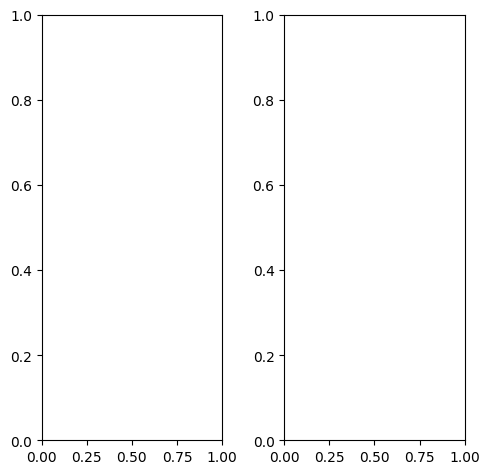

In [ ]:
a,b = trn_ds[0]
subplots([a,b], nc=2)

In [ ]:
class Identity(nn.Module):
    def __init__(self):
        super().__init__()
    def forward(self, x):
        return x

class DownConv(nn.Module):
    def __init__(self, ni, no, maxpool=True):
        super().__init__()
        self.model = nn.Sequential(
            nn.MaxPool2d(2) if maxpool else Identity(),
            nn.Conv2d(ni, no, 3, padding=1),
            nn.BatchNorm2d(no),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(no, no, 3, padding=1),
            nn.BatchNorm2d(no),
            nn.LeakyReLU(0.2, inplace=True),
        )
    def forward(self, x):
        return self.model(x)

class UpConv(nn.Module):
    def __init__(self, ni, no, maxpool=True):
        super().__init__()
        self.convtranspose = nn.ConvTranspose2d(ni, no, 2, stride=2)
        self.convlayers = nn.Sequential(
            nn.Conv2d(no+no, no, 3, padding=1),
            nn.BatchNorm2d(no),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(no, no, 3, padding=1),
            nn.BatchNorm2d(no),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x, y):
        x = self.convtranspose(x)
        x = torch.cat([x,y], axis=1)
        x = self.convlayers(x)
        return x

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.d1 = DownConv( 3, 64, maxpool=False)
        self.d2 = DownConv( 64, 128)
        self.d3 = DownConv( 128, 256)
        self.d4 = DownConv( 256, 512)
        self.d5 = DownConv( 512, 1024)
        self.u5 = UpConv (1024, 512)
        self.u4 = UpConv ( 512, 256)
        self.u3 = UpConv ( 256, 128)
        self.u2 = UpConv ( 128, 64)
        self.u1 = nn.Conv2d(64, 3, kernel_size=1, stride=1)

    def forward(self, x):
        x0 = self.d1( x) # 32
        x1 = self.d2(x0) # 16
        x2 = self.d3(x1) # 8
        x3 = self.d4(x2) # 4
        x4 = self.d5(x3) # 2
        X4 = self.u5(x4, x3)# 4
        X3 = self.u4(X4, x2)# 8
        X2 = self.u3(X3, x1)# 16
        X1 = self.u2(X2, x0)# 32
        X0 = self.u1(X1) # 3
        return X0

In [ ]:
def get_model():
    model = UNet().to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    loss_fn = nn.MSELoss()
    return model, optimizer, loss_fn

In [ ]:
def train_batch(model, data, optimizer, criterion):
    model.train()
    x, y = data
    _y = model(x)
    optimizer.zero_grad()
    loss = criterion(_y, y)
    loss.backward()
    optimizer.step()
    return loss.item()

@torch.no_grad()
def validate_batch(model, data, criterion):
    model.eval()
    x, y = data
    _y = model(x)
    loss = criterion(_y, y)
    return loss.item()

EPOCH: 0.255  trn_loss: 0.008  (31.79s - 12431.55s remaining)

tensor([[[0.4392, 0.4510, 0.4549,  ..., 0.5137, 0.5098, 0.5020],
         [0.4392, 0.4510, 0.4549,  ..., 0.5176, 0.5137, 0.5059],
         [0.4471, 0.4510, 0.4627,  ..., 0.5176, 0.5137, 0.5098],
         ...,
         [0.1059, 0.1020, 0.1020,  ..., 0.1333, 0.1412, 0.1373],
         [0.0824, 0.1059, 0.1020,  ..., 0.1216, 0.1255, 0.1294],
         [0.0745, 0.0902, 0.1176,  ..., 0.1137, 0.1137, 0.1255]],

        [[0.4392, 0.4510, 0.4549,  ..., 0.5137, 0.5098, 0.5020],
         [0.4392, 0.4510, 0.4549,  ..., 0.5176, 0.5137, 0.5059],
         [0.4471, 0.4510, 0.4627,  ..., 0.5176, 0.5137, 0.5098],
         ...,
         [0.1059, 0.1020, 0.1020,  ..., 0.1333, 0.1412, 0.1373],
         [0.0824, 0.1059, 0.1020,  ..., 0.1216, 0.1255, 0.1294],
         [0.0745, 0.0902, 0.1176,  ..., 0.1137, 0.1137, 0.1255]],

        [[0.4392, 0.4510, 0.4549,  ..., 0.5137, 0.5098, 0.5020],
         [0.4392, 0.4510, 0.4549,  ..., 0.5176, 0.5137, 0.5059],
         [0.4471, 0.4510, 0.4627,  ..., 0.5176, 0.5137, 0.

tensor([[[0.3608, 0.3686, 0.3725,  ..., 0.4196, 0.4157, 0.4078],
         [0.3608, 0.3725, 0.3804,  ..., 0.4235, 0.4196, 0.4157],
         [0.3725, 0.3804, 0.4078,  ..., 0.4275, 0.4235, 0.4196],
         ...,
         [0.1059, 0.1020, 0.1059,  ..., 0.1333, 0.1451, 0.1412],
         [0.0784, 0.1020, 0.1098,  ..., 0.1216, 0.1255, 0.1294],
         [0.0745, 0.0902, 0.1294,  ..., 0.1137, 0.1137, 0.1255]],

        [[0.4549, 0.4667, 0.4745,  ..., 0.5333, 0.5294, 0.5216],
         [0.4549, 0.4627, 0.4706,  ..., 0.5373, 0.5333, 0.5255],
         [0.4627, 0.4667, 0.4745,  ..., 0.5373, 0.5333, 0.5294],
         ...,
         [0.1098, 0.1059, 0.1020,  ..., 0.1373, 0.1451, 0.1412],
         [0.0863, 0.1098, 0.1020,  ..., 0.1255, 0.1294, 0.1333],
         [0.0784, 0.0941, 0.1137,  ..., 0.1176, 0.1176, 0.1294]],

        [[0.5647, 0.5725, 0.5843,  ..., 0.6588, 0.6549, 0.6471],
         [0.5765, 0.5804, 0.5804,  ..., 0.6627, 0.6549, 0.6471],
         [0.5569, 0.5647, 0.5569,  ..., 0.6588, 0.6549, 0.

tensor([[[0.5406, 0.4783, 0.6037,  ..., 0.6023, 0.5350, 0.5432],
         [0.5399, 0.5282, 0.3625,  ..., 0.4917, 0.4744, 0.6663],
         [0.5489, 0.4351, 0.2503,  ..., 0.4190, 0.4198, 0.6753],
         ...,
         [0.2504, 0.2368, 0.2886,  ..., 0.2839, 0.3249, 0.2868],
         [0.2520, 0.2379, 0.2902,  ..., 0.3007, 0.3056, 0.2759],
         [0.1972, 0.1995, 0.2568,  ..., 0.2407, 0.2662, 0.1747]],

        [[0.5243, 0.4721, 0.6853,  ..., 0.6554, 0.6463, 0.4937],
         [0.5363, 0.4858, 0.5024,  ..., 0.5946, 0.5980, 0.5187],
         [0.5542, 0.4738, 0.4653,  ..., 0.4850, 0.5328, 0.5351],
         ...,
         [0.1386, 0.1235, 0.1601,  ..., 0.2159, 0.2357, 0.2502],
         [0.1831, 0.1774, 0.1934,  ..., 0.2534, 0.2269, 0.2212],
         [0.2103, 0.2230, 0.2299,  ..., 0.2536, 0.2502, 0.2024]],

        [[0.5921, 0.6051, 0.8524,  ..., 0.8240, 0.8085, 0.6384],
         [0.6012, 0.5939, 0.5845,  ..., 0.6807, 0.7179, 0.6638],
         [0.5741, 0.5971, 0.5322,  ..., 0.6316, 0.6740, 0.

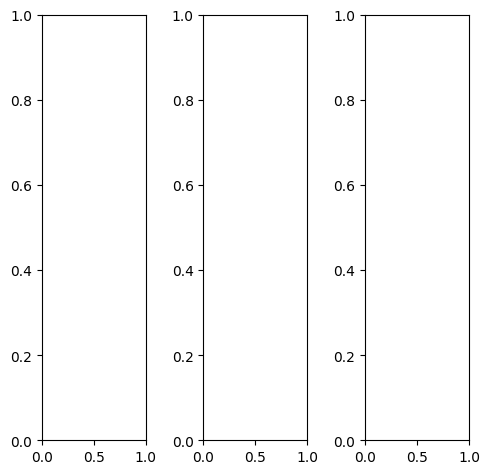

tensor([[[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.5098],
         ...,
         [0.3255, 0.2863, 0.3686,  ..., 0.3255, 0.3412, 0.3098],
         [0.3569, 0.3333, 0.3765,  ..., 0.3020, 0.3098, 0.2863],
         [0.4078, 0.4118, 0.4235,  ..., 0.2706, 0.2549, 0.2353]],

        [[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.5098],
         ...,
         [0.3255, 0.2863, 0.3686,  ..., 0.3255, 0.3412, 0.3098],
         [0.3569, 0.3333, 0.3765,  ..., 0.3020, 0.3098, 0.2863],
         [0.4078, 0.4118, 0.4235,  ..., 0.2706, 0.2549, 0.2353]],

        [[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.

tensor([[[0.1333, 0.1843, 0.2157,  ..., 0.1922, 0.2039, 0.3216],
         [0.1765, 0.2784, 0.3333,  ..., 0.2118, 0.2235, 0.3765],
         [0.2392, 0.3294, 0.3804,  ..., 0.4196, 0.3529, 0.5137],
         ...,
         [0.4000, 0.3608, 0.4275,  ..., 0.3804, 0.3922, 0.3647],
         [0.4275, 0.4196, 0.4510,  ..., 0.3569, 0.3647, 0.3412],
         [0.4784, 0.4980, 0.5098,  ..., 0.3255, 0.3059, 0.2863]],

        [[0.1608, 0.1843, 0.2745,  ..., 0.2941, 0.2745, 0.3608],
         [0.2549, 0.3176, 0.4235,  ..., 0.3373, 0.3137, 0.4196],
         [0.3020, 0.3843, 0.5216,  ..., 0.6235, 0.4824, 0.5255],
         ...,
         [0.3059, 0.2706, 0.3608,  ..., 0.3216, 0.3333, 0.3020],
         [0.3412, 0.3137, 0.3647,  ..., 0.2941, 0.2980, 0.2745],
         [0.3961, 0.3922, 0.4039,  ..., 0.2627, 0.2431, 0.2235]],

        [[0.1059, 0.1373, 0.2078,  ..., 0.2000, 0.1765, 0.2627],
         [0.1608, 0.2275, 0.3137,  ..., 0.2510, 0.2078, 0.3020],
         [0.1961, 0.2667, 0.3647,  ..., 0.5098, 0.3529, 0.

tensor([[[0.2450, 0.2562, 0.3149,  ..., 0.1720, 0.1794, 0.3122],
         [0.2359, 0.2750, 0.4517,  ..., 0.1792, 0.1702, 0.3788],
         [0.3661, 0.3952, 0.4650,  ..., 0.4757, 0.3723, 0.5720],
         ...,
         [0.3551, 0.3485, 0.3667,  ..., 0.3799, 0.4074, 0.3274],
         [0.3411, 0.3723, 0.4268,  ..., 0.3771, 0.3721, 0.3495],
         [0.4280, 0.4777, 0.5690,  ..., 0.2900, 0.2654, 0.1978]],

        [[0.2370, 0.2404, 0.3956,  ..., 0.2036, 0.2811, 0.3439],
         [0.2626, 0.3382, 0.5160,  ..., 0.2102, 0.2902, 0.3010],
         [0.3303, 0.3993, 0.5210,  ..., 0.5072, 0.4683, 0.4364],
         ...,
         [0.3447, 0.3217, 0.3889,  ..., 0.3944, 0.3684, 0.2824],
         [0.3729, 0.3546, 0.3635,  ..., 0.3346, 0.2941, 0.2657],
         [0.4350, 0.4421, 0.4812,  ..., 0.3002, 0.2714, 0.2322]],

        [[0.3657, 0.3138, 0.5069,  ..., 0.3864, 0.4071, 0.4311],
         [0.3576, 0.3633, 0.5946,  ..., 0.3283, 0.3606, 0.4555],
         [0.4012, 0.4140, 0.5962,  ..., 0.6548, 0.5629, 0.

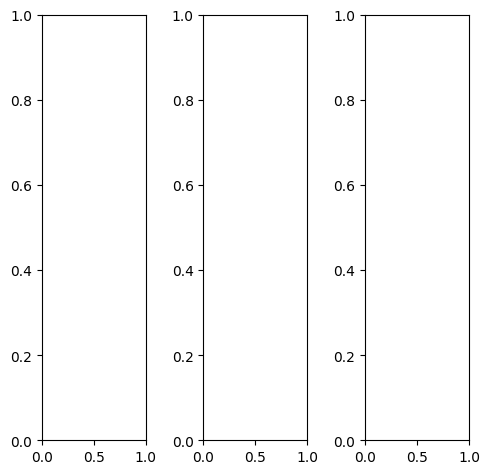

tensor([[[0.4392, 0.4392, 0.4471,  ..., 0.4784, 0.4706, 0.4667],
         [0.4588, 0.4549, 0.4667,  ..., 0.5020, 0.4902, 0.4157],
         [0.4706, 0.4667, 0.4745,  ..., 0.5098, 0.4863, 0.3176],
         ...,
         [0.4275, 0.3765, 0.3176,  ..., 0.5961, 0.6392, 0.6863],
         [0.3647, 0.3647, 0.3569,  ..., 0.7059, 0.6902, 0.6824],
         [0.4196, 0.4039, 0.3529,  ..., 0.7294, 0.6784, 0.6157]],

        [[0.4392, 0.4392, 0.4471,  ..., 0.4784, 0.4706, 0.4667],
         [0.4588, 0.4549, 0.4667,  ..., 0.5020, 0.4902, 0.4157],
         [0.4706, 0.4667, 0.4745,  ..., 0.5098, 0.4863, 0.3176],
         ...,
         [0.4275, 0.3765, 0.3176,  ..., 0.5961, 0.6392, 0.6863],
         [0.3647, 0.3647, 0.3569,  ..., 0.7059, 0.6902, 0.6824],
         [0.4196, 0.4039, 0.3529,  ..., 0.7294, 0.6784, 0.6157]],

        [[0.4392, 0.4392, 0.4471,  ..., 0.4784, 0.4706, 0.4667],
         [0.4588, 0.4549, 0.4667,  ..., 0.5020, 0.4902, 0.4157],
         [0.4706, 0.4667, 0.4745,  ..., 0.5098, 0.4863, 0.

tensor([[[0.3137, 0.3176, 0.3255,  ..., 0.3608, 0.3608, 0.3569],
         [0.3373, 0.3373, 0.3451,  ..., 0.3843, 0.3804, 0.3137],
         [0.3529, 0.3529, 0.3608,  ..., 0.3961, 0.3843, 0.2275],
         ...,
         [0.4510, 0.4039, 0.3451,  ..., 0.6314, 0.6667, 0.7137],
         [0.3922, 0.3922, 0.3843,  ..., 0.7412, 0.7137, 0.7098],
         [0.4471, 0.4314, 0.3804,  ..., 0.7608, 0.7059, 0.6431]],

        [[0.4667, 0.4667, 0.4745,  ..., 0.5020, 0.4941, 0.4941],
         [0.4863, 0.4824, 0.4941,  ..., 0.5255, 0.5176, 0.4549],
         [0.4941, 0.4941, 0.5020,  ..., 0.5333, 0.5176, 0.3608],
         ...,
         [0.4275, 0.3765, 0.3137,  ..., 0.5882, 0.6353, 0.6824],
         [0.3647, 0.3647, 0.3529,  ..., 0.6980, 0.6863, 0.6784],
         [0.4196, 0.4039, 0.3529,  ..., 0.7216, 0.6745, 0.6118]],

        [[0.6275, 0.6235, 0.6353,  ..., 0.6588, 0.6431, 0.6000],
         [0.6392, 0.6353, 0.6471,  ..., 0.6745, 0.6353, 0.4902],
         [0.6431, 0.6392, 0.6471,  ..., 0.6824, 0.6078, 0.

tensor([[[0.3354, 0.3261, 0.3286,  ..., 0.3066, 0.3224, 0.3112],
         [0.2982, 0.3389, 0.3713,  ..., 0.3452, 0.3909, 0.3508],
         [0.3773, 0.3579, 0.3988,  ..., 0.4136, 0.4312, 0.3201],
         ...,
         [0.2309, 0.3015, 0.2984,  ..., 0.4598, 0.5200, 0.5569],
         [0.2370, 0.2699, 0.3175,  ..., 0.6838, 0.6560, 0.6453],
         [0.3147, 0.2918, 0.2917,  ..., 0.7497, 0.7536, 0.5288]],

        [[0.3849, 0.3371, 0.4328,  ..., 0.3903, 0.4069, 0.3613],
         [0.3608, 0.3904, 0.4300,  ..., 0.4143, 0.4156, 0.3093],
         [0.4305, 0.4118, 0.4477,  ..., 0.4860, 0.4085, 0.2937],
         ...,
         [0.2770, 0.2925, 0.2491,  ..., 0.5373, 0.5633, 0.5016],
         [0.2782, 0.2789, 0.2681,  ..., 0.6712, 0.6636, 0.5466],
         [0.3392, 0.2908, 0.3000,  ..., 0.6899, 0.6684, 0.5181]],

        [[0.4631, 0.4201, 0.5512,  ..., 0.4973, 0.5094, 0.4276],
         [0.4617, 0.4326, 0.4660,  ..., 0.4806, 0.4465, 0.3605],
         [0.4657, 0.4013, 0.4945,  ..., 0.4712, 0.4759, 0.

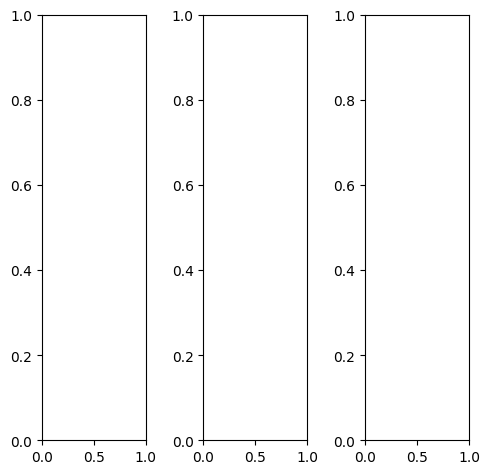

tensor([[[0.3020, 0.3373, 0.3608,  ..., 0.4431, 0.4549, 0.4510],
         [0.2980, 0.3216, 0.3216,  ..., 0.4078, 0.4039, 0.4039],
         [0.3059, 0.3255, 0.3333,  ..., 0.4157, 0.4157, 0.4157],
         ...,
         [0.9373, 0.9294, 0.9294,  ..., 0.9373, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9451, 0.9490, 0.9490],
         [0.9451, 0.9373, 0.9451,  ..., 0.9490, 0.9569, 0.9490]],

        [[0.3020, 0.3373, 0.3608,  ..., 0.4431, 0.4549, 0.4510],
         [0.2980, 0.3216, 0.3216,  ..., 0.4078, 0.4039, 0.4039],
         [0.3059, 0.3255, 0.3333,  ..., 0.4157, 0.4157, 0.4157],
         ...,
         [0.9373, 0.9294, 0.9294,  ..., 0.9373, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9451, 0.9490, 0.9490],
         [0.9451, 0.9373, 0.9451,  ..., 0.9490, 0.9569, 0.9490]],

        [[0.3020, 0.3373, 0.3608,  ..., 0.4431, 0.4549, 0.4510],
         [0.2980, 0.3216, 0.3216,  ..., 0.4078, 0.4039, 0.4039],
         [0.3059, 0.3255, 0.3333,  ..., 0.4157, 0.4157, 0.

tensor([[[0.3098, 0.3373, 0.3608,  ..., 0.4510, 0.4706, 0.4667],
         [0.3098, 0.3255, 0.3294,  ..., 0.4196, 0.4196, 0.4196],
         [0.3176, 0.3333, 0.3490,  ..., 0.4314, 0.4314, 0.4314],
         ...,
         [0.9373, 0.9294, 0.9294,  ..., 0.9373, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9451, 0.9490, 0.9490],
         [0.9451, 0.9373, 0.9451,  ..., 0.9490, 0.9569, 0.9490]],

        [[0.2980, 0.3412, 0.3608,  ..., 0.4392, 0.4471, 0.4431],
         [0.2941, 0.3216, 0.3176,  ..., 0.4000, 0.3961, 0.3961],
         [0.3020, 0.3255, 0.3294,  ..., 0.4078, 0.4078, 0.4078],
         ...,
         [0.9373, 0.9294, 0.9294,  ..., 0.9373, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9451, 0.9490, 0.9490],
         [0.9451, 0.9373, 0.9451,  ..., 0.9490, 0.9569, 0.9490]],

        [[0.2941, 0.3333, 0.3529,  ..., 0.4510, 0.4627, 0.4588],
         [0.2824, 0.3098, 0.3137,  ..., 0.4118, 0.4078, 0.4078],
         [0.2902, 0.3098, 0.3255,  ..., 0.4157, 0.4157, 0.

tensor([[[0.2430, 0.2570, 0.2861,  ..., 0.3133, 0.3273, 0.2888],
         [0.1305, 0.1032, 0.1488,  ..., 0.2255, 0.2838, 0.2597],
         [0.1264, 0.1059, 0.1294,  ..., 0.2230, 0.2604, 0.2760],
         ...,
         [0.8046, 0.6462, 0.5595,  ..., 0.5203, 0.6561, 0.7065],
         [0.7500, 0.7171, 0.6162,  ..., 0.6245, 0.7207, 0.7528],
         [0.7306, 0.7388, 0.7570,  ..., 0.6799, 0.7776, 0.5817]],

        [[0.2062, 0.2117, 0.2334,  ..., 0.2963, 0.3152, 0.3014],
         [0.1495, 0.1326, 0.1203,  ..., 0.2620, 0.2762, 0.2200],
         [0.1295, 0.0903, 0.0844,  ..., 0.2147, 0.1913, 0.1804],
         ...,
         [0.7277, 0.6095, 0.5266,  ..., 0.5871, 0.6549, 0.7953],
         [0.6735, 0.6586, 0.5211,  ..., 0.5716, 0.7149, 0.7258],
         [0.6159, 0.6626, 0.6392,  ..., 0.6496, 0.7148, 0.6073]],

        [[0.3924, 0.3431, 0.4133,  ..., 0.4570, 0.4741, 0.4210],
         [0.3828, 0.3068, 0.2897,  ..., 0.4080, 0.3887, 0.3493],
         [0.3454, 0.2782, 0.2636,  ..., 0.3525, 0.3897, 0.

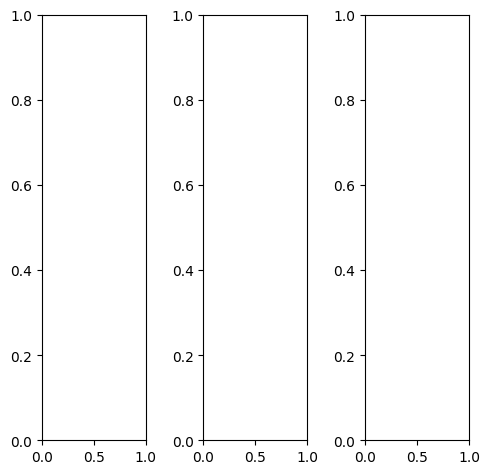

tensor([[[0.5412, 0.5294, 0.5176,  ..., 0.1882, 0.1216, 0.0510],
         [0.5294, 0.5294, 0.4980,  ..., 0.0941, 0.0667, 0.0941],
         [0.4902, 0.4706, 0.3922,  ..., 0.0510, 0.1059, 0.3059],
         ...,
         [0.1765, 0.2196, 0.3020,  ..., 0.6863, 0.6745, 0.6706],
         [0.3020, 0.4000, 0.4510,  ..., 0.6627, 0.6588, 0.6706],
         [0.4078, 0.4941, 0.4941,  ..., 0.6510, 0.6431, 0.6471]],

        [[0.5412, 0.5294, 0.5176,  ..., 0.1882, 0.1216, 0.0510],
         [0.5294, 0.5294, 0.4980,  ..., 0.0941, 0.0667, 0.0941],
         [0.4902, 0.4706, 0.3922,  ..., 0.0510, 0.1059, 0.3059],
         ...,
         [0.1765, 0.2196, 0.3020,  ..., 0.6863, 0.6745, 0.6706],
         [0.3020, 0.4000, 0.4510,  ..., 0.6627, 0.6588, 0.6706],
         [0.4078, 0.4941, 0.4941,  ..., 0.6510, 0.6431, 0.6471]],

        [[0.5412, 0.5294, 0.5176,  ..., 0.1882, 0.1216, 0.0510],
         [0.5294, 0.5294, 0.4980,  ..., 0.0941, 0.0667, 0.0941],
         [0.4902, 0.4706, 0.3922,  ..., 0.0510, 0.1059, 0.

tensor([[[0.5176, 0.5098, 0.4941,  ..., 0.1804, 0.1137, 0.0471],
         [0.5137, 0.5137, 0.4824,  ..., 0.0824, 0.0510, 0.0784],
         [0.4824, 0.4667, 0.3843,  ..., 0.0353, 0.0784, 0.2745],
         ...,
         [0.2000, 0.2588, 0.3529,  ..., 0.7451, 0.7333, 0.7294],
         [0.3373, 0.4431, 0.5059,  ..., 0.7216, 0.7176, 0.7294],
         [0.4667, 0.5490, 0.5529,  ..., 0.7098, 0.7020, 0.7098]],

        [[0.5412, 0.5255, 0.5216,  ..., 0.1922, 0.1255, 0.0588],
         [0.5333, 0.5294, 0.5059,  ..., 0.1020, 0.0745, 0.1059],
         [0.4941, 0.4745, 0.4000,  ..., 0.0627, 0.1176, 0.3176],
         ...,
         [0.1725, 0.2118, 0.2941,  ..., 0.6745, 0.6667, 0.6588],
         [0.2980, 0.3922, 0.4392,  ..., 0.6471, 0.6471, 0.6549],
         [0.4000, 0.4824, 0.4824,  ..., 0.6353, 0.6275, 0.6314]],

        [[0.5922, 0.6039, 0.5451,  ..., 0.1843, 0.1098, 0.0235],
         [0.5490, 0.5647, 0.4941,  ..., 0.0863, 0.0627, 0.0902],
         [0.4784, 0.4667, 0.3569,  ..., 0.0353, 0.1137, 0.

tensor([[[0.5344, 0.5024, 0.5367,  ..., 0.2229, 0.2259, 0.2291],
         [0.5488, 0.6191, 0.4886,  ..., 0.1231, 0.1713, 0.1934],
         [0.4666, 0.5564, 0.4502,  ..., 0.1422, 0.2205, 0.3200],
         ...,
         [0.2483, 0.3224, 0.3732,  ..., 0.5665, 0.6275, 0.6646],
         [0.3301, 0.4607, 0.5370,  ..., 0.6049, 0.6875, 0.6861],
         [0.4309, 0.5755, 0.6195,  ..., 0.6502, 0.6981, 0.5626]],

        [[0.5613, 0.5323, 0.6693,  ..., 0.2254, 0.2322, 0.2565],
         [0.5997, 0.6588, 0.5553,  ..., 0.1416, 0.1865, 0.2220],
         [0.4930, 0.5405, 0.4511,  ..., 0.1429, 0.2168, 0.2775],
         ...,
         [0.2931, 0.3226, 0.3959,  ..., 0.6071, 0.6025, 0.7140],
         [0.4077, 0.5172, 0.5604,  ..., 0.5565, 0.6559, 0.6662],
         [0.4535, 0.5837, 0.5972,  ..., 0.6017, 0.6275, 0.5528]],

        [[0.5710, 0.6327, 0.7484,  ..., 0.3278, 0.3347, 0.3278],
         [0.6152, 0.7156, 0.6458,  ..., 0.2545, 0.2448, 0.2952],
         [0.5186, 0.6174, 0.5579,  ..., 0.1693, 0.2624, 0.

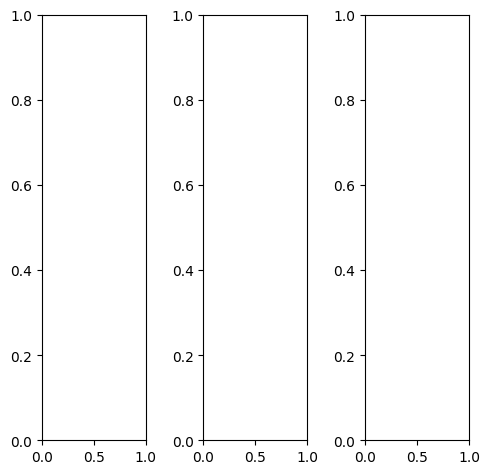

EPOCH: 0.510  trn_loss: 0.007  (58.18s - 11344.79s remaining)

tensor([[[0.9961, 1.0000, 1.0000,  ..., 0.3843, 0.3725, 0.2549],
         [0.9922, 1.0000, 0.9961,  ..., 0.3255, 0.2118, 0.2000],
         [0.9922, 1.0000, 0.9961,  ..., 0.2118, 0.2353, 0.3490],
         ...,
         [0.4980, 0.5059, 0.4902,  ..., 1.0000, 1.0000, 1.0000],
         [0.4667, 0.4588, 0.4431,  ..., 1.0000, 1.0000, 0.9922],
         [0.4588, 0.4627, 0.4510,  ..., 1.0000, 0.9922, 0.9804]],

        [[0.9961, 1.0000, 1.0000,  ..., 0.3843, 0.3725, 0.2549],
         [0.9922, 1.0000, 0.9961,  ..., 0.3255, 0.2118, 0.2000],
         [0.9922, 1.0000, 0.9961,  ..., 0.2118, 0.2353, 0.3490],
         ...,
         [0.4980, 0.5059, 0.4902,  ..., 1.0000, 1.0000, 1.0000],
         [0.4667, 0.4588, 0.4431,  ..., 1.0000, 1.0000, 0.9922],
         [0.4588, 0.4627, 0.4510,  ..., 1.0000, 0.9922, 0.9804]],

        [[0.9961, 1.0000, 1.0000,  ..., 0.3843, 0.3725, 0.2549],
         [0.9922, 1.0000, 0.9961,  ..., 0.3255, 0.2118, 0.2000],
         [0.9922, 1.0000, 0.9961,  ..., 0.2118, 0.2353, 0.

tensor([[[0.9961, 1.0000, 1.0000,  ..., 0.4078, 0.3961, 0.2784],
         [0.9922, 1.0000, 0.9922,  ..., 0.3412, 0.2314, 0.2235],
         [0.9922, 1.0000, 0.9961,  ..., 0.2353, 0.2510, 0.3686],
         ...,
         [0.5020, 0.5098, 0.4941,  ..., 1.0000, 1.0000, 0.9961],
         [0.4784, 0.4706, 0.4549,  ..., 1.0000, 1.0000, 0.9843],
         [0.4627, 0.4706, 0.4588,  ..., 0.9961, 0.9882, 0.9686]],

        [[0.9961, 1.0000, 1.0000,  ..., 0.3922, 0.3765, 0.2588],
         [0.9922, 1.0000, 0.9961,  ..., 0.3333, 0.2196, 0.2118],
         [0.9922, 1.0000, 0.9961,  ..., 0.2235, 0.2471, 0.3725],
         ...,
         [0.5490, 0.5569, 0.5333,  ..., 1.0000, 1.0000, 1.0000],
         [0.5216, 0.5176, 0.4980,  ..., 1.0000, 1.0000, 0.9961],
         [0.5176, 0.5176, 0.5020,  ..., 1.0000, 0.9961, 0.9843]],

        [[0.9961, 1.0000, 1.0000,  ..., 0.2941, 0.2784, 0.1647],
         [0.9922, 1.0000, 0.9961,  ..., 0.2471, 0.1059, 0.0902],
         [0.9922, 1.0000, 0.9961,  ..., 0.1059, 0.1176, 0.

tensor([[[0.5850, 0.6601, 0.7515,  ..., 0.2050, 0.2106, 0.2237],
         [0.7421, 0.7572, 0.6881,  ..., 0.1803, 0.1473, 0.1905],
         [0.7104, 0.7646, 0.7643,  ..., 0.1204, 0.1834, 0.2895],
         ...,
         [0.4096, 0.4620, 0.4078,  ..., 0.7464, 0.8164, 0.7931],
         [0.3753, 0.3952, 0.3323,  ..., 0.7436, 0.8500, 0.7710],
         [0.3973, 0.4211, 0.3828,  ..., 0.8008, 0.7924, 0.6537]],

        [[0.6312, 0.7045, 0.9029,  ..., 0.3113, 0.3068, 0.3177],
         [0.6995, 0.7180, 0.7536,  ..., 0.2662, 0.2151, 0.2224],
         [0.7614, 0.7683, 0.7933,  ..., 0.2134, 0.1891, 0.2511],
         ...,
         [0.4742, 0.5201, 0.4813,  ..., 0.8018, 0.7769, 0.8990],
         [0.4394, 0.4511, 0.3973,  ..., 0.7437, 0.7876, 0.8325],
         [0.4487, 0.4347, 0.4002,  ..., 0.7610, 0.7205, 0.6495]],

        [[0.7475, 0.8530, 0.9340,  ..., 0.4639, 0.4386, 0.4087],
         [0.8734, 0.9055, 0.8718,  ..., 0.4485, 0.3503, 0.3378],
         [0.8547, 0.8635, 0.8477,  ..., 0.3452, 0.3649, 0.

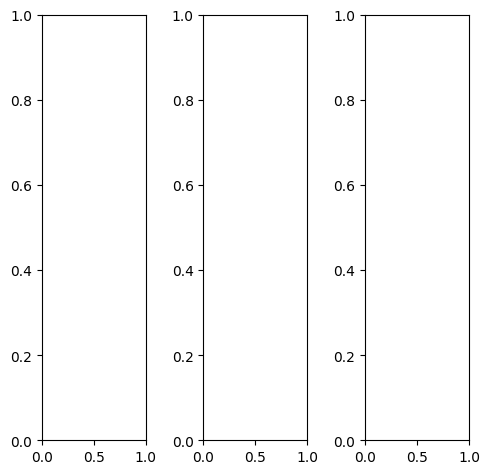

tensor([[[0.0039, 0.0000, 0.0039,  ..., 0.1686, 0.2549, 0.2980],
         [0.0000, 0.0000, 0.0039,  ..., 0.1686, 0.2431, 0.2549],
         [0.0000, 0.0000, 0.0118,  ..., 0.1725, 0.2157, 0.2235],
         ...,
         [0.7059, 0.6588, 0.6392,  ..., 0.7725, 0.7647, 0.7804],
         [0.6627, 0.6353, 0.6118,  ..., 0.7961, 0.8275, 0.7804],
         [0.6392, 0.6118, 0.6078,  ..., 0.8235, 0.8275, 0.7647]],

        [[0.0039, 0.0000, 0.0039,  ..., 0.1686, 0.2549, 0.2980],
         [0.0000, 0.0000, 0.0039,  ..., 0.1686, 0.2431, 0.2549],
         [0.0000, 0.0000, 0.0118,  ..., 0.1725, 0.2157, 0.2235],
         ...,
         [0.7059, 0.6588, 0.6392,  ..., 0.7725, 0.7647, 0.7804],
         [0.6627, 0.6353, 0.6118,  ..., 0.7961, 0.8275, 0.7804],
         [0.6392, 0.6118, 0.6078,  ..., 0.8235, 0.8275, 0.7647]],

        [[0.0039, 0.0000, 0.0039,  ..., 0.1686, 0.2549, 0.2980],
         [0.0000, 0.0000, 0.0039,  ..., 0.1686, 0.2431, 0.2549],
         [0.0000, 0.0000, 0.0118,  ..., 0.1725, 0.2157, 0.

tensor([[[0.0039, 0.0000, 0.0039,  ..., 0.1686, 0.2510, 0.2980],
         [0.0000, 0.0039, 0.0039,  ..., 0.1725, 0.2392, 0.2549],
         [0.0000, 0.0000, 0.0118,  ..., 0.1843, 0.2118, 0.2235],
         ...,
         [0.7804, 0.7373, 0.7020,  ..., 0.7412, 0.7333, 0.7490],
         [0.7373, 0.7020, 0.6549,  ..., 0.7647, 0.7961, 0.7490],
         [0.6941, 0.6510, 0.6157,  ..., 0.7922, 0.7961, 0.7333]],

        [[0.0039, 0.0000, 0.0039,  ..., 0.1765, 0.2667, 0.3059],
         [0.0000, 0.0000, 0.0039,  ..., 0.1725, 0.2510, 0.2627],
         [0.0000, 0.0000, 0.0118,  ..., 0.1765, 0.2235, 0.2314],
         ...,
         [0.6745, 0.6314, 0.6196,  ..., 0.7804, 0.7725, 0.7882],
         [0.6353, 0.6118, 0.5961,  ..., 0.8039, 0.8353, 0.7882],
         [0.6196, 0.5961, 0.6000,  ..., 0.8314, 0.8353, 0.7725]],

        [[0.0039, 0.0000, 0.0039,  ..., 0.1412, 0.2118, 0.2588],
         [0.0000, 0.0039, 0.0039,  ..., 0.1333, 0.1961, 0.2196],
         [0.0000, 0.0000, 0.0118,  ..., 0.1333, 0.1725, 0.

tensor([[[ 0.1752,  0.0742,  0.0931,  ...,  0.1995,  0.2961,  0.3083],
         [ 0.0473, -0.0880, -0.0776,  ...,  0.1497,  0.2575,  0.2873],
         [ 0.0401, -0.1049, -0.0564,  ...,  0.1773,  0.2558,  0.2662],
         ...,
         [ 0.7054,  0.6043,  0.5827,  ...,  0.6760,  0.7297,  0.7591],
         [ 0.6361,  0.5826,  0.5397,  ...,  0.6743,  0.7904,  0.7297],
         [ 0.6423,  0.6674,  0.7286,  ...,  0.7622,  0.7741,  0.6263]],

        [[ 0.1462,  0.0800,  0.0800,  ...,  0.2424,  0.3099,  0.3452],
         [ 0.0454, -0.0455, -0.0394,  ...,  0.2179,  0.2784,  0.3008],
         [ 0.0526, -0.0592, -0.0481,  ...,  0.2169,  0.2150,  0.2484],
         ...,
         [ 0.6801,  0.5998,  0.5815,  ...,  0.7344,  0.6961,  0.8561],
         [ 0.6143,  0.5730,  0.5107,  ...,  0.6898,  0.7533,  0.7906],
         [ 0.5849,  0.6077,  0.6182,  ...,  0.7304,  0.7148,  0.6151]],

        [[ 0.2816,  0.2037,  0.2248,  ...,  0.2974,  0.3964,  0.4150],
         [ 0.2288,  0.1499,  0.1419,  ...,  0

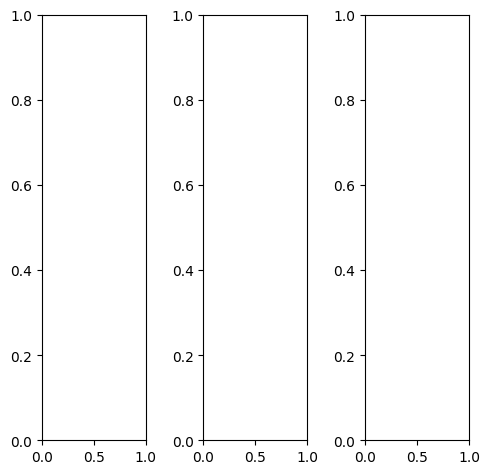

tensor([[[1.0000, 0.9922, 0.9961,  ..., 1.0000, 0.9961, 0.9922],
         [1.0000, 0.9333, 0.9059,  ..., 0.9216, 0.9373, 0.9804],
         [0.9961, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.9490],
         ...,
         [1.0000, 0.5294, 0.2118,  ..., 0.1216, 0.2824, 0.9137],
         [1.0000, 0.7922, 0.6667,  ..., 0.6549, 0.7216, 0.9647],
         [1.0000, 0.9882, 0.9922,  ..., 1.0000, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9961,  ..., 1.0000, 0.9961, 0.9922],
         [1.0000, 0.9333, 0.9059,  ..., 0.9216, 0.9373, 0.9804],
         [0.9961, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.9490],
         ...,
         [1.0000, 0.5294, 0.2118,  ..., 0.1216, 0.2824, 0.9137],
         [1.0000, 0.7922, 0.6667,  ..., 0.6549, 0.7216, 0.9647],
         [1.0000, 0.9882, 0.9922,  ..., 1.0000, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9961,  ..., 1.0000, 0.9961, 0.9922],
         [1.0000, 0.9333, 0.9059,  ..., 0.9216, 0.9373, 0.9804],
         [0.9961, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.

tensor([[[1.0000, 0.9922, 0.9961,  ..., 1.0000, 0.9961, 0.9922],
         [1.0000, 0.9333, 0.9059,  ..., 0.9216, 0.9373, 0.9804],
         [0.9922, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.9490],
         ...,
         [0.9961, 0.5216, 0.2000,  ..., 0.1176, 0.2784, 0.9098],
         [1.0000, 0.7922, 0.6706,  ..., 0.6549, 0.7216, 0.9647],
         [1.0000, 0.9882, 0.9922,  ..., 1.0000, 0.9922, 0.9922]],

        [[1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 0.9922],
         [1.0000, 0.9333, 0.9059,  ..., 0.9216, 0.9373, 0.9804],
         [0.9961, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.9490],
         ...,
         [1.0000, 0.5294, 0.2118,  ..., 0.1255, 0.2824, 0.9137],
         [1.0000, 0.7922, 0.6667,  ..., 0.6549, 0.7216, 0.9647],
         [1.0000, 0.9882, 0.9922,  ..., 1.0000, 0.9922, 0.9922]],

        [[0.9882, 0.9804, 0.9843,  ..., 1.0000, 0.9961, 0.9922],
         [0.9961, 0.9294, 0.9020,  ..., 0.9216, 0.9373, 0.9804],
         [0.9961, 0.6510, 0.4431,  ..., 0.5294, 0.6275, 0.

tensor([[[ 0.5355,  0.5724,  0.6409,  ...,  0.6299,  0.5683,  0.5681],
         [ 0.6510,  0.6479,  0.5588,  ...,  0.6525,  0.6061,  0.6568],
         [ 0.6110,  0.5217,  0.3380,  ...,  0.4648,  0.5794,  0.6763],
         ...,
         [ 0.5939,  0.3263,  0.0545,  ..., -0.0482,  0.1133,  0.6432],
         [ 0.5745,  0.5533,  0.3808,  ...,  0.4691,  0.5499,  0.7420],
         [ 0.6215,  0.6810,  0.7074,  ...,  0.7547,  0.7457,  0.5853]],

        [[ 0.5949,  0.6602,  0.8489,  ...,  0.7686,  0.7601,  0.6727],
         [ 0.6235,  0.7055,  0.6178,  ...,  0.6767,  0.7192,  0.8043],
         [ 0.6636,  0.5562,  0.3375,  ...,  0.4528,  0.5215,  0.7474],
         ...,
         [ 0.6008,  0.3921,  0.1164,  ..., -0.0410,  0.2214,  0.6410],
         [ 0.6152,  0.6131,  0.4301,  ...,  0.4698,  0.6777,  0.7263],
         [ 0.6110,  0.6564,  0.6252,  ...,  0.7061,  0.7273,  0.6258]],

        [[ 0.6564,  0.7526,  0.8276,  ...,  0.7701,  0.7730,  0.7048],
         [ 0.7356,  0.7786,  0.7383,  ...,  0

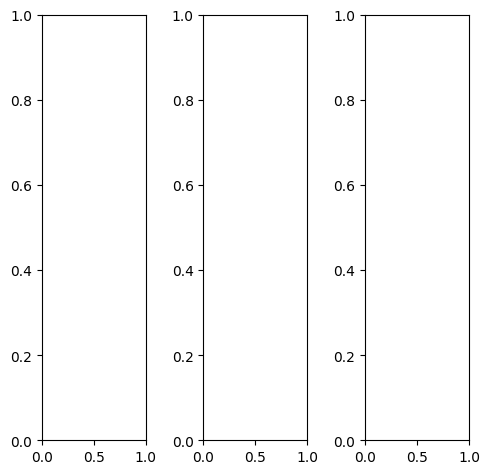

tensor([[[0.6235, 0.6275, 0.6510,  ..., 0.7725, 0.7608, 0.7569],
         [0.6471, 0.6510, 0.6706,  ..., 0.7961, 0.7843, 0.7804],
         [0.6706, 0.6784, 0.6980,  ..., 0.8157, 0.8078, 0.7961],
         ...,
         [0.0510, 0.0627, 0.0667,  ..., 0.0627, 0.0510, 0.0471],
         [0.0392, 0.0549, 0.0588,  ..., 0.0706, 0.0471, 0.0314],
         [0.0431, 0.0549, 0.0667,  ..., 0.0706, 0.0471, 0.0353]],

        [[0.6235, 0.6275, 0.6510,  ..., 0.7725, 0.7608, 0.7569],
         [0.6471, 0.6510, 0.6706,  ..., 0.7961, 0.7843, 0.7804],
         [0.6706, 0.6784, 0.6980,  ..., 0.8157, 0.8078, 0.7961],
         ...,
         [0.0510, 0.0627, 0.0667,  ..., 0.0627, 0.0510, 0.0471],
         [0.0392, 0.0549, 0.0588,  ..., 0.0706, 0.0471, 0.0314],
         [0.0431, 0.0549, 0.0667,  ..., 0.0706, 0.0471, 0.0353]],

        [[0.6235, 0.6275, 0.6510,  ..., 0.7725, 0.7608, 0.7569],
         [0.6471, 0.6510, 0.6706,  ..., 0.7961, 0.7843, 0.7804],
         [0.6706, 0.6784, 0.6980,  ..., 0.8157, 0.8078, 0.

tensor([[[0.4863, 0.4980, 0.5294,  ..., 0.6745, 0.6627, 0.6588],
         [0.5137, 0.5294, 0.5529,  ..., 0.7059, 0.6941, 0.6863],
         [0.5412, 0.5608, 0.5843,  ..., 0.7333, 0.7216, 0.7098],
         ...,
         [0.0549, 0.0745, 0.0824,  ..., 0.0627, 0.0471, 0.0431],
         [0.0431, 0.0667, 0.0745,  ..., 0.0588, 0.0392, 0.0275],
         [0.0471, 0.0667, 0.0824,  ..., 0.0588, 0.0392, 0.0314]],

        [[0.6588, 0.6627, 0.6824,  ..., 0.8039, 0.7882, 0.7804],
         [0.6824, 0.6863, 0.7020,  ..., 0.8235, 0.8118, 0.8039],
         [0.7059, 0.7098, 0.7294,  ..., 0.8392, 0.8314, 0.8235],
         ...,
         [0.0510, 0.0588, 0.0588,  ..., 0.0706, 0.0588, 0.0510],
         [0.0392, 0.0510, 0.0510,  ..., 0.0824, 0.0510, 0.0353],
         [0.0431, 0.0510, 0.0588,  ..., 0.0824, 0.0510, 0.0392]],

        [[0.7961, 0.7922, 0.8039,  ..., 0.8824, 0.8824, 0.8784],
         [0.8118, 0.8039, 0.8118,  ..., 0.8902, 0.8941, 0.8902],
         [0.8196, 0.8157, 0.8235,  ..., 0.8941, 0.9020, 0.

tensor([[[0.5313, 0.4733, 0.5121,  ..., 0.5833, 0.5062, 0.5689],
         [0.5860, 0.5458, 0.5217,  ..., 0.6484, 0.6015, 0.6941],
         [0.5987, 0.5567, 0.6028,  ..., 0.6800, 0.7525, 0.7530],
         ...,
         [0.1282, 0.1122, 0.1270,  ..., 0.1119, 0.1093, 0.1369],
         [0.1448, 0.1085, 0.1286,  ..., 0.1096, 0.1046, 0.1432],
         [0.1760, 0.1241, 0.1400,  ..., 0.1232, 0.1267, 0.1217]],

        [[0.5618, 0.5259, 0.6833,  ..., 0.6650, 0.6806, 0.6376],
         [0.5692, 0.5209, 0.5687,  ..., 0.6536, 0.7089, 0.7643],
         [0.6415, 0.5865, 0.6439,  ..., 0.7333, 0.7329, 0.7962],
         ...,
         [0.1950, 0.1508, 0.1588,  ..., 0.1555, 0.1476, 0.1747],
         [0.2111, 0.1940, 0.1861,  ..., 0.1940, 0.1565, 0.1640],
         [0.2481, 0.2101, 0.2249,  ..., 0.2152, 0.1882, 0.1930]],

        [[0.6393, 0.6812, 0.7435,  ..., 0.7460, 0.7520, 0.7127],
         [0.7153, 0.6844, 0.6841,  ..., 0.6883, 0.7606, 0.7218],
         [0.7336, 0.7027, 0.6776,  ..., 0.7520, 0.7488, 0.

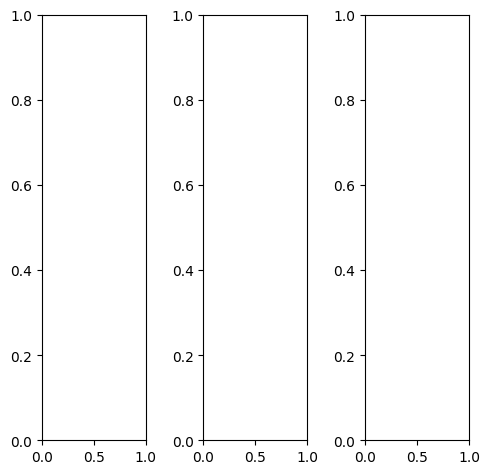

tensor([[[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.3490],
         ...,
         [0.5608, 0.4275, 0.4078,  ..., 0.3333, 0.3412, 0.3059],
         [0.3608, 0.2667, 0.2902,  ..., 0.2667, 0.3098, 0.2588],
         [0.2196, 0.1961, 0.1961,  ..., 0.1373, 0.1490, 0.1451]],

        [[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.3490],
         ...,
         [0.5608, 0.4275, 0.4078,  ..., 0.3333, 0.3412, 0.3059],
         [0.3608, 0.2667, 0.2902,  ..., 0.2667, 0.3098, 0.2588],
         [0.2196, 0.1961, 0.1961,  ..., 0.1373, 0.1490, 0.1451]],

        [[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.

tensor([[[0.3451, 0.3765, 0.4078,  ..., 0.4863, 0.5451, 0.5216],
         [0.2784, 0.2392, 0.2392,  ..., 0.2980, 0.3020, 0.2588],
         [0.2627, 0.2353, 0.2118,  ..., 0.3059, 0.2902, 0.2706],
         ...,
         [0.4863, 0.3686, 0.3529,  ..., 0.2471, 0.2549, 0.2392],
         [0.2863, 0.2118, 0.2353,  ..., 0.2000, 0.2431, 0.2000],
         [0.1490, 0.1451, 0.1451,  ..., 0.0824, 0.0941, 0.0941]],

        [[0.5451, 0.5451, 0.5647,  ..., 0.6392, 0.6980, 0.6588],
         [0.4588, 0.3882, 0.3804,  ..., 0.4118, 0.4157, 0.3647],
         [0.4235, 0.3686, 0.3373,  ..., 0.4000, 0.3843, 0.3608],
         ...,
         [0.5725, 0.4275, 0.4078,  ..., 0.3412, 0.3490, 0.3098],
         [0.3686, 0.2667, 0.2902,  ..., 0.2706, 0.3137, 0.2588],
         [0.2235, 0.1961, 0.2000,  ..., 0.1412, 0.1529, 0.1490]],

        [[0.8000, 0.7961, 0.8235,  ..., 0.8549, 0.9059, 0.8353],
         [0.7176, 0.6275, 0.6078,  ..., 0.6000, 0.5961, 0.5216],
         [0.6784, 0.5804, 0.5333,  ..., 0.5725, 0.5529, 0.

tensor([[[0.4711, 0.4600, 0.5513,  ..., 0.6152, 0.5980, 0.4847],
         [0.4212, 0.3010, 0.1608,  ..., 0.3643, 0.3104, 0.3997],
         [0.3922, 0.2303, 0.1500,  ..., 0.3893, 0.3710, 0.4103],
         ...,
         [0.6062, 0.4391, 0.3795,  ..., 0.2128, 0.2235, 0.1919],
         [0.3471, 0.1412, 0.1620,  ..., 0.1040, 0.1495, 0.1799],
         [0.2895, 0.1774, 0.1394,  ..., 0.0436, 0.0815, 0.0884]],

        [[0.5183, 0.5005, 0.6802,  ..., 0.7090, 0.7246, 0.5415],
         [0.4363, 0.3425, 0.3297,  ..., 0.4344, 0.4384, 0.4142],
         [0.4487, 0.2639, 0.2353,  ..., 0.4564, 0.3507, 0.3528],
         ...,
         [0.6312, 0.3814, 0.3530,  ..., 0.2184, 0.2169, 0.2118],
         [0.3442, 0.1394, 0.1356,  ..., 0.1487, 0.1621, 0.1869],
         [0.3190, 0.1431, 0.1166,  ..., 0.0932, 0.1072, 0.1265]],

        [[0.5654, 0.6164, 0.7958,  ..., 0.8385, 0.8237, 0.6417],
         [0.5582, 0.4811, 0.4694,  ..., 0.5362, 0.5577, 0.5137],
         [0.4662, 0.3462, 0.3262,  ..., 0.5026, 0.4756, 0.

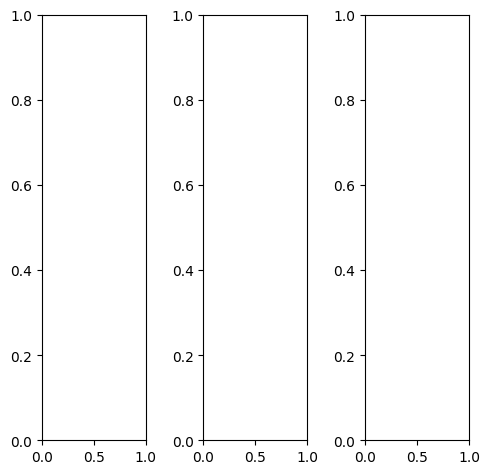

EPOCH: 0.765  trn_loss: 0.007  (86.33s - 11194.62s remaining)

tensor([[[0.1020, 0.1294, 0.1765,  ..., 0.1216, 0.1176, 0.1059],
         [0.0941, 0.1176, 0.1176,  ..., 0.1333, 0.1216, 0.1098],
         [0.1216, 0.1216, 0.1137,  ..., 0.1490, 0.1294, 0.0902],
         ...,
         [0.3216, 0.3490, 0.3255,  ..., 0.3098, 0.2706, 0.2745],
         [0.2980, 0.3255, 0.2980,  ..., 0.2863, 0.2275, 0.2196],
         [0.3294, 0.3373, 0.3451,  ..., 0.2549, 0.2392, 0.2157]],

        [[0.1020, 0.1294, 0.1765,  ..., 0.1216, 0.1176, 0.1059],
         [0.0941, 0.1176, 0.1176,  ..., 0.1333, 0.1216, 0.1098],
         [0.1216, 0.1216, 0.1137,  ..., 0.1490, 0.1294, 0.0902],
         ...,
         [0.3216, 0.3490, 0.3255,  ..., 0.3098, 0.2706, 0.2745],
         [0.2980, 0.3255, 0.2980,  ..., 0.2863, 0.2275, 0.2196],
         [0.3294, 0.3373, 0.3451,  ..., 0.2549, 0.2392, 0.2157]],

        [[0.1020, 0.1294, 0.1765,  ..., 0.1216, 0.1176, 0.1059],
         [0.0941, 0.1176, 0.1176,  ..., 0.1333, 0.1216, 0.1098],
         [0.1216, 0.1216, 0.1137,  ..., 0.1490, 0.1294, 0.

tensor([[[0.1059, 0.1333, 0.1647,  ..., 0.1216, 0.1176, 0.1098],
         [0.0902, 0.1294, 0.1176,  ..., 0.1333, 0.1216, 0.1137],
         [0.1137, 0.1333, 0.1255,  ..., 0.1490, 0.1294, 0.0902],
         ...,
         [0.3176, 0.3490, 0.3255,  ..., 0.3059, 0.2706, 0.2706],
         [0.2980, 0.3255, 0.2980,  ..., 0.2745, 0.2157, 0.2118],
         [0.3294, 0.3373, 0.3451,  ..., 0.2392, 0.2235, 0.2078]],

        [[0.1020, 0.1255, 0.1843,  ..., 0.1216, 0.1176, 0.1059],
         [0.0980, 0.1137, 0.1216,  ..., 0.1333, 0.1216, 0.1098],
         [0.1255, 0.1176, 0.1137,  ..., 0.1490, 0.1294, 0.0902],
         ...,
         [0.3294, 0.3569, 0.3333,  ..., 0.3176, 0.2784, 0.2784],
         [0.3059, 0.3333, 0.3059,  ..., 0.2980, 0.2431, 0.2275],
         [0.3373, 0.3451, 0.3529,  ..., 0.2745, 0.2549, 0.2275]],

        [[0.0980, 0.1255, 0.1569,  ..., 0.1137, 0.1098, 0.1020],
         [0.0902, 0.1176, 0.1020,  ..., 0.1255, 0.1137, 0.1059],
         [0.1137, 0.1176, 0.0980,  ..., 0.1412, 0.1216, 0.

tensor([[[0.1404, 0.1465, 0.1570,  ..., 0.0941, 0.1414, 0.1546],
         [0.0383, 0.0329, 0.0411,  ..., 0.1366, 0.1070, 0.1315],
         [0.0620, 0.0457, 0.0411,  ..., 0.0670, 0.1586, 0.0996],
         ...,
         [0.4189, 0.4542, 0.3760,  ..., 0.3581, 0.2981, 0.3012],
         [0.3789, 0.4012, 0.3531,  ..., 0.2998, 0.2498, 0.2898],
         [0.3783, 0.4310, 0.4446,  ..., 0.2689, 0.2514, 0.2160]],

        [[0.1934, 0.1697, 0.1989,  ..., 0.2085, 0.1834, 0.2252],
         [0.1175, 0.0903, 0.1043,  ..., 0.2205, 0.1856, 0.1942],
         [0.1385, 0.0874, 0.0747,  ..., 0.2155, 0.1405, 0.1669],
         ...,
         [0.4280, 0.4447, 0.4517,  ..., 0.4026, 0.3492, 0.3351],
         [0.4304, 0.4166, 0.3716,  ..., 0.3566, 0.2721, 0.2604],
         [0.4327, 0.4402, 0.4408,  ..., 0.3203, 0.2650, 0.2660]],

        [[0.3065, 0.3077, 0.3623,  ..., 0.3171, 0.3366, 0.3392],
         [0.2838, 0.3083, 0.2896,  ..., 0.2819, 0.3041, 0.2936],
         [0.3056, 0.3086, 0.2942,  ..., 0.2769, 0.3286, 0.

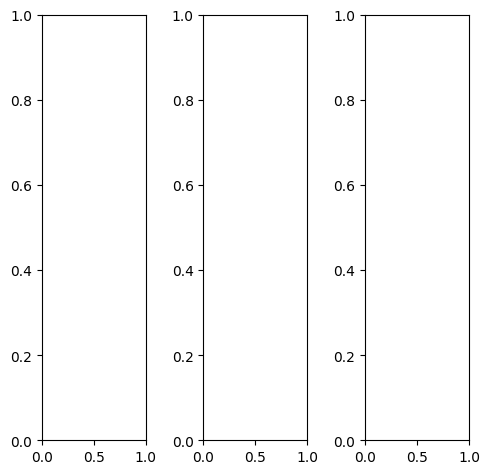

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9647, 0.9608,  ..., 0.9529, 0.9608, 1.0000],
         [1.0000, 0.6549, 0.5137,  ..., 0.5216, 0.6078, 0.9451],
         ...,
         [0.9843, 0.6510, 0.3804,  ..., 0.3529, 0.3725, 0.6078],
         [1.0000, 0.8627, 0.6118,  ..., 0.3686, 0.4235, 0.6706],
         [1.0000, 0.9412, 0.7922,  ..., 0.6314, 0.6510, 0.8118]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9647, 0.9608,  ..., 0.9529, 0.9608, 1.0000],
         [1.0000, 0.6549, 0.5137,  ..., 0.5216, 0.6078, 0.9451],
         ...,
         [0.9843, 0.6510, 0.3804,  ..., 0.3529, 0.3725, 0.6078],
         [1.0000, 0.8627, 0.6118,  ..., 0.3686, 0.4235, 0.6706],
         [1.0000, 0.9412, 0.7922,  ..., 0.6314, 0.6510, 0.8118]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9647, 0.9608,  ..., 0.9529, 0.9608, 1.0000],
         [1.0000, 0.6549, 0.5137,  ..., 0.5216, 0.6078, 0.

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9725, 0.9765,  ..., 0.9804, 0.9765, 1.0000],
         [1.0000, 0.7059, 0.5922,  ..., 0.5686, 0.6471, 0.9490],
         ...,
         [0.9843, 0.6196, 0.3412,  ..., 0.4431, 0.4157, 0.6118],
         [1.0000, 0.8510, 0.6000,  ..., 0.3961, 0.4353, 0.6706],
         [1.0000, 0.9412, 0.7922,  ..., 0.6314, 0.6510, 0.8118]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9843, 0.9882, 1.0000],
         [1.0000, 0.9647, 0.9608,  ..., 0.9451, 0.9569, 1.0000],
         [1.0000, 0.6471, 0.5020,  ..., 0.5176, 0.5961, 0.9451],
         ...,
         [0.9882, 0.6784, 0.4196,  ..., 0.3333, 0.3725, 0.6078],
         [1.0000, 0.8706, 0.6235,  ..., 0.3608, 0.4235, 0.6706],
         [1.0000, 0.9412, 0.7922,  ..., 0.6314, 0.6510, 0.8118]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9490, 0.9333,  ..., 0.9255, 0.9373, 0.9961],
         [0.9922, 0.5647, 0.3725,  ..., 0.4078, 0.5490, 0.

tensor([[[0.7261, 0.8850, 1.0156,  ..., 0.9893, 0.9249, 0.7516],
         [0.9403, 1.0327, 1.0023,  ..., 1.0563, 0.9989, 0.8560],
         [0.8429, 0.8458, 0.7452,  ..., 0.7263, 0.8190, 0.8831],
         ...,
         [0.7811, 0.7416, 0.4282,  ..., 0.2221, 0.2938, 0.6443],
         [0.7719, 0.8576, 0.6347,  ..., 0.3665, 0.3649, 0.6668],
         [0.6986, 0.8066, 0.7052,  ..., 0.6915, 0.7129, 0.5923]],

        [[0.7093, 0.9798, 1.1493,  ..., 1.0895, 1.0391, 0.8685],
         [0.8355, 1.0264, 1.0937,  ..., 1.0962, 1.0985, 1.0434],
         [0.8506, 0.8068, 0.6734,  ..., 0.6941, 0.7563, 0.9416],
         ...,
         [0.8147, 0.8106, 0.4634,  ..., 0.2474, 0.3928, 0.6900],
         [0.8260, 0.9626, 0.6433,  ..., 0.3632, 0.4568, 0.6876],
         [0.7575, 0.8584, 0.6783,  ..., 0.6535, 0.6307, 0.6265]],

        [[0.7520, 0.9739, 1.0346,  ..., 0.9778, 0.9501, 0.8682],
         [0.9486, 1.1649, 1.1677,  ..., 1.1670, 1.0907, 0.9994],
         [0.9372, 0.9583, 0.8270,  ..., 0.8252, 0.8089, 1.

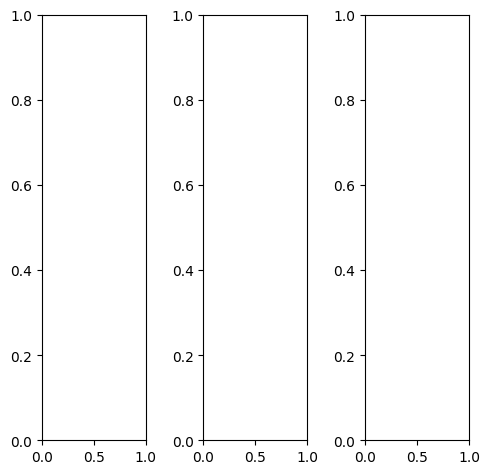

tensor([[[0.9373, 0.9255, 0.9137,  ..., 0.8706, 0.8706, 0.8667],
         [0.9373, 0.9412, 0.7333,  ..., 0.9020, 0.9020, 0.9020],
         [0.9176, 0.9412, 0.4941,  ..., 0.9098, 0.9098, 0.9137],
         ...,
         [0.6196, 0.4863, 0.4118,  ..., 0.5451, 0.6706, 0.7451],
         [0.4824, 0.2980, 0.3059,  ..., 0.6941, 0.7373, 0.7569],
         [0.4627, 0.5020, 0.4745,  ..., 0.7490, 0.7608, 0.7608]],

        [[0.9373, 0.9255, 0.9137,  ..., 0.8706, 0.8706, 0.8667],
         [0.9373, 0.9412, 0.7333,  ..., 0.9020, 0.9020, 0.9020],
         [0.9176, 0.9412, 0.4941,  ..., 0.9098, 0.9098, 0.9137],
         ...,
         [0.6196, 0.4863, 0.4118,  ..., 0.5451, 0.6706, 0.7451],
         [0.4824, 0.2980, 0.3059,  ..., 0.6941, 0.7373, 0.7569],
         [0.4627, 0.5020, 0.4745,  ..., 0.7490, 0.7608, 0.7608]],

        [[0.9373, 0.9255, 0.9137,  ..., 0.8706, 0.8706, 0.8667],
         [0.9373, 0.9412, 0.7333,  ..., 0.9020, 0.9020, 0.9020],
         [0.9176, 0.9412, 0.4941,  ..., 0.9098, 0.9098, 0.

tensor([[[0.9333, 0.8980, 0.8863,  ..., 0.7725, 0.7765, 0.7725],
         [0.9176, 0.9059, 0.7137,  ..., 0.8235, 0.8235, 0.8235],
         [0.8784, 0.8941, 0.4863,  ..., 0.8588, 0.8549, 0.8588],
         ...,
         [0.6784, 0.5451, 0.4706,  ..., 0.5804, 0.7059, 0.7765],
         [0.5412, 0.3529, 0.3647,  ..., 0.7373, 0.7804, 0.8000],
         [0.5216, 0.5608, 0.5333,  ..., 0.8000, 0.8118, 0.8157]],

        [[0.9373, 0.9373, 0.9255,  ..., 0.9059, 0.9059, 0.9020],
         [0.9412, 0.9529, 0.7412,  ..., 0.9333, 0.9333, 0.9333],
         [0.9294, 0.9569, 0.4980,  ..., 0.9333, 0.9333, 0.9373],
         ...,
         [0.6078, 0.4745, 0.4000,  ..., 0.5412, 0.6706, 0.7490],
         [0.4706, 0.2863, 0.2941,  ..., 0.6941, 0.7373, 0.7569],
         [0.4510, 0.4902, 0.4667,  ..., 0.7451, 0.7569, 0.7569]],

        [[0.9490, 0.9294, 0.9098,  ..., 0.9412, 0.9490, 0.9451],
         [0.9608, 0.9569, 0.7294,  ..., 0.9490, 0.9490, 0.9490],
         [0.9608, 0.9725, 0.4863,  ..., 0.9373, 0.9294, 0.

tensor([[[0.5202, 0.4917, 0.5454,  ..., 0.4148, 0.4043, 0.4709],
         [0.5282, 0.5123, 0.2357,  ..., 0.3967, 0.3475, 0.5073],
         [0.4966, 0.4787, 0.0884,  ..., 0.4319, 0.4542, 0.5299],
         ...,
         [0.4043, 0.3980, 0.3642,  ..., 0.4015, 0.4086, 0.5255],
         [0.2742, 0.2011, 0.2865,  ..., 0.4562, 0.5158, 0.5392],
         [0.3068, 0.3262, 0.3267,  ..., 0.5554, 0.5542, 0.4433]],

        [[0.5464, 0.5672, 0.7112,  ..., 0.5649, 0.5834, 0.5214],
         [0.5650, 0.6144, 0.4030,  ..., 0.4844, 0.5188, 0.6217],
         [0.5739, 0.5580, 0.1829,  ..., 0.5473, 0.5234, 0.6138],
         ...,
         [0.4006, 0.3305, 0.3257,  ..., 0.4130, 0.4650, 0.5223],
         [0.3073, 0.2056, 0.2211,  ..., 0.4490, 0.5924, 0.5062],
         [0.3485, 0.3072, 0.3049,  ..., 0.5346, 0.5497, 0.4680]],

        [[0.6628, 0.7555, 0.8647,  ..., 0.7411, 0.7732, 0.6590],
         [0.7149, 0.7979, 0.5327,  ..., 0.6108, 0.6977, 0.6807],
         [0.7007, 0.7860, 0.3944,  ..., 0.6967, 0.6909, 0.

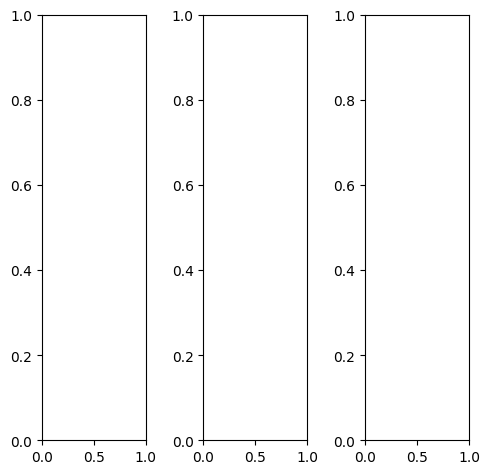

tensor([[[0.4941, 0.4784, 0.4784,  ..., 0.3451, 0.3333, 0.3255],
         [0.4941, 0.4784, 0.4824,  ..., 0.3529, 0.3451, 0.3333],
         [0.5137, 0.4980, 0.4980,  ..., 0.3725, 0.3608, 0.3529],
         ...,
         [0.2588, 0.2510, 0.2471,  ..., 0.1725, 0.1608, 0.1529],
         [0.2471, 0.2353, 0.2314,  ..., 0.1569, 0.1490, 0.1451],
         [0.2275, 0.2196, 0.2196,  ..., 0.1412, 0.1373, 0.1294]],

        [[0.4941, 0.4784, 0.4784,  ..., 0.3451, 0.3333, 0.3255],
         [0.4941, 0.4784, 0.4824,  ..., 0.3529, 0.3451, 0.3333],
         [0.5137, 0.4980, 0.4980,  ..., 0.3725, 0.3608, 0.3529],
         ...,
         [0.2588, 0.2510, 0.2471,  ..., 0.1725, 0.1608, 0.1529],
         [0.2471, 0.2353, 0.2314,  ..., 0.1569, 0.1490, 0.1451],
         [0.2275, 0.2196, 0.2196,  ..., 0.1412, 0.1373, 0.1294]],

        [[0.4941, 0.4784, 0.4784,  ..., 0.3451, 0.3333, 0.3255],
         [0.4941, 0.4784, 0.4824,  ..., 0.3529, 0.3451, 0.3333],
         [0.5137, 0.4980, 0.4980,  ..., 0.3725, 0.3608, 0.

tensor([[[0.3294, 0.2980, 0.2941,  ..., 0.2314, 0.2235, 0.2275],
         [0.2980, 0.2627, 0.2627,  ..., 0.2157, 0.2118, 0.2196],
         [0.3059, 0.2745, 0.2745,  ..., 0.2314, 0.2118, 0.2235],
         ...,
         [0.2196, 0.2118, 0.2078,  ..., 0.1608, 0.1608, 0.1529],
         [0.2118, 0.2039, 0.1961,  ..., 0.1451, 0.1490, 0.1451],
         [0.2000, 0.1961, 0.1922,  ..., 0.1333, 0.1333, 0.1294]],

        [[0.5294, 0.5216, 0.5216,  ..., 0.3686, 0.3529, 0.3412],
         [0.5412, 0.5333, 0.5373,  ..., 0.3843, 0.3725, 0.3569],
         [0.5647, 0.5529, 0.5569,  ..., 0.4039, 0.3961, 0.3804],
         ...,
         [0.2784, 0.2667, 0.2667,  ..., 0.1765, 0.1608, 0.1529],
         [0.2627, 0.2510, 0.2471,  ..., 0.1608, 0.1490, 0.1451],
         [0.2353, 0.2314, 0.2275,  ..., 0.1451, 0.1373, 0.1294]],

        [[0.7333, 0.7451, 0.7451,  ..., 0.5333, 0.5216, 0.4902],
         [0.7686, 0.7725, 0.7804,  ..., 0.5647, 0.5412, 0.5098],
         [0.7804, 0.7882, 0.7922,  ..., 0.5843, 0.5686, 0.

tensor([[[0.4370, 0.4000, 0.4095,  ..., 0.2567, 0.2765, 0.2617],
         [0.4087, 0.3511, 0.2869,  ..., 0.2783, 0.3107, 0.2855],
         [0.4691, 0.3704, 0.3666,  ..., 0.3569, 0.3683, 0.3341],
         ...,
         [0.1434, 0.1624, 0.2125,  ..., 0.0649, 0.0689, 0.1276],
         [0.1606, 0.1057, 0.1660,  ..., 0.0339, 0.0324, 0.1198],
         [0.2068, 0.1383, 0.1774,  ..., 0.0906, 0.1168, 0.0799]],

        [[0.4551, 0.3902, 0.5384,  ..., 0.2978, 0.3071, 0.2873],
         [0.4379, 0.4147, 0.4348,  ..., 0.3442, 0.3391, 0.2782],
         [0.4768, 0.4358, 0.4307,  ..., 0.4041, 0.3222, 0.2836],
         ...,
         [0.1915, 0.1608, 0.2249,  ..., 0.0683, 0.0406, 0.0996],
         [0.1929, 0.1331, 0.1701,  ..., 0.0817, 0.0278, 0.0904],
         [0.2476, 0.1812, 0.2158,  ..., 0.1330, 0.1236, 0.1135]],

        [[0.4892, 0.4834, 0.6465,  ..., 0.4102, 0.4239, 0.3630],
         [0.5127, 0.5349, 0.5578,  ..., 0.4633, 0.4289, 0.3652],
         [0.4996, 0.4847, 0.5457,  ..., 0.4641, 0.4489, 0.

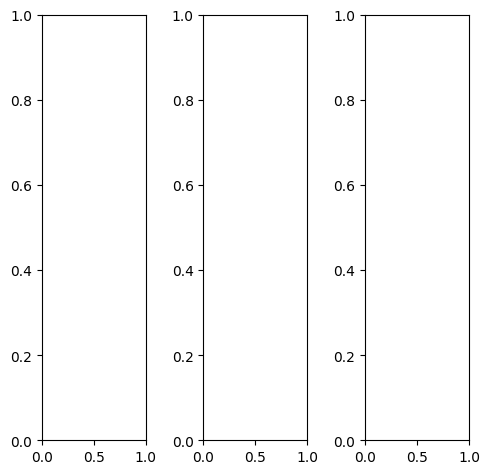

tensor([[[0.8353, 0.8314, 0.8431,  ..., 0.7490, 0.7294, 0.7137],
         [0.8392, 0.8431, 0.8471,  ..., 0.7490, 0.7294, 0.7176],
         [0.8549, 0.8471, 0.8510,  ..., 0.7529, 0.7412, 0.7255],
         ...,
         [0.6118, 0.5490, 0.4431,  ..., 0.7098, 0.7098, 0.6980],
         [0.5843, 0.4784, 0.3608,  ..., 0.6863, 0.6745, 0.6627],
         [0.6392, 0.5529, 0.4549,  ..., 0.6863, 0.6863, 0.6745]],

        [[0.8353, 0.8314, 0.8431,  ..., 0.7490, 0.7294, 0.7137],
         [0.8392, 0.8431, 0.8471,  ..., 0.7490, 0.7294, 0.7176],
         [0.8549, 0.8471, 0.8510,  ..., 0.7529, 0.7412, 0.7255],
         ...,
         [0.6118, 0.5490, 0.4431,  ..., 0.7098, 0.7098, 0.6980],
         [0.5843, 0.4784, 0.3608,  ..., 0.6863, 0.6745, 0.6627],
         [0.6392, 0.5529, 0.4549,  ..., 0.6863, 0.6863, 0.6745]],

        [[0.8353, 0.8314, 0.8431,  ..., 0.7490, 0.7294, 0.7137],
         [0.8392, 0.8431, 0.8471,  ..., 0.7490, 0.7294, 0.7176],
         [0.8549, 0.8471, 0.8510,  ..., 0.7529, 0.7412, 0.

tensor([[[0.8431, 0.8392, 0.8510,  ..., 0.7529, 0.7333, 0.7216],
         [0.8431, 0.8471, 0.8510,  ..., 0.7529, 0.7333, 0.7216],
         [0.8588, 0.8510, 0.8549,  ..., 0.7569, 0.7451, 0.7333],
         ...,
         [0.5882, 0.5137, 0.3725,  ..., 0.7059, 0.7059, 0.6980],
         [0.5608, 0.4353, 0.2745,  ..., 0.6784, 0.6745, 0.6667],
         [0.6353, 0.5333, 0.3961,  ..., 0.6863, 0.6902, 0.6863]],

        [[0.8471, 0.8431, 0.8549,  ..., 0.7569, 0.7373, 0.7216],
         [0.8510, 0.8549, 0.8588,  ..., 0.7569, 0.7373, 0.7255],
         [0.8667, 0.8588, 0.8627,  ..., 0.7608, 0.7490, 0.7333],
         ...,
         [0.6039, 0.5451, 0.4549,  ..., 0.7020, 0.7020, 0.6941],
         [0.5725, 0.4745, 0.3725,  ..., 0.6784, 0.6667, 0.6549],
         [0.6196, 0.5412, 0.4588,  ..., 0.6784, 0.6745, 0.6627]],

        [[0.7686, 0.7647, 0.7765,  ..., 0.6980, 0.6824, 0.6667],
         [0.7647, 0.7686, 0.7765,  ..., 0.7020, 0.6824, 0.6706],
         [0.7725, 0.7686, 0.7725,  ..., 0.7059, 0.6941, 0.

tensor([[[0.5141, 0.4818, 0.4842,  ..., 0.5036, 0.4903, 0.4476],
         [0.4792, 0.4082, 0.2897,  ..., 0.5057, 0.4407, 0.5388],
         [0.4907, 0.4157, 0.3475,  ..., 0.4058, 0.4446, 0.5400],
         ...,
         [0.3343, 0.4256, 0.4093,  ..., 0.4478, 0.4039, 0.4483],
         [0.3354, 0.2873, 0.2728,  ..., 0.4268, 0.4237, 0.4537],
         [0.3952, 0.3708, 0.3110,  ..., 0.4887, 0.5079, 0.3767]],

        [[0.5539, 0.5409, 0.6474,  ..., 0.5655, 0.5544, 0.4479],
         [0.5370, 0.4565, 0.4635,  ..., 0.5842, 0.5431, 0.5001],
         [0.5875, 0.4512, 0.4885,  ..., 0.5367, 0.4565, 0.5029],
         ...,
         [0.3359, 0.4012, 0.3781,  ..., 0.4195, 0.4438, 0.4104],
         [0.3799, 0.3251, 0.2642,  ..., 0.4218, 0.4298, 0.4020],
         [0.4074, 0.3392, 0.3078,  ..., 0.4705, 0.4735, 0.4140]],

        [[0.6251, 0.6892, 0.8247,  ..., 0.6813, 0.6616, 0.5251],
         [0.6447, 0.6695, 0.6087,  ..., 0.6403, 0.6430, 0.5817],
         [0.6780, 0.6721, 0.6077,  ..., 0.5638, 0.5629, 0.

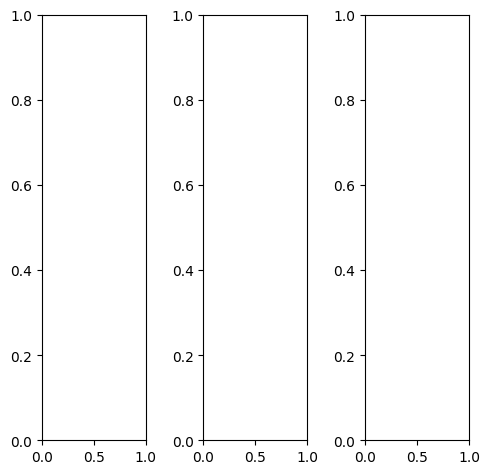

EPOCH: 1.000  val_loss: 0.005  (118.33s - 11714.57s remaining)

tensor([[[1.0000, 0.9961, 0.9922,  ..., 0.9843, 0.9882, 1.0000],
         [1.0000, 0.9765, 0.9804,  ..., 0.9765, 0.9725, 1.0000],
         [1.0000, 0.9843, 0.7373,  ..., 0.7255, 0.9843, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9922, 0.9961]],

        [[1.0000, 0.9961, 0.9922,  ..., 0.9843, 0.9882, 1.0000],
         [1.0000, 0.9765, 0.9804,  ..., 0.9765, 0.9725, 1.0000],
         [1.0000, 0.9843, 0.7373,  ..., 0.7255, 0.9843, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9922, 0.9961]],

        [[1.0000, 0.9961, 0.9922,  ..., 0.9843, 0.9882, 1.0000],
         [1.0000, 0.9765, 0.9804,  ..., 0.9765, 0.9725, 1.0000],
         [1.0000, 0.9843, 0.7373,  ..., 0.7255, 0.9843, 1.

tensor([[[1.0000, 1.0000, 0.9922,  ..., 0.9843, 0.9922, 1.0000],
         [1.0000, 0.9804, 0.9804,  ..., 0.9804, 0.9725, 1.0000],
         [1.0000, 0.9843, 0.7373,  ..., 0.7294, 0.9843, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000]],

        [[1.0000, 1.0000, 0.9961,  ..., 0.9882, 0.9922, 1.0000],
         [1.0000, 0.9804, 0.9843,  ..., 0.9804, 0.9765, 1.0000],
         [1.0000, 0.9843, 0.7412,  ..., 0.7294, 0.9882, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9922, 0.9961]],

        [[0.9961, 0.9765, 0.9843,  ..., 0.9647, 0.9725, 1.0000],
         [0.9922, 0.9608, 0.9608,  ..., 0.9608, 0.9569, 0.9882],
         [1.0000, 0.9725, 0.7098,  ..., 0.7098, 0.9686, 0.

tensor([[[0.8048, 0.9109, 0.9820,  ..., 0.9184, 0.9107, 0.7491],
         [0.9648, 0.9097, 0.8989,  ..., 0.9347, 0.9370, 0.8711],
         [0.9195, 0.9717, 0.7239,  ..., 0.7498, 1.0176, 0.9476],
         ...,
         [0.9747, 0.9818, 0.9333,  ..., 0.9305, 0.9475, 0.9345],
         [0.9517, 0.9624, 0.9343,  ..., 0.9494, 0.9428, 0.8978],
         [0.7795, 0.8956, 0.9305,  ..., 0.9337, 0.9046, 0.7694]],

        [[0.8165, 0.9159, 1.0166,  ..., 0.9470, 0.9220, 0.8024],
         [0.9187, 0.9704, 0.9492,  ..., 0.9613, 0.9678, 0.9452],
         [0.9525, 1.0157, 0.7168,  ..., 0.6950, 0.9365, 0.9306],
         ...,
         [0.9397, 0.9914, 0.9480,  ..., 0.9365, 0.9829, 1.0012],
         [0.9212, 1.0243, 0.9541,  ..., 0.9681, 0.9600, 0.9389],
         [0.8601, 0.9412, 0.9439,  ..., 0.9263, 0.8832, 0.7378]],

        [[0.8060, 0.9364, 1.0065,  ..., 0.8947, 0.8879, 0.7838],
         [0.8841, 0.9731, 0.9526,  ..., 0.9201, 0.8971, 0.8908],
         [0.9367, 0.9516, 0.7319,  ..., 0.6894, 0.9456, 0.

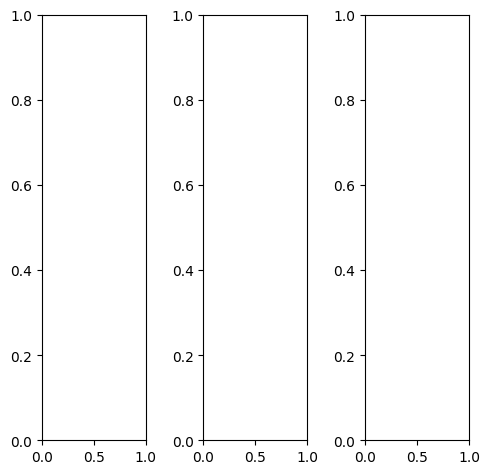

tensor([[[0.6039, 0.5843, 0.5961,  ..., 0.7412, 0.7725, 0.7098],
         [0.7294, 0.6471, 0.5725,  ..., 0.7255, 0.7255, 0.6706],
         [0.7882, 0.7373, 0.6392,  ..., 0.7294, 0.6471, 0.5922],
         ...,
         [0.2784, 0.2941, 0.2784,  ..., 0.2941, 0.3647, 0.4706],
         [0.2745, 0.2745, 0.2588,  ..., 0.3137, 0.3647, 0.3961],
         [0.2471, 0.2549, 0.2588,  ..., 0.2471, 0.3255, 0.3176]],

        [[0.6039, 0.5843, 0.5961,  ..., 0.7412, 0.7725, 0.7098],
         [0.7294, 0.6471, 0.5725,  ..., 0.7255, 0.7255, 0.6706],
         [0.7882, 0.7373, 0.6392,  ..., 0.7294, 0.6471, 0.5922],
         ...,
         [0.2784, 0.2941, 0.2784,  ..., 0.2941, 0.3647, 0.4706],
         [0.2745, 0.2745, 0.2588,  ..., 0.3137, 0.3647, 0.3961],
         [0.2471, 0.2549, 0.2588,  ..., 0.2471, 0.3255, 0.3176]],

        [[0.6039, 0.5843, 0.5961,  ..., 0.7412, 0.7725, 0.7098],
         [0.7294, 0.6471, 0.5725,  ..., 0.7255, 0.7255, 0.6706],
         [0.7882, 0.7373, 0.6392,  ..., 0.7294, 0.6471, 0.

tensor([[[0.5804, 0.5216, 0.5216,  ..., 0.7137, 0.7529, 0.6941],
         [0.6902, 0.5686, 0.4863,  ..., 0.7137, 0.7176, 0.6706],
         [0.7647, 0.6902, 0.5804,  ..., 0.7333, 0.6314, 0.5765],
         ...,
         [0.2039, 0.2118, 0.1961,  ..., 0.2314, 0.3216, 0.4392],
         [0.2039, 0.2000, 0.1843,  ..., 0.2549, 0.3216, 0.3490],
         [0.1882, 0.1922, 0.1922,  ..., 0.1961, 0.2863, 0.2863]],

        [[0.6157, 0.6118, 0.6275,  ..., 0.7569, 0.7882, 0.7176],
         [0.7490, 0.6824, 0.6078,  ..., 0.7373, 0.7373, 0.6784],
         [0.8039, 0.7608, 0.6627,  ..., 0.7373, 0.6588, 0.6000],
         ...,
         [0.3098, 0.3294, 0.3137,  ..., 0.3255, 0.3882, 0.4824],
         [0.3020, 0.3098, 0.2941,  ..., 0.3412, 0.3843, 0.4196],
         [0.2706, 0.2824, 0.2902,  ..., 0.2706, 0.3412, 0.3333]],

        [[0.5961, 0.5922, 0.6275,  ..., 0.7216, 0.7569, 0.6980],
         [0.7294, 0.6863, 0.6235,  ..., 0.6863, 0.6902, 0.6471],
         [0.7529, 0.7412, 0.6588,  ..., 0.6863, 0.6235, 0.

tensor([[[0.5743, 0.5634, 0.5988,  ..., 0.7136, 0.7284, 0.5924],
         [0.6753, 0.6201, 0.5148,  ..., 0.7047, 0.6462, 0.6637],
         [0.6976, 0.6803, 0.5945,  ..., 0.7931, 0.6754, 0.6209],
         ...,
         [0.2829, 0.3078, 0.2912,  ..., 0.3147, 0.3711, 0.4220],
         [0.2744, 0.2750, 0.2770,  ..., 0.2957, 0.3690, 0.3970],
         [0.2884, 0.2702, 0.2466,  ..., 0.2395, 0.3115, 0.3049]],

        [[0.6011, 0.5950, 0.6734,  ..., 0.7527, 0.7785, 0.6218],
         [0.7159, 0.6444, 0.5678,  ..., 0.7023, 0.7071, 0.6593],
         [0.7636, 0.7165, 0.6420,  ..., 0.7469, 0.6301, 0.6243],
         ...,
         [0.2733, 0.2897, 0.2633,  ..., 0.2877, 0.3315, 0.4138],
         [0.2801, 0.2802, 0.2467,  ..., 0.2711, 0.3418, 0.3809],
         [0.2959, 0.2837, 0.2583,  ..., 0.2580, 0.3208, 0.3276]],

        [[0.5841, 0.5904, 0.6726,  ..., 0.7229, 0.7708, 0.5833],
         [0.6690, 0.6410, 0.5418,  ..., 0.6740, 0.6745, 0.6258],
         [0.7314, 0.6833, 0.6198,  ..., 0.7190, 0.6184, 0.

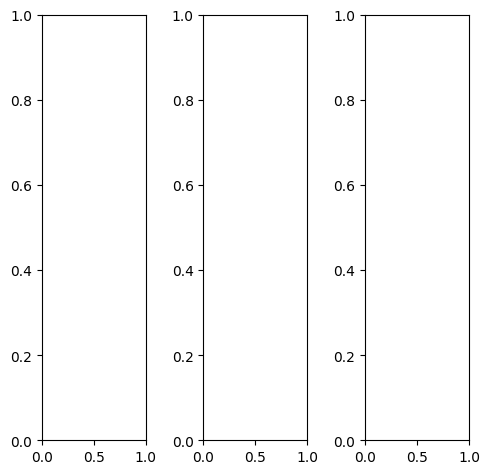

tensor([[[0.6196, 0.6314, 0.6431,  ..., 0.7686, 0.7686, 0.6784],
         [0.6471, 0.6549, 0.6706,  ..., 0.7922, 0.7529, 0.6471],
         [0.6706, 0.6745, 0.6902,  ..., 0.7882, 0.6549, 0.5608],
         ...,
         [0.2431, 0.2353, 0.2431,  ..., 0.5647, 0.5529, 0.5333],
         [0.4353, 0.4078, 0.4431,  ..., 0.5490, 0.5294, 0.5137],
         [0.6314, 0.5961, 0.6314,  ..., 0.5333, 0.5176, 0.4902]],

        [[0.6196, 0.6314, 0.6431,  ..., 0.7686, 0.7686, 0.6784],
         [0.6471, 0.6549, 0.6706,  ..., 0.7922, 0.7529, 0.6471],
         [0.6706, 0.6745, 0.6902,  ..., 0.7882, 0.6549, 0.5608],
         ...,
         [0.2431, 0.2353, 0.2431,  ..., 0.5647, 0.5529, 0.5333],
         [0.4353, 0.4078, 0.4431,  ..., 0.5490, 0.5294, 0.5137],
         [0.6314, 0.5961, 0.6314,  ..., 0.5333, 0.5176, 0.4902]],

        [[0.6196, 0.6314, 0.6431,  ..., 0.7686, 0.7686, 0.6784],
         [0.6471, 0.6549, 0.6706,  ..., 0.7922, 0.7529, 0.6471],
         [0.6706, 0.6745, 0.6902,  ..., 0.7882, 0.6549, 0.

tensor([[[0.5137, 0.5255, 0.5412,  ..., 0.7020, 0.7059, 0.7098],
         [0.5490, 0.5569, 0.5725,  ..., 0.7451, 0.7333, 0.7059],
         [0.5725, 0.5843, 0.6000,  ..., 0.7608, 0.6902, 0.6392],
         ...,
         [0.2157, 0.2157, 0.2314,  ..., 0.6392, 0.6118, 0.5804],
         [0.4275, 0.4078, 0.4471,  ..., 0.6196, 0.5922, 0.5608],
         [0.6392, 0.6039, 0.6353,  ..., 0.5922, 0.5647, 0.5373]],

        [[0.6392, 0.6510, 0.6667,  ..., 0.7843, 0.7843, 0.6706],
         [0.6667, 0.6745, 0.6941,  ..., 0.8000, 0.7569, 0.6392],
         [0.6902, 0.6941, 0.7059,  ..., 0.7882, 0.6471, 0.5529],
         ...,
         [0.2588, 0.2471, 0.2549,  ..., 0.5843, 0.5804, 0.5686],
         [0.4471, 0.4235, 0.4627,  ..., 0.5686, 0.5569, 0.5412],
         [0.6471, 0.6157, 0.6471,  ..., 0.5569, 0.5490, 0.5176]],

        [[0.7882, 0.7922, 0.8039,  ..., 0.8745, 0.8627, 0.6431],
         [0.8078, 0.8078, 0.8196,  ..., 0.8863, 0.7804, 0.5373],
         [0.8196, 0.8157, 0.8314,  ..., 0.8510, 0.5922, 0.

tensor([[[0.5762, 0.5923, 0.6213,  ..., 0.7176, 0.7079, 0.5848],
         [0.6165, 0.6143, 0.5820,  ..., 0.7668, 0.6706, 0.6629],
         [0.6278, 0.6268, 0.6201,  ..., 0.7878, 0.6631, 0.6070],
         ...,
         [0.2476, 0.2477, 0.2553,  ..., 0.5795, 0.5507, 0.5345],
         [0.3949, 0.3945, 0.4350,  ..., 0.5596, 0.5332, 0.5240],
         [0.5389, 0.5899, 0.6298,  ..., 0.5474, 0.5366, 0.4524]],

        [[0.6178, 0.6297, 0.6999,  ..., 0.7546, 0.7625, 0.6135],
         [0.6629, 0.6437, 0.6440,  ..., 0.7735, 0.7270, 0.6692],
         [0.7061, 0.6581, 0.6896,  ..., 0.7558, 0.6435, 0.6243],
         ...,
         [0.2454, 0.2369, 0.2422,  ..., 0.5606, 0.5591, 0.5641],
         [0.4329, 0.4279, 0.4469,  ..., 0.5511, 0.5513, 0.5178],
         [0.5268, 0.5731, 0.5834,  ..., 0.5499, 0.5406, 0.4963]],

        [[0.5908, 0.6284, 0.7158,  ..., 0.7647, 0.7844, 0.5856],
         [0.6229, 0.6525, 0.6460,  ..., 0.7572, 0.7220, 0.6450],
         [0.6755, 0.6414, 0.6685,  ..., 0.7567, 0.6331, 0.

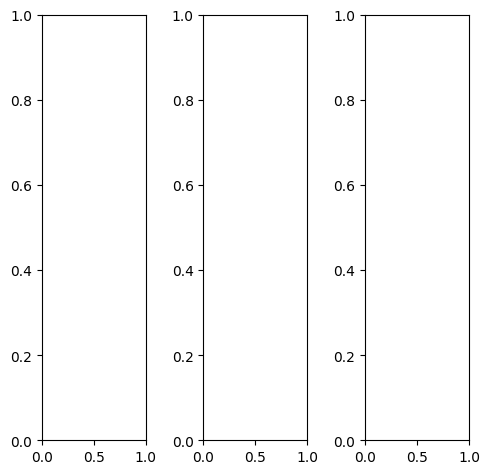

tensor([[[0.5294, 0.5294, 0.5451,  ..., 0.2392, 0.2353, 0.2118],
         [0.4353, 0.4863, 0.4902,  ..., 0.3333, 0.4000, 0.4157],
         [0.2235, 0.2980, 0.3098,  ..., 0.5059, 0.6039, 0.6235],
         ...,
         [0.4353, 0.4235, 0.4157,  ..., 0.3608, 0.3843, 0.3922],
         [0.4353, 0.4235, 0.4196,  ..., 0.3804, 0.3882, 0.3922],
         [0.4353, 0.4157, 0.4118,  ..., 0.3843, 0.3922, 0.3922]],

        [[0.5294, 0.5294, 0.5451,  ..., 0.2392, 0.2353, 0.2118],
         [0.4353, 0.4863, 0.4902,  ..., 0.3333, 0.4000, 0.4157],
         [0.2235, 0.2980, 0.3098,  ..., 0.5059, 0.6039, 0.6235],
         ...,
         [0.4353, 0.4235, 0.4157,  ..., 0.3608, 0.3843, 0.3922],
         [0.4353, 0.4235, 0.4196,  ..., 0.3804, 0.3882, 0.3922],
         [0.4353, 0.4157, 0.4118,  ..., 0.3843, 0.3922, 0.3922]],

        [[0.5294, 0.5294, 0.5451,  ..., 0.2392, 0.2353, 0.2118],
         [0.4353, 0.4863, 0.4902,  ..., 0.3333, 0.4000, 0.4157],
         [0.2235, 0.2980, 0.3098,  ..., 0.5059, 0.6039, 0.

tensor([[[0.8706, 0.6157, 0.6314,  ..., 0.3373, 0.2941, 0.3137],
         [0.7059, 0.6157, 0.5569,  ..., 0.4078, 0.4275, 0.4667],
         [0.3059, 0.3882, 0.3412,  ..., 0.5020, 0.5608, 0.6039],
         ...,
         [0.4078, 0.4000, 0.4000,  ..., 0.3569, 0.3804, 0.3882],
         [0.4039, 0.4000, 0.4039,  ..., 0.3765, 0.3843, 0.3882],
         [0.4157, 0.3961, 0.3961,  ..., 0.3804, 0.3882, 0.3882]],

        [[0.4235, 0.4902, 0.5098,  ..., 0.2039, 0.2157, 0.1765],
         [0.3529, 0.4392, 0.4588,  ..., 0.3098, 0.3922, 0.4000],
         [0.2039, 0.2745, 0.3020,  ..., 0.5098, 0.6235, 0.6314],
         ...,
         [0.4431, 0.4314, 0.4196,  ..., 0.3647, 0.3843, 0.3922],
         [0.4431, 0.4275, 0.4235,  ..., 0.3804, 0.3882, 0.3922],
         [0.4431, 0.4157, 0.4157,  ..., 0.3843, 0.3922, 0.3882]],

        [[0.1686, 0.4902, 0.5098,  ..., 0.1529, 0.1922, 0.1176],
         [0.1373, 0.3804, 0.4667,  ..., 0.2588, 0.3765, 0.3608],
         [0.1059, 0.1686, 0.2706,  ..., 0.4902, 0.6314, 0.

tensor([[[0.4610, 0.4938, 0.4867,  ..., 0.2121, 0.2387, 0.2653],
         [0.4241, 0.5110, 0.4584,  ..., 0.3026, 0.4045, 0.4345],
         [0.2539, 0.2834, 0.3127,  ..., 0.5269, 0.6382, 0.6103],
         ...,
         [0.4363, 0.4234, 0.4335,  ..., 0.3617, 0.3806, 0.3829],
         [0.4379, 0.4199, 0.4182,  ..., 0.3722, 0.3827, 0.3881],
         [0.4260, 0.4393, 0.4243,  ..., 0.3629, 0.3776, 0.3386]],

        [[0.4846, 0.4927, 0.5329,  ..., 0.2494, 0.2840, 0.3119],
         [0.4297, 0.5269, 0.4795,  ..., 0.3276, 0.4110, 0.4200],
         [0.2564, 0.3031, 0.3213,  ..., 0.5069, 0.6030, 0.6137],
         ...,
         [0.4436, 0.4182, 0.4056,  ..., 0.3514, 0.3743, 0.3874],
         [0.4501, 0.4224, 0.3901,  ..., 0.3639, 0.3704, 0.3737],
         [0.4435, 0.4192, 0.4016,  ..., 0.3680, 0.3797, 0.3690]],

        [[0.4101, 0.4451, 0.4764,  ..., 0.2041, 0.2442, 0.2548],
         [0.3721, 0.4751, 0.4474,  ..., 0.2797, 0.3692, 0.3967],
         [0.2201, 0.2465, 0.2839,  ..., 0.4558, 0.5600, 0.

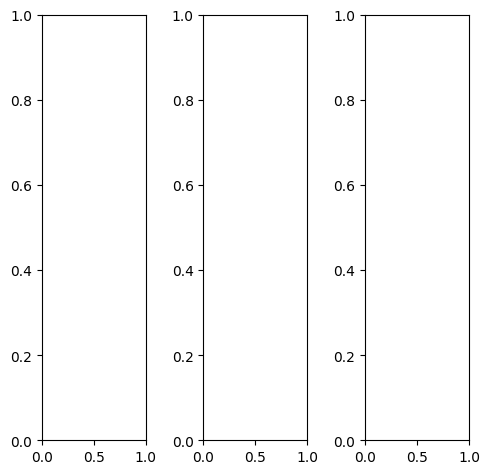

tensor([[[0.6039, 0.5804, 0.6627,  ..., 0.7647, 0.7725, 0.6706],
         [0.4824, 0.5098, 0.8000,  ..., 0.7765, 0.7843, 0.6549],
         [0.5961, 0.6745, 0.8196,  ..., 0.8078, 0.8510, 0.8314],
         ...,
         [0.1098, 0.1961, 0.2824,  ..., 0.7765, 0.8588, 0.8471],
         [0.1882, 0.2588, 0.5490,  ..., 0.7569, 0.8510, 0.8275],
         [0.4314, 0.5843, 0.8353,  ..., 0.8196, 0.8314, 0.8275]],

        [[0.6039, 0.5804, 0.6627,  ..., 0.7647, 0.7725, 0.6706],
         [0.4824, 0.5098, 0.8000,  ..., 0.7765, 0.7843, 0.6549],
         [0.5961, 0.6745, 0.8196,  ..., 0.8078, 0.8510, 0.8314],
         ...,
         [0.1098, 0.1961, 0.2824,  ..., 0.7765, 0.8588, 0.8471],
         [0.1882, 0.2588, 0.5490,  ..., 0.7569, 0.8510, 0.8275],
         [0.4314, 0.5843, 0.8353,  ..., 0.8196, 0.8314, 0.8275]],

        [[0.6039, 0.5804, 0.6627,  ..., 0.7647, 0.7725, 0.6706],
         [0.4824, 0.5098, 0.8000,  ..., 0.7765, 0.7843, 0.6549],
         [0.5961, 0.6745, 0.8196,  ..., 0.8078, 0.8510, 0.

tensor([[[0.6314, 0.6000, 0.6745,  ..., 0.8039, 0.7882, 0.6706],
         [0.4941, 0.5176, 0.8078,  ..., 0.8078, 0.7882, 0.6510],
         [0.6039, 0.6863, 0.8353,  ..., 0.8353, 0.8510, 0.8275],
         ...,
         [0.0824, 0.1686, 0.2706,  ..., 0.7686, 0.8627, 0.8510],
         [0.1608, 0.2314, 0.5373,  ..., 0.7686, 0.8549, 0.8314],
         [0.4039, 0.5529, 0.8235,  ..., 0.8392, 0.8431, 0.8275]],

        [[0.6000, 0.5804, 0.6667,  ..., 0.7608, 0.7725, 0.6706],
         [0.4824, 0.5137, 0.8039,  ..., 0.7765, 0.7843, 0.6549],
         [0.5961, 0.6784, 0.8235,  ..., 0.8118, 0.8549, 0.8353],
         ...,
         [0.1176, 0.2078, 0.2863,  ..., 0.7843, 0.8588, 0.8471],
         [0.1922, 0.2706, 0.5569,  ..., 0.7608, 0.8510, 0.8275],
         [0.4353, 0.5961, 0.8431,  ..., 0.8196, 0.8314, 0.8275]],

        [[0.5451, 0.5255, 0.6078,  ..., 0.6980, 0.7451, 0.6627],
         [0.4549, 0.4784, 0.7647,  ..., 0.6784, 0.7608, 0.6510],
         [0.5686, 0.6353, 0.7686,  ..., 0.7137, 0.8353, 0.

tensor([[[0.5578, 0.5990, 0.6975,  ..., 0.7166, 0.7163, 0.6013],
         [0.4835, 0.5170, 0.7760,  ..., 0.7694, 0.7132, 0.7045],
         [0.5969, 0.6611, 0.7760,  ..., 0.8107, 0.8740, 0.8006],
         ...,
         [0.1900, 0.2054, 0.2388,  ..., 0.7595, 0.8167, 0.8056],
         [0.1868, 0.2246, 0.5437,  ..., 0.7754, 0.8341, 0.7681],
         [0.4273, 0.6093, 0.8346,  ..., 0.7526, 0.7675, 0.6683]],

        [[0.6069, 0.6268, 0.7383,  ..., 0.7484, 0.7477, 0.6321],
         [0.5299, 0.5105, 0.7802,  ..., 0.7680, 0.7585, 0.7097],
         [0.6680, 0.6608, 0.8250,  ..., 0.7851, 0.8289, 0.8139],
         ...,
         [0.1646, 0.1825, 0.2359,  ..., 0.7570, 0.8376, 0.8479],
         [0.2241, 0.2813, 0.5423,  ..., 0.7435, 0.8193, 0.7813],
         [0.4096, 0.5540, 0.7506,  ..., 0.7418, 0.7433, 0.6398]],

        [[0.5563, 0.5968, 0.7437,  ..., 0.7398, 0.7577, 0.6063],
         [0.4865, 0.5155, 0.7689,  ..., 0.7233, 0.7118, 0.6683],
         [0.6199, 0.6388, 0.7653,  ..., 0.7552, 0.8155, 0.

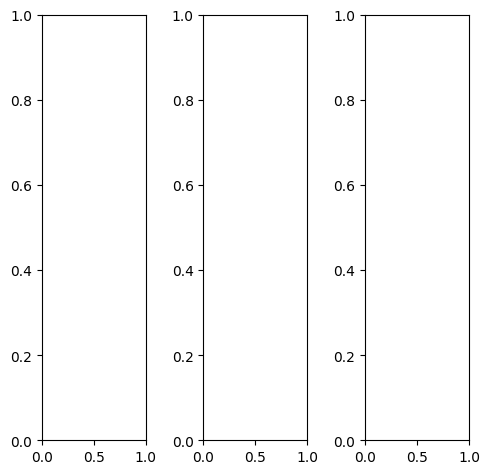

EPOCH: 1.255  trn_loss: 0.006  (145.88s - 11477.16s remaining)

tensor([[[0.6157, 0.6196, 0.6353,  ..., 0.6510, 0.6353, 0.6196],
         [0.6353, 0.6392, 0.6549,  ..., 0.6706, 0.6549, 0.6392],
         [0.6431, 0.6471, 0.6588,  ..., 0.6745, 0.6588, 0.6471],
         ...,
         [0.2588, 0.2157, 0.1725,  ..., 0.0627, 0.1137, 0.1608],
         [0.2706, 0.2667, 0.2627,  ..., 0.0863, 0.1373, 0.1961],
         [0.2863, 0.2902, 0.2902,  ..., 0.2196, 0.2627, 0.2902]],

        [[0.6157, 0.6196, 0.6353,  ..., 0.6510, 0.6353, 0.6196],
         [0.6353, 0.6392, 0.6549,  ..., 0.6706, 0.6549, 0.6392],
         [0.6431, 0.6471, 0.6588,  ..., 0.6745, 0.6588, 0.6471],
         ...,
         [0.2588, 0.2157, 0.1725,  ..., 0.0627, 0.1137, 0.1608],
         [0.2706, 0.2667, 0.2627,  ..., 0.0863, 0.1373, 0.1961],
         [0.2863, 0.2902, 0.2902,  ..., 0.2196, 0.2627, 0.2902]],

        [[0.6157, 0.6196, 0.6353,  ..., 0.6510, 0.6353, 0.6196],
         [0.6353, 0.6392, 0.6549,  ..., 0.6706, 0.6549, 0.6392],
         [0.6431, 0.6471, 0.6588,  ..., 0.6745, 0.6588, 0.

tensor([[[0.5020, 0.5059, 0.5176,  ..., 0.5176, 0.4980, 0.4863],
         [0.5216, 0.5255, 0.5412,  ..., 0.5412, 0.5216, 0.5059],
         [0.5333, 0.5373, 0.5529,  ..., 0.5490, 0.5333, 0.5216],
         ...,
         [0.3647, 0.3137, 0.2627,  ..., 0.1176, 0.1804, 0.2431],
         [0.3922, 0.3843, 0.3804,  ..., 0.1569, 0.2157, 0.2863],
         [0.4078, 0.4196, 0.4235,  ..., 0.3137, 0.3569, 0.3922]],

        [[0.6471, 0.6510, 0.6667,  ..., 0.6941, 0.6784, 0.6627],
         [0.6667, 0.6706, 0.6863,  ..., 0.7137, 0.6980, 0.6824],
         [0.6745, 0.6784, 0.6902,  ..., 0.7137, 0.6980, 0.6863],
         ...,
         [0.2078, 0.1725, 0.1294,  ..., 0.0353, 0.0824, 0.1176],
         [0.2157, 0.2118, 0.2078,  ..., 0.0510, 0.0980, 0.1529],
         [0.2314, 0.2353, 0.2314,  ..., 0.1765, 0.2196, 0.2431]],

        [[0.7529, 0.7529, 0.7686,  ..., 0.7843, 0.7686, 0.7569],
         [0.7686, 0.7725, 0.7843,  ..., 0.8039, 0.7882, 0.7725],
         [0.7686, 0.7686, 0.7843,  ..., 0.7961, 0.7804, 0.

tensor([[[0.4583, 0.5988, 0.5537,  ..., 0.5389, 0.5305, 0.5321],
         [0.4474, 0.5029, 0.3506,  ..., 0.5346, 0.4656, 0.6229],
         [0.5426, 0.4478, 0.3580,  ..., 0.5380, 0.4722, 0.5804],
         ...,
         [0.2234, 0.2747, 0.2465,  ..., 0.1763, 0.2275, 0.2795],
         [0.2420, 0.3010, 0.3333,  ..., 0.1551, 0.2077, 0.2688],
         [0.2903, 0.3061, 0.3259,  ..., 0.2575, 0.3027, 0.2897]],

        [[0.4648, 0.6503, 0.4878,  ..., 0.6664, 0.6159, 0.5636],
         [0.5594, 0.5607, 0.4255,  ..., 0.6618, 0.6259, 0.6552],
         [0.6403, 0.5428, 0.4876,  ..., 0.6407, 0.5278, 0.6646],
         ...,
         [0.2559, 0.2469, 0.2444,  ..., 0.1648, 0.1972, 0.2531],
         [0.2775, 0.3155, 0.3308,  ..., 0.1863, 0.1994, 0.2437],
         [0.3164, 0.3156, 0.3396,  ..., 0.2536, 0.2854, 0.2941]],

        [[0.5628, 0.5588, 0.5496,  ..., 0.7248, 0.7429, 0.6236],
         [0.4965, 0.5128, 0.4711,  ..., 0.7780, 0.7026, 0.7075],
         [0.5259, 0.4634, 0.4041,  ..., 0.6495, 0.6948, 0.

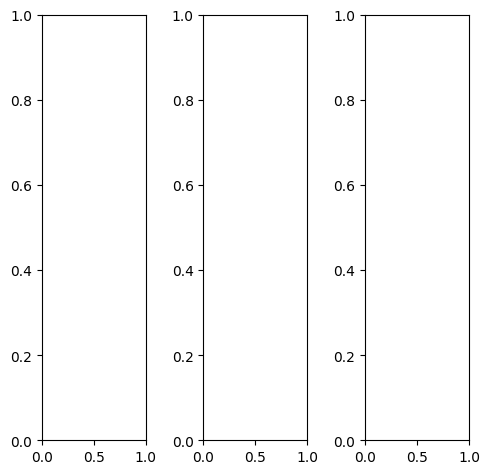

tensor([[[0.2784, 0.3059, 0.3725,  ..., 0.2235, 0.2431, 0.1490],
         [0.2980, 0.3765, 0.5373,  ..., 0.2588, 0.3137, 0.2353],
         [0.2275, 0.3412, 0.4667,  ..., 0.2549, 0.2588, 0.2784],
         ...,
         [0.2667, 0.2745, 0.2980,  ..., 0.4392, 0.4980, 0.4196],
         [0.2706, 0.3059, 0.3176,  ..., 0.3137, 0.4275, 0.3333],
         [0.2824, 0.1804, 0.3216,  ..., 0.2000, 0.2824, 0.2667]],

        [[0.2784, 0.3059, 0.3725,  ..., 0.2235, 0.2431, 0.1490],
         [0.2980, 0.3765, 0.5373,  ..., 0.2588, 0.3137, 0.2353],
         [0.2275, 0.3412, 0.4667,  ..., 0.2549, 0.2588, 0.2784],
         ...,
         [0.2667, 0.2745, 0.2980,  ..., 0.4392, 0.4980, 0.4196],
         [0.2706, 0.3059, 0.3176,  ..., 0.3137, 0.4275, 0.3333],
         [0.2824, 0.1804, 0.3216,  ..., 0.2000, 0.2824, 0.2667]],

        [[0.2784, 0.3059, 0.3725,  ..., 0.2235, 0.2431, 0.1490],
         [0.2980, 0.3765, 0.5373,  ..., 0.2588, 0.3137, 0.2353],
         [0.2275, 0.3412, 0.4667,  ..., 0.2549, 0.2588, 0.

tensor([[[0.2784, 0.3059, 0.3725,  ..., 0.2275, 0.2471, 0.1529],
         [0.2980, 0.3765, 0.5412,  ..., 0.2667, 0.3216, 0.2431],
         [0.2235, 0.3451, 0.4745,  ..., 0.2706, 0.2706, 0.2902],
         ...,
         [0.2627, 0.2824, 0.3176,  ..., 0.4392, 0.5020, 0.4314],
         [0.2784, 0.3216, 0.3373,  ..., 0.3137, 0.4314, 0.3451],
         [0.2941, 0.1922, 0.3373,  ..., 0.2000, 0.2863, 0.2745]],

        [[0.2784, 0.3098, 0.3804,  ..., 0.2275, 0.2471, 0.1490],
         [0.3020, 0.3843, 0.5451,  ..., 0.2588, 0.3137, 0.2353],
         [0.2353, 0.3490, 0.4745,  ..., 0.2549, 0.2588, 0.2784],
         ...,
         [0.2706, 0.2745, 0.2980,  ..., 0.4431, 0.5020, 0.4235],
         [0.2745, 0.3059, 0.3176,  ..., 0.3216, 0.4314, 0.3333],
         [0.2824, 0.1804, 0.3216,  ..., 0.2039, 0.2824, 0.2667]],

        [[0.2706, 0.2863, 0.3412,  ..., 0.1922, 0.2196, 0.1333],
         [0.2745, 0.3412, 0.4941,  ..., 0.2314, 0.2863, 0.2118],
         [0.2000, 0.3059, 0.4196,  ..., 0.2275, 0.2275, 0.

tensor([[[0.3012, 0.5006, 0.4618,  ..., 0.2619, 0.3058, 0.2415],
         [0.3494, 0.4768, 0.4615,  ..., 0.3436, 0.4257, 0.3104],
         [0.2894, 0.2514, 0.4276,  ..., 0.3440, 0.3594, 0.3903],
         ...,
         [0.3368, 0.3809, 0.4251,  ..., 0.5466, 0.6483, 0.5307],
         [0.3572, 0.4183, 0.4810,  ..., 0.3791, 0.6084, 0.5098],
         [0.3179, 0.2540, 0.4570,  ..., 0.2511, 0.4101, 0.3398]],

        [[0.3989, 0.4914, 0.4206,  ..., 0.3183, 0.3461, 0.2517],
         [0.3722, 0.5848, 0.4452,  ..., 0.4261, 0.4685, 0.3315],
         [0.4035, 0.3840, 0.4569,  ..., 0.4082, 0.3926, 0.3903],
         ...,
         [0.3913, 0.3852, 0.4636,  ..., 0.5992, 0.6970, 0.5449],
         [0.3961, 0.4517, 0.5030,  ..., 0.4245, 0.6248, 0.4612],
         [0.3484, 0.3437, 0.4549,  ..., 0.3124, 0.4358, 0.3769]],

        [[0.4372, 0.3502, 0.4965,  ..., 0.3258, 0.3690, 0.2580],
         [0.4280, 0.3717, 0.4853,  ..., 0.4546, 0.4945, 0.3176],
         [0.3193, 0.3074, 0.4722,  ..., 0.3883, 0.4268, 0.

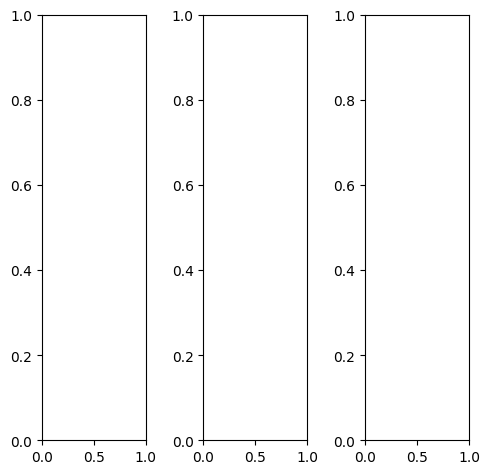

tensor([[[0.5765, 0.5765, 0.5451,  ..., 0.5020, 0.5020, 0.5255],
         [0.5451, 0.5569, 0.5255,  ..., 0.5569, 0.5608, 0.5686],
         [0.5373, 0.5294, 0.5176,  ..., 0.5412, 0.5451, 0.5373],
         ...,
         [0.5020, 0.4980, 0.5020,  ..., 0.4078, 0.4118, 0.4275],
         [0.5569, 0.5333, 0.5176,  ..., 0.4314, 0.4431, 0.4588],
         [0.8706, 0.8392, 0.8157,  ..., 0.4706, 0.4745, 0.4863]],

        [[0.5765, 0.5765, 0.5451,  ..., 0.5020, 0.5020, 0.5255],
         [0.5451, 0.5569, 0.5255,  ..., 0.5569, 0.5608, 0.5686],
         [0.5373, 0.5294, 0.5176,  ..., 0.5412, 0.5451, 0.5373],
         ...,
         [0.5020, 0.4980, 0.5020,  ..., 0.4078, 0.4118, 0.4275],
         [0.5569, 0.5333, 0.5176,  ..., 0.4314, 0.4431, 0.4588],
         [0.8706, 0.8392, 0.8157,  ..., 0.4706, 0.4745, 0.4863]],

        [[0.5765, 0.5765, 0.5451,  ..., 0.5020, 0.5020, 0.5255],
         [0.5451, 0.5569, 0.5255,  ..., 0.5569, 0.5608, 0.5686],
         [0.5373, 0.5294, 0.5176,  ..., 0.5412, 0.5451, 0.

tensor([[[0.6157, 0.6157, 0.5843,  ..., 0.5333, 0.5255, 0.5412],
         [0.5843, 0.5961, 0.5647,  ..., 0.5843, 0.5804, 0.5843],
         [0.5765, 0.5686, 0.5569,  ..., 0.5725, 0.5647, 0.5529],
         ...,
         [0.5020, 0.4980, 0.5020,  ..., 0.3765, 0.3882, 0.4078],
         [0.5569, 0.5333, 0.5176,  ..., 0.4000, 0.4157, 0.4353],
         [0.8706, 0.8392, 0.8157,  ..., 0.4392, 0.4471, 0.4588]],

        [[0.5647, 0.5647, 0.5333,  ..., 0.4941, 0.4980, 0.5216],
         [0.5333, 0.5451, 0.5137,  ..., 0.5490, 0.5569, 0.5647],
         [0.5255, 0.5176, 0.5059,  ..., 0.5333, 0.5412, 0.5333],
         ...,
         [0.4941, 0.4902, 0.4980,  ..., 0.4118, 0.4157, 0.4275],
         [0.5529, 0.5294, 0.5137,  ..., 0.4353, 0.4471, 0.4588],
         [0.8667, 0.8353, 0.8118,  ..., 0.4745, 0.4784, 0.4863]],

        [[0.5333, 0.5333, 0.5020,  ..., 0.4588, 0.4745, 0.4980],
         [0.4980, 0.5137, 0.4824,  ..., 0.5137, 0.5294, 0.5412],
         [0.4941, 0.4863, 0.4745,  ..., 0.5020, 0.5137, 0.

tensor([[[0.4744, 0.5858, 0.5551,  ..., 0.5319, 0.5999, 0.5504],
         [0.4832, 0.3851, 0.3105,  ..., 0.4760, 0.6066, 0.6811],
         [0.5050, 0.3688, 0.3271,  ..., 0.4406, 0.4927, 0.5162],
         ...,
         [0.4276, 0.4113, 0.3834,  ..., 0.4929, 0.4631, 0.4594],
         [0.4675, 0.3788, 0.3413,  ..., 0.4862, 0.4983, 0.5003],
         [0.7605, 0.8380, 0.9121,  ..., 0.4993, 0.5146, 0.4304]],

        [[0.4385, 0.6521, 0.5028,  ..., 0.5886, 0.5335, 0.5590],
         [0.6111, 0.5379, 0.3982,  ..., 0.5636, 0.6638, 0.6977],
         [0.5171, 0.5519, 0.4553,  ..., 0.5276, 0.5009, 0.5793],
         ...,
         [0.3985, 0.3753, 0.4334,  ..., 0.4562, 0.4296, 0.4073],
         [0.5469, 0.4507, 0.4097,  ..., 0.4925, 0.4753, 0.4460],
         [0.7178, 0.7881, 0.7983,  ..., 0.4784, 0.4719, 0.4120]],

        [[0.5756, 0.5007, 0.5961,  ..., 0.5399, 0.6841, 0.5835],
         [0.5149, 0.5322, 0.4202,  ..., 0.6106, 0.6540, 0.6879],
         [0.5159, 0.3765, 0.3886,  ..., 0.5040, 0.6147, 0.

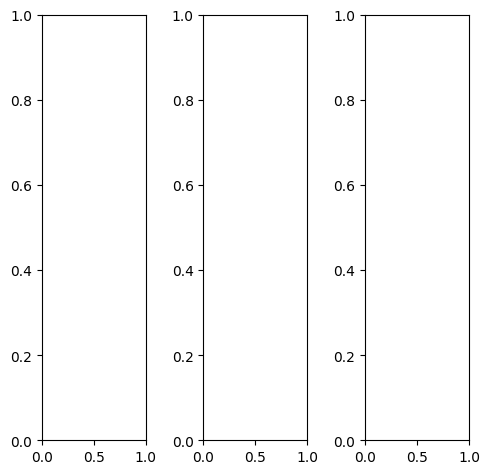

tensor([[[0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.9216],
         [0.9294, 0.9294, 0.9333,  ..., 0.9255, 0.9255, 0.9294],
         [0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.9176],
         ...,
         [0.3882, 0.0471, 0.0314,  ..., 0.4314, 0.5373, 0.7098],
         [0.4431, 0.0235, 0.0157,  ..., 0.9294, 0.9529, 0.9490],
         [0.1843, 0.0824, 0.0196,  ..., 0.9255, 0.9020, 0.9137]],

        [[0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.9216],
         [0.9294, 0.9294, 0.9333,  ..., 0.9255, 0.9255, 0.9294],
         [0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.9176],
         ...,
         [0.3882, 0.0471, 0.0314,  ..., 0.4314, 0.5373, 0.7098],
         [0.4431, 0.0235, 0.0157,  ..., 0.9294, 0.9529, 0.9490],
         [0.1843, 0.0824, 0.0196,  ..., 0.9255, 0.9020, 0.9137]],

        [[0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.9216],
         [0.9294, 0.9294, 0.9333,  ..., 0.9255, 0.9255, 0.9294],
         [0.9176, 0.9216, 0.9255,  ..., 0.9176, 0.9176, 0.

tensor([[[0.9961, 0.9961, 1.0000,  ..., 0.9843, 0.9843, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9961, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.4000, 0.0588, 0.0353,  ..., 0.4471, 0.5608, 0.7451],
         [0.4588, 0.0353, 0.0196,  ..., 0.9608, 0.9922, 0.9922],
         [0.2039, 0.0980, 0.0275,  ..., 0.9725, 0.9569, 0.9725]],

        [[0.9020, 0.9059, 0.9098,  ..., 0.9059, 0.9059, 0.9059],
         [0.9137, 0.9137, 0.9216,  ..., 0.9137, 0.9137, 0.9137],
         [0.9020, 0.9059, 0.9098,  ..., 0.9020, 0.9020, 0.9020],
         ...,
         [0.3882, 0.0431, 0.0275,  ..., 0.4314, 0.5412, 0.7059],
         [0.4392, 0.0196, 0.0157,  ..., 0.9255, 0.9529, 0.9451],
         [0.1804, 0.0784, 0.0157,  ..., 0.9176, 0.8941, 0.9059]],

        [[0.8078, 0.8118, 0.8157,  ..., 0.8078, 0.8118, 0.8157],
         [0.8196, 0.8196, 0.8275,  ..., 0.8078, 0.8078, 0.8118],
         [0.8078, 0.8118, 0.8157,  ..., 0.7882, 0.7843, 0.

tensor([[[ 0.5874,  0.5778,  0.6072,  ...,  0.6104,  0.6021,  0.5967],
         [ 0.6196,  0.6067,  0.5594,  ...,  0.7165,  0.6166,  0.7100],
         [ 0.6086,  0.6057,  0.5970,  ...,  0.7614,  0.7225,  0.6894],
         ...,
         [ 0.1724, -0.0472, -0.1045,  ...,  0.1885,  0.3386,  0.5467],
         [ 0.2109, -0.0378, -0.0681,  ...,  0.7515,  0.7304,  0.7476],
         [ 0.1801,  0.0668,  0.0497,  ...,  0.7856,  0.7745,  0.6473]],

        [[ 0.6208,  0.6236,  0.7295,  ...,  0.7198,  0.7140,  0.6784],
         [ 0.6131,  0.5755,  0.6201,  ...,  0.7033,  0.7503,  0.8235],
         [ 0.6747,  0.6241,  0.6585,  ...,  0.7843,  0.6776,  0.7869],
         ...,
         [ 0.2059,  0.0042, -0.0655,  ...,  0.2839,  0.4048,  0.5062],
         [ 0.2477,  0.0401, -0.0409,  ...,  0.7788,  0.8405,  0.7620],
         [ 0.2156,  0.0975,  0.0756,  ...,  0.7397,  0.7258,  0.6630]],

        [[ 0.7257,  0.8035,  0.8241,  ...,  0.8118,  0.8521,  0.7420],
         [ 0.7934,  0.8362,  0.7998,  ...,  0

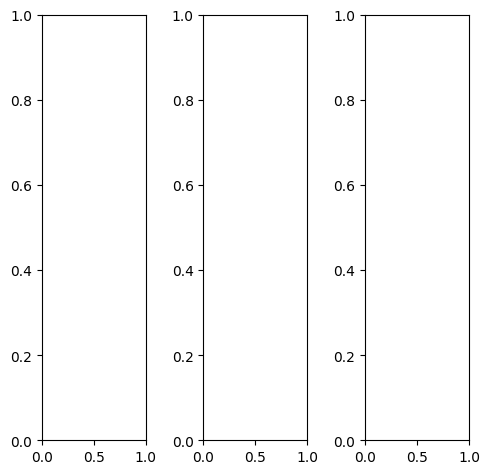

tensor([[[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1294, 0.1255, 0.1294,  ..., 0.1647, 0.2392, 0.2824],
         [0.1922, 0.2039, 0.2275,  ..., 0.1882, 0.3255, 0.4549],
         [0.4314, 0.4353, 0.4392,  ..., 0.1804, 0.3725, 0.5137]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1294, 0.1255, 0.1294,  ..., 0.1647, 0.2392, 0.2824],
         [0.1922, 0.2039, 0.2275,  ..., 0.1882, 0.3255, 0.4549],
         [0.4314, 0.4353, 0.4392,  ..., 0.1804, 0.3725, 0.5137]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.

tensor([[[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.2196, 0.2118, 0.2118,  ..., 0.2667, 0.3529, 0.4000],
         [0.3020, 0.3176, 0.3529,  ..., 0.2902, 0.4392, 0.5490],
         [0.6078, 0.6118, 0.6157,  ..., 0.2745, 0.4667, 0.5961]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1020, 0.0980, 0.1020,  ..., 0.1373, 0.2039, 0.2510],
         [0.1569, 0.1686, 0.1922,  ..., 0.1569, 0.2902, 0.4314],
         [0.3804, 0.3804, 0.3843,  ..., 0.1490, 0.3451, 0.4902]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.

tensor([[[ 2.0069e-01,  2.6260e-01,  9.2371e-02,  ...,  1.3192e-01,
           1.4929e-01,  1.9958e-01],
         [ 2.6767e-01,  8.8788e-03,  1.3865e-01,  ...,  1.1017e-01,
           1.2323e-01,  1.7364e-01],
         [ 1.4853e-01, -5.2246e-03,  1.1610e-01,  ...,  1.1480e-01,
           1.2331e-01,  1.6368e-01],
         ...,
         [ 3.0988e-01,  2.7476e-01,  2.5787e-01,  ...,  4.1896e-01,
           4.6088e-01,  6.1395e-01],
         [ 3.6675e-01,  3.6971e-01,  3.9940e-01,  ...,  3.8401e-01,
           5.7146e-01,  7.5094e-01],
         [ 5.8419e-01,  7.1178e-01,  7.0461e-01,  ...,  4.3282e-01,
           6.7265e-01,  6.4832e-01]],

        [[ 2.5292e-01,  3.0286e-01,  1.6520e-01,  ...,  1.8728e-01,
           1.9724e-01,  2.4535e-01],
         [ 2.8998e-01,  1.1603e-01, -2.5349e-04,  ...,  1.8976e-01,
           1.8132e-01,  2.1406e-01],
         [ 1.9970e-01,  1.4835e-01, -3.5283e-03,  ...,  1.8494e-01,
           1.7364e-01,  2.0153e-01],
         ...,
         [ 3.5924e-01,  3

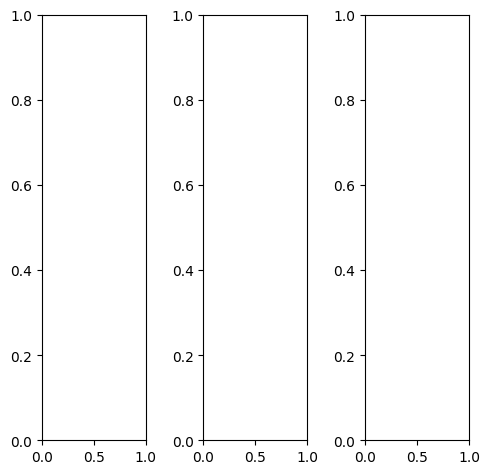

EPOCH: 1.510  trn_loss: 0.006  (173.62s - 11323.12s remaining)

tensor([[[0.3961, 0.3765, 0.3686,  ..., 0.2235, 0.2627, 0.2863],
         [0.3804, 0.3843, 0.3765,  ..., 0.2392, 0.2549, 0.2549],
         [0.3804, 0.3765, 0.3725,  ..., 0.2314, 0.2510, 0.2627],
         ...,
         [0.4824, 0.5059, 0.5255,  ..., 0.6314, 0.6471, 0.6824],
         [0.4824, 0.5216, 0.5529,  ..., 0.6471, 0.6745, 0.7098],
         [0.5059, 0.5490, 0.6157,  ..., 0.5255, 0.4667, 0.4824]],

        [[0.3961, 0.3765, 0.3686,  ..., 0.2235, 0.2627, 0.2863],
         [0.3804, 0.3843, 0.3765,  ..., 0.2392, 0.2549, 0.2549],
         [0.3804, 0.3765, 0.3725,  ..., 0.2314, 0.2510, 0.2627],
         ...,
         [0.4824, 0.5059, 0.5255,  ..., 0.6314, 0.6471, 0.6824],
         [0.4824, 0.5216, 0.5529,  ..., 0.6471, 0.6745, 0.7098],
         [0.5059, 0.5490, 0.6157,  ..., 0.5255, 0.4667, 0.4824]],

        [[0.3961, 0.3765, 0.3686,  ..., 0.2235, 0.2627, 0.2863],
         [0.3804, 0.3843, 0.3765,  ..., 0.2392, 0.2549, 0.2549],
         [0.3804, 0.3765, 0.3725,  ..., 0.2314, 0.2510, 0.

tensor([[[0.4667, 0.4471, 0.4314,  ..., 0.2980, 0.3373, 0.3647],
         [0.4510, 0.4510, 0.4392,  ..., 0.3137, 0.3373, 0.3333],
         [0.4510, 0.4431, 0.4314,  ..., 0.3137, 0.3373, 0.3490],
         ...,
         [0.5020, 0.5098, 0.5098,  ..., 0.7608, 0.7765, 0.8157],
         [0.4980, 0.5176, 0.5294,  ..., 0.7608, 0.7882, 0.8353],
         [0.5137, 0.5373, 0.5843,  ..., 0.6196, 0.5765, 0.6078]],

        [[0.3569, 0.3373, 0.3333,  ..., 0.1725, 0.2118, 0.2392],
         [0.3412, 0.3451, 0.3412,  ..., 0.1882, 0.2078, 0.2078],
         [0.3412, 0.3373, 0.3373,  ..., 0.1804, 0.2000, 0.2118],
         ...,
         [0.4627, 0.4941, 0.5216,  ..., 0.5922, 0.6118, 0.6431],
         [0.4667, 0.5098, 0.5490,  ..., 0.6157, 0.6471, 0.6824],
         [0.4902, 0.5412, 0.6157,  ..., 0.5020, 0.4392, 0.4471]],

        [[0.4118, 0.4000, 0.3961,  ..., 0.3059, 0.3137, 0.3294],
         [0.3961, 0.4039, 0.4039,  ..., 0.2980, 0.2980, 0.2902],
         [0.3961, 0.3922, 0.4000,  ..., 0.2941, 0.2863, 0.

tensor([[[0.3358, 0.3559, 0.2450,  ..., 0.1126, 0.1796, 0.2120],
         [0.2656, 0.2691, 0.2396,  ..., 0.0667, 0.1178, 0.1715],
         [0.2589, 0.2557, 0.2761,  ..., 0.0447, 0.1119, 0.1820],
         ...,
         [0.4442, 0.4696, 0.4627,  ..., 0.5449, 0.6403, 0.7580],
         [0.4792, 0.4471, 0.4964,  ..., 0.6810, 0.7514, 0.8300],
         [0.5889, 0.6292, 0.7976,  ..., 0.6265, 0.5967, 0.5665]],

        [[0.4058, 0.4048, 0.3666,  ..., 0.1336, 0.2183, 0.2451],
         [0.3535, 0.3298, 0.3097,  ..., 0.0911, 0.1442, 0.1759],
         [0.3482, 0.3048, 0.3068,  ..., 0.0678, 0.0956, 0.1588],
         ...,
         [0.4573, 0.3820, 0.4320,  ..., 0.6065, 0.6356, 0.8243],
         [0.4880, 0.4194, 0.4999,  ..., 0.6686, 0.7888, 0.8176],
         [0.5524, 0.5887, 0.7247,  ..., 0.6012, 0.5530, 0.5357]],

        [[0.4535, 0.4244, 0.4700,  ..., 0.1741, 0.2756, 0.2596],
         [0.4355, 0.4369, 0.4339,  ..., 0.1888, 0.2096, 0.2190],
         [0.3629, 0.3676, 0.3487,  ..., 0.1552, 0.1806, 0.

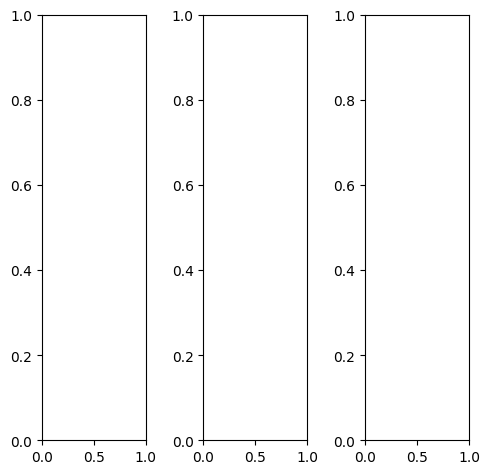

tensor([[[0.4510, 0.5412, 0.3451,  ..., 0.0863, 0.0510, 0.0667],
         [0.6588, 0.5059, 0.4667,  ..., 0.1333, 0.0784, 0.0431],
         [0.8980, 0.8275, 0.8078,  ..., 0.0980, 0.0863, 0.0588],
         ...,
         [0.5294, 0.5059, 0.5020,  ..., 0.1490, 0.1961, 0.2392],
         [0.4902, 0.4824, 0.4784,  ..., 0.1647, 0.1647, 0.2510],
         [0.4745, 0.4667, 0.4667,  ..., 0.1922, 0.1961, 0.1922]],

        [[0.4510, 0.5412, 0.3451,  ..., 0.0863, 0.0510, 0.0667],
         [0.6588, 0.5059, 0.4667,  ..., 0.1333, 0.0784, 0.0431],
         [0.8980, 0.8275, 0.8078,  ..., 0.0980, 0.0863, 0.0588],
         ...,
         [0.5294, 0.5059, 0.5020,  ..., 0.1490, 0.1961, 0.2392],
         [0.4902, 0.4824, 0.4784,  ..., 0.1647, 0.1647, 0.2510],
         [0.4745, 0.4667, 0.4667,  ..., 0.1922, 0.1961, 0.1922]],

        [[0.4510, 0.5412, 0.3451,  ..., 0.0863, 0.0510, 0.0667],
         [0.6588, 0.5059, 0.4667,  ..., 0.1333, 0.0784, 0.0431],
         [0.8980, 0.8275, 0.8078,  ..., 0.0980, 0.0863, 0.

tensor([[[0.4039, 0.4863, 0.2863,  ..., 0.0667, 0.0392, 0.0588],
         [0.6353, 0.4784, 0.4353,  ..., 0.1098, 0.0706, 0.0431],
         [0.8863, 0.8196, 0.8000,  ..., 0.0824, 0.0745, 0.0549],
         ...,
         [0.5176, 0.4941, 0.4980,  ..., 0.1686, 0.2510, 0.3451],
         [0.4902, 0.4824, 0.4745,  ..., 0.1608, 0.2039, 0.3412],
         [0.4745, 0.4667, 0.4627,  ..., 0.1882, 0.2078, 0.2627]],

        [[0.4863, 0.5843, 0.3843,  ..., 0.0980, 0.0588, 0.0745],
         [0.6863, 0.5373, 0.4941,  ..., 0.1490, 0.0863, 0.0471],
         [0.9255, 0.8510, 0.8471,  ..., 0.1137, 0.0941, 0.0667],
         ...,
         [0.5255, 0.5020, 0.4980,  ..., 0.1412, 0.1804, 0.2078],
         [0.4824, 0.4784, 0.4706,  ..., 0.1647, 0.1529, 0.2196],
         [0.4667, 0.4588, 0.4627,  ..., 0.1922, 0.1882, 0.1647]],

        [[0.3961, 0.4706, 0.2863,  ..., 0.0627, 0.0353, 0.0510],
         [0.5804, 0.4196, 0.4039,  ..., 0.0980, 0.0627, 0.0314],
         [0.7843, 0.7176, 0.6314,  ..., 0.0706, 0.0667, 0.

tensor([[[0.4987, 0.4446, 0.3466,  ..., 0.1437, 0.1350, 0.1619],
         [0.5218, 0.3996, 0.3658,  ..., 0.1638, 0.1218, 0.1306],
         [0.6906, 0.6655, 0.6427,  ..., 0.1438, 0.1422, 0.1539],
         ...,
         [0.5509, 0.5572, 0.5010,  ..., 0.2576, 0.2928, 0.3100],
         [0.5512, 0.5419, 0.4902,  ..., 0.2213, 0.2427, 0.3080],
         [0.5230, 0.5513, 0.5397,  ..., 0.2283, 0.2351, 0.2622]],

        [[0.4752, 0.4701, 0.4429,  ..., 0.1380, 0.1360, 0.1780],
         [0.5491, 0.4324, 0.4175,  ..., 0.1749, 0.1337, 0.1482],
         [0.7452, 0.7249, 0.7806,  ..., 0.1526, 0.1261, 0.1448],
         ...,
         [0.5632, 0.5372, 0.5484,  ..., 0.2307, 0.2729, 0.2921],
         [0.5311, 0.5305, 0.5359,  ..., 0.2462, 0.2326, 0.2876],
         [0.4961, 0.5006, 0.5447,  ..., 0.2509, 0.2554, 0.2707]],

        [[0.5808, 0.6576, 0.5984,  ..., 0.2001, 0.2227, 0.2147],
         [0.7406, 0.6689, 0.6002,  ..., 0.2560, 0.2180, 0.1867],
         [0.9684, 0.9702, 0.9188,  ..., 0.2063, 0.2176, 0.

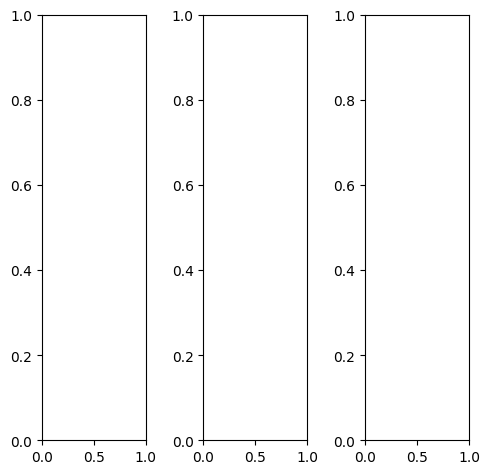

tensor([[[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.9882],
         ...,
         [0.1765, 0.1686, 0.1765,  ..., 0.8824, 0.8824, 0.8784],
         [0.3922, 0.2431, 0.1843,  ..., 0.8706, 0.8706, 0.8588],
         [0.6118, 0.5137, 0.3882,  ..., 0.8627, 0.8471, 0.8392]],

        [[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.9882],
         ...,
         [0.1765, 0.1686, 0.1765,  ..., 0.8824, 0.8824, 0.8784],
         [0.3922, 0.2431, 0.1843,  ..., 0.8706, 0.8706, 0.8588],
         [0.6118, 0.5137, 0.3882,  ..., 0.8627, 0.8471, 0.8392]],

        [[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.

tensor([[[0.4039, 0.4157, 0.4314,  ..., 0.9647, 0.9647, 0.9529],
         [0.4196, 0.4275, 0.4510,  ..., 0.9804, 0.9765, 0.9647],
         [0.3333, 0.3961, 0.4471,  ..., 0.9843, 0.9843, 0.9725],
         ...,
         [0.2157, 0.2196, 0.2275,  ..., 0.8863, 0.8863, 0.8824],
         [0.4235, 0.2863, 0.2275,  ..., 0.8784, 0.8745, 0.8627],
         [0.6353, 0.5373, 0.4157,  ..., 0.8706, 0.8510, 0.8431]],

        [[0.4275, 0.4353, 0.4549,  ..., 0.9843, 0.9882, 0.9882],
         [0.4196, 0.4275, 0.4549,  ..., 0.9922, 0.9961, 0.9961],
         [0.3137, 0.3765, 0.4235,  ..., 0.9882, 0.9922, 0.9922],
         ...,
         [0.1569, 0.1451, 0.1490,  ..., 0.8824, 0.8824, 0.8784],
         [0.3804, 0.2275, 0.1647,  ..., 0.8745, 0.8745, 0.8588],
         [0.6157, 0.5137, 0.3843,  ..., 0.8667, 0.8510, 0.8431]],

        [[0.4549, 0.4627, 0.4784,  ..., 0.9843, 0.9882, 0.9843],
         [0.4588, 0.4667, 0.4941,  ..., 0.9961, 0.9961, 0.9961],
         [0.3490, 0.4118, 0.4588,  ..., 0.9922, 0.9961, 0.

tensor([[[0.4325, 0.4866, 0.4531,  ..., 0.6773, 0.6626, 0.6866],
         [0.4106, 0.4433, 0.4529,  ..., 0.6136, 0.6354, 0.7235],
         [0.4055, 0.3827, 0.4415,  ..., 0.6211, 0.7394, 0.7758],
         ...,
         [0.1589, 0.1692, 0.1628,  ..., 0.6666, 0.6918, 0.7278],
         [0.2882, 0.1861, 0.1807,  ..., 0.6616, 0.7134, 0.7383],
         [0.4814, 0.4282, 0.3242,  ..., 0.7717, 0.7786, 0.6928]],

        [[0.4053, 0.5237, 0.3893,  ..., 0.7291, 0.7758, 0.7442],
         [0.5320, 0.4614, 0.3792,  ..., 0.7240, 0.7559, 0.8527],
         [0.3725, 0.4091, 0.3719,  ..., 0.7363, 0.7885, 0.8202],
         ...,
         [0.1845, 0.1712, 0.1990,  ..., 0.6961, 0.6945, 0.7857],
         [0.3498, 0.2973, 0.2271,  ..., 0.7053, 0.7134, 0.7275],
         [0.4828, 0.4298, 0.3669,  ..., 0.7636, 0.7172, 0.6620]],

        [[0.4726, 0.3702, 0.4953,  ..., 0.9101, 0.9381, 0.8338],
         [0.3954, 0.4095, 0.4122,  ..., 0.8761, 0.9489, 0.8524],
         [0.3851, 0.2923, 0.3433,  ..., 0.9412, 0.9440, 0.

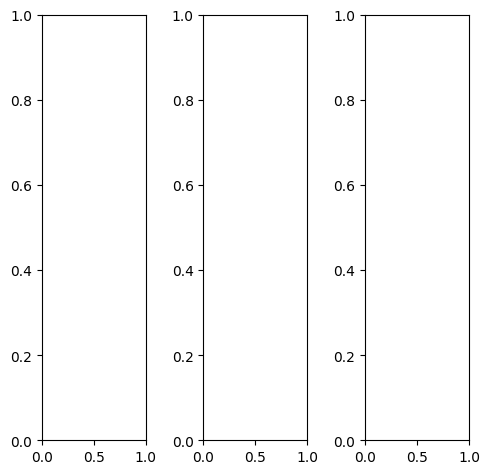

tensor([[[0.7569, 0.7608, 0.7647,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.7373],
         ...,
         [0.5333, 0.5294, 0.5137,  ..., 0.5176, 0.5098, 0.5137],
         [0.5294, 0.5294, 0.5137,  ..., 0.4863, 0.5020, 0.5020],
         [0.5412, 0.5451, 0.5255,  ..., 0.4941, 0.4902, 0.4941]],

        [[0.7569, 0.7608, 0.7647,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.7373],
         ...,
         [0.5333, 0.5294, 0.5137,  ..., 0.5176, 0.5098, 0.5137],
         [0.5294, 0.5294, 0.5137,  ..., 0.4863, 0.5020, 0.5020],
         [0.5412, 0.5451, 0.5255,  ..., 0.4941, 0.4902, 0.4941]],

        [[0.7569, 0.7608, 0.7647,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.7373],
         [0.7569, 0.7608, 0.7725,  ..., 0.7451, 0.7412, 0.

tensor([[[0.7333, 0.7373, 0.7412,  ..., 0.7137, 0.7098, 0.7059],
         [0.7333, 0.7373, 0.7490,  ..., 0.7137, 0.7098, 0.7059],
         [0.7333, 0.7373, 0.7490,  ..., 0.7137, 0.7098, 0.7059],
         ...,
         [0.4941, 0.4902, 0.4745,  ..., 0.4745, 0.4667, 0.4706],
         [0.4902, 0.4902, 0.4745,  ..., 0.4431, 0.4588, 0.4588],
         [0.5020, 0.5059, 0.4863,  ..., 0.4510, 0.4471, 0.4510]],

        [[0.7647, 0.7686, 0.7725,  ..., 0.7529, 0.7490, 0.7451],
         [0.7647, 0.7686, 0.7804,  ..., 0.7529, 0.7490, 0.7451],
         [0.7647, 0.7686, 0.7804,  ..., 0.7529, 0.7490, 0.7451],
         ...,
         [0.5451, 0.5412, 0.5255,  ..., 0.5294, 0.5216, 0.5255],
         [0.5412, 0.5412, 0.5255,  ..., 0.4980, 0.5137, 0.5137],
         [0.5529, 0.5569, 0.5373,  ..., 0.5059, 0.5020, 0.5059]],

        [[0.7765, 0.7804, 0.7843,  ..., 0.7882, 0.7843, 0.7804],
         [0.7765, 0.7804, 0.7922,  ..., 0.7882, 0.7843, 0.7804],
         [0.7765, 0.7804, 0.7922,  ..., 0.7882, 0.7843, 0.

tensor([[[0.5719, 0.6291, 0.6597,  ..., 0.5828, 0.6164, 0.5611],
         [0.5754, 0.5712, 0.4928,  ..., 0.6010, 0.4962, 0.6397],
         [0.5542, 0.5541, 0.4830,  ..., 0.5461, 0.5744, 0.5322],
         ...,
         [0.4075, 0.3742, 0.3861,  ..., 0.4487, 0.3896, 0.3738],
         [0.4121, 0.3496, 0.3815,  ..., 0.3616, 0.3849, 0.3782],
         [0.4295, 0.4309, 0.4683,  ..., 0.3896, 0.4020, 0.3272]],

        [[0.6388, 0.7082, 0.7178,  ..., 0.7239, 0.6790, 0.6110],
         [0.6755, 0.6440, 0.7365,  ..., 0.6999, 0.6727, 0.7112],
         [0.6630, 0.6136, 0.6401,  ..., 0.6832, 0.5513, 0.6577],
         ...,
         [0.4203, 0.3575, 0.4210,  ..., 0.3992, 0.3870, 0.3270],
         [0.4685, 0.3970, 0.3817,  ..., 0.3711, 0.3758, 0.3372],
         [0.4391, 0.4057, 0.4073,  ..., 0.3534, 0.3580, 0.3127]],

        [[0.7969, 0.8358, 0.9098,  ..., 0.8528, 0.8969, 0.7314],
         [0.8034, 0.8670, 0.7534,  ..., 0.8612, 0.7519, 0.7983],
         [0.8253, 0.7597, 0.7696,  ..., 0.7455, 0.7597, 0.

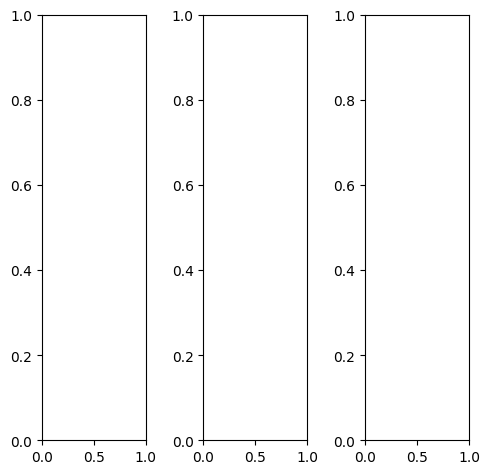

tensor([[[0.7216, 0.7137, 0.7216,  ..., 0.7255, 0.7137, 0.6863],
         [0.7373, 0.7255, 0.7294,  ..., 0.7216, 0.7059, 0.6784],
         [0.7294, 0.7137, 0.7098,  ..., 0.7020, 0.6941, 0.6667],
         ...,
         [0.8549, 0.8588, 0.8588,  ..., 0.8745, 0.8706, 0.8667],
         [0.8667, 0.8667, 0.8667,  ..., 0.8627, 0.8588, 0.8510],
         [0.8549, 0.8549, 0.8588,  ..., 0.8549, 0.8471, 0.8471]],

        [[0.7216, 0.7137, 0.7216,  ..., 0.7255, 0.7137, 0.6863],
         [0.7373, 0.7255, 0.7294,  ..., 0.7216, 0.7059, 0.6784],
         [0.7294, 0.7137, 0.7098,  ..., 0.7020, 0.6941, 0.6667],
         ...,
         [0.8549, 0.8588, 0.8588,  ..., 0.8745, 0.8706, 0.8667],
         [0.8667, 0.8667, 0.8667,  ..., 0.8627, 0.8588, 0.8510],
         [0.8549, 0.8549, 0.8588,  ..., 0.8549, 0.8471, 0.8471]],

        [[0.7216, 0.7137, 0.7216,  ..., 0.7255, 0.7137, 0.6863],
         [0.7373, 0.7255, 0.7294,  ..., 0.7216, 0.7059, 0.6784],
         [0.7294, 0.7137, 0.7098,  ..., 0.7020, 0.6941, 0.

tensor([[[0.6118, 0.6118, 0.6235,  ..., 0.6196, 0.5922, 0.5529],
         [0.6392, 0.6314, 0.6275,  ..., 0.6039, 0.5725, 0.5333],
         [0.6392, 0.6196, 0.6078,  ..., 0.5765, 0.5529, 0.5176],
         ...,
         [0.7686, 0.7765, 0.7765,  ..., 0.7843, 0.7725, 0.7647],
         [0.7843, 0.7843, 0.7843,  ..., 0.7686, 0.7490, 0.7451],
         [0.7725, 0.7725, 0.7765,  ..., 0.7608, 0.7412, 0.7373]],

        [[0.7569, 0.7451, 0.7490,  ..., 0.7608, 0.7529, 0.7333],
         [0.7647, 0.7529, 0.7569,  ..., 0.7608, 0.7490, 0.7255],
         [0.7529, 0.7412, 0.7412,  ..., 0.7451, 0.7412, 0.7176],
         ...,
         [0.8863, 0.8863, 0.8863,  ..., 0.9098, 0.9098, 0.9098],
         [0.8980, 0.8980, 0.8980,  ..., 0.8980, 0.9020, 0.8980],
         [0.8863, 0.8863, 0.8902,  ..., 0.8941, 0.8941, 0.8941]],

        [[0.8314, 0.8235, 0.8275,  ..., 0.8353, 0.8235, 0.8039],
         [0.8471, 0.8392, 0.8392,  ..., 0.8314, 0.8235, 0.8039],
         [0.8471, 0.8314, 0.8275,  ..., 0.8196, 0.8157, 0.

tensor([[[0.3362, 0.3399, 0.2510,  ..., 0.1570, 0.1636, 0.1049],
         [0.3302, 0.2226, 0.0283,  ..., 0.0793, 0.1798, 0.0912],
         [0.4148, 0.0679, 0.0424,  ..., 0.1481, 0.2090, 0.0964],
         ...,
         [0.5959, 0.5430, 0.5427,  ..., 0.5737, 0.5719, 0.5269],
         [0.6147, 0.4834, 0.6169,  ..., 0.5402, 0.4398, 0.5063],
         [0.6114, 0.4928, 0.6971,  ..., 0.6785, 0.6655, 0.4788]],

        [[0.3816, 0.4776, 0.3204,  ..., 0.2785, 0.3015, 0.1608],
         [0.4624, 0.3536, 0.1495,  ..., 0.2565, 0.2899, 0.0975],
         [0.4856, 0.3652, 0.0058,  ..., 0.2817, 0.2357, 0.0907],
         ...,
         [0.6366, 0.4935, 0.5274,  ..., 0.6227, 0.5895, 0.5871],
         [0.6880, 0.4991, 0.5677,  ..., 0.5582, 0.5036, 0.4877],
         [0.5821, 0.4644, 0.6039,  ..., 0.6607, 0.6053, 0.4711]],

        [[0.5293, 0.2445, 0.3567,  ..., 0.4059, 0.4211, 0.2520],
         [0.5507, 0.3171, 0.2882,  ..., 0.4419, 0.4044, 0.2126],
         [0.4915, 0.1739, 0.1566,  ..., 0.3662, 0.3401, 0.

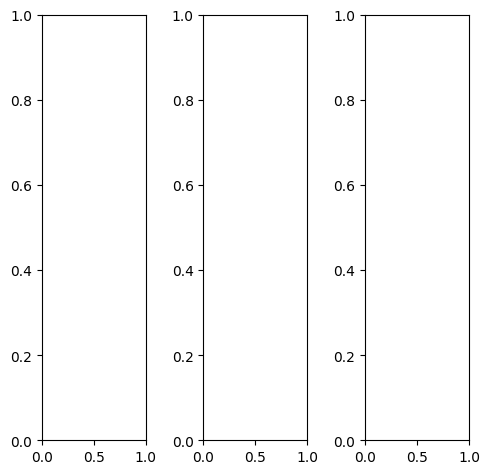

EPOCH: 1.765  trn_loss: 0.006  (200.73s - 11170.36s remaining)

tensor([[[0.2980, 0.2824, 0.2549,  ..., 0.3137, 0.3216, 0.3294],
         [0.2863, 0.2706, 0.2627,  ..., 0.2941, 0.3059, 0.3137],
         [0.2667, 0.2627, 0.2667,  ..., 0.2784, 0.2863, 0.2941],
         ...,
         [0.1137, 0.1176, 0.1176,  ..., 0.0980, 0.1020, 0.1098],
         [0.1176, 0.1176, 0.1137,  ..., 0.0941, 0.0980, 0.1059],
         [0.1176, 0.1176, 0.1176,  ..., 0.1059, 0.1098, 0.1137]],

        [[0.2980, 0.2824, 0.2549,  ..., 0.3137, 0.3216, 0.3294],
         [0.2863, 0.2706, 0.2627,  ..., 0.2941, 0.3059, 0.3137],
         [0.2667, 0.2627, 0.2667,  ..., 0.2784, 0.2863, 0.2941],
         ...,
         [0.1137, 0.1176, 0.1176,  ..., 0.0980, 0.1020, 0.1098],
         [0.1176, 0.1176, 0.1137,  ..., 0.0941, 0.0980, 0.1059],
         [0.1176, 0.1176, 0.1176,  ..., 0.1059, 0.1098, 0.1137]],

        [[0.2980, 0.2824, 0.2549,  ..., 0.3137, 0.3216, 0.3294],
         [0.2863, 0.2706, 0.2627,  ..., 0.2941, 0.3059, 0.3137],
         [0.2667, 0.2627, 0.2667,  ..., 0.2784, 0.2863, 0.

tensor([[[0.2980, 0.2824, 0.2588,  ..., 0.3137, 0.3216, 0.3333],
         [0.2863, 0.2706, 0.2588,  ..., 0.2941, 0.3059, 0.3137],
         [0.2667, 0.2588, 0.2627,  ..., 0.2824, 0.2863, 0.2980],
         ...,
         [0.0863, 0.0863, 0.0863,  ..., 0.0706, 0.0745, 0.0824],
         [0.0902, 0.0902, 0.0863,  ..., 0.0667, 0.0706, 0.0824],
         [0.0902, 0.0902, 0.0902,  ..., 0.0784, 0.0784, 0.0863]],

        [[0.3020, 0.2863, 0.2588,  ..., 0.3255, 0.3333, 0.3412],
         [0.2902, 0.2745, 0.2667,  ..., 0.3020, 0.3137, 0.3255],
         [0.2706, 0.2667, 0.2706,  ..., 0.2863, 0.2902, 0.2980],
         ...,
         [0.1294, 0.1333, 0.1333,  ..., 0.1137, 0.1176, 0.1216],
         [0.1333, 0.1333, 0.1294,  ..., 0.1098, 0.1137, 0.1176],
         [0.1333, 0.1333, 0.1333,  ..., 0.1216, 0.1255, 0.1255]],

        [[0.2667, 0.2588, 0.2392,  ..., 0.2588, 0.2667, 0.2745],
         [0.2627, 0.2510, 0.2431,  ..., 0.2431, 0.2588, 0.2627],
         [0.2471, 0.2431, 0.2471,  ..., 0.2353, 0.2510, 0.

tensor([[[ 0.3908,  0.2975,  0.2473,  ...,  0.2977,  0.3449,  0.3893],
         [ 0.3172,  0.2660,  0.1439,  ...,  0.2119,  0.2503,  0.3591],
         [ 0.2821,  0.1948,  0.1820,  ...,  0.2245,  0.2790,  0.3554],
         ...,
         [-0.0041, -0.0081, -0.0470,  ..., -0.0137, -0.0100,  0.0667],
         [ 0.0216, -0.0142, -0.0291,  ..., -0.0209, -0.0094,  0.0655],
         [ 0.1112,  0.0579,  0.0400,  ...,  0.0606,  0.0685,  0.1155]],

        [[ 0.4541,  0.3876,  0.4172,  ...,  0.3794,  0.4612,  0.4288],
         [ 0.4277,  0.3739,  0.3610,  ...,  0.3461,  0.3999,  0.3949],
         [ 0.4018,  0.2994,  0.3631,  ...,  0.3362,  0.3959,  0.3744],
         ...,
         [ 0.1383,  0.0852,  0.0941,  ...,  0.0682,  0.0766,  0.1105],
         [ 0.1349,  0.1181,  0.0952,  ...,  0.0960,  0.0695,  0.1059],
         [ 0.1831,  0.1272,  0.1411,  ...,  0.1268,  0.1310,  0.1515]],

        [[ 0.5385,  0.5442,  0.5706,  ...,  0.4800,  0.5491,  0.5219],
         [ 0.5451,  0.6034,  0.5671,  ...,  0

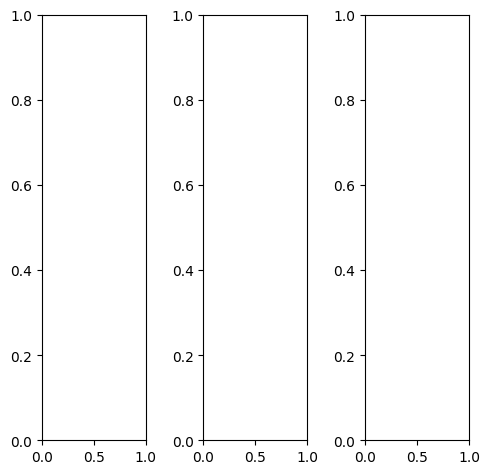

tensor([[[0.3294, 0.3451, 0.3569,  ..., 0.2706, 0.2745, 0.2627],
         [0.1686, 0.1804, 0.1765,  ..., 0.2471, 0.2863, 0.2941],
         [0.0863, 0.0824, 0.0784,  ..., 0.2745, 0.2706, 0.2902],
         ...,
         [0.6157, 0.5922, 0.4471,  ..., 0.4510, 0.5569, 0.6000],
         [0.6078, 0.5922, 0.4706,  ..., 0.6392, 0.6314, 0.6157],
         [0.6118, 0.6314, 0.6314,  ..., 0.6275, 0.6314, 0.6196]],

        [[0.3294, 0.3451, 0.3569,  ..., 0.2706, 0.2745, 0.2627],
         [0.1686, 0.1804, 0.1765,  ..., 0.2471, 0.2863, 0.2941],
         [0.0863, 0.0824, 0.0784,  ..., 0.2745, 0.2706, 0.2902],
         ...,
         [0.6157, 0.5922, 0.4471,  ..., 0.4510, 0.5569, 0.6000],
         [0.6078, 0.5922, 0.4706,  ..., 0.6392, 0.6314, 0.6157],
         [0.6118, 0.6314, 0.6314,  ..., 0.6275, 0.6314, 0.6196]],

        [[0.3294, 0.3451, 0.3569,  ..., 0.2706, 0.2745, 0.2627],
         [0.1686, 0.1804, 0.1765,  ..., 0.2471, 0.2863, 0.2941],
         [0.0863, 0.0824, 0.0784,  ..., 0.2745, 0.2706, 0.

tensor([[[0.6039, 0.6314, 0.6196,  ..., 0.2941, 0.2980, 0.2863],
         [0.3059, 0.3333, 0.3137,  ..., 0.2706, 0.3098, 0.3176],
         [0.0863, 0.0941, 0.0902,  ..., 0.2980, 0.2941, 0.3137],
         ...,
         [0.7176, 0.6980, 0.5333,  ..., 0.5059, 0.6275, 0.6824],
         [0.7255, 0.7137, 0.5686,  ..., 0.7294, 0.7216, 0.7020],
         [0.7451, 0.7608, 0.7412,  ..., 0.7529, 0.7412, 0.7137]],

        [[0.2078, 0.2157, 0.2314,  ..., 0.2667, 0.2706, 0.2588],
         [0.1059, 0.1137, 0.1098,  ..., 0.2471, 0.2863, 0.2941],
         [0.0902, 0.0824, 0.0745,  ..., 0.2745, 0.2706, 0.2941],
         ...,
         [0.5843, 0.5569, 0.4196,  ..., 0.4353, 0.5333, 0.5725],
         [0.5686, 0.5529, 0.4392,  ..., 0.6118, 0.6039, 0.5882],
         [0.5686, 0.5843, 0.6000,  ..., 0.5922, 0.6000, 0.5882]],

        [[0.2471, 0.2549, 0.3020,  ..., 0.2275, 0.2314, 0.2196],
         [0.1216, 0.1294, 0.1451,  ..., 0.1922, 0.2353, 0.2431],
         [0.0706, 0.0627, 0.0706,  ..., 0.2078, 0.2000, 0.

tensor([[[0.3487, 0.3592, 0.3525,  ..., 0.2075, 0.2475, 0.3267],
         [0.1430, 0.2101, 0.2040,  ..., 0.1747, 0.2156, 0.3275],
         [0.0993, 0.0905, 0.1135,  ..., 0.1608, 0.2266, 0.3239],
         ...,
         [0.6560, 0.6333, 0.3714,  ..., 0.4462, 0.6389, 0.6810],
         [0.6373, 0.6375, 0.4636,  ..., 0.7248, 0.6566, 0.7013],
         [0.6535, 0.7220, 0.7070,  ..., 0.7567, 0.7596, 0.6529]],

        [[0.4016, 0.4084, 0.4515,  ..., 0.3371, 0.3890, 0.3759],
         [0.2110, 0.2465, 0.2378,  ..., 0.3117, 0.3665, 0.3799],
         [0.1165, 0.1253, 0.1514,  ..., 0.3411, 0.3549, 0.3820],
         ...,
         [0.6205, 0.6570, 0.5463,  ..., 0.4963, 0.6895, 0.6711],
         [0.6319, 0.6343, 0.5236,  ..., 0.7578, 0.7703, 0.7205],
         [0.6223, 0.6620, 0.6776,  ..., 0.7113, 0.7155, 0.6398]],

        [[0.4105, 0.4190, 0.4754,  ..., 0.4007, 0.4617, 0.4349],
         [0.2565, 0.3163, 0.2825,  ..., 0.4615, 0.4752, 0.4606],
         [0.2079, 0.1619, 0.2082,  ..., 0.4859, 0.4869, 0.

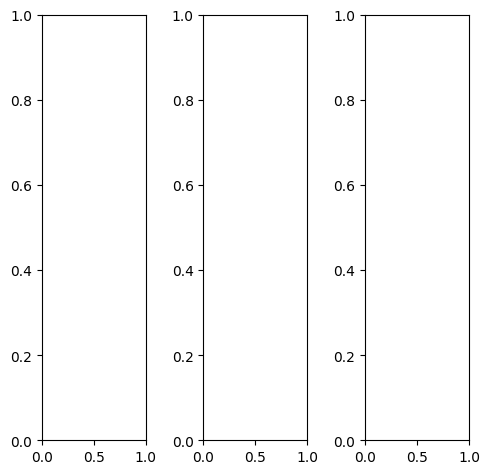

tensor([[[0.6549, 0.6392, 0.6353,  ..., 0.6039, 0.5765, 0.5725],
         [0.6745, 0.6353, 0.6588,  ..., 0.6157, 0.5922, 0.5725],
         [0.6588, 0.6392, 0.6392,  ..., 0.6157, 0.6353, 0.6078],
         ...,
         [0.7647, 0.7569, 0.7647,  ..., 0.0667, 0.0314, 0.0157],
         [0.7098, 0.7294, 0.7451,  ..., 0.0353, 0.0157, 0.0118],
         [0.7176, 0.7255, 0.7333,  ..., 0.0118, 0.0039, 0.0039]],

        [[0.6549, 0.6392, 0.6353,  ..., 0.6039, 0.5765, 0.5725],
         [0.6745, 0.6353, 0.6588,  ..., 0.6157, 0.5922, 0.5725],
         [0.6588, 0.6392, 0.6392,  ..., 0.6157, 0.6353, 0.6078],
         ...,
         [0.7647, 0.7569, 0.7647,  ..., 0.0667, 0.0314, 0.0157],
         [0.7098, 0.7294, 0.7451,  ..., 0.0353, 0.0157, 0.0118],
         [0.7176, 0.7255, 0.7333,  ..., 0.0118, 0.0039, 0.0039]],

        [[0.6549, 0.6392, 0.6353,  ..., 0.6039, 0.5765, 0.5725],
         [0.6745, 0.6353, 0.6588,  ..., 0.6157, 0.5922, 0.5725],
         [0.6588, 0.6392, 0.6392,  ..., 0.6157, 0.6353, 0.

tensor([[[0.6471, 0.6314, 0.6275,  ..., 0.5529, 0.5255, 0.5216],
         [0.6588, 0.6196, 0.6431,  ..., 0.5647, 0.5412, 0.5216],
         [0.6353, 0.6157, 0.6157,  ..., 0.5647, 0.5843, 0.5569],
         ...,
         [0.7529, 0.7569, 0.7451,  ..., 0.0667, 0.0314, 0.0157],
         [0.6980, 0.7216, 0.7294,  ..., 0.0353, 0.0157, 0.0118],
         [0.7098, 0.7137, 0.7294,  ..., 0.0118, 0.0039, 0.0039]],

        [[0.6706, 0.6549, 0.6510,  ..., 0.6314, 0.6039, 0.6000],
         [0.6941, 0.6549, 0.6784,  ..., 0.6431, 0.6196, 0.6000],
         [0.6824, 0.6588, 0.6627,  ..., 0.6431, 0.6627, 0.6353],
         ...,
         [0.7843, 0.7686, 0.7882,  ..., 0.0706, 0.0314, 0.0157],
         [0.7294, 0.7451, 0.7647,  ..., 0.0353, 0.0157, 0.0118],
         [0.7373, 0.7490, 0.7490,  ..., 0.0157, 0.0039, 0.0039]],

        [[0.5804, 0.5647, 0.5608,  ..., 0.5843, 0.5569, 0.5529],
         [0.6078, 0.5725, 0.5922,  ..., 0.5961, 0.5725, 0.5529],
         [0.6039, 0.5843, 0.5882,  ..., 0.5961, 0.6157, 0.

tensor([[[0.6064, 0.5395, 0.4800,  ..., 0.4554, 0.4738, 0.5377],
         [0.5358, 0.4550, 0.3519,  ..., 0.3001, 0.3425, 0.5222],
         [0.5187, 0.4703, 0.3966,  ..., 0.3555, 0.4261, 0.5433],
         ...,
         [0.7058, 0.6624, 0.6024,  ..., 0.1342, 0.0858, 0.1294],
         [0.6659, 0.6083, 0.6075,  ..., 0.0527, 0.0399, 0.1046],
         [0.6785, 0.6918, 0.7533,  ..., 0.0969, 0.1147, 0.0952]],

        [[0.5971, 0.5647, 0.5896,  ..., 0.5465, 0.5984, 0.5426],
         [0.5643, 0.5190, 0.4740,  ..., 0.5057, 0.5501, 0.5656],
         [0.5654, 0.5073, 0.4785,  ..., 0.4824, 0.5675, 0.5877],
         ...,
         [0.6398, 0.6380, 0.6558,  ..., 0.1641, 0.0896, 0.1275],
         [0.6256, 0.6001, 0.6135,  ..., 0.1079, 0.0527, 0.1138],
         [0.6350, 0.6678, 0.7023,  ..., 0.1194, 0.1219, 0.1345]],

        [[0.7166, 0.7544, 0.7733,  ..., 0.7419, 0.7644, 0.6588],
         [0.6961, 0.7333, 0.6716,  ..., 0.7106, 0.7369, 0.6922],
         [0.7038, 0.7166, 0.6622,  ..., 0.7176, 0.7653, 0.

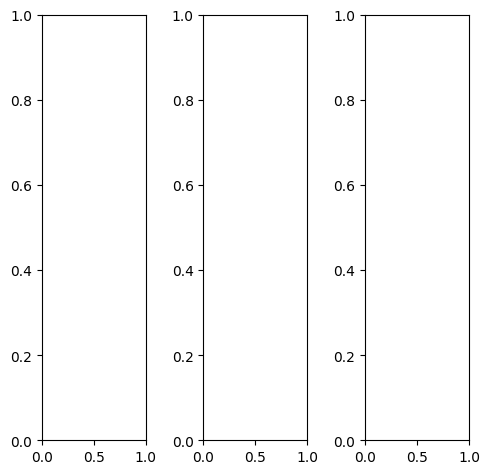

tensor([[[0.4549, 0.4471, 0.4431,  ..., 0.8275, 0.8000, 0.7765],
         [0.4549, 0.4471, 0.4431,  ..., 0.8314, 0.8078, 0.7882],
         [0.4471, 0.4431, 0.4471,  ..., 0.8039, 0.8118, 0.7922],
         ...,
         [0.2314, 0.1961, 0.2039,  ..., 0.7137, 0.7373, 0.8157],
         [0.2392, 0.2157, 0.2235,  ..., 0.6941, 0.7373, 0.7725],
         [0.2392, 0.2314, 0.2353,  ..., 0.6784, 0.7137, 0.7294]],

        [[0.4549, 0.4471, 0.4431,  ..., 0.8275, 0.8000, 0.7765],
         [0.4549, 0.4471, 0.4431,  ..., 0.8314, 0.8078, 0.7882],
         [0.4471, 0.4431, 0.4471,  ..., 0.8039, 0.8118, 0.7922],
         ...,
         [0.2314, 0.1961, 0.2039,  ..., 0.7137, 0.7373, 0.8157],
         [0.2392, 0.2157, 0.2235,  ..., 0.6941, 0.7373, 0.7725],
         [0.2392, 0.2314, 0.2353,  ..., 0.6784, 0.7137, 0.7294]],

        [[0.4549, 0.4471, 0.4431,  ..., 0.8275, 0.8000, 0.7765],
         [0.4549, 0.4471, 0.4431,  ..., 0.8314, 0.8078, 0.7882],
         [0.4471, 0.4431, 0.4471,  ..., 0.8039, 0.8118, 0.

tensor([[[0.3059, 0.2980, 0.2941,  ..., 0.9608, 0.9333, 0.8863],
         [0.2706, 0.2667, 0.2627,  ..., 0.9647, 0.9333, 0.8941],
         [0.2706, 0.2706, 0.2706,  ..., 0.9255, 0.9216, 0.8863],
         ...,
         [0.1725, 0.1529, 0.1725,  ..., 0.9020, 0.9176, 0.9608],
         [0.1725, 0.1569, 0.1765,  ..., 0.8745, 0.9176, 0.9255],
         [0.1647, 0.1608, 0.1686,  ..., 0.8510, 0.8863, 0.8863]],

        [[0.4588, 0.4510, 0.4471,  ..., 0.7686, 0.7373, 0.7216],
         [0.4627, 0.4549, 0.4510,  ..., 0.7725, 0.7490, 0.7333],
         [0.4510, 0.4471, 0.4510,  ..., 0.7412, 0.7529, 0.7412],
         ...,
         [0.1922, 0.1529, 0.1569,  ..., 0.6196, 0.6510, 0.7490],
         [0.2039, 0.1804, 0.1843,  ..., 0.5961, 0.6471, 0.6980],
         [0.2118, 0.2000, 0.2039,  ..., 0.5843, 0.6235, 0.6471]],

        [[0.8275, 0.8118, 0.8118,  ..., 0.7686, 0.7686, 0.7804],
         [0.8863, 0.8745, 0.8745,  ..., 0.8000, 0.7961, 0.8039],
         [0.8902, 0.8824, 0.8824,  ..., 0.7922, 0.8118, 0.

tensor([[[0.4324, 0.3908, 0.3567,  ..., 0.7960, 0.7505, 0.7055],
         [0.3616, 0.3220, 0.1945,  ..., 0.7743, 0.7320, 0.7614],
         [0.3495, 0.3299, 0.3104,  ..., 0.7459, 0.8507, 0.8144],
         ...,
         [0.0406, 0.0078, 0.0043,  ..., 0.6906, 0.7560, 0.8342],
         [0.0685, 0.0028, 0.0340,  ..., 0.6722, 0.7616, 0.8036],
         [0.1474, 0.0851, 0.1078,  ..., 0.7540, 0.7890, 0.7062]],

        [[0.4750, 0.4866, 0.4706,  ..., 0.7870, 0.8218, 0.7355],
         [0.4605, 0.4333, 0.4615,  ..., 0.7884, 0.7828, 0.8497],
         [0.4429, 0.4265, 0.4377,  ..., 0.7355, 0.8078, 0.8165],
         ...,
         [0.1459, 0.0741, 0.0704,  ..., 0.6712, 0.6957, 0.8684],
         [0.1584, 0.1186, 0.0980,  ..., 0.6580, 0.7320, 0.7898],
         [0.1963, 0.1324, 0.1688,  ..., 0.7269, 0.7247, 0.6759]],

        [[0.5844, 0.6032, 0.7015,  ..., 0.9397, 0.9494, 0.8259],
         [0.6108, 0.6296, 0.5832,  ..., 0.8879, 0.9485, 0.8185],
         [0.5848, 0.6173, 0.6187,  ..., 0.9094, 0.9237, 0.

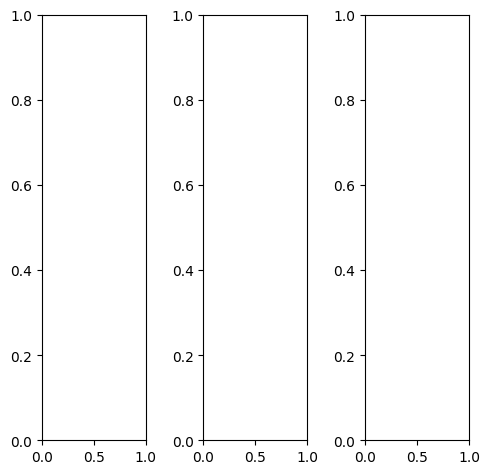

tensor([[[0.9137, 0.9020, 0.8784,  ..., 0.9608, 0.9608, 0.9569],
         [0.9294, 0.8353, 0.5882,  ..., 0.9804, 0.9804, 0.9725],
         [0.9333, 0.6471, 0.3490,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.5490, 0.5137, 0.6706,  ..., 0.9686, 0.9725, 0.9804],
         [0.6784, 0.6627, 0.6941,  ..., 0.9725, 0.9725, 0.9765],
         [0.7059, 0.6824, 0.6902,  ..., 0.9765, 0.9725, 0.9725]],

        [[0.9137, 0.9020, 0.8784,  ..., 0.9608, 0.9608, 0.9569],
         [0.9294, 0.8353, 0.5882,  ..., 0.9804, 0.9804, 0.9725],
         [0.9333, 0.6471, 0.3490,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.5490, 0.5137, 0.6706,  ..., 0.9686, 0.9725, 0.9804],
         [0.6784, 0.6627, 0.6941,  ..., 0.9725, 0.9725, 0.9765],
         [0.7059, 0.6824, 0.6902,  ..., 0.9765, 0.9725, 0.9725]],

        [[0.9137, 0.9020, 0.8784,  ..., 0.9608, 0.9608, 0.9569],
         [0.9294, 0.8353, 0.5882,  ..., 0.9804, 0.9804, 0.9725],
         [0.9333, 0.6471, 0.3490,  ..., 0.9804, 0.9804, 0.

tensor([[[0.9333, 0.9255, 0.9176,  ..., 0.9725, 0.9725, 0.9686],
         [0.9490, 0.8824, 0.6863,  ..., 0.9922, 0.9922, 0.9843],
         [0.9569, 0.7255, 0.4824,  ..., 0.9882, 0.9882, 0.9843],
         ...,
         [0.6078, 0.5647, 0.7216,  ..., 0.9686, 0.9725, 0.9843],
         [0.7373, 0.7255, 0.7569,  ..., 0.9725, 0.9725, 0.9765],
         [0.7647, 0.7490, 0.7608,  ..., 0.9765, 0.9725, 0.9725]],

        [[0.9137, 0.9020, 0.8667,  ..., 0.9608, 0.9608, 0.9569],
         [0.9294, 0.8275, 0.5647,  ..., 0.9765, 0.9765, 0.9686],
         [0.9294, 0.6314, 0.3216,  ..., 0.9765, 0.9765, 0.9765],
         ...,
         [0.5333, 0.5020, 0.6627,  ..., 0.9686, 0.9725, 0.9804],
         [0.6667, 0.6510, 0.6824,  ..., 0.9725, 0.9725, 0.9765],
         [0.6980, 0.6706, 0.6745,  ..., 0.9765, 0.9725, 0.9725]],

        [[0.8510, 0.8510, 0.8235,  ..., 0.9451, 0.9451, 0.9412],
         [0.8667, 0.7529, 0.4627,  ..., 0.9765, 0.9765, 0.9725],
         [0.8784, 0.5216, 0.1529,  ..., 0.9804, 0.9804, 0.

tensor([[[0.6813, 0.6817, 0.6619,  ..., 0.8110, 0.7827, 0.7395],
         [0.7433, 0.7439, 0.3684,  ..., 0.8477, 0.8547, 0.8040],
         [0.7107, 0.5596, 0.2070,  ..., 0.8636, 0.9633, 0.9000],
         ...,
         [0.4425, 0.4371, 0.5759,  ..., 0.9766, 0.9914, 0.9174],
         [0.6038, 0.5819, 0.6036,  ..., 0.9521, 0.9816, 0.9042],
         [0.6051, 0.6330, 0.7025,  ..., 0.9249, 0.9122, 0.7892]],

        [[0.6655, 0.7320, 0.7840,  ..., 0.7948, 0.8457, 0.7939],
         [0.7282, 0.8035, 0.4839,  ..., 0.8468, 0.8706, 0.9178],
         [0.7566, 0.5766, 0.2822,  ..., 0.8597, 0.9325, 0.9102],
         ...,
         [0.4236, 0.3620, 0.5806,  ..., 0.8705, 0.9212, 0.9392],
         [0.5840, 0.5497, 0.6224,  ..., 0.9294, 0.9324, 0.9223],
         [0.5787, 0.5774, 0.6382,  ..., 0.9059, 0.8366, 0.7440]],

        [[0.8183, 0.9484, 0.9697,  ..., 0.8779, 0.8846, 0.8350],
         [0.8978, 0.9846, 0.7012,  ..., 0.9173, 0.9874, 0.8669],
         [0.8756, 0.8333, 0.4798,  ..., 0.9677, 0.9584, 0.

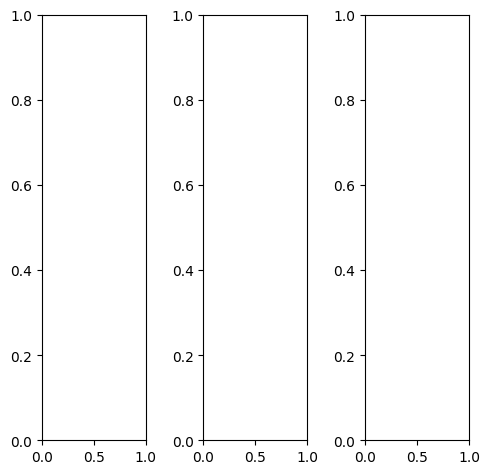

EPOCH: 2.000  val_loss: 0.004  (232.92s - 11413.28s remaining)

tensor([[[0.3961, 0.3647, 0.2667,  ..., 0.1961, 0.1922, 0.1922],
         [0.6000, 0.4902, 0.2667,  ..., 0.1843, 0.1922, 0.1804],
         [0.5922, 0.5294, 0.3373,  ..., 0.1804, 0.1490, 0.1412],
         ...,
         [0.4431, 0.4235, 0.4392,  ..., 0.4667, 0.4510, 0.4275],
         [0.4627, 0.4588, 0.4745,  ..., 0.4039, 0.4275, 0.4275],
         [0.5020, 0.5059, 0.5608,  ..., 0.3765, 0.3725, 0.3490]],

        [[0.3961, 0.3647, 0.2667,  ..., 0.1961, 0.1922, 0.1922],
         [0.6000, 0.4902, 0.2667,  ..., 0.1843, 0.1922, 0.1804],
         [0.5922, 0.5294, 0.3373,  ..., 0.1804, 0.1490, 0.1412],
         ...,
         [0.4431, 0.4235, 0.4392,  ..., 0.4667, 0.4510, 0.4275],
         [0.4627, 0.4588, 0.4745,  ..., 0.4039, 0.4275, 0.4275],
         [0.5020, 0.5059, 0.5608,  ..., 0.3765, 0.3725, 0.3490]],

        [[0.3961, 0.3647, 0.2667,  ..., 0.1961, 0.1922, 0.1922],
         [0.6000, 0.4902, 0.2667,  ..., 0.1843, 0.1922, 0.1804],
         [0.5922, 0.5294, 0.3373,  ..., 0.1804, 0.1490, 0.

tensor([[[0.4078, 0.3765, 0.2784,  ..., 0.2039, 0.1961, 0.1922],
         [0.6118, 0.5020, 0.2784,  ..., 0.1922, 0.1922, 0.1804],
         [0.6039, 0.5412, 0.3490,  ..., 0.1882, 0.1490, 0.1412],
         ...,
         [0.4706, 0.4510, 0.4667,  ..., 0.4941, 0.4784, 0.4549],
         [0.4902, 0.4863, 0.5020,  ..., 0.4314, 0.4549, 0.4549],
         [0.5294, 0.5333, 0.5882,  ..., 0.4000, 0.3961, 0.3765]],

        [[0.3961, 0.3647, 0.2667,  ..., 0.2000, 0.1961, 0.1961],
         [0.6000, 0.4902, 0.2667,  ..., 0.1882, 0.1961, 0.1843],
         [0.5922, 0.5294, 0.3373,  ..., 0.1843, 0.1529, 0.1451],
         ...,
         [0.4392, 0.4196, 0.4353,  ..., 0.4627, 0.4471, 0.4235],
         [0.4588, 0.4549, 0.4706,  ..., 0.4000, 0.4196, 0.4235],
         [0.4980, 0.5020, 0.5569,  ..., 0.3686, 0.3647, 0.3412]],

        [[0.3608, 0.3294, 0.2314,  ..., 0.1529, 0.1686, 0.1725],
         [0.5608, 0.4549, 0.2314,  ..., 0.1412, 0.1647, 0.1608],
         [0.5569, 0.4941, 0.3020,  ..., 0.1333, 0.1255, 0.

tensor([[[0.4280, 0.3686, 0.2717,  ..., 0.1686, 0.1834, 0.1877],
         [0.5906, 0.4837, 0.2647,  ..., 0.1694, 0.1852, 0.1725],
         [0.6098, 0.5731, 0.3265,  ..., 0.1698, 0.1396, 0.1354],
         ...,
         [0.4560, 0.4228, 0.4357,  ..., 0.4874, 0.4365, 0.4204],
         [0.4803, 0.4465, 0.4509,  ..., 0.4277, 0.4483, 0.4255],
         [0.5057, 0.5351, 0.5927,  ..., 0.3575, 0.3858, 0.3607]],

        [[0.4290, 0.3655, 0.3220,  ..., 0.1870, 0.2023, 0.2224],
         [0.5922, 0.4769, 0.2590,  ..., 0.1808, 0.2011, 0.1847],
         [0.5914, 0.5460, 0.3233,  ..., 0.1768, 0.1426, 0.1429],
         ...,
         [0.4584, 0.4048, 0.4543,  ..., 0.4717, 0.4480, 0.4252],
         [0.4821, 0.4416, 0.4715,  ..., 0.4007, 0.4319, 0.4216],
         [0.5102, 0.5113, 0.5829,  ..., 0.3374, 0.3731, 0.3855]],

        [[0.3930, 0.3247, 0.2771,  ..., 0.1605, 0.1834, 0.1804],
         [0.5267, 0.4477, 0.2421,  ..., 0.1632, 0.1722, 0.1560],
         [0.5156, 0.4903, 0.3102,  ..., 0.1587, 0.1356, 0.

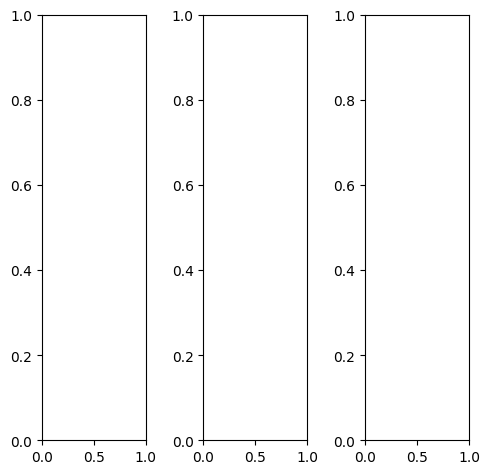

tensor([[[0.2118, 0.2078, 0.2196,  ..., 0.2275, 0.2353, 0.2078],
         [0.1804, 0.1961, 0.2118,  ..., 0.2118, 0.2471, 0.2235],
         [0.1608, 0.2000, 0.1961,  ..., 0.2314, 0.2431, 0.2353],
         ...,
         [0.1373, 0.1333, 0.1529,  ..., 0.3098, 0.3059, 0.2235],
         [0.0706, 0.1059, 0.1176,  ..., 0.2902, 0.3059, 0.2549],
         [0.0745, 0.1098, 0.1216,  ..., 0.3216, 0.3294, 0.3020]],

        [[0.2118, 0.2078, 0.2196,  ..., 0.2275, 0.2353, 0.2078],
         [0.1804, 0.1961, 0.2118,  ..., 0.2118, 0.2471, 0.2235],
         [0.1608, 0.2000, 0.1961,  ..., 0.2314, 0.2431, 0.2353],
         ...,
         [0.1373, 0.1333, 0.1529,  ..., 0.3098, 0.3059, 0.2235],
         [0.0706, 0.1059, 0.1176,  ..., 0.2902, 0.3059, 0.2549],
         [0.0745, 0.1098, 0.1216,  ..., 0.3216, 0.3294, 0.3020]],

        [[0.2118, 0.2078, 0.2196,  ..., 0.2275, 0.2353, 0.2078],
         [0.1804, 0.1961, 0.2118,  ..., 0.2118, 0.2471, 0.2235],
         [0.1608, 0.2000, 0.1961,  ..., 0.2314, 0.2431, 0.

tensor([[[0.2000, 0.1961, 0.2078,  ..., 0.2118, 0.2157, 0.1804],
         [0.1686, 0.1843, 0.2000,  ..., 0.2039, 0.2353, 0.2000],
         [0.1490, 0.1882, 0.1843,  ..., 0.2431, 0.2392, 0.2118],
         ...,
         [0.1529, 0.1333, 0.1412,  ..., 0.3020, 0.2941, 0.2039],
         [0.0667, 0.0980, 0.1059,  ..., 0.2902, 0.3098, 0.2510],
         [0.0627, 0.0980, 0.1098,  ..., 0.3255, 0.3451, 0.3059]],

        [[0.2235, 0.2196, 0.2314,  ..., 0.2510, 0.2549, 0.2275],
         [0.1922, 0.2078, 0.2235,  ..., 0.2314, 0.2627, 0.2471],
         [0.1725, 0.2118, 0.2078,  ..., 0.2392, 0.2549, 0.2549],
         ...,
         [0.1373, 0.1373, 0.1647,  ..., 0.3255, 0.3216, 0.2431],
         [0.0745, 0.1137, 0.1294,  ..., 0.3059, 0.3176, 0.2667],
         [0.0824, 0.1176, 0.1294,  ..., 0.3373, 0.3373, 0.3137]],

        [[0.1765, 0.1725, 0.1843,  ..., 0.1529, 0.1725, 0.1647],
         [0.1451, 0.1608, 0.1765,  ..., 0.1412, 0.1843, 0.1804],
         [0.1255, 0.1647, 0.1608,  ..., 0.1686, 0.1882, 0.

tensor([[[0.2250, 0.2029, 0.1989,  ..., 0.1852, 0.2217, 0.2089],
         [0.1585, 0.1747, 0.1957,  ..., 0.1977, 0.2392, 0.2203],
         [0.1414, 0.1754, 0.1753,  ..., 0.2227, 0.2460, 0.2183],
         ...,
         [0.1387, 0.1147, 0.1444,  ..., 0.3077, 0.2996, 0.2142],
         [0.1071, 0.0820, 0.1005,  ..., 0.2891, 0.3054, 0.2447],
         [0.1164, 0.1283, 0.1230,  ..., 0.3019, 0.3131, 0.2825]],

        [[0.2546, 0.2115, 0.2138,  ..., 0.2065, 0.2420, 0.2488],
         [0.1807, 0.1879, 0.2025,  ..., 0.2135, 0.2498, 0.2297],
         [0.1627, 0.1993, 0.1865,  ..., 0.2282, 0.2323, 0.2130],
         ...,
         [0.1456, 0.1288, 0.1315,  ..., 0.2950, 0.2874, 0.2273],
         [0.1026, 0.0998, 0.0997,  ..., 0.2845, 0.2956, 0.2527],
         [0.1378, 0.1504, 0.1311,  ..., 0.3124, 0.3177, 0.3116]],

        [[0.2267, 0.1873, 0.2006,  ..., 0.1755, 0.2080, 0.1987],
         [0.1768, 0.1792, 0.1891,  ..., 0.1843, 0.2129, 0.1846],
         [0.1530, 0.1794, 0.1820,  ..., 0.2033, 0.2118, 0.

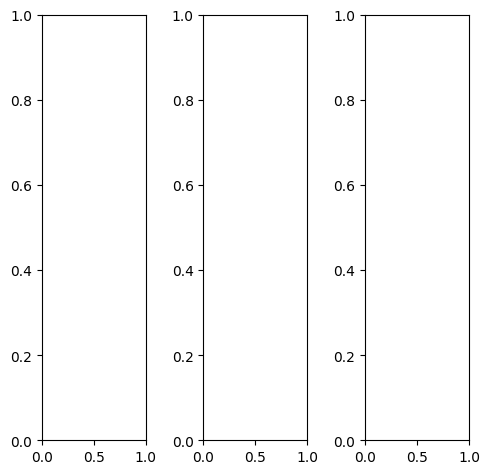

tensor([[[0.7725, 0.7608, 0.7608,  ..., 0.7882, 0.7843, 0.7765],
         [0.7529, 0.7490, 0.7490,  ..., 0.7490, 0.7647, 0.7765],
         [0.7255, 0.7333, 0.7451,  ..., 0.7608, 0.7608, 0.7843],
         ...,
         [0.4275, 0.3882, 0.4627,  ..., 0.4157, 0.4353, 0.3922],
         [0.4471, 0.4314, 0.4471,  ..., 0.4118, 0.4039, 0.4314],
         [0.3686, 0.4118, 0.4157,  ..., 0.4314, 0.3647, 0.4314]],

        [[0.7725, 0.7608, 0.7608,  ..., 0.7882, 0.7843, 0.7765],
         [0.7529, 0.7490, 0.7490,  ..., 0.7490, 0.7647, 0.7765],
         [0.7255, 0.7333, 0.7451,  ..., 0.7608, 0.7608, 0.7843],
         ...,
         [0.4275, 0.3882, 0.4627,  ..., 0.4157, 0.4353, 0.3922],
         [0.4471, 0.4314, 0.4471,  ..., 0.4118, 0.4039, 0.4314],
         [0.3686, 0.4118, 0.4157,  ..., 0.4314, 0.3647, 0.4314]],

        [[0.7725, 0.7608, 0.7608,  ..., 0.7882, 0.7843, 0.7765],
         [0.7529, 0.7490, 0.7490,  ..., 0.7490, 0.7647, 0.7765],
         [0.7255, 0.7333, 0.7451,  ..., 0.7608, 0.7608, 0.

tensor([[[0.8196, 0.8078, 0.8078,  ..., 0.8275, 0.8235, 0.8157],
         [0.7922, 0.7882, 0.7882,  ..., 0.7882, 0.8039, 0.8157],
         [0.7608, 0.7686, 0.7804,  ..., 0.8000, 0.8000, 0.8235],
         ...,
         [0.4000, 0.3608, 0.4353,  ..., 0.3686, 0.3961, 0.3686],
         [0.4157, 0.4039, 0.4196,  ..., 0.3490, 0.3451, 0.3843],
         [0.3412, 0.3843, 0.3882,  ..., 0.3647, 0.2980, 0.3804]],

        [[0.7608, 0.7529, 0.7529,  ..., 0.7922, 0.7882, 0.7804],
         [0.7451, 0.7412, 0.7412,  ..., 0.7529, 0.7686, 0.7804],
         [0.7216, 0.7294, 0.7412,  ..., 0.7647, 0.7647, 0.7882],
         ...,
         [0.4627, 0.4196, 0.4902,  ..., 0.4588, 0.4667, 0.4118],
         [0.4824, 0.4667, 0.4784,  ..., 0.4588, 0.4471, 0.4667],
         [0.3961, 0.4392, 0.4392,  ..., 0.4824, 0.4118, 0.4745]],

        [[0.6980, 0.6902, 0.6902,  ..., 0.6667, 0.6667, 0.6588],
         [0.6784, 0.6784, 0.6784,  ..., 0.6314, 0.6471, 0.6588],
         [0.6549, 0.6627, 0.6745,  ..., 0.6392, 0.6431, 0.

tensor([[[0.7072, 0.7327, 0.7432,  ..., 0.7498, 0.7775, 0.7166],
         [0.7619, 0.7330, 0.7324,  ..., 0.7533, 0.7398, 0.7663],
         [0.7102, 0.7322, 0.7256,  ..., 0.7701, 0.7944, 0.7716],
         ...,
         [0.4375, 0.3893, 0.4743,  ..., 0.4513, 0.4393, 0.3901],
         [0.4610, 0.4189, 0.4722,  ..., 0.4292, 0.4159, 0.4275],
         [0.4027, 0.4254, 0.4334,  ..., 0.4263, 0.3843, 0.4014]],

        [[0.7332, 0.7500, 0.7813,  ..., 0.7907, 0.7984, 0.7382],
         [0.7657, 0.7643, 0.7542,  ..., 0.7723, 0.7760, 0.7967],
         [0.7548, 0.7506, 0.7559,  ..., 0.7695, 0.7771, 0.7928],
         ...,
         [0.4400, 0.3665, 0.4849,  ..., 0.4258, 0.4355, 0.3931],
         [0.4716, 0.4165, 0.4532,  ..., 0.4192, 0.4065, 0.4243],
         [0.4158, 0.4046, 0.4127,  ..., 0.4099, 0.3807, 0.4181]],

        [[0.7373, 0.7720, 0.7850,  ..., 0.7842, 0.8136, 0.7203],
         [0.7202, 0.7553, 0.7565,  ..., 0.7727, 0.7671, 0.7586],
         [0.7301, 0.6992, 0.7297,  ..., 0.7764, 0.7796, 0.

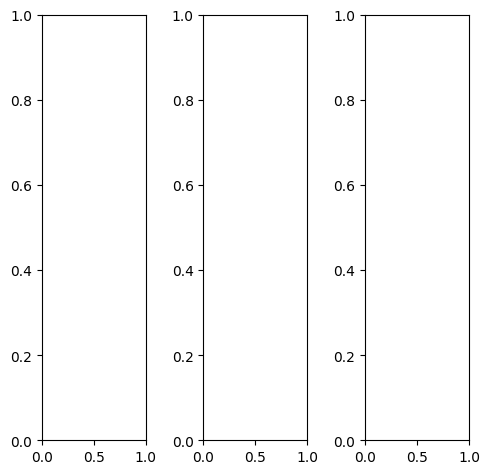

tensor([[[0.0706, 0.0353, 0.0275,  ..., 0.3020, 0.2392, 0.2235],
         [0.0392, 0.0353, 0.0275,  ..., 0.4588, 0.3608, 0.3647],
         [0.0235, 0.0471, 0.0510,  ..., 0.3333, 0.2588, 0.1255],
         ...,
         [0.3725, 0.4902, 0.3961,  ..., 0.2353, 0.1451, 0.2745],
         [0.2353, 0.5569, 0.7569,  ..., 0.2549, 0.0941, 0.1412],
         [0.0588, 0.2549, 0.6039,  ..., 0.3490, 0.2863, 0.2039]],

        [[0.0706, 0.0353, 0.0275,  ..., 0.3020, 0.2392, 0.2235],
         [0.0392, 0.0353, 0.0275,  ..., 0.4588, 0.3608, 0.3647],
         [0.0235, 0.0471, 0.0510,  ..., 0.3333, 0.2588, 0.1255],
         ...,
         [0.3725, 0.4902, 0.3961,  ..., 0.2353, 0.1451, 0.2745],
         [0.2353, 0.5569, 0.7569,  ..., 0.2549, 0.0941, 0.1412],
         [0.0588, 0.2549, 0.6039,  ..., 0.3490, 0.2863, 0.2039]],

        [[0.0706, 0.0353, 0.0275,  ..., 0.3020, 0.2392, 0.2235],
         [0.0392, 0.0353, 0.0275,  ..., 0.4588, 0.3608, 0.3647],
         [0.0235, 0.0471, 0.0510,  ..., 0.3333, 0.2588, 0.

tensor([[[0.0745, 0.0353, 0.0392,  ..., 0.3137, 0.2549, 0.2471],
         [0.0392, 0.0314, 0.0314,  ..., 0.5020, 0.4118, 0.4196],
         [0.0235, 0.0392, 0.0510,  ..., 0.3804, 0.3020, 0.1569],
         ...,
         [0.4039, 0.4980, 0.4000,  ..., 0.2784, 0.1804, 0.3176],
         [0.2824, 0.6039, 0.7647,  ..., 0.3020, 0.1373, 0.1922],
         [0.0745, 0.2824, 0.6275,  ..., 0.3922, 0.3412, 0.2667]],

        [[0.0706, 0.0353, 0.0235,  ..., 0.3098, 0.2431, 0.2196],
         [0.0392, 0.0353, 0.0235,  ..., 0.4627, 0.3569, 0.3569],
         [0.0275, 0.0510, 0.0471,  ..., 0.3333, 0.2510, 0.1176],
         ...,
         [0.3647, 0.4863, 0.3922,  ..., 0.2275, 0.1333, 0.2667],
         [0.2235, 0.5451, 0.7529,  ..., 0.2431, 0.0784, 0.1294],
         [0.0549, 0.2471, 0.6000,  ..., 0.3412, 0.2706, 0.1882]],

        [[0.0588, 0.0314, 0.0314,  ..., 0.2392, 0.1843, 0.1765],
         [0.0392, 0.0392, 0.0392,  ..., 0.3176, 0.2549, 0.2706],
         [0.0157, 0.0431, 0.0549,  ..., 0.2196, 0.1922, 0.

tensor([[[ 0.1416,  0.0571,  0.0365,  ...,  0.2752,  0.2594,  0.2346],
         [ 0.0652, -0.0076, -0.0291,  ...,  0.4535,  0.3696,  0.2856],
         [ 0.0422, -0.0048, -0.0022,  ...,  0.3501,  0.2682,  0.1671],
         ...,
         [ 0.3750,  0.5055,  0.3379,  ...,  0.2186,  0.1426,  0.2559],
         [ 0.3109,  0.6066,  0.7795,  ...,  0.2621,  0.1241,  0.1612],
         [ 0.2344,  0.3633,  0.6496,  ...,  0.3621,  0.2628,  0.2001]],

        [[ 0.1583,  0.0733,  0.0592,  ...,  0.3025,  0.2674,  0.2665],
         [ 0.0794,  0.0253,  0.0079,  ...,  0.4670,  0.3549,  0.3015],
         [ 0.0646,  0.0403,  0.0324,  ...,  0.3346,  0.2554,  0.1752],
         ...,
         [ 0.3866,  0.4721,  0.3451,  ...,  0.2154,  0.1477,  0.2751],
         [ 0.2911,  0.5535,  0.7485,  ...,  0.2552,  0.1250,  0.1684],
         [ 0.2350,  0.3518,  0.5919,  ...,  0.3546,  0.2648,  0.2331]],

        [[ 0.1399,  0.0773,  0.0640,  ...,  0.2667,  0.2292,  0.2262],
         [ 0.0853,  0.0575,  0.0424,  ...,  0

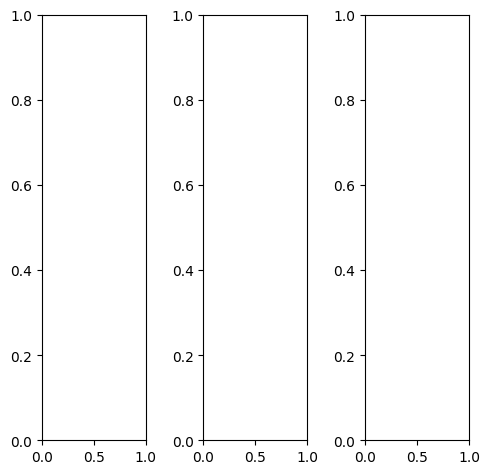

tensor([[[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1294, 0.1255, 0.1294,  ..., 0.1647, 0.2392, 0.2824],
         [0.1922, 0.2039, 0.2275,  ..., 0.1882, 0.3255, 0.4549],
         [0.4314, 0.4353, 0.4392,  ..., 0.1804, 0.3725, 0.5137]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1294, 0.1255, 0.1294,  ..., 0.1647, 0.2392, 0.2824],
         [0.1922, 0.2039, 0.2275,  ..., 0.1882, 0.3255, 0.4549],
         [0.4314, 0.4353, 0.4392,  ..., 0.1804, 0.3725, 0.5137]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.

tensor([[[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.2196, 0.2118, 0.2118,  ..., 0.2667, 0.3529, 0.4000],
         [0.3020, 0.3176, 0.3529,  ..., 0.2902, 0.4392, 0.5490],
         [0.6078, 0.6118, 0.6157,  ..., 0.2745, 0.4667, 0.5961]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1020, 0.0980, 0.1020,  ..., 0.1373, 0.2039, 0.2510],
         [0.1569, 0.1686, 0.1922,  ..., 0.1569, 0.2902, 0.4314],
         [0.3804, 0.3804, 0.3843,  ..., 0.1490, 0.3451, 0.4902]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.

tensor([[[ 0.1173,  0.0309,  0.0154,  ...,  0.0097,  0.0211,  0.0778],
         [ 0.0412, -0.0459, -0.0684,  ..., -0.0629, -0.0402,  0.0278],
         [ 0.0286, -0.0571, -0.0647,  ..., -0.0489, -0.0384,  0.0249],
         ...,
         [ 0.1478,  0.1172,  0.1107,  ...,  0.1738,  0.2379,  0.2701],
         [ 0.1777,  0.1852,  0.2246,  ...,  0.1764,  0.3060,  0.4284],
         [ 0.3811,  0.4134,  0.4336,  ...,  0.1673,  0.3534,  0.4311]],

        [[ 0.1313,  0.0522,  0.0425,  ...,  0.0470,  0.0580,  0.1243],
         [ 0.0573, -0.0066, -0.0231,  ..., -0.0043,  0.0079,  0.0649],
         [ 0.0529, -0.0016, -0.0224,  ..., -0.0096, -0.0170,  0.0475],
         ...,
         [ 0.1239,  0.1208,  0.1238,  ...,  0.1702,  0.2444,  0.2768],
         [ 0.2088,  0.2312,  0.2349,  ...,  0.1749,  0.3058,  0.4321],
         [ 0.3846,  0.4201,  0.4371,  ...,  0.1846,  0.3429,  0.4479]],

        [[ 0.1153,  0.0643,  0.0524,  ...,  0.0349,  0.0527,  0.0964],
         [ 0.0671,  0.0381,  0.0233,  ...,  0

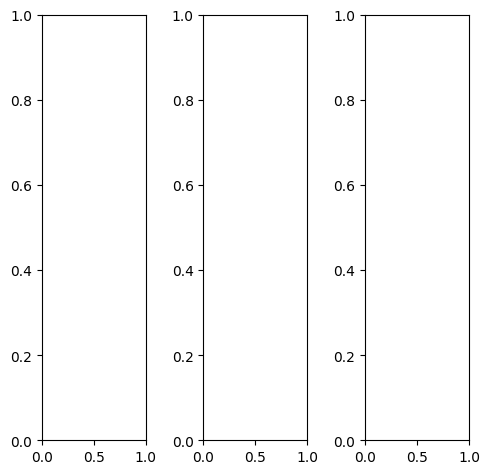

EPOCH: 2.255  trn_loss: 0.006  (260.66s - 11297.99s remaining)

tensor([[[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.1059],
         ...,
         [0.3412, 0.3490, 0.3490,  ..., 0.2706, 0.2863, 0.2863],
         [0.3608, 0.3725, 0.3608,  ..., 0.3137, 0.3216, 0.3216],
         [0.3333, 0.3294, 0.3294,  ..., 0.3333, 0.3412, 0.3451]],

        [[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.1059],
         ...,
         [0.3412, 0.3490, 0.3490,  ..., 0.2706, 0.2863, 0.2863],
         [0.3608, 0.3725, 0.3608,  ..., 0.3137, 0.3216, 0.3216],
         [0.3333, 0.3294, 0.3294,  ..., 0.3333, 0.3412, 0.3451]],

        [[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.

tensor([[[0.1137, 0.1373, 0.1529,  ..., 0.0392, 0.0471, 0.0588],
         [0.1216, 0.1569, 0.1451,  ..., 0.0510, 0.0588, 0.0627],
         [0.1059, 0.1020, 0.0941,  ..., 0.0667, 0.0667, 0.0706],
         ...,
         [0.3843, 0.3922, 0.3882,  ..., 0.2549, 0.2706, 0.2706],
         [0.3569, 0.3686, 0.3569,  ..., 0.3373, 0.3412, 0.3412],
         [0.3020, 0.3020, 0.3059,  ..., 0.3843, 0.3922, 0.3961]],

        [[0.2510, 0.2745, 0.2863,  ..., 0.1255, 0.1137, 0.1176],
         [0.2549, 0.2902, 0.2784,  ..., 0.1255, 0.1137, 0.1137],
         [0.2392, 0.2353, 0.2275,  ..., 0.1294, 0.1176, 0.1137],
         ...,
         [0.3373, 0.3451, 0.3451,  ..., 0.2863, 0.3020, 0.3020],
         [0.3686, 0.3804, 0.3686,  ..., 0.3176, 0.3216, 0.3216],
         [0.3490, 0.3451, 0.3451,  ..., 0.3255, 0.3333, 0.3373]],

        [[0.1765, 0.2000, 0.2157,  ..., 0.1333, 0.1412, 0.1529],
         [0.1922, 0.2275, 0.2157,  ..., 0.1412, 0.1490, 0.1490],
         [0.1882, 0.1843, 0.1765,  ..., 0.1608, 0.1529, 0.

tensor([[[0.3241, 0.3667, 0.3798,  ..., 0.1599, 0.1512, 0.1861],
         [0.2268, 0.3868, 0.3839,  ..., 0.1266, 0.1099, 0.1315],
         [0.1970, 0.2496, 0.2751,  ..., 0.1245, 0.1211, 0.1310],
         ...,
         [0.5249, 0.5227, 0.5173,  ..., 0.4248, 0.4235, 0.4454],
         [0.6030, 0.5867, 0.5654,  ..., 0.4818, 0.4776, 0.5422],
         [0.5570, 0.5486, 0.5778,  ..., 0.5742, 0.5816, 0.5418]],

        [[0.3502, 0.3663, 0.4397,  ..., 0.1153, 0.1204, 0.1900],
         [0.2668, 0.4124, 0.3948,  ..., 0.0983, 0.1041, 0.1244],
         [0.2557, 0.3110, 0.2828,  ..., 0.1068, 0.0702, 0.0971],
         ...,
         [0.5075, 0.4877, 0.4982,  ..., 0.4205, 0.4692, 0.4116],
         [0.5515, 0.5798, 0.5264,  ..., 0.5160, 0.5488, 0.5221],
         [0.5028, 0.4860, 0.5109,  ..., 0.5434, 0.5559, 0.5400]],

        [[0.3774, 0.4234, 0.5058,  ..., 0.1564, 0.1888, 0.2091],
         [0.3759, 0.5489, 0.5369,  ..., 0.1893, 0.1861, 0.1726],
         [0.3325, 0.4143, 0.4319,  ..., 0.2057, 0.2033, 0.

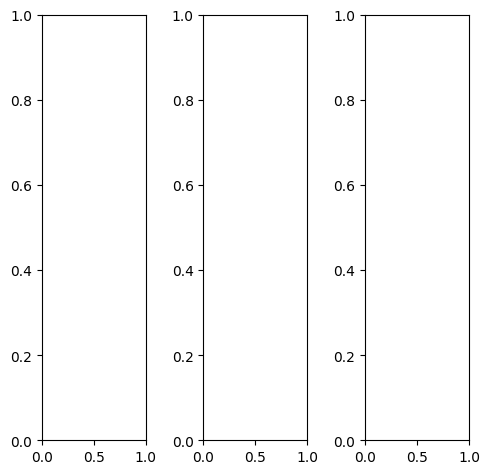

tensor([[[0.6745, 0.6667, 0.6235,  ..., 0.0902, 0.0902, 0.0980],
         [0.6588, 0.6549, 0.6118,  ..., 0.1216, 0.1176, 0.1098],
         [0.6510, 0.6549, 0.6157,  ..., 0.1216, 0.1059, 0.1059],
         ...,
         [0.0275, 0.0353, 0.0235,  ..., 0.5647, 0.5373, 0.5176],
         [0.0431, 0.0157, 0.0196,  ..., 0.5647, 0.5451, 0.5686],
         [0.0706, 0.0549, 0.0314,  ..., 0.6000, 0.5843, 0.5843]],

        [[0.6745, 0.6667, 0.6235,  ..., 0.0902, 0.0902, 0.0980],
         [0.6588, 0.6549, 0.6118,  ..., 0.1216, 0.1176, 0.1098],
         [0.6510, 0.6549, 0.6157,  ..., 0.1216, 0.1059, 0.1059],
         ...,
         [0.0275, 0.0353, 0.0235,  ..., 0.5647, 0.5373, 0.5176],
         [0.0431, 0.0157, 0.0196,  ..., 0.5647, 0.5451, 0.5686],
         [0.0706, 0.0549, 0.0314,  ..., 0.6000, 0.5843, 0.5843]],

        [[0.6745, 0.6667, 0.6235,  ..., 0.0902, 0.0902, 0.0980],
         [0.6588, 0.6549, 0.6118,  ..., 0.1216, 0.1176, 0.1098],
         [0.6510, 0.6549, 0.6157,  ..., 0.1216, 0.1059, 0.

tensor([[[0.6588, 0.6510, 0.6078,  ..., 0.0902, 0.0902, 0.0980],
         [0.6431, 0.6392, 0.5961,  ..., 0.1216, 0.1176, 0.1098],
         [0.6353, 0.6392, 0.6000,  ..., 0.1216, 0.1059, 0.1059],
         ...,
         [0.0275, 0.0353, 0.0235,  ..., 0.5882, 0.5569, 0.5412],
         [0.0392, 0.0118, 0.0157,  ..., 0.5804, 0.5608, 0.5843],
         [0.0588, 0.0431, 0.0196,  ..., 0.6118, 0.5961, 0.5961]],

        [[0.6745, 0.6667, 0.6235,  ..., 0.0863, 0.0863, 0.0941],
         [0.6588, 0.6549, 0.6118,  ..., 0.1176, 0.1137, 0.1059],
         [0.6510, 0.6549, 0.6157,  ..., 0.1176, 0.1020, 0.1020],
         ...,
         [0.0235, 0.0314, 0.0196,  ..., 0.5569, 0.5294, 0.5098],
         [0.0431, 0.0157, 0.0235,  ..., 0.5608, 0.5412, 0.5647],
         [0.0706, 0.0588, 0.0353,  ..., 0.5961, 0.5843, 0.5843]],

        [[0.7255, 0.7137, 0.6706,  ..., 0.1059, 0.1059, 0.1137],
         [0.7059, 0.7020, 0.6588,  ..., 0.1373, 0.1333, 0.1255],
         [0.6980, 0.7020, 0.6627,  ..., 0.1373, 0.1216, 0.

tensor([[[ 0.6560,  0.5849,  0.5508,  ...,  0.0702,  0.0918,  0.1523],
         [ 0.5948,  0.5347,  0.4444,  ...,  0.0568,  0.0652,  0.1171],
         [ 0.5840,  0.5705,  0.5096,  ...,  0.0559,  0.0633,  0.1191],
         ...,
         [-0.0170, -0.0175, -0.0424,  ...,  0.5058,  0.4405,  0.5043],
         [ 0.0159, -0.0737, -0.0604,  ...,  0.5179,  0.4533,  0.5725],
         [ 0.0732,  0.0449,  0.0400,  ...,  0.6459,  0.6215,  0.5762]],

        [[ 0.6734,  0.6151,  0.6620,  ...,  0.1048,  0.1291,  0.1856],
         [ 0.6060,  0.5720,  0.5113,  ...,  0.0906,  0.1039,  0.1553],
         [ 0.6196,  0.6039,  0.5486,  ...,  0.0890,  0.0665,  0.1342],
         ...,
         [ 0.0244, -0.0182, -0.0376,  ...,  0.4886,  0.5076,  0.5079],
         [ 0.0360, -0.0210, -0.0542,  ...,  0.5195,  0.5261,  0.5676],
         [ 0.0849,  0.0600,  0.0435,  ...,  0.6080,  0.5896,  0.5824]],

        [[ 0.8491,  0.8656,  0.8359,  ...,  0.1582,  0.2071,  0.2191],
         [ 0.8113,  0.8081,  0.7285,  ...,  0

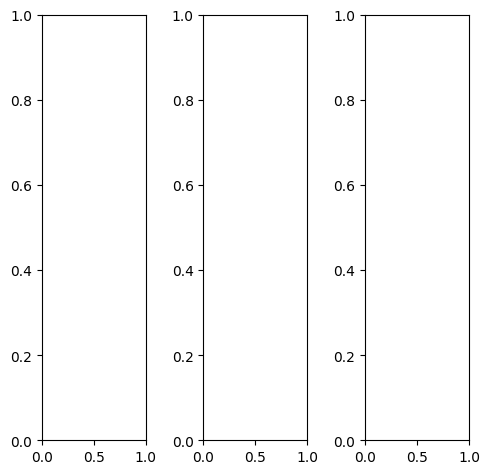

tensor([[[0.0157, 0.0118, 0.0039,  ..., 0.0235, 0.0275, 0.0157],
         [0.0157, 0.0078, 0.0039,  ..., 0.0431, 0.0275, 0.0235],
         [0.0118, 0.0078, 0.0078,  ..., 0.0745, 0.0353, 0.0235],
         ...,
         [0.4078, 0.4510, 0.2863,  ..., 0.3294, 0.3137, 0.3059],
         [0.3961, 0.4078, 0.2275,  ..., 0.2980, 0.2667, 0.1843],
         [0.3137, 0.2667, 0.2784,  ..., 0.2667, 0.3020, 0.1765]],

        [[0.0157, 0.0118, 0.0039,  ..., 0.0235, 0.0275, 0.0157],
         [0.0157, 0.0078, 0.0039,  ..., 0.0431, 0.0275, 0.0235],
         [0.0118, 0.0078, 0.0078,  ..., 0.0745, 0.0353, 0.0235],
         ...,
         [0.4078, 0.4510, 0.2863,  ..., 0.3294, 0.3137, 0.3059],
         [0.3961, 0.4078, 0.2275,  ..., 0.2980, 0.2667, 0.1843],
         [0.3137, 0.2667, 0.2784,  ..., 0.2667, 0.3020, 0.1765]],

        [[0.0157, 0.0118, 0.0039,  ..., 0.0235, 0.0275, 0.0157],
         [0.0157, 0.0078, 0.0039,  ..., 0.0431, 0.0275, 0.0235],
         [0.0118, 0.0078, 0.0078,  ..., 0.0745, 0.0353, 0.

tensor([[[0.0118, 0.0078, 0.0000,  ..., 0.0118, 0.0118, 0.0078],
         [0.0118, 0.0039, 0.0000,  ..., 0.0118, 0.0118, 0.0157],
         [0.0078, 0.0039, 0.0039,  ..., 0.0157, 0.0196, 0.0196],
         ...,
         [0.3882, 0.4353, 0.1725,  ..., 0.2549, 0.2275, 0.2275],
         [0.3961, 0.3843, 0.1098,  ..., 0.2000, 0.1569, 0.0824],
         [0.2980, 0.2157, 0.2078,  ..., 0.1569, 0.2000, 0.1020]],

        [[0.0118, 0.0078, 0.0039,  ..., 0.0157, 0.0196, 0.0078],
         [0.0118, 0.0078, 0.0000,  ..., 0.0431, 0.0235, 0.0078],
         [0.0078, 0.0039, 0.0078,  ..., 0.0863, 0.0235, 0.0078],
         ...,
         [0.4549, 0.5020, 0.3569,  ..., 0.3804, 0.3765, 0.3608],
         [0.4314, 0.4549, 0.3020,  ..., 0.3529, 0.3255, 0.2353],
         [0.3569, 0.3176, 0.3373,  ..., 0.3255, 0.3569, 0.2118]],

        [[0.0353, 0.0275, 0.0275,  ..., 0.0941, 0.1020, 0.0824],
         [0.0353, 0.0275, 0.0235,  ..., 0.1216, 0.0980, 0.1098],
         [0.0471, 0.0314, 0.0235,  ..., 0.1686, 0.1255, 0.

tensor([[[ 0.1376,  0.0522,  0.0398,  ...,  0.0561,  0.0764,  0.1476],
         [ 0.0153, -0.0240, -0.0732,  ...,  0.0153,  0.0030,  0.0785],
         [-0.0034, -0.0792, -0.0620,  ...,  0.0905,  0.0235,  0.0746],
         ...,
         [ 0.7476,  0.8021,  0.4874,  ...,  0.5979,  0.5515,  0.5982],
         [ 0.6875,  0.7378,  0.3659,  ...,  0.5291,  0.5192,  0.4252],
         [ 0.5767,  0.5176,  0.5649,  ...,  0.5729,  0.5764,  0.4573]],

        [[ 0.1804,  0.1151,  0.0862,  ...,  0.1112,  0.1310,  0.1815],
         [ 0.0804,  0.0208,  0.0013,  ...,  0.0856,  0.0689,  0.1358],
         [ 0.0645,  0.0012, -0.0068,  ...,  0.1478,  0.0683,  0.1164],
         ...,
         [ 0.7214,  0.7793,  0.4713,  ...,  0.5674,  0.5710,  0.5831],
         [ 0.6863,  0.7087,  0.3707,  ...,  0.5260,  0.5135,  0.4093],
         [ 0.5339,  0.4747,  0.5093,  ...,  0.5440,  0.5591,  0.4618]],

        [[ 0.2635,  0.2332,  0.2301,  ...,  0.2407,  0.2602,  0.2501],
         [ 0.2218,  0.2352,  0.2010,  ...,  0

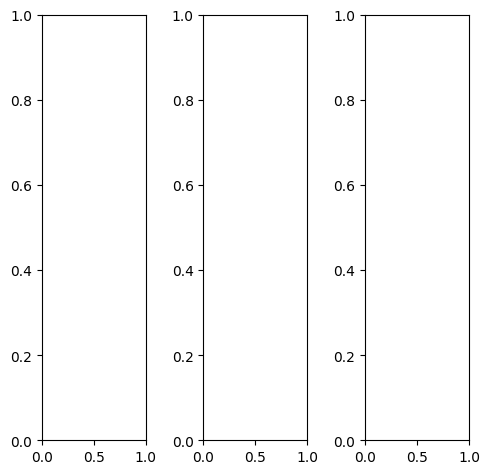

tensor([[[0.7373, 0.7647, 0.8510,  ..., 0.9294, 0.9216, 0.9176],
         [0.7216, 0.7490, 0.8627,  ..., 0.9529, 0.9490, 0.9412],
         [0.6941, 0.7137, 0.8471,  ..., 0.9412, 0.9412, 0.9333],
         ...,
         [0.6431, 0.6549, 0.6745,  ..., 0.7686, 0.7647, 0.7451],
         [0.6431, 0.6588, 0.6784,  ..., 0.7725, 0.7686, 0.7490],
         [0.6314, 0.6392, 0.6627,  ..., 0.7569, 0.7490, 0.7333]],

        [[0.7373, 0.7647, 0.8510,  ..., 0.9294, 0.9216, 0.9176],
         [0.7216, 0.7490, 0.8627,  ..., 0.9529, 0.9490, 0.9412],
         [0.6941, 0.7137, 0.8471,  ..., 0.9412, 0.9412, 0.9333],
         ...,
         [0.6431, 0.6549, 0.6745,  ..., 0.7686, 0.7647, 0.7451],
         [0.6431, 0.6588, 0.6784,  ..., 0.7725, 0.7686, 0.7490],
         [0.6314, 0.6392, 0.6627,  ..., 0.7569, 0.7490, 0.7333]],

        [[0.7373, 0.7647, 0.8510,  ..., 0.9294, 0.9216, 0.9176],
         [0.7216, 0.7490, 0.8627,  ..., 0.9529, 0.9490, 0.9412],
         [0.6941, 0.7137, 0.8471,  ..., 0.9412, 0.9412, 0.

tensor([[[0.7412, 0.7647, 0.8510,  ..., 0.9294, 0.9255, 0.9176],
         [0.7373, 0.7569, 0.8627,  ..., 0.9529, 0.9490, 0.9412],
         [0.7176, 0.7333, 0.8510,  ..., 0.9412, 0.9412, 0.9294],
         ...,
         [0.6549, 0.6667, 0.6745,  ..., 0.7569, 0.7529, 0.7373],
         [0.6549, 0.6706, 0.6824,  ..., 0.7608, 0.7569, 0.7373],
         [0.6353, 0.6431, 0.6627,  ..., 0.7490, 0.7412, 0.7216]],

        [[0.7412, 0.7686, 0.8549,  ..., 0.9294, 0.9216, 0.9176],
         [0.7255, 0.7529, 0.8667,  ..., 0.9529, 0.9490, 0.9412],
         [0.6941, 0.7176, 0.8510,  ..., 0.9412, 0.9373, 0.9373],
         ...,
         [0.6471, 0.6588, 0.6824,  ..., 0.7804, 0.7765, 0.7569],
         [0.6471, 0.6627, 0.6863,  ..., 0.7843, 0.7804, 0.7608],
         [0.6353, 0.6471, 0.6706,  ..., 0.7686, 0.7608, 0.7412]],

        [[0.7176, 0.7294, 0.8314,  ..., 0.9294, 0.9216, 0.9216],
         [0.6706, 0.6941, 0.8431,  ..., 0.9529, 0.9451, 0.9451],
         [0.6235, 0.6392, 0.8157,  ..., 0.9373, 0.9451, 0.

tensor([[[0.5261, 0.4694, 0.5040,  ..., 0.6742, 0.6616, 0.6769],
         [0.3910, 0.3366, 0.4231,  ..., 0.6562, 0.6193, 0.6396],
         [0.4023, 0.3707, 0.5168,  ..., 0.6783, 0.7367, 0.6855],
         ...,
         [0.3805, 0.3200, 0.3801,  ..., 0.5393, 0.4565, 0.4409],
         [0.4058, 0.3265, 0.3953,  ..., 0.5449, 0.4684, 0.4651],
         [0.3677, 0.3201, 0.3985,  ..., 0.5741, 0.5562, 0.4571]],

        [[0.5438, 0.5044, 0.6112,  ..., 0.7212, 0.7888, 0.7203],
         [0.4439, 0.4183, 0.5300,  ..., 0.6964, 0.7189, 0.8083],
         [0.4676, 0.3944, 0.5723,  ..., 0.7369, 0.7696, 0.7854],
         ...,
         [0.4079, 0.3464, 0.4227,  ..., 0.4897, 0.5220, 0.4832],
         [0.4590, 0.3898, 0.4294,  ..., 0.5267, 0.5461, 0.5008],
         [0.4234, 0.3731, 0.4595,  ..., 0.5576, 0.5582, 0.4984]],

        [[0.6404, 0.7051, 0.7981,  ..., 0.8369, 0.8902, 0.8020],
         [0.5856, 0.6370, 0.7124,  ..., 0.7731, 0.8393, 0.7617],
         [0.5847, 0.6034, 0.7110,  ..., 0.8104, 0.8232, 0.

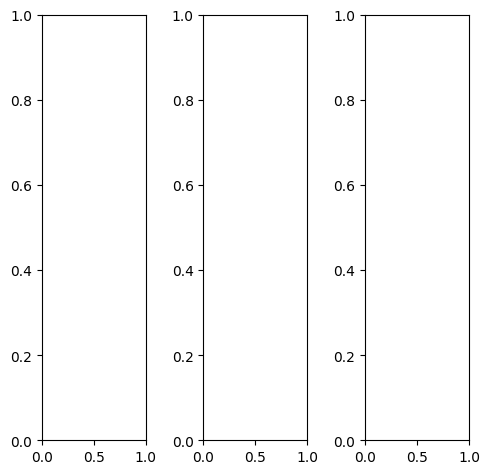

tensor([[[0.1569, 0.1333, 0.0980,  ..., 0.8353, 0.8314, 0.8275],
         [0.1216, 0.1137, 0.0902,  ..., 0.8549, 0.8510, 0.8471],
         [0.1176, 0.0941, 0.0824,  ..., 0.8510, 0.8471, 0.8431],
         ...,
         [0.4510, 0.4353, 0.4000,  ..., 0.1804, 0.1922, 0.2157],
         [0.4275, 0.4078, 0.3686,  ..., 0.2157, 0.2039, 0.2196],
         [0.3686, 0.3843, 0.3686,  ..., 0.3098, 0.3529, 0.3294]],

        [[0.1569, 0.1333, 0.0980,  ..., 0.8353, 0.8314, 0.8275],
         [0.1216, 0.1137, 0.0902,  ..., 0.8549, 0.8510, 0.8471],
         [0.1176, 0.0941, 0.0824,  ..., 0.8510, 0.8471, 0.8431],
         ...,
         [0.4510, 0.4353, 0.4000,  ..., 0.1804, 0.1922, 0.2157],
         [0.4275, 0.4078, 0.3686,  ..., 0.2157, 0.2039, 0.2196],
         [0.3686, 0.3843, 0.3686,  ..., 0.3098, 0.3529, 0.3294]],

        [[0.1569, 0.1333, 0.0980,  ..., 0.8353, 0.8314, 0.8275],
         [0.1216, 0.1137, 0.0902,  ..., 0.8549, 0.8510, 0.8471],
         [0.1176, 0.0941, 0.0824,  ..., 0.8510, 0.8471, 0.

tensor([[[0.2392, 0.1922, 0.1255,  ..., 0.7882, 0.7804, 0.7725],
         [0.1686, 0.1490, 0.1137,  ..., 0.8157, 0.8078, 0.8000],
         [0.1569, 0.1137, 0.1020,  ..., 0.8275, 0.8196, 0.8078],
         ...,
         [0.5686, 0.5490, 0.5020,  ..., 0.1765, 0.1922, 0.2196],
         [0.5255, 0.4980, 0.4431,  ..., 0.2235, 0.2118, 0.2275],
         [0.4431, 0.4627, 0.4353,  ..., 0.3490, 0.3882, 0.3647]],

        [[0.1255, 0.1137, 0.0902,  ..., 0.8510, 0.8471, 0.8431],
         [0.1059, 0.1020, 0.0824,  ..., 0.8667, 0.8627, 0.8588],
         [0.1059, 0.0863, 0.0784,  ..., 0.8588, 0.8549, 0.8510],
         ...,
         [0.4157, 0.4000, 0.3725,  ..., 0.1804, 0.1922, 0.2118],
         [0.4000, 0.3804, 0.3451,  ..., 0.2118, 0.2000, 0.2157],
         [0.3451, 0.3608, 0.3490,  ..., 0.2980, 0.3451, 0.3176]],

        [[0.0941, 0.0941, 0.0784,  ..., 0.8941, 0.8902, 0.8902],
         [0.0902, 0.0863, 0.0706,  ..., 0.9020, 0.8980, 0.8941],
         [0.0824, 0.0706, 0.0667,  ..., 0.8863, 0.8863, 0.

tensor([[[ 0.1131,  0.0345,  0.0050,  ...,  0.8068,  0.7666,  0.7459],
         [-0.0204, -0.0557, -0.1265,  ...,  0.8168,  0.7943,  0.7945],
         [-0.0310, -0.1341, -0.1351,  ...,  0.8541,  0.8868,  0.8711],
         ...,
         [ 0.4416,  0.3896,  0.3408,  ...,  0.0923,  0.0920,  0.1416],
         [ 0.4082,  0.3462,  0.3093,  ...,  0.1261,  0.1147,  0.1498],
         [ 0.3641,  0.3736,  0.3231,  ...,  0.2546,  0.2814,  0.2799]],

        [[ 0.1941,  0.1215,  0.0840,  ...,  0.8031,  0.8442,  0.8090],
         [ 0.1029,  0.0410, -0.0040,  ...,  0.8522,  0.8360,  0.9149],
         [ 0.0910,  0.0021, -0.0250,  ...,  0.8450,  0.8628,  0.8848],
         ...,
         [ 0.4924,  0.3834,  0.4236,  ...,  0.1263,  0.1495,  0.1602],
         [ 0.4556,  0.3954,  0.3659,  ...,  0.2028,  0.1690,  0.1787],
         [ 0.4135,  0.3696,  0.3649,  ...,  0.2814,  0.3076,  0.3066]],

        [[ 0.2852,  0.2629,  0.2557,  ...,  0.9269,  0.9347,  0.8691],
         [ 0.2459,  0.2770,  0.2210,  ...,  0

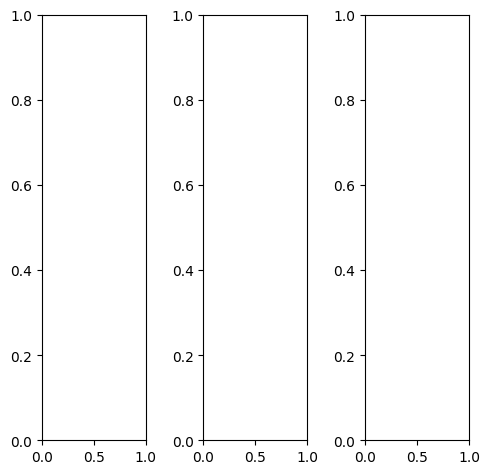

EPOCH: 2.510  trn_loss: 0.005  (288.93s - 11221.43s remaining)

tensor([[[0.8000, 0.6824, 0.4784,  ..., 0.4039, 0.4314, 0.5020],
         [0.8157, 0.6353, 0.4275,  ..., 0.6745, 0.6902, 0.5961],
         [0.8353, 0.6314, 0.3922,  ..., 0.8431, 0.8275, 0.6431],
         ...,
         [0.6196, 0.6353, 0.6353,  ..., 0.6314, 0.6275, 0.6314],
         [0.6275, 0.6353, 0.6392,  ..., 0.6471, 0.6471, 0.6431],
         [0.6392, 0.6510, 0.6588,  ..., 0.6196, 0.6235, 0.6157]],

        [[0.8000, 0.6824, 0.4784,  ..., 0.4039, 0.4314, 0.5020],
         [0.8157, 0.6353, 0.4275,  ..., 0.6745, 0.6902, 0.5961],
         [0.8353, 0.6314, 0.3922,  ..., 0.8431, 0.8275, 0.6431],
         ...,
         [0.6196, 0.6353, 0.6353,  ..., 0.6314, 0.6275, 0.6314],
         [0.6275, 0.6353, 0.6392,  ..., 0.6471, 0.6471, 0.6431],
         [0.6392, 0.6510, 0.6588,  ..., 0.6196, 0.6235, 0.6157]],

        [[0.8000, 0.6824, 0.4784,  ..., 0.4039, 0.4314, 0.5020],
         [0.8157, 0.6353, 0.4275,  ..., 0.6745, 0.6902, 0.5961],
         [0.8353, 0.6314, 0.3922,  ..., 0.8431, 0.8275, 0.

tensor([[[0.7294, 0.6353, 0.4549,  ..., 0.3608, 0.4039, 0.4863],
         [0.7608, 0.6000, 0.4118,  ..., 0.6235, 0.6588, 0.5765],
         [0.7961, 0.6118, 0.3843,  ..., 0.7882, 0.7882, 0.6157],
         ...,
         [0.6000, 0.6157, 0.6157,  ..., 0.6157, 0.6118, 0.6157],
         [0.6196, 0.6275, 0.6314,  ..., 0.6235, 0.6235, 0.6196],
         [0.6392, 0.6510, 0.6588,  ..., 0.5882, 0.5922, 0.5843]],

        [[0.8235, 0.6980, 0.4902,  ..., 0.4235, 0.4471, 0.5137],
         [0.8353, 0.6510, 0.4392,  ..., 0.6941, 0.7059, 0.6078],
         [0.8510, 0.6431, 0.4000,  ..., 0.8667, 0.8431, 0.6549],
         ...,
         [0.6627, 0.6784, 0.6784,  ..., 0.6745, 0.6706, 0.6745],
         [0.6627, 0.6745, 0.6745,  ..., 0.6941, 0.6941, 0.6902],
         [0.6706, 0.6863, 0.6941,  ..., 0.6706, 0.6745, 0.6667]],

        [[0.8627, 0.7098, 0.4824,  ..., 0.4196, 0.4275, 0.4902],
         [0.8588, 0.6510, 0.4196,  ..., 0.7059, 0.7059, 0.6039],
         [0.8627, 0.6314, 0.3765,  ..., 0.8745, 0.8392, 0.

tensor([[[0.6684, 0.5334, 0.3489,  ..., 0.2993, 0.3269, 0.5082],
         [0.6760, 0.4134, 0.1474,  ..., 0.5495, 0.5815, 0.5114],
         [0.6678, 0.4666, 0.1061,  ..., 0.7807, 0.8137, 0.5833],
         ...,
         [0.5936, 0.5762, 0.6172,  ..., 0.6667, 0.6482, 0.6006],
         [0.6055, 0.5611, 0.6083,  ..., 0.6612, 0.6336, 0.6170],
         [0.6186, 0.6105, 0.6832,  ..., 0.6225, 0.6599, 0.5693]],

        [[0.6794, 0.6514, 0.5007,  ..., 0.3610, 0.4508, 0.4889],
         [0.7428, 0.6112, 0.3561,  ..., 0.6243, 0.6892, 0.6335],
         [0.7575, 0.5668, 0.3142,  ..., 0.8660, 0.8853, 0.6905],
         ...,
         [0.5363, 0.5445, 0.5934,  ..., 0.6057, 0.6106, 0.6271],
         [0.5817, 0.5585, 0.5745,  ..., 0.6420, 0.6270, 0.6175],
         [0.5692, 0.5815, 0.6244,  ..., 0.5971, 0.6067, 0.5551]],

        [[0.9105, 0.9323, 0.7470,  ..., 0.5342, 0.6070, 0.6216],
         [0.9621, 0.8908, 0.5781,  ..., 0.7360, 0.8465, 0.6818],
         [0.9831, 0.9239, 0.5827,  ..., 1.0004, 0.9802, 0.

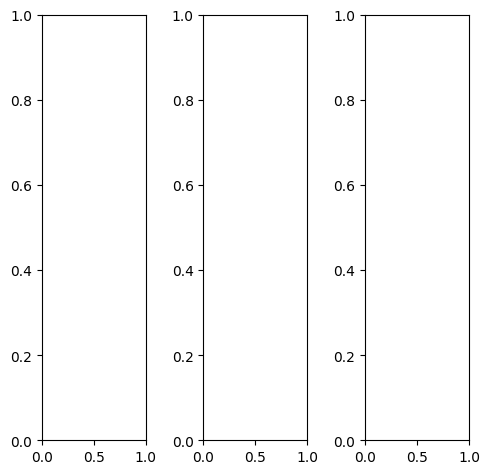

tensor([[[0.8314, 0.8000, 0.7804,  ..., 0.9255, 0.8784, 0.8353],
         [0.8706, 0.8706, 0.8706,  ..., 0.8863, 0.8627, 0.8275],
         [0.8039, 0.8235, 0.8314,  ..., 0.8431, 0.8078, 0.7608],
         ...,
         [0.5725, 0.4314, 0.3922,  ..., 0.4314, 0.3686, 0.4039],
         [0.6039, 0.5373, 0.4235,  ..., 0.4902, 0.4314, 0.4235],
         [0.4863, 0.6275, 0.6235,  ..., 0.4863, 0.4863, 0.5529]],

        [[0.8314, 0.8000, 0.7804,  ..., 0.9255, 0.8784, 0.8353],
         [0.8706, 0.8706, 0.8706,  ..., 0.8863, 0.8627, 0.8275],
         [0.8039, 0.8235, 0.8314,  ..., 0.8431, 0.8078, 0.7608],
         ...,
         [0.5725, 0.4314, 0.3922,  ..., 0.4314, 0.3686, 0.4039],
         [0.6039, 0.5373, 0.4235,  ..., 0.4902, 0.4314, 0.4235],
         [0.4863, 0.6275, 0.6235,  ..., 0.4863, 0.4863, 0.5529]],

        [[0.8314, 0.8000, 0.7804,  ..., 0.9255, 0.8784, 0.8353],
         [0.8706, 0.8706, 0.8706,  ..., 0.8863, 0.8627, 0.8275],
         [0.8039, 0.8235, 0.8314,  ..., 0.8431, 0.8078, 0.

tensor([[[0.6863, 0.6549, 0.6235,  ..., 0.8275, 0.7882, 0.7294],
         [0.7294, 0.7294, 0.7216,  ..., 0.7686, 0.7451, 0.6941],
         [0.6588, 0.6863, 0.6902,  ..., 0.7216, 0.6824, 0.6196],
         ...,
         [0.4275, 0.2902, 0.2471,  ..., 0.3294, 0.2667, 0.2824],
         [0.4588, 0.3922, 0.2824,  ..., 0.3765, 0.3255, 0.3098],
         [0.3529, 0.4941, 0.4902,  ..., 0.3725, 0.3725, 0.4235]],

        [[0.8824, 0.8510, 0.8353,  ..., 0.9686, 0.9137, 0.8706],
         [0.9255, 0.9255, 0.9255,  ..., 0.9333, 0.9059, 0.8706],
         [0.8510, 0.8745, 0.8863,  ..., 0.8902, 0.8510, 0.8078],
         ...,
         [0.6157, 0.4745, 0.4353,  ..., 0.4588, 0.3922, 0.4353],
         [0.6431, 0.5804, 0.4667,  ..., 0.5137, 0.4549, 0.4510],
         [0.5255, 0.6627, 0.6627,  ..., 0.5098, 0.5098, 0.5843]],

        [[0.9451, 0.9176, 0.9098,  ..., 0.9686, 0.9412, 0.9255],
         [0.9725, 0.9686, 0.9765,  ..., 0.9608, 0.9569, 0.9490],
         [0.9255, 0.9294, 0.9333,  ..., 0.9333, 0.9098, 0.

tensor([[[0.6254, 0.5015, 0.4723,  ..., 0.6029, 0.5890, 0.6433],
         [0.5851, 0.4876, 0.4348,  ..., 0.5437, 0.5400, 0.6110],
         [0.5660, 0.4625, 0.4549,  ..., 0.5796, 0.5866, 0.5971],
         ...,
         [0.5056, 0.4259, 0.3915,  ..., 0.4753, 0.4304, 0.4734],
         [0.5330, 0.4726, 0.4150,  ..., 0.5476, 0.5023, 0.4907],
         [0.4483, 0.5817, 0.5484,  ..., 0.4936, 0.5005, 0.4953]],

        [[0.6086, 0.5519, 0.5892,  ..., 0.6829, 0.7406, 0.7122],
         [0.6143, 0.5719, 0.5736,  ..., 0.6467, 0.6593, 0.7582],
         [0.6015, 0.5897, 0.5879,  ..., 0.6528, 0.6425, 0.6594],
         ...,
         [0.5423, 0.4220, 0.4765,  ..., 0.5072, 0.4481, 0.4398],
         [0.5535, 0.5205, 0.4854,  ..., 0.5954, 0.5319, 0.4647],
         [0.4839, 0.5937, 0.6001,  ..., 0.5250, 0.5317, 0.5073]],

        [[0.7581, 0.7817, 0.7564,  ..., 0.8154, 0.8325, 0.7611],
         [0.7971, 0.8013, 0.7730,  ..., 0.7018, 0.7533, 0.7267],
         [0.7843, 0.8147, 0.7754,  ..., 0.7281, 0.7094, 0.

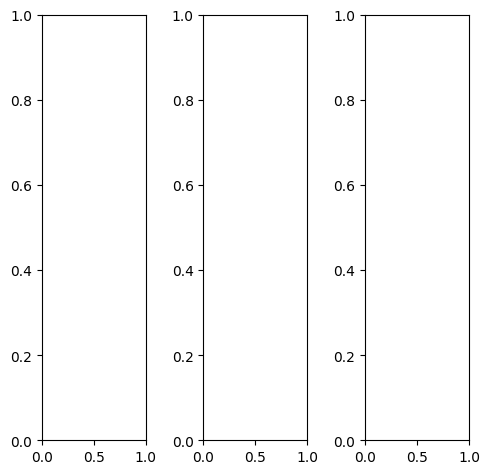

tensor([[[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0392],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         ...,
         [0.0667, 0.0667, 0.0667,  ..., 0.0392, 0.0471, 0.0510],
         [0.0667, 0.0667, 0.0667,  ..., 0.0431, 0.0471, 0.0510],
         [0.0667, 0.0627, 0.0667,  ..., 0.0745, 0.0471, 0.0510]],

        [[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0392],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         ...,
         [0.0667, 0.0667, 0.0667,  ..., 0.0392, 0.0471, 0.0510],
         [0.0667, 0.0667, 0.0667,  ..., 0.0431, 0.0471, 0.0510],
         [0.0667, 0.0627, 0.0667,  ..., 0.0745, 0.0471, 0.0510]],

        [[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0392],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.

tensor([[[0.0431, 0.0431, 0.0431,  ..., 0.0471, 0.0471, 0.0431],
         [0.0471, 0.0431, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0510, 0.0510, 0.0510,  ..., 0.0471, 0.0471, 0.0471],
         ...,
         [0.0941, 0.0941, 0.0941,  ..., 0.0549, 0.0627, 0.0667],
         [0.0941, 0.0941, 0.0941,  ..., 0.0667, 0.0627, 0.0667],
         [0.0902, 0.0902, 0.0902,  ..., 0.1020, 0.0667, 0.0706]],

        [[0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0392],
         [0.0431, 0.0431, 0.0431,  ..., 0.0431, 0.0431, 0.0431],
         [0.0431, 0.0392, 0.0392,  ..., 0.0431, 0.0431, 0.0431],
         ...,
         [0.0549, 0.0549, 0.0549,  ..., 0.0353, 0.0392, 0.0431],
         [0.0549, 0.0549, 0.0549,  ..., 0.0353, 0.0392, 0.0431],
         [0.0549, 0.0549, 0.0549,  ..., 0.0627, 0.0392, 0.0431]],

        [[0.0353, 0.0353, 0.0353,  ..., 0.0353, 0.0353, 0.0314],
         [0.0353, 0.0353, 0.0353,  ..., 0.0353, 0.0353, 0.0353],
         [0.0353, 0.0353, 0.0353,  ..., 0.0353, 0.0353, 0.

tensor([[[0.1884, 0.1440, 0.1108,  ..., 0.1287, 0.1482, 0.2359],
         [0.0608, 0.0473, 0.0312,  ..., 0.0791, 0.0959, 0.1881],
         [0.0255, 0.0141, 0.0247,  ..., 0.0635, 0.0902, 0.1744],
         ...,
         [0.1512, 0.2040, 0.1868,  ..., 0.2055, 0.2067, 0.2366],
         [0.1701, 0.2016, 0.2101,  ..., 0.2323, 0.2136, 0.2366],
         [0.2026, 0.1739, 0.1595,  ..., 0.2250, 0.1870, 0.2529]],

        [[0.2666, 0.2450, 0.2049,  ..., 0.2079, 0.2087, 0.2694],
         [0.1919, 0.2029, 0.2071,  ..., 0.1876, 0.1861, 0.2384],
         [0.1805, 0.1748, 0.2022,  ..., 0.1901, 0.1688, 0.2269],
         ...,
         [0.2256, 0.2209, 0.2348,  ..., 0.2007, 0.2131, 0.2282],
         [0.2096, 0.2434, 0.2309,  ..., 0.2589, 0.2100, 0.2314],
         [0.2307, 0.2050, 0.2171,  ..., 0.2365, 0.2049, 0.2523]],

        [[0.3695, 0.3842, 0.4537,  ..., 0.3485, 0.3429, 0.3573],
         [0.3665, 0.4341, 0.4646,  ..., 0.3991, 0.3771, 0.3562],
         [0.3805, 0.4606, 0.4801,  ..., 0.4301, 0.4117, 0.

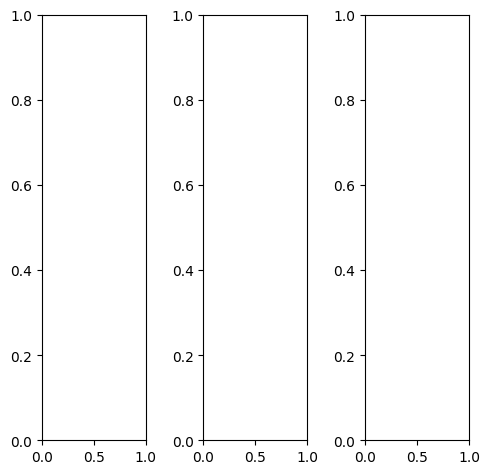

tensor([[[0.4039, 0.4078, 0.4118,  ..., 0.7490, 0.7255, 0.7333],
         [0.4078, 0.4157, 0.4196,  ..., 0.7412, 0.7176, 0.7569],
         [0.4118, 0.4196, 0.4196,  ..., 0.7333, 0.7529, 0.8039],
         ...,
         [0.4196, 0.4353, 0.4431,  ..., 0.5373, 0.5373, 0.5451],
         [0.4275, 0.4392, 0.4431,  ..., 0.5216, 0.5098, 0.5137],
         [0.4157, 0.4235, 0.4431,  ..., 0.5137, 0.5020, 0.5098]],

        [[0.4039, 0.4078, 0.4118,  ..., 0.7490, 0.7255, 0.7333],
         [0.4078, 0.4157, 0.4196,  ..., 0.7412, 0.7176, 0.7569],
         [0.4118, 0.4196, 0.4196,  ..., 0.7333, 0.7529, 0.8039],
         ...,
         [0.4196, 0.4353, 0.4431,  ..., 0.5373, 0.5373, 0.5451],
         [0.4275, 0.4392, 0.4431,  ..., 0.5216, 0.5098, 0.5137],
         [0.4157, 0.4235, 0.4431,  ..., 0.5137, 0.5020, 0.5098]],

        [[0.4039, 0.4078, 0.4118,  ..., 0.7490, 0.7255, 0.7333],
         [0.4078, 0.4157, 0.4196,  ..., 0.7412, 0.7176, 0.7569],
         [0.4118, 0.4196, 0.4196,  ..., 0.7333, 0.7529, 0.

tensor([[[0.2353, 0.2392, 0.2431,  ..., 0.6745, 0.6471, 0.6549],
         [0.2392, 0.2471, 0.2510,  ..., 0.6667, 0.6392, 0.6824],
         [0.2431, 0.2510, 0.2510,  ..., 0.6627, 0.6745, 0.7333],
         ...,
         [0.2941, 0.3098, 0.3176,  ..., 0.4353, 0.4275, 0.4431],
         [0.3020, 0.3137, 0.3176,  ..., 0.4196, 0.4000, 0.4078],
         [0.2902, 0.2980, 0.3176,  ..., 0.4118, 0.3961, 0.4039]],

        [[0.4471, 0.4510, 0.4549,  ..., 0.7686, 0.7529, 0.7647],
         [0.4510, 0.4588, 0.4627,  ..., 0.7608, 0.7451, 0.7843],
         [0.4549, 0.4627, 0.4627,  ..., 0.7529, 0.7804, 0.8314],
         ...,
         [0.4588, 0.4745, 0.4824,  ..., 0.5686, 0.5725, 0.5765],
         [0.4667, 0.4784, 0.4824,  ..., 0.5529, 0.5451, 0.5451],
         [0.4549, 0.4627, 0.4824,  ..., 0.5451, 0.5373, 0.5412]],

        [[0.6275, 0.6314, 0.6353,  ..., 0.8353, 0.7843, 0.7882],
         [0.6314, 0.6392, 0.6431,  ..., 0.8314, 0.7843, 0.8118],
         [0.6353, 0.6431, 0.6431,  ..., 0.8314, 0.8314, 0.

tensor([[[0.1958, 0.1966, 0.1161,  ..., 0.6150, 0.6240, 0.6569],
         [0.0772, 0.0837, 0.1004,  ..., 0.5432, 0.5066, 0.6372],
         [0.1051, 0.0883, 0.1118,  ..., 0.5890, 0.6774, 0.7284],
         ...,
         [0.2045, 0.2815, 0.3241,  ..., 0.4362, 0.3901, 0.3612],
         [0.2338, 0.2569, 0.3204,  ..., 0.3974, 0.3575, 0.3759],
         [0.2484, 0.2304, 0.2680,  ..., 0.3985, 0.4077, 0.3401]],

        [[0.2738, 0.2541, 0.2504,  ..., 0.6995, 0.7530, 0.7083],
         [0.2221, 0.2731, 0.2534,  ..., 0.6072, 0.6098, 0.8080],
         [0.2509, 0.2879, 0.2679,  ..., 0.6575, 0.7043, 0.8507],
         ...,
         [0.2631, 0.2931, 0.3363,  ..., 0.4225, 0.4316, 0.3561],
         [0.2975, 0.3211, 0.3218,  ..., 0.4550, 0.4356, 0.3823],
         [0.3042, 0.2808, 0.3348,  ..., 0.4343, 0.4485, 0.3768]],

        [[0.3722, 0.4398, 0.4603,  ..., 0.8538, 0.8998, 0.8162],
         [0.3890, 0.5199, 0.5168,  ..., 0.7336, 0.7795, 0.8077],
         [0.4050, 0.5243, 0.5576,  ..., 0.7996, 0.8296, 0.

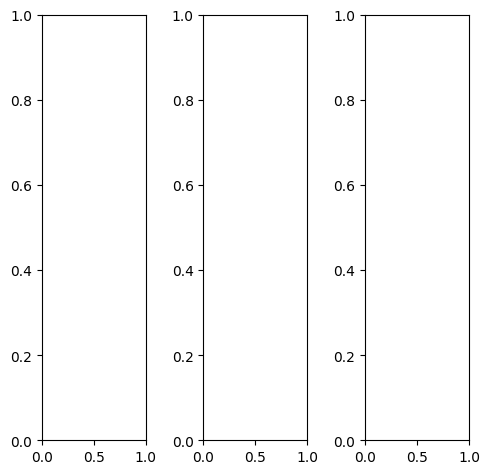

tensor([[[0.9725, 0.9647, 0.9686,  ..., 0.5373, 0.4471, 0.3216],
         [0.9843, 0.9725, 0.9765,  ..., 0.3412, 0.2627, 0.3412],
         [0.9922, 0.9843, 0.9843,  ..., 0.3882, 0.3569, 0.4314],
         ...,
         [0.2902, 0.2667, 0.2745,  ..., 0.2392, 0.2431, 0.2078],
         [0.2863, 0.2627, 0.2667,  ..., 0.2392, 0.2314, 0.1922],
         [0.3529, 0.3255, 0.3333,  ..., 0.3294, 0.3176, 0.2745]],

        [[0.9725, 0.9647, 0.9686,  ..., 0.5373, 0.4471, 0.3216],
         [0.9843, 0.9725, 0.9765,  ..., 0.3412, 0.2627, 0.3412],
         [0.9922, 0.9843, 0.9843,  ..., 0.3882, 0.3569, 0.4314],
         ...,
         [0.2902, 0.2667, 0.2745,  ..., 0.2392, 0.2431, 0.2078],
         [0.2863, 0.2627, 0.2667,  ..., 0.2392, 0.2314, 0.1922],
         [0.3529, 0.3255, 0.3333,  ..., 0.3294, 0.3176, 0.2745]],

        [[0.9725, 0.9647, 0.9686,  ..., 0.5373, 0.4471, 0.3216],
         [0.9843, 0.9725, 0.9765,  ..., 0.3412, 0.2627, 0.3412],
         [0.9922, 0.9843, 0.9843,  ..., 0.3882, 0.3569, 0.

tensor([[[0.9176, 0.9020, 0.9255,  ..., 0.5216, 0.4431, 0.3176],
         [0.9451, 0.9294, 0.9451,  ..., 0.3216, 0.2667, 0.3294],
         [0.9882, 0.9765, 0.9843,  ..., 0.3765, 0.3647, 0.4039],
         ...,
         [0.1961, 0.1569, 0.1765,  ..., 0.1490, 0.1529, 0.1137],
         [0.1961, 0.1608, 0.1804,  ..., 0.1569, 0.1490, 0.1098],
         [0.2784, 0.2392, 0.2549,  ..., 0.2588, 0.2471, 0.2039]],

        [[0.9961, 0.9922, 0.9843,  ..., 0.5608, 0.4627, 0.3333],
         [1.0000, 0.9922, 0.9882,  ..., 0.3686, 0.2784, 0.3529],
         [0.9961, 0.9843, 0.9843,  ..., 0.4078, 0.3647, 0.4431],
         ...,
         [0.3098, 0.2902, 0.2941,  ..., 0.2588, 0.2627, 0.2275],
         [0.3020, 0.2824, 0.2824,  ..., 0.2510, 0.2471, 0.2078],
         [0.3686, 0.3451, 0.3490,  ..., 0.3412, 0.3294, 0.2902]],

        [[0.9882, 0.9804, 0.9843,  ..., 0.4588, 0.3725, 0.2667],
         [0.9922, 0.9843, 0.9882,  ..., 0.2588, 0.1882, 0.3098],
         [0.9961, 0.9882, 0.9882,  ..., 0.3294, 0.3020, 0.

tensor([[[0.8050, 0.8318, 0.8940,  ..., 0.4600, 0.4198, 0.3949],
         [0.8783, 0.9004, 0.8819,  ..., 0.2725, 0.2184, 0.4053],
         [0.8894, 0.9457, 0.9473,  ..., 0.4016, 0.3521, 0.4617],
         ...,
         [0.2389, 0.2871, 0.2554,  ..., 0.2858, 0.2673, 0.2522],
         [0.2604, 0.2312, 0.2599,  ..., 0.2545, 0.2543, 0.2638],
         [0.3425, 0.3466, 0.3416,  ..., 0.3688, 0.3486, 0.3395]],

        [[0.7493, 0.8469, 0.9175,  ..., 0.5375, 0.5240, 0.4156],
         [0.8240, 0.9046, 0.9003,  ..., 0.3641, 0.3060, 0.4161],
         [0.8896, 0.9522, 0.9492,  ..., 0.4419, 0.4014, 0.4744],
         ...,
         [0.3129, 0.3134, 0.3346,  ..., 0.2969, 0.3085, 0.2631],
         [0.3276, 0.3117, 0.3283,  ..., 0.3151, 0.2903, 0.2720],
         [0.3954, 0.3844, 0.4100,  ..., 0.4035, 0.3885, 0.3590]],

        [[0.8958, 1.0044, 1.0025,  ..., 0.5985, 0.5711, 0.4934],
         [0.9840, 1.0683, 1.0690,  ..., 0.4546, 0.3774, 0.5225],
         [1.0266, 1.0962, 1.1065,  ..., 0.4895, 0.4918, 0.

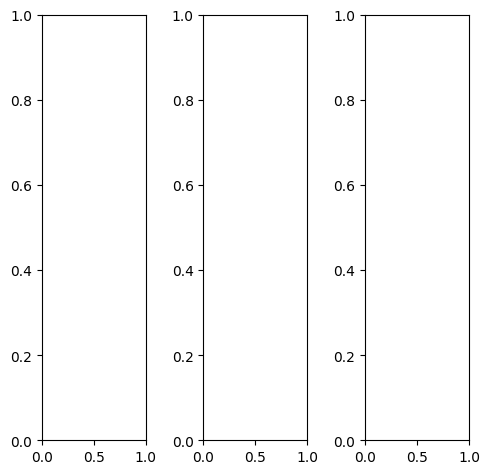

EPOCH: 2.765  trn_loss: 0.006  (316.48s - 11128.15s remaining)

tensor([[[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.1059],
         ...,
         [0.3412, 0.3490, 0.3490,  ..., 0.2706, 0.2863, 0.2863],
         [0.3608, 0.3725, 0.3608,  ..., 0.3137, 0.3216, 0.3216],
         [0.3333, 0.3294, 0.3294,  ..., 0.3333, 0.3412, 0.3451]],

        [[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.1059],
         ...,
         [0.3412, 0.3490, 0.3490,  ..., 0.2706, 0.2863, 0.2863],
         [0.3608, 0.3725, 0.3608,  ..., 0.3137, 0.3216, 0.3216],
         [0.3333, 0.3294, 0.3294,  ..., 0.3333, 0.3412, 0.3451]],

        [[0.2000, 0.2235, 0.2392,  ..., 0.1020, 0.0980, 0.1059],
         [0.2078, 0.2431, 0.2314,  ..., 0.1059, 0.1020, 0.1020],
         [0.1922, 0.1882, 0.1804,  ..., 0.1137, 0.1059, 0.

tensor([[[0.1137, 0.1373, 0.1529,  ..., 0.0392, 0.0471, 0.0588],
         [0.1216, 0.1569, 0.1451,  ..., 0.0510, 0.0588, 0.0627],
         [0.1059, 0.1020, 0.0941,  ..., 0.0667, 0.0667, 0.0706],
         ...,
         [0.3843, 0.3922, 0.3882,  ..., 0.2549, 0.2706, 0.2706],
         [0.3569, 0.3686, 0.3569,  ..., 0.3373, 0.3412, 0.3412],
         [0.3020, 0.3020, 0.3059,  ..., 0.3843, 0.3922, 0.3961]],

        [[0.2510, 0.2745, 0.2863,  ..., 0.1255, 0.1137, 0.1176],
         [0.2549, 0.2902, 0.2784,  ..., 0.1255, 0.1137, 0.1137],
         [0.2392, 0.2353, 0.2275,  ..., 0.1294, 0.1176, 0.1137],
         ...,
         [0.3373, 0.3451, 0.3451,  ..., 0.2863, 0.3020, 0.3020],
         [0.3686, 0.3804, 0.3686,  ..., 0.3176, 0.3216, 0.3216],
         [0.3490, 0.3451, 0.3451,  ..., 0.3255, 0.3333, 0.3373]],

        [[0.1765, 0.2000, 0.2157,  ..., 0.1333, 0.1412, 0.1529],
         [0.1922, 0.2275, 0.2157,  ..., 0.1412, 0.1490, 0.1490],
         [0.1882, 0.1843, 0.1765,  ..., 0.1608, 0.1529, 0.

tensor([[[0.3107, 0.3451, 0.3373,  ..., 0.1364, 0.1240, 0.1681],
         [0.1997, 0.3654, 0.3482,  ..., 0.0959, 0.0809, 0.1060],
         [0.1822, 0.2334, 0.2432,  ..., 0.1021, 0.0973, 0.1088],
         ...,
         [0.5226, 0.5461, 0.5288,  ..., 0.4447, 0.4568, 0.4559],
         [0.6088, 0.6311, 0.5857,  ..., 0.5041, 0.4944, 0.5551],
         [0.5604, 0.5713, 0.5814,  ..., 0.5838, 0.6010, 0.5657]],

        [[0.3453, 0.3657, 0.4327,  ..., 0.1155, 0.1204, 0.1874],
         [0.2564, 0.4206, 0.3972,  ..., 0.1032, 0.1035, 0.1189],
         [0.2517, 0.3113, 0.2898,  ..., 0.1008, 0.0726, 0.0895],
         ...,
         [0.5028, 0.5061, 0.5063,  ..., 0.4168, 0.4694, 0.4010],
         [0.5583, 0.6057, 0.5409,  ..., 0.5133, 0.5510, 0.5237],
         [0.5059, 0.4925, 0.5055,  ..., 0.5381, 0.5672, 0.5468]],

        [[0.3960, 0.4650, 0.5455,  ..., 0.1736, 0.1919, 0.2217],
         [0.3943, 0.5796, 0.5726,  ..., 0.1839, 0.1829, 0.1739],
         [0.3546, 0.4527, 0.4618,  ..., 0.1904, 0.1904, 0.

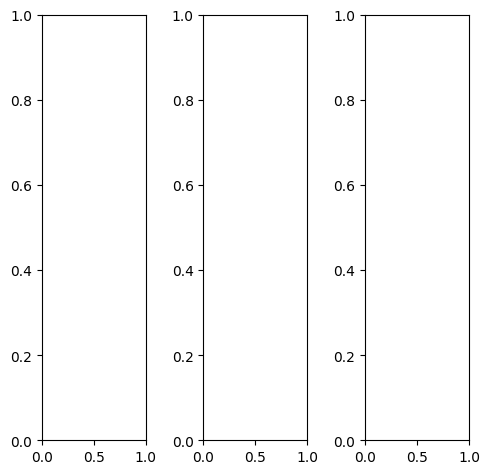

tensor([[[0.7961, 0.8353, 0.8745,  ..., 0.8863, 0.8863, 0.9020],
         [0.8039, 0.8353, 0.8706,  ..., 0.8784, 0.8745, 0.8863],
         [0.7961, 0.8118, 0.8353,  ..., 0.8745, 0.8706, 0.8824],
         ...,
         [0.3843, 0.3020, 0.2941,  ..., 0.4549, 0.3922, 0.3255],
         [0.3882, 0.3686, 0.3490,  ..., 0.4275, 0.4235, 0.4078],
         [0.3961, 0.3804, 0.4275,  ..., 0.3725, 0.3922, 0.4196]],

        [[0.7961, 0.8353, 0.8745,  ..., 0.8863, 0.8863, 0.9020],
         [0.8039, 0.8353, 0.8706,  ..., 0.8784, 0.8745, 0.8863],
         [0.7961, 0.8118, 0.8353,  ..., 0.8745, 0.8706, 0.8824],
         ...,
         [0.3843, 0.3020, 0.2941,  ..., 0.4549, 0.3922, 0.3255],
         [0.3882, 0.3686, 0.3490,  ..., 0.4275, 0.4235, 0.4078],
         [0.3961, 0.3804, 0.4275,  ..., 0.3725, 0.3922, 0.4196]],

        [[0.7961, 0.8353, 0.8745,  ..., 0.8863, 0.8863, 0.9020],
         [0.8039, 0.8353, 0.8706,  ..., 0.8784, 0.8745, 0.8863],
         [0.7961, 0.8118, 0.8353,  ..., 0.8745, 0.8706, 0.

tensor([[[0.8353, 0.8824, 0.9294,  ..., 0.8941, 0.8941, 0.9059],
         [0.8431, 0.8824, 0.9255,  ..., 0.8902, 0.8863, 0.8980],
         [0.8392, 0.8627, 0.8902,  ..., 0.8980, 0.8941, 0.9020],
         ...,
         [0.3176, 0.2353, 0.2275,  ..., 0.3882, 0.3255, 0.2588],
         [0.3255, 0.3059, 0.2863,  ..., 0.3529, 0.3569, 0.3412],
         [0.3490, 0.3294, 0.3804,  ..., 0.2863, 0.3176, 0.3529]],

        [[0.7765, 0.8118, 0.8471,  ..., 0.8824, 0.8824, 0.8941],
         [0.7843, 0.8118, 0.8431,  ..., 0.8706, 0.8627, 0.8745],
         [0.7804, 0.7922, 0.8078,  ..., 0.8627, 0.8588, 0.8667],
         ...,
         [0.4039, 0.3216, 0.3137,  ..., 0.4706, 0.4078, 0.3412],
         [0.4039, 0.3843, 0.3686,  ..., 0.4471, 0.4431, 0.4275],
         [0.4078, 0.3922, 0.4392,  ..., 0.4039, 0.4118, 0.4392]],

        [[0.7804, 0.8196, 0.8549,  ..., 0.8980, 0.9020, 0.9176],
         [0.7882, 0.8196, 0.8510,  ..., 0.8863, 0.8902, 0.9020],
         [0.7804, 0.7961, 0.8157,  ..., 0.8863, 0.8863, 0.

tensor([[[0.7343, 0.6332, 0.5856,  ..., 0.6736, 0.7264, 0.7866],
         [0.6182, 0.5710, 0.4740,  ..., 0.6054, 0.6111, 0.7623],
         [0.6309, 0.5643, 0.4845,  ..., 0.6364, 0.6902, 0.7786],
         ...,
         [0.3208, 0.3204, 0.3016,  ..., 0.4781, 0.4030, 0.3640],
         [0.3523, 0.3438, 0.3819,  ..., 0.4408, 0.4683, 0.4464],
         [0.4076, 0.3884, 0.4118,  ..., 0.3910, 0.4140, 0.4436]],

        [[0.6990, 0.6555, 0.7127,  ..., 0.6957, 0.8054, 0.8041],
         [0.6534, 0.6648, 0.6209,  ..., 0.6582, 0.7089, 0.8396],
         [0.6717, 0.6616, 0.6227,  ..., 0.6835, 0.7092, 0.8015],
         ...,
         [0.3333, 0.2962, 0.2723,  ..., 0.4522, 0.4042, 0.3194],
         [0.3681, 0.3620, 0.3426,  ..., 0.4414, 0.4525, 0.4050],
         [0.4077, 0.3877, 0.4357,  ..., 0.3924, 0.4078, 0.4204]],

        [[0.8060, 0.8465, 0.8637,  ..., 0.7656, 0.8364, 0.8146],
         [0.7855, 0.8107, 0.7843,  ..., 0.6558, 0.7428, 0.7603],
         [0.7859, 0.8063, 0.7609,  ..., 0.6919, 0.7339, 0.

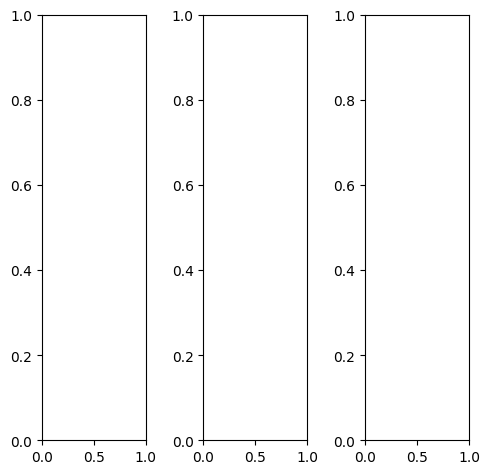

tensor([[[0.7294, 0.7216, 0.7216,  ..., 0.6627, 0.6588, 0.6510],
         [0.7098, 0.7098, 0.7098,  ..., 0.6314, 0.6196, 0.6039],
         [0.7098, 0.7137, 0.7098,  ..., 0.6314, 0.6118, 0.5961],
         ...,
         [0.5490, 0.5373, 0.5373,  ..., 0.9020, 0.9059, 0.9098],
         [0.5294, 0.5255, 0.5647,  ..., 0.9098, 0.9137, 0.9059],
         [0.5176, 0.5098, 0.5686,  ..., 0.9255, 0.9255, 0.9137]],

        [[0.7294, 0.7216, 0.7216,  ..., 0.6627, 0.6588, 0.6510],
         [0.7098, 0.7098, 0.7098,  ..., 0.6314, 0.6196, 0.6039],
         [0.7098, 0.7137, 0.7098,  ..., 0.6314, 0.6118, 0.5961],
         ...,
         [0.5490, 0.5373, 0.5373,  ..., 0.9020, 0.9059, 0.9098],
         [0.5294, 0.5255, 0.5647,  ..., 0.9098, 0.9137, 0.9059],
         [0.5176, 0.5098, 0.5686,  ..., 0.9255, 0.9255, 0.9137]],

        [[0.7294, 0.7216, 0.7216,  ..., 0.6627, 0.6588, 0.6510],
         [0.7098, 0.7098, 0.7098,  ..., 0.6314, 0.6196, 0.6039],
         [0.7098, 0.7137, 0.7098,  ..., 0.6314, 0.6118, 0.

tensor([[[0.7569, 0.7294, 0.7176,  ..., 0.6902, 0.6863, 0.7098],
         [0.7294, 0.7098, 0.6980,  ..., 0.6275, 0.6118, 0.6196],
         [0.7412, 0.7294, 0.7098,  ..., 0.6392, 0.6039, 0.5961],
         ...,
         [0.5412, 0.5020, 0.5098,  ..., 0.9137, 0.9020, 0.9098],
         [0.5176, 0.4824, 0.5294,  ..., 0.9176, 0.9137, 0.9137],
         [0.5137, 0.4745, 0.5451,  ..., 0.9255, 0.9216, 0.9294]],

        [[0.7647, 0.7686, 0.7725,  ..., 0.6863, 0.6824, 0.6627],
         [0.7490, 0.7569, 0.7647,  ..., 0.6784, 0.6667, 0.6392],
         [0.7412, 0.7569, 0.7569,  ..., 0.6784, 0.6667, 0.6431],
         ...,
         [0.5922, 0.5961, 0.5922,  ..., 0.8980, 0.9137, 0.9137],
         [0.5725, 0.5843, 0.6196,  ..., 0.9059, 0.9176, 0.9059],
         [0.5569, 0.5647, 0.6196,  ..., 0.9255, 0.9294, 0.9098]],

        [[0.4667, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4471],
         [0.4510, 0.4510, 0.4510,  ..., 0.3961, 0.3843, 0.3647],
         [0.4510, 0.4549, 0.4510,  ..., 0.3725, 0.3529, 0.

tensor([[[0.5391, 0.4502, 0.3762,  ..., 0.4253, 0.4583, 0.5054],
         [0.4339, 0.3701, 0.2619,  ..., 0.3650, 0.3512, 0.4841],
         [0.4195, 0.4051, 0.3311,  ..., 0.4232, 0.4110, 0.4826],
         ...,
         [0.4192, 0.4407, 0.4261,  ..., 0.5837, 0.5774, 0.6244],
         [0.4152, 0.4113, 0.4601,  ..., 0.5651, 0.5678, 0.6611],
         [0.4137, 0.4442, 0.4712,  ..., 0.6644, 0.6901, 0.6568]],

        [[0.5421, 0.5139, 0.5040,  ..., 0.4647, 0.5254, 0.4869],
         [0.4854, 0.4515, 0.4328,  ..., 0.4298, 0.4684, 0.4542],
         [0.4860, 0.4810, 0.4668,  ..., 0.4632, 0.4563, 0.4384],
         ...,
         [0.4105, 0.4031, 0.4411,  ..., 0.5402, 0.5485, 0.6276],
         [0.4101, 0.4157, 0.4778,  ..., 0.5666, 0.5741, 0.6421],
         [0.4215, 0.4029, 0.4730,  ..., 0.6387, 0.6450, 0.6287]],

        [[0.6917, 0.7369, 0.7397,  ..., 0.6032, 0.6546, 0.5945],
         [0.6640, 0.6982, 0.7062,  ..., 0.5611, 0.5748, 0.5813],
         [0.6576, 0.7249, 0.7057,  ..., 0.5638, 0.5580, 0.

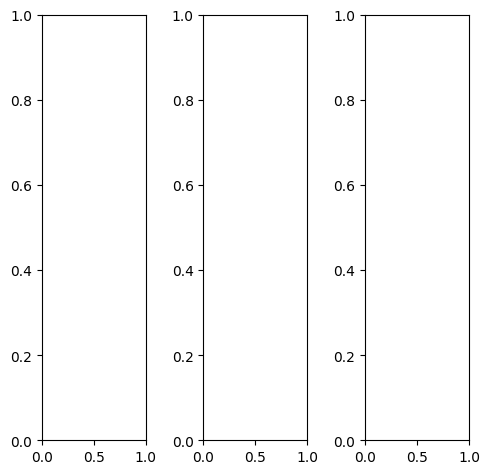

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.3804, 0.3686, 0.3686,  ..., 0.2980, 0.3333, 0.3686],
         [0.3804, 0.3725, 0.3686,  ..., 0.3020, 0.3216, 0.3451],
         [0.4039, 0.3961, 0.3843,  ..., 0.2745, 0.2941, 0.3176]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.3804, 0.3686, 0.3686,  ..., 0.2980, 0.3333, 0.3686],
         [0.3804, 0.3725, 0.3686,  ..., 0.3020, 0.3216, 0.3451],
         [0.4039, 0.3961, 0.3843,  ..., 0.2745, 0.2941, 0.3176]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.3804, 0.3686, 0.3686,  ..., 0.3098, 0.3451, 0.3804],
         [0.3843, 0.3765, 0.3725,  ..., 0.3137, 0.3333, 0.3569],
         [0.4118, 0.4039, 0.3961,  ..., 0.2824, 0.3059, 0.3294]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.0039],
         ...,
         [0.3922, 0.3804, 0.3804,  ..., 0.3059, 0.3412, 0.3765],
         [0.3882, 0.3804, 0.3804,  ..., 0.3059, 0.3294, 0.3490],
         [0.4078, 0.4000, 0.3882,  ..., 0.2784, 0.2980, 0.3216]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0039, 0.0039, 0.

tensor([[[0.2020, 0.1322, 0.1093,  ..., 0.1261, 0.1368, 0.2205],
         [0.1083, 0.1031, 0.0452,  ..., 0.0915, 0.0945, 0.1690],
         [0.0872, 0.0614, 0.0522,  ..., 0.0905, 0.0969, 0.1566],
         ...,
         [0.6275, 0.6262, 0.6029,  ..., 0.5914, 0.6079, 0.6499],
         [0.5933, 0.6115, 0.5743,  ..., 0.5670, 0.5501, 0.6295],
         [0.6287, 0.6932, 0.6760,  ..., 0.5244, 0.5527, 0.5737]],

        [[0.2578, 0.2060, 0.1851,  ..., 0.1798, 0.1753, 0.2492],
         [0.1722, 0.1672, 0.1320,  ..., 0.1560, 0.1547, 0.2022],
         [0.1567, 0.1468, 0.1415,  ..., 0.1619, 0.1503, 0.2054],
         ...,
         [0.5621, 0.5780, 0.5797,  ..., 0.5611, 0.6087, 0.6176],
         [0.5703, 0.5864, 0.5742,  ..., 0.5506, 0.5994, 0.6256],
         [0.5988, 0.6353, 0.6338,  ..., 0.4840, 0.5420, 0.5592]],

        [[0.3148, 0.2969, 0.3106,  ..., 0.2730, 0.2709, 0.2972],
         [0.2728, 0.3317, 0.3273,  ..., 0.2935, 0.2869, 0.2776],
         [0.2929, 0.3570, 0.3708,  ..., 0.3100, 0.3057, 0.

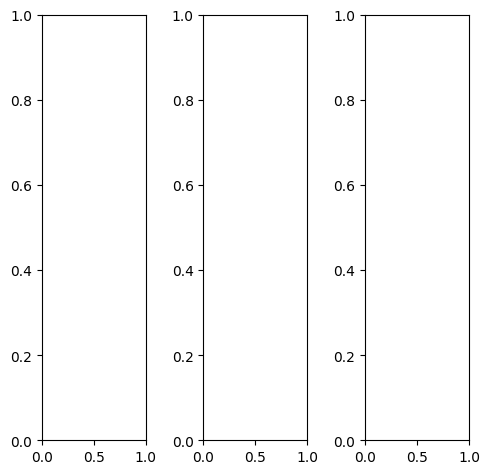

tensor([[[0.4431, 0.5294, 0.4902,  ..., 0.5412, 0.5137, 0.3765],
         [0.5373, 0.5608, 0.5412,  ..., 0.7137, 0.5804, 0.5059],
         [0.5686, 0.5882, 0.5804,  ..., 0.7647, 0.5098, 0.5843],
         ...,
         [0.3059, 0.4118, 0.4353,  ..., 0.2196, 0.1843, 0.2314],
         [0.3608, 0.4314, 0.4157,  ..., 0.1882, 0.1882, 0.2118],
         [0.3882, 0.4471, 0.4157,  ..., 0.2000, 0.1843, 0.1725]],

        [[0.4431, 0.5294, 0.4902,  ..., 0.5412, 0.5137, 0.3765],
         [0.5373, 0.5608, 0.5412,  ..., 0.7137, 0.5804, 0.5059],
         [0.5686, 0.5882, 0.5804,  ..., 0.7647, 0.5098, 0.5843],
         ...,
         [0.3059, 0.4118, 0.4353,  ..., 0.2196, 0.1843, 0.2314],
         [0.3608, 0.4314, 0.4157,  ..., 0.1882, 0.1882, 0.2118],
         [0.3882, 0.4471, 0.4157,  ..., 0.2000, 0.1843, 0.1725]],

        [[0.4431, 0.5294, 0.4902,  ..., 0.5412, 0.5137, 0.3765],
         [0.5373, 0.5608, 0.5412,  ..., 0.7137, 0.5804, 0.5059],
         [0.5686, 0.5882, 0.5804,  ..., 0.7647, 0.5098, 0.

tensor([[[0.4627, 0.5569, 0.5294,  ..., 0.5412, 0.5176, 0.3843],
         [0.5804, 0.6039, 0.5882,  ..., 0.7176, 0.5922, 0.5176],
         [0.6235, 0.6353, 0.6235,  ..., 0.7765, 0.5294, 0.6000],
         ...,
         [0.3098, 0.4157, 0.4392,  ..., 0.2431, 0.2039, 0.2549],
         [0.3647, 0.4353, 0.4196,  ..., 0.2118, 0.2078, 0.2353],
         [0.3922, 0.4510, 0.4196,  ..., 0.2275, 0.2078, 0.1882]],

        [[0.4392, 0.5216, 0.4824,  ..., 0.5412, 0.5137, 0.3765],
         [0.5294, 0.5490, 0.5294,  ..., 0.7098, 0.5765, 0.5059],
         [0.5569, 0.5765, 0.5725,  ..., 0.7608, 0.5020, 0.5804],
         ...,
         [0.3059, 0.4118, 0.4353,  ..., 0.2157, 0.1804, 0.2275],
         [0.3608, 0.4314, 0.4157,  ..., 0.1843, 0.1843, 0.2078],
         [0.3882, 0.4471, 0.4157,  ..., 0.1961, 0.1804, 0.1686]],

        [[0.4078, 0.4863, 0.4392,  ..., 0.5333, 0.4980, 0.3608],
         [0.4784, 0.4941, 0.4706,  ..., 0.7098, 0.5725, 0.4863],
         [0.4980, 0.5176, 0.5176,  ..., 0.7529, 0.4863, 0.

tensor([[[0.4745, 0.4261, 0.3885,  ..., 0.4872, 0.4516, 0.4516],
         [0.4524, 0.4213, 0.3216,  ..., 0.6543, 0.4401, 0.5287],
         [0.5095, 0.4915, 0.4419,  ..., 0.7517, 0.4354, 0.6087],
         ...,
         [0.2375, 0.3652, 0.3831,  ..., 0.0878, 0.0472, 0.1317],
         [0.2982, 0.3868, 0.3815,  ..., 0.0505, 0.0483, 0.1039],
         [0.3531, 0.4304, 0.4094,  ..., 0.1106, 0.0929, 0.1015]],

        [[0.4973, 0.4768, 0.5037,  ..., 0.5631, 0.5435, 0.4240],
         [0.5124, 0.5122, 0.4862,  ..., 0.7200, 0.5677, 0.5505],
         [0.5605, 0.5757, 0.5850,  ..., 0.7513, 0.4472, 0.6014],
         ...,
         [0.2493, 0.3669, 0.4409,  ..., 0.0999, 0.0755, 0.1348],
         [0.3290, 0.4240, 0.4167,  ..., 0.0929, 0.0703, 0.1223],
         [0.3827, 0.4171, 0.4275,  ..., 0.1159, 0.1061, 0.1081]],

        [[0.6215, 0.6805, 0.7018,  ..., 0.7180, 0.6966, 0.5594],
         [0.6861, 0.7324, 0.6880,  ..., 0.8514, 0.7227, 0.6659],
         [0.7138, 0.7656, 0.7575,  ..., 0.9242, 0.6043, 0.

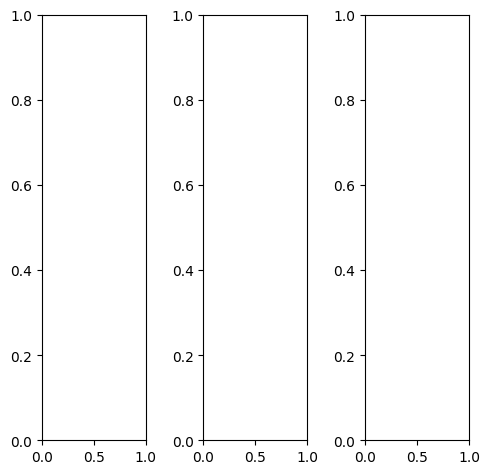

EPOCH: 3.000  val_loss: 0.004  (348.84s - 11279.23s remaining)

tensor([[[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.2196],
         ...,
         [0.1843, 0.1961, 0.1843,  ..., 0.2157, 0.2078, 0.1843],
         [0.1569, 0.1608, 0.1686,  ..., 0.1843, 0.2118, 0.2118],
         [0.1608, 0.1647, 0.1765,  ..., 0.1922, 0.2078, 0.1961]],

        [[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.2196],
         ...,
         [0.1843, 0.1961, 0.1843,  ..., 0.2157, 0.2078, 0.1843],
         [0.1569, 0.1608, 0.1686,  ..., 0.1843, 0.2118, 0.2118],
         [0.1608, 0.1647, 0.1765,  ..., 0.1922, 0.2078, 0.1961]],

        [[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.

tensor([[[0.1255, 0.1176, 0.1294,  ..., 0.1529, 0.1529, 0.1569],
         [0.1255, 0.1216, 0.1294,  ..., 0.1490, 0.1569, 0.1529],
         [0.1255, 0.1294, 0.1373,  ..., 0.1412, 0.1529, 0.1451],
         ...,
         [0.1333, 0.1451, 0.1373,  ..., 0.1725, 0.1647, 0.1373],
         [0.1137, 0.1137, 0.1176,  ..., 0.1216, 0.1490, 0.1529],
         [0.1137, 0.1176, 0.1255,  ..., 0.1255, 0.1451, 0.1294]],

        [[0.1686, 0.1569, 0.1686,  ..., 0.2353, 0.2353, 0.2431],
         [0.1725, 0.1647, 0.1686,  ..., 0.2314, 0.2392, 0.2353],
         [0.1686, 0.1725, 0.1804,  ..., 0.2157, 0.2275, 0.2235],
         ...,
         [0.1804, 0.1922, 0.1804,  ..., 0.2118, 0.2000, 0.1725],
         [0.1490, 0.1569, 0.1647,  ..., 0.1843, 0.2078, 0.2039],
         [0.1529, 0.1608, 0.1765,  ..., 0.1922, 0.2078, 0.1922]],

        [[0.3373, 0.3373, 0.3608,  ..., 0.4196, 0.4196, 0.4275],
         [0.3490, 0.3490, 0.3569,  ..., 0.4157, 0.4235, 0.4235],
         [0.3529, 0.3529, 0.3569,  ..., 0.4039, 0.4157, 0.

tensor([[[0.2054, 0.1643, 0.1597,  ..., 0.1968, 0.2131, 0.2262],
         [0.1509, 0.1610, 0.1542,  ..., 0.1894, 0.2125, 0.2205],
         [0.1423, 0.1561, 0.1669,  ..., 0.1733, 0.1884, 0.1987],
         ...,
         [0.2001, 0.2167, 0.2038,  ..., 0.2359, 0.2295, 0.2160],
         [0.1863, 0.1899, 0.2107,  ..., 0.2187, 0.2404, 0.2150],
         [0.2024, 0.2003, 0.2006,  ..., 0.2061, 0.2276, 0.2256]],

        [[0.2248, 0.1675, 0.1785,  ..., 0.2400, 0.2500, 0.2835],
         [0.1761, 0.1801, 0.1832,  ..., 0.2431, 0.2528, 0.2511],
         [0.1756, 0.1874, 0.1917,  ..., 0.2255, 0.2290, 0.2271],
         ...,
         [0.1859, 0.1821, 0.1740,  ..., 0.2131, 0.2145, 0.2064],
         [0.1751, 0.1681, 0.1749,  ..., 0.1942, 0.2156, 0.2055],
         [0.2137, 0.1915, 0.1868,  ..., 0.1971, 0.2121, 0.2360]],

        [[0.2296, 0.2033, 0.2269,  ..., 0.2845, 0.2803, 0.2746],
         [0.2107, 0.2268, 0.2363,  ..., 0.3073, 0.2982, 0.2594],
         [0.2111, 0.2500, 0.2738,  ..., 0.3313, 0.3103, 0.

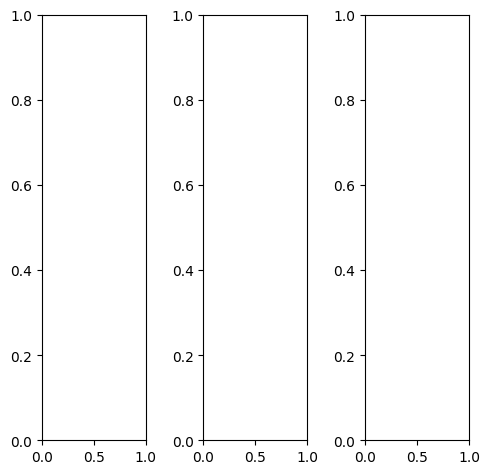

tensor([[[0.5373, 0.6863, 0.8000,  ..., 0.9804, 0.9804, 0.9765],
         [0.3922, 0.4549, 0.5412,  ..., 0.9804, 0.9804, 0.9765],
         [0.3412, 0.4078, 0.3882,  ..., 0.9765, 0.9686, 0.9490],
         ...,
         [0.1725, 0.1725, 0.2157,  ..., 0.7137, 0.7098, 0.6902],
         [0.2353, 0.3882, 0.4902,  ..., 0.7294, 0.7569, 0.6549],
         [0.5098, 0.5608, 0.5686,  ..., 0.6196, 0.6235, 0.6353]],

        [[0.5373, 0.6863, 0.8000,  ..., 0.9804, 0.9804, 0.9765],
         [0.3922, 0.4549, 0.5412,  ..., 0.9804, 0.9804, 0.9765],
         [0.3412, 0.4078, 0.3882,  ..., 0.9765, 0.9686, 0.9490],
         ...,
         [0.1725, 0.1725, 0.2157,  ..., 0.7137, 0.7098, 0.6902],
         [0.2353, 0.3882, 0.4902,  ..., 0.7294, 0.7569, 0.6549],
         [0.5098, 0.5608, 0.5686,  ..., 0.6196, 0.6235, 0.6353]],

        [[0.5373, 0.6863, 0.8000,  ..., 0.9804, 0.9804, 0.9765],
         [0.3922, 0.4549, 0.5412,  ..., 0.9804, 0.9804, 0.9765],
         [0.3412, 0.4078, 0.3882,  ..., 0.9765, 0.9686, 0.

tensor([[[0.4039, 0.5843, 0.7216,  ..., 0.9647, 0.9647, 0.9608],
         [0.1922, 0.2824, 0.3804,  ..., 0.9647, 0.9647, 0.9569],
         [0.0902, 0.1686, 0.1569,  ..., 0.9529, 0.9412, 0.9216],
         ...,
         [0.0510, 0.0549, 0.1137,  ..., 0.6667, 0.6549, 0.6275],
         [0.0980, 0.2549, 0.3569,  ..., 0.6549, 0.6745, 0.5490],
         [0.3725, 0.4588, 0.4549,  ..., 0.5020, 0.5176, 0.4863]],

        [[0.5804, 0.7137, 0.8196,  ..., 0.9922, 0.9922, 0.9922],
         [0.4627, 0.5176, 0.5961,  ..., 0.9961, 0.9961, 0.9922],
         [0.4353, 0.4980, 0.4745,  ..., 0.9922, 0.9843, 0.9647],
         ...,
         [0.2196, 0.2118, 0.2549,  ..., 0.7333, 0.7294, 0.7176],
         [0.2902, 0.4392, 0.5451,  ..., 0.7569, 0.7843, 0.6941],
         [0.5608, 0.5961, 0.6078,  ..., 0.6627, 0.6627, 0.6941]],

        [[0.6667, 0.8000, 0.9059,  ..., 0.9490, 0.9490, 0.9451],
         [0.5412, 0.5961, 0.6667,  ..., 0.9569, 0.9569, 0.9529],
         [0.5137, 0.5686, 0.5373,  ..., 0.9608, 0.9490, 0.

tensor([[[0.5718, 0.7199, 0.7846,  ..., 0.9305, 0.9438, 0.8876],
         [0.4496, 0.4801, 0.4913,  ..., 0.9302, 0.9586, 0.9103],
         [0.3535, 0.4156, 0.3821,  ..., 0.9223, 0.9534, 0.9261],
         ...,
         [0.1885, 0.2149, 0.2779,  ..., 0.6875, 0.7070, 0.7090],
         [0.2645, 0.4180, 0.5419,  ..., 0.7251, 0.7646, 0.7015],
         [0.4816, 0.5910, 0.6218,  ..., 0.6472, 0.6585, 0.6384]],

        [[0.5561, 0.6888, 0.8247,  ..., 0.9441, 0.9554, 0.8938],
         [0.4199, 0.4472, 0.5162,  ..., 0.9349, 0.9534, 0.9375],
         [0.3586, 0.4106, 0.3879,  ..., 0.9080, 0.9294, 0.9098],
         ...,
         [0.1703, 0.1784, 0.2363,  ..., 0.6763, 0.7114, 0.7194],
         [0.2598, 0.4194, 0.5210,  ..., 0.7140, 0.7436, 0.6647],
         [0.4691, 0.5554, 0.5720,  ..., 0.6245, 0.6456, 0.6256]],

        [[0.4990, 0.6412, 0.7536,  ..., 0.9112, 0.9269, 0.8817],
         [0.3656, 0.4013, 0.4445,  ..., 0.9221, 0.9321, 0.9013],
         [0.2686, 0.3563, 0.3276,  ..., 0.9041, 0.9057, 0.

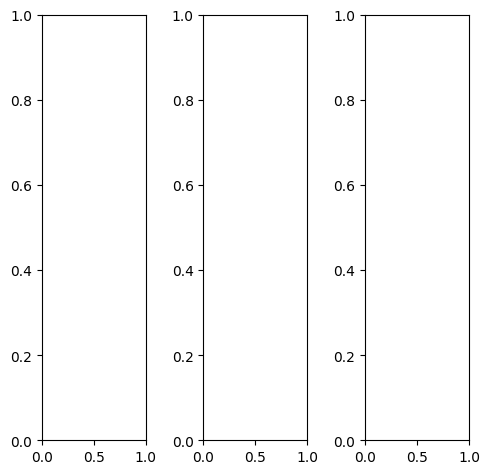

tensor([[[0.4314, 0.4392, 0.4510,  ..., 0.5451, 0.5490, 0.5608],
         [0.4431, 0.4471, 0.4510,  ..., 0.6353, 0.5608, 0.5490],
         [0.4471, 0.4549, 0.4549,  ..., 0.5882, 0.5686, 0.5686],
         ...,
         [0.6392, 0.6510, 0.6980,  ..., 0.7961, 0.8039, 0.8196],
         [0.6510, 0.6863, 0.6941,  ..., 0.8039, 0.8275, 0.8275],
         [0.6667, 0.6902, 0.6863,  ..., 0.8275, 0.8392, 0.8196]],

        [[0.4314, 0.4392, 0.4510,  ..., 0.5451, 0.5490, 0.5608],
         [0.4431, 0.4471, 0.4510,  ..., 0.6353, 0.5608, 0.5490],
         [0.4471, 0.4549, 0.4549,  ..., 0.5882, 0.5686, 0.5686],
         ...,
         [0.6392, 0.6510, 0.6980,  ..., 0.7961, 0.8039, 0.8196],
         [0.6510, 0.6863, 0.6941,  ..., 0.8039, 0.8275, 0.8275],
         [0.6667, 0.6902, 0.6863,  ..., 0.8275, 0.8392, 0.8196]],

        [[0.4314, 0.4392, 0.4510,  ..., 0.5451, 0.5490, 0.5608],
         [0.4431, 0.4471, 0.4510,  ..., 0.6353, 0.5608, 0.5490],
         [0.4471, 0.4549, 0.4549,  ..., 0.5882, 0.5686, 0.

tensor([[[0.4471, 0.4549, 0.4667,  ..., 0.5529, 0.5608, 0.5804],
         [0.4588, 0.4627, 0.4667,  ..., 0.6314, 0.5647, 0.5647],
         [0.4627, 0.4706, 0.4706,  ..., 0.5725, 0.5686, 0.5804],
         ...,
         [0.5961, 0.6078, 0.6471,  ..., 0.7647, 0.7765, 0.7961],
         [0.6000, 0.6314, 0.6392,  ..., 0.7804, 0.8039, 0.8118],
         [0.6196, 0.6392, 0.6314,  ..., 0.8039, 0.8157, 0.8039]],

        [[0.4275, 0.4353, 0.4471,  ..., 0.5373, 0.5412, 0.5490],
         [0.4392, 0.4431, 0.4471,  ..., 0.6588, 0.5725, 0.5451],
         [0.4431, 0.4510, 0.4471,  ..., 0.6196, 0.5882, 0.5725],
         ...,
         [0.6471, 0.6627, 0.7098,  ..., 0.8039, 0.8078, 0.8196],
         [0.6627, 0.6980, 0.7098,  ..., 0.8078, 0.8275, 0.8275],
         [0.6784, 0.7020, 0.7020,  ..., 0.8314, 0.8392, 0.8157]],

        [[0.4157, 0.4235, 0.4353,  ..., 0.5529, 0.5569, 0.5686],
         [0.4275, 0.4314, 0.4353,  ..., 0.5255, 0.4863, 0.5137],
         [0.4314, 0.4392, 0.4392,  ..., 0.4667, 0.4824, 0.

tensor([[[0.4531, 0.4273, 0.4191,  ..., 0.5553, 0.5846, 0.5817],
         [0.4420, 0.4473, 0.4383,  ..., 0.5820, 0.5340, 0.5871],
         [0.4396, 0.4487, 0.4388,  ..., 0.5751, 0.5474, 0.5890],
         ...,
         [0.6263, 0.6638, 0.6650,  ..., 0.7514, 0.7676, 0.8017],
         [0.6389, 0.6699, 0.6760,  ..., 0.7737, 0.8024, 0.8327],
         [0.6605, 0.6987, 0.7043,  ..., 0.8166, 0.8321, 0.7790]],

        [[0.4616, 0.4534, 0.4706,  ..., 0.5653, 0.5975, 0.5798],
         [0.4612, 0.4629, 0.4632,  ..., 0.6135, 0.5603, 0.5850],
         [0.4576, 0.4827, 0.4635,  ..., 0.5914, 0.5579, 0.5965],
         ...,
         [0.6207, 0.6474, 0.6649,  ..., 0.7341, 0.7728, 0.8303],
         [0.6498, 0.6739, 0.6653,  ..., 0.7721, 0.8104, 0.8135],
         [0.6482, 0.6788, 0.6870,  ..., 0.8038, 0.8007, 0.7382]],

        [[0.4219, 0.4225, 0.4433,  ..., 0.5359, 0.5758, 0.5427],
         [0.4114, 0.4601, 0.4673,  ..., 0.5815, 0.5369, 0.5608],
         [0.4012, 0.4565, 0.4560,  ..., 0.5419, 0.5314, 0.

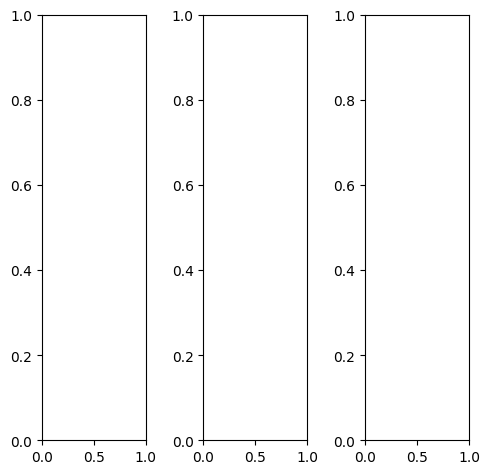

tensor([[[0.8471, 0.8314, 0.8235,  ..., 0.7882, 0.7961, 0.8000],
         [0.8706, 0.8510, 0.8431,  ..., 0.8118, 0.8157, 0.8196],
         [0.8745, 0.8549, 0.8510,  ..., 0.8157, 0.8196, 0.8275],
         ...,
         [0.6706, 0.7843, 0.7843,  ..., 0.6353, 0.6275, 0.6353],
         [0.7216, 0.7216, 0.7294,  ..., 0.6275, 0.6196, 0.5922],
         [0.7020, 0.6941, 0.6824,  ..., 0.6549, 0.6627, 0.6353]],

        [[0.8471, 0.8314, 0.8235,  ..., 0.7882, 0.7961, 0.8000],
         [0.8706, 0.8510, 0.8431,  ..., 0.8118, 0.8157, 0.8196],
         [0.8745, 0.8549, 0.8510,  ..., 0.8157, 0.8196, 0.8275],
         ...,
         [0.6706, 0.7843, 0.7843,  ..., 0.6353, 0.6275, 0.6353],
         [0.7216, 0.7216, 0.7294,  ..., 0.6275, 0.6196, 0.5922],
         [0.7020, 0.6941, 0.6824,  ..., 0.6549, 0.6627, 0.6353]],

        [[0.8471, 0.8314, 0.8235,  ..., 0.7882, 0.7961, 0.8000],
         [0.8706, 0.8510, 0.8431,  ..., 0.8118, 0.8157, 0.8196],
         [0.8745, 0.8549, 0.8510,  ..., 0.8157, 0.8196, 0.

tensor([[[0.7176, 0.6980, 0.6941,  ..., 0.6549, 0.6588, 0.6627],
         [0.7451, 0.7255, 0.7216,  ..., 0.6745, 0.6784, 0.6824],
         [0.7608, 0.7412, 0.7373,  ..., 0.6863, 0.6902, 0.6980],
         ...,
         [0.6863, 0.8000, 0.8000,  ..., 0.6431, 0.6392, 0.6471],
         [0.7490, 0.7490, 0.7608,  ..., 0.6431, 0.6353, 0.6078],
         [0.7451, 0.7333, 0.7216,  ..., 0.6745, 0.6784, 0.6510]],

        [[0.8941, 0.8745, 0.8667,  ..., 0.8314, 0.8392, 0.8431],
         [0.9137, 0.8902, 0.8824,  ..., 0.8549, 0.8588, 0.8627],
         [0.9137, 0.8902, 0.8863,  ..., 0.8588, 0.8627, 0.8706],
         ...,
         [0.6980, 0.8078, 0.8039,  ..., 0.6784, 0.6706, 0.6745],
         [0.7569, 0.7529, 0.7569,  ..., 0.6706, 0.6588, 0.6314],
         [0.7294, 0.7176, 0.7059,  ..., 0.6941, 0.7020, 0.6706]],

        [[0.9569, 0.9451, 0.9490,  ..., 0.9255, 0.9294, 0.9333],
         [0.9765, 0.9647, 0.9686,  ..., 0.9412, 0.9451, 0.9529],
         [0.9725, 0.9608, 0.9647,  ..., 0.9373, 0.9412, 0.

tensor([[[0.7764, 0.7759, 0.7974,  ..., 0.7522, 0.7944, 0.7735],
         [0.8575, 0.7848, 0.7765,  ..., 0.7636, 0.7740, 0.8075],
         [0.8290, 0.8139, 0.7760,  ..., 0.7669, 0.8081, 0.8105],
         ...,
         [0.6705, 0.7912, 0.7812,  ..., 0.6304, 0.6199, 0.6464],
         [0.7035, 0.7279, 0.7341,  ..., 0.6119, 0.6306, 0.6227],
         [0.6827, 0.7114, 0.7138,  ..., 0.6719, 0.6949, 0.6217]],

        [[0.7908, 0.7879, 0.8200,  ..., 0.7810, 0.8017, 0.7796],
         [0.8528, 0.8204, 0.7967,  ..., 0.7752, 0.7974, 0.8240],
         [0.8612, 0.8362, 0.8026,  ..., 0.7623, 0.7979, 0.8134],
         ...,
         [0.6298, 0.7930, 0.7619,  ..., 0.6111, 0.6155, 0.6541],
         [0.6896, 0.7111, 0.6976,  ..., 0.6100, 0.6205, 0.6183],
         [0.6630, 0.6687, 0.6708,  ..., 0.6462, 0.6741, 0.6272]],

        [[0.8048, 0.8175, 0.8177,  ..., 0.7737, 0.8006, 0.7663],
         [0.8279, 0.8320, 0.8051,  ..., 0.7714, 0.7840, 0.7883],
         [0.8547, 0.8039, 0.7963,  ..., 0.7649, 0.7963, 0.

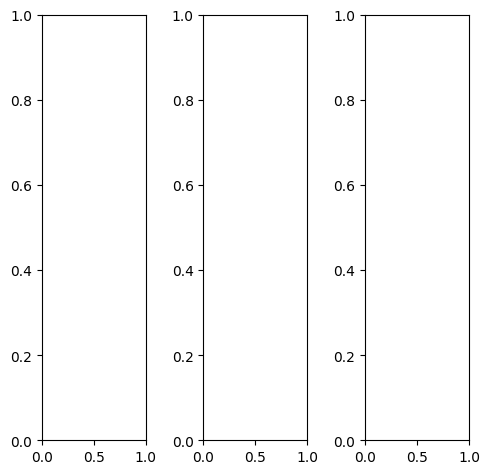

tensor([[[0.9451, 0.8549, 0.8078,  ..., 0.7255, 0.7098, 0.6941],
         [0.8471, 0.7529, 0.6863,  ..., 0.5176, 0.5137, 0.4941],
         [0.7961, 0.6941, 0.6824,  ..., 0.4863, 0.5412, 0.5569],
         ...,
         [0.6667, 0.5765, 0.5804,  ..., 0.5451, 0.5098, 0.5529],
         [0.6392, 0.5255, 0.5373,  ..., 0.4314, 0.4627, 0.5490],
         [0.7059, 0.5804, 0.6039,  ..., 0.5412, 0.6314, 0.7882]],

        [[0.9451, 0.8549, 0.8078,  ..., 0.7255, 0.7098, 0.6941],
         [0.8471, 0.7529, 0.6863,  ..., 0.5176, 0.5137, 0.4941],
         [0.7961, 0.6941, 0.6824,  ..., 0.4863, 0.5412, 0.5569],
         ...,
         [0.6667, 0.5765, 0.5804,  ..., 0.5451, 0.5098, 0.5529],
         [0.6392, 0.5255, 0.5373,  ..., 0.4314, 0.4627, 0.5490],
         [0.7059, 0.5804, 0.6039,  ..., 0.5412, 0.6314, 0.7882]],

        [[0.9451, 0.8549, 0.8078,  ..., 0.7255, 0.7098, 0.6941],
         [0.8471, 0.7529, 0.6863,  ..., 0.5176, 0.5137, 0.4941],
         [0.7961, 0.6941, 0.6824,  ..., 0.4863, 0.5412, 0.

tensor([[[0.9529, 0.8863, 0.8431,  ..., 0.7451, 0.7412, 0.7176],
         [0.8784, 0.8275, 0.7725,  ..., 0.5882, 0.5882, 0.5529],
         [0.8471, 0.8000, 0.8000,  ..., 0.5686, 0.6431, 0.6314],
         ...,
         [0.7333, 0.6784, 0.6745,  ..., 0.6588, 0.6000, 0.6353],
         [0.7098, 0.6118, 0.6118,  ..., 0.5412, 0.5412, 0.6157],
         [0.7412, 0.6235, 0.6431,  ..., 0.6118, 0.6745, 0.8118]],

        [[0.9412, 0.8431, 0.7961,  ..., 0.7216, 0.6980, 0.6824],
         [0.8392, 0.7255, 0.6588,  ..., 0.4902, 0.4824, 0.4745],
         [0.7804, 0.6588, 0.6431,  ..., 0.4510, 0.5020, 0.5294],
         ...,
         [0.6588, 0.5647, 0.5686,  ..., 0.5333, 0.5098, 0.5529],
         [0.6314, 0.5137, 0.5294,  ..., 0.4196, 0.4627, 0.5451],
         [0.7059, 0.5804, 0.6039,  ..., 0.5333, 0.6275, 0.7882]],

        [[0.9373, 0.8353, 0.7765,  ..., 0.6980, 0.6902, 0.6784],
         [0.8196, 0.6863, 0.6000,  ..., 0.4745, 0.4627, 0.4510],
         [0.7451, 0.5961, 0.5725,  ..., 0.4392, 0.4784, 0.

tensor([[[0.7949, 0.7903, 0.7653,  ..., 0.7364, 0.7348, 0.6467],
         [0.8168, 0.7147, 0.6349,  ..., 0.5109, 0.5008, 0.5527],
         [0.7385, 0.6642, 0.6238,  ..., 0.4825, 0.5620, 0.5742],
         ...,
         [0.6615, 0.5998, 0.5822,  ..., 0.5751, 0.5140, 0.5854],
         [0.6459, 0.5227, 0.5373,  ..., 0.4714, 0.4607, 0.5821],
         [0.6652, 0.6163, 0.6546,  ..., 0.5902, 0.6832, 0.6884]],

        [[0.8208, 0.7968, 0.8030,  ..., 0.7367, 0.7462, 0.6617],
         [0.8092, 0.7579, 0.6491,  ..., 0.5210, 0.5040, 0.5346],
         [0.7817, 0.6757, 0.6450,  ..., 0.4874, 0.5382, 0.5632],
         ...,
         [0.6541, 0.5831, 0.5667,  ..., 0.5188, 0.4914, 0.5898],
         [0.6466, 0.5203, 0.5217,  ..., 0.4571, 0.4802, 0.5833],
         [0.6517, 0.5865, 0.6217,  ..., 0.5618, 0.6343, 0.6868]],

        [[0.8278, 0.8365, 0.7735,  ..., 0.6737, 0.7048, 0.6126],
         [0.7703, 0.7210, 0.6407,  ..., 0.4641, 0.4494, 0.4737],
         [0.7529, 0.6089, 0.6052,  ..., 0.4369, 0.4890, 0.

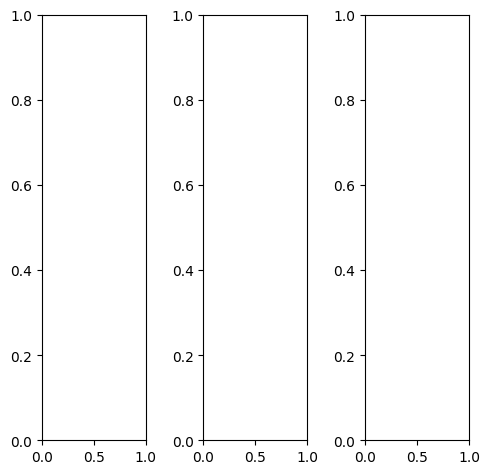

EPOCH: 3.255  trn_loss: 0.006  (376.72s - 11196.57s remaining)

tensor([[[0.3059, 0.3490, 0.3529,  ..., 0.6902, 0.7020, 0.7137],
         [0.3137, 0.3490, 0.4275,  ..., 0.5961, 0.6941, 0.6902],
         [0.2784, 0.2745, 0.2627,  ..., 0.6039, 0.6980, 0.6980],
         ...,
         [0.3020, 0.3176, 0.3333,  ..., 0.3804, 0.3961, 0.3765],
         [0.2980, 0.3020, 0.2157,  ..., 0.3765, 0.3843, 0.3843],
         [0.2667, 0.2549, 0.2118,  ..., 0.3686, 0.3686, 0.3882]],

        [[0.3059, 0.3490, 0.3529,  ..., 0.6902, 0.7020, 0.7137],
         [0.3137, 0.3490, 0.4275,  ..., 0.5961, 0.6941, 0.6902],
         [0.2784, 0.2745, 0.2627,  ..., 0.6039, 0.6980, 0.6980],
         ...,
         [0.3020, 0.3176, 0.3333,  ..., 0.3804, 0.3961, 0.3765],
         [0.2980, 0.3020, 0.2157,  ..., 0.3765, 0.3843, 0.3843],
         [0.2667, 0.2549, 0.2118,  ..., 0.3686, 0.3686, 0.3882]],

        [[0.3059, 0.3490, 0.3529,  ..., 0.6902, 0.7020, 0.7137],
         [0.3137, 0.3490, 0.4275,  ..., 0.5961, 0.6941, 0.6902],
         [0.2784, 0.2745, 0.2627,  ..., 0.6039, 0.6980, 0.

tensor([[[0.3451, 0.3882, 0.3922,  ..., 0.6941, 0.7059, 0.7098],
         [0.3529, 0.3882, 0.4627,  ..., 0.5961, 0.6980, 0.6863],
         [0.3137, 0.3059, 0.2980,  ..., 0.6039, 0.6980, 0.6941],
         ...,
         [0.3373, 0.3451, 0.3529,  ..., 0.4275, 0.4392, 0.4196],
         [0.3373, 0.3333, 0.2431,  ..., 0.4275, 0.4353, 0.4275],
         [0.3137, 0.2941, 0.2431,  ..., 0.4235, 0.4235, 0.4353]],

        [[0.3137, 0.3451, 0.3569,  ..., 0.6980, 0.7137, 0.7255],
         [0.3020, 0.3294, 0.4157,  ..., 0.5922, 0.6941, 0.6941],
         [0.2627, 0.2510, 0.2471,  ..., 0.5961, 0.6941, 0.6941],
         ...,
         [0.2863, 0.3020, 0.3294,  ..., 0.3608, 0.3725, 0.3569],
         [0.2784, 0.2824, 0.2078,  ..., 0.3529, 0.3608, 0.3686],
         [0.2588, 0.2431, 0.2078,  ..., 0.3569, 0.3569, 0.3882]],

        [[0.1765, 0.2549, 0.2275,  ..., 0.6353, 0.6353, 0.6510],
         [0.2627, 0.3373, 0.3804,  ..., 0.6039, 0.6902, 0.6745],
         [0.2706, 0.3059, 0.2588,  ..., 0.6392, 0.7294, 0.

tensor([[[0.3504, 0.3702, 0.3588,  ..., 0.5353, 0.5637, 0.6530],
         [0.2659, 0.3922, 0.4868,  ..., 0.3880, 0.5098, 0.5992],
         [0.2341, 0.2671, 0.2984,  ..., 0.4085, 0.5719, 0.6026],
         ...,
         [0.3203, 0.4027, 0.3926,  ..., 0.4756, 0.4531, 0.4222],
         [0.2917, 0.3233, 0.2451,  ..., 0.4251, 0.4503, 0.4275],
         [0.2855, 0.2439, 0.1998,  ..., 0.3992, 0.4033, 0.4149]],

        [[0.3717, 0.3920, 0.4085,  ..., 0.6320, 0.6989, 0.6957],
         [0.3092, 0.3988, 0.4855,  ..., 0.4918, 0.6335, 0.7188],
         [0.2644, 0.2933, 0.2980,  ..., 0.5029, 0.6584, 0.6723],
         ...,
         [0.3081, 0.3459, 0.3790,  ..., 0.4747, 0.4746, 0.3843],
         [0.2743, 0.3092, 0.2055,  ..., 0.4464, 0.4526, 0.4020],
         [0.2805, 0.2152, 0.1891,  ..., 0.3808, 0.3906, 0.3901]],

        [[0.3853, 0.4243, 0.4601,  ..., 0.8582, 0.9125, 0.8501],
         [0.3605, 0.4632, 0.5598,  ..., 0.6887, 0.8584, 0.8214],
         [0.3037, 0.3340, 0.3700,  ..., 0.6983, 0.8642, 0.

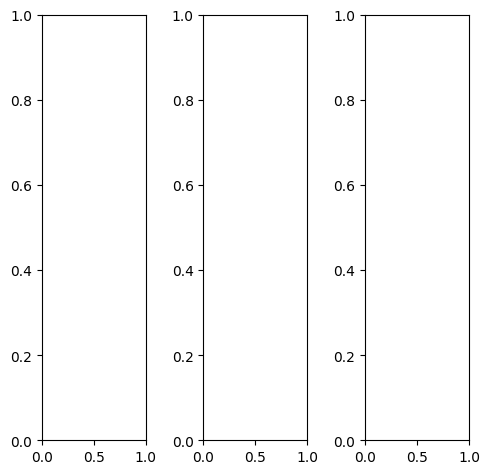

tensor([[[0.3255, 0.3255, 0.3647,  ..., 0.2902, 0.3882, 0.4118],
         [0.4078, 0.4078, 0.3686,  ..., 0.3098, 0.3843, 0.4000],
         [0.4941, 0.4824, 0.3686,  ..., 0.3020, 0.3412, 0.3216],
         ...,
         [0.4039, 0.3725, 0.4902,  ..., 0.5647, 0.5569, 0.5529],
         [0.4706, 0.3725, 0.4078,  ..., 0.5725, 0.5922, 0.5961],
         [0.4784, 0.4431, 0.3804,  ..., 0.5608, 0.5882, 0.5686]],

        [[0.3255, 0.3255, 0.3647,  ..., 0.2902, 0.3882, 0.4118],
         [0.4078, 0.4078, 0.3686,  ..., 0.3098, 0.3843, 0.4000],
         [0.4941, 0.4824, 0.3686,  ..., 0.3020, 0.3412, 0.3216],
         ...,
         [0.4039, 0.3725, 0.4902,  ..., 0.5647, 0.5569, 0.5529],
         [0.4706, 0.3725, 0.4078,  ..., 0.5725, 0.5922, 0.5961],
         [0.4784, 0.4431, 0.3804,  ..., 0.5608, 0.5882, 0.5686]],

        [[0.3255, 0.3255, 0.3647,  ..., 0.2902, 0.3882, 0.4118],
         [0.4078, 0.4078, 0.3686,  ..., 0.3098, 0.3843, 0.4000],
         [0.4941, 0.4824, 0.3686,  ..., 0.3020, 0.3412, 0.

tensor([[[0.2863, 0.2824, 0.3216,  ..., 0.2510, 0.3529, 0.3725],
         [0.3804, 0.3686, 0.3176,  ..., 0.2745, 0.3490, 0.3686],
         [0.4784, 0.4431, 0.3137,  ..., 0.2824, 0.3098, 0.2902],
         ...,
         [0.4235, 0.4118, 0.5255,  ..., 0.5804, 0.5765, 0.5608],
         [0.4627, 0.3843, 0.4588,  ..., 0.5765, 0.6118, 0.6157],
         [0.4588, 0.4314, 0.4118,  ..., 0.5647, 0.5961, 0.5804]],

        [[0.3647, 0.3725, 0.4196,  ..., 0.3255, 0.4275, 0.4549],
         [0.4314, 0.4510, 0.4275,  ..., 0.3294, 0.4196, 0.4431],
         [0.4980, 0.5216, 0.4314,  ..., 0.3098, 0.3647, 0.3529],
         ...,
         [0.4039, 0.3608, 0.4863,  ..., 0.5569, 0.5529, 0.5529],
         [0.4863, 0.3725, 0.3961,  ..., 0.5765, 0.5843, 0.5922],
         [0.5059, 0.4667, 0.3725,  ..., 0.5647, 0.5882, 0.5725]],

        [[0.2353, 0.2118, 0.2000,  ..., 0.2196, 0.2902, 0.2941],
         [0.3725, 0.2941, 0.2000,  ..., 0.2863, 0.2902, 0.2745],
         [0.5059, 0.3725, 0.1882,  ..., 0.3216, 0.2902, 0.

tensor([[[ 0.1554,  0.1513,  0.1157,  ...,  0.0370,  0.1590,  0.2116],
         [ 0.1729,  0.1706,  0.1203,  ...,  0.0171,  0.1240,  0.1782],
         [ 0.3429,  0.2831,  0.1325,  ..., -0.0127,  0.0855,  0.0948],
         ...,
         [ 0.2451,  0.2203,  0.3614,  ...,  0.4650,  0.4333,  0.4402],
         [ 0.3324,  0.1647,  0.2476,  ...,  0.4805,  0.4475,  0.5149],
         [ 0.3620,  0.2908,  0.1791,  ...,  0.5351,  0.5629,  0.5047]],

        [[ 0.2259,  0.2074,  0.2257,  ...,  0.1217,  0.2676,  0.2850],
         [ 0.2778,  0.2852,  0.2108,  ...,  0.1195,  0.2454,  0.2337],
         [ 0.4269,  0.3734,  0.2118,  ...,  0.0922,  0.1616,  0.1343],
         ...,
         [ 0.2569,  0.2295,  0.4303,  ...,  0.4596,  0.5201,  0.4490],
         [ 0.3717,  0.2365,  0.2602,  ...,  0.5048,  0.5525,  0.5395],
         [ 0.3828,  0.2926,  0.2126,  ...,  0.5117,  0.5602,  0.5130]],

        [[ 0.3091,  0.2964,  0.3165,  ...,  0.2082,  0.3427,  0.3710],
         [ 0.4098,  0.3795,  0.2945,  ...,  0

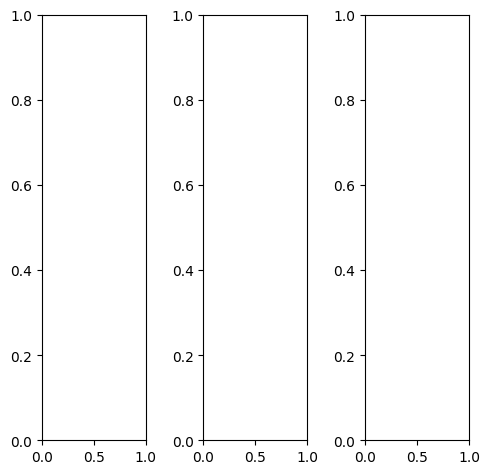

tensor([[[0.0275, 0.0196, 0.0392,  ..., 0.0745, 0.0902, 0.0588],
         [0.0510, 0.0314, 0.0392,  ..., 0.0980, 0.0667, 0.0392],
         [0.0549, 0.0353, 0.0392,  ..., 0.2392, 0.1294, 0.0510],
         ...,
         [0.5804, 0.6039, 0.5961,  ..., 0.5333, 0.5804, 0.6157],
         [0.4784, 0.5843, 0.6039,  ..., 0.5608, 0.6078, 0.6392],
         [0.3961, 0.4588, 0.6000,  ..., 0.5922, 0.6275, 0.6510]],

        [[0.0275, 0.0196, 0.0392,  ..., 0.0745, 0.0902, 0.0588],
         [0.0510, 0.0314, 0.0392,  ..., 0.0980, 0.0667, 0.0392],
         [0.0549, 0.0353, 0.0392,  ..., 0.2392, 0.1294, 0.0510],
         ...,
         [0.5804, 0.6039, 0.5961,  ..., 0.5333, 0.5804, 0.6157],
         [0.4784, 0.5843, 0.6039,  ..., 0.5608, 0.6078, 0.6392],
         [0.3961, 0.4588, 0.6000,  ..., 0.5922, 0.6275, 0.6510]],

        [[0.0275, 0.0196, 0.0392,  ..., 0.0745, 0.0902, 0.0588],
         [0.0510, 0.0314, 0.0392,  ..., 0.0980, 0.0667, 0.0392],
         [0.0549, 0.0353, 0.0392,  ..., 0.2392, 0.1294, 0.

tensor([[[0.0275, 0.0196, 0.0510,  ..., 0.0471, 0.0588, 0.0431],
         [0.0510, 0.0314, 0.0510,  ..., 0.0745, 0.0471, 0.0314],
         [0.0549, 0.0353, 0.0510,  ..., 0.2275, 0.1255, 0.0510],
         ...,
         [0.5725, 0.5961, 0.5882,  ..., 0.6118, 0.5804, 0.6118],
         [0.4706, 0.5765, 0.5961,  ..., 0.5961, 0.6078, 0.6353],
         [0.3882, 0.4510, 0.5922,  ..., 0.5843, 0.6196, 0.6392]],

        [[0.0275, 0.0196, 0.0392,  ..., 0.0824, 0.0980, 0.0627],
         [0.0549, 0.0353, 0.0392,  ..., 0.1059, 0.0706, 0.0431],
         [0.0588, 0.0392, 0.0392,  ..., 0.2431, 0.1294, 0.0510],
         ...,
         [0.5804, 0.6039, 0.6000,  ..., 0.5020, 0.5804, 0.6196],
         [0.4784, 0.5843, 0.6039,  ..., 0.5490, 0.6078, 0.6431],
         [0.4000, 0.4588, 0.6039,  ..., 0.5961, 0.6314, 0.6549]],

        [[0.0157, 0.0118, 0.0196,  ..., 0.0941, 0.1176, 0.0824],
         [0.0314, 0.0235, 0.0196,  ..., 0.1137, 0.0863, 0.0510],
         [0.0353, 0.0235, 0.0196,  ..., 0.2392, 0.1333, 0.

tensor([[[0.2511, 0.1980, 0.2145,  ..., 0.2286, 0.2502, 0.2879],
         [0.1833, 0.1801, 0.1790,  ..., 0.1612, 0.1793, 0.2235],
         [0.1720, 0.1733, 0.1868,  ..., 0.2613, 0.1873, 0.1857],
         ...,
         [0.7258, 0.7305, 0.6760,  ..., 0.5255, 0.6071, 0.7348],
         [0.6570, 0.7199, 0.6628,  ..., 0.6021, 0.6584, 0.7903],
         [0.6121, 0.6690, 0.8007,  ..., 0.7598, 0.8195, 0.7700]],

        [[0.2575, 0.1977, 0.2133,  ..., 0.2413, 0.2542, 0.2634],
         [0.2277, 0.1909, 0.1939,  ..., 0.2323, 0.2198, 0.2131],
         [0.2267, 0.1940, 0.1976,  ..., 0.3780, 0.2551, 0.1760],
         ...,
         [0.6885, 0.6641, 0.7202,  ..., 0.4810, 0.6096, 0.7798],
         [0.5749, 0.6456, 0.6274,  ..., 0.5809, 0.6810, 0.7974],
         [0.5341, 0.5999, 0.7120,  ..., 0.7262, 0.7806, 0.7676]],

        [[0.2846, 0.2675, 0.2901,  ..., 0.3052, 0.3346, 0.3266],
         [0.2756, 0.2878, 0.2853,  ..., 0.2980, 0.2907, 0.2819],
         [0.2812, 0.3079, 0.2960,  ..., 0.4270, 0.3297, 0.

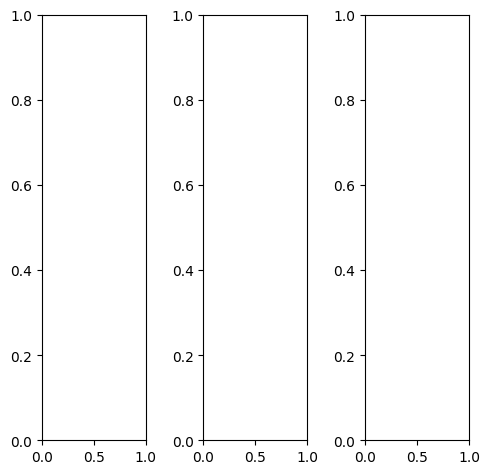

tensor([[[0.4314, 0.4196, 0.4157,  ..., 0.4549, 0.4706, 0.4824],
         [0.4235, 0.4078, 0.4000,  ..., 0.4510, 0.4627, 0.4745],
         [0.4157, 0.4039, 0.3961,  ..., 0.4314, 0.4510, 0.4667],
         ...,
         [0.1765, 0.2392, 0.2431,  ..., 0.1020, 0.0980, 0.1098],
         [0.1529, 0.1922, 0.2039,  ..., 0.0745, 0.0784, 0.0863],
         [0.1412, 0.1529, 0.1725,  ..., 0.0784, 0.0824, 0.0824]],

        [[0.4314, 0.4196, 0.4157,  ..., 0.4549, 0.4706, 0.4824],
         [0.4235, 0.4078, 0.4000,  ..., 0.4510, 0.4627, 0.4745],
         [0.4157, 0.4039, 0.3961,  ..., 0.4314, 0.4510, 0.4667],
         ...,
         [0.1765, 0.2392, 0.2431,  ..., 0.1020, 0.0980, 0.1098],
         [0.1529, 0.1922, 0.2039,  ..., 0.0745, 0.0784, 0.0863],
         [0.1412, 0.1529, 0.1725,  ..., 0.0784, 0.0824, 0.0824]],

        [[0.4314, 0.4196, 0.4157,  ..., 0.4549, 0.4706, 0.4824],
         [0.4235, 0.4078, 0.4000,  ..., 0.4510, 0.4627, 0.4745],
         [0.4157, 0.4039, 0.3961,  ..., 0.4314, 0.4510, 0.

tensor([[[0.3765, 0.3647, 0.3608,  ..., 0.4000, 0.4157, 0.4275],
         [0.3686, 0.3529, 0.3490,  ..., 0.3961, 0.4078, 0.4196],
         [0.3608, 0.3490, 0.3412,  ..., 0.3765, 0.3961, 0.4118],
         ...,
         [0.1922, 0.2510, 0.2627,  ..., 0.1137, 0.1098, 0.1176],
         [0.1686, 0.2078, 0.2235,  ..., 0.0902, 0.0941, 0.1020],
         [0.1569, 0.1686, 0.1922,  ..., 0.1020, 0.1059, 0.1020]],

        [[0.4353, 0.4235, 0.4196,  ..., 0.4588, 0.4745, 0.4863],
         [0.4275, 0.4118, 0.4039,  ..., 0.4549, 0.4667, 0.4784],
         [0.4196, 0.4078, 0.4000,  ..., 0.4353, 0.4549, 0.4706],
         ...,
         [0.1569, 0.2235, 0.2275,  ..., 0.0824, 0.0784, 0.0902],
         [0.1333, 0.1765, 0.1882,  ..., 0.0510, 0.0588, 0.0667],
         [0.1216, 0.1373, 0.1569,  ..., 0.0549, 0.0549, 0.0588]],

        [[0.5569, 0.5451, 0.5412,  ..., 0.5725, 0.5882, 0.6000],
         [0.5490, 0.5333, 0.5255,  ..., 0.5686, 0.5804, 0.5922],
         [0.5412, 0.5294, 0.5216,  ..., 0.5490, 0.5686, 0.

tensor([[[0.5237, 0.4428, 0.4025,  ..., 0.4245, 0.4673, 0.5426],
         [0.4658, 0.4143, 0.3314,  ..., 0.3710, 0.4126, 0.5289],
         [0.4575, 0.3975, 0.3825,  ..., 0.3787, 0.4238, 0.5258],
         ...,
         [0.1717, 0.2594, 0.2484,  ..., 0.1341, 0.1096, 0.1483],
         [0.1508, 0.1791, 0.2075,  ..., 0.0645, 0.0836, 0.1135],
         [0.2046, 0.1704, 0.1600,  ..., 0.0996, 0.1032, 0.1481]],

        [[0.5358, 0.4722, 0.4764,  ..., 0.4806, 0.5445, 0.5556],
         [0.5048, 0.4381, 0.4246,  ..., 0.4698, 0.5193, 0.5518],
         [0.4881, 0.4394, 0.4425,  ..., 0.4639, 0.5096, 0.5530],
         ...,
         [0.2146, 0.2814, 0.2916,  ..., 0.1233, 0.1167, 0.1534],
         [0.1754, 0.2106, 0.2204,  ..., 0.1019, 0.0859, 0.1255],
         [0.2159, 0.1700, 0.1918,  ..., 0.1104, 0.1190, 0.1503]],

        [[0.6194, 0.5957, 0.5780,  ..., 0.6380, 0.6936, 0.6782],
         [0.6093, 0.5565, 0.5079,  ..., 0.6158, 0.6802, 0.6873],
         [0.5822, 0.5089, 0.4970,  ..., 0.6016, 0.6525, 0.

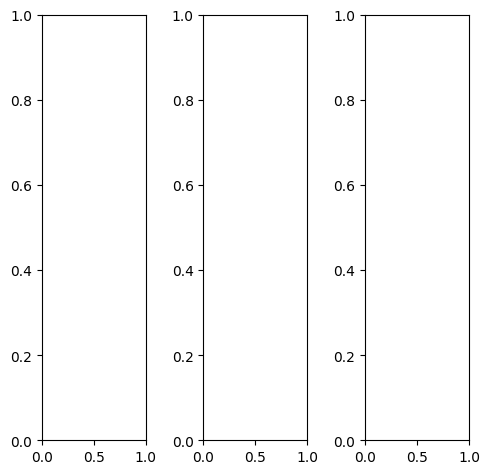

tensor([[[0.6196, 0.5961, 0.5804,  ..., 0.8824, 0.8588, 0.8588],
         [0.7529, 0.7608, 0.7137,  ..., 0.8706, 0.7647, 0.6196],
         [0.7412, 0.7176, 0.5412,  ..., 0.9216, 0.8706, 0.6039],
         ...,
         [0.8275, 0.8157, 0.8196,  ..., 0.8471, 0.8392, 0.8471],
         [0.8235, 0.8157, 0.8196,  ..., 0.7725, 0.7569, 0.7569],
         [0.8275, 0.8196, 0.8235,  ..., 0.5059, 0.4863, 0.4824]],

        [[0.6196, 0.5961, 0.5804,  ..., 0.8824, 0.8588, 0.8588],
         [0.7529, 0.7608, 0.7137,  ..., 0.8706, 0.7647, 0.6196],
         [0.7412, 0.7176, 0.5412,  ..., 0.9216, 0.8706, 0.6039],
         ...,
         [0.8275, 0.8157, 0.8196,  ..., 0.8471, 0.8392, 0.8471],
         [0.8235, 0.8157, 0.8196,  ..., 0.7725, 0.7569, 0.7569],
         [0.8275, 0.8196, 0.8235,  ..., 0.5059, 0.4863, 0.4824]],

        [[0.6196, 0.5961, 0.5804,  ..., 0.8824, 0.8588, 0.8588],
         [0.7529, 0.7608, 0.7137,  ..., 0.8706, 0.7647, 0.6196],
         [0.7412, 0.7176, 0.5412,  ..., 0.9216, 0.8706, 0.

tensor([[[0.7098, 0.6627, 0.6118,  ..., 0.8745, 0.8588, 0.8824],
         [0.8941, 0.8706, 0.7804,  ..., 0.8588, 0.7882, 0.7020],
         [0.8902, 0.8353, 0.6118,  ..., 0.8941, 0.8824, 0.6941],
         ...,
         [0.9137, 0.9020, 0.9059,  ..., 0.9373, 0.9333, 0.9490],
         [0.9137, 0.9020, 0.9059,  ..., 0.8314, 0.8157, 0.8235],
         [0.9137, 0.9020, 0.9020,  ..., 0.5176, 0.5020, 0.4941]],

        [[0.6314, 0.6078, 0.5922,  ..., 0.8863, 0.8510, 0.8431],
         [0.7686, 0.7804, 0.7255,  ..., 0.8784, 0.7569, 0.5961],
         [0.7569, 0.7412, 0.5569,  ..., 0.9294, 0.8706, 0.5961],
         ...,
         [0.8510, 0.8353, 0.8392,  ..., 0.8667, 0.8588, 0.8627],
         [0.8471, 0.8353, 0.8392,  ..., 0.7843, 0.7647, 0.7608],
         [0.8510, 0.8431, 0.8471,  ..., 0.4824, 0.4588, 0.4549]],

        [[0.3294, 0.3529, 0.4235,  ..., 0.8941, 0.8824, 0.8745],
         [0.3098, 0.3725, 0.4627,  ..., 0.8627, 0.7529, 0.5333],
         [0.2588, 0.3020, 0.2902,  ..., 0.9373, 0.8471, 0.

tensor([[[0.5399, 0.4150, 0.3867,  ..., 0.6080, 0.5997, 0.6552],
         [0.5605, 0.5545, 0.4653,  ..., 0.5087, 0.4884, 0.4742],
         [0.5447, 0.5080, 0.3581,  ..., 0.6840, 0.6983, 0.5237],
         ...,
         [0.6898, 0.6281, 0.6339,  ..., 0.6601, 0.6956, 0.7063],
         [0.6833, 0.6103, 0.6062,  ..., 0.6534, 0.6387, 0.6697],
         [0.6936, 0.6950, 0.7063,  ..., 0.4607, 0.4895, 0.4882]],

        [[0.5252, 0.4629, 0.4630,  ..., 0.6854, 0.7358, 0.6935],
         [0.5845, 0.6497, 0.5984,  ..., 0.6527, 0.6379, 0.5725],
         [0.5744, 0.5996, 0.4504,  ..., 0.7180, 0.7595, 0.5200],
         ...,
         [0.6379, 0.5974, 0.6389,  ..., 0.6567, 0.6682, 0.7245],
         [0.6568, 0.6089, 0.6111,  ..., 0.6303, 0.6483, 0.6472],
         [0.6418, 0.6579, 0.6657,  ..., 0.4408, 0.4473, 0.4737]],

        [[0.6520, 0.6374, 0.6358,  ..., 0.9137, 0.9244, 0.8384],
         [0.7649, 0.8500, 0.7785,  ..., 0.7927, 0.7649, 0.6342],
         [0.7290, 0.7844, 0.6088,  ..., 0.9522, 0.9441, 0.

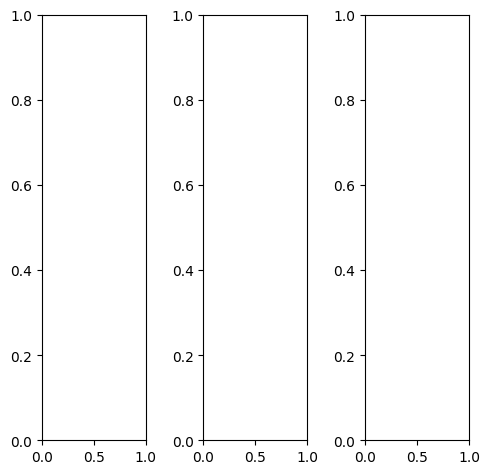

EPOCH: 3.510  trn_loss: 0.006  (404.80s - 11127.39s remaining)

tensor([[[0.5843, 0.6000, 0.6039,  ..., 0.5294, 0.5412, 0.5255],
         [0.6157, 0.6157, 0.6000,  ..., 0.5373, 0.5216, 0.5098],
         [0.5882, 0.5882, 0.5725,  ..., 0.5412, 0.5137, 0.4980],
         ...,
         [0.7961, 0.7882, 0.8039,  ..., 0.7294, 0.7255, 0.7255],
         [0.7843, 0.7725, 0.7804,  ..., 0.7216, 0.7176, 0.7176],
         [0.7333, 0.7255, 0.7333,  ..., 0.7098, 0.7020, 0.7059]],

        [[0.5843, 0.6000, 0.6039,  ..., 0.5294, 0.5412, 0.5255],
         [0.6157, 0.6157, 0.6000,  ..., 0.5373, 0.5216, 0.5098],
         [0.5882, 0.5882, 0.5725,  ..., 0.5412, 0.5137, 0.4980],
         ...,
         [0.7961, 0.7882, 0.8039,  ..., 0.7294, 0.7255, 0.7255],
         [0.7843, 0.7725, 0.7804,  ..., 0.7216, 0.7176, 0.7176],
         [0.7333, 0.7255, 0.7333,  ..., 0.7098, 0.7020, 0.7059]],

        [[0.5843, 0.6000, 0.6039,  ..., 0.5294, 0.5412, 0.5255],
         [0.6157, 0.6157, 0.6000,  ..., 0.5373, 0.5216, 0.5098],
         [0.5882, 0.5882, 0.5725,  ..., 0.5412, 0.5137, 0.

tensor([[[0.5569, 0.5725, 0.5765,  ..., 0.3961, 0.4078, 0.3922],
         [0.5882, 0.5882, 0.5725,  ..., 0.4039, 0.3922, 0.3765],
         [0.5608, 0.5608, 0.5451,  ..., 0.4078, 0.3804, 0.3647],
         ...,
         [0.7569, 0.7490, 0.7647,  ..., 0.7059, 0.6980, 0.6980],
         [0.7451, 0.7333, 0.7412,  ..., 0.6980, 0.6902, 0.6902],
         [0.6941, 0.6863, 0.6941,  ..., 0.6863, 0.6745, 0.6745]],

        [[0.5686, 0.5843, 0.5882,  ..., 0.5373, 0.5490, 0.5333],
         [0.6000, 0.6000, 0.5843,  ..., 0.5451, 0.5294, 0.5176],
         [0.5686, 0.5725, 0.5569,  ..., 0.5490, 0.5216, 0.5059],
         ...,
         [0.8118, 0.8039, 0.8235,  ..., 0.7333, 0.7294, 0.7294],
         [0.8039, 0.7922, 0.8000,  ..., 0.7255, 0.7216, 0.7216],
         [0.7529, 0.7451, 0.7529,  ..., 0.7137, 0.7059, 0.7098]],

        [[0.7294, 0.7412, 0.7451,  ..., 0.8353, 0.8431, 0.8353],
         [0.7686, 0.7647, 0.7490,  ..., 0.8431, 0.8275, 0.8196],
         [0.7490, 0.7490, 0.7333,  ..., 0.8431, 0.8196, 0.

tensor([[[0.4126, 0.3445, 0.3403,  ..., 0.1618, 0.2094, 0.2223],
         [0.3482, 0.2819, 0.2194,  ..., 0.1194, 0.1287, 0.1455],
         [0.3185, 0.2115, 0.2139,  ..., 0.1616, 0.1588, 0.1331],
         ...,
         [0.7599, 0.7741, 0.7988,  ..., 0.6952, 0.6964, 0.6429],
         [0.7560, 0.6986, 0.7321,  ..., 0.6449, 0.6252, 0.6271],
         [0.6757, 0.6237, 0.6979,  ..., 0.6596, 0.6833, 0.5966]],

        [[0.4957, 0.4960, 0.4955,  ..., 0.3026, 0.3660, 0.3162],
         [0.4627, 0.4803, 0.4607,  ..., 0.3036, 0.3006, 0.2358],
         [0.4287, 0.4175, 0.3716,  ..., 0.3426, 0.2833, 0.2100],
         ...,
         [0.7214, 0.7299, 0.7542,  ..., 0.6546, 0.6638, 0.6693],
         [0.7484, 0.6884, 0.7179,  ..., 0.6463, 0.6392, 0.6310],
         [0.6348, 0.6020, 0.6501,  ..., 0.6453, 0.6539, 0.5836]],

        [[0.6286, 0.6595, 0.7508,  ..., 0.4305, 0.4828, 0.4310],
         [0.6794, 0.7166, 0.6382,  ..., 0.4544, 0.4196, 0.3602],
         [0.6210, 0.6180, 0.6016,  ..., 0.4561, 0.4086, 0.

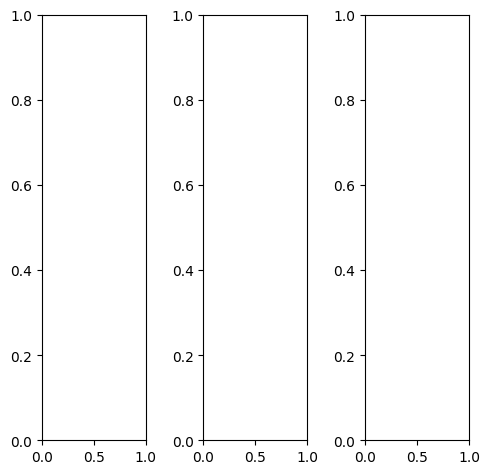

tensor([[[0.8627, 0.8471, 0.8667,  ..., 0.8667, 0.8706, 0.8824],
         [0.8902, 0.8824, 0.8902,  ..., 0.8902, 0.8902, 0.8902],
         [0.8941, 0.8902, 0.8941,  ..., 0.8784, 0.8784, 0.8784],
         ...,
         [0.8000, 0.7843, 0.7765,  ..., 0.8353, 0.8314, 0.8275],
         [0.8118, 0.8000, 0.8000,  ..., 0.8431, 0.8353, 0.8392],
         [0.8157, 0.8039, 0.8000,  ..., 0.8235, 0.8235, 0.8314]],

        [[0.8627, 0.8471, 0.8667,  ..., 0.8667, 0.8706, 0.8824],
         [0.8902, 0.8824, 0.8902,  ..., 0.8902, 0.8902, 0.8902],
         [0.8941, 0.8902, 0.8941,  ..., 0.8784, 0.8784, 0.8784],
         ...,
         [0.8000, 0.7843, 0.7765,  ..., 0.8353, 0.8314, 0.8275],
         [0.8118, 0.8000, 0.8000,  ..., 0.8431, 0.8353, 0.8392],
         [0.8157, 0.8039, 0.8000,  ..., 0.8235, 0.8235, 0.8314]],

        [[0.8627, 0.8471, 0.8667,  ..., 0.8667, 0.8706, 0.8824],
         [0.8902, 0.8824, 0.8902,  ..., 0.8902, 0.8902, 0.8902],
         [0.8941, 0.8902, 0.8941,  ..., 0.8784, 0.8784, 0.

tensor([[[0.8510, 0.8353, 0.8549,  ..., 0.8627, 0.8667, 0.8784],
         [0.8784, 0.8706, 0.8784,  ..., 0.8824, 0.8863, 0.8863],
         [0.8824, 0.8784, 0.8784,  ..., 0.8706, 0.8706, 0.8706],
         ...,
         [0.7961, 0.7725, 0.7647,  ..., 0.8314, 0.8275, 0.8235],
         [0.8039, 0.7882, 0.7882,  ..., 0.8392, 0.8314, 0.8353],
         [0.8078, 0.7961, 0.7922,  ..., 0.8157, 0.8157, 0.8235]],

        [[0.8667, 0.8510, 0.8706,  ..., 0.8706, 0.8745, 0.8824],
         [0.8941, 0.8863, 0.8941,  ..., 0.8941, 0.8941, 0.8941],
         [0.8980, 0.8941, 0.8980,  ..., 0.8824, 0.8824, 0.8824],
         ...,
         [0.8039, 0.7882, 0.7804,  ..., 0.8353, 0.8314, 0.8275],
         [0.8118, 0.8039, 0.8039,  ..., 0.8431, 0.8353, 0.8392],
         [0.8157, 0.8078, 0.8000,  ..., 0.8235, 0.8275, 0.8314]],

        [[0.8706, 0.8549, 0.8745,  ..., 0.8667, 0.8706, 0.8824],
         [0.8980, 0.8902, 0.8980,  ..., 0.8902, 0.8863, 0.8902],
         [0.9020, 0.8980, 0.8980,  ..., 0.8784, 0.8784, 0.

tensor([[[0.6178, 0.4745, 0.4255,  ..., 0.4721, 0.5108, 0.6313],
         [0.5433, 0.3956, 0.3368,  ..., 0.3567, 0.4329, 0.5669],
         [0.5475, 0.4012, 0.3533,  ..., 0.4048, 0.4548, 0.5642],
         ...,
         [0.5974, 0.5724, 0.4905,  ..., 0.5669, 0.5497, 0.6054],
         [0.6176, 0.5747, 0.5514,  ..., 0.5891, 0.6005, 0.6397],
         [0.6469, 0.6484, 0.6348,  ..., 0.6511, 0.6837, 0.6384]],

        [[0.6123, 0.5700, 0.5773,  ..., 0.5848, 0.6515, 0.6807],
         [0.5933, 0.5302, 0.5015,  ..., 0.5369, 0.5999, 0.7220],
         [0.6039, 0.5159, 0.5164,  ..., 0.5235, 0.5593, 0.6642],
         ...,
         [0.5575, 0.5291, 0.5068,  ..., 0.5296, 0.5465, 0.6293],
         [0.5816, 0.5351, 0.5385,  ..., 0.5837, 0.6025, 0.6423],
         [0.5865, 0.5935, 0.5996,  ..., 0.6133, 0.6376, 0.6363]],

        [[0.7865, 0.8189, 0.8213,  ..., 0.7712, 0.8075, 0.7751],
         [0.7978, 0.7754, 0.7431,  ..., 0.6576, 0.7591, 0.7671],
         [0.7956, 0.7885, 0.7416,  ..., 0.6849, 0.7271, 0.

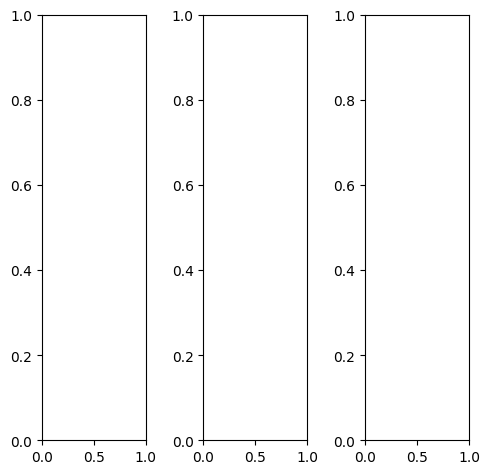

tensor([[[0.2471, 0.3412, 0.4196,  ..., 0.3804, 0.3020, 0.2784],
         [0.2000, 0.3490, 0.4863,  ..., 0.3765, 0.3216, 0.3137],
         [0.2902, 0.4078, 0.5294,  ..., 0.4000, 0.3686, 0.3451],
         ...,
         [0.2392, 0.1922, 0.3020,  ..., 0.7804, 0.7373, 0.7098],
         [0.1961, 0.1765, 0.4157,  ..., 0.7686, 0.7451, 0.7137],
         [0.2706, 0.1529, 0.3647,  ..., 0.7529, 0.7608, 0.7333]],

        [[0.2471, 0.3412, 0.4196,  ..., 0.3804, 0.3020, 0.2784],
         [0.2000, 0.3490, 0.4863,  ..., 0.3765, 0.3216, 0.3137],
         [0.2902, 0.4078, 0.5294,  ..., 0.4000, 0.3686, 0.3451],
         ...,
         [0.2392, 0.1922, 0.3020,  ..., 0.7804, 0.7373, 0.7098],
         [0.1961, 0.1765, 0.4157,  ..., 0.7686, 0.7451, 0.7137],
         [0.2706, 0.1529, 0.3647,  ..., 0.7529, 0.7608, 0.7333]],

        [[0.2471, 0.3412, 0.4196,  ..., 0.3804, 0.3020, 0.2784],
         [0.2000, 0.3490, 0.4863,  ..., 0.3765, 0.3216, 0.3137],
         [0.2902, 0.4078, 0.5294,  ..., 0.4000, 0.3686, 0.

tensor([[[0.2431, 0.3373, 0.4118,  ..., 0.3725, 0.3059, 0.2902],
         [0.1922, 0.3569, 0.4902,  ..., 0.3804, 0.3451, 0.3294],
         [0.2745, 0.4196, 0.5490,  ..., 0.4118, 0.4039, 0.3608],
         ...,
         [0.2784, 0.2235, 0.3373,  ..., 0.8588, 0.8157, 0.7843],
         [0.2353, 0.2039, 0.4588,  ..., 0.8471, 0.8235, 0.7843],
         [0.3176, 0.1843, 0.4000,  ..., 0.8314, 0.8392, 0.8039]],

        [[0.2431, 0.3373, 0.4235,  ..., 0.3843, 0.3098, 0.2824],
         [0.2000, 0.3451, 0.4902,  ..., 0.3725, 0.3216, 0.3176],
         [0.3020, 0.4118, 0.5294,  ..., 0.3922, 0.3647, 0.3529],
         ...,
         [0.2157, 0.1725, 0.2902,  ..., 0.7882, 0.7451, 0.7176],
         [0.1725, 0.1569, 0.4118,  ..., 0.7725, 0.7490, 0.7216],
         [0.2549, 0.1333, 0.3529,  ..., 0.7569, 0.7608, 0.7373]],

        [[0.2784, 0.3725, 0.4353,  ..., 0.3686, 0.2431, 0.2275],
         [0.2157, 0.3451, 0.4706,  ..., 0.3765, 0.2549, 0.2392],
         [0.2784, 0.3647, 0.4863,  ..., 0.4039, 0.2980, 0.

tensor([[[0.1956, 0.2317, 0.2820,  ..., 0.2365, 0.2011, 0.2331],
         [0.0168, 0.1491, 0.3146,  ..., 0.2195, 0.1788, 0.1979],
         [0.0853, 0.1932, 0.3658,  ..., 0.2631, 0.2460, 0.2322],
         ...,
         [0.1033, 0.0841, 0.2528,  ..., 0.6451, 0.6319, 0.6115],
         [0.0924, 0.0180, 0.3517,  ..., 0.6210, 0.6446, 0.6531],
         [0.1372, 0.0421, 0.2110,  ..., 0.6875, 0.7283, 0.6551]],

        [[0.2358, 0.2925, 0.3712,  ..., 0.3034, 0.2617, 0.2634],
         [0.1151, 0.2975, 0.4395,  ..., 0.3076, 0.2710, 0.2416],
         [0.1771, 0.3439, 0.4801,  ..., 0.3375, 0.2980, 0.2521],
         ...,
         [0.1530, 0.0729, 0.2490,  ..., 0.6406, 0.6156, 0.6716],
         [0.1325, 0.0497, 0.3452,  ..., 0.6379, 0.6607, 0.6704],
         [0.1721, 0.0926, 0.2509,  ..., 0.6922, 0.7115, 0.6676]],

        [[0.3043, 0.4390, 0.5521,  ..., 0.4540, 0.4052, 0.3774],
         [0.2607, 0.4707, 0.6689,  ..., 0.5105, 0.4345, 0.3886],
         [0.3033, 0.5513, 0.7214,  ..., 0.5623, 0.5107, 0.

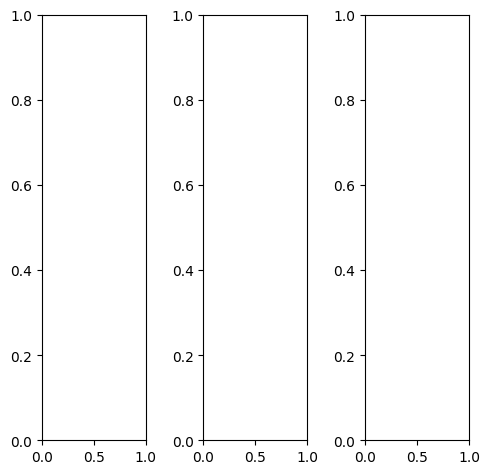

tensor([[[0.4353, 0.4353, 0.4431,  ..., 0.4471, 0.4471, 0.4471],
         [0.4392, 0.4392, 0.4431,  ..., 0.4510, 0.4510, 0.4510],
         [0.4431, 0.4431, 0.4431,  ..., 0.4549, 0.4549, 0.4549],
         ...,
         [0.2745, 0.2706, 0.2902,  ..., 0.2824, 0.2824, 0.2745],
         [0.2667, 0.2745, 0.2941,  ..., 0.2745, 0.2667, 0.2667],
         [0.2667, 0.2745, 0.2745,  ..., 0.2824, 0.2745, 0.2667]],

        [[0.4353, 0.4353, 0.4431,  ..., 0.4471, 0.4471, 0.4471],
         [0.4392, 0.4392, 0.4431,  ..., 0.4510, 0.4510, 0.4510],
         [0.4431, 0.4431, 0.4431,  ..., 0.4549, 0.4549, 0.4549],
         ...,
         [0.2745, 0.2706, 0.2902,  ..., 0.2824, 0.2824, 0.2745],
         [0.2667, 0.2745, 0.2941,  ..., 0.2745, 0.2667, 0.2667],
         [0.2667, 0.2745, 0.2745,  ..., 0.2824, 0.2745, 0.2667]],

        [[0.4353, 0.4353, 0.4431,  ..., 0.4471, 0.4471, 0.4471],
         [0.4392, 0.4392, 0.4431,  ..., 0.4510, 0.4510, 0.4510],
         [0.4431, 0.4431, 0.4431,  ..., 0.4549, 0.4549, 0.

tensor([[[0.3020, 0.3059, 0.3098,  ..., 0.3137, 0.3137, 0.3137],
         [0.3059, 0.3059, 0.3098,  ..., 0.3176, 0.3176, 0.3176],
         [0.3098, 0.3098, 0.3098,  ..., 0.3216, 0.3216, 0.3216],
         ...,
         [0.1882, 0.1922, 0.2157,  ..., 0.2078, 0.2000, 0.1922],
         [0.1804, 0.1961, 0.2196,  ..., 0.1922, 0.1804, 0.1804],
         [0.1843, 0.1961, 0.2000,  ..., 0.1961, 0.1804, 0.1765]],

        [[0.4627, 0.4627, 0.4706,  ..., 0.4784, 0.4784, 0.4784],
         [0.4667, 0.4667, 0.4706,  ..., 0.4824, 0.4824, 0.4824],
         [0.4745, 0.4745, 0.4745,  ..., 0.4863, 0.4863, 0.4863],
         ...,
         [0.2902, 0.2863, 0.3059,  ..., 0.3020, 0.3020, 0.2941],
         [0.2824, 0.2902, 0.3098,  ..., 0.2941, 0.2902, 0.2902],
         [0.2824, 0.2902, 0.2902,  ..., 0.2980, 0.2980, 0.2863]],

        [[0.6431, 0.6431, 0.6510,  ..., 0.6431, 0.6431, 0.6431],
         [0.6431, 0.6431, 0.6431,  ..., 0.6471, 0.6471, 0.6471],
         [0.6392, 0.6392, 0.6392,  ..., 0.6510, 0.6510, 0.

tensor([[[0.4042, 0.3458, 0.3593,  ..., 0.2967, 0.3676, 0.3957],
         [0.3346, 0.3030, 0.2649,  ..., 0.2214, 0.2629, 0.3540],
         [0.3339, 0.2560, 0.2122,  ..., 0.2175, 0.2930, 0.3393],
         ...,
         [0.1902, 0.2800, 0.3219,  ..., 0.2928, 0.2755, 0.1987],
         [0.1935, 0.2226, 0.3268,  ..., 0.2370, 0.2376, 0.1643],
         [0.1884, 0.2004, 0.2222,  ..., 0.2491, 0.2085, 0.1467]],

        [[0.4712, 0.4783, 0.4803,  ..., 0.3964, 0.4887, 0.4154],
         [0.4374, 0.4779, 0.4723,  ..., 0.3664, 0.4486, 0.3780],
         [0.4382, 0.4466, 0.3739,  ..., 0.3712, 0.4220, 0.3456],
         ...,
         [0.2075, 0.2354, 0.2770,  ..., 0.2540, 0.2355, 0.1728],
         [0.2124, 0.2331, 0.2612,  ..., 0.2263, 0.1990, 0.1453],
         [0.2264, 0.2035, 0.2130,  ..., 0.2185, 0.1901, 0.1414]],

        [[0.6372, 0.6332, 0.7587,  ..., 0.5398, 0.6263, 0.5779],
         [0.6932, 0.7168, 0.6496,  ..., 0.5251, 0.6133, 0.5739],
         [0.6677, 0.6604, 0.6456,  ..., 0.5130, 0.5720, 0.

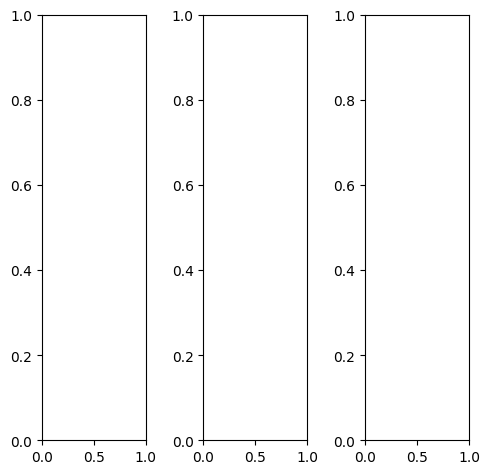

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9373, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9490, 0.4157,  ..., 0.1922, 0.8549, 1.0000],
         [1.0000, 1.0000, 0.8941,  ..., 0.6157, 0.9686, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.8627, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9373, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9490, 0.4157,  ..., 0.1922, 0.8549, 1.0000],
         [1.0000, 1.0000, 0.8941,  ..., 0.6157, 0.9686, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.8627, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9373, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9922, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9373, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9490, 0.4118,  ..., 0.1686, 0.8510, 1.0000],
         [1.0000, 1.0000, 0.8941,  ..., 0.6078, 0.9686, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.8627, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9569, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9373, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9490, 0.3961,  ..., 0.1686, 0.8510, 1.0000],
         [1.0000, 1.0000, 0.8941,  ..., 0.6039, 0.9686, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.8588, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9529, 1.0000, 1.0000],
         [1.0000, 0.9922, 1.0000,  ..., 0.9333, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 0.9961, 1.

tensor([[[0.6611, 0.6919, 0.6984,  ..., 0.6630, 0.6761, 0.7192],
         [0.6689, 0.6952, 0.6780,  ..., 0.6369, 0.7238, 0.7134],
         [0.6531, 0.7165, 0.7018,  ..., 0.7054, 0.7752, 0.7639],
         ...,
         [0.7422, 0.7843, 0.2875,  ..., 0.1149, 0.6449, 0.8431],
         [0.7625, 0.7747, 0.6064,  ..., 0.4474, 0.7407, 0.8049],
         [0.7577, 0.7912, 0.6967,  ..., 0.6126, 0.7438, 0.7531]],

        [[0.6471, 0.7137, 0.7579,  ..., 0.6594, 0.7545, 0.7917],
         [0.6428, 0.7103, 0.7287,  ..., 0.6668, 0.7640, 0.8351],
         [0.6901, 0.7548, 0.7458,  ..., 0.7456, 0.7880, 0.8150],
         ...,
         [0.6939, 0.7712, 0.3398,  ..., 0.1362, 0.6384, 0.8186],
         [0.7247, 0.7557, 0.6773,  ..., 0.5056, 0.7789, 0.8012],
         [0.6955, 0.7336, 0.7550,  ..., 0.5598, 0.7306, 0.7176]],

        [[0.8273, 0.8912, 0.8790,  ..., 0.7740, 0.8449, 0.8353],
         [0.8718, 0.9123, 0.8965,  ..., 0.7655, 0.8722, 0.8089],
         [0.8834, 0.9415, 0.8940,  ..., 0.8510, 0.8576, 0.

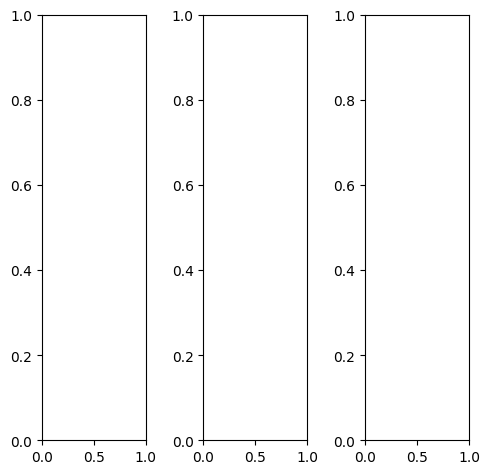

EPOCH: 3.765  trn_loss: 0.006  (433.23s - 11072.52s remaining)

tensor([[[0.6000, 0.6471, 0.6706,  ..., 0.6902, 0.6863, 0.6863],
         [0.6157, 0.6549, 0.6549,  ..., 0.7137, 0.7059, 0.7020],
         [0.5961, 0.6157, 0.6471,  ..., 0.7333, 0.7255, 0.7216],
         ...,
         [0.8667, 0.8549, 0.8588,  ..., 0.8431, 0.8314, 0.8275],
         [0.8510, 0.8549, 0.8471,  ..., 0.8431, 0.8314, 0.8235],
         [0.8471, 0.8471, 0.8588,  ..., 0.8431, 0.8353, 0.8235]],

        [[0.6000, 0.6471, 0.6706,  ..., 0.6902, 0.6863, 0.6863],
         [0.6157, 0.6549, 0.6549,  ..., 0.7137, 0.7059, 0.7020],
         [0.5961, 0.6157, 0.6471,  ..., 0.7333, 0.7255, 0.7216],
         ...,
         [0.8667, 0.8549, 0.8588,  ..., 0.8431, 0.8314, 0.8275],
         [0.8510, 0.8549, 0.8471,  ..., 0.8431, 0.8314, 0.8235],
         [0.8471, 0.8471, 0.8588,  ..., 0.8431, 0.8353, 0.8235]],

        [[0.6000, 0.6471, 0.6706,  ..., 0.6902, 0.6863, 0.6863],
         [0.6157, 0.6549, 0.6549,  ..., 0.7137, 0.7059, 0.7020],
         [0.5961, 0.6157, 0.6471,  ..., 0.7333, 0.7255, 0.

tensor([[[0.5333, 0.5686, 0.5765,  ..., 0.5608, 0.5529, 0.5529],
         [0.5608, 0.6000, 0.5961,  ..., 0.5882, 0.5804, 0.5725],
         [0.5490, 0.5647, 0.5922,  ..., 0.6157, 0.6039, 0.5961],
         ...,
         [0.8706, 0.8588, 0.8627,  ..., 0.8588, 0.8471, 0.8431],
         [0.8549, 0.8549, 0.8471,  ..., 0.8510, 0.8392, 0.8314],
         [0.8510, 0.8471, 0.8588,  ..., 0.8471, 0.8392, 0.8275]],

        [[0.6157, 0.6667, 0.6941,  ..., 0.7255, 0.7216, 0.7216],
         [0.6275, 0.6706, 0.6667,  ..., 0.7451, 0.7373, 0.7373],
         [0.6078, 0.6275, 0.6588,  ..., 0.7647, 0.7608, 0.7569],
         ...,
         [0.8667, 0.8549, 0.8588,  ..., 0.8392, 0.8275, 0.8235],
         [0.8510, 0.8549, 0.8471,  ..., 0.8392, 0.8275, 0.8196],
         [0.8471, 0.8471, 0.8588,  ..., 0.8431, 0.8353, 0.8235]],

        [[0.6980, 0.7569, 0.8000,  ..., 0.8549, 0.8471, 0.8510],
         [0.6941, 0.7333, 0.7412,  ..., 0.8667, 0.8588, 0.8549],
         [0.6706, 0.6824, 0.7451,  ..., 0.8706, 0.8627, 0.

tensor([[[0.5641, 0.5073, 0.4610,  ..., 0.5344, 0.5533, 0.6171],
         [0.4926, 0.4692, 0.3605,  ..., 0.4682, 0.5200, 0.5719],
         [0.4579, 0.4364, 0.4161,  ..., 0.5539, 0.5820, 0.6056],
         ...,
         [0.7678, 0.7633, 0.8041,  ..., 0.7781, 0.7829, 0.7408],
         [0.7673, 0.7446, 0.7605,  ..., 0.7312, 0.7502, 0.7518],
         [0.7232, 0.7693, 0.7790,  ..., 0.7648, 0.7776, 0.7224]],

        [[0.5588, 0.5734, 0.5841,  ..., 0.5872, 0.6448, 0.6274],
         [0.5401, 0.5640, 0.5187,  ..., 0.5972, 0.6516, 0.6767],
         [0.5218, 0.5281, 0.5449,  ..., 0.6300, 0.6776, 0.6690],
         ...,
         [0.7206, 0.7405, 0.7880,  ..., 0.7597, 0.7476, 0.7546],
         [0.7329, 0.7197, 0.7320,  ..., 0.7280, 0.7401, 0.7522],
         [0.6755, 0.7152, 0.7385,  ..., 0.7314, 0.7373, 0.7055]],

        [[0.6833, 0.7783, 0.7801,  ..., 0.7162, 0.7453, 0.7130],
         [0.6975, 0.7740, 0.7324,  ..., 0.6657, 0.7382, 0.7001],
         [0.6594, 0.7356, 0.7405,  ..., 0.7203, 0.7479, 0.

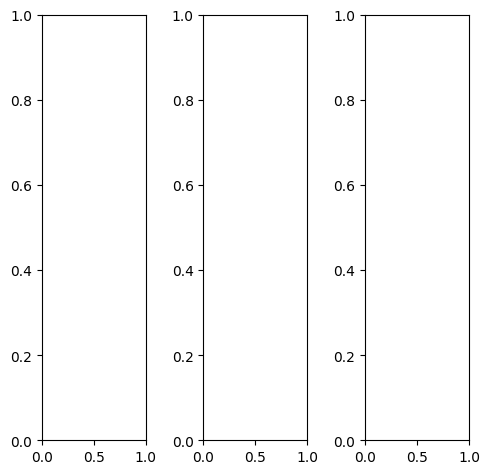

tensor([[[0.7765, 0.7686, 0.7686,  ..., 0.7686, 0.7686, 0.7686],
         [0.7725, 0.7608, 0.7608,  ..., 0.7647, 0.7647, 0.7647],
         [0.7725, 0.7647, 0.7608,  ..., 0.7647, 0.7647, 0.7647],
         ...,
         [0.5373, 0.5373, 0.6706,  ..., 0.5059, 0.5333, 0.5216],
         [0.5020, 0.4902, 0.5647,  ..., 0.4549, 0.4353, 0.3412],
         [0.5451, 0.5137, 0.5294,  ..., 0.6471, 0.6078, 0.5451]],

        [[0.7765, 0.7686, 0.7686,  ..., 0.7686, 0.7686, 0.7686],
         [0.7725, 0.7608, 0.7608,  ..., 0.7647, 0.7647, 0.7647],
         [0.7725, 0.7647, 0.7608,  ..., 0.7647, 0.7647, 0.7647],
         ...,
         [0.5373, 0.5373, 0.6706,  ..., 0.5059, 0.5333, 0.5216],
         [0.5020, 0.4902, 0.5647,  ..., 0.4549, 0.4353, 0.3412],
         [0.5451, 0.5137, 0.5294,  ..., 0.6471, 0.6078, 0.5451]],

        [[0.7765, 0.7686, 0.7686,  ..., 0.7686, 0.7686, 0.7686],
         [0.7725, 0.7608, 0.7608,  ..., 0.7647, 0.7647, 0.7647],
         [0.7725, 0.7647, 0.7608,  ..., 0.7647, 0.7647, 0.

tensor([[[0.7098, 0.7020, 0.7020,  ..., 0.7020, 0.7020, 0.7020],
         [0.7059, 0.6941, 0.6941,  ..., 0.6980, 0.6980, 0.6980],
         [0.7059, 0.6980, 0.6941,  ..., 0.6980, 0.6980, 0.6980],
         ...,
         [0.6000, 0.6118, 0.7529,  ..., 0.5725, 0.5608, 0.5647],
         [0.5647, 0.5608, 0.6549,  ..., 0.5294, 0.5176, 0.3843],
         [0.6275, 0.5804, 0.6118,  ..., 0.7333, 0.6784, 0.5961]],

        [[0.7686, 0.7608, 0.7608,  ..., 0.7608, 0.7608, 0.7608],
         [0.7647, 0.7529, 0.7529,  ..., 0.7569, 0.7569, 0.7569],
         [0.7647, 0.7569, 0.7529,  ..., 0.7569, 0.7569, 0.7569],
         ...,
         [0.5255, 0.5255, 0.6549,  ..., 0.4941, 0.5373, 0.5176],
         [0.4941, 0.4745, 0.5451,  ..., 0.4431, 0.4157, 0.3373],
         [0.5294, 0.5020, 0.5137,  ..., 0.6314, 0.6000, 0.5490]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.

tensor([[[0.6615, 0.6025, 0.6060,  ..., 0.5886, 0.5680, 0.6688],
         [0.6379, 0.5806, 0.5782,  ..., 0.5267, 0.5555, 0.6054],
         [0.6443, 0.5957, 0.6360,  ..., 0.5620, 0.6249, 0.6386],
         ...,
         [0.4873, 0.5187, 0.6416,  ..., 0.5111, 0.5118, 0.5034],
         [0.4767, 0.4469, 0.5554,  ..., 0.4054, 0.3842, 0.3419],
         [0.5210, 0.5196, 0.5357,  ..., 0.6818, 0.6389, 0.5146]],

        [[0.6631, 0.6533, 0.7094,  ..., 0.6826, 0.7225, 0.7287],
         [0.6369, 0.6286, 0.6571,  ..., 0.6542, 0.6746, 0.7784],
         [0.6770, 0.6906, 0.7223,  ..., 0.6964, 0.7132, 0.7483],
         ...,
         [0.4484, 0.4546, 0.5997,  ..., 0.4729, 0.5392, 0.4669],
         [0.4396, 0.4229, 0.5052,  ..., 0.4043, 0.4171, 0.3421],
         [0.4946, 0.4784, 0.4959,  ..., 0.6390, 0.5988, 0.5095]],

        [[0.8093, 0.8481, 0.8271,  ..., 0.8633, 0.8818, 0.8456],
         [0.8171, 0.8128, 0.8146,  ..., 0.7974, 0.8455, 0.8221],
         [0.8423, 0.8599, 0.8329,  ..., 0.8759, 0.8756, 0.

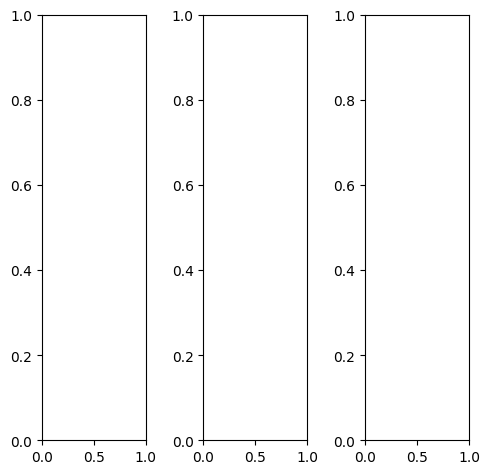

tensor([[[0.3686, 0.3725, 0.3569,  ..., 0.3608, 0.3686, 0.3373],
         [0.3647, 0.3490, 0.3647,  ..., 0.3333, 0.3373, 0.3333],
         [0.3686, 0.3843, 0.4196,  ..., 0.3059, 0.3294, 0.3922],
         ...,
         [0.4078, 0.4039, 0.4078,  ..., 0.3569, 0.4039, 0.4235],
         [0.3922, 0.4039, 0.4078,  ..., 0.3333, 0.3922, 0.4039],
         [0.3804, 0.3804, 0.3961,  ..., 0.3569, 0.3882, 0.3961]],

        [[0.3686, 0.3725, 0.3569,  ..., 0.3608, 0.3686, 0.3373],
         [0.3647, 0.3490, 0.3647,  ..., 0.3333, 0.3373, 0.3333],
         [0.3686, 0.3843, 0.4196,  ..., 0.3059, 0.3294, 0.3922],
         ...,
         [0.4078, 0.4039, 0.4078,  ..., 0.3569, 0.4039, 0.4235],
         [0.3922, 0.4039, 0.4078,  ..., 0.3333, 0.3922, 0.4039],
         [0.3804, 0.3804, 0.3961,  ..., 0.3569, 0.3882, 0.3961]],

        [[0.3686, 0.3725, 0.3569,  ..., 0.3608, 0.3686, 0.3373],
         [0.3647, 0.3490, 0.3647,  ..., 0.3333, 0.3373, 0.3333],
         [0.3686, 0.3843, 0.4196,  ..., 0.3059, 0.3294, 0.

tensor([[[0.4902, 0.4941, 0.4824,  ..., 0.4980, 0.5059, 0.4706],
         [0.4902, 0.4706, 0.4863,  ..., 0.4706, 0.4745, 0.4627],
         [0.4941, 0.5059, 0.5412,  ..., 0.4431, 0.4627, 0.5216],
         ...,
         [0.5451, 0.5451, 0.5490,  ..., 0.4980, 0.5451, 0.5647],
         [0.5255, 0.5451, 0.5529,  ..., 0.4745, 0.5294, 0.5451],
         [0.5098, 0.5137, 0.5451,  ..., 0.5020, 0.5333, 0.5451]],

        [[0.3176, 0.3216, 0.3059,  ..., 0.3059, 0.3137, 0.2863],
         [0.3176, 0.2980, 0.3137,  ..., 0.2784, 0.2824, 0.2824],
         [0.3216, 0.3333, 0.3686,  ..., 0.2510, 0.2745, 0.3412],
         ...,
         [0.3529, 0.3451, 0.3529,  ..., 0.3059, 0.3529, 0.3686],
         [0.3412, 0.3490, 0.3490,  ..., 0.2824, 0.3412, 0.3529],
         [0.3294, 0.3255, 0.3333,  ..., 0.3059, 0.3373, 0.3412]],

        [[0.2980, 0.3020, 0.2902,  ..., 0.2784, 0.2863, 0.2627],
         [0.2863, 0.2902, 0.3176,  ..., 0.2510, 0.2549, 0.2627],
         [0.2980, 0.3216, 0.3647,  ..., 0.2235, 0.2471, 0.

tensor([[[0.3115, 0.2511, 0.1674,  ..., 0.1829, 0.2228, 0.2362],
         [0.1854, 0.1015, 0.0622,  ..., 0.0929, 0.1296, 0.1734],
         [0.2443, 0.1555, 0.2355,  ..., 0.0379, 0.1325, 0.2442],
         ...,
         [0.3435, 0.3611, 0.3343,  ..., 0.2851, 0.3507, 0.4009],
         [0.3547, 0.3267, 0.3510,  ..., 0.1994, 0.3213, 0.3576],
         [0.3445, 0.3388, 0.3090,  ..., 0.2205, 0.3027, 0.3586]],

        [[0.3875, 0.3482, 0.3172,  ..., 0.2867, 0.3326, 0.3115],
         [0.2826, 0.2611, 0.2491,  ..., 0.2019, 0.2556, 0.2428],
         [0.3278, 0.3363, 0.3704,  ..., 0.1348, 0.2045, 0.2903],
         ...,
         [0.3758, 0.3902, 0.3976,  ..., 0.2536, 0.3672, 0.3889],
         [0.3756, 0.3973, 0.3663,  ..., 0.2117, 0.3281, 0.3746],
         [0.3400, 0.3331, 0.3312,  ..., 0.2038, 0.3024, 0.3441]],

        [[0.4609, 0.4733, 0.4536,  ..., 0.3944, 0.4279, 0.3928],
         [0.4328, 0.4430, 0.4469,  ..., 0.3602, 0.3642, 0.3618],
         [0.4624, 0.4763, 0.5494,  ..., 0.3064, 0.3493, 0.

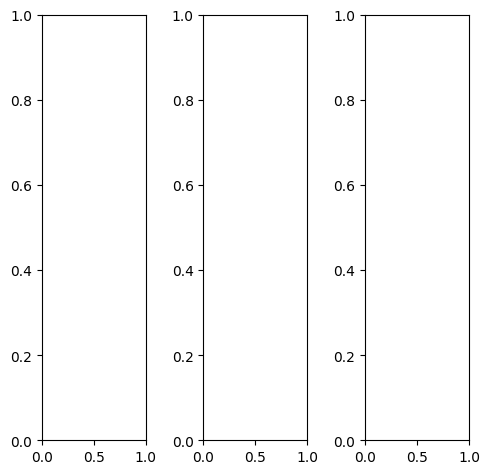

tensor([[[0.4627, 0.4824, 0.5059,  ..., 0.6353, 0.6196, 0.5882],
         [0.4745, 0.4941, 0.5255,  ..., 0.6667, 0.6510, 0.6196],
         [0.4863, 0.4941, 0.5059,  ..., 0.6824, 0.6667, 0.6471],
         ...,
         [0.4902, 0.1765, 0.1765,  ..., 0.6706, 0.6392, 0.6275],
         [0.5294, 0.3961, 0.3216,  ..., 0.6667, 0.6471, 0.6431],
         [0.4980, 0.4980, 0.4941,  ..., 0.6039, 0.6157, 0.6157]],

        [[0.4627, 0.4824, 0.5059,  ..., 0.6353, 0.6196, 0.5882],
         [0.4745, 0.4941, 0.5255,  ..., 0.6667, 0.6510, 0.6196],
         [0.4863, 0.4941, 0.5059,  ..., 0.6824, 0.6667, 0.6471],
         ...,
         [0.4902, 0.1765, 0.1765,  ..., 0.6706, 0.6392, 0.6275],
         [0.5294, 0.3961, 0.3216,  ..., 0.6667, 0.6471, 0.6431],
         [0.4980, 0.4980, 0.4941,  ..., 0.6039, 0.6157, 0.6157]],

        [[0.4627, 0.4824, 0.5059,  ..., 0.6353, 0.6196, 0.5882],
         [0.4745, 0.4941, 0.5255,  ..., 0.6667, 0.6510, 0.6196],
         [0.4863, 0.4941, 0.5059,  ..., 0.6824, 0.6667, 0.

tensor([[[0.5490, 0.5647, 0.5922,  ..., 0.7216, 0.7059, 0.6745],
         [0.5608, 0.5804, 0.6118,  ..., 0.7529, 0.7373, 0.7059],
         [0.5725, 0.5804, 0.5922,  ..., 0.7647, 0.7569, 0.7333],
         ...,
         [0.5176, 0.2000, 0.2039,  ..., 0.7216, 0.6902, 0.6784],
         [0.5569, 0.4235, 0.3490,  ..., 0.7255, 0.7059, 0.6980],
         [0.5255, 0.5216, 0.5216,  ..., 0.6667, 0.6784, 0.6784]],

        [[0.4431, 0.4627, 0.4863,  ..., 0.6235, 0.6078, 0.5725],
         [0.4549, 0.4745, 0.5098,  ..., 0.6549, 0.6353, 0.6000],
         [0.4667, 0.4784, 0.4902,  ..., 0.6667, 0.6510, 0.6275],
         ...,
         [0.4902, 0.1725, 0.1765,  ..., 0.6627, 0.6353, 0.6196],
         [0.5333, 0.3961, 0.3255,  ..., 0.6588, 0.6392, 0.6314],
         [0.5059, 0.5020, 0.4980,  ..., 0.5961, 0.6039, 0.6000]],

        [[0.3412, 0.3529, 0.3647,  ..., 0.4784, 0.4667, 0.4471],
         [0.3451, 0.3569, 0.3804,  ..., 0.5098, 0.4980, 0.4824],
         [0.3529, 0.3529, 0.3529,  ..., 0.5333, 0.5255, 0.

tensor([[[0.4450, 0.3832, 0.3715,  ..., 0.4785, 0.5031, 0.5679],
         [0.3698, 0.3518, 0.3133,  ..., 0.4386, 0.4380, 0.5081],
         [0.3842, 0.3293, 0.3330,  ..., 0.5156, 0.5256, 0.5413],
         ...,
         [0.3669, 0.1468, 0.1835,  ..., 0.6423, 0.5953, 0.5818],
         [0.4655, 0.3728, 0.3188,  ..., 0.6256, 0.6115, 0.6155],
         [0.4617, 0.4676, 0.4687,  ..., 0.5968, 0.6515, 0.5981]],

        [[0.4592, 0.4608, 0.4898,  ..., 0.5911, 0.6360, 0.5960],
         [0.4279, 0.4621, 0.4767,  ..., 0.5765, 0.5979, 0.6548],
         [0.4243, 0.4433, 0.4666,  ..., 0.6374, 0.6202, 0.6520],
         ...,
         [0.3932, 0.1374, 0.1251,  ..., 0.5986, 0.5763, 0.5921],
         [0.4862, 0.3814, 0.2884,  ..., 0.6133, 0.6093, 0.6116],
         [0.4585, 0.4726, 0.5002,  ..., 0.5536, 0.5981, 0.5815]],

        [[0.5275, 0.5817, 0.6080,  ..., 0.7632, 0.7722, 0.6952],
         [0.5344, 0.6214, 0.6110,  ..., 0.6617, 0.7294, 0.6932],
         [0.5341, 0.5823, 0.5754,  ..., 0.7570, 0.7427, 0.

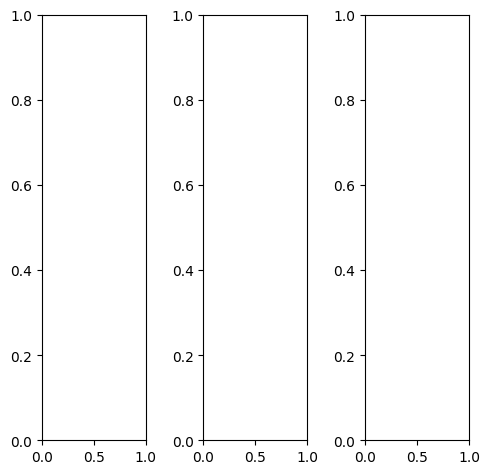

tensor([[[0.2431, 0.2196, 0.1843,  ..., 0.1647, 0.1451, 0.1412],
         [0.2314, 0.2000, 0.1765,  ..., 0.1725, 0.1608, 0.1608],
         [0.1843, 0.1725, 0.1529,  ..., 0.1608, 0.1725, 0.1686],
         ...,
         [0.1725, 0.0941, 0.2118,  ..., 0.5137, 0.5176, 0.5255],
         [0.1451, 0.1333, 0.2588,  ..., 0.5137, 0.5333, 0.5216],
         [0.1176, 0.1922, 0.2902,  ..., 0.5137, 0.5216, 0.5098]],

        [[0.2431, 0.2196, 0.1843,  ..., 0.1647, 0.1451, 0.1412],
         [0.2314, 0.2000, 0.1765,  ..., 0.1725, 0.1608, 0.1608],
         [0.1843, 0.1725, 0.1529,  ..., 0.1608, 0.1725, 0.1686],
         ...,
         [0.1725, 0.0941, 0.2118,  ..., 0.5137, 0.5176, 0.5255],
         [0.1451, 0.1333, 0.2588,  ..., 0.5137, 0.5333, 0.5216],
         [0.1176, 0.1922, 0.2902,  ..., 0.5137, 0.5216, 0.5098]],

        [[0.2431, 0.2196, 0.1843,  ..., 0.1647, 0.1451, 0.1412],
         [0.2314, 0.2000, 0.1765,  ..., 0.1725, 0.1608, 0.1608],
         [0.1843, 0.1725, 0.1529,  ..., 0.1608, 0.1725, 0.

tensor([[[0.2627, 0.2235, 0.1765,  ..., 0.1569, 0.1412, 0.1333],
         [0.2353, 0.1961, 0.1725,  ..., 0.1686, 0.1529, 0.1569],
         [0.1882, 0.1647, 0.1373,  ..., 0.1529, 0.1647, 0.1725],
         ...,
         [0.1765, 0.0980, 0.2235,  ..., 0.5216, 0.5216, 0.5294],
         [0.1490, 0.1412, 0.2706,  ..., 0.5255, 0.5412, 0.5255],
         [0.1216, 0.2039, 0.3059,  ..., 0.5255, 0.5255, 0.5176]],

        [[0.2431, 0.2275, 0.2000,  ..., 0.1804, 0.1569, 0.1569],
         [0.2392, 0.2157, 0.1922,  ..., 0.1843, 0.1725, 0.1725],
         [0.1961, 0.1882, 0.1725,  ..., 0.1765, 0.1843, 0.1804],
         ...,
         [0.1765, 0.0980, 0.2118,  ..., 0.5098, 0.5137, 0.5255],
         [0.1451, 0.1333, 0.2588,  ..., 0.5098, 0.5333, 0.5216],
         [0.1176, 0.1922, 0.2902,  ..., 0.5098, 0.5216, 0.5098]],

        [[0.1765, 0.1569, 0.1216,  ..., 0.1176, 0.0980, 0.0941],
         [0.1647, 0.1412, 0.1176,  ..., 0.1255, 0.1098, 0.1059],
         [0.1255, 0.1137, 0.0980,  ..., 0.1176, 0.1176, 0.

tensor([[[0.3621, 0.2916, 0.2279,  ..., 0.1935, 0.2038, 0.2508],
         [0.2158, 0.2036, 0.1304,  ..., 0.1539, 0.1634, 0.2094],
         [0.1618, 0.1148, 0.0809,  ..., 0.1207, 0.1800, 0.2148],
         ...,
         [0.2263, 0.1159, 0.3316,  ..., 0.6296, 0.6694, 0.7371],
         [0.2011, 0.1835, 0.3994,  ..., 0.6570, 0.7240, 0.7595],
         [0.2013, 0.2565, 0.4347,  ..., 0.7418, 0.7858, 0.7352]],

        [[0.3974, 0.3240, 0.2847,  ..., 0.2246, 0.2217, 0.2437],
         [0.3025, 0.2743, 0.2187,  ..., 0.2191, 0.2262, 0.2261],
         [0.2375, 0.2149, 0.1702,  ..., 0.1754, 0.2067, 0.2173],
         ...,
         [0.2135, 0.0721, 0.2728,  ..., 0.6124, 0.6523, 0.7617],
         [0.1731, 0.1458, 0.3156,  ..., 0.6512, 0.7301, 0.7521],
         [0.1847, 0.2232, 0.3887,  ..., 0.7077, 0.7539, 0.7181]],

        [[0.4720, 0.4695, 0.4401,  ..., 0.3388, 0.3239, 0.3281],
         [0.4373, 0.4843, 0.4329,  ..., 0.3724, 0.3530, 0.3375],
         [0.3844, 0.4297, 0.4076,  ..., 0.3571, 0.3665, 0.

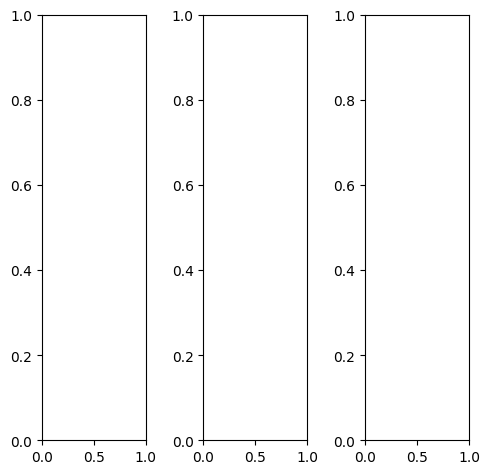

EPOCH: 4.000  val_loss: 0.004  (465.63s - 11175.24s remaining)

tensor([[[0.7608, 0.8118, 0.8196,  ..., 0.7490, 0.7137, 0.8353],
         [0.8275, 0.8627, 0.8392,  ..., 0.7529, 0.5686, 0.6980],
         [0.8118, 0.8235, 0.7961,  ..., 0.7843, 0.4824, 0.6157],
         ...,
         [0.6314, 0.4745, 0.4275,  ..., 0.4902, 0.4314, 0.6196],
         [0.6667, 0.4863, 0.4588,  ..., 0.5098, 0.5529, 0.7569],
         [0.8588, 0.8196, 0.8510,  ..., 0.7882, 0.7569, 0.8667]],

        [[0.7608, 0.8118, 0.8196,  ..., 0.7490, 0.7137, 0.8353],
         [0.8275, 0.8627, 0.8392,  ..., 0.7529, 0.5686, 0.6980],
         [0.8118, 0.8235, 0.7961,  ..., 0.7843, 0.4824, 0.6157],
         ...,
         [0.6314, 0.4745, 0.4275,  ..., 0.4902, 0.4314, 0.6196],
         [0.6667, 0.4863, 0.4588,  ..., 0.5098, 0.5529, 0.7569],
         [0.8588, 0.8196, 0.8510,  ..., 0.7882, 0.7569, 0.8667]],

        [[0.7608, 0.8118, 0.8196,  ..., 0.7490, 0.7137, 0.8353],
         [0.8275, 0.8627, 0.8392,  ..., 0.7529, 0.5686, 0.6980],
         [0.8118, 0.8235, 0.7961,  ..., 0.7843, 0.4824, 0.

tensor([[[0.8745, 0.9255, 0.9294,  ..., 0.8353, 0.7686, 0.8549],
         [0.9451, 0.9765, 0.9490,  ..., 0.8392, 0.6235, 0.7176],
         [0.9333, 0.9373, 0.9059,  ..., 0.8706, 0.5373, 0.6392],
         ...,
         [0.6784, 0.5216, 0.4706,  ..., 0.5294, 0.4706, 0.6392],
         [0.7020, 0.5176, 0.4902,  ..., 0.5451, 0.5882, 0.7804],
         [0.8863, 0.8471, 0.8784,  ..., 0.8157, 0.7882, 0.8824]],

        [[0.7294, 0.7804, 0.7882,  ..., 0.7294, 0.7020, 0.8314],
         [0.7961, 0.8314, 0.8118,  ..., 0.7294, 0.5569, 0.6941],
         [0.7843, 0.7961, 0.7686,  ..., 0.7608, 0.4706, 0.6118],
         ...,
         [0.6235, 0.4667, 0.4157,  ..., 0.4784, 0.4196, 0.6118],
         [0.6627, 0.4784, 0.4510,  ..., 0.4980, 0.5412, 0.7490],
         [0.8549, 0.8157, 0.8431,  ..., 0.7804, 0.7490, 0.8627]],

        [[0.6118, 0.6706, 0.6824,  ..., 0.6353, 0.6392, 0.7882],
         [0.6706, 0.7137, 0.6980,  ..., 0.6471, 0.4980, 0.6510],
         [0.6510, 0.6667, 0.6431,  ..., 0.6745, 0.4118, 0.

tensor([[[0.7581, 0.8215, 0.8455,  ..., 0.7709, 0.7814, 0.7709],
         [0.8711, 0.8946, 0.8809,  ..., 0.7944, 0.6036, 0.7500],
         [0.8393, 0.8677, 0.8407,  ..., 0.8459, 0.5486, 0.6734],
         ...,
         [0.6704, 0.5327, 0.4525,  ..., 0.5220, 0.4507, 0.6740],
         [0.6722, 0.5209, 0.4734,  ..., 0.5550, 0.5888, 0.7492],
         [0.8035, 0.8261, 0.8744,  ..., 0.8029, 0.8038, 0.7871]],

        [[0.7641, 0.8121, 0.8579,  ..., 0.7759, 0.7561, 0.7693],
         [0.8419, 0.9056, 0.8764,  ..., 0.7828, 0.6091, 0.7455],
         [0.8200, 0.8668, 0.8338,  ..., 0.8213, 0.5166, 0.6438],
         ...,
         [0.6360, 0.5046, 0.4470,  ..., 0.5002, 0.4198, 0.6853],
         [0.6676, 0.5127, 0.4872,  ..., 0.5491, 0.5657, 0.7568],
         [0.7844, 0.8119, 0.8421,  ..., 0.7765, 0.7779, 0.7777]],

        [[0.7534, 0.8076, 0.8052,  ..., 0.7350, 0.7372, 0.7359],
         [0.7952, 0.8506, 0.8254,  ..., 0.7305, 0.5562, 0.6667],
         [0.7858, 0.7747, 0.7672,  ..., 0.7683, 0.4811, 0.

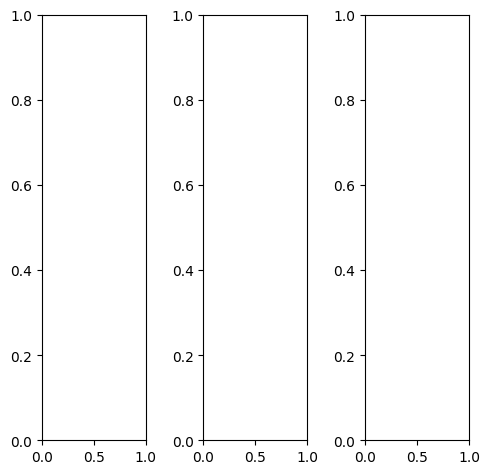

tensor([[[0.9922, 0.9804, 0.9804,  ..., 0.9725, 0.9686, 0.7569],
         [0.9882, 0.9765, 0.9804,  ..., 0.9765, 0.9490, 0.7373],
         [0.9961, 0.9922, 0.9922,  ..., 0.7412, 0.6627, 0.5137],
         ...,
         [0.9020, 0.9176, 0.7176,  ..., 0.8392, 0.8392, 0.7922],
         [0.9922, 0.9804, 0.9725,  ..., 0.8549, 0.8549, 0.7961],
         [0.9608, 0.9412, 0.9451,  ..., 0.8235, 0.8000, 0.7647]],

        [[0.9922, 0.9804, 0.9804,  ..., 0.9725, 0.9686, 0.7569],
         [0.9882, 0.9765, 0.9804,  ..., 0.9765, 0.9490, 0.7373],
         [0.9961, 0.9922, 0.9922,  ..., 0.7412, 0.6627, 0.5137],
         ...,
         [0.9020, 0.9176, 0.7176,  ..., 0.8392, 0.8392, 0.7922],
         [0.9922, 0.9804, 0.9725,  ..., 0.8549, 0.8549, 0.7961],
         [0.9608, 0.9412, 0.9451,  ..., 0.8235, 0.8000, 0.7647]],

        [[0.9922, 0.9804, 0.9804,  ..., 0.9725, 0.9686, 0.7569],
         [0.9882, 0.9765, 0.9804,  ..., 0.9765, 0.9490, 0.7373],
         [0.9961, 0.9922, 0.9922,  ..., 0.7412, 0.6627, 0.

tensor([[[0.9765, 0.9608, 0.9608,  ..., 0.9686, 0.9647, 0.7529],
         [0.9647, 0.9529, 0.9569,  ..., 0.9686, 0.9412, 0.7294],
         [0.9804, 0.9686, 0.9725,  ..., 0.7255, 0.6510, 0.4980],
         ...,
         [0.9451, 0.9490, 0.7451,  ..., 0.9451, 0.9569, 0.9255],
         [1.0000, 0.9922, 0.9882,  ..., 0.9608, 0.9765, 0.9294],
         [0.9922, 0.9725, 0.9804,  ..., 0.9255, 0.9216, 0.8941]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9765, 0.9725, 0.7647],
         [1.0000, 0.9882, 0.9922,  ..., 0.9804, 0.9529, 0.7451],
         [1.0000, 1.0000, 1.0000,  ..., 0.7451, 0.6706, 0.5216],
         ...,
         [0.8902, 0.9098, 0.7020,  ..., 0.8118, 0.8118, 0.7608],
         [0.9882, 0.9765, 0.9647,  ..., 0.8275, 0.8196, 0.7608],
         [0.9569, 0.9373, 0.9451,  ..., 0.7961, 0.7608, 0.7294]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9686, 0.9569, 0.7412],
         [1.0000, 0.9882, 0.9922,  ..., 0.9804, 0.9490, 0.7294],
         [1.0000, 1.0000, 1.0000,  ..., 0.7451, 0.6627, 0.

tensor([[[0.9294, 0.9750, 1.0286,  ..., 1.0101, 0.9857, 0.7792],
         [1.0247, 1.0053, 1.0271,  ..., 1.0081, 0.9635, 0.7662],
         [1.0009, 1.0452, 1.0366,  ..., 0.7778, 0.6883, 0.5701],
         ...,
         [0.9554, 0.9811, 0.8003,  ..., 0.8832, 0.8729, 0.8235],
         [0.9897, 1.0194, 1.0212,  ..., 0.9033, 0.8920, 0.8223],
         [0.8901, 0.9494, 0.9738,  ..., 0.8602, 0.8393, 0.7790]],

        [[0.9265, 0.9686, 1.0307,  ..., 1.0059, 0.9821, 0.7775],
         [0.9938, 1.0326, 1.0456,  ..., 1.0112, 0.9773, 0.7656],
         [0.9946, 1.0582, 1.0450,  ..., 0.7634, 0.6704, 0.5626],
         ...,
         [0.9274, 0.9569, 0.7540,  ..., 0.8596, 0.8732, 0.8501],
         [0.9641, 0.9890, 0.9915,  ..., 0.8894, 0.8898, 0.8191],
         [0.8862, 0.9460, 0.9461,  ..., 0.8371, 0.8122, 0.7454]],

        [[0.9214, 0.9681, 0.9699,  ..., 0.9739, 0.9722, 0.7607],
         [0.9598, 1.0092, 1.0009,  ..., 0.9620, 0.9261, 0.7024],
         [0.9787, 0.9768, 1.0054,  ..., 0.7423, 0.6534, 0.

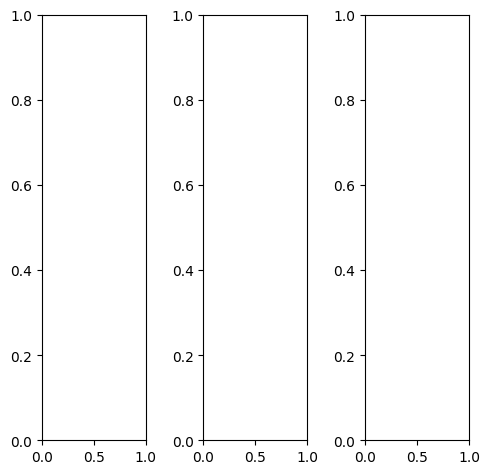

tensor([[[0.1608, 0.1490, 0.1412,  ..., 0.1490, 0.1647, 0.1843],
         [0.2078, 0.2941, 0.2784,  ..., 0.3255, 0.3529, 0.3020],
         [0.2078, 0.2824, 0.3294,  ..., 0.3569, 0.3608, 0.3255],
         ...,
         [0.2627, 0.3608, 0.3490,  ..., 0.3176, 0.3176, 0.3137],
         [0.3098, 0.3608, 0.3529,  ..., 0.3176, 0.3137, 0.3333],
         [0.2510, 0.3176, 0.3882,  ..., 0.3765, 0.3882, 0.2902]],

        [[0.1608, 0.1490, 0.1412,  ..., 0.1490, 0.1647, 0.1843],
         [0.2078, 0.2941, 0.2784,  ..., 0.3255, 0.3529, 0.3020],
         [0.2078, 0.2824, 0.3294,  ..., 0.3569, 0.3608, 0.3255],
         ...,
         [0.2627, 0.3608, 0.3490,  ..., 0.3176, 0.3176, 0.3137],
         [0.3098, 0.3608, 0.3529,  ..., 0.3176, 0.3137, 0.3333],
         [0.2510, 0.3176, 0.3882,  ..., 0.3765, 0.3882, 0.2902]],

        [[0.1608, 0.1490, 0.1412,  ..., 0.1490, 0.1647, 0.1843],
         [0.2078, 0.2941, 0.2784,  ..., 0.3255, 0.3529, 0.3020],
         [0.2078, 0.2824, 0.3294,  ..., 0.3569, 0.3608, 0.

tensor([[[0.1647, 0.1451, 0.1294,  ..., 0.1373, 0.1373, 0.1686],
         [0.2039, 0.2824, 0.2588,  ..., 0.3059, 0.3176, 0.2784],
         [0.1961, 0.2627, 0.3020,  ..., 0.3255, 0.3176, 0.2902],
         ...,
         [0.2431, 0.3412, 0.3294,  ..., 0.3059, 0.3059, 0.3020],
         [0.3020, 0.3529, 0.3412,  ..., 0.3059, 0.3020, 0.3216],
         [0.2471, 0.3137, 0.3882,  ..., 0.3647, 0.3765, 0.2784]],

        [[0.1569, 0.1451, 0.1412,  ..., 0.1569, 0.1765, 0.1922],
         [0.2039, 0.2941, 0.2824,  ..., 0.3373, 0.3686, 0.3098],
         [0.2118, 0.2902, 0.3373,  ..., 0.3686, 0.3765, 0.3373],
         ...,
         [0.2706, 0.3725, 0.3608,  ..., 0.3216, 0.3216, 0.3176],
         [0.3137, 0.3647, 0.3569,  ..., 0.3216, 0.3176, 0.3373],
         [0.2510, 0.3176, 0.3882,  ..., 0.3804, 0.3922, 0.2941]],

        [[0.1686, 0.1647, 0.1686,  ..., 0.1412, 0.1804, 0.2000],
         [0.2275, 0.3294, 0.3255,  ..., 0.3294, 0.3765, 0.3294],
         [0.2196, 0.3059, 0.3608,  ..., 0.3686, 0.3961, 0.

tensor([[[0.1839, 0.1319, 0.1130,  ..., 0.1285, 0.1674, 0.2032],
         [0.1669, 0.2616, 0.2522,  ..., 0.2792, 0.3067, 0.2596],
         [0.1540, 0.2540, 0.2973,  ..., 0.3089, 0.3155, 0.2957],
         ...,
         [0.2410, 0.3457, 0.3232,  ..., 0.2709, 0.2761, 0.2783],
         [0.2711, 0.3420, 0.3320,  ..., 0.2714, 0.2693, 0.3015],
         [0.2800, 0.3203, 0.3737,  ..., 0.3548, 0.3525, 0.3117]],

        [[0.2156, 0.1596, 0.1430,  ..., 0.1664, 0.2000, 0.2451],
         [0.2017, 0.2745, 0.2704,  ..., 0.3214, 0.3507, 0.2970],
         [0.2008, 0.2759, 0.3131,  ..., 0.3474, 0.3415, 0.3205],
         ...,
         [0.2796, 0.3668, 0.3465,  ..., 0.3142, 0.3096, 0.3141],
         [0.3038, 0.3628, 0.3509,  ..., 0.3124, 0.3155, 0.3256],
         [0.3043, 0.3420, 0.3973,  ..., 0.3870, 0.3825, 0.3358]],

        [[0.1968, 0.1585, 0.1511,  ..., 0.1705, 0.1996, 0.2286],
         [0.2077, 0.2934, 0.2788,  ..., 0.3257, 0.3485, 0.2771],
         [0.2012, 0.2908, 0.3349,  ..., 0.3614, 0.3605, 0.

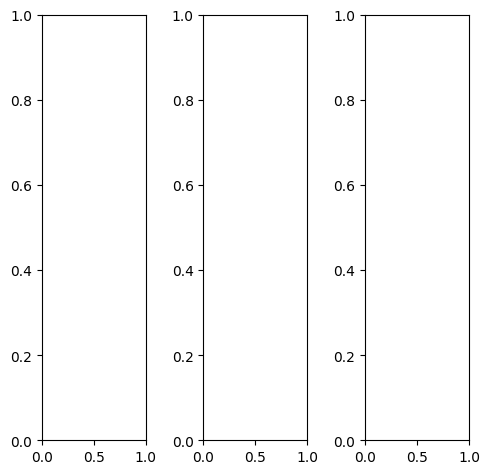

tensor([[[0.2275, 0.2471, 0.2784,  ..., 0.5333, 0.6157, 0.5333],
         [0.2078, 0.2078, 0.2824,  ..., 0.4275, 0.5569, 0.5686],
         [0.2000, 0.2000, 0.2588,  ..., 0.5412, 0.6235, 0.5725],
         ...,
         [0.4824, 0.4706, 0.4863,  ..., 0.5647, 0.5490, 0.5255],
         [0.4706, 0.4667, 0.4941,  ..., 0.5647, 0.5412, 0.5137],
         [0.4471, 0.4706, 0.5098,  ..., 0.5176, 0.5137, 0.4902]],

        [[0.2275, 0.2471, 0.2784,  ..., 0.5333, 0.6157, 0.5333],
         [0.2078, 0.2078, 0.2824,  ..., 0.4275, 0.5569, 0.5686],
         [0.2000, 0.2000, 0.2588,  ..., 0.5412, 0.6235, 0.5725],
         ...,
         [0.4824, 0.4706, 0.4863,  ..., 0.5647, 0.5490, 0.5255],
         [0.4706, 0.4667, 0.4941,  ..., 0.5647, 0.5412, 0.5137],
         [0.4471, 0.4706, 0.5098,  ..., 0.5176, 0.5137, 0.4902]],

        [[0.2275, 0.2471, 0.2784,  ..., 0.5333, 0.6157, 0.5333],
         [0.2078, 0.2078, 0.2824,  ..., 0.4275, 0.5569, 0.5686],
         [0.2000, 0.2000, 0.2588,  ..., 0.5412, 0.6235, 0.

tensor([[[0.1765, 0.1922, 0.2431,  ..., 0.5020, 0.6078, 0.5216],
         [0.1608, 0.1647, 0.2471,  ..., 0.4000, 0.5373, 0.5490],
         [0.1608, 0.1647, 0.2235,  ..., 0.4902, 0.5647, 0.5373],
         ...,
         [0.4745, 0.4588, 0.4784,  ..., 0.5647, 0.5490, 0.5216],
         [0.4667, 0.4588, 0.4863,  ..., 0.5647, 0.5412, 0.5098],
         [0.4431, 0.4667, 0.5059,  ..., 0.5216, 0.5098, 0.4902]],

        [[0.2745, 0.2980, 0.3176,  ..., 0.6039, 0.6745, 0.5922],
         [0.2510, 0.2510, 0.3176,  ..., 0.4863, 0.6235, 0.6353],
         [0.2392, 0.2353, 0.2980,  ..., 0.6314, 0.7255, 0.6549],
         ...,
         [0.4863, 0.4745, 0.4863,  ..., 0.5647, 0.5490, 0.5255],
         [0.4745, 0.4706, 0.4941,  ..., 0.5647, 0.5412, 0.5137],
         [0.4510, 0.4706, 0.5098,  ..., 0.5137, 0.5137, 0.4902]],

        [[0.1059, 0.1216, 0.1725,  ..., 0.2667, 0.3294, 0.2745],
         [0.1020, 0.1137, 0.1804,  ..., 0.2039, 0.2706, 0.2824],
         [0.1098, 0.1176, 0.1569,  ..., 0.2157, 0.2549, 0.

tensor([[[0.2410, 0.2306, 0.2504,  ..., 0.5377, 0.6296, 0.5749],
         [0.1667, 0.1826, 0.2552,  ..., 0.4400, 0.5562, 0.5968],
         [0.1738, 0.1792, 0.2335,  ..., 0.5296, 0.6353, 0.5820],
         ...,
         [0.4928, 0.4845, 0.5045,  ..., 0.5989, 0.5661, 0.5317],
         [0.4834, 0.4595, 0.4803,  ..., 0.5774, 0.5434, 0.5373],
         [0.4747, 0.4893, 0.5235,  ..., 0.5323, 0.5363, 0.5148]],

        [[0.2573, 0.2405, 0.2696,  ..., 0.5566, 0.6551, 0.5883],
         [0.1924, 0.1975, 0.2703,  ..., 0.4459, 0.5597, 0.5941],
         [0.1892, 0.1941, 0.2428,  ..., 0.5565, 0.6466, 0.5999],
         ...,
         [0.4950, 0.4827, 0.5007,  ..., 0.5713, 0.5683, 0.5319],
         [0.4854, 0.4665, 0.4941,  ..., 0.5700, 0.5576, 0.5284],
         [0.4837, 0.4831, 0.5319,  ..., 0.5248, 0.5311, 0.5332]],

        [[0.2315, 0.2192, 0.2518,  ..., 0.5143, 0.6266, 0.5542],
         [0.1865, 0.1895, 0.2598,  ..., 0.3971, 0.5360, 0.5542],
         [0.1814, 0.1810, 0.2328,  ..., 0.5083, 0.6075, 0.

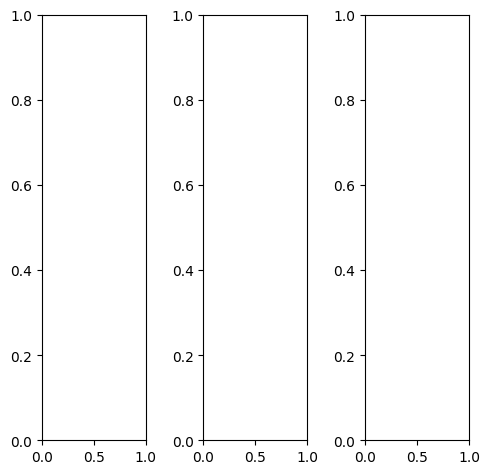

tensor([[[0.5137, 0.4902, 0.5137,  ..., 0.4941, 0.7765, 0.8510],
         [0.5216, 0.4078, 0.4275,  ..., 0.5922, 0.8157, 0.7529],
         [0.4784, 0.5020, 0.4588,  ..., 0.5765, 0.6157, 0.6000],
         ...,
         [0.7529, 0.7451, 0.7529,  ..., 0.4392, 0.4392, 0.4314],
         [0.7608, 0.7451, 0.7373,  ..., 0.4471, 0.4431, 0.4431],
         [0.7647, 0.7412, 0.7294,  ..., 0.4392, 0.4353, 0.4431]],

        [[0.5137, 0.4902, 0.5137,  ..., 0.4941, 0.7765, 0.8510],
         [0.5216, 0.4078, 0.4275,  ..., 0.5922, 0.8157, 0.7529],
         [0.4784, 0.5020, 0.4588,  ..., 0.5765, 0.6157, 0.6000],
         ...,
         [0.7529, 0.7451, 0.7529,  ..., 0.4392, 0.4392, 0.4314],
         [0.7608, 0.7451, 0.7373,  ..., 0.4471, 0.4431, 0.4431],
         [0.7647, 0.7412, 0.7294,  ..., 0.4392, 0.4353, 0.4431]],

        [[0.5137, 0.4902, 0.5137,  ..., 0.4941, 0.7765, 0.8510],
         [0.5216, 0.4078, 0.4275,  ..., 0.5922, 0.8157, 0.7529],
         [0.4784, 0.5020, 0.4588,  ..., 0.5765, 0.6157, 0.

tensor([[[0.4941, 0.4745, 0.4902,  ..., 0.5137, 0.7922, 0.8510],
         [0.5020, 0.3765, 0.4078,  ..., 0.5961, 0.8157, 0.7451],
         [0.4706, 0.4824, 0.4510,  ..., 0.5804, 0.6078, 0.5882],
         ...,
         [0.7647, 0.7569, 0.7686,  ..., 0.4549, 0.4510, 0.4431],
         [0.7765, 0.7647, 0.7608,  ..., 0.4627, 0.4549, 0.4549],
         [0.7804, 0.7569, 0.7529,  ..., 0.4549, 0.4471, 0.4549]],

        [[0.5216, 0.4941, 0.5216,  ..., 0.4784, 0.7686, 0.8471],
         [0.5294, 0.4157, 0.4353,  ..., 0.5961, 0.8157, 0.7569],
         [0.4863, 0.5098, 0.4627,  ..., 0.5765, 0.6157, 0.6039],
         ...,
         [0.7647, 0.7569, 0.7647,  ..., 0.4431, 0.4431, 0.4353],
         [0.7765, 0.7569, 0.7490,  ..., 0.4471, 0.4471, 0.4471],
         [0.7804, 0.7569, 0.7373,  ..., 0.4392, 0.4392, 0.4471]],

        [[0.5294, 0.5176, 0.5490,  ..., 0.5216, 0.7882, 0.8549],
         [0.5216, 0.4471, 0.4431,  ..., 0.5686, 0.8157, 0.7373],
         [0.4510, 0.5176, 0.4706,  ..., 0.5686, 0.6392, 0.

tensor([[[0.5240, 0.5043, 0.5212,  ..., 0.5464, 0.7832, 0.7866],
         [0.5232, 0.4058, 0.4050,  ..., 0.6020, 0.8173, 0.7696],
         [0.4706, 0.5045, 0.4518,  ..., 0.5862, 0.6282, 0.6236],
         ...,
         [0.8033, 0.8198, 0.7911,  ..., 0.4322, 0.4299, 0.4227],
         [0.8009, 0.8071, 0.7889,  ..., 0.4426, 0.4304, 0.4462],
         [0.7450, 0.7799, 0.7757,  ..., 0.4301, 0.4403, 0.4567]],

        [[0.5319, 0.5096, 0.5394,  ..., 0.5391, 0.7957, 0.7933],
         [0.5343, 0.3845, 0.4053,  ..., 0.6044, 0.8275, 0.7768],
         [0.4881, 0.5046, 0.4587,  ..., 0.6037, 0.6234, 0.6312],
         ...,
         [0.7734, 0.8039, 0.7659,  ..., 0.4412, 0.4394, 0.4317],
         [0.7850, 0.7714, 0.7606,  ..., 0.4501, 0.4539, 0.4550],
         [0.7293, 0.7484, 0.7502,  ..., 0.4313, 0.4419, 0.4767]],

        [[0.4862, 0.4615, 0.4758,  ..., 0.4990, 0.7829, 0.7671],
         [0.4822, 0.3722, 0.3732,  ..., 0.5494, 0.7696, 0.7234],
         [0.4165, 0.4620, 0.4179,  ..., 0.5416, 0.5779, 0.

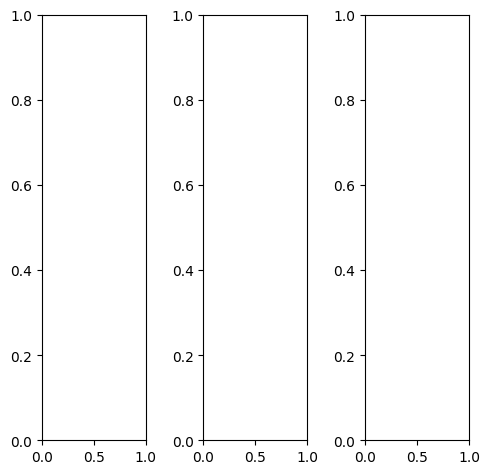

EPOCH: 4.255  trn_loss: 0.005  (493.53s - 11105.07s remaining)

tensor([[[0.1922, 0.1843, 0.1804,  ..., 0.2471, 0.2667, 0.2667],
         [0.1922, 0.1882, 0.1843,  ..., 0.2588, 0.2627, 0.2510],
         [0.2039, 0.2118, 0.2118,  ..., 0.2275, 0.2275, 0.2196],
         ...,
         [0.2627, 0.2549, 0.2706,  ..., 0.2980, 0.2980, 0.3137],
         [0.2667, 0.2627, 0.2431,  ..., 0.2824, 0.2902, 0.2941],
         [0.2627, 0.2510, 0.2471,  ..., 0.2863, 0.2941, 0.3020]],

        [[0.1922, 0.1843, 0.1804,  ..., 0.2471, 0.2667, 0.2667],
         [0.1922, 0.1882, 0.1843,  ..., 0.2588, 0.2627, 0.2510],
         [0.2039, 0.2118, 0.2118,  ..., 0.2275, 0.2275, 0.2196],
         ...,
         [0.2627, 0.2549, 0.2706,  ..., 0.2980, 0.2980, 0.3137],
         [0.2667, 0.2627, 0.2431,  ..., 0.2824, 0.2902, 0.2941],
         [0.2627, 0.2510, 0.2471,  ..., 0.2863, 0.2941, 0.3020]],

        [[0.1922, 0.1843, 0.1804,  ..., 0.2471, 0.2667, 0.2667],
         [0.1922, 0.1882, 0.1843,  ..., 0.2588, 0.2627, 0.2510],
         [0.2039, 0.2118, 0.2118,  ..., 0.2275, 0.2275, 0.

tensor([[[0.1725, 0.1804, 0.1686,  ..., 0.2196, 0.2392, 0.2392],
         [0.1725, 0.1843, 0.1725,  ..., 0.2314, 0.2353, 0.2235],
         [0.1843, 0.2078, 0.2000,  ..., 0.2000, 0.2000, 0.1922],
         ...,
         [0.2471, 0.2314, 0.2627,  ..., 0.2745, 0.2745, 0.2902],
         [0.2549, 0.2431, 0.2353,  ..., 0.2588, 0.2667, 0.2706],
         [0.2510, 0.2353, 0.2392,  ..., 0.2706, 0.2784, 0.2863]],

        [[0.1961, 0.1843, 0.1843,  ..., 0.2510, 0.2706, 0.2706],
         [0.1961, 0.1882, 0.1882,  ..., 0.2627, 0.2667, 0.2549],
         [0.2078, 0.2118, 0.2157,  ..., 0.2314, 0.2314, 0.2235],
         ...,
         [0.2667, 0.2627, 0.2745,  ..., 0.3020, 0.3020, 0.3176],
         [0.2745, 0.2706, 0.2431,  ..., 0.2863, 0.2941, 0.2980],
         [0.2667, 0.2549, 0.2510,  ..., 0.2902, 0.2980, 0.3059]],

        [[0.2275, 0.2039, 0.2078,  ..., 0.3020, 0.3216, 0.3216],
         [0.2235, 0.2078, 0.2118,  ..., 0.3137, 0.3176, 0.3059],
         [0.2275, 0.2275, 0.2314,  ..., 0.2824, 0.2824, 0.

tensor([[[ 0.1056,  0.0472,  0.0051,  ...,  0.1032,  0.1672,  0.2207],
         [-0.0162, -0.0264, -0.0746,  ...,  0.1123,  0.1250,  0.1486],
         [ 0.0260,  0.0312,  0.0093,  ...,  0.0472,  0.0866,  0.0903],
         ...,
         [ 0.2500,  0.2768,  0.2407,  ...,  0.3835,  0.3347,  0.3476],
         [ 0.2635,  0.2415,  0.2070,  ...,  0.2862,  0.2846,  0.3117],
         [ 0.2875,  0.2412,  0.2057,  ...,  0.3131,  0.3369,  0.3527]],

        [[ 0.1780,  0.1331,  0.1112,  ...,  0.2214,  0.2890,  0.3019],
         [ 0.1136,  0.0933,  0.0543,  ...,  0.2224,  0.2621,  0.2204],
         [ 0.1322,  0.1466,  0.1020,  ...,  0.1692,  0.1895,  0.1635],
         ...,
         [ 0.2619,  0.2416,  0.2692,  ...,  0.3923,  0.3878,  0.3480],
         [ 0.2765,  0.2590,  0.2022,  ...,  0.3465,  0.3571,  0.3355],
         [ 0.2990,  0.2373,  0.1973,  ...,  0.3042,  0.3577,  0.3522]],

        [[ 0.3021,  0.2885,  0.2638,  ...,  0.3545,  0.4247,  0.4266],
         [ 0.2805,  0.2795,  0.2271,  ...,  0

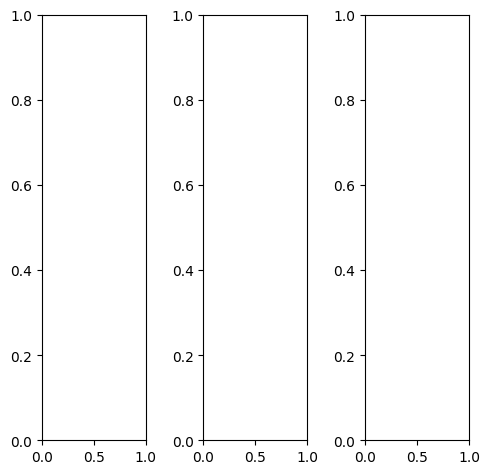

tensor([[[0.7843, 0.7804, 0.7922,  ..., 0.6549, 0.6588, 0.6510],
         [0.7843, 0.7765, 0.7843,  ..., 0.6588, 0.6588, 0.6471],
         [0.7843, 0.7804, 0.7922,  ..., 0.6627, 0.6549, 0.6510],
         ...,
         [0.7255, 0.7255, 0.7294,  ..., 0.6667, 0.6510, 0.6471],
         [0.7333, 0.7333, 0.7333,  ..., 0.6549, 0.6392, 0.6353],
         [0.7412, 0.7373, 0.7412,  ..., 0.6549, 0.6392, 0.6314]],

        [[0.7843, 0.7804, 0.7922,  ..., 0.6549, 0.6588, 0.6510],
         [0.7843, 0.7765, 0.7843,  ..., 0.6588, 0.6588, 0.6471],
         [0.7843, 0.7804, 0.7922,  ..., 0.6627, 0.6549, 0.6510],
         ...,
         [0.7255, 0.7255, 0.7294,  ..., 0.6667, 0.6510, 0.6471],
         [0.7333, 0.7333, 0.7333,  ..., 0.6549, 0.6392, 0.6353],
         [0.7412, 0.7373, 0.7412,  ..., 0.6549, 0.6392, 0.6314]],

        [[0.7843, 0.7804, 0.7922,  ..., 0.6549, 0.6588, 0.6510],
         [0.7843, 0.7765, 0.7843,  ..., 0.6588, 0.6588, 0.6471],
         [0.7843, 0.7804, 0.7922,  ..., 0.6627, 0.6549, 0.

tensor([[[0.7725, 0.7725, 0.7882,  ..., 0.6863, 0.6863, 0.6784],
         [0.7725, 0.7725, 0.7843,  ..., 0.6902, 0.6863, 0.6745],
         [0.7765, 0.7804, 0.7922,  ..., 0.6941, 0.6824, 0.6784],
         ...,
         [0.7098, 0.7137, 0.7176,  ..., 0.6824, 0.6627, 0.6627],
         [0.7098, 0.7059, 0.7059,  ..., 0.6667, 0.6510, 0.6471],
         [0.7176, 0.7137, 0.7176,  ..., 0.6627, 0.6471, 0.6392]],

        [[0.7882, 0.7843, 0.7961,  ..., 0.6431, 0.6471, 0.6392],
         [0.7882, 0.7804, 0.7843,  ..., 0.6471, 0.6471, 0.6392],
         [0.7882, 0.7804, 0.7922,  ..., 0.6510, 0.6471, 0.6431],
         ...,
         [0.7294, 0.7294, 0.7294,  ..., 0.6588, 0.6392, 0.6353],
         [0.7373, 0.7373, 0.7412,  ..., 0.6471, 0.6314, 0.6275],
         [0.7451, 0.7412, 0.7451,  ..., 0.6471, 0.6314, 0.6235]],

        [[0.7961, 0.7843, 0.7882,  ..., 0.6235, 0.6353, 0.6314],
         [0.7882, 0.7765, 0.7804,  ..., 0.6275, 0.6353, 0.6314],
         [0.7843, 0.7765, 0.7804,  ..., 0.6314, 0.6314, 0.

tensor([[[0.6697, 0.5874, 0.5680,  ..., 0.4693, 0.5111, 0.5660],
         [0.5887, 0.5067, 0.4788,  ..., 0.3599, 0.4300, 0.5063],
         [0.5987, 0.5028, 0.5261,  ..., 0.4027, 0.4245, 0.5145],
         ...,
         [0.6173, 0.6521, 0.6185,  ..., 0.5679, 0.5324, 0.5614],
         [0.6449, 0.6179, 0.5949,  ..., 0.5524, 0.5479, 0.5581],
         [0.6807, 0.6722, 0.6891,  ..., 0.6012, 0.5937, 0.5652]],

        [[0.6700, 0.6571, 0.6781,  ..., 0.5623, 0.6354, 0.5924],
         [0.6266, 0.5884, 0.6062,  ..., 0.5709, 0.6169, 0.5966],
         [0.6382, 0.6469, 0.6546,  ..., 0.5458, 0.5905, 0.6054],
         ...,
         [0.5744, 0.5777, 0.5701,  ..., 0.5281, 0.5636, 0.5792],
         [0.6003, 0.5780, 0.5656,  ..., 0.5374, 0.5722, 0.5657],
         [0.6049, 0.6232, 0.6325,  ..., 0.5669, 0.5775, 0.5669]],

        [[0.8206, 0.8616, 0.8204,  ..., 0.7105, 0.7418, 0.6936],
         [0.7937, 0.7624, 0.7625,  ..., 0.6680, 0.7087, 0.6750],
         [0.8078, 0.7897, 0.7745,  ..., 0.6753, 0.6956, 0.

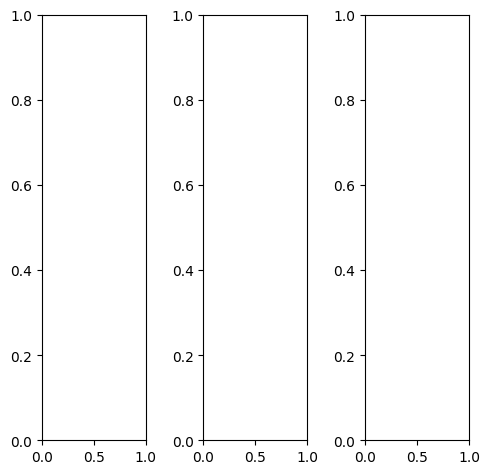

tensor([[[0.3804, 0.2353, 0.3412,  ..., 0.3059, 0.3255, 0.2980],
         [0.3804, 0.2353, 0.3412,  ..., 0.3216, 0.3216, 0.3137],
         [0.3569, 0.2314, 0.3294,  ..., 0.3176, 0.2980, 0.2902],
         ...,
         [0.4941, 0.5412, 0.5961,  ..., 0.5333, 0.4588, 0.4078],
         [0.5176, 0.5647, 0.6118,  ..., 0.5608, 0.5059, 0.4588],
         [0.5216, 0.5608, 0.6157,  ..., 0.5647, 0.5176, 0.4039]],

        [[0.3804, 0.2353, 0.3412,  ..., 0.3059, 0.3255, 0.2980],
         [0.3804, 0.2353, 0.3412,  ..., 0.3216, 0.3216, 0.3137],
         [0.3569, 0.2314, 0.3294,  ..., 0.3176, 0.2980, 0.2902],
         ...,
         [0.4941, 0.5412, 0.5961,  ..., 0.5333, 0.4588, 0.4078],
         [0.5176, 0.5647, 0.6118,  ..., 0.5608, 0.5059, 0.4588],
         [0.5216, 0.5608, 0.6157,  ..., 0.5647, 0.5176, 0.4039]],

        [[0.3804, 0.2353, 0.3412,  ..., 0.3059, 0.3255, 0.2980],
         [0.3804, 0.2353, 0.3412,  ..., 0.3216, 0.3216, 0.3137],
         [0.3569, 0.2314, 0.3294,  ..., 0.3176, 0.2980, 0.

tensor([[[0.3843, 0.2353, 0.3412,  ..., 0.2824, 0.2627, 0.2627],
         [0.3882, 0.2353, 0.3412,  ..., 0.2706, 0.2549, 0.2549],
         [0.3686, 0.2353, 0.3294,  ..., 0.2667, 0.2667, 0.2431],
         ...,
         [0.4706, 0.5176, 0.5725,  ..., 0.5098, 0.4392, 0.3922],
         [0.4941, 0.5373, 0.5804,  ..., 0.5373, 0.4824, 0.4431],
         [0.4980, 0.5373, 0.5843,  ..., 0.5373, 0.4941, 0.3882]],

        [[0.3804, 0.2353, 0.3412,  ..., 0.3176, 0.3490, 0.3098],
         [0.3765, 0.2353, 0.3412,  ..., 0.3451, 0.3529, 0.3373],
         [0.3529, 0.2314, 0.3294,  ..., 0.3373, 0.3137, 0.3098],
         ...,
         [0.4902, 0.5373, 0.5961,  ..., 0.5333, 0.4588, 0.4078],
         [0.5137, 0.5608, 0.6118,  ..., 0.5608, 0.5059, 0.4588],
         [0.5216, 0.5608, 0.6157,  ..., 0.5647, 0.5176, 0.4039]],

        [[0.3647, 0.2275, 0.3294,  ..., 0.3176, 0.3529, 0.3216],
         [0.3647, 0.2275, 0.3294,  ..., 0.3490, 0.3490, 0.3451],
         [0.3412, 0.2235, 0.3176,  ..., 0.3412, 0.3059, 0.

tensor([[[ 0.3149,  0.0884,  0.2222,  ...,  0.1195,  0.1730,  0.2208],
         [ 0.2577, -0.0140,  0.1117,  ...,  0.0812,  0.0791,  0.1523],
         [ 0.2303, -0.0196,  0.1352,  ...,  0.0719,  0.0736,  0.1102],
         ...,
         [ 0.6161,  0.7636,  0.9292,  ...,  0.6910,  0.5600,  0.4452],
         [ 0.6565,  0.7451,  0.8974,  ...,  0.6570,  0.5835,  0.5173],
         [ 0.6332,  0.7750,  0.8660,  ...,  0.7358,  0.6520,  0.5051]],

        [[ 0.4020,  0.1979,  0.3663,  ...,  0.2461,  0.3071,  0.2782],
         [ 0.3793,  0.1213,  0.2807,  ...,  0.2232,  0.2459,  0.2300],
         [ 0.3313,  0.1197,  0.2548,  ...,  0.2157,  0.2132,  0.1855],
         ...,
         [ 0.5904,  0.7051,  0.8413,  ...,  0.6710,  0.5841,  0.4686],
         [ 0.6523,  0.7356,  0.8388,  ...,  0.6810,  0.6339,  0.5282],
         [ 0.6206,  0.7294,  0.8092,  ...,  0.6945,  0.6255,  0.4996]],

        [[ 0.5224,  0.3951,  0.5342,  ...,  0.4081,  0.4647,  0.4536],
         [ 0.5526,  0.3410,  0.5028,  ...,  0

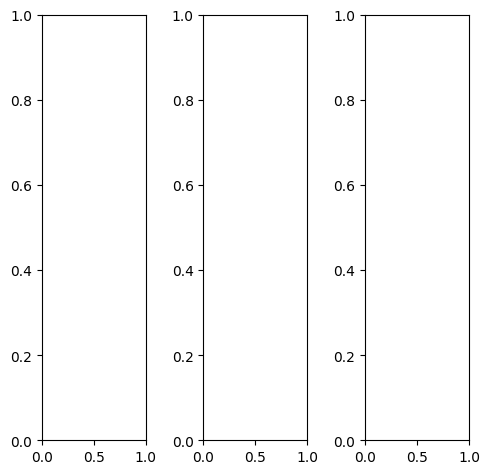

tensor([[[0.4980, 0.5098, 0.4941,  ..., 0.4706, 0.4745, 0.4706],
         [0.4706, 0.4824, 0.4902,  ..., 0.4588, 0.4627, 0.4588],
         [0.4902, 0.4863, 0.4980,  ..., 0.4549, 0.4627, 0.4588],
         ...,
         [0.5098, 0.5176, 0.5059,  ..., 0.4588, 0.4667, 0.4627],
         [0.4980, 0.5137, 0.4902,  ..., 0.4431, 0.4510, 0.4667],
         [0.4588, 0.4863, 0.4706,  ..., 0.4196, 0.4196, 0.4235]],

        [[0.4980, 0.5098, 0.4941,  ..., 0.4706, 0.4745, 0.4706],
         [0.4706, 0.4824, 0.4902,  ..., 0.4588, 0.4627, 0.4588],
         [0.4902, 0.4863, 0.4980,  ..., 0.4549, 0.4627, 0.4588],
         ...,
         [0.5098, 0.5176, 0.5059,  ..., 0.4588, 0.4667, 0.4627],
         [0.4980, 0.5137, 0.4902,  ..., 0.4431, 0.4510, 0.4667],
         [0.4588, 0.4863, 0.4706,  ..., 0.4196, 0.4196, 0.4235]],

        [[0.4980, 0.5098, 0.4941,  ..., 0.4706, 0.4745, 0.4706],
         [0.4706, 0.4824, 0.4902,  ..., 0.4588, 0.4627, 0.4588],
         [0.4902, 0.4863, 0.4980,  ..., 0.4549, 0.4627, 0.

tensor([[[0.4431, 0.4549, 0.4392,  ..., 0.4039, 0.4078, 0.4039],
         [0.4157, 0.4275, 0.4353,  ..., 0.3922, 0.3961, 0.3922],
         [0.4353, 0.4314, 0.4431,  ..., 0.3882, 0.3922, 0.3922],
         ...,
         [0.4824, 0.4902, 0.4784,  ..., 0.4314, 0.4235, 0.4275],
         [0.4627, 0.4784, 0.4549,  ..., 0.4157, 0.4078, 0.4275],
         [0.4235, 0.4275, 0.4157,  ..., 0.3922, 0.3843, 0.3882]],

        [[0.5843, 0.5961, 0.5804,  ..., 0.5608, 0.5647, 0.5608],
         [0.5569, 0.5686, 0.5765,  ..., 0.5451, 0.5490, 0.5451],
         [0.5725, 0.5725, 0.5843,  ..., 0.5373, 0.5451, 0.5412],
         ...,
         [0.5725, 0.5804, 0.5686,  ..., 0.5216, 0.5373, 0.5294],
         [0.5608, 0.5804, 0.5569,  ..., 0.5059, 0.5255, 0.5333],
         [0.5255, 0.5647, 0.5490,  ..., 0.4784, 0.4863, 0.4902]],

        [[0.2000, 0.2118, 0.2000,  ..., 0.1882, 0.1843, 0.1765],
         [0.1804, 0.1882, 0.2000,  ..., 0.1961, 0.1922, 0.1843],
         [0.2000, 0.1961, 0.2078,  ..., 0.2039, 0.2078, 0.

tensor([[[0.3493, 0.2776, 0.1740,  ..., 0.2011, 0.2566, 0.1836],
         [0.1963, 0.1490, 0.1120,  ..., 0.1825, 0.2360, 0.0925],
         [0.3008, 0.1747, 0.1618,  ..., 0.1713, 0.2426, 0.0842],
         ...,
         [0.3754, 0.4188, 0.2893,  ..., 0.4356, 0.4015, 0.2334],
         [0.3921, 0.3776, 0.3980,  ..., 0.3252, 0.3566, 0.2150],
         [0.3199, 0.3102, 0.2684,  ..., 0.2044, 0.1901, 0.1037]],

        [[0.4289, 0.4554, 0.3844,  ..., 0.3209, 0.4123, 0.2517],
         [0.2322, 0.3926, 0.3027,  ..., 0.3734, 0.4484, 0.1905],
         [0.3052, 0.3952, 0.3501,  ..., 0.3566, 0.4010, 0.1732],
         ...,
         [0.3425, 0.4701, 0.3684,  ..., 0.3902, 0.4131, 0.1945],
         [0.3339, 0.4692, 0.3805,  ..., 0.3103, 0.3540, 0.2221],
         [0.2664, 0.3172, 0.2745,  ..., 0.2146, 0.2063, 0.1012]],

        [[0.5562, 0.5515, 0.5391,  ..., 0.4174, 0.4969, 0.3703],
         [0.5022, 0.5514, 0.5022,  ..., 0.4976, 0.5292, 0.3389],
         [0.5272, 0.5681, 0.5234,  ..., 0.4604, 0.4816, 0.

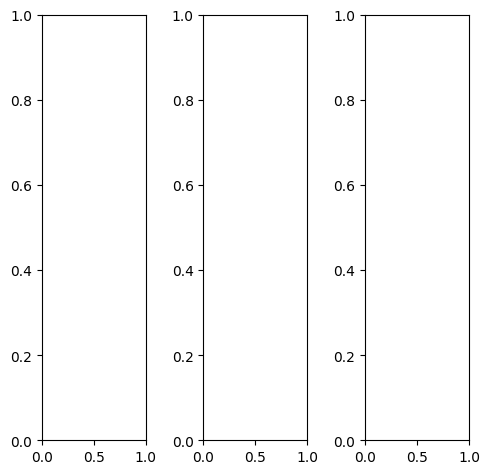

tensor([[[0.5686, 0.5451, 0.5412,  ..., 0.5059, 0.4353, 0.3608],
         [0.5804, 0.5294, 0.5255,  ..., 0.4824, 0.4196, 0.3451],
         [0.5765, 0.5098, 0.5176,  ..., 0.4431, 0.4235, 0.2902],
         ...,
         [0.7176, 0.7098, 0.7020,  ..., 0.4941, 0.5412, 0.5333],
         [0.7412, 0.7333, 0.7333,  ..., 0.6157, 0.6431, 0.6196],
         [0.7059, 0.7098, 0.7176,  ..., 0.6588, 0.6627, 0.6588]],

        [[0.5686, 0.5451, 0.5412,  ..., 0.5059, 0.4353, 0.3608],
         [0.5804, 0.5294, 0.5255,  ..., 0.4824, 0.4196, 0.3451],
         [0.5765, 0.5098, 0.5176,  ..., 0.4431, 0.4235, 0.2902],
         ...,
         [0.7176, 0.7098, 0.7020,  ..., 0.4941, 0.5412, 0.5333],
         [0.7412, 0.7333, 0.7333,  ..., 0.6157, 0.6431, 0.6196],
         [0.7059, 0.7098, 0.7176,  ..., 0.6588, 0.6627, 0.6588]],

        [[0.5686, 0.5451, 0.5412,  ..., 0.5059, 0.4353, 0.3608],
         [0.5804, 0.5294, 0.5255,  ..., 0.4824, 0.4196, 0.3451],
         [0.5765, 0.5098, 0.5176,  ..., 0.4431, 0.4235, 0.

tensor([[[0.4784, 0.4784, 0.4863,  ..., 0.6745, 0.5647, 0.4431],
         [0.4863, 0.4627, 0.4667,  ..., 0.5686, 0.5412, 0.4510],
         [0.4941, 0.4549, 0.4588,  ..., 0.4431, 0.5686, 0.5137],
         ...,
         [0.7216, 0.7098, 0.7020,  ..., 0.5059, 0.5529, 0.5451],
         [0.7412, 0.7333, 0.7333,  ..., 0.6275, 0.6549, 0.6314],
         [0.6980, 0.7059, 0.7176,  ..., 0.6706, 0.6745, 0.6706]],

        [[0.5843, 0.5569, 0.5529,  ..., 0.4471, 0.3882, 0.3294],
         [0.5961, 0.5451, 0.5373,  ..., 0.4510, 0.3725, 0.2980],
         [0.5922, 0.5216, 0.5333,  ..., 0.4314, 0.3569, 0.1922],
         ...,
         [0.7255, 0.7216, 0.7137,  ..., 0.5020, 0.5490, 0.5412],
         [0.7490, 0.7412, 0.7412,  ..., 0.6235, 0.6510, 0.6275],
         [0.7137, 0.7176, 0.7255,  ..., 0.6667, 0.6706, 0.6667]],

        [[0.7176, 0.6627, 0.6392,  ..., 0.3647, 0.3294, 0.3098],
         [0.7294, 0.6353, 0.6078,  ..., 0.4275, 0.3529, 0.2980],
         [0.7216, 0.5961, 0.5843,  ..., 0.5137, 0.3882, 0.

tensor([[[0.5249, 0.4375, 0.3807,  ..., 0.4129, 0.3548, 0.3011],
         [0.4639, 0.3500, 0.2606,  ..., 0.3524, 0.3433, 0.2625],
         [0.4340, 0.3149, 0.2919,  ..., 0.3409, 0.3964, 0.2246],
         ...,
         [0.6690, 0.6558, 0.6471,  ..., 0.4299, 0.4465, 0.4907],
         [0.7124, 0.6562, 0.6792,  ..., 0.5557, 0.6003, 0.6086],
         [0.6877, 0.6978, 0.7245,  ..., 0.6730, 0.6820, 0.6405]],

        [[0.5336, 0.5057, 0.5009,  ..., 0.4680, 0.4200, 0.3099],
         [0.4989, 0.4634, 0.4177,  ..., 0.4279, 0.4144, 0.2629],
         [0.4864, 0.4276, 0.4231,  ..., 0.3844, 0.4370, 0.2269],
         ...,
         [0.6272, 0.6649, 0.6555,  ..., 0.3986, 0.4757, 0.4740],
         [0.6888, 0.6617, 0.6801,  ..., 0.5550, 0.6263, 0.6046],
         [0.6343, 0.6712, 0.6822,  ..., 0.6163, 0.6428, 0.6189]],

        [[0.6770, 0.6989, 0.6845,  ..., 0.5685, 0.4906, 0.3922],
         [0.6816, 0.6522, 0.6142,  ..., 0.5473, 0.4658, 0.3344],
         [0.6565, 0.6274, 0.6057,  ..., 0.4833, 0.4934, 0.

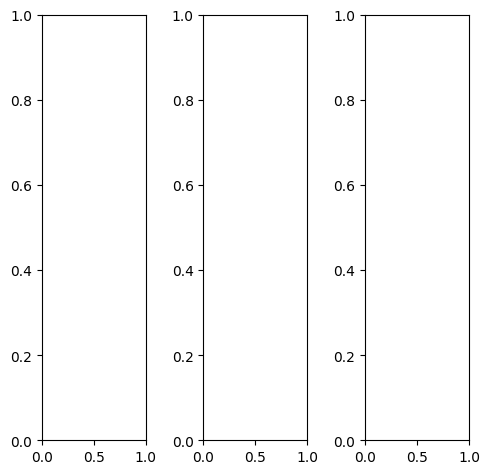

EPOCH: 4.510  trn_loss: 0.006  (521.50s - 11041.21s remaining)

tensor([[[0.9922, 0.9725, 0.9569,  ..., 0.8627, 0.8627, 0.8588],
         [0.9961, 0.9843, 0.9451,  ..., 0.8667, 0.8667, 0.8627],
         [0.9882, 0.9725, 0.9333,  ..., 0.8706, 0.8706, 0.8667],
         ...,
         [0.6314, 0.6431, 0.6510,  ..., 0.6588, 0.6431, 0.6275],
         [0.6745, 0.6549, 0.6196,  ..., 0.6275, 0.6235, 0.6196],
         [0.7451, 0.6863, 0.5961,  ..., 0.6000, 0.6039, 0.6157]],

        [[0.9922, 0.9725, 0.9569,  ..., 0.8627, 0.8627, 0.8588],
         [0.9961, 0.9843, 0.9451,  ..., 0.8667, 0.8667, 0.8627],
         [0.9882, 0.9725, 0.9333,  ..., 0.8706, 0.8706, 0.8667],
         ...,
         [0.6314, 0.6431, 0.6510,  ..., 0.6588, 0.6431, 0.6275],
         [0.6745, 0.6549, 0.6196,  ..., 0.6275, 0.6235, 0.6196],
         [0.7451, 0.6863, 0.5961,  ..., 0.6000, 0.6039, 0.6157]],

        [[0.9922, 0.9725, 0.9569,  ..., 0.8627, 0.8627, 0.8588],
         [0.9961, 0.9843, 0.9451,  ..., 0.8667, 0.8667, 0.8627],
         [0.9882, 0.9725, 0.9333,  ..., 0.8706, 0.8706, 0.

tensor([[[0.9922, 0.9725, 0.9569,  ..., 0.8392, 0.8392, 0.8314],
         [0.9961, 0.9843, 0.9451,  ..., 0.8353, 0.8353, 0.8275],
         [0.9882, 0.9725, 0.9333,  ..., 0.8314, 0.8314, 0.8235],
         ...,
         [0.5882, 0.6078, 0.6235,  ..., 0.6196, 0.6078, 0.5882],
         [0.6431, 0.6196, 0.5922,  ..., 0.5882, 0.5843, 0.5765],
         [0.7412, 0.6549, 0.5686,  ..., 0.5490, 0.5529, 0.5647]],

        [[0.9882, 0.9725, 0.9529,  ..., 0.8627, 0.8627, 0.8627],
         [0.9961, 0.9843, 0.9412,  ..., 0.8706, 0.8706, 0.8706],
         [0.9882, 0.9725, 0.9294,  ..., 0.8784, 0.8784, 0.8784],
         ...,
         [0.6353, 0.6471, 0.6510,  ..., 0.6588, 0.6431, 0.6314],
         [0.6745, 0.6549, 0.6196,  ..., 0.6314, 0.6275, 0.6235],
         [0.7373, 0.6863, 0.5922,  ..., 0.6078, 0.6118, 0.6235]],

        [[1.0000, 0.9804, 0.9725,  ..., 0.9255, 0.9255, 0.9216],
         [0.9961, 0.9843, 0.9608,  ..., 0.9294, 0.9294, 0.9255],
         [0.9843, 0.9647, 0.9490,  ..., 0.9333, 0.9333, 0.

tensor([[[0.6126, 0.5385, 0.5222,  ..., 0.4417, 0.4697, 0.5755],
         [0.5848, 0.5363, 0.4921,  ..., 0.3729, 0.4148, 0.5150],
         [0.5927, 0.5294, 0.5212,  ..., 0.4318, 0.4466, 0.5180],
         ...,
         [0.4059, 0.4446, 0.4580,  ..., 0.4871, 0.4556, 0.4461],
         [0.4613, 0.4163, 0.4088,  ..., 0.4624, 0.4510, 0.4650],
         [0.5284, 0.5101, 0.4400,  ..., 0.4437, 0.4572, 0.4679]],

        [[0.6385, 0.6028, 0.6191,  ..., 0.5266, 0.5815, 0.5924],
         [0.6106, 0.5868, 0.5616,  ..., 0.4953, 0.5409, 0.6158],
         [0.6263, 0.6109, 0.5751,  ..., 0.5163, 0.5259, 0.5916],
         ...,
         [0.4100, 0.4266, 0.4492,  ..., 0.4906, 0.4862, 0.4077],
         [0.4569, 0.4406, 0.4254,  ..., 0.5003, 0.4861, 0.4539],
         [0.5189, 0.4712, 0.4370,  ..., 0.4244, 0.4555, 0.4519]],

        [[0.8345, 0.8157, 0.7672,  ..., 0.7417, 0.7735, 0.7500],
         [0.8075, 0.7881, 0.7318,  ..., 0.6580, 0.7404, 0.7411],
         [0.8159, 0.8037, 0.7146,  ..., 0.6922, 0.7219, 0.

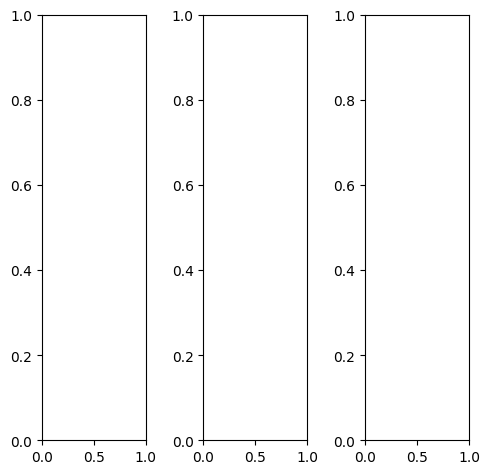

tensor([[[0.6588, 0.6706, 0.6902,  ..., 0.6275, 0.6000, 0.5294],
         [0.6314, 0.6431, 0.6549,  ..., 0.6588, 0.5843, 0.5373],
         [0.5961, 0.6078, 0.6235,  ..., 0.7294, 0.6353, 0.6431],
         ...,
         [0.8157, 0.8824, 0.8627,  ..., 0.2902, 0.2667, 0.2510],
         [0.8941, 0.8745, 0.8588,  ..., 0.2824, 0.2588, 0.2588],
         [0.7765, 0.8000, 0.8392,  ..., 0.2745, 0.2667, 0.2667]],

        [[0.6588, 0.6706, 0.6902,  ..., 0.6275, 0.6000, 0.5294],
         [0.6314, 0.6431, 0.6549,  ..., 0.6588, 0.5843, 0.5373],
         [0.5961, 0.6078, 0.6235,  ..., 0.7294, 0.6353, 0.6431],
         ...,
         [0.8157, 0.8824, 0.8627,  ..., 0.2902, 0.2667, 0.2510],
         [0.8941, 0.8745, 0.8588,  ..., 0.2824, 0.2588, 0.2588],
         [0.7765, 0.8000, 0.8392,  ..., 0.2745, 0.2667, 0.2667]],

        [[0.6588, 0.6706, 0.6902,  ..., 0.6275, 0.6000, 0.5294],
         [0.6314, 0.6431, 0.6549,  ..., 0.6588, 0.5843, 0.5373],
         [0.5961, 0.6078, 0.6235,  ..., 0.7294, 0.6353, 0.

tensor([[[0.6588, 0.6706, 0.6902,  ..., 0.6392, 0.6118, 0.5373],
         [0.6314, 0.6431, 0.6549,  ..., 0.6706, 0.5961, 0.5451],
         [0.5961, 0.6078, 0.6235,  ..., 0.7412, 0.6471, 0.6510],
         ...,
         [0.8353, 0.9059, 0.8863,  ..., 0.3725, 0.3490, 0.3412],
         [0.9176, 0.8980, 0.8824,  ..., 0.3725, 0.3490, 0.3529],
         [0.8000, 0.8235, 0.8627,  ..., 0.3686, 0.3608, 0.3647]],

        [[0.6627, 0.6745, 0.6941,  ..., 0.6314, 0.6039, 0.5333],
         [0.6353, 0.6471, 0.6627,  ..., 0.6627, 0.5882, 0.5412],
         [0.6039, 0.6157, 0.6314,  ..., 0.7333, 0.6353, 0.6471],
         ...,
         [0.8157, 0.8824, 0.8627,  ..., 0.2627, 0.2392, 0.2235],
         [0.8941, 0.8745, 0.8588,  ..., 0.2549, 0.2314, 0.2275],
         [0.7765, 0.8000, 0.8392,  ..., 0.2431, 0.2353, 0.2314]],

        [[0.6353, 0.6510, 0.6706,  ..., 0.5804, 0.5490, 0.4824],
         [0.6039, 0.6157, 0.6275,  ..., 0.6118, 0.5373, 0.4941],
         [0.5608, 0.5686, 0.5882,  ..., 0.6863, 0.5922, 0.

tensor([[[0.6318, 0.5575, 0.5394,  ..., 0.5502, 0.5235, 0.5644],
         [0.5453, 0.5077, 0.4513,  ..., 0.5199, 0.5038, 0.5346],
         [0.4933, 0.4820, 0.4604,  ..., 0.6284, 0.5618, 0.6282],
         ...,
         [0.7709, 0.8333, 0.8376,  ..., 0.3042, 0.2648, 0.2934],
         [0.8354, 0.7981, 0.8130,  ..., 0.2797, 0.2594, 0.2945],
         [0.7411, 0.7973, 0.8326,  ..., 0.2780, 0.2625, 0.3267]],

        [[0.6376, 0.6288, 0.6470,  ..., 0.5947, 0.5912, 0.5609],
         [0.5814, 0.5903, 0.5740,  ..., 0.6023, 0.5880, 0.5810],
         [0.5541, 0.5600, 0.5617,  ..., 0.6545, 0.6003, 0.6628],
         ...,
         [0.7134, 0.7772, 0.7723,  ..., 0.3516, 0.3204, 0.2909],
         [0.7992, 0.7688, 0.7796,  ..., 0.3264, 0.2869, 0.2990],
         [0.7039, 0.7604, 0.7856,  ..., 0.2888, 0.2811, 0.3171]],

        [[0.7762, 0.8296, 0.8169,  ..., 0.6902, 0.6856, 0.6442],
         [0.7495, 0.7837, 0.7588,  ..., 0.6278, 0.6579, 0.6192],
         [0.7125, 0.7494, 0.7323,  ..., 0.6906, 0.6602, 0.

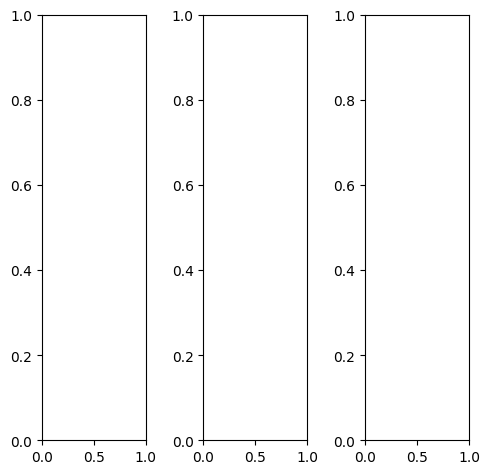

tensor([[[0.3843, 0.3098, 0.1843,  ..., 0.4745, 0.5255, 0.4941],
         [0.4078, 0.2392, 0.1569,  ..., 0.4980, 0.4745, 0.4039],
         [0.2824, 0.2039, 0.1608,  ..., 0.5137, 0.3922, 0.4196],
         ...,
         [0.9490, 0.8667, 0.5098,  ..., 0.9412, 0.9333, 0.9373],
         [0.9451, 0.9412, 0.9020,  ..., 0.9412, 0.9412, 0.9412],
         [0.9451, 0.9294, 0.9412,  ..., 0.9490, 0.9451, 0.9490]],

        [[0.3843, 0.3098, 0.1843,  ..., 0.4745, 0.5255, 0.4941],
         [0.4078, 0.2392, 0.1569,  ..., 0.4980, 0.4745, 0.4039],
         [0.2824, 0.2039, 0.1608,  ..., 0.5137, 0.3922, 0.4196],
         ...,
         [0.9490, 0.8667, 0.5098,  ..., 0.9412, 0.9333, 0.9373],
         [0.9451, 0.9412, 0.9020,  ..., 0.9412, 0.9412, 0.9412],
         [0.9451, 0.9294, 0.9412,  ..., 0.9490, 0.9451, 0.9490]],

        [[0.3843, 0.3098, 0.1843,  ..., 0.4745, 0.5255, 0.4941],
         [0.4078, 0.2392, 0.1569,  ..., 0.4980, 0.4745, 0.4039],
         [0.2824, 0.2039, 0.1608,  ..., 0.5137, 0.3922, 0.

tensor([[[0.3137, 0.2431, 0.1216,  ..., 0.4353, 0.4980, 0.4588],
         [0.3490, 0.1804, 0.1020,  ..., 0.4588, 0.4549, 0.3804],
         [0.2314, 0.1529, 0.1137,  ..., 0.4745, 0.3686, 0.3922],
         ...,
         [0.9569, 0.8667, 0.5020,  ..., 0.9529, 0.9529, 0.9608],
         [0.9569, 0.9647, 0.9333,  ..., 0.9647, 0.9647, 0.9647],
         [0.9569, 0.9490, 0.9647,  ..., 0.9725, 0.9686, 0.9686]],

        [[0.3961, 0.3255, 0.2000,  ..., 0.4941, 0.5451, 0.5098],
         [0.4157, 0.2510, 0.1686,  ..., 0.5176, 0.4824, 0.4118],
         [0.2902, 0.2157, 0.1686,  ..., 0.5294, 0.3961, 0.4275],
         ...,
         [0.9569, 0.8745, 0.5176,  ..., 0.9412, 0.9373, 0.9412],
         [0.9529, 0.9412, 0.9020,  ..., 0.9451, 0.9451, 0.9412],
         [0.9529, 0.9333, 0.9451,  ..., 0.9490, 0.9451, 0.9451]],

        [[0.4980, 0.4157, 0.2784,  ..., 0.4824, 0.5098, 0.5137],
         [0.5255, 0.3451, 0.2471,  ..., 0.5020, 0.4784, 0.4196],
         [0.3765, 0.2863, 0.2314,  ..., 0.5373, 0.4235, 0.

tensor([[[0.2790, 0.1971, 0.1260,  ..., 0.3079, 0.3814, 0.3965],
         [0.2092, 0.1556, 0.0697,  ..., 0.3021, 0.2841, 0.2843],
         [0.1415, 0.1154, 0.1106,  ..., 0.3710, 0.2724, 0.2753],
         ...,
         [0.7561, 0.7449, 0.3783,  ..., 0.8359, 0.8234, 0.7878],
         [0.7325, 0.7215, 0.6568,  ..., 0.7906, 0.7931, 0.7871],
         [0.7351, 0.7536, 0.7521,  ..., 0.7842, 0.7907, 0.7499]],

        [[0.3288, 0.2498, 0.1751,  ..., 0.3923, 0.4719, 0.4130],
         [0.3012, 0.2121, 0.1172,  ..., 0.3951, 0.4123, 0.3167],
         [0.2172, 0.1716, 0.1375,  ..., 0.4604, 0.3504, 0.3181],
         ...,
         [0.7251, 0.7013, 0.4034,  ..., 0.7529, 0.7643, 0.7719],
         [0.7184, 0.7358, 0.6679,  ..., 0.7637, 0.7610, 0.7640],
         [0.7012, 0.6987, 0.7147,  ..., 0.7496, 0.7265, 0.7052]],

        [[0.4253, 0.3953, 0.3134,  ..., 0.5150, 0.5947, 0.5389],
         [0.4216, 0.3795, 0.2950,  ..., 0.5569, 0.5474, 0.4673],
         [0.3468, 0.3419, 0.3143,  ..., 0.5404, 0.4590, 0.

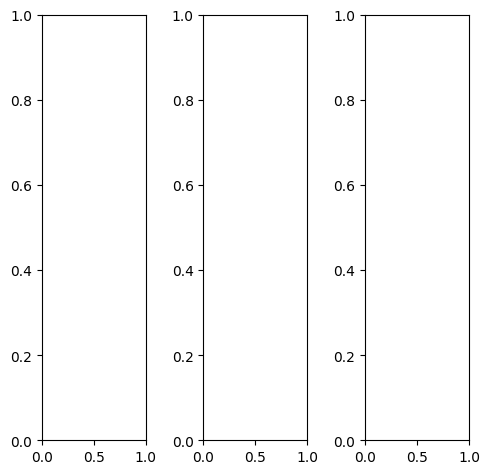

tensor([[[0.7255, 0.7137, 0.7176,  ..., 0.6588, 0.6431, 0.6471],
         [0.7098, 0.6980, 0.7098,  ..., 0.6471, 0.6353, 0.6392],
         [0.7059, 0.6980, 0.7098,  ..., 0.6510, 0.6431, 0.6431],
         ...,
         [0.4275, 0.4000, 0.3961,  ..., 0.4078, 0.3725, 0.3725],
         [0.4314, 0.4157, 0.4078,  ..., 0.3804, 0.3804, 0.4000],
         [0.5373, 0.5137, 0.5333,  ..., 0.4157, 0.4314, 0.4863]],

        [[0.7255, 0.7137, 0.7176,  ..., 0.6588, 0.6431, 0.6471],
         [0.7098, 0.6980, 0.7098,  ..., 0.6471, 0.6353, 0.6392],
         [0.7059, 0.6980, 0.7098,  ..., 0.6510, 0.6431, 0.6431],
         ...,
         [0.4275, 0.4000, 0.3961,  ..., 0.4078, 0.3725, 0.3725],
         [0.4314, 0.4157, 0.4078,  ..., 0.3804, 0.3804, 0.4000],
         [0.5373, 0.5137, 0.5333,  ..., 0.4157, 0.4314, 0.4863]],

        [[0.7255, 0.7137, 0.7176,  ..., 0.6588, 0.6431, 0.6471],
         [0.7098, 0.6980, 0.7098,  ..., 0.6471, 0.6353, 0.6392],
         [0.7059, 0.6980, 0.7098,  ..., 0.6510, 0.6431, 0.

tensor([[[0.6392, 0.6275, 0.6314,  ..., 0.5804, 0.5647, 0.5686],
         [0.6235, 0.6118, 0.6235,  ..., 0.5725, 0.5569, 0.5647],
         [0.6196, 0.6118, 0.6235,  ..., 0.5725, 0.5647, 0.5647],
         ...,
         [0.4392, 0.4118, 0.4078,  ..., 0.3961, 0.3608, 0.3569],
         [0.4510, 0.4353, 0.4275,  ..., 0.3569, 0.3529, 0.3765],
         [0.5647, 0.5412, 0.5608,  ..., 0.3922, 0.4118, 0.4667]],

        [[0.7451, 0.7333, 0.7373,  ..., 0.6745, 0.6588, 0.6627],
         [0.7294, 0.7176, 0.7294,  ..., 0.6667, 0.6510, 0.6549],
         [0.7255, 0.7176, 0.7294,  ..., 0.6667, 0.6588, 0.6588],
         ...,
         [0.4275, 0.4000, 0.4000,  ..., 0.4235, 0.3882, 0.3882],
         [0.4275, 0.4118, 0.4039,  ..., 0.4000, 0.4000, 0.4196],
         [0.5255, 0.5059, 0.5255,  ..., 0.4314, 0.4471, 0.5020]],

        [[0.8549, 0.8392, 0.8431,  ..., 0.7686, 0.7529, 0.7608],
         [0.8392, 0.8235, 0.8314,  ..., 0.7569, 0.7451, 0.7529],
         [0.8314, 0.8235, 0.8353,  ..., 0.7608, 0.7529, 0.

tensor([[[0.6689, 0.6119, 0.6070,  ..., 0.5110, 0.5324, 0.6050],
         [0.6389, 0.5725, 0.5872,  ..., 0.4711, 0.4800, 0.5456],
         [0.6433, 0.5787, 0.6359,  ..., 0.5371, 0.5398, 0.5563],
         ...,
         [0.3381, 0.3647, 0.3330,  ..., 0.4112, 0.3327, 0.3289],
         [0.3755, 0.3202, 0.3105,  ..., 0.3186, 0.3267, 0.3463],
         [0.4967, 0.5007, 0.5291,  ..., 0.3712, 0.3874, 0.4252]],

        [[0.6870, 0.6717, 0.6965,  ..., 0.6124, 0.6643, 0.6593],
         [0.6515, 0.6344, 0.6703,  ..., 0.5974, 0.6190, 0.7007],
         [0.6716, 0.7008, 0.7057,  ..., 0.6507, 0.6261, 0.6756],
         ...,
         [0.3577, 0.3788, 0.3923,  ..., 0.4335, 0.3715, 0.3039],
         [0.4008, 0.3657, 0.3497,  ..., 0.3559, 0.3611, 0.3491],
         [0.5044, 0.4865, 0.5496,  ..., 0.3835, 0.4073, 0.4083]],

        [[0.8268, 0.8395, 0.8004,  ..., 0.7518, 0.7792, 0.7573],
         [0.8138, 0.7792, 0.7988,  ..., 0.6653, 0.7331, 0.7351],
         [0.8368, 0.8109, 0.7968,  ..., 0.7262, 0.7451, 0.

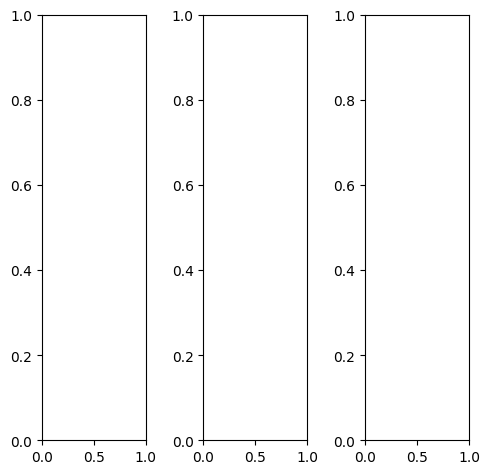

tensor([[[0.2471, 0.1961, 0.1608,  ..., 0.6471, 0.8431, 0.9686],
         [0.2745, 0.2157, 0.1725,  ..., 0.6431, 0.8392, 0.9647],
         [0.2824, 0.2275, 0.1804,  ..., 0.6392, 0.8431, 0.9608],
         ...,
         [0.3333, 0.2471, 0.3373,  ..., 0.3725, 0.4471, 0.5765],
         [0.5961, 0.5647, 0.5569,  ..., 0.3216, 0.3882, 0.5255],
         [0.5882, 0.5569, 0.5020,  ..., 0.2392, 0.3333, 0.5490]],

        [[0.2471, 0.1961, 0.1608,  ..., 0.6471, 0.8431, 0.9686],
         [0.2745, 0.2157, 0.1725,  ..., 0.6431, 0.8392, 0.9647],
         [0.2824, 0.2275, 0.1804,  ..., 0.6392, 0.8431, 0.9608],
         ...,
         [0.3333, 0.2471, 0.3373,  ..., 0.3725, 0.4471, 0.5765],
         [0.5961, 0.5647, 0.5569,  ..., 0.3216, 0.3882, 0.5255],
         [0.5882, 0.5569, 0.5020,  ..., 0.2392, 0.3333, 0.5490]],

        [[0.2471, 0.1961, 0.1608,  ..., 0.6471, 0.8431, 0.9686],
         [0.2745, 0.2157, 0.1725,  ..., 0.6431, 0.8392, 0.9647],
         [0.2824, 0.2275, 0.1804,  ..., 0.6392, 0.8431, 0.

tensor([[[0.2941, 0.2471, 0.1765,  ..., 0.7765, 0.9059, 0.9882],
         [0.3255, 0.2667, 0.1882,  ..., 0.7725, 0.8980, 0.9843],
         [0.3373, 0.2784, 0.2118,  ..., 0.7608, 0.9059, 0.9804],
         ...,
         [0.4824, 0.4196, 0.4627,  ..., 0.5412, 0.5961, 0.7020],
         [0.6824, 0.6667, 0.6471,  ..., 0.5059, 0.5569, 0.6745],
         [0.6588, 0.6431, 0.5961,  ..., 0.4588, 0.5294, 0.7020]],

        [[0.2314, 0.1804, 0.1569,  ..., 0.6039, 0.8275, 0.9647],
         [0.2588, 0.2000, 0.1647,  ..., 0.6000, 0.8235, 0.9647],
         [0.2667, 0.2118, 0.1647,  ..., 0.5961, 0.8275, 0.9569],
         ...,
         [0.2667, 0.1647, 0.2824,  ..., 0.2980, 0.3843, 0.5294],
         [0.5529, 0.5137, 0.5176,  ..., 0.2353, 0.3137, 0.4667],
         [0.5529, 0.5176, 0.4588,  ..., 0.1333, 0.2471, 0.4941]],

        [[0.1961, 0.1569, 0.1490,  ..., 0.5333, 0.7608, 0.9294],
         [0.2235, 0.1765, 0.1608,  ..., 0.5294, 0.7529, 0.9294],
         [0.2235, 0.1843, 0.1686,  ..., 0.5255, 0.7608, 0.

tensor([[[0.2136, 0.1209, 0.1100,  ..., 0.7364, 0.8962, 0.9010],
         [0.1343, 0.0993, 0.0344,  ..., 0.7425, 0.9889, 0.9560],
         [0.1484, 0.0915, 0.0619,  ..., 0.7540, 1.0240, 1.0136],
         ...,
         [0.3636, 0.2902, 0.4236,  ..., 0.4296, 0.4778, 0.6237],
         [0.6267, 0.6494, 0.6087,  ..., 0.3671, 0.4305, 0.5665],
         [0.6374, 0.6321, 0.5793,  ..., 0.2404, 0.3532, 0.5323]],

        [[0.3024, 0.2143, 0.2211,  ..., 0.7287, 0.9280, 1.0113],
         [0.2915, 0.2350, 0.2052,  ..., 0.7751, 0.9816, 1.0718],
         [0.2948, 0.2561, 0.2127,  ..., 0.7888, 1.0145, 1.0475],
         ...,
         [0.3857, 0.2867, 0.4294,  ..., 0.4544, 0.5170, 0.6213],
         [0.6400, 0.6651, 0.6301,  ..., 0.3914, 0.4427, 0.5656],
         [0.6070, 0.6058, 0.5892,  ..., 0.2653, 0.3754, 0.5475]],

        [[0.4035, 0.3915, 0.3949,  ..., 0.7639, 0.9321, 1.0071],
         [0.4285, 0.4754, 0.4215,  ..., 0.7539, 0.9969, 1.0107],
         [0.4488, 0.4944, 0.4464,  ..., 0.7810, 1.0106, 1.

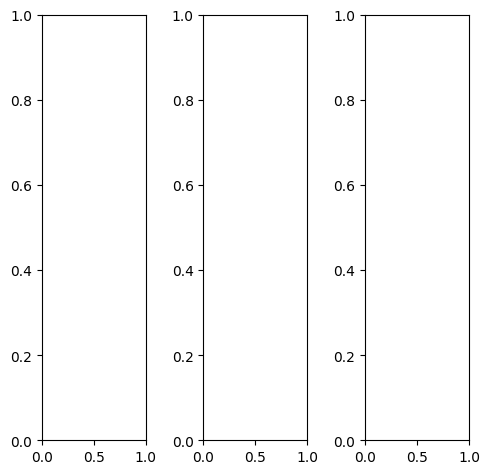

EPOCH: 4.765  trn_loss: 0.006  (550.03s - 10992.41s remaining)

tensor([[[0.9490, 0.9451, 0.9529,  ..., 0.9529, 0.9451, 0.9490],
         [0.9686, 0.9647, 0.9686,  ..., 0.9490, 0.9451, 0.9451],
         [0.9569, 0.9529, 0.9569,  ..., 0.9294, 0.9255, 0.9255],
         ...,
         [0.6392, 0.6118, 0.5804,  ..., 0.6157, 0.6157, 0.6157],
         [0.6314, 0.6314, 0.6314,  ..., 0.6275, 0.6235, 0.6235],
         [0.6353, 0.6392, 0.6353,  ..., 0.6353, 0.6275, 0.6275]],

        [[0.9490, 0.9451, 0.9529,  ..., 0.9529, 0.9451, 0.9490],
         [0.9686, 0.9647, 0.9686,  ..., 0.9490, 0.9451, 0.9451],
         [0.9569, 0.9529, 0.9569,  ..., 0.9294, 0.9255, 0.9255],
         ...,
         [0.6392, 0.6118, 0.5804,  ..., 0.6157, 0.6157, 0.6157],
         [0.6314, 0.6314, 0.6314,  ..., 0.6275, 0.6235, 0.6235],
         [0.6353, 0.6392, 0.6353,  ..., 0.6353, 0.6275, 0.6275]],

        [[0.9490, 0.9451, 0.9529,  ..., 0.9529, 0.9451, 0.9490],
         [0.9686, 0.9647, 0.9686,  ..., 0.9490, 0.9451, 0.9451],
         [0.9569, 0.9529, 0.9569,  ..., 0.9294, 0.9255, 0.

tensor([[[0.9451, 0.9412, 0.9490,  ..., 0.9490, 0.9412, 0.9451],
         [0.9647, 0.9608, 0.9647,  ..., 0.9451, 0.9412, 0.9412],
         [0.9529, 0.9490, 0.9529,  ..., 0.9255, 0.9216, 0.9216],
         ...,
         [0.6275, 0.6000, 0.5686,  ..., 0.6078, 0.6039, 0.6039],
         [0.6196, 0.6196, 0.6196,  ..., 0.6157, 0.6118, 0.6118],
         [0.6235, 0.6275, 0.6235,  ..., 0.6235, 0.6157, 0.6157]],

        [[0.9529, 0.9490, 0.9569,  ..., 0.9569, 0.9490, 0.9529],
         [0.9725, 0.9686, 0.9725,  ..., 0.9529, 0.9490, 0.9490],
         [0.9608, 0.9569, 0.9608,  ..., 0.9333, 0.9294, 0.9294],
         ...,
         [0.6392, 0.6078, 0.5804,  ..., 0.6157, 0.6157, 0.6157],
         [0.6314, 0.6314, 0.6314,  ..., 0.6275, 0.6235, 0.6235],
         [0.6353, 0.6392, 0.6353,  ..., 0.6353, 0.6275, 0.6275]],

        [[0.9490, 0.9451, 0.9529,  ..., 0.9529, 0.9451, 0.9490],
         [0.9686, 0.9647, 0.9686,  ..., 0.9490, 0.9451, 0.9451],
         [0.9569, 0.9529, 0.9569,  ..., 0.9294, 0.9255, 0.

tensor([[[0.6499, 0.5497, 0.5044,  ..., 0.5562, 0.5919, 0.6644],
         [0.5703, 0.4991, 0.4580,  ..., 0.4799, 0.5304, 0.6174],
         [0.5687, 0.4951, 0.5059,  ..., 0.5323, 0.5483, 0.5984],
         ...,
         [0.3742, 0.3668, 0.3115,  ..., 0.4618, 0.4325, 0.4274],
         [0.3870, 0.3613, 0.3656,  ..., 0.4334, 0.4382, 0.4272],
         [0.4057, 0.4048, 0.3826,  ..., 0.4352, 0.4288, 0.4321]],

        [[0.6693, 0.6524, 0.6574,  ..., 0.6587, 0.7333, 0.7288],
         [0.6465, 0.6263, 0.6093,  ..., 0.6375, 0.6998, 0.7638],
         [0.6475, 0.6148, 0.6444,  ..., 0.6457, 0.6521, 0.7114],
         ...,
         [0.4197, 0.3965, 0.3572,  ..., 0.4856, 0.4734, 0.3921],
         [0.4264, 0.4247, 0.4090,  ..., 0.4720, 0.4769, 0.4153],
         [0.4309, 0.4217, 0.4331,  ..., 0.4401, 0.4470, 0.4227]],

        [[0.8192, 0.8788, 0.8479,  ..., 0.8034, 0.8412, 0.8109],
         [0.8386, 0.8421, 0.8101,  ..., 0.7157, 0.8149, 0.8029],
         [0.8269, 0.8411, 0.8018,  ..., 0.7332, 0.7733, 0.

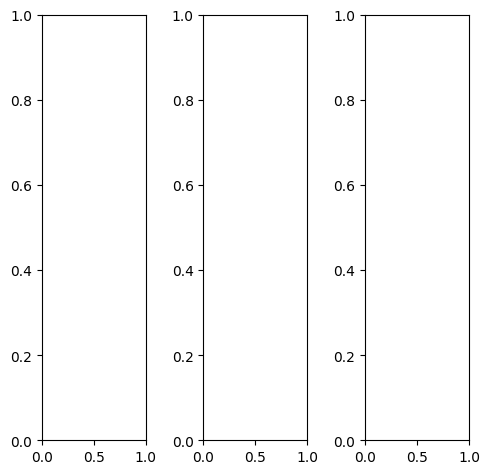

tensor([[[0.2941, 0.3412, 0.4196,  ..., 0.4196, 0.5451, 0.6549],
         [0.2510, 0.0745, 0.2314,  ..., 0.2863, 0.3451, 0.4353],
         [0.3412, 0.2784, 0.2902,  ..., 0.4000, 0.4471, 0.4941],
         ...,
         [0.4667, 0.6314, 0.5529,  ..., 0.7333, 0.5137, 0.4863],
         [0.7333, 0.6314, 0.6824,  ..., 0.8078, 0.7608, 0.6392],
         [0.7255, 0.5529, 0.4471,  ..., 0.7843, 0.7451, 0.7569]],

        [[0.2941, 0.3412, 0.4196,  ..., 0.4196, 0.5451, 0.6549],
         [0.2510, 0.0745, 0.2314,  ..., 0.2863, 0.3451, 0.4353],
         [0.3412, 0.2784, 0.2902,  ..., 0.4000, 0.4471, 0.4941],
         ...,
         [0.4667, 0.6314, 0.5529,  ..., 0.7333, 0.5137, 0.4863],
         [0.7333, 0.6314, 0.6824,  ..., 0.8078, 0.7608, 0.6392],
         [0.7255, 0.5529, 0.4471,  ..., 0.7843, 0.7451, 0.7569]],

        [[0.2941, 0.3412, 0.4196,  ..., 0.4196, 0.5451, 0.6549],
         [0.2510, 0.0745, 0.2314,  ..., 0.2863, 0.3451, 0.4353],
         [0.3412, 0.2784, 0.2902,  ..., 0.4000, 0.4471, 0.

tensor([[[0.2941, 0.3412, 0.4196,  ..., 0.4000, 0.5451, 0.6510],
         [0.2510, 0.0745, 0.2275,  ..., 0.2588, 0.3294, 0.4118],
         [0.3529, 0.2706, 0.2863,  ..., 0.3725, 0.4353, 0.4706],
         ...,
         [0.4745, 0.6392, 0.5647,  ..., 0.7294, 0.5098, 0.4667],
         [0.7843, 0.6745, 0.7098,  ..., 0.8196, 0.7725, 0.6314],
         [0.7961, 0.6078, 0.4863,  ..., 0.8078, 0.7725, 0.7725]],

        [[0.3020, 0.3451, 0.4275,  ..., 0.4314, 0.5451, 0.6549],
         [0.2588, 0.0824, 0.2392,  ..., 0.3059, 0.3569, 0.4471],
         [0.3451, 0.2863, 0.3020,  ..., 0.4235, 0.4627, 0.5176],
         ...,
         [0.4980, 0.6549, 0.5765,  ..., 0.7412, 0.5294, 0.5176],
         [0.7255, 0.6275, 0.6863,  ..., 0.8196, 0.7804, 0.6667],
         [0.7255, 0.5529, 0.4549,  ..., 0.7922, 0.7569, 0.7725]],

        [[0.2471, 0.3137, 0.3882,  ..., 0.4157, 0.5333, 0.6627],
         [0.1961, 0.0471, 0.1882,  ..., 0.2549, 0.3176, 0.4275],
         [0.2824, 0.2431, 0.2431,  ..., 0.3451, 0.4000, 0.

tensor([[[ 0.2455,  0.2347,  0.2859,  ...,  0.3419,  0.4438,  0.5506],
         [ 0.1136, -0.0361,  0.0801,  ...,  0.1173,  0.2043,  0.3842],
         [ 0.2046,  0.1415,  0.2012,  ...,  0.2423,  0.3482,  0.4168],
         ...,
         [ 0.4565,  0.6214,  0.5925,  ...,  0.8004,  0.5712,  0.4952],
         [ 0.7026,  0.6006,  0.6500,  ...,  0.8021,  0.7604,  0.6289],
         [ 0.6718,  0.5440,  0.4978,  ...,  0.7865,  0.7387,  0.7061]],

        [[ 0.2930,  0.3112,  0.4022,  ...,  0.4582,  0.5871,  0.5985],
         [ 0.2099,  0.0770,  0.2419,  ...,  0.2785,  0.3607,  0.4396],
         [ 0.3136,  0.3016,  0.3054,  ...,  0.4004,  0.5069,  0.4715],
         ...,
         [ 0.4632,  0.6180,  0.5721,  ...,  0.7704,  0.5306,  0.5094],
         [ 0.6966,  0.5996,  0.6581,  ...,  0.8177,  0.7578,  0.6676],
         [ 0.6134,  0.5038,  0.4775,  ...,  0.7518,  0.7224,  0.6924]],

        [[ 0.3876,  0.4579,  0.5498,  ...,  0.5963,  0.7322,  0.7389],
         [ 0.3516,  0.2382,  0.3814,  ...,  0

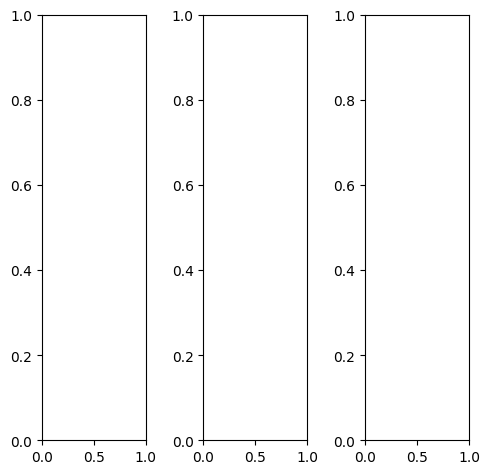

tensor([[[0.6745, 0.6078, 0.5647,  ..., 0.6745, 0.6941, 0.6980],
         [0.7059, 0.6392, 0.6353,  ..., 0.6863, 0.7059, 0.7216],
         [0.7216, 0.6745, 0.7098,  ..., 0.7333, 0.7647, 0.7765],
         ...,
         [0.5961, 0.5843, 0.5569,  ..., 0.6039, 0.6353, 0.6784],
         [0.5451, 0.5608, 0.5098,  ..., 0.6078, 0.5882, 0.6275],
         [0.5490, 0.5804, 0.5294,  ..., 0.5725, 0.5490, 0.5804]],

        [[0.6745, 0.6078, 0.5647,  ..., 0.6745, 0.6941, 0.6980],
         [0.7059, 0.6392, 0.6353,  ..., 0.6863, 0.7059, 0.7216],
         [0.7216, 0.6745, 0.7098,  ..., 0.7333, 0.7647, 0.7765],
         ...,
         [0.5961, 0.5843, 0.5569,  ..., 0.6039, 0.6353, 0.6784],
         [0.5451, 0.5608, 0.5098,  ..., 0.6078, 0.5882, 0.6275],
         [0.5490, 0.5804, 0.5294,  ..., 0.5725, 0.5490, 0.5804]],

        [[0.6745, 0.6078, 0.5647,  ..., 0.6745, 0.6941, 0.6980],
         [0.7059, 0.6392, 0.6353,  ..., 0.6863, 0.7059, 0.7216],
         [0.7216, 0.6745, 0.7098,  ..., 0.7333, 0.7647, 0.

tensor([[[0.7098, 0.6392, 0.5882,  ..., 0.7137, 0.7255, 0.7333],
         [0.7490, 0.6706, 0.6627,  ..., 0.7255, 0.7412, 0.7608],
         [0.7608, 0.7098, 0.7412,  ..., 0.7725, 0.8000, 0.8157],
         ...,
         [0.6902, 0.6667, 0.6314,  ..., 0.6706, 0.6980, 0.7451],
         [0.6353, 0.6353, 0.5725,  ..., 0.6784, 0.6549, 0.6941],
         [0.6353, 0.6627, 0.6039,  ..., 0.6549, 0.6235, 0.6588]],

        [[0.6706, 0.6039, 0.5608,  ..., 0.6667, 0.6902, 0.6941],
         [0.7020, 0.6353, 0.6353,  ..., 0.6824, 0.7020, 0.7137],
         [0.7176, 0.6706, 0.7098,  ..., 0.7294, 0.7608, 0.7686],
         ...,
         [0.5647, 0.5569, 0.5294,  ..., 0.5882, 0.6196, 0.6627],
         [0.5137, 0.5373, 0.4902,  ..., 0.5882, 0.5686, 0.6078],
         [0.5216, 0.5569, 0.5059,  ..., 0.5490, 0.5255, 0.5569]],

        [[0.6118, 0.5529, 0.5137,  ..., 0.5961, 0.6157, 0.6196],
         [0.6275, 0.5647, 0.5686,  ..., 0.6118, 0.6275, 0.6431],
         [0.6275, 0.5922, 0.6353,  ..., 0.6549, 0.6863, 0.

tensor([[[0.5032, 0.3210, 0.2237,  ..., 0.3712, 0.4415, 0.5267],
         [0.4138, 0.2313, 0.2029,  ..., 0.2428, 0.3233, 0.4504],
         [0.4378, 0.2804, 0.3069,  ..., 0.4069, 0.4480, 0.5152],
         ...,
         [0.4322, 0.4656, 0.4680,  ..., 0.4761, 0.4870, 0.5428],
         [0.3870, 0.3639, 0.3652,  ..., 0.4850, 0.4276, 0.4825],
         [0.3665, 0.4033, 0.3321,  ..., 0.4189, 0.4016, 0.4255]],

        [[0.5790, 0.4551, 0.4201,  ..., 0.5192, 0.6363, 0.6156],
         [0.5598, 0.4840, 0.4788,  ..., 0.4945, 0.5805, 0.6597],
         [0.5496, 0.4657, 0.5087,  ..., 0.5666, 0.5960, 0.7254],
         ...,
         [0.4483, 0.4858, 0.5432,  ..., 0.5092, 0.5664, 0.5330],
         [0.4091, 0.4461, 0.4269,  ..., 0.5493, 0.5215, 0.5015],
         [0.3978, 0.4434, 0.4139,  ..., 0.4520, 0.4689, 0.4463]],

        [[0.7248, 0.6829, 0.6255,  ..., 0.7289, 0.8132, 0.7587],
         [0.7564, 0.7048, 0.7164,  ..., 0.6427, 0.7732, 0.7619],
         [0.7486, 0.7152, 0.7452,  ..., 0.7386, 0.8029, 0.

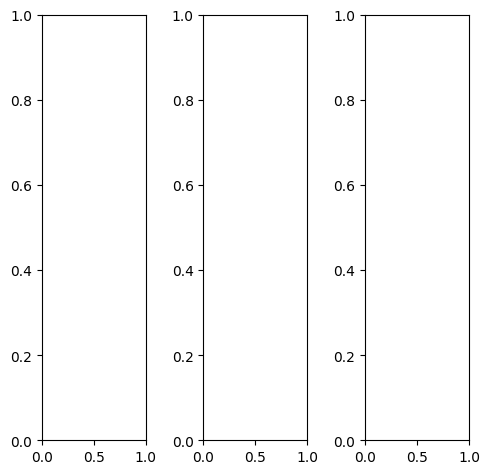

tensor([[[0.0157, 0.0157, 0.0078,  ..., 0.0196, 0.0157, 0.0118],
         [0.0196, 0.0118, 0.0039,  ..., 0.0196, 0.0157, 0.0157],
         [0.0314, 0.0196, 0.0078,  ..., 0.0392, 0.0353, 0.0235],
         ...,
         [0.0078, 0.0078, 0.0078,  ..., 0.2588, 0.3333, 0.4000],
         [0.0039, 0.0078, 0.0078,  ..., 0.1843, 0.2118, 0.2314],
         [0.0118, 0.0039, 0.0039,  ..., 0.0902, 0.1333, 0.1451]],

        [[0.0157, 0.0157, 0.0078,  ..., 0.0196, 0.0157, 0.0118],
         [0.0196, 0.0118, 0.0039,  ..., 0.0196, 0.0157, 0.0157],
         [0.0314, 0.0196, 0.0078,  ..., 0.0392, 0.0353, 0.0235],
         ...,
         [0.0078, 0.0078, 0.0078,  ..., 0.2588, 0.3333, 0.4000],
         [0.0039, 0.0078, 0.0078,  ..., 0.1843, 0.2118, 0.2314],
         [0.0118, 0.0039, 0.0039,  ..., 0.0902, 0.1333, 0.1451]],

        [[0.0157, 0.0157, 0.0078,  ..., 0.0196, 0.0157, 0.0118],
         [0.0196, 0.0118, 0.0039,  ..., 0.0196, 0.0157, 0.0157],
         [0.0314, 0.0196, 0.0078,  ..., 0.0392, 0.0353, 0.

tensor([[[0.0353, 0.0196, 0.0039,  ..., 0.0510, 0.0431, 0.0353],
         [0.0588, 0.0314, 0.0118,  ..., 0.0510, 0.0431, 0.0392],
         [0.0863, 0.0549, 0.0235,  ..., 0.1020, 0.0863, 0.0706],
         ...,
         [0.0039, 0.0078, 0.0157,  ..., 0.4235, 0.5608, 0.6706],
         [0.0078, 0.0118, 0.0157,  ..., 0.3020, 0.3686, 0.4118],
         [0.0235, 0.0157, 0.0118,  ..., 0.1725, 0.2392, 0.2667]],

        [[0.0078, 0.0157, 0.0118,  ..., 0.0039, 0.0039, 0.0000],
         [0.0039, 0.0039, 0.0039,  ..., 0.0078, 0.0039, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0157, 0.0118, 0.0039],
         ...,
         [0.0078, 0.0078, 0.0039,  ..., 0.2078, 0.2667, 0.3255],
         [0.0039, 0.0039, 0.0039,  ..., 0.1490, 0.1686, 0.1765],
         [0.0039, 0.0000, 0.0000,  ..., 0.0627, 0.0980, 0.1059]],

        [[0.0039, 0.0039, 0.0000,  ..., 0.0078, 0.0078, 0.0078],
         [0.0039, 0.0000, 0.0000,  ..., 0.0039, 0.0000, 0.0000],
         [0.0118, 0.0039, 0.0000,  ..., 0.0078, 0.0078, 0.

tensor([[[0.2035, 0.1195, 0.1065,  ..., 0.1494, 0.1588, 0.2389],
         [0.1177, 0.0978, 0.0393,  ..., 0.1338, 0.1213, 0.1983],
         [0.1076, 0.0670, 0.0450,  ..., 0.1356, 0.1376, 0.1931],
         ...,
         [0.1340, 0.1608, 0.1369,  ..., 0.5635, 0.6329, 0.6774],
         [0.1537, 0.1577, 0.1544,  ..., 0.4366, 0.4565, 0.5399],
         [0.1971, 0.1525, 0.1190,  ..., 0.3252, 0.3806, 0.4605]],

        [[0.2683, 0.2111, 0.2035,  ..., 0.2036, 0.2121, 0.2671],
         [0.2114, 0.2019, 0.1756,  ..., 0.2091, 0.2074, 0.2326],
         [0.2074, 0.1954, 0.1715,  ..., 0.2212, 0.2212, 0.2361],
         ...,
         [0.1870, 0.1846, 0.1886,  ..., 0.5485, 0.6392, 0.6676],
         [0.1820, 0.1888, 0.1841,  ..., 0.4540, 0.4694, 0.5311],
         [0.2038, 0.1659, 0.1625,  ..., 0.3045, 0.3786, 0.4646]],

        [[0.3667, 0.3585, 0.3636,  ..., 0.3066, 0.3129, 0.3620],
         [0.3425, 0.3880, 0.3748,  ..., 0.3112, 0.3169, 0.3330],
         [0.3515, 0.3984, 0.3891,  ..., 0.3160, 0.3350, 0.

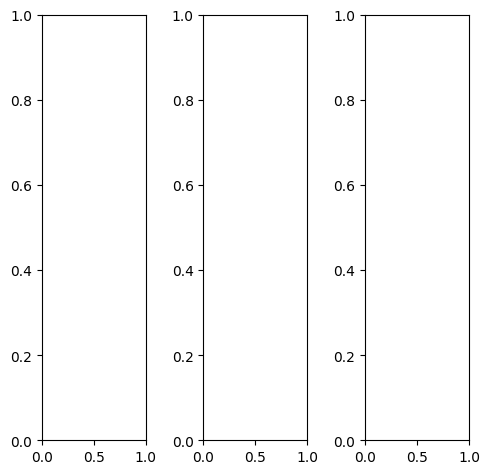

tensor([[[0.6000, 0.5725, 0.5647,  ..., 0.3020, 0.2980, 0.2902],
         [0.5843, 0.5725, 0.5647,  ..., 0.3294, 0.3176, 0.2980],
         [0.5686, 0.5725, 0.5686,  ..., 0.3255, 0.3176, 0.2941],
         ...,
         [0.3098, 0.3216, 0.2431,  ..., 0.4196, 0.4353, 0.4314],
         [0.2980, 0.2706, 0.2039,  ..., 0.6235, 0.6392, 0.6431],
         [0.2471, 0.2275, 0.2118,  ..., 0.6980, 0.7137, 0.7333]],

        [[0.6000, 0.5725, 0.5647,  ..., 0.3020, 0.2980, 0.2902],
         [0.5843, 0.5725, 0.5647,  ..., 0.3294, 0.3176, 0.2980],
         [0.5686, 0.5725, 0.5686,  ..., 0.3255, 0.3176, 0.2941],
         ...,
         [0.3098, 0.3216, 0.2431,  ..., 0.4196, 0.4353, 0.4314],
         [0.2980, 0.2706, 0.2039,  ..., 0.6235, 0.6392, 0.6431],
         [0.2471, 0.2275, 0.2118,  ..., 0.6980, 0.7137, 0.7333]],

        [[0.6000, 0.5725, 0.5647,  ..., 0.3020, 0.2980, 0.2902],
         [0.5843, 0.5725, 0.5647,  ..., 0.3294, 0.3176, 0.2980],
         [0.5686, 0.5725, 0.5686,  ..., 0.3255, 0.3176, 0.

tensor([[[0.6039, 0.5804, 0.5686,  ..., 0.3294, 0.3255, 0.3176],
         [0.5882, 0.5765, 0.5686,  ..., 0.3569, 0.3490, 0.3255],
         [0.5725, 0.5765, 0.5725,  ..., 0.3569, 0.3490, 0.3255],
         ...,
         [0.3216, 0.3333, 0.2510,  ..., 0.4235, 0.4392, 0.4353],
         [0.3059, 0.2784, 0.2078,  ..., 0.5922, 0.6078, 0.6157],
         [0.2471, 0.2275, 0.2196,  ..., 0.6667, 0.6824, 0.7020]],

        [[0.5922, 0.5686, 0.5608,  ..., 0.2902, 0.2824, 0.2745],
         [0.5804, 0.5686, 0.5608,  ..., 0.3176, 0.3059, 0.2824],
         [0.5647, 0.5686, 0.5647,  ..., 0.3098, 0.3020, 0.2784],
         ...,
         [0.3020, 0.3137, 0.2353,  ..., 0.4078, 0.4235, 0.4196],
         [0.2863, 0.2627, 0.1961,  ..., 0.6235, 0.6392, 0.6431],
         [0.2392, 0.2196, 0.2039,  ..., 0.6980, 0.7137, 0.7373]],

        [[0.6196, 0.5882, 0.5725,  ..., 0.3020, 0.2980, 0.2902],
         [0.6000, 0.5804, 0.5686,  ..., 0.3137, 0.3059, 0.2902],
         [0.5765, 0.5725, 0.5686,  ..., 0.3098, 0.3020, 0.

tensor([[[0.6125, 0.4982, 0.4648,  ..., 0.1335, 0.1475, 0.1868],
         [0.5293, 0.4661, 0.4388,  ..., 0.1733, 0.1600, 0.1585],
         [0.4935, 0.4821, 0.4938,  ..., 0.1593, 0.1635, 0.1486],
         ...,
         [0.1451, 0.2065, 0.0884,  ..., 0.3536, 0.3560, 0.3952],
         [0.1330, 0.1002, 0.0192,  ..., 0.6823, 0.6659, 0.7264],
         [0.1336, 0.0861, 0.0665,  ..., 0.8423, 0.8324, 0.7971]],

        [[0.6818, 0.6230, 0.6246,  ..., 0.2135, 0.2260, 0.2462],
         [0.6255, 0.5777, 0.5851,  ..., 0.2474, 0.2523, 0.2233],
         [0.5993, 0.5788, 0.6194,  ..., 0.2293, 0.2201, 0.2005],
         ...,
         [0.2039, 0.2073, 0.0972,  ..., 0.3764, 0.3980, 0.3689],
         [0.1750, 0.1239, 0.0176,  ..., 0.7165, 0.7629, 0.7582],
         [0.1544, 0.1012, 0.0838,  ..., 0.8015, 0.8353, 0.7817]],

        [[0.8733, 0.9032, 0.8875,  ..., 0.2888, 0.3100, 0.3294],
         [0.8696, 0.8458, 0.8602,  ..., 0.3258, 0.3140, 0.3042],
         [0.8374, 0.8526, 0.8514,  ..., 0.3031, 0.2928, 0.

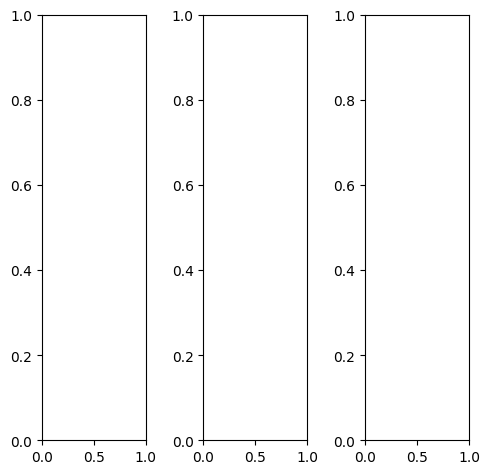

EPOCH: 5.000  val_loss: 0.006  trn_loss: 0.006  (582.73s - 11071.85s remaining)


tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.7725, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9922,  ..., 0.7647, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7686, 0.9843, 1.0000],
         ...,
         [0.8392, 0.8000, 0.7843,  ..., 0.3569, 0.3608, 0.3569],
         [0.8549, 0.8510, 0.8314,  ..., 0.3843, 0.3961, 0.4039],
         [0.8588, 0.8431, 0.8392,  ..., 0.4667, 0.4627, 0.4510]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.7725, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9922,  ..., 0.7647, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7686, 0.9843, 1.0000],
         ...,
         [0.8392, 0.8000, 0.7843,  ..., 0.3569, 0.3608, 0.3569],
         [0.8549, 0.8510, 0.8314,  ..., 0.3843, 0.3961, 0.4039],
         [0.8588, 0.8431, 0.8392,  ..., 0.4667, 0.4627, 0.4510]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.7725, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9922,  ..., 0.7647, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7686, 0.9843, 1.

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.7804, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9922,  ..., 0.7765, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7765, 0.9843, 1.0000],
         ...,
         [0.8863, 0.8510, 0.8353,  ..., 0.3765, 0.3804, 0.3882],
         [0.8941, 0.8902, 0.8706,  ..., 0.4118, 0.4235, 0.4392],
         [0.8863, 0.8745, 0.8706,  ..., 0.5137, 0.5098, 0.4902]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.7686, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9922,  ..., 0.7647, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7686, 0.9843, 1.0000],
         ...,
         [0.8314, 0.7922, 0.7765,  ..., 0.3490, 0.3529, 0.3451],
         [0.8471, 0.8471, 0.8275,  ..., 0.3765, 0.3882, 0.3882],
         [0.8588, 0.8431, 0.8392,  ..., 0.4510, 0.4471, 0.4353]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.7569, 0.9882, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.7490, 0.9843, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.7412, 0.9804, 1.

tensor([[[0.9242, 0.9500, 1.0027,  ..., 0.7837, 0.9386, 0.9033],
         [0.9859, 0.9751, 0.9860,  ..., 0.7932, 0.9997, 0.9378],
         [0.9708, 1.0099, 1.0024,  ..., 0.7872, 0.9874, 0.9621],
         ...,
         [0.8539, 0.8429, 0.8068,  ..., 0.3593, 0.3678, 0.3666],
         [0.8585, 0.8661, 0.8477,  ..., 0.3699, 0.3816, 0.4099],
         [0.7976, 0.8462, 0.8365,  ..., 0.4607, 0.4709, 0.4590]],

        [[0.9355, 0.9652, 1.0168,  ..., 0.8079, 0.9616, 0.9358],
         [0.9852, 1.0107, 1.0117,  ..., 0.7931, 0.9903, 0.9758],
         [0.9840, 1.0197, 1.0223,  ..., 0.7811, 0.9801, 0.9826],
         ...,
         [0.8398, 0.8274, 0.7951,  ..., 0.3770, 0.3864, 0.3749],
         [0.8570, 0.8464, 0.8357,  ..., 0.3859, 0.4073, 0.4149],
         [0.8057, 0.8431, 0.8432,  ..., 0.4640, 0.4716, 0.4707]],

        [[0.9385, 0.9838, 0.9822,  ..., 0.7879, 0.9641, 0.9393],
         [0.9695, 1.0100, 0.9956,  ..., 0.7886, 0.9731, 0.9690],
         [0.9827, 0.9949, 0.9991,  ..., 0.7592, 0.9735, 0.

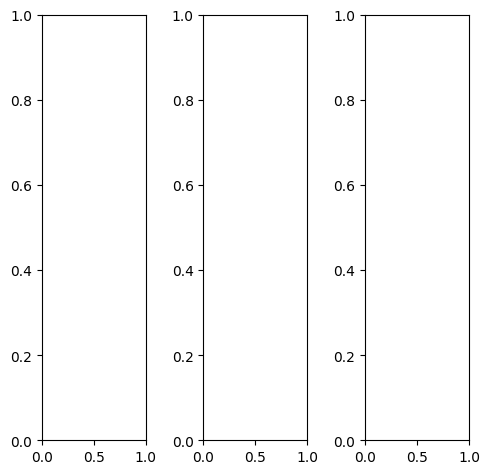

tensor([[[0.4667, 0.5059, 0.5137,  ..., 0.7373, 0.7137, 0.7451],
         [0.4000, 0.4431, 0.4549,  ..., 0.6118, 0.5882, 0.6196],
         [0.3176, 0.3490, 0.3843,  ..., 0.4706, 0.4902, 0.4902],
         ...,
         [0.4667, 0.4627, 0.4588,  ..., 0.4745, 0.5373, 0.5412],
         [0.4745, 0.4627, 0.4784,  ..., 0.4471, 0.4667, 0.4902],
         [0.6275, 0.5333, 0.5922,  ..., 0.4471, 0.4471, 0.4588]],

        [[0.4667, 0.5059, 0.5137,  ..., 0.7373, 0.7137, 0.7451],
         [0.4000, 0.4431, 0.4549,  ..., 0.6118, 0.5882, 0.6196],
         [0.3176, 0.3490, 0.3843,  ..., 0.4706, 0.4902, 0.4902],
         ...,
         [0.4667, 0.4627, 0.4588,  ..., 0.4745, 0.5373, 0.5412],
         [0.4745, 0.4627, 0.4784,  ..., 0.4471, 0.4667, 0.4902],
         [0.6275, 0.5333, 0.5922,  ..., 0.4471, 0.4471, 0.4588]],

        [[0.4667, 0.5059, 0.5137,  ..., 0.7373, 0.7137, 0.7451],
         [0.4000, 0.4431, 0.4549,  ..., 0.6118, 0.5882, 0.6196],
         [0.3176, 0.3490, 0.3843,  ..., 0.4706, 0.4902, 0.

tensor([[[0.4078, 0.4510, 0.4588,  ..., 0.7176, 0.6902, 0.7137],
         [0.3333, 0.3765, 0.3922,  ..., 0.5647, 0.5412, 0.5686],
         [0.2392, 0.2706, 0.3098,  ..., 0.4039, 0.4235, 0.4235],
         ...,
         [0.3882, 0.3882, 0.3882,  ..., 0.4157, 0.4784, 0.4784],
         [0.4157, 0.4000, 0.4157,  ..., 0.3882, 0.4078, 0.4314],
         [0.5843, 0.4784, 0.5373,  ..., 0.3882, 0.3882, 0.4000]],

        [[0.4627, 0.5059, 0.5137,  ..., 0.7294, 0.7098, 0.7412],
         [0.4000, 0.4431, 0.4549,  ..., 0.6078, 0.5843, 0.6157],
         [0.3216, 0.3529, 0.3882,  ..., 0.4706, 0.4902, 0.4902],
         ...,
         [0.4745, 0.4667, 0.4627,  ..., 0.4784, 0.5412, 0.5451],
         [0.4784, 0.4667, 0.4824,  ..., 0.4471, 0.4667, 0.4902],
         [0.6275, 0.5373, 0.5961,  ..., 0.4471, 0.4471, 0.4588]],

        [[0.6275, 0.6667, 0.6745,  ..., 0.8314, 0.8118, 0.8431],
         [0.5725, 0.6118, 0.6275,  ..., 0.7412, 0.7255, 0.7647],
         [0.5020, 0.5294, 0.5686,  ..., 0.6314, 0.6627, 0.

tensor([[[0.4751, 0.4666, 0.4682,  ..., 0.6835, 0.6851, 0.6771],
         [0.3697, 0.3891, 0.3752,  ..., 0.5484, 0.5523, 0.6013],
         [0.2733, 0.2711, 0.3139,  ..., 0.4135, 0.4475, 0.4636],
         ...,
         [0.4476, 0.4661, 0.4633,  ..., 0.4633, 0.5236, 0.5339],
         [0.4707, 0.4364, 0.4542,  ..., 0.4362, 0.4490, 0.4965],
         [0.6009, 0.5452, 0.6193,  ..., 0.4356, 0.4583, 0.4826]],

        [[0.5016, 0.5230, 0.5496,  ..., 0.7486, 0.7390, 0.7227],
         [0.4203, 0.4529, 0.4704,  ..., 0.6343, 0.6043, 0.6468],
         [0.3338, 0.3801, 0.4103,  ..., 0.4980, 0.5126, 0.5047],
         ...,
         [0.4660, 0.4711, 0.4710,  ..., 0.4875, 0.5526, 0.5526],
         [0.4862, 0.4530, 0.4791,  ..., 0.4602, 0.4864, 0.5076],
         [0.6002, 0.5534, 0.6109,  ..., 0.4581, 0.4737, 0.5018]],

        [[0.5088, 0.5553, 0.5803,  ..., 0.7911, 0.7858, 0.7268],
         [0.4327, 0.5123, 0.5336,  ..., 0.6567, 0.6458, 0.6637],
         [0.3425, 0.4002, 0.4519,  ..., 0.5504, 0.5585, 0.

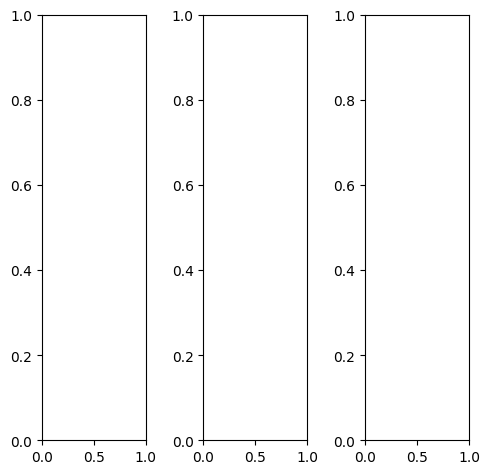

tensor([[[0.8471, 0.8275, 0.8235,  ..., 0.8471, 0.8353, 0.8549],
         [0.6706, 0.6118, 0.6000,  ..., 0.6510, 0.6431, 0.6863],
         [0.5843, 0.5098, 0.5176,  ..., 0.5529, 0.5451, 0.6000],
         ...,
         [0.8627, 0.8157, 0.7961,  ..., 0.7529, 0.8078, 0.8706],
         [0.9020, 0.8667, 0.8549,  ..., 0.8275, 0.8706, 0.9098],
         [0.9647, 0.9451, 0.9373,  ..., 0.9529, 0.9608, 0.9804]],

        [[0.8471, 0.8275, 0.8235,  ..., 0.8471, 0.8353, 0.8549],
         [0.6706, 0.6118, 0.6000,  ..., 0.6510, 0.6431, 0.6863],
         [0.5843, 0.5098, 0.5176,  ..., 0.5529, 0.5451, 0.6000],
         ...,
         [0.8627, 0.8157, 0.7961,  ..., 0.7529, 0.8078, 0.8706],
         [0.9020, 0.8667, 0.8549,  ..., 0.8275, 0.8706, 0.9098],
         [0.9647, 0.9451, 0.9373,  ..., 0.9529, 0.9608, 0.9804]],

        [[0.8471, 0.8275, 0.8235,  ..., 0.8471, 0.8353, 0.8549],
         [0.6706, 0.6118, 0.6000,  ..., 0.6510, 0.6431, 0.6863],
         [0.5843, 0.5098, 0.5176,  ..., 0.5529, 0.5451, 0.

tensor([[[0.8235, 0.7804, 0.7765,  ..., 0.7922, 0.7765, 0.8000],
         [0.6196, 0.5333, 0.5216,  ..., 0.5647, 0.5569, 0.6196],
         [0.5059, 0.4039, 0.4039,  ..., 0.4314, 0.4314, 0.5216],
         ...,
         [0.7961, 0.7059, 0.6902,  ..., 0.6471, 0.7216, 0.8118],
         [0.8510, 0.7804, 0.7725,  ..., 0.7490, 0.8039, 0.8706],
         [0.9333, 0.8902, 0.8824,  ..., 0.9020, 0.9216, 0.9608]],

        [[0.8510, 0.8314, 0.8353,  ..., 0.8588, 0.8471, 0.8667],
         [0.6824, 0.6235, 0.6196,  ..., 0.6745, 0.6588, 0.6980],
         [0.6039, 0.5333, 0.5451,  ..., 0.5843, 0.5686, 0.6157],
         ...,
         [0.8784, 0.8431, 0.8235,  ..., 0.7765, 0.8275, 0.8863],
         [0.9137, 0.8902, 0.8745,  ..., 0.8471, 0.8863, 0.9216],
         [0.9725, 0.9647, 0.9529,  ..., 0.9725, 0.9765, 0.9843]],

        [[0.8980, 0.9176, 0.9020,  ..., 0.9137, 0.9412, 0.9490],
         [0.7608, 0.7412, 0.7216,  ..., 0.7608, 0.7765, 0.8000],
         [0.7059, 0.6824, 0.6824,  ..., 0.7098, 0.7098, 0.

tensor([[[0.7644, 0.7791, 0.7795,  ..., 0.7901, 0.7827, 0.7506],
         [0.6609, 0.5773, 0.5573,  ..., 0.6101, 0.6158, 0.6820],
         [0.5332, 0.4688, 0.4736,  ..., 0.5083, 0.5125, 0.5634],
         ...,
         [0.8802, 0.8431, 0.8101,  ..., 0.7585, 0.8037, 0.8596],
         [0.8970, 0.8825, 0.8693,  ..., 0.8342, 0.8677, 0.8921],
         [0.8650, 0.9215, 0.9219,  ..., 0.9282, 0.9342, 0.8824]],

        [[0.8012, 0.8221, 0.8439,  ..., 0.8489, 0.8300, 0.8006],
         [0.6897, 0.6518, 0.6217,  ..., 0.6722, 0.6613, 0.7205],
         [0.6147, 0.5391, 0.5645,  ..., 0.5806, 0.5706, 0.6245],
         ...,
         [0.8701, 0.8371, 0.7926,  ..., 0.7344, 0.8170, 0.8922],
         [0.8980, 0.8525, 0.8504,  ..., 0.8327, 0.8732, 0.8935],
         [0.8769, 0.9249, 0.9295,  ..., 0.9213, 0.9224, 0.8523]],

        [[0.8295, 0.8901, 0.8881,  ..., 0.8826, 0.8795, 0.8096],
         [0.7012, 0.6537, 0.6477,  ..., 0.6776, 0.6779, 0.7167],
         [0.6209, 0.5600, 0.5778,  ..., 0.6095, 0.5977, 0.

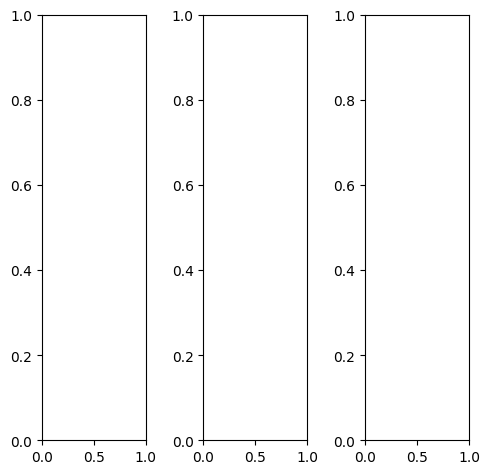

tensor([[[0.4118, 0.4118, 0.4353,  ..., 0.4863, 0.5216, 0.5451],
         [0.4039, 0.4196, 0.4431,  ..., 0.4902, 0.5176, 0.5216],
         [0.4235, 0.4314, 0.4588,  ..., 0.5059, 0.5059, 0.5137],
         ...,
         [0.5686, 0.5686, 0.6196,  ..., 0.6000, 0.6353, 0.6627],
         [0.5608, 0.5647, 0.5804,  ..., 0.6078, 0.6353, 0.6745],
         [0.5804, 0.5647, 0.5608,  ..., 0.6314, 0.6549, 0.6588]],

        [[0.4118, 0.4118, 0.4353,  ..., 0.4863, 0.5216, 0.5451],
         [0.4039, 0.4196, 0.4431,  ..., 0.4902, 0.5176, 0.5216],
         [0.4235, 0.4314, 0.4588,  ..., 0.5059, 0.5059, 0.5137],
         ...,
         [0.5686, 0.5686, 0.6196,  ..., 0.6000, 0.6353, 0.6627],
         [0.5608, 0.5647, 0.5804,  ..., 0.6078, 0.6353, 0.6745],
         [0.5804, 0.5647, 0.5608,  ..., 0.6314, 0.6549, 0.6588]],

        [[0.4118, 0.4118, 0.4353,  ..., 0.4863, 0.5216, 0.5451],
         [0.4039, 0.4196, 0.4431,  ..., 0.4902, 0.5176, 0.5216],
         [0.4235, 0.4314, 0.4588,  ..., 0.5059, 0.5059, 0.

tensor([[[0.3020, 0.3020, 0.3294,  ..., 0.3608, 0.4078, 0.4549],
         [0.2745, 0.3059, 0.3333,  ..., 0.3647, 0.3961, 0.3961],
         [0.2902, 0.3294, 0.3647,  ..., 0.3804, 0.3843, 0.3922],
         ...,
         [0.4667, 0.4745, 0.5294,  ..., 0.4784, 0.5255, 0.5686],
         [0.4706, 0.4706, 0.4824,  ..., 0.5020, 0.5373, 0.5882],
         [0.4902, 0.4706, 0.4627,  ..., 0.5412, 0.5686, 0.5725]],

        [[0.5333, 0.5255, 0.5490,  ..., 0.6000, 0.6314, 0.6471],
         [0.5294, 0.5333, 0.5608,  ..., 0.6000, 0.6314, 0.6353],
         [0.5490, 0.5412, 0.5725,  ..., 0.6157, 0.6118, 0.6196],
         ...,
         [0.6667, 0.6627, 0.7059,  ..., 0.6784, 0.7098, 0.7373],
         [0.6627, 0.6627, 0.6745,  ..., 0.6863, 0.7137, 0.7451],
         [0.6824, 0.6667, 0.6588,  ..., 0.7059, 0.7294, 0.7333]],

        [[0.0824, 0.0980, 0.1137,  ..., 0.2314, 0.2510, 0.2627],
         [0.1020, 0.1216, 0.1216,  ..., 0.2431, 0.2667, 0.2745],
         [0.1137, 0.1216, 0.1255,  ..., 0.2706, 0.2706, 0.

tensor([[[0.4211, 0.4093, 0.4125,  ..., 0.4706, 0.5266, 0.5469],
         [0.3940, 0.4203, 0.4439,  ..., 0.4896, 0.5144, 0.5299],
         [0.4246, 0.4266, 0.4615,  ..., 0.4965, 0.4966, 0.5081],
         ...,
         [0.5874, 0.6076, 0.6549,  ..., 0.6317, 0.6567, 0.6773],
         [0.5821, 0.5901, 0.6004,  ..., 0.6109, 0.6563, 0.6853],
         [0.5986, 0.5952, 0.5955,  ..., 0.6450, 0.6870, 0.6554]],

        [[0.4414, 0.4235, 0.4401,  ..., 0.5085, 0.5589, 0.5560],
         [0.4122, 0.4183, 0.4416,  ..., 0.5120, 0.5281, 0.5342],
         [0.4280, 0.4317, 0.4492,  ..., 0.5164, 0.4991, 0.5143],
         ...,
         [0.5673, 0.5884, 0.6335,  ..., 0.5960, 0.6513, 0.6877],
         [0.5623, 0.5812, 0.5905,  ..., 0.6066, 0.6486, 0.6902],
         [0.5794, 0.5727, 0.5786,  ..., 0.6207, 0.6747, 0.6543]],

        [[0.3716, 0.3616, 0.3680,  ..., 0.4206, 0.4934, 0.5061],
         [0.3418, 0.3727, 0.3912,  ..., 0.4273, 0.4663, 0.4766],
         [0.3470, 0.3655, 0.3905,  ..., 0.4366, 0.4360, 0.

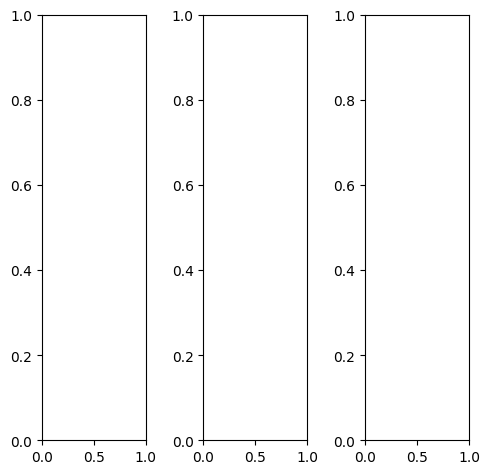

tensor([[[0.4118, 0.2392, 0.2471,  ..., 0.3490, 0.3647, 0.3490],
         [0.4039, 0.3412, 0.3373,  ..., 0.3725, 0.3686, 0.3529],
         [0.4431, 0.4196, 0.4314,  ..., 0.3490, 0.3412, 0.3686],
         ...,
         [0.2471, 0.2353, 0.2392,  ..., 0.2588, 0.2235, 0.3059],
         [0.2157, 0.1922, 0.2078,  ..., 0.3137, 0.2941, 0.2980],
         [0.1922, 0.2353, 0.2314,  ..., 0.3333, 0.3020, 0.2667]],

        [[0.4118, 0.2392, 0.2471,  ..., 0.3490, 0.3647, 0.3490],
         [0.4039, 0.3412, 0.3373,  ..., 0.3725, 0.3686, 0.3529],
         [0.4431, 0.4196, 0.4314,  ..., 0.3490, 0.3412, 0.3686],
         ...,
         [0.2471, 0.2353, 0.2392,  ..., 0.2588, 0.2235, 0.3059],
         [0.2157, 0.1922, 0.2078,  ..., 0.3137, 0.2941, 0.2980],
         [0.1922, 0.2353, 0.2314,  ..., 0.3333, 0.3020, 0.2667]],

        [[0.4118, 0.2392, 0.2471,  ..., 0.3490, 0.3647, 0.3490],
         [0.4039, 0.3412, 0.3373,  ..., 0.3725, 0.3686, 0.3529],
         [0.4431, 0.4196, 0.4314,  ..., 0.3490, 0.3412, 0.

tensor([[[0.4157, 0.2431, 0.2510,  ..., 0.3333, 0.3490, 0.3333],
         [0.4078, 0.3451, 0.3412,  ..., 0.3569, 0.3529, 0.3373],
         [0.4471, 0.4275, 0.4353,  ..., 0.3333, 0.3255, 0.3569],
         ...,
         [0.2157, 0.2000, 0.2039,  ..., 0.2353, 0.2157, 0.3137],
         [0.1765, 0.1529, 0.1686,  ..., 0.2902, 0.2863, 0.3059],
         [0.1529, 0.1961, 0.1922,  ..., 0.3098, 0.2941, 0.2745]],

        [[0.4471, 0.2745, 0.2824,  ..., 0.4039, 0.4196, 0.4000],
         [0.4510, 0.3882, 0.3843,  ..., 0.4235, 0.4196, 0.4039],
         [0.5020, 0.4784, 0.4902,  ..., 0.3961, 0.3922, 0.4196],
         ...,
         [0.2941, 0.2824, 0.2824,  ..., 0.3059, 0.2549, 0.3333],
         [0.2588, 0.2353, 0.2510,  ..., 0.3647, 0.3333, 0.3216],
         [0.2392, 0.2824, 0.2784,  ..., 0.3882, 0.3451, 0.2902]],

        [[0.2196, 0.0549, 0.0549,  ..., 0.1137, 0.1333, 0.1176],
         [0.1451, 0.0863, 0.0784,  ..., 0.1529, 0.1490, 0.1255],
         [0.1294, 0.1098, 0.1176,  ..., 0.1451, 0.1333, 0.

tensor([[[0.3730, 0.2607, 0.2010,  ..., 0.3099, 0.3255, 0.3374],
         [0.3811, 0.3241, 0.3125,  ..., 0.3334, 0.3390, 0.3388],
         [0.4312, 0.4043, 0.4124,  ..., 0.3194, 0.3156, 0.3461],
         ...,
         [0.2432, 0.2303, 0.2367,  ..., 0.2499, 0.2256, 0.2844],
         [0.2146, 0.1875, 0.1994,  ..., 0.3136, 0.2836, 0.2891],
         [0.2201, 0.2276, 0.2078,  ..., 0.3321, 0.2914, 0.2947]],

        [[0.4030, 0.2775, 0.2453,  ..., 0.3454, 0.3768, 0.3759],
         [0.4094, 0.3493, 0.3387,  ..., 0.3833, 0.3879, 0.3677],
         [0.4509, 0.4318, 0.4308,  ..., 0.3580, 0.3508, 0.3804],
         ...,
         [0.2537, 0.2303, 0.2334,  ..., 0.2434, 0.2203, 0.2871],
         [0.2215, 0.1901, 0.2002,  ..., 0.3030, 0.2802, 0.2878],
         [0.2375, 0.2289, 0.2180,  ..., 0.3329, 0.2950, 0.3041]],

        [[0.3551, 0.2439, 0.2118,  ..., 0.3315, 0.3606, 0.3567],
         [0.3649, 0.3167, 0.2913,  ..., 0.3522, 0.3553, 0.3411],
         [0.3981, 0.3798, 0.3851,  ..., 0.3345, 0.3297, 0.

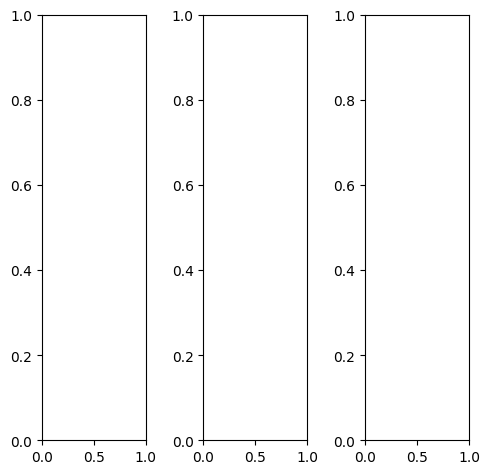

EPOCH: 5.255  trn_loss: 0.005  (610.95s - 11014.97s remaining)

tensor([[[0.7412, 0.7255, 0.7373,  ..., 0.6275, 0.6235, 0.6235],
         [0.7255, 0.7216, 0.7176,  ..., 0.6118, 0.6157, 0.6157],
         [0.7098, 0.7176, 0.7059,  ..., 0.6196, 0.6196, 0.6235],
         ...,
         [0.1412, 0.1569, 0.1725,  ..., 0.4000, 0.4980, 0.4941],
         [0.1647, 0.1490, 0.2275,  ..., 0.4667, 0.5098, 0.4941],
         [0.1686, 0.1451, 0.3529,  ..., 0.4549, 0.4863, 0.4980]],

        [[0.7412, 0.7255, 0.7373,  ..., 0.6275, 0.6235, 0.6235],
         [0.7255, 0.7216, 0.7176,  ..., 0.6118, 0.6157, 0.6157],
         [0.7098, 0.7176, 0.7059,  ..., 0.6196, 0.6196, 0.6235],
         ...,
         [0.1412, 0.1569, 0.1725,  ..., 0.4000, 0.4980, 0.4941],
         [0.1647, 0.1490, 0.2275,  ..., 0.4667, 0.5098, 0.4941],
         [0.1686, 0.1451, 0.3529,  ..., 0.4549, 0.4863, 0.4980]],

        [[0.7412, 0.7255, 0.7373,  ..., 0.6275, 0.6235, 0.6235],
         [0.7255, 0.7216, 0.7176,  ..., 0.6118, 0.6157, 0.6157],
         [0.7098, 0.7176, 0.7059,  ..., 0.6196, 0.6196, 0.

tensor([[[0.7412, 0.7255, 0.7373,  ..., 0.6157, 0.6118, 0.6118],
         [0.7255, 0.7216, 0.7176,  ..., 0.6000, 0.6039, 0.6039],
         [0.7098, 0.7137, 0.7020,  ..., 0.6078, 0.6118, 0.6118],
         ...,
         [0.2275, 0.2980, 0.3490,  ..., 0.4235, 0.5216, 0.5176],
         [0.2510, 0.2980, 0.3451,  ..., 0.4902, 0.5333, 0.5176],
         [0.2275, 0.2627, 0.4196,  ..., 0.4784, 0.5098, 0.5216]],

        [[0.7373, 0.7216, 0.7333,  ..., 0.6235, 0.6196, 0.6196],
         [0.7216, 0.7176, 0.7137,  ..., 0.6078, 0.6118, 0.6118],
         [0.7059, 0.7137, 0.7020,  ..., 0.6157, 0.6157, 0.6196],
         ...,
         [0.1059, 0.0902, 0.0902,  ..., 0.3882, 0.4863, 0.4784],
         [0.1255, 0.0824, 0.1725,  ..., 0.4510, 0.4941, 0.4784],
         [0.1451, 0.0902, 0.3216,  ..., 0.4431, 0.4745, 0.4824]],

        [[0.7608, 0.7451, 0.7569,  ..., 0.6706, 0.6667, 0.6627],
         [0.7451, 0.7412, 0.7412,  ..., 0.6549, 0.6588, 0.6588],
         [0.7373, 0.7451, 0.7294,  ..., 0.6627, 0.6627, 0.

tensor([[[ 0.6854,  0.6078,  0.5971,  ...,  0.5040,  0.5385,  0.6075],
         [ 0.6507,  0.5895,  0.5569,  ...,  0.4159,  0.4970,  0.5615],
         [ 0.6397,  0.5811,  0.5907,  ...,  0.4848,  0.5313,  0.5837],
         ...,
         [-0.0131, -0.0021,  0.0274,  ...,  0.4191,  0.4945,  0.5075],
         [ 0.0469, -0.0211,  0.1073,  ...,  0.4344,  0.5095,  0.5020],
         [ 0.0936,  0.0531,  0.2555,  ...,  0.4421,  0.4909,  0.5178]],

        [[ 0.7102,  0.6925,  0.7193,  ...,  0.5808,  0.6473,  0.6423],
         [ 0.6825,  0.6619,  0.6656,  ...,  0.5734,  0.6432,  0.6601],
         [ 0.6800,  0.7014,  0.6825,  ...,  0.5929,  0.6407,  0.6623],
         ...,
         [ 0.0617,  0.0355,  0.0402,  ...,  0.4462,  0.5356,  0.4847],
         [ 0.1003,  0.0144,  0.0916,  ...,  0.4976,  0.5521,  0.5118],
         [ 0.1334,  0.0739,  0.2568,  ...,  0.4501,  0.5103,  0.5084]],

        [[ 0.8710,  0.9030,  0.8665,  ...,  0.7087,  0.7424,  0.7341],
         [ 0.8773,  0.8666,  0.8590,  ...,  0

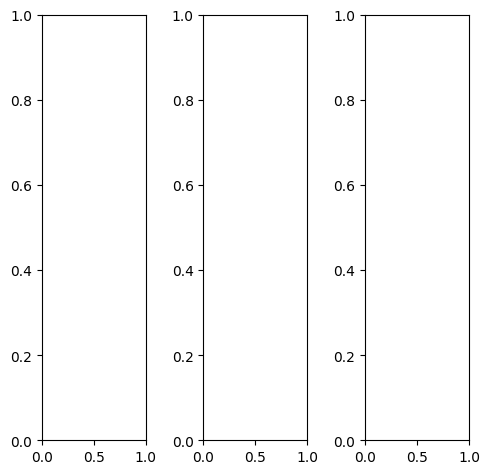

tensor([[[0.7765, 0.7725, 0.7765,  ..., 0.7216, 0.7059, 0.7098],
         [0.7765, 0.7725, 0.7765,  ..., 0.7176, 0.7059, 0.7059],
         [0.7608, 0.7569, 0.7647,  ..., 0.7059, 0.6941, 0.6980],
         ...,
         [0.1294, 0.1412, 0.1412,  ..., 0.0118, 0.0196, 0.0549],
         [0.1451, 0.1451, 0.1490,  ..., 0.0627, 0.0745, 0.0863],
         [0.1490, 0.1490, 0.1490,  ..., 0.1333, 0.1216, 0.1216]],

        [[0.7765, 0.7725, 0.7765,  ..., 0.7216, 0.7059, 0.7098],
         [0.7765, 0.7725, 0.7765,  ..., 0.7176, 0.7059, 0.7059],
         [0.7608, 0.7569, 0.7647,  ..., 0.7059, 0.6941, 0.6980],
         ...,
         [0.1294, 0.1412, 0.1412,  ..., 0.0118, 0.0196, 0.0549],
         [0.1451, 0.1451, 0.1490,  ..., 0.0627, 0.0745, 0.0863],
         [0.1490, 0.1490, 0.1490,  ..., 0.1333, 0.1216, 0.1216]],

        [[0.7765, 0.7725, 0.7765,  ..., 0.7216, 0.7059, 0.7098],
         [0.7765, 0.7725, 0.7765,  ..., 0.7176, 0.7059, 0.7059],
         [0.7608, 0.7569, 0.7647,  ..., 0.7059, 0.6941, 0.

tensor([[[0.7176, 0.7137, 0.7176,  ..., 0.6549, 0.6510, 0.6549],
         [0.7216, 0.7176, 0.7216,  ..., 0.6627, 0.6510, 0.6510],
         [0.7137, 0.7098, 0.7176,  ..., 0.6667, 0.6431, 0.6431],
         ...,
         [0.1294, 0.1412, 0.1412,  ..., 0.0118, 0.0118, 0.0431],
         [0.1451, 0.1451, 0.1490,  ..., 0.0627, 0.0667, 0.0745],
         [0.1490, 0.1490, 0.1490,  ..., 0.1294, 0.1137, 0.1098]],

        [[0.8000, 0.7961, 0.8000,  ..., 0.7451, 0.7294, 0.7294],
         [0.8000, 0.7961, 0.8000,  ..., 0.7373, 0.7294, 0.7294],
         [0.7843, 0.7804, 0.7882,  ..., 0.7216, 0.7137, 0.7176],
         ...,
         [0.1333, 0.1451, 0.1451,  ..., 0.0118, 0.0235, 0.0588],
         [0.1490, 0.1490, 0.1529,  ..., 0.0667, 0.0824, 0.0941],
         [0.1529, 0.1529, 0.1529,  ..., 0.1373, 0.1294, 0.1294]],

        [[0.8000, 0.7961, 0.8039,  ..., 0.7686, 0.7451, 0.7451],
         [0.7961, 0.7922, 0.7961,  ..., 0.7451, 0.7412, 0.7451],
         [0.7765, 0.7725, 0.7804,  ..., 0.7216, 0.7294, 0.

tensor([[[0.8409, 0.8378, 0.8456,  ..., 0.8053, 0.7673, 0.8437],
         [0.8885, 0.8733, 0.8411,  ..., 0.8184, 0.8208, 0.8830],
         [0.8819, 0.8710, 0.8611,  ..., 0.8112, 0.8354, 0.9208],
         ...,
         [0.2545, 0.3183, 0.3054,  ..., 0.1712, 0.1777, 0.2416],
         [0.2938, 0.3036, 0.3443,  ..., 0.2448, 0.2714, 0.2731],
         [0.3302, 0.3258, 0.3027,  ..., 0.2995, 0.2896, 0.3446]],

        [[0.8367, 0.8457, 0.9057,  ..., 0.8167, 0.8258, 0.9046],
         [0.8646, 0.9140, 0.8761,  ..., 0.8334, 0.8314, 0.9498],
         [0.8874, 0.9111, 0.8964,  ..., 0.8227, 0.8294, 0.9316],
         ...,
         [0.3053, 0.3469, 0.3606,  ..., 0.1934, 0.1993, 0.2409],
         [0.3189, 0.3445, 0.3621,  ..., 0.2601, 0.2645, 0.2628],
         [0.3404, 0.3434, 0.3437,  ..., 0.2995, 0.2979, 0.3334]],

        [[0.9806, 0.9916, 0.9908,  ..., 0.8890, 0.8953, 0.9439],
         [1.0344, 1.0675, 1.0580,  ..., 0.8822, 0.9230, 0.9313],
         [1.0765, 1.0656, 1.0770,  ..., 0.9260, 0.9161, 0.

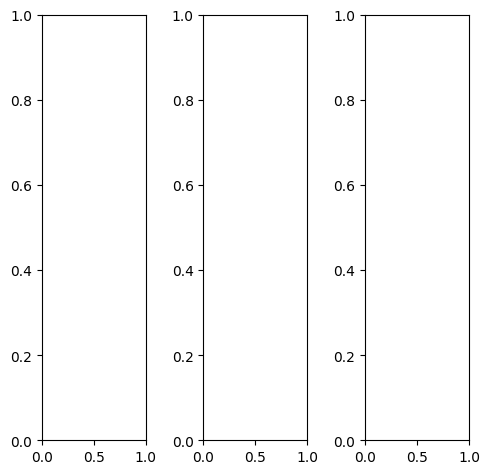

tensor([[[0.9608, 0.9412, 0.9373,  ..., 0.8863, 0.8863, 0.8745],
         [0.8078, 0.7333, 0.6980,  ..., 0.2863, 0.2706, 0.2392],
         [0.7294, 0.6784, 0.6706,  ..., 0.0941, 0.0510, 0.0667],
         ...,
         [0.8863, 0.8510, 0.8314,  ..., 0.9373, 0.8588, 0.8235],
         [0.8745, 0.8588, 0.8471,  ..., 0.8824, 0.8118, 0.8863],
         [0.6431, 0.5490, 0.5569,  ..., 0.5451, 0.5451, 0.5647]],

        [[0.9608, 0.9412, 0.9373,  ..., 0.8863, 0.8863, 0.8745],
         [0.8078, 0.7333, 0.6980,  ..., 0.2863, 0.2706, 0.2392],
         [0.7294, 0.6784, 0.6706,  ..., 0.0941, 0.0510, 0.0667],
         ...,
         [0.8863, 0.8510, 0.8314,  ..., 0.9373, 0.8588, 0.8235],
         [0.8745, 0.8588, 0.8471,  ..., 0.8824, 0.8118, 0.8863],
         [0.6431, 0.5490, 0.5569,  ..., 0.5451, 0.5451, 0.5647]],

        [[0.9608, 0.9412, 0.9373,  ..., 0.8863, 0.8863, 0.8745],
         [0.8078, 0.7333, 0.6980,  ..., 0.2863, 0.2706, 0.2392],
         [0.7294, 0.6784, 0.6706,  ..., 0.0941, 0.0510, 0.

tensor([[[0.9333, 0.9098, 0.9137,  ..., 0.8863, 0.8863, 0.8745],
         [0.7333, 0.6392, 0.6078,  ..., 0.2745, 0.2627, 0.2314],
         [0.6314, 0.5529, 0.5529,  ..., 0.0706, 0.0314, 0.0510],
         ...,
         [0.8471, 0.8000, 0.7804,  ..., 0.9333, 0.8706, 0.8471],
         [0.8314, 0.8157, 0.8078,  ..., 0.8941, 0.8275, 0.9059],
         [0.6157, 0.5216, 0.5294,  ..., 0.5569, 0.5569, 0.5765]],

        [[0.9765, 0.9608, 0.9490,  ..., 0.8863, 0.8863, 0.8745],
         [0.8549, 0.7922, 0.7490,  ..., 0.2941, 0.2706, 0.2392],
         [0.7804, 0.7451, 0.7333,  ..., 0.1059, 0.0588, 0.0706],
         ...,
         [0.8980, 0.8667, 0.8471,  ..., 0.9333, 0.8471, 0.8078],
         [0.8902, 0.8745, 0.8627,  ..., 0.8706, 0.8000, 0.8745],
         [0.6549, 0.5608, 0.5686,  ..., 0.5373, 0.5333, 0.5569]],

        [[0.9412, 0.9137, 0.9294,  ..., 0.8706, 0.8941, 0.8824],
         [0.7725, 0.6902, 0.6706,  ..., 0.2824, 0.2863, 0.2510],
         [0.7137, 0.6588, 0.6549,  ..., 0.0980, 0.0667, 0.

tensor([[[0.6571, 0.6332, 0.6064,  ..., 0.6998, 0.7100, 0.6131],
         [0.5885, 0.4896, 0.4388,  ..., 0.2712, 0.2562, 0.2965],
         [0.5351, 0.4349, 0.4338,  ..., 0.0914, 0.0932, 0.1548],
         ...,
         [0.7216, 0.6977, 0.6718,  ..., 0.8000, 0.7105, 0.7071],
         [0.7455, 0.7244, 0.6982,  ..., 0.7433, 0.6844, 0.7781],
         [0.5867, 0.4986, 0.5055,  ..., 0.5039, 0.5309, 0.6106]],

        [[0.7094, 0.7244, 0.7440,  ..., 0.7507, 0.7707, 0.6504],
         [0.6232, 0.5980, 0.5519,  ..., 0.3197, 0.3390, 0.3038],
         [0.6009, 0.5581, 0.5548,  ..., 0.1732, 0.1561, 0.1682],
         ...,
         [0.6975, 0.7005, 0.6870,  ..., 0.7785, 0.6823, 0.6934],
         [0.7253, 0.7051, 0.6979,  ..., 0.7211, 0.6512, 0.7442],
         [0.5257, 0.4628, 0.4693,  ..., 0.4621, 0.4879, 0.5576]],

        [[0.9562, 1.0130, 0.9755,  ..., 0.8906, 0.9121, 0.7569],
         [0.8859, 0.8869, 0.8163,  ..., 0.4468, 0.4298, 0.3985],
         [0.8471, 0.8699, 0.8117,  ..., 0.2490, 0.2311, 0.

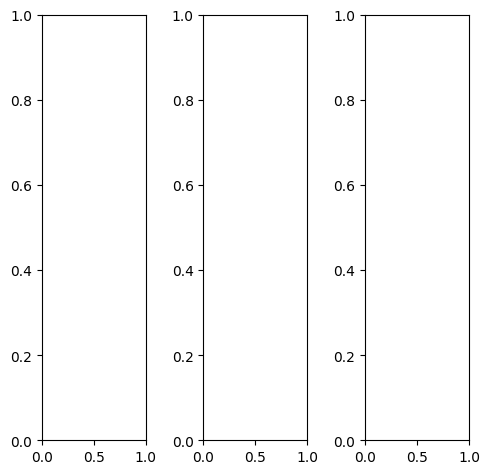

tensor([[[0.4706, 0.3961, 0.2039,  ..., 0.4745, 0.5451, 0.4863],
         [0.4745, 0.3961, 0.1804,  ..., 0.4314, 0.5137, 0.4980],
         [0.4627, 0.3843, 0.1686,  ..., 0.5176, 0.5608, 0.5176],
         ...,
         [0.4902, 0.4275, 0.2745,  ..., 0.2706, 0.4000, 0.4980],
         [0.4824, 0.4118, 0.2392,  ..., 0.2863, 0.4039, 0.4863],
         [0.4745, 0.4157, 0.2706,  ..., 0.2510, 0.3647, 0.4784]],

        [[0.4706, 0.3961, 0.2039,  ..., 0.4745, 0.5451, 0.4863],
         [0.4745, 0.3961, 0.1804,  ..., 0.4314, 0.5137, 0.4980],
         [0.4627, 0.3843, 0.1686,  ..., 0.5176, 0.5608, 0.5176],
         ...,
         [0.4902, 0.4275, 0.2745,  ..., 0.2706, 0.4000, 0.4980],
         [0.4824, 0.4118, 0.2392,  ..., 0.2863, 0.4039, 0.4863],
         [0.4745, 0.4157, 0.2706,  ..., 0.2510, 0.3647, 0.4784]],

        [[0.4706, 0.3961, 0.2039,  ..., 0.4745, 0.5451, 0.4863],
         [0.4745, 0.3961, 0.1804,  ..., 0.4314, 0.5137, 0.4980],
         [0.4627, 0.3843, 0.1686,  ..., 0.5176, 0.5608, 0.

tensor([[[0.4431, 0.3882, 0.2235,  ..., 0.5490, 0.5686, 0.4588],
         [0.4471, 0.3882, 0.2000,  ..., 0.5216, 0.5490, 0.4745],
         [0.4353, 0.3765, 0.1843,  ..., 0.6118, 0.6000, 0.5020],
         ...,
         [0.4510, 0.4157, 0.2863,  ..., 0.3255, 0.4196, 0.4784],
         [0.4510, 0.4000, 0.2588,  ..., 0.3294, 0.4157, 0.4667],
         [0.4471, 0.4039, 0.2941,  ..., 0.2824, 0.3686, 0.4510]],

        [[0.5098, 0.4157, 0.2000,  ..., 0.4510, 0.5529, 0.5216],
         [0.5098, 0.4157, 0.1765,  ..., 0.4039, 0.5176, 0.5294],
         [0.4980, 0.4039, 0.1608,  ..., 0.4863, 0.5647, 0.5451],
         ...,
         [0.5333, 0.4549, 0.2824,  ..., 0.2627, 0.4118, 0.5294],
         [0.5216, 0.4392, 0.2471,  ..., 0.2863, 0.4196, 0.5216],
         [0.5137, 0.4431, 0.2784,  ..., 0.2510, 0.3843, 0.5137]],

        [[0.3451, 0.3020, 0.1804,  ..., 0.4118, 0.4588, 0.3922],
         [0.3569, 0.3137, 0.1647,  ..., 0.3490, 0.4118, 0.3922],
         [0.3529, 0.3098, 0.1608,  ..., 0.4275, 0.4549, 0.

tensor([[[ 0.5503,  0.3440,  0.0190,  ...,  0.5603,  0.6688,  0.6409],
         [ 0.4958,  0.2902, -0.0692,  ...,  0.4623,  0.6158,  0.6226],
         [ 0.4575,  0.2579, -0.0729,  ...,  0.6152,  0.6914,  0.6333],
         ...,
         [ 0.5793,  0.4686,  0.2040,  ...,  0.2828,  0.4238,  0.6341],
         [ 0.5745,  0.4058,  0.1425,  ...,  0.2638,  0.4428,  0.6017],
         [ 0.5558,  0.5127,  0.2199,  ...,  0.2360,  0.4044,  0.5904]],

        [[ 0.6233,  0.4421,  0.2055,  ...,  0.6036,  0.7599,  0.6781],
         [ 0.6036,  0.4075,  0.1117,  ...,  0.5281,  0.6971,  0.6912],
         [ 0.5592,  0.3860,  0.0943,  ...,  0.6540,  0.7474,  0.6888],
         ...,
         [ 0.6246,  0.4747,  0.3086,  ...,  0.2995,  0.4861,  0.6207],
         [ 0.6090,  0.4711,  0.2406,  ...,  0.3139,  0.4992,  0.6184],
         [ 0.5713,  0.5086,  0.2623,  ...,  0.2448,  0.4330,  0.5828]],

        [[ 0.7726,  0.6550,  0.3559,  ...,  0.7459,  0.8853,  0.7765],
         [ 0.8010,  0.6812,  0.2916,  ...,  0

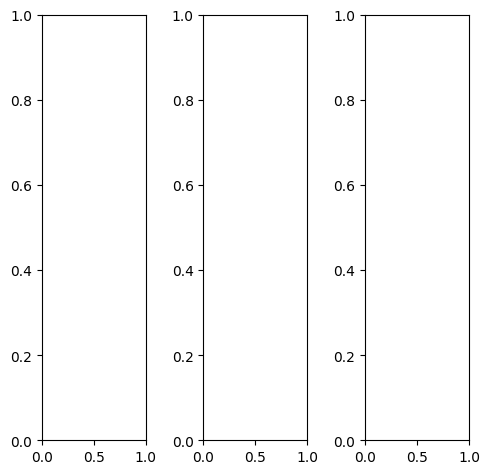

tensor([[[0.8000, 0.7961, 0.8039,  ..., 0.9373, 0.9333, 0.9294],
         [0.7843, 0.7882, 0.8078,  ..., 0.9569, 0.9608, 0.9529],
         [0.7961, 0.7922, 0.8039,  ..., 0.9686, 0.9686, 0.9647],
         ...,
         [0.4078, 0.4078, 0.4275,  ..., 0.7059, 0.7647, 0.7686],
         [0.5725, 0.5412, 0.5373,  ..., 0.7647, 0.8118, 0.8196],
         [0.6824, 0.6706, 0.6549,  ..., 0.8118, 0.8431, 0.8627]],

        [[0.8000, 0.7961, 0.8039,  ..., 0.9373, 0.9333, 0.9294],
         [0.7843, 0.7882, 0.8078,  ..., 0.9569, 0.9608, 0.9529],
         [0.7961, 0.7922, 0.8039,  ..., 0.9686, 0.9686, 0.9647],
         ...,
         [0.4078, 0.4078, 0.4275,  ..., 0.7059, 0.7647, 0.7686],
         [0.5725, 0.5412, 0.5373,  ..., 0.7647, 0.8118, 0.8196],
         [0.6824, 0.6706, 0.6549,  ..., 0.8118, 0.8431, 0.8627]],

        [[0.8000, 0.7961, 0.8039,  ..., 0.9373, 0.9333, 0.9294],
         [0.7843, 0.7882, 0.8078,  ..., 0.9569, 0.9608, 0.9529],
         [0.7961, 0.7922, 0.8039,  ..., 0.9686, 0.9686, 0.

tensor([[[0.7843, 0.7804, 0.7882,  ..., 0.9255, 0.9255, 0.9216],
         [0.7569, 0.7608, 0.7804,  ..., 0.9569, 0.9569, 0.9490],
         [0.7725, 0.7686, 0.7804,  ..., 0.9686, 0.9686, 0.9647],
         ...,
         [0.4510, 0.4471, 0.4667,  ..., 0.7490, 0.8039, 0.7961],
         [0.6039, 0.5765, 0.5765,  ..., 0.7961, 0.8314, 0.8314],
         [0.7020, 0.6902, 0.6980,  ..., 0.8314, 0.8588, 0.8667]],

        [[0.8392, 0.8353, 0.8431,  ..., 0.9529, 0.9529, 0.9490],
         [0.8275, 0.8314, 0.8510,  ..., 0.9686, 0.9725, 0.9686],
         [0.8392, 0.8353, 0.8510,  ..., 0.9765, 0.9765, 0.9725],
         ...,
         [0.4157, 0.4157, 0.4392,  ..., 0.7020, 0.7569, 0.7608],
         [0.5765, 0.5490, 0.5412,  ..., 0.7608, 0.8039, 0.8196],
         [0.6863, 0.6745, 0.6471,  ..., 0.8078, 0.8431, 0.8667]],

        [[0.6471, 0.6431, 0.6510,  ..., 0.8745, 0.8667, 0.8510],
         [0.6196, 0.6235, 0.6431,  ..., 0.9098, 0.9059, 0.8863],
         [0.6235, 0.6196, 0.6314,  ..., 0.9333, 0.9255, 0.

tensor([[[0.6419, 0.5199, 0.4941,  ..., 0.6900, 0.6544, 0.7442],
         [0.5604, 0.4949, 0.4802,  ..., 0.6905, 0.7283, 0.7464],
         [0.5842, 0.4970, 0.5337,  ..., 0.7405, 0.7982, 0.7914],
         ...,
         [0.1623, 0.2265, 0.2401,  ..., 0.5864, 0.6310, 0.6497],
         [0.3753, 0.2960, 0.3269,  ..., 0.6430, 0.6827, 0.7033],
         [0.5519, 0.5139, 0.5056,  ..., 0.7794, 0.8011, 0.7407]],

        [[0.6863, 0.6370, 0.6451,  ..., 0.7656, 0.8082, 0.8474],
         [0.6362, 0.6172, 0.6170,  ..., 0.7936, 0.8059, 0.9096],
         [0.6658, 0.6364, 0.6616,  ..., 0.8305, 0.8492, 0.8928],
         ...,
         [0.2210, 0.2395, 0.2670,  ..., 0.5403, 0.6702, 0.6523],
         [0.4207, 0.3862, 0.3868,  ..., 0.6534, 0.7254, 0.7335],
         [0.5542, 0.5465, 0.5664,  ..., 0.7232, 0.7887, 0.7452]],

        [[0.8544, 0.8795, 0.8341,  ..., 0.9462, 0.9706, 0.9425],
         [0.8534, 0.8526, 0.8318,  ..., 0.9487, 1.0040, 0.9685],
         [0.8753, 0.8605, 0.8239,  ..., 1.0343, 1.0387, 0.

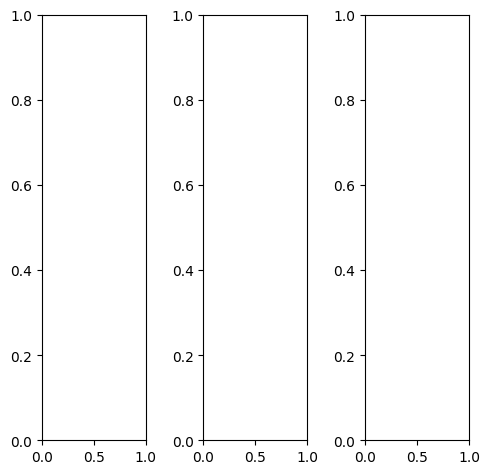

EPOCH: 5.510  trn_loss: 0.005  (639.29s - 10962.63s remaining)

tensor([[[0.9608, 0.9490, 0.9569,  ..., 0.9843, 0.9843, 0.9843],
         [0.9765, 0.9647, 0.9725,  ..., 1.0000, 1.0000, 1.0000],
         [0.9686, 0.9608, 0.9686,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.6863, 0.5255, 0.6667,  ..., 0.3373, 0.3765, 0.5765],
         [0.8431, 0.7882, 0.8275,  ..., 0.6706, 0.6471, 0.6980],
         [0.8941, 0.8706, 0.8824,  ..., 0.8863, 0.8745, 0.8510]],

        [[0.9608, 0.9490, 0.9569,  ..., 0.9843, 0.9843, 0.9843],
         [0.9765, 0.9647, 0.9725,  ..., 1.0000, 1.0000, 1.0000],
         [0.9686, 0.9608, 0.9686,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.6863, 0.5255, 0.6667,  ..., 0.3373, 0.3765, 0.5765],
         [0.8431, 0.7882, 0.8275,  ..., 0.6706, 0.6471, 0.6980],
         [0.8941, 0.8706, 0.8824,  ..., 0.8863, 0.8745, 0.8510]],

        [[0.9608, 0.9490, 0.9569,  ..., 0.9843, 0.9843, 0.9843],
         [0.9765, 0.9647, 0.9725,  ..., 1.0000, 1.0000, 1.0000],
         [0.9686, 0.9608, 0.9686,  ..., 0.9961, 0.9961, 0.

tensor([[[0.9098, 0.8980, 0.9059,  ..., 0.9843, 0.9843, 0.9843],
         [0.9255, 0.9137, 0.9216,  ..., 1.0000, 1.0000, 1.0000],
         [0.9176, 0.9098, 0.9176,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.6941, 0.4902, 0.6667,  ..., 0.2980, 0.3373, 0.5725],
         [0.8745, 0.8000, 0.8471,  ..., 0.6627, 0.6392, 0.7137],
         [0.9490, 0.9294, 0.9294,  ..., 0.9137, 0.8980, 0.8863]],

        [[0.9804, 0.9686, 0.9765,  ..., 0.9843, 0.9843, 0.9843],
         [0.9961, 0.9843, 0.9922,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 0.9804, 0.9882,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.7216, 0.5725, 0.6980,  ..., 0.3647, 0.4118, 0.6039],
         [0.8627, 0.8118, 0.8431,  ..., 0.6863, 0.6706, 0.7137],
         [0.8980, 0.8745, 0.8863,  ..., 0.8941, 0.8863, 0.8588]],

        [[0.9961, 0.9843, 0.9882,  ..., 0.9843, 0.9843, 0.9843],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 0.

tensor([[[0.6209, 0.5657, 0.5478,  ..., 0.5991, 0.5739, 0.6829],
         [0.6106, 0.5512, 0.5522,  ..., 0.5895, 0.6017, 0.6613],
         [0.6054, 0.5473, 0.5768,  ..., 0.6076, 0.6512, 0.6759],
         ...,
         [0.4965, 0.4208, 0.4875,  ..., 0.2943, 0.3109, 0.5172],
         [0.5931, 0.5858, 0.5649,  ..., 0.5144, 0.5106, 0.5638],
         [0.6519, 0.6610, 0.6552,  ..., 0.7153, 0.6828, 0.6426]],

        [[0.6386, 0.6346, 0.6564,  ..., 0.6572, 0.6972, 0.7526],
         [0.6309, 0.6195, 0.6539,  ..., 0.6739, 0.6693, 0.7798],
         [0.6386, 0.6701, 0.6711,  ..., 0.6938, 0.6999, 0.7504],
         ...,
         [0.4707, 0.3763, 0.4795,  ..., 0.3210, 0.3477, 0.4571],
         [0.5866, 0.5662, 0.5815,  ..., 0.5546, 0.5522, 0.5729],
         [0.6078, 0.6167, 0.6350,  ..., 0.6864, 0.6897, 0.6435]],

        [[0.7947, 0.8101, 0.7881,  ..., 0.7898, 0.8090, 0.8192],
         [0.8097, 0.8131, 0.8103,  ..., 0.7520, 0.7921, 0.8099],
         [0.8243, 0.8270, 0.8153,  ..., 0.7994, 0.8059, 0.

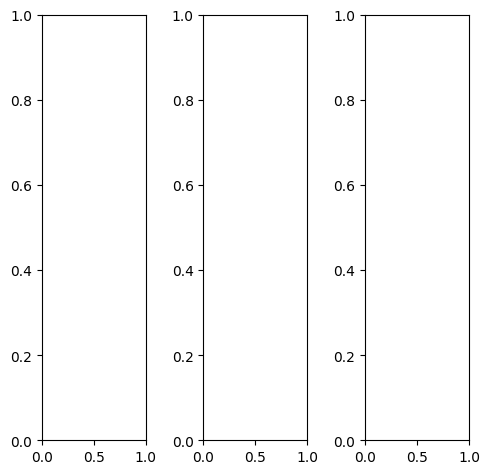

tensor([[[0.5137, 0.5176, 0.5059,  ..., 0.4980, 0.4549, 0.4745],
         [0.5255, 0.5098, 0.5333,  ..., 0.4941, 0.4824, 0.4549],
         [0.5333, 0.5451, 0.5294,  ..., 0.4745, 0.4275, 0.4902],
         ...,
         [0.3647, 0.3098, 0.5176,  ..., 0.3059, 0.2745, 0.2667],
         [0.3412, 0.3765, 0.4745,  ..., 0.2510, 0.2745, 0.2980],
         [0.3333, 0.3804, 0.2549,  ..., 0.6471, 0.7647, 0.7333]],

        [[0.5137, 0.5176, 0.5059,  ..., 0.4980, 0.4549, 0.4745],
         [0.5255, 0.5098, 0.5333,  ..., 0.4941, 0.4824, 0.4549],
         [0.5333, 0.5451, 0.5294,  ..., 0.4745, 0.4275, 0.4902],
         ...,
         [0.3647, 0.3098, 0.5176,  ..., 0.3059, 0.2745, 0.2667],
         [0.3412, 0.3765, 0.4745,  ..., 0.2510, 0.2745, 0.2980],
         [0.3333, 0.3804, 0.2549,  ..., 0.6471, 0.7647, 0.7333]],

        [[0.5137, 0.5176, 0.5059,  ..., 0.4980, 0.4549, 0.4745],
         [0.5255, 0.5098, 0.5333,  ..., 0.4941, 0.4824, 0.4549],
         [0.5333, 0.5451, 0.5294,  ..., 0.4745, 0.4275, 0.

tensor([[[0.5137, 0.5176, 0.5059,  ..., 0.5098, 0.4667, 0.4863],
         [0.5255, 0.5098, 0.5333,  ..., 0.5020, 0.4902, 0.4627],
         [0.5333, 0.5451, 0.5294,  ..., 0.4745, 0.4275, 0.4902],
         ...,
         [0.3529, 0.2980, 0.5059,  ..., 0.2941, 0.2627, 0.2549],
         [0.3294, 0.3647, 0.4627,  ..., 0.2392, 0.2627, 0.2863],
         [0.3216, 0.3686, 0.2431,  ..., 0.6353, 0.7529, 0.7255]],

        [[0.5176, 0.5216, 0.5098,  ..., 0.4941, 0.4510, 0.4706],
         [0.5294, 0.5137, 0.5373,  ..., 0.4902, 0.4824, 0.4549],
         [0.5373, 0.5490, 0.5333,  ..., 0.4706, 0.4275, 0.4902],
         ...,
         [0.3725, 0.3176, 0.5255,  ..., 0.3098, 0.2784, 0.2706],
         [0.3490, 0.3843, 0.4824,  ..., 0.2549, 0.2784, 0.3020],
         [0.3412, 0.3882, 0.2627,  ..., 0.6471, 0.7647, 0.7373]],

        [[0.4980, 0.5020, 0.4902,  ..., 0.4941, 0.4392, 0.4549],
         [0.5098, 0.4941, 0.5176,  ..., 0.4941, 0.4745, 0.4431],
         [0.5176, 0.5294, 0.5137,  ..., 0.4784, 0.4235, 0.

tensor([[[0.4723, 0.3676, 0.3369,  ..., 0.3320, 0.3250, 0.3805],
         [0.4005, 0.3322, 0.3299,  ..., 0.3105, 0.3108, 0.3270],
         [0.4208, 0.3643, 0.3801,  ..., 0.3040, 0.2865, 0.3694],
         ...,
         [0.2263, 0.2116, 0.4195,  ..., 0.1721, 0.1375, 0.2008],
         [0.2182, 0.2130, 0.3633,  ..., 0.0706, 0.0909, 0.1781],
         [0.2409, 0.2305, 0.1182,  ..., 0.6233, 0.7032, 0.6152]],

        [[0.5291, 0.4732, 0.4737,  ..., 0.4497, 0.4599, 0.4404],
         [0.5028, 0.4635, 0.5065,  ..., 0.4658, 0.4844, 0.4055],
         [0.5099, 0.5116, 0.5165,  ..., 0.4438, 0.4245, 0.4423],
         ...,
         [0.3023, 0.2459, 0.4957,  ..., 0.2507, 0.2092, 0.2032],
         [0.2694, 0.3136, 0.4364,  ..., 0.1735, 0.2083, 0.2536],
         [0.2714, 0.2713, 0.1874,  ..., 0.6360, 0.7243, 0.6208]],

        [[0.6327, 0.6338, 0.6174,  ..., 0.5543, 0.5541, 0.5551],
         [0.6381, 0.6540, 0.6507,  ..., 0.5753, 0.5760, 0.5283],
         [0.6492, 0.6462, 0.6247,  ..., 0.5079, 0.5009, 0.

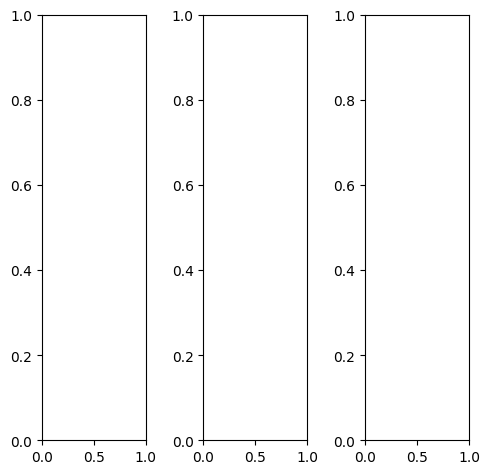

tensor([[[0.5333, 0.5216, 0.5176,  ..., 0.5216, 0.5020, 0.4235],
         [0.5137, 0.5137, 0.5137,  ..., 0.5216, 0.5255, 0.4510],
         [0.4941, 0.5020, 0.5098,  ..., 0.5137, 0.5216, 0.4549],
         ...,
         [0.2588, 0.2745, 0.2471,  ..., 0.3373, 0.3176, 0.3020],
         [0.2627, 0.2471, 0.2392,  ..., 0.3059, 0.3098, 0.2902],
         [0.2980, 0.2706, 0.2784,  ..., 0.3059, 0.3098, 0.2980]],

        [[0.5333, 0.5216, 0.5176,  ..., 0.5216, 0.5020, 0.4235],
         [0.5137, 0.5137, 0.5137,  ..., 0.5216, 0.5255, 0.4510],
         [0.4941, 0.5020, 0.5098,  ..., 0.5137, 0.5216, 0.4549],
         ...,
         [0.2588, 0.2745, 0.2471,  ..., 0.3373, 0.3176, 0.3020],
         [0.2627, 0.2471, 0.2392,  ..., 0.3059, 0.3098, 0.2902],
         [0.2980, 0.2706, 0.2784,  ..., 0.3059, 0.3098, 0.2980]],

        [[0.5333, 0.5216, 0.5176,  ..., 0.5216, 0.5020, 0.4235],
         [0.5137, 0.5137, 0.5137,  ..., 0.5216, 0.5255, 0.4510],
         [0.4941, 0.5020, 0.5098,  ..., 0.5137, 0.5216, 0.

tensor([[[0.5333, 0.5216, 0.5176,  ..., 0.5333, 0.5137, 0.4353],
         [0.5137, 0.5137, 0.5137,  ..., 0.5333, 0.5373, 0.4627],
         [0.4941, 0.5020, 0.5137,  ..., 0.5255, 0.5333, 0.4667],
         ...,
         [0.2549, 0.2706, 0.2471,  ..., 0.3333, 0.3176, 0.2980],
         [0.2627, 0.2471, 0.2431,  ..., 0.3059, 0.3098, 0.2902],
         [0.3098, 0.2824, 0.2902,  ..., 0.3137, 0.3176, 0.3098]],

        [[0.5333, 0.5216, 0.5176,  ..., 0.5176, 0.5020, 0.4235],
         [0.5137, 0.5137, 0.5137,  ..., 0.5176, 0.5216, 0.4510],
         [0.4941, 0.5020, 0.5098,  ..., 0.5059, 0.5176, 0.4510],
         ...,
         [0.2588, 0.2745, 0.2471,  ..., 0.3333, 0.3176, 0.3020],
         [0.2627, 0.2471, 0.2392,  ..., 0.3020, 0.3098, 0.2902],
         [0.2980, 0.2706, 0.2784,  ..., 0.3020, 0.3098, 0.3020]],

        [[0.5333, 0.5216, 0.5176,  ..., 0.5098, 0.4863, 0.3922],
         [0.5137, 0.5137, 0.5137,  ..., 0.5216, 0.5176, 0.4314],
         [0.4941, 0.5020, 0.5098,  ..., 0.5255, 0.5255, 0.

tensor([[[0.6232, 0.5782, 0.5445,  ..., 0.5940, 0.5637, 0.5541],
         [0.5937, 0.5719, 0.5595,  ..., 0.6217, 0.6295, 0.5439],
         [0.5745, 0.5509, 0.5870,  ..., 0.6731, 0.6669, 0.5764],
         ...,
         [0.2510, 0.2873, 0.2044,  ..., 0.4028, 0.3494, 0.3557],
         [0.2544, 0.2192, 0.2158,  ..., 0.3527, 0.3565, 0.3523],
         [0.3282, 0.2951, 0.2807,  ..., 0.3490, 0.3636, 0.3757]],

        [[0.6411, 0.6601, 0.6643,  ..., 0.6735, 0.6843, 0.6045],
         [0.6337, 0.6496, 0.6608,  ..., 0.6980, 0.7496, 0.6734],
         [0.6343, 0.6552, 0.7060,  ..., 0.7377, 0.7477, 0.6785],
         ...,
         [0.3286, 0.3692, 0.3370,  ..., 0.5091, 0.4644, 0.3843],
         [0.3210, 0.3191, 0.3092,  ..., 0.4451, 0.4417, 0.3870],
         [0.3735, 0.3409, 0.3548,  ..., 0.3961, 0.4174, 0.4024]],

        [[0.7676, 0.8194, 0.7794,  ..., 0.7311, 0.7381, 0.6690],
         [0.7910, 0.8368, 0.8004,  ..., 0.7131, 0.7893, 0.6703],
         [0.7866, 0.8423, 0.8023,  ..., 0.7387, 0.7794, 0.

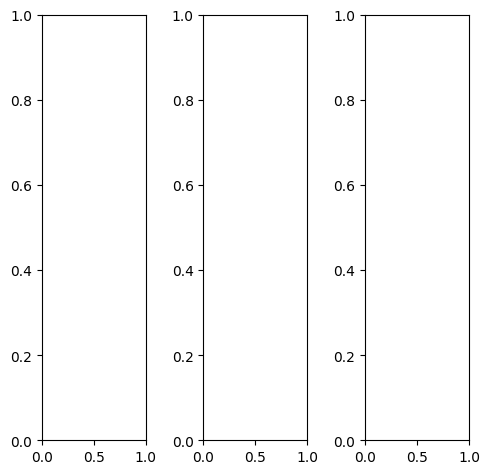

tensor([[[0.4863, 0.4863, 0.4863,  ..., 0.5412, 0.5490, 0.5490],
         [0.5098, 0.5059, 0.5098,  ..., 0.5647, 0.5686, 0.5686],
         [0.5255, 0.5216, 0.5255,  ..., 0.5725, 0.5765, 0.5765],
         ...,
         [0.8941, 0.8824, 0.8706,  ..., 0.8118, 0.8196, 0.8039],
         [0.8824, 0.8667, 0.8784,  ..., 0.7843, 0.7882, 0.7961],
         [0.8706, 0.8549, 0.8588,  ..., 0.7686, 0.7804, 0.7804]],

        [[0.4863, 0.4863, 0.4863,  ..., 0.5412, 0.5490, 0.5490],
         [0.5098, 0.5059, 0.5098,  ..., 0.5647, 0.5686, 0.5686],
         [0.5255, 0.5216, 0.5255,  ..., 0.5725, 0.5765, 0.5765],
         ...,
         [0.8941, 0.8824, 0.8706,  ..., 0.8118, 0.8196, 0.8039],
         [0.8824, 0.8667, 0.8784,  ..., 0.7843, 0.7882, 0.7961],
         [0.8706, 0.8549, 0.8588,  ..., 0.7686, 0.7804, 0.7804]],

        [[0.4863, 0.4863, 0.4863,  ..., 0.5412, 0.5490, 0.5490],
         [0.5098, 0.5059, 0.5098,  ..., 0.5647, 0.5686, 0.5686],
         [0.5255, 0.5216, 0.5255,  ..., 0.5725, 0.5765, 0.

tensor([[[0.0549, 0.0627, 0.0706,  ..., 0.1843, 0.1922, 0.1922],
         [0.0902, 0.0980, 0.1059,  ..., 0.2157, 0.2196, 0.2196],
         [0.1294, 0.1373, 0.1451,  ..., 0.2392, 0.2431, 0.2431],
         ...,
         [0.9333, 0.9294, 0.9176,  ..., 0.8980, 0.9059, 0.8902],
         [0.9569, 0.9373, 0.9451,  ..., 0.8784, 0.8863, 0.8902],
         [0.9333, 0.9137, 0.9176,  ..., 0.8706, 0.8863, 0.8863]],

        [[0.6196, 0.6157, 0.6157,  ..., 0.6510, 0.6549, 0.6588],
         [0.6392, 0.6314, 0.6314,  ..., 0.6706, 0.6745, 0.6745],
         [0.6471, 0.6392, 0.6392,  ..., 0.6745, 0.6745, 0.6784],
         ...,
         [0.8863, 0.8745, 0.8588,  ..., 0.7922, 0.8000, 0.7843],
         [0.8627, 0.8471, 0.8588,  ..., 0.7608, 0.7647, 0.7725],
         [0.8510, 0.8353, 0.8431,  ..., 0.7412, 0.7529, 0.7529]],

        [[0.9294, 0.9216, 0.9255,  ..., 0.9255, 0.9294, 0.9294],
         [0.9451, 0.9333, 0.9373,  ..., 0.9412, 0.9451, 0.9451],
         [0.9373, 0.9294, 0.9333,  ..., 0.9373, 0.9373, 0.

tensor([[[0.1798, 0.1753, 0.1535,  ..., 0.1980, 0.2156, 0.2311],
         [0.0718, 0.1237, 0.1450,  ..., 0.2132, 0.2106, 0.2044],
         [0.1276, 0.1460, 0.2069,  ..., 0.2552, 0.2715, 0.2297],
         ...,
         [0.6267, 0.6394, 0.6491,  ..., 0.5490, 0.5372, 0.5219],
         [0.6098, 0.5624, 0.6152,  ..., 0.4814, 0.4672, 0.5138],
         [0.6169, 0.5747, 0.6094,  ..., 0.5027, 0.5315, 0.5169]],

        [[0.2490, 0.2588, 0.2503,  ..., 0.2858, 0.3327, 0.3044],
         [0.1769, 0.2214, 0.2423,  ..., 0.2996, 0.3217, 0.2674],
         [0.2143, 0.2518, 0.2701,  ..., 0.3318, 0.3321, 0.2714],
         ...,
         [0.6160, 0.6234, 0.6331,  ..., 0.5013, 0.5472, 0.5072],
         [0.6263, 0.5878, 0.6212,  ..., 0.5018, 0.5053, 0.5111],
         [0.5776, 0.5679, 0.5770,  ..., 0.4724, 0.5232, 0.4875]],

        [[0.3750, 0.3886, 0.3660,  ..., 0.3759, 0.4217, 0.4042],
         [0.3665, 0.4004, 0.3991,  ..., 0.3844, 0.3957, 0.3704],
         [0.3681, 0.3945, 0.4117,  ..., 0.3941, 0.3931, 0.

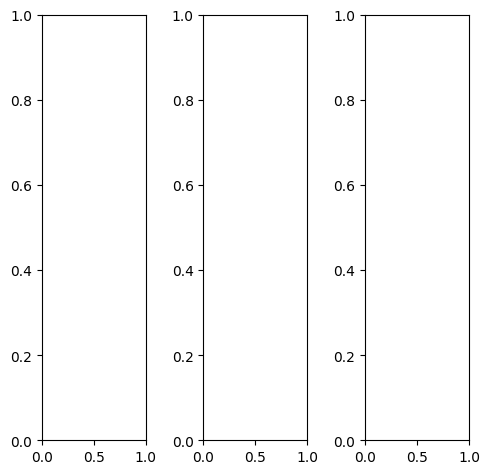

tensor([[[0.6275, 0.6353, 0.6392,  ..., 0.6235, 0.6196, 0.5765],
         [0.6314, 0.6392, 0.6392,  ..., 0.6196, 0.6196, 0.5765],
         [0.6275, 0.6392, 0.6392,  ..., 0.6275, 0.6275, 0.5843],
         ...,
         [0.1569, 0.1608, 0.1686,  ..., 0.1686, 0.1804, 0.1765],
         [0.1451, 0.1647, 0.1608,  ..., 0.1686, 0.1490, 0.1373],
         [0.1373, 0.1843, 0.1922,  ..., 0.1059, 0.0980, 0.0941]],

        [[0.6275, 0.6353, 0.6392,  ..., 0.6235, 0.6196, 0.5765],
         [0.6314, 0.6392, 0.6392,  ..., 0.6196, 0.6196, 0.5765],
         [0.6275, 0.6392, 0.6392,  ..., 0.6275, 0.6275, 0.5843],
         ...,
         [0.1569, 0.1608, 0.1686,  ..., 0.1686, 0.1804, 0.1765],
         [0.1451, 0.1647, 0.1608,  ..., 0.1686, 0.1490, 0.1373],
         [0.1373, 0.1843, 0.1922,  ..., 0.1059, 0.0980, 0.0941]],

        [[0.6275, 0.6353, 0.6392,  ..., 0.6235, 0.6196, 0.5765],
         [0.6314, 0.6392, 0.6392,  ..., 0.6196, 0.6196, 0.5765],
         [0.6275, 0.6392, 0.6392,  ..., 0.6275, 0.6275, 0.

tensor([[[0.5176, 0.5255, 0.5294,  ..., 0.4784, 0.4784, 0.4392],
         [0.5216, 0.5294, 0.5294,  ..., 0.4706, 0.4745, 0.4431],
         [0.5176, 0.5255, 0.5255,  ..., 0.4902, 0.4941, 0.4667],
         ...,
         [0.0784, 0.0824, 0.0902,  ..., 0.0784, 0.0902, 0.0980],
         [0.0824, 0.0980, 0.0902,  ..., 0.0902, 0.0745, 0.0706],
         [0.0706, 0.1059, 0.1059,  ..., 0.0549, 0.0549, 0.0549]],

        [[0.6510, 0.6588, 0.6627,  ..., 0.6627, 0.6588, 0.6118],
         [0.6549, 0.6627, 0.6627,  ..., 0.6627, 0.6588, 0.6118],
         [0.6549, 0.6627, 0.6667,  ..., 0.6627, 0.6627, 0.6157],
         ...,
         [0.1686, 0.1725, 0.1804,  ..., 0.1882, 0.1961, 0.1922],
         [0.1490, 0.1686, 0.1686,  ..., 0.1843, 0.1647, 0.1490],
         [0.1412, 0.1922, 0.2000,  ..., 0.1098, 0.1020, 0.0980]],

        [[0.7882, 0.7961, 0.8000,  ..., 0.7961, 0.7961, 0.7451],
         [0.7882, 0.8000, 0.8000,  ..., 0.7922, 0.7961, 0.7451],
         [0.7882, 0.8000, 0.8000,  ..., 0.8000, 0.7961, 0.

tensor([[[0.6717, 0.5626, 0.5046,  ..., 0.5509, 0.5875, 0.6466],
         [0.5962, 0.5415, 0.4681,  ..., 0.4729, 0.5437, 0.6063],
         [0.5928, 0.5502, 0.5004,  ..., 0.5104, 0.5612, 0.6148],
         ...,
         [0.1875, 0.2679, 0.2736,  ..., 0.2989, 0.3263, 0.3030],
         [0.1910, 0.2583, 0.2701,  ..., 0.2750, 0.2686, 0.2648],
         [0.2026, 0.2477, 0.2694,  ..., 0.1889, 0.1906, 0.2068]],

        [[0.6687, 0.6283, 0.6168,  ..., 0.5929, 0.6611, 0.6412],
         [0.6351, 0.6154, 0.5761,  ..., 0.5789, 0.6474, 0.6470],
         [0.6346, 0.6046, 0.5909,  ..., 0.5666, 0.6319, 0.6396],
         ...,
         [0.2091, 0.2532, 0.2780,  ..., 0.2947, 0.3091, 0.2698],
         [0.1946, 0.2547, 0.2539,  ..., 0.2883, 0.2470, 0.2291],
         [0.1986, 0.2401, 0.2547,  ..., 0.1842, 0.1822, 0.1799]],

        [[0.8238, 0.8359, 0.7871,  ..., 0.7403, 0.7845, 0.7486],
         [0.8197, 0.8050, 0.7498,  ..., 0.6659, 0.7507, 0.7301],
         [0.8049, 0.7994, 0.7429,  ..., 0.6677, 0.7322, 0.

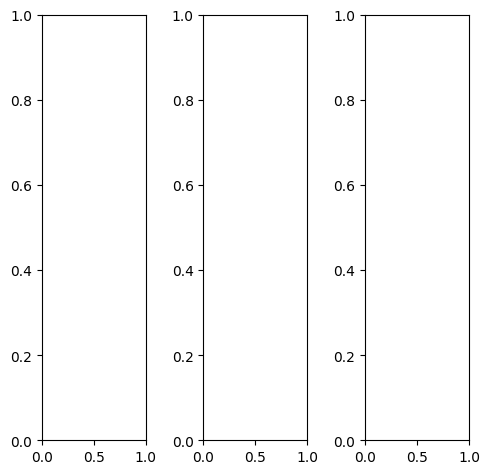

EPOCH: 5.765  trn_loss: 0.006  (668.12s - 10920.54s remaining)

tensor([[[0.7333, 0.7216, 0.7255,  ..., 0.7176, 0.6980, 0.6824],
         [0.7412, 0.7333, 0.7373,  ..., 0.6824, 0.6667, 0.6824],
         [0.7373, 0.7294, 0.7373,  ..., 0.6549, 0.6431, 0.6510],
         ...,
         [0.3059, 0.3569, 0.3725,  ..., 0.4078, 0.4118, 0.4196],
         [0.3686, 0.3647, 0.3176,  ..., 0.4039, 0.4157, 0.4196],
         [0.3569, 0.3294, 0.2784,  ..., 0.4000, 0.4078, 0.4196]],

        [[0.7333, 0.7216, 0.7255,  ..., 0.7176, 0.6980, 0.6824],
         [0.7412, 0.7333, 0.7373,  ..., 0.6824, 0.6667, 0.6824],
         [0.7373, 0.7294, 0.7373,  ..., 0.6549, 0.6431, 0.6510],
         ...,
         [0.3059, 0.3569, 0.3725,  ..., 0.4078, 0.4118, 0.4196],
         [0.3686, 0.3647, 0.3176,  ..., 0.4039, 0.4157, 0.4196],
         [0.3569, 0.3294, 0.2784,  ..., 0.4000, 0.4078, 0.4196]],

        [[0.7333, 0.7216, 0.7255,  ..., 0.7176, 0.6980, 0.6824],
         [0.7412, 0.7333, 0.7373,  ..., 0.6824, 0.6667, 0.6824],
         [0.7373, 0.7294, 0.7373,  ..., 0.6549, 0.6431, 0.

tensor([[[0.6745, 0.6627, 0.6667,  ..., 0.6706, 0.6627, 0.6510],
         [0.6824, 0.6745, 0.6784,  ..., 0.6392, 0.6235, 0.6431],
         [0.6784, 0.6706, 0.6784,  ..., 0.6157, 0.5961, 0.6078],
         ...,
         [0.3333, 0.4471, 0.4941,  ..., 0.4314, 0.4314, 0.4353],
         [0.3765, 0.4078, 0.3922,  ..., 0.4196, 0.4235, 0.4275],
         [0.3608, 0.3529, 0.3255,  ..., 0.4157, 0.4118, 0.4235]],

        [[0.7412, 0.7294, 0.7333,  ..., 0.7255, 0.7020, 0.6824],
         [0.7490, 0.7412, 0.7451,  ..., 0.6902, 0.6706, 0.6863],
         [0.7451, 0.7373, 0.7451,  ..., 0.6588, 0.6510, 0.6588],
         ...,
         [0.2980, 0.3216, 0.3255,  ..., 0.3961, 0.4039, 0.4118],
         [0.3686, 0.3490, 0.2902,  ..., 0.4000, 0.4157, 0.4196],
         [0.3569, 0.3216, 0.2667,  ..., 0.3961, 0.4078, 0.4196]],

        [[0.8549, 0.8392, 0.8431,  ..., 0.7882, 0.7725, 0.7490],
         [0.8627, 0.8510, 0.8588,  ..., 0.7608, 0.7490, 0.7569],
         [0.8549, 0.8471, 0.8549,  ..., 0.7373, 0.7294, 0.

tensor([[[0.6919, 0.5820, 0.5262,  ..., 0.5850, 0.6138, 0.6600],
         [0.6234, 0.5421, 0.4939,  ..., 0.4931, 0.5539, 0.6376],
         [0.6174, 0.5301, 0.5262,  ..., 0.4991, 0.5361, 0.6072],
         ...,
         [0.1962, 0.3163, 0.3355,  ..., 0.3652, 0.3654, 0.3971],
         [0.2723, 0.2747, 0.2577,  ..., 0.3314, 0.3612, 0.3864],
         [0.3201, 0.2254, 0.1910,  ..., 0.3545, 0.3722, 0.4172]],

        [[0.7009, 0.6592, 0.6476,  ..., 0.6471, 0.7079, 0.6874],
         [0.6723, 0.6306, 0.6070,  ..., 0.6169, 0.6699, 0.7126],
         [0.6698, 0.6247, 0.6295,  ..., 0.5736, 0.6291, 0.6631],
         ...,
         [0.2342, 0.3237, 0.3640,  ..., 0.4051, 0.4110, 0.3782],
         [0.3185, 0.3167, 0.2646,  ..., 0.3684, 0.3890, 0.3825],
         [0.3322, 0.2495, 0.2189,  ..., 0.3691, 0.3886, 0.3940]],

        [[0.8299, 0.8444, 0.7927,  ..., 0.7564, 0.7746, 0.7515],
         [0.8322, 0.8119, 0.7762,  ..., 0.6629, 0.7250, 0.7426],
         [0.8269, 0.8020, 0.7548,  ..., 0.6279, 0.6815, 0.

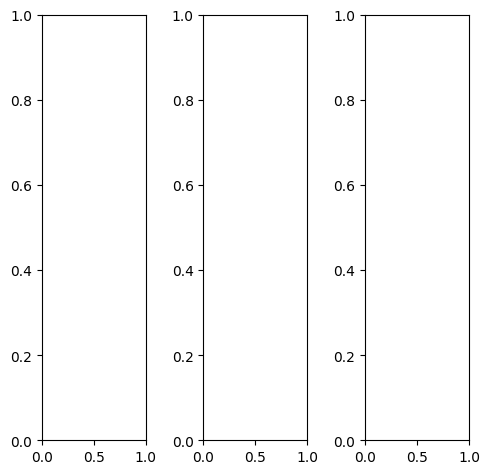

tensor([[[0.7882, 0.6627, 0.8157,  ..., 0.3725, 0.3804, 0.3804],
         [0.8235, 0.7333, 0.7686,  ..., 0.3490, 0.3686, 0.3765],
         [0.7961, 0.7804, 0.6863,  ..., 0.3098, 0.3333, 0.3647],
         ...,
         [0.0118, 0.0196, 0.0235,  ..., 0.1490, 0.1686, 0.1725],
         [0.0157, 0.0235, 0.0275,  ..., 0.1294, 0.1255, 0.1255],
         [0.0157, 0.0157, 0.0235,  ..., 0.1020, 0.1137, 0.0824]],

        [[0.7882, 0.6627, 0.8157,  ..., 0.3725, 0.3804, 0.3804],
         [0.8235, 0.7333, 0.7686,  ..., 0.3490, 0.3686, 0.3765],
         [0.7961, 0.7804, 0.6863,  ..., 0.3098, 0.3333, 0.3647],
         ...,
         [0.0118, 0.0196, 0.0235,  ..., 0.1490, 0.1686, 0.1725],
         [0.0157, 0.0235, 0.0275,  ..., 0.1294, 0.1255, 0.1255],
         [0.0157, 0.0157, 0.0235,  ..., 0.1020, 0.1137, 0.0824]],

        [[0.7882, 0.6627, 0.8157,  ..., 0.3725, 0.3804, 0.3804],
         [0.8235, 0.7333, 0.7686,  ..., 0.3490, 0.3686, 0.3765],
         [0.7961, 0.7804, 0.6863,  ..., 0.3098, 0.3333, 0.

tensor([[[0.8118, 0.6941, 0.8431,  ..., 0.3451, 0.3529, 0.3529],
         [0.8471, 0.7608, 0.7961,  ..., 0.3176, 0.3373, 0.3451],
         [0.8196, 0.8078, 0.7137,  ..., 0.2784, 0.3020, 0.3294],
         ...,
         [0.0118, 0.0196, 0.0235,  ..., 0.0549, 0.0627, 0.0510],
         [0.0157, 0.0235, 0.0275,  ..., 0.0549, 0.0431, 0.0431],
         [0.0157, 0.0157, 0.0235,  ..., 0.0431, 0.0431, 0.0275]],

        [[0.7922, 0.6824, 0.8275,  ..., 0.3843, 0.3922, 0.3922],
         [0.8314, 0.7490, 0.7882,  ..., 0.3608, 0.3804, 0.3882],
         [0.8118, 0.7843, 0.7098,  ..., 0.3216, 0.3451, 0.3765],
         ...,
         [0.0118, 0.0196, 0.0235,  ..., 0.1843, 0.2078, 0.2157],
         [0.0157, 0.0235, 0.0275,  ..., 0.1608, 0.1569, 0.1569],
         [0.0157, 0.0157, 0.0235,  ..., 0.1255, 0.1373, 0.1020]],

        [[0.6902, 0.4902, 0.6745,  ..., 0.3922, 0.4000, 0.4000],
         [0.7176, 0.5765, 0.6000,  ..., 0.3686, 0.3882, 0.3961],
         [0.6471, 0.6941, 0.5098,  ..., 0.3294, 0.3529, 0.

tensor([[[0.6938, 0.5631, 0.6805,  ..., 0.3662, 0.4161, 0.4625],
         [0.7074, 0.5403, 0.5592,  ..., 0.3602, 0.3578, 0.4264],
         [0.6711, 0.5598, 0.4872,  ..., 0.3214, 0.3668, 0.4190],
         ...,
         [0.0939, 0.1655, 0.1792,  ..., 0.3128, 0.3159, 0.3137],
         [0.1087, 0.1436, 0.1710,  ..., 0.2595, 0.2680, 0.2581],
         [0.1095, 0.1307, 0.1377,  ..., 0.1984, 0.2030, 0.2321]],

        [[0.7502, 0.6585, 0.8103,  ..., 0.4654, 0.5097, 0.4875],
         [0.7546, 0.6479, 0.6928,  ..., 0.4388, 0.4703, 0.4595],
         [0.7373, 0.7002, 0.5691,  ..., 0.4067, 0.4437, 0.4442],
         ...,
         [0.1135, 0.1439, 0.1576,  ..., 0.3024, 0.3073, 0.2842],
         [0.1125, 0.1302, 0.1370,  ..., 0.2679, 0.2455, 0.2309],
         [0.1078, 0.1201, 0.1187,  ..., 0.1980, 0.1967, 0.2060]],

        [[1.0144, 0.9368, 1.0564,  ..., 0.6048, 0.6518, 0.6231],
         [1.0355, 0.9265, 0.9707,  ..., 0.5962, 0.6193, 0.6199],
         [1.0143, 0.9779, 0.8268,  ..., 0.5239, 0.5549, 0.

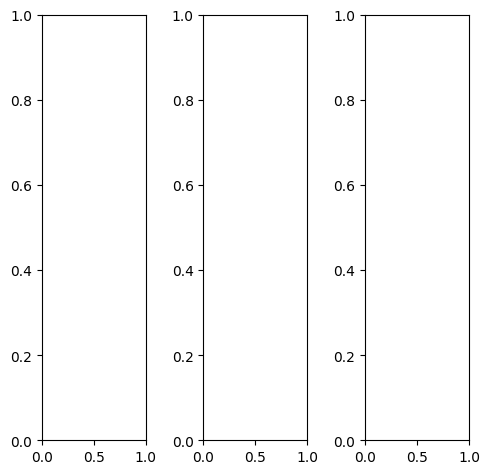

tensor([[[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.6235],
         ...,
         [0.9137, 0.9255, 0.9255,  ..., 0.6863, 0.6941, 0.7137],
         [0.9294, 0.8902, 0.8353,  ..., 0.6863, 0.6784, 0.6863],
         [0.8745, 0.8667, 0.8039,  ..., 0.6510, 0.6471, 0.6627]],

        [[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.6235],
         ...,
         [0.9137, 0.9255, 0.9255,  ..., 0.6863, 0.6941, 0.7137],
         [0.9294, 0.8902, 0.8353,  ..., 0.6863, 0.6784, 0.6863],
         [0.8745, 0.8667, 0.8039,  ..., 0.6510, 0.6471, 0.6627]],

        [[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.

tensor([[[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.6235],
         ...,
         [0.9137, 0.9255, 0.9255,  ..., 0.6863, 0.6941, 0.7137],
         [0.9294, 0.8902, 0.8353,  ..., 0.6863, 0.6784, 0.6863],
         [0.8745, 0.8667, 0.8039,  ..., 0.6510, 0.6471, 0.6627]],

        [[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.6235],
         ...,
         [0.9137, 0.9255, 0.9255,  ..., 0.6863, 0.6941, 0.7137],
         [0.9294, 0.8902, 0.8353,  ..., 0.6863, 0.6784, 0.6863],
         [0.8745, 0.8667, 0.8039,  ..., 0.6510, 0.6471, 0.6627]],

        [[0.6157, 0.5686, 0.5412,  ..., 0.5137, 0.4510, 0.5294],
         [0.6039, 0.5882, 0.5843,  ..., 0.5333, 0.4941, 0.5725],
         [0.7098, 0.6235, 0.5490,  ..., 0.6235, 0.6039, 0.

tensor([[[0.4197, 0.3219, 0.2882,  ..., 0.2652, 0.2579, 0.3574],
         [0.3195, 0.2883, 0.2827,  ..., 0.2798, 0.2736, 0.3671],
         [0.4110, 0.3144, 0.2490,  ..., 0.3502, 0.3815, 0.4003],
         ...,
         [0.6023, 0.5986, 0.6031,  ..., 0.4431, 0.4476, 0.5110],
         [0.6153, 0.5316, 0.5261,  ..., 0.4375, 0.4489, 0.4898],
         [0.5998, 0.5768, 0.5454,  ..., 0.4706, 0.4803, 0.5037]],

        [[0.4479, 0.4260, 0.3945,  ..., 0.3548, 0.3738, 0.3889],
         [0.3940, 0.3908, 0.4234,  ..., 0.3843, 0.4086, 0.4027],
         [0.4572, 0.4384, 0.3899,  ..., 0.4550, 0.4995, 0.4324],
         ...,
         [0.5690, 0.5898, 0.6105,  ..., 0.4342, 0.4846, 0.4902],
         [0.6013, 0.5439, 0.5293,  ..., 0.4517, 0.4754, 0.4848],
         [0.5537, 0.5685, 0.5314,  ..., 0.4395, 0.4758, 0.4751]],

        [[0.5928, 0.6110, 0.5714,  ..., 0.4877, 0.4862, 0.5240],
         [0.5876, 0.6456, 0.6210,  ..., 0.5388, 0.5526, 0.5820],
         [0.6567, 0.6503, 0.5554,  ..., 0.5992, 0.6117, 0.

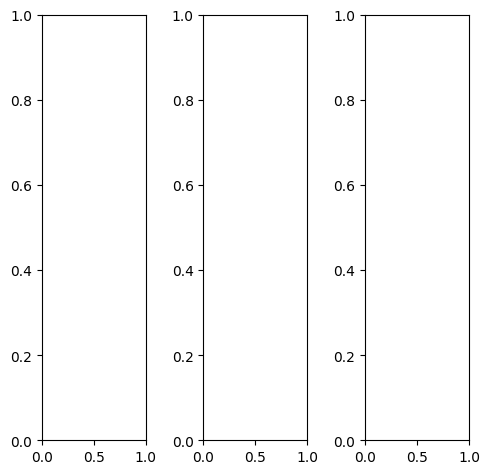

tensor([[[0.4824, 0.1333, 0.2039,  ..., 0.3569, 0.3098, 0.2235],
         [0.4078, 0.0863, 0.1333,  ..., 0.5490, 0.2941, 0.1686],
         [0.3608, 0.1294, 0.1725,  ..., 0.4902, 0.2980, 0.1961],
         ...,
         [0.6078, 0.6078, 0.5922,  ..., 0.5059, 0.5451, 0.5569],
         [0.5804, 0.6118, 0.5098,  ..., 0.5412, 0.5490, 0.5451],
         [0.5961, 0.6078, 0.5451,  ..., 0.6078, 0.6157, 0.5882]],

        [[0.4824, 0.1333, 0.2039,  ..., 0.3569, 0.3098, 0.2235],
         [0.4078, 0.0863, 0.1333,  ..., 0.5490, 0.2941, 0.1686],
         [0.3608, 0.1294, 0.1725,  ..., 0.4902, 0.2980, 0.1961],
         ...,
         [0.6078, 0.6078, 0.5922,  ..., 0.5059, 0.5451, 0.5569],
         [0.5804, 0.6118, 0.5098,  ..., 0.5412, 0.5490, 0.5451],
         [0.5961, 0.6078, 0.5451,  ..., 0.6078, 0.6157, 0.5882]],

        [[0.4824, 0.1333, 0.2039,  ..., 0.3569, 0.3098, 0.2235],
         [0.4078, 0.0863, 0.1333,  ..., 0.5490, 0.2941, 0.1686],
         [0.3608, 0.1294, 0.1725,  ..., 0.4902, 0.2980, 0.

tensor([[[0.5255, 0.1412, 0.2196,  ..., 0.3922, 0.3804, 0.2902],
         [0.4392, 0.0902, 0.1373,  ..., 0.5765, 0.3490, 0.2039],
         [0.3882, 0.1412, 0.1765,  ..., 0.5216, 0.3294, 0.2196],
         ...,
         [0.7098, 0.7137, 0.6745,  ..., 0.5608, 0.5961, 0.6157],
         [0.6863, 0.7176, 0.6275,  ..., 0.6118, 0.6157, 0.6157],
         [0.6667, 0.6784, 0.6235,  ..., 0.6745, 0.6784, 0.6549]],

        [[0.4941, 0.1373, 0.2078,  ..., 0.3569, 0.2941, 0.2078],
         [0.4196, 0.0863, 0.1373,  ..., 0.5529, 0.2824, 0.1608],
         [0.3686, 0.1333, 0.1804,  ..., 0.4980, 0.3020, 0.1961],
         ...,
         [0.5922, 0.5882, 0.5843,  ..., 0.5020, 0.5451, 0.5529],
         [0.5608, 0.5882, 0.4784,  ..., 0.5255, 0.5333, 0.5294],
         [0.5922, 0.6078, 0.5373,  ..., 0.5882, 0.6000, 0.5725]],

        [[0.3216, 0.1020, 0.1451,  ..., 0.2784, 0.2078, 0.1412],
         [0.2667, 0.0627, 0.0902,  ..., 0.4706, 0.2235, 0.1176],
         [0.2392, 0.0941, 0.1137,  ..., 0.3843, 0.2039, 0.

tensor([[[ 0.3717,  0.1113,  0.1553,  ...,  0.2533,  0.2010,  0.1725],
         [ 0.2603, -0.0408,  0.0059,  ...,  0.5204,  0.1791,  0.0864],
         [ 0.2350,  0.0261,  0.0830,  ...,  0.3931,  0.2083,  0.0752],
         ...,
         [ 0.5802,  0.5906,  0.5520,  ...,  0.4521,  0.5060,  0.5504],
         [ 0.5466,  0.5848,  0.4584,  ...,  0.4843,  0.5072,  0.5377],
         [ 0.6008,  0.6293,  0.5543,  ...,  0.6409,  0.6562,  0.6174]],

        [[ 0.4060,  0.1547,  0.2018,  ...,  0.3297,  0.2706,  0.2222],
         [ 0.3416, -0.0080,  0.0635,  ...,  0.5985,  0.2664,  0.1286],
         [ 0.2826,  0.0623,  0.1052,  ...,  0.4962,  0.2697,  0.1203],
         ...,
         [ 0.5680,  0.5608,  0.5513,  ...,  0.4411,  0.5493,  0.5546],
         [ 0.5394,  0.5854,  0.4703,  ...,  0.5136,  0.5582,  0.5471],
         [ 0.5641,  0.5971,  0.5332,  ...,  0.6271,  0.6509,  0.6024]],

        [[ 0.5258,  0.2584,  0.2930,  ...,  0.4603,  0.3853,  0.3131],
         [ 0.4936,  0.1338,  0.1670,  ...,  0

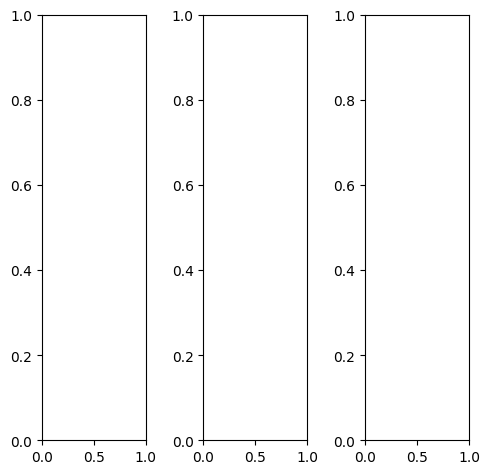

tensor([[[0.8863, 0.8824, 0.8863,  ..., 0.8000, 0.7922, 0.7843],
         [0.9020, 0.8902, 0.8941,  ..., 0.7882, 0.7804, 0.7725],
         [0.9098, 0.8980, 0.8980,  ..., 0.7569, 0.7451, 0.7412],
         ...,
         [0.5176, 0.5137, 0.5176,  ..., 0.3765, 0.3529, 0.4314],
         [0.4863, 0.4824, 0.4784,  ..., 0.3490, 0.3569, 0.3961],
         [0.4667, 0.4745, 0.4706,  ..., 0.3529, 0.3686, 0.3843]],

        [[0.8863, 0.8824, 0.8863,  ..., 0.8000, 0.7922, 0.7843],
         [0.9020, 0.8902, 0.8941,  ..., 0.7882, 0.7804, 0.7725],
         [0.9098, 0.8980, 0.8980,  ..., 0.7569, 0.7451, 0.7412],
         ...,
         [0.5176, 0.5137, 0.5176,  ..., 0.3765, 0.3529, 0.4314],
         [0.4863, 0.4824, 0.4784,  ..., 0.3490, 0.3569, 0.3961],
         [0.4667, 0.4745, 0.4706,  ..., 0.3529, 0.3686, 0.3843]],

        [[0.8863, 0.8824, 0.8863,  ..., 0.8000, 0.7922, 0.7843],
         [0.9020, 0.8902, 0.8941,  ..., 0.7882, 0.7804, 0.7725],
         [0.9098, 0.8980, 0.8980,  ..., 0.7569, 0.7451, 0.

tensor([[[0.8863, 0.8824, 0.8863,  ..., 0.8000, 0.7922, 0.7882],
         [0.9020, 0.8902, 0.8941,  ..., 0.7843, 0.7804, 0.7725],
         [0.9098, 0.8980, 0.8980,  ..., 0.7490, 0.7412, 0.7333],
         ...,
         [0.5137, 0.5098, 0.5137,  ..., 0.3765, 0.3529, 0.4275],
         [0.4824, 0.4784, 0.4706,  ..., 0.3490, 0.3569, 0.3961],
         [0.4627, 0.4706, 0.4667,  ..., 0.3529, 0.3686, 0.3843]],

        [[0.8706, 0.8667, 0.8706,  ..., 0.7765, 0.7686, 0.7608],
         [0.8863, 0.8745, 0.8784,  ..., 0.7647, 0.7569, 0.7490],
         [0.8980, 0.8863, 0.8824,  ..., 0.7333, 0.7255, 0.7176],
         ...,
         [0.4824, 0.4784, 0.4863,  ..., 0.3412, 0.3216, 0.3961],
         [0.4510, 0.4471, 0.4471,  ..., 0.3176, 0.3216, 0.3608],
         [0.4314, 0.4431, 0.4392,  ..., 0.3216, 0.3373, 0.3490]],

        [[0.9608, 0.9569, 0.9647,  ..., 0.9098, 0.9020, 0.8941],
         [0.9765, 0.9647, 0.9686,  ..., 0.9059, 0.8980, 0.8902],
         [0.9804, 0.9686, 0.9647,  ..., 0.8824, 0.8706, 0.

tensor([[[0.6566, 0.5803, 0.5486,  ..., 0.4970, 0.5412, 0.6236],
         [0.6170, 0.5379, 0.5059,  ..., 0.3907, 0.4725, 0.5792],
         [0.6374, 0.5443, 0.5398,  ..., 0.4141, 0.4606, 0.5499],
         ...,
         [0.4353, 0.5042, 0.4930,  ..., 0.3744, 0.3429, 0.4252],
         [0.4324, 0.4226, 0.4494,  ..., 0.3295, 0.3411, 0.3747],
         [0.4319, 0.4493, 0.4416,  ..., 0.3056, 0.3269, 0.3802]],

        [[0.6777, 0.6608, 0.6630,  ..., 0.5992, 0.6782, 0.6894],
         [0.6458, 0.6066, 0.6060,  ..., 0.5639, 0.6365, 0.7134],
         [0.6565, 0.6664, 0.6165,  ..., 0.5335, 0.5840, 0.6536],
         ...,
         [0.4354, 0.4768, 0.5258,  ..., 0.3952, 0.3623, 0.3896],
         [0.4342, 0.4552, 0.4695,  ..., 0.3430, 0.3348, 0.3507],
         [0.4366, 0.4481, 0.4573,  ..., 0.3074, 0.3301, 0.3557]],

        [[0.8259, 0.8286, 0.7854,  ..., 0.7502, 0.7889, 0.7685],
         [0.8141, 0.7763, 0.7799,  ..., 0.6581, 0.7374, 0.7538],
         [0.8392, 0.7861, 0.7690,  ..., 0.6520, 0.6835, 0.

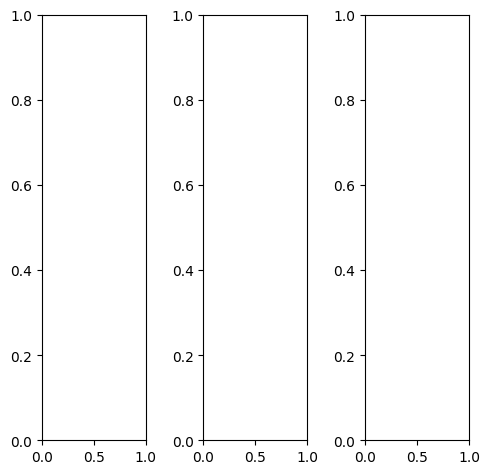

EPOCH: 6.000  val_loss: 0.004  (700.75s - 10978.45s remaining)

tensor([[[0.8039, 0.8980, 0.9255,  ..., 0.2824, 0.2980, 0.3020],
         [0.6863, 0.8980, 0.9333,  ..., 0.3451, 0.3686, 0.3686],
         [0.5922, 0.7804, 0.9686,  ..., 0.3647, 0.3922, 0.4275],
         ...,
         [0.4824, 0.9569, 0.9882,  ..., 0.3882, 0.3255, 0.3098],
         [0.4353, 0.9569, 1.0000,  ..., 0.3490, 0.3373, 0.3608],
         [0.4392, 0.8471, 0.7294,  ..., 0.3608, 0.3647, 0.3451]],

        [[0.8039, 0.8980, 0.9255,  ..., 0.2824, 0.2980, 0.3020],
         [0.6863, 0.8980, 0.9333,  ..., 0.3451, 0.3686, 0.3686],
         [0.5922, 0.7804, 0.9686,  ..., 0.3647, 0.3922, 0.4275],
         ...,
         [0.4824, 0.9569, 0.9882,  ..., 0.3882, 0.3255, 0.3098],
         [0.4353, 0.9569, 1.0000,  ..., 0.3490, 0.3373, 0.3608],
         [0.4392, 0.8471, 0.7294,  ..., 0.3608, 0.3647, 0.3451]],

        [[0.8039, 0.8980, 0.9255,  ..., 0.2824, 0.2980, 0.3020],
         [0.6863, 0.8980, 0.9333,  ..., 0.3451, 0.3686, 0.3686],
         [0.5922, 0.7804, 0.9686,  ..., 0.3647, 0.3922, 0.

tensor([[[0.8706, 0.9765, 0.9882,  ..., 0.4510, 0.4627, 0.4588],
         [0.7882, 0.9608, 0.9882,  ..., 0.5216, 0.5373, 0.5333],
         [0.7412, 0.8863, 0.9882,  ..., 0.5451, 0.5765, 0.6157],
         ...,
         [0.5333, 0.9529, 0.9922,  ..., 0.4902, 0.4235, 0.3882],
         [0.4627, 0.9569, 1.0000,  ..., 0.5098, 0.4863, 0.5137],
         [0.5882, 0.8784, 0.7804,  ..., 0.6078, 0.5725, 0.5059]],

        [[0.7961, 0.8824, 0.9176,  ..., 0.2235, 0.2431, 0.2510],
         [0.6588, 0.8863, 0.9255,  ..., 0.2863, 0.3137, 0.3137],
         [0.5451, 0.7529, 0.9686,  ..., 0.3020, 0.3294, 0.3647],
         ...,
         [0.4431, 0.9569, 0.9882,  ..., 0.3333, 0.2667, 0.2627],
         [0.4078, 0.9529, 1.0000,  ..., 0.2627, 0.2627, 0.2784],
         [0.3647, 0.8353, 0.7098,  ..., 0.2510, 0.2667, 0.2667]],

        [[0.6784, 0.7725, 0.8039,  ..., 0.1333, 0.1569, 0.1686],
         [0.5569, 0.7804, 0.8235,  ..., 0.1765, 0.2118, 0.2196],
         [0.4588, 0.6588, 0.9098,  ..., 0.2000, 0.2275, 0.

tensor([[[0.7811, 0.8913, 0.9294,  ..., 0.2702, 0.2913, 0.3066],
         [0.7275, 0.9027, 0.9511,  ..., 0.3431, 0.3743, 0.3714],
         [0.6228, 0.7797, 0.9954,  ..., 0.3781, 0.4081, 0.4285],
         ...,
         [0.5670, 0.9741, 1.0318,  ..., 0.4045, 0.3328, 0.3112],
         [0.5344, 0.9911, 1.0237,  ..., 0.3580, 0.3470, 0.3684],
         [0.5336, 0.8629, 0.7756,  ..., 0.3677, 0.3644, 0.3683]],

        [[0.7893, 0.8996, 0.9408,  ..., 0.2813, 0.3140, 0.3261],
         [0.7078, 0.9287, 0.9470,  ..., 0.3486, 0.3946, 0.3814],
         [0.6203, 0.7949, 1.0025,  ..., 0.3645, 0.4070, 0.4289],
         ...,
         [0.5432, 0.9804, 1.0155,  ..., 0.4067, 0.3351, 0.3207],
         [0.5192, 0.9846, 1.0073,  ..., 0.3573, 0.3495, 0.3697],
         [0.5595, 0.8198, 0.7515,  ..., 0.3723, 0.3714, 0.3702]],

        [[0.7875, 0.8995, 0.9054,  ..., 0.2153, 0.2551, 0.2836],
         [0.6830, 0.8781, 0.9241,  ..., 0.2776, 0.3067, 0.3113],
         [0.6070, 0.7316, 0.9601,  ..., 0.2963, 0.3284, 0.

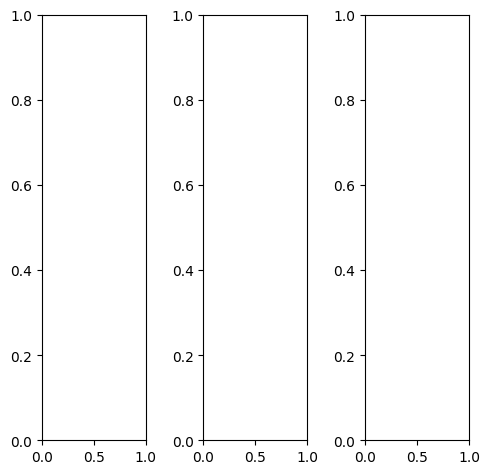

tensor([[[0.3686, 0.5647, 0.5569,  ..., 0.5451, 0.5529, 0.5843],
         [0.3373, 0.5647, 0.5333,  ..., 0.5412, 0.5608, 0.5059],
         [0.2784, 0.5490, 0.5176,  ..., 0.5608, 0.5686, 0.4941],
         ...,
         [0.1451, 0.0902, 0.0706,  ..., 0.5373, 0.5412, 0.4745],
         [0.2902, 0.2000, 0.1922,  ..., 0.4667, 0.4627, 0.4549],
         [0.6588, 0.5725, 0.5804,  ..., 0.5922, 0.5882, 0.6196]],

        [[0.3686, 0.5647, 0.5569,  ..., 0.5451, 0.5529, 0.5843],
         [0.3373, 0.5647, 0.5333,  ..., 0.5412, 0.5608, 0.5059],
         [0.2784, 0.5490, 0.5176,  ..., 0.5608, 0.5686, 0.4941],
         ...,
         [0.1451, 0.0902, 0.0706,  ..., 0.5373, 0.5412, 0.4745],
         [0.2902, 0.2000, 0.1922,  ..., 0.4667, 0.4627, 0.4549],
         [0.6588, 0.5725, 0.5804,  ..., 0.5922, 0.5882, 0.6196]],

        [[0.3686, 0.5647, 0.5569,  ..., 0.5451, 0.5529, 0.5843],
         [0.3373, 0.5647, 0.5333,  ..., 0.5412, 0.5608, 0.5059],
         [0.2784, 0.5490, 0.5176,  ..., 0.5608, 0.5686, 0.

tensor([[[0.3961, 0.5882, 0.5725,  ..., 0.6157, 0.6275, 0.6275],
         [0.3725, 0.6118, 0.5608,  ..., 0.5922, 0.6157, 0.5490],
         [0.3020, 0.5961, 0.5412,  ..., 0.6196, 0.6314, 0.5333],
         ...,
         [0.1255, 0.0706, 0.0549,  ..., 0.5373, 0.5451, 0.4863],
         [0.2667, 0.1765, 0.1725,  ..., 0.4667, 0.4667, 0.4588],
         [0.6549, 0.5647, 0.5686,  ..., 0.5922, 0.5882, 0.6157]],

        [[0.3686, 0.5686, 0.5608,  ..., 0.5216, 0.5294, 0.5686],
         [0.3333, 0.5608, 0.5373,  ..., 0.5294, 0.5451, 0.4941],
         [0.2745, 0.5373, 0.5176,  ..., 0.5412, 0.5490, 0.4824],
         ...,
         [0.1686, 0.1020, 0.0824,  ..., 0.5608, 0.5647, 0.4784],
         [0.3098, 0.2118, 0.2000,  ..., 0.4784, 0.4745, 0.4588],
         [0.6588, 0.5765, 0.5882,  ..., 0.5922, 0.5882, 0.6196]],

        [[0.2941, 0.4863, 0.4902,  ..., 0.4706, 0.4784, 0.5412],
         [0.2588, 0.4745, 0.4510,  ..., 0.4824, 0.4980, 0.4667],
         [0.2235, 0.4706, 0.4392,  ..., 0.5059, 0.5098, 0.

tensor([[[0.4334, 0.5714, 0.5760,  ..., 0.5561, 0.5816, 0.5883],
         [0.3648, 0.5884, 0.5300,  ..., 0.5376, 0.5678, 0.5154],
         [0.3014, 0.5615, 0.5416,  ..., 0.5680, 0.5841, 0.4954],
         ...,
         [0.1500, 0.0994, 0.0746,  ..., 0.5730, 0.5622, 0.4858],
         [0.2655, 0.1939, 0.1982,  ..., 0.4801, 0.4526, 0.4687],
         [0.5838, 0.5609, 0.5885,  ..., 0.6215, 0.6298, 0.6167]],

        [[0.4242, 0.5817, 0.5884,  ..., 0.5515, 0.5784, 0.5884],
         [0.3621, 0.5716, 0.5419,  ..., 0.5513, 0.5717, 0.5159],
         [0.3024, 0.5638, 0.5377,  ..., 0.5819, 0.5777, 0.4999],
         ...,
         [0.1242, 0.0894, 0.0700,  ..., 0.5476, 0.5552, 0.4905],
         [0.2588, 0.2140, 0.2003,  ..., 0.4790, 0.4824, 0.4835],
         [0.5893, 0.5608, 0.5810,  ..., 0.5990, 0.6084, 0.6179]],

        [[0.3704, 0.5130, 0.5020,  ..., 0.4696, 0.5162, 0.5337],
         [0.3134, 0.5162, 0.4454,  ..., 0.4466, 0.4843, 0.4409],
         [0.2492, 0.4955, 0.4394,  ..., 0.4685, 0.4920, 0.

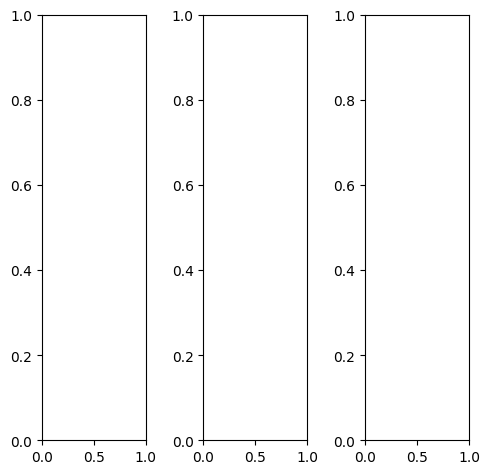

tensor([[[0.0039, 0.0078, 0.0078,  ..., 0.0078, 0.0078, 0.0078],
         [0.0078, 0.0196, 0.0196,  ..., 0.0118, 0.0039, 0.0039],
         [0.0118, 0.0471, 0.2275,  ..., 0.0196, 0.0157, 0.0078],
         ...,
         [0.2784, 0.4353, 0.5569,  ..., 0.4235, 0.3412, 0.2471],
         [0.2510, 0.3961, 0.5098,  ..., 0.3843, 0.3373, 0.2745],
         [0.1961, 0.2824, 0.3804,  ..., 0.3059, 0.2980, 0.2392]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0078, 0.0078, 0.0078],
         [0.0078, 0.0196, 0.0196,  ..., 0.0118, 0.0039, 0.0039],
         [0.0118, 0.0471, 0.2275,  ..., 0.0196, 0.0157, 0.0078],
         ...,
         [0.2784, 0.4353, 0.5569,  ..., 0.4235, 0.3412, 0.2471],
         [0.2510, 0.3961, 0.5098,  ..., 0.3843, 0.3373, 0.2745],
         [0.1961, 0.2824, 0.3804,  ..., 0.3059, 0.2980, 0.2392]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0078, 0.0078, 0.0078],
         [0.0078, 0.0196, 0.0196,  ..., 0.0118, 0.0039, 0.0039],
         [0.0118, 0.0471, 0.2275,  ..., 0.0196, 0.0157, 0.

tensor([[[0.0039, 0.0118, 0.0157,  ..., 0.0118, 0.0118, 0.0118],
         [0.0157, 0.0275, 0.0353,  ..., 0.0157, 0.0078, 0.0078],
         [0.0235, 0.0667, 0.2510,  ..., 0.0235, 0.0196, 0.0118],
         ...,
         [0.2824, 0.4392, 0.5608,  ..., 0.4275, 0.3412, 0.2510],
         [0.2549, 0.3961, 0.5098,  ..., 0.3843, 0.3333, 0.2706],
         [0.1961, 0.2824, 0.3804,  ..., 0.3059, 0.2902, 0.2275]],

        [[0.0039, 0.0078, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0078, 0.0157, 0.0118,  ..., 0.0078, 0.0000, 0.0000],
         [0.0078, 0.0392, 0.2157,  ..., 0.0157, 0.0118, 0.0039],
         ...,
         [0.2784, 0.4353, 0.5608,  ..., 0.4235, 0.3412, 0.2471],
         [0.2549, 0.4000, 0.5137,  ..., 0.3843, 0.3373, 0.2784],
         [0.2000, 0.2863, 0.3843,  ..., 0.3059, 0.3020, 0.2431]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0078, 0.0078, 0.0078],
         [0.0039, 0.0118, 0.0118,  ..., 0.0118, 0.0039, 0.0039],
         [0.0039, 0.0431, 0.2196,  ..., 0.0196, 0.0157, 0.

tensor([[[ 8.5183e-02,  2.9239e-02,  2.2768e-02,  ...,  1.9072e-02,
           3.0907e-02,  9.1466e-02],
         [ 3.1034e-02,  1.5370e-02,  1.3174e-02,  ...,  8.4218e-04,
           3.1602e-04,  3.0918e-02],
         [ 1.4021e-02,  4.8334e-02,  2.2857e-01,  ...,  1.1243e-02,
           1.1810e-02,  2.6141e-02],
         ...,
         [ 2.9593e-01,  4.8375e-01,  6.0020e-01,  ...,  4.2463e-01,
           3.5193e-01,  2.4564e-01],
         [ 2.6760e-01,  4.3004e-01,  5.5601e-01,  ...,  4.0762e-01,
           3.5204e-01,  2.7021e-01],
         [ 2.4691e-01,  2.9984e-01,  3.8672e-01,  ...,  3.0096e-01,
           2.8302e-01,  2.7271e-01]],

        [[ 9.9757e-02,  3.0601e-02,  2.3008e-02,  ...,  2.6941e-02,
           3.2413e-02,  1.1211e-01],
         [ 2.5469e-02,  1.0135e-02,  4.5002e-03,  ..., -5.3260e-04,
           5.6763e-03,  3.7040e-02],
         [ 1.2239e-02,  3.5478e-02,  2.0703e-01,  ...,  4.3552e-03,
          -5.4142e-03,  2.0619e-02],
         ...,
         [ 2.8805e-01,  4

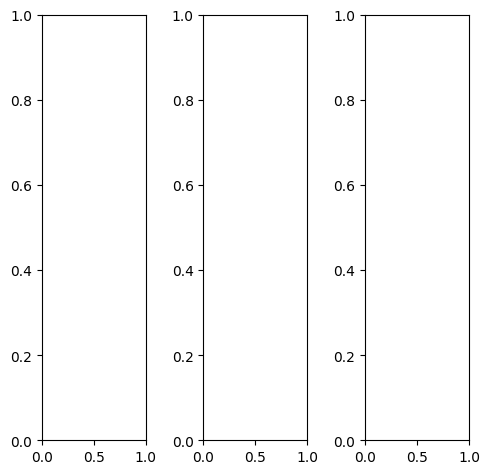

tensor([[[0.7059, 0.6980, 0.7098,  ..., 0.7373, 0.7294, 0.6667],
         [0.7294, 0.7176, 0.7333,  ..., 0.7608, 0.7529, 0.6706],
         [0.7176, 0.7098, 0.7255,  ..., 0.7490, 0.7412, 0.6667],
         ...,
         [0.2275, 0.2275, 0.2314,  ..., 0.2471, 0.2196, 0.3137],
         [0.2157, 0.2157, 0.2196,  ..., 0.2196, 0.1961, 0.2941],
         [0.3686, 0.3608, 0.3569,  ..., 0.3608, 0.3490, 0.4471]],

        [[0.7059, 0.6980, 0.7098,  ..., 0.7373, 0.7294, 0.6667],
         [0.7294, 0.7176, 0.7333,  ..., 0.7608, 0.7529, 0.6706],
         [0.7176, 0.7098, 0.7255,  ..., 0.7490, 0.7412, 0.6667],
         ...,
         [0.2275, 0.2275, 0.2314,  ..., 0.2471, 0.2196, 0.3137],
         [0.2157, 0.2157, 0.2196,  ..., 0.2196, 0.1961, 0.2941],
         [0.3686, 0.3608, 0.3569,  ..., 0.3608, 0.3490, 0.4471]],

        [[0.7059, 0.6980, 0.7098,  ..., 0.7373, 0.7294, 0.6667],
         [0.7294, 0.7176, 0.7333,  ..., 0.7608, 0.7529, 0.6706],
         [0.7176, 0.7098, 0.7255,  ..., 0.7490, 0.7412, 0.

tensor([[[0.7843, 0.7765, 0.7882,  ..., 0.8039, 0.7961, 0.7294],
         [0.8078, 0.7961, 0.8118,  ..., 0.8275, 0.8196, 0.7333],
         [0.7961, 0.7882, 0.8039,  ..., 0.8157, 0.8078, 0.7294],
         ...,
         [0.2549, 0.2549, 0.2588,  ..., 0.2745, 0.2471, 0.3451],
         [0.2471, 0.2431, 0.2471,  ..., 0.2471, 0.2235, 0.3255],
         [0.4000, 0.3882, 0.3843,  ..., 0.3882, 0.3765, 0.4745]],

        [[0.6902, 0.6824, 0.6941,  ..., 0.7255, 0.7176, 0.6549],
         [0.7137, 0.7020, 0.7137,  ..., 0.7490, 0.7412, 0.6588],
         [0.7020, 0.6941, 0.7098,  ..., 0.7373, 0.7294, 0.6549],
         ...,
         [0.2235, 0.2235, 0.2275,  ..., 0.2431, 0.2157, 0.3098],
         [0.2118, 0.2118, 0.2157,  ..., 0.2157, 0.1922, 0.2902],
         [0.3647, 0.3569, 0.3529,  ..., 0.3569, 0.3412, 0.4392]],

        [[0.5843, 0.5843, 0.5922,  ..., 0.6235, 0.6118, 0.5569],
         [0.6078, 0.6000, 0.6118,  ..., 0.6431, 0.6353, 0.5608],
         [0.6000, 0.5961, 0.6078,  ..., 0.6314, 0.6235, 0.

tensor([[[0.6720, 0.6653, 0.6620,  ..., 0.6918, 0.6764, 0.6632],
         [0.7007, 0.6737, 0.6860,  ..., 0.7085, 0.7135, 0.6555],
         [0.6932, 0.6750, 0.6843,  ..., 0.7180, 0.7097, 0.6265],
         ...,
         [0.2121, 0.2169, 0.2150,  ..., 0.2342, 0.2083, 0.3069],
         [0.2041, 0.1910, 0.1976,  ..., 0.2042, 0.1773, 0.2826],
         [0.3569, 0.3617, 0.3649,  ..., 0.3686, 0.3597, 0.4137]],

        [[0.7122, 0.7115, 0.7353,  ..., 0.7520, 0.7433, 0.7064],
         [0.7374, 0.7390, 0.7486,  ..., 0.7679, 0.7571, 0.6982],
         [0.7497, 0.7332, 0.7500,  ..., 0.7655, 0.7453, 0.6866],
         ...,
         [0.2255, 0.2307, 0.2361,  ..., 0.2516, 0.2214, 0.3211],
         [0.2330, 0.2187, 0.2209,  ..., 0.2180, 0.1973, 0.3003],
         [0.3772, 0.3774, 0.3835,  ..., 0.3736, 0.3623, 0.4208]],

        [[0.7749, 0.7744, 0.7850,  ..., 0.7985, 0.7941, 0.7319],
         [0.7914, 0.7895, 0.8033,  ..., 0.8118, 0.7969, 0.7114],
         [0.7983, 0.7655, 0.7890,  ..., 0.8040, 0.7931, 0.

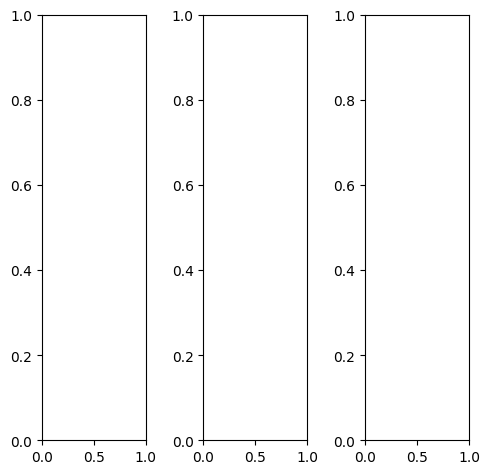

tensor([[[0.5098, 0.4784, 0.4745,  ..., 0.4549, 0.4510, 0.4275],
         [0.4784, 0.4941, 0.5059,  ..., 0.4510, 0.4588, 0.4353],
         [0.4902, 0.5098, 0.5216,  ..., 0.4549, 0.4706, 0.4471],
         ...,
         [0.4196, 0.3961, 0.4078,  ..., 0.7490, 0.5412, 0.4863],
         [0.4745, 0.4353, 0.4000,  ..., 0.5255, 0.4902, 0.4745],
         [0.5098, 0.4667, 0.4196,  ..., 0.5098, 0.4941, 0.4667]],

        [[0.5098, 0.4784, 0.4745,  ..., 0.4549, 0.4510, 0.4275],
         [0.4784, 0.4941, 0.5059,  ..., 0.4510, 0.4588, 0.4353],
         [0.4902, 0.5098, 0.5216,  ..., 0.4549, 0.4706, 0.4471],
         ...,
         [0.4196, 0.3961, 0.4078,  ..., 0.7490, 0.5412, 0.4863],
         [0.4745, 0.4353, 0.4000,  ..., 0.5255, 0.4902, 0.4745],
         [0.5098, 0.4667, 0.4196,  ..., 0.5098, 0.4941, 0.4667]],

        [[0.5098, 0.4784, 0.4745,  ..., 0.4549, 0.4510, 0.4275],
         [0.4784, 0.4941, 0.5059,  ..., 0.4510, 0.4588, 0.4353],
         [0.4902, 0.5098, 0.5216,  ..., 0.4549, 0.4706, 0.

tensor([[[0.5137, 0.4824, 0.4824,  ..., 0.4471, 0.4431, 0.4196],
         [0.4902, 0.5059, 0.5176,  ..., 0.4471, 0.4588, 0.4353],
         [0.5098, 0.5294, 0.5412,  ..., 0.4588, 0.4706, 0.4510],
         ...,
         [0.4706, 0.4353, 0.4392,  ..., 0.7686, 0.5529, 0.4902],
         [0.5216, 0.4706, 0.4314,  ..., 0.5451, 0.4980, 0.4745],
         [0.5451, 0.5020, 0.4510,  ..., 0.5255, 0.4941, 0.4549]],

        [[0.5216, 0.4902, 0.4863,  ..., 0.4745, 0.4706, 0.4431],
         [0.4902, 0.5059, 0.5137,  ..., 0.4667, 0.4745, 0.4471],
         [0.4941, 0.5137, 0.5255,  ..., 0.4706, 0.4824, 0.4588],
         ...,
         [0.4157, 0.3961, 0.4118,  ..., 0.7569, 0.5529, 0.4980],
         [0.4706, 0.4353, 0.4039,  ..., 0.5333, 0.5020, 0.4863],
         [0.5098, 0.4706, 0.4235,  ..., 0.5176, 0.5098, 0.4863]],

        [[0.4392, 0.4078, 0.4078,  ..., 0.3725, 0.3765, 0.3608],
         [0.4039, 0.4196, 0.4314,  ..., 0.3686, 0.3882, 0.3686],
         [0.4078, 0.4275, 0.4392,  ..., 0.3765, 0.3961, 0.

tensor([[[0.5174, 0.4913, 0.4767,  ..., 0.4392, 0.4504, 0.4401],
         [0.4877, 0.5118, 0.5190,  ..., 0.4407, 0.4569, 0.4294],
         [0.4930, 0.5289, 0.5452,  ..., 0.4602, 0.4695, 0.4294],
         ...,
         [0.4391, 0.4148, 0.4297,  ..., 0.7999, 0.5826, 0.5114],
         [0.5039, 0.4496, 0.4345,  ..., 0.5430, 0.5093, 0.5105],
         [0.5338, 0.4932, 0.4355,  ..., 0.5396, 0.5196, 0.5111]],

        [[0.5259, 0.5051, 0.4964,  ..., 0.4733, 0.4837, 0.4566],
         [0.5023, 0.5006, 0.5163,  ..., 0.4756, 0.4936, 0.4487],
         [0.4942, 0.5334, 0.5427,  ..., 0.4730, 0.4898, 0.4488],
         ...,
         [0.4362, 0.4106, 0.4368,  ..., 0.7760, 0.5484, 0.4981],
         [0.5132, 0.4500, 0.4204,  ..., 0.5317, 0.5085, 0.5018],
         [0.5283, 0.4774, 0.4308,  ..., 0.5200, 0.5100, 0.5203]],

        [[0.4503, 0.4166, 0.3826,  ..., 0.3841, 0.4066, 0.4049],
         [0.4072, 0.4217, 0.4083,  ..., 0.3755, 0.3960, 0.3793],
         [0.3989, 0.4262, 0.4434,  ..., 0.3775, 0.3863, 0.

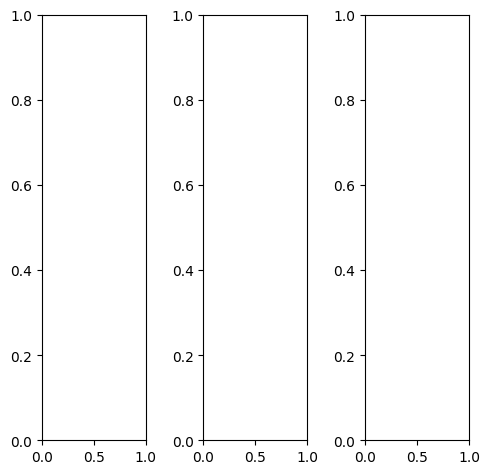

EPOCH: 6.255  trn_loss: 0.005  (728.90s - 10923.96s remaining)

tensor([[[0.7804, 0.7725, 0.7765,  ..., 0.8706, 0.8000, 0.6588],
         [0.7843, 0.7882, 0.8000,  ..., 0.8431, 0.6745, 0.5020],
         [0.7725, 0.7647, 0.7569,  ..., 0.7412, 0.5843, 0.4824],
         ...,
         [0.2627, 0.2078, 0.2275,  ..., 0.5059, 0.6353, 0.8157],
         [0.2235, 0.2039, 0.2275,  ..., 0.3686, 0.6353, 0.8275],
         [0.1961, 0.1686, 0.2039,  ..., 0.3373, 0.6784, 0.8039]],

        [[0.7804, 0.7725, 0.7765,  ..., 0.8706, 0.8000, 0.6588],
         [0.7843, 0.7882, 0.8000,  ..., 0.8431, 0.6745, 0.5020],
         [0.7725, 0.7647, 0.7569,  ..., 0.7412, 0.5843, 0.4824],
         ...,
         [0.2627, 0.2078, 0.2275,  ..., 0.5059, 0.6353, 0.8157],
         [0.2235, 0.2039, 0.2275,  ..., 0.3686, 0.6353, 0.8275],
         [0.1961, 0.1686, 0.2039,  ..., 0.3373, 0.6784, 0.8039]],

        [[0.7804, 0.7725, 0.7765,  ..., 0.8706, 0.8000, 0.6588],
         [0.7843, 0.7882, 0.8000,  ..., 0.8431, 0.6745, 0.5020],
         [0.7725, 0.7647, 0.7569,  ..., 0.7412, 0.5843, 0.

tensor([[[0.8039, 0.8039, 0.8039,  ..., 0.8824, 0.8078, 0.6706],
         [0.8118, 0.8196, 0.8235,  ..., 0.8549, 0.6980, 0.5255],
         [0.8000, 0.7882, 0.7882,  ..., 0.7608, 0.6157, 0.5176],
         ...,
         [0.3608, 0.3216, 0.3529,  ..., 0.5176, 0.6471, 0.8314],
         [0.3176, 0.3137, 0.3490,  ..., 0.3804, 0.6431, 0.8431],
         [0.2941, 0.2667, 0.3216,  ..., 0.3451, 0.6941, 0.8196]],

        [[0.7843, 0.7765, 0.7804,  ..., 0.8863, 0.8157, 0.6745],
         [0.7882, 0.7922, 0.8039,  ..., 0.8588, 0.6824, 0.5098],
         [0.7765, 0.7686, 0.7608,  ..., 0.7529, 0.5882, 0.4863],
         ...,
         [0.2392, 0.1804, 0.1961,  ..., 0.5176, 0.6471, 0.8275],
         [0.1961, 0.1765, 0.1961,  ..., 0.3765, 0.6471, 0.8392],
         [0.1686, 0.1412, 0.1725,  ..., 0.3490, 0.6902, 0.8157]],

        [[0.6863, 0.6784, 0.6902,  ..., 0.7725, 0.6980, 0.5490],
         [0.6941, 0.6941, 0.7059,  ..., 0.7176, 0.5686, 0.4039],
         [0.6863, 0.6745, 0.6471,  ..., 0.6157, 0.4784, 0.

tensor([[[0.6375, 0.5684, 0.5651,  ..., 0.6402, 0.6029, 0.5638],
         [0.5816, 0.5456, 0.5625,  ..., 0.6119, 0.4756, 0.3818],
         [0.6235, 0.5975, 0.6240,  ..., 0.5392, 0.3719, 0.3808],
         ...,
         [0.1821, 0.1825, 0.2181,  ..., 0.4518, 0.5243, 0.7537],
         [0.1610, 0.1359, 0.2153,  ..., 0.2760, 0.5442, 0.7611],
         [0.1401, 0.1238, 0.1644,  ..., 0.2979, 0.6527, 0.7464]],

        [[0.6476, 0.6483, 0.6903,  ..., 0.7496, 0.7208, 0.5516],
         [0.6190, 0.6560, 0.7383,  ..., 0.7196, 0.5988, 0.3899],
         [0.6466, 0.6525, 0.6879,  ..., 0.6236, 0.4604, 0.3475],
         ...,
         [0.1802, 0.1695, 0.2005,  ..., 0.4384, 0.5371, 0.7072],
         [0.1437, 0.1310, 0.1746,  ..., 0.3331, 0.5454, 0.7391],
         [0.1216, 0.1121, 0.1296,  ..., 0.2545, 0.6038, 0.7051]],

        [[0.8253, 0.8570, 0.8436,  ..., 0.9156, 0.8564, 0.6694],
         [0.7990, 0.8352, 0.8325,  ..., 0.8040, 0.6908, 0.4894],
         [0.7801, 0.8197, 0.8084,  ..., 0.7691, 0.6098, 0.

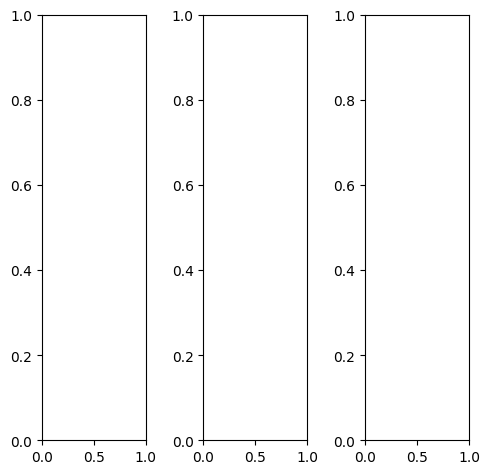

tensor([[[0.7529, 0.7569, 0.7804,  ..., 0.8431, 0.8196, 0.7961],
         [0.7529, 0.7647, 0.7882,  ..., 0.8667, 0.8549, 0.8314],
         [0.7647, 0.7725, 0.7882,  ..., 0.8235, 0.8196, 0.8118],
         ...,
         [0.8471, 0.8588, 0.8784,  ..., 0.8039, 0.8078, 0.8157],
         [0.8431, 0.8471, 0.8588,  ..., 0.8196, 0.8157, 0.8118],
         [0.8431, 0.8431, 0.8588,  ..., 0.8392, 0.8275, 0.8078]],

        [[0.7529, 0.7569, 0.7804,  ..., 0.8431, 0.8196, 0.7961],
         [0.7529, 0.7647, 0.7882,  ..., 0.8667, 0.8549, 0.8314],
         [0.7647, 0.7725, 0.7882,  ..., 0.8235, 0.8196, 0.8118],
         ...,
         [0.8471, 0.8588, 0.8784,  ..., 0.8039, 0.8078, 0.8157],
         [0.8431, 0.8471, 0.8588,  ..., 0.8196, 0.8157, 0.8118],
         [0.8431, 0.8431, 0.8588,  ..., 0.8392, 0.8275, 0.8078]],

        [[0.7529, 0.7569, 0.7804,  ..., 0.8431, 0.8196, 0.7961],
         [0.7529, 0.7647, 0.7882,  ..., 0.8667, 0.8549, 0.8314],
         [0.7647, 0.7725, 0.7882,  ..., 0.8235, 0.8196, 0.

tensor([[[0.8039, 0.8078, 0.8314,  ..., 0.8941, 0.8706, 0.8471],
         [0.8039, 0.8157, 0.8392,  ..., 0.9176, 0.9059, 0.8824],
         [0.8157, 0.8235, 0.8392,  ..., 0.8745, 0.8706, 0.8627],
         ...,
         [0.9098, 0.9176, 0.9373,  ..., 0.9294, 0.9255, 0.9137],
         [0.9020, 0.9059, 0.9176,  ..., 0.9255, 0.9059, 0.8745],
         [0.9020, 0.9020, 0.9176,  ..., 0.8980, 0.8745, 0.8431]],

        [[0.7373, 0.7451, 0.7686,  ..., 0.8314, 0.8078, 0.7843],
         [0.7412, 0.7529, 0.7765,  ..., 0.8510, 0.8392, 0.8157],
         [0.7529, 0.7608, 0.7765,  ..., 0.8078, 0.8039, 0.7961],
         ...,
         [0.8275, 0.8392, 0.8588,  ..., 0.7529, 0.7647, 0.7804],
         [0.8235, 0.8275, 0.8392,  ..., 0.7804, 0.7843, 0.7922],
         [0.8235, 0.8235, 0.8392,  ..., 0.8235, 0.8157, 0.8039]],

        [[0.6863, 0.6941, 0.7176,  ..., 0.7804, 0.7608, 0.7373],
         [0.6902, 0.7020, 0.7255,  ..., 0.8235, 0.8118, 0.7882],
         [0.7020, 0.7098, 0.7255,  ..., 0.7804, 0.7725, 0.

tensor([[[0.3675, 0.2762, 0.2619,  ..., 0.3730, 0.4035, 0.3708],
         [0.2642, 0.2450, 0.2518,  ..., 0.3442, 0.3709, 0.3444],
         [0.3186, 0.2615, 0.3020,  ..., 0.3318, 0.3516, 0.3443],
         ...,
         [0.4498, 0.5068, 0.4970,  ..., 0.4812, 0.4575, 0.4327],
         [0.4726, 0.4701, 0.4883,  ..., 0.4499, 0.4190, 0.4045],
         [0.5030, 0.4525, 0.4733,  ..., 0.4744, 0.4700, 0.4165]],

        [[0.4167, 0.3828, 0.3995,  ..., 0.4402, 0.5075, 0.3864],
         [0.3382, 0.4036, 0.3923,  ..., 0.5110, 0.5558, 0.3929],
         [0.3496, 0.4142, 0.4379,  ..., 0.4553, 0.4882, 0.3626],
         ...,
         [0.4387, 0.4713, 0.4949,  ..., 0.4694, 0.5128, 0.3845],
         [0.4532, 0.4727, 0.4891,  ..., 0.4902, 0.4912, 0.4108],
         [0.4741, 0.4493, 0.4601,  ..., 0.4619, 0.4888, 0.4014]],

        [[0.5265, 0.4991, 0.5354,  ..., 0.5718, 0.5936, 0.5211],
         [0.5123, 0.5452, 0.5598,  ..., 0.5914, 0.6323, 0.5214],
         [0.5221, 0.5707, 0.5602,  ..., 0.5568, 0.5555, 0.

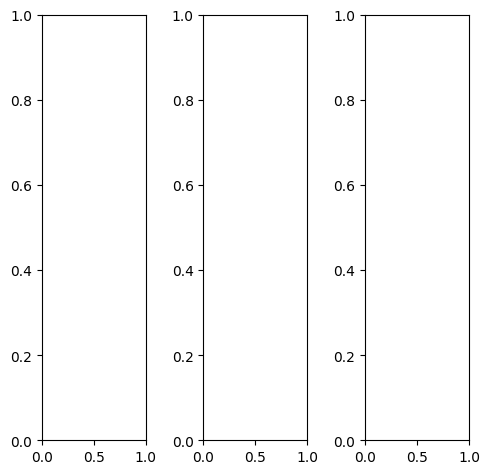

tensor([[[0.7882, 0.7725, 0.7725,  ..., 0.7843, 0.7843, 0.7843],
         [0.7882, 0.7686, 0.7686,  ..., 0.7765, 0.7765, 0.7725],
         [0.7882, 0.7725, 0.7686,  ..., 0.7255, 0.7294, 0.7608],
         ...,
         [0.2745, 0.2627, 0.4118,  ..., 0.3216, 0.3373, 0.3412],
         [0.3961, 0.3961, 0.4431,  ..., 0.4039, 0.3804, 0.3843],
         [0.3882, 0.3804, 0.3765,  ..., 0.4196, 0.3608, 0.3961]],

        [[0.7882, 0.7725, 0.7725,  ..., 0.7843, 0.7843, 0.7843],
         [0.7882, 0.7686, 0.7686,  ..., 0.7765, 0.7765, 0.7725],
         [0.7882, 0.7725, 0.7686,  ..., 0.7255, 0.7294, 0.7608],
         ...,
         [0.2745, 0.2627, 0.4118,  ..., 0.3216, 0.3373, 0.3412],
         [0.3961, 0.3961, 0.4431,  ..., 0.4039, 0.3804, 0.3843],
         [0.3882, 0.3804, 0.3765,  ..., 0.4196, 0.3608, 0.3961]],

        [[0.7882, 0.7725, 0.7725,  ..., 0.7843, 0.7843, 0.7843],
         [0.7882, 0.7686, 0.7686,  ..., 0.7765, 0.7765, 0.7725],
         [0.7882, 0.7725, 0.7686,  ..., 0.7255, 0.7294, 0.

tensor([[[0.7569, 0.7412, 0.7451,  ..., 0.7608, 0.7608, 0.7608],
         [0.7608, 0.7451, 0.7451,  ..., 0.7529, 0.7490, 0.7490],
         [0.7569, 0.7412, 0.7373,  ..., 0.6941, 0.6980, 0.7255],
         ...,
         [0.2039, 0.1882, 0.3569,  ..., 0.2706, 0.2863, 0.2902],
         [0.3098, 0.3098, 0.3765,  ..., 0.3490, 0.3255, 0.3255],
         [0.2863, 0.2784, 0.2902,  ..., 0.3569, 0.2980, 0.3373]],

        [[0.7882, 0.7765, 0.7765,  ..., 0.7843, 0.7843, 0.7843],
         [0.7882, 0.7686, 0.7686,  ..., 0.7765, 0.7765, 0.7725],
         [0.7961, 0.7765, 0.7765,  ..., 0.7333, 0.7373, 0.7647],
         ...,
         [0.3373, 0.3216, 0.4588,  ..., 0.3686, 0.3843, 0.3922],
         [0.4667, 0.4627, 0.4980,  ..., 0.4588, 0.4353, 0.4392],
         [0.4745, 0.4588, 0.4471,  ..., 0.4745, 0.4157, 0.4510]],

        [[0.8549, 0.8392, 0.8392,  ..., 0.8392, 0.8392, 0.8431],
         [0.8510, 0.8314, 0.8314,  ..., 0.8471, 0.8431, 0.8431],
         [0.8431, 0.8235, 0.8196,  ..., 0.7843, 0.7882, 0.

tensor([[[0.7791, 0.8217, 0.8368,  ..., 0.8405, 0.8231, 0.8321],
         [0.8463, 0.8870, 0.8748,  ..., 0.8927, 0.9150, 0.8673],
         [0.8683, 0.8821, 0.9180,  ..., 0.8590, 0.9158, 0.8661],
         ...,
         [0.2596, 0.2711, 0.4725,  ..., 0.3742, 0.3668, 0.4147],
         [0.4449, 0.4170, 0.5016,  ..., 0.4375, 0.4144, 0.4442],
         [0.4731, 0.4450, 0.4326,  ..., 0.5007, 0.4340, 0.4800]],

        [[0.7978, 0.8593, 0.9046,  ..., 0.9003, 0.9085, 0.9503],
         [0.8323, 0.9245, 0.9401,  ..., 0.9697, 0.9692, 0.9957],
         [0.8899, 0.9695, 0.9572,  ..., 0.9379, 0.9677, 0.9690],
         ...,
         [0.2939, 0.2963, 0.5132,  ..., 0.4296, 0.4267, 0.3884],
         [0.4707, 0.4482, 0.5454,  ..., 0.5028, 0.4697, 0.4560],
         [0.4755, 0.4341, 0.4683,  ..., 0.5226, 0.4784, 0.4963]],

        [[0.9237, 0.9581, 0.9422,  ..., 0.9603, 0.9590, 0.9639],
         [0.9836, 1.0415, 1.0196,  ..., 1.0058, 1.0333, 0.9695],
         [1.0218, 1.0334, 1.0493,  ..., 0.9984, 1.0147, 1.

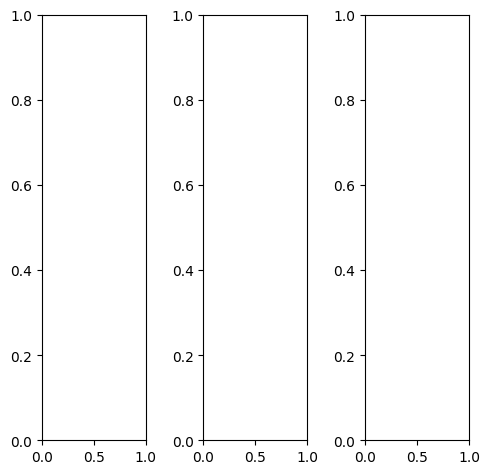

tensor([[[0.7255, 0.7294, 0.7490,  ..., 0.8549, 0.8549, 0.8510],
         [0.7255, 0.7333, 0.7529,  ..., 0.8706, 0.8706, 0.8627],
         [0.7216, 0.7333, 0.7569,  ..., 0.8824, 0.8824, 0.8745],
         ...,
         [0.9765, 0.9765, 0.9843,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9882, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 0.9725, 0.9765,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.7255, 0.7294, 0.7490,  ..., 0.8549, 0.8549, 0.8510],
         [0.7255, 0.7333, 0.7529,  ..., 0.8706, 0.8706, 0.8627],
         [0.7216, 0.7333, 0.7569,  ..., 0.8824, 0.8824, 0.8745],
         ...,
         [0.9765, 0.9765, 0.9843,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9882, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 0.9725, 0.9765,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.7255, 0.7294, 0.7490,  ..., 0.8549, 0.8549, 0.8510],
         [0.7255, 0.7333, 0.7529,  ..., 0.8706, 0.8706, 0.8627],
         [0.7216, 0.7333, 0.7569,  ..., 0.8824, 0.8824, 0.

tensor([[[0.8039, 0.8078, 0.8235,  ..., 0.9137, 0.9137, 0.9098],
         [0.8039, 0.8118, 0.8314,  ..., 0.9294, 0.9294, 0.9216],
         [0.8039, 0.8118, 0.8353,  ..., 0.9412, 0.9412, 0.9333],
         ...,
         [1.0000, 0.9882, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9882,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.6980, 0.7020, 0.7216,  ..., 0.8353, 0.8392, 0.8314],
         [0.6980, 0.7059, 0.7255,  ..., 0.8510, 0.8510, 0.8431],
         [0.6941, 0.7059, 0.7294,  ..., 0.8627, 0.8627, 0.8549],
         ...,
         [0.9725, 0.9765, 0.9922,  ..., 1.0000, 1.0000, 1.0000],
         [0.9922, 0.9882, 0.9922,  ..., 1.0000, 1.0000, 1.0000],
         [0.9843, 0.9686, 0.9765,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.6549, 0.6588, 0.6784,  ..., 0.7961, 0.7961, 0.7882],
         [0.6549, 0.6627, 0.6824,  ..., 0.8078, 0.8078, 0.8000],
         [0.6510, 0.6627, 0.6863,  ..., 0.8196, 0.8196, 0.

tensor([[[0.5694, 0.5060, 0.4666,  ..., 0.5400, 0.5689, 0.6583],
         [0.5041, 0.4886, 0.4280,  ..., 0.4478, 0.5355, 0.6101],
         [0.4946, 0.4797, 0.4614,  ..., 0.5218, 0.5686, 0.6172],
         ...,
         [0.7767, 0.7529, 0.7590,  ..., 0.7878, 0.8093, 0.8097],
         [0.7804, 0.7355, 0.7297,  ..., 0.7417, 0.7815, 0.8088],
         [0.7867, 0.7625, 0.7707,  ..., 0.7952, 0.8220, 0.8021]],

        [[0.5506, 0.5443, 0.5370,  ..., 0.6318, 0.6956, 0.6990],
         [0.5453, 0.5516, 0.5355,  ..., 0.6163, 0.6870, 0.7400],
         [0.5292, 0.5708, 0.5678,  ..., 0.6611, 0.6828, 0.7325],
         ...,
         [0.7087, 0.7086, 0.7398,  ..., 0.7721, 0.7841, 0.8211],
         [0.7360, 0.7128, 0.7137,  ..., 0.7444, 0.7692, 0.8123],
         [0.7004, 0.7198, 0.7226,  ..., 0.7523, 0.7920, 0.7781]],

        [[0.6525, 0.6927, 0.6605,  ..., 0.7758, 0.8004, 0.7763],
         [0.6496, 0.6809, 0.6498,  ..., 0.7224, 0.7922, 0.7699],
         [0.6304, 0.6812, 0.6677,  ..., 0.7652, 0.8008, 0.

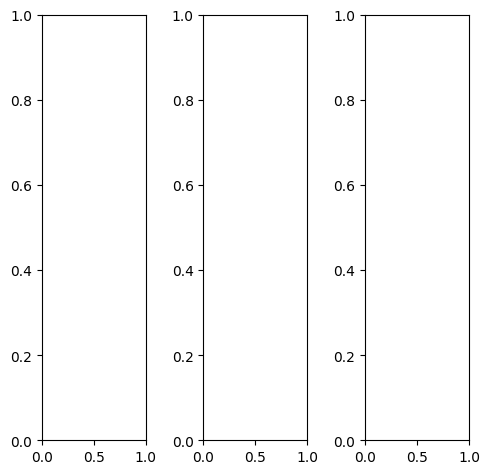

tensor([[[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.3373],
         ...,
         [0.1137, 0.1137, 0.1137,  ..., 0.2588, 0.3176, 0.3137],
         [0.0863, 0.0784, 0.0863,  ..., 0.2392, 0.2667, 0.3059],
         [0.0627, 0.0667, 0.0824,  ..., 0.2863, 0.2431, 0.3137]],

        [[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.3373],
         ...,
         [0.1137, 0.1137, 0.1137,  ..., 0.2588, 0.3176, 0.3137],
         [0.0863, 0.0784, 0.0863,  ..., 0.2392, 0.2667, 0.3059],
         [0.0627, 0.0667, 0.0824,  ..., 0.2863, 0.2431, 0.3137]],

        [[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.

tensor([[[0.5490, 0.6431, 0.6980,  ..., 0.3843, 0.1804, 0.2824],
         [0.6157, 0.7059, 0.7725,  ..., 0.3882, 0.2275, 0.1490],
         [0.6392, 0.7216, 0.7961,  ..., 0.3882, 0.3216, 0.3098],
         ...,
         [0.0824, 0.0824, 0.0863,  ..., 0.2549, 0.3216, 0.3137],
         [0.0588, 0.0588, 0.0667,  ..., 0.2431, 0.2745, 0.3098],
         [0.0431, 0.0510, 0.0627,  ..., 0.2627, 0.2510, 0.3216]],

        [[0.5686, 0.6588, 0.7020,  ..., 0.4588, 0.2588, 0.3294],
         [0.6353, 0.7216, 0.7686,  ..., 0.4784, 0.3059, 0.2000],
         [0.6667, 0.7373, 0.8000,  ..., 0.4745, 0.4000, 0.3686],
         ...,
         [0.1294, 0.1294, 0.1255,  ..., 0.2784, 0.3333, 0.3333],
         [0.0980, 0.0902, 0.0941,  ..., 0.2549, 0.2784, 0.3216],
         [0.0706, 0.0706, 0.0902,  ..., 0.3176, 0.2549, 0.3255]],

        [[0.4392, 0.5294, 0.5608,  ..., 0.3412, 0.2000, 0.2980],
         [0.5059, 0.5804, 0.6118,  ..., 0.3490, 0.1922, 0.1294],
         [0.5529, 0.5961, 0.6431,  ..., 0.3529, 0.2784, 0.

tensor([[[0.4702, 0.4371, 0.4350,  ..., 0.3217, 0.2014, 0.2690],
         [0.4253, 0.4972, 0.4849,  ..., 0.3531, 0.2254, 0.1610],
         [0.4699, 0.4815, 0.4961,  ..., 0.3488, 0.3232, 0.2765],
         ...,
         [0.0764, 0.1166, 0.1294,  ..., 0.2779, 0.3425, 0.3289],
         [0.0801, 0.0536, 0.0882,  ..., 0.2249, 0.2834, 0.2962],
         [0.0842, 0.0895, 0.0935,  ..., 0.2731, 0.2339, 0.2951]],

        [[0.4674, 0.4909, 0.5040,  ..., 0.3331, 0.2146, 0.2667],
         [0.4556, 0.5638, 0.5813,  ..., 0.4096, 0.2729, 0.1729],
         [0.5071, 0.5525, 0.5792,  ..., 0.3990, 0.3489, 0.2897],
         ...,
         [0.1014, 0.1168, 0.1157,  ..., 0.2669, 0.3212, 0.2880],
         [0.0838, 0.0619, 0.0639,  ..., 0.2314, 0.2547, 0.2633],
         [0.0878, 0.0777, 0.0657,  ..., 0.2532, 0.2173, 0.2547]],

        [[0.5678, 0.6275, 0.6246,  ..., 0.3984, 0.2850, 0.3378],
         [0.6020, 0.6930, 0.6969,  ..., 0.4636, 0.3070, 0.2342],
         [0.6143, 0.6602, 0.6925,  ..., 0.4606, 0.4067, 0.

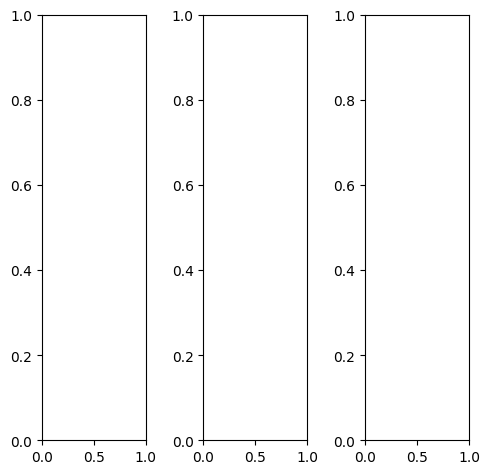

EPOCH: 6.510  trn_loss: 0.006  (757.73s - 10881.34s remaining)

tensor([[[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.2941],
         ...,
         [0.2118, 0.2118, 0.2196,  ..., 0.1686, 0.1725, 0.1647],
         [0.2235, 0.2196, 0.2196,  ..., 0.1804, 0.1686, 0.1804],
         [0.2000, 0.2039, 0.2039,  ..., 0.1608, 0.1529, 0.1647]],

        [[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.2941],
         ...,
         [0.2118, 0.2118, 0.2196,  ..., 0.1686, 0.1725, 0.1647],
         [0.2235, 0.2196, 0.2196,  ..., 0.1804, 0.1686, 0.1804],
         [0.2000, 0.2039, 0.2039,  ..., 0.1608, 0.1529, 0.1647]],

        [[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.

tensor([[[0.2745, 0.2824, 0.2863,  ..., 0.2039, 0.1961, 0.1882],
         [0.2627, 0.2588, 0.2667,  ..., 0.1922, 0.1882, 0.1843],
         [0.2549, 0.2510, 0.2588,  ..., 0.1961, 0.1922, 0.1843],
         ...,
         [0.1333, 0.1294, 0.1373,  ..., 0.0980, 0.0980, 0.0941],
         [0.1412, 0.1373, 0.1373,  ..., 0.1020, 0.0902, 0.0980],
         [0.1020, 0.1059, 0.1020,  ..., 0.0667, 0.0627, 0.0706]],

        [[0.4196, 0.4196, 0.4157,  ..., 0.3373, 0.3333, 0.3333],
         [0.4039, 0.3961, 0.3922,  ..., 0.3216, 0.3255, 0.3255],
         [0.3922, 0.3843, 0.3843,  ..., 0.3176, 0.3216, 0.3216],
         ...,
         [0.2353, 0.2353, 0.2431,  ..., 0.1961, 0.1961, 0.1882],
         [0.2510, 0.2471, 0.2471,  ..., 0.2078, 0.1961, 0.2039],
         [0.2275, 0.2314, 0.2314,  ..., 0.1922, 0.1804, 0.1882]],

        [[0.5216, 0.5255, 0.5294,  ..., 0.4392, 0.4431, 0.4471],
         [0.5059, 0.4980, 0.5020,  ..., 0.4235, 0.4314, 0.4392],
         [0.4980, 0.4863, 0.4824,  ..., 0.4196, 0.4275, 0.

tensor([[[0.4443, 0.3860, 0.3600,  ..., 0.2208, 0.2584, 0.3504],
         [0.3988, 0.3745, 0.3491,  ..., 0.2075, 0.2028, 0.2935],
         [0.3780, 0.3299, 0.3548,  ..., 0.1858, 0.2149, 0.2817],
         ...,
         [0.1609, 0.1807, 0.1622,  ..., 0.1034, 0.1045, 0.1338],
         [0.1788, 0.1572, 0.1721,  ..., 0.1058, 0.1042, 0.1421],
         [0.2121, 0.1548, 0.1351,  ..., 0.1018, 0.0888, 0.1673]],

        [[0.4770, 0.4510, 0.4439,  ..., 0.3261, 0.3648, 0.3891],
         [0.4640, 0.4328, 0.4430,  ..., 0.2992, 0.3162, 0.3437],
         [0.4347, 0.4137, 0.4433,  ..., 0.3095, 0.3278, 0.3352],
         ...,
         [0.2006, 0.2032, 0.2219,  ..., 0.1395, 0.1479, 0.1599],
         [0.1998, 0.1997, 0.2085,  ..., 0.1462, 0.1305, 0.1601],
         [0.2119, 0.1613, 0.1829,  ..., 0.1274, 0.1202, 0.1647]],

        [[0.5842, 0.5945, 0.5748,  ..., 0.4491, 0.4848, 0.5173],
         [0.5985, 0.5972, 0.5737,  ..., 0.4466, 0.4598, 0.4857],
         [0.5705, 0.5383, 0.5280,  ..., 0.4241, 0.4495, 0.

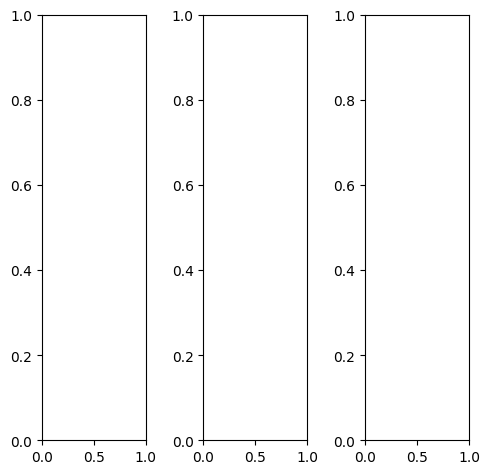

tensor([[[0.9922, 0.9843, 0.9843,  ..., 0.8863, 0.8667, 0.8588],
         [1.0000, 0.9922, 0.9922,  ..., 0.9020, 0.8824, 0.8745],
         [0.9961, 0.9804, 0.9804,  ..., 0.8902, 0.8745, 0.8667],
         ...,
         [0.8078, 0.7882, 0.7725,  ..., 0.6196, 0.6118, 0.6196],
         [0.7490, 0.7020, 0.7294,  ..., 0.6706, 0.6471, 0.6588],
         [0.7373, 0.6980, 0.7137,  ..., 0.6941, 0.6667, 0.6706]],

        [[0.9922, 0.9843, 0.9843,  ..., 0.8863, 0.8667, 0.8588],
         [1.0000, 0.9922, 0.9922,  ..., 0.9020, 0.8824, 0.8745],
         [0.9961, 0.9804, 0.9804,  ..., 0.8902, 0.8745, 0.8667],
         ...,
         [0.8078, 0.7882, 0.7725,  ..., 0.6196, 0.6118, 0.6196],
         [0.7490, 0.7020, 0.7294,  ..., 0.6706, 0.6471, 0.6588],
         [0.7373, 0.6980, 0.7137,  ..., 0.6941, 0.6667, 0.6706]],

        [[0.9922, 0.9843, 0.9843,  ..., 0.8863, 0.8667, 0.8588],
         [1.0000, 0.9922, 0.9922,  ..., 0.9020, 0.8824, 0.8745],
         [0.9961, 0.9804, 0.9804,  ..., 0.8902, 0.8745, 0.

tensor([[[0.9922, 0.9843, 0.9843,  ..., 0.8745, 0.8549, 0.8471],
         [1.0000, 0.9922, 0.9922,  ..., 0.8902, 0.8706, 0.8627],
         [0.9961, 0.9804, 0.9804,  ..., 0.8784, 0.8627, 0.8549],
         ...,
         [0.8588, 0.8392, 0.8235,  ..., 0.6706, 0.6588, 0.6706],
         [0.8000, 0.7529, 0.7804,  ..., 0.7216, 0.6980, 0.7098],
         [0.7882, 0.7490, 0.7647,  ..., 0.7451, 0.7176, 0.7216]],

        [[0.9922, 0.9843, 0.9843,  ..., 0.8941, 0.8745, 0.8667],
         [1.0000, 0.9922, 0.9922,  ..., 0.9098, 0.8902, 0.8824],
         [0.9961, 0.9804, 0.9804,  ..., 0.8980, 0.8824, 0.8745],
         ...,
         [0.8000, 0.7804, 0.7647,  ..., 0.6118, 0.6039, 0.6118],
         [0.7412, 0.6941, 0.7216,  ..., 0.6627, 0.6392, 0.6510],
         [0.7294, 0.6902, 0.7059,  ..., 0.6863, 0.6588, 0.6627]],

        [[0.9922, 0.9843, 0.9843,  ..., 0.8706, 0.8510, 0.8431],
         [1.0000, 0.9922, 0.9922,  ..., 0.8863, 0.8667, 0.8588],
         [0.9961, 0.9804, 0.9804,  ..., 0.8745, 0.8588, 0.

tensor([[[0.6772, 0.6366, 0.5896,  ..., 0.5473, 0.5746, 0.6288],
         [0.6526, 0.6101, 0.5777,  ..., 0.4912, 0.5492, 0.6032],
         [0.6652, 0.6138, 0.6183,  ..., 0.5587, 0.5757, 0.6069],
         ...,
         [0.5781, 0.6070, 0.5601,  ..., 0.4568, 0.4225, 0.4266],
         [0.5278, 0.4686, 0.4967,  ..., 0.4560, 0.4264, 0.4481],
         [0.5462, 0.4856, 0.4680,  ..., 0.4695, 0.4523, 0.4600]],

        [[0.7056, 0.7159, 0.7065,  ..., 0.6276, 0.6911, 0.6778],
         [0.6923, 0.6717, 0.6716,  ..., 0.6223, 0.6808, 0.7211],
         [0.6884, 0.7209, 0.7096,  ..., 0.6523, 0.6652, 0.7132],
         ...,
         [0.5713, 0.5662, 0.5692,  ..., 0.5128, 0.4818, 0.4057],
         [0.5238, 0.4764, 0.5066,  ..., 0.5304, 0.4931, 0.4553],
         [0.5404, 0.5034, 0.5017,  ..., 0.5010, 0.4946, 0.4593]],

        [[0.8401, 0.8787, 0.8286,  ..., 0.7460, 0.7654, 0.7434],
         [0.8513, 0.8623, 0.8484,  ..., 0.6974, 0.7473, 0.7394],
         [0.8664, 0.8667, 0.8534,  ..., 0.7316, 0.7462, 0.

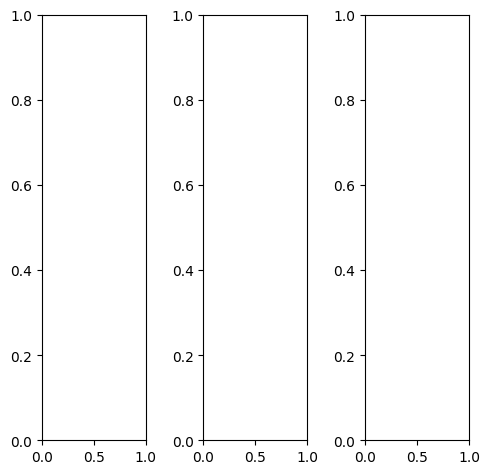

tensor([[[0.6078, 0.6039, 0.6118,  ..., 0.6275, 0.6275, 0.6275],
         [0.6235, 0.6196, 0.6235,  ..., 0.6431, 0.6392, 0.6392],
         [0.6275, 0.6235, 0.6235,  ..., 0.6431, 0.6431, 0.6431],
         ...,
         [0.4784, 0.4784, 0.4784,  ..., 0.4314, 0.4353, 0.4314],
         [0.4863, 0.4863, 0.4784,  ..., 0.5294, 0.5176, 0.5098],
         [0.4549, 0.4549, 0.4471,  ..., 0.5176, 0.4980, 0.4824]],

        [[0.6078, 0.6039, 0.6118,  ..., 0.6275, 0.6275, 0.6275],
         [0.6235, 0.6196, 0.6235,  ..., 0.6431, 0.6392, 0.6392],
         [0.6275, 0.6235, 0.6235,  ..., 0.6431, 0.6431, 0.6431],
         ...,
         [0.4784, 0.4784, 0.4784,  ..., 0.4314, 0.4353, 0.4314],
         [0.4863, 0.4863, 0.4784,  ..., 0.5294, 0.5176, 0.5098],
         [0.4549, 0.4549, 0.4471,  ..., 0.5176, 0.4980, 0.4824]],

        [[0.6078, 0.6039, 0.6118,  ..., 0.6275, 0.6275, 0.6275],
         [0.6235, 0.6196, 0.6235,  ..., 0.6431, 0.6392, 0.6392],
         [0.6275, 0.6235, 0.6235,  ..., 0.6431, 0.6431, 0.

tensor([[[0.4941, 0.4902, 0.4980,  ..., 0.5137, 0.5137, 0.5137],
         [0.5098, 0.5059, 0.5098,  ..., 0.5255, 0.5255, 0.5255],
         [0.5137, 0.5098, 0.5137,  ..., 0.5294, 0.5294, 0.5294],
         ...,
         [0.3216, 0.3216, 0.3216,  ..., 0.2627, 0.2706, 0.2745],
         [0.3255, 0.3255, 0.3176,  ..., 0.3765, 0.3765, 0.3647],
         [0.2863, 0.2902, 0.2824,  ..., 0.3882, 0.3843, 0.3529]],

        [[0.6196, 0.6196, 0.6235,  ..., 0.6431, 0.6392, 0.6431],
         [0.6392, 0.6353, 0.6392,  ..., 0.6588, 0.6549, 0.6549],
         [0.6431, 0.6392, 0.6392,  ..., 0.6588, 0.6588, 0.6588],
         ...,
         [0.5176, 0.5176, 0.5176,  ..., 0.4745, 0.4784, 0.4745],
         [0.5294, 0.5294, 0.5216,  ..., 0.5686, 0.5569, 0.5490],
         [0.4980, 0.4980, 0.4902,  ..., 0.5529, 0.5294, 0.5137]],

        [[0.8353, 0.8314, 0.8353,  ..., 0.8549, 0.8549, 0.8510],
         [0.8510, 0.8471, 0.8510,  ..., 0.8706, 0.8667, 0.8667],
         [0.8471, 0.8431, 0.8471,  ..., 0.8627, 0.8627, 0.

tensor([[[0.5552, 0.4275, 0.3969,  ..., 0.4885, 0.5590, 0.5664],
         [0.4491, 0.4137, 0.3852,  ..., 0.4562, 0.5076, 0.5275],
         [0.4855, 0.4399, 0.4077,  ..., 0.4744, 0.5154, 0.5609],
         ...,
         [0.3693, 0.4017, 0.3892,  ..., 0.2773, 0.2788, 0.2185],
         [0.3689, 0.3365, 0.3623,  ..., 0.4295, 0.4046, 0.3314],
         [0.3687, 0.2503, 0.2544,  ..., 0.3777, 0.3458, 0.3311]],

        [[0.6001, 0.5072, 0.5212,  ..., 0.5323, 0.6347, 0.5615],
         [0.5035, 0.5148, 0.5100,  ..., 0.5682, 0.6362, 0.5465],
         [0.5068, 0.5444, 0.5024,  ..., 0.5468, 0.6031, 0.5766],
         ...,
         [0.3436, 0.3680, 0.3714,  ..., 0.2484, 0.2493, 0.1755],
         [0.3543, 0.3561, 0.3318,  ..., 0.3917, 0.3835, 0.3124],
         [0.3308, 0.2430, 0.2464,  ..., 0.3474, 0.3331, 0.2977]],

        [[0.7048, 0.6602, 0.6573,  ..., 0.6003, 0.6730, 0.6323],
         [0.6813, 0.6846, 0.6617,  ..., 0.5873, 0.6698, 0.6091],
         [0.6810, 0.6926, 0.6567,  ..., 0.5890, 0.6260, 0.

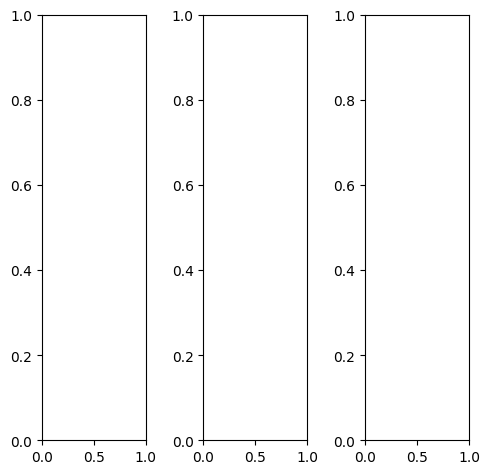

tensor([[[0.7451, 0.7373, 0.7412,  ..., 0.7529, 0.7451, 0.7529],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         ...,
         [0.5765, 0.5765, 0.5843,  ..., 0.5647, 0.5529, 0.5647],
         [0.5882, 0.5843, 0.5922,  ..., 0.5569, 0.5608, 0.5725],
         [0.5804, 0.5686, 0.5686,  ..., 0.5529, 0.5529, 0.5647]],

        [[0.7451, 0.7373, 0.7412,  ..., 0.7529, 0.7451, 0.7529],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         ...,
         [0.5765, 0.5765, 0.5843,  ..., 0.5647, 0.5529, 0.5647],
         [0.5882, 0.5843, 0.5922,  ..., 0.5569, 0.5608, 0.5725],
         [0.5804, 0.5686, 0.5686,  ..., 0.5529, 0.5529, 0.5647]],

        [[0.7451, 0.7373, 0.7412,  ..., 0.7529, 0.7451, 0.7529],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.

tensor([[[0.7412, 0.7333, 0.7373,  ..., 0.7490, 0.7412, 0.7490],
         [0.7333, 0.7255, 0.7294,  ..., 0.7412, 0.7333, 0.7412],
         [0.7333, 0.7255, 0.7294,  ..., 0.7412, 0.7333, 0.7412],
         ...,
         [0.5765, 0.5765, 0.5843,  ..., 0.5608, 0.5490, 0.5608],
         [0.5882, 0.5843, 0.5922,  ..., 0.5529, 0.5569, 0.5686],
         [0.5804, 0.5686, 0.5686,  ..., 0.5490, 0.5490, 0.5608]],

        [[0.7490, 0.7412, 0.7451,  ..., 0.7569, 0.7490, 0.7569],
         [0.7412, 0.7333, 0.7373,  ..., 0.7490, 0.7412, 0.7490],
         [0.7412, 0.7333, 0.7373,  ..., 0.7490, 0.7412, 0.7490],
         ...,
         [0.5804, 0.5804, 0.5882,  ..., 0.5686, 0.5569, 0.5686],
         [0.5922, 0.5882, 0.5961,  ..., 0.5608, 0.5647, 0.5765],
         [0.5843, 0.5725, 0.5725,  ..., 0.5569, 0.5569, 0.5686]],

        [[0.7451, 0.7373, 0.7412,  ..., 0.7529, 0.7451, 0.7529],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.7451],
         [0.7373, 0.7294, 0.7333,  ..., 0.7451, 0.7373, 0.

tensor([[[0.5889, 0.5213, 0.4658,  ..., 0.4797, 0.5087, 0.6064],
         [0.5143, 0.4628, 0.4225,  ..., 0.3982, 0.4400, 0.5485],
         [0.5235, 0.4860, 0.4708,  ..., 0.4612, 0.4693, 0.5616],
         ...,
         [0.4426, 0.4749, 0.4502,  ..., 0.4962, 0.4539, 0.4775],
         [0.4704, 0.4617, 0.4631,  ..., 0.4762, 0.4644, 0.4991],
         [0.5035, 0.4777, 0.4459,  ..., 0.4656, 0.4766, 0.4950]],

        [[0.6034, 0.5823, 0.5673,  ..., 0.5687, 0.6234, 0.6378],
         [0.5450, 0.5402, 0.5142,  ..., 0.5238, 0.5604, 0.6491],
         [0.5467, 0.5305, 0.5406,  ..., 0.5488, 0.5466, 0.6275],
         ...,
         [0.4372, 0.4680, 0.4828,  ..., 0.5226, 0.4965, 0.4444],
         [0.4586, 0.4795, 0.4938,  ..., 0.5183, 0.4983, 0.4862],
         [0.4818, 0.4571, 0.4633,  ..., 0.4470, 0.4728, 0.4663]],

        [[0.7455, 0.7594, 0.7116,  ..., 0.7614, 0.7820, 0.7636],
         [0.7143, 0.7153, 0.6720,  ..., 0.6725, 0.7233, 0.7403],
         [0.7154, 0.7076, 0.6873,  ..., 0.7234, 0.7306, 0.

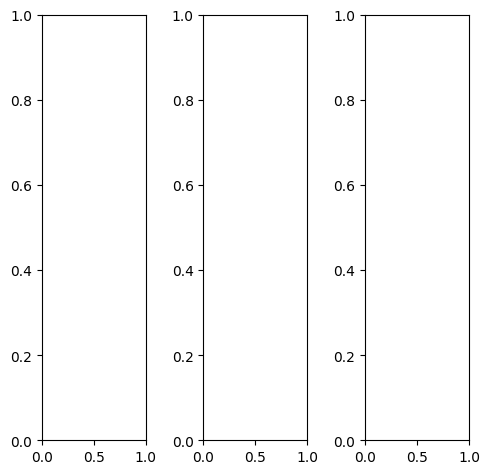

tensor([[[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0196, 0.0078, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0706, 0.0549, 0.0039],
         ...,
         [0.0784, 0.0392, 0.0824,  ..., 0.0039, 0.0000, 0.0039],
         [0.0471, 0.0353, 0.0549,  ..., 0.0039, 0.0039, 0.0039],
         [0.0510, 0.1020, 0.1294,  ..., 0.0039, 0.0039, 0.0039]],

        [[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0196, 0.0078, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0706, 0.0549, 0.0039],
         ...,
         [0.0784, 0.0392, 0.0824,  ..., 0.0039, 0.0000, 0.0039],
         [0.0471, 0.0353, 0.0549,  ..., 0.0039, 0.0039, 0.0039],
         [0.0510, 0.1020, 0.1294,  ..., 0.0039, 0.0039, 0.0039]],

        [[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0196, 0.0078, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0706, 0.0549, 0.

tensor([[[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0196, 0.0078, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0706, 0.0549, 0.0039],
         ...,
         [0.0549, 0.0275, 0.0784,  ..., 0.0039, 0.0000, 0.0039],
         [0.0314, 0.0275, 0.0510,  ..., 0.0039, 0.0039, 0.0039],
         [0.0392, 0.0980, 0.1294,  ..., 0.0039, 0.0039, 0.0039]],

        [[0.0039, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0196, 0.0078, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0745, 0.0588, 0.0039],
         ...,
         [0.0980, 0.0510, 0.0902,  ..., 0.0039, 0.0000, 0.0039],
         [0.0627, 0.0471, 0.0627,  ..., 0.0039, 0.0039, 0.0039],
         [0.0627, 0.1137, 0.1451,  ..., 0.0039, 0.0039, 0.0039]],

        [[0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0039],
         [0.0039, 0.0039, 0.0039,  ..., 0.0118, 0.0039, 0.0039],
         [0.0039, 0.0000, 0.0000,  ..., 0.0471, 0.0392, 0.

tensor([[[0.2072, 0.1387, 0.1443,  ..., 0.1246, 0.1439, 0.2292],
         [0.1294, 0.1274, 0.0989,  ..., 0.1260, 0.1106, 0.1787],
         [0.1075, 0.0795, 0.0819,  ..., 0.2139, 0.2023, 0.1755],
         ...,
         [0.4090, 0.3489, 0.4562,  ..., 0.1710, 0.1475, 0.1996],
         [0.3145, 0.3109, 0.3408,  ..., 0.1525, 0.1620, 0.2028],
         [0.3601, 0.4700, 0.5238,  ..., 0.1402, 0.1458, 0.2459]],

        [[0.2481, 0.2010, 0.1936,  ..., 0.1901, 0.1931, 0.2607],
         [0.2012, 0.2108, 0.1967,  ..., 0.2427, 0.2040, 0.2271],
         [0.1861, 0.1808, 0.1755,  ..., 0.3422, 0.3093, 0.2404],
         ...,
         [0.4148, 0.3404, 0.4754,  ..., 0.2399, 0.2063, 0.2152],
         [0.3186, 0.3067, 0.3669,  ..., 0.2140, 0.1946, 0.2148],
         [0.3633, 0.4444, 0.5366,  ..., 0.1709, 0.1682, 0.2372]],

        [[0.3182, 0.2987, 0.3012,  ..., 0.3073, 0.3163, 0.3645],
         [0.2869, 0.3228, 0.3149,  ..., 0.3778, 0.3530, 0.3478],
         [0.2802, 0.3099, 0.3013,  ..., 0.4931, 0.4671, 0.

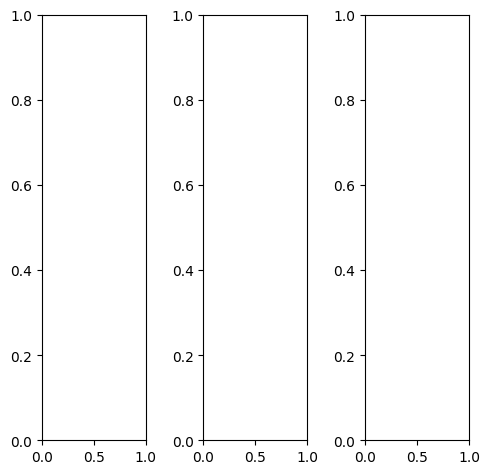

EPOCH: 6.765  trn_loss: 0.006  (786.44s - 10838.13s remaining)

tensor([[[0.3569, 0.3725, 0.4510,  ..., 0.2784, 0.2510, 0.2588],
         [0.3961, 0.3922, 0.4549,  ..., 0.2706, 0.2902, 0.3373],
         [0.4510, 0.4314, 0.4980,  ..., 0.2196, 0.2784, 0.3333],
         ...,
         [0.2000, 0.1725, 0.1765,  ..., 0.1569, 0.1373, 0.1961],
         [0.2000, 0.2471, 0.2118,  ..., 0.2000, 0.2471, 0.2980],
         [0.2392, 0.2431, 0.1882,  ..., 0.2902, 0.4275, 0.4431]],

        [[0.3569, 0.3725, 0.4510,  ..., 0.2784, 0.2510, 0.2588],
         [0.3961, 0.3922, 0.4549,  ..., 0.2706, 0.2902, 0.3373],
         [0.4510, 0.4314, 0.4980,  ..., 0.2196, 0.2784, 0.3333],
         ...,
         [0.2000, 0.1725, 0.1765,  ..., 0.1569, 0.1373, 0.1961],
         [0.2000, 0.2471, 0.2118,  ..., 0.2000, 0.2471, 0.2980],
         [0.2392, 0.2431, 0.1882,  ..., 0.2902, 0.4275, 0.4431]],

        [[0.3569, 0.3725, 0.4510,  ..., 0.2784, 0.2510, 0.2588],
         [0.3961, 0.3922, 0.4549,  ..., 0.2706, 0.2902, 0.3373],
         [0.4510, 0.4314, 0.4980,  ..., 0.2196, 0.2784, 0.

tensor([[[0.3294, 0.3647, 0.4314,  ..., 0.2824, 0.2549, 0.2588],
         [0.3725, 0.3804, 0.4314,  ..., 0.2863, 0.3059, 0.3490],
         [0.4392, 0.4157, 0.4706,  ..., 0.2353, 0.2980, 0.3529],
         ...,
         [0.2157, 0.1804, 0.1765,  ..., 0.1529, 0.1176, 0.1765],
         [0.2157, 0.2549, 0.2118,  ..., 0.1922, 0.2275, 0.2784],
         [0.2588, 0.2510, 0.1882,  ..., 0.2824, 0.4078, 0.4235]],

        [[0.4118, 0.4078, 0.4980,  ..., 0.2863, 0.2588, 0.2745],
         [0.4471, 0.4275, 0.5020,  ..., 0.2745, 0.2941, 0.3451],
         [0.4941, 0.4706, 0.5412,  ..., 0.2235, 0.2784, 0.3373],
         ...,
         [0.2078, 0.1882, 0.1922,  ..., 0.1804, 0.1647, 0.2235],
         [0.2078, 0.2627, 0.2275,  ..., 0.2235, 0.2745, 0.3255],
         [0.2471, 0.2588, 0.2039,  ..., 0.3098, 0.4510, 0.4706]],

        [[0.1569, 0.2235, 0.2745,  ..., 0.2275, 0.2000, 0.1922],
         [0.2000, 0.2431, 0.2863,  ..., 0.2157, 0.2314, 0.2627],
         [0.2706, 0.2863, 0.3373,  ..., 0.1529, 0.2118, 0.

tensor([[[0.5427, 0.5411, 0.6781,  ..., 0.3241, 0.2973, 0.3664],
         [0.5696, 0.5975, 0.6984,  ..., 0.3102, 0.3306, 0.4609],
         [0.6885, 0.6758, 0.8162,  ..., 0.2103, 0.3332, 0.4582],
         ...,
         [0.2046, 0.2184, 0.2155,  ..., 0.1946, 0.1400, 0.2520],
         [0.2221, 0.3303, 0.2968,  ..., 0.2094, 0.2803, 0.4286],
         [0.2855, 0.2922, 0.1940,  ..., 0.4684, 0.6542, 0.6483]],

        [[0.5966, 0.6111, 0.7740,  ..., 0.4082, 0.3983, 0.3936],
         [0.6048, 0.6351, 0.7751,  ..., 0.3883, 0.4562, 0.5077],
         [0.7388, 0.7408, 0.8563,  ..., 0.2736, 0.4242, 0.4924],
         ...,
         [0.2357, 0.2191, 0.2412,  ..., 0.2349, 0.1787, 0.2381],
         [0.2441, 0.3648, 0.3050,  ..., 0.2812, 0.3590, 0.4443],
         [0.3014, 0.3081, 0.2370,  ..., 0.4830, 0.6821, 0.6466]],

        [[0.7633, 0.7972, 0.9272,  ..., 0.5519, 0.5418, 0.5533],
         [0.8282, 0.8471, 0.9722,  ..., 0.5590, 0.6288, 0.6892],
         [0.9576, 0.9567, 1.0783,  ..., 0.4234, 0.5774, 0.

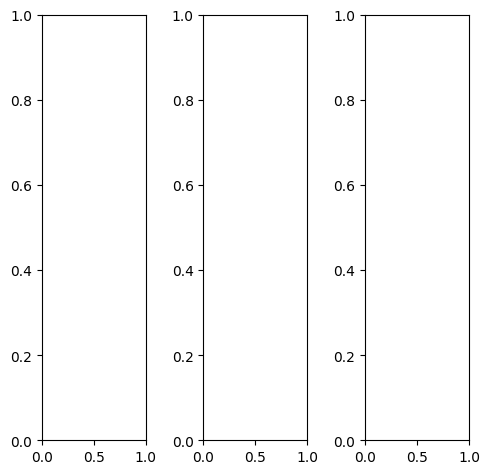

tensor([[[0.4000, 0.4118, 0.4118,  ..., 0.4039, 0.4353, 0.4667],
         [0.3765, 0.3882, 0.4314,  ..., 0.4667, 0.4863, 0.4588],
         [0.4000, 0.3882, 0.4196,  ..., 0.4784, 0.4941, 0.4431],
         ...,
         [0.4471, 0.7059, 0.7216,  ..., 0.4824, 0.4510, 0.4196],
         [0.6235, 0.7294, 0.7176,  ..., 0.4000, 0.3922, 0.4118],
         [0.7098, 0.7098, 0.7020,  ..., 0.3922, 0.3333, 0.3882]],

        [[0.4000, 0.4118, 0.4118,  ..., 0.4039, 0.4353, 0.4667],
         [0.3765, 0.3882, 0.4314,  ..., 0.4667, 0.4863, 0.4588],
         [0.4000, 0.3882, 0.4196,  ..., 0.4784, 0.4941, 0.4431],
         ...,
         [0.4471, 0.7059, 0.7216,  ..., 0.4824, 0.4510, 0.4196],
         [0.6235, 0.7294, 0.7176,  ..., 0.4000, 0.3922, 0.4118],
         [0.7098, 0.7098, 0.7020,  ..., 0.3922, 0.3333, 0.3882]],

        [[0.4000, 0.4118, 0.4118,  ..., 0.4039, 0.4353, 0.4667],
         [0.3765, 0.3882, 0.4314,  ..., 0.4667, 0.4863, 0.4588],
         [0.4000, 0.3882, 0.4196,  ..., 0.4784, 0.4941, 0.

tensor([[[0.4392, 0.4549, 0.4549,  ..., 0.4902, 0.5176, 0.5373],
         [0.4000, 0.4157, 0.4784,  ..., 0.5451, 0.5725, 0.5294],
         [0.4314, 0.4157, 0.4706,  ..., 0.5490, 0.5765, 0.5137],
         ...,
         [0.4941, 0.7333, 0.7490,  ..., 0.5333, 0.5020, 0.4667],
         [0.6510, 0.7569, 0.7451,  ..., 0.4510, 0.4431, 0.4784],
         [0.7373, 0.7333, 0.7333,  ..., 0.4314, 0.3765, 0.4471]],

        [[0.4235, 0.4314, 0.4353,  ..., 0.4039, 0.4353, 0.4706],
         [0.4118, 0.4196, 0.4549,  ..., 0.4706, 0.4863, 0.4627],
         [0.4314, 0.4196, 0.4392,  ..., 0.4863, 0.4941, 0.4510],
         ...,
         [0.4510, 0.7059, 0.7216,  ..., 0.4784, 0.4471, 0.4275],
         [0.6275, 0.7294, 0.7176,  ..., 0.3961, 0.3961, 0.4196],
         [0.7098, 0.7098, 0.7020,  ..., 0.4039, 0.3529, 0.3961]],

        [[0.1686, 0.1843, 0.1765,  ..., 0.1882, 0.2235, 0.2588],
         [0.1490, 0.1647, 0.1961,  ..., 0.2392, 0.2627, 0.2392],
         [0.1725, 0.1569, 0.1804,  ..., 0.2431, 0.2627, 0.

tensor([[[0.3019, 0.2195, 0.2079,  ..., 0.2277, 0.2905, 0.3757],
         [0.1733, 0.1304, 0.1663,  ..., 0.2615, 0.3129, 0.3034],
         [0.2184, 0.1358, 0.1888,  ..., 0.2742, 0.3247, 0.2689],
         ...,
         [0.3549, 0.7220, 0.7543,  ..., 0.4418, 0.3877, 0.3848],
         [0.6171, 0.7569, 0.7423,  ..., 0.3221, 0.3258, 0.3759],
         [0.7499, 0.7655, 0.7542,  ..., 0.3103, 0.2496, 0.3331]],

        [[0.3901, 0.3596, 0.3827,  ..., 0.3364, 0.4299, 0.4309],
         [0.3001, 0.3077, 0.3744,  ..., 0.4171, 0.4868, 0.3825],
         [0.3364, 0.3182, 0.3707,  ..., 0.4266, 0.4714, 0.3397],
         ...,
         [0.3384, 0.6935, 0.7592,  ..., 0.5024, 0.4499, 0.3644],
         [0.6233, 0.7606, 0.7514,  ..., 0.4031, 0.3842, 0.3780],
         [0.7082, 0.7506, 0.7250,  ..., 0.3253, 0.2884, 0.3255]],

        [[0.5466, 0.5961, 0.6211,  ..., 0.4963, 0.5781, 0.5934],
         [0.5127, 0.5670, 0.6452,  ..., 0.5874, 0.6480, 0.5674],
         [0.5394, 0.5638, 0.6180,  ..., 0.5831, 0.6305, 0.

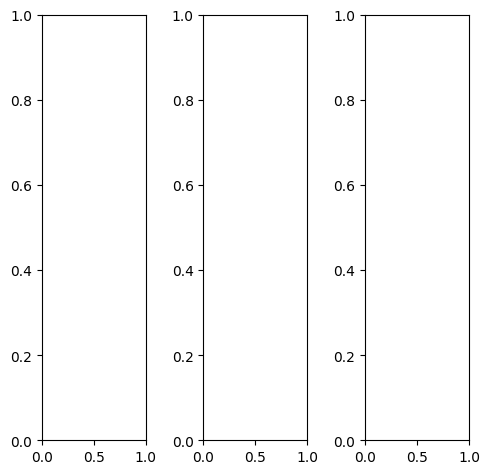

tensor([[[0.6314, 0.6196, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6235, 0.6275,  ..., 0.6275, 0.6275, 0.6314],
         ...,
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353]],

        [[0.6314, 0.6196, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6235, 0.6275,  ..., 0.6275, 0.6275, 0.6314],
         ...,
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353]],

        [[0.6314, 0.6196, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6392, 0.6275, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6392, 0.6235, 0.6275,  ..., 0.6275, 0.6275, 0.

tensor([[[0.4667, 0.4549, 0.4471,  ..., 0.4588, 0.4588, 0.4588],
         [0.4745, 0.4588, 0.4549,  ..., 0.4667, 0.4667, 0.4667],
         [0.4745, 0.4588, 0.4549,  ..., 0.4627, 0.4627, 0.4667],
         ...,
         [0.4784, 0.4588, 0.4549,  ..., 0.4627, 0.4627, 0.4667],
         [0.4784, 0.4588, 0.4549,  ..., 0.4627, 0.4627, 0.4667],
         [0.4784, 0.4588, 0.4549,  ..., 0.4627, 0.4627, 0.4667]],

        [[0.6549, 0.6431, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         [0.6627, 0.6510, 0.6549,  ..., 0.6549, 0.6549, 0.6588],
         [0.6627, 0.6471, 0.6510,  ..., 0.6510, 0.6510, 0.6549],
         ...,
         [0.6627, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6588],
         [0.6627, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6588],
         [0.6627, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6588]],

        [[0.9373, 0.9294, 0.9373,  ..., 0.9412, 0.9412, 0.9451],
         [0.9529, 0.9412, 0.9490,  ..., 0.9529, 0.9529, 0.9569],
         [0.9490, 0.9373, 0.9451,  ..., 0.9490, 0.9490, 0.

tensor([[[0.4552, 0.3420, 0.2972,  ..., 0.3533, 0.4025, 0.4242],
         [0.3408, 0.2992, 0.2569,  ..., 0.2645, 0.2941, 0.3546],
         [0.3453, 0.3031, 0.3021,  ..., 0.2978, 0.3106, 0.3761],
         ...,
         [0.4278, 0.4716, 0.4142,  ..., 0.4485, 0.4402, 0.4663],
         [0.4470, 0.4384, 0.4232,  ..., 0.4365, 0.4145, 0.4651],
         [0.4903, 0.4537, 0.4402,  ..., 0.4609, 0.4958, 0.4977]],

        [[0.5183, 0.4615, 0.4505,  ..., 0.4313, 0.5189, 0.4375],
         [0.4126, 0.4308, 0.4106,  ..., 0.4315, 0.4775, 0.4063],
         [0.4101, 0.4239, 0.4341,  ..., 0.4137, 0.4593, 0.4227],
         ...,
         [0.4185, 0.4347, 0.4417,  ..., 0.4653, 0.5018, 0.4382],
         [0.4316, 0.4361, 0.4292,  ..., 0.4686, 0.4878, 0.4806],
         [0.4541, 0.4355, 0.4340,  ..., 0.4608, 0.5031, 0.4732]],

        [[0.7027, 0.6979, 0.6819,  ..., 0.6277, 0.6881, 0.6279],
         [0.6574, 0.6700, 0.6500,  ..., 0.5925, 0.6592, 0.6158],
         [0.6268, 0.6530, 0.6498,  ..., 0.6071, 0.6369, 0.

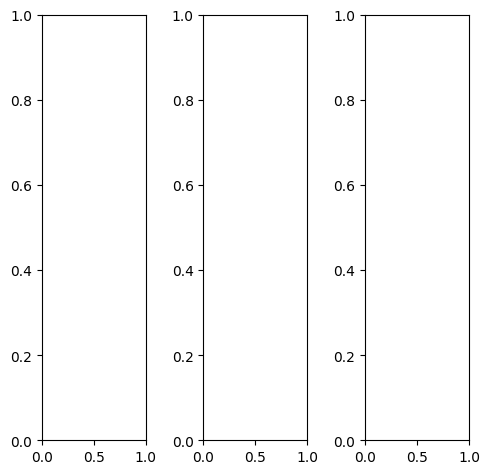

tensor([[[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.

tensor([[[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.

tensor([[[0.5659, 0.4603, 0.4037,  ..., 0.4731, 0.5100, 0.5922],
         [0.4653, 0.4056, 0.3576,  ..., 0.3848, 0.4667, 0.5356],
         [0.4646, 0.4185, 0.4140,  ..., 0.4303, 0.4707, 0.5385],
         ...,
         [0.5854, 0.5699, 0.5468,  ..., 0.5726, 0.5719, 0.6122],
         [0.5832, 0.5717, 0.5418,  ..., 0.5631, 0.5832, 0.6213],
         [0.6334, 0.6032, 0.5965,  ..., 0.6171, 0.6395, 0.6274]],

        [[0.5863, 0.5585, 0.5404,  ..., 0.5343, 0.6056, 0.6010],
         [0.5438, 0.5323, 0.5036,  ..., 0.5266, 0.5854, 0.6069],
         [0.5409, 0.5159, 0.5256,  ..., 0.5347, 0.5730, 0.6040],
         ...,
         [0.5443, 0.5385, 0.5550,  ..., 0.5635, 0.5971, 0.5907],
         [0.5503, 0.5353, 0.5443,  ..., 0.5811, 0.5942, 0.5982],
         [0.5705, 0.5642, 0.5703,  ..., 0.5866, 0.6164, 0.6038]],

        [[0.7739, 0.8124, 0.7770,  ..., 0.6899, 0.7253, 0.7225],
         [0.7587, 0.7691, 0.7444,  ..., 0.6290, 0.7018, 0.6951],
         [0.7395, 0.7599, 0.7459,  ..., 0.6552, 0.6980, 0.

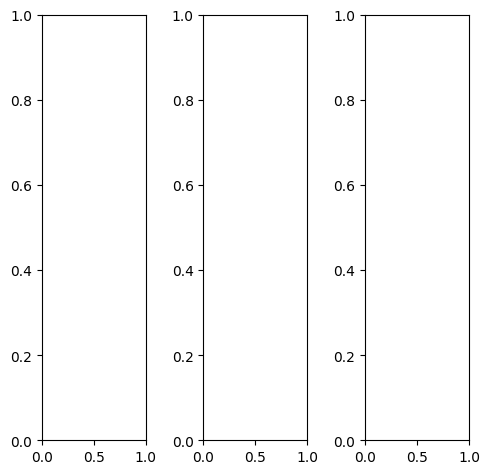

tensor([[[0.6549, 0.6510, 0.6549,  ..., 0.6706, 0.6706, 0.6784],
         [0.6431, 0.6392, 0.6431,  ..., 0.6706, 0.6706, 0.6784],
         [0.6392, 0.6314, 0.6353,  ..., 0.6902, 0.6980, 0.6980],
         ...,
         [0.6039, 0.5765, 0.5647,  ..., 0.6510, 0.6706, 0.6824],
         [0.5843, 0.5569, 0.5725,  ..., 0.6314, 0.6588, 0.6667],
         [0.5608, 0.5725, 0.5961,  ..., 0.6353, 0.6549, 0.6471]],

        [[0.6549, 0.6510, 0.6549,  ..., 0.6706, 0.6706, 0.6784],
         [0.6431, 0.6392, 0.6431,  ..., 0.6706, 0.6706, 0.6784],
         [0.6392, 0.6314, 0.6353,  ..., 0.6902, 0.6980, 0.6980],
         ...,
         [0.6039, 0.5765, 0.5647,  ..., 0.6510, 0.6706, 0.6824],
         [0.5843, 0.5569, 0.5725,  ..., 0.6314, 0.6588, 0.6667],
         [0.5608, 0.5725, 0.5961,  ..., 0.6353, 0.6549, 0.6471]],

        [[0.6549, 0.6510, 0.6549,  ..., 0.6706, 0.6706, 0.6784],
         [0.6431, 0.6392, 0.6431,  ..., 0.6706, 0.6706, 0.6784],
         [0.6392, 0.6314, 0.6353,  ..., 0.6902, 0.6980, 0.

tensor([[[0.6392, 0.6353, 0.6392,  ..., 0.6431, 0.6431, 0.6510],
         [0.6157, 0.6196, 0.6275,  ..., 0.6471, 0.6471, 0.6510],
         [0.6118, 0.6000, 0.6078,  ..., 0.6706, 0.6784, 0.6706],
         ...,
         [0.6627, 0.6353, 0.6235,  ..., 0.7020, 0.7216, 0.7333],
         [0.6431, 0.6157, 0.6314,  ..., 0.6824, 0.7098, 0.7176],
         [0.6157, 0.6314, 0.6549,  ..., 0.6902, 0.7059, 0.6980]],

        [[0.6431, 0.6392, 0.6431,  ..., 0.6667, 0.6667, 0.6745],
         [0.6353, 0.6275, 0.6314,  ..., 0.6667, 0.6667, 0.6745],
         [0.6314, 0.6275, 0.6275,  ..., 0.6824, 0.6941, 0.6941],
         ...,
         [0.5804, 0.5569, 0.5451,  ..., 0.6392, 0.6588, 0.6706],
         [0.5608, 0.5373, 0.5529,  ..., 0.6196, 0.6471, 0.6549],
         [0.5373, 0.5529, 0.5765,  ..., 0.6196, 0.6392, 0.6353]],

        [[0.7647, 0.7608, 0.7647,  ..., 0.7686, 0.7686, 0.7765],
         [0.7569, 0.7490, 0.7529,  ..., 0.7686, 0.7686, 0.7725],
         [0.7608, 0.7451, 0.7529,  ..., 0.7765, 0.7843, 0.

tensor([[[0.5628, 0.4723, 0.4353,  ..., 0.4452, 0.4599, 0.5770],
         [0.4777, 0.4370, 0.4028,  ..., 0.3876, 0.4225, 0.5143],
         [0.4641, 0.4399, 0.4578,  ..., 0.4503, 0.4733, 0.5166],
         ...,
         [0.5502, 0.5558, 0.5073,  ..., 0.5587, 0.5823, 0.6283],
         [0.5362, 0.5214, 0.5155,  ..., 0.5353, 0.5813, 0.6235],
         [0.5482, 0.5658, 0.5696,  ..., 0.6182, 0.6548, 0.6330]],

        [[0.5961, 0.5807, 0.5701,  ..., 0.5573, 0.6003, 0.6263],
         [0.5578, 0.5474, 0.5323,  ..., 0.5423, 0.5623, 0.6463],
         [0.5388, 0.5347, 0.5579,  ..., 0.5894, 0.5852, 0.6299],
         ...,
         [0.5336, 0.5114, 0.5286,  ..., 0.5664, 0.6089, 0.6177],
         [0.5090, 0.4869, 0.5247,  ..., 0.5553, 0.5924, 0.6041],
         [0.5077, 0.5194, 0.5490,  ..., 0.5858, 0.6267, 0.6028]],

        [[0.8213, 0.8621, 0.8529,  ..., 0.8136, 0.8257, 0.8142],
         [0.8118, 0.8326, 0.8155,  ..., 0.7677, 0.8034, 0.8058],
         [0.7766, 0.8109, 0.8118,  ..., 0.8252, 0.8436, 0.

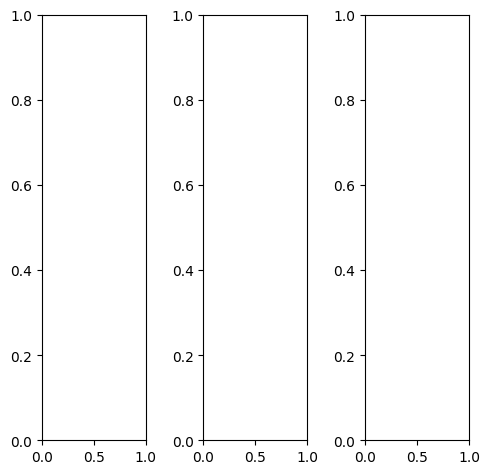

EPOCH: 7.000  val_loss: 0.004  (819.51s - 10887.74s remaining)

tensor([[[0.5137, 0.5255, 0.5294,  ..., 0.5412, 0.5333, 0.5255],
         [0.5216, 0.5333, 0.5373,  ..., 0.5490, 0.5412, 0.5333],
         [0.5294, 0.5373, 0.5451,  ..., 0.5569, 0.5490, 0.5412],
         ...,
         [0.5765, 0.5843, 0.5961,  ..., 0.6078, 0.6000, 0.5922],
         [0.5725, 0.5804, 0.5922,  ..., 0.6039, 0.5922, 0.5882],
         [0.5686, 0.5804, 0.5882,  ..., 0.6078, 0.6000, 0.5922]],

        [[0.5137, 0.5255, 0.5294,  ..., 0.5412, 0.5333, 0.5255],
         [0.5216, 0.5333, 0.5373,  ..., 0.5490, 0.5412, 0.5333],
         [0.5294, 0.5373, 0.5451,  ..., 0.5569, 0.5490, 0.5412],
         ...,
         [0.5765, 0.5843, 0.5961,  ..., 0.6078, 0.6000, 0.5922],
         [0.5725, 0.5804, 0.5922,  ..., 0.6039, 0.5922, 0.5882],
         [0.5686, 0.5804, 0.5882,  ..., 0.6078, 0.6000, 0.5922]],

        [[0.5137, 0.5255, 0.5294,  ..., 0.5412, 0.5333, 0.5255],
         [0.5216, 0.5333, 0.5373,  ..., 0.5490, 0.5412, 0.5333],
         [0.5294, 0.5373, 0.5451,  ..., 0.5569, 0.5490, 0.

tensor([[[0.3255, 0.3373, 0.3412,  ..., 0.3451, 0.3373, 0.3333],
         [0.3333, 0.3451, 0.3490,  ..., 0.3529, 0.3451, 0.3412],
         [0.3412, 0.3490, 0.3569,  ..., 0.3608, 0.3490, 0.3451],
         ...,
         [0.3961, 0.4039, 0.4157,  ..., 0.4275, 0.4196, 0.4118],
         [0.3922, 0.4000, 0.4118,  ..., 0.4235, 0.4118, 0.4078],
         [0.3882, 0.4000, 0.4078,  ..., 0.4314, 0.4235, 0.4196]],

        [[0.5686, 0.5804, 0.5843,  ..., 0.6039, 0.5961, 0.5843],
         [0.5765, 0.5882, 0.5922,  ..., 0.6118, 0.6039, 0.5922],
         [0.5843, 0.5922, 0.6000,  ..., 0.6196, 0.6118, 0.6000],
         ...,
         [0.6353, 0.6431, 0.6549,  ..., 0.6667, 0.6588, 0.6471],
         [0.6314, 0.6392, 0.6510,  ..., 0.6627, 0.6510, 0.6431],
         [0.6275, 0.6353, 0.6471,  ..., 0.6627, 0.6549, 0.6471]],

        [[0.7137, 0.7255, 0.7294,  ..., 0.7412, 0.7333, 0.7255],
         [0.7216, 0.7333, 0.7373,  ..., 0.7490, 0.7412, 0.7333],
         [0.7294, 0.7373, 0.7451,  ..., 0.7569, 0.7490, 0.

tensor([[[0.5159, 0.4723, 0.4520,  ..., 0.4656, 0.4743, 0.5079],
         [0.4745, 0.4556, 0.4449,  ..., 0.4384, 0.4471, 0.4798],
         [0.4426, 0.4572, 0.4686,  ..., 0.4661, 0.4634, 0.4671],
         ...,
         [0.5315, 0.5570, 0.5438,  ..., 0.5542, 0.5600, 0.5502],
         [0.5410, 0.5465, 0.5416,  ..., 0.5537, 0.5426, 0.5556],
         [0.5652, 0.5715, 0.5693,  ..., 0.5793, 0.5973, 0.5916]],

        [[0.5509, 0.5645, 0.5463,  ..., 0.5499, 0.5515, 0.5604],
         [0.5364, 0.5471, 0.5499,  ..., 0.5606, 0.5549, 0.5481],
         [0.5433, 0.5527, 0.5608,  ..., 0.5646, 0.5554, 0.5636],
         ...,
         [0.5802, 0.5902, 0.6039,  ..., 0.6034, 0.6082, 0.6180],
         [0.5823, 0.5725, 0.5865,  ..., 0.6038, 0.6000, 0.5973],
         [0.5685, 0.5842, 0.5897,  ..., 0.6120, 0.6155, 0.6020]],

        [[0.6104, 0.6304, 0.6527,  ..., 0.6476, 0.6541, 0.6157],
         [0.6187, 0.6341, 0.6406,  ..., 0.6562, 0.6516, 0.6343],
         [0.6174, 0.6423, 0.6592,  ..., 0.6639, 0.6691, 0.

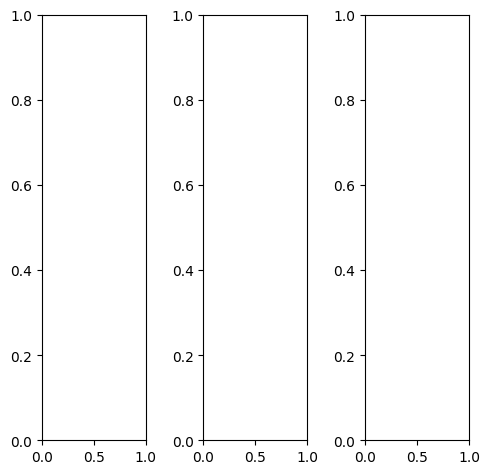

tensor([[[0.9098, 0.3765, 0.2314,  ..., 0.2824, 0.4353, 0.6039],
         [0.7137, 0.2980, 0.2275,  ..., 0.2392, 0.3176, 0.5137],
         [0.6471, 0.3137, 0.2902,  ..., 0.2431, 0.3098, 0.4784],
         ...,
         [0.6471, 0.3882, 0.4000,  ..., 0.4784, 0.5255, 0.4941],
         [0.6510, 0.4353, 0.4353,  ..., 0.4196, 0.4745, 0.5765],
         [0.7333, 0.6706, 0.6745,  ..., 0.6627, 0.6941, 0.9059]],

        [[0.9098, 0.3765, 0.2314,  ..., 0.2824, 0.4353, 0.6039],
         [0.7137, 0.2980, 0.2275,  ..., 0.2392, 0.3176, 0.5137],
         [0.6471, 0.3137, 0.2902,  ..., 0.2431, 0.3098, 0.4784],
         ...,
         [0.6471, 0.3882, 0.4000,  ..., 0.4784, 0.5255, 0.4941],
         [0.6510, 0.4353, 0.4353,  ..., 0.4196, 0.4745, 0.5765],
         [0.7333, 0.6706, 0.6745,  ..., 0.6627, 0.6941, 0.9059]],

        [[0.9098, 0.3765, 0.2314,  ..., 0.2824, 0.4353, 0.6039],
         [0.7137, 0.2980, 0.2275,  ..., 0.2392, 0.3176, 0.5137],
         [0.6471, 0.3137, 0.2902,  ..., 0.2431, 0.3098, 0.

tensor([[[0.9137, 0.3961, 0.2431,  ..., 0.2549, 0.4039, 0.5804],
         [0.7255, 0.3176, 0.2353,  ..., 0.2118, 0.2863, 0.4902],
         [0.6667, 0.3294, 0.2902,  ..., 0.2157, 0.2784, 0.4588],
         ...,
         [0.6667, 0.4157, 0.4392,  ..., 0.4902, 0.5451, 0.5137],
         [0.6667, 0.4627, 0.4784,  ..., 0.4353, 0.4902, 0.5922],
         [0.7451, 0.6941, 0.7098,  ..., 0.6784, 0.7059, 0.9176]],

        [[0.9098, 0.3765, 0.2392,  ..., 0.3059, 0.4588, 0.6196],
         [0.7176, 0.3020, 0.2392,  ..., 0.2667, 0.3490, 0.5333],
         [0.6510, 0.3176, 0.3098,  ..., 0.2745, 0.3451, 0.5059],
         ...,
         [0.6549, 0.3961, 0.4078,  ..., 0.5020, 0.5451, 0.5098],
         [0.6627, 0.4431, 0.4353,  ..., 0.4392, 0.4902, 0.5843],
         [0.7373, 0.6745, 0.6745,  ..., 0.6745, 0.7020, 0.9098]],

        [[0.8902, 0.3412, 0.1647,  ..., 0.2275, 0.3961, 0.5804],
         [0.6706, 0.2392, 0.1333,  ..., 0.1569, 0.2431, 0.4588],
         [0.5882, 0.2431, 0.1804,  ..., 0.1451, 0.2078, 0.

tensor([[[0.7722, 0.3838, 0.2179,  ..., 0.2789, 0.3991, 0.5588],
         [0.7138, 0.2850, 0.2148,  ..., 0.2335, 0.3234, 0.5119],
         [0.6560, 0.3125, 0.3084,  ..., 0.2387, 0.3197, 0.4853],
         ...,
         [0.6738, 0.4138, 0.4154,  ..., 0.4802, 0.5357, 0.5248],
         [0.6642, 0.4540, 0.4107,  ..., 0.4350, 0.4510, 0.5619],
         [0.7179, 0.6986, 0.7068,  ..., 0.6898, 0.7294, 0.7893]],

        [[0.7724, 0.3695, 0.2296,  ..., 0.2764, 0.4276, 0.5658],
         [0.7066, 0.2882, 0.2190,  ..., 0.2275, 0.3195, 0.5163],
         [0.6509, 0.2937, 0.2876,  ..., 0.2313, 0.3152, 0.4813],
         ...,
         [0.6553, 0.3720, 0.3984,  ..., 0.4556, 0.5128, 0.5233],
         [0.6622, 0.4316, 0.4207,  ..., 0.4298, 0.4594, 0.5801],
         [0.7008, 0.6680, 0.6827,  ..., 0.6553, 0.6945, 0.7791]],

        [[0.7116, 0.3593, 0.2052,  ..., 0.2462, 0.3953, 0.5244],
         [0.6300, 0.2564, 0.1960,  ..., 0.2080, 0.2819, 0.4721],
         [0.5804, 0.2729, 0.2641,  ..., 0.2105, 0.2890, 0.

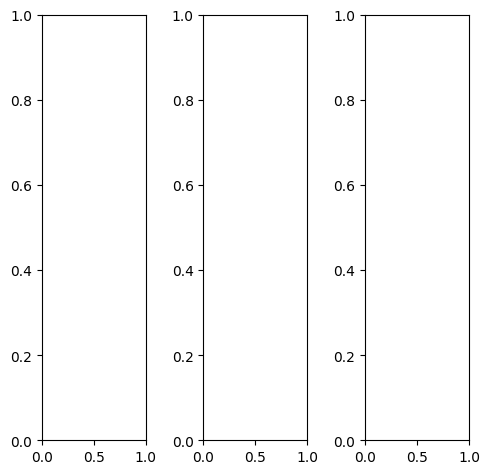

tensor([[[1.0000, 0.9922, 0.9804,  ..., 0.8667, 0.8039, 0.9373],
         [1.0000, 0.9882, 0.9804,  ..., 0.8863, 0.6627, 0.8863],
         [1.0000, 0.9922, 0.9882,  ..., 0.8627, 0.6039, 0.8667],
         ...,
         [1.0000, 0.9922, 0.9843,  ..., 0.8706, 0.6039, 0.8667],
         [1.0000, 0.9961, 0.9804,  ..., 0.8510, 0.6706, 0.8902],
         [1.0000, 0.9961, 0.9765,  ..., 0.7804, 0.8118, 0.9412]],

        [[1.0000, 0.9922, 0.9804,  ..., 0.8667, 0.8039, 0.9373],
         [1.0000, 0.9882, 0.9804,  ..., 0.8863, 0.6627, 0.8863],
         [1.0000, 0.9922, 0.9882,  ..., 0.8627, 0.6039, 0.8667],
         ...,
         [1.0000, 0.9922, 0.9843,  ..., 0.8706, 0.6039, 0.8667],
         [1.0000, 0.9961, 0.9804,  ..., 0.8510, 0.6706, 0.8902],
         [1.0000, 0.9961, 0.9765,  ..., 0.7804, 0.8118, 0.9412]],

        [[1.0000, 0.9922, 0.9804,  ..., 0.8667, 0.8039, 0.9373],
         [1.0000, 0.9882, 0.9804,  ..., 0.8863, 0.6627, 0.8863],
         [1.0000, 0.9922, 0.9882,  ..., 0.8627, 0.6039, 0.

tensor([[[1.0000, 0.9922, 0.9765,  ..., 0.8667, 0.8039, 0.9373],
         [1.0000, 0.9882, 0.9804,  ..., 0.8863, 0.6627, 0.8863],
         [1.0000, 0.9882, 0.9882,  ..., 0.8627, 0.6039, 0.8667],
         ...,
         [1.0000, 0.9922, 0.9843,  ..., 0.8667, 0.6039, 0.8667],
         [1.0000, 0.9961, 0.9804,  ..., 0.8510, 0.6706, 0.8902],
         [1.0000, 0.9961, 0.9765,  ..., 0.7804, 0.8118, 0.9412]],

        [[1.0000, 0.9922, 0.9804,  ..., 0.8667, 0.8039, 0.9373],
         [1.0000, 0.9882, 0.9804,  ..., 0.8863, 0.6627, 0.8863],
         [1.0000, 0.9922, 0.9882,  ..., 0.8667, 0.6039, 0.8667],
         ...,
         [1.0000, 0.9922, 0.9843,  ..., 0.8706, 0.6039, 0.8667],
         [1.0000, 0.9961, 0.9804,  ..., 0.8510, 0.6706, 0.8902],
         [1.0000, 0.9961, 0.9765,  ..., 0.7804, 0.8118, 0.9412]],

        [[1.0000, 0.9922, 0.9804,  ..., 0.8549, 0.8000, 0.9412],
         [1.0000, 0.9882, 0.9804,  ..., 0.8745, 0.6588, 0.8902],
         [1.0000, 0.9882, 0.9882,  ..., 0.8471, 0.6000, 0.

tensor([[[0.9350, 0.9515, 0.9750,  ..., 0.8518, 0.8089, 0.8588],
         [0.9928, 0.9715, 0.9597,  ..., 0.8772, 0.6857, 0.8959],
         [0.9926, 1.0016, 0.9638,  ..., 0.8780, 0.6285, 0.8612],
         ...,
         [1.0026, 1.0219, 0.9831,  ..., 0.8951, 0.6399, 0.8628],
         [0.9836, 1.0086, 0.9713,  ..., 0.8729, 0.6947, 0.8780],
         [0.9294, 0.9789, 0.9759,  ..., 0.8002, 0.8240, 0.8715]],

        [[0.9397, 0.9512, 0.9748,  ..., 0.8634, 0.8159, 0.8672],
         [0.9847, 0.9785, 0.9718,  ..., 0.8663, 0.6734, 0.8938],
         [0.9909, 0.9940, 0.9775,  ..., 0.8761, 0.6062, 0.8524],
         ...,
         [0.9741, 0.9800, 0.9645,  ..., 0.8638, 0.6127, 0.8600],
         [0.9696, 0.9642, 0.9401,  ..., 0.8454, 0.6778, 0.8471],
         [0.9201, 0.9756, 0.9507,  ..., 0.7725, 0.8023, 0.8373]],

        [[0.9253, 0.9588, 0.9448,  ..., 0.8365, 0.7831, 0.8391],
         [0.9537, 0.9651, 0.9520,  ..., 0.8405, 0.6563, 0.8382],
         [0.9704, 0.9566, 0.9574,  ..., 0.8388, 0.5834, 0.

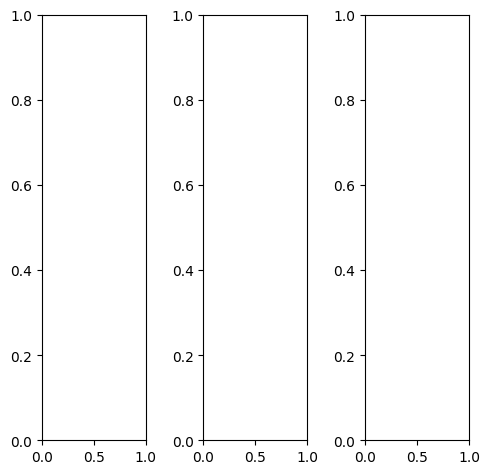

tensor([[[0.3765, 0.4314, 0.4235,  ..., 0.1608, 0.1686, 0.1373],
         [0.3412, 0.3333, 0.3961,  ..., 0.1922, 0.1412, 0.1686],
         [0.3137, 0.3059, 0.3882,  ..., 0.1490, 0.1333, 0.2824],
         ...,
         [0.2588, 0.1686, 0.2235,  ..., 0.3451, 0.4078, 0.4078],
         [0.2588, 0.1686, 0.2196,  ..., 0.4706, 0.4039, 0.3255],
         [0.2588, 0.1686, 0.2196,  ..., 0.3294, 0.2824, 0.2627]],

        [[0.3765, 0.4314, 0.4235,  ..., 0.1608, 0.1686, 0.1373],
         [0.3412, 0.3333, 0.3961,  ..., 0.1922, 0.1412, 0.1686],
         [0.3137, 0.3059, 0.3882,  ..., 0.1490, 0.1333, 0.2824],
         ...,
         [0.2588, 0.1686, 0.2235,  ..., 0.3451, 0.4078, 0.4078],
         [0.2588, 0.1686, 0.2196,  ..., 0.4706, 0.4039, 0.3255],
         [0.2588, 0.1686, 0.2196,  ..., 0.3294, 0.2824, 0.2627]],

        [[0.3765, 0.4314, 0.4235,  ..., 0.1608, 0.1686, 0.1373],
         [0.3412, 0.3333, 0.3961,  ..., 0.1922, 0.1412, 0.1686],
         [0.3137, 0.3059, 0.3882,  ..., 0.1490, 0.1333, 0.

tensor([[[0.3608, 0.4078, 0.3961,  ..., 0.1333, 0.1412, 0.1098],
         [0.3255, 0.3098, 0.3686,  ..., 0.1647, 0.1137, 0.1412],
         [0.2902, 0.2784, 0.3608,  ..., 0.1216, 0.1059, 0.2549],
         ...,
         [0.2078, 0.1255, 0.1843,  ..., 0.3176, 0.3804, 0.3725],
         [0.2078, 0.1255, 0.1804,  ..., 0.4431, 0.3765, 0.2902],
         [0.2118, 0.1216, 0.1804,  ..., 0.3020, 0.2549, 0.2314]],

        [[0.3882, 0.4431, 0.4353,  ..., 0.1725, 0.1804, 0.1490],
         [0.3529, 0.3490, 0.4118,  ..., 0.2039, 0.1529, 0.1804],
         [0.3255, 0.3216, 0.4039,  ..., 0.1608, 0.1490, 0.2941],
         ...,
         [0.2784, 0.1843, 0.2392,  ..., 0.3569, 0.4196, 0.4196],
         [0.2784, 0.1843, 0.2353,  ..., 0.4824, 0.4157, 0.3412],
         [0.2745, 0.1882, 0.2314,  ..., 0.3412, 0.2941, 0.2745]],

        [[0.3608, 0.4275, 0.4471,  ..., 0.1765, 0.1843, 0.1529],
         [0.3294, 0.3137, 0.4039,  ..., 0.2078, 0.1569, 0.1843],
         [0.3137, 0.2980, 0.3882,  ..., 0.1529, 0.1412, 0.

tensor([[[0.3884, 0.4299, 0.4194,  ..., 0.1418, 0.1546, 0.1719],
         [0.3312, 0.3313, 0.4028,  ..., 0.1846, 0.1442, 0.1780],
         [0.3161, 0.3114, 0.3905,  ..., 0.1487, 0.1433, 0.2655],
         ...,
         [0.2666, 0.1620, 0.2272,  ..., 0.3687, 0.4261, 0.3902],
         [0.2647, 0.1675, 0.2290,  ..., 0.4901, 0.4205, 0.3429],
         [0.2622, 0.1851, 0.2085,  ..., 0.3489, 0.2874, 0.3028]],

        [[0.4051, 0.4320, 0.4364,  ..., 0.1499, 0.1693, 0.1934],
         [0.3405, 0.3413, 0.4037,  ..., 0.1896, 0.1573, 0.1879],
         [0.3161, 0.3181, 0.3856,  ..., 0.1414, 0.1412, 0.2657],
         ...,
         [0.2585, 0.1625, 0.2196,  ..., 0.3477, 0.4094, 0.3876],
         [0.2574, 0.1611, 0.2081,  ..., 0.4750, 0.4078, 0.3363],
         [0.2713, 0.1808, 0.2030,  ..., 0.3460, 0.2870, 0.2905]],

        [[0.3380, 0.3746, 0.3687,  ..., 0.1189, 0.1354, 0.1572],
         [0.2796, 0.2818, 0.3352,  ..., 0.1532, 0.1192, 0.1451],
         [0.2640, 0.2578, 0.3270,  ..., 0.1147, 0.1059, 0.

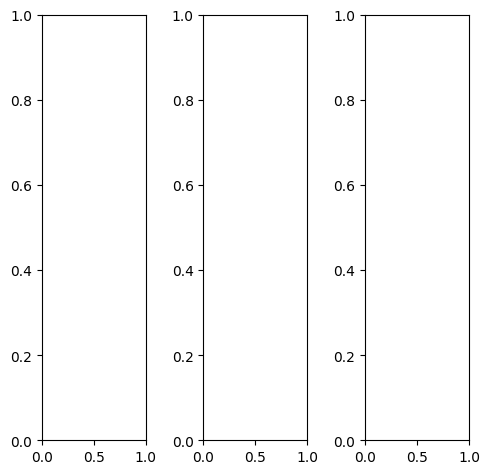

tensor([[[0.7725, 0.6627, 0.4980,  ..., 0.9647, 0.9569, 0.9333],
         [0.8667, 0.8039, 0.6588,  ..., 0.9686, 0.9686, 0.9725],
         [0.8980, 0.8863, 0.8353,  ..., 0.9569, 0.9647, 0.9882],
         ...,
         [0.8157, 0.7059, 0.6000,  ..., 0.6392, 0.4588, 0.6118],
         [0.6902, 0.8196, 0.7961,  ..., 0.4000, 0.2392, 0.3490],
         [0.7333, 0.9255, 0.9569,  ..., 0.2235, 0.0980, 0.0980]],

        [[0.7725, 0.6627, 0.4980,  ..., 0.9647, 0.9569, 0.9333],
         [0.8667, 0.8039, 0.6588,  ..., 0.9686, 0.9686, 0.9725],
         [0.8980, 0.8863, 0.8353,  ..., 0.9569, 0.9647, 0.9882],
         ...,
         [0.8157, 0.7059, 0.6000,  ..., 0.6392, 0.4588, 0.6118],
         [0.6902, 0.8196, 0.7961,  ..., 0.4000, 0.2392, 0.3490],
         [0.7333, 0.9255, 0.9569,  ..., 0.2235, 0.0980, 0.0980]],

        [[0.7725, 0.6627, 0.4980,  ..., 0.9647, 0.9569, 0.9333],
         [0.8667, 0.8039, 0.6588,  ..., 0.9686, 0.9686, 0.9725],
         [0.8980, 0.8863, 0.8353,  ..., 0.9569, 0.9647, 0.

tensor([[[0.9373, 0.8196, 0.6392,  ..., 0.9882, 0.9882, 0.9843],
         [1.0000, 0.9412, 0.7961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9529,  ..., 0.9922, 0.9922, 1.0000],
         ...,
         [0.9216, 0.8314, 0.7020,  ..., 0.7569, 0.5725, 0.7451],
         [0.8000, 0.9216, 0.8627,  ..., 0.4941, 0.3137, 0.4471],
         [0.8196, 0.9765, 0.9882,  ..., 0.2902, 0.1294, 0.1098]],

        [[0.7490, 0.6353, 0.4706,  ..., 0.9882, 0.9882, 0.9608],
         [0.8627, 0.7961, 0.6431,  ..., 1.0000, 1.0000, 1.0000],
         [0.9098, 0.8941, 0.8353,  ..., 0.9922, 0.9882, 1.0000],
         ...,
         [0.8118, 0.6980, 0.5961,  ..., 0.6235, 0.4392, 0.5882],
         [0.6824, 0.8196, 0.8000,  ..., 0.3804, 0.2235, 0.3294],
         [0.7333, 0.9412, 0.9725,  ..., 0.2039, 0.0902, 0.0980]],

        [[0.4588, 0.3804, 0.2863,  ..., 0.7882, 0.7098, 0.6431],
         [0.5412, 0.4980, 0.3961,  ..., 0.7373, 0.7216, 0.7725],
         [0.5725, 0.5647, 0.5373,  ..., 0.6980, 0.7686, 0.

tensor([[[0.7159, 0.6515, 0.4832,  ..., 0.9484, 0.9352, 0.9016],
         [0.8746, 0.8021, 0.6537,  ..., 0.9585, 0.9704, 0.9407],
         [0.8965, 0.8928, 0.8360,  ..., 0.9511, 0.9687, 0.9908],
         ...,
         [0.8295, 0.7361, 0.6304,  ..., 0.6461, 0.4914, 0.6283],
         [0.7411, 0.8555, 0.8071,  ..., 0.4227, 0.2368, 0.3350],
         [0.7622, 0.9378, 0.9708,  ..., 0.2164, 0.1342, 0.2084]],

        [[0.7301, 0.6483, 0.5060,  ..., 0.9464, 0.9250, 0.9083],
         [0.8721, 0.7801, 0.6345,  ..., 0.9558, 0.9427, 0.9490],
         [0.8982, 0.8753, 0.8244,  ..., 0.9404, 0.9526, 0.9712],
         ...,
         [0.7975, 0.6990, 0.5938,  ..., 0.6307, 0.4700, 0.5917],
         [0.7162, 0.8198, 0.7672,  ..., 0.4178, 0.2586, 0.3433],
         [0.7497, 0.9101, 0.9435,  ..., 0.2078, 0.1331, 0.1971]],

        [[0.6877, 0.6141, 0.4254,  ..., 0.9121, 0.9020, 0.8816],
         [0.7962, 0.7380, 0.5842,  ..., 0.9253, 0.9321, 0.9260],
         [0.8326, 0.8080, 0.7574,  ..., 0.8986, 0.9152, 0.

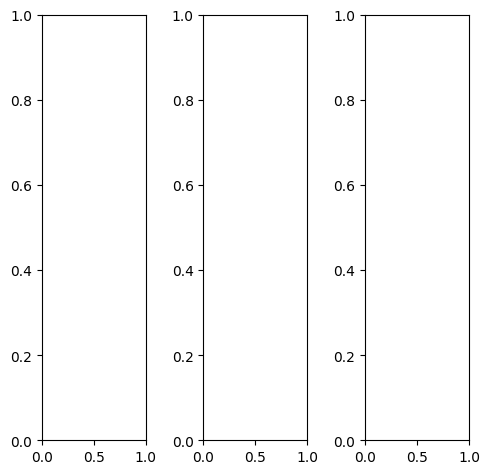

EPOCH: 7.255  trn_loss: 0.006  (848.13s - 10841.98s remaining)

tensor([[[0.2824, 0.3098, 0.3255,  ..., 0.3686, 0.4000, 0.4431],
         [0.2667, 0.3020, 0.3294,  ..., 0.3725, 0.4039, 0.4471],
         [0.2706, 0.3059, 0.3255,  ..., 0.3765, 0.4078, 0.4431],
         ...,
         [0.3686, 0.3373, 0.3333,  ..., 0.3333, 0.4039, 0.4902],
         [0.3529, 0.3451, 0.3451,  ..., 0.3647, 0.4314, 0.4824],
         [0.3647, 0.3569, 0.3490,  ..., 0.4392, 0.4667, 0.5059]],

        [[0.2824, 0.3098, 0.3255,  ..., 0.3686, 0.4000, 0.4431],
         [0.2667, 0.3020, 0.3294,  ..., 0.3725, 0.4039, 0.4471],
         [0.2706, 0.3059, 0.3255,  ..., 0.3765, 0.4078, 0.4431],
         ...,
         [0.3686, 0.3373, 0.3333,  ..., 0.3333, 0.4039, 0.4902],
         [0.3529, 0.3451, 0.3451,  ..., 0.3647, 0.4314, 0.4824],
         [0.3647, 0.3569, 0.3490,  ..., 0.4392, 0.4667, 0.5059]],

        [[0.2824, 0.3098, 0.3255,  ..., 0.3686, 0.4000, 0.4431],
         [0.2667, 0.3020, 0.3294,  ..., 0.3725, 0.4039, 0.4471],
         [0.2706, 0.3059, 0.3255,  ..., 0.3765, 0.4078, 0.

tensor([[[0.2706, 0.3020, 0.3176,  ..., 0.4157, 0.4549, 0.5098],
         [0.2627, 0.2980, 0.3255,  ..., 0.4235, 0.4588, 0.5176],
         [0.2667, 0.3059, 0.3255,  ..., 0.4275, 0.4627, 0.5098],
         ...,
         [0.3686, 0.3373, 0.3333,  ..., 0.3882, 0.4627, 0.5569],
         [0.3529, 0.3451, 0.3451,  ..., 0.4196, 0.4863, 0.5490],
         [0.3647, 0.3569, 0.3490,  ..., 0.4863, 0.5176, 0.5647]],

        [[0.3059, 0.3333, 0.3490,  ..., 0.3686, 0.3961, 0.4314],
         [0.2863, 0.3216, 0.3490,  ..., 0.3765, 0.4000, 0.4353],
         [0.2902, 0.3255, 0.3451,  ..., 0.3804, 0.4039, 0.4314],
         ...,
         [0.3882, 0.3569, 0.3569,  ..., 0.3333, 0.4000, 0.4784],
         [0.3725, 0.3686, 0.3647,  ..., 0.3647, 0.4275, 0.4745],
         [0.3882, 0.3804, 0.3725,  ..., 0.4431, 0.4667, 0.4980]],

        [[0.1843, 0.2118, 0.2275,  ..., 0.2314, 0.2667, 0.3176],
         [0.1647, 0.2000, 0.2275,  ..., 0.2353, 0.2667, 0.3216],
         [0.1686, 0.2118, 0.2275,  ..., 0.2353, 0.2706, 0.

tensor([[[0.1543, 0.1691, 0.1783,  ..., 0.2227, 0.3109, 0.3897],
         [0.0389, 0.1444, 0.2073,  ..., 0.1748, 0.2286, 0.3359],
         [0.0700, 0.1839, 0.2574,  ..., 0.2172, 0.2545, 0.3459],
         ...,
         [0.3025, 0.3361, 0.3240,  ..., 0.2882, 0.3431, 0.4879],
         [0.3038, 0.3356, 0.3664,  ..., 0.2898, 0.3624, 0.4697],
         [0.3178, 0.3089, 0.2780,  ..., 0.4301, 0.4954, 0.5387]],

        [[0.2318, 0.2860, 0.3139,  ..., 0.3495, 0.4641, 0.4396],
         [0.1467, 0.2907, 0.3491,  ..., 0.3333, 0.4194, 0.4226],
         [0.1665, 0.3052, 0.3617,  ..., 0.3595, 0.4083, 0.3971],
         ...,
         [0.3008, 0.3355, 0.3893,  ..., 0.3159, 0.4162, 0.4915],
         [0.3013, 0.3924, 0.4127,  ..., 0.3662, 0.4487, 0.5052],
         [0.3034, 0.3155, 0.3153,  ..., 0.4413, 0.5193, 0.5308]],

        [[0.3857, 0.4700, 0.5216,  ..., 0.5025, 0.6239, 0.6259],
         [0.3722, 0.5176, 0.5877,  ..., 0.5033, 0.6234, 0.6301],
         [0.3622, 0.5170, 0.5780,  ..., 0.5185, 0.5776, 0.

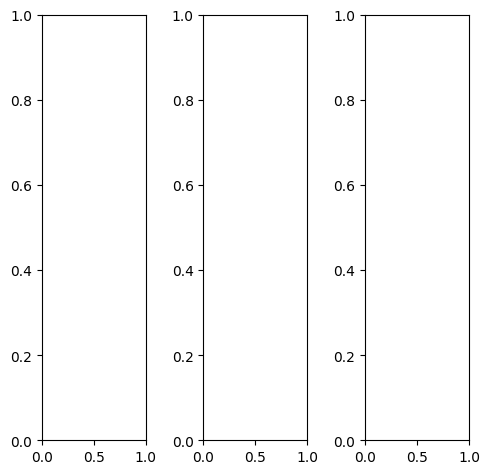

tensor([[[0.3216, 0.3098, 0.3098,  ..., 0.3765, 0.3686, 0.3451],
         [0.3373, 0.3373, 0.3333,  ..., 0.3843, 0.3843, 0.3843],
         [0.3608, 0.3451, 0.3412,  ..., 0.3882, 0.3843, 0.3765],
         ...,
         [0.4549, 0.3804, 0.2000,  ..., 0.3333, 0.2745, 0.2196],
         [0.4549, 0.4000, 0.3529,  ..., 0.2941, 0.2471, 0.2235],
         [0.4549, 0.4627, 0.5294,  ..., 0.2627, 0.2431, 0.2431]],

        [[0.3216, 0.3098, 0.3098,  ..., 0.3765, 0.3686, 0.3451],
         [0.3373, 0.3373, 0.3333,  ..., 0.3843, 0.3843, 0.3843],
         [0.3608, 0.3451, 0.3412,  ..., 0.3882, 0.3843, 0.3765],
         ...,
         [0.4549, 0.3804, 0.2000,  ..., 0.3333, 0.2745, 0.2196],
         [0.4549, 0.4000, 0.3529,  ..., 0.2941, 0.2471, 0.2235],
         [0.4549, 0.4627, 0.5294,  ..., 0.2627, 0.2431, 0.2431]],

        [[0.3216, 0.3098, 0.3098,  ..., 0.3765, 0.3686, 0.3451],
         [0.3373, 0.3373, 0.3333,  ..., 0.3843, 0.3843, 0.3843],
         [0.3608, 0.3451, 0.3412,  ..., 0.3882, 0.3843, 0.

tensor([[[0.2353, 0.2235, 0.2314,  ..., 0.3255, 0.3137, 0.2784],
         [0.2588, 0.2588, 0.2588,  ..., 0.3255, 0.3294, 0.3216],
         [0.2902, 0.2745, 0.2706,  ..., 0.3216, 0.3216, 0.3176],
         ...,
         [0.3882, 0.3255, 0.1686,  ..., 0.2706, 0.2078, 0.1490],
         [0.3882, 0.3412, 0.3020,  ..., 0.2314, 0.1765, 0.1490],
         [0.3922, 0.4039, 0.4706,  ..., 0.2000, 0.1725, 0.1647]],

        [[0.3647, 0.3490, 0.3451,  ..., 0.3882, 0.3882, 0.3725],
         [0.3765, 0.3765, 0.3686,  ..., 0.4039, 0.4078, 0.4118],
         [0.3922, 0.3765, 0.3765,  ..., 0.4196, 0.4157, 0.4078],
         ...,
         [0.4627, 0.3882, 0.2000,  ..., 0.3725, 0.3098, 0.2667],
         [0.4627, 0.4078, 0.3608,  ..., 0.3373, 0.2902, 0.2784],
         [0.4627, 0.4706, 0.5373,  ..., 0.3098, 0.2941, 0.2941]],

        [[0.3137, 0.3176, 0.3255,  ..., 0.4392, 0.4196, 0.3804],
         [0.3333, 0.3490, 0.3412,  ..., 0.4275, 0.4196, 0.4118],
         [0.3882, 0.3569, 0.3451,  ..., 0.3961, 0.3843, 0.

tensor([[[0.2792, 0.2120, 0.1910,  ..., 0.2901, 0.2983, 0.3287],
         [0.2208, 0.2147, 0.1885,  ..., 0.3118, 0.3142, 0.3430],
         [0.2694, 0.2175, 0.2303,  ..., 0.2967, 0.3100, 0.3218],
         ...,
         [0.4141, 0.3446, 0.1312,  ..., 0.3498, 0.2785, 0.2295],
         [0.4270, 0.3904, 0.3037,  ..., 0.3022, 0.2450, 0.2310],
         [0.4480, 0.4832, 0.5245,  ..., 0.2249, 0.1955, 0.2430]],

        [[0.3414, 0.3200, 0.3256,  ..., 0.3942, 0.4049, 0.3671],
         [0.3292, 0.3663, 0.3646,  ..., 0.4345, 0.4546, 0.3985],
         [0.3470, 0.3550, 0.3652,  ..., 0.4513, 0.4440, 0.3862],
         ...,
         [0.4418, 0.3890, 0.2042,  ..., 0.4096, 0.3182, 0.2127],
         [0.4338, 0.4047, 0.3433,  ..., 0.3410, 0.2632, 0.2097],
         [0.4362, 0.4557, 0.5383,  ..., 0.2452, 0.2126, 0.2266]],

        [[0.4753, 0.5323, 0.5448,  ..., 0.4866, 0.5039, 0.4846],
         [0.5062, 0.5876, 0.5926,  ..., 0.5293, 0.5552, 0.5156],
         [0.5195, 0.5910, 0.5776,  ..., 0.5065, 0.5259, 0.

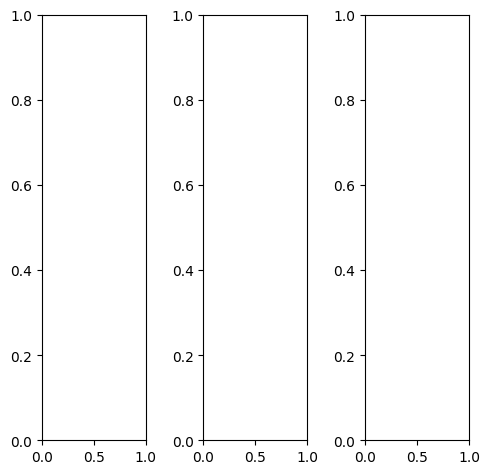

tensor([[[0.6667, 0.6627, 0.6510,  ..., 0.7529, 0.7451, 0.7255],
         [0.6588, 0.6431, 0.6314,  ..., 0.7216, 0.7020, 0.6745],
         [0.6510, 0.6588, 0.6667,  ..., 0.6941, 0.6745, 0.6588],
         ...,
         [0.7529, 0.7490, 0.7647,  ..., 0.4196, 0.5216, 0.4980],
         [0.7647, 0.7725, 0.7804,  ..., 0.3608, 0.4196, 0.5373],
         [0.7804, 0.7843, 0.7922,  ..., 0.4667, 0.4118, 0.4941]],

        [[0.6667, 0.6627, 0.6510,  ..., 0.7529, 0.7451, 0.7255],
         [0.6588, 0.6431, 0.6314,  ..., 0.7216, 0.7020, 0.6745],
         [0.6510, 0.6588, 0.6667,  ..., 0.6941, 0.6745, 0.6588],
         ...,
         [0.7529, 0.7490, 0.7647,  ..., 0.4196, 0.5216, 0.4980],
         [0.7647, 0.7725, 0.7804,  ..., 0.3608, 0.4196, 0.5373],
         [0.7804, 0.7843, 0.7922,  ..., 0.4667, 0.4118, 0.4941]],

        [[0.6667, 0.6627, 0.6510,  ..., 0.7529, 0.7451, 0.7255],
         [0.6588, 0.6431, 0.6314,  ..., 0.7216, 0.7020, 0.6745],
         [0.6510, 0.6588, 0.6667,  ..., 0.6941, 0.6745, 0.

tensor([[[0.7059, 0.7059, 0.6902,  ..., 0.8000, 0.7922, 0.7725],
         [0.6980, 0.6784, 0.6706,  ..., 0.7569, 0.7412, 0.7137],
         [0.6784, 0.6902, 0.6941,  ..., 0.7216, 0.6980, 0.6863],
         ...,
         [0.7843, 0.7804, 0.7961,  ..., 0.4392, 0.5412, 0.5176],
         [0.8078, 0.8118, 0.8196,  ..., 0.3608, 0.4275, 0.5569],
         [0.8235, 0.8314, 0.8392,  ..., 0.4706, 0.4235, 0.5137]],

        [[0.6510, 0.6471, 0.6353,  ..., 0.7412, 0.7333, 0.7098],
         [0.6471, 0.6275, 0.6196,  ..., 0.7098, 0.6902, 0.6627],
         [0.6392, 0.6510, 0.6588,  ..., 0.6824, 0.6627, 0.6471],
         ...,
         [0.7412, 0.7412, 0.7569,  ..., 0.4118, 0.5176, 0.4941],
         [0.7490, 0.7569, 0.7647,  ..., 0.3608, 0.4157, 0.5333],
         [0.7647, 0.7686, 0.7765,  ..., 0.4667, 0.4078, 0.4863]],

        [[0.6353, 0.6353, 0.6235,  ..., 0.6863, 0.6863, 0.6784],
         [0.6314, 0.6157, 0.6039,  ..., 0.6784, 0.6667, 0.6471],
         [0.6235, 0.6314, 0.6392,  ..., 0.6706, 0.6588, 0.

tensor([[[0.5976, 0.5485, 0.5115,  ..., 0.6628, 0.6493, 0.6797],
         [0.5652, 0.5582, 0.5185,  ..., 0.6627, 0.6422, 0.6051],
         [0.5583, 0.5748, 0.5759,  ..., 0.6889, 0.6492, 0.5921],
         ...,
         [0.8004, 0.8613, 0.8962,  ..., 0.3229, 0.4047, 0.4195],
         [0.8021, 0.8575, 0.8816,  ..., 0.2128, 0.2926, 0.4466],
         [0.8071, 0.8579, 0.8759,  ..., 0.3491, 0.3032, 0.4145]],

        [[0.6468, 0.6448, 0.6341,  ..., 0.7510, 0.7815, 0.7525],
         [0.6443, 0.6452, 0.6252,  ..., 0.7608, 0.7323, 0.7351],
         [0.6470, 0.6466, 0.6719,  ..., 0.7738, 0.7232, 0.6944],
         ...,
         [0.7587, 0.8087, 0.8495,  ..., 0.4251, 0.5093, 0.4263],
         [0.7873, 0.8202, 0.8482,  ..., 0.3247, 0.3781, 0.4784],
         [0.7589, 0.8226, 0.8297,  ..., 0.3854, 0.3502, 0.4164]],

        [[0.8282, 0.8850, 0.8663,  ..., 0.8999, 0.9212, 0.8701],
         [0.8546, 0.8859, 0.8497,  ..., 0.8593, 0.8836, 0.8195],
         [0.8335, 0.8935, 0.8715,  ..., 0.8586, 0.8716, 0.

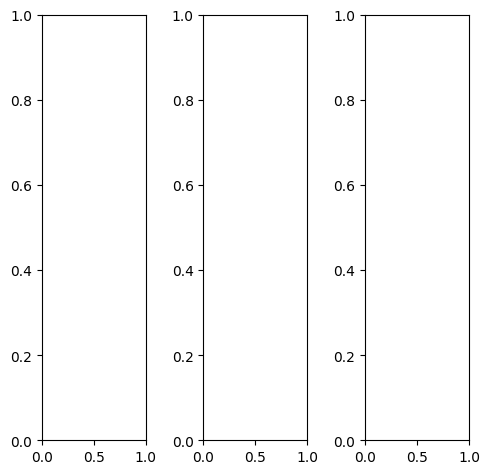

tensor([[[0.3294, 0.3333, 0.3490,  ..., 0.7412, 0.7255, 0.7176],
         [0.3294, 0.3373, 0.3608,  ..., 0.7255, 0.7098, 0.6980],
         [0.3412, 0.3529, 0.3686,  ..., 0.7216, 0.7059, 0.6902],
         ...,
         [0.5608, 0.5020, 0.3725,  ..., 0.4510, 0.5529, 0.5804],
         [0.5569, 0.5451, 0.5412,  ..., 0.5922, 0.5961, 0.6078],
         [0.5804, 0.5451, 0.5490,  ..., 0.5725, 0.6039, 0.6078]],

        [[0.3294, 0.3333, 0.3490,  ..., 0.7412, 0.7255, 0.7176],
         [0.3294, 0.3373, 0.3608,  ..., 0.7255, 0.7098, 0.6980],
         [0.3412, 0.3529, 0.3686,  ..., 0.7216, 0.7059, 0.6902],
         ...,
         [0.5608, 0.5020, 0.3725,  ..., 0.4510, 0.5529, 0.5804],
         [0.5569, 0.5451, 0.5412,  ..., 0.5922, 0.5961, 0.6078],
         [0.5804, 0.5451, 0.5490,  ..., 0.5725, 0.6039, 0.6078]],

        [[0.3294, 0.3333, 0.3490,  ..., 0.7412, 0.7255, 0.7176],
         [0.3294, 0.3373, 0.3608,  ..., 0.7255, 0.7098, 0.6980],
         [0.3412, 0.3529, 0.3686,  ..., 0.7216, 0.7059, 0.

tensor([[[0.1882, 0.2000, 0.2235,  ..., 0.7098, 0.6784, 0.6510],
         [0.1922, 0.2118, 0.2431,  ..., 0.6784, 0.6510, 0.6196],
         [0.2118, 0.2353, 0.2588,  ..., 0.6588, 0.6275, 0.5922],
         ...,
         [0.6510, 0.5804, 0.4431,  ..., 0.5137, 0.6196, 0.6588],
         [0.6510, 0.6353, 0.6275,  ..., 0.6627, 0.6706, 0.6941],
         [0.6706, 0.6353, 0.6392,  ..., 0.6510, 0.6824, 0.6863]],

        [[0.3961, 0.3922, 0.4039,  ..., 0.7529, 0.7451, 0.7451],
         [0.3922, 0.3961, 0.4118,  ..., 0.7451, 0.7333, 0.7294],
         [0.4000, 0.4078, 0.4157,  ..., 0.7451, 0.7373, 0.7294],
         ...,
         [0.5451, 0.4824, 0.3490,  ..., 0.4353, 0.5373, 0.5647],
         [0.5412, 0.5333, 0.5294,  ..., 0.5882, 0.5882, 0.5961],
         [0.5647, 0.5333, 0.5373,  ..., 0.5647, 0.5922, 0.5961]],

        [[0.3647, 0.3686, 0.3843,  ..., 0.7647, 0.7569, 0.7608],
         [0.3647, 0.3765, 0.3922,  ..., 0.7529, 0.7490, 0.7490],
         [0.3765, 0.3882, 0.4039,  ..., 0.7608, 0.7529, 0.

tensor([[[0.3135, 0.2997, 0.2961,  ..., 0.5700, 0.5657, 0.6384],
         [0.2523, 0.2907, 0.2974,  ..., 0.5386, 0.5351, 0.5768],
         [0.2756, 0.2987, 0.3433,  ..., 0.5687, 0.5509, 0.5660],
         ...,
         [0.5207, 0.4944, 0.3331,  ..., 0.4695, 0.5627, 0.5982],
         [0.5115, 0.5340, 0.5051,  ..., 0.5738, 0.5861, 0.6297],
         [0.5494, 0.5411, 0.5274,  ..., 0.5840, 0.6144, 0.6116]],

        [[0.3424, 0.3491, 0.3653,  ..., 0.6643, 0.7018, 0.6970],
         [0.3301, 0.3774, 0.4146,  ..., 0.6502, 0.6566, 0.7041],
         [0.3411, 0.4029, 0.4408,  ..., 0.6860, 0.6456, 0.6773],
         ...,
         [0.5381, 0.4854, 0.3945,  ..., 0.5108, 0.5797, 0.5621],
         [0.5059, 0.5360, 0.5478,  ..., 0.5902, 0.6200, 0.6175],
         [0.5192, 0.5091, 0.5404,  ..., 0.5668, 0.6124, 0.6003]],

        [[0.4198, 0.4789, 0.4856,  ..., 0.7653, 0.7915, 0.7700],
         [0.4272, 0.5174, 0.5291,  ..., 0.7095, 0.7499, 0.7383],
         [0.4417, 0.5370, 0.5490,  ..., 0.7264, 0.7542, 0.

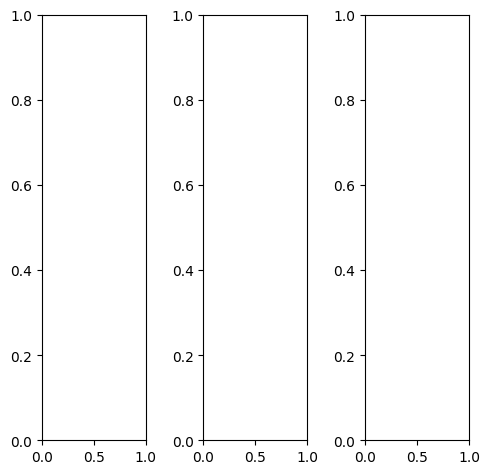

tensor([[[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.1961, 0.2000, 0.2706,  ..., 0.1373, 0.2039, 0.2902],
         [0.1961, 0.1451, 0.2118,  ..., 0.2667, 0.3529, 0.3843],
         [0.1569, 0.1137, 0.1529,  ..., 0.3804, 0.3725, 0.3843]],

        [[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.1961, 0.2000, 0.2706,  ..., 0.1373, 0.2039, 0.2902],
         [0.1961, 0.1451, 0.2118,  ..., 0.2667, 0.3529, 0.3843],
         [0.1569, 0.1137, 0.1529,  ..., 0.3804, 0.3725, 0.3843]],

        [[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.

tensor([[[0.2118, 0.1922, 0.1569,  ..., 0.5176, 0.5137, 0.5020],
         [0.1843, 0.1569, 0.1294,  ..., 0.5608, 0.5647, 0.5412],
         [0.1608, 0.1608, 0.1451,  ..., 0.4784, 0.5137, 0.5294],
         ...,
         [0.1569, 0.1529, 0.2235,  ..., 0.0980, 0.1569, 0.2392],
         [0.1569, 0.1059, 0.1725,  ..., 0.2196, 0.3020, 0.3294],
         [0.1176, 0.0824, 0.1216,  ..., 0.3294, 0.3176, 0.3294]],

        [[0.2588, 0.2392, 0.2078,  ..., 0.5412, 0.5373, 0.5255],
         [0.2275, 0.2039, 0.1765,  ..., 0.5843, 0.5882, 0.5647],
         [0.2000, 0.2000, 0.1843,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.2039, 0.2118, 0.2784,  ..., 0.1451, 0.2118, 0.2980],
         [0.2039, 0.1529, 0.2196,  ..., 0.2706, 0.3569, 0.3882],
         [0.1647, 0.1216, 0.1608,  ..., 0.3843, 0.3765, 0.3882]],

        [[0.3137, 0.2941, 0.2588,  ..., 0.5961, 0.5922, 0.5804],
         [0.2745, 0.2510, 0.2235,  ..., 0.6392, 0.6431, 0.6196],
         [0.2392, 0.2392, 0.2235,  ..., 0.5569, 0.5922, 0.

tensor([[[0.2485, 0.1538, 0.0878,  ..., 0.7198, 0.6654, 0.7019],
         [0.1116, 0.0678, 0.0041,  ..., 0.7910, 0.7812, 0.7176],
         [0.0675, 0.0686, 0.0179,  ..., 0.6663, 0.7372, 0.7113],
         ...,
         [0.2238, 0.2479, 0.3430,  ..., 0.1504, 0.2904, 0.4224],
         [0.2091, 0.1335, 0.2617,  ..., 0.3185, 0.4529, 0.5048],
         [0.1809, 0.1002, 0.1327,  ..., 0.5088, 0.5162, 0.5482]],

        [[0.3486, 0.3041, 0.2529,  ..., 0.7926, 0.7905, 0.8041],
         [0.2645, 0.2668, 0.1885,  ..., 0.8672, 0.8512, 0.8582],
         [0.2330, 0.2446, 0.2028,  ..., 0.7501, 0.8093, 0.8253],
         ...,
         [0.2718, 0.3117, 0.4370,  ..., 0.2312, 0.3444, 0.3950],
         [0.2430, 0.2038, 0.3083,  ..., 0.3943, 0.5253, 0.5175],
         [0.2106, 0.1321, 0.1782,  ..., 0.5161, 0.5477, 0.5568]],

        [[0.5311, 0.5523, 0.5393,  ..., 0.8717, 0.8894, 0.8659],
         [0.5113, 0.5757, 0.5337,  ..., 0.9228, 0.9589, 0.8990],
         [0.4744, 0.5704, 0.5405,  ..., 0.8174, 0.9136, 0.

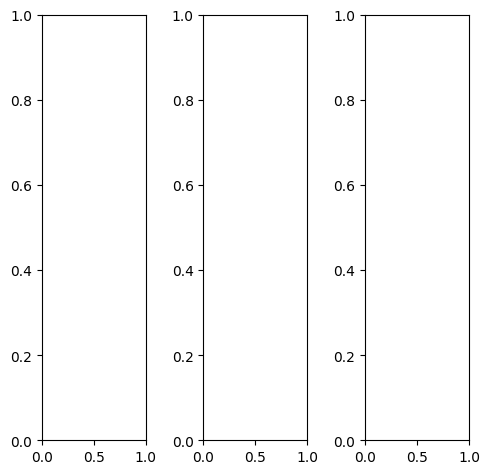

EPOCH: 7.510  trn_loss: 0.005  (877.49s - 10806.50s remaining)

tensor([[[0.7490, 0.7686, 0.7765,  ..., 0.7843, 0.7765, 0.7725],
         [0.7216, 0.7412, 0.7490,  ..., 0.7922, 0.7882, 0.7804],
         [0.6824, 0.6980, 0.7255,  ..., 0.7961, 0.7961, 0.7922],
         ...,
         [0.7490, 0.7451, 0.7451,  ..., 0.4157, 0.4000, 0.3843],
         [0.7176, 0.7333, 0.7412,  ..., 0.4667, 0.4392, 0.4118],
         [0.7059, 0.7686, 0.7647,  ..., 0.5961, 0.5373, 0.4745]],

        [[0.7490, 0.7686, 0.7765,  ..., 0.7843, 0.7765, 0.7725],
         [0.7216, 0.7412, 0.7490,  ..., 0.7922, 0.7882, 0.7804],
         [0.6824, 0.6980, 0.7255,  ..., 0.7961, 0.7961, 0.7922],
         ...,
         [0.7490, 0.7451, 0.7451,  ..., 0.4157, 0.4000, 0.3843],
         [0.7176, 0.7333, 0.7412,  ..., 0.4667, 0.4392, 0.4118],
         [0.7059, 0.7686, 0.7647,  ..., 0.5961, 0.5373, 0.4745]],

        [[0.7490, 0.7686, 0.7765,  ..., 0.7843, 0.7765, 0.7725],
         [0.7216, 0.7412, 0.7490,  ..., 0.7922, 0.7882, 0.7804],
         [0.6824, 0.6980, 0.7255,  ..., 0.7961, 0.7961, 0.

tensor([[[0.7098, 0.7412, 0.7490,  ..., 0.7961, 0.7882, 0.7804],
         [0.6824, 0.7137, 0.7255,  ..., 0.8039, 0.8000, 0.7882],
         [0.6471, 0.6706, 0.7059,  ..., 0.8078, 0.8078, 0.8000],
         ...,
         [0.7569, 0.7647, 0.7725,  ..., 0.4275, 0.4157, 0.4000],
         [0.7255, 0.7529, 0.7686,  ..., 0.4784, 0.4549, 0.4235],
         [0.7137, 0.7843, 0.7922,  ..., 0.6039, 0.5451, 0.4824]],

        [[0.7922, 0.8078, 0.8118,  ..., 0.8039, 0.7961, 0.8000],
         [0.7647, 0.7804, 0.7843,  ..., 0.8157, 0.8078, 0.8078],
         [0.7255, 0.7373, 0.7608,  ..., 0.8196, 0.8196, 0.8196],
         ...,
         [0.7686, 0.7608, 0.7529,  ..., 0.4471, 0.4275, 0.4157],
         [0.7373, 0.7490, 0.7529,  ..., 0.5020, 0.4706, 0.4431],
         [0.7255, 0.7843, 0.7804,  ..., 0.6314, 0.5725, 0.5098]],

        [[0.6314, 0.6510, 0.6588,  ..., 0.6431, 0.6392, 0.6235],
         [0.6039, 0.6275, 0.6314,  ..., 0.6392, 0.6392, 0.6275],
         [0.5608, 0.5765, 0.6039,  ..., 0.6353, 0.6353, 0.

tensor([[[0.6204, 0.5599, 0.5214,  ..., 0.5283, 0.5363, 0.6429],
         [0.5386, 0.5046, 0.4367,  ..., 0.4311, 0.4930, 0.5885],
         [0.4970, 0.4541, 0.4579,  ..., 0.4828, 0.5098, 0.5859],
         ...,
         [0.6444, 0.6524, 0.5780,  ..., 0.4939, 0.4631, 0.4665],
         [0.5898, 0.5986, 0.5668,  ..., 0.4808, 0.4746, 0.4699],
         [0.6308, 0.6768, 0.6604,  ..., 0.5794, 0.5453, 0.5042]],

        [[0.6025, 0.6149, 0.6096,  ..., 0.6182, 0.6670, 0.6906],
         [0.5537, 0.5662, 0.5386,  ..., 0.5820, 0.6360, 0.7202],
         [0.5131, 0.5173, 0.5195,  ..., 0.6035, 0.6186, 0.7037],
         ...,
         [0.5644, 0.5787, 0.5776,  ..., 0.5107, 0.4838, 0.4028],
         [0.5402, 0.5496, 0.5742,  ..., 0.5121, 0.4871, 0.4223],
         [0.5562, 0.6095, 0.6237,  ..., 0.5677, 0.5285, 0.4580]],

        [[0.7398, 0.7951, 0.7433,  ..., 0.7973, 0.8255, 0.8170],
         [0.7000, 0.7263, 0.6859,  ..., 0.7345, 0.8025, 0.8137],
         [0.6490, 0.6910, 0.6780,  ..., 0.7644, 0.8061, 0.

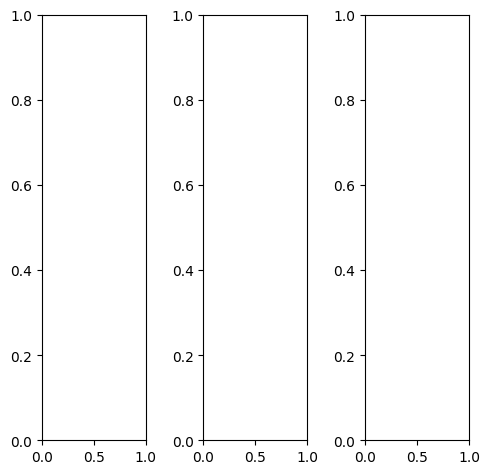

tensor([[[0.6549, 0.7804, 0.6941,  ..., 0.6706, 0.6941, 0.7098],
         [0.6431, 0.7529, 0.4980,  ..., 0.6627, 0.6627, 0.6824],
         [0.6549, 0.7490, 0.4471,  ..., 0.6471, 0.6431, 0.6667],
         ...,
         [0.8235, 0.8039, 0.7882,  ..., 0.8039, 0.8118, 0.8118],
         [0.8314, 0.8078, 0.7961,  ..., 0.8118, 0.8118, 0.8118],
         [0.8392, 0.8196, 0.8118,  ..., 0.8118, 0.8157, 0.8157]],

        [[0.6549, 0.7804, 0.6941,  ..., 0.6706, 0.6941, 0.7098],
         [0.6431, 0.7529, 0.4980,  ..., 0.6627, 0.6627, 0.6824],
         [0.6549, 0.7490, 0.4471,  ..., 0.6471, 0.6431, 0.6667],
         ...,
         [0.8235, 0.8039, 0.7882,  ..., 0.8039, 0.8118, 0.8118],
         [0.8314, 0.8078, 0.7961,  ..., 0.8118, 0.8118, 0.8118],
         [0.8392, 0.8196, 0.8118,  ..., 0.8118, 0.8157, 0.8157]],

        [[0.6549, 0.7804, 0.6941,  ..., 0.6706, 0.6941, 0.7098],
         [0.6431, 0.7529, 0.4980,  ..., 0.6627, 0.6627, 0.6824],
         [0.6549, 0.7490, 0.4471,  ..., 0.6471, 0.6431, 0.

tensor([[[0.6627, 0.7961, 0.7176,  ..., 0.6667, 0.6902, 0.7098],
         [0.6471, 0.7686, 0.5176,  ..., 0.6588, 0.6588, 0.6824],
         [0.6588, 0.7647, 0.4706,  ..., 0.6431, 0.6392, 0.6667],
         ...,
         [0.8392, 0.8196, 0.8039,  ..., 0.8196, 0.8275, 0.8275],
         [0.8471, 0.8235, 0.8118,  ..., 0.8275, 0.8275, 0.8275],
         [0.8549, 0.8353, 0.8275,  ..., 0.8275, 0.8314, 0.8314]],

        [[0.6510, 0.7686, 0.6863,  ..., 0.6706, 0.6902, 0.7059],
         [0.6392, 0.7490, 0.4980,  ..., 0.6627, 0.6627, 0.6784],
         [0.6510, 0.7451, 0.4471,  ..., 0.6471, 0.6431, 0.6627],
         ...,
         [0.8157, 0.7961, 0.7804,  ..., 0.7961, 0.8039, 0.8039],
         [0.8235, 0.8000, 0.7843,  ..., 0.8039, 0.8039, 0.8039],
         [0.8314, 0.8118, 0.8000,  ..., 0.8039, 0.8078, 0.8078]],

        [[0.6706, 0.7922, 0.6824,  ..., 0.6902, 0.7137, 0.7294],
         [0.6549, 0.7451, 0.4431,  ..., 0.6824, 0.6824, 0.7020],
         [0.6667, 0.7412, 0.3961,  ..., 0.6667, 0.6627, 0.

tensor([[[0.5297, 0.5553, 0.4731,  ..., 0.4085, 0.4515, 0.5188],
         [0.4259, 0.5208, 0.2389,  ..., 0.3709, 0.3742, 0.4354],
         [0.4100, 0.5047, 0.2534,  ..., 0.4044, 0.3927, 0.4278],
         ...,
         [0.6531, 0.6267, 0.6360,  ..., 0.6570, 0.6499, 0.6485],
         [0.6546, 0.6014, 0.6119,  ..., 0.6267, 0.6269, 0.6606],
         [0.6736, 0.6553, 0.6661,  ..., 0.6803, 0.7057, 0.6916]],

        [[0.5261, 0.6090, 0.5396,  ..., 0.4895, 0.5658, 0.5362],
         [0.4617, 0.5725, 0.2960,  ..., 0.5035, 0.5225, 0.4899],
         [0.4501, 0.5528, 0.2746,  ..., 0.5087, 0.5106, 0.4667],
         ...,
         [0.6153, 0.6030, 0.6174,  ..., 0.6358, 0.6187, 0.6384],
         [0.6265, 0.5863, 0.6101,  ..., 0.6300, 0.6331, 0.6502],
         [0.6144, 0.6243, 0.6336,  ..., 0.6421, 0.6733, 0.6487]],

        [[0.6582, 0.7752, 0.6268,  ..., 0.6669, 0.7303, 0.7092],
         [0.5975, 0.7293, 0.3683,  ..., 0.6493, 0.6900, 0.6715],
         [0.5710, 0.7046, 0.3283,  ..., 0.6589, 0.6541, 0.

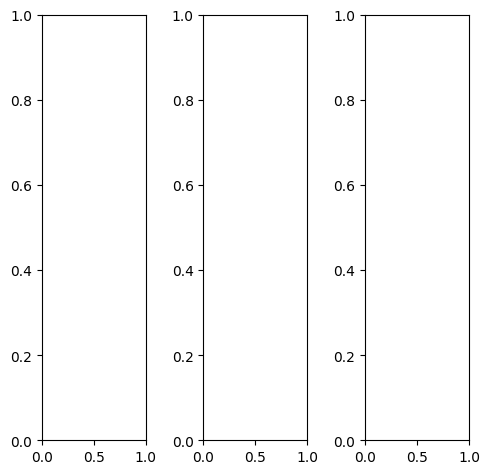

tensor([[[0.0941, 0.1451, 0.1804,  ..., 0.4588, 0.5569, 0.5020],
         [0.2510, 0.3843, 0.3843,  ..., 0.4196, 0.4510, 0.4235],
         [0.3843, 0.5294, 0.5216,  ..., 0.4118, 0.4118, 0.4157],
         ...,
         [0.2235, 0.2353, 0.2392,  ..., 0.3922, 0.3922, 0.3882],
         [0.2275, 0.2275, 0.2314,  ..., 0.4000, 0.4196, 0.4275],
         [0.2235, 0.2196, 0.2314,  ..., 0.4510, 0.4667, 0.4627]],

        [[0.0941, 0.1451, 0.1804,  ..., 0.4588, 0.5569, 0.5020],
         [0.2510, 0.3843, 0.3843,  ..., 0.4196, 0.4510, 0.4235],
         [0.3843, 0.5294, 0.5216,  ..., 0.4118, 0.4118, 0.4157],
         ...,
         [0.2235, 0.2353, 0.2392,  ..., 0.3922, 0.3922, 0.3882],
         [0.2275, 0.2275, 0.2314,  ..., 0.4000, 0.4196, 0.4275],
         [0.2235, 0.2196, 0.2314,  ..., 0.4510, 0.4667, 0.4627]],

        [[0.0941, 0.1451, 0.1804,  ..., 0.4588, 0.5569, 0.5020],
         [0.2510, 0.3843, 0.3843,  ..., 0.4196, 0.4510, 0.4235],
         [0.3843, 0.5294, 0.5216,  ..., 0.4118, 0.4118, 0.

tensor([[[0.0784, 0.1176, 0.1412,  ..., 0.3529, 0.4235, 0.3843],
         [0.2000, 0.2902, 0.2902,  ..., 0.3176, 0.3490, 0.3294],
         [0.2902, 0.3882, 0.3882,  ..., 0.3059, 0.3137, 0.3216],
         ...,
         [0.1922, 0.2039, 0.2039,  ..., 0.3176, 0.3098, 0.3059],
         [0.2000, 0.1961, 0.1961,  ..., 0.3294, 0.3451, 0.3451],
         [0.1882, 0.1843, 0.1961,  ..., 0.3804, 0.3922, 0.3843]],

        [[0.0980, 0.1490, 0.1882,  ..., 0.4863, 0.5922, 0.5333],
         [0.2588, 0.4078, 0.4078,  ..., 0.4431, 0.4784, 0.4510],
         [0.4078, 0.5647, 0.5529,  ..., 0.4353, 0.4314, 0.4392],
         ...,
         [0.2314, 0.2431, 0.2510,  ..., 0.4118, 0.4157, 0.4118],
         [0.2392, 0.2353, 0.2392,  ..., 0.4157, 0.4392, 0.4471],
         [0.2353, 0.2314, 0.2392,  ..., 0.4667, 0.4863, 0.4824]],

        [[0.1098, 0.1882, 0.2392,  ..., 0.6078, 0.7333, 0.6392],
         [0.3333, 0.5255, 0.5216,  ..., 0.5490, 0.5725, 0.5451],
         [0.5255, 0.7216, 0.7020,  ..., 0.5608, 0.5529, 0.

tensor([[[0.1388, 0.1099, 0.1235,  ..., 0.4022, 0.5161, 0.5185],
         [0.2039, 0.2961, 0.3076,  ..., 0.3507, 0.3869, 0.4111],
         [0.3803, 0.4457, 0.5054,  ..., 0.3670, 0.3517, 0.3725],
         ...,
         [0.1840, 0.2111, 0.2043,  ..., 0.3871, 0.3571, 0.3850],
         [0.1924, 0.1893, 0.2024,  ..., 0.3733, 0.3824, 0.4307],
         [0.2246, 0.1795, 0.1904,  ..., 0.4763, 0.4929, 0.5037]],

        [[0.1528, 0.1525, 0.1669,  ..., 0.5019, 0.6457, 0.5576],
         [0.2675, 0.4242, 0.4268,  ..., 0.4672, 0.5118, 0.4606],
         [0.4403, 0.5586, 0.5870,  ..., 0.4542, 0.4473, 0.4413],
         ...,
         [0.2333, 0.2514, 0.2647,  ..., 0.4899, 0.4739, 0.4152],
         [0.2259, 0.2295, 0.2358,  ..., 0.4846, 0.4890, 0.4730],
         [0.2392, 0.2025, 0.2280,  ..., 0.5266, 0.5532, 0.5317]],

        [[0.2230, 0.2421, 0.2539,  ..., 0.6344, 0.7903, 0.6972],
         [0.3740, 0.5310, 0.5008,  ..., 0.5945, 0.6683, 0.6146],
         [0.5334, 0.7086, 0.6559,  ..., 0.5744, 0.5951, 0.

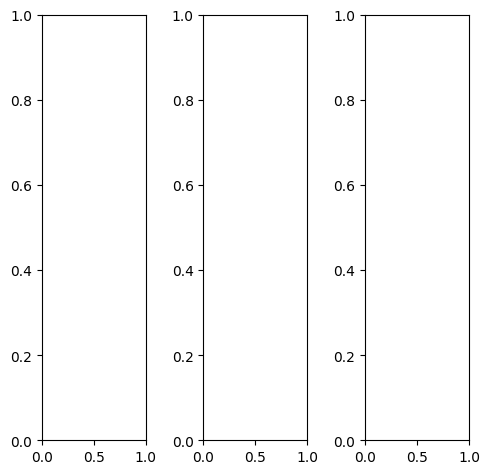

tensor([[[0.0078, 0.0118, 0.0275,  ..., 0.1020, 0.1020, 0.0863],
         [0.0314, 0.0314, 0.0784,  ..., 0.1176, 0.1020, 0.0902],
         [0.0824, 0.0824, 0.1098,  ..., 0.2157, 0.1922, 0.1882],
         ...,
         [0.0706, 0.0706, 0.0510,  ..., 0.2706, 0.2627, 0.2471],
         [0.0314, 0.0314, 0.0314,  ..., 0.4039, 0.2667, 0.2196],
         [0.0118, 0.0118, 0.0078,  ..., 0.3569, 0.1882, 0.1294]],

        [[0.0078, 0.0118, 0.0275,  ..., 0.1020, 0.1020, 0.0863],
         [0.0314, 0.0314, 0.0784,  ..., 0.1176, 0.1020, 0.0902],
         [0.0824, 0.0824, 0.1098,  ..., 0.2157, 0.1922, 0.1882],
         ...,
         [0.0706, 0.0706, 0.0510,  ..., 0.2706, 0.2627, 0.2471],
         [0.0314, 0.0314, 0.0314,  ..., 0.4039, 0.2667, 0.2196],
         [0.0118, 0.0118, 0.0078,  ..., 0.3569, 0.1882, 0.1294]],

        [[0.0078, 0.0118, 0.0275,  ..., 0.1020, 0.1020, 0.0863],
         [0.0314, 0.0314, 0.0784,  ..., 0.1176, 0.1020, 0.0902],
         [0.0824, 0.0824, 0.1098,  ..., 0.2157, 0.1922, 0.

tensor([[[0.0118, 0.0157, 0.0314,  ..., 0.1059, 0.1059, 0.0902],
         [0.0353, 0.0353, 0.0824,  ..., 0.1216, 0.1059, 0.0941],
         [0.0863, 0.0863, 0.1137,  ..., 0.2196, 0.1961, 0.1922],
         ...,
         [0.0863, 0.0863, 0.0667,  ..., 0.2863, 0.2706, 0.2588],
         [0.0431, 0.0431, 0.0431,  ..., 0.4118, 0.2784, 0.2314],
         [0.0235, 0.0235, 0.0196,  ..., 0.3765, 0.2078, 0.1451]],

        [[0.0039, 0.0078, 0.0235,  ..., 0.1020, 0.1020, 0.0863],
         [0.0314, 0.0314, 0.0784,  ..., 0.1176, 0.1020, 0.0902],
         [0.0824, 0.0824, 0.1098,  ..., 0.2157, 0.1922, 0.1882],
         ...,
         [0.0627, 0.0627, 0.0431,  ..., 0.2667, 0.2588, 0.2431],
         [0.0235, 0.0235, 0.0235,  ..., 0.4000, 0.2667, 0.2157],
         [0.0039, 0.0039, 0.0000,  ..., 0.3529, 0.1882, 0.1255]],

        [[0.0078, 0.0118, 0.0275,  ..., 0.0863, 0.0863, 0.0745],
         [0.0275, 0.0275, 0.0745,  ..., 0.1020, 0.0902, 0.0784],
         [0.0706, 0.0706, 0.0941,  ..., 0.2000, 0.1765, 0.

tensor([[[ 0.0667, -0.0093,  0.0169,  ...,  0.1316,  0.1469,  0.1761],
         [ 0.0151, -0.0042,  0.0788,  ...,  0.1439,  0.1104,  0.1174],
         [ 0.0847,  0.0695,  0.1745,  ...,  0.3526,  0.3119,  0.2813],
         ...,
         [ 0.0974,  0.1360,  0.0848,  ...,  0.4926,  0.4772,  0.4758],
         [ 0.0572,  0.0279,  0.0470,  ...,  0.7387,  0.4452,  0.3974],
         [ 0.0552,  0.0422,  0.0333,  ...,  0.6437,  0.3320,  0.2921]],

        [[ 0.0756,  0.0360,  0.0601,  ...,  0.1737,  0.1755,  0.1838],
         [ 0.0432,  0.0270,  0.1132,  ...,  0.2013,  0.1812,  0.1537],
         [ 0.1049,  0.0941,  0.1852,  ...,  0.4028,  0.3547,  0.3140],
         ...,
         [ 0.0945,  0.1021,  0.0595,  ...,  0.4678,  0.4692,  0.4126],
         [ 0.0482,  0.0195,  0.0211,  ...,  0.7319,  0.4442,  0.3758],
         [ 0.0432,  0.0242,  0.0105,  ...,  0.5973,  0.2903,  0.2540]],

        [[ 0.1378,  0.0799,  0.0921,  ...,  0.2135,  0.2272,  0.2579],
         [ 0.1072,  0.0840,  0.1435,  ...,  0

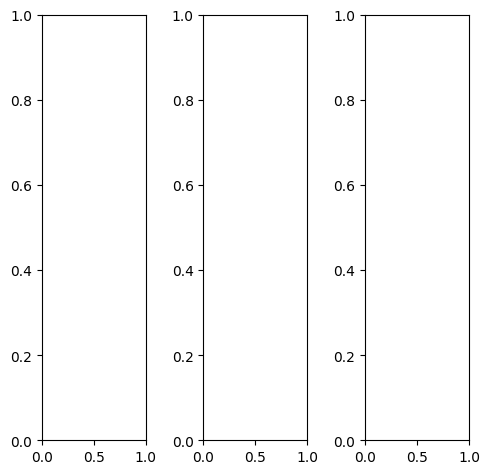

tensor([[[0.6706, 0.6667, 0.6667,  ..., 0.6706, 0.6706, 0.6745],
         [0.6745, 0.6706, 0.6706,  ..., 0.6745, 0.6745, 0.6745],
         [0.6667, 0.6627, 0.6667,  ..., 0.6706, 0.6706, 0.6706],
         ...,
         [0.4431, 0.5922, 0.6353,  ..., 0.6431, 0.6431, 0.6431],
         [0.6275, 0.6314, 0.6353,  ..., 0.6431, 0.6431, 0.6431],
         [0.6314, 0.6275, 0.6314,  ..., 0.6353, 0.6392, 0.6392]],

        [[0.6706, 0.6667, 0.6667,  ..., 0.6706, 0.6706, 0.6745],
         [0.6745, 0.6706, 0.6706,  ..., 0.6745, 0.6745, 0.6745],
         [0.6667, 0.6627, 0.6667,  ..., 0.6706, 0.6706, 0.6706],
         ...,
         [0.4431, 0.5922, 0.6353,  ..., 0.6431, 0.6431, 0.6431],
         [0.6275, 0.6314, 0.6353,  ..., 0.6431, 0.6431, 0.6431],
         [0.6314, 0.6275, 0.6314,  ..., 0.6353, 0.6392, 0.6392]],

        [[0.6706, 0.6667, 0.6667,  ..., 0.6706, 0.6706, 0.6745],
         [0.6745, 0.6706, 0.6706,  ..., 0.6745, 0.6745, 0.6745],
         [0.6667, 0.6627, 0.6667,  ..., 0.6706, 0.6706, 0.

tensor([[[0.6980, 0.6941, 0.6941,  ..., 0.6980, 0.6980, 0.7020],
         [0.7020, 0.6980, 0.6980,  ..., 0.7020, 0.7020, 0.7020],
         [0.6941, 0.6902, 0.6941,  ..., 0.6980, 0.6980, 0.6980],
         ...,
         [0.4745, 0.6235, 0.6667,  ..., 0.6745, 0.6745, 0.6745],
         [0.6549, 0.6627, 0.6667,  ..., 0.6745, 0.6745, 0.6745],
         [0.6588, 0.6549, 0.6588,  ..., 0.6706, 0.6706, 0.6706]],

        [[0.6588, 0.6549, 0.6549,  ..., 0.6588, 0.6588, 0.6627],
         [0.6627, 0.6588, 0.6588,  ..., 0.6627, 0.6627, 0.6627],
         [0.6549, 0.6510, 0.6549,  ..., 0.6588, 0.6588, 0.6588],
         ...,
         [0.4314, 0.5804, 0.6235,  ..., 0.6275, 0.6275, 0.6275],
         [0.6157, 0.6196, 0.6235,  ..., 0.6314, 0.6275, 0.6275],
         [0.6196, 0.6157, 0.6196,  ..., 0.6235, 0.6235, 0.6235]],

        [[0.6549, 0.6510, 0.6510,  ..., 0.6549, 0.6549, 0.6588],
         [0.6588, 0.6549, 0.6549,  ..., 0.6588, 0.6588, 0.6588],
         [0.6510, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.

tensor([[[0.5119, 0.4062, 0.3619,  ..., 0.4022, 0.4501, 0.4832],
         [0.4290, 0.3828, 0.3294,  ..., 0.3371, 0.3693, 0.3992],
         [0.4295, 0.3725, 0.3861,  ..., 0.3822, 0.3784, 0.4167],
         ...,
         [0.2280, 0.4904, 0.5483,  ..., 0.4513, 0.4420, 0.4475],
         [0.4874, 0.5122, 0.4995,  ..., 0.4492, 0.4097, 0.4493],
         [0.5128, 0.4665, 0.4670,  ..., 0.4371, 0.4737, 0.4568]],

        [[0.5482, 0.4899, 0.4676,  ..., 0.4782, 0.5618, 0.5009],
         [0.4714, 0.4822, 0.4288,  ..., 0.4915, 0.5400, 0.4736],
         [0.4519, 0.4624, 0.4600,  ..., 0.4831, 0.5126, 0.4903],
         ...,
         [0.1802, 0.4833, 0.5318,  ..., 0.4754, 0.5257, 0.4294],
         [0.4473, 0.5123, 0.5108,  ..., 0.4980, 0.4992, 0.4589],
         [0.4652, 0.4353, 0.4478,  ..., 0.4574, 0.4992, 0.4520]],

        [[0.6918, 0.6658, 0.6231,  ..., 0.6424, 0.6974, 0.6495],
         [0.6591, 0.6309, 0.5770,  ..., 0.5957, 0.6718, 0.6212],
         [0.6371, 0.6293, 0.6180,  ..., 0.6344, 0.6623, 0.

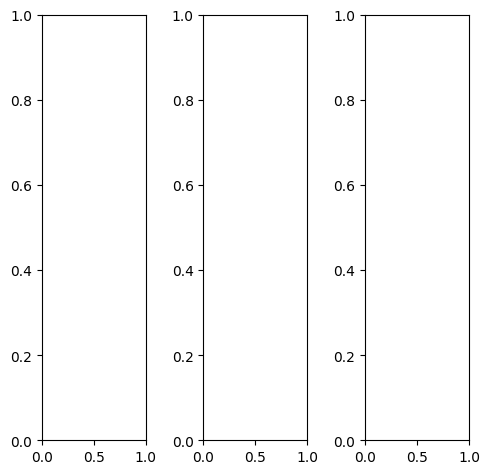

EPOCH: 7.765  trn_loss: 0.005  (906.21s - 10763.83s remaining)

tensor([[[0.5373, 0.3098, 0.3176,  ..., 0.4078, 0.6157, 0.6784],
         [0.4000, 0.0039, 0.0078,  ..., 0.4039, 0.5216, 0.5961],
         [0.4157, 0.0235, 0.0392,  ..., 0.5216, 0.4627, 0.4824],
         ...,
         [0.4627, 0.1608, 0.1686,  ..., 0.1059, 0.0314, 0.2824],
         [0.4510, 0.1333, 0.1412,  ..., 0.0588, 0.0196, 0.2667],
         [0.5725, 0.3922, 0.4000,  ..., 0.3490, 0.3333, 0.4784]],

        [[0.5373, 0.3098, 0.3176,  ..., 0.4078, 0.6157, 0.6784],
         [0.4000, 0.0039, 0.0078,  ..., 0.4039, 0.5216, 0.5961],
         [0.4157, 0.0235, 0.0392,  ..., 0.5216, 0.4627, 0.4824],
         ...,
         [0.4627, 0.1608, 0.1686,  ..., 0.1059, 0.0314, 0.2824],
         [0.4510, 0.1333, 0.1412,  ..., 0.0588, 0.0196, 0.2667],
         [0.5725, 0.3922, 0.4000,  ..., 0.3490, 0.3333, 0.4784]],

        [[0.5373, 0.3098, 0.3176,  ..., 0.4078, 0.6157, 0.6784],
         [0.4000, 0.0039, 0.0078,  ..., 0.4039, 0.5216, 0.5961],
         [0.4157, 0.0235, 0.0392,  ..., 0.5216, 0.4627, 0.

tensor([[[0.7294, 0.4196, 0.4275,  ..., 0.5137, 0.6627, 0.8078],
         [0.5294, 0.0000, 0.0000,  ..., 0.4039, 0.4902, 0.6784],
         [0.5529, 0.0196, 0.0392,  ..., 0.4745, 0.4196, 0.5608],
         ...,
         [0.6392, 0.2353, 0.2471,  ..., 0.2157, 0.0863, 0.3804],
         [0.6196, 0.1961, 0.2118,  ..., 0.1373, 0.0627, 0.3647],
         [0.7843, 0.5451, 0.5529,  ..., 0.4824, 0.4588, 0.6549]],

        [[0.4235, 0.2431, 0.2471,  ..., 0.3373, 0.5686, 0.5882],
         [0.3216, 0.0039, 0.0118,  ..., 0.4000, 0.5333, 0.5451],
         [0.3294, 0.0196, 0.0353,  ..., 0.5216, 0.4706, 0.4275],
         ...,
         [0.3647, 0.1412, 0.1490,  ..., 0.0392, 0.0039, 0.2196],
         [0.3569, 0.1216, 0.1255,  ..., 0.0118, 0.0000, 0.2078],
         [0.4471, 0.3098, 0.3176,  ..., 0.2706, 0.2588, 0.3725]],

        [[0.6314, 0.3725, 0.3843,  ..., 0.4784, 0.7412, 0.8196],
         [0.4745, 0.0039, 0.0118,  ..., 0.4196, 0.5451, 0.6549],
         [0.4902, 0.0392, 0.0510,  ..., 0.6353, 0.5451, 0.

tensor([[[0.6043, 0.3722, 0.3541,  ..., 0.5187, 0.7104, 0.7487],
         [0.4736, 0.0548, 0.0515,  ..., 0.4961, 0.6587, 0.7196],
         [0.4742, 0.0568, 0.0820,  ..., 0.6929, 0.6086, 0.5964],
         ...,
         [0.6016, 0.2955, 0.2500,  ..., 0.1733, 0.1181, 0.4386],
         [0.5914, 0.2337, 0.1920,  ..., 0.1095, 0.0942, 0.4010],
         [0.6940, 0.6006, 0.5609,  ..., 0.5031, 0.4748, 0.5779]],

        [[0.6096, 0.4162, 0.4573,  ..., 0.5893, 0.8014, 0.8425],
         [0.5038, 0.0978, 0.1100,  ..., 0.5796, 0.7634, 0.8262],
         [0.5206, 0.1348, 0.1259,  ..., 0.7489, 0.6901, 0.6725],
         ...,
         [0.6157, 0.2927, 0.3320,  ..., 0.2185, 0.1575, 0.4394],
         [0.6076, 0.2638, 0.2630,  ..., 0.1792, 0.1499, 0.4080],
         [0.6698, 0.5865, 0.6003,  ..., 0.5167, 0.4988, 0.5749]],

        [[0.6947, 0.5454, 0.5145,  ..., 0.7986, 0.9857, 0.9470],
         [0.5812, 0.2051, 0.1756,  ..., 0.7958, 0.9569, 0.9201],
         [0.5892, 0.1968, 0.2240,  ..., 0.9658, 0.9122, 0.

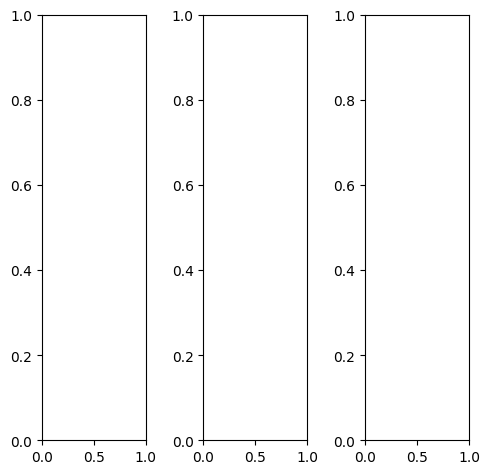

tensor([[[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.8784],
         ...,
         [0.3412, 0.3020, 0.4471,  ..., 0.5647, 0.6353, 0.6667],
         [0.4196, 0.3098, 0.3961,  ..., 0.3137, 0.3373, 0.4275],
         [0.7098, 0.6078, 0.4902,  ..., 0.3216, 0.4118, 0.4627]],

        [[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.8784],
         ...,
         [0.3412, 0.3020, 0.4471,  ..., 0.5647, 0.6353, 0.6667],
         [0.4196, 0.3098, 0.3961,  ..., 0.3137, 0.3373, 0.4275],
         [0.7098, 0.6078, 0.4902,  ..., 0.3216, 0.4118, 0.4627]],

        [[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.

tensor([[[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.8784],
         ...,
         [0.3412, 0.3020, 0.4471,  ..., 0.5647, 0.6353, 0.6667],
         [0.4196, 0.3098, 0.3961,  ..., 0.3137, 0.3373, 0.4275],
         [0.7098, 0.6078, 0.4902,  ..., 0.3216, 0.4118, 0.4627]],

        [[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.8784],
         ...,
         [0.3412, 0.3020, 0.4471,  ..., 0.5647, 0.6353, 0.6667],
         [0.4196, 0.3098, 0.3961,  ..., 0.3137, 0.3373, 0.4275],
         [0.7098, 0.6078, 0.4902,  ..., 0.3216, 0.4118, 0.4627]],

        [[0.9529, 0.9333, 0.9804,  ..., 0.8784, 0.8784, 0.8784],
         [0.6902, 0.6078, 0.8667,  ..., 0.8824, 0.8784, 0.8784],
         [0.3490, 0.3647, 0.6902,  ..., 0.8824, 0.8784, 0.

tensor([[[0.7229, 0.7694, 0.8795,  ..., 0.8196, 0.7947, 0.7133],
         [0.6032, 0.5881, 0.8294,  ..., 0.9097, 0.9029, 0.7784],
         [0.3048, 0.3291, 0.6783,  ..., 0.9759, 0.9570, 0.8383],
         ...,
         [0.2561, 0.2771, 0.4049,  ..., 0.5569, 0.6232, 0.6309],
         [0.3338, 0.2533, 0.3024,  ..., 0.2250, 0.2670, 0.3463],
         [0.5666, 0.5280, 0.3928,  ..., 0.2406, 0.3238, 0.3804]],

        [[0.7707, 0.8081, 0.9319,  ..., 0.8906, 0.8689, 0.8573],
         [0.5934, 0.6004, 0.8617,  ..., 0.9773, 0.9526, 0.9204],
         [0.3314, 0.3610, 0.6759,  ..., 1.0254, 1.0044, 0.9292],
         ...,
         [0.2688, 0.2881, 0.4501,  ..., 0.5585, 0.6234, 0.6141],
         [0.3558, 0.2798, 0.3665,  ..., 0.3040, 0.3074, 0.3581],
         [0.5855, 0.5435, 0.4454,  ..., 0.2544, 0.3321, 0.3803]],

        [[0.9144, 0.9817, 1.0350,  ..., 1.0309, 1.0039, 0.9600],
         [0.7610, 0.7974, 0.9935,  ..., 1.1303, 1.1217, 0.9828],
         [0.4750, 0.5646, 0.8440,  ..., 1.2022, 1.1620, 1.

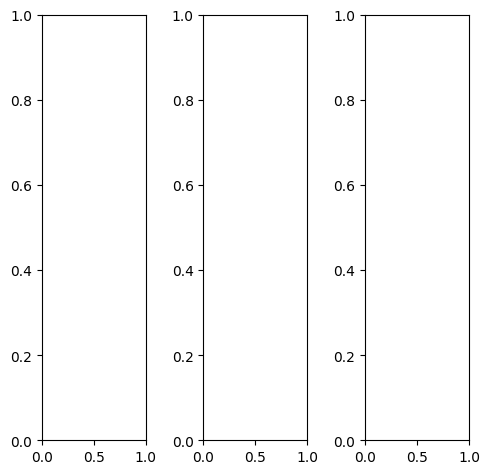

tensor([[[0.1804, 0.2392, 0.3373,  ..., 0.4235, 0.4235, 0.4235],
         [0.2314, 0.5294, 0.5725,  ..., 0.3255, 0.2941, 0.3490],
         [0.1529, 0.4510, 0.5608,  ..., 0.1569, 0.1255, 0.1569],
         ...,
         [0.0118, 0.0039, 0.0118,  ..., 0.4902, 0.4980, 0.4902],
         [0.0118, 0.0039, 0.0000,  ..., 0.4706, 0.4510, 0.4275],
         [0.0196, 0.0039, 0.0000,  ..., 0.4000, 0.3647, 0.3412]],

        [[0.1804, 0.2392, 0.3373,  ..., 0.4235, 0.4235, 0.4235],
         [0.2314, 0.5294, 0.5725,  ..., 0.3255, 0.2941, 0.3490],
         [0.1529, 0.4510, 0.5608,  ..., 0.1569, 0.1255, 0.1569],
         ...,
         [0.0118, 0.0039, 0.0118,  ..., 0.4902, 0.4980, 0.4902],
         [0.0118, 0.0039, 0.0000,  ..., 0.4706, 0.4510, 0.4275],
         [0.0196, 0.0039, 0.0000,  ..., 0.4000, 0.3647, 0.3412]],

        [[0.1804, 0.2392, 0.3373,  ..., 0.4235, 0.4235, 0.4235],
         [0.2314, 0.5294, 0.5725,  ..., 0.3255, 0.2941, 0.3490],
         [0.1529, 0.4510, 0.5608,  ..., 0.1569, 0.1255, 0.

tensor([[[0.1490, 0.2118, 0.2902,  ..., 0.2863, 0.2863, 0.2863],
         [0.2000, 0.4980, 0.5294,  ..., 0.2314, 0.2000, 0.2549],
         [0.1294, 0.4275, 0.5294,  ..., 0.1333, 0.1020, 0.1333],
         ...,
         [0.0118, 0.0039, 0.0157,  ..., 0.5137, 0.5216, 0.5137],
         [0.0118, 0.0039, 0.0039,  ..., 0.4980, 0.4824, 0.4588],
         [0.0157, 0.0039, 0.0039,  ..., 0.4196, 0.3843, 0.3608]],

        [[0.1882, 0.2510, 0.3529,  ..., 0.4627, 0.4627, 0.4627],
         [0.2392, 0.5373, 0.5882,  ..., 0.3608, 0.3294, 0.3804],
         [0.1686, 0.4588, 0.5725,  ..., 0.1765, 0.1490, 0.1804],
         ...,
         [0.0078, 0.0039, 0.0078,  ..., 0.4863, 0.4941, 0.4902],
         [0.0118, 0.0039, 0.0000,  ..., 0.4667, 0.4471, 0.4235],
         [0.0196, 0.0039, 0.0000,  ..., 0.4000, 0.3647, 0.3412]],

        [[0.2196, 0.2588, 0.3686,  ..., 0.5882, 0.5804, 0.5961],
         [0.2667, 0.5608, 0.6078,  ..., 0.4000, 0.3569, 0.4235],
         [0.1490, 0.4863, 0.5922,  ..., 0.1059, 0.0627, 0.

tensor([[[0.3318, 0.3465, 0.4467,  ..., 0.5329, 0.5426, 0.5704],
         [0.2960, 0.7152, 0.7677,  ..., 0.4401, 0.3644, 0.5010],
         [0.2544, 0.6063, 0.7772,  ..., 0.1985, 0.1749, 0.2517],
         ...,
         [0.0640, 0.0986, 0.0955,  ..., 0.7119, 0.7089, 0.7298],
         [0.0717, 0.0767, 0.0893,  ..., 0.6512, 0.6500, 0.6543],
         [0.0976, 0.0815, 0.0761,  ..., 0.6130, 0.5821, 0.5696]],

        [[0.3314, 0.3707, 0.5174,  ..., 0.5799, 0.5979, 0.5794],
         [0.3385, 0.7790, 0.8547,  ..., 0.4616, 0.4181, 0.4980],
         [0.2903, 0.6777, 0.8153,  ..., 0.2744, 0.2277, 0.2786],
         ...,
         [0.0879, 0.0875, 0.1292,  ..., 0.7160, 0.7309, 0.7104],
         [0.0901, 0.0777, 0.0829,  ..., 0.6463, 0.6635, 0.6232],
         [0.1038, 0.0916, 0.0853,  ..., 0.5793, 0.5537, 0.5297]],

        [[0.4529, 0.5983, 0.6983,  ..., 0.7419, 0.7612, 0.7253],
         [0.5135, 1.0597, 1.0646,  ..., 0.6136, 0.5845, 0.6633],
         [0.4127, 0.8768, 1.0205,  ..., 0.3760, 0.3579, 0.

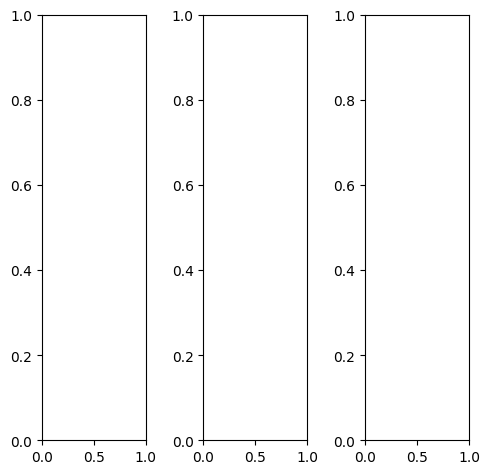

tensor([[[0.9961, 0.9804, 0.9725,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9490, 0.8784,  ..., 1.0000, 1.0000, 1.0000],
         [0.8941, 0.6627, 0.5961,  ..., 0.9922, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9765, 0.9412,  ..., 0.6549, 0.9647, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 0.8863, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9765, 0.9922, 1.0000]],

        [[0.9961, 0.9804, 0.9725,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9490, 0.8784,  ..., 1.0000, 1.0000, 1.0000],
         [0.8941, 0.6627, 0.5961,  ..., 0.9922, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9765, 0.9412,  ..., 0.6549, 0.9647, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 0.8863, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9765, 0.9922, 1.0000]],

        [[0.9961, 0.9804, 0.9725,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9490, 0.8784,  ..., 1.0000, 1.0000, 1.0000],
         [0.8941, 0.6627, 0.5961,  ..., 0.9922, 0.9922, 1.

tensor([[[0.9961, 0.9765, 0.9804,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9725, 0.9294,  ..., 1.0000, 1.0000, 1.0000],
         [0.9255, 0.7451, 0.7020,  ..., 0.9922, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9804, 0.9608,  ..., 0.6784, 0.9765, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.8902, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9765, 0.9922, 1.0000]],

        [[1.0000, 0.9804, 0.9725,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9373, 0.8627,  ..., 1.0000, 1.0000, 1.0000],
         [0.8824, 0.6314, 0.5569,  ..., 0.9922, 0.9922, 1.0000],
         ...,
         [1.0000, 0.9765, 0.9373,  ..., 0.6431, 0.9569, 1.0000],
         [1.0000, 0.9961, 0.9922,  ..., 0.8863, 0.9922, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9765, 0.9922, 1.0000]],

        [[0.9922, 0.9882, 0.9608,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9333, 0.8353,  ..., 1.0000, 1.0000, 1.0000],
         [0.8824, 0.6118, 0.5098,  ..., 0.9922, 0.9922, 1.

tensor([[[0.6973, 0.6831, 0.6444,  ..., 0.6225, 0.6462, 0.7198],
         [0.6947, 0.7214, 0.6131,  ..., 0.6652, 0.6915, 0.7051],
         [0.6512, 0.4339, 0.3673,  ..., 0.7071, 0.7321, 0.7101],
         ...,
         [0.7884, 0.8190, 0.7891,  ..., 0.4448, 0.7780, 0.8235],
         [0.7772, 0.8113, 0.8126,  ..., 0.7131, 0.7827, 0.8062],
         [0.7707, 0.7935, 0.8090,  ..., 0.7932, 0.8104, 0.7778]],

        [[0.6990, 0.7244, 0.7057,  ..., 0.7130, 0.7719, 0.8003],
         [0.7120, 0.7411, 0.6829,  ..., 0.7581, 0.7562, 0.8437],
         [0.6343, 0.4594, 0.4137,  ..., 0.7967, 0.7864, 0.8152],
         ...,
         [0.7234, 0.7630, 0.7463,  ..., 0.4667, 0.7849, 0.8056],
         [0.7348, 0.7696, 0.7712,  ..., 0.7053, 0.7910, 0.7913],
         [0.7114, 0.7548, 0.7703,  ..., 0.7556, 0.7756, 0.7565]],

        [[0.7900, 0.8517, 0.8063,  ..., 0.8539, 0.8772, 0.8734],
         [0.8021, 0.8449, 0.7314,  ..., 0.8507, 0.8873, 0.8806],
         [0.7055, 0.5597, 0.5009,  ..., 0.9020, 0.9089, 0.

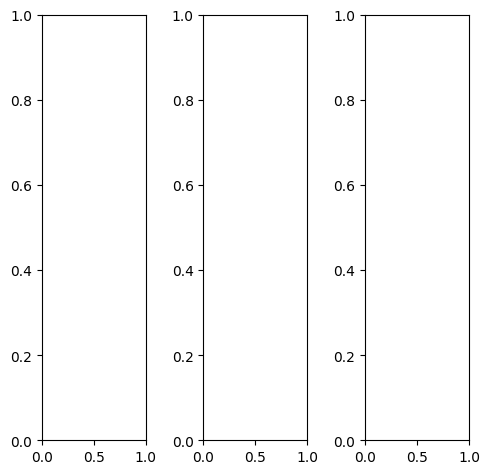

tensor([[[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.3490],
         ...,
         [0.5608, 0.4275, 0.4078,  ..., 0.3333, 0.3412, 0.3059],
         [0.3608, 0.2667, 0.2902,  ..., 0.2667, 0.3098, 0.2588],
         [0.2196, 0.1961, 0.1961,  ..., 0.1373, 0.1490, 0.1451]],

        [[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.3490],
         ...,
         [0.5608, 0.4275, 0.4078,  ..., 0.3333, 0.3412, 0.3059],
         [0.3608, 0.2667, 0.2902,  ..., 0.2667, 0.3098, 0.2588],
         [0.2196, 0.1961, 0.1961,  ..., 0.1373, 0.1490, 0.1451]],

        [[0.5137, 0.5216, 0.5490,  ..., 0.6196, 0.6745, 0.6392],
         [0.4353, 0.3725, 0.3647,  ..., 0.4000, 0.4039, 0.3490],
         [0.4039, 0.3529, 0.3216,  ..., 0.3922, 0.3765, 0.

tensor([[[0.3451, 0.3765, 0.4078,  ..., 0.4863, 0.5451, 0.5216],
         [0.2784, 0.2392, 0.2392,  ..., 0.2980, 0.3020, 0.2588],
         [0.2627, 0.2353, 0.2118,  ..., 0.3059, 0.2902, 0.2706],
         ...,
         [0.4863, 0.3686, 0.3529,  ..., 0.2471, 0.2549, 0.2392],
         [0.2863, 0.2118, 0.2353,  ..., 0.2000, 0.2431, 0.2000],
         [0.1490, 0.1451, 0.1451,  ..., 0.0824, 0.0941, 0.0941]],

        [[0.5451, 0.5451, 0.5647,  ..., 0.6392, 0.6980, 0.6588],
         [0.4588, 0.3882, 0.3804,  ..., 0.4118, 0.4157, 0.3647],
         [0.4235, 0.3686, 0.3373,  ..., 0.4000, 0.3843, 0.3608],
         ...,
         [0.5725, 0.4275, 0.4078,  ..., 0.3412, 0.3490, 0.3098],
         [0.3686, 0.2667, 0.2902,  ..., 0.2706, 0.3137, 0.2588],
         [0.2235, 0.1961, 0.2000,  ..., 0.1412, 0.1529, 0.1490]],

        [[0.8000, 0.7961, 0.8235,  ..., 0.8549, 0.9059, 0.8353],
         [0.7176, 0.6275, 0.6078,  ..., 0.6000, 0.5961, 0.5216],
         [0.6784, 0.5804, 0.5333,  ..., 0.5725, 0.5529, 0.

tensor([[[ 0.5266,  0.5061,  0.5268,  ...,  0.6576,  0.7184,  0.6262],
         [ 0.3888,  0.2745,  0.2393,  ...,  0.3501,  0.3732,  0.3228],
         [ 0.3458,  0.2264,  0.1858,  ...,  0.3653,  0.3070,  0.2490],
         ...,
         [ 0.6523,  0.4690,  0.4129,  ...,  0.2585,  0.2578,  0.2152],
         [ 0.2623,  0.1527,  0.1763,  ...,  0.1135,  0.1993,  0.1640],
         [ 0.1677,  0.0736,  0.0532,  ..., -0.0120,  0.0093,  0.0722]],

        [[ 0.5651,  0.5577,  0.6074,  ...,  0.7077,  0.8083,  0.6726],
         [ 0.4487,  0.3267,  0.3393,  ...,  0.4268,  0.4429,  0.3563],
         [ 0.4135,  0.3242,  0.2986,  ...,  0.4349,  0.3945,  0.2754],
         ...,
         [ 0.6490,  0.4397,  0.4227,  ...,  0.3369,  0.3437,  0.2415],
         [ 0.2893,  0.1572,  0.1992,  ...,  0.1912,  0.2631,  0.1855],
         [ 0.1599,  0.0688,  0.0781,  ...,  0.0363,  0.0475,  0.0699]],

        [[ 0.6934,  0.7445,  0.7706,  ...,  0.8552,  0.9224,  0.7958],
         [ 0.5981,  0.4900,  0.4783,  ...,  0

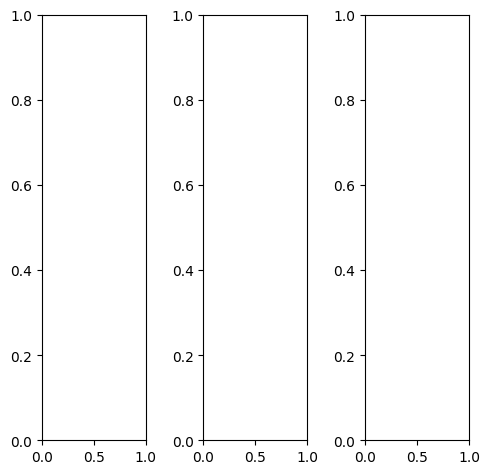

EPOCH: 8.000  val_loss: 0.004  (939.59s - 10805.30s remaining)

tensor([[[0.5294, 0.5608, 0.5569,  ..., 0.5412, 0.5373, 0.5647],
         [0.5373, 0.5412, 0.5725,  ..., 0.6078, 0.5882, 0.5843],
         [0.5843, 0.5843, 0.5804,  ..., 0.6510, 0.6392, 0.6000],
         ...,
         [0.5451, 0.5451, 0.5608,  ..., 0.5176, 0.5333, 0.4902],
         [0.5529, 0.5686, 0.5882,  ..., 0.5412, 0.5373, 0.5020],
         [0.5882, 0.5765, 0.5765,  ..., 0.5176, 0.4980, 0.4667]],

        [[0.5294, 0.5608, 0.5569,  ..., 0.5412, 0.5373, 0.5647],
         [0.5373, 0.5412, 0.5725,  ..., 0.6078, 0.5882, 0.5843],
         [0.5843, 0.5843, 0.5804,  ..., 0.6510, 0.6392, 0.6000],
         ...,
         [0.5451, 0.5451, 0.5608,  ..., 0.5176, 0.5333, 0.4902],
         [0.5529, 0.5686, 0.5882,  ..., 0.5412, 0.5373, 0.5020],
         [0.5882, 0.5765, 0.5765,  ..., 0.5176, 0.4980, 0.4667]],

        [[0.5294, 0.5608, 0.5569,  ..., 0.5412, 0.5373, 0.5647],
         [0.5373, 0.5412, 0.5725,  ..., 0.6078, 0.5882, 0.5843],
         [0.5843, 0.5843, 0.5804,  ..., 0.6510, 0.6392, 0.

tensor([[[0.5255, 0.5569, 0.5529,  ..., 0.5412, 0.5373, 0.5686],
         [0.5333, 0.5373, 0.5686,  ..., 0.6078, 0.5882, 0.5843],
         [0.5804, 0.5804, 0.5765,  ..., 0.6510, 0.6392, 0.6039],
         ...,
         [0.5412, 0.5412, 0.5569,  ..., 0.5176, 0.5333, 0.4941],
         [0.5490, 0.5647, 0.5843,  ..., 0.5412, 0.5373, 0.5098],
         [0.5843, 0.5725, 0.5725,  ..., 0.5176, 0.4980, 0.4784]],

        [[0.5294, 0.5569, 0.5529,  ..., 0.5373, 0.5333, 0.5608],
         [0.5373, 0.5412, 0.5686,  ..., 0.6039, 0.5843, 0.5765],
         [0.5843, 0.5843, 0.5765,  ..., 0.6471, 0.6353, 0.5922],
         ...,
         [0.5451, 0.5451, 0.5608,  ..., 0.5137, 0.5294, 0.4863],
         [0.5569, 0.5686, 0.5882,  ..., 0.5373, 0.5373, 0.4941],
         [0.5922, 0.5765, 0.5765,  ..., 0.5176, 0.4980, 0.4627]],

        [[0.5412, 0.5765, 0.5843,  ..., 0.5608, 0.5569, 0.5882],
         [0.5490, 0.5608, 0.6000,  ..., 0.6275, 0.6078, 0.6118],
         [0.5961, 0.6000, 0.6078,  ..., 0.6706, 0.6588, 0.

tensor([[[0.5400, 0.5604, 0.5633,  ..., 0.5500, 0.5662, 0.5903],
         [0.5424, 0.5438, 0.5773,  ..., 0.6079, 0.5915, 0.5957],
         [0.5947, 0.5981, 0.5999,  ..., 0.6701, 0.6634, 0.6204],
         ...,
         [0.5618, 0.5741, 0.5785,  ..., 0.5407, 0.5633, 0.5028],
         [0.5652, 0.5993, 0.6057,  ..., 0.5641, 0.5500, 0.5232],
         [0.6131, 0.6031, 0.5967,  ..., 0.5358, 0.5229, 0.5063]],

        [[0.5422, 0.5639, 0.5595,  ..., 0.5419, 0.5548, 0.5798],
         [0.5354, 0.5294, 0.5697,  ..., 0.6056, 0.5898, 0.6036],
         [0.5913, 0.5931, 0.6006,  ..., 0.6718, 0.6483, 0.6108],
         ...,
         [0.5467, 0.5592, 0.5709,  ..., 0.5242, 0.5456, 0.4918],
         [0.5510, 0.5829, 0.5931,  ..., 0.5543, 0.5461, 0.5192],
         [0.5907, 0.5863, 0.5847,  ..., 0.5256, 0.5132, 0.5087]],

        [[0.4784, 0.4757, 0.4653,  ..., 0.4547, 0.4826, 0.5219],
         [0.4542, 0.4335, 0.4611,  ..., 0.5044, 0.4900, 0.5174],
         [0.4904, 0.4762, 0.4765,  ..., 0.5427, 0.5439, 0.

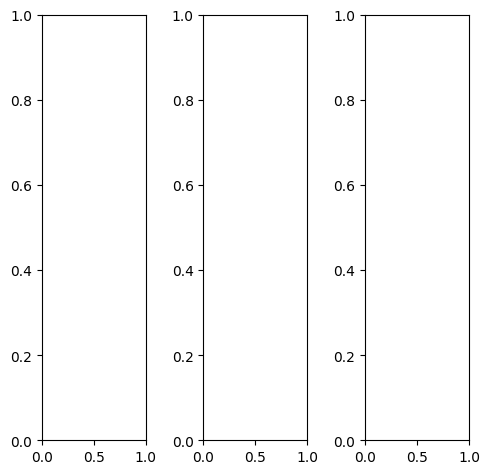

tensor([[[0.1412, 0.1216, 0.1255,  ..., 0.4941, 0.4941, 0.4235],
         [0.1412, 0.1255, 0.1255,  ..., 0.4706, 0.4549, 0.3804],
         [0.1451, 0.1294, 0.1255,  ..., 0.4902, 0.4392, 0.3490],
         ...,
         [0.3686, 0.3333, 0.3020,  ..., 0.0941, 0.1137, 0.1569],
         [0.3765, 0.3569, 0.3098,  ..., 0.1098, 0.1373, 0.1412],
         [0.3804, 0.3804, 0.3294,  ..., 0.1294, 0.1569, 0.1451]],

        [[0.1412, 0.1216, 0.1255,  ..., 0.4941, 0.4941, 0.4235],
         [0.1412, 0.1255, 0.1255,  ..., 0.4706, 0.4549, 0.3804],
         [0.1451, 0.1294, 0.1255,  ..., 0.4902, 0.4392, 0.3490],
         ...,
         [0.3686, 0.3333, 0.3020,  ..., 0.0941, 0.1137, 0.1569],
         [0.3765, 0.3569, 0.3098,  ..., 0.1098, 0.1373, 0.1412],
         [0.3804, 0.3804, 0.3294,  ..., 0.1294, 0.1569, 0.1451]],

        [[0.1412, 0.1216, 0.1255,  ..., 0.4941, 0.4941, 0.4235],
         [0.1412, 0.1255, 0.1255,  ..., 0.4706, 0.4549, 0.3804],
         [0.1451, 0.1294, 0.1255,  ..., 0.4902, 0.4392, 0.

tensor([[[0.0275, 0.0157, 0.0196,  ..., 0.3725, 0.3686, 0.2784],
         [0.0314, 0.0196, 0.0196,  ..., 0.3490, 0.3255, 0.2353],
         [0.0392, 0.0275, 0.0196,  ..., 0.3647, 0.2980, 0.2078],
         ...,
         [0.2314, 0.1843, 0.1569,  ..., 0.0471, 0.0941, 0.1412],
         [0.2392, 0.2078, 0.1686,  ..., 0.0706, 0.1333, 0.1373],
         [0.2471, 0.2314, 0.1843,  ..., 0.0980, 0.1608, 0.1451]],

        [[0.2235, 0.2000, 0.2000,  ..., 0.5686, 0.5686, 0.5137],
         [0.2235, 0.2000, 0.2000,  ..., 0.5451, 0.5333, 0.4706],
         [0.2275, 0.2078, 0.2000,  ..., 0.5686, 0.5255, 0.4431],
         ...,
         [0.4824, 0.4471, 0.4118,  ..., 0.1333, 0.1412, 0.1804],
         [0.4902, 0.4706, 0.4196,  ..., 0.1490, 0.1529, 0.1569],
         [0.4941, 0.4941, 0.4392,  ..., 0.1647, 0.1686, 0.1569]],

        [[0.0000, 0.0039, 0.0039,  ..., 0.4431, 0.4235, 0.3333],
         [0.0039, 0.0039, 0.0039,  ..., 0.4157, 0.3804, 0.2824],
         [0.0078, 0.0078, 0.0078,  ..., 0.4314, 0.3647, 0.

tensor([[[0.1803, 0.1493, 0.1498,  ..., 0.5081, 0.5093, 0.4479],
         [0.1502, 0.1484, 0.1496,  ..., 0.4757, 0.4745, 0.3797],
         [0.1553, 0.1567, 0.1549,  ..., 0.5286, 0.4787, 0.3414],
         ...,
         [0.3984, 0.3747, 0.3373,  ..., 0.1263, 0.1443, 0.1796],
         [0.4029, 0.3926, 0.3536,  ..., 0.1422, 0.1754, 0.1698],
         [0.4161, 0.4157, 0.3532,  ..., 0.1595, 0.1856, 0.1786]],

        [[0.1828, 0.1353, 0.1325,  ..., 0.5093, 0.5132, 0.4454],
         [0.1388, 0.1305, 0.1290,  ..., 0.4849, 0.4783, 0.3806],
         [0.1380, 0.1406, 0.1346,  ..., 0.5154, 0.4612, 0.3420],
         ...,
         [0.3758, 0.3543, 0.3105,  ..., 0.1080, 0.1237, 0.1591],
         [0.3857, 0.3744, 0.3246,  ..., 0.1189, 0.1480, 0.1498],
         [0.4080, 0.4044, 0.3465,  ..., 0.1302, 0.1531, 0.1693]],

        [[0.1617, 0.1235, 0.1255,  ..., 0.4158, 0.4363, 0.3911],
         [0.1350, 0.1260, 0.1249,  ..., 0.3860, 0.3909, 0.3089],
         [0.1339, 0.1298, 0.1271,  ..., 0.4181, 0.3695, 0.

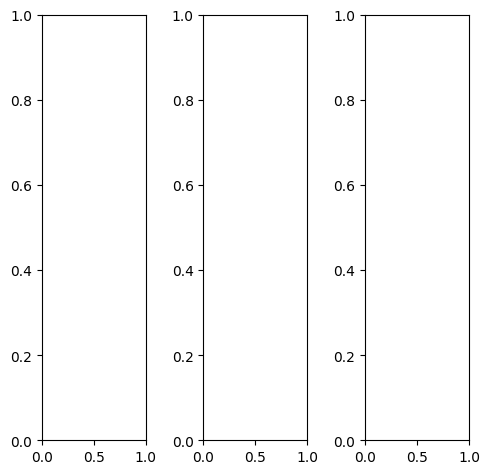

tensor([[[0.1333, 0.0941, 0.0941,  ..., 0.1059, 0.1333, 0.1373],
         [0.1373, 0.0980, 0.0863,  ..., 0.1333, 0.1529, 0.1294],
         [0.1137, 0.1059, 0.0863,  ..., 0.1412, 0.1686, 0.1451],
         ...,
         [0.0863, 0.0824, 0.0667,  ..., 0.1059, 0.1137, 0.1216],
         [0.0667, 0.0667, 0.0549,  ..., 0.0980, 0.0745, 0.1020],
         [0.0549, 0.0510, 0.0471,  ..., 0.0980, 0.0745, 0.0784]],

        [[0.1333, 0.0941, 0.0941,  ..., 0.1059, 0.1333, 0.1373],
         [0.1373, 0.0980, 0.0863,  ..., 0.1333, 0.1529, 0.1294],
         [0.1137, 0.1059, 0.0863,  ..., 0.1412, 0.1686, 0.1451],
         ...,
         [0.0863, 0.0824, 0.0667,  ..., 0.1059, 0.1137, 0.1216],
         [0.0667, 0.0667, 0.0549,  ..., 0.0980, 0.0745, 0.1020],
         [0.0549, 0.0510, 0.0471,  ..., 0.0980, 0.0745, 0.0784]],

        [[0.1333, 0.0941, 0.0941,  ..., 0.1059, 0.1333, 0.1373],
         [0.1373, 0.0980, 0.0863,  ..., 0.1333, 0.1529, 0.1294],
         [0.1137, 0.1059, 0.0863,  ..., 0.1412, 0.1686, 0.

tensor([[[0.0902, 0.0471, 0.0627,  ..., 0.0784, 0.1059, 0.1137],
         [0.0980, 0.0471, 0.0510,  ..., 0.1059, 0.1255, 0.1059],
         [0.0745, 0.0549, 0.0549,  ..., 0.1137, 0.1412, 0.1216],
         ...,
         [0.0627, 0.0588, 0.0431,  ..., 0.0706, 0.0784, 0.0824],
         [0.0510, 0.0431, 0.0275,  ..., 0.0667, 0.0392, 0.0706],
         [0.0392, 0.0314, 0.0275,  ..., 0.0667, 0.0431, 0.0510]],

        [[0.1647, 0.1333, 0.1255,  ..., 0.1333, 0.1608, 0.1608],
         [0.1686, 0.1333, 0.1176,  ..., 0.1608, 0.1804, 0.1569],
         [0.1451, 0.1412, 0.1176,  ..., 0.1686, 0.1961, 0.1686],
         ...,
         [0.0980, 0.0941, 0.0784,  ..., 0.1373, 0.1451, 0.1529],
         [0.0784, 0.0784, 0.0667,  ..., 0.1294, 0.1020, 0.1333],
         [0.0627, 0.0627, 0.0588,  ..., 0.1255, 0.1020, 0.1059]],

        [[0.0706, 0.0275, 0.0196,  ..., 0.0353, 0.0627, 0.0667],
         [0.0824, 0.0353, 0.0118,  ..., 0.0627, 0.0824, 0.0588],
         [0.0667, 0.0471, 0.0196,  ..., 0.0706, 0.0980, 0.

tensor([[[0.1761, 0.1256, 0.1163,  ..., 0.1222, 0.1512, 0.1684],
         [0.1517, 0.1171, 0.1051,  ..., 0.1535, 0.1767, 0.1490],
         [0.1298, 0.1301, 0.1091,  ..., 0.1714, 0.1997, 0.1595],
         ...,
         [0.1074, 0.1059, 0.0951,  ..., 0.1369, 0.1443, 0.1469],
         [0.0981, 0.0898, 0.0805,  ..., 0.1253, 0.0993, 0.1313],
         [0.1096, 0.0962, 0.0830,  ..., 0.1315, 0.1205, 0.1239]],

        [[0.1783, 0.1103, 0.1034,  ..., 0.1147, 0.1450, 0.1797],
         [0.1361, 0.0995, 0.0892,  ..., 0.1422, 0.1706, 0.1455],
         [0.1133, 0.1168, 0.0889,  ..., 0.1497, 0.1784, 0.1432],
         ...,
         [0.0925, 0.0919, 0.0748,  ..., 0.1182, 0.1239, 0.1273],
         [0.0794, 0.0714, 0.0578,  ..., 0.1065, 0.0781, 0.1124],
         [0.1125, 0.0776, 0.0546,  ..., 0.1064, 0.0899, 0.1184]],

        [[0.1558, 0.0978, 0.0961,  ..., 0.0995, 0.1312, 0.1586],
         [0.1314, 0.0950, 0.0788,  ..., 0.1290, 0.1478, 0.1218],
         [0.1094, 0.1068, 0.0796,  ..., 0.1412, 0.1645, 0.

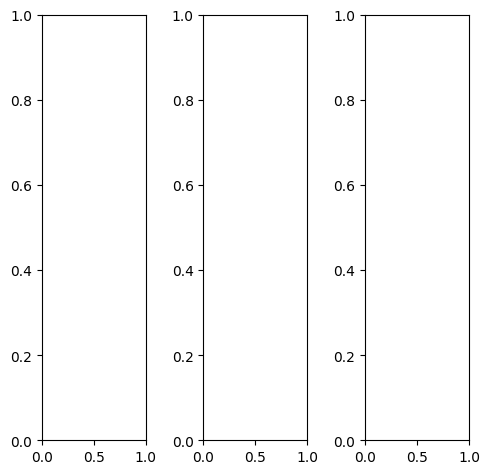

tensor([[[0.5020, 0.4392, 0.4902,  ..., 0.5059, 0.4745, 0.7529],
         [0.4745, 0.4431, 0.5490,  ..., 0.6196, 0.5686, 0.7412],
         [0.5529, 0.5255, 0.6431,  ..., 0.6078, 0.6000, 0.7529],
         ...,
         [0.6078, 0.6000, 0.6157,  ..., 0.4941, 0.5294, 0.6588],
         [0.6784, 0.6980, 0.6980,  ..., 0.4039, 0.4392, 0.6235],
         [0.8941, 0.8667, 0.8706,  ..., 0.7020, 0.6706, 0.7608]],

        [[0.5020, 0.4392, 0.4902,  ..., 0.5059, 0.4745, 0.7529],
         [0.4745, 0.4431, 0.5490,  ..., 0.6196, 0.5686, 0.7412],
         [0.5529, 0.5255, 0.6431,  ..., 0.6078, 0.6000, 0.7529],
         ...,
         [0.6078, 0.6000, 0.6157,  ..., 0.4941, 0.5294, 0.6588],
         [0.6784, 0.6980, 0.6980,  ..., 0.4039, 0.4392, 0.6235],
         [0.8941, 0.8667, 0.8706,  ..., 0.7020, 0.6706, 0.7608]],

        [[0.5020, 0.4392, 0.4902,  ..., 0.5059, 0.4745, 0.7529],
         [0.4745, 0.4431, 0.5490,  ..., 0.6196, 0.5686, 0.7412],
         [0.5529, 0.5255, 0.6431,  ..., 0.6078, 0.6000, 0.

tensor([[[0.5137, 0.4784, 0.5373,  ..., 0.5608, 0.5255, 0.7804],
         [0.5059, 0.5098, 0.6314,  ..., 0.7137, 0.6627, 0.7882],
         [0.5882, 0.5843, 0.7059,  ..., 0.6941, 0.6863, 0.8000],
         ...,
         [0.6275, 0.6471, 0.6667,  ..., 0.5569, 0.6118, 0.7176],
         [0.7020, 0.7490, 0.7529,  ..., 0.4745, 0.5216, 0.6824],
         [0.9059, 0.8863, 0.8941,  ..., 0.7373, 0.7098, 0.7843]],

        [[0.5020, 0.4314, 0.4863,  ..., 0.4980, 0.4627, 0.7490],
         [0.4706, 0.4353, 0.5373,  ..., 0.6000, 0.5529, 0.7333],
         [0.5490, 0.5255, 0.6392,  ..., 0.5922, 0.5843, 0.7490],
         ...,
         [0.6078, 0.6000, 0.6118,  ..., 0.4863, 0.5176, 0.6510],
         [0.6784, 0.7020, 0.6980,  ..., 0.3922, 0.4275, 0.6157],
         [0.8980, 0.8706, 0.8745,  ..., 0.6980, 0.6667, 0.7569]],

        [[0.4667, 0.3608, 0.4000,  ..., 0.4039, 0.3882, 0.7098],
         [0.4118, 0.3137, 0.4000,  ..., 0.4588, 0.4196, 0.6471],
         [0.4902, 0.3882, 0.5020,  ..., 0.4706, 0.4431, 0.

tensor([[[0.4938, 0.4481, 0.4923,  ..., 0.5266, 0.5347, 0.7163],
         [0.4700, 0.4479, 0.5613,  ..., 0.6204, 0.5722, 0.7550],
         [0.5632, 0.5432, 0.6722,  ..., 0.6319, 0.6250, 0.7740],
         ...,
         [0.6367, 0.6229, 0.6226,  ..., 0.5388, 0.5702, 0.6886],
         [0.6957, 0.7342, 0.7108,  ..., 0.4329, 0.4598, 0.6018],
         [0.8480, 0.8732, 0.8736,  ..., 0.7190, 0.7095, 0.7226]],

        [[0.5032, 0.4557, 0.5026,  ..., 0.5161, 0.5189, 0.6972],
         [0.4752, 0.4442, 0.5542,  ..., 0.6147, 0.5785, 0.7681],
         [0.5547, 0.5400, 0.6496,  ..., 0.6151, 0.5973, 0.7561],
         ...,
         [0.6066, 0.6003, 0.6158,  ..., 0.4974, 0.5387, 0.6729],
         [0.6853, 0.7001, 0.6823,  ..., 0.4212, 0.4429, 0.6016],
         [0.8297, 0.8440, 0.8450,  ..., 0.6916, 0.6784, 0.7085]],

        [[0.4211, 0.3601, 0.3958,  ..., 0.4252, 0.4409, 0.6493],
         [0.3842, 0.3493, 0.4379,  ..., 0.5159, 0.4755, 0.6775],
         [0.4546, 0.4218, 0.5305,  ..., 0.5210, 0.5135, 0.

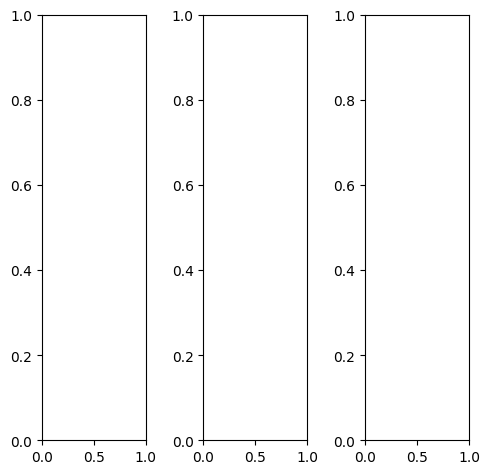

tensor([[[0.7255, 0.7373, 0.7569,  ..., 0.7804, 0.7647, 0.7647],
         [0.7451, 0.7529, 0.7725,  ..., 0.7922, 0.7765, 0.7765],
         [0.7412, 0.7529, 0.7686,  ..., 0.7882, 0.7725, 0.7725],
         ...,
         [0.7686, 0.7843, 0.8078,  ..., 0.7529, 0.7529, 0.8039],
         [0.7686, 0.7882, 0.8157,  ..., 0.7765, 0.7725, 0.7843],
         [0.7608, 0.7804, 0.8000,  ..., 0.7451, 0.7333, 0.7333]],

        [[0.7255, 0.7373, 0.7569,  ..., 0.7804, 0.7647, 0.7647],
         [0.7451, 0.7529, 0.7725,  ..., 0.7922, 0.7765, 0.7765],
         [0.7412, 0.7529, 0.7686,  ..., 0.7882, 0.7725, 0.7725],
         ...,
         [0.7686, 0.7843, 0.8078,  ..., 0.7529, 0.7529, 0.8039],
         [0.7686, 0.7882, 0.8157,  ..., 0.7765, 0.7725, 0.7843],
         [0.7608, 0.7804, 0.8000,  ..., 0.7451, 0.7333, 0.7333]],

        [[0.7255, 0.7373, 0.7569,  ..., 0.7804, 0.7647, 0.7647],
         [0.7451, 0.7529, 0.7725,  ..., 0.7922, 0.7765, 0.7765],
         [0.7412, 0.7529, 0.7686,  ..., 0.7882, 0.7725, 0.

tensor([[[0.6392, 0.6510, 0.6706,  ..., 0.6941, 0.6784, 0.6784],
         [0.6549, 0.6667, 0.6863,  ..., 0.7059, 0.6902, 0.6902],
         [0.6549, 0.6667, 0.6863,  ..., 0.7020, 0.6863, 0.6863],
         ...,
         [0.7020, 0.7176, 0.7412,  ..., 0.6980, 0.6980, 0.7490],
         [0.7020, 0.7216, 0.7490,  ..., 0.7216, 0.7059, 0.7216],
         [0.6941, 0.7137, 0.7333,  ..., 0.6863, 0.6627, 0.6627]],

        [[0.7529, 0.7647, 0.7843,  ..., 0.8118, 0.7961, 0.7961],
         [0.7725, 0.7804, 0.8000,  ..., 0.8235, 0.8078, 0.8078],
         [0.7686, 0.7804, 0.7961,  ..., 0.8196, 0.8039, 0.8039],
         ...,
         [0.7882, 0.8039, 0.8275,  ..., 0.7725, 0.7725, 0.8235],
         [0.7882, 0.8078, 0.8353,  ..., 0.7961, 0.7961, 0.8078],
         [0.7804, 0.8000, 0.8196,  ..., 0.7686, 0.7608, 0.7608]],

        [[0.8078, 0.8196, 0.8353,  ..., 0.8549, 0.8392, 0.8392],
         [0.8275, 0.8353, 0.8549,  ..., 0.8667, 0.8510, 0.8510],
         [0.8235, 0.8353, 0.8510,  ..., 0.8627, 0.8471, 0.

tensor([[[0.6694, 0.6666, 0.6707,  ..., 0.7098, 0.7077, 0.7142],
         [0.6839, 0.6606, 0.6851,  ..., 0.7110, 0.7013, 0.7177],
         [0.6765, 0.6668, 0.6801,  ..., 0.7190, 0.7090, 0.6999],
         ...,
         [0.7330, 0.7442, 0.7662,  ..., 0.7156, 0.7075, 0.7700],
         [0.7340, 0.7453, 0.7637,  ..., 0.7309, 0.7324, 0.7627],
         [0.7308, 0.7713, 0.7706,  ..., 0.7309, 0.7300, 0.7198]],

        [[0.7337, 0.7458, 0.7607,  ..., 0.7767, 0.7705, 0.7895],
         [0.7484, 0.7511, 0.7669,  ..., 0.7841, 0.7658, 0.7959],
         [0.7545, 0.7554, 0.7637,  ..., 0.7814, 0.7714, 0.7737],
         ...,
         [0.7677, 0.7792, 0.8059,  ..., 0.7258, 0.7395, 0.8133],
         [0.7714, 0.7640, 0.8036,  ..., 0.7567, 0.7623, 0.7766],
         [0.7457, 0.7816, 0.7945,  ..., 0.7380, 0.7436, 0.7202]],

        [[0.8298, 0.8426, 0.8508,  ..., 0.8631, 0.8621, 0.8484],
         [0.8483, 0.8536, 0.8543,  ..., 0.8674, 0.8454, 0.8612],
         [0.8557, 0.8326, 0.8414,  ..., 0.8542, 0.8531, 0.

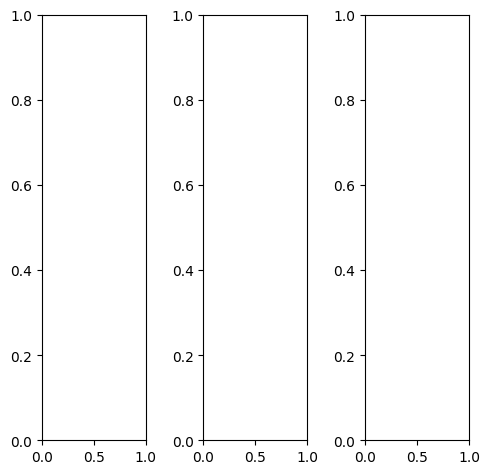

EPOCH: 8.255  trn_loss: 0.005  (968.23s - 10760.62s remaining)

tensor([[[0.4510, 0.3608, 0.4275,  ..., 0.6745, 0.6471, 0.6275],
         [0.3333, 0.3490, 0.4235,  ..., 0.6824, 0.7412, 0.6667],
         [0.3216, 0.4000, 0.4039,  ..., 0.5098, 0.5608, 0.5686],
         ...,
         [0.2000, 0.3059, 0.3647,  ..., 0.0706, 0.1373, 0.2118],
         [0.2392, 0.2706, 0.2157,  ..., 0.1765, 0.3137, 0.2392],
         [0.1843, 0.3373, 0.3490,  ..., 0.4078, 0.4235, 0.2745]],

        [[0.4510, 0.3608, 0.4275,  ..., 0.6745, 0.6471, 0.6275],
         [0.3333, 0.3490, 0.4235,  ..., 0.6824, 0.7412, 0.6667],
         [0.3216, 0.4000, 0.4039,  ..., 0.5098, 0.5608, 0.5686],
         ...,
         [0.2000, 0.3059, 0.3647,  ..., 0.0706, 0.1373, 0.2118],
         [0.2392, 0.2706, 0.2157,  ..., 0.1765, 0.3137, 0.2392],
         [0.1843, 0.3373, 0.3490,  ..., 0.4078, 0.4235, 0.2745]],

        [[0.4510, 0.3608, 0.4275,  ..., 0.6745, 0.6471, 0.6275],
         [0.3333, 0.3490, 0.4235,  ..., 0.6824, 0.7412, 0.6667],
         [0.3216, 0.4000, 0.4039,  ..., 0.5098, 0.5608, 0.

tensor([[[0.3412, 0.1647, 0.2706,  ..., 0.6353, 0.6235, 0.5765],
         [0.2510, 0.1608, 0.2745,  ..., 0.6078, 0.6706, 0.5686],
         [0.2549, 0.2549, 0.2784,  ..., 0.3412, 0.4196, 0.4196],
         ...,
         [0.3137, 0.5529, 0.5020,  ..., 0.0980, 0.2157, 0.2706],
         [0.3412, 0.4196, 0.3098,  ..., 0.2157, 0.4902, 0.3961],
         [0.2627, 0.4353, 0.4314,  ..., 0.3725, 0.4706, 0.3137]],

        [[0.5451, 0.5059, 0.5412,  ..., 0.7098, 0.6745, 0.6980],
         [0.4000, 0.4824, 0.5333,  ..., 0.7569, 0.7961, 0.7569],
         [0.3765, 0.5098, 0.5059,  ..., 0.6667, 0.6980, 0.7059],
         ...,
         [0.1333, 0.1059, 0.2471,  ..., 0.0627, 0.0784, 0.1843],
         [0.1804, 0.1843, 0.1373,  ..., 0.1647, 0.1765, 0.1294],
         [0.1451, 0.2980, 0.3176,  ..., 0.4471, 0.3804, 0.2471]],

        [[0.2627, 0.1333, 0.2627,  ..., 0.5843, 0.5804, 0.4118],
         [0.2196, 0.1412, 0.2431,  ..., 0.5098, 0.6392, 0.4627],
         [0.2196, 0.2314, 0.2235,  ..., 0.1529, 0.2353, 0.

tensor([[[ 3.4782e-01,  2.2064e-01,  2.7050e-01,  ...,  5.3207e-01,
           5.1677e-01,  5.7837e-01],
         [ 1.9481e-01,  1.8199e-01,  2.2210e-01,  ...,  5.6801e-01,
           6.3986e-01,  5.7140e-01],
         [ 1.9962e-01,  2.2345e-01,  2.6255e-01,  ...,  3.9478e-01,
           4.6265e-01,  4.8132e-01],
         ...,
         [ 1.3104e-01,  2.6640e-01,  3.2872e-01,  ..., -2.6829e-02,
           4.2330e-02,  1.1914e-01],
         [ 1.4311e-01,  1.7106e-01,  1.3869e-01,  ...,  5.6547e-02,
           2.1974e-01,  1.4737e-01],
         [ 1.6710e-01,  2.5474e-01,  2.3481e-01,  ...,  2.9424e-01,
           3.3309e-01,  2.7957e-01]],

        [[ 4.1677e-01,  3.1453e-01,  3.9333e-01,  ...,  6.0323e-01,
           6.1209e-01,  5.9355e-01],
         [ 2.9043e-01,  2.6709e-01,  3.4937e-01,  ...,  6.1841e-01,
           7.1181e-01,  6.2574e-01],
         [ 2.6982e-01,  3.3608e-01,  3.4648e-01,  ...,  4.3162e-01,
           5.1255e-01,  5.0091e-01],
         ...,
         [ 1.4058e-01,  2

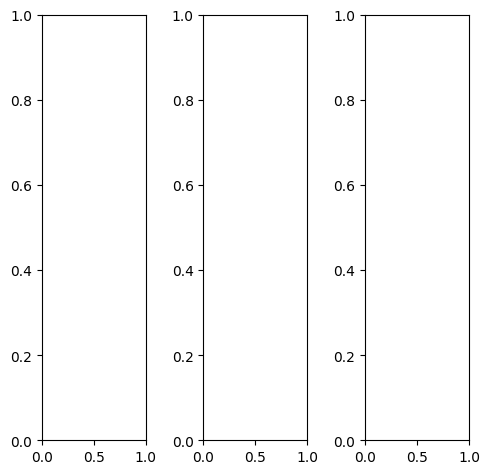

tensor([[[1.0000, 0.9137, 0.8510,  ..., 0.6471, 0.6706, 0.5765],
         [1.0000, 0.8980, 0.7608,  ..., 0.5333, 0.6588, 0.5294],
         [1.0000, 0.8784, 0.6745,  ..., 0.5412, 0.6706, 0.5804],
         ...,
         [1.0000, 0.9412, 0.8627,  ..., 0.9529, 0.9569, 0.9608],
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9137, 0.8510,  ..., 0.6471, 0.6706, 0.5765],
         [1.0000, 0.8980, 0.7608,  ..., 0.5333, 0.6588, 0.5294],
         [1.0000, 0.8784, 0.6745,  ..., 0.5412, 0.6706, 0.5804],
         ...,
         [1.0000, 0.9412, 0.8627,  ..., 0.9529, 0.9569, 0.9608],
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9137, 0.8510,  ..., 0.6471, 0.6706, 0.5765],
         [1.0000, 0.8980, 0.7608,  ..., 0.5333, 0.6588, 0.5294],
         [1.0000, 0.8784, 0.6745,  ..., 0.5412, 0.6706, 0.

tensor([[[1.0000, 0.9137, 0.8510,  ..., 0.6471, 0.6667, 0.5765],
         [1.0000, 0.8980, 0.7608,  ..., 0.5333, 0.6588, 0.5294],
         [1.0000, 0.8784, 0.6745,  ..., 0.5412, 0.6706, 0.5804],
         ...,
         [1.0000, 0.9412, 0.8627,  ..., 0.9529, 0.9608, 0.9608],
         [1.0000, 0.9922, 1.0000,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9137, 0.8510,  ..., 0.6392, 0.6627, 0.5725],
         [1.0000, 0.8980, 0.7608,  ..., 0.5216, 0.6471, 0.5216],
         [1.0000, 0.8784, 0.6745,  ..., 0.5333, 0.6627, 0.5725],
         ...,
         [1.0000, 0.9412, 0.8588,  ..., 0.9490, 0.9529, 0.9569],
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9137, 0.8510,  ..., 0.6941, 0.7059, 0.6039],
         [1.0000, 0.8980, 0.7608,  ..., 0.5843, 0.7059, 0.5725],
         [1.0000, 0.8784, 0.6745,  ..., 0.5882, 0.7176, 0.

tensor([[[0.6651, 0.6210, 0.5282,  ..., 0.4374, 0.4463, 0.4672],
         [0.6646, 0.5764, 0.4686,  ..., 0.3341, 0.4437, 0.3970],
         [0.6748, 0.5799, 0.4531,  ..., 0.3511, 0.4689, 0.4416],
         ...,
         [0.7325, 0.6912, 0.6258,  ..., 0.7233, 0.7405, 0.7459],
         [0.7123, 0.7019, 0.7006,  ..., 0.7116, 0.7276, 0.7449],
         [0.7278, 0.7255, 0.7110,  ..., 0.7479, 0.7486, 0.7590]],

        [[0.6803, 0.6960, 0.6248,  ..., 0.4994, 0.5422, 0.4866],
         [0.6944, 0.6462, 0.5462,  ..., 0.4505, 0.5745, 0.4506],
         [0.6967, 0.6663, 0.5267,  ..., 0.4737, 0.5894, 0.5022],
         ...,
         [0.6937, 0.6965, 0.6676,  ..., 0.7339, 0.7463, 0.7729],
         [0.6986, 0.7065, 0.7213,  ..., 0.7380, 0.7346, 0.7719],
         [0.6720, 0.7107, 0.6983,  ..., 0.7171, 0.7309, 0.7378]],

        [[0.7998, 0.8239, 0.7229,  ..., 0.6248, 0.6381, 0.5784],
         [0.8253, 0.8168, 0.6700,  ..., 0.5480, 0.6661, 0.5306],
         [0.8413, 0.8225, 0.6219,  ..., 0.5793, 0.6787, 0.

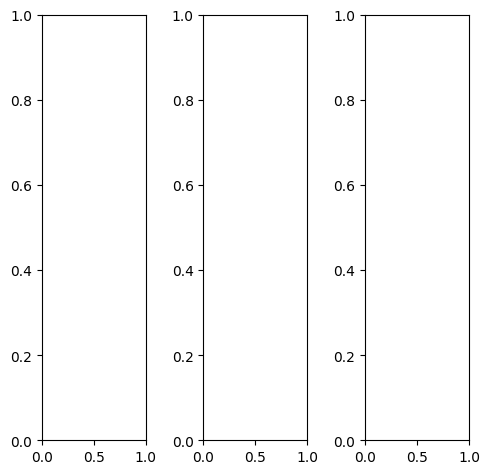

tensor([[[0.4863, 0.4431, 0.4471,  ..., 0.4745, 0.4706, 0.4510],
         [0.4863, 0.4471, 0.4549,  ..., 0.4902, 0.4941, 0.4588],
         [0.4863, 0.4471, 0.4588,  ..., 0.4902, 0.4941, 0.4549],
         ...,
         [0.2196, 0.1529, 0.2157,  ..., 0.6157, 0.6353, 0.6000],
         [0.2667, 0.1882, 0.2706,  ..., 0.5725, 0.5843, 0.5569],
         [0.3882, 0.2471, 0.2431,  ..., 0.5569, 0.5608, 0.5255]],

        [[0.4863, 0.4431, 0.4471,  ..., 0.4745, 0.4706, 0.4510],
         [0.4863, 0.4471, 0.4549,  ..., 0.4902, 0.4941, 0.4588],
         [0.4863, 0.4471, 0.4588,  ..., 0.4902, 0.4941, 0.4549],
         ...,
         [0.2196, 0.1529, 0.2157,  ..., 0.6157, 0.6353, 0.6000],
         [0.2667, 0.1882, 0.2706,  ..., 0.5725, 0.5843, 0.5569],
         [0.3882, 0.2471, 0.2431,  ..., 0.5569, 0.5608, 0.5255]],

        [[0.4863, 0.4431, 0.4471,  ..., 0.4745, 0.4706, 0.4510],
         [0.4863, 0.4471, 0.4549,  ..., 0.4902, 0.4941, 0.4588],
         [0.4863, 0.4471, 0.4588,  ..., 0.4902, 0.4941, 0.

tensor([[[0.4824, 0.4706, 0.5059,  ..., 0.5255, 0.5255, 0.4824],
         [0.5725, 0.6275, 0.6863,  ..., 0.6980, 0.7059, 0.6196],
         [0.5961, 0.6784, 0.7216,  ..., 0.7490, 0.7529, 0.6706],
         ...,
         [0.1451, 0.1569, 0.1882,  ..., 0.7255, 0.7451, 0.6824],
         [0.2118, 0.2039, 0.2667,  ..., 0.6706, 0.6863, 0.6235],
         [0.3059, 0.2157, 0.2078,  ..., 0.6000, 0.6039, 0.5373]],

        [[0.5216, 0.4549, 0.4471,  ..., 0.4706, 0.4667, 0.4627],
         [0.4588, 0.3608, 0.3490,  ..., 0.3961, 0.3961, 0.3922],
         [0.4549, 0.3412, 0.3373,  ..., 0.3765, 0.3765, 0.3647],
         ...,
         [0.2745, 0.1490, 0.2392,  ..., 0.5882, 0.6039, 0.5843],
         [0.3098, 0.1804, 0.2745,  ..., 0.5412, 0.5490, 0.5451],
         [0.4510, 0.2706, 0.2706,  ..., 0.5608, 0.5608, 0.5490]],

        [[0.3255, 0.3176, 0.3059,  ..., 0.3529, 0.3529, 0.3176],
         [0.3882, 0.4039, 0.4039,  ..., 0.4392, 0.4431, 0.3804],
         [0.3451, 0.3725, 0.3843,  ..., 0.4078, 0.4118, 0.

tensor([[[ 0.5284,  0.3761,  0.3402,  ...,  0.3820,  0.4148,  0.4428],
         [ 0.4571,  0.3523,  0.3303,  ...,  0.3849,  0.4207,  0.4058],
         [ 0.4597,  0.3572,  0.4027,  ...,  0.4070,  0.4381,  0.3987],
         ...,
         [ 0.1008, -0.0343,  0.0582,  ...,  0.6818,  0.7484,  0.7111],
         [ 0.1803,  0.0275,  0.1719,  ...,  0.6063,  0.6447,  0.6602],
         [ 0.3678,  0.1631,  0.1690,  ...,  0.6779,  0.7026,  0.6441]],

        [[ 0.5810,  0.4780,  0.4584,  ...,  0.4729,  0.5336,  0.4780],
         [ 0.5404,  0.4696,  0.4685,  ...,  0.5385,  0.5873,  0.4722],
         [ 0.5211,  0.4808,  0.4985,  ...,  0.5417,  0.5740,  0.4532],
         ...,
         [ 0.1288, -0.0198,  0.0814,  ...,  0.6864,  0.7382,  0.7260],
         [ 0.1979,  0.0453,  0.1758,  ...,  0.6311,  0.6747,  0.6624],
         [ 0.3611,  0.1781,  0.1723,  ...,  0.6722,  0.7025,  0.6366]],

        [[ 0.6921,  0.6271,  0.5816,  ...,  0.6067,  0.6366,  0.5974],
         [ 0.6901,  0.6371,  0.5910,  ...,  0

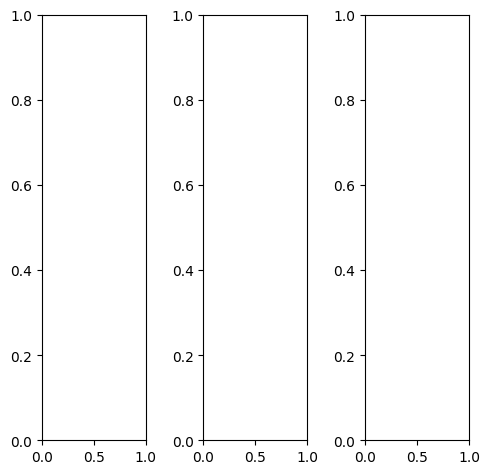

tensor([[[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.9882],
         ...,
         [0.6510, 0.6549, 0.6353,  ..., 0.6039, 0.5961, 0.5961],
         [0.6588, 0.6549, 0.6588,  ..., 0.5961, 0.5922, 0.5961],
         [0.6549, 0.6549, 0.6510,  ..., 0.6118, 0.6196, 0.6235]],

        [[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.9882],
         ...,
         [0.6510, 0.6549, 0.6353,  ..., 0.6039, 0.5961, 0.5961],
         [0.6588, 0.6549, 0.6588,  ..., 0.5961, 0.5922, 0.5961],
         [0.6549, 0.6549, 0.6510,  ..., 0.6118, 0.6196, 0.6235]],

        [[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.

tensor([[[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.9882],
         ...,
         [0.6392, 0.6431, 0.6235,  ..., 0.5922, 0.5843, 0.5843],
         [0.6471, 0.6431, 0.6471,  ..., 0.5843, 0.5804, 0.5843],
         [0.6431, 0.6431, 0.6392,  ..., 0.6000, 0.6078, 0.6118]],

        [[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.9882],
         ...,
         [0.6510, 0.6549, 0.6353,  ..., 0.6039, 0.5961, 0.5961],
         [0.6588, 0.6549, 0.6588,  ..., 0.5961, 0.5922, 0.5961],
         [0.6549, 0.6549, 0.6510,  ..., 0.6118, 0.6196, 0.6235]],

        [[0.9686, 0.9686, 0.9765,  ..., 0.9961, 0.9961, 1.0000],
         [0.9686, 0.9765, 0.9725,  ..., 0.9961, 0.9961, 0.9961],
         [0.9451, 0.9333, 0.9373,  ..., 0.9961, 0.9961, 0.

tensor([[[0.6539, 0.6126, 0.5976,  ..., 0.6015, 0.5807, 0.6750],
         [0.6450, 0.6385, 0.6205,  ..., 0.5989, 0.6118, 0.6398],
         [0.6390, 0.6115, 0.6248,  ..., 0.6164, 0.6440, 0.6432],
         ...,
         [0.4720, 0.4911, 0.4906,  ..., 0.4666, 0.4435, 0.4542],
         [0.4960, 0.4972, 0.4942,  ..., 0.4515, 0.4441, 0.4681],
         [0.5078, 0.5167, 0.5030,  ..., 0.4767, 0.4868, 0.5057]],

        [[0.6758, 0.6939, 0.7078,  ..., 0.7077, 0.7127, 0.7539],
         [0.6774, 0.6995, 0.7161,  ..., 0.7364, 0.7184, 0.7824],
         [0.6701, 0.7105, 0.7216,  ..., 0.7592, 0.7477, 0.7649],
         ...,
         [0.4748, 0.4999, 0.5615,  ..., 0.5201, 0.5047, 0.4442],
         [0.4738, 0.5127, 0.5448,  ..., 0.5153, 0.4867, 0.4636],
         [0.4788, 0.4921, 0.5099,  ..., 0.4862, 0.4940, 0.4910]],

        [[0.8128, 0.8475, 0.8291,  ..., 0.8849, 0.8607, 0.8543],
         [0.8490, 0.8995, 0.8726,  ..., 0.9025, 0.8984, 0.8665],
         [0.8483, 0.8863, 0.8622,  ..., 0.9527, 0.9344, 0.

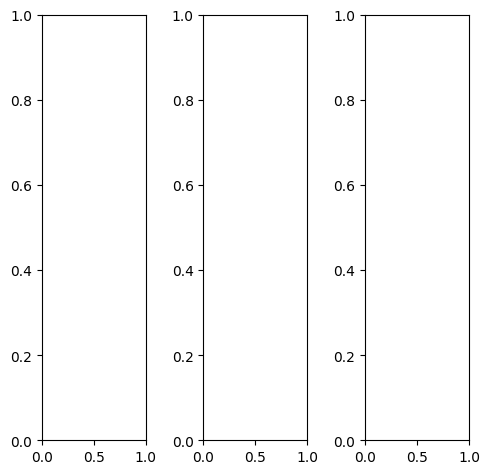

tensor([[[0.0588, 0.0667, 0.0510,  ..., 0.2157, 0.2196, 0.2196],
         [0.0431, 0.0588, 0.0588,  ..., 0.1922, 0.2039, 0.2157],
         [0.0196, 0.0235, 0.0196,  ..., 0.1529, 0.1529, 0.1922],
         ...,
         [0.0627, 0.0784, 0.0980,  ..., 0.8196, 0.8039, 0.7529],
         [0.0902, 0.0353, 0.0588,  ..., 0.8157, 0.7725, 0.7255],
         [0.1098, 0.0706, 0.0627,  ..., 0.8039, 0.7373, 0.6078]],

        [[0.0588, 0.0667, 0.0510,  ..., 0.2157, 0.2196, 0.2196],
         [0.0431, 0.0588, 0.0588,  ..., 0.1922, 0.2039, 0.2157],
         [0.0196, 0.0235, 0.0196,  ..., 0.1529, 0.1529, 0.1922],
         ...,
         [0.0627, 0.0784, 0.0980,  ..., 0.8196, 0.8039, 0.7529],
         [0.0902, 0.0353, 0.0588,  ..., 0.8157, 0.7725, 0.7255],
         [0.1098, 0.0706, 0.0627,  ..., 0.8039, 0.7373, 0.6078]],

        [[0.0588, 0.0667, 0.0510,  ..., 0.2157, 0.2196, 0.2196],
         [0.0431, 0.0588, 0.0588,  ..., 0.1922, 0.2039, 0.2157],
         [0.0196, 0.0235, 0.0196,  ..., 0.1529, 0.1529, 0.

tensor([[[0.0706, 0.0784, 0.0627,  ..., 0.2549, 0.2588, 0.2588],
         [0.0549, 0.0706, 0.0706,  ..., 0.2314, 0.2431, 0.2549],
         [0.0314, 0.0353, 0.0314,  ..., 0.1922, 0.1922, 0.2314],
         ...,
         [0.0471, 0.0588, 0.0706,  ..., 0.7059, 0.6706, 0.5961],
         [0.1059, 0.0471, 0.0627,  ..., 0.6863, 0.6157, 0.5490],
         [0.1373, 0.0902, 0.0745,  ..., 0.6706, 0.5843, 0.4627]],

        [[0.0549, 0.0627, 0.0471,  ..., 0.2039, 0.2078, 0.2078],
         [0.0392, 0.0549, 0.0549,  ..., 0.1804, 0.1922, 0.2039],
         [0.0157, 0.0196, 0.0157,  ..., 0.1412, 0.1412, 0.1804],
         ...,
         [0.0667, 0.0863, 0.1059,  ..., 0.8784, 0.8706, 0.8314],
         [0.0824, 0.0314, 0.0549,  ..., 0.8824, 0.8510, 0.8039],
         [0.0980, 0.0627, 0.0588,  ..., 0.8706, 0.8078, 0.6706]],

        [[0.0431, 0.0510, 0.0353,  ..., 0.1804, 0.1843, 0.1843],
         [0.0275, 0.0431, 0.0431,  ..., 0.1569, 0.1686, 0.1804],
         [0.0039, 0.0078, 0.0039,  ..., 0.1176, 0.1176, 0.

tensor([[[0.1793, 0.1458, 0.1487,  ..., 0.2844, 0.2922, 0.3427],
         [0.0987, 0.1522, 0.1346,  ..., 0.2789, 0.2821, 0.3264],
         [0.0709, 0.0788, 0.1009,  ..., 0.2255, 0.2198, 0.2881],
         ...,
         [0.1767, 0.2320, 0.2497,  ..., 0.7214, 0.7231, 0.7606],
         [0.2065, 0.1627, 0.1992,  ..., 0.7111, 0.7064, 0.7555],
         [0.2247, 0.1816, 0.1784,  ..., 0.8382, 0.7967, 0.7195]],

        [[0.2076, 0.1972, 0.1851,  ..., 0.3292, 0.3399, 0.3658],
         [0.1708, 0.2204, 0.2094,  ..., 0.3391, 0.3566, 0.3509],
         [0.1469, 0.1596, 0.1657,  ..., 0.2906, 0.2772, 0.3246],
         ...,
         [0.1880, 0.2321, 0.2736,  ..., 0.7186, 0.7183, 0.7662],
         [0.2012, 0.1704, 0.2052,  ..., 0.7277, 0.7159, 0.7574],
         [0.2151, 0.1736, 0.1889,  ..., 0.8237, 0.7808, 0.6950]],

        [[0.3007, 0.3258, 0.3058,  ..., 0.4194, 0.4405, 0.4661],
         [0.2811, 0.3653, 0.3457,  ..., 0.4261, 0.4520, 0.4556],
         [0.2556, 0.3079, 0.2856,  ..., 0.3826, 0.3871, 0.

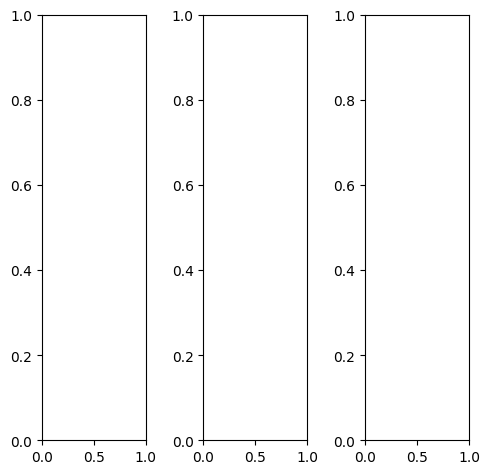

EPOCH: 8.510  trn_loss: 0.006  (997.78s - 10726.71s remaining)

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9882],
         ...,
         [0.5216, 0.5216, 0.5176,  ..., 0.3490, 0.3569, 0.3961],
         [0.4941, 0.5176, 0.5216,  ..., 0.5020, 0.4549, 0.4471],
         [0.5373, 0.5529, 0.5412,  ..., 0.6039, 0.5569, 0.5216]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9882],
         ...,
         [0.5216, 0.5216, 0.5176,  ..., 0.3490, 0.3569, 0.3961],
         [0.4941, 0.5176, 0.5216,  ..., 0.5020, 0.4549, 0.4471],
         [0.5373, 0.5529, 0.5412,  ..., 0.6039, 0.5569, 0.5216]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9922],
         ...,
         [0.5529, 0.5529, 0.5490,  ..., 0.3765, 0.3882, 0.4353],
         [0.5216, 0.5451, 0.5490,  ..., 0.5255, 0.4902, 0.4941],
         [0.5647, 0.5804, 0.5686,  ..., 0.6314, 0.5961, 0.5686]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9882, 0.9882, 0.9843],
         [1.0000, 1.0000, 1.0000,  ..., 0.9922, 0.9882, 0.9843],
         ...,
         [0.5098, 0.5137, 0.5059,  ..., 0.3373, 0.3451, 0.3804],
         [0.4824, 0.5059, 0.5098,  ..., 0.4902, 0.4353, 0.4235],
         [0.5255, 0.5412, 0.5333,  ..., 0.5882, 0.5373, 0.4980]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9922, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.

tensor([[[0.7453, 0.7782, 0.7791,  ..., 0.8087, 0.7882, 0.8349],
         [0.7752, 0.8329, 0.8250,  ..., 0.8565, 0.8832, 0.8630],
         [0.8056, 0.8554, 0.8896,  ..., 0.9137, 0.9399, 0.9096],
         ...,
         [0.3870, 0.4144, 0.3904,  ..., 0.2132, 0.2357, 0.2984],
         [0.3524, 0.3991, 0.3652,  ..., 0.3308, 0.3061, 0.3504],
         [0.4311, 0.4426, 0.4035,  ..., 0.4992, 0.4531, 0.4383]],

        [[0.7882, 0.8425, 0.8650,  ..., 0.8457, 0.8687, 0.9092],
         [0.8036, 0.8777, 0.8821,  ..., 0.8981, 0.9104, 0.9608],
         [0.8377, 0.9265, 0.9126,  ..., 0.9575, 0.9544, 0.9740],
         ...,
         [0.4249, 0.4396, 0.4606,  ..., 0.2477, 0.2670, 0.2866],
         [0.3841, 0.4268, 0.4256,  ..., 0.3888, 0.3576, 0.3478],
         [0.4542, 0.4531, 0.4556,  ..., 0.5010, 0.4654, 0.4322]],

        [[0.9092, 0.9510, 0.9349,  ..., 0.8769, 0.8890, 0.9162],
         [0.9496, 1.0092, 0.9812,  ..., 0.8890, 0.9315, 0.9158],
         [0.9841, 1.0233, 1.0185,  ..., 0.9616, 0.9634, 0.

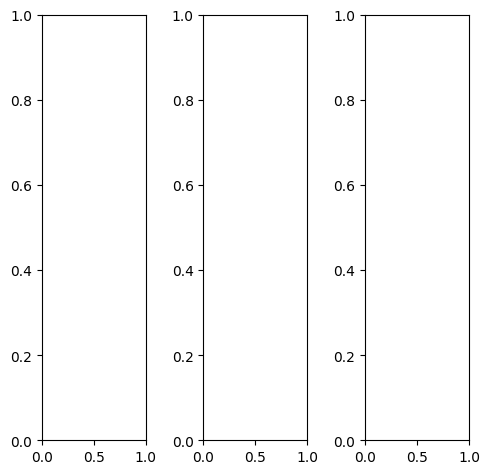

tensor([[[0.6157, 0.5725, 0.5804,  ..., 0.6039, 0.5882, 0.6157],
         [0.6196, 0.5804, 0.5804,  ..., 0.5608, 0.5490, 0.6118],
         [0.6118, 0.5843, 0.5922,  ..., 0.6039, 0.5255, 0.5804],
         ...,
         [0.1255, 0.1569, 0.3647,  ..., 0.1412, 0.1137, 0.1059],
         [0.1137, 0.1216, 0.2824,  ..., 0.1098, 0.1137, 0.1255],
         [0.1843, 0.2431, 0.3490,  ..., 0.1176, 0.1216, 0.1255]],

        [[0.6157, 0.5725, 0.5804,  ..., 0.6039, 0.5882, 0.6157],
         [0.6196, 0.5804, 0.5804,  ..., 0.5608, 0.5490, 0.6118],
         [0.6118, 0.5843, 0.5922,  ..., 0.6039, 0.5255, 0.5804],
         ...,
         [0.1255, 0.1569, 0.3647,  ..., 0.1412, 0.1137, 0.1059],
         [0.1137, 0.1216, 0.2824,  ..., 0.1098, 0.1137, 0.1255],
         [0.1843, 0.2431, 0.3490,  ..., 0.1176, 0.1216, 0.1255]],

        [[0.6157, 0.5725, 0.5804,  ..., 0.6039, 0.5882, 0.6157],
         [0.6196, 0.5804, 0.5804,  ..., 0.5608, 0.5490, 0.6118],
         [0.6118, 0.5843, 0.5922,  ..., 0.6039, 0.5255, 0.

tensor([[[0.6196, 0.5765, 0.5843,  ..., 0.6078, 0.5882, 0.6157],
         [0.6235, 0.5843, 0.5843,  ..., 0.5725, 0.5569, 0.6196],
         [0.6157, 0.5882, 0.5961,  ..., 0.6157, 0.5412, 0.5961],
         ...,
         [0.1255, 0.1569, 0.3647,  ..., 0.1451, 0.1137, 0.1059],
         [0.1137, 0.1176, 0.2824,  ..., 0.1098, 0.1137, 0.1255],
         [0.1843, 0.2392, 0.3490,  ..., 0.1176, 0.1216, 0.1255]],

        [[0.6157, 0.5725, 0.5804,  ..., 0.6039, 0.5843, 0.6118],
         [0.6196, 0.5804, 0.5804,  ..., 0.5569, 0.5451, 0.6078],
         [0.6118, 0.5843, 0.5922,  ..., 0.5961, 0.5216, 0.5765],
         ...,
         [0.1137, 0.1490, 0.3608,  ..., 0.1294, 0.1020, 0.0941],
         [0.1059, 0.1137, 0.2784,  ..., 0.0980, 0.1020, 0.1137],
         [0.1765, 0.2353, 0.3412,  ..., 0.1059, 0.1098, 0.1137]],

        [[0.6078, 0.5647, 0.5725,  ..., 0.6039, 0.5922, 0.6275],
         [0.6118, 0.5725, 0.5725,  ..., 0.5647, 0.5451, 0.6078],
         [0.6039, 0.5725, 0.5843,  ..., 0.6039, 0.5176, 0.

tensor([[[ 0.3926,  0.2415,  0.2406,  ...,  0.3020,  0.3425,  0.4021],
         [ 0.3223,  0.2349,  0.2123,  ...,  0.2377,  0.2657,  0.3996],
         [ 0.3340,  0.2832,  0.3011,  ...,  0.2650,  0.2550,  0.3693],
         ...,
         [ 0.0162,  0.0643,  0.3849,  ..., -0.0106, -0.0528, -0.0115],
         [ 0.0235, -0.0054,  0.2333,  ..., -0.0335, -0.0084,  0.0171],
         [ 0.1072,  0.1681,  0.2701,  ...,  0.0428,  0.0674,  0.0531]],

        [[ 0.4670,  0.3831,  0.3964,  ...,  0.4108,  0.4656,  0.4663],
         [ 0.4210,  0.3756,  0.3561,  ...,  0.3280,  0.3891,  0.4461],
         [ 0.4187,  0.3935,  0.3771,  ...,  0.3586,  0.3602,  0.3857],
         ...,
         [-0.0144,  0.0224,  0.3261,  ...,  0.0276, -0.0323, -0.0150],
         [-0.0148, -0.0401,  0.1699,  ..., -0.0218, -0.0263, -0.0037],
         [ 0.0867,  0.1028,  0.2049,  ..., -0.0168, -0.0144,  0.0081]],

        [[ 0.6612,  0.6102,  0.6351,  ...,  0.5522,  0.5903,  0.6069],
         [ 0.6904,  0.6414,  0.6311,  ...,  0

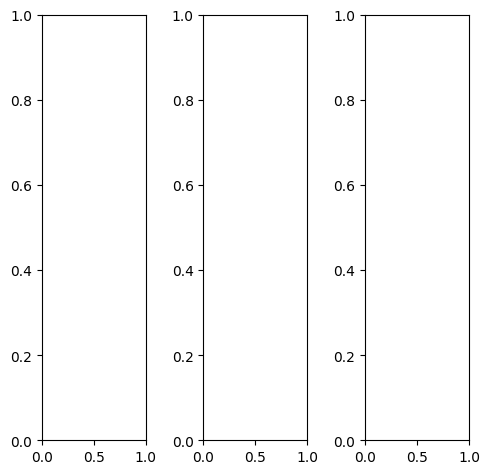

tensor([[[0.2431, 0.2471, 0.2549,  ..., 0.2078, 0.2078, 0.2118],
         [0.2353, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.2196],
         [0.2314, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.2039],
         ...,
         [0.7843, 0.7608, 0.7843,  ..., 0.1961, 0.1922, 0.2078],
         [0.7412, 0.7294, 0.7294,  ..., 0.2706, 0.1922, 0.2000],
         [0.6431, 0.7137, 0.7059,  ..., 0.3373, 0.2000, 0.1843]],

        [[0.2431, 0.2471, 0.2549,  ..., 0.2078, 0.2078, 0.2118],
         [0.2353, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.2196],
         [0.2314, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.2039],
         ...,
         [0.7843, 0.7608, 0.7843,  ..., 0.1961, 0.1922, 0.2078],
         [0.7412, 0.7294, 0.7294,  ..., 0.2706, 0.1922, 0.2000],
         [0.6431, 0.7137, 0.7059,  ..., 0.3373, 0.2000, 0.1843]],

        [[0.2431, 0.2471, 0.2549,  ..., 0.2078, 0.2078, 0.2118],
         [0.2353, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.2196],
         [0.2314, 0.2392, 0.2471,  ..., 0.2118, 0.2157, 0.

tensor([[[0.2275, 0.2314, 0.2392,  ..., 0.3490, 0.3451, 0.3490],
         [0.2196, 0.2235, 0.2314,  ..., 0.3490, 0.3529, 0.3529],
         [0.2157, 0.2235, 0.2275,  ..., 0.3490, 0.3529, 0.3412],
         ...,
         [0.8471, 0.8275, 0.8392,  ..., 0.4039, 0.4431, 0.4431],
         [0.8000, 0.8118, 0.7961,  ..., 0.4510, 0.4275, 0.4431],
         [0.6706, 0.8000, 0.7843,  ..., 0.4745, 0.3804, 0.4039]],

        [[0.2353, 0.2392, 0.2510,  ..., 0.1529, 0.1529, 0.1569],
         [0.2275, 0.2314, 0.2431,  ..., 0.1569, 0.1608, 0.1647],
         [0.2235, 0.2314, 0.2431,  ..., 0.1569, 0.1608, 0.1490],
         ...,
         [0.7725, 0.7490, 0.7725,  ..., 0.0902, 0.0588, 0.0863],
         [0.7255, 0.7059, 0.7098,  ..., 0.1765, 0.0706, 0.0706],
         [0.6353, 0.6902, 0.6824,  ..., 0.2667, 0.1059, 0.0706]],

        [[0.3176, 0.3216, 0.3294,  ..., 0.1373, 0.1373, 0.1373],
         [0.3098, 0.3137, 0.3216,  ..., 0.1412, 0.1451, 0.1451],
         [0.3098, 0.3137, 0.3176,  ..., 0.1412, 0.1451, 0.

tensor([[[0.2223, 0.1844, 0.1879,  ..., 0.1406, 0.1556, 0.2043],
         [0.1271, 0.1544, 0.1466,  ..., 0.1194, 0.1268, 0.1758],
         [0.1275, 0.1340, 0.1649,  ..., 0.1064, 0.1143, 0.1607],
         ...,
         [0.7738, 0.6930, 0.7069,  ..., 0.1554, 0.1607, 0.2316],
         [0.7263, 0.6390, 0.6253,  ..., 0.2339, 0.1513, 0.2102],
         [0.6594, 0.7240, 0.6802,  ..., 0.2890, 0.1585, 0.2055]],

        [[0.2640, 0.2412, 0.2527,  ..., 0.2040, 0.2115, 0.2388],
         [0.2070, 0.2163, 0.2234,  ..., 0.1923, 0.2108, 0.2278],
         [0.2002, 0.2056, 0.2184,  ..., 0.1803, 0.1838, 0.2055],
         ...,
         [0.7649, 0.6736, 0.7204,  ..., 0.1693, 0.1707, 0.2214],
         [0.7192, 0.6357, 0.6500,  ..., 0.2661, 0.1608, 0.2009],
         [0.6338, 0.6931, 0.6765,  ..., 0.3039, 0.1674, 0.1943]],

        [[0.3779, 0.3854, 0.3844,  ..., 0.3247, 0.3376, 0.3622],
         [0.3499, 0.3792, 0.3681,  ..., 0.3348, 0.3501, 0.3617],
         [0.3411, 0.3686, 0.3599,  ..., 0.3219, 0.3275, 0.

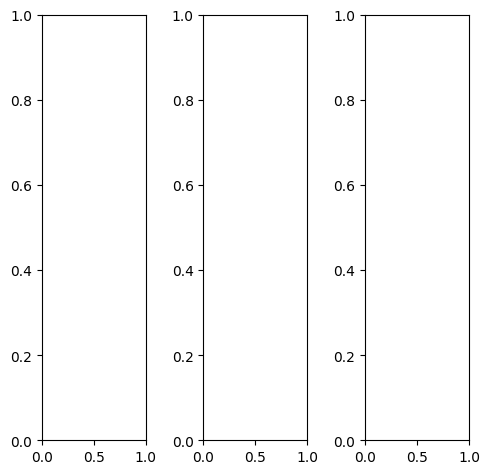

tensor([[[0.4706, 0.4863, 0.5137,  ..., 0.2667, 0.2824, 0.3020],
         [0.4784, 0.4941, 0.5176,  ..., 0.2706, 0.2627, 0.2706],
         [0.4784, 0.4902, 0.5137,  ..., 0.2627, 0.2510, 0.3098],
         ...,
         [0.7020, 0.7255, 0.7333,  ..., 0.7529, 0.7373, 0.7294],
         [0.7176, 0.7294, 0.7451,  ..., 0.7686, 0.7529, 0.7451],
         [0.7020, 0.7059, 0.7569,  ..., 0.7765, 0.7569, 0.7569]],

        [[0.4706, 0.4863, 0.5137,  ..., 0.2667, 0.2824, 0.3020],
         [0.4784, 0.4941, 0.5176,  ..., 0.2706, 0.2627, 0.2706],
         [0.4784, 0.4902, 0.5137,  ..., 0.2627, 0.2510, 0.3098],
         ...,
         [0.7020, 0.7255, 0.7333,  ..., 0.7529, 0.7373, 0.7294],
         [0.7176, 0.7294, 0.7451,  ..., 0.7686, 0.7529, 0.7451],
         [0.7020, 0.7059, 0.7569,  ..., 0.7765, 0.7569, 0.7569]],

        [[0.4706, 0.4863, 0.5137,  ..., 0.2667, 0.2824, 0.3020],
         [0.4784, 0.4941, 0.5176,  ..., 0.2706, 0.2627, 0.2706],
         [0.4784, 0.4902, 0.5137,  ..., 0.2627, 0.2510, 0.

tensor([[[0.3922, 0.4392, 0.5059,  ..., 0.2784, 0.2941, 0.3137],
         [0.3922, 0.4314, 0.4941,  ..., 0.2784, 0.2745, 0.2784],
         [0.3882, 0.4118, 0.4706,  ..., 0.2706, 0.2549, 0.3020],
         ...,
         [0.6667, 0.6863, 0.6941,  ..., 0.7216, 0.7059, 0.6941],
         [0.6667, 0.6824, 0.7059,  ..., 0.7294, 0.7137, 0.7059],
         [0.6510, 0.6510, 0.7059,  ..., 0.7373, 0.7216, 0.7176]],

        [[0.4863, 0.4941, 0.5137,  ..., 0.2627, 0.2784, 0.2941],
         [0.4980, 0.5059, 0.5176,  ..., 0.2667, 0.2588, 0.2667],
         [0.4980, 0.5059, 0.5176,  ..., 0.2588, 0.2471, 0.3059],
         ...,
         [0.7059, 0.7333, 0.7412,  ..., 0.7569, 0.7412, 0.7333],
         [0.7255, 0.7373, 0.7529,  ..., 0.7725, 0.7608, 0.7529],
         [0.7137, 0.7137, 0.7686,  ..., 0.7804, 0.7608, 0.7608]],

        [[0.6000, 0.5765, 0.5451,  ..., 0.2667, 0.2784, 0.3098],
         [0.6157, 0.6039, 0.5686,  ..., 0.2706, 0.2588, 0.2863],
         [0.6157, 0.6157, 0.5922,  ..., 0.2667, 0.2588, 0.

tensor([[[0.3475, 0.2903, 0.3280,  ..., 0.1026, 0.1375, 0.1914],
         [0.2731, 0.2843, 0.2943,  ..., 0.0876, 0.0837, 0.1342],
         [0.2908, 0.2837, 0.3369,  ..., 0.0647, 0.0740, 0.1750],
         ...,
         [0.6327, 0.6837, 0.6758,  ..., 0.7141, 0.7108, 0.7332],
         [0.6583, 0.6707, 0.6573,  ..., 0.7082, 0.7015, 0.7491],
         [0.6665, 0.6681, 0.7063,  ..., 0.7518, 0.7618, 0.7578]],

        [[0.4086, 0.3966, 0.4514,  ..., 0.1368, 0.1792, 0.2092],
         [0.3503, 0.3674, 0.3935,  ..., 0.1243, 0.1242, 0.1522],
         [0.3486, 0.3808, 0.4080,  ..., 0.0853, 0.0770, 0.1668],
         ...,
         [0.6239, 0.6628, 0.6783,  ..., 0.7047, 0.7066, 0.7395],
         [0.6540, 0.6517, 0.6750,  ..., 0.7174, 0.7185, 0.7593],
         [0.6305, 0.6529, 0.6888,  ..., 0.7365, 0.7542, 0.7356]],

        [[0.5372, 0.5512, 0.5983,  ..., 0.1919, 0.2287, 0.2742],
         [0.5280, 0.5592, 0.5733,  ..., 0.1689, 0.1696, 0.2035],
         [0.5208, 0.5522, 0.5592,  ..., 0.1290, 0.1167, 0.

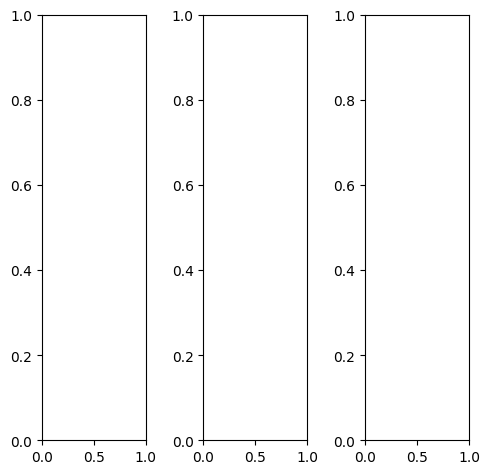

tensor([[[0.9490, 0.9412, 0.9451,  ..., 0.9216, 0.9216, 0.9098],
         [0.9647, 0.9569, 0.9529,  ..., 0.9294, 0.9333, 0.9216],
         [0.9333, 0.9020, 0.9569,  ..., 0.9216, 0.9216, 0.9137],
         ...,
         [0.2824, 0.1765, 0.1098,  ..., 0.6824, 0.7059, 0.7020],
         [0.4980, 0.3686, 0.3255,  ..., 0.6353, 0.7098, 0.7059],
         [0.6706, 0.6196, 0.5843,  ..., 0.5020, 0.6471, 0.6784]],

        [[0.9490, 0.9412, 0.9451,  ..., 0.9216, 0.9216, 0.9098],
         [0.9647, 0.9569, 0.9529,  ..., 0.9294, 0.9333, 0.9216],
         [0.9333, 0.9020, 0.9569,  ..., 0.9216, 0.9216, 0.9137],
         ...,
         [0.2824, 0.1765, 0.1098,  ..., 0.6824, 0.7059, 0.7020],
         [0.4980, 0.3686, 0.3255,  ..., 0.6353, 0.7098, 0.7059],
         [0.6706, 0.6196, 0.5843,  ..., 0.5020, 0.6471, 0.6784]],

        [[0.9490, 0.9412, 0.9451,  ..., 0.9216, 0.9216, 0.9098],
         [0.9647, 0.9569, 0.9529,  ..., 0.9294, 0.9333, 0.9216],
         [0.9333, 0.9020, 0.9569,  ..., 0.9216, 0.9216, 0.

tensor([[[0.9529, 0.9333, 0.9373,  ..., 0.9333, 0.9333, 0.9216],
         [0.9725, 0.9608, 0.9451,  ..., 0.9451, 0.9490, 0.9373],
         [0.9569, 0.9294, 0.9490,  ..., 0.9412, 0.9412, 0.9333],
         ...,
         [0.3216, 0.2314, 0.1843,  ..., 0.7020, 0.7176, 0.7137],
         [0.5216, 0.4039, 0.3647,  ..., 0.6627, 0.7176, 0.7176],
         [0.6863, 0.6314, 0.5922,  ..., 0.5412, 0.6627, 0.6902]],

        [[0.9569, 0.9529, 0.9490,  ..., 0.9216, 0.9216, 0.9137],
         [0.9725, 0.9647, 0.9647,  ..., 0.9333, 0.9333, 0.9255],
         [0.9373, 0.9059, 0.9686,  ..., 0.9216, 0.9216, 0.9137],
         ...,
         [0.2784, 0.1647, 0.0863,  ..., 0.6824, 0.7059, 0.7020],
         [0.4980, 0.3647, 0.3137,  ..., 0.6314, 0.7137, 0.7098],
         [0.6706, 0.6235, 0.5843,  ..., 0.4980, 0.6510, 0.6784]],

        [[0.9098, 0.9059, 0.9294,  ..., 0.8784, 0.8784, 0.8667],
         [0.9059, 0.9020, 0.9294,  ..., 0.8824, 0.8824, 0.8745],
         [0.8549, 0.8196, 0.9137,  ..., 0.8627, 0.8627, 0.

tensor([[[ 0.7134,  0.6592,  0.6128,  ...,  0.6169,  0.6366,  0.7163],
         [ 0.7040,  0.6631,  0.6293,  ...,  0.5956,  0.6289,  0.7006],
         [ 0.7078,  0.6394,  0.6949,  ...,  0.6310,  0.6436,  0.6929],
         ...,
         [ 0.1555,  0.0953, -0.0098,  ...,  0.6295,  0.6015,  0.6010],
         [ 0.3349,  0.2545,  0.2469,  ...,  0.5614,  0.6275,  0.6106],
         [ 0.5483,  0.5023,  0.4675,  ...,  0.4390,  0.5830,  0.6110]],

        [[ 0.7442,  0.7185,  0.7178,  ...,  0.6875,  0.7413,  0.7567],
         [ 0.7472,  0.7199,  0.7097,  ...,  0.6798,  0.7063,  0.8010],
         [ 0.7327,  0.7082,  0.7648,  ...,  0.7208,  0.7116,  0.7656],
         ...,
         [ 0.1711,  0.0926, -0.0037,  ...,  0.6184,  0.6008,  0.5583],
         [ 0.3317,  0.2557,  0.2231,  ...,  0.5476,  0.6056,  0.5898],
         [ 0.5014,  0.4900,  0.4675,  ...,  0.3800,  0.5357,  0.5806]],

        [[ 0.8718,  0.8600,  0.8104,  ...,  0.7902,  0.8318,  0.8433],
         [ 0.8858,  0.8664,  0.8258,  ...,  0

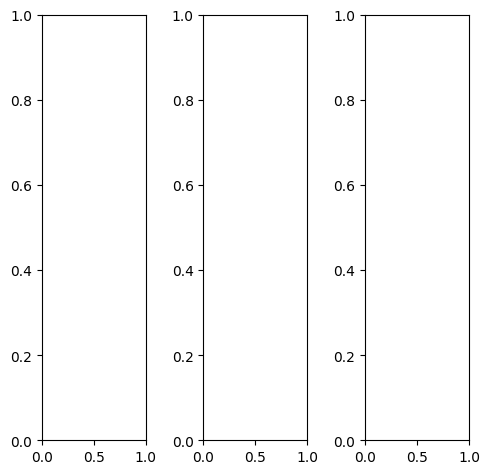

EPOCH: 8.765  trn_loss: 0.005  (1026.24s - 10681.73s remaining)

tensor([[[0.8196, 0.7686, 0.7686,  ..., 0.7412, 0.7725, 0.7686],
         [0.5569, 0.4392, 0.4549,  ..., 0.3843, 0.4510, 0.6863],
         [0.5098, 0.3882, 0.4078,  ..., 0.3412, 0.4000, 0.6667],
         ...,
         [0.9961, 0.9686, 0.9882,  ..., 0.9765, 1.0000, 0.8510],
         [0.9804, 0.9569, 0.9686,  ..., 0.9608, 0.9843, 0.8314],
         [0.6118, 0.5922, 0.5961,  ..., 0.5922, 0.5961, 0.5804]],

        [[0.8196, 0.7686, 0.7686,  ..., 0.7412, 0.7725, 0.7686],
         [0.5569, 0.4392, 0.4549,  ..., 0.3843, 0.4510, 0.6863],
         [0.5098, 0.3882, 0.4078,  ..., 0.3412, 0.4000, 0.6667],
         ...,
         [0.9961, 0.9686, 0.9882,  ..., 0.9765, 1.0000, 0.8510],
         [0.9804, 0.9569, 0.9686,  ..., 0.9608, 0.9843, 0.8314],
         [0.6118, 0.5922, 0.5961,  ..., 0.5922, 0.5961, 0.5804]],

        [[0.8196, 0.7686, 0.7686,  ..., 0.7412, 0.7725, 0.7686],
         [0.5569, 0.4392, 0.4549,  ..., 0.3843, 0.4510, 0.6863],
         [0.5098, 0.3882, 0.4078,  ..., 0.3412, 0.4000, 0.

tensor([[[0.8196, 0.7686, 0.7686,  ..., 0.7373, 0.7608, 0.7647],
         [0.5569, 0.4392, 0.4549,  ..., 0.3725, 0.4392, 0.6824],
         [0.5059, 0.3882, 0.4078,  ..., 0.3255, 0.3882, 0.6627],
         ...,
         [0.9961, 0.9686, 0.9843,  ..., 0.9804, 1.0000, 0.8510],
         [0.9804, 0.9569, 0.9686,  ..., 0.9608, 0.9843, 0.8314],
         [0.6118, 0.5922, 0.5961,  ..., 0.5922, 0.5961, 0.5804]],

        [[0.8196, 0.7686, 0.7647,  ..., 0.7412, 0.7686, 0.7686],
         [0.5529, 0.4314, 0.4471,  ..., 0.3804, 0.4471, 0.6863],
         [0.5020, 0.3804, 0.3961,  ..., 0.3333, 0.4000, 0.6667],
         ...,
         [0.9961, 0.9686, 0.9882,  ..., 0.9765, 1.0000, 0.8510],
         [0.9804, 0.9569, 0.9686,  ..., 0.9608, 0.9843, 0.8314],
         [0.6118, 0.5922, 0.5961,  ..., 0.5922, 0.5961, 0.5804]],

        [[0.8196, 0.7765, 0.7882,  ..., 0.7686, 0.8118, 0.7843],
         [0.5765, 0.4706, 0.4980,  ..., 0.4314, 0.4902, 0.7020],
         [0.5451, 0.4353, 0.4627,  ..., 0.4078, 0.4471, 0.

tensor([[[0.6370, 0.5942, 0.5679,  ..., 0.5463, 0.5836, 0.6149],
         [0.4529, 0.3213, 0.3116,  ..., 0.2507, 0.3434, 0.5927],
         [0.3661, 0.2461, 0.2895,  ..., 0.2253, 0.2878, 0.5852],
         ...,
         [0.8728, 0.8991, 0.9186,  ..., 0.8802, 0.8926, 0.7443],
         [0.8676, 0.9069, 0.8973,  ..., 0.8648, 0.8835, 0.7450],
         [0.6100, 0.5529, 0.5795,  ..., 0.5808, 0.5783, 0.5920]],

        [[0.6575, 0.6649, 0.6503,  ..., 0.6153, 0.6594, 0.6533],
         [0.4986, 0.3747, 0.3949,  ..., 0.3105, 0.4091, 0.6301],
         [0.4494, 0.3398, 0.3919,  ..., 0.3063, 0.3733, 0.5962],
         ...,
         [0.8220, 0.8370, 0.9002,  ..., 0.8651, 0.8848, 0.7544],
         [0.8463, 0.8494, 0.8745,  ..., 0.8443, 0.8639, 0.7237],
         [0.5542, 0.5210, 0.5463,  ..., 0.5620, 0.5535, 0.5509]],

        [[0.8174, 0.8676, 0.8464,  ..., 0.7631, 0.8033, 0.7769],
         [0.6674, 0.5685, 0.5678,  ..., 0.4679, 0.5672, 0.7665],
         [0.5955, 0.5077, 0.5134,  ..., 0.4260, 0.5028, 0.

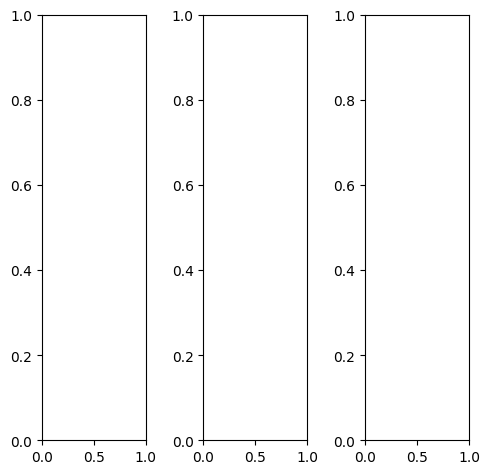

tensor([[[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.

tensor([[[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.

tensor([[[0.6683, 0.6123, 0.5692,  ..., 0.5444, 0.5531, 0.6471],
         [0.6486, 0.5757, 0.5474,  ..., 0.4542, 0.5222, 0.6153],
         [0.6386, 0.5685, 0.5711,  ..., 0.4966, 0.5160, 0.5994],
         ...,
         [0.6993, 0.6724, 0.6458,  ..., 0.6168, 0.6211, 0.6934],
         [0.6946, 0.6667, 0.6399,  ..., 0.6368, 0.6414, 0.7085],
         [0.7172, 0.7225, 0.6981,  ..., 0.7089, 0.7301, 0.7358]],

        [[0.6710, 0.6619, 0.6561,  ..., 0.6493, 0.6823, 0.7046],
         [0.6688, 0.6339, 0.6289,  ..., 0.6271, 0.6635, 0.7352],
         [0.6540, 0.6099, 0.6361,  ..., 0.6291, 0.6311, 0.6960],
         ...,
         [0.6374, 0.6232, 0.6422,  ..., 0.6171, 0.6395, 0.6837],
         [0.6449, 0.6311, 0.6308,  ..., 0.6475, 0.6587, 0.6844],
         [0.6484, 0.6645, 0.6707,  ..., 0.6720, 0.6932, 0.6970]],

        [[0.7870, 0.8028, 0.7529,  ..., 0.8480, 0.8494, 0.8393],
         [0.7863, 0.7785, 0.7426,  ..., 0.8017, 0.8451, 0.8446],
         [0.7686, 0.7693, 0.7257,  ..., 0.8166, 0.8317, 0.

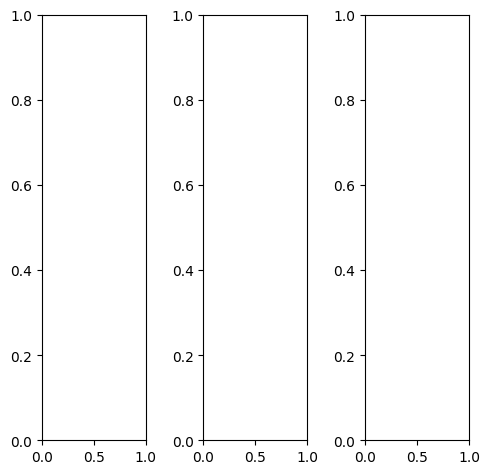

tensor([[[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.

tensor([[[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.

tensor([[[0.4605, 0.3737, 0.3622,  ..., 0.4464, 0.7234, 0.7768],
         [0.3998, 0.3519, 0.3273,  ..., 0.3929, 0.7381, 0.7417],
         [0.3787, 0.3247, 0.3513,  ..., 0.5290, 0.6677, 0.6452],
         ...,
         [0.2463, 0.2494, 0.2311,  ..., 0.8102, 0.8007, 0.5775],
         [0.2372, 0.2258, 0.2315,  ..., 0.7719, 0.7444, 0.8058],
         [0.2782, 0.2160, 0.2121,  ..., 0.8672, 0.8691, 0.8688]],

        [[0.5174, 0.4723, 0.4816,  ..., 0.4959, 0.8266, 0.8356],
         [0.4858, 0.4323, 0.4518,  ..., 0.4787, 0.8496, 0.8279],
         [0.4580, 0.4118, 0.4494,  ..., 0.5919, 0.7349, 0.7041],
         ...,
         [0.2506, 0.2177, 0.2297,  ..., 0.7954, 0.7954, 0.5628],
         [0.2289, 0.2127, 0.2172,  ..., 0.7767, 0.7742, 0.8204],
         [0.2564, 0.1988, 0.2150,  ..., 0.8465, 0.8698, 0.8432]],

        [[0.6324, 0.6149, 0.5971,  ..., 0.6426, 0.9879, 0.9486],
         [0.6384, 0.6231, 0.5780,  ..., 0.6099, 0.9983, 0.9238],
         [0.5995, 0.5676, 0.5390,  ..., 0.7178, 0.9158, 0.

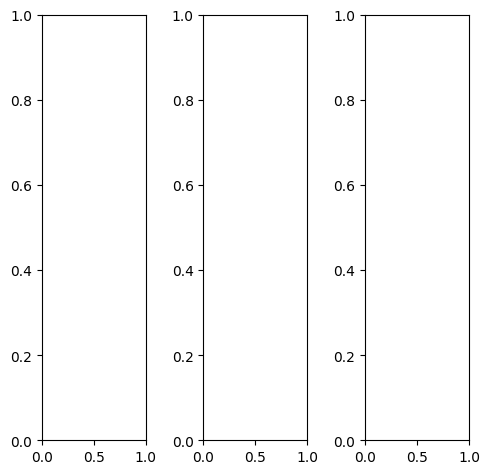

tensor([[[0.4549, 0.4471, 0.4392,  ..., 0.3137, 0.3373, 0.5373],
         [0.4157, 0.4314, 0.4314,  ..., 0.3529, 0.3882, 0.5569],
         [0.3529, 0.3922, 0.4314,  ..., 0.4039, 0.4431, 0.5922],
         ...,
         [0.5686, 0.5608, 0.5647,  ..., 0.6078, 0.6118, 0.6157],
         [0.5490, 0.5529, 0.5569,  ..., 0.5882, 0.5765, 0.5725],
         [0.5333, 0.5333, 0.5373,  ..., 0.5647, 0.5490, 0.5490]],

        [[0.4549, 0.4471, 0.4392,  ..., 0.3137, 0.3373, 0.5373],
         [0.4157, 0.4314, 0.4314,  ..., 0.3529, 0.3882, 0.5569],
         [0.3529, 0.3922, 0.4314,  ..., 0.4039, 0.4431, 0.5922],
         ...,
         [0.5686, 0.5608, 0.5647,  ..., 0.6078, 0.6118, 0.6157],
         [0.5490, 0.5529, 0.5569,  ..., 0.5882, 0.5765, 0.5725],
         [0.5333, 0.5333, 0.5373,  ..., 0.5647, 0.5490, 0.5490]],

        [[0.4549, 0.4471, 0.4392,  ..., 0.3137, 0.3373, 0.5373],
         [0.4157, 0.4314, 0.4314,  ..., 0.3529, 0.3882, 0.5569],
         [0.3529, 0.3922, 0.4314,  ..., 0.4039, 0.4431, 0.

tensor([[[0.5255, 0.5176, 0.5059,  ..., 0.3804, 0.4275, 0.6510],
         [0.4784, 0.4980, 0.5020,  ..., 0.4392, 0.4941, 0.6627],
         [0.4078, 0.4549, 0.5020,  ..., 0.5098, 0.5647, 0.6980],
         ...,
         [0.5647, 0.5529, 0.5529,  ..., 0.6196, 0.6157, 0.6275],
         [0.5490, 0.5490, 0.5569,  ..., 0.6039, 0.5765, 0.5765],
         [0.5216, 0.5255, 0.5333,  ..., 0.5882, 0.5490, 0.5412]],

        [[0.4353, 0.4275, 0.4196,  ..., 0.2902, 0.3020, 0.4902],
         [0.3961, 0.4118, 0.4118,  ..., 0.3216, 0.3451, 0.5137],
         [0.3373, 0.3765, 0.4118,  ..., 0.3647, 0.3961, 0.5529],
         ...,
         [0.5765, 0.5686, 0.5725,  ..., 0.6118, 0.6196, 0.6157],
         [0.5569, 0.5569, 0.5608,  ..., 0.5882, 0.5843, 0.5765],
         [0.5412, 0.5412, 0.5451,  ..., 0.5647, 0.5569, 0.5569]],

        [[0.3843, 0.3765, 0.3647,  ..., 0.2510, 0.2784, 0.4784],
         [0.3412, 0.3490, 0.3490,  ..., 0.2941, 0.3216, 0.4941],
         [0.2784, 0.3098, 0.3412,  ..., 0.3412, 0.3725, 0.

tensor([[[0.3166, 0.3129, 0.3042,  ..., 0.1768, 0.2060, 0.4168],
         [0.2291, 0.3056, 0.2983,  ..., 0.2252, 0.2223, 0.4422],
         [0.1901, 0.2692, 0.3703,  ..., 0.3301, 0.3332, 0.4964],
         ...,
         [0.4280, 0.4728, 0.4540,  ..., 0.4864, 0.4836, 0.4942],
         [0.4075, 0.4329, 0.4297,  ..., 0.4570, 0.4229, 0.4521],
         [0.4279, 0.4113, 0.4008,  ..., 0.4400, 0.4226, 0.4505]],

        [[0.3613, 0.3725, 0.3744,  ..., 0.2081, 0.2644, 0.4565],
         [0.2780, 0.3567, 0.3751,  ..., 0.2675, 0.3126, 0.4991],
         [0.2118, 0.3300, 0.3947,  ..., 0.3555, 0.3909, 0.5050],
         ...,
         [0.4260, 0.4526, 0.4787,  ..., 0.5149, 0.5328, 0.4884],
         [0.3997, 0.4375, 0.4441,  ..., 0.4833, 0.4605, 0.4585],
         [0.4082, 0.3903, 0.4145,  ..., 0.4420, 0.4383, 0.4363]],

        [[0.4514, 0.4553, 0.4308,  ..., 0.2666, 0.3489, 0.5615],
         [0.3913, 0.4306, 0.4197,  ..., 0.3171, 0.3946, 0.6186],
         [0.3053, 0.3687, 0.4383,  ..., 0.4254, 0.4955, 0.

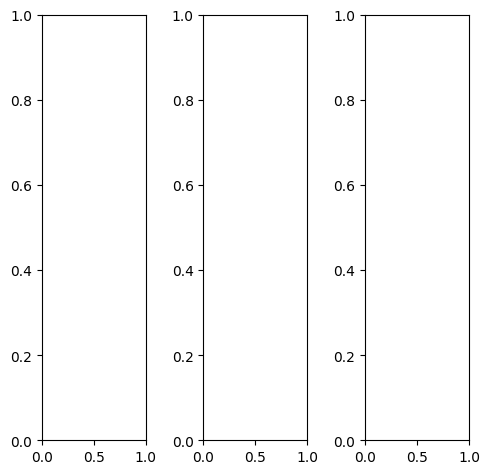

tensor([[[0.2000, 0.2039, 0.2157,  ..., 0.1373, 0.1373, 0.1373],
         [0.1961, 0.2000, 0.2078,  ..., 0.1490, 0.1451, 0.1373],
         [0.2039, 0.2078, 0.2118,  ..., 0.1529, 0.1529, 0.1490],
         ...,
         [0.6314, 0.6118, 0.6314,  ..., 0.1490, 0.0745, 0.0824],
         [0.6353, 0.6196, 0.6706,  ..., 0.1020, 0.0784, 0.0824],
         [0.6510, 0.6196, 0.7020,  ..., 0.1059, 0.1020, 0.0980]],

        [[0.2000, 0.2039, 0.2157,  ..., 0.1373, 0.1373, 0.1373],
         [0.1961, 0.2000, 0.2078,  ..., 0.1490, 0.1451, 0.1373],
         [0.2039, 0.2078, 0.2118,  ..., 0.1529, 0.1529, 0.1490],
         ...,
         [0.6314, 0.6118, 0.6314,  ..., 0.1490, 0.0745, 0.0824],
         [0.6353, 0.6196, 0.6706,  ..., 0.1020, 0.0784, 0.0824],
         [0.6510, 0.6196, 0.7020,  ..., 0.1059, 0.1020, 0.0980]],

        [[0.2000, 0.2039, 0.2157,  ..., 0.1373, 0.1373, 0.1373],
         [0.1961, 0.2000, 0.2078,  ..., 0.1490, 0.1451, 0.1373],
         [0.2039, 0.2078, 0.2118,  ..., 0.1529, 0.1529, 0.

tensor([[[0.2235, 0.2275, 0.2392,  ..., 0.1216, 0.1216, 0.1216],
         [0.2196, 0.2235, 0.2314,  ..., 0.1333, 0.1294, 0.1216],
         [0.2275, 0.2314, 0.2353,  ..., 0.1373, 0.1373, 0.1333],
         ...,
         [0.5765, 0.5569, 0.5765,  ..., 0.1176, 0.0902, 0.1098],
         [0.5804, 0.5647, 0.6157,  ..., 0.0902, 0.1020, 0.1098],
         [0.5961, 0.5686, 0.6471,  ..., 0.1216, 0.1412, 0.1294]],

        [[0.1961, 0.2000, 0.2118,  ..., 0.1490, 0.1451, 0.1490],
         [0.1922, 0.1961, 0.2039,  ..., 0.1647, 0.1608, 0.1529],
         [0.2000, 0.2039, 0.2078,  ..., 0.1686, 0.1686, 0.1647],
         ...,
         [0.6627, 0.6431, 0.6627,  ..., 0.1804, 0.0824, 0.0824],
         [0.6667, 0.6510, 0.6980,  ..., 0.1216, 0.0824, 0.0824],
         [0.6784, 0.6471, 0.7294,  ..., 0.1137, 0.0980, 0.0941]],

        [[0.1647, 0.1647, 0.1804,  ..., 0.1216, 0.1216, 0.1216],
         [0.1608, 0.1647, 0.1725,  ..., 0.1216, 0.1176, 0.1098],
         [0.1686, 0.1765, 0.1765,  ..., 0.1137, 0.1137, 0.

tensor([[[0.2326, 0.2052, 0.2250,  ..., 0.1612, 0.1775, 0.2114],
         [0.1510, 0.1924, 0.1850,  ..., 0.1624, 0.1615, 0.1769],
         [0.1499, 0.1788, 0.2150,  ..., 0.1532, 0.1669, 0.1792],
         ...,
         [0.6128, 0.5916, 0.5934,  ..., 0.2472, 0.1697, 0.1783],
         [0.6065, 0.5739, 0.6195,  ..., 0.1814, 0.1753, 0.1745],
         [0.6341, 0.6497, 0.7112,  ..., 0.1700, 0.1733, 0.1740]],

        [[0.2603, 0.2573, 0.2717,  ..., 0.1996, 0.2007, 0.2241],
         [0.2189, 0.2601, 0.2665,  ..., 0.2080, 0.2181, 0.2144],
         [0.2231, 0.2562, 0.2731,  ..., 0.1920, 0.1973, 0.2084],
         ...,
         [0.5863, 0.5537, 0.5901,  ..., 0.2513, 0.1558, 0.1538],
         [0.5798, 0.5542, 0.6303,  ..., 0.1977, 0.1478, 0.1449],
         [0.5913, 0.6145, 0.7056,  ..., 0.1785, 0.1556, 0.1540]],

        [[0.3742, 0.3952, 0.4118,  ..., 0.3004, 0.3078, 0.3345],
         [0.3581, 0.4079, 0.4131,  ..., 0.3198, 0.3323, 0.3228],
         [0.3579, 0.4081, 0.4098,  ..., 0.3020, 0.3176, 0.

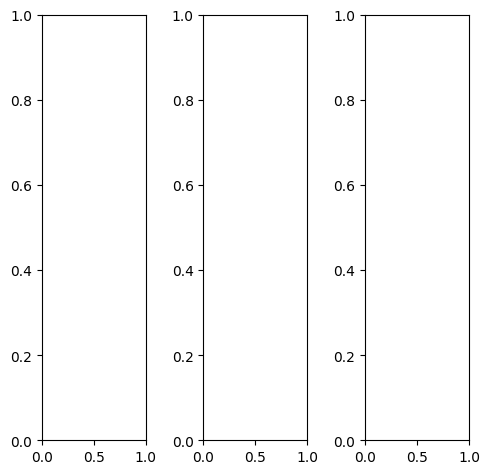

EPOCH: 9.000  val_loss: 0.004  (1059.55s - 10713.28s remaining)

tensor([[[0.5412, 0.5255, 0.5137,  ..., 0.4980, 0.5176, 0.5020],
         [0.6471, 0.6157, 0.6118,  ..., 0.4235, 0.4471, 0.4510],
         [0.6510, 0.6353, 0.6353,  ..., 0.4314, 0.4353, 0.4157],
         ...,
         [0.3922, 0.3922, 0.3765,  ..., 0.2314, 0.3294, 0.3686],
         [0.3804, 0.3765, 0.3647,  ..., 0.2549, 0.3098, 0.3333],
         [0.3608, 0.3686, 0.3647,  ..., 0.2902, 0.3176, 0.3294]],

        [[0.5412, 0.5255, 0.5137,  ..., 0.4980, 0.5176, 0.5020],
         [0.6471, 0.6157, 0.6118,  ..., 0.4235, 0.4471, 0.4510],
         [0.6510, 0.6353, 0.6353,  ..., 0.4314, 0.4353, 0.4157],
         ...,
         [0.3922, 0.3922, 0.3765,  ..., 0.2314, 0.3294, 0.3686],
         [0.3804, 0.3765, 0.3647,  ..., 0.2549, 0.3098, 0.3333],
         [0.3608, 0.3686, 0.3647,  ..., 0.2902, 0.3176, 0.3294]],

        [[0.5412, 0.5255, 0.5137,  ..., 0.4980, 0.5176, 0.5020],
         [0.6471, 0.6157, 0.6118,  ..., 0.4235, 0.4471, 0.4510],
         [0.6510, 0.6353, 0.6353,  ..., 0.4314, 0.4353, 0.

tensor([[[0.4353, 0.4078, 0.3961,  ..., 0.3765, 0.3961, 0.3961],
         [0.4941, 0.4549, 0.4471,  ..., 0.3333, 0.3529, 0.3608],
         [0.5020, 0.4745, 0.4706,  ..., 0.3608, 0.3608, 0.3412],
         ...,
         [0.2941, 0.2980, 0.2902,  ..., 0.1686, 0.2392, 0.2667],
         [0.2863, 0.2784, 0.2627,  ..., 0.1922, 0.2275, 0.2392],
         [0.2706, 0.2784, 0.2745,  ..., 0.2196, 0.2392, 0.2510]],

        [[0.5765, 0.5686, 0.5569,  ..., 0.5412, 0.5608, 0.5412],
         [0.7020, 0.6784, 0.6706,  ..., 0.4549, 0.4784, 0.4784],
         [0.7059, 0.6980, 0.6980,  ..., 0.4510, 0.4549, 0.4353],
         ...,
         [0.4314, 0.4314, 0.4118,  ..., 0.2549, 0.3608, 0.4039],
         [0.4196, 0.4157, 0.4039,  ..., 0.2824, 0.3412, 0.3686],
         [0.3922, 0.4000, 0.3961,  ..., 0.3176, 0.3490, 0.3608]],

        [[0.6353, 0.6235, 0.6118,  ..., 0.5804, 0.6039, 0.5882],
         [0.7608, 0.7294, 0.7255,  ..., 0.5020, 0.5333, 0.5294],
         [0.7529, 0.7373, 0.7373,  ..., 0.5098, 0.5255, 0.

tensor([[[0.5513, 0.5278, 0.5081,  ..., 0.4828, 0.5138, 0.5029],
         [0.6665, 0.6276, 0.6238,  ..., 0.3917, 0.4184, 0.4382],
         [0.6622, 0.6502, 0.6561,  ..., 0.4143, 0.4241, 0.3954],
         ...,
         [0.4005, 0.4062, 0.3885,  ..., 0.2329, 0.3289, 0.3644],
         [0.3809, 0.3902, 0.3764,  ..., 0.2548, 0.3119, 0.3296],
         [0.3777, 0.3746, 0.3625,  ..., 0.2858, 0.3173, 0.3433]],

        [[0.5533, 0.5326, 0.5113,  ..., 0.5078, 0.5333, 0.5100],
         [0.6654, 0.6156, 0.6152,  ..., 0.4194, 0.4453, 0.4551],
         [0.6553, 0.6463, 0.6612,  ..., 0.4400, 0.4467, 0.4140],
         ...,
         [0.3881, 0.3893, 0.3718,  ..., 0.2151, 0.3067, 0.3597],
         [0.3724, 0.3740, 0.3546,  ..., 0.2270, 0.2860, 0.3245],
         [0.3744, 0.3684, 0.3575,  ..., 0.2706, 0.3018, 0.3443]],

        [[0.4862, 0.4353, 0.4039,  ..., 0.3979, 0.4337, 0.4339],
         [0.5697, 0.5146, 0.4932,  ..., 0.3082, 0.3346, 0.3582],
         [0.5444, 0.5257, 0.5213,  ..., 0.3150, 0.3230, 0.

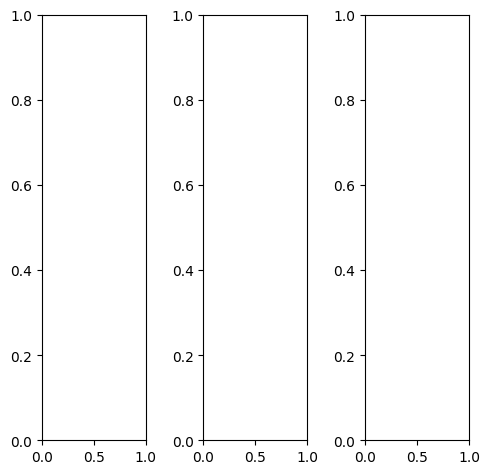

tensor([[[0.1216, 0.1804, 0.2078,  ..., 0.2980, 0.2392, 0.2275],
         [0.1686, 0.2118, 0.2078,  ..., 0.2902, 0.2431, 0.2431],
         [0.2000, 0.2275, 0.2314,  ..., 0.2235, 0.2039, 0.1725],
         ...,
         [0.4471, 0.5725, 0.5333,  ..., 0.4431, 0.4039, 0.4039],
         [0.5098, 0.5882, 0.5961,  ..., 0.4000, 0.4980, 0.5647],
         [0.5373, 0.5882, 0.5529,  ..., 0.4902, 0.5765, 0.6314]],

        [[0.1216, 0.1804, 0.2078,  ..., 0.2980, 0.2392, 0.2275],
         [0.1686, 0.2118, 0.2078,  ..., 0.2902, 0.2431, 0.2431],
         [0.2000, 0.2275, 0.2314,  ..., 0.2235, 0.2039, 0.1725],
         ...,
         [0.4471, 0.5725, 0.5333,  ..., 0.4431, 0.4039, 0.4039],
         [0.5098, 0.5882, 0.5961,  ..., 0.4000, 0.4980, 0.5647],
         [0.5373, 0.5882, 0.5529,  ..., 0.4902, 0.5765, 0.6314]],

        [[0.1216, 0.1804, 0.2078,  ..., 0.2980, 0.2392, 0.2275],
         [0.1686, 0.2118, 0.2078,  ..., 0.2902, 0.2431, 0.2431],
         [0.2000, 0.2275, 0.2314,  ..., 0.2235, 0.2039, 0.

tensor([[[0.1098, 0.1686, 0.2078,  ..., 0.2824, 0.2235, 0.2196],
         [0.1569, 0.2000, 0.2078,  ..., 0.2980, 0.2235, 0.2353],
         [0.1882, 0.2157, 0.2275,  ..., 0.2235, 0.1922, 0.1647],
         ...,
         [0.5451, 0.7294, 0.7137,  ..., 0.5647, 0.5098, 0.5020],
         [0.6431, 0.7843, 0.7843,  ..., 0.5216, 0.6118, 0.6784],
         [0.6980, 0.7843, 0.7333,  ..., 0.6078, 0.7020, 0.7647]],

        [[0.1412, 0.2000, 0.2196,  ..., 0.3176, 0.2627, 0.2392],
         [0.1882, 0.2275, 0.2196,  ..., 0.2902, 0.2549, 0.2549],
         [0.2118, 0.2392, 0.2392,  ..., 0.2275, 0.2078, 0.1843],
         ...,
         [0.4157, 0.5294, 0.4902,  ..., 0.4118, 0.3686, 0.3725],
         [0.4784, 0.5333, 0.5451,  ..., 0.3647, 0.4706, 0.5373],
         [0.4902, 0.5333, 0.5059,  ..., 0.4549, 0.5451, 0.6000]],

        [[0.0667, 0.1176, 0.1569,  ..., 0.2235, 0.1725, 0.1961],
         [0.1137, 0.1529, 0.1608,  ..., 0.2549, 0.2353, 0.2157],
         [0.1686, 0.1961, 0.2000,  ..., 0.2118, 0.2039, 0.

tensor([[[0.1527, 0.1622, 0.1805,  ..., 0.2670, 0.2303, 0.2157],
         [0.1522, 0.2002, 0.2037,  ..., 0.2797, 0.2419, 0.2248],
         [0.1820, 0.2251, 0.2327,  ..., 0.2156, 0.1881, 0.1654],
         ...,
         [0.4514, 0.5859, 0.5556,  ..., 0.4669, 0.4071, 0.4135],
         [0.5292, 0.6042, 0.6132,  ..., 0.4060, 0.5004, 0.5691],
         [0.5632, 0.6014, 0.5709,  ..., 0.5001, 0.6122, 0.6345]],

        [[0.1608, 0.1655, 0.1798,  ..., 0.2685, 0.2322, 0.2338],
         [0.1558, 0.2015, 0.1984,  ..., 0.2756, 0.2438, 0.2313],
         [0.1885, 0.2227, 0.2220,  ..., 0.2073, 0.1882, 0.1629],
         ...,
         [0.4453, 0.5865, 0.5493,  ..., 0.4328, 0.3834, 0.4034],
         [0.5140, 0.5942, 0.6042,  ..., 0.3973, 0.4973, 0.5651],
         [0.5443, 0.5796, 0.5600,  ..., 0.4844, 0.5869, 0.6290]],

        [[0.1516, 0.1547, 0.1687,  ..., 0.2456, 0.2166, 0.2212],
         [0.1571, 0.1919, 0.1803,  ..., 0.2597, 0.2278, 0.2146],
         [0.1804, 0.2046, 0.1989,  ..., 0.1977, 0.1814, 0.

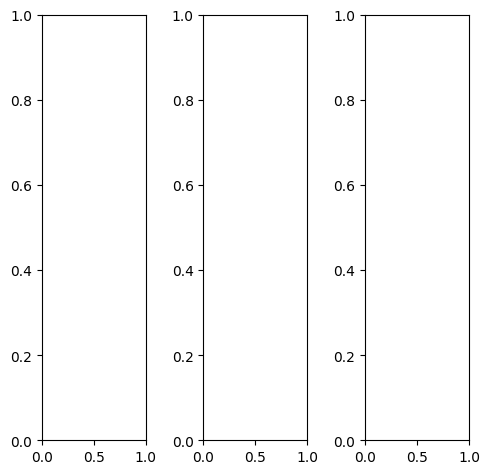

tensor([[[0.4118, 0.4039, 0.3725,  ..., 0.9294, 0.9255, 0.9216],
         [0.4667, 0.4078, 0.2902,  ..., 0.9255, 0.9294, 0.9255],
         [0.3412, 0.3137, 0.3216,  ..., 0.9373, 0.9373, 0.9333],
         ...,
         [0.3333, 0.1451, 0.0706,  ..., 0.3804, 0.4275, 0.4078],
         [0.6863, 0.4941, 0.3843,  ..., 0.6000, 0.5490, 0.5216],
         [0.7451, 0.7412, 0.7451,  ..., 0.7451, 0.6863, 0.6706]],

        [[0.4118, 0.4039, 0.3725,  ..., 0.9294, 0.9255, 0.9216],
         [0.4667, 0.4078, 0.2902,  ..., 0.9255, 0.9294, 0.9255],
         [0.3412, 0.3137, 0.3216,  ..., 0.9373, 0.9373, 0.9333],
         ...,
         [0.3333, 0.1451, 0.0706,  ..., 0.3804, 0.4275, 0.4078],
         [0.6863, 0.4941, 0.3843,  ..., 0.6000, 0.5490, 0.5216],
         [0.7451, 0.7412, 0.7451,  ..., 0.7451, 0.6863, 0.6706]],

        [[0.4118, 0.4039, 0.3725,  ..., 0.9294, 0.9255, 0.9216],
         [0.4667, 0.4078, 0.2902,  ..., 0.9255, 0.9294, 0.9255],
         [0.3412, 0.3137, 0.3216,  ..., 0.9373, 0.9373, 0.

tensor([[[0.3412, 0.3412, 0.3176,  ..., 0.8784, 0.8706, 0.8667],
         [0.3882, 0.3333, 0.2196,  ..., 0.8745, 0.8784, 0.8745],
         [0.2745, 0.2431, 0.2431,  ..., 0.8863, 0.8941, 0.8902],
         ...,
         [0.2784, 0.0902, 0.0392,  ..., 0.3412, 0.3804, 0.3529],
         [0.6431, 0.4510, 0.3647,  ..., 0.5882, 0.5216, 0.4784],
         [0.7255, 0.7216, 0.7490,  ..., 0.7373, 0.6824, 0.6431]],

        [[0.4745, 0.4784, 0.4392,  ..., 0.9451, 0.9451, 0.9412],
         [0.5412, 0.4902, 0.3608,  ..., 0.9412, 0.9412, 0.9373],
         [0.4078, 0.3843, 0.3922,  ..., 0.9569, 0.9529, 0.9451],
         ...,
         [0.3922, 0.1922, 0.0980,  ..., 0.4353, 0.4863, 0.4706],
         [0.7608, 0.5608, 0.4196,  ..., 0.6627, 0.6118, 0.5882],
         [0.8196, 0.8078, 0.7922,  ..., 0.8078, 0.7490, 0.7412]],

        [[0.2745, 0.1882, 0.1647,  ..., 0.9804, 0.9804, 0.9765],
         [0.2745, 0.1765, 0.1255,  ..., 0.9725, 0.9882, 0.9843],
         [0.1647, 0.1333, 0.1647,  ..., 0.9804, 0.9843, 0.

tensor([[[0.4172, 0.4038, 0.3736,  ..., 0.9221, 0.9163, 0.8891],
         [0.4485, 0.4073, 0.2926,  ..., 0.9368, 0.9440, 0.9043],
         [0.3300, 0.3163, 0.3338,  ..., 0.9538, 0.9565, 0.9381],
         ...,
         [0.3513, 0.1334, 0.0605,  ..., 0.3968, 0.4492, 0.4321],
         [0.6439, 0.4979, 0.3930,  ..., 0.6033, 0.5560, 0.5181],
         [0.7470, 0.7393, 0.7619,  ..., 0.7706, 0.7198, 0.6693]],

        [[0.4216, 0.4004, 0.3787,  ..., 0.9351, 0.9191, 0.9054],
         [0.4536, 0.4075, 0.2855,  ..., 0.9402, 0.9340, 0.9161],
         [0.3301, 0.3124, 0.3094,  ..., 0.9586, 0.9524, 0.9336],
         ...,
         [0.3372, 0.0973, 0.0469,  ..., 0.3670, 0.4176, 0.4073],
         [0.6438, 0.4752, 0.3682,  ..., 0.5818, 0.5252, 0.5077],
         [0.7202, 0.7387, 0.7396,  ..., 0.7341, 0.6897, 0.6548]],

        [[0.3632, 0.3392, 0.3100,  ..., 0.9061, 0.8914, 0.8741],
         [0.3798, 0.3328, 0.2321,  ..., 0.9127, 0.9182, 0.8853],
         [0.2674, 0.2555, 0.2648,  ..., 0.9317, 0.9240, 0.

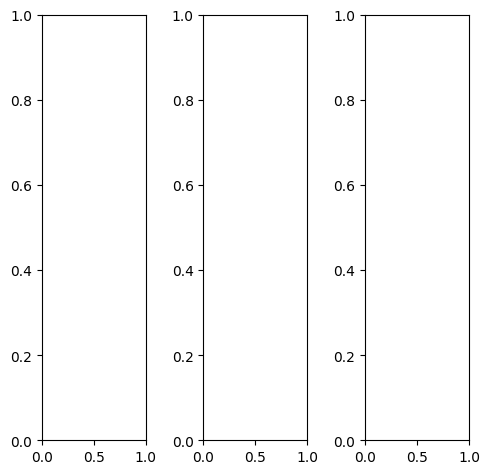

tensor([[[0.2745, 0.2510, 0.2392,  ..., 0.1255, 0.1490, 0.1647],
         [0.5059, 0.4627, 0.4471,  ..., 0.1608, 0.1765, 0.2039],
         [0.7216, 0.6784, 0.6588,  ..., 0.2118, 0.2353, 0.2784],
         ...,
         [0.7647, 0.7922, 0.8039,  ..., 0.7843, 0.8039, 0.7686],
         [0.7686, 0.7961, 0.8314,  ..., 0.7882, 0.7725, 0.7373],
         [0.7961, 0.8235, 0.8353,  ..., 0.7922, 0.7490, 0.7255]],

        [[0.2745, 0.2510, 0.2392,  ..., 0.1255, 0.1490, 0.1647],
         [0.5059, 0.4627, 0.4471,  ..., 0.1608, 0.1765, 0.2039],
         [0.7216, 0.6784, 0.6588,  ..., 0.2118, 0.2353, 0.2784],
         ...,
         [0.7647, 0.7922, 0.8039,  ..., 0.7843, 0.8039, 0.7686],
         [0.7686, 0.7961, 0.8314,  ..., 0.7882, 0.7725, 0.7373],
         [0.7961, 0.8235, 0.8353,  ..., 0.7922, 0.7490, 0.7255]],

        [[0.2745, 0.2510, 0.2392,  ..., 0.1255, 0.1490, 0.1647],
         [0.5059, 0.4627, 0.4471,  ..., 0.1608, 0.1765, 0.2039],
         [0.7216, 0.6784, 0.6588,  ..., 0.2118, 0.2353, 0.

tensor([[[0.2353, 0.2039, 0.1922,  ..., 0.0980, 0.1333, 0.1490],
         [0.4863, 0.4314, 0.4157,  ..., 0.1451, 0.1608, 0.1804],
         [0.7255, 0.6784, 0.6549,  ..., 0.1922, 0.2039, 0.2431],
         ...,
         [0.8275, 0.8392, 0.8392,  ..., 0.8196, 0.8392, 0.8078],
         [0.8314, 0.8471, 0.8627,  ..., 0.8196, 0.8000, 0.7765],
         [0.8431, 0.8588, 0.8667,  ..., 0.8275, 0.7765, 0.7569]],

        [[0.3020, 0.2784, 0.2667,  ..., 0.1412, 0.1647, 0.1843],
         [0.5412, 0.4980, 0.4824,  ..., 0.1804, 0.1922, 0.2235],
         [0.7490, 0.7137, 0.6980,  ..., 0.2314, 0.2588, 0.3020],
         ...,
         [0.7490, 0.7843, 0.7961,  ..., 0.7804, 0.7961, 0.7647],
         [0.7569, 0.7882, 0.8235,  ..., 0.7843, 0.7686, 0.7333],
         [0.7882, 0.8157, 0.8275,  ..., 0.7843, 0.7490, 0.7255]],

        [[0.2196, 0.2196, 0.2118,  ..., 0.1059, 0.1059, 0.1216],
         [0.3882, 0.3529, 0.3333,  ..., 0.1176, 0.1333, 0.1725],
         [0.5569, 0.5020, 0.4667,  ..., 0.1529, 0.2039, 0.

tensor([[[0.2862, 0.2489, 0.2283,  ..., 0.1139, 0.1421, 0.1745],
         [0.4991, 0.4604, 0.4646,  ..., 0.1508, 0.1745, 0.1961],
         [0.7544, 0.7013, 0.6799,  ..., 0.2092, 0.2354, 0.2572],
         ...,
         [0.7916, 0.8277, 0.8525,  ..., 0.8223, 0.8308, 0.7860],
         [0.7920, 0.8327, 0.8737,  ..., 0.8235, 0.8003, 0.7718],
         [0.7919, 0.8492, 0.8611,  ..., 0.8236, 0.7871, 0.7498]],

        [[0.2945, 0.2430, 0.2199,  ..., 0.1134, 0.1435, 0.1920],
         [0.4994, 0.4605, 0.4482,  ..., 0.1494, 0.1817, 0.2001],
         [0.7342, 0.6711, 0.6554,  ..., 0.1949, 0.2281, 0.2570],
         ...,
         [0.7672, 0.7997, 0.8196,  ..., 0.7845, 0.8101, 0.7782],
         [0.7754, 0.7910, 0.8388,  ..., 0.7905, 0.7793, 0.7402],
         [0.7718, 0.8247, 0.8362,  ..., 0.7853, 0.7558, 0.7171]],

        [[0.2259, 0.1820, 0.1707,  ..., 0.0876, 0.1179, 0.1590],
         [0.4155, 0.3791, 0.3652,  ..., 0.1188, 0.1373, 0.1593],
         [0.6406, 0.5754, 0.5512,  ..., 0.1476, 0.1793, 0.

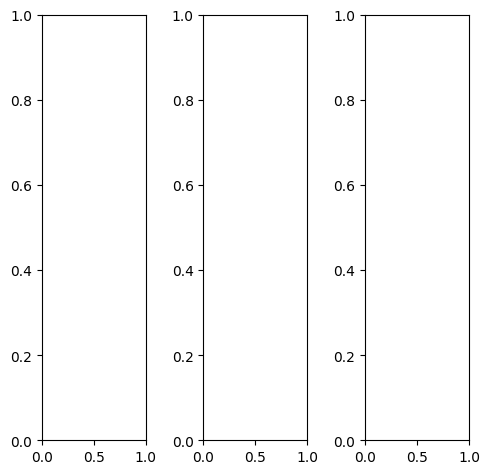

tensor([[[0.1294, 0.0980, 0.1529,  ..., 0.1373, 0.1098, 0.1059],
         [0.1569, 0.1294, 0.1882,  ..., 0.1922, 0.1294, 0.1176],
         [0.1451, 0.1647, 0.2471,  ..., 0.1686, 0.1255, 0.1333],
         ...,
         [0.2667, 0.2235, 0.2196,  ..., 0.0980, 0.1255, 0.1569],
         [0.2510, 0.2078, 0.2000,  ..., 0.1255, 0.1451, 0.1569],
         [0.1765, 0.1843, 0.1765,  ..., 0.1412, 0.1569, 0.1608]],

        [[0.1294, 0.0980, 0.1529,  ..., 0.1373, 0.1098, 0.1059],
         [0.1569, 0.1294, 0.1882,  ..., 0.1922, 0.1294, 0.1176],
         [0.1451, 0.1647, 0.2471,  ..., 0.1686, 0.1255, 0.1333],
         ...,
         [0.2667, 0.2235, 0.2196,  ..., 0.0980, 0.1255, 0.1569],
         [0.2510, 0.2078, 0.2000,  ..., 0.1255, 0.1451, 0.1569],
         [0.1765, 0.1843, 0.1765,  ..., 0.1412, 0.1569, 0.1608]],

        [[0.1294, 0.0980, 0.1529,  ..., 0.1373, 0.1098, 0.1059],
         [0.1569, 0.1294, 0.1882,  ..., 0.1922, 0.1294, 0.1176],
         [0.1451, 0.1647, 0.2471,  ..., 0.1686, 0.1255, 0.

tensor([[[0.1725, 0.1373, 0.2000,  ..., 0.2039, 0.1686, 0.1569],
         [0.2118, 0.1725, 0.2392,  ..., 0.2784, 0.1843, 0.1686],
         [0.2078, 0.2157, 0.3137,  ..., 0.2471, 0.1765, 0.1804],
         ...,
         [0.3333, 0.2980, 0.2980,  ..., 0.1608, 0.1725, 0.2118],
         [0.3216, 0.2902, 0.2706,  ..., 0.1843, 0.2078, 0.2235],
         [0.2392, 0.2627, 0.2392,  ..., 0.2118, 0.2353, 0.2392]],

        [[0.1137, 0.0824, 0.1333,  ..., 0.1137, 0.0863, 0.0863],
         [0.1373, 0.1137, 0.1725,  ..., 0.1608, 0.1059, 0.0980],
         [0.1216, 0.1490, 0.2235,  ..., 0.1412, 0.1059, 0.1176],
         ...,
         [0.2431, 0.1961, 0.1922,  ..., 0.0745, 0.1059, 0.1412],
         [0.2275, 0.1804, 0.1725,  ..., 0.1020, 0.1216, 0.1373],
         [0.1529, 0.1569, 0.1529,  ..., 0.1176, 0.1294, 0.1333]],

        [[0.1059, 0.0824, 0.1176,  ..., 0.0863, 0.0706, 0.0706],
         [0.1176, 0.0980, 0.1373,  ..., 0.1176, 0.0902, 0.0863],
         [0.0980, 0.1137, 0.1843,  ..., 0.0980, 0.0902, 0.

tensor([[[0.1468, 0.0981, 0.1343,  ..., 0.1264, 0.1088, 0.1311],
         [0.1385, 0.1225, 0.1854,  ..., 0.1969, 0.1339, 0.1178],
         [0.1272, 0.1629, 0.2526,  ..., 0.1705, 0.1220, 0.1275],
         ...,
         [0.2695, 0.2380, 0.2358,  ..., 0.0967, 0.1300, 0.1586],
         [0.2521, 0.2207, 0.2179,  ..., 0.1296, 0.1538, 0.1655],
         [0.2015, 0.1902, 0.1819,  ..., 0.1517, 0.1661, 0.1739]],

        [[0.1548, 0.0993, 0.1327,  ..., 0.1230, 0.1071, 0.1448],
         [0.1346, 0.1207, 0.1794,  ..., 0.1811, 0.1298, 0.1202],
         [0.1222, 0.1609, 0.2380,  ..., 0.1584, 0.1114, 0.1179],
         ...,
         [0.2561, 0.2158, 0.2124,  ..., 0.0861, 0.1143, 0.1410],
         [0.2354, 0.1967, 0.1901,  ..., 0.1127, 0.1316, 0.1461],
         [0.2050, 0.1769, 0.1635,  ..., 0.1263, 0.1377, 0.1655]],

        [[0.1393, 0.0863, 0.1198,  ..., 0.1069, 0.1032, 0.1356],
         [0.1335, 0.1070, 0.1576,  ..., 0.1662, 0.1177, 0.1093],
         [0.1186, 0.1369, 0.2066,  ..., 0.1431, 0.1006, 0.

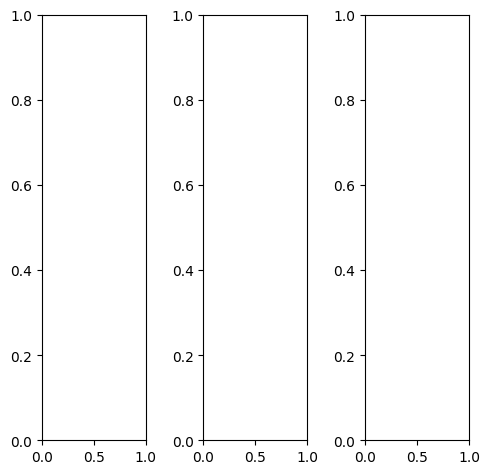

EPOCH: 9.255  trn_loss: 0.005  (1088.85s - 10676.05s remaining)

tensor([[[0.6157, 0.6275, 0.6314,  ..., 0.5686, 0.5569, 0.5373],
         [0.6549, 0.6706, 0.6745,  ..., 0.6000, 0.5882, 0.5725],
         [0.6824, 0.6941, 0.7020,  ..., 0.6353, 0.6235, 0.6078],
         ...,
         [0.5882, 0.6039, 0.6078,  ..., 0.6471, 0.6431, 0.6314],
         [0.5569, 0.5686, 0.5765,  ..., 0.6157, 0.6118, 0.6000],
         [0.5255, 0.5373, 0.5451,  ..., 0.5804, 0.5725, 0.5608]],

        [[0.6157, 0.6275, 0.6314,  ..., 0.5686, 0.5569, 0.5373],
         [0.6549, 0.6706, 0.6745,  ..., 0.6000, 0.5882, 0.5725],
         [0.6824, 0.6941, 0.7020,  ..., 0.6353, 0.6235, 0.6078],
         ...,
         [0.5882, 0.6039, 0.6078,  ..., 0.6471, 0.6431, 0.6314],
         [0.5569, 0.5686, 0.5765,  ..., 0.6157, 0.6118, 0.6000],
         [0.5255, 0.5373, 0.5451,  ..., 0.5804, 0.5725, 0.5608]],

        [[0.6157, 0.6275, 0.6314,  ..., 0.5686, 0.5569, 0.5373],
         [0.6549, 0.6706, 0.6745,  ..., 0.6000, 0.5882, 0.5725],
         [0.6824, 0.6941, 0.7020,  ..., 0.6353, 0.6235, 0.

tensor([[[0.5412, 0.5569, 0.5686,  ..., 0.4824, 0.4706, 0.4549],
         [0.5922, 0.6078, 0.6196,  ..., 0.5216, 0.5098, 0.4941],
         [0.6275, 0.6431, 0.6549,  ..., 0.5647, 0.5490, 0.5333],
         ...,
         [0.5098, 0.5255, 0.5373,  ..., 0.5922, 0.5843, 0.5725],
         [0.4745, 0.4863, 0.4941,  ..., 0.5490, 0.5412, 0.5294],
         [0.4431, 0.4549, 0.4627,  ..., 0.5059, 0.4980, 0.4863]],

        [[0.7216, 0.7333, 0.7333,  ..., 0.6824, 0.6667, 0.6471],
         [0.7569, 0.7686, 0.7686,  ..., 0.7098, 0.6980, 0.6824],
         [0.7725, 0.7843, 0.7882,  ..., 0.7373, 0.7294, 0.7137],
         ...,
         [0.6980, 0.7137, 0.7137,  ..., 0.7451, 0.7412, 0.7294],
         [0.6627, 0.6784, 0.6824,  ..., 0.7176, 0.7137, 0.7020],
         [0.6314, 0.6431, 0.6549,  ..., 0.6902, 0.6784, 0.6706]],

        [[0.2588, 0.2745, 0.2863,  ..., 0.2118, 0.2039, 0.1882],
         [0.3098, 0.3255, 0.3333,  ..., 0.2510, 0.2353, 0.2196],
         [0.3490, 0.3608, 0.3765,  ..., 0.2863, 0.2706, 0.

tensor([[[0.2462, 0.1835, 0.1427,  ..., 0.2557, 0.2570, 0.2455],
         [0.2472, 0.1580, 0.1412,  ..., 0.3067, 0.2966, 0.2517],
         [0.2040, 0.1632, 0.0794,  ..., 0.3494, 0.3545, 0.3075],
         ...,
         [0.3606, 0.4514, 0.4895,  ..., 0.4875, 0.4515, 0.4146],
         [0.3066, 0.3756, 0.3956,  ..., 0.4013, 0.3992, 0.3642],
         [0.2800, 0.2587, 0.2863,  ..., 0.3198, 0.2969, 0.3285]],

        [[0.2922, 0.3334, 0.2611,  ..., 0.2989, 0.3039, 0.2578],
         [0.2693, 0.3359, 0.1543,  ..., 0.3686, 0.3670, 0.2794],
         [0.2889, 0.3793, 0.2410,  ..., 0.4240, 0.4079, 0.3219],
         ...,
         [0.3148, 0.4231, 0.4277,  ..., 0.5063, 0.4788, 0.3648],
         [0.2676, 0.3489, 0.3533,  ..., 0.4202, 0.3982, 0.3282],
         [0.2375, 0.2318, 0.2641,  ..., 0.3015, 0.2787, 0.2718]],

        [[0.4575, 0.2489, 0.4222,  ..., 0.3411, 0.3545, 0.3367],
         [0.4966, 0.4364, 0.4295,  ..., 0.3931, 0.4015, 0.3517],
         [0.4445, 0.4447, 0.5116,  ..., 0.4390, 0.4409, 0.

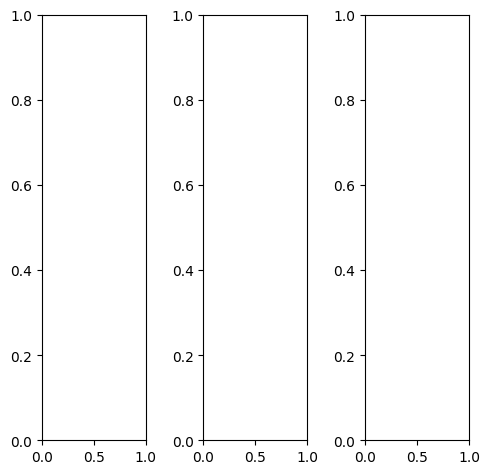

tensor([[[0.2902, 0.2824, 0.2706,  ..., 0.2706, 0.2314, 0.2627],
         [0.2784, 0.2824, 0.2353,  ..., 0.2706, 0.2039, 0.2353],
         [0.2588, 0.2745, 0.2392,  ..., 0.2706, 0.2392, 0.2235],
         ...,
         [0.2196, 0.1804, 0.1529,  ..., 0.2000, 0.1294, 0.1373],
         [0.4118, 0.3765, 0.3647,  ..., 0.1451, 0.1569, 0.1961],
         [0.4745, 0.4667, 0.4549,  ..., 0.1608, 0.1490, 0.1843]],

        [[0.2902, 0.2824, 0.2706,  ..., 0.2706, 0.2314, 0.2627],
         [0.2784, 0.2824, 0.2353,  ..., 0.2706, 0.2039, 0.2353],
         [0.2588, 0.2745, 0.2392,  ..., 0.2706, 0.2392, 0.2235],
         ...,
         [0.2196, 0.1804, 0.1529,  ..., 0.2000, 0.1294, 0.1373],
         [0.4118, 0.3765, 0.3647,  ..., 0.1451, 0.1569, 0.1961],
         [0.4745, 0.4667, 0.4549,  ..., 0.1608, 0.1490, 0.1843]],

        [[0.2902, 0.2824, 0.2706,  ..., 0.2706, 0.2314, 0.2627],
         [0.2784, 0.2824, 0.2353,  ..., 0.2706, 0.2039, 0.2353],
         [0.2588, 0.2745, 0.2392,  ..., 0.2706, 0.2392, 0.

tensor([[[0.2941, 0.2784, 0.2549,  ..., 0.2941, 0.2588, 0.2863],
         [0.2824, 0.2784, 0.2196,  ..., 0.2941, 0.2275, 0.2588],
         [0.2627, 0.2667, 0.2235,  ..., 0.2941, 0.2627, 0.2471],
         ...,
         [0.2314, 0.1686, 0.1412,  ..., 0.2510, 0.1843, 0.2000],
         [0.4431, 0.3922, 0.3843,  ..., 0.2039, 0.2118, 0.2549],
         [0.5294, 0.5059, 0.5020,  ..., 0.2196, 0.2039, 0.2392]],

        [[0.2980, 0.2980, 0.2902,  ..., 0.2588, 0.2196, 0.2510],
         [0.2902, 0.3020, 0.2588,  ..., 0.2588, 0.1922, 0.2235],
         [0.2706, 0.2941, 0.2627,  ..., 0.2627, 0.2314, 0.2157],
         ...,
         [0.2235, 0.1922, 0.1686,  ..., 0.1725, 0.0980, 0.1020],
         [0.4078, 0.3804, 0.3686,  ..., 0.1137, 0.1216, 0.1608],
         [0.4627, 0.4588, 0.4471,  ..., 0.1255, 0.1137, 0.1529]],

        [[0.2392, 0.2196, 0.2039,  ..., 0.2627, 0.2275, 0.2549],
         [0.2157, 0.2039, 0.1569,  ..., 0.2588, 0.1961, 0.2235],
         [0.1922, 0.1882, 0.1569,  ..., 0.2549, 0.2235, 0.

tensor([[[0.3355, 0.2553, 0.1727,  ..., 0.2158, 0.1777, 0.2975],
         [0.2895, 0.2210, 0.1496,  ..., 0.1848, 0.0926, 0.2138],
         [0.1645, 0.1787, 0.0541,  ..., 0.1563, 0.1309, 0.1891],
         ...,
         [0.1937, 0.1452, 0.1279,  ..., 0.1728, 0.0782, 0.1577],
         [0.4908, 0.4384, 0.4113,  ..., 0.0723, 0.0992, 0.2049],
         [0.6482, 0.6598, 0.6326,  ..., 0.1211, 0.1082, 0.2356]],

        [[0.4124, 0.3814, 0.2450,  ..., 0.3325, 0.2984, 0.3665],
         [0.3423, 0.3160, 0.0872,  ..., 0.3176, 0.2476, 0.2951],
         [0.2906, 0.2943, 0.1150,  ..., 0.3107, 0.2763, 0.2702],
         ...,
         [0.2364, 0.1932, 0.1661,  ..., 0.2561, 0.1407, 0.1484],
         [0.5156, 0.4804, 0.4673,  ..., 0.1442, 0.1431, 0.2118],
         [0.6242, 0.6599, 0.6525,  ..., 0.1505, 0.1345, 0.2322]],

        [[0.4899, 0.3897, 0.3824,  ..., 0.4623, 0.4395, 0.5003],
         [0.4692, 0.4093, 0.3869,  ..., 0.4424, 0.3711, 0.4320],
         [0.3487, 0.3485, 0.3153,  ..., 0.4201, 0.3992, 0.

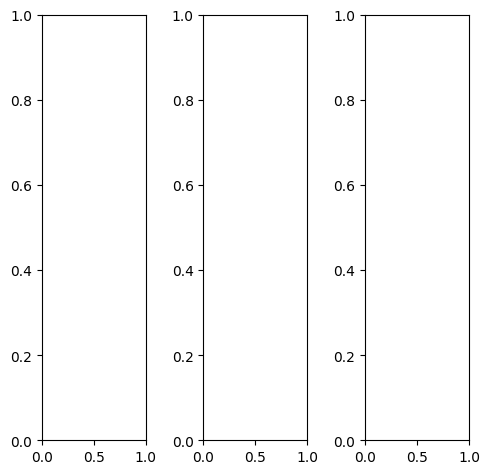

tensor([[[0.4627, 0.4706, 0.4863,  ..., 0.4588, 0.5098, 0.5922],
         [0.4863, 0.4941, 0.5137,  ..., 0.2745, 0.4510, 0.7137],
         [0.4471, 0.4471, 0.4431,  ..., 0.3020, 0.4941, 0.7451],
         ...,
         [0.7059, 0.7490, 0.7765,  ..., 0.9451, 0.9412, 0.9412],
         [0.9647, 0.9569, 0.9647,  ..., 0.9529, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9569, 0.9529, 0.9451]],

        [[0.4627, 0.4706, 0.4863,  ..., 0.4588, 0.5098, 0.5922],
         [0.4863, 0.4941, 0.5137,  ..., 0.2745, 0.4510, 0.7137],
         [0.4471, 0.4471, 0.4431,  ..., 0.3020, 0.4941, 0.7451],
         ...,
         [0.7059, 0.7490, 0.7765,  ..., 0.9451, 0.9412, 0.9412],
         [0.9647, 0.9569, 0.9647,  ..., 0.9529, 0.9451, 0.9373],
         [0.9412, 0.9373, 0.9451,  ..., 0.9569, 0.9529, 0.9451]],

        [[0.4627, 0.4706, 0.4863,  ..., 0.4588, 0.5098, 0.5922],
         [0.4863, 0.4941, 0.5137,  ..., 0.2745, 0.4510, 0.7137],
         [0.4471, 0.4471, 0.4431,  ..., 0.3020, 0.4941, 0.

tensor([[[0.4824, 0.4902, 0.5059,  ..., 0.4745, 0.5176, 0.5961],
         [0.4941, 0.5020, 0.5216,  ..., 0.2980, 0.4706, 0.7294],
         [0.4353, 0.4392, 0.4353,  ..., 0.3176, 0.5020, 0.7529],
         ...,
         [0.7451, 0.7882, 0.8157,  ..., 0.9882, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9804, 0.9882, 0.9922],
         [0.9804, 0.9765, 0.9843,  ..., 0.9804, 0.9922, 0.9961]],

        [[0.4667, 0.4745, 0.4902,  ..., 0.4667, 0.5216, 0.6039],
         [0.4902, 0.5020, 0.5216,  ..., 0.2745, 0.4549, 0.7176],
         [0.4549, 0.4549, 0.4510,  ..., 0.3020, 0.4980, 0.7490],
         ...,
         [0.6980, 0.7412, 0.7647,  ..., 0.9333, 0.9333, 0.9333],
         [0.9608, 0.9529, 0.9608,  ..., 0.9490, 0.9412, 0.9294],
         [0.9373, 0.9333, 0.9412,  ..., 0.9608, 0.9451, 0.9333]],

        [[0.3882, 0.4000, 0.4118,  ..., 0.3804, 0.4392, 0.5333],
         [0.4353, 0.4471, 0.4667,  ..., 0.2078, 0.3961, 0.6667],
         [0.4235, 0.4235, 0.4196,  ..., 0.2549, 0.4549, 0.

tensor([[[0.3943, 0.3132, 0.3000,  ..., 0.3522, 0.4190, 0.5622],
         [0.3371, 0.2817, 0.2682,  ..., 0.2027, 0.3355, 0.6462],
         [0.2259, 0.2793, 0.1507,  ..., 0.2407, 0.4246, 0.7013],
         ...,
         [0.6545, 0.7007, 0.7212,  ..., 0.8758, 0.8916, 0.9015],
         [0.8412, 0.8608, 0.8481,  ..., 0.8374, 0.8726, 0.8804],
         [0.8472, 0.8620, 0.8465,  ..., 0.8579, 0.8718, 0.8455]],

        [[0.4261, 0.4718, 0.3767,  ..., 0.4439, 0.4970, 0.5670],
         [0.4125, 0.4808, 0.2956,  ..., 0.2604, 0.4443, 0.6973],
         [0.3083, 0.3833, 0.2371,  ..., 0.3301, 0.5176, 0.7313],
         ...,
         [0.6476, 0.6997, 0.7446,  ..., 0.8705, 0.8744, 0.9059],
         [0.8463, 0.8632, 0.8734,  ..., 0.8749, 0.8672, 0.8728],
         [0.8083, 0.8352, 0.8324,  ..., 0.8577, 0.8359, 0.8207]],

        [[0.5321, 0.4598, 0.4893,  ..., 0.5378, 0.6179, 0.6929],
         [0.5172, 0.4951, 0.5075,  ..., 0.3884, 0.5928, 0.8096],
         [0.4206, 0.4225, 0.4086,  ..., 0.4189, 0.6539, 0.

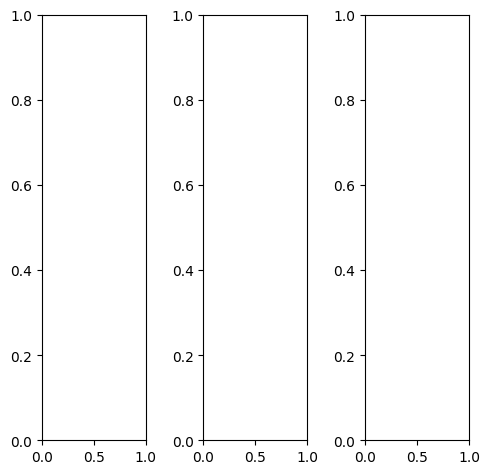

tensor([[[0.7137, 0.6902, 0.6392,  ..., 0.8471, 0.8549, 0.8510],
         [0.6314, 0.5922, 0.6549,  ..., 0.6941, 0.7176, 0.7569],
         [0.4902, 0.5098, 0.5922,  ..., 0.5608, 0.7255, 0.6667],
         ...,
         [0.6235, 0.6275, 0.6549,  ..., 0.5843, 0.5922, 0.6157],
         [0.5882, 0.5882, 0.5882,  ..., 0.5373, 0.5490, 0.5725],
         [0.6235, 0.6078, 0.6118,  ..., 0.5608, 0.5412, 0.5569]],

        [[0.7137, 0.6902, 0.6392,  ..., 0.8471, 0.8549, 0.8510],
         [0.6314, 0.5922, 0.6549,  ..., 0.6941, 0.7176, 0.7569],
         [0.4902, 0.5098, 0.5922,  ..., 0.5608, 0.7255, 0.6667],
         ...,
         [0.6235, 0.6275, 0.6549,  ..., 0.5843, 0.5922, 0.6157],
         [0.5882, 0.5882, 0.5882,  ..., 0.5373, 0.5490, 0.5725],
         [0.6235, 0.6078, 0.6118,  ..., 0.5608, 0.5412, 0.5569]],

        [[0.7137, 0.6902, 0.6392,  ..., 0.8471, 0.8549, 0.8510],
         [0.6314, 0.5922, 0.6549,  ..., 0.6941, 0.7176, 0.7569],
         [0.4902, 0.5098, 0.5922,  ..., 0.5608, 0.7255, 0.

tensor([[[0.7333, 0.7451, 0.6549,  ..., 0.7961, 0.7961, 0.8078],
         [0.6941, 0.7020, 0.6980,  ..., 0.7020, 0.7020, 0.7725],
         [0.5333, 0.5451, 0.6000,  ..., 0.5922, 0.7451, 0.6941],
         ...,
         [0.6235, 0.6275, 0.6549,  ..., 0.5961, 0.6000, 0.6157],
         [0.5804, 0.5882, 0.5882,  ..., 0.5490, 0.5569, 0.5686],
         [0.6118, 0.6039, 0.6157,  ..., 0.5725, 0.5529, 0.5569]],

        [[0.7020, 0.6667, 0.6314,  ..., 0.8667, 0.8784, 0.8706],
         [0.6039, 0.5412, 0.6353,  ..., 0.6902, 0.7255, 0.7529],
         [0.4706, 0.4941, 0.5843,  ..., 0.5451, 0.7176, 0.6549],
         ...,
         [0.6588, 0.6588, 0.6824,  ..., 0.6118, 0.6196, 0.6431],
         [0.6275, 0.6235, 0.6235,  ..., 0.5647, 0.5765, 0.6078],
         [0.6627, 0.6431, 0.6431,  ..., 0.5882, 0.5725, 0.5922]],

        [[0.7059, 0.6745, 0.6314,  ..., 0.8706, 0.8745, 0.8588],
         [0.6039, 0.5529, 0.6275,  ..., 0.6902, 0.7137, 0.7451],
         [0.4745, 0.4980, 0.6039,  ..., 0.5490, 0.7255, 0.

tensor([[[0.5275, 0.4609, 0.3527,  ..., 0.6585, 0.6265, 0.6760],
         [0.3933, 0.2475, 0.2775,  ..., 0.5284, 0.5177, 0.5982],
         [0.1734, 0.2131, 0.1720,  ..., 0.4121, 0.5511, 0.4893],
         ...,
         [0.5284, 0.5767, 0.5657,  ..., 0.4858, 0.5009, 0.5414],
         [0.4919, 0.5337, 0.5173,  ..., 0.4261, 0.4451, 0.5129],
         [0.5566, 0.5523, 0.5507,  ..., 0.4822, 0.4759, 0.5141]],

        [[0.6065, 0.6103, 0.4820,  ..., 0.7495, 0.7684, 0.7468],
         [0.4104, 0.3962, 0.2811,  ..., 0.6067, 0.6183, 0.6929],
         [0.3227, 0.3870, 0.3345,  ..., 0.4839, 0.6279, 0.5429],
         ...,
         [0.4858, 0.5242, 0.5421,  ..., 0.5260, 0.5525, 0.5162],
         [0.4481, 0.4778, 0.4981,  ..., 0.4781, 0.4898, 0.4987],
         [0.5080, 0.5144, 0.5288,  ..., 0.4809, 0.4813, 0.4873]],

        [[0.7425, 0.6725, 0.5831,  ..., 0.9854, 0.9663, 0.9278],
         [0.6040, 0.5397, 0.6222,  ..., 0.8198, 0.8308, 0.8504],
         [0.4070, 0.4259, 0.4541,  ..., 0.6457, 0.8453, 0.

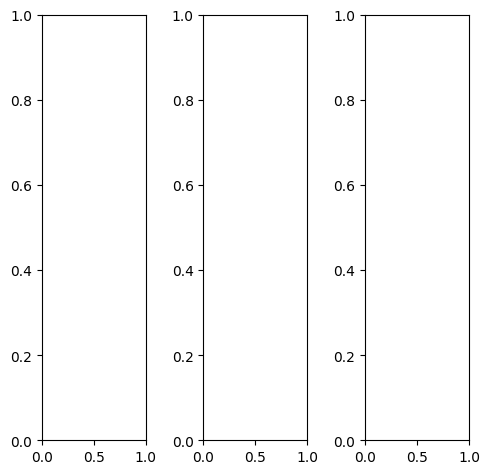

tensor([[[0.2471, 0.0431, 0.1804,  ..., 0.2784, 0.3765, 0.7843],
         [0.2784, 0.1569, 0.2157,  ..., 0.2902, 0.4392, 0.8549],
         [0.4039, 0.3843, 0.3490,  ..., 0.4235, 0.6627, 0.8902],
         ...,
         [0.5059, 0.5020, 0.3922,  ..., 0.5137, 0.4863, 0.4902],
         [0.5529, 0.4745, 0.4275,  ..., 0.5569, 0.5333, 0.5529],
         [0.6431, 0.6314, 0.6471,  ..., 0.6235, 0.5804, 0.5725]],

        [[0.2471, 0.0431, 0.1804,  ..., 0.2784, 0.3765, 0.7843],
         [0.2784, 0.1569, 0.2157,  ..., 0.2902, 0.4392, 0.8549],
         [0.4039, 0.3843, 0.3490,  ..., 0.4235, 0.6627, 0.8902],
         ...,
         [0.5059, 0.5020, 0.3922,  ..., 0.5137, 0.4863, 0.4902],
         [0.5529, 0.4745, 0.4275,  ..., 0.5569, 0.5333, 0.5529],
         [0.6431, 0.6314, 0.6471,  ..., 0.6235, 0.5804, 0.5725]],

        [[0.2471, 0.0431, 0.1804,  ..., 0.2784, 0.3765, 0.7843],
         [0.2784, 0.1569, 0.2157,  ..., 0.2902, 0.4392, 0.8549],
         [0.4039, 0.3843, 0.3490,  ..., 0.4235, 0.6627, 0.

tensor([[[0.2510, 0.0353, 0.1843,  ..., 0.3059, 0.3882, 0.8000],
         [0.2784, 0.1176, 0.2039,  ..., 0.3373, 0.4588, 0.8667],
         [0.4118, 0.3098, 0.2745,  ..., 0.4824, 0.6824, 0.9020],
         ...,
         [0.6000, 0.5804, 0.4549,  ..., 0.6196, 0.5922, 0.5961],
         [0.6392, 0.5569, 0.5098,  ..., 0.6627, 0.6392, 0.6549],
         [0.7294, 0.7176, 0.7412,  ..., 0.7294, 0.6902, 0.6745]],

        [[0.2392, 0.0353, 0.1686,  ..., 0.2667, 0.3725, 0.7725],
         [0.2706, 0.1569, 0.2078,  ..., 0.2667, 0.4275, 0.8431],
         [0.3961, 0.3922, 0.3569,  ..., 0.3961, 0.6510, 0.8824],
         ...,
         [0.4745, 0.4745, 0.3686,  ..., 0.4824, 0.4549, 0.4627],
         [0.5294, 0.4510, 0.4039,  ..., 0.5294, 0.5059, 0.5255],
         [0.6196, 0.6078, 0.6235,  ..., 0.5961, 0.5529, 0.5451]],

        [[0.2667, 0.0980, 0.2196,  ..., 0.2627, 0.3804, 0.8039],
         [0.3059, 0.2549, 0.2863,  ..., 0.2745, 0.4353, 0.8706],
         [0.4314, 0.5333, 0.5020,  ..., 0.4157, 0.6627, 0.

tensor([[[ 0.0152, -0.1212, -0.1304,  ...,  0.1522,  0.2555,  0.6403],
         [ 0.1124, -0.1702, -0.0610,  ...,  0.1171,  0.2334,  0.7117],
         [ 0.0405,  0.1187, -0.0506,  ...,  0.2619,  0.5346,  0.7740],
         ...,
         [ 0.4303,  0.4745,  0.3618,  ...,  0.4456,  0.4225,  0.4108],
         [ 0.4837,  0.4196,  0.3703,  ...,  0.4957,  0.4551,  0.4875],
         [ 0.5813,  0.5981,  0.6155,  ...,  0.5656,  0.5295,  0.5228]],

        [[ 0.0987,  0.0208,  0.0098,  ...,  0.2303,  0.3458,  0.6431],
         [ 0.1260, -0.0714, -0.1202,  ...,  0.2283,  0.3805,  0.8135],
         [ 0.1682,  0.2950,  0.0256,  ...,  0.3798,  0.6416,  0.8363],
         ...,
         [ 0.4226,  0.4561,  0.3920,  ...,  0.4945,  0.4712,  0.3896],
         [ 0.4726,  0.4179,  0.4052,  ...,  0.5287,  0.4966,  0.4841],
         [ 0.5506,  0.5919,  0.6247,  ...,  0.5571,  0.5284,  0.5052]],

        [[ 0.2737, -0.0639,  0.1035,  ...,  0.3381,  0.4964,  0.7833],
         [ 0.2789,  0.0202,  0.1902,  ...,  0

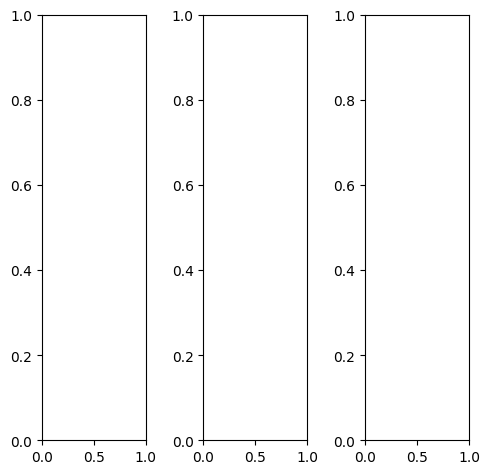

EPOCH: 9.510  trn_loss: 0.005  (1117.50s - 10633.03s remaining)

tensor([[[0.3922, 0.4078, 0.4039,  ..., 0.3216, 0.3333, 0.3804],
         [0.4196, 0.4549, 0.4314,  ..., 0.2627, 0.2902, 0.3490],
         [0.4353, 0.4431, 0.4275,  ..., 0.2706, 0.2706, 0.3333],
         ...,
         [0.4431, 0.4941, 0.4078,  ..., 0.6078, 0.5490, 0.4431],
         [0.4510, 0.5020, 0.3922,  ..., 0.5804, 0.5255, 0.4863],
         [0.4314, 0.4588, 0.4000,  ..., 0.4471, 0.4471, 0.4471]],

        [[0.3922, 0.4078, 0.4039,  ..., 0.3216, 0.3333, 0.3804],
         [0.4196, 0.4549, 0.4314,  ..., 0.2627, 0.2902, 0.3490],
         [0.4353, 0.4431, 0.4275,  ..., 0.2706, 0.2706, 0.3333],
         ...,
         [0.4431, 0.4941, 0.4078,  ..., 0.6078, 0.5490, 0.4431],
         [0.4510, 0.5020, 0.3922,  ..., 0.5804, 0.5255, 0.4863],
         [0.4314, 0.4588, 0.4000,  ..., 0.4471, 0.4471, 0.4471]],

        [[0.3922, 0.4078, 0.4039,  ..., 0.3216, 0.3333, 0.3804],
         [0.4196, 0.4549, 0.4314,  ..., 0.2627, 0.2902, 0.3490],
         [0.4353, 0.4431, 0.4275,  ..., 0.2706, 0.2706, 0.

tensor([[[0.3765, 0.3725, 0.3608,  ..., 0.2941, 0.3020, 0.3490],
         [0.3882, 0.4000, 0.3725,  ..., 0.2118, 0.2353, 0.3059],
         [0.3922, 0.3765, 0.3569,  ..., 0.2039, 0.2039, 0.2784],
         ...,
         [0.4039, 0.4235, 0.3373,  ..., 0.5529, 0.4941, 0.4000],
         [0.4157, 0.4314, 0.3255,  ..., 0.5294, 0.4706, 0.4471],
         [0.4118, 0.4196, 0.3647,  ..., 0.4196, 0.4196, 0.4275]],

        [[0.4039, 0.4353, 0.4314,  ..., 0.3451, 0.3569, 0.4000],
         [0.4431, 0.4941, 0.4745,  ..., 0.3020, 0.3255, 0.3804],
         [0.4667, 0.4902, 0.4784,  ..., 0.3216, 0.3176, 0.3686],
         ...,
         [0.4745, 0.5490, 0.4588,  ..., 0.6471, 0.6000, 0.4745],
         [0.4824, 0.5529, 0.4431,  ..., 0.6196, 0.5725, 0.5216],
         [0.4471, 0.4863, 0.4275,  ..., 0.4667, 0.4745, 0.4667]],

        [[0.3725, 0.3725, 0.3647,  ..., 0.2863, 0.3059, 0.3608],
         [0.3804, 0.3922, 0.3686,  ..., 0.2000, 0.2353, 0.3176],
         [0.3843, 0.3608, 0.3373,  ..., 0.1843, 0.2000, 0.

tensor([[[ 0.3068,  0.1648,  0.0802,  ...,  0.0369,  0.0678,  0.1922],
         [ 0.2118,  0.1284, -0.0101,  ..., -0.1639, -0.1141,  0.0744],
         [ 0.2157,  0.0360, -0.1094,  ..., -0.1821, -0.1621,  0.0463],
         ...,
         [ 0.3482,  0.3612,  0.1915,  ...,  0.6271,  0.5230,  0.3217],
         [ 0.3533,  0.3508,  0.1518,  ...,  0.5501,  0.4274,  0.4175],
         [ 0.3745,  0.3568,  0.1979,  ...,  0.3709,  0.3396,  0.3895]],

        [[ 0.3196,  0.3715,  0.1631,  ...,  0.1578,  0.1895,  0.2652],
         [ 0.3316,  0.3005,  0.0793,  ..., -0.0215,  0.0499,  0.1644],
         [ 0.3071,  0.3236,  0.0499,  ..., -0.0315, -0.0324,  0.1133],
         ...,
         [ 0.3776,  0.4346,  0.2675,  ...,  0.6508,  0.5841,  0.3108],
         [ 0.3829,  0.4391,  0.2312,  ...,  0.5921,  0.4994,  0.4288],
         [ 0.3852,  0.3822,  0.2535,  ...,  0.4013,  0.3687,  0.3968]],

        [[ 0.5387,  0.3201,  0.4121,  ...,  0.2939,  0.3234,  0.3918],
         [ 0.5372,  0.4376,  0.3901,  ...,  0

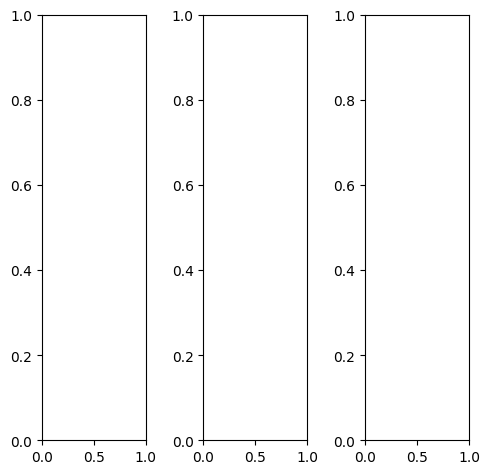

tensor([[[0.3804, 0.4510, 0.4118,  ..., 0.2588, 0.2588, 0.2588],
         [0.4157, 0.4471, 0.3725,  ..., 0.2588, 0.2510, 0.2000],
         [0.4667, 0.3961, 0.3216,  ..., 0.2235, 0.2157, 0.1725],
         ...,
         [0.5765, 0.5608, 0.5490,  ..., 0.4980, 0.4863, 0.5176],
         [0.5686, 0.5490, 0.5333,  ..., 0.5020, 0.5020, 0.5294],
         [0.5725, 0.5412, 0.5333,  ..., 0.4980, 0.4980, 0.5333]],

        [[0.3804, 0.4510, 0.4118,  ..., 0.2588, 0.2588, 0.2588],
         [0.4157, 0.4471, 0.3725,  ..., 0.2588, 0.2510, 0.2000],
         [0.4667, 0.3961, 0.3216,  ..., 0.2235, 0.2157, 0.1725],
         ...,
         [0.5765, 0.5608, 0.5490,  ..., 0.4980, 0.4863, 0.5176],
         [0.5686, 0.5490, 0.5333,  ..., 0.5020, 0.5020, 0.5294],
         [0.5725, 0.5412, 0.5333,  ..., 0.4980, 0.4980, 0.5333]],

        [[0.3804, 0.4510, 0.4118,  ..., 0.2588, 0.2588, 0.2588],
         [0.4157, 0.4471, 0.3725,  ..., 0.2588, 0.2510, 0.2000],
         [0.4667, 0.3961, 0.3216,  ..., 0.2235, 0.2157, 0.

tensor([[[0.3765, 0.4471, 0.3922,  ..., 0.2157, 0.2157, 0.2078],
         [0.4157, 0.4392, 0.3569,  ..., 0.2078, 0.2000, 0.1451],
         [0.4667, 0.3882, 0.3059,  ..., 0.1686, 0.1608, 0.1137],
         ...,
         [0.3922, 0.3804, 0.3686,  ..., 0.3373, 0.3098, 0.3294],
         [0.3843, 0.3686, 0.3529,  ..., 0.3451, 0.3294, 0.3451],
         [0.3882, 0.3647, 0.3529,  ..., 0.3451, 0.3333, 0.3569]],

        [[0.4157, 0.4941, 0.4549,  ..., 0.3098, 0.3020, 0.3059],
         [0.4588, 0.4902, 0.4157,  ..., 0.3137, 0.3020, 0.2510],
         [0.5098, 0.4392, 0.3647,  ..., 0.2784, 0.2706, 0.2275],
         ...,
         [0.6471, 0.6314, 0.6196,  ..., 0.5529, 0.5529, 0.5882],
         [0.6392, 0.6196, 0.6039,  ..., 0.5569, 0.5647, 0.5961],
         [0.6431, 0.6118, 0.6039,  ..., 0.5490, 0.5608, 0.6000]],

        [[0.1922, 0.2549, 0.2275,  ..., 0.1216, 0.1451, 0.1412],
         [0.2039, 0.2392, 0.2039,  ..., 0.1098, 0.1255, 0.0784],
         [0.2392, 0.1843, 0.1569,  ..., 0.0784, 0.0863, 0.

tensor([[[0.4460, 0.4887, 0.4224,  ..., 0.2659, 0.2629, 0.2783],
         [0.3894, 0.4470, 0.3234,  ..., 0.2522, 0.2491, 0.1962],
         [0.4415, 0.3744, 0.2813,  ..., 0.1823, 0.1879, 0.1542],
         ...,
         [0.6231, 0.6198, 0.5772,  ..., 0.5716, 0.5596, 0.6144],
         [0.6133, 0.5922, 0.5493,  ..., 0.5713, 0.5808, 0.6344],
         [0.6468, 0.6208, 0.5873,  ..., 0.5776, 0.5882, 0.6351]],

        [[0.4736, 0.5911, 0.5005,  ..., 0.2862, 0.2799, 0.2888],
         [0.4623, 0.5542, 0.4333,  ..., 0.2921, 0.2948, 0.2159],
         [0.5063, 0.4756, 0.3678,  ..., 0.2280, 0.2228, 0.1680],
         ...,
         [0.6276, 0.6139, 0.5945,  ..., 0.5661, 0.5646, 0.5799],
         [0.6190, 0.5903, 0.5870,  ..., 0.5715, 0.5889, 0.6136],
         [0.6206, 0.6092, 0.5912,  ..., 0.5543, 0.5707, 0.5988]],

        [[0.6409, 0.7279, 0.7010,  ..., 0.3168, 0.3176, 0.3312],
         [0.6435, 0.7166, 0.6008,  ..., 0.3117, 0.3099, 0.2498],
         [0.6869, 0.5852, 0.5016,  ..., 0.2410, 0.2461, 0.

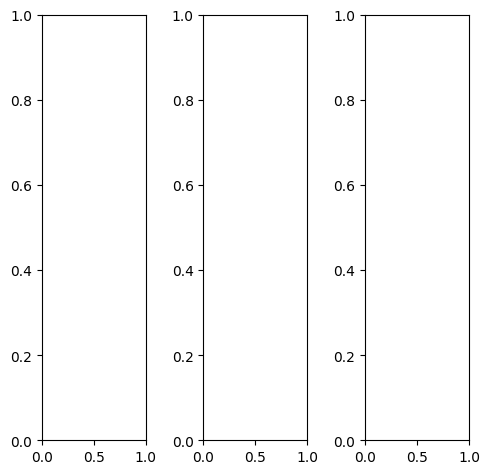

tensor([[[0.4863, 0.3647, 0.5216,  ..., 0.6902, 0.5961, 0.6980],
         [0.3882, 0.2941, 0.4353,  ..., 0.7255, 0.7137, 0.6784],
         [0.4824, 0.3216, 0.3176,  ..., 0.6902, 0.5843, 0.5529],
         ...,
         [0.5255, 0.5137, 0.5059,  ..., 0.6353, 0.6157, 0.6039],
         [0.5412, 0.5216, 0.5451,  ..., 0.6510, 0.6353, 0.5922],
         [0.6431, 0.5176, 0.5686,  ..., 0.6471, 0.6353, 0.6706]],

        [[0.4863, 0.3647, 0.5216,  ..., 0.6902, 0.5961, 0.6980],
         [0.3882, 0.2941, 0.4353,  ..., 0.7255, 0.7137, 0.6784],
         [0.4824, 0.3216, 0.3176,  ..., 0.6902, 0.5843, 0.5529],
         ...,
         [0.5255, 0.5137, 0.5059,  ..., 0.6353, 0.6157, 0.6039],
         [0.5412, 0.5216, 0.5451,  ..., 0.6510, 0.6353, 0.5922],
         [0.6431, 0.5176, 0.5686,  ..., 0.6471, 0.6353, 0.6706]],

        [[0.4863, 0.3647, 0.5216,  ..., 0.6902, 0.5961, 0.6980],
         [0.3882, 0.2941, 0.4353,  ..., 0.7255, 0.7137, 0.6784],
         [0.4824, 0.3216, 0.3176,  ..., 0.6902, 0.5843, 0.

tensor([[[0.4784, 0.3529, 0.5098,  ..., 0.6784, 0.5843, 0.6745],
         [0.3922, 0.2980, 0.4392,  ..., 0.7176, 0.7098, 0.6667],
         [0.4745, 0.3137, 0.3098,  ..., 0.7020, 0.5922, 0.5569],
         ...,
         [0.6118, 0.6235, 0.6275,  ..., 0.7529, 0.7333, 0.7137],
         [0.6196, 0.6235, 0.6588,  ..., 0.7608, 0.7451, 0.6980],
         [0.7020, 0.6000, 0.6588,  ..., 0.7373, 0.7216, 0.7529]],

        [[0.4863, 0.3608, 0.5176,  ..., 0.6941, 0.5961, 0.7020],
         [0.3804, 0.2824, 0.4235,  ..., 0.7255, 0.7137, 0.6824],
         [0.4784, 0.3137, 0.3098,  ..., 0.6863, 0.5804, 0.5529],
         ...,
         [0.4980, 0.4824, 0.4667,  ..., 0.5961, 0.5725, 0.5647],
         [0.5176, 0.4902, 0.5098,  ..., 0.6157, 0.6000, 0.5529],
         [0.6275, 0.4941, 0.5412,  ..., 0.6157, 0.6039, 0.6392]],

        [[0.5176, 0.4157, 0.5686,  ..., 0.7137, 0.6314, 0.7333],
         [0.4314, 0.3529, 0.4902,  ..., 0.7412, 0.7255, 0.6902],
         [0.5216, 0.3765, 0.3725,  ..., 0.6941, 0.5725, 0.

tensor([[[ 0.1089,  0.0103,  0.0342,  ...,  0.4096,  0.3338,  0.4776],
         [ 0.0870, -0.1582,  0.0451,  ...,  0.4345,  0.4047,  0.4114],
         [ 0.0029, -0.0610, -0.2127,  ...,  0.4540,  0.3054,  0.2953],
         ...,
         [ 0.3879,  0.4468,  0.4341,  ...,  0.5209,  0.4862,  0.4506],
         [ 0.4178,  0.4136,  0.4653,  ...,  0.5162,  0.4973,  0.4503],
         [ 0.4807,  0.3598,  0.4070,  ...,  0.5084,  0.5037,  0.5208]],

        [[ 0.1936,  0.1640,  0.2165,  ...,  0.5108,  0.4283,  0.4725],
         [ 0.0884, -0.1514, -0.0700,  ...,  0.5644,  0.5760,  0.4630],
         [ 0.1735,  0.0977, -0.0591,  ...,  0.5309,  0.4078,  0.3125],
         ...,
         [ 0.3756,  0.4865,  0.4805,  ...,  0.5466,  0.5424,  0.4076],
         [ 0.3919,  0.4568,  0.4832,  ...,  0.5600,  0.5302,  0.4250],
         [ 0.4313,  0.3525,  0.4049,  ...,  0.4852,  0.4949,  0.4757]],

        [[ 0.3861,  0.0577,  0.3300,  ...,  0.6513,  0.5662,  0.6281],
         [ 0.2611,  0.0206,  0.2668,  ...,  0

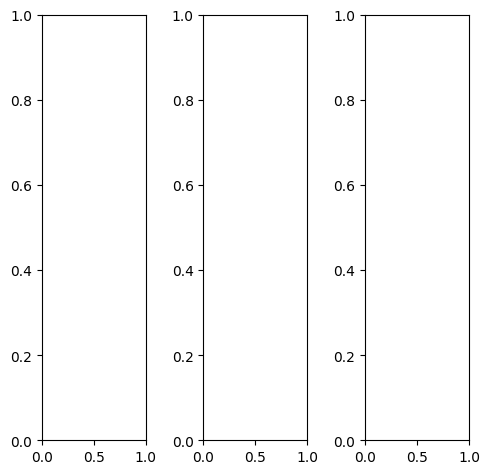

tensor([[[0.2784, 0.2745, 0.2824,  ..., 0.2863, 0.2941, 0.2902],
         [0.2667, 0.2588, 0.2627,  ..., 0.2902, 0.2902, 0.2902],
         [0.2863, 0.2745, 0.2706,  ..., 0.2863, 0.2902, 0.2902],
         ...,
         [0.2392, 0.2314, 0.2471,  ..., 0.1529, 0.1725, 0.1922],
         [0.2392, 0.2353, 0.2510,  ..., 0.1922, 0.1961, 0.1922],
         [0.2353, 0.2275, 0.2431,  ..., 0.2314, 0.2471, 0.2824]],

        [[0.2784, 0.2745, 0.2824,  ..., 0.2863, 0.2941, 0.2902],
         [0.2667, 0.2588, 0.2627,  ..., 0.2902, 0.2902, 0.2902],
         [0.2863, 0.2745, 0.2706,  ..., 0.2863, 0.2902, 0.2902],
         ...,
         [0.2392, 0.2314, 0.2471,  ..., 0.1529, 0.1725, 0.1922],
         [0.2392, 0.2353, 0.2510,  ..., 0.1922, 0.1961, 0.1922],
         [0.2353, 0.2275, 0.2431,  ..., 0.2314, 0.2471, 0.2824]],

        [[0.2784, 0.2745, 0.2824,  ..., 0.2863, 0.2941, 0.2902],
         [0.2667, 0.2588, 0.2627,  ..., 0.2902, 0.2902, 0.2902],
         [0.2863, 0.2745, 0.2706,  ..., 0.2863, 0.2902, 0.

tensor([[[0.1843, 0.1804, 0.1843,  ..., 0.2000, 0.2078, 0.2000],
         [0.1686, 0.1647, 0.1686,  ..., 0.2039, 0.2039, 0.2039],
         [0.1882, 0.1804, 0.1765,  ..., 0.2000, 0.2039, 0.2039],
         ...,
         [0.1451, 0.1412, 0.1843,  ..., 0.1529, 0.1725, 0.1922],
         [0.1451, 0.1451, 0.1882,  ..., 0.1843, 0.1882, 0.1843],
         [0.1412, 0.1373, 0.1804,  ..., 0.2118, 0.2275, 0.2627]],

        [[0.3059, 0.3020, 0.3098,  ..., 0.3098, 0.3176, 0.3137],
         [0.2941, 0.2863, 0.2902,  ..., 0.3137, 0.3137, 0.3137],
         [0.3137, 0.3020, 0.2980,  ..., 0.3098, 0.3137, 0.3137],
         ...,
         [0.2667, 0.2588, 0.2627,  ..., 0.1490, 0.1686, 0.1882],
         [0.2706, 0.2667, 0.2706,  ..., 0.1882, 0.1922, 0.1882],
         [0.2627, 0.2549, 0.2627,  ..., 0.2314, 0.2471, 0.2824]],

        [[0.3922, 0.3882, 0.3922,  ..., 0.4000, 0.4039, 0.4000],
         [0.3765, 0.3686, 0.3725,  ..., 0.4000, 0.4000, 0.4000],
         [0.3961, 0.3843, 0.3804,  ..., 0.3961, 0.4000, 0.

tensor([[[0.3476, 0.2438, 0.2074,  ..., 0.2786, 0.3090, 0.3723],
         [0.2332, 0.1097, 0.0897,  ..., 0.2409, 0.2277, 0.3087],
         [0.2515, 0.1526, 0.0814,  ..., 0.2215, 0.2417, 0.2981],
         ...,
         [0.2866, 0.2794, 0.2580,  ..., 0.1421, 0.1704, 0.2332],
         [0.2877, 0.2718, 0.2664,  ..., 0.1796, 0.1895, 0.2305],
         [0.3277, 0.2978, 0.2886,  ..., 0.2836, 0.3194, 0.4020]],

        [[0.3847, 0.4413, 0.2904,  ..., 0.3936, 0.4271, 0.4254],
         [0.3526, 0.2864, 0.1629,  ..., 0.3730, 0.3979, 0.3873],
         [0.3639, 0.3651, 0.1948,  ..., 0.3755, 0.3931, 0.3835],
         ...,
         [0.3073, 0.3164, 0.3361,  ..., 0.1694, 0.1932, 0.2327],
         [0.2993, 0.3138, 0.3247,  ..., 0.2116, 0.2174, 0.2308],
         [0.3184, 0.2968, 0.3214,  ..., 0.3013, 0.3330, 0.3780]],

        [[0.5462, 0.4149, 0.4506,  ..., 0.5115, 0.5669, 0.5652],
         [0.5097, 0.3832, 0.4163,  ..., 0.4954, 0.5369, 0.5518],
         [0.4839, 0.3835, 0.4279,  ..., 0.4491, 0.5080, 0.

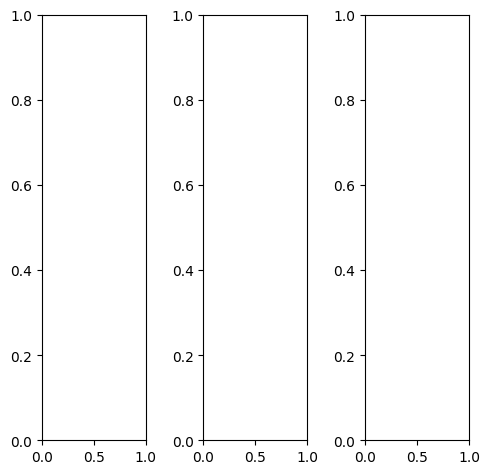

tensor([[[0.5059, 0.5098, 0.5020,  ..., 0.6275, 0.6000, 0.5529],
         [0.5098, 0.5137, 0.5098,  ..., 0.6118, 0.5922, 0.5569],
         [0.5020, 0.5059, 0.5020,  ..., 0.5843, 0.5725, 0.5490],
         ...,
         [0.4549, 0.4549, 0.4824,  ..., 0.5373, 0.5333, 0.5333],
         [0.4588, 0.4667, 0.4863,  ..., 0.5294, 0.5255, 0.5412],
         [0.4549, 0.4627, 0.4863,  ..., 0.5176, 0.5137, 0.5373]],

        [[0.5059, 0.5098, 0.5020,  ..., 0.6275, 0.6000, 0.5529],
         [0.5098, 0.5137, 0.5098,  ..., 0.6118, 0.5922, 0.5569],
         [0.5020, 0.5059, 0.5020,  ..., 0.5843, 0.5725, 0.5490],
         ...,
         [0.4549, 0.4549, 0.4824,  ..., 0.5373, 0.5333, 0.5333],
         [0.4588, 0.4667, 0.4863,  ..., 0.5294, 0.5255, 0.5412],
         [0.4549, 0.4627, 0.4863,  ..., 0.5176, 0.5137, 0.5373]],

        [[0.5059, 0.5098, 0.5020,  ..., 0.6275, 0.6000, 0.5529],
         [0.5098, 0.5137, 0.5098,  ..., 0.6118, 0.5922, 0.5569],
         [0.5020, 0.5059, 0.5020,  ..., 0.5843, 0.5725, 0.

tensor([[[0.5647, 0.5490, 0.5255,  ..., 0.6902, 0.6549, 0.6039],
         [0.5725, 0.5608, 0.5333,  ..., 0.6706, 0.6471, 0.6039],
         [0.5608, 0.5529, 0.5294,  ..., 0.6431, 0.6235, 0.5961],
         ...,
         [0.4588, 0.4549, 0.4784,  ..., 0.5529, 0.5608, 0.5647],
         [0.4627, 0.4667, 0.4824,  ..., 0.5490, 0.5490, 0.5765],
         [0.4627, 0.4784, 0.4941,  ..., 0.5412, 0.5451, 0.5686]],

        [[0.5216, 0.5412, 0.5373,  ..., 0.6471, 0.6235, 0.5804],
         [0.5294, 0.5373, 0.5451,  ..., 0.6314, 0.6196, 0.5843],
         [0.5216, 0.5255, 0.5333,  ..., 0.6078, 0.6000, 0.5804],
         ...,
         [0.4980, 0.5020, 0.5294,  ..., 0.5804, 0.5686, 0.5686],
         [0.5059, 0.5137, 0.5373,  ..., 0.5725, 0.5608, 0.5765],
         [0.4980, 0.5059, 0.5333,  ..., 0.5569, 0.5451, 0.5725]],

        [[0.2549, 0.2510, 0.2667,  ..., 0.3686, 0.3451, 0.2941],
         [0.2588, 0.2627, 0.2784,  ..., 0.3412, 0.3216, 0.2863],
         [0.2588, 0.2706, 0.2824,  ..., 0.3137, 0.3020, 0.

tensor([[[0.2276, 0.1549, 0.0580,  ..., 0.4593, 0.4149, 0.2427],
         [0.2474, 0.1032, 0.0974,  ..., 0.3952, 0.3290, 0.1758],
         [0.1477, 0.1440, 0.0041,  ..., 0.4426, 0.3370, 0.2056],
         ...,
         [0.3048, 0.3831, 0.4715,  ..., 0.4132, 0.3929, 0.3123],
         [0.2981, 0.3361, 0.4142,  ..., 0.3723, 0.3617, 0.3285],
         [0.2470, 0.1818, 0.2370,  ..., 0.2836, 0.2619, 0.2904]],

        [[0.3222, 0.3749, 0.2827,  ..., 0.5773, 0.5487, 0.2919],
         [0.2695, 0.3274, 0.1651,  ..., 0.5571, 0.5520, 0.2766],
         [0.2565, 0.4229, 0.1930,  ..., 0.5228, 0.4830, 0.2529],
         ...,
         [0.2528, 0.3778, 0.4863,  ..., 0.4580, 0.4700, 0.2792],
         [0.2561, 0.3535, 0.4106,  ..., 0.4669, 0.4423, 0.3425],
         [0.2117, 0.1896, 0.2335,  ..., 0.2778, 0.2944, 0.2524]],

        [[0.5373, 0.2649, 0.3904,  ..., 0.7745, 0.7104, 0.4839],
         [0.5043, 0.4210, 0.4088,  ..., 0.6920, 0.7019, 0.4498],
         [0.4509, 0.3864, 0.4345,  ..., 0.7191, 0.6679, 0.

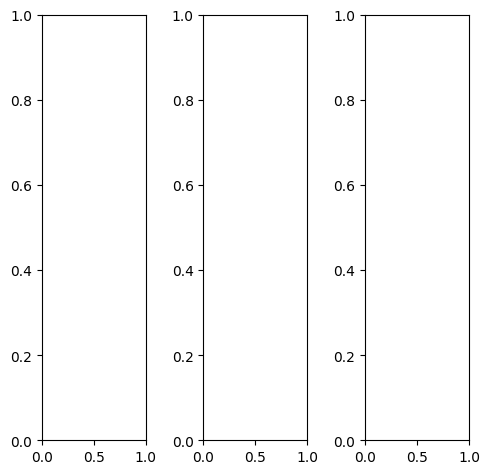

EPOCH: 9.765  trn_loss: 0.005  (1146.50s - 10594.07s remaining)

tensor([[[0.6941, 0.7333, 0.7686,  ..., 0.7412, 0.7137, 0.6902],
         [0.7333, 0.7765, 0.8000,  ..., 0.7686, 0.7412, 0.7176],
         [0.7490, 0.7804, 0.7961,  ..., 0.7843, 0.7647, 0.7451],
         ...,
         [0.8627, 0.8863, 0.9176,  ..., 0.0392, 0.0510, 0.0627],
         [0.8627, 0.8824, 0.9098,  ..., 0.0510, 0.0431, 0.0549],
         [0.8627, 0.8824, 0.9020,  ..., 0.1490, 0.1569, 0.1569]],

        [[0.6941, 0.7333, 0.7686,  ..., 0.7412, 0.7137, 0.6902],
         [0.7333, 0.7765, 0.8000,  ..., 0.7686, 0.7412, 0.7176],
         [0.7490, 0.7804, 0.7961,  ..., 0.7843, 0.7647, 0.7451],
         ...,
         [0.8627, 0.8863, 0.9176,  ..., 0.0392, 0.0510, 0.0627],
         [0.8627, 0.8824, 0.9098,  ..., 0.0510, 0.0431, 0.0549],
         [0.8627, 0.8824, 0.9020,  ..., 0.1490, 0.1569, 0.1569]],

        [[0.6941, 0.7333, 0.7686,  ..., 0.7412, 0.7137, 0.6902],
         [0.7333, 0.7765, 0.8000,  ..., 0.7686, 0.7412, 0.7176],
         [0.7490, 0.7804, 0.7961,  ..., 0.7843, 0.7647, 0.

tensor([[[0.6353, 0.6863, 0.7294,  ..., 0.6902, 0.6588, 0.6314],
         [0.6745, 0.7294, 0.7569,  ..., 0.7216, 0.6863, 0.6627],
         [0.6941, 0.7294, 0.7569,  ..., 0.7412, 0.7176, 0.6941],
         ...,
         [0.8314, 0.8627, 0.9059,  ..., 0.0275, 0.0353, 0.0471],
         [0.8275, 0.8549, 0.8902,  ..., 0.0353, 0.0314, 0.0392],
         [0.8235, 0.8510, 0.8784,  ..., 0.1333, 0.1451, 0.1412]],

        [[0.6941, 0.7333, 0.7647,  ..., 0.7412, 0.7137, 0.6902],
         [0.7333, 0.7765, 0.7961,  ..., 0.7686, 0.7412, 0.7176],
         [0.7529, 0.7804, 0.7961,  ..., 0.7804, 0.7647, 0.7412],
         ...,
         [0.8667, 0.8863, 0.9176,  ..., 0.0431, 0.0549, 0.0667],
         [0.8667, 0.8863, 0.9098,  ..., 0.0549, 0.0471, 0.0588],
         [0.8667, 0.8824, 0.9020,  ..., 0.1529, 0.1608, 0.1608]],

        [[0.8431, 0.8706, 0.8980,  ..., 0.8745, 0.8706, 0.8588],
         [0.8745, 0.9098, 0.9216,  ..., 0.8941, 0.8902, 0.8784],
         [0.8863, 0.9059, 0.9137,  ..., 0.9059, 0.9020, 0.

tensor([[[0.4226, 0.3620, 0.3263,  ..., 0.4138, 0.4256, 0.4864],
         [0.4199, 0.3234, 0.3444,  ..., 0.4095, 0.4130, 0.4768],
         [0.3339, 0.3231, 0.2053,  ..., 0.4077, 0.4353, 0.4900],
         ...,
         [0.6114, 0.5790, 0.5778,  ..., 0.0843, 0.1138, 0.1445],
         [0.6143, 0.5961, 0.5663,  ..., 0.1041, 0.1214, 0.1535],
         [0.6596, 0.6679, 0.6446,  ..., 0.1947, 0.2264, 0.2061]],

        [[0.5349, 0.4515, 0.4922,  ..., 0.4917, 0.5193, 0.5031],
         [0.4104, 0.4148, 0.3423,  ..., 0.5477, 0.5550, 0.5292],
         [0.5077, 0.4116, 0.4489,  ..., 0.5341, 0.5634, 0.5506],
         ...,
         [0.5540, 0.5497, 0.5716,  ..., 0.1202, 0.1097, 0.1073],
         [0.5708, 0.5474, 0.5683,  ..., 0.1173, 0.0928, 0.0987],
         [0.5979, 0.6266, 0.6288,  ..., 0.1645, 0.1742, 0.1589]],

        [[0.6514, 0.5435, 0.6733,  ..., 0.6624, 0.6734, 0.6507],
         [0.6212, 0.6564, 0.6439,  ..., 0.6867, 0.6943, 0.6813],
         [0.5656, 0.5614, 0.6021,  ..., 0.7062, 0.7089, 0.

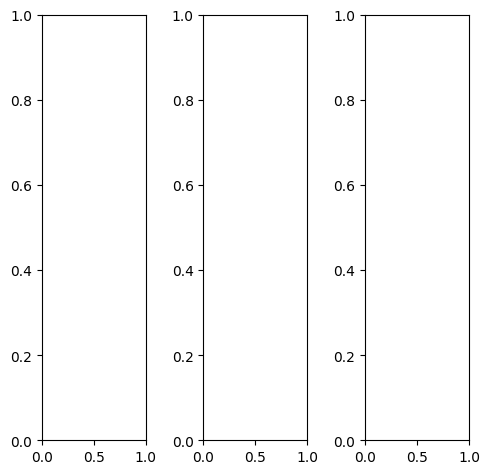

tensor([[[0.6157, 0.6196, 0.6471,  ..., 0.6588, 0.6588, 0.6627],
         [0.3922, 0.4314, 0.4980,  ..., 0.6588, 0.6510, 0.6471],
         [0.2627, 0.3294, 0.3412,  ..., 0.6588, 0.6471, 0.6510],
         ...,
         [0.4431, 0.4392, 0.4353,  ..., 0.4706, 0.4667, 0.4667],
         [0.4353, 0.4353, 0.4353,  ..., 0.4627, 0.4549, 0.4627],
         [0.4314, 0.4275, 0.4235,  ..., 0.4667, 0.4549, 0.4667]],

        [[0.6157, 0.6196, 0.6471,  ..., 0.6588, 0.6588, 0.6627],
         [0.3922, 0.4314, 0.4980,  ..., 0.6588, 0.6510, 0.6471],
         [0.2627, 0.3294, 0.3412,  ..., 0.6588, 0.6471, 0.6510],
         ...,
         [0.4431, 0.4392, 0.4353,  ..., 0.4706, 0.4667, 0.4667],
         [0.4353, 0.4353, 0.4353,  ..., 0.4627, 0.4549, 0.4627],
         [0.4314, 0.4275, 0.4235,  ..., 0.4667, 0.4549, 0.4667]],

        [[0.6157, 0.6196, 0.6471,  ..., 0.6588, 0.6588, 0.6627],
         [0.3922, 0.4314, 0.4980,  ..., 0.6588, 0.6510, 0.6471],
         [0.2627, 0.3294, 0.3412,  ..., 0.6588, 0.6471, 0.

tensor([[[0.6078, 0.6078, 0.6353,  ..., 0.6392, 0.6353, 0.6353],
         [0.4000, 0.4392, 0.5059,  ..., 0.6392, 0.6314, 0.6314],
         [0.2980, 0.3647, 0.3804,  ..., 0.6431, 0.6353, 0.6392],
         ...,
         [0.4275, 0.4235, 0.4157,  ..., 0.4549, 0.4431, 0.4431],
         [0.4196, 0.4235, 0.4196,  ..., 0.4471, 0.4314, 0.4353],
         [0.4157, 0.4118, 0.4078,  ..., 0.4510, 0.4314, 0.4431]],

        [[0.6235, 0.6275, 0.6549,  ..., 0.6667, 0.6667, 0.6706],
         [0.3922, 0.4314, 0.4980,  ..., 0.6627, 0.6549, 0.6510],
         [0.2510, 0.3176, 0.3294,  ..., 0.6627, 0.6510, 0.6549],
         ...,
         [0.4510, 0.4471, 0.4431,  ..., 0.4784, 0.4784, 0.4784],
         [0.4431, 0.4431, 0.4431,  ..., 0.4706, 0.4667, 0.4745],
         [0.4392, 0.4353, 0.4314,  ..., 0.4745, 0.4667, 0.4784]],

        [[0.6078, 0.6078, 0.6392,  ..., 0.6784, 0.6784, 0.6824],
         [0.3725, 0.4118, 0.4745,  ..., 0.6745, 0.6667, 0.6627],
         [0.2275, 0.2941, 0.3020,  ..., 0.6667, 0.6549, 0.

tensor([[[0.7221, 0.7031, 0.7511,  ..., 0.7649, 0.7453, 0.7870],
         [0.4114, 0.3734, 0.4510,  ..., 0.7904, 0.7983, 0.7877],
         [0.1583, 0.3036, 0.1861,  ..., 0.8346, 0.8362, 0.8342],
         ...,
         [0.5587, 0.5830, 0.5377,  ..., 0.6423, 0.6248, 0.6396],
         [0.5489, 0.5508, 0.5317,  ..., 0.6182, 0.6057, 0.6289],
         [0.5739, 0.5579, 0.5295,  ..., 0.6484, 0.6322, 0.6329]],

        [[0.7439, 0.8149, 0.7501,  ..., 0.7953, 0.8074, 0.8447],
         [0.4536, 0.5088, 0.5094,  ..., 0.8240, 0.8239, 0.8614],
         [0.2970, 0.4025, 0.3167,  ..., 0.8410, 0.8417, 0.8762],
         ...,
         [0.5439, 0.5498, 0.5519,  ..., 0.6093, 0.6130, 0.6033],
         [0.5331, 0.5178, 0.5451,  ..., 0.6068, 0.5922, 0.5963],
         [0.5401, 0.5287, 0.5225,  ..., 0.6075, 0.5983, 0.5982]],

        [[0.8437, 0.8529, 0.8796,  ..., 0.9518, 0.9600, 0.9608],
         [0.6091, 0.6203, 0.6739,  ..., 0.9537, 0.9890, 0.9530],
         [0.3928, 0.4036, 0.4197,  ..., 1.0185, 1.0060, 0.

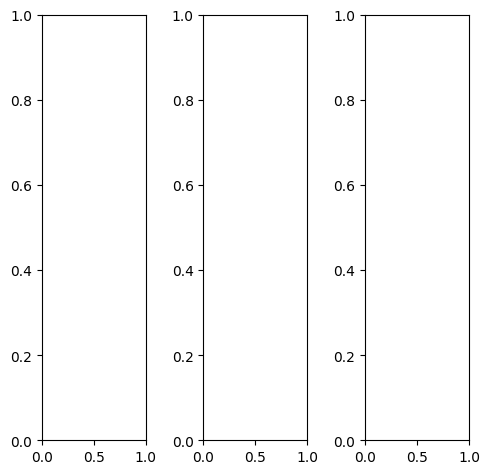

tensor([[[0.6275, 0.6118, 0.6039,  ..., 0.3059, 0.2667, 0.4824],
         [0.6863, 0.7137, 0.6745,  ..., 0.3412, 0.3255, 0.4431],
         [0.6667, 0.6745, 0.6784,  ..., 0.3922, 0.4275, 0.3961],
         ...,
         [0.4784, 0.3686, 0.3804,  ..., 0.2941, 0.2275, 0.2588],
         [0.5882, 0.4039, 0.3608,  ..., 0.4980, 0.3294, 0.2706],
         [0.2980, 0.3059, 0.3843,  ..., 0.4078, 0.3098, 0.2980]],

        [[0.6275, 0.6118, 0.6039,  ..., 0.3059, 0.2667, 0.4824],
         [0.6863, 0.7137, 0.6745,  ..., 0.3412, 0.3255, 0.4431],
         [0.6667, 0.6745, 0.6784,  ..., 0.3922, 0.4275, 0.3961],
         ...,
         [0.4784, 0.3686, 0.3804,  ..., 0.2941, 0.2275, 0.2588],
         [0.5882, 0.4039, 0.3608,  ..., 0.4980, 0.3294, 0.2706],
         [0.2980, 0.3059, 0.3843,  ..., 0.4078, 0.3098, 0.2980]],

        [[0.6275, 0.6118, 0.6039,  ..., 0.3059, 0.2667, 0.4824],
         [0.6863, 0.7137, 0.6745,  ..., 0.3412, 0.3255, 0.4431],
         [0.6667, 0.6745, 0.6784,  ..., 0.3922, 0.4275, 0.

tensor([[[0.7216, 0.7020, 0.6980,  ..., 0.3765, 0.3333, 0.5490],
         [0.7882, 0.8157, 0.7765,  ..., 0.4000, 0.3843, 0.5020],
         [0.7647, 0.7725, 0.7765,  ..., 0.4471, 0.4824, 0.4510],
         ...,
         [0.5451, 0.4353, 0.4471,  ..., 0.3686, 0.2824, 0.2941],
         [0.6667, 0.4667, 0.4157,  ..., 0.6039, 0.4118, 0.3255],
         [0.3686, 0.3725, 0.4510,  ..., 0.5059, 0.3922, 0.3608]],

        [[0.6000, 0.5843, 0.5765,  ..., 0.2863, 0.2471, 0.4627],
         [0.6588, 0.6824, 0.6392,  ..., 0.3255, 0.3059, 0.4235],
         [0.6392, 0.6471, 0.6471,  ..., 0.3804, 0.4118, 0.3804],
         ...,
         [0.4588, 0.3490, 0.3569,  ..., 0.2706, 0.2078, 0.2471],
         [0.5686, 0.3843, 0.3412,  ..., 0.4667, 0.3059, 0.2549],
         [0.2784, 0.2863, 0.3608,  ..., 0.3765, 0.2824, 0.2784]],

        [[0.5098, 0.5059, 0.5098,  ..., 0.2078, 0.1961, 0.4118],
         [0.5686, 0.6078, 0.5765,  ..., 0.2510, 0.2588, 0.3765],
         [0.5490, 0.5725, 0.5804,  ..., 0.3137, 0.3725, 0.

tensor([[[0.7612, 0.7524, 0.7419,  ..., 0.0765, 0.0680, 0.3160],
         [0.8526, 0.9017, 0.8735,  ..., 0.1213, 0.1145, 0.2802],
         [0.8346, 0.9675, 0.9113,  ..., 0.2158, 0.3123, 0.2341],
         ...,
         [0.4116, 0.3112, 0.3473,  ..., 0.1731, 0.0451, 0.0710],
         [0.5362, 0.3338, 0.3330,  ..., 0.4294, 0.2035, 0.0962],
         [0.2348, 0.1751, 0.2444,  ..., 0.2818, 0.1546, 0.1350]],

        [[0.8314, 0.7858, 0.8019,  ..., 0.1523, 0.1520, 0.3670],
         [0.8378, 0.9763, 0.8522,  ..., 0.2371, 0.2528, 0.3626],
         [0.9191, 0.9674, 0.9852,  ..., 0.3566, 0.4466, 0.2943],
         ...,
         [0.4126, 0.3371, 0.3835,  ..., 0.1916, 0.0445, 0.0445],
         [0.5547, 0.3605, 0.3448,  ..., 0.4528, 0.2141, 0.0820],
         [0.2080, 0.1637, 0.2464,  ..., 0.2859, 0.1609, 0.1062]],

        [[0.8507, 0.8631, 0.8880,  ..., 0.2813, 0.2859, 0.4937],
         [0.9667, 1.0580, 1.0228,  ..., 0.3734, 0.3800, 0.4956],
         [0.9635, 1.0748, 1.1069,  ..., 0.4946, 0.5544, 0.

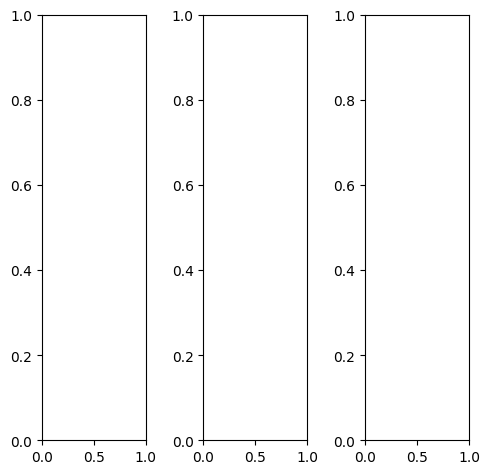

tensor([[[0.2941, 0.2784, 0.2784,  ..., 0.2824, 0.2824, 0.2980],
         [0.2902, 0.2980, 0.3059,  ..., 0.4510, 0.3765, 0.3176],
         [0.2941, 0.2941, 0.3059,  ..., 0.5843, 0.4706, 0.3529],
         ...,
         [0.4392, 0.3176, 0.3255,  ..., 0.6157, 0.6078, 0.6039],
         [0.4078, 0.2863, 0.2863,  ..., 0.6196, 0.6000, 0.5922],
         [0.4784, 0.5137, 0.4353,  ..., 0.6000, 0.5765, 0.5725]],

        [[0.2941, 0.2784, 0.2784,  ..., 0.2824, 0.2824, 0.2980],
         [0.2902, 0.2980, 0.3059,  ..., 0.4510, 0.3765, 0.3176],
         [0.2941, 0.2941, 0.3059,  ..., 0.5843, 0.4706, 0.3529],
         ...,
         [0.4392, 0.3176, 0.3255,  ..., 0.6157, 0.6078, 0.6039],
         [0.4078, 0.2863, 0.2863,  ..., 0.6196, 0.6000, 0.5922],
         [0.4784, 0.5137, 0.4353,  ..., 0.6000, 0.5765, 0.5725]],

        [[0.2941, 0.2784, 0.2784,  ..., 0.2824, 0.2824, 0.2980],
         [0.2902, 0.2980, 0.3059,  ..., 0.4510, 0.3765, 0.3176],
         [0.2941, 0.2941, 0.3059,  ..., 0.5843, 0.4706, 0.

tensor([[[0.2549, 0.2392, 0.2392,  ..., 0.2314, 0.2353, 0.2471],
         [0.2510, 0.2588, 0.2667,  ..., 0.4000, 0.3255, 0.2667],
         [0.2549, 0.2549, 0.2667,  ..., 0.5333, 0.4196, 0.3020],
         ...,
         [0.4118, 0.2902, 0.2980,  ..., 0.5137, 0.5020, 0.5020],
         [0.3765, 0.2510, 0.2471,  ..., 0.5137, 0.4941, 0.4863],
         [0.4431, 0.4745, 0.3882,  ..., 0.4941, 0.4745, 0.4667]],

        [[0.2667, 0.2510, 0.2510,  ..., 0.2588, 0.2549, 0.2667],
         [0.2588, 0.2667, 0.2745,  ..., 0.4314, 0.3529, 0.2902],
         [0.2627, 0.2627, 0.2745,  ..., 0.5686, 0.4510, 0.3255],
         ...,
         [0.3961, 0.2902, 0.2980,  ..., 0.6000, 0.5882, 0.5843],
         [0.3686, 0.2510, 0.2549,  ..., 0.6039, 0.5804, 0.5686],
         [0.4392, 0.4745, 0.4000,  ..., 0.5804, 0.5569, 0.5490]],

        [[0.5451, 0.5294, 0.5294,  ..., 0.5451, 0.5608, 0.5882],
         [0.5529, 0.5569, 0.5647,  ..., 0.6941, 0.6353, 0.6039],
         [0.5608, 0.5569, 0.5686,  ..., 0.7961, 0.6980, 0.

tensor([[[ 0.1745,  0.1664,  0.0303,  ...,  0.1447,  0.1227,  0.1991],
         [ 0.2026,  0.0781,  0.0542,  ...,  0.3775,  0.2853,  0.1891],
         [ 0.0565,  0.0381, -0.0958,  ...,  0.6035,  0.4455,  0.2244],
         ...,
         [ 0.4821,  0.2740,  0.2410,  ...,  0.8249,  0.8297,  0.7819],
         [ 0.4139,  0.1666,  0.1080,  ...,  0.7853,  0.7744,  0.7550],
         [ 0.5472,  0.5679,  0.3767,  ...,  0.7528,  0.7270,  0.7140]],

        [[ 0.2815,  0.2658,  0.1161,  ...,  0.2021,  0.2319,  0.2496],
         [ 0.2348,  0.1896, -0.0111,  ...,  0.5116,  0.4097,  0.2333],
         [ 0.1723,  0.1776, -0.0279,  ...,  0.7367,  0.5734,  0.2732],
         ...,
         [ 0.5063,  0.3010,  0.3092,  ...,  0.8136,  0.8111,  0.8110],
         [ 0.4464,  0.2091,  0.2058,  ...,  0.7960,  0.7646,  0.7707],
         [ 0.5629,  0.5782,  0.4294,  ...,  0.7393,  0.7230,  0.7112]],

        [[ 0.3898,  0.1879,  0.3018,  ...,  0.3904,  0.3855,  0.4200],
         [ 0.3705,  0.2652,  0.2741,  ...,  0

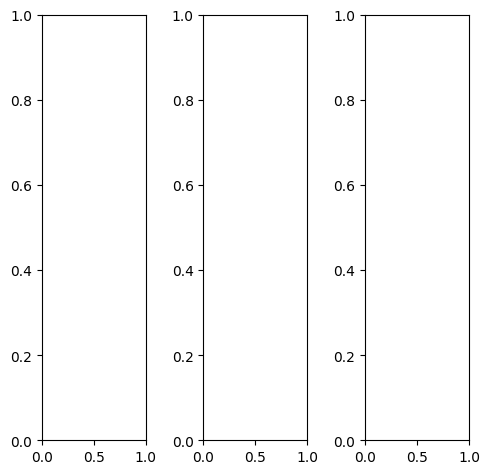

tensor([[[0.6588, 0.6549, 0.6549,  ..., 0.4667, 0.4588, 0.4471],
         [0.6784, 0.6745, 0.6745,  ..., 0.4863, 0.4784, 0.4667],
         [0.6863, 0.6824, 0.6824,  ..., 0.4941, 0.4863, 0.4745],
         ...,
         [0.5922, 0.6039, 0.6157,  ..., 0.6353, 0.6118, 0.5843],
         [0.6000, 0.5765, 0.5725,  ..., 0.6471, 0.6392, 0.6314],
         [0.6392, 0.6275, 0.6157,  ..., 0.6431, 0.6314, 0.6235]],

        [[0.6588, 0.6549, 0.6549,  ..., 0.4667, 0.4588, 0.4471],
         [0.6784, 0.6745, 0.6745,  ..., 0.4863, 0.4784, 0.4667],
         [0.6863, 0.6824, 0.6824,  ..., 0.4941, 0.4863, 0.4745],
         ...,
         [0.5922, 0.6039, 0.6157,  ..., 0.6353, 0.6118, 0.5843],
         [0.6000, 0.5765, 0.5725,  ..., 0.6471, 0.6392, 0.6314],
         [0.6392, 0.6275, 0.6157,  ..., 0.6431, 0.6314, 0.6235]],

        [[0.6588, 0.6549, 0.6549,  ..., 0.4667, 0.4588, 0.4471],
         [0.6784, 0.6745, 0.6745,  ..., 0.4863, 0.4784, 0.4667],
         [0.6863, 0.6824, 0.6824,  ..., 0.4941, 0.4863, 0.

tensor([[[0.4980, 0.4941, 0.4941,  ..., 0.3176, 0.3098, 0.3020],
         [0.5176, 0.5137, 0.5137,  ..., 0.3373, 0.3294, 0.3176],
         [0.5255, 0.5216, 0.5216,  ..., 0.3451, 0.3373, 0.3255],
         ...,
         [0.5922, 0.6039, 0.6157,  ..., 0.6353, 0.6118, 0.5804],
         [0.6000, 0.5765, 0.5725,  ..., 0.6471, 0.6392, 0.6314],
         [0.6392, 0.6275, 0.6157,  ..., 0.6431, 0.6314, 0.6235]],

        [[0.6863, 0.6824, 0.6824,  ..., 0.4902, 0.4824, 0.4706],
         [0.7098, 0.7059, 0.7059,  ..., 0.5098, 0.5020, 0.4902],
         [0.7176, 0.7137, 0.7137,  ..., 0.5176, 0.5098, 0.5020],
         ...,
         [0.5922, 0.6039, 0.6157,  ..., 0.6353, 0.6078, 0.5804],
         [0.6000, 0.5765, 0.5725,  ..., 0.6471, 0.6353, 0.6314],
         [0.6392, 0.6275, 0.6157,  ..., 0.6392, 0.6314, 0.6196]],

        [[0.9255, 0.9216, 0.9216,  ..., 0.7333, 0.7255, 0.7176],
         [0.9490, 0.9412, 0.9412,  ..., 0.7529, 0.7412, 0.7373],
         [0.9490, 0.9412, 0.9412,  ..., 0.7569, 0.7451, 0.

tensor([[[0.5135, 0.4490, 0.4252,  ..., 0.3088, 0.3212, 0.3463],
         [0.4801, 0.3805, 0.4347,  ..., 0.3529, 0.3399, 0.3498],
         [0.4348, 0.4589, 0.3586,  ..., 0.3470, 0.3681, 0.3659],
         ...,
         [0.4429, 0.5152, 0.4722,  ..., 0.5458, 0.5510, 0.5573],
         [0.4732, 0.4692, 0.4466,  ..., 0.5632, 0.5649, 0.6179],
         [0.5555, 0.5396, 0.5060,  ..., 0.5417, 0.5540, 0.5634]],

        [[0.6005, 0.5364, 0.5414,  ..., 0.3890, 0.4103, 0.3897],
         [0.4804, 0.4643, 0.4369,  ..., 0.4464, 0.4607, 0.3987],
         [0.5659, 0.5414, 0.5240,  ..., 0.4586, 0.4684, 0.4039],
         ...,
         [0.4244, 0.4592, 0.4900,  ..., 0.5706, 0.5898, 0.5023],
         [0.4506, 0.4414, 0.4616,  ..., 0.5635, 0.5877, 0.5897],
         [0.5181, 0.5173, 0.4994,  ..., 0.5129, 0.5423, 0.5303]],

        [[0.7083, 0.6091, 0.7011,  ..., 0.4855, 0.5073, 0.4995],
         [0.6696, 0.6839, 0.6502,  ..., 0.5326, 0.5397, 0.5106],
         [0.6433, 0.6050, 0.6572,  ..., 0.5341, 0.5443, 0.

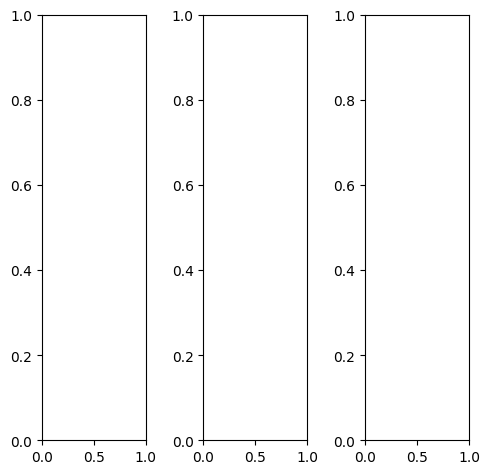

EPOCH: 10.000  val_loss: 0.006  trn_loss: 0.005  (1180.34s - 10623.07s remaining)


tensor([[[0.5843, 0.5216, 0.4275,  ..., 0.3529, 0.3255, 0.3529],
         [0.8157, 0.7529, 0.6392,  ..., 0.5059, 0.5020, 0.4235],
         [0.8588, 0.8314, 0.7569,  ..., 0.5725, 0.5569, 0.4392],
         ...,
         [0.7922, 0.7451, 0.6706,  ..., 0.6235, 0.6235, 0.6118],
         [0.8039, 0.7765, 0.7451,  ..., 0.6000, 0.6078, 0.5882],
         [0.8510, 0.8000, 0.7569,  ..., 0.5294, 0.5804, 0.6157]],

        [[0.5843, 0.5216, 0.4275,  ..., 0.3529, 0.3255, 0.3529],
         [0.8157, 0.7529, 0.6392,  ..., 0.5059, 0.5020, 0.4235],
         [0.8588, 0.8314, 0.7569,  ..., 0.5725, 0.5569, 0.4392],
         ...,
         [0.7922, 0.7451, 0.6706,  ..., 0.6235, 0.6235, 0.6118],
         [0.8039, 0.7765, 0.7451,  ..., 0.6000, 0.6078, 0.5882],
         [0.8510, 0.8000, 0.7569,  ..., 0.5294, 0.5804, 0.6157]],

        [[0.5843, 0.5216, 0.4275,  ..., 0.3529, 0.3255, 0.3529],
         [0.8157, 0.7529, 0.6392,  ..., 0.5059, 0.5020, 0.4235],
         [0.8588, 0.8314, 0.7569,  ..., 0.5725, 0.5569, 0.

tensor([[[0.6745, 0.6235, 0.5451,  ..., 0.3608, 0.3529, 0.3843],
         [0.8784, 0.8235, 0.7373,  ..., 0.5020, 0.5098, 0.4392],
         [0.9216, 0.8980, 0.8392,  ..., 0.5647, 0.5569, 0.4510],
         ...,
         [0.7255, 0.6588, 0.6118,  ..., 0.7137, 0.7098, 0.6980],
         [0.7529, 0.7059, 0.6745,  ..., 0.6980, 0.6902, 0.6706],
         [0.8118, 0.7490, 0.6902,  ..., 0.6196, 0.6667, 0.6941]],

        [[0.5569, 0.4980, 0.4039,  ..., 0.3608, 0.3255, 0.3490],
         [0.7961, 0.7333, 0.6157,  ..., 0.5137, 0.5059, 0.4196],
         [0.8392, 0.8118, 0.7333,  ..., 0.5882, 0.5647, 0.4392],
         ...,
         [0.8902, 0.8588, 0.7686,  ..., 0.6078, 0.6118, 0.6000],
         [0.8980, 0.8745, 0.8431,  ..., 0.5804, 0.5922, 0.5765],
         [0.9255, 0.8902, 0.8588,  ..., 0.5098, 0.5608, 0.6039]],

        [[0.4863, 0.3882, 0.2314,  ..., 0.2824, 0.2706, 0.2902],
         [0.7529, 0.6784, 0.5098,  ..., 0.4588, 0.4627, 0.3922],
         [0.7882, 0.7529, 0.6471,  ..., 0.5176, 0.5098, 0.

tensor([[[0.5978, 0.5554, 0.4571,  ..., 0.3613, 0.3279, 0.3674],
         [0.8289, 0.7754, 0.6809,  ..., 0.5259, 0.5288, 0.4315],
         [0.8637, 0.8699, 0.7848,  ..., 0.5854, 0.5785, 0.4444],
         ...,
         [0.8263, 0.7956, 0.7225,  ..., 0.6604, 0.6575, 0.6472],
         [0.8282, 0.8298, 0.7767,  ..., 0.6153, 0.6310, 0.6153],
         [0.8292, 0.8266, 0.7830,  ..., 0.5396, 0.6042, 0.6292]],

        [[0.5901, 0.5605, 0.4496,  ..., 0.3626, 0.3334, 0.3668],
         [0.8179, 0.7585, 0.6433,  ..., 0.5253, 0.5349, 0.4300],
         [0.8535, 0.8474, 0.7512,  ..., 0.5758, 0.5728, 0.4396],
         ...,
         [0.7949, 0.7634, 0.6780,  ..., 0.6344, 0.6336, 0.6233],
         [0.8109, 0.7933, 0.7534,  ..., 0.6057, 0.6137, 0.6015],
         [0.8036, 0.7949, 0.7568,  ..., 0.5183, 0.5834, 0.6180]],

        [[0.5317, 0.4809, 0.3755,  ..., 0.2633, 0.2555, 0.3032],
         [0.7452, 0.6838, 0.5620,  ..., 0.3964, 0.4123, 0.3400],
         [0.7765, 0.7654, 0.6748,  ..., 0.4518, 0.4518, 0.

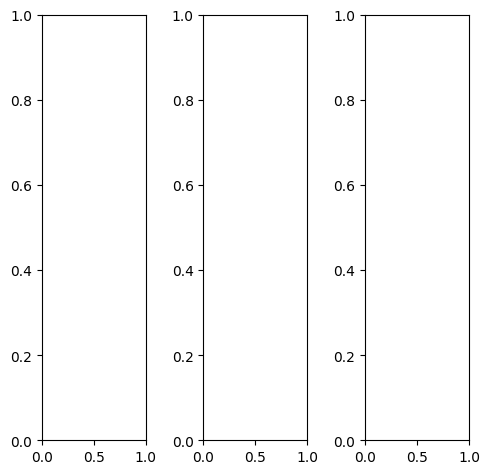

tensor([[[0.5608, 0.5765, 0.6118,  ..., 0.8824, 0.8706, 0.8549],
         [0.5255, 0.5294, 0.5647,  ..., 0.8784, 0.8667, 0.8353],
         [0.4941, 0.5020, 0.4706,  ..., 0.8627, 0.8235, 0.7804],
         ...,
         [0.6275, 0.6039, 0.6157,  ..., 0.3098, 0.3176, 0.3333],
         [0.6667, 0.6078, 0.5961,  ..., 0.3451, 0.3490, 0.3294],
         [0.6549, 0.5922, 0.5882,  ..., 0.3608, 0.3529, 0.3255]],

        [[0.5608, 0.5765, 0.6118,  ..., 0.8824, 0.8706, 0.8549],
         [0.5255, 0.5294, 0.5647,  ..., 0.8784, 0.8667, 0.8353],
         [0.4941, 0.5020, 0.4706,  ..., 0.8627, 0.8235, 0.7804],
         ...,
         [0.6275, 0.6039, 0.6157,  ..., 0.3098, 0.3176, 0.3333],
         [0.6667, 0.6078, 0.5961,  ..., 0.3451, 0.3490, 0.3294],
         [0.6549, 0.5922, 0.5882,  ..., 0.3608, 0.3529, 0.3255]],

        [[0.5608, 0.5765, 0.6118,  ..., 0.8824, 0.8706, 0.8549],
         [0.5255, 0.5294, 0.5647,  ..., 0.8784, 0.8667, 0.8353],
         [0.4941, 0.5020, 0.4706,  ..., 0.8627, 0.8235, 0.

tensor([[[0.6078, 0.6275, 0.6510,  ..., 0.8980, 0.8824, 0.8667],
         [0.5608, 0.5725, 0.5961,  ..., 0.8941, 0.8824, 0.8510],
         [0.5137, 0.5294, 0.4980,  ..., 0.8824, 0.8471, 0.8039],
         ...,
         [0.7608, 0.7373, 0.7333,  ..., 0.3882, 0.3961, 0.4118],
         [0.8000, 0.7451, 0.7216,  ..., 0.4353, 0.4392, 0.4157],
         [0.7882, 0.7294, 0.7137,  ..., 0.4549, 0.4510, 0.4235]],

        [[0.5922, 0.6039, 0.6431,  ..., 0.8941, 0.8863, 0.8745],
         [0.5725, 0.5725, 0.6078,  ..., 0.8941, 0.8863, 0.8588],
         [0.5490, 0.5569, 0.5176,  ..., 0.8824, 0.8431, 0.8039],
         ...,
         [0.6431, 0.6196, 0.6275,  ..., 0.3020, 0.3137, 0.3333],
         [0.6863, 0.6235, 0.6078,  ..., 0.3373, 0.3451, 0.3294],
         [0.6745, 0.6078, 0.6000,  ..., 0.3529, 0.3490, 0.3216]],

        [[0.2588, 0.2980, 0.3412,  ..., 0.7647, 0.7569, 0.7294],
         [0.1882, 0.2078, 0.2549,  ..., 0.7490, 0.7294, 0.6784],
         [0.1490, 0.1608, 0.1490,  ..., 0.7176, 0.6627, 0.

tensor([[[0.5731, 0.5934, 0.6197,  ..., 0.8784, 0.8695, 0.8470],
         [0.5345, 0.5478, 0.5805,  ..., 0.8808, 0.8743, 0.8381],
         [0.4921, 0.5238, 0.5033,  ..., 0.8654, 0.8397, 0.7986],
         ...,
         [0.6363, 0.6377, 0.6336,  ..., 0.3046, 0.3084, 0.3308],
         [0.6729, 0.6418, 0.6174,  ..., 0.3478, 0.3453, 0.3300],
         [0.6618, 0.6096, 0.5999,  ..., 0.3613, 0.3516, 0.3483]],

        [[0.5678, 0.5918, 0.6166,  ..., 0.8853, 0.8732, 0.8523],
         [0.5215, 0.5340, 0.5710,  ..., 0.8940, 0.8660, 0.8380],
         [0.4859, 0.5073, 0.4816,  ..., 0.8795, 0.8353, 0.8008],
         ...,
         [0.6213, 0.6212, 0.6180,  ..., 0.2947, 0.3028, 0.3325],
         [0.6654, 0.6208, 0.6023,  ..., 0.3318, 0.3388, 0.3315],
         [0.6381, 0.5997, 0.5875,  ..., 0.3539, 0.3491, 0.3425]],

        [[0.5256, 0.5416, 0.5711,  ..., 0.8580, 0.8435, 0.8204],
         [0.4690, 0.4766, 0.5076,  ..., 0.8603, 0.8420, 0.7934],
         [0.4240, 0.4500, 0.4209,  ..., 0.8427, 0.8019, 0.

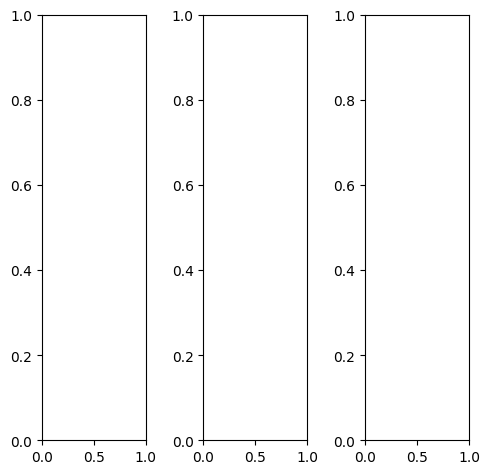

tensor([[[0.4078, 0.4078, 0.4000,  ..., 0.4157, 0.4118, 0.3765],
         [0.3176, 0.4353, 0.5843,  ..., 0.6667, 0.5569, 0.3725],
         [0.3255, 0.4588, 0.5725,  ..., 0.7059, 0.5725, 0.3961],
         ...,
         [0.3098, 0.2510, 0.3020,  ..., 0.3725, 0.4392, 0.3843],
         [0.3059, 0.2118, 0.2784,  ..., 0.3608, 0.4000, 0.3765],
         [0.3294, 0.3020, 0.3529,  ..., 0.4196, 0.4784, 0.4235]],

        [[0.4078, 0.4078, 0.4000,  ..., 0.4157, 0.4118, 0.3765],
         [0.3176, 0.4353, 0.5843,  ..., 0.6667, 0.5569, 0.3725],
         [0.3255, 0.4588, 0.5725,  ..., 0.7059, 0.5725, 0.3961],
         ...,
         [0.3098, 0.2510, 0.3020,  ..., 0.3725, 0.4392, 0.3843],
         [0.3059, 0.2118, 0.2784,  ..., 0.3608, 0.4000, 0.3765],
         [0.3294, 0.3020, 0.3529,  ..., 0.4196, 0.4784, 0.4235]],

        [[0.4078, 0.4078, 0.4000,  ..., 0.4157, 0.4118, 0.3765],
         [0.3176, 0.4353, 0.5843,  ..., 0.6667, 0.5569, 0.3725],
         [0.3255, 0.4588, 0.5725,  ..., 0.7059, 0.5725, 0.

tensor([[[0.6275, 0.5569, 0.5451,  ..., 0.5569, 0.5843, 0.5882],
         [0.5098, 0.5333, 0.6471,  ..., 0.6784, 0.6314, 0.5451],
         [0.5373, 0.5608, 0.6314,  ..., 0.7255, 0.6588, 0.5804],
         ...,
         [0.4980, 0.3451, 0.3373,  ..., 0.3686, 0.5098, 0.5843],
         [0.4902, 0.3216, 0.3373,  ..., 0.3922, 0.4902, 0.5569],
         [0.5412, 0.4745, 0.4902,  ..., 0.5451, 0.6314, 0.6235]],

        [[0.3137, 0.3529, 0.3451,  ..., 0.3529, 0.3412, 0.2902],
         [0.2353, 0.4000, 0.5608,  ..., 0.6627, 0.5255, 0.2980],
         [0.2353, 0.4157, 0.5451,  ..., 0.6941, 0.5373, 0.3176],
         ...,
         [0.2314, 0.2196, 0.2941,  ..., 0.3765, 0.4078, 0.2941],
         [0.2314, 0.1725, 0.2627,  ..., 0.3529, 0.3647, 0.3020],
         [0.2392, 0.2314, 0.3020,  ..., 0.3686, 0.4157, 0.3412]],

        [[0.3137, 0.3137, 0.3137,  ..., 0.3529, 0.3373, 0.2824],
         [0.2314, 0.3765, 0.5490,  ..., 0.6510, 0.5137, 0.2941],
         [0.2353, 0.4078, 0.5529,  ..., 0.6980, 0.5333, 0.

tensor([[[0.4065, 0.4179, 0.4129,  ..., 0.4589, 0.4433, 0.4079],
         [0.3130, 0.4456, 0.6153,  ..., 0.6941, 0.6049, 0.3926],
         [0.3300, 0.4978, 0.6239,  ..., 0.7276, 0.5982, 0.4134],
         ...,
         [0.3113, 0.2483, 0.2954,  ..., 0.3722, 0.4406, 0.3891],
         [0.3082, 0.2122, 0.2739,  ..., 0.3591, 0.3939, 0.3833],
         [0.3498, 0.3005, 0.3540,  ..., 0.4311, 0.4913, 0.4466]],

        [[0.4149, 0.4133, 0.4149,  ..., 0.4396, 0.4310, 0.3915],
         [0.3056, 0.4184, 0.6041,  ..., 0.6739, 0.5757, 0.3684],
         [0.3129, 0.4603, 0.5967,  ..., 0.7030, 0.5784, 0.3836],
         ...,
         [0.2978, 0.2334, 0.2874,  ..., 0.3684, 0.4371, 0.3790],
         [0.2993, 0.1937, 0.2622,  ..., 0.3467, 0.3880, 0.3795],
         [0.3434, 0.2934, 0.3453,  ..., 0.4172, 0.4717, 0.4443]],

        [[0.3420, 0.3374, 0.3210,  ..., 0.3555, 0.3565, 0.3384],
         [0.2519, 0.3603, 0.4920,  ..., 0.5845, 0.4976, 0.3005],
         [0.2551, 0.3965, 0.4970,  ..., 0.5995, 0.4934, 0.

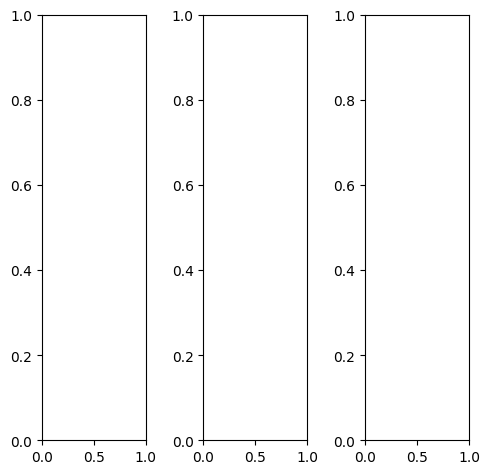

tensor([[[0.8863, 0.8549, 0.8627,  ..., 0.8235, 0.8118, 0.7569],
         [0.7765, 0.7961, 0.7765,  ..., 0.8275, 0.7961, 0.7569],
         [0.7333, 0.7333, 0.7412,  ..., 0.7608, 0.7686, 0.8078],
         ...,
         [0.5882, 0.6510, 0.7098,  ..., 0.7294, 0.5765, 0.6392],
         [0.6510, 0.7176, 0.7804,  ..., 0.6824, 0.5059, 0.6157],
         [0.6235, 0.6980, 0.7059,  ..., 0.4706, 0.3294, 0.5216]],

        [[0.8863, 0.8549, 0.8627,  ..., 0.8235, 0.8118, 0.7569],
         [0.7765, 0.7961, 0.7765,  ..., 0.8275, 0.7961, 0.7569],
         [0.7333, 0.7333, 0.7412,  ..., 0.7608, 0.7686, 0.8078],
         ...,
         [0.5882, 0.6510, 0.7098,  ..., 0.7294, 0.5765, 0.6392],
         [0.6510, 0.7176, 0.7804,  ..., 0.6824, 0.5059, 0.6157],
         [0.6235, 0.6980, 0.7059,  ..., 0.4706, 0.3294, 0.5216]],

        [[0.8863, 0.8549, 0.8627,  ..., 0.8235, 0.8118, 0.7569],
         [0.7765, 0.7961, 0.7765,  ..., 0.8275, 0.7961, 0.7569],
         [0.7333, 0.7333, 0.7412,  ..., 0.7608, 0.7686, 0.

tensor([[[0.8549, 0.8353, 0.8431,  ..., 0.8471, 0.8196, 0.7451],
         [0.7569, 0.7882, 0.7725,  ..., 0.8314, 0.7961, 0.7686],
         [0.6980, 0.7020, 0.7137,  ..., 0.7647, 0.7725, 0.8275],
         ...,
         [0.6039, 0.6627, 0.7176,  ..., 0.7255, 0.5765, 0.6431],
         [0.6471, 0.7294, 0.8039,  ..., 0.7020, 0.5137, 0.6118],
         [0.6314, 0.7255, 0.7529,  ..., 0.5059, 0.3569, 0.5451]],

        [[0.9137, 0.8784, 0.8902,  ..., 0.8314, 0.8314, 0.7765],
         [0.8118, 0.8235, 0.8039,  ..., 0.8510, 0.8196, 0.7725],
         [0.7647, 0.7647, 0.7765,  ..., 0.7804, 0.7882, 0.8314],
         ...,
         [0.6078, 0.6706, 0.7373,  ..., 0.7490, 0.5922, 0.6510],
         [0.6863, 0.7451, 0.8039,  ..., 0.7020, 0.5216, 0.6314],
         [0.6510, 0.7176, 0.7216,  ..., 0.4824, 0.3373, 0.5373]],

        [[0.8353, 0.7882, 0.7804,  ..., 0.7176, 0.7059, 0.6745],
         [0.6627, 0.6824, 0.6431,  ..., 0.7098, 0.6824, 0.6353],
         [0.6510, 0.6471, 0.6314,  ..., 0.6471, 0.6510, 0.

tensor([[[0.8348, 0.8474, 0.8482,  ..., 0.8182, 0.8137, 0.7713],
         [0.7777, 0.7973, 0.7729,  ..., 0.8229, 0.8002, 0.7789],
         [0.7324, 0.7437, 0.7543,  ..., 0.7636, 0.7836, 0.8292],
         ...,
         [0.6126, 0.6972, 0.7533,  ..., 0.7714, 0.6334, 0.6745],
         [0.6670, 0.7631, 0.8074,  ..., 0.7344, 0.5439, 0.6397],
         [0.6507, 0.7189, 0.7281,  ..., 0.5211, 0.3946, 0.5421]],

        [[0.8526, 0.8533, 0.8791,  ..., 0.8354, 0.8299, 0.7786],
         [0.7788, 0.8210, 0.7848,  ..., 0.8369, 0.7973, 0.7776],
         [0.7378, 0.7587, 0.7669,  ..., 0.7683, 0.7765, 0.8381],
         ...,
         [0.5869, 0.6680, 0.7216,  ..., 0.7415, 0.5984, 0.6403],
         [0.6508, 0.7311, 0.7885,  ..., 0.6990, 0.5150, 0.6139],
         [0.6270, 0.6931, 0.6981,  ..., 0.4940, 0.3730, 0.5255]],

        [[0.8407, 0.8531, 0.8550,  ..., 0.8109, 0.7984, 0.7479],
         [0.7582, 0.7990, 0.7675,  ..., 0.7999, 0.7615, 0.7273],
         [0.7274, 0.7374, 0.7448,  ..., 0.7307, 0.7495, 0.

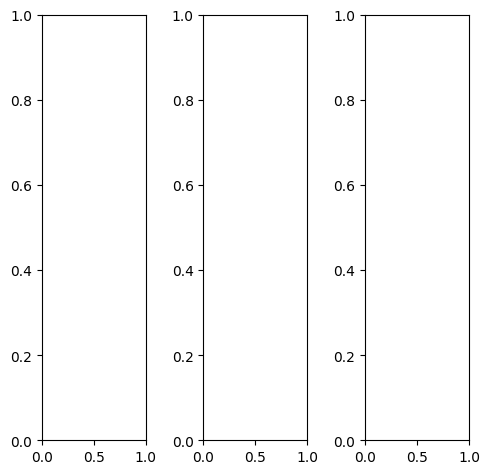

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8039, 0.8000],
         [0.9922, 1.0000, 0.9961,  ..., 0.3020, 0.2980, 0.3020],
         [0.9922, 1.0000, 0.9961,  ..., 0.1451, 0.1294, 0.1255],
         ...,
         [0.4745, 0.0941, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
         [0.5882, 0.0706, 0.0000,  ..., 0.3216, 0.3412, 0.3529],
         [0.8471, 0.4902, 0.3373,  ..., 0.9647, 0.9804, 0.9765]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8039, 0.8000],
         [0.9922, 1.0000, 0.9961,  ..., 0.3020, 0.2980, 0.3020],
         [0.9922, 1.0000, 0.9961,  ..., 0.1451, 0.1294, 0.1255],
         ...,
         [0.4745, 0.0941, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
         [0.5882, 0.0706, 0.0000,  ..., 0.3216, 0.3412, 0.3529],
         [0.8471, 0.4902, 0.3373,  ..., 0.9647, 0.9804, 0.9765]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8039, 0.8000],
         [0.9922, 1.0000, 0.9961,  ..., 0.3020, 0.2980, 0.3020],
         [0.9922, 1.0000, 0.9961,  ..., 0.1451, 0.1294, 0.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.7725, 0.7765, 0.7765],
         [0.9922, 1.0000, 0.9961,  ..., 0.2627, 0.2627, 0.2706],
         [0.9922, 1.0000, 0.9961,  ..., 0.0980, 0.0824, 0.0863],
         ...,
         [0.4863, 0.1020, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
         [0.5882, 0.0706, 0.0000,  ..., 0.3216, 0.3451, 0.3569],
         [0.8471, 0.4863, 0.3373,  ..., 0.9608, 0.9804, 0.9765]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8118, 0.8118, 0.8039],
         [0.9922, 1.0000, 0.9961,  ..., 0.3059, 0.3020, 0.3020],
         [0.9922, 1.0000, 0.9961,  ..., 0.1529, 0.1333, 0.1294],
         ...,
         [0.4706, 0.0902, 0.0588,  ..., 0.0000, 0.0000, 0.0000],
         [0.5882, 0.0706, 0.0000,  ..., 0.3216, 0.3412, 0.3529],
         [0.8471, 0.4902, 0.3373,  ..., 0.9647, 0.9804, 0.9765]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8431, 0.8431, 0.8392],
         [0.9922, 1.0000, 0.9961,  ..., 0.3765, 0.3725, 0.3725],
         [0.9922, 1.0000, 0.9961,  ..., 0.2353, 0.2157, 0.

tensor([[[ 1.0360,  1.0696,  1.0708,  ...,  0.7810,  0.7698,  0.6665],
         [ 0.9958,  1.0609,  1.0870,  ...,  0.2538,  0.2664,  0.2848],
         [ 1.0452,  1.0888,  1.0546,  ...,  0.0891,  0.0734,  0.1095],
         ...,
         [ 0.4623,  0.0918,  0.0253,  ..., -0.0224, -0.0106,  0.0233],
         [ 0.5684,  0.0918, -0.0126,  ...,  0.3040,  0.3194,  0.3487],
         [ 0.7334,  0.4831,  0.3308,  ...,  0.9348,  0.9364,  0.8154]],

        [[ 1.0309,  1.0459,  1.0648,  ...,  0.8028,  0.8030,  0.6977],
         [ 0.9560,  1.0486,  1.0604,  ...,  0.2852,  0.2982,  0.3225],
         [ 1.0657,  1.0603,  1.1169,  ...,  0.1288,  0.1271,  0.1432],
         ...,
         [ 0.4616,  0.0899,  0.0538,  ..., -0.0161,  0.0058,  0.0556],
         [ 0.5866,  0.0950,  0.0173,  ...,  0.3167,  0.3273,  0.3638],
         [ 0.7663,  0.4897,  0.3555,  ...,  0.9356,  0.9289,  0.8332]],

        [[ 0.9506,  1.0832,  1.0378,  ...,  0.8110,  0.8231,  0.7165],
         [ 0.9639,  1.0058,  1.0876,  ...,  0

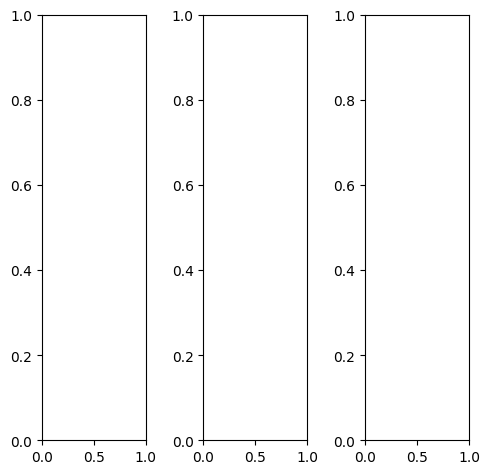

EPOCH: 10.255  trn_loss: 0.005  (1209.24s - 10582.39s remaining)

tensor([[[0.0902, 0.0902, 0.0941,  ..., 0.0902, 0.0902, 0.0902],
         [0.0902, 0.0863, 0.0863,  ..., 0.0902, 0.0902, 0.0902],
         [0.0941, 0.0902, 0.1020,  ..., 0.0902, 0.0902, 0.0902],
         ...,
         [0.1098, 0.1059, 0.1020,  ..., 0.0941, 0.0941, 0.0902],
         [0.1098, 0.1059, 0.1098,  ..., 0.0902, 0.0980, 0.0941],
         [0.1098, 0.1098, 0.1098,  ..., 0.1333, 0.1137, 0.1294]],

        [[0.0902, 0.0902, 0.0941,  ..., 0.0902, 0.0902, 0.0902],
         [0.0902, 0.0863, 0.0863,  ..., 0.0902, 0.0902, 0.0902],
         [0.0941, 0.0902, 0.1020,  ..., 0.0902, 0.0902, 0.0902],
         ...,
         [0.1098, 0.1059, 0.1020,  ..., 0.0941, 0.0941, 0.0902],
         [0.1098, 0.1059, 0.1098,  ..., 0.0902, 0.0980, 0.0941],
         [0.1098, 0.1098, 0.1098,  ..., 0.1333, 0.1137, 0.1294]],

        [[0.0902, 0.0902, 0.0941,  ..., 0.0902, 0.0902, 0.0902],
         [0.0902, 0.0863, 0.0863,  ..., 0.0902, 0.0902, 0.0902],
         [0.0941, 0.0902, 0.1020,  ..., 0.0902, 0.0902, 0.

tensor([[[0.0941, 0.0941, 0.0941,  ..., 0.0941, 0.0941, 0.0941],
         [0.0902, 0.0824, 0.0784,  ..., 0.0941, 0.0941, 0.0941],
         [0.0941, 0.0863, 0.1137,  ..., 0.0941, 0.0941, 0.0941],
         ...,
         [0.1098, 0.1098, 0.1059,  ..., 0.0980, 0.0980, 0.0941],
         [0.1098, 0.1059, 0.1059,  ..., 0.0941, 0.1020, 0.0980],
         [0.1137, 0.1137, 0.1137,  ..., 0.1373, 0.1176, 0.1333]],

        [[0.0902, 0.0863, 0.0902,  ..., 0.0863, 0.0863, 0.0863],
         [0.0902, 0.0863, 0.0863,  ..., 0.0863, 0.0863, 0.0863],
         [0.0941, 0.0902, 0.0980,  ..., 0.0863, 0.0863, 0.0863],
         ...,
         [0.1098, 0.1059, 0.1020,  ..., 0.0902, 0.0902, 0.0863],
         [0.1098, 0.1059, 0.1098,  ..., 0.0902, 0.0941, 0.0902],
         [0.1098, 0.1098, 0.1098,  ..., 0.1294, 0.1098, 0.1255]],

        [[0.0941, 0.0941, 0.1020,  ..., 0.0941, 0.0902, 0.0902],
         [0.1020, 0.1059, 0.1020,  ..., 0.0941, 0.0902, 0.0902],
         [0.1098, 0.1098, 0.1020,  ..., 0.0941, 0.0902, 0.

tensor([[[ 0.1454,  0.1246,  0.0329,  ...,  0.1553,  0.1801,  0.2612],
         [ 0.1736,  0.0124,  0.0334,  ...,  0.1105,  0.1225,  0.2090],
         [ 0.0236,  0.0178, -0.0422,  ...,  0.0806,  0.0978,  0.1801],
         ...,
         [ 0.2493,  0.2565,  0.2312,  ...,  0.2312,  0.2465,  0.2909],
         [ 0.2624,  0.2639,  0.2535,  ...,  0.2238,  0.2540,  0.3032],
         [ 0.3001,  0.2698,  0.2484,  ...,  0.2927,  0.2787,  0.3740]],

        [[ 0.1984,  0.1985,  0.0615,  ...,  0.2383,  0.2441,  0.2944],
         [ 0.1765,  0.0503, -0.0903,  ...,  0.2442,  0.2563,  0.2664],
         [ 0.0957,  0.0840, -0.0377,  ...,  0.2190,  0.2276,  0.2606],
         ...,
         [ 0.2729,  0.2686,  0.2631,  ...,  0.2676,  0.2671,  0.2700],
         [ 0.2677,  0.2641,  0.2595,  ...,  0.2480,  0.2537,  0.2685],
         [ 0.2750,  0.2609,  0.2600,  ...,  0.2935,  0.2677,  0.3330]],

        [[ 0.3196,  0.1282,  0.2531,  ...,  0.4240,  0.4295,  0.4555],
         [ 0.3084,  0.1369,  0.2807,  ...,  0

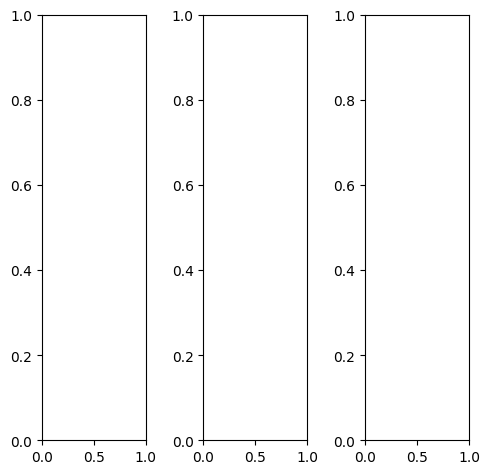

tensor([[[0.0471, 0.0549, 0.0980,  ..., 0.1020, 0.0863, 0.0706],
         [0.0510, 0.0510, 0.0471,  ..., 0.0941, 0.0902, 0.0745],
         [0.0510, 0.0549, 0.0588,  ..., 0.1098, 0.1020, 0.0824],
         ...,
         [0.0902, 0.1176, 0.1333,  ..., 0.3098, 0.3098, 0.3961],
         [0.0824, 0.0706, 0.0471,  ..., 0.3961, 0.4627, 0.5255],
         [0.0784, 0.0745, 0.0980,  ..., 0.5176, 0.5255, 0.5098]],

        [[0.0471, 0.0549, 0.0980,  ..., 0.1020, 0.0863, 0.0706],
         [0.0510, 0.0510, 0.0471,  ..., 0.0941, 0.0902, 0.0745],
         [0.0510, 0.0549, 0.0588,  ..., 0.1098, 0.1020, 0.0824],
         ...,
         [0.0902, 0.1176, 0.1333,  ..., 0.3098, 0.3098, 0.3961],
         [0.0824, 0.0706, 0.0471,  ..., 0.3961, 0.4627, 0.5255],
         [0.0784, 0.0745, 0.0980,  ..., 0.5176, 0.5255, 0.5098]],

        [[0.0471, 0.0549, 0.0980,  ..., 0.1020, 0.0863, 0.0706],
         [0.0510, 0.0510, 0.0471,  ..., 0.0941, 0.0902, 0.0745],
         [0.0510, 0.0549, 0.0588,  ..., 0.1098, 0.1020, 0.

tensor([[[0.0471, 0.0510, 0.0941,  ..., 0.1098, 0.0941, 0.0824],
         [0.0510, 0.0471, 0.0431,  ..., 0.1059, 0.0980, 0.0863],
         [0.0471, 0.0549, 0.0627,  ..., 0.1333, 0.1255, 0.1020],
         ...,
         [0.1098, 0.1412, 0.1569,  ..., 0.4824, 0.5216, 0.5373],
         [0.1490, 0.1059, 0.0588,  ..., 0.4510, 0.4667, 0.4824],
         [0.1451, 0.1176, 0.1176,  ..., 0.4588, 0.4706, 0.4510]],

        [[0.0471, 0.0549, 0.1020,  ..., 0.0980, 0.0824, 0.0667],
         [0.0510, 0.0510, 0.0471,  ..., 0.0902, 0.0863, 0.0706],
         [0.0471, 0.0549, 0.0549,  ..., 0.1020, 0.0941, 0.0784],
         ...,
         [0.0824, 0.1098, 0.1294,  ..., 0.1961, 0.1843, 0.3137],
         [0.0627, 0.0588, 0.0431,  ..., 0.3647, 0.4588, 0.5490],
         [0.0549, 0.0588, 0.0902,  ..., 0.5490, 0.5529, 0.5373]],

        [[0.0588, 0.0588, 0.1020,  ..., 0.0980, 0.0784, 0.0549],
         [0.0627, 0.0627, 0.0549,  ..., 0.0824, 0.0824, 0.0627],
         [0.0667, 0.0627, 0.0549,  ..., 0.0902, 0.0824, 0.

tensor([[[-0.0633, -0.0474, -0.1258,  ...,  0.0387,  0.0397,  0.0912],
         [ 0.0365, -0.1913, -0.0975,  ..., -0.0140, -0.0132,  0.0294],
         [-0.2389, -0.1856, -0.1940,  ..., -0.0051, -0.0094,  0.0090],
         ...,
         [ 0.0816,  0.1394,  0.1830,  ...,  0.3566,  0.3630,  0.4930],
         [ 0.0824,  0.0551,  0.0375,  ...,  0.4595,  0.5725,  0.6820],
         [ 0.0940,  0.0869,  0.1203,  ...,  0.6515,  0.6650,  0.6428]],

        [[ 0.0679, -0.0376, -0.0122,  ...,  0.0886,  0.0791,  0.1078],
         [-0.0187, -0.3521, -0.3479,  ...,  0.0489,  0.0530,  0.0551],
         [-0.1196, -0.1553, -0.2124,  ...,  0.0489,  0.0422,  0.0327],
         ...,
         [ 0.0759,  0.0906,  0.1132,  ...,  0.4064,  0.3926,  0.4655],
         [ 0.0644,  0.0159, -0.0264,  ...,  0.5153,  0.6226,  0.6732],
         [ 0.0764,  0.0448,  0.0566,  ...,  0.6492,  0.6703,  0.6264]],

        [[ 0.1746, -0.1077,  0.0558,  ...,  0.2255,  0.2222,  0.2447],
         [ 0.1151, -0.1802, -0.0389,  ...,  0

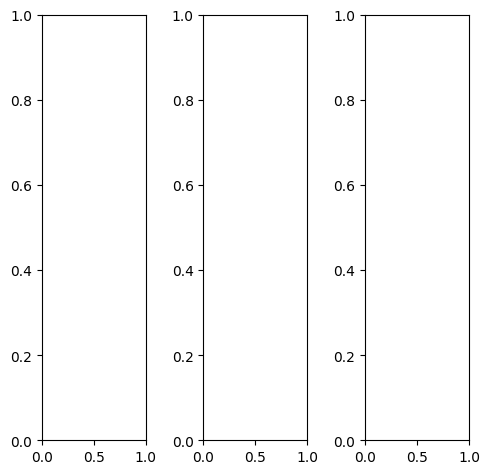

tensor([[[0.7294, 0.7176, 0.7137,  ..., 0.7569, 0.7608, 0.7647],
         [0.7451, 0.7373, 0.7333,  ..., 0.7647, 0.7725, 0.7804],
         [0.7608, 0.7490, 0.7490,  ..., 0.7725, 0.7765, 0.7882],
         ...,
         [0.4510, 0.4353, 0.4235,  ..., 0.2980, 0.2941, 0.2863],
         [0.4471, 0.4510, 0.4392,  ..., 0.3490, 0.3373, 0.3059],
         [0.4314, 0.4196, 0.4118,  ..., 0.3216, 0.3020, 0.2941]],

        [[0.7294, 0.7176, 0.7137,  ..., 0.7569, 0.7608, 0.7647],
         [0.7451, 0.7373, 0.7333,  ..., 0.7647, 0.7725, 0.7804],
         [0.7608, 0.7490, 0.7490,  ..., 0.7725, 0.7765, 0.7882],
         ...,
         [0.4510, 0.4353, 0.4235,  ..., 0.2980, 0.2941, 0.2863],
         [0.4471, 0.4510, 0.4392,  ..., 0.3490, 0.3373, 0.3059],
         [0.4314, 0.4196, 0.4118,  ..., 0.3216, 0.3020, 0.2941]],

        [[0.7294, 0.7176, 0.7137,  ..., 0.7569, 0.7608, 0.7647],
         [0.7451, 0.7373, 0.7333,  ..., 0.7647, 0.7725, 0.7804],
         [0.7608, 0.7490, 0.7490,  ..., 0.7725, 0.7765, 0.

tensor([[[0.6196, 0.6118, 0.6039,  ..., 0.6706, 0.6745, 0.6784],
         [0.6431, 0.6353, 0.6314,  ..., 0.6863, 0.6941, 0.7020],
         [0.6667, 0.6588, 0.6588,  ..., 0.6941, 0.7020, 0.7137],
         ...,
         [0.3569, 0.3412, 0.3294,  ..., 0.2235, 0.2196, 0.2118],
         [0.3529, 0.3569, 0.3451,  ..., 0.2627, 0.2510, 0.2196],
         [0.3373, 0.3294, 0.3176,  ..., 0.2471, 0.2275, 0.2196]],

        [[0.7647, 0.7529, 0.7490,  ..., 0.7843, 0.7882, 0.7961],
         [0.7804, 0.7686, 0.7647,  ..., 0.7882, 0.7961, 0.8078],
         [0.7922, 0.7804, 0.7804,  ..., 0.7961, 0.8000, 0.8118],
         ...,
         [0.4902, 0.4745, 0.4627,  ..., 0.3294, 0.3255, 0.3176],
         [0.4863, 0.4902, 0.4784,  ..., 0.3804, 0.3686, 0.3373],
         [0.4706, 0.4588, 0.4510,  ..., 0.3529, 0.3333, 0.3255]],

        [[0.8275, 0.8157, 0.8118,  ..., 0.8275, 0.8353, 0.8392],
         [0.8392, 0.8275, 0.8235,  ..., 0.8392, 0.8471, 0.8549],
         [0.8431, 0.8314, 0.8314,  ..., 0.8471, 0.8510, 0.

tensor([[[0.6470, 0.5431, 0.4483,  ..., 0.5445, 0.5970, 0.7173],
         [0.5747, 0.5399, 0.5138,  ..., 0.4836, 0.5695, 0.6960],
         [0.5432, 0.5545, 0.3775,  ..., 0.4737, 0.5497, 0.7044],
         ...,
         [0.4232, 0.4275, 0.4024,  ..., 0.2383, 0.2436, 0.2765],
         [0.4207, 0.4340, 0.4331,  ..., 0.3339, 0.3382, 0.3246],
         [0.4505, 0.4069, 0.3845,  ..., 0.2998, 0.2848, 0.3090]],

        [[0.7204, 0.6405, 0.5751,  ..., 0.5911, 0.6699, 0.7264],
         [0.5547, 0.5741, 0.5182,  ..., 0.5892, 0.6539, 0.7577],
         [0.6706, 0.6428, 0.5925,  ..., 0.5738, 0.6318, 0.7474],
         ...,
         [0.3753, 0.3617, 0.3464,  ..., 0.2169, 0.1974, 0.2017],
         [0.3678, 0.3849, 0.3596,  ..., 0.2885, 0.2723, 0.2338],
         [0.3818, 0.3511, 0.3359,  ..., 0.2491, 0.2262, 0.2356]],

        [[0.8219, 0.7039, 0.7946,  ..., 0.7098, 0.7501, 0.8029],
         [0.7356, 0.7849, 0.7957,  ..., 0.6358, 0.7142, 0.7994],
         [0.7393, 0.7245, 0.8033,  ..., 0.6712, 0.7131, 0.

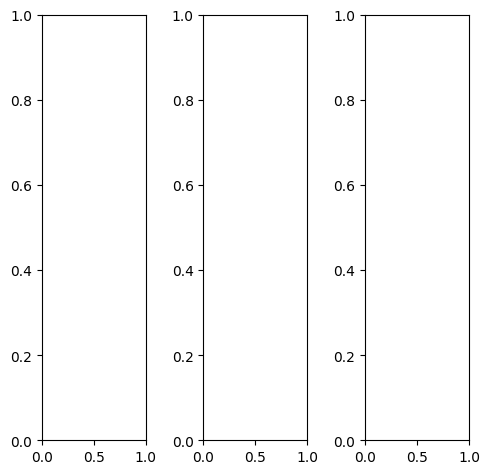

tensor([[[1.0000, 0.9882, 0.9922,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9843, 0.9725,  ..., 0.9686, 0.9608, 0.9961],
         [1.0000, 0.8824, 0.7804,  ..., 0.7608, 0.7216, 0.9451],
         ...,
         [0.9961, 0.8353, 0.7922,  ..., 0.2784, 0.3216, 0.6078],
         [1.0000, 0.8863, 0.6941,  ..., 0.3804, 0.4157, 0.6667],
         [1.0000, 0.9412, 0.7882,  ..., 0.6353, 0.6510, 0.8118]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9843, 0.9725,  ..., 0.9686, 0.9608, 0.9961],
         [1.0000, 0.8824, 0.7804,  ..., 0.7608, 0.7216, 0.9451],
         ...,
         [0.9961, 0.8353, 0.7922,  ..., 0.2784, 0.3216, 0.6078],
         [1.0000, 0.8863, 0.6941,  ..., 0.3804, 0.4157, 0.6667],
         [1.0000, 0.9412, 0.7882,  ..., 0.6353, 0.6510, 0.8118]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9843, 0.9725,  ..., 0.9686, 0.9608, 0.9961],
         [1.0000, 0.8824, 0.7804,  ..., 0.7608, 0.7216, 0.

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 0.9922, 0.9882,  ..., 0.9804, 0.9686, 0.9961],
         [1.0000, 0.9020, 0.8157,  ..., 0.7922, 0.7529, 0.9647],
         ...,
         [0.9922, 0.8392, 0.8353,  ..., 0.2392, 0.2941, 0.6039],
         [1.0000, 0.8902, 0.7059,  ..., 0.3686, 0.4078, 0.6667],
         [1.0000, 0.9412, 0.7882,  ..., 0.6353, 0.6549, 0.8118]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9882, 0.9882, 1.0000],
         [1.0000, 0.9804, 0.9647,  ..., 0.9647, 0.9608, 1.0000],
         [1.0000, 0.8667, 0.7569,  ..., 0.7451, 0.7098, 0.9412],
         ...,
         [0.9961, 0.8314, 0.7686,  ..., 0.2902, 0.3255, 0.6078],
         [1.0000, 0.8863, 0.6902,  ..., 0.3843, 0.4157, 0.6667],
         [1.0000, 0.9412, 0.7882,  ..., 0.6353, 0.6510, 0.8118]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9922, 0.9882, 0.9922],
         [1.0000, 0.9882, 0.9843,  ..., 0.9569, 0.9490, 0.9804],
         [1.0000, 0.8980, 0.8078,  ..., 0.7647, 0.7137, 0.

tensor([[[0.7748, 0.7454, 0.7375,  ..., 0.6509, 0.6381, 0.6929],
         [0.7282, 0.7055, 0.6930,  ..., 0.6382, 0.6472, 0.6982],
         [0.6876, 0.7061, 0.4897,  ..., 0.5037, 0.4928, 0.6637],
         ...,
         [0.7852, 0.7239, 0.6635,  ..., 0.2234, 0.2873, 0.5240],
         [0.7773, 0.7370, 0.5464,  ..., 0.2808, 0.3132, 0.5135],
         [0.7777, 0.7698, 0.6592,  ..., 0.5155, 0.5220, 0.6231]],

        [[0.7840, 0.7945, 0.7273,  ..., 0.7253, 0.7311, 0.7685],
         [0.6933, 0.6571, 0.6649,  ..., 0.7405, 0.7347, 0.7956],
         [0.7816, 0.7315, 0.5731,  ..., 0.5873, 0.5729, 0.7382],
         ...,
         [0.7333, 0.6770, 0.6480,  ..., 0.2649, 0.3027, 0.4774],
         [0.7485, 0.7050, 0.5437,  ..., 0.3201, 0.3399, 0.4890],
         [0.7161, 0.7414, 0.6403,  ..., 0.5021, 0.5223, 0.5993]],

        [[0.8599, 0.8749, 0.8682,  ..., 0.9082, 0.9109, 0.9151],
         [0.8540, 0.8602, 0.8796,  ..., 0.8880, 0.9203, 0.9407],
         [0.8160, 0.7947, 0.6938,  ..., 0.7657, 0.7667, 0.

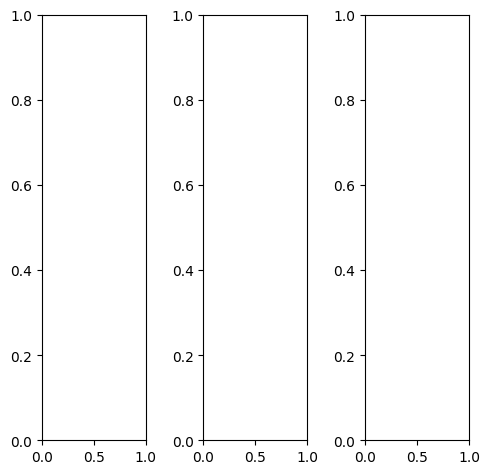

tensor([[[0.5451, 0.4275, 0.5765,  ..., 0.5294, 0.5725, 0.5569],
         [0.4941, 0.3647, 0.5490,  ..., 0.5216, 0.4902, 0.4745],
         [0.4980, 0.3922, 0.5333,  ..., 0.5804, 0.4980, 0.4902],
         ...,
         [0.5569, 0.4706, 0.4902,  ..., 0.2667, 0.2784, 0.2863],
         [0.5765, 0.5412, 0.5765,  ..., 0.2706, 0.2863, 0.2784],
         [0.7373, 0.7137, 0.7608,  ..., 0.2667, 0.2784, 0.2627]],

        [[0.5451, 0.4275, 0.5765,  ..., 0.5294, 0.5725, 0.5569],
         [0.4941, 0.3647, 0.5490,  ..., 0.5216, 0.4902, 0.4745],
         [0.4980, 0.3922, 0.5333,  ..., 0.5804, 0.4980, 0.4902],
         ...,
         [0.5569, 0.4706, 0.4902,  ..., 0.2667, 0.2784, 0.2863],
         [0.5765, 0.5412, 0.5765,  ..., 0.2706, 0.2863, 0.2784],
         [0.7373, 0.7137, 0.7608,  ..., 0.2667, 0.2784, 0.2627]],

        [[0.5451, 0.4275, 0.5765,  ..., 0.5294, 0.5725, 0.5569],
         [0.4941, 0.3647, 0.5490,  ..., 0.5216, 0.4902, 0.4745],
         [0.4980, 0.3922, 0.5333,  ..., 0.5804, 0.4980, 0.

tensor([[[0.5333, 0.4118, 0.5529,  ..., 0.5373, 0.5765, 0.5647],
         [0.4745, 0.3490, 0.5333,  ..., 0.5333, 0.5020, 0.4824],
         [0.4863, 0.3882, 0.5294,  ..., 0.5843, 0.4824, 0.4824],
         ...,
         [0.5765, 0.4863, 0.4980,  ..., 0.3804, 0.4039, 0.4157],
         [0.5843, 0.5412, 0.5804,  ..., 0.3804, 0.4157, 0.4275],
         [0.7686, 0.7412, 0.7882,  ..., 0.3882, 0.4118, 0.4000]],

        [[0.5451, 0.4353, 0.5765,  ..., 0.5294, 0.5725, 0.5529],
         [0.5020, 0.3725, 0.5490,  ..., 0.5216, 0.4863, 0.4706],
         [0.5020, 0.3961, 0.5294,  ..., 0.5804, 0.5098, 0.5020],
         ...,
         [0.5529, 0.4706, 0.4941,  ..., 0.2275, 0.2392, 0.2471],
         [0.5804, 0.5490, 0.5804,  ..., 0.2314, 0.2431, 0.2314],
         [0.7373, 0.7098, 0.7608,  ..., 0.2275, 0.2353, 0.2196]],

        [[0.5647, 0.4275, 0.6314,  ..., 0.5137, 0.5569, 0.5412],
         [0.5216, 0.3647, 0.6039,  ..., 0.5059, 0.4784, 0.4588],
         [0.5020, 0.3686, 0.5490,  ..., 0.5569, 0.4667, 0.

tensor([[[0.5502, 0.4502, 0.5309,  ..., 0.5222, 0.5844, 0.6422],
         [0.4840, 0.3068, 0.4254,  ..., 0.4497, 0.4810, 0.5460],
         [0.4471, 0.3296, 0.3052,  ..., 0.5545, 0.4899, 0.5536],
         ...,
         [0.7069, 0.5888, 0.5939,  ..., 0.4030, 0.4262, 0.4676],
         [0.6992, 0.6645, 0.6716,  ..., 0.3987, 0.4343, 0.4521],
         [0.8845, 0.8899, 0.9137,  ..., 0.3839, 0.4099, 0.4333]],

        [[0.5962, 0.5355, 0.5729,  ..., 0.5903, 0.6836, 0.6714],
         [0.4851, 0.3061, 0.4201,  ..., 0.5908, 0.5946, 0.6157],
         [0.5645, 0.4038, 0.4329,  ..., 0.6627, 0.5902, 0.6192],
         ...,
         [0.6297, 0.5301, 0.5623,  ..., 0.4408, 0.4590, 0.4311],
         [0.6607, 0.6299, 0.6539,  ..., 0.4279, 0.4460, 0.4104],
         [0.8133, 0.8526, 0.8869,  ..., 0.3846, 0.3969, 0.3852]],

        [[0.6977, 0.5714, 0.7463,  ..., 0.7630, 0.8372, 0.8014],
         [0.6328, 0.4822, 0.6911,  ..., 0.7283, 0.7484, 0.7253],
         [0.5607, 0.4538, 0.5359,  ..., 0.8252, 0.7526, 0.

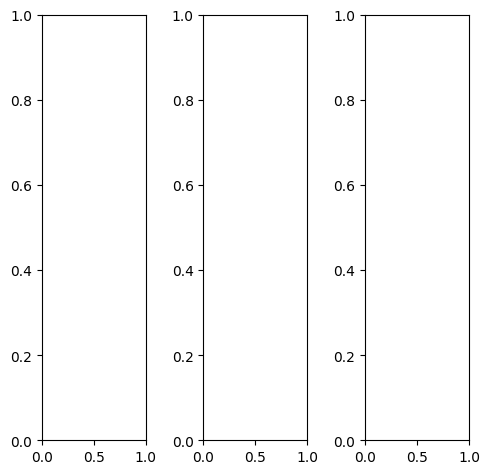

EPOCH: 10.510  trn_loss: 0.005  (1237.79s - 10539.22s remaining)

tensor([[[0.8667, 0.8667, 0.8745,  ..., 0.6353, 0.5412, 0.4784],
         [0.8784, 0.8824, 0.8902,  ..., 0.5098, 0.4667, 0.4510],
         [0.9020, 0.9020, 0.9098,  ..., 0.4863, 0.4471, 0.3647],
         ...,
         [0.3529, 0.3686, 0.3451,  ..., 0.3961, 0.3843, 0.3686],
         [0.4039, 0.4118, 0.4000,  ..., 0.3490, 0.3490, 0.3373],
         [0.4000, 0.4039, 0.3882,  ..., 0.3490, 0.3412, 0.3294]],

        [[0.8667, 0.8667, 0.8745,  ..., 0.6353, 0.5412, 0.4784],
         [0.8784, 0.8824, 0.8902,  ..., 0.5098, 0.4667, 0.4510],
         [0.9020, 0.9020, 0.9098,  ..., 0.4863, 0.4471, 0.3647],
         ...,
         [0.3529, 0.3686, 0.3451,  ..., 0.3961, 0.3843, 0.3686],
         [0.4039, 0.4118, 0.4000,  ..., 0.3490, 0.3490, 0.3373],
         [0.4000, 0.4039, 0.3882,  ..., 0.3490, 0.3412, 0.3294]],

        [[0.8667, 0.8667, 0.8745,  ..., 0.6353, 0.5412, 0.4784],
         [0.8784, 0.8824, 0.8902,  ..., 0.5098, 0.4667, 0.4510],
         [0.9020, 0.9020, 0.9098,  ..., 0.4863, 0.4471, 0.

tensor([[[0.7961, 0.7961, 0.8039,  ..., 0.6275, 0.5333, 0.4588],
         [0.8196, 0.8235, 0.8314,  ..., 0.5020, 0.4627, 0.4471],
         [0.8471, 0.8471, 0.8588,  ..., 0.4824, 0.4392, 0.3608],
         ...,
         [0.3490, 0.3608, 0.3333,  ..., 0.3922, 0.3804, 0.3647],
         [0.4000, 0.4078, 0.3922,  ..., 0.3451, 0.3451, 0.3333],
         [0.3961, 0.4000, 0.3843,  ..., 0.3451, 0.3373, 0.3255]],

        [[0.8745, 0.8784, 0.8863,  ..., 0.6392, 0.5412, 0.4863],
         [0.8902, 0.8902, 0.9020,  ..., 0.5137, 0.4667, 0.4510],
         [0.9176, 0.9137, 0.9176,  ..., 0.4863, 0.4471, 0.3686],
         ...,
         [0.3529, 0.3686, 0.3451,  ..., 0.3961, 0.3843, 0.3686],
         [0.4039, 0.4118, 0.4000,  ..., 0.3490, 0.3490, 0.3373],
         [0.4000, 0.4039, 0.3882,  ..., 0.3490, 0.3412, 0.3294]],

        [[0.9961, 0.9882, 0.9843,  ..., 0.6353, 0.5490, 0.4863],
         [0.9843, 0.9843, 0.9882,  ..., 0.5255, 0.4863, 0.4588],
         [0.9804, 0.9804, 0.9922,  ..., 0.5137, 0.4588, 0.

tensor([[[0.8726, 0.8547, 0.8704,  ..., 0.5036, 0.4082, 0.4209],
         [0.8492, 0.8941, 0.8265,  ..., 0.3958, 0.3511, 0.3975],
         [0.8483, 0.9418, 0.8631,  ..., 0.3696, 0.3197, 0.2805],
         ...,
         [0.2816, 0.3318, 0.2810,  ..., 0.3975, 0.3718, 0.3969],
         [0.3556, 0.3667, 0.3626,  ..., 0.3062, 0.3219, 0.3526],
         [0.3994, 0.3955, 0.3821,  ..., 0.3417, 0.3384, 0.3706]],

        [[0.8761, 0.9001, 0.8444,  ..., 0.5840, 0.5031, 0.4544],
         [0.8196, 0.8562, 0.8166,  ..., 0.5070, 0.4517, 0.4414],
         [0.9118, 0.9432, 0.8931,  ..., 0.4643, 0.4318, 0.3448],
         ...,
         [0.2958, 0.3658, 0.3543,  ..., 0.4270, 0.4051, 0.3583],
         [0.3568, 0.3952, 0.4000,  ..., 0.3463, 0.3397, 0.3248],
         [0.3898, 0.3751, 0.3765,  ..., 0.3362, 0.3333, 0.3294]],

        [[0.9037, 0.9427, 0.9383,  ..., 0.7678, 0.6749, 0.6191],
         [0.9529, 0.9779, 0.9637,  ..., 0.6697, 0.6428, 0.6331],
         [0.9556, 0.9993, 1.0063,  ..., 0.6374, 0.6017, 0.

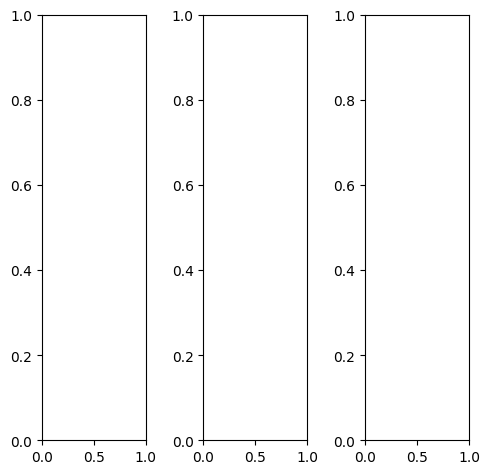

tensor([[[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.2941],
         ...,
         [0.2118, 0.2118, 0.2196,  ..., 0.1686, 0.1725, 0.1647],
         [0.2235, 0.2196, 0.2196,  ..., 0.1804, 0.1686, 0.1804],
         [0.2000, 0.2039, 0.2039,  ..., 0.1608, 0.1529, 0.1647]],

        [[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.2941],
         ...,
         [0.2118, 0.2118, 0.2196,  ..., 0.1686, 0.1725, 0.1647],
         [0.2235, 0.2196, 0.2196,  ..., 0.1804, 0.1686, 0.1804],
         [0.2000, 0.2039, 0.2039,  ..., 0.1608, 0.1529, 0.1647]],

        [[0.3882, 0.3922, 0.3882,  ..., 0.3098, 0.3059, 0.3020],
         [0.3725, 0.3647, 0.3686,  ..., 0.2941, 0.2980, 0.2980],
         [0.3647, 0.3569, 0.3569,  ..., 0.2941, 0.2941, 0.

tensor([[[0.2745, 0.2824, 0.2863,  ..., 0.2039, 0.1961, 0.1882],
         [0.2627, 0.2588, 0.2667,  ..., 0.1922, 0.1882, 0.1843],
         [0.2549, 0.2510, 0.2588,  ..., 0.1961, 0.1922, 0.1843],
         ...,
         [0.1333, 0.1294, 0.1373,  ..., 0.0980, 0.0980, 0.0941],
         [0.1412, 0.1373, 0.1373,  ..., 0.1020, 0.0902, 0.0980],
         [0.1020, 0.1059, 0.1020,  ..., 0.0667, 0.0627, 0.0706]],

        [[0.4196, 0.4196, 0.4157,  ..., 0.3373, 0.3333, 0.3333],
         [0.4039, 0.3961, 0.3922,  ..., 0.3216, 0.3255, 0.3255],
         [0.3922, 0.3843, 0.3843,  ..., 0.3176, 0.3216, 0.3216],
         ...,
         [0.2353, 0.2353, 0.2431,  ..., 0.1961, 0.1961, 0.1882],
         [0.2510, 0.2471, 0.2471,  ..., 0.2078, 0.1961, 0.2039],
         [0.2275, 0.2314, 0.2314,  ..., 0.1922, 0.1804, 0.1882]],

        [[0.5216, 0.5255, 0.5294,  ..., 0.4392, 0.4431, 0.4471],
         [0.5059, 0.4980, 0.5020,  ..., 0.4235, 0.4314, 0.4392],
         [0.4980, 0.4863, 0.4824,  ..., 0.4196, 0.4275, 0.

tensor([[[0.4557, 0.3846, 0.3673,  ..., 0.2462, 0.2694, 0.3412],
         [0.3619, 0.3446, 0.2633,  ..., 0.2286, 0.2216, 0.2929],
         [0.3442, 0.3402, 0.2318,  ..., 0.2041, 0.2224, 0.2798],
         ...,
         [0.1994, 0.2135, 0.2147,  ..., 0.1299, 0.1336, 0.1689],
         [0.2094, 0.2098, 0.2029,  ..., 0.1338, 0.1340, 0.1916],
         [0.2301, 0.1955, 0.1736,  ..., 0.1250, 0.1202, 0.1945]],

        [[0.4917, 0.5258, 0.4239,  ..., 0.3483, 0.3688, 0.3828],
         [0.4328, 0.4982, 0.3358,  ..., 0.3176, 0.3396, 0.3562],
         [0.4310, 0.4655, 0.3403,  ..., 0.3280, 0.3350, 0.3495],
         ...,
         [0.2162, 0.2344, 0.2371,  ..., 0.1523, 0.1551, 0.1593],
         [0.2145, 0.2261, 0.2137,  ..., 0.1549, 0.1383, 0.1713],
         [0.2132, 0.1816, 0.1846,  ..., 0.1272, 0.1179, 0.1642]],

        [[0.5857, 0.5238, 0.5508,  ..., 0.4850, 0.5121, 0.5274],
         [0.5540, 0.5680, 0.5273,  ..., 0.4847, 0.5044, 0.5167],
         [0.5276, 0.4724, 0.4975,  ..., 0.4756, 0.5016, 0.

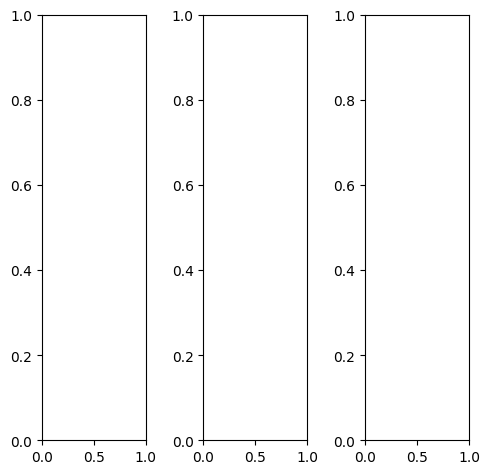

tensor([[[0.2667, 0.2706, 0.2745,  ..., 0.0627, 0.0588, 0.0588],
         [0.2627, 0.2667, 0.2745,  ..., 0.0784, 0.0745, 0.0784],
         [0.2667, 0.2706, 0.2863,  ..., 0.0902, 0.0863, 0.0941],
         ...,
         [0.3098, 0.3176, 0.3255,  ..., 0.5490, 0.3725, 0.3725],
         [0.3137, 0.3176, 0.3216,  ..., 0.4667, 0.4078, 0.3569],
         [0.3176, 0.3176, 0.3216,  ..., 0.4039, 0.4000, 0.3725]],

        [[0.2667, 0.2706, 0.2745,  ..., 0.0627, 0.0588, 0.0588],
         [0.2627, 0.2667, 0.2745,  ..., 0.0784, 0.0745, 0.0784],
         [0.2667, 0.2706, 0.2863,  ..., 0.0902, 0.0863, 0.0941],
         ...,
         [0.3098, 0.3176, 0.3255,  ..., 0.5490, 0.3725, 0.3725],
         [0.3137, 0.3176, 0.3216,  ..., 0.4667, 0.4078, 0.3569],
         [0.3176, 0.3176, 0.3216,  ..., 0.4039, 0.4000, 0.3725]],

        [[0.2667, 0.2706, 0.2745,  ..., 0.0627, 0.0588, 0.0588],
         [0.2627, 0.2667, 0.2745,  ..., 0.0784, 0.0745, 0.0784],
         [0.2667, 0.2706, 0.2863,  ..., 0.0902, 0.0863, 0.

tensor([[[0.2549, 0.2588, 0.2627,  ..., 0.0510, 0.0471, 0.0471],
         [0.2471, 0.2549, 0.2627,  ..., 0.0667, 0.0627, 0.0667],
         [0.2549, 0.2588, 0.2745,  ..., 0.0784, 0.0784, 0.0824],
         ...,
         [0.3098, 0.3176, 0.3255,  ..., 0.5490, 0.3686, 0.3608],
         [0.3137, 0.3176, 0.3216,  ..., 0.4588, 0.4000, 0.3451],
         [0.3176, 0.3176, 0.3216,  ..., 0.3882, 0.3882, 0.3608]],

        [[0.2980, 0.3020, 0.3098,  ..., 0.0667, 0.0627, 0.0667],
         [0.2941, 0.3020, 0.3098,  ..., 0.0863, 0.0824, 0.0902],
         [0.3020, 0.3059, 0.3216,  ..., 0.1020, 0.1020, 0.1098],
         ...,
         [0.3412, 0.3490, 0.3569,  ..., 0.5608, 0.3882, 0.4118],
         [0.3451, 0.3490, 0.3529,  ..., 0.4941, 0.4353, 0.3961],
         [0.3490, 0.3490, 0.3529,  ..., 0.4471, 0.4392, 0.4118]],

        [[0.1294, 0.1333, 0.1294,  ..., 0.0627, 0.0588, 0.0588],
         [0.1255, 0.1255, 0.1216,  ..., 0.0627, 0.0549, 0.0549],
         [0.1059, 0.1137, 0.1294,  ..., 0.0549, 0.0431, 0.

tensor([[[ 0.1801,  0.1556,  0.1131,  ..., -0.0572, -0.0307,  0.0676],
         [ 0.1825, -0.0120,  0.0533,  ..., -0.1017, -0.0934,  0.0073],
         [ 0.0513,  0.0179, -0.0378,  ..., -0.1122, -0.0991,  0.0020],
         ...,
         [ 0.3022,  0.3205,  0.3211,  ...,  0.6631,  0.4145,  0.4365],
         [ 0.3032,  0.3001,  0.3004,  ...,  0.5229,  0.4591,  0.4116],
         [ 0.3392,  0.3203,  0.2987,  ...,  0.4556,  0.4551,  0.4466]],

        [[ 0.2451,  0.3003,  0.1449,  ...,  0.0183,  0.0385,  0.0952],
         [ 0.2013,  0.0910, -0.0326,  ..., -0.0164, -0.0035,  0.0583],
         [ 0.1302,  0.2130, -0.0271,  ..., -0.0364, -0.0281,  0.0424],
         ...,
         [ 0.3213,  0.3387,  0.3536,  ...,  0.6544,  0.4278,  0.3988],
         [ 0.3172,  0.3350,  0.3360,  ...,  0.5570,  0.4664,  0.3894],
         [ 0.3321,  0.3234,  0.3283,  ...,  0.4435,  0.4389,  0.4179]],

        [[ 0.3752,  0.2262,  0.2928,  ...,  0.1236,  0.1502,  0.2170],
         [ 0.3495,  0.1695,  0.2568,  ...,  0

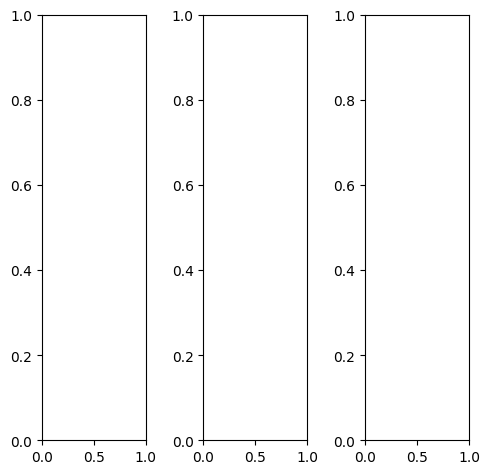

tensor([[[0.3176, 0.4039, 0.4039,  ..., 0.4510, 0.3451, 0.3373],
         [0.2627, 0.3020, 0.3216,  ..., 0.4588, 0.3255, 0.2745],
         [0.2392, 0.2314, 0.2431,  ..., 0.5686, 0.4902, 0.4431],
         ...,
         [0.4157, 0.4157, 0.4000,  ..., 0.3765, 0.4078, 0.3843],
         [0.4275, 0.4588, 0.4510,  ..., 0.4118, 0.4118, 0.4039],
         [0.4431, 0.4941, 0.4667,  ..., 0.4118, 0.4196, 0.4000]],

        [[0.3176, 0.4039, 0.4039,  ..., 0.4510, 0.3451, 0.3373],
         [0.2627, 0.3020, 0.3216,  ..., 0.4588, 0.3255, 0.2745],
         [0.2392, 0.2314, 0.2431,  ..., 0.5686, 0.4902, 0.4431],
         ...,
         [0.4157, 0.4157, 0.4000,  ..., 0.3765, 0.4078, 0.3843],
         [0.4275, 0.4588, 0.4510,  ..., 0.4118, 0.4118, 0.4039],
         [0.4431, 0.4941, 0.4667,  ..., 0.4118, 0.4196, 0.4000]],

        [[0.3176, 0.4039, 0.4039,  ..., 0.4510, 0.3451, 0.3373],
         [0.2627, 0.3020, 0.3216,  ..., 0.4588, 0.3255, 0.2745],
         [0.2392, 0.2314, 0.2431,  ..., 0.5686, 0.4902, 0.

tensor([[[0.3059, 0.3765, 0.3725,  ..., 0.4902, 0.3647, 0.3412],
         [0.2549, 0.2824, 0.2980,  ..., 0.5216, 0.3686, 0.2980],
         [0.2431, 0.2314, 0.2392,  ..., 0.6235, 0.5333, 0.4745],
         ...,
         [0.4745, 0.4745, 0.4588,  ..., 0.4275, 0.4588, 0.4353],
         [0.4824, 0.5176, 0.5098,  ..., 0.4627, 0.4627, 0.4510],
         [0.4824, 0.5529, 0.5176,  ..., 0.4627, 0.4667, 0.4431]],

        [[0.3255, 0.4157, 0.4235,  ..., 0.4392, 0.3412, 0.3373],
         [0.2784, 0.3216, 0.3451,  ..., 0.4392, 0.3137, 0.2667],
         [0.2549, 0.2510, 0.2627,  ..., 0.5569, 0.4784, 0.4353],
         ...,
         [0.4078, 0.4078, 0.3922,  ..., 0.3725, 0.4039, 0.3804],
         [0.4235, 0.4510, 0.4471,  ..., 0.4078, 0.4078, 0.4000],
         [0.4471, 0.4863, 0.4667,  ..., 0.4078, 0.4157, 0.4000]],

        [[0.2980, 0.4078, 0.3961,  ..., 0.4078, 0.3294, 0.3294],
         [0.1882, 0.2471, 0.2588,  ..., 0.3804, 0.2745, 0.2392],
         [0.1412, 0.1333, 0.1529,  ..., 0.5020, 0.4353, 0.

tensor([[[ 0.1071,  0.1871,  0.1350,  ...,  0.3212,  0.1763,  0.2255],
         [ 0.0975, -0.0820, -0.0013,  ...,  0.2950,  0.1107,  0.0856],
         [-0.1514, -0.1979, -0.2604,  ...,  0.5140,  0.3123,  0.3288],
         ...,
         [ 0.3823,  0.4119,  0.3848,  ...,  0.3214,  0.3511,  0.3280],
         [ 0.3993,  0.4720,  0.4330,  ...,  0.3623,  0.3654,  0.3646],
         [ 0.4403,  0.4966,  0.4438,  ...,  0.3583,  0.3734,  0.3732]],

        [[ 0.2218,  0.2951,  0.2419,  ...,  0.4241,  0.3148,  0.2889],
         [ 0.0989,  0.0113, -0.0748,  ...,  0.4752,  0.2627,  0.1528],
         [-0.0336, -0.0115, -0.1699,  ...,  0.6561,  0.4798,  0.4409],
         ...,
         [ 0.3885,  0.4131,  0.4314,  ...,  0.4034,  0.4319,  0.3227],
         [ 0.3944,  0.4686,  0.4692,  ...,  0.4462,  0.4181,  0.3677],
         [ 0.4366,  0.4821,  0.4751,  ...,  0.3688,  0.3852,  0.3574]],

        [[ 0.3338,  0.2367,  0.3480,  ...,  0.6810,  0.5119,  0.4860],
         [ 0.2626,  0.1054,  0.2081,  ...,  0

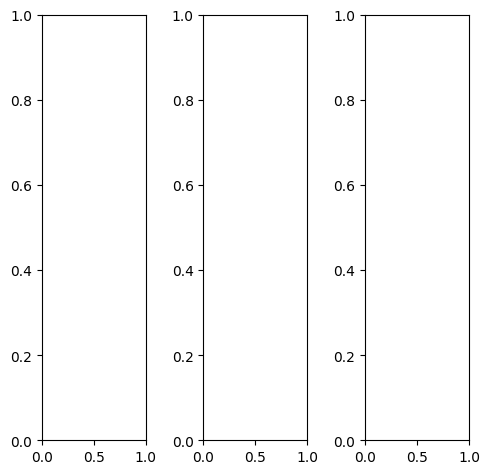

tensor([[[0.0157, 0.0039, 0.0196,  ..., 0.2510, 0.2588, 0.2706],
         [0.0235, 0.0078, 0.0118,  ..., 0.2431, 0.2549, 0.2627],
         [0.0235, 0.0118, 0.0118,  ..., 0.2431, 0.2549, 0.2588],
         ...,
         [0.3176, 0.3137, 0.3098,  ..., 0.6000, 0.6235, 0.5647],
         [0.2941, 0.2824, 0.2824,  ..., 0.4431, 0.4863, 0.4745],
         [0.2627, 0.2549, 0.2588,  ..., 0.4824, 0.5059, 0.4157]],

        [[0.0157, 0.0039, 0.0196,  ..., 0.2510, 0.2588, 0.2706],
         [0.0235, 0.0078, 0.0118,  ..., 0.2431, 0.2549, 0.2627],
         [0.0235, 0.0118, 0.0118,  ..., 0.2431, 0.2549, 0.2588],
         ...,
         [0.3176, 0.3137, 0.3098,  ..., 0.6000, 0.6235, 0.5647],
         [0.2941, 0.2824, 0.2824,  ..., 0.4431, 0.4863, 0.4745],
         [0.2627, 0.2549, 0.2588,  ..., 0.4824, 0.5059, 0.4157]],

        [[0.0157, 0.0039, 0.0196,  ..., 0.2510, 0.2588, 0.2706],
         [0.0235, 0.0078, 0.0118,  ..., 0.2431, 0.2549, 0.2627],
         [0.0235, 0.0118, 0.0118,  ..., 0.2431, 0.2549, 0.

tensor([[[0.0157, 0.0039, 0.0196,  ..., 0.2353, 0.2431, 0.2549],
         [0.0235, 0.0078, 0.0118,  ..., 0.2275, 0.2392, 0.2471],
         [0.0235, 0.0118, 0.0118,  ..., 0.2275, 0.2392, 0.2431],
         ...,
         [0.3176, 0.3137, 0.3098,  ..., 0.6549, 0.6784, 0.6118],
         [0.2941, 0.2824, 0.2824,  ..., 0.4980, 0.5490, 0.5373],
         [0.2627, 0.2549, 0.2588,  ..., 0.5294, 0.5686, 0.4824]],

        [[0.0157, 0.0039, 0.0196,  ..., 0.2549, 0.2667, 0.2784],
         [0.0235, 0.0078, 0.0118,  ..., 0.2510, 0.2627, 0.2706],
         [0.0235, 0.0118, 0.0118,  ..., 0.2471, 0.2627, 0.2667],
         ...,
         [0.3176, 0.3137, 0.3098,  ..., 0.5765, 0.6000, 0.5451],
         [0.2941, 0.2824, 0.2824,  ..., 0.4235, 0.4627, 0.4510],
         [0.2627, 0.2549, 0.2588,  ..., 0.4706, 0.4902, 0.3961]],

        [[0.0157, 0.0039, 0.0196,  ..., 0.2627, 0.2588, 0.2706],
         [0.0235, 0.0078, 0.0118,  ..., 0.2549, 0.2549, 0.2627],
         [0.0235, 0.0118, 0.0118,  ..., 0.2549, 0.2549, 0.

tensor([[[ 0.0331,  0.0104, -0.0715,  ...,  0.2827,  0.3182,  0.3992],
         [ 0.0775, -0.1540, -0.1235,  ...,  0.2153,  0.2294,  0.3431],
         [-0.1457, -0.1851, -0.2151,  ...,  0.1978,  0.2275,  0.3187],
         ...,
         [ 0.4978,  0.4665,  0.4491,  ...,  0.7812,  0.8209,  0.7757],
         [ 0.4526,  0.4442,  0.4203,  ...,  0.5831,  0.6442,  0.6717],
         [ 0.4441,  0.4081,  0.3872,  ...,  0.7198,  0.7544,  0.6537]],

        [[ 0.1405,  0.0692, -0.0578,  ...,  0.4090,  0.4348,  0.4494],
         [ 0.0757, -0.1574, -0.2785,  ...,  0.3650,  0.4022,  0.4212],
         [-0.0188, -0.0821, -0.2322,  ...,  0.3553,  0.3888,  0.4160],
         ...,
         [ 0.5115,  0.4876,  0.5272,  ...,  0.7846,  0.8014,  0.7989],
         [ 0.4558,  0.4543,  0.4714,  ...,  0.5936,  0.6647,  0.6879],
         [ 0.4352,  0.4063,  0.4196,  ...,  0.7087,  0.7459,  0.6483]],

        [[ 0.2327,  0.0397,  0.1301,  ...,  0.5880,  0.6172,  0.6152],
         [ 0.2015, -0.0349,  0.0990,  ...,  0

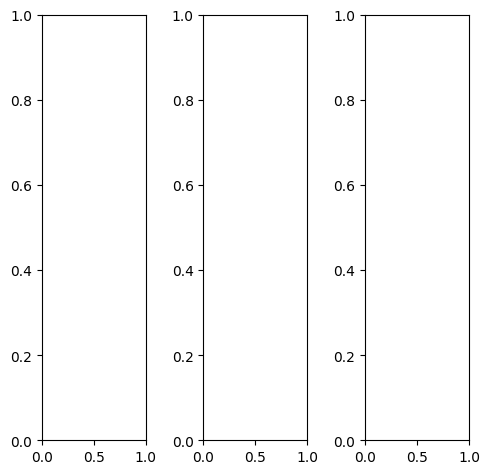

EPOCH: 10.765  trn_loss: 0.005  (1266.59s - 10498.92s remaining)

tensor([[[0.2157, 0.2157, 0.2196,  ..., 0.2549, 0.2078, 0.2078],
         [0.2000, 0.2078, 0.2078,  ..., 0.2510, 0.2078, 0.2118],
         [0.2039, 0.2118, 0.2078,  ..., 0.2314, 0.2157, 0.2118],
         ...,
         [0.9765, 0.9725, 0.9608,  ..., 0.2667, 0.2784, 0.4471],
         [0.9804, 0.9843, 0.9804,  ..., 0.6588, 0.8353, 0.8235],
         [0.9843, 0.9843, 0.9882,  ..., 0.9725, 0.9804, 0.9843]],

        [[0.2157, 0.2157, 0.2196,  ..., 0.2549, 0.2078, 0.2078],
         [0.2000, 0.2078, 0.2078,  ..., 0.2510, 0.2078, 0.2118],
         [0.2039, 0.2118, 0.2078,  ..., 0.2314, 0.2157, 0.2118],
         ...,
         [0.9765, 0.9725, 0.9608,  ..., 0.2667, 0.2784, 0.4471],
         [0.9804, 0.9843, 0.9804,  ..., 0.6588, 0.8353, 0.8235],
         [0.9843, 0.9843, 0.9882,  ..., 0.9725, 0.9804, 0.9843]],

        [[0.2157, 0.2157, 0.2196,  ..., 0.2549, 0.2078, 0.2078],
         [0.2000, 0.2078, 0.2078,  ..., 0.2510, 0.2078, 0.2118],
         [0.2039, 0.2118, 0.2078,  ..., 0.2314, 0.2157, 0.

tensor([[[0.2039, 0.2078, 0.1961,  ..., 0.2235, 0.1922, 0.2000],
         [0.1961, 0.2078, 0.1961,  ..., 0.2471, 0.1843, 0.1843],
         [0.2039, 0.2196, 0.2078,  ..., 0.2392, 0.1922, 0.1843],
         ...,
         [0.9922, 0.9922, 0.9804,  ..., 0.3137, 0.3373, 0.4902],
         [0.9922, 0.9961, 0.9922,  ..., 0.7059, 0.8784, 0.8549],
         [0.9961, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.2196, 0.2157, 0.2353,  ..., 0.2784, 0.2196, 0.2078],
         [0.2000, 0.2078, 0.2157,  ..., 0.2627, 0.2235, 0.2235],
         [0.2039, 0.2078, 0.2078,  ..., 0.2353, 0.2314, 0.2275],
         ...,
         [0.9882, 0.9804, 0.9686,  ..., 0.2549, 0.2627, 0.4392],
         [0.9922, 0.9922, 0.9882,  ..., 0.6549, 0.8314, 0.8275],
         [0.9961, 0.9922, 0.9961,  ..., 0.9804, 0.9922, 1.0000]],

        [[0.2196, 0.2275, 0.2157,  ..., 0.2000, 0.2039, 0.2157],
         [0.2039, 0.2235, 0.2039,  ..., 0.2039, 0.1922, 0.2118],
         [0.2039, 0.2235, 0.2039,  ..., 0.1922, 0.1922, 0.

tensor([[[ 0.1497,  0.1578,  0.0769,  ...,  0.1530,  0.1329,  0.1931],
         [ 0.1447,  0.0722,  0.1151,  ...,  0.1202,  0.0803,  0.1463],
         [-0.0078,  0.1091, -0.0243,  ...,  0.0781,  0.0738,  0.1264],
         ...,
         [ 0.9145,  0.9461,  0.9127,  ...,  0.2280,  0.2496,  0.4819],
         [ 0.9047,  0.9382,  0.8972,  ...,  0.6407,  0.8483,  0.8552],
         [ 0.9142,  0.9262,  0.9060,  ...,  0.9811,  0.9811,  0.9161]],

        [[ 0.1754,  0.3041,  0.0996,  ...,  0.2229,  0.1878,  0.2305],
         [ 0.1799,  0.1490,  0.0350,  ...,  0.2179,  0.1905,  0.1934],
         [ 0.0828,  0.3101, -0.0222,  ...,  0.1787,  0.1686,  0.1937],
         ...,
         [ 0.9170,  0.9440,  0.9133,  ...,  0.2002,  0.2457,  0.4680],
         [ 0.9244,  0.9414,  0.9344,  ...,  0.6556,  0.8772,  0.8533],
         [ 0.9070,  0.9144,  0.9168,  ...,  0.9318,  0.9626,  0.8657]],

        [[ 0.3458,  0.1864,  0.2644,  ...,  0.3538,  0.3263,  0.3605],
         [ 0.2893,  0.1946,  0.2677,  ...,  0

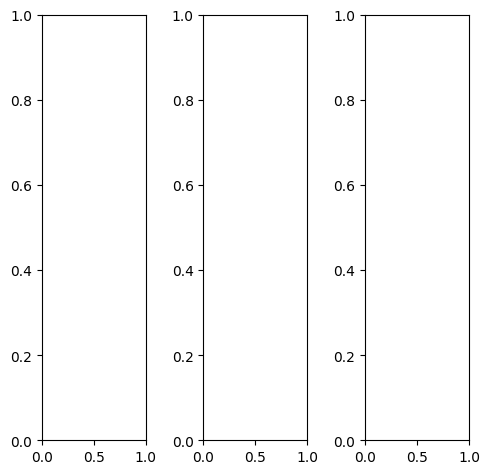

tensor([[[0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         ...,
         [0.6000, 0.6000, 0.6039,  ..., 0.6039, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000]],

        [[0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         ...,
         [0.6000, 0.6000, 0.6039,  ..., 0.6039, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000]],

        [[0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6000],
         [0.6000, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.

tensor([[[0.5686, 0.5686, 0.5686,  ..., 0.5686, 0.5686, 0.5686],
         [0.5686, 0.5686, 0.5686,  ..., 0.5686, 0.5686, 0.5686],
         [0.5686, 0.5686, 0.5686,  ..., 0.5686, 0.5686, 0.5686],
         ...,
         [0.5686, 0.5686, 0.5725,  ..., 0.5725, 0.5686, 0.5686],
         [0.5686, 0.5686, 0.5686,  ..., 0.5686, 0.5686, 0.5686],
         [0.5686, 0.5686, 0.5686,  ..., 0.5686, 0.5686, 0.5686]],

        [[0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         [0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         [0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         ...,
         [0.6118, 0.6118, 0.6157,  ..., 0.6196, 0.6157, 0.6157],
         [0.6118, 0.6118, 0.6118,  ..., 0.6157, 0.6157, 0.6157],
         [0.6118, 0.6118, 0.6118,  ..., 0.6157, 0.6157, 0.6157]],

        [[0.6196, 0.6196, 0.6196,  ..., 0.6196, 0.6196, 0.6196],
         [0.6196, 0.6196, 0.6196,  ..., 0.6196, 0.6196, 0.6196],
         [0.6196, 0.6196, 0.6196,  ..., 0.6196, 0.6196, 0.

tensor([[[0.5660, 0.5189, 0.5053,  ..., 0.4484, 0.4590, 0.5443],
         [0.5357, 0.5046, 0.5554,  ..., 0.3724, 0.4477, 0.5070],
         [0.4942, 0.5801, 0.4519,  ..., 0.4288, 0.4674, 0.5104],
         ...,
         [0.5617, 0.5676, 0.5524,  ..., 0.5933, 0.5835, 0.6129],
         [0.5525, 0.5530, 0.5156,  ..., 0.5772, 0.5903, 0.6173],
         [0.5810, 0.5635, 0.5446,  ..., 0.5952, 0.6031, 0.6015]],

        [[0.6336, 0.6044, 0.5965,  ..., 0.5360, 0.5737, 0.5761],
         [0.5226, 0.5973, 0.5580,  ..., 0.5419, 0.5859, 0.6180],
         [0.6126, 0.6531, 0.6215,  ..., 0.5659, 0.5857, 0.6052],
         ...,
         [0.5197, 0.5500, 0.5695,  ..., 0.5908, 0.6026, 0.5894],
         [0.5144, 0.5307, 0.5346,  ..., 0.5865, 0.5900, 0.5851],
         [0.5226, 0.5380, 0.5427,  ..., 0.5646, 0.5782, 0.5678]],

        [[0.7459, 0.6712, 0.8079,  ..., 0.7083, 0.7210, 0.7113],
         [0.7032, 0.7661, 0.7680,  ..., 0.6828, 0.7231, 0.7091],
         [0.6939, 0.7035, 0.8114,  ..., 0.7237, 0.7439, 0.

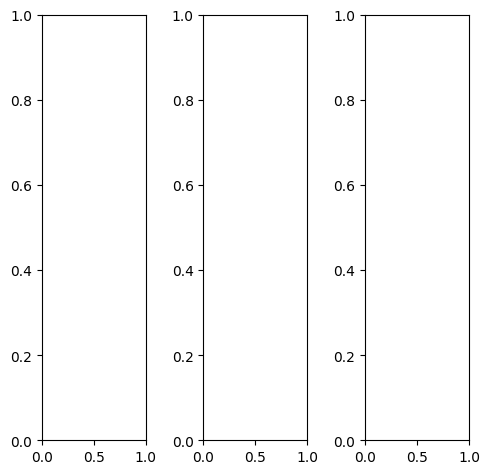

tensor([[[0.6039, 0.6078, 0.6118,  ..., 0.5098, 0.5137, 0.5176],
         [0.6039, 0.6078, 0.6157,  ..., 0.4980, 0.5137, 0.5176],
         [0.6078, 0.6157, 0.6235,  ..., 0.5098, 0.5137, 0.5137],
         ...,
         [0.7059, 0.7294, 0.7333,  ..., 0.7569, 0.7529, 0.7569],
         [0.7020, 0.7176, 0.7373,  ..., 0.6980, 0.6941, 0.6941],
         [0.7294, 0.7216, 0.7294,  ..., 0.7216, 0.7059, 0.6863]],

        [[0.6039, 0.6078, 0.6118,  ..., 0.5098, 0.5137, 0.5176],
         [0.6039, 0.6078, 0.6157,  ..., 0.4980, 0.5137, 0.5176],
         [0.6078, 0.6157, 0.6235,  ..., 0.5098, 0.5137, 0.5137],
         ...,
         [0.7059, 0.7294, 0.7333,  ..., 0.7569, 0.7529, 0.7569],
         [0.7020, 0.7176, 0.7373,  ..., 0.6980, 0.6941, 0.6941],
         [0.7294, 0.7216, 0.7294,  ..., 0.7216, 0.7059, 0.6863]],

        [[0.6039, 0.6078, 0.6118,  ..., 0.5098, 0.5137, 0.5176],
         [0.6039, 0.6078, 0.6157,  ..., 0.4980, 0.5137, 0.5176],
         [0.6078, 0.6157, 0.6235,  ..., 0.5098, 0.5137, 0.

tensor([[[0.6549, 0.6627, 0.6706,  ..., 0.6000, 0.5961, 0.6000],
         [0.6588, 0.6667, 0.6745,  ..., 0.5922, 0.6039, 0.6000],
         [0.6667, 0.6745, 0.6863,  ..., 0.6078, 0.6078, 0.6039],
         ...,
         [0.7608, 0.7882, 0.7961,  ..., 0.8275, 0.8235, 0.8314],
         [0.7529, 0.7725, 0.7961,  ..., 0.7647, 0.7608, 0.7608],
         [0.7804, 0.7725, 0.7843,  ..., 0.7882, 0.7725, 0.7529]],

        [[0.5765, 0.5765, 0.5804,  ..., 0.4627, 0.4706, 0.4745],
         [0.5725, 0.5765, 0.5804,  ..., 0.4510, 0.4667, 0.4745],
         [0.5765, 0.5804, 0.5882,  ..., 0.4588, 0.4667, 0.4706],
         ...,
         [0.6745, 0.6980, 0.7020,  ..., 0.7176, 0.7137, 0.7216],
         [0.6706, 0.6863, 0.7059,  ..., 0.6627, 0.6588, 0.6588],
         [0.7020, 0.6941, 0.7020,  ..., 0.6863, 0.6706, 0.6510]],

        [[0.6275, 0.6235, 0.6275,  ..., 0.5059, 0.5137, 0.5176],
         [0.6275, 0.6275, 0.6275,  ..., 0.4980, 0.5137, 0.5176],
         [0.6314, 0.6314, 0.6353,  ..., 0.5098, 0.5137, 0.

tensor([[[ 0.2453,  0.2157,  0.1396,  ...,  0.2834,  0.3097,  0.2597],
         [ 0.2068,  0.1229,  0.0815,  ...,  0.3092,  0.3314,  0.2755],
         [ 0.1035,  0.1136, -0.0009,  ...,  0.3519,  0.3666,  0.2963],
         ...,
         [ 0.4182,  0.5115,  0.4389,  ...,  0.4900,  0.4769,  0.5067],
         [ 0.4236,  0.4828,  0.4695,  ...,  0.3975,  0.3727,  0.4330],
         [ 0.4979,  0.4587,  0.4414,  ...,  0.4293,  0.4514,  0.4270]],

        [[ 0.3404,  0.3896,  0.3536,  ...,  0.3106,  0.3530,  0.2801],
         [ 0.2406,  0.3204,  0.1522,  ...,  0.3341,  0.3787,  0.2926],
         [ 0.2384,  0.3696,  0.2138,  ...,  0.3681,  0.3752,  0.2878],
         ...,
         [ 0.3696,  0.4514,  0.4539,  ...,  0.4976,  0.5080,  0.4683],
         [ 0.3762,  0.4280,  0.4438,  ...,  0.4266,  0.4108,  0.4251],
         [ 0.4403,  0.4218,  0.4131,  ...,  0.4324,  0.4489,  0.3908]],

        [[ 0.5441,  0.3167,  0.5018,  ...,  0.3638,  0.4024,  0.3669],
         [ 0.4599,  0.4550,  0.3694,  ...,  0

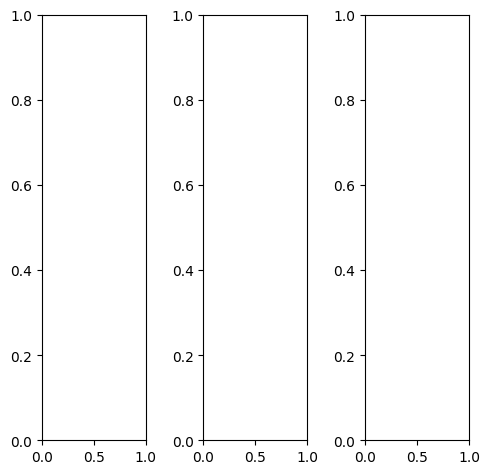

tensor([[[0.0392, 0.0471, 0.0549,  ..., 0.0549, 0.0667, 0.0588],
         [0.1059, 0.1098, 0.1294,  ..., 0.1647, 0.1882, 0.1412],
         [0.0824, 0.0667, 0.0784,  ..., 0.1765, 0.1686, 0.1059],
         ...,
         [0.2275, 0.4000, 0.3686,  ..., 0.4275, 0.4314, 0.1882],
         [0.0275, 0.0275, 0.0196,  ..., 0.0353, 0.0275, 0.0235],
         [0.0039, 0.0000, 0.0000,  ..., 0.2078, 0.2078, 0.1059]],

        [[0.0392, 0.0471, 0.0549,  ..., 0.0549, 0.0667, 0.0588],
         [0.1059, 0.1098, 0.1294,  ..., 0.1647, 0.1882, 0.1412],
         [0.0824, 0.0667, 0.0784,  ..., 0.1765, 0.1686, 0.1059],
         ...,
         [0.2275, 0.4000, 0.3686,  ..., 0.4275, 0.4314, 0.1882],
         [0.0275, 0.0275, 0.0196,  ..., 0.0353, 0.0275, 0.0235],
         [0.0039, 0.0000, 0.0000,  ..., 0.2078, 0.2078, 0.1059]],

        [[0.0392, 0.0471, 0.0549,  ..., 0.0549, 0.0667, 0.0588],
         [0.1059, 0.1098, 0.1294,  ..., 0.1647, 0.1882, 0.1412],
         [0.0824, 0.0667, 0.0784,  ..., 0.1765, 0.1686, 0.

tensor([[[0.0392, 0.0667, 0.0745,  ..., 0.0588, 0.0667, 0.0549],
         [0.1294, 0.1569, 0.1765,  ..., 0.2000, 0.2157, 0.1569],
         [0.1216, 0.1294, 0.1412,  ..., 0.2392, 0.2196, 0.1333],
         ...,
         [0.2314, 0.4157, 0.4000,  ..., 0.4353, 0.4392, 0.1922],
         [0.0275, 0.0314, 0.0275,  ..., 0.0392, 0.0314, 0.0235],
         [0.0039, 0.0000, 0.0000,  ..., 0.2078, 0.2078, 0.1059]],

        [[0.0353, 0.0353, 0.0471,  ..., 0.0510, 0.0667, 0.0627],
         [0.0941, 0.0863, 0.1059,  ..., 0.1490, 0.1765, 0.1373],
         [0.0588, 0.0353, 0.0471,  ..., 0.1490, 0.1490, 0.0941],
         ...,
         [0.2275, 0.3922, 0.3529,  ..., 0.4235, 0.4275, 0.1882],
         [0.0275, 0.0235, 0.0157,  ..., 0.0353, 0.0275, 0.0235],
         [0.0039, 0.0000, 0.0000,  ..., 0.2078, 0.2078, 0.1059]],

        [[0.0588, 0.0549, 0.0510,  ..., 0.0588, 0.0706, 0.0588],
         [0.1216, 0.1137, 0.1216,  ..., 0.1529, 0.1804, 0.1373],
         [0.0902, 0.0588, 0.0588,  ..., 0.1451, 0.1490, 0.

tensor([[[ 0.0743,  0.0161, -0.0176,  ...,  0.1234,  0.1577,  0.2151],
         [ 0.1264, -0.0142,  0.0984,  ...,  0.2090,  0.2302,  0.2256],
         [-0.0650, -0.0548, -0.0903,  ...,  0.1826,  0.1900,  0.1718],
         ...,
         [ 0.3514,  0.5536,  0.5105,  ...,  0.5637,  0.5552,  0.3646],
         [ 0.2150,  0.2033,  0.1973,  ...,  0.1823,  0.1964,  0.2382],
         [ 0.1900,  0.1441,  0.1320,  ...,  0.3658,  0.3557,  0.3209]],

        [[ 0.1199,  0.1326,  0.0391,  ...,  0.1704,  0.1853,  0.2304],
         [ 0.1410,  0.0280, -0.0239,  ...,  0.3015,  0.3342,  0.2647],
         [ 0.0505,  0.1011, -0.0334,  ...,  0.2798,  0.2808,  0.2277],
         ...,
         [ 0.3516,  0.5404,  0.5099,  ...,  0.5699,  0.5934,  0.3196],
         [ 0.1717,  0.1722,  0.1610,  ...,  0.1784,  0.1773,  0.1850],
         [ 0.1647,  0.1197,  0.1276,  ...,  0.3535,  0.3390,  0.2831]],

        [[ 0.3097,  0.1022,  0.2323,  ...,  0.3103,  0.3387,  0.3655],
         [ 0.3118,  0.1991,  0.3155,  ...,  0

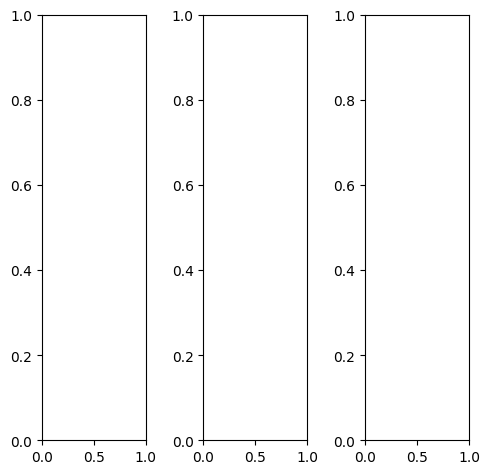

tensor([[[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0471],
         ...,
         [0.0784, 0.0784, 0.0824,  ..., 0.2431, 0.2314, 0.2196],
         [0.0745, 0.0745, 0.0784,  ..., 0.2392, 0.2314, 0.2118],
         [0.0706, 0.0706, 0.0706,  ..., 0.2235, 0.2196, 0.2039]],

        [[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0471],
         ...,
         [0.0784, 0.0784, 0.0824,  ..., 0.2431, 0.2314, 0.2196],
         [0.0745, 0.0745, 0.0784,  ..., 0.2392, 0.2314, 0.2118],
         [0.0706, 0.0706, 0.0706,  ..., 0.2235, 0.2196, 0.2039]],

        [[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.

tensor([[[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0471],
         ...,
         [0.0784, 0.0784, 0.0824,  ..., 0.2745, 0.2588, 0.2392],
         [0.0745, 0.0745, 0.0784,  ..., 0.2784, 0.2627, 0.2392],
         [0.0706, 0.0706, 0.0706,  ..., 0.2588, 0.2510, 0.2235]],

        [[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0471],
         ...,
         [0.0784, 0.0784, 0.0824,  ..., 0.2353, 0.2235, 0.2118],
         [0.0745, 0.0745, 0.0784,  ..., 0.2275, 0.2196, 0.2000],
         [0.0706, 0.0706, 0.0706,  ..., 0.2118, 0.2118, 0.1961]],

        [[0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.0510],
         [0.0588, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
         [0.0588, 0.0471, 0.0471,  ..., 0.0510, 0.0510, 0.

tensor([[[ 0.1481,  0.0809,  0.0272,  ...,  0.1282,  0.1458,  0.2249],
         [ 0.1584, -0.0554, -0.0119,  ...,  0.0775,  0.0824,  0.1655],
         [ 0.0263, -0.0588, -0.0839,  ...,  0.0633,  0.0721,  0.1430],
         ...,
         [ 0.2479,  0.2476,  0.2343,  ...,  0.5918,  0.5675,  0.5989],
         [ 0.2467,  0.2422,  0.2358,  ...,  0.5603,  0.5460,  0.5694],
         [ 0.2779,  0.2464,  0.2245,  ...,  0.5659,  0.5591,  0.5614]],

        [[ 0.2116,  0.2027,  0.0211,  ...,  0.1984,  0.2089,  0.2633],
         [ 0.1946,  0.0212, -0.1046,  ...,  0.2023,  0.2091,  0.2203],
         [ 0.1216,  0.1135, -0.0852,  ...,  0.1923,  0.1980,  0.2174],
         ...,
         [ 0.2538,  0.2611,  0.2695,  ...,  0.6231,  0.6195,  0.5780],
         [ 0.2435,  0.2534,  0.2570,  ...,  0.5970,  0.5882,  0.5636],
         [ 0.2536,  0.2370,  0.2376,  ...,  0.5665,  0.5700,  0.5511]],

        [[ 0.3239,  0.1686,  0.2279,  ...,  0.3574,  0.3766,  0.4133],
         [ 0.3095,  0.1244,  0.2284,  ...,  0

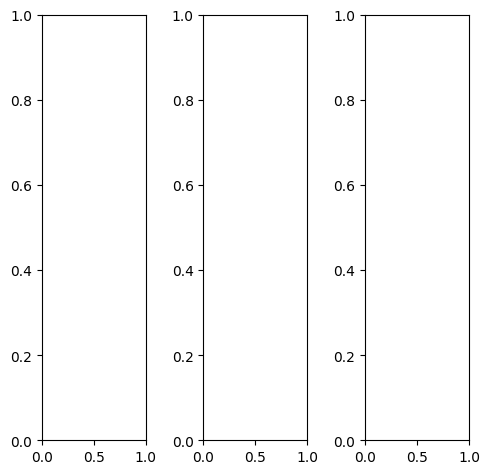

EPOCH: 11.000  val_loss: 0.003  (1300.77s - 10524.41s remaining)

tensor([[[0.3843, 0.3804, 0.3804,  ..., 0.2824, 0.2745, 0.2706],
         [0.3922, 0.3843, 0.3882,  ..., 0.2863, 0.2784, 0.2745],
         [0.3961, 0.3882, 0.3922,  ..., 0.2863, 0.2784, 0.2745],
         ...,
         [0.4510, 0.4431, 0.4549,  ..., 0.4471, 0.4431, 0.4392],
         [0.4510, 0.4431, 0.4510,  ..., 0.4471, 0.4471, 0.4392],
         [0.4431, 0.4392, 0.4431,  ..., 0.4431, 0.4431, 0.4392]],

        [[0.3843, 0.3804, 0.3804,  ..., 0.2824, 0.2745, 0.2706],
         [0.3922, 0.3843, 0.3882,  ..., 0.2863, 0.2784, 0.2745],
         [0.3961, 0.3882, 0.3922,  ..., 0.2863, 0.2784, 0.2745],
         ...,
         [0.4510, 0.4431, 0.4549,  ..., 0.4471, 0.4431, 0.4392],
         [0.4510, 0.4431, 0.4510,  ..., 0.4471, 0.4471, 0.4392],
         [0.4431, 0.4392, 0.4431,  ..., 0.4431, 0.4431, 0.4392]],

        [[0.3843, 0.3804, 0.3804,  ..., 0.2824, 0.2745, 0.2706],
         [0.3922, 0.3843, 0.3882,  ..., 0.2863, 0.2784, 0.2745],
         [0.3961, 0.3882, 0.3922,  ..., 0.2863, 0.2784, 0.

tensor([[[0.3882, 0.3843, 0.3843,  ..., 0.1333, 0.1294, 0.1255],
         [0.4000, 0.3961, 0.3961,  ..., 0.1333, 0.1294, 0.1255],
         [0.4118, 0.4039, 0.4078,  ..., 0.1333, 0.1294, 0.1255],
         ...,
         [0.3922, 0.3765, 0.3804,  ..., 0.3843, 0.3804, 0.3765],
         [0.3686, 0.3529, 0.3490,  ..., 0.3608, 0.3608, 0.3529],
         [0.3529, 0.3412, 0.3373,  ..., 0.3490, 0.3490, 0.3451]],

        [[0.3765, 0.3725, 0.3725,  ..., 0.3333, 0.3255, 0.3216],
         [0.3843, 0.3765, 0.3804,  ..., 0.3373, 0.3294, 0.3255],
         [0.3843, 0.3765, 0.3804,  ..., 0.3373, 0.3294, 0.3255],
         ...,
         [0.5059, 0.5020, 0.5137,  ..., 0.5020, 0.4980, 0.4941],
         [0.5176, 0.5176, 0.5255,  ..., 0.5176, 0.5176, 0.5098],
         [0.5176, 0.5176, 0.5216,  ..., 0.5176, 0.5176, 0.5137]],

        [[0.4039, 0.4000, 0.4000,  ..., 0.4039, 0.4000, 0.3961],
         [0.4118, 0.4039, 0.4078,  ..., 0.4078, 0.4039, 0.4000],
         [0.4157, 0.4078, 0.4118,  ..., 0.4078, 0.4039, 0.

tensor([[[0.3535, 0.3106, 0.3047,  ..., 0.2243, 0.2254, 0.2419],
         [0.3352, 0.3072, 0.3198,  ..., 0.2237, 0.2230, 0.2296],
         [0.3393, 0.3086, 0.3164,  ..., 0.2262, 0.2151, 0.2243],
         ...,
         [0.3888, 0.3751, 0.3845,  ..., 0.3816, 0.3817, 0.3839],
         [0.4050, 0.3931, 0.3808,  ..., 0.3837, 0.3865, 0.3994],
         [0.4301, 0.4077, 0.3918,  ..., 0.3984, 0.4162, 0.4360]],

        [[0.4068, 0.3917, 0.3916,  ..., 0.2836, 0.2846, 0.2961],
         [0.4018, 0.3927, 0.3969,  ..., 0.2965, 0.2946, 0.2852],
         [0.4051, 0.4076, 0.4008,  ..., 0.2951, 0.2851, 0.2820],
         ...,
         [0.4617, 0.4570, 0.4740,  ..., 0.4716, 0.4718, 0.4445],
         [0.4608, 0.4455, 0.4637,  ..., 0.4586, 0.4646, 0.4447],
         [0.4653, 0.4460, 0.4544,  ..., 0.4606, 0.4662, 0.4688]],

        [[0.4398, 0.4393, 0.4546,  ..., 0.3522, 0.3460, 0.3423],
         [0.4504, 0.4567, 0.4740,  ..., 0.3743, 0.3647, 0.3339],
         [0.4633, 0.4735, 0.4791,  ..., 0.3855, 0.3690, 0.

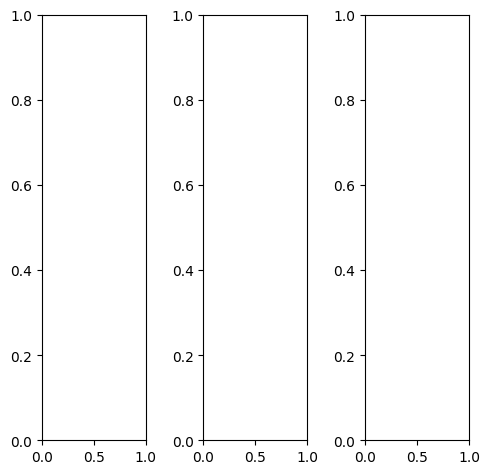

tensor([[[0.7020, 0.6980, 0.7059,  ..., 0.6314, 0.6196, 0.6000],
         [0.7216, 0.7176, 0.7255,  ..., 0.6392, 0.6275, 0.6157],
         [0.7412, 0.7373, 0.7451,  ..., 0.6706, 0.6627, 0.6431],
         ...,
         [0.2627, 0.2667, 0.3255,  ..., 0.3255, 0.3216, 0.2980],
         [0.2784, 0.3294, 0.3333,  ..., 0.2980, 0.2784, 0.2431],
         [0.3333, 0.3373, 0.3020,  ..., 0.3098, 0.2863, 0.2392]],

        [[0.7020, 0.6980, 0.7059,  ..., 0.6314, 0.6196, 0.6000],
         [0.7216, 0.7176, 0.7255,  ..., 0.6392, 0.6275, 0.6157],
         [0.7412, 0.7373, 0.7451,  ..., 0.6706, 0.6627, 0.6431],
         ...,
         [0.2627, 0.2667, 0.3255,  ..., 0.3255, 0.3216, 0.2980],
         [0.2784, 0.3294, 0.3333,  ..., 0.2980, 0.2784, 0.2431],
         [0.3333, 0.3373, 0.3020,  ..., 0.3098, 0.2863, 0.2392]],

        [[0.7020, 0.6980, 0.7059,  ..., 0.6314, 0.6196, 0.6000],
         [0.7216, 0.7176, 0.7255,  ..., 0.6392, 0.6275, 0.6157],
         [0.7412, 0.7373, 0.7451,  ..., 0.6706, 0.6627, 0.

tensor([[[0.5569, 0.5569, 0.5647,  ..., 0.4863, 0.4745, 0.4549],
         [0.5804, 0.5804, 0.5843,  ..., 0.4941, 0.4824, 0.4667],
         [0.6039, 0.6039, 0.6078,  ..., 0.5333, 0.5255, 0.5020],
         ...,
         [0.1373, 0.1451, 0.2039,  ..., 0.2196, 0.2157, 0.1922],
         [0.1529, 0.2118, 0.2118,  ..., 0.1922, 0.1725, 0.1373],
         [0.2118, 0.2196, 0.1843,  ..., 0.2039, 0.1843, 0.1373]],

        [[0.7333, 0.7294, 0.7373,  ..., 0.6627, 0.6510, 0.6353],
         [0.7529, 0.7490, 0.7569,  ..., 0.6745, 0.6627, 0.6510],
         [0.7765, 0.7686, 0.7765,  ..., 0.7020, 0.6941, 0.6784],
         ...,
         [0.2902, 0.2941, 0.3529,  ..., 0.3451, 0.3451, 0.3216],
         [0.3059, 0.3569, 0.3608,  ..., 0.3216, 0.3020, 0.2667],
         [0.3608, 0.3647, 0.3294,  ..., 0.3333, 0.3098, 0.2627]],

        [[0.9176, 0.9098, 0.9176,  ..., 0.8392, 0.8275, 0.8118],
         [0.9255, 0.9176, 0.9255,  ..., 0.8549, 0.8431, 0.8314],
         [0.9333, 0.9255, 0.9333,  ..., 0.8706, 0.8627, 0.

tensor([[[0.7137, 0.6417, 0.6873,  ..., 0.5267, 0.5286, 0.5566],
         [0.6919, 0.6458, 0.6703,  ..., 0.5291, 0.5266, 0.5345],
         [0.7315, 0.7312, 0.6920,  ..., 0.5792, 0.5756, 0.5558],
         ...,
         [0.2461, 0.2585, 0.3094,  ..., 0.3174, 0.3128, 0.2845],
         [0.2668, 0.3190, 0.3228,  ..., 0.2832, 0.2582, 0.2320],
         [0.3388, 0.3331, 0.2852,  ..., 0.3031, 0.2770, 0.2577]],

        [[0.7503, 0.7638, 0.7175,  ..., 0.6521, 0.6500, 0.6413],
         [0.7329, 0.7532, 0.7755,  ..., 0.6517, 0.6476, 0.6538],
         [0.7908, 0.8306, 0.7372,  ..., 0.6957, 0.6757, 0.6701],
         ...,
         [0.2702, 0.2739, 0.3280,  ..., 0.3273, 0.3277, 0.3014],
         [0.2807, 0.3348, 0.3381,  ..., 0.2980, 0.2753, 0.2415],
         [0.3563, 0.3543, 0.3127,  ..., 0.3190, 0.2920, 0.2764]],

        [[0.7966, 0.7822, 0.8093,  ..., 0.7965, 0.7832, 0.7363],
         [0.8015, 0.7956, 0.8159,  ..., 0.8015, 0.7882, 0.7587],
         [0.8267, 0.8203, 0.8492,  ..., 0.8288, 0.8198, 0.

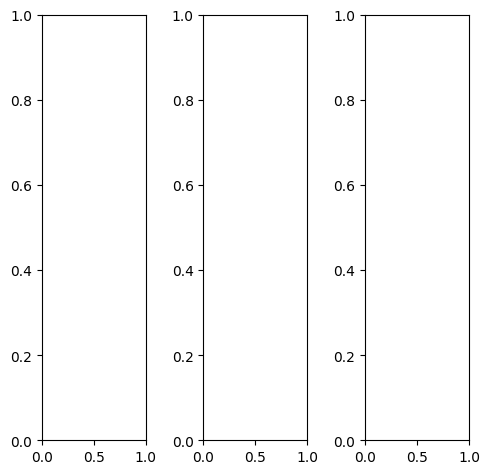

tensor([[[0.3490, 0.3608, 0.3529,  ..., 0.2902, 0.2941, 0.3020],
         [0.3569, 0.3686, 0.3569,  ..., 0.2824, 0.2824, 0.2863],
         [0.3608, 0.3608, 0.3451,  ..., 0.2745, 0.2706, 0.2706],
         ...,
         [0.2118, 0.2510, 0.2275,  ..., 0.3686, 0.3451, 0.2824],
         [0.2196, 0.2431, 0.2471,  ..., 0.3686, 0.4392, 0.3804],
         [0.2588, 0.1882, 0.2314,  ..., 0.4196, 0.5216, 0.4706]],

        [[0.3490, 0.3608, 0.3529,  ..., 0.2902, 0.2941, 0.3020],
         [0.3569, 0.3686, 0.3569,  ..., 0.2824, 0.2824, 0.2863],
         [0.3608, 0.3608, 0.3451,  ..., 0.2745, 0.2706, 0.2706],
         ...,
         [0.2118, 0.2510, 0.2275,  ..., 0.3686, 0.3451, 0.2824],
         [0.2196, 0.2431, 0.2471,  ..., 0.3686, 0.4392, 0.3804],
         [0.2588, 0.1882, 0.2314,  ..., 0.4196, 0.5216, 0.4706]],

        [[0.3490, 0.3608, 0.3529,  ..., 0.2902, 0.2941, 0.3020],
         [0.3569, 0.3686, 0.3569,  ..., 0.2824, 0.2824, 0.2863],
         [0.3608, 0.3608, 0.3451,  ..., 0.2745, 0.2706, 0.

tensor([[[0.2510, 0.2588, 0.2549,  ..., 0.1804, 0.1843, 0.1961],
         [0.2627, 0.2706, 0.2588,  ..., 0.1765, 0.1804, 0.1843],
         [0.2627, 0.2627, 0.2471,  ..., 0.1725, 0.1686, 0.1725],
         ...,
         [0.1569, 0.1922, 0.1647,  ..., 0.3490, 0.3333, 0.2275],
         [0.1647, 0.1843, 0.1765,  ..., 0.3490, 0.4275, 0.3333],
         [0.2039, 0.1294, 0.1569,  ..., 0.4000, 0.5137, 0.4314]],

        [[0.4549, 0.4667, 0.4588,  ..., 0.4039, 0.4078, 0.4157],
         [0.4667, 0.4784, 0.4706,  ..., 0.3922, 0.3922, 0.3961],
         [0.4706, 0.4745, 0.4627,  ..., 0.3765, 0.3725, 0.3725],
         ...,
         [0.2745, 0.3176, 0.3020,  ..., 0.4353, 0.4078, 0.3608],
         [0.2863, 0.3098, 0.3216,  ..., 0.4431, 0.5137, 0.4706],
         [0.3255, 0.2549, 0.3059,  ..., 0.5059, 0.6078, 0.5765]],

        [[0.0627, 0.0667, 0.0510,  ..., 0.0000, 0.0039, 0.0078],
         [0.0549, 0.0549, 0.0392,  ..., 0.0000, 0.0000, 0.0039],
         [0.0392, 0.0353, 0.0118,  ..., 0.0000, 0.0000, 0.

tensor([[[0.3510, 0.3619, 0.3502,  ..., 0.2899, 0.2926, 0.2929],
         [0.3514, 0.3666, 0.3581,  ..., 0.2858, 0.2892, 0.2832],
         [0.3601, 0.3618, 0.3358,  ..., 0.2858, 0.2760, 0.2725],
         ...,
         [0.2263, 0.2746, 0.2432,  ..., 0.3939, 0.3634, 0.2953],
         [0.2374, 0.2693, 0.2744,  ..., 0.3984, 0.4601, 0.3985],
         [0.2630, 0.2158, 0.2492,  ..., 0.4431, 0.5511, 0.4952]],

        [[0.3673, 0.3692, 0.3633,  ..., 0.2939, 0.3004, 0.3093],
         [0.3649, 0.3877, 0.3765,  ..., 0.2875, 0.2961, 0.2935],
         [0.3719, 0.3825, 0.3585,  ..., 0.2843, 0.2767, 0.2766],
         ...,
         [0.2110, 0.2524, 0.2243,  ..., 0.3758, 0.3548, 0.2924],
         [0.2214, 0.2426, 0.2415,  ..., 0.3740, 0.4435, 0.3914],
         [0.2601, 0.1995, 0.2307,  ..., 0.4187, 0.5197, 0.4920]],

        [[0.3253, 0.3300, 0.3252,  ..., 0.2547, 0.2668, 0.2802],
         [0.3168, 0.3364, 0.3228,  ..., 0.2553, 0.2593, 0.2505],
         [0.3276, 0.3302, 0.3156,  ..., 0.2543, 0.2490, 0.

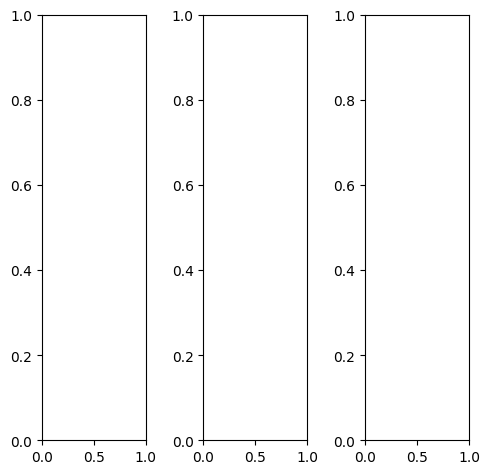

tensor([[[0.5882, 0.5804, 0.5804,  ..., 0.5843, 0.5843, 0.5882],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5882, 0.5922],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5843, 0.5882],
         ...,
         [0.2824, 0.1843, 0.3059,  ..., 0.3176, 0.3725, 0.4196],
         [0.3333, 0.2863, 0.3451,  ..., 0.2902, 0.3529, 0.4157],
         [0.4392, 0.4275, 0.4078,  ..., 0.2824, 0.3020, 0.3255]],

        [[0.5882, 0.5804, 0.5804,  ..., 0.5843, 0.5843, 0.5882],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5882, 0.5922],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5843, 0.5882],
         ...,
         [0.2824, 0.1843, 0.3059,  ..., 0.3176, 0.3725, 0.4196],
         [0.3333, 0.2863, 0.3451,  ..., 0.2902, 0.3529, 0.4157],
         [0.4392, 0.4275, 0.4078,  ..., 0.2824, 0.3020, 0.3255]],

        [[0.5882, 0.5804, 0.5804,  ..., 0.5843, 0.5843, 0.5882],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5882, 0.5922],
         [0.5961, 0.5882, 0.5882,  ..., 0.5843, 0.5843, 0.

tensor([[[0.5373, 0.5294, 0.5294,  ..., 0.5451, 0.5451, 0.5451],
         [0.5451, 0.5373, 0.5373,  ..., 0.5451, 0.5490, 0.5529],
         [0.5451, 0.5373, 0.5373,  ..., 0.5451, 0.5451, 0.5490],
         ...,
         [0.2392, 0.1412, 0.2745,  ..., 0.2706, 0.3294, 0.3804],
         [0.2824, 0.2353, 0.3098,  ..., 0.2471, 0.3137, 0.3843],
         [0.3961, 0.3882, 0.3765,  ..., 0.2431, 0.2706, 0.2941]],

        [[0.6000, 0.5922, 0.5922,  ..., 0.6000, 0.6000, 0.6039],
         [0.6078, 0.6000, 0.6000,  ..., 0.6000, 0.6039, 0.6078],
         [0.6078, 0.6000, 0.6000,  ..., 0.6000, 0.6000, 0.6039],
         ...,
         [0.3216, 0.2275, 0.3451,  ..., 0.3647, 0.4196, 0.4627],
         [0.3725, 0.3294, 0.3804,  ..., 0.3294, 0.3922, 0.4549],
         [0.4745, 0.4627, 0.4392,  ..., 0.3216, 0.3294, 0.3569]],

        [[0.6627, 0.6510, 0.6431,  ..., 0.6039, 0.6039, 0.6078],
         [0.6745, 0.6588, 0.6510,  ..., 0.6039, 0.6078, 0.6118],
         [0.6745, 0.6588, 0.6510,  ..., 0.6039, 0.6039, 0.

tensor([[[0.5661, 0.5261, 0.5006,  ..., 0.5032, 0.5241, 0.5623],
         [0.5472, 0.5235, 0.5123,  ..., 0.4910, 0.5042, 0.5335],
         [0.5163, 0.5108, 0.5145,  ..., 0.5022, 0.5119, 0.5110],
         ...,
         [0.2847, 0.1981, 0.3237,  ..., 0.3291, 0.3723, 0.4242],
         [0.3346, 0.3020, 0.3559,  ..., 0.2908, 0.3465, 0.4149],
         [0.4428, 0.4386, 0.4247,  ..., 0.2621, 0.2968, 0.3440]],

        [[0.6143, 0.6147, 0.5994,  ..., 0.5967, 0.6081, 0.6199],
         [0.6200, 0.6110, 0.6101,  ..., 0.6004, 0.6107, 0.6230],
         [0.6123, 0.6087, 0.6145,  ..., 0.6046, 0.6029, 0.6123],
         ...,
         [0.2829, 0.1892, 0.3121,  ..., 0.3151, 0.3729, 0.4309],
         [0.3377, 0.2981, 0.3495,  ..., 0.2830, 0.3482, 0.4184],
         [0.4555, 0.4385, 0.4279,  ..., 0.2605, 0.2990, 0.3478]],

        [[0.6836, 0.6889, 0.6881,  ..., 0.6913, 0.6999, 0.6814],
         [0.6955, 0.6864, 0.6958,  ..., 0.6922, 0.6952, 0.6929],
         [0.6884, 0.6858, 0.7004,  ..., 0.6961, 0.6938, 0.

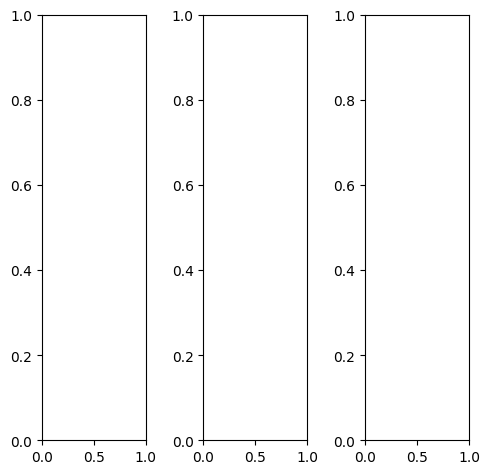

tensor([[[0.4902, 0.4941, 0.4863,  ..., 0.6980, 0.7059, 0.5804],
         [0.4902, 0.4902, 0.4863,  ..., 0.5294, 0.5412, 0.5412],
         [0.4941, 0.4902, 0.4863,  ..., 0.5137, 0.6078, 0.6824],
         ...,
         [0.6471, 0.6549, 0.6784,  ..., 0.6863, 0.6745, 0.6784],
         [0.6706, 0.6510, 0.6510,  ..., 0.6588, 0.6745, 0.7098],
         [0.6902, 0.6902, 0.7020,  ..., 0.6902, 0.6980, 0.6824]],

        [[0.4902, 0.4941, 0.4863,  ..., 0.6980, 0.7059, 0.5804],
         [0.4902, 0.4902, 0.4863,  ..., 0.5294, 0.5412, 0.5412],
         [0.4941, 0.4902, 0.4863,  ..., 0.5137, 0.6078, 0.6824],
         ...,
         [0.6471, 0.6549, 0.6784,  ..., 0.6863, 0.6745, 0.6784],
         [0.6706, 0.6510, 0.6510,  ..., 0.6588, 0.6745, 0.7098],
         [0.6902, 0.6902, 0.7020,  ..., 0.6902, 0.6980, 0.6824]],

        [[0.4902, 0.4941, 0.4863,  ..., 0.6980, 0.7059, 0.5804],
         [0.4902, 0.4902, 0.4863,  ..., 0.5294, 0.5412, 0.5412],
         [0.4941, 0.4902, 0.4863,  ..., 0.5137, 0.6078, 0.

tensor([[[0.5569, 0.5608, 0.5569,  ..., 0.7843, 0.7882, 0.6431],
         [0.5569, 0.5529, 0.5451,  ..., 0.5843, 0.5961, 0.5922],
         [0.5608, 0.5490, 0.5333,  ..., 0.5608, 0.6549, 0.7373],
         ...,
         [0.6627, 0.6745, 0.7059,  ..., 0.7255, 0.7098, 0.7176],
         [0.6824, 0.6706, 0.6784,  ..., 0.6902, 0.7059, 0.7451],
         [0.6706, 0.6706, 0.6941,  ..., 0.7059, 0.7098, 0.6941]],

        [[0.4745, 0.4784, 0.4706,  ..., 0.6706, 0.6784, 0.5569],
         [0.4745, 0.4784, 0.4745,  ..., 0.5059, 0.5176, 0.5216],
         [0.4784, 0.4784, 0.4824,  ..., 0.4941, 0.5882, 0.6588],
         ...,
         [0.6471, 0.6510, 0.6745,  ..., 0.6824, 0.6667, 0.6706],
         [0.6706, 0.6510, 0.6471,  ..., 0.6549, 0.6706, 0.7020],
         [0.6980, 0.6941, 0.7059,  ..., 0.6902, 0.6941, 0.6784]],

        [[0.3922, 0.3961, 0.3882,  ..., 0.6275, 0.6353, 0.5373],
         [0.3922, 0.3922, 0.3882,  ..., 0.4902, 0.5020, 0.5098],
         [0.3961, 0.3922, 0.3882,  ..., 0.4902, 0.5843, 0.

tensor([[[0.5084, 0.5071, 0.4896,  ..., 0.7136, 0.7341, 0.6180],
         [0.5104, 0.5049, 0.5043,  ..., 0.5404, 0.5570, 0.5666],
         [0.5049, 0.5121, 0.5187,  ..., 0.5348, 0.6353, 0.7050],
         ...,
         [0.6779, 0.6909, 0.7117,  ..., 0.7125, 0.6971, 0.7156],
         [0.6938, 0.6851, 0.6760,  ..., 0.6811, 0.7035, 0.7459],
         [0.7113, 0.7203, 0.7273,  ..., 0.7130, 0.7404, 0.7132]],

        [[0.5110, 0.5115, 0.4983,  ..., 0.6978, 0.7227, 0.6048],
         [0.5102, 0.5015, 0.5013,  ..., 0.5432, 0.5483, 0.5605],
         [0.5074, 0.5012, 0.4956,  ..., 0.5388, 0.6286, 0.6904],
         ...,
         [0.6571, 0.6666, 0.6823,  ..., 0.6779, 0.6717, 0.6901],
         [0.6779, 0.6559, 0.6550,  ..., 0.6587, 0.6820, 0.7215],
         [0.6847, 0.6976, 0.6976,  ..., 0.6791, 0.7130, 0.6904]],

        [[0.4415, 0.4239, 0.4002,  ..., 0.6161, 0.6523, 0.5390],
         [0.4214, 0.4010, 0.3980,  ..., 0.4349, 0.4503, 0.4643],
         [0.4114, 0.3979, 0.4133,  ..., 0.4242, 0.5241, 0.

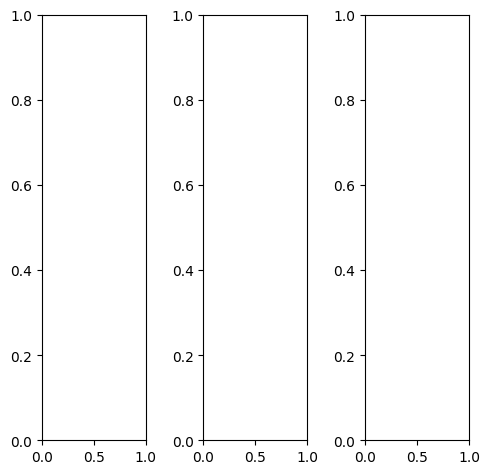

EPOCH: 11.255  trn_loss: 0.005  (1329.59s - 10483.63s remaining)

tensor([[[0.8510, 0.8000, 0.8078,  ..., 0.8392, 0.8039, 0.8314],
         [0.8314, 0.8039, 0.7961,  ..., 0.7098, 0.7020, 0.7412],
         [0.8392, 0.8000, 0.7765,  ..., 0.7176, 0.7255, 0.7569],
         ...,
         [0.3412, 0.3059, 0.2980,  ..., 0.3294, 0.3020, 0.5255],
         [0.3333, 0.2863, 0.2706,  ..., 0.3176, 0.3059, 0.5176],
         [0.6745, 0.5255, 0.4627,  ..., 0.4824, 0.5804, 0.6784]],

        [[0.8510, 0.8000, 0.8078,  ..., 0.8392, 0.8039, 0.8314],
         [0.8314, 0.8039, 0.7961,  ..., 0.7098, 0.7020, 0.7412],
         [0.8392, 0.8000, 0.7765,  ..., 0.7176, 0.7255, 0.7569],
         ...,
         [0.3412, 0.3059, 0.2980,  ..., 0.3294, 0.3020, 0.5255],
         [0.3333, 0.2863, 0.2706,  ..., 0.3176, 0.3059, 0.5176],
         [0.6745, 0.5255, 0.4627,  ..., 0.4824, 0.5804, 0.6784]],

        [[0.8510, 0.8000, 0.8078,  ..., 0.8392, 0.8039, 0.8314],
         [0.8314, 0.8039, 0.7961,  ..., 0.7098, 0.7020, 0.7412],
         [0.8392, 0.8000, 0.7765,  ..., 0.7176, 0.7255, 0.

tensor([[[0.8196, 0.7451, 0.7451,  ..., 0.8000, 0.7765, 0.8157],
         [0.7725, 0.7176, 0.7059,  ..., 0.6431, 0.6431, 0.7020],
         [0.7686, 0.6941, 0.6745,  ..., 0.6353, 0.6431, 0.7020],
         ...,
         [0.3569, 0.3255, 0.3216,  ..., 0.3608, 0.3294, 0.5451],
         [0.3569, 0.3059, 0.2941,  ..., 0.3529, 0.3412, 0.5451],
         [0.6902, 0.5412, 0.4745,  ..., 0.5098, 0.6078, 0.6980]],

        [[0.8549, 0.8078, 0.8196,  ..., 0.8471, 0.8039, 0.8275],
         [0.8431, 0.8196, 0.8118,  ..., 0.7176, 0.7059, 0.7412],
         [0.8627, 0.8275, 0.8039,  ..., 0.7294, 0.7373, 0.7647],
         ...,
         [0.3373, 0.3020, 0.2902,  ..., 0.3216, 0.2980, 0.5255],
         [0.3255, 0.2784, 0.2627,  ..., 0.3059, 0.2941, 0.5098],
         [0.6706, 0.5216, 0.4588,  ..., 0.4745, 0.5725, 0.6745]],

        [[0.9098, 0.9020, 0.9137,  ..., 0.9098, 0.8745, 0.8824],
         [0.9137, 0.9412, 0.9490,  ..., 0.8510, 0.8431, 0.8392],
         [0.9098, 0.9255, 0.9176,  ..., 0.8627, 0.8745, 0.

tensor([[[0.7934, 0.6667, 0.7091,  ..., 0.6775, 0.6343, 0.7092],
         [0.7303, 0.6631, 0.6158,  ..., 0.5318, 0.5463, 0.6487],
         [0.7042, 0.7133, 0.5901,  ..., 0.5887, 0.5757, 0.6503],
         ...,
         [0.2949, 0.3105, 0.2829,  ..., 0.3349, 0.3150, 0.5570],
         [0.2942, 0.2224, 0.2211,  ..., 0.2978, 0.2935, 0.4993],
         [0.6106, 0.4908, 0.4355,  ..., 0.5032, 0.5854, 0.6494]],

        [[0.7868, 0.7861, 0.6925,  ..., 0.7500, 0.7314, 0.7577],
         [0.7340, 0.7309, 0.6871,  ..., 0.6287, 0.6300, 0.7291],
         [0.7742, 0.7979, 0.6564,  ..., 0.6415, 0.6500, 0.7154],
         ...,
         [0.2950, 0.3138, 0.3063,  ..., 0.3506, 0.3236, 0.4938],
         [0.2819, 0.2704, 0.2629,  ..., 0.3266, 0.3025, 0.4590],
         [0.5949, 0.4791, 0.4415,  ..., 0.4745, 0.5647, 0.6191]],

        [[0.9081, 0.8577, 0.9042,  ..., 0.8910, 0.8561, 0.8682],
         [0.9279, 0.9046, 0.8923,  ..., 0.7581, 0.7763, 0.8079],
         [0.8761, 0.8500, 0.8388,  ..., 0.7916, 0.8027, 0.

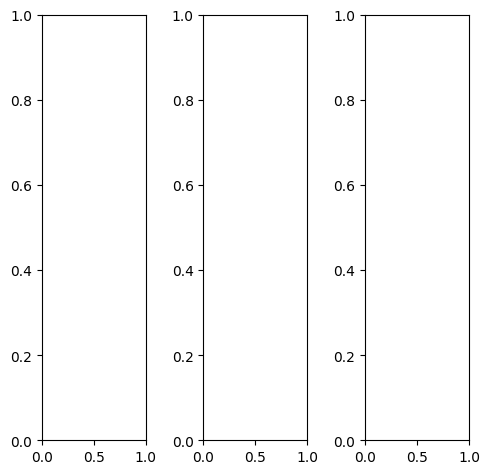

tensor([[[0.7569, 0.7765, 0.7569,  ..., 0.8314, 0.8157, 0.8510],
         [0.7922, 0.8510, 0.8510,  ..., 0.8431, 0.8431, 0.8824],
         [0.7647, 0.8353, 0.8392,  ..., 0.7922, 0.8078, 0.8549],
         ...,
         [0.6667, 0.6784, 0.6078,  ..., 0.6314, 0.6824, 0.7255],
         [0.6431, 0.6627, 0.6157,  ..., 0.6549, 0.6667, 0.7294],
         [0.6549, 0.6627, 0.6392,  ..., 0.6863, 0.6824, 0.7843]],

        [[0.7569, 0.7765, 0.7569,  ..., 0.8314, 0.8157, 0.8510],
         [0.7922, 0.8510, 0.8510,  ..., 0.8431, 0.8431, 0.8824],
         [0.7647, 0.8353, 0.8392,  ..., 0.7922, 0.8078, 0.8549],
         ...,
         [0.6667, 0.6784, 0.6078,  ..., 0.6314, 0.6824, 0.7255],
         [0.6431, 0.6627, 0.6157,  ..., 0.6549, 0.6667, 0.7294],
         [0.6549, 0.6627, 0.6392,  ..., 0.6863, 0.6824, 0.7843]],

        [[0.7569, 0.7765, 0.7569,  ..., 0.8314, 0.8157, 0.8510],
         [0.7922, 0.8510, 0.8510,  ..., 0.8431, 0.8431, 0.8824],
         [0.7647, 0.8353, 0.8392,  ..., 0.7922, 0.8078, 0.

tensor([[[0.7804, 0.7765, 0.7294,  ..., 0.9608, 0.9490, 0.9608],
         [0.8745, 0.9294, 0.9059,  ..., 0.9608, 0.9529, 0.9608],
         [0.9216, 1.0000, 0.9922,  ..., 0.8431, 0.8588, 0.8980],
         ...,
         [0.6471, 0.6549, 0.6000,  ..., 0.6588, 0.7216, 0.7725],
         [0.6235, 0.6353, 0.6078,  ..., 0.6863, 0.7098, 0.7725],
         [0.6353, 0.6392, 0.6314,  ..., 0.7176, 0.7255, 0.8275]],

        [[0.8078, 0.8353, 0.8275,  ..., 0.8039, 0.7922, 0.8353],
         [0.8235, 0.8863, 0.8980,  ..., 0.8196, 0.8235, 0.8706],
         [0.7608, 0.8314, 0.8392,  ..., 0.7882, 0.8039, 0.8549],
         ...,
         [0.6902, 0.7137, 0.6353,  ..., 0.6392, 0.6824, 0.7216],
         [0.6667, 0.6980, 0.6471,  ..., 0.6627, 0.6706, 0.7255],
         [0.6745, 0.6941, 0.6667,  ..., 0.6902, 0.6784, 0.7804]],

        [[0.4314, 0.4706, 0.4588,  ..., 0.6235, 0.5961, 0.6588],
         [0.4157, 0.4549, 0.4510,  ..., 0.6627, 0.6431, 0.7216],
         [0.3686, 0.4235, 0.4392,  ..., 0.6941, 0.6824, 0.

tensor([[[0.7160, 0.6588, 0.6539,  ..., 0.5922, 0.5888, 0.7111],
         [0.7129, 0.7443, 0.7265,  ..., 0.5754, 0.6079, 0.7049],
         [0.6283, 0.7535, 0.6510,  ..., 0.5520, 0.5948, 0.6805],
         ...,
         [0.6042, 0.6381, 0.5328,  ..., 0.5624, 0.6070, 0.6839],
         [0.5752, 0.6133, 0.5496,  ..., 0.5834, 0.6017, 0.6898],
         [0.6183, 0.6349, 0.5939,  ..., 0.6488, 0.6652, 0.7281]],

        [[0.7371, 0.7319, 0.6755,  ..., 0.6845, 0.7011, 0.7739],
         [0.6789, 0.7647, 0.7227,  ..., 0.6906, 0.6868, 0.8192],
         [0.7202, 0.7966, 0.7423,  ..., 0.6719, 0.6863, 0.7716],
         ...,
         [0.5573, 0.6052, 0.5538,  ..., 0.5895, 0.6239, 0.6664],
         [0.5310, 0.5706, 0.5499,  ..., 0.6028, 0.6010, 0.6643],
         [0.5596, 0.5923, 0.5796,  ..., 0.6119, 0.6296, 0.6911]],

        [[0.8204, 0.7712, 0.8598,  ..., 0.8431, 0.8444, 0.8864],
         [0.8294, 0.8903, 0.8834,  ..., 0.8106, 0.8513, 0.9209],
         [0.7808, 0.8126, 0.9064,  ..., 0.8118, 0.8541, 0.

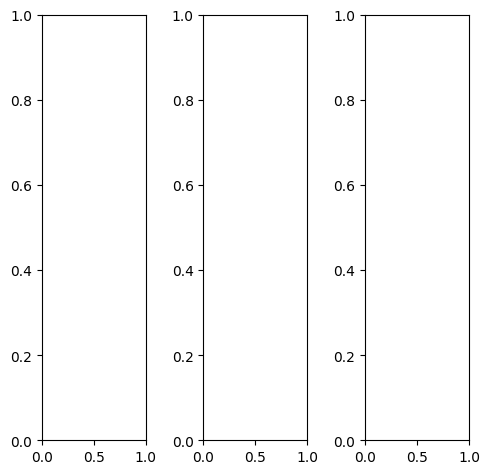

tensor([[[0.9961, 0.9882, 0.9922,  ..., 0.6549, 0.5255, 0.8078],
         [1.0000, 1.0000, 1.0000,  ..., 0.6196, 0.5255, 0.8510],
         [1.0000, 0.9961, 0.9961,  ..., 0.6157, 0.5882, 0.8941],
         ...,
         [0.8784, 0.9686, 0.9686,  ..., 0.4118, 0.3882, 0.3255],
         [0.8863, 0.8980, 0.9882,  ..., 0.4275, 0.3569, 0.3373],
         [0.9608, 0.8627, 0.9412,  ..., 0.3569, 0.3059, 0.3294]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.6549, 0.5255, 0.8078],
         [1.0000, 1.0000, 1.0000,  ..., 0.6196, 0.5255, 0.8510],
         [1.0000, 0.9961, 0.9961,  ..., 0.6157, 0.5882, 0.8941],
         ...,
         [0.8784, 0.9686, 0.9686,  ..., 0.4118, 0.3882, 0.3255],
         [0.8863, 0.8980, 0.9882,  ..., 0.4275, 0.3569, 0.3373],
         [0.9608, 0.8627, 0.9412,  ..., 0.3569, 0.3059, 0.3294]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.6549, 0.5255, 0.8078],
         [1.0000, 1.0000, 1.0000,  ..., 0.6196, 0.5255, 0.8510],
         [1.0000, 0.9961, 0.9961,  ..., 0.6157, 0.5882, 0.

tensor([[[0.9961, 0.9882, 0.9922,  ..., 0.6431, 0.5333, 0.8627],
         [1.0000, 1.0000, 1.0000,  ..., 0.6000, 0.5255, 0.9216],
         [1.0000, 0.9961, 0.9961,  ..., 0.5961, 0.5804, 0.9451],
         ...,
         [0.8824, 0.9725, 0.9686,  ..., 0.4941, 0.4588, 0.3922],
         [0.8902, 0.9059, 0.9922,  ..., 0.5098, 0.4392, 0.4157],
         [0.9647, 0.8667, 0.9451,  ..., 0.4353, 0.3843, 0.4039]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.6471, 0.5216, 0.8000],
         [1.0000, 1.0000, 1.0000,  ..., 0.6118, 0.5216, 0.8392],
         [1.0000, 0.9961, 0.9961,  ..., 0.6118, 0.5882, 0.8863],
         ...,
         [0.8745, 0.9686, 0.9686,  ..., 0.3804, 0.3569, 0.2980],
         [0.8824, 0.8941, 0.9882,  ..., 0.3922, 0.3255, 0.3059],
         [0.9608, 0.8588, 0.9412,  ..., 0.3255, 0.2745, 0.2980]],

        [[0.9961, 0.9882, 0.9922,  ..., 0.7255, 0.5333, 0.7137],
         [1.0000, 1.0000, 1.0000,  ..., 0.7176, 0.5412, 0.7294],
         [1.0000, 0.9961, 0.9961,  ..., 0.6941, 0.6078, 0.

tensor([[[0.7874, 0.7246, 0.7889,  ..., 0.4811, 0.4003, 0.6412],
         [0.7734, 0.8175, 0.7718,  ..., 0.4273, 0.4229, 0.7023],
         [0.7259, 0.7777, 0.7255,  ..., 0.4539, 0.4633, 0.7560],
         ...,
         [0.7179, 0.8266, 0.7844,  ..., 0.4257, 0.4172, 0.3842],
         [0.7069, 0.7014, 0.7753,  ..., 0.4338, 0.3886, 0.3982],
         [0.8066, 0.7580, 0.8014,  ..., 0.3884, 0.3477, 0.4027]],

        [[0.7795, 0.8286, 0.8232,  ..., 0.5574, 0.4392, 0.6517],
         [0.8062, 0.8992, 0.8485,  ..., 0.5413, 0.4816, 0.7859],
         [0.7714, 0.8541, 0.8524,  ..., 0.5429, 0.5397, 0.8101],
         ...,
         [0.6772, 0.7845, 0.8175,  ..., 0.4775, 0.4637, 0.3563],
         [0.6872, 0.6807, 0.7855,  ..., 0.4706, 0.4112, 0.3615],
         [0.7515, 0.7291, 0.7774,  ..., 0.3882, 0.3457, 0.3651]],

        [[0.9220, 0.8854, 0.9571,  ..., 0.6667, 0.5654, 0.7558],
         [0.9318, 0.9886, 0.9354,  ..., 0.6208, 0.6015, 0.8525],
         [0.9270, 0.8523, 0.9803,  ..., 0.6198, 0.6531, 0.

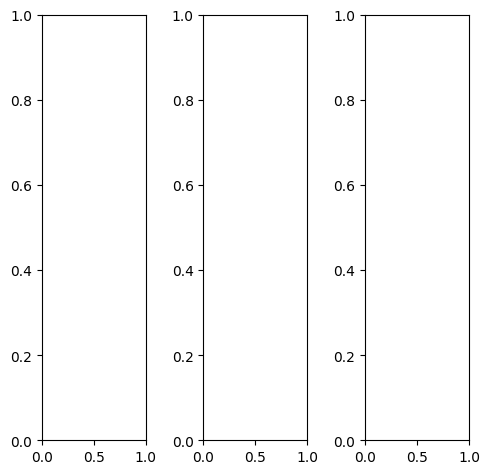

tensor([[[0.8392, 0.8196, 0.8196,  ..., 0.4863, 0.6078, 0.7529],
         [0.8392, 0.8235, 0.8353,  ..., 0.5843, 0.6157, 0.7882],
         [0.8510, 0.8314, 0.8392,  ..., 0.3569, 0.3569, 0.7137],
         ...,
         [0.8275, 0.8157, 0.8275,  ..., 0.7412, 0.7529, 0.7686],
         [0.8235, 0.8157, 0.8275,  ..., 0.7490, 0.7608, 0.7765],
         [0.8039, 0.7882, 0.8118,  ..., 0.8039, 0.8118, 0.8157]],

        [[0.8392, 0.8196, 0.8196,  ..., 0.4863, 0.6078, 0.7529],
         [0.8392, 0.8235, 0.8353,  ..., 0.5843, 0.6157, 0.7882],
         [0.8510, 0.8314, 0.8392,  ..., 0.3569, 0.3569, 0.7137],
         ...,
         [0.8275, 0.8157, 0.8275,  ..., 0.7412, 0.7529, 0.7686],
         [0.8235, 0.8157, 0.8275,  ..., 0.7490, 0.7608, 0.7765],
         [0.8039, 0.7882, 0.8118,  ..., 0.8039, 0.8118, 0.8157]],

        [[0.8392, 0.8196, 0.8196,  ..., 0.4863, 0.6078, 0.7529],
         [0.8392, 0.8235, 0.8353,  ..., 0.5843, 0.6157, 0.7882],
         [0.8510, 0.8314, 0.8392,  ..., 0.3569, 0.3569, 0.

tensor([[[0.8902, 0.8706, 0.8706,  ..., 0.5686, 0.6863, 0.8157],
         [0.8902, 0.8745, 0.8863,  ..., 0.6549, 0.6784, 0.8353],
         [0.9020, 0.8824, 0.8902,  ..., 0.4157, 0.4078, 0.7412],
         ...,
         [0.9020, 0.9059, 0.8980,  ..., 0.8275, 0.8353, 0.8392],
         [0.8902, 0.8902, 0.8902,  ..., 0.8314, 0.8353, 0.8510],
         [0.8627, 0.8471, 0.8706,  ..., 0.8627, 0.8627, 0.8784]],

        [[0.8235, 0.8039, 0.8039,  ..., 0.4588, 0.5804, 0.7333],
         [0.8196, 0.8039, 0.8157,  ..., 0.5569, 0.5922, 0.7725],
         [0.8275, 0.8118, 0.8196,  ..., 0.3333, 0.3373, 0.7020],
         ...,
         [0.8039, 0.7882, 0.8039,  ..., 0.7098, 0.7255, 0.7451],
         [0.8000, 0.7922, 0.8039,  ..., 0.7216, 0.7333, 0.7529],
         [0.7843, 0.7686, 0.7922,  ..., 0.7843, 0.7961, 0.7922]],

        [[0.7961, 0.7804, 0.7804,  ..., 0.4275, 0.5490, 0.7020],
         [0.8118, 0.7961, 0.8078,  ..., 0.5333, 0.5686, 0.7608],
         [0.8235, 0.8039, 0.8157,  ..., 0.3176, 0.3294, 0.

tensor([[[0.7239, 0.6005, 0.6313,  ..., 0.2175, 0.3591, 0.5266],
         [0.6532, 0.5794, 0.5762,  ..., 0.3416, 0.3516, 0.5509],
         [0.6311, 0.6419, 0.5550,  ..., 0.0964, 0.1303, 0.5092],
         ...,
         [0.6806, 0.6987, 0.6848,  ..., 0.5570, 0.5677, 0.6026],
         [0.6683, 0.6616, 0.6623,  ..., 0.5625, 0.5852, 0.6127],
         [0.6515, 0.6522, 0.6578,  ..., 0.6631, 0.6782, 0.6642]],

        [[0.7304, 0.7539, 0.6734,  ..., 0.2903, 0.4566, 0.5642],
         [0.6950, 0.7065, 0.6809,  ..., 0.4383, 0.4665, 0.6288],
         [0.7130, 0.7615, 0.6741,  ..., 0.1905, 0.1742, 0.5258],
         ...,
         [0.6477, 0.6602, 0.6911,  ..., 0.5705, 0.5933, 0.5924],
         [0.6378, 0.6368, 0.6555,  ..., 0.5956, 0.6002, 0.5939],
         [0.6045, 0.6252, 0.6466,  ..., 0.6537, 0.6645, 0.6369]],

        [[0.9128, 0.8411, 0.9190,  ..., 0.4555, 0.5994, 0.7240],
         [0.9150, 0.8884, 0.9123,  ..., 0.5804, 0.6238, 0.7773],
         [0.8821, 0.8478, 0.8957,  ..., 0.3212, 0.3329, 0.

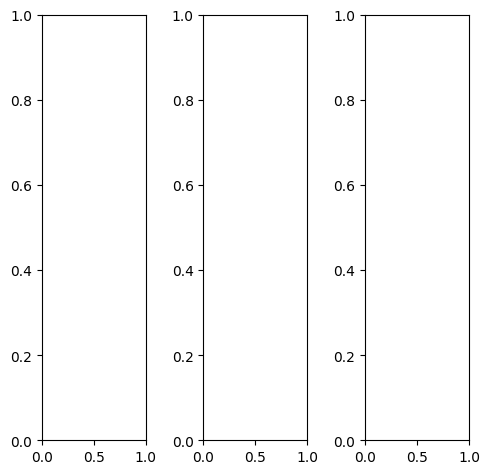

tensor([[[0.2314, 0.2196, 0.2902,  ..., 0.9765, 0.9765, 0.9725],
         [0.2588, 0.2588, 0.2745,  ..., 0.9725, 0.9804, 0.9843],
         [0.2314, 0.2510, 0.2510,  ..., 0.9451, 0.9922, 1.0000],
         ...,
         [0.4980, 0.4784, 0.4549,  ..., 0.5294, 0.5333, 0.5333],
         [0.4941, 0.4941, 0.4902,  ..., 0.5216, 0.5216, 0.5294],
         [0.5843, 0.5686, 0.5765,  ..., 0.5176, 0.5137, 0.5176]],

        [[0.2314, 0.2196, 0.2902,  ..., 0.9765, 0.9765, 0.9725],
         [0.2588, 0.2588, 0.2745,  ..., 0.9725, 0.9804, 0.9843],
         [0.2314, 0.2510, 0.2510,  ..., 0.9451, 0.9922, 1.0000],
         ...,
         [0.4980, 0.4784, 0.4549,  ..., 0.5294, 0.5333, 0.5333],
         [0.4941, 0.4941, 0.4902,  ..., 0.5216, 0.5216, 0.5294],
         [0.5843, 0.5686, 0.5765,  ..., 0.5176, 0.5137, 0.5176]],

        [[0.2314, 0.2196, 0.2902,  ..., 0.9765, 0.9765, 0.9725],
         [0.2588, 0.2588, 0.2745,  ..., 0.9725, 0.9804, 0.9843],
         [0.2314, 0.2510, 0.2510,  ..., 0.9451, 0.9922, 1.

tensor([[[0.2431, 0.2314, 0.3020,  ..., 0.9569, 0.9529, 0.9529],
         [0.2706, 0.2706, 0.2863,  ..., 0.9569, 0.9647, 0.9725],
         [0.2431, 0.2627, 0.2627,  ..., 0.9412, 0.9882, 1.0000],
         ...,
         [0.5294, 0.5059, 0.4824,  ..., 0.5529, 0.5569, 0.5569],
         [0.5216, 0.5216, 0.5176,  ..., 0.5451, 0.5451, 0.5529],
         [0.6118, 0.5961, 0.6039,  ..., 0.5412, 0.5373, 0.5412]],

        [[0.2353, 0.2235, 0.2941,  ..., 0.9843, 0.9843, 0.9804],
         [0.2627, 0.2627, 0.2784,  ..., 0.9765, 0.9843, 0.9882],
         [0.2353, 0.2549, 0.2549,  ..., 0.9490, 0.9922, 1.0000],
         ...,
         [0.4902, 0.4667, 0.4431,  ..., 0.5216, 0.5255, 0.5255],
         [0.4824, 0.4824, 0.4784,  ..., 0.5137, 0.5137, 0.5216],
         [0.5725, 0.5569, 0.5647,  ..., 0.5098, 0.5059, 0.5098]],

        [[0.1843, 0.1725, 0.2392,  ..., 0.9843, 0.9843, 0.9961],
         [0.2118, 0.2157, 0.2235,  ..., 0.9765, 0.9882, 1.0000],
         [0.1804, 0.2039, 0.2000,  ..., 0.9490, 1.0000, 1.

tensor([[[ 0.1461,  0.0413,  0.0842,  ...,  1.1733,  1.1472,  1.0218],
         [ 0.1464,  0.0415,  0.1054,  ...,  1.2039,  1.2449,  1.1214],
         [ 0.0025,  0.0164, -0.0679,  ...,  1.1780,  1.2384,  1.2067],
         ...,
         [ 0.6343,  0.6687,  0.5895,  ...,  0.6868,  0.6822,  0.6603],
         [ 0.6122,  0.6552,  0.6184,  ...,  0.6524,  0.6587,  0.6520],
         [ 0.7052,  0.7299,  0.7169,  ...,  0.6647,  0.6573,  0.6387]],

        [[ 0.1677,  0.1887,  0.1746,  ...,  1.2203,  1.1976,  1.1459],
         [ 0.2028,  0.1402,  0.0801,  ...,  1.2296,  1.2827,  1.2254],
         [ 0.1170,  0.2043,  0.0853,  ...,  1.2052,  1.3156,  1.2665],
         ...,
         [ 0.5959,  0.6102,  0.6191,  ...,  0.7028,  0.7157,  0.6782],
         [ 0.5821,  0.6064,  0.6241,  ...,  0.6878,  0.6900,  0.6498],
         [ 0.6576,  0.6871,  0.7103,  ...,  0.6607,  0.6470,  0.6196]],

        [[ 0.3887,  0.1697,  0.3939,  ...,  1.2892,  1.2765,  1.1898],
         [ 0.3619,  0.2928,  0.3562,  ...,  1

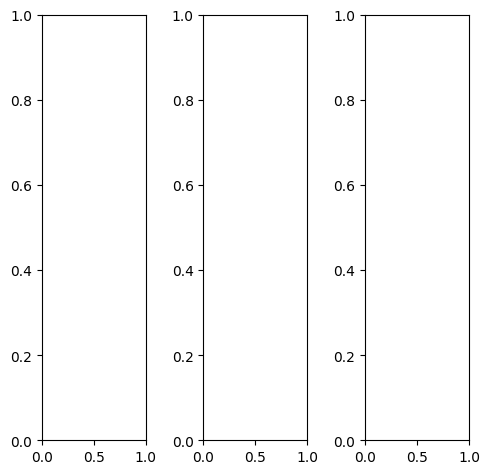

EPOCH: 11.510  trn_loss: 0.004  (1358.29s - 10442.48s remaining)

tensor([[[0.5569, 0.5529, 0.5569,  ..., 0.5294, 0.5255, 0.5216],
         [0.5647, 0.5608, 0.5647,  ..., 0.5373, 0.5333, 0.5294],
         [0.5608, 0.5569, 0.5608,  ..., 0.5373, 0.5333, 0.5294],
         ...,
         [0.2118, 0.1451, 0.1569,  ..., 0.5608, 0.3961, 0.3529],
         [0.2784, 0.1294, 0.1569,  ..., 0.4667, 0.2902, 0.2941],
         [0.2745, 0.0980, 0.1216,  ..., 0.3882, 0.2118, 0.2510]],

        [[0.5569, 0.5529, 0.5569,  ..., 0.5294, 0.5255, 0.5216],
         [0.5647, 0.5608, 0.5647,  ..., 0.5373, 0.5333, 0.5294],
         [0.5608, 0.5569, 0.5608,  ..., 0.5373, 0.5333, 0.5294],
         ...,
         [0.2118, 0.1451, 0.1569,  ..., 0.5608, 0.3961, 0.3529],
         [0.2784, 0.1294, 0.1569,  ..., 0.4667, 0.2902, 0.2941],
         [0.2745, 0.0980, 0.1216,  ..., 0.3882, 0.2118, 0.2510]],

        [[0.5569, 0.5529, 0.5569,  ..., 0.5294, 0.5255, 0.5216],
         [0.5647, 0.5608, 0.5647,  ..., 0.5373, 0.5333, 0.5294],
         [0.5608, 0.5569, 0.5608,  ..., 0.5373, 0.5333, 0.

tensor([[[0.4627, 0.4588, 0.4627,  ..., 0.4431, 0.4392, 0.4353],
         [0.4706, 0.4667, 0.4706,  ..., 0.4510, 0.4471, 0.4431],
         [0.4667, 0.4627, 0.4667,  ..., 0.4510, 0.4471, 0.4431],
         ...,
         [0.2118, 0.1412, 0.1490,  ..., 0.5725, 0.3961, 0.3529],
         [0.2784, 0.1176, 0.1412,  ..., 0.4745, 0.2824, 0.2902],
         [0.2784, 0.0824, 0.1020,  ..., 0.3922, 0.2000, 0.2431]],

        [[0.5725, 0.5686, 0.5725,  ..., 0.5373, 0.5333, 0.5294],
         [0.5804, 0.5765, 0.5804,  ..., 0.5451, 0.5412, 0.5373],
         [0.5765, 0.5725, 0.5765,  ..., 0.5451, 0.5412, 0.5373],
         ...,
         [0.2118, 0.1412, 0.1529,  ..., 0.5608, 0.4000, 0.3608],
         [0.2784, 0.1294, 0.1608,  ..., 0.4706, 0.2941, 0.2980],
         [0.2745, 0.1059, 0.1294,  ..., 0.3882, 0.2157, 0.2588]],

        [[0.7294, 0.7255, 0.7294,  ..., 0.7098, 0.7059, 0.6980],
         [0.7373, 0.7333, 0.7373,  ..., 0.7216, 0.7137, 0.7059],
         [0.7333, 0.7294, 0.7333,  ..., 0.7176, 0.7137, 0.

tensor([[[0.6790, 0.5520, 0.5574,  ..., 0.5002, 0.5197, 0.6236],
         [0.6225, 0.5364, 0.5556,  ..., 0.4447, 0.5125, 0.6059],
         [0.5825, 0.5696, 0.4538,  ..., 0.4482, 0.4986, 0.5937],
         ...,
         [0.3075, 0.2293, 0.2872,  ..., 0.7913, 0.5745, 0.5898],
         [0.4148, 0.2105, 0.2686,  ..., 0.6811, 0.4613, 0.5071],
         [0.4057, 0.1801, 0.1962,  ..., 0.5996, 0.3610, 0.4496]],

        [[0.7118, 0.6624, 0.6355,  ..., 0.5904, 0.6314, 0.6624],
         [0.6089, 0.6335, 0.5952,  ..., 0.6054, 0.6437, 0.7102],
         [0.6759, 0.6701, 0.6215,  ..., 0.5779, 0.6228, 0.6924],
         ...,
         [0.2827, 0.2251, 0.2885,  ..., 0.7385, 0.5529, 0.4880],
         [0.3983, 0.2010, 0.2568,  ..., 0.6629, 0.4205, 0.4349],
         [0.3661, 0.1630, 0.1782,  ..., 0.5435, 0.3092, 0.3814]],

        [[0.8433, 0.7362, 0.8566,  ..., 0.7820, 0.7899, 0.7965],
         [0.8076, 0.7942, 0.8229,  ..., 0.7572, 0.7983, 0.8178],
         [0.7706, 0.7324, 0.8051,  ..., 0.7672, 0.7889, 0.

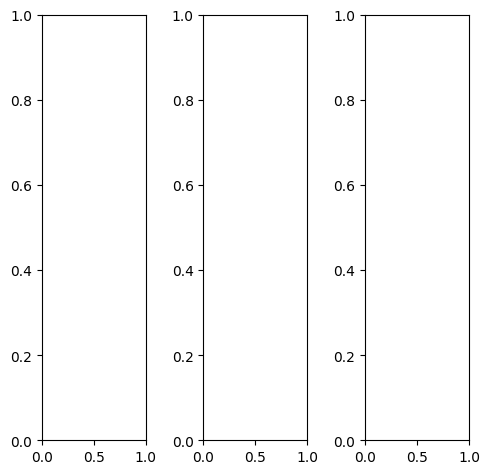

tensor([[[0.2706, 0.2627, 0.2353,  ..., 0.4196, 0.3490, 0.4118],
         [0.3216, 0.2824, 0.2824,  ..., 0.4118, 0.3647, 0.4353],
         [0.2902, 0.3059, 0.3333,  ..., 0.4157, 0.3725, 0.4471],
         ...,
         [0.4353, 0.4275, 0.4431,  ..., 0.6863, 0.7843, 0.7686],
         [0.4392, 0.4118, 0.4431,  ..., 0.7882, 0.8118, 0.7922],
         [0.4275, 0.4235, 0.4392,  ..., 0.8196, 0.8471, 0.8431]],

        [[0.2706, 0.2627, 0.2353,  ..., 0.4196, 0.3490, 0.4118],
         [0.3216, 0.2824, 0.2824,  ..., 0.4118, 0.3647, 0.4353],
         [0.2902, 0.3059, 0.3333,  ..., 0.4157, 0.3725, 0.4471],
         ...,
         [0.4353, 0.4275, 0.4431,  ..., 0.6863, 0.7843, 0.7686],
         [0.4392, 0.4118, 0.4431,  ..., 0.7882, 0.8118, 0.7922],
         [0.4275, 0.4235, 0.4392,  ..., 0.8196, 0.8471, 0.8431]],

        [[0.2706, 0.2627, 0.2353,  ..., 0.4196, 0.3490, 0.4118],
         [0.3216, 0.2824, 0.2824,  ..., 0.4118, 0.3647, 0.4353],
         [0.2902, 0.3059, 0.3333,  ..., 0.4157, 0.3725, 0.

tensor([[[0.3294, 0.3294, 0.3098,  ..., 0.4745, 0.4039, 0.4431],
         [0.3804, 0.3490, 0.3529,  ..., 0.4667, 0.4196, 0.4706],
         [0.3490, 0.3686, 0.4000,  ..., 0.4627, 0.4275, 0.4863],
         ...,
         [0.4510, 0.4431, 0.4588,  ..., 0.6824, 0.7647, 0.7529],
         [0.4549, 0.4275, 0.4588,  ..., 0.7843, 0.7961, 0.7765],
         [0.4471, 0.4431, 0.4549,  ..., 0.8157, 0.8275, 0.8275]],

        [[0.2588, 0.2471, 0.2157,  ..., 0.4078, 0.3373, 0.4078],
         [0.3098, 0.2667, 0.2667,  ..., 0.4000, 0.3529, 0.4314],
         [0.2784, 0.2941, 0.3176,  ..., 0.4039, 0.3608, 0.4431],
         ...,
         [0.4471, 0.4392, 0.4549,  ..., 0.6980, 0.7961, 0.7843],
         [0.4510, 0.4235, 0.4549,  ..., 0.8000, 0.8235, 0.8078],
         [0.4392, 0.4353, 0.4510,  ..., 0.8314, 0.8588, 0.8588]],

        [[0.1725, 0.1647, 0.1373,  ..., 0.3451, 0.2745, 0.3490],
         [0.2235, 0.1843, 0.1843,  ..., 0.3412, 0.2902, 0.3647],
         [0.1922, 0.2078, 0.2353,  ..., 0.3412, 0.2980, 0.

tensor([[[ 0.0478,  0.0250, -0.0395,  ...,  0.1947,  0.1115,  0.1781],
         [ 0.1057, -0.0520,  0.0241,  ...,  0.1486,  0.0726,  0.1626],
         [ 0.0105,  0.0193,  0.0206,  ...,  0.1414,  0.0797,  0.1863],
         ...,
         [ 0.2149,  0.2071,  0.2371,  ...,  0.3983,  0.5260,  0.5032],
         [ 0.2073,  0.1484,  0.2249,  ...,  0.5609,  0.5600,  0.5611],
         [ 0.1905,  0.1484,  0.1786,  ...,  0.5956,  0.6559,  0.6393]],

        [[ 0.0670,  0.0743,  0.0237,  ...,  0.1978,  0.1350,  0.1836],
         [ 0.0821, -0.1129, -0.0826,  ...,  0.1586,  0.0989,  0.1699],
         [ 0.0418, -0.0056,  0.0728,  ...,  0.1455,  0.0788,  0.1605],
         ...,
         [ 0.1814,  0.1626,  0.2021,  ...,  0.4346,  0.5876,  0.5457],
         [ 0.1809,  0.1240,  0.1830,  ...,  0.5992,  0.6331,  0.6011],
         [ 0.1735,  0.1285,  0.1522,  ...,  0.6232,  0.6730,  0.6436]],

        [[ 0.2216,  0.0566,  0.1063,  ...,  0.2038,  0.1362,  0.2284],
         [ 0.1268, -0.0193, -0.0237,  ...,  0

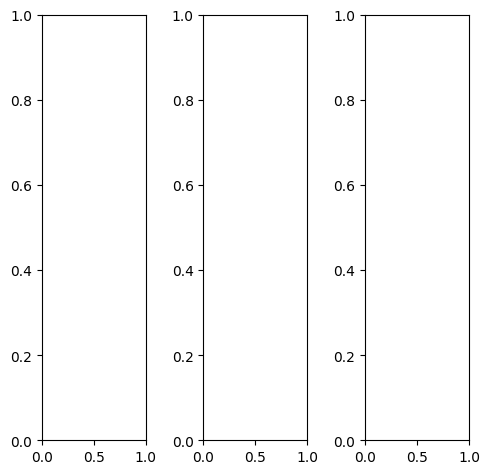

tensor([[[0.3490, 0.2549, 0.3647,  ..., 0.6392, 0.6000, 0.5725],
         [0.2588, 0.2431, 0.3765,  ..., 0.7216, 0.7333, 0.6431],
         [0.2353, 0.3020, 0.3725,  ..., 0.4706, 0.4980, 0.4941],
         ...,
         [0.2314, 0.3529, 0.3882,  ..., 0.0745, 0.1294, 0.1961],
         [0.2706, 0.2902, 0.2118,  ..., 0.1686, 0.3255, 0.2549],
         [0.2588, 0.3373, 0.2902,  ..., 0.3608, 0.4000, 0.2627]],

        [[0.3490, 0.2549, 0.3647,  ..., 0.6392, 0.6000, 0.5725],
         [0.2588, 0.2431, 0.3765,  ..., 0.7216, 0.7333, 0.6431],
         [0.2353, 0.3020, 0.3725,  ..., 0.4706, 0.4980, 0.4941],
         ...,
         [0.2314, 0.3529, 0.3882,  ..., 0.0745, 0.1294, 0.1961],
         [0.2706, 0.2902, 0.2118,  ..., 0.1686, 0.3255, 0.2549],
         [0.2588, 0.3373, 0.2902,  ..., 0.3608, 0.4000, 0.2627]],

        [[0.3490, 0.2549, 0.3647,  ..., 0.6392, 0.6000, 0.5725],
         [0.2588, 0.2431, 0.3765,  ..., 0.7216, 0.7333, 0.6431],
         [0.2353, 0.3020, 0.3725,  ..., 0.4706, 0.4980, 0.

tensor([[[0.2941, 0.0941, 0.2431,  ..., 0.6314, 0.5961, 0.5765],
         [0.2078, 0.0706, 0.2392,  ..., 0.6980, 0.7137, 0.6196],
         [0.2039, 0.1804, 0.2784,  ..., 0.4118, 0.4353, 0.4275],
         ...,
         [0.3255, 0.5725, 0.4980,  ..., 0.0980, 0.2039, 0.2627],
         [0.3686, 0.4392, 0.3176,  ..., 0.2039, 0.4902, 0.4118],
         [0.3373, 0.4275, 0.3686,  ..., 0.3569, 0.4627, 0.3176]],

        [[0.3922, 0.3529, 0.4392,  ..., 0.6431, 0.6078, 0.5922],
         [0.2941, 0.3412, 0.4549,  ..., 0.7412, 0.7529, 0.6706],
         [0.2588, 0.3725, 0.4314,  ..., 0.5216, 0.5490, 0.5451],
         ...,
         [0.1843, 0.2196, 0.3216,  ..., 0.0667, 0.0902, 0.1647],
         [0.2235, 0.2157, 0.1529,  ..., 0.1529, 0.2275, 0.1686],
         [0.2275, 0.3059, 0.2588,  ..., 0.3725, 0.3647, 0.2353]],

        [[0.2863, 0.1882, 0.2902,  ..., 0.6275, 0.5647, 0.4627],
         [0.2157, 0.1922, 0.3216,  ..., 0.6667, 0.6941, 0.5490],
         [0.1882, 0.2471, 0.3176,  ..., 0.3490, 0.3882, 0.

tensor([[[ 0.2254,  0.1476,  0.1785,  ...,  0.5509,  0.5184,  0.5696],
         [ 0.1726,  0.0225,  0.1765,  ...,  0.6559,  0.6881,  0.5910],
         [ 0.0347,  0.1228,  0.1453,  ...,  0.3522,  0.3982,  0.4137],
         ...,
         [ 0.2023,  0.3426,  0.3743,  ..., -0.0478,  0.0291,  0.1074],
         [ 0.2055,  0.2091,  0.1141,  ...,  0.0487,  0.2560,  0.1819],
         [ 0.2575,  0.2975,  0.2024,  ...,  0.2764,  0.3535,  0.2739]],

        [[ 0.2755,  0.3257,  0.2085,  ...,  0.6644,  0.6443,  0.6147],
         [ 0.2335,  0.1955,  0.1927,  ...,  0.7623,  0.7981,  0.6849],
         [ 0.0951,  0.3443,  0.1672,  ...,  0.4189,  0.4825,  0.4703],
         ...,
         [ 0.1951,  0.3308,  0.3816,  ..., -0.0012,  0.0551,  0.1122],
         [ 0.2107,  0.2466,  0.1516,  ...,  0.0941,  0.2927,  0.1930],
         [ 0.2535,  0.3030,  0.2328,  ...,  0.2961,  0.3697,  0.2634]],

        [[ 0.4416,  0.2238,  0.4186,  ...,  0.9142,  0.8794,  0.8375],
         [ 0.3891,  0.2073,  0.4397,  ...,  1

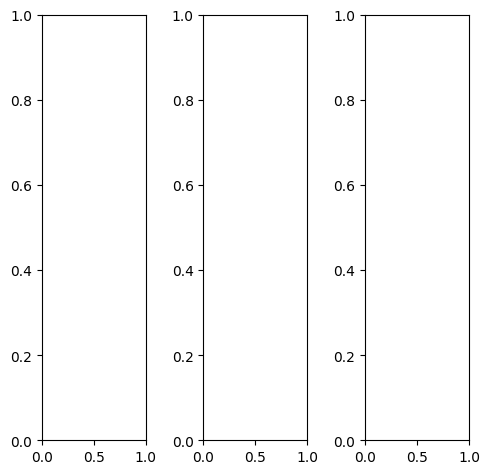

tensor([[[0.2549, 0.2510, 0.2392,  ..., 0.2039, 0.2000, 0.2235],
         [0.2314, 0.2275, 0.2196,  ..., 0.1255, 0.1373, 0.1333],
         [0.3059, 0.2902, 0.2745,  ..., 0.2549, 0.2078, 0.2235],
         ...,
         [0.3412, 0.3451, 0.1843,  ..., 0.2980, 0.3020, 0.3216],
         [0.3373, 0.3569, 0.2784,  ..., 0.3059, 0.3333, 0.3294],
         [0.3412, 0.3255, 0.3098,  ..., 0.2745, 0.3686, 0.3647]],

        [[0.2549, 0.2510, 0.2392,  ..., 0.2039, 0.2000, 0.2235],
         [0.2314, 0.2275, 0.2196,  ..., 0.1255, 0.1373, 0.1333],
         [0.3059, 0.2902, 0.2745,  ..., 0.2549, 0.2078, 0.2235],
         ...,
         [0.3412, 0.3451, 0.1843,  ..., 0.2980, 0.3020, 0.3216],
         [0.3373, 0.3569, 0.2784,  ..., 0.3059, 0.3333, 0.3294],
         [0.3412, 0.3255, 0.3098,  ..., 0.2745, 0.3686, 0.3647]],

        [[0.2549, 0.2510, 0.2392,  ..., 0.2039, 0.2000, 0.2235],
         [0.2314, 0.2275, 0.2196,  ..., 0.1255, 0.1373, 0.1333],
         [0.3059, 0.2902, 0.2745,  ..., 0.2549, 0.2078, 0.

tensor([[[0.3490, 0.3412, 0.3294,  ..., 0.3569, 0.3529, 0.3373],
         [0.3098, 0.3098, 0.3098,  ..., 0.3451, 0.3529, 0.3176],
         [0.2980, 0.2824, 0.2745,  ..., 0.2941, 0.2471, 0.2706],
         ...,
         [0.3020, 0.3059, 0.1451,  ..., 0.2667, 0.2784, 0.2902],
         [0.2980, 0.3176, 0.2392,  ..., 0.2706, 0.3137, 0.2980],
         [0.3020, 0.2863, 0.2706,  ..., 0.2392, 0.3451, 0.3333]],

        [[0.2118, 0.2078, 0.1961,  ..., 0.1451, 0.1412, 0.1765],
         [0.1961, 0.1882, 0.1765,  ..., 0.0314, 0.0431, 0.0510],
         [0.3176, 0.3020, 0.2824,  ..., 0.2549, 0.2039, 0.2078],
         ...,
         [0.3569, 0.3608, 0.2000,  ..., 0.3098, 0.3137, 0.3333],
         [0.3529, 0.3725, 0.2941,  ..., 0.3216, 0.3412, 0.3412],
         [0.3569, 0.3412, 0.3255,  ..., 0.2863, 0.3765, 0.3765]],

        [[0.2314, 0.2275, 0.2157,  ..., 0.1059, 0.1020, 0.1569],
         [0.2118, 0.2039, 0.1961,  ..., 0.0314, 0.0471, 0.0706],
         [0.2627, 0.2431, 0.2314,  ..., 0.1647, 0.1333, 0.

tensor([[[ 0.1532,  0.0847,  0.0233,  ...,  0.1745,  0.1824,  0.2332],
         [ 0.1516, -0.0475, -0.0562,  ...,  0.0365,  0.0573,  0.1134],
         [ 0.1669,  0.0540, -0.0497,  ...,  0.2030,  0.1643,  0.2248],
         ...,
         [ 0.4399,  0.4894,  0.2304,  ...,  0.4381,  0.4404,  0.4775],
         [ 0.4215,  0.4796,  0.3898,  ...,  0.4177,  0.4750,  0.4753],
         [ 0.4348,  0.4131,  0.3800,  ...,  0.3580,  0.4877,  0.4901]],

        [[ 0.2395,  0.2491,  0.1140,  ...,  0.2316,  0.2388,  0.2581],
         [ 0.1988,  0.1134, -0.0577,  ...,  0.1381,  0.1647,  0.1540],
         [ 0.3026,  0.2637,  0.1234,  ...,  0.3129,  0.2588,  0.2659],
         ...,
         [ 0.4304,  0.4779,  0.2618,  ...,  0.4453,  0.4395,  0.4198],
         [ 0.4046,  0.4859,  0.3985,  ...,  0.4144,  0.4551,  0.4400],
         [ 0.4095,  0.3871,  0.3646,  ...,  0.3256,  0.4541,  0.4576]],

        [[ 0.4013,  0.2202,  0.3225,  ...,  0.3389,  0.3499,  0.3744],
         [ 0.4126,  0.2701,  0.2717,  ...,  0

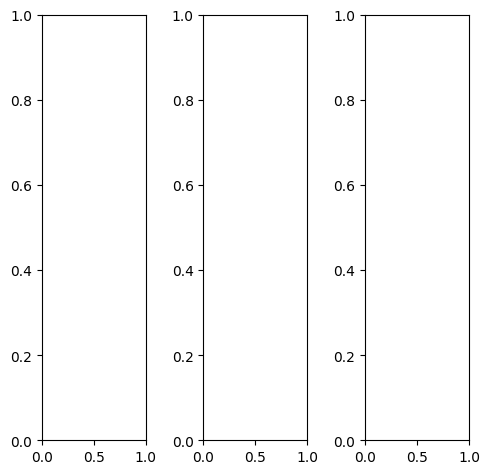

tensor([[[0.5765, 0.5725, 0.5765,  ..., 0.5686, 0.5686, 0.5686],
         [0.5882, 0.5843, 0.5882,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5804, 0.5843, 0.5804],
         ...,
         [0.2902, 0.2941, 0.2980,  ..., 0.2824, 0.2863, 0.2824],
         [0.2941, 0.2941, 0.2980,  ..., 0.2824, 0.2902, 0.2941],
         [0.3098, 0.3098, 0.3020,  ..., 0.2784, 0.2863, 0.2902]],

        [[0.5765, 0.5725, 0.5765,  ..., 0.5686, 0.5686, 0.5686],
         [0.5882, 0.5843, 0.5882,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5804, 0.5843, 0.5804],
         ...,
         [0.2902, 0.2941, 0.2980,  ..., 0.2824, 0.2863, 0.2824],
         [0.2941, 0.2941, 0.2980,  ..., 0.2824, 0.2902, 0.2941],
         [0.3098, 0.3098, 0.3020,  ..., 0.2784, 0.2863, 0.2902]],

        [[0.5765, 0.5725, 0.5765,  ..., 0.5686, 0.5686, 0.5686],
         [0.5882, 0.5843, 0.5882,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5804, 0.5843, 0.

tensor([[[0.4941, 0.4902, 0.4941,  ..., 0.4863, 0.4863, 0.4863],
         [0.5059, 0.5020, 0.5059,  ..., 0.4980, 0.5020, 0.4980],
         [0.5059, 0.5020, 0.5020,  ..., 0.4980, 0.5020, 0.4980],
         ...,
         [0.2157, 0.2196, 0.2235,  ..., 0.2039, 0.2078, 0.2039],
         [0.2157, 0.2157, 0.2157,  ..., 0.2039, 0.2118, 0.2157],
         [0.2235, 0.2275, 0.2157,  ..., 0.2000, 0.2078, 0.2118]],

        [[0.5961, 0.5922, 0.5961,  ..., 0.5922, 0.5922, 0.5922],
         [0.6118, 0.6078, 0.6118,  ..., 0.6078, 0.6078, 0.6078],
         [0.6118, 0.6078, 0.6078,  ..., 0.6039, 0.6039, 0.6039],
         ...,
         [0.3098, 0.3137, 0.3176,  ..., 0.3059, 0.3098, 0.3059],
         [0.3216, 0.3216, 0.3216,  ..., 0.3059, 0.3137, 0.3176],
         [0.3373, 0.3373, 0.3294,  ..., 0.2980, 0.3059, 0.3137]],

        [[0.6863, 0.6824, 0.6824,  ..., 0.6745, 0.6745, 0.6745],
         [0.6941, 0.6902, 0.6941,  ..., 0.6902, 0.6902, 0.6902],
         [0.6863, 0.6824, 0.6824,  ..., 0.6863, 0.6863, 0.

tensor([[[0.8274, 0.7070, 0.7200,  ..., 0.6569, 0.6992, 0.8067],
         [0.7895, 0.7580, 0.7061,  ..., 0.5976, 0.7035, 0.8158],
         [0.7493, 0.7423, 0.6608,  ..., 0.6394, 0.7097, 0.8090],
         ...,
         [0.3413, 0.3332, 0.3196,  ..., 0.2826, 0.3130, 0.3604],
         [0.3597, 0.3086, 0.3228,  ..., 0.2938, 0.3321, 0.3860],
         [0.4586, 0.3988, 0.3757,  ..., 0.3370, 0.3681, 0.4332]],

        [[0.7955, 0.8023, 0.7350,  ..., 0.7073, 0.7708, 0.8277],
         [0.7981, 0.8286, 0.7513,  ..., 0.7057, 0.7769, 0.9004],
         [0.7979, 0.8372, 0.7735,  ..., 0.7175, 0.7549, 0.8647],
         ...,
         [0.3348, 0.3315, 0.3340,  ..., 0.3267, 0.3403, 0.3176],
         [0.3456, 0.3272, 0.3213,  ..., 0.3158, 0.3318, 0.3404],
         [0.4186, 0.3850, 0.3748,  ..., 0.3287, 0.3456, 0.3751]],

        [[0.9040, 0.8353, 0.8987,  ..., 0.8122, 0.8543, 0.9006],
         [0.8949, 0.8809, 0.8778,  ..., 0.7839, 0.8570, 0.9199],
         [0.8877, 0.7892, 0.8834,  ..., 0.8050, 0.8591, 0.

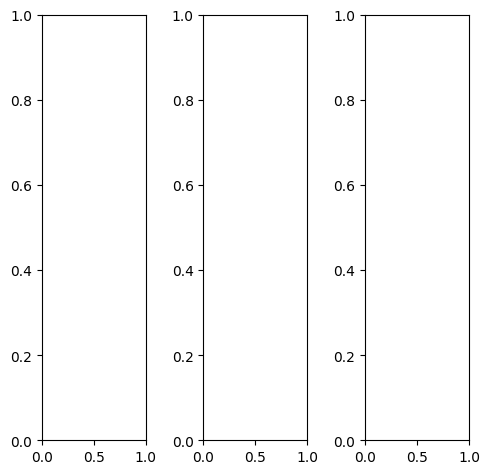

EPOCH: 11.765  trn_loss: 0.004  (1386.86s - 10400.84s remaining)

tensor([[[0.4941, 0.5255, 0.6078,  ..., 0.2235, 0.6196, 0.8824],
         [0.8157, 0.7255, 0.8196,  ..., 0.2431, 0.6549, 0.8706],
         [0.8706, 0.7294, 0.8118,  ..., 0.3255, 0.6353, 0.8392],
         ...,
         [0.4549, 0.4588, 0.4588,  ..., 0.1804, 0.1961, 0.2000],
         [0.4353, 0.4314, 0.4157,  ..., 0.1804, 0.1882, 0.1922],
         [0.3843, 0.3882, 0.3647,  ..., 0.1725, 0.1882, 0.1922]],

        [[0.4941, 0.5255, 0.6078,  ..., 0.2235, 0.6196, 0.8824],
         [0.8157, 0.7255, 0.8196,  ..., 0.2431, 0.6549, 0.8706],
         [0.8706, 0.7294, 0.8118,  ..., 0.3255, 0.6353, 0.8392],
         ...,
         [0.4549, 0.4588, 0.4588,  ..., 0.1804, 0.1961, 0.2000],
         [0.4353, 0.4314, 0.4157,  ..., 0.1804, 0.1882, 0.1922],
         [0.3843, 0.3882, 0.3647,  ..., 0.1725, 0.1882, 0.1922]],

        [[0.4941, 0.5255, 0.6078,  ..., 0.2235, 0.6196, 0.8824],
         [0.8157, 0.7255, 0.8196,  ..., 0.2431, 0.6549, 0.8706],
         [0.8706, 0.7294, 0.8118,  ..., 0.3255, 0.6353, 0.

tensor([[[0.5059, 0.5333, 0.6235,  ..., 0.2118, 0.6275, 0.9216],
         [0.8196, 0.7059, 0.8235,  ..., 0.2314, 0.6627, 0.9098],
         [0.8824, 0.7098, 0.8078,  ..., 0.3176, 0.6588, 0.8784],
         ...,
         [0.4549, 0.4588, 0.4588,  ..., 0.1922, 0.2078, 0.2235],
         [0.4353, 0.4353, 0.4235,  ..., 0.1922, 0.2000, 0.2039],
         [0.3843, 0.3961, 0.3765,  ..., 0.1843, 0.2000, 0.2039]],

        [[0.4941, 0.5216, 0.6039,  ..., 0.2275, 0.6275, 0.8902],
         [0.8235, 0.7294, 0.8196,  ..., 0.2510, 0.6627, 0.8745],
         [0.8745, 0.7373, 0.8157,  ..., 0.3294, 0.6353, 0.8431],
         ...,
         [0.4510, 0.4549, 0.4549,  ..., 0.1804, 0.1922, 0.1961],
         [0.4314, 0.4235, 0.4078,  ..., 0.1804, 0.1843, 0.1882],
         [0.3843, 0.3804, 0.3608,  ..., 0.1725, 0.1843, 0.1882]],

        [[0.4745, 0.5333, 0.5882,  ..., 0.2314, 0.5608, 0.7529],
         [0.7765, 0.7451, 0.7922,  ..., 0.2392, 0.5843, 0.7412],
         [0.8314, 0.7569, 0.7961,  ..., 0.3176, 0.5608, 0.

tensor([[[0.6005, 0.5200, 0.6644,  ..., 0.2576, 0.6220, 0.8390],
         [0.8389, 0.7941, 0.8148,  ..., 0.2409, 0.6790, 0.9121],
         [0.8575, 0.7761, 0.8065,  ..., 0.3245, 0.6696, 0.9111],
         ...,
         [0.4942, 0.5260, 0.4956,  ..., 0.2278, 0.2451, 0.2784],
         [0.4641, 0.4664, 0.4400,  ..., 0.2179, 0.2431, 0.2707],
         [0.4466, 0.4483, 0.3991,  ..., 0.2058, 0.2223, 0.2965]],

        [[0.5946, 0.6341, 0.7081,  ..., 0.2998, 0.6820, 0.8844],
         [0.8774, 0.8625, 0.8741,  ..., 0.2924, 0.7344, 0.9869],
         [0.9196, 0.8696, 0.9146,  ..., 0.3963, 0.7016, 0.9263],
         ...,
         [0.5067, 0.5397, 0.5613,  ..., 0.2817, 0.2927, 0.2746],
         [0.4622, 0.4874, 0.4949,  ..., 0.2617, 0.2630, 0.2621],
         [0.4394, 0.4592, 0.4482,  ..., 0.2215, 0.2383, 0.2746]],

        [[0.7346, 0.6685, 0.8626,  ..., 0.4224, 0.8168, 0.9661],
         [1.0204, 0.9773, 1.0088,  ..., 0.4099, 0.8911, 1.0491],
         [1.0379, 0.9230, 1.0572,  ..., 0.4793, 0.8550, 1.

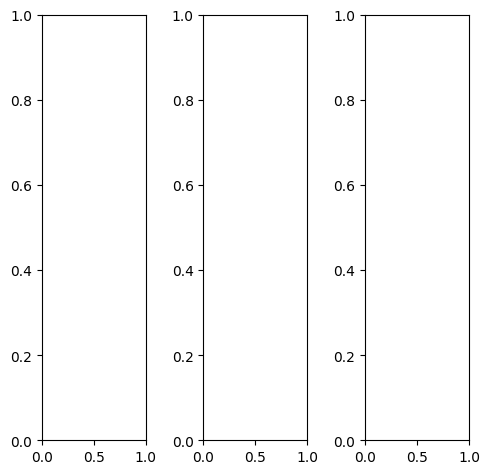

tensor([[[0.7569, 0.7725, 0.8157,  ..., 0.5725, 0.5373, 0.6078],
         [0.8667, 0.8824, 0.9059,  ..., 0.6510, 0.5569, 0.6510],
         [0.9176, 0.9020, 0.9098,  ..., 0.6549, 0.6196, 0.8118],
         ...,
         [0.7843, 0.7412, 0.7255,  ..., 0.9569, 0.9765, 0.9569],
         [0.7765, 0.8275, 0.8000,  ..., 0.9725, 0.9804, 0.9686],
         [0.7216, 0.8392, 0.8275,  ..., 0.9725, 0.9686, 0.9725]],

        [[0.7569, 0.7725, 0.8157,  ..., 0.5725, 0.5373, 0.6078],
         [0.8667, 0.8824, 0.9059,  ..., 0.6510, 0.5569, 0.6510],
         [0.9176, 0.9020, 0.9098,  ..., 0.6549, 0.6196, 0.8118],
         ...,
         [0.7843, 0.7412, 0.7255,  ..., 0.9569, 0.9765, 0.9569],
         [0.7765, 0.8275, 0.8000,  ..., 0.9725, 0.9804, 0.9686],
         [0.7216, 0.8392, 0.8275,  ..., 0.9725, 0.9686, 0.9725]],

        [[0.7569, 0.7725, 0.8157,  ..., 0.5725, 0.5373, 0.6078],
         [0.8667, 0.8824, 0.9059,  ..., 0.6510, 0.5569, 0.6510],
         [0.9176, 0.9020, 0.9098,  ..., 0.6549, 0.6196, 0.

tensor([[[0.8706, 0.8745, 0.9098,  ..., 0.6863, 0.6392, 0.6980],
         [0.9608, 0.9686, 0.9804,  ..., 0.7490, 0.6471, 0.7216],
         [0.9882, 0.9647, 0.9647,  ..., 0.7373, 0.6941, 0.8667],
         ...,
         [0.8392, 0.7804, 0.7725,  ..., 0.9725, 0.9922, 0.9882],
         [0.8549, 0.8784, 0.8431,  ..., 0.9922, 0.9961, 0.9922],
         [0.7961, 0.8863, 0.8667,  ..., 1.0000, 0.9922, 0.9961]],

        [[0.7216, 0.7373, 0.7843,  ..., 0.5176, 0.4902, 0.5765],
         [0.8392, 0.8588, 0.8863,  ..., 0.6078, 0.5216, 0.6275],
         [0.9020, 0.8863, 0.8980,  ..., 0.6235, 0.5922, 0.7961],
         ...,
         [0.7647, 0.7333, 0.7137,  ..., 0.9765, 0.9961, 0.9725],
         [0.7529, 0.8157, 0.7882,  ..., 0.9804, 0.9922, 0.9843],
         [0.7020, 0.8314, 0.8235,  ..., 0.9765, 0.9765, 0.9843]],

        [[0.6471, 0.6706, 0.7255,  ..., 0.5451, 0.4980, 0.5451],
         [0.7608, 0.7882, 0.8275,  ..., 0.6118, 0.5098, 0.5804],
         [0.8196, 0.8157, 0.8353,  ..., 0.6039, 0.5569, 0.

tensor([[[0.7056, 0.6188, 0.7143,  ..., 0.4062, 0.3736, 0.4999],
         [0.7463, 0.7456, 0.6975,  ..., 0.4633, 0.3849, 0.4985],
         [0.7510, 0.7868, 0.7098,  ..., 0.4712, 0.4601, 0.6551],
         ...,
         [0.7149, 0.6885, 0.6592,  ..., 0.8958, 0.9070, 0.8744],
         [0.7025, 0.7439, 0.7103,  ..., 0.8804, 0.8924, 0.8693],
         [0.6739, 0.7736, 0.7550,  ..., 0.9136, 0.8919, 0.8754]],

        [[0.6865, 0.7402, 0.7080,  ..., 0.4653, 0.4529, 0.5130],
         [0.7740, 0.8156, 0.7739,  ..., 0.5762, 0.4795, 0.5870],
         [0.8245, 0.8923, 0.8076,  ..., 0.5649, 0.5601, 0.7376],
         ...,
         [0.6643, 0.6420, 0.6343,  ..., 0.8539, 0.8612, 0.8531],
         [0.6575, 0.6974, 0.6815,  ..., 0.8648, 0.8539, 0.8529],
         [0.6108, 0.7173, 0.7227,  ..., 0.8533, 0.8450, 0.8265]],

        [[0.8142, 0.7845, 0.8940,  ..., 0.6728, 0.6429, 0.6891],
         [0.9245, 0.9458, 0.9237,  ..., 0.7429, 0.6846, 0.7456],
         [0.9255, 0.9042, 0.9371,  ..., 0.7495, 0.7589, 0.

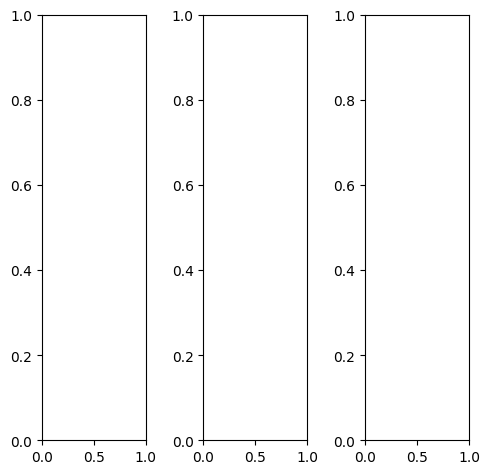

tensor([[[0.2039, 0.2863, 0.2588,  ..., 0.2667, 0.2431, 0.2275],
         [0.2275, 0.2392, 0.2431,  ..., 0.2588, 0.2275, 0.1882],
         [0.2588, 0.2275, 0.2353,  ..., 0.1569, 0.1647, 0.1882],
         ...,
         [0.5451, 0.3961, 0.5176,  ..., 0.5333, 0.5725, 0.6196],
         [0.5922, 0.4431, 0.4941,  ..., 0.4784, 0.5961, 0.5176],
         [0.5725, 0.6431, 0.5608,  ..., 0.4784, 0.5725, 0.4902]],

        [[0.2039, 0.2863, 0.2588,  ..., 0.2667, 0.2431, 0.2275],
         [0.2275, 0.2392, 0.2431,  ..., 0.2588, 0.2275, 0.1882],
         [0.2588, 0.2275, 0.2353,  ..., 0.1569, 0.1647, 0.1882],
         ...,
         [0.5451, 0.3961, 0.5176,  ..., 0.5333, 0.5725, 0.6196],
         [0.5922, 0.4431, 0.4941,  ..., 0.4784, 0.5961, 0.5176],
         [0.5725, 0.6431, 0.5608,  ..., 0.4784, 0.5725, 0.4902]],

        [[0.2039, 0.2863, 0.2588,  ..., 0.2667, 0.2431, 0.2275],
         [0.2275, 0.2392, 0.2431,  ..., 0.2588, 0.2275, 0.1882],
         [0.2588, 0.2275, 0.2353,  ..., 0.1569, 0.1647, 0.

tensor([[[0.1725, 0.2627, 0.2431,  ..., 0.2353, 0.2118, 0.2000],
         [0.2039, 0.2118, 0.2157,  ..., 0.2392, 0.2039, 0.1647],
         [0.2431, 0.1922, 0.2000,  ..., 0.1412, 0.1451, 0.1725],
         ...,
         [0.4510, 0.2980, 0.4314,  ..., 0.5373, 0.5725, 0.6039],
         [0.4980, 0.3412, 0.3961,  ..., 0.4745, 0.5804, 0.4824],
         [0.4941, 0.5529, 0.4745,  ..., 0.4706, 0.5451, 0.4431]],

        [[0.2314, 0.3098, 0.2784,  ..., 0.2784, 0.2549, 0.2392],
         [0.2510, 0.2627, 0.2627,  ..., 0.2706, 0.2392, 0.2000],
         [0.2784, 0.2549, 0.2588,  ..., 0.1647, 0.1725, 0.1961],
         ...,
         [0.6235, 0.4824, 0.5961,  ..., 0.5686, 0.6196, 0.6627],
         [0.6745, 0.5294, 0.5725,  ..., 0.5137, 0.6431, 0.5686],
         [0.6471, 0.7176, 0.6314,  ..., 0.5098, 0.6157, 0.5412]],

        [[0.1333, 0.2196, 0.2000,  ..., 0.2784, 0.2510, 0.2392],
         [0.1725, 0.1922, 0.2039,  ..., 0.2627, 0.2275, 0.1922],
         [0.2000, 0.1804, 0.2078,  ..., 0.1529, 0.1608, 0.

tensor([[[0.3452, 0.3485, 0.3052,  ..., 0.3822, 0.3488, 0.3858],
         [0.2808, 0.2487, 0.1900,  ..., 0.3397, 0.2709, 0.2830],
         [0.3104, 0.2431, 0.1463,  ..., 0.1743, 0.2094, 0.2862],
         ...,
         [0.9133, 0.7593, 0.9266,  ..., 0.9488, 0.9975, 1.0330],
         [0.9487, 0.8177, 0.8898,  ..., 0.8183, 0.9898, 0.8808],
         [0.9053, 1.0240, 0.9241,  ..., 0.8270, 0.9228, 0.8270]],

        [[0.3853, 0.4916, 0.3799,  ..., 0.4687, 0.4503, 0.4274],
         [0.3479, 0.3945, 0.2246,  ..., 0.4672, 0.4219, 0.3610],
         [0.4095, 0.3667, 0.2892,  ..., 0.2941, 0.3175, 0.3554],
         ...,
         [0.8357, 0.7135, 0.8937,  ..., 0.9268, 0.9632, 1.0362],
         [0.9157, 0.7621, 0.8585,  ..., 0.8266, 0.9754, 0.8767],
         [0.8547, 0.9817, 0.8900,  ..., 0.8067, 0.9000, 0.8010]],

        [[0.4928, 0.5064, 0.5128,  ..., 0.6631, 0.6253, 0.5859],
         [0.4850, 0.4840, 0.4660,  ..., 0.6745, 0.5953, 0.5365],
         [0.4870, 0.4164, 0.4244,  ..., 0.4809, 0.5061, 0.

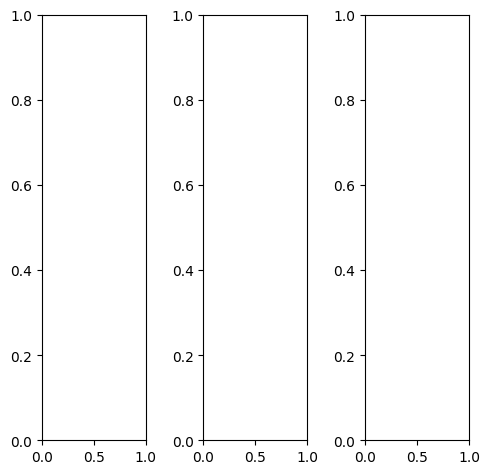

tensor([[[0.6078, 0.6078, 0.6078,  ..., 0.1529, 0.1412, 0.1333],
         [0.6118, 0.6196, 0.6275,  ..., 0.1686, 0.1569, 0.1490],
         [0.5647, 0.6157, 0.6235,  ..., 0.1843, 0.1725, 0.1608],
         ...,
         [0.2353, 0.2471, 0.2549,  ..., 0.2314, 0.2235, 0.2118],
         [0.2275, 0.2392, 0.2471,  ..., 0.2235, 0.2118, 0.2039],
         [0.2157, 0.2235, 0.2314,  ..., 0.2118, 0.2039, 0.1922]],

        [[0.6078, 0.6078, 0.6078,  ..., 0.1529, 0.1412, 0.1333],
         [0.6118, 0.6196, 0.6275,  ..., 0.1686, 0.1569, 0.1490],
         [0.5647, 0.6157, 0.6235,  ..., 0.1843, 0.1725, 0.1608],
         ...,
         [0.2353, 0.2471, 0.2549,  ..., 0.2314, 0.2235, 0.2118],
         [0.2275, 0.2392, 0.2471,  ..., 0.2235, 0.2118, 0.2039],
         [0.2157, 0.2235, 0.2314,  ..., 0.2118, 0.2039, 0.1922]],

        [[0.6078, 0.6078, 0.6078,  ..., 0.1529, 0.1412, 0.1333],
         [0.6118, 0.6196, 0.6275,  ..., 0.1686, 0.1569, 0.1490],
         [0.5647, 0.6157, 0.6235,  ..., 0.1843, 0.1725, 0.

tensor([[[0.5569, 0.5569, 0.5608,  ..., 0.1373, 0.1255, 0.1176],
         [0.5608, 0.5686, 0.5765,  ..., 0.1529, 0.1412, 0.1333],
         [0.5137, 0.5686, 0.5725,  ..., 0.1686, 0.1569, 0.1451],
         ...,
         [0.2235, 0.2353, 0.2431,  ..., 0.2196, 0.2118, 0.2000],
         [0.2157, 0.2275, 0.2353,  ..., 0.2118, 0.2000, 0.1922],
         [0.2039, 0.2118, 0.2196,  ..., 0.2000, 0.1922, 0.1804]],

        [[0.6157, 0.6157, 0.6157,  ..., 0.1569, 0.1451, 0.1373],
         [0.6196, 0.6275, 0.6353,  ..., 0.1725, 0.1608, 0.1529],
         [0.5765, 0.6275, 0.6353,  ..., 0.1882, 0.1765, 0.1647],
         ...,
         [0.2353, 0.2471, 0.2549,  ..., 0.2353, 0.2275, 0.2118],
         [0.2275, 0.2392, 0.2471,  ..., 0.2275, 0.2157, 0.2039],
         [0.2157, 0.2235, 0.2314,  ..., 0.2157, 0.2078, 0.1961]],

        [[0.6980, 0.6941, 0.6980,  ..., 0.1804, 0.1686, 0.1608],
         [0.6941, 0.7020, 0.7098,  ..., 0.1961, 0.1843, 0.1765],
         [0.6392, 0.6902, 0.6980,  ..., 0.2078, 0.2000, 0.

tensor([[[ 1.1081,  1.0439,  1.1079,  ...,  0.0350,  0.0379,  0.1100],
         [ 1.1096,  1.0820,  1.0013,  ...,  0.0080, -0.0112,  0.0668],
         [ 0.9682,  1.0807,  1.0202,  ...,  0.0267,  0.0145,  0.0793],
         ...,
         [ 0.3012,  0.3328,  0.3208,  ...,  0.2591,  0.2437,  0.2936],
         [ 0.2959,  0.3011,  0.3166,  ...,  0.2214,  0.2137,  0.2688],
         [ 0.3308,  0.3120,  0.3097,  ...,  0.2572,  0.2383,  0.3009]],

        [[ 1.0671,  1.1196,  1.0387,  ...,  0.1369,  0.1265,  0.1618],
         [ 1.0984,  1.0707,  1.0399,  ...,  0.1385,  0.1363,  0.1495],
         [ 1.0007,  1.1244,  1.0225,  ...,  0.1511,  0.1399,  0.1741],
         ...,
         [ 0.3013,  0.3343,  0.3594,  ...,  0.3113,  0.2981,  0.2794],
         [ 0.2876,  0.3234,  0.3386,  ...,  0.2812,  0.2552,  0.2640],
         [ 0.3019,  0.2917,  0.3113,  ...,  0.2626,  0.2431,  0.2732]],

        [[ 1.1532,  1.2091,  1.1411,  ...,  0.2934,  0.2949,  0.3274],
         [ 1.2460,  1.2342,  1.1434,  ...,  0

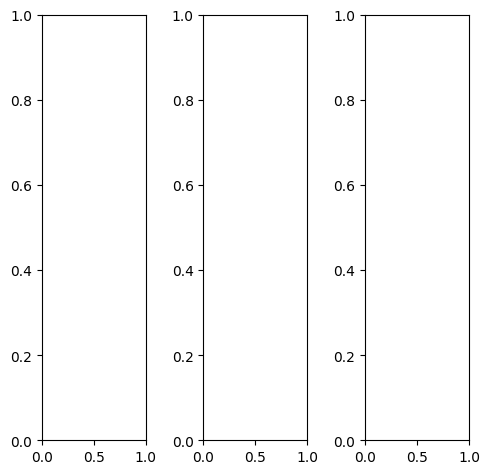

tensor([[[0.6471, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6431, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6627, 0.6667, 0.6667,  ..., 0.6471, 0.6471, 0.6471],
         ...,
         [0.6471, 0.6471, 0.6549,  ..., 0.2902, 0.4588, 0.6471],
         [0.6471, 0.6549, 0.6549,  ..., 0.0235, 0.1294, 0.2784],
         [0.6471, 0.6510, 0.6510,  ..., 0.0235, 0.0078, 0.0000]],

        [[0.6471, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6431, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6627, 0.6667, 0.6667,  ..., 0.6471, 0.6471, 0.6471],
         ...,
         [0.6471, 0.6471, 0.6549,  ..., 0.2902, 0.4588, 0.6471],
         [0.6471, 0.6549, 0.6549,  ..., 0.0235, 0.1294, 0.2784],
         [0.6471, 0.6510, 0.6510,  ..., 0.0235, 0.0078, 0.0000]],

        [[0.6471, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6431, 0.6549, 0.6549,  ..., 0.6471, 0.6471, 0.6471],
         [0.6627, 0.6667, 0.6667,  ..., 0.6471, 0.6471, 0.

tensor([[[0.6706, 0.6784, 0.6784,  ..., 0.6745, 0.6745, 0.6745],
         [0.6667, 0.6784, 0.6784,  ..., 0.6745, 0.6745, 0.6745],
         [0.6863, 0.6902, 0.6902,  ..., 0.6745, 0.6745, 0.6745],
         ...,
         [0.6745, 0.6745, 0.6824,  ..., 0.3020, 0.4902, 0.6745],
         [0.6745, 0.6824, 0.6824,  ..., 0.0275, 0.1490, 0.2980],
         [0.6745, 0.6784, 0.6784,  ..., 0.0196, 0.0078, 0.0000]],

        [[0.6431, 0.6510, 0.6510,  ..., 0.6392, 0.6392, 0.6392],
         [0.6392, 0.6510, 0.6510,  ..., 0.6392, 0.6392, 0.6392],
         [0.6588, 0.6627, 0.6627,  ..., 0.6392, 0.6392, 0.6392],
         ...,
         [0.6392, 0.6392, 0.6471,  ..., 0.2824, 0.4471, 0.6353],
         [0.6392, 0.6471, 0.6471,  ..., 0.0157, 0.1216, 0.2706],
         [0.6392, 0.6431, 0.6431,  ..., 0.0235, 0.0039, 0.0000]],

        [[0.6039, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         [0.6039, 0.6157, 0.6157,  ..., 0.6118, 0.6118, 0.6118],
         [0.6314, 0.6353, 0.6353,  ..., 0.6118, 0.6118, 0.

tensor([[[0.5273, 0.4172, 0.4463,  ..., 0.4482, 0.4490, 0.5275],
         [0.4265, 0.3864, 0.3856,  ..., 0.4076, 0.4505, 0.4925],
         [0.4444, 0.4514, 0.3612,  ..., 0.4272, 0.4525, 0.4884],
         ...,
         [0.5568, 0.6156, 0.5735,  ..., 0.4313, 0.5301, 0.6676],
         [0.5511, 0.5747, 0.5383,  ..., 0.1125, 0.2348, 0.3615],
         [0.5731, 0.5895, 0.5731,  ..., 0.1101, 0.1254, 0.1653]],

        [[0.5378, 0.6009, 0.5495,  ..., 0.5267, 0.5504, 0.5518],
         [0.5231, 0.5716, 0.5406,  ..., 0.5440, 0.5742, 0.5845],
         [0.5463, 0.6131, 0.5651,  ..., 0.5441, 0.5718, 0.5728],
         ...,
         [0.5154, 0.5618, 0.5755,  ..., 0.3987, 0.5156, 0.5885],
         [0.5061, 0.5218, 0.5420,  ..., 0.1073, 0.1978, 0.2945],
         [0.5098, 0.5399, 0.5495,  ..., 0.0778, 0.0870, 0.1102]],

        [[0.7359, 0.6583, 0.8144,  ..., 0.7069, 0.7152, 0.7062],
         [0.7051, 0.7503, 0.7622,  ..., 0.6998, 0.7349, 0.7152],
         [0.7156, 0.6758, 0.7511,  ..., 0.7247, 0.7437, 0.

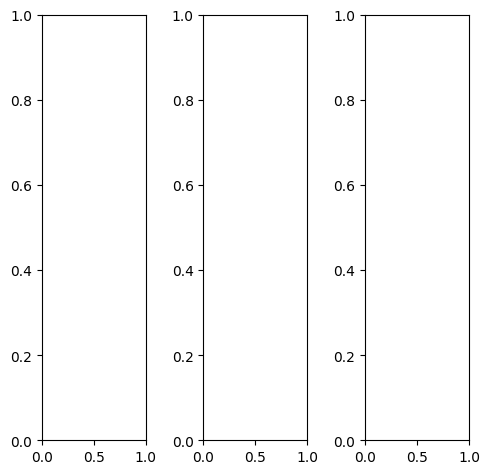

EPOCH: 12.000  val_loss: 0.004  (1422.41s - 10431.03s remaining)

tensor([[[0.8196, 0.8196, 0.8314,  ..., 0.8275, 0.8196, 0.8157],
         [0.8078, 0.8039, 0.8157,  ..., 0.8039, 0.7961, 0.8078],
         [0.7843, 0.7961, 0.8000,  ..., 0.6510, 0.6392, 0.7137],
         ...,
         [0.5412, 0.5529, 0.5647,  ..., 0.6118, 0.6000, 0.6000],
         [0.5686, 0.5804, 0.5686,  ..., 0.6078, 0.6118, 0.6157],
         [0.5725, 0.5843, 0.5725,  ..., 0.6157, 0.6196, 0.6314]],

        [[0.8196, 0.8196, 0.8314,  ..., 0.8275, 0.8196, 0.8157],
         [0.8078, 0.8039, 0.8157,  ..., 0.8039, 0.7961, 0.8078],
         [0.7843, 0.7961, 0.8000,  ..., 0.6510, 0.6392, 0.7137],
         ...,
         [0.5412, 0.5529, 0.5647,  ..., 0.6118, 0.6000, 0.6000],
         [0.5686, 0.5804, 0.5686,  ..., 0.6078, 0.6118, 0.6157],
         [0.5725, 0.5843, 0.5725,  ..., 0.6157, 0.6196, 0.6314]],

        [[0.8196, 0.8196, 0.8314,  ..., 0.8275, 0.8196, 0.8157],
         [0.8078, 0.8039, 0.8157,  ..., 0.8039, 0.7961, 0.8078],
         [0.7843, 0.7961, 0.8000,  ..., 0.6510, 0.6392, 0.

tensor([[[0.7922, 0.7922, 0.8000,  ..., 0.8000, 0.7922, 0.7843],
         [0.7725, 0.7686, 0.7804,  ..., 0.7686, 0.7608, 0.7686],
         [0.7451, 0.7569, 0.7608,  ..., 0.6118, 0.5961, 0.6706],
         ...,
         [0.5765, 0.5882, 0.6000,  ..., 0.6706, 0.6588, 0.6588],
         [0.6078, 0.6196, 0.6078,  ..., 0.6667, 0.6706, 0.6745],
         [0.6157, 0.6275, 0.6157,  ..., 0.6745, 0.6784, 0.6902]],

        [[0.8314, 0.8314, 0.8431,  ..., 0.8353, 0.8275, 0.8235],
         [0.8235, 0.8196, 0.8275,  ..., 0.8275, 0.8157, 0.8235],
         [0.8078, 0.8157, 0.8157,  ..., 0.6824, 0.6667, 0.7373],
         ...,
         [0.5451, 0.5569, 0.5686,  ..., 0.6078, 0.5922, 0.5922],
         [0.5725, 0.5843, 0.5725,  ..., 0.6039, 0.6039, 0.6078],
         [0.5725, 0.5843, 0.5725,  ..., 0.6078, 0.6118, 0.6235]],

        [[0.8431, 0.8431, 0.8510,  ..., 0.8667, 0.8588, 0.8471],
         [0.8314, 0.8314, 0.8510,  ..., 0.7882, 0.7922, 0.8235],
         [0.7804, 0.8118, 0.8275,  ..., 0.6039, 0.5961, 0.

tensor([[[0.7916, 0.8096, 0.8139,  ..., 0.8193, 0.8099, 0.7987],
         [0.8024, 0.7851, 0.8007,  ..., 0.7908, 0.7906, 0.8106],
         [0.7778, 0.7693, 0.7742,  ..., 0.6425, 0.6386, 0.7080],
         ...,
         [0.5643, 0.5932, 0.5923,  ..., 0.6330, 0.6254, 0.6243],
         [0.5905, 0.6162, 0.5854,  ..., 0.6234, 0.6333, 0.6357],
         [0.6019, 0.6140, 0.5958,  ..., 0.6366, 0.6512, 0.6504]],

        [[0.8111, 0.8273, 0.8527,  ..., 0.8432, 0.8332, 0.8236],
         [0.8092, 0.8177, 0.8280,  ..., 0.8131, 0.8034, 0.8232],
         [0.7891, 0.7968, 0.8109,  ..., 0.6573, 0.6484, 0.7298],
         ...,
         [0.5500, 0.5704, 0.5794,  ..., 0.6172, 0.6083, 0.6108],
         [0.5736, 0.5945, 0.5729,  ..., 0.6102, 0.6198, 0.6283],
         [0.5820, 0.5955, 0.5796,  ..., 0.6171, 0.6337, 0.6385]],

        [[0.8273, 0.8377, 0.8410,  ..., 0.8430, 0.8337, 0.8176],
         [0.8069, 0.8205, 0.8288,  ..., 0.8098, 0.8005, 0.8111],
         [0.7903, 0.7889, 0.7997,  ..., 0.6576, 0.6543, 0.

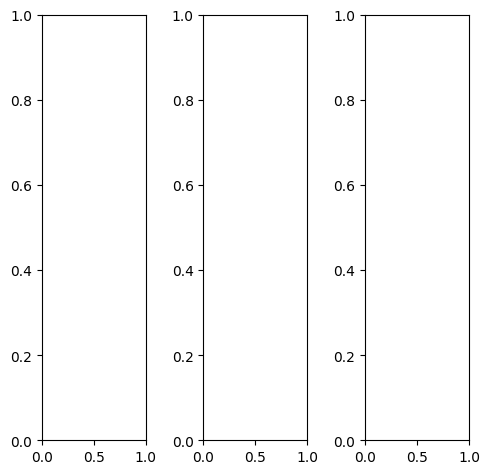

tensor([[[0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9059],
         [0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9020],
         [0.9490, 0.9412, 0.9412,  ..., 0.9059, 0.9098, 0.9098],
         ...,
         [0.2902, 0.3020, 0.2824,  ..., 0.3765, 0.3373, 0.3804],
         [0.2745, 0.2941, 0.3216,  ..., 0.3882, 0.3490, 0.3412],
         [0.2941, 0.3255, 0.3647,  ..., 0.3255, 0.3373, 0.3255]],

        [[0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9059],
         [0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9020],
         [0.9490, 0.9412, 0.9412,  ..., 0.9059, 0.9098, 0.9098],
         ...,
         [0.2902, 0.3020, 0.2824,  ..., 0.3765, 0.3373, 0.3804],
         [0.2745, 0.2941, 0.3216,  ..., 0.3882, 0.3490, 0.3412],
         [0.2941, 0.3255, 0.3647,  ..., 0.3255, 0.3373, 0.3255]],

        [[0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9059],
         [0.9451, 0.9373, 0.9373,  ..., 0.9020, 0.9020, 0.9020],
         [0.9490, 0.9412, 0.9412,  ..., 0.9059, 0.9098, 0.

tensor([[[0.9373, 0.9255, 0.9294,  ..., 0.9294, 0.9294, 0.9333],
         [0.9451, 0.9373, 0.9373,  ..., 0.9255, 0.9255, 0.9294],
         [0.9490, 0.9412, 0.9412,  ..., 0.9333, 0.9373, 0.9373],
         ...,
         [0.2235, 0.2353, 0.2157,  ..., 0.3451, 0.3098, 0.3490],
         [0.2157, 0.2353, 0.2627,  ..., 0.3608, 0.3216, 0.3137],
         [0.2392, 0.2706, 0.3098,  ..., 0.3020, 0.3137, 0.3059]],

        [[0.9412, 0.9333, 0.9373,  ..., 0.8784, 0.8784, 0.8824],
         [0.9412, 0.9294, 0.9333,  ..., 0.8784, 0.8784, 0.8784],
         [0.9412, 0.9333, 0.9333,  ..., 0.8824, 0.8863, 0.8863],
         ...,
         [0.3529, 0.3647, 0.3451,  ..., 0.4314, 0.3922, 0.4353],
         [0.3333, 0.3529, 0.3882,  ..., 0.4431, 0.4000, 0.3922],
         [0.3490, 0.3843, 0.4314,  ..., 0.3725, 0.3804, 0.3647]],

        [[0.9804, 0.9725, 0.9725,  ..., 0.9451, 0.9451, 0.9490],
         [0.9804, 0.9725, 0.9725,  ..., 0.9451, 0.9451, 0.9490],
         [0.9843, 0.9765, 0.9765,  ..., 0.9608, 0.9647, 0.

tensor([[[0.9513, 0.9347, 0.9802,  ..., 0.8870, 0.8930, 0.8717],
         [0.9329, 0.9410, 0.9399,  ..., 0.8924, 0.8956, 0.8859],
         [0.9561, 0.9791, 0.9648,  ..., 0.8974, 0.9100, 0.8989],
         ...,
         [0.2799, 0.2895, 0.2642,  ..., 0.3655, 0.3278, 0.3831],
         [0.2640, 0.2887, 0.3218,  ..., 0.3791, 0.3328, 0.3410],
         [0.3071, 0.3250, 0.3603,  ..., 0.3126, 0.3216, 0.3398]],

        [[0.9497, 0.9607, 0.9563,  ..., 0.9031, 0.9011, 0.9109],
         [0.9280, 0.9749, 0.9762,  ..., 0.9173, 0.9038, 0.9112],
         [0.9776, 0.9734, 0.9782,  ..., 0.9203, 0.9258, 0.9172],
         ...,
         [0.3029, 0.3063, 0.2862,  ..., 0.3909, 0.3504, 0.3983],
         [0.2814, 0.3036, 0.3374,  ..., 0.3950, 0.3538, 0.3536],
         [0.3214, 0.3427, 0.3792,  ..., 0.3356, 0.3421, 0.3448]],

        [[0.9256, 0.9649, 0.9483,  ..., 0.9108, 0.9168, 0.9044],
         [0.9294, 0.9523, 0.9330,  ..., 0.9168, 0.9148, 0.9126],
         [0.9444, 0.9905, 0.9856,  ..., 0.9169, 0.9209, 0.

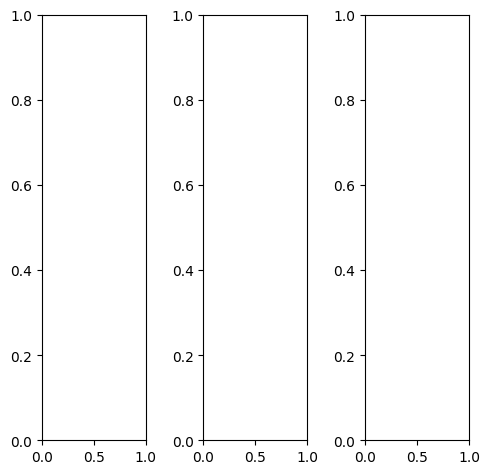

tensor([[[0.4784, 0.4824, 0.4902,  ..., 0.4588, 0.4471, 0.4353],
         [0.4863, 0.4902, 0.5020,  ..., 0.4667, 0.4549, 0.4471],
         [0.4824, 0.4902, 0.4980,  ..., 0.4627, 0.4510, 0.4431],
         ...,
         [0.3686, 0.3725, 0.3882,  ..., 0.4196, 0.4275, 0.4235],
         [0.3765, 0.3882, 0.4000,  ..., 0.4431, 0.4431, 0.4392],
         [0.3725, 0.3882, 0.3961,  ..., 0.4510, 0.4431, 0.4235]],

        [[0.4784, 0.4824, 0.4902,  ..., 0.4588, 0.4471, 0.4353],
         [0.4863, 0.4902, 0.5020,  ..., 0.4667, 0.4549, 0.4471],
         [0.4824, 0.4902, 0.4980,  ..., 0.4627, 0.4510, 0.4431],
         ...,
         [0.3686, 0.3725, 0.3882,  ..., 0.4196, 0.4275, 0.4235],
         [0.3765, 0.3882, 0.4000,  ..., 0.4431, 0.4431, 0.4392],
         [0.3725, 0.3882, 0.3961,  ..., 0.4510, 0.4431, 0.4235]],

        [[0.4784, 0.4824, 0.4902,  ..., 0.4588, 0.4471, 0.4353],
         [0.4863, 0.4902, 0.5020,  ..., 0.4667, 0.4549, 0.4471],
         [0.4824, 0.4902, 0.4980,  ..., 0.4627, 0.4510, 0.

tensor([[[0.4745, 0.4863, 0.4941,  ..., 0.4824, 0.4745, 0.4588],
         [0.4863, 0.4941, 0.5059,  ..., 0.4941, 0.4824, 0.4706],
         [0.4824, 0.4941, 0.5020,  ..., 0.4902, 0.4824, 0.4706],
         ...,
         [0.3843, 0.3843, 0.4039,  ..., 0.4588, 0.4588, 0.4510],
         [0.3922, 0.4000, 0.4118,  ..., 0.4745, 0.4706, 0.4667],
         [0.3843, 0.3961, 0.4078,  ..., 0.4784, 0.4706, 0.4471]],

        [[0.4863, 0.4902, 0.4980,  ..., 0.4627, 0.4471, 0.4392],
         [0.4941, 0.4980, 0.5059,  ..., 0.4667, 0.4549, 0.4471],
         [0.4902, 0.4941, 0.5020,  ..., 0.4627, 0.4510, 0.4431],
         ...,
         [0.3765, 0.3804, 0.3922,  ..., 0.4157, 0.4235, 0.4235],
         [0.3843, 0.3961, 0.4039,  ..., 0.4431, 0.4431, 0.4392],
         [0.3804, 0.3961, 0.4039,  ..., 0.4510, 0.4431, 0.4235]],

        [[0.4431, 0.4471, 0.4510,  ..., 0.3882, 0.3725, 0.3686],
         [0.4431, 0.4510, 0.4588,  ..., 0.3922, 0.3804, 0.3725],
         [0.4392, 0.4471, 0.4588,  ..., 0.3843, 0.3765, 0.

tensor([[[0.5014, 0.5011, 0.5022,  ..., 0.4713, 0.4616, 0.4599],
         [0.5099, 0.5064, 0.5164,  ..., 0.4843, 0.4744, 0.4638],
         [0.4882, 0.5065, 0.5162,  ..., 0.4809, 0.4742, 0.4556],
         ...,
         [0.3865, 0.4015, 0.4152,  ..., 0.4473, 0.4487, 0.4432],
         [0.3970, 0.4238, 0.4382,  ..., 0.4679, 0.4586, 0.4606],
         [0.3994, 0.4131, 0.4143,  ..., 0.4672, 0.4673, 0.4591]],

        [[0.5023, 0.5073, 0.5093,  ..., 0.4757, 0.4669, 0.4599],
         [0.5101, 0.4993, 0.5129,  ..., 0.4921, 0.4767, 0.4687],
         [0.4885, 0.5109, 0.5141,  ..., 0.4749, 0.4660, 0.4549],
         ...,
         [0.3736, 0.3853, 0.3921,  ..., 0.4271, 0.4359, 0.4317],
         [0.3835, 0.4024, 0.4065,  ..., 0.4515, 0.4456, 0.4552],
         [0.3973, 0.3999, 0.3998,  ..., 0.4516, 0.4550, 0.4587]],

        [[0.4303, 0.4177, 0.4101,  ..., 0.3703, 0.3750, 0.3861],
         [0.4191, 0.4153, 0.4134,  ..., 0.3787, 0.3722, 0.3732],
         [0.4023, 0.4118, 0.4301,  ..., 0.3770, 0.3624, 0.

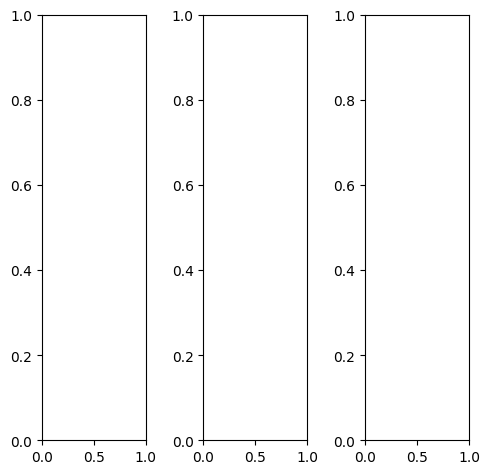

tensor([[[0.3922, 0.5922, 0.5961,  ..., 0.5725, 0.6157, 0.6275],
         [0.6235, 0.6314, 0.5216,  ..., 0.3882, 0.4549, 0.4706],
         [0.5647, 0.5529, 0.4667,  ..., 0.3059, 0.4353, 0.4706],
         ...,
         [0.9725, 0.8745, 0.6745,  ..., 0.4824, 0.5647, 0.5961],
         [0.9765, 0.9804, 0.9098,  ..., 0.5412, 0.5373, 0.5490],
         [0.9765, 0.9725, 0.9804,  ..., 0.5647, 0.5451, 0.5373]],

        [[0.3922, 0.5922, 0.5961,  ..., 0.5725, 0.6157, 0.6275],
         [0.6235, 0.6314, 0.5216,  ..., 0.3882, 0.4549, 0.4706],
         [0.5647, 0.5529, 0.4667,  ..., 0.3059, 0.4353, 0.4706],
         ...,
         [0.9725, 0.8745, 0.6745,  ..., 0.4824, 0.5647, 0.5961],
         [0.9765, 0.9804, 0.9098,  ..., 0.5412, 0.5373, 0.5490],
         [0.9765, 0.9725, 0.9804,  ..., 0.5647, 0.5451, 0.5373]],

        [[0.3922, 0.5922, 0.5961,  ..., 0.5725, 0.6157, 0.6275],
         [0.6235, 0.6314, 0.5216,  ..., 0.3882, 0.4549, 0.4706],
         [0.5647, 0.5529, 0.4667,  ..., 0.3059, 0.4353, 0.

tensor([[[0.3020, 0.4706, 0.4745,  ..., 0.4980, 0.5529, 0.5922],
         [0.5294, 0.5216, 0.4196,  ..., 0.3294, 0.3922, 0.4235],
         [0.4980, 0.4824, 0.4039,  ..., 0.2588, 0.3804, 0.4157],
         ...,
         [0.9451, 0.8471, 0.6431,  ..., 0.4745, 0.5608, 0.5882],
         [0.9490, 0.9529, 0.8863,  ..., 0.5294, 0.5294, 0.5412],
         [0.9451, 0.9451, 0.9569,  ..., 0.5490, 0.5333, 0.5255]],

        [[0.4157, 0.6235, 0.6392,  ..., 0.6039, 0.6392, 0.6353],
         [0.6510, 0.6745, 0.5725,  ..., 0.4157, 0.4745, 0.4784],
         [0.5922, 0.5961, 0.5137,  ..., 0.3373, 0.4549, 0.4824],
         ...,
         [0.9804, 0.8784, 0.6706,  ..., 0.4706, 0.5490, 0.5804],
         [0.9882, 0.9882, 0.9176,  ..., 0.5294, 0.5255, 0.5373],
         [0.9882, 0.9843, 0.9882,  ..., 0.5569, 0.5333, 0.5255]],

        [[0.5216, 0.7412, 0.7059,  ..., 0.6118, 0.6667, 0.6863],
         [0.7255, 0.6902, 0.5294,  ..., 0.4118, 0.5059, 0.5529],
         [0.5843, 0.5255, 0.4039,  ..., 0.2824, 0.4667, 0.

tensor([[[0.4721, 0.6102, 0.6059,  ..., 0.5821, 0.6395, 0.6199],
         [0.6439, 0.6363, 0.5151,  ..., 0.3705, 0.4415, 0.4899],
         [0.5785, 0.5495, 0.4785,  ..., 0.3131, 0.4408, 0.4772],
         ...,
         [0.9788, 0.8984, 0.7117,  ..., 0.5164, 0.5864, 0.6373],
         [0.9682, 1.0075, 0.9364,  ..., 0.5592, 0.5607, 0.5880],
         [0.9418, 0.9735, 0.9832,  ..., 0.5896, 0.5831, 0.5691]],

        [[0.4604, 0.6202, 0.6102,  ..., 0.5876, 0.6399, 0.6218],
         [0.6395, 0.6415, 0.5346,  ..., 0.3759, 0.4440, 0.4947],
         [0.5759, 0.5405, 0.4657,  ..., 0.3072, 0.4463, 0.4737],
         ...,
         [0.9637, 0.8652, 0.6725,  ..., 0.4961, 0.5495, 0.6240],
         [0.9502, 0.9675, 0.9131,  ..., 0.5256, 0.5340, 0.5643],
         [0.9246, 0.9654, 0.9686,  ..., 0.5723, 0.5529, 0.5563]],

        [[0.4178, 0.5367, 0.5213,  ..., 0.5072, 0.5665, 0.5671],
         [0.5563, 0.5445, 0.4272,  ..., 0.3221, 0.3838, 0.4211],
         [0.4812, 0.4547, 0.3901,  ..., 0.2548, 0.3740, 0.

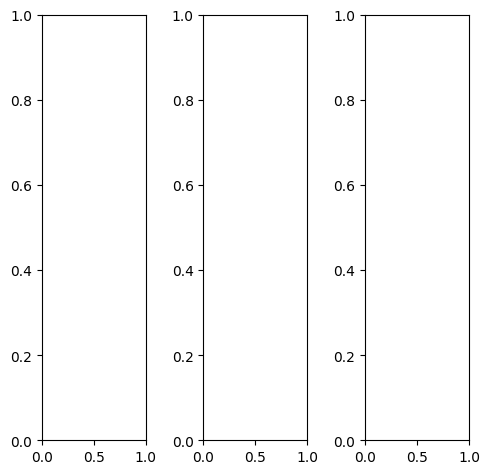

tensor([[[0.0667, 0.0706, 0.0706,  ..., 0.0784, 0.0510, 0.0863],
         [0.0745, 0.0745, 0.0745,  ..., 0.0627, 0.0471, 0.1333],
         [0.0745, 0.0784, 0.0784,  ..., 0.0667, 0.0471, 0.1882],
         ...,
         [0.2039, 0.1961, 0.2275,  ..., 0.8353, 0.6745, 0.3961],
         [0.1882, 0.1882, 0.2000,  ..., 0.8510, 0.7137, 0.3843],
         [0.1686, 0.1922, 0.2157,  ..., 0.8431, 0.7020, 0.3882]],

        [[0.0667, 0.0706, 0.0706,  ..., 0.0784, 0.0510, 0.0863],
         [0.0745, 0.0745, 0.0745,  ..., 0.0627, 0.0471, 0.1333],
         [0.0745, 0.0784, 0.0784,  ..., 0.0667, 0.0471, 0.1882],
         ...,
         [0.2039, 0.1961, 0.2275,  ..., 0.8353, 0.6745, 0.3961],
         [0.1882, 0.1882, 0.2000,  ..., 0.8510, 0.7137, 0.3843],
         [0.1686, 0.1922, 0.2157,  ..., 0.8431, 0.7020, 0.3882]],

        [[0.0667, 0.0706, 0.0706,  ..., 0.0784, 0.0510, 0.0863],
         [0.0745, 0.0745, 0.0745,  ..., 0.0627, 0.0471, 0.1333],
         [0.0745, 0.0784, 0.0784,  ..., 0.0667, 0.0471, 0.

tensor([[[0.0824, 0.0824, 0.0784,  ..., 0.0784, 0.0510, 0.1098],
         [0.0784, 0.0784, 0.0784,  ..., 0.0706, 0.0549, 0.1569],
         [0.0745, 0.0745, 0.0863,  ..., 0.0902, 0.0627, 0.2157],
         ...,
         [0.3020, 0.3059, 0.3529,  ..., 0.9333, 0.7569, 0.4824],
         [0.2667, 0.2824, 0.3216,  ..., 0.9569, 0.7961, 0.4706],
         [0.2353, 0.2824, 0.3294,  ..., 0.9490, 0.7882, 0.4745]],

        [[0.0667, 0.0667, 0.0706,  ..., 0.0863, 0.0549, 0.0784],
         [0.0745, 0.0706, 0.0745,  ..., 0.0627, 0.0510, 0.1255],
         [0.0745, 0.0784, 0.0784,  ..., 0.0627, 0.0471, 0.1804],
         ...,
         [0.1765, 0.1686, 0.1961,  ..., 0.8157, 0.6588, 0.3725],
         [0.1686, 0.1608, 0.1686,  ..., 0.8314, 0.6941, 0.3608],
         [0.1490, 0.1686, 0.1843,  ..., 0.8196, 0.6824, 0.3608]],

        [[0.0353, 0.0588, 0.0667,  ..., 0.0549, 0.0196, 0.0667],
         [0.0549, 0.0745, 0.0706,  ..., 0.0314, 0.0118, 0.1098],
         [0.0706, 0.0824, 0.0667,  ..., 0.0314, 0.0039, 0.

tensor([[[0.1112, 0.0794, 0.0821,  ..., 0.0899, 0.0713, 0.1344],
         [0.0854, 0.0754, 0.0697,  ..., 0.0767, 0.0618, 0.1436],
         [0.0770, 0.0751, 0.0786,  ..., 0.0792, 0.0529, 0.1843],
         ...,
         [0.2167, 0.2176, 0.2555,  ..., 0.8369, 0.6898, 0.4351],
         [0.2070, 0.2120, 0.2296,  ..., 0.8707, 0.7481, 0.4530],
         [0.1911, 0.2064, 0.2259,  ..., 0.8811, 0.7503, 0.4922]],

        [[0.1244, 0.0765, 0.0756,  ..., 0.0667, 0.0624, 0.1388],
         [0.0791, 0.0746, 0.0671,  ..., 0.0526, 0.0479, 0.1403],
         [0.0723, 0.0797, 0.0749,  ..., 0.0603, 0.0384, 0.1715],
         ...,
         [0.2028, 0.1940, 0.2252,  ..., 0.8266, 0.6741, 0.4244],
         [0.1907, 0.1873, 0.2017,  ..., 0.8596, 0.7275, 0.4309],
         [0.1990, 0.1940, 0.2103,  ..., 0.8572, 0.7235, 0.4767]],

        [[0.1079, 0.0723, 0.0756,  ..., 0.0792, 0.0702, 0.1252],
         [0.0757, 0.0734, 0.0679,  ..., 0.0692, 0.0566, 0.1250],
         [0.0693, 0.0689, 0.0676,  ..., 0.0708, 0.0455, 0.

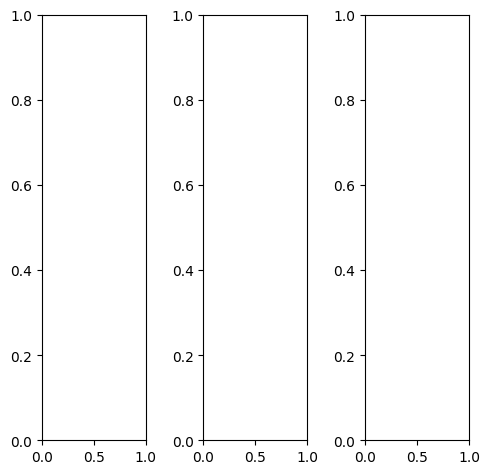

EPOCH: 12.255  trn_loss: 0.005  (1451.13s - 10389.90s remaining)

tensor([[[0.4902, 0.5373, 0.5569,  ..., 0.2314, 0.2039, 0.0863],
         [0.4510, 0.4824, 0.5137,  ..., 0.2431, 0.1373, 0.0275],
         [0.4314, 0.4510, 0.4706,  ..., 0.1922, 0.0549, 0.0314],
         ...,
         [0.3804, 0.3569, 0.2235,  ..., 0.3608, 0.5020, 0.5098],
         [0.3725, 0.3725, 0.3020,  ..., 0.3765, 0.4980, 0.5020],
         [0.3569, 0.3725, 0.3569,  ..., 0.3294, 0.4627, 0.4745]],

        [[0.4902, 0.5373, 0.5569,  ..., 0.2314, 0.2039, 0.0863],
         [0.4510, 0.4824, 0.5137,  ..., 0.2431, 0.1373, 0.0275],
         [0.4314, 0.4510, 0.4706,  ..., 0.1922, 0.0549, 0.0314],
         ...,
         [0.3804, 0.3569, 0.2235,  ..., 0.3608, 0.5020, 0.5098],
         [0.3725, 0.3725, 0.3020,  ..., 0.3765, 0.4980, 0.5020],
         [0.3569, 0.3725, 0.3569,  ..., 0.3294, 0.4627, 0.4745]],

        [[0.4902, 0.5373, 0.5569,  ..., 0.2314, 0.2039, 0.0863],
         [0.4510, 0.4824, 0.5137,  ..., 0.2431, 0.1373, 0.0275],
         [0.4314, 0.4510, 0.4706,  ..., 0.1922, 0.0549, 0.

tensor([[[0.8471, 0.8941, 0.9255,  ..., 0.2667, 0.2275, 0.0941],
         [0.8157, 0.8431, 0.8745,  ..., 0.2745, 0.1490, 0.0275],
         [0.7843, 0.8039, 0.8275,  ..., 0.2196, 0.0549, 0.0314],
         ...,
         [0.7333, 0.7020, 0.5059,  ..., 0.3569, 0.4078, 0.4118],
         [0.7294, 0.7255, 0.6353,  ..., 0.3922, 0.4078, 0.4039],
         [0.7059, 0.7255, 0.7098,  ..., 0.3608, 0.3882, 0.3843]],

        [[0.3725, 0.4196, 0.4392,  ..., 0.2235, 0.2000, 0.0863],
         [0.3255, 0.3647, 0.3922,  ..., 0.2353, 0.1333, 0.0275],
         [0.3098, 0.3333, 0.3490,  ..., 0.1882, 0.0549, 0.0314],
         ...,
         [0.2549, 0.2314, 0.1137,  ..., 0.3451, 0.5176, 0.5255],
         [0.2431, 0.2471, 0.1804,  ..., 0.3529, 0.5059, 0.5137],
         [0.2275, 0.2471, 0.2314,  ..., 0.3059, 0.4706, 0.4863]],

        [[0.1569, 0.1961, 0.2078,  ..., 0.1765, 0.1765, 0.0784],
         [0.1294, 0.1490, 0.1765,  ..., 0.1843, 0.1176, 0.0275],
         [0.1216, 0.1412, 0.1490,  ..., 0.1569, 0.0510, 0.

tensor([[[0.4501, 0.3548, 0.4240,  ..., 0.2097, 0.1995, 0.1529],
         [0.3423, 0.2245, 0.2625,  ..., 0.2288, 0.1242, 0.0738],
         [0.3136, 0.2119, 0.1569,  ..., 0.1539, 0.0324, 0.0454],
         ...,
         [0.3821, 0.3752, 0.2491,  ..., 0.4297, 0.5374, 0.5544],
         [0.3661, 0.3779, 0.3303,  ..., 0.4180, 0.5388, 0.5536],
         [0.3598, 0.3761, 0.3429,  ..., 0.3665, 0.4841, 0.5113]],

        [[0.4682, 0.5598, 0.5126,  ..., 0.2440, 0.2155, 0.1607],
         [0.4735, 0.4420, 0.4355,  ..., 0.2820, 0.1893, 0.1122],
         [0.3744, 0.4476, 0.3752,  ..., 0.2247, 0.0961, 0.0815],
         ...,
         [0.3674, 0.3919, 0.2739,  ..., 0.4344, 0.5429, 0.4853],
         [0.3445, 0.3966, 0.3322,  ..., 0.4187, 0.5059, 0.4973],
         [0.3293, 0.3626, 0.3597,  ..., 0.3324, 0.4379, 0.4588]],

        [[0.7105, 0.6442, 0.7920,  ..., 0.3253, 0.3105, 0.2609],
         [0.6247, 0.6736, 0.6778,  ..., 0.3527, 0.2801, 0.1940],
         [0.6207, 0.5407, 0.6249,  ..., 0.2910, 0.1856, 0.

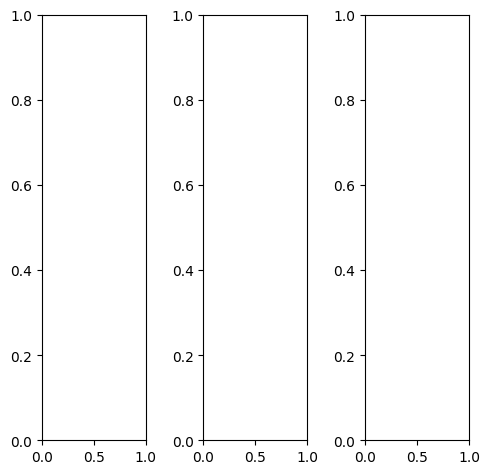

tensor([[[0.2863, 0.2824, 0.2824,  ..., 0.3529, 0.3412, 0.3882],
         [0.3176, 0.3098, 0.3137,  ..., 0.5216, 0.5098, 0.5294],
         [0.4157, 0.4118, 0.4078,  ..., 0.5961, 0.6078, 0.6157],
         ...,
         [0.3765, 0.3608, 0.3686,  ..., 0.5529, 0.5961, 0.5608],
         [0.3569, 0.3569, 0.3725,  ..., 0.5529, 0.5529, 0.5529],
         [0.3569, 0.3725, 0.4000,  ..., 0.5686, 0.5412, 0.5451]],

        [[0.2863, 0.2824, 0.2824,  ..., 0.3529, 0.3412, 0.3882],
         [0.3176, 0.3098, 0.3137,  ..., 0.5216, 0.5098, 0.5294],
         [0.4157, 0.4118, 0.4078,  ..., 0.5961, 0.6078, 0.6157],
         ...,
         [0.3765, 0.3608, 0.3686,  ..., 0.5529, 0.5961, 0.5608],
         [0.3569, 0.3569, 0.3725,  ..., 0.5529, 0.5529, 0.5529],
         [0.3569, 0.3725, 0.4000,  ..., 0.5686, 0.5412, 0.5451]],

        [[0.2863, 0.2824, 0.2824,  ..., 0.3529, 0.3412, 0.3882],
         [0.3176, 0.3098, 0.3137,  ..., 0.5216, 0.5098, 0.5294],
         [0.4157, 0.4118, 0.4078,  ..., 0.5961, 0.6078, 0.

tensor([[[0.3176, 0.3176, 0.3176,  ..., 0.4000, 0.3882, 0.4392],
         [0.3765, 0.3647, 0.3647,  ..., 0.6157, 0.6078, 0.6275],
         [0.4941, 0.4863, 0.4863,  ..., 0.7020, 0.7137, 0.7255],
         ...,
         [0.3804, 0.3647, 0.3725,  ..., 0.6353, 0.6824, 0.6431],
         [0.3569, 0.3569, 0.3725,  ..., 0.6353, 0.6392, 0.6353],
         [0.3608, 0.3725, 0.4078,  ..., 0.6471, 0.6235, 0.6275]],

        [[0.2941, 0.2902, 0.2863,  ..., 0.3608, 0.3451, 0.3882],
         [0.3137, 0.3059, 0.3137,  ..., 0.5098, 0.4980, 0.5137],
         [0.4078, 0.4039, 0.4039,  ..., 0.5804, 0.5922, 0.6000],
         ...,
         [0.3961, 0.3804, 0.3882,  ..., 0.5451, 0.5882, 0.5569],
         [0.3804, 0.3804, 0.3961,  ..., 0.5451, 0.5451, 0.5490],
         [0.3765, 0.3961, 0.4196,  ..., 0.5608, 0.5373, 0.5412]],

        [[0.1529, 0.1529, 0.1529,  ..., 0.2039, 0.2118, 0.2392],
         [0.1882, 0.1804, 0.1725,  ..., 0.3412, 0.3294, 0.3373],
         [0.2471, 0.2471, 0.2392,  ..., 0.3882, 0.3961, 0.

tensor([[[-0.0123, -0.0240, -0.0785,  ..., -0.0029, -0.0206,  0.0484],
         [ 0.0148, -0.0842, -0.0459,  ...,  0.2930,  0.2644,  0.2044],
         [ 0.0986,  0.1399,  0.1568,  ...,  0.4348,  0.4419,  0.3857],
         ...,
         [ 0.1306,  0.0743,  0.0980,  ...,  0.4907,  0.4861,  0.3326],
         [ 0.0869,  0.0165,  0.0958,  ...,  0.3968,  0.3595,  0.3140],
         [ 0.1094,  0.0376,  0.0965,  ...,  0.3560,  0.2821,  0.2750]],

        [[ 0.0102,  0.0109, -0.0275,  ...,  0.0578,  0.0679,  0.0918],
         [-0.0031, -0.0744, -0.0672,  ...,  0.3474,  0.3625,  0.2664],
         [ 0.1150,  0.1296,  0.1332,  ...,  0.4897,  0.5374,  0.4416],
         ...,
         [ 0.0744,  0.0197,  0.0412,  ...,  0.4781,  0.5174,  0.3014],
         [ 0.0307, -0.0140,  0.0375,  ...,  0.4273,  0.4014,  0.3259],
         [ 0.0745,  0.0104,  0.0530,  ...,  0.3456,  0.3006,  0.2475]],

        [[ 0.1501,  0.0167,  0.0497,  ...,  0.0549,  0.0711,  0.1709],
         [ 0.0938, -0.0213, -0.0750,  ...,  0

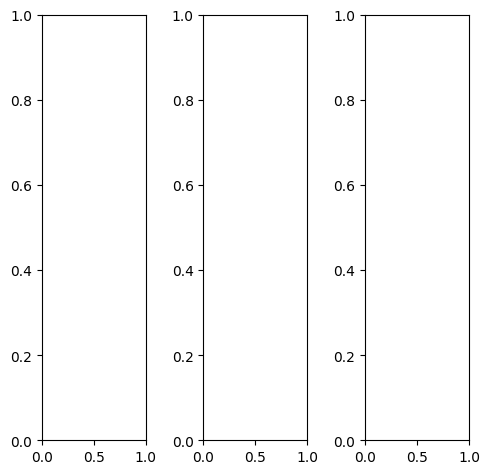

tensor([[[0.9373, 0.9294, 0.9294,  ..., 0.8941, 0.8275, 0.7922],
         [0.9569, 0.9529, 0.9490,  ..., 0.9059, 0.8471, 0.8118],
         [0.9569, 0.9529, 0.9451,  ..., 0.9059, 0.8431, 0.8157],
         ...,
         [0.5176, 0.4235, 0.1529,  ..., 0.3647, 0.4000, 0.4588],
         [0.4784, 0.3451, 0.1255,  ..., 0.4431, 0.4510, 0.4784],
         [0.5569, 0.5059, 0.4275,  ..., 0.5412, 0.4941, 0.4235]],

        [[0.9373, 0.9294, 0.9294,  ..., 0.8941, 0.8275, 0.7922],
         [0.9569, 0.9529, 0.9490,  ..., 0.9059, 0.8471, 0.8118],
         [0.9569, 0.9529, 0.9451,  ..., 0.9059, 0.8431, 0.8157],
         ...,
         [0.5176, 0.4235, 0.1529,  ..., 0.3647, 0.4000, 0.4588],
         [0.4784, 0.3451, 0.1255,  ..., 0.4431, 0.4510, 0.4784],
         [0.5569, 0.5059, 0.4275,  ..., 0.5412, 0.4941, 0.4235]],

        [[0.9373, 0.9294, 0.9294,  ..., 0.8941, 0.8275, 0.7922],
         [0.9569, 0.9529, 0.9490,  ..., 0.9059, 0.8471, 0.8118],
         [0.9569, 0.9529, 0.9451,  ..., 0.9059, 0.8431, 0.

tensor([[[0.9373, 0.9294, 0.9294,  ..., 0.8902, 0.8235, 0.7882],
         [0.9569, 0.9529, 0.9451,  ..., 0.9020, 0.8392, 0.8078],
         [0.9569, 0.9490, 0.9412,  ..., 0.9020, 0.8392, 0.8118],
         ...,
         [0.5059, 0.4078, 0.1373,  ..., 0.3569, 0.3882, 0.4431],
         [0.4667, 0.3333, 0.1137,  ..., 0.4353, 0.4392, 0.4667],
         [0.5490, 0.4980, 0.4196,  ..., 0.5333, 0.4902, 0.4157]],

        [[0.9373, 0.9294, 0.9294,  ..., 0.8902, 0.8275, 0.7922],
         [0.9569, 0.9529, 0.9490,  ..., 0.9059, 0.8471, 0.8118],
         [0.9569, 0.9529, 0.9451,  ..., 0.9020, 0.8431, 0.8157],
         ...,
         [0.5176, 0.4235, 0.1569,  ..., 0.3647, 0.4000, 0.4588],
         [0.4745, 0.3451, 0.1294,  ..., 0.4431, 0.4510, 0.4784],
         [0.5529, 0.5059, 0.4275,  ..., 0.5373, 0.4941, 0.4196]],

        [[0.9451, 0.9373, 0.9373,  ..., 0.9098, 0.8471, 0.8118],
         [0.9647, 0.9608, 0.9529,  ..., 0.9255, 0.8667, 0.8314],
         [0.9647, 0.9608, 0.9529,  ..., 0.9216, 0.8627, 0.

tensor([[[0.7289, 0.6232, 0.6783,  ..., 0.5551, 0.5055, 0.5716],
         [0.6922, 0.6930, 0.6330,  ..., 0.5498, 0.5208, 0.5557],
         [0.6604, 0.6934, 0.6102,  ..., 0.5943, 0.5429, 0.5532],
         ...,
         [0.4248, 0.3982, 0.1463,  ..., 0.3334, 0.3597, 0.4052],
         [0.4090, 0.3090, 0.1293,  ..., 0.3661, 0.3819, 0.4420],
         [0.4713, 0.4498, 0.3502,  ..., 0.4866, 0.4477, 0.4254]],

        [[0.7136, 0.7525, 0.7044,  ..., 0.6704, 0.6349, 0.6286],
         [0.7344, 0.8036, 0.7327,  ..., 0.6980, 0.6567, 0.6875],
         [0.7496, 0.8248, 0.7753,  ..., 0.7222, 0.6503, 0.6657],
         ...,
         [0.4083, 0.4175, 0.1983,  ..., 0.3512, 0.3808, 0.3798],
         [0.3829, 0.3418, 0.1533,  ..., 0.4014, 0.4090, 0.4103],
         [0.4388, 0.4248, 0.3639,  ..., 0.4819, 0.4358, 0.3857]],

        [[0.8713, 0.8123, 0.9095,  ..., 0.8495, 0.8078, 0.7851],
         [0.8907, 0.9328, 0.8999,  ..., 0.8735, 0.8411, 0.8102],
         [0.8925, 0.8705, 0.9602,  ..., 0.8912, 0.8532, 0.

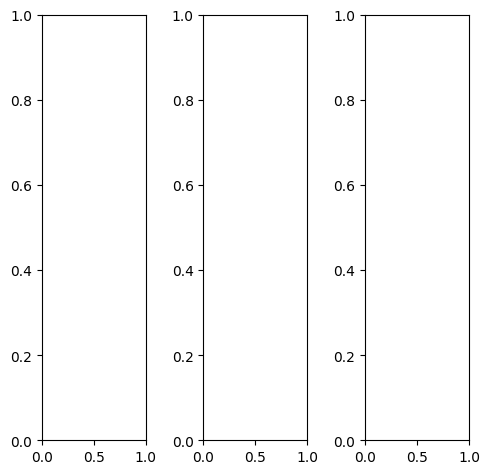

tensor([[[0.5922, 0.6431, 0.6784,  ..., 0.6980, 0.6784, 0.6588],
         [0.6000, 0.6510, 0.6980,  ..., 0.7059, 0.6784, 0.6549],
         [0.6078, 0.6549, 0.7020,  ..., 0.7137, 0.6824, 0.6588],
         ...,
         [0.6706, 0.3020, 0.6314,  ..., 0.6667, 0.6941, 0.4667],
         [0.6353, 0.3216, 0.6549,  ..., 0.6667, 0.6824, 0.5294],
         [0.5882, 0.3373, 0.6627,  ..., 0.6549, 0.6745, 0.5804]],

        [[0.5922, 0.6431, 0.6784,  ..., 0.6980, 0.6784, 0.6588],
         [0.6000, 0.6510, 0.6980,  ..., 0.7059, 0.6784, 0.6549],
         [0.6078, 0.6549, 0.7020,  ..., 0.7137, 0.6824, 0.6588],
         ...,
         [0.6706, 0.3020, 0.6314,  ..., 0.6667, 0.6941, 0.4667],
         [0.6353, 0.3216, 0.6549,  ..., 0.6667, 0.6824, 0.5294],
         [0.5882, 0.3373, 0.6627,  ..., 0.6549, 0.6745, 0.5804]],

        [[0.5922, 0.6431, 0.6784,  ..., 0.6980, 0.6784, 0.6588],
         [0.6000, 0.6510, 0.6980,  ..., 0.7059, 0.6784, 0.6549],
         [0.6078, 0.6549, 0.7020,  ..., 0.7137, 0.6824, 0.

tensor([[[0.5294, 0.6000, 0.6588,  ..., 0.7020, 0.6784, 0.6510],
         [0.5373, 0.6078, 0.6745,  ..., 0.7098, 0.6784, 0.6510],
         [0.5451, 0.6118, 0.6784,  ..., 0.7176, 0.6824, 0.6510],
         ...,
         [0.6235, 0.2627, 0.6000,  ..., 0.6706, 0.6941, 0.4588],
         [0.5882, 0.2824, 0.6196,  ..., 0.6706, 0.6824, 0.5216],
         [0.5412, 0.2980, 0.6275,  ..., 0.6588, 0.6745, 0.5725]],

        [[0.6000, 0.6431, 0.6745,  ..., 0.6902, 0.6706, 0.6549],
         [0.6078, 0.6510, 0.6941,  ..., 0.6980, 0.6706, 0.6510],
         [0.6157, 0.6588, 0.6980,  ..., 0.7059, 0.6745, 0.6549],
         ...,
         [0.6824, 0.3098, 0.6392,  ..., 0.6667, 0.6902, 0.4667],
         [0.6431, 0.3294, 0.6627,  ..., 0.6627, 0.6784, 0.5294],
         [0.5961, 0.3451, 0.6706,  ..., 0.6510, 0.6706, 0.5804]],

        [[0.7098, 0.7451, 0.7647,  ..., 0.7294, 0.7216, 0.7020],
         [0.7137, 0.7490, 0.7804,  ..., 0.7373, 0.7216, 0.7020],
         [0.7176, 0.7529, 0.7725,  ..., 0.7451, 0.7216, 0.

tensor([[[0.3467, 0.2887, 0.3189,  ..., 0.3803, 0.3782, 0.4347],
         [0.2716, 0.2023, 0.2210,  ..., 0.3731, 0.3512, 0.3994],
         [0.2279, 0.2688, 0.1570,  ..., 0.3677, 0.3783, 0.4050],
         ...,
         [0.5247, 0.3448, 0.5878,  ..., 0.5311, 0.5580, 0.4046],
         [0.4887, 0.3349, 0.5731,  ..., 0.5240, 0.5516, 0.4497],
         [0.4515, 0.3230, 0.5032,  ..., 0.5135, 0.5503, 0.4788]],

        [[0.4045, 0.4571, 0.4417,  ..., 0.4427, 0.4573, 0.4372],
         [0.3255, 0.3899, 0.3278,  ..., 0.4820, 0.4742, 0.4422],
         [0.3622, 0.4500, 0.3700,  ..., 0.4835, 0.4915, 0.4554],
         ...,
         [0.4867, 0.2804, 0.5496,  ..., 0.5191, 0.5732, 0.3291],
         [0.4500, 0.2834, 0.5247,  ..., 0.5348, 0.5495, 0.4063],
         [0.4007, 0.2536, 0.4475,  ..., 0.4669, 0.5081, 0.4290]],

        [[0.5814, 0.4976, 0.6491,  ..., 0.6532, 0.6541, 0.6319],
         [0.5275, 0.5651, 0.6100,  ..., 0.6689, 0.6679, 0.6507],
         [0.5081, 0.5472, 0.5720,  ..., 0.6936, 0.6942, 0.

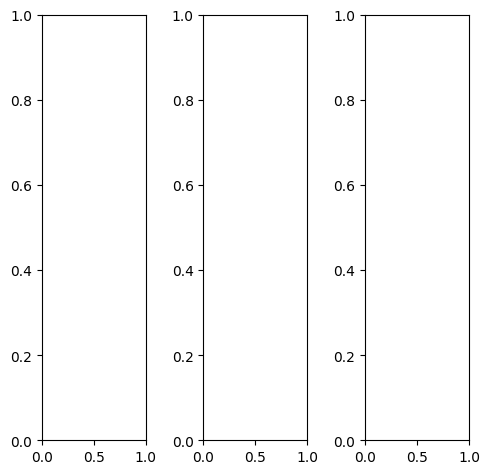

tensor([[[0.1961, 0.2392, 0.2588,  ..., 0.2353, 0.2863, 0.2314],
         [0.2745, 0.2824, 0.2627,  ..., 0.2902, 0.2588, 0.2353],
         [0.3529, 0.3490, 0.3176,  ..., 0.3098, 0.2549, 0.2314],
         ...,
         [0.2118, 0.2667, 0.2627,  ..., 0.3098, 0.2706, 0.2431],
         [0.2706, 0.3098, 0.2824,  ..., 0.2784, 0.2392, 0.2235],
         [0.2745, 0.2784, 0.2118,  ..., 0.3412, 0.3216, 0.3137]],

        [[0.1961, 0.2392, 0.2588,  ..., 0.2353, 0.2863, 0.2314],
         [0.2745, 0.2824, 0.2627,  ..., 0.2902, 0.2588, 0.2353],
         [0.3529, 0.3490, 0.3176,  ..., 0.3098, 0.2549, 0.2314],
         ...,
         [0.2118, 0.2667, 0.2627,  ..., 0.3098, 0.2706, 0.2431],
         [0.2706, 0.3098, 0.2824,  ..., 0.2784, 0.2392, 0.2235],
         [0.2745, 0.2784, 0.2118,  ..., 0.3412, 0.3216, 0.3137]],

        [[0.1961, 0.2392, 0.2588,  ..., 0.2353, 0.2863, 0.2314],
         [0.2745, 0.2824, 0.2627,  ..., 0.2902, 0.2588, 0.2353],
         [0.3529, 0.3490, 0.3176,  ..., 0.3098, 0.2549, 0.

tensor([[[0.2392, 0.2824, 0.3020,  ..., 0.2784, 0.3216, 0.2627],
         [0.3255, 0.3333, 0.3137,  ..., 0.3255, 0.2902, 0.2627],
         [0.4078, 0.4039, 0.3725,  ..., 0.3373, 0.2784, 0.2510],
         ...,
         [0.2431, 0.2980, 0.2941,  ..., 0.3373, 0.2980, 0.2706],
         [0.3020, 0.3412, 0.3137,  ..., 0.3137, 0.2745, 0.2588],
         [0.3059, 0.3098, 0.2431,  ..., 0.3686, 0.3569, 0.3490]],

        [[0.1804, 0.2235, 0.2392,  ..., 0.2196, 0.2706, 0.2196],
         [0.2588, 0.2627, 0.2431,  ..., 0.2824, 0.2510, 0.2275],
         [0.3333, 0.3294, 0.2941,  ..., 0.3059, 0.2510, 0.2275],
         ...,
         [0.1961, 0.2510, 0.2471,  ..., 0.3020, 0.2627, 0.2353],
         [0.2549, 0.2941, 0.2667,  ..., 0.2667, 0.2275, 0.2118],
         [0.2588, 0.2627, 0.2000,  ..., 0.3294, 0.3098, 0.2980]],

        [[0.1686, 0.2157, 0.2392,  ..., 0.2039, 0.2588, 0.2118],
         [0.2353, 0.2471, 0.2353,  ..., 0.2510, 0.2235, 0.2039],
         [0.3059, 0.3059, 0.2824,  ..., 0.2627, 0.2078, 0.

tensor([[[0.2483, 0.1754, 0.2140,  ..., 0.2245, 0.3192, 0.2922],
         [0.2758, 0.2686, 0.1513,  ..., 0.3171, 0.2425, 0.2476],
         [0.4929, 0.4540, 0.2243,  ..., 0.3602, 0.2555, 0.2441],
         ...,
         [0.2628, 0.3712, 0.3362,  ..., 0.4597, 0.3678, 0.3522],
         [0.3873, 0.4488, 0.3998,  ..., 0.3703, 0.3115, 0.3102],
         [0.4204, 0.3991, 0.2630,  ..., 0.5482, 0.4977, 0.4763]],

        [[0.2414, 0.3466, 0.3164,  ..., 0.3075, 0.4249, 0.3434],
         [0.3988, 0.4152, 0.2423,  ..., 0.4147, 0.3696, 0.3043],
         [0.5530, 0.6430, 0.4390,  ..., 0.4725, 0.3647, 0.2964],
         ...,
         [0.2630, 0.3896, 0.3785,  ..., 0.5157, 0.4315, 0.3347],
         [0.3764, 0.4600, 0.4257,  ..., 0.3993, 0.3337, 0.2933],
         [0.4103, 0.3725, 0.2595,  ..., 0.5416, 0.4919, 0.4525]],

        [[0.4728, 0.3385, 0.5580,  ..., 0.4491, 0.5499, 0.4749],
         [0.5755, 0.5760, 0.5255,  ..., 0.5475, 0.5067, 0.4405],
         [0.7268, 0.6679, 0.6421,  ..., 0.5894, 0.4969, 0.

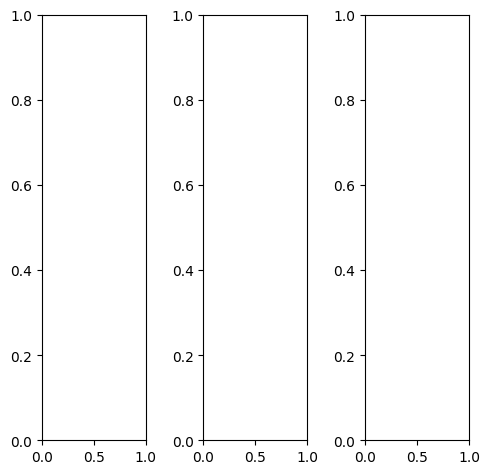

EPOCH: 12.510  trn_loss: 0.005  (1480.21s - 10351.80s remaining)

tensor([[[0.7804, 0.7843, 0.7961,  ..., 0.8039, 0.7725, 0.6471],
         [0.8235, 0.7882, 0.7647,  ..., 0.6078, 0.6784, 0.4157],
         [0.7647, 0.7333, 0.7255,  ..., 0.3529, 0.4314, 0.3490],
         ...,
         [0.3608, 0.2824, 0.3216,  ..., 0.3922, 0.4000, 0.3961],
         [0.3569, 0.3412, 0.3804,  ..., 0.3451, 0.4196, 0.4314],
         [0.3804, 0.3804, 0.3255,  ..., 0.4627, 0.4745, 0.4784]],

        [[0.7804, 0.7843, 0.7961,  ..., 0.8039, 0.7725, 0.6471],
         [0.8235, 0.7882, 0.7647,  ..., 0.6078, 0.6784, 0.4157],
         [0.7647, 0.7333, 0.7255,  ..., 0.3529, 0.4314, 0.3490],
         ...,
         [0.3608, 0.2824, 0.3216,  ..., 0.3922, 0.4000, 0.3961],
         [0.3569, 0.3412, 0.3804,  ..., 0.3451, 0.4196, 0.4314],
         [0.3804, 0.3804, 0.3255,  ..., 0.4627, 0.4745, 0.4784]],

        [[0.7804, 0.7843, 0.7961,  ..., 0.8039, 0.7725, 0.6471],
         [0.8235, 0.7882, 0.7647,  ..., 0.6078, 0.6784, 0.4157],
         [0.7647, 0.7333, 0.7255,  ..., 0.3529, 0.4314, 0.

tensor([[[0.7098, 0.7412, 0.7529,  ..., 0.7725, 0.7294, 0.5804],
         [0.7804, 0.7451, 0.7137,  ..., 0.5725, 0.6275, 0.3569],
         [0.7255, 0.6824, 0.6667,  ..., 0.3059, 0.3725, 0.2980],
         ...,
         [0.3373, 0.2902, 0.3451,  ..., 0.3647, 0.3725, 0.3725],
         [0.3373, 0.3451, 0.3961,  ..., 0.3255, 0.4000, 0.4118],
         [0.3686, 0.3686, 0.3255,  ..., 0.4588, 0.4706, 0.4706]],

        [[0.7882, 0.7804, 0.7922,  ..., 0.8000, 0.7765, 0.6706],
         [0.8235, 0.7882, 0.7686,  ..., 0.6235, 0.6941, 0.4431],
         [0.7647, 0.7373, 0.7294,  ..., 0.3804, 0.4588, 0.3804],
         ...,
         [0.4078, 0.3176, 0.3451,  ..., 0.4471, 0.4627, 0.4549],
         [0.4000, 0.3765, 0.4157,  ..., 0.3961, 0.4745, 0.4863],
         [0.4157, 0.4235, 0.3647,  ..., 0.5020, 0.5137, 0.5176]],

        [[0.9216, 0.9098, 0.9176,  ..., 0.9020, 0.8745, 0.6941],
         [0.9373, 0.9059, 0.8902,  ..., 0.6353, 0.7412, 0.4118],
         [0.8824, 0.8549, 0.8471,  ..., 0.3373, 0.4431, 0.

tensor([[[0.8711, 0.8136, 0.9058,  ..., 0.6977, 0.6837, 0.5682],
         [0.8986, 0.9557, 0.8291,  ..., 0.5530, 0.6639, 0.3696],
         [0.8121, 0.8892, 0.8179,  ..., 0.2430, 0.3389, 0.2805],
         ...,
         [0.3145, 0.2581, 0.2922,  ..., 0.4103, 0.4149, 0.3962],
         [0.3047, 0.2982, 0.3717,  ..., 0.3355, 0.4126, 0.4338],
         [0.3421, 0.3357, 0.2822,  ..., 0.4858, 0.4972, 0.5081]],

        [[0.8539, 0.8982, 0.8813,  ..., 0.7682, 0.8071, 0.6305],
         [0.9028, 1.0056, 0.8957,  ..., 0.6234, 0.7388, 0.4347],
         [0.8700, 0.9538, 0.8959,  ..., 0.3227, 0.4381, 0.3135],
         ...,
         [0.3165, 0.2250, 0.2948,  ..., 0.4386, 0.4539, 0.3820],
         [0.3060, 0.3050, 0.3571,  ..., 0.3506, 0.4329, 0.4280],
         [0.3404, 0.3261, 0.2860,  ..., 0.4583, 0.4901, 0.4871]],

        [[0.9371, 0.9563, 1.0234,  ..., 0.9716, 0.9389, 0.7644],
         [1.0536, 1.1108, 1.0328,  ..., 0.8220, 0.9184, 0.5773],
         [0.9850, 1.0147, 1.0583,  ..., 0.5306, 0.6352, 0.

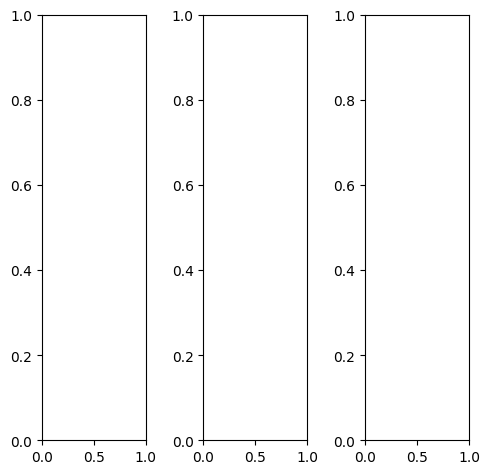

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.

tensor([[[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.

tensor([[[0.5700, 0.4519, 0.5132,  ..., 0.4789, 0.4734, 0.5657],
         [0.5138, 0.4322, 0.4508,  ..., 0.4126, 0.4707, 0.5291],
         [0.4876, 0.4799, 0.4437,  ..., 0.4565, 0.4851, 0.5303],
         ...,
         [0.6044, 0.5881, 0.5768,  ..., 0.5928, 0.5848, 0.6333],
         [0.5951, 0.5904, 0.5618,  ..., 0.5888, 0.6029, 0.6289],
         [0.6160, 0.6100, 0.5893,  ..., 0.6293, 0.6332, 0.6276]],

        [[0.5838, 0.6232, 0.5950,  ..., 0.5538, 0.5751, 0.5872],
         [0.6003, 0.6219, 0.5889,  ..., 0.5578, 0.5854, 0.6204],
         [0.5530, 0.6390, 0.6148,  ..., 0.5731, 0.5828, 0.6050],
         ...,
         [0.5478, 0.5649, 0.5770,  ..., 0.5898, 0.5938, 0.5877],
         [0.5435, 0.5539, 0.5685,  ..., 0.5931, 0.5865, 0.5854],
         [0.5493, 0.5678, 0.5736,  ..., 0.5813, 0.5925, 0.5785]],

        [[0.8029, 0.7034, 0.8100,  ..., 0.7313, 0.7268, 0.7275],
         [0.7575, 0.7740, 0.7284,  ..., 0.7096, 0.7384, 0.7285],
         [0.7397, 0.6307, 0.7788,  ..., 0.7431, 0.7528, 0.

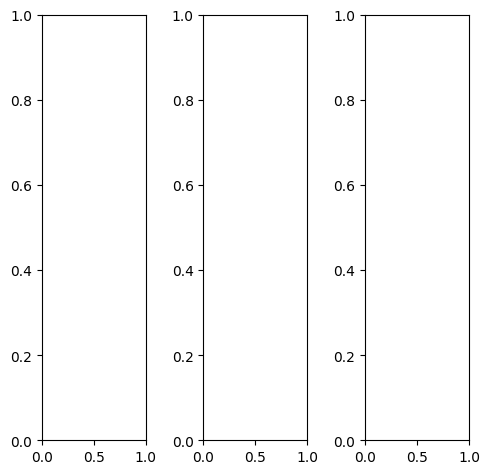

tensor([[[0.4000, 0.4078, 0.6314,  ..., 0.6078, 0.5294, 0.4353],
         [0.3647, 0.3373, 0.5373,  ..., 0.6392, 0.4706, 0.4431],
         [0.4039, 0.3882, 0.4627,  ..., 0.5882, 0.4745, 0.4275],
         ...,
         [0.6392, 0.6549, 0.6549,  ..., 0.5412, 0.5725, 0.5373],
         [0.6314, 0.6353, 0.6353,  ..., 0.5569, 0.5686, 0.5725],
         [0.6275, 0.6196, 0.6314,  ..., 0.5529, 0.5529, 0.5529]],

        [[0.4000, 0.4078, 0.6314,  ..., 0.6078, 0.5294, 0.4353],
         [0.3647, 0.3373, 0.5373,  ..., 0.6392, 0.4706, 0.4431],
         [0.4039, 0.3882, 0.4627,  ..., 0.5882, 0.4745, 0.4275],
         ...,
         [0.6392, 0.6549, 0.6549,  ..., 0.5412, 0.5725, 0.5373],
         [0.6314, 0.6353, 0.6353,  ..., 0.5569, 0.5686, 0.5725],
         [0.6275, 0.6196, 0.6314,  ..., 0.5529, 0.5529, 0.5529]],

        [[0.4000, 0.4078, 0.6314,  ..., 0.6078, 0.5294, 0.4353],
         [0.3647, 0.3373, 0.5373,  ..., 0.6392, 0.4706, 0.4431],
         [0.4039, 0.3882, 0.4627,  ..., 0.5882, 0.4745, 0.

tensor([[[0.3765, 0.4000, 0.5843,  ..., 0.5686, 0.4941, 0.4157],
         [0.3412, 0.3216, 0.5020,  ..., 0.5922, 0.4235, 0.4039],
         [0.3804, 0.3725, 0.4353,  ..., 0.5529, 0.4353, 0.3804],
         ...,
         [0.6627, 0.6784, 0.6784,  ..., 0.7059, 0.6549, 0.5529],
         [0.6549, 0.6588, 0.6588,  ..., 0.6314, 0.6078, 0.5882],
         [0.6510, 0.6431, 0.6549,  ..., 0.5412, 0.5451, 0.5647]],

        [[0.4235, 0.4275, 0.6353,  ..., 0.6157, 0.5529, 0.4667],
         [0.3882, 0.3647, 0.5569,  ..., 0.6549, 0.4980, 0.4784],
         [0.4314, 0.4196, 0.4902,  ..., 0.6118, 0.5020, 0.4588],
         ...,
         [0.6392, 0.6549, 0.6549,  ..., 0.4745, 0.5451, 0.5412],
         [0.6314, 0.6353, 0.6353,  ..., 0.5333, 0.5608, 0.5765],
         [0.6275, 0.6196, 0.6314,  ..., 0.5725, 0.5686, 0.5608]],

        [[0.3569, 0.3255, 0.7176,  ..., 0.6824, 0.4941, 0.3373],
         [0.3059, 0.2235, 0.5373,  ..., 0.6824, 0.4431, 0.3804],
         [0.3294, 0.2667, 0.4078,  ..., 0.5725, 0.4353, 0.

tensor([[[0.1115, 0.0894, 0.3595,  ..., 0.3421, 0.2559, 0.2067],
         [0.0590, 0.0080, 0.1902,  ..., 0.3844, 0.1868, 0.1827],
         [0.0207, 0.0694, 0.0935,  ..., 0.3543, 0.2488, 0.1925],
         ...,
         [0.4893, 0.5277, 0.5125,  ..., 0.4022, 0.4305, 0.3786],
         [0.4721, 0.4950, 0.4646,  ..., 0.4000, 0.4010, 0.4290],
         [0.4881, 0.4609, 0.4611,  ..., 0.3832, 0.3896, 0.4024]],

        [[0.1712, 0.2028, 0.4511,  ..., 0.4224, 0.3650, 0.2620],
         [0.1231, 0.1196, 0.2554,  ..., 0.4976, 0.3085, 0.2459],
         [0.1386, 0.1822, 0.2070,  ..., 0.4513, 0.3438, 0.2460],
         ...,
         [0.4821, 0.5234, 0.5492,  ..., 0.4713, 0.5066, 0.3649],
         [0.4678, 0.4767, 0.4984,  ..., 0.4757, 0.4759, 0.4370],
         [0.4687, 0.4599, 0.4752,  ..., 0.4038, 0.4198, 0.3953]],

        [[0.3589, 0.1491, 0.6490,  ..., 0.5931, 0.5031, 0.4162],
         [0.3078, 0.2426, 0.5266,  ..., 0.6328, 0.4740, 0.3967],
         [0.3095, 0.2528, 0.5464,  ..., 0.5841, 0.4851, 0.

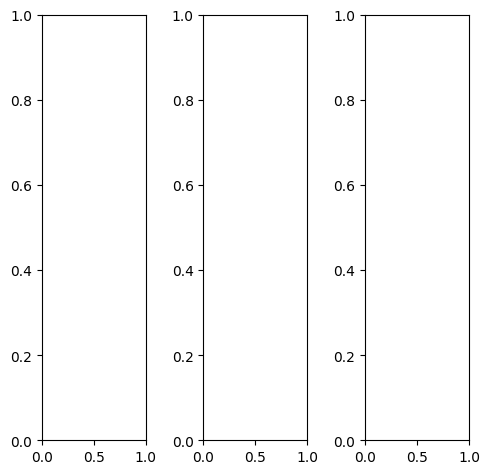

tensor([[[0.4353, 0.4157, 0.4784,  ..., 0.3804, 0.3686, 0.4078],
         [0.2667, 0.2471, 0.1804,  ..., 0.2275, 0.3020, 0.3608],
         [0.2824, 0.1882, 0.1412,  ..., 0.2314, 0.2000, 0.2235],
         ...,
         [0.2588, 0.2667, 0.2784,  ..., 0.3647, 0.3765, 0.3725],
         [0.2510, 0.2667, 0.2784,  ..., 0.3373, 0.3451, 0.3373],
         [0.2392, 0.2745, 0.2902,  ..., 0.3216, 0.3216, 0.3216]],

        [[0.4353, 0.4157, 0.4784,  ..., 0.3804, 0.3686, 0.4078],
         [0.2667, 0.2471, 0.1804,  ..., 0.2275, 0.3020, 0.3608],
         [0.2824, 0.1882, 0.1412,  ..., 0.2314, 0.2000, 0.2235],
         ...,
         [0.2588, 0.2667, 0.2784,  ..., 0.3647, 0.3765, 0.3725],
         [0.2510, 0.2667, 0.2784,  ..., 0.3373, 0.3451, 0.3373],
         [0.2392, 0.2745, 0.2902,  ..., 0.3216, 0.3216, 0.3216]],

        [[0.4353, 0.4157, 0.4784,  ..., 0.3804, 0.3686, 0.4078],
         [0.2667, 0.2471, 0.1804,  ..., 0.2275, 0.3020, 0.3608],
         [0.2824, 0.1882, 0.1412,  ..., 0.2314, 0.2000, 0.

tensor([[[0.4157, 0.3882, 0.4588,  ..., 0.4275, 0.4118, 0.4392],
         [0.2588, 0.2314, 0.1725,  ..., 0.2627, 0.3294, 0.3843],
         [0.2824, 0.1922, 0.1490,  ..., 0.2588, 0.2118, 0.2314],
         ...,
         [0.2863, 0.3020, 0.3216,  ..., 0.3882, 0.3961, 0.3961],
         [0.2824, 0.2980, 0.3137,  ..., 0.3529, 0.3608, 0.3529],
         [0.2706, 0.3059, 0.3216,  ..., 0.3373, 0.3333, 0.3373]],

        [[0.4314, 0.4157, 0.4745,  ..., 0.3608, 0.3490, 0.3922],
         [0.2588, 0.2392, 0.1725,  ..., 0.2039, 0.2824, 0.3451],
         [0.2706, 0.1765, 0.1294,  ..., 0.2118, 0.1843, 0.2078],
         ...,
         [0.2627, 0.2706, 0.2824,  ..., 0.3725, 0.3843, 0.3765],
         [0.2549, 0.2706, 0.2824,  ..., 0.3451, 0.3529, 0.3412],
         [0.2392, 0.2745, 0.2980,  ..., 0.3294, 0.3294, 0.3294]],

        [[0.5176, 0.4941, 0.5373,  ..., 0.3686, 0.3569, 0.4000],
         [0.3373, 0.3137, 0.2353,  ..., 0.2471, 0.3373, 0.3961],
         [0.3373, 0.2431, 0.1922,  ..., 0.2588, 0.2588, 0.

tensor([[[ 0.4407,  0.3547,  0.3433,  ...,  0.3484,  0.3507,  0.4374],
         [ 0.2028,  0.1739,  0.0030,  ...,  0.2001,  0.2721,  0.3799],
         [ 0.1164, -0.0070, -0.1675,  ...,  0.2203,  0.1727,  0.2403],
         ...,
         [ 0.2672,  0.2738,  0.2594,  ...,  0.4513,  0.4392,  0.4528],
         [ 0.2550,  0.2686,  0.2753,  ...,  0.3898,  0.4098,  0.4284],
         [ 0.2845,  0.3005,  0.3072,  ...,  0.3999,  0.3980,  0.4134]],

        [[ 0.4642,  0.4999,  0.4232,  ...,  0.4126,  0.4282,  0.4549],
         [ 0.2943,  0.2576,  0.0370,  ...,  0.2382,  0.3480,  0.4200],
         [ 0.2445,  0.1634, -0.0524,  ...,  0.2657,  0.2216,  0.2472],
         ...,
         [ 0.2921,  0.3028,  0.3269,  ...,  0.4767,  0.4798,  0.4305],
         [ 0.2705,  0.3023,  0.3140,  ...,  0.4160,  0.4237,  0.4079],
         [ 0.2782,  0.3095,  0.3372,  ...,  0.3894,  0.3935,  0.3905]],

        [[ 0.6118,  0.4939,  0.6291,  ...,  0.5493,  0.5562,  0.5929],
         [ 0.4338,  0.4179,  0.3567,  ...,  0

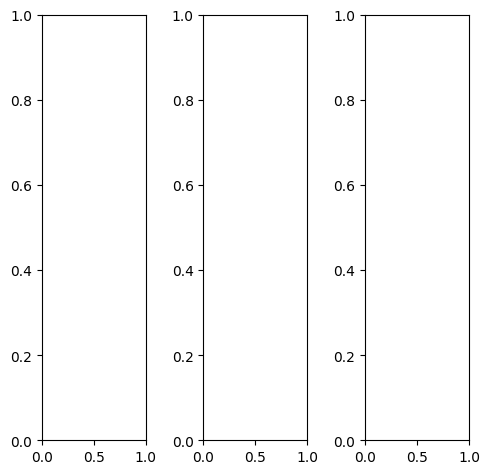

tensor([[[0.4275, 0.3922, 0.4157,  ..., 0.4863, 0.4588, 0.4314],
         [0.4784, 0.4118, 0.3725,  ..., 0.4706, 0.4980, 0.4588],
         [0.4235, 0.4510, 0.4118,  ..., 0.5137, 0.5686, 0.4980],
         ...,
         [0.5098, 0.3020, 0.3725,  ..., 0.4000, 0.4863, 0.4863],
         [0.4627, 0.3412, 0.4000,  ..., 0.3686, 0.4510, 0.4196],
         [0.4353, 0.3412, 0.4275,  ..., 0.3804, 0.3765, 0.4118]],

        [[0.4275, 0.3922, 0.4157,  ..., 0.4863, 0.4588, 0.4314],
         [0.4784, 0.4118, 0.3725,  ..., 0.4706, 0.4980, 0.4588],
         [0.4235, 0.4510, 0.4118,  ..., 0.5137, 0.5686, 0.4980],
         ...,
         [0.5098, 0.3020, 0.3725,  ..., 0.4000, 0.4863, 0.4863],
         [0.4627, 0.3412, 0.4000,  ..., 0.3686, 0.4510, 0.4196],
         [0.4353, 0.3412, 0.4275,  ..., 0.3804, 0.3765, 0.4118]],

        [[0.4275, 0.3922, 0.4157,  ..., 0.4863, 0.4588, 0.4314],
         [0.4784, 0.4118, 0.3725,  ..., 0.4706, 0.4980, 0.4588],
         [0.4235, 0.4510, 0.4118,  ..., 0.5137, 0.5686, 0.

tensor([[[0.4235, 0.3922, 0.4510,  ..., 0.4824, 0.4667, 0.4314],
         [0.4784, 0.4078, 0.4078,  ..., 0.4941, 0.5216, 0.4706],
         [0.4314, 0.4627, 0.4275,  ..., 0.5608, 0.6039, 0.5176],
         ...,
         [0.5098, 0.3176, 0.4039,  ..., 0.4471, 0.5294, 0.5255],
         [0.4667, 0.3529, 0.4235,  ..., 0.4078, 0.4902, 0.4588],
         [0.4392, 0.3529, 0.4431,  ..., 0.4118, 0.4078, 0.4353]],

        [[0.4314, 0.3961, 0.4118,  ..., 0.5137, 0.4784, 0.4510],
         [0.4863, 0.4196, 0.3686,  ..., 0.4824, 0.5098, 0.4745],
         [0.4275, 0.4549, 0.4118,  ..., 0.5137, 0.5725, 0.5098],
         ...,
         [0.5176, 0.3020, 0.3686,  ..., 0.3961, 0.4863, 0.4863],
         [0.4706, 0.3412, 0.3961,  ..., 0.3647, 0.4471, 0.4157],
         [0.4392, 0.3412, 0.4275,  ..., 0.3804, 0.3725, 0.4157]],

        [[0.4078, 0.3608, 0.3451,  ..., 0.3686, 0.3333, 0.3137],
         [0.4471, 0.3843, 0.2980,  ..., 0.3451, 0.3725, 0.3333],
         [0.3843, 0.3922, 0.3608,  ..., 0.3922, 0.4588, 0.

tensor([[[0.3451, 0.2224, 0.2360,  ..., 0.3516, 0.3231, 0.3674],
         [0.3205, 0.2333, 0.1366,  ..., 0.3098, 0.3334, 0.3438],
         [0.2342, 0.2861, 0.0978,  ..., 0.3558, 0.4394, 0.3941],
         ...,
         [0.4814, 0.3584, 0.4051,  ..., 0.4584, 0.5101, 0.4910],
         [0.4278, 0.3736, 0.4379,  ..., 0.4255, 0.5009, 0.4411],
         [0.3913, 0.3506, 0.4109,  ..., 0.3968, 0.3953, 0.4136]],

        [[0.3642, 0.3999, 0.3973,  ..., 0.4321, 0.4231, 0.3938],
         [0.4253, 0.4201, 0.2736,  ..., 0.4432, 0.4832, 0.4165],
         [0.3315, 0.4716, 0.3214,  ..., 0.4800, 0.5711, 0.4669],
         ...,
         [0.4816, 0.3040, 0.3969,  ..., 0.4487, 0.5174, 0.4495],
         [0.4251, 0.3532, 0.4139,  ..., 0.4171, 0.4954, 0.4083],
         [0.3782, 0.3125, 0.3873,  ..., 0.3692, 0.3639, 0.3682]],

        [[0.5840, 0.4217, 0.5921,  ..., 0.6458, 0.6257, 0.5858],
         [0.5955, 0.5727, 0.5180,  ..., 0.6302, 0.6826, 0.6193],
         [0.5170, 0.5412, 0.5242,  ..., 0.6742, 0.7699, 0.

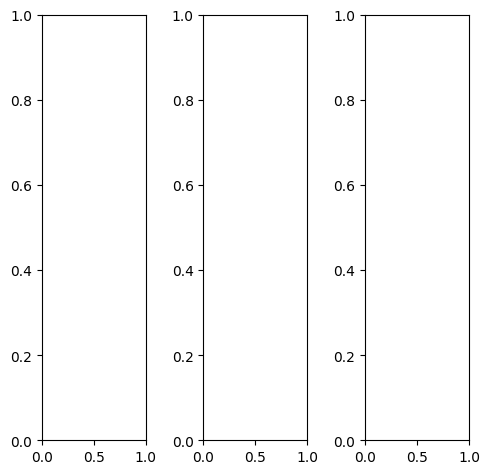

EPOCH: 12.765  trn_loss: 0.005  (1509.24s - 10313.72s remaining)

tensor([[[0.2314, 0.2627, 0.2824,  ..., 0.1569, 0.1569, 0.1569],
         [0.2627, 0.2706, 0.2588,  ..., 0.1569, 0.1529, 0.1569],
         [0.2627, 0.2863, 0.2510,  ..., 0.1569, 0.1608, 0.1608],
         ...,
         [0.8196, 0.8588, 0.8667,  ..., 0.2980, 0.2431, 0.2588],
         [0.8706, 0.7020, 0.8275,  ..., 0.3451, 0.3020, 0.2627],
         [0.8745, 0.6784, 0.7412,  ..., 0.4078, 0.3529, 0.3294]],

        [[0.2314, 0.2627, 0.2824,  ..., 0.1569, 0.1569, 0.1569],
         [0.2627, 0.2706, 0.2588,  ..., 0.1569, 0.1529, 0.1569],
         [0.2627, 0.2863, 0.2510,  ..., 0.1569, 0.1608, 0.1608],
         ...,
         [0.8196, 0.8588, 0.8667,  ..., 0.2980, 0.2431, 0.2588],
         [0.8706, 0.7020, 0.8275,  ..., 0.3451, 0.3020, 0.2627],
         [0.8745, 0.6784, 0.7412,  ..., 0.4078, 0.3529, 0.3294]],

        [[0.2314, 0.2627, 0.2824,  ..., 0.1569, 0.1569, 0.1569],
         [0.2627, 0.2706, 0.2588,  ..., 0.1569, 0.1529, 0.1569],
         [0.2627, 0.2863, 0.2510,  ..., 0.1569, 0.1608, 0.

tensor([[[0.2118, 0.2431, 0.2627,  ..., 0.1569, 0.1569, 0.1569],
         [0.2392, 0.2510, 0.2392,  ..., 0.1490, 0.1451, 0.1490],
         [0.2549, 0.2784, 0.2471,  ..., 0.1569, 0.1608, 0.1608],
         ...,
         [0.9333, 0.9686, 0.9608,  ..., 0.4000, 0.3373, 0.3451],
         [0.9608, 0.8706, 0.9490,  ..., 0.4353, 0.3804, 0.3373],
         [0.9451, 0.8471, 0.8824,  ..., 0.5020, 0.4392, 0.4078]],

        [[0.2627, 0.2980, 0.3137,  ..., 0.1569, 0.1569, 0.1569],
         [0.2941, 0.3059, 0.2902,  ..., 0.1647, 0.1608, 0.1647],
         [0.2824, 0.3137, 0.2745,  ..., 0.1608, 0.1647, 0.1647],
         ...,
         [0.8078, 0.8431, 0.8667,  ..., 0.2627, 0.2078, 0.2275],
         [0.8588, 0.6549, 0.8118,  ..., 0.3137, 0.2745, 0.2392],
         [0.8745, 0.6314, 0.7176,  ..., 0.3765, 0.3255, 0.3059]],

        [[0.1216, 0.1294, 0.1647,  ..., 0.1569, 0.1569, 0.1569],
         [0.1647, 0.1490, 0.1490,  ..., 0.1529, 0.1490, 0.1490],
         [0.1686, 0.1725, 0.1529,  ..., 0.1412, 0.1451, 0.

tensor([[[0.2179, 0.2057, 0.2107,  ..., 0.1060, 0.1191, 0.1655],
         [0.1701, 0.1950, 0.2082,  ..., 0.0686, 0.0613, 0.1210],
         [0.1450, 0.1961, 0.1346,  ..., 0.0553, 0.0659, 0.1217],
         ...,
         [0.9715, 1.0831, 1.0993,  ..., 0.3827, 0.3034, 0.3419],
         [1.0220, 0.8373, 1.0207,  ..., 0.4156, 0.3511, 0.3192],
         [0.9631, 0.8177, 0.8921,  ..., 0.4750, 0.4073, 0.4035]],

        [[0.2694, 0.3567, 0.3131,  ..., 0.1562, 0.1626, 0.1880],
         [0.2743, 0.3260, 0.2929,  ..., 0.1390, 0.1457, 0.1678],
         [0.2809, 0.3710, 0.2886,  ..., 0.1156, 0.1261, 0.1664],
         ...,
         [0.9630, 1.0708, 1.1013,  ..., 0.3569, 0.2964, 0.2917],
         [1.0011, 0.8291, 1.0472,  ..., 0.4101, 0.3589, 0.2982],
         [0.9240, 0.7992, 0.8988,  ..., 0.4382, 0.3831, 0.3629]],

        [[0.4872, 0.4985, 0.6056,  ..., 0.2743, 0.2887, 0.3163],
         [0.4987, 0.5350, 0.5222,  ..., 0.2658, 0.2746, 0.3036],
         [0.4950, 0.5306, 0.4997,  ..., 0.2476, 0.2653, 0.

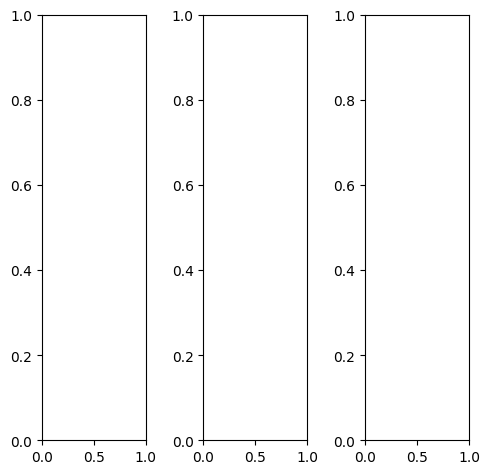

tensor([[[0.5294, 0.5255, 0.5333,  ..., 0.5216, 0.5216, 0.5216],
         [0.5373, 0.5255, 0.5255,  ..., 0.5216, 0.5216, 0.5216],
         [0.5412, 0.5333, 0.5333,  ..., 0.5216, 0.5216, 0.5255],
         ...,
         [0.1725, 0.1843, 0.2157,  ..., 0.1725, 0.1725, 0.1686],
         [0.1725, 0.1843, 0.2118,  ..., 0.1882, 0.1843, 0.1804],
         [0.1686, 0.1882, 0.2078,  ..., 0.2000, 0.1843, 0.1686]],

        [[0.5294, 0.5255, 0.5333,  ..., 0.5216, 0.5216, 0.5216],
         [0.5373, 0.5255, 0.5255,  ..., 0.5216, 0.5216, 0.5216],
         [0.5412, 0.5333, 0.5333,  ..., 0.5216, 0.5216, 0.5255],
         ...,
         [0.1725, 0.1843, 0.2157,  ..., 0.1725, 0.1725, 0.1686],
         [0.1725, 0.1843, 0.2118,  ..., 0.1882, 0.1843, 0.1804],
         [0.1686, 0.1882, 0.2078,  ..., 0.2000, 0.1843, 0.1686]],

        [[0.5294, 0.5255, 0.5333,  ..., 0.5216, 0.5216, 0.5216],
         [0.5373, 0.5255, 0.5255,  ..., 0.5216, 0.5216, 0.5216],
         [0.5412, 0.5333, 0.5333,  ..., 0.5216, 0.5216, 0.

tensor([[[0.4196, 0.4157, 0.4235,  ..., 0.4196, 0.4196, 0.4196],
         [0.4235, 0.4157, 0.4157,  ..., 0.4157, 0.4157, 0.4157],
         [0.4275, 0.4235, 0.4235,  ..., 0.4157, 0.4157, 0.4196],
         ...,
         [0.1176, 0.1373, 0.1765,  ..., 0.1255, 0.1255, 0.1216],
         [0.1216, 0.1412, 0.1725,  ..., 0.1412, 0.1412, 0.1373],
         [0.1255, 0.1451, 0.1686,  ..., 0.1569, 0.1373, 0.1216]],

        [[0.5451, 0.5373, 0.5451,  ..., 0.5373, 0.5373, 0.5373],
         [0.5529, 0.5412, 0.5412,  ..., 0.5373, 0.5373, 0.5333],
         [0.5569, 0.5490, 0.5490,  ..., 0.5333, 0.5333, 0.5373],
         ...,
         [0.1843, 0.1961, 0.2235,  ..., 0.1804, 0.1765, 0.1765],
         [0.1804, 0.1922, 0.2196,  ..., 0.1961, 0.1922, 0.1882],
         [0.1725, 0.1922, 0.2157,  ..., 0.2078, 0.1922, 0.1804]],

        [[0.7529, 0.7412, 0.7529,  ..., 0.7216, 0.7216, 0.7216],
         [0.7569, 0.7451, 0.7451,  ..., 0.7294, 0.7294, 0.7294],
         [0.7569, 0.7451, 0.7451,  ..., 0.7255, 0.7294, 0.

tensor([[[ 3.3272e-01,  1.9485e-01,  1.5809e-01,  ...,  2.6913e-01,
           3.0241e-01,  3.3008e-01],
         [ 2.6421e-01,  1.6694e-01,  9.8193e-02,  ...,  3.1453e-01,
           3.1682e-01,  3.3534e-01],
         [ 2.2733e-01,  1.7071e-01,  4.2047e-02,  ...,  3.1176e-01,
           3.3946e-01,  3.4269e-01],
         ...,
         [ 7.4076e-03,  1.3180e-02,  9.2984e-02,  ...,  2.0289e-04,
          -9.9056e-03,  1.5161e-03],
         [ 3.1586e-02,  4.5953e-03,  7.8660e-02,  ...,  3.1442e-02,
           3.1282e-02,  2.6973e-02],
         [ 8.3402e-02,  6.3078e-02,  1.1057e-01,  ...,  1.1017e-01,
           9.4290e-02,  5.5153e-02]],

        [[ 3.7895e-01,  3.7066e-01,  3.3815e-01,  ...,  3.5786e-01,
           4.0568e-01,  3.7907e-01],
         [ 3.2808e-01,  3.6479e-01,  2.0925e-01,  ...,  4.1570e-01,
           4.5152e-01,  3.9545e-01],
         [ 3.2833e-01,  4.0157e-01,  2.7893e-01,  ...,  4.1209e-01,
           4.4556e-01,  3.8411e-01],
         ...,
         [-1.2914e-02, -1

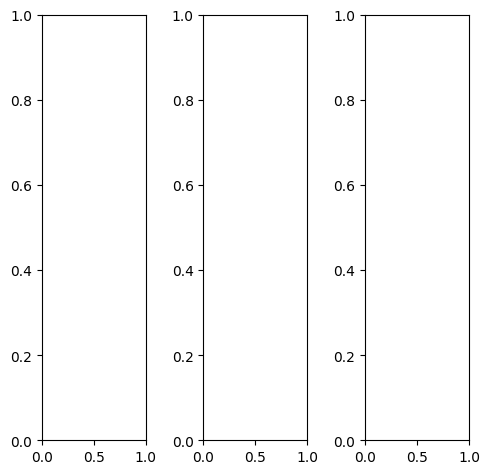

tensor([[[0.5922, 0.6039, 0.5725,  ..., 0.9255, 0.9725, 0.9608],
         [0.5961, 0.6078, 0.6667,  ..., 0.9765, 0.9725, 0.9725],
         [0.6275, 0.6039, 0.5373,  ..., 0.9843, 0.9882, 0.9804],
         ...,
         [0.4353, 0.3373, 0.4118,  ..., 0.4824, 0.6588, 0.5647],
         [0.3882, 0.3882, 0.5647,  ..., 0.5569, 0.5333, 0.6196],
         [0.5608, 0.6392, 0.5490,  ..., 0.5529, 0.5176, 0.7255]],

        [[0.5922, 0.6039, 0.5725,  ..., 0.9255, 0.9725, 0.9608],
         [0.5961, 0.6078, 0.6667,  ..., 0.9765, 0.9725, 0.9725],
         [0.6275, 0.6039, 0.5373,  ..., 0.9843, 0.9882, 0.9804],
         ...,
         [0.4353, 0.3373, 0.4118,  ..., 0.4824, 0.6588, 0.5647],
         [0.3882, 0.3882, 0.5647,  ..., 0.5569, 0.5333, 0.6196],
         [0.5608, 0.6392, 0.5490,  ..., 0.5529, 0.5176, 0.7255]],

        [[0.5922, 0.6039, 0.5725,  ..., 0.9255, 0.9725, 0.9608],
         [0.5961, 0.6078, 0.6667,  ..., 0.9765, 0.9725, 0.9725],
         [0.6275, 0.6039, 0.5373,  ..., 0.9843, 0.9882, 0.

tensor([[[0.5765, 0.5882, 0.5608,  ..., 0.9255, 0.9686, 0.9608],
         [0.5961, 0.6000, 0.6588,  ..., 0.9765, 0.9725, 0.9725],
         [0.6196, 0.5961, 0.5373,  ..., 0.9843, 0.9882, 0.9804],
         ...,
         [0.4471, 0.3294, 0.4000,  ..., 0.4784, 0.6667, 0.5490],
         [0.3882, 0.3804, 0.5647,  ..., 0.5412, 0.5451, 0.6196],
         [0.5569, 0.6353, 0.5451,  ..., 0.5333, 0.5294, 0.7333]],

        [[0.5922, 0.6039, 0.5725,  ..., 0.9294, 0.9725, 0.9647],
         [0.5922, 0.6078, 0.6667,  ..., 0.9804, 0.9725, 0.9765],
         [0.6275, 0.6039, 0.5333,  ..., 0.9882, 0.9882, 0.9804],
         ...,
         [0.4431, 0.3373, 0.4196,  ..., 0.4824, 0.6667, 0.5647],
         [0.3922, 0.3882, 0.5725,  ..., 0.5608, 0.5373, 0.6235],
         [0.5647, 0.6431, 0.5529,  ..., 0.5529, 0.5216, 0.7333]],

        [[0.6353, 0.6353, 0.6000,  ..., 0.9176, 0.9686, 0.9569],
         [0.6157, 0.6235, 0.6863,  ..., 0.9647, 0.9647, 0.9608],
         [0.6510, 0.6196, 0.5529,  ..., 0.9725, 0.9804, 0.

tensor([[[0.3324, 0.2404, 0.2373,  ..., 0.7678, 0.7776, 0.7357],
         [0.2535, 0.2089, 0.2649,  ..., 0.8507, 0.8514, 0.7662],
         [0.2719, 0.2290, 0.0933,  ..., 0.9142, 0.8993, 0.8066],
         ...,
         [0.2203, 0.1398, 0.2585,  ..., 0.3111, 0.4820, 0.3464],
         [0.1683, 0.1804, 0.3738,  ..., 0.3873, 0.3722, 0.4071],
         [0.3476, 0.4012, 0.3060,  ..., 0.3472, 0.3315, 0.4653]],

        [[0.4178, 0.4077, 0.3989,  ..., 0.8198, 0.8801, 0.8383],
         [0.3320, 0.3642, 0.3624,  ..., 0.9199, 0.9012, 0.8831],
         [0.3886, 0.3800, 0.2667,  ..., 0.9639, 0.9457, 0.8887],
         ...,
         [0.2311, 0.1564, 0.2909,  ..., 0.3399, 0.5177, 0.3112],
         [0.1771, 0.2192, 0.4185,  ..., 0.4253, 0.3942, 0.3928],
         [0.3316, 0.3984, 0.3365,  ..., 0.3128, 0.3248, 0.4265]],

        [[0.5794, 0.4599, 0.5613,  ..., 0.9814, 1.0235, 0.9609],
         [0.5451, 0.5564, 0.6342,  ..., 1.0732, 1.0833, 0.9732],
         [0.5618, 0.4776, 0.5087,  ..., 1.1503, 1.1236, 0.

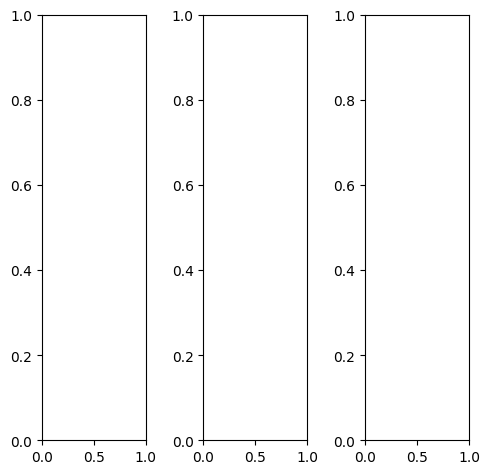

tensor([[[0.3843, 0.3922, 0.3882,  ..., 0.5137, 0.5176, 0.5216],
         [0.4078, 0.4431, 0.4000,  ..., 0.5176, 0.5255, 0.5294],
         [0.3804, 0.4471, 0.4118,  ..., 0.5137, 0.5216, 0.5255],
         ...,
         [0.3529, 0.4549, 0.4000,  ..., 0.3529, 0.3647, 0.3686],
         [0.4667, 0.3843, 0.2235,  ..., 0.3373, 0.3529, 0.3569],
         [0.3569, 0.1922, 0.2118,  ..., 0.3216, 0.3294, 0.3412]],

        [[0.3843, 0.3922, 0.3882,  ..., 0.5137, 0.5176, 0.5216],
         [0.4078, 0.4431, 0.4000,  ..., 0.5176, 0.5255, 0.5294],
         [0.3804, 0.4471, 0.4118,  ..., 0.5137, 0.5216, 0.5255],
         ...,
         [0.3529, 0.4549, 0.4000,  ..., 0.3529, 0.3647, 0.3686],
         [0.4667, 0.3843, 0.2235,  ..., 0.3373, 0.3529, 0.3569],
         [0.3569, 0.1922, 0.2118,  ..., 0.3216, 0.3294, 0.3412]],

        [[0.3843, 0.3922, 0.3882,  ..., 0.5137, 0.5176, 0.5216],
         [0.4078, 0.4431, 0.4000,  ..., 0.5176, 0.5255, 0.5294],
         [0.3804, 0.4471, 0.4118,  ..., 0.5137, 0.5216, 0.

tensor([[[0.4039, 0.4078, 0.4039,  ..., 0.5373, 0.5412, 0.5490],
         [0.4196, 0.4471, 0.4118,  ..., 0.5451, 0.5529, 0.5569],
         [0.3961, 0.4431, 0.4196,  ..., 0.5412, 0.5490, 0.5529],
         ...,
         [0.3216, 0.4235, 0.4118,  ..., 0.4078, 0.4196, 0.4275],
         [0.4392, 0.4039, 0.3098,  ..., 0.4353, 0.4078, 0.4196],
         [0.3804, 0.2745, 0.3451,  ..., 0.4784, 0.4039, 0.4000]],

        [[0.3804, 0.3882, 0.3843,  ..., 0.5020, 0.5059, 0.5098],
         [0.4000, 0.4353, 0.3961,  ..., 0.5059, 0.5098, 0.5137],
         [0.3765, 0.4431, 0.4078,  ..., 0.5020, 0.5098, 0.5098],
         ...,
         [0.3529, 0.4510, 0.3882,  ..., 0.3333, 0.3451, 0.3490],
         [0.4588, 0.3686, 0.2000,  ..., 0.3059, 0.3333, 0.3373],
         [0.3412, 0.1686, 0.1765,  ..., 0.2784, 0.3059, 0.3216]],

        [[0.3647, 0.3725, 0.3647,  ..., 0.5059, 0.5137, 0.5216],
         [0.4078, 0.4588, 0.3843,  ..., 0.5098, 0.5216, 0.5294],
         [0.3765, 0.4824, 0.4078,  ..., 0.5059, 0.5176, 0.

tensor([[[0.5269, 0.4837, 0.4482,  ..., 0.5574, 0.5717, 0.6345],
         [0.4941, 0.5739, 0.4558,  ..., 0.5214, 0.5780, 0.6303],
         [0.4508, 0.6100, 0.4726,  ..., 0.5552, 0.5795, 0.6158],
         ...,
         [0.4333, 0.5882, 0.4469,  ..., 0.4075, 0.4299, 0.4507],
         [0.6141, 0.4323, 0.2026,  ..., 0.3776, 0.3966, 0.4345],
         [0.4675, 0.1929, 0.1722,  ..., 0.3853, 0.3987, 0.4385]],

        [[0.5894, 0.5767, 0.5138,  ..., 0.6617, 0.6986, 0.7195],
         [0.5250, 0.6673, 0.4903,  ..., 0.6586, 0.6938, 0.7694],
         [0.5416, 0.6458, 0.5822,  ..., 0.6749, 0.6742, 0.7339],
         ...,
         [0.4461, 0.5800, 0.4844,  ..., 0.4763, 0.5084, 0.4606],
         [0.6231, 0.4561, 0.2291,  ..., 0.4432, 0.4541, 0.4521],
         [0.4614, 0.1877, 0.1908,  ..., 0.4016, 0.4225, 0.4404]],

        [[0.6524, 0.5944, 0.6624,  ..., 0.8044, 0.8186, 0.8304],
         [0.6520, 0.7534, 0.6778,  ..., 0.7859, 0.8259, 0.8310],
         [0.6085, 0.6747, 0.7124,  ..., 0.7942, 0.8237, 0.

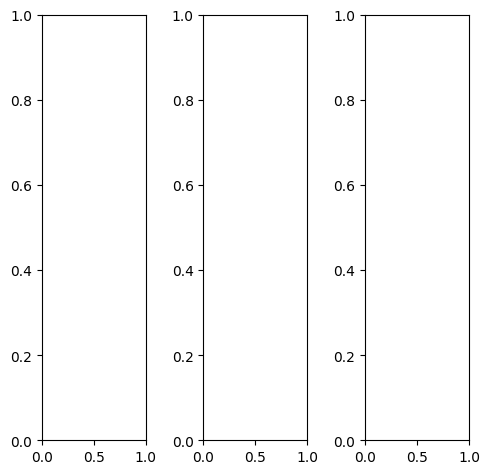

tensor([[[0.2157, 0.3255, 0.5843,  ..., 0.2353, 0.2314, 0.2196],
         [0.2353, 0.2392, 0.4314,  ..., 0.2314, 0.2471, 0.2588],
         [0.2549, 0.2275, 0.2941,  ..., 0.2706, 0.2863, 0.2863],
         ...,
         [0.6980, 0.7020, 0.5451,  ..., 0.2078, 0.1725, 0.1294],
         [0.7098, 0.6706, 0.6706,  ..., 0.2078, 0.1686, 0.1059],
         [0.6980, 0.6902, 0.7098,  ..., 0.1843, 0.1529, 0.1098]],

        [[0.2157, 0.3255, 0.5843,  ..., 0.2353, 0.2314, 0.2196],
         [0.2353, 0.2392, 0.4314,  ..., 0.2314, 0.2471, 0.2588],
         [0.2549, 0.2275, 0.2941,  ..., 0.2706, 0.2863, 0.2863],
         ...,
         [0.6980, 0.7020, 0.5451,  ..., 0.2078, 0.1725, 0.1294],
         [0.7098, 0.6706, 0.6706,  ..., 0.2078, 0.1686, 0.1059],
         [0.6980, 0.6902, 0.7098,  ..., 0.1843, 0.1529, 0.1098]],

        [[0.2157, 0.3255, 0.5843,  ..., 0.2353, 0.2314, 0.2196],
         [0.2353, 0.2392, 0.4314,  ..., 0.2314, 0.2471, 0.2588],
         [0.2549, 0.2275, 0.2941,  ..., 0.2706, 0.2863, 0.

tensor([[[0.2549, 0.3255, 0.5647,  ..., 0.2902, 0.2863, 0.2745],
         [0.2784, 0.2510, 0.4235,  ..., 0.2902, 0.3059, 0.3216],
         [0.3020, 0.2549, 0.3098,  ..., 0.3373, 0.3529, 0.3529],
         ...,
         [0.8039, 0.8157, 0.6471,  ..., 0.2745, 0.2392, 0.1843],
         [0.8157, 0.7804, 0.7725,  ..., 0.2745, 0.2353, 0.1647],
         [0.8000, 0.8039, 0.8118,  ..., 0.2510, 0.2196, 0.1725]],

        [[0.2078, 0.3451, 0.6157,  ..., 0.2196, 0.2157, 0.2000],
         [0.2196, 0.2471, 0.4549,  ..., 0.2118, 0.2275, 0.2392],
         [0.2392, 0.2235, 0.3059,  ..., 0.2510, 0.2667, 0.2667],
         ...,
         [0.6784, 0.6824, 0.5255,  ..., 0.1804, 0.1451, 0.1059],
         [0.6863, 0.6471, 0.6510,  ..., 0.1804, 0.1412, 0.0824],
         [0.6745, 0.6667, 0.6863,  ..., 0.1569, 0.1255, 0.0863]],

        [[0.1647, 0.2353, 0.4863,  ..., 0.1804, 0.1765, 0.1608],
         [0.1922, 0.1608, 0.3294,  ..., 0.1686, 0.1843, 0.1961],
         [0.2196, 0.1608, 0.2039,  ..., 0.2000, 0.2157, 0.

tensor([[[ 0.1666,  0.2067,  0.6431,  ...,  0.0782,  0.0888,  0.1392],
         [ 0.1360,  0.0449,  0.3256,  ...,  0.0313,  0.0583,  0.1207],
         [ 0.1171,  0.0318,  0.0300,  ...,  0.0902,  0.1126,  0.1521],
         ...,
         [ 0.8646,  0.9107,  0.7043,  ...,  0.1010,  0.0382,  0.0225],
         [ 0.8612,  0.8050,  0.8204,  ...,  0.0856,  0.0332, -0.0040],
         [ 0.8432,  0.8827,  0.8880,  ...,  0.0812,  0.0587,  0.0495]],

        [[ 0.1882,  0.3671,  0.6615,  ...,  0.1675,  0.1731,  0.1950],
         [ 0.1963,  0.1689,  0.4249,  ...,  0.1397,  0.1849,  0.1989],
         [ 0.1809,  0.2041,  0.1732,  ...,  0.1846,  0.2175,  0.2376],
         ...,
         [ 0.8300,  0.8695,  0.6872,  ...,  0.1421,  0.0786,  0.0259],
         [ 0.8473,  0.8102,  0.8514,  ...,  0.1244,  0.0515, -0.0089],
         [ 0.8064,  0.8667,  0.8894,  ...,  0.0992,  0.0606,  0.0402]],

        [[ 0.3922,  0.3325,  0.8489,  ...,  0.3165,  0.3333,  0.3460],
         [ 0.3312,  0.2844,  0.6138,  ...,  0

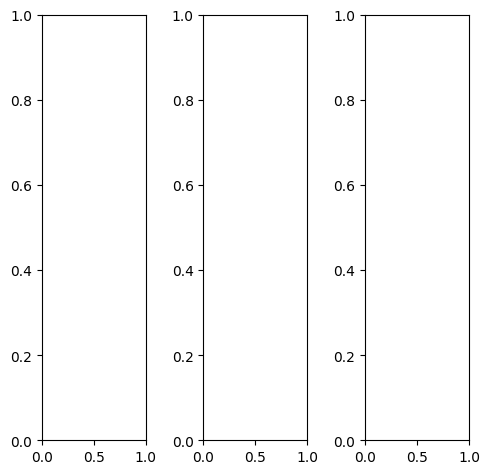

EPOCH: 13.000  val_loss: 0.003  (1544.26s - 10334.67s remaining)

tensor([[[0.6549, 0.6471, 0.6392,  ..., 0.5882, 0.5882, 0.5882],
         [0.6588, 0.6510, 0.6471,  ..., 0.5922, 0.5922, 0.5922],
         [0.6667, 0.6549, 0.6510,  ..., 0.6000, 0.6000, 0.6000],
         ...,
         [0.4588, 0.4275, 0.4118,  ..., 0.2745, 0.2627, 0.2667],
         [0.3647, 0.3529, 0.3569,  ..., 0.3490, 0.3333, 0.3137],
         [0.3804, 0.3922, 0.3608,  ..., 0.3686, 0.3804, 0.3725]],

        [[0.6549, 0.6471, 0.6392,  ..., 0.5882, 0.5882, 0.5882],
         [0.6588, 0.6510, 0.6471,  ..., 0.5922, 0.5922, 0.5922],
         [0.6667, 0.6549, 0.6510,  ..., 0.6000, 0.6000, 0.6000],
         ...,
         [0.4588, 0.4275, 0.4118,  ..., 0.2745, 0.2627, 0.2667],
         [0.3647, 0.3529, 0.3569,  ..., 0.3490, 0.3333, 0.3137],
         [0.3804, 0.3922, 0.3608,  ..., 0.3686, 0.3804, 0.3725]],

        [[0.6549, 0.6471, 0.6392,  ..., 0.5882, 0.5882, 0.5882],
         [0.6588, 0.6510, 0.6471,  ..., 0.5922, 0.5922, 0.5922],
         [0.6667, 0.6549, 0.6510,  ..., 0.6000, 0.6000, 0.

tensor([[[0.5725, 0.5608, 0.5451,  ..., 0.5020, 0.5020, 0.5020],
         [0.5725, 0.5569, 0.5451,  ..., 0.5020, 0.5020, 0.5020],
         [0.5765, 0.5608, 0.5490,  ..., 0.5020, 0.5020, 0.5020],
         ...,
         [0.3333, 0.3059, 0.3490,  ..., 0.1961, 0.1843, 0.1882],
         [0.2039, 0.1922, 0.2392,  ..., 0.2667, 0.2510, 0.2314],
         [0.2196, 0.2275, 0.2157,  ..., 0.2706, 0.2863, 0.2863]],

        [[0.6824, 0.6784, 0.6745,  ..., 0.6118, 0.6078, 0.6078],
         [0.6902, 0.6863, 0.6863,  ..., 0.6157, 0.6157, 0.6157],
         [0.6980, 0.6902, 0.6863,  ..., 0.6275, 0.6275, 0.6275],
         ...,
         [0.5098, 0.4784, 0.4392,  ..., 0.2980, 0.2863, 0.2902],
         [0.4353, 0.4235, 0.4078,  ..., 0.3804, 0.3647, 0.3412],
         [0.4510, 0.4627, 0.4235,  ..., 0.4078, 0.4157, 0.4039]],

        [[0.7294, 0.7216, 0.7137,  ..., 0.7020, 0.7020, 0.7020],
         [0.7373, 0.7294, 0.7216,  ..., 0.6980, 0.6980, 0.6980],
         [0.7412, 0.7294, 0.7255,  ..., 0.7059, 0.7059, 0.

tensor([[[0.6016, 0.5740, 0.5439,  ..., 0.4868, 0.5043, 0.5395],
         [0.5878, 0.5609, 0.5546,  ..., 0.4834, 0.4873, 0.5071],
         [0.5767, 0.5468, 0.5556,  ..., 0.5032, 0.5089, 0.4967],
         ...,
         [0.4150, 0.3724, 0.3688,  ..., 0.2383, 0.2234, 0.2397],
         [0.3232, 0.3079, 0.3083,  ..., 0.3151, 0.2951, 0.2934],
         [0.3693, 0.3711, 0.3305,  ..., 0.3480, 0.3618, 0.3640]],

        [[0.6807, 0.6827, 0.6701,  ..., 0.6106, 0.6191, 0.6254],
         [0.6877, 0.6736, 0.6729,  ..., 0.6141, 0.6217, 0.6270],
         [0.6881, 0.6790, 0.6843,  ..., 0.6268, 0.6192, 0.6309],
         ...,
         [0.4731, 0.4252, 0.4244,  ..., 0.2707, 0.2610, 0.2712],
         [0.3696, 0.3588, 0.3576,  ..., 0.3413, 0.3327, 0.3209],
         [0.4075, 0.4046, 0.3789,  ..., 0.3765, 0.3886, 0.3785]],

        [[0.7859, 0.7991, 0.7904,  ..., 0.7411, 0.7464, 0.7148],
         [0.8060, 0.7989, 0.7989,  ..., 0.7499, 0.7473, 0.7312],
         [0.8055, 0.8012, 0.8137,  ..., 0.7549, 0.7549, 0.

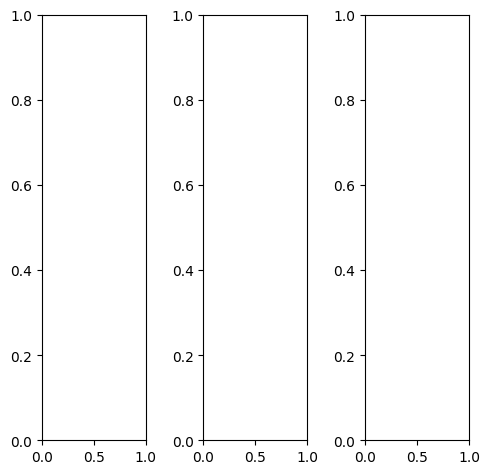

tensor([[[0.9686, 0.9490, 0.9529,  ..., 0.7569, 0.7216, 0.7059],
         [0.9569, 0.9333, 0.9490,  ..., 0.8157, 0.7765, 0.7765],
         [0.9490, 0.9412, 0.9569,  ..., 0.7490, 0.7137, 0.6863],
         ...,
         [0.8863, 0.8314, 0.7608,  ..., 0.8275, 0.7922, 0.7961],
         [0.8784, 0.8275, 0.8000,  ..., 0.8039, 0.7882, 0.7608],
         [0.8314, 0.8000, 0.7843,  ..., 0.7686, 0.7373, 0.7137]],

        [[0.9686, 0.9490, 0.9529,  ..., 0.7569, 0.7216, 0.7059],
         [0.9569, 0.9333, 0.9490,  ..., 0.8157, 0.7765, 0.7765],
         [0.9490, 0.9412, 0.9569,  ..., 0.7490, 0.7137, 0.6863],
         ...,
         [0.8863, 0.8314, 0.7608,  ..., 0.8275, 0.7922, 0.7961],
         [0.8784, 0.8275, 0.8000,  ..., 0.8039, 0.7882, 0.7608],
         [0.8314, 0.8000, 0.7843,  ..., 0.7686, 0.7373, 0.7137]],

        [[0.9686, 0.9490, 0.9529,  ..., 0.7569, 0.7216, 0.7059],
         [0.9569, 0.9333, 0.9490,  ..., 0.8157, 0.7765, 0.7765],
         [0.9490, 0.9412, 0.9569,  ..., 0.7490, 0.7137, 0.

tensor([[[0.9569, 0.9373, 0.9412,  ..., 0.7098, 0.6549, 0.6275],
         [0.9451, 0.9216, 0.9373,  ..., 0.7725, 0.7098, 0.7020],
         [0.9373, 0.9294, 0.9451,  ..., 0.7059, 0.6471, 0.6078],
         ...,
         [0.8863, 0.8275, 0.7451,  ..., 0.8157, 0.7804, 0.7843],
         [0.8784, 0.8196, 0.7843,  ..., 0.7922, 0.7765, 0.7490],
         [0.8314, 0.7922, 0.7686,  ..., 0.7569, 0.7255, 0.7020]],

        [[0.9725, 0.9529, 0.9569,  ..., 0.7686, 0.7373, 0.7255],
         [0.9608, 0.9373, 0.9529,  ..., 0.8275, 0.7922, 0.7961],
         [0.9529, 0.9451, 0.9608,  ..., 0.7608, 0.7294, 0.7059],
         ...,
         [0.8824, 0.8314, 0.7608,  ..., 0.8275, 0.7922, 0.7961],
         [0.8745, 0.8275, 0.8039,  ..., 0.8039, 0.7882, 0.7608],
         [0.8275, 0.8000, 0.7843,  ..., 0.7686, 0.7373, 0.7137]],

        [[0.9843, 0.9647, 0.9686,  ..., 0.8118, 0.8078, 0.8000],
         [0.9725, 0.9490, 0.9647,  ..., 0.8745, 0.8627, 0.8745],
         [0.9647, 0.9569, 0.9725,  ..., 0.8039, 0.7961, 0.

tensor([[[0.9276, 0.9316, 0.9562,  ..., 0.7588, 0.7225, 0.7281],
         [0.9469, 0.9401, 0.9539,  ..., 0.8245, 0.7898, 0.7958],
         [0.9444, 0.9548, 0.9587,  ..., 0.7624, 0.7246, 0.7052],
         ...,
         [0.9052, 0.8600, 0.7844,  ..., 0.8498, 0.8106, 0.8134],
         [0.8918, 0.8430, 0.8177,  ..., 0.8260, 0.8067, 0.7944],
         [0.8288, 0.8261, 0.8001,  ..., 0.8000, 0.7722, 0.7485]],

        [[0.9369, 0.9434, 0.9698,  ..., 0.7756, 0.7384, 0.7318],
         [0.9504, 0.9539, 0.9791,  ..., 0.8285, 0.7823, 0.7941],
         [0.9502, 0.9634, 0.9817,  ..., 0.7642, 0.7223, 0.7073],
         ...,
         [0.8937, 0.8465, 0.7686,  ..., 0.8319, 0.8020, 0.8185],
         [0.8846, 0.8241, 0.8086,  ..., 0.8128, 0.7906, 0.7798],
         [0.8184, 0.8158, 0.7938,  ..., 0.7776, 0.7504, 0.7219]],

        [[0.9256, 0.9498, 0.9494,  ..., 0.7319, 0.7002, 0.7065],
         [0.9366, 0.9474, 0.9604,  ..., 0.7913, 0.7474, 0.7385],
         [0.9452, 0.9432, 0.9590,  ..., 0.7193, 0.6777, 0.

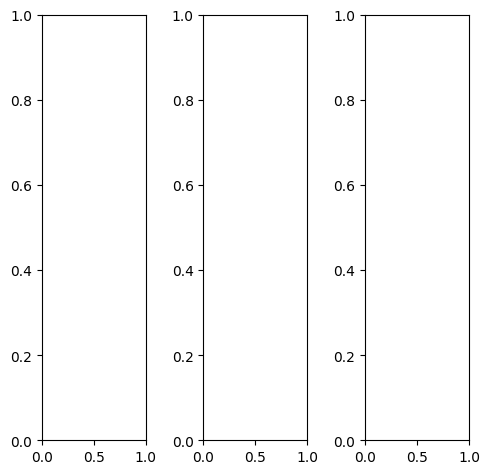

tensor([[[0.6353, 0.6275, 0.6275,  ..., 0.5529, 0.5451, 0.5451],
         [0.6314, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.5412],
         [0.6275, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.5451],
         ...,
         [0.7176, 0.7059, 0.6902,  ..., 0.7373, 0.7333, 0.7294],
         [0.7765, 0.7608, 0.7451,  ..., 0.7765, 0.7686, 0.7725],
         [0.7765, 0.7608, 0.7608,  ..., 0.7608, 0.7608, 0.7647]],

        [[0.6353, 0.6275, 0.6275,  ..., 0.5529, 0.5451, 0.5451],
         [0.6314, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.5412],
         [0.6275, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.5451],
         ...,
         [0.7176, 0.7059, 0.6902,  ..., 0.7373, 0.7333, 0.7294],
         [0.7765, 0.7608, 0.7451,  ..., 0.7765, 0.7686, 0.7725],
         [0.7765, 0.7608, 0.7608,  ..., 0.7608, 0.7608, 0.7647]],

        [[0.6353, 0.6275, 0.6275,  ..., 0.5529, 0.5451, 0.5451],
         [0.6314, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.5412],
         [0.6275, 0.6235, 0.6235,  ..., 0.5490, 0.5451, 0.

tensor([[[0.5137, 0.4980, 0.4902,  ..., 0.4196, 0.4157, 0.4118],
         [0.5059, 0.4902, 0.4824,  ..., 0.4157, 0.4118, 0.4078],
         [0.4902, 0.4745, 0.4667,  ..., 0.4157, 0.4118, 0.4118],
         ...,
         [0.8745, 0.8627, 0.8510,  ..., 0.8824, 0.8824, 0.8784],
         [0.9294, 0.9137, 0.8980,  ..., 0.9216, 0.9098, 0.9137],
         [0.9333, 0.9137, 0.9137,  ..., 0.9020, 0.9020, 0.9020]],

        [[0.6314, 0.6275, 0.6314,  ..., 0.5529, 0.5451, 0.5451],
         [0.6314, 0.6275, 0.6314,  ..., 0.5490, 0.5451, 0.5412],
         [0.6353, 0.6314, 0.6353,  ..., 0.5490, 0.5451, 0.5451],
         ...,
         [0.6510, 0.6392, 0.6235,  ..., 0.6745, 0.6667, 0.6627],
         [0.7098, 0.6941, 0.6784,  ..., 0.7137, 0.7059, 0.7098],
         [0.7098, 0.6941, 0.6941,  ..., 0.6980, 0.6980, 0.7020]],

        [[0.9686, 0.9529, 0.9529,  ..., 0.8941, 0.8863, 0.8824],
         [0.9608, 0.9569, 0.9608,  ..., 0.8902, 0.8824, 0.8824],
         [0.9608, 0.9647, 0.9765,  ..., 0.8902, 0.8863, 0.

tensor([[[0.6140, 0.5988, 0.5805,  ..., 0.5033, 0.5104, 0.5354],
         [0.6050, 0.5868, 0.5814,  ..., 0.4963, 0.4904, 0.5091],
         [0.5810, 0.5784, 0.5752,  ..., 0.5027, 0.5066, 0.5059],
         ...,
         [0.7396, 0.7208, 0.7037,  ..., 0.7571, 0.7469, 0.7451],
         [0.7824, 0.7781, 0.7493,  ..., 0.7878, 0.7845, 0.7922],
         [0.7777, 0.7893, 0.7744,  ..., 0.7798, 0.7847, 0.7729]],

        [[0.6506, 0.6545, 0.6487,  ..., 0.5587, 0.5642, 0.5682],
         [0.6528, 0.6375, 0.6439,  ..., 0.5649, 0.5579, 0.5593],
         [0.6395, 0.6424, 0.6435,  ..., 0.5681, 0.5637, 0.5603],
         ...,
         [0.7341, 0.7261, 0.7012,  ..., 0.7371, 0.7448, 0.7534],
         [0.7865, 0.7664, 0.7503,  ..., 0.7783, 0.7824, 0.7839],
         [0.7637, 0.7817, 0.7713,  ..., 0.7656, 0.7740, 0.7546]],

        [[0.6956, 0.6946, 0.6944,  ..., 0.6018, 0.6052, 0.5933],
         [0.6903, 0.6792, 0.6875,  ..., 0.6013, 0.5896, 0.5866],
         [0.6774, 0.6814, 0.6870,  ..., 0.5998, 0.6036, 0.

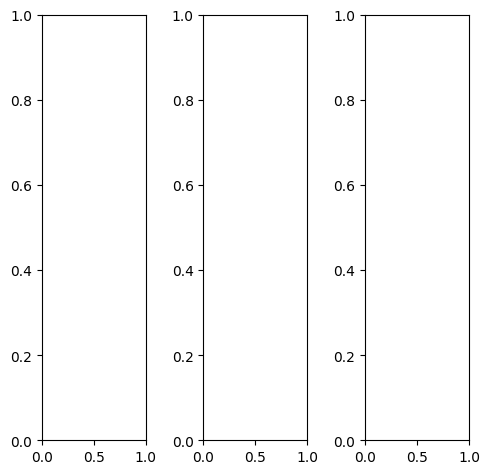

tensor([[[0.0353, 0.0392, 0.0471,  ..., 0.0471, 0.0745, 0.1020],
         [0.0392, 0.0471, 0.0510,  ..., 0.0431, 0.0784, 0.0863],
         [0.0392, 0.0510, 0.0588,  ..., 0.0275, 0.0392, 0.0549],
         ...,
         [0.5765, 0.6706, 0.6353,  ..., 0.8784, 0.9176, 0.9137],
         [0.6078, 0.6000, 0.6353,  ..., 0.7922, 0.7961, 0.7843],
         [0.5333, 0.5608, 0.6549,  ..., 0.7490, 0.7216, 0.6902]],

        [[0.0353, 0.0392, 0.0471,  ..., 0.0471, 0.0745, 0.1020],
         [0.0392, 0.0471, 0.0510,  ..., 0.0431, 0.0784, 0.0863],
         [0.0392, 0.0510, 0.0588,  ..., 0.0275, 0.0392, 0.0549],
         ...,
         [0.5765, 0.6706, 0.6353,  ..., 0.8784, 0.9176, 0.9137],
         [0.6078, 0.6000, 0.6353,  ..., 0.7922, 0.7961, 0.7843],
         [0.5333, 0.5608, 0.6549,  ..., 0.7490, 0.7216, 0.6902]],

        [[0.0353, 0.0392, 0.0471,  ..., 0.0471, 0.0745, 0.1020],
         [0.0392, 0.0471, 0.0510,  ..., 0.0431, 0.0784, 0.0863],
         [0.0392, 0.0510, 0.0588,  ..., 0.0275, 0.0392, 0.

tensor([[[0.0392, 0.0431, 0.0510,  ..., 0.0902, 0.1255, 0.1608],
         [0.0431, 0.0510, 0.0549,  ..., 0.0784, 0.1216, 0.1412],
         [0.0431, 0.0549, 0.0627,  ..., 0.0627, 0.0706, 0.0941],
         ...,
         [0.5804, 0.6745, 0.6392,  ..., 0.8941, 0.9294, 0.9333],
         [0.6118, 0.6039, 0.6392,  ..., 0.8078, 0.8118, 0.8000],
         [0.5373, 0.5647, 0.6588,  ..., 0.7608, 0.7373, 0.7059]],

        [[0.0275, 0.0314, 0.0392,  ..., 0.0235, 0.0510, 0.0824],
         [0.0314, 0.0392, 0.0431,  ..., 0.0235, 0.0588, 0.0706],
         [0.0314, 0.0431, 0.0510,  ..., 0.0157, 0.0275, 0.0431],
         ...,
         [0.5765, 0.6706, 0.6353,  ..., 0.8745, 0.9137, 0.9098],
         [0.6078, 0.6000, 0.6353,  ..., 0.7882, 0.7922, 0.7804],
         [0.5333, 0.5608, 0.6549,  ..., 0.7451, 0.7176, 0.6863]],

        [[0.0549, 0.0588, 0.0667,  ..., 0.0667, 0.0549, 0.0353],
         [0.0588, 0.0667, 0.0706,  ..., 0.0431, 0.0627, 0.0353],
         [0.0588, 0.0706, 0.0784,  ..., 0.0118, 0.0275, 0.

tensor([[[0.0885, 0.0488, 0.0589,  ..., 0.0546, 0.0853, 0.1315],
         [0.0580, 0.0502, 0.0559,  ..., 0.0419, 0.0846, 0.0926],
         [0.0443, 0.0481, 0.0618,  ..., 0.0227, 0.0383, 0.0579],
         ...,
         [0.6086, 0.7102, 0.6835,  ..., 0.9039, 0.9420, 0.9252],
         [0.6337, 0.6377, 0.6742,  ..., 0.8210, 0.8139, 0.8139],
         [0.5680, 0.6000, 0.6907,  ..., 0.7865, 0.7644, 0.7420]],

        [[0.0971, 0.0397, 0.0453,  ..., 0.0486, 0.0771, 0.1342],
         [0.0419, 0.0309, 0.0309,  ..., 0.0290, 0.0757, 0.0869],
         [0.0303, 0.0356, 0.0361,  ..., 0.0127, 0.0215, 0.0448],
         ...,
         [0.5785, 0.6930, 0.6536,  ..., 0.8869, 0.9311, 0.9271],
         [0.6067, 0.6052, 0.6412,  ..., 0.7960, 0.7970, 0.8025],
         [0.5412, 0.5774, 0.6581,  ..., 0.7598, 0.7401, 0.7099]],

        [[0.0847, 0.0401, 0.0479,  ..., 0.0340, 0.0712, 0.1185],
         [0.0433, 0.0359, 0.0399,  ..., 0.0276, 0.0635, 0.0700],
         [0.0302, 0.0360, 0.0439,  ..., 0.0159, 0.0259, 0.

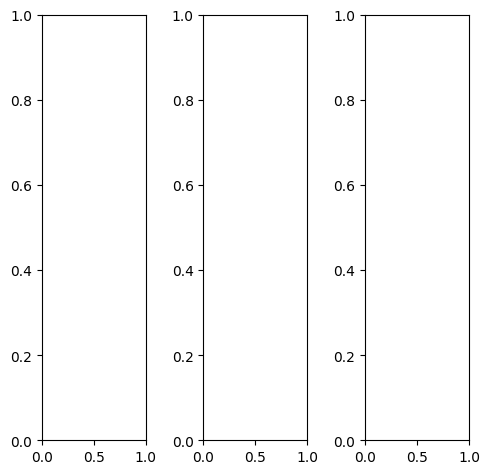

tensor([[[0.7922, 0.7451, 0.8392,  ..., 0.9686, 0.9725, 0.9725],
         [0.8196, 0.8196, 0.8745,  ..., 0.9725, 0.9765, 0.9804],
         [0.8549, 0.8745, 0.8627,  ..., 0.9765, 0.9725, 0.9765],
         ...,
         [0.6784, 0.6588, 0.7412,  ..., 0.8549, 0.8627, 0.8667],
         [0.6902, 0.7059, 0.7490,  ..., 0.8431, 0.8510, 0.8549],
         [0.6941, 0.7137, 0.7333,  ..., 0.7765, 0.8039, 0.8078]],

        [[0.7922, 0.7451, 0.8392,  ..., 0.9686, 0.9725, 0.9725],
         [0.8196, 0.8196, 0.8745,  ..., 0.9725, 0.9765, 0.9804],
         [0.8549, 0.8745, 0.8627,  ..., 0.9765, 0.9725, 0.9765],
         ...,
         [0.6784, 0.6588, 0.7412,  ..., 0.8549, 0.8627, 0.8667],
         [0.6902, 0.7059, 0.7490,  ..., 0.8431, 0.8510, 0.8549],
         [0.6941, 0.7137, 0.7333,  ..., 0.7765, 0.8039, 0.8078]],

        [[0.7922, 0.7451, 0.8392,  ..., 0.9686, 0.9725, 0.9725],
         [0.8196, 0.8196, 0.8745,  ..., 0.9725, 0.9765, 0.9804],
         [0.8549, 0.8745, 0.8627,  ..., 0.9765, 0.9725, 0.

tensor([[[0.8784, 0.8314, 0.8902,  ..., 0.9647, 0.9686, 0.9686],
         [0.8667, 0.8745, 0.9176,  ..., 0.9686, 0.9725, 0.9765],
         [0.8745, 0.8980, 0.8941,  ..., 0.9725, 0.9686, 0.9725],
         ...,
         [0.7373, 0.7137, 0.7922,  ..., 0.8588, 0.8627, 0.8706],
         [0.7412, 0.7412, 0.7804,  ..., 0.8588, 0.8627, 0.8667],
         [0.7412, 0.7373, 0.7569,  ..., 0.7922, 0.8196, 0.8235]],

        [[0.7765, 0.7333, 0.8353,  ..., 0.9725, 0.9765, 0.9765],
         [0.8157, 0.8157, 0.8706,  ..., 0.9765, 0.9804, 0.9843],
         [0.8627, 0.8824, 0.8627,  ..., 0.9804, 0.9765, 0.9804],
         ...,
         [0.6784, 0.6588, 0.7412,  ..., 0.8667, 0.8706, 0.8745],
         [0.6902, 0.7137, 0.7529,  ..., 0.8549, 0.8588, 0.8627],
         [0.6980, 0.7255, 0.7412,  ..., 0.7882, 0.8118, 0.8157]],

        [[0.6431, 0.5765, 0.7216,  ..., 0.9608, 0.9647, 0.9647],
         [0.7020, 0.6863, 0.7765,  ..., 0.9647, 0.9686, 0.9725],
         [0.7686, 0.7765, 0.7804,  ..., 0.9686, 0.9647, 0.

tensor([[[0.7756, 0.7630, 0.8530,  ..., 0.9721, 0.9709, 0.9369],
         [0.8323, 0.8299, 0.8939,  ..., 0.9867, 0.9937, 0.9675],
         [0.8688, 0.8935, 0.8766,  ..., 0.9955, 0.9967, 0.9914],
         ...,
         [0.7054, 0.6935, 0.7730,  ..., 0.8659, 0.8699, 0.8694],
         [0.7073, 0.7431, 0.7713,  ..., 0.8520, 0.8538, 0.8658],
         [0.7129, 0.7458, 0.7629,  ..., 0.8015, 0.8293, 0.8228]],

        [[0.7827, 0.7534, 0.8621,  ..., 0.9726, 0.9594, 0.9581],
         [0.8314, 0.8296, 0.8911,  ..., 0.9965, 0.9813, 0.9778],
         [0.8721, 0.8963, 0.8801,  ..., 1.0003, 0.9941, 0.9880],
         ...,
         [0.6844, 0.6777, 0.7522,  ..., 0.8617, 0.8763, 0.8830],
         [0.6981, 0.7151, 0.7523,  ..., 0.8466, 0.8477, 0.8666],
         [0.6931, 0.7247, 0.7412,  ..., 0.7935, 0.8146, 0.7963]],

        [[0.7514, 0.7367, 0.8251,  ..., 0.9594, 0.9496, 0.9327],
         [0.7981, 0.8037, 0.8502,  ..., 0.9752, 0.9717, 0.9560],
         [0.8371, 0.8538, 0.8395,  ..., 0.9815, 0.9686, 0.

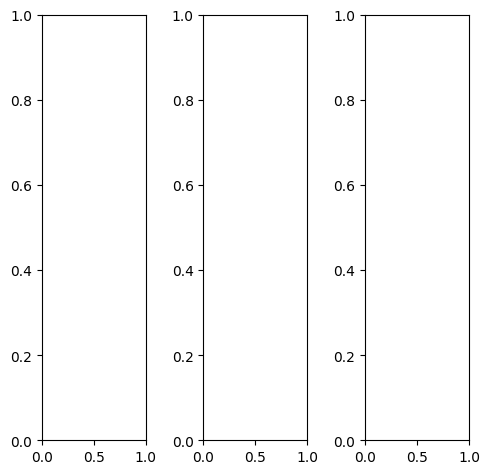

EPOCH: 13.255  trn_loss: 0.005  (1573.09s - 10294.70s remaining)

tensor([[[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.6235],
         ...,
         [0.5529, 0.5569, 0.5686,  ..., 0.2588, 0.2118, 0.2235],
         [0.5098, 0.5098, 0.5098,  ..., 0.4941, 0.4667, 0.3843],
         [0.5059, 0.5059, 0.4980,  ..., 0.5098, 0.4863, 0.4784]],

        [[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.6235],
         ...,
         [0.5529, 0.5569, 0.5686,  ..., 0.2588, 0.2118, 0.2235],
         [0.5098, 0.5098, 0.5098,  ..., 0.4941, 0.4667, 0.3843],
         [0.5059, 0.5059, 0.4980,  ..., 0.5098, 0.4863, 0.4784]],

        [[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.

tensor([[[0.3098, 0.2863, 0.2627,  ..., 0.2431, 0.2392, 0.2824],
         [0.2510, 0.3137, 0.2902,  ..., 0.2627, 0.2588, 0.2941],
         [0.2000, 0.2745, 0.3176,  ..., 0.2824, 0.2824, 0.3020],
         ...,
         [0.5333, 0.5373, 0.5451,  ..., 0.2314, 0.1765, 0.1882],
         [0.4863, 0.4863, 0.4863,  ..., 0.4667, 0.4314, 0.3451],
         [0.4824, 0.4824, 0.4745,  ..., 0.4784, 0.4510, 0.4353]],

        [[0.7216, 0.7373, 0.7412,  ..., 0.7333, 0.7373, 0.7255],
         [0.5765, 0.7176, 0.7412,  ..., 0.7373, 0.7412, 0.7216],
         [0.4588, 0.6431, 0.7569,  ..., 0.7451, 0.7529, 0.7294],
         ...,
         [0.5608, 0.5647, 0.5765,  ..., 0.2745, 0.2353, 0.2471],
         [0.5137, 0.5137, 0.5176,  ..., 0.5098, 0.4902, 0.4118],
         [0.5098, 0.5098, 0.5020,  ..., 0.5255, 0.5098, 0.5098]],

        [[0.8980, 0.9333, 0.9451,  ..., 0.9255, 0.9294, 0.9098],
         [0.6863, 0.8784, 0.9255,  ..., 0.9294, 0.9333, 0.9059],
         [0.5137, 0.7765, 0.9294,  ..., 0.9412, 0.9529, 0.

tensor([[[0.6839, 0.6569, 0.6838,  ..., 0.5498, 0.5533, 0.6257],
         [0.4835, 0.5547, 0.6192,  ..., 0.5902, 0.5997, 0.5991],
         [0.2990, 0.5774, 0.6411,  ..., 0.6429, 0.6700, 0.6185],
         ...,
         [0.6456, 0.6561, 0.6766,  ..., 0.2062, 0.1607, 0.1943],
         [0.5783, 0.5808, 0.5590,  ..., 0.5088, 0.4735, 0.3749],
         [0.5674, 0.5706, 0.5411,  ..., 0.5834, 0.5339, 0.4935]],

        [[0.7266, 0.7448, 0.6957,  ..., 0.6536, 0.6744, 0.6900],
         [0.5156, 0.6640, 0.6448,  ..., 0.7043, 0.6966, 0.7273],
         [0.4129, 0.6309, 0.6945,  ..., 0.7563, 0.7552, 0.7292],
         ...,
         [0.5933, 0.6147, 0.6582,  ..., 0.2431, 0.1883, 0.1487],
         [0.5260, 0.5317, 0.5539,  ..., 0.5261, 0.4923, 0.3448],
         [0.5156, 0.5227, 0.5200,  ..., 0.5441, 0.5142, 0.4417]],

        [[0.8075, 0.8056, 0.8510,  ..., 0.8618, 0.8659, 0.8571],
         [0.6591, 0.7973, 0.8375,  ..., 0.8891, 0.9124, 0.8680],
         [0.5249, 0.6306, 0.8660,  ..., 0.9397, 0.9582, 0.

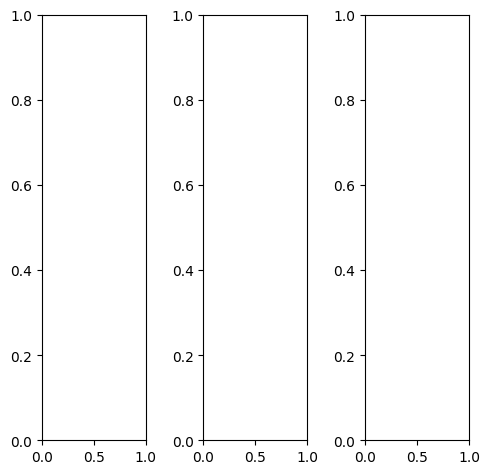

tensor([[[0.8549, 0.8588, 0.8627,  ..., 0.8863, 0.8902, 0.8902],
         [0.8314, 0.8314, 0.8431,  ..., 0.8706, 0.8745, 0.8784],
         [0.8235, 0.8471, 0.8510,  ..., 0.8784, 0.8980, 0.9059],
         ...,
         [0.3176, 0.2627, 0.3059,  ..., 0.8706, 0.8902, 0.8863],
         [0.2824, 0.2706, 0.4471,  ..., 0.8863, 0.8863, 0.8863],
         [0.2471, 0.3412, 0.5961,  ..., 0.8784, 0.8824, 0.8941]],

        [[0.8549, 0.8588, 0.8627,  ..., 0.8863, 0.8902, 0.8902],
         [0.8314, 0.8314, 0.8431,  ..., 0.8706, 0.8745, 0.8784],
         [0.8235, 0.8471, 0.8510,  ..., 0.8784, 0.8980, 0.9059],
         ...,
         [0.3176, 0.2627, 0.3059,  ..., 0.8706, 0.8902, 0.8863],
         [0.2824, 0.2706, 0.4471,  ..., 0.8863, 0.8863, 0.8863],
         [0.2471, 0.3412, 0.5961,  ..., 0.8784, 0.8824, 0.8941]],

        [[0.8549, 0.8588, 0.8627,  ..., 0.8863, 0.8902, 0.8902],
         [0.8314, 0.8314, 0.8431,  ..., 0.8706, 0.8745, 0.8784],
         [0.8235, 0.8471, 0.8510,  ..., 0.8784, 0.8980, 0.

tensor([[[0.8235, 0.8275, 0.8314,  ..., 0.8549, 0.8588, 0.8588],
         [0.8000, 0.8000, 0.8078,  ..., 0.8392, 0.8431, 0.8471],
         [0.7922, 0.8157, 0.8196,  ..., 0.8510, 0.8667, 0.8745],
         ...,
         [0.4588, 0.3804, 0.3882,  ..., 0.8549, 0.8667, 0.8667],
         [0.4235, 0.3725, 0.4980,  ..., 0.8588, 0.8588, 0.8588],
         [0.3725, 0.4235, 0.6275,  ..., 0.8510, 0.8549, 0.8667]],

        [[0.8549, 0.8549, 0.8627,  ..., 0.8863, 0.8902, 0.8902],
         [0.8275, 0.8235, 0.8392,  ..., 0.8706, 0.8745, 0.8784],
         [0.8196, 0.8431, 0.8471,  ..., 0.8784, 0.8980, 0.9059],
         ...,
         [0.2745, 0.2275, 0.2784,  ..., 0.8667, 0.8863, 0.8824],
         [0.2392, 0.2392, 0.4275,  ..., 0.8824, 0.8824, 0.8824],
         [0.2078, 0.3176, 0.5843,  ..., 0.8784, 0.8824, 0.8941]],

        [[0.9529, 0.9608, 0.9529,  ..., 0.9608, 0.9647, 0.9647],
         [0.9373, 0.9412, 0.9412,  ..., 0.9529, 0.9569, 0.9608],
         [0.9255, 0.9529, 0.9490,  ..., 0.9608, 0.9765, 0.

tensor([[[0.7727, 0.6740, 0.6796,  ..., 0.6105, 0.6226, 0.6903],
         [0.6954, 0.6312, 0.5758,  ..., 0.5638, 0.5920, 0.6578],
         [0.6751, 0.7106, 0.5607,  ..., 0.6000, 0.6314, 0.6725],
         ...,
         [0.1907, 0.1451, 0.1917,  ..., 0.7133, 0.7158, 0.7444],
         [0.1765, 0.1581, 0.3216,  ..., 0.7177, 0.7085, 0.7631],
         [0.1956, 0.2378, 0.4739,  ..., 0.7841, 0.8005, 0.7877]],

        [[0.7575, 0.7952, 0.6648,  ..., 0.6890, 0.7267, 0.7414],
         [0.7183, 0.7191, 0.6638,  ..., 0.6736, 0.6807, 0.7550],
         [0.7355, 0.8046, 0.6478,  ..., 0.7022, 0.7083, 0.7505],
         ...,
         [0.2154, 0.1491, 0.1941,  ..., 0.6945, 0.7088, 0.7258],
         [0.1832, 0.1594, 0.3231,  ..., 0.6986, 0.7003, 0.7321],
         [0.1849, 0.2127, 0.4611,  ..., 0.7333, 0.7512, 0.7402]],

        [[0.8820, 0.8232, 0.8809,  ..., 0.8724, 0.8940, 0.8883],
         [0.8768, 0.8366, 0.8289,  ..., 0.8345, 0.8738, 0.8814],
         [0.8346, 0.7828, 0.8196,  ..., 0.8637, 0.9077, 0.

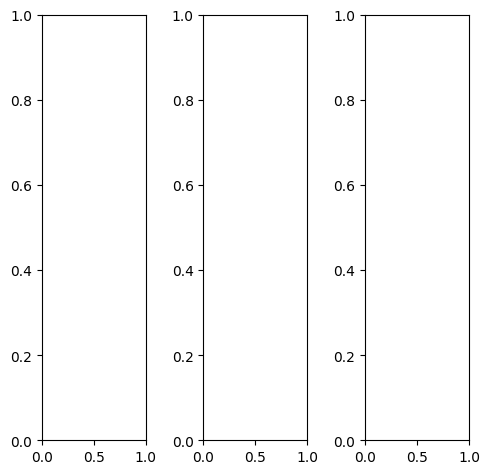

tensor([[[0.6941, 0.6863, 0.6863,  ..., 0.6863, 0.6863, 0.6863],
         [0.6980, 0.6902, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         [0.6980, 0.6863, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         ...,
         [0.6980, 0.6863, 0.6902,  ..., 0.7059, 0.7176, 0.7137],
         [0.6980, 0.6902, 0.6902,  ..., 0.7059, 0.7059, 0.7176],
         [0.6941, 0.6863, 0.6863,  ..., 0.7020, 0.6941, 0.7098]],

        [[0.6941, 0.6863, 0.6863,  ..., 0.6863, 0.6863, 0.6863],
         [0.6980, 0.6902, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         [0.6980, 0.6863, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         ...,
         [0.6980, 0.6863, 0.6902,  ..., 0.7059, 0.7176, 0.7137],
         [0.6980, 0.6902, 0.6902,  ..., 0.7059, 0.7059, 0.7176],
         [0.6941, 0.6863, 0.6863,  ..., 0.7020, 0.6941, 0.7098]],

        [[0.6941, 0.6863, 0.6863,  ..., 0.6863, 0.6863, 0.6863],
         [0.6980, 0.6902, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         [0.6980, 0.6863, 0.6902,  ..., 0.6902, 0.6902, 0.

tensor([[[0.6549, 0.6471, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6471, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         ...,
         [0.6588, 0.6471, 0.6510,  ..., 0.6784, 0.6902, 0.6863],
         [0.6588, 0.6510, 0.6510,  ..., 0.6745, 0.6784, 0.6902],
         [0.6549, 0.6471, 0.6471,  ..., 0.6706, 0.6627, 0.6784]],

        [[0.6941, 0.6863, 0.6863,  ..., 0.6863, 0.6863, 0.6863],
         [0.6980, 0.6902, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         [0.6980, 0.6863, 0.6902,  ..., 0.6902, 0.6902, 0.6902],
         ...,
         [0.6980, 0.6863, 0.6902,  ..., 0.7059, 0.7176, 0.7137],
         [0.6980, 0.6902, 0.6902,  ..., 0.7059, 0.7059, 0.7176],
         [0.6941, 0.6863, 0.6863,  ..., 0.6980, 0.6941, 0.7098]],

        [[0.7961, 0.7843, 0.7843,  ..., 0.7843, 0.7843, 0.7843],
         [0.8000, 0.7882, 0.7882,  ..., 0.7882, 0.7882, 0.7882],
         [0.7961, 0.7843, 0.7882,  ..., 0.7882, 0.7882, 0.

tensor([[[0.2884, 0.1639, 0.1055,  ..., 0.1436, 0.1823, 0.1657],
         [0.2506, 0.1329, 0.0671,  ..., 0.1823, 0.1885, 0.1404],
         [0.1714, 0.1191, 0.0701,  ..., 0.1962, 0.2250, 0.1679],
         ...,
         [0.3256, 0.3703, 0.2903,  ..., 0.3704, 0.3433, 0.2528],
         [0.3478, 0.3499, 0.3438,  ..., 0.3091, 0.2773, 0.2767],
         [0.3136, 0.2823, 0.2591,  ..., 0.2640, 0.2652, 0.2752]],

        [[0.3992, 0.3263, 0.3175,  ..., 0.2781, 0.3379, 0.2547],
         [0.3105, 0.3496, 0.1954,  ..., 0.3384, 0.3843, 0.2552],
         [0.3030, 0.3707, 0.2994,  ..., 0.3216, 0.3812, 0.2456],
         ...,
         [0.3009, 0.3479, 0.3345,  ..., 0.4079, 0.4308, 0.2478],
         [0.3201, 0.3539, 0.3707,  ..., 0.4013, 0.3817, 0.2990],
         [0.2752, 0.2696, 0.2629,  ..., 0.2873, 0.3077, 0.2550]],

        [[0.5710, 0.3300, 0.4461,  ..., 0.3886, 0.4310, 0.3940],
         [0.5297, 0.4765, 0.3799,  ..., 0.4499, 0.4733, 0.3894],
         [0.5136, 0.4196, 0.5115,  ..., 0.4440, 0.4695, 0.

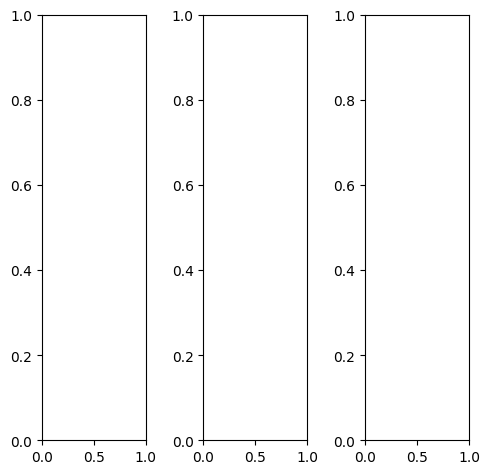

tensor([[[0.1804, 0.1490, 0.1608,  ..., 0.3608, 0.4118, 0.4588],
         [0.2118, 0.2000, 0.1961,  ..., 0.4039, 0.4980, 0.3647],
         [0.2314, 0.2353, 0.2078,  ..., 0.3255, 0.4471, 0.3608],
         ...,
         [0.3333, 0.3098, 0.2824,  ..., 0.4196, 0.4431, 0.4588],
         [0.2745, 0.2902, 0.3451,  ..., 0.4588, 0.4549, 0.4706],
         [0.2745, 0.2941, 0.3412,  ..., 0.4980, 0.4941, 0.4784]],

        [[0.1804, 0.1490, 0.1608,  ..., 0.3608, 0.4118, 0.4588],
         [0.2118, 0.2000, 0.1961,  ..., 0.4039, 0.4980, 0.3647],
         [0.2314, 0.2353, 0.2078,  ..., 0.3255, 0.4471, 0.3608],
         ...,
         [0.3333, 0.3098, 0.2824,  ..., 0.4196, 0.4431, 0.4588],
         [0.2745, 0.2902, 0.3451,  ..., 0.4588, 0.4549, 0.4706],
         [0.2745, 0.2941, 0.3412,  ..., 0.4980, 0.4941, 0.4784]],

        [[0.1804, 0.1490, 0.1608,  ..., 0.3608, 0.4118, 0.4588],
         [0.2118, 0.2000, 0.1961,  ..., 0.4039, 0.4980, 0.3647],
         [0.2314, 0.2353, 0.2078,  ..., 0.3255, 0.4471, 0.

tensor([[[0.1922, 0.1608, 0.1725,  ..., 0.3490, 0.3961, 0.4431],
         [0.2235, 0.2118, 0.2078,  ..., 0.4118, 0.5059, 0.3686],
         [0.2431, 0.2471, 0.2196,  ..., 0.3490, 0.4627, 0.3765],
         ...,
         [0.3725, 0.3412, 0.3059,  ..., 0.4863, 0.4980, 0.5020],
         [0.3137, 0.3255, 0.3725,  ..., 0.5294, 0.5137, 0.5176],
         [0.3059, 0.3294, 0.3804,  ..., 0.5647, 0.5569, 0.5333]],

        [[0.1843, 0.1490, 0.1608,  ..., 0.3804, 0.4314, 0.4784],
         [0.2157, 0.2039, 0.2000,  ..., 0.4157, 0.5098, 0.3765],
         [0.2353, 0.2431, 0.2157,  ..., 0.3294, 0.4510, 0.3647],
         ...,
         [0.3333, 0.3137, 0.2902,  ..., 0.4196, 0.4431, 0.4627],
         [0.2784, 0.2941, 0.3490,  ..., 0.4588, 0.4549, 0.4745],
         [0.2784, 0.2941, 0.3412,  ..., 0.4980, 0.4941, 0.4784]],

        [[0.1451, 0.1176, 0.1333,  ..., 0.2902, 0.3451, 0.3882],
         [0.1647, 0.1529, 0.1412,  ..., 0.3294, 0.4196, 0.2863],
         [0.1843, 0.1804, 0.1412,  ..., 0.2510, 0.3686, 0.

tensor([[[ 8.7991e-02,  6.7229e-03, -4.1837e-02,  ...,  3.6066e-01,
           3.9716e-01,  4.6328e-01],
         [ 1.3196e-01, -8.9655e-03,  4.5720e-02,  ...,  3.9251e-01,
           4.8108e-01,  3.6267e-01],
         [ 6.3834e-04,  5.9943e-02, -7.3554e-02,  ...,  3.1932e-01,
           4.5388e-01,  3.6127e-01],
         ...,
         [ 3.9275e-01,  4.0617e-01,  3.7660e-01,  ...,  4.7377e-01,
           4.8786e-01,  5.2189e-01],
         [ 3.3699e-01,  3.8356e-01,  4.5715e-01,  ...,  5.0932e-01,
           4.9594e-01,  5.3870e-01],
         [ 3.3619e-01,  3.4973e-01,  3.8473e-01,  ...,  5.6441e-01,
           5.6750e-01,  5.5442e-01]],

        [[ 1.3660e-01,  1.3836e-01,  7.8394e-02,  ...,  3.8743e-01,
           4.4840e-01,  4.7430e-01],
         [ 1.5077e-01,  1.2308e-02, -2.9436e-02,  ...,  4.4519e-01,
           5.4860e-01,  3.7694e-01],
         [ 1.3509e-01,  2.1268e-01,  3.4242e-02,  ...,  3.7273e-01,
           5.1021e-01,  3.6934e-01],
         ...,
         [ 3.6114e-01,  3

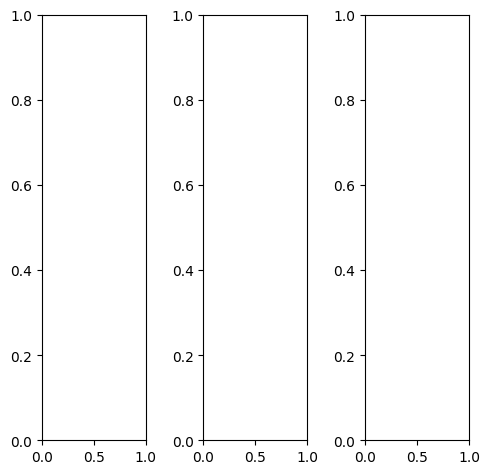

tensor([[[0.5216, 0.5059, 0.2196,  ..., 0.8980, 0.8353, 0.7647],
         [0.5529, 0.5255, 0.2235,  ..., 0.9765, 0.9608, 0.9490],
         [0.5843, 0.5373, 0.2275,  ..., 0.9412, 0.9020, 0.8980],
         ...,
         [0.4549, 0.4627, 0.4627,  ..., 0.5569, 0.5569, 0.5569],
         [0.4667, 0.4745, 0.4784,  ..., 0.4627, 0.4471, 0.4275],
         [0.4588, 0.4588, 0.4588,  ..., 0.4510, 0.4314, 0.4118]],

        [[0.5216, 0.5059, 0.2196,  ..., 0.8980, 0.8353, 0.7647],
         [0.5529, 0.5255, 0.2235,  ..., 0.9765, 0.9608, 0.9490],
         [0.5843, 0.5373, 0.2275,  ..., 0.9412, 0.9020, 0.8980],
         ...,
         [0.4549, 0.4627, 0.4627,  ..., 0.5569, 0.5569, 0.5569],
         [0.4667, 0.4745, 0.4784,  ..., 0.4627, 0.4471, 0.4275],
         [0.4588, 0.4588, 0.4588,  ..., 0.4510, 0.4314, 0.4118]],

        [[0.5216, 0.5059, 0.2196,  ..., 0.8980, 0.8353, 0.7647],
         [0.5529, 0.5255, 0.2235,  ..., 0.9765, 0.9608, 0.9490],
         [0.5843, 0.5373, 0.2275,  ..., 0.9412, 0.9020, 0.

tensor([[[0.6980, 0.6863, 0.2824,  ..., 0.9451, 0.9098, 0.8471],
         [0.7373, 0.7059, 0.2863,  ..., 0.9765, 0.9490, 0.9412],
         [0.7765, 0.7216, 0.2902,  ..., 0.9412, 0.8784, 0.8863],
         ...,
         [0.5686, 0.5765, 0.5804,  ..., 0.6667, 0.6627, 0.6627],
         [0.5765, 0.5843, 0.5882,  ..., 0.5686, 0.5490, 0.5333],
         [0.5608, 0.5686, 0.5686,  ..., 0.5529, 0.5255, 0.5020]],

        [[0.5059, 0.4863, 0.2118,  ..., 0.8902, 0.8157, 0.7412],
         [0.5412, 0.5098, 0.2157,  ..., 0.9882, 0.9608, 0.9490],
         [0.5725, 0.5216, 0.2157,  ..., 0.9608, 0.9059, 0.9020],
         ...,
         [0.4471, 0.4549, 0.4549,  ..., 0.5608, 0.5608, 0.5608],
         [0.4627, 0.4706, 0.4706,  ..., 0.4588, 0.4471, 0.4275],
         [0.4549, 0.4549, 0.4510,  ..., 0.4471, 0.4353, 0.4118]],

        [[0.1255, 0.1333, 0.0980,  ..., 0.8078, 0.7529, 0.6549],
         [0.1294, 0.1373, 0.1020,  ..., 0.9216, 0.9961, 0.9569],
         [0.1333, 0.1373, 0.1098,  ..., 0.8431, 0.9412, 0.

tensor([[[ 0.4681,  0.3220, -0.0126,  ...,  0.7623,  0.6571,  0.6911],
         [ 0.4041,  0.3583,  0.0639,  ...,  0.8535,  0.8420,  0.7948],
         [ 0.4367,  0.3000, -0.1152,  ...,  0.8327,  0.8160,  0.7925],
         ...,
         [ 0.3962,  0.3945,  0.4051,  ...,  0.5346,  0.5274,  0.5446],
         [ 0.3800,  0.3837,  0.3819,  ...,  0.4291,  0.4133,  0.3898],
         [ 0.3985,  0.3835,  0.3632,  ...,  0.4156,  0.4028,  0.4141]],

        [[ 0.4499,  0.4663,  0.1005,  ...,  0.8298,  0.7491,  0.7587],
         [ 0.4797,  0.4747,  0.0511,  ...,  0.9336,  0.8975,  0.9071],
         [ 0.5059,  0.5319,  0.0428,  ...,  0.9002,  0.8627,  0.8646],
         ...,
         [ 0.4119,  0.4117,  0.4466,  ...,  0.5497,  0.5445,  0.5185],
         [ 0.4079,  0.4245,  0.4506,  ...,  0.4613,  0.4405,  0.3873],
         [ 0.4156,  0.3957,  0.4243,  ...,  0.4202,  0.4039,  0.3966]],

        [[ 0.6484,  0.4870,  0.3305,  ...,  0.9715,  0.8922,  0.8716],
         [ 0.6651,  0.6524,  0.2999,  ...,  1

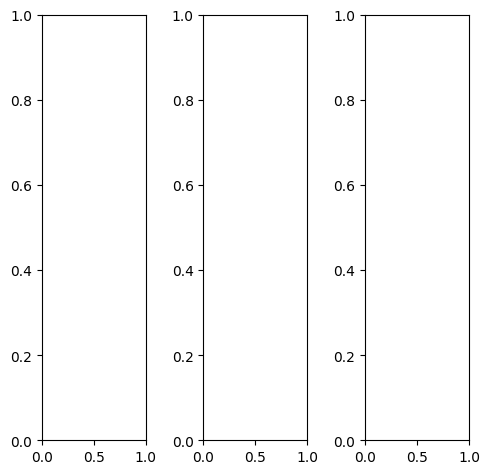

EPOCH: 13.510  trn_loss: 0.005  (1602.62s - 10259.66s remaining)

tensor([[[0.2627, 0.1529, 0.3137,  ..., 0.7216, 0.6275, 0.5922],
         [0.4431, 0.2627, 0.3216,  ..., 0.6863, 0.7020, 0.7373],
         [0.3961, 0.3020, 0.3765,  ..., 0.9059, 0.9333, 0.9373],
         ...,
         [0.5020, 0.5333, 0.5529,  ..., 0.8039, 0.8431, 0.8706],
         [0.5176, 0.5333, 0.5333,  ..., 0.5647, 0.6157, 0.6549],
         [0.5373, 0.5294, 0.5098,  ..., 0.5176, 0.4980, 0.4980]],

        [[0.2627, 0.1529, 0.3137,  ..., 0.7216, 0.6275, 0.5922],
         [0.4431, 0.2627, 0.3216,  ..., 0.6863, 0.7020, 0.7373],
         [0.3961, 0.3020, 0.3765,  ..., 0.9059, 0.9333, 0.9373],
         ...,
         [0.5020, 0.5333, 0.5529,  ..., 0.8039, 0.8431, 0.8706],
         [0.5176, 0.5333, 0.5333,  ..., 0.5647, 0.6157, 0.6549],
         [0.5373, 0.5294, 0.5098,  ..., 0.5176, 0.4980, 0.4980]],

        [[0.2627, 0.1529, 0.3137,  ..., 0.7216, 0.6275, 0.5922],
         [0.4431, 0.2627, 0.3216,  ..., 0.6863, 0.7020, 0.7373],
         [0.3961, 0.3020, 0.3765,  ..., 0.9059, 0.9333, 0.

tensor([[[0.2824, 0.1529, 0.3529,  ..., 0.7529, 0.6588, 0.6078],
         [0.4588, 0.2588, 0.3490,  ..., 0.7294, 0.7451, 0.7647],
         [0.4118, 0.3020, 0.3843,  ..., 0.9333, 0.9569, 0.9490],
         ...,
         [0.4078, 0.4392, 0.4627,  ..., 0.7843, 0.8235, 0.8510],
         [0.4235, 0.4392, 0.4392,  ..., 0.5294, 0.5765, 0.6157],
         [0.4431, 0.4353, 0.4196,  ..., 0.4902, 0.4667, 0.4588]],

        [[0.2667, 0.1529, 0.2980,  ..., 0.7608, 0.6549, 0.6000],
         [0.4471, 0.2549, 0.3098,  ..., 0.6941, 0.7020, 0.7294],
         [0.3922, 0.2980, 0.3765,  ..., 0.9176, 0.9490, 0.9569],
         ...,
         [0.5843, 0.6118, 0.6353,  ..., 0.8118, 0.8510, 0.8745],
         [0.6000, 0.6118, 0.6157,  ..., 0.6039, 0.6471, 0.6863],
         [0.6196, 0.6078, 0.5882,  ..., 0.5608, 0.5412, 0.5412]],

        [[0.2000, 0.1490, 0.2863,  ..., 0.4392, 0.4157, 0.5176],
         [0.3686, 0.2980, 0.3255,  ..., 0.5333, 0.5843, 0.6941],
         [0.3765, 0.3373, 0.3412,  ..., 0.7647, 0.7804, 0.

tensor([[[0.1855, 0.0527, 0.1063,  ..., 0.5451, 0.4617, 0.5437],
         [0.3120, 0.0220, 0.0722,  ..., 0.4361, 0.4607, 0.6034],
         [0.2249, 0.1217, 0.0857,  ..., 0.6375, 0.6787, 0.7479],
         ...,
         [0.4904, 0.5484, 0.5236,  ..., 0.7377, 0.7693, 0.8313],
         [0.5150, 0.5263, 0.5079,  ..., 0.5311, 0.5812, 0.6626],
         [0.5735, 0.5572, 0.5124,  ..., 0.5374, 0.5197, 0.5485]],

        [[0.2307, 0.2269, 0.1632,  ..., 0.6272, 0.5542, 0.5715],
         [0.3735, 0.1776, 0.0937,  ..., 0.5544, 0.5709, 0.7077],
         [0.3215, 0.2903, 0.1849,  ..., 0.7294, 0.7592, 0.8358],
         ...,
         [0.4696, 0.5153, 0.5355,  ..., 0.6439, 0.7015, 0.7808],
         [0.4820, 0.5033, 0.5263,  ..., 0.4785, 0.5231, 0.6018],
         [0.5322, 0.5143, 0.5111,  ..., 0.4846, 0.4719, 0.5003]],

        [[0.3900, 0.1455, 0.3717,  ..., 0.8511, 0.7660, 0.7693],
         [0.5446, 0.2604, 0.3981,  ..., 0.7832, 0.8098, 0.8762],
         [0.4601, 0.3423, 0.4340,  ..., 0.9668, 1.0293, 1.

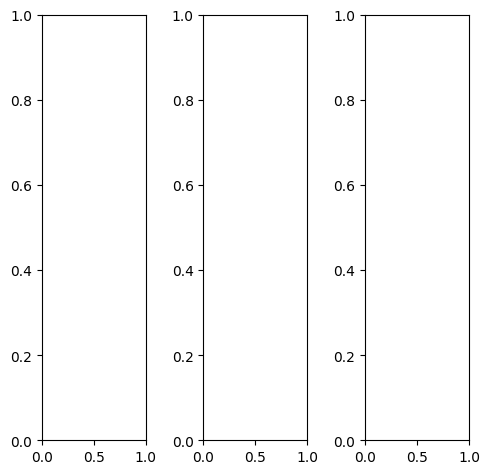

tensor([[[0.1059, 0.1373, 0.1451,  ..., 0.1020, 0.1176, 0.0588],
         [0.1647, 0.1608, 0.1137,  ..., 0.1176, 0.0941, 0.0549],
         [0.1569, 0.1216, 0.1098,  ..., 0.0863, 0.0706, 0.0627],
         ...,
         [0.3686, 0.2824, 0.3608,  ..., 0.2510, 0.2431, 0.2471],
         [0.3490, 0.2706, 0.2392,  ..., 0.2667, 0.2431, 0.2667],
         [0.3569, 0.3373, 0.2745,  ..., 0.2667, 0.2314, 0.2588]],

        [[0.1059, 0.1373, 0.1451,  ..., 0.1020, 0.1176, 0.0588],
         [0.1647, 0.1608, 0.1137,  ..., 0.1176, 0.0941, 0.0549],
         [0.1569, 0.1216, 0.1098,  ..., 0.0863, 0.0706, 0.0627],
         ...,
         [0.3686, 0.2824, 0.3608,  ..., 0.2510, 0.2431, 0.2471],
         [0.3490, 0.2706, 0.2392,  ..., 0.2667, 0.2431, 0.2667],
         [0.3569, 0.3373, 0.2745,  ..., 0.2667, 0.2314, 0.2588]],

        [[0.1059, 0.1373, 0.1451,  ..., 0.1020, 0.1176, 0.0588],
         [0.1647, 0.1608, 0.1137,  ..., 0.1176, 0.0941, 0.0549],
         [0.1569, 0.1216, 0.1098,  ..., 0.0863, 0.0706, 0.

tensor([[[0.0941, 0.1255, 0.1333,  ..., 0.0902, 0.1059, 0.0431],
         [0.1529, 0.1490, 0.1020,  ..., 0.1059, 0.0824, 0.0431],
         [0.1451, 0.1098, 0.0980,  ..., 0.0745, 0.0588, 0.0510],
         ...,
         [0.5137, 0.3922, 0.4392,  ..., 0.2549, 0.2471, 0.2510],
         [0.4549, 0.3412, 0.2824,  ..., 0.2667, 0.2431, 0.2667],
         [0.4118, 0.3686, 0.2863,  ..., 0.2627, 0.2314, 0.2549]],

        [[0.1137, 0.1451, 0.1529,  ..., 0.1098, 0.1255, 0.0667],
         [0.1725, 0.1686, 0.1216,  ..., 0.1255, 0.1020, 0.0627],
         [0.1647, 0.1294, 0.1176,  ..., 0.0941, 0.0784, 0.0706],
         ...,
         [0.3216, 0.2471, 0.3373,  ..., 0.2510, 0.2431, 0.2510],
         [0.3176, 0.2510, 0.2314,  ..., 0.2667, 0.2431, 0.2706],
         [0.3451, 0.3333, 0.2784,  ..., 0.2667, 0.2353, 0.2627]],

        [[0.0863, 0.1176, 0.1255,  ..., 0.0863, 0.1020, 0.0431],
         [0.1451, 0.1412, 0.0941,  ..., 0.1020, 0.0784, 0.0431],
         [0.1373, 0.1020, 0.0902,  ..., 0.0706, 0.0549, 0.

tensor([[[ 0.2009,  0.1509,  0.1120,  ...,  0.1496,  0.1846,  0.1603],
         [ 0.2264,  0.1398,  0.1068,  ...,  0.1619,  0.1156,  0.1037],
         [ 0.1443,  0.0472, -0.0586,  ...,  0.0839,  0.0572,  0.0836],
         ...,
         [ 0.7768,  0.6374,  0.7700,  ...,  0.5575,  0.5555,  0.5592],
         [ 0.7077,  0.5678,  0.5183,  ...,  0.5774,  0.5343,  0.5740],
         [ 0.6989,  0.7027,  0.5945,  ...,  0.5767,  0.5077,  0.5583]],

        [[ 0.2018,  0.3090,  0.1736,  ...,  0.2038,  0.2248,  0.1951],
         [ 0.3019,  0.2558,  0.0658,  ...,  0.2439,  0.2097,  0.1504],
         [ 0.2256,  0.2787,  0.0580,  ...,  0.1562,  0.1293,  0.1426],
         ...,
         [ 0.7343,  0.6109,  0.7442,  ...,  0.5762,  0.5622,  0.5239],
         [ 0.6909,  0.5526,  0.5161,  ...,  0.5851,  0.5447,  0.5559],
         [ 0.6713,  0.6701,  0.5859,  ...,  0.5549,  0.5034,  0.5279]],

        [[ 0.4059,  0.2803,  0.3718,  ...,  0.3349,  0.3712,  0.3264],
         [ 0.4607,  0.3856,  0.3290,  ...,  0

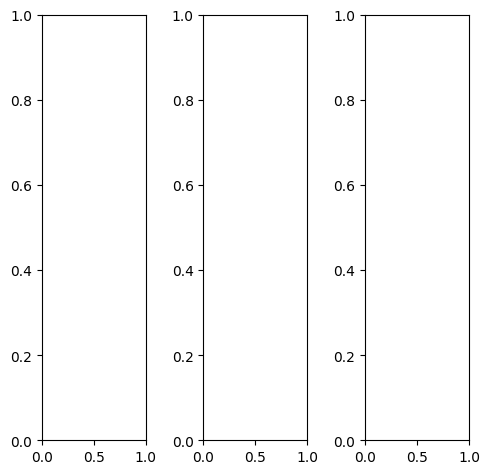

tensor([[[1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9882,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9882,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0000, 0.9882, 0.9882,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9843,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9961, 0.9765, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9922,  ..., 1.0000, 1.0000, 1.

tensor([[[0.7394, 0.6496, 0.6708,  ..., 0.5764, 0.5780, 0.6364],
         [0.7054, 0.6252, 0.6331,  ..., 0.6117, 0.6102, 0.6096],
         [0.6942, 0.7424, 0.6306,  ..., 0.6658, 0.6608, 0.6171],
         ...,
         [0.7587, 0.8413, 0.8550,  ..., 0.8062, 0.7776, 0.7314],
         [0.7502, 0.7786, 0.8008,  ..., 0.7699, 0.7500, 0.7422],
         [0.7262, 0.7417, 0.7471,  ..., 0.7633, 0.7666, 0.7445]],

        [[0.7565, 0.7638, 0.6678,  ..., 0.6840, 0.7082, 0.7076],
         [0.7118, 0.7264, 0.6967,  ..., 0.7358, 0.7175, 0.7477],
         [0.7309, 0.8141, 0.6789,  ..., 0.7812, 0.7481, 0.7333],
         ...,
         [0.7091, 0.7681, 0.7938,  ..., 0.7616, 0.7311, 0.7209],
         [0.7018, 0.7258, 0.7609,  ..., 0.7504, 0.7284, 0.7165],
         [0.6623, 0.6932, 0.7136,  ..., 0.7189, 0.7214, 0.6899]],

        [[0.8611, 0.8323, 0.8516,  ..., 0.9178, 0.9254, 0.8994],
         [0.8901, 0.8797, 0.8631,  ..., 0.9414, 0.9608, 0.9125],
         [0.8446, 0.8354, 0.8241,  ..., 0.9901, 0.9922, 0.

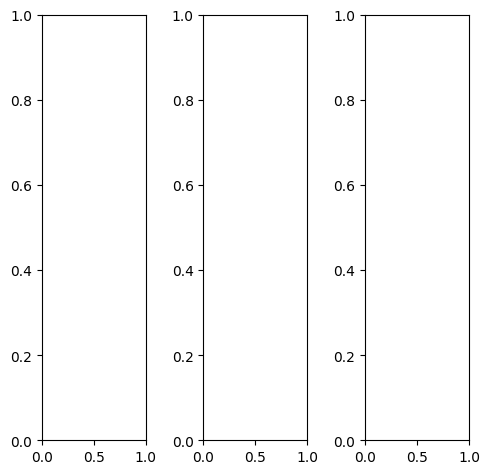

tensor([[[0.3373, 0.3412, 0.3490,  ..., 0.3373, 0.3294, 0.3255],
         [0.3529, 0.3529, 0.3608,  ..., 0.3490, 0.3451, 0.3412],
         [0.3569, 0.3608, 0.3647,  ..., 0.3529, 0.3490, 0.3451],
         ...,
         [0.5529, 0.5529, 0.5569,  ..., 0.4745, 0.4980, 0.4824],
         [0.5608, 0.5608, 0.5686,  ..., 0.4039, 0.4275, 0.4784],
         [0.5608, 0.5608, 0.5647,  ..., 0.4902, 0.4902, 0.5255]],

        [[0.3373, 0.3412, 0.3490,  ..., 0.3373, 0.3294, 0.3255],
         [0.3529, 0.3529, 0.3608,  ..., 0.3490, 0.3451, 0.3412],
         [0.3569, 0.3608, 0.3647,  ..., 0.3529, 0.3490, 0.3451],
         ...,
         [0.5529, 0.5529, 0.5569,  ..., 0.4745, 0.4980, 0.4824],
         [0.5608, 0.5608, 0.5686,  ..., 0.4039, 0.4275, 0.4784],
         [0.5608, 0.5608, 0.5647,  ..., 0.4902, 0.4902, 0.5255]],

        [[0.3373, 0.3412, 0.3490,  ..., 0.3373, 0.3294, 0.3255],
         [0.3529, 0.3529, 0.3608,  ..., 0.3490, 0.3451, 0.3412],
         [0.3569, 0.3608, 0.3647,  ..., 0.3529, 0.3490, 0.

tensor([[[0.1686, 0.1725, 0.1725,  ..., 0.1725, 0.1686, 0.1686],
         [0.1725, 0.1765, 0.1804,  ..., 0.1804, 0.1765, 0.1765],
         [0.1725, 0.1765, 0.1804,  ..., 0.1765, 0.1765, 0.1804],
         ...,
         [0.2980, 0.2980, 0.3059,  ..., 0.3725, 0.3961, 0.3020],
         [0.3020, 0.3020, 0.3098,  ..., 0.2627, 0.2863, 0.2706],
         [0.3020, 0.3020, 0.3098,  ..., 0.2667, 0.2824, 0.2941]],

        [[0.3882, 0.3922, 0.4000,  ..., 0.3882, 0.3804, 0.3725],
         [0.4078, 0.4078, 0.4157,  ..., 0.4039, 0.3961, 0.3882],
         [0.4118, 0.4157, 0.4235,  ..., 0.4078, 0.4039, 0.3961],
         ...,
         [0.6314, 0.6314, 0.6353,  ..., 0.5020, 0.5255, 0.5373],
         [0.6431, 0.6431, 0.6471,  ..., 0.4392, 0.4667, 0.5451],
         [0.6392, 0.6392, 0.6431,  ..., 0.5569, 0.5529, 0.5961]],

        [[0.5176, 0.5176, 0.5333,  ..., 0.5059, 0.4980, 0.4941],
         [0.5373, 0.5373, 0.5490,  ..., 0.5255, 0.5176, 0.5137],
         [0.5451, 0.5451, 0.5569,  ..., 0.5373, 0.5294, 0.

tensor([[[ 0.1571,  0.0736,  0.0622,  ...,  0.1101,  0.1038,  0.1176],
         [ 0.1714,  0.0204,  0.1294,  ...,  0.0787,  0.0684,  0.0795],
         [ 0.1010,  0.0817, -0.0161,  ...,  0.0786,  0.0762,  0.0912],
         ...,
         [ 0.5282,  0.5749,  0.5477,  ...,  0.4411,  0.4422,  0.3868],
         [ 0.5703,  0.5682,  0.5749,  ...,  0.2420,  0.2696,  0.3647],
         [ 0.5832,  0.5461,  0.5324,  ...,  0.3776,  0.3729,  0.4244]],

        [[ 0.1939,  0.2153,  0.1733,  ...,  0.1558,  0.1622,  0.1511],
         [ 0.2013,  0.0262,  0.0845,  ...,  0.1237,  0.1343,  0.1156],
         [ 0.1828,  0.2214,  0.1485,  ...,  0.1051,  0.1086,  0.1042],
         ...,
         [ 0.5390,  0.5471,  0.5576,  ...,  0.4259,  0.4526,  0.3512],
         [ 0.5694,  0.5459,  0.5844,  ...,  0.2559,  0.3010,  0.3514],
         [ 0.5639,  0.5342,  0.5303,  ...,  0.3593,  0.3775,  0.3900]],

        [[ 0.3805,  0.1555,  0.2973,  ...,  0.1989,  0.2037,  0.2337],
         [ 0.3139,  0.1542,  0.1991,  ...,  0

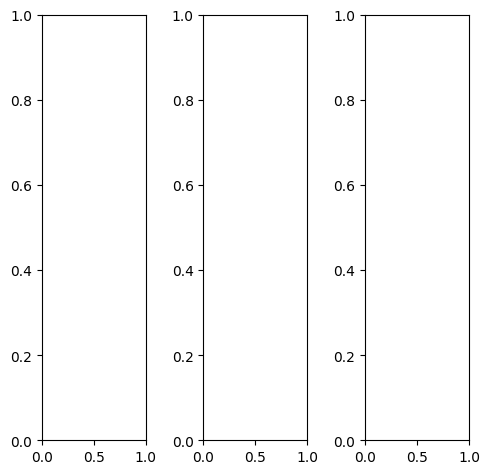

tensor([[[0.4667, 0.5020, 0.5255,  ..., 0.3765, 0.3569, 0.3255],
         [0.3098, 0.3647, 0.4039,  ..., 0.3804, 0.3608, 0.3373],
         [0.3098, 0.3647, 0.3882,  ..., 0.3647, 0.3412, 0.3294],
         ...,
         [0.5216, 0.5098, 0.5255,  ..., 0.4510, 0.4392, 0.4314],
         [0.5373, 0.5412, 0.5294,  ..., 0.4431, 0.4314, 0.4235],
         [0.5490, 0.5412, 0.5176,  ..., 0.4824, 0.4902, 0.4824]],

        [[0.4667, 0.5020, 0.5255,  ..., 0.3765, 0.3569, 0.3255],
         [0.3098, 0.3647, 0.4039,  ..., 0.3804, 0.3608, 0.3373],
         [0.3098, 0.3647, 0.3882,  ..., 0.3647, 0.3412, 0.3294],
         ...,
         [0.5216, 0.5098, 0.5255,  ..., 0.4510, 0.4392, 0.4314],
         [0.5373, 0.5412, 0.5294,  ..., 0.4431, 0.4314, 0.4235],
         [0.5490, 0.5412, 0.5176,  ..., 0.4824, 0.4902, 0.4824]],

        [[0.4667, 0.5020, 0.5255,  ..., 0.3765, 0.3569, 0.3255],
         [0.3098, 0.3647, 0.4039,  ..., 0.3804, 0.3608, 0.3373],
         [0.3098, 0.3647, 0.3882,  ..., 0.3647, 0.3412, 0.

tensor([[[0.4667, 0.5020, 0.5255,  ..., 0.2863, 0.2627, 0.2314],
         [0.3059, 0.3608, 0.4000,  ..., 0.2902, 0.2667, 0.2431],
         [0.2941, 0.3490, 0.3725,  ..., 0.2706, 0.2471, 0.2314],
         ...,
         [0.4157, 0.4314, 0.4627,  ..., 0.3451, 0.3333, 0.3216],
         [0.4392, 0.4588, 0.4588,  ..., 0.3451, 0.3333, 0.3255],
         [0.4627, 0.4510, 0.4314,  ..., 0.3922, 0.4039, 0.3922]],

        [[0.4745, 0.5098, 0.5294,  ..., 0.4627, 0.4392, 0.4078],
         [0.3255, 0.3765, 0.4157,  ..., 0.4667, 0.4431, 0.4157],
         [0.3333, 0.3843, 0.4078,  ..., 0.4471, 0.4235, 0.4118],
         ...,
         [0.6235, 0.5922, 0.5882,  ..., 0.5529, 0.5412, 0.5333],
         [0.6353, 0.6235, 0.6039,  ..., 0.5373, 0.5216, 0.5176],
         [0.6392, 0.6275, 0.6118,  ..., 0.5686, 0.5765, 0.5686]],

        [[0.4196, 0.4667, 0.4980,  ..., 0.1843, 0.1725, 0.1529],
         [0.2471, 0.3137, 0.3647,  ..., 0.1882, 0.1804, 0.1647],
         [0.2235, 0.2941, 0.3294,  ..., 0.1725, 0.1569, 0.

tensor([[[ 0.4268,  0.4236,  0.4477,  ...,  0.2315,  0.2049,  0.1745],
         [ 0.1360,  0.1386,  0.1626,  ...,  0.2258,  0.1886,  0.1633],
         [-0.0042,  0.1008,  0.0352,  ...,  0.2139,  0.1728,  0.1681],
         ...,
         [ 0.5360,  0.5688,  0.5669,  ...,  0.4548,  0.4233,  0.3982],
         [ 0.5812,  0.6058,  0.5664,  ...,  0.4056,  0.3613,  0.3843],
         [ 0.6055,  0.5876,  0.5377,  ...,  0.4825,  0.4924,  0.4765]],

        [[ 0.4485,  0.5951,  0.5532,  ...,  0.3073,  0.2853,  0.2268],
         [ 0.2140,  0.2518,  0.2466,  ...,  0.3033,  0.2925,  0.2112],
         [ 0.1075,  0.2743,  0.1658,  ...,  0.2745,  0.2362,  0.2093],
         ...,
         [ 0.5260,  0.5292,  0.5761,  ...,  0.4630,  0.4571,  0.3648],
         [ 0.5645,  0.5574,  0.5718,  ...,  0.4415,  0.4038,  0.3740],
         [ 0.5740,  0.5640,  0.5299,  ...,  0.4763,  0.4985,  0.4589]],

        [[ 0.6303,  0.5703,  0.6968,  ...,  0.4040,  0.3890,  0.3464],
         [ 0.3783,  0.3514,  0.4622,  ...,  0

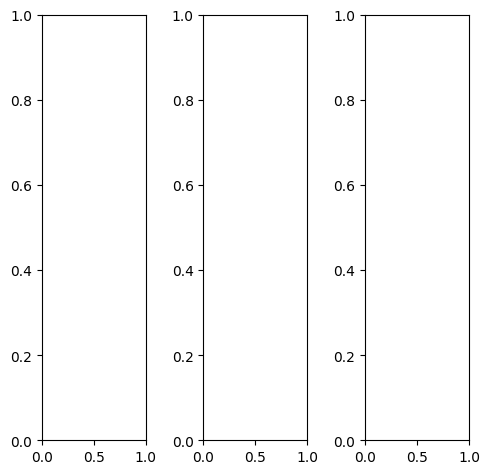

EPOCH: 13.765  trn_loss: 0.005  (1632.28s - 10225.62s remaining)

tensor([[[0.0784, 0.0431, 0.0667,  ..., 0.3765, 0.6235, 0.5373],
         [0.0980, 0.0745, 0.0824,  ..., 0.2314, 0.4667, 0.2745],
         [0.1373, 0.0667, 0.0510,  ..., 0.2275, 0.2196, 0.1451],
         ...,
         [0.4745, 0.4863, 0.4824,  ..., 0.4745, 0.4510, 0.4314],
         [0.4980, 0.4824, 0.4549,  ..., 0.4471, 0.4431, 0.4275],
         [0.5020, 0.5098, 0.4784,  ..., 0.4314, 0.4235, 0.4157]],

        [[0.0784, 0.0431, 0.0667,  ..., 0.3765, 0.6235, 0.5373],
         [0.0980, 0.0745, 0.0824,  ..., 0.2314, 0.4667, 0.2745],
         [0.1373, 0.0667, 0.0510,  ..., 0.2275, 0.2196, 0.1451],
         ...,
         [0.4745, 0.4863, 0.4824,  ..., 0.4745, 0.4510, 0.4314],
         [0.4980, 0.4824, 0.4549,  ..., 0.4471, 0.4431, 0.4275],
         [0.5020, 0.5098, 0.4784,  ..., 0.4314, 0.4235, 0.4157]],

        [[0.0784, 0.0431, 0.0667,  ..., 0.3765, 0.6235, 0.5373],
         [0.0980, 0.0745, 0.0824,  ..., 0.2314, 0.4667, 0.2745],
         [0.1373, 0.0667, 0.0510,  ..., 0.2275, 0.2196, 0.

tensor([[[0.0627, 0.0196, 0.0314,  ..., 0.3333, 0.5725, 0.4824],
         [0.0824, 0.0510, 0.0510,  ..., 0.1922, 0.4235, 0.2314],
         [0.1137, 0.0431, 0.0275,  ..., 0.1961, 0.1843, 0.1059],
         ...,
         [0.5608, 0.5725, 0.5647,  ..., 0.5490, 0.5216, 0.5020],
         [0.5843, 0.5686, 0.5373,  ..., 0.5176, 0.5137, 0.4980],
         [0.5882, 0.5961, 0.5608,  ..., 0.5059, 0.4980, 0.4824]],

        [[0.0941, 0.0588, 0.0863,  ..., 0.3922, 0.6353, 0.5490],
         [0.1176, 0.0902, 0.1020,  ..., 0.2510, 0.4824, 0.2902],
         [0.1647, 0.0824, 0.0667,  ..., 0.2510, 0.2392, 0.1686],
         ...,
         [0.4510, 0.4627, 0.4627,  ..., 0.4549, 0.4353, 0.4157],
         [0.4745, 0.4588, 0.4353,  ..., 0.4314, 0.4275, 0.4118],
         [0.4824, 0.4902, 0.4588,  ..., 0.4157, 0.4078, 0.4000]],

        [[0.0510, 0.0235, 0.0431,  ..., 0.4196, 0.6980, 0.6118],
         [0.0549, 0.0510, 0.0588,  ..., 0.2275, 0.5137, 0.3020],
         [0.0706, 0.0510, 0.0314,  ..., 0.2000, 0.2078, 0.

tensor([[[ 0.1340,  0.0437,  0.0396,  ...,  0.6450,  0.9553,  0.7831],
         [ 0.1791,  0.0654,  0.1847,  ...,  0.3934,  0.7586,  0.5055],
         [ 0.1375,  0.1431, -0.0070,  ...,  0.3546,  0.3561,  0.3086],
         ...,
         [ 0.7746,  0.7873,  0.7663,  ...,  0.7455,  0.7142,  0.7100],
         [ 0.7912,  0.7483,  0.7030,  ...,  0.6938,  0.6920,  0.7148],
         [ 0.8077,  0.8401,  0.7706,  ...,  0.7206,  0.7209,  0.7233]],

        [[ 0.1542,  0.1802,  0.1267,  ...,  0.6683,  1.0152,  0.8144],
         [ 0.2071,  0.0933,  0.1239,  ...,  0.4038,  0.8031,  0.4916],
         [ 0.2227,  0.2503,  0.1662,  ...,  0.4218,  0.3876,  0.2919],
         ...,
         [ 0.7237,  0.7362,  0.7380,  ...,  0.7104,  0.6889,  0.6899],
         [ 0.7643,  0.7227,  0.6897,  ...,  0.6695,  0.6891,  0.6922],
         [ 0.7524,  0.7925,  0.7430,  ...,  0.6830,  0.6902,  0.6823]],

        [[ 0.3723,  0.1477,  0.3207,  ...,  0.8053,  1.1806,  0.9241],
         [ 0.3322,  0.2208,  0.2951,  ...,  0

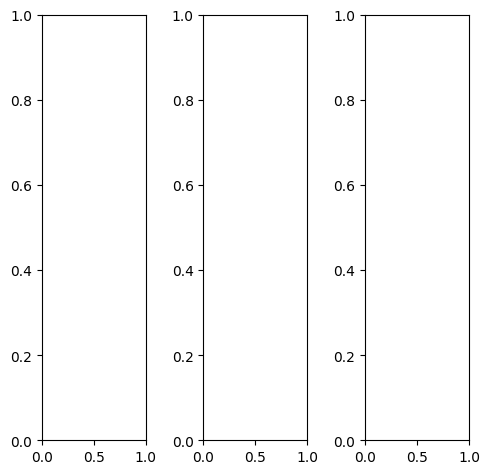

tensor([[[0.4471, 0.5294, 0.4980,  ..., 0.4196, 0.3412, 0.4000],
         [0.2980, 0.3373, 0.3647,  ..., 0.5490, 0.4824, 0.5137],
         [0.1961, 0.2549, 0.2549,  ..., 0.5294, 0.5490, 0.5451],
         ...,
         [0.6745, 0.6706, 0.6588,  ..., 0.7882, 0.8000, 0.8196],
         [0.6706, 0.6941, 0.7176,  ..., 0.8196, 0.8078, 0.8078],
         [0.6745, 0.7098, 0.7608,  ..., 0.7922, 0.8078, 0.7922]],

        [[0.4471, 0.5294, 0.4980,  ..., 0.4196, 0.3412, 0.4000],
         [0.2980, 0.3373, 0.3647,  ..., 0.5490, 0.4824, 0.5137],
         [0.1961, 0.2549, 0.2549,  ..., 0.5294, 0.5490, 0.5451],
         ...,
         [0.6745, 0.6706, 0.6588,  ..., 0.7882, 0.8000, 0.8196],
         [0.6706, 0.6941, 0.7176,  ..., 0.8196, 0.8078, 0.8078],
         [0.6745, 0.7098, 0.7608,  ..., 0.7922, 0.8078, 0.7922]],

        [[0.4471, 0.5294, 0.4980,  ..., 0.4196, 0.3412, 0.4000],
         [0.2980, 0.3373, 0.3647,  ..., 0.5490, 0.4824, 0.5137],
         [0.1961, 0.2549, 0.2549,  ..., 0.5294, 0.5490, 0.

tensor([[[0.3647, 0.4353, 0.4000,  ..., 0.3882, 0.3137, 0.3569],
         [0.2118, 0.2471, 0.2745,  ..., 0.4784, 0.4157, 0.4275],
         [0.1216, 0.1804, 0.1765,  ..., 0.4353, 0.4627, 0.4392],
         ...,
         [0.7216, 0.7294, 0.7020,  ..., 0.8314, 0.8863, 0.9098],
         [0.7294, 0.7686, 0.7804,  ..., 0.8549, 0.8824, 0.8902],
         [0.7490, 0.7804, 0.8196,  ..., 0.8196, 0.8627, 0.8549]],

        [[0.5137, 0.6078, 0.5843,  ..., 0.4510, 0.3725, 0.4431],
         [0.3686, 0.4078, 0.4392,  ..., 0.6157, 0.5490, 0.5882],
         [0.2588, 0.3137, 0.3137,  ..., 0.6118, 0.6314, 0.6314],
         ...,
         [0.6431, 0.6392, 0.6353,  ..., 0.7608, 0.7529, 0.7725],
         [0.6353, 0.6549, 0.6902,  ..., 0.8000, 0.7647, 0.7608],
         [0.6353, 0.6745, 0.7333,  ..., 0.7765, 0.7765, 0.7569]],

        [[0.3255, 0.3843, 0.3255,  ..., 0.3333, 0.2588, 0.2941],
         [0.1529, 0.2000, 0.2235,  ..., 0.3961, 0.3294, 0.3529],
         [0.0824, 0.1490, 0.1412,  ..., 0.3451, 0.3569, 0.

tensor([[[ 0.4565,  0.4582,  0.4272,  ...,  0.4053,  0.3252,  0.4480],
         [ 0.2369,  0.2443,  0.2104,  ...,  0.5382,  0.4540,  0.5342],
         [ 0.0183,  0.0897, -0.0351,  ...,  0.5195,  0.5598,  0.5625],
         ...,
         [ 0.7640,  0.7617,  0.7373,  ...,  0.8803,  0.9012,  0.9101],
         [ 0.7381,  0.7405,  0.7583,  ...,  0.8724,  0.8836,  0.8884],
         [ 0.7524,  0.7969,  0.8249,  ...,  0.8888,  0.8969,  0.8769]],

        [[ 0.4483,  0.6295,  0.4813,  ...,  0.4366,  0.3889,  0.4489],
         [ 0.3326,  0.3740,  0.2782,  ...,  0.6104,  0.5425,  0.5659],
         [ 0.1188,  0.2947,  0.1046,  ...,  0.5653,  0.6001,  0.5821],
         ...,
         [ 0.7354,  0.7208,  0.7135,  ...,  0.8459,  0.8611,  0.8922],
         [ 0.7229,  0.7166,  0.7502,  ...,  0.8525,  0.8467,  0.8662],
         [ 0.7079,  0.7542,  0.8012,  ...,  0.8317,  0.8558,  0.8271]],

        [[ 0.6233,  0.6123,  0.6706,  ...,  0.6181,  0.5550,  0.6140],
         [ 0.4556,  0.4571,  0.5069,  ...,  0

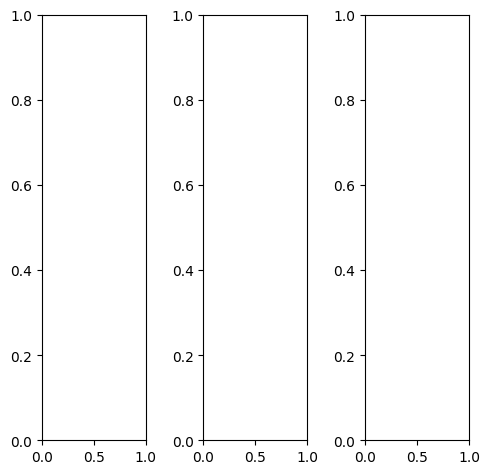

tensor([[[0.2745, 0.3020, 0.3098,  ..., 0.3529, 0.3529, 0.3490],
         [0.2784, 0.3020, 0.3137,  ..., 0.3529, 0.3529, 0.3529],
         [0.2902, 0.3020, 0.3137,  ..., 0.3451, 0.3529, 0.3529],
         ...,
         [0.8784, 0.6863, 0.5412,  ..., 0.9176, 0.9137, 0.9059],
         [0.9333, 0.9255, 0.8980,  ..., 0.9137, 0.9137, 0.9098],
         [0.9216, 0.9216, 0.9294,  ..., 0.9098, 0.9098, 0.9059]],

        [[0.2745, 0.3020, 0.3098,  ..., 0.3529, 0.3529, 0.3490],
         [0.2784, 0.3020, 0.3137,  ..., 0.3529, 0.3529, 0.3529],
         [0.2902, 0.3020, 0.3137,  ..., 0.3451, 0.3529, 0.3529],
         ...,
         [0.8784, 0.6863, 0.5412,  ..., 0.9176, 0.9137, 0.9059],
         [0.9333, 0.9255, 0.8980,  ..., 0.9137, 0.9137, 0.9098],
         [0.9216, 0.9216, 0.9294,  ..., 0.9098, 0.9098, 0.9059]],

        [[0.2745, 0.3020, 0.3098,  ..., 0.3529, 0.3529, 0.3490],
         [0.2784, 0.3020, 0.3137,  ..., 0.3529, 0.3529, 0.3529],
         [0.2902, 0.3020, 0.3137,  ..., 0.3451, 0.3529, 0.

tensor([[[0.3020, 0.3294, 0.3373,  ..., 0.3922, 0.3961, 0.3961],
         [0.2980, 0.3216, 0.3333,  ..., 0.3882, 0.3961, 0.4039],
         [0.3098, 0.3216, 0.3373,  ..., 0.3765, 0.3961, 0.4039],
         ...,
         [0.9059, 0.7137, 0.5686,  ..., 0.9647, 0.9608, 0.9569],
         [0.9608, 0.9569, 0.9294,  ..., 0.9569, 0.9529, 0.9529],
         [0.9608, 0.9569, 0.9647,  ..., 0.9529, 0.9490, 0.9490]],

        [[0.2824, 0.3137, 0.3216,  ..., 0.3608, 0.3569, 0.3490],
         [0.2902, 0.3137, 0.3255,  ..., 0.3647, 0.3608, 0.3529],
         [0.2980, 0.3137, 0.3255,  ..., 0.3529, 0.3569, 0.3569],
         ...,
         [0.8784, 0.6824, 0.5373,  ..., 0.9098, 0.9098, 0.8980],
         [0.9294, 0.9216, 0.8902,  ..., 0.9098, 0.9098, 0.9020],
         [0.9176, 0.9137, 0.9216,  ..., 0.9020, 0.9020, 0.8980]],

        [[0.1647, 0.1804, 0.1922,  ..., 0.2118, 0.2196, 0.2196],
         [0.1765, 0.1843, 0.2000,  ..., 0.2157, 0.2078, 0.2118],
         [0.1843, 0.1843, 0.2000,  ..., 0.2118, 0.2039, 0.

tensor([[[0.1671, 0.1737, 0.1391,  ..., 0.2829, 0.2851, 0.3143],
         [0.1507, 0.1030, 0.1528,  ..., 0.2521, 0.2458, 0.2740],
         [0.0521, 0.1190, 0.0114,  ..., 0.2437, 0.2574, 0.2762],
         ...,
         [0.8719, 0.6744, 0.4894,  ..., 0.8528, 0.8540, 0.8642],
         [0.8944, 0.8491, 0.7968,  ..., 0.8224, 0.8351, 0.8730],
         [0.8903, 0.9007, 0.8816,  ..., 0.8696, 0.8685, 0.8741]],

        [[0.2052, 0.3299, 0.1671,  ..., 0.3340, 0.3496, 0.3482],
         [0.1980, 0.1987, 0.0779,  ..., 0.3083, 0.3335, 0.3056],
         [0.1309, 0.3452, 0.0408,  ..., 0.3051, 0.3271, 0.3144],
         ...,
         [0.8584, 0.6334, 0.4940,  ..., 0.8277, 0.8320, 0.8622],
         [0.8785, 0.8553, 0.8069,  ..., 0.8172, 0.8228, 0.8582],
         [0.8302, 0.8561, 0.8482,  ..., 0.8320, 0.8395, 0.8342]],

        [[0.3758, 0.2415, 0.3537,  ..., 0.4323, 0.4508, 0.4624],
         [0.3425, 0.2663, 0.3587,  ..., 0.3997, 0.4179, 0.4184],
         [0.2655, 0.2563, 0.3036,  ..., 0.4042, 0.4254, 0.

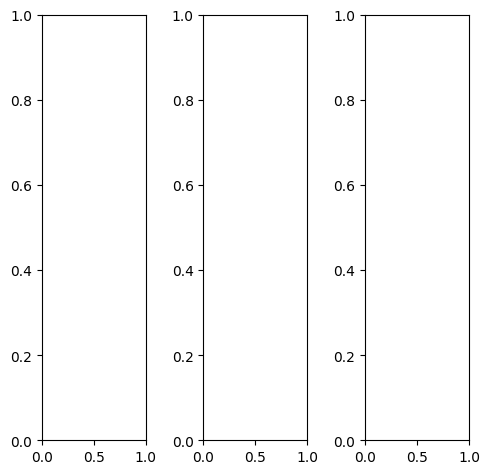

tensor([[[0.0118, 0.0000, 0.0275,  ..., 0.0157, 0.0118, 0.0118],
         [0.0941, 0.1686, 0.2627,  ..., 0.0314, 0.0314, 0.0353],
         [0.6784, 0.7412, 0.6863,  ..., 0.1333, 0.1333, 0.1373],
         ...,
         [0.3451, 0.3373, 0.3529,  ..., 0.5333, 0.4627, 0.4588],
         [0.3529, 0.2980, 0.3059,  ..., 0.5176, 0.5098, 0.5451],
         [0.4392, 0.4392, 0.4157,  ..., 0.5059, 0.5294, 0.5765]],

        [[0.0118, 0.0000, 0.0275,  ..., 0.0157, 0.0118, 0.0118],
         [0.0941, 0.1686, 0.2627,  ..., 0.0314, 0.0314, 0.0353],
         [0.6784, 0.7412, 0.6863,  ..., 0.1333, 0.1333, 0.1373],
         ...,
         [0.3451, 0.3373, 0.3529,  ..., 0.5333, 0.4627, 0.4588],
         [0.3529, 0.2980, 0.3059,  ..., 0.5176, 0.5098, 0.5451],
         [0.4392, 0.4392, 0.4157,  ..., 0.5059, 0.5294, 0.5765]],

        [[0.0118, 0.0000, 0.0275,  ..., 0.0157, 0.0118, 0.0118],
         [0.0941, 0.1686, 0.2627,  ..., 0.0314, 0.0314, 0.0353],
         [0.6784, 0.7412, 0.6863,  ..., 0.1333, 0.1333, 0.

tensor([[[0.0000, 0.0000, 0.0275,  ..., 0.0118, 0.0118, 0.0118],
         [0.1176, 0.1725, 0.2510,  ..., 0.0196, 0.0196, 0.0235],
         [0.7647, 0.7961, 0.7137,  ..., 0.1020, 0.1059, 0.1098],
         ...,
         [0.3882, 0.3804, 0.3961,  ..., 0.5725, 0.4941, 0.4941],
         [0.3922, 0.3373, 0.3451,  ..., 0.5569, 0.5412, 0.5765],
         [0.4706, 0.4706, 0.4471,  ..., 0.5412, 0.5608, 0.6078]],

        [[0.0000, 0.0000, 0.0157,  ..., 0.0118, 0.0078, 0.0078],
         [0.0667, 0.1569, 0.2627,  ..., 0.0314, 0.0353, 0.0353],
         [0.6235, 0.6980, 0.6627,  ..., 0.1373, 0.1373, 0.1412],
         ...,
         [0.3373, 0.3255, 0.3412,  ..., 0.5216, 0.4549, 0.4510],
         [0.3451, 0.2902, 0.2941,  ..., 0.5059, 0.5020, 0.5373],
         [0.4353, 0.4314, 0.4078,  ..., 0.4980, 0.5216, 0.5686]],

        [[0.1020, 0.0000, 0.0745,  ..., 0.0353, 0.0275, 0.0275],
         [0.1725, 0.2078, 0.3059,  ..., 0.0510, 0.0510, 0.0510],
         [0.7216, 0.8039, 0.7373,  ..., 0.1843, 0.1804, 0.

tensor([[[ 0.0503, -0.0538, -0.0578,  ...,  0.0382,  0.0502,  0.1229],
         [ 0.0946,  0.0780,  0.1725,  ...,  0.0137,  0.0087,  0.0744],
         [ 0.6088,  0.7156,  0.5511,  ...,  0.1226,  0.1247,  0.1673],
         ...,
         [ 0.3752,  0.4263,  0.4349,  ...,  0.5742,  0.5073,  0.5304],
         [ 0.3827,  0.3491,  0.3707,  ...,  0.5468,  0.5407,  0.6064],
         [ 0.4611,  0.4751,  0.4584,  ...,  0.5423,  0.5756,  0.6114]],

        [[ 0.0461,  0.0731,  0.0165,  ...,  0.0679,  0.0660,  0.1148],
         [ 0.1720,  0.2335,  0.1664,  ...,  0.0685,  0.0736,  0.0976],
         [ 0.6947,  0.8636,  0.7063,  ...,  0.1612,  0.1611,  0.1765],
         ...,
         [ 0.3787,  0.4138,  0.4773,  ...,  0.6359,  0.5845,  0.5153],
         [ 0.3818,  0.3596,  0.4025,  ...,  0.5778,  0.5855,  0.6052],
         [ 0.4609,  0.4593,  0.4710,  ...,  0.5352,  0.5795,  0.5938]],

        [[ 0.2787,  0.0416,  0.2544,  ...,  0.2147,  0.2214,  0.2624],
         [ 0.3271,  0.3219,  0.3429,  ...,  0

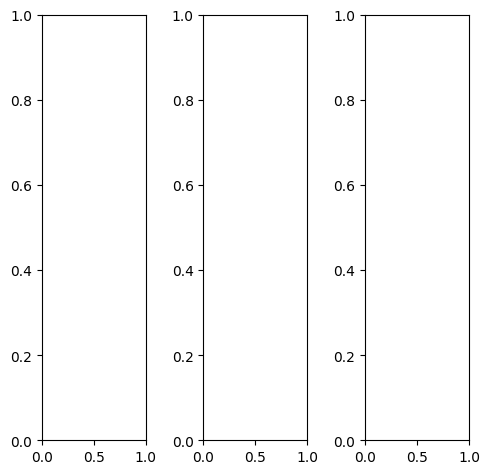

tensor([[[0.4588, 0.5059, 0.5255,  ..., 0.4902, 0.6510, 0.7765],
         [0.4784, 0.5922, 0.7216,  ..., 0.5373, 0.7255, 0.7216],
         [0.5333, 0.6275, 0.6863,  ..., 0.5725, 0.6824, 0.7020],
         ...,
         [0.3373, 0.3569, 0.5725,  ..., 0.1020, 0.3176, 0.3412],
         [0.4000, 0.4588, 0.6235,  ..., 0.2196, 0.2706, 0.3176],
         [0.5020, 0.4667, 0.5137,  ..., 0.3098, 0.2745, 0.2627]],

        [[0.4588, 0.5059, 0.5255,  ..., 0.4902, 0.6510, 0.7765],
         [0.4784, 0.5922, 0.7216,  ..., 0.5373, 0.7255, 0.7216],
         [0.5333, 0.6275, 0.6863,  ..., 0.5725, 0.6824, 0.7020],
         ...,
         [0.3373, 0.3569, 0.5725,  ..., 0.1020, 0.3176, 0.3412],
         [0.4000, 0.4588, 0.6235,  ..., 0.2196, 0.2706, 0.3176],
         [0.5020, 0.4667, 0.5137,  ..., 0.3098, 0.2745, 0.2627]],

        [[0.4588, 0.5059, 0.5255,  ..., 0.4902, 0.6510, 0.7765],
         [0.4784, 0.5922, 0.7216,  ..., 0.5373, 0.7255, 0.7216],
         [0.5333, 0.6275, 0.6863,  ..., 0.5725, 0.6824, 0.

tensor([[[0.4039, 0.4314, 0.4314,  ..., 0.3765, 0.5804, 0.7373],
         [0.4157, 0.5059, 0.6157,  ..., 0.4431, 0.6667, 0.6784],
         [0.4588, 0.5294, 0.5608,  ..., 0.4980, 0.6353, 0.6510],
         ...,
         [0.2627, 0.3216, 0.5373,  ..., 0.0902, 0.2706, 0.2784],
         [0.3255, 0.3882, 0.5882,  ..., 0.1804, 0.2157, 0.2510],
         [0.4588, 0.3804, 0.4745,  ..., 0.2392, 0.2039, 0.1961]],

        [[0.5216, 0.5765, 0.5961,  ..., 0.5961, 0.7059, 0.8039],
         [0.5490, 0.6706, 0.7961,  ..., 0.6353, 0.7804, 0.7529],
         [0.6039, 0.7059, 0.7804,  ..., 0.6706, 0.7373, 0.7373],
         ...,
         [0.4157, 0.4000, 0.6039,  ..., 0.1176, 0.3569, 0.3961],
         [0.4784, 0.5216, 0.6627,  ..., 0.2549, 0.3216, 0.3725],
         [0.5569, 0.5451, 0.5647,  ..., 0.3725, 0.3412, 0.3216]],

        [[0.2824, 0.3451, 0.3922,  ..., 0.2510, 0.5569, 0.7529],
         [0.2784, 0.4275, 0.6235,  ..., 0.2706, 0.6039, 0.6824],
         [0.3608, 0.4667, 0.5255,  ..., 0.2667, 0.5294, 0.

tensor([[[ 0.5254,  0.5219,  0.5777,  ...,  0.4587,  0.6681,  0.8104],
         [ 0.5119,  0.6510,  0.7931,  ...,  0.5041,  0.7794,  0.7970],
         [ 0.5922,  0.7841,  0.7578,  ...,  0.5858,  0.7549,  0.7485],
         ...,
         [ 0.3328,  0.3910,  0.6600,  ..., -0.0023,  0.2790,  0.3211],
         [ 0.4490,  0.5342,  0.7932,  ...,  0.1200,  0.2089,  0.2808],
         [ 0.5823,  0.5584,  0.6292,  ...,  0.2480,  0.2006,  0.2629]],

        [[ 0.6015,  0.6127,  0.6194,  ...,  0.5218,  0.7817,  0.8902],
         [ 0.5265,  0.7249,  0.8095,  ...,  0.6020,  0.8706,  0.9199],
         [ 0.6844,  0.8238,  0.8308,  ...,  0.6908,  0.8387,  0.8587],
         ...,
         [ 0.3002,  0.3662,  0.6585,  ...,  0.0554,  0.3387,  0.2990],
         [ 0.4071,  0.4913,  0.7652,  ...,  0.1979,  0.2452,  0.2580],
         [ 0.5382,  0.5222,  0.5960,  ...,  0.2536,  0.2120,  0.2251]],

        [[ 0.6811,  0.6749,  0.8026,  ...,  0.7062,  0.9224,  0.9815],
         [ 0.7181,  0.8540,  1.0182,  ...,  0

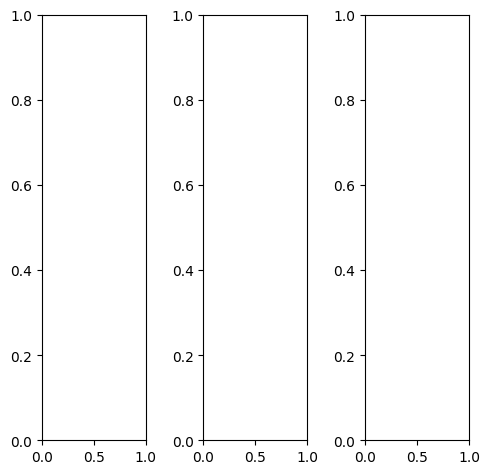

EPOCH: 14.000  val_loss: 0.003  (1667.17s - 10241.16s remaining)

tensor([[[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9294, 0.9412, 0.9647],
         [0.9725, 0.9608, 0.9608,  ..., 0.9529, 0.9569, 0.9765],
         [0.9686, 0.9569, 0.9569,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9294, 0.9412, 0.9647],
         [0.9725, 0.9608, 0.9608,  ..., 0.9529, 0.9569, 0.9765],
         [0.9686, 0.9569, 0.9569,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.

tensor([[[0.9373, 0.9216, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9490, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9451, 0.9294, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9725, 0.9569, 0.9490,  ..., 0.9412, 0.9569, 0.9647],
         [0.9765, 0.9608, 0.9569,  ..., 0.9569, 0.9647, 0.9765],
         [0.9686, 0.9569, 0.9529,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9255, 0.9216, 0.9294,  ..., 0.9333, 0.9294, 0.9412],
         [0.9373, 0.9294, 0.9373,  ..., 0.9451, 0.9412, 0.9490],
         [0.9333, 0.9294, 0.9373,  ..., 0.9412, 0.9373, 0.9490],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9255, 0.9333, 0.9686],
         [0.9725, 0.9647, 0.9647,  ..., 0.9529, 0.9569, 0.9804],
         [0.9686, 0.9608, 0.9647,  ..., 0.9647, 0.9647, 0.9765]],

        [[0.9137, 0.9020, 0.9098,  ..., 0.9137, 0.9098, 0.9216],
         [0.9216, 0.9137, 0.9176,  ..., 0.9255, 0.9216, 0.9294],
         [0.9216, 0.9098, 0.9176,  ..., 0.9216, 0.9176, 0.

tensor([[[0.8987, 0.8954, 0.9231,  ..., 0.9164, 0.9138, 0.9016],
         [0.9285, 0.9185, 0.9284,  ..., 0.9293, 0.9329, 0.9234],
         [0.9273, 0.9250, 0.9280,  ..., 0.9279, 0.9324, 0.9371],
         ...,
         [0.9811, 0.9737, 0.9576,  ..., 0.9242, 0.9387, 0.9533],
         [0.9634, 0.9692, 0.9546,  ..., 0.9485, 0.9475, 0.9596],
         [0.9399, 0.9487, 0.9559,  ..., 0.9517, 0.9534, 0.9289]],

        [[0.9055, 0.9049, 0.9331,  ..., 0.9286, 0.9158, 0.9294],
         [0.9311, 0.9263, 0.9386,  ..., 0.9490, 0.9325, 0.9429],
         [0.9349, 0.9299, 0.9349,  ..., 0.9462, 0.9419, 0.9469],
         ...,
         [0.9649, 0.9577, 0.9504,  ..., 0.9265, 0.9456, 0.9652],
         [0.9578, 0.9482, 0.9500,  ..., 0.9499, 0.9467, 0.9591],
         [0.9276, 0.9524, 0.9533,  ..., 0.9547, 0.9426, 0.9037]],

        [[0.8983, 0.9177, 0.9202,  ..., 0.9307, 0.9216, 0.9162],
         [0.9279, 0.9329, 0.9351,  ..., 0.9543, 0.9439, 0.9394],
         [0.9346, 0.9209, 0.9362,  ..., 0.9521, 0.9404, 0.

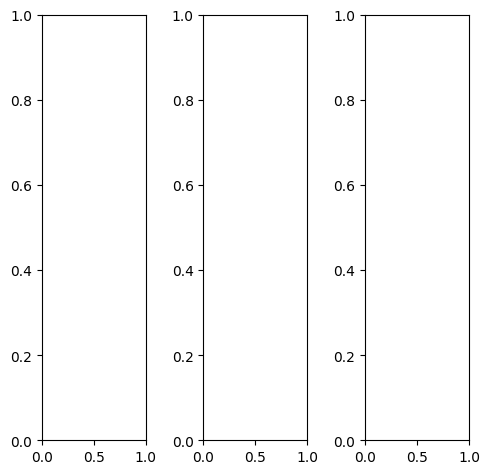

tensor([[[0.4471, 0.4549, 0.4667,  ..., 0.4039, 0.3765, 0.3529],
         [0.4784, 0.4824, 0.4941,  ..., 0.4118, 0.3804, 0.3529],
         [0.4863, 0.4863, 0.5020,  ..., 0.4196, 0.3922, 0.3569],
         ...,
         [0.3843, 0.3451, 0.3922,  ..., 0.4471, 0.3765, 0.3765],
         [0.3490, 0.3176, 0.3961,  ..., 0.4314, 0.4353, 0.4039],
         [0.3059, 0.3294, 0.4196,  ..., 0.4235, 0.4078, 0.3882]],

        [[0.4471, 0.4549, 0.4667,  ..., 0.4039, 0.3765, 0.3529],
         [0.4784, 0.4824, 0.4941,  ..., 0.4118, 0.3804, 0.3529],
         [0.4863, 0.4863, 0.5020,  ..., 0.4196, 0.3922, 0.3569],
         ...,
         [0.3843, 0.3451, 0.3922,  ..., 0.4471, 0.3765, 0.3765],
         [0.3490, 0.3176, 0.3961,  ..., 0.4314, 0.4353, 0.4039],
         [0.3059, 0.3294, 0.4196,  ..., 0.4235, 0.4078, 0.3882]],

        [[0.4471, 0.4549, 0.4667,  ..., 0.4039, 0.3765, 0.3529],
         [0.4784, 0.4824, 0.4941,  ..., 0.4118, 0.3804, 0.3529],
         [0.4863, 0.4863, 0.5020,  ..., 0.4196, 0.3922, 0.

tensor([[[0.4039, 0.4118, 0.4235,  ..., 0.3647, 0.3529, 0.3451],
         [0.4275, 0.4314, 0.4471,  ..., 0.3725, 0.3569, 0.3412],
         [0.4275, 0.4314, 0.4471,  ..., 0.3804, 0.3686, 0.3490],
         ...,
         [0.3765, 0.3333, 0.3804,  ..., 0.4353, 0.3765, 0.3765],
         [0.3490, 0.3098, 0.3804,  ..., 0.4353, 0.4353, 0.4039],
         [0.3098, 0.3216, 0.3961,  ..., 0.4275, 0.4078, 0.3843]],

        [[0.4706, 0.4784, 0.4902,  ..., 0.4314, 0.4000, 0.3725],
         [0.5020, 0.5059, 0.5176,  ..., 0.4392, 0.4039, 0.3686],
         [0.5098, 0.5098, 0.5255,  ..., 0.4471, 0.4118, 0.3725],
         ...,
         [0.3882, 0.3490, 0.3961,  ..., 0.4510, 0.3765, 0.3765],
         [0.3529, 0.3216, 0.4039,  ..., 0.4314, 0.4392, 0.4078],
         [0.3098, 0.3373, 0.4314,  ..., 0.4235, 0.4078, 0.3922]],

        [[0.4431, 0.4510, 0.4627,  ..., 0.3569, 0.3176, 0.2863],
         [0.4863, 0.4902, 0.5059,  ..., 0.3686, 0.3294, 0.2863],
         [0.5059, 0.5098, 0.5255,  ..., 0.3882, 0.3451, 0.

tensor([[[0.4600, 0.4531, 0.4545,  ..., 0.4023, 0.3754, 0.3581],
         [0.4842, 0.4841, 0.4941,  ..., 0.4086, 0.3882, 0.3520],
         [0.4772, 0.4938, 0.5136,  ..., 0.4189, 0.3923, 0.3554],
         ...,
         [0.3972, 0.3606, 0.4054,  ..., 0.4764, 0.3979, 0.3869],
         [0.3634, 0.3452, 0.4267,  ..., 0.4496, 0.4378, 0.4179],
         [0.3418, 0.3442, 0.4283,  ..., 0.4341, 0.4241, 0.4163]],

        [[0.4699, 0.4792, 0.4802,  ..., 0.4181, 0.3897, 0.3703],
         [0.4980, 0.4946, 0.5031,  ..., 0.4261, 0.3930, 0.3530],
         [0.4886, 0.5152, 0.5192,  ..., 0.4358, 0.4018, 0.3599],
         ...,
         [0.3969, 0.3573, 0.3984,  ..., 0.4516, 0.3823, 0.3876],
         [0.3579, 0.3331, 0.4005,  ..., 0.4341, 0.4400, 0.4193],
         [0.3359, 0.3403, 0.4157,  ..., 0.4285, 0.4093, 0.4192]],

        [[0.4205, 0.4115, 0.4149,  ..., 0.3528, 0.3392, 0.3303],
         [0.4337, 0.4347, 0.4368,  ..., 0.3564, 0.3351, 0.3063],
         [0.4298, 0.4305, 0.4525,  ..., 0.3572, 0.3450, 0.

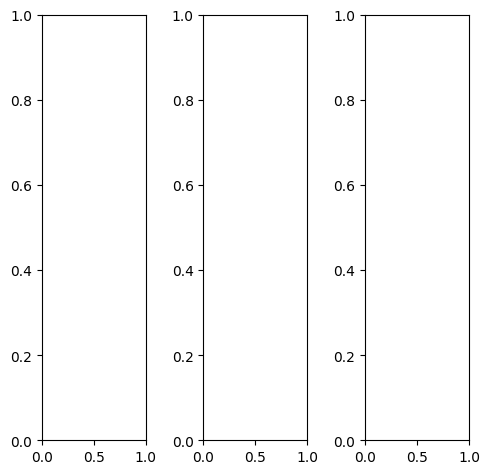

tensor([[[0.4157, 0.4980, 0.3922,  ..., 0.5451, 0.3922, 0.3098],
         [0.3843, 0.3490, 0.4314,  ..., 0.4471, 0.3412, 0.1961],
         [0.4431, 0.3843, 0.4118,  ..., 0.5176, 0.4980, 0.2118],
         ...,
         [0.1647, 0.1686, 0.1765,  ..., 0.9569, 0.9451, 0.9725],
         [0.1608, 0.1647, 0.1725,  ..., 0.4549, 0.4549, 0.4588],
         [0.1529, 0.1608, 0.1686,  ..., 0.1333, 0.1176, 0.1059]],

        [[0.4157, 0.4980, 0.3922,  ..., 0.5451, 0.3922, 0.3098],
         [0.3843, 0.3490, 0.4314,  ..., 0.4471, 0.3412, 0.1961],
         [0.4431, 0.3843, 0.4118,  ..., 0.5176, 0.4980, 0.2118],
         ...,
         [0.1647, 0.1686, 0.1765,  ..., 0.9569, 0.9451, 0.9725],
         [0.1608, 0.1647, 0.1725,  ..., 0.4549, 0.4549, 0.4588],
         [0.1529, 0.1608, 0.1686,  ..., 0.1333, 0.1176, 0.1059]],

        [[0.4157, 0.4980, 0.3922,  ..., 0.5451, 0.3922, 0.3098],
         [0.3843, 0.3490, 0.4314,  ..., 0.4471, 0.3412, 0.1961],
         [0.4431, 0.3843, 0.4118,  ..., 0.5176, 0.4980, 0.

tensor([[[0.4392, 0.5216, 0.4157,  ..., 0.6627, 0.4667, 0.3373],
         [0.4039, 0.3686, 0.4510,  ..., 0.5529, 0.4078, 0.2118],
         [0.4549, 0.3961, 0.4235,  ..., 0.6863, 0.6235, 0.2863],
         ...,
         [0.5412, 0.5529, 0.5765,  ..., 0.9725, 0.9725, 0.9725],
         [0.5255, 0.5451, 0.5686,  ..., 0.6314, 0.6196, 0.6000],
         [0.4941, 0.5294, 0.5490,  ..., 0.4157, 0.3647, 0.3451]],

        [[0.4196, 0.5059, 0.3961,  ..., 0.5608, 0.4078, 0.3216],
         [0.3882, 0.3569, 0.4392,  ..., 0.4549, 0.3529, 0.1882],
         [0.4471, 0.3882, 0.4196,  ..., 0.5059, 0.5059, 0.1922],
         ...,
         [0.0078, 0.0078, 0.0039,  ..., 0.9529, 0.9373, 0.9765],
         [0.0078, 0.0039, 0.0039,  ..., 0.3765, 0.3804, 0.3961],
         [0.0078, 0.0039, 0.0039,  ..., 0.0118, 0.0078, 0.0000]],

        [[0.3373, 0.4000, 0.3059,  ..., 0.1451, 0.1059, 0.1765],
         [0.3098, 0.2627, 0.3490,  ..., 0.1255, 0.1176, 0.1804],
         [0.3843, 0.3176, 0.3373,  ..., 0.1333, 0.1216, 0.

tensor([[[0.4319, 0.4633, 0.3750,  ..., 0.5324, 0.3766, 0.2933],
         [0.3732, 0.3380, 0.4294,  ..., 0.4517, 0.3234, 0.1892],
         [0.4417, 0.3629, 0.4097,  ..., 0.5321, 0.5000, 0.2064],
         ...,
         [0.1513, 0.1640, 0.1804,  ..., 0.9579, 0.9566, 0.9425],
         [0.1500, 0.1597, 0.1741,  ..., 0.4787, 0.4772, 0.4949],
         [0.1605, 0.1526, 0.1611,  ..., 0.1556, 0.1525, 0.2150]],

        [[0.4583, 0.4956, 0.3944,  ..., 0.5555, 0.4002, 0.3094],
         [0.3977, 0.3460, 0.4353,  ..., 0.4641, 0.3469, 0.1924],
         [0.4623, 0.3838, 0.4057,  ..., 0.5212, 0.5100, 0.2128],
         ...,
         [0.1735, 0.1782, 0.1837,  ..., 0.9634, 0.9581, 0.9661],
         [0.1677, 0.1698, 0.1787,  ..., 0.4749, 0.4818, 0.5013],
         [0.1871, 0.1702, 0.1748,  ..., 0.1712, 0.1541, 0.2305]],

        [[0.4367, 0.4820, 0.3861,  ..., 0.5446, 0.4061, 0.3228],
         [0.3685, 0.3475, 0.4239,  ..., 0.4550, 0.3488, 0.2045],
         [0.4295, 0.3681, 0.4016,  ..., 0.5136, 0.5021, 0.

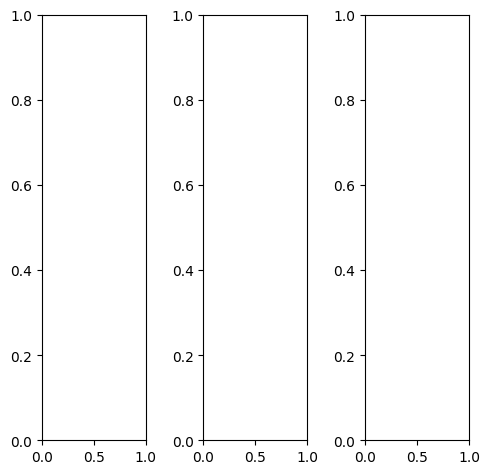

tensor([[[0.0392, 0.0471, 0.0784,  ..., 0.0431, 0.0353, 0.0235],
         [0.0510, 0.0706, 0.1059,  ..., 0.0549, 0.0510, 0.0392],
         [0.0902, 0.1020, 0.0745,  ..., 0.0824, 0.0627, 0.0431],
         ...,
         [0.2235, 0.2824, 0.2588,  ..., 0.1647, 0.1137, 0.0784],
         [0.2235, 0.2784, 0.2902,  ..., 0.4824, 0.2941, 0.0471],
         [0.2392, 0.2196, 0.2588,  ..., 0.3765, 0.2275, 0.0235]],

        [[0.0392, 0.0471, 0.0784,  ..., 0.0431, 0.0353, 0.0235],
         [0.0510, 0.0706, 0.1059,  ..., 0.0549, 0.0510, 0.0392],
         [0.0902, 0.1020, 0.0745,  ..., 0.0824, 0.0627, 0.0431],
         ...,
         [0.2235, 0.2824, 0.2588,  ..., 0.1647, 0.1137, 0.0784],
         [0.2235, 0.2784, 0.2902,  ..., 0.4824, 0.2941, 0.0471],
         [0.2392, 0.2196, 0.2588,  ..., 0.3765, 0.2275, 0.0235]],

        [[0.0392, 0.0471, 0.0784,  ..., 0.0431, 0.0353, 0.0235],
         [0.0510, 0.0706, 0.1059,  ..., 0.0549, 0.0510, 0.0392],
         [0.0902, 0.1020, 0.0745,  ..., 0.0824, 0.0627, 0.

tensor([[[0.0549, 0.0627, 0.0941,  ..., 0.0588, 0.0471, 0.0275],
         [0.0667, 0.0863, 0.1216,  ..., 0.0706, 0.0627, 0.0431],
         [0.1059, 0.1176, 0.0902,  ..., 0.0980, 0.0745, 0.0471],
         ...,
         [0.2588, 0.3098, 0.2667,  ..., 0.1843, 0.1255, 0.0902],
         [0.2588, 0.3176, 0.3059,  ..., 0.4980, 0.3059, 0.0510],
         [0.2706, 0.2667, 0.2824,  ..., 0.3961, 0.2353, 0.0235]],

        [[0.0353, 0.0431, 0.0745,  ..., 0.0392, 0.0314, 0.0235],
         [0.0471, 0.0667, 0.1020,  ..., 0.0510, 0.0471, 0.0392],
         [0.0863, 0.0980, 0.0706,  ..., 0.0784, 0.0588, 0.0431],
         ...,
         [0.2157, 0.2784, 0.2549,  ..., 0.1647, 0.1098, 0.0706],
         [0.2157, 0.2706, 0.2863,  ..., 0.4824, 0.2941, 0.0431],
         [0.2353, 0.2000, 0.2510,  ..., 0.3725, 0.2275, 0.0235]],

        [[0.0157, 0.0235, 0.0510,  ..., 0.0353, 0.0314, 0.0157],
         [0.0314, 0.0510, 0.0784,  ..., 0.0392, 0.0392, 0.0314],
         [0.0627, 0.0745, 0.0510,  ..., 0.0588, 0.0431, 0.

tensor([[[0.0985, 0.0630, 0.0912,  ..., 0.0557, 0.0596, 0.0953],
         [0.0724, 0.0765, 0.1119,  ..., 0.0507, 0.0629, 0.0574],
         [0.0925, 0.1014, 0.0813,  ..., 0.0787, 0.0688, 0.0535],
         ...,
         [0.2373, 0.3085, 0.2817,  ..., 0.1883, 0.1291, 0.1022],
         [0.2389, 0.3049, 0.3205,  ..., 0.4902, 0.3215, 0.0916],
         [0.2502, 0.2395, 0.2693,  ..., 0.3660, 0.2390, 0.1145]],

        [[0.1081, 0.0590, 0.0863,  ..., 0.0571, 0.0566, 0.1036],
         [0.0654, 0.0762, 0.1065,  ..., 0.0548, 0.0640, 0.0578],
         [0.0870, 0.1062, 0.0764,  ..., 0.0811, 0.0620, 0.0462],
         ...,
         [0.2297, 0.2916, 0.2641,  ..., 0.1777, 0.1168, 0.0769],
         [0.2263, 0.2794, 0.2990,  ..., 0.4740, 0.3017, 0.0861],
         [0.2498, 0.2283, 0.2558,  ..., 0.3492, 0.2243, 0.1174]],

        [[0.0897, 0.0519, 0.0737,  ..., 0.0381, 0.0512, 0.0901],
         [0.0586, 0.0662, 0.0931,  ..., 0.0436, 0.0529, 0.0467],
         [0.0764, 0.0817, 0.0586,  ..., 0.0629, 0.0492, 0.

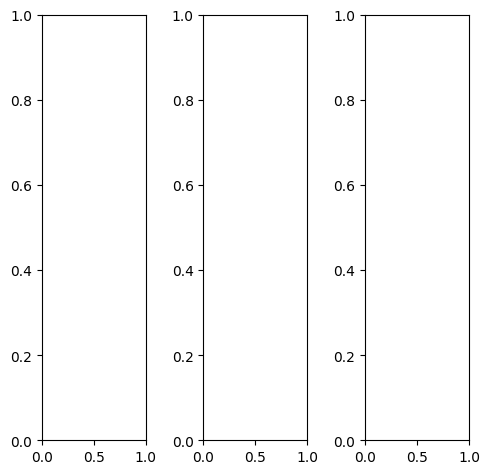

tensor([[[0.5255, 0.4353, 0.5059,  ..., 0.4471, 0.5451, 0.3843],
         [0.4275, 0.2196, 0.3647,  ..., 0.3020, 0.3804, 0.1451],
         [0.4000, 0.3059, 0.3373,  ..., 0.4275, 0.4431, 0.2745],
         ...,
         [0.4784, 0.4118, 0.4510,  ..., 0.6980, 0.6039, 0.5608],
         [0.5216, 0.4667, 0.4588,  ..., 0.7020, 0.6353, 0.6039],
         [0.5765, 0.4902, 0.4078,  ..., 0.6510, 0.6431, 0.5765]],

        [[0.5255, 0.4353, 0.5059,  ..., 0.4471, 0.5451, 0.3843],
         [0.4275, 0.2196, 0.3647,  ..., 0.3020, 0.3804, 0.1451],
         [0.4000, 0.3059, 0.3373,  ..., 0.4275, 0.4431, 0.2745],
         ...,
         [0.4784, 0.4118, 0.4510,  ..., 0.6980, 0.6039, 0.5608],
         [0.5216, 0.4667, 0.4588,  ..., 0.7020, 0.6353, 0.6039],
         [0.5765, 0.4902, 0.4078,  ..., 0.6510, 0.6431, 0.5765]],

        [[0.5255, 0.4353, 0.5059,  ..., 0.4471, 0.5451, 0.3843],
         [0.4275, 0.2196, 0.3647,  ..., 0.3020, 0.3804, 0.1451],
         [0.4000, 0.3059, 0.3373,  ..., 0.4275, 0.4431, 0.

tensor([[[0.5255, 0.4353, 0.5059,  ..., 0.4549, 0.5490, 0.3922],
         [0.4275, 0.2196, 0.3647,  ..., 0.3098, 0.3843, 0.1490],
         [0.4000, 0.3059, 0.3373,  ..., 0.4314, 0.4471, 0.2784],
         ...,
         [0.6000, 0.5373, 0.5608,  ..., 0.7922, 0.6980, 0.6627],
         [0.6314, 0.6000, 0.5882,  ..., 0.8118, 0.7373, 0.6941],
         [0.6588, 0.5961, 0.5098,  ..., 0.7451, 0.7255, 0.6431]],

        [[0.5373, 0.4471, 0.5137,  ..., 0.4549, 0.5529, 0.3922],
         [0.4471, 0.2431, 0.3843,  ..., 0.3216, 0.4000, 0.1569],
         [0.4235, 0.3333, 0.3647,  ..., 0.4510, 0.4706, 0.2941],
         ...,
         [0.4431, 0.3765, 0.4196,  ..., 0.6824, 0.5882, 0.5412],
         [0.4902, 0.4275, 0.4196,  ..., 0.6784, 0.6235, 0.5961],
         [0.5569, 0.4588, 0.3765,  ..., 0.6314, 0.6353, 0.5686]],

        [[0.4588, 0.3765, 0.4784,  ..., 0.3922, 0.4784, 0.3333],
         [0.3294, 0.1137, 0.2745,  ..., 0.1961, 0.2667, 0.0706],
         [0.2745, 0.1686, 0.2118,  ..., 0.2824, 0.2902, 0.

tensor([[[0.5171, 0.4472, 0.4882,  ..., 0.4344, 0.5248, 0.3791],
         [0.4362, 0.2419, 0.3803,  ..., 0.3156, 0.3782, 0.1760],
         [0.4200, 0.3252, 0.3579,  ..., 0.4466, 0.4505, 0.2691],
         ...,
         [0.5026, 0.4289, 0.4751,  ..., 0.7279, 0.6288, 0.5864],
         [0.5604, 0.4943, 0.4862,  ..., 0.7282, 0.6641, 0.6322],
         [0.6013, 0.5219, 0.4239,  ..., 0.6797, 0.6806, 0.6208]],

        [[0.5360, 0.4501, 0.5213,  ..., 0.4471, 0.5414, 0.3835],
         [0.4489, 0.2438, 0.3782,  ..., 0.3312, 0.3856, 0.1747],
         [0.4178, 0.3301, 0.3639,  ..., 0.4525, 0.4503, 0.2737],
         ...,
         [0.4989, 0.4238, 0.4791,  ..., 0.7055, 0.6046, 0.5673],
         [0.5433, 0.4807, 0.4694,  ..., 0.7112, 0.6438, 0.6199],
         [0.5824, 0.5030, 0.4196,  ..., 0.6484, 0.6597, 0.6076]],

        [[0.4420, 0.3763, 0.4252,  ..., 0.3944, 0.4813, 0.3403],
         [0.3480, 0.1802, 0.2963,  ..., 0.2540, 0.3136, 0.1328],
         [0.3251, 0.2515, 0.2760,  ..., 0.3626, 0.3658, 0.

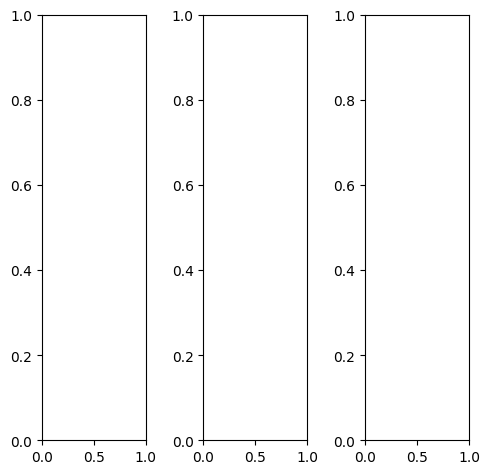

EPOCH: 14.255  trn_loss: 0.005  (1696.59s - 10205.07s remaining)

tensor([[[0.9961, 0.9882, 0.9843,  ..., 0.8392, 0.8235, 0.8039],
         [0.8745, 0.9647, 0.9961,  ..., 0.8392, 0.8314, 0.8118],
         [0.5804, 0.7098, 0.8784,  ..., 0.8275, 0.7961, 0.7569],
         ...,
         [0.2510, 0.2549, 0.2745,  ..., 0.2784, 0.3255, 0.3490],
         [0.2275, 0.2392, 0.2549,  ..., 0.2549, 0.2902, 0.2902],
         [0.2275, 0.2392, 0.2510,  ..., 0.2706, 0.2902, 0.2863]],

        [[0.9961, 0.9882, 0.9843,  ..., 0.8392, 0.8235, 0.8039],
         [0.8745, 0.9647, 0.9961,  ..., 0.8392, 0.8314, 0.8118],
         [0.5804, 0.7098, 0.8784,  ..., 0.8275, 0.7961, 0.7569],
         ...,
         [0.2510, 0.2549, 0.2745,  ..., 0.2784, 0.3255, 0.3490],
         [0.2275, 0.2392, 0.2549,  ..., 0.2549, 0.2902, 0.2902],
         [0.2275, 0.2392, 0.2510,  ..., 0.2706, 0.2902, 0.2863]],

        [[0.9961, 0.9882, 0.9843,  ..., 0.8392, 0.8235, 0.8039],
         [0.8745, 0.9647, 0.9961,  ..., 0.8392, 0.8314, 0.8118],
         [0.5804, 0.7098, 0.8784,  ..., 0.8275, 0.7961, 0.

tensor([[[0.9882, 0.9882, 0.9922,  ..., 0.8196, 0.8000, 0.7686],
         [0.8627, 0.9569, 0.9961,  ..., 0.8157, 0.8039, 0.7843],
         [0.5804, 0.7098, 0.8745,  ..., 0.8039, 0.7765, 0.7412],
         ...,
         [0.2627, 0.2745, 0.2980,  ..., 0.2902, 0.3412, 0.3725],
         [0.2431, 0.2549, 0.2706,  ..., 0.2549, 0.2941, 0.3059],
         [0.2471, 0.2549, 0.2667,  ..., 0.2667, 0.2902, 0.2863]],

        [[1.0000, 0.9882, 0.9804,  ..., 0.8431, 0.8275, 0.8118],
         [0.8784, 0.9647, 0.9961,  ..., 0.8471, 0.8392, 0.8196],
         [0.5804, 0.7098, 0.8784,  ..., 0.8353, 0.8039, 0.7647],
         ...,
         [0.2510, 0.2549, 0.2745,  ..., 0.2784, 0.3255, 0.3451],
         [0.2275, 0.2392, 0.2549,  ..., 0.2588, 0.2941, 0.2863],
         [0.2275, 0.2392, 0.2510,  ..., 0.2745, 0.2902, 0.2824]],

        [[0.9922, 0.9843, 0.9843,  ..., 0.8627, 0.8510, 0.8471],
         [0.8863, 0.9686, 1.0000,  ..., 0.8667, 0.8627, 0.8431],
         [0.5961, 0.7255, 0.8902,  ..., 0.8471, 0.8157, 0.

tensor([[[0.9943, 0.9764, 0.9980,  ..., 0.6755, 0.6842, 0.7645],
         [0.9008, 1.0950, 0.9849,  ..., 0.6937, 0.7242, 0.7723],
         [0.5956, 0.7980, 0.8713,  ..., 0.7107, 0.7104, 0.7279],
         ...,
         [0.2747, 0.2815, 0.2755,  ..., 0.3107, 0.3667, 0.4528],
         [0.2459, 0.2524, 0.2604,  ..., 0.2667, 0.3324, 0.3991],
         [0.3031, 0.2939, 0.2919,  ..., 0.3446, 0.3778, 0.4165]],

        [[0.9848, 0.9875, 0.9443,  ..., 0.7677, 0.7919, 0.8403],
         [0.8516, 1.0484, 0.9347,  ..., 0.7986, 0.8043, 0.8907],
         [0.6702, 0.7435, 0.9000,  ..., 0.8137, 0.7941, 0.8280],
         ...,
         [0.3048, 0.3285, 0.3508,  ..., 0.3597, 0.4160, 0.4311],
         [0.2745, 0.3069, 0.3212,  ..., 0.3233, 0.3664, 0.3737],
         [0.3078, 0.3199, 0.3398,  ..., 0.3655, 0.3853, 0.3949]],

        [[0.9906, 1.0513, 1.0569,  ..., 0.9026, 0.9145, 0.9304],
         [0.9635, 1.1074, 1.0981,  ..., 0.8994, 0.9374, 0.9606],
         [0.7123, 0.7471, 1.0135,  ..., 0.9255, 0.9281, 0.

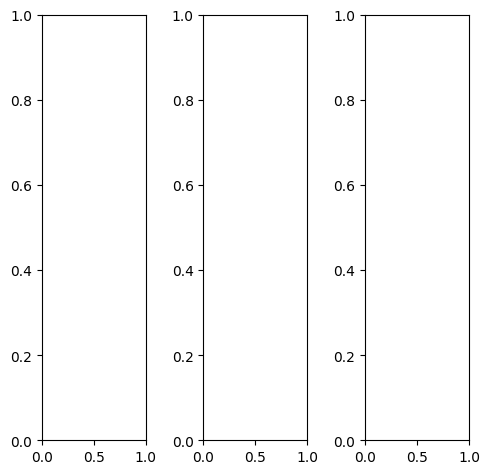

tensor([[[0.9255, 0.6627, 0.8235,  ..., 0.8000, 0.8627, 0.8706],
         [0.9725, 0.6863, 0.8627,  ..., 0.7961, 0.8745, 0.8902],
         [0.9647, 0.6784, 0.8353,  ..., 0.5529, 0.6941, 0.8000],
         ...,
         [0.8314, 0.8118, 0.7176,  ..., 0.9490, 0.8863, 0.9412],
         [0.7020, 0.6706, 0.6118,  ..., 0.9412, 0.8863, 0.9451],
         [0.7451, 0.6078, 0.4863,  ..., 0.9176, 0.8980, 0.9490]],

        [[0.9255, 0.6627, 0.8235,  ..., 0.8000, 0.8627, 0.8706],
         [0.9725, 0.6863, 0.8627,  ..., 0.7961, 0.8745, 0.8902],
         [0.9647, 0.6784, 0.8353,  ..., 0.5529, 0.6941, 0.8000],
         ...,
         [0.8314, 0.8118, 0.7176,  ..., 0.9490, 0.8863, 0.9412],
         [0.7020, 0.6706, 0.6118,  ..., 0.9412, 0.8863, 0.9451],
         [0.7451, 0.6078, 0.4863,  ..., 0.9176, 0.8980, 0.9490]],

        [[0.9255, 0.6627, 0.8235,  ..., 0.8000, 0.8627, 0.8706],
         [0.9725, 0.6863, 0.8627,  ..., 0.7961, 0.8745, 0.8902],
         [0.9647, 0.6784, 0.8353,  ..., 0.5529, 0.6941, 0.

tensor([[[0.8941, 0.6314, 0.7922,  ..., 0.7373, 0.7922, 0.8118],
         [0.9490, 0.6627, 0.8431,  ..., 0.7294, 0.8039, 0.8353],
         [0.9412, 0.6588, 0.8157,  ..., 0.4824, 0.6314, 0.7529],
         ...,
         [0.7725, 0.7529, 0.6588,  ..., 0.8824, 0.8157, 0.8784],
         [0.6353, 0.6000, 0.5451,  ..., 0.8667, 0.8235, 0.8941],
         [0.6745, 0.5333, 0.4157,  ..., 0.8392, 0.8431, 0.9137]],

        [[0.9373, 0.6706, 0.8353,  ..., 0.8235, 0.8941, 0.8941],
         [0.9804, 0.6902, 0.8706,  ..., 0.8235, 0.9020, 0.9137],
         [0.9686, 0.6824, 0.8431,  ..., 0.5804, 0.7176, 0.8196],
         ...,
         [0.8549, 0.8353, 0.7373,  ..., 0.9765, 0.9176, 0.9686],
         [0.7294, 0.6941, 0.6353,  ..., 0.9725, 0.9137, 0.9647],
         [0.7765, 0.6353, 0.5098,  ..., 0.9490, 0.9216, 0.9647]],

        [[0.9490, 0.6941, 0.8392,  ..., 0.8314, 0.8902, 0.8902],
         [1.0000, 0.7255, 0.8863,  ..., 0.8314, 0.9020, 0.9098],
         [1.0000, 0.7216, 0.8627,  ..., 0.5882, 0.7216, 0.

tensor([[[0.3915, 0.1997, 0.2600,  ..., 0.3526, 0.3886, 0.4192],
         [0.3710, 0.1503, 0.2770,  ..., 0.3825, 0.4163, 0.4137],
         [0.3275, 0.1903, 0.1520,  ..., 0.1889, 0.2878, 0.3312],
         ...,
         [0.5228, 0.5975, 0.5170,  ..., 0.5121, 0.4667, 0.5214],
         [0.4380, 0.4490, 0.4635,  ..., 0.5064, 0.4918, 0.5337],
         [0.4040, 0.3460, 0.2739,  ..., 0.5068, 0.5027, 0.5321]],

        [[0.5172, 0.3234, 0.4471,  ..., 0.4435, 0.5030, 0.4627],
         [0.4118, 0.2960, 0.3406,  ..., 0.5046, 0.5551, 0.4875],
         [0.5006, 0.3148, 0.4100,  ..., 0.2666, 0.3840, 0.3760],
         ...,
         [0.4609, 0.5158, 0.4812,  ..., 0.5393, 0.5080, 0.4959],
         [0.3642, 0.3917, 0.4165,  ..., 0.5366, 0.4923, 0.5060],
         [0.3396, 0.2733, 0.2280,  ..., 0.4875, 0.4915, 0.4990]],

        [[0.6710, 0.3961, 0.6521,  ..., 0.6634, 0.7108, 0.6619],
         [0.6282, 0.5214, 0.6080,  ..., 0.7108, 0.7800, 0.6974],
         [0.6395, 0.4293, 0.5992,  ..., 0.4528, 0.5923, 0.

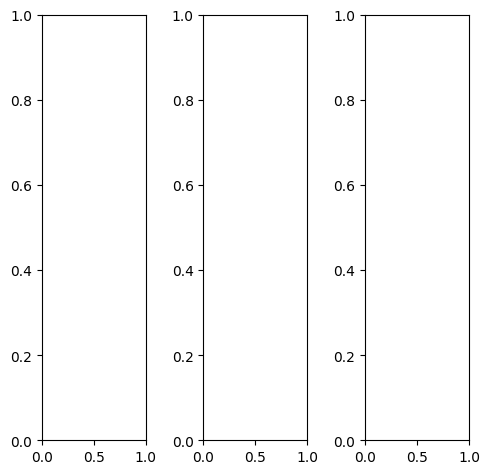

tensor([[[0.1529, 0.1490, 0.1608,  ..., 0.2431, 0.2431, 0.1647],
         [0.0902, 0.1020, 0.1176,  ..., 0.2667, 0.2667, 0.2196],
         [0.1608, 0.1333, 0.1608,  ..., 0.1843, 0.1765, 0.2118],
         ...,
         [0.2549, 0.1882, 0.1569,  ..., 0.2588, 0.3373, 0.3373],
         [0.2706, 0.2196, 0.3216,  ..., 0.3490, 0.2824, 0.1922],
         [0.2471, 0.3098, 0.3804,  ..., 0.3804, 0.2392, 0.2863]],

        [[0.1529, 0.1490, 0.1608,  ..., 0.2431, 0.2431, 0.1647],
         [0.0902, 0.1020, 0.1176,  ..., 0.2667, 0.2667, 0.2196],
         [0.1608, 0.1333, 0.1608,  ..., 0.1843, 0.1765, 0.2118],
         ...,
         [0.2549, 0.1882, 0.1569,  ..., 0.2588, 0.3373, 0.3373],
         [0.2706, 0.2196, 0.3216,  ..., 0.3490, 0.2824, 0.1922],
         [0.2471, 0.3098, 0.3804,  ..., 0.3804, 0.2392, 0.2863]],

        [[0.1529, 0.1490, 0.1608,  ..., 0.2431, 0.2431, 0.1647],
         [0.0902, 0.1020, 0.1176,  ..., 0.2667, 0.2667, 0.2196],
         [0.1608, 0.1333, 0.1608,  ..., 0.1843, 0.1765, 0.

tensor([[[0.1804, 0.1529, 0.1490,  ..., 0.1765, 0.1725, 0.1020],
         [0.0980, 0.1137, 0.1412,  ..., 0.2157, 0.2196, 0.1765],
         [0.1569, 0.1490, 0.2039,  ..., 0.1451, 0.1451, 0.1922],
         ...,
         [0.1882, 0.1373, 0.1255,  ..., 0.2275, 0.2863, 0.2863],
         [0.1961, 0.1569, 0.2745,  ..., 0.3020, 0.2667, 0.1961],
         [0.1608, 0.2275, 0.3020,  ..., 0.3412, 0.2431, 0.3255]],

        [[0.1608, 0.1647, 0.1882,  ..., 0.3137, 0.3098, 0.2196],
         [0.1020, 0.1098, 0.1216,  ..., 0.3294, 0.3216, 0.2667],
         [0.1804, 0.1490, 0.1647,  ..., 0.2275, 0.2118, 0.2510],
         ...,
         [0.3176, 0.2392, 0.2000,  ..., 0.3059, 0.3961, 0.3961],
         [0.3490, 0.2863, 0.3804,  ..., 0.4157, 0.3294, 0.2196],
         [0.3333, 0.4000, 0.4627,  ..., 0.4549, 0.2706, 0.3020]],

        [[0.0510, 0.0627, 0.0431,  ..., 0.0627, 0.0784, 0.0431],
         [0.0196, 0.0392, 0.0275,  ..., 0.0902, 0.1137, 0.0902],
         [0.0627, 0.0275, 0.0275,  ..., 0.0588, 0.0667, 0.

tensor([[[ 0.0214, -0.0358, -0.0958,  ...,  0.2254,  0.2282,  0.2065],
         [-0.0056, -0.1966, -0.1723,  ...,  0.2281,  0.2339,  0.2109],
         [-0.1362, -0.1666, -0.2491,  ...,  0.0889,  0.0849,  0.1916],
         ...,
         [ 0.3434,  0.2328,  0.1945,  ...,  0.3692,  0.4574,  0.4654],
         [ 0.3543,  0.3003,  0.4296,  ...,  0.4338,  0.3734,  0.3016],
         [ 0.3603,  0.4088,  0.4807,  ...,  0.5134,  0.3275,  0.3971]],

        [[ 0.1320,  0.1001,  0.0347,  ...,  0.2944,  0.2817,  0.2364],
         [ 0.0203, -0.1634, -0.2287,  ...,  0.3282,  0.3453,  0.2612],
         [ 0.0251,  0.0078, -0.1171,  ...,  0.1801,  0.1759,  0.2435],
         ...,
         [ 0.3199,  0.2197,  0.2014,  ...,  0.3167,  0.4049,  0.3954],
         [ 0.3245,  0.2603,  0.3912,  ...,  0.4098,  0.3434,  0.2343],
         [ 0.3045,  0.3609,  0.4601,  ...,  0.4743,  0.2926,  0.3185]],

        [[ 0.3114,  0.0762,  0.2400,  ...,  0.4461,  0.4440,  0.3893],
         [ 0.2221,  0.0799,  0.1992,  ...,  0

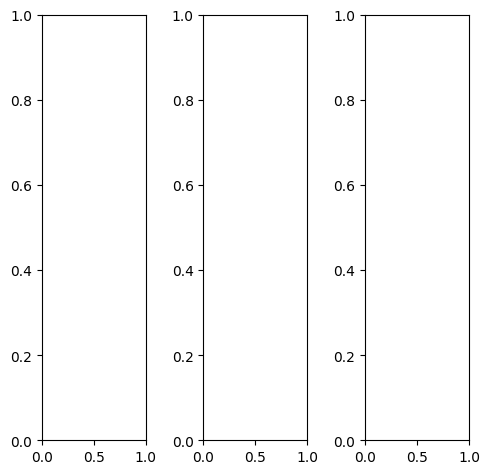

tensor([[[0.9098, 0.8784, 0.8745,  ..., 0.8510, 0.8392, 0.8196],
         [0.9216, 0.9020, 0.9020,  ..., 0.8588, 0.8275, 0.8118],
         [0.9216, 0.9059, 0.9059,  ..., 0.8549, 0.7804, 0.7765],
         ...,
         [0.7176, 0.6431, 0.8118,  ..., 0.6000, 0.5569, 0.5529],
         [0.5608, 0.5490, 0.6275,  ..., 0.6784, 0.6353, 0.5686],
         [0.5216, 0.5490, 0.5529,  ..., 0.6000, 0.6510, 0.6549]],

        [[0.9098, 0.8784, 0.8745,  ..., 0.8510, 0.8392, 0.8196],
         [0.9216, 0.9020, 0.9020,  ..., 0.8588, 0.8275, 0.8118],
         [0.9216, 0.9059, 0.9059,  ..., 0.8549, 0.7804, 0.7765],
         ...,
         [0.7176, 0.6431, 0.8118,  ..., 0.6000, 0.5569, 0.5529],
         [0.5608, 0.5490, 0.6275,  ..., 0.6784, 0.6353, 0.5686],
         [0.5216, 0.5490, 0.5529,  ..., 0.6000, 0.6510, 0.6549]],

        [[0.9098, 0.8784, 0.8745,  ..., 0.8510, 0.8392, 0.8196],
         [0.9216, 0.9020, 0.9020,  ..., 0.8588, 0.8275, 0.8118],
         [0.9216, 0.9059, 0.9059,  ..., 0.8549, 0.7804, 0.

tensor([[[0.9098, 0.8784, 0.8745,  ..., 0.8392, 0.8235, 0.8039],
         [0.9216, 0.9020, 0.9020,  ..., 0.8431, 0.8118, 0.7961],
         [0.9216, 0.9059, 0.9059,  ..., 0.8353, 0.7647, 0.7569],
         ...,
         [0.7333, 0.6549, 0.8235,  ..., 0.6157, 0.5647, 0.5569],
         [0.5686, 0.5569, 0.6353,  ..., 0.6980, 0.6549, 0.5843],
         [0.5216, 0.5490, 0.5529,  ..., 0.6157, 0.6706, 0.6745]],

        [[0.9059, 0.8745, 0.8706,  ..., 0.8471, 0.8353, 0.8157],
         [0.9216, 0.8980, 0.8980,  ..., 0.8588, 0.8235, 0.8078],
         [0.9216, 0.9020, 0.9020,  ..., 0.8549, 0.7804, 0.7765],
         ...,
         [0.7137, 0.6392, 0.8078,  ..., 0.5961, 0.5529, 0.5490],
         [0.5569, 0.5451, 0.6235,  ..., 0.6706, 0.6314, 0.5647],
         [0.5176, 0.5451, 0.5490,  ..., 0.5961, 0.6431, 0.6471]],

        [[0.9216, 0.8980, 0.9020,  ..., 0.8941, 0.8863, 0.8706],
         [0.9294, 0.9176, 0.9255,  ..., 0.9020, 0.8745, 0.8667],
         [0.9255, 0.9137, 0.9216,  ..., 0.8980, 0.8314, 0.

tensor([[[0.7373, 0.6598, 0.6604,  ..., 0.5566, 0.5587, 0.6225],
         [0.7272, 0.7660, 0.7088,  ..., 0.5021, 0.5490, 0.5888],
         [0.6777, 0.7517, 0.6372,  ..., 0.5463, 0.5139, 0.5555],
         ...,
         [0.5759, 0.5386, 0.6554,  ..., 0.5003, 0.4605, 0.4739],
         [0.4124, 0.4399, 0.5155,  ..., 0.5627, 0.5131, 0.4764],
         [0.4066, 0.4329, 0.4154,  ..., 0.4843, 0.5476, 0.5465]],

        [[0.7815, 0.7599, 0.7313,  ..., 0.6488, 0.6801, 0.6750],
         [0.7180, 0.8500, 0.7560,  ..., 0.6615, 0.6716, 0.7030],
         [0.7719, 0.8399, 0.8041,  ..., 0.6747, 0.6198, 0.6567],
         ...,
         [0.5056, 0.4332, 0.6063,  ..., 0.5242, 0.4989, 0.4259],
         [0.3621, 0.3624, 0.4300,  ..., 0.5767, 0.5231, 0.4482],
         [0.3759, 0.3743, 0.3806,  ..., 0.4649, 0.5345, 0.5146]],

        [[0.8932, 0.8269, 0.9473,  ..., 0.7774, 0.7894, 0.7781],
         [0.9127, 0.9712, 0.9664,  ..., 0.7718, 0.7848, 0.7648],
         [0.8921, 0.9146, 1.0126,  ..., 0.7972, 0.7530, 0.

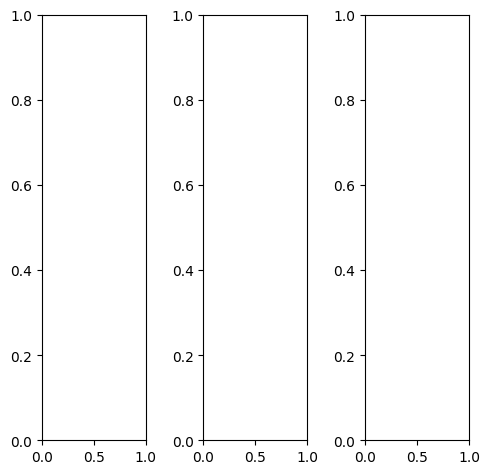

tensor([[[0.8471, 0.8157, 0.7882,  ..., 0.4275, 0.6000, 0.6824],
         [0.7255, 0.7373, 0.7373,  ..., 0.3451, 0.3922, 0.5216],
         [0.7451, 0.7333, 0.7098,  ..., 0.3373, 0.3451, 0.3922],
         ...,
         [0.5333, 0.3961, 0.3451,  ..., 0.3569, 0.4392, 0.4745],
         [0.5608, 0.4000, 0.3216,  ..., 0.3333, 0.3686, 0.4235],
         [0.4235, 0.3255, 0.2627,  ..., 0.3176, 0.4314, 0.5255]],

        [[0.8471, 0.8157, 0.7882,  ..., 0.4275, 0.6000, 0.6824],
         [0.7255, 0.7373, 0.7373,  ..., 0.3451, 0.3922, 0.5216],
         [0.7451, 0.7333, 0.7098,  ..., 0.3373, 0.3451, 0.3922],
         ...,
         [0.5333, 0.3961, 0.3451,  ..., 0.3569, 0.4392, 0.4745],
         [0.5608, 0.4000, 0.3216,  ..., 0.3333, 0.3686, 0.4235],
         [0.4235, 0.3255, 0.2627,  ..., 0.3176, 0.4314, 0.5255]],

        [[0.8471, 0.8157, 0.7882,  ..., 0.4275, 0.6000, 0.6824],
         [0.7255, 0.7373, 0.7373,  ..., 0.3451, 0.3922, 0.5216],
         [0.7451, 0.7333, 0.7098,  ..., 0.3373, 0.3451, 0.

tensor([[[0.8431, 0.8078, 0.7804,  ..., 0.4314, 0.6118, 0.6902],
         [0.7098, 0.7137, 0.7059,  ..., 0.3490, 0.4039, 0.5373],
         [0.7294, 0.7098, 0.6784,  ..., 0.3451, 0.3490, 0.4078],
         ...,
         [0.5529, 0.4078, 0.3529,  ..., 0.3608, 0.4549, 0.4941],
         [0.5882, 0.4235, 0.3373,  ..., 0.3333, 0.3765, 0.4353],
         [0.4471, 0.3451, 0.2824,  ..., 0.3176, 0.4353, 0.5333]],

        [[0.8549, 0.8235, 0.7961,  ..., 0.4235, 0.5961, 0.6745],
         [0.7412, 0.7569, 0.7608,  ..., 0.3412, 0.3882, 0.5098],
         [0.7608, 0.7490, 0.7294,  ..., 0.3333, 0.3412, 0.3843],
         ...,
         [0.5255, 0.3882, 0.3373,  ..., 0.3529, 0.4314, 0.4627],
         [0.5490, 0.3882, 0.3098,  ..., 0.3294, 0.3647, 0.4157],
         [0.4118, 0.3137, 0.2549,  ..., 0.3137, 0.4314, 0.5255]],

        [[0.8314, 0.7961, 0.7686,  ..., 0.4235, 0.6039, 0.6941],
         [0.6941, 0.7020, 0.7059,  ..., 0.3412, 0.3961, 0.5333],
         [0.7137, 0.7020, 0.6784,  ..., 0.3333, 0.3451, 0.

tensor([[[0.9997, 0.9661, 0.9735,  ..., 0.2950, 0.5518, 0.6365],
         [0.8452, 1.0015, 0.8980,  ..., 0.1926, 0.2564, 0.4907],
         [0.8796, 1.0170, 0.8932,  ..., 0.1966, 0.1901, 0.2627],
         ...,
         [0.5513, 0.3515, 0.2217,  ..., 0.3184, 0.4079, 0.4757],
         [0.5781, 0.3384, 0.1924,  ..., 0.2436, 0.3224, 0.4090],
         [0.4540, 0.2740, 0.1430,  ..., 0.2657, 0.4324, 0.5457]],

        [[0.9932, 0.9958, 0.9160,  ..., 0.3861, 0.6310, 0.6834],
         [0.8061, 0.9700, 0.8768,  ..., 0.2820, 0.3630, 0.5563],
         [0.9354, 0.9597, 0.9009,  ..., 0.2765, 0.2841, 0.3337],
         ...,
         [0.5856, 0.3699, 0.3176,  ..., 0.3212, 0.4258, 0.4548],
         [0.6096, 0.3717, 0.2699,  ..., 0.2581, 0.3100, 0.3870],
         [0.4531, 0.2704, 0.1829,  ..., 0.2496, 0.4219, 0.5305]],

        [[1.0074, 1.0554, 1.0114,  ..., 0.5461, 0.8025, 0.8291],
         [0.9356, 1.0626, 1.0109,  ..., 0.4504, 0.5655, 0.7283],
         [0.9595, 0.9955, 1.0169,  ..., 0.4498, 0.4761, 0.

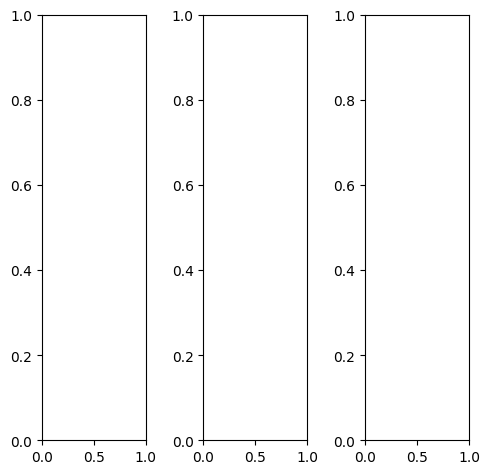

EPOCH: 14.510  trn_loss: 0.005  (1726.15s - 10169.99s remaining)

tensor([[[0.3804, 0.3804, 0.4078,  ..., 0.3725, 0.4235, 0.3922],
         [0.3373, 0.3412, 0.4196,  ..., 0.3255, 0.3725, 0.3569],
         [0.3843, 0.3333, 0.3686,  ..., 0.3137, 0.3490, 0.3686],
         ...,
         [0.6314, 0.6039, 0.6078,  ..., 0.6118, 0.6157, 0.6196],
         [0.5922, 0.5765, 0.5725,  ..., 0.5804, 0.5725, 0.5647],
         [0.6039, 0.6157, 0.6118,  ..., 0.6196, 0.5961, 0.6118]],

        [[0.3804, 0.3804, 0.4078,  ..., 0.3725, 0.4235, 0.3922],
         [0.3373, 0.3412, 0.4196,  ..., 0.3255, 0.3725, 0.3569],
         [0.3843, 0.3333, 0.3686,  ..., 0.3137, 0.3490, 0.3686],
         ...,
         [0.6314, 0.6039, 0.6078,  ..., 0.6118, 0.6157, 0.6196],
         [0.5922, 0.5765, 0.5725,  ..., 0.5804, 0.5725, 0.5647],
         [0.6039, 0.6157, 0.6118,  ..., 0.6196, 0.5961, 0.6118]],

        [[0.3804, 0.3804, 0.4078,  ..., 0.3725, 0.4235, 0.3922],
         [0.3373, 0.3412, 0.4196,  ..., 0.3255, 0.3725, 0.3569],
         [0.3843, 0.3333, 0.3686,  ..., 0.3137, 0.3490, 0.

tensor([[[0.3490, 0.3412, 0.3765,  ..., 0.3216, 0.3725, 0.3451],
         [0.3059, 0.3020, 0.3882,  ..., 0.2706, 0.3176, 0.3059],
         [0.3529, 0.2941, 0.3412,  ..., 0.2471, 0.2824, 0.3137],
         ...,
         [0.5647, 0.5373, 0.5373,  ..., 0.5451, 0.5490, 0.5569],
         [0.5255, 0.5098, 0.5059,  ..., 0.5137, 0.5059, 0.4980],
         [0.5373, 0.5490, 0.5451,  ..., 0.5490, 0.5333, 0.5451]],

        [[0.4078, 0.4196, 0.4392,  ..., 0.4157, 0.4627, 0.4235],
         [0.3647, 0.3804, 0.4510,  ..., 0.3647, 0.4157, 0.3922],
         [0.4118, 0.3686, 0.4000,  ..., 0.3529, 0.3961, 0.4078],
         ...,
         [0.6588, 0.6314, 0.6353,  ..., 0.6392, 0.6431, 0.6471],
         [0.6196, 0.6078, 0.6039,  ..., 0.6118, 0.6039, 0.6039],
         [0.6314, 0.6431, 0.6392,  ..., 0.6510, 0.6275, 0.6353]],

        [[0.3216, 0.2745, 0.3216,  ..., 0.2941, 0.3490, 0.3412],
         [0.2784, 0.2588, 0.3412,  ..., 0.2706, 0.3059, 0.3216],
         [0.3255, 0.2627, 0.2941,  ..., 0.2745, 0.2784, 0.

tensor([[[0.3906, 0.3014, 0.3029,  ..., 0.3223, 0.4191, 0.4268],
         [0.2489, 0.1985, 0.2604,  ..., 0.2626, 0.3139, 0.3339],
         [0.3002, 0.1871, 0.1423,  ..., 0.2557, 0.2992, 0.3541],
         ...,
         [0.8128, 0.7888, 0.7689,  ..., 0.7582, 0.7670, 0.7695],
         [0.7542, 0.7215, 0.7026,  ..., 0.7028, 0.6844, 0.7104],
         [0.7647, 0.7874, 0.7640,  ..., 0.7870, 0.7688, 0.7686]],

        [[0.4016, 0.4824, 0.3842,  ..., 0.4152, 0.5071, 0.4514],
         [0.3547, 0.3433, 0.3198,  ..., 0.3303, 0.4125, 0.3730],
         [0.3782, 0.3734, 0.2459,  ..., 0.3316, 0.3777, 0.3872],
         ...,
         [0.7717, 0.7377, 0.7456,  ..., 0.7277, 0.7405, 0.7528],
         [0.7220, 0.6910, 0.6856,  ..., 0.6842, 0.6852, 0.6860],
         [0.7143, 0.7392, 0.7329,  ..., 0.7475, 0.7305, 0.7193]],

        [[0.5739, 0.4588, 0.5537,  ..., 0.5093, 0.6116, 0.5748],
         [0.4905, 0.4262, 0.5493,  ..., 0.4268, 0.5178, 0.5024],
         [0.5084, 0.3831, 0.4410,  ..., 0.4085, 0.4706, 0.

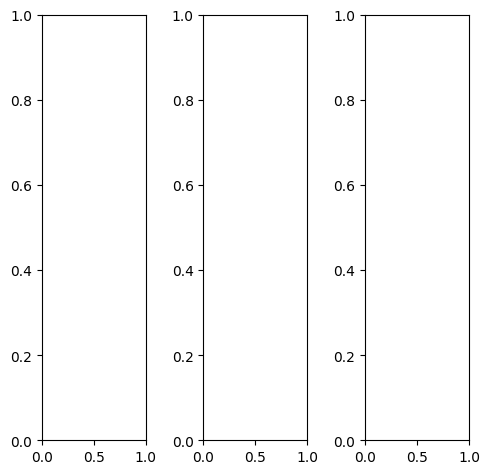

tensor([[[0.4431, 0.3333, 0.2902,  ..., 0.2000, 0.1922, 0.1686],
         [0.2706, 0.2471, 0.2784,  ..., 0.1922, 0.1922, 0.1686],
         [0.2235, 0.2588, 0.2745,  ..., 0.3216, 0.2000, 0.1686],
         ...,
         [0.4196, 0.4941, 0.5529,  ..., 0.4353, 0.3569, 0.3922],
         [0.3961, 0.4863, 0.4510,  ..., 0.3529, 0.3961, 0.4471],
         [0.2627, 0.3255, 0.2824,  ..., 0.3216, 0.3176, 0.3569]],

        [[0.4431, 0.3333, 0.2902,  ..., 0.2000, 0.1922, 0.1686],
         [0.2706, 0.2471, 0.2784,  ..., 0.1922, 0.1922, 0.1686],
         [0.2235, 0.2588, 0.2745,  ..., 0.3216, 0.2000, 0.1686],
         ...,
         [0.4196, 0.4941, 0.5529,  ..., 0.4353, 0.3569, 0.3922],
         [0.3961, 0.4863, 0.4510,  ..., 0.3529, 0.3961, 0.4471],
         [0.2627, 0.3255, 0.2824,  ..., 0.3216, 0.3176, 0.3569]],

        [[0.4431, 0.3333, 0.2902,  ..., 0.2000, 0.1922, 0.1686],
         [0.2706, 0.2471, 0.2784,  ..., 0.1922, 0.1922, 0.1686],
         [0.2235, 0.2588, 0.2745,  ..., 0.3216, 0.2000, 0.

tensor([[[0.4824, 0.3725, 0.3294,  ..., 0.2392, 0.2353, 0.2157],
         [0.3098, 0.2863, 0.3176,  ..., 0.2275, 0.2314, 0.2157],
         [0.2627, 0.2980, 0.3137,  ..., 0.3608, 0.2431, 0.2157],
         ...,
         [0.4431, 0.5255, 0.5922,  ..., 0.4627, 0.4000, 0.4667],
         [0.4275, 0.5216, 0.4902,  ..., 0.3843, 0.4353, 0.4941],
         [0.3059, 0.3686, 0.3216,  ..., 0.3686, 0.3647, 0.4000]],

        [[0.4314, 0.3216, 0.2784,  ..., 0.1882, 0.1765, 0.1490],
         [0.2588, 0.2353, 0.2667,  ..., 0.1804, 0.1765, 0.1490],
         [0.2118, 0.2471, 0.2627,  ..., 0.3098, 0.1843, 0.1490],
         ...,
         [0.4157, 0.4863, 0.5412,  ..., 0.4314, 0.3451, 0.3686],
         [0.3882, 0.4745, 0.4392,  ..., 0.3451, 0.3882, 0.4314],
         [0.2471, 0.3137, 0.2745,  ..., 0.3098, 0.3059, 0.3451]],

        [[0.4078, 0.2980, 0.2549,  ..., 0.1608, 0.1608, 0.1451],
         [0.2353, 0.2118, 0.2431,  ..., 0.1529, 0.1569, 0.1451],
         [0.1882, 0.2235, 0.2392,  ..., 0.2863, 0.1686, 0.

tensor([[[ 0.3452,  0.2077,  0.0845,  ...,  0.1241,  0.1330,  0.1234],
         [ 0.1603,  0.0735,  0.0747,  ...,  0.1013,  0.0973,  0.0936],
         [ 0.0638,  0.0536, -0.0480,  ...,  0.2848,  0.1065,  0.0674],
         ...,
         [ 0.4691,  0.5885,  0.6472,  ...,  0.5124,  0.4164,  0.4596],
         [ 0.3995,  0.5407,  0.5182,  ...,  0.4003,  0.4525,  0.5091],
         [ 0.2752,  0.3058,  0.2459,  ...,  0.3229,  0.3143,  0.3870]],

        [[ 0.3945,  0.3887,  0.2179,  ...,  0.1752,  0.1813,  0.1601],
         [ 0.2471,  0.2208,  0.1384,  ...,  0.1701,  0.1794,  0.1434],
         [ 0.1615,  0.2793,  0.1477,  ...,  0.3323,  0.1883,  0.1227],
         ...,
         [ 0.4407,  0.5497,  0.6394,  ...,  0.4668,  0.3850,  0.4033],
         [ 0.3745,  0.5154,  0.4914,  ...,  0.3913,  0.4506,  0.4749],
         [ 0.2674,  0.2681,  0.2407,  ...,  0.2994,  0.2958,  0.3509]],

        [[ 0.6051,  0.3844,  0.4447,  ...,  0.2738,  0.2890,  0.2826],
         [ 0.4363,  0.3736,  0.4131,  ...,  0

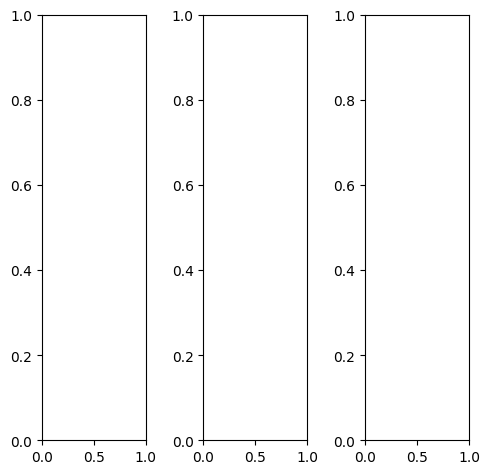

tensor([[[0.1373, 0.1373, 0.1373,  ..., 0.1373, 0.1373, 0.1412],
         [0.1451, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1451],
         [0.1412, 0.1373, 0.1412,  ..., 0.1373, 0.1412, 0.1412],
         ...,
         [0.1804, 0.2157, 0.2353,  ..., 0.3255, 0.3333, 0.2824],
         [0.1608, 0.1725, 0.2000,  ..., 0.2784, 0.2980, 0.2588],
         [0.1529, 0.1765, 0.1882,  ..., 0.2314, 0.2471, 0.2275]],

        [[0.1373, 0.1373, 0.1373,  ..., 0.1373, 0.1373, 0.1412],
         [0.1451, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1451],
         [0.1412, 0.1373, 0.1412,  ..., 0.1373, 0.1412, 0.1412],
         ...,
         [0.1804, 0.2157, 0.2353,  ..., 0.3255, 0.3333, 0.2824],
         [0.1608, 0.1725, 0.2000,  ..., 0.2784, 0.2980, 0.2588],
         [0.1529, 0.1765, 0.1882,  ..., 0.2314, 0.2471, 0.2275]],

        [[0.1373, 0.1373, 0.1373,  ..., 0.1373, 0.1373, 0.1412],
         [0.1451, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1451],
         [0.1412, 0.1373, 0.1412,  ..., 0.1373, 0.1412, 0.

tensor([[[0.1255, 0.1255, 0.1255,  ..., 0.1255, 0.1255, 0.1294],
         [0.1333, 0.1294, 0.1294,  ..., 0.1294, 0.1294, 0.1333],
         [0.1294, 0.1255, 0.1294,  ..., 0.1255, 0.1294, 0.1294],
         ...,
         [0.1137, 0.0980, 0.0863,  ..., 0.1725, 0.1686, 0.1294],
         [0.1020, 0.0667, 0.0510,  ..., 0.1176, 0.1255, 0.1059],
         [0.1020, 0.0824, 0.0431,  ..., 0.0745, 0.0784, 0.0745]],

        [[0.1373, 0.1373, 0.1373,  ..., 0.1412, 0.1373, 0.1451],
         [0.1451, 0.1412, 0.1412,  ..., 0.1412, 0.1412, 0.1490],
         [0.1412, 0.1373, 0.1412,  ..., 0.1412, 0.1412, 0.1451],
         ...,
         [0.2196, 0.2824, 0.3255,  ..., 0.4196, 0.4392, 0.3765],
         [0.1922, 0.2353, 0.2902,  ..., 0.3765, 0.4039, 0.3569],
         [0.1804, 0.2314, 0.2745,  ..., 0.3255, 0.3529, 0.3216]],

        [[0.1569, 0.1569, 0.1569,  ..., 0.1529, 0.1569, 0.1569],
         [0.1647, 0.1608, 0.1608,  ..., 0.1647, 0.1608, 0.1608],
         [0.1647, 0.1569, 0.1608,  ..., 0.1647, 0.1608, 0.

tensor([[[0.1941, 0.1508, 0.1214,  ..., 0.1844, 0.1889, 0.1988],
         [0.2060, 0.1032, 0.1863,  ..., 0.1801, 0.1773, 0.1894],
         [0.1329, 0.1427, 0.0668,  ..., 0.1641, 0.1792, 0.1819],
         ...,
         [0.3069, 0.4324, 0.4913,  ..., 0.6450, 0.6560, 0.5157],
         [0.2334, 0.2852, 0.3847,  ..., 0.5124, 0.5590, 0.4915],
         [0.2297, 0.2393, 0.2665,  ..., 0.3767, 0.4170, 0.4104]],

        [[0.2131, 0.2780, 0.2191,  ..., 0.2162, 0.2289, 0.2224],
         [0.2118, 0.1056, 0.1199,  ..., 0.2025, 0.2234, 0.2177],
         [0.2189, 0.2384, 0.2490,  ..., 0.1744, 0.1966, 0.1973],
         ...,
         [0.2812, 0.3901, 0.4666,  ..., 0.5887, 0.6587, 0.4518],
         [0.2136, 0.2717, 0.3543,  ..., 0.5071, 0.5538, 0.4324],
         [0.2137, 0.2235, 0.2673,  ..., 0.3346, 0.3844, 0.3523]],

        [[0.4572, 0.2903, 0.4213,  ..., 0.2920, 0.3050, 0.3318],
         [0.3708, 0.2916, 0.3137,  ..., 0.2690, 0.2913, 0.3105],
         [0.3660, 0.2739, 0.3392,  ..., 0.2257, 0.2531, 0.

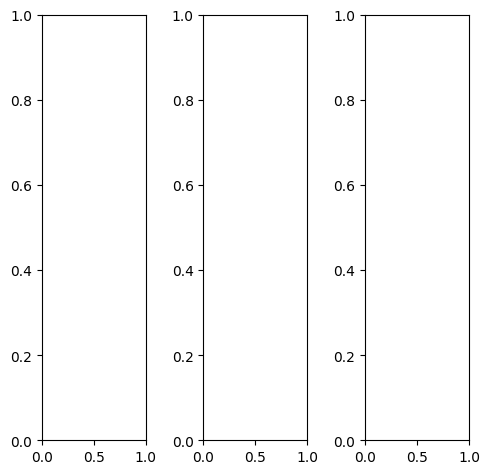

tensor([[[0.1137, 0.0784, 0.0745,  ..., 0.0078, 0.0039, 0.0235],
         [0.1255, 0.0863, 0.0627,  ..., 0.0196, 0.0157, 0.0196],
         [0.1176, 0.0745, 0.0667,  ..., 0.0471, 0.0431, 0.0235],
         ...,
         [0.7843, 0.7686, 0.8039,  ..., 0.7294, 0.7451, 0.7765],
         [0.7765, 0.7294, 0.7098,  ..., 0.7020, 0.6824, 0.6784],
         [0.6627, 0.6314, 0.5882,  ..., 0.6549, 0.6196, 0.6118]],

        [[0.1137, 0.0784, 0.0745,  ..., 0.0078, 0.0039, 0.0235],
         [0.1255, 0.0863, 0.0627,  ..., 0.0196, 0.0157, 0.0196],
         [0.1176, 0.0745, 0.0667,  ..., 0.0471, 0.0431, 0.0235],
         ...,
         [0.7843, 0.7686, 0.8039,  ..., 0.7294, 0.7451, 0.7765],
         [0.7765, 0.7294, 0.7098,  ..., 0.7020, 0.6824, 0.6784],
         [0.6627, 0.6314, 0.5882,  ..., 0.6549, 0.6196, 0.6118]],

        [[0.1137, 0.0784, 0.0745,  ..., 0.0078, 0.0039, 0.0235],
         [0.1255, 0.0863, 0.0627,  ..., 0.0196, 0.0157, 0.0196],
         [0.1176, 0.0745, 0.0667,  ..., 0.0471, 0.0431, 0.

tensor([[[0.0784, 0.0314, 0.0314,  ..., 0.0039, 0.0039, 0.0196],
         [0.0745, 0.0235, 0.0118,  ..., 0.0039, 0.0039, 0.0078],
         [0.0588, 0.0078, 0.0078,  ..., 0.0275, 0.0196, 0.0039],
         ...,
         [0.8000, 0.7843, 0.8196,  ..., 0.7333, 0.7451, 0.7804],
         [0.7882, 0.7412, 0.7216,  ..., 0.6980, 0.6824, 0.6784],
         [0.6627, 0.6314, 0.5882,  ..., 0.6510, 0.6196, 0.6118]],

        [[0.1333, 0.1059, 0.0980,  ..., 0.0078, 0.0039, 0.0235],
         [0.1529, 0.1176, 0.0902,  ..., 0.0275, 0.0196, 0.0235],
         [0.1490, 0.1098, 0.0980,  ..., 0.0549, 0.0549, 0.0353],
         ...,
         [0.7765, 0.7608, 0.8000,  ..., 0.7294, 0.7451, 0.7765],
         [0.7725, 0.7255, 0.7098,  ..., 0.7020, 0.6863, 0.6824],
         [0.6627, 0.6314, 0.5882,  ..., 0.6549, 0.6196, 0.6118]],

        [[0.0980, 0.0667, 0.0588,  ..., 0.0039, 0.0039, 0.0196],
         [0.1216, 0.0784, 0.0549,  ..., 0.0157, 0.0118, 0.0157],
         [0.1216, 0.0745, 0.0667,  ..., 0.0471, 0.0431, 0.

tensor([[[0.1543, 0.1345, 0.0665,  ..., 0.1367, 0.1565, 0.2166],
         [0.1777, 0.0918, 0.1231,  ..., 0.1457, 0.1371, 0.1686],
         [0.0420, 0.1128, 0.0101,  ..., 0.1527, 0.1565, 0.1567],
         ...,
         [0.8152, 0.7226, 0.7324,  ..., 0.6536, 0.6974, 0.8094],
         [0.8179, 0.6965, 0.6560,  ..., 0.6661, 0.6546, 0.7297],
         [0.7437, 0.7053, 0.6302,  ..., 0.7173, 0.7016, 0.7268]],

        [[0.1850, 0.2810, 0.1128,  ..., 0.1593, 0.1627, 0.2198],
         [0.2042, 0.1577, 0.0373,  ..., 0.1949, 0.2003, 0.1998],
         [0.1248, 0.2973, 0.0500,  ..., 0.1960, 0.2020, 0.2012],
         ...,
         [0.7934, 0.7066, 0.7499,  ..., 0.6336, 0.6831, 0.8093],
         [0.8047, 0.6828, 0.6659,  ..., 0.6575, 0.6672, 0.7211],
         [0.7034, 0.6641, 0.6135,  ..., 0.7008, 0.6817, 0.6984]],

        [[0.3741, 0.2112, 0.2936,  ..., 0.2920, 0.3053, 0.3478],
         [0.3387, 0.2541, 0.3033,  ..., 0.3333, 0.3458, 0.3411],
         [0.2650, 0.2501, 0.2854,  ..., 0.3435, 0.3634, 0.

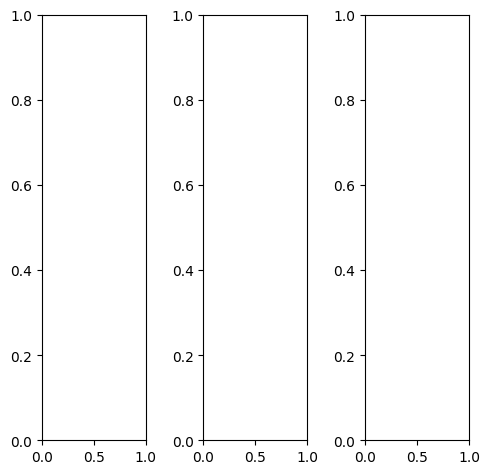

tensor([[[0.3961, 0.3294, 0.3059,  ..., 0.4549, 0.4431, 0.5137],
         [0.5059, 0.3294, 0.2510,  ..., 0.4549, 0.4980, 0.5098],
         [0.5804, 0.3608, 0.2667,  ..., 0.4902, 0.5137, 0.4745],
         ...,
         [0.5569, 0.3804, 0.2745,  ..., 0.3529, 0.4824, 0.5294],
         [0.4627, 0.3804, 0.3647,  ..., 0.4353, 0.3608, 0.6549],
         [0.3412, 0.3255, 0.3294,  ..., 0.4118, 0.5529, 0.8000]],

        [[0.3961, 0.3294, 0.3059,  ..., 0.4549, 0.4431, 0.5137],
         [0.5059, 0.3294, 0.2510,  ..., 0.4549, 0.4980, 0.5098],
         [0.5804, 0.3608, 0.2667,  ..., 0.4902, 0.5137, 0.4745],
         ...,
         [0.5569, 0.3804, 0.2745,  ..., 0.3529, 0.4824, 0.5294],
         [0.4627, 0.3804, 0.3647,  ..., 0.4353, 0.3608, 0.6549],
         [0.3412, 0.3255, 0.3294,  ..., 0.4118, 0.5529, 0.8000]],

        [[0.3961, 0.3294, 0.3059,  ..., 0.4549, 0.4431, 0.5137],
         [0.5059, 0.3294, 0.2510,  ..., 0.4549, 0.4980, 0.5098],
         [0.5804, 0.3608, 0.2667,  ..., 0.4902, 0.5137, 0.

tensor([[[0.4314, 0.3725, 0.3569,  ..., 0.4980, 0.5020, 0.5608],
         [0.5412, 0.3725, 0.3020,  ..., 0.4980, 0.5490, 0.5529],
         [0.6157, 0.4039, 0.3176,  ..., 0.5255, 0.5608, 0.5137],
         ...,
         [0.5765, 0.4078, 0.2863,  ..., 0.4118, 0.5216, 0.5451],
         [0.4824, 0.4039, 0.3804,  ..., 0.4863, 0.3922, 0.6627],
         [0.3686, 0.3490, 0.3451,  ..., 0.4588, 0.5686, 0.8039]],

        [[0.3843, 0.3137, 0.2824,  ..., 0.4431, 0.4275, 0.5020],
         [0.4941, 0.3098, 0.2235,  ..., 0.4471, 0.4863, 0.4980],
         [0.5725, 0.3412, 0.2431,  ..., 0.4863, 0.5020, 0.4667],
         ...,
         [0.5686, 0.3843, 0.2784,  ..., 0.3373, 0.4824, 0.5490],
         [0.4706, 0.3843, 0.3686,  ..., 0.4275, 0.3647, 0.6667],
         [0.3412, 0.3294, 0.3333,  ..., 0.4078, 0.5608, 0.8157]],

        [[0.3647, 0.3059, 0.2863,  ..., 0.3961, 0.3843, 0.4510],
         [0.4667, 0.3059, 0.2431,  ..., 0.3961, 0.4353, 0.4431],
         [0.5451, 0.3373, 0.2549,  ..., 0.4314, 0.4510, 0.

tensor([[[ 0.2299,  0.0926, -0.0197,  ...,  0.2711,  0.2581,  0.3956],
         [ 0.3583,  0.0615, -0.0921,  ...,  0.2778,  0.3352,  0.3500],
         [ 0.4300,  0.1070, -0.1913,  ...,  0.4212,  0.4394,  0.3335],
         ...,
         [ 0.4792,  0.2974,  0.1375,  ...,  0.3074,  0.4903,  0.5357],
         [ 0.3666,  0.2886,  0.2997,  ...,  0.4086,  0.3006,  0.6566],
         [ 0.2256,  0.1332,  0.1399,  ...,  0.3576,  0.5603,  0.7938]],

        [[ 0.2950,  0.2596,  0.1140,  ...,  0.3921,  0.4075,  0.4395],
         [ 0.4116,  0.2244, -0.0430,  ...,  0.4251,  0.5005,  0.4627],
         [ 0.5224,  0.3269, -0.0677,  ...,  0.5228,  0.5423,  0.4345],
         ...,
         [ 0.5049,  0.3264,  0.1810,  ...,  0.3000,  0.4688,  0.4925],
         [ 0.3768,  0.3192,  0.2940,  ...,  0.4232,  0.3216,  0.6391],
         [ 0.2022,  0.1277,  0.1577,  ...,  0.3254,  0.5662,  0.7556]],

        [[ 0.4648,  0.2046,  0.2668,  ...,  0.6279,  0.6316,  0.6826],
         [ 0.5577,  0.3337,  0.1961,  ...,  0

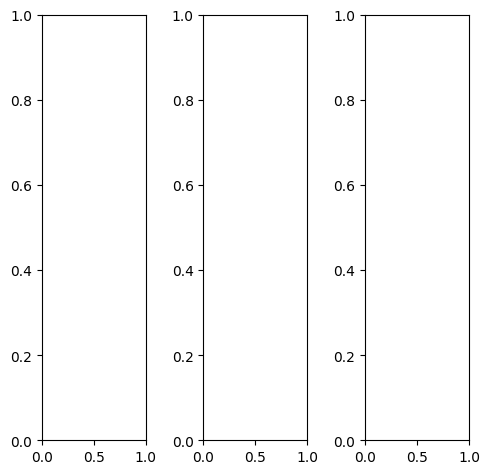

EPOCH: 14.765  trn_loss: 0.005  (1755.45s - 10133.55s remaining)

tensor([[[0.3882, 0.3843, 0.3843,  ..., 0.3882, 0.3843, 0.3961],
         [0.3843, 0.3765, 0.3804,  ..., 0.4549, 0.4314, 0.4314],
         [0.4235, 0.4314, 0.4471,  ..., 0.5608, 0.5529, 0.5529],
         ...,
         [0.4039, 0.3882, 0.3020,  ..., 0.2627, 0.3647, 0.4235],
         [0.4078, 0.3882, 0.3647,  ..., 0.3647, 0.3725, 0.4235],
         [0.4549, 0.4431, 0.4588,  ..., 0.4784, 0.4706, 0.4824]],

        [[0.3882, 0.3843, 0.3843,  ..., 0.3882, 0.3843, 0.3961],
         [0.3843, 0.3765, 0.3804,  ..., 0.4549, 0.4314, 0.4314],
         [0.4235, 0.4314, 0.4471,  ..., 0.5608, 0.5529, 0.5529],
         ...,
         [0.4039, 0.3882, 0.3020,  ..., 0.2627, 0.3647, 0.4235],
         [0.4078, 0.3882, 0.3647,  ..., 0.3647, 0.3725, 0.4235],
         [0.4549, 0.4431, 0.4588,  ..., 0.4784, 0.4706, 0.4824]],

        [[0.3882, 0.3843, 0.3843,  ..., 0.3882, 0.3843, 0.3961],
         [0.3843, 0.3765, 0.3804,  ..., 0.4549, 0.4314, 0.4314],
         [0.4235, 0.4314, 0.4471,  ..., 0.5608, 0.5529, 0.

tensor([[[0.3608, 0.3569, 0.3569,  ..., 0.3608, 0.3569, 0.3686],
         [0.3608, 0.3569, 0.3608,  ..., 0.4314, 0.4078, 0.4078],
         [0.4078, 0.4157, 0.4314,  ..., 0.5451, 0.5373, 0.5373],
         ...,
         [0.4510, 0.4275, 0.3373,  ..., 0.2902, 0.4078, 0.4667],
         [0.4549, 0.4275, 0.4000,  ..., 0.3922, 0.4157, 0.4706],
         [0.4863, 0.4706, 0.4863,  ..., 0.4980, 0.4941, 0.5059]],

        [[0.3961, 0.3961, 0.3961,  ..., 0.3961, 0.3922, 0.4039],
         [0.3922, 0.3843, 0.3882,  ..., 0.4627, 0.4431, 0.4392],
         [0.4314, 0.4392, 0.4549,  ..., 0.5765, 0.5686, 0.5686],
         ...,
         [0.3961, 0.3843, 0.2980,  ..., 0.2627, 0.3608, 0.4196],
         [0.4000, 0.3843, 0.3608,  ..., 0.3647, 0.3686, 0.4196],
         [0.4510, 0.4392, 0.4549,  ..., 0.4824, 0.4706, 0.4824]],

        [[0.4157, 0.4118, 0.4118,  ..., 0.4235, 0.4196, 0.4314],
         [0.4039, 0.4000, 0.4039,  ..., 0.4667, 0.4431, 0.4392],
         [0.4353, 0.4431, 0.4588,  ..., 0.5294, 0.5216, 0.

tensor([[[0.2946, 0.1785, 0.1659,  ..., 0.2724, 0.2665, 0.3148],
         [0.2260, 0.1785, 0.1372,  ..., 0.3672, 0.3149, 0.3498],
         [0.2713, 0.2554, 0.1656,  ..., 0.5459, 0.5321, 0.5024],
         ...,
         [0.3614, 0.4005, 0.2378,  ..., 0.2238, 0.3673, 0.4444],
         [0.3548, 0.3479, 0.2933,  ..., 0.3369, 0.3460, 0.3973],
         [0.4245, 0.4044, 0.3931,  ..., 0.4433, 0.4701, 0.4715]],

        [[0.3198, 0.3452, 0.2763,  ..., 0.3246, 0.3464, 0.3336],
         [0.3315, 0.3617, 0.2406,  ..., 0.4394, 0.4218, 0.3963],
         [0.3514, 0.4512, 0.3352,  ..., 0.6055, 0.6020, 0.5508],
         ...,
         [0.3512, 0.3464, 0.2575,  ..., 0.2155, 0.3796, 0.3948],
         [0.3355, 0.3342, 0.3249,  ..., 0.3285, 0.3621, 0.3720],
         [0.4048, 0.3679, 0.4056,  ..., 0.4135, 0.4653, 0.4327]],

        [[0.5160, 0.3528, 0.4768,  ..., 0.4812, 0.4948, 0.4938],
         [0.5024, 0.4789, 0.4683,  ..., 0.5627, 0.5578, 0.5701],
         [0.5394, 0.4926, 0.5444,  ..., 0.7148, 0.7204, 0.

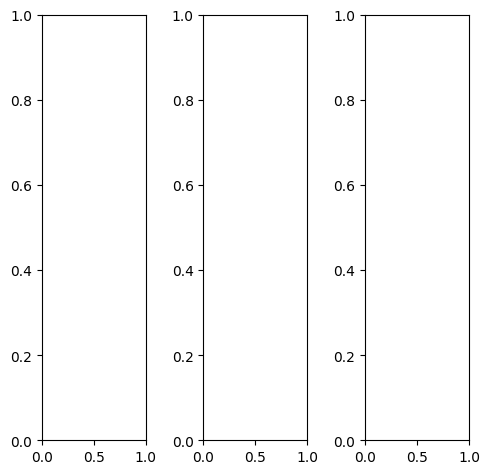

tensor([[[0.2627, 0.2549, 0.2000,  ..., 0.3569, 0.4471, 0.5529],
         [0.2706, 0.2667, 0.2627,  ..., 0.3765, 0.3725, 0.3412],
         [0.2588, 0.2941, 0.3098,  ..., 0.3216, 0.3098, 0.3922],
         ...,
         [0.2314, 0.2510, 0.2431,  ..., 0.3765, 0.2863, 0.2706],
         [0.2196, 0.2235, 0.2118,  ..., 0.3020, 0.3255, 0.3020],
         [0.2314, 0.2235, 0.1882,  ..., 0.4000, 0.4314, 0.4157]],

        [[0.2627, 0.2549, 0.2000,  ..., 0.3569, 0.4471, 0.5529],
         [0.2706, 0.2667, 0.2627,  ..., 0.3765, 0.3725, 0.3412],
         [0.2588, 0.2941, 0.3098,  ..., 0.3216, 0.3098, 0.3922],
         ...,
         [0.2314, 0.2510, 0.2431,  ..., 0.3765, 0.2863, 0.2706],
         [0.2196, 0.2235, 0.2118,  ..., 0.3020, 0.3255, 0.3020],
         [0.2314, 0.2235, 0.1882,  ..., 0.4000, 0.4314, 0.4157]],

        [[0.2627, 0.2549, 0.2000,  ..., 0.3569, 0.4471, 0.5529],
         [0.2706, 0.2667, 0.2627,  ..., 0.3765, 0.3725, 0.3412],
         [0.2588, 0.2941, 0.3098,  ..., 0.3216, 0.3098, 0.

tensor([[[0.2667, 0.2588, 0.2196,  ..., 0.3922, 0.4706, 0.5725],
         [0.2667, 0.2667, 0.2784,  ..., 0.4078, 0.4078, 0.3686],
         [0.2667, 0.2980, 0.3333,  ..., 0.3569, 0.3451, 0.4235],
         ...,
         [0.2471, 0.2667, 0.2588,  ..., 0.4196, 0.3490, 0.3255],
         [0.2431, 0.2510, 0.2353,  ..., 0.3529, 0.3686, 0.3451],
         [0.2588, 0.2510, 0.2157,  ..., 0.4510, 0.4824, 0.4667]],

        [[0.2902, 0.2784, 0.2118,  ..., 0.4000, 0.4863, 0.5804],
         [0.2980, 0.2941, 0.2784,  ..., 0.4157, 0.4000, 0.3608],
         [0.2863, 0.3176, 0.3294,  ..., 0.3529, 0.3412, 0.4157],
         ...,
         [0.2588, 0.2824, 0.2745,  ..., 0.3882, 0.2980, 0.2784],
         [0.2392, 0.2471, 0.2314,  ..., 0.3255, 0.3490, 0.3255],
         [0.2510, 0.2431, 0.2039,  ..., 0.4196, 0.4510, 0.4353]],

        [[0.1059, 0.1294, 0.0784,  ..., 0.0510, 0.1961, 0.3765],
         [0.1255, 0.1412, 0.1294,  ..., 0.1020, 0.1333, 0.1569],
         [0.1059, 0.1490, 0.1569,  ..., 0.0627, 0.0431, 0.

tensor([[[ 0.1763,  0.0711, -0.0445,  ...,  0.3645,  0.5176,  0.6340],
         [ 0.1807, -0.0111, -0.0159,  ...,  0.3791,  0.3729,  0.3658],
         [ 0.0643,  0.0096, -0.0180,  ...,  0.2500,  0.2267,  0.4297],
         ...,
         [ 0.1766,  0.2147,  0.1838,  ...,  0.4564,  0.3058,  0.2953],
         [ 0.1501,  0.1475,  0.1096,  ...,  0.3276,  0.3469,  0.3410],
         [ 0.1993,  0.1430,  0.0890,  ...,  0.5105,  0.5583,  0.5198]],

        [[ 0.2520,  0.2321, -0.0202,  ...,  0.4443,  0.6168,  0.6765],
         [ 0.2489,  0.1368, -0.0490,  ...,  0.4721,  0.4737,  0.4252],
         [ 0.1638,  0.2461,  0.0406,  ...,  0.3795,  0.3455,  0.4749],
         ...,
         [ 0.1872,  0.2075,  0.1926,  ...,  0.4891,  0.3289,  0.2623],
         [ 0.1579,  0.1508,  0.1137,  ...,  0.3617,  0.3478,  0.3117],
         [ 0.1923,  0.1341,  0.1024,  ...,  0.5122,  0.5555,  0.4942]],

        [[ 0.4037,  0.2112,  0.2323,  ...,  0.6054,  0.7682,  0.8175],
         [ 0.4257,  0.2572,  0.2801,  ...,  0

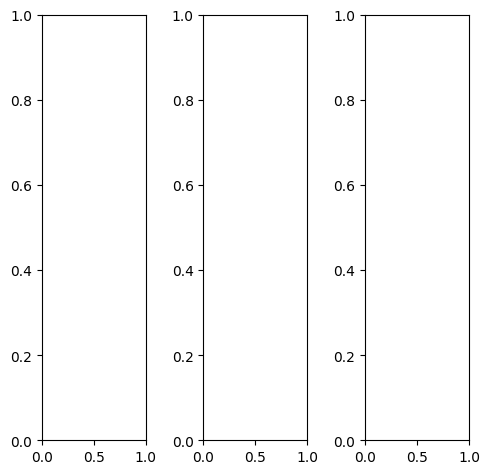

tensor([[[0.7451, 0.7490, 0.7529,  ..., 0.7843, 0.7804, 0.7765],
         [0.7490, 0.7529, 0.7569,  ..., 0.7922, 0.7843, 0.7765],
         [0.7529, 0.7569, 0.7608,  ..., 0.7961, 0.7922, 0.7882],
         ...,
         [0.5098, 0.5255, 0.5216,  ..., 0.7020, 0.7020, 0.7059],
         [0.5020, 0.5176, 0.5255,  ..., 0.6431, 0.6196, 0.6157],
         [0.5216, 0.5333, 0.5490,  ..., 0.6275, 0.5176, 0.5294]],

        [[0.7451, 0.7490, 0.7529,  ..., 0.7843, 0.7804, 0.7765],
         [0.7490, 0.7529, 0.7569,  ..., 0.7922, 0.7843, 0.7765],
         [0.7529, 0.7569, 0.7608,  ..., 0.7961, 0.7922, 0.7882],
         ...,
         [0.5098, 0.5255, 0.5216,  ..., 0.7020, 0.7020, 0.7059],
         [0.5020, 0.5176, 0.5255,  ..., 0.6431, 0.6196, 0.6157],
         [0.5216, 0.5333, 0.5490,  ..., 0.6275, 0.5176, 0.5294]],

        [[0.7451, 0.7490, 0.7529,  ..., 0.7843, 0.7804, 0.7765],
         [0.7490, 0.7529, 0.7569,  ..., 0.7922, 0.7843, 0.7765],
         [0.7529, 0.7569, 0.7608,  ..., 0.7961, 0.7922, 0.

tensor([[[0.6431, 0.6510, 0.6549,  ..., 0.6980, 0.6941, 0.6902],
         [0.6549, 0.6627, 0.6667,  ..., 0.7137, 0.7059, 0.6980],
         [0.6667, 0.6745, 0.6784,  ..., 0.7255, 0.7216, 0.7098],
         ...,
         [0.5020, 0.5137, 0.5176,  ..., 0.7137, 0.7216, 0.7255],
         [0.5020, 0.5137, 0.5255,  ..., 0.6627, 0.6314, 0.6196],
         [0.5216, 0.5333, 0.5529,  ..., 0.6275, 0.5098, 0.5216]],

        [[0.7804, 0.7843, 0.7882,  ..., 0.8157, 0.8118, 0.8078],
         [0.7804, 0.7882, 0.7922,  ..., 0.8196, 0.8157, 0.8078],
         [0.7843, 0.7882, 0.7922,  ..., 0.8196, 0.8196, 0.8196],
         ...,
         [0.5176, 0.5373, 0.5294,  ..., 0.7098, 0.7098, 0.7137],
         [0.5098, 0.5255, 0.5333,  ..., 0.6471, 0.6235, 0.6235],
         [0.5294, 0.5412, 0.5569,  ..., 0.6353, 0.5294, 0.5412]],

        [[0.8275, 0.8275, 0.8314,  ..., 0.8510, 0.8471, 0.8471],
         [0.8196, 0.8235, 0.8235,  ..., 0.8471, 0.8431, 0.8353],
         [0.8235, 0.8235, 0.8275,  ..., 0.8431, 0.8431, 0.

tensor([[[0.6508, 0.5764, 0.6394,  ..., 0.5874, 0.5748, 0.6303],
         [0.6409, 0.6271, 0.6103,  ..., 0.6517, 0.6329, 0.6140],
         [0.6404, 0.6900, 0.6361,  ..., 0.6984, 0.6789, 0.6339],
         ...,
         [0.3771, 0.4522, 0.4329,  ..., 0.6617, 0.6583, 0.6173],
         [0.3737, 0.4135, 0.4449,  ..., 0.5830, 0.5190, 0.5111],
         [0.3828, 0.3871, 0.4042,  ..., 0.5365, 0.4229, 0.4264]],

        [[0.6612, 0.7101, 0.6819,  ..., 0.6721, 0.6918, 0.6837],
         [0.6875, 0.7612, 0.6992,  ..., 0.7363, 0.7110, 0.7267],
         [0.6993, 0.8039, 0.7618,  ..., 0.7750, 0.7453, 0.7074],
         ...,
         [0.3484, 0.4176, 0.4459,  ..., 0.6575, 0.6563, 0.5698],
         [0.3403, 0.4110, 0.4395,  ..., 0.5740, 0.5250, 0.4905],
         [0.3484, 0.3547, 0.3829,  ..., 0.5062, 0.3996, 0.3828]],

        [[0.8184, 0.7693, 0.8714,  ..., 0.8619, 0.8610, 0.8428],
         [0.8473, 0.8784, 0.8464,  ..., 0.9025, 0.9089, 0.8500],
         [0.8565, 0.8386, 0.9121,  ..., 0.9467, 0.9341, 0.

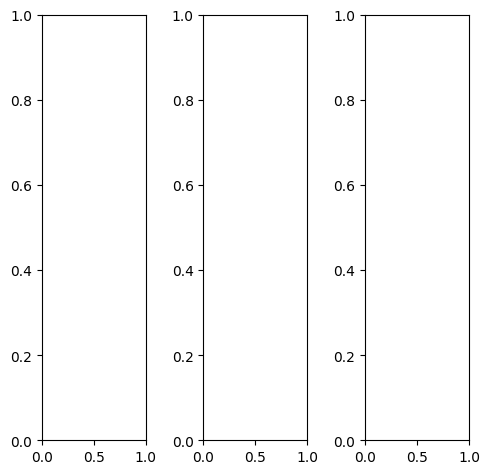

tensor([[[0.2392, 0.2118, 0.2588,  ..., 0.3020, 0.2745, 0.1294],
         [0.2235, 0.2078, 0.3294,  ..., 0.3059, 0.2745, 0.1725],
         [0.2706, 0.2353, 0.3569,  ..., 0.2706, 0.2667, 0.1647],
         ...,
         [0.2078, 0.2314, 0.2275,  ..., 0.3294, 0.3333, 0.3529],
         [0.1922, 0.2745, 0.3137,  ..., 0.3412, 0.3373, 0.3412],
         [0.2510, 0.3059, 0.3686,  ..., 0.3569, 0.3176, 0.2745]],

        [[0.2392, 0.2118, 0.2588,  ..., 0.3020, 0.2745, 0.1294],
         [0.2235, 0.2078, 0.3294,  ..., 0.3059, 0.2745, 0.1725],
         [0.2706, 0.2353, 0.3569,  ..., 0.2706, 0.2667, 0.1647],
         ...,
         [0.2078, 0.2314, 0.2275,  ..., 0.3294, 0.3333, 0.3529],
         [0.1922, 0.2745, 0.3137,  ..., 0.3412, 0.3373, 0.3412],
         [0.2510, 0.3059, 0.3686,  ..., 0.3569, 0.3176, 0.2745]],

        [[0.2392, 0.2118, 0.2588,  ..., 0.3020, 0.2745, 0.1294],
         [0.2235, 0.2078, 0.3294,  ..., 0.3059, 0.2745, 0.1725],
         [0.2706, 0.2353, 0.3569,  ..., 0.2706, 0.2667, 0.

tensor([[[0.2392, 0.2078, 0.2431,  ..., 0.2863, 0.2588, 0.1176],
         [0.2235, 0.2039, 0.3137,  ..., 0.2902, 0.2588, 0.1647],
         [0.2706, 0.2275, 0.3412,  ..., 0.2549, 0.2510, 0.1529],
         ...,
         [0.1922, 0.2157, 0.2118,  ..., 0.3098, 0.3137, 0.3333],
         [0.1765, 0.2588, 0.2941,  ..., 0.3176, 0.3176, 0.3176],
         [0.2353, 0.2902, 0.3529,  ..., 0.3333, 0.2941, 0.2510]],

        [[0.2431, 0.2157, 0.2667,  ..., 0.3098, 0.2824, 0.1373],
         [0.2235, 0.2118, 0.3333,  ..., 0.3137, 0.2863, 0.1804],
         [0.2706, 0.2392, 0.3647,  ..., 0.2784, 0.2745, 0.1725],
         ...,
         [0.2157, 0.2392, 0.2314,  ..., 0.3373, 0.3412, 0.3569],
         [0.2000, 0.2824, 0.3176,  ..., 0.3490, 0.3451, 0.3451],
         [0.2588, 0.3137, 0.3725,  ..., 0.3647, 0.3216, 0.2784]],

        [[0.2275, 0.2118, 0.2667,  ..., 0.2863, 0.2667, 0.1216],
         [0.2118, 0.2078, 0.3333,  ..., 0.2902, 0.2706, 0.1647],
         [0.2588, 0.2353, 0.3647,  ..., 0.2549, 0.2588, 0.

tensor([[[ 0.1390, -0.0111,  0.1316,  ...,  0.1940,  0.1650,  0.0109],
         [ 0.0939, -0.0140,  0.2070,  ...,  0.1945,  0.1537,  0.0268],
         [ 0.1920,  0.0272,  0.1841,  ...,  0.1229,  0.1440, -0.0013],
         ...,
         [ 0.0969,  0.1558,  0.1284,  ...,  0.3336,  0.3506,  0.3871],
         [ 0.0863,  0.1968,  0.2780,  ...,  0.3264,  0.3135,  0.3580],
         [ 0.2057,  0.2772,  0.3877,  ...,  0.4105,  0.3053,  0.2794]],

        [[ 0.2159,  0.2036,  0.2306,  ...,  0.3094,  0.2542,  0.0805],
         [ 0.2083,  0.1497,  0.3365,  ...,  0.3238,  0.2765,  0.0930],
         [ 0.2782,  0.2762,  0.3795,  ...,  0.2436,  0.2415,  0.0800],
         ...,
         [ 0.1396,  0.1842,  0.1739,  ...,  0.3407,  0.3912,  0.3652],
         [ 0.1182,  0.2605,  0.3255,  ...,  0.3700,  0.3770,  0.3763],
         [ 0.2332,  0.3285,  0.4453,  ...,  0.4178,  0.3528,  0.2835]],

        [[ 0.4802,  0.2380,  0.5379,  ...,  0.4157,  0.3580,  0.1888],
         [ 0.4051,  0.3269,  0.5994,  ...,  0

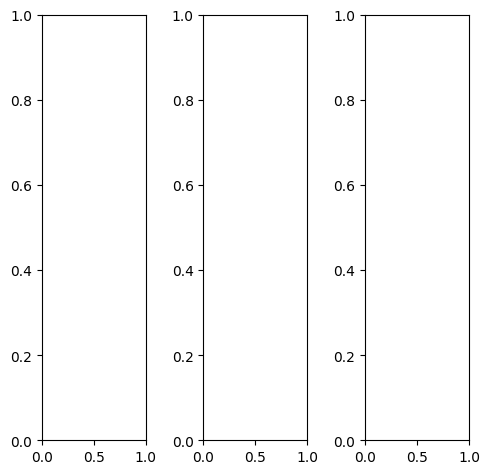

tensor([[[0.0039, 0.0078, 0.0078,  ..., 0.0314, 0.0353, 0.0353],
         [0.0078, 0.0118, 0.0078,  ..., 0.0980, 0.1333, 0.1098],
         [0.0078, 0.0118, 0.0118,  ..., 0.1294, 0.1529, 0.1137],
         ...,
         [0.0275, 0.0392, 0.0588,  ..., 0.0784, 0.0706, 0.0588],
         [0.0275, 0.0353, 0.0510,  ..., 0.0745, 0.0627, 0.0549],
         [0.0275, 0.0353, 0.0471,  ..., 0.0667, 0.0627, 0.0510]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0314, 0.0353, 0.0353],
         [0.0078, 0.0118, 0.0078,  ..., 0.0980, 0.1333, 0.1098],
         [0.0078, 0.0118, 0.0118,  ..., 0.1294, 0.1529, 0.1137],
         ...,
         [0.0275, 0.0392, 0.0588,  ..., 0.0784, 0.0706, 0.0588],
         [0.0275, 0.0353, 0.0510,  ..., 0.0745, 0.0627, 0.0549],
         [0.0275, 0.0353, 0.0471,  ..., 0.0667, 0.0627, 0.0510]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0314, 0.0353, 0.0353],
         [0.0078, 0.0118, 0.0078,  ..., 0.0980, 0.1333, 0.1098],
         [0.0078, 0.0118, 0.0118,  ..., 0.1294, 0.1529, 0.

tensor([[[0.0039, 0.0078, 0.0118,  ..., 0.0314, 0.0431, 0.0353],
         [0.0078, 0.0118, 0.0118,  ..., 0.1216, 0.1686, 0.1333],
         [0.0078, 0.0118, 0.0078,  ..., 0.1725, 0.2118, 0.1490],
         ...,
         [0.0275, 0.0392, 0.0588,  ..., 0.0784, 0.0706, 0.0588],
         [0.0275, 0.0353, 0.0510,  ..., 0.0745, 0.0627, 0.0549],
         [0.0275, 0.0353, 0.0471,  ..., 0.0667, 0.0627, 0.0510]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0353, 0.0353, 0.0392],
         [0.0078, 0.0118, 0.0078,  ..., 0.0941, 0.1255, 0.1059],
         [0.0078, 0.0118, 0.0118,  ..., 0.1176, 0.1333, 0.1020],
         ...,
         [0.0275, 0.0392, 0.0588,  ..., 0.0784, 0.0706, 0.0588],
         [0.0275, 0.0353, 0.0510,  ..., 0.0745, 0.0627, 0.0549],
         [0.0275, 0.0353, 0.0471,  ..., 0.0667, 0.0627, 0.0510]],

        [[0.0039, 0.0078, 0.0078,  ..., 0.0196, 0.0196, 0.0157],
         [0.0078, 0.0118, 0.0078,  ..., 0.0549, 0.0863, 0.0706],
         [0.0078, 0.0118, 0.0118,  ..., 0.0627, 0.0902, 0.

tensor([[[ 0.0018, -0.0673, -0.1327,  ...,  0.0966,  0.1201,  0.1793],
         [ 0.0238, -0.1231, -0.1247,  ...,  0.1677,  0.2071,  0.2216],
         [-0.1652, -0.1289, -0.2426,  ...,  0.1935,  0.2330,  0.2215],
         ...,
         [ 0.1110,  0.1628,  0.1842,  ...,  0.1936,  0.1759,  0.1821],
         [ 0.1235,  0.1571,  0.1827,  ...,  0.1893,  0.1800,  0.2045],
         [ 0.1514,  0.1432,  0.1531,  ...,  0.1648,  0.1666,  0.2109]],

        [[ 0.0880,  0.0636, -0.0319,  ...,  0.1332,  0.1427,  0.1875],
         [ 0.0697, -0.0999, -0.1657,  ...,  0.2338,  0.2948,  0.2438],
         [-0.0146,  0.0171, -0.1134,  ...,  0.2616,  0.3038,  0.2557],
         ...,
         [ 0.1343,  0.1660,  0.1990,  ...,  0.2113,  0.1800,  0.1676],
         [ 0.1342,  0.1560,  0.1741,  ...,  0.1901,  0.1748,  0.1677],
         [ 0.1436,  0.1360,  0.1531,  ...,  0.1643,  0.1595,  0.1758]],

        [[ 0.2760,  0.0435,  0.1691,  ...,  0.2510,  0.2780,  0.3137],
         [ 0.2326,  0.1008,  0.1906,  ...,  0

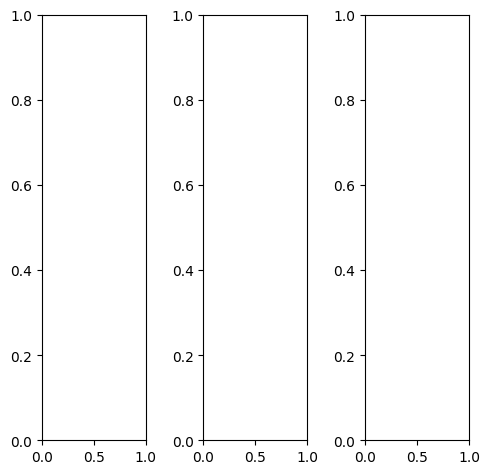

EPOCH: 15.000  val_loss: 0.005  trn_loss: 0.005  (1790.06s - 10143.69s remaining)


tensor([[[0.2824, 0.2784, 0.2745,  ..., 0.2824, 0.2667, 0.2510],
         [0.2706, 0.2706, 0.2745,  ..., 0.2824, 0.2902, 0.2863],
         [0.2824, 0.2784, 0.2863,  ..., 0.2706, 0.2745, 0.2902],
         ...,
         [0.5490, 0.5490, 0.5451,  ..., 0.4431, 0.4510, 0.4824],
         [0.5294, 0.5529, 0.5569,  ..., 0.4863, 0.4784, 0.4745],
         [0.5569, 0.5686, 0.5412,  ..., 0.4667, 0.4392, 0.4627]],

        [[0.2824, 0.2784, 0.2745,  ..., 0.2824, 0.2667, 0.2510],
         [0.2706, 0.2706, 0.2745,  ..., 0.2824, 0.2902, 0.2863],
         [0.2824, 0.2784, 0.2863,  ..., 0.2706, 0.2745, 0.2902],
         ...,
         [0.5490, 0.5490, 0.5451,  ..., 0.4431, 0.4510, 0.4824],
         [0.5294, 0.5529, 0.5569,  ..., 0.4863, 0.4784, 0.4745],
         [0.5569, 0.5686, 0.5412,  ..., 0.4667, 0.4392, 0.4627]],

        [[0.2824, 0.2784, 0.2745,  ..., 0.2824, 0.2667, 0.2510],
         [0.2706, 0.2706, 0.2745,  ..., 0.2824, 0.2902, 0.2863],
         [0.2824, 0.2784, 0.2863,  ..., 0.2706, 0.2745, 0.

tensor([[[0.2784, 0.2392, 0.2235,  ..., 0.2196, 0.1961, 0.1765],
         [0.2196, 0.2196, 0.2196,  ..., 0.2118, 0.2196, 0.2157],
         [0.2157, 0.2078, 0.2235,  ..., 0.1922, 0.2000, 0.2196],
         ...,
         [0.6980, 0.6902, 0.6941,  ..., 0.5137, 0.5373, 0.5922],
         [0.6627, 0.6784, 0.6941,  ..., 0.6039, 0.5922, 0.5882],
         [0.6863, 0.7020, 0.6745,  ..., 0.5647, 0.5294, 0.5804]],

        [[0.3216, 0.3333, 0.3373,  ..., 0.3608, 0.3451, 0.3294],
         [0.3373, 0.3333, 0.3412,  ..., 0.3608, 0.3725, 0.3686],
         [0.3569, 0.3529, 0.3608,  ..., 0.3569, 0.3569, 0.3725],
         ...,
         [0.5294, 0.5373, 0.5294,  ..., 0.4627, 0.4627, 0.4824],
         [0.5176, 0.5451, 0.5451,  ..., 0.4824, 0.4745, 0.4706],
         [0.5451, 0.5569, 0.5255,  ..., 0.4706, 0.4471, 0.4549]],

        [[0.0980, 0.0863, 0.0824,  ..., 0.0510, 0.0471, 0.0471],
         [0.0745, 0.0824, 0.0824,  ..., 0.0471, 0.0510, 0.0431],
         [0.0706, 0.0627, 0.0667,  ..., 0.0431, 0.0431, 0.

tensor([[[0.3045, 0.2899, 0.2813,  ..., 0.2884, 0.2695, 0.2572],
         [0.2647, 0.2715, 0.2843,  ..., 0.3015, 0.3114, 0.2858],
         [0.2853, 0.2873, 0.2914,  ..., 0.2940, 0.2941, 0.3005],
         ...,
         [0.5733, 0.5855, 0.5694,  ..., 0.4625, 0.4737, 0.5055],
         [0.5549, 0.5851, 0.5797,  ..., 0.5096, 0.4959, 0.4947],
         [0.5849, 0.5952, 0.5634,  ..., 0.4867, 0.4647, 0.4917]],

        [[0.3008, 0.2887, 0.2824,  ..., 0.2818, 0.2688, 0.2646],
         [0.2686, 0.2707, 0.2797,  ..., 0.2810, 0.2986, 0.2845],
         [0.2863, 0.2872, 0.2952,  ..., 0.2711, 0.2787, 0.2926],
         ...,
         [0.5595, 0.5641, 0.5560,  ..., 0.4506, 0.4656, 0.4973],
         [0.5346, 0.5617, 0.5638,  ..., 0.4951, 0.4870, 0.4873],
         [0.5667, 0.5730, 0.5566,  ..., 0.4746, 0.4518, 0.4870]],

        [[0.2543, 0.2353, 0.2288,  ..., 0.2308, 0.2242, 0.2283],
         [0.2193, 0.2208, 0.2260,  ..., 0.2357, 0.2452, 0.2293],
         [0.2293, 0.2341, 0.2370,  ..., 0.2329, 0.2323, 0.

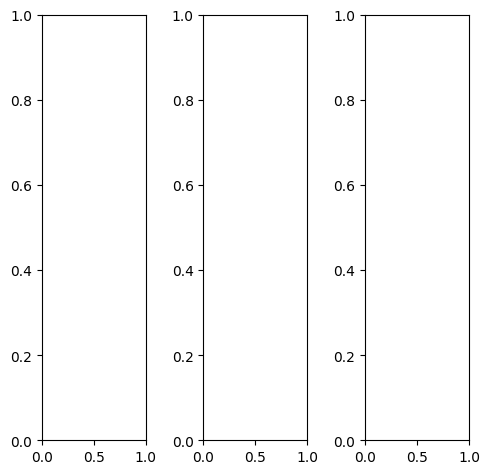

tensor([[[0.9176, 0.8824, 0.8902,  ..., 0.2588, 0.2588, 0.2588],
         [0.9176, 0.8667, 0.7725,  ..., 0.2667, 0.2667, 0.2510],
         [0.6471, 0.5804, 0.4706,  ..., 0.2784, 0.2745, 0.2471],
         ...,
         [1.0000, 0.8941, 0.8157,  ..., 0.3882, 0.4549, 0.4588],
         [1.0000, 0.8588, 0.7255,  ..., 0.3922, 0.3137, 0.2353],
         [1.0000, 0.8510, 0.7451,  ..., 0.9255, 0.8314, 0.7255]],

        [[0.9176, 0.8824, 0.8902,  ..., 0.2588, 0.2588, 0.2588],
         [0.9176, 0.8667, 0.7725,  ..., 0.2667, 0.2667, 0.2510],
         [0.6471, 0.5804, 0.4706,  ..., 0.2784, 0.2745, 0.2471],
         ...,
         [1.0000, 0.8941, 0.8157,  ..., 0.3882, 0.4549, 0.4588],
         [1.0000, 0.8588, 0.7255,  ..., 0.3922, 0.3137, 0.2353],
         [1.0000, 0.8510, 0.7451,  ..., 0.9255, 0.8314, 0.7255]],

        [[0.9176, 0.8824, 0.8902,  ..., 0.2588, 0.2588, 0.2588],
         [0.9176, 0.8667, 0.7725,  ..., 0.2667, 0.2667, 0.2510],
         [0.6471, 0.5804, 0.4706,  ..., 0.2784, 0.2745, 0.

tensor([[[0.9686, 0.9333, 0.9412,  ..., 0.3176, 0.3098, 0.3098],
         [0.9686, 0.9176, 0.8196,  ..., 0.3333, 0.3255, 0.3059],
         [0.6980, 0.6314, 0.5216,  ..., 0.3490, 0.3373, 0.3059],
         ...,
         [1.0000, 0.8745, 0.7843,  ..., 0.5137, 0.5843, 0.5961],
         [1.0000, 0.8157, 0.6510,  ..., 0.4863, 0.4078, 0.3373],
         [1.0000, 0.8157, 0.6784,  ..., 0.9490, 0.8667, 0.7725]],

        [[0.9098, 0.8784, 0.8824,  ..., 0.2510, 0.2510, 0.2549],
         [0.9059, 0.8510, 0.7529,  ..., 0.2588, 0.2627, 0.2471],
         [0.6235, 0.5490, 0.4392,  ..., 0.2667, 0.2667, 0.2392],
         ...,
         [1.0000, 0.9216, 0.8667,  ..., 0.3608, 0.4275, 0.4275],
         [1.0000, 0.9059, 0.8118,  ..., 0.3725, 0.2902, 0.2118],
         [1.0000, 0.8941, 0.8314,  ..., 0.9333, 0.8314, 0.7176]],

        [[0.8078, 0.7804, 0.7882,  ..., 0.1412, 0.1490, 0.1569],
         [0.8392, 0.8118, 0.7373,  ..., 0.1333, 0.1412, 0.1333],
         [0.6431, 0.6000, 0.5137,  ..., 0.1490, 0.1529, 0.

tensor([[[0.8715, 0.8796, 0.8966,  ..., 0.2612, 0.2593, 0.2568],
         [0.9009, 0.8706, 0.7839,  ..., 0.2762, 0.2813, 0.2469],
         [0.6562, 0.5751, 0.4825,  ..., 0.2916, 0.2889, 0.2473],
         ...,
         [1.0144, 0.9175, 0.8257,  ..., 0.4243, 0.4656, 0.5047],
         [1.0022, 0.8767, 0.7451,  ..., 0.4185, 0.3227, 0.2489],
         [0.9415, 0.8697, 0.7686,  ..., 0.9293, 0.8423, 0.6879]],

        [[0.8754, 0.8779, 0.9110,  ..., 0.2635, 0.2669, 0.2681],
         [0.8925, 0.8893, 0.7930,  ..., 0.2761, 0.2855, 0.2544],
         [0.6544, 0.5759, 0.4887,  ..., 0.2898, 0.2920, 0.2532],
         ...,
         [0.9852, 0.8909, 0.8098,  ..., 0.4090, 0.4399, 0.4808],
         [0.9846, 0.8467, 0.7261,  ..., 0.4051, 0.3169, 0.2653],
         [0.9383, 0.8617, 0.7580,  ..., 0.9217, 0.8295, 0.6812]],

        [[0.8637, 0.8738, 0.8710,  ..., 0.1973, 0.2061, 0.2118],
         [0.8547, 0.8480, 0.7393,  ..., 0.2080, 0.2100, 0.1855],
         [0.6154, 0.5291, 0.4273,  ..., 0.2232, 0.2154, 0.

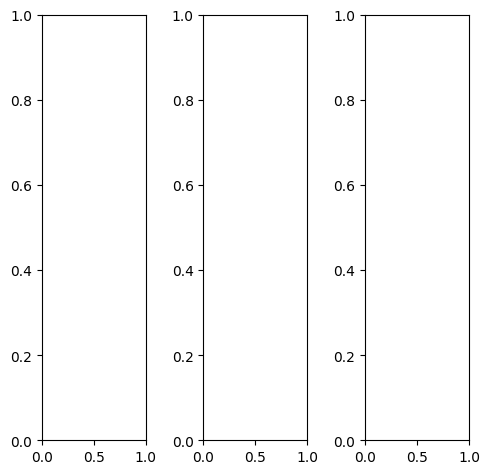

tensor([[[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9843, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9843, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.

tensor([[[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9843, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9843, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9843,  ..., 0.9882, 0.9882, 0.9882]],

        [[1.0000, 0.9882, 0.9882,  ..., 0.9882, 0.9882, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9961, 1.

tensor([[[0.9595, 0.9588, 0.9866,  ..., 0.9848, 0.9767, 0.9472],
         [0.9832, 0.9903, 0.9868,  ..., 0.9943, 1.0024, 0.9758],
         [0.9838, 0.9993, 0.9920,  ..., 0.9985, 1.0040, 1.0029],
         ...,
         [1.0205, 1.0115, 1.0028,  ..., 1.0051, 1.0039, 1.0032],
         [0.9880, 1.0163, 0.9910,  ..., 1.0025, 1.0033, 0.9994],
         [0.9687, 0.9787, 0.9861,  ..., 0.9901, 0.9960, 0.9552]],

        [[0.9689, 0.9742, 0.9994,  ..., 0.9906, 0.9712, 0.9768],
         [0.9907, 1.0071, 1.0067,  ..., 1.0114, 0.9958, 0.9948],
         [0.9962, 1.0071, 1.0028,  ..., 1.0075, 1.0067, 1.0066],
         ...,
         [0.9990, 0.9898, 1.0016,  ..., 0.9964, 1.0058, 1.0067],
         [0.9822, 0.9943, 0.9900,  ..., 0.9994, 0.9997, 0.9943],
         [0.9549, 0.9853, 0.9863,  ..., 0.9869, 0.9824, 0.9303]],

        [[0.9630, 0.9934, 0.9900,  ..., 0.9871, 0.9733, 0.9573],
         [0.9903, 1.0201, 1.0072,  ..., 1.0096, 1.0007, 0.9849],
         [1.0031, 1.0079, 1.0161,  ..., 1.0076, 0.9971, 1.

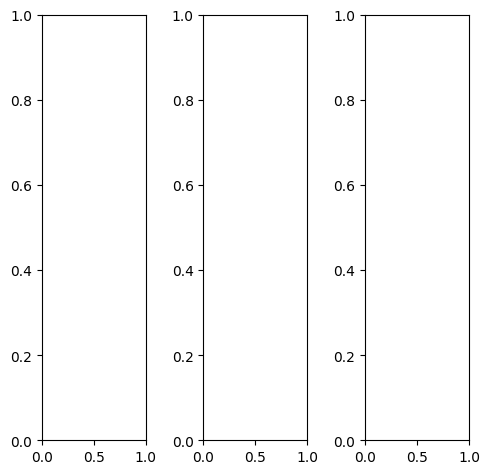

tensor([[[0.3373, 0.4000, 0.5569,  ..., 0.2588, 0.2510, 0.2745],
         [0.3451, 0.4078, 0.6235,  ..., 0.2706, 0.2863, 0.4275],
         [0.3529, 0.4157, 0.6667,  ..., 0.2471, 0.3451, 0.5804],
         ...,
         [0.5098, 0.3529, 0.3412,  ..., 0.5882, 0.6000, 0.6039],
         [0.5843, 0.5647, 0.5725,  ..., 0.5961, 0.6000, 0.6078],
         [0.6039, 0.6000, 0.5961,  ..., 0.5961, 0.6000, 0.6000]],

        [[0.3373, 0.4000, 0.5569,  ..., 0.2588, 0.2510, 0.2745],
         [0.3451, 0.4078, 0.6235,  ..., 0.2706, 0.2863, 0.4275],
         [0.3529, 0.4157, 0.6667,  ..., 0.2471, 0.3451, 0.5804],
         ...,
         [0.5098, 0.3529, 0.3412,  ..., 0.5882, 0.6000, 0.6039],
         [0.5843, 0.5647, 0.5725,  ..., 0.5961, 0.6000, 0.6078],
         [0.6039, 0.6000, 0.5961,  ..., 0.5961, 0.6000, 0.6000]],

        [[0.3373, 0.4000, 0.5569,  ..., 0.2588, 0.2510, 0.2745],
         [0.3451, 0.4078, 0.6235,  ..., 0.2706, 0.2863, 0.4275],
         [0.3529, 0.4157, 0.6667,  ..., 0.2471, 0.3451, 0.

tensor([[[0.3373, 0.4000, 0.5608,  ..., 0.2588, 0.2510, 0.2902],
         [0.3451, 0.4078, 0.6235,  ..., 0.2706, 0.2902, 0.4392],
         [0.3529, 0.4157, 0.6667,  ..., 0.2471, 0.3451, 0.5882],
         ...,
         [0.4863, 0.3059, 0.2784,  ..., 0.5725, 0.5804, 0.5882],
         [0.5647, 0.5373, 0.5373,  ..., 0.5804, 0.5843, 0.5922],
         [0.5882, 0.5804, 0.5804,  ..., 0.5804, 0.5843, 0.5843]],

        [[0.3451, 0.4078, 0.5686,  ..., 0.2588, 0.2510, 0.2745],
         [0.3529, 0.4196, 0.6314,  ..., 0.2706, 0.2902, 0.4314],
         [0.3608, 0.4235, 0.6745,  ..., 0.2510, 0.3529, 0.5882],
         ...,
         [0.5412, 0.3725, 0.3608,  ..., 0.6392, 0.6510, 0.6588],
         [0.6275, 0.6078, 0.6118,  ..., 0.6471, 0.6510, 0.6549],
         [0.6549, 0.6510, 0.6431,  ..., 0.6471, 0.6471, 0.6431]],

        [[0.2980, 0.3451, 0.4980,  ..., 0.2627, 0.2431, 0.2431],
         [0.3059, 0.3569, 0.5686,  ..., 0.2667, 0.2667, 0.3843],
         [0.3098, 0.3686, 0.6157,  ..., 0.2314, 0.3020, 0.

tensor([[[0.3588, 0.4101, 0.5735,  ..., 0.2479, 0.2451, 0.2896],
         [0.3370, 0.4173, 0.6490,  ..., 0.2689, 0.2808, 0.4222],
         [0.3662, 0.4385, 0.7109,  ..., 0.2540, 0.3412, 0.5614],
         ...,
         [0.5155, 0.3355, 0.3416,  ..., 0.5814, 0.5991, 0.6078],
         [0.5996, 0.5888, 0.5798,  ..., 0.5868, 0.5958, 0.6069],
         [0.6192, 0.6197, 0.6070,  ..., 0.5946, 0.6133, 0.6134]],

        [[0.3721, 0.4164, 0.5898,  ..., 0.2585, 0.2635, 0.3134],
         [0.3399, 0.3930, 0.6480,  ..., 0.2699, 0.3005, 0.4440],
         [0.3650, 0.4364, 0.7031,  ..., 0.2462, 0.3510, 0.5762],
         ...,
         [0.5353, 0.3325, 0.3250,  ..., 0.5928, 0.6066, 0.6192],
         [0.5936, 0.5778, 0.5812,  ..., 0.5957, 0.6094, 0.6198],
         [0.6085, 0.6053, 0.6023,  ..., 0.6034, 0.6142, 0.6171]],

        [[0.3594, 0.3991, 0.5753,  ..., 0.2385, 0.2500, 0.3087],
         [0.3357, 0.4068, 0.6207,  ..., 0.2631, 0.2855, 0.4168],
         [0.3537, 0.4170, 0.6843,  ..., 0.2370, 0.3395, 0.

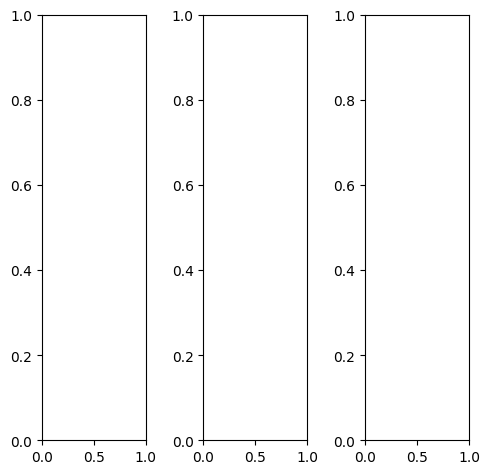

tensor([[[0.6549, 0.6549, 0.6627,  ..., 0.7137, 0.7059, 0.7098],
         [0.6667, 0.6627, 0.6745,  ..., 0.7216, 0.7137, 0.7216],
         [0.6706, 0.6627, 0.6784,  ..., 0.7294, 0.7216, 0.7294],
         ...,
         [0.1922, 0.2000, 0.1725,  ..., 0.1804, 0.1647, 0.1725],
         [0.3804, 0.4196, 0.3059,  ..., 0.1882, 0.1647, 0.1569],
         [0.2118, 0.2353, 0.1686,  ..., 0.1922, 0.1765, 0.1843]],

        [[0.6549, 0.6549, 0.6627,  ..., 0.7137, 0.7059, 0.7098],
         [0.6667, 0.6627, 0.6745,  ..., 0.7216, 0.7137, 0.7216],
         [0.6706, 0.6627, 0.6784,  ..., 0.7294, 0.7216, 0.7294],
         ...,
         [0.1922, 0.2000, 0.1725,  ..., 0.1804, 0.1647, 0.1725],
         [0.3804, 0.4196, 0.3059,  ..., 0.1882, 0.1647, 0.1569],
         [0.2118, 0.2353, 0.1686,  ..., 0.1922, 0.1765, 0.1843]],

        [[0.6549, 0.6549, 0.6627,  ..., 0.7137, 0.7059, 0.7098],
         [0.6667, 0.6627, 0.6745,  ..., 0.7216, 0.7137, 0.7216],
         [0.6706, 0.6627, 0.6784,  ..., 0.7294, 0.7216, 0.

tensor([[[0.6039, 0.6039, 0.6118,  ..., 0.6824, 0.6745, 0.6784],
         [0.6196, 0.6157, 0.6275,  ..., 0.7059, 0.7020, 0.7098],
         [0.6314, 0.6235, 0.6392,  ..., 0.7216, 0.7176, 0.7255],
         ...,
         [0.1176, 0.1294, 0.1059,  ..., 0.1412, 0.1176, 0.1137],
         [0.3255, 0.3765, 0.2667,  ..., 0.1333, 0.1059, 0.0941],
         [0.1647, 0.1961, 0.1412,  ..., 0.1255, 0.1137, 0.1216]],

        [[0.6471, 0.6471, 0.6549,  ..., 0.6980, 0.6941, 0.6980],
         [0.6588, 0.6549, 0.6667,  ..., 0.7020, 0.6941, 0.7020],
         [0.6627, 0.6549, 0.6706,  ..., 0.7098, 0.7020, 0.7098],
         ...,
         [0.2078, 0.2157, 0.1882,  ..., 0.1882, 0.1765, 0.1882],
         [0.3882, 0.4275, 0.3098,  ..., 0.2039, 0.1804, 0.1765],
         [0.2235, 0.2431, 0.1725,  ..., 0.2118, 0.1961, 0.2078]],

        [[0.8235, 0.8196, 0.8275,  ..., 0.8627, 0.8549, 0.8627],
         [0.8235, 0.8196, 0.8314,  ..., 0.8471, 0.8392, 0.8510],
         [0.8275, 0.8196, 0.8314,  ..., 0.8471, 0.8392, 0.

tensor([[[0.6308, 0.6234, 0.6114,  ..., 0.6677, 0.6590, 0.6899],
         [0.6356, 0.6205, 0.6247,  ..., 0.6727, 0.6761, 0.7006],
         [0.6334, 0.6140, 0.6253,  ..., 0.6874, 0.6825, 0.6949],
         ...,
         [0.1987, 0.2067, 0.1845,  ..., 0.1910, 0.1736, 0.1825],
         [0.3514, 0.4328, 0.3234,  ..., 0.2063, 0.1784, 0.1655],
         [0.2426, 0.2234, 0.1704,  ..., 0.1867, 0.1761, 0.1954]],

        [[0.6752, 0.6789, 0.6834,  ..., 0.7320, 0.7269, 0.7383],
         [0.6863, 0.6802, 0.6880,  ..., 0.7358, 0.7266, 0.7554],
         [0.6827, 0.6791, 0.6932,  ..., 0.7465, 0.7303, 0.7522],
         ...,
         [0.2048, 0.2063, 0.1738,  ..., 0.1778, 0.1585, 0.1745],
         [0.3486, 0.4243, 0.3148,  ..., 0.1856, 0.1693, 0.1538],
         [0.2515, 0.2282, 0.1706,  ..., 0.1832, 0.1639, 0.1960]],

        [[0.7266, 0.7314, 0.7433,  ..., 0.7897, 0.7822, 0.7799],
         [0.7380, 0.7355, 0.7547,  ..., 0.7950, 0.7772, 0.7825],
         [0.7337, 0.7301, 0.7548,  ..., 0.8040, 0.7893, 0.

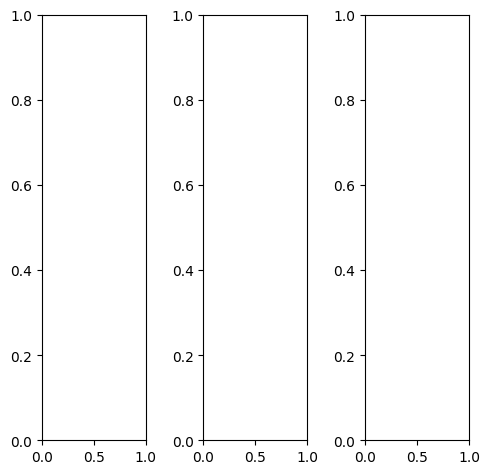

EPOCH: 15.255  trn_loss: 0.005  (1819.73s - 10108.96s remaining)

tensor([[[0.4784, 0.6275, 0.7882,  ..., 0.7333, 0.7333, 0.7098],
         [0.8863, 0.9255, 0.9098,  ..., 0.6941, 0.6941, 0.6863],
         [0.9255, 0.9137, 0.9137,  ..., 0.6431, 0.6510, 0.6549],
         ...,
         [0.7216, 0.7490, 0.7765,  ..., 0.4824, 0.4745, 0.4627],
         [0.6431, 0.6667, 0.6941,  ..., 0.4706, 0.4627, 0.4588],
         [0.5725, 0.5961, 0.6235,  ..., 0.4588, 0.4549, 0.4549]],

        [[0.4784, 0.6275, 0.7882,  ..., 0.7333, 0.7333, 0.7098],
         [0.8863, 0.9255, 0.9098,  ..., 0.6941, 0.6941, 0.6863],
         [0.9255, 0.9137, 0.9137,  ..., 0.6431, 0.6510, 0.6549],
         ...,
         [0.7216, 0.7490, 0.7765,  ..., 0.4824, 0.4745, 0.4627],
         [0.6431, 0.6667, 0.6941,  ..., 0.4706, 0.4627, 0.4588],
         [0.5725, 0.5961, 0.6235,  ..., 0.4588, 0.4549, 0.4549]],

        [[0.4784, 0.6275, 0.7882,  ..., 0.7333, 0.7333, 0.7098],
         [0.8863, 0.9255, 0.9098,  ..., 0.6941, 0.6941, 0.6863],
         [0.9255, 0.9137, 0.9137,  ..., 0.6431, 0.6510, 0.

tensor([[[0.4471, 0.5804, 0.7216,  ..., 0.7059, 0.7176, 0.6941],
         [0.8196, 0.8510, 0.8353,  ..., 0.6745, 0.6824, 0.6706],
         [0.8549, 0.8431, 0.8510,  ..., 0.6353, 0.6431, 0.6353],
         ...,
         [0.7255, 0.7294, 0.7569,  ..., 0.5255, 0.5255, 0.5098],
         [0.6667, 0.6863, 0.7020,  ..., 0.5255, 0.5333, 0.5294],
         [0.6235, 0.6549, 0.6667,  ..., 0.5255, 0.5176, 0.5176]],

        [[0.4980, 0.6471, 0.8157,  ..., 0.7373, 0.7333, 0.7137],
         [0.9137, 0.9490, 0.9373,  ..., 0.6980, 0.6980, 0.6941],
         [0.9529, 0.9373, 0.9373,  ..., 0.6431, 0.6510, 0.6627],
         ...,
         [0.7255, 0.7569, 0.7843,  ..., 0.4863, 0.4784, 0.4667],
         [0.6471, 0.6745, 0.7020,  ..., 0.4745, 0.4627, 0.4588],
         [0.5765, 0.6000, 0.6314,  ..., 0.4588, 0.4549, 0.4549]],

        [[0.4549, 0.6510, 0.8353,  ..., 0.7686, 0.7686, 0.7333],
         [0.9255, 0.9922, 0.9647,  ..., 0.7333, 0.7176, 0.6902],
         [0.9804, 0.9647, 0.9569,  ..., 0.6745, 0.6706, 0.

tensor([[[0.3046, 0.3010, 0.4927,  ..., 0.3646, 0.3949, 0.4079],
         [0.6229, 0.5817, 0.6266,  ..., 0.3263, 0.3184, 0.3437],
         [0.6954, 0.6966, 0.6103,  ..., 0.3027, 0.3223, 0.3400],
         ...,
         [0.5164, 0.5753, 0.6007,  ..., 0.2177, 0.2052, 0.2256],
         [0.4175, 0.4881, 0.5396,  ..., 0.1833, 0.1914, 0.2188],
         [0.3631, 0.3870, 0.4143,  ..., 0.1997, 0.1919, 0.2165]],

        [[0.3609, 0.3942, 0.5738,  ..., 0.4767, 0.5234, 0.4706],
         [0.6520, 0.6592, 0.6622,  ..., 0.4682, 0.4880, 0.4479],
         [0.7425, 0.7780, 0.7001,  ..., 0.4186, 0.4415, 0.4075],
         ...,
         [0.4584, 0.4774, 0.5647,  ..., 0.2226, 0.2015, 0.1827],
         [0.3642, 0.4068, 0.4813,  ..., 0.1901, 0.1790, 0.1735],
         [0.3087, 0.3041, 0.3570,  ..., 0.1797, 0.1647, 0.1730]],

        [[0.4534, 0.4246, 0.7158,  ..., 0.6509, 0.6854, 0.6455],
         [0.7987, 0.7967, 0.8030,  ..., 0.6496, 0.6624, 0.6276],
         [0.8319, 0.8008, 0.8480,  ..., 0.5878, 0.6046, 0.

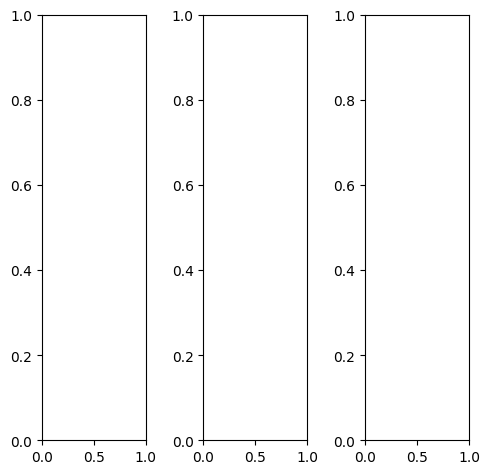

tensor([[[0.3529, 0.3804, 0.4118,  ..., 0.4235, 0.3961, 0.3608],
         [0.3529, 0.3765, 0.4000,  ..., 0.4314, 0.4314, 0.3765],
         [0.3725, 0.3412, 0.3843,  ..., 0.4314, 0.3961, 0.3294],
         ...,
         [0.5333, 0.5216, 0.4980,  ..., 0.6275, 0.6235, 0.4745],
         [0.5294, 0.5216, 0.4980,  ..., 0.6745, 0.6039, 0.4314],
         [0.5137, 0.5412, 0.5137,  ..., 0.6157, 0.4392, 0.3843]],

        [[0.3529, 0.3804, 0.4118,  ..., 0.4235, 0.3961, 0.3608],
         [0.3529, 0.3765, 0.4000,  ..., 0.4314, 0.4314, 0.3765],
         [0.3725, 0.3412, 0.3843,  ..., 0.4314, 0.3961, 0.3294],
         ...,
         [0.5333, 0.5216, 0.4980,  ..., 0.6275, 0.6235, 0.4745],
         [0.5294, 0.5216, 0.4980,  ..., 0.6745, 0.6039, 0.4314],
         [0.5137, 0.5412, 0.5137,  ..., 0.6157, 0.4392, 0.3843]],

        [[0.3529, 0.3804, 0.4118,  ..., 0.4235, 0.3961, 0.3608],
         [0.3529, 0.3765, 0.4000,  ..., 0.4314, 0.4314, 0.3765],
         [0.3725, 0.3412, 0.3843,  ..., 0.4314, 0.3961, 0.

tensor([[[0.3804, 0.4118, 0.4471,  ..., 0.4667, 0.4353, 0.4000],
         [0.3843, 0.4118, 0.4392,  ..., 0.4784, 0.4745, 0.4157],
         [0.4039, 0.3804, 0.4235,  ..., 0.4784, 0.4392, 0.3647],
         ...,
         [0.6196, 0.6039, 0.5686,  ..., 0.6667, 0.6627, 0.5137],
         [0.6157, 0.6039, 0.5686,  ..., 0.7137, 0.6431, 0.4667],
         [0.5922, 0.6196, 0.5922,  ..., 0.6510, 0.4706, 0.4157]],

        [[0.3608, 0.3882, 0.4157,  ..., 0.4275, 0.4000, 0.3647],
         [0.3569, 0.3804, 0.4039,  ..., 0.4275, 0.4314, 0.3765],
         [0.3765, 0.3451, 0.3882,  ..., 0.4275, 0.3922, 0.3255],
         ...,
         [0.5176, 0.5059, 0.4824,  ..., 0.6275, 0.6196, 0.4745],
         [0.5137, 0.5059, 0.4824,  ..., 0.6706, 0.6000, 0.4314],
         [0.4941, 0.5255, 0.4980,  ..., 0.6157, 0.4392, 0.3882]],

        [[0.2431, 0.2667, 0.3059,  ..., 0.3059, 0.2784, 0.2510],
         [0.2392, 0.2549, 0.2784,  ..., 0.3137, 0.3137, 0.2706],
         [0.2667, 0.2314, 0.2745,  ..., 0.3137, 0.2902, 0.

tensor([[[ 0.1261,  0.1040,  0.0905,  ...,  0.2652,  0.2368,  0.2103],
         [ 0.0993, -0.0057,  0.0479,  ...,  0.2572,  0.2519,  0.1961],
         [ 0.0319, -0.0281, -0.1128,  ...,  0.2515,  0.2219,  0.1529],
         ...,
         [ 0.5321,  0.5376,  0.5120,  ...,  0.6735,  0.6669,  0.4430],
         [ 0.5248,  0.5246,  0.4776,  ...,  0.7451,  0.6012,  0.3862],
         [ 0.5134,  0.5359,  0.4795,  ...,  0.6512,  0.4261,  0.3615]],

        [[ 0.2155,  0.2671,  0.1946,  ...,  0.3459,  0.3141,  0.2540],
         [ 0.1521,  0.1128,  0.0431,  ...,  0.3642,  0.3670,  0.2385],
         [ 0.1396,  0.1852,  0.0023,  ...,  0.3535,  0.3121,  0.2038],
         ...,
         [ 0.5119,  0.4837,  0.4963,  ...,  0.6794,  0.6796,  0.3955],
         [ 0.4955,  0.4929,  0.4651,  ...,  0.7327,  0.6226,  0.3564],
         [ 0.4812,  0.4917,  0.4767,  ...,  0.6297,  0.4015,  0.3100]],

        [[ 0.3645,  0.1893,  0.3719,  ...,  0.4444,  0.4140,  0.3657],
         [ 0.3173,  0.2296,  0.3172,  ...,  0

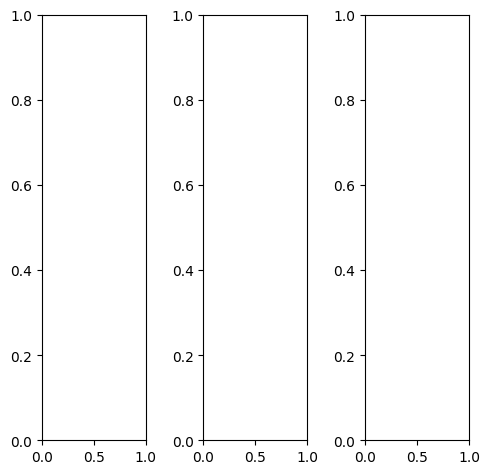

tensor([[[0.3765, 0.3843, 0.3765,  ..., 0.3686, 0.3725, 0.3647],
         [0.3725, 0.3765, 0.3725,  ..., 0.3647, 0.3647, 0.3569],
         [0.3725, 0.3804, 0.3725,  ..., 0.3647, 0.3647, 0.3569],
         ...,
         [0.3373, 0.4078, 0.4471,  ..., 0.3373, 0.3373, 0.3294],
         [0.3373, 0.3294, 0.3647,  ..., 0.3373, 0.3373, 0.3294],
         [0.3373, 0.3294, 0.3608,  ..., 0.3294, 0.3294, 0.3255]],

        [[0.3765, 0.3843, 0.3765,  ..., 0.3686, 0.3725, 0.3647],
         [0.3725, 0.3765, 0.3725,  ..., 0.3647, 0.3647, 0.3569],
         [0.3725, 0.3804, 0.3725,  ..., 0.3647, 0.3647, 0.3569],
         ...,
         [0.3373, 0.4078, 0.4471,  ..., 0.3373, 0.3373, 0.3294],
         [0.3373, 0.3294, 0.3647,  ..., 0.3373, 0.3373, 0.3294],
         [0.3373, 0.3294, 0.3608,  ..., 0.3294, 0.3294, 0.3255]],

        [[0.3765, 0.3843, 0.3765,  ..., 0.3686, 0.3725, 0.3647],
         [0.3725, 0.3765, 0.3725,  ..., 0.3647, 0.3647, 0.3569],
         [0.3725, 0.3804, 0.3725,  ..., 0.3647, 0.3647, 0.

tensor([[[0.4000, 0.4078, 0.4000,  ..., 0.3922, 0.3961, 0.3882],
         [0.3961, 0.4000, 0.3961,  ..., 0.3882, 0.3882, 0.3804],
         [0.3961, 0.4039, 0.3961,  ..., 0.3882, 0.3882, 0.3804],
         ...,
         [0.3490, 0.4314, 0.4863,  ..., 0.3529, 0.3529, 0.3451],
         [0.3529, 0.3569, 0.4000,  ..., 0.3529, 0.3529, 0.3451],
         [0.3529, 0.3569, 0.3922,  ..., 0.3451, 0.3451, 0.3412]],

        [[0.4078, 0.4157, 0.4078,  ..., 0.4000, 0.4039, 0.3961],
         [0.4039, 0.4078, 0.4039,  ..., 0.3922, 0.3961, 0.3882],
         [0.4039, 0.4078, 0.4039,  ..., 0.3961, 0.3961, 0.3882],
         ...,
         [0.3725, 0.4275, 0.4510,  ..., 0.3647, 0.3647, 0.3569],
         [0.3647, 0.3490, 0.3686,  ..., 0.3647, 0.3647, 0.3569],
         [0.3647, 0.3529, 0.3686,  ..., 0.3569, 0.3569, 0.3529]],

        [[0.1608, 0.1647, 0.1608,  ..., 0.1490, 0.1529, 0.1490],
         [0.1608, 0.1608, 0.1569,  ..., 0.1490, 0.1490, 0.1451],
         [0.1608, 0.1608, 0.1569,  ..., 0.1490, 0.1490, 0.

tensor([[[0.4176, 0.2918, 0.2737,  ..., 0.2491, 0.2887, 0.3114],
         [0.3033, 0.2399, 0.1624,  ..., 0.2140, 0.2082, 0.2385],
         [0.3091, 0.1727, 0.0895,  ..., 0.2383, 0.2488, 0.2527],
         ...,
         [0.3036, 0.4191, 0.4546,  ..., 0.2713, 0.2597, 0.2787],
         [0.3130, 0.2553, 0.2924,  ..., 0.2339, 0.2361, 0.2595],
         [0.3409, 0.2956, 0.3100,  ..., 0.2470, 0.2469, 0.2926]],

        [[0.4181, 0.4795, 0.3890,  ..., 0.3623, 0.4118, 0.3729],
         [0.4216, 0.3979, 0.2730,  ..., 0.3178, 0.3428, 0.3116],
         [0.3636, 0.4063, 0.2572,  ..., 0.3352, 0.3593, 0.3065],
         ...,
         [0.2960, 0.4122, 0.4910,  ..., 0.2918, 0.2926, 0.2508],
         [0.3035, 0.2684, 0.3277,  ..., 0.2623, 0.2667, 0.2567],
         [0.3134, 0.2685, 0.3088,  ..., 0.2416, 0.2521, 0.2613]],

        [[0.6245, 0.4940, 0.5827,  ..., 0.4667, 0.5139, 0.5059],
         [0.5829, 0.5438, 0.5036,  ..., 0.4186, 0.4404, 0.4343],
         [0.5651, 0.4397, 0.4854,  ..., 0.4126, 0.4380, 0.

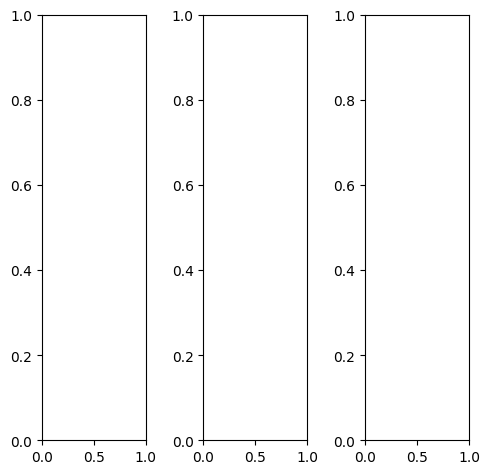

tensor([[[0.1686, 0.1647, 0.1725,  ..., 0.0784, 0.0706, 0.0706],
         [0.1647, 0.1647, 0.1725,  ..., 0.0745, 0.0745, 0.0706],
         [0.1725, 0.1686, 0.1686,  ..., 0.0706, 0.0745, 0.0706],
         ...,
         [0.4980, 0.4824, 0.4549,  ..., 0.2196, 0.3098, 0.3647],
         [0.4431, 0.4392, 0.4275,  ..., 0.1843, 0.2392, 0.3137],
         [0.4275, 0.4157, 0.4471,  ..., 0.1725, 0.2039, 0.2314]],

        [[0.1686, 0.1647, 0.1725,  ..., 0.0784, 0.0706, 0.0706],
         [0.1647, 0.1647, 0.1725,  ..., 0.0745, 0.0745, 0.0706],
         [0.1725, 0.1686, 0.1686,  ..., 0.0706, 0.0745, 0.0706],
         ...,
         [0.4980, 0.4824, 0.4549,  ..., 0.2196, 0.3098, 0.3647],
         [0.4431, 0.4392, 0.4275,  ..., 0.1843, 0.2392, 0.3137],
         [0.4275, 0.4157, 0.4471,  ..., 0.1725, 0.2039, 0.2314]],

        [[0.1686, 0.1647, 0.1725,  ..., 0.0784, 0.0706, 0.0706],
         [0.1647, 0.1647, 0.1725,  ..., 0.0745, 0.0745, 0.0706],
         [0.1725, 0.1686, 0.1686,  ..., 0.0706, 0.0745, 0.

tensor([[[0.1922, 0.1882, 0.1922,  ..., 0.1098, 0.0980, 0.0824],
         [0.1882, 0.1882, 0.1922,  ..., 0.1059, 0.0980, 0.0863],
         [0.1961, 0.1922, 0.1922,  ..., 0.1020, 0.0980, 0.0863],
         ...,
         [0.5765, 0.5529, 0.5137,  ..., 0.2980, 0.3882, 0.4431],
         [0.5216, 0.5059, 0.4824,  ..., 0.2627, 0.3176, 0.3922],
         [0.5059, 0.4824, 0.5020,  ..., 0.2510, 0.2824, 0.3098]],

        [[0.1412, 0.1373, 0.1451,  ..., 0.0510, 0.0471, 0.0510],
         [0.1373, 0.1373, 0.1451,  ..., 0.0471, 0.0510, 0.0510],
         [0.1451, 0.1412, 0.1412,  ..., 0.0431, 0.0510, 0.0510],
         ...,
         [0.4588, 0.4510, 0.4275,  ..., 0.1804, 0.2706, 0.3255],
         [0.4078, 0.4078, 0.4039,  ..., 0.1451, 0.2000, 0.2745],
         [0.3922, 0.3843, 0.4235,  ..., 0.1333, 0.1647, 0.1922]],

        [[0.2510, 0.2471, 0.2510,  ..., 0.1216, 0.1216, 0.1373],
         [0.2471, 0.2471, 0.2510,  ..., 0.1216, 0.1255, 0.1373],
         [0.2549, 0.2510, 0.2510,  ..., 0.1176, 0.1255, 0.

tensor([[[0.2586, 0.1787, 0.1961,  ..., 0.1602, 0.1725, 0.2049],
         [0.2486, 0.1948, 0.2747,  ..., 0.1498, 0.1523, 0.1656],
         [0.2143, 0.2201, 0.1405,  ..., 0.1265, 0.1449, 0.1595],
         ...,
         [0.6771, 0.6465, 0.5863,  ..., 0.4286, 0.5494, 0.6252],
         [0.6022, 0.5797, 0.5432,  ..., 0.3451, 0.4451, 0.5489],
         [0.6085, 0.5997, 0.6135,  ..., 0.3047, 0.3557, 0.4395]],

        [[0.2690, 0.3318, 0.2549,  ..., 0.1826, 0.1781, 0.2013],
         [0.3020, 0.2598, 0.2623,  ..., 0.1836, 0.1964, 0.1928],
         [0.2840, 0.3605, 0.2872,  ..., 0.1580, 0.1732, 0.1852],
         ...,
         [0.6657, 0.6275, 0.5888,  ..., 0.3857, 0.5104, 0.5541],
         [0.5806, 0.5637, 0.5599,  ..., 0.3194, 0.4027, 0.4814],
         [0.5680, 0.5662, 0.6037,  ..., 0.2537, 0.3136, 0.3739]],

        [[0.4871, 0.3446, 0.5145,  ..., 0.2620, 0.2681, 0.2989],
         [0.4349, 0.3988, 0.4367,  ..., 0.2578, 0.2787, 0.2783],
         [0.4523, 0.3948, 0.4558,  ..., 0.2263, 0.2548, 0.

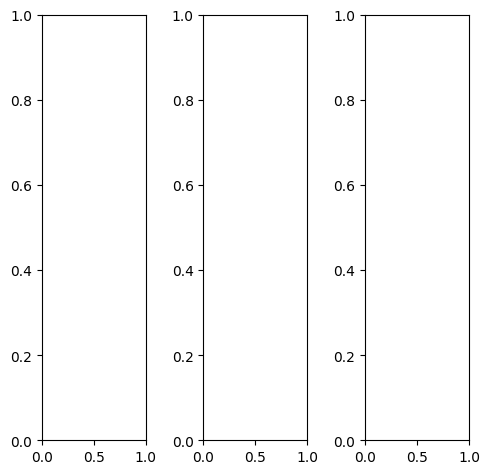

tensor([[[1.0000, 0.9961, 0.9961,  ..., 0.8863, 0.8863, 0.8863],
         [0.9647, 0.9294, 0.9725,  ..., 0.8863, 0.8902, 0.8902],
         [0.7882, 0.7176, 0.7608,  ..., 0.9059, 0.9059, 0.9020],
         ...,
         [0.0863, 0.0745, 0.0667,  ..., 0.3020, 0.3216, 0.3373],
         [0.1451, 0.1333, 0.1294,  ..., 0.2745, 0.2941, 0.2980],
         [0.1961, 0.2039, 0.2118,  ..., 0.3098, 0.3020, 0.3020]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.8863, 0.8863, 0.8863],
         [0.9647, 0.9294, 0.9725,  ..., 0.8863, 0.8902, 0.8902],
         [0.7882, 0.7176, 0.7608,  ..., 0.9059, 0.9059, 0.9020],
         ...,
         [0.0863, 0.0745, 0.0667,  ..., 0.3020, 0.3216, 0.3373],
         [0.1451, 0.1333, 0.1294,  ..., 0.2745, 0.2941, 0.2980],
         [0.1961, 0.2039, 0.2118,  ..., 0.3098, 0.3020, 0.3020]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.8863, 0.8863, 0.8863],
         [0.9647, 0.9294, 0.9725,  ..., 0.8863, 0.8902, 0.8902],
         [0.7882, 0.7176, 0.7608,  ..., 0.9059, 0.9059, 0.

tensor([[[1.0000, 0.9961, 0.9922,  ..., 0.8549, 0.8549, 0.8549],
         [0.9451, 0.9098, 0.9647,  ..., 0.8588, 0.8588, 0.8588],
         [0.7098, 0.6196, 0.6784,  ..., 0.8784, 0.8745, 0.8745],
         ...,
         [0.0627, 0.0549, 0.0471,  ..., 0.2039, 0.2235, 0.2314],
         [0.1020, 0.0941, 0.0941,  ..., 0.1882, 0.2078, 0.2039],
         [0.1333, 0.1451, 0.1529,  ..., 0.2235, 0.2157, 0.2078]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9020, 0.9020, 0.9020],
         [0.9725, 0.9412, 0.9765,  ..., 0.9020, 0.9020, 0.9059],
         [0.8235, 0.7647, 0.8000,  ..., 0.9176, 0.9176, 0.9137],
         ...,
         [0.0980, 0.0863, 0.0784,  ..., 0.3490, 0.3686, 0.3843],
         [0.1647, 0.1529, 0.1451,  ..., 0.3137, 0.3333, 0.3412],
         [0.2275, 0.2314, 0.2392,  ..., 0.3490, 0.3412, 0.3451]],

        [[1.0000, 0.9922, 0.9961,  ..., 0.8941, 0.8941, 0.8941],
         [0.9647, 0.9333, 0.9765,  ..., 0.8941, 0.8980, 0.8980],
         [0.8039, 0.7333, 0.7765,  ..., 0.9137, 0.9137, 0.

tensor([[[0.8386, 0.7398, 0.7686,  ..., 0.6030, 0.6262, 0.7183],
         [0.7963, 0.7388, 0.7400,  ..., 0.5274, 0.6050, 0.7022],
         [0.6272, 0.5723, 0.5136,  ..., 0.5859, 0.6190, 0.6927],
         ...,
         [0.1298, 0.1731, 0.1601,  ..., 0.3954, 0.4130, 0.4463],
         [0.1864, 0.2219, 0.2343,  ..., 0.3571, 0.3897, 0.4069],
         [0.2532, 0.2479, 0.2709,  ..., 0.3865, 0.3877, 0.4326]],

        [[0.8118, 0.8207, 0.7813,  ..., 0.6926, 0.7403, 0.7726],
         [0.8124, 0.8269, 0.7976,  ..., 0.6746, 0.7144, 0.8158],
         [0.6589, 0.6402, 0.6455,  ..., 0.7073, 0.7071, 0.7878],
         ...,
         [0.1440, 0.1465, 0.1405,  ..., 0.3773, 0.3949, 0.3751],
         [0.1828, 0.1927, 0.1953,  ..., 0.3356, 0.3513, 0.3378],
         [0.2365, 0.2214, 0.2396,  ..., 0.3506, 0.3504, 0.3672]],

        [[0.9273, 0.8687, 0.9222,  ..., 0.8400, 0.8671, 0.8778],
         [0.8933, 0.8803, 0.8844,  ..., 0.8170, 0.8515, 0.8936],
         [0.7467, 0.5780, 0.7210,  ..., 0.8527, 0.8706, 0.

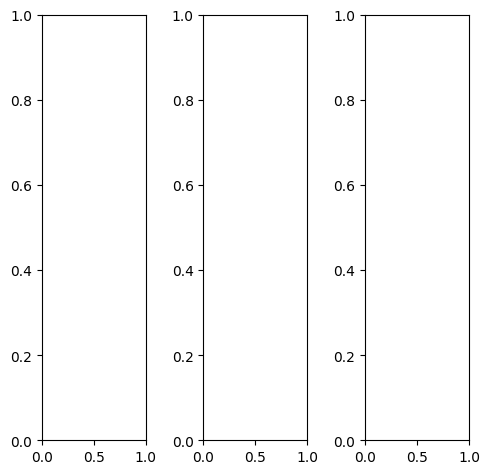

EPOCH: 15.510  trn_loss: 0.004  (1848.95s - 10071.90s remaining)

tensor([[[0.5333, 0.5412, 0.5412,  ..., 0.5216, 0.5255, 0.5216],
         [0.4353, 0.4431, 0.4863,  ..., 0.5333, 0.5333, 0.5333],
         [0.3490, 0.3765, 0.4431,  ..., 0.5333, 0.5333, 0.5373],
         ...,
         [0.5176, 0.5333, 0.5137,  ..., 0.5294, 0.5294, 0.5490],
         [0.5216, 0.5333, 0.5176,  ..., 0.5490, 0.5255, 0.5490],
         [0.4667, 0.4863, 0.5137,  ..., 0.5098, 0.4980, 0.5059]],

        [[0.5333, 0.5412, 0.5412,  ..., 0.5216, 0.5255, 0.5216],
         [0.4353, 0.4431, 0.4863,  ..., 0.5333, 0.5333, 0.5333],
         [0.3490, 0.3765, 0.4431,  ..., 0.5333, 0.5333, 0.5373],
         ...,
         [0.5176, 0.5333, 0.5137,  ..., 0.5294, 0.5294, 0.5490],
         [0.5216, 0.5333, 0.5176,  ..., 0.5490, 0.5255, 0.5490],
         [0.4667, 0.4863, 0.5137,  ..., 0.5098, 0.4980, 0.5059]],

        [[0.5333, 0.5412, 0.5412,  ..., 0.5216, 0.5255, 0.5216],
         [0.4353, 0.4431, 0.4863,  ..., 0.5333, 0.5333, 0.5333],
         [0.3490, 0.3765, 0.4431,  ..., 0.5333, 0.5333, 0.

tensor([[[0.6275, 0.6392, 0.6392,  ..., 0.6196, 0.6235, 0.6157],
         [0.5098, 0.5255, 0.5765,  ..., 0.6314, 0.6235, 0.6196],
         [0.3922, 0.4275, 0.5059,  ..., 0.6314, 0.6196, 0.6157],
         ...,
         [0.5882, 0.6039, 0.5843,  ..., 0.6039, 0.6078, 0.6275],
         [0.5922, 0.6039, 0.5882,  ..., 0.6157, 0.5961, 0.6196],
         [0.5373, 0.5569, 0.5882,  ..., 0.5765, 0.5686, 0.5765]],

        [[0.5216, 0.5255, 0.5255,  ..., 0.5098, 0.5176, 0.5137],
         [0.4275, 0.4353, 0.4745,  ..., 0.5216, 0.5294, 0.5294],
         [0.3569, 0.3804, 0.4431,  ..., 0.5255, 0.5294, 0.5373],
         ...,
         [0.5216, 0.5373, 0.5176,  ..., 0.5333, 0.5333, 0.5490],
         [0.5255, 0.5373, 0.5216,  ..., 0.5569, 0.5333, 0.5569],
         [0.4706, 0.4902, 0.5176,  ..., 0.5137, 0.5059, 0.5137]],

        [[0.3451, 0.3490, 0.3490,  ..., 0.3216, 0.3216, 0.3216],
         [0.2706, 0.2745, 0.3059,  ..., 0.3333, 0.3255, 0.3255],
         [0.2000, 0.2118, 0.2667,  ..., 0.3333, 0.3176, 0.

tensor([[[ 0.3217,  0.3223,  0.2539,  ...,  0.2912,  0.3179,  0.3971],
         [ 0.1904,  0.0703,  0.0599,  ...,  0.2583,  0.2687,  0.3473],
         [ 0.0050,  0.0637, -0.0130,  ...,  0.2733,  0.2923,  0.3619],
         ...,
         [ 0.4332,  0.5117,  0.4330,  ...,  0.4216,  0.4347,  0.4917],
         [ 0.4610,  0.4961,  0.4617,  ...,  0.4624,  0.4303,  0.5076],
         [ 0.4183,  0.4347,  0.4634,  ...,  0.4289,  0.4319,  0.4664]],

        [[ 0.4340,  0.4545,  0.4502,  ...,  0.4132,  0.4662,  0.4483],
         [ 0.2189,  0.2346,  0.1171,  ...,  0.4293,  0.4487,  0.4526],
         [ 0.1461,  0.2161,  0.2073,  ...,  0.4254,  0.4547,  0.4654],
         ...,
         [ 0.3914,  0.4335,  0.4210,  ...,  0.4283,  0.4531,  0.4472],
         [ 0.4039,  0.4383,  0.4307,  ...,  0.4689,  0.4463,  0.4915],
         [ 0.3669,  0.3745,  0.4305,  ...,  0.4112,  0.4220,  0.4290]],

        [[ 0.6263,  0.5111,  0.5922,  ...,  0.7168,  0.7384,  0.7046],
         [ 0.4359,  0.3742,  0.4441,  ...,  0

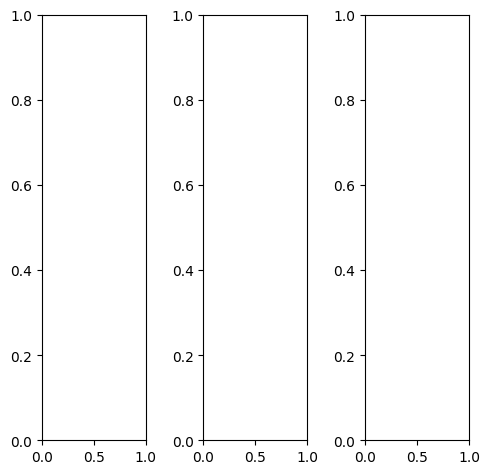

tensor([[[0.8353, 0.8471, 0.8627,  ..., 0.9686, 0.9686, 0.9686],
         [0.8510, 0.8549, 0.8314,  ..., 0.9843, 0.9804, 0.9686],
         [0.9059, 0.8941, 0.8118,  ..., 0.9804, 0.9647, 0.9529],
         ...,
         [0.3529, 0.3843, 0.3451,  ..., 0.3569, 0.3882, 0.3490],
         [0.2824, 0.3216, 0.3255,  ..., 0.3608, 0.3961, 0.3922],
         [0.2706, 0.2824, 0.3137,  ..., 0.3804, 0.3961, 0.4039]],

        [[0.8353, 0.8471, 0.8627,  ..., 0.9686, 0.9686, 0.9686],
         [0.8510, 0.8549, 0.8314,  ..., 0.9843, 0.9804, 0.9686],
         [0.9059, 0.8941, 0.8118,  ..., 0.9804, 0.9647, 0.9529],
         ...,
         [0.3529, 0.3843, 0.3451,  ..., 0.3569, 0.3882, 0.3490],
         [0.2824, 0.3216, 0.3255,  ..., 0.3608, 0.3961, 0.3922],
         [0.2706, 0.2824, 0.3137,  ..., 0.3804, 0.3961, 0.4039]],

        [[0.8353, 0.8471, 0.8627,  ..., 0.9686, 0.9686, 0.9686],
         [0.8510, 0.8549, 0.8314,  ..., 0.9843, 0.9804, 0.9686],
         [0.9059, 0.8941, 0.8118,  ..., 0.9804, 0.9647, 0.

tensor([[[0.7569, 0.7922, 0.8235,  ..., 0.9686, 0.9725, 0.9725],
         [0.7882, 0.7922, 0.7843,  ..., 0.9843, 0.9804, 0.9725],
         [0.8824, 0.8471, 0.7686,  ..., 0.9725, 0.9569, 0.9529],
         ...,
         [0.4275, 0.4667, 0.4235,  ..., 0.4275, 0.4706, 0.4275],
         [0.3451, 0.3843, 0.3961,  ..., 0.4314, 0.4745, 0.4745],
         [0.3373, 0.3412, 0.3765,  ..., 0.4510, 0.4706, 0.4863]],

        [[0.8627, 0.8627, 0.8706,  ..., 0.9686, 0.9686, 0.9647],
         [0.8706, 0.8745, 0.8471,  ..., 0.9843, 0.9804, 0.9647],
         [0.9098, 0.9059, 0.8235,  ..., 0.9843, 0.9647, 0.9490],
         ...,
         [0.3373, 0.3686, 0.3294,  ..., 0.3490, 0.3686, 0.3333],
         [0.2706, 0.3098, 0.3137,  ..., 0.3490, 0.3804, 0.3765],
         [0.2549, 0.2706, 0.3020,  ..., 0.3686, 0.3804, 0.3882]],

        [[0.9059, 0.9098, 0.9098,  ..., 0.9686, 0.9725, 0.9725],
         [0.9216, 0.9176, 0.8824,  ..., 0.9843, 0.9804, 0.9765],
         [0.9569, 0.9490, 0.8510,  ..., 0.9804, 0.9804, 0.

tensor([[[0.9008, 0.8876, 0.8614,  ..., 0.8400, 0.8392, 0.8849],
         [0.9068, 1.0109, 0.8816,  ..., 0.8817, 0.9286, 0.9412],
         [0.9843, 1.0625, 0.8625,  ..., 0.9277, 0.9349, 0.9520],
         ...,
         [0.1685, 0.2158, 0.1450,  ..., 0.1510, 0.2166, 0.2127],
         [0.0959, 0.1300, 0.1373,  ..., 0.1589, 0.2290, 0.2652],
         [0.1527, 0.1096, 0.1472,  ..., 0.2648, 0.2972, 0.3583]],

        [[0.9240, 0.9177, 0.8547,  ..., 0.9144, 0.9337, 0.9935],
         [0.8514, 0.9705, 0.8454,  ..., 0.9689, 0.9876, 1.0636],
         [1.0152, 1.0334, 0.8966,  ..., 0.9806, 0.9780, 1.0434],
         ...,
         [0.2170, 0.2333, 0.1695,  ..., 0.2151, 0.2720, 0.2074],
         [0.1286, 0.1520, 0.1426,  ..., 0.2125, 0.2674, 0.2648],
         [0.1648, 0.1277, 0.1665,  ..., 0.2837, 0.3105, 0.3399]],

        [[0.9536, 0.9506, 0.9929,  ..., 1.0359, 1.0521, 1.0930],
         [0.9893, 1.0470, 0.9873,  ..., 1.0517, 1.1063, 1.1258],
         [1.0460, 1.0500, 1.0009,  ..., 1.0829, 1.0824, 1.

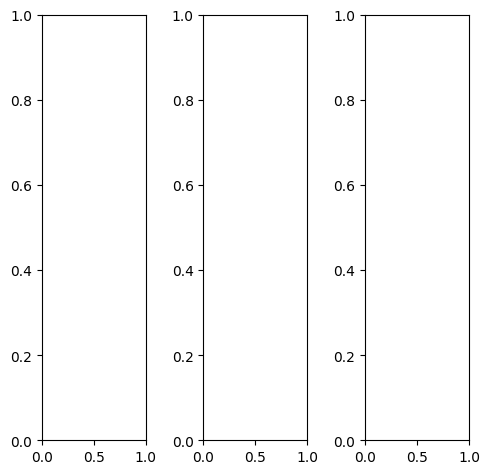

tensor([[[0.5961, 0.6118, 0.6039,  ..., 0.7294, 0.7647, 0.9216],
         [0.6039, 0.6314, 0.6314,  ..., 0.7451, 0.7882, 0.9490],
         [0.6039, 0.6314, 0.6392,  ..., 0.7333, 0.7922, 0.9490],
         ...,
         [0.7451, 0.7529, 0.7569,  ..., 0.7098, 0.7059, 0.7059],
         [0.7608, 0.7647, 0.7686,  ..., 0.7137, 0.7137, 0.7137],
         [0.7608, 0.7569, 0.7647,  ..., 0.7137, 0.7137, 0.7137]],

        [[0.5961, 0.6118, 0.6039,  ..., 0.7294, 0.7647, 0.9216],
         [0.6039, 0.6314, 0.6314,  ..., 0.7451, 0.7882, 0.9490],
         [0.6039, 0.6314, 0.6392,  ..., 0.7333, 0.7922, 0.9490],
         ...,
         [0.7451, 0.7529, 0.7569,  ..., 0.7098, 0.7059, 0.7059],
         [0.7608, 0.7647, 0.7686,  ..., 0.7137, 0.7137, 0.7137],
         [0.7608, 0.7569, 0.7647,  ..., 0.7137, 0.7137, 0.7137]],

        [[0.5961, 0.6118, 0.6039,  ..., 0.7294, 0.7647, 0.9216],
         [0.6039, 0.6314, 0.6314,  ..., 0.7451, 0.7882, 0.9490],
         [0.6039, 0.6314, 0.6392,  ..., 0.7333, 0.7922, 0.

tensor([[[0.6353, 0.6431, 0.6392,  ..., 0.7529, 0.7765, 0.9255],
         [0.6392, 0.6588, 0.6588,  ..., 0.7647, 0.8000, 0.9529],
         [0.6353, 0.6549, 0.6627,  ..., 0.7569, 0.8039, 0.9490],
         ...,
         [0.7843, 0.7922, 0.7922,  ..., 0.7412, 0.7373, 0.7373],
         [0.8039, 0.8039, 0.8000,  ..., 0.7451, 0.7451, 0.7451],
         [0.8000, 0.7961, 0.8000,  ..., 0.7451, 0.7451, 0.7451]],

        [[0.5922, 0.6118, 0.6078,  ..., 0.7333, 0.7725, 0.9255],
         [0.6039, 0.6314, 0.6353,  ..., 0.7490, 0.7922, 0.9490],
         [0.6078, 0.6353, 0.6431,  ..., 0.7373, 0.7961, 0.9490],
         ...,
         [0.7373, 0.7451, 0.7529,  ..., 0.7098, 0.7059, 0.7059],
         [0.7529, 0.7569, 0.7647,  ..., 0.7137, 0.7137, 0.7137],
         [0.7529, 0.7490, 0.7569,  ..., 0.7137, 0.7137, 0.7137]],

        [[0.5020, 0.5176, 0.5020,  ..., 0.6510, 0.6980, 0.9020],
         [0.5216, 0.5451, 0.5333,  ..., 0.6706, 0.7294, 0.9333],
         [0.5176, 0.5412, 0.5451,  ..., 0.6627, 0.7373, 0.

tensor([[[0.4231, 0.3078, 0.2883,  ..., 0.4961, 0.5392, 0.7379],
         [0.3247, 0.2326, 0.2289,  ..., 0.4141, 0.5155, 0.7510],
         [0.2945, 0.2953, 0.1597,  ..., 0.4559, 0.5336, 0.7350],
         ...,
         [0.6367, 0.6073, 0.5933,  ..., 0.5375, 0.5486, 0.6118],
         [0.6574, 0.6220, 0.6051,  ..., 0.5701, 0.5923, 0.6356],
         [0.6795, 0.6757, 0.6630,  ..., 0.6367, 0.6433, 0.6525]],

        [[0.4777, 0.4895, 0.4480,  ..., 0.5663, 0.6286, 0.7705],
         [0.3898, 0.4296, 0.3805,  ..., 0.5509, 0.6125, 0.8465],
         [0.4317, 0.4964, 0.4199,  ..., 0.5580, 0.6080, 0.7939],
         ...,
         [0.5651, 0.5679, 0.5760,  ..., 0.5552, 0.5625, 0.5657],
         [0.5936, 0.5742, 0.5909,  ..., 0.5795, 0.5758, 0.5869],
         [0.6028, 0.6224, 0.6282,  ..., 0.5970, 0.6069, 0.6009]],

        [[0.6584, 0.5438, 0.6786,  ..., 0.7554, 0.7925, 0.9105],
         [0.6067, 0.6393, 0.6669,  ..., 0.7144, 0.7758, 0.9619],
         [0.6035, 0.5844, 0.6425,  ..., 0.7242, 0.7945, 0.

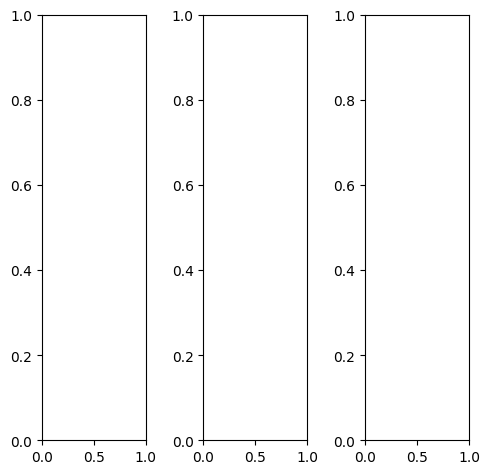

tensor([[[0.3294, 0.3176, 0.3137,  ..., 0.2941, 0.2627, 0.2353],
         [0.3059, 0.2863, 0.2941,  ..., 0.3294, 0.2588, 0.2471],
         [0.3098, 0.2980, 0.2941,  ..., 0.3529, 0.2588, 0.3137],
         ...,
         [0.4902, 0.3725, 0.1059,  ..., 0.1451, 0.1686, 0.1922],
         [0.4000, 0.3843, 0.2196,  ..., 0.2157, 0.2235, 0.2667],
         [0.3882, 0.3647, 0.3412,  ..., 0.2314, 0.2314, 0.2078]],

        [[0.3294, 0.3176, 0.3137,  ..., 0.2941, 0.2627, 0.2353],
         [0.3059, 0.2863, 0.2941,  ..., 0.3294, 0.2588, 0.2471],
         [0.3098, 0.2980, 0.2941,  ..., 0.3529, 0.2588, 0.3137],
         ...,
         [0.4902, 0.3725, 0.1059,  ..., 0.1451, 0.1686, 0.1922],
         [0.4000, 0.3843, 0.2196,  ..., 0.2157, 0.2235, 0.2667],
         [0.3882, 0.3647, 0.3412,  ..., 0.2314, 0.2314, 0.2078]],

        [[0.3294, 0.3176, 0.3137,  ..., 0.2941, 0.2627, 0.2353],
         [0.3059, 0.2863, 0.2941,  ..., 0.3294, 0.2588, 0.2471],
         [0.3098, 0.2980, 0.2941,  ..., 0.3529, 0.2588, 0.

tensor([[[0.2902, 0.2784, 0.2784,  ..., 0.2706, 0.2353, 0.2078],
         [0.2667, 0.2471, 0.2549,  ..., 0.2980, 0.2275, 0.2157],
         [0.2706, 0.2588, 0.2510,  ..., 0.3176, 0.2235, 0.2784],
         ...,
         [0.4941, 0.3882, 0.1412,  ..., 0.1451, 0.1686, 0.1922],
         [0.4039, 0.4000, 0.2471,  ..., 0.2157, 0.2275, 0.2706],
         [0.3882, 0.3725, 0.3569,  ..., 0.2431, 0.2392, 0.2157]],

        [[0.3294, 0.3176, 0.3137,  ..., 0.2941, 0.2588, 0.2314],
         [0.3137, 0.2941, 0.2980,  ..., 0.3294, 0.2549, 0.2431],
         [0.3137, 0.3020, 0.2980,  ..., 0.3529, 0.2588, 0.3098],
         ...,
         [0.4784, 0.3569, 0.0902,  ..., 0.1333, 0.1529, 0.1725],
         [0.3882, 0.3686, 0.2039,  ..., 0.2039, 0.2078, 0.2510],
         [0.3765, 0.3490, 0.3255,  ..., 0.2157, 0.2118, 0.1882]],

        [[0.4275, 0.4157, 0.4118,  ..., 0.3686, 0.3490, 0.3373],
         [0.3804, 0.3647, 0.3686,  ..., 0.4118, 0.3490, 0.3529],
         [0.3961, 0.3882, 0.3804,  ..., 0.4471, 0.3608, 0.

tensor([[[ 0.2641,  0.1707,  0.1279,  ...,  0.2490,  0.2331,  0.2471],
         [ 0.1912,  0.1083,  0.0952,  ...,  0.2972,  0.2142,  0.2312],
         [ 0.1507,  0.0751, -0.0312,  ...,  0.3176,  0.2172,  0.3235],
         ...,
         [ 0.5544,  0.4601,  0.1183,  ...,  0.1749,  0.2150,  0.2477],
         [ 0.4462,  0.4744,  0.2778,  ...,  0.2856,  0.2999,  0.3401],
         [ 0.4348,  0.4416,  0.3875,  ...,  0.2745,  0.2576,  0.2884]],

        [[ 0.3031,  0.3332,  0.2184,  ...,  0.3199,  0.3041,  0.2857],
         [ 0.2619,  0.2483,  0.1104,  ...,  0.3963,  0.3280,  0.2809],
         [ 0.2572,  0.2963,  0.1294,  ...,  0.4319,  0.3262,  0.3720],
         ...,
         [ 0.5344,  0.4192,  0.1287,  ...,  0.1530,  0.1876,  0.2112],
         [ 0.4222,  0.4520,  0.2487,  ...,  0.2474,  0.2522,  0.2807],
         [ 0.3929,  0.3884,  0.3739,  ...,  0.2346,  0.2235,  0.2417]],

        [[ 0.4950,  0.3201,  0.4514,  ...,  0.4628,  0.4336,  0.4179],
         [ 0.4687,  0.4118,  0.4395,  ...,  0

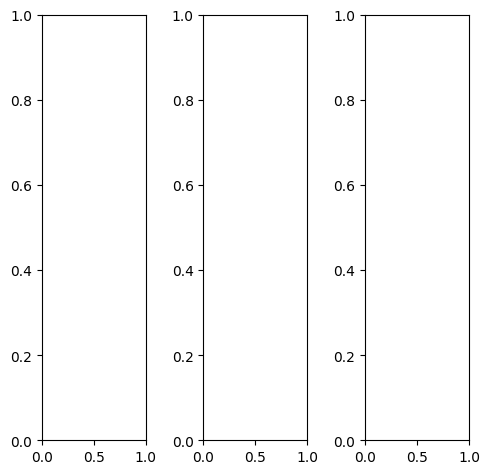

tensor([[[0.6471, 0.6706, 0.6392,  ..., 0.5882, 0.6078, 0.5686],
         [0.6706, 0.6902, 0.6627,  ..., 0.5765, 0.5647, 0.5176],
         [0.6745, 0.7255, 0.7098,  ..., 0.5647, 0.5686, 0.4941],
         ...,
         [0.7490, 0.6235, 0.4118,  ..., 0.6706, 0.7333, 0.7765],
         [0.6745, 0.5725, 0.6314,  ..., 0.6353, 0.7059, 0.8157],
         [0.6392, 0.4863, 0.7765,  ..., 0.6000, 0.6392, 0.6824]],

        [[0.6471, 0.6706, 0.6392,  ..., 0.5882, 0.6078, 0.5686],
         [0.6706, 0.6902, 0.6627,  ..., 0.5765, 0.5647, 0.5176],
         [0.6745, 0.7255, 0.7098,  ..., 0.5647, 0.5686, 0.4941],
         ...,
         [0.7490, 0.6235, 0.4118,  ..., 0.6706, 0.7333, 0.7765],
         [0.6745, 0.5725, 0.6314,  ..., 0.6353, 0.7059, 0.8157],
         [0.6392, 0.4863, 0.7765,  ..., 0.6000, 0.6392, 0.6824]],

        [[0.6471, 0.6706, 0.6392,  ..., 0.5882, 0.6078, 0.5686],
         [0.6706, 0.6902, 0.6627,  ..., 0.5765, 0.5647, 0.5176],
         [0.6745, 0.7255, 0.7098,  ..., 0.5647, 0.5686, 0.

tensor([[[0.6314, 0.6549, 0.6196,  ..., 0.5804, 0.6039, 0.5490],
         [0.6549, 0.6745, 0.6471,  ..., 0.5608, 0.5490, 0.5020],
         [0.6588, 0.7098, 0.6902,  ..., 0.5451, 0.5412, 0.4863],
         ...,
         [0.7333, 0.6078, 0.3961,  ..., 0.6471, 0.7294, 0.7765],
         [0.6588, 0.5569, 0.6157,  ..., 0.6118, 0.7020, 0.8118],
         [0.6235, 0.4706, 0.7608,  ..., 0.5765, 0.6353, 0.6784]],

        [[0.6627, 0.6863, 0.6549,  ..., 0.6078, 0.6196, 0.5843],
         [0.6902, 0.7098, 0.6824,  ..., 0.5922, 0.5804, 0.5333],
         [0.6941, 0.7451, 0.7294,  ..., 0.5804, 0.5882, 0.5098],
         ...,
         [0.7686, 0.6392, 0.4314,  ..., 0.6941, 0.7490, 0.7922],
         [0.6941, 0.5922, 0.6510,  ..., 0.6588, 0.7216, 0.8314],
         [0.6588, 0.5059, 0.7922,  ..., 0.6235, 0.6549, 0.6980]],

        [[0.5961, 0.6275, 0.5961,  ..., 0.5216, 0.5608, 0.5255],
         [0.6157, 0.6431, 0.6196,  ..., 0.5294, 0.5176, 0.4627],
         [0.6078, 0.6667, 0.6588,  ..., 0.5373, 0.5255, 0.

tensor([[[0.5110, 0.5107, 0.4665,  ..., 0.2948, 0.3174, 0.3246],
         [0.5384, 0.4877, 0.5265,  ..., 0.2974, 0.2523, 0.2251],
         [0.5253, 0.6444, 0.4878,  ..., 0.3175, 0.2969, 0.1999],
         ...,
         [0.6200, 0.5867, 0.2787,  ..., 0.5894, 0.6676, 0.6542],
         [0.5505, 0.4767, 0.5445,  ..., 0.5436, 0.6324, 0.7021],
         [0.4932, 0.3579, 0.6612,  ..., 0.4836, 0.5388, 0.5862]],

        [[0.5999, 0.5676, 0.5748,  ..., 0.4099, 0.4691, 0.3900],
         [0.5263, 0.5534, 0.5225,  ..., 0.4611, 0.4437, 0.3278],
         [0.6306, 0.6819, 0.6368,  ..., 0.4493, 0.4587, 0.2941],
         ...,
         [0.5775, 0.4955, 0.2546,  ..., 0.5546, 0.6455, 0.6470],
         [0.5064, 0.4195, 0.5053,  ..., 0.5300, 0.6298, 0.6898],
         [0.4438, 0.3523, 0.6301,  ..., 0.4500, 0.5158, 0.5526]],

        [[0.7094, 0.6614, 0.7160,  ..., 0.6547, 0.6940, 0.6093],
         [0.7206, 0.7554, 0.7488,  ..., 0.6731, 0.6637, 0.5711],
         [0.7215, 0.7761, 0.7624,  ..., 0.6865, 0.6778, 0.

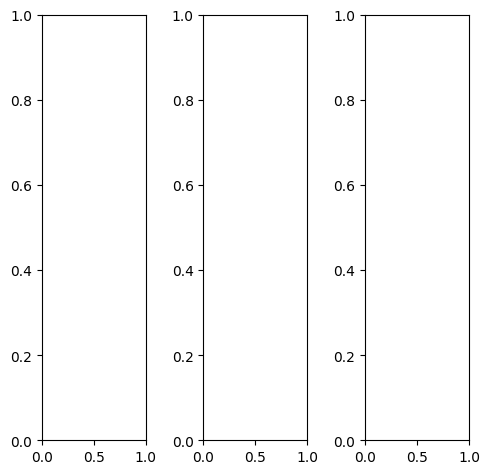

EPOCH: 15.765  trn_loss: 0.005  (1878.11s - 10034.85s remaining)

tensor([[[0.6667, 0.6588, 0.6588,  ..., 0.6980, 0.6980, 0.6980],
         [0.6667, 0.6588, 0.6588,  ..., 0.6902, 0.6941, 0.6941],
         [0.6745, 0.6667, 0.6667,  ..., 0.6941, 0.6941, 0.6980],
         ...,
         [0.0549, 0.3098, 0.6549,  ..., 0.6510, 0.6510, 0.6549],
         [0.1882, 0.5882, 0.6588,  ..., 0.6431, 0.6431, 0.6510],
         [0.4745, 0.6667, 0.6471,  ..., 0.6353, 0.6392, 0.6431]],

        [[0.6667, 0.6588, 0.6588,  ..., 0.6980, 0.6980, 0.6980],
         [0.6667, 0.6588, 0.6588,  ..., 0.6902, 0.6941, 0.6941],
         [0.6745, 0.6667, 0.6667,  ..., 0.6941, 0.6941, 0.6980],
         ...,
         [0.0549, 0.3098, 0.6549,  ..., 0.6510, 0.6510, 0.6549],
         [0.1882, 0.5882, 0.6588,  ..., 0.6431, 0.6431, 0.6510],
         [0.4745, 0.6667, 0.6471,  ..., 0.6353, 0.6392, 0.6431]],

        [[0.6667, 0.6588, 0.6588,  ..., 0.6980, 0.6980, 0.6980],
         [0.6667, 0.6588, 0.6588,  ..., 0.6902, 0.6941, 0.6941],
         [0.6745, 0.6667, 0.6667,  ..., 0.6941, 0.6941, 0.

tensor([[[0.6275, 0.6196, 0.6196,  ..., 0.6706, 0.6706, 0.6706],
         [0.6275, 0.6196, 0.6196,  ..., 0.6627, 0.6667, 0.6667],
         [0.6353, 0.6275, 0.6275,  ..., 0.6667, 0.6667, 0.6706],
         ...,
         [0.0510, 0.2902, 0.6196,  ..., 0.6000, 0.6000, 0.6039],
         [0.1804, 0.5608, 0.6118,  ..., 0.5922, 0.5922, 0.6000],
         [0.4471, 0.6314, 0.6039,  ..., 0.5843, 0.5882, 0.5922]],

        [[0.6706, 0.6627, 0.6627,  ..., 0.6980, 0.6980, 0.6980],
         [0.6706, 0.6627, 0.6627,  ..., 0.6941, 0.6941, 0.6941],
         [0.6784, 0.6706, 0.6706,  ..., 0.6941, 0.6941, 0.6980],
         ...,
         [0.0627, 0.3176, 0.6588,  ..., 0.6627, 0.6627, 0.6667],
         [0.1961, 0.5961, 0.6706,  ..., 0.6549, 0.6549, 0.6627],
         [0.4863, 0.6745, 0.6549,  ..., 0.6471, 0.6471, 0.6510]],

        [[0.7412, 0.7333, 0.7333,  ..., 0.7608, 0.7608, 0.7608],
         [0.7412, 0.7333, 0.7333,  ..., 0.7569, 0.7569, 0.7569],
         [0.7490, 0.7412, 0.7412,  ..., 0.7569, 0.7569, 0.

tensor([[[ 0.4481,  0.3413,  0.3248,  ...,  0.4255,  0.4392,  0.4791],
         [ 0.3569,  0.2715,  0.3109,  ...,  0.3881,  0.4150,  0.4317],
         [ 0.3568,  0.3785,  0.2850,  ...,  0.4345,  0.4446,  0.4650],
         ...,
         [-0.0925,  0.1946,  0.6331,  ...,  0.4894,  0.4956,  0.4806],
         [ 0.0297,  0.5169,  0.6200,  ...,  0.4716,  0.4581,  0.4931],
         [ 0.2609,  0.5000,  0.4764,  ...,  0.4530,  0.4835,  0.4824]],

        [[ 0.4982,  0.5247,  0.5108,  ...,  0.4869,  0.5278,  0.4964],
         [ 0.4461,  0.4866,  0.4772,  ...,  0.4905,  0.5221,  0.4997],
         [ 0.4563,  0.5615,  0.5051,  ...,  0.5234,  0.5388,  0.5280],
         ...,
         [-0.1325,  0.1360,  0.5752,  ...,  0.4855,  0.5180,  0.4442],
         [-0.0041,  0.4908,  0.5667,  ...,  0.4829,  0.4880,  0.4726],
         [ 0.2612,  0.4695,  0.4528,  ...,  0.4344,  0.4732,  0.4476]],

        [[ 0.7095,  0.5811,  0.7344,  ...,  0.6385,  0.6515,  0.6257],
         [ 0.6221,  0.6801,  0.6540,  ...,  0

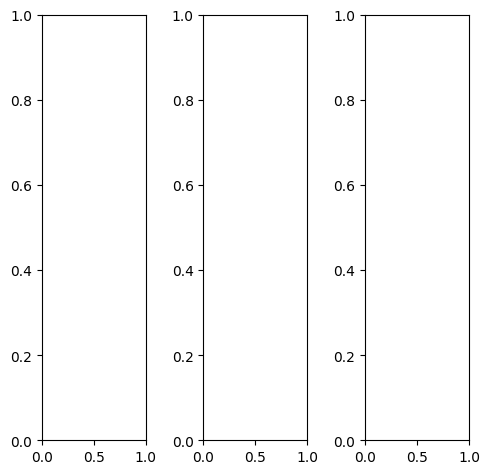

tensor([[[0.2000, 0.2196, 0.2549,  ..., 0.3294, 0.3137, 0.3098],
         [0.2235, 0.2471, 0.2588,  ..., 0.2549, 0.2745, 0.2902],
         [0.2039, 0.2431, 0.3451,  ..., 0.2863, 0.2902, 0.3059],
         ...,
         [0.8392, 0.8000, 0.6510,  ..., 0.8000, 0.8000, 0.8196],
         [0.8392, 0.7961, 0.7490,  ..., 0.8196, 0.8118, 0.8118],
         [0.8549, 0.8667, 0.8667,  ..., 0.8196, 0.8118, 0.8039]],

        [[0.2000, 0.2196, 0.2549,  ..., 0.3294, 0.3137, 0.3098],
         [0.2235, 0.2471, 0.2588,  ..., 0.2549, 0.2745, 0.2902],
         [0.2039, 0.2431, 0.3451,  ..., 0.2863, 0.2902, 0.3059],
         ...,
         [0.8392, 0.8000, 0.6510,  ..., 0.8000, 0.8000, 0.8196],
         [0.8392, 0.7961, 0.7490,  ..., 0.8196, 0.8118, 0.8118],
         [0.8549, 0.8667, 0.8667,  ..., 0.8196, 0.8118, 0.8039]],

        [[0.2000, 0.2196, 0.2549,  ..., 0.3294, 0.3137, 0.3098],
         [0.2235, 0.2471, 0.2588,  ..., 0.2549, 0.2745, 0.2902],
         [0.2039, 0.2431, 0.3451,  ..., 0.2863, 0.2902, 0.

tensor([[[0.1725, 0.1922, 0.2275,  ..., 0.2902, 0.2745, 0.2745],
         [0.1961, 0.2196, 0.2314,  ..., 0.2196, 0.2353, 0.2588],
         [0.1765, 0.2157, 0.3176,  ..., 0.2549, 0.2549, 0.2784],
         ...,
         [0.8980, 0.8588, 0.7098,  ..., 0.8784, 0.8784, 0.8902],
         [0.8980, 0.8549, 0.8078,  ..., 0.8980, 0.8902, 0.8824],
         [0.9176, 0.9294, 0.9294,  ..., 0.8980, 0.8902, 0.8784]],

        [[0.2196, 0.2431, 0.2824,  ..., 0.3725, 0.3529, 0.3451],
         [0.2471, 0.2745, 0.2863,  ..., 0.2941, 0.3098, 0.3255],
         [0.2275, 0.2706, 0.3725,  ..., 0.3216, 0.3216, 0.3373],
         ...,
         [0.8275, 0.7882, 0.6392,  ..., 0.7843, 0.7843, 0.8039],
         [0.8314, 0.7843, 0.7373,  ..., 0.8039, 0.7961, 0.7961],
         [0.8431, 0.8549, 0.8549,  ..., 0.8039, 0.7961, 0.7882]],

        [[0.1569, 0.1608, 0.1804,  ..., 0.2235, 0.2157, 0.2157],
         [0.1843, 0.1922, 0.1843,  ..., 0.1569, 0.1804, 0.2078],
         [0.1608, 0.1882, 0.2706,  ..., 0.2000, 0.2078, 0.

tensor([[[ 0.0055,  0.0150, -0.0523,  ...,  0.1476,  0.1448,  0.1859],
         [ 0.0642, -0.1083, -0.0722,  ...,  0.0264,  0.0439,  0.1169],
         [-0.1820, -0.1104, -0.1007,  ...,  0.0464,  0.0587,  0.1203],
         ...,
         [ 0.8348,  0.8047,  0.6505,  ...,  0.7846,  0.7851,  0.7756],
         [ 0.8076,  0.7569,  0.7031,  ...,  0.7696,  0.7786,  0.7756],
         [ 0.8098,  0.8355,  0.8269,  ...,  0.7889,  0.7851,  0.7706]],

        [[ 0.1106,  0.1727, -0.0291,  ...,  0.2561,  0.2400,  0.2524],
         [ 0.0869, -0.0570, -0.1701,  ...,  0.1598,  0.1881,  0.1931],
         [-0.0885,  0.0790, -0.1159,  ...,  0.1602,  0.1723,  0.2067],
         ...,
         [ 0.8037,  0.7759,  0.6333,  ...,  0.7886,  0.7769,  0.7928],
         [ 0.7999,  0.7585,  0.7151,  ...,  0.7915,  0.7798,  0.7814],
         [ 0.7653,  0.8122,  0.8140,  ...,  0.7785,  0.7736,  0.7472]],

        [[ 0.2313,  0.0637,  0.1558,  ...,  0.4118,  0.4020,  0.4084],
         [ 0.2277,  0.0200,  0.1497,  ...,  0

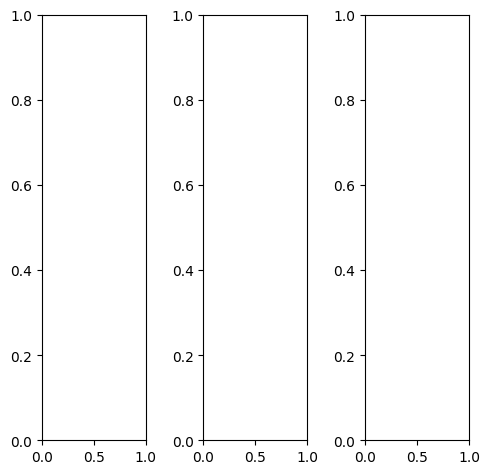

tensor([[[0.5882, 0.5922, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         [0.5922, 0.5961, 0.5961,  ..., 0.5922, 0.5922, 0.5922],
         [0.5922, 0.5961, 0.6000,  ..., 0.5922, 0.5922, 0.5922],
         ...,
         [0.5294, 0.5294, 0.5294,  ..., 0.5647, 0.5647, 0.5608],
         [0.5412, 0.5412, 0.5373,  ..., 0.5725, 0.5686, 0.5686],
         [0.5608, 0.5569, 0.5529,  ..., 0.5765, 0.5765, 0.5725]],

        [[0.5882, 0.5922, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         [0.5922, 0.5961, 0.5961,  ..., 0.5922, 0.5922, 0.5922],
         [0.5922, 0.5961, 0.6000,  ..., 0.5922, 0.5922, 0.5922],
         ...,
         [0.5294, 0.5294, 0.5294,  ..., 0.5647, 0.5647, 0.5608],
         [0.5412, 0.5412, 0.5373,  ..., 0.5725, 0.5686, 0.5686],
         [0.5608, 0.5569, 0.5529,  ..., 0.5765, 0.5765, 0.5725]],

        [[0.5882, 0.5922, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         [0.5922, 0.5961, 0.5961,  ..., 0.5922, 0.5922, 0.5922],
         [0.5922, 0.5961, 0.6000,  ..., 0.5922, 0.5922, 0.

tensor([[[0.5882, 0.5922, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         [0.5922, 0.5961, 0.6000,  ..., 0.5922, 0.5922, 0.5922],
         [0.5922, 0.6000, 0.6039,  ..., 0.5922, 0.5922, 0.5922],
         ...,
         [0.5412, 0.5412, 0.5373,  ..., 0.5647, 0.5647, 0.5608],
         [0.5529, 0.5529, 0.5451,  ..., 0.5725, 0.5686, 0.5686],
         [0.5686, 0.5647, 0.5569,  ..., 0.5765, 0.5765, 0.5725]],

        [[0.6353, 0.6392, 0.6392,  ..., 0.6392, 0.6392, 0.6431],
         [0.6392, 0.6431, 0.6392,  ..., 0.6392, 0.6392, 0.6392],
         [0.6392, 0.6431, 0.6431,  ..., 0.6392, 0.6392, 0.6392],
         ...,
         [0.5686, 0.5686, 0.5725,  ..., 0.6157, 0.6157, 0.6118],
         [0.5804, 0.5804, 0.5804,  ..., 0.6235, 0.6196, 0.6196],
         [0.6000, 0.5961, 0.5961,  ..., 0.6275, 0.6275, 0.6235]],

        [[0.3529, 0.3569, 0.3569,  ..., 0.3529, 0.3529, 0.3569],
         [0.3529, 0.3569, 0.3529,  ..., 0.3451, 0.3451, 0.3490],
         [0.3490, 0.3569, 0.3569,  ..., 0.3412, 0.3412, 0.

tensor([[[0.4370, 0.3324, 0.3361,  ..., 0.3949, 0.4175, 0.4594],
         [0.3564, 0.2925, 0.3059,  ..., 0.3979, 0.4001, 0.4241],
         [0.3561, 0.3595, 0.2887,  ..., 0.3997, 0.4292, 0.4399],
         ...,
         [0.4036, 0.4799, 0.4408,  ..., 0.4848, 0.4862, 0.4591],
         [0.4285, 0.4850, 0.4664,  ..., 0.4802, 0.4712, 0.4828],
         [0.4427, 0.4457, 0.4368,  ..., 0.4749, 0.4874, 0.4753]],

        [[0.4778, 0.5358, 0.5182,  ..., 0.4532, 0.5094, 0.4727],
         [0.4729, 0.5033, 0.4883,  ..., 0.5066, 0.5241, 0.4830],
         [0.4412, 0.5772, 0.5100,  ..., 0.4985, 0.5276, 0.4908],
         ...,
         [0.3673, 0.4219, 0.3958,  ..., 0.4725, 0.5038, 0.4175],
         [0.3977, 0.4385, 0.4453,  ..., 0.4955, 0.4902, 0.4603],
         [0.4253, 0.4111, 0.4022,  ..., 0.4622, 0.4859, 0.4483]],

        [[0.7201, 0.6032, 0.7605,  ..., 0.5902, 0.6241, 0.6116],
         [0.6612, 0.7167, 0.6824,  ..., 0.5966, 0.6394, 0.6173],
         [0.6544, 0.6236, 0.6841,  ..., 0.6194, 0.6453, 0.

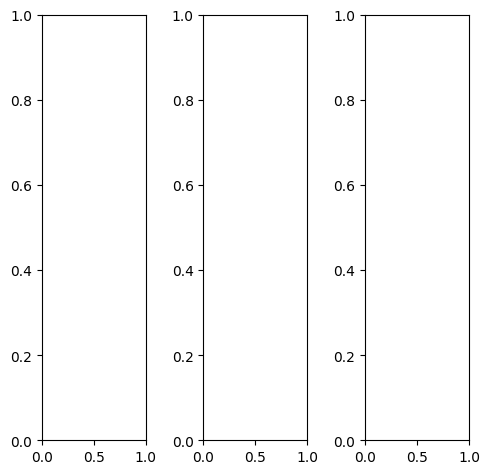

tensor([[[0.1529, 0.2196, 0.2078,  ..., 0.4784, 0.4588, 0.4039],
         [0.1529, 0.1843, 0.1882,  ..., 0.4824, 0.4392, 0.3843],
         [0.2667, 0.2941, 0.3137,  ..., 0.4471, 0.4039, 0.3569],
         ...,
         [0.4745, 0.5098, 0.5333,  ..., 0.3059, 0.2118, 0.1804],
         [0.5804, 0.5490, 0.5490,  ..., 0.2667, 0.1922, 0.1843],
         [0.6078, 0.5686, 0.5529,  ..., 0.2627, 0.1765, 0.1647]],

        [[0.1529, 0.2196, 0.2078,  ..., 0.4784, 0.4588, 0.4039],
         [0.1529, 0.1843, 0.1882,  ..., 0.4824, 0.4392, 0.3843],
         [0.2667, 0.2941, 0.3137,  ..., 0.4471, 0.4039, 0.3569],
         ...,
         [0.4745, 0.5098, 0.5333,  ..., 0.3059, 0.2118, 0.1804],
         [0.5804, 0.5490, 0.5490,  ..., 0.2667, 0.1922, 0.1843],
         [0.6078, 0.5686, 0.5529,  ..., 0.2627, 0.1765, 0.1647]],

        [[0.1529, 0.2196, 0.2078,  ..., 0.4784, 0.4588, 0.4039],
         [0.1529, 0.1843, 0.1882,  ..., 0.4824, 0.4392, 0.3843],
         [0.2667, 0.2941, 0.3137,  ..., 0.4471, 0.4039, 0.

tensor([[[0.1529, 0.2235, 0.2431,  ..., 0.5922, 0.5529, 0.4784],
         [0.1765, 0.2196, 0.2431,  ..., 0.6118, 0.5529, 0.4745],
         [0.3333, 0.3765, 0.4039,  ..., 0.5922, 0.5294, 0.4627],
         ...,
         [0.5569, 0.6118, 0.6353,  ..., 0.3333, 0.2235, 0.2039],
         [0.6784, 0.6667, 0.6667,  ..., 0.3059, 0.2157, 0.2118],
         [0.7098, 0.6902, 0.6745,  ..., 0.3216, 0.2157, 0.2039]],

        [[0.1608, 0.2275, 0.1961,  ..., 0.4549, 0.4392, 0.4000],
         [0.1529, 0.1804, 0.1725,  ..., 0.4471, 0.4118, 0.3765],
         [0.2510, 0.2745, 0.2824,  ..., 0.4078, 0.3686, 0.3412],
         ...,
         [0.4431, 0.4706, 0.4941,  ..., 0.3020, 0.2118, 0.1765],
         [0.5373, 0.4941, 0.4941,  ..., 0.2667, 0.1922, 0.1765],
         [0.5569, 0.5059, 0.4902,  ..., 0.2549, 0.1647, 0.1529]],

        [[0.0980, 0.1529, 0.1608,  ..., 0.2863, 0.2980, 0.2157],
         [0.0902, 0.1137, 0.1373,  ..., 0.3098, 0.2902, 0.1882],
         [0.1725, 0.1961, 0.2314,  ..., 0.2784, 0.2510, 0.

tensor([[[0.0957, 0.0930, 0.1033,  ..., 0.4398, 0.4108, 0.4336],
         [0.1028, 0.0504, 0.0505,  ..., 0.4516, 0.4094, 0.3793],
         [0.1426, 0.1898, 0.2461,  ..., 0.4155, 0.3915, 0.3593],
         ...,
         [0.5885, 0.6482, 0.6336,  ..., 0.4215, 0.2805, 0.2438],
         [0.6963, 0.6510, 0.6312,  ..., 0.3199, 0.2394, 0.2380],
         [0.7128, 0.6964, 0.6706,  ..., 0.3060, 0.1981, 0.2388]],

        [[0.1222, 0.2300, 0.2048,  ..., 0.5458, 0.5249, 0.4681],
         [0.1535, 0.1845, 0.1279,  ..., 0.6026, 0.5463, 0.4628],
         [0.2311, 0.3538, 0.3700,  ..., 0.5530, 0.5112, 0.4412],
         ...,
         [0.5530, 0.6218, 0.6550,  ..., 0.4135, 0.2952, 0.2082],
         [0.6722, 0.6388, 0.6573,  ..., 0.3348, 0.2495, 0.2075],
         [0.6660, 0.6682, 0.6637,  ..., 0.2971, 0.1929, 0.1998]],

        [[0.3273, 0.1776, 0.3706,  ..., 0.7533, 0.7188, 0.6491],
         [0.3198, 0.2859, 0.3562,  ..., 0.8040, 0.7571, 0.6450],
         [0.3774, 0.3992, 0.5906,  ..., 0.7771, 0.7304, 0.

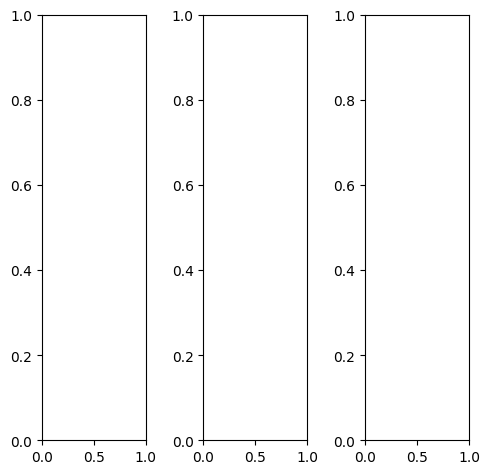

tensor([[[0.7294, 0.5059, 0.4863,  ..., 0.5255, 0.6941, 0.9490],
         [0.7059, 0.2078, 0.1412,  ..., 0.3412, 0.3098, 0.6549],
         [0.7765, 0.2078, 0.1255,  ..., 0.5020, 0.2588, 0.5569],
         ...,
         [0.9922, 0.7490, 0.3961,  ..., 0.6745, 0.7098, 0.9294],
         [1.0000, 0.9843, 0.7804,  ..., 0.6667, 0.7137, 0.9373],
         [1.0000, 1.0000, 1.0000,  ..., 0.8980, 0.9176, 0.9843]],

        [[0.7294, 0.5059, 0.4863,  ..., 0.5255, 0.6941, 0.9490],
         [0.7059, 0.2078, 0.1412,  ..., 0.3412, 0.3098, 0.6549],
         [0.7765, 0.2078, 0.1255,  ..., 0.5020, 0.2588, 0.5569],
         ...,
         [0.9922, 0.7490, 0.3961,  ..., 0.6745, 0.7098, 0.9294],
         [1.0000, 0.9843, 0.7804,  ..., 0.6667, 0.7137, 0.9373],
         [1.0000, 1.0000, 1.0000,  ..., 0.8980, 0.9176, 0.9843]],

        [[0.7294, 0.5059, 0.4863,  ..., 0.5255, 0.6941, 0.9490],
         [0.7059, 0.2078, 0.1412,  ..., 0.3412, 0.3098, 0.6549],
         [0.7765, 0.2078, 0.1255,  ..., 0.5020, 0.2588, 0.

tensor([[[0.7137, 0.4667, 0.4588,  ..., 0.5020, 0.6863, 0.9490],
         [0.6941, 0.1804, 0.1216,  ..., 0.3020, 0.2941, 0.6510],
         [0.7647, 0.1882, 0.1098,  ..., 0.4627, 0.2471, 0.5451],
         ...,
         [0.9922, 0.7608, 0.4353,  ..., 0.7255, 0.7608, 0.9490],
         [1.0000, 0.9843, 0.7961,  ..., 0.7176, 0.7647, 0.9490],
         [1.0000, 1.0000, 1.0000,  ..., 0.9216, 0.9333, 0.9882]],

        [[0.7412, 0.5333, 0.5098,  ..., 0.5373, 0.7020, 0.9490],
         [0.7176, 0.2314, 0.1608,  ..., 0.3569, 0.3216, 0.6588],
         [0.7882, 0.2196, 0.1373,  ..., 0.5176, 0.2667, 0.5608],
         ...,
         [0.9922, 0.7451, 0.3804,  ..., 0.6627, 0.6980, 0.9294],
         [1.0000, 0.9843, 0.7725,  ..., 0.6549, 0.7059, 0.9373],
         [1.0000, 1.0000, 1.0000,  ..., 0.8980, 0.9176, 0.9882]],

        [[0.7059, 0.4510, 0.4235,  ..., 0.5294, 0.6902, 0.9451],
         [0.6824, 0.1725, 0.1059,  ..., 0.3529, 0.2941, 0.6549],
         [0.7608, 0.1843, 0.1059,  ..., 0.5333, 0.2431, 0.

tensor([[[ 0.4910,  0.3366,  0.1512,  ...,  0.4106,  0.5691,  0.7016],
         [ 0.4631,  0.0707, -0.0808,  ...,  0.2214,  0.2545,  0.5666],
         [ 0.4844,  0.0247, -0.2409,  ...,  0.3918,  0.1973,  0.4814],
         ...,
         [ 0.8780,  0.7472,  0.4297,  ...,  0.7291,  0.7563,  0.8736],
         [ 0.8790,  0.9307,  0.7338,  ...,  0.6903,  0.7393,  0.8603],
         [ 0.8647,  0.9169,  0.9070,  ...,  0.8734,  0.8666,  0.8681]],

        [[ 0.5530,  0.3752,  0.2664,  ...,  0.4899,  0.6251,  0.7411],
         [ 0.4521,  0.0957, -0.1566,  ...,  0.2951,  0.3104,  0.6059],
         [ 0.5697,  0.0696, -0.1488,  ...,  0.4747,  0.2780,  0.4864],
         ...,
         [ 0.8207,  0.7138,  0.4306,  ...,  0.7012,  0.7212,  0.8878],
         [ 0.8444,  0.9133,  0.7362,  ...,  0.6908,  0.7203,  0.8659],
         [ 0.8039,  0.8846,  0.8865,  ...,  0.8247,  0.8309,  0.8320]],

        [[ 0.6356,  0.4521,  0.3682,  ...,  0.6308,  0.7721,  0.8677],
         [ 0.5691,  0.2521,  0.1349,  ...,  0

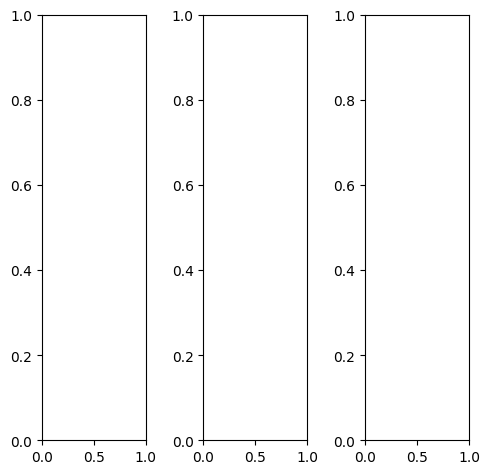

EPOCH: 16.000  val_loss: 0.003  (1913.11s - 10043.83s remaining)

tensor([[[0.1216, 0.0824, 0.0980,  ..., 0.1216, 0.0980, 0.1059],
         [0.1647, 0.0902, 0.1098,  ..., 0.0980, 0.0824, 0.0902],
         [0.1647, 0.1255, 0.1451,  ..., 0.0863, 0.0745, 0.0863],
         ...,
         [0.7137, 0.7020, 0.6980,  ..., 0.5647, 0.7412, 0.7882],
         [0.7098, 0.6980, 0.7059,  ..., 0.7255, 0.7490, 0.7490],
         [0.7137, 0.7059, 0.7137,  ..., 0.7373, 0.7333, 0.7412]],

        [[0.1216, 0.0824, 0.0980,  ..., 0.1216, 0.0980, 0.1059],
         [0.1647, 0.0902, 0.1098,  ..., 0.0980, 0.0824, 0.0902],
         [0.1647, 0.1255, 0.1451,  ..., 0.0863, 0.0745, 0.0863],
         ...,
         [0.7137, 0.7020, 0.6980,  ..., 0.5647, 0.7412, 0.7882],
         [0.7098, 0.6980, 0.7059,  ..., 0.7255, 0.7490, 0.7490],
         [0.7137, 0.7059, 0.7137,  ..., 0.7373, 0.7333, 0.7412]],

        [[0.1216, 0.0824, 0.0980,  ..., 0.1216, 0.0980, 0.1059],
         [0.1647, 0.0902, 0.1098,  ..., 0.0980, 0.0824, 0.0902],
         [0.1647, 0.1255, 0.1451,  ..., 0.0863, 0.0745, 0.

tensor([[[0.1216, 0.1176, 0.1333,  ..., 0.1490, 0.1255, 0.1294],
         [0.1569, 0.1373, 0.1451,  ..., 0.1255, 0.1059, 0.1098],
         [0.1647, 0.1725, 0.1804,  ..., 0.1098, 0.0941, 0.1020],
         ...,
         [0.7451, 0.7373, 0.7294,  ..., 0.5647, 0.7647, 0.8157],
         [0.7412, 0.7333, 0.7373,  ..., 0.7412, 0.7765, 0.7843],
         [0.7451, 0.7373, 0.7451,  ..., 0.7647, 0.7647, 0.7725]],

        [[0.1137, 0.0706, 0.0824,  ..., 0.1098, 0.0863, 0.0941],
         [0.1569, 0.0706, 0.0941,  ..., 0.0863, 0.0706, 0.0784],
         [0.1529, 0.1059, 0.1333,  ..., 0.0745, 0.0667, 0.0784],
         ...,
         [0.6941, 0.6863, 0.6824,  ..., 0.5569, 0.7294, 0.7725],
         [0.6902, 0.6824, 0.6902,  ..., 0.7137, 0.7333, 0.7294],
         [0.6941, 0.6863, 0.6980,  ..., 0.7216, 0.7176, 0.7216]],

        [[0.1569, 0.0627, 0.0863,  ..., 0.1137, 0.0902, 0.0980],
         [0.2353, 0.0706, 0.0941,  ..., 0.0902, 0.0745, 0.0824],
         [0.2118, 0.1137, 0.1294,  ..., 0.0784, 0.0667, 0.

tensor([[[0.1465, 0.0819, 0.0909,  ..., 0.1110, 0.1012, 0.1284],
         [0.1541, 0.0835, 0.1060,  ..., 0.0943, 0.0835, 0.0894],
         [0.1500, 0.1189, 0.1457,  ..., 0.0795, 0.0674, 0.0800],
         ...,
         [0.7308, 0.7122, 0.6950,  ..., 0.5714, 0.7684, 0.8159],
         [0.7174, 0.7110, 0.6944,  ..., 0.7506, 0.7363, 0.7854],
         [0.7231, 0.7207, 0.7193,  ..., 0.7463, 0.7712, 0.7601]],

        [[0.1531, 0.0847, 0.0903,  ..., 0.1088, 0.1017, 0.1407],
         [0.1489, 0.0800, 0.0995,  ..., 0.0882, 0.0844, 0.0951],
         [0.1464, 0.1184, 0.1378,  ..., 0.0730, 0.0617, 0.0768],
         ...,
         [0.7276, 0.7198, 0.7081,  ..., 0.5375, 0.7345, 0.8262],
         [0.7234, 0.6995, 0.7084,  ..., 0.7267, 0.7440, 0.7603],
         [0.7096, 0.7177, 0.7183,  ..., 0.7387, 0.7425, 0.7330]],

        [[0.1412, 0.0763, 0.0874,  ..., 0.1029, 0.1018, 0.1345],
         [0.1425, 0.0730, 0.0957,  ..., 0.0877, 0.0833, 0.0883],
         [0.1348, 0.1000, 0.1192,  ..., 0.0706, 0.0630, 0.

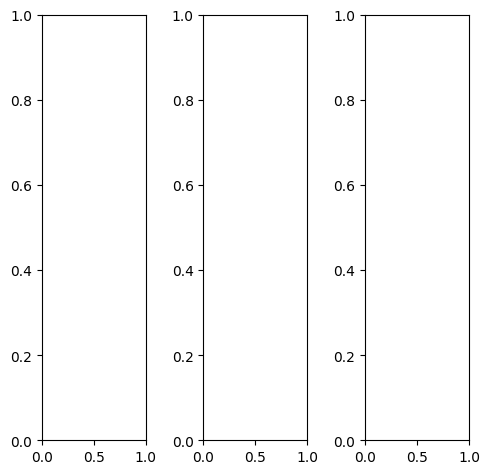

tensor([[[0.9765, 0.9686, 0.9725,  ..., 0.9255, 0.9255, 0.9373],
         [0.9569, 0.9529, 0.9686,  ..., 0.9451, 0.9451, 0.9529],
         [0.9529, 0.9451, 0.9686,  ..., 0.9490, 0.9490, 0.9490],
         ...,
         [0.7725, 0.7059, 0.6784,  ..., 0.7608, 0.7490, 0.7490],
         [0.5059, 0.4196, 0.4157,  ..., 0.7765, 0.7647, 0.7647],
         [0.6510, 0.6353, 0.6431,  ..., 0.7647, 0.7490, 0.7490]],

        [[0.9765, 0.9686, 0.9725,  ..., 0.9255, 0.9255, 0.9373],
         [0.9569, 0.9529, 0.9686,  ..., 0.9451, 0.9451, 0.9529],
         [0.9529, 0.9451, 0.9686,  ..., 0.9490, 0.9490, 0.9490],
         ...,
         [0.7725, 0.7059, 0.6784,  ..., 0.7608, 0.7490, 0.7490],
         [0.5059, 0.4196, 0.4157,  ..., 0.7765, 0.7647, 0.7647],
         [0.6510, 0.6353, 0.6431,  ..., 0.7647, 0.7490, 0.7490]],

        [[0.9765, 0.9686, 0.9725,  ..., 0.9255, 0.9255, 0.9373],
         [0.9569, 0.9529, 0.9686,  ..., 0.9451, 0.9451, 0.9529],
         [0.9529, 0.9451, 0.9686,  ..., 0.9490, 0.9490, 0.

tensor([[[0.9922, 0.9843, 0.9882,  ..., 0.9294, 0.9294, 0.9451],
         [0.9725, 0.9686, 0.9843,  ..., 0.9451, 0.9451, 0.9608],
         [0.9647, 0.9569, 0.9804,  ..., 0.9490, 0.9451, 0.9569],
         ...,
         [0.8039, 0.7451, 0.7255,  ..., 0.8039, 0.7922, 0.7882],
         [0.5373, 0.4549, 0.4549,  ..., 0.8196, 0.8078, 0.8039],
         [0.6824, 0.6667, 0.6745,  ..., 0.8078, 0.7922, 0.7843]],

        [[0.9725, 0.9647, 0.9647,  ..., 0.9216, 0.9216, 0.9294],
         [0.9490, 0.9451, 0.9608,  ..., 0.9373, 0.9373, 0.9451],
         [0.9490, 0.9373, 0.9608,  ..., 0.9412, 0.9412, 0.9412],
         ...,
         [0.7647, 0.7020, 0.6706,  ..., 0.7529, 0.7412, 0.7451],
         [0.4980, 0.4157, 0.4078,  ..., 0.7686, 0.7569, 0.7608],
         [0.6431, 0.6275, 0.6353,  ..., 0.7569, 0.7412, 0.7451]],

        [[0.9529, 0.9412, 0.9608,  ..., 0.9373, 0.9373, 0.9490],
         [0.9451, 0.9412, 0.9647,  ..., 0.9725, 0.9725, 0.9765],
         [0.9569, 0.9490, 0.9725,  ..., 0.9882, 0.9882, 0.

tensor([[[0.9751, 0.9593, 0.9896,  ..., 0.9007, 0.9030, 0.8884],
         [0.9402, 0.9461, 0.9074,  ..., 0.9169, 0.9311, 0.9231],
         [0.9483, 0.9289, 0.9553,  ..., 0.9293, 0.9400, 0.9311],
         ...,
         [0.7719, 0.7140, 0.6840,  ..., 0.7526, 0.7347, 0.7426],
         [0.5277, 0.4134, 0.3928,  ..., 0.7622, 0.7594, 0.7752],
         [0.6619, 0.6603, 0.6632,  ..., 0.7699, 0.7611, 0.7539]],

        [[0.9820, 0.9885, 0.9601,  ..., 0.9216, 0.9189, 0.9370],
         [0.9810, 0.9192, 0.9814,  ..., 0.9525, 0.9439, 0.9573],
         [0.9486, 0.9394, 0.9726,  ..., 0.9634, 0.9667, 0.9560],
         ...,
         [0.7776, 0.7200, 0.6970,  ..., 0.7625, 0.7519, 0.7692],
         [0.5293, 0.4124, 0.4044,  ..., 0.7738, 0.7704, 0.7750],
         [0.6532, 0.6432, 0.6469,  ..., 0.7695, 0.7626, 0.7459]],

        [[0.9665, 0.9643, 0.9545,  ..., 0.9454, 0.9497, 0.9410],
         [0.9678, 0.8993, 0.9651,  ..., 0.9765, 0.9747, 0.9742],
         [0.9631, 0.9258, 0.9135,  ..., 0.9834, 0.9800, 0.

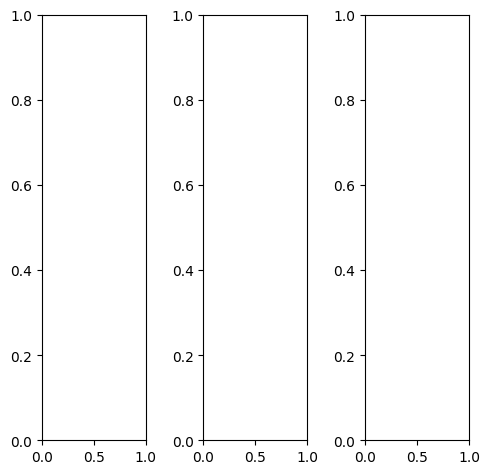

tensor([[[0.5647, 0.5569, 0.5843,  ..., 0.9922, 0.9922, 0.9882],
         [0.4745, 0.4157, 0.4275,  ..., 1.0000, 1.0000, 0.9882],
         [0.5490, 0.4902, 0.4353,  ..., 0.9804, 0.9647, 0.9490],
         ...,
         [0.3490, 0.2000, 0.2000,  ..., 0.1804, 0.2275, 0.3373],
         [0.3451, 0.2118, 0.2275,  ..., 0.2980, 0.4314, 0.5686],
         [0.4824, 0.4275, 0.4431,  ..., 0.5098, 0.6196, 0.6980]],

        [[0.5647, 0.5569, 0.5843,  ..., 0.9922, 0.9922, 0.9882],
         [0.4745, 0.4157, 0.4275,  ..., 1.0000, 1.0000, 0.9882],
         [0.5490, 0.4902, 0.4353,  ..., 0.9804, 0.9647, 0.9490],
         ...,
         [0.3490, 0.2000, 0.2000,  ..., 0.1804, 0.2275, 0.3373],
         [0.3451, 0.2118, 0.2275,  ..., 0.2980, 0.4314, 0.5686],
         [0.4824, 0.4275, 0.4431,  ..., 0.5098, 0.6196, 0.6980]],

        [[0.5647, 0.5569, 0.5843,  ..., 0.9922, 0.9922, 0.9882],
         [0.4745, 0.4157, 0.4275,  ..., 1.0000, 1.0000, 0.9882],
         [0.5490, 0.4902, 0.4353,  ..., 0.9804, 0.9647, 0.

tensor([[[0.5255, 0.5020, 0.5412,  ..., 0.9922, 0.9922, 0.9882],
         [0.4314, 0.3529, 0.3765,  ..., 1.0000, 1.0000, 0.9882],
         [0.5020, 0.4235, 0.3765,  ..., 0.9804, 0.9647, 0.9490],
         ...,
         [0.3451, 0.1961, 0.1961,  ..., 0.1608, 0.2157, 0.3373],
         [0.3451, 0.2118, 0.2275,  ..., 0.2902, 0.4353, 0.5765],
         [0.4745, 0.4196, 0.4353,  ..., 0.5137, 0.6275, 0.7098]],

        [[0.5765, 0.5765, 0.6039,  ..., 0.9922, 0.9922, 0.9882],
         [0.4902, 0.4353, 0.4471,  ..., 1.0000, 1.0000, 0.9882],
         [0.5686, 0.5098, 0.4549,  ..., 0.9804, 0.9647, 0.9490],
         ...,
         [0.3647, 0.2196, 0.2235,  ..., 0.1882, 0.2314, 0.3412],
         [0.3569, 0.2235, 0.2431,  ..., 0.3020, 0.4353, 0.5647],
         [0.4980, 0.4431, 0.4588,  ..., 0.5098, 0.6196, 0.6980]],

        [[0.5961, 0.5961, 0.6000,  ..., 0.9922, 0.9922, 0.9882],
         [0.5098, 0.4627, 0.4549,  ..., 1.0000, 1.0000, 0.9882],
         [0.5882, 0.5490, 0.4824,  ..., 0.9804, 0.9647, 0.

tensor([[[0.5463, 0.5500, 0.5682,  ..., 0.9734, 0.9695, 0.9317],
         [0.4572, 0.3790, 0.4077,  ..., 0.9790, 0.9910, 0.9554],
         [0.5336, 0.4695, 0.4294,  ..., 0.9635, 0.9595, 0.9393],
         ...,
         [0.3524, 0.2118, 0.2089,  ..., 0.1968, 0.2372, 0.3510],
         [0.3492, 0.2287, 0.2435,  ..., 0.3184, 0.4545, 0.5621],
         [0.4796, 0.4442, 0.4614,  ..., 0.5296, 0.6353, 0.6736]],

        [[0.5609, 0.5748, 0.6011,  ..., 0.9899, 0.9748, 0.9733],
         [0.4782, 0.3952, 0.4218,  ..., 1.0121, 0.9992, 0.9840],
         [0.5565, 0.4859, 0.4329,  ..., 0.9952, 0.9786, 0.9578],
         ...,
         [0.3367, 0.1925, 0.1909,  ..., 0.1830, 0.2244, 0.3512],
         [0.3403, 0.2110, 0.2198,  ..., 0.2899, 0.4473, 0.5419],
         [0.4821, 0.4264, 0.4463,  ..., 0.4952, 0.6021, 0.6799]],

        [[0.5528, 0.5717, 0.5922,  ..., 0.9925, 0.9857, 0.9603],
         [0.4754, 0.3964, 0.4252,  ..., 1.0162, 1.0095, 0.9835],
         [0.5447, 0.4875, 0.4396,  ..., 1.0023, 0.9744, 0.

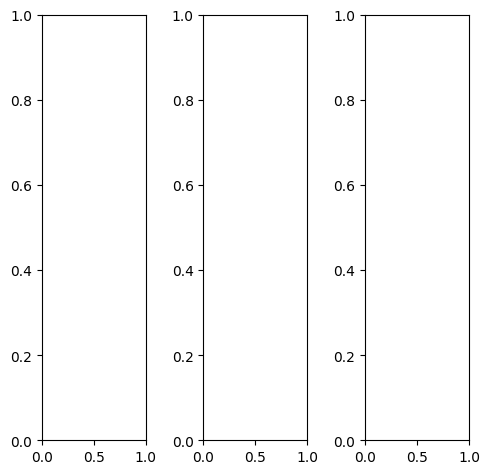

tensor([[[0.6667, 0.6549, 0.6588,  ..., 0.6588, 0.6588, 0.6588],
         [0.6549, 0.6471, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         ...,
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510]],

        [[0.6667, 0.6549, 0.6588,  ..., 0.6588, 0.6588, 0.6588],
         [0.6549, 0.6471, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         ...,
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.6510]],

        [[0.6667, 0.6549, 0.6588,  ..., 0.6588, 0.6588, 0.6588],
         [0.6549, 0.6471, 0.6510,  ..., 0.6510, 0.6510, 0.6510],
         [0.6588, 0.6510, 0.6510,  ..., 0.6510, 0.6510, 0.

tensor([[[0.6824, 0.6745, 0.6745,  ..., 0.6745, 0.6745, 0.6745],
         [0.6745, 0.6627, 0.6667,  ..., 0.6667, 0.6667, 0.6667],
         [0.6745, 0.6667, 0.6667,  ..., 0.6667, 0.6667, 0.6667],
         ...,
         [0.6745, 0.6667, 0.6667,  ..., 0.6667, 0.6667, 0.6667],
         [0.6745, 0.6667, 0.6667,  ..., 0.6667, 0.6667, 0.6667],
         [0.6745, 0.6667, 0.6667,  ..., 0.6667, 0.6667, 0.6667]],

        [[0.6627, 0.6510, 0.6549,  ..., 0.6549, 0.6549, 0.6549],
         [0.6510, 0.6431, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         [0.6549, 0.6471, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         ...,
         [0.6549, 0.6471, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         [0.6549, 0.6471, 0.6471,  ..., 0.6471, 0.6471, 0.6471],
         [0.6549, 0.6471, 0.6471,  ..., 0.6471, 0.6471, 0.6471]],

        [[0.6510, 0.6392, 0.6431,  ..., 0.6431, 0.6431, 0.6431],
         [0.6392, 0.6314, 0.6353,  ..., 0.6353, 0.6353, 0.6353],
         [0.6431, 0.6353, 0.6353,  ..., 0.6353, 0.6353, 0.

tensor([[[0.6000, 0.5741, 0.5564,  ..., 0.5515, 0.5572, 0.5935],
         [0.5754, 0.5484, 0.5477,  ..., 0.5355, 0.5463, 0.5650],
         [0.5614, 0.5347, 0.5423,  ..., 0.5408, 0.5511, 0.5530],
         ...,
         [0.5903, 0.5725, 0.5495,  ..., 0.5577, 0.5664, 0.5843],
         [0.5928, 0.5651, 0.5440,  ..., 0.5552, 0.5706, 0.5928],
         [0.6228, 0.5960, 0.5760,  ..., 0.5776, 0.6155, 0.6259]],

        [[0.6832, 0.6851, 0.6836,  ..., 0.6783, 0.6851, 0.6840],
         [0.6801, 0.6644, 0.6679,  ..., 0.6656, 0.6710, 0.6846],
         [0.6778, 0.6702, 0.6767,  ..., 0.6704, 0.6642, 0.6748],
         ...,
         [0.6855, 0.6771, 0.6653,  ..., 0.6557, 0.6595, 0.6781],
         [0.6788, 0.6554, 0.6609,  ..., 0.6553, 0.6600, 0.6650],
         [0.6585, 0.6649, 0.6613,  ..., 0.6613, 0.6694, 0.6581]],

        [[0.7862, 0.8016, 0.8034,  ..., 0.8098, 0.8096, 0.7773],
         [0.7972, 0.7905, 0.7946,  ..., 0.7962, 0.7941, 0.7841],
         [0.7961, 0.7980, 0.8096,  ..., 0.8077, 0.7979, 0.

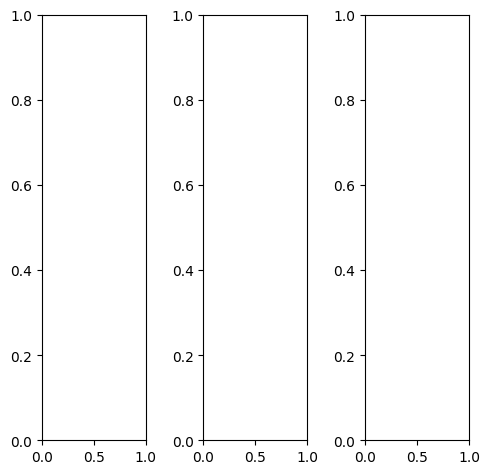

tensor([[[0.9765, 0.8706, 0.7765,  ..., 1.0000, 1.0000, 1.0000],
         [0.9765, 0.8549, 0.6627,  ..., 1.0000, 1.0000, 1.0000],
         [0.9804, 0.8824, 0.7098,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.7725, 0.7804, 0.7843,  ..., 0.0902, 0.0667, 0.1490],
         [0.7725, 0.7843, 0.7804,  ..., 0.2510, 0.2588, 0.5529],
         [0.7686, 0.7804, 0.7804,  ..., 0.6980, 0.8157, 0.9569]],

        [[0.9765, 0.8706, 0.7765,  ..., 1.0000, 1.0000, 1.0000],
         [0.9765, 0.8549, 0.6627,  ..., 1.0000, 1.0000, 1.0000],
         [0.9804, 0.8824, 0.7098,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.7725, 0.7804, 0.7843,  ..., 0.0902, 0.0667, 0.1490],
         [0.7725, 0.7843, 0.7804,  ..., 0.2510, 0.2588, 0.5529],
         [0.7686, 0.7804, 0.7804,  ..., 0.6980, 0.8157, 0.9569]],

        [[0.9765, 0.8706, 0.7765,  ..., 1.0000, 1.0000, 1.0000],
         [0.9765, 0.8549, 0.6627,  ..., 1.0000, 1.0000, 1.0000],
         [0.9804, 0.8824, 0.7098,  ..., 1.0000, 1.0000, 1.

tensor([[[0.9765, 0.8706, 0.7804,  ..., 1.0000, 1.0000, 1.0000],
         [0.9765, 0.8627, 0.6784,  ..., 1.0000, 1.0000, 1.0000],
         [0.9804, 0.8902, 0.7255,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.8549, 0.8627, 0.8667,  ..., 0.1294, 0.0980, 0.1686],
         [0.8588, 0.8706, 0.8667,  ..., 0.2941, 0.2824, 0.5686],
         [0.8549, 0.8667, 0.8667,  ..., 0.7176, 0.8235, 0.9647]],

        [[0.9765, 0.8706, 0.7765,  ..., 1.0000, 1.0000, 1.0000],
         [0.9765, 0.8549, 0.6627,  ..., 1.0000, 1.0000, 1.0000],
         [0.9804, 0.8824, 0.7098,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.8000, 0.8078, 0.8078,  ..., 0.0784, 0.0588, 0.1451],
         [0.7961, 0.8078, 0.8039,  ..., 0.2431, 0.2510, 0.5490],
         [0.7922, 0.8039, 0.8039,  ..., 0.6941, 0.8118, 0.9529]],

        [[0.9725, 0.8588, 0.7608,  ..., 1.0000, 1.0000, 1.0000],
         [0.9647, 0.8275, 0.6196,  ..., 1.0000, 1.0000, 1.0000],
         [0.9686, 0.8549, 0.6627,  ..., 1.0000, 1.0000, 1.

tensor([[[0.9000, 0.8486, 0.7791,  ..., 0.9852, 0.9804, 0.9482],
         [0.9494, 0.8639, 0.6598,  ..., 0.9840, 0.9968, 0.9734],
         [0.9659, 0.9014, 0.7278,  ..., 0.9919, 1.0040, 0.9988],
         ...,
         [0.7960, 0.7948, 0.8014,  ..., 0.1032, 0.0774, 0.1839],
         [0.7896, 0.8014, 0.7935,  ..., 0.2349, 0.2703, 0.5100],
         [0.7782, 0.8114, 0.7978,  ..., 0.7008, 0.8012, 0.8292]],

        [[0.9078, 0.8539, 0.7910,  ..., 0.9938, 0.9778, 0.9783],
         [0.9492, 0.8591, 0.6673,  ..., 1.0089, 0.9937, 0.9934],
         [0.9774, 0.8955, 0.7281,  ..., 1.0158, 1.0153, 1.0066],
         ...,
         [0.7816, 0.7899, 0.7934,  ..., 0.0891, 0.0667, 0.1833],
         [0.7813, 0.7804, 0.7817,  ..., 0.2237, 0.2741, 0.5190],
         [0.7605, 0.7941, 0.7876,  ..., 0.6918, 0.7940, 0.8405]],

        [[0.8955, 0.8634, 0.7626,  ..., 0.9915, 0.9774, 0.9573],
         [0.9307, 0.8482, 0.6445,  ..., 1.0062, 0.9979, 0.9811],
         [0.9649, 0.8786, 0.7195,  ..., 1.0156, 1.0026, 1.

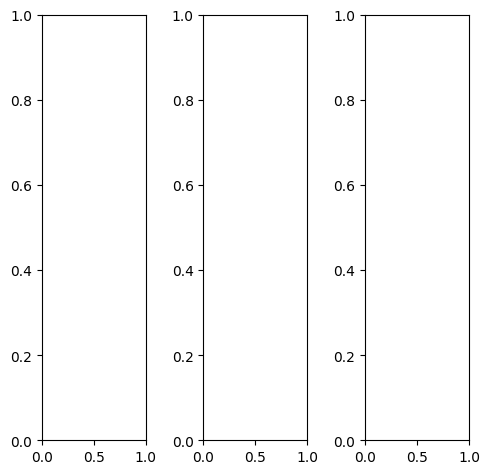

EPOCH: 16.255  trn_loss: 0.005  (1942.73s - 10008.78s remaining)

tensor([[[0.4314, 0.3412, 0.4588,  ..., 0.6431, 0.5725, 0.5961],
         [0.4157, 0.4588, 0.6980,  ..., 0.6235, 0.5569, 0.5765],
         [0.4196, 0.5490, 0.6627,  ..., 0.5922, 0.6157, 0.5804],
         ...,
         [0.4275, 0.3529, 0.2863,  ..., 0.4706, 0.5373, 0.5333],
         [0.4078, 0.4314, 0.3961,  ..., 0.4784, 0.4863, 0.4510],
         [0.3176, 0.3451, 0.3961,  ..., 0.4314, 0.4314, 0.4235]],

        [[0.4314, 0.3412, 0.4588,  ..., 0.6431, 0.5725, 0.5961],
         [0.4157, 0.4588, 0.6980,  ..., 0.6235, 0.5569, 0.5765],
         [0.4196, 0.5490, 0.6627,  ..., 0.5922, 0.6157, 0.5804],
         ...,
         [0.4275, 0.3529, 0.2863,  ..., 0.4706, 0.5373, 0.5333],
         [0.4078, 0.4314, 0.3961,  ..., 0.4784, 0.4863, 0.4510],
         [0.3176, 0.3451, 0.3961,  ..., 0.4314, 0.4314, 0.4235]],

        [[0.4314, 0.3412, 0.4588,  ..., 0.6431, 0.5725, 0.5961],
         [0.4157, 0.4588, 0.6980,  ..., 0.6235, 0.5569, 0.5765],
         [0.4196, 0.5490, 0.6627,  ..., 0.5922, 0.6157, 0.

tensor([[[0.3725, 0.2863, 0.4118,  ..., 0.6941, 0.6235, 0.6431],
         [0.3490, 0.3961, 0.6471,  ..., 0.6784, 0.6157, 0.6392],
         [0.3451, 0.4824, 0.6039,  ..., 0.6392, 0.6824, 0.6549],
         ...,
         [0.3490, 0.2745, 0.2118,  ..., 0.4235, 0.4549, 0.4510],
         [0.3255, 0.3490, 0.3137,  ..., 0.4353, 0.4118, 0.3725],
         [0.2353, 0.2627, 0.3137,  ..., 0.3882, 0.3529, 0.3490]],

        [[0.4784, 0.3804, 0.4902,  ..., 0.6275, 0.5569, 0.5804],
         [0.4667, 0.4980, 0.7294,  ..., 0.6118, 0.5412, 0.5608],
         [0.4745, 0.5922, 0.6980,  ..., 0.5804, 0.6000, 0.5608],
         ...,
         [0.4824, 0.4039, 0.3333,  ..., 0.5020, 0.5882, 0.5843],
         [0.4745, 0.4941, 0.4510,  ..., 0.5059, 0.5294, 0.4980],
         [0.3843, 0.4118, 0.4627,  ..., 0.4627, 0.4784, 0.4706]],

        [[0.3333, 0.2824, 0.4196,  ..., 0.5882, 0.5059, 0.5412],
         [0.3137, 0.4078, 0.6667,  ..., 0.5529, 0.4706, 0.5020],
         [0.3216, 0.5059, 0.6314,  ..., 0.5137, 0.5216, 0.

tensor([[[0.2610, 0.1171, 0.2337,  ..., 0.5276, 0.4247, 0.5367],
         [0.2606, 0.1841, 0.4743,  ..., 0.4923, 0.4257, 0.4815],
         [0.1895, 0.3584, 0.3902,  ..., 0.5043, 0.5717, 0.5086],
         ...,
         [0.3528, 0.2891, 0.1838,  ..., 0.5173, 0.5624, 0.5380],
         [0.3391, 0.3974, 0.3709,  ..., 0.4916, 0.5039, 0.4438],
         [0.2531, 0.2312, 0.2936,  ..., 0.4305, 0.4240, 0.4142]],

        [[0.3589, 0.2547, 0.3689,  ..., 0.6461, 0.5623, 0.5837],
         [0.3220, 0.2993, 0.5423,  ..., 0.6211, 0.5492, 0.6022],
         [0.2925, 0.4780, 0.5050,  ..., 0.5767, 0.6516, 0.5877],
         ...,
         [0.3746, 0.3059, 0.2274,  ..., 0.5403, 0.5846, 0.5000],
         [0.3467, 0.4070, 0.3759,  ..., 0.5103, 0.5073, 0.4091],
         [0.2209, 0.2254, 0.3015,  ..., 0.3964, 0.3842, 0.3581]],

        [[0.4849, 0.2394, 0.5136,  ..., 0.8800, 0.7861, 0.7979],
         [0.4666, 0.4199, 0.7513,  ..., 0.8365, 0.7612, 0.7720],
         [0.4007, 0.5179, 0.6808,  ..., 0.8088, 0.8670, 0.

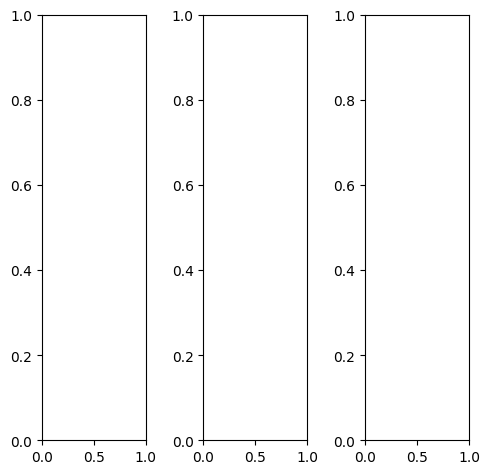

tensor([[[0.9569, 0.9137, 0.9412,  ..., 0.9216, 0.9373, 0.9373],
         [0.9529, 0.9137, 0.9294,  ..., 0.9020, 0.9137, 0.7725],
         [0.9569, 0.9098, 0.9255,  ..., 0.9098, 0.9176, 0.7608],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9569, 0.9137, 0.9412,  ..., 0.9216, 0.9373, 0.9373],
         [0.9529, 0.9137, 0.9294,  ..., 0.9020, 0.9137, 0.7725],
         [0.9569, 0.9098, 0.9255,  ..., 0.9098, 0.9176, 0.7608],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9569, 0.9137, 0.9412,  ..., 0.9216, 0.9373, 0.9373],
         [0.9529, 0.9137, 0.9294,  ..., 0.9020, 0.9137, 0.7725],
         [0.9569, 0.9098, 0.9255,  ..., 0.9098, 0.9176, 0.

tensor([[[0.9608, 0.9294, 0.9647,  ..., 0.9333, 0.9490, 0.9490],
         [0.9608, 0.9333, 0.9569,  ..., 0.9294, 0.9412, 0.8000],
         [0.9725, 0.9373, 0.9647,  ..., 0.9529, 0.9608, 0.8039],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9569, 0.9137, 0.9333,  ..., 0.9176, 0.9333, 0.9333],
         [0.9490, 0.9098, 0.9216,  ..., 0.8902, 0.9020, 0.7647],
         [0.9490, 0.9020, 0.9098,  ..., 0.8941, 0.9020, 0.7451],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9922, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.9451, 0.8824, 0.9216,  ..., 0.9059, 0.9255, 0.9216],
         [0.9412, 0.8824, 0.9098,  ..., 0.8784, 0.8902, 0.7490],
         [0.9451, 0.8784, 0.9059,  ..., 0.8745, 0.8784, 0.

tensor([[[0.7641, 0.6816, 0.6747,  ..., 0.5798, 0.6080, 0.6898],
         [0.6854, 0.6084, 0.6198,  ..., 0.5277, 0.5867, 0.5761],
         [0.6428, 0.6737, 0.5226,  ..., 0.5521, 0.5977, 0.5596],
         ...,
         [0.8314, 0.8018, 0.7764,  ..., 0.7710, 0.7720, 0.8240],
         [0.8025, 0.7749, 0.7657,  ..., 0.7547, 0.7616, 0.8292],
         [0.8344, 0.8273, 0.8233,  ..., 0.8336, 0.8311, 0.8678]],

        [[0.7721, 0.7809, 0.6637,  ..., 0.6842, 0.7292, 0.7495],
         [0.6857, 0.6386, 0.6408,  ..., 0.6633, 0.6953, 0.6817],
         [0.7592, 0.7627, 0.6247,  ..., 0.6881, 0.7032, 0.6548],
         ...,
         [0.7538, 0.7435, 0.7580,  ..., 0.7578, 0.7494, 0.8291],
         [0.7602, 0.7368, 0.7501,  ..., 0.7474, 0.7370, 0.8119],
         [0.7522, 0.7870, 0.7796,  ..., 0.7830, 0.7864, 0.8152]],

        [[0.8841, 0.8489, 0.9110,  ..., 0.9026, 0.9251, 0.9103],
         [0.8740, 0.8368, 0.8902,  ..., 0.8593, 0.9045, 0.8332],
         [0.8330, 0.8133, 0.8559,  ..., 0.8932, 0.9320, 0.

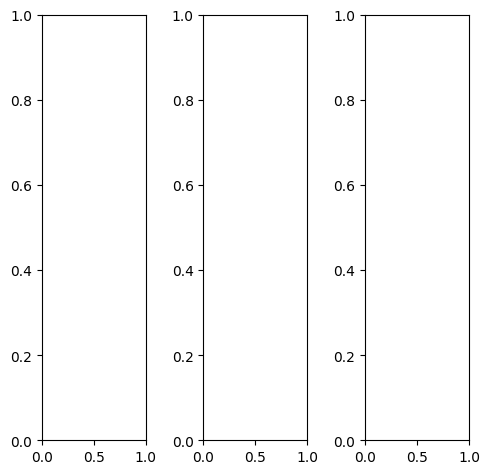

tensor([[[0.1843, 0.1373, 0.1882,  ..., 0.2941, 0.3961, 0.5882],
         [0.1843, 0.1725, 0.1882,  ..., 0.3333, 0.2549, 0.2980],
         [0.2353, 0.2196, 0.1725,  ..., 0.3255, 0.2706, 0.2627],
         ...,
         [0.6980, 0.7020, 0.7059,  ..., 0.7020, 0.6863, 0.6941],
         [0.6863, 0.7020, 0.7098,  ..., 0.6980, 0.7020, 0.7176],
         [0.7059, 0.7059, 0.7098,  ..., 0.7020, 0.6980, 0.7098]],

        [[0.1843, 0.1373, 0.1882,  ..., 0.2941, 0.3961, 0.5882],
         [0.1843, 0.1725, 0.1882,  ..., 0.3333, 0.2549, 0.2980],
         [0.2353, 0.2196, 0.1725,  ..., 0.3255, 0.2706, 0.2627],
         ...,
         [0.6980, 0.7020, 0.7059,  ..., 0.7020, 0.6863, 0.6941],
         [0.6863, 0.7020, 0.7098,  ..., 0.6980, 0.7020, 0.7176],
         [0.7059, 0.7059, 0.7098,  ..., 0.7020, 0.6980, 0.7098]],

        [[0.1843, 0.1373, 0.1882,  ..., 0.2941, 0.3961, 0.5882],
         [0.1843, 0.1725, 0.1882,  ..., 0.3333, 0.2549, 0.2980],
         [0.2353, 0.2196, 0.1725,  ..., 0.3255, 0.2706, 0.

tensor([[[0.1569, 0.1098, 0.1608,  ..., 0.2667, 0.3686, 0.5647],
         [0.1569, 0.1451, 0.1608,  ..., 0.3059, 0.2275, 0.2667],
         [0.2078, 0.1922, 0.1451,  ..., 0.2941, 0.2431, 0.2275],
         ...,
         [0.7255, 0.7294, 0.7333,  ..., 0.7294, 0.7137, 0.7216],
         [0.7137, 0.7294, 0.7373,  ..., 0.7255, 0.7294, 0.7451],
         [0.7333, 0.7333, 0.7373,  ..., 0.7294, 0.7255, 0.7373]],

        [[0.2000, 0.1529, 0.2000,  ..., 0.3098, 0.4157, 0.6039],
         [0.1961, 0.1804, 0.2000,  ..., 0.3569, 0.2784, 0.3255],
         [0.2471, 0.2275, 0.1843,  ..., 0.3451, 0.2902, 0.2902],
         ...,
         [0.6784, 0.6824, 0.6863,  ..., 0.6824, 0.6667, 0.6745],
         [0.6667, 0.6824, 0.6902,  ..., 0.6784, 0.6824, 0.6980],
         [0.6863, 0.6863, 0.6902,  ..., 0.6824, 0.6784, 0.6902]],

        [[0.1882, 0.1412, 0.1882,  ..., 0.2784, 0.3804, 0.5725],
         [0.2000, 0.1882, 0.2078,  ..., 0.2902, 0.2078, 0.2392],
         [0.2588, 0.2431, 0.1961,  ..., 0.2902, 0.2353, 0.

tensor([[[ 0.1402,  0.0464,  0.0521,  ...,  0.2999,  0.4183,  0.6367],
         [ 0.1290,  0.0412,  0.1326,  ...,  0.3045,  0.2005,  0.3289],
         [ 0.0871,  0.1222, -0.0331,  ...,  0.2773,  0.2364,  0.2718],
         ...,
         [ 0.8621,  0.8647,  0.8507,  ...,  0.8588,  0.8440,  0.8711],
         [ 0.8299,  0.8351,  0.8235,  ...,  0.8121,  0.8364,  0.9064],
         [ 0.8666,  0.8776,  0.8573,  ...,  0.8656,  0.8788,  0.8961]],

        [[ 0.1516,  0.2058,  0.1052,  ...,  0.3403,  0.4990,  0.6357],
         [ 0.1798,  0.1042,  0.0660,  ...,  0.3578,  0.2711,  0.3563],
         [ 0.1711,  0.3048,  0.0567,  ...,  0.3611,  0.3135,  0.2987],
         ...,
         [ 0.8410,  0.8300,  0.8323,  ...,  0.8336,  0.8155,  0.8636],
         [ 0.8255,  0.8217,  0.8308,  ...,  0.7995,  0.8181,  0.8863],
         [ 0.8216,  0.8411,  0.8310,  ...,  0.8296,  0.8463,  0.8488]],

        [[ 0.3777,  0.1456,  0.3113,  ...,  0.4454,  0.5968,  0.7537],
         [ 0.3303,  0.2144,  0.2886,  ...,  0

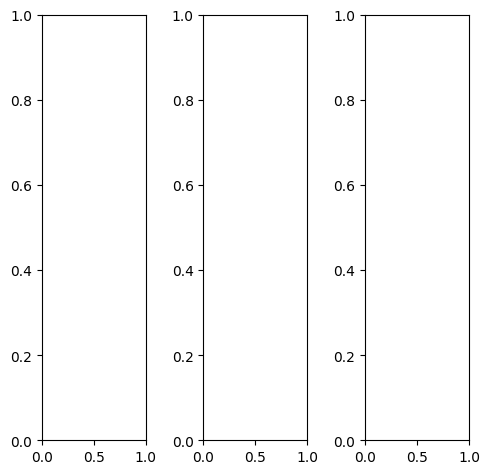

tensor([[[0.5569, 0.5098, 0.4745,  ..., 0.5294, 0.5294, 0.5569],
         [0.5529, 0.5020, 0.4863,  ..., 0.5922, 0.5373, 0.5373],
         [0.5529, 0.5098, 0.5373,  ..., 0.7686, 0.5686, 0.5216],
         ...,
         [0.5176, 0.5216, 0.5294,  ..., 0.5725, 0.6000, 0.6431],
         [0.5412, 0.5333, 0.5294,  ..., 0.6000, 0.6235, 0.6510],
         [0.5294, 0.5294, 0.5412,  ..., 0.6118, 0.6353, 0.6196]],

        [[0.5569, 0.5098, 0.4745,  ..., 0.5294, 0.5294, 0.5569],
         [0.5529, 0.5020, 0.4863,  ..., 0.5922, 0.5373, 0.5373],
         [0.5529, 0.5098, 0.5373,  ..., 0.7686, 0.5686, 0.5216],
         ...,
         [0.5176, 0.5216, 0.5294,  ..., 0.5725, 0.6000, 0.6431],
         [0.5412, 0.5333, 0.5294,  ..., 0.6000, 0.6235, 0.6510],
         [0.5294, 0.5294, 0.5412,  ..., 0.6118, 0.6353, 0.6196]],

        [[0.5569, 0.5098, 0.4745,  ..., 0.5294, 0.5294, 0.5569],
         [0.5529, 0.5020, 0.4863,  ..., 0.5922, 0.5373, 0.5373],
         [0.5529, 0.5098, 0.5373,  ..., 0.7686, 0.5686, 0.

tensor([[[1.0000, 0.9686, 0.9373,  ..., 0.9647, 0.9569, 0.9843],
         [1.0000, 0.9608, 0.9333,  ..., 0.9373, 0.9176, 0.9569],
         [1.0000, 0.9529, 0.9412,  ..., 0.9255, 0.8745, 0.9647],
         ...,
         [0.9804, 0.9725, 0.9765,  ..., 0.9725, 0.9961, 1.0000],
         [0.9961, 0.9765, 0.9725,  ..., 0.9804, 0.9843, 1.0000],
         [0.9922, 0.9765, 0.9882,  ..., 0.9725, 0.9804, 0.9843]],

        [[0.3451, 0.2902, 0.2549,  ..., 0.3216, 0.3216, 0.3490],
         [0.3373, 0.2824, 0.2706,  ..., 0.4275, 0.3529, 0.3333],
         [0.3373, 0.2980, 0.3490,  ..., 0.7020, 0.4275, 0.3098],
         ...,
         [0.2980, 0.3059, 0.3176,  ..., 0.3804, 0.4078, 0.4706],
         [0.3216, 0.3216, 0.3176,  ..., 0.4157, 0.4510, 0.4824],
         [0.3098, 0.3137, 0.3294,  ..., 0.4353, 0.4706, 0.4431]],

        [[0.4941, 0.4431, 0.4078,  ..., 0.4667, 0.4667, 0.4902],
         [0.4902, 0.4314, 0.4078,  ..., 0.5294, 0.4745, 0.4706],
         [0.4863, 0.4314, 0.4471,  ..., 0.7059, 0.5059, 0.

tensor([[[0.3252, 0.1931, 0.0972,  ..., 0.2988, 0.3060, 0.3544],
         [0.2414, 0.0961, 0.0742,  ..., 0.3478, 0.2815, 0.3145],
         [0.2236, 0.0802, 0.0114,  ..., 0.5683, 0.3121, 0.2712],
         ...,
         [0.3402, 0.3416, 0.3539,  ..., 0.4555, 0.4463, 0.5111],
         [0.3711, 0.3374, 0.3498,  ..., 0.4403, 0.4498, 0.5038],
         [0.3738, 0.3599, 0.3623,  ..., 0.4819, 0.4940, 0.4915]],

        [[0.3660, 0.3671, 0.2295,  ..., 0.3358, 0.3722, 0.3813],
         [0.3342, 0.2437, 0.1242,  ..., 0.3620, 0.3569, 0.3266],
         [0.3398, 0.3278, 0.2038,  ..., 0.5777, 0.3688, 0.2886],
         ...,
         [0.3353, 0.3486, 0.3742,  ..., 0.4202, 0.4350, 0.4488],
         [0.3697, 0.3685, 0.3668,  ..., 0.4403, 0.4549, 0.4699],
         [0.3526, 0.3523, 0.3809,  ..., 0.4437, 0.4746, 0.4442]],

        [[0.5716, 0.3467, 0.4182,  ..., 0.4218, 0.4545, 0.4841],
         [0.5298, 0.3799, 0.3984,  ..., 0.4604, 0.4208, 0.4337],
         [0.4842, 0.3530, 0.4554,  ..., 0.6841, 0.4407, 0.

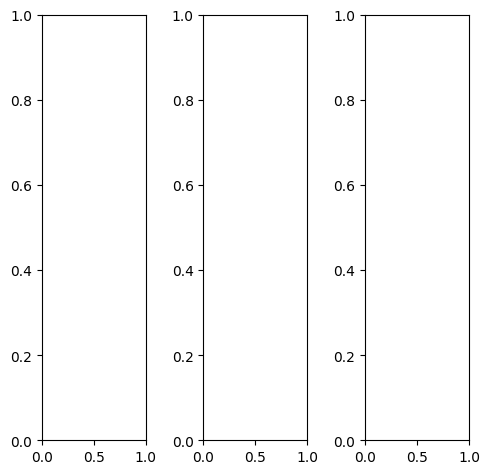

tensor([[[0.5608, 0.4784, 0.5216,  ..., 0.8431, 0.8941, 0.9020],
         [0.4157, 0.4314, 0.5804,  ..., 0.8000, 0.8980, 0.9098],
         [0.4392, 0.4667, 0.6471,  ..., 0.6980, 0.8627, 0.9059],
         ...,
         [0.8157, 0.8000, 0.7765,  ..., 0.6392, 0.6157, 0.6039],
         [0.7922, 0.8039, 0.7882,  ..., 0.6039, 0.5922, 0.6039],
         [0.6078, 0.5961, 0.6000,  ..., 0.5804, 0.5765, 0.6000]],

        [[0.5608, 0.4784, 0.5216,  ..., 0.8431, 0.8941, 0.9020],
         [0.4157, 0.4314, 0.5804,  ..., 0.8000, 0.8980, 0.9098],
         [0.4392, 0.4667, 0.6471,  ..., 0.6980, 0.8627, 0.9059],
         ...,
         [0.8157, 0.8000, 0.7765,  ..., 0.6392, 0.6157, 0.6039],
         [0.7922, 0.8039, 0.7882,  ..., 0.6039, 0.5922, 0.6039],
         [0.6078, 0.5961, 0.6000,  ..., 0.5804, 0.5765, 0.6000]],

        [[0.5608, 0.4784, 0.5216,  ..., 0.8431, 0.8941, 0.9020],
         [0.4157, 0.4314, 0.5804,  ..., 0.8000, 0.8980, 0.9098],
         [0.4392, 0.4667, 0.6471,  ..., 0.6980, 0.8627, 0.

tensor([[[0.5216, 0.4353, 0.4667,  ..., 0.7608, 0.8118, 0.8157],
         [0.3765, 0.3843, 0.5255,  ..., 0.7216, 0.8118, 0.8196],
         [0.4000, 0.4196, 0.5922,  ..., 0.6235, 0.7765, 0.8196],
         ...,
         [0.8392, 0.8235, 0.8000,  ..., 0.6667, 0.6510, 0.6431],
         [0.8157, 0.8235, 0.8078,  ..., 0.6353, 0.6353, 0.6471],
         [0.6314, 0.6196, 0.6235,  ..., 0.6078, 0.6157, 0.6392]],

        [[0.6000, 0.5216, 0.5647,  ..., 0.8745, 0.9294, 0.9373],
         [0.4549, 0.4745, 0.6196,  ..., 0.8353, 0.9333, 0.9451],
         [0.4745, 0.5059, 0.6863,  ..., 0.7294, 0.8941, 0.9412],
         ...,
         [0.8275, 0.8118, 0.7882,  ..., 0.6627, 0.6392, 0.6275],
         [0.8000, 0.8118, 0.7961,  ..., 0.6353, 0.6235, 0.6353],
         [0.6235, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6353]],

        [[0.4549, 0.3765, 0.4471,  ..., 0.8824, 0.9451, 0.9490],
         [0.3216, 0.3373, 0.5137,  ..., 0.8353, 0.9529, 0.9569],
         [0.3529, 0.3765, 0.5843,  ..., 0.7216, 0.9176, 0.

tensor([[[0.4065, 0.3485, 0.3682,  ..., 0.6581, 0.6935, 0.7391],
         [0.2977, 0.2343, 0.3482,  ..., 0.6170, 0.7142, 0.7469],
         [0.2265, 0.2814, 0.3709,  ..., 0.5576, 0.7042, 0.7460],
         ...,
         [0.7871, 0.7634, 0.7292,  ..., 0.6308, 0.5862, 0.5916],
         [0.7608, 0.7605, 0.7376,  ..., 0.5871, 0.5759, 0.5985],
         [0.6121, 0.5770, 0.5738,  ..., 0.6064, 0.5880, 0.6022]],

        [[0.4806, 0.4477, 0.4393,  ..., 0.7305, 0.7832, 0.8240],
         [0.3293, 0.3168, 0.3472,  ..., 0.6821, 0.7923, 0.8535],
         [0.3500, 0.3633, 0.4482,  ..., 0.6268, 0.7824, 0.8381],
         ...,
         [0.7495, 0.7285, 0.7191,  ..., 0.6012, 0.5719, 0.5644],
         [0.7288, 0.7188, 0.7229,  ..., 0.5788, 0.5513, 0.5562],
         [0.5498, 0.5358, 0.5595,  ..., 0.5603, 0.5550, 0.5620]],

        [[0.5885, 0.4717, 0.5703,  ..., 0.9271, 0.9559, 0.9524],
         [0.4687, 0.4578, 0.6014,  ..., 0.8908, 0.9865, 0.9856],
         [0.4255, 0.4100, 0.6201,  ..., 0.8436, 0.9989, 1.

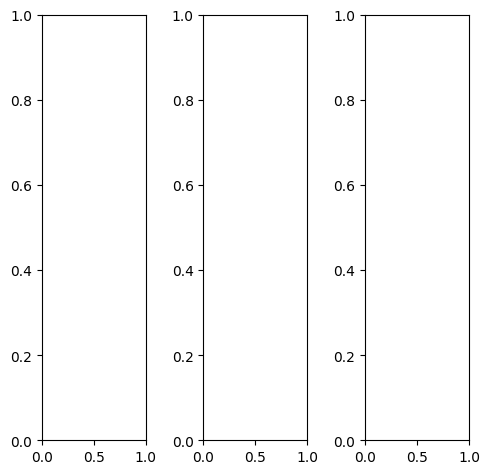

EPOCH: 16.510  trn_loss: 0.005  (1971.83s - 9971.29s remaining)

tensor([[[0.4941, 0.4824, 0.5020,  ..., 0.5098, 0.5098, 0.5059],
         [0.5216, 0.5255, 0.5569,  ..., 0.5216, 0.5255, 0.5216],
         [0.6000, 0.6784, 0.7490,  ..., 0.5373, 0.5294, 0.5255],
         ...,
         [0.5255, 0.5059, 0.4824,  ..., 0.4471, 0.4431, 0.4431],
         [0.4863, 0.4824, 0.4510,  ..., 0.4392, 0.4392, 0.4392],
         [0.4471, 0.4510, 0.4627,  ..., 0.4157, 0.4157, 0.4157]],

        [[0.4941, 0.4824, 0.5020,  ..., 0.5098, 0.5098, 0.5059],
         [0.5216, 0.5255, 0.5569,  ..., 0.5216, 0.5255, 0.5216],
         [0.6000, 0.6784, 0.7490,  ..., 0.5373, 0.5294, 0.5255],
         ...,
         [0.5255, 0.5059, 0.4824,  ..., 0.4471, 0.4431, 0.4431],
         [0.4863, 0.4824, 0.4510,  ..., 0.4392, 0.4392, 0.4392],
         [0.4471, 0.4510, 0.4627,  ..., 0.4157, 0.4157, 0.4157]],

        [[0.4941, 0.4824, 0.5020,  ..., 0.5098, 0.5098, 0.5059],
         [0.5216, 0.5255, 0.5569,  ..., 0.5216, 0.5255, 0.5216],
         [0.6000, 0.6784, 0.7490,  ..., 0.5373, 0.5294, 0.

tensor([[[0.3059, 0.2941, 0.3333,  ..., 0.3373, 0.3412, 0.3333],
         [0.3294, 0.3451, 0.3961,  ..., 0.3412, 0.3451, 0.3373],
         [0.4941, 0.5922, 0.6824,  ..., 0.3451, 0.3373, 0.3373],
         ...,
         [0.3529, 0.3098, 0.2784,  ..., 0.1255, 0.1333, 0.1333],
         [0.3020, 0.2824, 0.2353,  ..., 0.1020, 0.1098, 0.1137],
         [0.2627, 0.2549, 0.2510,  ..., 0.0824, 0.0941, 0.0980]],

        [[0.5412, 0.5333, 0.5451,  ..., 0.5529, 0.5529, 0.5490],
         [0.5647, 0.5686, 0.5922,  ..., 0.5686, 0.5686, 0.5647],
         [0.6196, 0.6941, 0.7569,  ..., 0.5843, 0.5765, 0.5725],
         ...,
         [0.5843, 0.5725, 0.5529,  ..., 0.5569, 0.5490, 0.5490],
         [0.5490, 0.5529, 0.5255,  ..., 0.5569, 0.5529, 0.5490],
         [0.5137, 0.5216, 0.5373,  ..., 0.5294, 0.5294, 0.5255]],

        [[0.7490, 0.7176, 0.7294,  ..., 0.7451, 0.7451, 0.7451],
         [0.7922, 0.7686, 0.7843,  ..., 0.7686, 0.7725, 0.7725],
         [0.7686, 0.8196, 0.8667,  ..., 0.7843, 0.7804, 0.

tensor([[[0.1789, 0.0790, 0.0763,  ..., 0.1797, 0.1928, 0.2112],
         [0.2503, 0.0859, 0.1512,  ..., 0.1747, 0.1763, 0.1814],
         [0.3444, 0.4487, 0.5358,  ..., 0.2304, 0.2242, 0.2033],
         ...,
         [0.3540, 0.3396, 0.2670,  ..., 0.1794, 0.1487, 0.1592],
         [0.2841, 0.2463, 0.2059,  ..., 0.1273, 0.1345, 0.1492],
         [0.2463, 0.1835, 0.2079,  ..., 0.1341, 0.1241, 0.1263]],

        [[0.2868, 0.2036, 0.2197,  ..., 0.2758, 0.3046, 0.2858],
         [0.2708, 0.2128, 0.1787,  ..., 0.3001, 0.3285, 0.2713],
         [0.4369, 0.5449, 0.6695,  ..., 0.3459, 0.3385, 0.2704],
         ...,
         [0.3280, 0.3050, 0.2650,  ..., 0.1876, 0.1594, 0.1285],
         [0.2591, 0.2347, 0.1815,  ..., 0.1315, 0.1259, 0.1090],
         [0.2016, 0.1581, 0.1790,  ..., 0.1158, 0.0978, 0.0874]],

        [[0.4175, 0.1956, 0.3876,  ..., 0.3892, 0.4230, 0.4159],
         [0.4473, 0.3594, 0.3907,  ..., 0.4138, 0.4377, 0.4109],
         [0.5509, 0.6215, 0.7784,  ..., 0.4544, 0.4603, 0.

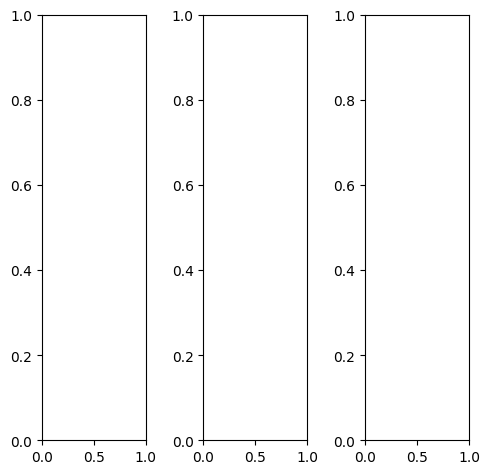

tensor([[[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.2510],
         ...,
         [0.4392, 0.4745, 0.5333,  ..., 0.4039, 0.3843, 0.2706],
         [0.4471, 0.5020, 0.4902,  ..., 0.4078, 0.3569, 0.2510],
         [0.4431, 0.3843, 0.2275,  ..., 0.3843, 0.2941, 0.2431]],

        [[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.2510],
         ...,
         [0.4392, 0.4745, 0.5333,  ..., 0.4039, 0.3843, 0.2706],
         [0.4471, 0.5020, 0.4902,  ..., 0.4078, 0.3569, 0.2510],
         [0.4431, 0.3843, 0.2275,  ..., 0.3843, 0.2941, 0.2431]],

        [[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.

tensor([[[0.0235, 0.0353, 0.0353,  ..., 0.3137, 0.2980, 0.2784],
         [0.0118, 0.0275, 0.0314,  ..., 0.3451, 0.3294, 0.3137],
         [0.0078, 0.0196, 0.0235,  ..., 0.3961, 0.3725, 0.3490],
         ...,
         [0.4471, 0.4784, 0.5333,  ..., 0.4039, 0.3843, 0.3373],
         [0.4510, 0.5020, 0.4902,  ..., 0.4039, 0.3765, 0.3255],
         [0.4431, 0.3843, 0.2275,  ..., 0.4000, 0.3529, 0.3294]],

        [[0.0275, 0.0392, 0.0353,  ..., 0.1882, 0.1804, 0.1686],
         [0.0157, 0.0275, 0.0314,  ..., 0.2118, 0.2039, 0.1961],
         [0.0078, 0.0118, 0.0275,  ..., 0.2588, 0.2431, 0.2275],
         ...,
         [0.4510, 0.4863, 0.5451,  ..., 0.4118, 0.3922, 0.2588],
         [0.4588, 0.5137, 0.4980,  ..., 0.4157, 0.3569, 0.2353],
         [0.4510, 0.3922, 0.2314,  ..., 0.3882, 0.2824, 0.2235]],

        [[0.0157, 0.0196, 0.0235,  ..., 0.0941, 0.0902, 0.0824],
         [0.0078, 0.0196, 0.0235,  ..., 0.1098, 0.1020, 0.0980],
         [0.0078, 0.0118, 0.0235,  ..., 0.1412, 0.1255, 0.

tensor([[[-0.1257, -0.1185, -0.2217,  ...,  0.1670,  0.1627,  0.2180],
         [-0.0520, -0.2499, -0.1587,  ...,  0.2056,  0.1949,  0.2170],
         [-0.3248, -0.2901, -0.2471,  ...,  0.2841,  0.2761,  0.2590],
         ...,
         [ 0.7347,  0.7996,  0.8939,  ...,  0.6530,  0.6134,  0.4074],
         [ 0.7322,  0.8413,  0.7943,  ...,  0.6450,  0.5575,  0.3821],
         [ 0.7110,  0.6118,  0.3424,  ...,  0.6328,  0.4623,  0.3847]],

        [[ 0.0122, -0.0367, -0.1084,  ...,  0.3132,  0.3141,  0.3110],
         [-0.0654, -0.3834, -0.3712,  ...,  0.3824,  0.3792,  0.3286],
         [-0.2027, -0.2051, -0.2704,  ...,  0.4524,  0.4318,  0.3812],
         ...,
         [ 0.7135,  0.7823,  0.9325,  ...,  0.6674,  0.6682,  0.3961],
         [ 0.7264,  0.8169,  0.8081,  ...,  0.6737,  0.5895,  0.3788],
         [ 0.6599,  0.5814,  0.3379,  ...,  0.6350,  0.4743,  0.3791]],

        [[ 0.1427, -0.1305, -0.0393,  ...,  0.5310,  0.5202,  0.5068],
         [ 0.0936, -0.2014, -0.0622,  ...,  0

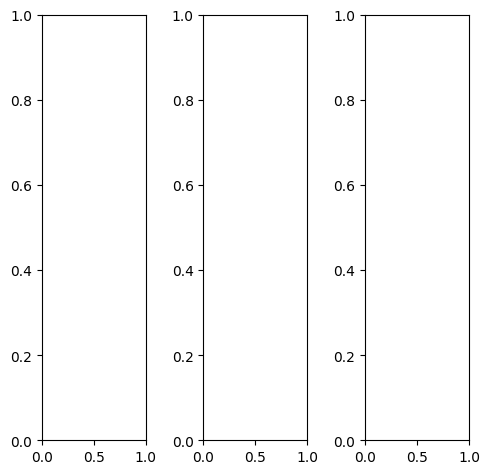

tensor([[[0.5098, 0.4824, 0.4784,  ..., 0.3922, 0.3686, 0.3686],
         [0.4314, 0.4118, 0.4118,  ..., 0.4353, 0.3922, 0.3725],
         [0.3412, 0.3373, 0.4000,  ..., 0.3569, 0.3255, 0.3412],
         ...,
         [0.7725, 0.8039, 0.7882,  ..., 0.7725, 0.8078, 0.8510],
         [0.8549, 0.8392, 0.8196,  ..., 0.8392, 0.8588, 0.8745],
         [0.8392, 0.8745, 0.8745,  ..., 0.8902, 0.9098, 0.9765]],

        [[0.5098, 0.4824, 0.4784,  ..., 0.3922, 0.3686, 0.3686],
         [0.4314, 0.4118, 0.4118,  ..., 0.4353, 0.3922, 0.3725],
         [0.3412, 0.3373, 0.4000,  ..., 0.3569, 0.3255, 0.3412],
         ...,
         [0.7725, 0.8039, 0.7882,  ..., 0.7725, 0.8078, 0.8510],
         [0.8549, 0.8392, 0.8196,  ..., 0.8392, 0.8588, 0.8745],
         [0.8392, 0.8745, 0.8745,  ..., 0.8902, 0.9098, 0.9765]],

        [[0.5098, 0.4824, 0.4784,  ..., 0.3922, 0.3686, 0.3686],
         [0.4314, 0.4118, 0.4118,  ..., 0.4353, 0.3922, 0.3725],
         [0.3412, 0.3373, 0.4000,  ..., 0.3569, 0.3255, 0.

tensor([[[0.5098, 0.4706, 0.4667,  ..., 0.4039, 0.3804, 0.3804],
         [0.4549, 0.4314, 0.4196,  ..., 0.4471, 0.4039, 0.3804],
         [0.3843, 0.3804, 0.4353,  ..., 0.3843, 0.3451, 0.3529],
         ...,
         [0.8353, 0.8745, 0.8627,  ..., 0.8549, 0.8902, 0.9216],
         [0.9098, 0.8941, 0.8745,  ..., 0.8980, 0.9137, 0.9294],
         [0.8431, 0.8784, 0.8784,  ..., 0.8941, 0.9137, 0.9843]],

        [[0.5333, 0.5059, 0.5059,  ..., 0.3922, 0.3686, 0.3686],
         [0.4314, 0.4157, 0.4196,  ..., 0.4353, 0.3882, 0.3725],
         [0.3255, 0.3176, 0.3843,  ..., 0.3451, 0.3098, 0.3333],
         ...,
         [0.7686, 0.7922, 0.7804,  ..., 0.7608, 0.7961, 0.8471],
         [0.8510, 0.8353, 0.8118,  ..., 0.8353, 0.8549, 0.8667],
         [0.8431, 0.8784, 0.8824,  ..., 0.8980, 0.9137, 0.9804]],

        [[0.4039, 0.4000, 0.3804,  ..., 0.3569, 0.3490, 0.3294],
         [0.3529, 0.3569, 0.3373,  ..., 0.4078, 0.3922, 0.3569],
         [0.3255, 0.3333, 0.3725,  ..., 0.3373, 0.3490, 0.

tensor([[[ 0.3234,  0.2467,  0.2074,  ...,  0.2135,  0.1935,  0.1878],
         [ 0.1850,  0.0945,  0.1125,  ...,  0.2692,  0.1979,  0.1694],
         [ 0.0089, -0.0066, -0.0489,  ...,  0.1312,  0.1065,  0.1427],
         ...,
         [ 0.7843,  0.8097,  0.7836,  ...,  0.8485,  0.8944,  0.8768],
         [ 0.8715,  0.8203,  0.7995,  ...,  0.9131,  0.9441,  0.9230],
         [ 0.8205,  0.8438,  0.8334,  ...,  0.9340,  0.9482,  0.9505]],

        [[ 0.3791,  0.4307,  0.3289,  ...,  0.2578,  0.2397,  0.2094],
         [ 0.2557,  0.2161,  0.1471,  ...,  0.3163,  0.2644,  0.2014],
         [ 0.1090,  0.2131,  0.1274,  ...,  0.1998,  0.1572,  0.1524],
         ...,
         [ 0.7855,  0.8346,  0.8114,  ...,  0.8112,  0.8595,  0.8837],
         [ 0.8829,  0.8504,  0.8648,  ...,  0.9130,  0.9255,  0.9119],
         [ 0.7983,  0.8472,  0.8496,  ...,  0.8900,  0.9067,  0.9049]],

        [[ 0.5618,  0.3980,  0.5100,  ...,  0.3011,  0.2863,  0.2886],
         [ 0.4127,  0.3392,  0.3931,  ...,  0

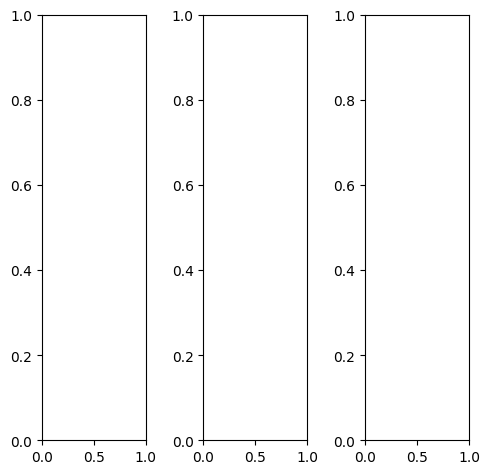

tensor([[[0.3725, 0.3333, 0.3373,  ..., 0.3255, 0.3255, 0.3765],
         [0.3725, 0.3686, 0.3647,  ..., 0.3098, 0.3373, 0.3569],
         [0.3843, 0.3725, 0.4000,  ..., 0.3137, 0.3294, 0.3569],
         ...,
         [0.4549, 0.4196, 0.3412,  ..., 0.5216, 0.5333, 0.5490],
         [0.4471, 0.4118, 0.3529,  ..., 0.6000, 0.5882, 0.5843],
         [0.5294, 0.4902, 0.4627,  ..., 0.5843, 0.5765, 0.5686]],

        [[0.3725, 0.3333, 0.3373,  ..., 0.3255, 0.3255, 0.3765],
         [0.3725, 0.3686, 0.3647,  ..., 0.3098, 0.3373, 0.3569],
         [0.3843, 0.3725, 0.4000,  ..., 0.3137, 0.3294, 0.3569],
         ...,
         [0.4549, 0.4196, 0.3412,  ..., 0.5216, 0.5333, 0.5490],
         [0.4471, 0.4118, 0.3529,  ..., 0.6000, 0.5882, 0.5843],
         [0.5294, 0.4902, 0.4627,  ..., 0.5843, 0.5765, 0.5686]],

        [[0.3725, 0.3333, 0.3373,  ..., 0.3255, 0.3255, 0.3765],
         [0.3725, 0.3686, 0.3647,  ..., 0.3098, 0.3373, 0.3569],
         [0.3843, 0.3725, 0.4000,  ..., 0.3137, 0.3294, 0.

tensor([[[0.3765, 0.3412, 0.3412,  ..., 0.3255, 0.3255, 0.3765],
         [0.3765, 0.3725, 0.3725,  ..., 0.3098, 0.3373, 0.3529],
         [0.3882, 0.3765, 0.4039,  ..., 0.3137, 0.3294, 0.3569],
         ...,
         [0.4235, 0.3961, 0.3255,  ..., 0.5255, 0.5333, 0.5490],
         [0.4157, 0.3843, 0.3333,  ..., 0.6000, 0.5882, 0.5765],
         [0.5059, 0.4745, 0.4510,  ..., 0.5804, 0.5686, 0.5608]],

        [[0.3922, 0.3569, 0.3569,  ..., 0.3412, 0.3451, 0.3961],
         [0.3922, 0.3922, 0.3882,  ..., 0.3255, 0.3569, 0.3765],
         [0.4039, 0.3961, 0.4235,  ..., 0.3294, 0.3490, 0.3765],
         ...,
         [0.4627, 0.4235, 0.3412,  ..., 0.5216, 0.5333, 0.5490],
         [0.4549, 0.4157, 0.3569,  ..., 0.6000, 0.5882, 0.5843],
         [0.5333, 0.4941, 0.4667,  ..., 0.5843, 0.5765, 0.5725]],

        [[0.2588, 0.2078, 0.2118,  ..., 0.2471, 0.2196, 0.2706],
         [0.2549, 0.2353, 0.2392,  ..., 0.2314, 0.2314, 0.2510],
         [0.2588, 0.2392, 0.2706,  ..., 0.2392, 0.2314, 0.

tensor([[[0.2972, 0.1737, 0.0676,  ..., 0.2121, 0.2360, 0.3333],
         [0.3008, 0.1632, 0.0562,  ..., 0.1825, 0.2352, 0.2865],
         [0.2217, 0.1975, 0.1174,  ..., 0.2106, 0.2650, 0.2982],
         ...,
         [0.5673, 0.5403, 0.3123,  ..., 0.7529, 0.7740, 0.7749],
         [0.5517, 0.4944, 0.3219,  ..., 0.9223, 0.8915, 0.8579],
         [0.6764, 0.6353, 0.5179,  ..., 0.9051, 0.8740, 0.8323]],

        [[0.4087, 0.3037, 0.2408,  ..., 0.3059, 0.3493, 0.4025],
         [0.3569, 0.3152, 0.1212,  ..., 0.3140, 0.3984, 0.3774],
         [0.3807, 0.3416, 0.3030,  ..., 0.3340, 0.3955, 0.3753],
         ...,
         [0.5541, 0.5238, 0.3446,  ..., 0.7588, 0.7758, 0.7762],
         [0.5341, 0.4886, 0.3529,  ..., 0.9316, 0.8913, 0.8560],
         [0.6268, 0.6162, 0.5255,  ..., 0.8647, 0.8515, 0.7902]],

        [[0.5241, 0.3265, 0.3720,  ..., 0.4293, 0.4887, 0.5438],
         [0.4863, 0.4671, 0.3372,  ..., 0.4460, 0.5235, 0.5246],
         [0.4551, 0.4127, 0.4535,  ..., 0.4686, 0.5311, 0.

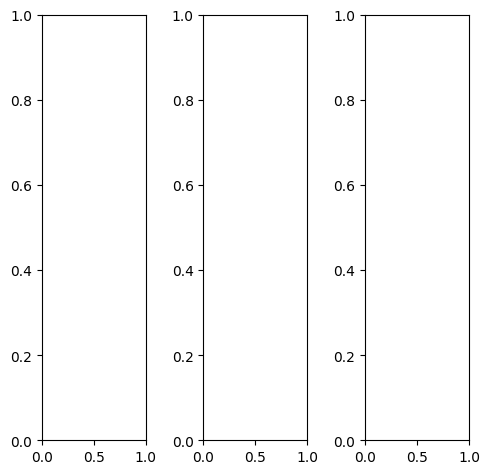

tensor([[[0.0118, 0.0627, 0.1020,  ..., 0.0980, 0.0980, 0.0902],
         [0.0196, 0.0863, 0.1451,  ..., 0.1529, 0.1451, 0.1373],
         [0.0157, 0.0902, 0.1412,  ..., 0.1569, 0.1529, 0.1569],
         ...,
         [0.0510, 0.2706, 0.3608,  ..., 0.2941, 0.2235, 0.2078],
         [0.0392, 0.1961, 0.2824,  ..., 0.2275, 0.2353, 0.2196],
         [0.0196, 0.0863, 0.1255,  ..., 0.1373, 0.1412, 0.1294]],

        [[0.0118, 0.0627, 0.1020,  ..., 0.0980, 0.0980, 0.0902],
         [0.0196, 0.0863, 0.1451,  ..., 0.1529, 0.1451, 0.1373],
         [0.0157, 0.0902, 0.1412,  ..., 0.1569, 0.1529, 0.1569],
         ...,
         [0.0510, 0.2706, 0.3608,  ..., 0.2941, 0.2235, 0.2078],
         [0.0392, 0.1961, 0.2824,  ..., 0.2275, 0.2353, 0.2196],
         [0.0196, 0.0863, 0.1255,  ..., 0.1373, 0.1412, 0.1294]],

        [[0.0118, 0.0627, 0.1020,  ..., 0.0980, 0.0980, 0.0902],
         [0.0196, 0.0863, 0.1451,  ..., 0.1529, 0.1451, 0.1373],
         [0.0157, 0.0902, 0.1412,  ..., 0.1569, 0.1529, 0.

tensor([[[0.0196, 0.0706, 0.1098,  ..., 0.1020, 0.1137, 0.1020],
         [0.0353, 0.0980, 0.1490,  ..., 0.1608, 0.1608, 0.1490],
         [0.0196, 0.0941, 0.1490,  ..., 0.1725, 0.1686, 0.1686],
         ...,
         [0.0549, 0.3020, 0.4157,  ..., 0.3451, 0.2431, 0.2196],
         [0.0392, 0.2078, 0.3020,  ..., 0.2314, 0.2431, 0.2275],
         [0.0196, 0.0824, 0.1216,  ..., 0.1255, 0.1412, 0.1294]],

        [[0.0078, 0.0588, 0.0980,  ..., 0.1020, 0.0902, 0.0863],
         [0.0118, 0.0863, 0.1490,  ..., 0.1490, 0.1373, 0.1333],
         [0.0157, 0.0902, 0.1412,  ..., 0.1490, 0.1490, 0.1529],
         ...,
         [0.0510, 0.2588, 0.3412,  ..., 0.2784, 0.2157, 0.2000],
         [0.0314, 0.1843, 0.2627,  ..., 0.2235, 0.2314, 0.2157],
         [0.0157, 0.0824, 0.1216,  ..., 0.1373, 0.1373, 0.1255]],

        [[0.0078, 0.0510, 0.0902,  ..., 0.0784, 0.0863, 0.0824],
         [0.0039, 0.0667, 0.1294,  ..., 0.1373, 0.1333, 0.1294],
         [0.0196, 0.0824, 0.1255,  ..., 0.1451, 0.1451, 0.

tensor([[[-0.0996, -0.0976, -0.0824,  ...,  0.0186,  0.0287,  0.0823],
         [-0.0425, -0.1168,  0.1137,  ...,  0.1213,  0.0931,  0.0979],
         [-0.1687, -0.0759, -0.0812,  ...,  0.1144,  0.0996,  0.1236],
         ...,
         [-0.0059,  0.4416,  0.5810,  ...,  0.3515,  0.2842,  0.2988],
         [-0.0061,  0.2628,  0.4695,  ...,  0.3143,  0.3356,  0.3103],
         [ 0.0355,  0.0585,  0.1158,  ...,  0.1138,  0.1190,  0.1441]],

        [[-0.0390, -0.0070,  0.0890,  ...,  0.0477,  0.0641,  0.1046],
         [-0.0560, -0.1974,  0.0200,  ...,  0.1408,  0.1419,  0.1249],
         [-0.0819, -0.0385,  0.1367,  ...,  0.1154,  0.1167,  0.1341],
         ...,
         [-0.0235,  0.4227,  0.5438,  ...,  0.3533,  0.2657,  0.2431],
         [-0.0392,  0.2353,  0.4275,  ...,  0.2947,  0.3192,  0.2763],
         [ 0.0027,  0.0415,  0.0906,  ...,  0.1150,  0.1180,  0.1209]],

        [[ 0.1949, -0.0165,  0.1597,  ...,  0.1246,  0.1517,  0.2072],
         [ 0.0705, -0.0057,  0.1701,  ...,  0

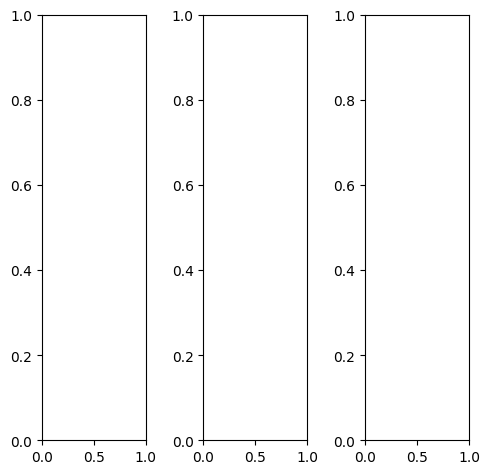

EPOCH: 16.765  trn_loss: 0.006  (2001.16s - 9935.16s remaining)

tensor([[[0.9765, 1.0000, 1.0000,  ..., 0.3373, 0.3412, 0.3765],
         [0.9961, 1.0000, 1.0000,  ..., 0.3333, 0.3451, 0.3765],
         [0.9882, 1.0000, 1.0000,  ..., 0.3255, 0.3412, 0.3686],
         ...,
         [0.3216, 0.3020, 0.2824,  ..., 0.2157, 0.2157, 0.2196],
         [0.3294, 0.3020, 0.2510,  ..., 0.2196, 0.2157, 0.2196],
         [0.3176, 0.2706, 0.2863,  ..., 0.2196, 0.2157, 0.2196]],

        [[0.9765, 1.0000, 1.0000,  ..., 0.3373, 0.3412, 0.3765],
         [0.9961, 1.0000, 1.0000,  ..., 0.3333, 0.3451, 0.3765],
         [0.9882, 1.0000, 1.0000,  ..., 0.3255, 0.3412, 0.3686],
         ...,
         [0.3216, 0.3020, 0.2824,  ..., 0.2157, 0.2157, 0.2196],
         [0.3294, 0.3020, 0.2510,  ..., 0.2196, 0.2157, 0.2196],
         [0.3176, 0.2706, 0.2863,  ..., 0.2196, 0.2157, 0.2196]],

        [[0.9765, 1.0000, 1.0000,  ..., 0.3373, 0.3412, 0.3765],
         [0.9961, 1.0000, 1.0000,  ..., 0.3333, 0.3451, 0.3765],
         [0.9882, 1.0000, 1.0000,  ..., 0.3255, 0.3412, 0.

tensor([[[0.9765, 1.0000, 1.0000,  ..., 0.3216, 0.3176, 0.3490],
         [0.9961, 1.0000, 1.0000,  ..., 0.3176, 0.3216, 0.3490],
         [0.9882, 1.0000, 1.0000,  ..., 0.3098, 0.3137, 0.3412],
         ...,
         [0.2745, 0.2706, 0.2588,  ..., 0.2000, 0.2000, 0.2039],
         [0.2784, 0.2627, 0.2235,  ..., 0.2039, 0.2000, 0.2039],
         [0.2667, 0.2275, 0.2510,  ..., 0.2039, 0.2000, 0.2039]],

        [[0.9765, 1.0000, 1.0000,  ..., 0.3216, 0.3294, 0.3647],
         [0.9961, 1.0000, 1.0000,  ..., 0.3176, 0.3294, 0.3647],
         [0.9882, 1.0000, 1.0000,  ..., 0.3059, 0.3255, 0.3569],
         ...,
         [0.3216, 0.2941, 0.2706,  ..., 0.2118, 0.2157, 0.2157],
         [0.3333, 0.2980, 0.2431,  ..., 0.2157, 0.2157, 0.2157],
         [0.3176, 0.2667, 0.2784,  ..., 0.2157, 0.2157, 0.2157]],

        [[0.9765, 1.0000, 1.0000,  ..., 0.4706, 0.4745, 0.5098],
         [0.9961, 1.0000, 1.0000,  ..., 0.4706, 0.4784, 0.5098],
         [0.9882, 1.0000, 1.0000,  ..., 0.4627, 0.4784, 0.

tensor([[[0.9788, 0.9422, 1.0090,  ..., 0.2342, 0.2409, 0.3365],
         [1.0037, 1.0632, 1.0024,  ..., 0.2288, 0.2360, 0.3164],
         [0.9327, 1.0495, 0.9966,  ..., 0.2033, 0.2327, 0.3060],
         ...,
         [0.2912, 0.3026, 0.2619,  ..., 0.1810, 0.1803, 0.2242],
         [0.2984, 0.2765, 0.2378,  ..., 0.1817, 0.1912, 0.2255],
         [0.3074, 0.2426, 0.2415,  ..., 0.1917, 0.1856, 0.2521]],

        [[0.9651, 0.9800, 0.9791,  ..., 0.2982, 0.3260, 0.3871],
         [0.9607, 1.0607, 0.9897,  ..., 0.3146, 0.3545, 0.3833],
         [0.9862, 1.0534, 1.0179,  ..., 0.3031, 0.3417, 0.3775],
         ...,
         [0.2890, 0.2846, 0.2638,  ..., 0.1983, 0.1928, 0.2039],
         [0.2924, 0.2771, 0.2259,  ..., 0.1951, 0.1869, 0.2001],
         [0.2863, 0.2339, 0.2472,  ..., 0.1853, 0.1814, 0.2214]],

        [[1.0050, 1.0558, 1.0627,  ..., 0.4605, 0.4955, 0.5496],
         [1.0928, 1.1830, 1.0974,  ..., 0.4910, 0.5322, 0.5608],
         [1.0518, 1.1335, 1.1366,  ..., 0.4860, 0.5378, 0.

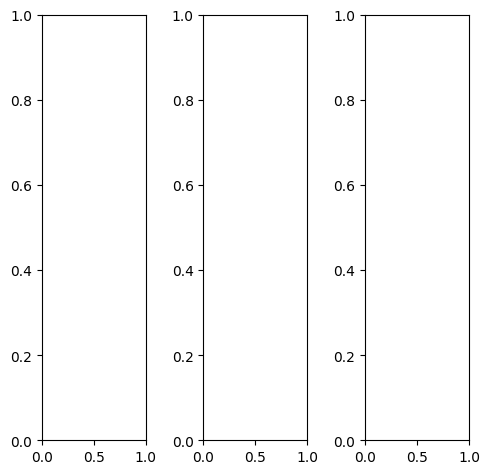

tensor([[[0.4784, 0.5059, 0.5529,  ..., 0.3176, 0.3137, 0.3176],
         [0.5020, 0.5255, 0.5529,  ..., 0.3412, 0.3451, 0.3412],
         [0.5216, 0.5333, 0.5412,  ..., 0.3725, 0.3686, 0.3686],
         ...,
         [0.3647, 0.4235, 0.4314,  ..., 0.4431, 0.4824, 0.3843],
         [0.3529, 0.4196, 0.4196,  ..., 0.4235, 0.4471, 0.3490],
         [0.3882, 0.4392, 0.4078,  ..., 0.4078, 0.3647, 0.3255]],

        [[0.4784, 0.5059, 0.5529,  ..., 0.3176, 0.3137, 0.3176],
         [0.5020, 0.5255, 0.5529,  ..., 0.3412, 0.3451, 0.3412],
         [0.5216, 0.5333, 0.5412,  ..., 0.3725, 0.3686, 0.3686],
         ...,
         [0.3647, 0.4235, 0.4314,  ..., 0.4431, 0.4824, 0.3843],
         [0.3529, 0.4196, 0.4196,  ..., 0.4235, 0.4471, 0.3490],
         [0.3882, 0.4392, 0.4078,  ..., 0.4078, 0.3647, 0.3255]],

        [[0.4784, 0.5059, 0.5529,  ..., 0.3176, 0.3137, 0.3176],
         [0.5020, 0.5255, 0.5529,  ..., 0.3412, 0.3451, 0.3412],
         [0.5216, 0.5333, 0.5412,  ..., 0.3725, 0.3686, 0.

tensor([[[0.4941, 0.5176, 0.5569,  ..., 0.2863, 0.2745, 0.2745],
         [0.5255, 0.5412, 0.5569,  ..., 0.3216, 0.3137, 0.3059],
         [0.5490, 0.5529, 0.5451,  ..., 0.3608, 0.3490, 0.3412],
         ...,
         [0.3647, 0.4275, 0.4588,  ..., 0.4510, 0.4784, 0.3882],
         [0.3529, 0.4275, 0.4314,  ..., 0.4392, 0.4627, 0.3529],
         [0.3961, 0.4431, 0.3922,  ..., 0.4353, 0.3961, 0.3412]],

        [[0.5020, 0.5333, 0.5843,  ..., 0.3490, 0.3490, 0.3529],
         [0.5255, 0.5529, 0.5922,  ..., 0.3725, 0.3765, 0.3725],
         [0.5412, 0.5647, 0.5804,  ..., 0.4039, 0.4000, 0.4000],
         ...,
         [0.3843, 0.4510, 0.4471,  ..., 0.4706, 0.5216, 0.4157],
         [0.3725, 0.4431, 0.4392,  ..., 0.4510, 0.4745, 0.3725],
         [0.4039, 0.4627, 0.4431,  ..., 0.4235, 0.3765, 0.3412]],

        [[0.3098, 0.3412, 0.3765,  ..., 0.2275, 0.2471, 0.2627],
         [0.3294, 0.3294, 0.3412,  ..., 0.2275, 0.2510, 0.2667],
         [0.3412, 0.3255, 0.3255,  ..., 0.2392, 0.2588, 0.

tensor([[[0.4544, 0.4230, 0.5157,  ..., 0.0492, 0.0638, 0.0737],
         [0.4583, 0.3438, 0.5046,  ..., 0.1177, 0.1187, 0.0827],
         [0.4658, 0.5307, 0.4666,  ..., 0.1818, 0.1855, 0.1426],
         ...,
         [0.2578, 0.4379, 0.4260,  ..., 0.5670, 0.5454, 0.2812],
         [0.2675, 0.3918, 0.4115,  ..., 0.4328, 0.4411, 0.2345],
         [0.2870, 0.3259, 0.2794,  ..., 0.3023, 0.2110, 0.1610]],

        [[0.5504, 0.5270, 0.6409,  ..., 0.1632, 0.1806, 0.1646],
         [0.4904, 0.4792, 0.5427,  ..., 0.2463, 0.2681, 0.1756],
         [0.5485, 0.6357, 0.6006,  ..., 0.3114, 0.3166, 0.2226],
         ...,
         [0.2244, 0.4105, 0.4613,  ..., 0.5444, 0.5548, 0.2330],
         [0.2354, 0.4253, 0.4421,  ..., 0.4456, 0.4668, 0.2142],
         [0.2591, 0.3195, 0.2882,  ..., 0.2826, 0.2039, 0.1092]],

        [[0.6846, 0.6417, 0.7831,  ..., 0.2845, 0.3068, 0.3029],
         [0.6980, 0.7253, 0.7609,  ..., 0.4113, 0.4242, 0.3437],
         [0.6961, 0.7415, 0.7468,  ..., 0.5077, 0.5010, 0.

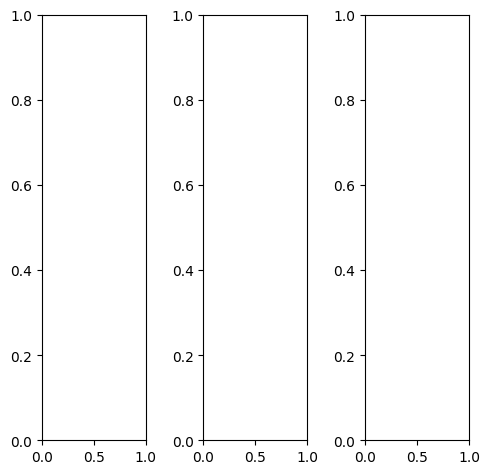

tensor([[[0.5255, 0.5529, 0.5725,  ..., 0.4157, 0.4235, 0.4275],
         [0.5451, 0.5922, 0.6549,  ..., 0.4392, 0.4392, 0.4353],
         [0.5412, 0.6000, 0.6706,  ..., 0.4784, 0.4549, 0.4706],
         ...,
         [0.4431, 0.3020, 0.2588,  ..., 0.6667, 0.6157, 0.5529],
         [0.4431, 0.3333, 0.2549,  ..., 0.5882, 0.5451, 0.4824],
         [0.3725, 0.3490, 0.3020,  ..., 0.4314, 0.4157, 0.4510]],

        [[0.5255, 0.5529, 0.5725,  ..., 0.4157, 0.4235, 0.4275],
         [0.5451, 0.5922, 0.6549,  ..., 0.4392, 0.4392, 0.4353],
         [0.5412, 0.6000, 0.6706,  ..., 0.4784, 0.4549, 0.4706],
         ...,
         [0.4431, 0.3020, 0.2588,  ..., 0.6667, 0.6157, 0.5529],
         [0.4431, 0.3333, 0.2549,  ..., 0.5882, 0.5451, 0.4824],
         [0.3725, 0.3490, 0.3020,  ..., 0.4314, 0.4157, 0.4510]],

        [[0.5255, 0.5529, 0.5725,  ..., 0.4157, 0.4235, 0.4275],
         [0.5451, 0.5922, 0.6549,  ..., 0.4392, 0.4392, 0.4353],
         [0.5412, 0.6000, 0.6706,  ..., 0.4784, 0.4549, 0.

tensor([[[0.5294, 0.5725, 0.5882,  ..., 0.3529, 0.3608, 0.3804],
         [0.5490, 0.6196, 0.6863,  ..., 0.3922, 0.3843, 0.3843],
         [0.5451, 0.6275, 0.7137,  ..., 0.4510, 0.4118, 0.4196],
         ...,
         [0.5843, 0.4196, 0.3333,  ..., 0.7451, 0.6902, 0.6275],
         [0.5922, 0.4627, 0.3373,  ..., 0.6745, 0.6275, 0.5647],
         [0.5137, 0.4941, 0.4118,  ..., 0.5216, 0.5020, 0.5294]],

        [[0.5216, 0.5490, 0.5686,  ..., 0.4353, 0.4392, 0.4353],
         [0.5451, 0.5882, 0.6471,  ..., 0.4471, 0.4510, 0.4510],
         [0.5451, 0.5961, 0.6627,  ..., 0.4824, 0.4667, 0.4863],
         ...,
         [0.4000, 0.2667, 0.2353,  ..., 0.6745, 0.6235, 0.5608],
         [0.3961, 0.2863, 0.2235,  ..., 0.5922, 0.5451, 0.4784],
         [0.3255, 0.2980, 0.2667,  ..., 0.4235, 0.4039, 0.4392]],

        [[0.5373, 0.5373, 0.5412,  ..., 0.4745, 0.5098, 0.5020],
         [0.5294, 0.5569, 0.6078,  ..., 0.5098, 0.5216, 0.4980],
         [0.5098, 0.5490, 0.6118,  ..., 0.5451, 0.5216, 0.

tensor([[[0.3803, 0.3312, 0.3140,  ..., 0.2279, 0.2563, 0.2817],
         [0.3381, 0.3376, 0.4418,  ..., 0.2574, 0.2698, 0.2605],
         [0.2664, 0.4070, 0.3478,  ..., 0.3061, 0.3045, 0.3137],
         ...,
         [0.4059, 0.2933, 0.2297,  ..., 0.5599, 0.5303, 0.4650],
         [0.3997, 0.3318, 0.2176,  ..., 0.5131, 0.4714, 0.4321],
         [0.3013, 0.2914, 0.2550,  ..., 0.3324, 0.3354, 0.4083]],

        [[0.4954, 0.4431, 0.4803,  ..., 0.3301, 0.3683, 0.3538],
         [0.3713, 0.4893, 0.5013,  ..., 0.4146, 0.4305, 0.3574],
         [0.4230, 0.5091, 0.5756,  ..., 0.4542, 0.4493, 0.3960],
         ...,
         [0.3348, 0.2274, 0.1782,  ..., 0.5710, 0.5350, 0.4290],
         [0.3521, 0.2809, 0.1640,  ..., 0.5308, 0.4674, 0.3885],
         [0.2526, 0.2423, 0.2066,  ..., 0.3133, 0.3021, 0.3532]],

        [[0.6388, 0.5278, 0.7090,  ..., 0.4927, 0.5258, 0.5055],
         [0.5806, 0.7271, 0.7568,  ..., 0.5691, 0.5784, 0.5198],
         [0.5553, 0.6373, 0.7929,  ..., 0.6073, 0.6094, 0.

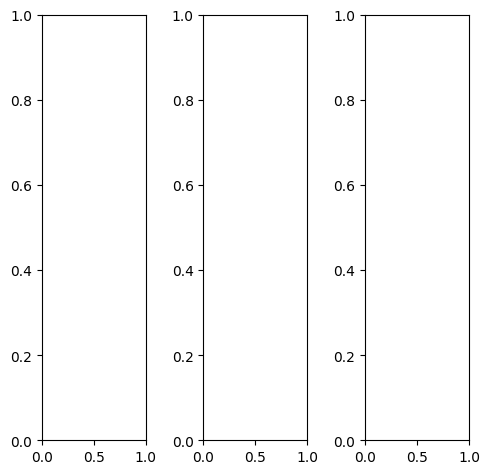

tensor([[[0.1451, 0.1529, 0.1373,  ..., 0.2235, 0.1961, 0.2157],
         [0.1490, 0.1608, 0.1490,  ..., 0.2039, 0.1725, 0.2275],
         [0.1686, 0.1647, 0.1686,  ..., 0.2157, 0.2078, 0.2039],
         ...,
         [0.3882, 0.4118, 0.4314,  ..., 0.5843, 0.5882, 0.5882],
         [0.4471, 0.4706, 0.4824,  ..., 0.6039, 0.6078, 0.6078],
         [0.4706, 0.4863, 0.5098,  ..., 0.6392, 0.6196, 0.6314]],

        [[0.1451, 0.1529, 0.1373,  ..., 0.2235, 0.1961, 0.2157],
         [0.1490, 0.1608, 0.1490,  ..., 0.2039, 0.1725, 0.2275],
         [0.1686, 0.1647, 0.1686,  ..., 0.2157, 0.2078, 0.2039],
         ...,
         [0.3882, 0.4118, 0.4314,  ..., 0.5843, 0.5882, 0.5882],
         [0.4471, 0.4706, 0.4824,  ..., 0.6039, 0.6078, 0.6078],
         [0.4706, 0.4863, 0.5098,  ..., 0.6392, 0.6196, 0.6314]],

        [[0.1451, 0.1529, 0.1373,  ..., 0.2235, 0.1961, 0.2157],
         [0.1490, 0.1608, 0.1490,  ..., 0.2039, 0.1725, 0.2275],
         [0.1686, 0.1647, 0.1686,  ..., 0.2157, 0.2078, 0.

tensor([[[0.1373, 0.1490, 0.1333,  ..., 0.1686, 0.1451, 0.1725],
         [0.1412, 0.1490, 0.1373,  ..., 0.1608, 0.1294, 0.1843],
         [0.1529, 0.1490, 0.1569,  ..., 0.1765, 0.1647, 0.1569],
         ...,
         [0.3922, 0.4196, 0.4431,  ..., 0.6157, 0.6196, 0.6196],
         [0.4667, 0.4902, 0.5059,  ..., 0.6353, 0.6392, 0.6392],
         [0.4980, 0.5176, 0.5490,  ..., 0.6706, 0.6510, 0.6627]],

        [[0.1451, 0.1529, 0.1373,  ..., 0.2510, 0.2196, 0.2392],
         [0.1529, 0.1608, 0.1490,  ..., 0.2275, 0.1961, 0.2510],
         [0.1725, 0.1686, 0.1725,  ..., 0.2353, 0.2314, 0.2275],
         ...,
         [0.4000, 0.4196, 0.4392,  ..., 0.5804, 0.5843, 0.5882],
         [0.4510, 0.4745, 0.4824,  ..., 0.6000, 0.6039, 0.6039],
         [0.4706, 0.4863, 0.5059,  ..., 0.6353, 0.6157, 0.6275]],

        [[0.1490, 0.1686, 0.1608,  ..., 0.2235, 0.1922, 0.2078],
         [0.1647, 0.1765, 0.1647,  ..., 0.2000, 0.1686, 0.2196],
         [0.1843, 0.1804, 0.1843,  ..., 0.2039, 0.2000, 0.

tensor([[[ 0.0786,  0.0881,  0.0042,  ...,  0.1546,  0.1495,  0.2213],
         [ 0.1346, -0.0032,  0.0468,  ...,  0.1205,  0.0805,  0.1880],
         [-0.0402,  0.0096, -0.0408,  ...,  0.1224,  0.1171,  0.1453],
         ...,
         [ 0.4273,  0.4451,  0.4714,  ...,  0.6154,  0.6276,  0.6656],
         [ 0.4950,  0.4965,  0.5262,  ...,  0.6194,  0.6426,  0.6764],
         [ 0.5304,  0.5445,  0.5539,  ...,  0.7177,  0.7043,  0.7097]],

        [[ 0.1496,  0.2288,  0.0325,  ...,  0.2228,  0.2193,  0.2731],
         [ 0.1512,  0.0707, -0.0604,  ...,  0.2071,  0.1939,  0.2473],
         [ 0.0353,  0.2149, -0.0583,  ...,  0.2079,  0.2145,  0.2254],
         ...,
         [ 0.4340,  0.4243,  0.4863,  ...,  0.6132,  0.6472,  0.6477],
         [ 0.4883,  0.5051,  0.5336,  ...,  0.6270,  0.6603,  0.6605],
         [ 0.5178,  0.5204,  0.5497,  ...,  0.6916,  0.6862,  0.6778]],

        [[ 0.2952,  0.1524,  0.1962,  ...,  0.3824,  0.3785,  0.4302],
         [ 0.2784,  0.1615,  0.2352,  ...,  0

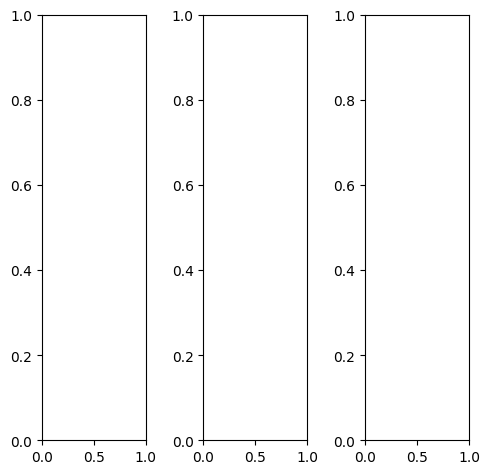

tensor([[[0.3059, 0.3255, 0.4235,  ..., 0.5098, 0.4667, 0.4118],
         [0.2627, 0.2745, 0.2941,  ..., 0.5216, 0.4863, 0.4353],
         [0.4000, 0.2863, 0.2314,  ..., 0.5020, 0.4431, 0.3961],
         ...,
         [0.1373, 0.1098, 0.0980,  ..., 0.6314, 0.5608, 0.3176],
         [0.1176, 0.0980, 0.0980,  ..., 0.4078, 0.4431, 0.3373],
         [0.1373, 0.1490, 0.1451,  ..., 0.3412, 0.2941, 0.2863]],

        [[0.3059, 0.3255, 0.4235,  ..., 0.5098, 0.4667, 0.4118],
         [0.2627, 0.2745, 0.2941,  ..., 0.5216, 0.4863, 0.4353],
         [0.4000, 0.2863, 0.2314,  ..., 0.5020, 0.4431, 0.3961],
         ...,
         [0.1373, 0.1098, 0.0980,  ..., 0.6314, 0.5608, 0.3176],
         [0.1176, 0.0980, 0.0980,  ..., 0.4078, 0.4431, 0.3373],
         [0.1373, 0.1490, 0.1451,  ..., 0.3412, 0.2941, 0.2863]],

        [[0.3059, 0.3255, 0.4235,  ..., 0.5098, 0.4667, 0.4118],
         [0.2627, 0.2745, 0.2941,  ..., 0.5216, 0.4863, 0.4353],
         [0.4000, 0.2863, 0.2314,  ..., 0.5020, 0.4431, 0.

tensor([[[0.2392, 0.2510, 0.3412,  ..., 0.4941, 0.4627, 0.4078],
         [0.2118, 0.2196, 0.2314,  ..., 0.5020, 0.4784, 0.4314],
         [0.3647, 0.2471, 0.1843,  ..., 0.4824, 0.4392, 0.3961],
         ...,
         [0.1176, 0.0980, 0.0941,  ..., 0.6627, 0.5804, 0.3294],
         [0.1059, 0.0902, 0.0980,  ..., 0.4471, 0.4706, 0.3529],
         [0.1294, 0.1451, 0.1529,  ..., 0.3922, 0.3333, 0.3098]],

        [[0.3294, 0.3529, 0.4549,  ..., 0.5137, 0.4667, 0.4118],
         [0.2784, 0.2941, 0.3216,  ..., 0.5333, 0.4902, 0.4353],
         [0.4039, 0.2980, 0.2510,  ..., 0.5098, 0.4471, 0.3961],
         ...,
         [0.1451, 0.1176, 0.1059,  ..., 0.6314, 0.5608, 0.3216],
         [0.1255, 0.1059, 0.1020,  ..., 0.4039, 0.4431, 0.3333],
         [0.1412, 0.1529, 0.1490,  ..., 0.3333, 0.2863, 0.2824]],

        [[0.3608, 0.3725, 0.4706,  ..., 0.5137, 0.4627, 0.4196],
         [0.3255, 0.3255, 0.3333,  ..., 0.5255, 0.4863, 0.4353],
         [0.4627, 0.3333, 0.2588,  ..., 0.4980, 0.4353, 0.

tensor([[[0.3094, 0.3032, 0.3300,  ..., 0.4751, 0.4133, 0.4508],
         [0.2616, 0.2259, 0.1962,  ..., 0.4899, 0.4683, 0.4379],
         [0.3451, 0.2494, 0.0458,  ..., 0.4790, 0.4349, 0.4010],
         ...,
         [0.1017, 0.0947, 0.0746,  ..., 0.7811, 0.6877, 0.4326],
         [0.0911, 0.0827, 0.0807,  ..., 0.5000, 0.5603, 0.4745],
         [0.1404, 0.1310, 0.1394,  ..., 0.4450, 0.3819, 0.4150]],

        [[0.3807, 0.4145, 0.4247,  ..., 0.6004, 0.5478, 0.5079],
         [0.3063, 0.3415, 0.2016,  ..., 0.6517, 0.6233, 0.5700],
         [0.4399, 0.3598, 0.1339,  ..., 0.6083, 0.5700, 0.5098],
         ...,
         [0.1463, 0.1225, 0.1161,  ..., 0.7708, 0.7126, 0.3936],
         [0.1242, 0.1104, 0.1087,  ..., 0.4898, 0.5470, 0.4353],
         [0.1539, 0.1496, 0.1598,  ..., 0.4280, 0.3693, 0.3894]],

        [[0.4955, 0.4093, 0.5646,  ..., 0.8242, 0.7727, 0.7134],
         [0.4169, 0.4402, 0.4281,  ..., 0.8653, 0.8618, 0.7465],
         [0.5131, 0.3869, 0.3392,  ..., 0.8600, 0.8314, 0.

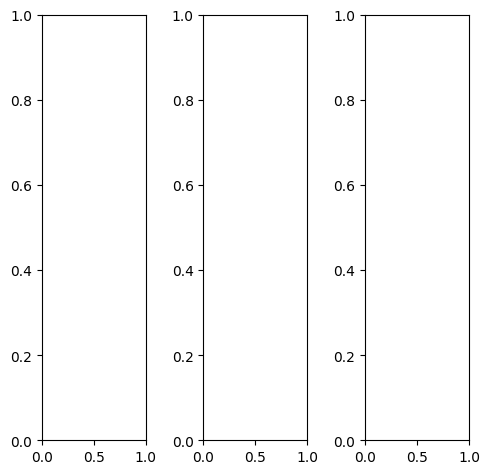

EPOCH: 17.000  val_loss: 0.003  (2036.89s - 9944.81s remaining)

tensor([[[0.5216, 0.5216, 0.5216,  ..., 0.5490, 0.5490, 0.5569],
         [0.5373, 0.5373, 0.5373,  ..., 0.5608, 0.5608, 0.5725],
         [0.5686, 0.5647, 0.5647,  ..., 0.5882, 0.5843, 0.5922],
         ...,
         [0.6118, 0.6039, 0.6000,  ..., 0.6745, 0.6824, 0.7020],
         [0.5255, 0.5137, 0.5098,  ..., 0.5765, 0.5843, 0.6039],
         [0.4706, 0.4627, 0.4588,  ..., 0.5098, 0.5176, 0.5294]],

        [[0.5216, 0.5216, 0.5216,  ..., 0.5490, 0.5490, 0.5569],
         [0.5373, 0.5373, 0.5373,  ..., 0.5608, 0.5608, 0.5725],
         [0.5686, 0.5647, 0.5647,  ..., 0.5882, 0.5843, 0.5922],
         ...,
         [0.6118, 0.6039, 0.6000,  ..., 0.6745, 0.6824, 0.7020],
         [0.5255, 0.5137, 0.5098,  ..., 0.5765, 0.5843, 0.6039],
         [0.4706, 0.4627, 0.4588,  ..., 0.5098, 0.5176, 0.5294]],

        [[0.5216, 0.5216, 0.5216,  ..., 0.5490, 0.5490, 0.5569],
         [0.5373, 0.5373, 0.5373,  ..., 0.5608, 0.5608, 0.5725],
         [0.5686, 0.5647, 0.5647,  ..., 0.5882, 0.5843, 0.

tensor([[[0.4980, 0.4980, 0.4980,  ..., 0.5255, 0.5255, 0.5294],
         [0.5137, 0.5137, 0.5137,  ..., 0.5373, 0.5412, 0.5490],
         [0.5451, 0.5412, 0.5412,  ..., 0.5647, 0.5647, 0.5686],
         ...,
         [0.6000, 0.5922, 0.5882,  ..., 0.6549, 0.6588, 0.6784],
         [0.5137, 0.5020, 0.4980,  ..., 0.5569, 0.5647, 0.5843],
         [0.4588, 0.4549, 0.4471,  ..., 0.4980, 0.5059, 0.5176]],

        [[0.5176, 0.5176, 0.5176,  ..., 0.5451, 0.5451, 0.5529],
         [0.5333, 0.5333, 0.5333,  ..., 0.5569, 0.5569, 0.5686],
         [0.5686, 0.5647, 0.5647,  ..., 0.5843, 0.5843, 0.5922],
         ...,
         [0.6039, 0.5961, 0.5922,  ..., 0.6784, 0.6863, 0.7020],
         [0.5176, 0.5059, 0.5020,  ..., 0.5725, 0.5804, 0.6000],
         [0.4627, 0.4549, 0.4510,  ..., 0.5020, 0.5098, 0.5216]],

        [[0.6000, 0.6000, 0.6000,  ..., 0.6275, 0.6275, 0.6353],
         [0.6078, 0.6078, 0.6078,  ..., 0.6314, 0.6353, 0.6431],
         [0.6353, 0.6314, 0.6314,  ..., 0.6549, 0.6510, 0.

tensor([[[0.4413, 0.3549, 0.3383,  ..., 0.3877, 0.4162, 0.4599],
         [0.4132, 0.3401, 0.3239,  ..., 0.3846, 0.3898, 0.4272],
         [0.4143, 0.3598, 0.3760,  ..., 0.4275, 0.4320, 0.4298],
         ...,
         [0.6152, 0.6078, 0.5975,  ..., 0.6769, 0.6798, 0.7042],
         [0.5305, 0.5171, 0.5098,  ..., 0.5812, 0.5844, 0.6049],
         [0.4869, 0.4669, 0.4570,  ..., 0.5160, 0.5345, 0.5527]],

        [[0.5614, 0.5810, 0.5614,  ..., 0.5885, 0.5918, 0.6021],
         [0.5767, 0.5579, 0.5720,  ..., 0.5923, 0.5959, 0.6113],
         [0.6116, 0.6038, 0.5992,  ..., 0.6228, 0.6025, 0.6363],
         ...,
         [0.6283, 0.6133, 0.6186,  ..., 0.6677, 0.6785, 0.7094],
         [0.5281, 0.5189, 0.5192,  ..., 0.5738, 0.5826, 0.6103],
         [0.4891, 0.4667, 0.4691,  ..., 0.5073, 0.5196, 0.5526]],

        [[0.7380, 0.7649, 0.8087,  ..., 0.7877, 0.7965, 0.7484],
         [0.7920, 0.8019, 0.8159,  ..., 0.8189, 0.7957, 0.7859],
         [0.8240, 0.8111, 0.8504,  ..., 0.8278, 0.8206, 0.

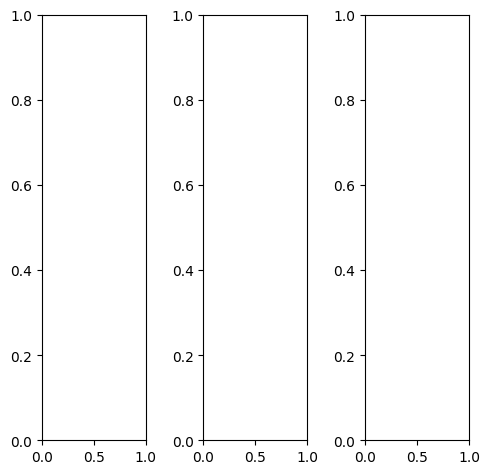

tensor([[[0.4118, 0.3490, 0.3451,  ..., 0.4275, 0.4706, 0.4784],
         [0.3490, 0.2667, 0.3922,  ..., 0.3608, 0.4039, 0.4824],
         [0.2863, 0.2902, 0.4157,  ..., 0.3882, 0.4392, 0.5333],
         ...,
         [0.6588, 0.6863, 0.6784,  ..., 0.5922, 0.5882, 0.5529],
         [0.6235, 0.6667, 0.6824,  ..., 0.5961, 0.5961, 0.5490],
         [0.6431, 0.6392, 0.6510,  ..., 0.5765, 0.5765, 0.5608]],

        [[0.4118, 0.3490, 0.3451,  ..., 0.4275, 0.4706, 0.4784],
         [0.3490, 0.2667, 0.3922,  ..., 0.3608, 0.4039, 0.4824],
         [0.2863, 0.2902, 0.4157,  ..., 0.3882, 0.4392, 0.5333],
         ...,
         [0.6588, 0.6863, 0.6784,  ..., 0.5922, 0.5882, 0.5529],
         [0.6235, 0.6667, 0.6824,  ..., 0.5961, 0.5961, 0.5490],
         [0.6431, 0.6392, 0.6510,  ..., 0.5765, 0.5765, 0.5608]],

        [[0.4118, 0.3490, 0.3451,  ..., 0.4275, 0.4706, 0.4784],
         [0.3490, 0.2667, 0.3922,  ..., 0.3608, 0.4039, 0.4824],
         [0.2863, 0.2902, 0.4157,  ..., 0.3882, 0.4392, 0.

tensor([[[0.3961, 0.3412, 0.3333,  ..., 0.4196, 0.4627, 0.4667],
         [0.3333, 0.2588, 0.3765,  ..., 0.3608, 0.4000, 0.4667],
         [0.2706, 0.2902, 0.4000,  ..., 0.3882, 0.4392, 0.5176],
         ...,
         [0.6588, 0.6784, 0.6667,  ..., 0.5961, 0.5765, 0.5333],
         [0.6157, 0.6471, 0.6588,  ..., 0.5922, 0.5765, 0.5216],
         [0.6196, 0.6039, 0.6157,  ..., 0.5647, 0.5451, 0.5294]],

        [[0.4392, 0.3725, 0.3686,  ..., 0.4431, 0.4824, 0.4902],
         [0.3765, 0.2824, 0.4118,  ..., 0.3765, 0.4157, 0.4941],
         [0.3098, 0.3020, 0.4353,  ..., 0.4118, 0.4627, 0.5529],
         ...,
         [0.7059, 0.7333, 0.7255,  ..., 0.6275, 0.6314, 0.6000],
         [0.6745, 0.7176, 0.7333,  ..., 0.6392, 0.6510, 0.6000],
         [0.7020, 0.6980, 0.7137,  ..., 0.6235, 0.6353, 0.6196]],

        [[0.3059, 0.2549, 0.2549,  ..., 0.3765, 0.4392, 0.4549],
         [0.2549, 0.2000, 0.3333,  ..., 0.2745, 0.3373, 0.4784],
         [0.1961, 0.2157, 0.3451,  ..., 0.2745, 0.3255, 0.

tensor([[[0.3966, 0.3462, 0.3532,  ..., 0.4127, 0.4707, 0.4937],
         [0.3350, 0.2644, 0.3988,  ..., 0.3647, 0.4046, 0.4862],
         [0.2909, 0.2998, 0.4271,  ..., 0.4080, 0.4469, 0.5444],
         ...,
         [0.6938, 0.7262, 0.7124,  ..., 0.6279, 0.6187, 0.5796],
         [0.6548, 0.7054, 0.7074,  ..., 0.6091, 0.6257, 0.5689],
         [0.6706, 0.6723, 0.6717,  ..., 0.5997, 0.5984, 0.5837]],

        [[0.4183, 0.3538, 0.3650,  ..., 0.4231, 0.4842, 0.4994],
         [0.3513, 0.2821, 0.4093,  ..., 0.3598, 0.3969, 0.4954],
         [0.2976, 0.3139, 0.4344,  ..., 0.3908, 0.4429, 0.5453],
         ...,
         [0.6740, 0.6994, 0.6877,  ..., 0.6055, 0.5943, 0.5609],
         [0.6369, 0.6815, 0.6964,  ..., 0.5969, 0.6022, 0.5579],
         [0.6454, 0.6529, 0.6501,  ..., 0.5799, 0.5809, 0.5717]],

        [[0.3265, 0.2736, 0.2791,  ..., 0.3309, 0.3880, 0.4171],
         [0.2594, 0.1962, 0.3031,  ..., 0.2754, 0.3103, 0.4019],
         [0.2128, 0.2225, 0.3200,  ..., 0.3016, 0.3479, 0.

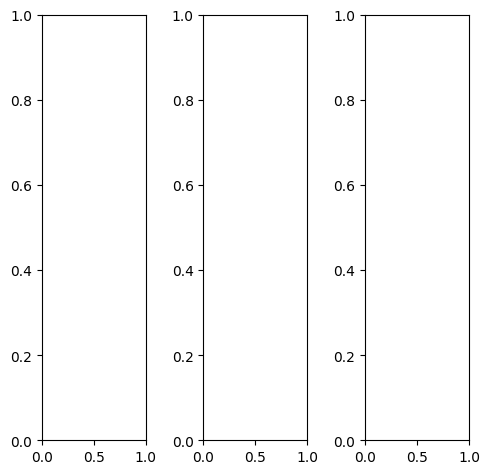

tensor([[[0.3216, 0.3725, 0.3529,  ..., 0.2353, 0.2510, 0.2667],
         [0.3294, 0.4118, 0.4000,  ..., 0.2431, 0.2471, 0.2667],
         [0.2784, 0.4549, 0.4471,  ..., 0.2431, 0.2549, 0.2706],
         ...,
         [0.4471, 0.4039, 0.3373,  ..., 0.4667, 0.3961, 0.1882],
         [0.3294, 0.3922, 0.3922,  ..., 0.4784, 0.4275, 0.3098],
         [0.5098, 0.4196, 0.2824,  ..., 0.3961, 0.3765, 0.3098]],

        [[0.3216, 0.3725, 0.3529,  ..., 0.2353, 0.2510, 0.2667],
         [0.3294, 0.4118, 0.4000,  ..., 0.2431, 0.2471, 0.2667],
         [0.2784, 0.4549, 0.4471,  ..., 0.2431, 0.2549, 0.2706],
         ...,
         [0.4471, 0.4039, 0.3373,  ..., 0.4667, 0.3961, 0.1882],
         [0.3294, 0.3922, 0.3922,  ..., 0.4784, 0.4275, 0.3098],
         [0.5098, 0.4196, 0.2824,  ..., 0.3961, 0.3765, 0.3098]],

        [[0.3216, 0.3725, 0.3529,  ..., 0.2353, 0.2510, 0.2667],
         [0.3294, 0.4118, 0.4000,  ..., 0.2431, 0.2471, 0.2667],
         [0.2784, 0.4549, 0.4471,  ..., 0.2431, 0.2549, 0.

tensor([[[0.3098, 0.3569, 0.3333,  ..., 0.2275, 0.2353, 0.2471],
         [0.3294, 0.3882, 0.3804,  ..., 0.2353, 0.2314, 0.2471],
         [0.2863, 0.4314, 0.4275,  ..., 0.2353, 0.2392, 0.2510],
         ...,
         [0.4235, 0.3804, 0.3137,  ..., 0.4157, 0.3569, 0.1373],
         [0.2824, 0.3490, 0.3765,  ..., 0.4353, 0.3961, 0.2667],
         [0.4549, 0.3725, 0.2745,  ..., 0.3608, 0.3490, 0.2784]],

        [[0.3216, 0.3725, 0.3608,  ..., 0.2314, 0.2510, 0.2706],
         [0.3255, 0.4118, 0.4039,  ..., 0.2392, 0.2471, 0.2706],
         [0.2706, 0.4588, 0.4510,  ..., 0.2392, 0.2549, 0.2745],
         ...,
         [0.4784, 0.4314, 0.3569,  ..., 0.5137, 0.4353, 0.2275],
         [0.3647, 0.4235, 0.4157,  ..., 0.5176, 0.4627, 0.3490],
         [0.5569, 0.4588, 0.2980,  ..., 0.4275, 0.4078, 0.3412]],

        [[0.3451, 0.4039, 0.3647,  ..., 0.2706, 0.2824, 0.3020],
         [0.3569, 0.4588, 0.4471,  ..., 0.2784, 0.2824, 0.3020],
         [0.3059, 0.5059, 0.4784,  ..., 0.2784, 0.2902, 0.

tensor([[[0.3284, 0.3788, 0.3492,  ..., 0.2413, 0.2507, 0.2646],
         [0.3246, 0.4136, 0.4138,  ..., 0.2602, 0.2662, 0.2682],
         [0.2853, 0.4763, 0.4718,  ..., 0.2643, 0.2748, 0.2806],
         ...,
         [0.4583, 0.4223, 0.3593,  ..., 0.4899, 0.4056, 0.2058],
         [0.3740, 0.4204, 0.4352,  ..., 0.4952, 0.4600, 0.3172],
         [0.5049, 0.4314, 0.3109,  ..., 0.4304, 0.4034, 0.3495]],

        [[0.3409, 0.3824, 0.3569,  ..., 0.2332, 0.2516, 0.2733],
         [0.3281, 0.4062, 0.4069,  ..., 0.2441, 0.2587, 0.2675],
         [0.2821, 0.4604, 0.4563,  ..., 0.2446, 0.2618, 0.2725],
         ...,
         [0.4493, 0.3965, 0.3441,  ..., 0.4801, 0.3943, 0.2012],
         [0.3607, 0.4096, 0.3919,  ..., 0.4886, 0.4328, 0.3056],
         [0.4962, 0.4077, 0.2918,  ..., 0.4164, 0.3647, 0.3311]],

        [[0.2760, 0.3107, 0.2841,  ..., 0.1875, 0.2048, 0.2271],
         [0.2622, 0.3353, 0.3261,  ..., 0.1972, 0.2022, 0.2111],
         [0.2211, 0.3805, 0.3688,  ..., 0.2054, 0.2087, 0.

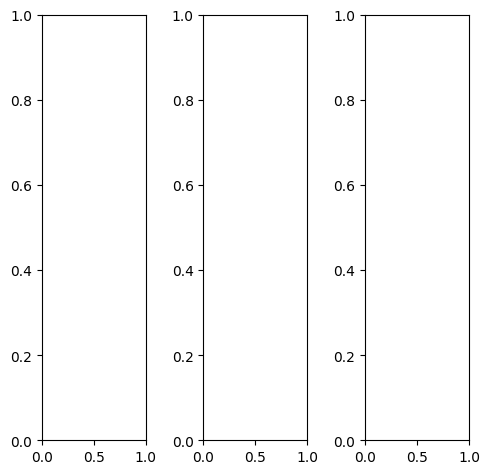

tensor([[[0.9451, 0.9451, 0.9490,  ..., 0.8588, 0.8510, 0.8549],
         [0.9490, 0.9529, 0.9608,  ..., 0.8667, 0.8745, 0.8745],
         [0.9333, 0.9451, 0.9569,  ..., 0.8745, 0.8824, 0.8824],
         ...,
         [0.4039, 0.3843, 0.4510,  ..., 0.4784, 0.5490, 0.5451],
         [0.3922, 0.4745, 0.4941,  ..., 0.3843, 0.4039, 0.4784],
         [0.4510, 0.5137, 0.4745,  ..., 0.3647, 0.3804, 0.4000]],

        [[0.9451, 0.9451, 0.9490,  ..., 0.8588, 0.8510, 0.8549],
         [0.9490, 0.9529, 0.9608,  ..., 0.8667, 0.8745, 0.8745],
         [0.9333, 0.9451, 0.9569,  ..., 0.8745, 0.8824, 0.8824],
         ...,
         [0.4039, 0.3843, 0.4510,  ..., 0.4784, 0.5490, 0.5451],
         [0.3922, 0.4745, 0.4941,  ..., 0.3843, 0.4039, 0.4784],
         [0.4510, 0.5137, 0.4745,  ..., 0.3647, 0.3804, 0.4000]],

        [[0.9451, 0.9451, 0.9490,  ..., 0.8588, 0.8510, 0.8549],
         [0.9490, 0.9529, 0.9608,  ..., 0.8667, 0.8745, 0.8745],
         [0.9333, 0.9451, 0.9569,  ..., 0.8745, 0.8824, 0.

tensor([[[0.9412, 0.9451, 0.9569,  ..., 0.8157, 0.8118, 0.8118],
         [0.9412, 0.9529, 0.9647,  ..., 0.8196, 0.8235, 0.8275],
         [0.9176, 0.9373, 0.9529,  ..., 0.8275, 0.8353, 0.8392],
         ...,
         [0.2745, 0.2588, 0.3216,  ..., 0.3765, 0.4431, 0.4353],
         [0.2706, 0.3529, 0.3725,  ..., 0.2980, 0.3098, 0.3804],
         [0.3294, 0.3961, 0.3529,  ..., 0.2784, 0.2863, 0.3059]],

        [[0.9451, 0.9451, 0.9451,  ..., 0.8667, 0.8588, 0.8627],
         [0.9490, 0.9529, 0.9569,  ..., 0.8784, 0.8863, 0.8863],
         [0.9373, 0.9451, 0.9529,  ..., 0.8902, 0.8980, 0.8941],
         ...,
         [0.4392, 0.4196, 0.4863,  ..., 0.4980, 0.5725, 0.5725],
         [0.4235, 0.5059, 0.5255,  ..., 0.3961, 0.4196, 0.4980],
         [0.4824, 0.5451, 0.5059,  ..., 0.3765, 0.3961, 0.4196]],

        [[0.9529, 0.9529, 0.9569,  ..., 0.9294, 0.9255, 0.9255],
         [0.9608, 0.9686, 0.9765,  ..., 0.9294, 0.9373, 0.9412],
         [0.9490, 0.9608, 0.9725,  ..., 0.9294, 0.9373, 0.

tensor([[[0.9300, 0.8908, 0.8985,  ..., 0.8153, 0.8142, 0.8059],
         [0.9044, 0.8751, 0.8370,  ..., 0.8169, 0.8431, 0.8359],
         [0.8992, 0.8830, 0.8805,  ..., 0.8359, 0.8545, 0.8419],
         ...,
         [0.3767, 0.3660, 0.4245,  ..., 0.4752, 0.5504, 0.5482],
         [0.3777, 0.4704, 0.4588,  ..., 0.3703, 0.3809, 0.4751],
         [0.4543, 0.5097, 0.4612,  ..., 0.3531, 0.3775, 0.4197]],

        [[0.9420, 0.9626, 0.9024,  ..., 0.8618, 0.8617, 0.8750],
         [0.9367, 0.9166, 0.8965,  ..., 0.8753, 0.8816, 0.8946],
         [0.9164, 0.9518, 0.9229,  ..., 0.8875, 0.9025, 0.8879],
         ...,
         [0.4086, 0.3886, 0.4619,  ..., 0.4886, 0.5652, 0.5583],
         [0.3938, 0.4823, 0.4903,  ..., 0.3913, 0.4074, 0.4887],
         [0.4782, 0.5204, 0.4879,  ..., 0.3760, 0.3884, 0.4348]],

        [[0.9757, 0.9775, 0.9610,  ..., 0.9181, 0.9225, 0.9119],
         [0.9579, 0.9487, 0.9566,  ..., 0.9372, 0.9402, 0.9428],
         [0.9690, 0.9545, 0.9276,  ..., 0.9316, 0.9477, 0.

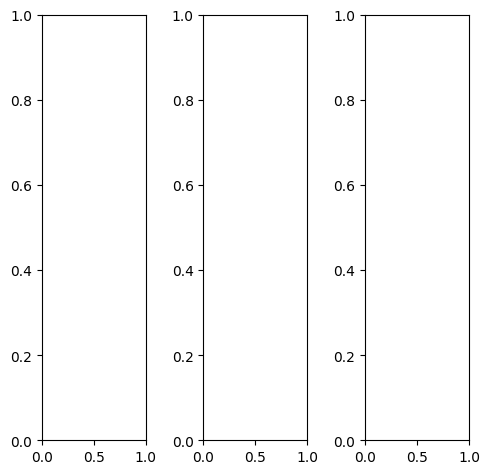

tensor([[[0.5961, 0.5961, 0.5961,  ..., 0.2314, 0.4784, 0.5647],
         [0.5843, 0.5843, 0.5843,  ..., 0.2667, 0.4157, 0.5333],
         [0.5647, 0.5608, 0.5686,  ..., 0.3255, 0.3725, 0.5216],
         ...,
         [0.2392, 0.2314, 0.2314,  ..., 0.2392, 0.2157, 0.2471],
         [0.2157, 0.2157, 0.2157,  ..., 0.2078, 0.2000, 0.2392],
         [0.7216, 0.7216, 0.7255,  ..., 0.7216, 0.7216, 0.7294]],

        [[0.5961, 0.5961, 0.5961,  ..., 0.2314, 0.4784, 0.5647],
         [0.5843, 0.5843, 0.5843,  ..., 0.2667, 0.4157, 0.5333],
         [0.5647, 0.5608, 0.5686,  ..., 0.3255, 0.3725, 0.5216],
         ...,
         [0.2392, 0.2314, 0.2314,  ..., 0.2392, 0.2157, 0.2471],
         [0.2157, 0.2157, 0.2157,  ..., 0.2078, 0.2000, 0.2392],
         [0.7216, 0.7216, 0.7255,  ..., 0.7216, 0.7216, 0.7294]],

        [[0.5961, 0.5961, 0.5961,  ..., 0.2314, 0.4784, 0.5647],
         [0.5843, 0.5843, 0.5843,  ..., 0.2667, 0.4157, 0.5333],
         [0.5647, 0.5608, 0.5686,  ..., 0.3255, 0.3725, 0.

tensor([[[0.5686, 0.5686, 0.5686,  ..., 0.2118, 0.4431, 0.5294],
         [0.5569, 0.5569, 0.5569,  ..., 0.2510, 0.3922, 0.5059],
         [0.5373, 0.5333, 0.5412,  ..., 0.3216, 0.3647, 0.5020],
         ...,
         [0.2039, 0.2039, 0.2078,  ..., 0.2275, 0.2039, 0.2314],
         [0.2000, 0.2000, 0.2039,  ..., 0.2000, 0.1882, 0.2196],
         [0.7255, 0.7216, 0.7216,  ..., 0.7176, 0.7137, 0.7176]],

        [[0.6078, 0.6118, 0.6078,  ..., 0.2353, 0.4902, 0.5765],
         [0.5961, 0.5961, 0.5961,  ..., 0.2667, 0.4196, 0.5373],
         [0.5725, 0.5725, 0.5765,  ..., 0.3216, 0.3725, 0.5176],
         ...,
         [0.2353, 0.2275, 0.2275,  ..., 0.2314, 0.2118, 0.2471],
         [0.2118, 0.2078, 0.2118,  ..., 0.2039, 0.1961, 0.2392],
         [0.7176, 0.7137, 0.7216,  ..., 0.7176, 0.7216, 0.7333]],

        [[0.6039, 0.6039, 0.6039,  ..., 0.2784, 0.5137, 0.5882],
         [0.5961, 0.5961, 0.6000,  ..., 0.3020, 0.4549, 0.5804],
         [0.5843, 0.5804, 0.5882,  ..., 0.3529, 0.4078, 0.

tensor([[[0.5943, 0.5885, 0.5867,  ..., 0.2483, 0.4400, 0.5588],
         [0.5870, 0.5795, 0.5737,  ..., 0.2610, 0.4076, 0.5207],
         [0.5508, 0.5505, 0.5651,  ..., 0.3276, 0.3734, 0.5293],
         ...,
         [0.2331, 0.2501, 0.2524,  ..., 0.2483, 0.2167, 0.2606],
         [0.2403, 0.2262, 0.2223,  ..., 0.2118, 0.1945, 0.2453],
         [0.6646, 0.7099, 0.7136,  ..., 0.7142, 0.6962, 0.6393]],

        [[0.6073, 0.6108, 0.6105,  ..., 0.2518, 0.4715, 0.5695],
         [0.6004, 0.5889, 0.6008,  ..., 0.2704, 0.4078, 0.5478],
         [0.5729, 0.5713, 0.5876,  ..., 0.3372, 0.3801, 0.5288],
         ...,
         [0.2213, 0.2205, 0.2320,  ..., 0.2377, 0.2190, 0.2661],
         [0.2354, 0.2340, 0.2229,  ..., 0.2158, 0.2118, 0.2606],
         [0.6662, 0.6963, 0.7073,  ..., 0.7005, 0.6819, 0.6498]],

        [[0.5891, 0.5853, 0.5718,  ..., 0.2145, 0.4210, 0.5173],
         [0.5706, 0.5544, 0.5525,  ..., 0.2291, 0.3645, 0.4813],
         [0.5356, 0.5261, 0.5381,  ..., 0.2772, 0.3375, 0.

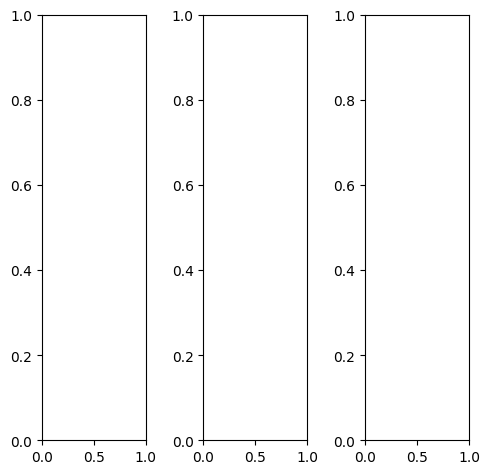

EPOCH: 17.255  trn_loss: 0.005  (2066.17s - 9908.09s remaining)

tensor([[[0.6235, 0.3569, 0.3333,  ..., 0.7098, 0.8588, 0.9098],
         [0.7059, 0.3922, 0.3020,  ..., 0.8039, 0.8314, 0.8353],
         [0.7804, 0.5451, 0.3333,  ..., 0.8588, 0.8471, 0.7765],
         ...,
         [0.6667, 0.5333, 0.6627,  ..., 0.7804, 0.7922, 0.8039],
         [0.8431, 0.7294, 0.7490,  ..., 0.8471, 0.8588, 0.8314],
         [0.8863, 0.8431, 0.8039,  ..., 0.8588, 0.8745, 0.8706]],

        [[0.6235, 0.3569, 0.3333,  ..., 0.7098, 0.8588, 0.9098],
         [0.7059, 0.3922, 0.3020,  ..., 0.8039, 0.8314, 0.8353],
         [0.7804, 0.5451, 0.3333,  ..., 0.8588, 0.8471, 0.7765],
         ...,
         [0.6667, 0.5333, 0.6627,  ..., 0.7804, 0.7922, 0.8039],
         [0.8431, 0.7294, 0.7490,  ..., 0.8471, 0.8588, 0.8314],
         [0.8863, 0.8431, 0.8039,  ..., 0.8588, 0.8745, 0.8706]],

        [[0.6235, 0.3569, 0.3333,  ..., 0.7098, 0.8588, 0.9098],
         [0.7059, 0.3922, 0.3020,  ..., 0.8039, 0.8314, 0.8353],
         [0.7804, 0.5451, 0.3333,  ..., 0.8588, 0.8471, 0.

tensor([[[0.6745, 0.3843, 0.3647,  ..., 0.7529, 0.9020, 0.9412],
         [0.7569, 0.4196, 0.3333,  ..., 0.8353, 0.8667, 0.8745],
         [0.8275, 0.5765, 0.3647,  ..., 0.8863, 0.8784, 0.8196],
         ...,
         [0.7137, 0.5961, 0.7373,  ..., 0.8549, 0.8706, 0.8824],
         [0.8824, 0.7804, 0.8118,  ..., 0.9216, 0.9373, 0.9098],
         [0.9373, 0.8941, 0.8706,  ..., 0.9373, 0.9451, 0.9412]],

        [[0.6078, 0.3412, 0.3137,  ..., 0.6902, 0.8431, 0.8941],
         [0.6863, 0.3765, 0.2824,  ..., 0.7882, 0.8157, 0.8196],
         [0.7569, 0.5294, 0.3137,  ..., 0.8471, 0.8353, 0.7608],
         ...,
         [0.6392, 0.5020, 0.6235,  ..., 0.7451, 0.7569, 0.7686],
         [0.8235, 0.7059, 0.7176,  ..., 0.8118, 0.8235, 0.7961],
         [0.8627, 0.8157, 0.7725,  ..., 0.8235, 0.8392, 0.8392]],

        [[0.5765, 0.3569, 0.3490,  ..., 0.6824, 0.8392, 0.8941],
         [0.6784, 0.3961, 0.3176,  ..., 0.7882, 0.8196, 0.8196],
         [0.7647, 0.5608, 0.3490,  ..., 0.8549, 0.8392, 0.

tensor([[[ 0.2812,  0.1337, -0.0186,  ...,  0.3673,  0.4938,  0.6042],
         [ 0.3720,  0.0368, -0.0768,  ...,  0.3753,  0.4480,  0.5152],
         [ 0.3641,  0.1675, -0.1222,  ...,  0.4445,  0.4657,  0.4478],
         ...,
         [ 0.4630,  0.4044,  0.4710,  ...,  0.5195,  0.5361,  0.6005],
         [ 0.6431,  0.5545,  0.5648,  ...,  0.5780,  0.6139,  0.6286],
         [ 0.6704,  0.6570,  0.6085,  ...,  0.6384,  0.6637,  0.6629]],

        [[ 0.3766,  0.2827,  0.1127,  ...,  0.4665,  0.6470,  0.6685],
         [ 0.3884,  0.1360, -0.1031,  ...,  0.5398,  0.5993,  0.6389],
         [ 0.4848,  0.3296, -0.0212,  ...,  0.5700,  0.5904,  0.5546],
         ...,
         [ 0.4051,  0.3076,  0.4183,  ...,  0.5109,  0.5507,  0.5549],
         [ 0.5851,  0.4939,  0.5214,  ...,  0.5774,  0.6044,  0.5929],
         [ 0.6018,  0.5908,  0.5698,  ...,  0.6019,  0.6304,  0.6163]],

        [[ 0.5267,  0.2215,  0.2355,  ...,  0.7260,  0.8963,  0.8893],
         [ 0.5540,  0.2896,  0.1972,  ...,  0

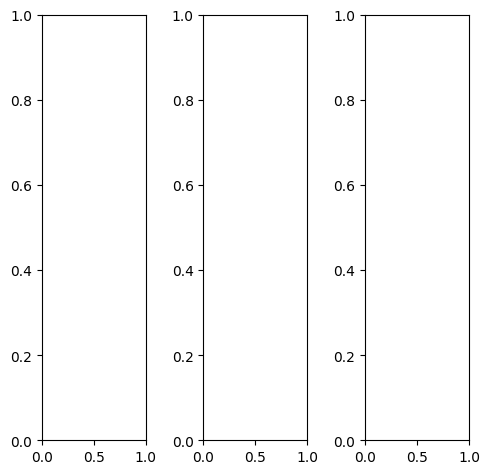

tensor([[[0.6078, 0.6196, 0.6078,  ..., 0.4549, 0.4588, 0.4392],
         [0.5569, 0.5608, 0.5451,  ..., 0.4667, 0.4745, 0.4510],
         [0.5608, 0.5569, 0.5333,  ..., 0.4863, 0.4902, 0.4627],
         ...,
         [0.4235, 0.4275, 0.4275,  ..., 0.4314, 0.4431, 0.4196],
         [0.4275, 0.4314, 0.4314,  ..., 0.4980, 0.4941, 0.4549],
         [0.4196, 0.4235, 0.4314,  ..., 0.5451, 0.5686, 0.5451]],

        [[0.6078, 0.6196, 0.6078,  ..., 0.4549, 0.4588, 0.4392],
         [0.5569, 0.5608, 0.5451,  ..., 0.4667, 0.4745, 0.4510],
         [0.5608, 0.5569, 0.5333,  ..., 0.4863, 0.4902, 0.4627],
         ...,
         [0.4235, 0.4275, 0.4275,  ..., 0.4314, 0.4431, 0.4196],
         [0.4275, 0.4314, 0.4314,  ..., 0.4980, 0.4941, 0.4549],
         [0.4196, 0.4235, 0.4314,  ..., 0.5451, 0.5686, 0.5451]],

        [[0.6078, 0.6196, 0.6078,  ..., 0.4549, 0.4588, 0.4392],
         [0.5569, 0.5608, 0.5451,  ..., 0.4667, 0.4745, 0.4510],
         [0.5608, 0.5569, 0.5333,  ..., 0.4863, 0.4902, 0.

tensor([[[0.6706, 0.6824, 0.6706,  ..., 0.5333, 0.5373, 0.5020],
         [0.6314, 0.6353, 0.6196,  ..., 0.5451, 0.5490, 0.5137],
         [0.6392, 0.6353, 0.6118,  ..., 0.5686, 0.5686, 0.5255],
         ...,
         [0.4980, 0.5020, 0.5020,  ..., 0.5098, 0.5216, 0.4863],
         [0.5020, 0.5059, 0.5059,  ..., 0.5765, 0.5725, 0.5216],
         [0.4902, 0.4980, 0.5020,  ..., 0.6118, 0.6314, 0.6000]],

        [[0.5882, 0.5961, 0.5843,  ..., 0.4275, 0.4314, 0.4157],
         [0.5333, 0.5333, 0.5176,  ..., 0.4431, 0.4471, 0.4275],
         [0.5373, 0.5294, 0.5059,  ..., 0.4627, 0.4667, 0.4392],
         ...,
         [0.4039, 0.4078, 0.4078,  ..., 0.4039, 0.4157, 0.3961],
         [0.4078, 0.4118, 0.4118,  ..., 0.4745, 0.4706, 0.4314],
         [0.4039, 0.4078, 0.4157,  ..., 0.5255, 0.5490, 0.5294]],

        [[0.5529, 0.5608, 0.5490,  ..., 0.3843, 0.3922, 0.3843],
         [0.4941, 0.4902, 0.4745,  ..., 0.3961, 0.4039, 0.3922],
         [0.4902, 0.4824, 0.4588,  ..., 0.4078, 0.4196, 0.

tensor([[[0.6762, 0.5784, 0.5693,  ..., 0.3741, 0.3817, 0.4298],
         [0.5452, 0.3925, 0.4247,  ..., 0.3615, 0.3638, 0.3917],
         [0.5285, 0.5088, 0.3647,  ..., 0.3778, 0.4082, 0.4187],
         ...,
         [0.4719, 0.5173, 0.5207,  ..., 0.5801, 0.5660, 0.5368],
         [0.4905, 0.5223, 0.5024,  ..., 0.5912, 0.5798, 0.5615],
         [0.4808, 0.4875, 0.5030,  ..., 0.6540, 0.6786, 0.6547]],

        [[0.7202, 0.7100, 0.6449,  ..., 0.4522, 0.4859, 0.4561],
         [0.5561, 0.5201, 0.5242,  ..., 0.4847, 0.4995, 0.4602],
         [0.6236, 0.6295, 0.5210,  ..., 0.4989, 0.5280, 0.4961],
         ...,
         [0.4389, 0.4613, 0.5039,  ..., 0.5523, 0.5620, 0.4570],
         [0.4394, 0.4791, 0.4745,  ..., 0.5617, 0.5640, 0.5148],
         [0.4334, 0.4252, 0.4689,  ..., 0.5939, 0.6412, 0.5928]],

        [[0.8481, 0.7859, 0.8292,  ..., 0.6592, 0.6772, 0.6443],
         [0.7396, 0.6735, 0.6748,  ..., 0.6632, 0.6936, 0.6594],
         [0.7092, 0.6573, 0.6469,  ..., 0.6867, 0.7182, 0.

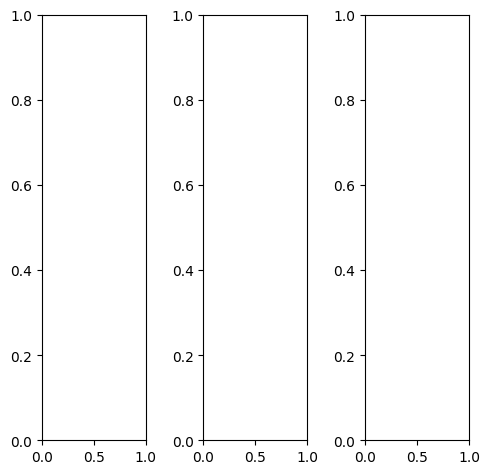

tensor([[[0.5255, 0.5216, 0.4784,  ..., 0.9686, 0.9647, 0.9529],
         [0.8980, 0.8941, 0.8824,  ..., 0.9490, 0.9451, 0.9412],
         [0.9843, 0.9843, 0.9961,  ..., 0.9529, 0.9451, 0.9373],
         ...,
         [0.1686, 0.3020, 0.3255,  ..., 0.0275, 0.2431, 0.3294],
         [0.3569, 0.2863, 0.2471,  ..., 0.0431, 0.1451, 0.2039],
         [0.3765, 0.3882, 0.3922,  ..., 0.2745, 0.2941, 0.3137]],

        [[0.5255, 0.5216, 0.4784,  ..., 0.9686, 0.9647, 0.9529],
         [0.8980, 0.8941, 0.8824,  ..., 0.9490, 0.9451, 0.9412],
         [0.9843, 0.9843, 0.9961,  ..., 0.9529, 0.9451, 0.9373],
         ...,
         [0.1686, 0.3020, 0.3255,  ..., 0.0275, 0.2431, 0.3294],
         [0.3569, 0.2863, 0.2471,  ..., 0.0431, 0.1451, 0.2039],
         [0.3765, 0.3882, 0.3922,  ..., 0.2745, 0.2941, 0.3137]],

        [[0.5255, 0.5216, 0.4784,  ..., 0.9686, 0.9647, 0.9529],
         [0.8980, 0.8941, 0.8824,  ..., 0.9490, 0.9451, 0.9412],
         [0.9843, 0.9843, 0.9961,  ..., 0.9529, 0.9451, 0.

tensor([[[0.5373, 0.5294, 0.4824,  ..., 0.9804, 0.9765, 0.9647],
         [0.9098, 0.9059, 0.8863,  ..., 0.9608, 0.9569, 0.9529],
         [0.9961, 0.9961, 1.0000,  ..., 0.9647, 0.9608, 0.9490],
         ...,
         [0.1608, 0.3137, 0.3333,  ..., 0.0275, 0.2431, 0.3294],
         [0.3490, 0.2941, 0.2549,  ..., 0.0431, 0.1451, 0.2039],
         [0.3765, 0.3922, 0.3961,  ..., 0.2667, 0.2941, 0.3137]],

        [[0.5216, 0.5176, 0.4784,  ..., 0.9647, 0.9647, 0.9529],
         [0.8941, 0.8902, 0.8824,  ..., 0.9451, 0.9451, 0.9412],
         [0.9804, 0.9804, 0.9961,  ..., 0.9490, 0.9451, 0.9373],
         ...,
         [0.1686, 0.2941, 0.3216,  ..., 0.0275, 0.2392, 0.3255],
         [0.3569, 0.2784, 0.2431,  ..., 0.0431, 0.1412, 0.2000],
         [0.3765, 0.3882, 0.3922,  ..., 0.2745, 0.2941, 0.3137]],

        [[0.5098, 0.5059, 0.4627,  ..., 0.9490, 0.9373, 0.9255],
         [0.8824, 0.8784, 0.8667,  ..., 0.9294, 0.9176, 0.9137],
         [0.9686, 0.9686, 0.9804,  ..., 0.9294, 0.9176, 0.

tensor([[[0.5062, 0.3946, 0.3164,  ..., 0.6953, 0.6883, 0.7529],
         [0.7289, 0.6454, 0.6529,  ..., 0.6945, 0.7071, 0.7405],
         [0.8022, 0.8093, 0.7313,  ..., 0.7166, 0.7393, 0.7452],
         ...,
         [0.1896, 0.3401, 0.3388,  ..., 0.0474, 0.2789, 0.3676],
         [0.3269, 0.2691, 0.2535,  ..., 0.0539, 0.1733, 0.2455],
         [0.3712, 0.3753, 0.3753,  ..., 0.2607, 0.2793, 0.3431]],

        [[0.5706, 0.4940, 0.4170,  ..., 0.7735, 0.7875, 0.8252],
         [0.7434, 0.6940, 0.6649,  ..., 0.7823, 0.7822, 0.8460],
         [0.8678, 0.8769, 0.7922,  ..., 0.8074, 0.8111, 0.8363],
         ...,
         [0.1597, 0.3172, 0.3693,  ..., 0.0579, 0.2731, 0.3405],
         [0.3025, 0.2716, 0.2524,  ..., 0.0736, 0.1708, 0.2202],
         [0.3450, 0.3587, 0.3759,  ..., 0.2429, 0.2587, 0.3077]],

        [[0.6495, 0.5420, 0.5748,  ..., 0.9356, 0.9444, 0.9529],
         [0.8925, 0.8267, 0.8444,  ..., 0.9169, 0.9466, 0.9619],
         [0.9045, 0.9417, 0.9136,  ..., 0.9603, 0.9818, 0.

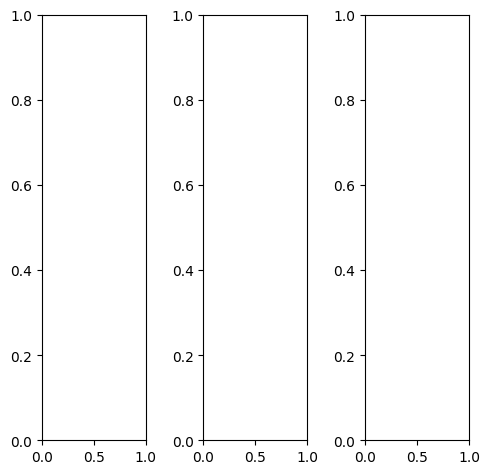

tensor([[[0.6941, 0.6392, 0.5333,  ..., 0.3137, 0.3059, 0.2706],
         [0.6039, 0.5333, 0.6157,  ..., 0.2863, 0.2863, 0.2745],
         [0.5961, 0.7216, 0.5569,  ..., 0.1333, 0.2431, 0.2706],
         ...,
         [0.6353, 0.5373, 0.4863,  ..., 0.6863, 0.6667, 0.6784],
         [0.5020, 0.4980, 0.5961,  ..., 0.6510, 0.6902, 0.6863],
         [0.5294, 0.6078, 0.5529,  ..., 0.6353, 0.7098, 0.7137]],

        [[0.6941, 0.6392, 0.5333,  ..., 0.3137, 0.3059, 0.2706],
         [0.6039, 0.5333, 0.6157,  ..., 0.2863, 0.2863, 0.2745],
         [0.5961, 0.7216, 0.5569,  ..., 0.1333, 0.2431, 0.2706],
         ...,
         [0.6353, 0.5373, 0.4863,  ..., 0.6863, 0.6667, 0.6784],
         [0.5020, 0.4980, 0.5961,  ..., 0.6510, 0.6902, 0.6863],
         [0.5294, 0.6078, 0.5529,  ..., 0.6353, 0.7098, 0.7137]],

        [[0.6941, 0.6392, 0.5333,  ..., 0.3137, 0.3059, 0.2706],
         [0.6039, 0.5333, 0.6157,  ..., 0.2863, 0.2863, 0.2745],
         [0.5961, 0.7216, 0.5569,  ..., 0.1333, 0.2431, 0.

tensor([[[0.7373, 0.6745, 0.5804,  ..., 0.3490, 0.3451, 0.3098],
         [0.6392, 0.5804, 0.6784,  ..., 0.3255, 0.3294, 0.3098],
         [0.6627, 0.7647, 0.6235,  ..., 0.1686, 0.2824, 0.3098],
         ...,
         [0.7059, 0.5843, 0.5765,  ..., 0.7922, 0.7725, 0.7922],
         [0.5882, 0.5725, 0.6941,  ..., 0.7647, 0.7922, 0.8078],
         [0.6235, 0.6863, 0.6353,  ..., 0.7529, 0.8157, 0.8353]],

        [[0.6941, 0.6431, 0.5333,  ..., 0.3059, 0.2980, 0.2627],
         [0.6039, 0.5255, 0.6118,  ..., 0.2784, 0.2784, 0.2667],
         [0.5922, 0.7255, 0.5490,  ..., 0.1255, 0.2353, 0.2627],
         ...,
         [0.6314, 0.5373, 0.4706,  ..., 0.6627, 0.6431, 0.6510],
         [0.4863, 0.4863, 0.5804,  ..., 0.6275, 0.6706, 0.6588],
         [0.5098, 0.5922, 0.5412,  ..., 0.6078, 0.6863, 0.6863]],

        [[0.5725, 0.5412, 0.3961,  ..., 0.2588, 0.2392, 0.2118],
         [0.5020, 0.4549, 0.4627,  ..., 0.2235, 0.2235, 0.2118],
         [0.4510, 0.6000, 0.4235,  ..., 0.0941, 0.1882, 0.

tensor([[[ 4.8935e-01,  3.6918e-01,  2.5465e-01,  ...,  4.3909e-02,
           4.0372e-02,  4.1731e-02],
         [ 3.3238e-01,  2.0644e-01,  2.4919e-01,  ..., -1.6317e-04,
          -9.5699e-03, -9.2379e-03],
         [ 3.2974e-01,  4.5490e-01,  9.4133e-02,  ..., -2.4772e-01,
          -9.4211e-02, -4.0661e-02],
         ...,
         [ 4.7085e-01,  4.2091e-01,  3.5047e-01,  ...,  6.3198e-01,
           5.8547e-01,  5.2181e-01],
         [ 3.2107e-01,  3.4618e-01,  4.6054e-01,  ...,  5.4004e-01,
           5.8367e-01,  5.2909e-01],
         [ 3.2537e-01,  3.9809e-01,  3.4028e-01,  ...,  4.9460e-01,
           5.6517e-01,  5.5712e-01]],

        [[ 5.2691e-01,  5.9066e-01,  4.1896e-01,  ...,  9.2196e-02,
           9.2695e-02,  9.5302e-02],
         [ 4.7039e-01,  4.3687e-01,  4.2028e-01,  ...,  4.5219e-02,
           5.3065e-02,  3.2283e-02],
         [ 4.1392e-01,  6.3716e-01,  3.1806e-01,  ..., -2.0636e-01,
          -7.0021e-02, -1.3481e-02],
         ...,
         [ 4.7120e-01,  3

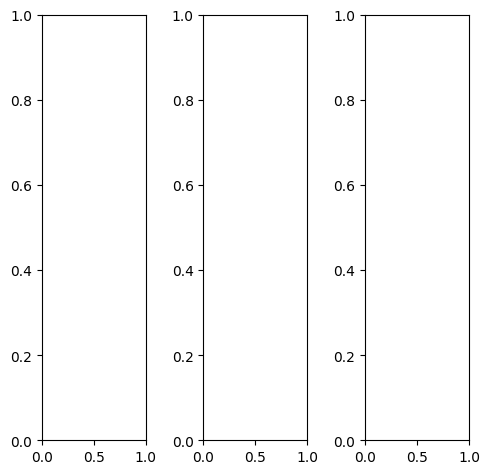

tensor([[[0.5765, 0.5804, 0.5686,  ..., 0.5451, 0.5451, 0.5373],
         [0.5490, 0.5529, 0.5490,  ..., 0.5216, 0.5176, 0.5137],
         [0.5255, 0.5333, 0.5333,  ..., 0.4980, 0.4980, 0.4980],
         ...,
         [0.2784, 0.2941, 0.3098,  ..., 0.1725, 0.1412, 0.1333],
         [0.3569, 0.4039, 0.3882,  ..., 0.2157, 0.1294, 0.1020],
         [0.4078, 0.4314, 0.4824,  ..., 0.3098, 0.2784, 0.2353]],

        [[0.5765, 0.5804, 0.5686,  ..., 0.5451, 0.5451, 0.5373],
         [0.5490, 0.5529, 0.5490,  ..., 0.5216, 0.5176, 0.5137],
         [0.5255, 0.5333, 0.5333,  ..., 0.4980, 0.4980, 0.4980],
         ...,
         [0.2784, 0.2941, 0.3098,  ..., 0.1725, 0.1412, 0.1333],
         [0.3569, 0.4039, 0.3882,  ..., 0.2157, 0.1294, 0.1020],
         [0.4078, 0.4314, 0.4824,  ..., 0.3098, 0.2784, 0.2353]],

        [[0.5765, 0.5804, 0.5686,  ..., 0.5451, 0.5451, 0.5373],
         [0.5490, 0.5529, 0.5490,  ..., 0.5216, 0.5176, 0.5137],
         [0.5255, 0.5333, 0.5333,  ..., 0.4980, 0.4980, 0.

tensor([[[0.6863, 0.6902, 0.6745,  ..., 0.6549, 0.6549, 0.6510],
         [0.6549, 0.6588, 0.6549,  ..., 0.6314, 0.6275, 0.6235],
         [0.6314, 0.6392, 0.6392,  ..., 0.6078, 0.6078, 0.6078],
         ...,
         [0.5451, 0.5686, 0.5961,  ..., 0.3098, 0.2980, 0.2510],
         [0.4431, 0.4941, 0.4863,  ..., 0.3333, 0.2588, 0.1922],
         [0.4549, 0.4706, 0.5216,  ..., 0.4000, 0.3765, 0.3020]],

        [[0.5529, 0.5569, 0.5451,  ..., 0.5216, 0.5216, 0.5137],
         [0.5255, 0.5294, 0.5255,  ..., 0.4980, 0.4941, 0.4902],
         [0.5020, 0.5098, 0.5098,  ..., 0.4745, 0.4745, 0.4745],
         ...,
         [0.1725, 0.1843, 0.1922,  ..., 0.1176, 0.0784, 0.0902],
         [0.3255, 0.3686, 0.3529,  ..., 0.1725, 0.0784, 0.0667],
         [0.3922, 0.4157, 0.4706,  ..., 0.2784, 0.2392, 0.2078]],

        [[0.4118, 0.4196, 0.4078,  ..., 0.3804, 0.3804, 0.3765],
         [0.3843, 0.3922, 0.3882,  ..., 0.3529, 0.3529, 0.3490],
         [0.3608, 0.3725, 0.3725,  ..., 0.3294, 0.3255, 0.

tensor([[[ 0.6232,  0.5345,  0.5350,  ...,  0.4710,  0.4817,  0.5416],
         [ 0.5375,  0.4298,  0.4477,  ...,  0.4512,  0.4604,  0.4725],
         [ 0.5090,  0.5118,  0.4238,  ...,  0.4385,  0.4628,  0.4645],
         ...,
         [ 0.2127,  0.2654,  0.2800,  ...,  0.0385, -0.0189,  0.0242],
         [ 0.3308,  0.3866,  0.3906,  ...,  0.0974, -0.0240, -0.0113],
         [ 0.4229,  0.4477,  0.5123,  ...,  0.2397,  0.1987,  0.1539]],

        [[ 0.6233,  0.6779,  0.5764,  ...,  0.5510,  0.5832,  0.5707],
         [ 0.6193,  0.6101,  0.5835,  ...,  0.5525,  0.5533,  0.5542],
         [ 0.5577,  0.6350,  0.5261,  ...,  0.5334,  0.5509,  0.5313],
         ...,
         [ 0.2169,  0.2750,  0.3055,  ...,  0.0945,  0.0226,  0.0222],
         [ 0.3253,  0.4150,  0.4083,  ...,  0.1419,  0.0083, -0.0035],
         [ 0.3933,  0.4212,  0.5067,  ...,  0.2414,  0.1915,  0.1420]],

        [[ 0.7642,  0.7169,  0.7519,  ...,  0.7557,  0.7606,  0.7466],
         [ 0.7548,  0.7186,  0.7143,  ...,  0

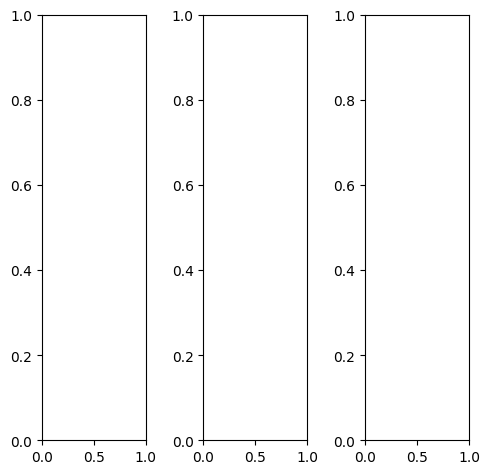

EPOCH: 17.510  trn_loss: 0.005  (2095.77s - 9873.06s remaining)

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9882, 0.9843],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 0.9961]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9882, 0.9843],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 0.9961, 0.9961]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 0.9843, 0.9882, 0.9882],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 0.9922, 0.9922]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9843, 0.9804],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.

tensor([[[0.6337, 0.6120, 0.5654,  ..., 0.5107, 0.5161, 0.5831],
         [0.6249, 0.5338, 0.5688,  ..., 0.4905, 0.5176, 0.5553],
         [0.5914, 0.6372, 0.5022,  ..., 0.5321, 0.5456, 0.5494],
         ...,
         [0.7052, 0.7184, 0.6998,  ..., 0.6651, 0.6645, 0.6634],
         [0.6935, 0.6789, 0.6901,  ..., 0.6858, 0.6639, 0.7007],
         [0.6763, 0.6813, 0.6805,  ..., 0.6967, 0.7111, 0.6953]],

        [[0.7058, 0.6404, 0.6244,  ..., 0.6334, 0.6651, 0.6669],
         [0.6037, 0.5247, 0.5386,  ..., 0.6497, 0.6495, 0.7045],
         [0.7134, 0.6584, 0.6318,  ..., 0.6780, 0.6594, 0.6752],
         ...,
         [0.6547, 0.6716, 0.6720,  ..., 0.6584, 0.6634, 0.6303],
         [0.6491, 0.6433, 0.6590,  ..., 0.6658, 0.6718, 0.6756],
         [0.6194, 0.6414, 0.6519,  ..., 0.6649, 0.6792, 0.6615]],

        [[0.7857, 0.7514, 0.7714,  ..., 0.8516, 0.8593, 0.8470],
         [0.7898, 0.7434, 0.7968,  ..., 0.8397, 0.8534, 0.8516],
         [0.7543, 0.7516, 0.7489,  ..., 0.8673, 0.8786, 0.

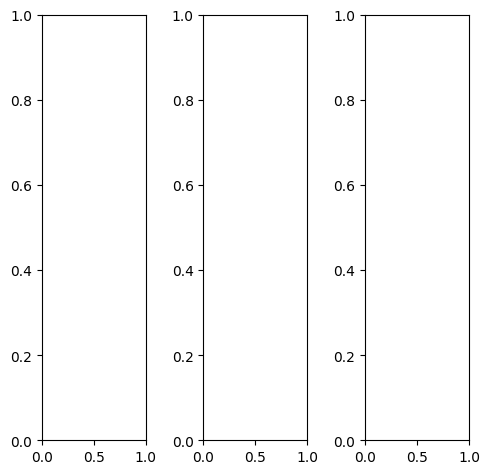

tensor([[[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.1961, 0.2000, 0.2706,  ..., 0.1373, 0.2039, 0.2902],
         [0.1961, 0.1451, 0.2118,  ..., 0.2667, 0.3529, 0.3843],
         [0.1569, 0.1137, 0.1529,  ..., 0.3804, 0.3725, 0.3843]],

        [[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.1961, 0.2000, 0.2706,  ..., 0.1373, 0.2039, 0.2902],
         [0.1961, 0.1451, 0.2118,  ..., 0.2667, 0.3529, 0.3843],
         [0.1569, 0.1137, 0.1529,  ..., 0.3804, 0.3725, 0.3843]],

        [[0.2510, 0.2314, 0.2000,  ..., 0.5412, 0.5373, 0.5255],
         [0.2196, 0.1961, 0.1686,  ..., 0.5843, 0.5882, 0.5647],
         [0.1922, 0.1922, 0.1765,  ..., 0.5020, 0.5373, 0.

tensor([[[0.2118, 0.1922, 0.1569,  ..., 0.5176, 0.5137, 0.5020],
         [0.1843, 0.1569, 0.1294,  ..., 0.5608, 0.5647, 0.5412],
         [0.1608, 0.1608, 0.1451,  ..., 0.4784, 0.5137, 0.5294],
         ...,
         [0.1569, 0.1529, 0.2235,  ..., 0.0980, 0.1569, 0.2392],
         [0.1569, 0.1059, 0.1725,  ..., 0.2196, 0.3020, 0.3294],
         [0.1176, 0.0824, 0.1216,  ..., 0.3294, 0.3176, 0.3294]],

        [[0.2588, 0.2392, 0.2078,  ..., 0.5412, 0.5373, 0.5255],
         [0.2275, 0.2039, 0.1765,  ..., 0.5843, 0.5882, 0.5647],
         [0.2000, 0.2000, 0.1843,  ..., 0.5020, 0.5373, 0.5529],
         ...,
         [0.2039, 0.2118, 0.2784,  ..., 0.1451, 0.2118, 0.2980],
         [0.2039, 0.1529, 0.2196,  ..., 0.2706, 0.3569, 0.3882],
         [0.1647, 0.1216, 0.1608,  ..., 0.3843, 0.3765, 0.3882]],

        [[0.3137, 0.2941, 0.2588,  ..., 0.5961, 0.5922, 0.5804],
         [0.2745, 0.2510, 0.2235,  ..., 0.6392, 0.6431, 0.6196],
         [0.2392, 0.2392, 0.2235,  ..., 0.5569, 0.5922, 0.

tensor([[[ 0.1689,  0.1512, -0.0249,  ...,  0.7135,  0.6781,  0.7162],
         [ 0.1892, -0.0665, -0.1191,  ...,  0.7761,  0.7877,  0.7447],
         [-0.0482, -0.1034, -0.2224,  ...,  0.6442,  0.7178,  0.7125],
         ...,
         [ 0.2636,  0.2972,  0.3989,  ...,  0.2062,  0.3359,  0.4712],
         [ 0.2501,  0.1839,  0.3063,  ...,  0.3914,  0.5265,  0.5700],
         [ 0.1949,  0.1266,  0.1668,  ...,  0.5911,  0.5823,  0.5949]],

        [[ 0.2842,  0.2156,  0.0833,  ...,  0.7918,  0.7808,  0.7956],
         [ 0.1904,  0.0047, -0.2173,  ...,  0.8571,  0.8562,  0.8514],
         [ 0.0896, -0.0191, -0.1480,  ...,  0.7378,  0.7931,  0.8162],
         ...,
         [ 0.2530,  0.2900,  0.4184,  ...,  0.2215,  0.3254,  0.3925],
         [ 0.2437,  0.1917,  0.2946,  ...,  0.3927,  0.5265,  0.5233],
         [ 0.1927,  0.1187,  0.1651,  ...,  0.5324,  0.5531,  0.5553]],

        [[ 0.3983,  0.2411,  0.2483,  ...,  0.9016,  0.9008,  0.8888],
         [ 0.3195,  0.1548,  0.1335,  ...,  0

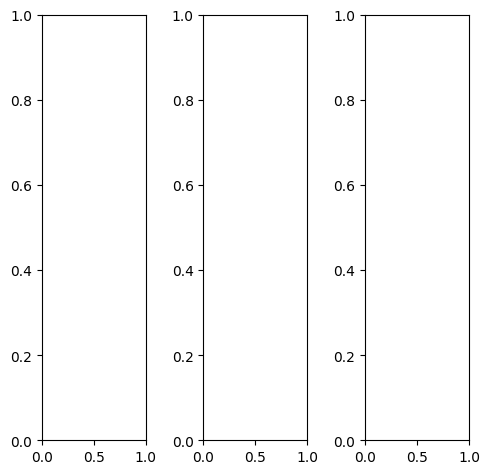

tensor([[[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3294, 0.3020, 0.2902,  ..., 0.3529, 0.3647, 0.3725],
         [0.3333, 0.3098, 0.3059,  ..., 0.3608, 0.3686, 0.3647],
         [0.3529, 0.3412, 0.3412,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3294, 0.3020, 0.2902,  ..., 0.3529, 0.3647, 0.3725],
         [0.3333, 0.3098, 0.3059,  ..., 0.3608, 0.3686, 0.3647],
         [0.3529, 0.3412, 0.3412,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.

tensor([[[0.2784, 0.2588, 0.2588,  ..., 0.3333, 0.3373, 0.3294],
         [0.2784, 0.2510, 0.2431,  ..., 0.2863, 0.3137, 0.3216],
         [0.2784, 0.2431, 0.2275,  ..., 0.2627, 0.2588, 0.2824],
         ...,
         [0.2745, 0.2471, 0.2353,  ..., 0.3137, 0.3255, 0.3333],
         [0.2784, 0.2549, 0.2510,  ..., 0.3176, 0.3255, 0.3216],
         [0.2980, 0.2863, 0.2863,  ..., 0.3059, 0.3059, 0.3059]],

        [[0.3294, 0.3137, 0.3137,  ..., 0.3686, 0.3804, 0.3804],
         [0.3294, 0.3059, 0.2980,  ..., 0.3255, 0.3569, 0.3765],
         [0.3294, 0.2980, 0.2824,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3333, 0.3059, 0.2941,  ..., 0.3490, 0.3647, 0.3686],
         [0.3373, 0.3137, 0.3098,  ..., 0.3608, 0.3647, 0.3647],
         [0.3569, 0.3451, 0.3451,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.4588, 0.4275, 0.4196,  ..., 0.4941, 0.5098, 0.5176],
         [0.4627, 0.4196, 0.4039,  ..., 0.4471, 0.4824, 0.5098],
         [0.4627, 0.4118, 0.3882,  ..., 0.4157, 0.4196, 0.

tensor([[[ 0.3385,  0.2184,  0.1023,  ...,  0.3873,  0.4147,  0.4624],
         [ 0.3199,  0.0978,  0.0630,  ...,  0.3177,  0.3426,  0.4080],
         [ 0.2509,  0.0702, -0.0723,  ...,  0.2846,  0.2615,  0.3134],
         ...,
         [ 0.3917,  0.3557,  0.3000,  ...,  0.5081,  0.5271,  0.5182],
         [ 0.4104,  0.3426,  0.3274,  ...,  0.5225,  0.5105,  0.5032],
         [ 0.4457,  0.4083,  0.3891,  ...,  0.4746,  0.4727,  0.4732]],

        [[ 0.4124,  0.2893,  0.1989,  ...,  0.4953,  0.5372,  0.5198],
         [ 0.3393,  0.1786, -0.0207,  ...,  0.4247,  0.4760,  0.4916],
         [ 0.3460,  0.1350, -0.0031,  ...,  0.3952,  0.3712,  0.3663],
         ...,
         [ 0.3944,  0.3536,  0.3534,  ...,  0.5190,  0.5521,  0.4938],
         [ 0.4142,  0.3552,  0.3585,  ...,  0.5321,  0.5286,  0.4975],
         [ 0.4461,  0.3982,  0.3933,  ...,  0.4577,  0.4732,  0.4543]],

        [[ 0.5298,  0.3541,  0.3426,  ...,  0.6860,  0.6999,  0.6850],
         [ 0.4749,  0.3295,  0.2946,  ...,  0

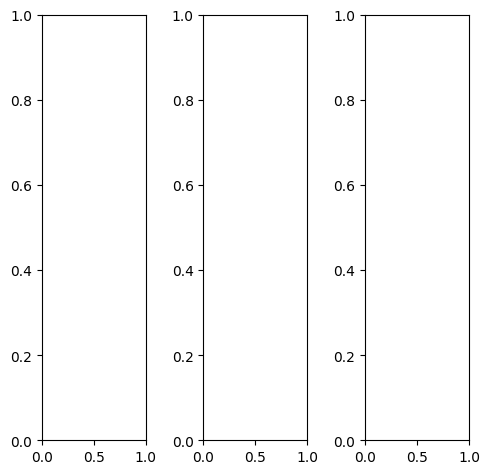

tensor([[[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.5804],
         ...,
         [0.4196, 0.4627, 0.5176,  ..., 0.5569, 0.5490, 0.5529],
         [0.3490, 0.3529, 0.4863,  ..., 0.5294, 0.4941, 0.4980],
         [0.3647, 0.3725, 0.4627,  ..., 0.4078, 0.3765, 0.4039]],

        [[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.5804],
         ...,
         [0.4196, 0.4627, 0.5176,  ..., 0.5569, 0.5490, 0.5529],
         [0.3490, 0.3529, 0.4863,  ..., 0.5294, 0.4941, 0.4980],
         [0.3647, 0.3725, 0.4627,  ..., 0.4078, 0.3765, 0.4039]],

        [[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.

tensor([[[0.6157, 0.8039, 0.8275,  ..., 0.6706, 0.7294, 0.8000],
         [0.7294, 0.8196, 0.8157,  ..., 0.7765, 0.7294, 0.6706],
         [0.7725, 0.7961, 0.7922,  ..., 0.8078, 0.7373, 0.6118],
         ...,
         [0.5451, 0.5765, 0.6275,  ..., 0.6627, 0.6353, 0.6392],
         [0.4627, 0.4745, 0.6039,  ..., 0.6510, 0.5882, 0.5529],
         [0.4706, 0.4980, 0.5804,  ..., 0.4980, 0.3843, 0.3529]],

        [[0.5490, 0.6941, 0.7176,  ..., 0.5882, 0.6667, 0.7176],
         [0.5098, 0.6706, 0.7137,  ..., 0.6235, 0.5961, 0.6157],
         [0.5020, 0.5804, 0.6549,  ..., 0.6667, 0.6078, 0.5451],
         ...,
         [0.3725, 0.4157, 0.4706,  ..., 0.5059, 0.5098, 0.5137],
         [0.3059, 0.3020, 0.4392,  ..., 0.4745, 0.4510, 0.4745],
         [0.3216, 0.3176, 0.4118,  ..., 0.3608, 0.3725, 0.4235]],

        [[0.6667, 0.8157, 0.8353,  ..., 0.6431, 0.7059, 0.8235],
         [0.6588, 0.8000, 0.8275,  ..., 0.7529, 0.7098, 0.7216],
         [0.6510, 0.7216, 0.7804,  ..., 0.8078, 0.7569, 0.

tensor([[[0.4578, 0.5111, 0.5253,  ..., 0.3727, 0.4620, 0.5599],
         [0.3481, 0.4786, 0.4999,  ..., 0.4768, 0.4025, 0.3944],
         [0.2986, 0.4309, 0.3911,  ..., 0.5255, 0.4671, 0.2960],
         ...,
         [0.1662, 0.2208, 0.3052,  ..., 0.3595, 0.3145, 0.3257],
         [0.0805, 0.0063, 0.2438,  ..., 0.2807, 0.2350, 0.2672],
         [0.1344, 0.0824, 0.2049,  ..., 0.1365, 0.0976, 0.1717]],

        [[0.5469, 0.6195, 0.6268,  ..., 0.4096, 0.5587, 0.5789],
         [0.3867, 0.5807, 0.5613,  ..., 0.5787, 0.5257, 0.4596],
         [0.4190, 0.5525, 0.5589,  ..., 0.6218, 0.5759, 0.3291],
         ...,
         [0.1769, 0.2161, 0.3045,  ..., 0.3864, 0.3579, 0.3137],
         [0.0940, 0.0268, 0.2277,  ..., 0.3344, 0.2770, 0.2542],
         [0.1207, 0.0775, 0.1823,  ..., 0.1522, 0.1102, 0.1282]],

        [[0.6605, 0.6767, 0.8002,  ..., 0.5513, 0.6768, 0.7192],
         [0.5831, 0.7934, 0.7662,  ..., 0.6526, 0.6357, 0.5974],
         [0.5572, 0.5718, 0.7156,  ..., 0.7194, 0.6716, 0.

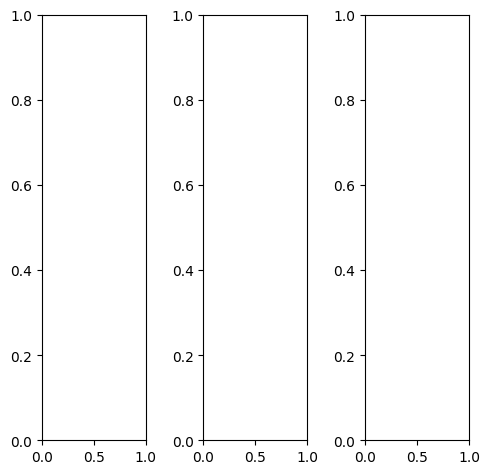

tensor([[[0.4863, 0.5216, 0.5765,  ..., 0.5333, 0.5098, 0.4706],
         [0.4745, 0.4980, 0.5333,  ..., 0.4941, 0.4745, 0.4392],
         [0.5294, 0.5137, 0.5294,  ..., 0.4863, 0.4627, 0.4314],
         ...,
         [0.5451, 0.5098, 0.5961,  ..., 0.6196, 0.6078, 0.5569],
         [0.6157, 0.5608, 0.5412,  ..., 0.6353, 0.6549, 0.5333],
         [0.4196, 0.5216, 0.4941,  ..., 0.5294, 0.5529, 0.4863]],

        [[0.4863, 0.5216, 0.5765,  ..., 0.5333, 0.5098, 0.4706],
         [0.4745, 0.4980, 0.5333,  ..., 0.4941, 0.4745, 0.4392],
         [0.5294, 0.5137, 0.5294,  ..., 0.4863, 0.4627, 0.4314],
         ...,
         [0.5451, 0.5098, 0.5961,  ..., 0.6196, 0.6078, 0.5569],
         [0.6157, 0.5608, 0.5412,  ..., 0.6353, 0.6549, 0.5333],
         [0.4196, 0.5216, 0.4941,  ..., 0.5294, 0.5529, 0.4863]],

        [[0.4863, 0.5216, 0.5765,  ..., 0.5333, 0.5098, 0.4706],
         [0.4745, 0.4980, 0.5333,  ..., 0.4941, 0.4745, 0.4392],
         [0.5294, 0.5137, 0.5294,  ..., 0.4863, 0.4627, 0.

tensor([[[0.4353, 0.4706, 0.5255,  ..., 0.4824, 0.4588, 0.4196],
         [0.4235, 0.4471, 0.4863,  ..., 0.4431, 0.4235, 0.3922],
         [0.4784, 0.4627, 0.4784,  ..., 0.4353, 0.4118, 0.3804],
         ...,
         [0.5059, 0.4784, 0.5686,  ..., 0.5725, 0.5529, 0.5059],
         [0.5843, 0.5333, 0.5176,  ..., 0.5922, 0.6039, 0.4745],
         [0.3922, 0.4980, 0.4745,  ..., 0.4980, 0.5098, 0.4314]],

        [[0.5412, 0.5843, 0.6392,  ..., 0.6078, 0.5882, 0.5451],
         [0.5255, 0.5569, 0.5961,  ..., 0.5686, 0.5451, 0.5098],
         [0.5804, 0.5686, 0.5882,  ..., 0.5608, 0.5373, 0.4980],
         ...,
         [0.5725, 0.5412, 0.6314,  ..., 0.6588, 0.6549, 0.6118],
         [0.6392, 0.5882, 0.5725,  ..., 0.6745, 0.7020, 0.5882],
         [0.4431, 0.5490, 0.5216,  ..., 0.5647, 0.5922, 0.5294]],

        [[0.3294, 0.3451, 0.3843,  ..., 0.2784, 0.2549, 0.2157],
         [0.3294, 0.3333, 0.3490,  ..., 0.2471, 0.2314, 0.2078],
         [0.3961, 0.3529, 0.3451,  ..., 0.2392, 0.2275, 0.

tensor([[[-0.0058,  0.0730, -0.0077,  ...,  0.1453,  0.1161,  0.0648],
         [ 0.1090, -0.1100, -0.0750,  ...,  0.0849,  0.0350, -0.0221],
         [-0.0306, -0.1101, -0.2176,  ...,  0.0860,  0.0319, -0.0261],
         ...,
         [ 0.3157,  0.3011,  0.4274,  ...,  0.4405,  0.3807,  0.2025],
         [ 0.4006,  0.3224,  0.3230,  ...,  0.4190,  0.4291,  0.2243],
         [ 0.1656,  0.1772,  0.1697,  ...,  0.2243,  0.2141,  0.1640]],

        [[ 0.1677,  0.1735,  0.1905,  ...,  0.2610,  0.2340,  0.1457],
         [ 0.0929,  0.0441, -0.1106,  ...,  0.2182,  0.1911,  0.0613],
         [ 0.1106,  0.0465, -0.0672,  ...,  0.2142,  0.1617,  0.0300],
         ...,
         [ 0.3019,  0.3058,  0.4460,  ...,  0.4557,  0.4247,  0.1896],
         [ 0.3951,  0.3481,  0.3335,  ...,  0.4518,  0.4671,  0.2057],
         [ 0.1370,  0.1791,  0.1678,  ...,  0.2223,  0.2191,  0.1198]],

        [[ 0.2907,  0.1403,  0.3548,  ...,  0.3853,  0.3636,  0.2838],
         [ 0.3265,  0.1786,  0.2145,  ...,  0

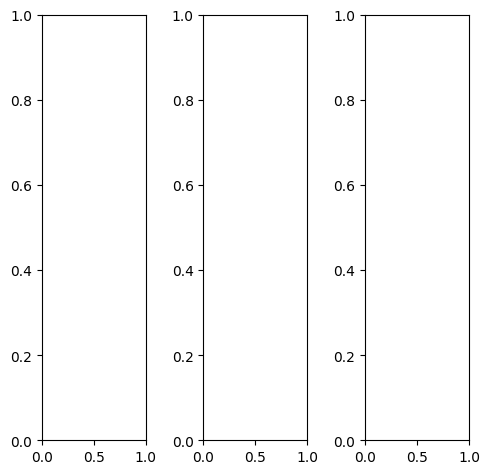

EPOCH: 17.765  trn_loss: 0.005  (2125.51s - 9838.86s remaining)

tensor([[[0.1137, 0.1216, 0.1294,  ..., 0.0745, 0.0784, 0.0824],
         [0.0980, 0.1137, 0.1098,  ..., 0.0588, 0.0588, 0.0706],
         [0.0980, 0.0980, 0.1020,  ..., 0.0588, 0.0627, 0.0941],
         ...,
         [0.2118, 0.2196, 0.2392,  ..., 0.2314, 0.2039, 0.1843],
         [0.2235, 0.2235, 0.2314,  ..., 0.2157, 0.2000, 0.2000],
         [0.2235, 0.2196, 0.2275,  ..., 0.2314, 0.2235, 0.2078]],

        [[0.1137, 0.1216, 0.1294,  ..., 0.0745, 0.0784, 0.0824],
         [0.0980, 0.1137, 0.1098,  ..., 0.0588, 0.0588, 0.0706],
         [0.0980, 0.0980, 0.1020,  ..., 0.0588, 0.0627, 0.0941],
         ...,
         [0.2118, 0.2196, 0.2392,  ..., 0.2314, 0.2039, 0.1843],
         [0.2235, 0.2235, 0.2314,  ..., 0.2157, 0.2000, 0.2000],
         [0.2235, 0.2196, 0.2275,  ..., 0.2314, 0.2235, 0.2078]],

        [[0.1137, 0.1216, 0.1294,  ..., 0.0745, 0.0784, 0.0824],
         [0.0980, 0.1137, 0.1098,  ..., 0.0588, 0.0588, 0.0706],
         [0.0980, 0.0980, 0.1020,  ..., 0.0588, 0.0627, 0.

tensor([[[0.1137, 0.1216, 0.1333,  ..., 0.0627, 0.0667, 0.0706],
         [0.0980, 0.1137, 0.1098,  ..., 0.0471, 0.0471, 0.0588],
         [0.0980, 0.0980, 0.1020,  ..., 0.0471, 0.0510, 0.0824],
         ...,
         [0.1333, 0.1412, 0.1647,  ..., 0.1804, 0.1490, 0.1294],
         [0.1333, 0.1373, 0.1529,  ..., 0.1725, 0.1529, 0.1451],
         [0.1333, 0.1373, 0.1490,  ..., 0.1922, 0.1804, 0.1569]],

        [[0.1176, 0.1294, 0.1412,  ..., 0.0824, 0.0863, 0.0902],
         [0.1020, 0.1176, 0.1176,  ..., 0.0667, 0.0667, 0.0784],
         [0.1020, 0.1020, 0.1059,  ..., 0.0667, 0.0706, 0.1020],
         ...,
         [0.2078, 0.2118, 0.2314,  ..., 0.2314, 0.2039, 0.1882],
         [0.2196, 0.2157, 0.2235,  ..., 0.2078, 0.1961, 0.2000],
         [0.2235, 0.2157, 0.2235,  ..., 0.2196, 0.2157, 0.2039]],

        [[0.0902, 0.0902, 0.0745,  ..., 0.0549, 0.0667, 0.0706],
         [0.0784, 0.0980, 0.0784,  ..., 0.0392, 0.0471, 0.0627],
         [0.0863, 0.0902, 0.0784,  ..., 0.0431, 0.0471, 0.

tensor([[[ 0.1540,  0.0732,  0.0703,  ...,  0.1160,  0.1328,  0.1958],
         [ 0.1059,  0.0321,  0.0559,  ...,  0.0756,  0.0679,  0.1499],
         [-0.0067,  0.0084, -0.0777,  ...,  0.0493,  0.0600,  0.1557],
         ...,
         [ 0.3795,  0.4107,  0.4334,  ...,  0.4571,  0.4070,  0.4163],
         [ 0.3895,  0.3935,  0.4269,  ...,  0.4082,  0.3924,  0.4324],
         [ 0.4074,  0.3954,  0.4017,  ...,  0.4499,  0.4342,  0.4355]],

        [[ 0.1700,  0.2274,  0.1164,  ...,  0.1649,  0.1734,  0.2268],
         [ 0.1644,  0.1196,  0.0372,  ...,  0.1479,  0.1601,  0.1858],
         [ 0.0919,  0.1985,  0.0243,  ...,  0.1188,  0.1350,  0.2142],
         ...,
         [ 0.3867,  0.3649,  0.4244,  ...,  0.4296,  0.3992,  0.3679],
         [ 0.3908,  0.3729,  0.4137,  ...,  0.3922,  0.3784,  0.3952],
         [ 0.4070,  0.3598,  0.4015,  ...,  0.4061,  0.4065,  0.4042]],

        [[ 0.3857,  0.1990,  0.3273,  ...,  0.3078,  0.3232,  0.3636],
         [ 0.3271,  0.2511,  0.3126,  ...,  0

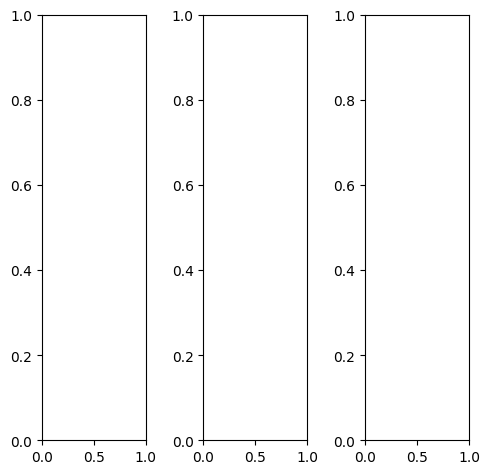

tensor([[[0.0235, 0.0275, 0.0196,  ..., 0.6078, 0.5804, 0.5412],
         [0.0275, 0.0314, 0.0078,  ..., 0.7843, 0.7804, 0.8078],
         [0.0392, 0.0235, 0.0235,  ..., 0.7843, 0.7961, 0.8039],
         ...,
         [0.2627, 0.2588, 0.2588,  ..., 0.3529, 0.0275, 0.0863],
         [0.2039, 0.2471, 0.2863,  ..., 0.0784, 0.0196, 0.0784],
         [0.3569, 0.3961, 0.3686,  ..., 0.0235, 0.0196, 0.0275]],

        [[0.0235, 0.0275, 0.0196,  ..., 0.6078, 0.5804, 0.5412],
         [0.0275, 0.0314, 0.0078,  ..., 0.7843, 0.7804, 0.8078],
         [0.0392, 0.0235, 0.0235,  ..., 0.7843, 0.7961, 0.8039],
         ...,
         [0.2627, 0.2588, 0.2588,  ..., 0.3529, 0.0275, 0.0863],
         [0.2039, 0.2471, 0.2863,  ..., 0.0784, 0.0196, 0.0784],
         [0.3569, 0.3961, 0.3686,  ..., 0.0235, 0.0196, 0.0275]],

        [[0.0235, 0.0275, 0.0196,  ..., 0.6078, 0.5804, 0.5412],
         [0.0275, 0.0314, 0.0078,  ..., 0.7843, 0.7804, 0.8078],
         [0.0392, 0.0235, 0.0235,  ..., 0.7843, 0.7961, 0.

tensor([[[0.0196, 0.0235, 0.0157,  ..., 0.5569, 0.5294, 0.4902],
         [0.0235, 0.0275, 0.0039,  ..., 0.7451, 0.7412, 0.7647],
         [0.0353, 0.0196, 0.0196,  ..., 0.7569, 0.7686, 0.7804],
         ...,
         [0.1843, 0.1882, 0.1922,  ..., 0.3373, 0.0118, 0.0627],
         [0.1529, 0.2039, 0.2471,  ..., 0.0745, 0.0118, 0.0706],
         [0.3333, 0.3804, 0.3569,  ..., 0.0275, 0.0196, 0.0235]],

        [[0.0235, 0.0275, 0.0196,  ..., 0.6039, 0.5725, 0.5333],
         [0.0235, 0.0314, 0.0039,  ..., 0.7843, 0.7804, 0.8078],
         [0.0314, 0.0196, 0.0157,  ..., 0.7843, 0.7961, 0.8078],
         ...,
         [0.2784, 0.2667, 0.2549,  ..., 0.3490, 0.0235, 0.0824],
         [0.2157, 0.2510, 0.2784,  ..., 0.0784, 0.0196, 0.0784],
         [0.3647, 0.3961, 0.3569,  ..., 0.0196, 0.0157, 0.0275]],

        [[0.0353, 0.0392, 0.0275,  ..., 0.7765, 0.7529, 0.7176],
         [0.0549, 0.0588, 0.0314,  ..., 0.8863, 0.8863, 0.9098],
         [0.0824, 0.0667, 0.0667,  ..., 0.8471, 0.8510, 0.

tensor([[[ 0.0958, -0.0102, -0.0365,  ...,  0.5285,  0.5211,  0.5996],
         [ 0.1122, -0.0200,  0.0491,  ...,  0.6739,  0.6856,  0.7170],
         [ 0.0159,  0.0179, -0.0874,  ...,  0.6937,  0.7262,  0.7222],
         ...,
         [ 0.4085,  0.4689,  0.4817,  ...,  0.4852,  0.2407,  0.2809],
         [ 0.3684,  0.4527,  0.4869,  ...,  0.2542,  0.2111,  0.2695],
         [ 0.4764,  0.5407,  0.5230,  ...,  0.2002,  0.1839,  0.2499]],

        [[ 0.1301,  0.1238,  0.0657,  ...,  0.6560,  0.6342,  0.6690],
         [ 0.1451,  0.0139,  0.0170,  ...,  0.8151,  0.8017,  0.8687],
         [ 0.1148,  0.1519,  0.1213,  ...,  0.8340,  0.8294,  0.8504],
         ...,
         [ 0.3650,  0.4070,  0.4410,  ...,  0.4942,  0.2290,  0.2258],
         [ 0.3247,  0.3956,  0.4350,  ...,  0.2531,  0.1892,  0.2148],
         [ 0.4361,  0.4717,  0.4778,  ...,  0.1772,  0.1589,  0.1982]],

        [[ 0.3399,  0.1131,  0.2807,  ...,  0.8431,  0.8117,  0.8073],
         [ 0.2724,  0.1762,  0.2264,  ...,  1

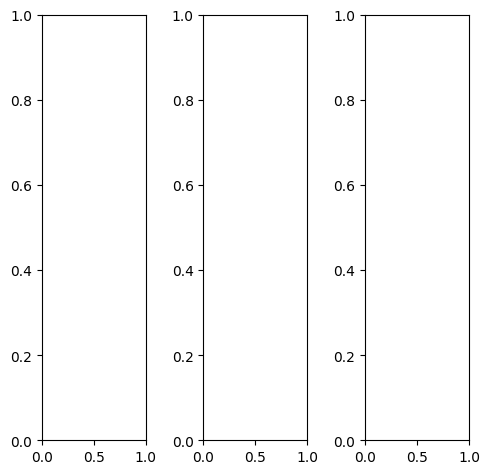

tensor([[[0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         ...,
         [0.4353, 0.4353, 0.4353,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4353,  ..., 0.4431, 0.4431, 0.4431],
         [0.4314, 0.4314, 0.4353,  ..., 0.4431, 0.4392, 0.4392]],

        [[0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         ...,
         [0.4353, 0.4353, 0.4353,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4353,  ..., 0.4431, 0.4431, 0.4431],
         [0.4314, 0.4314, 0.4353,  ..., 0.4431, 0.4392, 0.4392]],

        [[0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4314, 0.4314, 0.4314,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4314,  ..., 0.4392, 0.4392, 0.

tensor([[[0.4431, 0.4431, 0.4353,  ..., 0.4510, 0.4510, 0.4510],
         [0.4431, 0.4431, 0.4431,  ..., 0.4510, 0.4510, 0.4510],
         [0.4471, 0.4471, 0.4431,  ..., 0.4510, 0.4510, 0.4510],
         ...,
         [0.4706, 0.4706, 0.4745,  ..., 0.4824, 0.4824, 0.4824],
         [0.4745, 0.4745, 0.4745,  ..., 0.4863, 0.4863, 0.4863],
         [0.4706, 0.4706, 0.4745,  ..., 0.4863, 0.4863, 0.4863]],

        [[0.4392, 0.4392, 0.4431,  ..., 0.4471, 0.4471, 0.4471],
         [0.4392, 0.4392, 0.4392,  ..., 0.4471, 0.4471, 0.4471],
         [0.4431, 0.4431, 0.4392,  ..., 0.4471, 0.4471, 0.4471],
         ...,
         [0.4392, 0.4353, 0.4353,  ..., 0.4392, 0.4392, 0.4392],
         [0.4353, 0.4353, 0.4353,  ..., 0.4392, 0.4392, 0.4392],
         [0.4314, 0.4314, 0.4353,  ..., 0.4392, 0.4353, 0.4353]],

        [[0.3608, 0.3608, 0.3608,  ..., 0.3647, 0.3647, 0.3647],
         [0.3608, 0.3608, 0.3569,  ..., 0.3647, 0.3647, 0.3647],
         [0.3647, 0.3608, 0.3569,  ..., 0.3647, 0.3647, 0.

tensor([[[ 0.0442,  0.0588, -0.0341,  ...,  0.0680,  0.1048,  0.0524],
         [ 0.2088,  0.0512, -0.0012,  ...,  0.1295,  0.1494,  0.0473],
         [ 0.0982,  0.0201, -0.0660,  ...,  0.1605,  0.1937,  0.0821],
         ...,
         [ 0.3131,  0.3937,  0.3567,  ...,  0.3345,  0.3125,  0.1899],
         [ 0.3333,  0.3484,  0.3640,  ...,  0.3100,  0.2866,  0.1616],
         [ 0.2334,  0.1345,  0.1525,  ...,  0.1618,  0.1305,  0.0839]],

        [[ 0.2091,  0.2344,  0.1609,  ...,  0.1903,  0.2540,  0.1306],
         [ 0.2400,  0.4024,  0.1104,  ...,  0.2886,  0.3376,  0.1659],
         [ 0.1846,  0.3046,  0.1527,  ...,  0.3019,  0.3639,  0.1763],
         ...,
         [ 0.2295,  0.3599,  0.3698,  ...,  0.3551,  0.3664,  0.1579],
         [ 0.2555,  0.3314,  0.3366,  ...,  0.3361,  0.3260,  0.1652],
         [ 0.1767,  0.1190,  0.1547,  ...,  0.1501,  0.1680,  0.0658]],

        [[ 0.3740,  0.1415,  0.3240,  ...,  0.3107,  0.3678,  0.2918],
         [ 0.4555,  0.4064,  0.2347,  ...,  0

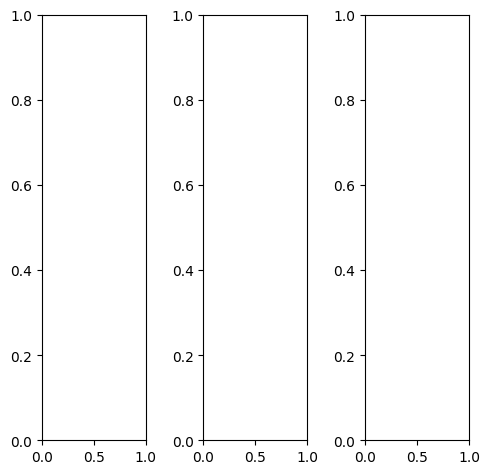

tensor([[[0.6706, 0.6784, 0.6431,  ..., 0.3490, 0.2118, 0.1608],
         [0.6667, 0.6784, 0.6471,  ..., 0.1176, 0.1216, 0.1255],
         [0.5804, 0.6588, 0.6667,  ..., 0.0510, 0.0353, 0.0784],
         ...,
         [0.4196, 0.3294, 0.5059,  ..., 0.4157, 0.2431, 0.1725],
         [0.4353, 0.1804, 0.4196,  ..., 0.4039, 0.2000, 0.0549],
         [0.4275, 0.4275, 0.4353,  ..., 0.2353, 0.1216, 0.1176]],

        [[0.6706, 0.6784, 0.6431,  ..., 0.3490, 0.2118, 0.1608],
         [0.6667, 0.6784, 0.6471,  ..., 0.1176, 0.1216, 0.1255],
         [0.5804, 0.6588, 0.6667,  ..., 0.0510, 0.0353, 0.0784],
         ...,
         [0.4196, 0.3294, 0.5059,  ..., 0.4157, 0.2431, 0.1725],
         [0.4353, 0.1804, 0.4196,  ..., 0.4039, 0.2000, 0.0549],
         [0.4275, 0.4275, 0.4353,  ..., 0.2353, 0.1216, 0.1176]],

        [[0.6706, 0.6784, 0.6431,  ..., 0.3490, 0.2118, 0.1608],
         [0.6667, 0.6784, 0.6471,  ..., 0.1176, 0.1216, 0.1255],
         [0.5804, 0.6588, 0.6667,  ..., 0.0510, 0.0353, 0.

tensor([[[0.6627, 0.6510, 0.6431,  ..., 0.3020, 0.1608, 0.1098],
         [0.6510, 0.6706, 0.6706,  ..., 0.0902, 0.0863, 0.0745],
         [0.5725, 0.6667, 0.6980,  ..., 0.0275, 0.0118, 0.0353],
         ...,
         [0.4078, 0.3020, 0.4588,  ..., 0.3490, 0.1765, 0.1216],
         [0.4431, 0.1765, 0.3922,  ..., 0.3255, 0.1373, 0.0118],
         [0.4353, 0.4392, 0.4157,  ..., 0.1647, 0.0667, 0.0784]],

        [[0.7294, 0.7412, 0.6863,  ..., 0.4039, 0.2588, 0.2078],
         [0.7333, 0.7412, 0.6941,  ..., 0.1451, 0.1529, 0.1686],
         [0.6471, 0.7176, 0.7176,  ..., 0.0745, 0.0549, 0.1098],
         ...,
         [0.4706, 0.3882, 0.5882,  ..., 0.4863, 0.3059, 0.2157],
         [0.4627, 0.2039, 0.4863,  ..., 0.4784, 0.2549, 0.0863],
         [0.4588, 0.4471, 0.4902,  ..., 0.2980, 0.1608, 0.1490]],

        [[0.3882, 0.4118, 0.4157,  ..., 0.1961, 0.0941, 0.0588],
         [0.3647, 0.3686, 0.3412,  ..., 0.0471, 0.0627, 0.0471],
         [0.2745, 0.3373, 0.3176,  ..., 0.0039, 0.0118, 0.

tensor([[[ 0.6493,  0.5903,  0.5312,  ...,  0.1659,  0.0510,  0.0350],
         [ 0.5939,  0.4397,  0.4917,  ..., -0.1633, -0.1638, -0.0863],
         [ 0.4861,  0.5904,  0.4838,  ..., -0.2958, -0.3008, -0.1628],
         ...,
         [ 0.3305,  0.2746,  0.5265,  ...,  0.4191,  0.1172,  0.0480],
         [ 0.3099,  0.0387,  0.3272,  ...,  0.3463,  0.0538, -0.0892],
         [ 0.3169,  0.3010,  0.3479,  ...,  0.0790, -0.0135, -0.0126]],

        [[ 0.7264,  0.7109,  0.6149,  ...,  0.2389,  0.1282,  0.0936],
         [ 0.6458,  0.5616,  0.5635,  ..., -0.0610, -0.0558, -0.0302],
         [ 0.5752,  0.6884,  0.5753,  ..., -0.1925, -0.2161, -0.1236],
         ...,
         [ 0.2788,  0.2466,  0.5222,  ...,  0.4209,  0.1415,  0.0402],
         [ 0.2945,  0.0377,  0.3235,  ...,  0.3750,  0.0799, -0.0727],
         [ 0.3096,  0.2986,  0.3430,  ...,  0.0939, -0.0229, -0.0229]],

        [[ 0.8739,  0.8333,  0.7722,  ...,  0.3370,  0.2072,  0.1941],
         [ 0.8502,  0.7876,  0.7352,  ...,  0

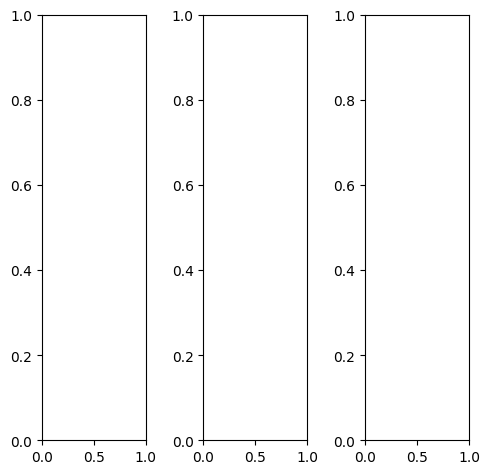

tensor([[[0.8275, 0.8353, 0.8353,  ..., 0.5961, 0.9255, 0.9059],
         [0.8275, 0.8314, 0.8353,  ..., 0.3255, 0.8196, 0.9255],
         [0.8314, 0.8549, 0.8706,  ..., 0.1412, 0.4667, 0.9176],
         ...,
         [0.7569, 0.7569, 0.7608,  ..., 0.2235, 0.1490, 0.2392],
         [0.7255, 0.7412, 0.7490,  ..., 0.1804, 0.1882, 0.2000],
         [0.7529, 0.7647, 0.7725,  ..., 0.0980, 0.1255, 0.1686]],

        [[0.8275, 0.8353, 0.8353,  ..., 0.5961, 0.9255, 0.9059],
         [0.8275, 0.8314, 0.8353,  ..., 0.3255, 0.8196, 0.9255],
         [0.8314, 0.8549, 0.8706,  ..., 0.1412, 0.4667, 0.9176],
         ...,
         [0.7569, 0.7569, 0.7608,  ..., 0.2235, 0.1490, 0.2392],
         [0.7255, 0.7412, 0.7490,  ..., 0.1804, 0.1882, 0.2000],
         [0.7529, 0.7647, 0.7725,  ..., 0.0980, 0.1255, 0.1686]],

        [[0.8275, 0.8353, 0.8353,  ..., 0.5961, 0.9255, 0.9059],
         [0.8275, 0.8314, 0.8353,  ..., 0.3255, 0.8196, 0.9255],
         [0.8314, 0.8549, 0.8706,  ..., 0.1412, 0.4667, 0.

tensor([[[0.7529, 0.7529, 0.7451,  ..., 0.5529, 0.9059, 0.8824],
         [0.7490, 0.7569, 0.7647,  ..., 0.2588, 0.7765, 0.8824],
         [0.7490, 0.7882, 0.8157,  ..., 0.0431, 0.3922, 0.8510],
         ...,
         [0.8078, 0.8078, 0.8157,  ..., 0.1804, 0.0863, 0.1843],
         [0.7843, 0.7961, 0.8039,  ..., 0.1451, 0.1333, 0.1490],
         [0.8118, 0.8235, 0.8314,  ..., 0.0745, 0.0863, 0.1294]],

        [[0.8471, 0.8588, 0.8588,  ..., 0.6078, 0.9294, 0.9098],
         [0.8471, 0.8510, 0.8549,  ..., 0.3412, 0.8353, 0.9451],
         [0.8510, 0.8706, 0.8863,  ..., 0.1608, 0.4824, 0.9412],
         ...,
         [0.7412, 0.7451, 0.7490,  ..., 0.2275, 0.1569, 0.2471],
         [0.7098, 0.7294, 0.7373,  ..., 0.1804, 0.1922, 0.2039],
         [0.7373, 0.7490, 0.7608,  ..., 0.0941, 0.1255, 0.1686]],

        [[0.9216, 0.9373, 0.9451,  ..., 0.6588, 0.9490, 0.9412],
         [0.9294, 0.9255, 0.9255,  ..., 0.4157, 0.8588, 0.9490],
         [0.9294, 0.9373, 0.9373,  ..., 0.2980, 0.5686, 0.

tensor([[[0.6969, 0.6531, 0.6648,  ..., 0.4481, 0.6870, 0.7165],
         [0.6478, 0.6502, 0.6481,  ..., 0.2136, 0.6715, 0.7836],
         [0.6543, 0.7560, 0.6532,  ..., 0.0777, 0.3526, 0.7804],
         ...,
         [0.6874, 0.7171, 0.6912,  ..., 0.1848, 0.1244, 0.2321],
         [0.6339, 0.6497, 0.6452,  ..., 0.1295, 0.1669, 0.2188],
         [0.6623, 0.6875, 0.6839,  ..., 0.0842, 0.1262, 0.1830]],

        [[0.7451, 0.7559, 0.6992,  ..., 0.5237, 0.7651, 0.7798],
         [0.6639, 0.7195, 0.6914,  ..., 0.2900, 0.7327, 0.8575],
         [0.7667, 0.8252, 0.7614,  ..., 0.1752, 0.3925, 0.8032],
         ...,
         [0.6363, 0.6657, 0.7018,  ..., 0.1990, 0.1285, 0.1984],
         [0.5951, 0.6273, 0.6392,  ..., 0.1408, 0.1532, 0.1653],
         [0.6122, 0.6526, 0.6762,  ..., 0.0787, 0.1028, 0.1377]],

        [[0.8394, 0.8398, 0.9097,  ..., 0.6772, 0.9534, 0.9077],
         [0.8636, 0.8949, 0.9253,  ..., 0.4746, 0.9421, 0.9851],
         [0.8482, 0.9057, 0.9598,  ..., 0.3412, 0.6283, 0.

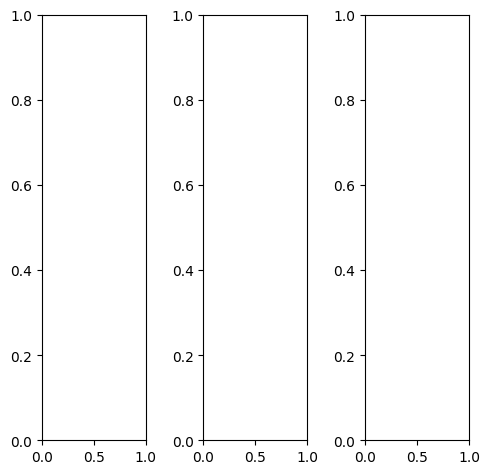

EPOCH: 18.000  val_loss: 0.004  (2161.15s - 9845.25s remaining)

tensor([[[0.7176, 0.6706, 0.6706,  ..., 0.6667, 0.6706, 0.6667],
         [0.6980, 0.6745, 0.6824,  ..., 0.6902, 0.6588, 0.6706],
         [0.6784, 0.6667, 0.6980,  ..., 0.8314, 0.7216, 0.6627],
         ...,
         [0.5059, 0.5490, 0.5647,  ..., 0.9176, 0.9333, 0.8706],
         [0.4980, 0.5294, 0.5412,  ..., 0.8784, 0.8353, 0.7882],
         [0.5098, 0.5020, 0.4980,  ..., 0.7647, 0.7490, 0.7176]],

        [[0.7176, 0.6706, 0.6706,  ..., 0.6667, 0.6706, 0.6667],
         [0.6980, 0.6745, 0.6824,  ..., 0.6902, 0.6588, 0.6706],
         [0.6784, 0.6667, 0.6980,  ..., 0.8314, 0.7216, 0.6627],
         ...,
         [0.5059, 0.5490, 0.5647,  ..., 0.9176, 0.9333, 0.8706],
         [0.4980, 0.5294, 0.5412,  ..., 0.8784, 0.8353, 0.7882],
         [0.5098, 0.5020, 0.4980,  ..., 0.7647, 0.7490, 0.7176]],

        [[0.7176, 0.6706, 0.6706,  ..., 0.6667, 0.6706, 0.6667],
         [0.6980, 0.6745, 0.6824,  ..., 0.6902, 0.6588, 0.6706],
         [0.6784, 0.6667, 0.6980,  ..., 0.8314, 0.7216, 0.

tensor([[[0.6392, 0.6118, 0.6157,  ..., 0.5765, 0.5765, 0.5686],
         [0.6275, 0.6353, 0.6314,  ..., 0.6235, 0.5647, 0.5725],
         [0.6118, 0.6275, 0.6431,  ..., 0.8549, 0.6863, 0.5725],
         ...,
         [0.4941, 0.5373, 0.5529,  ..., 0.9608, 0.9686, 0.9765],
         [0.4863, 0.5176, 0.5294,  ..., 0.9608, 0.9569, 0.9490],
         [0.5020, 0.4941, 0.4863,  ..., 0.9255, 0.9255, 0.8980]],

        [[0.7333, 0.6941, 0.6902,  ..., 0.6706, 0.6784, 0.6784],
         [0.7176, 0.6941, 0.6941,  ..., 0.6941, 0.6667, 0.6784],
         [0.6980, 0.6824, 0.7059,  ..., 0.8235, 0.7216, 0.6667],
         ...,
         [0.5490, 0.5961, 0.6078,  ..., 0.9137, 0.9333, 0.8431],
         [0.5490, 0.5804, 0.5882,  ..., 0.8667, 0.8078, 0.7412],
         [0.5608, 0.5569, 0.5529,  ..., 0.7216, 0.6980, 0.6627]],

        [[0.8471, 0.7137, 0.7020,  ..., 0.8706, 0.8667, 0.8706],
         [0.7804, 0.6863, 0.7529,  ..., 0.8510, 0.8706, 0.8745],
         [0.7490, 0.7059, 0.8118,  ..., 0.8000, 0.8235, 0.

tensor([[[0.7071, 0.6830, 0.6839,  ..., 0.6884, 0.6959, 0.6882],
         [0.7280, 0.6964, 0.7024,  ..., 0.7156, 0.6730, 0.7009],
         [0.7007, 0.6891, 0.7221,  ..., 0.8480, 0.7640, 0.7067],
         ...,
         [0.5279, 0.5887, 0.6010,  ..., 0.9495, 0.9799, 0.8883],
         [0.5255, 0.5676, 0.5885,  ..., 0.9070, 0.8655, 0.8246],
         [0.5401, 0.5303, 0.5284,  ..., 0.8019, 0.7804, 0.7655]],

        [[0.7132, 0.6648, 0.6792,  ..., 0.6817, 0.6915, 0.6702],
         [0.7168, 0.6830, 0.6917,  ..., 0.6995, 0.6596, 0.6828],
         [0.6921, 0.6745, 0.7106,  ..., 0.8389, 0.7460, 0.6797],
         ...,
         [0.5086, 0.5570, 0.5698,  ..., 0.9239, 0.9447, 0.8672],
         [0.4976, 0.5346, 0.5511,  ..., 0.8710, 0.8302, 0.7966],
         [0.5211, 0.5074, 0.5085,  ..., 0.7681, 0.7505, 0.7218]],

        [[0.6270, 0.5909, 0.5600,  ..., 0.5863, 0.5958, 0.6116],
         [0.6139, 0.5949, 0.5824,  ..., 0.5984, 0.5679, 0.5790],
         [0.5899, 0.5598, 0.5839,  ..., 0.7257, 0.6381, 0.

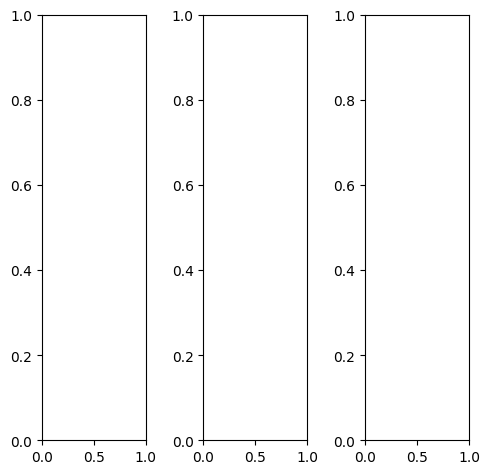

tensor([[[0.3490, 0.3608, 0.3843,  ..., 0.3216, 0.3059, 0.2863],
         [0.4000, 0.4157, 0.4706,  ..., 0.3373, 0.3255, 0.3137],
         [0.4275, 0.4667, 0.5451,  ..., 0.3490, 0.3333, 0.3255],
         ...,
         [0.4824, 0.4824, 0.4863,  ..., 0.4627, 0.4392, 0.4353],
         [0.4667, 0.4784, 0.4784,  ..., 0.4549, 0.4431, 0.4353],
         [0.4588, 0.4667, 0.4784,  ..., 0.4588, 0.4431, 0.4275]],

        [[0.3490, 0.3608, 0.3843,  ..., 0.3216, 0.3059, 0.2863],
         [0.4000, 0.4157, 0.4706,  ..., 0.3373, 0.3255, 0.3137],
         [0.4275, 0.4667, 0.5451,  ..., 0.3490, 0.3333, 0.3255],
         ...,
         [0.4824, 0.4824, 0.4863,  ..., 0.4627, 0.4392, 0.4353],
         [0.4667, 0.4784, 0.4784,  ..., 0.4549, 0.4431, 0.4353],
         [0.4588, 0.4667, 0.4784,  ..., 0.4588, 0.4431, 0.4275]],

        [[0.3490, 0.3608, 0.3843,  ..., 0.3216, 0.3059, 0.2863],
         [0.4000, 0.4157, 0.4706,  ..., 0.3373, 0.3255, 0.3137],
         [0.4275, 0.4667, 0.5451,  ..., 0.3490, 0.3333, 0.

tensor([[[0.2745, 0.2863, 0.3137,  ..., 0.2275, 0.2118, 0.2000],
         [0.3451, 0.3647, 0.4157,  ..., 0.2431, 0.2314, 0.2275],
         [0.3882, 0.4353, 0.5059,  ..., 0.2549, 0.2392, 0.2314],
         ...,
         [0.4706, 0.4667, 0.4745,  ..., 0.4314, 0.4039, 0.3961],
         [0.4549, 0.4667, 0.4667,  ..., 0.4314, 0.4118, 0.4039],
         [0.4510, 0.4549, 0.4667,  ..., 0.4353, 0.4157, 0.4000]],

        [[0.3647, 0.3725, 0.3961,  ..., 0.3373, 0.3216, 0.3020],
         [0.4078, 0.4235, 0.4824,  ..., 0.3569, 0.3451, 0.3294],
         [0.4314, 0.4706, 0.5529,  ..., 0.3686, 0.3529, 0.3412],
         ...,
         [0.4941, 0.4941, 0.4980,  ..., 0.4824, 0.4588, 0.4549],
         [0.4784, 0.4902, 0.4902,  ..., 0.4745, 0.4627, 0.4549],
         [0.4706, 0.4784, 0.4902,  ..., 0.4784, 0.4627, 0.4431]],

        [[0.4588, 0.4784, 0.5020,  ..., 0.4824, 0.4667, 0.4471],
         [0.4941, 0.5059, 0.5569,  ..., 0.4902, 0.4824, 0.4667],
         [0.5020, 0.5294, 0.6039,  ..., 0.5020, 0.4863, 0.

tensor([[[0.3167, 0.2873, 0.3030,  ..., 0.2388, 0.2308, 0.2454],
         [0.3364, 0.3295, 0.3946,  ..., 0.2461, 0.2434, 0.2463],
         [0.3591, 0.3965, 0.4789,  ..., 0.2639, 0.2468, 0.2544],
         ...,
         [0.4315, 0.4473, 0.4362,  ..., 0.4254, 0.4011, 0.3863],
         [0.4236, 0.4411, 0.4388,  ..., 0.4128, 0.3945, 0.4041],
         [0.4426, 0.4348, 0.4409,  ..., 0.4320, 0.4225, 0.4274]],

        [[0.3701, 0.3710, 0.3831,  ..., 0.3260, 0.3160, 0.3181],
         [0.4071, 0.4131, 0.4908,  ..., 0.3512, 0.3441, 0.3238],
         [0.4208, 0.4953, 0.5651,  ..., 0.3607, 0.3447, 0.3404],
         ...,
         [0.4914, 0.5048, 0.4939,  ..., 0.4747, 0.4618, 0.4322],
         [0.4644, 0.4843, 0.4917,  ..., 0.4581, 0.4500, 0.4369],
         [0.4710, 0.4743, 0.4879,  ..., 0.4719, 0.4592, 0.4531]],

        [[0.4119, 0.4246, 0.4619,  ..., 0.4196, 0.4021, 0.3827],
         [0.4624, 0.4980, 0.5687,  ..., 0.4440, 0.4268, 0.3945],
         [0.4948, 0.5602, 0.6451,  ..., 0.4621, 0.4441, 0.

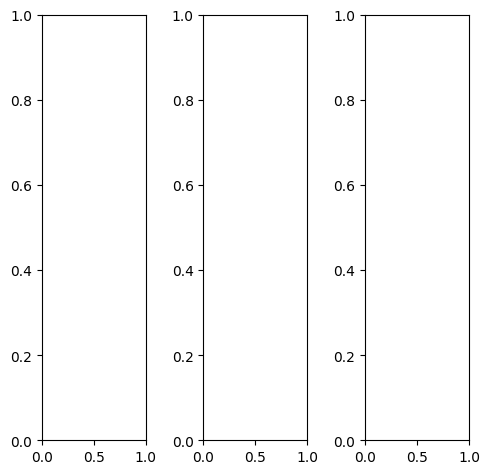

tensor([[[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9961, 1.0000],
         [0.9961, 0.9961, 0.9961,  ..., 0.9686, 0.9961, 1.0000],
         [0.9961, 1.0000, 0.9961,  ..., 0.9882, 0.9961, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.9412, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9882, 0.9882, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 0.9882, 0.9922, 0.9961]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9961, 1.0000],
         [0.9961, 0.9961, 0.9961,  ..., 0.9686, 0.9961, 1.0000],
         [0.9961, 1.0000, 0.9961,  ..., 0.9882, 0.9961, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.9412, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9882, 0.9882, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 0.9882, 0.9922, 0.9961]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9961, 1.0000],
         [0.9961, 0.9961, 0.9961,  ..., 0.9686, 0.9961, 1.0000],
         [0.9961, 1.0000, 0.9961,  ..., 0.9882, 0.9961, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.9686, 0.9922, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9882, 0.9843, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 0.9804, 0.9961],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.9176, 0.9765, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9725, 0.9843, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9843, 0.9882, 1.0000]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9529, 1.0000, 1.0000],
         [0.9961, 0.9961, 0.9961,  ..., 0.9608, 1.0000, 1.0000],
         [0.9961, 1.0000, 0.9961,  ..., 0.9804, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.9451, 0.9961, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 0.9922, 0.9961]],

        [[1.0000, 1.0000, 0.9961,  ..., 0.9529, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 0.9725, 1.0000, 1.0000],
         [0.9961, 0.9961, 1.0000,  ..., 0.9882, 1.0000, 1.

tensor([[[0.9662, 0.9666, 1.0002,  ..., 0.9248, 0.9758, 0.9410],
         [0.9877, 0.9854, 0.9807,  ..., 0.9713, 1.0076, 0.9694],
         [0.9757, 1.0142, 0.9883,  ..., 0.9934, 1.0037, 1.0087],
         ...,
         [1.0122, 1.0248, 1.0055,  ..., 0.9401, 1.0131, 1.0062],
         [0.9901, 1.0140, 0.9861,  ..., 0.9995, 0.9925, 0.9999],
         [0.9707, 0.9906, 0.9922,  ..., 0.9858, 0.9914, 0.9594]],

        [[0.9735, 0.9855, 1.0082,  ..., 0.9551, 0.9763, 0.9699],
         [0.9976, 1.0026, 1.0125,  ..., 0.9722, 0.9920, 0.9804],
         [0.9958, 1.0198, 1.0056,  ..., 1.0102, 0.9950, 1.0021],
         ...,
         [0.9985, 1.0142, 1.0118,  ..., 0.9397, 0.9998, 1.0030],
         [0.9868, 0.9997, 0.9982,  ..., 0.9908, 0.9760, 0.9846],
         [0.9595, 1.0025, 1.0011,  ..., 0.9838, 0.9716, 0.9288]],

        [[0.9670, 1.0001, 0.9902,  ..., 0.9149, 0.9536, 0.9328],
         [0.9919, 1.0152, 0.9831,  ..., 0.9560, 0.9645, 0.9553],
         [0.9989, 1.0071, 0.9974,  ..., 0.9684, 0.9754, 0.

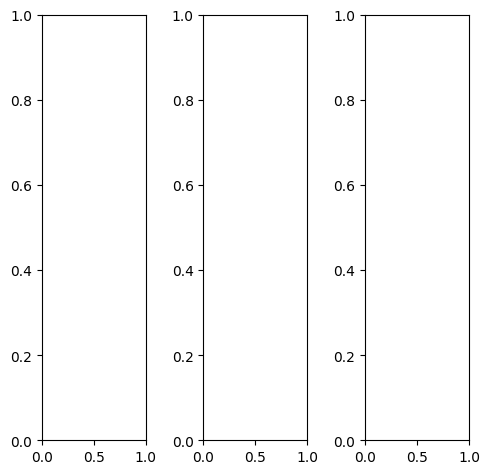

tensor([[[0.2000, 0.1647, 0.1451,  ..., 0.0706, 0.0824, 0.0863],
         [0.1843, 0.1529, 0.1686,  ..., 0.0745, 0.0824, 0.0863],
         [0.1765, 0.1490, 0.1647,  ..., 0.0745, 0.0824, 0.0863],
         ...,
         [0.1765, 0.2078, 0.1961,  ..., 0.0667, 0.0471, 0.0627],
         [0.2157, 0.2667, 0.2627,  ..., 0.1294, 0.0980, 0.0627],
         [0.3059, 0.3176, 0.2627,  ..., 0.1843, 0.1490, 0.1059]],

        [[0.2000, 0.1647, 0.1451,  ..., 0.0706, 0.0824, 0.0863],
         [0.1843, 0.1529, 0.1686,  ..., 0.0745, 0.0824, 0.0863],
         [0.1765, 0.1490, 0.1647,  ..., 0.0745, 0.0824, 0.0863],
         ...,
         [0.1765, 0.2078, 0.1961,  ..., 0.0667, 0.0471, 0.0627],
         [0.2157, 0.2667, 0.2627,  ..., 0.1294, 0.0980, 0.0627],
         [0.3059, 0.3176, 0.2627,  ..., 0.1843, 0.1490, 0.1059]],

        [[0.2000, 0.1647, 0.1451,  ..., 0.0706, 0.0824, 0.0863],
         [0.1843, 0.1529, 0.1686,  ..., 0.0745, 0.0824, 0.0863],
         [0.1765, 0.1490, 0.1647,  ..., 0.0745, 0.0824, 0.

tensor([[[0.2196, 0.1843, 0.1686,  ..., 0.0863, 0.0980, 0.1059],
         [0.2118, 0.1765, 0.1882,  ..., 0.0902, 0.0980, 0.1020],
         [0.2039, 0.1686, 0.1804,  ..., 0.0902, 0.0980, 0.1020],
         ...,
         [0.1961, 0.2314, 0.2196,  ..., 0.0667, 0.0471, 0.0588],
         [0.2314, 0.2941, 0.2941,  ..., 0.1333, 0.0980, 0.0588],
         [0.3216, 0.3451, 0.2941,  ..., 0.1922, 0.1529, 0.1098]],

        [[0.2000, 0.1647, 0.1412,  ..., 0.0667, 0.0784, 0.0824],
         [0.1804, 0.1490, 0.1647,  ..., 0.0706, 0.0784, 0.0824],
         [0.1725, 0.1451, 0.1608,  ..., 0.0706, 0.0784, 0.0824],
         ...,
         [0.1765, 0.2078, 0.1961,  ..., 0.0667, 0.0510, 0.0627],
         [0.2157, 0.2667, 0.2588,  ..., 0.1294, 0.1020, 0.0667],
         [0.3059, 0.3137, 0.2588,  ..., 0.1882, 0.1529, 0.1098]],

        [[0.1647, 0.1294, 0.1020,  ..., 0.0431, 0.0549, 0.0588],
         [0.1412, 0.1059, 0.1294,  ..., 0.0431, 0.0549, 0.0588],
         [0.1255, 0.1059, 0.1373,  ..., 0.0431, 0.0549, 0.

tensor([[[0.2171, 0.1649, 0.1481,  ..., 0.0671, 0.0861, 0.1220],
         [0.1777, 0.1443, 0.1668,  ..., 0.0654, 0.0828, 0.0895],
         [0.1702, 0.1412, 0.1599,  ..., 0.0618, 0.0739, 0.0828],
         ...,
         [0.1875, 0.2200, 0.2051,  ..., 0.0587, 0.0403, 0.0668],
         [0.2258, 0.2817, 0.2837,  ..., 0.1329, 0.1015, 0.0784],
         [0.3063, 0.3271, 0.2807,  ..., 0.1909, 0.1654, 0.1277]],

        [[0.2146, 0.1640, 0.1510,  ..., 0.0711, 0.0860, 0.1299],
         [0.1759, 0.1474, 0.1708,  ..., 0.0699, 0.0863, 0.0924],
         [0.1676, 0.1495, 0.1667,  ..., 0.0635, 0.0698, 0.0782],
         ...,
         [0.1795, 0.2070, 0.1903,  ..., 0.0612, 0.0365, 0.0574],
         [0.2103, 0.2629, 0.2568,  ..., 0.1200, 0.0883, 0.0644],
         [0.3074, 0.3106, 0.2641,  ..., 0.1658, 0.1340, 0.1203]],

        [[0.1809, 0.1336, 0.1210,  ..., 0.0573, 0.0790, 0.1147],
         [0.1446, 0.1192, 0.1358,  ..., 0.0618, 0.0722, 0.0743],
         [0.1367, 0.1130, 0.1271,  ..., 0.0540, 0.0607, 0.

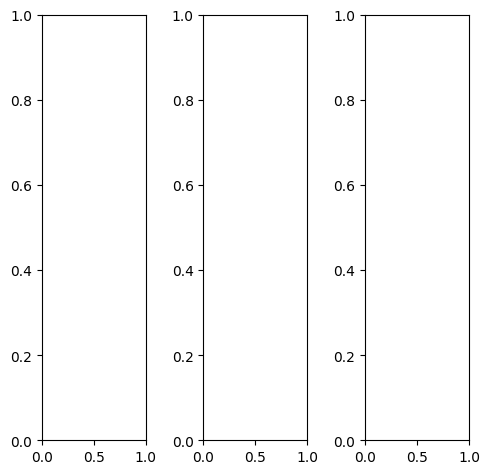

tensor([[[0.1686, 0.1922, 0.0941,  ..., 0.2549, 0.2824, 0.2588],
         [0.1765, 0.2078, 0.0824,  ..., 0.3216, 0.3059, 0.2667],
         [0.1490, 0.2078, 0.0706,  ..., 0.3608, 0.3765, 0.3333],
         ...,
         [0.8980, 0.9176, 0.9098,  ..., 0.8667, 0.9020, 0.9216],
         [0.8000, 0.8157, 0.8118,  ..., 0.8667, 0.8588, 0.8275],
         [0.8510, 0.8667, 0.8706,  ..., 0.7490, 0.7098, 0.6824]],

        [[0.1686, 0.1922, 0.0941,  ..., 0.2549, 0.2824, 0.2588],
         [0.1765, 0.2078, 0.0824,  ..., 0.3216, 0.3059, 0.2667],
         [0.1490, 0.2078, 0.0706,  ..., 0.3608, 0.3765, 0.3333],
         ...,
         [0.8980, 0.9176, 0.9098,  ..., 0.8667, 0.9020, 0.9216],
         [0.8000, 0.8157, 0.8118,  ..., 0.8667, 0.8588, 0.8275],
         [0.8510, 0.8667, 0.8706,  ..., 0.7490, 0.7098, 0.6824]],

        [[0.1686, 0.1922, 0.0941,  ..., 0.2549, 0.2824, 0.2588],
         [0.1765, 0.2078, 0.0824,  ..., 0.3216, 0.3059, 0.2667],
         [0.1490, 0.2078, 0.0706,  ..., 0.3608, 0.3765, 0.

tensor([[[0.2000, 0.2196, 0.1137,  ..., 0.3020, 0.3255, 0.3020],
         [0.2000, 0.2314, 0.0980,  ..., 0.3686, 0.3529, 0.3098],
         [0.1686, 0.2275, 0.0824,  ..., 0.4157, 0.4314, 0.3804],
         ...,
         [0.9216, 0.9294, 0.9294,  ..., 0.8980, 0.9294, 0.9490],
         [0.9255, 0.9333, 0.9294,  ..., 0.8392, 0.8510, 0.8275],
         [0.9647, 0.9647, 0.9686,  ..., 0.7569, 0.7373, 0.7176]],

        [[0.1608, 0.1843, 0.0902,  ..., 0.2471, 0.2745, 0.2510],
         [0.1725, 0.2039, 0.0784,  ..., 0.3137, 0.2980, 0.2588],
         [0.1451, 0.2078, 0.0706,  ..., 0.3490, 0.3647, 0.3216],
         ...,
         [0.8902, 0.9137, 0.9020,  ..., 0.8824, 0.9098, 0.9216],
         [0.7529, 0.7725, 0.7686,  ..., 0.8824, 0.8667, 0.8275],
         [0.8314, 0.8549, 0.8588,  ..., 0.7490, 0.7020, 0.6706]],

        [[0.1176, 0.1451, 0.0627,  ..., 0.1804, 0.2039, 0.1843],
         [0.1412, 0.1608, 0.0549,  ..., 0.2549, 0.2392, 0.2000],
         [0.1255, 0.1686, 0.0510,  ..., 0.2902, 0.2941, 0.

tensor([[[0.1983, 0.1817, 0.1044,  ..., 0.2516, 0.2746, 0.2622],
         [0.1761, 0.2035, 0.0798,  ..., 0.3236, 0.3118, 0.2623],
         [0.1481, 0.2087, 0.0574,  ..., 0.3666, 0.3854, 0.3276],
         ...,
         [0.9193, 0.9546, 0.9361,  ..., 0.8924, 0.9369, 0.9403],
         [0.8210, 0.8431, 0.8288,  ..., 0.8968, 0.8869, 0.8576],
         [0.8512, 0.8856, 0.8804,  ..., 0.7929, 0.7525, 0.7416]],

        [[0.1988, 0.1748, 0.1031,  ..., 0.2572, 0.2833, 0.2695],
         [0.1685, 0.1966, 0.0799,  ..., 0.3235, 0.3169, 0.2704],
         [0.1449, 0.2084, 0.0686,  ..., 0.3701, 0.3900, 0.3371],
         ...,
         [0.8920, 0.9390, 0.9282,  ..., 0.8649, 0.9028, 0.9257],
         [0.8021, 0.8111, 0.8118,  ..., 0.8660, 0.8617, 0.8398],
         [0.8372, 0.8728, 0.8682,  ..., 0.7605, 0.7240, 0.7015]],

        [[0.1604, 0.1449, 0.0832,  ..., 0.1866, 0.2181, 0.2099],
         [0.1320, 0.1667, 0.0595,  ..., 0.2355, 0.2265, 0.1874],
         [0.1074, 0.1702, 0.0424,  ..., 0.2703, 0.2891, 0.

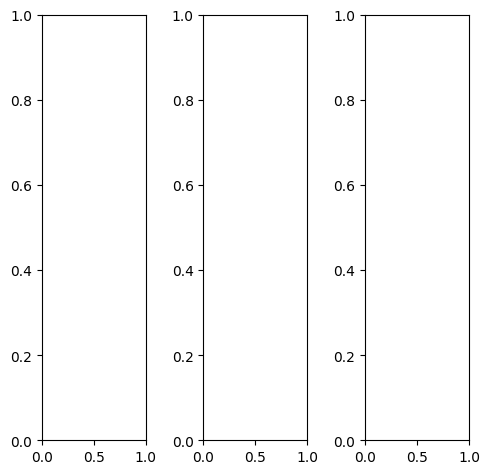

EPOCH: 18.255  trn_loss: 0.005  (2190.72s - 9809.86s remaining)

tensor([[[0.2745, 0.2745, 0.1882,  ..., 0.0980, 0.0863, 0.0588],
         [0.2314, 0.1804, 0.0941,  ..., 0.0314, 0.0392, 0.0392],
         [0.2275, 0.1922, 0.1294,  ..., 0.0627, 0.1020, 0.0902],
         ...,
         [0.3020, 0.2078, 0.2314,  ..., 0.1216, 0.1922, 0.1529],
         [0.2902, 0.1922, 0.2706,  ..., 0.1412, 0.1529, 0.1922],
         [0.2588, 0.3490, 0.3137,  ..., 0.1922, 0.1569, 0.1333]],

        [[0.2745, 0.2745, 0.1882,  ..., 0.0980, 0.0863, 0.0588],
         [0.2314, 0.1804, 0.0941,  ..., 0.0314, 0.0392, 0.0392],
         [0.2275, 0.1922, 0.1294,  ..., 0.0627, 0.1020, 0.0902],
         ...,
         [0.3020, 0.2078, 0.2314,  ..., 0.1216, 0.1922, 0.1529],
         [0.2902, 0.1922, 0.2706,  ..., 0.1412, 0.1529, 0.1922],
         [0.2588, 0.3490, 0.3137,  ..., 0.1922, 0.1569, 0.1333]],

        [[0.2745, 0.2745, 0.1882,  ..., 0.0980, 0.0863, 0.0588],
         [0.2314, 0.1804, 0.0941,  ..., 0.0314, 0.0392, 0.0392],
         [0.2275, 0.1922, 0.1294,  ..., 0.0627, 0.1020, 0.

tensor([[[0.3255, 0.3294, 0.2510,  ..., 0.0824, 0.0902, 0.0824],
         [0.2824, 0.2314, 0.1294,  ..., 0.0275, 0.0431, 0.0588],
         [0.2824, 0.2275, 0.1451,  ..., 0.0824, 0.1216, 0.1098],
         ...,
         [0.3647, 0.2745, 0.2980,  ..., 0.1333, 0.2039, 0.1765],
         [0.3451, 0.2471, 0.3255,  ..., 0.1569, 0.1725, 0.2196],
         [0.3176, 0.4078, 0.3725,  ..., 0.2157, 0.1804, 0.1569]],

        [[0.2549, 0.2510, 0.1608,  ..., 0.1137, 0.0824, 0.0471],
         [0.2118, 0.1569, 0.0784,  ..., 0.0314, 0.0392, 0.0314],
         [0.2039, 0.1765, 0.1294,  ..., 0.0549, 0.0941, 0.0824],
         ...,
         [0.2863, 0.1882, 0.2078,  ..., 0.1176, 0.1882, 0.1490],
         [0.2706, 0.1765, 0.2588,  ..., 0.1373, 0.1490, 0.1804],
         [0.2431, 0.3373, 0.3059,  ..., 0.1882, 0.1490, 0.1216]],

        [[0.2431, 0.2471, 0.1608,  ..., 0.0745, 0.0824, 0.0627],
         [0.2000, 0.1647, 0.0824,  ..., 0.0275, 0.0353, 0.0392],
         [0.1922, 0.1725, 0.1020,  ..., 0.0588, 0.0745, 0.

tensor([[[ 0.3587,  0.3202,  0.0864,  ...,  0.0871,  0.0976,  0.1173],
         [ 0.2876,  0.1091, -0.0081,  ..., -0.0494, -0.0297,  0.0381],
         [ 0.1966,  0.1212, -0.0755,  ...,  0.0166,  0.0935,  0.0980],
         ...,
         [ 0.5412,  0.4416,  0.4597,  ...,  0.2534,  0.3585,  0.2898],
         [ 0.4860,  0.3686,  0.5250,  ...,  0.2539,  0.2789,  0.3378],
         [ 0.4565,  0.6127,  0.5751,  ...,  0.2900,  0.2473,  0.2841]],

        [[ 0.4301,  0.4162,  0.1868,  ...,  0.1396,  0.1412,  0.1376],
         [ 0.3263,  0.2230, -0.0751,  ...,  0.0180,  0.0480,  0.0691],
         [ 0.2983,  0.2672, -0.0051,  ...,  0.0722,  0.1419,  0.1303],
         ...,
         [ 0.4676,  0.3544,  0.4216,  ...,  0.2361,  0.3359,  0.2503],
         [ 0.4437,  0.3197,  0.5004,  ...,  0.2553,  0.2689,  0.3036],
         [ 0.4413,  0.5659,  0.5499,  ...,  0.2721,  0.2366,  0.2504]],

        [[ 0.5601,  0.4494,  0.3120,  ...,  0.2573,  0.2632,  0.2698],
         [ 0.4504,  0.3538,  0.1942,  ...,  0

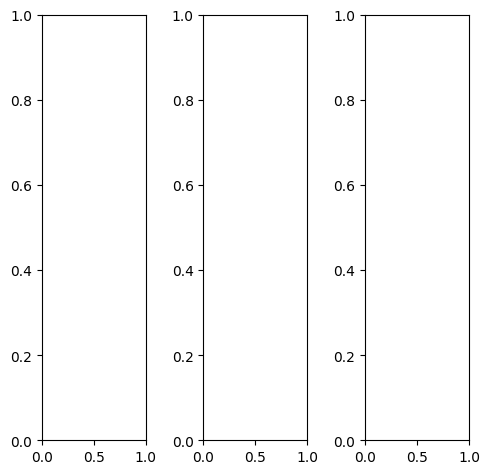

tensor([[[0.5137, 0.4471, 0.5294,  ..., 0.9490, 0.9647, 0.9216],
         [0.3608, 0.3647, 0.5725,  ..., 0.8941, 0.9373, 0.9216],
         [0.3176, 0.3333, 0.4627,  ..., 0.8667, 0.9451, 0.8627],
         ...,
         [0.6039, 0.5804, 0.5725,  ..., 0.7765, 0.7804, 0.8118],
         [0.5882, 0.5608, 0.5529,  ..., 0.8000, 0.8000, 0.8118],
         [0.5098, 0.5176, 0.5765,  ..., 0.7765, 0.7843, 0.7843]],

        [[0.5137, 0.4471, 0.5294,  ..., 0.9490, 0.9647, 0.9216],
         [0.3608, 0.3647, 0.5725,  ..., 0.8941, 0.9373, 0.9216],
         [0.3176, 0.3333, 0.4627,  ..., 0.8667, 0.9451, 0.8627],
         ...,
         [0.6039, 0.5804, 0.5725,  ..., 0.7765, 0.7804, 0.8118],
         [0.5882, 0.5608, 0.5529,  ..., 0.8000, 0.8000, 0.8118],
         [0.5098, 0.5176, 0.5765,  ..., 0.7765, 0.7843, 0.7843]],

        [[0.5137, 0.4471, 0.5294,  ..., 0.9490, 0.9647, 0.9216],
         [0.3608, 0.3647, 0.5725,  ..., 0.8941, 0.9373, 0.9216],
         [0.3176, 0.3333, 0.4627,  ..., 0.8667, 0.9451, 0.

tensor([[[0.4549, 0.4118, 0.4941,  ..., 0.9294, 0.9725, 0.9137],
         [0.3137, 0.3412, 0.5373,  ..., 0.8863, 0.9373, 0.9098],
         [0.2824, 0.3216, 0.4235,  ..., 0.8549, 0.9294, 0.8314],
         ...,
         [0.6196, 0.5961, 0.5882,  ..., 0.7804, 0.7843, 0.8157],
         [0.6078, 0.5804, 0.5725,  ..., 0.8078, 0.8039, 0.8157],
         [0.5373, 0.5451, 0.6000,  ..., 0.7843, 0.7882, 0.7882]],

        [[0.5529, 0.4706, 0.5490,  ..., 0.9569, 0.9608, 0.9255],
         [0.4000, 0.3882, 0.5961,  ..., 0.8980, 0.9333, 0.9294],
         [0.3490, 0.3529, 0.4941,  ..., 0.8706, 0.9529, 0.8784],
         ...,
         [0.6118, 0.5882, 0.5804,  ..., 0.7804, 0.7882, 0.8157],
         [0.5922, 0.5647, 0.5569,  ..., 0.8039, 0.8039, 0.8157],
         [0.5098, 0.5176, 0.5765,  ..., 0.7843, 0.7882, 0.7882]],

        [[0.4784, 0.4157, 0.5059,  ..., 0.9569, 0.9725, 0.9333],
         [0.2863, 0.3137, 0.5333,  ..., 0.9059, 0.9412, 0.9255],
         [0.2392, 0.2627, 0.4000,  ..., 0.8824, 0.9490, 0.

tensor([[[0.3317, 0.1901, 0.2887,  ..., 0.8038, 0.8132, 0.7887],
         [0.2000, 0.1249, 0.4223,  ..., 0.7254, 0.8040, 0.7560],
         [0.1130, 0.1101, 0.2295,  ..., 0.7127, 0.8201, 0.6739],
         ...,
         [0.4989, 0.4719, 0.4641,  ..., 0.7439, 0.7387, 0.7307],
         [0.4681, 0.4315, 0.4120,  ..., 0.7072, 0.7242, 0.7341],
         [0.3887, 0.3601, 0.4068,  ..., 0.7016, 0.7355, 0.7237]],

        [[0.3843, 0.3851, 0.3813,  ..., 0.8745, 0.9169, 0.8890],
         [0.2797, 0.1747, 0.4357,  ..., 0.8412, 0.8757, 0.8655],
         [0.2119, 0.2675, 0.3655,  ..., 0.8370, 0.9070, 0.7971],
         ...,
         [0.5033, 0.4748, 0.4714,  ..., 0.7449, 0.7227, 0.7413],
         [0.4714, 0.4375, 0.4357,  ..., 0.7281, 0.7271, 0.7377],
         [0.3938, 0.3613, 0.4406,  ..., 0.6899, 0.7144, 0.6963]],

        [[0.6053, 0.4213, 0.6590,  ..., 1.0155, 1.0468, 0.9916],
         [0.4275, 0.3959, 0.6366,  ..., 0.9536, 1.0281, 0.9654],
         [0.3668, 0.3116, 0.5468,  ..., 0.9719, 1.0801, 0.

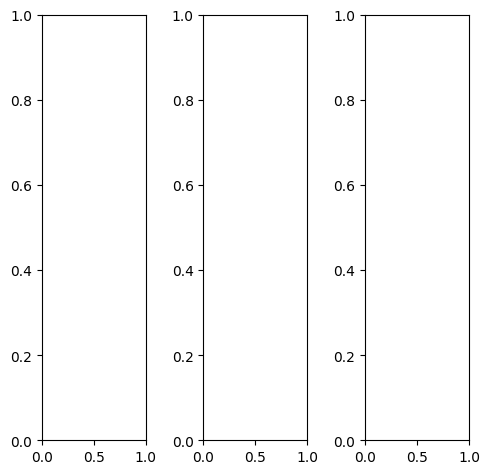

tensor([[[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.5647],
         ...,
         [0.5647, 0.4941, 0.5137,  ..., 0.4118, 0.4078, 0.4039],
         [0.5569, 0.4588, 0.5176,  ..., 0.4588, 0.4431, 0.4627],
         [0.5529, 0.4588, 0.5765,  ..., 0.4745, 0.5098, 0.5373]],

        [[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.5647],
         ...,
         [0.5647, 0.4941, 0.5137,  ..., 0.4118, 0.4078, 0.4039],
         [0.5569, 0.4588, 0.5176,  ..., 0.4588, 0.4431, 0.4627],
         [0.5529, 0.4588, 0.5765,  ..., 0.4745, 0.5098, 0.5373]],

        [[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.

tensor([[[0.2118, 0.2078, 0.2824,  ..., 0.4627, 0.4314, 0.4941],
         [0.4314, 0.4627, 0.4667,  ..., 0.4980, 0.4588, 0.5765],
         [0.5137, 0.5059, 0.4784,  ..., 0.4667, 0.5255, 0.5882],
         ...,
         [0.6353, 0.5569, 0.5765,  ..., 0.4627, 0.4588, 0.4392],
         [0.6039, 0.5255, 0.5804,  ..., 0.5098, 0.4941, 0.5098],
         [0.5961, 0.5333, 0.6275,  ..., 0.5412, 0.5725, 0.5961]],

        [[0.1725, 0.1647, 0.2039,  ..., 0.4392, 0.3882, 0.4431],
         [0.3725, 0.3922, 0.3922,  ..., 0.4667, 0.4118, 0.5412],
         [0.4235, 0.4078, 0.3961,  ..., 0.4157, 0.4745, 0.5686],
         ...,
         [0.5529, 0.4824, 0.4980,  ..., 0.4000, 0.3922, 0.4000],
         [0.5490, 0.4431, 0.5020,  ..., 0.4471, 0.4314, 0.4549],
         [0.5451, 0.4392, 0.5608,  ..., 0.4627, 0.4941, 0.5294]],

        [[0.0784, 0.0941, 0.1255,  ..., 0.3922, 0.3176, 0.3412],
         [0.2627, 0.3020, 0.3059,  ..., 0.4157, 0.3098, 0.4275],
         [0.2824, 0.2824, 0.2941,  ..., 0.3137, 0.3529, 0.

tensor([[[-0.0080, -0.0471, -0.0655,  ...,  0.3740,  0.3147,  0.4448],
         [ 0.2550,  0.0749,  0.0859,  ...,  0.4299,  0.3638,  0.5045],
         [ 0.2620,  0.2069,  0.1027,  ...,  0.4244,  0.4942,  0.5807],
         ...,
         [ 0.6638,  0.6298,  0.6843,  ...,  0.4838,  0.4799,  0.4397],
         [ 0.6425,  0.5361,  0.6507,  ...,  0.5411,  0.5174,  0.5133],
         [ 0.6007,  0.5255,  0.6747,  ...,  0.5192,  0.5762,  0.5856]],

        [[ 0.0972,  0.1593,  0.0546,  ...,  0.4993,  0.4440,  0.4874],
         [ 0.3123,  0.2906,  0.1249,  ...,  0.5724,  0.5018,  0.6379],
         [ 0.3758,  0.4195,  0.2408,  ...,  0.5200,  0.6060,  0.6794],
         ...,
         [ 0.6202,  0.5843,  0.6558,  ...,  0.5080,  0.5109,  0.4027],
         [ 0.6024,  0.5042,  0.6454,  ...,  0.5576,  0.5456,  0.5059],
         [ 0.5522,  0.4928,  0.6576,  ...,  0.5009,  0.5693,  0.5577]],

        [[ 0.2540,  0.0722,  0.2096,  ...,  0.7623,  0.6914,  0.7240],
         [ 0.4697,  0.3890,  0.4067,  ...,  0

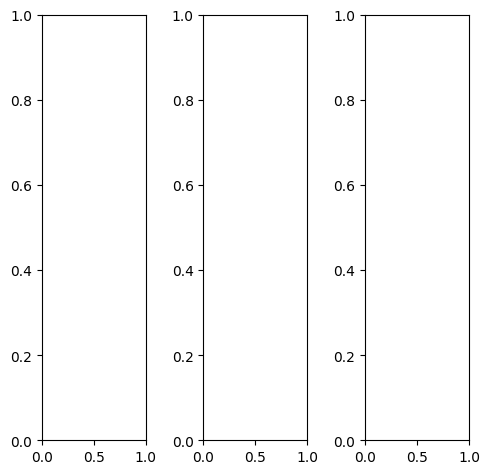

tensor([[[0.8431, 0.8471, 0.8235,  ..., 0.5216, 0.4863, 0.4196],
         [0.7843, 0.8000, 0.7922,  ..., 0.5725, 0.5216, 0.4431],
         [0.7804, 0.7922, 0.7804,  ..., 0.6471, 0.6157, 0.5922],
         ...,
         [0.4431, 0.4196, 0.4588,  ..., 0.4118, 0.4078, 0.4353],
         [0.4588, 0.4118, 0.3804,  ..., 0.4392, 0.4235, 0.3922],
         [0.4431, 0.4588, 0.4392,  ..., 0.3882, 0.3804, 0.3529]],

        [[0.8431, 0.8471, 0.8235,  ..., 0.5216, 0.4863, 0.4196],
         [0.7843, 0.8000, 0.7922,  ..., 0.5725, 0.5216, 0.4431],
         [0.7804, 0.7922, 0.7804,  ..., 0.6471, 0.6157, 0.5922],
         ...,
         [0.4431, 0.4196, 0.4588,  ..., 0.4118, 0.4078, 0.4353],
         [0.4588, 0.4118, 0.3804,  ..., 0.4392, 0.4235, 0.3922],
         [0.4431, 0.4588, 0.4392,  ..., 0.3882, 0.3804, 0.3529]],

        [[0.8431, 0.8471, 0.8235,  ..., 0.5216, 0.4863, 0.4196],
         [0.7843, 0.8000, 0.7922,  ..., 0.5725, 0.5216, 0.4431],
         [0.7804, 0.7922, 0.7804,  ..., 0.6471, 0.6157, 0.

tensor([[[0.8980, 0.9059, 0.8784,  ..., 0.6078, 0.5725, 0.5098],
         [0.8392, 0.8549, 0.8471,  ..., 0.6706, 0.6196, 0.5373],
         [0.8353, 0.8471, 0.8353,  ..., 0.7451, 0.7137, 0.6863],
         ...,
         [0.5216, 0.4980, 0.5373,  ..., 0.4824, 0.4863, 0.5216],
         [0.5294, 0.4863, 0.4549,  ..., 0.5137, 0.5020, 0.4706],
         [0.5098, 0.5255, 0.5098,  ..., 0.4667, 0.4588, 0.4353]],

        [[0.8353, 0.8392, 0.8157,  ..., 0.4941, 0.4588, 0.3922],
         [0.7804, 0.7961, 0.7882,  ..., 0.5451, 0.4941, 0.4157],
         [0.7765, 0.7882, 0.7765,  ..., 0.6235, 0.5922, 0.5686],
         ...,
         [0.4196, 0.3961, 0.4392,  ..., 0.4000, 0.3922, 0.4157],
         [0.4353, 0.3922, 0.3569,  ..., 0.4157, 0.4000, 0.3686],
         [0.4235, 0.4353, 0.4196,  ..., 0.3608, 0.3529, 0.3255]],

        [[0.7412, 0.7451, 0.7216,  ..., 0.4275, 0.3961, 0.3373],
         [0.6706, 0.6824, 0.6784,  ..., 0.4588, 0.4078, 0.3373],
         [0.6588, 0.6706, 0.6588,  ..., 0.5216, 0.4941, 0.

tensor([[[0.8759, 0.8157, 0.7632,  ..., 0.2993, 0.2613, 0.2352],
         [0.7678, 0.6908, 0.6867,  ..., 0.3472, 0.2934, 0.2178],
         [0.7615, 0.7753, 0.6683,  ..., 0.4696, 0.4165, 0.4326],
         ...,
         [0.3208, 0.3109, 0.3500,  ..., 0.3014, 0.2767, 0.3432],
         [0.3506, 0.2541, 0.2133,  ..., 0.3006, 0.2853, 0.2705],
         [0.3689, 0.3573, 0.3201,  ..., 0.2164, 0.2268, 0.2644]],

        [[0.9036, 0.8438, 0.7798,  ..., 0.3781, 0.3837, 0.2976],
         [0.7459, 0.7045, 0.6877,  ..., 0.4894, 0.4415, 0.2882],
         [0.8316, 0.7888, 0.7322,  ..., 0.5878, 0.5457, 0.5386],
         ...,
         [0.3138, 0.3120, 0.3974,  ..., 0.3273, 0.3119, 0.3178],
         [0.3515, 0.2979, 0.2554,  ..., 0.3224, 0.3059, 0.2612],
         [0.3524, 0.3602, 0.3445,  ..., 0.2218, 0.2312, 0.2321]],

        [[0.9429, 0.9299, 0.8650,  ..., 0.6267, 0.5722, 0.5082],
         [0.8951, 0.8543, 0.8514,  ..., 0.6939, 0.6688, 0.5469],
         [0.8673, 0.8599, 0.8171,  ..., 0.7866, 0.7679, 0.

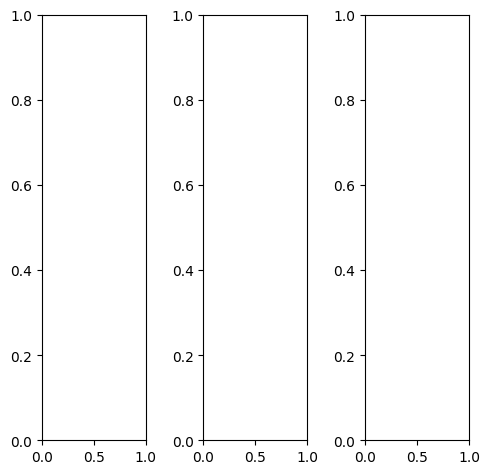

tensor([[[0.6392, 0.6235, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6588, 0.6392, 0.6353,  ..., 0.6078, 0.6118, 0.6118],
         [0.6706, 0.6549, 0.6549,  ..., 0.6039, 0.6157, 0.6235],
         ...,
         [0.7569, 0.7412, 0.7373,  ..., 0.7490, 0.7529, 0.7529],
         [0.7608, 0.7412, 0.7373,  ..., 0.7490, 0.7490, 0.7490],
         [0.7647, 0.7490, 0.7412,  ..., 0.7490, 0.7490, 0.7490]],

        [[0.6392, 0.6235, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6588, 0.6392, 0.6353,  ..., 0.6078, 0.6118, 0.6118],
         [0.6706, 0.6549, 0.6549,  ..., 0.6039, 0.6157, 0.6235],
         ...,
         [0.7569, 0.7412, 0.7373,  ..., 0.7490, 0.7529, 0.7529],
         [0.7608, 0.7412, 0.7373,  ..., 0.7490, 0.7490, 0.7490],
         [0.7647, 0.7490, 0.7412,  ..., 0.7490, 0.7490, 0.7490]],

        [[0.6392, 0.6235, 0.6196,  ..., 0.6235, 0.6235, 0.6235],
         [0.6588, 0.6392, 0.6353,  ..., 0.6078, 0.6118, 0.6118],
         [0.6706, 0.6549, 0.6549,  ..., 0.6039, 0.6157, 0.

tensor([[[0.5529, 0.5176, 0.5098,  ..., 0.5412, 0.5412, 0.5490],
         [0.5725, 0.5333, 0.5255,  ..., 0.5216, 0.5255, 0.5333],
         [0.5804, 0.5490, 0.5451,  ..., 0.5098, 0.5255, 0.5373],
         ...,
         [0.6627, 0.6431, 0.6353,  ..., 0.6627, 0.6667, 0.6745],
         [0.6706, 0.6471, 0.6392,  ..., 0.6706, 0.6706, 0.6706],
         [0.6863, 0.6627, 0.6510,  ..., 0.6824, 0.6863, 0.6863]],

        [[0.6549, 0.6471, 0.6431,  ..., 0.6392, 0.6392, 0.6353],
         [0.6745, 0.6627, 0.6588,  ..., 0.6275, 0.6314, 0.6275],
         [0.6863, 0.6784, 0.6824,  ..., 0.6235, 0.6353, 0.6392],
         ...,
         [0.7882, 0.7765, 0.7765,  ..., 0.7843, 0.7882, 0.7882],
         [0.7922, 0.7765, 0.7725,  ..., 0.7804, 0.7843, 0.7804],
         [0.7882, 0.7765, 0.7725,  ..., 0.7765, 0.7725, 0.7765]],

        [[0.8000, 0.7804, 0.7765,  ..., 0.7569, 0.7569, 0.7569],
         [0.8157, 0.7922, 0.7882,  ..., 0.7490, 0.7451, 0.7490],
         [0.8196, 0.8039, 0.8039,  ..., 0.7412, 0.7490, 0.

tensor([[[0.4006, 0.3277, 0.2330,  ..., 0.4310, 0.4594, 0.5292],
         [0.3704, 0.1909, 0.1175,  ..., 0.3738, 0.3964, 0.4848],
         [0.2960, 0.1653, 0.0380,  ..., 0.3664, 0.4182, 0.5014],
         ...,
         [0.6092, 0.5863, 0.5367,  ..., 0.5644, 0.5876, 0.6738],
         [0.6052, 0.5726, 0.5276,  ..., 0.5583, 0.5790, 0.6693],
         [0.6711, 0.6235, 0.6002,  ..., 0.6240, 0.6604, 0.6725]],

        [[0.5037, 0.4354, 0.4226,  ..., 0.4851, 0.5353, 0.5352],
         [0.3914, 0.2536, 0.1611,  ..., 0.4601, 0.5013, 0.5210],
         [0.4766, 0.3353, 0.3206,  ..., 0.4575, 0.5173, 0.5403],
         ...,
         [0.5433, 0.5372, 0.5124,  ..., 0.5238, 0.5708, 0.6202],
         [0.5516, 0.5234, 0.5019,  ..., 0.5356, 0.5497, 0.6267],
         [0.6054, 0.5750, 0.5604,  ..., 0.5681, 0.6121, 0.6341]],

        [[0.6415, 0.4904, 0.5616,  ..., 0.6589, 0.6823, 0.6870],
         [0.5657, 0.4734, 0.4429,  ..., 0.6077, 0.6433, 0.6912],
         [0.4949, 0.4422, 0.3763,  ..., 0.6260, 0.6553, 0.

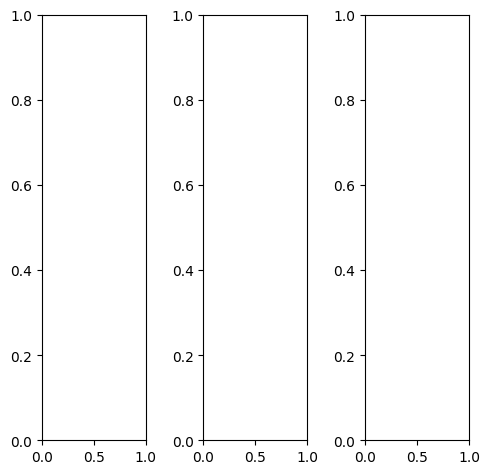

EPOCH: 18.510  trn_loss: 0.005  (2220.43s - 9775.29s remaining)

tensor([[[0.1922, 0.2196, 0.2471,  ..., 0.5490, 0.5255, 0.5216],
         [0.1647, 0.1569, 0.1725,  ..., 0.5490, 0.5216, 0.5176],
         [0.1961, 0.1529, 0.1490,  ..., 0.5373, 0.4941, 0.4706],
         ...,
         [0.2706, 0.2941, 0.3804,  ..., 0.3882, 0.3922, 0.4078],
         [0.2863, 0.2980, 0.3216,  ..., 0.3843, 0.3804, 0.4000],
         [0.2549, 0.2902, 0.3686,  ..., 0.3686, 0.3569, 0.3686]],

        [[0.1922, 0.2196, 0.2471,  ..., 0.5490, 0.5255, 0.5216],
         [0.1647, 0.1569, 0.1725,  ..., 0.5490, 0.5216, 0.5176],
         [0.1961, 0.1529, 0.1490,  ..., 0.5373, 0.4941, 0.4706],
         ...,
         [0.2706, 0.2941, 0.3804,  ..., 0.3882, 0.3922, 0.4078],
         [0.2863, 0.2980, 0.3216,  ..., 0.3843, 0.3804, 0.4000],
         [0.2549, 0.2902, 0.3686,  ..., 0.3686, 0.3569, 0.3686]],

        [[0.1922, 0.2196, 0.2471,  ..., 0.5490, 0.5255, 0.5216],
         [0.1647, 0.1569, 0.1725,  ..., 0.5490, 0.5216, 0.5176],
         [0.1961, 0.1529, 0.1490,  ..., 0.5373, 0.4941, 0.

tensor([[[0.1804, 0.2078, 0.2353,  ..., 0.5647, 0.5373, 0.5216],
         [0.1529, 0.1451, 0.1608,  ..., 0.5373, 0.5059, 0.4941],
         [0.1843, 0.1412, 0.1373,  ..., 0.5098, 0.4627, 0.4431],
         ...,
         [0.2745, 0.2941, 0.3725,  ..., 0.4000, 0.4000, 0.4000],
         [0.2902, 0.2980, 0.3137,  ..., 0.3922, 0.3843, 0.3961],
         [0.2588, 0.2902, 0.3569,  ..., 0.3686, 0.3569, 0.3686]],

        [[0.2196, 0.2431, 0.2745,  ..., 0.5804, 0.5608, 0.5608],
         [0.1843, 0.1804, 0.1922,  ..., 0.5961, 0.5647, 0.5608],
         [0.2157, 0.1725, 0.1686,  ..., 0.5882, 0.5412, 0.5137],
         ...,
         [0.2627, 0.2863, 0.3765,  ..., 0.4078, 0.4157, 0.4353],
         [0.2784, 0.2941, 0.3176,  ..., 0.4039, 0.4039, 0.4275],
         [0.2471, 0.2863, 0.3647,  ..., 0.3922, 0.3804, 0.3922]],

        [[0.0902, 0.1176, 0.1451,  ..., 0.3373, 0.3255, 0.3333],
         [0.0902, 0.0824, 0.0980,  ..., 0.3529, 0.3333, 0.3412],
         [0.1294, 0.0863, 0.0863,  ..., 0.3529, 0.3216, 0.

tensor([[[-3.6796e-02, -6.3453e-02, -1.1358e-01,  ...,  4.1762e-01,
           3.9621e-01,  4.6107e-01],
         [ 2.2272e-03, -2.4653e-01, -1.6411e-01,  ...,  4.2990e-01,
           4.0266e-01,  4.1962e-01],
         [-1.7216e-01, -2.4443e-01, -2.9551e-01,  ...,  4.2275e-01,
           3.6947e-01,  3.6341e-01],
         ...,
         [ 1.4664e-01,  1.6793e-01,  2.7343e-01,  ...,  3.5438e-01,
           3.3817e-01,  3.8556e-01],
         [ 1.5667e-01,  1.5358e-01,  1.9526e-01,  ...,  3.0117e-01,
           3.0739e-01,  3.5405e-01],
         [ 1.5879e-01,  1.5539e-01,  2.4109e-01,  ...,  3.0964e-01,
           2.8527e-01,  3.3865e-01]],

        [[ 7.1607e-02,  1.1162e-02, -1.4579e-02,  ...,  5.7749e-01,
           5.5599e-01,  5.4483e-01],
         [ 4.6302e-04, -3.4756e-01, -2.9510e-01,  ...,  6.2211e-01,
           5.7625e-01,  5.5128e-01],
         [-4.2751e-02, -1.9414e-01, -2.5005e-01,  ...,  5.9333e-01,
           5.4275e-01,  4.7268e-01],
         ...,
         [ 1.6721e-01,  1

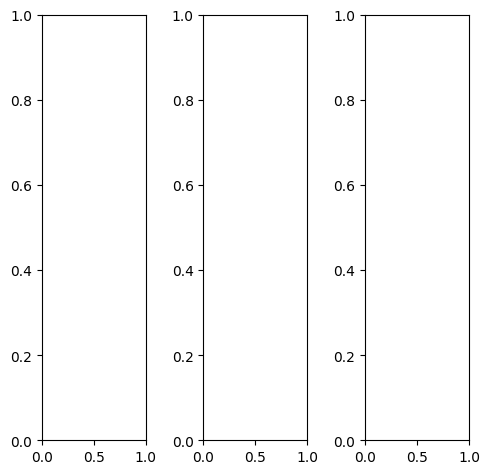

tensor([[[0.7647, 0.7373, 0.7412,  ..., 0.7176, 0.7059, 0.7059],
         [0.7765, 0.7490, 0.7529,  ..., 0.7255, 0.7137, 0.7059],
         [0.7686, 0.7490, 0.7686,  ..., 0.7451, 0.7412, 0.7255],
         ...,
         [0.3725, 0.3922, 0.3961,  ..., 0.4627, 0.4588, 0.4706],
         [0.4784, 0.4863, 0.4627,  ..., 0.5922, 0.5686, 0.5882],
         [0.5373, 0.5098, 0.4078,  ..., 0.6431, 0.6667, 0.6784]],

        [[0.7647, 0.7373, 0.7412,  ..., 0.7176, 0.7059, 0.7059],
         [0.7765, 0.7490, 0.7529,  ..., 0.7255, 0.7137, 0.7059],
         [0.7686, 0.7490, 0.7686,  ..., 0.7451, 0.7412, 0.7255],
         ...,
         [0.3725, 0.3922, 0.3961,  ..., 0.4627, 0.4588, 0.4706],
         [0.4784, 0.4863, 0.4627,  ..., 0.5922, 0.5686, 0.5882],
         [0.5373, 0.5098, 0.4078,  ..., 0.6431, 0.6667, 0.6784]],

        [[0.7647, 0.7373, 0.7412,  ..., 0.7176, 0.7059, 0.7059],
         [0.7765, 0.7490, 0.7529,  ..., 0.7255, 0.7137, 0.7059],
         [0.7686, 0.7490, 0.7686,  ..., 0.7451, 0.7412, 0.

tensor([[[0.6549, 0.6275, 0.6314,  ..., 0.6118, 0.6000, 0.5961],
         [0.6824, 0.6549, 0.6588,  ..., 0.6235, 0.6078, 0.6000],
         [0.6863, 0.6706, 0.6902,  ..., 0.6510, 0.6471, 0.6314],
         ...,
         [0.3059, 0.3255, 0.3333,  ..., 0.4078, 0.4039, 0.4157],
         [0.4235, 0.4314, 0.4118,  ..., 0.5529, 0.5294, 0.5490],
         [0.4980, 0.4667, 0.3686,  ..., 0.6118, 0.6392, 0.6471]],

        [[0.8039, 0.7765, 0.7765,  ..., 0.7529, 0.7412, 0.7412],
         [0.8039, 0.7765, 0.7804,  ..., 0.7569, 0.7451, 0.7373],
         [0.7882, 0.7725, 0.7922,  ..., 0.7765, 0.7686, 0.7569],
         ...,
         [0.3922, 0.4118, 0.4157,  ..., 0.4784, 0.4745, 0.4863],
         [0.4941, 0.5020, 0.4784,  ..., 0.6078, 0.5843, 0.6039],
         [0.5529, 0.5255, 0.4235,  ..., 0.6549, 0.6784, 0.6902]],

        [[0.8667, 0.8353, 0.8392,  ..., 0.8275, 0.8157, 0.8118],
         [0.8745, 0.8471, 0.8510,  ..., 0.8275, 0.8157, 0.8078],
         [0.8667, 0.8471, 0.8667,  ..., 0.8471, 0.8392, 0.

tensor([[[0.5788, 0.4776, 0.3832,  ..., 0.4353, 0.4539, 0.5055],
         [0.5581, 0.4192, 0.4052,  ..., 0.4296, 0.4357, 0.4561],
         [0.5272, 0.4504, 0.3629,  ..., 0.4747, 0.5076, 0.4985],
         ...,
         [0.1836, 0.2215, 0.2208,  ..., 0.3067, 0.3008, 0.2976],
         [0.2852, 0.3143, 0.2745,  ..., 0.4300, 0.3944, 0.4147],
         [0.3558, 0.2658, 0.1854,  ..., 0.5069, 0.5397, 0.5311]],

        [[0.6414, 0.5486, 0.4805,  ..., 0.5189, 0.5617, 0.5412],
         [0.5598, 0.4077, 0.4012,  ..., 0.5627, 0.5728, 0.5502],
         [0.6146, 0.5351, 0.4975,  ..., 0.5886, 0.6201, 0.5938],
         ...,
         [0.1591, 0.1908, 0.1990,  ..., 0.3083, 0.2890, 0.2470],
         [0.2647, 0.3013, 0.2513,  ..., 0.4027, 0.3870, 0.3935],
         [0.3338, 0.2533, 0.1676,  ..., 0.4617, 0.5078, 0.4719]],

        [[0.7518, 0.6165, 0.6393,  ..., 0.7206, 0.7289, 0.7109],
         [0.7234, 0.6240, 0.6054,  ..., 0.7243, 0.7423, 0.7221],
         [0.6743, 0.5910, 0.5644,  ..., 0.7720, 0.7903, 0.

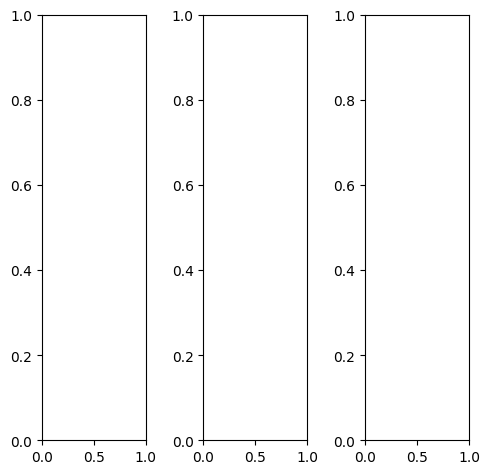

tensor([[[0.3686, 0.2941, 0.2510,  ..., 0.3176, 0.3216, 0.3294],
         [0.3294, 0.3137, 0.3059,  ..., 0.3098, 0.3098, 0.3412],
         [0.3137, 0.3137, 0.3176,  ..., 0.3098, 0.2941, 0.3216],
         ...,
         [0.1961, 0.1961, 0.1961,  ..., 0.2235, 0.2196, 0.2235],
         [0.1961, 0.1922, 0.1961,  ..., 0.2196, 0.2157, 0.2196],
         [0.2000, 0.2000, 0.2039,  ..., 0.2157, 0.2157, 0.2157]],

        [[0.3686, 0.2941, 0.2510,  ..., 0.3176, 0.3216, 0.3294],
         [0.3294, 0.3137, 0.3059,  ..., 0.3098, 0.3098, 0.3412],
         [0.3137, 0.3137, 0.3176,  ..., 0.3098, 0.2941, 0.3216],
         ...,
         [0.1961, 0.1961, 0.1961,  ..., 0.2235, 0.2196, 0.2235],
         [0.1961, 0.1922, 0.1961,  ..., 0.2196, 0.2157, 0.2196],
         [0.2000, 0.2000, 0.2039,  ..., 0.2157, 0.2157, 0.2157]],

        [[0.3686, 0.2941, 0.2510,  ..., 0.3176, 0.3216, 0.3294],
         [0.3294, 0.3137, 0.3059,  ..., 0.3098, 0.3098, 0.3412],
         [0.3137, 0.3137, 0.3176,  ..., 0.3098, 0.2941, 0.

tensor([[[0.2980, 0.2314, 0.2000,  ..., 0.2549, 0.2588, 0.2745],
         [0.2549, 0.2431, 0.2431,  ..., 0.2549, 0.2510, 0.2667],
         [0.2353, 0.2392, 0.2471,  ..., 0.2549, 0.2353, 0.2549],
         ...,
         [0.1569, 0.1569, 0.1569,  ..., 0.1961, 0.1922, 0.1961],
         [0.1529, 0.1529, 0.1569,  ..., 0.1922, 0.1882, 0.1922],
         [0.1608, 0.1569, 0.1608,  ..., 0.1882, 0.1882, 0.1961]],

        [[0.3843, 0.3098, 0.2627,  ..., 0.3333, 0.3373, 0.3451],
         [0.3490, 0.3294, 0.3216,  ..., 0.3216, 0.3216, 0.3569],
         [0.3333, 0.3294, 0.3333,  ..., 0.3216, 0.3059, 0.3373],
         ...,
         [0.2078, 0.2078, 0.2078,  ..., 0.2314, 0.2275, 0.2314],
         [0.2078, 0.2039, 0.2078,  ..., 0.2275, 0.2235, 0.2275],
         [0.2118, 0.2118, 0.2157,  ..., 0.2235, 0.2235, 0.2235]],

        [[0.4824, 0.3765, 0.3098,  ..., 0.4118, 0.4118, 0.4000],
         [0.4392, 0.4039, 0.3882,  ..., 0.3961, 0.4000, 0.4431],
         [0.4196, 0.4157, 0.4196,  ..., 0.3922, 0.3765, 0.

tensor([[[0.4455, 0.2535, 0.1494,  ..., 0.3081, 0.3321, 0.4119],
         [0.3279, 0.2678, 0.1849,  ..., 0.2841, 0.2835, 0.4073],
         [0.3196, 0.2473, 0.1346,  ..., 0.2850, 0.2794, 0.3867],
         ...,
         [0.1567, 0.1548, 0.1260,  ..., 0.2076, 0.1864, 0.2453],
         [0.1567, 0.1262, 0.1337,  ..., 0.1675, 0.1673, 0.2211],
         [0.2129, 0.1571, 0.1477,  ..., 0.1869, 0.1768, 0.2598]],

        [[0.4434, 0.4236, 0.2289,  ..., 0.3766, 0.4100, 0.4341],
         [0.4779, 0.4486, 0.3156,  ..., 0.3389, 0.3635, 0.4412],
         [0.3759, 0.4439, 0.3041,  ..., 0.3664, 0.3547, 0.4132],
         ...,
         [0.1746, 0.1460, 0.1439,  ..., 0.1656, 0.1775, 0.2128],
         [0.1673, 0.1348, 0.1403,  ..., 0.1547, 0.1614, 0.2043],
         [0.2075, 0.1538, 0.1655,  ..., 0.1683, 0.1738, 0.2356]],

        [[0.6510, 0.4619, 0.4831,  ..., 0.4339, 0.4749, 0.5242],
         [0.6266, 0.5797, 0.5443,  ..., 0.4049, 0.4252, 0.5284],
         [0.5939, 0.4796, 0.5311,  ..., 0.3842, 0.3818, 0.

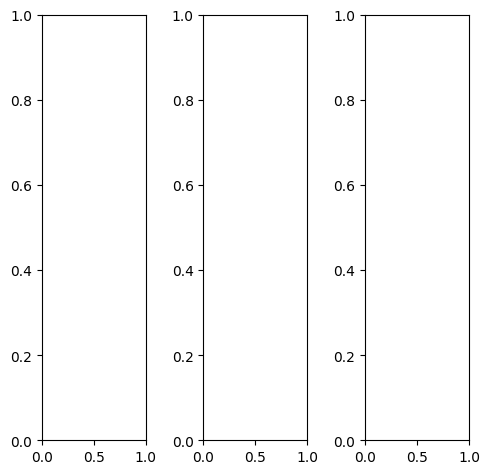

tensor([[[0.9216, 0.9020, 0.9137,  ..., 0.7294, 0.7255, 0.6627],
         [0.8863, 0.8941, 0.9020,  ..., 0.7059, 0.6549, 0.5922],
         [0.9137, 0.9098, 0.9176,  ..., 0.5922, 0.4745, 0.4431],
         ...,
         [0.5882, 0.5804, 0.5961,  ..., 0.6314, 0.6314, 0.5725],
         [0.5529, 0.5490, 0.5569,  ..., 0.5569, 0.5569, 0.5098],
         [0.5255, 0.5529, 0.5333,  ..., 0.5451, 0.5412, 0.5333]],

        [[0.9216, 0.9020, 0.9137,  ..., 0.7294, 0.7255, 0.6627],
         [0.8863, 0.8941, 0.9020,  ..., 0.7059, 0.6549, 0.5922],
         [0.9137, 0.9098, 0.9176,  ..., 0.5922, 0.4745, 0.4431],
         ...,
         [0.5882, 0.5804, 0.5961,  ..., 0.6314, 0.6314, 0.5725],
         [0.5529, 0.5490, 0.5569,  ..., 0.5569, 0.5569, 0.5098],
         [0.5255, 0.5529, 0.5333,  ..., 0.5451, 0.5412, 0.5333]],

        [[0.9216, 0.9020, 0.9137,  ..., 0.7294, 0.7255, 0.6627],
         [0.8863, 0.8941, 0.9020,  ..., 0.7059, 0.6549, 0.5922],
         [0.9137, 0.9098, 0.9176,  ..., 0.5922, 0.4745, 0.

tensor([[[0.8667, 0.8667, 0.8784,  ..., 0.6627, 0.6588, 0.6118],
         [0.8627, 0.8863, 0.8941,  ..., 0.6902, 0.6353, 0.5765],
         [0.8980, 0.9137, 0.9216,  ..., 0.6353, 0.5059, 0.4588],
         ...,
         [0.6157, 0.6275, 0.6588,  ..., 0.6902, 0.6824, 0.6118],
         [0.5686, 0.5765, 0.6000,  ..., 0.5922, 0.5961, 0.5451],
         [0.5255, 0.5647, 0.5529,  ..., 0.5608, 0.5686, 0.5608]],

        [[0.9529, 0.9216, 0.9373,  ..., 0.7569, 0.7569, 0.6902],
         [0.8980, 0.8941, 0.9059,  ..., 0.7098, 0.6745, 0.6118],
         [0.9176, 0.9020, 0.9098,  ..., 0.5804, 0.4824, 0.4510],
         ...,
         [0.6000, 0.5843, 0.5922,  ..., 0.6275, 0.6353, 0.5686],
         [0.5647, 0.5529, 0.5529,  ..., 0.5569, 0.5569, 0.5020],
         [0.5373, 0.5569, 0.5333,  ..., 0.5490, 0.5412, 0.5255]],

        [[0.9059, 0.8863, 0.8980,  ..., 0.7765, 0.7333, 0.6588],
         [0.9020, 0.9059, 0.9137,  ..., 0.7294, 0.6118, 0.5490],
         [0.9490, 0.9451, 0.9529,  ..., 0.5451, 0.3686, 0.

tensor([[[0.7974, 0.8557, 0.8033,  ..., 0.4367, 0.4482, 0.4558],
         [0.7900, 0.9053, 0.8874,  ..., 0.4303, 0.4090, 0.3966],
         [0.7717, 0.9436, 0.8093,  ..., 0.3621, 0.2710, 0.2882],
         ...,
         [0.4584, 0.5020, 0.4925,  ..., 0.5222, 0.5443, 0.4778],
         [0.4188, 0.4309, 0.4374,  ..., 0.4382, 0.4369, 0.4203],
         [0.4039, 0.4309, 0.3991,  ..., 0.4434, 0.4537, 0.4558]],

        [[0.8601, 0.8453, 0.8304,  ..., 0.5856, 0.6034, 0.5328],
         [0.7341, 0.8610, 0.8015,  ..., 0.6063, 0.5750, 0.4920],
         [0.8980, 0.9082, 0.9200,  ..., 0.5171, 0.4068, 0.3715],
         ...,
         [0.4579, 0.4824, 0.5016,  ..., 0.5637, 0.5914, 0.4690],
         [0.4122, 0.4246, 0.4384,  ..., 0.4855, 0.4849, 0.4248],
         [0.4082, 0.4335, 0.4240,  ..., 0.4557, 0.4640, 0.4504]],

        [[0.9289, 0.9343, 1.0267,  ..., 0.7997, 0.8005, 0.7139],
         [0.9066, 1.0254, 1.0723,  ..., 0.8087, 0.7631, 0.6898],
         [0.9409, 1.0285, 1.1287,  ..., 0.7164, 0.6221, 0.

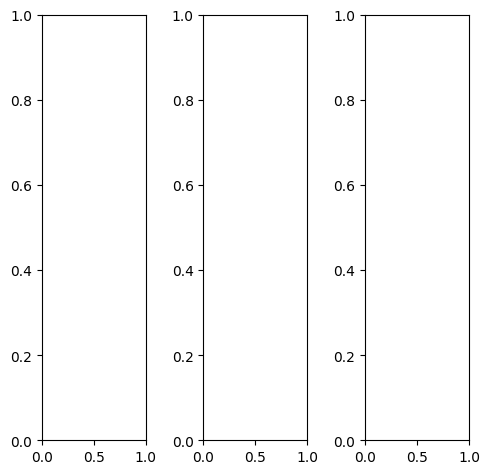

tensor([[[0.0431, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0471, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0510, 0.0549, 0.0471,  ..., 0.0353, 0.0353, 0.0314],
         ...,
         [0.3647, 0.3490, 0.3373,  ..., 0.0431, 0.0431, 0.0471],
         [0.3529, 0.3412, 0.3333,  ..., 0.0431, 0.0431, 0.0588],
         [0.3490, 0.3412, 0.3294,  ..., 0.0588, 0.0745, 0.0902]],

        [[0.0431, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0471, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0510, 0.0549, 0.0471,  ..., 0.0353, 0.0353, 0.0314],
         ...,
         [0.3647, 0.3490, 0.3373,  ..., 0.0431, 0.0431, 0.0471],
         [0.3529, 0.3412, 0.3333,  ..., 0.0431, 0.0431, 0.0588],
         [0.3490, 0.3412, 0.3294,  ..., 0.0588, 0.0745, 0.0902]],

        [[0.0431, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0471, 0.0431, 0.0431,  ..., 0.0353, 0.0353, 0.0314],
         [0.0510, 0.0549, 0.0471,  ..., 0.0353, 0.0353, 0.

tensor([[[0.0275, 0.0275, 0.0275,  ..., 0.0235, 0.0235, 0.0196],
         [0.0314, 0.0275, 0.0275,  ..., 0.0235, 0.0235, 0.0196],
         [0.0353, 0.0392, 0.0314,  ..., 0.0235, 0.0235, 0.0196],
         ...,
         [0.2745, 0.2627, 0.2510,  ..., 0.0275, 0.0275, 0.0314],
         [0.2667, 0.2549, 0.2471,  ..., 0.0275, 0.0275, 0.0431],
         [0.2627, 0.2549, 0.2431,  ..., 0.0431, 0.0588, 0.0745]],

        [[0.0471, 0.0471, 0.0471,  ..., 0.0353, 0.0353, 0.0314],
         [0.0510, 0.0471, 0.0471,  ..., 0.0353, 0.0353, 0.0314],
         [0.0549, 0.0588, 0.0510,  ..., 0.0353, 0.0353, 0.0314],
         ...,
         [0.3961, 0.3804, 0.3686,  ..., 0.0471, 0.0471, 0.0510],
         [0.3843, 0.3725, 0.3647,  ..., 0.0471, 0.0471, 0.0627],
         [0.3804, 0.3686, 0.3608,  ..., 0.0627, 0.0784, 0.0941]],

        [[0.0706, 0.0706, 0.0706,  ..., 0.0627, 0.0627, 0.0588],
         [0.0745, 0.0706, 0.0706,  ..., 0.0627, 0.0627, 0.0588],
         [0.0784, 0.0824, 0.0745,  ..., 0.0627, 0.0627, 0.

tensor([[[ 0.1083,  0.0646,  0.0132,  ...,  0.1895,  0.2022,  0.2535],
         [ 0.1201, -0.0105,  0.0276,  ...,  0.1866,  0.1792,  0.2172],
         [-0.0179, -0.0130, -0.0762,  ...,  0.1700,  0.1675,  0.2031],
         ...,
         [ 0.6163,  0.6440,  0.6019,  ...,  0.2638,  0.2559,  0.2923],
         [ 0.5897,  0.6063,  0.5910,  ...,  0.2531,  0.2592,  0.3067],
         [ 0.5984,  0.6096,  0.5700,  ...,  0.2411,  0.2549,  0.3543]],

        [[ 0.1811,  0.1906,  0.0161,  ...,  0.2070,  0.2092,  0.2579],
         [ 0.1586,  0.0436, -0.0834,  ...,  0.2356,  0.2418,  0.2253],
         [ 0.0814,  0.1560, -0.0460,  ...,  0.2127,  0.2133,  0.2241],
         ...,
         [ 0.5793,  0.6030,  0.6066,  ...,  0.2358,  0.2341,  0.2437],
         [ 0.5494,  0.5756,  0.5927,  ...,  0.2293,  0.2263,  0.2522],
         [ 0.5539,  0.5636,  0.5663,  ...,  0.2144,  0.2284,  0.3049]],

        [[ 0.3260,  0.1671,  0.2703,  ...,  0.3345,  0.3463,  0.3775],
         [ 0.2981,  0.2022,  0.2946,  ...,  0

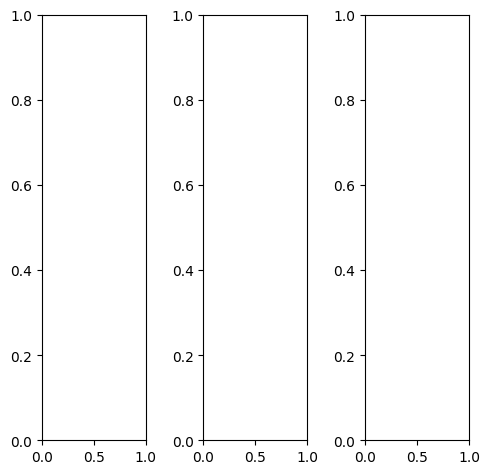

EPOCH: 18.765  trn_loss: 0.004  (2250.60s - 9742.81s remaining)

tensor([[[0.3216, 0.3294, 0.3373,  ..., 0.4157, 0.4118, 0.4078],
         [0.3216, 0.3216, 0.3373,  ..., 0.4118, 0.4118, 0.4118],
         [0.3255, 0.3373, 0.3412,  ..., 0.4157, 0.4196, 0.4157],
         ...,
         [0.1686, 0.1765, 0.1882,  ..., 0.6157, 0.6000, 0.5882],
         [0.1490, 0.1490, 0.1569,  ..., 0.6588, 0.6510, 0.6353],
         [0.1608, 0.1608, 0.1686,  ..., 0.6706, 0.6667, 0.6627]],

        [[0.3216, 0.3294, 0.3373,  ..., 0.4157, 0.4118, 0.4078],
         [0.3216, 0.3216, 0.3373,  ..., 0.4118, 0.4118, 0.4118],
         [0.3255, 0.3373, 0.3412,  ..., 0.4157, 0.4196, 0.4157],
         ...,
         [0.1686, 0.1765, 0.1882,  ..., 0.6157, 0.6000, 0.5882],
         [0.1490, 0.1490, 0.1569,  ..., 0.6588, 0.6510, 0.6353],
         [0.1608, 0.1608, 0.1686,  ..., 0.6706, 0.6667, 0.6627]],

        [[0.3216, 0.3294, 0.3373,  ..., 0.4157, 0.4118, 0.4078],
         [0.3216, 0.3216, 0.3373,  ..., 0.4118, 0.4118, 0.4118],
         [0.3255, 0.3373, 0.3412,  ..., 0.4157, 0.4196, 0.

tensor([[[0.2510, 0.2588, 0.2627,  ..., 0.3333, 0.3294, 0.3255],
         [0.2510, 0.2549, 0.2627,  ..., 0.3333, 0.3294, 0.3294],
         [0.2549, 0.2667, 0.2667,  ..., 0.3333, 0.3373, 0.3333],
         ...,
         [0.1412, 0.1490, 0.1647,  ..., 0.5961, 0.5804, 0.5686],
         [0.1294, 0.1294, 0.1373,  ..., 0.6431, 0.6353, 0.6196],
         [0.1412, 0.1412, 0.1490,  ..., 0.6588, 0.6549, 0.6510]],

        [[0.3373, 0.3451, 0.3529,  ..., 0.4353, 0.4314, 0.4275],
         [0.3373, 0.3373, 0.3529,  ..., 0.4314, 0.4314, 0.4314],
         [0.3412, 0.3529, 0.3569,  ..., 0.4353, 0.4392, 0.4353],
         ...,
         [0.1882, 0.1961, 0.2078,  ..., 0.6196, 0.6078, 0.5961],
         [0.1647, 0.1647, 0.1725,  ..., 0.6627, 0.6549, 0.6392],
         [0.1765, 0.1765, 0.1843,  ..., 0.6706, 0.6667, 0.6627]],

        [[0.4196, 0.4275, 0.4353,  ..., 0.5255, 0.5216, 0.5176],
         [0.4196, 0.4196, 0.4353,  ..., 0.5216, 0.5216, 0.5216],
         [0.4235, 0.4353, 0.4392,  ..., 0.5255, 0.5294, 0.

tensor([[[ 1.5495e-01,  9.8968e-02,  5.8189e-02,  ...,  2.8274e-01,
           3.0211e-01,  3.3956e-01],
         [ 1.4744e-01,  2.9588e-03,  4.3826e-02,  ...,  2.6689e-01,
           2.5438e-01,  3.0023e-01],
         [ 7.5096e-02,  2.2754e-02, -7.3558e-02,  ...,  2.8872e-01,
           3.0734e-01,  3.1468e-01],
         ...,
         [-1.3703e-02, -5.4962e-02, -4.0868e-02,  ...,  7.3353e-01,
           6.9843e-01,  6.8929e-01],
         [-1.7613e-02, -1.0515e-01, -8.8226e-02,  ...,  7.6912e-01,
           7.4061e-01,  7.6449e-01],
         [ 4.4849e-02, -6.2519e-03,  6.2372e-03,  ...,  8.3427e-01,
           8.4272e-01,  8.0175e-01]],

        [[ 2.2507e-01,  2.5638e-01,  1.1918e-01,  ...,  3.6736e-01,
           4.0168e-01,  3.7654e-01],
         [ 2.0210e-01,  1.2331e-01,  5.9408e-03,  ...,  3.2845e-01,
           3.5691e-01,  3.5047e-01],
         [ 1.6876e-01,  2.4497e-01,  6.2413e-04,  ...,  3.6537e-01,
           3.9456e-01,  3.4979e-01],
         ...,
         [ 1.8982e-03, -7

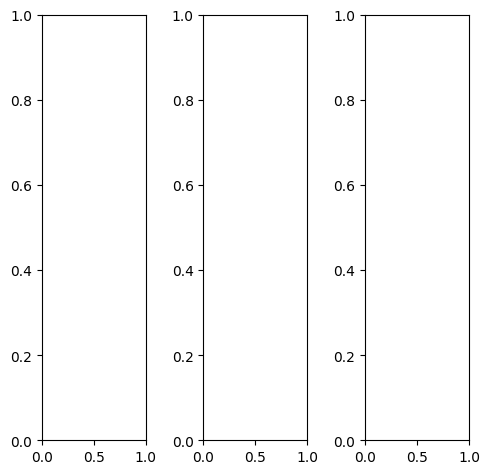

tensor([[[0.4078, 0.3843, 0.5216,  ..., 0.4196, 0.2667, 0.1569],
         [0.4235, 0.3961, 0.4784,  ..., 0.4078, 0.3804, 0.3020],
         [0.3176, 0.3373, 0.3490,  ..., 0.3098, 0.3451, 0.2627],
         ...,
         [0.2353, 0.3333, 0.3333,  ..., 0.1961, 0.3569, 0.2314],
         [0.3529, 0.3725, 0.4941,  ..., 0.2353, 0.3686, 0.1765],
         [0.3647, 0.2549, 0.4039,  ..., 0.4118, 0.3255, 0.2941]],

        [[0.4078, 0.3843, 0.5216,  ..., 0.4196, 0.2667, 0.1569],
         [0.4235, 0.3961, 0.4784,  ..., 0.4078, 0.3804, 0.3020],
         [0.3176, 0.3373, 0.3490,  ..., 0.3098, 0.3451, 0.2627],
         ...,
         [0.2353, 0.3333, 0.3333,  ..., 0.1961, 0.3569, 0.2314],
         [0.3529, 0.3725, 0.4941,  ..., 0.2353, 0.3686, 0.1765],
         [0.3647, 0.2549, 0.4039,  ..., 0.4118, 0.3255, 0.2941]],

        [[0.4078, 0.3843, 0.5216,  ..., 0.4196, 0.2667, 0.1569],
         [0.4235, 0.3961, 0.4784,  ..., 0.4078, 0.3804, 0.3020],
         [0.3176, 0.3373, 0.3490,  ..., 0.3098, 0.3451, 0.

tensor([[[0.3922, 0.3882, 0.5490,  ..., 0.5216, 0.3255, 0.1569],
         [0.4431, 0.4078, 0.5176,  ..., 0.4941, 0.4510, 0.3373],
         [0.3490, 0.3647, 0.3882,  ..., 0.3176, 0.3569, 0.2784],
         ...,
         [0.2392, 0.3529, 0.3608,  ..., 0.1961, 0.3451, 0.2039],
         [0.3804, 0.4196, 0.5373,  ..., 0.2353, 0.3490, 0.1451],
         [0.3961, 0.2941, 0.4235,  ..., 0.3804, 0.2784, 0.2353]],

        [[0.4275, 0.3961, 0.5216,  ..., 0.3922, 0.2588, 0.1686],
         [0.4314, 0.4078, 0.4706,  ..., 0.3843, 0.3647, 0.3020],
         [0.3176, 0.3373, 0.3490,  ..., 0.3176, 0.3529, 0.2667],
         ...,
         [0.2392, 0.3333, 0.3333,  ..., 0.2039, 0.3686, 0.2510],
         [0.3451, 0.3569, 0.4863,  ..., 0.2471, 0.3882, 0.2000],
         [0.3569, 0.2471, 0.4078,  ..., 0.4431, 0.3647, 0.3333]],

        [[0.3569, 0.3294, 0.4627,  ..., 0.3098, 0.1608, 0.0824],
         [0.3412, 0.3216, 0.4039,  ..., 0.2980, 0.2706, 0.2118],
         [0.2353, 0.2510, 0.2627,  ..., 0.2431, 0.2784, 0.

tensor([[[0.5946, 0.5687, 0.7288,  ..., 0.4814, 0.3043, 0.2952],
         [0.5335, 0.5368, 0.6370,  ..., 0.4739, 0.4418, 0.3515],
         [0.3563, 0.4958, 0.3874,  ..., 0.3687, 0.4443, 0.3220],
         ...,
         [0.4058, 0.5649, 0.5692,  ..., 0.4314, 0.6453, 0.4448],
         [0.5771, 0.6159, 0.7901,  ..., 0.4880, 0.6187, 0.3869],
         [0.5769, 0.4916, 0.6789,  ..., 0.7026, 0.5809, 0.5034]],

        [[0.6689, 0.6673, 0.7818,  ..., 0.6464, 0.4548, 0.3363],
         [0.5697, 0.6264, 0.6887,  ..., 0.6853, 0.6590, 0.5006],
         [0.5244, 0.5772, 0.5740,  ..., 0.5247, 0.5988, 0.4485],
         ...,
         [0.3628, 0.4969, 0.5410,  ..., 0.4188, 0.6442, 0.3796],
         [0.5147, 0.5675, 0.7806,  ..., 0.4836, 0.6328, 0.3609],
         [0.4974, 0.4358, 0.6340,  ..., 0.6463, 0.5563, 0.4552]],

        [[0.7604, 0.7474, 0.9878,  ..., 0.8897, 0.6889, 0.5730],
         [0.7533, 0.8152, 0.9208,  ..., 0.9416, 0.9065, 0.7213],
         [0.6090, 0.6082, 0.7417,  ..., 0.8152, 0.8752, 0.

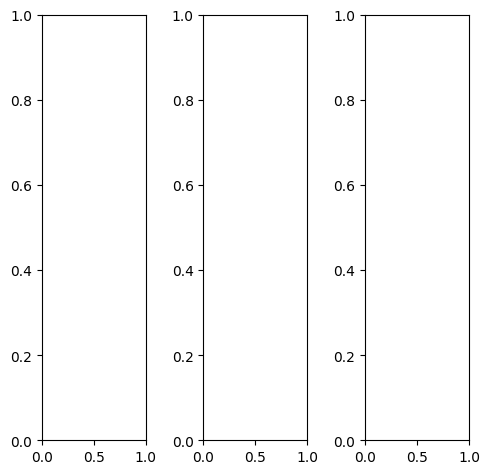

tensor([[[0.5529, 0.5255, 0.5020,  ..., 0.2353, 0.2196, 0.1882],
         [0.4235, 0.4510, 0.4863,  ..., 0.2353, 0.2235, 0.2118],
         [0.4235, 0.4627, 0.4824,  ..., 0.2314, 0.2157, 0.2157],
         ...,
         [0.3647, 0.3765, 0.3765,  ..., 0.3059, 0.3176, 0.3059],
         [0.3529, 0.3647, 0.3647,  ..., 0.3098, 0.3098, 0.3020],
         [0.3255, 0.3373, 0.3608,  ..., 0.3137, 0.3020, 0.3020]],

        [[0.5529, 0.5255, 0.5020,  ..., 0.2353, 0.2196, 0.1882],
         [0.4235, 0.4510, 0.4863,  ..., 0.2353, 0.2235, 0.2118],
         [0.4235, 0.4627, 0.4824,  ..., 0.2314, 0.2157, 0.2157],
         ...,
         [0.3647, 0.3765, 0.3765,  ..., 0.3059, 0.3176, 0.3059],
         [0.3529, 0.3647, 0.3647,  ..., 0.3098, 0.3098, 0.3020],
         [0.3255, 0.3373, 0.3608,  ..., 0.3137, 0.3020, 0.3020]],

        [[0.5529, 0.5255, 0.5020,  ..., 0.2353, 0.2196, 0.1882],
         [0.4235, 0.4510, 0.4863,  ..., 0.2353, 0.2235, 0.2118],
         [0.4235, 0.4627, 0.4824,  ..., 0.2314, 0.2157, 0.

tensor([[[0.6863, 0.6902, 0.7098,  ..., 0.5294, 0.4941, 0.4118],
         [0.6431, 0.7098, 0.7647,  ..., 0.5216, 0.4941, 0.4745],
         [0.6784, 0.7294, 0.7608,  ..., 0.5216, 0.4980, 0.4824],
         ...,
         [0.6000, 0.6196, 0.6235,  ..., 0.5333, 0.5412, 0.5255],
         [0.5765, 0.5922, 0.6039,  ..., 0.5373, 0.5333, 0.5216],
         [0.5373, 0.5529, 0.5922,  ..., 0.5373, 0.5216, 0.5176]],

        [[0.5255, 0.4863, 0.4510,  ..., 0.1098, 0.1059, 0.0941],
         [0.3647, 0.3765, 0.4078,  ..., 0.1137, 0.1059, 0.1020],
         [0.3529, 0.3882, 0.4078,  ..., 0.1059, 0.0980, 0.1020],
         ...,
         [0.2980, 0.3059, 0.3059,  ..., 0.2275, 0.2431, 0.2314],
         [0.2902, 0.2980, 0.2941,  ..., 0.2353, 0.2353, 0.2275],
         [0.2667, 0.2745, 0.2941,  ..., 0.2392, 0.2275, 0.2275]],

        [[0.3412, 0.2824, 0.2196,  ..., 0.0980, 0.0980, 0.0902],
         [0.1490, 0.1412, 0.1608,  ..., 0.1098, 0.1059, 0.1020],
         [0.1176, 0.1333, 0.1529,  ..., 0.1020, 0.0980, 0.

tensor([[[0.6316, 0.5321, 0.5322,  ..., 0.1595, 0.1493, 0.1623],
         [0.4049, 0.3281, 0.4122,  ..., 0.1496, 0.1254, 0.1542],
         [0.3945, 0.4000, 0.4047,  ..., 0.1386, 0.1135, 0.1662],
         ...,
         [0.4103, 0.4719, 0.4441,  ..., 0.3279, 0.3380, 0.3594],
         [0.3899, 0.4381, 0.4373,  ..., 0.2987, 0.3035, 0.3349],
         [0.3739, 0.3942, 0.4237,  ..., 0.3279, 0.3109, 0.3614]],

        [[0.6615, 0.7159, 0.5997,  ..., 0.2134, 0.1979, 0.1896],
         [0.5269, 0.5332, 0.5767,  ..., 0.2105, 0.2055, 0.2033],
         [0.4691, 0.5816, 0.5670,  ..., 0.1883, 0.1685, 0.2067],
         ...,
         [0.3795, 0.4185, 0.4556,  ..., 0.3385, 0.3588, 0.3319],
         [0.3650, 0.4032, 0.4169,  ..., 0.3240, 0.3247, 0.3242],
         [0.3417, 0.3459, 0.3924,  ..., 0.3210, 0.3088, 0.3281]],

        [[0.8741, 0.7819, 0.8319,  ..., 0.3002, 0.2919, 0.3012],
         [0.7049, 0.7039, 0.7580,  ..., 0.2978, 0.2960, 0.3115],
         [0.7068, 0.6197, 0.7472,  ..., 0.2816, 0.2674, 0.

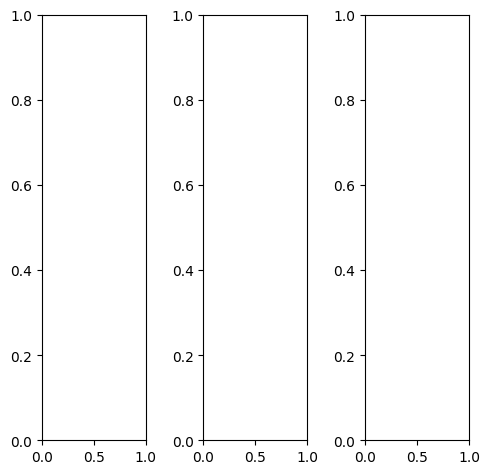

tensor([[[0.9255, 0.9255, 0.9137,  ..., 0.4667, 0.2471, 0.2745],
         [0.7137, 0.7451, 0.7294,  ..., 0.3882, 0.2588, 0.1843],
         [0.6706, 0.6941, 0.6431,  ..., 0.2941, 0.3216, 0.3020],
         ...,
         [0.2392, 0.2000, 0.1529,  ..., 0.2392, 0.1569, 0.0863],
         [0.2549, 0.2588, 0.2392,  ..., 0.3922, 0.3176, 0.2510],
         [0.2314, 0.2627, 0.2706,  ..., 0.4627, 0.4196, 0.3686]],

        [[0.9255, 0.9255, 0.9137,  ..., 0.4667, 0.2471, 0.2745],
         [0.7137, 0.7451, 0.7294,  ..., 0.3882, 0.2588, 0.1843],
         [0.6706, 0.6941, 0.6431,  ..., 0.2941, 0.3216, 0.3020],
         ...,
         [0.2392, 0.2000, 0.1529,  ..., 0.2392, 0.1569, 0.0863],
         [0.2549, 0.2588, 0.2392,  ..., 0.3922, 0.3176, 0.2510],
         [0.2314, 0.2627, 0.2706,  ..., 0.4627, 0.4196, 0.3686]],

        [[0.9255, 0.9255, 0.9137,  ..., 0.4667, 0.2471, 0.2745],
         [0.7137, 0.7451, 0.7294,  ..., 0.3882, 0.2588, 0.1843],
         [0.6706, 0.6941, 0.6431,  ..., 0.2941, 0.3216, 0.

tensor([[[0.9686, 0.9529, 0.9373,  ..., 0.3843, 0.2392, 0.2784],
         [0.8314, 0.8275, 0.7765,  ..., 0.2471, 0.1765, 0.1765],
         [0.7020, 0.7216, 0.6471,  ..., 0.2549, 0.1961, 0.2431],
         ...,
         [0.2353, 0.1961, 0.1490,  ..., 0.2314, 0.1529, 0.0863],
         [0.2549, 0.2588, 0.2353,  ..., 0.3647, 0.2941, 0.2314],
         [0.2275, 0.2588, 0.2667,  ..., 0.4275, 0.3843, 0.3294]],

        [[0.9176, 0.9255, 0.9137,  ..., 0.4902, 0.2471, 0.2745],
         [0.6863, 0.7255, 0.7137,  ..., 0.4392, 0.2824, 0.1843],
         [0.6588, 0.6863, 0.6392,  ..., 0.3255, 0.3686, 0.3176],
         ...,
         [0.2431, 0.2039, 0.1569,  ..., 0.2431, 0.1569, 0.0902],
         [0.2588, 0.2627, 0.2431,  ..., 0.4000, 0.3255, 0.2588],
         [0.2353, 0.2667, 0.2745,  ..., 0.4706, 0.4275, 0.3804]],

        [[0.8510, 0.8706, 0.8627,  ..., 0.5451, 0.2667, 0.2549],
         [0.5608, 0.6471, 0.6784,  ..., 0.5020, 0.3647, 0.1922],
         [0.6471, 0.6745, 0.6627,  ..., 0.2353, 0.4078, 0.

tensor([[[1.0159, 1.0372, 1.0013,  ..., 0.4605, 0.2581, 0.3442],
         [0.8322, 0.9105, 0.8177,  ..., 0.3985, 0.2848, 0.2263],
         [0.7800, 0.8787, 0.7138,  ..., 0.3106, 0.3444, 0.3366],
         ...,
         [0.2850, 0.2633, 0.2302,  ..., 0.3432, 0.2329, 0.1962],
         [0.3095, 0.3380, 0.3057,  ..., 0.5171, 0.4045, 0.3676],
         [0.3269, 0.3601, 0.3560,  ..., 0.6387, 0.5854, 0.5102]],

        [[1.0094, 1.0619, 0.9552,  ..., 0.5369, 0.3626, 0.3911],
         [0.7977, 0.8783, 0.7951,  ..., 0.5183, 0.4149, 0.2959],
         [0.8748, 0.8671, 0.7848,  ..., 0.4056, 0.4521, 0.4055],
         ...,
         [0.3026, 0.2825, 0.2490,  ..., 0.3572, 0.2610, 0.1605],
         [0.3117, 0.3626, 0.3171,  ..., 0.5402, 0.4165, 0.3345],
         [0.3069, 0.3503, 0.3706,  ..., 0.6143, 0.5672, 0.4821]],

        [[1.0449, 1.1203, 1.1212,  ..., 0.7191, 0.5220, 0.5507],
         [0.9238, 1.0005, 0.9938,  ..., 0.6894, 0.5755, 0.4908],
         [0.8758, 0.9340, 0.9181,  ..., 0.5810, 0.6337, 0.

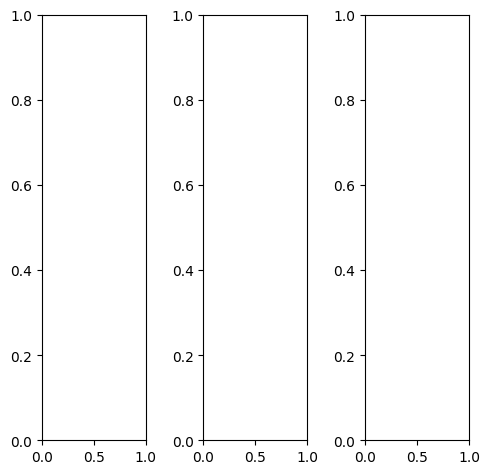

tensor([[[0.2353, 0.2314, 0.2353,  ..., 0.2039, 0.1961, 0.1882],
         [0.2314, 0.2275, 0.2314,  ..., 0.2000, 0.1961, 0.1882],
         [0.2275, 0.2275, 0.2314,  ..., 0.2000, 0.1922, 0.1882],
         ...,
         [0.4471, 0.4471, 0.4706,  ..., 0.3725, 0.3529, 0.3294],
         [0.4588, 0.4549, 0.4784,  ..., 0.3647, 0.3569, 0.3333],
         [0.4745, 0.4706, 0.4549,  ..., 0.3608, 0.3569, 0.3412]],

        [[0.2353, 0.2314, 0.2353,  ..., 0.2039, 0.1961, 0.1882],
         [0.2314, 0.2275, 0.2314,  ..., 0.2000, 0.1961, 0.1882],
         [0.2275, 0.2275, 0.2314,  ..., 0.2000, 0.1922, 0.1882],
         ...,
         [0.4471, 0.4471, 0.4706,  ..., 0.3725, 0.3529, 0.3294],
         [0.4588, 0.4549, 0.4784,  ..., 0.3647, 0.3569, 0.3333],
         [0.4745, 0.4706, 0.4549,  ..., 0.3608, 0.3569, 0.3412]],

        [[0.2353, 0.2314, 0.2353,  ..., 0.2039, 0.1961, 0.1882],
         [0.2314, 0.2275, 0.2314,  ..., 0.2000, 0.1961, 0.1882],
         [0.2275, 0.2275, 0.2314,  ..., 0.2000, 0.1922, 0.

tensor([[[0.2431, 0.2471, 0.2588,  ..., 0.2039, 0.1961, 0.1882],
         [0.2314, 0.2353, 0.2471,  ..., 0.2000, 0.1961, 0.1882],
         [0.2235, 0.2275, 0.2392,  ..., 0.2000, 0.1922, 0.1882],
         ...,
         [0.4431, 0.4392, 0.4667,  ..., 0.3608, 0.3373, 0.3020],
         [0.4549, 0.4510, 0.4745,  ..., 0.3529, 0.3373, 0.3098],
         [0.4706, 0.4667, 0.4510,  ..., 0.3490, 0.3412, 0.3176]],

        [[0.2549, 0.2471, 0.2510,  ..., 0.2275, 0.2196, 0.2118],
         [0.2549, 0.2471, 0.2471,  ..., 0.2235, 0.2196, 0.2078],
         [0.2588, 0.2510, 0.2510,  ..., 0.2235, 0.2157, 0.2078],
         ...,
         [0.4549, 0.4510, 0.4706,  ..., 0.3804, 0.3686, 0.3490],
         [0.4667, 0.4627, 0.4863,  ..., 0.3765, 0.3686, 0.3529],
         [0.4824, 0.4784, 0.4627,  ..., 0.3686, 0.3686, 0.3608]],

        [[0.0980, 0.0941, 0.1020,  ..., 0.0784, 0.0784, 0.0784],
         [0.0941, 0.0941, 0.0980,  ..., 0.0784, 0.0784, 0.0784],
         [0.0902, 0.0902, 0.0980,  ..., 0.0784, 0.0745, 0.

tensor([[[0.2159, 0.2080, 0.1405,  ..., 0.2241, 0.2289, 0.2711],
         [0.2606, 0.0935, 0.1443,  ..., 0.1961, 0.1865, 0.2375],
         [0.1217, 0.1388, 0.0674,  ..., 0.1959, 0.1804, 0.2242],
         ...,
         [0.5643, 0.5736, 0.5660,  ..., 0.5184, 0.4835, 0.5063],
         [0.5759, 0.5501, 0.5714,  ..., 0.4885, 0.4905, 0.5021],
         [0.6109, 0.6142, 0.5627,  ..., 0.4944, 0.4966, 0.5020]],

        [[0.2725, 0.3499, 0.1550,  ..., 0.2694, 0.2733, 0.3000],
         [0.2911, 0.1851, 0.0502,  ..., 0.2641, 0.2761, 0.2690],
         [0.1743, 0.2796, 0.0591,  ..., 0.2595, 0.2533, 0.2714],
         ...,
         [0.5302, 0.5169, 0.5332,  ..., 0.4998, 0.4701, 0.4380],
         [0.5371, 0.4983, 0.5459,  ..., 0.4857, 0.4713, 0.4530],
         [0.5710, 0.5618, 0.5341,  ..., 0.4514, 0.4569, 0.4525]],

        [[0.3954, 0.2791, 0.3333,  ..., 0.3934, 0.4018, 0.4285],
         [0.3944, 0.2342, 0.3279,  ..., 0.3955, 0.4063, 0.4115],
         [0.2717, 0.2608, 0.2868,  ..., 0.3862, 0.3964, 0.

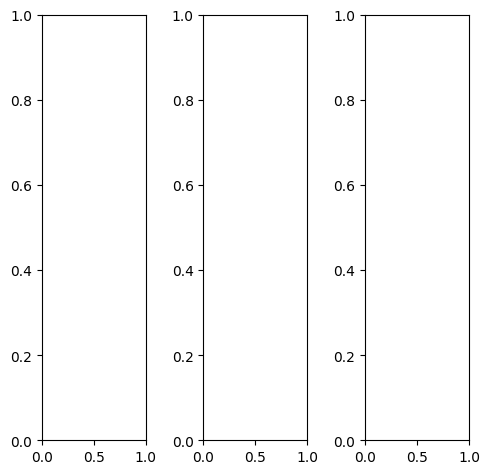

EPOCH: 19.000  val_loss: 0.004  (2285.60s - 9743.89s remaining)

tensor([[[0.2902, 0.2588, 0.3216,  ..., 0.5686, 0.6078, 0.5922],
         [0.3216, 0.2784, 0.3725,  ..., 0.5412, 0.5647, 0.5608],
         [0.3608, 0.3569, 0.4431,  ..., 0.5333, 0.5490, 0.5412],
         ...,
         [0.5451, 0.5490, 0.4314,  ..., 0.5922, 0.5804, 0.5647],
         [0.6784, 0.5176, 0.4431,  ..., 0.6196, 0.6118, 0.6000],
         [0.6667, 0.5451, 0.5059,  ..., 0.6471, 0.6392, 0.6235]],

        [[0.2902, 0.2588, 0.3216,  ..., 0.5686, 0.6078, 0.5922],
         [0.3216, 0.2784, 0.3725,  ..., 0.5412, 0.5647, 0.5608],
         [0.3608, 0.3569, 0.4431,  ..., 0.5333, 0.5490, 0.5412],
         ...,
         [0.5451, 0.5490, 0.4314,  ..., 0.5922, 0.5804, 0.5647],
         [0.6784, 0.5176, 0.4431,  ..., 0.6196, 0.6118, 0.6000],
         [0.6667, 0.5451, 0.5059,  ..., 0.6471, 0.6392, 0.6235]],

        [[0.2902, 0.2588, 0.3216,  ..., 0.5686, 0.6078, 0.5922],
         [0.3216, 0.2784, 0.3725,  ..., 0.5412, 0.5647, 0.5608],
         [0.3608, 0.3569, 0.4431,  ..., 0.5333, 0.5490, 0.

tensor([[[0.2627, 0.2275, 0.2745,  ..., 0.5882, 0.5804, 0.5647],
         [0.2784, 0.2118, 0.3255,  ..., 0.5686, 0.5451, 0.5373],
         [0.3098, 0.2902, 0.3882,  ..., 0.5608, 0.5294, 0.5255],
         ...,
         [0.5725, 0.5412, 0.4627,  ..., 0.7216, 0.7137, 0.7059],
         [0.7020, 0.5137, 0.4824,  ..., 0.7490, 0.7451, 0.7412],
         [0.6863, 0.5373, 0.5490,  ..., 0.7765, 0.7725, 0.7647]],

        [[0.2902, 0.2588, 0.3255,  ..., 0.5529, 0.6039, 0.5882],
         [0.3333, 0.2902, 0.3765,  ..., 0.5255, 0.5608, 0.5529],
         [0.3725, 0.3725, 0.4510,  ..., 0.5176, 0.5412, 0.5333],
         ...,
         [0.5373, 0.5490, 0.4157,  ..., 0.5569, 0.5451, 0.5294],
         [0.6706, 0.5176, 0.4235,  ..., 0.5882, 0.5765, 0.5647],
         [0.6588, 0.5412, 0.4863,  ..., 0.6157, 0.6039, 0.5882]],

        [[0.3529, 0.3412, 0.4157,  ..., 0.5843, 0.6863, 0.6784],
         [0.3882, 0.3804, 0.4706,  ..., 0.5647, 0.6510, 0.6471],
         [0.4235, 0.4471, 0.5373,  ..., 0.5451, 0.6275, 0.

tensor([[[0.2592, 0.2146, 0.2664,  ..., 0.5099, 0.5610, 0.5718],
         [0.2576, 0.2081, 0.3196,  ..., 0.4741, 0.5042, 0.5135],
         [0.3282, 0.3112, 0.4073,  ..., 0.4832, 0.5063, 0.4886],
         ...,
         [0.5335, 0.5486, 0.4319,  ..., 0.5416, 0.5374, 0.5200],
         [0.6711, 0.5159, 0.4368,  ..., 0.5666, 0.5637, 0.5649],
         [0.6571, 0.5504, 0.4955,  ..., 0.6101, 0.6238, 0.6159]],

        [[0.3006, 0.2622, 0.3253,  ..., 0.5719, 0.6284, 0.6120],
         [0.3140, 0.2811, 0.3768,  ..., 0.5529, 0.5791, 0.5775],
         [0.3707, 0.3768, 0.4577,  ..., 0.5524, 0.5674, 0.5520],
         ...,
         [0.5531, 0.5565, 0.4393,  ..., 0.5991, 0.5931, 0.5833],
         [0.6759, 0.5135, 0.4428,  ..., 0.6214, 0.6242, 0.6112],
         [0.6535, 0.5448, 0.5083,  ..., 0.6559, 0.6471, 0.6322]],

        [[0.3354, 0.3082, 0.3961,  ..., 0.6383, 0.6901, 0.6554],
         [0.3560, 0.3267, 0.4464,  ..., 0.6075, 0.6285, 0.6199],
         [0.4230, 0.4196, 0.5113,  ..., 0.6009, 0.6194, 0.

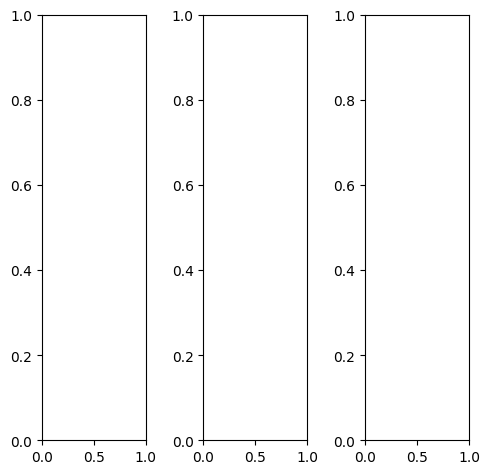

tensor([[[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.2510],
         ...,
         [0.4392, 0.4745, 0.5333,  ..., 0.4039, 0.3843, 0.2706],
         [0.4471, 0.5020, 0.4902,  ..., 0.4078, 0.3569, 0.2510],
         [0.4431, 0.3843, 0.2275,  ..., 0.3843, 0.2941, 0.2431]],

        [[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.2510],
         ...,
         [0.4392, 0.4745, 0.5333,  ..., 0.4039, 0.3843, 0.2706],
         [0.4471, 0.5020, 0.4902,  ..., 0.4078, 0.3569, 0.2510],
         [0.4431, 0.3843, 0.2275,  ..., 0.3843, 0.2941, 0.2431]],

        [[0.0235, 0.0353, 0.0353,  ..., 0.2157, 0.2039, 0.1922],
         [0.0118, 0.0275, 0.0314,  ..., 0.2392, 0.2314, 0.2196],
         [0.0078, 0.0157, 0.0275,  ..., 0.2863, 0.2667, 0.

tensor([[[0.0235, 0.0353, 0.0353,  ..., 0.3137, 0.2980, 0.2784],
         [0.0118, 0.0275, 0.0314,  ..., 0.3451, 0.3294, 0.3137],
         [0.0078, 0.0196, 0.0235,  ..., 0.3961, 0.3725, 0.3490],
         ...,
         [0.4471, 0.4784, 0.5333,  ..., 0.4039, 0.3843, 0.3373],
         [0.4510, 0.5020, 0.4902,  ..., 0.4039, 0.3765, 0.3255],
         [0.4431, 0.3843, 0.2275,  ..., 0.4000, 0.3529, 0.3294]],

        [[0.0275, 0.0392, 0.0353,  ..., 0.1882, 0.1804, 0.1686],
         [0.0157, 0.0275, 0.0314,  ..., 0.2118, 0.2039, 0.1961],
         [0.0078, 0.0118, 0.0275,  ..., 0.2588, 0.2431, 0.2275],
         ...,
         [0.4510, 0.4863, 0.5451,  ..., 0.4118, 0.3922, 0.2588],
         [0.4588, 0.5137, 0.4980,  ..., 0.4157, 0.3569, 0.2353],
         [0.4510, 0.3922, 0.2314,  ..., 0.3882, 0.2824, 0.2235]],

        [[0.0157, 0.0196, 0.0235,  ..., 0.0941, 0.0902, 0.0824],
         [0.0078, 0.0196, 0.0235,  ..., 0.1098, 0.1020, 0.0980],
         [0.0078, 0.0118, 0.0235,  ..., 0.1412, 0.1255, 0.

tensor([[[ 0.0727,  0.0402,  0.0428,  ...,  0.2224,  0.2110,  0.2055],
         [ 0.0310,  0.0233,  0.0279,  ...,  0.2594,  0.2546,  0.2257],
         [ 0.0120,  0.0010,  0.0227,  ...,  0.3186,  0.2963,  0.2617],
         ...,
         [ 0.4628,  0.5162,  0.5909,  ...,  0.4242,  0.4049,  0.2743],
         [ 0.4637,  0.5360,  0.5225,  ...,  0.4329,  0.3772,  0.2582],
         [ 0.4710,  0.4086,  0.2499,  ...,  0.4033,  0.3037,  0.2752]],

        [[ 0.0867,  0.0389,  0.0391,  ...,  0.2106,  0.2035,  0.2120],
         [ 0.0243,  0.0248,  0.0258,  ...,  0.2327,  0.2341,  0.2169],
         [ 0.0130,  0.0149,  0.0249,  ...,  0.2838,  0.2677,  0.2485],
         ...,
         [ 0.4476,  0.4804,  0.5414,  ...,  0.4062,  0.3915,  0.2657],
         [ 0.4442,  0.5119,  0.4944,  ...,  0.4069,  0.3601,  0.2513],
         [ 0.4542,  0.3709,  0.2074,  ...,  0.3781,  0.2911,  0.2695]],

        [[ 0.0629,  0.0255,  0.0252,  ...,  0.1519,  0.1506,  0.1541],
         [ 0.0089,  0.0118,  0.0124,  ...,  0

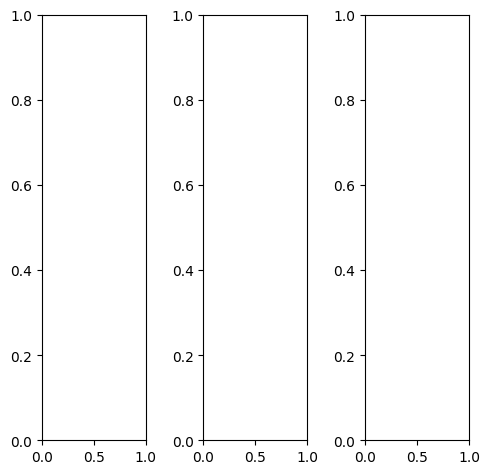

tensor([[[0.2235, 0.3647, 0.5137,  ..., 0.0941, 0.0784, 0.0667],
         [0.2627, 0.4275, 0.5529,  ..., 0.1176, 0.0941, 0.0902],
         [0.3098, 0.4588, 0.5294,  ..., 0.1333, 0.1137, 0.1020],
         ...,
         [0.0235, 0.0275, 0.0392,  ..., 0.3216, 0.3294, 0.3216],
         [0.0275, 0.0392, 0.0588,  ..., 0.3373, 0.3686, 0.3725],
         [0.0824, 0.1294, 0.1098,  ..., 0.3647, 0.4000, 0.3882]],

        [[0.2235, 0.3647, 0.5137,  ..., 0.0941, 0.0784, 0.0667],
         [0.2627, 0.4275, 0.5529,  ..., 0.1176, 0.0941, 0.0902],
         [0.3098, 0.4588, 0.5294,  ..., 0.1333, 0.1137, 0.1020],
         ...,
         [0.0235, 0.0275, 0.0392,  ..., 0.3216, 0.3294, 0.3216],
         [0.0275, 0.0392, 0.0588,  ..., 0.3373, 0.3686, 0.3725],
         [0.0824, 0.1294, 0.1098,  ..., 0.3647, 0.4000, 0.3882]],

        [[0.2235, 0.3647, 0.5137,  ..., 0.0941, 0.0784, 0.0667],
         [0.2627, 0.4275, 0.5529,  ..., 0.1176, 0.0941, 0.0902],
         [0.3098, 0.4588, 0.5294,  ..., 0.1333, 0.1137, 0.

tensor([[[0.1333, 0.2706, 0.4196,  ..., 0.0235, 0.0118, 0.0039],
         [0.1765, 0.3373, 0.4627,  ..., 0.0471, 0.0235, 0.0118],
         [0.2196, 0.3765, 0.4627,  ..., 0.0706, 0.0353, 0.0196],
         ...,
         [0.0039, 0.0039, 0.0078,  ..., 0.2353, 0.2235, 0.1961],
         [0.0078, 0.0157, 0.0275,  ..., 0.2353, 0.2549, 0.2392],
         [0.0627, 0.0980, 0.0745,  ..., 0.2588, 0.2824, 0.2588]],

        [[0.2667, 0.4039, 0.5529,  ..., 0.1412, 0.1255, 0.1137],
         [0.3059, 0.4667, 0.5922,  ..., 0.1686, 0.1412, 0.1451],
         [0.3529, 0.4941, 0.5608,  ..., 0.1804, 0.1686, 0.1569],
         ...,
         [0.0353, 0.0431, 0.0588,  ..., 0.3725, 0.3882, 0.3922],
         [0.0392, 0.0549, 0.0824,  ..., 0.3961, 0.4353, 0.4471],
         [0.0941, 0.1490, 0.1333,  ..., 0.4314, 0.4706, 0.4627]],

        [[0.2353, 0.4118, 0.5608,  ..., 0.0314, 0.0157, 0.0039],
         [0.2667, 0.4627, 0.5843,  ..., 0.0549, 0.0275, 0.0157],
         [0.3137, 0.4824, 0.5490,  ..., 0.0706, 0.0471, 0.

tensor([[[0.2524, 0.3716, 0.5367,  ..., 0.0964, 0.0898, 0.1133],
         [0.2636, 0.4527, 0.5840,  ..., 0.1155, 0.0998, 0.0970],
         [0.3244, 0.4924, 0.5652,  ..., 0.1328, 0.1155, 0.1038],
         ...,
         [0.0274, 0.0176, 0.0367,  ..., 0.3323, 0.3389, 0.3275],
         [0.0410, 0.0385, 0.0610,  ..., 0.3603, 0.3831, 0.3859],
         [0.1067, 0.1312, 0.1146,  ..., 0.3780, 0.4114, 0.4076]],

        [[0.2488, 0.3659, 0.5361,  ..., 0.0930, 0.0860, 0.1209],
         [0.2499, 0.4226, 0.5718,  ..., 0.1126, 0.0985, 0.0982],
         [0.3099, 0.4740, 0.5439,  ..., 0.1313, 0.1094, 0.0977],
         ...,
         [0.0234, 0.0222, 0.0314,  ..., 0.3056, 0.3205, 0.3198],
         [0.0323, 0.0366, 0.0513,  ..., 0.3253, 0.3620, 0.3757],
         [0.1109, 0.1184, 0.0934,  ..., 0.3585, 0.3943, 0.3941]],

        [[0.2013, 0.3047, 0.4364,  ..., 0.0722, 0.0757, 0.1056],
         [0.1994, 0.3536, 0.4675,  ..., 0.0953, 0.0791, 0.0795],
         [0.2418, 0.3954, 0.4401,  ..., 0.1071, 0.0884, 0.

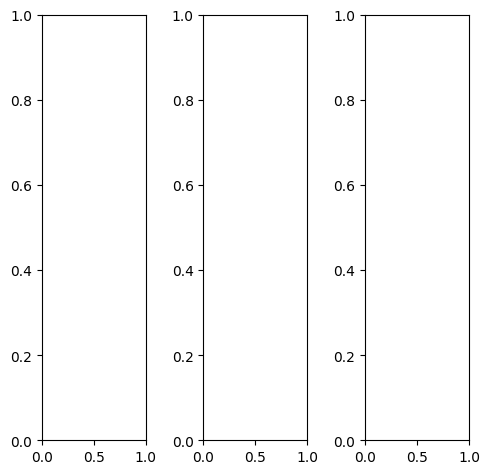

tensor([[[0.9216, 0.8392, 0.8706,  ..., 0.1882, 0.2784, 0.3882],
         [0.9647, 0.9569, 0.9569,  ..., 0.2039, 0.2157, 0.2745],
         [0.9608, 0.9686, 0.9843,  ..., 0.2275, 0.2510, 0.2196],
         ...,
         [0.6824, 0.7020, 0.7294,  ..., 0.4588, 0.5176, 0.5451],
         [0.6980, 0.6510, 0.6392,  ..., 0.6039, 0.5922, 0.6235],
         [0.6549, 0.5922, 0.5725,  ..., 0.6118, 0.6157, 0.6353]],

        [[0.9216, 0.8392, 0.8706,  ..., 0.1882, 0.2784, 0.3882],
         [0.9647, 0.9569, 0.9569,  ..., 0.2039, 0.2157, 0.2745],
         [0.9608, 0.9686, 0.9843,  ..., 0.2275, 0.2510, 0.2196],
         ...,
         [0.6824, 0.7020, 0.7294,  ..., 0.4588, 0.5176, 0.5451],
         [0.6980, 0.6510, 0.6392,  ..., 0.6039, 0.5922, 0.6235],
         [0.6549, 0.5922, 0.5725,  ..., 0.6118, 0.6157, 0.6353]],

        [[0.9216, 0.8392, 0.8706,  ..., 0.1882, 0.2784, 0.3882],
         [0.9647, 0.9569, 0.9569,  ..., 0.2039, 0.2157, 0.2745],
         [0.9608, 0.9686, 0.9843,  ..., 0.2275, 0.2510, 0.

tensor([[[0.9333, 0.8824, 0.9216,  ..., 0.1098, 0.1961, 0.3020],
         [0.9451, 0.9765, 0.9843,  ..., 0.1294, 0.1373, 0.1961],
         [0.9373, 0.9765, 0.9961,  ..., 0.1569, 0.1765, 0.1412],
         ...,
         [0.6392, 0.6627, 0.6941,  ..., 0.3647, 0.4196, 0.4588],
         [0.6510, 0.6000, 0.5843,  ..., 0.5294, 0.5098, 0.5412],
         [0.6000, 0.5255, 0.4941,  ..., 0.5529, 0.5451, 0.5608]],

        [[0.9176, 0.8235, 0.8510,  ..., 0.2275, 0.3216, 0.4275],
         [0.9725, 0.9529, 0.9412,  ..., 0.2431, 0.2588, 0.3137],
         [0.9725, 0.9647, 0.9765,  ..., 0.2667, 0.2941, 0.2588],
         ...,
         [0.7294, 0.7451, 0.7686,  ..., 0.5294, 0.5882, 0.6118],
         [0.7451, 0.7020, 0.6902,  ..., 0.6627, 0.6549, 0.6863],
         [0.7020, 0.6510, 0.6392,  ..., 0.6667, 0.6706, 0.6941]],

        [[0.9137, 0.8078, 0.8510,  ..., 0.1961, 0.2824, 0.4039],
         [0.9647, 0.9412, 0.9529,  ..., 0.1961, 0.2078, 0.2824],
         [0.9765, 0.9686, 0.9922,  ..., 0.2078, 0.2353, 0.

tensor([[[0.8719, 0.8215, 0.8519,  ..., 0.1871, 0.2731, 0.3519],
         [0.9513, 0.9479, 0.9428,  ..., 0.2095, 0.2216, 0.2664],
         [0.9525, 0.9705, 0.9792,  ..., 0.2401, 0.2659, 0.2240],
         ...,
         [0.7029, 0.7268, 0.7486,  ..., 0.4730, 0.5368, 0.5602],
         [0.7089, 0.6740, 0.6410,  ..., 0.6138, 0.6081, 0.6379],
         [0.6716, 0.6118, 0.5844,  ..., 0.6110, 0.6347, 0.6464]],

        [[0.8914, 0.8442, 0.8860,  ..., 0.1793, 0.2776, 0.3646],
         [0.9618, 0.9627, 0.9671,  ..., 0.2032, 0.2252, 0.2747],
         [0.9591, 0.9880, 0.9953,  ..., 0.2250, 0.2527, 0.2198],
         ...,
         [0.6914, 0.7189, 0.7434,  ..., 0.4609, 0.5279, 0.5461],
         [0.6976, 0.6494, 0.6388,  ..., 0.6075, 0.6028, 0.6340],
         [0.6493, 0.5993, 0.5728,  ..., 0.5999, 0.6095, 0.6364]],

        [[0.8855, 0.8421, 0.8666,  ..., 0.1568, 0.2419, 0.3218],
         [0.9552, 0.9612, 0.9571,  ..., 0.1712, 0.1832, 0.2292],
         [0.9569, 0.9632, 0.9799,  ..., 0.1953, 0.2188, 0.

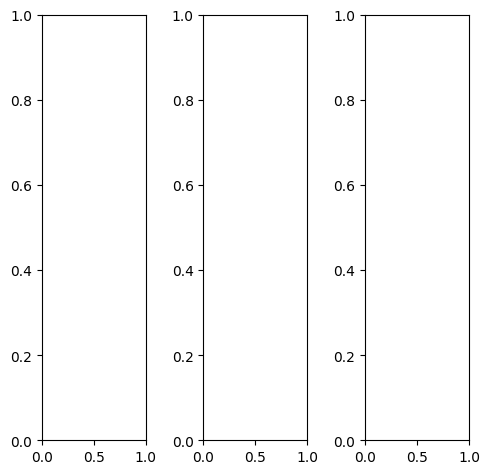

tensor([[[0.7255, 0.4627, 0.4314,  ..., 0.2353, 0.2235, 0.1843],
         [0.5176, 0.3608, 0.4078,  ..., 0.2706, 0.2000, 0.1686],
         [0.4118, 0.3373, 0.5333,  ..., 0.1725, 0.1843, 0.1961],
         ...,
         [0.2745, 0.1647, 0.1569,  ..., 0.1294, 0.1765, 0.1529],
         [0.1843, 0.1529, 0.1725,  ..., 0.1020, 0.1451, 0.1804],
         [0.1725, 0.1412, 0.1882,  ..., 0.1294, 0.1843, 0.1725]],

        [[0.7255, 0.4627, 0.4314,  ..., 0.2353, 0.2235, 0.1843],
         [0.5176, 0.3608, 0.4078,  ..., 0.2706, 0.2000, 0.1686],
         [0.4118, 0.3373, 0.5333,  ..., 0.1725, 0.1843, 0.1961],
         ...,
         [0.2745, 0.1647, 0.1569,  ..., 0.1294, 0.1765, 0.1529],
         [0.1843, 0.1529, 0.1725,  ..., 0.1020, 0.1451, 0.1804],
         [0.1725, 0.1412, 0.1882,  ..., 0.1294, 0.1843, 0.1725]],

        [[0.7255, 0.4627, 0.4314,  ..., 0.2353, 0.2235, 0.1843],
         [0.5176, 0.3608, 0.4078,  ..., 0.2706, 0.2000, 0.1686],
         [0.4118, 0.3373, 0.5333,  ..., 0.1725, 0.1843, 0.

tensor([[[0.7333, 0.4863, 0.4706,  ..., 0.2392, 0.2314, 0.1882],
         [0.5412, 0.3922, 0.4471,  ..., 0.2667, 0.1961, 0.1647],
         [0.4549, 0.3765, 0.5686,  ..., 0.1647, 0.1765, 0.1882],
         ...,
         [0.2314, 0.1255, 0.1176,  ..., 0.0980, 0.1451, 0.1216],
         [0.1451, 0.1176, 0.1333,  ..., 0.0784, 0.1176, 0.1529],
         [0.1333, 0.1020, 0.1490,  ..., 0.1137, 0.1725, 0.1569]],

        [[0.7216, 0.4588, 0.4196,  ..., 0.2314, 0.2196, 0.1804],
         [0.5059, 0.3490, 0.3922,  ..., 0.2667, 0.1961, 0.1647],
         [0.3961, 0.3216, 0.5137,  ..., 0.1765, 0.1882, 0.1961],
         ...,
         [0.2902, 0.1804, 0.1725,  ..., 0.1412, 0.1882, 0.1647],
         [0.2000, 0.1686, 0.1882,  ..., 0.1098, 0.1529, 0.1882],
         [0.1882, 0.1569, 0.2039,  ..., 0.1333, 0.1922, 0.1765]],

        [[0.7412, 0.4353, 0.3882,  ..., 0.2510, 0.2392, 0.2000],
         [0.5020, 0.3294, 0.3882,  ..., 0.2863, 0.2157, 0.1843],
         [0.3765, 0.3020, 0.5373,  ..., 0.1882, 0.2000, 0.

tensor([[[0.6721, 0.4867, 0.4091,  ..., 0.2320, 0.2179, 0.1915],
         [0.5235, 0.3671, 0.4094,  ..., 0.2825, 0.2075, 0.1794],
         [0.4036, 0.3496, 0.5438,  ..., 0.1759, 0.1938, 0.1991],
         ...,
         [0.2822, 0.1645, 0.1609,  ..., 0.1262, 0.1855, 0.1690],
         [0.2075, 0.1641, 0.1856,  ..., 0.0967, 0.1570, 0.1896],
         [0.1864, 0.1615, 0.1906,  ..., 0.1342, 0.1840, 0.1878]],

        [[0.6851, 0.4810, 0.4232,  ..., 0.2299, 0.2136, 0.2039],
         [0.5395, 0.3704, 0.4128,  ..., 0.2726, 0.2021, 0.1765],
         [0.4100, 0.3315, 0.5478,  ..., 0.1662, 0.1854, 0.1919],
         ...,
         [0.2713, 0.1630, 0.1606,  ..., 0.1293, 0.1798, 0.1559],
         [0.1908, 0.1494, 0.1694,  ..., 0.0928, 0.1425, 0.1724],
         [0.1895, 0.1436, 0.1729,  ..., 0.1208, 0.1617, 0.1834]],

        [[0.5880, 0.3953, 0.3389,  ..., 0.1807, 0.1714, 0.1588],
         [0.4354, 0.2734, 0.3160,  ..., 0.2268, 0.1501, 0.1314],
         [0.3145, 0.2463, 0.4302,  ..., 0.1290, 0.1431, 0.

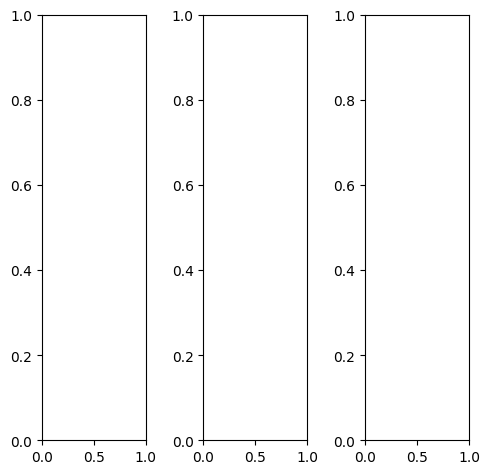

EPOCH: 19.255  trn_loss: 0.005  (2315.24s - 9708.80s remaining)

tensor([[[0.1765, 0.1765, 0.2235,  ..., 0.2157, 0.2000, 0.2196],
         [0.1686, 0.1922, 0.3412,  ..., 0.2353, 0.2353, 0.2549],
         [0.1647, 0.2235, 0.4196,  ..., 0.2353, 0.2471, 0.2902],
         ...,
         [0.4392, 0.3843, 0.3765,  ..., 0.3922, 0.3451, 0.3137],
         [0.4078, 0.3882, 0.3569,  ..., 0.5686, 0.4941, 0.4471],
         [0.3294, 0.3059, 0.2471,  ..., 0.6392, 0.6392, 0.6078]],

        [[0.1765, 0.1765, 0.2235,  ..., 0.2157, 0.2000, 0.2196],
         [0.1686, 0.1922, 0.3412,  ..., 0.2353, 0.2353, 0.2549],
         [0.1647, 0.2235, 0.4196,  ..., 0.2353, 0.2471, 0.2902],
         ...,
         [0.4392, 0.3843, 0.3765,  ..., 0.3922, 0.3451, 0.3137],
         [0.4078, 0.3882, 0.3569,  ..., 0.5686, 0.4941, 0.4471],
         [0.3294, 0.3059, 0.2471,  ..., 0.6392, 0.6392, 0.6078]],

        [[0.1765, 0.1765, 0.2235,  ..., 0.2157, 0.2000, 0.2196],
         [0.1686, 0.1922, 0.3412,  ..., 0.2353, 0.2353, 0.2549],
         [0.1647, 0.2235, 0.4196,  ..., 0.2353, 0.2471, 0.

tensor([[[0.2000, 0.1961, 0.2118,  ..., 0.1922, 0.1647, 0.1686],
         [0.1765, 0.1765, 0.2824,  ..., 0.2078, 0.1961, 0.2078],
         [0.1647, 0.1882, 0.3216,  ..., 0.2039, 0.2039, 0.2471],
         ...,
         [0.3412, 0.2667, 0.2863,  ..., 0.5333, 0.4431, 0.3804],
         [0.3137, 0.2980, 0.2941,  ..., 0.6863, 0.5451, 0.4784],
         [0.2667, 0.2510, 0.2157,  ..., 0.6706, 0.6235, 0.5765]],

        [[0.1686, 0.1725, 0.2392,  ..., 0.2392, 0.2275, 0.2510],
         [0.1686, 0.2039, 0.3804,  ..., 0.2588, 0.2667, 0.2902],
         [0.1686, 0.2471, 0.4784,  ..., 0.2627, 0.2784, 0.3216],
         ...,
         [0.5098, 0.4627, 0.4431,  ..., 0.3451, 0.3216, 0.2980],
         [0.4745, 0.4549, 0.4039,  ..., 0.5373, 0.4902, 0.4471],
         [0.3765, 0.3451, 0.2784,  ..., 0.6510, 0.6667, 0.6353]],

        [[0.1529, 0.1569, 0.1765,  ..., 0.1490, 0.1490, 0.1882],
         [0.1451, 0.1725, 0.2941,  ..., 0.1725, 0.1843, 0.2118],
         [0.1412, 0.2039, 0.3725,  ..., 0.1843, 0.2000, 0.

tensor([[[ 0.0377, -0.0471,  0.0930,  ...,  0.0893,  0.0704,  0.1379],
         [-0.0720, -0.0969,  0.2518,  ...,  0.0848,  0.0888,  0.1459],
         [-0.0692, -0.0057,  0.4535,  ...,  0.0709,  0.1067,  0.2154],
         ...,
         [ 0.6898,  0.6182,  0.5466,  ...,  0.6256,  0.5017,  0.4289],
         [ 0.6249,  0.5587,  0.4500,  ...,  0.9853,  0.8029,  0.7191],
         [ 0.4603,  0.3451,  0.1921,  ...,  1.1676,  1.1267,  0.9764]],

        [[ 0.1479,  0.0785,  0.2352,  ...,  0.1621,  0.1491,  0.1805],
         [ 0.0589,  0.0627,  0.4276,  ...,  0.1661,  0.1905,  0.2094],
         [ 0.0480,  0.1332,  0.6151,  ...,  0.1445,  0.1828,  0.2748],
         ...,
         [ 0.6916,  0.5582,  0.5358,  ...,  0.5874,  0.4867,  0.4058],
         [ 0.6091,  0.5174,  0.4479,  ...,  0.9904,  0.8180,  0.7071],
         [ 0.4509,  0.3106,  0.1742,  ...,  1.1261,  1.1100,  0.9378]],

        [[ 0.3461,  0.3285,  0.5467,  ...,  0.2451,  0.2386,  0.2961],
         [ 0.3142,  0.3622,  0.7825,  ...,  0

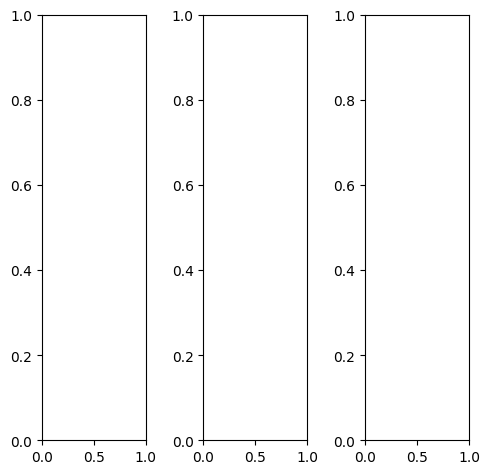

tensor([[[0.0784, 0.0902, 0.0902,  ..., 0.0667, 0.0745, 0.0745],
         [0.0510, 0.0667, 0.0745,  ..., 0.0471, 0.0549, 0.0588],
         [0.0275, 0.0471, 0.0588,  ..., 0.0275, 0.0392, 0.0431],
         ...,
         [0.2824, 0.2902, 0.3020,  ..., 0.1843, 0.1804, 0.1765],
         [0.3294, 0.3373, 0.3451,  ..., 0.2078, 0.2000, 0.1961],
         [0.3647, 0.3804, 0.3961,  ..., 0.2275, 0.2196, 0.2118]],

        [[0.0784, 0.0902, 0.0902,  ..., 0.0667, 0.0745, 0.0745],
         [0.0510, 0.0667, 0.0745,  ..., 0.0471, 0.0549, 0.0588],
         [0.0275, 0.0471, 0.0588,  ..., 0.0275, 0.0392, 0.0431],
         ...,
         [0.2824, 0.2902, 0.3020,  ..., 0.1843, 0.1804, 0.1765],
         [0.3294, 0.3373, 0.3451,  ..., 0.2078, 0.2000, 0.1961],
         [0.3647, 0.3804, 0.3961,  ..., 0.2275, 0.2196, 0.2118]],

        [[0.0784, 0.0902, 0.0902,  ..., 0.0667, 0.0745, 0.0745],
         [0.0510, 0.0667, 0.0745,  ..., 0.0471, 0.0549, 0.0588],
         [0.0275, 0.0471, 0.0588,  ..., 0.0275, 0.0392, 0.

tensor([[[0.1020, 0.1137, 0.1137,  ..., 0.0784, 0.0941, 0.0980],
         [0.0745, 0.0902, 0.0980,  ..., 0.0627, 0.0745, 0.0824],
         [0.0471, 0.0627, 0.0745,  ..., 0.0431, 0.0549, 0.0627],
         ...,
         [0.2588, 0.2667, 0.2784,  ..., 0.1725, 0.1647, 0.1608],
         [0.3020, 0.3137, 0.3255,  ..., 0.1922, 0.1804, 0.1725],
         [0.3490, 0.3725, 0.3922,  ..., 0.2039, 0.1922, 0.1843]],

        [[0.0667, 0.0784, 0.0784,  ..., 0.0588, 0.0667, 0.0627],
         [0.0392, 0.0549, 0.0627,  ..., 0.0392, 0.0471, 0.0471],
         [0.0196, 0.0392, 0.0510,  ..., 0.0196, 0.0314, 0.0353],
         ...,
         [0.2980, 0.3059, 0.3137,  ..., 0.1882, 0.1843, 0.1804],
         [0.3451, 0.3529, 0.3569,  ..., 0.2118, 0.2078, 0.2078],
         [0.3765, 0.3882, 0.4039,  ..., 0.2392, 0.2314, 0.2235]],

        [[0.0784, 0.0902, 0.0902,  ..., 0.0627, 0.0745, 0.0745],
         [0.0510, 0.0667, 0.0745,  ..., 0.0471, 0.0549, 0.0588],
         [0.0275, 0.0471, 0.0588,  ..., 0.0275, 0.0392, 0.

tensor([[[ 0.1317,  0.1403,  0.0934,  ...,  0.1126,  0.1325,  0.1777],
         [ 0.2088,  0.0756,  0.1388,  ...,  0.0873,  0.0906,  0.1345],
         [-0.0235, -0.0069,  0.0109,  ...,  0.0332,  0.0567,  0.0984],
         ...,
         [ 0.4959,  0.5530,  0.5277,  ...,  0.3922,  0.3805,  0.4182],
         [ 0.5522,  0.5776,  0.5599,  ...,  0.4101,  0.4024,  0.4289],
         [ 0.6084,  0.6586,  0.6624,  ...,  0.4455,  0.4356,  0.4404]],

        [[ 0.1906,  0.2432,  0.0726,  ...,  0.1666,  0.1756,  0.2151],
         [ 0.2056,  0.1257, -0.0277,  ...,  0.1605,  0.1786,  0.1750],
         [ 0.0170,  0.0662, -0.0912,  ...,  0.1065,  0.1293,  0.1551],
         ...,
         [ 0.4940,  0.5288,  0.5572,  ...,  0.4184,  0.3980,  0.3831],
         [ 0.5444,  0.5705,  0.5856,  ...,  0.4501,  0.4162,  0.4092],
         [ 0.5928,  0.6424,  0.6762,  ...,  0.4472,  0.4340,  0.4255]],

        [[ 0.2838,  0.1593,  0.1835,  ...,  0.3162,  0.3361,  0.3581],
         [ 0.2581,  0.0847,  0.1933,  ...,  0

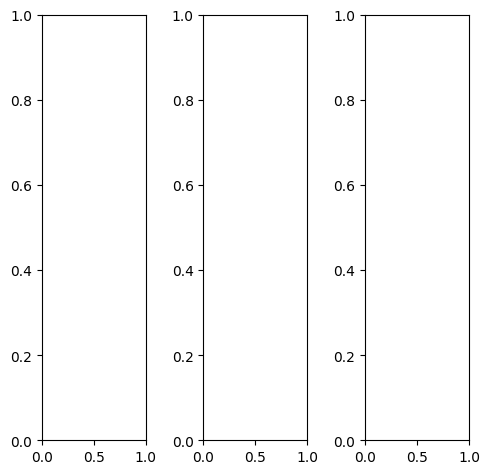

tensor([[[0.2078, 0.2039, 0.2078,  ..., 0.3882, 0.3882, 0.3882],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4275, 0.4235],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4235, 0.4196],
         ...,
         [0.5373, 0.5569, 0.6000,  ..., 0.6431, 0.6275, 0.6196],
         [0.5608, 0.5765, 0.6118,  ..., 0.6549, 0.6314, 0.6157],
         [0.5843, 0.5961, 0.6157,  ..., 0.5412, 0.5451, 0.5373]],

        [[0.2078, 0.2039, 0.2078,  ..., 0.3882, 0.3882, 0.3882],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4275, 0.4235],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4235, 0.4196],
         ...,
         [0.5373, 0.5569, 0.6000,  ..., 0.6431, 0.6275, 0.6196],
         [0.5608, 0.5765, 0.6118,  ..., 0.6549, 0.6314, 0.6157],
         [0.5843, 0.5961, 0.6157,  ..., 0.5412, 0.5451, 0.5373]],

        [[0.2078, 0.2039, 0.2078,  ..., 0.3882, 0.3882, 0.3882],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4275, 0.4235],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4235, 0.

tensor([[[0.2078, 0.2039, 0.2078,  ..., 0.3882, 0.3882, 0.3882],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4275, 0.4235],
         [0.2078, 0.2078, 0.2078,  ..., 0.4235, 0.4235, 0.4196],
         ...,
         [0.5098, 0.5294, 0.5765,  ..., 0.6039, 0.5882, 0.5804],
         [0.5333, 0.5490, 0.5843,  ..., 0.6157, 0.5922, 0.5765],
         [0.5569, 0.5686, 0.5882,  ..., 0.5059, 0.5059, 0.4980]],

        [[0.2039, 0.2000, 0.2039,  ..., 0.3843, 0.3843, 0.3843],
         [0.2039, 0.2039, 0.2039,  ..., 0.4196, 0.4235, 0.4196],
         [0.2039, 0.2039, 0.2039,  ..., 0.4196, 0.4196, 0.4157],
         ...,
         [0.5373, 0.5569, 0.6000,  ..., 0.6431, 0.6275, 0.6235],
         [0.5608, 0.5765, 0.6078,  ..., 0.6549, 0.6314, 0.6196],
         [0.5804, 0.5922, 0.6118,  ..., 0.5412, 0.5451, 0.5373]],

        [[0.2235, 0.2196, 0.2196,  ..., 0.4039, 0.4039, 0.4039],
         [0.2235, 0.2235, 0.2235,  ..., 0.4392, 0.4431, 0.4392],
         [0.2235, 0.2235, 0.2235,  ..., 0.4392, 0.4392, 0.

tensor([[[0.1651, 0.1679, 0.0991,  ..., 0.3547, 0.3796, 0.4507],
         [0.1671, 0.1002, 0.1526,  ..., 0.3516, 0.3382, 0.4207],
         [0.0460, 0.1375, 0.0199,  ..., 0.3573, 0.3595, 0.4217],
         ...,
         [0.5799, 0.5905, 0.5883,  ..., 0.6177, 0.6181, 0.7227],
         [0.6311, 0.5784, 0.5977,  ..., 0.6735, 0.6747, 0.7409],
         [0.7098, 0.6857, 0.6693,  ..., 0.5745, 0.5993, 0.6480]],

        [[0.2057, 0.3419, 0.1261,  ..., 0.4435, 0.4828, 0.4874],
         [0.2065, 0.1612, 0.0676,  ..., 0.4251, 0.4701, 0.4748],
         [0.1170, 0.3390, 0.0217,  ..., 0.4227, 0.4517, 0.4626],
         ...,
         [0.5607, 0.5352, 0.5639,  ..., 0.6161, 0.6441, 0.7113],
         [0.6311, 0.5409, 0.5989,  ..., 0.6799, 0.6895, 0.7259],
         [0.6818, 0.6621, 0.6492,  ..., 0.5606, 0.5818, 0.6211]],

        [[0.4021, 0.2360, 0.3162,  ..., 0.5835, 0.6383, 0.6618],
         [0.3488, 0.2260, 0.3197,  ..., 0.5610, 0.6164, 0.6784],
         [0.2646, 0.2291, 0.2419,  ..., 0.5304, 0.5835, 0.

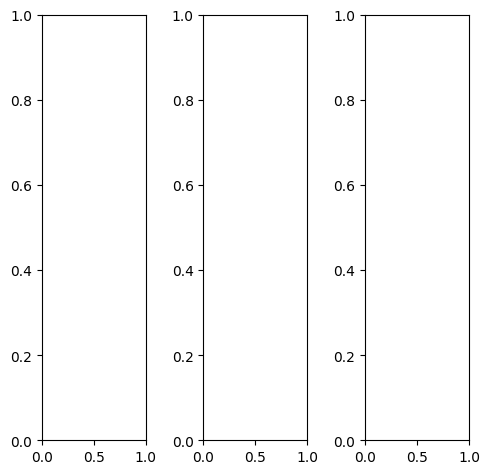

tensor([[[0.4824, 0.6039, 0.6196,  ..., 0.6078, 0.6275, 0.5137],
         [0.3333, 0.4392, 0.3137,  ..., 0.5686, 0.5647, 0.4627],
         [0.3529, 0.3765, 0.4784,  ..., 0.5333, 0.4549, 0.4157],
         ...,
         [0.6118, 0.5725, 0.5765,  ..., 0.1373, 0.1725, 0.2392],
         [0.6353, 0.6000, 0.4863,  ..., 0.3608, 0.4667, 0.4588],
         [0.5569, 0.5608, 0.3725,  ..., 0.4627, 0.5020, 0.4627]],

        [[0.4824, 0.6039, 0.6196,  ..., 0.6078, 0.6275, 0.5137],
         [0.3333, 0.4392, 0.3137,  ..., 0.5686, 0.5647, 0.4627],
         [0.3529, 0.3765, 0.4784,  ..., 0.5333, 0.4549, 0.4157],
         ...,
         [0.6118, 0.5725, 0.5765,  ..., 0.1373, 0.1725, 0.2392],
         [0.6353, 0.6000, 0.4863,  ..., 0.3608, 0.4667, 0.4588],
         [0.5569, 0.5608, 0.3725,  ..., 0.4627, 0.5020, 0.4627]],

        [[0.4824, 0.6039, 0.6196,  ..., 0.6078, 0.6275, 0.5137],
         [0.3333, 0.4392, 0.3137,  ..., 0.5686, 0.5647, 0.4627],
         [0.3529, 0.3765, 0.4784,  ..., 0.5333, 0.4549, 0.

tensor([[[0.5882, 0.7098, 0.7059,  ..., 0.6706, 0.6902, 0.5804],
         [0.4000, 0.5020, 0.3451,  ..., 0.6431, 0.6353, 0.5255],
         [0.4000, 0.4000, 0.4863,  ..., 0.6000, 0.5216, 0.4902],
         ...,
         [0.6824, 0.6431, 0.6510,  ..., 0.1490, 0.1961, 0.2745],
         [0.7059, 0.6627, 0.5490,  ..., 0.4196, 0.5294, 0.5098],
         [0.6275, 0.6275, 0.4275,  ..., 0.5333, 0.5686, 0.5294]],

        [[0.4392, 0.5647, 0.5843,  ..., 0.5843, 0.6078, 0.4902],
         [0.3059, 0.4196, 0.3059,  ..., 0.5412, 0.5412, 0.4353],
         [0.3333, 0.3725, 0.4824,  ..., 0.5098, 0.4275, 0.3843],
         ...,
         [0.5882, 0.5451, 0.5451,  ..., 0.1333, 0.1647, 0.2275],
         [0.6078, 0.5725, 0.4627,  ..., 0.3412, 0.4471, 0.4431],
         [0.5294, 0.5373, 0.3529,  ..., 0.4392, 0.4784, 0.4392]],

        [[0.4118, 0.5255, 0.5608,  ..., 0.5647, 0.5569, 0.4588],
         [0.2902, 0.3843, 0.2824,  ..., 0.5020, 0.5059, 0.4275],
         [0.3137, 0.3294, 0.4353,  ..., 0.4863, 0.4118, 0.

tensor([[[0.5654, 0.6316, 0.6160,  ..., 0.6893, 0.6735, 0.5814],
         [0.3192, 0.4150, 0.2075,  ..., 0.6453, 0.6612, 0.4855],
         [0.2701, 0.3890, 0.3676,  ..., 0.6198, 0.5271, 0.4302],
         ...,
         [0.9051, 0.9139, 0.8860,  ..., 0.0674, 0.1309, 0.1928],
         [0.9032, 0.8771, 0.6582,  ..., 0.3542, 0.5300, 0.4955],
         [0.7498, 0.7262, 0.4344,  ..., 0.5171, 0.6058, 0.5656]],

        [[0.6335, 0.7732, 0.6580,  ..., 0.8124, 0.8408, 0.6717],
         [0.3699, 0.5532, 0.2404,  ..., 0.8068, 0.7975, 0.6261],
         [0.3951, 0.4748, 0.5003,  ..., 0.7489, 0.6285, 0.5557],
         ...,
         [0.8497, 0.8698, 0.8939,  ..., 0.0233, 0.0920, 0.1338],
         [0.8672, 0.8184, 0.6570,  ..., 0.3655, 0.5304, 0.4482],
         [0.6733, 0.6933, 0.4247,  ..., 0.4928, 0.5901, 0.5439]],

        [[0.7163, 0.7995, 0.8879,  ..., 0.9828, 0.9862, 0.8114],
         [0.5043, 0.6885, 0.4825,  ..., 0.9668, 0.9663, 0.7515],
         [0.4946, 0.4991, 0.6634,  ..., 0.9431, 0.8552, 0.

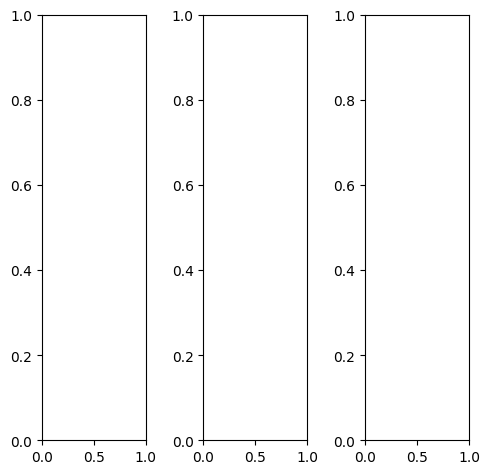

tensor([[[0.1020, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1647,  ..., 0.2314, 0.1608, 0.1020],
         [0.0510, 0.1294, 0.1843,  ..., 0.1412, 0.1490, 0.0157],
         ...,
         [0.6667, 0.5882, 0.3373,  ..., 0.4118, 0.3608, 0.4863],
         [0.6314, 0.4157, 0.2275,  ..., 0.4275, 0.3608, 0.3529],
         [0.4706, 0.3059, 0.3294,  ..., 0.3804, 0.2784, 0.2471]],

        [[0.1020, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1647,  ..., 0.2314, 0.1608, 0.1020],
         [0.0510, 0.1294, 0.1843,  ..., 0.1412, 0.1490, 0.0157],
         ...,
         [0.6667, 0.5882, 0.3373,  ..., 0.4118, 0.3608, 0.4863],
         [0.6314, 0.4157, 0.2275,  ..., 0.4275, 0.3608, 0.3529],
         [0.4706, 0.3059, 0.3294,  ..., 0.3804, 0.2784, 0.2471]],

        [[0.1020, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1647,  ..., 0.2314, 0.1608, 0.1020],
         [0.0510, 0.1294, 0.1843,  ..., 0.1412, 0.1490, 0.

tensor([[[0.0980, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1686,  ..., 0.2314, 0.1608, 0.1020],
         [0.0431, 0.1255, 0.1843,  ..., 0.1373, 0.1490, 0.0196],
         ...,
         [0.7059, 0.6039, 0.3176,  ..., 0.4039, 0.3412, 0.5020],
         [0.6471, 0.4078, 0.1922,  ..., 0.4118, 0.3412, 0.3490],
         [0.4588, 0.2863, 0.3098,  ..., 0.3490, 0.2471, 0.2157]],

        [[0.1020, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1647,  ..., 0.2314, 0.1608, 0.1020],
         [0.0549, 0.1333, 0.1843,  ..., 0.1451, 0.1490, 0.0157],
         ...,
         [0.7020, 0.6275, 0.3725,  ..., 0.4667, 0.4196, 0.5294],
         [0.6706, 0.4510, 0.2549,  ..., 0.4706, 0.4196, 0.4000],
         [0.5059, 0.3294, 0.3451,  ..., 0.4157, 0.3255, 0.2980]],

        [[0.0980, 0.2314, 0.2118,  ..., 0.1961, 0.0824, 0.1059],
         [0.1020, 0.2118, 0.1686,  ..., 0.2314, 0.1608, 0.1020],
         [0.0471, 0.1255, 0.1843,  ..., 0.1294, 0.1569, 0.

tensor([[[ 0.0752,  0.1253,  0.0723,  ...,  0.2779,  0.1768,  0.2214],
         [ 0.1253,  0.0216,  0.0517,  ...,  0.3203,  0.2628,  0.1970],
         [-0.1168, -0.0135, -0.0313,  ...,  0.2182,  0.2451,  0.1315],
         ...,
         [ 0.7892,  0.7532,  0.5221,  ...,  0.5027,  0.4990,  0.6263],
         [ 0.7564,  0.5551,  0.4145,  ...,  0.5517,  0.5171,  0.5268],
         [ 0.6018,  0.4607,  0.4811,  ...,  0.5158,  0.4348,  0.4398]],

        [[ 0.1687,  0.2947,  0.1659,  ...,  0.3220,  0.2140,  0.2441],
         [ 0.1588,  0.1180, -0.0450,  ...,  0.3946,  0.3425,  0.2285],
         [-0.0138,  0.1511,  0.0319,  ...,  0.2924,  0.3147,  0.1708],
         ...,
         [ 0.7326,  0.6833,  0.5214,  ...,  0.4940,  0.4871,  0.5730],
         [ 0.6877,  0.5189,  0.3915,  ...,  0.5449,  0.4894,  0.4662],
         [ 0.5436,  0.4094,  0.4429,  ...,  0.4768,  0.3893,  0.3847]],

        [[ 0.3196,  0.2764,  0.3286,  ...,  0.4318,  0.3410,  0.3686],
         [ 0.3028,  0.2281,  0.2887,  ...,  0

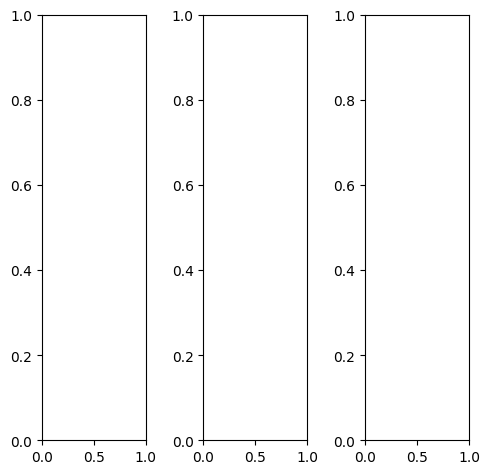

EPOCH: 19.510  trn_loss: 0.005  (2345.11s - 9674.79s remaining)

tensor([[[0.5843, 0.5882, 0.6000,  ..., 0.7765, 0.5294, 0.5255],
         [0.5843, 0.5804, 0.5961,  ..., 0.7569, 0.5294, 0.5294],
         [0.5725, 0.6235, 0.6510,  ..., 0.7333, 0.5216, 0.5294],
         ...,
         [0.5176, 0.5255, 0.5333,  ..., 0.5843, 0.5882, 0.5882],
         [0.5294, 0.5373, 0.5490,  ..., 0.5922, 0.5961, 0.5961],
         [0.5373, 0.5529, 0.5647,  ..., 0.5961, 0.5922, 0.5961]],

        [[0.5843, 0.5882, 0.6000,  ..., 0.7765, 0.5294, 0.5255],
         [0.5843, 0.5804, 0.5961,  ..., 0.7569, 0.5294, 0.5294],
         [0.5725, 0.6235, 0.6510,  ..., 0.7333, 0.5216, 0.5294],
         ...,
         [0.5176, 0.5255, 0.5333,  ..., 0.5843, 0.5882, 0.5882],
         [0.5294, 0.5373, 0.5490,  ..., 0.5922, 0.5961, 0.5961],
         [0.5373, 0.5529, 0.5647,  ..., 0.5961, 0.5922, 0.5961]],

        [[0.5843, 0.5882, 0.6000,  ..., 0.7765, 0.5294, 0.5255],
         [0.5843, 0.5804, 0.5961,  ..., 0.7569, 0.5294, 0.5294],
         [0.5725, 0.6235, 0.6510,  ..., 0.7333, 0.5216, 0.

tensor([[[0.8902, 0.9098, 0.9333,  ..., 0.8667, 0.6275, 0.6078],
         [0.8745, 0.8745, 0.9059,  ..., 0.8471, 0.6275, 0.6118],
         [0.8078, 0.8353, 0.8784,  ..., 0.8235, 0.6196, 0.6118],
         ...,
         [0.6941, 0.7020, 0.7098,  ..., 0.7725, 0.7804, 0.7843],
         [0.7059, 0.7137, 0.7255,  ..., 0.7843, 0.7843, 0.7882],
         [0.7137, 0.7294, 0.7412,  ..., 0.7843, 0.7804, 0.7882]],

        [[0.4706, 0.4706, 0.4706,  ..., 0.7333, 0.4863, 0.4902],
         [0.4745, 0.4706, 0.4784,  ..., 0.7137, 0.4863, 0.4941],
         [0.4824, 0.5373, 0.5569,  ..., 0.6863, 0.4784, 0.4902],
         ...,
         [0.4549, 0.4627, 0.4706,  ..., 0.5176, 0.5216, 0.5216],
         [0.4667, 0.4745, 0.4863,  ..., 0.5255, 0.5294, 0.5294],
         [0.4745, 0.4902, 0.5020,  ..., 0.5255, 0.5255, 0.5294]],

        [[0.3686, 0.3608, 0.3765,  ..., 0.7765, 0.5059, 0.5020],
         [0.3725, 0.3765, 0.4039,  ..., 0.7569, 0.5020, 0.5098],
         [0.4235, 0.5059, 0.5490,  ..., 0.7294, 0.4980, 0.

tensor([[[0.7532, 0.6899, 0.7150,  ..., 0.7790, 0.5617, 0.6776],
         [0.6697, 0.5730, 0.6283,  ..., 0.7585, 0.5731, 0.6520],
         [0.6365, 0.6967, 0.6453,  ..., 0.7313, 0.5818, 0.6543],
         ...,
         [0.7128, 0.6935, 0.6515,  ..., 0.7139, 0.7004, 0.7427],
         [0.7034, 0.6822, 0.6717,  ..., 0.7025, 0.7041, 0.7690],
         [0.7344, 0.7615, 0.7450,  ..., 0.7838, 0.7897, 0.8087]],

        [[0.7460, 0.7845, 0.6707,  ..., 0.8720, 0.6658, 0.6934],
         [0.6773, 0.6262, 0.6343,  ..., 0.8192, 0.6223, 0.7027],
         [0.7173, 0.7434, 0.6483,  ..., 0.7860, 0.6199, 0.6827],
         ...,
         [0.6549, 0.6293, 0.6493,  ..., 0.6959, 0.6840, 0.7353],
         [0.6585, 0.6405, 0.6462,  ..., 0.7010, 0.6934, 0.7416],
         [0.6664, 0.7038, 0.7193,  ..., 0.7478, 0.7413, 0.7561]],

        [[0.8438, 0.8297, 0.8764,  ..., 1.0280, 0.7948, 0.8305],
         [0.8355, 0.7692, 0.7938,  ..., 0.9508, 0.7831, 0.8291],
         [0.7535, 0.7899, 0.7769,  ..., 0.9539, 0.7883, 0.

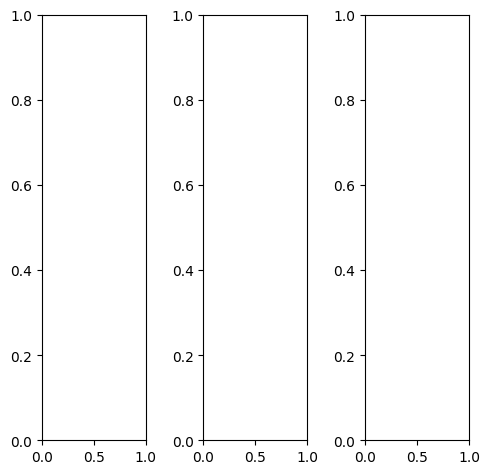

tensor([[[0.5961, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5725],
         [0.6000, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5804],
         [0.6118, 0.6039, 0.6078,  ..., 0.6039, 0.6000, 0.6039],
         ...,
         [0.4980, 0.4941, 0.4941,  ..., 0.5294, 0.5216, 0.5294],
         [0.4863, 0.4824, 0.4863,  ..., 0.5412, 0.5294, 0.5294],
         [0.4706, 0.4667, 0.4824,  ..., 0.5412, 0.5412, 0.5529]],

        [[0.5961, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5725],
         [0.6000, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5804],
         [0.6118, 0.6039, 0.6078,  ..., 0.6039, 0.6000, 0.6039],
         ...,
         [0.4980, 0.4941, 0.4941,  ..., 0.5294, 0.5216, 0.5294],
         [0.4863, 0.4824, 0.4863,  ..., 0.5412, 0.5294, 0.5294],
         [0.4706, 0.4667, 0.4824,  ..., 0.5412, 0.5412, 0.5529]],

        [[0.5961, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5725],
         [0.6000, 0.5922, 0.5922,  ..., 0.5804, 0.5765, 0.5804],
         [0.6118, 0.6039, 0.6078,  ..., 0.6039, 0.6000, 0.

tensor([[[0.3961, 0.3961, 0.3961,  ..., 0.3922, 0.3882, 0.3804],
         [0.4078, 0.4000, 0.4039,  ..., 0.3804, 0.3882, 0.3922],
         [0.4275, 0.4196, 0.4235,  ..., 0.4353, 0.4471, 0.4667],
         ...,
         [0.4902, 0.4863, 0.4863,  ..., 0.5216, 0.5176, 0.5255],
         [0.4863, 0.4824, 0.4863,  ..., 0.5412, 0.5255, 0.5294],
         [0.4706, 0.4706, 0.4824,  ..., 0.5451, 0.5451, 0.5529]],

        [[0.6510, 0.6471, 0.6471,  ..., 0.6275, 0.6235, 0.6235],
         [0.6510, 0.6431, 0.6431,  ..., 0.6353, 0.6275, 0.6275],
         [0.6588, 0.6510, 0.6549,  ..., 0.6510, 0.6431, 0.6431],
         ...,
         [0.5373, 0.5294, 0.5294,  ..., 0.5647, 0.5569, 0.5647],
         [0.5216, 0.5176, 0.5216,  ..., 0.5725, 0.5608, 0.5647],
         [0.5020, 0.4980, 0.5137,  ..., 0.5686, 0.5725, 0.5843]],

        [[0.8353, 0.8314, 0.8392,  ..., 0.8235, 0.8196, 0.8235],
         [0.8353, 0.8275, 0.8353,  ..., 0.8392, 0.8235, 0.8157],
         [0.8471, 0.8392, 0.8471,  ..., 0.8118, 0.7882, 0.

tensor([[[0.3627, 0.2901, 0.1636,  ..., 0.2329, 0.2654, 0.2715],
         [0.3421, 0.2616, 0.1791,  ..., 0.2423, 0.2695, 0.2495],
         [0.2933, 0.2946, 0.2057,  ..., 0.3203, 0.3516, 0.3144],
         ...,
         [0.3564, 0.3495, 0.4065,  ..., 0.3766, 0.3305, 0.3193],
         [0.2833, 0.2825, 0.2938,  ..., 0.3300, 0.3041, 0.2926],
         [0.2464, 0.1678, 0.2164,  ..., 0.2769, 0.2756, 0.3171]],

        [[0.4623, 0.3765, 0.3443,  ..., 0.3399, 0.3845, 0.3373],
         [0.3739, 0.3696, 0.2242,  ..., 0.3806, 0.4253, 0.3298],
         [0.4106, 0.4149, 0.3775,  ..., 0.4483, 0.4692, 0.3562],
         ...,
         [0.2804, 0.2814, 0.2904,  ..., 0.3953, 0.3500, 0.2835],
         [0.2386, 0.2497, 0.2402,  ..., 0.3425, 0.3212, 0.2774],
         [0.2013, 0.1490, 0.1798,  ..., 0.2671, 0.2743, 0.2677]],

        [[0.5834, 0.3891, 0.4844,  ..., 0.4960, 0.5150, 0.4892],
         [0.5223, 0.5143, 0.4191,  ..., 0.5339, 0.5535, 0.4935],
         [0.5255, 0.4679, 0.5488,  ..., 0.5946, 0.5998, 0.

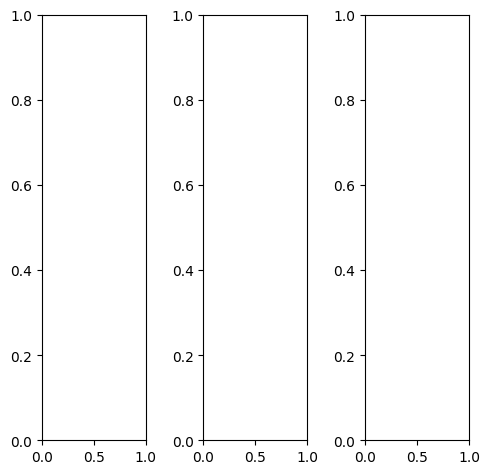

tensor([[[0.3176, 0.0745, 0.0902,  ..., 0.2667, 0.1255, 0.2314],
         [0.2824, 0.1765, 0.0902,  ..., 0.3176, 0.1255, 0.0314],
         [0.3294, 0.3059, 0.1922,  ..., 0.2941, 0.1569, 0.0157],
         ...,
         [0.3725, 0.4039, 0.2627,  ..., 0.4039, 0.5216, 0.4863],
         [0.4275, 0.4039, 0.2588,  ..., 0.4353, 0.5882, 0.5647],
         [0.5725, 0.4235, 0.3098,  ..., 0.3961, 0.4627, 0.6000]],

        [[0.3176, 0.0745, 0.0902,  ..., 0.2667, 0.1255, 0.2314],
         [0.2824, 0.1765, 0.0902,  ..., 0.3176, 0.1255, 0.0314],
         [0.3294, 0.3059, 0.1922,  ..., 0.2941, 0.1569, 0.0157],
         ...,
         [0.3725, 0.4039, 0.2627,  ..., 0.4039, 0.5216, 0.4863],
         [0.4275, 0.4039, 0.2588,  ..., 0.4353, 0.5882, 0.5647],
         [0.5725, 0.4235, 0.3098,  ..., 0.3961, 0.4627, 0.6000]],

        [[0.3176, 0.0745, 0.0902,  ..., 0.2667, 0.1255, 0.2314],
         [0.2824, 0.1765, 0.0902,  ..., 0.3176, 0.1255, 0.0314],
         [0.3294, 0.3059, 0.1922,  ..., 0.2941, 0.1569, 0.

tensor([[[0.3137, 0.0706, 0.0863,  ..., 0.1725, 0.0824, 0.2431],
         [0.2824, 0.1804, 0.0902,  ..., 0.2196, 0.0745, 0.0353],
         [0.3294, 0.3059, 0.1922,  ..., 0.1961, 0.1020, 0.0078],
         ...,
         [0.2902, 0.3294, 0.2118,  ..., 0.3216, 0.5059, 0.4824],
         [0.3569, 0.3294, 0.2000,  ..., 0.3451, 0.5765, 0.5725],
         [0.5176, 0.3490, 0.2431,  ..., 0.3098, 0.4510, 0.6078]],

        [[0.3176, 0.0745, 0.0902,  ..., 0.3255, 0.1529, 0.2235],
         [0.2784, 0.1765, 0.0863,  ..., 0.3843, 0.1529, 0.0314],
         [0.3294, 0.3059, 0.1961,  ..., 0.3569, 0.1922, 0.0196],
         ...,
         [0.4157, 0.4392, 0.2863,  ..., 0.4549, 0.5333, 0.4863],
         [0.4588, 0.4392, 0.2902,  ..., 0.4902, 0.5922, 0.5569],
         [0.5961, 0.4549, 0.3451,  ..., 0.4471, 0.4667, 0.5922]],

        [[0.3333, 0.0902, 0.1059,  ..., 0.2000, 0.1098, 0.2314],
         [0.2863, 0.1804, 0.0941,  ..., 0.2471, 0.1020, 0.0235],
         [0.3176, 0.2941, 0.1843,  ..., 0.2235, 0.1294, 0.

tensor([[[ 0.2294,  0.0094, -0.0121,  ...,  0.2384,  0.1495,  0.2137],
         [ 0.2315,  0.1142,  0.0472,  ...,  0.3066,  0.1214,  0.0746],
         [ 0.2518,  0.2146,  0.0802,  ...,  0.2697,  0.1484,  0.0413],
         ...,
         [ 0.3930,  0.4675,  0.3258,  ...,  0.4576,  0.5455,  0.4990],
         [ 0.4432,  0.4350,  0.3152,  ...,  0.4719,  0.6179,  0.5892],
         [ 0.5515,  0.4424,  0.3229,  ...,  0.4199,  0.4839,  0.6066]],

        [[ 0.2727,  0.1848,  0.1024,  ...,  0.2490,  0.1730,  0.2281],
         [ 0.3161,  0.1968,  0.0817,  ...,  0.3447,  0.1745,  0.1057],
         [ 0.3427,  0.3850,  0.2731,  ...,  0.3059,  0.1922,  0.0750],
         ...,
         [ 0.3601,  0.4246,  0.3269,  ...,  0.4582,  0.5605,  0.4743],
         [ 0.4216,  0.4224,  0.3250,  ...,  0.4758,  0.6356,  0.5734],
         [ 0.5272,  0.4002,  0.3204,  ...,  0.3918,  0.4664,  0.5675]],

        [[ 0.5112,  0.2707,  0.3780,  ...,  0.3425,  0.2723,  0.3335],
         [ 0.4880,  0.4005,  0.2721,  ...,  0

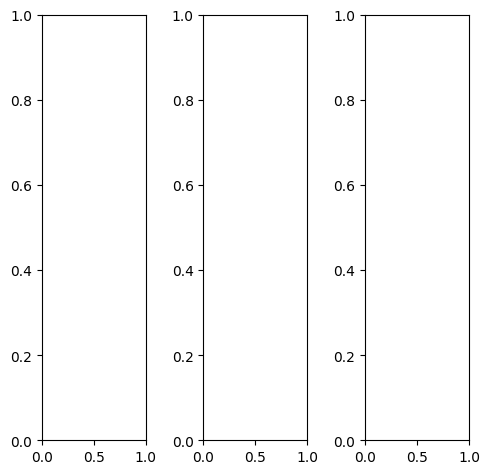

tensor([[[0.3490, 0.3373, 0.3216,  ..., 0.3529, 0.3529, 0.3608],
         [0.3412, 0.3294, 0.3176,  ..., 0.3490, 0.3490, 0.3608],
         [0.3451, 0.3451, 0.3333,  ..., 0.3412, 0.3451, 0.3451],
         ...,
         [0.3412, 0.3176, 0.2588,  ..., 0.1216, 0.1255, 0.2118],
         [0.3647, 0.3569, 0.3412,  ..., 0.3098, 0.3255, 0.3647],
         [0.4000, 0.3961, 0.3843,  ..., 0.4078, 0.4196, 0.4353]],

        [[0.3490, 0.3373, 0.3216,  ..., 0.3529, 0.3529, 0.3608],
         [0.3412, 0.3294, 0.3176,  ..., 0.3490, 0.3490, 0.3608],
         [0.3451, 0.3451, 0.3333,  ..., 0.3412, 0.3451, 0.3451],
         ...,
         [0.3412, 0.3176, 0.2588,  ..., 0.1216, 0.1255, 0.2118],
         [0.3647, 0.3569, 0.3412,  ..., 0.3098, 0.3255, 0.3647],
         [0.4000, 0.3961, 0.3843,  ..., 0.4078, 0.4196, 0.4353]],

        [[0.3490, 0.3373, 0.3216,  ..., 0.3529, 0.3529, 0.3608],
         [0.3412, 0.3294, 0.3176,  ..., 0.3490, 0.3490, 0.3608],
         [0.3451, 0.3451, 0.3333,  ..., 0.3412, 0.3451, 0.

tensor([[[0.3255, 0.3137, 0.2980,  ..., 0.3294, 0.3294, 0.3373],
         [0.3176, 0.3059, 0.2941,  ..., 0.3255, 0.3255, 0.3373],
         [0.3216, 0.3216, 0.3098,  ..., 0.3176, 0.3216, 0.3216],
         ...,
         [0.3333, 0.3020, 0.2510,  ..., 0.1059, 0.1098, 0.1961],
         [0.3451, 0.3412, 0.3255,  ..., 0.2941, 0.3098, 0.3490],
         [0.3804, 0.3922, 0.3804,  ..., 0.3922, 0.4039, 0.4196]],

        [[0.3569, 0.3451, 0.3294,  ..., 0.3608, 0.3608, 0.3686],
         [0.3490, 0.3373, 0.3255,  ..., 0.3569, 0.3569, 0.3686],
         [0.3529, 0.3529, 0.3412,  ..., 0.3490, 0.3529, 0.3529],
         ...,
         [0.3451, 0.3216, 0.2627,  ..., 0.1255, 0.1333, 0.2196],
         [0.3725, 0.3608, 0.3490,  ..., 0.3176, 0.3333, 0.3725],
         [0.4118, 0.4039, 0.3882,  ..., 0.4157, 0.4275, 0.4431]],

        [[0.3686, 0.3569, 0.3412,  ..., 0.3725, 0.3725, 0.3804],
         [0.3608, 0.3490, 0.3373,  ..., 0.3686, 0.3686, 0.3804],
         [0.3647, 0.3647, 0.3529,  ..., 0.3608, 0.3647, 0.

tensor([[[0.4005, 0.3292, 0.2262,  ..., 0.3523, 0.3547, 0.4258],
         [0.3493, 0.2931, 0.1608,  ..., 0.3606, 0.3383, 0.4065],
         [0.3047, 0.2956, 0.1721,  ..., 0.3501, 0.3438, 0.3830],
         ...,
         [0.4067, 0.4207, 0.3120,  ..., 0.1300, 0.1461, 0.2987],
         [0.4440, 0.4467, 0.3863,  ..., 0.3397, 0.3816, 0.4911],
         [0.5081, 0.5229, 0.4924,  ..., 0.5544, 0.5679, 0.5829]],

        [[0.4826, 0.4275, 0.3294,  ..., 0.4287, 0.4498, 0.4587],
         [0.3946, 0.3597, 0.2033,  ..., 0.4415, 0.4475, 0.4720],
         [0.4541, 0.3874, 0.3288,  ..., 0.4393, 0.4460, 0.4388],
         ...,
         [0.4092, 0.4030, 0.3333,  ..., 0.1644, 0.1664, 0.2732],
         [0.4345, 0.4318, 0.3960,  ..., 0.3841, 0.4205, 0.4630],
         [0.4849, 0.4964, 0.4899,  ..., 0.5384, 0.5665, 0.5641]],

        [[0.6014, 0.4908, 0.5089,  ..., 0.5702, 0.5947, 0.6137],
         [0.5600, 0.5515, 0.4862,  ..., 0.5793, 0.5910, 0.6221],
         [0.5286, 0.4261, 0.4899,  ..., 0.5634, 0.5864, 0.

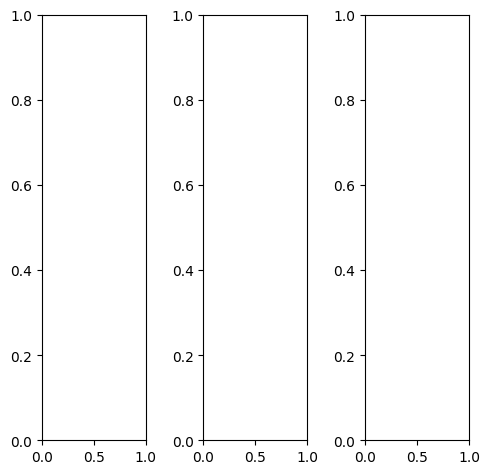

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.8902, 0.8784, 0.8235],
         [1.0000, 1.0000, 1.0000,  ..., 0.9373, 0.9451, 0.9020],
         [1.0000, 1.0000, 1.0000,  ..., 0.9216, 0.9333, 0.9529],
         ...,
         [0.6941, 0.6902, 0.6627,  ..., 0.0824, 0.0863, 0.0863],
         [0.6392, 0.6627, 0.6824,  ..., 0.0706, 0.0824, 0.0941],
         [0.6078, 0.6275, 0.6863,  ..., 0.1529, 0.1216, 0.1137]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8902, 0.8784, 0.8235],
         [1.0000, 1.0000, 1.0000,  ..., 0.9373, 0.9451, 0.9020],
         [1.0000, 1.0000, 1.0000,  ..., 0.9216, 0.9333, 0.9529],
         ...,
         [0.6941, 0.6902, 0.6627,  ..., 0.0824, 0.0863, 0.0863],
         [0.6392, 0.6627, 0.6824,  ..., 0.0706, 0.0824, 0.0941],
         [0.6078, 0.6275, 0.6863,  ..., 0.1529, 0.1216, 0.1137]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8902, 0.8784, 0.8235],
         [1.0000, 1.0000, 1.0000,  ..., 0.9373, 0.9451, 0.9020],
         [1.0000, 1.0000, 1.0000,  ..., 0.9216, 0.9333, 0.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.8353, 0.8275, 0.7765],
         [1.0000, 1.0000, 1.0000,  ..., 0.8941, 0.9137, 0.8784],
         [1.0000, 1.0000, 1.0000,  ..., 0.8863, 0.9176, 0.9490],
         ...,
         [0.7529, 0.7490, 0.7176,  ..., 0.0941, 0.0980, 0.1020],
         [0.6980, 0.7255, 0.7451,  ..., 0.0863, 0.0941, 0.1020],
         [0.6745, 0.6941, 0.7529,  ..., 0.1804, 0.1412, 0.1294]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9020, 0.8863, 0.8314],
         [1.0000, 1.0000, 1.0000,  ..., 0.9490, 0.9490, 0.9020],
         [1.0000, 1.0000, 1.0000,  ..., 0.9255, 0.9294, 0.9451],
         ...,
         [0.6784, 0.6745, 0.6471,  ..., 0.0745, 0.0784, 0.0784],
         [0.6196, 0.6431, 0.6627,  ..., 0.0627, 0.0784, 0.0902],
         [0.5882, 0.6078, 0.6667,  ..., 0.1412, 0.1137, 0.1098]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9725, 0.9608, 0.9176],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 0.9804],
         [1.0000, 1.0000, 1.0000,  ..., 0.9922, 1.0000, 1.

tensor([[[0.8081, 0.7568, 0.8025,  ..., 0.6288, 0.6369, 0.6886],
         [0.7825, 0.8420, 0.7746,  ..., 0.6740, 0.7027, 0.7083],
         [0.7648, 0.8432, 0.7691,  ..., 0.6779, 0.7149, 0.7359],
         ...,
         [0.6791, 0.7100, 0.6409,  ..., 0.1333, 0.1436, 0.1878],
         [0.6238, 0.6716, 0.6671,  ..., 0.1225, 0.1455, 0.1933],
         [0.6199, 0.6686, 0.6956,  ..., 0.1822, 0.1683, 0.2370]],

        [[0.8021, 0.8547, 0.8357,  ..., 0.7447, 0.7577, 0.7669],
         [0.8347, 0.9195, 0.8700,  ..., 0.8045, 0.8099, 0.8373],
         [0.8157, 0.9182, 0.8883,  ..., 0.8102, 0.8123, 0.8547],
         ...,
         [0.6218, 0.6700, 0.6422,  ..., 0.1810, 0.1792, 0.1764],
         [0.5668, 0.6131, 0.6492,  ..., 0.1660, 0.1625, 0.1769],
         [0.5620, 0.6116, 0.6645,  ..., 0.1934, 0.1749, 0.2084]],

        [[0.9582, 0.9229, 0.9825,  ..., 0.9024, 0.8934, 0.8741],
         [0.9696, 1.0362, 0.9697,  ..., 0.9507, 0.9698, 0.9338],
         [0.9716, 0.9158, 1.0152,  ..., 0.9510, 0.9716, 0.

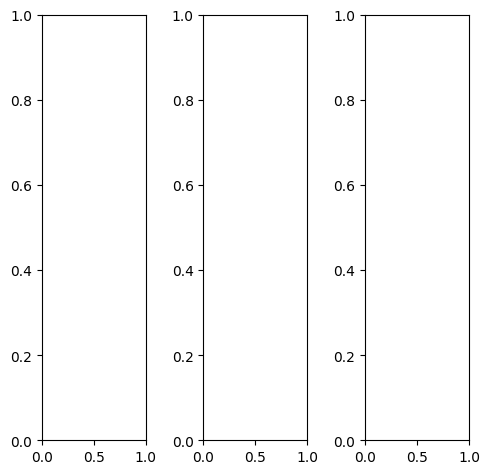

EPOCH: 19.765  trn_loss: 0.005  (2375.22s - 9641.91s remaining)

tensor([[[0.7373, 0.7373, 0.7686,  ..., 0.6863, 0.6314, 0.4196],
         [0.7294, 0.7255, 0.7529,  ..., 0.6941, 0.5529, 0.3804],
         [0.7725, 0.7765, 0.7843,  ..., 0.4863, 0.3725, 0.3373],
         ...,
         [0.4627, 0.4667, 0.4549,  ..., 0.4078, 0.4039, 0.4196],
         [0.4510, 0.4471, 0.4471,  ..., 0.4078, 0.4078, 0.4000],
         [0.4314, 0.4353, 0.4510,  ..., 0.4431, 0.4314, 0.3922]],

        [[0.7373, 0.7373, 0.7686,  ..., 0.6863, 0.6314, 0.4196],
         [0.7294, 0.7255, 0.7529,  ..., 0.6941, 0.5529, 0.3804],
         [0.7725, 0.7765, 0.7843,  ..., 0.4863, 0.3725, 0.3373],
         ...,
         [0.4627, 0.4667, 0.4549,  ..., 0.4078, 0.4039, 0.4196],
         [0.4510, 0.4471, 0.4471,  ..., 0.4078, 0.4078, 0.4000],
         [0.4314, 0.4353, 0.4510,  ..., 0.4431, 0.4314, 0.3922]],

        [[0.7373, 0.7373, 0.7686,  ..., 0.6863, 0.6314, 0.4196],
         [0.7294, 0.7255, 0.7529,  ..., 0.6941, 0.5529, 0.3804],
         [0.7725, 0.7765, 0.7843,  ..., 0.4863, 0.3725, 0.

tensor([[[0.6196, 0.6275, 0.6588,  ..., 0.5137, 0.4745, 0.3686],
         [0.5961, 0.5961, 0.6196,  ..., 0.5490, 0.4745, 0.3765],
         [0.6588, 0.6627, 0.6667,  ..., 0.4431, 0.3608, 0.3373],
         ...,
         [0.4471, 0.4510, 0.4392,  ..., 0.3922, 0.3882, 0.4039],
         [0.4353, 0.4314, 0.4275,  ..., 0.3922, 0.3922, 0.3843],
         [0.4118, 0.4196, 0.4353,  ..., 0.4275, 0.4157, 0.3765]],

        [[0.7686, 0.7686, 0.7961,  ..., 0.7333, 0.6745, 0.4431],
         [0.7647, 0.7608, 0.7882,  ..., 0.7333, 0.5765, 0.3961],
         [0.8000, 0.8078, 0.8157,  ..., 0.5137, 0.3882, 0.3529],
         ...,
         [0.5059, 0.5098, 0.5020,  ..., 0.4510, 0.4471, 0.4588],
         [0.4941, 0.4941, 0.4941,  ..., 0.4510, 0.4510, 0.4431],
         [0.4745, 0.4824, 0.4980,  ..., 0.4863, 0.4745, 0.4353]],

        [[0.8863, 0.8784, 0.9020,  ..., 0.8980, 0.8235, 0.4314],
         [0.9020, 0.8941, 0.9176,  ..., 0.8667, 0.6353, 0.3216],
         [0.9255, 0.9255, 0.9373,  ..., 0.4627, 0.3176, 0.

tensor([[[0.7496, 0.7821, 0.7932,  ..., 0.5672, 0.4947, 0.3834],
         [0.7327, 0.7927, 0.8027,  ..., 0.5996, 0.4767, 0.3323],
         [0.7669, 0.8957, 0.8059,  ..., 0.4322, 0.2932, 0.3038],
         ...,
         [0.4223, 0.4541, 0.4200,  ..., 0.4052, 0.3989, 0.4195],
         [0.4022, 0.4113, 0.4063,  ..., 0.3882, 0.3917, 0.4118],
         [0.3951, 0.4002, 0.4011,  ..., 0.4486, 0.4462, 0.4233]],

        [[0.7834, 0.7803, 0.7796,  ..., 0.6623, 0.5942, 0.4091],
         [0.6922, 0.7423, 0.7274,  ..., 0.6937, 0.5780, 0.3735],
         [0.8509, 0.8505, 0.8436,  ..., 0.4921, 0.3799, 0.3394],
         ...,
         [0.4523, 0.4774, 0.4713,  ..., 0.4618, 0.4602, 0.4147],
         [0.4177, 0.4344, 0.4476,  ..., 0.4527, 0.4350, 0.4148],
         [0.4118, 0.4227, 0.4515,  ..., 0.4629, 0.4589, 0.4140]],

        [[0.8473, 0.8488, 0.9338,  ..., 0.7954, 0.7362, 0.5538],
         [0.8378, 0.8872, 0.9394,  ..., 0.8099, 0.7030, 0.5226],
         [0.8816, 0.9248, 1.0041,  ..., 0.6486, 0.5227, 0.

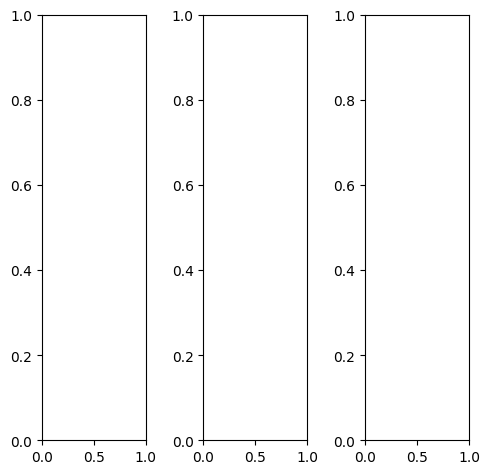

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9961, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.

tensor([[[0.7133, 0.7107, 0.6677,  ..., 0.6131, 0.6061, 0.6579],
         [0.6863, 0.6126, 0.6317,  ..., 0.6317, 0.6361, 0.6448],
         [0.6701, 0.7226, 0.6149,  ..., 0.6470, 0.6595, 0.6482],
         ...,
         [0.7865, 0.7970, 0.7953,  ..., 0.7867, 0.7673, 0.7877],
         [0.7557, 0.7612, 0.7605,  ..., 0.7695, 0.7777, 0.7811],
         [0.7630, 0.7656, 0.7691,  ..., 0.8061, 0.7923, 0.7872]],

        [[0.7343, 0.7504, 0.6654,  ..., 0.7192, 0.7239, 0.7532],
         [0.6748, 0.5768, 0.6098,  ..., 0.7568, 0.7495, 0.7744],
         [0.7541, 0.7400, 0.6812,  ..., 0.7678, 0.7605, 0.7621],
         ...,
         [0.7452, 0.7451, 0.7676,  ..., 0.7355, 0.7433, 0.7617],
         [0.7385, 0.7321, 0.7532,  ..., 0.7438, 0.7375, 0.7472],
         [0.7081, 0.7380, 0.7460,  ..., 0.7526, 0.7472, 0.7349]],

        [[0.8158, 0.8514, 0.8147,  ..., 0.9331, 0.9301, 0.9179],
         [0.8352, 0.8001, 0.8514,  ..., 0.9445, 0.9617, 0.9432],
         [0.7640, 0.8245, 0.7610,  ..., 0.9740, 0.9819, 0.

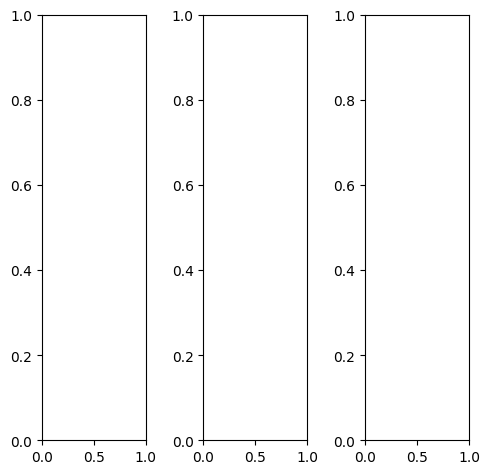

tensor([[[0.5020, 0.4863, 0.4510,  ..., 0.3961, 0.3882, 0.3961],
         [0.4980, 0.4941, 0.4902,  ..., 0.3882, 0.4000, 0.3569],
         [0.4902, 0.4902, 0.4863,  ..., 0.3608, 0.3137, 0.1569],
         ...,
         [0.2196, 0.2039, 0.2000,  ..., 0.1725, 0.2078, 0.2275],
         [0.2196, 0.1961, 0.2157,  ..., 0.1765, 0.1686, 0.1922],
         [0.2431, 0.2157, 0.2824,  ..., 0.2000, 0.1490, 0.1686]],

        [[0.5020, 0.4863, 0.4510,  ..., 0.3961, 0.3882, 0.3961],
         [0.4980, 0.4941, 0.4902,  ..., 0.3882, 0.4000, 0.3569],
         [0.4902, 0.4902, 0.4863,  ..., 0.3608, 0.3137, 0.1569],
         ...,
         [0.2196, 0.2039, 0.2000,  ..., 0.1725, 0.2078, 0.2275],
         [0.2196, 0.1961, 0.2157,  ..., 0.1765, 0.1686, 0.1922],
         [0.2431, 0.2157, 0.2824,  ..., 0.2000, 0.1490, 0.1686]],

        [[0.5020, 0.4863, 0.4510,  ..., 0.3961, 0.3882, 0.3961],
         [0.4980, 0.4941, 0.4902,  ..., 0.3882, 0.4000, 0.3569],
         [0.4902, 0.4902, 0.4863,  ..., 0.3608, 0.3137, 0.

tensor([[[0.5686, 0.5529, 0.5176,  ..., 0.4549, 0.4471, 0.4627],
         [0.5608, 0.5647, 0.5647,  ..., 0.4471, 0.4588, 0.4196],
         [0.5529, 0.5569, 0.5569,  ..., 0.4157, 0.3686, 0.1882],
         ...,
         [0.2157, 0.2118, 0.1882,  ..., 0.1882, 0.2118, 0.2431],
         [0.2196, 0.1961, 0.2157,  ..., 0.1647, 0.1451, 0.1804],
         [0.2549, 0.2118, 0.2980,  ..., 0.2000, 0.1412, 0.1686]],

        [[0.4863, 0.4706, 0.4353,  ..., 0.3804, 0.3725, 0.3765],
         [0.4863, 0.4784, 0.4706,  ..., 0.3725, 0.3804, 0.3333],
         [0.4784, 0.4784, 0.4745,  ..., 0.3412, 0.2902, 0.1373],
         ...,
         [0.2314, 0.2078, 0.2157,  ..., 0.1686, 0.2118, 0.2275],
         [0.2275, 0.2039, 0.2235,  ..., 0.1843, 0.1843, 0.2000],
         [0.2471, 0.2275, 0.2902,  ..., 0.2078, 0.1569, 0.1686]],

        [[0.4039, 0.3882, 0.3529,  ..., 0.3373, 0.3255, 0.3216],
         [0.3882, 0.3843, 0.3804,  ..., 0.3216, 0.3373, 0.3137],
         [0.3922, 0.3843, 0.3765,  ..., 0.3137, 0.2941, 0.

tensor([[[0.7417, 0.7116, 0.5904,  ..., 0.4435, 0.4481, 0.5354],
         [0.7270, 0.6719, 0.6467,  ..., 0.4558, 0.4857, 0.4462],
         [0.7308, 0.7412, 0.6398,  ..., 0.3916, 0.2848, 0.1166],
         ...,
         [0.2500, 0.2351, 0.2310,  ..., 0.1642, 0.2237, 0.3055],
         [0.2510, 0.2057, 0.2466,  ..., 0.1573, 0.1549, 0.2423],
         [0.3159, 0.2474, 0.3644,  ..., 0.2009, 0.1459, 0.2214]],

        [[0.7814, 0.7288, 0.6078,  ..., 0.5418, 0.5698, 0.5780],
         [0.7116, 0.6305, 0.6195,  ..., 0.5955, 0.6087, 0.5149],
         [0.7921, 0.7279, 0.6915,  ..., 0.5104, 0.4117, 0.1744],
         ...,
         [0.2488, 0.2397, 0.2321,  ..., 0.1743, 0.2295, 0.2798],
         [0.2499, 0.2002, 0.2381,  ..., 0.1750, 0.1582, 0.2160],
         [0.2925, 0.2413, 0.3557,  ..., 0.1975, 0.1391, 0.1850]],

        [[0.8391, 0.8204, 0.7322,  ..., 0.7481, 0.7486, 0.7576],
         [0.8460, 0.7825, 0.8101,  ..., 0.7657, 0.8089, 0.7086],
         [0.8072, 0.7897, 0.7600,  ..., 0.6773, 0.5859, 0.

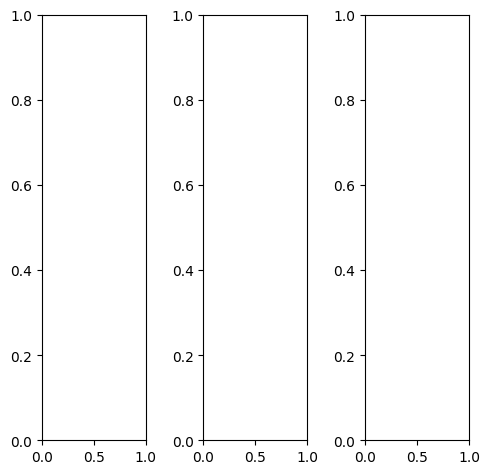

tensor([[[0.7373, 0.9059, 0.9216,  ..., 0.5843, 0.5137, 0.4863],
         [0.7961, 0.9294, 0.9451,  ..., 0.5176, 0.5098, 0.4784],
         [0.8863, 0.9686, 0.9765,  ..., 0.4784, 0.4667, 0.4471],
         ...,
         [0.3451, 0.3725, 0.4000,  ..., 0.5490, 0.5373, 0.5255],
         [0.3255, 0.3451, 0.3765,  ..., 0.5373, 0.5255, 0.5137],
         [0.3020, 0.3216, 0.3529,  ..., 0.5333, 0.5137, 0.4941]],

        [[0.7373, 0.9059, 0.9216,  ..., 0.5843, 0.5137, 0.4863],
         [0.7961, 0.9294, 0.9451,  ..., 0.5176, 0.5098, 0.4784],
         [0.8863, 0.9686, 0.9765,  ..., 0.4784, 0.4667, 0.4471],
         ...,
         [0.3451, 0.3725, 0.4000,  ..., 0.5490, 0.5373, 0.5255],
         [0.3255, 0.3451, 0.3765,  ..., 0.5373, 0.5255, 0.5137],
         [0.3020, 0.3216, 0.3529,  ..., 0.5333, 0.5137, 0.4941]],

        [[0.7373, 0.9059, 0.9216,  ..., 0.5843, 0.5137, 0.4863],
         [0.7961, 0.9294, 0.9451,  ..., 0.5176, 0.5098, 0.4784],
         [0.8863, 0.9686, 0.9765,  ..., 0.4784, 0.4667, 0.

tensor([[[0.7137, 0.8706, 0.8902,  ..., 0.6000, 0.5451, 0.5333],
         [0.7725, 0.8980, 0.9176,  ..., 0.5765, 0.5804, 0.5608],
         [0.8627, 0.9490, 0.9647,  ..., 0.5686, 0.5451, 0.5333],
         ...,
         [0.3333, 0.3608, 0.3882,  ..., 0.5451, 0.5333, 0.5216],
         [0.3137, 0.3333, 0.3647,  ..., 0.5373, 0.5255, 0.5098],
         [0.2902, 0.3059, 0.3412,  ..., 0.5333, 0.5137, 0.4941]],

        [[0.7333, 0.9059, 0.9255,  ..., 0.5725, 0.4980, 0.4667],
         [0.7961, 0.9333, 0.9529,  ..., 0.4941, 0.4784, 0.4392],
         [0.8902, 0.9725, 0.9804,  ..., 0.4392, 0.4275, 0.4078],
         ...,
         [0.3373, 0.3686, 0.3922,  ..., 0.5412, 0.5294, 0.5176],
         [0.3176, 0.3412, 0.3686,  ..., 0.5255, 0.5137, 0.5020],
         [0.2941, 0.3137, 0.3451,  ..., 0.5216, 0.5020, 0.4824]],

        [[0.8314, 0.9961, 0.9882,  ..., 0.6000, 0.5137, 0.4745],
         [0.8627, 0.9882, 0.9843,  ..., 0.4941, 0.4902, 0.4627],
         [0.9216, 0.9961, 0.9922,  ..., 0.4431, 0.4471, 0.

tensor([[[0.8100, 0.9403, 0.9041,  ..., 0.4333, 0.3742, 0.4336],
         [0.8500, 0.9147, 0.8874,  ..., 0.4024, 0.3880, 0.4037],
         [0.9240, 1.0818, 0.9057,  ..., 0.3698, 0.3655, 0.3739],
         ...,
         [0.3007, 0.3497, 0.3655,  ..., 0.5495, 0.5561, 0.5694],
         [0.2697, 0.3030, 0.3480,  ..., 0.5395, 0.5386, 0.5483],
         [0.2834, 0.2888, 0.3185,  ..., 0.5775, 0.5518, 0.5524]],

        [[0.8116, 0.9711, 0.8531,  ..., 0.5325, 0.4798, 0.4679],
         [0.8131, 0.8393, 0.8537,  ..., 0.5166, 0.5158, 0.4811],
         [0.9524, 1.0771, 0.9166,  ..., 0.4866, 0.4937, 0.4581],
         ...,
         [0.3213, 0.3651, 0.4197,  ..., 0.5715, 0.5672, 0.5388],
         [0.2847, 0.3455, 0.3797,  ..., 0.5478, 0.5430, 0.5328],
         [0.2872, 0.3034, 0.3507,  ..., 0.5579, 0.5407, 0.5256]],

        [[0.8623, 1.0106, 0.9484,  ..., 0.7668, 0.6996, 0.6809],
         [0.9339, 0.9970, 1.0060,  ..., 0.7522, 0.7560, 0.7142],
         [0.9663, 1.0810, 0.9852,  ..., 0.7537, 0.7422, 0.

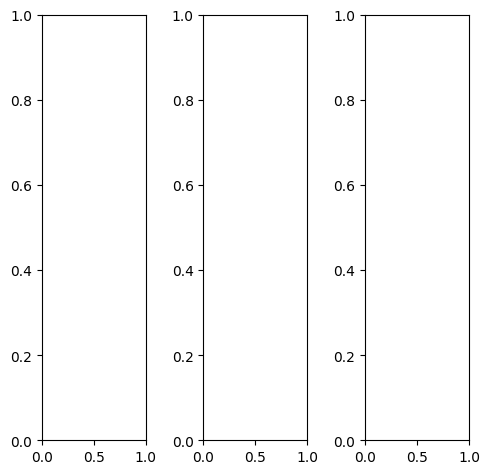

tensor([[[0.3961, 0.3882, 0.3412,  ..., 0.3529, 0.4667, 0.3412],
         [0.3686, 0.3255, 0.2745,  ..., 0.3294, 0.4549, 0.3765],
         [0.4510, 0.3373, 0.2392,  ..., 0.4000, 0.4275, 0.3961],
         ...,
         [0.6627, 0.6549, 0.6353,  ..., 0.7059, 0.7059, 0.6980],
         [0.7059, 0.6784, 0.6745,  ..., 0.7098, 0.7020, 0.6902],
         [0.7216, 0.7216, 0.7255,  ..., 0.7020, 0.6824, 0.6824]],

        [[0.3961, 0.3882, 0.3412,  ..., 0.3529, 0.4667, 0.3412],
         [0.3686, 0.3255, 0.2745,  ..., 0.3294, 0.4549, 0.3765],
         [0.4510, 0.3373, 0.2392,  ..., 0.4000, 0.4275, 0.3961],
         ...,
         [0.6627, 0.6549, 0.6353,  ..., 0.7059, 0.7059, 0.6980],
         [0.7059, 0.6784, 0.6745,  ..., 0.7098, 0.7020, 0.6902],
         [0.7216, 0.7216, 0.7255,  ..., 0.7020, 0.6824, 0.6824]],

        [[0.3961, 0.3882, 0.3412,  ..., 0.3529, 0.4667, 0.3412],
         [0.3686, 0.3255, 0.2745,  ..., 0.3294, 0.4549, 0.3765],
         [0.4510, 0.3373, 0.2392,  ..., 0.4000, 0.4275, 0.

tensor([[[0.3804, 0.3843, 0.3294,  ..., 0.3490, 0.4431, 0.3137],
         [0.3490, 0.3216, 0.2667,  ..., 0.3490, 0.4353, 0.3451],
         [0.4314, 0.3255, 0.2353,  ..., 0.4275, 0.4078, 0.3686],
         ...,
         [0.6863, 0.6745, 0.6549,  ..., 0.7333, 0.7216, 0.7216],
         [0.7451, 0.7176, 0.7098,  ..., 0.7294, 0.7216, 0.7137],
         [0.7647, 0.7608, 0.7608,  ..., 0.7255, 0.7059, 0.7098]],

        [[0.4000, 0.3882, 0.3451,  ..., 0.3529, 0.4706, 0.3451],
         [0.3686, 0.3255, 0.2745,  ..., 0.3176, 0.4549, 0.3804],
         [0.4549, 0.3373, 0.2353,  ..., 0.3843, 0.4275, 0.4000],
         ...,
         [0.6627, 0.6471, 0.6235,  ..., 0.6980, 0.7059, 0.6980],
         [0.6980, 0.6667, 0.6627,  ..., 0.7059, 0.7059, 0.6902],
         [0.7098, 0.7098, 0.7176,  ..., 0.6980, 0.6784, 0.6784]],

        [[0.4314, 0.3882, 0.3412,  ..., 0.3725, 0.5098, 0.3882],
         [0.4039, 0.3412, 0.2824,  ..., 0.3412, 0.4941, 0.4235],
         [0.4902, 0.3647, 0.2549,  ..., 0.4157, 0.4706, 0.

tensor([[[ 0.2935,  0.2320,  0.0841,  ...,  0.2506,  0.3924,  0.3083],
         [ 0.3122,  0.0504,  0.0205,  ...,  0.1897,  0.3348,  0.2996],
         [ 0.2785,  0.0960, -0.1270,  ...,  0.2875,  0.3155,  0.3132],
         ...,
         [ 0.7185,  0.6628,  0.6422,  ...,  0.7142,  0.7194,  0.7334],
         [ 0.7612,  0.6824,  0.6756,  ...,  0.7079,  0.7077,  0.7300],
         [ 0.7681,  0.7737,  0.7693,  ...,  0.7389,  0.7278,  0.7350]],

        [[ 0.3450,  0.3477,  0.1701,  ...,  0.3322,  0.4934,  0.3720],
         [ 0.3118,  0.1168, -0.1146,  ...,  0.2955,  0.4725,  0.3702],
         [ 0.3498,  0.1766, -0.1107,  ...,  0.3721,  0.4326,  0.3854],
         ...,
         [ 0.6647,  0.6214,  0.6157,  ...,  0.7063,  0.7024,  0.7313],
         [ 0.7274,  0.6475,  0.6620,  ...,  0.7048,  0.7157,  0.7265],
         [ 0.7314,  0.7410,  0.7492,  ...,  0.7208,  0.7103,  0.7087]],

        [[ 0.4832,  0.3413,  0.2803,  ...,  0.4465,  0.6285,  0.5090],
         [ 0.4191,  0.2217,  0.2009,  ...,  0

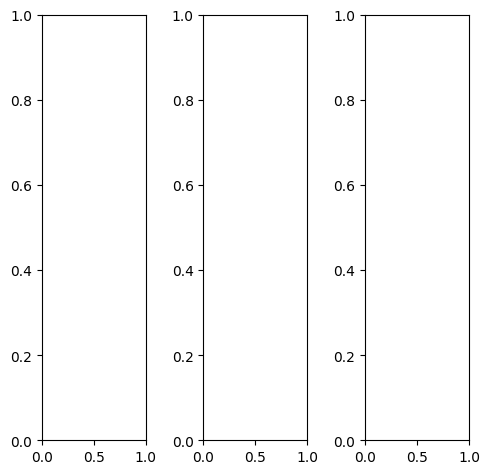

EPOCH: 20.000  val_loss: 0.005  trn_loss: 0.005  (2409.99s - 9639.97s remaining)


tensor([[[0.4706, 0.4667, 0.4863,  ..., 0.5412, 0.5490, 0.5529],
         [0.5294, 0.5333, 0.5490,  ..., 0.5922, 0.6118, 0.5961],
         [0.5569, 0.5373, 0.5373,  ..., 0.6118, 0.6314, 0.6314],
         ...,
         [0.0745, 0.0471, 0.1098,  ..., 0.2157, 0.2235, 0.2275],
         [0.0549, 0.0196, 0.0784,  ..., 0.3020, 0.2275, 0.2118],
         [0.0745, 0.0392, 0.0392,  ..., 0.4706, 0.4314, 0.3608]],

        [[0.4706, 0.4667, 0.4863,  ..., 0.5412, 0.5490, 0.5529],
         [0.5294, 0.5333, 0.5490,  ..., 0.5922, 0.6118, 0.5961],
         [0.5569, 0.5373, 0.5373,  ..., 0.6118, 0.6314, 0.6314],
         ...,
         [0.0745, 0.0471, 0.1098,  ..., 0.2157, 0.2235, 0.2275],
         [0.0549, 0.0196, 0.0784,  ..., 0.3020, 0.2275, 0.2118],
         [0.0745, 0.0392, 0.0392,  ..., 0.4706, 0.4314, 0.3608]],

        [[0.4706, 0.4667, 0.4863,  ..., 0.5412, 0.5490, 0.5529],
         [0.5294, 0.5333, 0.5490,  ..., 0.5922, 0.6118, 0.5961],
         [0.5569, 0.5373, 0.5373,  ..., 0.6118, 0.6314, 0.

tensor([[[0.4667, 0.4627, 0.4824,  ..., 0.5176, 0.5333, 0.5451],
         [0.5333, 0.5373, 0.5569,  ..., 0.5804, 0.6078, 0.5922],
         [0.5647, 0.5412, 0.5412,  ..., 0.6078, 0.6353, 0.6314],
         ...,
         [0.0902, 0.0549, 0.1137,  ..., 0.2667, 0.2863, 0.3020],
         [0.0706, 0.0235, 0.0706,  ..., 0.3216, 0.2706, 0.2667],
         [0.0941, 0.0471, 0.0392,  ..., 0.4667, 0.4353, 0.3765]],

        [[0.4706, 0.4667, 0.4863,  ..., 0.5490, 0.5529, 0.5529],
         [0.5294, 0.5294, 0.5451,  ..., 0.5922, 0.6118, 0.5961],
         [0.5569, 0.5373, 0.5373,  ..., 0.6118, 0.6353, 0.6314],
         ...,
         [0.0745, 0.0471, 0.1098,  ..., 0.2039, 0.2118, 0.2078],
         [0.0510, 0.0196, 0.0784,  ..., 0.2980, 0.2196, 0.2000],
         [0.0706, 0.0392, 0.0392,  ..., 0.4706, 0.4314, 0.3569]],

        [[0.4824, 0.4784, 0.5020,  ..., 0.5686, 0.5647, 0.5569],
         [0.5333, 0.5294, 0.5412,  ..., 0.6157, 0.6157, 0.6000],
         [0.5451, 0.5255, 0.5294,  ..., 0.6118, 0.6118, 0.

tensor([[[0.4808, 0.4710, 0.4887,  ..., 0.5469, 0.5682, 0.5863],
         [0.5411, 0.5420, 0.5582,  ..., 0.5958, 0.6103, 0.6092],
         [0.5656, 0.5500, 0.5554,  ..., 0.6236, 0.6392, 0.6534],
         ...,
         [0.0930, 0.0486, 0.1133,  ..., 0.2384, 0.2379, 0.2416],
         [0.0808, 0.0199, 0.0813,  ..., 0.3300, 0.2457, 0.2131],
         [0.1053, 0.0706, 0.0744,  ..., 0.5034, 0.4463, 0.3718]],

        [[0.4869, 0.4827, 0.4965,  ..., 0.5497, 0.5652, 0.5763],
         [0.5449, 0.5490, 0.5675,  ..., 0.6095, 0.6129, 0.6249],
         [0.5623, 0.5519, 0.5568,  ..., 0.6312, 0.6437, 0.6526],
         ...,
         [0.0758, 0.0343, 0.0981,  ..., 0.2144, 0.2166, 0.2211],
         [0.0647, 0.0080, 0.0639,  ..., 0.3058, 0.2220, 0.2032],
         [0.1053, 0.0490, 0.0521,  ..., 0.4740, 0.4245, 0.3654]],

        [[0.4000, 0.3739, 0.3788,  ..., 0.4301, 0.4688, 0.4971],
         [0.4314, 0.4241, 0.4401,  ..., 0.4838, 0.4987, 0.5123],
         [0.4411, 0.4211, 0.4313,  ..., 0.5014, 0.5156, 0.

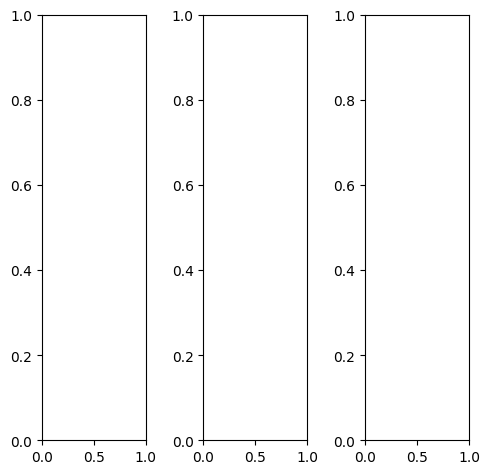

tensor([[[0.8353, 0.8431, 0.8627,  ..., 0.6824, 0.6627, 0.6353],
         [0.8667, 0.8667, 0.8863,  ..., 0.7059, 0.6824, 0.6588],
         [0.8667, 0.8627, 0.8863,  ..., 0.7020, 0.6784, 0.6588],
         ...,
         [0.8902, 0.8784, 0.7882,  ..., 0.2510, 0.3294, 0.6627],
         [0.9216, 0.9059, 0.9137,  ..., 0.5020, 0.6235, 0.7804],
         [0.9176, 0.9020, 0.9059,  ..., 0.7647, 0.8000, 0.8078]],

        [[0.8353, 0.8431, 0.8627,  ..., 0.6824, 0.6627, 0.6353],
         [0.8667, 0.8667, 0.8863,  ..., 0.7059, 0.6824, 0.6588],
         [0.8667, 0.8627, 0.8863,  ..., 0.7020, 0.6784, 0.6588],
         ...,
         [0.8902, 0.8784, 0.7882,  ..., 0.2510, 0.3294, 0.6627],
         [0.9216, 0.9059, 0.9137,  ..., 0.5020, 0.6235, 0.7804],
         [0.9176, 0.9020, 0.9059,  ..., 0.7647, 0.8000, 0.8078]],

        [[0.8353, 0.8431, 0.8627,  ..., 0.6824, 0.6627, 0.6353],
         [0.8667, 0.8667, 0.8863,  ..., 0.7059, 0.6824, 0.6588],
         [0.8667, 0.8627, 0.8863,  ..., 0.7020, 0.6784, 0.

tensor([[[0.8353, 0.8431, 0.8627,  ..., 0.7098, 0.6902, 0.6627],
         [0.8667, 0.8667, 0.8863,  ..., 0.7333, 0.7098, 0.6863],
         [0.8667, 0.8627, 0.8863,  ..., 0.7294, 0.7059, 0.6863],
         ...,
         [0.8745, 0.8824, 0.8706,  ..., 0.4118, 0.4863, 0.6588],
         [0.9059, 0.8784, 0.9294,  ..., 0.5843, 0.7020, 0.7725],
         [0.9059, 0.8745, 0.8980,  ..., 0.7569, 0.7882, 0.7961]],

        [[0.8353, 0.8392, 0.8549,  ..., 0.6745, 0.6549, 0.6275],
         [0.8667, 0.8627, 0.8824,  ..., 0.6980, 0.6745, 0.6510],
         [0.8667, 0.8627, 0.8824,  ..., 0.6941, 0.6706, 0.6510],
         ...,
         [0.8902, 0.8706, 0.7490,  ..., 0.1765, 0.2549, 0.6510],
         [0.9216, 0.9098, 0.9020,  ..., 0.4549, 0.5804, 0.7608],
         [0.9176, 0.9098, 0.9020,  ..., 0.7608, 0.8000, 0.7882]],

        [[0.8392, 0.8549, 0.8863,  ..., 0.6510, 0.6275, 0.6039],
         [0.8667, 0.8824, 0.9137,  ..., 0.6706, 0.6471, 0.6235],
         [0.8667, 0.8784, 0.9098,  ..., 0.6667, 0.6431, 0.

tensor([[[0.8511, 0.8232, 0.8651,  ..., 0.6126, 0.5929, 0.6131],
         [0.8308, 0.8178, 0.8092,  ..., 0.6392, 0.6203, 0.6166],
         [0.8312, 0.8141, 0.8217,  ..., 0.6456, 0.6172, 0.6038],
         ...,
         [0.8880, 0.8836, 0.7792,  ..., 0.2534, 0.3338, 0.6809],
         [0.9069, 0.8950, 0.9052,  ..., 0.5029, 0.6338, 0.7929],
         [0.8891, 0.8968, 0.8947,  ..., 0.7577, 0.8112, 0.7905]],

        [[0.8732, 0.8779, 0.8799,  ..., 0.6895, 0.6783, 0.6611],
         [0.8744, 0.8457, 0.8732,  ..., 0.7061, 0.6862, 0.6887],
         [0.8719, 0.8727, 0.8714,  ..., 0.7190, 0.6837, 0.6749],
         ...,
         [0.8858, 0.8800, 0.7829,  ..., 0.2382, 0.3240, 0.6747],
         [0.9152, 0.8881, 0.9045,  ..., 0.4905, 0.6218, 0.7889],
         [0.8920, 0.8970, 0.8987,  ..., 0.7559, 0.7933, 0.7744]],

        [[0.8952, 0.8568, 0.8796,  ..., 0.7672, 0.7560, 0.7271],
         [0.8851, 0.8414, 0.8955,  ..., 0.7861, 0.7637, 0.7439],
         [0.8848, 0.8607, 0.8462,  ..., 0.7961, 0.7709, 0.

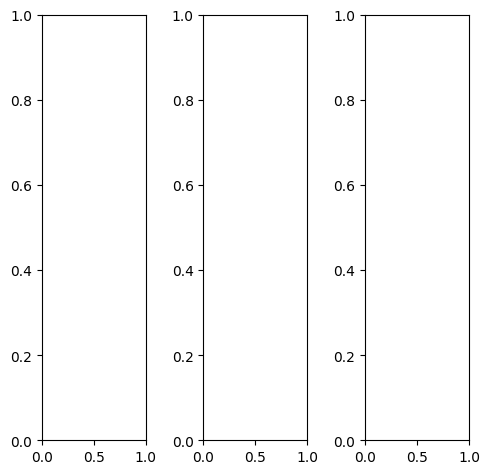

tensor([[[0.5922, 0.5843, 0.5843,  ..., 0.5922, 0.5922, 0.5922],
         [0.5882, 0.5804, 0.5843,  ..., 0.5882, 0.5882, 0.5882],
         [0.6000, 0.5882, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         ...,
         [0.6275, 0.6196, 0.6235,  ..., 0.6235, 0.6235, 0.6196],
         [0.6235, 0.6157, 0.6235,  ..., 0.6235, 0.6235, 0.6196],
         [0.6196, 0.6157, 0.6196,  ..., 0.6235, 0.6235, 0.6196]],

        [[0.5922, 0.5843, 0.5843,  ..., 0.5922, 0.5922, 0.5922],
         [0.5882, 0.5804, 0.5843,  ..., 0.5882, 0.5882, 0.5882],
         [0.6000, 0.5882, 0.5922,  ..., 0.5922, 0.5922, 0.5961],
         ...,
         [0.6275, 0.6196, 0.6235,  ..., 0.6235, 0.6235, 0.6196],
         [0.6235, 0.6157, 0.6235,  ..., 0.6235, 0.6235, 0.6196],
         [0.6196, 0.6157, 0.6196,  ..., 0.6235, 0.6235, 0.6196]],

        [[0.5922, 0.5843, 0.5843,  ..., 0.5922, 0.5922, 0.5922],
         [0.5882, 0.5804, 0.5843,  ..., 0.5882, 0.5882, 0.5882],
         [0.6000, 0.5882, 0.5922,  ..., 0.5922, 0.5922, 0.

tensor([[[0.4196, 0.4157, 0.4157,  ..., 0.4275, 0.4275, 0.4275],
         [0.4196, 0.4157, 0.4157,  ..., 0.4275, 0.4275, 0.4275],
         [0.4275, 0.4196, 0.4235,  ..., 0.4275, 0.4275, 0.4314],
         ...,
         [0.4627, 0.4588, 0.4627,  ..., 0.4588, 0.4588, 0.4549],
         [0.4627, 0.4549, 0.4627,  ..., 0.4588, 0.4588, 0.4549],
         [0.4588, 0.4549, 0.4588,  ..., 0.4588, 0.4588, 0.4549]],

        [[0.6314, 0.6235, 0.6235,  ..., 0.6275, 0.6275, 0.6275],
         [0.6275, 0.6196, 0.6235,  ..., 0.6235, 0.6235, 0.6235],
         [0.6392, 0.6275, 0.6314,  ..., 0.6275, 0.6275, 0.6314],
         ...,
         [0.6667, 0.6588, 0.6627,  ..., 0.6667, 0.6667, 0.6627],
         [0.6627, 0.6549, 0.6627,  ..., 0.6667, 0.6667, 0.6627],
         [0.6627, 0.6549, 0.6588,  ..., 0.6667, 0.6667, 0.6627]],

        [[0.8353, 0.8235, 0.8275,  ..., 0.8353, 0.8353, 0.8353],
         [0.8353, 0.8235, 0.8235,  ..., 0.8314, 0.8314, 0.8314],
         [0.8431, 0.8314, 0.8353,  ..., 0.8353, 0.8353, 0.

tensor([[[0.5236, 0.4767, 0.4568,  ..., 0.4683, 0.4789, 0.5202],
         [0.4916, 0.4631, 0.4600,  ..., 0.4539, 0.4563, 0.4749],
         [0.4744, 0.4587, 0.4710,  ..., 0.4673, 0.4742, 0.4638],
         ...,
         [0.5273, 0.5140, 0.5028,  ..., 0.5210, 0.5212, 0.5311],
         [0.5323, 0.5049, 0.4943,  ..., 0.5118, 0.5204, 0.5346],
         [0.5675, 0.5345, 0.5178,  ..., 0.5295, 0.5688, 0.5817]],

        [[0.6171, 0.6212, 0.6128,  ..., 0.6164, 0.6226, 0.6250],
         [0.6173, 0.6081, 0.6195,  ..., 0.6127, 0.6155, 0.6188],
         [0.6244, 0.6160, 0.6290,  ..., 0.6185, 0.6065, 0.6240],
         ...,
         [0.6583, 0.6468, 0.6513,  ..., 0.6333, 0.6338, 0.6477],
         [0.6422, 0.6233, 0.6433,  ..., 0.6354, 0.6342, 0.6356],
         [0.6203, 0.6234, 0.6263,  ..., 0.6309, 0.6334, 0.6285]],

        [[0.7416, 0.7566, 0.7715,  ..., 0.7731, 0.7729, 0.7410],
         [0.7616, 0.7548, 0.7721,  ..., 0.7725, 0.7682, 0.7523],
         [0.7720, 0.7667, 0.7929,  ..., 0.7759, 0.7725, 0.

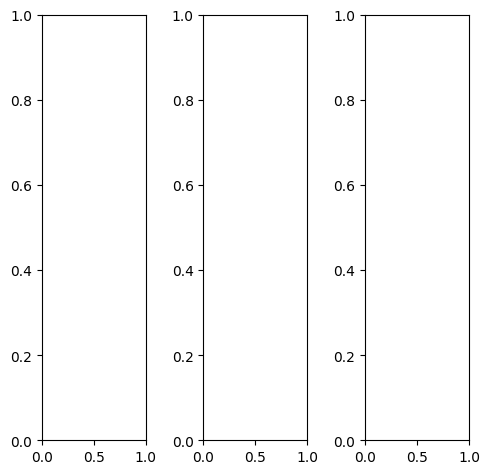

tensor([[[0.9373, 0.5922, 0.6275,  ..., 0.2667, 0.2588, 0.2549],
         [0.9569, 0.6980, 0.7490,  ..., 0.2824, 0.2784, 0.2667],
         [0.8980, 0.9020, 0.9294,  ..., 0.3059, 0.2941, 0.2824],
         ...,
         [0.3647, 0.3804, 0.3647,  ..., 0.1176, 0.1098, 0.0980],
         [0.3216, 0.3176, 0.3098,  ..., 0.1059, 0.0902, 0.1255],
         [0.2510, 0.2471, 0.2471,  ..., 0.1255, 0.1569, 0.1490]],

        [[0.9373, 0.5922, 0.6275,  ..., 0.2667, 0.2588, 0.2549],
         [0.9569, 0.6980, 0.7490,  ..., 0.2824, 0.2784, 0.2667],
         [0.8980, 0.9020, 0.9294,  ..., 0.3059, 0.2941, 0.2824],
         ...,
         [0.3647, 0.3804, 0.3647,  ..., 0.1176, 0.1098, 0.0980],
         [0.3216, 0.3176, 0.3098,  ..., 0.1059, 0.0902, 0.1255],
         [0.2510, 0.2471, 0.2471,  ..., 0.1255, 0.1569, 0.1490]],

        [[0.9373, 0.5922, 0.6275,  ..., 0.2667, 0.2588, 0.2549],
         [0.9569, 0.6980, 0.7490,  ..., 0.2824, 0.2784, 0.2667],
         [0.8980, 0.9020, 0.9294,  ..., 0.3059, 0.2941, 0.

tensor([[[0.9294, 0.5294, 0.5608,  ..., 0.3137, 0.3059, 0.2980],
         [0.9373, 0.6431, 0.6980,  ..., 0.3333, 0.3294, 0.3137],
         [0.8510, 0.8627, 0.9098,  ..., 0.3608, 0.3451, 0.3333],
         ...,
         [0.3765, 0.3529, 0.3255,  ..., 0.1373, 0.1255, 0.1137],
         [0.3373, 0.2980, 0.2824,  ..., 0.1255, 0.1020, 0.1451],
         [0.2627, 0.2392, 0.2314,  ..., 0.1490, 0.1843, 0.1804]],

        [[0.9412, 0.6196, 0.6588,  ..., 0.2549, 0.2471, 0.2392],
         [0.9647, 0.7216, 0.7725,  ..., 0.2667, 0.2627, 0.2510],
         [0.9176, 0.9176, 0.9373,  ..., 0.2902, 0.2784, 0.2627],
         ...,
         [0.3569, 0.3961, 0.3882,  ..., 0.1176, 0.1098, 0.0941],
         [0.3137, 0.3294, 0.3255,  ..., 0.1020, 0.0902, 0.1216],
         [0.2431, 0.2510, 0.2588,  ..., 0.1216, 0.1490, 0.1412]],

        [[0.9451, 0.6196, 0.6392,  ..., 0.2118, 0.2078, 0.2078],
         [0.9647, 0.7098, 0.7529,  ..., 0.2235, 0.2235, 0.2157],
         [0.9059, 0.9098, 0.9373,  ..., 0.2510, 0.2431, 0.

tensor([[[0.8194, 0.6140, 0.6388,  ..., 0.2692, 0.2601, 0.2508],
         [0.9317, 0.7088, 0.7578,  ..., 0.2951, 0.2928, 0.2606],
         [0.8742, 0.8918, 0.9185,  ..., 0.3306, 0.3060, 0.2858],
         ...,
         [0.3786, 0.4097, 0.3949,  ..., 0.1228, 0.1130, 0.1050],
         [0.3252, 0.3418, 0.3322,  ..., 0.1091, 0.0959, 0.1299],
         [0.2714, 0.2438, 0.2477,  ..., 0.1326, 0.1580, 0.1553]],

        [[0.8390, 0.6078, 0.6666,  ..., 0.2609, 0.2577, 0.2602],
         [0.9350, 0.7119, 0.7617,  ..., 0.2716, 0.2790, 0.2590],
         [0.8874, 0.9188, 0.9448,  ..., 0.2978, 0.2836, 0.2773],
         ...,
         [0.3640, 0.3796, 0.3580,  ..., 0.1083, 0.1000, 0.0921],
         [0.3144, 0.3162, 0.2963,  ..., 0.0974, 0.0821, 0.1137],
         [0.2676, 0.2364, 0.2383,  ..., 0.1161, 0.1359, 0.1515]],

        [[0.8267, 0.6038, 0.6310,  ..., 0.2191, 0.2241, 0.2340],
         [0.9105, 0.7060, 0.7534,  ..., 0.2345, 0.2398, 0.2217],
         [0.8571, 0.8789, 0.9284,  ..., 0.2595, 0.2533, 0.

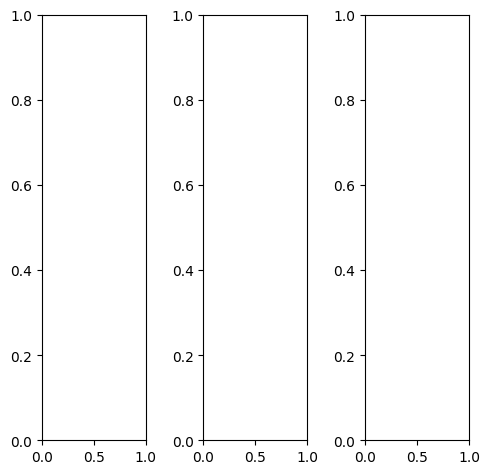

tensor([[[0.2431, 0.3020, 0.8000,  ..., 0.1686, 0.3529, 0.5098],
         [0.2471, 0.2196, 0.3255,  ..., 0.1843, 0.1294, 0.2039],
         [0.1961, 0.1961, 0.2118,  ..., 0.4314, 0.4510, 0.3569],
         ...,
         [0.3373, 0.3647, 0.3843,  ..., 0.2157, 0.1922, 0.1922],
         [0.3098, 0.4039, 0.4039,  ..., 0.2039, 0.1961, 0.1725],
         [0.3529, 0.4510, 0.3686,  ..., 0.1882, 0.2000, 0.2118]],

        [[0.2431, 0.3020, 0.8000,  ..., 0.1686, 0.3529, 0.5098],
         [0.2471, 0.2196, 0.3255,  ..., 0.1843, 0.1294, 0.2039],
         [0.1961, 0.1961, 0.2118,  ..., 0.4314, 0.4510, 0.3569],
         ...,
         [0.3373, 0.3647, 0.3843,  ..., 0.2157, 0.1922, 0.1922],
         [0.3098, 0.4039, 0.4039,  ..., 0.2039, 0.1961, 0.1725],
         [0.3529, 0.4510, 0.3686,  ..., 0.1882, 0.2000, 0.2118]],

        [[0.2431, 0.3020, 0.8000,  ..., 0.1686, 0.3529, 0.5098],
         [0.2471, 0.2196, 0.3255,  ..., 0.1843, 0.1294, 0.2039],
         [0.1961, 0.1961, 0.2118,  ..., 0.4314, 0.4510, 0.

tensor([[[0.2588, 0.2941, 0.8000,  ..., 0.1725, 0.3647, 0.5333],
         [0.2471, 0.2275, 0.3176,  ..., 0.1804, 0.1137, 0.2000],
         [0.1922, 0.2353, 0.1961,  ..., 0.3922, 0.4078, 0.3333],
         ...,
         [0.3725, 0.4118, 0.4392,  ..., 0.2392, 0.2157, 0.2078],
         [0.3412, 0.4471, 0.4627,  ..., 0.2275, 0.2196, 0.1922],
         [0.4039, 0.5137, 0.4314,  ..., 0.2118, 0.2157, 0.2275]],

        [[0.2353, 0.3059, 0.8039,  ..., 0.1608, 0.3451, 0.5059],
         [0.2510, 0.2196, 0.3373,  ..., 0.1882, 0.1373, 0.2039],
         [0.1922, 0.1882, 0.2392,  ..., 0.4431, 0.4627, 0.3686],
         ...,
         [0.3373, 0.3608, 0.3725,  ..., 0.2157, 0.1922, 0.1922],
         [0.3137, 0.4000, 0.3961,  ..., 0.2039, 0.1961, 0.1725],
         [0.3490, 0.4392, 0.3529,  ..., 0.1882, 0.2000, 0.2157]],

        [[0.2314, 0.3098, 0.7961,  ..., 0.1843, 0.3686, 0.4824],
         [0.2353, 0.1882, 0.2745,  ..., 0.1882, 0.1137, 0.2039],
         [0.2235, 0.1176, 0.1216,  ..., 0.4784, 0.4980, 0.

tensor([[[0.2619, 0.3203, 0.7383,  ..., 0.1621, 0.3182, 0.4650],
         [0.2396, 0.2299, 0.3439,  ..., 0.1632, 0.1223, 0.1933],
         [0.2097, 0.2066, 0.2342,  ..., 0.4240, 0.4681, 0.3401],
         ...,
         [0.3335, 0.3921, 0.4039,  ..., 0.2279, 0.2005, 0.2005],
         [0.3225, 0.4347, 0.4363,  ..., 0.2163, 0.2086, 0.1825],
         [0.3746, 0.4692, 0.3860,  ..., 0.1968, 0.2006, 0.2218]],

        [[0.2562, 0.3210, 0.7576,  ..., 0.1537, 0.3326, 0.4784],
         [0.2331, 0.2304, 0.3283,  ..., 0.1743, 0.1371, 0.2172],
         [0.2021, 0.2038, 0.2186,  ..., 0.4169, 0.4587, 0.3460],
         ...,
         [0.3281, 0.3741, 0.3848,  ..., 0.2104, 0.1862, 0.1869],
         [0.3098, 0.4185, 0.4073,  ..., 0.1966, 0.1896, 0.1666],
         [0.3741, 0.4545, 0.3704,  ..., 0.1841, 0.1861, 0.2187]],

        [[0.2260, 0.2986, 0.7109,  ..., 0.1483, 0.3153, 0.4416],
         [0.2124, 0.1981, 0.2933,  ..., 0.1665, 0.1127, 0.1866],
         [0.1770, 0.1808, 0.1869,  ..., 0.3941, 0.4300, 0.

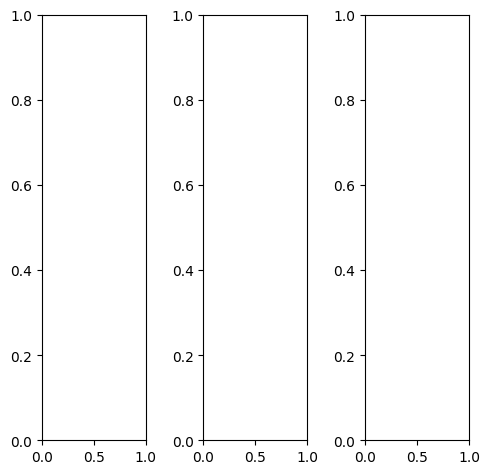

EPOCH: 20.255  trn_loss: 0.005  (2439.78s - 9605.47s remaining)

tensor([[[0.3647, 0.4118, 0.5020,  ..., 0.4863, 0.4235, 0.3961],
         [0.3647, 0.3843, 0.4353,  ..., 0.5020, 0.4353, 0.4431],
         [0.3647, 0.3686, 0.4000,  ..., 0.5333, 0.4039, 0.4118],
         ...,
         [0.5765, 0.6353, 0.5294,  ..., 0.7686, 0.7412, 0.7922],
         [0.6118, 0.4941, 0.4824,  ..., 0.7294, 0.7529, 0.7255],
         [0.4824, 0.3608, 0.4745,  ..., 0.6431, 0.7412, 0.7098]],

        [[0.3647, 0.4118, 0.5020,  ..., 0.4863, 0.4235, 0.3961],
         [0.3647, 0.3843, 0.4353,  ..., 0.5020, 0.4353, 0.4431],
         [0.3647, 0.3686, 0.4000,  ..., 0.5333, 0.4039, 0.4118],
         ...,
         [0.5765, 0.6353, 0.5294,  ..., 0.7686, 0.7412, 0.7922],
         [0.6118, 0.4941, 0.4824,  ..., 0.7294, 0.7529, 0.7255],
         [0.4824, 0.3608, 0.4745,  ..., 0.6431, 0.7412, 0.7098]],

        [[0.3647, 0.4118, 0.5020,  ..., 0.4863, 0.4235, 0.3961],
         [0.3647, 0.3843, 0.4353,  ..., 0.5020, 0.4353, 0.4431],
         [0.3647, 0.3686, 0.4000,  ..., 0.5333, 0.4039, 0.

tensor([[[0.3333, 0.3765, 0.4627,  ..., 0.4588, 0.4000, 0.3765],
         [0.3373, 0.3529, 0.3961,  ..., 0.4745, 0.4118, 0.4235],
         [0.3333, 0.3333, 0.3608,  ..., 0.5098, 0.3765, 0.3922],
         ...,
         [0.5059, 0.5451, 0.4549,  ..., 0.7686, 0.7373, 0.7725],
         [0.5412, 0.4275, 0.4235,  ..., 0.7294, 0.7451, 0.7059],
         [0.4235, 0.3216, 0.4275,  ..., 0.6471, 0.7333, 0.6941]],

        [[0.3765, 0.4275, 0.5176,  ..., 0.4980, 0.4353, 0.4039],
         [0.3765, 0.4000, 0.4510,  ..., 0.5137, 0.4471, 0.4510],
         [0.3765, 0.3843, 0.4157,  ..., 0.5451, 0.4157, 0.4235],
         ...,
         [0.6078, 0.6745, 0.5647,  ..., 0.7843, 0.7569, 0.8118],
         [0.6431, 0.5255, 0.5137,  ..., 0.7412, 0.7686, 0.7490],
         [0.5137, 0.3882, 0.5020,  ..., 0.6588, 0.7569, 0.7294]],

        [[0.3725, 0.4275, 0.5176,  ..., 0.5059, 0.4392, 0.4039],
         [0.3765, 0.4000, 0.4510,  ..., 0.5176, 0.4471, 0.4431],
         [0.3725, 0.3843, 0.4157,  ..., 0.5490, 0.4078, 0.

tensor([[[ 0.0824,  0.0982,  0.1173,  ...,  0.2241,  0.1974,  0.2019],
         [ 0.0796,  0.0419,  0.0759,  ...,  0.2473,  0.2014,  0.2320],
         [-0.0225, -0.0058, -0.0821,  ...,  0.2943,  0.1757,  0.2125],
         ...,
         [ 0.5170,  0.5945,  0.4390,  ...,  0.6750,  0.6437,  0.6900],
         [ 0.5664,  0.4055,  0.4344,  ...,  0.6079,  0.6488,  0.6391],
         [ 0.4136,  0.2452,  0.3759,  ...,  0.5619,  0.6774,  0.6547]],

        [[ 0.2301,  0.2571,  0.3048,  ...,  0.3337,  0.2989,  0.2600],
         [ 0.1552,  0.1641,  0.1169,  ...,  0.3603,  0.3488,  0.3074],
         [ 0.1402,  0.1820,  0.1118,  ...,  0.4196,  0.3014,  0.2800],
         ...,
         [ 0.4831,  0.5389,  0.4484,  ...,  0.6599,  0.6145,  0.6841],
         [ 0.5378,  0.3684,  0.4118,  ...,  0.6037,  0.6383,  0.6307],
         [ 0.3665,  0.2010,  0.3456,  ...,  0.5427,  0.6568,  0.6244]],

        [[ 0.3997,  0.2396,  0.5276,  ...,  0.4968,  0.4515,  0.4167],
         [ 0.3518,  0.3596,  0.4266,  ...,  0

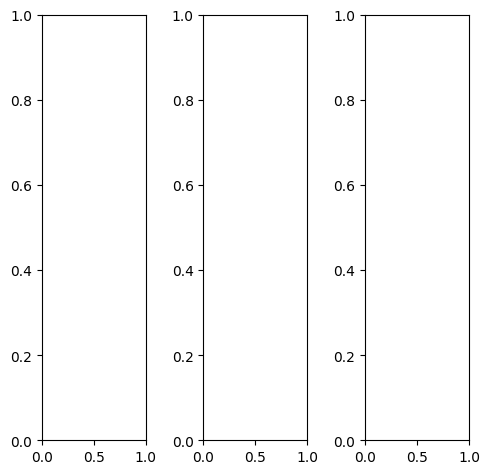

tensor([[[0.8078, 0.9020, 0.9059,  ..., 0.7961, 0.7765, 0.7059],
         [0.8471, 0.8863, 0.9137,  ..., 0.7725, 0.7608, 0.7137],
         [0.8039, 0.8275, 0.8392,  ..., 0.6980, 0.7020, 0.6824],
         ...,
         [0.4314, 0.4275, 0.4157,  ..., 0.3843, 0.3765, 0.3765],
         [0.4196, 0.4157, 0.4118,  ..., 0.3765, 0.3686, 0.3529],
         [0.4078, 0.4000, 0.4000,  ..., 0.3608, 0.3608, 0.3569]],

        [[0.8078, 0.9020, 0.9059,  ..., 0.7961, 0.7765, 0.7059],
         [0.8471, 0.8863, 0.9137,  ..., 0.7725, 0.7608, 0.7137],
         [0.8039, 0.8275, 0.8392,  ..., 0.6980, 0.7020, 0.6824],
         ...,
         [0.4314, 0.4275, 0.4157,  ..., 0.3843, 0.3765, 0.3765],
         [0.4196, 0.4157, 0.4118,  ..., 0.3765, 0.3686, 0.3529],
         [0.4078, 0.4000, 0.4000,  ..., 0.3608, 0.3608, 0.3569]],

        [[0.8078, 0.9020, 0.9059,  ..., 0.7961, 0.7765, 0.7059],
         [0.8471, 0.8863, 0.9137,  ..., 0.7725, 0.7608, 0.7137],
         [0.8039, 0.8275, 0.8392,  ..., 0.6980, 0.7020, 0.

tensor([[[0.8000, 0.8902, 0.8941,  ..., 0.7412, 0.7176, 0.6431],
         [0.8431, 0.8863, 0.9059,  ..., 0.7059, 0.6863, 0.6471],
         [0.7569, 0.7804, 0.7922,  ..., 0.6235, 0.6196, 0.6078],
         ...,
         [0.3647, 0.3608, 0.3490,  ..., 0.3216, 0.3176, 0.3176],
         [0.3529, 0.3490, 0.3412,  ..., 0.3176, 0.3098, 0.2941],
         [0.3412, 0.3333, 0.3294,  ..., 0.3020, 0.2980, 0.2980]],

        [[0.8118, 0.9020, 0.9098,  ..., 0.8157, 0.7961, 0.7294],
         [0.8431, 0.8824, 0.9098,  ..., 0.7922, 0.7882, 0.7373],
         [0.8196, 0.8431, 0.8549,  ..., 0.7255, 0.7333, 0.7059],
         ...,
         [0.4667, 0.4667, 0.4549,  ..., 0.4196, 0.4118, 0.4118],
         [0.4510, 0.4510, 0.4510,  ..., 0.4157, 0.4039, 0.3882],
         [0.4392, 0.4353, 0.4392,  ..., 0.4000, 0.3961, 0.3922]],

        [[0.8235, 0.9176, 0.9216,  ..., 0.8392, 0.8275, 0.7490],
         [0.8706, 0.9137, 0.9412,  ..., 0.8314, 0.8275, 0.7725],
         [0.8431, 0.8667, 0.8824,  ..., 0.7686, 0.7725, 0.

tensor([[[0.7597, 0.8160, 0.7864,  ..., 0.5862, 0.5716, 0.6037],
         [0.7828, 0.7691, 0.8199,  ..., 0.5541, 0.5767, 0.5826],
         [0.7044, 0.7669, 0.6641,  ..., 0.4983, 0.5207, 0.5376],
         ...,
         [0.4010, 0.4581, 0.4495,  ..., 0.4347, 0.4111, 0.4223],
         [0.3896, 0.4310, 0.4448,  ..., 0.3943, 0.4025, 0.3815],
         [0.3791, 0.3934, 0.4033,  ..., 0.3718, 0.3739, 0.3897]],

        [[0.8243, 0.8176, 0.8292,  ..., 0.7118, 0.7196, 0.6962],
         [0.7387, 0.6803, 0.7655,  ..., 0.7012, 0.6967, 0.7162],
         [0.8288, 0.7551, 0.8173,  ..., 0.6439, 0.6401, 0.6606],
         ...,
         [0.3825, 0.4135, 0.4381,  ..., 0.4547, 0.4327, 0.3742],
         [0.3693, 0.4092, 0.4196,  ..., 0.4170, 0.4063, 0.3437],
         [0.3625, 0.3580, 0.3818,  ..., 0.3593, 0.3581, 0.3391]],

        [[0.8886, 0.9377, 0.9787,  ..., 0.9348, 0.9255, 0.8676],
         [0.9199, 0.9282, 0.9961,  ..., 0.9081, 0.9101, 0.8827],
         [0.8557, 0.8871, 0.8946,  ..., 0.8675, 0.8743, 0.

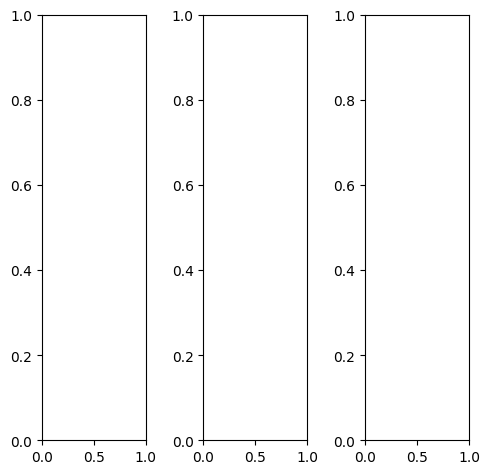

tensor([[[0.7216, 0.6980, 0.6980,  ..., 0.7765, 0.7882, 0.7490],
         [0.7765, 0.7451, 0.7020,  ..., 0.8980, 0.8745, 0.8000],
         [0.7804, 0.7529, 0.7373,  ..., 0.9569, 0.9451, 0.8745],
         ...,
         [0.4627, 0.4784, 0.4863,  ..., 0.6275, 0.6353, 0.6431],
         [0.4863, 0.4863, 0.4902,  ..., 0.6196, 0.6275, 0.6392],
         [0.4824, 0.4902, 0.5020,  ..., 0.6275, 0.6314, 0.6392]],

        [[0.7216, 0.6980, 0.6980,  ..., 0.7765, 0.7882, 0.7490],
         [0.7765, 0.7451, 0.7020,  ..., 0.8980, 0.8745, 0.8000],
         [0.7804, 0.7529, 0.7373,  ..., 0.9569, 0.9451, 0.8745],
         ...,
         [0.4627, 0.4784, 0.4863,  ..., 0.6275, 0.6353, 0.6431],
         [0.4863, 0.4863, 0.4902,  ..., 0.6196, 0.6275, 0.6392],
         [0.4824, 0.4902, 0.5020,  ..., 0.6275, 0.6314, 0.6392]],

        [[0.7216, 0.6980, 0.6980,  ..., 0.7765, 0.7882, 0.7490],
         [0.7765, 0.7451, 0.7020,  ..., 0.8980, 0.8745, 0.8000],
         [0.7804, 0.7529, 0.7373,  ..., 0.9569, 0.9451, 0.

tensor([[[0.6353, 0.6039, 0.5922,  ..., 0.7373, 0.7529, 0.7216],
         [0.6902, 0.6510, 0.6000,  ..., 0.8588, 0.8392, 0.7725],
         [0.7020, 0.6667, 0.6431,  ..., 0.9176, 0.9059, 0.8471],
         ...,
         [0.4353, 0.4510, 0.4588,  ..., 0.6235, 0.6353, 0.6510],
         [0.4588, 0.4588, 0.4627,  ..., 0.6196, 0.6314, 0.6471],
         [0.4549, 0.4627, 0.4745,  ..., 0.6235, 0.6353, 0.6510]],

        [[0.7412, 0.7216, 0.7255,  ..., 0.7804, 0.7882, 0.7451],
         [0.7961, 0.7647, 0.7255,  ..., 0.9098, 0.8824, 0.8000],
         [0.7961, 0.7765, 0.7608,  ..., 0.9725, 0.9569, 0.8784],
         ...,
         [0.4706, 0.4863, 0.4980,  ..., 0.6196, 0.6275, 0.6314],
         [0.4941, 0.4941, 0.4980,  ..., 0.6157, 0.6196, 0.6275],
         [0.4902, 0.4980, 0.5098,  ..., 0.6196, 0.6235, 0.6275]],

        [[0.8588, 0.8353, 0.8314,  ..., 0.8627, 0.8784, 0.8431],
         [0.9098, 0.8745, 0.8314,  ..., 0.9412, 0.9294, 0.8706],
         [0.9059, 0.8745, 0.8588,  ..., 0.9725, 0.9725, 0.

tensor([[[0.6750, 0.6374, 0.5385,  ..., 0.5596, 0.5914, 0.6544],
         [0.7032, 0.6283, 0.5821,  ..., 0.6424, 0.6504, 0.6515],
         [0.6737, 0.7115, 0.5320,  ..., 0.7228, 0.7527, 0.7358],
         ...,
         [0.4155, 0.4613, 0.4645,  ..., 0.5446, 0.5786, 0.6297],
         [0.4429, 0.4472, 0.4423,  ..., 0.5341, 0.5647, 0.6286],
         [0.4758, 0.4635, 0.4576,  ..., 0.5964, 0.6161, 0.6262]],

        [[0.7396, 0.6764, 0.6089,  ..., 0.6504, 0.7089, 0.7109],
         [0.6737, 0.6085, 0.5576,  ..., 0.7371, 0.7255, 0.7542],
         [0.7967, 0.7382, 0.6688,  ..., 0.8103, 0.8116, 0.8125],
         ...,
         [0.4002, 0.4005, 0.4467,  ..., 0.5710, 0.5924, 0.6014],
         [0.4282, 0.4196, 0.4316,  ..., 0.5451, 0.5707, 0.6067],
         [0.4587, 0.4355, 0.4612,  ..., 0.5738, 0.5995, 0.6024]],

        [[0.8359, 0.7552, 0.8076,  ..., 0.8088, 0.8509, 0.8461],
         [0.8478, 0.8122, 0.7929,  ..., 0.8788, 0.8929, 0.8627],
         [0.8379, 0.7818, 0.8114,  ..., 0.9436, 0.9622, 0.

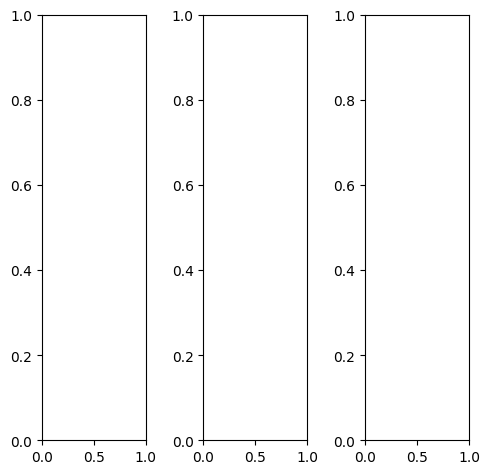

tensor([[[0.3922, 0.3922, 0.3922,  ..., 0.3765, 0.3804, 0.3725],
         [0.3843, 0.3804, 0.3765,  ..., 0.3843, 0.3804, 0.3725],
         [0.3882, 0.3843, 0.3882,  ..., 0.4000, 0.3804, 0.3725],
         ...,
         [0.4471, 0.4431, 0.3765,  ..., 0.3373, 0.3686, 0.3059],
         [0.3608, 0.3412, 0.3490,  ..., 0.3490, 0.3569, 0.2627],
         [0.2824, 0.2588, 0.2627,  ..., 0.3569, 0.3843, 0.2941]],

        [[0.3922, 0.3922, 0.3922,  ..., 0.3765, 0.3804, 0.3725],
         [0.3843, 0.3804, 0.3765,  ..., 0.3843, 0.3804, 0.3725],
         [0.3882, 0.3843, 0.3882,  ..., 0.4000, 0.3804, 0.3725],
         ...,
         [0.4471, 0.4431, 0.3765,  ..., 0.3373, 0.3686, 0.3059],
         [0.3608, 0.3412, 0.3490,  ..., 0.3490, 0.3569, 0.2627],
         [0.2824, 0.2588, 0.2627,  ..., 0.3569, 0.3843, 0.2941]],

        [[0.3922, 0.3922, 0.3922,  ..., 0.3765, 0.3804, 0.3725],
         [0.3843, 0.3804, 0.3765,  ..., 0.3843, 0.3804, 0.3725],
         [0.3882, 0.3843, 0.3882,  ..., 0.4000, 0.3804, 0.

tensor([[[0.1725, 0.1608, 0.1725,  ..., 0.1569, 0.1294, 0.1255],
         [0.1765, 0.1608, 0.1686,  ..., 0.2353, 0.1373, 0.1255],
         [0.1725, 0.2000, 0.2431,  ..., 0.3569, 0.2000, 0.1569],
         ...,
         [0.5843, 0.5647, 0.4824,  ..., 0.4196, 0.4510, 0.3804],
         [0.4745, 0.4471, 0.4471,  ..., 0.4275, 0.4353, 0.3294],
         [0.3647, 0.3451, 0.3490,  ..., 0.4235, 0.4549, 0.3569]],

        [[0.4157, 0.4235, 0.4157,  ..., 0.3961, 0.4118, 0.4039],
         [0.4000, 0.4000, 0.3961,  ..., 0.3922, 0.4078, 0.4000],
         [0.4039, 0.3922, 0.3961,  ..., 0.3882, 0.3961, 0.3922],
         ...,
         [0.4235, 0.4235, 0.3569,  ..., 0.3137, 0.3412, 0.2784],
         [0.3451, 0.3255, 0.3294,  ..., 0.3294, 0.3294, 0.2392],
         [0.2706, 0.2471, 0.2431,  ..., 0.3412, 0.3569, 0.2706]],

        [[0.8314, 0.8314, 0.8627,  ..., 0.8431, 0.8745, 0.8745],
         [0.8431, 0.8431, 0.8275,  ..., 0.7294, 0.8667, 0.8902],
         [0.8706, 0.8275, 0.7412,  ..., 0.5765, 0.7804, 0.

tensor([[[0.5126, 0.4531, 0.5124,  ..., 0.4575, 0.4485, 0.4944],
         [0.4618, 0.4902, 0.4660,  ..., 0.4637, 0.4815, 0.4775],
         [0.4522, 0.5328, 0.5006,  ..., 0.5696, 0.5171, 0.4931],
         ...,
         [0.6768, 0.7486, 0.6035,  ..., 0.5891, 0.6325, 0.4955],
         [0.5404, 0.5487, 0.5642,  ..., 0.5746, 0.5804, 0.4097],
         [0.4091, 0.3641, 0.3794,  ..., 0.5644, 0.5972, 0.4643]],

        [[0.5723, 0.6720, 0.6397,  ..., 0.5859, 0.5901, 0.5744],
         [0.6279, 0.7078, 0.6563,  ..., 0.6515, 0.6443, 0.6384],
         [0.5958, 0.7293, 0.7177,  ..., 0.7158, 0.6598, 0.6369],
         ...,
         [0.6418, 0.7035, 0.6093,  ..., 0.6000, 0.6599, 0.4855],
         [0.4995, 0.4942, 0.5409,  ..., 0.5898, 0.6064, 0.4192],
         [0.3915, 0.3513, 0.3803,  ..., 0.5529, 0.5975, 0.4571]],

        [[0.8166, 0.7758, 0.8840,  ..., 0.7604, 0.7633, 0.7319],
         [0.7991, 0.9235, 0.8523,  ..., 0.8065, 0.8166, 0.7553],
         [0.8084, 0.7686, 0.9361,  ..., 0.8456, 0.8351, 0.

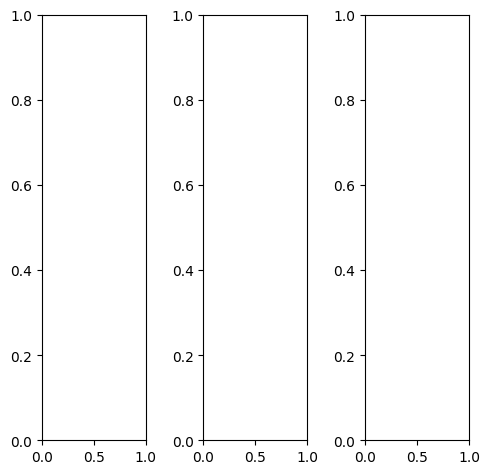

tensor([[[0.4000, 0.4118, 0.4314,  ..., 0.2275, 0.3333, 0.4706],
         [0.3922, 0.4078, 0.4157,  ..., 0.3216, 0.2784, 0.3882],
         [0.3804, 0.3922, 0.4039,  ..., 0.3608, 0.2588, 0.4510],
         ...,
         [0.5020, 0.4235, 0.3961,  ..., 0.4118, 0.3608, 0.3216],
         [0.5255, 0.5137, 0.5412,  ..., 0.3216, 0.3176, 0.3412],
         [0.4314, 0.4353, 0.4588,  ..., 0.3373, 0.3255, 0.4039]],

        [[0.4000, 0.4118, 0.4314,  ..., 0.2275, 0.3333, 0.4706],
         [0.3922, 0.4078, 0.4157,  ..., 0.3216, 0.2784, 0.3882],
         [0.3804, 0.3922, 0.4039,  ..., 0.3608, 0.2588, 0.4510],
         ...,
         [0.5020, 0.4235, 0.3961,  ..., 0.4118, 0.3608, 0.3216],
         [0.5255, 0.5137, 0.5412,  ..., 0.3216, 0.3176, 0.3412],
         [0.4314, 0.4353, 0.4588,  ..., 0.3373, 0.3255, 0.4039]],

        [[0.4000, 0.4118, 0.4314,  ..., 0.2275, 0.3333, 0.4706],
         [0.3922, 0.4078, 0.4157,  ..., 0.3216, 0.2784, 0.3882],
         [0.3804, 0.3922, 0.4039,  ..., 0.3608, 0.2588, 0.

tensor([[[0.4275, 0.4275, 0.4431,  ..., 0.2157, 0.3333, 0.4549],
         [0.4275, 0.4353, 0.4353,  ..., 0.2863, 0.2745, 0.3922],
         [0.4235, 0.4235, 0.4314,  ..., 0.2980, 0.2588, 0.5059],
         ...,
         [0.4667, 0.4118, 0.3451,  ..., 0.3059, 0.2863, 0.2980],
         [0.4627, 0.4706, 0.4863,  ..., 0.2510, 0.2706, 0.2980],
         [0.3490, 0.3608, 0.3961,  ..., 0.2588, 0.2824, 0.3373]],

        [[0.3961, 0.4078, 0.4314,  ..., 0.2431, 0.3451, 0.4824],
         [0.3843, 0.4039, 0.4118,  ..., 0.3569, 0.2863, 0.3961],
         [0.3725, 0.3843, 0.3961,  ..., 0.4196, 0.2667, 0.4431],
         ...,
         [0.5294, 0.4431, 0.4431,  ..., 0.5059, 0.4235, 0.3373],
         [0.5804, 0.5490, 0.5843,  ..., 0.3843, 0.3529, 0.3765],
         [0.5020, 0.5020, 0.5216,  ..., 0.3961, 0.3608, 0.4588]],

        [[0.3569, 0.3843, 0.4118,  ..., 0.1843, 0.2863, 0.4627],
         [0.3373, 0.3725, 0.3804,  ..., 0.2392, 0.2392, 0.3490],
         [0.3098, 0.3333, 0.3569,  ..., 0.2275, 0.2039, 0.

tensor([[[ 0.1846,  0.1053,  0.0835,  ...,  0.0242,  0.1775,  0.3577],
         [ 0.1535,  0.0203,  0.0208,  ...,  0.0985,  0.1189,  0.2611],
         [ 0.0419, -0.0069, -0.0598,  ...,  0.1595,  0.0977,  0.3878],
         ...,
         [ 0.4786,  0.3852,  0.3204,  ...,  0.3840,  0.3156,  0.2643],
         [ 0.5370,  0.5420,  0.5663,  ...,  0.2066,  0.2110,  0.2503],
         [ 0.4042,  0.3892,  0.4127,  ...,  0.2000,  0.2004,  0.2979]],

        [[ 0.3022,  0.2780,  0.2446,  ...,  0.0569,  0.2136,  0.3951],
         [ 0.2354,  0.1903,  0.0926,  ...,  0.1792,  0.1606,  0.2929],
         [ 0.1932,  0.2330,  0.1381,  ...,  0.2319,  0.1253,  0.3895],
         ...,
         [ 0.4590,  0.3647,  0.3443,  ...,  0.4099,  0.3514,  0.2312],
         [ 0.5164,  0.5178,  0.5620,  ...,  0.2491,  0.2390,  0.2480],
         [ 0.3812,  0.3444,  0.3913,  ...,  0.2054,  0.2121,  0.2766]],

        [[ 0.4865,  0.3261,  0.4728,  ...,  0.2198,  0.3393,  0.4986],
         [ 0.4709,  0.4019,  0.4372,  ...,  0

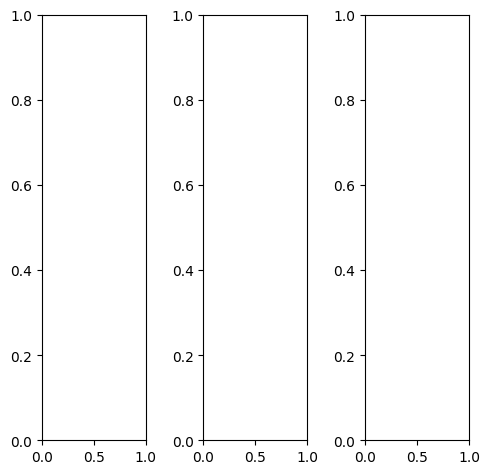

EPOCH: 20.510  trn_loss: 0.005  (2470.16s - 9573.40s remaining)

tensor([[[0.6431, 0.4706, 0.5333,  ..., 0.7686, 0.5882, 0.5686],
         [0.6627, 0.5882, 0.5608,  ..., 0.7333, 0.6196, 0.6078],
         [0.7216, 0.6941, 0.6118,  ..., 0.6784, 0.6588, 0.5765],
         ...,
         [0.5294, 0.2941, 0.3216,  ..., 0.5373, 0.5255, 0.6902],
         [0.4902, 0.3294, 0.3765,  ..., 0.4353, 0.5686, 0.4941],
         [0.5137, 0.3647, 0.4314,  ..., 0.5020, 0.6118, 0.4039]],

        [[0.6431, 0.4706, 0.5333,  ..., 0.7686, 0.5882, 0.5686],
         [0.6627, 0.5882, 0.5608,  ..., 0.7333, 0.6196, 0.6078],
         [0.7216, 0.6941, 0.6118,  ..., 0.6784, 0.6588, 0.5765],
         ...,
         [0.5294, 0.2941, 0.3216,  ..., 0.5373, 0.5255, 0.6902],
         [0.4902, 0.3294, 0.3765,  ..., 0.4353, 0.5686, 0.4941],
         [0.5137, 0.3647, 0.4314,  ..., 0.5020, 0.6118, 0.4039]],

        [[0.6431, 0.4706, 0.5333,  ..., 0.7686, 0.5882, 0.5686],
         [0.6627, 0.5882, 0.5608,  ..., 0.7333, 0.6196, 0.6078],
         [0.7216, 0.6941, 0.6118,  ..., 0.6784, 0.6588, 0.

tensor([[[0.6431, 0.4627, 0.5176,  ..., 0.7569, 0.5608, 0.5490],
         [0.6706, 0.5882, 0.5373,  ..., 0.7020, 0.5882, 0.5843],
         [0.7373, 0.6980, 0.5765,  ..., 0.6471, 0.6392, 0.5647],
         ...,
         [0.4510, 0.2078, 0.2431,  ..., 0.5216, 0.5333, 0.7137],
         [0.4314, 0.2510, 0.2980,  ..., 0.4196, 0.5725, 0.5137],
         [0.4784, 0.3059, 0.3725,  ..., 0.5020, 0.6157, 0.4039]],

        [[0.6471, 0.4784, 0.5412,  ..., 0.7843, 0.6118, 0.5882],
         [0.6627, 0.5922, 0.5725,  ..., 0.7647, 0.6510, 0.6314],
         [0.7176, 0.6941, 0.6353,  ..., 0.7098, 0.6863, 0.5961],
         ...,
         [0.5725, 0.3373, 0.3608,  ..., 0.5569, 0.5333, 0.6863],
         [0.5255, 0.3686, 0.4118,  ..., 0.4510, 0.5725, 0.4902],
         [0.5333, 0.3961, 0.4627,  ..., 0.5137, 0.6196, 0.4078]],

        [[0.6353, 0.4627, 0.5216,  ..., 0.7216, 0.5294, 0.5176],
         [0.6510, 0.5765, 0.5451,  ..., 0.6627, 0.5412, 0.5412],
         [0.6980, 0.6667, 0.5882,  ..., 0.5882, 0.5686, 0.

tensor([[[0.5176, 0.3217, 0.2375,  ..., 0.6625, 0.4238, 0.4718],
         [0.5517, 0.3057, 0.2176,  ..., 0.6443, 0.5161, 0.4604],
         [0.6312, 0.5935, 0.2992,  ..., 0.5976, 0.6050, 0.4320],
         ...,
         [0.4108, 0.2119, 0.2606,  ..., 0.5616, 0.5313, 0.6447],
         [0.3464, 0.2217, 0.2858,  ..., 0.3506, 0.5294, 0.3943],
         [0.3657, 0.2003, 0.2502,  ..., 0.4085, 0.5674, 0.3414]],

        [[0.5867, 0.4607, 0.3592,  ..., 0.8170, 0.6053, 0.5327],
         [0.5904, 0.4135, 0.2624,  ..., 0.8015, 0.6512, 0.6131],
         [0.7227, 0.6847, 0.4593,  ..., 0.7456, 0.7162, 0.5472],
         ...,
         [0.4126, 0.1986, 0.2182,  ..., 0.5434, 0.5512, 0.6256],
         [0.3629, 0.2167, 0.2747,  ..., 0.3849, 0.5580, 0.3894],
         [0.3512, 0.2008, 0.2642,  ..., 0.4037, 0.5538, 0.3238]],

        [[0.7461, 0.5579, 0.5164,  ..., 1.0539, 0.8205, 0.7704],
         [0.8096, 0.6253, 0.5297,  ..., 1.0462, 0.8716, 0.7985],
         [0.8124, 0.8200, 0.5206,  ..., 0.9794, 0.9488, 0.

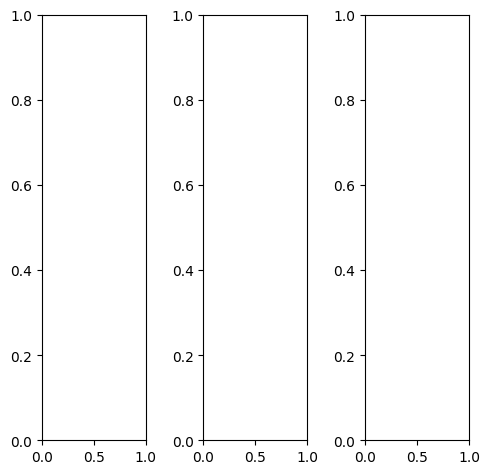

tensor([[[0.0314, 0.0314, 0.0275,  ..., 0.3569, 0.4314, 0.3020],
         [0.0314, 0.0275, 0.0275,  ..., 0.5922, 0.5451, 0.2627],
         [0.0314, 0.0353, 0.0392,  ..., 0.5529, 0.3176, 0.1137],
         ...,
         [0.2157, 0.2314, 0.2392,  ..., 0.3020, 0.2941, 0.2824],
         [0.2275, 0.2471, 0.2549,  ..., 0.3294, 0.3216, 0.3059],
         [0.2314, 0.2471, 0.2588,  ..., 0.3333, 0.3255, 0.3098]],

        [[0.0314, 0.0314, 0.0275,  ..., 0.3569, 0.4314, 0.3020],
         [0.0314, 0.0275, 0.0275,  ..., 0.5922, 0.5451, 0.2627],
         [0.0314, 0.0353, 0.0392,  ..., 0.5529, 0.3176, 0.1137],
         ...,
         [0.2157, 0.2314, 0.2392,  ..., 0.3020, 0.2941, 0.2824],
         [0.2275, 0.2471, 0.2549,  ..., 0.3294, 0.3216, 0.3059],
         [0.2314, 0.2471, 0.2588,  ..., 0.3333, 0.3255, 0.3098]],

        [[0.0314, 0.0314, 0.0275,  ..., 0.3569, 0.4314, 0.3020],
         [0.0314, 0.0275, 0.0275,  ..., 0.5922, 0.5451, 0.2627],
         [0.0314, 0.0353, 0.0392,  ..., 0.5529, 0.3176, 0.

tensor([[[0.0431, 0.0431, 0.0392,  ..., 0.3647, 0.4431, 0.3216],
         [0.0431, 0.0392, 0.0392,  ..., 0.6000, 0.5569, 0.2824],
         [0.0431, 0.0471, 0.0510,  ..., 0.5608, 0.3333, 0.1333],
         ...,
         [0.1765, 0.1922, 0.2000,  ..., 0.2706, 0.2667, 0.2627],
         [0.1882, 0.2078, 0.2157,  ..., 0.2941, 0.2902, 0.2784],
         [0.1922, 0.2078, 0.2196,  ..., 0.2902, 0.2863, 0.2784]],

        [[0.0275, 0.0275, 0.0235,  ..., 0.3569, 0.4275, 0.2941],
         [0.0275, 0.0235, 0.0235,  ..., 0.5922, 0.5412, 0.2549],
         [0.0275, 0.0314, 0.0353,  ..., 0.5529, 0.3137, 0.1059],
         ...,
         [0.2275, 0.2431, 0.2510,  ..., 0.3059, 0.2980, 0.2863],
         [0.2392, 0.2588, 0.2667,  ..., 0.3373, 0.3294, 0.3098],
         [0.2431, 0.2588, 0.2706,  ..., 0.3412, 0.3333, 0.3176]],

        [[0.0314, 0.0314, 0.0275,  ..., 0.3412, 0.4157, 0.2863],
         [0.0314, 0.0275, 0.0275,  ..., 0.5804, 0.5255, 0.2471],
         [0.0314, 0.0353, 0.0392,  ..., 0.5373, 0.3020, 0.

tensor([[[-2.3459e-02, -3.5065e-02, -9.8400e-02,  ...,  4.6222e-01,
           5.8647e-01,  4.8536e-01],
         [ 6.3228e-02, -1.6395e-01, -9.2992e-02,  ...,  8.0903e-01,
           7.8646e-01,  4.0934e-01],
         [-1.7953e-01, -1.7994e-01, -1.4785e-01,  ...,  7.3973e-01,
           4.0135e-01,  1.9935e-01],
         ...,
         [ 3.4165e-01,  3.6736e-01,  3.6890e-01,  ...,  4.8342e-01,
           4.7095e-01,  4.9493e-01],
         [ 3.4905e-01,  3.7067e-01,  3.9991e-01,  ...,  5.2654e-01,
           5.1241e-01,  5.3426e-01],
         [ 3.7371e-01,  3.9982e-01,  4.0971e-01,  ...,  5.5311e-01,
           5.4669e-01,  5.4907e-01]],

        [[ 7.3215e-02,  1.1210e-01, -9.6646e-02,  ...,  5.5204e-01,
           6.7850e-01,  5.0183e-01],
         [ 6.5238e-02, -1.4378e-01, -2.5329e-01,  ...,  9.2816e-01,
           9.1440e-01,  4.2481e-01],
         [-8.5428e-02,  1.8279e-04, -1.8836e-01,  ...,  7.8257e-01,
           4.5007e-01,  1.8446e-01],
         ...,
         [ 3.3339e-01,  3

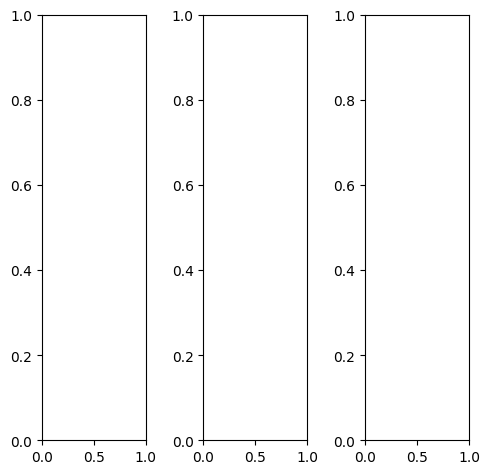

tensor([[[0.7843, 0.7765, 0.7922,  ..., 0.8118, 0.8078, 0.8039],
         [0.7843, 0.7765, 0.7922,  ..., 0.8039, 0.8039, 0.8118],
         [0.7882, 0.7804, 0.7922,  ..., 0.8078, 0.8118, 0.8157],
         ...,
         [0.8471, 0.7882, 0.7451,  ..., 0.4314, 0.4353, 0.4392],
         [0.8314, 0.7922, 0.7294,  ..., 0.3922, 0.4157, 0.4275],
         [0.8000, 0.7529, 0.7098,  ..., 0.3529, 0.3725, 0.3608]],

        [[0.7843, 0.7765, 0.7922,  ..., 0.8118, 0.8078, 0.8039],
         [0.7843, 0.7765, 0.7922,  ..., 0.8039, 0.8039, 0.8118],
         [0.7882, 0.7804, 0.7922,  ..., 0.8078, 0.8118, 0.8157],
         ...,
         [0.8471, 0.7882, 0.7451,  ..., 0.4314, 0.4353, 0.4392],
         [0.8314, 0.7922, 0.7294,  ..., 0.3922, 0.4157, 0.4275],
         [0.8000, 0.7529, 0.7098,  ..., 0.3529, 0.3725, 0.3608]],

        [[0.7843, 0.7765, 0.7922,  ..., 0.8118, 0.8078, 0.8039],
         [0.7843, 0.7765, 0.7922,  ..., 0.8039, 0.8039, 0.8118],
         [0.7882, 0.7804, 0.7922,  ..., 0.8078, 0.8118, 0.

tensor([[[0.6627, 0.6667, 0.6863,  ..., 0.7176, 0.7137, 0.7098],
         [0.6627, 0.6667, 0.6824,  ..., 0.7098, 0.7098, 0.7176],
         [0.6667, 0.6667, 0.6824,  ..., 0.7137, 0.7176, 0.7216],
         ...,
         [0.8157, 0.7490, 0.6980,  ..., 0.3725, 0.3725, 0.3765],
         [0.8000, 0.7529, 0.6824,  ..., 0.3216, 0.3451, 0.3569],
         [0.7686, 0.7098, 0.6627,  ..., 0.2902, 0.3098, 0.2980]],

        [[0.8235, 0.8118, 0.8275,  ..., 0.8431, 0.8353, 0.8314],
         [0.8235, 0.8118, 0.8235,  ..., 0.8314, 0.8314, 0.8392],
         [0.8275, 0.8157, 0.8235,  ..., 0.8353, 0.8392, 0.8431],
         ...,
         [0.8588, 0.8000, 0.7608,  ..., 0.4353, 0.4431, 0.4471],
         [0.8431, 0.8078, 0.7451,  ..., 0.3961, 0.4235, 0.4353],
         [0.8118, 0.7647, 0.7255,  ..., 0.3529, 0.3765, 0.3686]],

        [[0.8941, 0.8863, 0.9020,  ..., 0.9098, 0.9059, 0.9020],
         [0.8980, 0.8863, 0.9020,  ..., 0.9020, 0.9020, 0.9098],
         [0.9020, 0.8902, 0.9020,  ..., 0.9059, 0.9098, 0.

tensor([[[0.6868, 0.6406, 0.7132,  ..., 0.6940, 0.6533, 0.6926],
         [0.6800, 0.7215, 0.7350,  ..., 0.7294, 0.7265, 0.6971],
         [0.6726, 0.7849, 0.7184,  ..., 0.7623, 0.7724, 0.7282],
         ...,
         [0.8446, 0.8476, 0.8139,  ..., 0.4125, 0.3769, 0.3795],
         [0.8071, 0.8112, 0.7650,  ..., 0.3369, 0.3647, 0.3868],
         [0.7765, 0.7476, 0.7142,  ..., 0.2907, 0.3112, 0.3376]],

        [[0.7346, 0.7829, 0.8152,  ..., 0.8030, 0.7857, 0.8122],
         [0.7646, 0.8601, 0.8623,  ..., 0.8501, 0.8374, 0.8574],
         [0.7563, 0.8764, 0.8781,  ..., 0.8819, 0.8681, 0.8581],
         ...,
         [0.7901, 0.8090, 0.8108,  ..., 0.4339, 0.4223, 0.3777],
         [0.7780, 0.7913, 0.7605,  ..., 0.3711, 0.3899, 0.3795],
         [0.7142, 0.7355, 0.7141,  ..., 0.3021, 0.3217, 0.3201]],

        [[0.9385, 0.9054, 0.9921,  ..., 0.9540, 0.9373, 0.9265],
         [0.9518, 1.0493, 1.0111,  ..., 0.9803, 0.9919, 0.9634],
         [0.9551, 0.9471, 1.0441,  ..., 1.0208, 1.0171, 0.

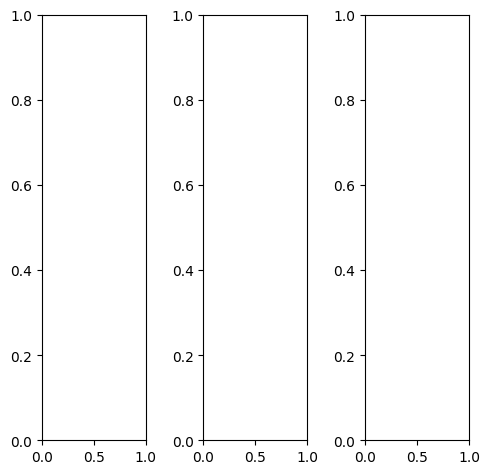

tensor([[[0.5686, 0.3882, 0.3765,  ..., 0.6353, 0.6392, 0.6745],
         [0.5608, 0.4000, 0.3922,  ..., 0.6392, 0.6431, 0.6745],
         [0.5882, 0.4471, 0.4392,  ..., 0.6784, 0.6863, 0.7020],
         ...,
         [0.5373, 0.3490, 0.3294,  ..., 0.5686, 0.5686, 0.6118],
         [0.5608, 0.3961, 0.3882,  ..., 0.5765, 0.5804, 0.6157],
         [0.5843, 0.4235, 0.4157,  ..., 0.6157, 0.6196, 0.6471]],

        [[0.5686, 0.3882, 0.3765,  ..., 0.6353, 0.6392, 0.6745],
         [0.5608, 0.4000, 0.3922,  ..., 0.6392, 0.6431, 0.6745],
         [0.5882, 0.4471, 0.4392,  ..., 0.6784, 0.6863, 0.7020],
         ...,
         [0.5373, 0.3490, 0.3294,  ..., 0.5686, 0.5686, 0.6118],
         [0.5608, 0.3961, 0.3882,  ..., 0.5765, 0.5804, 0.6157],
         [0.5843, 0.4235, 0.4157,  ..., 0.6157, 0.6196, 0.6471]],

        [[0.5686, 0.3882, 0.3765,  ..., 0.6353, 0.6392, 0.6745],
         [0.5608, 0.4000, 0.3922,  ..., 0.6392, 0.6431, 0.6745],
         [0.5882, 0.4471, 0.4392,  ..., 0.6784, 0.6863, 0.

tensor([[[0.5725, 0.3961, 0.3843,  ..., 0.6392, 0.6431, 0.6784],
         [0.5765, 0.4157, 0.4078,  ..., 0.6588, 0.6588, 0.6863],
         [0.6078, 0.4706, 0.4627,  ..., 0.7098, 0.7137, 0.7216],
         ...,
         [0.5569, 0.3961, 0.4039,  ..., 0.6078, 0.6039, 0.6392],
         [0.5843, 0.4392, 0.4510,  ..., 0.6118, 0.6078, 0.6392],
         [0.6235, 0.4667, 0.4667,  ..., 0.6353, 0.6353, 0.6588]],

        [[0.5765, 0.4039, 0.3961,  ..., 0.6510, 0.6588, 0.6902],
         [0.5647, 0.4157, 0.4118,  ..., 0.6549, 0.6627, 0.6902],
         [0.5922, 0.4627, 0.4588,  ..., 0.6902, 0.6980, 0.7137],
         ...,
         [0.5412, 0.3529, 0.3255,  ..., 0.5765, 0.5765, 0.6196],
         [0.5608, 0.4039, 0.3961,  ..., 0.5882, 0.5922, 0.6275],
         [0.5804, 0.4314, 0.4275,  ..., 0.6314, 0.6314, 0.6588]],

        [[0.5020, 0.2784, 0.2588,  ..., 0.5373, 0.5333, 0.5882],
         [0.5020, 0.2863, 0.2588,  ..., 0.4941, 0.4941, 0.5569],
         [0.5255, 0.3176, 0.2784,  ..., 0.5373, 0.5412, 0.

tensor([[[ 0.2947,  0.1285, -0.0191,  ...,  0.4279,  0.4411,  0.5322],
         [ 0.3139, -0.0208, -0.0394,  ...,  0.4232,  0.4350,  0.4834],
         [ 0.2648,  0.0654, -0.0808,  ...,  0.4577,  0.4949,  0.5209],
         ...,
         [ 0.4010,  0.2501,  0.2097,  ...,  0.4803,  0.4830,  0.5022],
         [ 0.4367,  0.2743,  0.2965,  ...,  0.4916,  0.4884,  0.5244],
         [ 0.4462,  0.2652,  0.2545,  ...,  0.5341,  0.5440,  0.5662]],

        [[ 0.3864,  0.2885,  0.1000,  ...,  0.4935,  0.5343,  0.5483],
         [ 0.3538,  0.0977, -0.0541,  ...,  0.5153,  0.5353,  0.5516],
         [ 0.3735,  0.2590,  0.0505,  ...,  0.5490,  0.5856,  0.5732],
         ...,
         [ 0.3916,  0.2222,  0.1957,  ...,  0.4742,  0.4812,  0.4502],
         [ 0.4290,  0.2692,  0.2738,  ...,  0.4895,  0.4880,  0.4895],
         [ 0.4144,  0.2508,  0.2494,  ...,  0.4990,  0.5198,  0.5144]],

        [[ 0.5531,  0.2530,  0.2747,  ...,  0.6697,  0.6892,  0.7120],
         [ 0.5056,  0.2332,  0.2583,  ...,  0

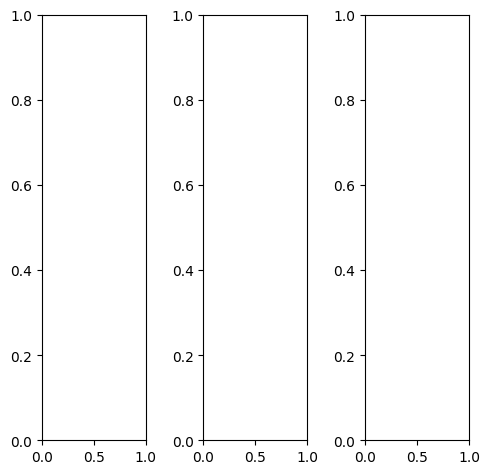

tensor([[[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9216, 0.8863],
         [1.0000, 0.9922, 0.9961,  ..., 0.9294, 0.9098, 0.8667],
         [1.0000, 0.9961, 0.9961,  ..., 0.9608, 0.9608, 0.9333],
         ...,
         [0.2157, 0.1373, 0.3294,  ..., 0.4549, 0.4980, 0.5020],
         [0.2078, 0.2078, 0.3176,  ..., 0.5294, 0.5412, 0.4863],
         [0.2078, 0.1843, 0.2667,  ..., 0.4941, 0.4863, 0.4784]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9216, 0.8863],
         [1.0000, 0.9922, 0.9961,  ..., 0.9294, 0.9098, 0.8667],
         [1.0000, 0.9961, 0.9961,  ..., 0.9608, 0.9608, 0.9333],
         ...,
         [0.2157, 0.1373, 0.3294,  ..., 0.4549, 0.4980, 0.5020],
         [0.2078, 0.2078, 0.3176,  ..., 0.5294, 0.5412, 0.4863],
         [0.2078, 0.1843, 0.2667,  ..., 0.4941, 0.4863, 0.4784]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9569, 0.9216, 0.8863],
         [1.0000, 0.9922, 0.9961,  ..., 0.9294, 0.9098, 0.8667],
         [1.0000, 0.9961, 0.9961,  ..., 0.9608, 0.9608, 0.

tensor([[[1.0000, 0.9961, 1.0000,  ..., 0.9412, 0.8980, 0.8549],
         [1.0000, 0.9922, 0.9961,  ..., 0.9059, 0.8784, 0.8275],
         [1.0000, 0.9961, 0.9961,  ..., 0.9451, 0.9373, 0.9020],
         ...,
         [0.1922, 0.1608, 0.3412,  ..., 0.4549, 0.5020, 0.5137],
         [0.1647, 0.2078, 0.3176,  ..., 0.5373, 0.5490, 0.4941],
         [0.1608, 0.1765, 0.2667,  ..., 0.5098, 0.4980, 0.4824]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9608, 0.9255, 0.8902],
         [1.0000, 0.9922, 0.9961,  ..., 0.9373, 0.9176, 0.8745],
         [1.0000, 0.9961, 0.9961,  ..., 0.9647, 0.9686, 0.9412],
         ...,
         [0.2196, 0.1216, 0.3255,  ..., 0.4588, 0.4980, 0.5020],
         [0.2196, 0.2039, 0.3216,  ..., 0.5294, 0.5412, 0.4863],
         [0.2235, 0.1882, 0.2706,  ..., 0.4941, 0.4863, 0.4784]],

        [[1.0000, 0.9961, 1.0000,  ..., 0.9765, 0.9529, 0.9412],
         [1.0000, 0.9922, 0.9961,  ..., 0.9608, 0.9490, 0.9176],
         [1.0000, 0.9961, 0.9961,  ..., 0.9843, 0.9922, 0.

tensor([[[0.9525, 0.9914, 0.9719,  ..., 0.7458, 0.7064, 0.7415],
         [0.9276, 1.0754, 0.9588,  ..., 0.7639, 0.7694, 0.7379],
         [0.9474, 1.0764, 1.0126,  ..., 0.8158, 0.8495, 0.8163],
         ...,
         [0.0998, 0.0463, 0.2212,  ..., 0.4248, 0.4548, 0.4770],
         [0.0995, 0.0944, 0.2145,  ..., 0.4707, 0.4961, 0.4696],
         [0.1473, 0.1003, 0.1594,  ..., 0.4791, 0.4840, 0.4899]],

        [[0.9479, 0.9921, 0.9005,  ..., 0.8339, 0.8211, 0.8355],
         [0.8909, 0.9875, 0.9039,  ..., 0.8528, 0.8511, 0.8629],
         [1.0004, 1.0276, 0.9864,  ..., 0.8971, 0.9138, 0.9188],
         ...,
         [0.1609, 0.0984, 0.2996,  ..., 0.4304, 0.4909, 0.4638],
         [0.1522, 0.1527, 0.2686,  ..., 0.5010, 0.5158, 0.4630],
         [0.1753, 0.1263, 0.2046,  ..., 0.4788, 0.4852, 0.4783]],

        [[0.9802, 1.0356, 1.0176,  ..., 0.9883, 0.9702, 0.9580],
         [1.0065, 1.0877, 1.0659,  ..., 0.9780, 1.0000, 0.9711],
         [1.0170, 1.0528, 1.0931,  ..., 1.0226, 1.0510, 1.

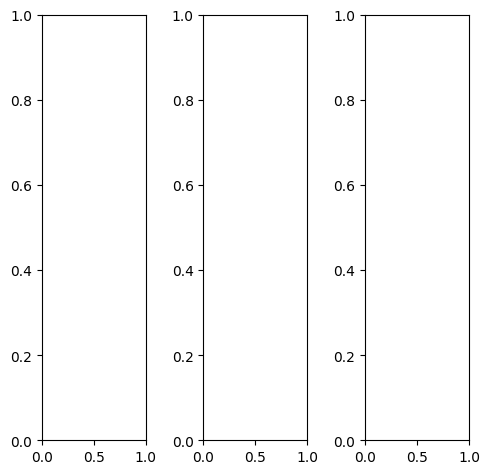

EPOCH: 20.765  trn_loss: 0.005  (2500.69s - 9541.95s remaining)

tensor([[[0.7647, 0.7490, 0.7373,  ..., 0.3176, 0.2784, 0.6078],
         [0.7373, 0.6667, 0.6392,  ..., 0.3059, 0.2706, 0.5373],
         [0.4667, 0.3176, 0.3647,  ..., 0.2784, 0.3373, 0.4784],
         ...,
         [0.4196, 0.4588, 0.4549,  ..., 0.2941, 0.2157, 0.3412],
         [0.4039, 0.4392, 0.4314,  ..., 0.2824, 0.2039, 0.3020],
         [0.3451, 0.3647, 0.3765,  ..., 0.2392, 0.2157, 0.2275]],

        [[0.7647, 0.7490, 0.7373,  ..., 0.3176, 0.2784, 0.6078],
         [0.7373, 0.6667, 0.6392,  ..., 0.3059, 0.2706, 0.5373],
         [0.4667, 0.3176, 0.3647,  ..., 0.2784, 0.3373, 0.4784],
         ...,
         [0.4196, 0.4588, 0.4549,  ..., 0.2941, 0.2157, 0.3412],
         [0.4039, 0.4392, 0.4314,  ..., 0.2824, 0.2039, 0.3020],
         [0.3451, 0.3647, 0.3765,  ..., 0.2392, 0.2157, 0.2275]],

        [[0.7647, 0.7490, 0.7373,  ..., 0.3176, 0.2784, 0.6078],
         [0.7373, 0.6667, 0.6392,  ..., 0.3059, 0.2706, 0.5373],
         [0.4667, 0.3176, 0.3647,  ..., 0.2784, 0.3373, 0.

tensor([[[0.7922, 0.7686, 0.7647,  ..., 0.1020, 0.1490, 0.3176],
         [0.7529, 0.6745, 0.6510,  ..., 0.0863, 0.1373, 0.1843],
         [0.4392, 0.2902, 0.4235,  ..., 0.2431, 0.3373, 0.3725],
         ...,
         [0.4471, 0.4902, 0.4941,  ..., 0.3255, 0.2353, 0.3529],
         [0.4314, 0.4667, 0.4667,  ..., 0.3098, 0.2235, 0.3098],
         [0.3686, 0.3882, 0.4078,  ..., 0.2588, 0.2353, 0.2392]],

        [[0.7569, 0.7490, 0.7333,  ..., 0.4314, 0.3451, 0.7529],
         [0.7333, 0.6706, 0.6392,  ..., 0.4235, 0.3412, 0.7137],
         [0.4863, 0.3412, 0.3451,  ..., 0.3098, 0.3490, 0.5451],
         ...,
         [0.4157, 0.4510, 0.4431,  ..., 0.2863, 0.2118, 0.3412],
         [0.4000, 0.4314, 0.4196,  ..., 0.2745, 0.2000, 0.3020],
         [0.3412, 0.3569, 0.3686,  ..., 0.2353, 0.2118, 0.2235]],

        [[0.7216, 0.7137, 0.7020,  ..., 0.3137, 0.2588, 0.6314],
         [0.7098, 0.6353, 0.6078,  ..., 0.2902, 0.2627, 0.5686],
         [0.4471, 0.2706, 0.3020,  ..., 0.2118, 0.2745, 0.

tensor([[[0.7788, 0.7258, 0.7318,  ..., 0.3005, 0.2692, 0.5547],
         [0.6718, 0.5531, 0.5371,  ..., 0.3047, 0.2521, 0.5694],
         [0.4684, 0.4218, 0.3281,  ..., 0.3164, 0.3474, 0.5318],
         ...,
         [0.4965, 0.5857, 0.5424,  ..., 0.4215, 0.3234, 0.4552],
         [0.4451, 0.5334, 0.5050,  ..., 0.3595, 0.2885, 0.3858],
         [0.3959, 0.4175, 0.4383,  ..., 0.2787, 0.2463, 0.3251]],

        [[0.7801, 0.8258, 0.7143,  ..., 0.3510, 0.3448, 0.5671],
         [0.7134, 0.6508, 0.6057,  ..., 0.3404, 0.3390, 0.6064],
         [0.5800, 0.4920, 0.4189,  ..., 0.3582, 0.4226, 0.5332],
         ...,
         [0.4794, 0.5613, 0.5678,  ..., 0.4060, 0.3402, 0.4124],
         [0.4213, 0.4996, 0.5104,  ..., 0.3799, 0.2990, 0.3573],
         [0.3748, 0.3968, 0.4325,  ..., 0.2756, 0.2434, 0.2868]],

        [[0.9147, 0.9473, 0.9373,  ..., 0.5620, 0.5370, 0.7577],
         [0.9117, 0.8700, 0.8355,  ..., 0.5716, 0.5613, 0.8150],
         [0.6827, 0.5698, 0.5450,  ..., 0.5513, 0.6112, 0.

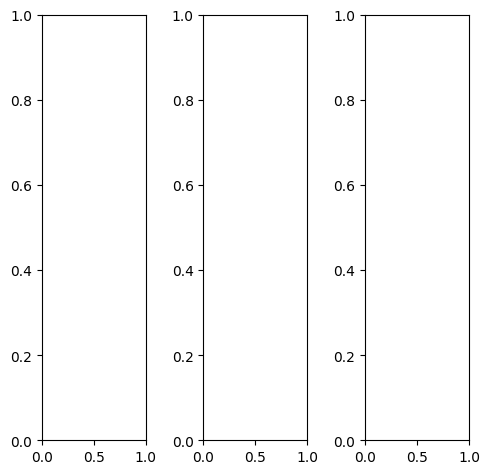

tensor([[[0.6471, 0.6275, 0.6392,  ..., 0.6510, 0.6431, 0.6549],
         [0.6392, 0.6275, 0.6275,  ..., 0.6471, 0.6392, 0.6510],
         [0.6353, 0.6275, 0.6235,  ..., 0.6510, 0.6471, 0.6549],
         ...,
         [0.6353, 0.6353, 0.6314,  ..., 0.6471, 0.6431, 0.6431],
         [0.6392, 0.6353, 0.6275,  ..., 0.6431, 0.6431, 0.6471],
         [0.6431, 0.6431, 0.6392,  ..., 0.6471, 0.6471, 0.6471]],

        [[0.6471, 0.6275, 0.6392,  ..., 0.6510, 0.6431, 0.6549],
         [0.6392, 0.6275, 0.6275,  ..., 0.6471, 0.6392, 0.6510],
         [0.6353, 0.6275, 0.6235,  ..., 0.6510, 0.6471, 0.6549],
         ...,
         [0.6353, 0.6353, 0.6314,  ..., 0.6471, 0.6431, 0.6431],
         [0.6392, 0.6353, 0.6275,  ..., 0.6431, 0.6431, 0.6471],
         [0.6431, 0.6431, 0.6392,  ..., 0.6471, 0.6471, 0.6471]],

        [[0.6471, 0.6275, 0.6392,  ..., 0.6510, 0.6431, 0.6549],
         [0.6392, 0.6275, 0.6275,  ..., 0.6471, 0.6392, 0.6510],
         [0.6353, 0.6275, 0.6235,  ..., 0.6510, 0.6471, 0.

tensor([[[0.6353, 0.6157, 0.6275,  ..., 0.6392, 0.6314, 0.6431],
         [0.6275, 0.6196, 0.6157,  ..., 0.6392, 0.6275, 0.6392],
         [0.6235, 0.6157, 0.6118,  ..., 0.6392, 0.6353, 0.6431],
         ...,
         [0.6235, 0.6314, 0.6314,  ..., 0.6353, 0.6314, 0.6314],
         [0.6275, 0.6392, 0.6275,  ..., 0.6314, 0.6314, 0.6353],
         [0.6314, 0.6431, 0.6392,  ..., 0.6353, 0.6353, 0.6353]],

        [[0.6549, 0.6353, 0.6471,  ..., 0.6588, 0.6510, 0.6627],
         [0.6471, 0.6353, 0.6353,  ..., 0.6549, 0.6471, 0.6588],
         [0.6431, 0.6353, 0.6314,  ..., 0.6588, 0.6549, 0.6627],
         ...,
         [0.6431, 0.6392, 0.6353,  ..., 0.6549, 0.6510, 0.6510],
         [0.6471, 0.6392, 0.6314,  ..., 0.6510, 0.6510, 0.6549],
         [0.6510, 0.6471, 0.6431,  ..., 0.6549, 0.6549, 0.6549]],

        [[0.6275, 0.6078, 0.6196,  ..., 0.6314, 0.6235, 0.6353],
         [0.6196, 0.6118, 0.6078,  ..., 0.6314, 0.6196, 0.6314],
         [0.6157, 0.6078, 0.6039,  ..., 0.6314, 0.6275, 0.

tensor([[[0.3008, 0.2060, 0.1612,  ..., 0.2521, 0.2816, 0.3089],
         [0.2222, 0.1321, 0.1338,  ..., 0.2332, 0.2137, 0.2669],
         [0.1515, 0.1821, 0.0462,  ..., 0.2459, 0.2599, 0.2957],
         ...,
         [0.3505, 0.3991, 0.3768,  ..., 0.4024, 0.3894, 0.3756],
         [0.3992, 0.4345, 0.4267,  ..., 0.4008, 0.3952, 0.4145],
         [0.3764, 0.3995, 0.3908,  ..., 0.3934, 0.4185, 0.4036]],

        [[0.4634, 0.3556, 0.4481,  ..., 0.3657, 0.4369, 0.3796],
         [0.2808, 0.3593, 0.2523,  ..., 0.4044, 0.4367, 0.3811],
         [0.3352, 0.3641, 0.3426,  ..., 0.3989, 0.4360, 0.3842],
         ...,
         [0.3241, 0.3463, 0.3589,  ..., 0.4002, 0.4335, 0.3365],
         [0.3562, 0.4170, 0.4189,  ..., 0.4289, 0.4406, 0.4081],
         [0.3524, 0.3683, 0.3896,  ..., 0.3879, 0.4325, 0.3780]],

        [[0.6933, 0.4505, 0.6562,  ..., 0.5728, 0.6062, 0.5800],
         [0.5245, 0.6338, 0.4957,  ..., 0.5930, 0.6308, 0.6110],
         [0.5156, 0.5240, 0.5810,  ..., 0.6178, 0.6316, 0.

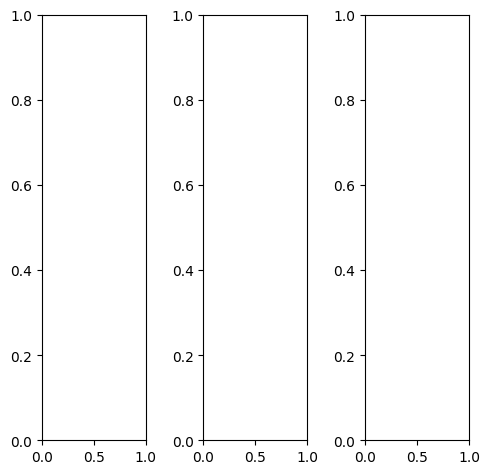

tensor([[[0.0314, 0.0235, 0.1059,  ..., 0.5882, 0.5804, 0.5686],
         [0.0549, 0.0588, 0.1020,  ..., 0.6118, 0.5922, 0.5725],
         [0.1569, 0.2353, 0.1647,  ..., 0.6157, 0.5922, 0.5725],
         ...,
         [0.7137, 0.7216, 0.7176,  ..., 0.5412, 0.5333, 0.5176],
         [0.6902, 0.6941, 0.6980,  ..., 0.5020, 0.5020, 0.4902],
         [0.6706, 0.6706, 0.6941,  ..., 0.5451, 0.5373, 0.5333]],

        [[0.0314, 0.0235, 0.1059,  ..., 0.5882, 0.5804, 0.5686],
         [0.0549, 0.0588, 0.1020,  ..., 0.6118, 0.5922, 0.5725],
         [0.1569, 0.2353, 0.1647,  ..., 0.6157, 0.5922, 0.5725],
         ...,
         [0.7137, 0.7216, 0.7176,  ..., 0.5412, 0.5333, 0.5176],
         [0.6902, 0.6941, 0.6980,  ..., 0.5020, 0.5020, 0.4902],
         [0.6706, 0.6706, 0.6941,  ..., 0.5451, 0.5373, 0.5333]],

        [[0.0314, 0.0235, 0.1059,  ..., 0.5882, 0.5804, 0.5686],
         [0.0549, 0.0588, 0.1020,  ..., 0.6118, 0.5922, 0.5725],
         [0.1569, 0.2353, 0.1647,  ..., 0.6157, 0.5922, 0.

tensor([[[0.0275, 0.0235, 0.1137,  ..., 0.6275, 0.6196, 0.6078],
         [0.0471, 0.0588, 0.1098,  ..., 0.6510, 0.6275, 0.6078],
         [0.1529, 0.2353, 0.1765,  ..., 0.6549, 0.6314, 0.6118],
         ...,
         [0.7529, 0.7608, 0.7569,  ..., 0.5686, 0.5569, 0.5451],
         [0.7294, 0.7333, 0.7373,  ..., 0.5216, 0.5216, 0.5098],
         [0.7098, 0.7098, 0.7333,  ..., 0.5569, 0.5490, 0.5451]],

        [[0.0353, 0.0235, 0.1020,  ..., 0.5765, 0.5686, 0.5569],
         [0.0588, 0.0627, 0.0980,  ..., 0.6000, 0.5804, 0.5608],
         [0.1647, 0.2392, 0.1647,  ..., 0.6039, 0.5804, 0.5608],
         ...,
         [0.7059, 0.7137, 0.7098,  ..., 0.5373, 0.5294, 0.5137],
         [0.6824, 0.6863, 0.6902,  ..., 0.5020, 0.5020, 0.4902],
         [0.6627, 0.6627, 0.6863,  ..., 0.5451, 0.5373, 0.5333]],

        [[0.0157, 0.0078, 0.0902,  ..., 0.5412, 0.5333, 0.5216],
         [0.0392, 0.0471, 0.0863,  ..., 0.5647, 0.5451, 0.5255],
         [0.1412, 0.2196, 0.1490,  ..., 0.5686, 0.5451, 0.

tensor([[[-0.1575, -0.1904, -0.1927,  ...,  0.4250,  0.3958,  0.4547],
         [-0.0701, -0.2790, -0.1070,  ...,  0.4022,  0.3849,  0.3883],
         [-0.1747,  0.0240, -0.1460,  ...,  0.4304,  0.4061,  0.3965],
         ...,
         [ 0.7588,  0.7553,  0.7461,  ...,  0.4885,  0.4755,  0.4502],
         [ 0.7224,  0.6714,  0.6786,  ...,  0.4082,  0.4043,  0.4106],
         [ 0.6724,  0.6539,  0.6584,  ...,  0.4781,  0.4789,  0.4699]],

        [[-0.0311, -0.0869, -0.0079,  ...,  0.5702,  0.5698,  0.5315],
         [-0.0232, -0.3728, -0.1998,  ...,  0.5783,  0.5539,  0.5352],
         [-0.0161,  0.1258, -0.0395,  ...,  0.5783,  0.5558,  0.5397],
         ...,
         [ 0.7238,  0.7225,  0.7320,  ...,  0.5229,  0.5359,  0.4291],
         [ 0.6877,  0.6540,  0.6765,  ...,  0.4680,  0.4601,  0.4172],
         [ 0.6247,  0.6283,  0.6538,  ...,  0.4878,  0.4967,  0.4591]],

        [[ 0.1720, -0.1352,  0.0256,  ...,  0.8232,  0.8016,  0.7588],
         [ 0.1008, -0.1603,  0.0055,  ...,  0

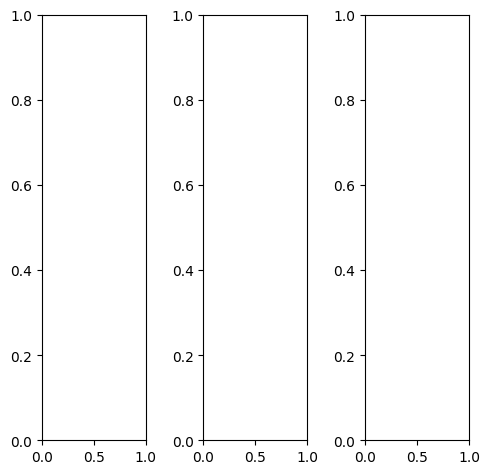

tensor([[[0.5216, 0.5216, 0.5216,  ..., 0.4627, 0.4549, 0.4510],
         [0.5333, 0.5333, 0.5333,  ..., 0.4745, 0.4667, 0.4627],
         [0.5412, 0.5412, 0.5412,  ..., 0.4824, 0.4784, 0.4706],
         ...,
         [0.3176, 0.3216, 0.3098,  ..., 0.3922, 0.3451, 0.3451],
         [0.4078, 0.4118, 0.4078,  ..., 0.5373, 0.4549, 0.4549],
         [0.3569, 0.3804, 0.4000,  ..., 0.4510, 0.4196, 0.3961]],

        [[0.5216, 0.5216, 0.5216,  ..., 0.4627, 0.4549, 0.4510],
         [0.5333, 0.5333, 0.5333,  ..., 0.4745, 0.4667, 0.4627],
         [0.5412, 0.5412, 0.5412,  ..., 0.4824, 0.4784, 0.4706],
         ...,
         [0.3176, 0.3216, 0.3098,  ..., 0.3922, 0.3451, 0.3451],
         [0.4078, 0.4118, 0.4078,  ..., 0.5373, 0.4549, 0.4549],
         [0.3569, 0.3804, 0.4000,  ..., 0.4510, 0.4196, 0.3961]],

        [[0.5216, 0.5216, 0.5216,  ..., 0.4627, 0.4549, 0.4510],
         [0.5333, 0.5333, 0.5333,  ..., 0.4745, 0.4667, 0.4627],
         [0.5412, 0.5412, 0.5412,  ..., 0.4824, 0.4784, 0.

tensor([[[0.4353, 0.4353, 0.4353,  ..., 0.3529, 0.3451, 0.3490],
         [0.4471, 0.4471, 0.4471,  ..., 0.3686, 0.3608, 0.3647],
         [0.4549, 0.4549, 0.4549,  ..., 0.3843, 0.3804, 0.3765],
         ...,
         [0.3451, 0.3490, 0.3373,  ..., 0.4235, 0.3725, 0.3804],
         [0.4471, 0.4510, 0.4471,  ..., 0.5882, 0.5020, 0.5059],
         [0.3922, 0.4157, 0.4353,  ..., 0.5059, 0.4745, 0.4510]],

        [[0.5294, 0.5294, 0.5294,  ..., 0.4745, 0.4667, 0.4588],
         [0.5412, 0.5412, 0.5412,  ..., 0.4824, 0.4784, 0.4667],
         [0.5529, 0.5529, 0.5529,  ..., 0.4902, 0.4863, 0.4784],
         ...,
         [0.3137, 0.3216, 0.3098,  ..., 0.4000, 0.3451, 0.3373],
         [0.3961, 0.4000, 0.4000,  ..., 0.5373, 0.4431, 0.4353],
         [0.3412, 0.3686, 0.3882,  ..., 0.4431, 0.4000, 0.3686]],

        [[0.7176, 0.7176, 0.7176,  ..., 0.6941, 0.6902, 0.6902],
         [0.7216, 0.7216, 0.7216,  ..., 0.7020, 0.6941, 0.6941],
         [0.7216, 0.7216, 0.7216,  ..., 0.6980, 0.6941, 0.

tensor([[[0.5045, 0.4181, 0.3764,  ..., 0.2974, 0.3031, 0.3274],
         [0.4310, 0.4295, 0.4202,  ..., 0.3451, 0.3307, 0.3290],
         [0.4335, 0.5013, 0.3884,  ..., 0.3712, 0.3856, 0.3517],
         ...,
         [0.1946, 0.1947, 0.1677,  ..., 0.3633, 0.2655, 0.2494],
         [0.3231, 0.3557, 0.3408,  ..., 0.5575, 0.4114, 0.3858],
         [0.2686, 0.2292, 0.2751,  ..., 0.4158, 0.3432, 0.3437]],

        [[0.5440, 0.5623, 0.5164,  ..., 0.3836, 0.4025, 0.3735],
         [0.4957, 0.6020, 0.5381,  ..., 0.4445, 0.4528, 0.3897],
         [0.5258, 0.6467, 0.5780,  ..., 0.4783, 0.4905, 0.3892],
         ...,
         [0.1692, 0.1824, 0.1704,  ..., 0.3120, 0.2533, 0.1647],
         [0.3061, 0.3265, 0.3054,  ..., 0.5455, 0.4239, 0.3355],
         [0.2339, 0.2102, 0.2531,  ..., 0.3699, 0.3264, 0.2918]],

        [[0.6983, 0.5909, 0.7171,  ..., 0.4750, 0.4966, 0.4913],
         [0.6649, 0.7521, 0.7280,  ..., 0.5305, 0.5414, 0.5027],
         [0.6757, 0.6726, 0.7429,  ..., 0.5263, 0.5456, 0.

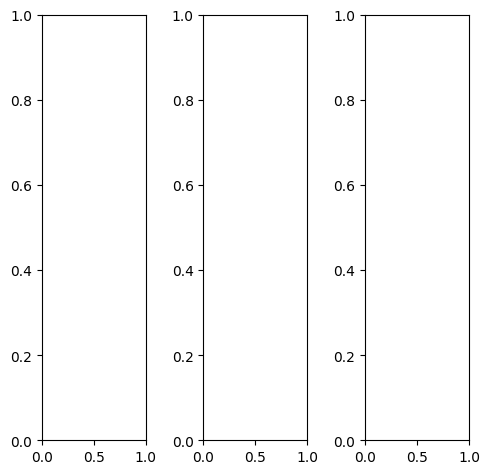

tensor([[[0.7608, 0.8118, 0.8431,  ..., 0.8627, 0.7608, 0.5529],
         [0.8157, 0.8588, 0.7333,  ..., 0.8078, 0.5686, 0.5647],
         [0.8392, 0.8627, 0.6941,  ..., 0.7608, 0.6510, 0.7451],
         ...,
         [0.6196, 0.7059, 0.6902,  ..., 0.7843, 0.7922, 0.8039],
         [0.6510, 0.6824, 0.6980,  ..., 0.7765, 0.7882, 0.7961],
         [0.6510, 0.6471, 0.6784,  ..., 0.7725, 0.7882, 0.7922]],

        [[0.7608, 0.8118, 0.8431,  ..., 0.8627, 0.7608, 0.5529],
         [0.8157, 0.8588, 0.7333,  ..., 0.8078, 0.5686, 0.5647],
         [0.8392, 0.8627, 0.6941,  ..., 0.7608, 0.6510, 0.7451],
         ...,
         [0.6196, 0.7059, 0.6902,  ..., 0.7843, 0.7922, 0.8039],
         [0.6510, 0.6824, 0.6980,  ..., 0.7765, 0.7882, 0.7961],
         [0.6510, 0.6471, 0.6784,  ..., 0.7725, 0.7882, 0.7922]],

        [[0.7608, 0.8118, 0.8431,  ..., 0.8627, 0.7608, 0.5529],
         [0.8157, 0.8588, 0.7333,  ..., 0.8078, 0.5686, 0.5647],
         [0.8392, 0.8627, 0.6941,  ..., 0.7608, 0.6510, 0.

tensor([[[0.7725, 0.8118, 0.8392,  ..., 0.8588, 0.7294, 0.4627],
         [0.8314, 0.8667, 0.7373,  ..., 0.7725, 0.4902, 0.4784],
         [0.8588, 0.8824, 0.7216,  ..., 0.7176, 0.5843, 0.7176],
         ...,
         [0.6314, 0.7490, 0.7373,  ..., 0.7961, 0.8000, 0.8039],
         [0.6745, 0.7176, 0.7451,  ..., 0.7922, 0.8000, 0.8000],
         [0.6941, 0.6745, 0.7176,  ..., 0.7882, 0.7961, 0.8000]],

        [[0.7569, 0.8118, 0.8471,  ..., 0.8588, 0.7765, 0.6196],
         [0.8118, 0.8588, 0.7373,  ..., 0.8235, 0.6235, 0.6431],
         [0.8392, 0.8667, 0.6941,  ..., 0.7882, 0.7059, 0.7725],
         ...,
         [0.6235, 0.7059, 0.6863,  ..., 0.7804, 0.7922, 0.8039],
         [0.6549, 0.6863, 0.6941,  ..., 0.7765, 0.7882, 0.7961],
         [0.6471, 0.6510, 0.6784,  ..., 0.7725, 0.7882, 0.7922]],

        [[0.7412, 0.8078, 0.8471,  ..., 0.8941, 0.7451, 0.4471],
         [0.7843, 0.8314, 0.7176,  ..., 0.8078, 0.4824, 0.4039],
         [0.8039, 0.8078, 0.6392,  ..., 0.7294, 0.5412, 0.

tensor([[[0.6649, 0.6790, 0.6207,  ..., 0.6306, 0.5327, 0.4621],
         [0.6743, 0.6937, 0.5846,  ..., 0.5523, 0.3791, 0.4516],
         [0.6458, 0.7495, 0.4538,  ..., 0.5425, 0.4547, 0.5968],
         ...,
         [0.5241, 0.5954, 0.5595,  ..., 0.6598, 0.6645, 0.6945],
         [0.5597, 0.5775, 0.6014,  ..., 0.6406, 0.6542, 0.7098],
         [0.5766, 0.5783, 0.5995,  ..., 0.6892, 0.7237, 0.7319]],

        [[0.7367, 0.7124, 0.6866,  ..., 0.7512, 0.6581, 0.4983],
         [0.6290, 0.6627, 0.5197,  ..., 0.6689, 0.4849, 0.5354],
         [0.8014, 0.7189, 0.6307,  ..., 0.6597, 0.5535, 0.6780],
         ...,
         [0.4912, 0.5920, 0.5921,  ..., 0.6821, 0.6718, 0.7201],
         [0.5239, 0.5553, 0.6139,  ..., 0.6670, 0.6743, 0.7113],
         [0.5319, 0.5523, 0.6011,  ..., 0.6852, 0.7069, 0.7129]],

        [[0.8282, 0.8494, 0.9401,  ..., 0.9044, 0.8128, 0.6413],
         [0.8439, 0.9373, 0.8388,  ..., 0.8158, 0.6589, 0.6555],
         [0.8268, 0.8861, 0.7716,  ..., 0.7844, 0.7200, 0.

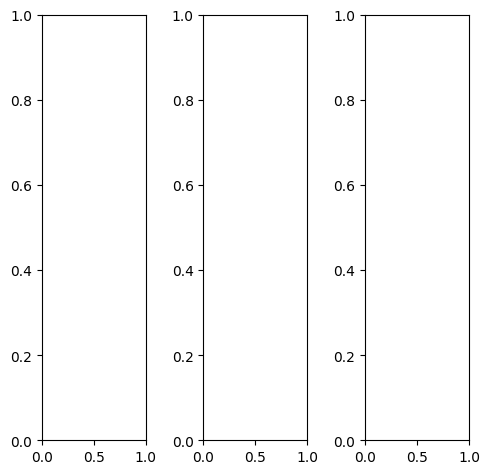

EPOCH: 21.000  val_loss: 0.003  (2535.19s - 9537.13s remaining)

tensor([[[0.0824, 0.0706, 0.0706,  ..., 0.9529, 0.9490, 0.9608],
         [0.0863, 0.0824, 0.0824,  ..., 0.9529, 0.9490, 0.9569],
         [0.0941, 0.0902, 0.0941,  ..., 0.9373, 0.9412, 0.9490],
         ...,
         [0.6510, 0.7922, 0.6039,  ..., 0.6275, 0.6039, 0.5608],
         [0.4627, 0.5765, 0.7765,  ..., 0.5333, 0.5333, 0.5216],
         [0.4863, 0.4588, 0.5255,  ..., 0.4941, 0.5059, 0.5216]],

        [[0.0824, 0.0706, 0.0706,  ..., 0.9529, 0.9490, 0.9608],
         [0.0863, 0.0824, 0.0824,  ..., 0.9529, 0.9490, 0.9569],
         [0.0941, 0.0902, 0.0941,  ..., 0.9373, 0.9412, 0.9490],
         ...,
         [0.6510, 0.7922, 0.6039,  ..., 0.6275, 0.6039, 0.5608],
         [0.4627, 0.5765, 0.7765,  ..., 0.5333, 0.5333, 0.5216],
         [0.4863, 0.4588, 0.5255,  ..., 0.4941, 0.5059, 0.5216]],

        [[0.0824, 0.0706, 0.0706,  ..., 0.9529, 0.9490, 0.9608],
         [0.0863, 0.0824, 0.0824,  ..., 0.9529, 0.9490, 0.9569],
         [0.0941, 0.0902, 0.0941,  ..., 0.9373, 0.9412, 0.

tensor([[[0.1020, 0.0863, 0.0902,  ..., 0.9529, 0.9490, 0.9608],
         [0.1020, 0.0980, 0.1020,  ..., 0.9529, 0.9490, 0.9569],
         [0.1098, 0.1059, 0.1098,  ..., 0.9373, 0.9412, 0.9490],
         ...,
         [0.6902, 0.8196, 0.6314,  ..., 0.6784, 0.6549, 0.6118],
         [0.5098, 0.6118, 0.8039,  ..., 0.5843, 0.5843, 0.5725],
         [0.5451, 0.5137, 0.5725,  ..., 0.5451, 0.5569, 0.5725]],

        [[0.0784, 0.0667, 0.0667,  ..., 0.9490, 0.9451, 0.9569],
         [0.0824, 0.0784, 0.0784,  ..., 0.9490, 0.9451, 0.9529],
         [0.0902, 0.0863, 0.0902,  ..., 0.9333, 0.9373, 0.9451],
         ...,
         [0.6392, 0.7882, 0.6118,  ..., 0.6235, 0.6000, 0.5569],
         [0.4510, 0.5725, 0.7765,  ..., 0.5294, 0.5294, 0.5176],
         [0.4784, 0.4549, 0.5176,  ..., 0.4902, 0.5020, 0.5137]],

        [[0.0627, 0.0510, 0.0510,  ..., 0.9804, 0.9765, 0.9882],
         [0.0667, 0.0627, 0.0627,  ..., 0.9804, 0.9765, 0.9843],
         [0.0745, 0.0706, 0.0706,  ..., 0.9647, 0.9686, 0.

tensor([[[0.0923, 0.0500, 0.0495,  ..., 0.9431, 0.9405, 0.9265],
         [0.0640, 0.0646, 0.0617,  ..., 0.9465, 0.9505, 0.9433],
         [0.0652, 0.0675, 0.0773,  ..., 0.9386, 0.9435, 0.9454],
         ...,
         [0.6486, 0.7602, 0.5851,  ..., 0.6386, 0.6160, 0.5604],
         [0.4701, 0.5745, 0.7467,  ..., 0.5397, 0.5310, 0.5249],
         [0.5126, 0.4678, 0.5550,  ..., 0.4921, 0.5143, 0.5335]],

        [[0.1249, 0.0774, 0.0764,  ..., 0.9496, 0.9384, 0.9525],
         [0.0918, 0.0871, 0.0850,  ..., 0.9594, 0.9459, 0.9582],
         [0.0967, 0.0947, 0.0990,  ..., 0.9453, 0.9495, 0.9527],
         ...,
         [0.6744, 0.7883, 0.5950,  ..., 0.6378, 0.6193, 0.5643],
         [0.4729, 0.5749, 0.7727,  ..., 0.5389, 0.5376, 0.5300],
         [0.4992, 0.4724, 0.5571,  ..., 0.4941, 0.5098, 0.5413]],

        [[0.1615, 0.1173, 0.1246,  ..., 0.9492, 0.9394, 0.9390],
         [0.1397, 0.1396, 0.1420,  ..., 0.9571, 0.9510, 0.9500],
         [0.1459, 0.1409, 0.1444,  ..., 0.9406, 0.9373, 0.

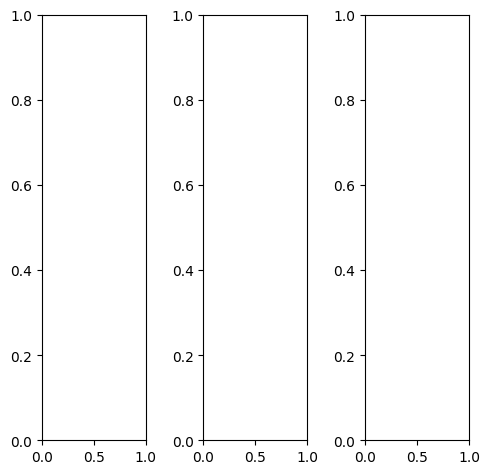

tensor([[[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.3373],
         ...,
         [0.1137, 0.1137, 0.1137,  ..., 0.2588, 0.3176, 0.3137],
         [0.0863, 0.0784, 0.0863,  ..., 0.2392, 0.2667, 0.3059],
         [0.0627, 0.0667, 0.0824,  ..., 0.2863, 0.2431, 0.3137]],

        [[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.3373],
         ...,
         [0.1137, 0.1137, 0.1137,  ..., 0.2588, 0.3176, 0.3137],
         [0.0863, 0.0784, 0.0863,  ..., 0.2392, 0.2667, 0.3059],
         [0.0627, 0.0667, 0.0824,  ..., 0.2863, 0.2431, 0.3137]],

        [[0.5490, 0.6392, 0.6863,  ..., 0.4235, 0.2275, 0.3137],
         [0.6157, 0.7020, 0.7529,  ..., 0.4353, 0.2706, 0.1765],
         [0.6471, 0.7176, 0.7804,  ..., 0.4353, 0.3608, 0.

tensor([[[0.5490, 0.6431, 0.6980,  ..., 0.3843, 0.1804, 0.2824],
         [0.6157, 0.7059, 0.7725,  ..., 0.3882, 0.2275, 0.1490],
         [0.6392, 0.7216, 0.7961,  ..., 0.3882, 0.3216, 0.3098],
         ...,
         [0.0824, 0.0824, 0.0863,  ..., 0.2549, 0.3216, 0.3137],
         [0.0588, 0.0588, 0.0667,  ..., 0.2431, 0.2745, 0.3098],
         [0.0431, 0.0510, 0.0627,  ..., 0.2627, 0.2510, 0.3216]],

        [[0.5686, 0.6588, 0.7020,  ..., 0.4588, 0.2588, 0.3294],
         [0.6353, 0.7216, 0.7686,  ..., 0.4784, 0.3059, 0.2000],
         [0.6667, 0.7373, 0.8000,  ..., 0.4745, 0.4000, 0.3686],
         ...,
         [0.1294, 0.1294, 0.1255,  ..., 0.2784, 0.3333, 0.3333],
         [0.0980, 0.0902, 0.0941,  ..., 0.2549, 0.2784, 0.3216],
         [0.0706, 0.0706, 0.0902,  ..., 0.3176, 0.2549, 0.3255]],

        [[0.4392, 0.5294, 0.5608,  ..., 0.3412, 0.2000, 0.2980],
         [0.5059, 0.5804, 0.6118,  ..., 0.3490, 0.1922, 0.1294],
         [0.5529, 0.5961, 0.6431,  ..., 0.3529, 0.2784, 0.

tensor([[[0.5622, 0.6275, 0.6677,  ..., 0.3924, 0.2346, 0.2726],
         [0.6038, 0.6932, 0.7278,  ..., 0.4285, 0.2800, 0.1656],
         [0.6436, 0.6972, 0.7630,  ..., 0.4467, 0.3654, 0.3435],
         ...,
         [0.0961, 0.0982, 0.1049,  ..., 0.2383, 0.2889, 0.2937],
         [0.0808, 0.0664, 0.0758,  ..., 0.2069, 0.2294, 0.2851],
         [0.0892, 0.0712, 0.0778,  ..., 0.2616, 0.2240, 0.3035]],

        [[0.5838, 0.6584, 0.7056,  ..., 0.4013, 0.2470, 0.3001],
         [0.6342, 0.7258, 0.7595,  ..., 0.4290, 0.3006, 0.1936],
         [0.6708, 0.7287, 0.7945,  ..., 0.4305, 0.3779, 0.3606],
         ...,
         [0.1188, 0.1189, 0.1213,  ..., 0.2581, 0.3161, 0.3262],
         [0.0981, 0.0818, 0.0916,  ..., 0.2357, 0.2601, 0.3095],
         [0.1110, 0.0819, 0.0856,  ..., 0.2924, 0.2520, 0.3236]],

        [[0.6021, 0.6723, 0.7112,  ..., 0.4136, 0.2665, 0.3092],
         [0.6443, 0.7308, 0.7736,  ..., 0.4475, 0.3037, 0.2078],
         [0.6742, 0.7279, 0.7895,  ..., 0.4546, 0.3851, 0.

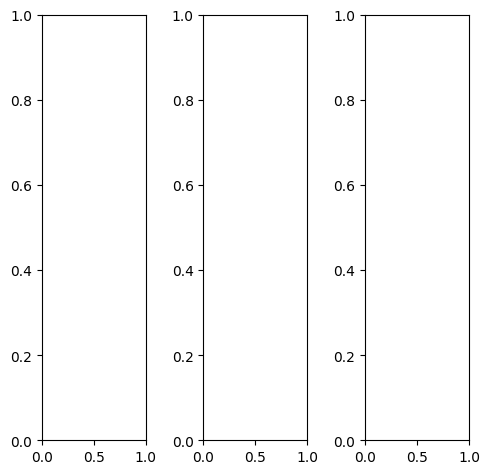

tensor([[[0.8667, 0.8627, 0.8706,  ..., 0.8980, 0.8980, 0.8980],
         [0.8706, 0.8667, 0.8706,  ..., 0.9020, 0.9020, 0.9020],
         [0.8745, 0.8706, 0.8745,  ..., 0.9098, 0.9059, 0.9020],
         ...,
         [0.8314, 0.7765, 0.7216,  ..., 0.8157, 0.8157, 0.8157],
         [0.8157, 0.8157, 0.7882,  ..., 0.8039, 0.8078, 0.8039],
         [0.8039, 0.7961, 0.8078,  ..., 0.7961, 0.7961, 0.8000]],

        [[0.8667, 0.8627, 0.8706,  ..., 0.8980, 0.8980, 0.8980],
         [0.8706, 0.8667, 0.8706,  ..., 0.9020, 0.9020, 0.9020],
         [0.8745, 0.8706, 0.8745,  ..., 0.9098, 0.9059, 0.9020],
         ...,
         [0.8314, 0.7765, 0.7216,  ..., 0.8157, 0.8157, 0.8157],
         [0.8157, 0.8157, 0.7882,  ..., 0.8039, 0.8078, 0.8039],
         [0.8039, 0.7961, 0.8078,  ..., 0.7961, 0.7961, 0.8000]],

        [[0.8667, 0.8627, 0.8706,  ..., 0.8980, 0.8980, 0.8980],
         [0.8706, 0.8667, 0.8706,  ..., 0.9020, 0.9020, 0.9020],
         [0.8745, 0.8706, 0.8745,  ..., 0.9098, 0.9059, 0.

tensor([[[0.7843, 0.7804, 0.7843,  ..., 0.8157, 0.8157, 0.8157],
         [0.7882, 0.7843, 0.7882,  ..., 0.8196, 0.8196, 0.8196],
         [0.7961, 0.7922, 0.7961,  ..., 0.8314, 0.8275, 0.8235],
         ...,
         [0.8275, 0.7569, 0.6941,  ..., 0.8157, 0.8235, 0.8275],
         [0.8118, 0.8039, 0.7647,  ..., 0.8078, 0.8118, 0.8118],
         [0.8039, 0.7922, 0.8000,  ..., 0.7961, 0.8000, 0.8039]],

        [[0.8941, 0.8902, 0.8980,  ..., 0.9255, 0.9255, 0.9255],
         [0.8980, 0.8941, 0.8980,  ..., 0.9294, 0.9294, 0.9294],
         [0.9020, 0.8980, 0.9020,  ..., 0.9333, 0.9294, 0.9294],
         ...,
         [0.8353, 0.7882, 0.7333,  ..., 0.8196, 0.8157, 0.8118],
         [0.8235, 0.8275, 0.8000,  ..., 0.8078, 0.8078, 0.8039],
         [0.8118, 0.8039, 0.8157,  ..., 0.8000, 0.8000, 0.8000]],

        [[0.9569, 0.9490, 0.9569,  ..., 0.9843, 0.9843, 0.9882],
         [0.9529, 0.9490, 0.9529,  ..., 0.9843, 0.9843, 0.9843],
         [0.9529, 0.9490, 0.9490,  ..., 0.9843, 0.9804, 0.

tensor([[[0.8376, 0.8423, 0.8502,  ..., 0.8824, 0.8876, 0.8736],
         [0.8534, 0.8515, 0.8555,  ..., 0.8873, 0.8953, 0.8866],
         [0.8532, 0.8609, 0.8615,  ..., 0.8978, 0.8994, 0.8905],
         ...,
         [0.8470, 0.7865, 0.7333,  ..., 0.8214, 0.8182, 0.8158],
         [0.8211, 0.8303, 0.7928,  ..., 0.8035, 0.8058, 0.8144],
         [0.8064, 0.8205, 0.8093,  ..., 0.8077, 0.8145, 0.8071]],

        [[0.8625, 0.8608, 0.8795,  ..., 0.8988, 0.8995, 0.9056],
         [0.8723, 0.8759, 0.8771,  ..., 0.9100, 0.9029, 0.9094],
         [0.8749, 0.8822, 0.8851,  ..., 0.9209, 0.9161, 0.9076],
         ...,
         [0.8408, 0.7848, 0.7247,  ..., 0.8156, 0.8200, 0.8293],
         [0.8226, 0.8212, 0.7891,  ..., 0.8028, 0.8013, 0.8144],
         [0.7949, 0.8105, 0.8119,  ..., 0.7989, 0.8007, 0.7888]],

        [[0.8724, 0.8773, 0.8818,  ..., 0.9063, 0.9085, 0.9007],
         [0.8894, 0.8925, 0.8954,  ..., 0.9201, 0.9155, 0.9112],
         [0.8965, 0.8846, 0.8936,  ..., 0.9258, 0.9170, 0.

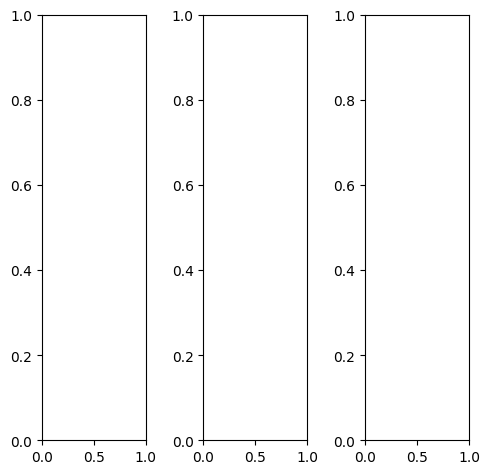

tensor([[[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9294, 0.9412, 0.9647],
         [0.9725, 0.9608, 0.9608,  ..., 0.9529, 0.9569, 0.9765],
         [0.9686, 0.9569, 0.9569,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9294, 0.9412, 0.9647],
         [0.9725, 0.9608, 0.9608,  ..., 0.9529, 0.9569, 0.9765],
         [0.9686, 0.9569, 0.9569,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9294, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9373, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9373, 0.9255, 0.9333,  ..., 0.9373, 0.9333, 0.

tensor([[[0.9373, 0.9216, 0.9255,  ..., 0.9294, 0.9255, 0.9373],
         [0.9490, 0.9294, 0.9333,  ..., 0.9412, 0.9373, 0.9451],
         [0.9451, 0.9294, 0.9333,  ..., 0.9373, 0.9333, 0.9451],
         ...,
         [0.9725, 0.9569, 0.9490,  ..., 0.9412, 0.9569, 0.9647],
         [0.9765, 0.9608, 0.9569,  ..., 0.9569, 0.9647, 0.9765],
         [0.9686, 0.9569, 0.9529,  ..., 0.9608, 0.9608, 0.9725]],

        [[0.9255, 0.9216, 0.9294,  ..., 0.9333, 0.9294, 0.9412],
         [0.9373, 0.9294, 0.9373,  ..., 0.9451, 0.9412, 0.9490],
         [0.9333, 0.9294, 0.9373,  ..., 0.9412, 0.9373, 0.9490],
         ...,
         [0.9686, 0.9569, 0.9490,  ..., 0.9255, 0.9333, 0.9686],
         [0.9725, 0.9647, 0.9647,  ..., 0.9529, 0.9569, 0.9804],
         [0.9686, 0.9608, 0.9647,  ..., 0.9647, 0.9647, 0.9765]],

        [[0.9137, 0.9020, 0.9098,  ..., 0.9137, 0.9098, 0.9216],
         [0.9216, 0.9137, 0.9176,  ..., 0.9255, 0.9216, 0.9294],
         [0.9216, 0.9098, 0.9176,  ..., 0.9216, 0.9176, 0.

tensor([[[0.9063, 0.9040, 0.9331,  ..., 0.9218, 0.9216, 0.9153],
         [0.9324, 0.9305, 0.9403,  ..., 0.9360, 0.9405, 0.9362],
         [0.9354, 0.9387, 0.9419,  ..., 0.9367, 0.9378, 0.9457],
         ...,
         [0.9853, 0.9779, 0.9658,  ..., 0.9368, 0.9509, 0.9648],
         [0.9673, 0.9743, 0.9602,  ..., 0.9542, 0.9593, 0.9735],
         [0.9483, 0.9540, 0.9580,  ..., 0.9591, 0.9624, 0.9410]],

        [[0.9111, 0.9060, 0.9359,  ..., 0.9283, 0.9195, 0.9336],
         [0.9323, 0.9299, 0.9421,  ..., 0.9493, 0.9353, 0.9491],
         [0.9351, 0.9335, 0.9372,  ..., 0.9473, 0.9431, 0.9510],
         ...,
         [0.9641, 0.9607, 0.9505,  ..., 0.9275, 0.9455, 0.9670],
         [0.9590, 0.9505, 0.9487,  ..., 0.9456, 0.9526, 0.9638],
         [0.9353, 0.9566, 0.9544,  ..., 0.9573, 0.9473, 0.9131]],

        [[0.8885, 0.9041, 0.9044,  ..., 0.9162, 0.9061, 0.9098],
         [0.9098, 0.9176, 0.9151,  ..., 0.9384, 0.9295, 0.9277],
         [0.9168, 0.9039, 0.9161,  ..., 0.9337, 0.9219, 0.

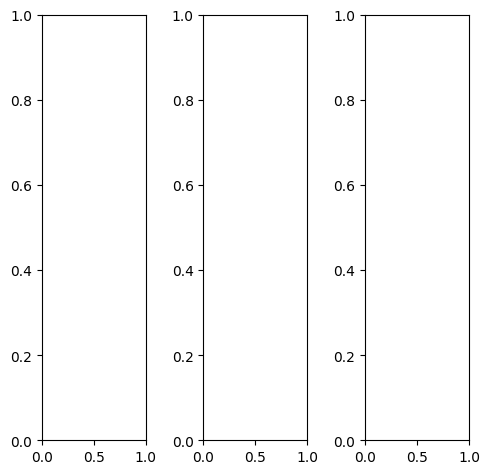

tensor([[[0.6588, 0.6627, 0.6784,  ..., 0.6471, 0.6353, 0.6235],
         [0.6667, 0.6745, 0.6902,  ..., 0.6588, 0.6471, 0.6353],
         [0.6745, 0.6784, 0.6941,  ..., 0.6627, 0.6510, 0.6353],
         ...,
         [0.5882, 0.4314, 0.3686,  ..., 0.3176, 0.2980, 0.3176],
         [0.5804, 0.4353, 0.3412,  ..., 0.2980, 0.2980, 0.3098],
         [0.5529, 0.3804, 0.3373,  ..., 0.3020, 0.2980, 0.2902]],

        [[0.6588, 0.6627, 0.6784,  ..., 0.6471, 0.6353, 0.6235],
         [0.6667, 0.6745, 0.6902,  ..., 0.6588, 0.6471, 0.6353],
         [0.6745, 0.6784, 0.6941,  ..., 0.6627, 0.6510, 0.6353],
         ...,
         [0.5882, 0.4314, 0.3686,  ..., 0.3176, 0.2980, 0.3176],
         [0.5804, 0.4353, 0.3412,  ..., 0.2980, 0.2980, 0.3098],
         [0.5529, 0.3804, 0.3373,  ..., 0.3020, 0.2980, 0.2902]],

        [[0.6588, 0.6627, 0.6784,  ..., 0.6471, 0.6353, 0.6235],
         [0.6667, 0.6745, 0.6902,  ..., 0.6588, 0.6471, 0.6353],
         [0.6745, 0.6784, 0.6941,  ..., 0.6627, 0.6510, 0.

tensor([[[0.6824, 0.6863, 0.7020,  ..., 0.6706, 0.6588, 0.6471],
         [0.6902, 0.6980, 0.7137,  ..., 0.6824, 0.6706, 0.6588],
         [0.6980, 0.7020, 0.7176,  ..., 0.6863, 0.6745, 0.6588],
         ...,
         [0.6039, 0.4745, 0.4196,  ..., 0.3412, 0.3216, 0.3529],
         [0.5961, 0.4745, 0.3922,  ..., 0.3255, 0.3294, 0.3451],
         [0.5647, 0.4118, 0.3882,  ..., 0.3490, 0.3412, 0.3255]],

        [[0.6510, 0.6549, 0.6706,  ..., 0.6431, 0.6314, 0.6196],
         [0.6588, 0.6667, 0.6824,  ..., 0.6510, 0.6431, 0.6314],
         [0.6667, 0.6706, 0.6863,  ..., 0.6549, 0.6471, 0.6314],
         ...,
         [0.5765, 0.4196, 0.3569,  ..., 0.3098, 0.2902, 0.3098],
         [0.5725, 0.4196, 0.3294,  ..., 0.2863, 0.2863, 0.3020],
         [0.5451, 0.3686, 0.3216,  ..., 0.2902, 0.2863, 0.2824]],

        [[0.6431, 0.6471, 0.6627,  ..., 0.6118, 0.6000, 0.5882],
         [0.6510, 0.6588, 0.6745,  ..., 0.6235, 0.6118, 0.6000],
         [0.6588, 0.6627, 0.6784,  ..., 0.6275, 0.6157, 0.

tensor([[[0.6142, 0.6090, 0.6039,  ..., 0.5517, 0.5441, 0.5782],
         [0.6088, 0.6067, 0.6154,  ..., 0.5689, 0.5620, 0.5659],
         [0.6097, 0.5977, 0.6215,  ..., 0.5769, 0.5694, 0.5571],
         ...,
         [0.5282, 0.3767, 0.3030,  ..., 0.2464, 0.2258, 0.2666],
         [0.5314, 0.3795, 0.2823,  ..., 0.2210, 0.2211, 0.2606],
         [0.5129, 0.3495, 0.2769,  ..., 0.2466, 0.2443, 0.2766]],

        [[0.6817, 0.6893, 0.6988,  ..., 0.6636, 0.6575, 0.6537],
         [0.6894, 0.6903, 0.7010,  ..., 0.6747, 0.6653, 0.6701],
         [0.6903, 0.6895, 0.7159,  ..., 0.6751, 0.6609, 0.6564],
         ...,
         [0.5878, 0.4510, 0.3916,  ..., 0.3315, 0.3118, 0.3323],
         [0.5828, 0.4472, 0.3559,  ..., 0.3041, 0.3023, 0.3160],
         [0.5435, 0.3928, 0.3428,  ..., 0.3199, 0.3065, 0.3177]],

        [[0.7623, 0.7777, 0.7900,  ..., 0.7889, 0.7785, 0.7478],
         [0.7772, 0.7903, 0.8031,  ..., 0.7919, 0.7836, 0.7625],
         [0.7797, 0.7869, 0.8049,  ..., 0.7916, 0.7833, 0.

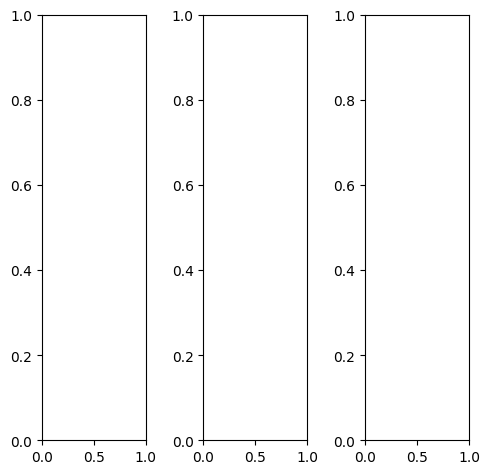

EPOCH: 21.255  trn_loss: 0.005  (2564.82s - 9502.01s remaining)

tensor([[[0.4196, 0.4078, 0.4510,  ..., 0.5020, 0.4941, 0.5020],
         [0.4235, 0.4157, 0.4510,  ..., 0.4980, 0.4902, 0.4902],
         [0.4118, 0.4039, 0.4314,  ..., 0.5020, 0.4902, 0.4863],
         ...,
         [0.4196, 0.3216, 0.2353,  ..., 0.5412, 0.5961, 0.5804],
         [0.5333, 0.5216, 0.4706,  ..., 0.3804, 0.5059, 0.4353],
         [0.5569, 0.5608, 0.5647,  ..., 0.5098, 0.5373, 0.5333]],

        [[0.4196, 0.4078, 0.4510,  ..., 0.5020, 0.4941, 0.5020],
         [0.4235, 0.4157, 0.4510,  ..., 0.4980, 0.4902, 0.4902],
         [0.4118, 0.4039, 0.4314,  ..., 0.5020, 0.4902, 0.4863],
         ...,
         [0.4196, 0.3216, 0.2353,  ..., 0.5412, 0.5961, 0.5804],
         [0.5333, 0.5216, 0.4706,  ..., 0.3804, 0.5059, 0.4353],
         [0.5569, 0.5608, 0.5647,  ..., 0.5098, 0.5373, 0.5333]],

        [[0.4196, 0.4078, 0.4510,  ..., 0.5020, 0.4941, 0.5020],
         [0.4235, 0.4157, 0.4510,  ..., 0.4980, 0.4902, 0.4902],
         [0.4118, 0.4039, 0.4314,  ..., 0.5020, 0.4902, 0.

tensor([[[0.4118, 0.4078, 0.4510,  ..., 0.4902, 0.4902, 0.4980],
         [0.4157, 0.4157, 0.4510,  ..., 0.4902, 0.4824, 0.4863],
         [0.4039, 0.4039, 0.4314,  ..., 0.4902, 0.4824, 0.4824],
         ...,
         [0.4745, 0.3725, 0.2784,  ..., 0.5922, 0.6588, 0.6471],
         [0.5804, 0.5647, 0.5098,  ..., 0.4353, 0.5686, 0.5020],
         [0.6118, 0.6118, 0.6157,  ..., 0.5686, 0.6000, 0.6000]],

        [[0.4275, 0.4157, 0.4549,  ..., 0.5098, 0.5020, 0.5098],
         [0.4314, 0.4235, 0.4549,  ..., 0.5098, 0.4980, 0.4980],
         [0.4196, 0.4118, 0.4353,  ..., 0.5137, 0.4980, 0.4941],
         ...,
         [0.4118, 0.3137, 0.2235,  ..., 0.5373, 0.5882, 0.5725],
         [0.5333, 0.5216, 0.4706,  ..., 0.3725, 0.4941, 0.4235],
         [0.5569, 0.5647, 0.5686,  ..., 0.5020, 0.5294, 0.5255]],

        [[0.3922, 0.3804, 0.4235,  ..., 0.4784, 0.4588, 0.4745],
         [0.3961, 0.3922, 0.4196,  ..., 0.4745, 0.4549, 0.4627],
         [0.3843, 0.3804, 0.4039,  ..., 0.4706, 0.4549, 0.

tensor([[[0.2443, 0.1858, 0.1009,  ..., 0.3530, 0.3507, 0.4132],
         [0.2669, 0.1142, 0.0953,  ..., 0.3550, 0.3367, 0.3503],
         [0.1469, 0.1094, 0.0209,  ..., 0.3859, 0.3819, 0.3558],
         ...,
         [0.3773, 0.2848, 0.1193,  ..., 0.6091, 0.6937, 0.6185],
         [0.5047, 0.5117, 0.4092,  ..., 0.3808, 0.5312, 0.4238],
         [0.5350, 0.5469, 0.5290,  ..., 0.5177, 0.5579, 0.5196]],

        [[0.3649, 0.2848, 0.2939,  ..., 0.4684, 0.4913, 0.4716],
         [0.3056, 0.2249, 0.1059,  ..., 0.5216, 0.5115, 0.4658],
         [0.3279, 0.2042, 0.2572,  ..., 0.5434, 0.5445, 0.4694],
         ...,
         [0.3688, 0.2599, 0.1684,  ..., 0.5971, 0.6801, 0.5900],
         [0.4992, 0.5030, 0.4273,  ..., 0.3872, 0.5304, 0.4183],
         [0.5055, 0.5289, 0.5348,  ..., 0.5044, 0.5306, 0.4885]],

        [[0.5262, 0.3814, 0.4980,  ..., 0.6878, 0.6944, 0.6720],
         [0.5042, 0.4571, 0.4751,  ..., 0.7127, 0.7051, 0.6705],
         [0.4241, 0.3948, 0.4698,  ..., 0.7374, 0.7387, 0.

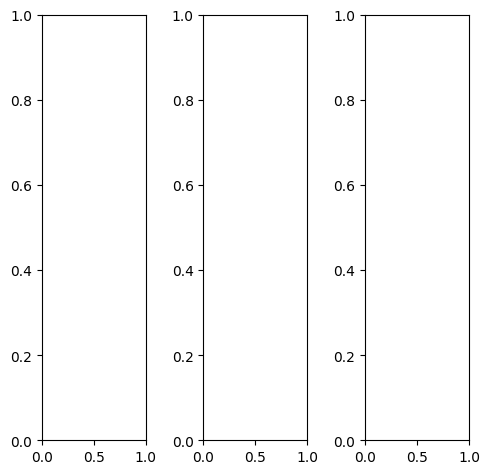

tensor([[[0.2549, 0.2588, 0.2510,  ..., 0.2510, 0.2510, 0.2510],
         [0.2471, 0.2549, 0.2588,  ..., 0.2510, 0.2510, 0.2471],
         [0.2549, 0.2667, 0.2627,  ..., 0.2510, 0.2627, 0.2588],
         ...,
         [0.2667, 0.2667, 0.1686,  ..., 0.4039, 0.3412, 0.3373],
         [0.3098, 0.2824, 0.1569,  ..., 0.3529, 0.3451, 0.3647],
         [0.3569, 0.3569, 0.3373,  ..., 0.4000, 0.3843, 0.3686]],

        [[0.2549, 0.2588, 0.2510,  ..., 0.2510, 0.2510, 0.2510],
         [0.2471, 0.2549, 0.2588,  ..., 0.2510, 0.2510, 0.2471],
         [0.2549, 0.2667, 0.2627,  ..., 0.2510, 0.2627, 0.2588],
         ...,
         [0.2667, 0.2667, 0.1686,  ..., 0.4039, 0.3412, 0.3373],
         [0.3098, 0.2824, 0.1569,  ..., 0.3529, 0.3451, 0.3647],
         [0.3569, 0.3569, 0.3373,  ..., 0.4000, 0.3843, 0.3686]],

        [[0.2549, 0.2588, 0.2510,  ..., 0.2510, 0.2510, 0.2510],
         [0.2471, 0.2549, 0.2588,  ..., 0.2510, 0.2510, 0.2471],
         [0.2549, 0.2667, 0.2627,  ..., 0.2510, 0.2627, 0.

tensor([[[0.4235, 0.4235, 0.4157,  ..., 0.4196, 0.4275, 0.4314],
         [0.4118, 0.4196, 0.4196,  ..., 0.4157, 0.4235, 0.4275],
         [0.4196, 0.4275, 0.4275,  ..., 0.4157, 0.4353, 0.4392],
         ...,
         [0.4314, 0.4275, 0.2980,  ..., 0.5216, 0.5059, 0.5020],
         [0.4745, 0.4392, 0.2784,  ..., 0.5098, 0.5098, 0.5294],
         [0.5216, 0.5216, 0.4902,  ..., 0.5569, 0.5412, 0.5333]],

        [[0.1686, 0.1725, 0.1686,  ..., 0.1647, 0.1608, 0.1608],
         [0.1647, 0.1725, 0.1765,  ..., 0.1647, 0.1608, 0.1569],
         [0.1686, 0.1843, 0.1804,  ..., 0.1686, 0.1725, 0.1686],
         ...,
         [0.1843, 0.1843, 0.1020,  ..., 0.3490, 0.2588, 0.2549],
         [0.2235, 0.2000, 0.0941,  ..., 0.2784, 0.2627, 0.2824],
         [0.2706, 0.2745, 0.2588,  ..., 0.3216, 0.3020, 0.2824]],

        [[0.2549, 0.2549, 0.2510,  ..., 0.2510, 0.2510, 0.2510],
         [0.2471, 0.2549, 0.2588,  ..., 0.2471, 0.2471, 0.2510],
         [0.2549, 0.2627, 0.2627,  ..., 0.2510, 0.2627, 0.

tensor([[[ 0.0839,  0.1394,  0.0335,  ...,  0.1758,  0.1894,  0.2208],
         [ 0.1363,  0.0238,  0.0894,  ...,  0.1443,  0.1491,  0.1887],
         [-0.0211,  0.0812,  0.0070,  ...,  0.1311,  0.1503,  0.1964],
         ...,
         [ 0.2597,  0.3191,  0.1886,  ...,  0.4382,  0.3839,  0.4011],
         [ 0.2932,  0.3232,  0.1627,  ...,  0.3680,  0.3747,  0.4147],
         [ 0.3436,  0.3514,  0.3340,  ...,  0.4023,  0.3743,  0.4211]],

        [[ 0.1942,  0.2957,  0.1378,  ...,  0.2557,  0.2649,  0.2682],
         [ 0.1443,  0.0539, -0.0329,  ...,  0.2416,  0.2666,  0.2570],
         [ 0.0764,  0.2711,  0.0219,  ...,  0.2214,  0.2518,  0.2643],
         ...,
         [ 0.2127,  0.2373,  0.1116,  ...,  0.3939,  0.3353,  0.3294],
         [ 0.2579,  0.2736,  0.0955,  ...,  0.3251,  0.3310,  0.3540],
         [ 0.3188,  0.3173,  0.2922,  ...,  0.3706,  0.3450,  0.3707]],

        [[ 0.3844,  0.2254,  0.2968,  ...,  0.3957,  0.4185,  0.4298],
         [ 0.3252,  0.2290,  0.2971,  ...,  0

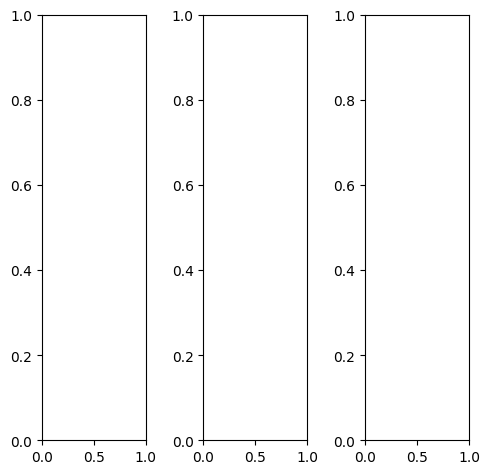

tensor([[[0.6745, 0.6392, 0.6902,  ..., 0.6941, 0.5059, 0.3843],
         [0.7059, 0.7216, 0.7490,  ..., 0.6588, 0.4941, 0.4078],
         [0.7490, 0.8078, 0.7608,  ..., 0.6157, 0.5373, 0.4471],
         ...,
         [0.4118, 0.4275, 0.4471,  ..., 0.0157, 0.1137, 0.1725],
         [0.3804, 0.4039, 0.4549,  ..., 0.0118, 0.1020, 0.2078],
         [0.3608, 0.3686, 0.4275,  ..., 0.0078, 0.0784, 0.1647]],

        [[0.6745, 0.6392, 0.6902,  ..., 0.6941, 0.5059, 0.3843],
         [0.7059, 0.7216, 0.7490,  ..., 0.6588, 0.4941, 0.4078],
         [0.7490, 0.8078, 0.7608,  ..., 0.6157, 0.5373, 0.4471],
         ...,
         [0.4118, 0.4275, 0.4471,  ..., 0.0157, 0.1137, 0.1725],
         [0.3804, 0.4039, 0.4549,  ..., 0.0118, 0.1020, 0.2078],
         [0.3608, 0.3686, 0.4275,  ..., 0.0078, 0.0784, 0.1647]],

        [[0.6745, 0.6392, 0.6902,  ..., 0.6941, 0.5059, 0.3843],
         [0.7059, 0.7216, 0.7490,  ..., 0.6588, 0.4941, 0.4078],
         [0.7490, 0.8078, 0.7608,  ..., 0.6157, 0.5373, 0.

tensor([[[0.6353, 0.6000, 0.6510,  ..., 0.6157, 0.3529, 0.2000],
         [0.6745, 0.6902, 0.7176,  ..., 0.5647, 0.3216, 0.2118],
         [0.7255, 0.7843, 0.7333,  ..., 0.5098, 0.3647, 0.2510],
         ...,
         [0.4824, 0.4549, 0.4039,  ..., 0.0235, 0.1216, 0.1765],
         [0.4471, 0.4510, 0.4431,  ..., 0.0235, 0.1137, 0.2078],
         [0.4235, 0.4275, 0.4627,  ..., 0.0118, 0.0980, 0.1686]],

        [[0.6667, 0.6275, 0.6863,  ..., 0.7059, 0.5255, 0.4039],
         [0.6980, 0.7098, 0.7412,  ..., 0.6784, 0.5255, 0.4314],
         [0.7412, 0.7961, 0.7490,  ..., 0.6353, 0.5725, 0.4784],
         ...,
         [0.3961, 0.4118, 0.4549,  ..., 0.0118, 0.1176, 0.1882],
         [0.3686, 0.3843, 0.4510,  ..., 0.0078, 0.1059, 0.2235],
         [0.3451, 0.3490, 0.4157,  ..., 0.0039, 0.0706, 0.1725]],

        [[0.8118, 0.7922, 0.8275,  ..., 0.8353, 0.7961, 0.7765],
         [0.8353, 0.8667, 0.8784,  ..., 0.8039, 0.7804, 0.7882],
         [0.8667, 0.9412, 0.8784,  ..., 0.7804, 0.8078, 0.

tensor([[[0.6225, 0.5890, 0.5510,  ..., 0.5815, 0.4183, 0.3840],
         [0.6530, 0.5831, 0.6096,  ..., 0.5398, 0.3974, 0.3759],
         [0.6655, 0.7439, 0.5500,  ..., 0.4703, 0.4463, 0.4085],
         ...,
         [0.4753, 0.5336, 0.5237,  ..., 0.0979, 0.2137, 0.2983],
         [0.4328, 0.5128, 0.5351,  ..., 0.0795, 0.2014, 0.3299],
         [0.4365, 0.4654, 0.5198,  ..., 0.0993, 0.1586, 0.2698]],

        [[0.7014, 0.6191, 0.6197,  ..., 0.6886, 0.5230, 0.4159],
         [0.6254, 0.5124, 0.5655,  ..., 0.6675, 0.5339, 0.4402],
         [0.7867, 0.7594, 0.6813,  ..., 0.5834, 0.5729, 0.4781],
         ...,
         [0.4495, 0.4915, 0.5197,  ..., 0.1092, 0.2131, 0.2636],
         [0.4043, 0.4714, 0.5270,  ..., 0.0907, 0.1886, 0.2779],
         [0.4076, 0.4176, 0.5044,  ..., 0.0890, 0.1411, 0.2371]],

        [[0.7972, 0.7272, 0.8024,  ..., 0.8589, 0.6854, 0.5857],
         [0.8288, 0.7620, 0.8529,  ..., 0.8094, 0.6798, 0.6126],
         [0.8149, 0.8674, 0.8033,  ..., 0.7480, 0.7263, 0.

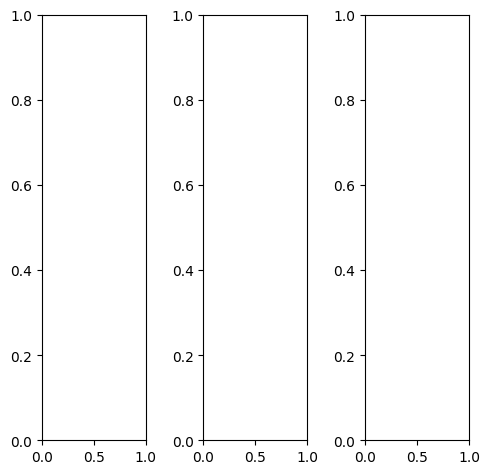

tensor([[[0.7059, 0.6902, 0.6902,  ..., 0.7490, 0.7412, 0.7373],
         [0.6980, 0.6902, 0.7020,  ..., 0.7569, 0.7490, 0.7490],
         [0.7137, 0.7098, 0.7216,  ..., 0.7569, 0.7529, 0.7490],
         ...,
         [0.8000, 0.7922, 0.7961,  ..., 0.8431, 0.8471, 0.8588],
         [0.8118, 0.7922, 0.7961,  ..., 0.8471, 0.8510, 0.8627],
         [0.8157, 0.8000, 0.8078,  ..., 0.8471, 0.8431, 0.8549]],

        [[0.7059, 0.6902, 0.6902,  ..., 0.7490, 0.7412, 0.7373],
         [0.6980, 0.6902, 0.7020,  ..., 0.7569, 0.7490, 0.7490],
         [0.7137, 0.7098, 0.7216,  ..., 0.7569, 0.7529, 0.7490],
         ...,
         [0.8000, 0.7922, 0.7961,  ..., 0.8431, 0.8471, 0.8588],
         [0.8118, 0.7922, 0.7961,  ..., 0.8471, 0.8510, 0.8627],
         [0.8157, 0.8000, 0.8078,  ..., 0.8471, 0.8431, 0.8549]],

        [[0.7059, 0.6902, 0.6902,  ..., 0.7490, 0.7412, 0.7373],
         [0.6980, 0.6902, 0.7020,  ..., 0.7569, 0.7490, 0.7490],
         [0.7137, 0.7098, 0.7216,  ..., 0.7569, 0.7529, 0.

tensor([[[0.7725, 0.7569, 0.7569,  ..., 0.8157, 0.8078, 0.8039],
         [0.7647, 0.7608, 0.7686,  ..., 0.8235, 0.8157, 0.8157],
         [0.7843, 0.7765, 0.7882,  ..., 0.8275, 0.8196, 0.8157],
         ...,
         [0.8588, 0.8510, 0.8549,  ..., 0.9059, 0.9137, 0.9216],
         [0.8706, 0.8510, 0.8549,  ..., 0.9098, 0.9137, 0.9255],
         [0.8745, 0.8588, 0.8667,  ..., 0.9059, 0.9020, 0.9137]],

        [[0.6745, 0.6588, 0.6588,  ..., 0.7176, 0.7098, 0.7059],
         [0.6667, 0.6588, 0.6706,  ..., 0.7255, 0.7176, 0.7176],
         [0.6824, 0.6784, 0.6902,  ..., 0.7255, 0.7216, 0.7176],
         ...,
         [0.7765, 0.7686, 0.7725,  ..., 0.8118, 0.8157, 0.8275],
         [0.7882, 0.7686, 0.7725,  ..., 0.8196, 0.8235, 0.8353],
         [0.7922, 0.7765, 0.7843,  ..., 0.8196, 0.8157, 0.8275]],

        [[0.6863, 0.6706, 0.6706,  ..., 0.7333, 0.7255, 0.7216],
         [0.6784, 0.6706, 0.6824,  ..., 0.7412, 0.7333, 0.7333],
         [0.6941, 0.6902, 0.7020,  ..., 0.7451, 0.7373, 0.

tensor([[[0.3512, 0.2779, 0.1192,  ..., 0.3904, 0.4001, 0.4185],
         [0.3278, 0.1541, 0.0576,  ..., 0.3949, 0.3722, 0.3734],
         [0.2484, 0.1884, 0.0767,  ..., 0.4132, 0.4270, 0.3964],
         ...,
         [0.5829, 0.5984, 0.5867,  ..., 0.6754, 0.6766, 0.6634],
         [0.6061, 0.5979, 0.5799,  ..., 0.6746, 0.6668, 0.6688],
         [0.6094, 0.5547, 0.5656,  ..., 0.6549, 0.6521, 0.6331]],

        [[0.4484, 0.4038, 0.3066,  ..., 0.4804, 0.5206, 0.4577],
         [0.3667, 0.2372, 0.1114,  ..., 0.5346, 0.5376, 0.4615],
         [0.4042, 0.3568, 0.2644,  ..., 0.5348, 0.5662, 0.4720],
         ...,
         [0.5565, 0.5711, 0.5684,  ..., 0.6578, 0.6572, 0.6326],
         [0.5868, 0.5552, 0.5617,  ..., 0.6643, 0.6555, 0.6466],
         [0.5737, 0.5473, 0.5515,  ..., 0.6262, 0.6302, 0.6080]],

        [[0.6112, 0.4422, 0.4582,  ..., 0.6582, 0.6680, 0.6339],
         [0.5371, 0.4299, 0.3736,  ..., 0.6725, 0.6894, 0.6457],
         [0.4792, 0.4490, 0.4102,  ..., 0.7190, 0.7363, 0.

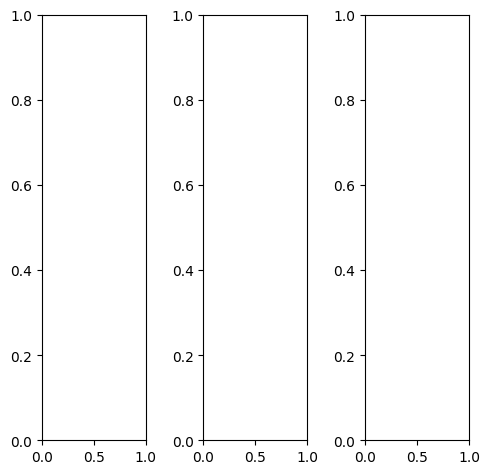

tensor([[[0.4941, 0.4549, 0.5843,  ..., 0.5843, 0.6824, 0.6353],
         [0.4431, 0.4471, 0.5255,  ..., 0.6902, 0.6745, 0.6549],
         [0.4941, 0.4275, 0.4118,  ..., 0.8000, 0.7098, 0.7020],
         ...,
         [0.5529, 0.5608, 0.6627,  ..., 0.6000, 0.6235, 0.6902],
         [0.5294, 0.4627, 0.5922,  ..., 0.5412, 0.5490, 0.6510],
         [0.5098, 0.4235, 0.5176,  ..., 0.5020, 0.5490, 0.5804]],

        [[0.4941, 0.4549, 0.5843,  ..., 0.5843, 0.6824, 0.6353],
         [0.4431, 0.4471, 0.5255,  ..., 0.6902, 0.6745, 0.6549],
         [0.4941, 0.4275, 0.4118,  ..., 0.8000, 0.7098, 0.7020],
         ...,
         [0.5529, 0.5608, 0.6627,  ..., 0.6000, 0.6235, 0.6902],
         [0.5294, 0.4627, 0.5922,  ..., 0.5412, 0.5490, 0.6510],
         [0.5098, 0.4235, 0.5176,  ..., 0.5020, 0.5490, 0.5804]],

        [[0.4941, 0.4549, 0.5843,  ..., 0.5843, 0.6824, 0.6353],
         [0.4431, 0.4471, 0.5255,  ..., 0.6902, 0.6745, 0.6549],
         [0.4941, 0.4275, 0.4118,  ..., 0.8000, 0.7098, 0.

tensor([[[0.5725, 0.5333, 0.6627,  ..., 0.6275, 0.7255, 0.6824],
         [0.5216, 0.5216, 0.6039,  ..., 0.7216, 0.7059, 0.6863],
         [0.5647, 0.4941, 0.4784,  ..., 0.8235, 0.7333, 0.7255],
         ...,
         [0.6196, 0.6275, 0.7255,  ..., 0.6706, 0.6941, 0.7569],
         [0.5961, 0.5294, 0.6588,  ..., 0.6118, 0.6157, 0.7176],
         [0.5765, 0.4902, 0.5843,  ..., 0.5608, 0.6118, 0.6431]],

        [[0.4824, 0.4471, 0.5765,  ..., 0.5804, 0.6784, 0.6353],
         [0.4314, 0.4353, 0.5137,  ..., 0.6941, 0.6784, 0.6588],
         [0.4824, 0.4157, 0.4000,  ..., 0.8078, 0.7216, 0.7098],
         ...,
         [0.5490, 0.5569, 0.6588,  ..., 0.5922, 0.6118, 0.6784],
         [0.5255, 0.4549, 0.5882,  ..., 0.5333, 0.5373, 0.6392],
         [0.5059, 0.4157, 0.5137,  ..., 0.4941, 0.5412, 0.5686]],

        [[0.3333, 0.3020, 0.4314,  ..., 0.4745, 0.5725, 0.5255],
         [0.2980, 0.3059, 0.3882,  ..., 0.5765, 0.5608, 0.5412],
         [0.3647, 0.2980, 0.2824,  ..., 0.6863, 0.6000, 0.

tensor([[[ 0.2593,  0.2122,  0.1722,  ...,  0.3503,  0.4543,  0.5057],
         [ 0.2306,  0.1304,  0.1499,  ...,  0.3802,  0.4339,  0.4893],
         [ 0.1753,  0.1426, -0.0592,  ...,  0.5306,  0.4595,  0.5271],
         ...,
         [ 0.5121,  0.5726,  0.6340,  ...,  0.5353,  0.5713,  0.6472],
         [ 0.4988,  0.4588,  0.5940,  ...,  0.4957,  0.5060,  0.6206],
         [ 0.4619,  0.3854,  0.4668,  ...,  0.4601,  0.5197,  0.5667]],

        [[ 0.3809,  0.3146,  0.3489,  ...,  0.4698,  0.5920,  0.5690],
         [ 0.2481,  0.1745,  0.1261,  ...,  0.5786,  0.5985,  0.6194],
         [ 0.3354,  0.2409,  0.1378,  ...,  0.6964,  0.5918,  0.6455],
         ...,
         [ 0.4474,  0.4636,  0.5623,  ...,  0.5320,  0.5694,  0.6060],
         [ 0.4379,  0.3709,  0.5042,  ...,  0.5168,  0.5057,  0.5980],
         [ 0.4216,  0.3210,  0.4244,  ...,  0.4417,  0.5040,  0.5268]],

        [[ 0.5562,  0.3810,  0.5922,  ...,  0.7021,  0.8080,  0.7528],
         [ 0.4546,  0.4364,  0.5329,  ...,  0

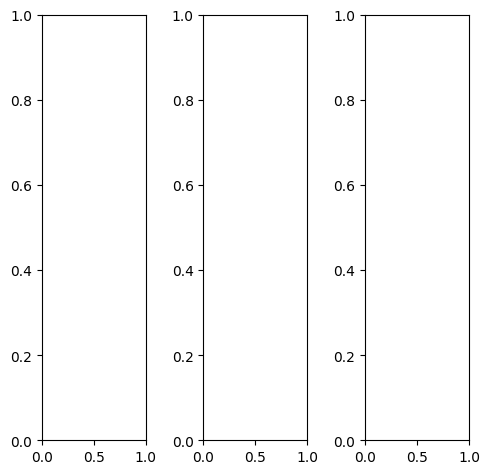

EPOCH: 21.510  trn_loss: 0.005  (2595.32s - 9470.22s remaining)

tensor([[[0.2039, 0.2706, 0.2784,  ..., 0.2863, 0.4118, 0.3059],
         [0.1961, 0.3176, 0.3059,  ..., 0.2000, 0.1843, 0.2902],
         [0.1922, 0.3137, 0.3294,  ..., 0.1569, 0.2157, 0.3373],
         ...,
         [0.2431, 0.2667, 0.2824,  ..., 0.3059, 0.2471, 0.2314],
         [0.2863, 0.2902, 0.2980,  ..., 0.3255, 0.2706, 0.2235],
         [0.2980, 0.3098, 0.3255,  ..., 0.3216, 0.3137, 0.2510]],

        [[0.2039, 0.2706, 0.2784,  ..., 0.2863, 0.4118, 0.3059],
         [0.1961, 0.3176, 0.3059,  ..., 0.2000, 0.1843, 0.2902],
         [0.1922, 0.3137, 0.3294,  ..., 0.1569, 0.2157, 0.3373],
         ...,
         [0.2431, 0.2667, 0.2824,  ..., 0.3059, 0.2471, 0.2314],
         [0.2863, 0.2902, 0.2980,  ..., 0.3255, 0.2706, 0.2235],
         [0.2980, 0.3098, 0.3255,  ..., 0.3216, 0.3137, 0.2510]],

        [[0.2039, 0.2706, 0.2784,  ..., 0.2863, 0.4118, 0.3059],
         [0.1961, 0.3176, 0.3059,  ..., 0.2000, 0.1843, 0.2902],
         [0.1922, 0.3137, 0.3294,  ..., 0.1569, 0.2157, 0.

tensor([[[0.2902, 0.3804, 0.3804,  ..., 0.2784, 0.4078, 0.3373],
         [0.2784, 0.4353, 0.4078,  ..., 0.2118, 0.2392, 0.4000],
         [0.2745, 0.4431, 0.4314,  ..., 0.1843, 0.2980, 0.4784],
         ...,
         [0.3686, 0.4039, 0.4314,  ..., 0.4627, 0.3804, 0.3569],
         [0.4314, 0.4431, 0.4549,  ..., 0.4902, 0.4235, 0.3412],
         [0.4549, 0.4706, 0.4941,  ..., 0.4863, 0.4784, 0.3843]],

        [[0.1765, 0.2392, 0.2471,  ..., 0.2941, 0.4157, 0.2941],
         [0.1686, 0.2824, 0.2745,  ..., 0.2000, 0.1686, 0.2549],
         [0.1686, 0.2745, 0.3020,  ..., 0.1490, 0.1882, 0.2941],
         ...,
         [0.2000, 0.2196, 0.2314,  ..., 0.2510, 0.1961, 0.1843],
         [0.2392, 0.2392, 0.2431,  ..., 0.2667, 0.2157, 0.1804],
         [0.2471, 0.2549, 0.2706,  ..., 0.2627, 0.2549, 0.2039]],

        [[0.1098, 0.1608, 0.1686,  ..., 0.2667, 0.4078, 0.2706],
         [0.1059, 0.1804, 0.1922,  ..., 0.1647, 0.1216, 0.1765],
         [0.1098, 0.1804, 0.2196,  ..., 0.1216, 0.1294, 0.

tensor([[[0.1352, 0.1534, 0.0711,  ..., 0.2736, 0.3955, 0.3659],
         [0.1404, 0.1587, 0.1324,  ..., 0.1886, 0.1806, 0.3512],
         [0.0343, 0.1929, 0.1504,  ..., 0.1246, 0.2134, 0.4017],
         ...,
         [0.3298, 0.3984, 0.4082,  ..., 0.4717, 0.3786, 0.3649],
         [0.3807, 0.4156, 0.4350,  ..., 0.4879, 0.4064, 0.3348],
         [0.3698, 0.3985, 0.4079,  ..., 0.4481, 0.4227, 0.3714]],

        [[0.2434, 0.2751, 0.1981,  ..., 0.3459, 0.4888, 0.4188],
         [0.1849, 0.2847, 0.1215,  ..., 0.2822, 0.2926, 0.4152],
         [0.1725, 0.3117, 0.2626,  ..., 0.2205, 0.3163, 0.4576],
         ...,
         [0.3057, 0.3655, 0.4161,  ..., 0.4907, 0.3793, 0.3037],
         [0.3638, 0.3889, 0.4286,  ..., 0.5174, 0.4012, 0.2938],
         [0.3633, 0.3628, 0.4159,  ..., 0.4290, 0.3988, 0.3228]],

        [[0.3875, 0.3144, 0.3873,  ..., 0.4786, 0.6388, 0.5590],
         [0.3704, 0.4603, 0.4226,  ..., 0.4199, 0.4466, 0.5636],
         [0.2830, 0.4154, 0.4851,  ..., 0.3770, 0.4951, 0.

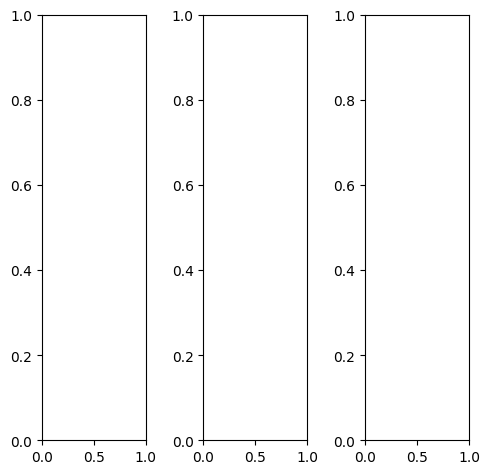

tensor([[[0.1608, 0.1098, 0.0941,  ..., 0.7686, 0.7490, 0.7412],
         [0.0980, 0.0824, 0.0745,  ..., 0.7804, 0.7804, 0.7647],
         [0.0863, 0.0706, 0.0588,  ..., 0.8039, 0.7961, 0.7608],
         ...,
         [0.6667, 0.6392, 0.6824,  ..., 0.6627, 0.6824, 0.7020],
         [0.7020, 0.6745, 0.7451,  ..., 0.6667, 0.6549, 0.6196],
         [0.8078, 0.8000, 0.7922,  ..., 0.7373, 0.6980, 0.6863]],

        [[0.1608, 0.1098, 0.0941,  ..., 0.7686, 0.7490, 0.7412],
         [0.0980, 0.0824, 0.0745,  ..., 0.7804, 0.7804, 0.7647],
         [0.0863, 0.0706, 0.0588,  ..., 0.8039, 0.7961, 0.7608],
         ...,
         [0.6667, 0.6392, 0.6824,  ..., 0.6627, 0.6824, 0.7020],
         [0.7020, 0.6745, 0.7451,  ..., 0.6667, 0.6549, 0.6196],
         [0.8078, 0.8000, 0.7922,  ..., 0.7373, 0.6980, 0.6863]],

        [[0.1608, 0.1098, 0.0941,  ..., 0.7686, 0.7490, 0.7412],
         [0.0980, 0.0824, 0.0745,  ..., 0.7804, 0.7804, 0.7647],
         [0.0863, 0.0706, 0.0588,  ..., 0.8039, 0.7961, 0.

tensor([[[0.1725, 0.1137, 0.0941,  ..., 0.7765, 0.7608, 0.7608],
         [0.1098, 0.0863, 0.0745,  ..., 0.7686, 0.7882, 0.7882],
         [0.0941, 0.0784, 0.0667,  ..., 0.7961, 0.7922, 0.7647],
         ...,
         [0.7922, 0.7412, 0.7882,  ..., 0.6824, 0.6863, 0.6980],
         [0.7922, 0.7412, 0.8118,  ..., 0.6941, 0.6667, 0.6471],
         [0.8510, 0.8353, 0.8275,  ..., 0.7412, 0.6980, 0.7059]],

        [[0.1647, 0.1176, 0.1020,  ..., 0.7608, 0.7451, 0.7333],
         [0.1020, 0.0863, 0.0784,  ..., 0.7765, 0.7725, 0.7529],
         [0.0902, 0.0706, 0.0549,  ..., 0.7961, 0.7922, 0.7529],
         ...,
         [0.6392, 0.6157, 0.6549,  ..., 0.6549, 0.6824, 0.7020],
         [0.6784, 0.6627, 0.7255,  ..., 0.6588, 0.6471, 0.6118],
         [0.7922, 0.7882, 0.7804,  ..., 0.7333, 0.6980, 0.6824]],

        [[0.1020, 0.0706, 0.0549,  ..., 0.7765, 0.7373, 0.7373],
         [0.0588, 0.0588, 0.0549,  ..., 0.8353, 0.7961, 0.7725],
         [0.0549, 0.0549, 0.0431,  ..., 0.8588, 0.8314, 0.

tensor([[[-3.9946e-02, -5.4945e-02, -2.0653e-01,  ...,  4.8281e-01,
           4.6351e-01,  5.5839e-01],
         [ 5.0730e-03, -1.6729e-01, -1.0471e-01,  ...,  3.8829e-01,
           4.6198e-01,  5.2922e-01],
         [-2.4080e-01, -1.4110e-01, -2.5386e-01,  ...,  4.3619e-01,
           4.8544e-01,  5.1385e-01],
         ...,
         [ 5.5089e-01,  5.5476e-01,  5.1560e-01,  ...,  5.5081e-01,
           6.0478e-01,  6.4835e-01],
         [ 5.7574e-01,  5.3800e-01,  5.6529e-01,  ...,  5.7719e-01,
           5.7610e-01,  5.6432e-01],
         [ 6.7933e-01,  6.7907e-01,  6.5210e-01,  ...,  6.5699e-01,
           6.3319e-01,  6.2774e-01]],

        [[ 1.1558e-01, -1.7301e-04, -1.5451e-02,  ...,  6.4014e-01,
           6.4045e-01,  6.4171e-01],
         [ 1.3747e-02, -3.2424e-01, -2.5831e-01,  ...,  6.2965e-01,
           6.6919e-01,  7.0070e-01],
         [-3.4519e-02, -8.7735e-02, -8.1936e-02,  ...,  6.5746e-01,
           6.6411e-01,  6.7549e-01],
         ...,
         [ 5.2949e-01,  5

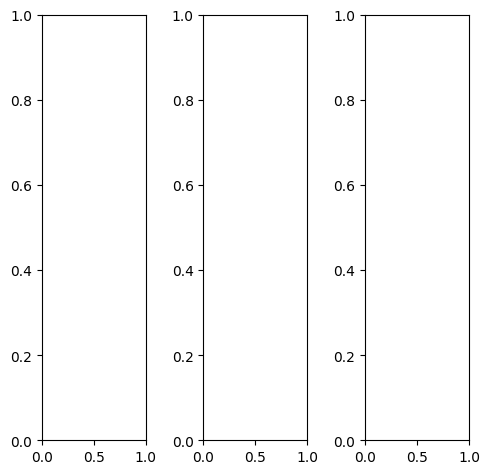

tensor([[[0.3373, 0.3333, 0.3647,  ..., 0.4314, 0.4235, 0.4039],
         [0.3255, 0.3137, 0.4118,  ..., 0.6275, 0.5608, 0.5020],
         [0.3373, 0.3216, 0.3882,  ..., 0.6078, 0.5373, 0.5529],
         ...,
         [0.8471, 0.8078, 0.7647,  ..., 0.9059, 0.9373, 0.8039],
         [0.6588, 0.8235, 0.7294,  ..., 0.4902, 0.8745, 0.6980],
         [0.4941, 0.6431, 0.7686,  ..., 0.7020, 0.7137, 0.4980]],

        [[0.3373, 0.3333, 0.3647,  ..., 0.4314, 0.4235, 0.4039],
         [0.3255, 0.3137, 0.4118,  ..., 0.6275, 0.5608, 0.5020],
         [0.3373, 0.3216, 0.3882,  ..., 0.6078, 0.5373, 0.5529],
         ...,
         [0.8471, 0.8078, 0.7647,  ..., 0.9059, 0.9373, 0.8039],
         [0.6588, 0.8235, 0.7294,  ..., 0.4902, 0.8745, 0.6980],
         [0.4941, 0.6431, 0.7686,  ..., 0.7020, 0.7137, 0.4980]],

        [[0.3373, 0.3333, 0.3647,  ..., 0.4314, 0.4235, 0.4039],
         [0.3255, 0.3137, 0.4118,  ..., 0.6275, 0.5608, 0.5020],
         [0.3373, 0.3216, 0.3882,  ..., 0.6078, 0.5373, 0.

tensor([[[0.2431, 0.2353, 0.2941,  ..., 0.3529, 0.3451, 0.3333],
         [0.2353, 0.2196, 0.3412,  ..., 0.6196, 0.5529, 0.4667],
         [0.2431, 0.2275, 0.3176,  ..., 0.5961, 0.5255, 0.5216],
         ...,
         [0.8000, 0.8078, 0.7843,  ..., 0.9098, 0.9373, 0.7882],
         [0.5922, 0.8078, 0.7412,  ..., 0.4941, 0.8706, 0.6627],
         [0.3843, 0.5765, 0.7373,  ..., 0.6824, 0.6706, 0.4118]],

        [[0.3647, 0.3608, 0.3882,  ..., 0.4706, 0.4510, 0.4353],
         [0.3529, 0.3412, 0.4471,  ..., 0.6745, 0.6000, 0.5373],
         [0.3647, 0.3451, 0.4157,  ..., 0.6627, 0.5804, 0.5961],
         ...,
         [0.8627, 0.8078, 0.7608,  ..., 0.9059, 0.9412, 0.8078],
         [0.6824, 0.8314, 0.7294,  ..., 0.4863, 0.8784, 0.7098],
         [0.5294, 0.6667, 0.7843,  ..., 0.7098, 0.7333, 0.5294]],

        [[0.4275, 0.4353, 0.4275,  ..., 0.4510, 0.4863, 0.4392],
         [0.4196, 0.4078, 0.4275,  ..., 0.4000, 0.3686, 0.4039],
         [0.4392, 0.4431, 0.4235,  ..., 0.3647, 0.3412, 0.

tensor([[[ 0.0412,  0.0042, -0.0120,  ...,  0.2356,  0.2430,  0.2781],
         [ 0.0551, -0.1359, -0.0045,  ...,  0.4449,  0.3800,  0.3300],
         [-0.0924, -0.1175, -0.1627,  ...,  0.4117,  0.3555,  0.3771],
         ...,
         [ 0.7827,  0.7580,  0.6774,  ...,  0.8364,  0.9013,  0.7279],
         [ 0.5911,  0.7511,  0.6212,  ...,  0.3703,  0.8015,  0.6368],
         [ 0.4479,  0.5592,  0.6608,  ...,  0.5972,  0.6394,  0.4975]],

        [[ 0.1529,  0.1673,  0.0619,  ...,  0.3089,  0.3248,  0.3130],
         [ 0.0978, -0.0303, -0.0375,  ...,  0.5420,  0.4936,  0.3822],
         [ 0.0207,  0.0758, -0.0933,  ...,  0.5136,  0.4494,  0.4246],
         ...,
         [ 0.7394,  0.7114,  0.6808,  ...,  0.7617,  0.8252,  0.7013],
         [ 0.5339,  0.7097,  0.6028,  ...,  0.3401,  0.7792,  0.6125],
         [ 0.4150,  0.5179,  0.6310,  ...,  0.5559,  0.5922,  0.4581]],

        [[ 0.3141,  0.1109,  0.2779,  ...,  0.4394,  0.4579,  0.4569],
         [ 0.2776,  0.1291,  0.2783,  ...,  0

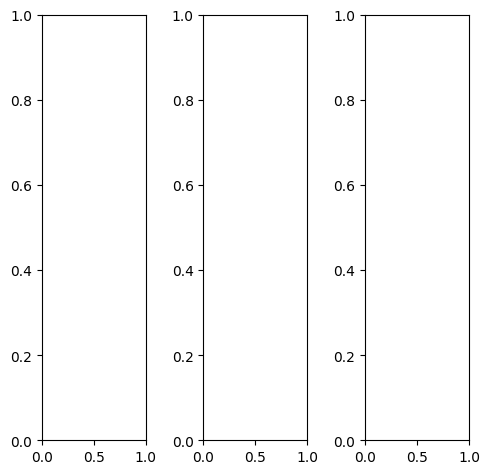

tensor([[[0.7647, 0.6471, 0.4706,  ..., 0.3255, 0.3294, 0.2941],
         [0.7255, 0.6235, 0.4549,  ..., 0.2275, 0.2275, 0.2039],
         [0.7294, 0.6157, 0.4627,  ..., 0.2471, 0.2314, 0.2039],
         ...,
         [0.3765, 0.3843, 0.3725,  ..., 0.3059, 0.2980, 0.2784],
         [0.4039, 0.3725, 0.3686,  ..., 0.2941, 0.2784, 0.2706],
         [0.3804, 0.3725, 0.3686,  ..., 0.2980, 0.2863, 0.2863]],

        [[0.7647, 0.6471, 0.4706,  ..., 0.3255, 0.3294, 0.2941],
         [0.7255, 0.6235, 0.4549,  ..., 0.2275, 0.2275, 0.2039],
         [0.7294, 0.6157, 0.4627,  ..., 0.2471, 0.2314, 0.2039],
         ...,
         [0.3765, 0.3843, 0.3725,  ..., 0.3059, 0.2980, 0.2784],
         [0.4039, 0.3725, 0.3686,  ..., 0.2941, 0.2784, 0.2706],
         [0.3804, 0.3725, 0.3686,  ..., 0.2980, 0.2863, 0.2863]],

        [[0.7647, 0.6471, 0.4706,  ..., 0.3255, 0.3294, 0.2941],
         [0.7255, 0.6235, 0.4549,  ..., 0.2275, 0.2275, 0.2039],
         [0.7294, 0.6157, 0.4627,  ..., 0.2471, 0.2314, 0.

tensor([[[0.8667, 0.7333, 0.5255,  ..., 0.3647, 0.3647, 0.3216],
         [0.8431, 0.7255, 0.5216,  ..., 0.2471, 0.2431, 0.2118],
         [0.8392, 0.7098, 0.5176,  ..., 0.2588, 0.2471, 0.2078],
         ...,
         [0.4275, 0.4353, 0.4235,  ..., 0.3647, 0.3490, 0.3216],
         [0.4471, 0.4157, 0.4118,  ..., 0.3451, 0.3255, 0.3137],
         [0.4196, 0.4118, 0.4078,  ..., 0.3373, 0.3216, 0.3255]],

        [[0.7137, 0.6039, 0.4471,  ..., 0.3020, 0.3059, 0.2745],
         [0.6706, 0.5765, 0.4235,  ..., 0.2078, 0.2118, 0.1922],
         [0.6784, 0.5725, 0.4353,  ..., 0.2275, 0.2118, 0.1882],
         ...,
         [0.3529, 0.3608, 0.3529,  ..., 0.2784, 0.2706, 0.2588],
         [0.3843, 0.3569, 0.3490,  ..., 0.2667, 0.2549, 0.2510],
         [0.3647, 0.3569, 0.3529,  ..., 0.2784, 0.2667, 0.2667]],

        [[0.7490, 0.6314, 0.4588,  ..., 0.3412, 0.3451, 0.3098],
         [0.7137, 0.6118, 0.4392,  ..., 0.2745, 0.2784, 0.2588],
         [0.7137, 0.6039, 0.4431,  ..., 0.3098, 0.2941, 0.

tensor([[[0.9508, 0.8199, 0.5098,  ..., 0.2503, 0.2603, 0.2705],
         [0.8497, 0.6657, 0.4819,  ..., 0.0982, 0.0827, 0.1134],
         [0.8788, 0.7425, 0.4252,  ..., 0.1343, 0.1040, 0.0934],
         ...,
         [0.4716, 0.5308, 0.5285,  ..., 0.4487, 0.4040, 0.3807],
         [0.5304, 0.4897, 0.5094,  ..., 0.3948, 0.3681, 0.3570],
         [0.4941, 0.4982, 0.4952,  ..., 0.3974, 0.3686, 0.3869]],

        [[0.9542, 0.8687, 0.5759,  ..., 0.4087, 0.4268, 0.3759],
         [0.8211, 0.6147, 0.4597,  ..., 0.2590, 0.2700, 0.2264],
         [0.9532, 0.7841, 0.5527,  ..., 0.3093, 0.2754, 0.2202],
         ...,
         [0.4633, 0.5044, 0.5169,  ..., 0.4495, 0.4276, 0.3374],
         [0.5041, 0.4676, 0.5068,  ..., 0.4086, 0.3810, 0.3323],
         [0.4751, 0.4814, 0.4922,  ..., 0.3674, 0.3571, 0.3410]],

        [[1.0712, 1.0302, 0.6948,  ..., 0.6241, 0.6473, 0.5692],
         [1.0106, 0.9006, 0.7264,  ..., 0.4827, 0.4937, 0.4484],
         [0.9856, 0.9184, 0.6087,  ..., 0.5171, 0.5130, 0.

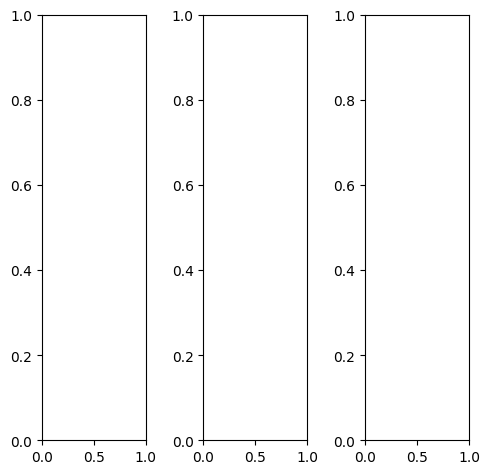

tensor([[[0.8078, 0.7961, 0.8000,  ..., 0.7490, 0.7451, 0.7412],
         [0.8314, 0.8196, 0.8275,  ..., 0.7686, 0.7647, 0.7647],
         [0.8353, 0.8275, 0.8314,  ..., 0.7804, 0.7765, 0.7686],
         ...,
         [0.3804, 0.3765, 0.4078,  ..., 0.3020, 0.3216, 0.3490],
         [0.3569, 0.3490, 0.4196,  ..., 0.3255, 0.3137, 0.3216],
         [0.3412, 0.3373, 0.3725,  ..., 0.2863, 0.2627, 0.2627]],

        [[0.8078, 0.7961, 0.8000,  ..., 0.7490, 0.7451, 0.7412],
         [0.8314, 0.8196, 0.8275,  ..., 0.7686, 0.7647, 0.7647],
         [0.8353, 0.8275, 0.8314,  ..., 0.7804, 0.7765, 0.7686],
         ...,
         [0.3804, 0.3765, 0.4078,  ..., 0.3020, 0.3216, 0.3490],
         [0.3569, 0.3490, 0.4196,  ..., 0.3255, 0.3137, 0.3216],
         [0.3412, 0.3373, 0.3725,  ..., 0.2863, 0.2627, 0.2627]],

        [[0.8078, 0.7961, 0.8000,  ..., 0.7490, 0.7451, 0.7412],
         [0.8314, 0.8196, 0.8275,  ..., 0.7686, 0.7647, 0.7647],
         [0.8353, 0.8275, 0.8314,  ..., 0.7804, 0.7765, 0.

tensor([[[0.7176, 0.7098, 0.7137,  ..., 0.6627, 0.6588, 0.6588],
         [0.7451, 0.7333, 0.7412,  ..., 0.6824, 0.6784, 0.6745],
         [0.7490, 0.7412, 0.7451,  ..., 0.6941, 0.6902, 0.6824],
         ...,
         [0.2353, 0.2275, 0.2627,  ..., 0.1412, 0.1647, 0.2039],
         [0.2157, 0.2078, 0.2784,  ..., 0.1686, 0.1647, 0.1804],
         [0.2039, 0.2000, 0.2353,  ..., 0.1490, 0.1294, 0.1294]],

        [[0.8314, 0.8196, 0.8235,  ..., 0.7725, 0.7647, 0.7608],
         [0.8588, 0.8471, 0.8549,  ..., 0.7922, 0.7882, 0.7843],
         [0.8627, 0.8549, 0.8588,  ..., 0.8039, 0.7961, 0.7922],
         ...,
         [0.4314, 0.4275, 0.4549,  ..., 0.3569, 0.3725, 0.4000],
         [0.4078, 0.4000, 0.4667,  ..., 0.3765, 0.3647, 0.3725],
         [0.3922, 0.3882, 0.4196,  ..., 0.3333, 0.3098, 0.3098]],

        [[0.9098, 0.8980, 0.9020,  ..., 0.8627, 0.8627, 0.8667],
         [0.9333, 0.9216, 0.9255,  ..., 0.8824, 0.8824, 0.8863],
         [0.9333, 0.9216, 0.9255,  ..., 0.8902, 0.8863, 0.

tensor([[[0.6276, 0.5325, 0.4539,  ..., 0.4901, 0.5194, 0.6054],
         [0.5983, 0.4531, 0.4822,  ..., 0.5083, 0.5456, 0.6028],
         [0.5682, 0.5505, 0.4273,  ..., 0.5084, 0.5559, 0.6134],
         ...,
         [0.1734, 0.1774, 0.2292,  ..., 0.0867, 0.1215, 0.2164],
         [0.1570, 0.1328, 0.2500,  ..., 0.1113, 0.1170, 0.1919],
         [0.2020, 0.1458, 0.2074,  ..., 0.1350, 0.1149, 0.1479]],

        [[0.7213, 0.5924, 0.5584,  ..., 0.5400, 0.5875, 0.6184],
         [0.5916, 0.4648, 0.4916,  ..., 0.5931, 0.6263, 0.6675],
         [0.6939, 0.6123, 0.5815,  ..., 0.5873, 0.6253, 0.6602],
         ...,
         [0.2098, 0.2020, 0.2550,  ..., 0.0942, 0.1200, 0.1730],
         [0.1887, 0.1641, 0.2639,  ..., 0.1254, 0.1113, 0.1431],
         [0.1927, 0.1571, 0.2073,  ..., 0.1133, 0.0883, 0.1056]],

        [[0.8280, 0.7281, 0.7565,  ..., 0.6850, 0.7098, 0.7406],
         [0.8056, 0.7395, 0.7679,  ..., 0.6879, 0.7391, 0.7653],
         [0.7628, 0.7252, 0.7219,  ..., 0.7169, 0.7551, 0.

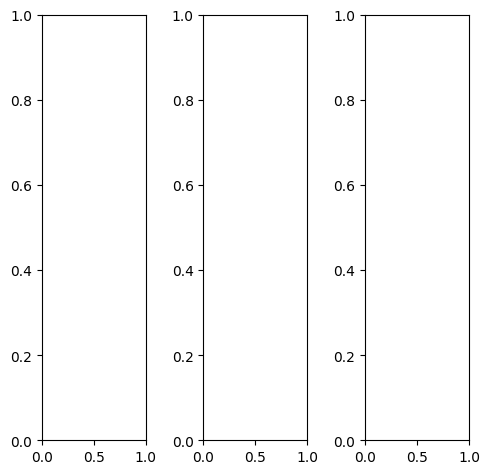

EPOCH: 21.765  trn_loss: 0.005  (2624.71s - 9434.43s remaining)

tensor([[[0.3255, 0.4196, 0.4392,  ..., 0.5098, 0.7216, 0.8510],
         [0.3412, 0.4627, 0.4667,  ..., 0.6392, 0.8510, 0.9647],
         [0.3804, 0.4706, 0.4471,  ..., 0.7882, 0.9608, 0.9843],
         ...,
         [0.3373, 0.3686, 0.6078,  ..., 0.6196, 0.6000, 0.6039],
         [0.3176, 0.4392, 0.7059,  ..., 0.5647, 0.6157, 0.6078],
         [0.3843, 0.5647, 0.7216,  ..., 0.5333, 0.5608, 0.5725]],

        [[0.3255, 0.4196, 0.4392,  ..., 0.5098, 0.7216, 0.8510],
         [0.3412, 0.4627, 0.4667,  ..., 0.6392, 0.8510, 0.9647],
         [0.3804, 0.4706, 0.4471,  ..., 0.7882, 0.9608, 0.9843],
         ...,
         [0.3373, 0.3686, 0.6078,  ..., 0.6196, 0.6000, 0.6039],
         [0.3176, 0.4392, 0.7059,  ..., 0.5647, 0.6157, 0.6078],
         [0.3843, 0.5647, 0.7216,  ..., 0.5333, 0.5608, 0.5725]],

        [[0.3255, 0.4196, 0.4392,  ..., 0.5098, 0.7216, 0.8510],
         [0.3412, 0.4627, 0.4667,  ..., 0.6392, 0.8510, 0.9647],
         [0.3804, 0.4706, 0.4471,  ..., 0.7882, 0.9608, 0.

tensor([[[0.3255, 0.4314, 0.4627,  ..., 0.5451, 0.7569, 0.8745],
         [0.3412, 0.4745, 0.4863,  ..., 0.6706, 0.8745, 0.9804],
         [0.3843, 0.4824, 0.4706,  ..., 0.8196, 0.9804, 0.9922],
         ...,
         [0.3686, 0.3725, 0.5843,  ..., 0.6392, 0.6196, 0.6235],
         [0.3255, 0.4235, 0.6706,  ..., 0.5765, 0.6275, 0.6196],
         [0.3804, 0.5451, 0.6902,  ..., 0.5373, 0.5647, 0.5765]],

        [[0.3294, 0.4235, 0.4392,  ..., 0.5020, 0.7255, 0.8549],
         [0.3451, 0.4667, 0.4667,  ..., 0.6431, 0.8588, 0.9725],
         [0.3843, 0.4745, 0.4471,  ..., 0.7961, 0.9686, 0.9882],
         ...,
         [0.3294, 0.3765, 0.6157,  ..., 0.6196, 0.5961, 0.6000],
         [0.3137, 0.4510, 0.7176,  ..., 0.5647, 0.6157, 0.6078],
         [0.3843, 0.5725, 0.7333,  ..., 0.5333, 0.5608, 0.5725]],

        [[0.2941, 0.3804, 0.3922,  ..., 0.4510, 0.6235, 0.7765],
         [0.3137, 0.4235, 0.4196,  ..., 0.5373, 0.7373, 0.8941],
         [0.3529, 0.4275, 0.4000,  ..., 0.6824, 0.8627, 0.

tensor([[[ 0.0934,  0.1064,  0.0595,  ...,  0.3495,  0.5489,  0.7081],
         [ 0.1299,  0.0594,  0.0739,  ...,  0.4283,  0.6505,  0.7893],
         [ 0.0194,  0.0843, -0.0298,  ...,  0.6303,  0.7872,  0.7894],
         ...,
         [ 0.2703,  0.2934,  0.5503,  ...,  0.5635,  0.5417,  0.5217],
         [ 0.2350,  0.3544,  0.6322,  ...,  0.5036,  0.5434,  0.5297],
         [ 0.3236,  0.4635,  0.6315,  ...,  0.4423,  0.4857,  0.5043]],

        [[ 0.2163,  0.2915,  0.2107,  ...,  0.4080,  0.6405,  0.7774],
         [ 0.2003,  0.2433,  0.1143,  ...,  0.5261,  0.7466,  0.9173],
         [ 0.1646,  0.2958,  0.1349,  ...,  0.6793,  0.8511,  0.8916],
         ...,
         [ 0.2174,  0.2423,  0.5023,  ...,  0.5459,  0.5320,  0.4853],
         [ 0.1875,  0.3312,  0.6259,  ...,  0.4948,  0.5369,  0.5097],
         [ 0.2982,  0.4371,  0.6117,  ...,  0.4178,  0.4701,  0.4747]],

        [[ 0.4005,  0.2946,  0.4350,  ...,  0.6010,  0.8173,  0.9065],
         [ 0.3955,  0.4198,  0.4453,  ...,  0

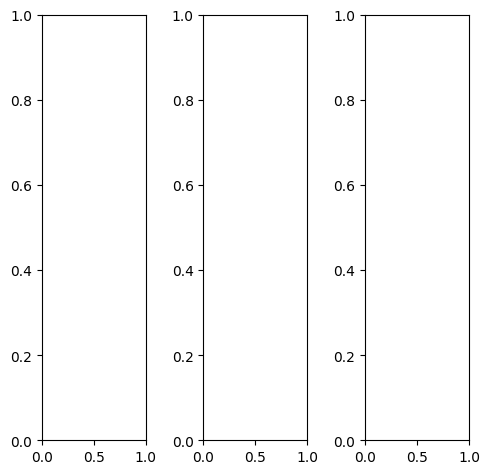

tensor([[[0.2706, 0.2667, 0.2667,  ..., 0.2627, 0.2549, 0.2588],
         [0.2824, 0.2863, 0.2745,  ..., 0.2824, 0.2745, 0.2745],
         [0.2706, 0.2824, 0.2706,  ..., 0.2980, 0.2902, 0.2824],
         ...,
         [0.2627, 0.2392, 0.2235,  ..., 0.2706, 0.2745, 0.2667],
         [0.2627, 0.2353, 0.2235,  ..., 0.2784, 0.2784, 0.2667],
         [0.2431, 0.2353, 0.2353,  ..., 0.2627, 0.2667, 0.2471]],

        [[0.2706, 0.2667, 0.2667,  ..., 0.2627, 0.2549, 0.2588],
         [0.2824, 0.2863, 0.2745,  ..., 0.2824, 0.2745, 0.2745],
         [0.2706, 0.2824, 0.2706,  ..., 0.2980, 0.2902, 0.2824],
         ...,
         [0.2627, 0.2392, 0.2235,  ..., 0.2706, 0.2745, 0.2667],
         [0.2627, 0.2353, 0.2235,  ..., 0.2784, 0.2784, 0.2667],
         [0.2431, 0.2353, 0.2353,  ..., 0.2627, 0.2667, 0.2471]],

        [[0.2706, 0.2667, 0.2667,  ..., 0.2627, 0.2549, 0.2588],
         [0.2824, 0.2863, 0.2745,  ..., 0.2824, 0.2745, 0.2745],
         [0.2706, 0.2824, 0.2706,  ..., 0.2980, 0.2902, 0.

tensor([[[0.2588, 0.2549, 0.2549,  ..., 0.2510, 0.2471, 0.2471],
         [0.2706, 0.2745, 0.2627,  ..., 0.2706, 0.2627, 0.2627],
         [0.2588, 0.2706, 0.2588,  ..., 0.2863, 0.2784, 0.2706],
         ...,
         [0.2510, 0.2275, 0.2118,  ..., 0.2588, 0.2627, 0.2549],
         [0.2510, 0.2235, 0.2118,  ..., 0.2667, 0.2667, 0.2549],
         [0.2314, 0.2235, 0.2235,  ..., 0.2510, 0.2549, 0.2353]],

        [[0.2784, 0.2745, 0.2745,  ..., 0.2706, 0.2627, 0.2667],
         [0.2902, 0.2941, 0.2824,  ..., 0.2902, 0.2824, 0.2824],
         [0.2784, 0.2902, 0.2784,  ..., 0.3059, 0.2980, 0.2902],
         ...,
         [0.2706, 0.2471, 0.2314,  ..., 0.2784, 0.2824, 0.2745],
         [0.2706, 0.2431, 0.2314,  ..., 0.2863, 0.2863, 0.2745],
         [0.2510, 0.2431, 0.2431,  ..., 0.2706, 0.2745, 0.2549]],

        [[0.2510, 0.2471, 0.2471,  ..., 0.2431, 0.2392, 0.2392],
         [0.2627, 0.2667, 0.2549,  ..., 0.2627, 0.2549, 0.2549],
         [0.2510, 0.2627, 0.2510,  ..., 0.2784, 0.2706, 0.

tensor([[[ 0.3024,  0.2018,  0.1238,  ...,  0.1610,  0.1620,  0.2583],
         [ 0.3023,  0.1684,  0.1179,  ...,  0.1319,  0.1202,  0.2180],
         [ 0.2263,  0.1094,  0.0997,  ...,  0.1447,  0.1475,  0.2349],
         ...,
         [ 0.2754,  0.2048,  0.1703,  ...,  0.2391,  0.2434,  0.3080],
         [ 0.2543,  0.1860,  0.1631,  ...,  0.2235,  0.2464,  0.2926],
         [ 0.2776,  0.2103,  0.1860,  ...,  0.2742,  0.2789,  0.3193]],

        [[ 0.3404,  0.2835,  0.1022,  ...,  0.2548,  0.2654,  0.3239],
         [ 0.3196,  0.2161, -0.0071,  ...,  0.2435,  0.2584,  0.2963],
         [ 0.2765,  0.1511,  0.0105,  ...,  0.2683,  0.2764,  0.3100],
         ...,
         [ 0.2712,  0.2057,  0.1673,  ...,  0.2687,  0.2776,  0.2835],
         [ 0.2542,  0.1835,  0.1485,  ...,  0.2551,  0.2647,  0.2754],
         [ 0.2653,  0.2024,  0.1948,  ...,  0.2692,  0.2727,  0.2884]],

        [[ 0.4386,  0.2879,  0.2846,  ...,  0.4250,  0.4383,  0.4874],
         [ 0.4105,  0.2867,  0.2858,  ...,  0

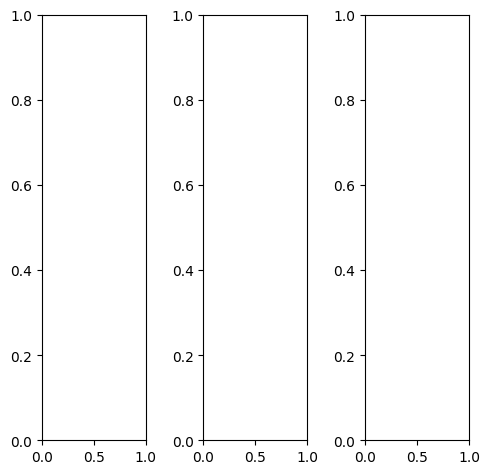

tensor([[[0.7333, 0.7216, 0.7255,  ..., 0.7804, 0.7843, 0.7961],
         [0.7373, 0.7294, 0.7255,  ..., 0.8000, 0.8000, 0.8118],
         [0.7490, 0.7412, 0.7451,  ..., 0.8157, 0.8039, 0.8039],
         ...,
         [0.4784, 0.3882, 0.3686,  ..., 0.6039, 0.7569, 0.7765],
         [0.3647, 0.3098, 0.2941,  ..., 0.7412, 0.7686, 0.7804],
         [0.3020, 0.2902, 0.3020,  ..., 0.7882, 0.7922, 0.7922]],

        [[0.7333, 0.7216, 0.7255,  ..., 0.7804, 0.7843, 0.7961],
         [0.7373, 0.7294, 0.7255,  ..., 0.8000, 0.8000, 0.8118],
         [0.7490, 0.7412, 0.7451,  ..., 0.8157, 0.8039, 0.8039],
         ...,
         [0.4784, 0.3882, 0.3686,  ..., 0.6039, 0.7569, 0.7765],
         [0.3647, 0.3098, 0.2941,  ..., 0.7412, 0.7686, 0.7804],
         [0.3020, 0.2902, 0.3020,  ..., 0.7882, 0.7922, 0.7922]],

        [[0.7333, 0.7216, 0.7255,  ..., 0.7804, 0.7843, 0.7961],
         [0.7373, 0.7294, 0.7255,  ..., 0.8000, 0.8000, 0.8118],
         [0.7490, 0.7412, 0.7451,  ..., 0.8157, 0.8039, 0.

tensor([[[0.7922, 0.8039, 0.7843,  ..., 0.8471, 0.8471, 0.8471],
         [0.8078, 0.8235, 0.8039,  ..., 0.8745, 0.8706, 0.8627],
         [0.8275, 0.8431, 0.8353,  ..., 0.9020, 0.8824, 0.8627],
         ...,
         [0.5647, 0.4902, 0.4784,  ..., 0.7137, 0.8745, 0.8627],
         [0.4471, 0.4078, 0.3961,  ..., 0.8510, 0.8745, 0.8588],
         [0.3686, 0.3686, 0.3882,  ..., 0.8784, 0.8824, 0.8588]],

        [[0.7294, 0.7176, 0.7255,  ..., 0.7686, 0.7765, 0.7882],
         [0.7373, 0.7255, 0.7294,  ..., 0.7882, 0.7922, 0.8039],
         [0.7451, 0.7294, 0.7373,  ..., 0.8000, 0.7922, 0.7961],
         ...,
         [0.4667, 0.3765, 0.3490,  ..., 0.5804, 0.7333, 0.7608],
         [0.3529, 0.3020, 0.2824,  ..., 0.7176, 0.7490, 0.7686],
         [0.3020, 0.2902, 0.2980,  ..., 0.7725, 0.7804, 0.7843]],

        [[0.5922, 0.5412, 0.5569,  ..., 0.6549, 0.6667, 0.7020],
         [0.5529, 0.5020, 0.5137,  ..., 0.6588, 0.6706, 0.7020],
         [0.5804, 0.5255, 0.5412,  ..., 0.6549, 0.6588, 0.

tensor([[[0.4394, 0.3195, 0.2582,  ..., 0.4700, 0.4957, 0.5914],
         [0.4127, 0.2539, 0.2898,  ..., 0.4535, 0.5079, 0.5831],
         [0.3780, 0.3313, 0.2146,  ..., 0.5413, 0.5410, 0.5872],
         ...,
         [0.2560, 0.1665, 0.1348,  ..., 0.4276, 0.6250, 0.6363],
         [0.1206, 0.0011, 0.0051,  ..., 0.6151, 0.6347, 0.6614],
         [0.0871, 0.0261, 0.0473,  ..., 0.6953, 0.6873, 0.6683]],

        [[0.5713, 0.4288, 0.4593,  ..., 0.5437, 0.5946, 0.6181],
         [0.4310, 0.3309, 0.3402,  ..., 0.5611, 0.6001, 0.6784],
         [0.5209, 0.4361, 0.4721,  ..., 0.6230, 0.5988, 0.6447],
         ...,
         [0.2430, 0.1463, 0.1258,  ..., 0.3541, 0.5806, 0.5596],
         [0.1175, 0.0102, 0.0103,  ..., 0.5575, 0.5900, 0.6121],
         [0.0745, 0.0142, 0.0179,  ..., 0.6347, 0.6491, 0.6176]],

        [[0.7346, 0.5580, 0.6661,  ..., 0.7079, 0.7420, 0.7716],
         [0.6617, 0.6288, 0.5986,  ..., 0.7035, 0.7379, 0.7809],
         [0.6325, 0.5797, 0.5811,  ..., 0.7646, 0.7587, 0.

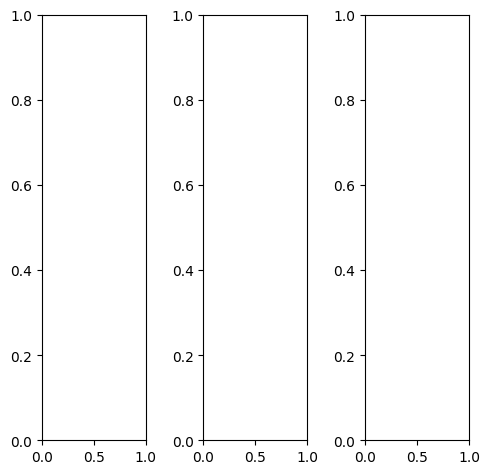

tensor([[[0.4471, 0.4510, 0.4588,  ..., 0.2471, 0.2941, 0.3333],
         [0.4588, 0.3961, 0.4510,  ..., 0.1176, 0.2275, 0.2431],
         [0.5490, 0.3686, 0.4275,  ..., 0.2941, 0.2353, 0.1569],
         ...,
         [0.5176, 0.5412, 0.6353,  ..., 0.5216, 0.5216, 0.4745],
         [0.5294, 0.5176, 0.5098,  ..., 0.4667, 0.4824, 0.4863],
         [0.5059, 0.5059, 0.4824,  ..., 0.4706, 0.4471, 0.4431]],

        [[0.4471, 0.4510, 0.4588,  ..., 0.2471, 0.2941, 0.3333],
         [0.4588, 0.3961, 0.4510,  ..., 0.1176, 0.2275, 0.2431],
         [0.5490, 0.3686, 0.4275,  ..., 0.2941, 0.2353, 0.1569],
         ...,
         [0.5176, 0.5412, 0.6353,  ..., 0.5216, 0.5216, 0.4745],
         [0.5294, 0.5176, 0.5098,  ..., 0.4667, 0.4824, 0.4863],
         [0.5059, 0.5059, 0.4824,  ..., 0.4706, 0.4471, 0.4431]],

        [[0.4471, 0.4510, 0.4588,  ..., 0.2471, 0.2941, 0.3333],
         [0.4588, 0.3961, 0.4510,  ..., 0.1176, 0.2275, 0.2431],
         [0.5490, 0.3686, 0.4275,  ..., 0.2941, 0.2353, 0.

tensor([[[0.4471, 0.4510, 0.4588,  ..., 0.2392, 0.2941, 0.3373],
         [0.4588, 0.3961, 0.4510,  ..., 0.1333, 0.2275, 0.2431],
         [0.5490, 0.3686, 0.4275,  ..., 0.3333, 0.2392, 0.1490],
         ...,
         [0.5451, 0.5804, 0.6745,  ..., 0.5451, 0.5451, 0.4980],
         [0.5569, 0.5451, 0.5412,  ..., 0.4902, 0.5059, 0.5098],
         [0.5333, 0.5333, 0.5098,  ..., 0.4941, 0.4706, 0.4667]],

        [[0.4471, 0.4510, 0.4588,  ..., 0.2549, 0.3020, 0.3412],
         [0.4588, 0.3961, 0.4510,  ..., 0.1216, 0.2314, 0.2510],
         [0.5490, 0.3686, 0.4275,  ..., 0.2863, 0.2392, 0.1608],
         ...,
         [0.5216, 0.5373, 0.6314,  ..., 0.5255, 0.5255, 0.4784],
         [0.5294, 0.5176, 0.5098,  ..., 0.4706, 0.4863, 0.4902],
         [0.5098, 0.5098, 0.4863,  ..., 0.4745, 0.4510, 0.4471]],

        [[0.4471, 0.4510, 0.4588,  ..., 0.2157, 0.2549, 0.2980],
         [0.4588, 0.3961, 0.4510,  ..., 0.0706, 0.1922, 0.2157],
         [0.5490, 0.3686, 0.4275,  ..., 0.2235, 0.2078, 0.

tensor([[[ 0.2744,  0.2229,  0.1210,  ...,  0.0754,  0.1447,  0.1871],
         [ 0.2642,  0.0636,  0.1045,  ..., -0.1465, -0.0017,  0.0635],
         [ 0.3462,  0.0836, -0.0544,  ...,  0.0935,  0.0300, -0.0503],
         ...,
         [ 0.4758,  0.5641,  0.6620,  ...,  0.4794,  0.4824,  0.4056],
         [ 0.5012,  0.5104,  0.4848,  ...,  0.3954,  0.4062,  0.4463],
         [ 0.4630,  0.4654,  0.4042,  ...,  0.3855,  0.3574,  0.3828]],

        [[ 0.4043,  0.3412,  0.3072,  ...,  0.1137,  0.1952,  0.2208],
         [ 0.3066,  0.1924,  0.1039,  ..., -0.0859,  0.0621,  0.0851],
         [ 0.4620,  0.2001,  0.1596,  ...,  0.1552,  0.0729, -0.0455],
         ...,
         [ 0.4241,  0.4719,  0.6277,  ...,  0.5353,  0.5456,  0.3882],
         [ 0.4432,  0.4567,  0.4509,  ...,  0.4635,  0.4764,  0.4405],
         [ 0.4269,  0.4186,  0.4080,  ...,  0.3968,  0.3757,  0.3560]],

        [[ 0.5852,  0.4297,  0.5308,  ...,  0.2592,  0.3517,  0.3801],
         [ 0.5277,  0.4374,  0.4512,  ...,  0

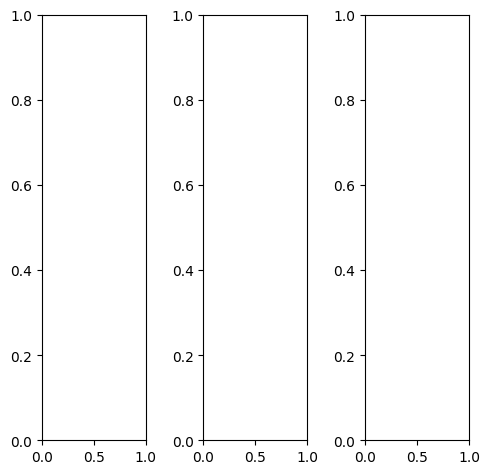

tensor([[[0.2863, 0.1961, 0.2000,  ..., 0.1176, 0.1176, 0.1647],
         [0.2745, 0.2235, 0.2039,  ..., 0.1333, 0.1373, 0.1569],
         [0.3216, 0.2588, 0.1922,  ..., 0.1373, 0.1490, 0.1569],
         ...,
         [0.3804, 0.4196, 0.5216,  ..., 0.6078, 0.5922, 0.6667],
         [0.3490, 0.4000, 0.5294,  ..., 0.5882, 0.5922, 0.6588],
         [0.3686, 0.4157, 0.4941,  ..., 0.6471, 0.5843, 0.6000]],

        [[0.2863, 0.1961, 0.2000,  ..., 0.1176, 0.1176, 0.1647],
         [0.2745, 0.2235, 0.2039,  ..., 0.1333, 0.1373, 0.1569],
         [0.3216, 0.2588, 0.1922,  ..., 0.1373, 0.1490, 0.1569],
         ...,
         [0.3804, 0.4196, 0.5216,  ..., 0.6078, 0.5922, 0.6667],
         [0.3490, 0.4000, 0.5294,  ..., 0.5882, 0.5922, 0.6588],
         [0.3686, 0.4157, 0.4941,  ..., 0.6471, 0.5843, 0.6000]],

        [[0.2863, 0.1961, 0.2000,  ..., 0.1176, 0.1176, 0.1647],
         [0.2745, 0.2235, 0.2039,  ..., 0.1333, 0.1373, 0.1569],
         [0.3216, 0.2588, 0.1922,  ..., 0.1373, 0.1490, 0.

tensor([[[0.2667, 0.1804, 0.1804,  ..., 0.1216, 0.1176, 0.1490],
         [0.2588, 0.2078, 0.1882,  ..., 0.1373, 0.1373, 0.1412],
         [0.3059, 0.2431, 0.1765,  ..., 0.1412, 0.1490, 0.1412],
         ...,
         [0.4196, 0.4588, 0.5608,  ..., 0.6353, 0.6196, 0.6980],
         [0.3882, 0.4392, 0.5686,  ..., 0.6157, 0.6196, 0.6863],
         [0.4078, 0.4549, 0.5333,  ..., 0.6745, 0.6118, 0.6275]],

        [[0.3137, 0.2196, 0.2235,  ..., 0.1137, 0.1216, 0.1882],
         [0.3059, 0.2510, 0.2314,  ..., 0.1333, 0.1451, 0.1765],
         [0.3490, 0.2863, 0.2196,  ..., 0.1412, 0.1569, 0.1765],
         ...,
         [0.3765, 0.4078, 0.5059,  ..., 0.5882, 0.5725, 0.6471],
         [0.3412, 0.3843, 0.5098,  ..., 0.5686, 0.5725, 0.6392],
         [0.3608, 0.4000, 0.4745,  ..., 0.6275, 0.5647, 0.5804]],

        [[0.1843, 0.1294, 0.1176,  ..., 0.1216, 0.1020, 0.0980],
         [0.1608, 0.1255, 0.1059,  ..., 0.1176, 0.1098, 0.0980],
         [0.2118, 0.1608, 0.1020,  ..., 0.1059, 0.1098, 0.

tensor([[[0.4123, 0.2778, 0.1528,  ..., 0.1640, 0.1752, 0.2860],
         [0.3923, 0.1898, 0.1768,  ..., 0.1605, 0.1594, 0.2353],
         [0.3743, 0.2761, 0.0714,  ..., 0.1530, 0.1707, 0.2212],
         ...,
         [0.5738, 0.6113, 0.7600,  ..., 0.8404, 0.8216, 0.9669],
         [0.5217, 0.5643, 0.7339,  ..., 0.7841, 0.8168, 0.9673],
         [0.5827, 0.6571, 0.7296,  ..., 0.9395, 0.8521, 0.9150]],

        [[0.4467, 0.4180, 0.1915,  ..., 0.2089, 0.2164, 0.3177],
         [0.4366, 0.2953, 0.1274,  ..., 0.2364, 0.2547, 0.2760],
         [0.4343, 0.4026, 0.0681,  ..., 0.2246, 0.2458, 0.2755],
         ...,
         [0.5526, 0.5784, 0.7342,  ..., 0.8146, 0.7931, 0.9771],
         [0.4989, 0.5362, 0.7486,  ..., 0.7902, 0.8038, 0.9707],
         [0.5452, 0.6290, 0.7129,  ..., 0.9090, 0.8404, 0.8794]],

        [[0.5873, 0.3957, 0.3602,  ..., 0.3302, 0.3453, 0.4411],
         [0.5425, 0.3547, 0.3873,  ..., 0.3545, 0.3688, 0.4151],
         [0.5233, 0.4357, 0.2793,  ..., 0.3509, 0.3798, 0.

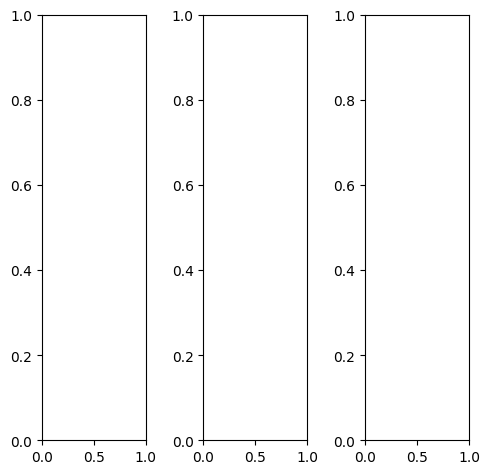

EPOCH: 22.000  val_loss: 0.003  (2660.03s - 9431.00s remaining)

tensor([[[0.4941, 0.5725, 0.5647,  ..., 0.4863, 0.4549, 0.4314],
         [0.5137, 0.5255, 0.5608,  ..., 0.4706, 0.4510, 0.4353],
         [0.5216, 0.5137, 0.5961,  ..., 0.4863, 0.4667, 0.4392],
         ...,
         [0.7137, 0.4157, 0.5412,  ..., 0.3294, 0.3020, 0.3098],
         [0.6824, 0.4078, 0.5725,  ..., 0.3647, 0.3804, 0.3922],
         [0.6157, 0.3725, 0.6000,  ..., 0.4157, 0.4314, 0.4588]],

        [[0.4941, 0.5725, 0.5647,  ..., 0.4863, 0.4549, 0.4314],
         [0.5137, 0.5255, 0.5608,  ..., 0.4706, 0.4510, 0.4353],
         [0.5216, 0.5137, 0.5961,  ..., 0.4863, 0.4667, 0.4392],
         ...,
         [0.7137, 0.4157, 0.5412,  ..., 0.3294, 0.3020, 0.3098],
         [0.6824, 0.4078, 0.5725,  ..., 0.3647, 0.3804, 0.3922],
         [0.6157, 0.3725, 0.6000,  ..., 0.4157, 0.4314, 0.4588]],

        [[0.4941, 0.5725, 0.5647,  ..., 0.4863, 0.4549, 0.4314],
         [0.5137, 0.5255, 0.5608,  ..., 0.4706, 0.4510, 0.4353],
         [0.5216, 0.5137, 0.5961,  ..., 0.4863, 0.4667, 0.

tensor([[[0.4824, 0.5490, 0.5529,  ..., 0.4824, 0.4510, 0.4314],
         [0.5020, 0.5137, 0.5451,  ..., 0.4745, 0.4510, 0.4314],
         [0.5176, 0.5098, 0.5686,  ..., 0.4863, 0.4667, 0.4314],
         ...,
         [0.6980, 0.3922, 0.5020,  ..., 0.4078, 0.3804, 0.3804],
         [0.6667, 0.3843, 0.5294,  ..., 0.4392, 0.4510, 0.4549],
         [0.6000, 0.3412, 0.5608,  ..., 0.4824, 0.4980, 0.5216]],

        [[0.4980, 0.5725, 0.5686,  ..., 0.4863, 0.4549, 0.4275],
         [0.5216, 0.5294, 0.5686,  ..., 0.4706, 0.4471, 0.4314],
         [0.5294, 0.5176, 0.6000,  ..., 0.4824, 0.4627, 0.4392],
         ...,
         [0.7176, 0.4275, 0.5569,  ..., 0.3176, 0.2902, 0.2980],
         [0.6902, 0.4196, 0.5843,  ..., 0.3569, 0.3725, 0.3843],
         [0.6196, 0.3843, 0.6118,  ..., 0.4118, 0.4275, 0.4510]],

        [[0.5059, 0.6196, 0.5765,  ..., 0.5020, 0.4824, 0.4510],
         [0.5059, 0.5412, 0.5765,  ..., 0.4745, 0.4667, 0.4510],
         [0.5059, 0.5098, 0.6392,  ..., 0.5020, 0.4902, 0.

tensor([[[0.5228, 0.5826, 0.5773,  ..., 0.4994, 0.4614, 0.4494],
         [0.5346, 0.5413, 0.5816,  ..., 0.4786, 0.4622, 0.4484],
         [0.5352, 0.5390, 0.6117,  ..., 0.4934, 0.4857, 0.4511],
         ...,
         [0.7459, 0.4777, 0.5755,  ..., 0.3584, 0.3199, 0.3338],
         [0.7175, 0.4484, 0.6078,  ..., 0.4136, 0.4072, 0.4200],
         [0.6396, 0.4194, 0.6334,  ..., 0.4403, 0.4597, 0.4738]],

        [[0.5276, 0.5824, 0.5840,  ..., 0.5071, 0.4696, 0.4517],
         [0.5360, 0.5339, 0.5850,  ..., 0.5030, 0.4772, 0.4619],
         [0.5375, 0.5392, 0.6232,  ..., 0.5049, 0.4952, 0.4578],
         ...,
         [0.7222, 0.4418, 0.5429,  ..., 0.3376, 0.3122, 0.3245],
         [0.6933, 0.4170, 0.5776,  ..., 0.3654, 0.3834, 0.4031],
         [0.6138, 0.4051, 0.6103,  ..., 0.4052, 0.4333, 0.4600]],

        [[0.4287, 0.4631, 0.4440,  ..., 0.3736, 0.3581, 0.3589],
         [0.4025, 0.3940, 0.4395,  ..., 0.3585, 0.3383, 0.3354],
         [0.3921, 0.3909, 0.4616,  ..., 0.3647, 0.3507, 0.

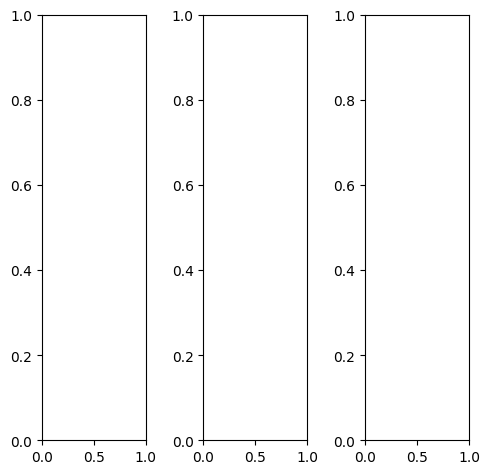

tensor([[[0.6118, 0.6000, 0.6000,  ..., 0.6078, 0.6039, 0.6000],
         [0.6235, 0.6118, 0.6118,  ..., 0.6157, 0.6157, 0.6118],
         [0.6431, 0.6314, 0.6275,  ..., 0.6392, 0.6353, 0.6314],
         ...,
         [0.2588, 0.3608, 0.4000,  ..., 0.8941, 0.8902, 0.8824],
         [0.2392, 0.3333, 0.4275,  ..., 0.8980, 0.8902, 0.8784],
         [0.2471, 0.3961, 0.5804,  ..., 0.8941, 0.8824, 0.8745]],

        [[0.6118, 0.6000, 0.6000,  ..., 0.6078, 0.6039, 0.6000],
         [0.6235, 0.6118, 0.6118,  ..., 0.6157, 0.6157, 0.6118],
         [0.6431, 0.6314, 0.6275,  ..., 0.6392, 0.6353, 0.6314],
         ...,
         [0.2588, 0.3608, 0.4000,  ..., 0.8941, 0.8902, 0.8824],
         [0.2392, 0.3333, 0.4275,  ..., 0.8980, 0.8902, 0.8784],
         [0.2471, 0.3961, 0.5804,  ..., 0.8941, 0.8824, 0.8745]],

        [[0.6118, 0.6000, 0.6000,  ..., 0.6078, 0.6039, 0.6000],
         [0.6235, 0.6118, 0.6118,  ..., 0.6157, 0.6157, 0.6118],
         [0.6431, 0.6314, 0.6275,  ..., 0.6392, 0.6353, 0.

tensor([[[0.4667, 0.4627, 0.4667,  ..., 0.4549, 0.4510, 0.4471],
         [0.5020, 0.4941, 0.4980,  ..., 0.4902, 0.4863, 0.4824],
         [0.5529, 0.5451, 0.5451,  ..., 0.5333, 0.5294, 0.5255],
         ...,
         [0.3137, 0.4157, 0.4627,  ..., 0.9333, 0.9294, 0.9216],
         [0.2941, 0.3922, 0.5020,  ..., 0.9373, 0.9294, 0.9176],
         [0.3176, 0.4745, 0.6745,  ..., 0.9333, 0.9216, 0.9137]],

        [[0.6510, 0.6392, 0.6353,  ..., 0.6471, 0.6471, 0.6431],
         [0.6549, 0.6431, 0.6392,  ..., 0.6471, 0.6471, 0.6431],
         [0.6627, 0.6510, 0.6431,  ..., 0.6667, 0.6627, 0.6588],
         ...,
         [0.2314, 0.3373, 0.3765,  ..., 0.8745, 0.8706, 0.8627],
         [0.2118, 0.3098, 0.4039,  ..., 0.8784, 0.8706, 0.8588],
         [0.2157, 0.3647, 0.5490,  ..., 0.8745, 0.8627, 0.8549]],

        [[0.7804, 0.7686, 0.7647,  ..., 0.7961, 0.7922, 0.7882],
         [0.7725, 0.7569, 0.7569,  ..., 0.7804, 0.7765, 0.7725],
         [0.7765, 0.7647, 0.7608,  ..., 0.7882, 0.7804, 0.

tensor([[[0.6025, 0.5907, 0.5822,  ..., 0.5605, 0.5575, 0.5932],
         [0.6161, 0.6029, 0.6004,  ..., 0.5626, 0.5670, 0.5779],
         [0.6212, 0.6168, 0.6245,  ..., 0.5828, 0.5884, 0.5920],
         ...,
         [0.2594, 0.3861, 0.4374,  ..., 0.9024, 0.8981, 0.8901],
         [0.2421, 0.3628, 0.4595,  ..., 0.9076, 0.9004, 0.8963],
         [0.2812, 0.4174, 0.5979,  ..., 0.9105, 0.9039, 0.8810]],

        [[0.6276, 0.6275, 0.6203,  ..., 0.6299, 0.6272, 0.6274],
         [0.6490, 0.6282, 0.6317,  ..., 0.6322, 0.6343, 0.6440],
         [0.6588, 0.6480, 0.6469,  ..., 0.6604, 0.6538, 0.6518],
         ...,
         [0.2549, 0.3496, 0.3930,  ..., 0.8957, 0.8961, 0.8919],
         [0.2359, 0.3310, 0.4240,  ..., 0.8957, 0.8850, 0.8852],
         [0.2749, 0.3994, 0.5851,  ..., 0.8978, 0.8824, 0.8480]],

        [[0.6416, 0.6319, 0.6140,  ..., 0.6842, 0.6785, 0.6709],
         [0.6541, 0.6286, 0.6151,  ..., 0.6757, 0.6795, 0.6758],
         [0.6613, 0.6466, 0.6302,  ..., 0.7068, 0.7036, 0.

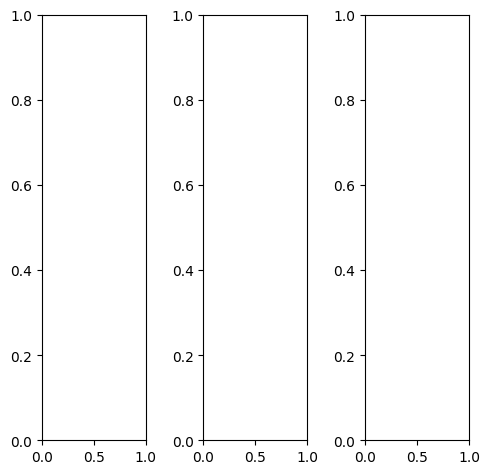

tensor([[[0.7843, 0.7451, 0.6392,  ..., 0.7412, 0.6078, 0.5725],
         [0.7765, 0.7490, 0.6549,  ..., 0.6627, 0.6275, 0.6157],
         [0.6000, 0.5451, 0.5961,  ..., 0.5569, 0.6039, 0.6039],
         ...,
         [0.4118, 0.4745, 0.5098,  ..., 0.5451, 0.6000, 0.5608],
         [0.4000, 0.4745, 0.2824,  ..., 0.4431, 0.5843, 0.5529],
         [0.4824, 0.3804, 0.2745,  ..., 0.4078, 0.5255, 0.6510]],

        [[0.7843, 0.7451, 0.6392,  ..., 0.7412, 0.6078, 0.5725],
         [0.7765, 0.7490, 0.6549,  ..., 0.6627, 0.6275, 0.6157],
         [0.6000, 0.5451, 0.5961,  ..., 0.5569, 0.6039, 0.6039],
         ...,
         [0.4118, 0.4745, 0.5098,  ..., 0.5451, 0.6000, 0.5608],
         [0.4000, 0.4745, 0.2824,  ..., 0.4431, 0.5843, 0.5529],
         [0.4824, 0.3804, 0.2745,  ..., 0.4078, 0.5255, 0.6510]],

        [[0.7843, 0.7451, 0.6392,  ..., 0.7412, 0.6078, 0.5725],
         [0.7765, 0.7490, 0.6549,  ..., 0.6627, 0.6275, 0.6157],
         [0.6000, 0.5451, 0.5961,  ..., 0.5569, 0.6039, 0.

tensor([[[0.8039, 0.7725, 0.6745,  ..., 0.7647, 0.6353, 0.5961],
         [0.7961, 0.7765, 0.6902,  ..., 0.7020, 0.6706, 0.6549],
         [0.6235, 0.5765, 0.6314,  ..., 0.6000, 0.6510, 0.6510],
         ...,
         [0.4235, 0.5020, 0.5490,  ..., 0.5804, 0.6510, 0.6196],
         [0.4078, 0.4980, 0.3216,  ..., 0.4824, 0.6392, 0.6078],
         [0.4941, 0.4039, 0.3137,  ..., 0.4549, 0.5843, 0.7020]],

        [[0.7765, 0.7333, 0.6235,  ..., 0.7529, 0.6235, 0.5882],
         [0.7725, 0.7412, 0.6431,  ..., 0.6627, 0.6314, 0.6235],
         [0.5961, 0.5373, 0.5843,  ..., 0.5569, 0.6000, 0.6039],
         ...,
         [0.4118, 0.4706, 0.4980,  ..., 0.5529, 0.5961, 0.5569],
         [0.4000, 0.4706, 0.2745,  ..., 0.4471, 0.5765, 0.5490],
         [0.4863, 0.3765, 0.2706,  ..., 0.4078, 0.5176, 0.6471]],

        [[0.7569, 0.7176, 0.6118,  ..., 0.6078, 0.4549, 0.4196],
         [0.7333, 0.7059, 0.6118,  ..., 0.5451, 0.4980, 0.4706],
         [0.5608, 0.5059, 0.5569,  ..., 0.4392, 0.4863, 0.

tensor([[[0.7719, 0.7606, 0.6542,  ..., 0.7554, 0.6316, 0.6040],
         [0.8034, 0.7688, 0.6719,  ..., 0.6741, 0.6379, 0.6435],
         [0.6216, 0.5736, 0.6288,  ..., 0.5764, 0.6151, 0.6371],
         ...,
         [0.4355, 0.4852, 0.5428,  ..., 0.5994, 0.6234, 0.5970],
         [0.4246, 0.4960, 0.3172,  ..., 0.4917, 0.6221, 0.5759],
         [0.4939, 0.4075, 0.3173,  ..., 0.4451, 0.5679, 0.6554]],

        [[0.7790, 0.7389, 0.6595,  ..., 0.7601, 0.6244, 0.5988],
         [0.7985, 0.7554, 0.6554,  ..., 0.6863, 0.6375, 0.6460],
         [0.6113, 0.5566, 0.6152,  ..., 0.5775, 0.6160, 0.6253],
         ...,
         [0.4209, 0.4588, 0.5191,  ..., 0.5647, 0.5949, 0.5645],
         [0.4134, 0.4896, 0.2966,  ..., 0.4650, 0.5907, 0.5562],
         [0.4828, 0.3833, 0.2780,  ..., 0.4231, 0.5417, 0.6357]],

        [[0.7044, 0.6755, 0.5444,  ..., 0.6437, 0.5290, 0.5201],
         [0.6934, 0.6697, 0.5590,  ..., 0.5497, 0.5167, 0.5248],
         [0.5077, 0.4466, 0.5015,  ..., 0.4519, 0.4936, 0.

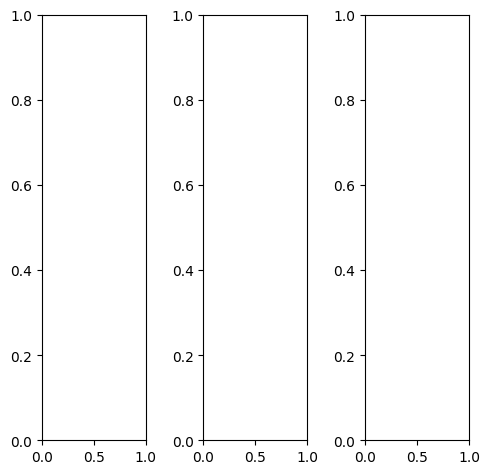

tensor([[[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.5804],
         ...,
         [0.4196, 0.4627, 0.5176,  ..., 0.5569, 0.5490, 0.5529],
         [0.3490, 0.3529, 0.4863,  ..., 0.5294, 0.4941, 0.4980],
         [0.3647, 0.3725, 0.4627,  ..., 0.4078, 0.3765, 0.4039]],

        [[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.5804],
         ...,
         [0.4196, 0.4627, 0.5176,  ..., 0.5569, 0.5490, 0.5529],
         [0.3490, 0.3529, 0.4863,  ..., 0.5294, 0.4941, 0.4980],
         [0.3647, 0.3725, 0.4627,  ..., 0.4078, 0.3765, 0.4039]],

        [[0.5843, 0.7412, 0.7647,  ..., 0.6196, 0.6902, 0.7529],
         [0.5922, 0.7294, 0.7569,  ..., 0.6824, 0.6471, 0.6431],
         [0.6000, 0.6627, 0.7098,  ..., 0.7255, 0.6627, 0.

tensor([[[0.6157, 0.8039, 0.8275,  ..., 0.6706, 0.7294, 0.8000],
         [0.7294, 0.8196, 0.8157,  ..., 0.7765, 0.7294, 0.6706],
         [0.7725, 0.7961, 0.7922,  ..., 0.8078, 0.7373, 0.6118],
         ...,
         [0.5451, 0.5765, 0.6275,  ..., 0.6627, 0.6353, 0.6392],
         [0.4627, 0.4745, 0.6039,  ..., 0.6510, 0.5882, 0.5529],
         [0.4706, 0.4980, 0.5804,  ..., 0.4980, 0.3843, 0.3529]],

        [[0.5490, 0.6941, 0.7176,  ..., 0.5882, 0.6667, 0.7176],
         [0.5098, 0.6706, 0.7137,  ..., 0.6235, 0.5961, 0.6157],
         [0.5020, 0.5804, 0.6549,  ..., 0.6667, 0.6078, 0.5451],
         ...,
         [0.3725, 0.4157, 0.4706,  ..., 0.5059, 0.5098, 0.5137],
         [0.3059, 0.3020, 0.4392,  ..., 0.4745, 0.4510, 0.4745],
         [0.3216, 0.3176, 0.4118,  ..., 0.3608, 0.3725, 0.4235]],

        [[0.6667, 0.8157, 0.8353,  ..., 0.6431, 0.7059, 0.8235],
         [0.6588, 0.8000, 0.8275,  ..., 0.7529, 0.7098, 0.7216],
         [0.6510, 0.7216, 0.7804,  ..., 0.8078, 0.7569, 0.

tensor([[[0.6295, 0.7634, 0.7843,  ..., 0.6330, 0.7124, 0.7505],
         [0.6324, 0.7568, 0.7766,  ..., 0.6965, 0.6610, 0.6791],
         [0.6267, 0.6941, 0.7363,  ..., 0.7502, 0.6875, 0.6209],
         ...,
         [0.4428, 0.4919, 0.5529,  ..., 0.5887, 0.5764, 0.5844],
         [0.3701, 0.3930, 0.5143,  ..., 0.5566, 0.5178, 0.5408],
         [0.3942, 0.4030, 0.4915,  ..., 0.4266, 0.4028, 0.4523]],

        [[0.6276, 0.7526, 0.7900,  ..., 0.6180, 0.6992, 0.7316],
         [0.6192, 0.7489, 0.7723,  ..., 0.6893, 0.6468, 0.6624],
         [0.6191, 0.6815, 0.7318,  ..., 0.7321, 0.6727, 0.5910],
         ...,
         [0.4340, 0.4762, 0.5470,  ..., 0.5725, 0.5578, 0.5692],
         [0.3574, 0.3497, 0.5048,  ..., 0.5342, 0.5010, 0.5210],
         [0.3833, 0.3703, 0.4719,  ..., 0.4134, 0.3854, 0.4455]],

        [[0.5446, 0.6797, 0.6804,  ..., 0.5416, 0.6252, 0.6869],
         [0.5109, 0.6469, 0.6602,  ..., 0.5984, 0.5565, 0.5582],
         [0.5084, 0.5706, 0.6053,  ..., 0.6423, 0.5782, 0.

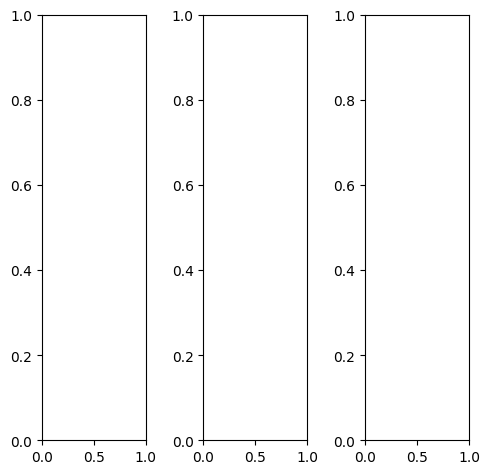

tensor([[[0.8235, 0.8549, 0.8784,  ..., 0.7373, 0.7255, 0.7255],
         [0.8392, 0.8824, 0.8863,  ..., 0.7529, 0.7176, 0.7216],
         [0.8314, 0.8784, 0.8745,  ..., 0.7647, 0.7333, 0.7333],
         ...,
         [0.5333, 0.5529, 0.5569,  ..., 0.7255, 0.7216, 0.7412],
         [0.5255, 0.5451, 0.5451,  ..., 0.6392, 0.6235, 0.6275],
         [0.4902, 0.5137, 0.5333,  ..., 0.5333, 0.5373, 0.5333]],

        [[0.8235, 0.8549, 0.8784,  ..., 0.7373, 0.7255, 0.7255],
         [0.8392, 0.8824, 0.8863,  ..., 0.7529, 0.7176, 0.7216],
         [0.8314, 0.8784, 0.8745,  ..., 0.7647, 0.7333, 0.7333],
         ...,
         [0.5333, 0.5529, 0.5569,  ..., 0.7255, 0.7216, 0.7412],
         [0.5255, 0.5451, 0.5451,  ..., 0.6392, 0.6235, 0.6275],
         [0.4902, 0.5137, 0.5333,  ..., 0.5333, 0.5373, 0.5333]],

        [[0.8235, 0.8549, 0.8784,  ..., 0.7373, 0.7255, 0.7255],
         [0.8392, 0.8824, 0.8863,  ..., 0.7529, 0.7176, 0.7216],
         [0.8314, 0.8784, 0.8745,  ..., 0.7647, 0.7333, 0.

tensor([[[0.8471, 0.8784, 0.9059,  ..., 0.6784, 0.6549, 0.6745],
         [0.8627, 0.9098, 0.9176,  ..., 0.7020, 0.6353, 0.6471],
         [0.8549, 0.9020, 0.9020,  ..., 0.6980, 0.6549, 0.6588],
         ...,
         [0.4706, 0.4941, 0.4980,  ..., 0.7333, 0.7294, 0.7529],
         [0.4627, 0.4863, 0.4902,  ..., 0.6314, 0.6118, 0.6078],
         [0.4314, 0.4706, 0.4980,  ..., 0.5020, 0.5059, 0.5020]],

        [[0.8039, 0.8353, 0.8588,  ..., 0.7373, 0.7255, 0.7216],
         [0.8157, 0.8627, 0.8667,  ..., 0.7490, 0.7216, 0.7216],
         [0.8078, 0.8588, 0.8549,  ..., 0.7686, 0.7373, 0.7373],
         ...,
         [0.5412, 0.5608, 0.5647,  ..., 0.7137, 0.7098, 0.7255],
         [0.5333, 0.5529, 0.5529,  ..., 0.6314, 0.6157, 0.6235],
         [0.4941, 0.5176, 0.5333,  ..., 0.5294, 0.5333, 0.5333]],

        [[0.8784, 0.8941, 0.9137,  ..., 0.8980, 0.8980, 0.8941],
         [0.8941, 0.9216, 0.9216,  ..., 0.9176, 0.9098, 0.9020],
         [0.8902, 0.9216, 0.9137,  ..., 0.9294, 0.9294, 0.

tensor([[[0.8442, 0.8382, 0.9044,  ..., 0.6906, 0.6775, 0.6963],
         [0.8362, 0.8667, 0.8788,  ..., 0.7039, 0.6780, 0.6991],
         [0.8547, 0.8983, 0.8776,  ..., 0.7244, 0.6914, 0.6966],
         ...,
         [0.4923, 0.5121, 0.5046,  ..., 0.7007, 0.6934, 0.7156],
         [0.4904, 0.5064, 0.4932,  ..., 0.5970, 0.5843, 0.5980],
         [0.4811, 0.4847, 0.4942,  ..., 0.5159, 0.5304, 0.5479]],

        [[0.8611, 0.8818, 0.8904,  ..., 0.7476, 0.7449, 0.7484],
         [0.8454, 0.9135, 0.9178,  ..., 0.7615, 0.7280, 0.7598],
         [0.8835, 0.9157, 0.8875,  ..., 0.7821, 0.7459, 0.7548],
         ...,
         [0.5522, 0.5717, 0.5726,  ..., 0.7340, 0.7266, 0.7607],
         [0.5375, 0.5551, 0.5530,  ..., 0.6427, 0.6249, 0.6375],
         [0.5056, 0.5181, 0.5407,  ..., 0.5487, 0.5512, 0.5669]],

        [[0.8612, 0.8961, 0.9059,  ..., 0.8125, 0.8133, 0.8046],
         [0.8797, 0.9209, 0.9093,  ..., 0.8267, 0.7928, 0.7983],
         [0.8747, 0.9335, 0.9184,  ..., 0.8366, 0.8062, 0.

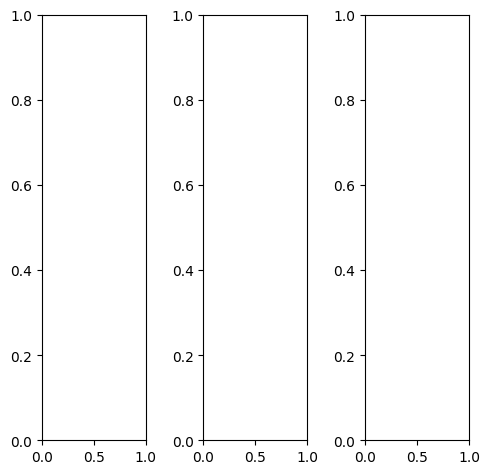

EPOCH: 22.255  trn_loss: 0.005  (2689.97s - 9397.03s remaining)

tensor([[[0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4510, 0.4510, 0.4471,  ..., 0.4588, 0.4588, 0.4588],
         ...,
         [0.2980, 0.2392, 0.1843,  ..., 0.2275, 0.2000, 0.2392],
         [0.4549, 0.2941, 0.2392,  ..., 0.2706, 0.2627, 0.2471],
         [0.4824, 0.4471, 0.4627,  ..., 0.1882, 0.2078, 0.2392]],

        [[0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4510, 0.4510, 0.4471,  ..., 0.4588, 0.4588, 0.4588],
         ...,
         [0.2980, 0.2392, 0.1843,  ..., 0.2275, 0.2000, 0.2392],
         [0.4549, 0.2941, 0.2392,  ..., 0.2706, 0.2627, 0.2471],
         [0.4824, 0.4471, 0.4627,  ..., 0.1882, 0.2078, 0.2392]],

        [[0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4431, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4588],
         [0.4510, 0.4510, 0.4471,  ..., 0.4588, 0.4588, 0.

tensor([[[0.3137, 0.3137, 0.3137,  ..., 0.3451, 0.3451, 0.3451],
         [0.3020, 0.3020, 0.3020,  ..., 0.3451, 0.3451, 0.3451],
         [0.3176, 0.3176, 0.3176,  ..., 0.3451, 0.3451, 0.3451],
         ...,
         [0.2706, 0.2314, 0.1725,  ..., 0.1451, 0.1176, 0.1569],
         [0.4196, 0.2745, 0.2118,  ..., 0.1922, 0.1843, 0.1686],
         [0.4431, 0.4118, 0.4157,  ..., 0.1176, 0.1373, 0.1686]],

        [[0.4588, 0.4588, 0.4588,  ..., 0.4745, 0.4745, 0.4706],
         [0.4667, 0.4667, 0.4667,  ..., 0.4745, 0.4745, 0.4745],
         [0.4745, 0.4745, 0.4706,  ..., 0.4745, 0.4745, 0.4745],
         ...,
         [0.2980, 0.2314, 0.1804,  ..., 0.2431, 0.2118, 0.2510],
         [0.4510, 0.2902, 0.2392,  ..., 0.2863, 0.2784, 0.2588],
         [0.4824, 0.4431, 0.4667,  ..., 0.2039, 0.2196, 0.2510]],

        [[0.6902, 0.6902, 0.6902,  ..., 0.6863, 0.6863, 0.6863],
         [0.6980, 0.6980, 0.6980,  ..., 0.6863, 0.6863, 0.6863],
         [0.6784, 0.6784, 0.6745,  ..., 0.6824, 0.6824, 0.

tensor([[[0.4534, 0.3880, 0.2843,  ..., 0.3400, 0.3628, 0.4325],
         [0.3860, 0.3036, 0.2575,  ..., 0.3056, 0.2943, 0.3713],
         [0.3364, 0.3284, 0.2156,  ..., 0.3113, 0.3192, 0.3664],
         ...,
         [0.2087, 0.1484, 0.0738,  ..., 0.1304, 0.0950, 0.1833],
         [0.4020, 0.1575, 0.1302,  ..., 0.1858, 0.1916, 0.2027],
         [0.4848, 0.4141, 0.4255,  ..., 0.1088, 0.1255, 0.1919]],

        [[0.4748, 0.5656, 0.3195,  ..., 0.4408, 0.4692, 0.4713],
         [0.4812, 0.4551, 0.3166,  ..., 0.4004, 0.4220, 0.4233],
         [0.3937, 0.5039, 0.2318,  ..., 0.4236, 0.4361, 0.4208],
         ...,
         [0.2211, 0.1310, 0.0469,  ..., 0.1089, 0.0795, 0.1531],
         [0.4089, 0.1733, 0.1384,  ..., 0.1609, 0.1598, 0.1684],
         [0.4793, 0.3985, 0.4409,  ..., 0.0894, 0.1038, 0.1517]],

        [[0.6521, 0.5533, 0.5477,  ..., 0.5903, 0.6283, 0.6355],
         [0.6002, 0.5018, 0.5424,  ..., 0.5660, 0.5928, 0.6249],
         [0.5283, 0.4821, 0.4665,  ..., 0.5350, 0.5709, 0.

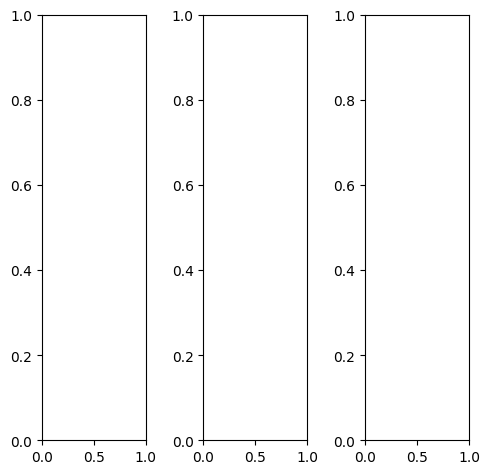

tensor([[[0.5137, 0.5098, 0.5098,  ..., 0.5333, 0.5255, 0.5294],
         [0.6706, 0.6078, 0.5137,  ..., 0.5922, 0.5333, 0.5412],
         [0.8471, 0.8235, 0.6471,  ..., 0.6627, 0.6039, 0.5451],
         ...,
         [0.4196, 0.2118, 0.0980,  ..., 0.5059, 0.4980, 0.4941],
         [0.5020, 0.4863, 0.4235,  ..., 0.4980, 0.4824, 0.4667],
         [0.4824, 0.4941, 0.5020,  ..., 0.4863, 0.4745, 0.4627]],

        [[0.5137, 0.5098, 0.5098,  ..., 0.5333, 0.5255, 0.5294],
         [0.6706, 0.6078, 0.5137,  ..., 0.5922, 0.5333, 0.5412],
         [0.8471, 0.8235, 0.6471,  ..., 0.6627, 0.6039, 0.5451],
         ...,
         [0.4196, 0.2118, 0.0980,  ..., 0.5059, 0.4980, 0.4941],
         [0.5020, 0.4863, 0.4235,  ..., 0.4980, 0.4824, 0.4667],
         [0.4824, 0.4941, 0.5020,  ..., 0.4863, 0.4745, 0.4627]],

        [[0.5137, 0.5098, 0.5098,  ..., 0.5333, 0.5255, 0.5294],
         [0.6706, 0.6078, 0.5137,  ..., 0.5922, 0.5333, 0.5412],
         [0.8471, 0.8235, 0.6471,  ..., 0.6627, 0.6039, 0.

tensor([[[0.3098, 0.2902, 0.2824,  ..., 0.3412, 0.3373, 0.3294],
         [0.5765, 0.4824, 0.3333,  ..., 0.4510, 0.3608, 0.3569],
         [0.8275, 0.7961, 0.5255,  ..., 0.5569, 0.4392, 0.3608],
         ...,
         [0.3961, 0.1882, 0.0667,  ..., 0.4941, 0.4863, 0.4824],
         [0.4784, 0.4627, 0.3882,  ..., 0.4863, 0.4706, 0.4549],
         [0.4706, 0.4824, 0.4902,  ..., 0.4863, 0.4627, 0.4510]],

        [[0.5686, 0.5725, 0.5725,  ..., 0.5843, 0.5725, 0.5843],
         [0.6941, 0.6392, 0.5608,  ..., 0.6275, 0.5804, 0.5922],
         [0.8510, 0.8275, 0.6784,  ..., 0.6863, 0.6471, 0.5961],
         ...,
         [0.4314, 0.2235, 0.1137,  ..., 0.5098, 0.5020, 0.4980],
         [0.5137, 0.4980, 0.4392,  ..., 0.5020, 0.4863, 0.4706],
         [0.4863, 0.4980, 0.5098,  ..., 0.4902, 0.4784, 0.4667]],

        [[0.7569, 0.7765, 0.7882,  ..., 0.7647, 0.7647, 0.7686],
         [0.7882, 0.7686, 0.7333,  ..., 0.7765, 0.7529, 0.7608],
         [0.8863, 0.8745, 0.7961,  ..., 0.8118, 0.8078, 0.

tensor([[[ 0.3857,  0.2759,  0.1388,  ...,  0.3738,  0.3637,  0.4001],
         [ 0.5388,  0.3506,  0.2023,  ...,  0.4262,  0.3415,  0.3933],
         [ 0.6616,  0.6360,  0.2551,  ...,  0.4744,  0.4584,  0.4079],
         ...,
         [ 0.3341,  0.1278, -0.0187,  ...,  0.5136,  0.4947,  0.4771],
         [ 0.4231,  0.4741,  0.4024,  ...,  0.4887,  0.4807,  0.4458],
         [ 0.3990,  0.4297,  0.4224,  ...,  0.4482,  0.4358,  0.4305]],

        [[ 0.4931,  0.3706,  0.3301,  ...,  0.4235,  0.4430,  0.4098],
         [ 0.5242,  0.3834,  0.2030,  ...,  0.5195,  0.4633,  0.4474],
         [ 0.7996,  0.6667,  0.5262,  ...,  0.5744,  0.5507,  0.4463],
         ...,
         [ 0.3195,  0.1167, -0.0252,  ...,  0.5449,  0.5207,  0.4291],
         [ 0.3924,  0.4296,  0.3386,  ...,  0.5165,  0.4936,  0.4041],
         [ 0.3502,  0.3884,  0.3978,  ...,  0.4303,  0.4229,  0.3771]],

        [[ 0.6383,  0.4790,  0.5621,  ...,  0.5713,  0.5700,  0.5710],
         [ 0.7510,  0.6651,  0.5375,  ...,  0

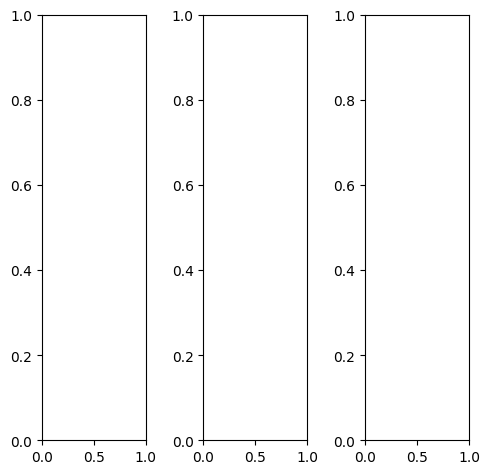

tensor([[[0.5059, 0.5059, 0.4588,  ..., 0.5412, 0.5686, 0.5059],
         [0.3686, 0.4196, 0.4392,  ..., 0.5686, 0.6784, 0.5647],
         [0.2588, 0.2627, 0.2745,  ..., 0.5882, 0.6902, 0.6314],
         ...,
         [0.4471, 0.4706, 0.5765,  ..., 0.6235, 0.5294, 0.4431],
         [0.5137, 0.4980, 0.4941,  ..., 0.5020, 0.4510, 0.5176],
         [0.4706, 0.4549, 0.4588,  ..., 0.4235, 0.4118, 0.4627]],

        [[0.5059, 0.5059, 0.4588,  ..., 0.5412, 0.5686, 0.5059],
         [0.3686, 0.4196, 0.4392,  ..., 0.5686, 0.6784, 0.5647],
         [0.2588, 0.2627, 0.2745,  ..., 0.5882, 0.6902, 0.6314],
         ...,
         [0.4471, 0.4706, 0.5765,  ..., 0.6235, 0.5294, 0.4431],
         [0.5137, 0.4980, 0.4941,  ..., 0.5020, 0.4510, 0.5176],
         [0.4706, 0.4549, 0.4588,  ..., 0.4235, 0.4118, 0.4627]],

        [[0.5059, 0.5059, 0.4588,  ..., 0.5412, 0.5686, 0.5059],
         [0.3686, 0.4196, 0.4392,  ..., 0.5686, 0.6784, 0.5647],
         [0.2588, 0.2627, 0.2745,  ..., 0.5882, 0.6902, 0.

tensor([[[0.5843, 0.5725, 0.5176,  ..., 0.6000, 0.6510, 0.5412],
         [0.4353, 0.4824, 0.4980,  ..., 0.6588, 0.8078, 0.6353],
         [0.3176, 0.3216, 0.3294,  ..., 0.7098, 0.8588, 0.7216],
         ...,
         [0.4824, 0.5059, 0.6118,  ..., 0.6706, 0.5608, 0.4706],
         [0.5529, 0.5373, 0.5333,  ..., 0.5373, 0.4784, 0.5412],
         [0.5098, 0.4941, 0.4980,  ..., 0.4549, 0.4353, 0.4863]],

        [[0.4863, 0.4902, 0.4431,  ..., 0.5255, 0.5529, 0.5059],
         [0.3529, 0.4078, 0.4275,  ..., 0.5451, 0.6471, 0.5569],
         [0.2471, 0.2510, 0.2627,  ..., 0.5569, 0.6510, 0.6157],
         ...,
         [0.4392, 0.4627, 0.5725,  ..., 0.6118, 0.5294, 0.4471],
         [0.5059, 0.4941, 0.4863,  ..., 0.4941, 0.4510, 0.5176],
         [0.4627, 0.4471, 0.4549,  ..., 0.4196, 0.4118, 0.4627]],

        [[0.3922, 0.4039, 0.3725,  ..., 0.4745, 0.4431, 0.4118],
         [0.2667, 0.3294, 0.3569,  ..., 0.4588, 0.4863, 0.4275],
         [0.1804, 0.1804, 0.1922,  ..., 0.4392, 0.4588, 0.

tensor([[[ 0.3619,  0.3399,  0.1833,  ...,  0.3925,  0.4205,  0.4453],
         [ 0.2187,  0.2031,  0.1598,  ...,  0.3897,  0.5871,  0.4575],
         [ 0.0086, -0.0362, -0.1059,  ...,  0.4786,  0.5940,  0.5468],
         ...,
         [ 0.4314,  0.5065,  0.6417,  ...,  0.7209,  0.5779,  0.4501],
         [ 0.5490,  0.5210,  0.5109,  ...,  0.5384,  0.4407,  0.5661],
         [ 0.4902,  0.4645,  0.4641,  ...,  0.4301,  0.4057,  0.4850]],

        [[ 0.4933,  0.3999,  0.3883,  ...,  0.5302,  0.6051,  0.5508],
         [ 0.2298,  0.2467,  0.1520,  ...,  0.5521,  0.7399,  0.6490],
         [ 0.1906,  0.0198,  0.1195,  ...,  0.5982,  0.7166,  0.7019],
         ...,
         [ 0.4193,  0.4921,  0.6395,  ...,  0.7254,  0.6278,  0.4149],
         [ 0.5232,  0.4973,  0.4988,  ...,  0.5576,  0.4912,  0.5503],
         [ 0.4670,  0.4420,  0.4669,  ...,  0.4314,  0.4137,  0.4662]],

        [[ 0.6470,  0.5105,  0.5678,  ...,  0.7751,  0.8193,  0.7416],
         [ 0.4360,  0.5128,  0.4916,  ...,  0

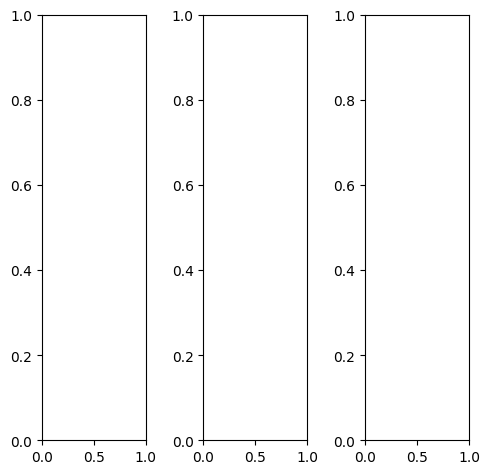

tensor([[[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.5216],
         ...,
         [0.1608, 0.2039, 0.3765,  ..., 0.2157, 0.4000, 0.3843],
         [0.3804, 0.3725, 0.4000,  ..., 0.3333, 0.4549, 0.3922],
         [0.4275, 0.4431, 0.4039,  ..., 0.3843, 0.4863, 0.4235]],

        [[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.5216],
         ...,
         [0.1608, 0.2039, 0.3765,  ..., 0.2157, 0.4000, 0.3843],
         [0.3804, 0.3725, 0.4000,  ..., 0.3333, 0.4549, 0.3922],
         [0.4275, 0.4431, 0.4039,  ..., 0.3843, 0.4863, 0.4235]],

        [[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.

tensor([[[0.4980, 0.4353, 0.4431,  ..., 0.2980, 0.3647, 0.3569],
         [0.4784, 0.4353, 0.4471,  ..., 0.3608, 0.3529, 0.3333],
         [0.4627, 0.4431, 0.4549,  ..., 0.3804, 0.3294, 0.3216],
         ...,
         [0.1882, 0.2235, 0.3922,  ..., 0.2275, 0.4157, 0.3961],
         [0.4039, 0.3922, 0.4118,  ..., 0.3529, 0.4706, 0.4039],
         [0.4510, 0.4588, 0.4157,  ..., 0.4157, 0.5020, 0.4392]],

        [[0.4824, 0.4431, 0.4706,  ..., 0.3804, 0.4784, 0.4863],
         [0.4627, 0.4549, 0.5020,  ..., 0.4980, 0.5255, 0.5098],
         [0.4471, 0.4824, 0.5490,  ..., 0.5490, 0.5490, 0.5373],
         ...,
         [0.1569, 0.2000, 0.3725,  ..., 0.2235, 0.4000, 0.3843],
         [0.3765, 0.3725, 0.4000,  ..., 0.3451, 0.4627, 0.3961],
         [0.4275, 0.4471, 0.4118,  ..., 0.3922, 0.4941, 0.4314]],

        [[0.3490, 0.4392, 0.6196,  ..., 0.6275, 0.7882, 0.8667],
         [0.3569, 0.5569, 0.8000,  ..., 0.8392, 0.9451, 0.9686],
         [0.3725, 0.6235, 0.8706,  ..., 0.8941, 0.9647, 0.

tensor([[[0.4998, 0.4213, 0.4241,  ..., 0.3204, 0.4423, 0.5110],
         [0.4607, 0.4069, 0.3986,  ..., 0.4921, 0.5411, 0.5136],
         [0.4373, 0.4470, 0.4751,  ..., 0.5761, 0.5583, 0.5331],
         ...,
         [0.0855, 0.1352, 0.4138,  ..., 0.1983, 0.4181, 0.4061],
         [0.3567, 0.4025, 0.4394,  ..., 0.3143, 0.5011, 0.4163],
         [0.4505, 0.4833, 0.4516,  ..., 0.4133, 0.5410, 0.4772]],

        [[0.5380, 0.4881, 0.4658,  ..., 0.4149, 0.5634, 0.5744],
         [0.4967, 0.4315, 0.4152,  ..., 0.6246, 0.6701, 0.6440],
         [0.5172, 0.4961, 0.5234,  ..., 0.6652, 0.6527, 0.6358],
         ...,
         [0.0824, 0.1453, 0.4172,  ..., 0.1942, 0.4354, 0.3637],
         [0.3599, 0.3925, 0.4268,  ..., 0.3419, 0.5084, 0.3926],
         [0.4539, 0.4514, 0.4507,  ..., 0.3954, 0.5239, 0.4527]],

        [[0.6252, 0.5425, 0.5482,  ..., 0.6003, 0.7391, 0.7297],
         [0.5961, 0.5595, 0.5546,  ..., 0.7663, 0.8286, 0.7627],
         [0.5429, 0.5176, 0.5667,  ..., 0.8242, 0.8345, 0.

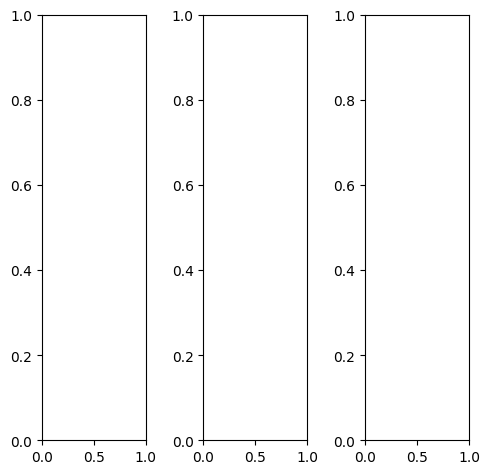

tensor([[[0.5569, 0.3961, 0.3725,  ..., 0.3608, 0.3686, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3294, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3216, 0.3333, 0.5020],
         ...,
         [0.6941, 0.5922, 0.5765,  ..., 0.5922, 0.6039, 0.7059],
         [0.7059, 0.6078, 0.5882,  ..., 0.5961, 0.6157, 0.7137],
         [0.8118, 0.7608, 0.7451,  ..., 0.7529, 0.7686, 0.8275]],

        [[0.5569, 0.3961, 0.3725,  ..., 0.3608, 0.3686, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3294, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3216, 0.3333, 0.5020],
         ...,
         [0.6941, 0.5922, 0.5765,  ..., 0.5922, 0.6039, 0.7059],
         [0.7059, 0.6078, 0.5882,  ..., 0.5961, 0.6157, 0.7137],
         [0.8118, 0.7608, 0.7451,  ..., 0.7529, 0.7686, 0.8275]],

        [[0.5569, 0.3961, 0.3725,  ..., 0.3608, 0.3686, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3294, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3216, 0.3333, 0.

tensor([[[0.5569, 0.3961, 0.3725,  ..., 0.3608, 0.3686, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3294, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3216, 0.3333, 0.5020],
         ...,
         [0.6980, 0.5961, 0.5804,  ..., 0.5961, 0.6078, 0.7059],
         [0.7098, 0.6118, 0.5922,  ..., 0.5961, 0.6157, 0.7137],
         [0.8118, 0.7608, 0.7451,  ..., 0.7529, 0.7686, 0.8275]],

        [[0.5569, 0.3961, 0.3725,  ..., 0.3608, 0.3686, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3294, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3216, 0.3333, 0.5020],
         ...,
         [0.6941, 0.5922, 0.5765,  ..., 0.5922, 0.6078, 0.7098],
         [0.7059, 0.6078, 0.5882,  ..., 0.5961, 0.6157, 0.7176],
         [0.8118, 0.7608, 0.7451,  ..., 0.7529, 0.7686, 0.8275]],

        [[0.5569, 0.3961, 0.3686,  ..., 0.3569, 0.3647, 0.5255],
         [0.5373, 0.3647, 0.3373,  ..., 0.3216, 0.3373, 0.5059],
         [0.5294, 0.3569, 0.3255,  ..., 0.3137, 0.3294, 0.

tensor([[[ 0.4731,  0.2768,  0.0739,  ...,  0.2627,  0.2925,  0.4943],
         [ 0.4100,  0.2034,  0.0725,  ...,  0.2117,  0.2274,  0.4534],
         [ 0.3648,  0.1403, -0.0541,  ...,  0.1947,  0.2558,  0.4627],
         ...,
         [ 0.7728,  0.6864,  0.6523,  ...,  0.6880,  0.7061,  0.8066],
         [ 0.7833,  0.6692,  0.6443,  ...,  0.6680,  0.7093,  0.8150],
         [ 0.8854,  0.8368,  0.8137,  ...,  0.8473,  0.8990,  0.9049]],

        [[ 0.5466,  0.3552,  0.2103,  ...,  0.2875,  0.3428,  0.5079],
         [ 0.4474,  0.2848,  0.0582,  ...,  0.2651,  0.3008,  0.4883],
         [ 0.4664,  0.2392,  0.0368,  ...,  0.2314,  0.2799,  0.4543],
         ...,
         [ 0.6995,  0.6348,  0.6343,  ...,  0.6620,  0.6872,  0.8146],
         [ 0.7391,  0.6570,  0.6410,  ...,  0.6824,  0.7015,  0.8222],
         [ 0.8170,  0.8226,  0.8009,  ...,  0.8213,  0.8633,  0.8781]],

        [[ 0.6757,  0.3859,  0.4067,  ...,  0.3893,  0.4440,  0.6167],
         [ 0.5750,  0.4703,  0.3589,  ...,  0

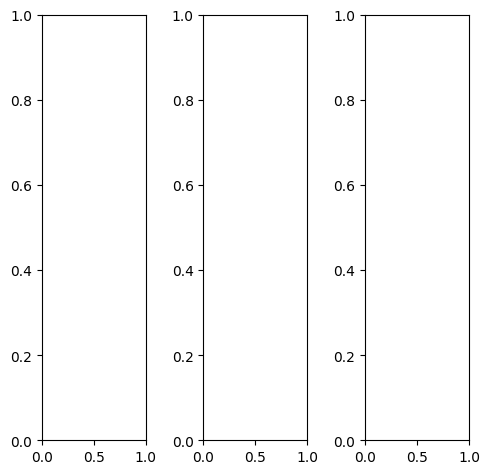

EPOCH: 22.510  trn_loss: 0.005  (2719.92s - 9363.12s remaining)

tensor([[[0.9843, 0.8902, 0.9608,  ..., 0.4314, 0.4353, 0.3686],
         [0.9922, 0.9686, 0.9804,  ..., 0.3608, 0.3490, 0.3294],
         [0.9490, 0.9647, 0.9882,  ..., 0.3843, 0.3176, 0.2941],
         ...,
         [0.2118, 0.2784, 0.3059,  ..., 0.3020, 0.2902, 0.2824],
         [0.1961, 0.2314, 0.2863,  ..., 0.2980, 0.3098, 0.3059],
         [0.2118, 0.2196, 0.2588,  ..., 0.2902, 0.2902, 0.2667]],

        [[0.9843, 0.8902, 0.9608,  ..., 0.4314, 0.4353, 0.3686],
         [0.9922, 0.9686, 0.9804,  ..., 0.3608, 0.3490, 0.3294],
         [0.9490, 0.9647, 0.9882,  ..., 0.3843, 0.3176, 0.2941],
         ...,
         [0.2118, 0.2784, 0.3059,  ..., 0.3020, 0.2902, 0.2824],
         [0.1961, 0.2314, 0.2863,  ..., 0.2980, 0.3098, 0.3059],
         [0.2118, 0.2196, 0.2588,  ..., 0.2902, 0.2902, 0.2667]],

        [[0.9843, 0.8902, 0.9608,  ..., 0.4314, 0.4353, 0.3686],
         [0.9922, 0.9686, 0.9804,  ..., 0.3608, 0.3490, 0.3294],
         [0.9490, 0.9647, 0.9882,  ..., 0.3843, 0.3176, 0.

tensor([[[0.9882, 0.8902, 0.9569,  ..., 0.4549, 0.4510, 0.3843],
         [0.9882, 0.9608, 0.9647,  ..., 0.3843, 0.3686, 0.3451],
         [0.9490, 0.9608, 0.9804,  ..., 0.4078, 0.3412, 0.3176],
         ...,
         [0.2235, 0.2863, 0.3059,  ..., 0.3059, 0.2902, 0.2824],
         [0.2078, 0.2392, 0.2902,  ..., 0.3020, 0.3137, 0.3137],
         [0.2235, 0.2275, 0.2627,  ..., 0.2980, 0.2941, 0.2706]],

        [[0.9882, 0.8980, 0.9686,  ..., 0.4353, 0.4471, 0.3804],
         [1.0000, 0.9804, 0.9961,  ..., 0.3647, 0.3569, 0.3333],
         [0.9569, 0.9765, 1.0000,  ..., 0.3843, 0.3216, 0.2941],
         ...,
         [0.2078, 0.2784, 0.3098,  ..., 0.3059, 0.2941, 0.2863],
         [0.1882, 0.2314, 0.2902,  ..., 0.3020, 0.3137, 0.3098],
         [0.2039, 0.2196, 0.2588,  ..., 0.2941, 0.2941, 0.2667]],

        [[0.9373, 0.8471, 0.9176,  ..., 0.3373, 0.3176, 0.2745],
         [0.9569, 0.9333, 0.9490,  ..., 0.2863, 0.2627, 0.2549],
         [0.9059, 0.9255, 0.9529,  ..., 0.3137, 0.2510, 0.

tensor([[[0.9552, 0.9719, 0.9900,  ..., 0.2435, 0.2594, 0.2496],
         [0.9632, 0.9268, 0.9497,  ..., 0.1705, 0.1409, 0.1722],
         [0.9095, 1.0271, 0.9574,  ..., 0.2078, 0.1390, 0.1354],
         ...,
         [0.1190, 0.2501, 0.3046,  ..., 0.2926, 0.2730, 0.2544],
         [0.0986, 0.1752, 0.2561,  ..., 0.2569, 0.2868, 0.2684],
         [0.1303, 0.1333, 0.1827,  ..., 0.2270, 0.2181, 0.2410]],

        [[0.9479, 0.9710, 0.9529,  ..., 0.3979, 0.4176, 0.3463],
         [0.9338, 0.8674, 0.9126,  ..., 0.3381, 0.3280, 0.2815],
         [0.9402, 0.9874, 0.9710,  ..., 0.3815, 0.3162, 0.2557],
         ...,
         [0.1351, 0.2387, 0.2899,  ..., 0.3232, 0.3031, 0.2456],
         [0.1117, 0.1742, 0.2462,  ..., 0.2928, 0.3020, 0.2606],
         [0.1319, 0.1374, 0.1889,  ..., 0.2390, 0.2278, 0.2167]],

        [[0.9895, 1.0709, 1.0024,  ..., 0.5984, 0.6150, 0.5342],
         [1.0564, 1.0477, 1.0516,  ..., 0.5478, 0.5326, 0.4877],
         [0.9645, 1.0373, 0.9968,  ..., 0.5752, 0.5155, 0.

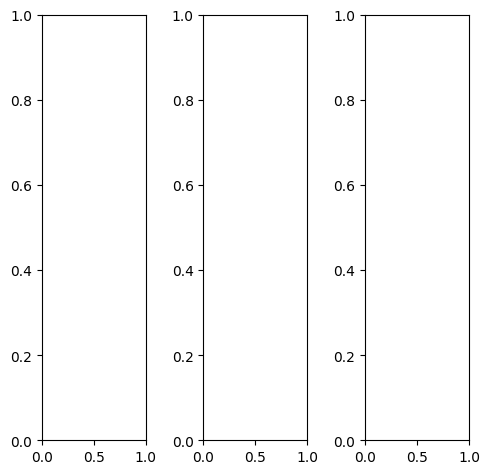

tensor([[[0.2510, 0.3098, 0.3059,  ..., 0.1725, 0.2039, 0.1216],
         [0.2510, 0.2314, 0.2471,  ..., 0.4549, 0.6353, 0.5451],
         [0.2314, 0.2627, 0.2902,  ..., 0.3647, 0.4941, 0.6275],
         ...,
         [0.3922, 0.4235, 0.4000,  ..., 0.4235, 0.6549, 0.6118],
         [0.4353, 0.4902, 0.5882,  ..., 0.3804, 0.3255, 0.5020],
         [0.4627, 0.5059, 0.5529,  ..., 0.5255, 0.3843, 0.4275]],

        [[0.2510, 0.3098, 0.3059,  ..., 0.1725, 0.2039, 0.1216],
         [0.2510, 0.2314, 0.2471,  ..., 0.4549, 0.6353, 0.5451],
         [0.2314, 0.2627, 0.2902,  ..., 0.3647, 0.4941, 0.6275],
         ...,
         [0.3922, 0.4235, 0.4000,  ..., 0.4235, 0.6549, 0.6118],
         [0.4353, 0.4902, 0.5882,  ..., 0.3804, 0.3255, 0.5020],
         [0.4627, 0.5059, 0.5529,  ..., 0.5255, 0.3843, 0.4275]],

        [[0.2510, 0.3098, 0.3059,  ..., 0.1725, 0.2039, 0.1216],
         [0.2510, 0.2314, 0.2471,  ..., 0.4549, 0.6353, 0.5451],
         [0.2314, 0.2627, 0.2902,  ..., 0.3647, 0.4941, 0.

tensor([[[0.2431, 0.3137, 0.3176,  ..., 0.1059, 0.1373, 0.0549],
         [0.2314, 0.2196, 0.2392,  ..., 0.3922, 0.5725, 0.4824],
         [0.2196, 0.2471, 0.2706,  ..., 0.3137, 0.4392, 0.5765],
         ...,
         [0.5725, 0.5569, 0.4392,  ..., 0.4392, 0.6980, 0.6627],
         [0.6314, 0.6353, 0.6431,  ..., 0.3686, 0.3412, 0.5255],
         [0.6549, 0.6431, 0.6000,  ..., 0.5098, 0.3922, 0.4431]],

        [[0.2627, 0.3216, 0.3137,  ..., 0.2078, 0.2392, 0.1569],
         [0.2667, 0.2471, 0.2588,  ..., 0.4863, 0.6667, 0.5765],
         [0.2431, 0.2745, 0.3059,  ..., 0.3961, 0.5255, 0.6588],
         ...,
         [0.3255, 0.3843, 0.4000,  ..., 0.4353, 0.6510, 0.6078],
         [0.3647, 0.4471, 0.5882,  ..., 0.4000, 0.3333, 0.5098],
         [0.4000, 0.4667, 0.5529,  ..., 0.5490, 0.3961, 0.4353]],

        [[0.1961, 0.2431, 0.2275,  ..., 0.1725, 0.2078, 0.1255],
         [0.2196, 0.1961, 0.2039,  ..., 0.4471, 0.6275, 0.5373],
         [0.1961, 0.2353, 0.2706,  ..., 0.3490, 0.4784, 0.

tensor([[[ 0.0090,  0.0491, -0.0584,  ...,  0.0183,  0.0597,  0.0661],
         [ 0.0975, -0.2219, -0.2105,  ...,  0.3051,  0.5382,  0.4480],
         [-0.1381, -0.1739, -0.2344,  ...,  0.2082,  0.3526,  0.5071],
         ...,
         [ 0.3816,  0.4243,  0.3909,  ...,  0.4486,  0.7209,  0.6595],
         [ 0.4343,  0.5317,  0.5873,  ...,  0.3758,  0.3141,  0.4966],
         [ 0.4780,  0.5361,  0.5824,  ...,  0.5529,  0.4000,  0.4519]],

        [[ 0.1416,  0.2045,  0.0418,  ...,  0.0887,  0.1255,  0.1194],
         [ 0.0919, -0.1350, -0.2892,  ...,  0.4480,  0.6850,  0.5548],
         [-0.0060,  0.0089, -0.1637,  ...,  0.3106,  0.4789,  0.5907],
         ...,
         [ 0.3511,  0.3970,  0.3474,  ...,  0.4423,  0.7359,  0.6255],
         [ 0.3956,  0.4761,  0.5798,  ...,  0.3843,  0.3327,  0.4886],
         [ 0.4582,  0.4841,  0.5650,  ...,  0.5428,  0.3837,  0.4131]],

        [[ 0.2847,  0.2039,  0.2305,  ...,  0.2412,  0.3172,  0.3099],
         [ 0.2942,  0.0210,  0.1001,  ...,  0

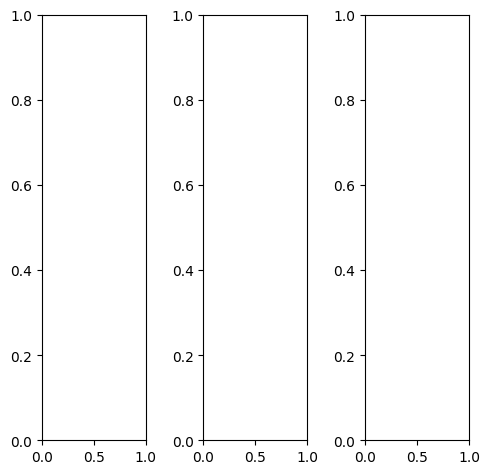

tensor([[[0.2549, 0.2941, 0.3098,  ..., 0.4235, 0.4471, 0.4078],
         [0.2980, 0.2941, 0.2627,  ..., 0.4392, 0.4196, 0.3725],
         [0.3294, 0.3059, 0.2863,  ..., 0.4235, 0.4157, 0.3843],
         ...,
         [0.3373, 0.3216, 0.2353,  ..., 0.5686, 0.5529, 0.4863],
         [0.3451, 0.3608, 0.2745,  ..., 0.5725, 0.5373, 0.5098],
         [0.3490, 0.3569, 0.2902,  ..., 0.5686, 0.5451, 0.4627]],

        [[0.2549, 0.2941, 0.3098,  ..., 0.4235, 0.4471, 0.4078],
         [0.2980, 0.2941, 0.2627,  ..., 0.4392, 0.4196, 0.3725],
         [0.3294, 0.3059, 0.2863,  ..., 0.4235, 0.4157, 0.3843],
         ...,
         [0.3373, 0.3216, 0.2353,  ..., 0.5686, 0.5529, 0.4863],
         [0.3451, 0.3608, 0.2745,  ..., 0.5725, 0.5373, 0.5098],
         [0.3490, 0.3569, 0.2902,  ..., 0.5686, 0.5451, 0.4627]],

        [[0.2549, 0.2941, 0.3098,  ..., 0.4235, 0.4471, 0.4078],
         [0.2980, 0.2941, 0.2627,  ..., 0.4392, 0.4196, 0.3725],
         [0.3294, 0.3059, 0.2863,  ..., 0.4235, 0.4157, 0.

tensor([[[0.2314, 0.2706, 0.2863,  ..., 0.4745, 0.4745, 0.4549],
         [0.2745, 0.2706, 0.2392,  ..., 0.4941, 0.4510, 0.4275],
         [0.3059, 0.2824, 0.2627,  ..., 0.4824, 0.4510, 0.4431],
         ...,
         [0.3373, 0.3176, 0.2706,  ..., 0.5804, 0.5961, 0.5294],
         [0.3490, 0.3686, 0.3216,  ..., 0.5765, 0.5686, 0.5529],
         [0.3608, 0.3804, 0.3490,  ..., 0.5725, 0.5686, 0.4902]],

        [[0.3020, 0.3490, 0.3569,  ..., 0.4353, 0.4784, 0.4235],
         [0.3451, 0.3451, 0.3098,  ..., 0.4510, 0.4471, 0.3843],
         [0.3765, 0.3529, 0.3333,  ..., 0.4314, 0.4392, 0.3922],
         ...,
         [0.3765, 0.3608, 0.2549,  ..., 0.6196, 0.5843, 0.5098],
         [0.3843, 0.4000, 0.2863,  ..., 0.6235, 0.5725, 0.5373],
         [0.3804, 0.3922, 0.2980,  ..., 0.6118, 0.5882, 0.5059]],

        [[0.0784, 0.0824, 0.1176,  ..., 0.2196, 0.2157, 0.2000],
         [0.1098, 0.0863, 0.0863,  ..., 0.2353, 0.1961, 0.1765],
         [0.1412, 0.1098, 0.1059,  ..., 0.2157, 0.2078, 0.

tensor([[[ 0.0692,  0.0704,  0.0512,  ...,  0.4482,  0.4601,  0.4491],
         [ 0.1784, -0.0346, -0.0385,  ...,  0.4458,  0.4288,  0.3261],
         [ 0.1005,  0.0274, -0.0841,  ...,  0.4570,  0.4404,  0.3576],
         ...,
         [ 0.3641,  0.3948,  0.2433,  ...,  0.8916,  0.8483,  0.6742],
         [ 0.3728,  0.4299,  0.3275,  ...,  0.8512,  0.8109,  0.6886],
         [ 0.3391,  0.3589,  0.2513,  ...,  0.8183,  0.7613,  0.6510]],

        [[ 0.1929,  0.2759,  0.2292,  ...,  0.5549,  0.6072,  0.4931],
         [ 0.2325,  0.1678, -0.0162,  ...,  0.5867,  0.5599,  0.4248],
         [ 0.2292,  0.2489,  0.0799,  ...,  0.5717,  0.5505,  0.4387],
         ...,
         [ 0.3465,  0.3420,  0.2180,  ...,  0.8933,  0.8216,  0.6746],
         [ 0.3742,  0.4461,  0.3155,  ...,  0.8850,  0.7951,  0.6922],
         [ 0.3375,  0.3511,  0.2429,  ...,  0.8040,  0.7513,  0.6281]],

        [[ 0.3782,  0.2411,  0.3955,  ...,  0.7587,  0.7934,  0.6779],
         [ 0.4081,  0.2929,  0.2657,  ...,  0

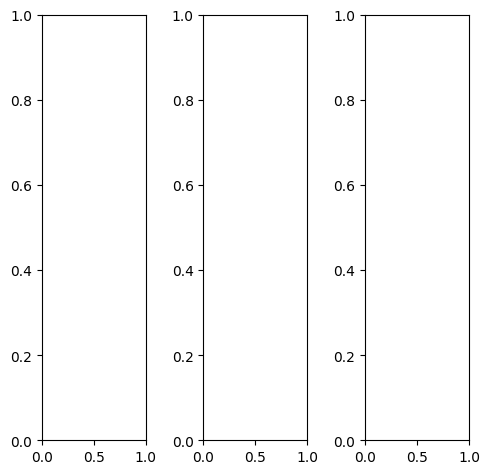

tensor([[[0.2000, 0.2157, 0.2039,  ..., 0.3333, 0.3373, 0.3569],
         [0.2353, 0.2431, 0.2392,  ..., 0.3059, 0.3098, 0.3490],
         [0.3176, 0.2902, 0.2980,  ..., 0.3647, 0.3412, 0.3451],
         ...,
         [0.4784, 0.4627, 0.4588,  ..., 0.4980, 0.4941, 0.5098],
         [0.4588, 0.4510, 0.4314,  ..., 0.4824, 0.4824, 0.4941],
         [0.4275, 0.4196, 0.3922,  ..., 0.4627, 0.4588, 0.4667]],

        [[0.2000, 0.2157, 0.2039,  ..., 0.3333, 0.3373, 0.3569],
         [0.2353, 0.2431, 0.2392,  ..., 0.3059, 0.3098, 0.3490],
         [0.3176, 0.2902, 0.2980,  ..., 0.3647, 0.3412, 0.3451],
         ...,
         [0.4784, 0.4627, 0.4588,  ..., 0.4980, 0.4941, 0.5098],
         [0.4588, 0.4510, 0.4314,  ..., 0.4824, 0.4824, 0.4941],
         [0.4275, 0.4196, 0.3922,  ..., 0.4627, 0.4588, 0.4667]],

        [[0.2000, 0.2157, 0.2039,  ..., 0.3333, 0.3373, 0.3569],
         [0.2353, 0.2431, 0.2392,  ..., 0.3059, 0.3098, 0.3490],
         [0.3176, 0.2902, 0.2980,  ..., 0.3647, 0.3412, 0.

tensor([[[0.1608, 0.1765, 0.1569,  ..., 0.2588, 0.2549, 0.2784],
         [0.1961, 0.2000, 0.1922,  ..., 0.2392, 0.2392, 0.2784],
         [0.2745, 0.2431, 0.2549,  ..., 0.3137, 0.2863, 0.2980],
         ...,
         [0.4863, 0.4706, 0.4627,  ..., 0.5059, 0.4941, 0.5137],
         [0.4627, 0.4510, 0.4235,  ..., 0.4863, 0.4824, 0.4941],
         [0.4275, 0.4196, 0.3843,  ..., 0.4627, 0.4588, 0.4667]],

        [[0.2039, 0.2196, 0.2118,  ..., 0.3647, 0.3686, 0.3882],
         [0.2431, 0.2510, 0.2471,  ..., 0.3294, 0.3373, 0.3725],
         [0.3255, 0.3020, 0.3098,  ..., 0.3843, 0.3569, 0.3608],
         ...,
         [0.4824, 0.4706, 0.4667,  ..., 0.4980, 0.5020, 0.5176],
         [0.4627, 0.4588, 0.4431,  ..., 0.4863, 0.4902, 0.4980],
         [0.4314, 0.4235, 0.4039,  ..., 0.4667, 0.4667, 0.4706]],

        [[0.2706, 0.2824, 0.2706,  ..., 0.3804, 0.3843, 0.4039],
         [0.3137, 0.3137, 0.3098,  ..., 0.3529, 0.3647, 0.3961],
         [0.3922, 0.3569, 0.3647,  ..., 0.4039, 0.3882, 0.

tensor([[[-0.1166, -0.0884, -0.2432,  ...,  0.2001,  0.2178,  0.2299],
         [ 0.0180, -0.2298, -0.1750,  ...,  0.1159,  0.1222,  0.2042],
         [-0.1426, -0.1756, -0.1979,  ...,  0.2204,  0.1840,  0.1825],
         ...,
         [ 0.4615,  0.4720,  0.4629,  ...,  0.5046,  0.4852,  0.5167],
         [ 0.4304,  0.4204,  0.4220,  ...,  0.4849,  0.4820,  0.4917],
         [ 0.3670,  0.3330,  0.2814,  ...,  0.4193,  0.4057,  0.4237]],

        [[ 0.0366,  0.0169, -0.0674,  ...,  0.2459,  0.2817,  0.2690],
         [-0.0270, -0.2819, -0.3437,  ...,  0.1923,  0.2109,  0.2388],
         [-0.0546, -0.0230, -0.1722,  ...,  0.2825,  0.2505,  0.2005],
         ...,
         [ 0.4291,  0.4252,  0.4568,  ...,  0.4985,  0.5058,  0.4598],
         [ 0.4117,  0.4380,  0.4228,  ...,  0.4974,  0.4939,  0.4579],
         [ 0.3369,  0.3193,  0.2839,  ...,  0.3869,  0.4007,  0.3719]],

        [[ 0.1874, -0.0748,  0.0114,  ...,  0.3121,  0.3450,  0.3659],
         [ 0.2015, -0.0334,  0.0669,  ...,  0

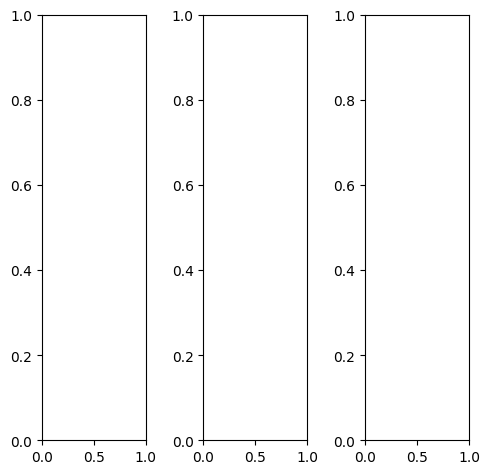

tensor([[[0.0784, 0.0745, 0.0824,  ..., 0.1961, 0.1098, 0.1333],
         [0.0784, 0.0863, 0.0863,  ..., 0.1490, 0.1176, 0.1569],
         [0.0627, 0.0902, 0.0980,  ..., 0.0745, 0.1176, 0.1882],
         ...,
         [0.1490, 0.2588, 0.2941,  ..., 0.3059, 0.2588, 0.2275],
         [0.3529, 0.3765, 0.3804,  ..., 0.4627, 0.4235, 0.3882],
         [0.4510, 0.4196, 0.4000,  ..., 0.4157, 0.4275, 0.4314]],

        [[0.0784, 0.0745, 0.0824,  ..., 0.1961, 0.1098, 0.1333],
         [0.0784, 0.0863, 0.0863,  ..., 0.1490, 0.1176, 0.1569],
         [0.0627, 0.0902, 0.0980,  ..., 0.0745, 0.1176, 0.1882],
         ...,
         [0.1490, 0.2588, 0.2941,  ..., 0.3059, 0.2588, 0.2275],
         [0.3529, 0.3765, 0.3804,  ..., 0.4627, 0.4235, 0.3882],
         [0.4510, 0.4196, 0.4000,  ..., 0.4157, 0.4275, 0.4314]],

        [[0.0784, 0.0745, 0.0824,  ..., 0.1961, 0.1098, 0.1333],
         [0.0784, 0.0863, 0.0863,  ..., 0.1490, 0.1176, 0.1569],
         [0.0627, 0.0902, 0.0980,  ..., 0.0745, 0.1176, 0.

tensor([[[0.0510, 0.0471, 0.0588,  ..., 0.1961, 0.1098, 0.1294],
         [0.0510, 0.0588, 0.0588,  ..., 0.1490, 0.1176, 0.1490],
         [0.0392, 0.0667, 0.0706,  ..., 0.0745, 0.1176, 0.1765],
         ...,
         [0.1333, 0.2431, 0.2784,  ..., 0.3725, 0.3059, 0.2353],
         [0.3373, 0.3608, 0.3647,  ..., 0.5490, 0.4902, 0.4078],
         [0.4314, 0.4039, 0.3843,  ..., 0.4275, 0.4392, 0.4157]],

        [[0.0980, 0.0941, 0.1020,  ..., 0.2039, 0.1137, 0.1373],
         [0.0980, 0.1059, 0.1059,  ..., 0.1529, 0.1176, 0.1569],
         [0.0824, 0.1098, 0.1176,  ..., 0.0784, 0.1137, 0.1804],
         ...,
         [0.1686, 0.2863, 0.3255,  ..., 0.2941, 0.2549, 0.2431],
         [0.3804, 0.4078, 0.4118,  ..., 0.4471, 0.4118, 0.4000],
         [0.4824, 0.4549, 0.4353,  ..., 0.4353, 0.4471, 0.4588]],

        [[0.0431, 0.0392, 0.0510,  ..., 0.1608, 0.0941, 0.1216],
         [0.0431, 0.0510, 0.0510,  ..., 0.1216, 0.1176, 0.1608],
         [0.0314, 0.0588, 0.0667,  ..., 0.0588, 0.1490, 0.

tensor([[[ 2.0571e-02, -8.3609e-03, -2.4085e-02,  ...,  2.0884e-01,
           1.3877e-01,  1.7086e-01],
         [ 7.2274e-02, -4.7742e-04,  1.0895e-01,  ...,  1.9629e-01,
           1.2726e-01,  1.8526e-01],
         [-5.6212e-02,  6.6442e-02,  7.2604e-03,  ...,  6.9740e-02,
           1.2454e-01,  2.1775e-01],
         ...,
         [ 2.4514e-01,  3.9873e-01,  4.2607e-01,  ...,  4.3959e-01,
           4.0778e-01,  3.4408e-01],
         [ 4.6368e-01,  5.1905e-01,  5.6284e-01,  ...,  6.2862e-01,
           5.8552e-01,  5.2557e-01],
         [ 5.7610e-01,  5.5802e-01,  5.3186e-01,  ...,  5.8976e-01,
           5.6874e-01,  5.6576e-01]],

        [[ 7.7280e-02,  1.2914e-01,  1.0951e-01,  ...,  2.6567e-01,
           1.8944e-01,  1.9902e-01],
         [ 1.1620e-01, -6.7574e-03,  4.9687e-02,  ...,  2.5881e-01,
           2.1229e-01,  2.2402e-01],
         [ 5.9536e-02,  1.7707e-01,  1.8998e-01,  ...,  1.3845e-01,
           1.9279e-01,  2.5999e-01],
         ...,
         [ 2.0968e-01,  3

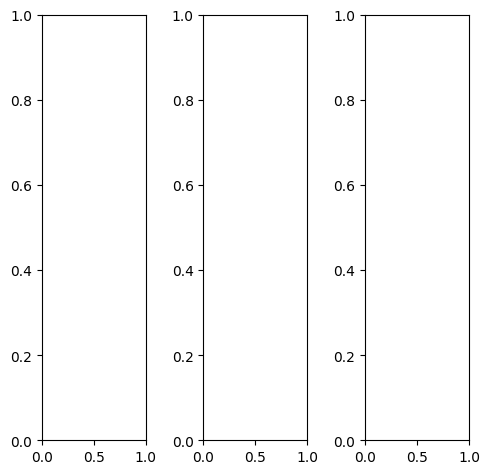

EPOCH: 22.765  trn_loss: 0.004  (2749.62s - 9328.50s remaining)

tensor([[[0.5020, 0.5176, 0.5216,  ..., 0.5882, 0.5843, 0.5647],
         [0.5216, 0.5412, 0.5451,  ..., 0.5961, 0.5882, 0.5686],
         [0.5373, 0.5529, 0.5529,  ..., 0.6078, 0.6000, 0.5765],
         ...,
         [0.7255, 0.7451, 0.7490,  ..., 0.6941, 0.6863, 0.6667],
         [0.7216, 0.7490, 0.7529,  ..., 0.6863, 0.6784, 0.6588],
         [0.7137, 0.7451, 0.7490,  ..., 0.6824, 0.6745, 0.6588]],

        [[0.5020, 0.5176, 0.5216,  ..., 0.5882, 0.5843, 0.5647],
         [0.5216, 0.5412, 0.5451,  ..., 0.5961, 0.5882, 0.5686],
         [0.5373, 0.5529, 0.5529,  ..., 0.6078, 0.6000, 0.5765],
         ...,
         [0.7255, 0.7451, 0.7490,  ..., 0.6941, 0.6863, 0.6667],
         [0.7216, 0.7490, 0.7529,  ..., 0.6863, 0.6784, 0.6588],
         [0.7137, 0.7451, 0.7490,  ..., 0.6824, 0.6745, 0.6588]],

        [[0.5020, 0.5176, 0.5216,  ..., 0.5882, 0.5843, 0.5647],
         [0.5216, 0.5412, 0.5451,  ..., 0.5961, 0.5882, 0.5686],
         [0.5373, 0.5529, 0.5529,  ..., 0.6078, 0.6000, 0.

tensor([[[0.5137, 0.5294, 0.5333,  ..., 0.5843, 0.5804, 0.5608],
         [0.5333, 0.5529, 0.5569,  ..., 0.5922, 0.5882, 0.5647],
         [0.5490, 0.5647, 0.5647,  ..., 0.6078, 0.6000, 0.5725],
         ...,
         [0.7216, 0.7412, 0.7451,  ..., 0.6941, 0.6863, 0.6667],
         [0.7176, 0.7451, 0.7490,  ..., 0.6863, 0.6784, 0.6627],
         [0.7098, 0.7412, 0.7451,  ..., 0.6824, 0.6745, 0.6588]],

        [[0.5098, 0.5255, 0.5294,  ..., 0.5922, 0.5882, 0.5686],
         [0.5294, 0.5490, 0.5529,  ..., 0.6000, 0.5922, 0.5725],
         [0.5451, 0.5608, 0.5608,  ..., 0.6078, 0.6039, 0.5804],
         ...,
         [0.7294, 0.7529, 0.7529,  ..., 0.6980, 0.6902, 0.6706],
         [0.7294, 0.7529, 0.7569,  ..., 0.6902, 0.6824, 0.6627],
         [0.7216, 0.7490, 0.7529,  ..., 0.6863, 0.6784, 0.6627]],

        [[0.4392, 0.4510, 0.4588,  ..., 0.5804, 0.5725, 0.5529],
         [0.4588, 0.4784, 0.4824,  ..., 0.5882, 0.5804, 0.5569],
         [0.4745, 0.4902, 0.4902,  ..., 0.6000, 0.5922, 0.

tensor([[[ 0.1722,  0.0896,  0.0355,  ...,  0.3511,  0.3691,  0.3578],
         [ 0.1708, -0.0254, -0.0021,  ...,  0.3502,  0.3435,  0.3281],
         [ 0.0691,  0.0550, -0.0520,  ...,  0.4016,  0.3857,  0.3467],
         ...,
         [ 0.6355,  0.6549,  0.6591,  ...,  0.5815,  0.5477,  0.5372],
         [ 0.6340,  0.6465,  0.6465,  ...,  0.5587,  0.5531,  0.5281],
         [ 0.6126,  0.6340,  0.6290,  ...,  0.5661,  0.5310,  0.5315]],

        [[ 0.3136,  0.2956,  0.2582,  ...,  0.4307,  0.4703,  0.3869],
         [ 0.2481,  0.1911,  0.0913,  ...,  0.4523,  0.4822,  0.3722],
         [ 0.2483,  0.3040,  0.1974,  ...,  0.4810,  0.4936,  0.3667],
         ...,
         [ 0.5975,  0.6464,  0.6829,  ...,  0.5870,  0.5860,  0.5032],
         [ 0.5967,  0.6272,  0.6600,  ...,  0.5795,  0.5551,  0.5171],
         [ 0.5615,  0.6098,  0.6206,  ...,  0.5495,  0.5355,  0.4990]],

        [[ 0.5249,  0.3421,  0.4644,  ...,  0.5293,  0.5543,  0.5132],
         [ 0.4819,  0.4025,  0.4263,  ...,  0

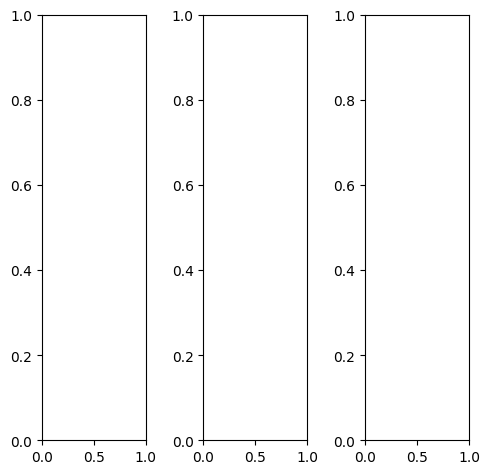

tensor([[[0.3216, 0.3059, 0.3412,  ..., 0.3255, 0.3137, 0.3176],
         [0.3098, 0.4314, 0.6275,  ..., 0.5882, 0.4157, 0.3098],
         [0.3059, 0.5098, 0.7725,  ..., 0.7255, 0.4863, 0.3059],
         ...,
         [0.3137, 0.4510, 0.5961,  ..., 0.7294, 0.4980, 0.3059],
         [0.3176, 0.3804, 0.4588,  ..., 0.4745, 0.3765, 0.3098],
         [0.3137, 0.3608, 0.4275,  ..., 0.4118, 0.3412, 0.3137]],

        [[0.3216, 0.3059, 0.3412,  ..., 0.3255, 0.3137, 0.3176],
         [0.3098, 0.4314, 0.6275,  ..., 0.5882, 0.4157, 0.3098],
         [0.3059, 0.5098, 0.7725,  ..., 0.7255, 0.4863, 0.3059],
         ...,
         [0.3137, 0.4510, 0.5961,  ..., 0.7294, 0.4980, 0.3059],
         [0.3176, 0.3804, 0.4588,  ..., 0.4745, 0.3765, 0.3098],
         [0.3137, 0.3608, 0.4275,  ..., 0.4118, 0.3412, 0.3137]],

        [[0.3216, 0.3059, 0.3412,  ..., 0.3255, 0.3137, 0.3176],
         [0.3098, 0.4314, 0.6275,  ..., 0.5882, 0.4157, 0.3098],
         [0.3059, 0.5098, 0.7725,  ..., 0.7255, 0.4863, 0.

tensor([[[0.0039, 0.0196, 0.0784,  ..., 0.0392, 0.0078, 0.0039],
         [0.0000, 0.1765, 0.4627,  ..., 0.4196, 0.1569, 0.0000],
         [0.0000, 0.2941, 0.6431,  ..., 0.5961, 0.2431, 0.0000],
         ...,
         [0.0000, 0.3020, 0.6039,  ..., 0.7333, 0.3333, 0.0000],
         [0.0000, 0.1529, 0.3020,  ..., 0.3020, 0.1294, 0.0000],
         [0.0039, 0.0863, 0.1804,  ..., 0.1529, 0.0510, 0.0000]],

        [[0.4157, 0.3922, 0.4235,  ..., 0.4196, 0.4039, 0.4118],
         [0.4000, 0.5059, 0.6863,  ..., 0.6431, 0.4980, 0.4000],
         [0.3922, 0.5765, 0.8196,  ..., 0.7647, 0.5608, 0.3961],
         ...,
         [0.4039, 0.5020, 0.6039,  ..., 0.7333, 0.5529, 0.3961],
         [0.4078, 0.4510, 0.5098,  ..., 0.5255, 0.4510, 0.4039],
         [0.4078, 0.4431, 0.4980,  ..., 0.4863, 0.4235, 0.4078]],

        [[0.6745, 0.6157, 0.6039,  ..., 0.5961, 0.6353, 0.6667],
         [0.6627, 0.7020, 0.7608,  ..., 0.7412, 0.6745, 0.6431],
         [0.6510, 0.7490, 0.8627,  ..., 0.8471, 0.7294, 0.

tensor([[[-0.0713, -0.0653, -0.0892,  ..., -0.0032,  0.0248,  0.0824],
         [ 0.0587, -0.1314,  0.0993,  ...,  0.2964,  0.1304,  0.0410],
         [-0.2455,  0.0329,  0.3112,  ...,  0.4319,  0.1887,  0.0331],
         ...,
         [ 0.1588,  0.3309,  0.5308,  ...,  0.6351,  0.3750,  0.1539],
         [ 0.1526,  0.2181,  0.3302,  ...,  0.3193,  0.1915,  0.1502],
         [ 0.1623,  0.1877,  0.2674,  ...,  0.2422,  0.1666,  0.1370]],

        [[ 0.0686,  0.1014,  0.0091,  ...,  0.0849,  0.1055,  0.1423],
         [ 0.0613,  0.0698,  0.0785,  ...,  0.3992,  0.2414,  0.0950],
         [-0.1603,  0.1731,  0.3678,  ...,  0.5438,  0.2843,  0.0851],
         ...,
         [ 0.1383,  0.2925,  0.4837,  ...,  0.6114,  0.3450,  0.1016],
         [ 0.1355,  0.1946,  0.2929,  ...,  0.3156,  0.1777,  0.1067],
         [ 0.1559,  0.1716,  0.2441,  ...,  0.2224,  0.1437,  0.1025]],

        [[ 0.1947, -0.0175,  0.1661,  ...,  0.2069,  0.2199,  0.2585],
         [ 0.2433,  0.0156,  0.3398,  ...,  0

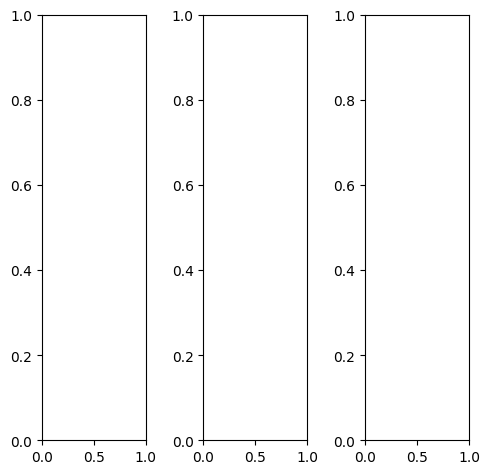

tensor([[[0.7882, 0.7843, 0.7843,  ..., 0.7804, 0.7804, 0.7804],
         [0.8000, 0.7922, 0.7961,  ..., 0.7922, 0.7922, 0.7922],
         [0.7922, 0.7882, 0.7922,  ..., 0.7843, 0.7843, 0.7843],
         ...,
         [0.5686, 0.5725, 0.5804,  ..., 0.5843, 0.5882, 0.5882],
         [0.5922, 0.6039, 0.6196,  ..., 0.5922, 0.6000, 0.6000],
         [0.6000, 0.6078, 0.6235,  ..., 0.5725, 0.5843, 0.5843]],

        [[0.7882, 0.7843, 0.7843,  ..., 0.7804, 0.7804, 0.7804],
         [0.8000, 0.7922, 0.7961,  ..., 0.7922, 0.7922, 0.7922],
         [0.7922, 0.7882, 0.7922,  ..., 0.7843, 0.7843, 0.7843],
         ...,
         [0.5686, 0.5725, 0.5804,  ..., 0.5843, 0.5882, 0.5882],
         [0.5922, 0.6039, 0.6196,  ..., 0.5922, 0.6000, 0.6000],
         [0.6000, 0.6078, 0.6235,  ..., 0.5725, 0.5843, 0.5843]],

        [[0.7882, 0.7843, 0.7843,  ..., 0.7804, 0.7804, 0.7804],
         [0.8000, 0.7922, 0.7961,  ..., 0.7922, 0.7922, 0.7922],
         [0.7922, 0.7882, 0.7922,  ..., 0.7843, 0.7843, 0.

tensor([[[0.7608, 0.7569, 0.7608,  ..., 0.7569, 0.7569, 0.7569],
         [0.7765, 0.7686, 0.7725,  ..., 0.7686, 0.7686, 0.7686],
         [0.7686, 0.7647, 0.7686,  ..., 0.7608, 0.7608, 0.7608],
         ...,
         [0.6941, 0.6941, 0.7059,  ..., 0.7098, 0.7137, 0.7098],
         [0.7294, 0.7451, 0.7647,  ..., 0.7137, 0.7255, 0.7216],
         [0.7333, 0.7451, 0.7647,  ..., 0.6863, 0.7020, 0.6980]],

        [[0.8039, 0.8000, 0.8000,  ..., 0.7922, 0.7922, 0.7922],
         [0.8118, 0.8078, 0.8078,  ..., 0.8039, 0.8078, 0.8039],
         [0.8078, 0.8039, 0.8039,  ..., 0.8000, 0.8000, 0.8000],
         ...,
         [0.5373, 0.5451, 0.5490,  ..., 0.5608, 0.5608, 0.5608],
         [0.5608, 0.5725, 0.5843,  ..., 0.5686, 0.5725, 0.5765],
         [0.5725, 0.5804, 0.5922,  ..., 0.5529, 0.5608, 0.5608]],

        [[0.7804, 0.7765, 0.7765,  ..., 0.7725, 0.7725, 0.7725],
         [0.7882, 0.7843, 0.7882,  ..., 0.7804, 0.7804, 0.7804],
         [0.7765, 0.7725, 0.7804,  ..., 0.7725, 0.7686, 0.

tensor([[[0.5615, 0.4800, 0.3907,  ..., 0.4391, 0.4779, 0.5348],
         [0.5378, 0.4367, 0.4859,  ..., 0.4616, 0.4978, 0.5156],
         [0.4644, 0.5096, 0.3749,  ..., 0.4622, 0.4913, 0.5181],
         ...,
         [0.3342, 0.3612, 0.3892,  ..., 0.4369, 0.3938, 0.3703],
         [0.3756, 0.3833, 0.4292,  ..., 0.3823, 0.3846, 0.3699],
         [0.3871, 0.3496, 0.3694,  ..., 0.3106, 0.3141, 0.3553]],

        [[0.6805, 0.5359, 0.5634,  ..., 0.5228, 0.5872, 0.5704],
         [0.5300, 0.4881, 0.4807,  ..., 0.6033, 0.6394, 0.6161],
         [0.6072, 0.5692, 0.5957,  ..., 0.5793, 0.6068, 0.6077],
         ...,
         [0.2941, 0.3232, 0.3544,  ..., 0.3855, 0.3630, 0.2958],
         [0.3442, 0.3729, 0.3919,  ..., 0.3494, 0.3574, 0.3170],
         [0.3325, 0.3256, 0.3387,  ..., 0.2634, 0.2757, 0.2819]],

        [[0.8041, 0.6822, 0.7589,  ..., 0.7229, 0.7518, 0.7321],
         [0.7416, 0.7640, 0.7384,  ..., 0.7424, 0.7998, 0.7651],
         [0.6965, 0.7104, 0.7353,  ..., 0.7728, 0.7954, 0.

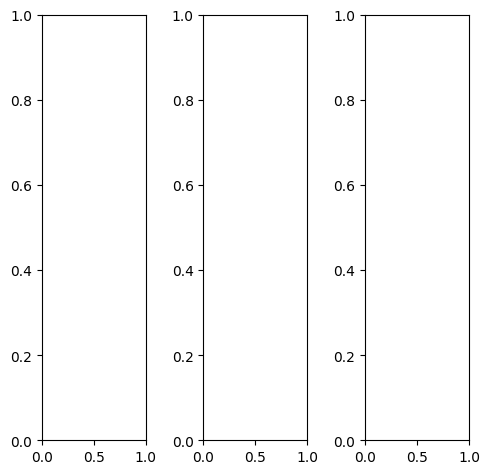

tensor([[[0.9725, 0.9765, 0.9647,  ..., 0.9608, 0.9843, 0.9882],
         [0.8863, 0.8667, 0.9020,  ..., 0.9333, 0.9020, 0.9098],
         [0.7647, 0.8275, 0.9412,  ..., 0.7765, 0.7882, 0.8667],
         ...,
         [0.1922, 0.1961, 0.1804,  ..., 0.3333, 0.3137, 0.2824],
         [0.1922, 0.1961, 0.1882,  ..., 0.3333, 0.2980, 0.3255],
         [0.2196, 0.2314, 0.2157,  ..., 0.3765, 0.3059, 0.3098]],

        [[0.9725, 0.9765, 0.9647,  ..., 0.9608, 0.9843, 0.9882],
         [0.8863, 0.8667, 0.9020,  ..., 0.9333, 0.9020, 0.9098],
         [0.7647, 0.8275, 0.9412,  ..., 0.7765, 0.7882, 0.8667],
         ...,
         [0.1922, 0.1961, 0.1804,  ..., 0.3333, 0.3137, 0.2824],
         [0.1922, 0.1961, 0.1882,  ..., 0.3333, 0.2980, 0.3255],
         [0.2196, 0.2314, 0.2157,  ..., 0.3765, 0.3059, 0.3098]],

        [[0.9725, 0.9765, 0.9647,  ..., 0.9608, 0.9843, 0.9882],
         [0.8863, 0.8667, 0.9020,  ..., 0.9333, 0.9020, 0.9098],
         [0.7647, 0.8275, 0.9412,  ..., 0.7765, 0.7882, 0.

tensor([[[0.9686, 0.9686, 0.9608,  ..., 0.9608, 0.9843, 0.9882],
         [0.8745, 0.8510, 0.8863,  ..., 0.9333, 0.9020, 0.9098],
         [0.7412, 0.8039, 0.9216,  ..., 0.7765, 0.7882, 0.8667],
         ...,
         [0.1961, 0.1961, 0.1843,  ..., 0.4118, 0.3686, 0.3255],
         [0.2078, 0.2157, 0.2078,  ..., 0.4039, 0.3490, 0.3608],
         [0.2510, 0.2627, 0.2510,  ..., 0.4431, 0.3529, 0.3373]],

        [[0.9804, 0.9804, 0.9725,  ..., 0.9765, 0.9961, 0.9922],
         [0.9059, 0.8784, 0.9098,  ..., 0.9490, 0.9255, 0.9294],
         [0.7961, 0.8471, 0.9529,  ..., 0.8039, 0.8157, 0.8902],
         ...,
         [0.1922, 0.1961, 0.1804,  ..., 0.3137, 0.2980, 0.2745],
         [0.1843, 0.1922, 0.1843,  ..., 0.3137, 0.2863, 0.3176],
         [0.2078, 0.2235, 0.2078,  ..., 0.3569, 0.2980, 0.3059]],

        [[0.9529, 0.9647, 0.9451,  ..., 0.8824, 0.9294, 0.9569],
         [0.8314, 0.8510, 0.8980,  ..., 0.8471, 0.7961, 0.8078],
         [0.6627, 0.7882, 0.9333,  ..., 0.6353, 0.6510, 0.

tensor([[[1.0512, 1.1045, 1.0266,  ..., 0.9129, 0.9148, 0.9164],
         [0.9705, 1.0829, 1.0328,  ..., 0.9113, 0.9142, 0.9133],
         [0.8226, 1.0148, 1.0164,  ..., 0.7517, 0.7603, 0.8741],
         ...,
         [0.1281, 0.1552, 0.1369,  ..., 0.4081, 0.3939, 0.3571],
         [0.1407, 0.1469, 0.1481,  ..., 0.3749, 0.3512, 0.4185],
         [0.2229, 0.1997, 0.1738,  ..., 0.4931, 0.3722, 0.4138]],

        [[1.0459, 1.0613, 0.9684,  ..., 0.9715, 0.9799, 1.0048],
         [0.9028, 0.9326, 0.9087,  ..., 0.9610, 0.9437, 0.9999],
         [0.9184, 0.9212, 1.0422,  ..., 0.7669, 0.7987, 0.9463],
         ...,
         [0.1878, 0.1955, 0.1930,  ..., 0.4236, 0.4120, 0.3004],
         [0.1859, 0.1907, 0.1883,  ..., 0.4039, 0.3625, 0.3701],
         [0.2422, 0.2335, 0.2198,  ..., 0.4707, 0.3554, 0.3701]],

        [[1.0891, 1.1723, 1.1101,  ..., 1.0929, 1.1091, 1.1143],
         [1.0450, 1.1044, 1.1328,  ..., 1.0608, 1.0808, 1.0840],
         [0.9207, 1.0091, 1.1593,  ..., 0.9082, 0.9252, 1.

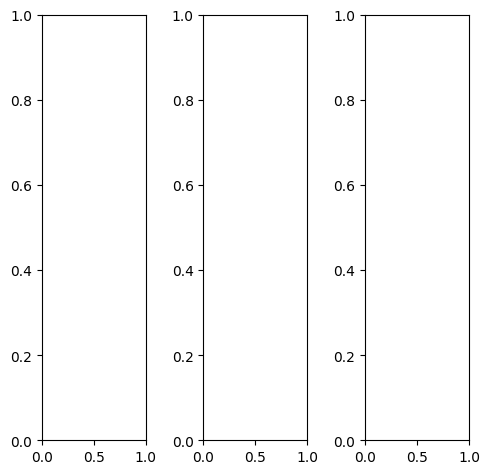

tensor([[[0.3098, 0.2784, 0.2549,  ..., 0.5569, 0.5490, 0.5333],
         [0.2431, 0.2902, 0.3529,  ..., 0.5765, 0.5686, 0.5569],
         [0.3686, 0.4118, 0.4510,  ..., 0.5804, 0.5765, 0.5686],
         ...,
         [0.4431, 0.5020, 0.4667,  ..., 0.4510, 0.4627, 0.4980],
         [0.4588, 0.4667, 0.4431,  ..., 0.4118, 0.4588, 0.4784],
         [0.4314, 0.4667, 0.4000,  ..., 0.3882, 0.4471, 0.4510]],

        [[0.3098, 0.2784, 0.2549,  ..., 0.5569, 0.5490, 0.5333],
         [0.2431, 0.2902, 0.3529,  ..., 0.5765, 0.5686, 0.5569],
         [0.3686, 0.4118, 0.4510,  ..., 0.5804, 0.5765, 0.5686],
         ...,
         [0.4431, 0.5020, 0.4667,  ..., 0.4510, 0.4627, 0.4980],
         [0.4588, 0.4667, 0.4431,  ..., 0.4118, 0.4588, 0.4784],
         [0.4314, 0.4667, 0.4000,  ..., 0.3882, 0.4471, 0.4510]],

        [[0.3098, 0.2784, 0.2549,  ..., 0.5569, 0.5490, 0.5333],
         [0.2431, 0.2902, 0.3529,  ..., 0.5765, 0.5686, 0.5569],
         [0.3686, 0.4118, 0.4510,  ..., 0.5804, 0.5765, 0.

tensor([[[0.3098, 0.2784, 0.2667,  ..., 0.6157, 0.6078, 0.5843],
         [0.2471, 0.3059, 0.3804,  ..., 0.6353, 0.6275, 0.6118],
         [0.3961, 0.4510, 0.4980,  ..., 0.6431, 0.6314, 0.6235],
         ...,
         [0.5176, 0.5922, 0.5529,  ..., 0.5059, 0.5137, 0.5490],
         [0.5373, 0.5490, 0.5255,  ..., 0.4627, 0.5098, 0.5333],
         [0.5020, 0.5451, 0.4706,  ..., 0.4392, 0.4941, 0.4941]],

        [[0.3333, 0.3059, 0.2824,  ..., 0.5529, 0.5451, 0.5294],
         [0.2706, 0.3176, 0.3725,  ..., 0.5725, 0.5686, 0.5529],
         [0.3882, 0.4235, 0.4549,  ..., 0.5765, 0.5725, 0.5647],
         ...,
         [0.4353, 0.4902, 0.4549,  ..., 0.4471, 0.4588, 0.4941],
         [0.4510, 0.4588, 0.4353,  ..., 0.4078, 0.4549, 0.4745],
         [0.4275, 0.4627, 0.3922,  ..., 0.3843, 0.4431, 0.4471]],

        [[0.2000, 0.1373, 0.0980,  ..., 0.4235, 0.4157, 0.4039],
         [0.0824, 0.1216, 0.1804,  ..., 0.4353, 0.4314, 0.4235],
         [0.2078, 0.2588, 0.2980,  ..., 0.4431, 0.4392, 0.

tensor([[[ 0.1030,  0.0789, -0.0614,  ...,  0.4190,  0.4084,  0.4844],
         [ 0.1271, -0.0106,  0.0446,  ...,  0.3874,  0.4232,  0.4706],
         [ 0.1332,  0.1881,  0.1417,  ...,  0.4421,  0.4448,  0.4769],
         ...,
         [ 0.4949,  0.5950,  0.5173,  ...,  0.4904,  0.4900,  0.5548],
         [ 0.5275,  0.5400,  0.4965,  ...,  0.3988,  0.4802,  0.5345],
         [ 0.5052,  0.5663,  0.4530,  ...,  0.4001,  0.5044,  0.5254]],

        [[ 0.2463,  0.1617,  0.0961,  ...,  0.6011,  0.6095,  0.6030],
         [ 0.1314,  0.0697,  0.0051,  ...,  0.6219,  0.6250,  0.6715],
         [ 0.3140,  0.2720,  0.3192,  ...,  0.6356,  0.6151,  0.6613],
         ...,
         [ 0.4798,  0.5769,  0.5427,  ...,  0.5205,  0.5394,  0.5438],
         [ 0.4937,  0.5337,  0.5129,  ...,  0.4618,  0.5211,  0.5333],
         [ 0.4729,  0.5396,  0.4613,  ...,  0.4239,  0.5122,  0.5119]],

        [[ 0.4098,  0.2213,  0.3295,  ...,  0.8723,  0.8557,  0.8241],
         [ 0.3531,  0.3070,  0.3884,  ...,  0

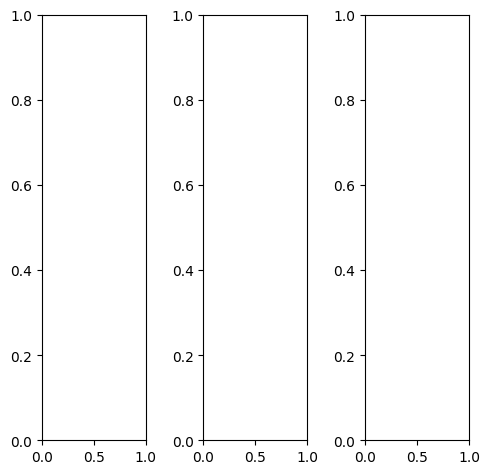

EPOCH: 23.000  val_loss: 0.003  (2785.28s - 9324.64s remaining)

tensor([[[1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 1.0000, 0.9961],
         ...,
         [0.2078, 0.2118, 0.2078,  ..., 0.2275, 0.2275, 0.2275],
         [0.2000, 0.2000, 0.2000,  ..., 0.2196, 0.2196, 0.2157],
         [0.1882, 0.1922, 0.1882,  ..., 0.2078, 0.2078, 0.2078]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 1.0000, 0.9961],
         ...,
         [0.2078, 0.2118, 0.2078,  ..., 0.2275, 0.2275, 0.2275],
         [0.2000, 0.2000, 0.2000,  ..., 0.2196, 0.2196, 0.2157],
         [0.1882, 0.1922, 0.1882,  ..., 0.2078, 0.2078, 0.2078]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 1.0000, 0.

tensor([[[1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 0.9961],
         ...,
         [0.1255, 0.1294, 0.1255,  ..., 0.1333, 0.1333, 0.1333],
         [0.1137, 0.1176, 0.1176,  ..., 0.1255, 0.1255, 0.1216],
         [0.1059, 0.1098, 0.1098,  ..., 0.1137, 0.1137, 0.1137]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 0.9961, 1.0000, 0.9961],
         ...,
         [0.2235, 0.2275, 0.2235,  ..., 0.2431, 0.2431, 0.2431],
         [0.2157, 0.2157, 0.2157,  ..., 0.2353, 0.2353, 0.2314],
         [0.2039, 0.2078, 0.2039,  ..., 0.2235, 0.2235, 0.2235]],

        [[1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 0.9922, 0.9922, 0.

tensor([[[0.9970, 0.9725, 1.0211,  ..., 0.9710, 0.9641, 0.9333],
         [0.9980, 0.9829, 0.9996,  ..., 0.9701, 0.9786, 0.9563],
         [0.9986, 1.0008, 1.0028,  ..., 0.9828, 0.9921, 0.9789],
         ...,
         [0.1793, 0.1844, 0.1804,  ..., 0.1955, 0.1862, 0.1973],
         [0.1702, 0.1737, 0.1725,  ..., 0.1854, 0.1788, 0.1869],
         [0.1807, 0.1661, 0.1576,  ..., 0.1750, 0.1690, 0.2080]],

        [[1.0107, 1.0110, 1.0132,  ..., 0.9811, 0.9695, 0.9754],
         [1.0259, 0.9861, 1.0287,  ..., 0.9932, 0.9836, 0.9790],
         [1.0099, 1.0152, 1.0247,  ..., 0.9984, 1.0074, 0.9890],
         ...,
         [0.2206, 0.2207, 0.2240,  ..., 0.2439, 0.2420, 0.2335],
         [0.2073, 0.2091, 0.2173,  ..., 0.2370, 0.2292, 0.2144],
         [0.2190, 0.2014, 0.2010,  ..., 0.2232, 0.2101, 0.2375]],

        [[1.0227, 0.9993, 1.0208,  ..., 0.9918, 0.9879, 0.9734],
         [1.0269, 0.9863, 1.0501,  ..., 1.0028, 1.0012, 0.9907],
         [1.0292, 1.0276, 0.9933,  ..., 1.0030, 1.0064, 1.

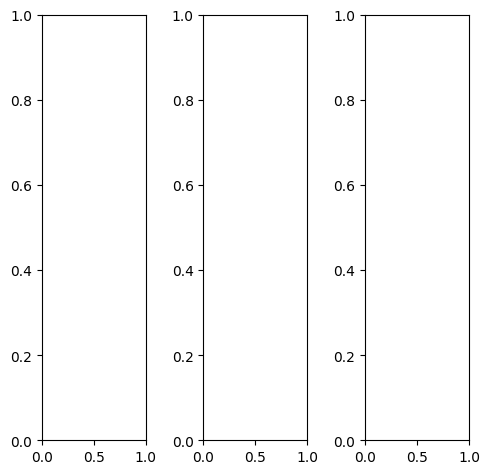

tensor([[[0.2627, 0.2471, 0.2706,  ..., 0.3490, 0.3490, 0.3098],
         [0.2784, 0.2667, 0.2784,  ..., 0.3529, 0.3569, 0.3255],
         [0.2824, 0.2667, 0.2863,  ..., 0.3216, 0.3176, 0.3176],
         ...,
         [0.3412, 0.3451, 0.3412,  ..., 0.3882, 0.3412, 0.3569],
         [0.3294, 0.3451, 0.3333,  ..., 0.3451, 0.3216, 0.3020],
         [0.3216, 0.3529, 0.3451,  ..., 0.3137, 0.3137, 0.3020]],

        [[0.2627, 0.2471, 0.2706,  ..., 0.3490, 0.3490, 0.3098],
         [0.2784, 0.2667, 0.2784,  ..., 0.3529, 0.3569, 0.3255],
         [0.2824, 0.2667, 0.2863,  ..., 0.3216, 0.3176, 0.3176],
         ...,
         [0.3412, 0.3451, 0.3412,  ..., 0.3882, 0.3412, 0.3569],
         [0.3294, 0.3451, 0.3333,  ..., 0.3451, 0.3216, 0.3020],
         [0.3216, 0.3529, 0.3451,  ..., 0.3137, 0.3137, 0.3020]],

        [[0.2627, 0.2471, 0.2706,  ..., 0.3490, 0.3490, 0.3098],
         [0.2784, 0.2667, 0.2784,  ..., 0.3529, 0.3569, 0.3255],
         [0.2824, 0.2667, 0.2863,  ..., 0.3216, 0.3176, 0.

tensor([[[0.2980, 0.2824, 0.3059,  ..., 0.3373, 0.3333, 0.2902],
         [0.3255, 0.3255, 0.3333,  ..., 0.3451, 0.3412, 0.3059],
         [0.3216, 0.3098, 0.3333,  ..., 0.3059, 0.2980, 0.2941],
         ...,
         [0.3020, 0.3098, 0.3020,  ..., 0.4078, 0.3412, 0.3529],
         [0.2902, 0.3176, 0.2902,  ..., 0.3176, 0.2784, 0.2745],
         [0.2784, 0.3216, 0.2941,  ..., 0.2588, 0.2667, 0.2745]],

        [[0.2667, 0.2471, 0.2706,  ..., 0.3804, 0.3843, 0.3490],
         [0.2784, 0.2627, 0.2745,  ..., 0.3843, 0.3922, 0.3647],
         [0.2784, 0.2706, 0.2824,  ..., 0.3569, 0.3569, 0.3569],
         ...,
         [0.3922, 0.3922, 0.3882,  ..., 0.4078, 0.3686, 0.3843],
         [0.3765, 0.3882, 0.3804,  ..., 0.3922, 0.3725, 0.3451],
         [0.3686, 0.3961, 0.3961,  ..., 0.3725, 0.3686, 0.3490]],

        [[0.1490, 0.1451, 0.1686,  ..., 0.2157, 0.2118, 0.1725],
         [0.1608, 0.1490, 0.1608,  ..., 0.2275, 0.2235, 0.1882],
         [0.1843, 0.1490, 0.1765,  ..., 0.1725, 0.1765, 0.

tensor([[[0.2872, 0.2593, 0.2738,  ..., 0.3539, 0.3518, 0.3156],
         [0.2735, 0.2631, 0.2812,  ..., 0.3558, 0.3714, 0.3252],
         [0.2829, 0.2662, 0.2860,  ..., 0.3246, 0.3233, 0.3222],
         ...,
         [0.3631, 0.3689, 0.3540,  ..., 0.4040, 0.3574, 0.3701],
         [0.3467, 0.3720, 0.3524,  ..., 0.3540, 0.3389, 0.3107],
         [0.3466, 0.3724, 0.3599,  ..., 0.3288, 0.3229, 0.3295]],

        [[0.2838, 0.2655, 0.2822,  ..., 0.3583, 0.3558, 0.3236],
         [0.2776, 0.2714, 0.2903,  ..., 0.3666, 0.3801, 0.3354],
         [0.2873, 0.2753, 0.3017,  ..., 0.3361, 0.3343, 0.3340],
         ...,
         [0.3548, 0.3649, 0.3568,  ..., 0.4053, 0.3581, 0.3696],
         [0.3372, 0.3589, 0.3404,  ..., 0.3485, 0.3269, 0.3087],
         [0.3380, 0.3631, 0.3517,  ..., 0.3225, 0.3153, 0.3245]],

        [[0.2287, 0.2037, 0.2177,  ..., 0.2719, 0.2812, 0.2606],
         [0.2160, 0.2086, 0.2194,  ..., 0.2619, 0.2735, 0.2390],
         [0.2189, 0.2085, 0.2265,  ..., 0.2410, 0.2356, 0.

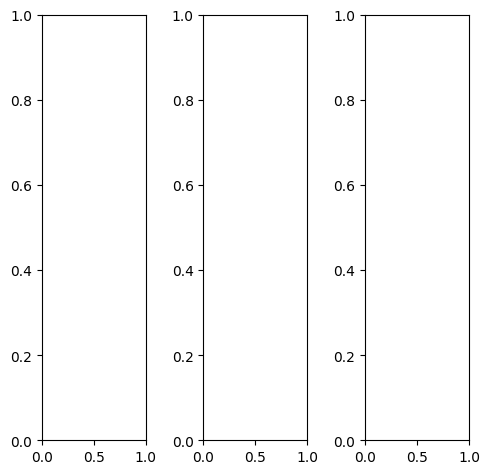

tensor([[[0.6353, 0.5451, 0.5922,  ..., 0.4627, 0.4824, 0.3765],
         [0.6392, 0.5569, 0.4902,  ..., 0.4588, 0.4667, 0.3804],
         [0.6431, 0.6431, 0.5490,  ..., 0.4471, 0.3922, 0.3765],
         ...,
         [0.4627, 0.4745, 0.4549,  ..., 0.4549, 0.4235, 0.4196],
         [0.4784, 0.4941, 0.5020,  ..., 0.4902, 0.4706, 0.4549],
         [0.4745, 0.4863, 0.5020,  ..., 0.4824, 0.4824, 0.4706]],

        [[0.6353, 0.5451, 0.5922,  ..., 0.4627, 0.4824, 0.3765],
         [0.6392, 0.5569, 0.4902,  ..., 0.4588, 0.4667, 0.3804],
         [0.6431, 0.6431, 0.5490,  ..., 0.4471, 0.3922, 0.3765],
         ...,
         [0.4627, 0.4745, 0.4549,  ..., 0.4549, 0.4235, 0.4196],
         [0.4784, 0.4941, 0.5020,  ..., 0.4902, 0.4706, 0.4549],
         [0.4745, 0.4863, 0.5020,  ..., 0.4824, 0.4824, 0.4706]],

        [[0.6353, 0.5451, 0.5922,  ..., 0.4627, 0.4824, 0.3765],
         [0.6392, 0.5569, 0.4902,  ..., 0.4588, 0.4667, 0.3804],
         [0.6431, 0.6431, 0.5490,  ..., 0.4471, 0.3922, 0.

tensor([[[0.6039, 0.5255, 0.5843,  ..., 0.4784, 0.4824, 0.3490],
         [0.6078, 0.5373, 0.4824,  ..., 0.4745, 0.4667, 0.3569],
         [0.6118, 0.6196, 0.5412,  ..., 0.4667, 0.3882, 0.3490],
         ...,
         [0.4980, 0.5098, 0.4941,  ..., 0.5059, 0.4667, 0.4588],
         [0.4980, 0.5137, 0.5216,  ..., 0.5451, 0.5137, 0.4941],
         [0.5059, 0.5137, 0.5333,  ..., 0.5451, 0.5294, 0.5059]],

        [[0.6471, 0.5529, 0.5922,  ..., 0.4588, 0.4824, 0.3804],
         [0.6510, 0.5647, 0.4902,  ..., 0.4549, 0.4667, 0.3882],
         [0.6549, 0.6510, 0.5490,  ..., 0.4431, 0.3922, 0.3843],
         ...,
         [0.4588, 0.4706, 0.4510,  ..., 0.4431, 0.4118, 0.4078],
         [0.4824, 0.4980, 0.5059,  ..., 0.4784, 0.4627, 0.4471],
         [0.4784, 0.4902, 0.5059,  ..., 0.4667, 0.4745, 0.4667]],

        [[0.6588, 0.5647, 0.6000,  ..., 0.4392, 0.4863, 0.4118],
         [0.6627, 0.5765, 0.4980,  ..., 0.4353, 0.4706, 0.4157],
         [0.6667, 0.6588, 0.5608,  ..., 0.4235, 0.3922, 0.

tensor([[[0.6221, 0.5563, 0.5958,  ..., 0.4657, 0.4821, 0.3877],
         [0.6514, 0.5700, 0.4985,  ..., 0.4525, 0.4668, 0.3757],
         [0.6461, 0.6573, 0.5693,  ..., 0.4500, 0.3940, 0.3859],
         ...,
         [0.4668, 0.4806, 0.4601,  ..., 0.4745, 0.4448, 0.4345],
         [0.4921, 0.5153, 0.5238,  ..., 0.5196, 0.4917, 0.4714],
         [0.4901, 0.5001, 0.5131,  ..., 0.5067, 0.5135, 0.4997]],

        [[0.6170, 0.5542, 0.5966,  ..., 0.4866, 0.5021, 0.3960],
         [0.6417, 0.5599, 0.5019,  ..., 0.4784, 0.4940, 0.3927],
         [0.6443, 0.6491, 0.5727,  ..., 0.4611, 0.4159, 0.3937],
         ...,
         [0.4788, 0.4950, 0.4750,  ..., 0.4686, 0.4409, 0.4300],
         [0.4855, 0.5163, 0.5296,  ..., 0.5098, 0.4875, 0.4656],
         [0.4926, 0.4991, 0.5167,  ..., 0.4904, 0.4938, 0.4957]],

        [[0.5817, 0.5083, 0.5328,  ..., 0.3949, 0.4226, 0.3459],
         [0.5894, 0.4918, 0.4264,  ..., 0.3780, 0.3979, 0.3187],
         [0.5853, 0.5765, 0.4939,  ..., 0.3596, 0.3171, 0.

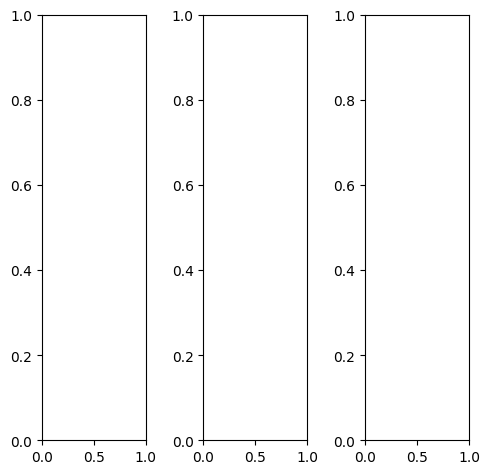

tensor([[[0.4706, 0.4627, 0.4627,  ..., 0.4627, 0.4549, 0.4588],
         [0.4784, 0.4706, 0.4706,  ..., 0.4667, 0.4588, 0.4627],
         [0.4784, 0.4706, 0.4745,  ..., 0.4667, 0.4588, 0.4667],
         ...,
         [0.5373, 0.5294, 0.5333,  ..., 0.7647, 0.7725, 0.7804],
         [0.5451, 0.5412, 0.5412,  ..., 0.7608, 0.7647, 0.7765],
         [0.5490, 0.5412, 0.5373,  ..., 0.7647, 0.7647, 0.7686]],

        [[0.4706, 0.4627, 0.4627,  ..., 0.4627, 0.4549, 0.4588],
         [0.4784, 0.4706, 0.4706,  ..., 0.4667, 0.4588, 0.4627],
         [0.4784, 0.4706, 0.4745,  ..., 0.4667, 0.4588, 0.4667],
         ...,
         [0.5373, 0.5294, 0.5333,  ..., 0.7647, 0.7725, 0.7804],
         [0.5451, 0.5412, 0.5412,  ..., 0.7608, 0.7647, 0.7765],
         [0.5490, 0.5412, 0.5373,  ..., 0.7647, 0.7647, 0.7686]],

        [[0.4706, 0.4627, 0.4627,  ..., 0.4627, 0.4549, 0.4588],
         [0.4784, 0.4706, 0.4706,  ..., 0.4667, 0.4588, 0.4627],
         [0.4784, 0.4706, 0.4745,  ..., 0.4667, 0.4588, 0.

tensor([[[0.3176, 0.3098, 0.3098,  ..., 0.2824, 0.2627, 0.2627],
         [0.3216, 0.3176, 0.3176,  ..., 0.2824, 0.2667, 0.2667],
         [0.3255, 0.3176, 0.3216,  ..., 0.2824, 0.2667, 0.2706],
         ...,
         [0.3725, 0.3686, 0.3686,  ..., 0.7412, 0.7490, 0.7569],
         [0.3804, 0.3765, 0.3765,  ..., 0.7490, 0.7490, 0.7529],
         [0.3843, 0.3765, 0.3765,  ..., 0.7490, 0.7490, 0.7490]],

        [[0.5216, 0.5137, 0.5137,  ..., 0.5294, 0.5216, 0.5294],
         [0.5255, 0.5176, 0.5176,  ..., 0.5333, 0.5294, 0.5333],
         [0.5255, 0.5176, 0.5216,  ..., 0.5333, 0.5294, 0.5373],
         ...,
         [0.5922, 0.5843, 0.5843,  ..., 0.7765, 0.7843, 0.7922],
         [0.6000, 0.5961, 0.5961,  ..., 0.7725, 0.7765, 0.7882],
         [0.6039, 0.5961, 0.5922,  ..., 0.7765, 0.7765, 0.7804]],

        [[0.6196, 0.6118, 0.6078,  ..., 0.6078, 0.6000, 0.6039],
         [0.6314, 0.6235, 0.6235,  ..., 0.6118, 0.6039, 0.6078],
         [0.6392, 0.6314, 0.6314,  ..., 0.6118, 0.6039, 0.

tensor([[[0.4359, 0.3898, 0.3727,  ..., 0.3723, 0.3831, 0.4186],
         [0.4103, 0.3805, 0.3948,  ..., 0.3748, 0.3816, 0.3985],
         [0.3960, 0.3849, 0.3914,  ..., 0.3785, 0.3757, 0.3893],
         ...,
         [0.4613, 0.4576, 0.4434,  ..., 0.7216, 0.7232, 0.7458],
         [0.4936, 0.4748, 0.4595,  ..., 0.7032, 0.7154, 0.7487],
         [0.5216, 0.4926, 0.4716,  ..., 0.7282, 0.7434, 0.7450]],

        [[0.4917, 0.4863, 0.4733,  ..., 0.4650, 0.4713, 0.4760],
         [0.4932, 0.4845, 0.4881,  ..., 0.4929, 0.4883, 0.4711],
         [0.4884, 0.4984, 0.4917,  ..., 0.4941, 0.4839, 0.4701],
         ...,
         [0.5517, 0.5478, 0.5497,  ..., 0.7695, 0.7772, 0.8026],
         [0.5594, 0.5465, 0.5512,  ..., 0.7568, 0.7652, 0.7834],
         [0.5541, 0.5402, 0.5372,  ..., 0.7675, 0.7742, 0.7619]],

        [[0.5632, 0.5677, 0.5791,  ..., 0.5670, 0.5667, 0.5503],
         [0.5813, 0.5899, 0.6059,  ..., 0.5808, 0.5819, 0.5692],
         [0.5903, 0.6040, 0.6127,  ..., 0.5821, 0.5796, 0.

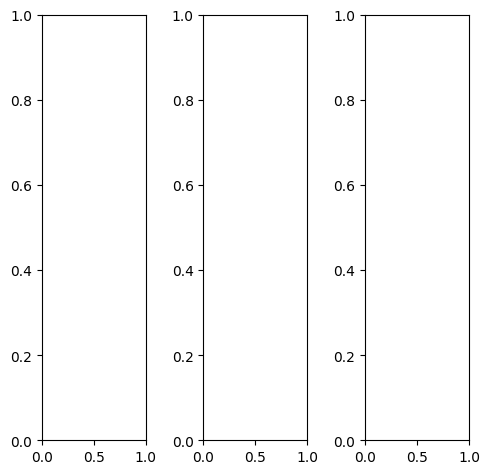

tensor([[[0.3490, 0.4353, 0.4824,  ..., 0.4863, 0.5686, 0.4510],
         [0.3765, 0.4627, 0.5020,  ..., 0.4510, 0.4275, 0.4275],
         [0.4314, 0.4667, 0.5098,  ..., 0.4196, 0.4275, 0.3725],
         ...,
         [0.2235, 0.3451, 0.3255,  ..., 0.4667, 0.4784, 0.4706],
         [0.2275, 0.3804, 0.3529,  ..., 0.5686, 0.4627, 0.4078],
         [0.2118, 0.2745, 0.3137,  ..., 0.6000, 0.4745, 0.4078]],

        [[0.3490, 0.4353, 0.4824,  ..., 0.4863, 0.5686, 0.4510],
         [0.3765, 0.4627, 0.5020,  ..., 0.4510, 0.4275, 0.4275],
         [0.4314, 0.4667, 0.5098,  ..., 0.4196, 0.4275, 0.3725],
         ...,
         [0.2235, 0.3451, 0.3255,  ..., 0.4667, 0.4784, 0.4706],
         [0.2275, 0.3804, 0.3529,  ..., 0.5686, 0.4627, 0.4078],
         [0.2118, 0.2745, 0.3137,  ..., 0.6000, 0.4745, 0.4078]],

        [[0.3490, 0.4353, 0.4824,  ..., 0.4863, 0.5686, 0.4510],
         [0.3765, 0.4627, 0.5020,  ..., 0.4510, 0.4275, 0.4275],
         [0.4314, 0.4667, 0.5098,  ..., 0.4196, 0.4275, 0.

tensor([[[0.3765, 0.4706, 0.5216,  ..., 0.3725, 0.4824, 0.4471],
         [0.4039, 0.4980, 0.5412,  ..., 0.3725, 0.3725, 0.4392],
         [0.4667, 0.5098, 0.5569,  ..., 0.3804, 0.4000, 0.4000],
         ...,
         [0.2235, 0.3451, 0.3255,  ..., 0.3412, 0.3647, 0.3216],
         [0.2275, 0.3804, 0.3529,  ..., 0.4510, 0.3529, 0.2627],
         [0.2118, 0.2745, 0.3137,  ..., 0.4941, 0.3725, 0.2667]],

        [[0.3451, 0.4275, 0.4745,  ..., 0.5961, 0.6588, 0.4824],
         [0.3686, 0.4549, 0.4941,  ..., 0.5333, 0.4902, 0.4471],
         [0.4235, 0.4588, 0.5020,  ..., 0.4745, 0.4667, 0.3765],
         ...,
         [0.2235, 0.3490, 0.3294,  ..., 0.5843, 0.5922, 0.6000],
         [0.2314, 0.3843, 0.3608,  ..., 0.6745, 0.5647, 0.5333],
         [0.2196, 0.2784, 0.3216,  ..., 0.6941, 0.5686, 0.5294]],

        [[0.3137, 0.3804, 0.4118,  ..., 0.2078, 0.3412, 0.2980],
         [0.3373, 0.4039, 0.4275,  ..., 0.2235, 0.2510, 0.3098],
         [0.3882, 0.4039, 0.4353,  ..., 0.2510, 0.2980, 0.

tensor([[[0.3732, 0.4433, 0.5026,  ..., 0.4936, 0.5800, 0.4747],
         [0.3799, 0.4821, 0.5341,  ..., 0.4505, 0.4224, 0.4208],
         [0.4412, 0.4925, 0.5395,  ..., 0.4342, 0.4348, 0.3660],
         ...,
         [0.2230, 0.3662, 0.3620,  ..., 0.4936, 0.5069, 0.4987],
         [0.2292, 0.4081, 0.4007,  ..., 0.6002, 0.4988, 0.4210],
         [0.2321, 0.2806, 0.3168,  ..., 0.6508, 0.5193, 0.4499]],

        [[0.3770, 0.4461, 0.5023,  ..., 0.5114, 0.5884, 0.4752],
         [0.3790, 0.4692, 0.5209,  ..., 0.4532, 0.4427, 0.4351],
         [0.4374, 0.4848, 0.5207,  ..., 0.4287, 0.4421, 0.3735],
         ...,
         [0.2171, 0.3483, 0.3443,  ..., 0.4717, 0.4901, 0.4782],
         [0.2225, 0.3865, 0.3712,  ..., 0.5830, 0.4731, 0.4140],
         [0.2295, 0.2708, 0.3038,  ..., 0.6179, 0.4885, 0.4417]],

        [[0.2896, 0.3406, 0.3690,  ..., 0.3800, 0.4664, 0.3795],
         [0.2755, 0.3546, 0.3770,  ..., 0.3316, 0.3059, 0.3132],
         [0.3208, 0.3617, 0.3885,  ..., 0.3041, 0.3141, 0.

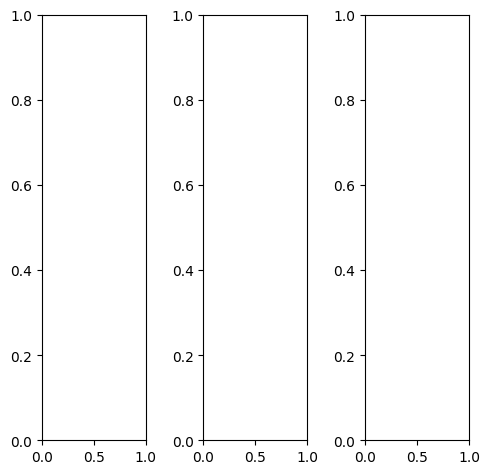

EPOCH: 23.255  trn_loss: 0.004  (2814.90s - 9289.54s remaining)

tensor([[[0.7098, 0.6941, 0.7490,  ..., 0.8510, 0.8549, 0.8627],
         [0.4235, 0.3961, 0.4471,  ..., 0.6824, 0.7569, 0.8314],
         [0.3529, 0.3412, 0.3412,  ..., 0.4157, 0.4667, 0.5608],
         ...,
         [0.3490, 0.3882, 0.3961,  ..., 0.4118, 0.3961, 0.4471],
         [0.5216, 0.5412, 0.5020,  ..., 0.4588, 0.4235, 0.4392],
         [0.4549, 0.5216, 0.5020,  ..., 0.4980, 0.4706, 0.4627]],

        [[0.7098, 0.6941, 0.7490,  ..., 0.8510, 0.8549, 0.8627],
         [0.4235, 0.3961, 0.4471,  ..., 0.6824, 0.7569, 0.8314],
         [0.3529, 0.3412, 0.3412,  ..., 0.4157, 0.4667, 0.5608],
         ...,
         [0.3490, 0.3882, 0.3961,  ..., 0.4118, 0.3961, 0.4471],
         [0.5216, 0.5412, 0.5020,  ..., 0.4588, 0.4235, 0.4392],
         [0.4549, 0.5216, 0.5020,  ..., 0.4980, 0.4706, 0.4627]],

        [[0.7098, 0.6941, 0.7490,  ..., 0.8510, 0.8549, 0.8627],
         [0.4235, 0.3961, 0.4471,  ..., 0.6824, 0.7569, 0.8314],
         [0.3529, 0.3412, 0.3412,  ..., 0.4157, 0.4667, 0.

tensor([[[0.7137, 0.7059, 0.7490,  ..., 0.8275, 0.8275, 0.8353],
         [0.4980, 0.4784, 0.5333,  ..., 0.7137, 0.7608, 0.8157],
         [0.4196, 0.4157, 0.4549,  ..., 0.5294, 0.5451, 0.6196],
         ...,
         [0.3961, 0.4392, 0.4510,  ..., 0.4706, 0.4627, 0.5137],
         [0.5765, 0.6039, 0.5647,  ..., 0.5176, 0.4627, 0.4824],
         [0.4980, 0.5804, 0.5608,  ..., 0.5725, 0.5098, 0.4941]],

        [[0.7137, 0.6902, 0.7451,  ..., 0.8549, 0.8627, 0.8667],
         [0.4000, 0.3686, 0.4118,  ..., 0.6745, 0.7569, 0.8314],
         [0.3333, 0.3137, 0.3020,  ..., 0.3804, 0.4510, 0.5490],
         ...,
         [0.3608, 0.4000, 0.4078,  ..., 0.4314, 0.4078, 0.4627],
         [0.5451, 0.5686, 0.5255,  ..., 0.4824, 0.4549, 0.4667],
         [0.4863, 0.5490, 0.5294,  ..., 0.5137, 0.4980, 0.4980]],

        [[0.6863, 0.6784, 0.7725,  ..., 0.8784, 0.8941, 0.9137],
         [0.3451, 0.3176, 0.3882,  ..., 0.6431, 0.7608, 0.8588],
         [0.2941, 0.2941, 0.2588,  ..., 0.2980, 0.3490, 0.

tensor([[[0.7173, 0.6889, 0.7183,  ..., 1.0510, 1.0295, 0.9771],
         [0.4130, 0.2618, 0.2831,  ..., 0.9267, 1.0426, 1.0402],
         [0.2435, 0.1667, 0.0430,  ..., 0.5182, 0.6149, 0.7029],
         ...,
         [0.3697, 0.4531, 0.5069,  ..., 0.6112, 0.5696, 0.6238],
         [0.6719, 0.7301, 0.6668,  ..., 0.6578, 0.6018, 0.5857],
         [0.6201, 0.6992, 0.6919,  ..., 0.7137, 0.6608, 0.6234]],

        [[0.7487, 0.7549, 0.7407,  ..., 1.1000, 1.0744, 1.0578],
         [0.4479, 0.3215, 0.3030,  ..., 0.9740, 1.0826, 1.1020],
         [0.4026, 0.2829, 0.2185,  ..., 0.5858, 0.6601, 0.7604],
         ...,
         [0.3555, 0.4476, 0.5036,  ..., 0.5661, 0.5381, 0.5556],
         [0.6399, 0.7124, 0.6647,  ..., 0.6345, 0.5573, 0.5355],
         [0.5723, 0.6653, 0.6585,  ..., 0.6600, 0.6120, 0.5681]],

        [[0.8636, 0.9060, 0.8940,  ..., 1.2324, 1.2276, 1.1783],
         [0.6092, 0.5443, 0.5898,  ..., 1.1111, 1.2511, 1.2286],
         [0.4149, 0.4083, 0.2800,  ..., 0.7401, 0.8517, 0.

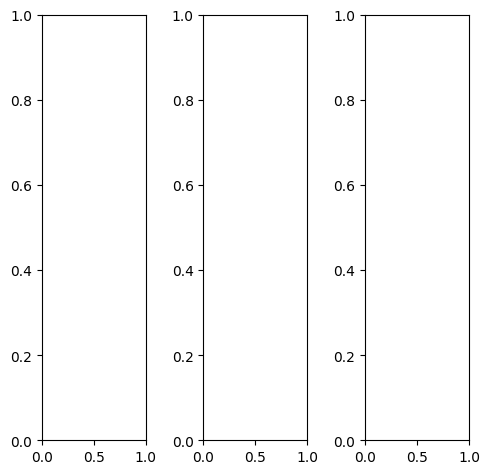

tensor([[[0.8667, 0.8353, 0.7608,  ..., 0.5529, 0.5765, 0.5765],
         [0.7882, 0.7569, 0.7176,  ..., 0.6510, 0.6549, 0.6667],
         [0.6745, 0.6863, 0.7176,  ..., 0.6784, 0.7176, 0.7922],
         ...,
         [0.3882, 0.4078, 0.4353,  ..., 0.6549, 0.6196, 0.6235],
         [0.3608, 0.3804, 0.3882,  ..., 0.6510, 0.6549, 0.5804],
         [0.3137, 0.3373, 0.3412,  ..., 0.6510, 0.7059, 0.6000]],

        [[0.8667, 0.8353, 0.7608,  ..., 0.5529, 0.5765, 0.5765],
         [0.7882, 0.7569, 0.7176,  ..., 0.6510, 0.6549, 0.6667],
         [0.6745, 0.6863, 0.7176,  ..., 0.6784, 0.7176, 0.7922],
         ...,
         [0.3882, 0.4078, 0.4353,  ..., 0.6549, 0.6196, 0.6235],
         [0.3608, 0.3804, 0.3882,  ..., 0.6510, 0.6549, 0.5804],
         [0.3137, 0.3373, 0.3412,  ..., 0.6510, 0.7059, 0.6000]],

        [[0.8667, 0.8353, 0.7608,  ..., 0.5529, 0.5765, 0.5765],
         [0.7882, 0.7569, 0.7176,  ..., 0.6510, 0.6549, 0.6667],
         [0.6745, 0.6863, 0.7176,  ..., 0.6784, 0.7176, 0.

tensor([[[0.8902, 0.8627, 0.8000,  ..., 0.6000, 0.6235, 0.6235],
         [0.8118, 0.7922, 0.7647,  ..., 0.6824, 0.6902, 0.6980],
         [0.6980, 0.7216, 0.7725,  ..., 0.6980, 0.7373, 0.8078],
         ...,
         [0.4941, 0.5137, 0.5294,  ..., 0.6549, 0.6196, 0.6235],
         [0.4627, 0.4863, 0.4863,  ..., 0.6510, 0.6549, 0.5804],
         [0.4196, 0.4392, 0.4353,  ..., 0.6510, 0.7059, 0.6000]],

        [[0.8784, 0.8431, 0.7686,  ..., 0.5608, 0.5843, 0.5843],
         [0.8078, 0.7765, 0.7294,  ..., 0.6667, 0.6706, 0.6784],
         [0.6980, 0.7020, 0.7255,  ..., 0.7020, 0.7373, 0.8039],
         ...,
         [0.3647, 0.3843, 0.4118,  ..., 0.6863, 0.6549, 0.6549],
         [0.3373, 0.3569, 0.3647,  ..., 0.6863, 0.6824, 0.6039],
         [0.2902, 0.3137, 0.3176,  ..., 0.6824, 0.7294, 0.6235]],

        [[0.7608, 0.7059, 0.6078,  ..., 0.3882, 0.4078, 0.4078],
         [0.6157, 0.5725, 0.5255,  ..., 0.4824, 0.4980, 0.5216],
         [0.4902, 0.5020, 0.5373,  ..., 0.5176, 0.5804, 0.

tensor([[[0.7614, 0.7189, 0.5562,  ..., 0.2111, 0.2477, 0.2769],
         [0.6617, 0.5786, 0.5315,  ..., 0.3039, 0.2947, 0.3358],
         [0.5557, 0.5568, 0.5042,  ..., 0.3872, 0.4550, 0.5254],
         ...,
         [0.1311, 0.1423, 0.1866,  ..., 0.5342, 0.4908, 0.4151],
         [0.0876, 0.0721, 0.0857,  ..., 0.5262, 0.5124, 0.3522],
         [0.0689, 0.0382, 0.0423,  ..., 0.4878, 0.5809, 0.4128]],

        [[0.7775, 0.7911, 0.6007,  ..., 0.3370, 0.4032, 0.3573],
         [0.6931, 0.6256, 0.5719,  ..., 0.5029, 0.5147, 0.4850],
         [0.5943, 0.6533, 0.5534,  ..., 0.5391, 0.5980, 0.6989],
         ...,
         [0.1310, 0.1265, 0.1723,  ..., 0.5161, 0.4811, 0.3843],
         [0.0820, 0.0672, 0.0826,  ..., 0.5064, 0.5112, 0.3428],
         [0.0645, 0.0290, 0.0302,  ..., 0.4809, 0.5591, 0.3947]],

        [[0.8696, 0.8438, 0.6917,  ..., 0.6204, 0.6421, 0.6109],
         [0.7849, 0.7214, 0.6410,  ..., 0.7527, 0.7862, 0.7510],
         [0.6678, 0.6005, 0.5862,  ..., 0.8036, 0.8642, 0.

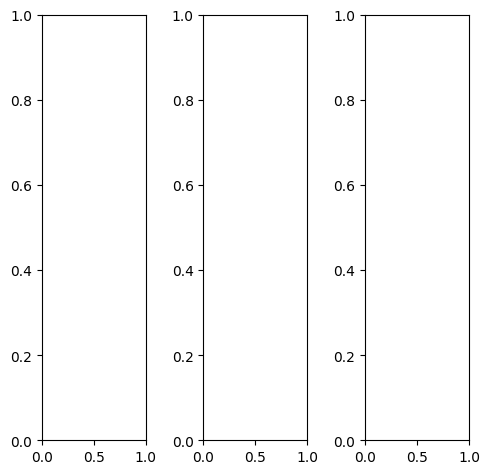

tensor([[[0.6941, 0.6353, 0.6157,  ..., 0.8353, 0.7804, 0.6196],
         [0.7176, 0.6667, 0.6392,  ..., 0.8118, 0.8039, 0.8000],
         [0.7294, 0.6784, 0.6157,  ..., 0.8392, 0.8235, 0.8275],
         ...,
         [0.4275, 0.5373, 0.5176,  ..., 0.7647, 0.7843, 0.7412],
         [0.3922, 0.5020, 0.5608,  ..., 0.7961, 0.8235, 0.8157],
         [0.4039, 0.4431, 0.4431,  ..., 0.8314, 0.8275, 0.8353]],

        [[0.6941, 0.6353, 0.6157,  ..., 0.8353, 0.7804, 0.6196],
         [0.7176, 0.6667, 0.6392,  ..., 0.8118, 0.8039, 0.8000],
         [0.7294, 0.6784, 0.6157,  ..., 0.8392, 0.8235, 0.8275],
         ...,
         [0.4275, 0.5373, 0.5176,  ..., 0.7647, 0.7843, 0.7412],
         [0.3922, 0.5020, 0.5608,  ..., 0.7961, 0.8235, 0.8157],
         [0.4039, 0.4431, 0.4431,  ..., 0.8314, 0.8275, 0.8353]],

        [[0.6941, 0.6353, 0.6157,  ..., 0.8353, 0.7804, 0.6196],
         [0.7176, 0.6667, 0.6392,  ..., 0.8118, 0.8039, 0.8000],
         [0.7294, 0.6784, 0.6157,  ..., 0.8392, 0.8235, 0.

tensor([[[0.8078, 0.7725, 0.7529,  ..., 0.9451, 0.8902, 0.7412],
         [0.8314, 0.7961, 0.7725,  ..., 0.9216, 0.9216, 0.9333],
         [0.8431, 0.8039, 0.7451,  ..., 0.9412, 0.9412, 0.9647],
         ...,
         [0.5216, 0.6314, 0.6039,  ..., 0.8706, 0.8980, 0.8627],
         [0.4824, 0.6000, 0.6510,  ..., 0.9059, 0.9373, 0.9412],
         [0.4902, 0.5333, 0.5294,  ..., 0.9451, 0.9412, 0.9490]],

        [[0.6745, 0.6078, 0.5843,  ..., 0.8235, 0.7686, 0.5961],
         [0.6980, 0.6431, 0.6157,  ..., 0.8039, 0.7922, 0.7725],
         [0.7098, 0.6588, 0.5961,  ..., 0.8353, 0.8118, 0.8000],
         ...,
         [0.4000, 0.5098, 0.4941,  ..., 0.7608, 0.7765, 0.7294],
         [0.3647, 0.4745, 0.5333,  ..., 0.7882, 0.8118, 0.8000],
         [0.3765, 0.4157, 0.4196,  ..., 0.8196, 0.8157, 0.8196]],

        [[0.4863, 0.4314, 0.4078,  ..., 0.6000, 0.5647, 0.4196],
         [0.5098, 0.4471, 0.4078,  ..., 0.5686, 0.5725, 0.5882],
         [0.5255, 0.4627, 0.3725,  ..., 0.5961, 0.5843, 0.

tensor([[[0.4826, 0.3618, 0.2364,  ..., 0.5454, 0.4902, 0.4330],
         [0.4662, 0.2759, 0.1724,  ..., 0.5053, 0.4980, 0.5292],
         [0.4716, 0.3087, 0.1275,  ..., 0.5621, 0.5499, 0.5564],
         ...,
         [0.3008, 0.4420, 0.4330,  ..., 0.6448, 0.6636, 0.6186],
         [0.2541, 0.4028, 0.4830,  ..., 0.6523, 0.7051, 0.7055],
         [0.2794, 0.2828, 0.2970,  ..., 0.7265, 0.7495, 0.7308]],

        [[0.5457, 0.4626, 0.3665,  ..., 0.7109, 0.6745, 0.5306],
         [0.4857, 0.3122, 0.2002,  ..., 0.6734, 0.6576, 0.6955],
         [0.5905, 0.4244, 0.3000,  ..., 0.7190, 0.6853, 0.7012],
         ...,
         [0.3136, 0.4695, 0.4435,  ..., 0.6335, 0.6354, 0.5928],
         [0.2632, 0.4262, 0.4893,  ..., 0.6536, 0.6866, 0.6815],
         [0.2709, 0.2851, 0.2988,  ..., 0.6958, 0.7158, 0.6939]],

        [[0.6705, 0.5338, 0.4873,  ..., 0.9568, 0.9000, 0.7373],
         [0.6533, 0.5019, 0.4301,  ..., 0.8885, 0.8997, 0.8867],
         [0.6030, 0.5085, 0.3482,  ..., 0.9347, 0.9325, 0.

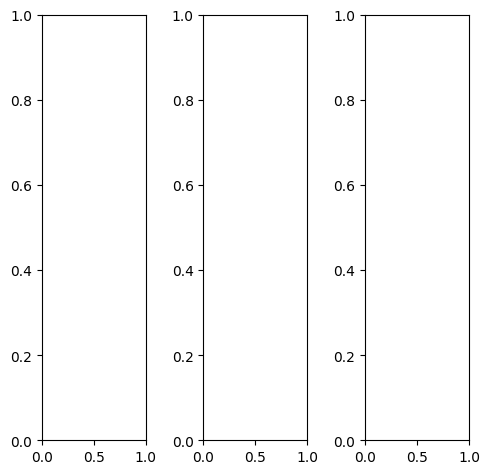

tensor([[[0.0588, 0.1843, 0.3843,  ..., 0.1412, 0.2706, 0.3020],
         [0.0745, 0.2314, 0.4196,  ..., 0.1412, 0.2000, 0.2706],
         [0.1647, 0.2627, 0.3294,  ..., 0.1255, 0.1373, 0.2000],
         ...,
         [0.6863, 0.5529, 0.7137,  ..., 0.6275, 0.6510, 0.7804],
         [0.5765, 0.5294, 0.6980,  ..., 0.6078, 0.6588, 0.7255],
         [0.6784, 0.6235, 0.6588,  ..., 0.6078, 0.7020, 0.6627]],

        [[0.0588, 0.1843, 0.3843,  ..., 0.1412, 0.2706, 0.3020],
         [0.0745, 0.2314, 0.4196,  ..., 0.1412, 0.2000, 0.2706],
         [0.1647, 0.2627, 0.3294,  ..., 0.1255, 0.1373, 0.2000],
         ...,
         [0.6863, 0.5529, 0.7137,  ..., 0.6275, 0.6510, 0.7804],
         [0.5765, 0.5294, 0.6980,  ..., 0.6078, 0.6588, 0.7255],
         [0.6784, 0.6235, 0.6588,  ..., 0.6078, 0.7020, 0.6627]],

        [[0.0588, 0.1843, 0.3843,  ..., 0.1412, 0.2706, 0.3020],
         [0.0745, 0.2314, 0.4196,  ..., 0.1412, 0.2000, 0.2706],
         [0.1647, 0.2627, 0.3294,  ..., 0.1255, 0.1373, 0.

tensor([[[0.0706, 0.2000, 0.4000,  ..., 0.1294, 0.2667, 0.2902],
         [0.0980, 0.2627, 0.4627,  ..., 0.1373, 0.1882, 0.2549],
         [0.2039, 0.3176, 0.4000,  ..., 0.1255, 0.1176, 0.1804],
         ...,
         [0.8000, 0.6863, 0.8078,  ..., 0.7059, 0.7608, 0.8353],
         [0.7647, 0.7176, 0.8196,  ..., 0.7412, 0.8157, 0.8157],
         [0.7922, 0.6980, 0.6980,  ..., 0.7412, 0.8078, 0.7373]],

        [[0.0549, 0.1961, 0.4235,  ..., 0.1647, 0.3020, 0.3490],
         [0.0706, 0.2431, 0.4471,  ..., 0.1569, 0.2275, 0.3137],
         [0.1686, 0.2784, 0.3412,  ..., 0.1412, 0.1647, 0.2392],
         ...,
         [0.6784, 0.5412, 0.7176,  ..., 0.6431, 0.6392, 0.7922],
         [0.5294, 0.4863, 0.6824,  ..., 0.5922, 0.6275, 0.7176],
         [0.6627, 0.6392, 0.6824,  ..., 0.5961, 0.6980, 0.6784]],

        [[0.0549, 0.0980, 0.1529,  ..., 0.0471, 0.1176, 0.0941],
         [0.0196, 0.0784, 0.1804,  ..., 0.0588, 0.0863, 0.0902],
         [0.0392, 0.0431, 0.0941,  ..., 0.0588, 0.0510, 0.

tensor([[[-0.0345,  0.0459,  0.2261,  ...,  0.1384,  0.2601,  0.3527],
         [ 0.0265, -0.0225,  0.2172,  ...,  0.1019,  0.1664,  0.2762],
         [ 0.0144,  0.0971,  0.1716,  ...,  0.0516,  0.0776,  0.1809],
         ...,
         [ 0.8597,  0.7600,  0.9145,  ...,  0.7836,  0.8301,  0.9447],
         [ 0.7023,  0.6506,  0.8365,  ...,  0.7210,  0.8091,  0.8712],
         [ 0.7892,  0.7587,  0.8092,  ...,  0.7488,  0.8430,  0.8208]],

        [[ 0.0625,  0.1930,  0.2868,  ...,  0.1955,  0.3354,  0.3912],
         [ 0.0347,  0.0815,  0.1811,  ...,  0.1849,  0.2682,  0.3255],
         [ 0.0996,  0.1993,  0.2014,  ...,  0.1392,  0.1577,  0.2315],
         ...,
         [ 0.8166,  0.6942,  0.9105,  ...,  0.7724,  0.8096,  0.9514],
         [ 0.6907,  0.6288,  0.8612,  ...,  0.7384,  0.7996,  0.8814],
         [ 0.7473,  0.7414,  0.7855,  ...,  0.7313,  0.8340,  0.8025]],

        [[ 0.1998,  0.1472,  0.4537,  ...,  0.3093,  0.4506,  0.5122],
         [ 0.2276,  0.1531,  0.4586,  ...,  0

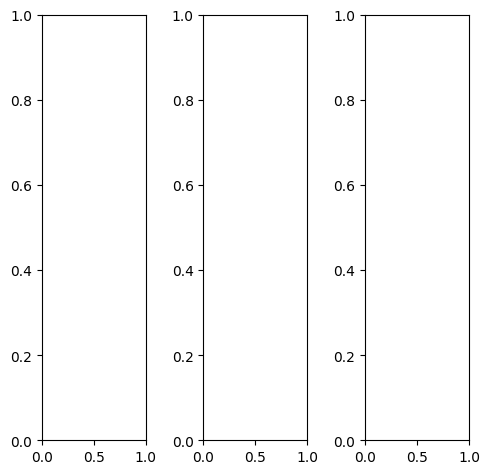

tensor([[[0.5882, 0.5804, 0.5804,  ..., 0.5804, 0.5804, 0.5765],
         [0.5922, 0.5843, 0.5804,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5843, 0.5843, 0.5843],
         ...,
         [0.5529, 0.5529, 0.5529,  ..., 0.5490, 0.5529, 0.5490],
         [0.5490, 0.5451, 0.5490,  ..., 0.5373, 0.4941, 0.4275],
         [0.5412, 0.5412, 0.5412,  ..., 0.4510, 0.3333, 0.2510]],

        [[0.5882, 0.5804, 0.5804,  ..., 0.5804, 0.5804, 0.5765],
         [0.5922, 0.5843, 0.5804,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5843, 0.5843, 0.5843],
         ...,
         [0.5529, 0.5529, 0.5529,  ..., 0.5490, 0.5529, 0.5490],
         [0.5490, 0.5451, 0.5490,  ..., 0.5373, 0.4941, 0.4275],
         [0.5412, 0.5412, 0.5412,  ..., 0.4510, 0.3333, 0.2510]],

        [[0.5882, 0.5804, 0.5804,  ..., 0.5804, 0.5804, 0.5765],
         [0.5922, 0.5843, 0.5804,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5843, 0.5843, 0.

tensor([[[0.5882, 0.5804, 0.5804,  ..., 0.5804, 0.5804, 0.5765],
         [0.5922, 0.5843, 0.5804,  ..., 0.5843, 0.5843, 0.5843],
         [0.5882, 0.5843, 0.5843,  ..., 0.5843, 0.5843, 0.5843],
         ...,
         [0.5647, 0.5647, 0.5647,  ..., 0.5529, 0.5569, 0.5529],
         [0.5569, 0.5569, 0.5569,  ..., 0.5412, 0.4980, 0.4353],
         [0.5451, 0.5451, 0.5451,  ..., 0.4549, 0.3373, 0.2627]],

        [[0.5882, 0.5804, 0.5804,  ..., 0.5843, 0.5843, 0.5804],
         [0.5922, 0.5843, 0.5804,  ..., 0.5882, 0.5882, 0.5882],
         [0.5882, 0.5843, 0.5843,  ..., 0.5882, 0.5882, 0.5882],
         ...,
         [0.5529, 0.5529, 0.5529,  ..., 0.5529, 0.5569, 0.5529],
         [0.5490, 0.5451, 0.5490,  ..., 0.5412, 0.4980, 0.4353],
         [0.5412, 0.5412, 0.5412,  ..., 0.4549, 0.3412, 0.2627]],

        [[0.5804, 0.5725, 0.5725,  ..., 0.5647, 0.5647, 0.5608],
         [0.5843, 0.5765, 0.5725,  ..., 0.5686, 0.5686, 0.5686],
         [0.5804, 0.5765, 0.5765,  ..., 0.5686, 0.5686, 0.

tensor([[[0.4480, 0.3598, 0.2806,  ..., 0.4236, 0.4506, 0.5094],
         [0.4126, 0.2029, 0.1924,  ..., 0.3826, 0.4152, 0.4651],
         [0.3379, 0.2045, 0.1144,  ..., 0.3958, 0.4354, 0.4709],
         ...,
         [0.5155, 0.5597, 0.4958,  ..., 0.5533, 0.5702, 0.5651],
         [0.5235, 0.5458, 0.5254,  ..., 0.5628, 0.5091, 0.4146],
         [0.5401, 0.5214, 0.5113,  ..., 0.4158, 0.2732, 0.2242]],

        [[0.5464, 0.4755, 0.4699,  ..., 0.5043, 0.5614, 0.5483],
         [0.4220, 0.2517, 0.2217,  ..., 0.5058, 0.5430, 0.5604],
         [0.4901, 0.3636, 0.3605,  ..., 0.5066, 0.5376, 0.5639],
         ...,
         [0.4851, 0.5123, 0.4905,  ..., 0.4953, 0.5612, 0.5182],
         [0.4891, 0.4982, 0.4983,  ..., 0.5524, 0.5109, 0.3725],
         [0.5009, 0.4932, 0.4889,  ..., 0.3792, 0.2386, 0.1597]],

        [[0.7079, 0.5629, 0.6173,  ..., 0.7140, 0.7340, 0.7214],
         [0.6272, 0.4967, 0.4656,  ..., 0.6793, 0.7221, 0.7420],
         [0.5349, 0.4866, 0.3821,  ..., 0.7068, 0.7223, 0.

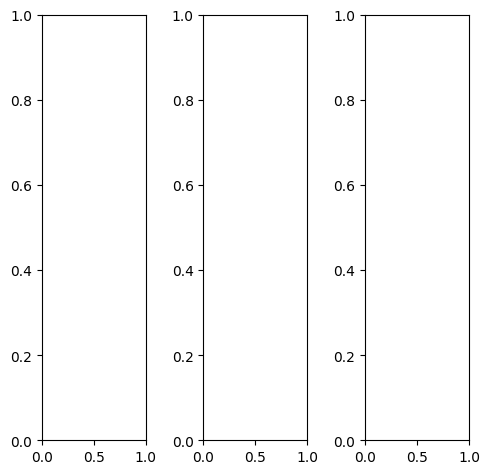

EPOCH: 23.510  trn_loss: 0.005  (2844.59s - 9254.81s remaining)

tensor([[[0.0157, 0.0196, 0.0235,  ..., 0.1490, 0.0314, 0.0314],
         [0.0118, 0.0118, 0.0118,  ..., 0.0745, 0.0078, 0.0039],
         [0.0784, 0.1373, 0.1490,  ..., 0.0667, 0.0392, 0.0471],
         ...,
         [0.5922, 0.6039, 0.5686,  ..., 0.2353, 0.1882, 0.1294],
         [0.5294, 0.6000, 0.5882,  ..., 0.1333, 0.2275, 0.2549],
         [0.5686, 0.5333, 0.6078,  ..., 0.1569, 0.0902, 0.1490]],

        [[0.0157, 0.0196, 0.0235,  ..., 0.1490, 0.0314, 0.0314],
         [0.0118, 0.0118, 0.0118,  ..., 0.0745, 0.0078, 0.0039],
         [0.0784, 0.1373, 0.1490,  ..., 0.0667, 0.0392, 0.0471],
         ...,
         [0.5922, 0.6039, 0.5686,  ..., 0.2353, 0.1882, 0.1294],
         [0.5294, 0.6000, 0.5882,  ..., 0.1333, 0.2275, 0.2549],
         [0.5686, 0.5333, 0.6078,  ..., 0.1569, 0.0902, 0.1490]],

        [[0.0157, 0.0196, 0.0235,  ..., 0.1490, 0.0314, 0.0314],
         [0.0118, 0.0118, 0.0118,  ..., 0.0745, 0.0078, 0.0039],
         [0.0784, 0.1373, 0.1490,  ..., 0.0667, 0.0392, 0.

tensor([[[0.0235, 0.0353, 0.0196,  ..., 0.1686, 0.0510, 0.0510],
         [0.0078, 0.0275, 0.0196,  ..., 0.0706, 0.0039, 0.0039],
         [0.1020, 0.1725, 0.1608,  ..., 0.0588, 0.0314, 0.0431],
         ...,
         [0.6157, 0.6275, 0.5922,  ..., 0.2353, 0.1882, 0.1294],
         [0.5529, 0.6235, 0.6118,  ..., 0.1294, 0.2275, 0.2549],
         [0.5961, 0.5569, 0.6314,  ..., 0.1725, 0.0980, 0.1529]],

        [[0.0118, 0.0118, 0.0235,  ..., 0.1451, 0.0235, 0.0275],
         [0.0118, 0.0039, 0.0078,  ..., 0.0745, 0.0078, 0.0039],
         [0.0706, 0.1255, 0.1412,  ..., 0.0706, 0.0392, 0.0471],
         ...,
         [0.5882, 0.6000, 0.5647,  ..., 0.2353, 0.1882, 0.1294],
         [0.5255, 0.5961, 0.5843,  ..., 0.1333, 0.2275, 0.2549],
         [0.5647, 0.5294, 0.6039,  ..., 0.1529, 0.0902, 0.1490]],

        [[0.0157, 0.0196, 0.0196,  ..., 0.1294, 0.0078, 0.0157],
         [0.0118, 0.0157, 0.0235,  ..., 0.0745, 0.0118, 0.0078],
         [0.0471, 0.1216, 0.1490,  ..., 0.0784, 0.0510, 0.

tensor([[[-0.0282, -0.0762, -0.1083,  ...,  0.1648,  0.0598,  0.1016],
         [ 0.0071, -0.1168, -0.0429,  ...,  0.0762, -0.0126,  0.0220],
         [-0.0927,  0.0297, -0.0256,  ...,  0.0208,  0.0090,  0.0477],
         ...,
         [ 0.7047,  0.7157,  0.6497,  ...,  0.3467,  0.2859,  0.2175],
         [ 0.6231,  0.6864,  0.6651,  ...,  0.1814,  0.3154,  0.3554],
         [ 0.6759,  0.6542,  0.7033,  ...,  0.1895,  0.1386,  0.2450]],

        [[ 0.0376,  0.0836,  0.0362,  ...,  0.2254,  0.1081,  0.1235],
         [ 0.0515, -0.0698, -0.0699,  ...,  0.1297,  0.0557,  0.0655],
         [ 0.0392,  0.2333,  0.1060,  ...,  0.1022,  0.0696,  0.0937],
         ...,
         [ 0.6845,  0.6846,  0.6708,  ...,  0.3406,  0.2843,  0.2054],
         [ 0.6051,  0.6778,  0.6707,  ...,  0.2115,  0.3159,  0.3225],
         [ 0.6340,  0.6248,  0.7075,  ...,  0.2086,  0.1494,  0.2129]],

        [[ 0.2914,  0.0698,  0.2005,  ...,  0.3257,  0.2138,  0.2450],
         [ 0.2228,  0.0995,  0.1788,  ...,  0

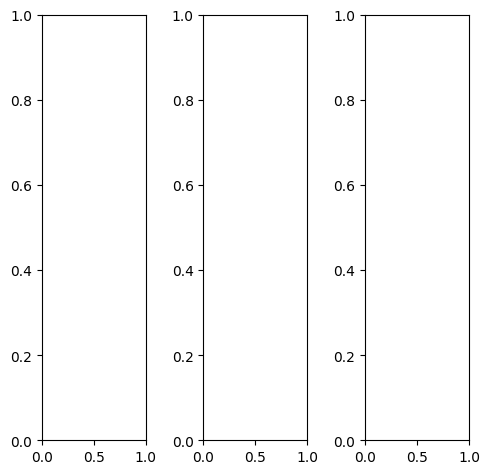

tensor([[[0.7569, 0.4667, 0.5373,  ..., 0.6157, 0.4392, 0.2980],
         [0.6510, 0.3961, 0.5020,  ..., 0.6902, 0.4627, 0.2627],
         [0.5804, 0.3490, 0.4314,  ..., 0.4667, 0.4000, 0.2706],
         ...,
         [0.4510, 0.5255, 0.2980,  ..., 0.6392, 0.4078, 0.2471],
         [0.4196, 0.5412, 0.5843,  ..., 0.4784, 0.2314, 0.2078],
         [0.4392, 0.4314, 0.5529,  ..., 0.5059, 0.1882, 0.1843]],

        [[0.7569, 0.4667, 0.5373,  ..., 0.6157, 0.4392, 0.2980],
         [0.6510, 0.3961, 0.5020,  ..., 0.6902, 0.4627, 0.2627],
         [0.5804, 0.3490, 0.4314,  ..., 0.4667, 0.4000, 0.2706],
         ...,
         [0.4510, 0.5255, 0.2980,  ..., 0.6392, 0.4078, 0.2471],
         [0.4196, 0.5412, 0.5843,  ..., 0.4784, 0.2314, 0.2078],
         [0.4392, 0.4314, 0.5529,  ..., 0.5059, 0.1882, 0.1843]],

        [[0.7569, 0.4667, 0.5373,  ..., 0.6157, 0.4392, 0.2980],
         [0.6510, 0.3961, 0.5020,  ..., 0.6902, 0.4627, 0.2627],
         [0.5804, 0.3490, 0.4314,  ..., 0.4667, 0.4000, 0.

tensor([[[0.7490, 0.4588, 0.5882,  ..., 0.5922, 0.4471, 0.3137],
         [0.6627, 0.4235, 0.5804,  ..., 0.6510, 0.4549, 0.2745],
         [0.6078, 0.3922, 0.4941,  ..., 0.4510, 0.4078, 0.2863],
         ...,
         [0.4510, 0.4902, 0.3020,  ..., 0.5725, 0.3804, 0.2353],
         [0.4078, 0.4784, 0.5647,  ..., 0.3843, 0.1804, 0.1843],
         [0.4275, 0.3725, 0.5176,  ..., 0.3882, 0.1137, 0.1333]],

        [[0.7804, 0.4902, 0.5294,  ..., 0.6627, 0.4510, 0.2941],
         [0.6667, 0.4000, 0.4745,  ..., 0.7490, 0.4902, 0.2667],
         [0.5804, 0.3412, 0.4118,  ..., 0.5059, 0.4157, 0.2706],
         ...,
         [0.4627, 0.5529, 0.3098,  ..., 0.6902, 0.4353, 0.2627],
         [0.4392, 0.5843, 0.6039,  ..., 0.5451, 0.2706, 0.2235],
         [0.4549, 0.4745, 0.5843,  ..., 0.5804, 0.2392, 0.2157]],

        [[0.6392, 0.3490, 0.4588,  ..., 0.4471, 0.3686, 0.2902],
         [0.5529, 0.3059, 0.4275,  ..., 0.4902, 0.3451, 0.2157],
         [0.4941, 0.2824, 0.3608,  ..., 0.3098, 0.2941, 0.

tensor([[[0.6671, 0.4997, 0.4300,  ..., 0.4784, 0.3220, 0.3177],
         [0.5732, 0.4388, 0.4277,  ..., 0.6007, 0.3864, 0.2531],
         [0.5213, 0.3727, 0.3053,  ..., 0.4024, 0.3295, 0.2546],
         ...,
         [0.5364, 0.6832, 0.3966,  ..., 0.7400, 0.4998, 0.3949],
         [0.4967, 0.6523, 0.7199,  ..., 0.5397, 0.3141, 0.3087],
         [0.5318, 0.5421, 0.6798,  ..., 0.5904, 0.2844, 0.2988]],

        [[0.7082, 0.5468, 0.4924,  ..., 0.6562, 0.4980, 0.3898],
         [0.5951, 0.4133, 0.4288,  ..., 0.7695, 0.5924, 0.3739],
         [0.6425, 0.4152, 0.4014,  ..., 0.5410, 0.5221, 0.3766],
         ...,
         [0.5090, 0.6292, 0.3708,  ..., 0.7243, 0.4845, 0.3386],
         [0.4451, 0.6000, 0.6840,  ..., 0.5342, 0.3111, 0.2913],
         [0.4920, 0.5095, 0.6487,  ..., 0.5921, 0.3006, 0.2906]],

        [[0.8038, 0.6232, 0.6401,  ..., 0.9013, 0.7486, 0.6254],
         [0.7148, 0.5775, 0.6338,  ..., 1.0269, 0.8443, 0.6298],
         [0.6251, 0.4258, 0.4858,  ..., 0.7943, 0.7886, 0.

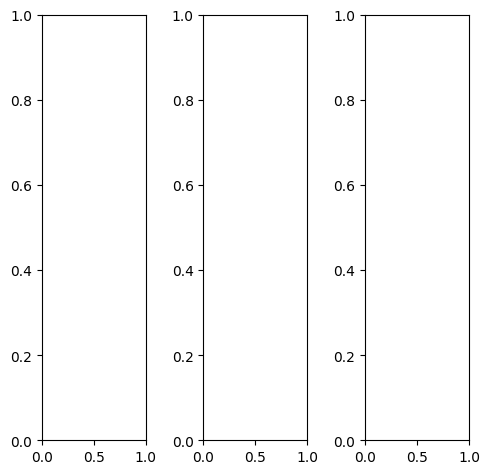

tensor([[[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.

tensor([[[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.7647],
         ...,
         [0.3529, 0.3412, 0.3333,  ..., 0.8902, 0.8902, 0.6471],
         [0.3412, 0.3373, 0.3294,  ..., 0.8902, 0.8902, 0.8745],
         [0.3412, 0.3373, 0.3294,  ..., 0.8824, 0.8902, 0.8980]],

        [[0.5333, 0.5373, 0.5294,  ..., 0.5490, 0.8314, 0.8353],
         [0.5294, 0.5333, 0.5255,  ..., 0.5843, 0.8627, 0.8275],
         [0.5176, 0.5176, 0.5137,  ..., 0.6627, 0.8078, 0.

tensor([[[0.4155, 0.3161, 0.1589,  ..., 0.4459, 0.7537, 0.8079],
         [0.3875, 0.2153, 0.1303,  ..., 0.4311, 0.7958, 0.7773],
         [0.3032, 0.1701, 0.0633,  ..., 0.5657, 0.7169, 0.6928],
         ...,
         [0.2921, 0.2709, 0.2566,  ..., 0.8847, 0.8840, 0.6476],
         [0.2765, 0.2644, 0.2530,  ..., 0.8582, 0.8627, 0.8952],
         [0.3075, 0.2612, 0.2582,  ..., 0.9309, 0.9489, 0.9358]],

        [[0.4741, 0.4224, 0.2822,  ..., 0.4733, 0.8328, 0.8510],
         [0.4139, 0.2352, 0.1098,  ..., 0.4882, 0.8716, 0.8544],
         [0.4365, 0.2646, 0.1817,  ..., 0.6035, 0.7779, 0.7439],
         ...,
         [0.2968, 0.2676, 0.2585,  ..., 0.8424, 0.8540, 0.6143],
         [0.2739, 0.2533, 0.2429,  ..., 0.8433, 0.8504, 0.8618],
         [0.2789, 0.2439, 0.2414,  ..., 0.8916, 0.9217, 0.8962]],

        [[0.6003, 0.4714, 0.4514,  ..., 0.5608, 0.9224, 0.9158],
         [0.5490, 0.4123, 0.4128,  ..., 0.5593, 0.9468, 0.8844],
         [0.4558, 0.3935, 0.3507,  ..., 0.6927, 0.8868, 0.

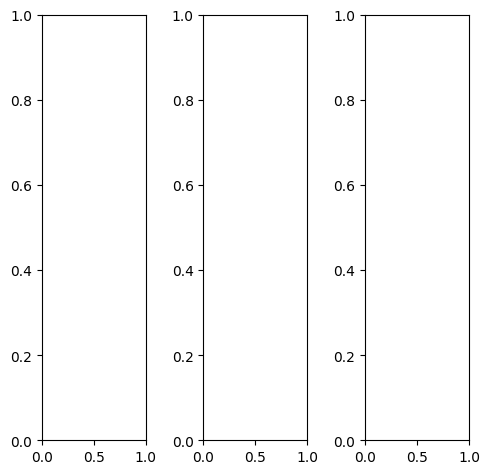

tensor([[[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.5451],
         ...,
         [0.6627, 0.8118, 0.9020,  ..., 0.3333, 0.3137, 0.3922],
         [0.8549, 0.8627, 0.9020,  ..., 0.6431, 0.6510, 0.6118],
         [0.8980, 0.8667, 0.8980,  ..., 0.7529, 0.7490, 0.7608]],

        [[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.5451],
         ...,
         [0.6627, 0.8118, 0.9020,  ..., 0.3333, 0.3137, 0.3922],
         [0.8549, 0.8627, 0.9020,  ..., 0.6431, 0.6510, 0.6118],
         [0.8980, 0.8667, 0.8980,  ..., 0.7529, 0.7490, 0.7608]],

        [[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.

tensor([[[0.9255, 0.9176, 0.9020,  ..., 0.6706, 0.6157, 0.5725],
         [0.8353, 0.8980, 0.8980,  ..., 0.5647, 0.5137, 0.5059],
         [0.5647, 0.8745, 0.9176,  ..., 0.5647, 0.5686, 0.5137],
         ...,
         [0.7176, 0.8549, 0.9294,  ..., 0.3569, 0.3255, 0.4235],
         [0.8941, 0.8902, 0.9137,  ..., 0.6824, 0.7020, 0.6627],
         [0.9569, 0.9137, 0.9294,  ..., 0.8118, 0.8039, 0.7882]],

        [[0.9529, 0.9294, 0.9412,  ..., 0.7020, 0.6471, 0.6235],
         [0.8510, 0.8980, 0.9176,  ..., 0.5961, 0.5608, 0.5647],
         [0.5725, 0.8667, 0.9255,  ..., 0.6196, 0.6196, 0.5804],
         ...,
         [0.6510, 0.8078, 0.9020,  ..., 0.3216, 0.3176, 0.3843],
         [0.8471, 0.8627, 0.9059,  ..., 0.6314, 0.6471, 0.6000],
         [0.8863, 0.8627, 0.8941,  ..., 0.7333, 0.7373, 0.7569]],

        [[0.9843, 0.9373, 0.9569,  ..., 0.5922, 0.5804, 0.5529],
         [0.8588, 0.9020, 0.9412,  ..., 0.4353, 0.4078, 0.4392],
         [0.5608, 0.8627, 0.9569,  ..., 0.4353, 0.4353, 0.

tensor([[[0.6682, 0.6448, 0.6636,  ..., 0.3388, 0.3095, 0.3194],
         [0.5773, 0.4890, 0.5993,  ..., 0.2581, 0.2124, 0.2468],
         [0.3695, 0.5386, 0.5340,  ..., 0.2803, 0.2741, 0.2406],
         ...,
         [0.5430, 0.6673, 0.7287,  ..., 0.2369, 0.2265, 0.2885],
         [0.6856, 0.6877, 0.7178,  ..., 0.5232, 0.5202, 0.4536],
         [0.7042, 0.6887, 0.7009,  ..., 0.6131, 0.6060, 0.5724]],

        [[0.7108, 0.7257, 0.7234,  ..., 0.5040, 0.4844, 0.4145],
         [0.5946, 0.5347, 0.6151,  ..., 0.4512, 0.4176, 0.3696],
         [0.4690, 0.6302, 0.6436,  ..., 0.4699, 0.4788, 0.3650],
         ...,
         [0.5173, 0.6452, 0.7267,  ..., 0.2341, 0.2252, 0.2566],
         [0.6729, 0.6705, 0.7063,  ..., 0.5310, 0.5447, 0.4406],
         [0.6623, 0.6660, 0.6911,  ..., 0.5887, 0.6008, 0.5555]],

        [[0.8180, 0.8261, 0.8059,  ..., 0.7533, 0.7175, 0.6308],
         [0.7556, 0.7296, 0.7981,  ..., 0.6862, 0.6664, 0.6375],
         [0.5354, 0.6869, 0.6890,  ..., 0.7006, 0.7105, 0.

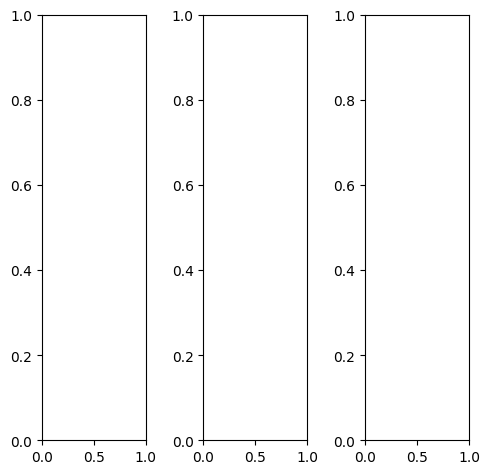

tensor([[[0.4510, 0.4471, 0.4510,  ..., 0.4824, 0.4824, 0.4706],
         [0.4549, 0.4431, 0.4706,  ..., 0.4784, 0.4863, 0.4824],
         [0.4784, 0.4588, 0.4706,  ..., 0.4510, 0.4824, 0.5020],
         ...,
         [0.5451, 0.5843, 0.5098,  ..., 0.5569, 0.5451, 0.5137],
         [0.5294, 0.5137, 0.5216,  ..., 0.5608, 0.5373, 0.5294],
         [0.5490, 0.5098, 0.5137,  ..., 0.6235, 0.6392, 0.6392]],

        [[0.4510, 0.4471, 0.4510,  ..., 0.4824, 0.4824, 0.4706],
         [0.4549, 0.4431, 0.4706,  ..., 0.4784, 0.4863, 0.4824],
         [0.4784, 0.4588, 0.4706,  ..., 0.4510, 0.4824, 0.5020],
         ...,
         [0.5451, 0.5843, 0.5098,  ..., 0.5569, 0.5451, 0.5137],
         [0.5294, 0.5137, 0.5216,  ..., 0.5608, 0.5373, 0.5294],
         [0.5490, 0.5098, 0.5137,  ..., 0.6235, 0.6392, 0.6392]],

        [[0.4510, 0.4471, 0.4510,  ..., 0.4824, 0.4824, 0.4706],
         [0.4549, 0.4431, 0.4706,  ..., 0.4784, 0.4863, 0.4824],
         [0.4784, 0.4588, 0.4706,  ..., 0.4510, 0.4824, 0.

tensor([[[0.4706, 0.4549, 0.4549,  ..., 0.4902, 0.4863, 0.4784],
         [0.4706, 0.4549, 0.4784,  ..., 0.4863, 0.4902, 0.4980],
         [0.4863, 0.4706, 0.4863,  ..., 0.4588, 0.4863, 0.5216],
         ...,
         [0.5686, 0.6078, 0.5333,  ..., 0.5882, 0.5765, 0.5451],
         [0.5490, 0.5451, 0.5529,  ..., 0.5804, 0.5529, 0.5451],
         [0.5647, 0.5373, 0.5412,  ..., 0.6235, 0.6431, 0.6392]],

        [[0.4353, 0.4392, 0.4471,  ..., 0.4745, 0.4745, 0.4667],
         [0.4431, 0.4353, 0.4627,  ..., 0.4706, 0.4784, 0.4745],
         [0.4706, 0.4510, 0.4627,  ..., 0.4431, 0.4784, 0.4902],
         ...,
         [0.5294, 0.5686, 0.4980,  ..., 0.5451, 0.5294, 0.4980],
         [0.5176, 0.4980, 0.5059,  ..., 0.5529, 0.5255, 0.5216],
         [0.5373, 0.4941, 0.4980,  ..., 0.6196, 0.6314, 0.6314]],

        [[0.4667, 0.4627, 0.4667,  ..., 0.4902, 0.4980, 0.4784],
         [0.4667, 0.4549, 0.4784,  ..., 0.4902, 0.5020, 0.4824],
         [0.4824, 0.4627, 0.4784,  ..., 0.4588, 0.4980, 0.

tensor([[[ 0.1476,  0.0991,  0.0206,  ...,  0.2366,  0.2473,  0.2386],
         [ 0.1866, -0.0575,  0.0153,  ...,  0.2291,  0.2383,  0.2364],
         [ 0.1155, -0.0105, -0.0817,  ...,  0.2156,  0.2839,  0.3016],
         ...,
         [ 0.4205,  0.5478,  0.4108,  ...,  0.5295,  0.5025,  0.4117],
         [ 0.4009,  0.3998,  0.4194,  ...,  0.5104,  0.4579,  0.4202],
         [ 0.4174,  0.3578,  0.3614,  ...,  0.5547,  0.5798,  0.5554]],

        [[ 0.2597,  0.2005,  0.2533,  ...,  0.3686,  0.3990,  0.3340],
         [ 0.2151,  0.0804,  0.0104,  ...,  0.3826,  0.4186,  0.3512],
         [ 0.2701,  0.0921,  0.1598,  ...,  0.3475,  0.4278,  0.3843],
         ...,
         [ 0.4282,  0.5183,  0.4127,  ...,  0.5045,  0.5040,  0.3753],
         [ 0.3969,  0.3981,  0.4233,  ...,  0.4974,  0.4665,  0.4239],
         [ 0.4219,  0.3589,  0.3769,  ...,  0.5353,  0.5829,  0.5386]],

        [[ 0.4305,  0.2502,  0.3178,  ...,  0.4961,  0.5195,  0.4749],
         [ 0.3631,  0.2429,  0.2139,  ...,  0

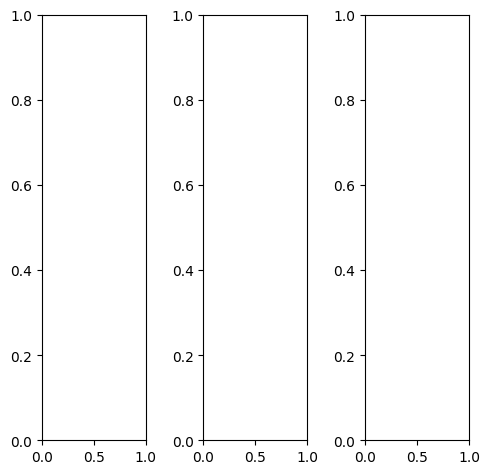

EPOCH: 23.765  trn_loss: 0.005  (2874.81s - 9221.87s remaining)

tensor([[[0.0902, 0.0745, 0.0353,  ..., 0.1608, 0.1333, 0.1137],
         [0.1255, 0.0549, 0.0392,  ..., 0.1216, 0.1255, 0.0784],
         [0.0667, 0.0353, 0.0314,  ..., 0.1098, 0.1059, 0.0549],
         ...,
         [0.8627, 0.8471, 0.8078,  ..., 0.8902, 0.8863, 0.9020],
         [0.8784, 0.8745, 0.8863,  ..., 0.8745, 0.8863, 0.8863],
         [0.9098, 0.8980, 0.9098,  ..., 0.7765, 0.7608, 0.7647]],

        [[0.0902, 0.0745, 0.0353,  ..., 0.1608, 0.1333, 0.1137],
         [0.1255, 0.0549, 0.0392,  ..., 0.1216, 0.1255, 0.0784],
         [0.0667, 0.0353, 0.0314,  ..., 0.1098, 0.1059, 0.0549],
         ...,
         [0.8627, 0.8471, 0.8078,  ..., 0.8902, 0.8863, 0.9020],
         [0.8784, 0.8745, 0.8863,  ..., 0.8745, 0.8863, 0.8863],
         [0.9098, 0.8980, 0.9098,  ..., 0.7765, 0.7608, 0.7647]],

        [[0.0902, 0.0745, 0.0353,  ..., 0.1608, 0.1333, 0.1137],
         [0.1255, 0.0549, 0.0392,  ..., 0.1216, 0.1255, 0.0784],
         [0.0667, 0.0353, 0.0314,  ..., 0.1098, 0.1059, 0.

tensor([[[0.0745, 0.0588, 0.0235,  ..., 0.1373, 0.1020, 0.0863],
         [0.1098, 0.0392, 0.0235,  ..., 0.0980, 0.0980, 0.0510],
         [0.0510, 0.0196, 0.0196,  ..., 0.0863, 0.0784, 0.0275],
         ...,
         [0.8941, 0.8824, 0.8392,  ..., 0.9294, 0.9255, 0.9412],
         [0.9216, 0.9137, 0.9294,  ..., 0.9176, 0.9333, 0.9333],
         [0.9490, 0.9373, 0.9451,  ..., 0.8196, 0.8078, 0.8157]],

        [[0.0941, 0.0784, 0.0392,  ..., 0.1686, 0.1451, 0.1255],
         [0.1294, 0.0588, 0.0431,  ..., 0.1294, 0.1373, 0.0902],
         [0.0706, 0.0392, 0.0353,  ..., 0.1216, 0.1176, 0.0667],
         ...,
         [0.8471, 0.8353, 0.7922,  ..., 0.8784, 0.8706, 0.8863],
         [0.8627, 0.8588, 0.8706,  ..., 0.8588, 0.8706, 0.8706],
         [0.8941, 0.8824, 0.8941,  ..., 0.7608, 0.7451, 0.7490]],

        [[0.1216, 0.1020, 0.0627,  ..., 0.1765, 0.1451, 0.1294],
         [0.1529, 0.0824, 0.0667,  ..., 0.1373, 0.1412, 0.0941],
         [0.0980, 0.0627, 0.0588,  ..., 0.1255, 0.1216, 0.

tensor([[[ 0.0463,  0.0165, -0.0633,  ...,  0.2441,  0.2360,  0.2479],
         [ 0.0964, -0.0980, -0.0719,  ...,  0.2227,  0.2124,  0.1971],
         [-0.1123, -0.0992, -0.1824,  ...,  0.1988,  0.1996,  0.1701],
         ...,
         [ 0.8477,  0.7862,  0.7380,  ...,  0.8133,  0.8119,  0.8532],
         [ 0.8335,  0.7931,  0.7864,  ...,  0.7735,  0.8101,  0.8387],
         [ 0.8794,  0.8658,  0.8439,  ...,  0.7633,  0.7486,  0.7934]],

        [[ 0.1549,  0.1932,  0.0058,  ...,  0.2805,  0.2683,  0.2699],
         [ 0.1365, -0.0256, -0.1644,  ...,  0.3004,  0.3028,  0.2278],
         [ 0.0191,  0.1219, -0.0927,  ...,  0.2700,  0.2688,  0.2117],
         ...,
         [ 0.8256,  0.7858,  0.7636,  ...,  0.8271,  0.8109,  0.8624],
         [ 0.8378,  0.8123,  0.8261,  ...,  0.8109,  0.8144,  0.8503],
         [ 0.8408,  0.8518,  0.8530,  ...,  0.7534,  0.7393,  0.7717]],

        [[ 0.3196,  0.1655,  0.2300,  ...,  0.3963,  0.4035,  0.3984],
         [ 0.3019,  0.1607,  0.2423,  ...,  0

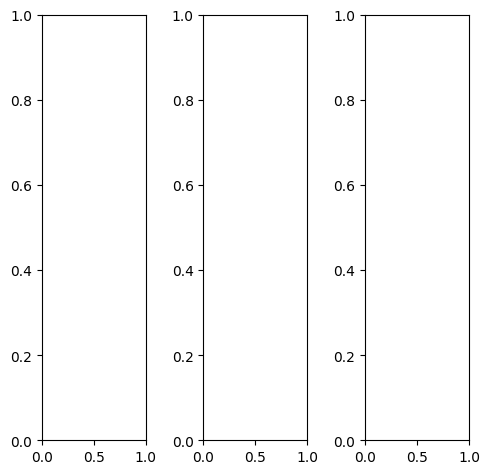

tensor([[[0.4078, 0.4078, 0.4118,  ..., 0.4039, 0.4039, 0.4039],
         [0.4275, 0.4235, 0.4235,  ..., 0.4157, 0.4157, 0.4157],
         [0.4275, 0.4275, 0.4314,  ..., 0.4235, 0.4235, 0.4235],
         ...,
         [0.5216, 0.5686, 0.4275,  ..., 0.1176, 0.0902, 0.1412],
         [0.6353, 0.6431, 0.6196,  ..., 0.1529, 0.1569, 0.2118],
         [0.6510, 0.6275, 0.5961,  ..., 0.2745, 0.2941, 0.3059]],

        [[0.4078, 0.4078, 0.4118,  ..., 0.4039, 0.4039, 0.4039],
         [0.4275, 0.4235, 0.4235,  ..., 0.4157, 0.4157, 0.4157],
         [0.4275, 0.4275, 0.4314,  ..., 0.4235, 0.4235, 0.4235],
         ...,
         [0.5216, 0.5686, 0.4275,  ..., 0.1176, 0.0902, 0.1412],
         [0.6353, 0.6431, 0.6196,  ..., 0.1529, 0.1569, 0.2118],
         [0.6510, 0.6275, 0.5961,  ..., 0.2745, 0.2941, 0.3059]],

        [[0.4078, 0.4078, 0.4118,  ..., 0.4039, 0.4039, 0.4039],
         [0.4275, 0.4235, 0.4235,  ..., 0.4157, 0.4157, 0.4157],
         [0.4275, 0.4275, 0.4314,  ..., 0.4235, 0.4235, 0.

tensor([[[0.2706, 0.2784, 0.2941,  ..., 0.2902, 0.2902, 0.2902],
         [0.2902, 0.2941, 0.2941,  ..., 0.3020, 0.3020, 0.3020],
         [0.2980, 0.3098, 0.3098,  ..., 0.3098, 0.3098, 0.3098],
         ...,
         [0.6588, 0.7255, 0.5373,  ..., 0.1137, 0.0824, 0.1333],
         [0.8078, 0.8353, 0.7725,  ..., 0.1529, 0.1569, 0.2118],
         [0.8627, 0.8471, 0.7882,  ..., 0.2863, 0.3098, 0.3176]],

        [[0.4314, 0.4275, 0.4235,  ..., 0.4157, 0.4157, 0.4157],
         [0.4510, 0.4431, 0.4431,  ..., 0.4314, 0.4314, 0.4314],
         [0.4471, 0.4431, 0.4510,  ..., 0.4392, 0.4392, 0.4392],
         ...,
         [0.4824, 0.5255, 0.3961,  ..., 0.1216, 0.0941, 0.1451],
         [0.5882, 0.5922, 0.5804,  ..., 0.1608, 0.1686, 0.2235],
         [0.5882, 0.5569, 0.5333,  ..., 0.2784, 0.3059, 0.3176]],

        [[0.6471, 0.6510, 0.6549,  ..., 0.6275, 0.6275, 0.6275],
         [0.6824, 0.6745, 0.6784,  ..., 0.6431, 0.6431, 0.6431],
         [0.6706, 0.6392, 0.6471,  ..., 0.6510, 0.6471, 0.

tensor([[[0.2187, 0.1683, 0.0896,  ..., 0.2175, 0.2316, 0.2693],
         [0.2851, 0.0934, 0.0784,  ..., 0.2274, 0.2256, 0.2504],
         [0.2072, 0.1002, 0.1312,  ..., 0.2401, 0.2390, 0.2506],
         ...,
         [0.4946, 0.5960, 0.4162,  ..., 0.0458, 0.0032, 0.0821],
         [0.6483, 0.6545, 0.6288,  ..., 0.1053, 0.1083, 0.1692],
         [0.6555, 0.6343, 0.5981,  ..., 0.2641, 0.2724, 0.2461]],

        [[0.3095, 0.2857, 0.2838,  ..., 0.3552, 0.3841, 0.3573],
         [0.3192, 0.2036, 0.1056,  ..., 0.3951, 0.4125, 0.3723],
         [0.3428, 0.2133, 0.2979,  ..., 0.3987, 0.4144, 0.3612],
         ...,
         [0.4723, 0.5640, 0.3899,  ..., 0.0680, 0.0040, 0.0612],
         [0.6135, 0.6101, 0.6151,  ..., 0.1053, 0.0935, 0.1375],
         [0.6161, 0.6038, 0.5749,  ..., 0.2249, 0.2309, 0.2146]],

        [[0.4562, 0.2879, 0.3692,  ..., 0.5494, 0.5665, 0.5479],
         [0.4553, 0.3745, 0.3051,  ..., 0.6039, 0.6146, 0.5845],
         [0.3980, 0.3090, 0.4071,  ..., 0.6016, 0.6134, 0.

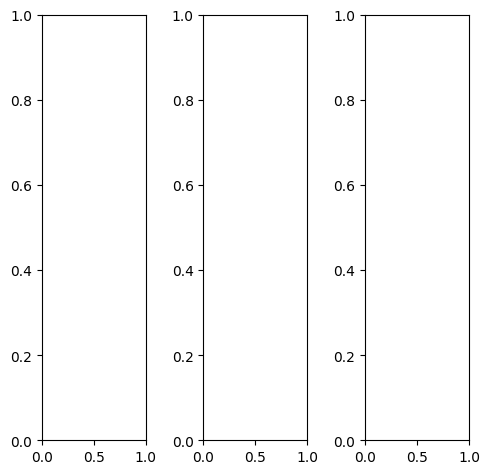

tensor([[[0.9961, 0.9765, 0.9765,  ..., 0.9961, 0.9961, 0.9961],
         [0.9333, 0.9490, 0.9529,  ..., 0.9765, 0.9765, 0.9765],
         [0.7608, 0.9333, 0.9490,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.3961, 0.3765, 0.4157,  ..., 0.1294, 0.2392, 0.3686],
         [0.3961, 0.3843, 0.4000,  ..., 0.3216, 0.3922, 0.4392],
         [0.4078, 0.3961, 0.3922,  ..., 0.4627, 0.4784, 0.4863]],

        [[0.9961, 0.9765, 0.9765,  ..., 0.9961, 0.9961, 0.9961],
         [0.9333, 0.9490, 0.9529,  ..., 0.9765, 0.9765, 0.9765],
         [0.7608, 0.9333, 0.9490,  ..., 0.9804, 0.9804, 0.9804],
         ...,
         [0.3961, 0.3765, 0.4157,  ..., 0.1294, 0.2392, 0.3686],
         [0.3961, 0.3843, 0.4000,  ..., 0.3216, 0.3922, 0.4392],
         [0.4078, 0.3961, 0.3922,  ..., 0.4627, 0.4784, 0.4863]],

        [[0.9961, 0.9765, 0.9765,  ..., 0.9961, 0.9961, 0.9961],
         [0.9333, 0.9490, 0.9529,  ..., 0.9765, 0.9765, 0.9765],
         [0.7608, 0.9333, 0.9490,  ..., 0.9804, 0.9804, 0.

tensor([[[0.9922, 0.9725, 0.9725,  ..., 1.0000, 1.0000, 1.0000],
         [0.9098, 0.9373, 0.9490,  ..., 0.9804, 0.9804, 0.9804],
         [0.7176, 0.9137, 0.9412,  ..., 0.9843, 0.9843, 0.9843],
         ...,
         [0.3529, 0.3412, 0.3843,  ..., 0.0941, 0.2000, 0.3137],
         [0.3569, 0.3490, 0.3686,  ..., 0.2784, 0.3451, 0.3843],
         [0.3765, 0.3647, 0.3569,  ..., 0.4118, 0.4275, 0.4314]],

        [[0.9961, 0.9765, 0.9765,  ..., 0.9922, 0.9922, 0.9922],
         [0.9373, 0.9529, 0.9529,  ..., 0.9725, 0.9725, 0.9725],
         [0.7725, 0.9412, 0.9490,  ..., 0.9765, 0.9765, 0.9765],
         ...,
         [0.4353, 0.4039, 0.4353,  ..., 0.1333, 0.2471, 0.3843],
         [0.4392, 0.4196, 0.4275,  ..., 0.3255, 0.3961, 0.4471],
         [0.4431, 0.4314, 0.4235,  ..., 0.4706, 0.4902, 0.4980]],

        [[1.0000, 0.9882, 0.9843,  ..., 0.9961, 0.9961, 0.9961],
         [0.9725, 0.9647, 0.9608,  ..., 0.9765, 0.9765, 0.9765],
         [0.8275, 0.9569, 0.9529,  ..., 0.9804, 0.9804, 0.

tensor([[[0.8560, 0.8877, 0.8251,  ..., 0.7189, 0.7309, 0.7845],
         [0.8039, 0.8713, 0.8137,  ..., 0.7183, 0.7495, 0.7866],
         [0.6784, 0.8439, 0.8037,  ..., 0.7351, 0.7661, 0.8008],
         ...,
         [0.3778, 0.3818, 0.4102,  ..., 0.1918, 0.2773, 0.4227],
         [0.3669, 0.3776, 0.3975,  ..., 0.3287, 0.3988, 0.4723],
         [0.3976, 0.4008, 0.3919,  ..., 0.4858, 0.5072, 0.5158]],

        [[0.8329, 0.8625, 0.7568,  ..., 0.7905, 0.8119, 0.8548],
         [0.7664, 0.7013, 0.7335,  ..., 0.7884, 0.8092, 0.8713],
         [0.7387, 0.7952, 0.7949,  ..., 0.7983, 0.8180, 0.8710],
         ...,
         [0.3924, 0.3646, 0.4276,  ..., 0.2035, 0.2828, 0.3857],
         [0.3902, 0.3813, 0.3986,  ..., 0.3336, 0.4083, 0.4255],
         [0.4130, 0.3910, 0.3956,  ..., 0.4688, 0.4787, 0.4822]],

        [[0.8874, 0.8993, 0.8751,  ..., 0.9376, 0.9578, 0.9810],
         [0.8681, 0.8544, 0.8873,  ..., 0.9143, 0.9531, 0.9827],
         [0.7259, 0.7632, 0.8383,  ..., 0.9419, 0.9659, 1.

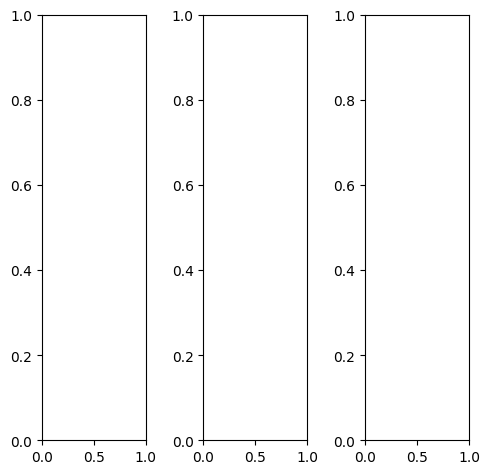

tensor([[[0.3843, 0.3843, 0.3922,  ..., 0.3333, 0.3373, 0.3333],
         [0.3412, 0.3216, 0.3255,  ..., 0.2549, 0.2784, 0.2941],
         [0.3137, 0.2863, 0.2941,  ..., 0.2275, 0.2471, 0.2588],
         ...,
         [0.5020, 0.4980, 0.4980,  ..., 0.3529, 0.3373, 0.3294],
         [0.5216, 0.5137, 0.5098,  ..., 0.3922, 0.3804, 0.3608],
         [0.5059, 0.5020, 0.4863,  ..., 0.4471, 0.4431, 0.4157]],

        [[0.3843, 0.3843, 0.3922,  ..., 0.3333, 0.3373, 0.3333],
         [0.3412, 0.3216, 0.3255,  ..., 0.2549, 0.2784, 0.2941],
         [0.3137, 0.2863, 0.2941,  ..., 0.2275, 0.2471, 0.2588],
         ...,
         [0.5020, 0.4980, 0.4980,  ..., 0.3529, 0.3373, 0.3294],
         [0.5216, 0.5137, 0.5098,  ..., 0.3922, 0.3804, 0.3608],
         [0.5059, 0.5020, 0.4863,  ..., 0.4471, 0.4431, 0.4157]],

        [[0.3843, 0.3843, 0.3922,  ..., 0.3333, 0.3373, 0.3333],
         [0.3412, 0.3216, 0.3255,  ..., 0.2549, 0.2784, 0.2941],
         [0.3137, 0.2863, 0.2941,  ..., 0.2275, 0.2471, 0.

tensor([[[0.3608, 0.3608, 0.3686,  ..., 0.3059, 0.3098, 0.3059],
         [0.3059, 0.2902, 0.2941,  ..., 0.2275, 0.2510, 0.2667],
         [0.2745, 0.2471, 0.2549,  ..., 0.2000, 0.2196, 0.2314],
         ...,
         [0.5176, 0.5176, 0.5098,  ..., 0.3529, 0.3373, 0.3294],
         [0.5373, 0.5294, 0.5255,  ..., 0.3922, 0.3804, 0.3608],
         [0.5216, 0.5176, 0.5020,  ..., 0.4471, 0.4471, 0.4157]],

        [[0.3961, 0.3961, 0.4039,  ..., 0.3490, 0.3529, 0.3490],
         [0.3569, 0.3373, 0.3412,  ..., 0.2706, 0.2902, 0.3098],
         [0.3333, 0.3059, 0.3137,  ..., 0.2392, 0.2588, 0.2706],
         ...,
         [0.4941, 0.4863, 0.4902,  ..., 0.3490, 0.3333, 0.3255],
         [0.5137, 0.5059, 0.5020,  ..., 0.3882, 0.3765, 0.3569],
         [0.4980, 0.4941, 0.4784,  ..., 0.4471, 0.4392, 0.4118]],

        [[0.3843, 0.3843, 0.3922,  ..., 0.3333, 0.3373, 0.3333],
         [0.3412, 0.3255, 0.3294,  ..., 0.2588, 0.2824, 0.2980],
         [0.3216, 0.2941, 0.3020,  ..., 0.2353, 0.2549, 0.

tensor([[[0.3790, 0.3177, 0.2118,  ..., 0.3178, 0.3387, 0.3978],
         [0.2960, 0.1209, 0.1121,  ..., 0.2244, 0.2444, 0.3205],
         [0.1961, 0.1127, 0.0263,  ..., 0.1721, 0.2032, 0.2672],
         ...,
         [0.6797, 0.7123, 0.6462,  ..., 0.5174, 0.4958, 0.4967],
         [0.6834, 0.6988, 0.6431,  ..., 0.5395, 0.5285, 0.5184],
         [0.6698, 0.6803, 0.6443,  ..., 0.6051, 0.6133, 0.5801]],

        [[0.4522, 0.4571, 0.3215,  ..., 0.4561, 0.4773, 0.4670],
         [0.3368, 0.2323, 0.0926,  ..., 0.3624, 0.3967, 0.4148],
         [0.3183, 0.2428, 0.1281,  ..., 0.3122, 0.3523, 0.3628],
         ...,
         [0.6318, 0.6617, 0.6384,  ..., 0.5342, 0.5185, 0.4455],
         [0.6372, 0.6521, 0.6321,  ..., 0.5591, 0.5387, 0.4910],
         [0.6204, 0.6364, 0.6249,  ..., 0.5877, 0.5957, 0.5474]],

        [[0.6000, 0.5161, 0.4953,  ..., 0.6374, 0.6697, 0.6532],
         [0.5045, 0.3847, 0.4288,  ..., 0.5486, 0.5936, 0.6145],
         [0.3936, 0.3539, 0.3293,  ..., 0.4976, 0.5571, 0.

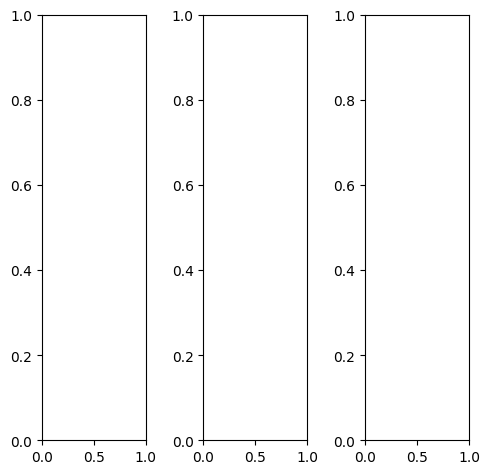

tensor([[[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.9882],
         ...,
         [0.1765, 0.1686, 0.1765,  ..., 0.8824, 0.8824, 0.8784],
         [0.3922, 0.2431, 0.1843,  ..., 0.8706, 0.8706, 0.8588],
         [0.6118, 0.5137, 0.3882,  ..., 0.8627, 0.8471, 0.8392]],

        [[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.9882],
         ...,
         [0.1765, 0.1686, 0.1765,  ..., 0.8824, 0.8824, 0.8784],
         [0.3922, 0.2431, 0.1843,  ..., 0.8706, 0.8706, 0.8588],
         [0.6118, 0.5137, 0.3882,  ..., 0.8627, 0.8471, 0.8392]],

        [[0.4235, 0.4314, 0.4510,  ..., 0.9804, 0.9804, 0.9765],
         [0.4235, 0.4314, 0.4588,  ..., 0.9882, 0.9922, 0.9882],
         [0.3255, 0.3882, 0.4353,  ..., 0.9882, 0.9922, 0.

tensor([[[0.4039, 0.4157, 0.4314,  ..., 0.9647, 0.9647, 0.9529],
         [0.4196, 0.4275, 0.4510,  ..., 0.9804, 0.9765, 0.9647],
         [0.3333, 0.3961, 0.4471,  ..., 0.9843, 0.9843, 0.9725],
         ...,
         [0.2157, 0.2196, 0.2275,  ..., 0.8863, 0.8863, 0.8824],
         [0.4235, 0.2863, 0.2275,  ..., 0.8784, 0.8745, 0.8627],
         [0.6353, 0.5373, 0.4157,  ..., 0.8706, 0.8510, 0.8431]],

        [[0.4275, 0.4353, 0.4549,  ..., 0.9843, 0.9882, 0.9882],
         [0.4196, 0.4275, 0.4549,  ..., 0.9922, 0.9961, 0.9961],
         [0.3137, 0.3765, 0.4235,  ..., 0.9882, 0.9922, 0.9922],
         ...,
         [0.1569, 0.1451, 0.1490,  ..., 0.8824, 0.8824, 0.8784],
         [0.3804, 0.2275, 0.1647,  ..., 0.8745, 0.8745, 0.8588],
         [0.6157, 0.5137, 0.3843,  ..., 0.8667, 0.8510, 0.8431]],

        [[0.4549, 0.4627, 0.4784,  ..., 0.9843, 0.9882, 0.9843],
         [0.4588, 0.4667, 0.4941,  ..., 0.9961, 0.9961, 0.9961],
         [0.3490, 0.4118, 0.4588,  ..., 0.9922, 0.9961, 0.

tensor([[[0.2930, 0.2117, 0.0812,  ..., 0.7213, 0.7168, 0.7953],
         [0.3012, 0.1519, 0.1362,  ..., 0.7111, 0.7485, 0.7786],
         [0.0749, 0.0898, 0.0419,  ..., 0.7189, 0.7629, 0.7901],
         ...,
         [0.1904, 0.2151, 0.2098,  ..., 0.8071, 0.8041, 0.8180],
         [0.3855, 0.2292, 0.2009,  ..., 0.7800, 0.7968, 0.8246],
         [0.6091, 0.5246, 0.3892,  ..., 0.8506, 0.8400, 0.8387]],

        [[0.4006, 0.3139, 0.2319,  ..., 0.8401, 0.8501, 0.8993],
         [0.3164, 0.1830, 0.0698,  ..., 0.8457, 0.8637, 0.9194],
         [0.2478, 0.1393, 0.2052,  ..., 0.8510, 0.8678, 0.9111],
         ...,
         [0.2217, 0.2300, 0.2347,  ..., 0.7830, 0.7828, 0.8148],
         [0.3914, 0.2779, 0.2327,  ..., 0.7710, 0.7643, 0.8069],
         [0.6020, 0.5319, 0.4201,  ..., 0.8088, 0.8032, 0.8032]],

        [[0.5534, 0.4270, 0.5044,  ..., 1.0290, 1.0271, 1.0360],
         [0.5120, 0.4409, 0.5463,  ..., 1.0224, 1.0508, 1.0446],
         [0.3410, 0.4071, 0.4833,  ..., 1.0403, 1.0526, 1.

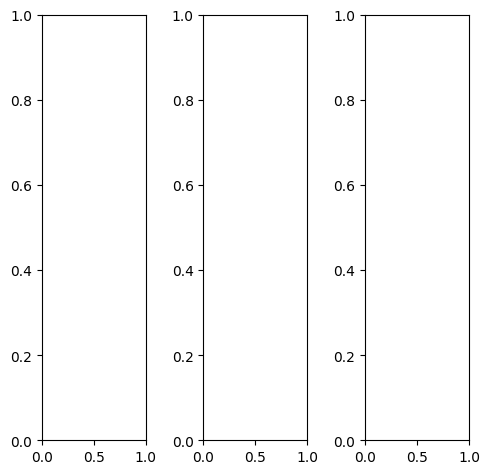

EPOCH: 24.000  val_loss: 0.003  (2910.75s - 9217.37s remaining)

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.8627, 0.8588, 0.8588],
         [1.0000, 1.0000, 1.0000,  ..., 0.5569, 0.5569, 0.5843],
         [1.0000, 1.0000, 1.0000,  ..., 0.5765, 0.5765, 0.5686],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.3686, 0.3647, 0.3686],
         [1.0000, 1.0000, 1.0000,  ..., 0.3882, 0.3725, 0.3725],
         [1.0000, 1.0000, 1.0000,  ..., 0.4745, 0.4745, 0.4824]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8627, 0.8588, 0.8588],
         [1.0000, 1.0000, 1.0000,  ..., 0.5569, 0.5569, 0.5843],
         [1.0000, 1.0000, 1.0000,  ..., 0.5765, 0.5765, 0.5686],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.3686, 0.3647, 0.3686],
         [1.0000, 1.0000, 1.0000,  ..., 0.3882, 0.3725, 0.3725],
         [1.0000, 1.0000, 1.0000,  ..., 0.4745, 0.4745, 0.4824]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8627, 0.8588, 0.8588],
         [1.0000, 1.0000, 1.0000,  ..., 0.5569, 0.5569, 0.5843],
         [1.0000, 1.0000, 1.0000,  ..., 0.5765, 0.5765, 0.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.8235, 0.8157, 0.8196],
         [1.0000, 1.0000, 1.0000,  ..., 0.4549, 0.4510, 0.4824],
         [1.0000, 1.0000, 1.0000,  ..., 0.4392, 0.4353, 0.4471],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.3569, 0.3529, 0.3569],
         [1.0000, 1.0000, 1.0000,  ..., 0.3882, 0.3725, 0.3725],
         [1.0000, 1.0000, 1.0000,  ..., 0.4745, 0.4745, 0.4824]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8667, 0.8627, 0.8627],
         [1.0000, 1.0000, 1.0000,  ..., 0.5608, 0.5647, 0.5922],
         [1.0000, 1.0000, 1.0000,  ..., 0.5922, 0.5882, 0.5804],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 0.3608, 0.3569, 0.3608],
         [1.0000, 1.0000, 1.0000,  ..., 0.3804, 0.3608, 0.3608],
         [1.0000, 1.0000, 1.0000,  ..., 0.4706, 0.4706, 0.4745]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.9569, 0.9529, 0.9529],
         [1.0000, 1.0000, 1.0000,  ..., 0.7961, 0.8000, 0.8078],
         [1.0000, 1.0000, 1.0000,  ..., 0.8706, 0.8706, 0.

tensor([[[0.9541, 0.9606, 0.9833,  ..., 0.8107, 0.7879, 0.7535],
         [0.9670, 0.9776, 0.9761,  ..., 0.5310, 0.5337, 0.5716],
         [0.9720, 0.9924, 0.9870,  ..., 0.5226, 0.5326, 0.5093],
         ...,
         [1.0014, 1.0098, 0.9964,  ..., 0.3548, 0.3417, 0.3580],
         [0.9811, 1.0005, 0.9772,  ..., 0.3664, 0.3508, 0.3571],
         [0.9624, 0.9794, 0.9793,  ..., 0.4607, 0.4644, 0.4690]],

        [[0.9737, 0.9867, 1.0038,  ..., 0.8695, 0.8585, 0.8074],
         [0.9911, 1.0076, 1.0076,  ..., 0.5717, 0.5734, 0.6189],
         [0.9989, 1.0139, 1.0100,  ..., 0.5942, 0.5934, 0.5852],
         ...,
         [0.9980, 1.0123, 1.0113,  ..., 0.3778, 0.3731, 0.3844],
         [0.9870, 0.9967, 0.9968,  ..., 0.3879, 0.3809, 0.3794],
         [0.9602, 0.9966, 0.9972,  ..., 0.4835, 0.4831, 0.4863]],

        [[0.9868, 1.0122, 1.0035,  ..., 0.9111, 0.9192, 0.8587],
         [1.0110, 1.0352, 1.0192,  ..., 0.6242, 0.6367, 0.6715],
         [1.0189, 1.0250, 1.0242,  ..., 0.6635, 0.6720, 0.

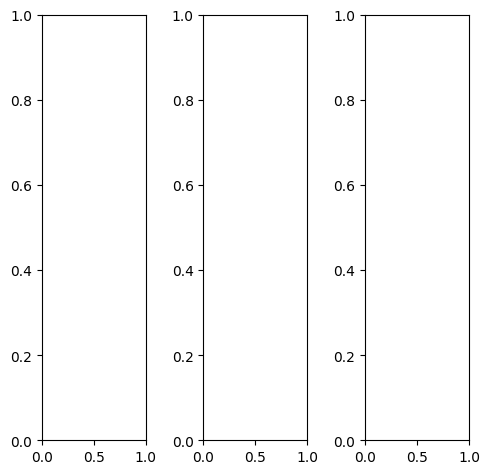

tensor([[[0.7961, 0.8039, 0.8431,  ..., 0.9412, 0.8941, 0.9059],
         [0.5686, 0.7255, 0.8235,  ..., 0.8392, 0.8275, 0.8784],
         [0.4627, 0.5373, 0.7451,  ..., 0.8000, 0.8706, 0.9098],
         ...,
         [0.2118, 0.3412, 0.3412,  ..., 0.8039, 0.8000, 0.8353],
         [0.3020, 0.2902, 0.2392,  ..., 0.8000, 0.8314, 0.8627],
         [0.2118, 0.1569, 0.2000,  ..., 0.6745, 0.8078, 0.8510]],

        [[0.7961, 0.8039, 0.8431,  ..., 0.9412, 0.8941, 0.9059],
         [0.5686, 0.7255, 0.8235,  ..., 0.8392, 0.8275, 0.8784],
         [0.4627, 0.5373, 0.7451,  ..., 0.8000, 0.8706, 0.9098],
         ...,
         [0.2118, 0.3412, 0.3412,  ..., 0.8039, 0.8000, 0.8353],
         [0.3020, 0.2902, 0.2392,  ..., 0.8000, 0.8314, 0.8627],
         [0.2118, 0.1569, 0.2000,  ..., 0.6745, 0.8078, 0.8510]],

        [[0.7961, 0.8039, 0.8431,  ..., 0.9412, 0.8941, 0.9059],
         [0.5686, 0.7255, 0.8235,  ..., 0.8392, 0.8275, 0.8784],
         [0.4627, 0.5373, 0.7451,  ..., 0.8000, 0.8706, 0.

tensor([[[0.8627, 0.8706, 0.9059,  ..., 0.9059, 0.8431, 0.8627],
         [0.6078, 0.7804, 0.8902,  ..., 0.7725, 0.7569, 0.8471],
         [0.4784, 0.5843, 0.8118,  ..., 0.7020, 0.7843, 0.8941],
         ...,
         [0.1961, 0.2980, 0.2784,  ..., 0.8863, 0.8745, 0.8941],
         [0.2863, 0.2549, 0.1882,  ..., 0.8667, 0.9020, 0.9294],
         [0.2000, 0.1373, 0.1765,  ..., 0.7176, 0.8706, 0.9294]],

        [[0.7686, 0.7765, 0.8235,  ..., 0.9529, 0.9098, 0.9216],
         [0.5490, 0.7059, 0.8039,  ..., 0.8627, 0.8510, 0.8902],
         [0.4510, 0.5176, 0.7216,  ..., 0.8353, 0.9020, 0.9137],
         ...,
         [0.2078, 0.3490, 0.3608,  ..., 0.7804, 0.7765, 0.8196],
         [0.2941, 0.2941, 0.2510,  ..., 0.7804, 0.8118, 0.8431],
         [0.2118, 0.1569, 0.2039,  ..., 0.6588, 0.7922, 0.8275]],

        [[0.7490, 0.7647, 0.7686,  ..., 0.9725, 0.9333, 0.9216],
         [0.5529, 0.6980, 0.7490,  ..., 0.8941, 0.8824, 0.8941],
         [0.4824, 0.5176, 0.6745,  ..., 0.8667, 0.9255, 0.

tensor([[[0.7668, 0.8147, 0.8488,  ..., 0.9299, 0.8940, 0.8843],
         [0.5991, 0.7383, 0.8307,  ..., 0.8510, 0.8465, 0.8815],
         [0.4742, 0.5427, 0.7517,  ..., 0.8120, 0.8776, 0.9131],
         ...,
         [0.2311, 0.3575, 0.3647,  ..., 0.8280, 0.8181, 0.8485],
         [0.2961, 0.3116, 0.2596,  ..., 0.8107, 0.8524, 0.8834],
         [0.2336, 0.1800, 0.2102,  ..., 0.7073, 0.8275, 0.8531]],

        [[0.7787, 0.8150, 0.8679,  ..., 0.9320, 0.8948, 0.8929],
         [0.5892, 0.7508, 0.8360,  ..., 0.8497, 0.8336, 0.8884],
         [0.4707, 0.5345, 0.7633,  ..., 0.8120, 0.8800, 0.9188],
         ...,
         [0.2256, 0.3460, 0.3474,  ..., 0.8021, 0.8001, 0.8414],
         [0.2906, 0.2883, 0.2437,  ..., 0.7962, 0.8325, 0.8678],
         [0.2345, 0.1730, 0.2016,  ..., 0.6743, 0.7989, 0.8218]],

        [[0.7498, 0.7983, 0.8238,  ..., 0.8935, 0.8555, 0.8558],
         [0.5437, 0.6997, 0.7946,  ..., 0.8149, 0.8050, 0.8390],
         [0.4129, 0.4954, 0.7113,  ..., 0.7666, 0.8351, 0.

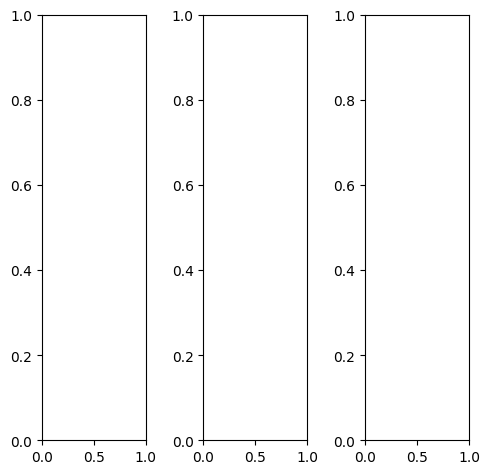

tensor([[[0.1451, 0.1490, 0.1686,  ..., 0.2275, 0.1765, 0.1490],
         [0.1451, 0.1686, 0.2196,  ..., 0.2824, 0.1765, 0.1765],
         [0.1529, 0.1961, 0.2706,  ..., 0.2588, 0.2157, 0.1882],
         ...,
         [0.1176, 0.1255, 0.1294,  ..., 0.1608, 0.1412, 0.1255],
         [0.1137, 0.1373, 0.1490,  ..., 0.1569, 0.1294, 0.1255],
         [0.1176, 0.1412, 0.1529,  ..., 0.1255, 0.1137, 0.1137]],

        [[0.1451, 0.1490, 0.1686,  ..., 0.2275, 0.1765, 0.1490],
         [0.1451, 0.1686, 0.2196,  ..., 0.2824, 0.1765, 0.1765],
         [0.1529, 0.1961, 0.2706,  ..., 0.2588, 0.2157, 0.1882],
         ...,
         [0.1176, 0.1255, 0.1294,  ..., 0.1608, 0.1412, 0.1255],
         [0.1137, 0.1373, 0.1490,  ..., 0.1569, 0.1294, 0.1255],
         [0.1176, 0.1412, 0.1529,  ..., 0.1255, 0.1137, 0.1137]],

        [[0.1451, 0.1490, 0.1686,  ..., 0.2275, 0.1765, 0.1490],
         [0.1451, 0.1686, 0.2196,  ..., 0.2824, 0.1765, 0.1765],
         [0.1529, 0.1961, 0.2706,  ..., 0.2588, 0.2157, 0.

tensor([[[0.1725, 0.1765, 0.1961,  ..., 0.2667, 0.2157, 0.1843],
         [0.1765, 0.2000, 0.2549,  ..., 0.3216, 0.2157, 0.2118],
         [0.1922, 0.2314, 0.3059,  ..., 0.2980, 0.2549, 0.2275],
         ...,
         [0.1294, 0.1412, 0.1529,  ..., 0.1843, 0.1647, 0.1490],
         [0.1255, 0.1529, 0.1765,  ..., 0.1804, 0.1529, 0.1490],
         [0.1255, 0.1569, 0.1804,  ..., 0.1490, 0.1333, 0.1373]],

        [[0.1333, 0.1373, 0.1569,  ..., 0.2157, 0.1647, 0.1373],
         [0.1333, 0.1569, 0.2078,  ..., 0.2706, 0.1647, 0.1647],
         [0.1412, 0.1843, 0.2588,  ..., 0.2471, 0.2039, 0.1765],
         ...,
         [0.1137, 0.1176, 0.1216,  ..., 0.1529, 0.1333, 0.1176],
         [0.1098, 0.1294, 0.1412,  ..., 0.1490, 0.1216, 0.1176],
         [0.1137, 0.1333, 0.1451,  ..., 0.1176, 0.1059, 0.1059]],

        [[0.1255, 0.1255, 0.1451,  ..., 0.1922, 0.1412, 0.1176],
         [0.1176, 0.1412, 0.1922,  ..., 0.2471, 0.1412, 0.1412],
         [0.1176, 0.1569, 0.2314,  ..., 0.2235, 0.1804, 0.

tensor([[[0.1699, 0.1478, 0.1674,  ..., 0.2286, 0.1865, 0.1695],
         [0.1447, 0.1703, 0.2289,  ..., 0.2969, 0.1975, 0.1817],
         [0.1535, 0.2069, 0.2890,  ..., 0.2768, 0.2307, 0.1954],
         ...,
         [0.1248, 0.1265, 0.1366,  ..., 0.1719, 0.1528, 0.1365],
         [0.1252, 0.1501, 0.1621,  ..., 0.1658, 0.1395, 0.1405],
         [0.1435, 0.1544, 0.1654,  ..., 0.1420, 0.1347, 0.1318]],

        [[0.1705, 0.1458, 0.1619,  ..., 0.2190, 0.1770, 0.1795],
         [0.1378, 0.1675, 0.2214,  ..., 0.2777, 0.1833, 0.1769],
         [0.1473, 0.2024, 0.2773,  ..., 0.2566, 0.2146, 0.1858],
         ...,
         [0.1108, 0.1152, 0.1220,  ..., 0.1584, 0.1357, 0.1188],
         [0.1095, 0.1315, 0.1416,  ..., 0.1459, 0.1195, 0.1194],
         [0.1437, 0.1352, 0.1418,  ..., 0.1221, 0.1087, 0.1257]],

        [[0.1369, 0.1132, 0.1263,  ..., 0.1671, 0.1393, 0.1395],
         [0.1097, 0.1310, 0.1705,  ..., 0.2253, 0.1379, 0.1353],
         [0.1123, 0.1525, 0.2147,  ..., 0.2029, 0.1656, 0.

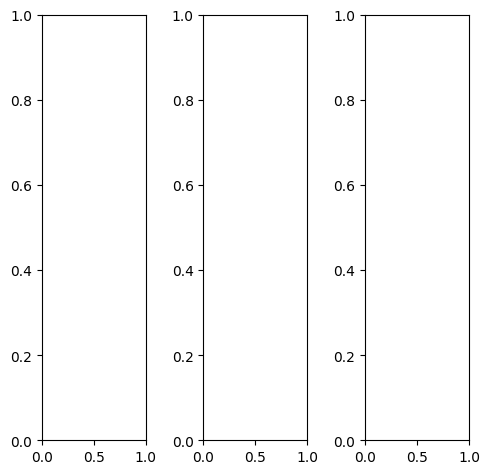

tensor([[[0.6118, 0.6627, 0.6549,  ..., 0.7020, 0.6863, 0.6824],
         [0.5882, 0.6314, 0.6510,  ..., 0.7412, 0.6784, 0.6588],
         [0.5882, 0.6078, 0.6627,  ..., 0.7529, 0.6863, 0.6549],
         ...,
         [0.1137, 0.1294, 0.1451,  ..., 0.0431, 0.1922, 0.1922],
         [0.0706, 0.1725, 0.1765,  ..., 0.0863, 0.2118, 0.2118],
         [0.0667, 0.1922, 0.2314,  ..., 0.1255, 0.1843, 0.2157]],

        [[0.6118, 0.6627, 0.6549,  ..., 0.7020, 0.6863, 0.6824],
         [0.5882, 0.6314, 0.6510,  ..., 0.7412, 0.6784, 0.6588],
         [0.5882, 0.6078, 0.6627,  ..., 0.7529, 0.6863, 0.6549],
         ...,
         [0.1137, 0.1294, 0.1451,  ..., 0.0431, 0.1922, 0.1922],
         [0.0706, 0.1725, 0.1765,  ..., 0.0863, 0.2118, 0.2118],
         [0.0667, 0.1922, 0.2314,  ..., 0.1255, 0.1843, 0.2157]],

        [[0.6118, 0.6627, 0.6549,  ..., 0.7020, 0.6863, 0.6824],
         [0.5882, 0.6314, 0.6510,  ..., 0.7412, 0.6784, 0.6588],
         [0.5882, 0.6078, 0.6627,  ..., 0.7529, 0.6863, 0.

tensor([[[0.8078, 0.8706, 0.8549,  ..., 0.9020, 0.8706, 0.8392],
         [0.7765, 0.8314, 0.8431,  ..., 0.9412, 0.8627, 0.8235],
         [0.7725, 0.8000, 0.8510,  ..., 0.9490, 0.8745, 0.8275],
         ...,
         [0.1647, 0.1843, 0.2196,  ..., 0.0745, 0.2431, 0.2510],
         [0.1176, 0.2196, 0.2471,  ..., 0.1255, 0.2784, 0.2902],
         [0.1216, 0.2510, 0.3098,  ..., 0.1647, 0.2667, 0.3098]],

        [[0.5725, 0.6157, 0.6118,  ..., 0.6549, 0.6510, 0.6549],
         [0.5490, 0.5882, 0.6078,  ..., 0.6980, 0.6431, 0.6275],
         [0.5529, 0.5686, 0.6235,  ..., 0.7137, 0.6510, 0.6235],
         ...,
         [0.0941, 0.1137, 0.1216,  ..., 0.0353, 0.1804, 0.1765],
         [0.0549, 0.1608, 0.1569,  ..., 0.0784, 0.1961, 0.1922],
         [0.0510, 0.1804, 0.2078,  ..., 0.1137, 0.1647, 0.1882]],

        [[0.3098, 0.3529, 0.3686,  ..., 0.4235, 0.3922, 0.3961],
         [0.2824, 0.3255, 0.3608,  ..., 0.4431, 0.3843, 0.3725],
         [0.2824, 0.2980, 0.3725,  ..., 0.4353, 0.3843, 0.

tensor([[[0.6259, 0.6715, 0.6676,  ..., 0.7010, 0.6920, 0.6899],
         [0.6142, 0.6424, 0.6619,  ..., 0.7350, 0.6790, 0.6802],
         [0.5995, 0.6214, 0.6685,  ..., 0.7566, 0.6896, 0.6740],
         ...,
         [0.1066, 0.1245, 0.1467,  ..., 0.0413, 0.1989, 0.1915],
         [0.0817, 0.1837, 0.1863,  ..., 0.0868, 0.2277, 0.2187],
         [0.1127, 0.1964, 0.2250,  ..., 0.1302, 0.1871, 0.2263]],

        [[0.6336, 0.6722, 0.6743,  ..., 0.7149, 0.7058, 0.6903],
         [0.6118, 0.6422, 0.6663,  ..., 0.7444, 0.6821, 0.6761],
         [0.6028, 0.6233, 0.6822,  ..., 0.7672, 0.6946, 0.6716],
         ...,
         [0.1058, 0.1268, 0.1400,  ..., 0.0420, 0.1961, 0.1848],
         [0.0774, 0.1767, 0.1744,  ..., 0.0815, 0.2182, 0.2022],
         [0.1219, 0.1879, 0.2119,  ..., 0.1154, 0.1698, 0.2227]],

        [[0.5763, 0.6131, 0.5850,  ..., 0.6629, 0.6611, 0.6687],
         [0.5341, 0.5660, 0.5863,  ..., 0.6953, 0.6279, 0.6171],
         [0.5187, 0.5366, 0.5893,  ..., 0.7123, 0.6408, 0.

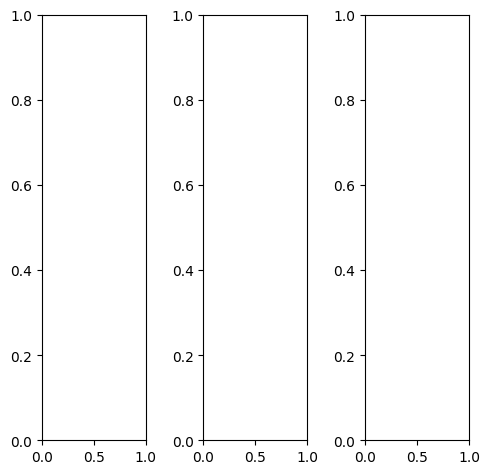

tensor([[[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.2196],
         ...,
         [0.1843, 0.1961, 0.1843,  ..., 0.2157, 0.2078, 0.1843],
         [0.1569, 0.1608, 0.1686,  ..., 0.1843, 0.2118, 0.2118],
         [0.1608, 0.1647, 0.1765,  ..., 0.1922, 0.2078, 0.1961]],

        [[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.2196],
         ...,
         [0.1843, 0.1961, 0.1843,  ..., 0.2157, 0.2078, 0.1843],
         [0.1569, 0.1608, 0.1686,  ..., 0.1843, 0.2118, 0.2118],
         [0.1608, 0.1647, 0.1765,  ..., 0.1922, 0.2078, 0.1961]],

        [[0.1765, 0.1647, 0.1804,  ..., 0.2314, 0.2314, 0.2392],
         [0.1804, 0.1725, 0.1765,  ..., 0.2275, 0.2353, 0.2314],
         [0.1765, 0.1804, 0.1882,  ..., 0.2157, 0.2275, 0.

tensor([[[0.1255, 0.1176, 0.1294,  ..., 0.1529, 0.1529, 0.1569],
         [0.1255, 0.1216, 0.1294,  ..., 0.1490, 0.1569, 0.1529],
         [0.1255, 0.1294, 0.1373,  ..., 0.1412, 0.1529, 0.1451],
         ...,
         [0.1333, 0.1451, 0.1373,  ..., 0.1725, 0.1647, 0.1373],
         [0.1137, 0.1137, 0.1176,  ..., 0.1216, 0.1490, 0.1529],
         [0.1137, 0.1176, 0.1255,  ..., 0.1255, 0.1451, 0.1294]],

        [[0.1686, 0.1569, 0.1686,  ..., 0.2353, 0.2353, 0.2431],
         [0.1725, 0.1647, 0.1686,  ..., 0.2314, 0.2392, 0.2353],
         [0.1686, 0.1725, 0.1804,  ..., 0.2157, 0.2275, 0.2235],
         ...,
         [0.1804, 0.1922, 0.1804,  ..., 0.2118, 0.2000, 0.1725],
         [0.1490, 0.1569, 0.1647,  ..., 0.1843, 0.2078, 0.2039],
         [0.1529, 0.1608, 0.1765,  ..., 0.1922, 0.2078, 0.1922]],

        [[0.3373, 0.3373, 0.3608,  ..., 0.4196, 0.4196, 0.4275],
         [0.3490, 0.3490, 0.3569,  ..., 0.4157, 0.4235, 0.4235],
         [0.3529, 0.3529, 0.3569,  ..., 0.4039, 0.4157, 0.

tensor([[[0.1408, 0.0972, 0.1041,  ..., 0.1452, 0.1530, 0.1829],
         [0.1045, 0.1009, 0.0991,  ..., 0.1348, 0.1472, 0.1625],
         [0.0974, 0.1047, 0.1112,  ..., 0.1297, 0.1338, 0.1436],
         ...,
         [0.1454, 0.1753, 0.1629,  ..., 0.1911, 0.1719, 0.1589],
         [0.1306, 0.1378, 0.1490,  ..., 0.1512, 0.1695, 0.1788],
         [0.1524, 0.1428, 0.1533,  ..., 0.1508, 0.1638, 0.1964]],

        [[0.1939, 0.1707, 0.1776,  ..., 0.2315, 0.2384, 0.2585],
         [0.1814, 0.1835, 0.1850,  ..., 0.2317, 0.2482, 0.2360],
         [0.1823, 0.1851, 0.2002,  ..., 0.2210, 0.2352, 0.2202],
         ...,
         [0.1738, 0.1872, 0.1804,  ..., 0.2224, 0.2178, 0.1907],
         [0.1591, 0.1541, 0.1679,  ..., 0.1896, 0.2156, 0.2030],
         [0.1847, 0.1670, 0.1787,  ..., 0.1926, 0.2003, 0.2253]],

        [[0.2739, 0.2586, 0.2809,  ..., 0.3468, 0.3488, 0.3464],
         [0.2746, 0.2925, 0.2946,  ..., 0.3683, 0.3727, 0.3463],
         [0.2803, 0.3050, 0.3026,  ..., 0.3589, 0.3664, 0.

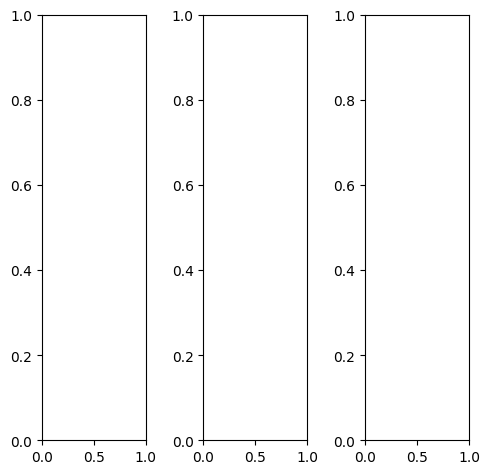

EPOCH: 24.255  trn_loss: 0.005  (2940.68s - 9183.30s remaining)

tensor([[[0.3765, 0.3804, 0.4000,  ..., 0.6078, 0.6471, 0.7216],
         [0.3686, 0.4275, 0.4784,  ..., 0.6118, 0.6667, 0.7451],
         [0.4157, 0.4824, 0.5333,  ..., 0.6078, 0.6588, 0.7725],
         ...,
         [0.4353, 0.4314, 0.4314,  ..., 0.4157, 0.4275, 0.4471],
         [0.4392, 0.4314, 0.4353,  ..., 0.4157, 0.4471, 0.4824],
         [0.4196, 0.4078, 0.4275,  ..., 0.4627, 0.4863, 0.5098]],

        [[0.3765, 0.3804, 0.4000,  ..., 0.6078, 0.6471, 0.7216],
         [0.3686, 0.4275, 0.4784,  ..., 0.6118, 0.6667, 0.7451],
         [0.4157, 0.4824, 0.5333,  ..., 0.6078, 0.6588, 0.7725],
         ...,
         [0.4353, 0.4314, 0.4314,  ..., 0.4157, 0.4275, 0.4471],
         [0.4392, 0.4314, 0.4353,  ..., 0.4157, 0.4471, 0.4824],
         [0.4196, 0.4078, 0.4275,  ..., 0.4627, 0.4863, 0.5098]],

        [[0.3765, 0.3804, 0.4000,  ..., 0.6078, 0.6471, 0.7216],
         [0.3686, 0.4275, 0.4784,  ..., 0.6118, 0.6667, 0.7451],
         [0.4157, 0.4824, 0.5333,  ..., 0.6078, 0.6588, 0.

tensor([[[0.4118, 0.4196, 0.4471,  ..., 0.6588, 0.6980, 0.7765],
         [0.4078, 0.4706, 0.5333,  ..., 0.6667, 0.7255, 0.8118],
         [0.4588, 0.5333, 0.5882,  ..., 0.6667, 0.7255, 0.8510],
         ...,
         [0.4745, 0.4706, 0.4706,  ..., 0.4549, 0.4667, 0.4863],
         [0.4784, 0.4667, 0.4745,  ..., 0.4588, 0.4863, 0.5176],
         [0.4588, 0.4471, 0.4667,  ..., 0.5098, 0.5333, 0.5490]],

        [[0.3725, 0.3765, 0.3882,  ..., 0.6000, 0.6353, 0.7098],
         [0.3647, 0.4196, 0.4667,  ..., 0.6039, 0.6549, 0.7294],
         [0.4118, 0.4745, 0.5216,  ..., 0.6000, 0.6471, 0.7569],
         ...,
         [0.4275, 0.4235, 0.4235,  ..., 0.4078, 0.4157, 0.4392],
         [0.4314, 0.4235, 0.4275,  ..., 0.4039, 0.4353, 0.4745],
         [0.4118, 0.4000, 0.4196,  ..., 0.4510, 0.4745, 0.5020]],

        [[0.3020, 0.3098, 0.3255,  ..., 0.5137, 0.5647, 0.6549],
         [0.2902, 0.3490, 0.4000,  ..., 0.4980, 0.5608, 0.6471],
         [0.3333, 0.4000, 0.4471,  ..., 0.4824, 0.5373, 0.

tensor([[[ 0.1142,  0.0654, -0.0180,  ...,  0.4200,  0.4905,  0.6454],
         [ 0.1659, -0.0300,  0.0484,  ...,  0.3987,  0.5142,  0.6538],
         [ 0.0821,  0.0760,  0.1113,  ...,  0.3965,  0.5067,  0.6853],
         ...,
         [ 0.3834,  0.3647,  0.3796,  ...,  0.3613,  0.3630,  0.4025],
         [ 0.3845,  0.3573,  0.3670,  ...,  0.3094,  0.3608,  0.4302],
         [ 0.3750,  0.3267,  0.3396,  ...,  0.4142,  0.4500,  0.4824]],

        [[ 0.2252,  0.1428,  0.1073,  ...,  0.5620,  0.6445,  0.7462],
         [ 0.1594,  0.0179, -0.0214,  ...,  0.5767,  0.6612,  0.8257],
         [ 0.2146,  0.1472,  0.2087,  ...,  0.5520,  0.6207,  0.8244],
         ...,
         [ 0.3665,  0.3757,  0.3617,  ...,  0.3465,  0.3537,  0.3359],
         [ 0.3715,  0.3716,  0.3527,  ...,  0.2981,  0.3525,  0.3950],
         [ 0.3408,  0.3080,  0.3266,  ...,  0.3862,  0.4262,  0.4232]],

        [[ 0.3542,  0.1838,  0.2646,  ...,  0.8002,  0.8451,  0.9160],
         [ 0.3468,  0.1952,  0.3077,  ...,  0

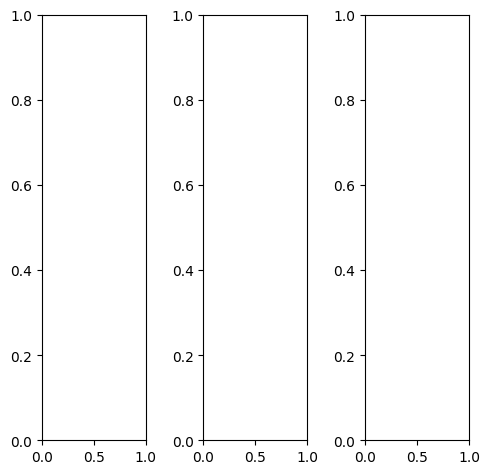

tensor([[[0.2196, 0.1608, 0.1176,  ..., 0.1490, 0.1294, 0.0706],
         [0.3569, 0.1569, 0.1294,  ..., 0.1765, 0.1176, 0.0784],
         [0.5137, 0.1843, 0.1255,  ..., 0.1529, 0.1098, 0.0941],
         ...,
         [0.8196, 0.8235, 0.8078,  ..., 0.2706, 0.2353, 0.2314],
         [0.8000, 0.8157, 0.8078,  ..., 0.2824, 0.2314, 0.2196],
         [0.7451, 0.7686, 0.7804,  ..., 0.2863, 0.2235, 0.2118]],

        [[0.2196, 0.1608, 0.1176,  ..., 0.1490, 0.1294, 0.0706],
         [0.3569, 0.1569, 0.1294,  ..., 0.1765, 0.1176, 0.0784],
         [0.5137, 0.1843, 0.1255,  ..., 0.1529, 0.1098, 0.0941],
         ...,
         [0.8196, 0.8235, 0.8078,  ..., 0.2706, 0.2353, 0.2314],
         [0.8000, 0.8157, 0.8078,  ..., 0.2824, 0.2314, 0.2196],
         [0.7451, 0.7686, 0.7804,  ..., 0.2863, 0.2235, 0.2118]],

        [[0.2196, 0.1608, 0.1176,  ..., 0.1490, 0.1294, 0.0706],
         [0.3569, 0.1569, 0.1294,  ..., 0.1765, 0.1176, 0.0784],
         [0.5137, 0.1843, 0.1255,  ..., 0.1529, 0.1098, 0.

tensor([[[0.2706, 0.1529, 0.0902,  ..., 0.1333, 0.1216, 0.0706],
         [0.4196, 0.1569, 0.1098,  ..., 0.1647, 0.1137, 0.0784],
         [0.5843, 0.1961, 0.1137,  ..., 0.1451, 0.1098, 0.0941],
         ...,
         [0.9843, 0.9882, 0.9725,  ..., 0.3373, 0.3020, 0.2980],
         [0.9647, 0.9804, 0.9725,  ..., 0.3490, 0.2980, 0.2863],
         [0.9098, 0.9294, 0.9451,  ..., 0.3529, 0.2902, 0.2745]],

        [[0.2000, 0.1686, 0.1333,  ..., 0.1608, 0.1373, 0.0745],
         [0.3333, 0.1608, 0.1451,  ..., 0.1882, 0.1255, 0.0824],
         [0.4863, 0.1843, 0.1373,  ..., 0.1608, 0.1137, 0.0941],
         ...,
         [0.7451, 0.7490, 0.7333,  ..., 0.2471, 0.2118, 0.2078],
         [0.7255, 0.7412, 0.7333,  ..., 0.2588, 0.2078, 0.1961],
         [0.6706, 0.6941, 0.7059,  ..., 0.2627, 0.2000, 0.1882]],

        [[0.1804, 0.1333, 0.0980,  ..., 0.1216, 0.1137, 0.0588],
         [0.3176, 0.1255, 0.1059,  ..., 0.1490, 0.1020, 0.0667],
         [0.4745, 0.1451, 0.0941,  ..., 0.1255, 0.0941, 0.

tensor([[[ 0.3112,  0.1589,  0.0173,  ...,  0.1526,  0.1318,  0.1343],
         [ 0.4556,  0.1077,  0.0486,  ...,  0.1525,  0.0644,  0.0880],
         [ 0.6594,  0.1903, -0.0100,  ...,  0.1188,  0.0597,  0.0899],
         ...,
         [ 1.0633,  1.1884,  1.2161,  ...,  0.4809,  0.4019,  0.4024],
         [ 1.0174,  1.1398,  1.1978,  ...,  0.4739,  0.3761,  0.3883],
         [ 0.9534,  1.0284,  1.0868,  ...,  0.4767,  0.3713,  0.3820]],

        [[ 0.3484,  0.2322,  0.0587,  ...,  0.2473,  0.2233,  0.2000],
         [ 0.4436,  0.1413, -0.0522,  ...,  0.2832,  0.1978,  0.1518],
         [ 0.6744,  0.2160,  0.0354,  ...,  0.2406,  0.1713,  0.1684],
         ...,
         [ 0.9964,  1.1020,  1.1557,  ...,  0.4736,  0.4155,  0.3783],
         [ 0.9808,  1.0959,  1.1530,  ...,  0.4892,  0.3854,  0.3747],
         [ 0.9283,  1.0224,  1.0937,  ...,  0.4575,  0.3678,  0.3651]],

        [[ 0.4559,  0.2811,  0.1779,  ...,  0.4078,  0.3877,  0.3489],
         [ 0.5619,  0.2719,  0.2179,  ...,  0

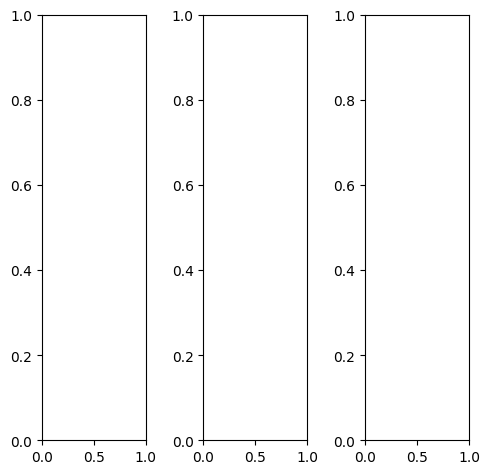

tensor([[[0.7137, 0.7020, 0.6275,  ..., 0.1373, 0.2157, 0.2314],
         [0.8196, 0.8667, 0.8745,  ..., 0.1333, 0.1961, 0.2039],
         [0.8039, 0.8392, 0.8431,  ..., 0.1373, 0.1725, 0.1882],
         ...,
         [0.8039, 0.8039, 0.7843,  ..., 0.7725, 0.7608, 0.7765],
         [0.8039, 0.8000, 0.8039,  ..., 0.8039, 0.8039, 0.8078],
         [0.8039, 0.8000, 0.8039,  ..., 0.8078, 0.8078, 0.8078]],

        [[0.7137, 0.7020, 0.6275,  ..., 0.1373, 0.2157, 0.2314],
         [0.8196, 0.8667, 0.8745,  ..., 0.1333, 0.1961, 0.2039],
         [0.8039, 0.8392, 0.8431,  ..., 0.1373, 0.1725, 0.1882],
         ...,
         [0.8039, 0.8039, 0.7843,  ..., 0.7725, 0.7608, 0.7765],
         [0.8039, 0.8000, 0.8039,  ..., 0.8039, 0.8039, 0.8078],
         [0.8039, 0.8000, 0.8039,  ..., 0.8078, 0.8078, 0.8078]],

        [[0.7137, 0.7020, 0.6275,  ..., 0.1373, 0.2157, 0.2314],
         [0.8196, 0.8667, 0.8745,  ..., 0.1333, 0.1961, 0.2039],
         [0.8039, 0.8392, 0.8431,  ..., 0.1373, 0.1725, 0.

tensor([[[0.7255, 0.7020, 0.6235,  ..., 0.0941, 0.1765, 0.1961],
         [0.8667, 0.8902, 0.8824,  ..., 0.0745, 0.1412, 0.1647],
         [0.8627, 0.8745, 0.8588,  ..., 0.0745, 0.1176, 0.1490],
         ...,
         [0.8588, 0.8588, 0.8392,  ..., 0.8275, 0.8157, 0.8314],
         [0.8588, 0.8549, 0.8588,  ..., 0.8588, 0.8588, 0.8588],
         [0.8588, 0.8549, 0.8588,  ..., 0.8627, 0.8627, 0.8627]],

        [[0.7176, 0.7059, 0.6275,  ..., 0.1608, 0.2392, 0.2549],
         [0.8118, 0.8588, 0.8667,  ..., 0.1647, 0.2235, 0.2235],
         [0.7922, 0.8314, 0.8353,  ..., 0.1725, 0.2000, 0.2078],
         ...,
         [0.7765, 0.7765, 0.7569,  ..., 0.7451, 0.7333, 0.7490],
         [0.7765, 0.7725, 0.7765,  ..., 0.7765, 0.7765, 0.7804],
         [0.7765, 0.7725, 0.7765,  ..., 0.7804, 0.7804, 0.7804]],

        [[0.6667, 0.6902, 0.6314,  ..., 0.1255, 0.2000, 0.2157],
         [0.7373, 0.8392, 0.8784,  ..., 0.1294, 0.1843, 0.1922],
         [0.7059, 0.8000, 0.8471,  ..., 0.1373, 0.1686, 0.

tensor([[[0.6516, 0.6177, 0.5127,  ..., 0.1226, 0.1893, 0.2388],
         [0.6752, 0.5151, 0.5922,  ..., 0.1024, 0.1602, 0.1902],
         [0.6222, 0.6353, 0.5015,  ..., 0.0885, 0.1190, 0.1659],
         ...,
         [0.7974, 0.7988, 0.7561,  ..., 0.7545, 0.7385, 0.7690],
         [0.7668, 0.7588, 0.7549,  ..., 0.7415, 0.7609, 0.8059],
         [0.7859, 0.7839, 0.7736,  ..., 0.7999, 0.7999, 0.8125]],

        [[0.6660, 0.7010, 0.5436,  ..., 0.2017, 0.2636, 0.3000],
         [0.6781, 0.5014, 0.5826,  ..., 0.2174, 0.2885, 0.2713],
         [0.7035, 0.7284, 0.6044,  ..., 0.2128, 0.2458, 0.2571],
         ...,
         [0.7510, 0.7407, 0.7271,  ..., 0.7105, 0.6949, 0.7440],
         [0.7389, 0.7151, 0.7269,  ..., 0.7159, 0.7102, 0.7662],
         [0.7226, 0.7366, 0.7366,  ..., 0.7372, 0.7470, 0.7506]],

        [[0.7892, 0.8051, 0.6920,  ..., 0.3466, 0.4291, 0.4516],
         [0.8539, 0.7267, 0.8155,  ..., 0.3857, 0.4646, 0.4560],
         [0.7433, 0.7911, 0.6585,  ..., 0.3805, 0.4411, 0.

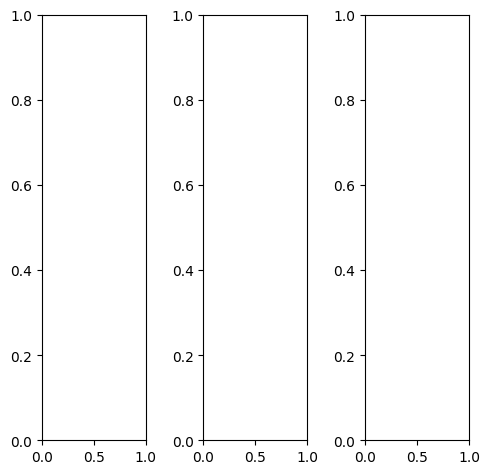

tensor([[[0.8314, 0.8157, 0.7647,  ..., 0.7373, 0.7373, 0.7412],
         [0.8353, 0.8118, 0.7725,  ..., 0.7412, 0.7412, 0.7490],
         [0.8314, 0.8235, 0.8000,  ..., 0.7412, 0.7412, 0.7451],
         ...,
         [0.3176, 0.4745, 0.2275,  ..., 0.3647, 0.3216, 0.1333],
         [0.3059, 0.3294, 0.1490,  ..., 0.2431, 0.1725, 0.1490],
         [0.3216, 0.2706, 0.2196,  ..., 0.1647, 0.1529, 0.1647]],

        [[0.8314, 0.8157, 0.7647,  ..., 0.7373, 0.7373, 0.7412],
         [0.8353, 0.8118, 0.7725,  ..., 0.7412, 0.7412, 0.7490],
         [0.8314, 0.8235, 0.8000,  ..., 0.7412, 0.7412, 0.7451],
         ...,
         [0.3176, 0.4745, 0.2275,  ..., 0.3647, 0.3216, 0.1333],
         [0.3059, 0.3294, 0.1490,  ..., 0.2431, 0.1725, 0.1490],
         [0.3216, 0.2706, 0.2196,  ..., 0.1647, 0.1529, 0.1647]],

        [[0.8314, 0.8157, 0.7647,  ..., 0.7373, 0.7373, 0.7412],
         [0.8353, 0.8118, 0.7725,  ..., 0.7412, 0.7412, 0.7490],
         [0.8314, 0.8235, 0.8000,  ..., 0.7412, 0.7412, 0.

tensor([[[0.7686, 0.7529, 0.7020,  ..., 0.6784, 0.6784, 0.6863],
         [0.7686, 0.7451, 0.7059,  ..., 0.6824, 0.6824, 0.6902],
         [0.7647, 0.7569, 0.7333,  ..., 0.6824, 0.6824, 0.6863],
         ...,
         [0.3216, 0.4706, 0.2118,  ..., 0.3882, 0.3255, 0.1294],
         [0.3098, 0.3333, 0.1412,  ..., 0.2588, 0.1765, 0.1451],
         [0.3255, 0.2784, 0.2196,  ..., 0.1686, 0.1529, 0.1569]],

        [[0.8392, 0.8275, 0.7765,  ..., 0.7412, 0.7412, 0.7451],
         [0.8471, 0.8275, 0.7882,  ..., 0.7451, 0.7490, 0.7529],
         [0.8471, 0.8392, 0.8157,  ..., 0.7490, 0.7490, 0.7529],
         ...,
         [0.3216, 0.4824, 0.2392,  ..., 0.3529, 0.3137, 0.1294],
         [0.3098, 0.3333, 0.1569,  ..., 0.2353, 0.1686, 0.1490],
         [0.3255, 0.2706, 0.2275,  ..., 0.1647, 0.1529, 0.1647]],

        [[0.9412, 0.9176, 0.8549,  ..., 0.8667, 0.8706, 0.8745],
         [0.9529, 0.9216, 0.8706,  ..., 0.8706, 0.8706, 0.8784],
         [0.9412, 0.9216, 0.8902,  ..., 0.8627, 0.8627, 0.

tensor([[[0.7315, 0.7078, 0.6246,  ..., 0.5195, 0.5378, 0.6003],
         [0.7198, 0.6660, 0.6478,  ..., 0.5538, 0.5647, 0.5976],
         [0.6966, 0.7318, 0.6141,  ..., 0.5792, 0.5914, 0.5737],
         ...,
         [0.2867, 0.4636, 0.2684,  ..., 0.3827, 0.3357, 0.1603],
         [0.2529, 0.3071, 0.1367,  ..., 0.2303, 0.1711, 0.1602],
         [0.2868, 0.2201, 0.1763,  ..., 0.1543, 0.1461, 0.1485]],

        [[0.7481, 0.7353, 0.6365,  ..., 0.6490, 0.6708, 0.6926],
         [0.7066, 0.6249, 0.6241,  ..., 0.7056, 0.6952, 0.7384],
         [0.7606, 0.7462, 0.6823,  ..., 0.7204, 0.7093, 0.7099],
         ...,
         [0.2981, 0.4820, 0.2725,  ..., 0.4257, 0.3690, 0.1547],
         [0.2683, 0.3276, 0.1568,  ..., 0.2793, 0.2032, 0.1446],
         [0.2806, 0.2400, 0.1924,  ..., 0.1739, 0.1549, 0.1417]],

        [[0.7961, 0.7938, 0.7269,  ..., 0.8610, 0.8735, 0.8640],
         [0.8087, 0.7687, 0.7482,  ..., 0.8940, 0.9036, 0.9054],
         [0.7565, 0.7806, 0.6776,  ..., 0.9102, 0.9249, 0.

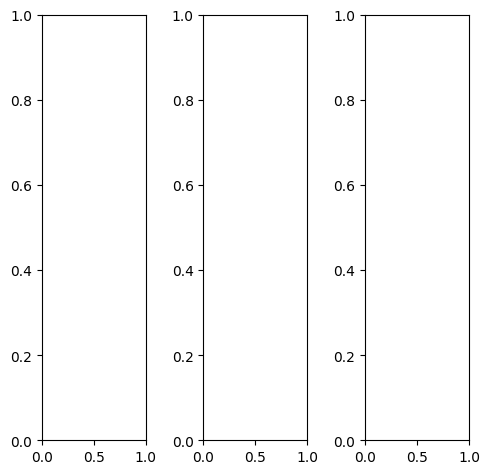

tensor([[[0.2392, 0.2078, 0.1765,  ..., 0.1608, 0.1176, 0.1098],
         [0.2392, 0.2118, 0.1843,  ..., 0.1725, 0.1490, 0.1373],
         [0.2431, 0.2118, 0.1882,  ..., 0.2549, 0.2431, 0.2196],
         ...,
         [0.1451, 0.2627, 0.2745,  ..., 0.2471, 0.2039, 0.1922],
         [0.2039, 0.2706, 0.2902,  ..., 0.2745, 0.1725, 0.1725],
         [0.2627, 0.2627, 0.2549,  ..., 0.3098, 0.2196, 0.1451]],

        [[0.2392, 0.2078, 0.1765,  ..., 0.1608, 0.1176, 0.1098],
         [0.2392, 0.2118, 0.1843,  ..., 0.1725, 0.1490, 0.1373],
         [0.2431, 0.2118, 0.1882,  ..., 0.2549, 0.2431, 0.2196],
         ...,
         [0.1451, 0.2627, 0.2745,  ..., 0.2471, 0.2039, 0.1922],
         [0.2039, 0.2706, 0.2902,  ..., 0.2745, 0.1725, 0.1725],
         [0.2627, 0.2627, 0.2549,  ..., 0.3098, 0.2196, 0.1451]],

        [[0.2392, 0.2078, 0.1765,  ..., 0.1608, 0.1176, 0.1098],
         [0.2392, 0.2118, 0.1843,  ..., 0.1725, 0.1490, 0.1373],
         [0.2431, 0.2118, 0.1882,  ..., 0.2549, 0.2431, 0.

tensor([[[0.2431, 0.2196, 0.1961,  ..., 0.1725, 0.1176, 0.1098],
         [0.2471, 0.2196, 0.2000,  ..., 0.1804, 0.1490, 0.1373],
         [0.2471, 0.2235, 0.2039,  ..., 0.2627, 0.2431, 0.2196],
         ...,
         [0.1490, 0.2745, 0.2980,  ..., 0.2667, 0.2078, 0.1961],
         [0.2275, 0.2980, 0.3216,  ..., 0.3137, 0.1882, 0.1843],
         [0.3020, 0.3020, 0.2941,  ..., 0.3608, 0.2471, 0.1686]],

        [[0.2471, 0.2118, 0.1765,  ..., 0.1608, 0.1216, 0.1137],
         [0.2431, 0.2118, 0.1843,  ..., 0.1765, 0.1569, 0.1412],
         [0.2431, 0.2118, 0.1882,  ..., 0.2627, 0.2510, 0.2275],
         ...,
         [0.1490, 0.2627, 0.2824,  ..., 0.2588, 0.2118, 0.1961],
         [0.2039, 0.2706, 0.2941,  ..., 0.2824, 0.1765, 0.1725],
         [0.2588, 0.2627, 0.2588,  ..., 0.3137, 0.2196, 0.1412]],

        [[0.1882, 0.1608, 0.1412,  ..., 0.1451, 0.1020, 0.0941],
         [0.2078, 0.1765, 0.1490,  ..., 0.1294, 0.1176, 0.1098],
         [0.2275, 0.1882, 0.1490,  ..., 0.2078, 0.1961, 0.

tensor([[[ 0.2940,  0.2135,  0.0669,  ...,  0.0688,  0.0277,  0.0851],
         [ 0.3308,  0.1170,  0.0410,  ...,  0.0142, -0.0049,  0.0533],
         [ 0.2517,  0.0927, -0.0316,  ...,  0.1514,  0.1308,  0.1600],
         ...,
         [ 0.0736,  0.2830,  0.2903,  ...,  0.2762,  0.1903,  0.2078],
         [ 0.1485,  0.2371,  0.2891,  ...,  0.2722,  0.0992,  0.1619],
         [ 0.3300,  0.2806,  0.2696,  ...,  0.4014,  0.2087,  0.1947]],

        [[ 0.2901,  0.3632, -0.0183,  ...,  0.1409,  0.0928,  0.1191],
         [ 0.3622,  0.1781, -0.0881,  ...,  0.1164,  0.0987,  0.1097],
         [ 0.2490,  0.2350, -0.1645,  ...,  0.2309,  0.2225,  0.2258],
         ...,
         [ 0.1102,  0.2983,  0.2864,  ...,  0.2577,  0.1714,  0.1821],
         [ 0.2051,  0.2949,  0.3221,  ...,  0.2852,  0.1189,  0.1516],
         [ 0.3521,  0.3060,  0.3061,  ...,  0.3889,  0.2073,  0.1734]],

        [[ 0.4588,  0.2871,  0.2132,  ...,  0.2269,  0.1860,  0.2379],
         [ 0.4369,  0.1926,  0.1994,  ...,  0

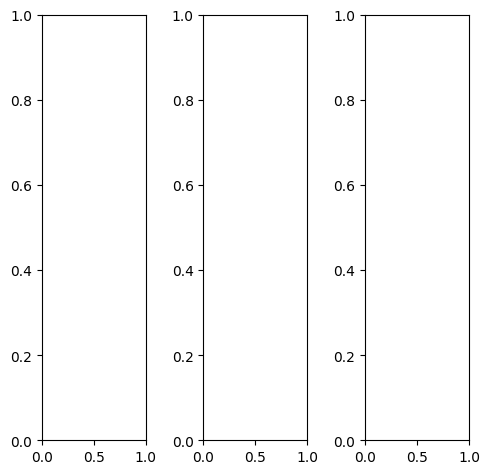

EPOCH: 24.510  trn_loss: 0.005  (2970.79s - 9149.84s remaining)

tensor([[[0.3216, 0.3176, 0.6235,  ..., 0.3333, 0.2118, 0.1373],
         [0.4863, 0.2471, 0.3922,  ..., 0.4627, 0.2392, 0.1373],
         [0.3490, 0.3647, 0.5059,  ..., 0.5020, 0.1529, 0.0980],
         ...,
         [0.9098, 0.9490, 0.8745,  ..., 0.6392, 0.6392, 0.6118],
         [0.9608, 0.9569, 0.8314,  ..., 0.8824, 0.8706, 0.8431],
         [0.9843, 0.9608, 0.9176,  ..., 0.8588, 0.8510, 0.8235]],

        [[0.3216, 0.3176, 0.6235,  ..., 0.3333, 0.2118, 0.1373],
         [0.4863, 0.2471, 0.3922,  ..., 0.4627, 0.2392, 0.1373],
         [0.3490, 0.3647, 0.5059,  ..., 0.5020, 0.1529, 0.0980],
         ...,
         [0.9098, 0.9490, 0.8745,  ..., 0.6392, 0.6392, 0.6118],
         [0.9608, 0.9569, 0.8314,  ..., 0.8824, 0.8706, 0.8431],
         [0.9843, 0.9608, 0.9176,  ..., 0.8588, 0.8510, 0.8235]],

        [[0.3216, 0.3176, 0.6235,  ..., 0.3333, 0.2118, 0.1373],
         [0.4863, 0.2471, 0.3922,  ..., 0.4627, 0.2392, 0.1373],
         [0.3490, 0.3647, 0.5059,  ..., 0.5020, 0.1529, 0.

tensor([[[0.3333, 0.3451, 0.6549,  ..., 0.2980, 0.2039, 0.1255],
         [0.4941, 0.2471, 0.3882,  ..., 0.3882, 0.2118, 0.1255],
         [0.3412, 0.3686, 0.5216,  ..., 0.4235, 0.1137, 0.0706],
         ...,
         [0.8549, 0.9098, 0.8510,  ..., 0.6196, 0.6275, 0.6000],
         [0.9255, 0.9255, 0.8157,  ..., 0.8118, 0.8000, 0.7686],
         [0.9686, 0.9373, 0.9020,  ..., 0.7843, 0.7765, 0.7490]],

        [[0.3294, 0.3137, 0.6157,  ..., 0.3490, 0.2235, 0.1490],
         [0.4980, 0.2549, 0.4000,  ..., 0.4863, 0.2510, 0.1451],
         [0.3608, 0.3765, 0.5098,  ..., 0.5176, 0.1647, 0.1137],
         ...,
         [0.9294, 0.9608, 0.8824,  ..., 0.6431, 0.6392, 0.6118],
         [0.9725, 0.9686, 0.8314,  ..., 0.9059, 0.8941, 0.8627],
         [0.9922, 0.9725, 0.9216,  ..., 0.8863, 0.8745, 0.8471]],

        [[0.2431, 0.2784, 0.5686,  ..., 0.3490, 0.1804, 0.1137],
         [0.3882, 0.1922, 0.3608,  ..., 0.5529, 0.2431, 0.1216],
         [0.2980, 0.3098, 0.4510,  ..., 0.6118, 0.1804, 0.

tensor([[[0.3113, 0.3181, 0.4267,  ..., 0.2885, 0.1880, 0.1579],
         [0.4224, 0.1914, 0.1603,  ..., 0.4340, 0.1865, 0.1297],
         [0.2631, 0.2305, 0.3416,  ..., 0.4460, 0.0982, 0.0761],
         ...,
         [0.9309, 1.0258, 0.9488,  ..., 0.6898, 0.6889, 0.6990],
         [0.9594, 0.9864, 0.9136,  ..., 0.9587, 0.9294, 0.8999],
         [0.9509, 0.9514, 0.9103,  ..., 0.9110, 0.9107, 0.8711]],

        [[0.3534, 0.4368, 0.4598,  ..., 0.3718, 0.2807, 0.2192],
         [0.4512, 0.2424, 0.1674,  ..., 0.5435, 0.3204, 0.1912],
         [0.3558, 0.3193, 0.3845,  ..., 0.5563, 0.2207, 0.1496],
         ...,
         [0.9169, 1.0117, 0.9360,  ..., 0.7123, 0.7144, 0.7264],
         [0.9551, 0.9896, 0.9070,  ..., 0.9766, 0.9333, 0.8966],
         [0.9363, 0.9565, 0.9192,  ..., 0.8903, 0.8883, 0.8358]],

        [[0.4887, 0.4426, 0.6251,  ..., 0.5276, 0.4306, 0.3695],
         [0.5788, 0.3561, 0.4322,  ..., 0.7180, 0.4686, 0.3431],
         [0.3870, 0.3748, 0.4970,  ..., 0.7198, 0.3692, 0.

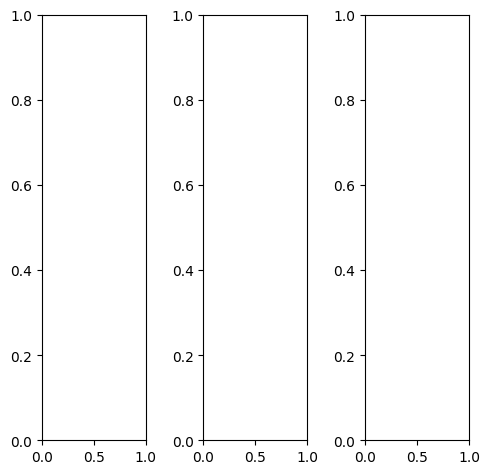

tensor([[[0.5059, 0.4392, 0.4039,  ..., 0.0863, 0.0902, 0.0941],
         [0.4353, 0.3922, 0.3608,  ..., 0.0902, 0.0902, 0.0863],
         [0.3922, 0.3529, 0.3294,  ..., 0.0902, 0.0980, 0.0980],
         ...,
         [0.3137, 0.3098, 0.3137,  ..., 0.2118, 0.2078, 0.2078],
         [0.3059, 0.2941, 0.3059,  ..., 0.1922, 0.1804, 0.1725],
         [0.3020, 0.2980, 0.3020,  ..., 0.2706, 0.2431, 0.2235]],

        [[0.5059, 0.4392, 0.4039,  ..., 0.0863, 0.0902, 0.0941],
         [0.4353, 0.3922, 0.3608,  ..., 0.0902, 0.0902, 0.0863],
         [0.3922, 0.3529, 0.3294,  ..., 0.0902, 0.0980, 0.0980],
         ...,
         [0.3137, 0.3098, 0.3137,  ..., 0.2118, 0.2078, 0.2078],
         [0.3059, 0.2941, 0.3059,  ..., 0.1922, 0.1804, 0.1725],
         [0.3020, 0.2980, 0.3020,  ..., 0.2706, 0.2431, 0.2235]],

        [[0.5059, 0.4392, 0.4039,  ..., 0.0863, 0.0902, 0.0941],
         [0.4353, 0.3922, 0.3608,  ..., 0.0902, 0.0902, 0.0863],
         [0.3922, 0.3529, 0.3294,  ..., 0.0902, 0.0980, 0.

tensor([[[0.5333, 0.4706, 0.4510,  ..., 0.0863, 0.0863, 0.0902],
         [0.4667, 0.4275, 0.4000,  ..., 0.0980, 0.0941, 0.0941],
         [0.4118, 0.3725, 0.3412,  ..., 0.1098, 0.1098, 0.1137],
         ...,
         [0.3020, 0.3059, 0.3098,  ..., 0.1804, 0.1765, 0.1804],
         [0.2941, 0.2863, 0.3020,  ..., 0.1608, 0.1490, 0.1412],
         [0.2980, 0.2941, 0.2980,  ..., 0.2549, 0.2196, 0.1922]],

        [[0.4941, 0.4314, 0.3882,  ..., 0.0824, 0.0863, 0.0902],
         [0.4235, 0.3804, 0.3451,  ..., 0.0824, 0.0824, 0.0824],
         [0.3843, 0.3490, 0.3255,  ..., 0.0784, 0.0863, 0.0863],
         ...,
         [0.3137, 0.3098, 0.3098,  ..., 0.2157, 0.2118, 0.2078],
         [0.3059, 0.2902, 0.3020,  ..., 0.2000, 0.1843, 0.1765],
         [0.3020, 0.2941, 0.2980,  ..., 0.2745, 0.2510, 0.2314]],

        [[0.4824, 0.4078, 0.3765,  ..., 0.1059, 0.1098, 0.1137],
         [0.4157, 0.3608, 0.3294,  ..., 0.1098, 0.1098, 0.1020],
         [0.3843, 0.3333, 0.3059,  ..., 0.1098, 0.1137, 0.

tensor([[[ 0.6076,  0.4598,  0.2529,  ..., -0.1726, -0.1588, -0.0257],
         [ 0.4353,  0.2882,  0.1176,  ..., -0.2516, -0.2403, -0.1375],
         [ 0.3312,  0.1707,  0.0420,  ..., -0.2365, -0.2311, -0.1237],
         ...,
         [ 0.3565,  0.3514,  0.3673,  ...,  0.0728,  0.0713,  0.1580],
         [ 0.3355,  0.3135,  0.3253,  ...,  0.0262,  0.0138,  0.0712],
         [ 0.3515,  0.3257,  0.3149,  ...,  0.2435,  0.1924,  0.1886]],

        [[ 0.6644,  0.5394,  0.3519,  ..., -0.1075, -0.0909,  0.0108],
         [ 0.4871,  0.3293,  0.1272,  ..., -0.1814, -0.1739, -0.1142],
         [ 0.4415,  0.2630,  0.1326,  ..., -0.1925, -0.1958, -0.1293],
         ...,
         [ 0.3320,  0.3372,  0.3261,  ...,  0.1001,  0.0860,  0.1290],
         [ 0.3208,  0.3038,  0.2945,  ...,  0.0579,  0.0273,  0.0451],
         [ 0.3208,  0.3063,  0.3036,  ...,  0.2303,  0.1754,  0.1647]],

        [[ 0.7811,  0.6273,  0.4810,  ...,  0.0177,  0.0390,  0.1388],
         [ 0.6226,  0.4880,  0.4108,  ..., -0

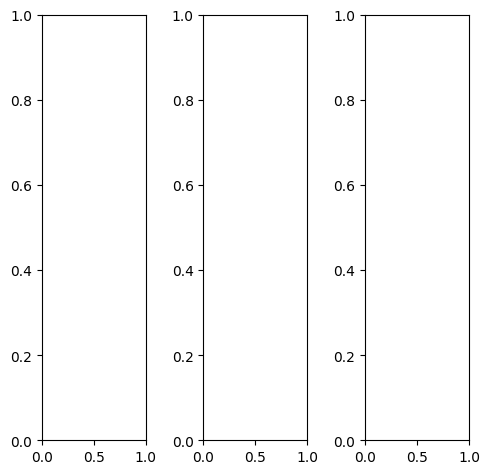

tensor([[[0.2314, 0.1765, 0.1137,  ..., 0.3882, 0.4039, 0.4039],
         [0.1686, 0.1961, 0.1608,  ..., 0.3373, 0.3294, 0.3176],
         [0.1137, 0.1765, 0.1765,  ..., 0.2941, 0.2588, 0.2353],
         ...,
         [0.3333, 0.3137, 0.3020,  ..., 0.3294, 0.3333, 0.3569],
         [0.3333, 0.3137, 0.3294,  ..., 0.3686, 0.4941, 0.4784],
         [0.4471, 0.4471, 0.4941,  ..., 0.5137, 0.5333, 0.5137]],

        [[0.2314, 0.1765, 0.1137,  ..., 0.3882, 0.4039, 0.4039],
         [0.1686, 0.1961, 0.1608,  ..., 0.3373, 0.3294, 0.3176],
         [0.1137, 0.1765, 0.1765,  ..., 0.2941, 0.2588, 0.2353],
         ...,
         [0.3333, 0.3137, 0.3020,  ..., 0.3294, 0.3333, 0.3569],
         [0.3333, 0.3137, 0.3294,  ..., 0.3686, 0.4941, 0.4784],
         [0.4471, 0.4471, 0.4941,  ..., 0.5137, 0.5333, 0.5137]],

        [[0.2314, 0.1765, 0.1137,  ..., 0.3882, 0.4039, 0.4039],
         [0.1686, 0.1961, 0.1608,  ..., 0.3373, 0.3294, 0.3176],
         [0.1137, 0.1765, 0.1765,  ..., 0.2941, 0.2588, 0.

tensor([[[0.2510, 0.1725, 0.1059,  ..., 0.4588, 0.4745, 0.4667],
         [0.1529, 0.1765, 0.1529,  ..., 0.3961, 0.3804, 0.3608],
         [0.0902, 0.1529, 0.1686,  ..., 0.3412, 0.2980, 0.2588],
         ...,
         [0.3294, 0.3059, 0.2980,  ..., 0.3569, 0.3765, 0.4078],
         [0.3451, 0.3294, 0.3490,  ..., 0.4078, 0.5451, 0.5333],
         [0.4784, 0.4824, 0.5412,  ..., 0.5608, 0.5804, 0.5569]],

        [[0.2471, 0.1922, 0.1255,  ..., 0.4039, 0.4196, 0.4235],
         [0.1961, 0.2235, 0.1804,  ..., 0.3529, 0.3451, 0.3373],
         [0.1451, 0.2078, 0.2000,  ..., 0.3098, 0.2784, 0.2549],
         ...,
         [0.3765, 0.3569, 0.3451,  ..., 0.3451, 0.3373, 0.3569],
         [0.3569, 0.3333, 0.3451,  ..., 0.3725, 0.4941, 0.4745],
         [0.4549, 0.4510, 0.4941,  ..., 0.5059, 0.5294, 0.5098]],

        [[0.0902, 0.0941, 0.0667,  ..., 0.1137, 0.1294, 0.1373],
         [0.0706, 0.1098, 0.0824,  ..., 0.1059, 0.1098, 0.1098],
         [0.0275, 0.0627, 0.0667,  ..., 0.0745, 0.0706, 0.

tensor([[[ 0.1726,  0.1209, -0.0873,  ...,  0.5345,  0.5651,  0.5913],
         [ 0.1971, -0.0025,  0.0281,  ...,  0.4045,  0.4471,  0.4524],
         [-0.0966, -0.0775, -0.0936,  ...,  0.3840,  0.3484,  0.3240],
         ...,
         [ 0.6006,  0.6098,  0.5338,  ...,  0.6295,  0.6308,  0.7115],
         [ 0.5771,  0.5565,  0.5782,  ...,  0.7056,  0.8914,  0.8601],
         [ 0.7563,  0.7676,  0.8212,  ...,  0.9183,  0.9275,  0.8681]],

        [[ 0.3046,  0.1782,  0.1067,  ...,  0.6585,  0.7246,  0.6786],
         [ 0.1980,  0.0655, -0.0929,  ...,  0.5734,  0.5908,  0.5750],
         [ 0.0603, -0.0267,  0.0426,  ...,  0.5303,  0.4926,  0.4321],
         ...,
         [ 0.5569,  0.5827,  0.5514,  ...,  0.5484,  0.5998,  0.6690],
         [ 0.5486,  0.5414,  0.5669,  ...,  0.6786,  0.8609,  0.8347],
         [ 0.7092,  0.7440,  0.8073,  ...,  0.8439,  0.8748,  0.8091]],

        [[ 0.4041,  0.2107,  0.1881,  ...,  0.8779,  0.9120,  0.8476],
         [ 0.2882,  0.1965,  0.2130,  ...,  0

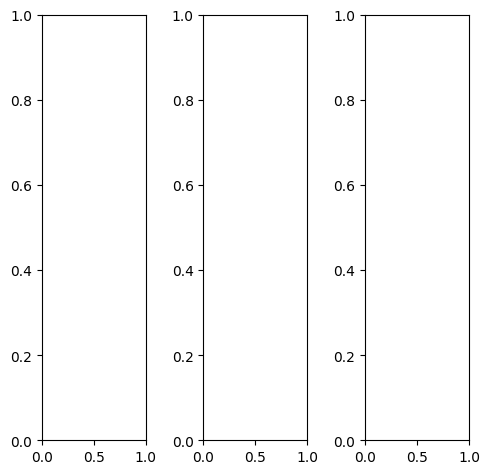

tensor([[[0.2784, 0.3333, 0.4588,  ..., 0.5020, 0.5098, 0.5176],
         [0.5490, 0.5647, 0.6000,  ..., 0.2706, 0.3255, 0.3647],
         [0.7137, 0.7020, 0.7020,  ..., 0.2275, 0.2157, 0.2706],
         ...,
         [0.7176, 0.6667, 0.5843,  ..., 0.5686, 0.5216, 0.4784],
         [0.6667, 0.6431, 0.6353,  ..., 0.6314, 0.5804, 0.5176],
         [0.6314, 0.6196, 0.6824,  ..., 0.6667, 0.6667, 0.6039]],

        [[0.2784, 0.3333, 0.4588,  ..., 0.5020, 0.5098, 0.5176],
         [0.5490, 0.5647, 0.6000,  ..., 0.2706, 0.3255, 0.3647],
         [0.7137, 0.7020, 0.7020,  ..., 0.2275, 0.2157, 0.2706],
         ...,
         [0.7176, 0.6667, 0.5843,  ..., 0.5686, 0.5216, 0.4784],
         [0.6667, 0.6431, 0.6353,  ..., 0.6314, 0.5804, 0.5176],
         [0.6314, 0.6196, 0.6824,  ..., 0.6667, 0.6667, 0.6039]],

        [[0.2784, 0.3333, 0.4588,  ..., 0.5020, 0.5098, 0.5176],
         [0.5490, 0.5647, 0.6000,  ..., 0.2706, 0.3255, 0.3647],
         [0.7137, 0.7020, 0.7020,  ..., 0.2275, 0.2157, 0.

tensor([[[0.2235, 0.2902, 0.4392,  ..., 0.4471, 0.4549, 0.4588],
         [0.4902, 0.5059, 0.5686,  ..., 0.2627, 0.3098, 0.3451],
         [0.6510, 0.6275, 0.6549,  ..., 0.2627, 0.2431, 0.2784],
         ...,
         [0.7059, 0.6549, 0.5725,  ..., 0.5725, 0.5294, 0.4941],
         [0.6549, 0.6314, 0.6235,  ..., 0.6353, 0.5922, 0.5373],
         [0.6196, 0.6078, 0.6745,  ..., 0.6706, 0.6745, 0.6157]],

        [[0.2980, 0.3451, 0.4627,  ..., 0.5255, 0.5373, 0.5451],
         [0.5686, 0.5804, 0.6118,  ..., 0.2745, 0.3333, 0.3765],
         [0.7333, 0.7255, 0.7176,  ..., 0.2157, 0.2118, 0.2706],
         ...,
         [0.7255, 0.6745, 0.5961,  ..., 0.5804, 0.5333, 0.4863],
         [0.6745, 0.6510, 0.6471,  ..., 0.6392, 0.5882, 0.5216],
         [0.6392, 0.6275, 0.6941,  ..., 0.6706, 0.6706, 0.6078]],

        [[0.3333, 0.3843, 0.4784,  ..., 0.5137, 0.5294, 0.5412],
         [0.6078, 0.6235, 0.6275,  ..., 0.2588, 0.3137, 0.3529],
         [0.7804, 0.7686, 0.7333,  ..., 0.1804, 0.1804, 0.

tensor([[[ 0.1353,  0.0892,  0.2943,  ...,  0.4241,  0.4457,  0.4626],
         [ 0.4657,  0.2767,  0.4616,  ...,  0.0906,  0.1827,  0.2731],
         [ 0.7276,  0.7154,  0.5767,  ..., -0.0128, -0.0133,  0.1253],
         ...,
         [ 0.8119,  0.7913,  0.6379,  ...,  0.5246,  0.4682,  0.4081],
         [ 0.7417,  0.6979,  0.6965,  ...,  0.5907,  0.5360,  0.4710],
         [ 0.6894,  0.6741,  0.7669,  ...,  0.6950,  0.7068,  0.6235]],

        [[ 0.2167,  0.2740,  0.4260,  ...,  0.5410,  0.5701,  0.5241],
         [ 0.5320,  0.4108,  0.5283,  ...,  0.1745,  0.2902,  0.3133],
         [ 0.7926,  0.8708,  0.6796,  ...,  0.0618,  0.0581,  0.1484],
         ...,
         [ 0.7649,  0.7382,  0.6026,  ...,  0.5823,  0.5351,  0.4113],
         [ 0.6922,  0.6646,  0.6782,  ...,  0.6606,  0.6183,  0.5012],
         [ 0.6295,  0.6359,  0.7346,  ...,  0.7312,  0.7370,  0.6226]],

        [[ 0.4140,  0.3072,  0.6396,  ...,  0.6287,  0.6605,  0.6374],
         [ 0.7529,  0.6442,  0.7749,  ...,  0

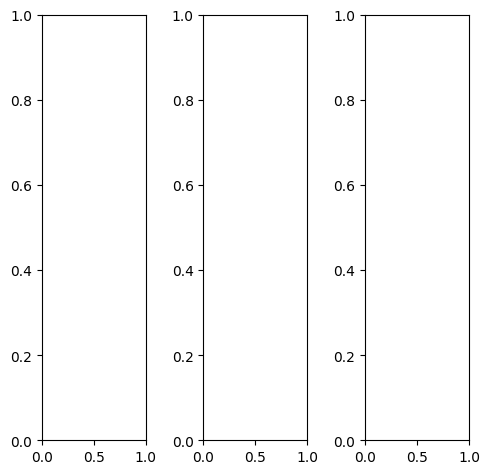

tensor([[[0.4078, 0.2863, 0.1294,  ..., 0.4706, 0.5490, 0.5529],
         [0.3451, 0.2980, 0.1961,  ..., 0.1804, 0.2314, 0.3765],
         [0.2196, 0.2275, 0.3608,  ..., 0.2941, 0.2824, 0.4157],
         ...,
         [0.1176, 0.1255, 0.1373,  ..., 0.3608, 0.3176, 0.3098],
         [0.1647, 0.1922, 0.2196,  ..., 0.2863, 0.2314, 0.2196],
         [0.3490, 0.2941, 0.2549,  ..., 0.2235, 0.2510, 0.2471]],

        [[0.4078, 0.2863, 0.1294,  ..., 0.4706, 0.5490, 0.5529],
         [0.3451, 0.2980, 0.1961,  ..., 0.1804, 0.2314, 0.3765],
         [0.2196, 0.2275, 0.3608,  ..., 0.2941, 0.2824, 0.4157],
         ...,
         [0.1176, 0.1255, 0.1373,  ..., 0.3608, 0.3176, 0.3098],
         [0.1647, 0.1922, 0.2196,  ..., 0.2863, 0.2314, 0.2196],
         [0.3490, 0.2941, 0.2549,  ..., 0.2235, 0.2510, 0.2471]],

        [[0.4078, 0.2863, 0.1294,  ..., 0.4706, 0.5490, 0.5529],
         [0.3451, 0.2980, 0.1961,  ..., 0.1804, 0.2314, 0.3765],
         [0.2196, 0.2275, 0.3608,  ..., 0.2941, 0.2824, 0.

tensor([[[0.3294, 0.2196, 0.0745,  ..., 0.3882, 0.4510, 0.4667],
         [0.2706, 0.2314, 0.1255,  ..., 0.1373, 0.1765, 0.3176],
         [0.1529, 0.1490, 0.2784,  ..., 0.2471, 0.2353, 0.3529],
         ...,
         [0.0863, 0.0902, 0.1020,  ..., 0.3255, 0.2863, 0.2824],
         [0.1333, 0.1686, 0.2000,  ..., 0.2627, 0.2078, 0.1922],
         [0.3255, 0.2745, 0.2275,  ..., 0.1961, 0.2196, 0.2118]],

        [[0.4863, 0.3412, 0.1725,  ..., 0.5216, 0.5961, 0.6078],
         [0.4118, 0.3529, 0.2510,  ..., 0.2078, 0.2706, 0.4392],
         [0.2667, 0.2902, 0.4431,  ..., 0.3373, 0.3255, 0.4706],
         ...,
         [0.1373, 0.1451, 0.1647,  ..., 0.4000, 0.3569, 0.3451],
         [0.1843, 0.2118, 0.2392,  ..., 0.3098, 0.2549, 0.2431],
         [0.3804, 0.3176, 0.2863,  ..., 0.2510, 0.2784, 0.2784]],

        [[0.2078, 0.1647, 0.0549,  ..., 0.4157, 0.5569, 0.4980],
         [0.2118, 0.1843, 0.0980,  ..., 0.1451, 0.1608, 0.2078],
         [0.1373, 0.1098, 0.1451,  ..., 0.2039, 0.2000, 0.

tensor([[[ 0.2426,  0.1042, -0.1023,  ...,  0.4110,  0.5086,  0.5369],
         [ 0.2538, -0.0327, -0.0545,  ...,  0.1480,  0.1774,  0.3694],
         [-0.0745, -0.0678,  0.0585,  ...,  0.2761,  0.2620,  0.4043],
         ...,
         [ 0.1105,  0.1638,  0.1530,  ...,  0.4805,  0.3970,  0.3619],
         [ 0.1776,  0.2581,  0.3274,  ...,  0.3861,  0.3352,  0.2721],
         [ 0.3523,  0.3188,  0.3084,  ...,  0.2630,  0.2885,  0.2982]],

        [[ 0.3440,  0.2404,  0.0433,  ...,  0.5260,  0.6355,  0.5939],
         [ 0.2807,  0.1212, -0.1624,  ...,  0.2048,  0.2843,  0.4538],
         [ 0.0467,  0.0284,  0.1628,  ...,  0.3651,  0.3739,  0.4705],
         ...,
         [ 0.0919,  0.1260,  0.1513,  ...,  0.4834,  0.4173,  0.3352],
         [ 0.1647,  0.2283,  0.2860,  ...,  0.3779,  0.3073,  0.2280],
         [ 0.3412,  0.2979,  0.2864,  ...,  0.2452,  0.2663,  0.2475]],

        [[ 0.4886,  0.2797,  0.1639,  ...,  0.6926,  0.8099,  0.7750],
         [ 0.4013,  0.2135,  0.2057,  ...,  0

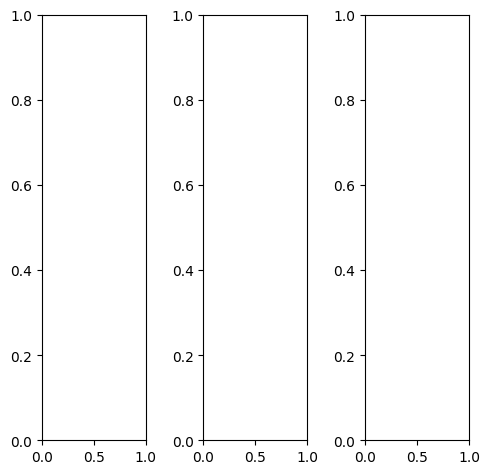

EPOCH: 24.765  trn_loss: 0.004  (3001.11s - 9117.10s remaining)

tensor([[[0.8157, 0.8157, 0.8196,  ..., 0.8314, 0.8235, 0.8196],
         [0.8196, 0.8196, 0.8157,  ..., 0.8353, 0.8314, 0.8275],
         [0.8078, 0.8078, 0.8039,  ..., 0.8196, 0.8118, 0.8118],
         ...,
         [0.6157, 0.6157, 0.5961,  ..., 0.6353, 0.6471, 0.6157],
         [0.6235, 0.5882, 0.5882,  ..., 0.6157, 0.6275, 0.6196],
         [0.6196, 0.5765, 0.5686,  ..., 0.5255, 0.5882, 0.5922]],

        [[0.8157, 0.8157, 0.8196,  ..., 0.8314, 0.8235, 0.8196],
         [0.8196, 0.8196, 0.8157,  ..., 0.8353, 0.8314, 0.8275],
         [0.8078, 0.8078, 0.8039,  ..., 0.8196, 0.8118, 0.8118],
         ...,
         [0.6157, 0.6157, 0.5961,  ..., 0.6353, 0.6471, 0.6157],
         [0.6235, 0.5882, 0.5882,  ..., 0.6157, 0.6275, 0.6196],
         [0.6196, 0.5765, 0.5686,  ..., 0.5255, 0.5882, 0.5922]],

        [[0.8157, 0.8157, 0.8196,  ..., 0.8314, 0.8235, 0.8196],
         [0.8196, 0.8196, 0.8157,  ..., 0.8353, 0.8314, 0.8275],
         [0.8078, 0.8078, 0.8039,  ..., 0.8196, 0.8118, 0.

tensor([[[0.8039, 0.8039, 0.8078,  ..., 0.8196, 0.8118, 0.8078],
         [0.8078, 0.8078, 0.8039,  ..., 0.8275, 0.8196, 0.8157],
         [0.7961, 0.7961, 0.7922,  ..., 0.8078, 0.8039, 0.8000],
         ...,
         [0.5882, 0.5922, 0.5686,  ..., 0.6196, 0.6314, 0.6000],
         [0.5961, 0.5608, 0.5608,  ..., 0.6000, 0.6118, 0.6039],
         [0.5922, 0.5529, 0.5451,  ..., 0.5098, 0.5725, 0.5765]],

        [[0.8902, 0.8902, 0.8941,  ..., 0.8941, 0.8863, 0.8824],
         [0.8980, 0.8941, 0.8902,  ..., 0.9020, 0.8941, 0.8941],
         [0.8863, 0.8824, 0.8784,  ..., 0.8863, 0.8784, 0.8784],
         ...,
         [0.6980, 0.6980, 0.6784,  ..., 0.7098, 0.7176, 0.6863],
         [0.7059, 0.6706, 0.6706,  ..., 0.6863, 0.6980, 0.6863],
         [0.7020, 0.6588, 0.6510,  ..., 0.5961, 0.6510, 0.6549]],

        [[0.4706, 0.4706, 0.4745,  ..., 0.5373, 0.5373, 0.5373],
         [0.4627, 0.4627, 0.4588,  ..., 0.5294, 0.5333, 0.5294],
         [0.4471, 0.4471, 0.4431,  ..., 0.4980, 0.5020, 0.

tensor([[[0.5749, 0.4813, 0.4438,  ..., 0.4925, 0.4997, 0.5827],
         [0.5267, 0.3163, 0.3615,  ..., 0.4525, 0.4852, 0.5599],
         [0.4716, 0.3535, 0.2462,  ..., 0.4627, 0.4616, 0.5265],
         ...,
         [0.5024, 0.5429, 0.5027,  ..., 0.5305, 0.5341, 0.5259],
         [0.5394, 0.5130, 0.5107,  ..., 0.5323, 0.5547, 0.5578],
         [0.5367, 0.5059, 0.4913,  ..., 0.4501, 0.5363, 0.5377]],

        [[0.6463, 0.5586, 0.5650,  ..., 0.6221, 0.6554, 0.6676],
         [0.5198, 0.3039, 0.3745,  ..., 0.5998, 0.6204, 0.7010],
         [0.6019, 0.4668, 0.4593,  ..., 0.6049, 0.5875, 0.6566],
         ...,
         [0.4687, 0.4970, 0.4947,  ..., 0.5092, 0.5440, 0.4727],
         [0.4959, 0.4912, 0.4974,  ..., 0.5282, 0.5463, 0.5230],
         [0.5039, 0.4744, 0.4770,  ..., 0.4123, 0.4982, 0.4927]],

        [[0.7813, 0.6864, 0.7074,  ..., 0.8729, 0.8845, 0.8789],
         [0.7289, 0.5740, 0.6234,  ..., 0.8266, 0.8571, 0.9079],
         [0.6390, 0.5807, 0.4848,  ..., 0.8423, 0.8443, 0.

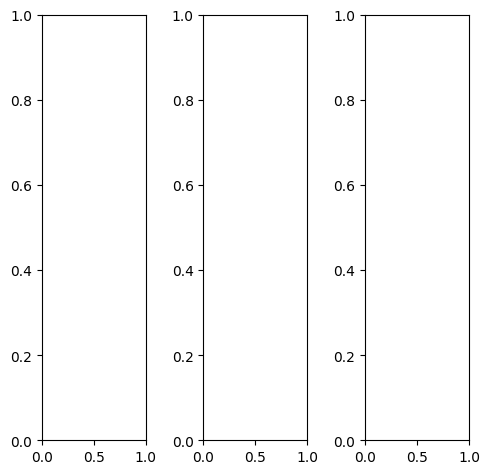

tensor([[[0.9059, 0.8314, 0.7804,  ..., 0.2000, 0.1490, 0.2157],
         [0.9059, 0.8157, 0.7569,  ..., 0.1686, 0.1882, 0.2039],
         [0.9059, 0.8157, 0.7490,  ..., 0.1922, 0.2078, 0.2078],
         ...,
         [0.6275, 0.6235, 0.6235,  ..., 0.4863, 0.4627, 0.4902],
         [0.6078, 0.5961, 0.5961,  ..., 0.4863, 0.4745, 0.4784],
         [0.5765, 0.5569, 0.5412,  ..., 0.5176, 0.4824, 0.4745]],

        [[0.9059, 0.8314, 0.7804,  ..., 0.2000, 0.1490, 0.2157],
         [0.9059, 0.8157, 0.7569,  ..., 0.1686, 0.1882, 0.2039],
         [0.9059, 0.8157, 0.7490,  ..., 0.1922, 0.2078, 0.2078],
         ...,
         [0.6275, 0.6235, 0.6235,  ..., 0.4863, 0.4627, 0.4902],
         [0.6078, 0.5961, 0.5961,  ..., 0.4863, 0.4745, 0.4784],
         [0.5765, 0.5569, 0.5412,  ..., 0.5176, 0.4824, 0.4745]],

        [[0.9059, 0.8314, 0.7804,  ..., 0.2000, 0.1490, 0.2157],
         [0.9059, 0.8157, 0.7569,  ..., 0.1686, 0.1882, 0.2039],
         [0.9059, 0.8157, 0.7490,  ..., 0.1922, 0.2078, 0.

tensor([[[0.9216, 0.8392, 0.7765,  ..., 0.1843, 0.1373, 0.2078],
         [0.9176, 0.8235, 0.7569,  ..., 0.1529, 0.1725, 0.1922],
         [0.9137, 0.8196, 0.7490,  ..., 0.1765, 0.1882, 0.1882],
         ...,
         [0.6314, 0.6235, 0.6196,  ..., 0.4549, 0.4353, 0.4588],
         [0.6078, 0.5961, 0.5961,  ..., 0.4588, 0.4510, 0.4510],
         [0.5804, 0.5569, 0.5412,  ..., 0.4980, 0.4627, 0.4549]],

        [[0.9059, 0.8353, 0.7882,  ..., 0.2039, 0.1529, 0.2196],
         [0.9059, 0.8196, 0.7647,  ..., 0.1765, 0.1922, 0.2078],
         [0.9098, 0.8157, 0.7569,  ..., 0.2000, 0.2157, 0.2118],
         ...,
         [0.6314, 0.6275, 0.6275,  ..., 0.4941, 0.4667, 0.4980],
         [0.6118, 0.6000, 0.6000,  ..., 0.4941, 0.4824, 0.4863],
         [0.5804, 0.5608, 0.5451,  ..., 0.5216, 0.4863, 0.4824]],

        [[0.8706, 0.7961, 0.7569,  ..., 0.2078, 0.1569, 0.2275],
         [0.8824, 0.7882, 0.7333,  ..., 0.1765, 0.1922, 0.2157],
         [0.8784, 0.7882, 0.7255,  ..., 0.2078, 0.2235, 0.

tensor([[[0.8456, 0.7396, 0.6696,  ..., 0.1512, 0.1259, 0.2082],
         [0.7987, 0.6137, 0.6066,  ..., 0.0974, 0.1175, 0.1730],
         [0.7645, 0.7227, 0.5815,  ..., 0.1112, 0.1342, 0.1797],
         ...,
         [0.6380, 0.6568, 0.6262,  ..., 0.5505, 0.5198, 0.5526],
         [0.6079, 0.6414, 0.6012,  ..., 0.5271, 0.5237, 0.5361],
         [0.5916, 0.5844, 0.5518,  ..., 0.5560, 0.5161, 0.5174]],

        [[0.8615, 0.8418, 0.6865,  ..., 0.2057, 0.1741, 0.2301],
         [0.7829, 0.6453, 0.6242,  ..., 0.1770, 0.2126, 0.2216],
         [0.8563, 0.7568, 0.6569,  ..., 0.1860, 0.2062, 0.2244],
         ...,
         [0.5691, 0.6015, 0.6040,  ..., 0.5286, 0.5114, 0.4863],
         [0.5445, 0.5603, 0.5700,  ..., 0.5290, 0.5056, 0.4924],
         [0.5312, 0.5279, 0.5152,  ..., 0.5080, 0.4814, 0.4628]],

        [[0.9992, 0.9641, 0.9388,  ..., 0.3284, 0.3015, 0.3697],
         [1.0022, 0.8971, 0.8377,  ..., 0.3067, 0.3424, 0.3702],
         [0.9458, 0.8954, 0.7749,  ..., 0.3136, 0.3422, 0.

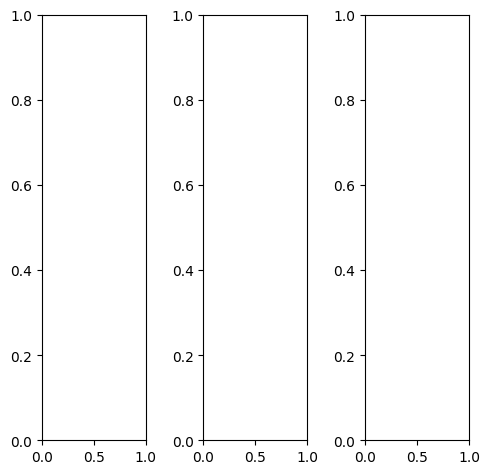

tensor([[[0.9490, 0.9608, 0.9725,  ..., 0.6549, 0.4118, 0.3294],
         [0.9569, 0.9608, 0.9647,  ..., 0.3137, 0.2196, 0.1961],
         [0.9529, 0.9569, 0.9647,  ..., 0.3608, 0.3294, 0.2549],
         ...,
         [0.3765, 0.3843, 0.4157,  ..., 0.5569, 0.5608, 0.5490],
         [0.3451, 0.3529, 0.3412,  ..., 0.5490, 0.5569, 0.5686],
         [0.2824, 0.2314, 0.2000,  ..., 0.5922, 0.5765, 0.5765]],

        [[0.9490, 0.9608, 0.9725,  ..., 0.6549, 0.4118, 0.3294],
         [0.9569, 0.9608, 0.9647,  ..., 0.3137, 0.2196, 0.1961],
         [0.9529, 0.9569, 0.9647,  ..., 0.3608, 0.3294, 0.2549],
         ...,
         [0.3765, 0.3843, 0.4157,  ..., 0.5569, 0.5608, 0.5490],
         [0.3451, 0.3529, 0.3412,  ..., 0.5490, 0.5569, 0.5686],
         [0.2824, 0.2314, 0.2000,  ..., 0.5922, 0.5765, 0.5765]],

        [[0.9490, 0.9608, 0.9725,  ..., 0.6549, 0.4118, 0.3294],
         [0.9569, 0.9608, 0.9647,  ..., 0.3137, 0.2196, 0.1961],
         [0.9529, 0.9569, 0.9647,  ..., 0.3608, 0.3294, 0.

tensor([[[0.9490, 0.9608, 0.9725,  ..., 0.6980, 0.5216, 0.4549],
         [0.9569, 0.9608, 0.9647,  ..., 0.4118, 0.3490, 0.3176],
         [0.9529, 0.9569, 0.9647,  ..., 0.4196, 0.4118, 0.3529],
         ...,
         [0.4078, 0.4196, 0.4549,  ..., 0.5804, 0.5882, 0.5725],
         [0.3647, 0.3725, 0.3608,  ..., 0.5725, 0.5843, 0.5961],
         [0.2902, 0.2353, 0.2000,  ..., 0.6157, 0.6078, 0.6039]],

        [[0.9451, 0.9569, 0.9686,  ..., 0.6392, 0.3608, 0.2745],
         [0.9529, 0.9569, 0.9608,  ..., 0.2745, 0.1647, 0.1412],
         [0.9490, 0.9529, 0.9608,  ..., 0.3412, 0.2941, 0.2118],
         ...,
         [0.3608, 0.3647, 0.3961,  ..., 0.5490, 0.5490, 0.5373],
         [0.3373, 0.3451, 0.3333,  ..., 0.5412, 0.5451, 0.5569],
         [0.2784, 0.2314, 0.2000,  ..., 0.5804, 0.5647, 0.5647]],

        [[0.9647, 0.9765, 0.9882,  ..., 0.6275, 0.3725, 0.2863],
         [0.9725, 0.9765, 0.9804,  ..., 0.2667, 0.1686, 0.1569],
         [0.9686, 0.9725, 0.9804,  ..., 0.3059, 0.2784, 0.

tensor([[[0.9806, 1.0592, 1.0495,  ..., 0.5470, 0.2931, 0.2936],
         [0.9739, 1.2139, 1.0353,  ..., 0.2373, 0.1086, 0.1538],
         [0.9890, 1.1810, 1.1167,  ..., 0.2483, 0.2268, 0.1901],
         ...,
         [0.3717, 0.4212, 0.4552,  ..., 0.6275, 0.6424, 0.6271],
         [0.2960, 0.3259, 0.3308,  ..., 0.6057, 0.6170, 0.6471],
         [0.2795, 0.2101, 0.1782,  ..., 0.6652, 0.6524, 0.6468]],

        [[0.9683, 1.0681, 0.9699,  ..., 0.6354, 0.4058, 0.3561],
         [0.9422, 1.1349, 0.9951,  ..., 0.3240, 0.2410, 0.2366],
         [1.0348, 1.1297, 1.0795,  ..., 0.3700, 0.3785, 0.2844],
         ...,
         [0.3868, 0.3920, 0.4385,  ..., 0.6419, 0.6658, 0.6297],
         [0.3309, 0.3513, 0.3652,  ..., 0.6155, 0.6363, 0.6409],
         [0.3073, 0.2220, 0.2039,  ..., 0.6533, 0.6416, 0.6383]],

        [[1.0006, 1.1091, 1.0824,  ..., 0.8068, 0.5815, 0.5365],
         [1.0496, 1.2135, 1.1643,  ..., 0.5385, 0.4508, 0.4483],
         [1.0651, 1.1507, 1.2164,  ..., 0.5754, 0.6021, 0.

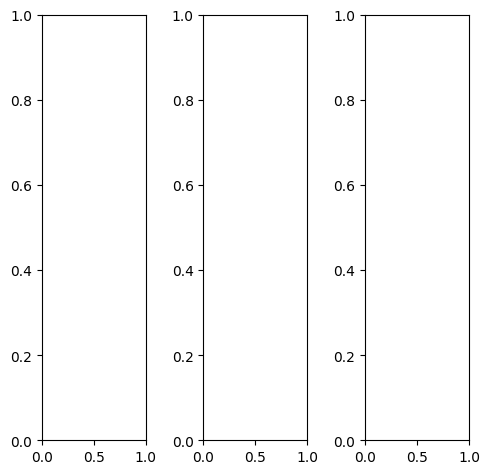

tensor([[[0.5608, 0.5765, 0.5882,  ..., 0.6275, 0.6235, 0.6157],
         [0.5922, 0.6039, 0.6157,  ..., 0.6588, 0.6510, 0.6471],
         [0.6078, 0.6157, 0.6275,  ..., 0.6745, 0.6667, 0.6627],
         ...,
         [0.6000, 0.6667, 0.5529,  ..., 0.5647, 0.4667, 0.4706],
         [0.4863, 0.4549, 0.2667,  ..., 0.5333, 0.4078, 0.2941],
         [0.3020, 0.2824, 0.1451,  ..., 0.5490, 0.4314, 0.2078]],

        [[0.5608, 0.5765, 0.5882,  ..., 0.6275, 0.6235, 0.6157],
         [0.5922, 0.6039, 0.6157,  ..., 0.6588, 0.6510, 0.6471],
         [0.6078, 0.6157, 0.6275,  ..., 0.6745, 0.6667, 0.6627],
         ...,
         [0.6000, 0.6667, 0.5529,  ..., 0.5647, 0.4667, 0.4706],
         [0.4863, 0.4549, 0.2667,  ..., 0.5333, 0.4078, 0.2941],
         [0.3020, 0.2824, 0.1451,  ..., 0.5490, 0.4314, 0.2078]],

        [[0.5608, 0.5765, 0.5882,  ..., 0.6275, 0.6235, 0.6157],
         [0.5922, 0.6039, 0.6157,  ..., 0.6588, 0.6510, 0.6471],
         [0.6078, 0.6157, 0.6275,  ..., 0.6745, 0.6667, 0.

tensor([[[0.3765, 0.3843, 0.3961,  ..., 0.4314, 0.4275, 0.4196],
         [0.4039, 0.4118, 0.4235,  ..., 0.4627, 0.4549, 0.4471],
         [0.4235, 0.4275, 0.4392,  ..., 0.4824, 0.4706, 0.4667],
         ...,
         [0.5569, 0.6627, 0.5804,  ..., 0.5176, 0.3843, 0.3882],
         [0.5255, 0.4980, 0.3020,  ..., 0.4863, 0.3294, 0.2275],
         [0.4196, 0.3216, 0.1882,  ..., 0.5059, 0.3451, 0.1490]],

        [[0.6000, 0.6157, 0.6275,  ..., 0.6745, 0.6667, 0.6588],
         [0.6353, 0.6471, 0.6627,  ..., 0.7059, 0.6980, 0.6941],
         [0.6510, 0.6627, 0.6745,  ..., 0.7255, 0.7176, 0.7098],
         ...,
         [0.6157, 0.6706, 0.5490,  ..., 0.5804, 0.4863, 0.4902],
         [0.4706, 0.4431, 0.2588,  ..., 0.5490, 0.4235, 0.3059],
         [0.2549, 0.2706, 0.1294,  ..., 0.5647, 0.4510, 0.2196]],

        [[0.8549, 0.8627, 0.8745,  ..., 0.9137, 0.9059, 0.9020],
         [0.8706, 0.8784, 0.8902,  ..., 0.9333, 0.9255, 0.9216],
         [0.8667, 0.8706, 0.8863,  ..., 0.9294, 0.9216, 0.

tensor([[[0.5877, 0.5405, 0.5081,  ..., 0.5176, 0.5207, 0.5789],
         [0.5742, 0.4973, 0.4864,  ..., 0.5641, 0.5620, 0.5845],
         [0.5905, 0.5286, 0.4873,  ..., 0.6083, 0.5979, 0.5939],
         ...,
         [0.6779, 0.7528, 0.5898,  ..., 0.6532, 0.5338, 0.5132],
         [0.5065, 0.4758, 0.2623,  ..., 0.6111, 0.4573, 0.3153],
         [0.3222, 0.2495, 0.1054,  ..., 0.6456, 0.4804, 0.2918]],

        [[0.5977, 0.6113, 0.5313,  ..., 0.6334, 0.6559, 0.6552],
         [0.5929, 0.5016, 0.4952,  ..., 0.6931, 0.6855, 0.7210],
         [0.6420, 0.5976, 0.5231,  ..., 0.7281, 0.7068, 0.7123],
         ...,
         [0.6518, 0.7125, 0.5742,  ..., 0.6175, 0.5209, 0.4631],
         [0.4854, 0.4584, 0.2395,  ..., 0.5855, 0.4401, 0.2832],
         [0.3091, 0.2258, 0.1042,  ..., 0.6097, 0.4401, 0.2507]],

        [[0.6812, 0.6530, 0.6172,  ..., 0.8359, 0.8427, 0.8264],
         [0.6972, 0.6193, 0.6192,  ..., 0.8730, 0.8824, 0.8758],
         [0.6467, 0.5967, 0.5546,  ..., 0.8977, 0.9129, 0.

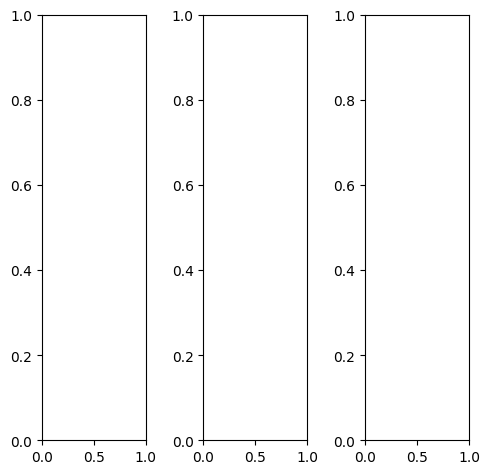

tensor([[[0.2039, 0.3647, 0.4196,  ..., 0.2314, 0.1843, 0.1804],
         [0.1882, 0.3059, 0.3216,  ..., 0.2078, 0.2078, 0.2118],
         [0.2000, 0.2353, 0.2863,  ..., 0.2510, 0.2902, 0.2706],
         ...,
         [0.3529, 0.3020, 0.3137,  ..., 0.3569, 0.3294, 0.3020],
         [0.3725, 0.3765, 0.3686,  ..., 0.3490, 0.3216, 0.2902],
         [0.3765, 0.3804, 0.3490,  ..., 0.3059, 0.3059, 0.2980]],

        [[0.2039, 0.3647, 0.4196,  ..., 0.2314, 0.1843, 0.1804],
         [0.1882, 0.3059, 0.3216,  ..., 0.2078, 0.2078, 0.2118],
         [0.2000, 0.2353, 0.2863,  ..., 0.2510, 0.2902, 0.2706],
         ...,
         [0.3529, 0.3020, 0.3137,  ..., 0.3569, 0.3294, 0.3020],
         [0.3725, 0.3765, 0.3686,  ..., 0.3490, 0.3216, 0.2902],
         [0.3765, 0.3804, 0.3490,  ..., 0.3059, 0.3059, 0.2980]],

        [[0.2039, 0.3647, 0.4196,  ..., 0.2314, 0.1843, 0.1804],
         [0.1882, 0.3059, 0.3216,  ..., 0.2078, 0.2078, 0.2118],
         [0.2000, 0.2353, 0.2863,  ..., 0.2510, 0.2902, 0.

tensor([[[0.1569, 0.2902, 0.3216,  ..., 0.1490, 0.0980, 0.0980],
         [0.1333, 0.2314, 0.2235,  ..., 0.1294, 0.1255, 0.1294],
         [0.1373, 0.1569, 0.1961,  ..., 0.1725, 0.2118, 0.1922],
         ...,
         [0.2706, 0.2471, 0.2667,  ..., 0.3176, 0.2824, 0.2431],
         [0.3098, 0.3216, 0.3176,  ..., 0.3098, 0.2824, 0.2510],
         [0.3216, 0.3255, 0.2941,  ..., 0.2784, 0.2824, 0.2784]],

        [[0.2353, 0.4157, 0.4902,  ..., 0.2863, 0.2392, 0.2314],
         [0.2235, 0.3569, 0.3882,  ..., 0.2588, 0.2588, 0.2627],
         [0.2431, 0.2863, 0.3490,  ..., 0.2980, 0.3373, 0.3176],
         ...,
         [0.4157, 0.3529, 0.3647,  ..., 0.3922, 0.3686, 0.3490],
         [0.4314, 0.4392, 0.4314,  ..., 0.3882, 0.3569, 0.3294],
         [0.4314, 0.4431, 0.4118,  ..., 0.3412, 0.3373, 0.3255]],

        [[0.1686, 0.2980, 0.3176,  ..., 0.1608, 0.1255, 0.1373],
         [0.1451, 0.2353, 0.2196,  ..., 0.1647, 0.1608, 0.1647],
         [0.1490, 0.1647, 0.1961,  ..., 0.2157, 0.2471, 0.

tensor([[[ 0.1259,  0.3573,  0.4171,  ...,  0.1568,  0.0797,  0.0857],
         [ 0.1103,  0.1370,  0.1864,  ...,  0.0902,  0.0909,  0.0903],
         [-0.0749, -0.0069,  0.0572,  ...,  0.1893,  0.2703,  0.2164],
         ...,
         [ 0.4960,  0.4652,  0.4676,  ...,  0.5545,  0.4764,  0.3525],
         [ 0.5501,  0.6042,  0.5994,  ...,  0.5196,  0.4386,  0.3339],
         [ 0.5677,  0.5832,  0.4968,  ...,  0.3852,  0.3816,  0.3718]],

        [[ 0.2085,  0.5092,  0.5371,  ...,  0.2630,  0.1801,  0.1501],
         [ 0.1463,  0.2776,  0.1830,  ...,  0.2121,  0.2394,  0.1809],
         [ 0.0367,  0.1615,  0.1710,  ...,  0.2937,  0.3902,  0.3005],
         ...,
         [ 0.4888,  0.4163,  0.4269,  ...,  0.5451,  0.4913,  0.3171],
         [ 0.5455,  0.5742,  0.5787,  ...,  0.5420,  0.4723,  0.3347],
         [ 0.5421,  0.5617,  0.4950,  ...,  0.3799,  0.3879,  0.3483]],

        [[ 0.4119,  0.5502,  0.7186,  ...,  0.3539,  0.2873,  0.2925],
         [ 0.3505,  0.4095,  0.4775,  ...,  0

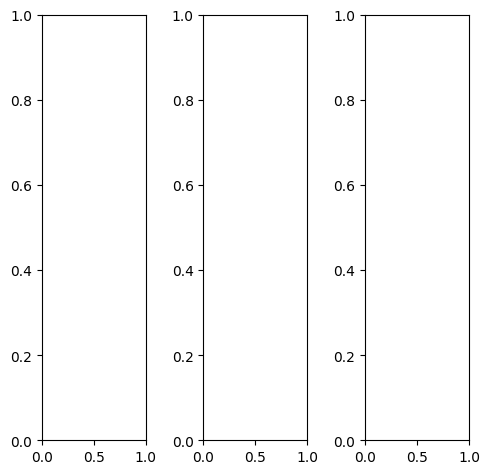

EPOCH: 25.000  val_loss: 0.005  trn_loss: 0.005  (3037.37s - 9112.10s remaining)


tensor([[[0.1647, 0.0824, 0.0353,  ..., 0.1647, 0.2510, 0.3098],
         [0.1647, 0.1216, 0.0627,  ..., 0.1255, 0.2667, 0.3255],
         [0.0706, 0.0784, 0.1098,  ..., 0.1843, 0.3176, 0.3333],
         ...,
         [0.6784, 0.6824, 0.6902,  ..., 0.1961, 0.3294, 0.3176],
         [0.6588, 0.6627, 0.6745,  ..., 0.2667, 0.2549, 0.1961],
         [0.6392, 0.6431, 0.6510,  ..., 0.1608, 0.1490, 0.1608]],

        [[0.1647, 0.0824, 0.0353,  ..., 0.1647, 0.2510, 0.3098],
         [0.1647, 0.1216, 0.0627,  ..., 0.1255, 0.2667, 0.3255],
         [0.0706, 0.0784, 0.1098,  ..., 0.1843, 0.3176, 0.3333],
         ...,
         [0.6784, 0.6824, 0.6902,  ..., 0.1961, 0.3294, 0.3176],
         [0.6588, 0.6627, 0.6745,  ..., 0.2667, 0.2549, 0.1961],
         [0.6392, 0.6431, 0.6510,  ..., 0.1608, 0.1490, 0.1608]],

        [[0.1647, 0.0824, 0.0353,  ..., 0.1647, 0.2510, 0.3098],
         [0.1647, 0.1216, 0.0627,  ..., 0.1255, 0.2667, 0.3255],
         [0.0706, 0.0784, 0.1098,  ..., 0.1843, 0.3176, 0.

tensor([[[0.2196, 0.0980, 0.0353,  ..., 0.2471, 0.3098, 0.3373],
         [0.2039, 0.1333, 0.0824,  ..., 0.1686, 0.3137, 0.3490],
         [0.0824, 0.0902, 0.1569,  ..., 0.2549, 0.3608, 0.3608],
         ...,
         [0.6667, 0.6706, 0.6784,  ..., 0.1961, 0.3294, 0.3255],
         [0.6471, 0.6510, 0.6627,  ..., 0.3098, 0.3137, 0.2549],
         [0.6275, 0.6314, 0.6392,  ..., 0.2078, 0.1804, 0.1843]],

        [[0.1451, 0.0784, 0.0392,  ..., 0.1451, 0.2471, 0.3216],
         [0.1529, 0.1216, 0.0549,  ..., 0.1137, 0.2667, 0.3373],
         [0.0667, 0.0784, 0.0941,  ..., 0.1725, 0.3216, 0.3490],
         ...,
         [0.6863, 0.6902, 0.6980,  ..., 0.2039, 0.3373, 0.3216],
         [0.6667, 0.6706, 0.6824,  ..., 0.2588, 0.2392, 0.1765],
         [0.6471, 0.6510, 0.6588,  ..., 0.1490, 0.1451, 0.1608]],

        [[0.1098, 0.0588, 0.0196,  ..., 0.0392, 0.1294, 0.1922],
         [0.1216, 0.0902, 0.0353,  ..., 0.0588, 0.1490, 0.1922],
         [0.0588, 0.0510, 0.0588,  ..., 0.0745, 0.1686, 0.

tensor([[[0.1763, 0.0841, 0.0352,  ..., 0.1504, 0.2458, 0.2987],
         [0.1485, 0.1245, 0.0583,  ..., 0.1238, 0.2689, 0.3159],
         [0.0672, 0.0776, 0.1076,  ..., 0.1981, 0.3264, 0.3354],
         ...,
         [0.6955, 0.6989, 0.7006,  ..., 0.2130, 0.3397, 0.3210],
         [0.6685, 0.6770, 0.6711,  ..., 0.2869, 0.2676, 0.2167],
         [0.6574, 0.6592, 0.6590,  ..., 0.1760, 0.1592, 0.1820]],

        [[0.1825, 0.0836, 0.0390,  ..., 0.1469, 0.2460, 0.3082],
         [0.1453, 0.1137, 0.0519,  ..., 0.1224, 0.2687, 0.3214],
         [0.0669, 0.0788, 0.1025,  ..., 0.1815, 0.3087, 0.3296],
         ...,
         [0.6867, 0.6921, 0.6972,  ..., 0.2005, 0.3206, 0.3092],
         [0.6628, 0.6584, 0.6737,  ..., 0.2652, 0.2438, 0.2004],
         [0.6410, 0.6523, 0.6475,  ..., 0.1551, 0.1442, 0.1772]],

        [[0.1769, 0.0839, 0.0488,  ..., 0.1425, 0.2282, 0.2807],
         [0.1444, 0.1201, 0.0678,  ..., 0.1174, 0.2415, 0.2756],
         [0.0752, 0.0828, 0.1097,  ..., 0.1699, 0.2817, 0.

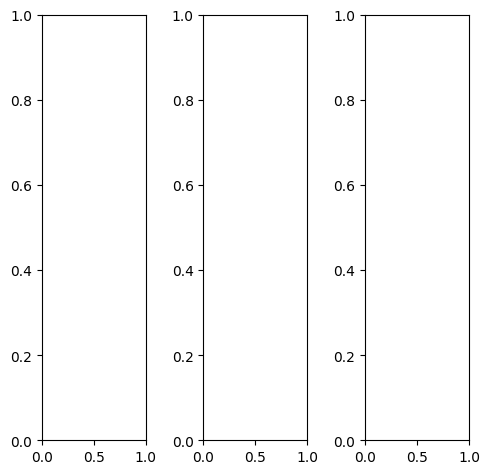

tensor([[[0.4863, 0.4941, 0.5176,  ..., 0.5020, 0.4902, 0.4510],
         [0.5176, 0.5020, 0.5333,  ..., 0.4863, 0.4627, 0.4118],
         [0.5216, 0.5255, 0.5882,  ..., 0.4314, 0.4471, 0.4314],
         ...,
         [0.5569, 0.4941, 0.5294,  ..., 0.4275, 0.4863, 0.4627],
         [0.5765, 0.5255, 0.4784,  ..., 0.4549, 0.5216, 0.5020],
         [0.5451, 0.4980, 0.4824,  ..., 0.5176, 0.5255, 0.4784]],

        [[0.4863, 0.4941, 0.5176,  ..., 0.5020, 0.4902, 0.4510],
         [0.5176, 0.5020, 0.5333,  ..., 0.4863, 0.4627, 0.4118],
         [0.5216, 0.5255, 0.5882,  ..., 0.4314, 0.4471, 0.4314],
         ...,
         [0.5569, 0.4941, 0.5294,  ..., 0.4275, 0.4863, 0.4627],
         [0.5765, 0.5255, 0.4784,  ..., 0.4549, 0.5216, 0.5020],
         [0.5451, 0.4980, 0.4824,  ..., 0.5176, 0.5255, 0.4784]],

        [[0.4863, 0.4941, 0.5176,  ..., 0.5020, 0.4902, 0.4510],
         [0.5176, 0.5020, 0.5333,  ..., 0.4863, 0.4627, 0.4118],
         [0.5216, 0.5255, 0.5882,  ..., 0.4314, 0.4471, 0.

tensor([[[0.5451, 0.5529, 0.5765,  ..., 0.5490, 0.5412, 0.5059],
         [0.5765, 0.5608, 0.5922,  ..., 0.5333, 0.5137, 0.4706],
         [0.5804, 0.5843, 0.6471,  ..., 0.4745, 0.4980, 0.4902],
         ...,
         [0.6157, 0.5529, 0.5882,  ..., 0.5098, 0.5608, 0.5412],
         [0.6353, 0.5843, 0.5373,  ..., 0.5373, 0.5922, 0.5765],
         [0.6078, 0.5608, 0.5412,  ..., 0.5961, 0.6039, 0.5608]],

        [[0.4706, 0.4784, 0.4980,  ..., 0.4863, 0.4745, 0.4314],
         [0.5020, 0.4824, 0.5137,  ..., 0.4706, 0.4471, 0.3922],
         [0.5020, 0.5059, 0.5686,  ..., 0.4157, 0.4314, 0.4118],
         ...,
         [0.5412, 0.4784, 0.5137,  ..., 0.4000, 0.4667, 0.4431],
         [0.5608, 0.5098, 0.4627,  ..., 0.4314, 0.5020, 0.4824],
         [0.5294, 0.4824, 0.4667,  ..., 0.4980, 0.5059, 0.4588]],

        [[0.4118, 0.4314, 0.4588,  ..., 0.4667, 0.4510, 0.4039],
         [0.4471, 0.4431, 0.4824,  ..., 0.4510, 0.4235, 0.3686],
         [0.4588, 0.4745, 0.5451,  ..., 0.3961, 0.4078, 0.

tensor([[[0.4969, 0.5026, 0.5180,  ..., 0.5083, 0.4927, 0.4659],
         [0.5282, 0.5116, 0.5544,  ..., 0.4783, 0.4599, 0.4112],
         [0.5290, 0.5404, 0.6094,  ..., 0.4244, 0.4415, 0.4331],
         ...,
         [0.5774, 0.5315, 0.5483,  ..., 0.4582, 0.5011, 0.4773],
         [0.6125, 0.5537, 0.5032,  ..., 0.4686, 0.5249, 0.5299],
         [0.5736, 0.5246, 0.4972,  ..., 0.5417, 0.5605, 0.5190]],

        [[0.5012, 0.5053, 0.5212,  ..., 0.5212, 0.5044, 0.4696],
         [0.5275, 0.5064, 0.5475,  ..., 0.5070, 0.4843, 0.4303],
         [0.5249, 0.5362, 0.6050,  ..., 0.4390, 0.4670, 0.4438],
         ...,
         [0.5602, 0.5033, 0.5382,  ..., 0.4368, 0.5013, 0.4646],
         [0.5850, 0.5227, 0.4877,  ..., 0.4379, 0.5189, 0.5189],
         [0.5548, 0.5045, 0.4904,  ..., 0.5260, 0.5387, 0.5145]],

        [[0.4077, 0.3904, 0.3944,  ..., 0.3878, 0.3911, 0.3771],
         [0.4062, 0.3786, 0.4151,  ..., 0.3656, 0.3431, 0.3079],
         [0.3943, 0.3972, 0.4635,  ..., 0.3094, 0.3174, 0.

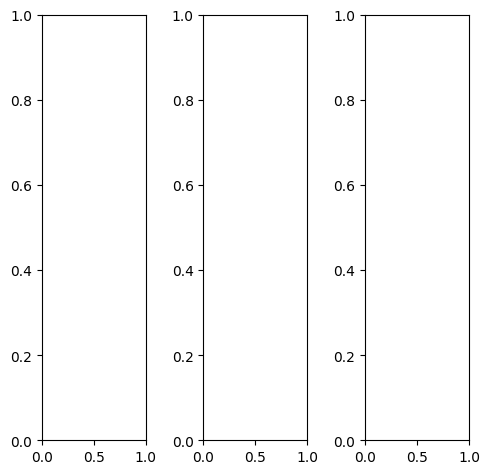

tensor([[[0.1922, 0.2118, 0.2627,  ..., 0.1412, 0.0745, 0.0745],
         [0.2196, 0.2039, 0.2510,  ..., 0.2235, 0.1059, 0.0863],
         [0.2353, 0.2078, 0.2392,  ..., 0.2549, 0.1529, 0.1490],
         ...,
         [0.2392, 0.2824, 0.2863,  ..., 0.5569, 0.3765, 0.2706],
         [0.2863, 0.3098, 0.2706,  ..., 0.4627, 0.2784, 0.2314],
         [0.3020, 0.3216, 0.2667,  ..., 0.3294, 0.2118, 0.2431]],

        [[0.1922, 0.2118, 0.2627,  ..., 0.1412, 0.0745, 0.0745],
         [0.2196, 0.2039, 0.2510,  ..., 0.2235, 0.1059, 0.0863],
         [0.2353, 0.2078, 0.2392,  ..., 0.2549, 0.1529, 0.1490],
         ...,
         [0.2392, 0.2824, 0.2863,  ..., 0.5569, 0.3765, 0.2706],
         [0.2863, 0.3098, 0.2706,  ..., 0.4627, 0.2784, 0.2314],
         [0.3020, 0.3216, 0.2667,  ..., 0.3294, 0.2118, 0.2431]],

        [[0.1922, 0.2118, 0.2627,  ..., 0.1412, 0.0745, 0.0745],
         [0.2196, 0.2039, 0.2510,  ..., 0.2235, 0.1059, 0.0863],
         [0.2353, 0.2078, 0.2392,  ..., 0.2549, 0.1529, 0.

tensor([[[0.2275, 0.2588, 0.3294,  ..., 0.1843, 0.0784, 0.0627],
         [0.2588, 0.2588, 0.3176,  ..., 0.2706, 0.1176, 0.0784],
         [0.2824, 0.2627, 0.3020,  ..., 0.3059, 0.1686, 0.1451],
         ...,
         [0.3490, 0.3373, 0.3255,  ..., 0.6392, 0.4431, 0.3294],
         [0.3725, 0.3529, 0.2980,  ..., 0.5451, 0.3412, 0.2824],
         [0.3569, 0.3490, 0.2863,  ..., 0.4078, 0.2706, 0.2824]],

        [[0.1882, 0.2039, 0.2471,  ..., 0.1255, 0.0667, 0.0745],
         [0.2157, 0.1961, 0.2353,  ..., 0.2118, 0.1059, 0.0902],
         [0.2275, 0.2000, 0.2275,  ..., 0.2471, 0.1569, 0.1529],
         ...,
         [0.2000, 0.2667, 0.2824,  ..., 0.5373, 0.3529, 0.2510],
         [0.2588, 0.3020, 0.2706,  ..., 0.4431, 0.2588, 0.2157],
         [0.2902, 0.3176, 0.2706,  ..., 0.3059, 0.1961, 0.2314]],

        [[0.1059, 0.1137, 0.1608,  ..., 0.1137, 0.0902, 0.1137],
         [0.1333, 0.1098, 0.1490,  ..., 0.1647, 0.0902, 0.0980],
         [0.1451, 0.1137, 0.1373,  ..., 0.1608, 0.1059, 0.

tensor([[[0.2232, 0.2177, 0.2675,  ..., 0.1468, 0.0947, 0.1159],
         [0.2208, 0.2090, 0.2643,  ..., 0.2355, 0.1154, 0.0977],
         [0.2431, 0.2196, 0.2581,  ..., 0.2673, 0.1635, 0.1474],
         ...,
         [0.2539, 0.3050, 0.3059,  ..., 0.6085, 0.4263, 0.3015],
         [0.2874, 0.3303, 0.2933,  ..., 0.5216, 0.3114, 0.2640],
         [0.3132, 0.3331, 0.2852,  ..., 0.3621, 0.2130, 0.2639]],

        [[0.2106, 0.2110, 0.2586,  ..., 0.1407, 0.0886, 0.1246],
         [0.2107, 0.1991, 0.2477,  ..., 0.2202, 0.1115, 0.1014],
         [0.2295, 0.2060, 0.2379,  ..., 0.2499, 0.1558, 0.1414],
         ...,
         [0.2359, 0.2811, 0.2810,  ..., 0.5563, 0.3685, 0.2608],
         [0.2748, 0.3063, 0.2670,  ..., 0.4512, 0.2658, 0.2291],
         [0.3124, 0.3182, 0.2729,  ..., 0.3118, 0.1855, 0.2433]],

        [[0.1800, 0.1761, 0.2149,  ..., 0.1032, 0.0714, 0.1033],
         [0.1808, 0.1628, 0.2043,  ..., 0.1848, 0.0874, 0.0757],
         [0.1927, 0.1675, 0.1935,  ..., 0.2032, 0.1209, 0.

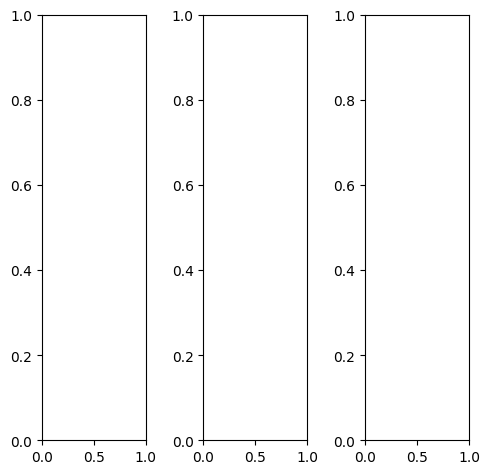

tensor([[[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.6000],
         ...,
         [0.3137, 0.3176, 0.3176,  ..., 0.3765, 0.3725, 0.4118],
         [0.3294, 0.3490, 0.3451,  ..., 0.4118, 0.4314, 0.4431],
         [0.2353, 0.3059, 0.3176,  ..., 0.3608, 0.4784, 0.4824]],

        [[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.6000],
         ...,
         [0.3137, 0.3176, 0.3176,  ..., 0.3765, 0.3725, 0.4118],
         [0.3294, 0.3490, 0.3451,  ..., 0.4118, 0.4314, 0.4431],
         [0.2353, 0.3059, 0.3176,  ..., 0.3608, 0.4784, 0.4824]],

        [[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.

tensor([[[0.4510, 0.3804, 0.4314,  ..., 0.7686, 0.7569, 0.7333],
         [0.4392, 0.4784, 0.6196,  ..., 0.7608, 0.7725, 0.8275],
         [0.5020, 0.5451, 0.6392,  ..., 0.7059, 0.7333, 0.8627],
         ...,
         [0.4627, 0.4784, 0.4784,  ..., 0.5373, 0.5373, 0.5725],
         [0.4627, 0.4941, 0.4902,  ..., 0.5608, 0.5961, 0.6157],
         [0.3373, 0.4235, 0.4314,  ..., 0.4824, 0.6196, 0.6471]],

        [[0.3686, 0.3020, 0.3255,  ..., 0.5137, 0.4980, 0.4824],
         [0.3216, 0.3490, 0.4549,  ..., 0.4824, 0.4863, 0.5412],
         [0.4000, 0.4157, 0.4784,  ..., 0.4157, 0.4353, 0.5490],
         ...,
         [0.2824, 0.2824, 0.2824,  ..., 0.3451, 0.3412, 0.3882],
         [0.3059, 0.3216, 0.3216,  ..., 0.3882, 0.4078, 0.4235],
         [0.2196, 0.2863, 0.3020,  ..., 0.3490, 0.4588, 0.4588]],

        [[0.0863, 0.0706, 0.1098,  ..., 0.2392, 0.1843, 0.1373],
         [0.0549, 0.1176, 0.2431,  ..., 0.1333, 0.1098, 0.1529],
         [0.1961, 0.2275, 0.3020,  ..., 0.0510, 0.0667, 0.

tensor([[[0.3444, 0.3130, 0.3316,  ..., 0.5741, 0.5663, 0.5550],
         [0.3219, 0.3672, 0.5009,  ..., 0.5382, 0.5414, 0.6084],
         [0.4173, 0.4590, 0.5460,  ..., 0.4691, 0.5039, 0.6229],
         ...,
         [0.3158, 0.3289, 0.3243,  ..., 0.4007, 0.3946, 0.4411],
         [0.3313, 0.3690, 0.3625,  ..., 0.4377, 0.4499, 0.4641],
         [0.2661, 0.3115, 0.3310,  ..., 0.3877, 0.4993, 0.5008]],

        [[0.3593, 0.3065, 0.3353,  ..., 0.5700, 0.5550, 0.5430],
         [0.3247, 0.3651, 0.4931,  ..., 0.5403, 0.5296, 0.6087],
         [0.4097, 0.4472, 0.5310,  ..., 0.4729, 0.4924, 0.6116],
         ...,
         [0.3145, 0.3261, 0.3233,  ..., 0.3764, 0.3774, 0.4126],
         [0.3246, 0.3480, 0.3469,  ..., 0.3988, 0.4184, 0.4444],
         [0.2612, 0.2993, 0.3167,  ..., 0.3615, 0.4661, 0.4893]],

        [[0.2829, 0.2419, 0.2631,  ..., 0.4467, 0.4513, 0.4638],
         [0.2400, 0.2804, 0.3907,  ..., 0.4181, 0.4187, 0.4924],
         [0.3216, 0.3527, 0.4192,  ..., 0.3540, 0.3765, 0.

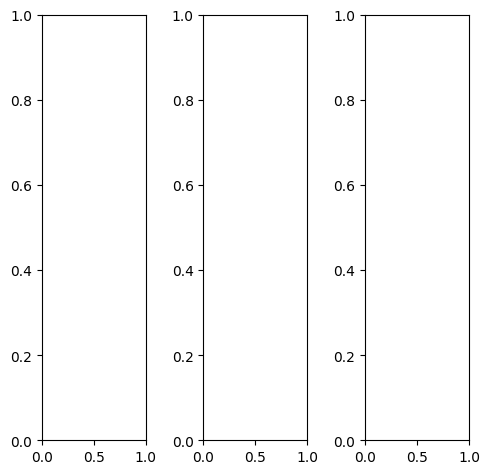

tensor([[[0.5725, 0.5725, 0.5843,  ..., 0.6314, 0.6314, 0.6235],
         [0.5804, 0.5843, 0.6000,  ..., 0.6392, 0.6353, 0.6275],
         [0.5765, 0.5843, 0.5922,  ..., 0.6353, 0.6314, 0.6235],
         ...,
         [0.5529, 0.5490, 0.5529,  ..., 0.1294, 0.1451, 0.1412],
         [0.5569, 0.5490, 0.5490,  ..., 0.0706, 0.0588, 0.0471],
         [0.5294, 0.5137, 0.5020,  ..., 0.0549, 0.0549, 0.0627]],

        [[0.5725, 0.5725, 0.5843,  ..., 0.6314, 0.6314, 0.6235],
         [0.5804, 0.5843, 0.6000,  ..., 0.6392, 0.6353, 0.6275],
         [0.5765, 0.5843, 0.5922,  ..., 0.6353, 0.6314, 0.6235],
         ...,
         [0.5529, 0.5490, 0.5529,  ..., 0.1294, 0.1451, 0.1412],
         [0.5569, 0.5490, 0.5490,  ..., 0.0706, 0.0588, 0.0471],
         [0.5294, 0.5137, 0.5020,  ..., 0.0549, 0.0549, 0.0627]],

        [[0.5725, 0.5725, 0.5843,  ..., 0.6314, 0.6314, 0.6235],
         [0.5804, 0.5843, 0.6000,  ..., 0.6392, 0.6353, 0.6275],
         [0.5765, 0.5843, 0.5922,  ..., 0.6353, 0.6314, 0.

tensor([[[0.5569, 0.5569, 0.5686,  ..., 0.6157, 0.6157, 0.6118],
         [0.5647, 0.5686, 0.5843,  ..., 0.6235, 0.6196, 0.6157],
         [0.5608, 0.5686, 0.5765,  ..., 0.6196, 0.6157, 0.6118],
         ...,
         [0.5373, 0.5333, 0.5373,  ..., 0.1294, 0.1451, 0.1412],
         [0.5412, 0.5333, 0.5333,  ..., 0.0706, 0.0588, 0.0471],
         [0.5216, 0.5059, 0.4941,  ..., 0.0549, 0.0549, 0.0627]],

        [[0.5804, 0.5765, 0.5922,  ..., 0.6353, 0.6353, 0.6275],
         [0.5882, 0.5922, 0.6078,  ..., 0.6431, 0.6392, 0.6314],
         [0.5843, 0.5922, 0.6000,  ..., 0.6392, 0.6353, 0.6275],
         ...,
         [0.5608, 0.5569, 0.5608,  ..., 0.1294, 0.1451, 0.1412],
         [0.5608, 0.5529, 0.5529,  ..., 0.0706, 0.0588, 0.0471],
         [0.5294, 0.5137, 0.5020,  ..., 0.0549, 0.0549, 0.0627]],

        [[0.5804, 0.5765, 0.5922,  ..., 0.6510, 0.6510, 0.6431],
         [0.5882, 0.5922, 0.6078,  ..., 0.6588, 0.6549, 0.6471],
         [0.5843, 0.5922, 0.6000,  ..., 0.6549, 0.6510, 0.

tensor([[[0.5457, 0.5232, 0.5186,  ..., 0.5640, 0.5661, 0.5988],
         [0.5344, 0.5290, 0.5409,  ..., 0.5730, 0.5738, 0.5791],
         [0.5098, 0.5225, 0.5345,  ..., 0.5688, 0.5683, 0.5687],
         ...,
         [0.5075, 0.5084, 0.5057,  ..., 0.1058, 0.1133, 0.1283],
         [0.5257, 0.5170, 0.5085,  ..., 0.0442, 0.0279, 0.0488],
         [0.5162, 0.4907, 0.4700,  ..., 0.0427, 0.0545, 0.0683]],

        [[0.5886, 0.5963, 0.5993,  ..., 0.6452, 0.6499, 0.6458],
         [0.5976, 0.5979, 0.6167,  ..., 0.6513, 0.6486, 0.6550],
         [0.5875, 0.5973, 0.6116,  ..., 0.6499, 0.6409, 0.6406],
         ...,
         [0.5654, 0.5599, 0.5605,  ..., 0.1352, 0.1549, 0.1500],
         [0.5635, 0.5521, 0.5510,  ..., 0.0706, 0.0570, 0.0588],
         [0.5358, 0.5140, 0.5039,  ..., 0.0608, 0.0610, 0.0828]],

        [[0.6499, 0.6606, 0.6717,  ..., 0.7231, 0.7242, 0.7064],
         [0.6567, 0.6613, 0.6840,  ..., 0.7151, 0.7175, 0.7049],
         [0.6480, 0.6635, 0.6771,  ..., 0.7216, 0.7150, 0.

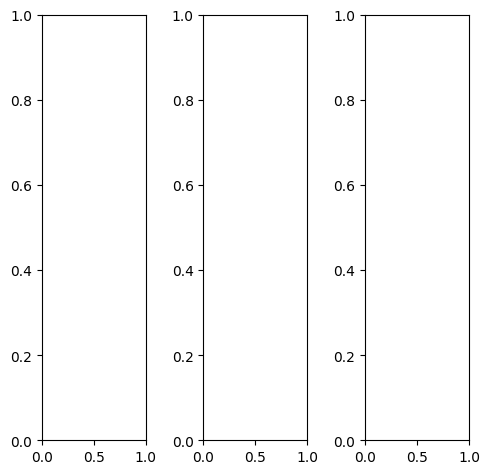

EPOCH: 25.255  trn_loss: 0.005  (3067.63s - 9078.95s remaining)

tensor([[[0.1020, 0.1059, 0.1490,  ..., 0.8510, 0.8431, 0.8431],
         [0.0941, 0.0824, 0.1333,  ..., 0.8353, 0.8314, 0.8275],
         [0.1294, 0.0863, 0.2000,  ..., 0.8353, 0.8314, 0.8235],
         ...,
         [0.6118, 0.6039, 0.6039,  ..., 0.5961, 0.6000, 0.6000],
         [0.6314, 0.6235, 0.6275,  ..., 0.6039, 0.6039, 0.6039],
         [0.6314, 0.6196, 0.6157,  ..., 0.6078, 0.6039, 0.6039]],

        [[0.1020, 0.1059, 0.1490,  ..., 0.8510, 0.8431, 0.8431],
         [0.0941, 0.0824, 0.1333,  ..., 0.8353, 0.8314, 0.8275],
         [0.1294, 0.0863, 0.2000,  ..., 0.8353, 0.8314, 0.8235],
         ...,
         [0.6118, 0.6039, 0.6039,  ..., 0.5961, 0.6000, 0.6000],
         [0.6314, 0.6235, 0.6275,  ..., 0.6039, 0.6039, 0.6039],
         [0.6314, 0.6196, 0.6157,  ..., 0.6078, 0.6039, 0.6039]],

        [[0.1020, 0.1059, 0.1490,  ..., 0.8510, 0.8431, 0.8431],
         [0.0941, 0.0824, 0.1333,  ..., 0.8353, 0.8314, 0.8275],
         [0.1294, 0.0863, 0.2000,  ..., 0.8353, 0.8314, 0.

tensor([[[0.1216, 0.1255, 0.1686,  ..., 0.8353, 0.8314, 0.8275],
         [0.1020, 0.0902, 0.1412,  ..., 0.8275, 0.8235, 0.8196],
         [0.1412, 0.0941, 0.2118,  ..., 0.8353, 0.8314, 0.8235],
         ...,
         [0.5725, 0.5686, 0.5647,  ..., 0.5451, 0.5490, 0.5490],
         [0.5882, 0.5843, 0.5843,  ..., 0.5569, 0.5569, 0.5529],
         [0.5922, 0.5804, 0.5804,  ..., 0.5686, 0.5647, 0.5647]],

        [[0.1020, 0.1059, 0.1490,  ..., 0.8627, 0.8549, 0.8549],
         [0.0980, 0.0863, 0.1373,  ..., 0.8510, 0.8471, 0.8431],
         [0.1333, 0.0902, 0.2039,  ..., 0.8471, 0.8431, 0.8353],
         ...,
         [0.6235, 0.6157, 0.6157,  ..., 0.6157, 0.6196, 0.6196],
         [0.6431, 0.6353, 0.6392,  ..., 0.6235, 0.6235, 0.6196],
         [0.6431, 0.6314, 0.6275,  ..., 0.6235, 0.6196, 0.6196]],

        [[0.0392, 0.0431, 0.0863,  ..., 0.8275, 0.8196, 0.8157],
         [0.0549, 0.0471, 0.0902,  ..., 0.7922, 0.7882, 0.7843],
         [0.0863, 0.0471, 0.1529,  ..., 0.7882, 0.7804, 0.

tensor([[[-0.0339, -0.0073, -0.1081,  ...,  0.7109,  0.7008,  0.7380],
         [ 0.0741, -0.1230, -0.0933,  ...,  0.7105,  0.7381,  0.7366],
         [-0.1786, -0.2137, -0.1088,  ...,  0.7443,  0.7710,  0.7604],
         ...,
         [ 0.6181,  0.6534,  0.6057,  ...,  0.6576,  0.6738,  0.6761],
         [ 0.6362,  0.6265,  0.6037,  ...,  0.6586,  0.6693,  0.6942],
         [ 0.6620,  0.6492,  0.6351,  ...,  0.6914,  0.6973,  0.6722]],

        [[ 0.1151,  0.0460, -0.0428,  ...,  0.8384,  0.8343,  0.8860],
         [ 0.0427, -0.1668, -0.2811,  ...,  0.8550,  0.8642,  0.9148],
         [-0.0332, -0.1775, -0.0881,  ...,  0.8880,  0.8923,  0.9248],
         ...,
         [ 0.6214,  0.6610,  0.6362,  ...,  0.6955,  0.6981,  0.6535],
         [ 0.6279,  0.6211,  0.6281,  ...,  0.6823,  0.6754,  0.6733],
         [ 0.6348,  0.6412,  0.6432,  ...,  0.6616,  0.6729,  0.6554]],

        [[ 0.2331,  0.0628,  0.2047,  ...,  1.0429,  1.0269,  1.0283],
         [ 0.2357,  0.0402,  0.1844,  ...,  1

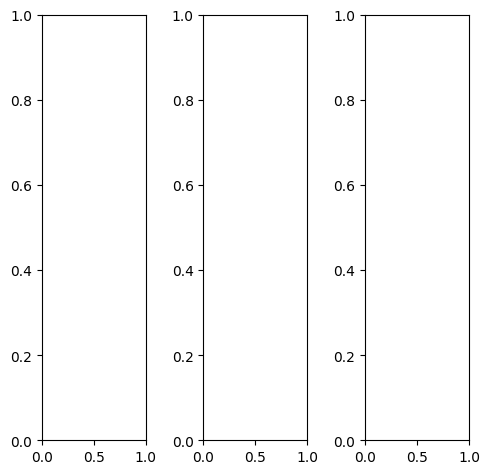

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.4078, 0.3804, 0.3529,  ..., 0.0000, 0.0000, 0.0000],
         [0.3569, 0.3333, 0.2902,  ..., 0.0000, 0.0000, 0.0000],
         [0.2941, 0.2588, 0.1647,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.4078, 0.3804, 0.3529,  ..., 0.0000, 0.0000, 0.0000],
         [0.3569, 0.3333, 0.2902,  ..., 0.0000, 0.0000, 0.0000],
         [0.2941, 0.2588, 0.1647,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.3804, 0.3529, 0.3255,  ..., 0.0000, 0.0000, 0.0000],
         [0.3294, 0.3059, 0.2627,  ..., 0.0000, 0.0000, 0.0000],
         [0.2667, 0.2314, 0.1373,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.4078, 0.3804, 0.3529,  ..., 0.0000, 0.0000, 0.0000],
         [0.3608, 0.3333, 0.2941,  ..., 0.0000, 0.0000, 0.0000],
         [0.2980, 0.2627, 0.1686,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0039, 0.0039, 0.0078,  ..., 0.0000, 0.0000, 0.

tensor([[[ 0.0987,  0.0692,  0.0080,  ...,  0.1997,  0.2101,  0.2587],
         [ 0.1767, -0.0348,  0.0336,  ...,  0.2075,  0.1970,  0.2263],
         [ 0.0136, -0.0205, -0.0317,  ...,  0.1834,  0.1813,  0.2036],
         ...,
         [ 0.6992,  0.7158,  0.6942,  ...,  0.2834,  0.2705,  0.2820],
         [ 0.6422,  0.6735,  0.6569,  ...,  0.2726,  0.2745,  0.2875],
         [ 0.5904,  0.5730,  0.4513,  ...,  0.2256,  0.2266,  0.3048]],

        [[ 0.1743,  0.2264,  0.0217,  ...,  0.2229,  0.2215,  0.2682],
         [ 0.1792,  0.0268, -0.1078,  ...,  0.2706,  0.2698,  0.2515],
         [ 0.0930,  0.1170, -0.0609,  ...,  0.2496,  0.2448,  0.2473],
         ...,
         [ 0.6276,  0.6325,  0.6152,  ...,  0.2676,  0.2586,  0.2475],
         [ 0.5722,  0.5950,  0.5988,  ...,  0.2576,  0.2478,  0.2440],
         [ 0.5331,  0.5036,  0.4119,  ...,  0.2152,  0.2126,  0.2626]],

        [[ 0.3047,  0.1843,  0.2226,  ...,  0.3309,  0.3493,  0.3809],
         [ 0.3066,  0.1205,  0.2602,  ...,  0

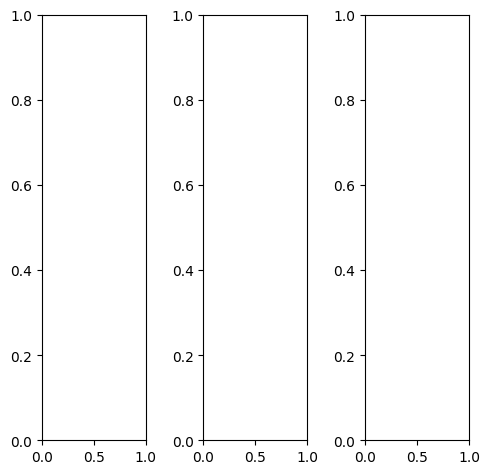

tensor([[[0.1255, 0.1294, 0.1294,  ..., 0.1216, 0.1255, 0.1255],
         [0.1255, 0.1294, 0.1333,  ..., 0.1255, 0.1294, 0.1333],
         [0.1294, 0.1333, 0.1333,  ..., 0.1294, 0.1333, 0.1373],
         ...,
         [0.5725, 0.4510, 0.1176,  ..., 0.7216, 0.7216, 0.7020],
         [0.5843, 0.4275, 0.1569,  ..., 0.7333, 0.7216, 0.6902],
         [0.5490, 0.5137, 0.4196,  ..., 0.7137, 0.6980, 0.6706]],

        [[0.1255, 0.1294, 0.1294,  ..., 0.1216, 0.1255, 0.1255],
         [0.1255, 0.1294, 0.1333,  ..., 0.1255, 0.1294, 0.1333],
         [0.1294, 0.1333, 0.1333,  ..., 0.1294, 0.1333, 0.1373],
         ...,
         [0.5725, 0.4510, 0.1176,  ..., 0.7216, 0.7216, 0.7020],
         [0.5843, 0.4275, 0.1569,  ..., 0.7333, 0.7216, 0.6902],
         [0.5490, 0.5137, 0.4196,  ..., 0.7137, 0.6980, 0.6706]],

        [[0.1255, 0.1294, 0.1294,  ..., 0.1216, 0.1255, 0.1255],
         [0.1255, 0.1294, 0.1333,  ..., 0.1255, 0.1294, 0.1333],
         [0.1294, 0.1333, 0.1333,  ..., 0.1294, 0.1333, 0.

tensor([[[0.1255, 0.1294, 0.1294,  ..., 0.1216, 0.1255, 0.1255],
         [0.1255, 0.1294, 0.1333,  ..., 0.1216, 0.1294, 0.1333],
         [0.1294, 0.1333, 0.1333,  ..., 0.1294, 0.1333, 0.1373],
         ...,
         [0.5451, 0.4235, 0.1059,  ..., 0.6902, 0.6902, 0.6706],
         [0.5529, 0.3961, 0.1412,  ..., 0.7020, 0.6902, 0.6627],
         [0.5176, 0.4784, 0.3922,  ..., 0.6824, 0.6667, 0.6392]],

        [[0.1294, 0.1333, 0.1333,  ..., 0.1255, 0.1294, 0.1294],
         [0.1294, 0.1333, 0.1373,  ..., 0.1294, 0.1333, 0.1373],
         [0.1333, 0.1373, 0.1373,  ..., 0.1333, 0.1373, 0.1412],
         ...,
         [0.5882, 0.4667, 0.1216,  ..., 0.7373, 0.7373, 0.7176],
         [0.6000, 0.4431, 0.1647,  ..., 0.7490, 0.7373, 0.7059],
         [0.5647, 0.5294, 0.4314,  ..., 0.7294, 0.7137, 0.6863]],

        [[0.1059, 0.1098, 0.1098,  ..., 0.1059, 0.1098, 0.1098],
         [0.1059, 0.1098, 0.1137,  ..., 0.1098, 0.1137, 0.1176],
         [0.1098, 0.1137, 0.1137,  ..., 0.1137, 0.1176, 0.

tensor([[[ 0.0117, -0.0167, -0.0813,  ...,  0.0898,  0.1061,  0.1564],
         [ 0.0656, -0.1681, -0.1474,  ...,  0.0548,  0.0572,  0.1168],
         [-0.1181, -0.1815, -0.2098,  ...,  0.0469,  0.0495,  0.1084],
         ...,
         [ 0.7418,  0.6493,  0.1710,  ...,  0.9149,  0.9203,  0.8825],
         [ 0.7426,  0.5772,  0.1950,  ...,  0.8860,  0.8980,  0.8578],
         [ 0.7006,  0.6896,  0.5200,  ...,  0.8818,  0.8647,  0.8363]],

        [[ 0.1224,  0.1401, -0.0506,  ...,  0.1611,  0.1677,  0.1980],
         [ 0.0852, -0.0929, -0.2546,  ...,  0.1589,  0.1769,  0.1812],
         [-0.0020,  0.0142, -0.1878,  ...,  0.1448,  0.1515,  0.1830],
         ...,
         [ 0.7339,  0.6448,  0.2084,  ...,  0.9377,  0.9455,  0.9371],
         [ 0.7338,  0.5858,  0.2263,  ...,  0.9528,  0.9462,  0.9030],
         [ 0.6679,  0.6811,  0.5270,  ...,  0.9053,  0.8806,  0.8517]],

        [[ 0.2633,  0.1378,  0.1981,  ...,  0.3047,  0.3224,  0.3438],
         [ 0.2681,  0.0700,  0.1793,  ...,  0

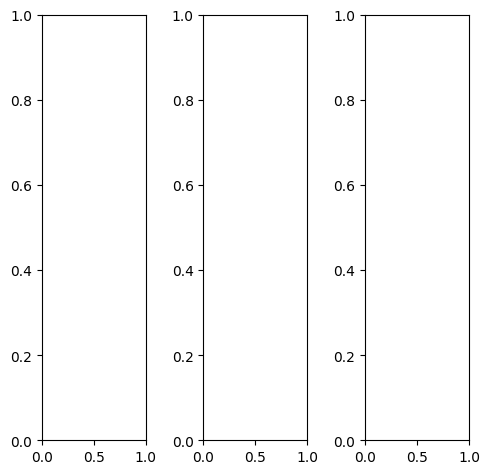

tensor([[[0.9451, 0.9294, 0.8627,  ..., 0.5647, 0.5216, 0.7137],
         [0.9020, 0.9176, 0.6667,  ..., 0.4000, 0.2980, 0.4431],
         [0.6588, 0.7255, 0.4902,  ..., 0.3255, 0.2392, 0.2196],
         ...,
         [0.6667, 0.6431, 0.6314,  ..., 0.4392, 0.3961, 0.3569],
         [0.6863, 0.6706, 0.6235,  ..., 0.5725, 0.5608, 0.5529],
         [0.6824, 0.6667, 0.6431,  ..., 0.5843, 0.5843, 0.5804]],

        [[0.9451, 0.9294, 0.8627,  ..., 0.5647, 0.5216, 0.7137],
         [0.9020, 0.9176, 0.6667,  ..., 0.4000, 0.2980, 0.4431],
         [0.6588, 0.7255, 0.4902,  ..., 0.3255, 0.2392, 0.2196],
         ...,
         [0.6667, 0.6431, 0.6314,  ..., 0.4392, 0.3961, 0.3569],
         [0.6863, 0.6706, 0.6235,  ..., 0.5725, 0.5608, 0.5529],
         [0.6824, 0.6667, 0.6431,  ..., 0.5843, 0.5843, 0.5804]],

        [[0.9451, 0.9294, 0.8627,  ..., 0.5647, 0.5216, 0.7137],
         [0.9020, 0.9176, 0.6667,  ..., 0.4000, 0.2980, 0.4431],
         [0.6588, 0.7255, 0.4902,  ..., 0.3255, 0.2392, 0.

tensor([[[0.8941, 0.8745, 0.8000,  ..., 0.5020, 0.4549, 0.6510],
         [0.8549, 0.8627, 0.6078,  ..., 0.3451, 0.2431, 0.3882],
         [0.6157, 0.6745, 0.4353,  ..., 0.2784, 0.1922, 0.1725],
         ...,
         [0.6863, 0.6627, 0.6510,  ..., 0.4392, 0.3961, 0.3569],
         [0.6980, 0.6784, 0.6353,  ..., 0.5725, 0.5647, 0.5529],
         [0.6941, 0.6784, 0.6549,  ..., 0.5922, 0.5922, 0.5882]],

        [[0.9647, 0.9490, 0.8863,  ..., 0.5961, 0.5451, 0.7333],
         [0.9176, 0.9412, 0.6941,  ..., 0.4353, 0.3255, 0.4627],
         [0.6784, 0.7529, 0.5216,  ..., 0.3608, 0.2667, 0.2431],
         ...,
         [0.6627, 0.6392, 0.6275,  ..., 0.4353, 0.3922, 0.3529],
         [0.6824, 0.6667, 0.6235,  ..., 0.5725, 0.5608, 0.5529],
         [0.6784, 0.6627, 0.6392,  ..., 0.5804, 0.5843, 0.5765]],

        [[0.9804, 0.9686, 0.9059,  ..., 0.5725, 0.5608, 0.7843],
         [0.9294, 0.9412, 0.6824,  ..., 0.3647, 0.3059, 0.4863],
         [0.6667, 0.7176, 0.4667,  ..., 0.2588, 0.2118, 0.

tensor([[[1.0875, 1.1363, 0.9434,  ..., 0.5708, 0.5166, 0.7405],
         [1.0792, 1.1442, 0.8098,  ..., 0.3877, 0.3015, 0.5619],
         [0.7577, 0.9448, 0.5463,  ..., 0.3267, 0.2412, 0.2783],
         ...,
         [0.8337, 0.8261, 0.7902,  ..., 0.5514, 0.5204, 0.5111],
         [0.8393, 0.8392, 0.7561,  ..., 0.6879, 0.6990, 0.7380],
         [0.8724, 0.8410, 0.7884,  ..., 0.7548, 0.7788, 0.7654]],

        [[1.0783, 1.1354, 0.9375,  ..., 0.6419, 0.6118, 0.7838],
         [1.0153, 1.0206, 0.7491,  ..., 0.4557, 0.3459, 0.6001],
         [0.8854, 0.9145, 0.6744,  ..., 0.4179, 0.3076, 0.3046],
         ...,
         [0.7852, 0.7915, 0.7803,  ..., 0.5575, 0.5318, 0.4739],
         [0.8091, 0.8149, 0.7462,  ..., 0.6892, 0.6936, 0.7183],
         [0.8036, 0.8011, 0.7642,  ..., 0.7097, 0.7427, 0.7290]],

        [[1.1486, 1.2858, 1.1372,  ..., 0.8387, 0.7813, 0.9603],
         [1.1804, 1.2751, 1.0062,  ..., 0.6103, 0.5337, 0.7872],
         [0.9301, 1.0095, 0.7686,  ..., 0.5952, 0.4804, 0.

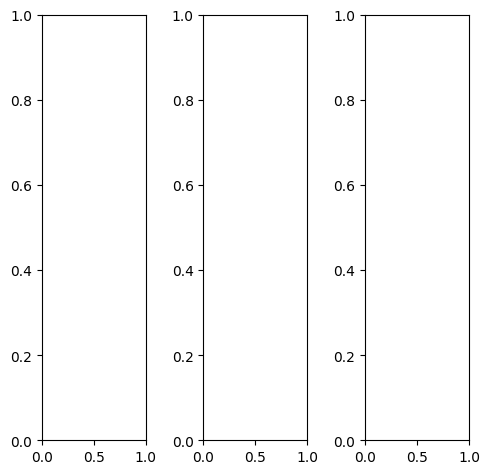

tensor([[[0.6078, 0.5961, 0.5961,  ..., 0.4941, 0.4941, 0.4902],
         [0.6118, 0.6000, 0.6039,  ..., 0.5020, 0.4980, 0.4980],
         [0.6196, 0.6039, 0.6078,  ..., 0.5137, 0.5059, 0.5059],
         ...,
         [0.4039, 0.4000, 0.4000,  ..., 0.3490, 0.3412, 0.3451],
         [0.3922, 0.3922, 0.3922,  ..., 0.3451, 0.3529, 0.3412],
         [0.3882, 0.3843, 0.3843,  ..., 0.3294, 0.3294, 0.3137]],

        [[0.6078, 0.5961, 0.5961,  ..., 0.4941, 0.4941, 0.4902],
         [0.6118, 0.6000, 0.6039,  ..., 0.5020, 0.4980, 0.4980],
         [0.6196, 0.6039, 0.6078,  ..., 0.5137, 0.5059, 0.5059],
         ...,
         [0.4039, 0.4000, 0.4000,  ..., 0.3490, 0.3412, 0.3451],
         [0.3922, 0.3922, 0.3922,  ..., 0.3451, 0.3529, 0.3412],
         [0.3882, 0.3843, 0.3843,  ..., 0.3294, 0.3294, 0.3137]],

        [[0.6078, 0.5961, 0.5961,  ..., 0.4941, 0.4941, 0.4902],
         [0.6118, 0.6000, 0.6039,  ..., 0.5020, 0.4980, 0.4980],
         [0.6196, 0.6039, 0.6078,  ..., 0.5137, 0.5059, 0.

tensor([[[0.5020, 0.4902, 0.4902,  ..., 0.3922, 0.3882, 0.3843],
         [0.5059, 0.4980, 0.4980,  ..., 0.3961, 0.3922, 0.3922],
         [0.5098, 0.4980, 0.5020,  ..., 0.4039, 0.4000, 0.4000],
         ...,
         [0.3765, 0.3725, 0.3686,  ..., 0.3098, 0.3020, 0.3059],
         [0.3608, 0.3608, 0.3608,  ..., 0.3059, 0.3137, 0.3020],
         [0.3569, 0.3529, 0.3529,  ..., 0.2902, 0.2902, 0.2745]],

        [[0.6157, 0.6039, 0.6039,  ..., 0.5020, 0.5020, 0.4980],
         [0.6235, 0.6078, 0.6118,  ..., 0.5098, 0.5059, 0.5059],
         [0.6275, 0.6118, 0.6157,  ..., 0.5216, 0.5137, 0.5137],
         ...,
         [0.4000, 0.3961, 0.3922,  ..., 0.3490, 0.3412, 0.3451],
         [0.3882, 0.3882, 0.3843,  ..., 0.3412, 0.3490, 0.3373],
         [0.3843, 0.3804, 0.3765,  ..., 0.3255, 0.3294, 0.3137]],

        [[0.8392, 0.8196, 0.8235,  ..., 0.7373, 0.7373, 0.7333],
         [0.8431, 0.8275, 0.8275,  ..., 0.7451, 0.7412, 0.7412],
         [0.8510, 0.8314, 0.8353,  ..., 0.7569, 0.7490, 0.

tensor([[[0.6478, 0.6211, 0.5282,  ..., 0.4001, 0.4293, 0.4939],
         [0.6419, 0.6022, 0.6226,  ..., 0.4216, 0.4250, 0.4857],
         [0.5924, 0.6511, 0.5162,  ..., 0.4433, 0.4587, 0.5023],
         ...,
         [0.4375, 0.4877, 0.4997,  ..., 0.3807, 0.3563, 0.3762],
         [0.4283, 0.4419, 0.4728,  ..., 0.3484, 0.3679, 0.3602],
         [0.4266, 0.4251, 0.4297,  ..., 0.3147, 0.3124, 0.3496]],

        [[0.7429, 0.6448, 0.6206,  ..., 0.4687, 0.5201, 0.5133],
         [0.6128, 0.5979, 0.5811,  ..., 0.5253, 0.5465, 0.5458],
         [0.7305, 0.6723, 0.6750,  ..., 0.5471, 0.5623, 0.5502],
         ...,
         [0.3751, 0.4150, 0.4407,  ..., 0.3485, 0.3388, 0.3174],
         [0.3749, 0.4070, 0.4168,  ..., 0.3277, 0.3445, 0.3104],
         [0.3756, 0.3721, 0.3798,  ..., 0.2931, 0.2934, 0.2971]],

        [[0.8359, 0.7647, 0.8368,  ..., 0.6169, 0.6525, 0.6605],
         [0.8017, 0.8351, 0.8427,  ..., 0.6423, 0.6797, 0.6903],
         [0.7770, 0.7962, 0.8363,  ..., 0.6823, 0.6898, 0.

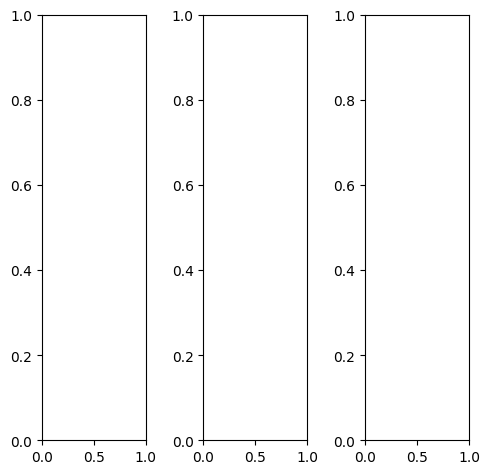

EPOCH: 25.510  trn_loss: 0.004  (3098.00s - 9046.16s remaining)

tensor([[[0.5882, 0.6706, 0.5216,  ..., 0.1686, 0.1843, 0.1647],
         [0.4431, 0.5255, 0.5451,  ..., 0.1490, 0.1647, 0.1529],
         [0.4078, 0.4353, 0.3686,  ..., 0.1490, 0.1490, 0.1412],
         ...,
         [0.5020, 0.4941, 0.4745,  ..., 0.3961, 0.4157, 0.4235],
         [0.4745, 0.4745, 0.4667,  ..., 0.2549, 0.2863, 0.3176],
         [0.4902, 0.5216, 0.5020,  ..., 0.2196, 0.2471, 0.2902]],

        [[0.5882, 0.6706, 0.5216,  ..., 0.1686, 0.1843, 0.1647],
         [0.4431, 0.5255, 0.5451,  ..., 0.1490, 0.1647, 0.1529],
         [0.4078, 0.4353, 0.3686,  ..., 0.1490, 0.1490, 0.1412],
         ...,
         [0.5020, 0.4941, 0.4745,  ..., 0.3961, 0.4157, 0.4235],
         [0.4745, 0.4745, 0.4667,  ..., 0.2549, 0.2863, 0.3176],
         [0.4902, 0.5216, 0.5020,  ..., 0.2196, 0.2471, 0.2902]],

        [[0.5882, 0.6706, 0.5216,  ..., 0.1686, 0.1843, 0.1647],
         [0.4431, 0.5255, 0.5451,  ..., 0.1490, 0.1647, 0.1529],
         [0.4078, 0.4353, 0.3686,  ..., 0.1490, 0.1490, 0.

tensor([[[0.6000, 0.7020, 0.5373,  ..., 0.1922, 0.2157, 0.2078],
         [0.4235, 0.5255, 0.5412,  ..., 0.1804, 0.2039, 0.2039],
         [0.3686, 0.4039, 0.3490,  ..., 0.1882, 0.1961, 0.1961],
         ...,
         [0.6314, 0.6196, 0.6000,  ..., 0.4980, 0.5255, 0.5412],
         [0.5882, 0.6000, 0.6039,  ..., 0.3333, 0.3686, 0.4157],
         [0.5843, 0.6353, 0.6392,  ..., 0.2824, 0.3137, 0.3686]],

        [[0.6157, 0.6863, 0.5412,  ..., 0.1686, 0.1804, 0.1569],
         [0.4902, 0.5647, 0.5804,  ..., 0.1451, 0.1608, 0.1412],
         [0.4667, 0.4902, 0.4118,  ..., 0.1412, 0.1373, 0.1255],
         ...,
         [0.4745, 0.4627, 0.4431,  ..., 0.3804, 0.3961, 0.4000],
         [0.4588, 0.4549, 0.4392,  ..., 0.2431, 0.2706, 0.2980],
         [0.4941, 0.5137, 0.4863,  ..., 0.2118, 0.2353, 0.2745]],

        [[0.4118, 0.5098, 0.3647,  ..., 0.0941, 0.1137, 0.0941],
         [0.2392, 0.3333, 0.3725,  ..., 0.0784, 0.0941, 0.0824],
         [0.1961, 0.2235, 0.1961,  ..., 0.0784, 0.0784, 0.

tensor([[[0.7964, 0.8022, 0.6534,  ..., 0.1489, 0.1745, 0.1711],
         [0.5473, 0.6302, 0.6338,  ..., 0.1081, 0.1217, 0.1315],
         [0.4548, 0.5605, 0.3318,  ..., 0.0805, 0.0915, 0.1065],
         ...,
         [0.7170, 0.7263, 0.7158,  ..., 0.5900, 0.6179, 0.5983],
         [0.6555, 0.6600, 0.6616,  ..., 0.3175, 0.3950, 0.4365],
         [0.6666, 0.7200, 0.6914,  ..., 0.2625, 0.3187, 0.3883]],

        [[0.8488, 0.9122, 0.7193,  ..., 0.1765, 0.1858, 0.1579],
         [0.5813, 0.7559, 0.7175,  ..., 0.1502, 0.1604, 0.1332],
         [0.5820, 0.6081, 0.4901,  ..., 0.1268, 0.1108, 0.0960],
         ...,
         [0.6834, 0.7168, 0.7207,  ..., 0.5585, 0.5932, 0.5533],
         [0.6347, 0.6518, 0.6771,  ..., 0.3281, 0.3897, 0.4033],
         [0.6204, 0.7055, 0.7036,  ..., 0.2098, 0.2781, 0.3316]],

        [[0.9147, 1.0016, 0.8735,  ..., 0.2099, 0.2314, 0.2344],
         [0.7139, 0.8942, 0.8694,  ..., 0.1694, 0.2043, 0.1921],
         [0.6435, 0.6513, 0.5690,  ..., 0.1541, 0.1572, 0.

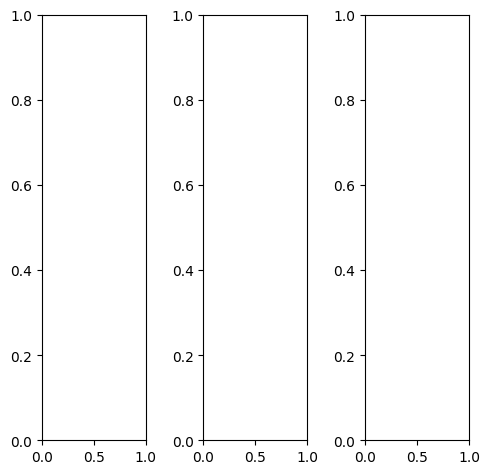

tensor([[[0.0275, 0.0314, 0.0353,  ..., 0.1255, 0.1451, 0.1373],
         [0.0275, 0.0196, 0.0196,  ..., 0.1569, 0.1725, 0.1569],
         [0.0667, 0.0314, 0.0196,  ..., 0.1412, 0.1647, 0.1608],
         ...,
         [0.1373, 0.1412, 0.1490,  ..., 0.9451, 0.9490, 0.9529],
         [0.2510, 0.2588, 0.2784,  ..., 0.8863, 0.8745, 0.8784],
         [0.2667, 0.2706, 0.2902,  ..., 0.9412, 0.9098, 0.8941]],

        [[0.0275, 0.0314, 0.0353,  ..., 0.1255, 0.1451, 0.1373],
         [0.0275, 0.0196, 0.0196,  ..., 0.1569, 0.1725, 0.1569],
         [0.0667, 0.0314, 0.0196,  ..., 0.1412, 0.1647, 0.1608],
         ...,
         [0.1373, 0.1412, 0.1490,  ..., 0.9451, 0.9490, 0.9529],
         [0.2510, 0.2588, 0.2784,  ..., 0.8863, 0.8745, 0.8784],
         [0.2667, 0.2706, 0.2902,  ..., 0.9412, 0.9098, 0.8941]],

        [[0.0275, 0.0314, 0.0353,  ..., 0.1255, 0.1451, 0.1373],
         [0.0275, 0.0196, 0.0196,  ..., 0.1569, 0.1725, 0.1569],
         [0.0667, 0.0314, 0.0196,  ..., 0.1412, 0.1647, 0.

tensor([[[0.0667, 0.0902, 0.1098,  ..., 0.1804, 0.1922, 0.1961],
         [0.0510, 0.0588, 0.0667,  ..., 0.2314, 0.2275, 0.2078],
         [0.0902, 0.0627, 0.0549,  ..., 0.2471, 0.2353, 0.2078],
         ...,
         [0.1098, 0.1098, 0.1216,  ..., 0.8588, 0.8627, 0.8784],
         [0.2118, 0.2196, 0.2353,  ..., 0.7804, 0.7451, 0.7451],
         [0.2118, 0.2196, 0.2431,  ..., 0.8392, 0.7843, 0.7725]],

        [[0.0118, 0.0078, 0.0039,  ..., 0.1137, 0.1333, 0.1216],
         [0.0196, 0.0039, 0.0000,  ..., 0.1373, 0.1569, 0.1490],
         [0.0588, 0.0196, 0.0039,  ..., 0.1020, 0.1412, 0.1490],
         ...,
         [0.1451, 0.1451, 0.1529,  ..., 0.9804, 0.9843, 0.9843],
         [0.2667, 0.2706, 0.2902,  ..., 0.9294, 0.9216, 0.9255],
         [0.2863, 0.2902, 0.3059,  ..., 0.9843, 0.9569, 0.9373]],

        [[0.0118, 0.0118, 0.0118,  ..., 0.0471, 0.0667, 0.0510],
         [0.0157, 0.0039, 0.0039,  ..., 0.0745, 0.0941, 0.0745],
         [0.0510, 0.0118, 0.0039,  ..., 0.0627, 0.0941, 0.

tensor([[[-0.0284, -0.0343, -0.0812,  ...,  0.0600,  0.0928,  0.1452],
         [ 0.0197, -0.1292, -0.0692,  ...,  0.0724,  0.0833,  0.1166],
         [-0.1306, -0.0951, -0.1573,  ...,  0.0332,  0.0739,  0.1171],
         ...,
         [ 0.1016,  0.1360,  0.1580,  ...,  0.9019,  0.9272,  0.9813],
         [ 0.2272,  0.2274,  0.2819,  ...,  0.8073,  0.8224,  0.9025],
         [ 0.3005,  0.2693,  0.2847,  ...,  0.9950,  0.9576,  0.9498]],

        [[ 0.0585,  0.1255, -0.0412,  ...,  0.1517,  0.1675,  0.2030],
         [ 0.0594, -0.1115, -0.1570,  ...,  0.1836,  0.2122,  0.1882],
         [-0.0372,  0.0911, -0.1304,  ...,  0.1379,  0.1812,  0.2024],
         ...,
         [ 0.1425,  0.1388,  0.1613,  ...,  0.8772,  0.9119,  0.9943],
         [ 0.2669,  0.2544,  0.2897,  ...,  0.8190,  0.8290,  0.8997],
         [ 0.3051,  0.2802,  0.3138,  ...,  0.9795,  0.9523,  0.9261]],

        [[ 0.2591,  0.0680,  0.1620,  ...,  0.3258,  0.3560,  0.3722],
         [ 0.2213,  0.0578,  0.1591,  ...,  0

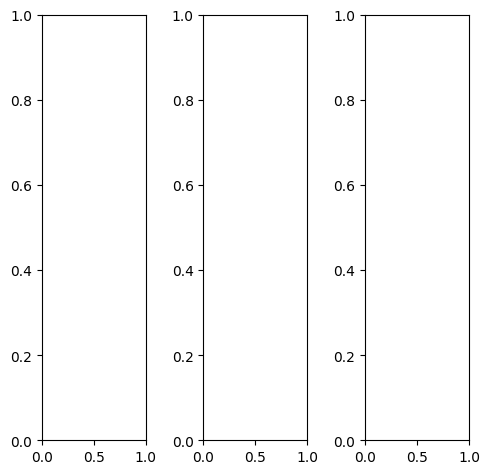

tensor([[[0.2784, 0.2745, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2784, 0.2706, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2902, 0.2784, 0.2784,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.7333, 0.6824, 0.6392,  ..., 0.7529, 0.7608, 0.7647],
         [0.6353, 0.5882, 0.5961,  ..., 0.7529, 0.7569, 0.7647],
         [0.5137, 0.4549, 0.5294,  ..., 0.7176, 0.7412, 0.7569]],

        [[0.2784, 0.2745, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2784, 0.2706, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2902, 0.2784, 0.2784,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.7333, 0.6824, 0.6392,  ..., 0.7529, 0.7608, 0.7647],
         [0.6353, 0.5882, 0.5961,  ..., 0.7529, 0.7569, 0.7647],
         [0.5137, 0.4549, 0.5294,  ..., 0.7176, 0.7412, 0.7569]],

        [[0.2784, 0.2745, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2784, 0.2706, 0.2745,  ..., 0.2863, 0.2863, 0.2902],
         [0.2902, 0.2784, 0.2784,  ..., 0.2941, 0.2941, 0.

tensor([[[0.1137, 0.1098, 0.1098,  ..., 0.1255, 0.1255, 0.1255],
         [0.1137, 0.1098, 0.1098,  ..., 0.1216, 0.1216, 0.1255],
         [0.1216, 0.1137, 0.1137,  ..., 0.1294, 0.1294, 0.1333],
         ...,
         [0.7098, 0.6471, 0.5922,  ..., 0.7765, 0.7843, 0.7882],
         [0.6000, 0.5451, 0.5451,  ..., 0.7647, 0.7725, 0.7804],
         [0.4667, 0.4078, 0.4784,  ..., 0.7137, 0.7412, 0.7569]],

        [[0.3294, 0.3255, 0.3255,  ..., 0.3373, 0.3373, 0.3412],
         [0.3294, 0.3216, 0.3255,  ..., 0.3373, 0.3373, 0.3412],
         [0.3412, 0.3294, 0.3294,  ..., 0.3451, 0.3451, 0.3490],
         ...,
         [0.7490, 0.7020, 0.6667,  ..., 0.7490, 0.7529, 0.7608],
         [0.6510, 0.6078, 0.6196,  ..., 0.7490, 0.7529, 0.7608],
         [0.5333, 0.4784, 0.5529,  ..., 0.7216, 0.7412, 0.7569]],

        [[0.4510, 0.4431, 0.4471,  ..., 0.4588, 0.4588, 0.4667],
         [0.4510, 0.4431, 0.4431,  ..., 0.4588, 0.4588, 0.4627],
         [0.4627, 0.4510, 0.4510,  ..., 0.4667, 0.4667, 0.

tensor([[[ 0.1980,  0.1659,  0.0626,  ...,  0.2268,  0.2348,  0.2918],
         [ 0.2419,  0.0230,  0.0528,  ...,  0.1879,  0.1847,  0.2483],
         [ 0.1373,  0.0303, -0.0204,  ...,  0.2003,  0.2033,  0.2587],
         ...,
         [ 0.8839,  0.8369,  0.7382,  ...,  0.8777,  0.9162,  0.9498],
         [ 0.7816,  0.6904,  0.6862,  ...,  0.8469,  0.8725,  0.9532],
         [ 0.6491,  0.5507,  0.6403,  ...,  0.8592,  0.9101,  0.9296]],

        [[ 0.2450,  0.2861,  0.0528,  ...,  0.2719,  0.2889,  0.3226],
         [ 0.2542,  0.0783, -0.1022,  ...,  0.2635,  0.2749,  0.2791],
         [ 0.1856,  0.1354, -0.0988,  ...,  0.2681,  0.2704,  0.2914],
         ...,
         [ 0.8609,  0.7973,  0.7400,  ...,  0.8672,  0.8951,  0.9574],
         [ 0.7367,  0.6520,  0.6671,  ...,  0.8498,  0.8622,  0.9467],
         [ 0.6063,  0.5119,  0.6124,  ...,  0.8479,  0.8913,  0.9113]],

        [[ 0.3690,  0.2362,  0.2263,  ...,  0.3331,  0.3537,  0.4018],
         [ 0.3373,  0.1178,  0.2037,  ...,  0

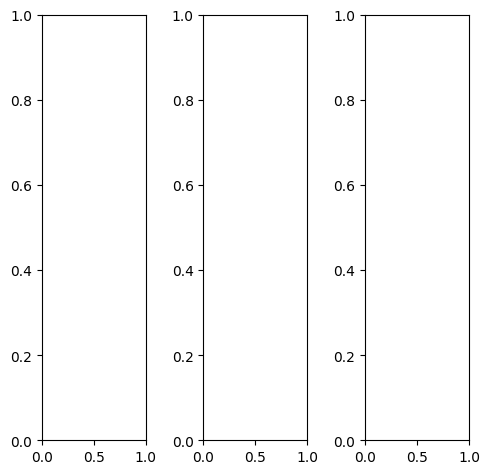

tensor([[[0.3216, 0.4078, 0.4627,  ..., 0.2588, 0.4078, 0.3490],
         [0.2902, 0.3490, 0.4588,  ..., 0.3529, 0.4078, 0.3529],
         [0.2863, 0.3333, 0.4627,  ..., 0.3490, 0.3529, 0.3059],
         ...,
         [0.5647, 0.5765, 0.5882,  ..., 0.5569, 0.5569, 0.5569],
         [0.5686, 0.5725, 0.5804,  ..., 0.5686, 0.5686, 0.5647],
         [0.5490, 0.5490, 0.5529,  ..., 0.5608, 0.5569, 0.5569]],

        [[0.3216, 0.4078, 0.4627,  ..., 0.2588, 0.4078, 0.3490],
         [0.2902, 0.3490, 0.4588,  ..., 0.3529, 0.4078, 0.3529],
         [0.2863, 0.3333, 0.4627,  ..., 0.3490, 0.3529, 0.3059],
         ...,
         [0.5647, 0.5765, 0.5882,  ..., 0.5569, 0.5569, 0.5569],
         [0.5686, 0.5725, 0.5804,  ..., 0.5686, 0.5686, 0.5647],
         [0.5490, 0.5490, 0.5529,  ..., 0.5608, 0.5569, 0.5569]],

        [[0.3216, 0.4078, 0.4627,  ..., 0.2588, 0.4078, 0.3490],
         [0.2902, 0.3490, 0.4588,  ..., 0.3529, 0.4078, 0.3529],
         [0.2863, 0.3333, 0.4627,  ..., 0.3490, 0.3529, 0.

tensor([[[0.3059, 0.3882, 0.4549,  ..., 0.2392, 0.3804, 0.3255],
         [0.2784, 0.3333, 0.4667,  ..., 0.3255, 0.3725, 0.3255],
         [0.2784, 0.3255, 0.4902,  ..., 0.3176, 0.3176, 0.2745],
         ...,
         [0.5647, 0.5765, 0.5882,  ..., 0.5451, 0.5451, 0.5451],
         [0.5686, 0.5725, 0.5804,  ..., 0.5569, 0.5569, 0.5529],
         [0.5490, 0.5490, 0.5529,  ..., 0.5490, 0.5490, 0.5451]],

        [[0.3333, 0.4196, 0.4706,  ..., 0.2706, 0.4235, 0.3608],
         [0.3020, 0.3569, 0.4588,  ..., 0.3647, 0.4235, 0.3686],
         [0.2941, 0.3373, 0.4510,  ..., 0.3608, 0.3686, 0.3216],
         ...,
         [0.5647, 0.5765, 0.5882,  ..., 0.5608, 0.5608, 0.5608],
         [0.5686, 0.5725, 0.5804,  ..., 0.5725, 0.5725, 0.5686],
         [0.5490, 0.5490, 0.5529,  ..., 0.5647, 0.5608, 0.5608]],

        [[0.2941, 0.4039, 0.4588,  ..., 0.2588, 0.4078, 0.3451],
         [0.2627, 0.3373, 0.4471,  ..., 0.3529, 0.4078, 0.3569],
         [0.2588, 0.3176, 0.4392,  ..., 0.3569, 0.3608, 0.

tensor([[[0.1414, 0.2066, 0.2535,  ..., 0.1641, 0.3325, 0.3075],
         [0.1321, 0.1226, 0.2681,  ..., 0.2685, 0.3401, 0.2873],
         [0.0040, 0.0971, 0.2037,  ..., 0.2550, 0.2730, 0.2284],
         ...,
         [0.5524, 0.5587, 0.5595,  ..., 0.5836, 0.5990, 0.6120],
         [0.5657, 0.5590, 0.5599,  ..., 0.5956, 0.6094, 0.6074],
         [0.5646, 0.5483, 0.5330,  ..., 0.6010, 0.5921, 0.5917]],

        [[0.2673, 0.3137, 0.3775,  ..., 0.1855, 0.3871, 0.3321],
         [0.1754, 0.2086, 0.2487,  ..., 0.3338, 0.4374, 0.3145],
         [0.1246, 0.2082, 0.3301,  ..., 0.3286, 0.3408, 0.2453],
         ...,
         [0.5484, 0.5640, 0.5902,  ..., 0.6159, 0.6195, 0.5859],
         [0.5547, 0.5526, 0.5860,  ..., 0.6108, 0.6186, 0.5993],
         [0.5408, 0.5400, 0.5415,  ..., 0.5850, 0.5928, 0.5721]],

        [[0.4112, 0.3287, 0.5740,  ..., 0.2910, 0.4784, 0.4308],
         [0.3648, 0.3944, 0.5364,  ..., 0.4194, 0.5141, 0.4079],
         [0.2611, 0.3086, 0.5949,  ..., 0.4035, 0.4205, 0.

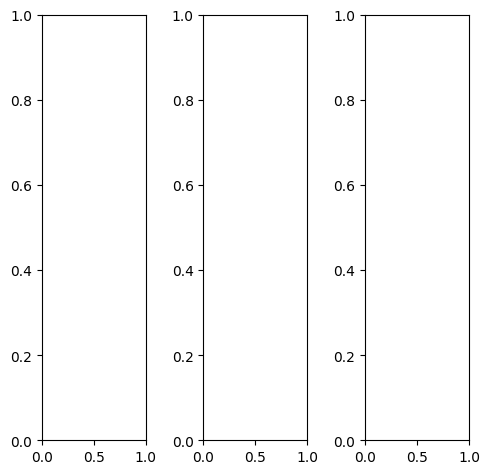

tensor([[[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.5569],
         ...,
         [0.4941, 0.3804, 0.4000,  ..., 0.6000, 0.4941, 0.5216],
         [0.4549, 0.3608, 0.3804,  ..., 0.5412, 0.4510, 0.4863],
         [0.4314, 0.3882, 0.4078,  ..., 0.4745, 0.4549, 0.4902]],

        [[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.5569],
         ...,
         [0.4941, 0.3804, 0.4000,  ..., 0.6000, 0.4941, 0.5216],
         [0.4549, 0.3608, 0.3804,  ..., 0.5412, 0.4510, 0.4863],
         [0.4314, 0.3882, 0.4078,  ..., 0.4745, 0.4549, 0.4902]],

        [[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.

tensor([[[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.5569],
         ...,
         [0.4941, 0.3804, 0.4000,  ..., 0.6000, 0.4941, 0.5216],
         [0.4549, 0.3608, 0.3804,  ..., 0.5412, 0.4510, 0.4863],
         [0.4314, 0.3882, 0.4078,  ..., 0.4745, 0.4549, 0.4902]],

        [[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.5569],
         ...,
         [0.4941, 0.3804, 0.4000,  ..., 0.6000, 0.4941, 0.5216],
         [0.4549, 0.3608, 0.3804,  ..., 0.5412, 0.4510, 0.4863],
         [0.4314, 0.3882, 0.4078,  ..., 0.4745, 0.4549, 0.4902]],

        [[0.6510, 0.6510, 0.6588,  ..., 0.6235, 0.5647, 0.5490],
         [0.5804, 0.5961, 0.6118,  ..., 0.5686, 0.5686, 0.5412],
         [0.5686, 0.5608, 0.5686,  ..., 0.5333, 0.5922, 0.

tensor([[[0.5326, 0.4982, 0.5256,  ..., 0.3992, 0.2979, 0.3239],
         [0.4544, 0.3001, 0.4270,  ..., 0.3705, 0.3217, 0.2474],
         [0.4014, 0.4012, 0.3025,  ..., 0.3281, 0.4062, 0.2818],
         ...,
         [0.4004, 0.3089, 0.3630,  ..., 0.5906, 0.4338, 0.4218],
         [0.3210, 0.2373, 0.2918,  ..., 0.4713, 0.3505, 0.3642],
         [0.2378, 0.1761, 0.1953,  ..., 0.2924, 0.2685, 0.3176]],

        [[0.6283, 0.5822, 0.6682,  ..., 0.5624, 0.4941, 0.4174],
         [0.4635, 0.4078, 0.4598,  ..., 0.5391, 0.5221, 0.4189],
         [0.5074, 0.4852, 0.4867,  ..., 0.4695, 0.5697, 0.4394],
         ...,
         [0.3681, 0.2890, 0.3338,  ..., 0.5620, 0.4351, 0.3580],
         [0.3110, 0.2289, 0.2747,  ..., 0.4853, 0.3699, 0.3284],
         [0.2288, 0.1696, 0.1944,  ..., 0.2755, 0.2529, 0.2678]],

        [[0.7763, 0.7102, 0.7918,  ..., 0.8361, 0.7398, 0.6748],
         [0.6723, 0.6494, 0.6462,  ..., 0.8071, 0.7820, 0.6815],
         [0.6258, 0.6049, 0.5571,  ..., 0.7384, 0.8554, 0.

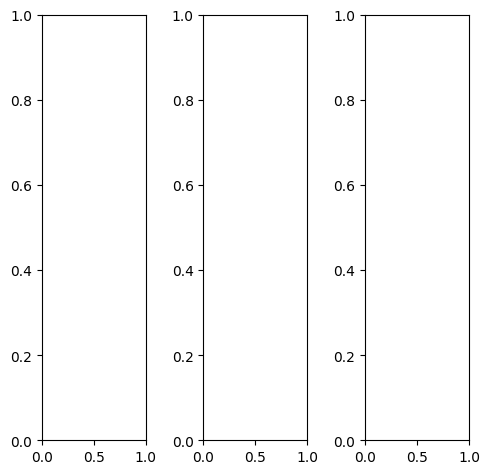

EPOCH: 25.765  trn_loss: 0.005  (3127.83s - 9011.86s remaining)

tensor([[[0.7529, 0.7529, 0.7608,  ..., 0.7176, 0.7255, 0.7176],
         [0.7176, 0.7137, 0.7373,  ..., 0.7137, 0.7059, 0.6824],
         [0.7294, 0.7373, 0.7373,  ..., 0.7412, 0.7490, 0.7294],
         ...,
         [0.6549, 0.6706, 0.6745,  ..., 0.6549, 0.6431, 0.6510],
         [0.6431, 0.6627, 0.6941,  ..., 0.6510, 0.6549, 0.6510],
         [0.5804, 0.5882, 0.6275,  ..., 0.6314, 0.6392, 0.6392]],

        [[0.7529, 0.7529, 0.7608,  ..., 0.7176, 0.7255, 0.7176],
         [0.7176, 0.7137, 0.7373,  ..., 0.7137, 0.7059, 0.6824],
         [0.7294, 0.7373, 0.7373,  ..., 0.7412, 0.7490, 0.7294],
         ...,
         [0.6549, 0.6706, 0.6745,  ..., 0.6549, 0.6431, 0.6510],
         [0.6431, 0.6627, 0.6941,  ..., 0.6510, 0.6549, 0.6510],
         [0.5804, 0.5882, 0.6275,  ..., 0.6314, 0.6392, 0.6392]],

        [[0.7529, 0.7529, 0.7608,  ..., 0.7176, 0.7255, 0.7176],
         [0.7176, 0.7137, 0.7373,  ..., 0.7137, 0.7059, 0.6824],
         [0.7294, 0.7373, 0.7373,  ..., 0.7412, 0.7490, 0.

tensor([[[0.8627, 0.8667, 0.8706,  ..., 0.8314, 0.8392, 0.8314],
         [0.8431, 0.8353, 0.8588,  ..., 0.8235, 0.8157, 0.7961],
         [0.8471, 0.8549, 0.8588,  ..., 0.8549, 0.8588, 0.8471],
         ...,
         [0.7804, 0.7922, 0.7961,  ..., 0.7882, 0.7725, 0.7725],
         [0.7608, 0.7843, 0.8196,  ..., 0.7804, 0.7765, 0.7725],
         [0.6863, 0.6980, 0.7373,  ..., 0.7490, 0.7529, 0.7529]],

        [[0.7333, 0.7333, 0.7412,  ..., 0.6941, 0.7020, 0.6980],
         [0.6941, 0.6902, 0.7137,  ..., 0.6941, 0.6863, 0.6627],
         [0.7098, 0.7137, 0.7137,  ..., 0.7216, 0.7294, 0.7059],
         ...,
         [0.6314, 0.6471, 0.6510,  ..., 0.6314, 0.6196, 0.6275],
         [0.6196, 0.6431, 0.6745,  ..., 0.6275, 0.6314, 0.6275],
         [0.5608, 0.5686, 0.6078,  ..., 0.6078, 0.6157, 0.6196]],

        [[0.5608, 0.5647, 0.5765,  ..., 0.5294, 0.5412, 0.5294],
         [0.5176, 0.5098, 0.5373,  ..., 0.5373, 0.5216, 0.5020],
         [0.5333, 0.5333, 0.5294,  ..., 0.5529, 0.5529, 0.

tensor([[[ 0.2857,  0.1751,  0.1398,  ...,  0.2250,  0.2757,  0.2585],
         [ 0.2275, -0.0312,  0.0183,  ...,  0.1865,  0.2095,  0.1675],
         [ 0.1605,  0.0354, -0.0246,  ...,  0.2537,  0.2656,  0.2553],
         ...,
         [ 0.3522,  0.4801,  0.4421,  ...,  0.5408,  0.4769,  0.4200],
         [ 0.3748,  0.4609,  0.5533,  ...,  0.5008,  0.4825,  0.4054],
         [ 0.2691,  0.2636,  0.3235,  ...,  0.3539,  0.3553,  0.3378]],

        [[ 0.4375,  0.3103,  0.4450,  ...,  0.3547,  0.4477,  0.3581],
         [ 0.2510,  0.0846,  0.0843,  ...,  0.3859,  0.4304,  0.3011],
         [ 0.3424,  0.1804,  0.2989,  ...,  0.4228,  0.4999,  0.3596],
         ...,
         [ 0.2947,  0.4286,  0.4318,  ...,  0.5071,  0.4751,  0.3690],
         [ 0.3231,  0.4577,  0.5410,  ...,  0.4913,  0.4892,  0.3877],
         [ 0.2161,  0.2408,  0.2898,  ...,  0.3201,  0.3475,  0.2886]],

        [[ 0.6363,  0.4174,  0.5684,  ...,  0.5880,  0.6393,  0.5734],
         [ 0.4969,  0.3946,  0.3446,  ...,  0

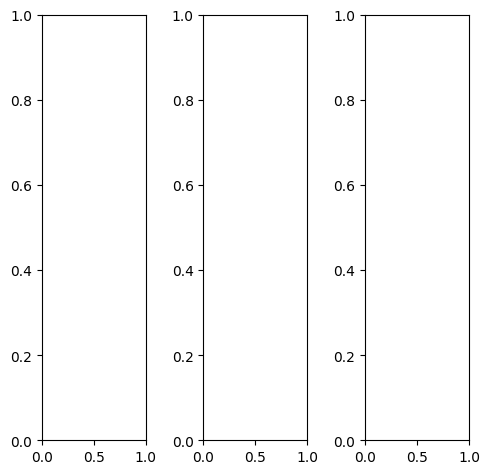

tensor([[[0.2627, 0.2549, 0.2549,  ..., 0.8627, 0.8235, 0.7647],
         [0.2549, 0.2431, 0.2392,  ..., 0.7216, 0.8510, 0.8314],
         [0.2510, 0.2353, 0.2196,  ..., 0.6471, 0.7137, 0.8471],
         ...,
         [0.9216, 0.9020, 0.8824,  ..., 0.6000, 0.4039, 0.2863],
         [0.9137, 0.8863, 0.8784,  ..., 0.6941, 0.4980, 0.4549],
         [0.8902, 0.8863, 0.9255,  ..., 0.7490, 0.6980, 0.8196]],

        [[0.2627, 0.2549, 0.2549,  ..., 0.8627, 0.8235, 0.7647],
         [0.2549, 0.2431, 0.2392,  ..., 0.7216, 0.8510, 0.8314],
         [0.2510, 0.2353, 0.2196,  ..., 0.6471, 0.7137, 0.8471],
         ...,
         [0.9216, 0.9020, 0.8824,  ..., 0.6000, 0.4039, 0.2863],
         [0.9137, 0.8863, 0.8784,  ..., 0.6941, 0.4980, 0.4549],
         [0.8902, 0.8863, 0.9255,  ..., 0.7490, 0.6980, 0.8196]],

        [[0.2627, 0.2549, 0.2549,  ..., 0.8627, 0.8235, 0.7647],
         [0.2549, 0.2431, 0.2392,  ..., 0.7216, 0.8510, 0.8314],
         [0.2510, 0.2353, 0.2196,  ..., 0.6471, 0.7137, 0.

tensor([[[0.6314, 0.6000, 0.5961,  ..., 0.8000, 0.7373, 0.6431],
         [0.6039, 0.5529, 0.5255,  ..., 0.6902, 0.8039, 0.7412],
         [0.5843, 0.5176, 0.4667,  ..., 0.6000, 0.6549, 0.7843],
         ...,
         [1.0000, 0.9804, 0.9608,  ..., 0.7412, 0.5255, 0.3765],
         [0.9961, 0.9647, 0.9529,  ..., 0.8667, 0.6588, 0.5647],
         [0.9843, 0.9647, 0.9922,  ..., 0.9216, 0.8471, 0.8784]],

        [[0.1020, 0.1020, 0.1020,  ..., 0.8941, 0.8549, 0.8039],
         [0.1020, 0.1059, 0.1098,  ..., 0.7451, 0.8784, 0.8667],
         [0.1020, 0.1059, 0.1098,  ..., 0.6745, 0.7490, 0.8824],
         ...,
         [0.9216, 0.9059, 0.8902,  ..., 0.5804, 0.3804, 0.2667],
         [0.9098, 0.8902, 0.8863,  ..., 0.6745, 0.4745, 0.4392],
         [0.8863, 0.8902, 0.9373,  ..., 0.7333, 0.6863, 0.8314]],

        [[0.1294, 0.1490, 0.1529,  ..., 0.8824, 0.8980, 0.8863],
         [0.1333, 0.1490, 0.1490,  ..., 0.6902, 0.8353, 0.8863],
         [0.1373, 0.1490, 0.1412,  ..., 0.6196, 0.6784, 0.

tensor([[[ 0.1327,  0.0984,  0.0052,  ...,  0.6911,  0.6630,  0.6763],
         [ 0.1942, -0.0544,  0.0052,  ...,  0.4817,  0.6428,  0.6835],
         [ 0.0208, -0.0303, -0.0981,  ...,  0.4428,  0.5286,  0.6907],
         ...,
         [ 0.8657,  0.8059,  0.7720,  ...,  0.6085,  0.4819,  0.3737],
         [ 0.8371,  0.7664,  0.7482,  ...,  0.6790,  0.4861,  0.4905],
         [ 0.8350,  0.8270,  0.8458,  ...,  0.7428,  0.6928,  0.7634]],

        [[ 0.2216,  0.2713,  0.0980,  ...,  0.8094,  0.8015,  0.7724],
         [ 0.2325,  0.0409, -0.1106,  ...,  0.6365,  0.7747,  0.7999],
         [ 0.1425,  0.1126, -0.0443,  ...,  0.5778,  0.6518,  0.8004],
         ...,
         [ 0.8290,  0.7670,  0.7625,  ...,  0.5869,  0.4544,  0.3027],
         [ 0.8238,  0.7470,  0.7513,  ...,  0.6590,  0.4814,  0.4644],
         [ 0.7921,  0.7990,  0.8271,  ...,  0.7057,  0.6598,  0.7226]],

        [[ 0.3744,  0.2465,  0.2327,  ...,  1.0402,  1.0048,  0.9386],
         [ 0.3567,  0.1371,  0.2477,  ...,  0

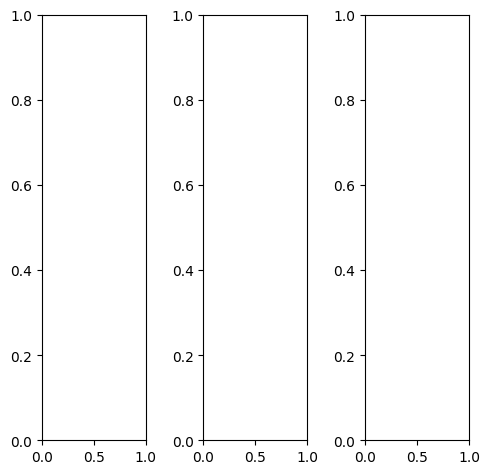

tensor([[[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.5216],
         ...,
         [0.1608, 0.2039, 0.3765,  ..., 0.2157, 0.4000, 0.3843],
         [0.3804, 0.3725, 0.4000,  ..., 0.3333, 0.4549, 0.3922],
         [0.4275, 0.4431, 0.4039,  ..., 0.3843, 0.4863, 0.4235]],

        [[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.5216],
         ...,
         [0.1608, 0.2039, 0.3765,  ..., 0.2157, 0.4000, 0.3843],
         [0.3804, 0.3725, 0.4000,  ..., 0.3333, 0.4549, 0.3922],
         [0.4275, 0.4431, 0.4039,  ..., 0.3843, 0.4863, 0.4235]],

        [[0.4706, 0.4392, 0.4784,  ..., 0.3843, 0.4784, 0.4902],
         [0.4549, 0.4588, 0.5176,  ..., 0.4941, 0.5216, 0.5098],
         [0.4431, 0.4863, 0.5569,  ..., 0.5373, 0.5294, 0.

tensor([[[0.4980, 0.4353, 0.4431,  ..., 0.2980, 0.3647, 0.3569],
         [0.4784, 0.4353, 0.4471,  ..., 0.3608, 0.3529, 0.3333],
         [0.4627, 0.4431, 0.4549,  ..., 0.3804, 0.3294, 0.3216],
         ...,
         [0.1882, 0.2235, 0.3922,  ..., 0.2275, 0.4157, 0.3961],
         [0.4039, 0.3922, 0.4118,  ..., 0.3529, 0.4706, 0.4039],
         [0.4510, 0.4588, 0.4157,  ..., 0.4157, 0.5020, 0.4392]],

        [[0.4824, 0.4431, 0.4706,  ..., 0.3804, 0.4784, 0.4863],
         [0.4627, 0.4549, 0.5020,  ..., 0.4980, 0.5255, 0.5098],
         [0.4471, 0.4824, 0.5490,  ..., 0.5490, 0.5490, 0.5373],
         ...,
         [0.1569, 0.2000, 0.3725,  ..., 0.2235, 0.4000, 0.3843],
         [0.3765, 0.3725, 0.4000,  ..., 0.3451, 0.4627, 0.3961],
         [0.4275, 0.4471, 0.4118,  ..., 0.3922, 0.4941, 0.4314]],

        [[0.3490, 0.4392, 0.6196,  ..., 0.6275, 0.7882, 0.8667],
         [0.3569, 0.5569, 0.8000,  ..., 0.8392, 0.9451, 0.9686],
         [0.3725, 0.6235, 0.8706,  ..., 0.8941, 0.9647, 0.

tensor([[[0.5021, 0.4196, 0.4262,  ..., 0.3241, 0.4448, 0.5116],
         [0.4660, 0.4070, 0.4022,  ..., 0.4975, 0.5443, 0.5149],
         [0.4405, 0.4419, 0.4818,  ..., 0.5806, 0.5651, 0.5347],
         ...,
         [0.0890, 0.1338, 0.4071,  ..., 0.2005, 0.4195, 0.4092],
         [0.3621, 0.4039, 0.4461,  ..., 0.3192, 0.5033, 0.4197],
         [0.4554, 0.4872, 0.4571,  ..., 0.4167, 0.5448, 0.4800]],

        [[0.5349, 0.4817, 0.4656,  ..., 0.4244, 0.5708, 0.5802],
         [0.5008, 0.4273, 0.4143,  ..., 0.6325, 0.6767, 0.6490],
         [0.5169, 0.4888, 0.5220,  ..., 0.6747, 0.6591, 0.6413],
         ...,
         [0.0885, 0.1465, 0.4176,  ..., 0.1943, 0.4357, 0.3680],
         [0.3670, 0.3942, 0.4321,  ..., 0.3434, 0.5087, 0.3953],
         [0.4593, 0.4577, 0.4542,  ..., 0.3979, 0.5263, 0.4562]],

        [[0.6116, 0.5335, 0.5316,  ..., 0.6035, 0.7427, 0.7321],
         [0.5883, 0.5475, 0.5377,  ..., 0.7697, 0.8315, 0.7655],
         [0.5340, 0.5079, 0.5575,  ..., 0.8258, 0.8355, 0.

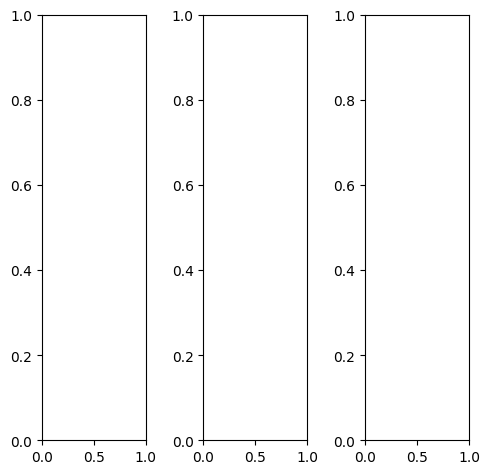

tensor([[[0.7216, 0.7137, 0.7137,  ..., 0.7098, 0.7098, 0.6980],
         [0.6980, 0.6980, 0.6980,  ..., 0.7137, 0.7176, 0.7333],
         [0.6863, 0.6941, 0.6863,  ..., 0.6980, 0.6902, 0.7137],
         ...,
         [0.6471, 0.6157, 0.6353,  ..., 0.6118, 0.5922, 0.6157],
         [0.6431, 0.5529, 0.6039,  ..., 0.5804, 0.6745, 0.6667],
         [0.6549, 0.6000, 0.5843,  ..., 0.6745, 0.6941, 0.6745]],

        [[0.7216, 0.7137, 0.7137,  ..., 0.7098, 0.7098, 0.6980],
         [0.6980, 0.6980, 0.6980,  ..., 0.7137, 0.7176, 0.7333],
         [0.6863, 0.6941, 0.6863,  ..., 0.6980, 0.6902, 0.7137],
         ...,
         [0.6471, 0.6157, 0.6353,  ..., 0.6118, 0.5922, 0.6157],
         [0.6431, 0.5529, 0.6039,  ..., 0.5804, 0.6745, 0.6667],
         [0.6549, 0.6000, 0.5843,  ..., 0.6745, 0.6941, 0.6745]],

        [[0.7216, 0.7137, 0.7137,  ..., 0.7098, 0.7098, 0.6980],
         [0.6980, 0.6980, 0.6980,  ..., 0.7137, 0.7176, 0.7333],
         [0.6863, 0.6941, 0.6863,  ..., 0.6980, 0.6902, 0.

tensor([[[0.7098, 0.7020, 0.7020,  ..., 0.6980, 0.6980, 0.6863],
         [0.6863, 0.6863, 0.6863,  ..., 0.7020, 0.7059, 0.7216],
         [0.6745, 0.6824, 0.6745,  ..., 0.6863, 0.6784, 0.7020],
         ...,
         [0.6471, 0.6157, 0.6353,  ..., 0.6118, 0.5922, 0.6157],
         [0.6431, 0.5529, 0.6039,  ..., 0.5804, 0.6745, 0.6667],
         [0.6549, 0.6000, 0.5843,  ..., 0.6745, 0.6941, 0.6745]],

        [[0.7255, 0.7176, 0.7176,  ..., 0.7137, 0.7137, 0.7020],
         [0.7020, 0.7020, 0.7020,  ..., 0.7176, 0.7216, 0.7373],
         [0.6902, 0.6980, 0.6902,  ..., 0.7020, 0.6941, 0.7176],
         ...,
         [0.6510, 0.6196, 0.6353,  ..., 0.6157, 0.5922, 0.6196],
         [0.6431, 0.5529, 0.6039,  ..., 0.5843, 0.6745, 0.6667],
         [0.6588, 0.6039, 0.5882,  ..., 0.6745, 0.6941, 0.6745]],

        [[0.7216, 0.7137, 0.7137,  ..., 0.7098, 0.7098, 0.6980],
         [0.6980, 0.6980, 0.6980,  ..., 0.7137, 0.7176, 0.7333],
         [0.6863, 0.6941, 0.6863,  ..., 0.6980, 0.6902, 0.

tensor([[[0.5406, 0.4475, 0.4046,  ..., 0.5016, 0.5149, 0.5817],
         [0.4883, 0.3094, 0.3539,  ..., 0.4712, 0.5116, 0.5810],
         [0.4079, 0.3402, 0.2268,  ..., 0.4932, 0.4953, 0.5646],
         ...,
         [0.5654, 0.5803, 0.5604,  ..., 0.5441, 0.5396, 0.5599],
         [0.5782, 0.4954, 0.5444,  ..., 0.5225, 0.6501, 0.6338],
         [0.5952, 0.5276, 0.4922,  ..., 0.6372, 0.6583, 0.6272]],

        [[0.6229, 0.5462, 0.5427,  ..., 0.5752, 0.6243, 0.6192],
         [0.4787, 0.3073, 0.3647,  ..., 0.5692, 0.6043, 0.6811],
         [0.5663, 0.4739, 0.4464,  ..., 0.5917, 0.5736, 0.6318],
         ...,
         [0.5284, 0.5365, 0.5362,  ..., 0.5138, 0.5234, 0.5060],
         [0.5446, 0.4386, 0.5124,  ..., 0.5042, 0.6327, 0.6002],
         [0.5536, 0.4988, 0.4726,  ..., 0.5815, 0.6253, 0.5835]],

        [[0.7917, 0.6959, 0.7383,  ..., 0.7601, 0.7844, 0.7840],
         [0.7191, 0.6209, 0.6689,  ..., 0.7233, 0.7668, 0.8190],
         [0.6224, 0.5961, 0.5239,  ..., 0.7417, 0.7459, 0.

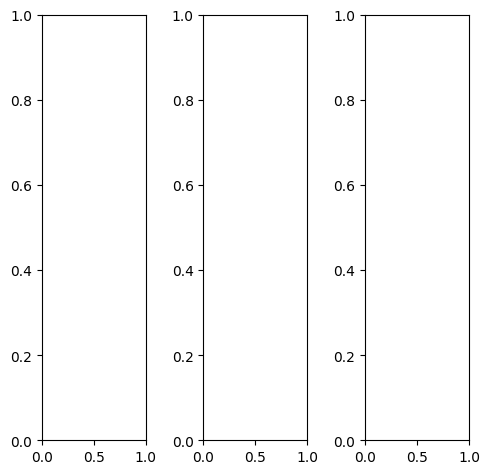

tensor([[[0.6235, 0.7216, 0.6824,  ..., 0.8039, 0.7725, 0.7137],
         [0.5882, 0.6980, 0.7294,  ..., 0.8196, 0.7922, 0.7137],
         [0.5804, 0.7373, 0.8118,  ..., 0.7843, 0.7647, 0.7098],
         ...,
         [0.9216, 0.9098, 0.8314,  ..., 0.9333, 0.9137, 0.9137],
         [0.9373, 0.9373, 0.8706,  ..., 0.9412, 0.9294, 0.9333],
         [0.9255, 0.9255, 0.8784,  ..., 0.9333, 0.9176, 0.9176]],

        [[0.6235, 0.7216, 0.6824,  ..., 0.8039, 0.7725, 0.7137],
         [0.5882, 0.6980, 0.7294,  ..., 0.8196, 0.7922, 0.7137],
         [0.5804, 0.7373, 0.8118,  ..., 0.7843, 0.7647, 0.7098],
         ...,
         [0.9216, 0.9098, 0.8314,  ..., 0.9333, 0.9137, 0.9137],
         [0.9373, 0.9373, 0.8706,  ..., 0.9412, 0.9294, 0.9333],
         [0.9255, 0.9255, 0.8784,  ..., 0.9333, 0.9176, 0.9176]],

        [[0.6235, 0.7216, 0.6824,  ..., 0.8039, 0.7725, 0.7137],
         [0.5882, 0.6980, 0.7294,  ..., 0.8196, 0.7922, 0.7137],
         [0.5804, 0.7373, 0.8118,  ..., 0.7843, 0.7647, 0.

tensor([[[0.7137, 0.7647, 0.7373,  ..., 0.8431, 0.8157, 0.7686],
         [0.6941, 0.7529, 0.7804,  ..., 0.8667, 0.8353, 0.7686],
         [0.6980, 0.7843, 0.8471,  ..., 0.8431, 0.8196, 0.7765],
         ...,
         [0.9294, 0.9216, 0.8431,  ..., 0.9412, 0.9216, 0.9216],
         [0.9490, 0.9490, 0.8824,  ..., 0.9490, 0.9412, 0.9451],
         [0.9373, 0.9373, 0.8902,  ..., 0.9451, 0.9294, 0.9294]],

        [[0.5922, 0.7020, 0.6588,  ..., 0.7882, 0.7529, 0.6902],
         [0.5529, 0.6745, 0.7098,  ..., 0.8039, 0.7725, 0.6902],
         [0.5412, 0.7216, 0.8000,  ..., 0.7647, 0.7451, 0.6863],
         ...,
         [0.9137, 0.9020, 0.8196,  ..., 0.9255, 0.9059, 0.9059],
         [0.9255, 0.9294, 0.8588,  ..., 0.9333, 0.9216, 0.9255],
         [0.9176, 0.9176, 0.8667,  ..., 0.9216, 0.9098, 0.9098]],

        [[0.5608, 0.7216, 0.6627,  ..., 0.7882, 0.7569, 0.6902],
         [0.4980, 0.6588, 0.7020,  ..., 0.7922, 0.7804, 0.6941],
         [0.4667, 0.7020, 0.7961,  ..., 0.7412, 0.7294, 0.

tensor([[[0.4424, 0.4384, 0.3482,  ..., 0.4999, 0.4733, 0.5252],
         [0.3873, 0.3322, 0.3427,  ..., 0.4550, 0.4829, 0.4800],
         [0.2895, 0.4215, 0.3633,  ..., 0.4568, 0.4650, 0.4767],
         ...,
         [0.7604, 0.7235, 0.6435,  ..., 0.7531, 0.7372, 0.7565],
         [0.7703, 0.7298, 0.6902,  ..., 0.7446, 0.7449, 0.7923],
         [0.7972, 0.8052, 0.7474,  ..., 0.8187, 0.8092, 0.8122]],

        [[0.5330, 0.5443, 0.4600,  ..., 0.6283, 0.6249, 0.5865],
         [0.4039, 0.3723, 0.3665,  ..., 0.6365, 0.6458, 0.6072],
         [0.4659, 0.5223, 0.5461,  ..., 0.6093, 0.5966, 0.5919],
         ...,
         [0.7310, 0.7137, 0.6617,  ..., 0.7482, 0.7158, 0.7530],
         [0.7524, 0.7234, 0.6923,  ..., 0.7490, 0.7269, 0.7778],
         [0.7426, 0.7726, 0.7410,  ..., 0.7881, 0.7793, 0.7733]],

        [[0.6727, 0.6616, 0.6708,  ..., 0.8608, 0.8351, 0.7777],
         [0.6199, 0.6508, 0.6863,  ..., 0.8555, 0.8728, 0.7789],
         [0.5203, 0.6000, 0.6688,  ..., 0.8342, 0.8358, 0.

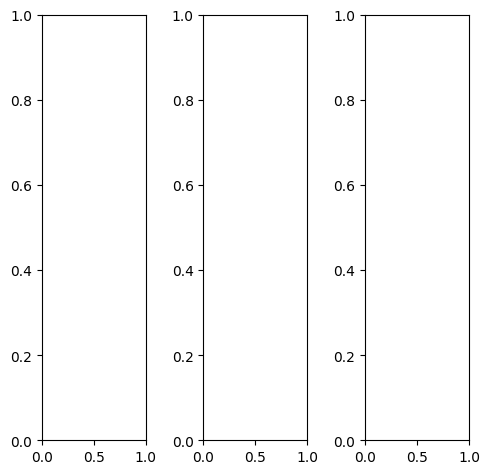

EPOCH: 26.000  val_loss: 0.003  (3163.28s - 9003.17s remaining)

tensor([[[0.2667, 0.2863, 0.1725,  ..., 0.2706, 0.2784, 0.2824],
         [0.3137, 0.2549, 0.1255,  ..., 0.2706, 0.2824, 0.2863],
         [0.3176, 0.2510, 0.1176,  ..., 0.2745, 0.2863, 0.2941],
         ...,
         [0.4431, 0.4118, 0.4039,  ..., 0.2824, 0.1961, 0.3412],
         [0.4392, 0.4118, 0.3961,  ..., 0.3255, 0.1922, 0.3333],
         [0.4314, 0.4039, 0.3922,  ..., 0.3765, 0.2078, 0.3216]],

        [[0.2667, 0.2863, 0.1725,  ..., 0.2706, 0.2784, 0.2824],
         [0.3137, 0.2549, 0.1255,  ..., 0.2706, 0.2824, 0.2863],
         [0.3176, 0.2510, 0.1176,  ..., 0.2745, 0.2863, 0.2941],
         ...,
         [0.4431, 0.4118, 0.4039,  ..., 0.2824, 0.1961, 0.3412],
         [0.4392, 0.4118, 0.3961,  ..., 0.3255, 0.1922, 0.3333],
         [0.4314, 0.4039, 0.3922,  ..., 0.3765, 0.2078, 0.3216]],

        [[0.2667, 0.2863, 0.1725,  ..., 0.2706, 0.2784, 0.2824],
         [0.3137, 0.2549, 0.1255,  ..., 0.2706, 0.2824, 0.2863],
         [0.3176, 0.2510, 0.1176,  ..., 0.2745, 0.2863, 0.

tensor([[[0.2667, 0.2706, 0.1490,  ..., 0.2941, 0.2980, 0.2980],
         [0.3137, 0.2471, 0.1059,  ..., 0.2980, 0.3020, 0.3059],
         [0.3216, 0.2431, 0.1059,  ..., 0.3059, 0.3098, 0.3137],
         ...,
         [0.4667, 0.4353, 0.4275,  ..., 0.3176, 0.2275, 0.3647],
         [0.4627, 0.4353, 0.4196,  ..., 0.3529, 0.2118, 0.3490],
         [0.4549, 0.4275, 0.4157,  ..., 0.4000, 0.2157, 0.3333]],

        [[0.2667, 0.2824, 0.1765,  ..., 0.2627, 0.2745, 0.2784],
         [0.3137, 0.2510, 0.1255,  ..., 0.2627, 0.2745, 0.2824],
         [0.3176, 0.2471, 0.1176,  ..., 0.2627, 0.2784, 0.2863],
         ...,
         [0.4353, 0.4039, 0.3961,  ..., 0.2667, 0.1804, 0.3255],
         [0.4314, 0.4039, 0.3882,  ..., 0.3137, 0.1804, 0.3216],
         [0.4235, 0.3961, 0.3843,  ..., 0.3647, 0.2000, 0.3137]],

        [[0.2784, 0.3373, 0.2275,  ..., 0.2471, 0.2588, 0.2706],
         [0.3137, 0.2980, 0.1647,  ..., 0.2471, 0.2588, 0.2706],
         [0.3176, 0.2824, 0.1412,  ..., 0.2431, 0.2588, 0.

tensor([[[0.3092, 0.2970, 0.1842,  ..., 0.2805, 0.2840, 0.2852],
         [0.3297, 0.2656, 0.1324,  ..., 0.2918, 0.3074, 0.2949],
         [0.3407, 0.2673, 0.1206,  ..., 0.3030, 0.3123, 0.3113],
         ...,
         [0.4645, 0.4390, 0.4390,  ..., 0.2920, 0.2128, 0.3551],
         [0.4604, 0.4410, 0.4372,  ..., 0.3461, 0.2083, 0.3472],
         [0.4488, 0.4292, 0.4146,  ..., 0.3860, 0.2244, 0.3380]],

        [[0.2952, 0.2870, 0.1697,  ..., 0.2681, 0.2806, 0.2881],
         [0.3094, 0.2472, 0.1191,  ..., 0.2689, 0.2898, 0.2902],
         [0.3142, 0.2527, 0.1145,  ..., 0.2712, 0.2874, 0.2994],
         ...,
         [0.4566, 0.4128, 0.4074,  ..., 0.2709, 0.1962, 0.3462],
         [0.4527, 0.4197, 0.3937,  ..., 0.3185, 0.1875, 0.3330],
         [0.4419, 0.4037, 0.3870,  ..., 0.3557, 0.2147, 0.3308]],

        [[0.2395, 0.2329, 0.1389,  ..., 0.2064, 0.2182, 0.2299],
         [0.2498, 0.1996, 0.0891,  ..., 0.2075, 0.2172, 0.2129],
         [0.2536, 0.1999, 0.0808,  ..., 0.2139, 0.2182, 0.

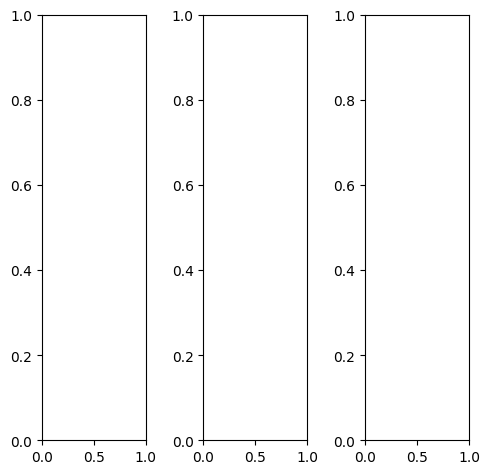

tensor([[[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.5961],
         ...,
         [0.4353, 0.2745, 0.2745,  ..., 0.5725, 0.6667, 0.6588],
         [0.2980, 0.2314, 0.2392,  ..., 0.6314, 0.6863, 0.6549],
         [0.2353, 0.2314, 0.2667,  ..., 0.6588, 0.6784, 0.6431]],

        [[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.5961],
         ...,
         [0.4353, 0.2745, 0.2745,  ..., 0.5725, 0.6667, 0.6588],
         [0.2980, 0.2314, 0.2392,  ..., 0.6314, 0.6863, 0.6549],
         [0.2353, 0.2314, 0.2667,  ..., 0.6588, 0.6784, 0.6431]],

        [[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.

tensor([[[0.3804, 0.5176, 0.5490,  ..., 0.2627, 0.3569, 0.4941],
         [0.4039, 0.5176, 0.5333,  ..., 0.2667, 0.4353, 0.5373],
         [0.4118, 0.5176, 0.5176,  ..., 0.3647, 0.5294, 0.5765],
         ...,
         [0.5137, 0.5922, 0.6314,  ..., 0.4039, 0.2863, 0.2941],
         [0.5255, 0.6667, 0.6627,  ..., 0.3451, 0.3059, 0.3020],
         [0.6000, 0.6902, 0.6431,  ..., 0.3098, 0.3216, 0.3020]],

        [[0.6157, 0.4902, 0.5098,  ..., 0.6549, 0.6902, 0.6549],
         [0.6157, 0.4863, 0.5137,  ..., 0.6392, 0.6431, 0.6196],
         [0.6078, 0.4824, 0.5059,  ..., 0.6000, 0.5647, 0.6118],
         ...,
         [0.3922, 0.1255, 0.1176,  ..., 0.6471, 0.8118, 0.7961],
         [0.1922, 0.0353, 0.0549,  ..., 0.7451, 0.8314, 0.7882],
         [0.0706, 0.0235, 0.1059,  ..., 0.7843, 0.8118, 0.7686]],

        [[0.6314, 0.4510, 0.5176,  ..., 0.7529, 0.7490, 0.6745],
         [0.6353, 0.4392, 0.5098,  ..., 0.7137, 0.6863, 0.6039],
         [0.6196, 0.4275, 0.4941,  ..., 0.6039, 0.5529, 0.

tensor([[[0.5527, 0.5147, 0.5278,  ..., 0.5703, 0.6300, 0.6373],
         [0.5734, 0.5037, 0.5358,  ..., 0.5503, 0.5963, 0.6151],
         [0.5645, 0.4990, 0.5358,  ..., 0.5548, 0.5803, 0.6263],
         ...,
         [0.4561, 0.3080, 0.3122,  ..., 0.6258, 0.7053, 0.6936],
         [0.3296, 0.2639, 0.2792,  ..., 0.6657, 0.7197, 0.6842],
         [0.2638, 0.2463, 0.2893,  ..., 0.6999, 0.7162, 0.6803]],

        [[0.5544, 0.5089, 0.5251,  ..., 0.5576, 0.6126, 0.6235],
         [0.5659, 0.4910, 0.5312,  ..., 0.5450, 0.5825, 0.6157],
         [0.5527, 0.4901, 0.5186,  ..., 0.5406, 0.5552, 0.6117],
         ...,
         [0.4388, 0.2770, 0.2607,  ..., 0.5642, 0.6602, 0.6654],
         [0.3034, 0.2284, 0.2294,  ..., 0.6218, 0.6757, 0.6637],
         [0.2531, 0.2245, 0.2635,  ..., 0.6617, 0.6785, 0.6515]],

        [[0.4657, 0.4054, 0.4112,  ..., 0.4515, 0.5279, 0.5521],
         [0.4519, 0.3781, 0.4113,  ..., 0.4370, 0.4787, 0.5092],
         [0.4350, 0.3719, 0.3988,  ..., 0.4260, 0.4476, 0.

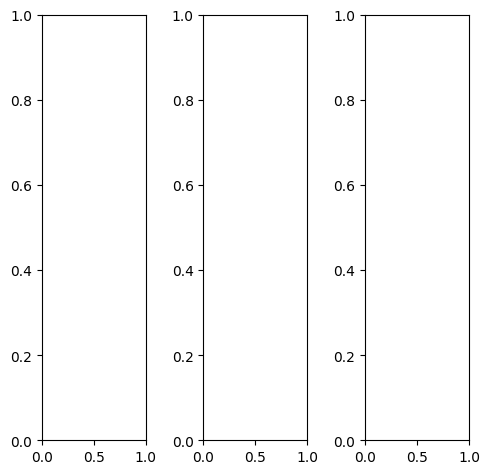

tensor([[[0.9059, 0.8824, 0.8941,  ..., 0.8784, 0.8745, 0.8588],
         [0.8667, 0.9098, 0.9176,  ..., 0.8431, 0.8353, 0.7647],
         [0.8980, 0.9725, 0.9804,  ..., 0.8784, 0.8706, 0.7843],
         ...,
         [0.7529, 0.7333, 0.7608,  ..., 0.6980, 0.7098, 0.6510],
         [0.7373, 0.7098, 0.7412,  ..., 0.6784, 0.6980, 0.6353],
         [0.7098, 0.5373, 0.5569,  ..., 0.5333, 0.5412, 0.5020]],

        [[0.9059, 0.8824, 0.8941,  ..., 0.8784, 0.8745, 0.8588],
         [0.8667, 0.9098, 0.9176,  ..., 0.8431, 0.8353, 0.7647],
         [0.8980, 0.9725, 0.9804,  ..., 0.8784, 0.8706, 0.7843],
         ...,
         [0.7529, 0.7333, 0.7608,  ..., 0.6980, 0.7098, 0.6510],
         [0.7373, 0.7098, 0.7412,  ..., 0.6784, 0.6980, 0.6353],
         [0.7098, 0.5373, 0.5569,  ..., 0.5333, 0.5412, 0.5020]],

        [[0.9059, 0.8824, 0.8941,  ..., 0.8784, 0.8745, 0.8588],
         [0.8667, 0.9098, 0.9176,  ..., 0.8431, 0.8353, 0.7647],
         [0.8980, 0.9725, 0.9804,  ..., 0.8784, 0.8706, 0.

tensor([[[0.9137, 0.8863, 0.8941,  ..., 0.8980, 0.8980, 0.8784],
         [0.8784, 0.9294, 0.9333,  ..., 0.8863, 0.8863, 0.8039],
         [0.9176, 1.0000, 1.0000,  ..., 0.9412, 0.9373, 0.8353],
         ...,
         [0.7804, 0.7765, 0.8157,  ..., 0.7255, 0.7373, 0.6745],
         [0.7529, 0.7451, 0.7922,  ..., 0.6902, 0.7137, 0.6510],
         [0.7098, 0.5490, 0.5804,  ..., 0.5451, 0.5529, 0.5137]],

        [[0.9059, 0.8824, 0.8941,  ..., 0.8706, 0.8627, 0.8510],
         [0.8627, 0.9020, 0.9137,  ..., 0.8196, 0.8118, 0.7451],
         [0.8863, 0.9569, 0.9686,  ..., 0.8471, 0.8392, 0.7608],
         ...,
         [0.7412, 0.7098, 0.7333,  ..., 0.6863, 0.6941, 0.6392],
         [0.7294, 0.6941, 0.7176,  ..., 0.6706, 0.6902, 0.6275],
         [0.7098, 0.5294, 0.5451,  ..., 0.5294, 0.5373, 0.4980]],

        [[0.9020, 0.8745, 0.8863,  ..., 0.8784, 0.8745, 0.8627],
         [0.8588, 0.9020, 0.9137,  ..., 0.8431, 0.8353, 0.7647],
         [0.8902, 0.9686, 0.9725,  ..., 0.8784, 0.8706, 0.

tensor([[[0.8748, 0.8714, 0.8936,  ..., 0.8788, 0.8791, 0.8455],
         [0.8700, 0.9120, 0.9130,  ..., 0.8438, 0.8432, 0.7814],
         [0.9043, 0.9797, 0.9808,  ..., 0.8792, 0.8846, 0.7950],
         ...,
         [0.7771, 0.7450, 0.7760,  ..., 0.7074, 0.7236, 0.6710],
         [0.7457, 0.7252, 0.7423,  ..., 0.6891, 0.7119, 0.6505],
         [0.7166, 0.5673, 0.5766,  ..., 0.5468, 0.5549, 0.5419]],

        [[0.8897, 0.8781, 0.9073,  ..., 0.8790, 0.8789, 0.8513],
         [0.8700, 0.9181, 0.9250,  ..., 0.8460, 0.8301, 0.7785],
         [0.9056, 0.9841, 0.9876,  ..., 0.8897, 0.8751, 0.7981],
         ...,
         [0.7648, 0.7372, 0.7711,  ..., 0.7027, 0.7166, 0.6588],
         [0.7440, 0.7085, 0.7402,  ..., 0.6884, 0.7026, 0.6425],
         [0.6898, 0.5563, 0.5607,  ..., 0.5427, 0.5464, 0.5345]],

        [[0.8722, 0.8769, 0.8822,  ..., 0.8643, 0.8629, 0.8339],
         [0.8569, 0.9100, 0.9079,  ..., 0.8275, 0.8154, 0.7479],
         [0.8943, 0.9625, 0.9726,  ..., 0.8648, 0.8551, 0.

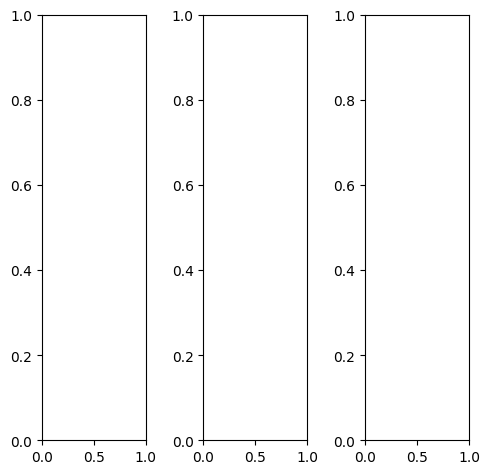

tensor([[[0.9490, 0.8510, 0.8392,  ..., 0.8353, 0.9059, 0.9686],
         [0.8353, 0.6118, 0.5961,  ..., 0.6314, 0.7059, 0.8627],
         [0.8471, 0.6078, 0.6039,  ..., 0.5882, 0.5412, 0.7529],
         ...,
         [0.8118, 0.5569, 0.4667,  ..., 0.3608, 0.4431, 0.7098],
         [0.8549, 0.6196, 0.4510,  ..., 0.4157, 0.5294, 0.7804],
         [0.9294, 0.7843, 0.6588,  ..., 0.6471, 0.7529, 0.8902]],

        [[0.9490, 0.8510, 0.8392,  ..., 0.8353, 0.9059, 0.9686],
         [0.8353, 0.6118, 0.5961,  ..., 0.6314, 0.7059, 0.8627],
         [0.8471, 0.6078, 0.6039,  ..., 0.5882, 0.5412, 0.7529],
         ...,
         [0.8118, 0.5569, 0.4667,  ..., 0.3608, 0.4431, 0.7098],
         [0.8549, 0.6196, 0.4510,  ..., 0.4157, 0.5294, 0.7804],
         [0.9294, 0.7843, 0.6588,  ..., 0.6471, 0.7529, 0.8902]],

        [[0.9490, 0.8510, 0.8392,  ..., 0.8353, 0.9059, 0.9686],
         [0.8353, 0.6118, 0.5961,  ..., 0.6314, 0.7059, 0.8627],
         [0.8471, 0.6078, 0.6039,  ..., 0.5882, 0.5412, 0.

tensor([[[0.9569, 0.8667, 0.8667,  ..., 0.8510, 0.8980, 0.9608],
         [0.8549, 0.6510, 0.6549,  ..., 0.6706, 0.7137, 0.8549],
         [0.8745, 0.6667, 0.6863,  ..., 0.6431, 0.5647, 0.7490],
         ...,
         [0.8392, 0.6196, 0.5569,  ..., 0.3608, 0.4431, 0.7098],
         [0.8706, 0.6392, 0.4706,  ..., 0.4157, 0.5294, 0.7804],
         [0.9333, 0.7804, 0.6510,  ..., 0.6431, 0.7529, 0.8902]],

        [[0.9490, 0.8471, 0.8353,  ..., 0.8353, 0.9098, 0.9686],
         [0.8314, 0.6039, 0.5882,  ..., 0.6235, 0.7059, 0.8627],
         [0.8392, 0.6000, 0.5922,  ..., 0.5765, 0.5373, 0.7529],
         ...,
         [0.8039, 0.5412, 0.4431,  ..., 0.3608, 0.4431, 0.7098],
         [0.8510, 0.6157, 0.4431,  ..., 0.4157, 0.5294, 0.7804],
         [0.9294, 0.7843, 0.6627,  ..., 0.6471, 0.7529, 0.8902]],

        [[0.9373, 0.8235, 0.8039,  ..., 0.8039, 0.9098, 0.9843],
         [0.8118, 0.5451, 0.4941,  ..., 0.5725, 0.6941, 0.8745],
         [0.8078, 0.5059, 0.4392,  ..., 0.5020, 0.5137, 0.

tensor([[[0.8819, 0.8545, 0.8453,  ..., 0.8280, 0.8940, 0.8999],
         [0.8356, 0.6373, 0.6168,  ..., 0.6453, 0.7264, 0.8864],
         [0.8612, 0.6181, 0.6029,  ..., 0.6144, 0.5772, 0.7762],
         ...,
         [0.8433, 0.5970, 0.5013,  ..., 0.3714, 0.4537, 0.7548],
         [0.8661, 0.6536, 0.4704,  ..., 0.4240, 0.5478, 0.7817],
         [0.8853, 0.8103, 0.6889,  ..., 0.6659, 0.7902, 0.8482]],

        [[0.8919, 0.8409, 0.8608,  ..., 0.8368, 0.8992, 0.9146],
         [0.8283, 0.6341, 0.6135,  ..., 0.6338, 0.7151, 0.8714],
         [0.8682, 0.6120, 0.6153,  ..., 0.5874, 0.5552, 0.7494],
         ...,
         [0.8220, 0.5588, 0.4522,  ..., 0.3512, 0.4426, 0.7243],
         [0.8566, 0.6166, 0.4369,  ..., 0.4155, 0.5237, 0.7724],
         [0.8769, 0.7848, 0.6689,  ..., 0.6425, 0.7512, 0.8233]],

        [[0.8463, 0.8190, 0.7794,  ..., 0.7896, 0.8631, 0.8857],
         [0.7787, 0.5896, 0.5497,  ..., 0.5853, 0.6595, 0.8143],
         [0.8012, 0.5486, 0.5269,  ..., 0.5322, 0.4984, 0.

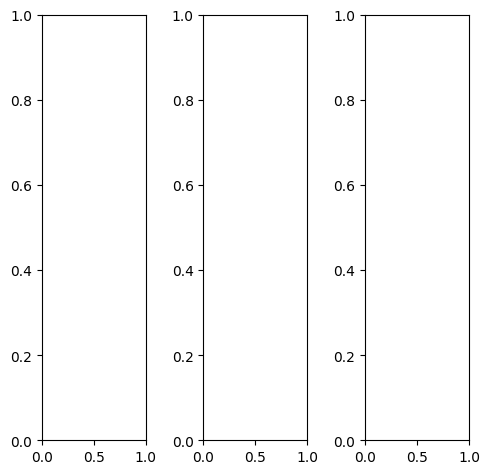

tensor([[[0.0157, 0.0196, 0.0196,  ..., 0.0196, 0.0235, 0.0157],
         [0.0275, 0.0392, 0.0157,  ..., 0.0157, 0.0196, 0.0471],
         [0.1098, 0.0706, 0.0157,  ..., 0.1216, 0.1922, 0.2706],
         ...,
         [0.0235, 0.0235, 0.0392,  ..., 0.0980, 0.3569, 0.5373],
         [0.0275, 0.0235, 0.0196,  ..., 0.1373, 0.4275, 0.5451],
         [0.0235, 0.0235, 0.0196,  ..., 0.1922, 0.4588, 0.5020]],

        [[0.0157, 0.0196, 0.0196,  ..., 0.0196, 0.0235, 0.0157],
         [0.0275, 0.0392, 0.0157,  ..., 0.0157, 0.0196, 0.0471],
         [0.1098, 0.0706, 0.0157,  ..., 0.1216, 0.1922, 0.2706],
         ...,
         [0.0235, 0.0235, 0.0392,  ..., 0.0980, 0.3569, 0.5373],
         [0.0275, 0.0235, 0.0196,  ..., 0.1373, 0.4275, 0.5451],
         [0.0235, 0.0235, 0.0196,  ..., 0.1922, 0.4588, 0.5020]],

        [[0.0157, 0.0196, 0.0196,  ..., 0.0196, 0.0235, 0.0157],
         [0.0275, 0.0392, 0.0157,  ..., 0.0157, 0.0196, 0.0471],
         [0.1098, 0.0706, 0.0157,  ..., 0.1216, 0.1922, 0.

tensor([[[0.0039, 0.0078, 0.0078,  ..., 0.0039, 0.0039, 0.0000],
         [0.0196, 0.0275, 0.0039,  ..., 0.0000, 0.0000, 0.0235],
         [0.1020, 0.0588, 0.0039,  ..., 0.0902, 0.1647, 0.2392],
         ...,
         [0.0157, 0.0118, 0.0314,  ..., 0.0118, 0.2980, 0.5059],
         [0.0157, 0.0118, 0.0078,  ..., 0.0510, 0.3725, 0.5098],
         [0.0118, 0.0118, 0.0078,  ..., 0.1098, 0.4078, 0.4627]],

        [[0.0157, 0.0196, 0.0196,  ..., 0.0196, 0.0235, 0.0196],
         [0.0275, 0.0392, 0.0157,  ..., 0.0196, 0.0275, 0.0627],
         [0.1137, 0.0706, 0.0157,  ..., 0.1529, 0.2314, 0.3137],
         ...,
         [0.0275, 0.0196, 0.0431,  ..., 0.1608, 0.4196, 0.5922],
         [0.0275, 0.0235, 0.0235,  ..., 0.2000, 0.4941, 0.6039],
         [0.0235, 0.0235, 0.0235,  ..., 0.2588, 0.5294, 0.5686]],

        [[0.0471, 0.0471, 0.0471,  ..., 0.0706, 0.0627, 0.0431],
         [0.0471, 0.0627, 0.0431,  ..., 0.0510, 0.0275, 0.0196],
         [0.1137, 0.0863, 0.0471,  ..., 0.0353, 0.0706, 0.

tensor([[[0.0610, 0.0202, 0.0123,  ..., 0.0162, 0.0290, 0.0817],
         [0.0450, 0.0368, 0.0057,  ..., 0.0028, 0.0206, 0.0603],
         [0.0955, 0.0590, 0.0084,  ..., 0.1245, 0.1927, 0.2455],
         ...,
         [0.0327, 0.0207, 0.0480,  ..., 0.1165, 0.3836, 0.5750],
         [0.0424, 0.0208, 0.0302,  ..., 0.1503, 0.4635, 0.5754],
         [0.0693, 0.0453, 0.0465,  ..., 0.1911, 0.4794, 0.5300]],

        [[0.0839, 0.0303, 0.0258,  ..., 0.0332, 0.0441, 0.0958],
         [0.0455, 0.0386, 0.0074,  ..., 0.0156, 0.0334, 0.0742],
         [0.0979, 0.0636, 0.0117,  ..., 0.1291, 0.1975, 0.2527],
         ...,
         [0.0295, 0.0236, 0.0370,  ..., 0.1039, 0.3639, 0.5525],
         [0.0349, 0.0252, 0.0242,  ..., 0.1283, 0.4345, 0.5535],
         [0.0714, 0.0361, 0.0248,  ..., 0.1726, 0.4493, 0.5151]],

        [[0.0910, 0.0426, 0.0405,  ..., 0.0322, 0.0464, 0.0952],
         [0.0578, 0.0572, 0.0268,  ..., 0.0207, 0.0362, 0.0691],
         [0.1080, 0.0697, 0.0265,  ..., 0.1148, 0.1793, 0.

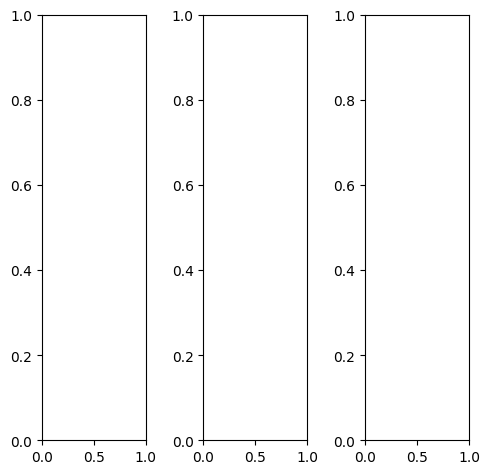

EPOCH: 26.255  trn_loss: 0.004  (3193.71s - 8970.44s remaining)

tensor([[[0.2471, 0.2706, 0.3020,  ..., 0.2549, 0.2549, 0.2471],
         [0.2549, 0.2706, 0.2706,  ..., 0.2549, 0.2549, 0.2510],
         [0.2549, 0.2549, 0.2392,  ..., 0.2667, 0.2588, 0.2588],
         ...,
         [0.4275, 0.4353, 0.4392,  ..., 0.4784, 0.5098, 0.5020],
         [0.4627, 0.4549, 0.4667,  ..., 0.5255, 0.5765, 0.5451],
         [0.4902, 0.5137, 0.4902,  ..., 0.5451, 0.5373, 0.5059]],

        [[0.2471, 0.2706, 0.3020,  ..., 0.2549, 0.2549, 0.2471],
         [0.2549, 0.2706, 0.2706,  ..., 0.2549, 0.2549, 0.2510],
         [0.2549, 0.2549, 0.2392,  ..., 0.2667, 0.2588, 0.2588],
         ...,
         [0.4275, 0.4353, 0.4392,  ..., 0.4784, 0.5098, 0.5020],
         [0.4627, 0.4549, 0.4667,  ..., 0.5255, 0.5765, 0.5451],
         [0.4902, 0.5137, 0.4902,  ..., 0.5451, 0.5373, 0.5059]],

        [[0.2471, 0.2706, 0.3020,  ..., 0.2549, 0.2549, 0.2471],
         [0.2549, 0.2706, 0.2706,  ..., 0.2549, 0.2549, 0.2510],
         [0.2549, 0.2549, 0.2392,  ..., 0.2667, 0.2588, 0.

tensor([[[0.1765, 0.1922, 0.2157,  ..., 0.1804, 0.1804, 0.1765],
         [0.1765, 0.1922, 0.1922,  ..., 0.1804, 0.1765, 0.1765],
         [0.1725, 0.1804, 0.1725,  ..., 0.1765, 0.1725, 0.1765],
         ...,
         [0.4784, 0.4863, 0.4941,  ..., 0.5412, 0.5843, 0.5804],
         [0.5059, 0.4980, 0.5137,  ..., 0.6078, 0.6667, 0.6314],
         [0.5490, 0.5725, 0.5412,  ..., 0.6275, 0.6275, 0.5961]],

        [[0.2824, 0.3059, 0.3412,  ..., 0.2863, 0.2863, 0.2784],
         [0.2941, 0.3098, 0.3059,  ..., 0.2863, 0.2863, 0.2824],
         [0.2941, 0.2902, 0.2706,  ..., 0.3059, 0.2980, 0.2941],
         ...,
         [0.4235, 0.4314, 0.4314,  ..., 0.4745, 0.4980, 0.4902],
         [0.4627, 0.4588, 0.4667,  ..., 0.5098, 0.5569, 0.5255],
         [0.4863, 0.5059, 0.4863,  ..., 0.5255, 0.5137, 0.4863]],

        [[0.2627, 0.2863, 0.3137,  ..., 0.2941, 0.2941, 0.2863],
         [0.2745, 0.2902, 0.2863,  ..., 0.2902, 0.2863, 0.2824],
         [0.2706, 0.2706, 0.2549,  ..., 0.2902, 0.2824, 0.

tensor([[[ 0.1702,  0.1448,  0.0683,  ...,  0.2095,  0.2222,  0.2415],
         [ 0.2213, -0.0036,  0.0050,  ...,  0.1501,  0.1571,  0.1911],
         [ 0.0528, -0.0744, -0.1702,  ...,  0.1921,  0.1767,  0.2243],
         ...,
         [ 0.7017,  0.6982,  0.6874,  ...,  0.8320,  0.9268,  0.9208],
         [ 0.7725,  0.7184,  0.7210,  ...,  0.9097,  1.0560,  1.0138],
         [ 0.8498,  0.8594,  0.7923,  ...,  0.9983,  0.9800,  0.9055]],

        [[ 0.2668,  0.2989,  0.1829,  ...,  0.2755,  0.2979,  0.2956],
         [ 0.2388,  0.0608, -0.0902,  ...,  0.2310,  0.2601,  0.2423],
         [ 0.1720,  0.0975, -0.1450,  ...,  0.2545,  0.2486,  0.2649],
         ...,
         [ 0.6878,  0.6953,  0.7031,  ...,  0.7935,  0.8913,  0.9145],
         [ 0.7684,  0.7075,  0.7363,  ...,  0.8918,  1.0325,  0.9957],
         [ 0.8237,  0.8522,  0.7850,  ...,  0.9455,  0.9467,  0.8677]],

        [[ 0.4227,  0.2779,  0.3517,  ...,  0.3696,  0.3838,  0.3916],
         [ 0.3850,  0.2044,  0.2522,  ...,  0

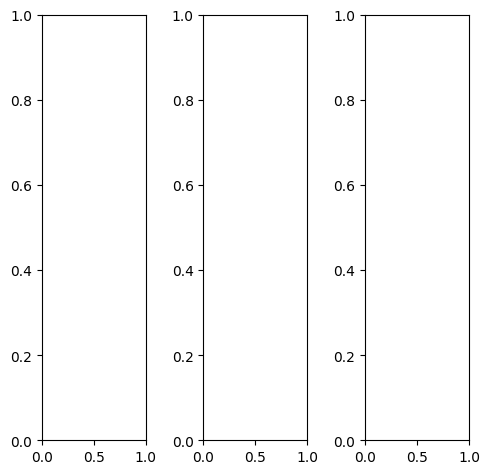

tensor([[[0.0235, 0.0627, 0.1216,  ..., 0.0745, 0.1490, 0.1216],
         [0.0627, 0.1412, 0.1098,  ..., 0.0863, 0.1961, 0.2039],
         [0.0863, 0.0824, 0.0157,  ..., 0.1451, 0.1333, 0.1529],
         ...,
         [0.2392, 0.3255, 0.3098,  ..., 0.2627, 0.3725, 0.2980],
         [0.2039, 0.2745, 0.2667,  ..., 0.3529, 0.3059, 0.1490],
         [0.0863, 0.1412, 0.1569,  ..., 0.2392, 0.2235, 0.0784]],

        [[0.0235, 0.0627, 0.1216,  ..., 0.0745, 0.1490, 0.1216],
         [0.0627, 0.1412, 0.1098,  ..., 0.0863, 0.1961, 0.2039],
         [0.0863, 0.0824, 0.0157,  ..., 0.1451, 0.1333, 0.1529],
         ...,
         [0.2392, 0.3255, 0.3098,  ..., 0.2627, 0.3725, 0.2980],
         [0.2039, 0.2745, 0.2667,  ..., 0.3529, 0.3059, 0.1490],
         [0.0863, 0.1412, 0.1569,  ..., 0.2392, 0.2235, 0.0784]],

        [[0.0235, 0.0627, 0.1216,  ..., 0.0745, 0.1490, 0.1216],
         [0.0627, 0.1412, 0.1098,  ..., 0.0863, 0.1961, 0.2039],
         [0.0863, 0.0824, 0.0157,  ..., 0.1451, 0.1333, 0.

tensor([[[0.0235, 0.0745, 0.1412,  ..., 0.1098, 0.1922, 0.1569],
         [0.0627, 0.1529, 0.1294,  ..., 0.1412, 0.2510, 0.2549],
         [0.0863, 0.0902, 0.0314,  ..., 0.2039, 0.1961, 0.2118],
         ...,
         [0.2510, 0.3569, 0.3569,  ..., 0.3255, 0.4275, 0.3255],
         [0.2157, 0.3059, 0.3137,  ..., 0.4196, 0.3569, 0.1765],
         [0.0941, 0.1569, 0.1843,  ..., 0.2745, 0.2510, 0.0941]],

        [[0.0235, 0.0627, 0.1176,  ..., 0.0627, 0.1333, 0.1098],
         [0.0627, 0.1412, 0.1059,  ..., 0.0667, 0.1725, 0.1843],
         [0.0863, 0.0824, 0.0118,  ..., 0.1216, 0.1098, 0.1333],
         ...,
         [0.2392, 0.3216, 0.2941,  ..., 0.2431, 0.3529, 0.2902],
         [0.2039, 0.2706, 0.2510,  ..., 0.3333, 0.2863, 0.1373],
         [0.0863, 0.1373, 0.1490,  ..., 0.2275, 0.2118, 0.0706]],

        [[0.0118, 0.0431, 0.0902,  ..., 0.0510, 0.1176, 0.0863],
         [0.0510, 0.1137, 0.0784,  ..., 0.0471, 0.1569, 0.1608],
         [0.0706, 0.0627, 0.0000,  ..., 0.1020, 0.0980, 0.

tensor([[[-0.0140,  0.0270,  0.0319,  ...,  0.1219,  0.2338,  0.2397],
         [ 0.1211,  0.0353,  0.0365,  ...,  0.1359,  0.2867,  0.3236],
         [-0.0831, -0.0785, -0.2044,  ...,  0.2253,  0.1575,  0.2230],
         ...,
         [ 0.4786,  0.6345,  0.5698,  ...,  0.4308,  0.6215,  0.5168],
         [ 0.3953,  0.5568,  0.5338,  ...,  0.5756,  0.5482,  0.3069],
         [ 0.2401,  0.2924,  0.2958,  ...,  0.4000,  0.3888,  0.2451]],

        [[ 0.0848,  0.1876,  0.0714,  ...,  0.1755,  0.2896,  0.2835],
         [ 0.1151,  0.0971, -0.1426,  ...,  0.2117,  0.4022,  0.3953],
         [-0.0181,  0.1035, -0.2436,  ...,  0.2984,  0.2522,  0.2968],
         ...,
         [ 0.4316,  0.5724,  0.5367,  ...,  0.4287,  0.6524,  0.4953],
         [ 0.3645,  0.5049,  0.4734,  ...,  0.6066,  0.5657,  0.2830],
         [ 0.2001,  0.2344,  0.2655,  ...,  0.4179,  0.3824,  0.2282]],

        [[ 0.2323,  0.1147,  0.2722,  ...,  0.2933,  0.4393,  0.4294],
         [ 0.2757,  0.1878,  0.2494,  ...,  0

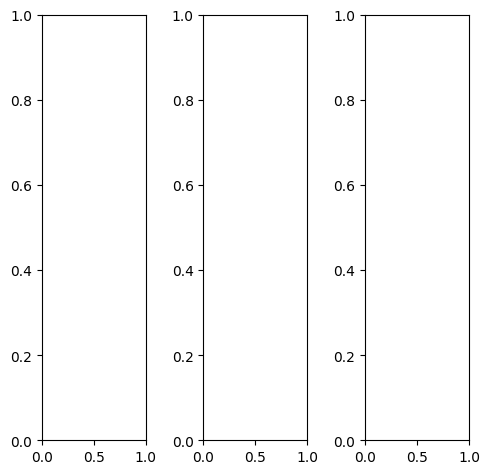

tensor([[[0.6157, 0.7412, 0.7373,  ..., 0.4980, 0.5922, 0.7922],
         [0.5412, 0.6235, 0.5882,  ..., 0.4784, 0.5725, 0.7961],
         [0.6000, 0.5176, 0.5373,  ..., 0.4824, 0.5059, 0.7059],
         ...,
         [0.4471, 0.4157, 0.4275,  ..., 0.4431, 0.4824, 0.4706],
         [0.4078, 0.4000, 0.4157,  ..., 0.4314, 0.5176, 0.5059],
         [0.4196, 0.4549, 0.4706,  ..., 0.5137, 0.5882, 0.5725]],

        [[0.6157, 0.7412, 0.7373,  ..., 0.4980, 0.5922, 0.7922],
         [0.5412, 0.6235, 0.5882,  ..., 0.4784, 0.5725, 0.7961],
         [0.6000, 0.5176, 0.5373,  ..., 0.4824, 0.5059, 0.7059],
         ...,
         [0.4471, 0.4157, 0.4275,  ..., 0.4431, 0.4824, 0.4706],
         [0.4078, 0.4000, 0.4157,  ..., 0.4314, 0.5176, 0.5059],
         [0.4196, 0.4549, 0.4706,  ..., 0.5137, 0.5882, 0.5725]],

        [[0.6157, 0.7412, 0.7373,  ..., 0.4980, 0.5922, 0.7922],
         [0.5412, 0.6235, 0.5882,  ..., 0.4784, 0.5725, 0.7961],
         [0.6000, 0.5176, 0.5373,  ..., 0.4824, 0.5059, 0.

tensor([[[0.7608, 0.8471, 0.8314,  ..., 0.7529, 0.8000, 0.8431],
         [0.7216, 0.8392, 0.8039,  ..., 0.7098, 0.7686, 0.8863],
         [0.7686, 0.7647, 0.7843,  ..., 0.7020, 0.7216, 0.8667],
         ...,
         [0.6157, 0.5922, 0.6078,  ..., 0.7333, 0.7765, 0.7333],
         [0.5882, 0.6039, 0.6471,  ..., 0.7176, 0.8078, 0.7725],
         [0.6510, 0.6980, 0.6941,  ..., 0.7216, 0.7294, 0.7294]],

        [[0.6157, 0.7843, 0.7765,  ..., 0.4000, 0.5373, 0.8431],
         [0.5137, 0.5843, 0.5490,  ..., 0.3843, 0.5216, 0.8196],
         [0.5804, 0.4431, 0.4627,  ..., 0.4000, 0.4392, 0.6824],
         ...,
         [0.3961, 0.3608, 0.3608,  ..., 0.3412, 0.3922, 0.3961],
         [0.3451, 0.3216, 0.3255,  ..., 0.3373, 0.4314, 0.4314],
         [0.3451, 0.3843, 0.4157,  ..., 0.4745, 0.5843, 0.5647]],

        [[0.2196, 0.2549, 0.2784,  ..., 0.3255, 0.3255, 0.3882],
         [0.2078, 0.2471, 0.2392,  ..., 0.3569, 0.3216, 0.4235],
         [0.2627, 0.2471, 0.2863,  ..., 0.3294, 0.2941, 0.

tensor([[[0.4491, 0.4616, 0.4799,  ..., 0.2538, 0.4019, 0.6057],
         [0.3483, 0.2654, 0.2605,  ..., 0.2343, 0.3638, 0.6197],
         [0.3667, 0.2268, 0.1618,  ..., 0.2649, 0.3015, 0.5400],
         ...,
         [0.3474, 0.3578, 0.3846,  ..., 0.4525, 0.4648, 0.3914],
         [0.3066, 0.3330, 0.3753,  ..., 0.3923, 0.4863, 0.4243],
         [0.2878, 0.3183, 0.3366,  ..., 0.4308, 0.5221, 0.4747]],

        [[0.5278, 0.5489, 0.5933,  ..., 0.3685, 0.5175, 0.6707],
         [0.3691, 0.3553, 0.2900,  ..., 0.3558, 0.4988, 0.7392],
         [0.4885, 0.3163, 0.3290,  ..., 0.3894, 0.4226, 0.6131],
         ...,
         [0.2820, 0.2566, 0.3367,  ..., 0.4107, 0.4427, 0.3234],
         [0.2516, 0.3031, 0.3338,  ..., 0.3540, 0.4697, 0.3846],
         [0.2477, 0.2823, 0.3159,  ..., 0.3860, 0.4890, 0.4145]],

        [[0.6566, 0.6503, 0.7381,  ..., 0.5556, 0.7074, 0.8574],
         [0.5521, 0.5729, 0.4838,  ..., 0.5755, 0.7229, 0.9416],
         [0.5449, 0.4260, 0.4085,  ..., 0.6013, 0.6179, 0.

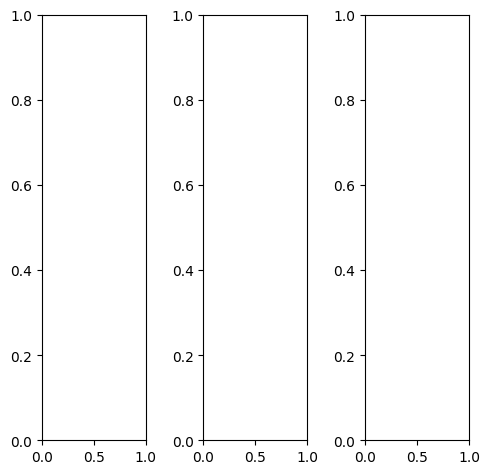

tensor([[[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.6235],
         ...,
         [0.5529, 0.5569, 0.5686,  ..., 0.2588, 0.2118, 0.2235],
         [0.5098, 0.5098, 0.5098,  ..., 0.4941, 0.4667, 0.3843],
         [0.5059, 0.5059, 0.4980,  ..., 0.5098, 0.4863, 0.4784]],

        [[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.6235],
         ...,
         [0.5529, 0.5569, 0.5686,  ..., 0.2588, 0.2118, 0.2235],
         [0.5098, 0.5098, 0.5098,  ..., 0.4941, 0.4667, 0.3843],
         [0.5059, 0.5059, 0.4980,  ..., 0.5098, 0.4863, 0.4784]],

        [[0.6196, 0.6235, 0.6196,  ..., 0.6078, 0.6118, 0.6157],
         [0.4902, 0.6157, 0.6275,  ..., 0.6157, 0.6196, 0.6157],
         [0.3882, 0.5490, 0.6471,  ..., 0.6275, 0.6353, 0.

tensor([[[0.3098, 0.2863, 0.2627,  ..., 0.2431, 0.2392, 0.2824],
         [0.2510, 0.3137, 0.2902,  ..., 0.2627, 0.2588, 0.2941],
         [0.2000, 0.2745, 0.3176,  ..., 0.2824, 0.2824, 0.3020],
         ...,
         [0.5333, 0.5373, 0.5451,  ..., 0.2314, 0.1765, 0.1882],
         [0.4863, 0.4863, 0.4863,  ..., 0.4667, 0.4314, 0.3451],
         [0.4824, 0.4824, 0.4745,  ..., 0.4784, 0.4510, 0.4353]],

        [[0.7216, 0.7373, 0.7412,  ..., 0.7333, 0.7373, 0.7255],
         [0.5765, 0.7176, 0.7412,  ..., 0.7373, 0.7412, 0.7216],
         [0.4588, 0.6431, 0.7569,  ..., 0.7451, 0.7529, 0.7294],
         ...,
         [0.5608, 0.5647, 0.5765,  ..., 0.2745, 0.2353, 0.2471],
         [0.5137, 0.5137, 0.5176,  ..., 0.5098, 0.4902, 0.4118],
         [0.5098, 0.5098, 0.5020,  ..., 0.5255, 0.5098, 0.5098]],

        [[0.8980, 0.9333, 0.9451,  ..., 0.9255, 0.9294, 0.9098],
         [0.6863, 0.8784, 0.9255,  ..., 0.9294, 0.9333, 0.9059],
         [0.5137, 0.7765, 0.9294,  ..., 0.9412, 0.9529, 0.

tensor([[[0.6499, 0.6343, 0.6454,  ..., 0.5674, 0.5736, 0.6129],
         [0.5111, 0.5583, 0.5978,  ..., 0.6129, 0.6193, 0.6051],
         [0.3572, 0.4782, 0.6075,  ..., 0.6590, 0.6770, 0.6244],
         ...,
         [0.6693, 0.6928, 0.6981,  ..., 0.2338, 0.1805, 0.1965],
         [0.5903, 0.6062, 0.5986,  ..., 0.5596, 0.5096, 0.3801],
         [0.5726, 0.5735, 0.5613,  ..., 0.5961, 0.5515, 0.4974]],

        [[0.6706, 0.6887, 0.6680,  ..., 0.6766, 0.6965, 0.7050],
         [0.5362, 0.5913, 0.6127,  ..., 0.7319, 0.7271, 0.7346],
         [0.4357, 0.5360, 0.6242,  ..., 0.7743, 0.7736, 0.7378],
         ...,
         [0.6340, 0.6486, 0.6798,  ..., 0.2429, 0.1844, 0.1600],
         [0.5532, 0.5636, 0.5625,  ..., 0.5346, 0.4951, 0.3585],
         [0.5379, 0.5454, 0.5348,  ..., 0.5584, 0.5286, 0.4547]],

        [[0.7415, 0.7546, 0.7359,  ..., 0.8730, 0.8882, 0.8691],
         [0.6277, 0.7038, 0.7308,  ..., 0.9131, 0.9270, 0.8933],
         [0.4614, 0.5336, 0.6892,  ..., 0.9454, 0.9622, 0.

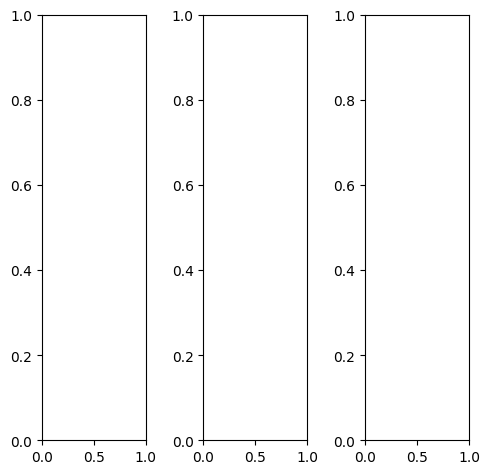

tensor([[[0.1765, 0.1843, 0.2431,  ..., 0.2353, 0.2941, 0.3333],
         [0.1451, 0.1529, 0.1961,  ..., 0.2431, 0.3098, 0.3176],
         [0.1529, 0.1529, 0.1647,  ..., 0.0863, 0.1059, 0.1882],
         ...,
         [0.3137, 0.2980, 0.3412,  ..., 0.2980, 0.3373, 0.3961],
         [0.2863, 0.2667, 0.3020,  ..., 0.3216, 0.3255, 0.3412],
         [0.3059, 0.2824, 0.2627,  ..., 0.3451, 0.3255, 0.3176]],

        [[0.1765, 0.1843, 0.2431,  ..., 0.2353, 0.2941, 0.3333],
         [0.1451, 0.1529, 0.1961,  ..., 0.2431, 0.3098, 0.3176],
         [0.1529, 0.1529, 0.1647,  ..., 0.0863, 0.1059, 0.1882],
         ...,
         [0.3137, 0.2980, 0.3412,  ..., 0.2980, 0.3373, 0.3961],
         [0.2863, 0.2667, 0.3020,  ..., 0.3216, 0.3255, 0.3412],
         [0.3059, 0.2824, 0.2627,  ..., 0.3451, 0.3255, 0.3176]],

        [[0.1765, 0.1843, 0.2431,  ..., 0.2353, 0.2941, 0.3333],
         [0.1451, 0.1529, 0.1961,  ..., 0.2431, 0.3098, 0.3176],
         [0.1529, 0.1529, 0.1647,  ..., 0.0863, 0.1059, 0.

tensor([[[0.1490, 0.1569, 0.2000,  ..., 0.2118, 0.2706, 0.3176],
         [0.1137, 0.1255, 0.1569,  ..., 0.2353, 0.3020, 0.3020],
         [0.1255, 0.1255, 0.1216,  ..., 0.0863, 0.1059, 0.1647],
         ...,
         [0.3098, 0.2627, 0.3020,  ..., 0.2510, 0.2784, 0.3529],
         [0.2706, 0.2314, 0.2549,  ..., 0.2667, 0.2667, 0.2941],
         [0.2784, 0.2549, 0.2157,  ..., 0.2902, 0.2745, 0.2824]],

        [[0.2039, 0.2118, 0.2745,  ..., 0.2510, 0.3098, 0.3490],
         [0.1725, 0.1804, 0.2314,  ..., 0.2549, 0.3216, 0.3333],
         [0.1765, 0.1765, 0.2000,  ..., 0.0941, 0.1176, 0.2078],
         ...,
         [0.3412, 0.3412, 0.3882,  ..., 0.3412, 0.3882, 0.4431],
         [0.3176, 0.3059, 0.3490,  ..., 0.3647, 0.3765, 0.3882],
         [0.3412, 0.3176, 0.3098,  ..., 0.3882, 0.3686, 0.3490]],

        [[0.1098, 0.1216, 0.1804,  ..., 0.2000, 0.2588, 0.2941],
         [0.0784, 0.0902, 0.1333,  ..., 0.2118, 0.2745, 0.2784],
         [0.0980, 0.0980, 0.1020,  ..., 0.0471, 0.0549, 0.

tensor([[[-0.0297, -0.0390,  0.0316,  ...,  0.1160,  0.2249,  0.2763],
         [-0.0086, -0.1629,  0.0389,  ...,  0.1108,  0.2438,  0.2855],
         [-0.1146, -0.1017, -0.1481,  ..., -0.2923, -0.1973,  0.0227],
         ...,
         [ 0.3388,  0.3358,  0.4498,  ...,  0.2782,  0.3380,  0.4491],
         [ 0.2758,  0.2236,  0.3200,  ...,  0.2785,  0.2992,  0.3177],
         [ 0.2951,  0.2248,  0.1949,  ...,  0.3071,  0.2542,  0.3021]],

        [[ 0.0516,  0.0670,  0.2043,  ...,  0.1418,  0.2738,  0.3072],
         [-0.0110, -0.3248, -0.0451,  ...,  0.1301,  0.2903,  0.3005],
         [ 0.0084, -0.0833,  0.0651,  ..., -0.2275, -0.1573,  0.0069],
         ...,
         [ 0.2829,  0.2653,  0.3751,  ...,  0.2434,  0.3580,  0.4079],
         [ 0.2287,  0.1894,  0.2657,  ...,  0.2876,  0.3086,  0.2990],
         [ 0.2547,  0.1888,  0.1679,  ...,  0.2950,  0.2595,  0.2583]],

        [[ 0.2702,  0.0247,  0.2599,  ...,  0.2028,  0.3415,  0.4000],
         [ 0.1022, -0.1410,  0.0794,  ...,  0

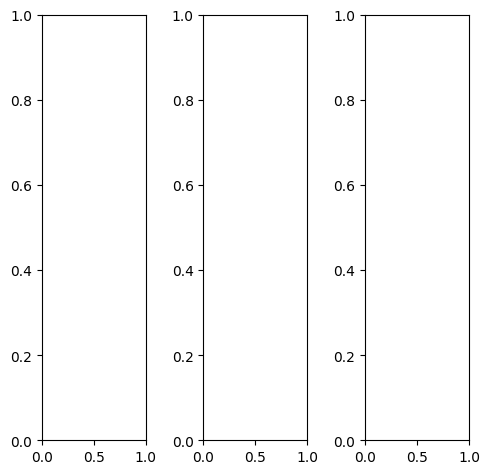

EPOCH: 26.510  trn_loss: 0.005  (3223.96s - 8937.25s remaining)

tensor([[[0.2196, 0.2471, 0.3843,  ..., 0.7961, 0.5294, 0.5059],
         [0.1765, 0.2196, 0.4784,  ..., 0.8431, 0.4941, 0.5333],
         [0.2000, 0.1725, 0.3647,  ..., 0.8431, 0.5412, 0.5490],
         ...,
         [0.5961, 0.6235, 0.6314,  ..., 0.4706, 0.3882, 0.4353],
         [0.6078, 0.6275, 0.6196,  ..., 0.1922, 0.1725, 0.2039],
         [0.5451, 0.5569, 0.5804,  ..., 0.0824, 0.0824, 0.0863]],

        [[0.2196, 0.2471, 0.3843,  ..., 0.7961, 0.5294, 0.5059],
         [0.1765, 0.2196, 0.4784,  ..., 0.8431, 0.4941, 0.5333],
         [0.2000, 0.1725, 0.3647,  ..., 0.8431, 0.5412, 0.5490],
         ...,
         [0.5961, 0.6235, 0.6314,  ..., 0.4706, 0.3882, 0.4353],
         [0.6078, 0.6275, 0.6196,  ..., 0.1922, 0.1725, 0.2039],
         [0.5451, 0.5569, 0.5804,  ..., 0.0824, 0.0824, 0.0863]],

        [[0.2196, 0.2471, 0.3843,  ..., 0.7961, 0.5294, 0.5059],
         [0.1765, 0.2196, 0.4784,  ..., 0.8431, 0.4941, 0.5333],
         [0.2000, 0.1725, 0.3647,  ..., 0.8431, 0.5412, 0.

tensor([[[0.1569, 0.1882, 0.3059,  ..., 0.7882, 0.5529, 0.5333],
         [0.0902, 0.1333, 0.3765,  ..., 0.8314, 0.5137, 0.5608],
         [0.1255, 0.0941, 0.2745,  ..., 0.8353, 0.5490, 0.5725],
         ...,
         [0.6353, 0.6627, 0.6706,  ..., 0.4549, 0.3765, 0.4196],
         [0.6471, 0.6667, 0.6588,  ..., 0.1765, 0.1569, 0.1882],
         [0.5882, 0.6000, 0.6235,  ..., 0.0667, 0.0706, 0.0784]],

        [[0.2275, 0.2627, 0.4039,  ..., 0.8039, 0.5216, 0.4980],
         [0.1922, 0.2431, 0.5059,  ..., 0.8431, 0.4824, 0.5216],
         [0.2118, 0.1961, 0.3882,  ..., 0.8431, 0.5333, 0.5412],
         ...,
         [0.5922, 0.6196, 0.6275,  ..., 0.4784, 0.3922, 0.4353],
         [0.6039, 0.6196, 0.6157,  ..., 0.2000, 0.1765, 0.2039],
         [0.5373, 0.5490, 0.5725,  ..., 0.0902, 0.0863, 0.0863]],

        [[0.3412, 0.3059, 0.4941,  ..., 0.7922, 0.5176, 0.4863],
         [0.3255, 0.3098, 0.6157,  ..., 0.8706, 0.5137, 0.5333],
         [0.3255, 0.2510, 0.4824,  ..., 0.8627, 0.5608, 0.

tensor([[[ 0.0725,  0.1000,  0.1941,  ...,  0.7619,  0.4601,  0.5401],
         [ 0.1203,  0.0090,  0.2547,  ...,  0.8432,  0.4850,  0.5431],
         [-0.0240,  0.0101,  0.1770,  ...,  0.8508,  0.5633,  0.5663],
         ...,
         [ 0.7233,  0.7886,  0.7419,  ...,  0.5848,  0.4824,  0.4824],
         [ 0.7143,  0.7605,  0.7110,  ...,  0.2347,  0.2243,  0.2727],
         [ 0.6529,  0.6699,  0.6781,  ...,  0.0946,  0.1091,  0.1719]],

        [[ 0.1716,  0.2720,  0.2993,  ...,  0.8763,  0.6042,  0.5872],
         [ 0.1555,  0.1479,  0.2672,  ...,  0.9235,  0.5532,  0.6419],
         [ 0.0745,  0.1474,  0.2404,  ...,  0.9283,  0.6207,  0.6382],
         ...,
         [ 0.6898,  0.7405,  0.7459,  ...,  0.6131,  0.5060,  0.4870],
         [ 0.6814,  0.7185,  0.7025,  ...,  0.2722,  0.2467,  0.2659],
         [ 0.5993,  0.6317,  0.6666,  ...,  0.1150,  0.1199,  0.1428]],

        [[ 0.3396,  0.2434,  0.4988,  ...,  1.0615,  0.7782,  0.7924],
         [ 0.3155,  0.2210,  0.5853,  ...,  1

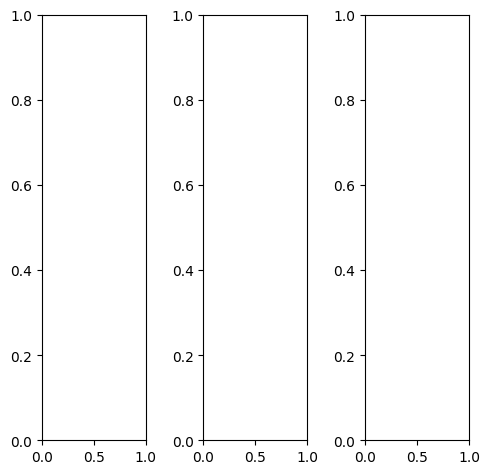

tensor([[[0.6078, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6078],
         [0.6118, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6118],
         [0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         ...,
         [0.6275, 0.6314, 0.6353,  ..., 0.6275, 0.6235, 0.6275],
         [0.6314, 0.6314, 0.6353,  ..., 0.6431, 0.6314, 0.6275],
         [0.6314, 0.6353, 0.6392,  ..., 0.6549, 0.6392, 0.6353]],

        [[0.6078, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6078],
         [0.6118, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6118],
         [0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.6118],
         ...,
         [0.6275, 0.6314, 0.6353,  ..., 0.6275, 0.6235, 0.6275],
         [0.6314, 0.6314, 0.6353,  ..., 0.6431, 0.6314, 0.6275],
         [0.6314, 0.6353, 0.6392,  ..., 0.6549, 0.6392, 0.6353]],

        [[0.6078, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6078],
         [0.6118, 0.6118, 0.6118,  ..., 0.6078, 0.6078, 0.6118],
         [0.6118, 0.6118, 0.6118,  ..., 0.6118, 0.6118, 0.

tensor([[[0.4431, 0.4471, 0.4471,  ..., 0.4431, 0.4431, 0.4431],
         [0.4471, 0.4471, 0.4471,  ..., 0.4431, 0.4431, 0.4471],
         [0.4471, 0.4471, 0.4471,  ..., 0.4471, 0.4471, 0.4471],
         ...,
         [0.4667, 0.4706, 0.4784,  ..., 0.4667, 0.4588, 0.4627],
         [0.4706, 0.4745, 0.4824,  ..., 0.4941, 0.4745, 0.4667],
         [0.4667, 0.4784, 0.4902,  ..., 0.5059, 0.4863, 0.4745]],

        [[0.6353, 0.6392, 0.6392,  ..., 0.6353, 0.6353, 0.6353],
         [0.6392, 0.6392, 0.6392,  ..., 0.6353, 0.6353, 0.6392],
         [0.6392, 0.6392, 0.6392,  ..., 0.6392, 0.6392, 0.6392],
         ...,
         [0.6549, 0.6588, 0.6627,  ..., 0.6588, 0.6549, 0.6588],
         [0.6588, 0.6588, 0.6627,  ..., 0.6706, 0.6588, 0.6549],
         [0.6588, 0.6627, 0.6667,  ..., 0.6824, 0.6667, 0.6627]],

        [[0.8941, 0.8980, 0.8980,  ..., 0.8941, 0.8941, 0.8941],
         [0.8980, 0.8980, 0.8980,  ..., 0.8941, 0.8941, 0.8980],
         [0.8980, 0.8980, 0.8980,  ..., 0.8980, 0.8980, 0.

tensor([[[ 0.1264,  0.0512, -0.0291,  ...,  0.1277,  0.1376,  0.0942],
         [ 0.1990, -0.0687, -0.0517,  ...,  0.1519,  0.1469,  0.0936],
         [ 0.1012, -0.0011, -0.0606,  ...,  0.2055,  0.2056,  0.1304],
         ...,
         [ 0.3320,  0.4036,  0.3193,  ...,  0.3335,  0.2880,  0.2287],
         [ 0.3528,  0.3634,  0.3634,  ...,  0.3219,  0.2700,  0.2076],
         [ 0.2969,  0.2510,  0.2546,  ...,  0.2821,  0.2343,  0.2061]],

        [[ 0.2488,  0.2072,  0.2057,  ...,  0.2500,  0.2934,  0.1865],
         [ 0.2406,  0.1773,  0.0293,  ...,  0.3033,  0.3321,  0.2116],
         [ 0.2019,  0.1865,  0.1402,  ...,  0.3173,  0.3602,  0.2181],
         ...,
         [ 0.2898,  0.3636,  0.3553,  ...,  0.3594,  0.3555,  0.2168],
         [ 0.3188,  0.3600,  0.3844,  ...,  0.3898,  0.3544,  0.2426],
         [ 0.2492,  0.2375,  0.2440,  ...,  0.2807,  0.2811,  0.1957]],

        [[ 0.4580,  0.2391,  0.2952,  ...,  0.2934,  0.3437,  0.3007],
         [ 0.4412,  0.2692,  0.2221,  ...,  0

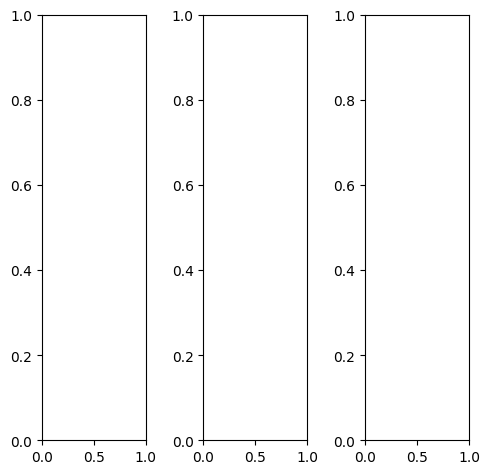

tensor([[[0.8431, 0.8588, 0.8941,  ..., 0.9765, 0.9725, 0.9882],
         [0.8157, 0.8118, 0.8314,  ..., 0.9529, 0.9608, 0.9804],
         [0.7882, 0.7843, 0.7725,  ..., 0.9176, 0.9412, 0.9725],
         ...,
         [0.4667, 0.3882, 0.4118,  ..., 0.6039, 0.4941, 0.4039],
         [0.4196, 0.3843, 0.3843,  ..., 0.6039, 0.5294, 0.4157],
         [0.4275, 0.3882, 0.3922,  ..., 0.5529, 0.5333, 0.4784]],

        [[0.8431, 0.8588, 0.8941,  ..., 0.9765, 0.9725, 0.9882],
         [0.8157, 0.8118, 0.8314,  ..., 0.9529, 0.9608, 0.9804],
         [0.7882, 0.7843, 0.7725,  ..., 0.9176, 0.9412, 0.9725],
         ...,
         [0.4667, 0.3882, 0.4118,  ..., 0.6039, 0.4941, 0.4039],
         [0.4196, 0.3843, 0.3843,  ..., 0.6039, 0.5294, 0.4157],
         [0.4275, 0.3882, 0.3922,  ..., 0.5529, 0.5333, 0.4784]],

        [[0.8431, 0.8588, 0.8941,  ..., 0.9765, 0.9725, 0.9882],
         [0.8157, 0.8118, 0.8314,  ..., 0.9529, 0.9608, 0.9804],
         [0.7882, 0.7843, 0.7725,  ..., 0.9176, 0.9412, 0.

tensor([[[0.8235, 0.8431, 0.8863,  ..., 0.9765, 0.9725, 0.9882],
         [0.7725, 0.7765, 0.8078,  ..., 0.9529, 0.9608, 0.9804],
         [0.7294, 0.7373, 0.7333,  ..., 0.9176, 0.9412, 0.9725],
         ...,
         [0.4314, 0.3529, 0.3725,  ..., 0.5843, 0.4196, 0.3176],
         [0.3882, 0.3451, 0.3412,  ..., 0.5843, 0.4588, 0.3333],
         [0.3961, 0.3490, 0.3451,  ..., 0.5255, 0.4863, 0.4275]],

        [[0.8510, 0.8627, 0.8941,  ..., 0.9765, 0.9725, 0.9882],
         [0.8314, 0.8235, 0.8392,  ..., 0.9529, 0.9608, 0.9804],
         [0.8078, 0.8000, 0.7843,  ..., 0.9176, 0.9412, 0.9725],
         ...,
         [0.4784, 0.4039, 0.4275,  ..., 0.6118, 0.5216, 0.4353],
         [0.4353, 0.4000, 0.4000,  ..., 0.6118, 0.5529, 0.4431],
         [0.4431, 0.4000, 0.4078,  ..., 0.5608, 0.5490, 0.4980]],

        [[0.8667, 0.8784, 0.9176,  ..., 0.9765, 0.9725, 0.9882],
         [0.8471, 0.8431, 0.8627,  ..., 0.9529, 0.9608, 0.9804],
         [0.8275, 0.8235, 0.8118,  ..., 0.9176, 0.9412, 0.

tensor([[[0.7450, 0.7136, 0.7197,  ..., 0.7727, 0.7458, 0.7851],
         [0.6695, 0.5845, 0.6193,  ..., 0.7791, 0.7873, 0.8099],
         [0.6529, 0.6092, 0.5302,  ..., 0.7673, 0.7901, 0.8259],
         ...,
         [0.4272, 0.3822, 0.4033,  ..., 0.5946, 0.4815, 0.3855],
         [0.3788, 0.3543, 0.3609,  ..., 0.5834, 0.5158, 0.3989],
         [0.3900, 0.3559, 0.3513,  ..., 0.5552, 0.5546, 0.4847]],

        [[0.7500, 0.7304, 0.7066,  ..., 0.8386, 0.8199, 0.8655],
         [0.6604, 0.5207, 0.5911,  ..., 0.8316, 0.8328, 0.8922],
         [0.7088, 0.6357, 0.5892,  ..., 0.8037, 0.8263, 0.8859],
         ...,
         [0.4332, 0.3632, 0.4171,  ..., 0.5745, 0.4783, 0.3408],
         [0.3816, 0.3630, 0.3844,  ..., 0.5811, 0.5020, 0.3719],
         [0.3871, 0.3454, 0.3598,  ..., 0.5267, 0.5245, 0.4562]],

        [[0.8128, 0.8062, 0.7835,  ..., 0.9792, 0.9626, 0.9935],
         [0.7836, 0.6962, 0.7504,  ..., 0.9603, 0.9816, 1.0041],
         [0.7242, 0.6723, 0.6042,  ..., 0.9282, 0.9658, 0.

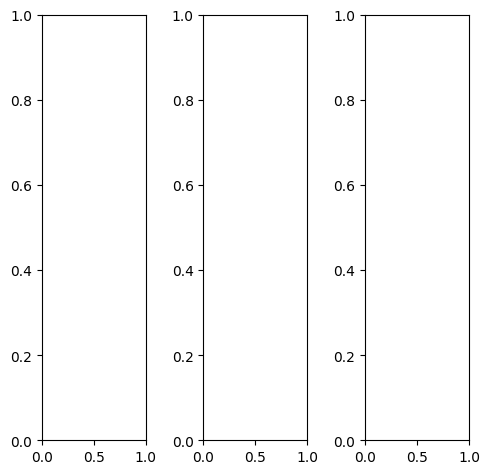

tensor([[[0.8902, 0.8784, 0.8824,  ..., 0.8235, 0.8078, 0.8039],
         [0.8863, 0.8784, 0.8784,  ..., 0.7843, 0.7725, 0.7608],
         [0.8588, 0.8510, 0.8510,  ..., 0.7333, 0.7216, 0.7020],
         ...,
         [0.4235, 0.3569, 0.3176,  ..., 0.4510, 0.4196, 0.2549],
         [0.4745, 0.4118, 0.3216,  ..., 0.4431, 0.3451, 0.1882],
         [0.4275, 0.4392, 0.4157,  ..., 0.3804, 0.3020, 0.1569]],

        [[0.8902, 0.8784, 0.8824,  ..., 0.8235, 0.8078, 0.8039],
         [0.8863, 0.8784, 0.8784,  ..., 0.7843, 0.7725, 0.7608],
         [0.8588, 0.8510, 0.8510,  ..., 0.7333, 0.7216, 0.7020],
         ...,
         [0.4235, 0.3569, 0.3176,  ..., 0.4510, 0.4196, 0.2549],
         [0.4745, 0.4118, 0.3216,  ..., 0.4431, 0.3451, 0.1882],
         [0.4275, 0.4392, 0.4157,  ..., 0.3804, 0.3020, 0.1569]],

        [[0.8902, 0.8784, 0.8824,  ..., 0.8235, 0.8078, 0.8039],
         [0.8863, 0.8784, 0.8784,  ..., 0.7843, 0.7725, 0.7608],
         [0.8588, 0.8510, 0.8510,  ..., 0.7333, 0.7216, 0.

tensor([[[0.8314, 0.8235, 0.8275,  ..., 0.7255, 0.7137, 0.7059],
         [0.8235, 0.8157, 0.8196,  ..., 0.6941, 0.6784, 0.6667],
         [0.7922, 0.7843, 0.7843,  ..., 0.6510, 0.6353, 0.6157],
         ...,
         [0.4118, 0.3333, 0.2863,  ..., 0.4431, 0.4431, 0.2275],
         [0.4627, 0.3882, 0.2902,  ..., 0.4588, 0.3725, 0.1451],
         [0.4157, 0.4157, 0.3882,  ..., 0.4039, 0.3216, 0.1059]],

        [[0.8980, 0.8863, 0.8902,  ..., 0.8392, 0.8235, 0.8157],
         [0.8941, 0.8863, 0.8863,  ..., 0.7961, 0.7804, 0.7647],
         [0.8667, 0.8588, 0.8588,  ..., 0.7373, 0.7216, 0.7020],
         ...,
         [0.4196, 0.3608, 0.3216,  ..., 0.4471, 0.4039, 0.2588],
         [0.4745, 0.4157, 0.3255,  ..., 0.4353, 0.3333, 0.1961],
         [0.4314, 0.4431, 0.4235,  ..., 0.3725, 0.2941, 0.1686]],

        [[0.9961, 0.9843, 0.9882,  ..., 0.9882, 0.9843, 0.9843],
         [1.0000, 1.0000, 1.0000,  ..., 0.9765, 0.9725, 0.9725],
         [1.0000, 0.9922, 0.9922,  ..., 0.9451, 0.9373, 0.

tensor([[[0.7319, 0.6678, 0.5937,  ..., 0.5261, 0.5329, 0.6048],
         [0.7046, 0.5636, 0.5894,  ..., 0.4778, 0.5248, 0.5609],
         [0.6539, 0.6076, 0.4721,  ..., 0.4458, 0.4632, 0.4747],
         ...,
         [0.3606, 0.2987, 0.2833,  ..., 0.4407, 0.3859, 0.2119],
         [0.4021, 0.3674, 0.2635,  ..., 0.4060, 0.2856, 0.1359],
         [0.3689, 0.3880, 0.3637,  ..., 0.3009, 0.2353, 0.1249]],

        [[0.7830, 0.7324, 0.6650,  ..., 0.6569, 0.6906, 0.6923],
         [0.6961, 0.5273, 0.5932,  ..., 0.6280, 0.6684, 0.7068],
         [0.7499, 0.7007, 0.6136,  ..., 0.5883, 0.5867, 0.6108],
         ...,
         [0.3244, 0.2949, 0.2612,  ..., 0.4377, 0.3773, 0.1880],
         [0.3991, 0.3633, 0.2637,  ..., 0.4050, 0.2840, 0.1088],
         [0.3496, 0.3854, 0.3596,  ..., 0.2831, 0.2260, 0.1100]],

        [[0.8894, 0.8323, 0.8026,  ..., 0.8861, 0.9002, 0.8921],
         [0.8601, 0.7509, 0.7957,  ..., 0.8299, 0.8755, 0.8954],
         [0.7819, 0.7565, 0.6464,  ..., 0.8012, 0.8103, 0.

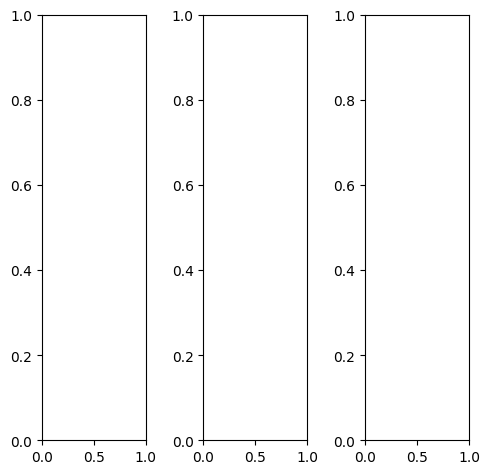

tensor([[[0.7255, 0.7294, 0.7373,  ..., 0.7333, 0.7294, 0.7216],
         [0.6275, 0.6588, 0.6941,  ..., 0.7608, 0.7490, 0.7451],
         [0.2824, 0.3569, 0.4000,  ..., 0.5882, 0.6863, 0.6863],
         ...,
         [0.5020, 0.4745, 0.4667,  ..., 0.4784, 0.4784, 0.4588],
         [0.5765, 0.6000, 0.5804,  ..., 0.4667, 0.4941, 0.4471],
         [0.5922, 0.5882, 0.5922,  ..., 0.5490, 0.5216, 0.5137]],

        [[0.7255, 0.7294, 0.7373,  ..., 0.7333, 0.7294, 0.7216],
         [0.6275, 0.6588, 0.6941,  ..., 0.7608, 0.7490, 0.7451],
         [0.2824, 0.3569, 0.4000,  ..., 0.5882, 0.6863, 0.6863],
         ...,
         [0.5020, 0.4745, 0.4667,  ..., 0.4784, 0.4784, 0.4588],
         [0.5765, 0.6000, 0.5804,  ..., 0.4667, 0.4941, 0.4471],
         [0.5922, 0.5882, 0.5922,  ..., 0.5490, 0.5216, 0.5137]],

        [[0.7255, 0.7294, 0.7373,  ..., 0.7333, 0.7294, 0.7216],
         [0.6275, 0.6588, 0.6941,  ..., 0.7608, 0.7490, 0.7451],
         [0.2824, 0.3569, 0.4000,  ..., 0.5882, 0.6863, 0.

tensor([[[0.6627, 0.6667, 0.6667,  ..., 0.6745, 0.6706, 0.6667],
         [0.5961, 0.6196, 0.6471,  ..., 0.7059, 0.6902, 0.6902],
         [0.2784, 0.3529, 0.3961,  ..., 0.5490, 0.6353, 0.6392],
         ...,
         [0.5216, 0.4902, 0.4863,  ..., 0.4902, 0.4941, 0.4902],
         [0.6235, 0.6392, 0.6196,  ..., 0.4863, 0.5137, 0.4745],
         [0.6353, 0.6275, 0.6157,  ..., 0.5725, 0.5490, 0.5451]],

        [[0.7373, 0.7412, 0.7490,  ..., 0.7451, 0.7412, 0.7294],
         [0.6314, 0.6627, 0.7020,  ..., 0.7725, 0.7608, 0.7569],
         [0.2863, 0.3608, 0.4000,  ..., 0.5961, 0.6941, 0.6941],
         ...,
         [0.5333, 0.5137, 0.5020,  ..., 0.5216, 0.5137, 0.4941],
         [0.5961, 0.6196, 0.6000,  ..., 0.5098, 0.5294, 0.4863],
         [0.6039, 0.6078, 0.6157,  ..., 0.5725, 0.5451, 0.5373]],

        [[0.8353, 0.8431, 0.8471,  ..., 0.8314, 0.8275, 0.8235],
         [0.6980, 0.7373, 0.7843,  ..., 0.8588, 0.8392, 0.8353],
         [0.2863, 0.3490, 0.4235,  ..., 0.6549, 0.7725, 0.

tensor([[[0.6085, 0.5973, 0.5744,  ..., 0.6062, 0.6010, 0.6257],
         [0.4504, 0.4852, 0.3788,  ..., 0.6398, 0.6654, 0.6317],
         [0.0102, 0.0185, 0.0832,  ..., 0.4150, 0.5813, 0.5443],
         ...,
         [0.4347, 0.4853, 0.4484,  ..., 0.4349, 0.4226, 0.3257],
         [0.5021, 0.5961, 0.5608,  ..., 0.3621, 0.3814, 0.3186],
         [0.5301, 0.5327, 0.5429,  ..., 0.4496, 0.4117, 0.3909]],

        [[0.6402, 0.6135, 0.6281,  ..., 0.7174, 0.7269, 0.7196],
         [0.5004, 0.5281, 0.3706,  ..., 0.7452, 0.7744, 0.7495],
         [0.1333, 0.0029, 0.1589,  ..., 0.4998, 0.6499, 0.6139],
         ...,
         [0.4308, 0.4280, 0.4219,  ..., 0.4594, 0.4617, 0.3204],
         [0.4978, 0.5636, 0.5290,  ..., 0.4059, 0.4283, 0.3198],
         [0.5179, 0.5135, 0.5314,  ..., 0.4721, 0.4307, 0.3828]],

        [[0.7339, 0.7610, 0.7307,  ..., 0.9015, 0.8957, 0.8616],
         [0.6093, 0.6434, 0.5976,  ..., 0.9348, 0.9437, 0.8934],
         [0.2260, 0.2125, 0.2289,  ..., 0.7150, 0.8639, 0.

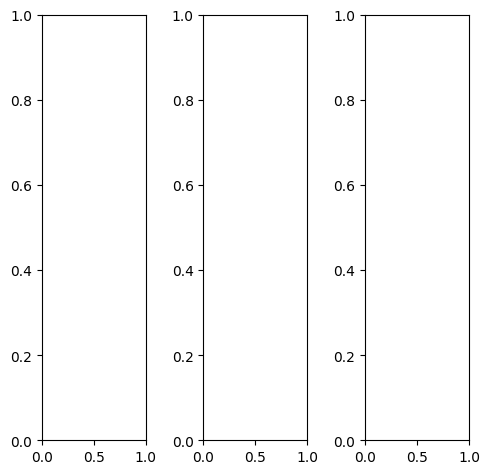

EPOCH: 26.765  trn_loss: 0.004  (3253.82s - 8903.04s remaining)

tensor([[[0.5059, 0.5294, 0.4941,  ..., 0.4353, 0.4392, 0.5020],
         [0.5608, 0.5216, 0.4902,  ..., 0.4667, 0.4627, 0.4941],
         [0.5804, 0.5490, 0.5176,  ..., 0.4627, 0.4824, 0.4471],
         ...,
         [0.5176, 0.4941, 0.4745,  ..., 0.4745, 0.3882, 0.4118],
         [0.4667, 0.4706, 0.4824,  ..., 0.5373, 0.4588, 0.4549],
         [0.4431, 0.4588, 0.5098,  ..., 0.4784, 0.4824, 0.5333]],

        [[0.5059, 0.5294, 0.4941,  ..., 0.4353, 0.4392, 0.5020],
         [0.5608, 0.5216, 0.4902,  ..., 0.4667, 0.4627, 0.4941],
         [0.5804, 0.5490, 0.5176,  ..., 0.4627, 0.4824, 0.4471],
         ...,
         [0.5176, 0.4941, 0.4745,  ..., 0.4745, 0.3882, 0.4118],
         [0.4667, 0.4706, 0.4824,  ..., 0.5373, 0.4588, 0.4549],
         [0.4431, 0.4588, 0.5098,  ..., 0.4784, 0.4824, 0.5333]],

        [[0.5059, 0.5294, 0.4941,  ..., 0.4353, 0.4392, 0.5020],
         [0.5608, 0.5216, 0.4902,  ..., 0.4667, 0.4627, 0.4941],
         [0.5804, 0.5490, 0.5176,  ..., 0.4627, 0.4824, 0.

tensor([[[0.5176, 0.5373, 0.4941,  ..., 0.4078, 0.4275, 0.5020],
         [0.6039, 0.5529, 0.5098,  ..., 0.4431, 0.4627, 0.4902],
         [0.6275, 0.5961, 0.5451,  ..., 0.4471, 0.4784, 0.4235],
         ...,
         [0.5333, 0.4980, 0.4667,  ..., 0.4706, 0.3686, 0.3882],
         [0.4941, 0.4863, 0.4980,  ..., 0.5294, 0.4353, 0.4392],
         [0.4549, 0.4863, 0.5412,  ..., 0.4549, 0.4510, 0.5137]],

        [[0.5333, 0.5608, 0.5294,  ..., 0.4824, 0.4784, 0.5412],
         [0.5765, 0.5412, 0.5176,  ..., 0.5137, 0.5059, 0.5412],
         [0.5922, 0.5608, 0.5412,  ..., 0.5059, 0.5294, 0.5059],
         ...,
         [0.5451, 0.5294, 0.5176,  ..., 0.5137, 0.4353, 0.4588],
         [0.4863, 0.4941, 0.5137,  ..., 0.5882, 0.5098, 0.5020],
         [0.4745, 0.4745, 0.5333,  ..., 0.5412, 0.5412, 0.5882]],

        [[0.3216, 0.3373, 0.2980,  ..., 0.2588, 0.2627, 0.3098],
         [0.3686, 0.3294, 0.2941,  ..., 0.2706, 0.2392, 0.2745],
         [0.3804, 0.3647, 0.3294,  ..., 0.2706, 0.2471, 0.

tensor([[[ 0.5750,  0.4871,  0.2924,  ..., -0.0131,  0.0099,  0.1365],
         [ 0.6801,  0.5743,  0.4428,  ...,  0.1067,  0.0886,  0.0689],
         [ 0.7629,  0.8205,  0.6184,  ...,  0.2157,  0.2193, -0.0014],
         ...,
         [ 0.5000,  0.4701,  0.4492,  ...,  0.3167,  0.0822,  0.0083],
         [ 0.3167,  0.3651,  0.4521,  ...,  0.4648,  0.2143,  0.1098],
         [ 0.2227,  0.1749,  0.3454,  ...,  0.1881,  0.1948,  0.2438]],

        [[ 0.6825,  0.5918,  0.5135,  ...,  0.1414,  0.1939,  0.2409],
         [ 0.7089,  0.7615,  0.5047,  ...,  0.3047,  0.3272,  0.2359],
         [ 0.8123,  0.8608,  0.7791,  ...,  0.3702,  0.4430,  0.1117],
         ...,
         [ 0.4686,  0.3885,  0.4259,  ...,  0.3389,  0.1298, -0.0238],
         [ 0.2924,  0.3181,  0.4266,  ...,  0.5289,  0.2830,  0.1275],
         [ 0.1636,  0.1680,  0.3542,  ...,  0.2126,  0.2510,  0.2424]],

        [[ 0.8117,  0.6972,  0.6416,  ...,  0.2852,  0.3468,  0.4250],
         [ 0.8820,  0.8980,  0.6572,  ...,  0

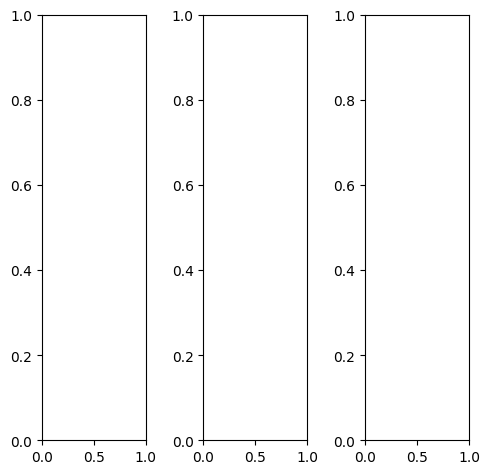

tensor([[[0.0392, 0.0431, 0.0431,  ..., 0.4000, 0.4000, 0.4039],
         [0.0353, 0.0235, 0.0235,  ..., 0.3961, 0.4235, 0.4118],
         [0.0235, 0.0235, 0.0118,  ..., 0.4431, 0.4667, 0.4157],
         ...,
         [0.0314, 0.0275, 0.0275,  ..., 0.7608, 0.7412, 0.7412],
         [0.0275, 0.0275, 0.0275,  ..., 0.7647, 0.7333, 0.7412],
         [0.0275, 0.0235, 0.0275,  ..., 0.7608, 0.7608, 0.8078]],

        [[0.0392, 0.0431, 0.0431,  ..., 0.4000, 0.4000, 0.4039],
         [0.0353, 0.0235, 0.0235,  ..., 0.3961, 0.4235, 0.4118],
         [0.0235, 0.0235, 0.0118,  ..., 0.4431, 0.4667, 0.4157],
         ...,
         [0.0314, 0.0275, 0.0275,  ..., 0.7608, 0.7412, 0.7412],
         [0.0275, 0.0275, 0.0275,  ..., 0.7647, 0.7333, 0.7412],
         [0.0275, 0.0235, 0.0275,  ..., 0.7608, 0.7608, 0.8078]],

        [[0.0392, 0.0431, 0.0431,  ..., 0.4000, 0.4000, 0.4039],
         [0.0353, 0.0235, 0.0235,  ..., 0.3961, 0.4235, 0.4118],
         [0.0235, 0.0235, 0.0118,  ..., 0.4431, 0.4667, 0.

tensor([[[0.0235, 0.0314, 0.0314,  ..., 0.3882, 0.3843, 0.3843],
         [0.0235, 0.0157, 0.0118,  ..., 0.3843, 0.4118, 0.3961],
         [0.0118, 0.0157, 0.0039,  ..., 0.4314, 0.4627, 0.4157],
         ...,
         [0.0196, 0.0157, 0.0157,  ..., 0.7647, 0.7451, 0.7412],
         [0.0157, 0.0157, 0.0157,  ..., 0.7686, 0.7373, 0.7412],
         [0.0157, 0.0118, 0.0157,  ..., 0.7647, 0.7608, 0.8078]],

        [[0.0471, 0.0510, 0.0510,  ..., 0.4000, 0.4039, 0.4118],
         [0.0431, 0.0314, 0.0314,  ..., 0.3961, 0.4275, 0.4157],
         [0.0314, 0.0314, 0.0196,  ..., 0.4431, 0.4667, 0.4078],
         ...,
         [0.0392, 0.0353, 0.0353,  ..., 0.7569, 0.7373, 0.7373],
         [0.0353, 0.0353, 0.0353,  ..., 0.7608, 0.7294, 0.7373],
         [0.0353, 0.0314, 0.0353,  ..., 0.7569, 0.7569, 0.8039]],

        [[0.0275, 0.0353, 0.0353,  ..., 0.4235, 0.4196, 0.4196],
         [0.0275, 0.0196, 0.0157,  ..., 0.4196, 0.4471, 0.4431],
         [0.0157, 0.0157, 0.0078,  ..., 0.4627, 0.4941, 0.

tensor([[[-0.1632, -0.1638, -0.2048,  ...,  0.2192,  0.2220,  0.2737],
         [-0.0536, -0.2586, -0.1332,  ...,  0.1781,  0.1960,  0.2373],
         [-0.2584, -0.1939, -0.1709,  ...,  0.2594,  0.3002,  0.2573],
         ...,
         [-0.0596, -0.0534, -0.0343,  ...,  0.6621,  0.6383,  0.6622],
         [-0.0358, -0.0535, -0.0208,  ...,  0.6202,  0.5918,  0.6732],
         [-0.0015, -0.0154, -0.0111,  ...,  0.6745,  0.7109,  0.7466]],

        [[-0.0201, -0.0433, -0.0133,  ...,  0.3685,  0.3781,  0.3689],
         [-0.0373, -0.3598, -0.2643,  ...,  0.3368,  0.3842,  0.3444],
         [-0.1246, -0.0988, -0.0877,  ...,  0.4149,  0.4636,  0.3521],
         ...,
         [-0.0527, -0.0709, -0.0612,  ...,  0.6538,  0.6366,  0.6661],
         [-0.0373, -0.0665, -0.0523,  ...,  0.6465,  0.6196,  0.6771],
         [-0.0042, -0.0396, -0.0456,  ...,  0.6699,  0.7060,  0.7317]],

        [[ 0.1844, -0.0660,  0.0356,  ...,  0.5478,  0.5795,  0.5614],
         [ 0.1322, -0.1180, -0.0152,  ...,  0

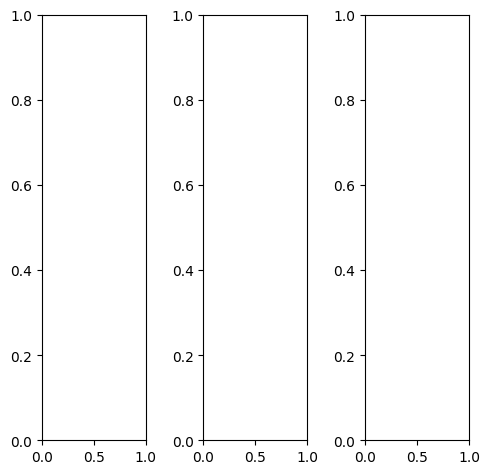

tensor([[[0.2510, 0.2706, 0.3137,  ..., 0.0431, 0.0941, 0.2275],
         [0.3255, 0.3373, 0.3529,  ..., 0.0510, 0.0706, 0.2157],
         [0.4549, 0.4157, 0.3686,  ..., 0.0549, 0.0510, 0.1765],
         ...,
         [0.1686, 0.1725, 0.1686,  ..., 0.2078, 0.1725, 0.1569],
         [0.1647, 0.1765, 0.1725,  ..., 0.1647, 0.1490, 0.1216],
         [0.1843, 0.1843, 0.1686,  ..., 0.1255, 0.1176, 0.1059]],

        [[0.2510, 0.2706, 0.3137,  ..., 0.0431, 0.0941, 0.2275],
         [0.3255, 0.3373, 0.3529,  ..., 0.0510, 0.0706, 0.2157],
         [0.4549, 0.4157, 0.3686,  ..., 0.0549, 0.0510, 0.1765],
         ...,
         [0.1686, 0.1725, 0.1686,  ..., 0.2078, 0.1725, 0.1569],
         [0.1647, 0.1765, 0.1725,  ..., 0.1647, 0.1490, 0.1216],
         [0.1843, 0.1843, 0.1686,  ..., 0.1255, 0.1176, 0.1059]],

        [[0.2510, 0.2706, 0.3137,  ..., 0.0431, 0.0941, 0.2275],
         [0.3255, 0.3373, 0.3529,  ..., 0.0510, 0.0706, 0.2157],
         [0.4549, 0.4157, 0.3686,  ..., 0.0549, 0.0510, 0.

tensor([[[0.3490, 0.3725, 0.4235,  ..., 0.0431, 0.1216, 0.3059],
         [0.4392, 0.4510, 0.4667,  ..., 0.0510, 0.0941, 0.2941],
         [0.5725, 0.5294, 0.4784,  ..., 0.0549, 0.0667, 0.2392],
         ...,
         [0.2118, 0.2196, 0.2196,  ..., 0.2431, 0.2039, 0.1922],
         [0.2078, 0.2235, 0.2235,  ..., 0.2039, 0.1804, 0.1529],
         [0.2275, 0.2314, 0.2196,  ..., 0.1647, 0.1490, 0.1333]],

        [[0.2196, 0.2392, 0.2745,  ..., 0.0431, 0.0902, 0.2000],
         [0.2902, 0.3020, 0.3137,  ..., 0.0549, 0.0667, 0.1922],
         [0.4235, 0.3843, 0.3373,  ..., 0.0549, 0.0471, 0.1569],
         ...,
         [0.1412, 0.1451, 0.1373,  ..., 0.1804, 0.1490, 0.1333],
         [0.1412, 0.1490, 0.1412,  ..., 0.1412, 0.1294, 0.1059],
         [0.1608, 0.1569, 0.1373,  ..., 0.1059, 0.1020, 0.0902]],

        [[0.1608, 0.1647, 0.2118,  ..., 0.0392, 0.0588, 0.1490],
         [0.2000, 0.2157, 0.2510,  ..., 0.0471, 0.0392, 0.1373],
         [0.2941, 0.2627, 0.2431,  ..., 0.0471, 0.0235, 0.

tensor([[[0.4310, 0.3637, 0.4436,  ..., 0.0827, 0.1580, 0.4152],
         [0.4828, 0.4354, 0.4496,  ..., 0.0557, 0.1033, 0.3835],
         [0.7150, 0.6604, 0.4685,  ..., 0.0524, 0.0626, 0.3107],
         ...,
         [0.3340, 0.3944, 0.3923,  ..., 0.4103, 0.3347, 0.3299],
         [0.3210, 0.3795, 0.3795,  ..., 0.3120, 0.2937, 0.2816],
         [0.3588, 0.3766, 0.3351,  ..., 0.2416, 0.2255, 0.2764]],

        [[0.4456, 0.5202, 0.5189,  ..., 0.1117, 0.1857, 0.4284],
         [0.5563, 0.5853, 0.5840,  ..., 0.1156, 0.1756, 0.4293],
         [0.7757, 0.7659, 0.5989,  ..., 0.1050, 0.1134, 0.3542],
         ...,
         [0.2880, 0.3426, 0.3389,  ..., 0.4266, 0.3518, 0.3054],
         [0.2763, 0.3448, 0.3336,  ..., 0.3312, 0.2995, 0.2471],
         [0.3092, 0.3264, 0.3048,  ..., 0.2346, 0.2145, 0.2343]],

        [[0.6293, 0.5778, 0.7593,  ..., 0.2171, 0.3039, 0.5379],
         [0.7553, 0.7599, 0.8071,  ..., 0.2392, 0.2975, 0.5415],
         [0.9297, 0.8323, 0.7994,  ..., 0.2237, 0.2409, 0.

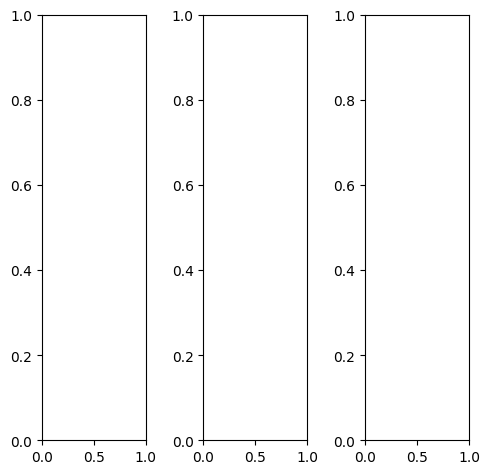

tensor([[[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.9216],
         ...,
         [0.7647, 0.7255, 0.7412,  ..., 0.9569, 0.9451, 0.9451],
         [0.8235, 0.7725, 0.7490,  ..., 0.9529, 0.9412, 0.9412],
         [0.8667, 0.8039, 0.8000,  ..., 0.9451, 0.9412, 0.9412]],

        [[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.9216],
         ...,
         [0.7647, 0.7255, 0.7412,  ..., 0.9569, 0.9451, 0.9451],
         [0.8235, 0.7725, 0.7490,  ..., 0.9529, 0.9412, 0.9412],
         [0.8667, 0.8039, 0.8000,  ..., 0.9451, 0.9412, 0.9412]],

        [[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.

tensor([[[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.9216],
         ...,
         [0.7647, 0.7255, 0.7412,  ..., 0.9569, 0.9451, 0.9451],
         [0.8235, 0.7725, 0.7490,  ..., 0.9529, 0.9412, 0.9412],
         [0.8667, 0.8039, 0.8000,  ..., 0.9451, 0.9412, 0.9412]],

        [[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.9216],
         ...,
         [0.7647, 0.7255, 0.7412,  ..., 0.9569, 0.9451, 0.9451],
         [0.8235, 0.7725, 0.7490,  ..., 0.9529, 0.9412, 0.9412],
         [0.8667, 0.8039, 0.8000,  ..., 0.9451, 0.9412, 0.9412]],

        [[0.9451, 0.9412, 0.9451,  ..., 0.9294, 0.9255, 0.9176],
         [0.9490, 0.9373, 0.9451,  ..., 0.9333, 0.9294, 0.9216],
         [0.9529, 0.9451, 0.9490,  ..., 0.9333, 0.9333, 0.

tensor([[[ 0.3460,  0.2491,  0.1972,  ...,  0.3934,  0.4255,  0.4790],
         [ 0.2973,  0.0444,  0.0243,  ...,  0.3670,  0.3710,  0.4446],
         [ 0.2045,  0.0585, -0.0474,  ...,  0.3419,  0.3860,  0.4432],
         ...,
         [ 0.4329,  0.5203,  0.5349,  ...,  0.4985,  0.5113,  0.5528],
         [ 0.5155,  0.5581,  0.5911,  ...,  0.5272,  0.5263,  0.5730],
         [ 0.5029,  0.5186,  0.5285,  ...,  0.5295,  0.5561,  0.5602]],

        [[ 0.4834,  0.3994,  0.4601,  ...,  0.4528,  0.5123,  0.4933],
         [ 0.3201,  0.1518,  0.0890,  ...,  0.4631,  0.4942,  0.4914],
         [ 0.4064,  0.2460,  0.2871,  ...,  0.4295,  0.4923,  0.4918],
         ...,
         [ 0.3476,  0.3907,  0.4524,  ...,  0.4587,  0.4933,  0.4851],
         [ 0.4522,  0.4982,  0.5139,  ...,  0.4907,  0.5107,  0.5335],
         [ 0.4574,  0.4567,  0.4673,  ...,  0.4786,  0.5186,  0.5082]],

        [[ 0.6844,  0.5037,  0.6292,  ...,  0.6423,  0.6766,  0.6703],
         [ 0.5498,  0.4373,  0.3936,  ...,  0

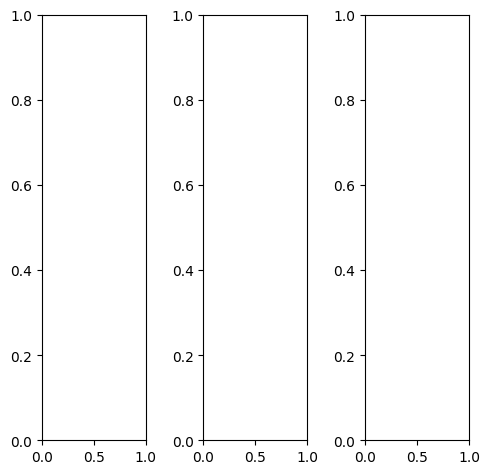

tensor([[[0.8353, 0.8667, 0.8902,  ..., 0.8745, 0.8706, 0.8745],
         [0.8235, 0.8627, 0.8824,  ..., 0.8471, 0.8510, 0.8549],
         [0.8196, 0.8667, 0.8863,  ..., 0.8510, 0.8510, 0.8549],
         ...,
         [0.8902, 0.7490, 0.4235,  ..., 0.8745, 0.8627, 0.8627],
         [0.8667, 0.8941, 0.5608,  ..., 0.8627, 0.8471, 0.8588],
         [0.8706, 0.9059, 0.7804,  ..., 0.8588, 0.8431, 0.8549]],

        [[0.8353, 0.8667, 0.8902,  ..., 0.8745, 0.8706, 0.8745],
         [0.8235, 0.8627, 0.8824,  ..., 0.8471, 0.8510, 0.8549],
         [0.8196, 0.8667, 0.8863,  ..., 0.8510, 0.8510, 0.8549],
         ...,
         [0.8902, 0.7490, 0.4235,  ..., 0.8745, 0.8627, 0.8627],
         [0.8667, 0.8941, 0.5608,  ..., 0.8627, 0.8471, 0.8588],
         [0.8706, 0.9059, 0.7804,  ..., 0.8588, 0.8431, 0.8549]],

        [[0.8353, 0.8667, 0.8902,  ..., 0.8745, 0.8706, 0.8745],
         [0.8235, 0.8627, 0.8824,  ..., 0.8471, 0.8510, 0.8549],
         [0.8196, 0.8667, 0.8863,  ..., 0.8510, 0.8510, 0.

tensor([[[0.8078, 0.8353, 0.8510,  ..., 0.8078, 0.8000, 0.8078],
         [0.7961, 0.8314, 0.8431,  ..., 0.7804, 0.7843, 0.7882],
         [0.7922, 0.8353, 0.8471,  ..., 0.7843, 0.7843, 0.7882],
         ...,
         [0.8784, 0.7373, 0.4118,  ..., 0.8353, 0.8235, 0.8235],
         [0.8549, 0.8824, 0.5490,  ..., 0.8157, 0.8039, 0.8157],
         [0.8588, 0.8941, 0.7686,  ..., 0.8078, 0.7922, 0.8039]],

        [[0.8627, 0.8902, 0.9176,  ..., 0.8980, 0.8941, 0.9020],
         [0.8471, 0.8863, 0.9059,  ..., 0.8667, 0.8706, 0.8784],
         [0.8392, 0.8863, 0.9059,  ..., 0.8706, 0.8706, 0.8784],
         ...,
         [0.9059, 0.7647, 0.4392,  ..., 0.8902, 0.8784, 0.8784],
         [0.8824, 0.9098, 0.5765,  ..., 0.8784, 0.8627, 0.8784],
         [0.8863, 0.9216, 0.7961,  ..., 0.8784, 0.8667, 0.8745]],

        [[0.7765, 0.8196, 0.8588,  ..., 0.9333, 0.9216, 0.9137],
         [0.7647, 0.8196, 0.8549,  ..., 0.9176, 0.9137, 0.9020],
         [0.7922, 0.8471, 0.8824,  ..., 0.9255, 0.9216, 0.

tensor([[[0.3679, 0.3199, 0.2892,  ..., 0.3773, 0.3955, 0.4472],
         [0.3140, 0.1731, 0.2210,  ..., 0.3488, 0.3434, 0.3783],
         [0.2242, 0.2456, 0.1459,  ..., 0.3487, 0.3784, 0.3956],
         ...,
         [0.5361, 0.4697, 0.1574,  ..., 0.5546, 0.5432, 0.5515],
         [0.5020, 0.5868, 0.3298,  ..., 0.5512, 0.5182, 0.5429],
         [0.4904, 0.5390, 0.4437,  ..., 0.5265, 0.5254, 0.5151]],

        [[0.5045, 0.4481, 0.4961,  ..., 0.4722, 0.5256, 0.4844],
         [0.3443, 0.3025, 0.2663,  ..., 0.4898, 0.5058, 0.4669],
         [0.4036, 0.3871, 0.3874,  ..., 0.4779, 0.5198, 0.4739],
         ...,
         [0.5062, 0.3809, 0.1300,  ..., 0.5156, 0.5534, 0.4743],
         [0.4826, 0.5859, 0.3047,  ..., 0.5232, 0.5200, 0.5010],
         [0.4705, 0.5317, 0.4297,  ..., 0.4746, 0.4891, 0.4591]],

        [[0.6944, 0.5634, 0.7105,  ..., 0.6903, 0.7094, 0.6909],
         [0.5932, 0.6000, 0.5635,  ..., 0.6691, 0.7034, 0.6859],
         [0.5189, 0.5298, 0.5415,  ..., 0.6927, 0.7208, 0.

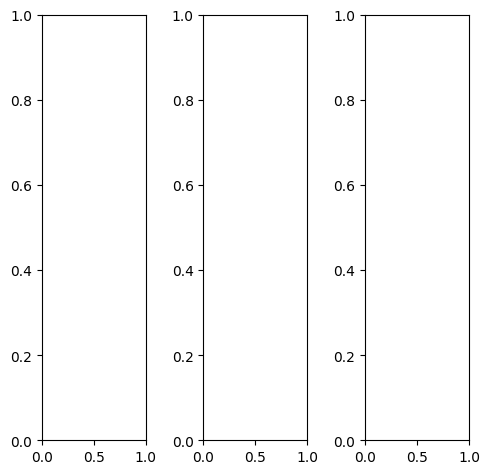

EPOCH: 27.000  val_loss: 0.003  (3289.93s - 8895.00s remaining)

tensor([[[0.2980, 0.2549, 0.2745,  ..., 0.2784, 0.3451, 0.3412],
         [0.2941, 0.2588, 0.2667,  ..., 0.2588, 0.3451, 0.3765],
         [0.3490, 0.2588, 0.2549,  ..., 0.2941, 0.3882, 0.4667],
         ...,
         [0.5451, 0.5294, 0.5216,  ..., 0.4510, 0.4353, 0.4157],
         [0.4078, 0.4078, 0.3922,  ..., 0.4235, 0.3961, 0.3569],
         [0.4471, 0.4353, 0.4039,  ..., 0.3608, 0.3529, 0.3176]],

        [[0.2980, 0.2549, 0.2745,  ..., 0.2784, 0.3451, 0.3412],
         [0.2941, 0.2588, 0.2667,  ..., 0.2588, 0.3451, 0.3765],
         [0.3490, 0.2588, 0.2549,  ..., 0.2941, 0.3882, 0.4667],
         ...,
         [0.5451, 0.5294, 0.5216,  ..., 0.4510, 0.4353, 0.4157],
         [0.4078, 0.4078, 0.3922,  ..., 0.4235, 0.3961, 0.3569],
         [0.4471, 0.4353, 0.4039,  ..., 0.3608, 0.3529, 0.3176]],

        [[0.2980, 0.2549, 0.2745,  ..., 0.2784, 0.3451, 0.3412],
         [0.2941, 0.2588, 0.2667,  ..., 0.2588, 0.3451, 0.3765],
         [0.3490, 0.2588, 0.2549,  ..., 0.2941, 0.3882, 0.

tensor([[[0.3882, 0.3216, 0.3020,  ..., 0.3098, 0.3490, 0.3255],
         [0.3608, 0.3216, 0.3020,  ..., 0.2706, 0.3333, 0.3529],
         [0.3922, 0.3176, 0.3059,  ..., 0.2980, 0.3725, 0.4471],
         ...,
         [0.5843, 0.5647, 0.5608,  ..., 0.5216, 0.4980, 0.4745],
         [0.4706, 0.4667, 0.4549,  ..., 0.4980, 0.4667, 0.4196],
         [0.5294, 0.5176, 0.4824,  ..., 0.4431, 0.4275, 0.3843]],

        [[0.2824, 0.2353, 0.2667,  ..., 0.2902, 0.3804, 0.3922],
         [0.2824, 0.2392, 0.2549,  ..., 0.2824, 0.3882, 0.4314],
         [0.3529, 0.2471, 0.2431,  ..., 0.3216, 0.4314, 0.5137],
         ...,
         [0.5216, 0.5098, 0.5020,  ..., 0.4196, 0.4078, 0.3922],
         [0.3765, 0.3804, 0.3647,  ..., 0.3961, 0.3686, 0.3294],
         [0.4118, 0.4039, 0.3725,  ..., 0.3333, 0.3216, 0.2863]],

        [[0.1569, 0.1843, 0.2314,  ..., 0.1373, 0.1569, 0.1059],
         [0.1765, 0.2000, 0.2314,  ..., 0.0941, 0.1451, 0.1529],
         [0.2039, 0.1686, 0.1843,  ..., 0.1333, 0.2078, 0.

tensor([[[0.3086, 0.2618, 0.2805,  ..., 0.2750, 0.3361, 0.3461],
         [0.2883, 0.2480, 0.2676,  ..., 0.2705, 0.3525, 0.3754],
         [0.3561, 0.2556, 0.2520,  ..., 0.3055, 0.4067, 0.4843],
         ...,
         [0.5639, 0.5457, 0.5446,  ..., 0.4535, 0.4333, 0.4258],
         [0.4142, 0.4199, 0.4123,  ..., 0.4319, 0.4071, 0.3696],
         [0.4635, 0.4493, 0.4164,  ..., 0.3674, 0.3579, 0.3419]],

        [[0.3124, 0.2660, 0.2932,  ..., 0.2749, 0.3454, 0.3566],
         [0.2960, 0.2617, 0.2773,  ..., 0.2559, 0.3538, 0.3787],
         [0.3607, 0.2714, 0.2689,  ..., 0.2769, 0.3857, 0.4770],
         ...,
         [0.5436, 0.5314, 0.5329,  ..., 0.4563, 0.4370, 0.4203],
         [0.4033, 0.4043, 0.4003,  ..., 0.4205, 0.4001, 0.3623],
         [0.4653, 0.4393, 0.4121,  ..., 0.3651, 0.3512, 0.3359]],

        [[0.2530, 0.2084, 0.2256,  ..., 0.2360, 0.3165, 0.3317],
         [0.2334, 0.2025, 0.2179,  ..., 0.2282, 0.3050, 0.3384],
         [0.2948, 0.2084, 0.2111,  ..., 0.2561, 0.3438, 0.

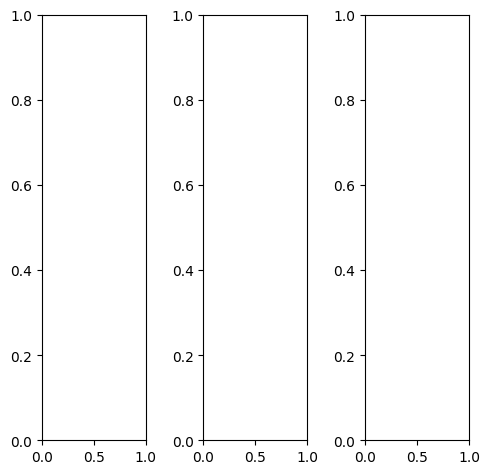

tensor([[[0.2275, 0.1765, 0.1176,  ..., 0.2235, 0.2549, 0.2196],
         [0.1843, 0.2314, 0.2039,  ..., 0.2667, 0.2745, 0.2510],
         [0.1373, 0.1882, 0.2549,  ..., 0.2863, 0.2941, 0.2863],
         ...,
         [0.4039, 0.4196, 0.4235,  ..., 0.5255, 0.5176, 0.5059],
         [0.3843, 0.4196, 0.4196,  ..., 0.5098, 0.5098, 0.5059],
         [0.3098, 0.3294, 0.3843,  ..., 0.5176, 0.5176, 0.4745]],

        [[0.2275, 0.1765, 0.1176,  ..., 0.2235, 0.2549, 0.2196],
         [0.1843, 0.2314, 0.2039,  ..., 0.2667, 0.2745, 0.2510],
         [0.1373, 0.1882, 0.2549,  ..., 0.2863, 0.2941, 0.2863],
         ...,
         [0.4039, 0.4196, 0.4235,  ..., 0.5255, 0.5176, 0.5059],
         [0.3843, 0.4196, 0.4196,  ..., 0.5098, 0.5098, 0.5059],
         [0.3098, 0.3294, 0.3843,  ..., 0.5176, 0.5176, 0.4745]],

        [[0.2275, 0.1765, 0.1176,  ..., 0.2235, 0.2549, 0.2196],
         [0.1843, 0.2314, 0.2039,  ..., 0.2667, 0.2745, 0.2510],
         [0.1373, 0.1882, 0.2549,  ..., 0.2863, 0.2941, 0.

tensor([[[0.2157, 0.1686, 0.1176,  ..., 0.2275, 0.2667, 0.2235],
         [0.1765, 0.2196, 0.2000,  ..., 0.2784, 0.2824, 0.2510],
         [0.1373, 0.1843, 0.2549,  ..., 0.2902, 0.2980, 0.2902],
         ...,
         [0.3412, 0.3529, 0.3569,  ..., 0.4392, 0.4353, 0.4275],
         [0.3412, 0.3608, 0.3569,  ..., 0.4275, 0.4275, 0.4314],
         [0.2784, 0.3020, 0.3529,  ..., 0.4392, 0.4549, 0.4353]],

        [[0.2275, 0.1804, 0.1176,  ..., 0.2235, 0.2510, 0.2196],
         [0.1882, 0.2392, 0.2078,  ..., 0.2667, 0.2745, 0.2510],
         [0.1412, 0.1922, 0.2627,  ..., 0.2863, 0.2941, 0.2863],
         ...,
         [0.4275, 0.4431, 0.4471,  ..., 0.5451, 0.5412, 0.5294],
         [0.4039, 0.4392, 0.4431,  ..., 0.5333, 0.5373, 0.5333],
         [0.3294, 0.3412, 0.3961,  ..., 0.5373, 0.5333, 0.4902]],

        [[0.2745, 0.1804, 0.1059,  ..., 0.2039, 0.2275, 0.2000],
         [0.1804, 0.2235, 0.1804,  ..., 0.2471, 0.2431, 0.2392],
         [0.1333, 0.1725, 0.2275,  ..., 0.2588, 0.2863, 0.

tensor([[[0.2232, 0.1700, 0.1098,  ..., 0.2217, 0.2407, 0.2139],
         [0.1678, 0.2242, 0.2103,  ..., 0.2642, 0.2706, 0.2309],
         [0.1240, 0.1856, 0.2679,  ..., 0.2944, 0.2970, 0.2740],
         ...,
         [0.3930, 0.4055, 0.4076,  ..., 0.5240, 0.5076, 0.4914],
         [0.3724, 0.4182, 0.4217,  ..., 0.5042, 0.5044, 0.5092],
         [0.3224, 0.3334, 0.3789,  ..., 0.5109, 0.5201, 0.4924]],

        [[0.2290, 0.1787, 0.1185,  ..., 0.2280, 0.2524, 0.2350],
         [0.1774, 0.2244, 0.2027,  ..., 0.2620, 0.2799, 0.2473],
         [0.1299, 0.1875, 0.2659,  ..., 0.2822, 0.2881, 0.2773],
         ...,
         [0.4129, 0.4081, 0.4330,  ..., 0.5365, 0.5312, 0.5055],
         [0.3874, 0.4234, 0.4260,  ..., 0.5161, 0.5160, 0.5157],
         [0.3360, 0.3418, 0.3847,  ..., 0.5211, 0.5232, 0.5049]],

        [[0.2104, 0.1586, 0.1050,  ..., 0.2036, 0.2369, 0.2229],
         [0.1627, 0.2159, 0.1947,  ..., 0.2463, 0.2631, 0.2275],
         [0.1278, 0.1845, 0.2416,  ..., 0.2595, 0.2734, 0.

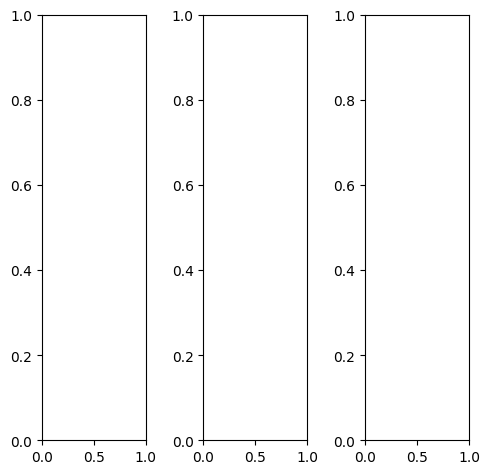

tensor([[[0.4078, 0.4824, 0.4902,  ..., 0.3647, 0.3020, 0.4118],
         [0.3843, 0.4039, 0.3529,  ..., 0.3137, 0.3922, 0.4392],
         [0.4588, 0.4745, 0.4078,  ..., 0.3725, 0.4549, 0.4471],
         ...,
         [0.6784, 0.6667, 0.6471,  ..., 0.1725, 0.1686, 0.1647],
         [0.6863, 0.7020, 0.6863,  ..., 0.2196, 0.2000, 0.1882],
         [0.7294, 0.6902, 0.6275,  ..., 0.2471, 0.2941, 0.2706]],

        [[0.4078, 0.4824, 0.4902,  ..., 0.3647, 0.3020, 0.4118],
         [0.3843, 0.4039, 0.3529,  ..., 0.3137, 0.3922, 0.4392],
         [0.4588, 0.4745, 0.4078,  ..., 0.3725, 0.4549, 0.4471],
         ...,
         [0.6784, 0.6667, 0.6471,  ..., 0.1725, 0.1686, 0.1647],
         [0.6863, 0.7020, 0.6863,  ..., 0.2196, 0.2000, 0.1882],
         [0.7294, 0.6902, 0.6275,  ..., 0.2471, 0.2941, 0.2706]],

        [[0.4078, 0.4824, 0.4902,  ..., 0.3647, 0.3020, 0.4118],
         [0.3843, 0.4039, 0.3529,  ..., 0.3137, 0.3922, 0.4392],
         [0.4588, 0.4745, 0.4078,  ..., 0.3725, 0.4549, 0.

tensor([[[0.4471, 0.5216, 0.5294,  ..., 0.3804, 0.3176, 0.4275],
         [0.4157, 0.4392, 0.3843,  ..., 0.3294, 0.4078, 0.4549],
         [0.4902, 0.5020, 0.4353,  ..., 0.3882, 0.4706, 0.4627],
         ...,
         [0.6863, 0.6667, 0.6431,  ..., 0.1882, 0.1843, 0.1804],
         [0.6902, 0.6980, 0.6784,  ..., 0.2353, 0.2157, 0.2039],
         [0.7294, 0.6824, 0.6118,  ..., 0.2627, 0.3098, 0.2863]],

        [[0.4000, 0.4745, 0.4824,  ..., 0.3608, 0.2980, 0.4078],
         [0.3765, 0.3961, 0.3451,  ..., 0.3098, 0.3882, 0.4353],
         [0.4549, 0.4706, 0.4000,  ..., 0.3686, 0.4510, 0.4431],
         ...,
         [0.6706, 0.6627, 0.6471,  ..., 0.1647, 0.1608, 0.1569],
         [0.6824, 0.7020, 0.6863,  ..., 0.2118, 0.1922, 0.1804],
         [0.7255, 0.6902, 0.6275,  ..., 0.2392, 0.2863, 0.2627]],

        [[0.3529, 0.4275, 0.4353,  ..., 0.3373, 0.2745, 0.3843],
         [0.3333, 0.3569, 0.3020,  ..., 0.2824, 0.3647, 0.4118],
         [0.4118, 0.4275, 0.3608,  ..., 0.3412, 0.4275, 0.

tensor([[[0.4213, 0.4804, 0.4787,  ..., 0.3643, 0.3148, 0.4129],
         [0.3883, 0.4084, 0.3607,  ..., 0.3281, 0.3991, 0.4420],
         [0.4666, 0.4755, 0.4152,  ..., 0.3821, 0.4733, 0.4576],
         ...,
         [0.7068, 0.7042, 0.6791,  ..., 0.1868, 0.1821, 0.1786],
         [0.7103, 0.7364, 0.7107,  ..., 0.2454, 0.2274, 0.2011],
         [0.7429, 0.7195, 0.6473,  ..., 0.2702, 0.3010, 0.2915]],

        [[0.4347, 0.5022, 0.5063,  ..., 0.3721, 0.3209, 0.4171],
         [0.3996, 0.4060, 0.3705,  ..., 0.3232, 0.3987, 0.4433],
         [0.4755, 0.4873, 0.4257,  ..., 0.3831, 0.4667, 0.4519],
         ...,
         [0.6847, 0.6767, 0.6517,  ..., 0.1697, 0.1634, 0.1618],
         [0.6930, 0.7038, 0.6897,  ..., 0.2115, 0.1934, 0.1816],
         [0.7170, 0.6959, 0.6234,  ..., 0.2428, 0.2722, 0.2813]],

        [[0.3574, 0.4073, 0.4135,  ..., 0.2859, 0.2599, 0.3447],
         [0.3102, 0.3174, 0.2861,  ..., 0.2381, 0.3048, 0.3568],
         [0.3701, 0.3883, 0.3359,  ..., 0.2891, 0.3630, 0.

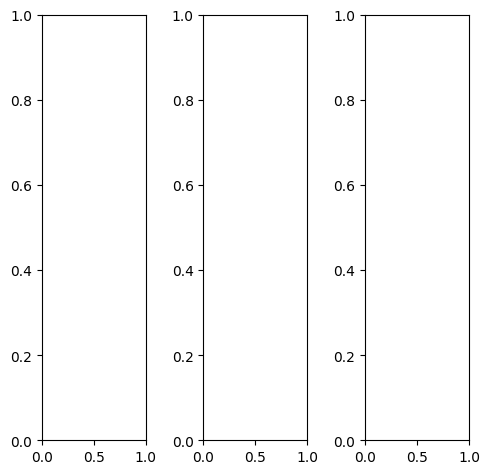

tensor([[[0.4196, 0.4157, 0.4157,  ..., 0.4275, 0.4275, 0.4235],
         [0.4235, 0.4196, 0.4196,  ..., 0.4275, 0.4275, 0.4275],
         [0.4235, 0.4235, 0.4235,  ..., 0.4314, 0.4314, 0.4314],
         ...,
         [0.4902, 0.4863, 0.4863,  ..., 0.4980, 0.4980, 0.4980],
         [0.4902, 0.4863, 0.4863,  ..., 0.5020, 0.4980, 0.4980],
         [0.4980, 0.4941, 0.4941,  ..., 0.5098, 0.5098, 0.5098]],

        [[0.4196, 0.4157, 0.4157,  ..., 0.4275, 0.4275, 0.4235],
         [0.4235, 0.4196, 0.4196,  ..., 0.4275, 0.4275, 0.4275],
         [0.4235, 0.4235, 0.4235,  ..., 0.4314, 0.4314, 0.4314],
         ...,
         [0.4902, 0.4863, 0.4863,  ..., 0.4980, 0.4980, 0.4980],
         [0.4902, 0.4863, 0.4863,  ..., 0.5020, 0.4980, 0.4980],
         [0.4980, 0.4941, 0.4941,  ..., 0.5098, 0.5098, 0.5098]],

        [[0.4196, 0.4157, 0.4157,  ..., 0.4275, 0.4275, 0.4235],
         [0.4235, 0.4196, 0.4196,  ..., 0.4275, 0.4275, 0.4275],
         [0.4235, 0.4235, 0.4235,  ..., 0.4314, 0.4314, 0.

tensor([[[0.3255, 0.3216, 0.3216,  ..., 0.3333, 0.3333, 0.3294],
         [0.3255, 0.3255, 0.3255,  ..., 0.3333, 0.3333, 0.3333],
         [0.3294, 0.3294, 0.3294,  ..., 0.3333, 0.3373, 0.3373],
         ...,
         [0.3922, 0.3882, 0.3882,  ..., 0.3922, 0.3922, 0.3922],
         [0.3922, 0.3882, 0.3882,  ..., 0.3961, 0.3922, 0.3961],
         [0.4000, 0.3961, 0.3961,  ..., 0.4000, 0.4000, 0.4039]],

        [[0.4353, 0.4314, 0.4314,  ..., 0.4431, 0.4431, 0.4392],
         [0.4392, 0.4353, 0.4353,  ..., 0.4431, 0.4431, 0.4431],
         [0.4392, 0.4392, 0.4392,  ..., 0.4471, 0.4471, 0.4471],
         ...,
         [0.5098, 0.5059, 0.5059,  ..., 0.5216, 0.5216, 0.5216],
         [0.5098, 0.5059, 0.5059,  ..., 0.5255, 0.5216, 0.5216],
         [0.5176, 0.5137, 0.5137,  ..., 0.5333, 0.5333, 0.5333]],

        [[0.5843, 0.5765, 0.5765,  ..., 0.5961, 0.5961, 0.5961],
         [0.5843, 0.5765, 0.5804,  ..., 0.5961, 0.5961, 0.5961],
         [0.5882, 0.5843, 0.5843,  ..., 0.6000, 0.6000, 0.

tensor([[[0.3179, 0.2344, 0.2358,  ..., 0.2686, 0.2796, 0.3152],
         [0.2691, 0.1895, 0.1942,  ..., 0.2188, 0.2428, 0.2726],
         [0.2667, 0.1750, 0.1944,  ..., 0.2408, 0.2471, 0.2620],
         ...,
         [0.3533, 0.3005, 0.2831,  ..., 0.3246, 0.3307, 0.3645],
         [0.3787, 0.3423, 0.3285,  ..., 0.3521, 0.3568, 0.3910],
         [0.4336, 0.3927, 0.3770,  ..., 0.4111, 0.4340, 0.4579]],

        [[0.4623, 0.4593, 0.4678,  ..., 0.4738, 0.4796, 0.4606],
         [0.4611, 0.4490, 0.4666,  ..., 0.4753, 0.4809, 0.4431],
         [0.4719, 0.4570, 0.4778,  ..., 0.4935, 0.4905, 0.4507],
         ...,
         [0.5152, 0.5126, 0.5246,  ..., 0.5349, 0.5453, 0.5264],
         [0.5085, 0.5098, 0.5352,  ..., 0.5541, 0.5420, 0.5249],
         [0.5028, 0.5093, 0.5180,  ..., 0.5505, 0.5447, 0.5398]],

        [[0.6355, 0.6795, 0.7102,  ..., 0.7142, 0.7177, 0.6582],
         [0.6735, 0.7148, 0.7260,  ..., 0.7309, 0.7308, 0.6914],
         [0.7009, 0.7260, 0.7363,  ..., 0.7294, 0.7473, 0.

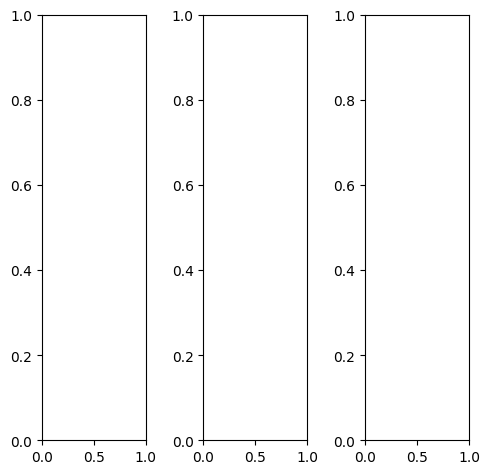

tensor([[[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [0.7373, 0.6941, 0.6941,  ..., 0.8078, 0.7294, 0.6667],
         [0.7490, 0.7216, 0.7255,  ..., 0.7961, 0.8627, 0.7137],
         [0.7608, 0.7333, 0.7373,  ..., 0.6275, 0.7020, 0.5647]],

        [[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [0.7373, 0.6941, 0.6941,  ..., 0.8078, 0.7294, 0.6667],
         [0.7490, 0.7216, 0.7255,  ..., 0.7961, 0.8627, 0.7137],
         [0.7608, 0.7333, 0.7373,  ..., 0.6275, 0.7020, 0.5647]],

        [[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9961,  ..., 0.9961, 0.9961, 1.

tensor([[[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [0.5961, 0.5451, 0.5490,  ..., 0.8157, 0.7294, 0.6667],
         [0.6196, 0.5725, 0.5725,  ..., 0.8235, 0.8863, 0.7373],
         [0.6431, 0.6000, 0.6000,  ..., 0.6667, 0.7412, 0.6078]],

        [[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [0.7569, 0.7176, 0.7137,  ..., 0.7843, 0.7137, 0.6431],
         [0.7686, 0.7451, 0.7529,  ..., 0.7647, 0.8431, 0.6863],
         [0.7725, 0.7569, 0.7686,  ..., 0.5843, 0.6627, 0.5216]],

        [[0.9804, 0.9490, 0.9569,  ..., 0.9569, 0.9569, 0.9686],
         [1.0000, 0.9922, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9843, 0.9961,  ..., 0.9961, 0.9961, 1.

tensor([[[0.9414, 0.9237, 0.9569,  ..., 0.9462, 0.9434, 0.9331],
         [0.9805, 0.9838, 0.9890,  ..., 0.9869, 0.9990, 0.9764],
         [0.9861, 0.9889, 0.9918,  ..., 0.9918, 0.9979, 0.9939],
         ...,
         [0.7598, 0.7159, 0.7123,  ..., 0.8248, 0.7531, 0.7010],
         [0.7609, 0.7419, 0.7364,  ..., 0.8138, 0.8833, 0.7500],
         [0.7708, 0.7583, 0.7561,  ..., 0.6629, 0.7367, 0.6292]],

        [[0.9520, 0.9388, 0.9649,  ..., 0.9560, 0.9438, 0.9621],
         [0.9914, 0.9962, 1.0053,  ..., 1.0051, 0.9947, 0.9931],
         [0.9958, 0.9927, 0.9974,  ..., 1.0016, 1.0054, 0.9983],
         ...,
         [0.7432, 0.7013, 0.6933,  ..., 0.8037, 0.7322, 0.6742],
         [0.7533, 0.7182, 0.7209,  ..., 0.8013, 0.8653, 0.7231],
         [0.7502, 0.7416, 0.7380,  ..., 0.6369, 0.7111, 0.6085]],

        [[0.9402, 0.9446, 0.9457,  ..., 0.9501, 0.9424, 0.9430],
         [0.9819, 1.0017, 0.9946,  ..., 1.0034, 0.9980, 0.9835],
         [0.9914, 0.9850, 1.0015,  ..., 1.0004, 0.9899, 1.

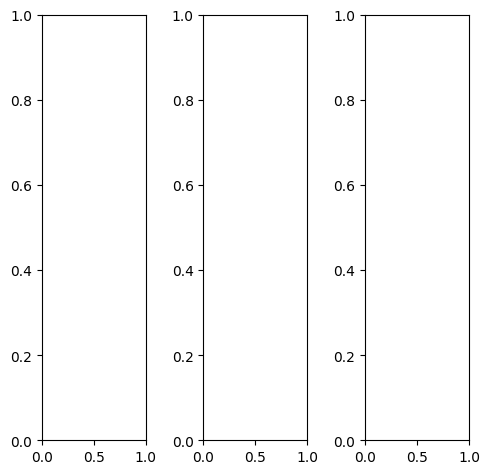

EPOCH: 27.255  trn_loss: 0.005  (3320.03s - 8861.29s remaining)

tensor([[[0.6275, 0.5333, 0.4902,  ..., 0.4078, 0.4431, 0.5216],
         [0.5686, 0.4667, 0.4431,  ..., 0.3922, 0.3882, 0.4627],
         [0.5843, 0.4549, 0.4275,  ..., 0.4353, 0.4157, 0.4706],
         ...,
         [0.8157, 0.8000, 0.7608,  ..., 0.5647, 0.5922, 0.6510],
         [0.7686, 0.7647, 0.7098,  ..., 0.5647, 0.5882, 0.6431],
         [0.8118, 0.7725, 0.6980,  ..., 0.6275, 0.6275, 0.6784]],

        [[0.6275, 0.5333, 0.4902,  ..., 0.4078, 0.4431, 0.5216],
         [0.5686, 0.4667, 0.4431,  ..., 0.3922, 0.3882, 0.4627],
         [0.5843, 0.4549, 0.4275,  ..., 0.4353, 0.4157, 0.4706],
         ...,
         [0.8157, 0.8000, 0.7608,  ..., 0.5647, 0.5922, 0.6510],
         [0.7686, 0.7647, 0.7098,  ..., 0.5647, 0.5882, 0.6431],
         [0.8118, 0.7725, 0.6980,  ..., 0.6275, 0.6275, 0.6784]],

        [[0.6275, 0.5333, 0.4902,  ..., 0.4078, 0.4431, 0.5216],
         [0.5686, 0.4667, 0.4431,  ..., 0.3922, 0.3882, 0.4627],
         [0.5843, 0.4549, 0.4275,  ..., 0.4353, 0.4157, 0.

tensor([[[0.6431, 0.5412, 0.4941,  ..., 0.4235, 0.4706, 0.5490],
         [0.5725, 0.4667, 0.4392,  ..., 0.4078, 0.4157, 0.4863],
         [0.5843, 0.4510, 0.4196,  ..., 0.4510, 0.4431, 0.4941],
         ...,
         [0.9490, 0.9647, 0.9490,  ..., 0.5961, 0.6235, 0.6824],
         [0.9098, 0.9294, 0.8941,  ..., 0.5922, 0.6157, 0.6745],
         [0.9373, 0.9216, 0.8627,  ..., 0.6510, 0.6510, 0.7020]],

        [[0.6510, 0.5569, 0.5176,  ..., 0.4353, 0.4588, 0.5412],
         [0.5961, 0.4941, 0.4745,  ..., 0.4275, 0.4157, 0.4863],
         [0.6157, 0.4902, 0.4627,  ..., 0.4706, 0.4431, 0.4941],
         ...,
         [0.7961, 0.7686, 0.7216,  ..., 0.6039, 0.6314, 0.6824],
         [0.7490, 0.7333, 0.6706,  ..., 0.6078, 0.6275, 0.6784],
         [0.7922, 0.7451, 0.6667,  ..., 0.6667, 0.6667, 0.7137]],

        [[0.4784, 0.3882, 0.3529,  ..., 0.2353, 0.2824, 0.3608],
         [0.4078, 0.3137, 0.2980,  ..., 0.1804, 0.1882, 0.2784],
         [0.4157, 0.2941, 0.2745,  ..., 0.2078, 0.2039, 0.

tensor([[[ 0.4185,  0.2752,  0.1246,  ...,  0.2906,  0.3081,  0.4148],
         [ 0.3460,  0.0459,  0.0682,  ...,  0.2665,  0.2392,  0.3327],
         [ 0.2968,  0.0763, -0.0727,  ...,  0.3583,  0.3223,  0.3548],
         ...,
         [ 0.7947,  0.7719,  0.7192,  ...,  0.5122,  0.5575,  0.6303],
         [ 0.7266,  0.7002,  0.6351,  ...,  0.5163,  0.5586,  0.6239],
         [ 0.7774,  0.7346,  0.6344,  ...,  0.5840,  0.5960,  0.6366]],

        [[ 0.5016,  0.4004,  0.3054,  ...,  0.3892,  0.4460,  0.4945],
         [ 0.3682,  0.1275,  0.0020,  ...,  0.3937,  0.3941,  0.4314],
         [ 0.4444,  0.1916,  0.1094,  ...,  0.4557,  0.4460,  0.4362],
         ...,
         [ 0.7477,  0.7621,  0.7301,  ...,  0.5333,  0.5698,  0.5955],
         [ 0.7028,  0.7037,  0.6548,  ...,  0.5332,  0.5663,  0.5991],
         [ 0.7221,  0.7212,  0.6311,  ...,  0.5676,  0.5893,  0.6085]],

        [[ 0.6917,  0.5189,  0.4504,  ...,  0.5571,  0.6194,  0.6621],
         [ 0.5772,  0.3453,  0.3754,  ...,  0

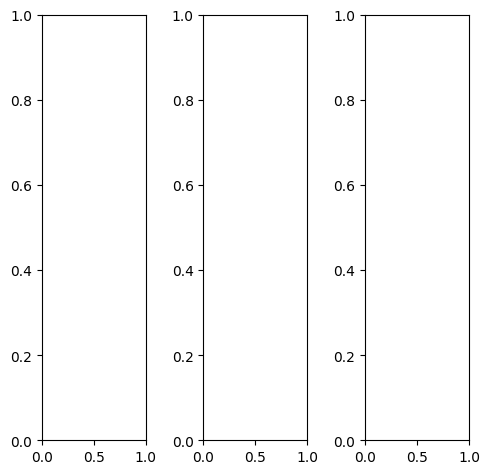

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9608, 0.7020,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9333, 0.4941,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9608, 0.7020,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9333, 0.4941,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9608, 0.7020,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9333, 0.4941,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9529, 0.6784,  ..., 0.9922, 0.9961, 0.9961],
         [1.0000, 0.9216, 0.4549,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9647, 0.7059,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9373, 0.4941,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.7529,  ..., 0.9843, 0.9922, 0.9922],
         [1.0000, 0.9451, 0.5843,  ..., 0.9961, 0.9961, 0.

tensor([[[0.7114, 0.6761, 0.5769,  ..., 0.6316, 0.6247, 0.6566],
         [0.6814, 0.5975, 0.3824,  ..., 0.6468, 0.6525, 0.6545],
         [0.6780, 0.6173, 0.2684,  ..., 0.6624, 0.6785, 0.6614],
         ...,
         [0.7850, 0.8167, 0.8332,  ..., 0.8575, 0.8538, 0.8300],
         [0.7549, 0.7876, 0.7978,  ..., 0.8256, 0.8361, 0.8118],
         [0.7623, 0.7729, 0.7760,  ..., 0.8321, 0.8184, 0.8041]],

        [[0.7073, 0.7110, 0.5887,  ..., 0.7334, 0.7351, 0.7605],
         [0.6624, 0.5473, 0.3523,  ..., 0.7743, 0.7686, 0.7853],
         [0.7427, 0.6361, 0.3811,  ..., 0.7936, 0.7888, 0.7661],
         ...,
         [0.7592, 0.7937, 0.8152,  ..., 0.8206, 0.8101, 0.7949],
         [0.7490, 0.7637, 0.7948,  ..., 0.8076, 0.7940, 0.7816],
         [0.7199, 0.7495, 0.7564,  ..., 0.7737, 0.7692, 0.7552]],

        [[0.7892, 0.7973, 0.7388,  ..., 0.9365, 0.9377, 0.9243],
         [0.7922, 0.7461, 0.5711,  ..., 0.9490, 0.9748, 0.9475],
         [0.7384, 0.6979, 0.3773,  ..., 0.9844, 0.9953, 0.

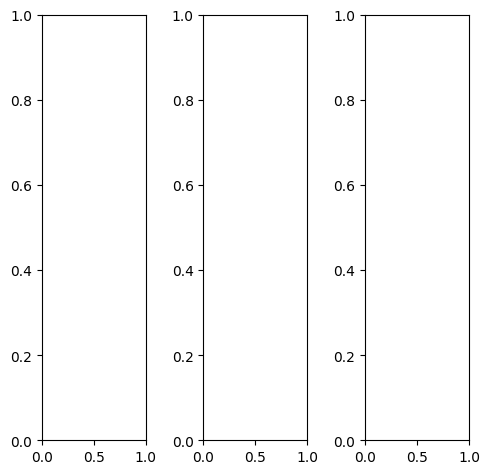

tensor([[[0.4902, 0.5137, 0.5137,  ..., 0.6039, 0.5490, 0.5843],
         [0.5373, 0.5255, 0.5294,  ..., 0.5843, 0.5451, 0.6078],
         [0.5294, 0.5059, 0.5451,  ..., 0.5804, 0.5373, 0.5961],
         ...,
         [0.4902, 0.4667, 0.4745,  ..., 0.5882, 0.6078, 0.6118],
         [0.5451, 0.5176, 0.4863,  ..., 0.6118, 0.5804, 0.5843],
         [0.5490, 0.5569, 0.5216,  ..., 0.5765, 0.5451, 0.5569]],

        [[0.4902, 0.5137, 0.5137,  ..., 0.6039, 0.5490, 0.5843],
         [0.5373, 0.5255, 0.5294,  ..., 0.5843, 0.5451, 0.6078],
         [0.5294, 0.5059, 0.5451,  ..., 0.5804, 0.5373, 0.5961],
         ...,
         [0.4902, 0.4667, 0.4745,  ..., 0.5882, 0.6078, 0.6118],
         [0.5451, 0.5176, 0.4863,  ..., 0.6118, 0.5804, 0.5843],
         [0.5490, 0.5569, 0.5216,  ..., 0.5765, 0.5451, 0.5569]],

        [[0.4902, 0.5137, 0.5137,  ..., 0.6039, 0.5490, 0.5843],
         [0.5373, 0.5255, 0.5294,  ..., 0.5843, 0.5451, 0.6078],
         [0.5294, 0.5059, 0.5451,  ..., 0.5804, 0.5373, 0.

tensor([[[0.5020, 0.5255, 0.5255,  ..., 0.5490, 0.4980, 0.5255],
         [0.5451, 0.5294, 0.5412,  ..., 0.5294, 0.4902, 0.5451],
         [0.5333, 0.5137, 0.5490,  ..., 0.5255, 0.4784, 0.5373],
         ...,
         [0.4706, 0.4510, 0.4510,  ..., 0.5725, 0.6039, 0.6157],
         [0.5176, 0.5059, 0.4706,  ..., 0.6118, 0.5686, 0.5765],
         [0.5176, 0.5412, 0.5098,  ..., 0.5843, 0.5373, 0.5412]],

        [[0.4863, 0.5098, 0.5098,  ..., 0.6196, 0.5608, 0.5961],
         [0.5333, 0.5216, 0.5255,  ..., 0.6000, 0.5569, 0.6235],
         [0.5255, 0.5020, 0.5412,  ..., 0.5961, 0.5490, 0.6118],
         ...,
         [0.5216, 0.4941, 0.5059,  ..., 0.6275, 0.6471, 0.6510],
         [0.5804, 0.5490, 0.5176,  ..., 0.6471, 0.6235, 0.6275],
         [0.5882, 0.5922, 0.5529,  ..., 0.6000, 0.5843, 0.5961]],

        [[0.4824, 0.5176, 0.5137,  ..., 0.6824, 0.6275, 0.6627],
         [0.5333, 0.5294, 0.5294,  ..., 0.6627, 0.6275, 0.6863],
         [0.5333, 0.5020, 0.5412,  ..., 0.6588, 0.6196, 0.

tensor([[[0.3046, 0.2894, 0.1231,  ..., 0.4127, 0.2959, 0.3885],
         [0.3540, 0.3041, 0.1520,  ..., 0.4491, 0.2995, 0.3974],
         [0.2607, 0.2407, 0.2529,  ..., 0.5044, 0.3431, 0.4137],
         ...,
         [0.3287, 0.2672, 0.2969,  ..., 0.5562, 0.5915, 0.5405],
         [0.4176, 0.3171, 0.2642,  ..., 0.5980, 0.4819, 0.4803],
         [0.4351, 0.3971, 0.3146,  ..., 0.5009, 0.4325, 0.4312]],

        [[0.4194, 0.3813, 0.2757,  ..., 0.5584, 0.4369, 0.4677],
         [0.3874, 0.3448, 0.1793,  ..., 0.5904, 0.4676, 0.5377],
         [0.4144, 0.3434, 0.3771,  ..., 0.6190, 0.4852, 0.5235],
         ...,
         [0.3277, 0.2943, 0.2962,  ..., 0.5639, 0.6356, 0.5494],
         [0.4284, 0.3692, 0.3027,  ..., 0.6344, 0.5444, 0.5169],
         [0.4455, 0.4278, 0.3464,  ..., 0.5337, 0.4691, 0.4473]],

        [[0.5898, 0.4292, 0.4878,  ..., 0.7591, 0.6554, 0.7025],
         [0.5826, 0.5581, 0.4697,  ..., 0.7556, 0.6719, 0.7688],
         [0.5449, 0.3988, 0.6028,  ..., 0.7744, 0.6937, 0.

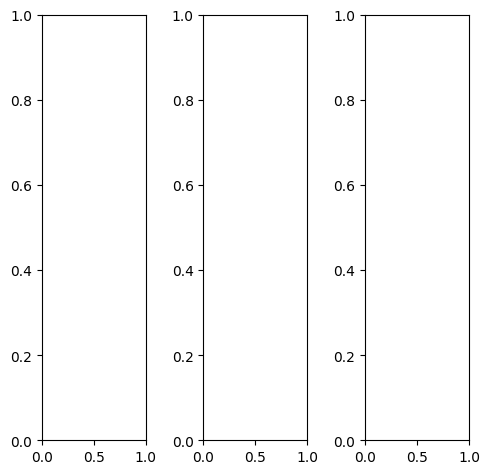

tensor([[[0.3373, 0.4157, 0.4314,  ..., 0.3686, 0.0118, 0.0275],
         [0.1020, 0.1216, 0.1255,  ..., 0.4471, 0.0392, 0.0118],
         [0.2588, 0.1059, 0.0863,  ..., 0.5569, 0.1020, 0.0078],
         ...,
         [0.4510, 0.3529, 0.3216,  ..., 0.2667, 0.2784, 0.2588],
         [0.4510, 0.3647, 0.3098,  ..., 0.2431, 0.2627, 0.2863],
         [0.4392, 0.3804, 0.3098,  ..., 0.2431, 0.2588, 0.2549]],

        [[0.3373, 0.4157, 0.4314,  ..., 0.3686, 0.0118, 0.0275],
         [0.1020, 0.1216, 0.1255,  ..., 0.4471, 0.0392, 0.0118],
         [0.2588, 0.1059, 0.0863,  ..., 0.5569, 0.1020, 0.0078],
         ...,
         [0.4510, 0.3529, 0.3216,  ..., 0.2667, 0.2784, 0.2588],
         [0.4510, 0.3647, 0.3098,  ..., 0.2431, 0.2627, 0.2863],
         [0.4392, 0.3804, 0.3098,  ..., 0.2431, 0.2588, 0.2549]],

        [[0.3373, 0.4157, 0.4314,  ..., 0.3686, 0.0118, 0.0275],
         [0.1020, 0.1216, 0.1255,  ..., 0.4471, 0.0392, 0.0118],
         [0.2588, 0.1059, 0.0863,  ..., 0.5569, 0.1020, 0.

tensor([[[0.3333, 0.4118, 0.4275,  ..., 0.3686, 0.0118, 0.0275],
         [0.0980, 0.1176, 0.1216,  ..., 0.4471, 0.0392, 0.0118],
         [0.2549, 0.1020, 0.0824,  ..., 0.5569, 0.1020, 0.0078],
         ...,
         [0.4588, 0.3686, 0.3412,  ..., 0.2784, 0.2863, 0.2745],
         [0.4588, 0.3725, 0.3216,  ..., 0.2667, 0.2784, 0.2941],
         [0.4431, 0.3843, 0.3137,  ..., 0.2667, 0.2784, 0.2667]],

        [[0.3294, 0.4118, 0.4275,  ..., 0.3647, 0.0078, 0.0235],
         [0.0980, 0.1176, 0.1216,  ..., 0.4392, 0.0353, 0.0078],
         [0.2510, 0.1020, 0.0863,  ..., 0.5490, 0.0980, 0.0078],
         ...,
         [0.4431, 0.3451, 0.3176,  ..., 0.2667, 0.2863, 0.2667],
         [0.4431, 0.3569, 0.3098,  ..., 0.2431, 0.2667, 0.2941],
         [0.4314, 0.3725, 0.3098,  ..., 0.2431, 0.2627, 0.2627]],

        [[0.3765, 0.4510, 0.4549,  ..., 0.4000, 0.0353, 0.0392],
         [0.1451, 0.1569, 0.1490,  ..., 0.4784, 0.0588, 0.0275],
         [0.3020, 0.1412, 0.1137,  ..., 0.5882, 0.1216, 0.

tensor([[[ 0.2642,  0.3652,  0.3021,  ...,  0.3055, -0.0297,  0.0422],
         [ 0.0428, -0.0248,  0.0548,  ...,  0.3227, -0.0735, -0.0340],
         [ 0.0699,  0.0138, -0.1549,  ...,  0.4290, -0.0223, -0.0454],
         ...,
         [ 0.4930,  0.3816,  0.3646,  ...,  0.2779,  0.3033,  0.2968],
         [ 0.4687,  0.3634,  0.3327,  ...,  0.2128,  0.2371,  0.2847],
         [ 0.4538,  0.3926,  0.2941,  ...,  0.1984,  0.1951,  0.2701]],

        [[ 0.3168,  0.5188,  0.3911,  ...,  0.3659,  0.0042,  0.0450],
         [ 0.0818, -0.0143,  0.0145,  ...,  0.4137, -0.0314, -0.0163],
         [ 0.1802,  0.1197,  0.0437,  ...,  0.5819,  0.0282, -0.0316],
         ...,
         [ 0.5012,  0.3311,  0.3366,  ...,  0.2493,  0.2921,  0.2502],
         [ 0.4854,  0.3544,  0.3229,  ...,  0.2253,  0.2565,  0.2801],
         [ 0.4588,  0.3610,  0.2961,  ...,  0.1999,  0.2105,  0.2582]],

        [[ 0.5044,  0.4674,  0.5634,  ...,  0.5514,  0.1599,  0.1873],
         [ 0.2311,  0.1342,  0.1472,  ...,  0

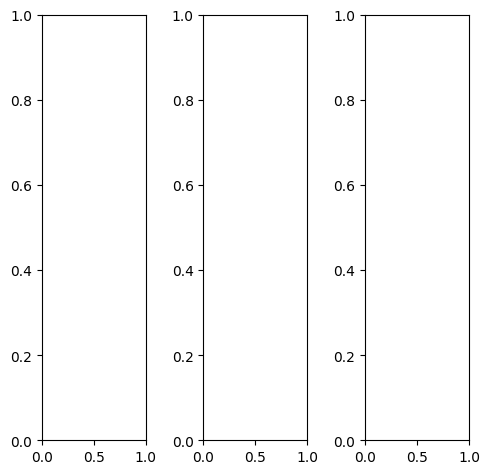

tensor([[[0.3569, 0.2118, 0.2196,  ..., 0.4039, 0.4196, 0.3686],
         [0.3804, 0.2431, 0.2431,  ..., 0.4157, 0.4118, 0.3569],
         [0.3804, 0.2824, 0.2745,  ..., 0.3961, 0.4039, 0.3451],
         ...,
         [0.5137, 0.5333, 0.5255,  ..., 0.6588, 0.6706, 0.6706],
         [0.6078, 0.5804, 0.5843,  ..., 0.6078, 0.6392, 0.6353],
         [0.6510, 0.6118, 0.6392,  ..., 0.7333, 0.7412, 0.7529]],

        [[0.3569, 0.2118, 0.2196,  ..., 0.4039, 0.4196, 0.3686],
         [0.3804, 0.2431, 0.2431,  ..., 0.4157, 0.4118, 0.3569],
         [0.3804, 0.2824, 0.2745,  ..., 0.3961, 0.4039, 0.3451],
         ...,
         [0.5137, 0.5333, 0.5255,  ..., 0.6588, 0.6706, 0.6706],
         [0.6078, 0.5804, 0.5843,  ..., 0.6078, 0.6392, 0.6353],
         [0.6510, 0.6118, 0.6392,  ..., 0.7333, 0.7412, 0.7529]],

        [[0.3569, 0.2118, 0.2196,  ..., 0.4039, 0.4196, 0.3686],
         [0.3804, 0.2431, 0.2431,  ..., 0.4157, 0.4118, 0.3569],
         [0.3804, 0.2824, 0.2745,  ..., 0.3961, 0.4039, 0.

tensor([[[0.3725, 0.2039, 0.2157,  ..., 0.4000, 0.4196, 0.3725],
         [0.3843, 0.2392, 0.2392,  ..., 0.4157, 0.4078, 0.3529],
         [0.3804, 0.2824, 0.2667,  ..., 0.4000, 0.4000, 0.3294],
         ...,
         [0.4863, 0.4980, 0.4824,  ..., 0.6510, 0.6784, 0.6863],
         [0.5882, 0.5529, 0.5529,  ..., 0.6039, 0.6431, 0.6549],
         [0.6588, 0.6118, 0.6314,  ..., 0.7373, 0.7333, 0.7529]],

        [[0.3529, 0.2196, 0.2275,  ..., 0.4039, 0.4196, 0.3686],
         [0.3804, 0.2471, 0.2510,  ..., 0.4157, 0.4118, 0.3647],
         [0.3843, 0.2824, 0.2824,  ..., 0.3922, 0.4078, 0.3608],
         ...,
         [0.5569, 0.5804, 0.5725,  ..., 0.7059, 0.7059, 0.7020],
         [0.6471, 0.6196, 0.6275,  ..., 0.6471, 0.6706, 0.6549],
         [0.6824, 0.6431, 0.6745,  ..., 0.7686, 0.7765, 0.7882]],

        [[0.3333, 0.2039, 0.2000,  ..., 0.4000, 0.4235, 0.3529],
         [0.3529, 0.2314, 0.2235,  ..., 0.4118, 0.4078, 0.3333],
         [0.3569, 0.2706, 0.2510,  ..., 0.3961, 0.4000, 0.

tensor([[[ 0.0135, -0.1405, -0.3286,  ...,  0.2074,  0.2263,  0.1522],
         [ 0.1790, -0.2774, -0.2958,  ...,  0.1870,  0.1801,  0.0859],
         [-0.0664, -0.2709, -0.3073,  ...,  0.1687,  0.1894,  0.0791],
         ...,
         [ 0.5068,  0.5821,  0.5469,  ...,  0.9054,  0.9334,  0.8400],
         [ 0.7202,  0.6503,  0.6506,  ...,  0.7840,  0.8366,  0.7926],
         [ 0.7479,  0.6629,  0.7194,  ...,  0.9517,  0.9448,  0.9069]],

        [[ 0.1502, -0.0393, -0.1588,  ...,  0.3288,  0.3558,  0.2305],
         [ 0.1473, -0.3440, -0.4314,  ...,  0.3341,  0.3433,  0.1723],
         [ 0.0487, -0.1474, -0.2814,  ...,  0.3014,  0.3094,  0.1481],
         ...,
         [ 0.5070,  0.5744,  0.5507,  ...,  0.8982,  0.9088,  0.8582],
         [ 0.7214,  0.6357,  0.6708,  ...,  0.8062,  0.8311,  0.8028],
         [ 0.7234,  0.6759,  0.7193,  ...,  0.9208,  0.9308,  0.8836]],

        [[ 0.3170, -0.0861, -0.0633,  ...,  0.4484,  0.4714,  0.3607],
         [ 0.3153, -0.0832, -0.0818,  ...,  0

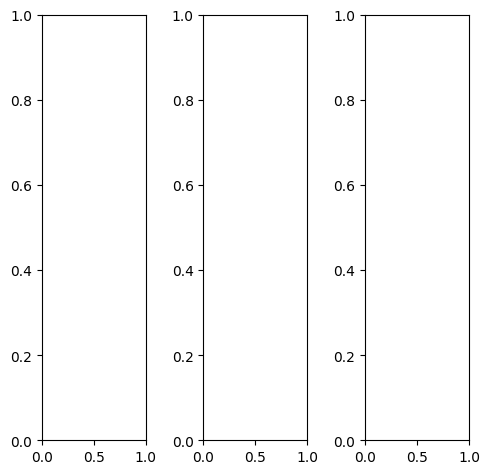

EPOCH: 27.510  trn_loss: 0.004  (3350.53s - 8828.69s remaining)

tensor([[[0.9961, 0.9843, 0.9765,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8118,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9843, 0.9922, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9922, 0.9961, 1.0000]],

        [[0.9961, 0.9843, 0.9765,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8118,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9843, 0.9922, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9922, 0.9961, 1.0000]],

        [[0.9961, 0.9843, 0.9765,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8118,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.

tensor([[[1.0000, 0.9804, 0.9686,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8078,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9843, 0.9922, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9922, 0.9961, 1.0000]],

        [[0.9961, 0.9843, 0.9804,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8157,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 0.9843, 0.9922, 0.9961],
         [1.0000, 0.9922, 0.9961,  ..., 0.9882, 0.9922, 0.9961],
         [1.0000, 0.9961, 1.0000,  ..., 0.9922, 0.9961, 1.0000]],

        [[0.9961, 0.9843, 0.9765,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.8157,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9686, 0.4980,  ..., 0.9961, 0.9961, 0.

tensor([[[0.7686, 0.7503, 0.6766,  ..., 0.7618, 0.7403, 0.7226],
         [0.7230, 0.7124, 0.4972,  ..., 0.8071, 0.8085, 0.7665],
         [0.7605, 0.7293, 0.3348,  ..., 0.8219, 0.8166, 0.7909],
         ...,
         [0.8689, 0.9429, 0.9689,  ..., 0.9241, 0.9281, 0.9100],
         [0.8578, 0.9123, 0.9420,  ..., 0.9088, 0.9194, 0.8993],
         [0.8336, 0.8737, 0.8665,  ..., 0.9032, 0.8934, 0.8553]],

        [[0.7675, 0.7793, 0.6626,  ..., 0.8504, 0.8306, 0.8411],
         [0.7065, 0.6438, 0.4717,  ..., 0.8997, 0.8965, 0.8894],
         [0.8304, 0.7098, 0.4444,  ..., 0.8925, 0.8960, 0.8916],
         ...,
         [0.8343, 0.8852, 0.9165,  ..., 0.8825, 0.8766, 0.8786],
         [0.8362, 0.8769, 0.9113,  ..., 0.8860, 0.8774, 0.8606],
         [0.7986, 0.8420, 0.8583,  ..., 0.8539, 0.8322, 0.8124]],

        [[0.8424, 0.9286, 0.8146,  ..., 1.0178, 1.0025, 0.9755],
         [0.8830, 0.9098, 0.7607,  ..., 1.0713, 1.0806, 1.0147],
         [0.8358, 0.8534, 0.4560,  ..., 1.0908, 1.0816, 1.

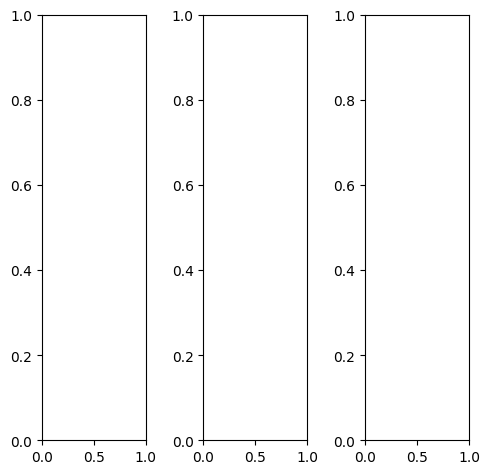

tensor([[[0.9765, 0.9216, 0.9333,  ..., 0.9373, 0.9333, 0.9961],
         [0.7412, 0.5216, 0.5412,  ..., 0.5294, 0.5333, 0.8745],
         [0.7098, 0.4706, 0.4824,  ..., 0.4627, 0.4667, 0.8549],
         ...,
         [0.7176, 0.4706, 0.4941,  ..., 0.4941, 0.4980, 0.8706],
         [0.7137, 0.4588, 0.4784,  ..., 0.5059, 0.5098, 0.8667],
         [0.9216, 0.8196, 0.8275,  ..., 0.8392, 0.8314, 0.9686]],

        [[0.9765, 0.9216, 0.9333,  ..., 0.9373, 0.9333, 0.9961],
         [0.7412, 0.5216, 0.5412,  ..., 0.5294, 0.5333, 0.8745],
         [0.7098, 0.4706, 0.4824,  ..., 0.4627, 0.4667, 0.8549],
         ...,
         [0.7176, 0.4706, 0.4941,  ..., 0.4941, 0.4980, 0.8706],
         [0.7137, 0.4588, 0.4784,  ..., 0.5059, 0.5098, 0.8667],
         [0.9216, 0.8196, 0.8275,  ..., 0.8392, 0.8314, 0.9686]],

        [[0.9765, 0.9216, 0.9333,  ..., 0.9373, 0.9333, 0.9961],
         [0.7412, 0.5216, 0.5412,  ..., 0.5294, 0.5333, 0.8745],
         [0.7098, 0.4706, 0.4824,  ..., 0.4627, 0.4667, 0.

tensor([[[0.9255, 0.8196, 0.8353,  ..., 0.8471, 0.8353, 0.9804],
         [0.5137, 0.1098, 0.1216,  ..., 0.1294, 0.1608, 0.7490],
         [0.4235, 0.0000, 0.0039,  ..., 0.0078, 0.0157, 0.7059],
         ...,
         [0.4510, 0.0039, 0.0235,  ..., 0.0275, 0.0353, 0.7294],
         [0.4784, 0.0275, 0.0431,  ..., 0.0471, 0.0784, 0.7294],
         [0.8235, 0.6588, 0.6784,  ..., 0.6784, 0.6667, 0.9020]],

        [[1.0000, 0.9647, 0.9725,  ..., 0.9725, 0.9686, 1.0000],
         [0.8275, 0.6784, 0.7020,  ..., 0.6863, 0.6745, 0.9216],
         [0.8235, 0.6510, 0.6667,  ..., 0.6353, 0.6392, 0.9176],
         ...,
         [0.8235, 0.6510, 0.6745,  ..., 0.6706, 0.6784, 0.9255],
         [0.8039, 0.6235, 0.6471,  ..., 0.6824, 0.6784, 0.9216],
         [0.9647, 0.8824, 0.8863,  ..., 0.9020, 0.8980, 1.0000]],

        [[1.0000, 0.9804, 0.9922,  ..., 0.9882, 0.9922, 1.0000],
         [0.8863, 0.7804, 0.8118,  ..., 0.7804, 0.7765, 0.9451],
         [0.8784, 0.7686, 0.7882,  ..., 0.7529, 0.7451, 0.

tensor([[[0.7755, 0.7103, 0.6288,  ..., 0.7774, 0.7799, 0.7995],
         [0.5311, 0.3961, 0.2364,  ..., 0.3859, 0.4849, 0.7628],
         [0.4764, 0.1892, 0.0585,  ..., 0.1510, 0.2740, 0.6579],
         ...,
         [0.5990, 0.3493, 0.3405,  ..., 0.3052, 0.3814, 0.8018],
         [0.6112, 0.3522, 0.3114,  ..., 0.3583, 0.4383, 0.7576],
         [0.7833, 0.7131, 0.7112,  ..., 0.7434, 0.7680, 0.8139]],

        [[0.7709, 0.7427, 0.6154,  ..., 0.8527, 0.8651, 0.8671],
         [0.5804, 0.4199, 0.2395,  ..., 0.4257, 0.5376, 0.8247],
         [0.5746, 0.2656, 0.1183,  ..., 0.2565, 0.3355, 0.6999],
         ...,
         [0.5685, 0.2876, 0.2738,  ..., 0.3084, 0.3818, 0.7508],
         [0.5951, 0.3117, 0.2766,  ..., 0.3625, 0.4534, 0.7213],
         [0.7457, 0.6939, 0.6989,  ..., 0.7228, 0.7483, 0.7914]],

        [[0.8416, 0.8716, 0.7640,  ..., 0.9886, 0.9801, 0.9709],
         [0.6642, 0.5887, 0.4898,  ..., 0.5954, 0.6871, 0.9344],
         [0.5606, 0.3666, 0.2394,  ..., 0.3772, 0.4926, 0.

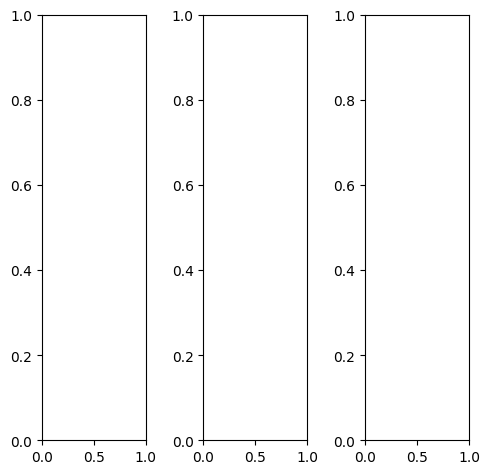

tensor([[[0.6745, 0.6784, 0.7020,  ..., 0.5843, 0.5569, 0.5765],
         [0.6235, 0.6667, 0.6824,  ..., 0.5020, 0.5216, 0.5686],
         [0.6078, 0.6588, 0.6706,  ..., 0.5098, 0.4941, 0.5333],
         ...,
         [0.5255, 0.4980, 0.5647,  ..., 0.5647, 0.5333, 0.5176],
         [0.5490, 0.5294, 0.5490,  ..., 0.5647, 0.5412, 0.5176],
         [0.5333, 0.5176, 0.5255,  ..., 0.5647, 0.5020, 0.4902]],

        [[0.6745, 0.6784, 0.7020,  ..., 0.5843, 0.5569, 0.5765],
         [0.6235, 0.6667, 0.6824,  ..., 0.5020, 0.5216, 0.5686],
         [0.6078, 0.6588, 0.6706,  ..., 0.5098, 0.4941, 0.5333],
         ...,
         [0.5255, 0.4980, 0.5647,  ..., 0.5647, 0.5333, 0.5176],
         [0.5490, 0.5294, 0.5490,  ..., 0.5647, 0.5412, 0.5176],
         [0.5333, 0.5176, 0.5255,  ..., 0.5647, 0.5020, 0.4902]],

        [[0.6745, 0.6784, 0.7020,  ..., 0.5843, 0.5569, 0.5765],
         [0.6235, 0.6667, 0.6824,  ..., 0.5020, 0.5216, 0.5686],
         [0.6078, 0.6588, 0.6706,  ..., 0.5098, 0.4941, 0.

tensor([[[0.6745, 0.6784, 0.7020,  ..., 0.5843, 0.5569, 0.5765],
         [0.6235, 0.6667, 0.6824,  ..., 0.5020, 0.5216, 0.5686],
         [0.6078, 0.6588, 0.6706,  ..., 0.5098, 0.4941, 0.5333],
         ...,
         [0.5373, 0.5098, 0.5765,  ..., 0.5647, 0.5333, 0.5216],
         [0.5608, 0.5412, 0.5569,  ..., 0.5647, 0.5412, 0.5176],
         [0.5373, 0.5216, 0.5255,  ..., 0.5647, 0.5020, 0.4902]],

        [[0.6745, 0.6745, 0.6941,  ..., 0.5804, 0.5529, 0.5725],
         [0.6235, 0.6627, 0.6745,  ..., 0.4980, 0.5176, 0.5647],
         [0.6039, 0.6549, 0.6627,  ..., 0.5059, 0.4902, 0.5255],
         ...,
         [0.5216, 0.4941, 0.5608,  ..., 0.5569, 0.5255, 0.5098],
         [0.5451, 0.5255, 0.5451,  ..., 0.5569, 0.5333, 0.5098],
         [0.5294, 0.5137, 0.5216,  ..., 0.5569, 0.4941, 0.4863]],

        [[0.6902, 0.7020, 0.7373,  ..., 0.6118, 0.5843, 0.6078],
         [0.6392, 0.6902, 0.7176,  ..., 0.5294, 0.5490, 0.5961],
         [0.6235, 0.6824, 0.7059,  ..., 0.5373, 0.5216, 0.

tensor([[[0.5452, 0.4889, 0.4757,  ..., 0.3382, 0.3287, 0.3821],
         [0.4897, 0.3737, 0.3998,  ..., 0.2456, 0.2687, 0.3413],
         [0.4412, 0.4014, 0.3635,  ..., 0.2741, 0.2533, 0.2908],
         ...,
         [0.3475, 0.3334, 0.4249,  ..., 0.4759, 0.4416, 0.4033],
         [0.4072, 0.3837, 0.4082,  ..., 0.4778, 0.4247, 0.4081],
         [0.3755, 0.3473, 0.3470,  ..., 0.4708, 0.3680, 0.3686]],

        [[0.6006, 0.5528, 0.5863,  ..., 0.4426, 0.4425, 0.4423],
         [0.4818, 0.3699, 0.4052,  ..., 0.3631, 0.4159, 0.4333],
         [0.5462, 0.4624, 0.5273,  ..., 0.3772, 0.3693, 0.3533],
         ...,
         [0.3777, 0.3515, 0.4384,  ..., 0.5025, 0.4786, 0.3676],
         [0.4327, 0.3905, 0.4425,  ..., 0.5156, 0.4734, 0.3912],
         [0.4083, 0.3560, 0.3806,  ..., 0.4568, 0.3692, 0.3317]],

        [[0.7164, 0.6701, 0.6882,  ..., 0.5937, 0.5808, 0.5924],
         [0.6690, 0.6116, 0.6067,  ..., 0.5122, 0.5523, 0.5906],
         [0.6075, 0.5798, 0.5506,  ..., 0.5296, 0.5050, 0.

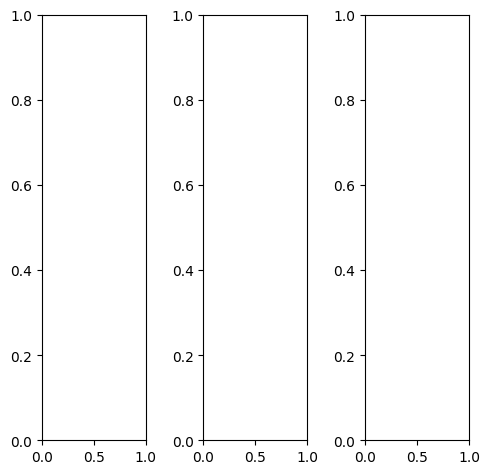

tensor([[[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0039],
         [0.0627, 0.1686, 0.1686,  ..., 0.1843, 0.1843, 0.0667],
         [0.1137, 0.3255, 0.3333,  ..., 0.3647, 0.3608, 0.1176],
         ...,
         [0.1373, 0.4157, 0.4157,  ..., 0.3804, 0.3686, 0.1216],
         [0.0706, 0.2039, 0.2039,  ..., 0.1922, 0.1804, 0.0667],
         [0.0000, 0.0000, 0.0000,  ..., 0.1882, 0.1490, 0.0510]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0039],
         [0.0627, 0.1686, 0.1686,  ..., 0.1843, 0.1843, 0.0667],
         [0.1137, 0.3255, 0.3333,  ..., 0.3647, 0.3608, 0.1176],
         ...,
         [0.1373, 0.4157, 0.4157,  ..., 0.3804, 0.3686, 0.1216],
         [0.0706, 0.2039, 0.2039,  ..., 0.1922, 0.1804, 0.0667],
         [0.0000, 0.0000, 0.0000,  ..., 0.1882, 0.1490, 0.0510]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0039],
         [0.0627, 0.1686, 0.1686,  ..., 0.1843, 0.1843, 0.0667],
         [0.1137, 0.3255, 0.3333,  ..., 0.3647, 0.3608, 0.

tensor([[[0.0078, 0.0039, 0.0039,  ..., 0.0000, 0.0000, 0.0039],
         [0.0667, 0.1765, 0.1804,  ..., 0.1882, 0.1882, 0.0627],
         [0.1216, 0.3451, 0.3569,  ..., 0.3804, 0.3686, 0.1176],
         ...,
         [0.1373, 0.4235, 0.4275,  ..., 0.3843, 0.3843, 0.1255],
         [0.0706, 0.2118, 0.2157,  ..., 0.1922, 0.1882, 0.0667],
         [0.0000, 0.0000, 0.0000,  ..., 0.1882, 0.1490, 0.0510]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0078],
         [0.0627, 0.1686, 0.1686,  ..., 0.2000, 0.2000, 0.0706],
         [0.1098, 0.3255, 0.3333,  ..., 0.4039, 0.3961, 0.1255],
         ...,
         [0.1451, 0.4471, 0.4549,  ..., 0.4157, 0.3961, 0.1294],
         [0.0706, 0.2157, 0.2157,  ..., 0.2039, 0.1882, 0.0667],
         [0.0000, 0.0000, 0.0000,  ..., 0.1882, 0.1490, 0.0510]],

        [[0.0039, 0.0000, 0.0000,  ..., 0.0118, 0.0118, 0.0000],
         [0.0549, 0.1490, 0.1451,  ..., 0.0863, 0.0980, 0.0431],
         [0.1020, 0.2902, 0.2784,  ..., 0.1137, 0.1451, 0.

tensor([[[-0.3199, -0.3441, -0.4588,  ..., -0.1813, -0.1697, -0.0832],
         [-0.1003, -0.1827, -0.0881,  ...,  0.1296,  0.1434, -0.0852],
         [-0.3895,  0.0852,  0.0322,  ...,  0.4603,  0.5361,  0.0067],
         ...,
         [ 0.0715,  0.6833,  0.7146,  ...,  0.5612,  0.5896,  0.0658],
         [-0.0188,  0.2181,  0.2496,  ...,  0.1246,  0.1423, -0.0730],
         [-0.0253, -0.1217, -0.1391,  ...,  0.1938,  0.1259, -0.0358]],

        [[-0.1368, -0.2289, -0.2798,  ..., -0.1434, -0.1320, -0.0732],
         [-0.1029, -0.0761, -0.2433,  ...,  0.1430,  0.1552, -0.0933],
         [-0.3336,  0.2277,  0.1108,  ...,  0.5066,  0.5350, -0.0202],
         ...,
         [ 0.0341,  0.6177,  0.6190,  ...,  0.5588,  0.5707,  0.0025],
         [-0.0713,  0.1401,  0.1459,  ...,  0.1472,  0.1230, -0.1155],
         [-0.0806, -0.1730, -0.1994,  ...,  0.1433,  0.0745, -0.0603]],

        [[ 0.0135, -0.3426, -0.2441,  ..., -0.1106, -0.0805,  0.0157],
         [ 0.0993,  0.0061,  0.0249,  ...,  0

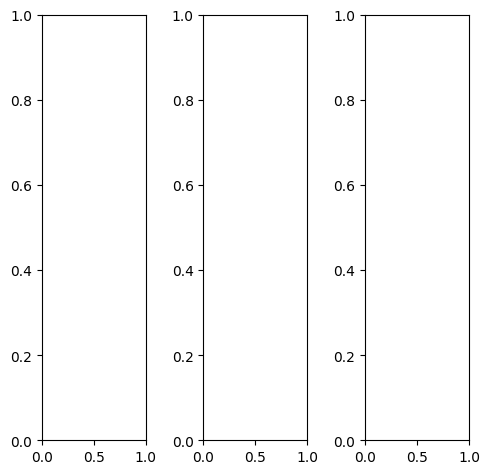

tensor([[[0.1961, 0.2039, 0.2157,  ..., 0.1176, 0.1922, 0.3725],
         [0.0471, 0.1059, 0.1725,  ..., 0.0471, 0.1294, 0.2471],
         [0.0745, 0.1569, 0.2471,  ..., 0.0902, 0.1373, 0.1686],
         ...,
         [0.8471, 0.8000, 0.7725,  ..., 0.8706, 0.9020, 0.8863],
         [0.8431, 0.8353, 0.7490,  ..., 0.8039, 0.8078, 0.7961],
         [0.7529, 0.8157, 0.8078,  ..., 0.8157, 0.8157, 0.7843]],

        [[0.1961, 0.2039, 0.2157,  ..., 0.1176, 0.1922, 0.3725],
         [0.0471, 0.1059, 0.1725,  ..., 0.0471, 0.1294, 0.2471],
         [0.0745, 0.1569, 0.2471,  ..., 0.0902, 0.1373, 0.1686],
         ...,
         [0.8471, 0.8000, 0.7725,  ..., 0.8706, 0.9020, 0.8863],
         [0.8431, 0.8353, 0.7490,  ..., 0.8039, 0.8078, 0.7961],
         [0.7529, 0.8157, 0.8078,  ..., 0.8157, 0.8157, 0.7843]],

        [[0.1961, 0.2039, 0.2157,  ..., 0.1176, 0.1922, 0.3725],
         [0.0471, 0.1059, 0.1725,  ..., 0.0471, 0.1294, 0.2471],
         [0.0745, 0.1569, 0.2471,  ..., 0.0902, 0.1373, 0.

tensor([[[0.1608, 0.1725, 0.1686,  ..., 0.0980, 0.1569, 0.3686],
         [0.0275, 0.0706, 0.1059,  ..., 0.0588, 0.1216, 0.2627],
         [0.0510, 0.1216, 0.1843,  ..., 0.0941, 0.1216, 0.1647],
         ...,
         [0.7961, 0.7529, 0.7176,  ..., 0.8471, 0.8784, 0.8549],
         [0.8039, 0.8000, 0.6980,  ..., 0.7647, 0.7686, 0.7490],
         [0.7098, 0.7843, 0.7608,  ..., 0.7765, 0.7804, 0.7373]],

        [[0.2196, 0.2275, 0.2471,  ..., 0.1333, 0.2275, 0.3961],
         [0.0588, 0.1255, 0.2118,  ..., 0.0431, 0.1412, 0.2549],
         [0.0902, 0.1804, 0.2863,  ..., 0.0863, 0.1490, 0.1765],
         ...,
         [0.8980, 0.8471, 0.8275,  ..., 0.9176, 0.9451, 0.9333],
         [0.8941, 0.8824, 0.8078,  ..., 0.8588, 0.8588, 0.8549],
         [0.8078, 0.8627, 0.8627,  ..., 0.8706, 0.8667, 0.8431]],

        [[0.1569, 0.1647, 0.1765,  ..., 0.0745, 0.1176, 0.2745],
         [0.0353, 0.0824, 0.1451,  ..., 0.0510, 0.0980, 0.1804],
         [0.0667, 0.1294, 0.2000,  ..., 0.0941, 0.1137, 0.

tensor([[[ 0.1465,  0.1416,  0.0868,  ...,  0.1758,  0.2576,  0.4721],
         [ 0.1028, -0.0600,  0.0564,  ...,  0.0817,  0.1609,  0.3283],
         [-0.0873,  0.0137,  0.0769,  ...,  0.1055,  0.1789,  0.2457],
         ...,
         [ 0.9376,  0.8395,  0.7997,  ...,  0.9451,  1.0087,  1.0165],
         [ 0.9061,  0.8701,  0.7525,  ...,  0.8527,  0.8872,  0.9203],
         [ 0.8652,  0.9009,  0.8609,  ...,  0.9270,  0.9353,  0.9208]],

        [[ 0.2213,  0.3100,  0.1070,  ...,  0.2002,  0.3019,  0.4799],
         [ 0.1419,  0.0285, -0.0431,  ...,  0.1330,  0.2402,  0.3536],
         [ 0.0116,  0.1708,  0.0584,  ...,  0.1617,  0.2288,  0.2681],
         ...,
         [ 0.9326,  0.8522,  0.8185,  ...,  0.9237,  0.9773,  0.9960],
         [ 0.9262,  0.8946,  0.7946,  ...,  0.8402,  0.8654,  0.8952],
         [ 0.8459,  0.8977,  0.8745,  ...,  0.8880,  0.9058,  0.8793]],

        [[ 0.3716,  0.2801,  0.3144,  ...,  0.3025,  0.4106,  0.5893],
         [ 0.2737,  0.1035,  0.3065,  ...,  0

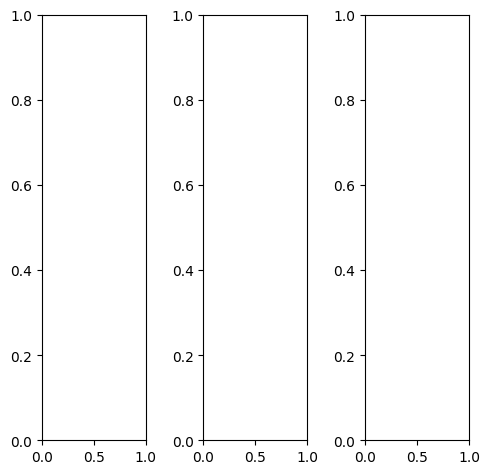

EPOCH: 27.765  trn_loss: 0.005  (3381.24s - 8796.70s remaining)

tensor([[[0.3961, 0.4078, 0.4353,  ..., 0.6157, 0.5490, 0.5255],
         [0.3804, 0.3922, 0.4235,  ..., 0.5294, 0.5098, 0.5137],
         [0.3608, 0.3843, 0.4118,  ..., 0.4902, 0.4627, 0.4667],
         ...,
         [0.7529, 0.7882, 0.7725,  ..., 0.4549, 0.4431, 0.4392],
         [0.7490, 0.7529, 0.7451,  ..., 0.4745, 0.4510, 0.4275],
         [0.6863, 0.6784, 0.7059,  ..., 0.4667, 0.4471, 0.4275]],

        [[0.3961, 0.4078, 0.4353,  ..., 0.6157, 0.5490, 0.5255],
         [0.3804, 0.3922, 0.4235,  ..., 0.5294, 0.5098, 0.5137],
         [0.3608, 0.3843, 0.4118,  ..., 0.4902, 0.4627, 0.4667],
         ...,
         [0.7529, 0.7882, 0.7725,  ..., 0.4549, 0.4431, 0.4392],
         [0.7490, 0.7529, 0.7451,  ..., 0.4745, 0.4510, 0.4275],
         [0.6863, 0.6784, 0.7059,  ..., 0.4667, 0.4471, 0.4275]],

        [[0.3961, 0.4078, 0.4353,  ..., 0.6157, 0.5490, 0.5255],
         [0.3804, 0.3922, 0.4235,  ..., 0.5294, 0.5098, 0.5137],
         [0.3608, 0.3843, 0.4118,  ..., 0.4902, 0.4627, 0.

tensor([[[0.4392, 0.4510, 0.4784,  ..., 0.6706, 0.6039, 0.5843],
         [0.4235, 0.4353, 0.4667,  ..., 0.5804, 0.5608, 0.5725],
         [0.4039, 0.4275, 0.4549,  ..., 0.5412, 0.5137, 0.5176],
         ...,
         [0.8667, 0.8980, 0.8784,  ..., 0.4980, 0.4863, 0.4863],
         [0.8745, 0.8706, 0.8549,  ..., 0.5176, 0.4941, 0.4706],
         [0.7961, 0.7882, 0.8118,  ..., 0.5098, 0.4902, 0.4706]],

        [[0.3882, 0.4000, 0.4275,  ..., 0.6157, 0.5412, 0.5176],
         [0.3725, 0.3843, 0.4157,  ..., 0.5255, 0.5020, 0.5020],
         [0.3529, 0.3765, 0.4039,  ..., 0.4863, 0.4549, 0.4588],
         ...,
         [0.7333, 0.7686, 0.7529,  ..., 0.4471, 0.4314, 0.4314],
         [0.7216, 0.7294, 0.7255,  ..., 0.4667, 0.4431, 0.4196],
         [0.6627, 0.6588, 0.6863,  ..., 0.4588, 0.4392, 0.4196]],

        [[0.3216, 0.3373, 0.3608,  ..., 0.4667, 0.4353, 0.4235],
         [0.3098, 0.3216, 0.3490,  ..., 0.4039, 0.4039, 0.4078],
         [0.2902, 0.3137, 0.3373,  ..., 0.3843, 0.3686, 0.

tensor([[[ 0.1451,  0.1392,  0.1159,  ...,  0.4697,  0.3807,  0.4036],
         [ 0.1600,  0.0295,  0.0957,  ...,  0.3432,  0.2820,  0.3461],
         [-0.0060,  0.0209, -0.0185,  ...,  0.2988,  0.2449,  0.2870],
         ...,
         [ 0.8340,  0.9176,  0.8745,  ...,  0.4475,  0.4008,  0.3911],
         [ 0.8121,  0.8137,  0.8113,  ...,  0.4202,  0.3983,  0.3519],
         [ 0.7214,  0.7058,  0.7329,  ...,  0.3951,  0.3646,  0.3560]],

        [[ 0.2528,  0.3268,  0.2156,  ...,  0.5871,  0.5183,  0.4632],
         [ 0.1990,  0.1696,  0.0778,  ...,  0.4718,  0.4377,  0.4350],
         [ 0.0966,  0.2524,  0.0578,  ...,  0.4273,  0.3787,  0.3680],
         ...,
         [ 0.7800,  0.8546,  0.8371,  ...,  0.4224,  0.3979,  0.3426],
         [ 0.7740,  0.7802,  0.7978,  ...,  0.4067,  0.3973,  0.3242],
         [ 0.6606,  0.6739,  0.7091,  ...,  0.3549,  0.3347,  0.3020]],

        [[ 0.4264,  0.2733,  0.4250,  ...,  0.8178,  0.7138,  0.6766],
         [ 0.3979,  0.2813,  0.3887,  ...,  0

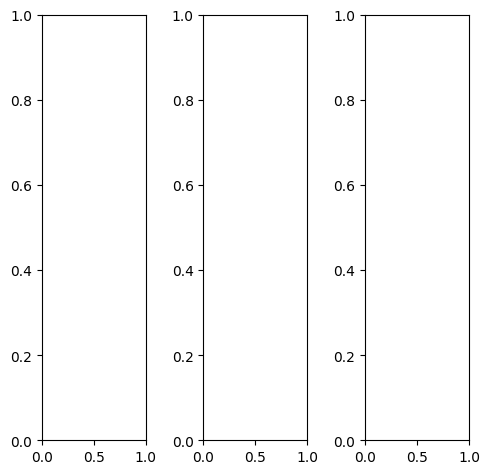

tensor([[[0.8863, 0.8667, 0.8863,  ..., 0.9804, 0.9686, 0.9569],
         [0.8549, 0.8471, 0.8627,  ..., 0.9569, 0.9569, 0.9490],
         [0.8235, 0.8235, 0.8431,  ..., 0.9294, 0.9255, 0.9216],
         ...,
         [0.8039, 0.8314, 0.7176,  ..., 0.7412, 0.8157, 0.8471],
         [0.7216, 0.6353, 0.4039,  ..., 0.4941, 0.5569, 0.6588],
         [0.4588, 0.3490, 0.2667,  ..., 0.4431, 0.4235, 0.4549]],

        [[0.8863, 0.8667, 0.8863,  ..., 0.9804, 0.9686, 0.9569],
         [0.8549, 0.8471, 0.8627,  ..., 0.9569, 0.9569, 0.9490],
         [0.8235, 0.8235, 0.8431,  ..., 0.9294, 0.9255, 0.9216],
         ...,
         [0.8039, 0.8314, 0.7176,  ..., 0.7412, 0.8157, 0.8471],
         [0.7216, 0.6353, 0.4039,  ..., 0.4941, 0.5569, 0.6588],
         [0.4588, 0.3490, 0.2667,  ..., 0.4431, 0.4235, 0.4549]],

        [[0.8863, 0.8667, 0.8863,  ..., 0.9804, 0.9686, 0.9569],
         [0.8549, 0.8471, 0.8627,  ..., 0.9569, 0.9569, 0.9490],
         [0.8235, 0.8235, 0.8431,  ..., 0.9294, 0.9255, 0.

tensor([[[0.9373, 0.9412, 0.9569,  ..., 0.9922, 0.9804, 0.9804],
         [0.9294, 0.9373, 0.9529,  ..., 0.9843, 0.9843, 0.9843],
         [0.9255, 0.9255, 0.9451,  ..., 0.9765, 0.9804, 0.9725],
         ...,
         [0.9686, 0.9725, 0.8588,  ..., 0.9451, 0.9765, 0.9765],
         [0.9059, 0.8078, 0.5804,  ..., 0.8392, 0.8667, 0.9255],
         [0.6824, 0.6118, 0.5255,  ..., 0.7922, 0.7843, 0.8157]],

        [[0.8745, 0.8549, 0.8745,  ..., 0.9804, 0.9647, 0.9490],
         [0.8431, 0.8275, 0.8510,  ..., 0.9569, 0.9529, 0.9451],
         [0.8000, 0.8078, 0.8275,  ..., 0.9255, 0.9176, 0.9137],
         ...,
         [0.7922, 0.8275, 0.7059,  ..., 0.7059, 0.8000, 0.8471],
         [0.6902, 0.5961, 0.3490,  ..., 0.3804, 0.4627, 0.5961],
         [0.3843, 0.2588, 0.1686,  ..., 0.3216, 0.2941, 0.3294]],

        [[0.8000, 0.7490, 0.7569,  ..., 0.9608, 0.9412, 0.9216],
         [0.7255, 0.6980, 0.6941,  ..., 0.8902, 0.8902, 0.8784],
         [0.6627, 0.6471, 0.6549,  ..., 0.8353, 0.8353, 0.

tensor([[[0.4653, 0.3451, 0.2829,  ..., 0.5160, 0.5226, 0.5977],
         [0.3978, 0.2173, 0.2253,  ..., 0.4818, 0.5095, 0.5747],
         [0.3134, 0.1999, 0.1118,  ..., 0.4861, 0.4975, 0.5454],
         ...,
         [0.5802, 0.6929, 0.6531,  ..., 0.6174, 0.6347, 0.6473],
         [0.4959, 0.4887, 0.2786,  ..., 0.3566, 0.4286, 0.4751],
         [0.2718, 0.1417, 0.0920,  ..., 0.2779, 0.2441, 0.2998]],

        [[0.5797, 0.4328, 0.4909,  ..., 0.5971, 0.6449, 0.6433],
         [0.4121, 0.2738, 0.2474,  ..., 0.5674, 0.6017, 0.6830],
         [0.4731, 0.3239, 0.3676,  ..., 0.5788, 0.5722, 0.6258],
         ...,
         [0.5165, 0.6229, 0.5741,  ..., 0.5800, 0.6214, 0.5992],
         [0.4524, 0.4539, 0.2196,  ..., 0.3190, 0.3812, 0.4277],
         [0.2168, 0.1079, 0.0497,  ..., 0.2283, 0.2161, 0.2479]],

        [[0.7276, 0.5462, 0.6401,  ..., 0.7776, 0.8064, 0.8133],
         [0.6047, 0.5310, 0.4864,  ..., 0.7105, 0.7613, 0.8283],
         [0.5191, 0.4660, 0.4040,  ..., 0.7313, 0.7447, 0.

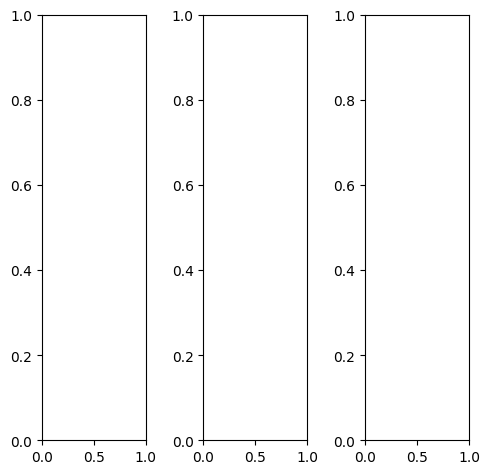

tensor([[[0.6000, 0.6039, 0.6118,  ..., 0.8039, 0.7922, 0.7843],
         [0.6000, 0.6078, 0.6157,  ..., 0.7882, 0.7843, 0.7843],
         [0.5373, 0.5412, 0.5569,  ..., 0.7804, 0.7686, 0.7686],
         ...,
         [0.5176, 0.4902, 0.4588,  ..., 0.9216, 0.8902, 0.9725],
         [0.3961, 0.3882, 0.3961,  ..., 1.0000, 1.0000, 1.0000],
         [0.3804, 0.3765, 0.3725,  ..., 0.9451, 0.9922, 1.0000]],

        [[0.6000, 0.6039, 0.6118,  ..., 0.8039, 0.7922, 0.7843],
         [0.6000, 0.6078, 0.6157,  ..., 0.7882, 0.7843, 0.7843],
         [0.5373, 0.5412, 0.5569,  ..., 0.7804, 0.7686, 0.7686],
         ...,
         [0.5176, 0.4902, 0.4588,  ..., 0.9216, 0.8902, 0.9725],
         [0.3961, 0.3882, 0.3961,  ..., 1.0000, 1.0000, 1.0000],
         [0.3804, 0.3765, 0.3725,  ..., 0.9451, 0.9922, 1.0000]],

        [[0.6000, 0.6039, 0.6118,  ..., 0.8039, 0.7922, 0.7843],
         [0.6000, 0.6078, 0.6157,  ..., 0.7882, 0.7843, 0.7843],
         [0.5373, 0.5412, 0.5569,  ..., 0.7804, 0.7686, 0.

tensor([[[0.5608, 0.5725, 0.5843,  ..., 0.7333, 0.7216, 0.7216],
         [0.5647, 0.5804, 0.5922,  ..., 0.7255, 0.7176, 0.7255],
         [0.5059, 0.5176, 0.5412,  ..., 0.7216, 0.7098, 0.7098],
         ...,
         [0.3804, 0.3569, 0.3216,  ..., 0.9216, 0.8902, 0.9725],
         [0.2706, 0.2627, 0.2667,  ..., 1.0000, 1.0000, 1.0000],
         [0.2784, 0.2784, 0.2745,  ..., 0.9451, 0.9922, 1.0000]],

        [[0.6235, 0.6235, 0.6275,  ..., 0.8235, 0.8118, 0.8000],
         [0.6196, 0.6275, 0.6314,  ..., 0.8078, 0.8039, 0.8000],
         [0.5529, 0.5569, 0.5647,  ..., 0.7961, 0.7882, 0.7882],
         ...,
         [0.5490, 0.5176, 0.4902,  ..., 0.9216, 0.8902, 0.9725],
         [0.4196, 0.4118, 0.4196,  ..., 1.0000, 1.0000, 1.0000],
         [0.3922, 0.3922, 0.3922,  ..., 0.9451, 0.9922, 1.0000]],

        [[0.5922, 0.5922, 0.6000,  ..., 0.8784, 0.8745, 0.8706],
         [0.5804, 0.5882, 0.6000,  ..., 0.8627, 0.8549, 0.8549],
         [0.5255, 0.5333, 0.5490,  ..., 0.8471, 0.8353, 0.

tensor([[[0.3829, 0.3241, 0.1759,  ..., 0.4918, 0.4949, 0.5659],
         [0.3620, 0.2641, 0.1905,  ..., 0.4456, 0.4837, 0.5243],
         [0.1981, 0.1835, 0.0977,  ..., 0.4717, 0.4906, 0.4975],
         ...,
         [0.3937, 0.3818, 0.3520,  ..., 0.8227, 0.8054, 0.8843],
         [0.2377, 0.2314, 0.2415,  ..., 0.9075, 0.9190, 0.9336],
         [0.2260, 0.1894, 0.2037,  ..., 0.9044, 0.9559, 0.9368]],

        [[0.4565, 0.4498, 0.3350,  ..., 0.6529, 0.6771, 0.6720],
         [0.4212, 0.3394, 0.2252,  ..., 0.6184, 0.6522, 0.7021],
         [0.3234, 0.2950, 0.2064,  ..., 0.6392, 0.6301, 0.6658],
         ...,
         [0.3793, 0.3876, 0.3415,  ..., 0.8033, 0.7849, 0.8760],
         [0.2299, 0.2408, 0.2498,  ..., 0.9054, 0.9044, 0.9006],
         [0.2114, 0.1921, 0.2054,  ..., 0.8577, 0.9220, 0.9014]],

        [[0.6093, 0.4358, 0.4706,  ..., 0.9076, 0.9032, 0.8876],
         [0.5290, 0.4553, 0.4269,  ..., 0.8453, 0.8794, 0.8971],
         [0.3713, 0.3232, 0.3686,  ..., 0.8637, 0.8638, 0.

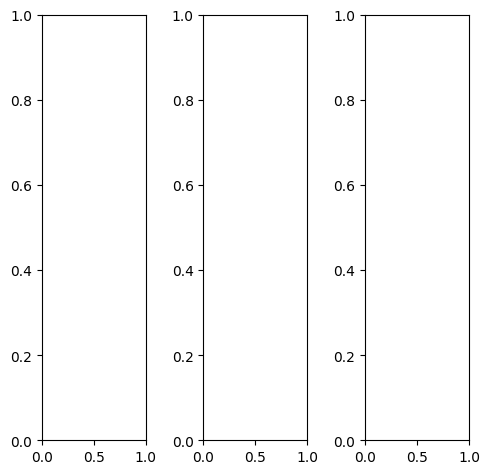

tensor([[[0.5765, 0.6078, 0.6118,  ..., 0.5686, 0.5686, 0.4980],
         [0.5765, 0.5961, 0.6000,  ..., 0.5922, 0.6000, 0.5333],
         [0.5843, 0.6000, 0.5961,  ..., 0.5961, 0.6078, 0.5451],
         ...,
         [0.3686, 0.3765, 0.3490,  ..., 0.3216, 0.3961, 0.3686],
         [0.2941, 0.3137, 0.2863,  ..., 0.2392, 0.3059, 0.3020],
         [0.3255, 0.3529, 0.3294,  ..., 0.2392, 0.2863, 0.2745]],

        [[0.5765, 0.6078, 0.6118,  ..., 0.5686, 0.5686, 0.4980],
         [0.5765, 0.5961, 0.6000,  ..., 0.5922, 0.6000, 0.5333],
         [0.5843, 0.6000, 0.5961,  ..., 0.5961, 0.6078, 0.5451],
         ...,
         [0.3686, 0.3765, 0.3490,  ..., 0.3216, 0.3961, 0.3686],
         [0.2941, 0.3137, 0.2863,  ..., 0.2392, 0.3059, 0.3020],
         [0.3255, 0.3529, 0.3294,  ..., 0.2392, 0.2863, 0.2745]],

        [[0.5765, 0.6078, 0.6118,  ..., 0.5686, 0.5686, 0.4980],
         [0.5765, 0.5961, 0.6000,  ..., 0.5922, 0.6000, 0.5333],
         [0.5843, 0.6000, 0.5961,  ..., 0.5961, 0.6078, 0.

tensor([[[0.4667, 0.4941, 0.4980,  ..., 0.4627, 0.4667, 0.4157],
         [0.4667, 0.4824, 0.4863,  ..., 0.4824, 0.4980, 0.4471],
         [0.4784, 0.4902, 0.4824,  ..., 0.4863, 0.5059, 0.4588],
         ...,
         [0.2314, 0.2275, 0.2000,  ..., 0.1882, 0.2588, 0.2431],
         [0.1765, 0.1882, 0.1529,  ..., 0.1020, 0.1647, 0.1765],
         [0.2118, 0.2314, 0.2000,  ..., 0.0941, 0.1333, 0.1373]],

        [[0.6549, 0.6902, 0.6941,  ..., 0.6431, 0.6392, 0.5608],
         [0.6549, 0.6784, 0.6824,  ..., 0.6706, 0.6745, 0.5961],
         [0.6627, 0.6784, 0.6745,  ..., 0.6745, 0.6863, 0.6078],
         ...,
         [0.4431, 0.4549, 0.4235,  ..., 0.4039, 0.4863, 0.4549],
         [0.3569, 0.3843, 0.3608,  ..., 0.3176, 0.3922, 0.3765],
         [0.3843, 0.4196, 0.3961,  ..., 0.3137, 0.3686, 0.3490]],

        [[0.4627, 0.4902, 0.4941,  ..., 0.4667, 0.4627, 0.4078],
         [0.4627, 0.4784, 0.4824,  ..., 0.4784, 0.4824, 0.4314],
         [0.4745, 0.4824, 0.4784,  ..., 0.4706, 0.4863, 0.

tensor([[[0.5813, 0.5285, 0.4743,  ..., 0.4030, 0.4258, 0.4177],
         [0.5404, 0.3600, 0.3919,  ..., 0.4010, 0.4361, 0.4076],
         [0.5254, 0.4547, 0.3181,  ..., 0.4386, 0.4777, 0.4279],
         ...,
         [0.3239, 0.3657, 0.3099,  ..., 0.3000, 0.4144, 0.3760],
         [0.1940, 0.2284, 0.1821,  ..., 0.1163, 0.2539, 0.2599],
         [0.2805, 0.3057, 0.2654,  ..., 0.1527, 0.2184, 0.2118]],

        [[0.6515, 0.5936, 0.5744,  ..., 0.5721, 0.6137, 0.5195],
         [0.5348, 0.3512, 0.3999,  ..., 0.5965, 0.6350, 0.5855],
         [0.6240, 0.5233, 0.4775,  ..., 0.5997, 0.6255, 0.5979],
         ...,
         [0.3262, 0.3905, 0.3477,  ..., 0.3250, 0.4431, 0.3729],
         [0.2179, 0.2797, 0.2369,  ..., 0.1557, 0.2755, 0.2531],
         [0.2902, 0.3336, 0.3021,  ..., 0.1505, 0.2134, 0.2067]],

        [[0.7776, 0.7181, 0.7049,  ..., 0.8311, 0.8647, 0.7526],
         [0.7445, 0.5993, 0.6357,  ..., 0.8321, 0.8856, 0.7996],
         [0.6820, 0.6262, 0.5150,  ..., 0.8330, 0.8720, 0.

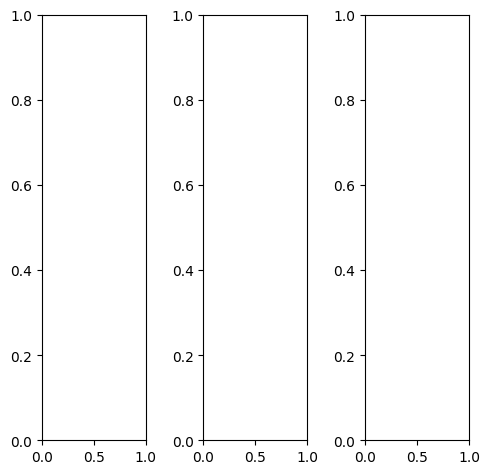

tensor([[[0.1804, 0.2000, 0.2157,  ..., 0.4078, 0.4157, 0.4078],
         [0.1882, 0.2039, 0.2196,  ..., 0.4157, 0.4235, 0.4118],
         [0.1882, 0.2039, 0.2196,  ..., 0.3922, 0.3961, 0.4000],
         ...,
         [0.5255, 0.5529, 0.5490,  ..., 0.5765, 0.5608, 0.5608],
         [0.5647, 0.5412, 0.5608,  ..., 0.5804, 0.5647, 0.5490],
         [0.5490, 0.5529, 0.6039,  ..., 0.5804, 0.5451, 0.5255]],

        [[0.1804, 0.2000, 0.2157,  ..., 0.4078, 0.4157, 0.4078],
         [0.1882, 0.2039, 0.2196,  ..., 0.4157, 0.4235, 0.4118],
         [0.1882, 0.2039, 0.2196,  ..., 0.3922, 0.3961, 0.4000],
         ...,
         [0.5255, 0.5529, 0.5490,  ..., 0.5765, 0.5608, 0.5608],
         [0.5647, 0.5412, 0.5608,  ..., 0.5804, 0.5647, 0.5490],
         [0.5490, 0.5529, 0.6039,  ..., 0.5804, 0.5451, 0.5255]],

        [[0.1804, 0.2000, 0.2157,  ..., 0.4078, 0.4157, 0.4078],
         [0.1882, 0.2039, 0.2196,  ..., 0.4157, 0.4235, 0.4118],
         [0.1882, 0.2039, 0.2196,  ..., 0.3922, 0.3961, 0.

tensor([[[0.2000, 0.2235, 0.2392,  ..., 0.4118, 0.4157, 0.4039],
         [0.2118, 0.2275, 0.2431,  ..., 0.4196, 0.4235, 0.4118],
         [0.2118, 0.2314, 0.2510,  ..., 0.3961, 0.4000, 0.4000],
         ...,
         [0.5412, 0.5608, 0.5529,  ..., 0.6000, 0.5765, 0.5490],
         [0.5647, 0.5490, 0.5686,  ..., 0.5961, 0.5725, 0.5529],
         [0.5569, 0.5608, 0.5961,  ..., 0.5882, 0.5569, 0.5412]],

        [[0.1804, 0.1961, 0.2157,  ..., 0.4118, 0.4235, 0.4157],
         [0.1843, 0.2000, 0.2157,  ..., 0.4196, 0.4275, 0.4196],
         [0.1843, 0.2000, 0.2157,  ..., 0.3961, 0.4039, 0.4078],
         ...,
         [0.5137, 0.5451, 0.5451,  ..., 0.5608, 0.5529, 0.5647],
         [0.5608, 0.5373, 0.5608,  ..., 0.5686, 0.5569, 0.5451],
         [0.5412, 0.5490, 0.6000,  ..., 0.5765, 0.5373, 0.5137]],

        [[0.1373, 0.1529, 0.1686,  ..., 0.3765, 0.3922, 0.3843],
         [0.1412, 0.1529, 0.1686,  ..., 0.3725, 0.3922, 0.3843],
         [0.1412, 0.1569, 0.1686,  ..., 0.3529, 0.3608, 0.

tensor([[[-0.0282,  0.0022, -0.0942,  ...,  0.3044,  0.3224,  0.3374],
         [ 0.0968, -0.1224, -0.1017,  ...,  0.3112,  0.3202,  0.3314],
         [-0.1533, -0.2043, -0.1979,  ...,  0.3145,  0.3124,  0.3310],
         ...,
         [ 0.5733,  0.6409,  0.5922,  ...,  0.5504,  0.5344,  0.5914],
         [ 0.6209,  0.5989,  0.6086,  ...,  0.5681,  0.5829,  0.5821],
         [ 0.6054,  0.6161,  0.6778,  ...,  0.6044,  0.5629,  0.5680]],

        [[ 0.1296,  0.0627,  0.0900,  ...,  0.4060,  0.4435,  0.4121],
         [ 0.0765, -0.0956, -0.2443,  ...,  0.4501,  0.4780,  0.4365],
         [-0.0213, -0.1548, -0.1081,  ...,  0.4429,  0.4497,  0.4278],
         ...,
         [ 0.5080,  0.5590,  0.5247,  ...,  0.5329,  0.5359,  0.5544],
         [ 0.5614,  0.5099,  0.5404,  ...,  0.5612,  0.5539,  0.5491],
         [ 0.5392,  0.5532,  0.6182,  ...,  0.5817,  0.5470,  0.5430]],

        [[ 0.2257,  0.0688,  0.1764,  ...,  0.5618,  0.5918,  0.5569],
         [ 0.2234,  0.0459,  0.1121,  ...,  0

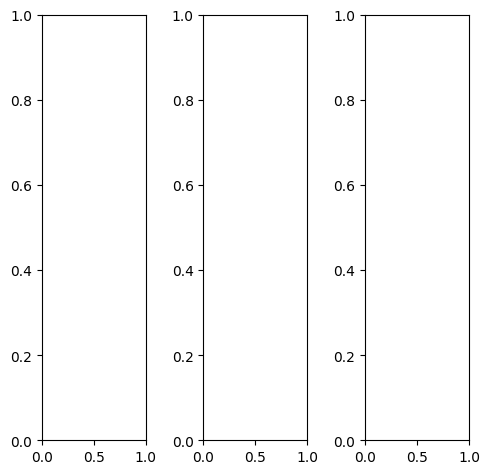

EPOCH: 28.000  val_loss: 0.003  (3417.74s - 8788.46s remaining)

tensor([[[0.2431, 0.2392, 0.2588,  ..., 0.3255, 0.2863, 0.2863],
         [0.2235, 0.2471, 0.2706,  ..., 0.3294, 0.2902, 0.3059],
         [0.2863, 0.2706, 0.2980,  ..., 0.3373, 0.3059, 0.3255],
         ...,
         [0.3176, 0.3451, 0.3569,  ..., 0.3137, 0.3059, 0.3569],
         [0.3216, 0.3216, 0.3294,  ..., 0.3569, 0.2902, 0.2667],
         [0.2863, 0.3176, 0.3294,  ..., 0.3373, 0.2980, 0.2667]],

        [[0.2431, 0.2392, 0.2588,  ..., 0.3255, 0.2863, 0.2863],
         [0.2235, 0.2471, 0.2706,  ..., 0.3294, 0.2902, 0.3059],
         [0.2863, 0.2706, 0.2980,  ..., 0.3373, 0.3059, 0.3255],
         ...,
         [0.3176, 0.3451, 0.3569,  ..., 0.3137, 0.3059, 0.3569],
         [0.3216, 0.3216, 0.3294,  ..., 0.3569, 0.2902, 0.2667],
         [0.2863, 0.3176, 0.3294,  ..., 0.3373, 0.2980, 0.2667]],

        [[0.2431, 0.2392, 0.2588,  ..., 0.3255, 0.2863, 0.2863],
         [0.2235, 0.2471, 0.2706,  ..., 0.3294, 0.2902, 0.3059],
         [0.2863, 0.2706, 0.2980,  ..., 0.3373, 0.3059, 0.

tensor([[[0.2510, 0.2471, 0.2196,  ..., 0.3922, 0.3725, 0.3608],
         [0.2980, 0.3647, 0.3059,  ..., 0.4039, 0.3686, 0.3725],
         [0.3725, 0.4235, 0.4000,  ..., 0.4157, 0.3765, 0.3843],
         ...,
         [0.1961, 0.2275, 0.2353,  ..., 0.1686, 0.1686, 0.2314],
         [0.2000, 0.2039, 0.2078,  ..., 0.2118, 0.1569, 0.1412],
         [0.1843, 0.2157, 0.2275,  ..., 0.2157, 0.1804, 0.1608]],

        [[0.2314, 0.2235, 0.2588,  ..., 0.2863, 0.2392, 0.2431],
         [0.1804, 0.1765, 0.2392,  ..., 0.2863, 0.2471, 0.2667],
         [0.2353, 0.1843, 0.2392,  ..., 0.2902, 0.2667, 0.2902],
         ...,
         [0.3569, 0.3843, 0.3961,  ..., 0.3608, 0.3490, 0.4000],
         [0.3608, 0.3608, 0.3686,  ..., 0.4039, 0.3373, 0.3098],
         [0.3216, 0.3529, 0.3608,  ..., 0.3765, 0.3373, 0.3020]],

        [[0.2863, 0.3059, 0.3490,  ..., 0.3529, 0.3137, 0.3137],
         [0.2588, 0.2980, 0.3333,  ..., 0.3608, 0.3176, 0.3333],
         [0.3059, 0.3020, 0.3333,  ..., 0.3647, 0.3333, 0.

tensor([[[0.2545, 0.2454, 0.2634,  ..., 0.3272, 0.2861, 0.2839],
         [0.2160, 0.2452, 0.2745,  ..., 0.3332, 0.3059, 0.3042],
         [0.2847, 0.2755, 0.2998,  ..., 0.3508, 0.3172, 0.3346],
         ...,
         [0.3296, 0.3697, 0.3743,  ..., 0.3224, 0.3192, 0.3631],
         [0.3242, 0.3454, 0.3477,  ..., 0.3703, 0.3061, 0.2723],
         [0.3088, 0.3256, 0.3414,  ..., 0.3506, 0.3013, 0.2938]],

        [[0.2513, 0.2448, 0.2623,  ..., 0.3239, 0.2918, 0.2963],
         [0.2230, 0.2461, 0.2699,  ..., 0.3280, 0.3035, 0.3130],
         [0.2860, 0.2773, 0.3025,  ..., 0.3421, 0.3153, 0.3387],
         ...,
         [0.3177, 0.3505, 0.3549,  ..., 0.3171, 0.3132, 0.3628],
         [0.3170, 0.3254, 0.3290,  ..., 0.3586, 0.2916, 0.2689],
         [0.3065, 0.3187, 0.3327,  ..., 0.3394, 0.2933, 0.2932]],

        [[0.2271, 0.2120, 0.2247,  ..., 0.2675, 0.2422, 0.2547],
         [0.1951, 0.2172, 0.2330,  ..., 0.2669, 0.2398, 0.2478],
         [0.2513, 0.2381, 0.2596,  ..., 0.2804, 0.2522, 0.

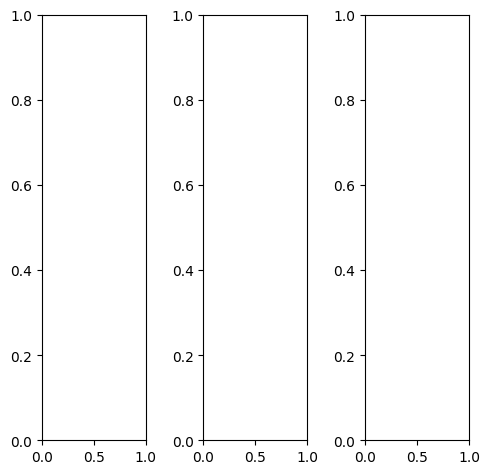

tensor([[[0.9059, 0.9216, 0.9529,  ..., 0.8627, 0.8627, 0.8667],
         [0.9137, 0.9216, 0.9529,  ..., 0.8784, 0.8784, 0.8784],
         [0.9216, 0.9176, 0.9490,  ..., 0.9137, 0.9137, 0.9059],
         ...,
         [0.4588, 0.4510, 0.4549,  ..., 0.3725, 0.3529, 0.3529],
         [0.4549, 0.4549, 0.4667,  ..., 0.4235, 0.4275, 0.4275],
         [0.5529, 0.5255, 0.5373,  ..., 0.4431, 0.4392, 0.4392]],

        [[0.9059, 0.9216, 0.9529,  ..., 0.8627, 0.8627, 0.8667],
         [0.9137, 0.9216, 0.9529,  ..., 0.8784, 0.8784, 0.8784],
         [0.9216, 0.9176, 0.9490,  ..., 0.9137, 0.9137, 0.9059],
         ...,
         [0.4588, 0.4510, 0.4549,  ..., 0.3725, 0.3529, 0.3529],
         [0.4549, 0.4549, 0.4667,  ..., 0.4235, 0.4275, 0.4275],
         [0.5529, 0.5255, 0.5373,  ..., 0.4431, 0.4392, 0.4392]],

        [[0.9059, 0.9216, 0.9529,  ..., 0.8627, 0.8627, 0.8667],
         [0.9137, 0.9216, 0.9529,  ..., 0.8784, 0.8784, 0.8784],
         [0.9216, 0.9176, 0.9490,  ..., 0.9137, 0.9137, 0.

tensor([[[0.8941, 0.9098, 0.9412,  ..., 0.8431, 0.8431, 0.8549],
         [0.9020, 0.9098, 0.9412,  ..., 0.8667, 0.8667, 0.8667],
         [0.9098, 0.9059, 0.9373,  ..., 0.9098, 0.9098, 0.8941],
         ...,
         [0.4784, 0.4706, 0.4745,  ..., 0.3961, 0.3765, 0.3765],
         [0.4784, 0.4784, 0.4902,  ..., 0.4471, 0.4471, 0.4510],
         [0.5765, 0.5490, 0.5608,  ..., 0.4667, 0.4627, 0.4627]],

        [[0.9059, 0.9216, 0.9529,  ..., 0.8667, 0.8667, 0.8667],
         [0.9137, 0.9216, 0.9529,  ..., 0.8784, 0.8784, 0.8784],
         [0.9216, 0.9176, 0.9490,  ..., 0.9137, 0.9137, 0.9059],
         ...,
         [0.4549, 0.4471, 0.4510,  ..., 0.3647, 0.3451, 0.3490],
         [0.4471, 0.4471, 0.4588,  ..., 0.4157, 0.4196, 0.4235],
         [0.5451, 0.5176, 0.5294,  ..., 0.4353, 0.4314, 0.4353]],

        [[0.9333, 0.9490, 0.9765,  ..., 0.9020, 0.9020, 0.9098],
         [0.9412, 0.9490, 0.9765,  ..., 0.9098, 0.9098, 0.9098],
         [0.9490, 0.9451, 0.9725,  ..., 0.9333, 0.9373, 0.

tensor([[[0.9090, 0.9088, 0.9733,  ..., 0.8286, 0.8350, 0.8298],
         [0.8831, 0.9056, 0.9439,  ..., 0.8443, 0.8585, 0.8518],
         [0.9273, 0.9347, 0.9255,  ..., 0.8870, 0.8955, 0.8790],
         ...,
         [0.4626, 0.4584, 0.4675,  ..., 0.3941, 0.3664, 0.3690],
         [0.4485, 0.4628, 0.4669,  ..., 0.4416, 0.4432, 0.4425],
         [0.5569, 0.5281, 0.5398,  ..., 0.4547, 0.4582, 0.4537]],

        [[0.9144, 0.9175, 0.9652,  ..., 0.8620, 0.8685, 0.8808],
         [0.8968, 0.9326, 0.9935,  ..., 0.8839, 0.8825, 0.8917],
         [0.9337, 0.9517, 0.9731,  ..., 0.9254, 0.9289, 0.9088],
         ...,
         [0.4749, 0.4478, 0.4527,  ..., 0.3700, 0.3516, 0.3622],
         [0.4594, 0.4533, 0.4688,  ..., 0.4147, 0.4259, 0.4322],
         [0.5552, 0.5325, 0.5481,  ..., 0.4373, 0.4449, 0.4559]],

        [[0.8851, 0.9414, 0.9506,  ..., 0.8932, 0.9035, 0.9001],
         [0.8933, 0.9261, 0.9577,  ..., 0.9226, 0.9159, 0.9177],
         [0.9468, 0.9435, 0.9722,  ..., 0.9432, 0.9472, 0.

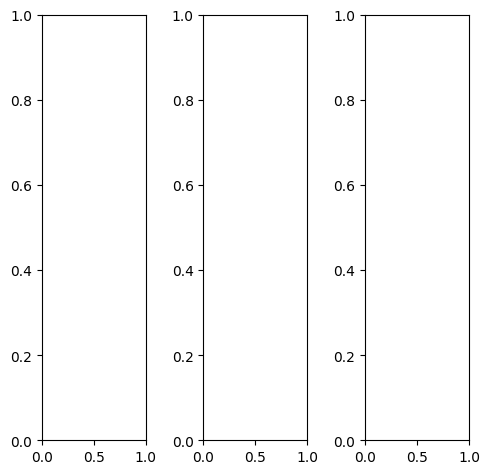

tensor([[[0.8824, 0.4431, 0.4941,  ..., 0.7255, 0.7059, 0.6863],
         [0.7569, 0.4980, 0.4667,  ..., 0.7412, 0.7255, 0.7059],
         [0.5176, 0.4353, 0.4471,  ..., 0.7373, 0.7255, 0.7098],
         ...,
         [0.5451, 0.5882, 0.6078,  ..., 0.5961, 0.5961, 0.5843],
         [0.4941, 0.5059, 0.5137,  ..., 0.7098, 0.6980, 0.6784],
         [0.5608, 0.5686, 0.5647,  ..., 0.7333, 0.7059, 0.6902]],

        [[0.8824, 0.4431, 0.4941,  ..., 0.7255, 0.7059, 0.6863],
         [0.7569, 0.4980, 0.4667,  ..., 0.7412, 0.7255, 0.7059],
         [0.5176, 0.4353, 0.4471,  ..., 0.7373, 0.7255, 0.7098],
         ...,
         [0.5451, 0.5882, 0.6078,  ..., 0.5961, 0.5961, 0.5843],
         [0.4941, 0.5059, 0.5137,  ..., 0.7098, 0.6980, 0.6784],
         [0.5608, 0.5686, 0.5647,  ..., 0.7333, 0.7059, 0.6902]],

        [[0.8824, 0.4431, 0.4941,  ..., 0.7255, 0.7059, 0.6863],
         [0.7569, 0.4980, 0.4667,  ..., 0.7412, 0.7255, 0.7059],
         [0.5176, 0.4353, 0.4471,  ..., 0.7373, 0.7255, 0.

tensor([[[0.9059, 0.6039, 0.6431,  ..., 0.7059, 0.6902, 0.6667],
         [0.7804, 0.6392, 0.6078,  ..., 0.7216, 0.7098, 0.6863],
         [0.5490, 0.5882, 0.6000,  ..., 0.7216, 0.7098, 0.6902],
         ...,
         [0.5333, 0.5804, 0.5961,  ..., 0.5490, 0.5490, 0.5412],
         [0.4706, 0.4902, 0.4980,  ..., 0.6784, 0.6667, 0.6471],
         [0.5098, 0.5216, 0.5216,  ..., 0.7059, 0.6784, 0.6667]],

        [[0.8706, 0.3843, 0.4392,  ..., 0.7176, 0.6980, 0.6784],
         [0.7412, 0.4706, 0.4431,  ..., 0.7333, 0.7176, 0.6980],
         [0.4980, 0.4000, 0.4196,  ..., 0.7294, 0.7176, 0.7020],
         ...,
         [0.5333, 0.5804, 0.6000,  ..., 0.5922, 0.5922, 0.5804],
         [0.4863, 0.4980, 0.5020,  ..., 0.7020, 0.6902, 0.6706],
         [0.5569, 0.5608, 0.5569,  ..., 0.7255, 0.6980, 0.6784]],

        [[0.8941, 0.3294, 0.3843,  ..., 0.8118, 0.7922, 0.7765],
         [0.7725, 0.2784, 0.2118,  ..., 0.8314, 0.8157, 0.7961],
         [0.5529, 0.2118, 0.1843,  ..., 0.8275, 0.8157, 0.

tensor([[[0.7665, 0.4791, 0.5007,  ..., 0.6903, 0.6645, 0.6752],
         [0.7239, 0.4973, 0.4663,  ..., 0.7001, 0.6950, 0.6910],
         [0.4962, 0.4248, 0.4493,  ..., 0.7008, 0.6869, 0.6820],
         ...,
         [0.5632, 0.6167, 0.6197,  ..., 0.6066, 0.6182, 0.5978],
         [0.5037, 0.5336, 0.5331,  ..., 0.7108, 0.7030, 0.6864],
         [0.5812, 0.5867, 0.5849,  ..., 0.7377, 0.7270, 0.7037]],

        [[0.7802, 0.4800, 0.5130,  ..., 0.7399, 0.7236, 0.7121],
         [0.7460, 0.5229, 0.4775,  ..., 0.7490, 0.7335, 0.7335],
         [0.5128, 0.4276, 0.4543,  ..., 0.7509, 0.7323, 0.7302],
         ...,
         [0.5493, 0.5977, 0.6161,  ..., 0.5909, 0.6066, 0.6020],
         [0.4857, 0.5155, 0.5218,  ..., 0.6999, 0.6991, 0.6858],
         [0.5652, 0.5727, 0.5752,  ..., 0.7300, 0.7149, 0.6899]],

        [[0.7754, 0.4797, 0.4993,  ..., 0.7649, 0.7550, 0.7417],
         [0.7373, 0.4930, 0.4725,  ..., 0.7779, 0.7584, 0.7440],
         [0.5030, 0.4104, 0.4511,  ..., 0.7775, 0.7631, 0.

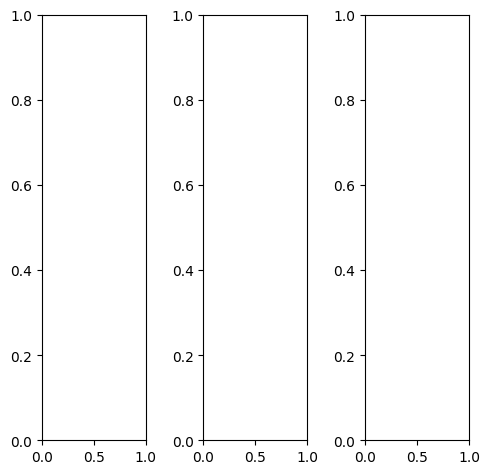

tensor([[[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9843, 0.9882,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9882,  ..., 0.9922, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9843, 0.9882,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9882,  ..., 0.9922, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.

tensor([[[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9843, 0.9882,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9882,  ..., 0.9922, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [1.0000, 0.9922, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [1.0000, 0.9843, 0.9882,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9882,  ..., 0.9922, 0.9922, 0.9922]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9922, 0.9922],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.

tensor([[[0.9627, 0.9618, 0.9871,  ..., 0.9837, 0.9828, 0.9570],
         [0.9809, 0.9803, 0.9766,  ..., 0.9860, 0.9984, 0.9768],
         [0.9867, 0.9988, 0.9878,  ..., 1.0000, 1.0077, 1.0013],
         ...,
         [1.0130, 1.0145, 1.0017,  ..., 0.9967, 0.9933, 0.9947],
         [0.9912, 0.9978, 0.9801,  ..., 0.9861, 0.9885, 0.9874],
         [0.9737, 0.9782, 0.9834,  ..., 0.9873, 0.9925, 0.9571]],

        [[0.9717, 0.9747, 0.9974,  ..., 0.9842, 0.9741, 0.9726],
         [0.9901, 0.9939, 0.9973,  ..., 0.9977, 0.9857, 0.9833],
         [0.9984, 1.0074, 0.9994,  ..., 1.0046, 1.0060, 0.9974],
         ...,
         [0.9912, 0.9990, 0.9943,  ..., 0.9975, 1.0054, 0.9991],
         [0.9832, 0.9754, 0.9796,  ..., 0.9914, 0.9902, 0.9801],
         [0.9597, 0.9833, 0.9840,  ..., 0.9877, 0.9819, 0.9335]],

        [[0.9604, 0.9848, 0.9800,  ..., 0.9645, 0.9550, 0.9398],
         [0.9811, 0.9970, 0.9863,  ..., 0.9776, 0.9712, 0.9552],
         [0.9914, 0.9954, 1.0002,  ..., 0.9855, 0.9728, 0.

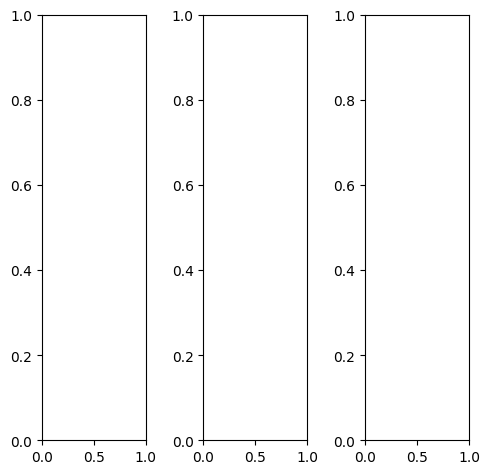

tensor([[[0.2941, 0.3059, 0.3216,  ..., 0.3294, 0.2745, 0.2039],
         [0.1765, 0.1961, 0.2118,  ..., 0.2157, 0.1843, 0.2078],
         [0.1922, 0.1804, 0.1373,  ..., 0.1490, 0.1608, 0.1922],
         ...,
         [0.3216, 0.3451, 0.3451,  ..., 0.3922, 0.3804, 0.3843],
         [0.5098, 0.5216, 0.4863,  ..., 0.5137, 0.5059, 0.4745],
         [0.6118, 0.6000, 0.5922,  ..., 0.3529, 0.3608, 0.3529]],

        [[0.2941, 0.3059, 0.3216,  ..., 0.3294, 0.2745, 0.2039],
         [0.1765, 0.1961, 0.2118,  ..., 0.2157, 0.1843, 0.2078],
         [0.1922, 0.1804, 0.1373,  ..., 0.1490, 0.1608, 0.1922],
         ...,
         [0.3216, 0.3451, 0.3451,  ..., 0.3922, 0.3804, 0.3843],
         [0.5098, 0.5216, 0.4863,  ..., 0.5137, 0.5059, 0.4745],
         [0.6118, 0.6000, 0.5922,  ..., 0.3529, 0.3608, 0.3529]],

        [[0.2941, 0.3059, 0.3216,  ..., 0.3294, 0.2745, 0.2039],
         [0.1765, 0.1961, 0.2118,  ..., 0.2157, 0.1843, 0.2078],
         [0.1922, 0.1804, 0.1373,  ..., 0.1490, 0.1608, 0.

tensor([[[0.2471, 0.2588, 0.2745,  ..., 0.2667, 0.2118, 0.1451],
         [0.1412, 0.1569, 0.1725,  ..., 0.1608, 0.1294, 0.1569],
         [0.1608, 0.1451, 0.1059,  ..., 0.1020, 0.1137, 0.1451],
         ...,
         [0.4000, 0.4196, 0.4196,  ..., 0.4549, 0.4431, 0.4510],
         [0.5686, 0.5843, 0.5490,  ..., 0.5686, 0.5608, 0.5294],
         [0.6471, 0.6392, 0.6314,  ..., 0.3529, 0.3608, 0.3529]],

        [[0.3373, 0.3529, 0.3686,  ..., 0.3765, 0.3137, 0.2392],
         [0.2078, 0.2275, 0.2431,  ..., 0.2510, 0.2157, 0.2392],
         [0.2157, 0.2000, 0.1569,  ..., 0.1725, 0.1843, 0.2196],
         ...,
         [0.2941, 0.3176, 0.3176,  ..., 0.3725, 0.3608, 0.3647],
         [0.4824, 0.4980, 0.4627,  ..., 0.4941, 0.4863, 0.4549],
         [0.5922, 0.5804, 0.5765,  ..., 0.3569, 0.3608, 0.3529]],

        [[0.2000, 0.2000, 0.2078,  ..., 0.2431, 0.2275, 0.1882],
         [0.1176, 0.1373, 0.1569,  ..., 0.1765, 0.1608, 0.1961],
         [0.1569, 0.1608, 0.1255,  ..., 0.1412, 0.1529, 0.

tensor([[[0.2984, 0.3133, 0.3276,  ..., 0.3314, 0.2724, 0.2119],
         [0.1836, 0.2039, 0.2240,  ..., 0.2228, 0.1966, 0.2104],
         [0.1955, 0.1845, 0.1379,  ..., 0.1468, 0.1600, 0.1897],
         ...,
         [0.3429, 0.3641, 0.3656,  ..., 0.4227, 0.4120, 0.4130],
         [0.5114, 0.5396, 0.5036,  ..., 0.5298, 0.5224, 0.4950],
         [0.6335, 0.6277, 0.6321,  ..., 0.3720, 0.3889, 0.3973]],

        [[0.3019, 0.3131, 0.3338,  ..., 0.3395, 0.2777, 0.2233],
         [0.1895, 0.2082, 0.2235,  ..., 0.2248, 0.2018, 0.2152],
         [0.1927, 0.1874, 0.1376,  ..., 0.1521, 0.1658, 0.1868],
         ...,
         [0.3292, 0.3609, 0.3555,  ..., 0.4086, 0.3947, 0.3928],
         [0.5150, 0.5232, 0.4899,  ..., 0.5143, 0.5067, 0.4708],
         [0.6119, 0.6145, 0.6142,  ..., 0.3382, 0.3505, 0.3813]],

        [[0.2585, 0.2603, 0.2721,  ..., 0.2727, 0.2307, 0.1862],
         [0.1552, 0.1694, 0.1748,  ..., 0.1791, 0.1607, 0.1744],
         [0.1614, 0.1558, 0.1104,  ..., 0.1246, 0.1343, 0.

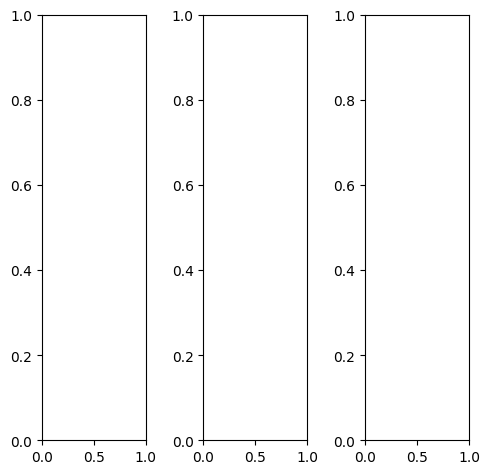

EPOCH: 28.255  trn_loss: 0.004  (3447.67s - 8754.26s remaining)

tensor([[[0.6471, 0.8588, 0.8549,  ..., 0.7843, 0.8118, 0.8353],
         [0.5490, 0.7451, 0.7882,  ..., 0.7451, 0.7882, 0.7843],
         [0.4784, 0.7216, 0.8353,  ..., 0.7804, 0.7922, 0.8627],
         ...,
         [0.5137, 0.5137, 0.5373,  ..., 0.5255, 0.5294, 0.5333],
         [0.5137, 0.5020, 0.5176,  ..., 0.5765, 0.5216, 0.5490],
         [0.5922, 0.5804, 0.5725,  ..., 0.6157, 0.5765, 0.5765]],

        [[0.6471, 0.8588, 0.8549,  ..., 0.7843, 0.8118, 0.8353],
         [0.5490, 0.7451, 0.7882,  ..., 0.7451, 0.7882, 0.7843],
         [0.4784, 0.7216, 0.8353,  ..., 0.7804, 0.7922, 0.8627],
         ...,
         [0.5137, 0.5137, 0.5373,  ..., 0.5255, 0.5294, 0.5333],
         [0.5137, 0.5020, 0.5176,  ..., 0.5765, 0.5216, 0.5490],
         [0.5922, 0.5804, 0.5725,  ..., 0.6157, 0.5765, 0.5765]],

        [[0.6471, 0.8588, 0.8549,  ..., 0.7843, 0.8118, 0.8353],
         [0.5490, 0.7451, 0.7882,  ..., 0.7451, 0.7882, 0.7843],
         [0.4784, 0.7216, 0.8353,  ..., 0.7804, 0.7922, 0.

tensor([[[0.6824, 0.8627, 0.8549,  ..., 0.7961, 0.8157, 0.8275],
         [0.5804, 0.7451, 0.7804,  ..., 0.7647, 0.7922, 0.7804],
         [0.5098, 0.7176, 0.8196,  ..., 0.8000, 0.8039, 0.8627],
         ...,
         [0.6196, 0.6157, 0.6431,  ..., 0.6078, 0.6078, 0.6078],
         [0.6196, 0.6000, 0.6118,  ..., 0.6510, 0.5882, 0.6118],
         [0.6588, 0.6314, 0.6196,  ..., 0.6745, 0.6314, 0.6235]],

        [[0.6471, 0.8627, 0.8627,  ..., 0.7843, 0.8196, 0.8392],
         [0.5529, 0.7569, 0.8000,  ..., 0.7529, 0.8000, 0.7922],
         [0.4784, 0.7294, 0.8431,  ..., 0.7843, 0.8000, 0.8667],
         ...,
         [0.4980, 0.4980, 0.5216,  ..., 0.5137, 0.5176, 0.5176],
         [0.4980, 0.4863, 0.5020,  ..., 0.5686, 0.5137, 0.5373],
         [0.5804, 0.5686, 0.5647,  ..., 0.6118, 0.5725, 0.5686]],

        [[0.5647, 0.8118, 0.8235,  ..., 0.7451, 0.7765, 0.8235],
         [0.4510, 0.6863, 0.7569,  ..., 0.6588, 0.7137, 0.7451],
         [0.4039, 0.6941, 0.8392,  ..., 0.7020, 0.7294, 0.

tensor([[[0.6044, 0.7099, 0.7349,  ..., 0.5777, 0.6100, 0.6475],
         [0.5237, 0.5722, 0.6678,  ..., 0.5589, 0.6013, 0.6078],
         [0.4004, 0.5866, 0.6363,  ..., 0.6151, 0.6331, 0.6859],
         ...,
         [0.4444, 0.4896, 0.4896,  ..., 0.5228, 0.5419, 0.5389],
         [0.4378, 0.4446, 0.4738,  ..., 0.5639, 0.5264, 0.5338],
         [0.5187, 0.5253, 0.5065,  ..., 0.6023, 0.5627, 0.5532]],

        [[0.6349, 0.7465, 0.7366,  ..., 0.6768, 0.7201, 0.7481],
         [0.5130, 0.5540, 0.6494,  ..., 0.6697, 0.7105, 0.7379],
         [0.5050, 0.6397, 0.7054,  ..., 0.7219, 0.7311, 0.7941],
         ...,
         [0.4704, 0.4927, 0.5033,  ..., 0.5146, 0.5218, 0.4931],
         [0.4566, 0.4479, 0.4888,  ..., 0.5534, 0.5054, 0.5106],
         [0.5141, 0.5227, 0.5208,  ..., 0.5750, 0.5416, 0.5286]],

        [[0.7148, 0.8049, 0.8396,  ..., 0.8756, 0.9254, 0.9166],
         [0.6530, 0.7329, 0.8053,  ..., 0.8499, 0.9167, 0.9041],
         [0.5355, 0.6488, 0.7720,  ..., 0.9019, 0.9329, 0.

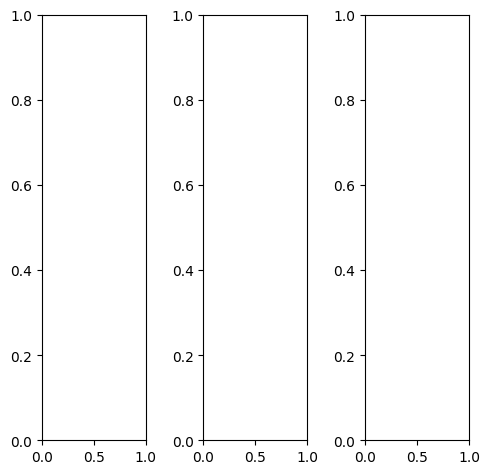

tensor([[[0.5922, 0.5961, 0.5843,  ..., 0.8784, 0.9059, 0.8980],
         [0.6118, 0.6118, 0.6000,  ..., 0.9098, 0.9059, 0.8784],
         [0.6157, 0.6078, 0.6118,  ..., 0.9137, 0.8784, 0.8118],
         ...,
         [0.6902, 0.6863, 0.6392,  ..., 0.4784, 0.5451, 0.6353],
         [0.6392, 0.6510, 0.6078,  ..., 0.4314, 0.5216, 0.6078],
         [0.6353, 0.6471, 0.5961,  ..., 0.4588, 0.5137, 0.5725]],

        [[0.5922, 0.5961, 0.5843,  ..., 0.8784, 0.9059, 0.8980],
         [0.6118, 0.6118, 0.6000,  ..., 0.9098, 0.9059, 0.8784],
         [0.6157, 0.6078, 0.6118,  ..., 0.9137, 0.8784, 0.8118],
         ...,
         [0.6902, 0.6863, 0.6392,  ..., 0.4784, 0.5451, 0.6353],
         [0.6392, 0.6510, 0.6078,  ..., 0.4314, 0.5216, 0.6078],
         [0.6353, 0.6471, 0.5961,  ..., 0.4588, 0.5137, 0.5725]],

        [[0.5922, 0.5961, 0.5843,  ..., 0.8784, 0.9059, 0.8980],
         [0.6118, 0.6118, 0.6000,  ..., 0.9098, 0.9059, 0.8784],
         [0.6157, 0.6078, 0.6118,  ..., 0.9137, 0.8784, 0.

tensor([[[0.8588, 0.8549, 0.8353,  ..., 0.8471, 0.8863, 0.8941],
         [0.8627, 0.8667, 0.8667,  ..., 0.9020, 0.9137, 0.8980],
         [0.7843, 0.7922, 0.8118,  ..., 0.8941, 0.8745, 0.8235],
         ...,
         [0.7176, 0.7176, 0.6824,  ..., 0.5490, 0.5765, 0.6392],
         [0.6706, 0.6902, 0.6549,  ..., 0.4980, 0.5569, 0.6157],
         [0.6667, 0.6784, 0.6353,  ..., 0.5098, 0.5451, 0.5843]],

        [[0.4824, 0.4941, 0.4824,  ..., 0.8824, 0.9059, 0.8941],
         [0.5098, 0.5059, 0.4941,  ..., 0.9059, 0.8980, 0.8667],
         [0.5490, 0.5333, 0.5294,  ..., 0.9098, 0.8745, 0.8039],
         ...,
         [0.6745, 0.6667, 0.6196,  ..., 0.4471, 0.5255, 0.6275],
         [0.6196, 0.6314, 0.5843,  ..., 0.4000, 0.5059, 0.6000],
         [0.6157, 0.6275, 0.5765,  ..., 0.4392, 0.4980, 0.5608]],

        [[0.4431, 0.4588, 0.4471,  ..., 0.9529, 0.9647, 0.9412],
         [0.4863, 0.4745, 0.4588,  ..., 0.9569, 0.9373, 0.8863],
         [0.5333, 0.5098, 0.4941,  ..., 0.9686, 0.9216, 0.

tensor([[[0.4519, 0.4036, 0.2965,  ..., 0.7174, 0.7176, 0.7304],
         [0.4387, 0.4164, 0.3257,  ..., 0.7868, 0.7954, 0.7204],
         [0.4162, 0.4218, 0.3401,  ..., 0.8044, 0.7825, 0.6758],
         ...,
         [0.6246, 0.6677, 0.6123,  ..., 0.4556, 0.4935, 0.5639],
         [0.5622, 0.6091, 0.5455,  ..., 0.3612, 0.4590, 0.5276],
         [0.5413, 0.5693, 0.5135,  ..., 0.3644, 0.4274, 0.4882]],

        [[0.5185, 0.4585, 0.3861,  ..., 0.8075, 0.8265, 0.8292],
         [0.4494, 0.4071, 0.3127,  ..., 0.8841, 0.8774, 0.8388],
         [0.5414, 0.4498, 0.4437,  ..., 0.8896, 0.8527, 0.7773],
         ...,
         [0.5821, 0.6155, 0.5723,  ..., 0.4763, 0.5199, 0.5314],
         [0.5139, 0.5443, 0.5200,  ..., 0.3857, 0.4650, 0.5105],
         [0.5074, 0.5394, 0.5039,  ..., 0.3544, 0.4193, 0.4611]],

        [[0.6262, 0.5530, 0.5769,  ..., 0.9516, 0.9672, 0.9465],
         [0.6111, 0.6428, 0.5944,  ..., 1.0104, 1.0206, 0.9352],
         [0.5630, 0.5349, 0.5880,  ..., 1.0376, 0.9953, 0.

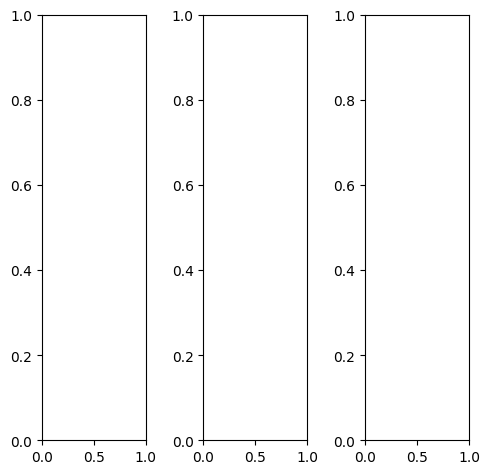

tensor([[[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.5961],
         ...,
         [0.4353, 0.2745, 0.2745,  ..., 0.5725, 0.6667, 0.6588],
         [0.2980, 0.2314, 0.2392,  ..., 0.6314, 0.6863, 0.6549],
         [0.2353, 0.2314, 0.2667,  ..., 0.6588, 0.6784, 0.6431]],

        [[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.5961],
         ...,
         [0.4353, 0.2745, 0.2745,  ..., 0.5725, 0.6667, 0.6588],
         [0.2980, 0.2314, 0.2392,  ..., 0.6314, 0.6863, 0.6549],
         [0.2353, 0.2314, 0.2667,  ..., 0.6588, 0.6784, 0.6431]],

        [[0.5490, 0.4941, 0.5216,  ..., 0.5490, 0.5961, 0.6078],
         [0.5529, 0.4902, 0.5176,  ..., 0.5373, 0.5843, 0.5922],
         [0.5490, 0.4863, 0.5098,  ..., 0.5294, 0.5529, 0.

tensor([[[0.3804, 0.5176, 0.5490,  ..., 0.2627, 0.3569, 0.4941],
         [0.4039, 0.5176, 0.5333,  ..., 0.2667, 0.4353, 0.5373],
         [0.4118, 0.5176, 0.5176,  ..., 0.3647, 0.5294, 0.5765],
         ...,
         [0.5137, 0.5922, 0.6314,  ..., 0.4039, 0.2863, 0.2941],
         [0.5255, 0.6667, 0.6627,  ..., 0.3451, 0.3059, 0.3020],
         [0.6000, 0.6902, 0.6431,  ..., 0.3098, 0.3216, 0.3020]],

        [[0.6157, 0.4902, 0.5098,  ..., 0.6549, 0.6902, 0.6549],
         [0.6157, 0.4863, 0.5137,  ..., 0.6392, 0.6431, 0.6196],
         [0.6078, 0.4824, 0.5059,  ..., 0.6000, 0.5647, 0.6118],
         ...,
         [0.3922, 0.1255, 0.1176,  ..., 0.6471, 0.8118, 0.7961],
         [0.1922, 0.0353, 0.0549,  ..., 0.7451, 0.8314, 0.7882],
         [0.0706, 0.0235, 0.1059,  ..., 0.7843, 0.8118, 0.7686]],

        [[0.6314, 0.4510, 0.5176,  ..., 0.7529, 0.7490, 0.6745],
         [0.6353, 0.4392, 0.5098,  ..., 0.7137, 0.6863, 0.6039],
         [0.6196, 0.4275, 0.4941,  ..., 0.6039, 0.5529, 0.

tensor([[[ 0.2244,  0.1586,  0.1256,  ...,  0.3051,  0.3595,  0.3460],
         [ 0.2485,  0.0510,  0.1113,  ...,  0.2625,  0.3275,  0.2778],
         [ 0.1725,  0.0439, -0.0148,  ...,  0.2878,  0.3126,  0.3163],
         ...,
         [ 0.1667, -0.1409, -0.1632,  ...,  0.5045,  0.5734,  0.4622],
         [-0.0039, -0.2383, -0.2035,  ...,  0.5281,  0.5593,  0.4638],
         [-0.0215, -0.1313, -0.0813,  ...,  0.5481,  0.5640,  0.4681]],

        [[ 0.3568,  0.3401,  0.2699,  ...,  0.3742,  0.4820,  0.4267],
         [ 0.2843,  0.1780,  0.1007,  ...,  0.3326,  0.4416,  0.3595],
         [ 0.2667,  0.2687,  0.0932,  ...,  0.3075,  0.3755,  0.3662],
         ...,
         [ 0.1272, -0.1778, -0.1864,  ...,  0.4532,  0.5789,  0.4234],
         [-0.0461, -0.2750, -0.2351,  ...,  0.5148,  0.5856,  0.4429],
         [-0.0564, -0.1876, -0.1396,  ...,  0.5375,  0.5570,  0.4335]],

        [[ 0.5412,  0.2635,  0.3938,  ...,  0.4033,  0.5183,  0.5092],
         [ 0.4792,  0.3166,  0.3584,  ...,  0

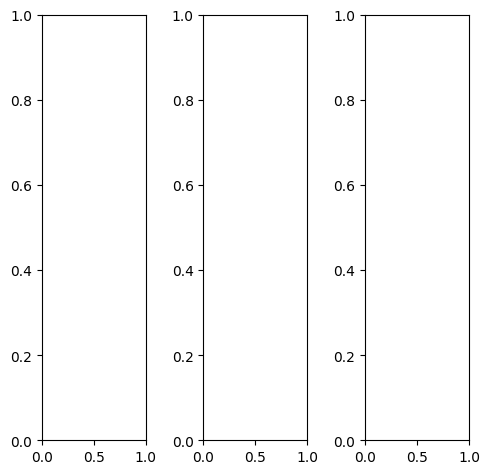

tensor([[[0.2196, 0.2235, 0.2157,  ..., 0.1294, 0.1451, 0.1255],
         [0.2118, 0.2235, 0.2157,  ..., 0.1216, 0.1137, 0.0941],
         [0.2039, 0.2275, 0.2235,  ..., 0.1255, 0.1098, 0.0863],
         ...,
         [0.2549, 0.1412, 0.1725,  ..., 0.1922, 0.2118, 0.2275],
         [0.2275, 0.2000, 0.2667,  ..., 0.1922, 0.2196, 0.2392],
         [0.2196, 0.2431, 0.3176,  ..., 0.2627, 0.2627, 0.2392]],

        [[0.2196, 0.2235, 0.2157,  ..., 0.1294, 0.1451, 0.1255],
         [0.2118, 0.2235, 0.2157,  ..., 0.1216, 0.1137, 0.0941],
         [0.2039, 0.2275, 0.2235,  ..., 0.1255, 0.1098, 0.0863],
         ...,
         [0.2549, 0.1412, 0.1725,  ..., 0.1922, 0.2118, 0.2275],
         [0.2275, 0.2000, 0.2667,  ..., 0.1922, 0.2196, 0.2392],
         [0.2196, 0.2431, 0.3176,  ..., 0.2627, 0.2627, 0.2392]],

        [[0.2196, 0.2235, 0.2157,  ..., 0.1294, 0.1451, 0.1255],
         [0.2118, 0.2235, 0.2157,  ..., 0.1216, 0.1137, 0.0941],
         [0.2039, 0.2275, 0.2235,  ..., 0.1255, 0.1098, 0.

tensor([[[0.1765, 0.1725, 0.1804,  ..., 0.1137, 0.1333, 0.1137],
         [0.1686, 0.1725, 0.1804,  ..., 0.1098, 0.1059, 0.0824],
         [0.1608, 0.1765, 0.1882,  ..., 0.1137, 0.0980, 0.0745],
         ...,
         [0.2039, 0.0902, 0.1216,  ..., 0.1529, 0.1765, 0.1882],
         [0.1725, 0.1451, 0.2118,  ..., 0.1412, 0.1647, 0.1843],
         [0.1647, 0.1882, 0.2627,  ..., 0.1882, 0.1922, 0.1647]],

        [[0.2314, 0.2353, 0.2196,  ..., 0.1333, 0.1490, 0.1294],
         [0.2235, 0.2353, 0.2196,  ..., 0.1255, 0.1176, 0.0980],
         [0.2157, 0.2392, 0.2275,  ..., 0.1294, 0.1137, 0.0902],
         ...,
         [0.2667, 0.1529, 0.1882,  ..., 0.2000, 0.2196, 0.2353],
         [0.2431, 0.2157, 0.2784,  ..., 0.2078, 0.2314, 0.2510],
         [0.2314, 0.2549, 0.3294,  ..., 0.2824, 0.2824, 0.2588]],

        [[0.2824, 0.3059, 0.2824,  ..., 0.1451, 0.1608, 0.1412],
         [0.2706, 0.3059, 0.2824,  ..., 0.1412, 0.1294, 0.1098],
         [0.2667, 0.3059, 0.2902,  ..., 0.1412, 0.1255, 0.

tensor([[[ 0.1264,  0.0817, -0.0181,  ...,  0.1552,  0.1868,  0.2138],
         [ 0.1665, -0.0845, -0.0674,  ...,  0.1145,  0.1053,  0.1422],
         [-0.0229, -0.0685, -0.1615,  ...,  0.1072,  0.0928,  0.1257],
         ...,
         [ 0.4144,  0.2601,  0.3523,  ...,  0.3333,  0.3635,  0.4214],
         [ 0.3714,  0.3539,  0.4545,  ...,  0.3221,  0.3610,  0.4225],
         [ 0.3778,  0.4127,  0.5168,  ...,  0.4322,  0.4272,  0.4560]],

        [[ 0.2400,  0.2442,  0.0896,  ...,  0.2223,  0.2405,  0.2447],
         [ 0.1885,  0.0009, -0.1148,  ...,  0.2113,  0.2128,  0.1973],
         [ 0.1039,  0.1293, -0.0730,  ...,  0.1952,  0.1804,  0.1769],
         ...,
         [ 0.3803,  0.2334,  0.2763,  ...,  0.2968,  0.3248,  0.3496],
         [ 0.3333,  0.2963,  0.3886,  ...,  0.2886,  0.3147,  0.3616],
         [ 0.3179,  0.3592,  0.4695,  ...,  0.3860,  0.3899,  0.3950]],

        [[ 0.3976,  0.2507,  0.2974,  ...,  0.3512,  0.3875,  0.3815],
         [ 0.3745,  0.1960,  0.2513,  ...,  0

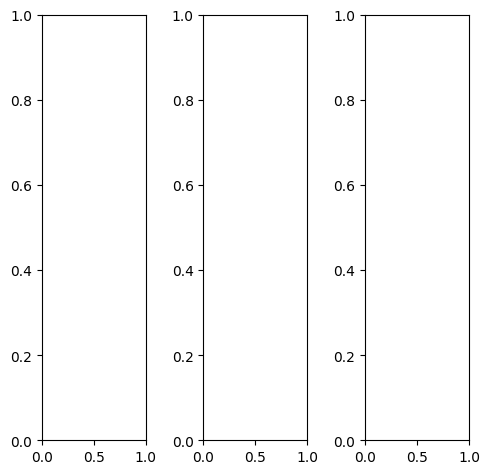

tensor([[[0.1569, 0.2471, 0.4431,  ..., 0.9882, 0.9922, 0.9922],
         [0.3373, 0.3647, 0.3294,  ..., 0.9882, 0.9922, 0.9922],
         [0.4392, 0.6627, 0.3176,  ..., 0.9922, 0.9922, 0.9922],
         ...,
         [0.2588, 0.3137, 0.3725,  ..., 0.8039, 0.8078, 0.8157],
         [0.4275, 0.3373, 0.3020,  ..., 0.8039, 0.8118, 0.8157],
         [0.2980, 0.3059, 0.3333,  ..., 0.8039, 0.8157, 0.8118]],

        [[0.1569, 0.2471, 0.4431,  ..., 0.9882, 0.9922, 0.9922],
         [0.3373, 0.3647, 0.3294,  ..., 0.9882, 0.9922, 0.9922],
         [0.4392, 0.6627, 0.3176,  ..., 0.9922, 0.9922, 0.9922],
         ...,
         [0.2588, 0.3137, 0.3725,  ..., 0.8039, 0.8078, 0.8157],
         [0.4275, 0.3373, 0.3020,  ..., 0.8039, 0.8118, 0.8157],
         [0.2980, 0.3059, 0.3333,  ..., 0.8039, 0.8157, 0.8118]],

        [[0.1569, 0.2471, 0.4431,  ..., 0.9882, 0.9922, 0.9922],
         [0.3373, 0.3647, 0.3294,  ..., 0.9882, 0.9922, 0.9922],
         [0.4392, 0.6627, 0.3176,  ..., 0.9922, 0.9922, 0.

tensor([[[0.1451, 0.2353, 0.4314,  ..., 0.9882, 0.9922, 0.9961],
         [0.3255, 0.3529, 0.3176,  ..., 0.9882, 0.9922, 0.9961],
         [0.4314, 0.6510, 0.3059,  ..., 0.9922, 0.9922, 0.9961],
         ...,
         [0.2980, 0.3529, 0.4118,  ..., 0.8157, 0.8196, 0.8235],
         [0.4667, 0.3765, 0.3412,  ..., 0.8157, 0.8235, 0.8235],
         [0.3255, 0.3333, 0.3608,  ..., 0.8078, 0.8196, 0.8157]],

        [[0.1686, 0.2627, 0.4588,  ..., 0.9882, 0.9922, 0.9922],
         [0.3451, 0.3804, 0.3490,  ..., 0.9882, 0.9922, 0.9922],
         [0.4471, 0.6745, 0.3373,  ..., 0.9922, 0.9922, 0.9922],
         ...,
         [0.2471, 0.3020, 0.3608,  ..., 0.8000, 0.8039, 0.8157],
         [0.4118, 0.3216, 0.2863,  ..., 0.8000, 0.8078, 0.8157],
         [0.2902, 0.2980, 0.3216,  ..., 0.8039, 0.8157, 0.8157]],

        [[0.1216, 0.2039, 0.3843,  ..., 0.9882, 0.9922, 0.9961],
         [0.3176, 0.3216, 0.2627,  ..., 0.9882, 0.9922, 0.9961],
         [0.4314, 0.6196, 0.2431,  ..., 0.9922, 0.9922, 0.

tensor([[[ 0.0594,  0.0433,  0.0989,  ...,  0.9579,  0.9368,  0.8984],
         [ 0.2596,  0.1041,  0.0513,  ...,  0.9707,  0.9942,  0.9433],
         [ 0.2581,  0.4079, -0.0039,  ...,  0.9932,  0.9870,  0.9722],
         ...,
         [ 0.2595,  0.3413,  0.3995,  ...,  0.9013,  0.8914,  0.8619],
         [ 0.4170,  0.3526,  0.3419,  ...,  0.8667,  0.8813,  0.8538],
         [ 0.3320,  0.3082,  0.3425,  ...,  0.9026,  0.8869,  0.8654]],

        [[ 0.1743,  0.1744,  0.2417,  ...,  1.0299,  1.0175,  1.0130],
         [ 0.2855,  0.1952,  0.0361,  ...,  1.0265,  1.0328,  1.0481],
         [ 0.4018,  0.5102,  0.1460,  ...,  1.0338,  1.0502,  1.0538],
         ...,
         [ 0.2640,  0.3410,  0.4282,  ...,  0.8571,  0.8500,  0.8665],
         [ 0.4265,  0.3683,  0.3494,  ...,  0.8650,  0.8542,  0.8621],
         [ 0.3165,  0.2958,  0.3422,  ...,  0.8561,  0.8557,  0.8396]],

        [[ 0.3325,  0.2277,  0.4656,  ...,  1.1354,  1.1231,  1.0943],
         [ 0.4638,  0.4171,  0.4002,  ...,  1

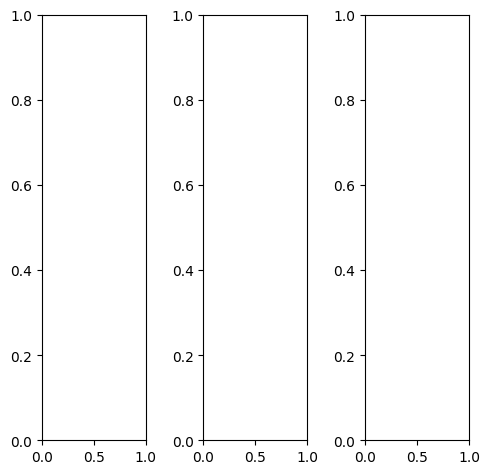

EPOCH: 28.510  trn_loss: 0.004  (3478.10s - 8721.40s remaining)

tensor([[[0.8392, 0.6353, 0.5804,  ..., 0.3529, 0.3412, 0.3451],
         [0.8235, 0.6549, 0.6000,  ..., 0.3843, 0.3725, 0.3490],
         [0.7961, 0.6745, 0.6196,  ..., 0.4157, 0.3608, 0.3569],
         ...,
         [0.9176, 0.9059, 0.9059,  ..., 0.4549, 0.4471, 0.4275],
         [0.9294, 0.9176, 0.9255,  ..., 0.4353, 0.4471, 0.4392],
         [0.9176, 0.8980, 0.9098,  ..., 0.5294, 0.5647, 0.5882]],

        [[0.8392, 0.6353, 0.5804,  ..., 0.3529, 0.3412, 0.3451],
         [0.8235, 0.6549, 0.6000,  ..., 0.3843, 0.3725, 0.3490],
         [0.7961, 0.6745, 0.6196,  ..., 0.4157, 0.3608, 0.3569],
         ...,
         [0.9176, 0.9059, 0.9059,  ..., 0.4549, 0.4471, 0.4275],
         [0.9294, 0.9176, 0.9255,  ..., 0.4353, 0.4471, 0.4392],
         [0.9176, 0.8980, 0.9098,  ..., 0.5294, 0.5647, 0.5882]],

        [[0.8392, 0.6353, 0.5804,  ..., 0.3529, 0.3412, 0.3451],
         [0.8235, 0.6549, 0.6000,  ..., 0.3843, 0.3725, 0.3490],
         [0.7961, 0.6745, 0.6196,  ..., 0.4157, 0.3608, 0.

tensor([[[0.8196, 0.6078, 0.5529,  ..., 0.3490, 0.3255, 0.3176],
         [0.8000, 0.6196, 0.5569,  ..., 0.3804, 0.3451, 0.3216],
         [0.7725, 0.6392, 0.5765,  ..., 0.4000, 0.3333, 0.3255],
         ...,
         [0.9176, 0.9059, 0.9059,  ..., 0.4392, 0.4314, 0.4078],
         [0.9294, 0.9176, 0.9255,  ..., 0.4118, 0.4392, 0.4275],
         [0.9176, 0.8980, 0.9098,  ..., 0.5098, 0.5529, 0.5843]],

        [[0.8471, 0.6431, 0.5843,  ..., 0.3490, 0.3412, 0.3490],
         [0.8314, 0.6627, 0.6118,  ..., 0.3843, 0.3725, 0.3529],
         [0.8000, 0.6824, 0.6314,  ..., 0.4157, 0.3647, 0.3608],
         ...,
         [0.9176, 0.9059, 0.9059,  ..., 0.4588, 0.4471, 0.4314],
         [0.9294, 0.9176, 0.9255,  ..., 0.4392, 0.4471, 0.4392],
         [0.9216, 0.9020, 0.9137,  ..., 0.5333, 0.5686, 0.5882]],

        [[0.8588, 0.6745, 0.6235,  ..., 0.3686, 0.3922, 0.3961],
         [0.8549, 0.7059, 0.6588,  ..., 0.4078, 0.4275, 0.4000],
         [0.8314, 0.7294, 0.6784,  ..., 0.4431, 0.4157, 0.

tensor([[[0.6292, 0.4998, 0.3149,  ..., 0.2273, 0.2060, 0.2437],
         [0.5968, 0.4072, 0.2810,  ..., 0.2511, 0.2223, 0.2210],
         [0.5938, 0.4940, 0.2775,  ..., 0.2777, 0.2104, 0.2346],
         ...,
         [0.8280, 0.8493, 0.8416,  ..., 0.4090, 0.3715, 0.3773],
         [0.8189, 0.8427, 0.8402,  ..., 0.3434, 0.3441, 0.3652],
         [0.8141, 0.8184, 0.8115,  ..., 0.4367, 0.4625, 0.4765]],

        [[0.6544, 0.5888, 0.3765,  ..., 0.2868, 0.2769, 0.2899],
         [0.6158, 0.4595, 0.2943,  ..., 0.3340, 0.3279, 0.2719],
         [0.6755, 0.5656, 0.3842,  ..., 0.3692, 0.3007, 0.2841],
         ...,
         [0.7867, 0.8141, 0.8255,  ..., 0.4200, 0.4063, 0.3527],
         [0.7983, 0.8087, 0.8311,  ..., 0.3816, 0.3856, 0.3661],
         [0.7641, 0.7831, 0.7871,  ..., 0.4371, 0.4800, 0.4714]],

        [[0.7984, 0.6857, 0.5472,  ..., 0.3627, 0.3602, 0.3920],
         [0.7910, 0.6301, 0.5552,  ..., 0.3816, 0.3848, 0.3717],
         [0.7205, 0.6152, 0.4853,  ..., 0.4076, 0.3616, 0.

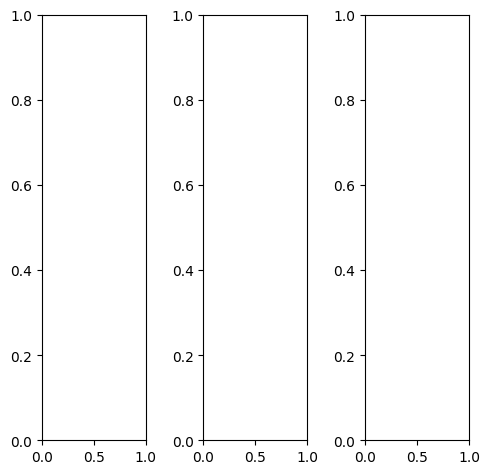

tensor([[[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 1.

tensor([[[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 1.0000],
         ...,
         [1.0000, 0.9961, 0.9922,  ..., 0.9961, 0.9961, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9922,  ..., 0.9922, 0.9882, 1.0000],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 1.

tensor([[[0.6201, 0.5914, 0.5048,  ..., 0.5159, 0.5253, 0.6013],
         [0.6027, 0.5440, 0.5162,  ..., 0.4570, 0.5163, 0.5656],
         [0.5203, 0.5157, 0.3939,  ..., 0.4877, 0.5129, 0.5533],
         ...,
         [0.6825, 0.6814, 0.6415,  ..., 0.6637, 0.6697, 0.6986],
         [0.6714, 0.6602, 0.6588,  ..., 0.6617, 0.6776, 0.7030],
         [0.6812, 0.6882, 0.6809,  ..., 0.6992, 0.7253, 0.7085]],

        [[0.6472, 0.6235, 0.5600,  ..., 0.6101, 0.6471, 0.6601],
         [0.5717, 0.4576, 0.4719,  ..., 0.5983, 0.6355, 0.6839],
         [0.6568, 0.5823, 0.5462,  ..., 0.6221, 0.6231, 0.6595],
         ...,
         [0.6176, 0.6283, 0.6107,  ..., 0.6223, 0.6345, 0.6561],
         [0.6152, 0.6080, 0.6019,  ..., 0.6274, 0.6364, 0.6614],
         [0.6269, 0.6328, 0.6303,  ..., 0.6407, 0.6643, 0.6639]],

        [[0.7519, 0.6952, 0.7291,  ..., 0.8126, 0.8232, 0.8241],
         [0.7267, 0.6713, 0.7083,  ..., 0.7852, 0.8112, 0.8350],
         [0.6347, 0.6153, 0.5969,  ..., 0.8152, 0.8218, 0.

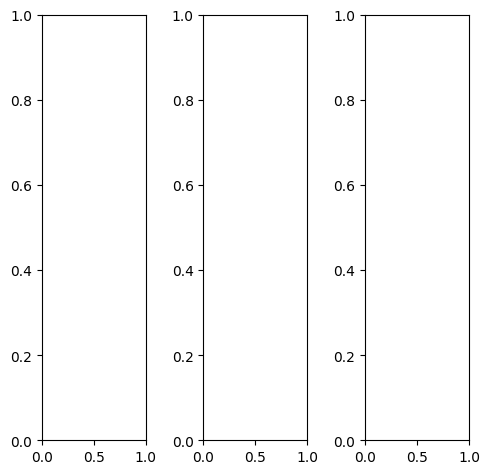

tensor([[[0.1137, 0.1961, 0.1608,  ..., 0.1490, 0.1255, 0.1294],
         [0.1255, 0.1804, 0.1451,  ..., 0.0941, 0.1294, 0.1529],
         [0.1255, 0.1451, 0.1490,  ..., 0.1176, 0.1647, 0.1765],
         ...,
         [0.4392, 0.4353, 0.4353,  ..., 0.4706, 0.4745, 0.4667],
         [0.4314, 0.4314, 0.4353,  ..., 0.4745, 0.4745, 0.4745],
         [0.4118, 0.4157, 0.4275,  ..., 0.4627, 0.4588, 0.4549]],

        [[0.1137, 0.1961, 0.1608,  ..., 0.1490, 0.1255, 0.1294],
         [0.1255, 0.1804, 0.1451,  ..., 0.0941, 0.1294, 0.1529],
         [0.1255, 0.1451, 0.1490,  ..., 0.1176, 0.1647, 0.1765],
         ...,
         [0.4392, 0.4353, 0.4353,  ..., 0.4706, 0.4745, 0.4667],
         [0.4314, 0.4314, 0.4353,  ..., 0.4745, 0.4745, 0.4745],
         [0.4118, 0.4157, 0.4275,  ..., 0.4627, 0.4588, 0.4549]],

        [[0.1137, 0.1961, 0.1608,  ..., 0.1490, 0.1255, 0.1294],
         [0.1255, 0.1804, 0.1451,  ..., 0.0941, 0.1294, 0.1529],
         [0.1255, 0.1451, 0.1490,  ..., 0.1176, 0.1647, 0.

tensor([[[0.0902, 0.1882, 0.1490,  ..., 0.1137, 0.0941, 0.1059],
         [0.0941, 0.1647, 0.1255,  ..., 0.0549, 0.0980, 0.1255],
         [0.0902, 0.1216, 0.1255,  ..., 0.0784, 0.1373, 0.1490],
         ...,
         [0.3843, 0.3804, 0.3804,  ..., 0.4157, 0.4196, 0.4118],
         [0.3765, 0.3765, 0.3804,  ..., 0.4196, 0.4196, 0.4196],
         [0.3569, 0.3608, 0.3725,  ..., 0.4078, 0.4039, 0.4000]],

        [[0.1373, 0.2078, 0.1686,  ..., 0.1647, 0.1373, 0.1451],
         [0.1490, 0.1961, 0.1608,  ..., 0.1098, 0.1412, 0.1686],
         [0.1490, 0.1608, 0.1647,  ..., 0.1333, 0.1804, 0.1922],
         ...,
         [0.4471, 0.4431, 0.4431,  ..., 0.4745, 0.4784, 0.4706],
         [0.4392, 0.4392, 0.4431,  ..., 0.4784, 0.4784, 0.4784],
         [0.4196, 0.4235, 0.4353,  ..., 0.4667, 0.4627, 0.4588]],

        [[0.0627, 0.1490, 0.1412,  ..., 0.1725, 0.1412, 0.1255],
         [0.1020, 0.1490, 0.1255,  ..., 0.1098, 0.1412, 0.1529],
         [0.1098, 0.1137, 0.1255,  ..., 0.1294, 0.1686, 0.

tensor([[[ 0.0825,  0.2252,  0.0925,  ...,  0.1774,  0.1587,  0.2040],
         [ 0.1974,  0.1002,  0.0936,  ...,  0.0559,  0.1208,  0.1869],
         [-0.0499,  0.0666, -0.0055,  ...,  0.1008,  0.1804,  0.2250],
         ...,
         [ 0.6956,  0.6580,  0.6217,  ...,  0.6939,  0.7178,  0.7525],
         [ 0.6898,  0.6573,  0.6236,  ...,  0.6998,  0.7237,  0.7770],
         [ 0.6784,  0.6719,  0.6711,  ...,  0.7450,  0.7622,  0.7598]],

        [[ 0.1600,  0.3550,  0.1091,  ...,  0.2524,  0.2269,  0.2493],
         [ 0.1696,  0.1308, -0.1054,  ...,  0.1478,  0.2328,  0.2571],
         [ 0.0030,  0.2165, -0.0547,  ...,  0.1839,  0.2718,  0.2925],
         ...,
         [ 0.6638,  0.6246,  0.6175,  ...,  0.6730,  0.6928,  0.7317],
         [ 0.6558,  0.6147,  0.6117,  ...,  0.6769,  0.7135,  0.7522],
         [ 0.6347,  0.6334,  0.6463,  ...,  0.7040,  0.7255,  0.7236]],

        [[ 0.3039,  0.2842,  0.3217,  ...,  0.4022,  0.3864,  0.4115],
         [ 0.3134,  0.2037,  0.2688,  ...,  0

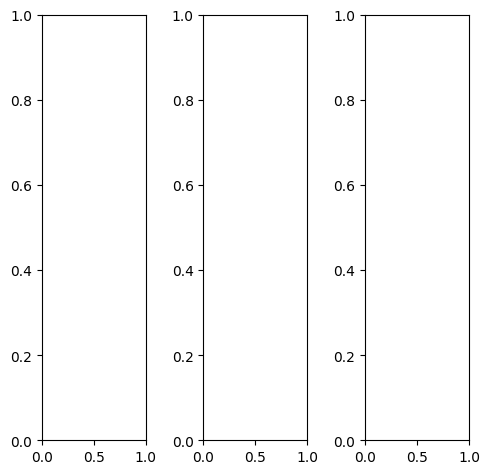

tensor([[[0.2196, 0.2157, 0.2157,  ..., 0.2863, 0.3176, 0.3020],
         [0.2863, 0.2784, 0.2784,  ..., 0.2980, 0.2824, 0.2275],
         [0.3333, 0.3255, 0.3333,  ..., 0.3176, 0.3020, 0.2627],
         ...,
         [0.1059, 0.3490, 0.4353,  ..., 0.2000, 0.1647, 0.1020],
         [0.1373, 0.3647, 0.3608,  ..., 0.1647, 0.1176, 0.0627],
         [0.1569, 0.2745, 0.1686,  ..., 0.1137, 0.0549, 0.0431]],

        [[0.2196, 0.2157, 0.2157,  ..., 0.2863, 0.3176, 0.3020],
         [0.2863, 0.2784, 0.2784,  ..., 0.2980, 0.2824, 0.2275],
         [0.3333, 0.3255, 0.3333,  ..., 0.3176, 0.3020, 0.2627],
         ...,
         [0.1059, 0.3490, 0.4353,  ..., 0.2000, 0.1647, 0.1020],
         [0.1373, 0.3647, 0.3608,  ..., 0.1647, 0.1176, 0.0627],
         [0.1569, 0.2745, 0.1686,  ..., 0.1137, 0.0549, 0.0431]],

        [[0.2196, 0.2157, 0.2157,  ..., 0.2863, 0.3176, 0.3020],
         [0.2863, 0.2784, 0.2784,  ..., 0.2980, 0.2824, 0.2275],
         [0.3333, 0.3255, 0.3333,  ..., 0.3176, 0.3020, 0.

tensor([[[0.1686, 0.1647, 0.1647,  ..., 0.2235, 0.2510, 0.2510],
         [0.2275, 0.2196, 0.2196,  ..., 0.2431, 0.2314, 0.1882],
         [0.2667, 0.2627, 0.2667,  ..., 0.2510, 0.2392, 0.2078],
         ...,
         [0.1412, 0.5294, 0.7333,  ..., 0.3451, 0.3137, 0.2039],
         [0.2235, 0.5608, 0.6235,  ..., 0.2902, 0.2118, 0.1216],
         [0.2745, 0.4392, 0.3490,  ..., 0.2235, 0.0980, 0.0667]],

        [[0.2471, 0.2431, 0.2431,  ..., 0.3294, 0.3608, 0.3255],
         [0.3176, 0.3098, 0.3098,  ..., 0.3216, 0.3098, 0.2431],
         [0.3647, 0.3569, 0.3647,  ..., 0.3373, 0.3255, 0.2824],
         ...,
         [0.0941, 0.3020, 0.3451,  ..., 0.1490, 0.1137, 0.0667],
         [0.1098, 0.3059, 0.2706,  ..., 0.1216, 0.0824, 0.0392],
         [0.1176, 0.2235, 0.1020,  ..., 0.0745, 0.0392, 0.0353]],

        [[0.2157, 0.2118, 0.2078,  ..., 0.2431, 0.2549, 0.3137],
         [0.2941, 0.2863, 0.2863,  ..., 0.3098, 0.2824, 0.2588],
         [0.3490, 0.3412, 0.3490,  ..., 0.3765, 0.3490, 0.

tensor([[[0.3446, 0.2824, 0.2156,  ..., 0.4439, 0.4720, 0.4864],
         [0.4324, 0.2980, 0.2740,  ..., 0.4544, 0.4312, 0.3371],
         [0.4811, 0.4113, 0.3704,  ..., 0.4922, 0.4787, 0.4027],
         ...,
         [0.2494, 0.7301, 0.8442,  ..., 0.4496, 0.3637, 0.2348],
         [0.2708, 0.7284, 0.7126,  ..., 0.3586, 0.2900, 0.1829],
         [0.3153, 0.4896, 0.3975,  ..., 0.2226, 0.1459, 0.1290]],

        [[0.3928, 0.3768, 0.3296,  ..., 0.5516, 0.6053, 0.5511],
         [0.4617, 0.3351, 0.2926,  ..., 0.5754, 0.5507, 0.4412],
         [0.5665, 0.4762, 0.4771,  ..., 0.6106, 0.5943, 0.4919],
         ...,
         [0.1945, 0.6594, 0.8016,  ..., 0.4373, 0.3451, 0.2111],
         [0.2330, 0.6642, 0.6580,  ..., 0.3515, 0.2846, 0.1623],
         [0.3060, 0.4337, 0.3642,  ..., 0.2302, 0.1464, 0.1080]],

        [[0.5025, 0.4044, 0.4063,  ..., 0.7226, 0.7721, 0.7019],
         [0.5846, 0.4997, 0.4637,  ..., 0.7340, 0.7117, 0.5829],
         [0.5872, 0.5400, 0.5329,  ..., 0.7693, 0.7646, 0.

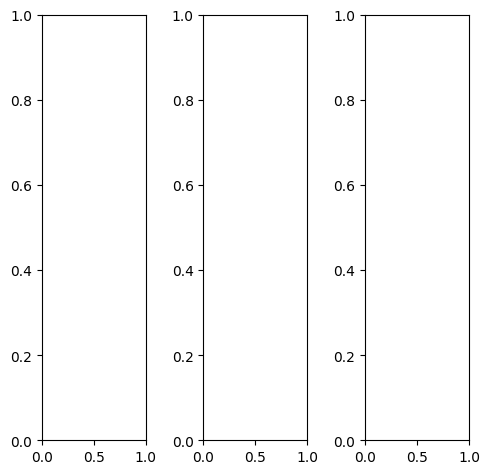

tensor([[[0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.9961, 0.9961, 0.9843,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 1.0000, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961]],

        [[0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.9961, 0.9961, 0.9843,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 1.0000, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961]],

        [[0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.

tensor([[[0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.9961, 0.9961, 0.9843,  ..., 1.0000, 0.9961, 0.9961],
         [0.9961, 1.0000, 0.9922,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961]],

        [[0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         ...,
         [0.9961, 0.9961, 0.9843,  ..., 0.9922, 0.9961, 0.9961],
         [0.9961, 1.0000, 0.9922,  ..., 0.9922, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961]],

        [[0.9961, 0.9961, 0.9961,  ..., 1.0000, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9961, 0.9961, 0.9961],
         [0.9961, 0.9961, 0.9961,  ..., 0.9882, 0.9961, 0.

tensor([[[0.6916, 0.7191, 0.6547,  ..., 0.5615, 0.5600, 0.6082],
         [0.6946, 0.6723, 0.6995,  ..., 0.5696, 0.5900, 0.5838],
         [0.6409, 0.7563, 0.6282,  ..., 0.5950, 0.6200, 0.5954],
         ...,
         [0.7322, 0.7303, 0.7325,  ..., 0.7967, 0.7976, 0.7432],
         [0.7062, 0.6956, 0.7112,  ..., 0.7621, 0.7673, 0.7399],
         [0.7071, 0.7006, 0.7168,  ..., 0.7729, 0.7578, 0.7518]],

        [[0.7465, 0.7422, 0.7078,  ..., 0.6960, 0.7097, 0.7244],
         [0.6572, 0.6291, 0.6456,  ..., 0.7421, 0.7331, 0.7455],
         [0.7825, 0.7735, 0.7745,  ..., 0.7643, 0.7586, 0.7421],
         ...,
         [0.7188, 0.7338, 0.7496,  ..., 0.7817, 0.7685, 0.7325],
         [0.7069, 0.7009, 0.7373,  ..., 0.7591, 0.7405, 0.7246],
         [0.6654, 0.6982, 0.7129,  ..., 0.7283, 0.7228, 0.7096]],

        [[0.8495, 0.8731, 0.9048,  ..., 0.9499, 0.9472, 0.9158],
         [0.8649, 0.8903, 0.9538,  ..., 0.9671, 0.9827, 0.9437],
         [0.8155, 0.9111, 0.9248,  ..., 1.0080, 1.0082, 0.

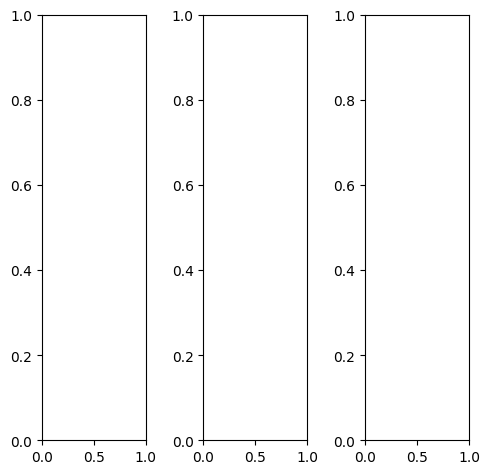

EPOCH: 28.765  trn_loss: 0.005  (3508.62s - 8688.79s remaining)

tensor([[[0.7059, 0.6902, 0.6824,  ..., 0.6157, 0.6118, 0.6118],
         [0.6902, 0.6745, 0.6706,  ..., 0.5961, 0.5961, 0.6039],
         [0.7020, 0.6863, 0.6863,  ..., 0.6157, 0.6157, 0.6235],
         ...,
         [0.3922, 0.3922, 0.3961,  ..., 0.2863, 0.3020, 0.3412],
         [0.3686, 0.3529, 0.3412,  ..., 0.2980, 0.3216, 0.3569],
         [0.3137, 0.3176, 0.3294,  ..., 0.3176, 0.3137, 0.3608]],

        [[0.7059, 0.6902, 0.6824,  ..., 0.6157, 0.6118, 0.6118],
         [0.6902, 0.6745, 0.6706,  ..., 0.5961, 0.5961, 0.6039],
         [0.7020, 0.6863, 0.6863,  ..., 0.6157, 0.6157, 0.6235],
         ...,
         [0.3922, 0.3922, 0.3961,  ..., 0.2863, 0.3020, 0.3412],
         [0.3686, 0.3529, 0.3412,  ..., 0.2980, 0.3216, 0.3569],
         [0.3137, 0.3176, 0.3294,  ..., 0.3176, 0.3137, 0.3608]],

        [[0.7059, 0.6902, 0.6824,  ..., 0.6157, 0.6118, 0.6118],
         [0.6902, 0.6745, 0.6706,  ..., 0.5961, 0.5961, 0.6039],
         [0.7020, 0.6863, 0.6863,  ..., 0.6157, 0.6157, 0.

tensor([[[0.5216, 0.4588, 0.4510,  ..., 0.3961, 0.3922, 0.3922],
         [0.5176, 0.4549, 0.4471,  ..., 0.3804, 0.3804, 0.3882],
         [0.5137, 0.4627, 0.4627,  ..., 0.3961, 0.3961, 0.4039],
         ...,
         [0.3373, 0.3216, 0.3176,  ..., 0.2510, 0.2706, 0.3098],
         [0.3137, 0.2863, 0.2667,  ..., 0.2667, 0.2902, 0.3255],
         [0.2667, 0.2588, 0.2627,  ..., 0.2824, 0.2824, 0.3294]],

        [[0.7490, 0.7451, 0.7412,  ..., 0.6667, 0.6627, 0.6667],
         [0.7294, 0.7255, 0.7255,  ..., 0.6471, 0.6471, 0.6549],
         [0.7490, 0.7451, 0.7412,  ..., 0.6706, 0.6706, 0.6784],
         ...,
         [0.4000, 0.4039, 0.4078,  ..., 0.2902, 0.3059, 0.3412],
         [0.3765, 0.3647, 0.3529,  ..., 0.3020, 0.3216, 0.3529],
         [0.3255, 0.3294, 0.3451,  ..., 0.3176, 0.3098, 0.3569]],

        [[0.9686, 1.0000, 0.9922,  ..., 0.9176, 0.9098, 0.9059],
         [0.9412, 0.9725, 0.9725,  ..., 0.8941, 0.8902, 0.8941],
         [0.9490, 0.9843, 0.9922,  ..., 0.9255, 0.9216, 0.

tensor([[[0.5362, 0.4353, 0.3125,  ..., 0.3909, 0.4253, 0.4823],
         [0.4985, 0.4005, 0.3811,  ..., 0.4075, 0.4146, 0.4578],
         [0.4519, 0.4287, 0.2949,  ..., 0.4396, 0.4669, 0.5069],
         ...,
         [0.2738, 0.2900, 0.2971,  ..., 0.0951, 0.1286, 0.2417],
         [0.2430, 0.2125, 0.2074,  ..., 0.1028, 0.1622, 0.2494],
         [0.2151, 0.1787, 0.2083,  ..., 0.1922, 0.1864, 0.2408]],

        [[0.6488, 0.5177, 0.4679,  ..., 0.4664, 0.5116, 0.5033],
         [0.5101, 0.4372, 0.4046,  ..., 0.5026, 0.5320, 0.5127],
         [0.5952, 0.5181, 0.5126,  ..., 0.5271, 0.5513, 0.5286],
         ...,
         [0.2507, 0.2525, 0.2647,  ..., 0.0920, 0.1129, 0.1839],
         [0.2162, 0.1899, 0.1741,  ..., 0.0978, 0.1351, 0.1847],
         [0.1716, 0.1456, 0.1655,  ..., 0.1470, 0.1378, 0.1861]],

        [[0.7777, 0.6408, 0.7016,  ..., 0.5951, 0.6313, 0.6404],
         [0.7082, 0.7102, 0.6913,  ..., 0.6214, 0.6457, 0.6616],
         [0.6709, 0.6473, 0.6568,  ..., 0.6276, 0.6592, 0.

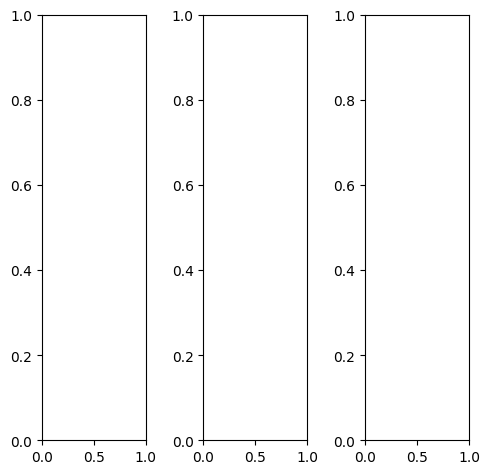

tensor([[[0.6627, 0.6667, 0.6706,  ..., 0.6235, 0.6235, 0.6275],
         [0.6706, 0.6784, 0.6902,  ..., 0.6392, 0.6392, 0.6392],
         [0.6510, 0.6667, 0.6745,  ..., 0.6706, 0.6706, 0.6706],
         ...,
         [0.3020, 0.3020, 0.3059,  ..., 0.3216, 0.3176, 0.3137],
         [0.2902, 0.2824, 0.2902,  ..., 0.3216, 0.3176, 0.3137],
         [0.2745, 0.2745, 0.2784,  ..., 0.3176, 0.3137, 0.3059]],

        [[0.6627, 0.6667, 0.6706,  ..., 0.6235, 0.6235, 0.6275],
         [0.6706, 0.6784, 0.6902,  ..., 0.6392, 0.6392, 0.6392],
         [0.6510, 0.6667, 0.6745,  ..., 0.6706, 0.6706, 0.6706],
         ...,
         [0.3020, 0.3020, 0.3059,  ..., 0.3216, 0.3176, 0.3137],
         [0.2902, 0.2824, 0.2902,  ..., 0.3216, 0.3176, 0.3137],
         [0.2745, 0.2745, 0.2784,  ..., 0.3176, 0.3137, 0.3059]],

        [[0.6627, 0.6667, 0.6706,  ..., 0.6235, 0.6235, 0.6275],
         [0.6706, 0.6784, 0.6902,  ..., 0.6392, 0.6392, 0.6392],
         [0.6510, 0.6667, 0.6745,  ..., 0.6706, 0.6706, 0.

tensor([[[0.6196, 0.6275, 0.6392,  ..., 0.5765, 0.5647, 0.5725],
         [0.6392, 0.6471, 0.6510,  ..., 0.5804, 0.5686, 0.5765],
         [0.6314, 0.6353, 0.6039,  ..., 0.6078, 0.6000, 0.6078],
         ...,
         [0.3294, 0.3176, 0.3176,  ..., 0.3451, 0.3412, 0.3373],
         [0.3137, 0.3020, 0.3020,  ..., 0.3451, 0.3412, 0.3373],
         [0.3020, 0.2902, 0.2941,  ..., 0.3412, 0.3373, 0.3294]],

        [[0.6549, 0.6588, 0.6627,  ..., 0.6196, 0.6196, 0.6196],
         [0.6627, 0.6706, 0.6902,  ..., 0.6431, 0.6431, 0.6392],
         [0.6431, 0.6667, 0.6902,  ..., 0.6745, 0.6745, 0.6706],
         ...,
         [0.2902, 0.2941, 0.3020,  ..., 0.3137, 0.3098, 0.3059],
         [0.2784, 0.2784, 0.2863,  ..., 0.3137, 0.3098, 0.3059],
         [0.2667, 0.2667, 0.2745,  ..., 0.3098, 0.3059, 0.2980]],

        [[0.8039, 0.8039, 0.8078,  ..., 0.7843, 0.8000, 0.8039],
         [0.8000, 0.8118, 0.7922,  ..., 0.7882, 0.8039, 0.8039],
         [0.7294, 0.7569, 0.7804,  ..., 0.8039, 0.8196, 0.

tensor([[[0.7305, 0.7002, 0.6184,  ..., 0.5366, 0.5547, 0.6354],
         [0.6893, 0.6653, 0.6122,  ..., 0.5122, 0.5680, 0.6270],
         [0.6308, 0.6126, 0.5440,  ..., 0.5661, 0.5977, 0.6410],
         ...,
         [0.3673, 0.3699, 0.3749,  ..., 0.3755, 0.3717, 0.4038],
         [0.3388, 0.3339, 0.3487,  ..., 0.3751, 0.3810, 0.4091],
         [0.3464, 0.3275, 0.3250,  ..., 0.3912, 0.3858, 0.4182]],

        [[0.7198, 0.7175, 0.5962,  ..., 0.6406, 0.6755, 0.6999],
         [0.6712, 0.5548, 0.5623,  ..., 0.6537, 0.6895, 0.7513],
         [0.7152, 0.6393, 0.5788,  ..., 0.6993, 0.7020, 0.7511],
         ...,
         [0.3517, 0.3682, 0.3709,  ..., 0.3715, 0.3789, 0.3734],
         [0.3330, 0.3430, 0.3412,  ..., 0.3767, 0.3830, 0.3745],
         [0.3347, 0.3267, 0.3375,  ..., 0.3827, 0.3757, 0.3791]],

        [[0.7887, 0.7764, 0.7352,  ..., 0.8524, 0.8669, 0.8696],
         [0.7707, 0.7088, 0.7451,  ..., 0.8578, 0.8900, 0.8998],
         [0.6717, 0.6219, 0.6406,  ..., 0.8943, 0.9172, 0.

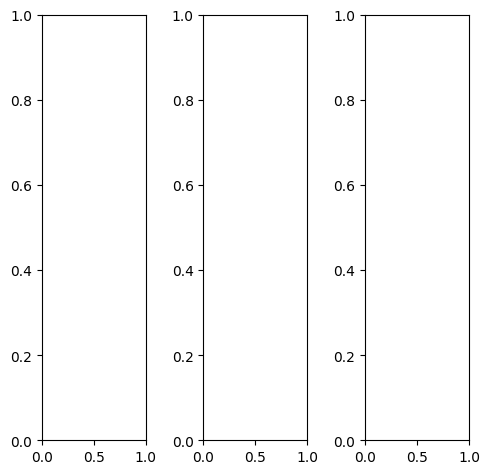

tensor([[[0.0235, 0.0235, 0.0353,  ..., 0.1098, 0.0667, 0.0314],
         [0.0235, 0.0275, 0.0275,  ..., 0.1686, 0.0706, 0.0431],
         [0.0196, 0.0235, 0.0235,  ..., 0.1373, 0.0431, 0.0235],
         ...,
         [0.0510, 0.0667, 0.0471,  ..., 0.1412, 0.2706, 0.3725],
         [0.0431, 0.0549, 0.0471,  ..., 0.0745, 0.2431, 0.2824],
         [0.0314, 0.0353, 0.0314,  ..., 0.0627, 0.2078, 0.1843]],

        [[0.0235, 0.0235, 0.0353,  ..., 0.1098, 0.0667, 0.0314],
         [0.0235, 0.0275, 0.0275,  ..., 0.1686, 0.0706, 0.0431],
         [0.0196, 0.0235, 0.0235,  ..., 0.1373, 0.0431, 0.0235],
         ...,
         [0.0510, 0.0667, 0.0471,  ..., 0.1412, 0.2706, 0.3725],
         [0.0431, 0.0549, 0.0471,  ..., 0.0745, 0.2431, 0.2824],
         [0.0314, 0.0353, 0.0314,  ..., 0.0627, 0.2078, 0.1843]],

        [[0.0235, 0.0235, 0.0353,  ..., 0.1098, 0.0667, 0.0314],
         [0.0235, 0.0275, 0.0275,  ..., 0.1686, 0.0706, 0.0431],
         [0.0196, 0.0235, 0.0235,  ..., 0.1373, 0.0431, 0.

tensor([[[0.0235, 0.0235, 0.0353,  ..., 0.1294, 0.0784, 0.0353],
         [0.0235, 0.0275, 0.0275,  ..., 0.1765, 0.0706, 0.0431],
         [0.0196, 0.0235, 0.0235,  ..., 0.1412, 0.0353, 0.0196],
         ...,
         [0.0471, 0.0627, 0.0392,  ..., 0.1647, 0.3373, 0.4549],
         [0.0392, 0.0510, 0.0431,  ..., 0.0941, 0.2980, 0.3490],
         [0.0275, 0.0275, 0.0275,  ..., 0.0784, 0.2431, 0.2275]],

        [[0.0235, 0.0235, 0.0353,  ..., 0.1020, 0.0588, 0.0275],
         [0.0235, 0.0275, 0.0275,  ..., 0.1686, 0.0706, 0.0392],
         [0.0196, 0.0235, 0.0235,  ..., 0.1373, 0.0431, 0.0235],
         ...,
         [0.0431, 0.0588, 0.0392,  ..., 0.1333, 0.2549, 0.3529],
         [0.0353, 0.0510, 0.0431,  ..., 0.0706, 0.2314, 0.2667],
         [0.0275, 0.0314, 0.0314,  ..., 0.0588, 0.2000, 0.1725]],

        [[0.0235, 0.0235, 0.0353,  ..., 0.0941, 0.0706, 0.0510],
         [0.0235, 0.0235, 0.0314,  ..., 0.1569, 0.0863, 0.0627],
         [0.0196, 0.0235, 0.0275,  ..., 0.1294, 0.0627, 0.

tensor([[[ 0.0867,  0.0742,  0.0127,  ...,  0.2803,  0.2114,  0.2083],
         [ 0.1727, -0.0021,  0.0075,  ...,  0.4126,  0.2152,  0.1916],
         [-0.0488, -0.1159, -0.0904,  ...,  0.3268,  0.1433,  0.1397],
         ...,
         [ 0.2145,  0.2969,  0.2697,  ...,  0.4797,  0.6941,  0.8612],
         [ 0.2127,  0.2773,  0.2647,  ...,  0.3121,  0.6735,  0.7200],
         [ 0.2116,  0.2073,  0.1902,  ...,  0.3366,  0.5828,  0.5696]],

        [[ 0.1923,  0.1364,  0.0685,  ...,  0.3336,  0.2699,  0.2458],
         [ 0.1640,  0.0084, -0.1914,  ...,  0.5096,  0.3132,  0.2323],
         [ 0.0735, -0.0920, -0.1438,  ...,  0.4096,  0.2330,  0.1870],
         ...,
         [ 0.2167,  0.2586,  0.2511,  ...,  0.4610,  0.6836,  0.8450],
         [ 0.2062,  0.2417,  0.2380,  ...,  0.3373,  0.6302,  0.6877],
         [ 0.1912,  0.1834,  0.1811,  ...,  0.2948,  0.5359,  0.5361]],

        [[ 0.2803,  0.1456,  0.2291,  ...,  0.5118,  0.4444,  0.4034],
         [ 0.2455,  0.0840,  0.1611,  ...,  0

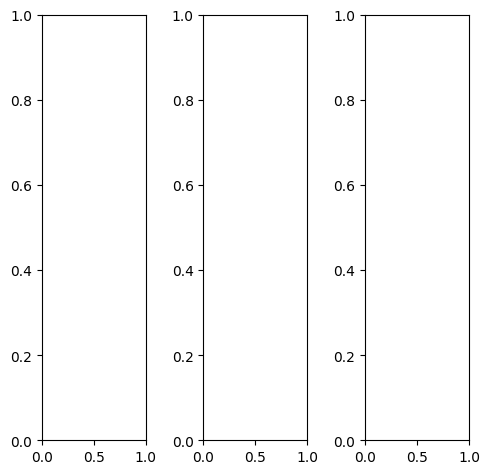

tensor([[[0.6588, 0.6863, 0.6824,  ..., 0.6588, 0.6627, 0.6627],
         [0.5804, 0.7098, 0.6941,  ..., 0.6667, 0.6667, 0.6706],
         [0.5529, 0.7098, 0.7020,  ..., 0.6667, 0.6627, 0.6745],
         ...,
         [0.5490, 0.4980, 0.5412,  ..., 0.6275, 0.6627, 0.6706],
         [0.6471, 0.5725, 0.6196,  ..., 0.4745, 0.4980, 0.4745],
         [0.4392, 0.3882, 0.3608,  ..., 0.4235, 0.4392, 0.4549]],

        [[0.6588, 0.6863, 0.6824,  ..., 0.6588, 0.6627, 0.6627],
         [0.5804, 0.7098, 0.6941,  ..., 0.6667, 0.6667, 0.6706],
         [0.5529, 0.7098, 0.7020,  ..., 0.6667, 0.6627, 0.6745],
         ...,
         [0.5490, 0.4980, 0.5412,  ..., 0.6275, 0.6627, 0.6706],
         [0.6471, 0.5725, 0.6196,  ..., 0.4745, 0.4980, 0.4745],
         [0.4392, 0.3882, 0.3608,  ..., 0.4235, 0.4392, 0.4549]],

        [[0.6588, 0.6863, 0.6824,  ..., 0.6588, 0.6627, 0.6627],
         [0.5804, 0.7098, 0.6941,  ..., 0.6667, 0.6667, 0.6706],
         [0.5529, 0.7098, 0.7020,  ..., 0.6667, 0.6627, 0.

tensor([[[0.6039, 0.6157, 0.6000,  ..., 0.5765, 0.5804, 0.5804],
         [0.5333, 0.6353, 0.5961,  ..., 0.5843, 0.5843, 0.5882],
         [0.5020, 0.6353, 0.6039,  ..., 0.5843, 0.5804, 0.5922],
         ...,
         [0.6314, 0.5804, 0.6235,  ..., 0.7059, 0.7412, 0.7490],
         [0.7255, 0.6510, 0.6941,  ..., 0.6000, 0.6235, 0.5961],
         [0.4824, 0.4314, 0.4039,  ..., 0.5647, 0.5804, 0.6000]],

        [[0.6510, 0.6863, 0.6902,  ..., 0.6627, 0.6667, 0.6667],
         [0.5725, 0.7098, 0.7098,  ..., 0.6706, 0.6706, 0.6745],
         [0.5451, 0.7137, 0.7137,  ..., 0.6706, 0.6667, 0.6784],
         ...,
         [0.5059, 0.4549, 0.4980,  ..., 0.5922, 0.6275, 0.6353],
         [0.6078, 0.5333, 0.5804,  ..., 0.4235, 0.4431, 0.4196],
         [0.4078, 0.3569, 0.3294,  ..., 0.3608, 0.3765, 0.3961]],

        [[0.8471, 0.8863, 0.8706,  ..., 0.8588, 0.8627, 0.8627],
         [0.7569, 0.9059, 0.8824,  ..., 0.8706, 0.8667, 0.8706],
         [0.7137, 0.9020, 0.8941,  ..., 0.8667, 0.8627, 0.

tensor([[[0.7782, 0.8409, 0.8041,  ..., 0.6224, 0.6088, 0.6278],
         [0.7015, 0.8328, 0.8223,  ..., 0.6420, 0.6469, 0.6464],
         [0.6254, 0.9091, 0.8098,  ..., 0.6708, 0.6698, 0.6673],
         ...,
         [0.6741, 0.6235, 0.6415,  ..., 0.7822, 0.8192, 0.7870],
         [0.7736, 0.6882, 0.7348,  ..., 0.5779, 0.5901, 0.5749],
         [0.5333, 0.4507, 0.4228,  ..., 0.5315, 0.5485, 0.5526]],

        [[0.7915, 0.8728, 0.7820,  ..., 0.7584, 0.7395, 0.7644],
         [0.6850, 0.8007, 0.7953,  ..., 0.7873, 0.7918, 0.8024],
         [0.7056, 0.9163, 0.8254,  ..., 0.7919, 0.7949, 0.8068],
         ...,
         [0.6569, 0.6034, 0.6398,  ..., 0.7491, 0.7927, 0.7747],
         [0.7498, 0.6518, 0.7221,  ..., 0.5493, 0.5731, 0.5546],
         [0.5032, 0.4303, 0.4083,  ..., 0.5116, 0.5270, 0.5325]],

        [[0.8758, 0.9436, 0.8955,  ..., 0.9666, 0.9702, 0.9578],
         [0.8294, 0.9570, 0.9555,  ..., 1.0031, 1.0298, 1.0074],
         [0.7495, 0.8949, 0.9130,  ..., 1.0212, 1.0354, 1.

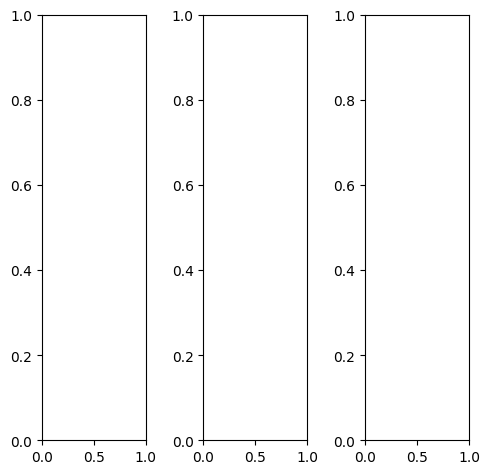

tensor([[[0.4863, 0.4902, 0.4863,  ..., 0.5059, 0.5098, 0.5059],
         [0.4784, 0.4784, 0.4784,  ..., 0.5098, 0.5098, 0.4980],
         [0.4745, 0.4784, 0.4824,  ..., 0.5176, 0.5216, 0.5176],
         ...,
         [0.4235, 0.4118, 0.4118,  ..., 0.3804, 0.3843, 0.3804],
         [0.4078, 0.3882, 0.4000,  ..., 0.3608, 0.3804, 0.3882],
         [0.4118, 0.3804, 0.3843,  ..., 0.3569, 0.3765, 0.3843]],

        [[0.4863, 0.4902, 0.4863,  ..., 0.5059, 0.5098, 0.5059],
         [0.4784, 0.4784, 0.4784,  ..., 0.5098, 0.5098, 0.4980],
         [0.4745, 0.4784, 0.4824,  ..., 0.5176, 0.5216, 0.5176],
         ...,
         [0.4235, 0.4118, 0.4118,  ..., 0.3804, 0.3843, 0.3804],
         [0.4078, 0.3882, 0.4000,  ..., 0.3608, 0.3804, 0.3882],
         [0.4118, 0.3804, 0.3843,  ..., 0.3569, 0.3765, 0.3843]],

        [[0.4863, 0.4902, 0.4863,  ..., 0.5059, 0.5098, 0.5059],
         [0.4784, 0.4784, 0.4784,  ..., 0.5098, 0.5098, 0.4980],
         [0.4745, 0.4784, 0.4824,  ..., 0.5176, 0.5216, 0.

tensor([[[0.4431, 0.4471, 0.4431,  ..., 0.4627, 0.4667, 0.4588],
         [0.4275, 0.4314, 0.4235,  ..., 0.4510, 0.4588, 0.4471],
         [0.4196, 0.4235, 0.4235,  ..., 0.4706, 0.4824, 0.4863],
         ...,
         [0.4078, 0.3804, 0.3725,  ..., 0.3451, 0.3569, 0.3569],
         [0.3961, 0.3647, 0.3647,  ..., 0.3373, 0.3725, 0.3843],
         [0.3882, 0.3569, 0.3529,  ..., 0.3333, 0.3765, 0.3843]],

        [[0.5725, 0.5765, 0.5725,  ..., 0.5961, 0.6000, 0.5922],
         [0.5686, 0.5725, 0.5765,  ..., 0.6078, 0.6078, 0.5922],
         [0.5725, 0.5765, 0.5843,  ..., 0.6078, 0.6039, 0.5961],
         ...,
         [0.4863, 0.4863, 0.4941,  ..., 0.4549, 0.4471, 0.4392],
         [0.4706, 0.4588, 0.4824,  ..., 0.4235, 0.4314, 0.4353],
         [0.4824, 0.4549, 0.4588,  ..., 0.4118, 0.4196, 0.4314]],

        [[0.1647, 0.1608, 0.1529,  ..., 0.1647, 0.1725, 0.1725],
         [0.1333, 0.1333, 0.1294,  ..., 0.1451, 0.1529, 0.1569],
         [0.1098, 0.1098, 0.1059,  ..., 0.1725, 0.1843, 0.

tensor([[[0.3380, 0.2206, 0.0934,  ..., 0.3263, 0.3595, 0.3042],
         [0.3011, 0.1248, 0.0453,  ..., 0.3534, 0.3552, 0.2500],
         [0.2367, 0.1413, 0.0796,  ..., 0.4382, 0.4130, 0.3472],
         ...,
         [0.3826, 0.3630, 0.3710,  ..., 0.2297, 0.1946, 0.1335],
         [0.3138, 0.2244, 0.2716,  ..., 0.0946, 0.1241, 0.1213],
         [0.2805, 0.1366, 0.1438,  ..., 0.0775, 0.1095, 0.1047]],

        [[0.4483, 0.3554, 0.3417,  ..., 0.4385, 0.5069, 0.3856],
         [0.3596, 0.2591, 0.1268,  ..., 0.5229, 0.5478, 0.3840],
         [0.3577, 0.3009, 0.2683,  ..., 0.5571, 0.5668, 0.4703],
         ...,
         [0.3190, 0.3178, 0.3408,  ..., 0.2343, 0.2150, 0.1133],
         [0.2726, 0.2145, 0.2535,  ..., 0.1153, 0.1499, 0.1054],
         [0.2453, 0.1159, 0.1173,  ..., 0.0662, 0.0822, 0.0699]],

        [[0.6270, 0.3789, 0.4517,  ..., 0.6240, 0.6546, 0.5745],
         [0.5032, 0.4395, 0.2950,  ..., 0.6500, 0.6893, 0.5659],
         [0.4764, 0.3781, 0.3882,  ..., 0.7264, 0.7434, 0.

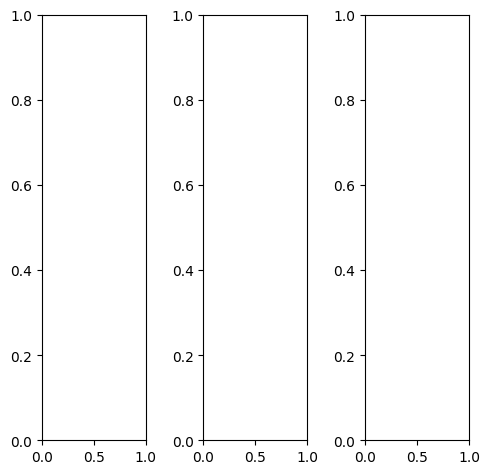

EPOCH: 29.000  val_loss: 0.003  (3543.70s - 8675.95s remaining)

tensor([[[0.3961, 0.4353, 0.4353,  ..., 0.4510, 0.4275, 0.4667],
         [0.4196, 0.3529, 0.3059,  ..., 0.4314, 0.4078, 0.4157],
         [0.4157, 0.3608, 0.2706,  ..., 0.3961, 0.4510, 0.5255],
         ...,
         [0.0667, 0.0510, 0.0392,  ..., 0.3804, 0.3725, 0.3608],
         [0.0471, 0.0353, 0.0275,  ..., 0.3216, 0.3529, 0.3176],
         [0.0627, 0.0471, 0.0353,  ..., 0.3490, 0.3529, 0.2902]],

        [[0.3961, 0.4353, 0.4353,  ..., 0.4510, 0.4275, 0.4667],
         [0.4196, 0.3529, 0.3059,  ..., 0.4314, 0.4078, 0.4157],
         [0.4157, 0.3608, 0.2706,  ..., 0.3961, 0.4510, 0.5255],
         ...,
         [0.0667, 0.0510, 0.0392,  ..., 0.3804, 0.3725, 0.3608],
         [0.0471, 0.0353, 0.0275,  ..., 0.3216, 0.3529, 0.3176],
         [0.0627, 0.0471, 0.0353,  ..., 0.3490, 0.3529, 0.2902]],

        [[0.3961, 0.4353, 0.4353,  ..., 0.4510, 0.4275, 0.4667],
         [0.4196, 0.3529, 0.3059,  ..., 0.4314, 0.4078, 0.4157],
         [0.4157, 0.3608, 0.2706,  ..., 0.3961, 0.4510, 0.

tensor([[[0.3569, 0.3961, 0.3961,  ..., 0.4196, 0.3922, 0.4275],
         [0.3922, 0.3255, 0.2745,  ..., 0.4000, 0.3725, 0.3765],
         [0.4000, 0.3412, 0.2510,  ..., 0.3647, 0.4157, 0.4863],
         ...,
         [0.0784, 0.0627, 0.0510,  ..., 0.3490, 0.3373, 0.3216],
         [0.0549, 0.0431, 0.0353,  ..., 0.2824, 0.3098, 0.2627],
         [0.0627, 0.0471, 0.0392,  ..., 0.3176, 0.3216, 0.2549]],

        [[0.4431, 0.4863, 0.4863,  ..., 0.4667, 0.4510, 0.4902],
         [0.4588, 0.3922, 0.3451,  ..., 0.4471, 0.4275, 0.4392],
         [0.4471, 0.3882, 0.2902,  ..., 0.4118, 0.4745, 0.5490],
         ...,
         [0.0627, 0.0471, 0.0353,  ..., 0.4275, 0.4235, 0.4118],
         [0.0431, 0.0314, 0.0235,  ..., 0.3686, 0.4039, 0.3686],
         [0.0627, 0.0471, 0.0353,  ..., 0.3725, 0.3804, 0.3216]],

        [[0.2667, 0.2824, 0.2706,  ..., 0.4392, 0.4118, 0.4431],
         [0.3059, 0.2353, 0.1804,  ..., 0.4196, 0.3922, 0.3922],
         [0.3098, 0.2784, 0.2118,  ..., 0.3843, 0.4353, 0.

tensor([[[0.4091, 0.4468, 0.4381,  ..., 0.4397, 0.4226, 0.4722],
         [0.4287, 0.3687, 0.3200,  ..., 0.4261, 0.4068, 0.4155],
         [0.4334, 0.3845, 0.2697,  ..., 0.3981, 0.4515, 0.5358],
         ...,
         [0.0735, 0.0507, 0.0441,  ..., 0.4079, 0.3983, 0.3795],
         [0.0657, 0.0375, 0.0307,  ..., 0.3511, 0.3836, 0.3315],
         [0.0952, 0.0652, 0.0503,  ..., 0.3677, 0.3712, 0.3290]],

        [[0.4215, 0.4563, 0.4581,  ..., 0.4604, 0.4419, 0.4810],
         [0.4344, 0.3636, 0.3209,  ..., 0.4360, 0.4169, 0.4300],
         [0.4203, 0.3827, 0.2682,  ..., 0.4046, 0.4615, 0.5370],
         ...,
         [0.0644, 0.0478, 0.0388,  ..., 0.3860, 0.3796, 0.3715],
         [0.0550, 0.0357, 0.0276,  ..., 0.3205, 0.3553, 0.3219],
         [0.0956, 0.0528, 0.0331,  ..., 0.3462, 0.3538, 0.3159]],

        [[0.3379, 0.3628, 0.3630,  ..., 0.3469, 0.3379, 0.3907],
         [0.3353, 0.2782, 0.2385,  ..., 0.3245, 0.3040, 0.3315],
         [0.3266, 0.2980, 0.2170,  ..., 0.2961, 0.3451, 0.

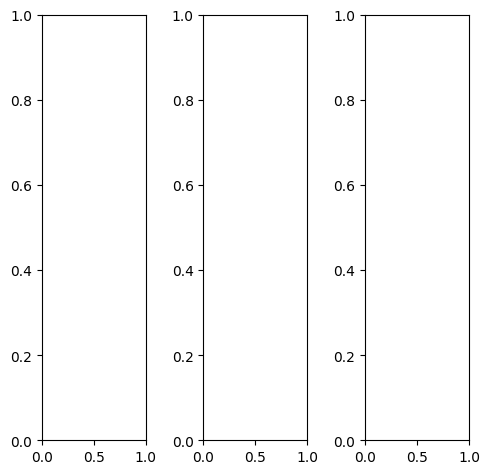

tensor([[[0.2510, 0.0471, 0.1137,  ..., 0.4392, 0.2706, 0.0980],
         [0.3490, 0.0745, 0.1020,  ..., 0.4824, 0.3020, 0.1373],
         [0.3961, 0.0941, 0.1020,  ..., 0.4745, 0.2784, 0.2941],
         ...,
         [0.5804, 0.6157, 0.6431,  ..., 0.6588, 0.5725, 0.5804],
         [0.5098, 0.5373, 0.5843,  ..., 0.6196, 0.5922, 0.6157],
         [0.5294, 0.5412, 0.5647,  ..., 0.6902, 0.6549, 0.6314]],

        [[0.2510, 0.0471, 0.1137,  ..., 0.4392, 0.2706, 0.0980],
         [0.3490, 0.0745, 0.1020,  ..., 0.4824, 0.3020, 0.1373],
         [0.3961, 0.0941, 0.1020,  ..., 0.4745, 0.2784, 0.2941],
         ...,
         [0.5804, 0.6157, 0.6431,  ..., 0.6588, 0.5725, 0.5804],
         [0.5098, 0.5373, 0.5843,  ..., 0.6196, 0.5922, 0.6157],
         [0.5294, 0.5412, 0.5647,  ..., 0.6902, 0.6549, 0.6314]],

        [[0.2510, 0.0471, 0.1137,  ..., 0.4392, 0.2706, 0.0980],
         [0.3490, 0.0745, 0.1020,  ..., 0.4824, 0.3020, 0.1373],
         [0.3961, 0.0941, 0.1020,  ..., 0.4745, 0.2784, 0.

tensor([[[0.2941, 0.0588, 0.1059,  ..., 0.5922, 0.3176, 0.0863],
         [0.4118, 0.0706, 0.0706,  ..., 0.6431, 0.3765, 0.1608],
         [0.4706, 0.0784, 0.0549,  ..., 0.6275, 0.3725, 0.3451],
         ...,
         [0.6431, 0.6863, 0.7412,  ..., 0.7804, 0.6941, 0.7020],
         [0.5961, 0.6314, 0.6980,  ..., 0.7451, 0.7176, 0.7333],
         [0.6118, 0.6275, 0.6588,  ..., 0.7961, 0.7843, 0.7608]],

        [[0.2275, 0.0431, 0.1137,  ..., 0.3686, 0.2549, 0.1059],
         [0.3176, 0.0706, 0.1059,  ..., 0.4078, 0.2745, 0.1333],
         [0.3608, 0.0902, 0.1098,  ..., 0.4039, 0.2431, 0.2745],
         ...,
         [0.5608, 0.5961, 0.6157,  ..., 0.6196, 0.5333, 0.5412],
         [0.4863, 0.5098, 0.5529,  ..., 0.5804, 0.5569, 0.5804],
         [0.5098, 0.5176, 0.5412,  ..., 0.6588, 0.6157, 0.5922]],

        [[0.2431, 0.0510, 0.1255,  ..., 0.4000, 0.2431, 0.0863],
         [0.3373, 0.1176, 0.1490,  ..., 0.4353, 0.2549, 0.1098],
         [0.3882, 0.1647, 0.1804,  ..., 0.4275, 0.2157, 0.

tensor([[[0.2681, 0.0782, 0.1076,  ..., 0.4383, 0.2649, 0.1511],
         [0.3443, 0.0860, 0.0982,  ..., 0.5124, 0.3129, 0.1586],
         [0.4005, 0.1027, 0.0987,  ..., 0.5041, 0.2731, 0.2799],
         ...,
         [0.5869, 0.6727, 0.6885,  ..., 0.6911, 0.5901, 0.6158],
         [0.5438, 0.5722, 0.6027,  ..., 0.6438, 0.6219, 0.6399],
         [0.5628, 0.5710, 0.5935,  ..., 0.7180, 0.6910, 0.6607]],

        [[0.2581, 0.0851, 0.1092,  ..., 0.4446, 0.2656, 0.1583],
         [0.3375, 0.0884, 0.1090,  ..., 0.5215, 0.3087, 0.1596],
         [0.3865, 0.1131, 0.1061,  ..., 0.4926, 0.2757, 0.2893],
         ...,
         [0.5763, 0.6399, 0.6734,  ..., 0.6684, 0.5676, 0.5902],
         [0.5179, 0.5313, 0.5842,  ..., 0.6276, 0.6021, 0.6257],
         [0.5395, 0.5437, 0.5837,  ..., 0.6918, 0.6685, 0.6457]],

        [[0.2381, 0.0672, 0.1160,  ..., 0.3950, 0.2458, 0.1432],
         [0.3195, 0.0846, 0.1143,  ..., 0.4437, 0.2804, 0.1367],
         [0.3693, 0.1011, 0.1020,  ..., 0.4196, 0.2413, 0.

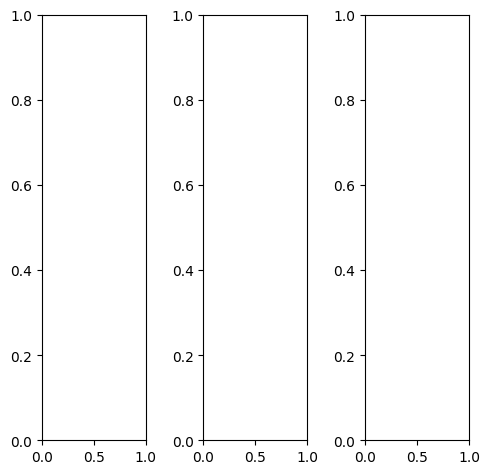

tensor([[[0.8510, 0.8314, 0.8275,  ..., 0.6392, 0.6314, 0.6275],
         [0.8667, 0.8471, 0.8431,  ..., 0.6588, 0.6510, 0.6471],
         [0.8667, 0.8471, 0.8431,  ..., 0.6627, 0.6549, 0.6510],
         ...,
         [0.3294, 0.3294, 0.3216,  ..., 0.0980, 0.0980, 0.0980],
         [0.3294, 0.3059, 0.3137,  ..., 0.1176, 0.1333, 0.1373],
         [0.3137, 0.2588, 0.3176,  ..., 0.2353, 0.2353, 0.2392]],

        [[0.8510, 0.8314, 0.8275,  ..., 0.6392, 0.6314, 0.6275],
         [0.8667, 0.8471, 0.8431,  ..., 0.6588, 0.6510, 0.6471],
         [0.8667, 0.8471, 0.8431,  ..., 0.6627, 0.6549, 0.6510],
         ...,
         [0.3294, 0.3294, 0.3216,  ..., 0.0980, 0.0980, 0.0980],
         [0.3294, 0.3059, 0.3137,  ..., 0.1176, 0.1333, 0.1373],
         [0.3137, 0.2588, 0.3176,  ..., 0.2353, 0.2353, 0.2392]],

        [[0.8510, 0.8314, 0.8275,  ..., 0.6392, 0.6314, 0.6275],
         [0.8667, 0.8471, 0.8431,  ..., 0.6588, 0.6510, 0.6471],
         [0.8667, 0.8471, 0.8431,  ..., 0.6627, 0.6549, 0.

tensor([[[0.7569, 0.7412, 0.7333,  ..., 0.5176, 0.5098, 0.5059],
         [0.7686, 0.7529, 0.7490,  ..., 0.5333, 0.5255, 0.5216],
         [0.7725, 0.7569, 0.7529,  ..., 0.5412, 0.5333, 0.5294],
         ...,
         [0.3529, 0.3490, 0.3451,  ..., 0.1176, 0.1176, 0.1255],
         [0.3529, 0.3373, 0.3451,  ..., 0.1490, 0.1608, 0.1647],
         [0.3373, 0.2941, 0.3569,  ..., 0.2745, 0.2745, 0.2667]],

        [[0.8745, 0.8549, 0.8510,  ..., 0.6627, 0.6549, 0.6471],
         [0.8902, 0.8706, 0.8667,  ..., 0.6824, 0.6745, 0.6667],
         [0.8902, 0.8706, 0.8667,  ..., 0.6863, 0.6784, 0.6706],
         ...,
         [0.3216, 0.3176, 0.3137,  ..., 0.0902, 0.0902, 0.0863],
         [0.3176, 0.2941, 0.3059,  ..., 0.1059, 0.1216, 0.1255],
         [0.3098, 0.2471, 0.3059,  ..., 0.2314, 0.2314, 0.2392]],

        [[0.9765, 0.9608, 0.9608,  ..., 0.8471, 0.8431, 0.8471],
         [0.9922, 0.9804, 0.9804,  ..., 0.8667, 0.8627, 0.8706],
         [0.9882, 0.9725, 0.9686,  ..., 0.8706, 0.8667, 0.

tensor([[[0.7907, 0.7780, 0.7586,  ..., 0.5241, 0.5173, 0.5563],
         [0.8127, 0.7832, 0.7747,  ..., 0.5417, 0.5387, 0.5485],
         [0.8027, 0.7946, 0.7871,  ..., 0.5583, 0.5533, 0.5457],
         ...,
         [0.3444, 0.3510, 0.3342,  ..., 0.1040, 0.1094, 0.1139],
         [0.3381, 0.3281, 0.3339,  ..., 0.1356, 0.1530, 0.1541],
         [0.3278, 0.2670, 0.3267,  ..., 0.2454, 0.2408, 0.2516]],

        [[0.8516, 0.8468, 0.8377,  ..., 0.6649, 0.6616, 0.6607],
         [0.8746, 0.8647, 0.8552,  ..., 0.6791, 0.6761, 0.6833],
         [0.8758, 0.8652, 0.8655,  ..., 0.6883, 0.6719, 0.6746],
         ...,
         [0.3347, 0.3371, 0.3210,  ..., 0.1007, 0.1015, 0.1041],
         [0.3342, 0.3097, 0.3156,  ..., 0.1164, 0.1339, 0.1387],
         [0.3246, 0.2644, 0.3197,  ..., 0.2219, 0.2165, 0.2408]],

        [[0.9356, 0.9274, 0.9115,  ..., 0.8254, 0.8141, 0.7839],
         [0.9609, 0.9546, 0.9469,  ..., 0.8383, 0.8297, 0.8149],
         [0.9659, 0.9322, 0.9264,  ..., 0.8419, 0.8284, 0.

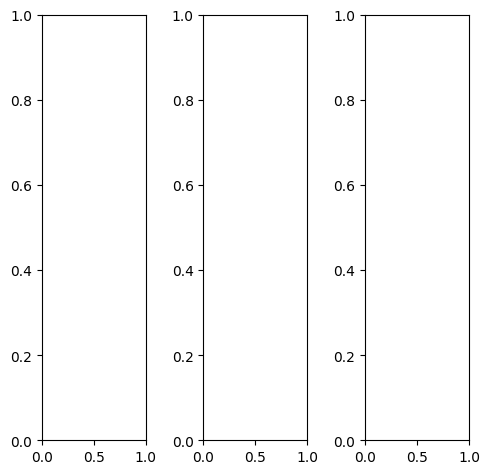

tensor([[[0.8039, 0.9020, 0.9020,  ..., 0.0549, 0.0510, 0.0392],
         [0.8275, 0.8784, 0.8784,  ..., 0.0549, 0.0510, 0.0392],
         [0.8078, 0.8588, 0.8706,  ..., 0.0510, 0.0667, 0.0706],
         ...,
         [0.4863, 0.4980, 0.4941,  ..., 0.4000, 0.4118, 0.4078],
         [0.4902, 0.4863, 0.4863,  ..., 0.4196, 0.4235, 0.4196],
         [0.4784, 0.4863, 0.4941,  ..., 0.4314, 0.4353, 0.4314]],

        [[0.8039, 0.9020, 0.9020,  ..., 0.0549, 0.0510, 0.0392],
         [0.8275, 0.8784, 0.8784,  ..., 0.0549, 0.0510, 0.0392],
         [0.8078, 0.8588, 0.8706,  ..., 0.0510, 0.0667, 0.0706],
         ...,
         [0.4863, 0.4980, 0.4941,  ..., 0.4000, 0.4118, 0.4078],
         [0.4902, 0.4863, 0.4863,  ..., 0.4196, 0.4235, 0.4196],
         [0.4784, 0.4863, 0.4941,  ..., 0.4314, 0.4353, 0.4314]],

        [[0.8039, 0.9020, 0.9020,  ..., 0.0549, 0.0510, 0.0392],
         [0.8275, 0.8784, 0.8784,  ..., 0.0549, 0.0510, 0.0392],
         [0.8078, 0.8588, 0.8706,  ..., 0.0510, 0.0667, 0.

tensor([[[0.7490, 0.8510, 0.8549,  ..., 0.0275, 0.0235, 0.0118],
         [0.7725, 0.8275, 0.8314,  ..., 0.0275, 0.0235, 0.0118],
         [0.7529, 0.8078, 0.8235,  ..., 0.0235, 0.0353, 0.0392],
         ...,
         [0.4784, 0.4941, 0.4902,  ..., 0.3961, 0.4039, 0.3961],
         [0.4745, 0.4745, 0.4745,  ..., 0.4157, 0.4196, 0.4118],
         [0.4627, 0.4706, 0.4824,  ..., 0.4275, 0.4353, 0.4275]],

        [[0.8196, 0.9137, 0.9137,  ..., 0.0627, 0.0549, 0.0431],
         [0.8431, 0.8902, 0.8902,  ..., 0.0627, 0.0588, 0.0471],
         [0.8196, 0.8706, 0.8824,  ..., 0.0627, 0.0784, 0.0863],
         ...,
         [0.4941, 0.5020, 0.4980,  ..., 0.4039, 0.4196, 0.4157],
         [0.4941, 0.4941, 0.4941,  ..., 0.4235, 0.4275, 0.4235],
         [0.4824, 0.4902, 0.5020,  ..., 0.4353, 0.4392, 0.4353]],

        [[0.8824, 0.9725, 0.9647,  ..., 0.0941, 0.0902, 0.0745],
         [0.9059, 0.9490, 0.9412,  ..., 0.0784, 0.0745, 0.0627],
         [0.8824, 0.9294, 0.9373,  ..., 0.0667, 0.0824, 0.

tensor([[[0.8053, 0.8857, 0.8869,  ..., 0.0597, 0.0606, 0.0931],
         [0.8196, 0.8685, 0.8663,  ..., 0.0518, 0.0563, 0.0515],
         [0.7989, 0.8545, 0.8607,  ..., 0.0469, 0.0639, 0.0692],
         ...,
         [0.4833, 0.5097, 0.5033,  ..., 0.4015, 0.4081, 0.4050],
         [0.4956, 0.4968, 0.4946,  ..., 0.4129, 0.4194, 0.4164],
         [0.4894, 0.4904, 0.4924,  ..., 0.4305, 0.4398, 0.4388]],

        [[0.8251, 0.9025, 0.9125,  ..., 0.0656, 0.0652, 0.1058],
         [0.8369, 0.8933, 0.8855,  ..., 0.0556, 0.0616, 0.0593],
         [0.8133, 0.8787, 0.8837,  ..., 0.0482, 0.0615, 0.0674],
         ...,
         [0.5009, 0.5163, 0.5160,  ..., 0.4053, 0.4167, 0.4135],
         [0.4958, 0.4976, 0.5016,  ..., 0.4147, 0.4240, 0.4320],
         [0.4973, 0.4975, 0.5074,  ..., 0.4326, 0.4437, 0.4508]],

        [[0.8347, 0.9120, 0.9059,  ..., 0.0594, 0.0691, 0.1011],
         [0.8441, 0.9013, 0.8915,  ..., 0.0592, 0.0638, 0.0550],
         [0.8308, 0.8715, 0.8827,  ..., 0.0504, 0.0638, 0.

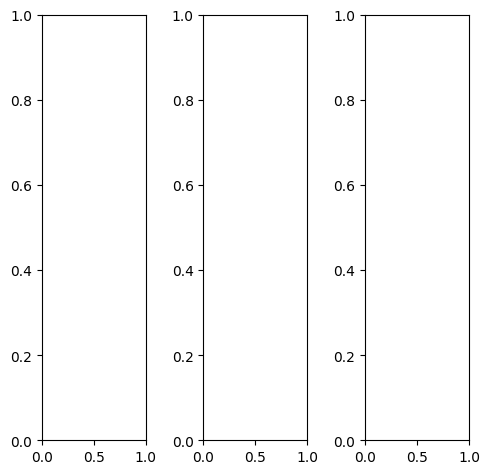

tensor([[[0.9137, 0.8980, 0.8980,  ..., 0.8510, 0.8706, 0.8824],
         [0.9098, 0.8902, 0.8941,  ..., 0.7882, 0.8000, 0.8157],
         [0.8471, 0.7922, 0.7922,  ..., 0.7961, 0.8235, 0.8157],
         ...,
         [0.6275, 0.6431, 0.6157,  ..., 0.6314, 0.6000, 0.5529],
         [0.6784, 0.5922, 0.5961,  ..., 0.6235, 0.6039, 0.5686],
         [0.6510, 0.5961, 0.5804,  ..., 0.6588, 0.6980, 0.7686]],

        [[0.9137, 0.8980, 0.8980,  ..., 0.8510, 0.8706, 0.8824],
         [0.9098, 0.8902, 0.8941,  ..., 0.7882, 0.8000, 0.8157],
         [0.8471, 0.7922, 0.7922,  ..., 0.7961, 0.8235, 0.8157],
         ...,
         [0.6275, 0.6431, 0.6157,  ..., 0.6314, 0.6000, 0.5529],
         [0.6784, 0.5922, 0.5961,  ..., 0.6235, 0.6039, 0.5686],
         [0.6510, 0.5961, 0.5804,  ..., 0.6588, 0.6980, 0.7686]],

        [[0.9137, 0.8980, 0.8980,  ..., 0.8510, 0.8706, 0.8824],
         [0.9098, 0.8902, 0.8941,  ..., 0.7882, 0.8000, 0.8157],
         [0.8471, 0.7922, 0.7922,  ..., 0.7961, 0.8235, 0.

tensor([[[0.8588, 0.8431, 0.8431,  ..., 0.7961, 0.8157, 0.8196],
         [0.8549, 0.8392, 0.8431,  ..., 0.7373, 0.7451, 0.7608],
         [0.7922, 0.7412, 0.7412,  ..., 0.7412, 0.7647, 0.7608],
         ...,
         [0.6667, 0.6824, 0.6510,  ..., 0.6902, 0.6549, 0.6000],
         [0.7216, 0.6314, 0.6392,  ..., 0.6824, 0.6667, 0.6314],
         [0.7020, 0.6353, 0.6235,  ..., 0.7176, 0.7569, 0.8235]],

        [[0.9294, 0.9098, 0.9137,  ..., 0.8627, 0.8824, 0.8980],
         [0.9216, 0.9059, 0.9098,  ..., 0.8039, 0.8157, 0.8275],
         [0.8588, 0.8078, 0.8118,  ..., 0.8118, 0.8392, 0.8275],
         ...,
         [0.6235, 0.6392, 0.6118,  ..., 0.6196, 0.5882, 0.5451],
         [0.6745, 0.5922, 0.5922,  ..., 0.6157, 0.5922, 0.5529],
         [0.6431, 0.5961, 0.5765,  ..., 0.6510, 0.6902, 0.7608]],

        [[0.9922, 0.9725, 0.9765,  ..., 0.9255, 0.9412, 0.9529],
         [0.9765, 0.9529, 0.9529,  ..., 0.8549, 0.8745, 0.8863],
         [0.9137, 0.8431, 0.8275,  ..., 0.8549, 0.8980, 0.

tensor([[[0.8762, 0.8827, 0.8875,  ..., 0.8502, 0.8673, 0.8585],
         [0.8896, 0.8721, 0.8815,  ..., 0.7874, 0.8026, 0.8286],
         [0.8445, 0.7797, 0.7843,  ..., 0.8006, 0.8330, 0.8212],
         ...,
         [0.6603, 0.6991, 0.6541,  ..., 0.6728, 0.6466, 0.5889],
         [0.7080, 0.6239, 0.6116,  ..., 0.6381, 0.6246, 0.5968],
         [0.6770, 0.6246, 0.6137,  ..., 0.6841, 0.7270, 0.7466]],

        [[0.8922, 0.8933, 0.9117,  ..., 0.8609, 0.8753, 0.8713],
         [0.8953, 0.8903, 0.8950,  ..., 0.7939, 0.7959, 0.8284],
         [0.8478, 0.7931, 0.8031,  ..., 0.8066, 0.8270, 0.8282],
         ...,
         [0.6298, 0.6470, 0.6217,  ..., 0.6438, 0.6208, 0.5820],
         [0.6829, 0.5822, 0.5880,  ..., 0.6220, 0.5957, 0.5861],
         [0.6489, 0.6001, 0.5833,  ..., 0.6584, 0.7027, 0.7286]],

        [[0.8945, 0.9017, 0.8947,  ..., 0.8271, 0.8476, 0.8424],
         [0.8879, 0.8837, 0.8859,  ..., 0.7590, 0.7694, 0.7878],
         [0.8385, 0.7621, 0.7699,  ..., 0.7619, 0.7936, 0.

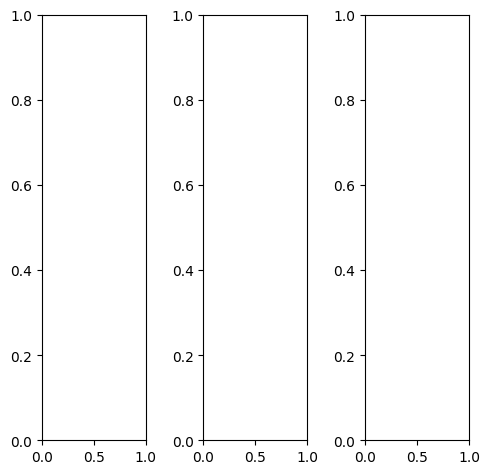

EPOCH: 29.255  trn_loss: 0.004  (3573.99s - 8642.64s remaining)

tensor([[[0.2039, 0.1843, 0.1529,  ..., 0.1059, 0.1176, 0.1098],
         [0.1490, 0.1686, 0.1765,  ..., 0.1059, 0.1059, 0.1137],
         [0.1373, 0.1373, 0.1333,  ..., 0.0863, 0.0824, 0.0980],
         ...,
         [0.7725, 0.6980, 0.7686,  ..., 0.8627, 0.8510, 0.8980],
         [0.6902, 0.5961, 0.6902,  ..., 0.8706, 0.8235, 0.8549],
         [0.6157, 0.5529, 0.6471,  ..., 0.8392, 0.7882, 0.8314]],

        [[0.2039, 0.1843, 0.1529,  ..., 0.1059, 0.1176, 0.1098],
         [0.1490, 0.1686, 0.1765,  ..., 0.1059, 0.1059, 0.1137],
         [0.1373, 0.1373, 0.1333,  ..., 0.0863, 0.0824, 0.0980],
         ...,
         [0.7725, 0.6980, 0.7686,  ..., 0.8627, 0.8510, 0.8980],
         [0.6902, 0.5961, 0.6902,  ..., 0.8706, 0.8235, 0.8549],
         [0.6157, 0.5529, 0.6471,  ..., 0.8392, 0.7882, 0.8314]],

        [[0.2039, 0.1843, 0.1529,  ..., 0.1059, 0.1176, 0.1098],
         [0.1490, 0.1686, 0.1765,  ..., 0.1059, 0.1059, 0.1137],
         [0.1373, 0.1373, 0.1333,  ..., 0.0863, 0.0824, 0.

tensor([[[0.1608, 0.1412, 0.1098,  ..., 0.0549, 0.0824, 0.0784],
         [0.1020, 0.1216, 0.1294,  ..., 0.0549, 0.0627, 0.0706],
         [0.0863, 0.0863, 0.0824,  ..., 0.0392, 0.0353, 0.0510],
         ...,
         [0.8157, 0.7412, 0.8118,  ..., 0.9098, 0.9020, 0.9412],
         [0.7294, 0.6353, 0.7333,  ..., 0.9137, 0.8706, 0.8980],
         [0.6431, 0.5961, 0.6902,  ..., 0.8745, 0.8314, 0.8706]],

        [[0.2314, 0.2118, 0.1765,  ..., 0.1294, 0.1294, 0.1216],
         [0.1765, 0.1961, 0.2039,  ..., 0.1255, 0.1216, 0.1294],
         [0.1608, 0.1608, 0.1608,  ..., 0.1020, 0.1020, 0.1176],
         ...,
         [0.7765, 0.7020, 0.7765,  ..., 0.8706, 0.8549, 0.9020],
         [0.6980, 0.6039, 0.6980,  ..., 0.8784, 0.8275, 0.8627],
         [0.6314, 0.5608, 0.6549,  ..., 0.8549, 0.8000, 0.8431]],

        [[0.1843, 0.1647, 0.1294,  ..., 0.1333, 0.1373, 0.1255],
         [0.1373, 0.1569, 0.1647,  ..., 0.1333, 0.1333, 0.1373],
         [0.1333, 0.1333, 0.1333,  ..., 0.1137, 0.1098, 0.

tensor([[[ 0.0530,  0.0734, -0.0488,  ...,  0.0428,  0.0686,  0.1196],
         [ 0.1215, -0.1018, -0.0817,  ..., -0.0100, -0.0027,  0.0739],
         [-0.1362, -0.1500, -0.2042,  ..., -0.0514, -0.0534,  0.0412],
         ...,
         [ 0.7689,  0.6351,  0.6892,  ...,  0.7957,  0.7944,  0.8629],
         [ 0.6922,  0.5528,  0.6187,  ...,  0.7825,  0.7606,  0.8311],
         [ 0.6132,  0.5485,  0.6275,  ...,  0.8079,  0.7826,  0.8241]],

        [[ 0.1614,  0.2043,  0.0052,  ...,  0.1450,  0.1564,  0.1739],
         [ 0.1188, -0.0609, -0.2366,  ...,  0.1283,  0.1421,  0.1567],
         [-0.0290,  0.0082, -0.1951,  ...,  0.0827,  0.0832,  0.1215],
         ...,
         [ 0.7377,  0.6125,  0.6990,  ...,  0.7923,  0.7752,  0.8574],
         [ 0.6543,  0.5257,  0.6227,  ...,  0.7886,  0.7417,  0.8192],
         [ 0.5748,  0.5228,  0.6210,  ...,  0.7895,  0.7536,  0.7898]],

        [[ 0.3059,  0.1868,  0.2094,  ...,  0.3221,  0.3418,  0.3508],
         [ 0.2742,  0.0651,  0.1756,  ...,  0

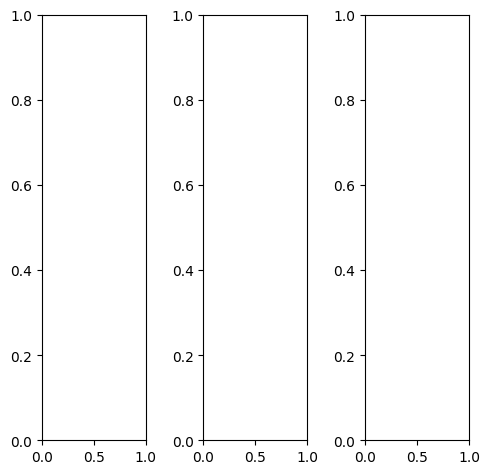

tensor([[[0.5020, 0.5020, 0.5020,  ..., 0.4745, 0.4706, 0.4588],
         [0.5333, 0.5294, 0.5333,  ..., 0.4980, 0.4902, 0.4824],
         [0.5608, 0.5569, 0.5608,  ..., 0.5216, 0.5137, 0.5020],
         ...,
         [0.7725, 0.7725, 0.7882,  ..., 0.6196, 0.5961, 0.5686],
         [0.7059, 0.7216, 0.7137,  ..., 0.5725, 0.5451, 0.5294],
         [0.5294, 0.5529, 0.5843,  ..., 0.4196, 0.3922, 0.4627]],

        [[0.5020, 0.5020, 0.5020,  ..., 0.4745, 0.4706, 0.4588],
         [0.5333, 0.5294, 0.5333,  ..., 0.4980, 0.4902, 0.4824],
         [0.5608, 0.5569, 0.5608,  ..., 0.5216, 0.5137, 0.5020],
         ...,
         [0.7725, 0.7725, 0.7882,  ..., 0.6196, 0.5961, 0.5686],
         [0.7059, 0.7216, 0.7137,  ..., 0.5725, 0.5451, 0.5294],
         [0.5294, 0.5529, 0.5843,  ..., 0.4196, 0.3922, 0.4627]],

        [[0.5020, 0.5020, 0.5020,  ..., 0.4745, 0.4706, 0.4588],
         [0.5333, 0.5294, 0.5333,  ..., 0.4980, 0.4902, 0.4824],
         [0.5608, 0.5569, 0.5608,  ..., 0.5216, 0.5137, 0.

tensor([[[0.4863, 0.4863, 0.4863,  ..., 0.4627, 0.4510, 0.4314],
         [0.5176, 0.5137, 0.5176,  ..., 0.4784, 0.4706, 0.4549],
         [0.5451, 0.5412, 0.5451,  ..., 0.4980, 0.4863, 0.4745],
         ...,
         [0.7569, 0.7569, 0.7725,  ..., 0.6039, 0.5804, 0.5412],
         [0.6902, 0.7059, 0.6980,  ..., 0.5569, 0.5255, 0.5059],
         [0.5137, 0.5373, 0.5686,  ..., 0.4039, 0.3765, 0.4471]],

        [[0.5176, 0.5137, 0.5137,  ..., 0.4863, 0.4824, 0.4745],
         [0.5490, 0.5451, 0.5451,  ..., 0.5098, 0.5020, 0.4980],
         [0.5765, 0.5725, 0.5765,  ..., 0.5412, 0.5333, 0.5216],
         ...,
         [0.7922, 0.7922, 0.8078,  ..., 0.6353, 0.6118, 0.5882],
         [0.7255, 0.7373, 0.7294,  ..., 0.5843, 0.5608, 0.5490],
         [0.5451, 0.5686, 0.6000,  ..., 0.4353, 0.4039, 0.4784]],

        [[0.4667, 0.4745, 0.4863,  ..., 0.4549, 0.4471, 0.4392],
         [0.4980, 0.5059, 0.5137,  ..., 0.4745, 0.4706, 0.4627],
         [0.5255, 0.5216, 0.5294,  ..., 0.4902, 0.4824, 0.

tensor([[[ 0.0178,  0.0889, -0.1075,  ...,  0.0545,  0.0491,  0.0600],
         [ 0.1695, -0.0900, -0.1071,  ...,  0.0449,  0.0067,  0.0178],
         [-0.0122, -0.0636, -0.1841,  ...,  0.0957,  0.0703,  0.0650],
         ...,
         [ 0.6494,  0.6500,  0.6429,  ...,  0.3921,  0.3088,  0.2658],
         [ 0.5087,  0.5338,  0.5286,  ...,  0.2634,  0.1903,  0.1891],
         [ 0.2876,  0.2480,  0.2844,  ...,  0.0283, -0.0077,  0.0777]],

        [[ 0.1482,  0.2166, -0.0169,  ...,  0.1098,  0.1260,  0.1255],
         [ 0.1421,  0.0048, -0.2366,  ...,  0.1129,  0.1106,  0.0709],
         [ 0.0549,  0.1252, -0.1918,  ...,  0.1354,  0.1323,  0.0837],
         ...,
         [ 0.5880,  0.5947,  0.6251,  ...,  0.3899,  0.3246,  0.2366],
         [ 0.4773,  0.4632,  0.4816,  ...,  0.2702,  0.2028,  0.1549],
         [ 0.2292,  0.1889,  0.2246,  ...,  0.0269, -0.0252,  0.0360]],

        [[ 0.2672,  0.0870,  0.1507,  ...,  0.1611,  0.1787,  0.2159],
         [ 0.3250,  0.0558,  0.0750,  ...,  0

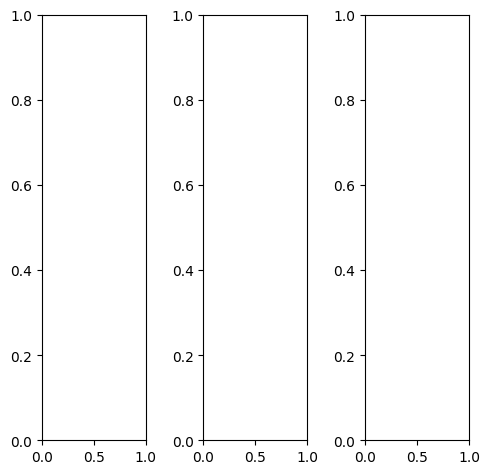

tensor([[[0.6706, 0.6745, 0.5490,  ..., 0.7176, 0.6549, 0.5333],
         [0.7843, 0.8510, 0.7882,  ..., 0.8157, 0.8039, 0.7686],
         [0.8196, 0.8980, 0.9137,  ..., 0.8667, 0.8471, 0.8275],
         ...,
         [0.8706, 0.9294, 0.9059,  ..., 0.7961, 0.8275, 0.8353],
         [0.8745, 0.9333, 0.9059,  ..., 0.8000, 0.8392, 0.8510],
         [0.9255, 0.9176, 0.9059,  ..., 0.8039, 0.7882, 0.7882]],

        [[0.6706, 0.6745, 0.5490,  ..., 0.7176, 0.6549, 0.5333],
         [0.7843, 0.8510, 0.7882,  ..., 0.8157, 0.8039, 0.7686],
         [0.8196, 0.8980, 0.9137,  ..., 0.8667, 0.8471, 0.8275],
         ...,
         [0.8706, 0.9294, 0.9059,  ..., 0.7961, 0.8275, 0.8353],
         [0.8745, 0.9333, 0.9059,  ..., 0.8000, 0.8392, 0.8510],
         [0.9255, 0.9176, 0.9059,  ..., 0.8039, 0.7882, 0.7882]],

        [[0.6706, 0.6745, 0.5490,  ..., 0.7176, 0.6549, 0.5333],
         [0.7843, 0.8510, 0.7882,  ..., 0.8157, 0.8039, 0.7686],
         [0.8196, 0.8980, 0.9137,  ..., 0.8667, 0.8471, 0.

tensor([[[0.6745, 0.6784, 0.5569,  ..., 0.7137, 0.6510, 0.5294],
         [0.7922, 0.8588, 0.8000,  ..., 0.8078, 0.8000, 0.7647],
         [0.8314, 0.9098, 0.9255,  ..., 0.8549, 0.8353, 0.8196],
         ...,
         [0.8863, 0.9490, 0.9294,  ..., 0.7843, 0.8157, 0.8196],
         [0.8902, 0.9529, 0.9333,  ..., 0.7922, 0.8314, 0.8431],
         [0.9294, 0.9255, 0.9176,  ..., 0.8000, 0.7843, 0.7843]],

        [[0.6706, 0.6745, 0.5490,  ..., 0.7176, 0.6588, 0.5373],
         [0.7843, 0.8510, 0.7882,  ..., 0.8157, 0.8078, 0.7725],
         [0.8196, 0.8980, 0.9137,  ..., 0.8706, 0.8510, 0.8314],
         ...,
         [0.8667, 0.9255, 0.8980,  ..., 0.7961, 0.8314, 0.8392],
         [0.8706, 0.9255, 0.8980,  ..., 0.8000, 0.8392, 0.8510],
         [0.9255, 0.9137, 0.9020,  ..., 0.8039, 0.7882, 0.7882]],

        [[0.6588, 0.6627, 0.5412,  ..., 0.7216, 0.6549, 0.5255],
         [0.7529, 0.8196, 0.7647,  ..., 0.8196, 0.8078, 0.7686],
         [0.7843, 0.8549, 0.8902,  ..., 0.8745, 0.8549, 0.

tensor([[[0.5642, 0.5047, 0.2746,  ..., 0.4719, 0.4196, 0.4393],
         [0.5982, 0.5516, 0.5077,  ..., 0.4717, 0.5041, 0.5514],
         [0.5367, 0.5709, 0.4542,  ..., 0.5305, 0.5421, 0.5997],
         ...,
         [0.7596, 0.7778, 0.7252,  ..., 0.6484, 0.6680, 0.7403],
         [0.7405, 0.7619, 0.7178,  ..., 0.6586, 0.7115, 0.7685],
         [0.8193, 0.8093, 0.7695,  ..., 0.7212, 0.7311, 0.7414]],

        [[0.5978, 0.5791, 0.3503,  ..., 0.5998, 0.5642, 0.5069],
         [0.5861, 0.4641, 0.4706,  ..., 0.6394, 0.6602, 0.7013],
         [0.6635, 0.6345, 0.5846,  ..., 0.6739, 0.6587, 0.7164],
         ...,
         [0.7196, 0.7363, 0.7173,  ..., 0.6452, 0.6584, 0.7277],
         [0.7184, 0.7315, 0.7079,  ..., 0.6509, 0.6928, 0.7448],
         [0.7599, 0.7754, 0.7455,  ..., 0.6873, 0.6899, 0.7036]],

        [[0.7158, 0.6416, 0.5366,  ..., 0.8219, 0.7707, 0.6974],
         [0.7457, 0.6921, 0.7057,  ..., 0.8481, 0.8734, 0.8593],
         [0.6389, 0.6666, 0.6074,  ..., 0.8507, 0.8667, 0.

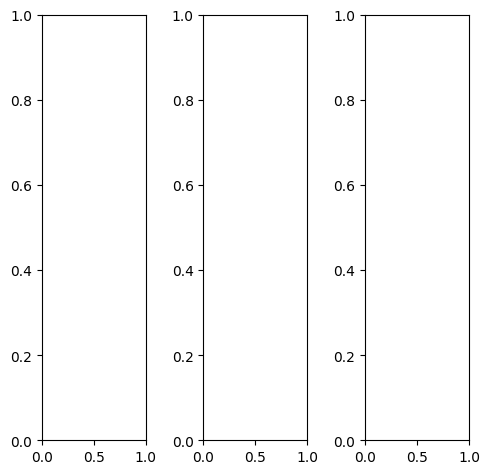

tensor([[[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.8980],
         ...,
         [0.9882, 0.9922, 0.9922,  ..., 0.9765, 0.9804, 0.9765],
         [0.9882, 0.9961, 0.9961,  ..., 0.9765, 0.9804, 0.9765],
         [0.9922, 1.0000, 1.0000,  ..., 0.9843, 0.9843, 0.9843]],

        [[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.8980],
         ...,
         [0.9882, 0.9922, 0.9922,  ..., 0.9765, 0.9804, 0.9765],
         [0.9882, 0.9961, 0.9961,  ..., 0.9765, 0.9804, 0.9765],
         [0.9922, 1.0000, 1.0000,  ..., 0.9843, 0.9843, 0.9843]],

        [[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.

tensor([[[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.8980],
         ...,
         [0.9882, 0.9922, 0.9922,  ..., 0.9765, 0.9804, 0.9765],
         [0.9882, 0.9961, 0.9961,  ..., 0.9765, 0.9804, 0.9765],
         [0.9922, 1.0000, 1.0000,  ..., 0.9843, 0.9843, 0.9843]],

        [[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.8980],
         ...,
         [0.9882, 0.9922, 0.9922,  ..., 0.9765, 0.9804, 0.9765],
         [0.9882, 0.9961, 0.9961,  ..., 0.9765, 0.9804, 0.9765],
         [0.9922, 1.0000, 1.0000,  ..., 0.9843, 0.9843, 0.9843]],

        [[0.9020, 0.9059, 0.9059,  ..., 0.8980, 0.8941, 0.8902],
         [0.9098, 0.9098, 0.9098,  ..., 0.9059, 0.8980, 0.8941],
         [0.9137, 0.9176, 0.9176,  ..., 0.9098, 0.9059, 0.

tensor([[[0.3864, 0.3062, 0.2412,  ..., 0.4111, 0.4315, 0.4839],
         [0.3533, 0.1422, 0.1024,  ..., 0.3839, 0.3827, 0.4400],
         [0.2680, 0.1237, 0.0302,  ..., 0.3688, 0.3990, 0.4398],
         ...,
         [0.5851, 0.5878, 0.5386,  ..., 0.5640, 0.5652, 0.5992],
         [0.5839, 0.5885, 0.5446,  ..., 0.5553, 0.5929, 0.6113],
         [0.6121, 0.5975, 0.5837,  ..., 0.5949, 0.6042, 0.6071]],

        [[0.4901, 0.4351, 0.4529,  ..., 0.4887, 0.5361, 0.5177],
         [0.3767, 0.2146, 0.1503,  ..., 0.5029, 0.5173, 0.5123],
         [0.4480, 0.3068, 0.3102,  ..., 0.4819, 0.5238, 0.5184],
         ...,
         [0.5279, 0.5538, 0.5327,  ..., 0.5081, 0.5372, 0.5435],
         [0.5377, 0.5447, 0.5204,  ..., 0.5314, 0.5460, 0.5677],
         [0.5591, 0.5644, 0.5504,  ..., 0.5418, 0.5683, 0.5662]],

        [[0.6443, 0.5036, 0.5832,  ..., 0.6643, 0.6844, 0.6714],
         [0.5575, 0.4318, 0.3978,  ..., 0.6537, 0.6750, 0.6955],
         [0.4675, 0.4381, 0.3254,  ..., 0.6577, 0.6926, 0.

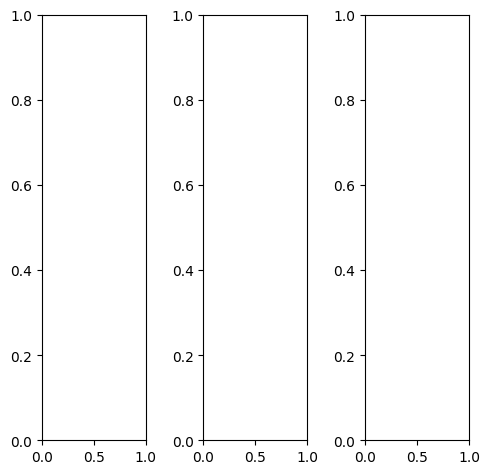

tensor([[[0.6745, 0.6157, 0.6118,  ..., 0.6000, 0.7176, 0.6510],
         [0.6000, 0.5059, 0.5490,  ..., 0.6118, 0.6784, 0.6314],
         [0.6431, 0.5922, 0.6000,  ..., 0.6157, 0.6784, 0.6431],
         ...,
         [0.4000, 0.3843, 0.3843,  ..., 0.5451, 0.3686, 0.3529],
         [0.3922, 0.4275, 0.5216,  ..., 0.4392, 0.4431, 0.4314],
         [0.6471, 0.6392, 0.7020,  ..., 0.4510, 0.4431, 0.4510]],

        [[0.6745, 0.6157, 0.6118,  ..., 0.6000, 0.7176, 0.6510],
         [0.6000, 0.5059, 0.5490,  ..., 0.6118, 0.6784, 0.6314],
         [0.6431, 0.5922, 0.6000,  ..., 0.6157, 0.6784, 0.6431],
         ...,
         [0.4000, 0.3843, 0.3843,  ..., 0.5451, 0.3686, 0.3529],
         [0.3922, 0.4275, 0.5216,  ..., 0.4392, 0.4431, 0.4314],
         [0.6471, 0.6392, 0.7020,  ..., 0.4510, 0.4431, 0.4510]],

        [[0.6745, 0.6157, 0.6118,  ..., 0.6000, 0.7176, 0.6510],
         [0.6000, 0.5059, 0.5490,  ..., 0.6118, 0.6784, 0.6314],
         [0.6431, 0.5922, 0.6000,  ..., 0.6157, 0.6784, 0.

tensor([[[0.8863, 0.8745, 0.9333,  ..., 0.6157, 0.7765, 0.6980],
         [0.8549, 0.7922, 0.8745,  ..., 0.6510, 0.7176, 0.6784],
         [0.7961, 0.7686, 0.8588,  ..., 0.6745, 0.7176, 0.7255],
         ...,
         [0.4039, 0.3961, 0.3961,  ..., 0.5333, 0.3490, 0.3333],
         [0.3882, 0.4235, 0.5176,  ..., 0.4275, 0.4235, 0.4078],
         [0.6431, 0.6353, 0.6980,  ..., 0.4392, 0.4235, 0.4275]],

        [[0.6118, 0.5373, 0.4824,  ..., 0.6627, 0.7608, 0.6980],
         [0.5294, 0.4196, 0.4196,  ..., 0.6667, 0.7451, 0.6902],
         [0.6314, 0.5686, 0.5098,  ..., 0.6549, 0.7490, 0.6824],
         ...,
         [0.4275, 0.3804, 0.3725,  ..., 0.5882, 0.4235, 0.4039],
         [0.4353, 0.4588, 0.5529,  ..., 0.4863, 0.5020, 0.4863],
         [0.6824, 0.6706, 0.7294,  ..., 0.5020, 0.4980, 0.5059]],

        [[0.4431, 0.3529, 0.4235,  ..., 0.2471, 0.3490, 0.2745],
         [0.3059, 0.2000, 0.3529,  ..., 0.2431, 0.2471, 0.2078],
         [0.2980, 0.2549, 0.3922,  ..., 0.2588, 0.2196, 0.

tensor([[[0.5938, 0.5176, 0.5486,  ..., 0.4742, 0.5906, 0.5559],
         [0.5404, 0.3555, 0.4701,  ..., 0.4985, 0.5822, 0.5248],
         [0.5536, 0.5162, 0.4810,  ..., 0.5467, 0.6033, 0.5448],
         ...,
         [0.3577, 0.3953, 0.3728,  ..., 0.5749, 0.3509, 0.2908],
         [0.3418, 0.4211, 0.5306,  ..., 0.4273, 0.3920, 0.3823],
         [0.6402, 0.6449, 0.7246,  ..., 0.3640, 0.3705, 0.3906]],

        [[0.6498, 0.5918, 0.6445,  ..., 0.6046, 0.7382, 0.6823],
         [0.5555, 0.3979, 0.4894,  ..., 0.6437, 0.7288, 0.6819],
         [0.6393, 0.5625, 0.5918,  ..., 0.6804, 0.7275, 0.6801],
         ...,
         [0.3499, 0.3671, 0.3712,  ..., 0.5630, 0.3448, 0.2769],
         [0.3440, 0.4280, 0.5216,  ..., 0.4309, 0.4369, 0.3951],
         [0.6093, 0.6499, 0.7147,  ..., 0.4013, 0.4020, 0.4017]],

        [[0.7474, 0.6822, 0.6834,  ..., 0.8219, 0.9512, 0.8563],
         [0.6871, 0.5867, 0.6492,  ..., 0.8453, 0.9417, 0.8487],
         [0.6630, 0.6409, 0.6156,  ..., 0.8478, 0.9464, 0.

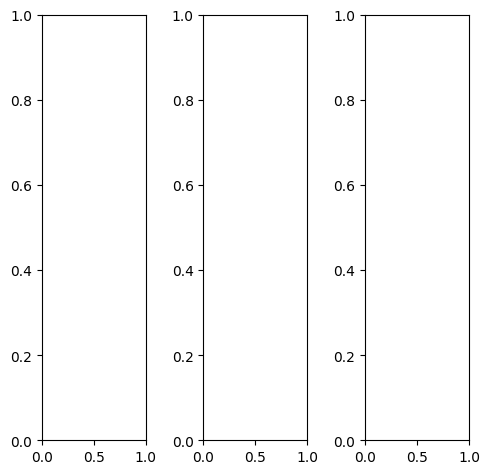

EPOCH: 29.510  trn_loss: 0.004  (3604.50s - 8609.93s remaining)

tensor([[[0.1098, 0.1020, 0.1176,  ..., 0.5490, 0.5020, 0.4549],
         [0.0980, 0.0784, 0.1176,  ..., 0.4431, 0.4078, 0.3765],
         [0.0941, 0.0706, 0.1098,  ..., 0.3804, 0.3529, 0.3333],
         ...,
         [0.1608, 0.1647, 0.1765,  ..., 0.0980, 0.1686, 0.2118],
         [0.1922, 0.1804, 0.1686,  ..., 0.1020, 0.1608, 0.2000],
         [0.1843, 0.1412, 0.1333,  ..., 0.1098, 0.1529, 0.1961]],

        [[0.1098, 0.1020, 0.1176,  ..., 0.5490, 0.5020, 0.4549],
         [0.0980, 0.0784, 0.1176,  ..., 0.4431, 0.4078, 0.3765],
         [0.0941, 0.0706, 0.1098,  ..., 0.3804, 0.3529, 0.3333],
         ...,
         [0.1608, 0.1647, 0.1765,  ..., 0.0980, 0.1686, 0.2118],
         [0.1922, 0.1804, 0.1686,  ..., 0.1020, 0.1608, 0.2000],
         [0.1843, 0.1412, 0.1333,  ..., 0.1098, 0.1529, 0.1961]],

        [[0.1098, 0.1020, 0.1176,  ..., 0.5490, 0.5020, 0.4549],
         [0.0980, 0.0784, 0.1176,  ..., 0.4431, 0.4078, 0.3765],
         [0.0941, 0.0706, 0.1098,  ..., 0.3804, 0.3529, 0.

tensor([[[0.1098, 0.1020, 0.1137,  ..., 0.4980, 0.4549, 0.4157],
         [0.0980, 0.0784, 0.1176,  ..., 0.4039, 0.3725, 0.3412],
         [0.0941, 0.0706, 0.1098,  ..., 0.3529, 0.3255, 0.3059],
         ...,
         [0.2118, 0.2196, 0.2353,  ..., 0.1176, 0.1804, 0.2235],
         [0.2431, 0.2275, 0.2157,  ..., 0.1176, 0.1647, 0.2078],
         [0.2275, 0.1725, 0.1686,  ..., 0.1294, 0.1608, 0.2039]],

        [[0.1098, 0.1020, 0.1176,  ..., 0.5686, 0.5216, 0.4706],
         [0.1020, 0.0824, 0.1176,  ..., 0.4588, 0.4196, 0.3882],
         [0.0941, 0.0745, 0.1137,  ..., 0.3922, 0.3608, 0.3412],
         ...,
         [0.1490, 0.1529, 0.1647,  ..., 0.0980, 0.1725, 0.2118],
         [0.1804, 0.1686, 0.1569,  ..., 0.1020, 0.1647, 0.2039],
         [0.1765, 0.1373, 0.1294,  ..., 0.1098, 0.1569, 0.2000]],

        [[0.0980, 0.0941, 0.1137,  ..., 0.5804, 0.5294, 0.4745],
         [0.0863, 0.0706, 0.1059,  ..., 0.4706, 0.4275, 0.3961],
         [0.0824, 0.0627, 0.0941,  ..., 0.4078, 0.3725, 0.

tensor([[[ 0.1169,  0.1000,  0.0109,  ...,  0.6564,  0.6014,  0.5858],
         [ 0.2143, -0.0093,  0.0517,  ...,  0.5761,  0.5673,  0.5280],
         [-0.0216, -0.1376, -0.0827,  ...,  0.5101,  0.5042,  0.4752],
         ...,
         [ 0.2839,  0.3009,  0.3039,  ...,  0.2664,  0.3524,  0.4111],
         [ 0.3165,  0.3211,  0.3149,  ...,  0.2698,  0.3538,  0.3888],
         [ 0.3186,  0.2613,  0.2387,  ...,  0.2600,  0.2985,  0.3859]],

        [[ 0.2160,  0.1658,  0.0674,  ...,  0.7341,  0.6966,  0.6317],
         [ 0.1923,  0.0034, -0.1390,  ...,  0.6575,  0.6417,  0.5919],
         [ 0.0977, -0.1006, -0.1034,  ...,  0.5902,  0.5806,  0.5346],
         ...,
         [ 0.2982,  0.3010,  0.3165,  ...,  0.2329,  0.3089,  0.3612],
         [ 0.3259,  0.3338,  0.3107,  ...,  0.2289,  0.2987,  0.3406],
         [ 0.3235,  0.2779,  0.2616,  ...,  0.2242,  0.2695,  0.3438]],

        [[ 0.2923,  0.1702,  0.2015,  ...,  0.8756,  0.8266,  0.7390],
         [ 0.2545,  0.0689,  0.2061,  ...,  0

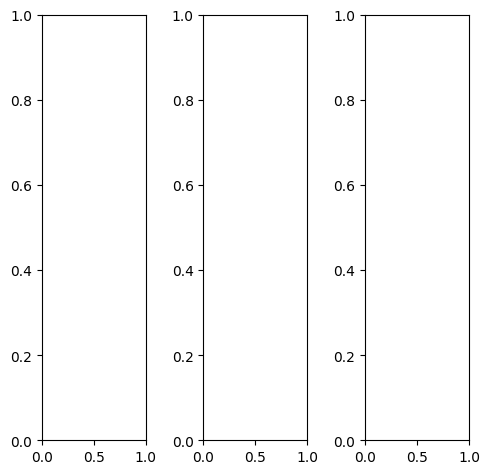

tensor([[[0.5255, 0.4667, 0.4353,  ..., 0.4235, 0.4275, 0.3961],
         [0.4745, 0.4235, 0.4353,  ..., 0.4196, 0.4118, 0.4078],
         [0.4667, 0.4275, 0.4667,  ..., 0.4431, 0.4314, 0.4275],
         ...,
         [0.5098, 0.4667, 0.4745,  ..., 0.3843, 0.3961, 0.3882],
         [0.4784, 0.4353, 0.4392,  ..., 0.4157, 0.4549, 0.4745],
         [0.4745, 0.4314, 0.4549,  ..., 0.4471, 0.4627, 0.4980]],

        [[0.5255, 0.4667, 0.4353,  ..., 0.4235, 0.4275, 0.3961],
         [0.4745, 0.4235, 0.4353,  ..., 0.4196, 0.4118, 0.4078],
         [0.4667, 0.4275, 0.4667,  ..., 0.4431, 0.4314, 0.4275],
         ...,
         [0.5098, 0.4667, 0.4745,  ..., 0.3843, 0.3961, 0.3882],
         [0.4784, 0.4353, 0.4392,  ..., 0.4157, 0.4549, 0.4745],
         [0.4745, 0.4314, 0.4549,  ..., 0.4471, 0.4627, 0.4980]],

        [[0.5255, 0.4667, 0.4353,  ..., 0.4235, 0.4275, 0.3961],
         [0.4745, 0.4235, 0.4353,  ..., 0.4196, 0.4118, 0.4078],
         [0.4667, 0.4275, 0.4667,  ..., 0.4431, 0.4314, 0.

tensor([[[0.4667, 0.4078, 0.3961,  ..., 0.3725, 0.3804, 0.3608],
         [0.4157, 0.3686, 0.3961,  ..., 0.3686, 0.3647, 0.3725],
         [0.4078, 0.3725, 0.4275,  ..., 0.3922, 0.3843, 0.3882],
         ...,
         [0.4431, 0.4039, 0.4078,  ..., 0.3569, 0.3686, 0.3647],
         [0.4196, 0.3765, 0.3804,  ..., 0.3765, 0.4196, 0.4353],
         [0.4157, 0.3765, 0.4000,  ..., 0.4000, 0.4118, 0.4471]],

        [[0.5843, 0.5255, 0.4863,  ..., 0.4863, 0.4902, 0.4471],
         [0.5412, 0.4902, 0.4941,  ..., 0.4824, 0.4745, 0.4627],
         [0.5412, 0.4980, 0.5255,  ..., 0.5059, 0.4941, 0.4824],
         ...,
         [0.5882, 0.5412, 0.5451,  ..., 0.4314, 0.4431, 0.4314],
         [0.5529, 0.5059, 0.5098,  ..., 0.4706, 0.5098, 0.5255],
         [0.5412, 0.4980, 0.5216,  ..., 0.5137, 0.5255, 0.5608]],

        [[0.3608, 0.3137, 0.2588,  ..., 0.2235, 0.2314, 0.2275],
         [0.2784, 0.2275, 0.2275,  ..., 0.2196, 0.2118, 0.2314],
         [0.2471, 0.2157, 0.2627,  ..., 0.2471, 0.2314, 0.

tensor([[[0.3825, 0.2503, 0.1575,  ..., 0.2321, 0.2457, 0.2458],
         [0.3237, 0.1312, 0.1053,  ..., 0.2203, 0.1926, 0.2115],
         [0.2858, 0.1682, 0.1173,  ..., 0.2654, 0.2301, 0.2298],
         ...,
         [0.4924, 0.5015, 0.4786,  ..., 0.3542, 0.3470, 0.3342],
         [0.4386, 0.4332, 0.4128,  ..., 0.3835, 0.4120, 0.4336],
         [0.4161, 0.3824, 0.3986,  ..., 0.4098, 0.4279, 0.4573]],

        [[0.4481, 0.3386, 0.3095,  ..., 0.3740, 0.4086, 0.3426],
         [0.3697, 0.2175, 0.1154,  ..., 0.3793, 0.3892, 0.3378],
         [0.3941, 0.2097, 0.2552,  ..., 0.4224, 0.4023, 0.3501],
         ...,
         [0.4816, 0.4620, 0.4750,  ..., 0.3977, 0.3909, 0.3172],
         [0.4300, 0.3946, 0.3946,  ..., 0.4249, 0.4528, 0.4322],
         [0.4155, 0.3666, 0.4171,  ..., 0.4087, 0.4384, 0.4519]],

        [[0.5672, 0.4088, 0.3625,  ..., 0.5768, 0.5958, 0.5383],
         [0.5021, 0.3664, 0.3044,  ..., 0.5939, 0.6016, 0.5659],
         [0.4301, 0.3432, 0.2956,  ..., 0.6220, 0.6134, 0.

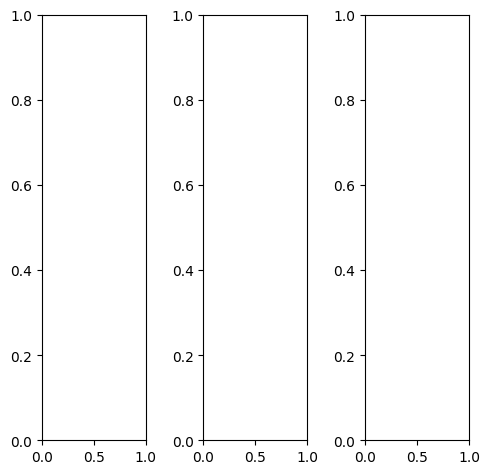

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.2902, 0.2392, 0.2392],
         [0.0000, 0.0000, 0.0000,  ..., 0.2510, 0.2431, 0.2510],
         [0.0000, 0.0000, 0.0000,  ..., 0.2471, 0.2588, 0.2471],
         ...,
         [0.4471, 0.4353, 0.4196,  ..., 0.5020, 0.5686, 0.6196],
         [0.3451, 0.3137, 0.2902,  ..., 0.5922, 0.6196, 0.6157],
         [0.2157, 0.2039, 0.1882,  ..., 0.6078, 0.6078, 0.6000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.2902, 0.2392, 0.2392],
         [0.0000, 0.0000, 0.0000,  ..., 0.2510, 0.2431, 0.2510],
         [0.0000, 0.0000, 0.0000,  ..., 0.2471, 0.2588, 0.2471],
         ...,
         [0.4471, 0.4353, 0.4196,  ..., 0.5020, 0.5686, 0.6196],
         [0.3451, 0.3137, 0.2902,  ..., 0.5922, 0.6196, 0.6157],
         [0.2157, 0.2039, 0.1882,  ..., 0.6078, 0.6078, 0.6000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.2902, 0.2392, 0.2392],
         [0.0000, 0.0000, 0.0000,  ..., 0.2510, 0.2431, 0.2510],
         [0.0000, 0.0000, 0.0000,  ..., 0.2471, 0.2588, 0.

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.3765, 0.3216, 0.3098],
         [0.0000, 0.0000, 0.0000,  ..., 0.3373, 0.3176, 0.3176],
         [0.0000, 0.0000, 0.0000,  ..., 0.3216, 0.3294, 0.3098],
         ...,
         [0.4863, 0.4667, 0.4471,  ..., 0.5451, 0.6118, 0.6627],
         [0.3725, 0.3412, 0.3176,  ..., 0.6392, 0.6627, 0.6627],
         [0.2510, 0.2314, 0.2196,  ..., 0.6549, 0.6510, 0.6471]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.2941, 0.2431, 0.2471],
         [0.0000, 0.0000, 0.0000,  ..., 0.2549, 0.2471, 0.2627],
         [0.0000, 0.0000, 0.0000,  ..., 0.2510, 0.2667, 0.2549],
         ...,
         [0.4471, 0.4392, 0.4235,  ..., 0.5059, 0.5686, 0.6157],
         [0.3529, 0.3216, 0.2980,  ..., 0.5922, 0.6157, 0.6078],
         [0.2235, 0.2118, 0.1961,  ..., 0.6000, 0.6000, 0.5922]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0471, 0.0196, 0.0196],
         [0.0000, 0.0000, 0.0000,  ..., 0.0196, 0.0275, 0.0275],
         [0.0000, 0.0000, 0.0000,  ..., 0.0196, 0.0275, 0.

tensor([[[-0.1432, -0.1840, -0.2499,  ...,  0.2995,  0.2338,  0.2553],
         [-0.0549, -0.3046, -0.1738,  ...,  0.2136,  0.1944,  0.2383],
         [-0.2832, -0.2814, -0.2352,  ...,  0.1909,  0.2173,  0.2255],
         ...,
         [ 0.6391,  0.5862,  0.5708,  ...,  0.6456,  0.7635,  0.8542],
         [ 0.4243,  0.3908,  0.3615,  ...,  0.7726,  0.8202,  0.8580],
         [ 0.2727,  0.1979,  0.1774,  ...,  0.8853,  0.8823,  0.8742]],

        [[-0.0115, -0.1336, -0.1233,  ...,  0.3728,  0.3031,  0.2905],
         [-0.0782, -0.5153, -0.4045,  ...,  0.2941,  0.3003,  0.2776],
         [-0.1482, -0.2631, -0.2011,  ...,  0.2880,  0.3059,  0.2713],
         ...,
         [ 0.6224,  0.5485,  0.5576,  ...,  0.6411,  0.7716,  0.8964],
         [ 0.4334,  0.3718,  0.3627,  ...,  0.7915,  0.8450,  0.8833],
         [ 0.2549,  0.1763,  0.1783,  ...,  0.8882,  0.8801,  0.8592]],

        [[ 0.1578, -0.1263, -0.0578,  ...,  0.4485,  0.3882,  0.3988],
         [ 0.0838, -0.2418, -0.0911,  ...,  0

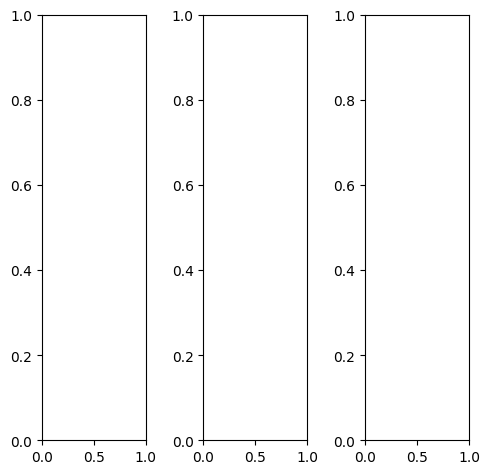

tensor([[[0.4078, 0.3333, 0.3333,  ..., 0.1412, 0.1412, 0.1647],
         [0.3882, 0.2824, 0.2392,  ..., 0.1686, 0.1922, 0.1961],
         [0.3333, 0.1725, 0.1804,  ..., 0.1961, 0.2275, 0.2235],
         ...,
         [0.2588, 0.2431, 0.2784,  ..., 0.5490, 0.3490, 0.2902],
         [0.2549, 0.2706, 0.2510,  ..., 0.5098, 0.3098, 0.3216],
         [0.2431, 0.2667, 0.2824,  ..., 0.4235, 0.3176, 0.3490]],

        [[0.4078, 0.3333, 0.3333,  ..., 0.1412, 0.1412, 0.1647],
         [0.3882, 0.2824, 0.2392,  ..., 0.1686, 0.1922, 0.1961],
         [0.3333, 0.1725, 0.1804,  ..., 0.1961, 0.2275, 0.2235],
         ...,
         [0.2588, 0.2431, 0.2784,  ..., 0.5490, 0.3490, 0.2902],
         [0.2549, 0.2706, 0.2510,  ..., 0.5098, 0.3098, 0.3216],
         [0.2431, 0.2667, 0.2824,  ..., 0.4235, 0.3176, 0.3490]],

        [[0.4078, 0.3333, 0.3333,  ..., 0.1412, 0.1412, 0.1647],
         [0.3882, 0.2824, 0.2392,  ..., 0.1686, 0.1922, 0.1961],
         [0.3333, 0.1725, 0.1804,  ..., 0.1961, 0.2275, 0.

tensor([[[0.3686, 0.3255, 0.3333,  ..., 0.1725, 0.1961, 0.2078],
         [0.3608, 0.2824, 0.2510,  ..., 0.2000, 0.2510, 0.2275],
         [0.3137, 0.1804, 0.2000,  ..., 0.2392, 0.3020, 0.2667],
         ...,
         [0.0157, 0.0196, 0.1294,  ..., 0.5529, 0.3608, 0.3098],
         [0.0039, 0.0196, 0.0471,  ..., 0.5176, 0.3333, 0.3608],
         [0.0000, 0.0078, 0.0353,  ..., 0.4314, 0.3451, 0.3922]],

        [[0.4157, 0.3333, 0.3294,  ..., 0.1255, 0.1216, 0.1529],
         [0.3961, 0.2784, 0.2314,  ..., 0.1529, 0.1725, 0.1882],
         [0.3373, 0.1686, 0.1725,  ..., 0.1765, 0.2000, 0.2078],
         ...,
         [0.3608, 0.3373, 0.3412,  ..., 0.5490, 0.3490, 0.2863],
         [0.3608, 0.3765, 0.3333,  ..., 0.5098, 0.3020, 0.3059],
         [0.3490, 0.3765, 0.3843,  ..., 0.4235, 0.3098, 0.3294]],

        [[0.4627, 0.3569, 0.3412,  ..., 0.1294, 0.0941, 0.1255],
         [0.4353, 0.2941, 0.2353,  ..., 0.1529, 0.1451, 0.1647],
         [0.3725, 0.1765, 0.1647,  ..., 0.1686, 0.1608, 0.

tensor([[[ 0.3549,  0.2381,  0.1270,  ...,  0.1476,  0.1539,  0.2221],
         [ 0.3640,  0.0807,  0.0349,  ...,  0.1542,  0.1837,  0.2184],
         [ 0.1982, -0.0999, -0.1613,  ...,  0.1699,  0.2193,  0.2410],
         ...,
         [ 0.2980,  0.3064,  0.3367,  ...,  0.6080,  0.4283,  0.3885],
         [ 0.2962,  0.3259,  0.3099,  ...,  0.5770,  0.3878,  0.4460],
         [ 0.3121,  0.3259,  0.3299,  ...,  0.5089,  0.3799,  0.4670]],

        [[ 0.4229,  0.3325,  0.1949,  ...,  0.1705,  0.1737,  0.2294],
         [ 0.3498,  0.0481, -0.1376,  ...,  0.1941,  0.2431,  0.2417],
         [ 0.2891, -0.0115, -0.1301,  ...,  0.2086,  0.2540,  0.2638],
         ...,
         [ 0.3123,  0.2929,  0.3399,  ...,  0.5744,  0.3967,  0.3187],
         [ 0.2988,  0.3199,  0.3022,  ...,  0.5812,  0.3574,  0.3906],
         [ 0.2896,  0.3115,  0.3235,  ...,  0.4867,  0.3505,  0.4173]],

        [[ 0.5740,  0.3942,  0.4101,  ...,  0.2710,  0.2818,  0.3418],
         [ 0.5061,  0.2836,  0.2814,  ...,  0

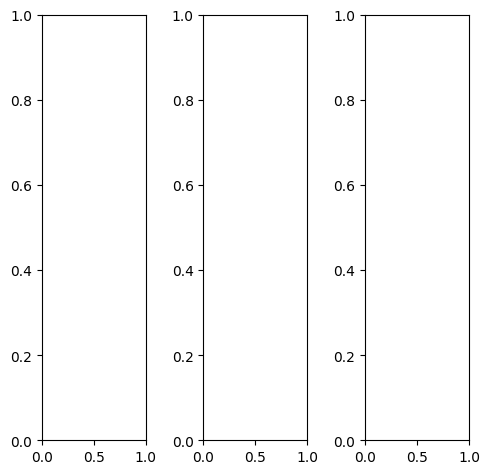

tensor([[[0.5020, 0.4784, 0.4706,  ..., 0.4863, 0.4941, 0.4824],
         [0.4510, 0.4863, 0.4549,  ..., 0.3961, 0.4078, 0.4353],
         [0.4196, 0.4471, 0.4353,  ..., 0.3647, 0.3961, 0.4000],
         ...,
         [0.1804, 0.2078, 0.2588,  ..., 0.3529, 0.3725, 0.3765],
         [0.2941, 0.3176, 0.3176,  ..., 0.3490, 0.3804, 0.4118],
         [0.2627, 0.2824, 0.3216,  ..., 0.3804, 0.4431, 0.4588]],

        [[0.5020, 0.4784, 0.4706,  ..., 0.4863, 0.4941, 0.4824],
         [0.4510, 0.4863, 0.4549,  ..., 0.3961, 0.4078, 0.4353],
         [0.4196, 0.4471, 0.4353,  ..., 0.3647, 0.3961, 0.4000],
         ...,
         [0.1804, 0.2078, 0.2588,  ..., 0.3529, 0.3725, 0.3765],
         [0.2941, 0.3176, 0.3176,  ..., 0.3490, 0.3804, 0.4118],
         [0.2627, 0.2824, 0.3216,  ..., 0.3804, 0.4431, 0.4588]],

        [[0.5020, 0.4784, 0.4706,  ..., 0.4863, 0.4941, 0.4824],
         [0.4510, 0.4863, 0.4549,  ..., 0.3961, 0.4078, 0.4353],
         [0.4196, 0.4471, 0.4353,  ..., 0.3647, 0.3961, 0.

tensor([[[0.6039, 0.5843, 0.6667,  ..., 0.7216, 0.6863, 0.6431],
         [0.5608, 0.6196, 0.6549,  ..., 0.7608, 0.6941, 0.6667],
         [0.5765, 0.6510, 0.6784,  ..., 0.7255, 0.7294, 0.6706],
         ...,
         [0.2078, 0.2118, 0.2431,  ..., 0.3843, 0.4000, 0.3961],
         [0.3098, 0.3020, 0.2784,  ..., 0.3804, 0.4118, 0.4392],
         [0.2706, 0.2706, 0.2902,  ..., 0.4196, 0.4784, 0.4902]],

        [[0.5098, 0.4745, 0.4235,  ..., 0.4196, 0.4471, 0.4510],
         [0.4549, 0.4667, 0.4000,  ..., 0.2627, 0.3098, 0.3686],
         [0.3922, 0.3882, 0.3529,  ..., 0.2235, 0.2745, 0.3059],
         ...,
         [0.1647, 0.1961, 0.2549,  ..., 0.3333, 0.3569, 0.3647],
         [0.2784, 0.3098, 0.3137,  ..., 0.3333, 0.3725, 0.4078],
         [0.2510, 0.2745, 0.3176,  ..., 0.3765, 0.4471, 0.4627]],

        [[0.2039, 0.2078, 0.1961,  ..., 0.2118, 0.2275, 0.2275],
         [0.1569, 0.2275, 0.2078,  ..., 0.1373, 0.1451, 0.1804],
         [0.1569, 0.2196, 0.2157,  ..., 0.1294, 0.1608, 0.

tensor([[[0.6333, 0.5531, 0.4916,  ..., 0.5664, 0.5829, 0.6198],
         [0.5472, 0.4402, 0.3962,  ..., 0.4129, 0.4846, 0.5541],
         [0.4600, 0.4159, 0.2988,  ..., 0.3936, 0.4728, 0.4952],
         ...,
         [0.3053, 0.4105, 0.4990,  ..., 0.5708, 0.6001, 0.6186],
         [0.4960, 0.5725, 0.5922,  ..., 0.5625, 0.6166, 0.6617],
         [0.4501, 0.4994, 0.5615,  ..., 0.6336, 0.7215, 0.7061]],

        [[0.6702, 0.6450, 0.5716,  ..., 0.6790, 0.7148, 0.6879],
         [0.5560, 0.4433, 0.4168,  ..., 0.5441, 0.6031, 0.6609],
         [0.5909, 0.5423, 0.4548,  ..., 0.5217, 0.5765, 0.5916],
         ...,
         [0.2968, 0.3850, 0.4742,  ..., 0.5454, 0.5695, 0.5522],
         [0.4680, 0.5507, 0.5510,  ..., 0.5358, 0.5762, 0.6137],
         [0.4210, 0.4474, 0.5173,  ..., 0.5758, 0.6733, 0.6622]],

        [[0.7899, 0.7554, 0.7101,  ..., 0.9028, 0.9103, 0.8627],
         [0.7183, 0.6610, 0.6464,  ..., 0.7476, 0.8012, 0.8186],
         [0.5857, 0.5766, 0.4742,  ..., 0.7355, 0.7885, 0.

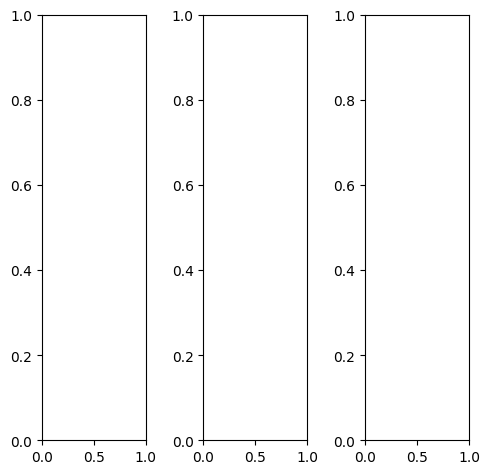

EPOCH: 29.765  trn_loss: 0.005  (3635.08s - 8577.39s remaining)

tensor([[[0.6980, 0.7020, 0.7020,  ..., 0.5569, 0.5725, 0.5843],
         [0.6706, 0.6706, 0.6745,  ..., 0.5843, 0.5843, 0.5765],
         [0.6549, 0.6588, 0.6745,  ..., 0.6118, 0.6000, 0.5922],
         ...,
         [0.3333, 0.3529, 0.3373,  ..., 0.3608, 0.3569, 0.3451],
         [0.3412, 0.3569, 0.3333,  ..., 0.3725, 0.3765, 0.3725],
         [0.3333, 0.3412, 0.3451,  ..., 0.3765, 0.3529, 0.3451]],

        [[0.6980, 0.7020, 0.7020,  ..., 0.5569, 0.5725, 0.5843],
         [0.6706, 0.6706, 0.6745,  ..., 0.5843, 0.5843, 0.5765],
         [0.6549, 0.6588, 0.6745,  ..., 0.6118, 0.6000, 0.5922],
         ...,
         [0.3333, 0.3529, 0.3373,  ..., 0.3608, 0.3569, 0.3451],
         [0.3412, 0.3569, 0.3333,  ..., 0.3725, 0.3765, 0.3725],
         [0.3333, 0.3412, 0.3451,  ..., 0.3765, 0.3529, 0.3451]],

        [[0.6980, 0.7020, 0.7020,  ..., 0.5569, 0.5725, 0.5843],
         [0.6706, 0.6706, 0.6745,  ..., 0.5843, 0.5843, 0.5765],
         [0.6549, 0.6588, 0.6745,  ..., 0.6118, 0.6000, 0.

tensor([[[0.6275, 0.6157, 0.6157,  ..., 0.3882, 0.4196, 0.4471],
         [0.5686, 0.5647, 0.5608,  ..., 0.4118, 0.4275, 0.4157],
         [0.5373, 0.5412, 0.5569,  ..., 0.4510, 0.4471, 0.4392],
         ...,
         [0.3333, 0.3529, 0.3412,  ..., 0.3608, 0.3569, 0.3490],
         [0.3451, 0.3569, 0.3373,  ..., 0.3686, 0.3725, 0.3765],
         [0.3412, 0.3490, 0.3529,  ..., 0.3647, 0.3451, 0.3451]],

        [[0.7137, 0.7216, 0.7255,  ..., 0.6039, 0.6118, 0.6196],
         [0.6980, 0.7020, 0.7059,  ..., 0.6314, 0.6235, 0.6196],
         [0.6863, 0.6902, 0.7059,  ..., 0.6588, 0.6431, 0.6314],
         ...,
         [0.3725, 0.3882, 0.3725,  ..., 0.4000, 0.3961, 0.3843],
         [0.3765, 0.3922, 0.3725,  ..., 0.4118, 0.4157, 0.4078],
         [0.3686, 0.3725, 0.3765,  ..., 0.4196, 0.3961, 0.3804]],

        [[0.8157, 0.8157, 0.8196,  ..., 0.7529, 0.7647, 0.7647],
         [0.8078, 0.8039, 0.8078,  ..., 0.7804, 0.7804, 0.7725],
         [0.8118, 0.7961, 0.8078,  ..., 0.8000, 0.7882, 0.

tensor([[[0.7900, 0.7854, 0.7516,  ..., 0.4909, 0.5239, 0.5921],
         [0.7218, 0.7054, 0.6656,  ..., 0.5032, 0.5491, 0.5820],
         [0.7266, 0.6940, 0.6897,  ..., 0.5703, 0.5702, 0.5885],
         ...,
         [0.3519, 0.3879, 0.3591,  ..., 0.4426, 0.4188, 0.4334],
         [0.3543, 0.3843, 0.3506,  ..., 0.4325, 0.4407, 0.4574],
         [0.3751, 0.3849, 0.3839,  ..., 0.4545, 0.4244, 0.4298]],

        [[0.7552, 0.7980, 0.6782,  ..., 0.6060, 0.6505, 0.6711],
         [0.7146, 0.6178, 0.6391,  ..., 0.6461, 0.6758, 0.7094],
         [0.7433, 0.7205, 0.6667,  ..., 0.6905, 0.6687, 0.7040],
         ...,
         [0.3609, 0.3957, 0.3873,  ..., 0.4285, 0.4113, 0.3875],
         [0.3680, 0.4030, 0.3769,  ..., 0.4273, 0.4294, 0.4274],
         [0.3864, 0.3811, 0.3896,  ..., 0.4254, 0.3960, 0.4008]],

        [[0.7880, 0.8167, 0.7265,  ..., 0.8181, 0.8442, 0.8420],
         [0.7762, 0.7089, 0.7176,  ..., 0.8531, 0.8783, 0.8624],
         [0.7236, 0.6584, 0.6279,  ..., 0.8728, 0.8825, 0.

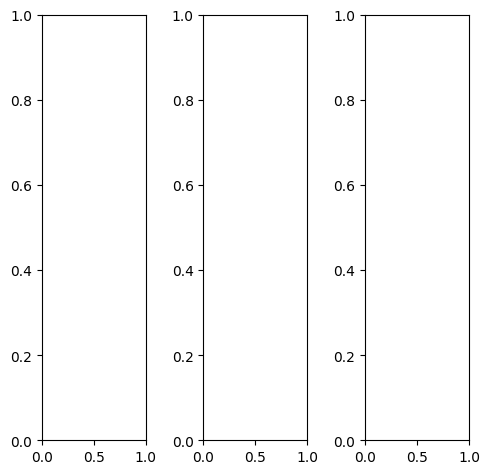

tensor([[[0.8078, 0.7804, 0.7882,  ..., 0.7843, 0.7882, 0.8039],
         [0.7843, 0.7608, 0.7686,  ..., 0.7569, 0.7647, 0.7804],
         [0.7608, 0.7412, 0.7490,  ..., 0.7529, 0.7608, 0.7725],
         ...,
         [0.3412, 0.3294, 0.3255,  ..., 0.3412, 0.3490, 0.3569],
         [0.2392, 0.2314, 0.2392,  ..., 0.2824, 0.2863, 0.3020],
         [0.3686, 0.3490, 0.3373,  ..., 0.2588, 0.2627, 0.2627]],

        [[0.8078, 0.7804, 0.7882,  ..., 0.7843, 0.7882, 0.8039],
         [0.7843, 0.7608, 0.7686,  ..., 0.7569, 0.7647, 0.7804],
         [0.7608, 0.7412, 0.7490,  ..., 0.7529, 0.7608, 0.7725],
         ...,
         [0.3412, 0.3294, 0.3255,  ..., 0.3412, 0.3490, 0.3569],
         [0.2392, 0.2314, 0.2392,  ..., 0.2824, 0.2863, 0.3020],
         [0.3686, 0.3490, 0.3373,  ..., 0.2588, 0.2627, 0.2627]],

        [[0.8078, 0.7804, 0.7882,  ..., 0.7843, 0.7882, 0.8039],
         [0.7843, 0.7608, 0.7686,  ..., 0.7569, 0.7647, 0.7804],
         [0.7608, 0.7412, 0.7490,  ..., 0.7529, 0.7608, 0.

tensor([[[0.7686, 0.7412, 0.7490,  ..., 0.7451, 0.7490, 0.7569],
         [0.7412, 0.7216, 0.7294,  ..., 0.7176, 0.7255, 0.7333],
         [0.7137, 0.6941, 0.7098,  ..., 0.7098, 0.7176, 0.7294],
         ...,
         [0.2510, 0.2431, 0.2392,  ..., 0.2510, 0.2588, 0.2588],
         [0.1294, 0.1255, 0.1333,  ..., 0.1765, 0.1843, 0.2000],
         [0.2706, 0.2510, 0.2392,  ..., 0.1569, 0.1608, 0.1647]],

        [[0.8196, 0.7922, 0.7961,  ..., 0.7961, 0.8000, 0.8157],
         [0.7961, 0.7686, 0.7765,  ..., 0.7647, 0.7725, 0.7922],
         [0.7725, 0.7490, 0.7569,  ..., 0.7608, 0.7686, 0.7804],
         ...,
         [0.3647, 0.3529, 0.3490,  ..., 0.3647, 0.3725, 0.3804],
         [0.2706, 0.2627, 0.2706,  ..., 0.3098, 0.3137, 0.3255],
         [0.3961, 0.3725, 0.3608,  ..., 0.2863, 0.2902, 0.2863]],

        [[0.8588, 0.8392, 0.8471,  ..., 0.8431, 0.8471, 0.8745],
         [0.8431, 0.8235, 0.8314,  ..., 0.8157, 0.8235, 0.8510],
         [0.8314, 0.8118, 0.8196,  ..., 0.8118, 0.8196, 0.

tensor([[[0.7644, 0.7338, 0.6592,  ..., 0.6158, 0.6447, 0.7214],
         [0.7406, 0.6760, 0.6712,  ..., 0.6000, 0.6328, 0.7184],
         [0.6958, 0.6752, 0.5836,  ..., 0.6228, 0.6441, 0.6972],
         ...,
         [0.2779, 0.3132, 0.3240,  ..., 0.3155, 0.3195, 0.3404],
         [0.1616, 0.1565, 0.1693,  ..., 0.2239, 0.2430, 0.2793],
         [0.3277, 0.2926, 0.2903,  ..., 0.1952, 0.1985, 0.2490]],

        [[0.7796, 0.7467, 0.6719,  ..., 0.7174, 0.7554, 0.8016],
         [0.7118, 0.5666, 0.6242,  ..., 0.7110, 0.7284, 0.8271],
         [0.7674, 0.6972, 0.6575,  ..., 0.7243, 0.7362, 0.7910],
         ...,
         [0.2935, 0.3223, 0.3114,  ..., 0.3326, 0.3390, 0.3303],
         [0.1853, 0.1986, 0.2081,  ..., 0.2558, 0.2616, 0.2666],
         [0.3418, 0.3163, 0.3061,  ..., 0.2157, 0.2119, 0.2392]],

        [[0.8414, 0.8086, 0.7742,  ..., 0.9003, 0.9378, 0.9630],
         [0.8264, 0.7369, 0.7782,  ..., 0.8563, 0.9084, 0.9758],
         [0.7610, 0.7032, 0.6585,  ..., 0.8846, 0.9279, 0.

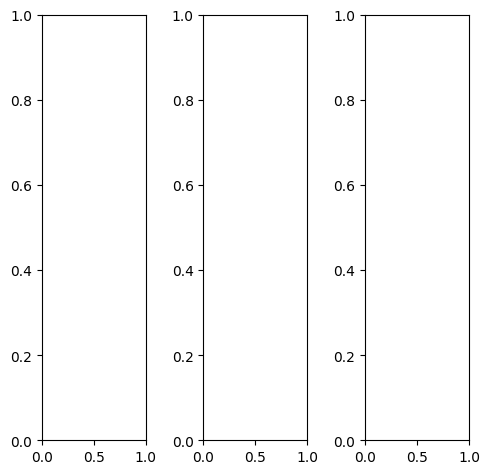

tensor([[[0.8314, 0.8196, 0.8157,  ..., 0.8118, 0.8078, 0.8275],
         [0.7922, 0.7765, 0.7725,  ..., 0.7686, 0.7608, 0.7765],
         [0.7765, 0.7569, 0.7569,  ..., 0.7686, 0.7608, 0.7569],
         ...,
         [0.6314, 0.6627, 0.6745,  ..., 0.7059, 0.7137, 0.7255],
         [0.6118, 0.6353, 0.6627,  ..., 0.6980, 0.6941, 0.7255],
         [0.6902, 0.6902, 0.7098,  ..., 0.7373, 0.7373, 0.7608]],

        [[0.8314, 0.8196, 0.8157,  ..., 0.8118, 0.8078, 0.8275],
         [0.7922, 0.7765, 0.7725,  ..., 0.7686, 0.7608, 0.7765],
         [0.7765, 0.7569, 0.7569,  ..., 0.7686, 0.7608, 0.7569],
         ...,
         [0.6314, 0.6627, 0.6745,  ..., 0.7059, 0.7137, 0.7255],
         [0.6118, 0.6353, 0.6627,  ..., 0.6980, 0.6941, 0.7255],
         [0.6902, 0.6902, 0.7098,  ..., 0.7373, 0.7373, 0.7608]],

        [[0.8314, 0.8196, 0.8157,  ..., 0.8118, 0.8078, 0.8275],
         [0.7922, 0.7765, 0.7725,  ..., 0.7686, 0.7608, 0.7765],
         [0.7765, 0.7569, 0.7569,  ..., 0.7686, 0.7608, 0.

tensor([[[0.8588, 0.8627, 0.8510,  ..., 0.8510, 0.8471, 0.8706],
         [0.8353, 0.8314, 0.8196,  ..., 0.8157, 0.8118, 0.8196],
         [0.8353, 0.8235, 0.8157,  ..., 0.8235, 0.8157, 0.8039],
         ...,
         [0.6549, 0.6902, 0.7059,  ..., 0.7294, 0.7333, 0.7373],
         [0.6392, 0.6627, 0.6902,  ..., 0.7137, 0.7098, 0.7294],
         [0.7137, 0.7137, 0.7333,  ..., 0.7529, 0.7529, 0.7647]],

        [[0.8431, 0.8235, 0.8275,  ..., 0.8157, 0.8078, 0.8314],
         [0.8078, 0.7843, 0.7882,  ..., 0.7765, 0.7686, 0.7804],
         [0.7882, 0.7608, 0.7647,  ..., 0.7765, 0.7686, 0.7647],
         ...,
         [0.6471, 0.6784, 0.6902,  ..., 0.7294, 0.7373, 0.7490],
         [0.6235, 0.6471, 0.6784,  ..., 0.7176, 0.7176, 0.7490],
         [0.6941, 0.6980, 0.7216,  ..., 0.7529, 0.7529, 0.7804]],

        [[0.6863, 0.6863, 0.6784,  ..., 0.6980, 0.6941, 0.7059],
         [0.6000, 0.5922, 0.5804,  ..., 0.5922, 0.5922, 0.6314],
         [0.5725, 0.5608, 0.5529,  ..., 0.5686, 0.5686, 0.

tensor([[[0.5013, 0.4194, 0.3996,  ..., 0.4037, 0.3968, 0.4669],
         [0.4557, 0.2550, 0.3221,  ..., 0.3526, 0.3547, 0.3768],
         [0.3907, 0.3209, 0.2264,  ..., 0.4175, 0.3965, 0.3618],
         ...,
         [0.3142, 0.4165, 0.3936,  ..., 0.4991, 0.5032, 0.4772],
         [0.3040, 0.3718, 0.4055,  ..., 0.4870, 0.4597, 0.4805],
         [0.3816, 0.3815, 0.3935,  ..., 0.4804, 0.5038, 0.5019]],

        [[0.5922, 0.4983, 0.5655,  ..., 0.5535, 0.5884, 0.5665],
         [0.4589, 0.3257, 0.3438,  ..., 0.5210, 0.5261, 0.5547],
         [0.5193, 0.4165, 0.4423,  ..., 0.5753, 0.5326, 0.5239],
         ...,
         [0.3409, 0.4343, 0.4302,  ..., 0.4821, 0.5025, 0.4377],
         [0.3177, 0.3993, 0.4436,  ..., 0.4770, 0.4712, 0.4744],
         [0.4048, 0.3983, 0.4317,  ..., 0.4663, 0.4952, 0.4765]],

        [[0.7334, 0.6211, 0.6680,  ..., 0.8219, 0.8286, 0.7995],
         [0.6491, 0.5592, 0.5274,  ..., 0.7663, 0.7726, 0.7668],
         [0.5887, 0.5372, 0.4686,  ..., 0.8202, 0.7868, 0.

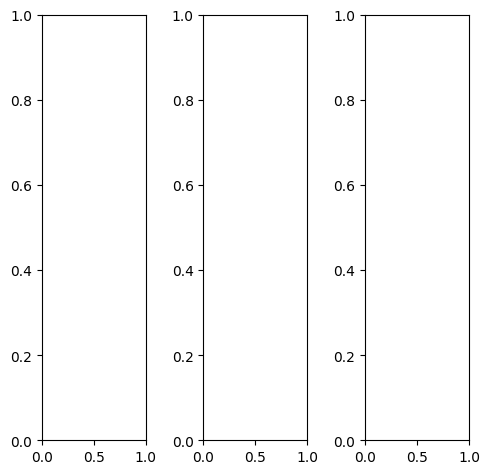

tensor([[[0.5020, 0.5137, 0.5294,  ..., 0.4275, 0.4235, 0.4039],
         [0.4863, 0.4745, 0.4549,  ..., 0.4392, 0.4314, 0.4118],
         [0.4431, 0.4314, 0.4118,  ..., 0.4588, 0.4431, 0.4235],
         ...,
         [0.4510, 0.4706, 0.5412,  ..., 0.2314, 0.2157, 0.2157],
         [0.4118, 0.4549, 0.4353,  ..., 0.2118, 0.2000, 0.1882],
         [0.2157, 0.2118, 0.1961,  ..., 0.1922, 0.1804, 0.1686]],

        [[0.5020, 0.5137, 0.5294,  ..., 0.4275, 0.4235, 0.4039],
         [0.4863, 0.4745, 0.4549,  ..., 0.4392, 0.4314, 0.4118],
         [0.4431, 0.4314, 0.4118,  ..., 0.4588, 0.4431, 0.4235],
         ...,
         [0.4510, 0.4706, 0.5412,  ..., 0.2314, 0.2157, 0.2157],
         [0.4118, 0.4549, 0.4353,  ..., 0.2118, 0.2000, 0.1882],
         [0.2157, 0.2118, 0.1961,  ..., 0.1922, 0.1804, 0.1686]],

        [[0.5020, 0.5137, 0.5294,  ..., 0.4275, 0.4235, 0.4039],
         [0.4863, 0.4745, 0.4549,  ..., 0.4392, 0.4314, 0.4118],
         [0.4431, 0.4314, 0.4118,  ..., 0.4588, 0.4431, 0.

tensor([[[0.4078, 0.4235, 0.4392,  ..., 0.2863, 0.2824, 0.2706],
         [0.3882, 0.3686, 0.3294,  ..., 0.3137, 0.3059, 0.2784],
         [0.3098, 0.2902, 0.2549,  ..., 0.3373, 0.3216, 0.2941],
         ...,
         [0.3725, 0.4000, 0.4706,  ..., 0.1333, 0.1098, 0.1098],
         [0.3255, 0.3843, 0.3647,  ..., 0.1059, 0.0863, 0.0706],
         [0.1098, 0.1137, 0.0941,  ..., 0.0784, 0.0549, 0.0510]],

        [[0.5137, 0.5216, 0.5373,  ..., 0.4510, 0.4471, 0.4275],
         [0.4980, 0.4863, 0.4706,  ..., 0.4549, 0.4510, 0.4314],
         [0.4627, 0.4549, 0.4392,  ..., 0.4745, 0.4588, 0.4431],
         ...,
         [0.4627, 0.4784, 0.5490,  ..., 0.2471, 0.2392, 0.2392],
         [0.4235, 0.4667, 0.4471,  ..., 0.2353, 0.2314, 0.2157],
         [0.2353, 0.2353, 0.2196,  ..., 0.2196, 0.2118, 0.1961]],

        [[0.6941, 0.6980, 0.7098,  ..., 0.6627, 0.6588, 0.6471],
         [0.6980, 0.6941, 0.6941,  ..., 0.6706, 0.6667, 0.6549],
         [0.6863, 0.6863, 0.6824,  ..., 0.6863, 0.6745, 0.

tensor([[[ 0.2675,  0.1893,  0.1254,  ...,  0.2184,  0.2180,  0.1952],
         [ 0.2259,  0.0554,  0.0193,  ...,  0.2414,  0.2263,  0.1902],
         [ 0.0612, -0.0551, -0.1633,  ...,  0.3038,  0.2754,  0.2330],
         ...,
         [ 0.3953,  0.4936,  0.5946,  ..., -0.1008, -0.1419, -0.0910],
         [ 0.3170,  0.4471,  0.4300,  ..., -0.1583, -0.1780, -0.1131],
         [ 0.0956,  0.0176, -0.0113,  ..., -0.0598, -0.0757, -0.0517]],

        [[ 0.4030,  0.3505,  0.3424,  ...,  0.3086,  0.3254,  0.2569],
         [ 0.2782,  0.2146,  0.0593,  ...,  0.3585,  0.3707,  0.2760],
         [ 0.2052,  0.1959,  0.0343,  ...,  0.4135,  0.3930,  0.2945],
         ...,
         [ 0.3142,  0.3709,  0.5049,  ..., -0.0672, -0.1144, -0.1011],
         [ 0.2428,  0.3978,  0.3461,  ..., -0.1212, -0.1570, -0.1439],
         [ 0.0373, -0.0284, -0.0506,  ..., -0.0869, -0.1229, -0.0998]],

        [[ 0.6078,  0.4167,  0.5563,  ...,  0.3932,  0.4221,  0.3812],
         [ 0.5068,  0.4558,  0.3763,  ...,  0

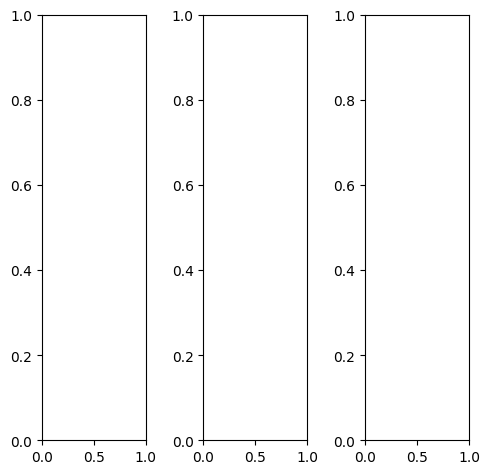

tensor([[[0.8667, 0.8588, 0.7216,  ..., 0.1137, 0.1686, 0.2392],
         [0.8275, 0.8510, 0.8980,  ..., 0.1451, 0.1843, 0.2275],
         [0.6588, 0.7647, 0.7137,  ..., 0.1569, 0.2235, 0.2118],
         ...,
         [0.0275, 0.0275, 0.0627,  ..., 0.7647, 0.3020, 0.1765],
         [0.0196, 0.0314, 0.0392,  ..., 0.9765, 0.8275, 0.6118],
         [0.0157, 0.0235, 0.0431,  ..., 0.9647, 1.0000, 0.9922]],

        [[0.8667, 0.8588, 0.7216,  ..., 0.1137, 0.1686, 0.2392],
         [0.8275, 0.8510, 0.8980,  ..., 0.1451, 0.1843, 0.2275],
         [0.6588, 0.7647, 0.7137,  ..., 0.1569, 0.2235, 0.2118],
         ...,
         [0.0275, 0.0275, 0.0627,  ..., 0.7647, 0.3020, 0.1765],
         [0.0196, 0.0314, 0.0392,  ..., 0.9765, 0.8275, 0.6118],
         [0.0157, 0.0235, 0.0431,  ..., 0.9647, 1.0000, 0.9922]],

        [[0.8667, 0.8588, 0.7216,  ..., 0.1137, 0.1686, 0.2392],
         [0.8275, 0.8510, 0.8980,  ..., 0.1451, 0.1843, 0.2275],
         [0.6588, 0.7647, 0.7137,  ..., 0.1569, 0.2235, 0.

tensor([[[0.8784, 0.8706, 0.7294,  ..., 0.1176, 0.1725, 0.2392],
         [0.8314, 0.8588, 0.9020,  ..., 0.1490, 0.1882, 0.2275],
         [0.6588, 0.7686, 0.7137,  ..., 0.1608, 0.2275, 0.2118],
         ...,
         [0.0157, 0.0157, 0.0471,  ..., 0.7490, 0.2941, 0.1843],
         [0.0078, 0.0196, 0.0235,  ..., 0.9647, 0.8235, 0.6157],
         [0.0039, 0.0118, 0.0275,  ..., 0.9608, 1.0000, 0.9922]],

        [[0.8627, 0.8549, 0.7176,  ..., 0.1176, 0.1686, 0.2392],
         [0.8235, 0.8471, 0.8980,  ..., 0.1490, 0.1843, 0.2275],
         [0.6588, 0.7647, 0.7137,  ..., 0.1608, 0.2235, 0.2118],
         ...,
         [0.0353, 0.0353, 0.0706,  ..., 0.7725, 0.3059, 0.1765],
         [0.0275, 0.0392, 0.0471,  ..., 0.9843, 0.8314, 0.6118],
         [0.0235, 0.0314, 0.0549,  ..., 0.9686, 1.0000, 0.9922]],

        [[0.8588, 0.8510, 0.7176,  ..., 0.0863, 0.1490, 0.2275],
         [0.8235, 0.8510, 0.8980,  ..., 0.1176, 0.1647, 0.2118],
         [0.6627, 0.7686, 0.7176,  ..., 0.1294, 0.2039, 0.

tensor([[[1.1806, 1.2411, 1.1396,  ..., 0.1628, 0.2591, 0.4139],
         [1.0983, 1.2890, 1.2397,  ..., 0.1652, 0.2276, 0.3814],
         [0.9848, 1.1804, 1.1755,  ..., 0.1452, 0.2757, 0.3312],
         ...,
         [0.0894, 0.1072, 0.1781,  ..., 1.2289, 0.6631, 0.5230],
         [0.0826, 0.1068, 0.1172,  ..., 1.4366, 1.2691, 0.9920],
         [0.1223, 0.0904, 0.0990,  ..., 1.3862, 1.3472, 1.1776]],

        [[1.1094, 1.2301, 1.0282,  ..., 0.2776, 0.3748, 0.4594],
         [1.1335, 1.2230, 1.2404,  ..., 0.2908, 0.3880, 0.4638],
         [0.9911, 1.0542, 1.0614,  ..., 0.2953, 0.4362, 0.4185],
         ...,
         [0.1088, 0.1074, 0.1870,  ..., 1.2095, 0.6503, 0.5527],
         [0.0992, 0.1069, 0.1353,  ..., 1.4667, 1.2609, 0.9851],
         [0.1166, 0.0837, 0.1149,  ..., 1.3879, 1.3441, 1.1489]],

        [[1.1093, 1.3403, 1.0059,  ..., 0.4543, 0.5684, 0.6346],
         [1.1648, 1.2989, 1.2827,  ..., 0.4895, 0.6134, 0.6598],
         [0.9691, 1.1462, 1.0581,  ..., 0.4774, 0.6515, 0.

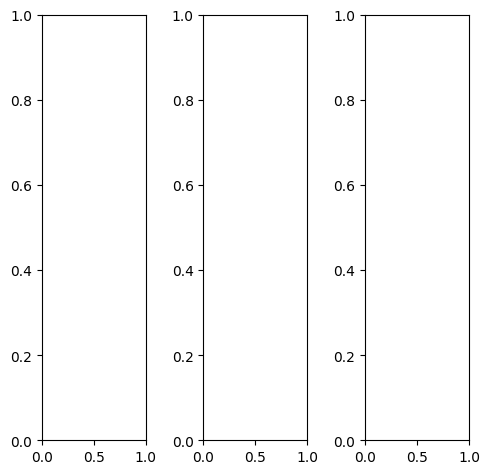

EPOCH: 30.000  val_loss: 0.005  trn_loss: 0.004  (3669.96s - 8563.23s remaining)


tensor([[[0.6000, 0.6039, 0.6157,  ..., 0.6745, 0.6745, 0.6745],
         [0.6157, 0.6157, 0.6196,  ..., 0.6824, 0.6824, 0.6824],
         [0.6235, 0.6314, 0.6235,  ..., 0.6902, 0.6902, 0.6902],
         ...,
         [0.1725, 0.1333, 0.0863,  ..., 0.2549, 0.0824, 0.1020],
         [0.1451, 0.1176, 0.0941,  ..., 0.2196, 0.0588, 0.1059],
         [0.1412, 0.1608, 0.1529,  ..., 0.1765, 0.0353, 0.1098]],

        [[0.6000, 0.6039, 0.6157,  ..., 0.6745, 0.6745, 0.6745],
         [0.6157, 0.6157, 0.6196,  ..., 0.6824, 0.6824, 0.6824],
         [0.6235, 0.6314, 0.6235,  ..., 0.6902, 0.6902, 0.6902],
         ...,
         [0.1725, 0.1333, 0.0863,  ..., 0.2549, 0.0824, 0.1020],
         [0.1451, 0.1176, 0.0941,  ..., 0.2196, 0.0588, 0.1059],
         [0.1412, 0.1608, 0.1529,  ..., 0.1765, 0.0353, 0.1098]],

        [[0.6000, 0.6039, 0.6157,  ..., 0.6745, 0.6745, 0.6745],
         [0.6157, 0.6157, 0.6196,  ..., 0.6824, 0.6824, 0.6824],
         [0.6235, 0.6314, 0.6235,  ..., 0.6902, 0.6902, 0.

tensor([[[0.4706, 0.4706, 0.4902,  ..., 0.5490, 0.5490, 0.5490],
         [0.4784, 0.4824, 0.4941,  ..., 0.5569, 0.5569, 0.5569],
         [0.4941, 0.4941, 0.4980,  ..., 0.5647, 0.5647, 0.5647],
         ...,
         [0.1529, 0.1137, 0.0667,  ..., 0.2039, 0.0627, 0.1098],
         [0.1176, 0.0902, 0.0667,  ..., 0.1686, 0.0392, 0.1176],
         [0.1020, 0.1216, 0.1137,  ..., 0.1255, 0.0157, 0.1216]],

        [[0.6235, 0.6275, 0.6392,  ..., 0.6980, 0.6980, 0.6980],
         [0.6392, 0.6392, 0.6431,  ..., 0.7098, 0.7098, 0.7098],
         [0.6471, 0.6549, 0.6471,  ..., 0.7176, 0.7176, 0.7176],
         ...,
         [0.1882, 0.1412, 0.0941,  ..., 0.2745, 0.0941, 0.1059],
         [0.1608, 0.1294, 0.1020,  ..., 0.2353, 0.0667, 0.1098],
         [0.1569, 0.1725, 0.1608,  ..., 0.1961, 0.0431, 0.1137]],

        [[0.8314, 0.8392, 0.8392,  ..., 0.8824, 0.8824, 0.8824],
         [0.8431, 0.8510, 0.8431,  ..., 0.8863, 0.8863, 0.8863],
         [0.8510, 0.8549, 0.8471,  ..., 0.8784, 0.8784, 0.

tensor([[[0.5381, 0.5166, 0.5048,  ..., 0.5671, 0.5639, 0.5985],
         [0.5330, 0.5187, 0.5168,  ..., 0.5613, 0.5752, 0.5900],
         [0.5240, 0.5271, 0.5260,  ..., 0.5808, 0.5870, 0.5841],
         ...,
         [0.1766, 0.1415, 0.0827,  ..., 0.2624, 0.0806, 0.0926],
         [0.1462, 0.1241, 0.0950,  ..., 0.2221, 0.0498, 0.0997],
         [0.1518, 0.1660, 0.1585,  ..., 0.1710, 0.0671, 0.1064]],

        [[0.6256, 0.6391, 0.6409,  ..., 0.6994, 0.7013, 0.7004],
         [0.6474, 0.6382, 0.6457,  ..., 0.6998, 0.7025, 0.7170],
         [0.6455, 0.6554, 0.6488,  ..., 0.7155, 0.7029, 0.7065],
         ...,
         [0.1752, 0.1365, 0.0843,  ..., 0.2590, 0.0897, 0.1012],
         [0.1475, 0.1185, 0.0936,  ..., 0.2236, 0.0628, 0.1004],
         [0.1675, 0.1596, 0.1515,  ..., 0.1795, 0.0676, 0.1146]],

        [[0.7395, 0.7646, 0.7752,  ..., 0.8493, 0.8437, 0.8161],
         [0.7686, 0.7684, 0.7729,  ..., 0.8544, 0.8416, 0.8389],
         [0.7614, 0.7806, 0.7731,  ..., 0.8593, 0.8535, 0.

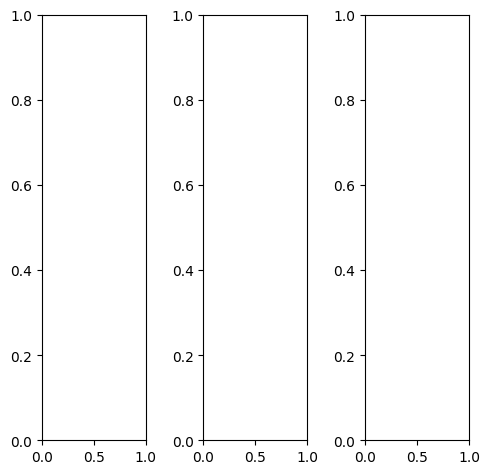

tensor([[[0.2627, 0.2314, 0.2392,  ..., 0.2314, 0.2902, 0.3137],
         [0.2471, 0.2314, 0.2314,  ..., 0.3216, 0.3294, 0.3294],
         [0.1961, 0.1529, 0.1647,  ..., 0.2902, 0.3569, 0.3647],
         ...,
         [0.6039, 0.6000, 0.5922,  ..., 0.2039, 0.1765, 0.1255],
         [0.5961, 0.5882, 0.6157,  ..., 0.2078, 0.1569, 0.1020],
         [0.6039, 0.6000, 0.5725,  ..., 0.2118, 0.1216, 0.0784]],

        [[0.2627, 0.2314, 0.2392,  ..., 0.2314, 0.2902, 0.3137],
         [0.2471, 0.2314, 0.2314,  ..., 0.3216, 0.3294, 0.3294],
         [0.1961, 0.1529, 0.1647,  ..., 0.2902, 0.3569, 0.3647],
         ...,
         [0.6039, 0.6000, 0.5922,  ..., 0.2039, 0.1765, 0.1255],
         [0.5961, 0.5882, 0.6157,  ..., 0.2078, 0.1569, 0.1020],
         [0.6039, 0.6000, 0.5725,  ..., 0.2118, 0.1216, 0.0784]],

        [[0.2627, 0.2314, 0.2392,  ..., 0.2314, 0.2902, 0.3137],
         [0.2471, 0.2314, 0.2314,  ..., 0.3216, 0.3294, 0.3294],
         [0.1961, 0.1529, 0.1647,  ..., 0.2902, 0.3569, 0.

tensor([[[0.1922, 0.1647, 0.1686,  ..., 0.1804, 0.2392, 0.2627],
         [0.1882, 0.1725, 0.1725,  ..., 0.2706, 0.2784, 0.2745],
         [0.1412, 0.0980, 0.1098,  ..., 0.2392, 0.3098, 0.3137],
         ...,
         [0.5569, 0.5569, 0.5490,  ..., 0.3451, 0.2902, 0.2392],
         [0.5725, 0.5647, 0.5922,  ..., 0.3412, 0.2627, 0.2078],
         [0.5882, 0.5843, 0.5569,  ..., 0.3412, 0.2235, 0.1765]],

        [[0.2745, 0.2431, 0.2510,  ..., 0.2627, 0.3216, 0.3490],
         [0.2588, 0.2431, 0.2431,  ..., 0.3529, 0.3686, 0.3686],
         [0.2000, 0.1569, 0.1686,  ..., 0.3216, 0.3961, 0.4078],
         ...,
         [0.6745, 0.6706, 0.6627,  ..., 0.1373, 0.1255, 0.0745],
         [0.6431, 0.6353, 0.6627,  ..., 0.1412, 0.1059, 0.0510],
         [0.6392, 0.6353, 0.6078,  ..., 0.1490, 0.0706, 0.0314]],

        [[0.3804, 0.3490, 0.3569,  ..., 0.2157, 0.2510, 0.2667],
         [0.3569, 0.3412, 0.3412,  ..., 0.2824, 0.2627, 0.2549],
         [0.3216, 0.2784, 0.2902,  ..., 0.2588, 0.2941, 0.

tensor([[[0.2825, 0.2413, 0.2449,  ..., 0.2342, 0.2869, 0.3152],
         [0.2439, 0.2396, 0.2440,  ..., 0.3315, 0.3486, 0.3331],
         [0.2048, 0.1565, 0.1687,  ..., 0.3148, 0.3734, 0.3754],
         ...,
         [0.6351, 0.6336, 0.6187,  ..., 0.2262, 0.1989, 0.1380],
         [0.6196, 0.6216, 0.6387,  ..., 0.2316, 0.1751, 0.1207],
         [0.6291, 0.6251, 0.5916,  ..., 0.2238, 0.1494, 0.1117]],

        [[0.2764, 0.2389, 0.2405,  ..., 0.2225, 0.2843, 0.3171],
         [0.2428, 0.2329, 0.2365,  ..., 0.3123, 0.3350, 0.3327],
         [0.1988, 0.1608, 0.1678,  ..., 0.2923, 0.3461, 0.3702],
         ...,
         [0.6153, 0.6171, 0.6076,  ..., 0.2051, 0.1739, 0.1185],
         [0.5965, 0.5942, 0.6261,  ..., 0.2008, 0.1491, 0.1014],
         [0.6069, 0.6078, 0.5768,  ..., 0.2018, 0.1270, 0.1087]],

        [[0.2273, 0.1897, 0.1943,  ..., 0.1827, 0.2372, 0.2697],
         [0.1939, 0.1875, 0.1910,  ..., 0.2654, 0.2678, 0.2635],
         [0.1603, 0.1173, 0.1267,  ..., 0.2409, 0.2880, 0.

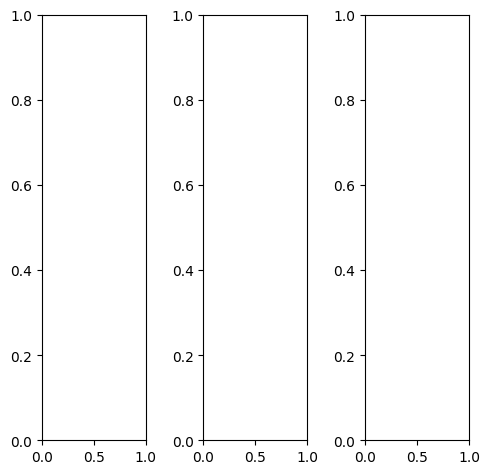

tensor([[[0.8314, 0.7608, 0.7569,  ..., 0.2863, 0.2510, 0.2275],
         [0.9804, 0.8667, 0.8157,  ..., 0.2863, 0.2706, 0.2353],
         [0.9804, 0.8863, 0.8118,  ..., 0.2980, 0.2706, 0.2314],
         ...,
         [0.9373, 0.7020, 0.6118,  ..., 0.3725, 0.3647, 0.3765],
         [0.8314, 0.6431, 0.5843,  ..., 0.3882, 0.3804, 0.4000],
         [0.7137, 0.5843, 0.5569,  ..., 0.3843, 0.3804, 0.3922]],

        [[0.8314, 0.7608, 0.7569,  ..., 0.2863, 0.2510, 0.2275],
         [0.9804, 0.8667, 0.8157,  ..., 0.2863, 0.2706, 0.2353],
         [0.9804, 0.8863, 0.8118,  ..., 0.2980, 0.2706, 0.2314],
         ...,
         [0.9373, 0.7020, 0.6118,  ..., 0.3725, 0.3647, 0.3765],
         [0.8314, 0.6431, 0.5843,  ..., 0.3882, 0.3804, 0.4000],
         [0.7137, 0.5843, 0.5569,  ..., 0.3843, 0.3804, 0.3922]],

        [[0.8314, 0.7608, 0.7569,  ..., 0.2863, 0.2510, 0.2275],
         [0.9804, 0.8667, 0.8157,  ..., 0.2863, 0.2706, 0.2353],
         [0.9804, 0.8863, 0.8118,  ..., 0.2980, 0.2706, 0.

tensor([[[0.7804, 0.6824, 0.6745,  ..., 0.3451, 0.3137, 0.2824],
         [0.9686, 0.7961, 0.7373,  ..., 0.3569, 0.3294, 0.2941],
         [0.9725, 0.8235, 0.7373,  ..., 0.3569, 0.3255, 0.2902],
         ...,
         [0.9059, 0.6235, 0.5569,  ..., 0.3843, 0.3765, 0.3765],
         [0.7451, 0.5608, 0.5373,  ..., 0.4000, 0.3882, 0.3961],
         [0.5922, 0.5098, 0.5137,  ..., 0.3922, 0.3882, 0.3882]],

        [[0.8471, 0.7843, 0.7804,  ..., 0.2706, 0.2314, 0.2078],
         [0.9843, 0.8863, 0.8353,  ..., 0.2627, 0.2510, 0.2118],
         [0.9843, 0.9059, 0.8314,  ..., 0.2784, 0.2510, 0.2118],
         ...,
         [0.9451, 0.7216, 0.6275,  ..., 0.3804, 0.3686, 0.3843],
         [0.8549, 0.6667, 0.6039,  ..., 0.3961, 0.3882, 0.4078],
         [0.7451, 0.6039, 0.5725,  ..., 0.3922, 0.3882, 0.4039]],

        [[0.8902, 0.8353, 0.8471,  ..., 0.2275, 0.1961, 0.1804],
         [0.9922, 0.9490, 0.9059,  ..., 0.2196, 0.2157, 0.1882],
         [0.9922, 0.9569, 0.8980,  ..., 0.2392, 0.2196, 0.

tensor([[[0.7955, 0.7425, 0.7381,  ..., 0.2806, 0.2407, 0.2175],
         [0.9421, 0.8435, 0.7951,  ..., 0.2820, 0.2689, 0.2191],
         [0.9433, 0.8754, 0.8014,  ..., 0.2979, 0.2663, 0.2203],
         ...,
         [0.9351, 0.7048, 0.6023,  ..., 0.3533, 0.3386, 0.3671],
         [0.8242, 0.6277, 0.5617,  ..., 0.3666, 0.3546, 0.3908],
         [0.7034, 0.5886, 0.5499,  ..., 0.3662, 0.3631, 0.3845]],

        [[0.8180, 0.7587, 0.7691,  ..., 0.2845, 0.2535, 0.2384],
         [0.9618, 0.8585, 0.8141,  ..., 0.2858, 0.2786, 0.2337],
         [0.9651, 0.8929, 0.8233,  ..., 0.2989, 0.2720, 0.2298],
         ...,
         [0.9469, 0.7181, 0.6190,  ..., 0.3760, 0.3704, 0.3868],
         [0.8382, 0.6337, 0.5828,  ..., 0.3908, 0.3816, 0.4077],
         [0.6995, 0.5970, 0.5636,  ..., 0.3923, 0.3882, 0.4019]],

        [[0.8245, 0.7661, 0.7590,  ..., 0.2741, 0.2458, 0.2354],
         [0.9669, 0.8694, 0.8184,  ..., 0.2823, 0.2702, 0.2232],
         [0.9744, 0.8888, 0.8170,  ..., 0.2935, 0.2676, 0.

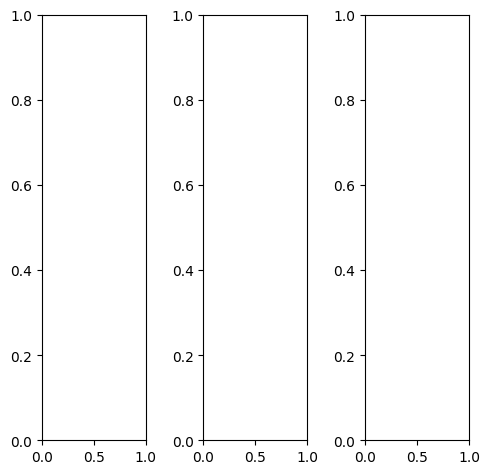

tensor([[[0.3725, 0.3922, 0.3804,  ..., 0.1255, 0.1216, 0.1098],
         [0.1255, 0.1333, 0.1098,  ..., 0.1255, 0.1216, 0.1137],
         [0.0431, 0.0627, 0.0745,  ..., 0.1255, 0.1216, 0.1098],
         ...,
         [0.3451, 0.3647, 0.3765,  ..., 0.4471, 0.4431, 0.4275],
         [0.3529, 0.3725, 0.3686,  ..., 0.4196, 0.4196, 0.4235],
         [0.3451, 0.3529, 0.3490,  ..., 0.3647, 0.3529, 0.3647]],

        [[0.3725, 0.3922, 0.3804,  ..., 0.1255, 0.1216, 0.1098],
         [0.1255, 0.1333, 0.1098,  ..., 0.1255, 0.1216, 0.1137],
         [0.0431, 0.0627, 0.0745,  ..., 0.1255, 0.1216, 0.1098],
         ...,
         [0.3451, 0.3647, 0.3765,  ..., 0.4471, 0.4431, 0.4275],
         [0.3529, 0.3725, 0.3686,  ..., 0.4196, 0.4196, 0.4235],
         [0.3451, 0.3529, 0.3490,  ..., 0.3647, 0.3529, 0.3647]],

        [[0.3725, 0.3922, 0.3804,  ..., 0.1255, 0.1216, 0.1098],
         [0.1255, 0.1333, 0.1098,  ..., 0.1255, 0.1216, 0.1137],
         [0.0431, 0.0627, 0.0745,  ..., 0.1255, 0.1216, 0.

tensor([[[0.3843, 0.4039, 0.3922,  ..., 0.2000, 0.1882, 0.1765],
         [0.1294, 0.1373, 0.1137,  ..., 0.2039, 0.1922, 0.1804],
         [0.0549, 0.0745, 0.0863,  ..., 0.2000, 0.1882, 0.1765],
         ...,
         [0.2902, 0.3176, 0.3373,  ..., 0.4078, 0.4039, 0.3843],
         [0.3059, 0.3333, 0.3373,  ..., 0.3843, 0.3843, 0.3843],
         [0.3176, 0.3294, 0.3333,  ..., 0.3333, 0.3255, 0.3333]],

        [[0.3765, 0.3961, 0.3843,  ..., 0.0980, 0.0941, 0.0863],
         [0.1255, 0.1333, 0.1098,  ..., 0.0980, 0.0980, 0.0863],
         [0.0353, 0.0588, 0.0706,  ..., 0.0980, 0.0941, 0.0863],
         ...,
         [0.3569, 0.3765, 0.3882,  ..., 0.4745, 0.4667, 0.4549],
         [0.3608, 0.3804, 0.3725,  ..., 0.4353, 0.4353, 0.4392],
         [0.3451, 0.3490, 0.3412,  ..., 0.3686, 0.3569, 0.3686]],

        [[0.3176, 0.3412, 0.3333,  ..., 0.0706, 0.0745, 0.0706],
         [0.1059, 0.1137, 0.0941,  ..., 0.0706, 0.0745, 0.0706],
         [0.0471, 0.0667, 0.0784,  ..., 0.0706, 0.0745, 0.

tensor([[[0.3536, 0.3961, 0.3911,  ..., 0.1445, 0.1428, 0.1421],
         [0.1376, 0.1459, 0.1312,  ..., 0.1538, 0.1513, 0.1308],
         [0.0557, 0.0678, 0.0748,  ..., 0.1538, 0.1480, 0.1281],
         ...,
         [0.3684, 0.3997, 0.4041,  ..., 0.4830, 0.4696, 0.4567],
         [0.3741, 0.4092, 0.4004,  ..., 0.4531, 0.4528, 0.4507],
         [0.3712, 0.3762, 0.3668,  ..., 0.3891, 0.3798, 0.3922]],

        [[0.3691, 0.3941, 0.3862,  ..., 0.1183, 0.1223, 0.1435],
         [0.1382, 0.1438, 0.1201,  ..., 0.1179, 0.1235, 0.1167],
         [0.0525, 0.0674, 0.0725,  ..., 0.1172, 0.1140, 0.1050],
         ...,
         [0.3484, 0.3801, 0.3831,  ..., 0.4548, 0.4456, 0.4316],
         [0.3603, 0.3853, 0.3703,  ..., 0.4165, 0.4198, 0.4277],
         [0.3569, 0.3597, 0.3473,  ..., 0.3534, 0.3451, 0.3768]],

        [[0.3184, 0.3427, 0.3386,  ..., 0.1028, 0.1083, 0.1238],
         [0.1168, 0.1219, 0.0986,  ..., 0.1077, 0.1075, 0.0960],
         [0.0431, 0.0570, 0.0631,  ..., 0.1054, 0.1014, 0.

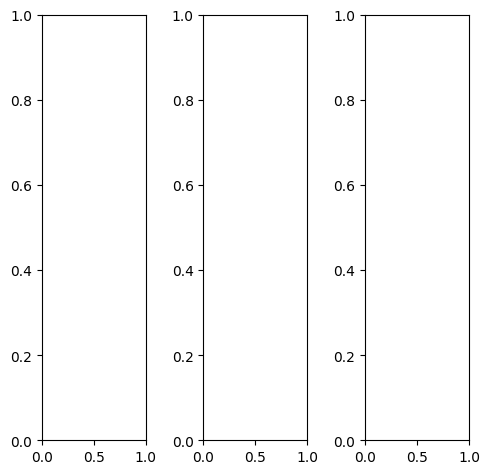

tensor([[[0.0706, 0.0706, 0.0706,  ..., 0.5961, 0.6314, 0.5255],
         [0.0627, 0.0824, 0.0745,  ..., 0.6235, 0.5647, 0.4824],
         [0.0627, 0.0902, 0.0784,  ..., 0.6275, 0.6000, 0.4353],
         ...,
         [0.5373, 0.7059, 0.4706,  ..., 0.7176, 0.7294, 0.7059],
         [0.6784, 0.6745, 0.6157,  ..., 0.7098, 0.7608, 0.7451],
         [0.7765, 0.6863, 0.6353,  ..., 0.6588, 0.7294, 0.7412]],

        [[0.0706, 0.0706, 0.0706,  ..., 0.5961, 0.6314, 0.5255],
         [0.0627, 0.0824, 0.0745,  ..., 0.6235, 0.5647, 0.4824],
         [0.0627, 0.0902, 0.0784,  ..., 0.6275, 0.6000, 0.4353],
         ...,
         [0.5373, 0.7059, 0.4706,  ..., 0.7176, 0.7294, 0.7059],
         [0.6784, 0.6745, 0.6157,  ..., 0.7098, 0.7608, 0.7451],
         [0.7765, 0.6863, 0.6353,  ..., 0.6588, 0.7294, 0.7412]],

        [[0.0706, 0.0706, 0.0706,  ..., 0.5961, 0.6314, 0.5255],
         [0.0627, 0.0824, 0.0745,  ..., 0.6235, 0.5647, 0.4824],
         [0.0627, 0.0902, 0.0784,  ..., 0.6275, 0.6000, 0.

tensor([[[0.0588, 0.0588, 0.0588,  ..., 0.6510, 0.6980, 0.5843],
         [0.0510, 0.0706, 0.0627,  ..., 0.6667, 0.6196, 0.5373],
         [0.0510, 0.0784, 0.0667,  ..., 0.6745, 0.6510, 0.4824],
         ...,
         [0.6314, 0.8235, 0.5529,  ..., 0.8235, 0.8353, 0.8039],
         [0.7686, 0.7882, 0.7176,  ..., 0.8118, 0.8549, 0.8471],
         [0.8588, 0.7765, 0.7490,  ..., 0.7608, 0.8196, 0.8353]],

        [[0.0784, 0.0784, 0.0784,  ..., 0.5961, 0.6235, 0.5216],
         [0.0706, 0.0902, 0.0824,  ..., 0.6196, 0.5647, 0.4784],
         [0.0706, 0.0980, 0.0863,  ..., 0.6196, 0.6000, 0.4353],
         ...,
         [0.5333, 0.7020, 0.4627,  ..., 0.7098, 0.7255, 0.7098],
         [0.6745, 0.6667, 0.6118,  ..., 0.7020, 0.7569, 0.7373],
         [0.7765, 0.6863, 0.6353,  ..., 0.6549, 0.7255, 0.7333]],

        [[0.0510, 0.0510, 0.0510,  ..., 0.4667, 0.4824, 0.3804],
         [0.0431, 0.0627, 0.0549,  ..., 0.5137, 0.4353, 0.3451],
         [0.0431, 0.0706, 0.0588,  ..., 0.5294, 0.4745, 0.

tensor([[[0.1114, 0.0819, 0.0856,  ..., 0.6209, 0.6495, 0.5542],
         [0.0840, 0.0993, 0.0930,  ..., 0.6371, 0.5803, 0.4981],
         [0.0775, 0.0999, 0.0960,  ..., 0.6424, 0.6254, 0.4488],
         ...,
         [0.5752, 0.7514, 0.5267,  ..., 0.7485, 0.7427, 0.7438],
         [0.7108, 0.7122, 0.6375,  ..., 0.7294, 0.7877, 0.7867],
         [0.7776, 0.7142, 0.6590,  ..., 0.6825, 0.7719, 0.7632]],

        [[0.1155, 0.0683, 0.0696,  ..., 0.6137, 0.6453, 0.5409],
         [0.0649, 0.0777, 0.0670,  ..., 0.6460, 0.5689, 0.4931],
         [0.0590, 0.0840, 0.0730,  ..., 0.6373, 0.6062, 0.4381],
         ...,
         [0.5465, 0.7057, 0.4747,  ..., 0.7187, 0.7215, 0.7095],
         [0.6814, 0.6651, 0.6047,  ..., 0.7151, 0.7709, 0.7521],
         [0.7463, 0.6879, 0.6358,  ..., 0.6482, 0.7371, 0.7375]],

        [[0.0976, 0.0627, 0.0630,  ..., 0.5081, 0.5643, 0.4664],
         [0.0565, 0.0741, 0.0628,  ..., 0.5109, 0.4605, 0.3810],
         [0.0491, 0.0720, 0.0635,  ..., 0.5134, 0.5044, 0.

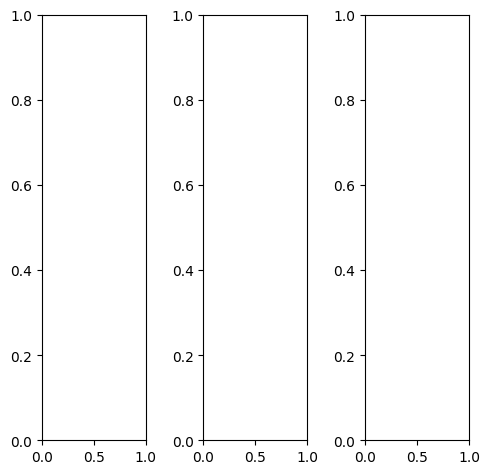

EPOCH: 30.255  trn_loss: 0.005  (3700.58s - 8530.68s remaining)

tensor([[[0.9255, 0.9176, 0.9255,  ..., 0.9686, 0.9647, 0.9333],
         [0.9373, 0.9255, 0.9294,  ..., 0.9843, 0.9804, 0.9529],
         [0.9294, 0.9137, 0.9176,  ..., 0.9804, 0.9725, 0.9569],
         ...,
         [0.5451, 0.5451, 0.5412,  ..., 0.5961, 0.5961, 0.5882],
         [0.5529, 0.5569, 0.5529,  ..., 0.6078, 0.6000, 0.6039],
         [0.5451, 0.5373, 0.5333,  ..., 0.5961, 0.5882, 0.5882]],

        [[0.9255, 0.9176, 0.9255,  ..., 0.9686, 0.9647, 0.9333],
         [0.9373, 0.9255, 0.9294,  ..., 0.9843, 0.9804, 0.9529],
         [0.9294, 0.9137, 0.9176,  ..., 0.9804, 0.9725, 0.9569],
         ...,
         [0.5451, 0.5451, 0.5412,  ..., 0.5961, 0.5961, 0.5882],
         [0.5529, 0.5569, 0.5529,  ..., 0.6078, 0.6000, 0.6039],
         [0.5451, 0.5373, 0.5333,  ..., 0.5961, 0.5882, 0.5882]],

        [[0.9255, 0.9176, 0.9255,  ..., 0.9686, 0.9647, 0.9333],
         [0.9373, 0.9255, 0.9294,  ..., 0.9843, 0.9804, 0.9529],
         [0.9294, 0.9137, 0.9176,  ..., 0.9804, 0.9725, 0.

tensor([[[0.8980, 0.8980, 0.9137,  ..., 0.9647, 0.9569, 0.9216],
         [0.9137, 0.9098, 0.9176,  ..., 0.9843, 0.9804, 0.9451],
         [0.9137, 0.8980, 0.9020,  ..., 0.9765, 0.9686, 0.9490],
         ...,
         [0.5529, 0.5490, 0.5490,  ..., 0.5961, 0.5961, 0.5882],
         [0.5569, 0.5608, 0.5569,  ..., 0.6078, 0.6000, 0.6039],
         [0.5490, 0.5412, 0.5373,  ..., 0.5961, 0.5882, 0.5882]],

        [[0.9333, 0.9216, 0.9294,  ..., 0.9686, 0.9647, 0.9333],
         [0.9412, 0.9294, 0.9333,  ..., 0.9843, 0.9804, 0.9529],
         [0.9333, 0.9137, 0.9216,  ..., 0.9804, 0.9725, 0.9569],
         ...,
         [0.5451, 0.5451, 0.5412,  ..., 0.5961, 0.5961, 0.5922],
         [0.5529, 0.5569, 0.5569,  ..., 0.6078, 0.6000, 0.6078],
         [0.5490, 0.5412, 0.5373,  ..., 0.6000, 0.5922, 0.5922]],

        [[0.9529, 0.9412, 0.9490,  ..., 0.9725, 0.9765, 0.9490],
         [0.9725, 0.9490, 0.9569,  ..., 0.9843, 0.9882, 0.9647],
         [0.9608, 0.9412, 0.9451,  ..., 0.9765, 0.9725, 0.

tensor([[[0.8544, 0.8312, 0.7614,  ..., 0.7532, 0.7459, 0.7893],
         [0.8325, 0.7912, 0.7469,  ..., 0.7746, 0.7931, 0.8097],
         [0.8366, 0.8217, 0.7261,  ..., 0.7715, 0.7826, 0.8223],
         ...,
         [0.5687, 0.6049, 0.5621,  ..., 0.6324, 0.6457, 0.6617],
         [0.5711, 0.5921, 0.5702,  ..., 0.6519, 0.6472, 0.6752],
         [0.5953, 0.5943, 0.5659,  ..., 0.6856, 0.6746, 0.6587]],

        [[0.8445, 0.8313, 0.7150,  ..., 0.8273, 0.8303, 0.8655],
         [0.7858, 0.6253, 0.6630,  ..., 0.8469, 0.8537, 0.8964],
         [0.9051, 0.8020, 0.7533,  ..., 0.8352, 0.8419, 0.8964],
         ...,
         [0.5676, 0.5769, 0.5660,  ..., 0.6237, 0.6247, 0.6067],
         [0.5613, 0.5545, 0.5716,  ..., 0.6354, 0.6192, 0.6322],
         [0.5676, 0.5697, 0.5600,  ..., 0.6375, 0.6329, 0.6239]],

        [[0.9186, 0.9346, 0.8586,  ..., 0.9966, 0.9991, 1.0020],
         [0.9352, 0.8679, 0.8955,  ..., 0.9994, 1.0254, 1.0279],
         [0.8744, 0.8599, 0.8134,  ..., 1.0167, 1.0148, 1.

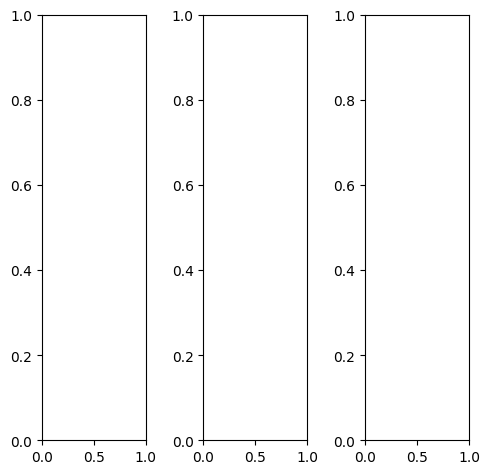

tensor([[[0.1529, 0.1294, 0.1843,  ..., 0.1843, 0.1843, 0.1765],
         [0.1686, 0.1216, 0.1686,  ..., 0.1686, 0.1686, 0.1882],
         [0.1961, 0.1569, 0.1725,  ..., 0.1490, 0.1373, 0.1765],
         ...,
         [0.3686, 0.3098, 0.2314,  ..., 0.5216, 0.4863, 0.3961],
         [0.3882, 0.3686, 0.3333,  ..., 0.4627, 0.4588, 0.4706],
         [0.3922, 0.4078, 0.4235,  ..., 0.4157, 0.4157, 0.4745]],

        [[0.1529, 0.1294, 0.1843,  ..., 0.1843, 0.1843, 0.1765],
         [0.1686, 0.1216, 0.1686,  ..., 0.1686, 0.1686, 0.1882],
         [0.1961, 0.1569, 0.1725,  ..., 0.1490, 0.1373, 0.1765],
         ...,
         [0.3686, 0.3098, 0.2314,  ..., 0.5216, 0.4863, 0.3961],
         [0.3882, 0.3686, 0.3333,  ..., 0.4627, 0.4588, 0.4706],
         [0.3922, 0.4078, 0.4235,  ..., 0.4157, 0.4157, 0.4745]],

        [[0.1529, 0.1294, 0.1843,  ..., 0.1843, 0.1843, 0.1765],
         [0.1686, 0.1216, 0.1686,  ..., 0.1686, 0.1686, 0.1882],
         [0.1961, 0.1569, 0.1725,  ..., 0.1490, 0.1373, 0.

tensor([[[0.1451, 0.1176, 0.1647,  ..., 0.1804, 0.1804, 0.1686],
         [0.1608, 0.1098, 0.1490,  ..., 0.1647, 0.1647, 0.1804],
         [0.1882, 0.1451, 0.1529,  ..., 0.1451, 0.1333, 0.1725],
         ...,
         [0.3843, 0.3216, 0.2314,  ..., 0.5529, 0.5216, 0.4235],
         [0.4039, 0.3804, 0.3412,  ..., 0.4863, 0.4745, 0.4784],
         [0.4078, 0.4196, 0.4392,  ..., 0.4392, 0.4235, 0.4706]],

        [[0.1647, 0.1373, 0.1961,  ..., 0.1922, 0.1922, 0.1843],
         [0.1765, 0.1294, 0.1843,  ..., 0.1765, 0.1765, 0.1961],
         [0.2039, 0.1686, 0.1843,  ..., 0.1569, 0.1451, 0.1843],
         ...,
         [0.3647, 0.3059, 0.2314,  ..., 0.5216, 0.4863, 0.4000],
         [0.3843, 0.3686, 0.3294,  ..., 0.4627, 0.4667, 0.4824],
         [0.3922, 0.4039, 0.4196,  ..., 0.4196, 0.4275, 0.4941]],

        [[0.1216, 0.1098, 0.1686,  ..., 0.1647, 0.1647, 0.1608],
         [0.1373, 0.1020, 0.1529,  ..., 0.1490, 0.1490, 0.1686],
         [0.1647, 0.1373, 0.1529,  ..., 0.1294, 0.1176, 0.

tensor([[[ 0.1478,  0.0950,  0.0905,  ...,  0.2324,  0.2246,  0.2601],
         [ 0.2332, -0.0235,  0.0309,  ...,  0.1744,  0.1484,  0.2345],
         [ 0.2297,  0.0564, -0.0191,  ...,  0.1141,  0.0818,  0.2110],
         ...,
         [ 0.7724,  0.6678,  0.4406,  ...,  1.3030,  1.2303,  0.9859],
         [ 0.8283,  0.7836,  0.6809,  ...,  1.0807,  1.1202,  1.1345],
         [ 0.8465,  0.9064,  0.9262,  ...,  0.9438,  0.9695,  1.0187]],

        [[ 0.2288,  0.2538,  0.1417,  ...,  0.3185,  0.3235,  0.3140],
         [ 0.2883,  0.0671, -0.0090,  ...,  0.2407,  0.2560,  0.2840],
         [ 0.3134,  0.2065,  0.0231,  ...,  0.1984,  0.1666,  0.2500],
         ...,
         [ 0.8130,  0.6703,  0.4736,  ...,  1.2938,  1.2042,  0.9826],
         [ 0.8702,  0.8182,  0.7215,  ...,  1.0995,  1.1057,  1.0962],
         [ 0.8406,  0.9218,  0.9461,  ...,  0.9290,  0.9306,  0.9963]],

        [[ 0.3718,  0.1998,  0.3161,  ...,  0.4051,  0.4115,  0.4195],
         [ 0.3855,  0.1332,  0.2527,  ...,  0

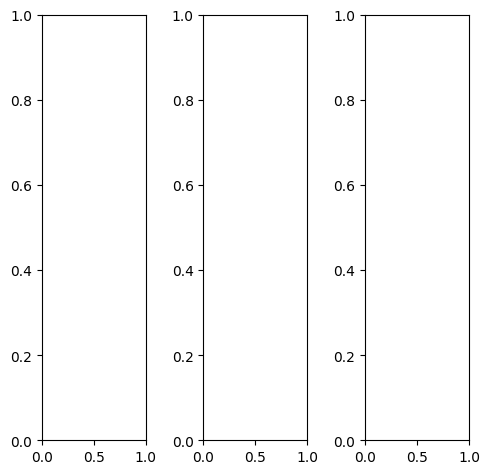

tensor([[[0.8196, 0.8118, 0.8118,  ..., 0.8471, 0.8471, 0.8471],
         [0.8235, 0.8157, 0.8314,  ..., 0.8471, 0.8471, 0.8431],
         [0.8392, 0.8000, 0.7333,  ..., 0.8588, 0.8549, 0.8510],
         ...,
         [0.4706, 0.4196, 0.3882,  ..., 0.4941, 0.5137, 0.5804],
         [0.3333, 0.2588, 0.2078,  ..., 0.7373, 0.6941, 0.6275],
         [0.6000, 0.5451, 0.4902,  ..., 0.7961, 0.7373, 0.7020]],

        [[0.8196, 0.8118, 0.8118,  ..., 0.8471, 0.8471, 0.8471],
         [0.8235, 0.8157, 0.8314,  ..., 0.8471, 0.8471, 0.8431],
         [0.8392, 0.8000, 0.7333,  ..., 0.8588, 0.8549, 0.8510],
         ...,
         [0.4706, 0.4196, 0.3882,  ..., 0.4941, 0.5137, 0.5804],
         [0.3333, 0.2588, 0.2078,  ..., 0.7373, 0.6941, 0.6275],
         [0.6000, 0.5451, 0.4902,  ..., 0.7961, 0.7373, 0.7020]],

        [[0.8196, 0.8118, 0.8118,  ..., 0.8471, 0.8471, 0.8471],
         [0.8235, 0.8157, 0.8314,  ..., 0.8471, 0.8471, 0.8431],
         [0.8392, 0.8000, 0.7333,  ..., 0.8588, 0.8549, 0.

tensor([[[0.7451, 0.7333, 0.7333,  ..., 0.7882, 0.7882, 0.7882],
         [0.7608, 0.7451, 0.7569,  ..., 0.7961, 0.7961, 0.7922],
         [0.7882, 0.7647, 0.7098,  ..., 0.8157, 0.8118, 0.8078],
         ...,
         [0.5020, 0.4510, 0.4157,  ..., 0.5294, 0.5412, 0.5961],
         [0.3608, 0.2863, 0.2353,  ..., 0.7804, 0.7294, 0.6549],
         [0.6275, 0.5686, 0.5176,  ..., 0.8471, 0.7765, 0.7333]],

        [[0.8314, 0.8235, 0.8235,  ..., 0.8588, 0.8588, 0.8588],
         [0.8353, 0.8275, 0.8431,  ..., 0.8588, 0.8549, 0.8549],
         [0.8471, 0.8039, 0.7373,  ..., 0.8627, 0.8627, 0.8549],
         ...,
         [0.4667, 0.4157, 0.3843,  ..., 0.4902, 0.5137, 0.5804],
         [0.3255, 0.2510, 0.2000,  ..., 0.7294, 0.6902, 0.6275],
         [0.5961, 0.5412, 0.4863,  ..., 0.7882, 0.7294, 0.6980]],

        [[0.9490, 0.9451, 0.9490,  ..., 0.9255, 0.9255, 0.9294],
         [0.9333, 0.9294, 0.9490,  ..., 0.9294, 0.9294, 0.9255],
         [0.9176, 0.8627, 0.7843,  ..., 0.9412, 0.9373, 0.

tensor([[[0.7850, 0.7954, 0.7418,  ..., 0.7582, 0.7453, 0.7655],
         [0.7642, 0.7893, 0.7428,  ..., 0.7930, 0.8095, 0.7954],
         [0.7693, 0.7901, 0.6573,  ..., 0.8380, 0.8404, 0.8413],
         ...,
         [0.4780, 0.4645, 0.3904,  ..., 0.5370, 0.5611, 0.6305],
         [0.3162, 0.2200, 0.1918,  ..., 0.8220, 0.7801, 0.7259],
         [0.5646, 0.5084, 0.4497,  ..., 0.9191, 0.8582, 0.7856]],

        [[0.7955, 0.7770, 0.7270,  ..., 0.8362, 0.8277, 0.8600],
         [0.7178, 0.6513, 0.6648,  ..., 0.8715, 0.8795, 0.9016],
         [0.8529, 0.7370, 0.7078,  ..., 0.8926, 0.8982, 0.9195],
         ...,
         [0.4862, 0.4691, 0.4416,  ..., 0.5797, 0.5883, 0.6120],
         [0.3504, 0.2593, 0.2425,  ..., 0.8106, 0.7577, 0.6773],
         [0.5840, 0.5484, 0.5030,  ..., 0.8400, 0.7919, 0.7322]],

        [[0.8414, 0.9046, 0.8358,  ..., 0.9822, 0.9690, 0.9793],
         [0.8719, 0.8704, 0.9058,  ..., 1.0014, 1.0222, 0.9988],
         [0.8268, 0.8338, 0.7530,  ..., 1.0394, 1.0315, 1.

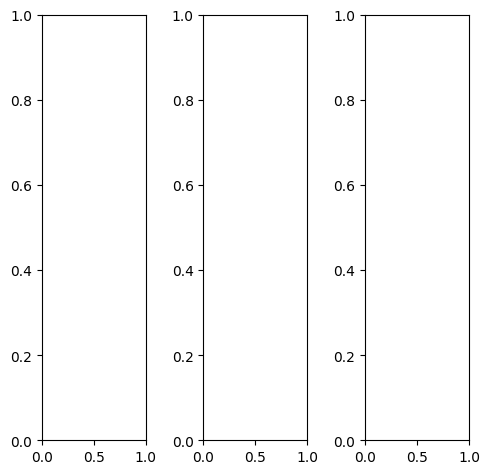

tensor([[[0.8392, 0.8471, 0.8431,  ..., 0.4588, 0.4431, 0.4353],
         [0.8196, 0.8235, 0.8157,  ..., 0.4235, 0.4118, 0.3961],
         [0.8118, 0.8235, 0.8078,  ..., 0.3961, 0.3961, 0.3804],
         ...,
         [0.4392, 0.4510, 0.4549,  ..., 0.5059, 0.5059, 0.4902],
         [0.4431, 0.4549, 0.4588,  ..., 0.4784, 0.4627, 0.4588],
         [0.4314, 0.4510, 0.4510,  ..., 0.4549, 0.4510, 0.4353]],

        [[0.8392, 0.8471, 0.8431,  ..., 0.4588, 0.4431, 0.4353],
         [0.8196, 0.8235, 0.8157,  ..., 0.4235, 0.4118, 0.3961],
         [0.8118, 0.8235, 0.8078,  ..., 0.3961, 0.3961, 0.3804],
         ...,
         [0.4392, 0.4510, 0.4549,  ..., 0.5059, 0.5059, 0.4902],
         [0.4431, 0.4549, 0.4588,  ..., 0.4784, 0.4627, 0.4588],
         [0.4314, 0.4510, 0.4510,  ..., 0.4549, 0.4510, 0.4353]],

        [[0.8392, 0.8471, 0.8431,  ..., 0.4588, 0.4431, 0.4353],
         [0.8196, 0.8235, 0.8157,  ..., 0.4235, 0.4118, 0.3961],
         [0.8118, 0.8235, 0.8078,  ..., 0.3961, 0.3961, 0.

tensor([[[0.8471, 0.8549, 0.8510,  ..., 0.4863, 0.4745, 0.4667],
         [0.8353, 0.8392, 0.8314,  ..., 0.4627, 0.4510, 0.4275],
         [0.8392, 0.8471, 0.8314,  ..., 0.4510, 0.4471, 0.4235],
         ...,
         [0.4471, 0.4667, 0.4745,  ..., 0.5490, 0.5451, 0.5216],
         [0.4549, 0.4706, 0.4784,  ..., 0.5176, 0.4941, 0.4902],
         [0.4314, 0.4627, 0.4784,  ..., 0.4902, 0.4824, 0.4510]],

        [[0.8588, 0.8706, 0.8627,  ..., 0.4863, 0.4706, 0.4667],
         [0.8353, 0.8431, 0.8353,  ..., 0.4549, 0.4392, 0.4275],
         [0.8275, 0.8392, 0.8235,  ..., 0.4157, 0.4157, 0.4039],
         ...,
         [0.4471, 0.4588, 0.4627,  ..., 0.5098, 0.5098, 0.4941],
         [0.4549, 0.4627, 0.4667,  ..., 0.4784, 0.4627, 0.4627],
         [0.4431, 0.4627, 0.4549,  ..., 0.4549, 0.4549, 0.4431]],

        [[0.7137, 0.7216, 0.7176,  ..., 0.2392, 0.2235, 0.2000],
         [0.6824, 0.6902, 0.6824,  ..., 0.1686, 0.1529, 0.1373],
         [0.6627, 0.6745, 0.6588,  ..., 0.1608, 0.1569, 0.

tensor([[[0.8785, 0.8810, 0.8687,  ..., 0.1846, 0.1682, 0.1705],
         [0.8482, 0.7432, 0.8260,  ..., 0.1505, 0.1272, 0.1127],
         [0.8653, 0.8856, 0.7973,  ..., 0.1153, 0.1102, 0.0894],
         ...,
         [0.3146, 0.3594, 0.3973,  ..., 0.4401, 0.4000, 0.3324],
         [0.3145, 0.3401, 0.3648,  ..., 0.3425, 0.3193, 0.3080],
         [0.2998, 0.2990, 0.3070,  ..., 0.3065, 0.2941, 0.2855]],

        [[0.8693, 0.9201, 0.8632,  ..., 0.3045, 0.3058, 0.2759],
         [0.8257, 0.7385, 0.8073,  ..., 0.2798, 0.2813, 0.2249],
         [0.8628, 0.9242, 0.8204,  ..., 0.2380, 0.2464, 0.1918],
         ...,
         [0.2941, 0.3373, 0.3569,  ..., 0.3930, 0.4111, 0.3189],
         [0.3075, 0.3378, 0.3424,  ..., 0.3651, 0.3417, 0.3036],
         [0.2853, 0.2918, 0.2992,  ..., 0.2882, 0.3014, 0.2723]],

        [[0.9341, 1.0037, 0.8779,  ..., 0.4462, 0.4440, 0.4144],
         [0.9465, 0.8993, 0.9206,  ..., 0.4343, 0.4248, 0.3830],
         [0.9224, 0.9543, 0.8280,  ..., 0.4151, 0.4128, 0.

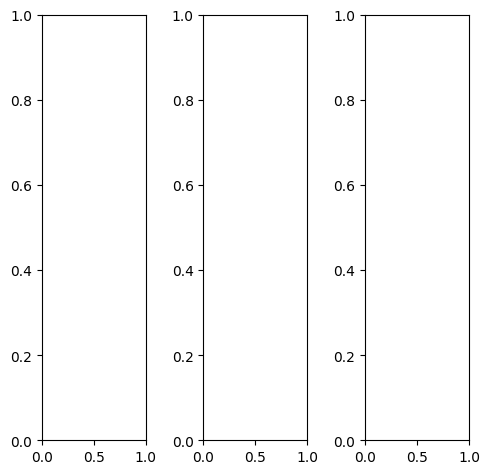

tensor([[[0.7490, 0.7373, 0.7020,  ..., 0.5216, 0.5490, 0.5725],
         [0.7137, 0.6863, 0.6706,  ..., 0.4314, 0.4549, 0.4941],
         [0.6902, 0.7059, 0.7137,  ..., 0.4235, 0.4510, 0.4784],
         ...,
         [0.7529, 0.7725, 0.7765,  ..., 0.4118, 0.4039, 0.3922],
         [0.6784, 0.7098, 0.7961,  ..., 0.3922, 0.3373, 0.3176],
         [0.7255, 0.6863, 0.7216,  ..., 0.3569, 0.3490, 0.3176]],

        [[0.7490, 0.7373, 0.7020,  ..., 0.5216, 0.5490, 0.5725],
         [0.7137, 0.6863, 0.6706,  ..., 0.4314, 0.4549, 0.4941],
         [0.6902, 0.7059, 0.7137,  ..., 0.4235, 0.4510, 0.4784],
         ...,
         [0.7529, 0.7725, 0.7765,  ..., 0.4118, 0.4039, 0.3922],
         [0.6784, 0.7098, 0.7961,  ..., 0.3922, 0.3373, 0.3176],
         [0.7255, 0.6863, 0.7216,  ..., 0.3569, 0.3490, 0.3176]],

        [[0.7490, 0.7373, 0.7020,  ..., 0.5216, 0.5490, 0.5725],
         [0.7137, 0.6863, 0.6706,  ..., 0.4314, 0.4549, 0.4941],
         [0.6902, 0.7059, 0.7137,  ..., 0.4235, 0.4510, 0.

tensor([[[0.8471, 0.8353, 0.7922,  ..., 0.6196, 0.6431, 0.6667],
         [0.8078, 0.7765, 0.7569,  ..., 0.5333, 0.5608, 0.6000],
         [0.7765, 0.7922, 0.7961,  ..., 0.5255, 0.5529, 0.5843],
         ...,
         [0.8471, 0.8471, 0.8275,  ..., 0.5137, 0.5216, 0.5216],
         [0.7843, 0.7922, 0.8549,  ..., 0.5059, 0.4667, 0.4510],
         [0.8275, 0.7804, 0.8039,  ..., 0.4745, 0.4863, 0.4588]],

        [[0.7216, 0.7098, 0.6745,  ..., 0.4941, 0.5216, 0.5451],
         [0.6902, 0.6627, 0.6471,  ..., 0.4039, 0.4275, 0.4627],
         [0.6667, 0.6863, 0.6902,  ..., 0.3922, 0.4196, 0.4510],
         ...,
         [0.7294, 0.7569, 0.7647,  ..., 0.3843, 0.3686, 0.3529],
         [0.6510, 0.6902, 0.7843,  ..., 0.3608, 0.3020, 0.2784],
         [0.7020, 0.6627, 0.7020,  ..., 0.3216, 0.3098, 0.2745]],

        [[0.6392, 0.6275, 0.5922,  ..., 0.3922, 0.4275, 0.4588],
         [0.6039, 0.5765, 0.5647,  ..., 0.3137, 0.3294, 0.3647],
         [0.5725, 0.5961, 0.6078,  ..., 0.3098, 0.3294, 0.

tensor([[[0.5272, 0.5123, 0.3334,  ..., 0.2827, 0.3113, 0.3780],
         [0.4343, 0.2733, 0.1733,  ..., 0.1494, 0.1703, 0.2360],
         [0.3256, 0.3221, 0.2032,  ..., 0.1449, 0.1790, 0.2408],
         ...,
         [0.5646, 0.6341, 0.5882,  ..., 0.2553, 0.2190, 0.2511],
         [0.4714, 0.5424, 0.6271,  ..., 0.1994, 0.1300, 0.1439],
         [0.5741, 0.5086, 0.5362,  ..., 0.1565, 0.1502, 0.1291]],

        [[0.5646, 0.6723, 0.4238,  ..., 0.3693, 0.4261, 0.4481],
         [0.4985, 0.3907, 0.2182,  ..., 0.2390, 0.2878, 0.3090],
         [0.4264, 0.5005, 0.2761,  ..., 0.2235, 0.2571, 0.2916],
         ...,
         [0.5294, 0.5628, 0.5529,  ..., 0.2295, 0.2189, 0.2232],
         [0.4479, 0.4740, 0.5917,  ..., 0.1972, 0.1289, 0.1221],
         [0.5414, 0.4817, 0.5090,  ..., 0.1320, 0.1271, 0.1092]],

        [[0.7845, 0.7410, 0.6147,  ..., 0.4463, 0.4994, 0.5464],
         [0.6843, 0.5247, 0.5382,  ..., 0.2917, 0.3271, 0.4125],
         [0.5383, 0.5307, 0.4307,  ..., 0.2785, 0.3103, 0.

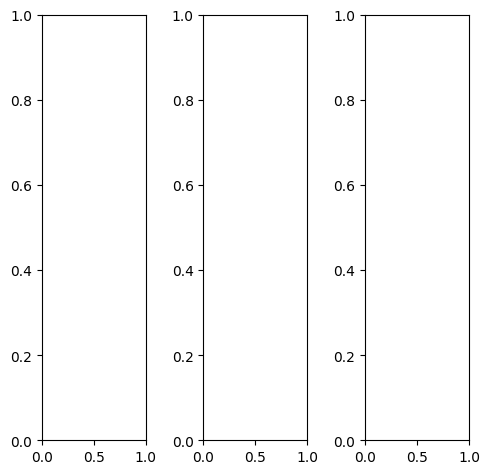

EPOCH: 30.510  trn_loss: 0.004  (3730.84s - 8497.34s remaining)

tensor([[[0.8275, 0.8235, 0.8392,  ..., 0.2235, 0.1961, 0.1608],
         [0.8353, 0.8353, 0.8510,  ..., 0.1961, 0.2196, 0.1882],
         [0.8235, 0.8235, 0.8392,  ..., 0.1961, 0.2275, 0.2196],
         ...,
         [0.5725, 0.5725, 0.6118,  ..., 0.2627, 0.3294, 0.2510],
         [0.5176, 0.5216, 0.5451,  ..., 0.3176, 0.2980, 0.1843],
         [0.4627, 0.4706, 0.4902,  ..., 0.3255, 0.2588, 0.2039]],

        [[0.8275, 0.8235, 0.8392,  ..., 0.2235, 0.1961, 0.1608],
         [0.8353, 0.8353, 0.8510,  ..., 0.1961, 0.2196, 0.1882],
         [0.8235, 0.8235, 0.8392,  ..., 0.1961, 0.2275, 0.2196],
         ...,
         [0.5725, 0.5725, 0.6118,  ..., 0.2627, 0.3294, 0.2510],
         [0.5176, 0.5216, 0.5451,  ..., 0.3176, 0.2980, 0.1843],
         [0.4627, 0.4706, 0.4902,  ..., 0.3255, 0.2588, 0.2039]],

        [[0.8275, 0.8235, 0.8392,  ..., 0.2235, 0.1961, 0.1608],
         [0.8353, 0.8353, 0.8510,  ..., 0.1961, 0.2196, 0.1882],
         [0.8235, 0.8235, 0.8392,  ..., 0.1961, 0.2275, 0.

tensor([[[0.8510, 0.8471, 0.8627,  ..., 0.1490, 0.1412, 0.1098],
         [0.8588, 0.8588, 0.8745,  ..., 0.1176, 0.1608, 0.1333],
         [0.8471, 0.8471, 0.8627,  ..., 0.1137, 0.1647, 0.1608],
         ...,
         [0.5922, 0.5490, 0.5686,  ..., 0.1882, 0.2784, 0.2000],
         [0.5255, 0.4980, 0.4941,  ..., 0.2510, 0.2392, 0.1098],
         [0.4588, 0.4471, 0.4392,  ..., 0.2549, 0.1843, 0.1137]],

        [[0.8314, 0.8275, 0.8431,  ..., 0.2667, 0.2314, 0.1922],
         [0.8392, 0.8392, 0.8549,  ..., 0.2471, 0.2627, 0.2275],
         [0.8275, 0.8275, 0.8431,  ..., 0.2510, 0.2784, 0.2627],
         ...,
         [0.5765, 0.5922, 0.6392,  ..., 0.3059, 0.3608, 0.2824],
         [0.5216, 0.5373, 0.5765,  ..., 0.3608, 0.3373, 0.2275],
         [0.4745, 0.4863, 0.5176,  ..., 0.3686, 0.3020, 0.2588]],

        [[0.7569, 0.7569, 0.7686,  ..., 0.1843, 0.1608, 0.1176],
         [0.7608, 0.7647, 0.7804,  ..., 0.1333, 0.1490, 0.1294],
         [0.7529, 0.7529, 0.7686,  ..., 0.1255, 0.1373, 0.

tensor([[[0.9522, 0.9294, 0.9977,  ..., 0.1134, 0.0841, 0.0926],
         [0.9118, 0.9042, 0.9038,  ..., 0.0667, 0.0904, 0.0858],
         [0.8430, 0.9081, 0.8572,  ..., 0.0750, 0.1027, 0.1235],
         ...,
         [0.6539, 0.6610, 0.7051,  ..., 0.3092, 0.3923, 0.2751],
         [0.5812, 0.5956, 0.6020,  ..., 0.3722, 0.3343, 0.1855],
         [0.5183, 0.5503, 0.5676,  ..., 0.3104, 0.2388, 0.2080]],

        [[0.9909, 0.9832, 1.0169,  ..., 0.2101, 0.1785, 0.1595],
         [0.9015, 0.9296, 0.9092,  ..., 0.1798, 0.2270, 0.1762],
         [0.9398, 0.9470, 0.9482,  ..., 0.1519, 0.2064, 0.2101],
         ...,
         [0.5861, 0.6067, 0.6938,  ..., 0.2923, 0.3759, 0.2498],
         [0.5090, 0.5364, 0.5768,  ..., 0.3502, 0.3186, 0.1680],
         [0.4675, 0.5015, 0.5288,  ..., 0.2820, 0.2333, 0.1810]],

        [[1.0934, 1.1245, 1.1408,  ..., 0.3608, 0.3555, 0.3461],
         [1.1012, 1.1716, 1.1702,  ..., 0.3529, 0.4339, 0.3877],
         [1.0580, 1.1450, 1.1238,  ..., 0.3199, 0.4212, 0.

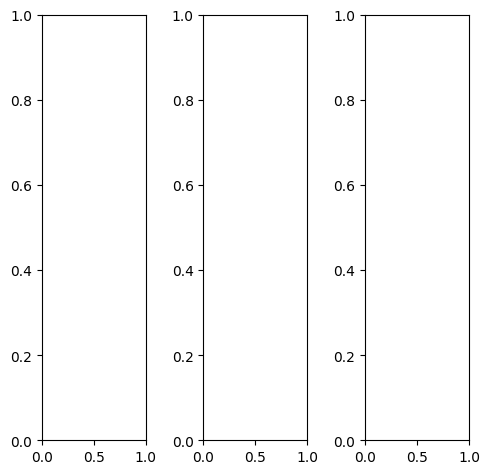

tensor([[[0.7137, 0.7255, 0.7216,  ..., 0.7529, 0.7490, 0.7451],
         [0.7255, 0.7373, 0.7333,  ..., 0.7529, 0.7490, 0.7490],
         [0.7255, 0.7333, 0.7333,  ..., 0.7451, 0.7412, 0.7412],
         ...,
         [0.3529, 0.3333, 0.3098,  ..., 0.4078, 0.4078, 0.4157],
         [0.1922, 0.1725, 0.1569,  ..., 0.3176, 0.3490, 0.3686],
         [0.0784, 0.0667, 0.0627,  ..., 0.2078, 0.2471, 0.3098]],

        [[0.7137, 0.7255, 0.7216,  ..., 0.7529, 0.7490, 0.7451],
         [0.7255, 0.7373, 0.7333,  ..., 0.7529, 0.7490, 0.7490],
         [0.7255, 0.7333, 0.7333,  ..., 0.7451, 0.7412, 0.7412],
         ...,
         [0.3529, 0.3333, 0.3098,  ..., 0.4078, 0.4078, 0.4157],
         [0.1922, 0.1725, 0.1569,  ..., 0.3176, 0.3490, 0.3686],
         [0.0784, 0.0667, 0.0627,  ..., 0.2078, 0.2471, 0.3098]],

        [[0.7137, 0.7255, 0.7216,  ..., 0.7529, 0.7490, 0.7451],
         [0.7255, 0.7373, 0.7333,  ..., 0.7529, 0.7490, 0.7490],
         [0.7255, 0.7333, 0.7333,  ..., 0.7451, 0.7412, 0.

tensor([[[0.6667, 0.6784, 0.6745,  ..., 0.7216, 0.7216, 0.7137],
         [0.6824, 0.6941, 0.6902,  ..., 0.7216, 0.7216, 0.7176],
         [0.6902, 0.6980, 0.6941,  ..., 0.7098, 0.7059, 0.7059],
         ...,
         [0.3608, 0.3373, 0.3059,  ..., 0.4235, 0.4275, 0.4314],
         [0.1804, 0.1647, 0.1451,  ..., 0.3333, 0.3647, 0.3843],
         [0.0549, 0.0471, 0.0471,  ..., 0.2196, 0.2627, 0.3255]],

        [[0.7294, 0.7373, 0.7333,  ..., 0.7608, 0.7569, 0.7529],
         [0.7373, 0.7490, 0.7451,  ..., 0.7608, 0.7569, 0.7569],
         [0.7373, 0.7412, 0.7412,  ..., 0.7529, 0.7529, 0.7490],
         ...,
         [0.3490, 0.3333, 0.3137,  ..., 0.4078, 0.4078, 0.4157],
         [0.1961, 0.1765, 0.1608,  ..., 0.3176, 0.3490, 0.3686],
         [0.0863, 0.0745, 0.0667,  ..., 0.2078, 0.2471, 0.3098]],

        [[0.7725, 0.7882, 0.7922,  ..., 0.7882, 0.7843, 0.7804],
         [0.7765, 0.7922, 0.8000,  ..., 0.7961, 0.7922, 0.7882],
         [0.7725, 0.7804, 0.7882,  ..., 0.7882, 0.7882, 0.

tensor([[[0.5886, 0.5345, 0.4343,  ..., 0.5424, 0.5525, 0.6350],
         [0.5829, 0.5023, 0.4618,  ..., 0.4877, 0.5482, 0.6139],
         [0.5243, 0.5058, 0.3667,  ..., 0.5277, 0.5617, 0.6048],
         ...,
         [0.3141, 0.3489, 0.3267,  ..., 0.4529, 0.4292, 0.4438],
         [0.1591, 0.1394, 0.1236,  ..., 0.3309, 0.3775, 0.3908],
         [0.0828, 0.0486, 0.0368,  ..., 0.2080, 0.2410, 0.3313]],

        [[0.6389, 0.5895, 0.5153,  ..., 0.6154, 0.6543, 0.6715],
         [0.5674, 0.4548, 0.4375,  ..., 0.5980, 0.6448, 0.7106],
         [0.6486, 0.5603, 0.5157,  ..., 0.6252, 0.6296, 0.6773],
         ...,
         [0.3206, 0.3625, 0.3275,  ..., 0.4404, 0.4257, 0.4053],
         [0.1683, 0.1606, 0.1456,  ..., 0.3222, 0.3536, 0.3489],
         [0.0816, 0.0524, 0.0437,  ..., 0.2003, 0.2224, 0.2871]],

        [[0.7474, 0.6770, 0.7032,  ..., 0.7888, 0.8040, 0.8173],
         [0.7307, 0.6669, 0.6831,  ..., 0.7594, 0.7966, 0.8210],
         [0.6462, 0.6402, 0.5821,  ..., 0.7728, 0.7891, 0.

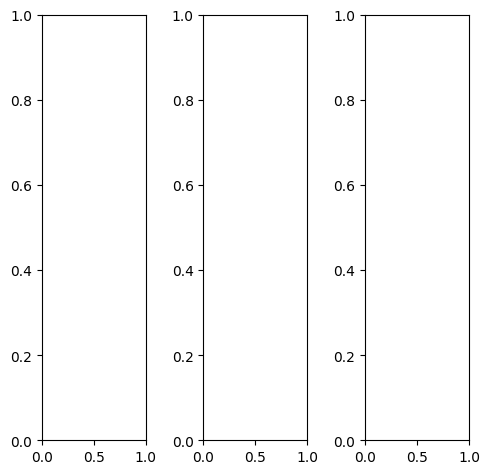

tensor([[[0.3843, 0.4118, 0.4235,  ..., 0.6745, 0.6784, 0.6627],
         [0.4275, 0.4510, 0.4627,  ..., 0.7569, 0.7529, 0.7529],
         [0.4314, 0.4392, 0.4510,  ..., 0.7608, 0.7569, 0.7686],
         ...,
         [0.2706, 0.2510, 0.2314,  ..., 0.3412, 0.3255, 0.3529],
         [0.2824, 0.3020, 0.2588,  ..., 0.3255, 0.3451, 0.3569],
         [0.3059, 0.3137, 0.2706,  ..., 0.3294, 0.3176, 0.3137]],

        [[0.3843, 0.4118, 0.4235,  ..., 0.6745, 0.6784, 0.6627],
         [0.4275, 0.4510, 0.4627,  ..., 0.7569, 0.7529, 0.7529],
         [0.4314, 0.4392, 0.4510,  ..., 0.7608, 0.7569, 0.7686],
         ...,
         [0.2706, 0.2510, 0.2314,  ..., 0.3412, 0.3255, 0.3529],
         [0.2824, 0.3020, 0.2588,  ..., 0.3255, 0.3451, 0.3569],
         [0.3059, 0.3137, 0.2706,  ..., 0.3294, 0.3176, 0.3137]],

        [[0.3843, 0.4118, 0.4235,  ..., 0.6745, 0.6784, 0.6627],
         [0.4275, 0.4510, 0.4627,  ..., 0.7569, 0.7529, 0.7529],
         [0.4314, 0.4392, 0.4510,  ..., 0.7608, 0.7569, 0.

tensor([[[0.2863, 0.2902, 0.3020,  ..., 0.6118, 0.6039, 0.5804],
         [0.3098, 0.3059, 0.3176,  ..., 0.6902, 0.6784, 0.6706],
         [0.3020, 0.2824, 0.2941,  ..., 0.6941, 0.6824, 0.6863],
         ...,
         [0.2039, 0.1765, 0.1725,  ..., 0.2627, 0.2431, 0.2667],
         [0.2235, 0.2314, 0.2039,  ..., 0.2431, 0.2667, 0.2824],
         [0.2549, 0.2510, 0.2196,  ..., 0.2314, 0.2275, 0.2471]],

        [[0.4000, 0.4392, 0.4510,  ..., 0.6902, 0.6980, 0.6824],
         [0.4392, 0.4745, 0.4863,  ..., 0.7686, 0.7686, 0.7725],
         [0.4510, 0.4667, 0.4824,  ..., 0.7725, 0.7725, 0.7882],
         ...,
         [0.2784, 0.2627, 0.2392,  ..., 0.3569, 0.3412, 0.3647],
         [0.2902, 0.3098, 0.2627,  ..., 0.3373, 0.3569, 0.3647],
         [0.3137, 0.3216, 0.2706,  ..., 0.3490, 0.3333, 0.3176]],

        [[0.5529, 0.6039, 0.6039,  ..., 0.7608, 0.7725, 0.7608],
         [0.6706, 0.7176, 0.7137,  ..., 0.8627, 0.8627, 0.8549],
         [0.6824, 0.7098, 0.7098,  ..., 0.8745, 0.8745, 0.

tensor([[[0.2444, 0.1711, 0.0498,  ..., 0.5013, 0.5351, 0.6271],
         [0.2990, 0.1156, 0.1280,  ..., 0.5411, 0.6084, 0.6852],
         [0.1763, 0.0749, 0.0149,  ..., 0.5742, 0.5995, 0.6978],
         ...,
         [0.1917, 0.1806, 0.1330,  ..., 0.3237, 0.2957, 0.3619],
         [0.2006, 0.2448, 0.1822,  ..., 0.2833, 0.3296, 0.3638],
         [0.2732, 0.2499, 0.2162,  ..., 0.3183, 0.2957, 0.3506]],

        [[0.3171, 0.2554, 0.1718,  ..., 0.6098, 0.6582, 0.6866],
         [0.2931, 0.0967, 0.0287,  ..., 0.6836, 0.7220, 0.8163],
         [0.3146, 0.1419, 0.1018,  ..., 0.7046, 0.7044, 0.8006],
         ...,
         [0.2003, 0.1652, 0.1299,  ..., 0.3262, 0.2916, 0.3137],
         [0.2022, 0.2369, 0.1741,  ..., 0.2901, 0.3127, 0.3128],
         [0.2634, 0.2335, 0.2036,  ..., 0.2929, 0.2656, 0.2946]],

        [[0.4557, 0.2930, 0.3397,  ..., 0.7942, 0.8205, 0.8356],
         [0.4306, 0.2839, 0.3674,  ..., 0.8539, 0.8978, 0.9350],
         [0.3445, 0.2991, 0.3134,  ..., 0.8620, 0.8886, 0.

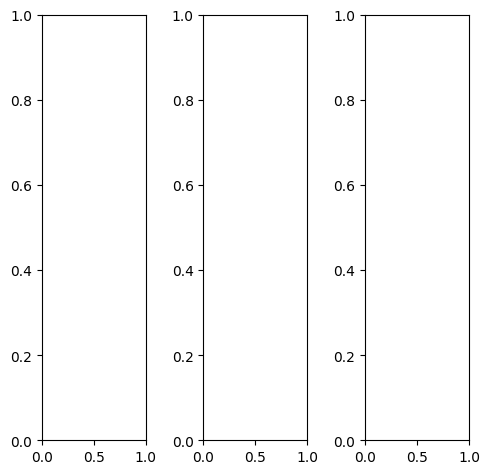

tensor([[[0.8471, 0.8392, 0.8471,  ..., 0.8471, 0.8392, 0.8471],
         [0.8706, 0.8627, 0.8706,  ..., 0.8667, 0.8627, 0.8706],
         [0.8784, 0.8667, 0.8667,  ..., 0.8706, 0.8627, 0.8706],
         ...,
         [0.9255, 0.9137, 0.9137,  ..., 0.9255, 0.9216, 0.9255],
         [0.9255, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9333],
         [0.9137, 0.9020, 0.9059,  ..., 0.9098, 0.9137, 0.9294]],

        [[0.8471, 0.8392, 0.8471,  ..., 0.8471, 0.8392, 0.8471],
         [0.8706, 0.8627, 0.8706,  ..., 0.8667, 0.8627, 0.8706],
         [0.8784, 0.8667, 0.8667,  ..., 0.8706, 0.8627, 0.8706],
         ...,
         [0.9255, 0.9137, 0.9137,  ..., 0.9255, 0.9216, 0.9255],
         [0.9255, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9333],
         [0.9137, 0.9020, 0.9059,  ..., 0.9098, 0.9137, 0.9294]],

        [[0.8471, 0.8392, 0.8471,  ..., 0.8471, 0.8392, 0.8471],
         [0.8706, 0.8627, 0.8706,  ..., 0.8667, 0.8627, 0.8706],
         [0.8784, 0.8667, 0.8667,  ..., 0.8706, 0.8627, 0.

tensor([[[0.7412, 0.7333, 0.7333,  ..., 0.7255, 0.7176, 0.7255],
         [0.7882, 0.7647, 0.7529,  ..., 0.7569, 0.7412, 0.7451],
         [0.7765, 0.7647, 0.7608,  ..., 0.7725, 0.7529, 0.7569],
         ...,
         [0.9255, 0.9137, 0.9137,  ..., 0.9255, 0.9216, 0.9255],
         [0.9255, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9333],
         [0.9137, 0.9020, 0.9059,  ..., 0.9098, 0.9137, 0.9294]],

        [[0.8784, 0.8706, 0.8784,  ..., 0.8824, 0.8745, 0.8863],
         [0.8863, 0.8902, 0.9059,  ..., 0.9020, 0.8980, 0.9098],
         [0.9098, 0.9020, 0.9059,  ..., 0.9020, 0.8980, 0.9059],
         ...,
         [0.9255, 0.9137, 0.9137,  ..., 0.9255, 0.9216, 0.9255],
         [0.9255, 0.9176, 0.9255,  ..., 0.9294, 0.9255, 0.9333],
         [0.9137, 0.9020, 0.9059,  ..., 0.9098, 0.9137, 0.9294]],

        [[0.9608, 0.9569, 0.9686,  ..., 0.9686, 0.9608, 0.9725],
         [0.9961, 0.9804, 0.9804,  ..., 0.9882, 0.9922, 1.0000],
         [0.9843, 0.9686, 0.9569,  ..., 0.9647, 0.9765, 0.

tensor([[[0.7327, 0.7269, 0.6371,  ..., 0.5614, 0.5789, 0.6603],
         [0.7182, 0.6989, 0.6562,  ..., 0.5632, 0.5881, 0.6580],
         [0.6738, 0.7355, 0.5992,  ..., 0.6015, 0.6134, 0.6556],
         ...,
         [0.8357, 0.8148, 0.7907,  ..., 0.8244, 0.8281, 0.8453],
         [0.8087, 0.7870, 0.7806,  ..., 0.8085, 0.8147, 0.8593],
         [0.8173, 0.8047, 0.7970,  ..., 0.8433, 0.8465, 0.8609]],

        [[0.7252, 0.7658, 0.6015,  ..., 0.6859, 0.7068, 0.7455],
         [0.7013, 0.6103, 0.6140,  ..., 0.7163, 0.7173, 0.7861],
         [0.7526, 0.7702, 0.6253,  ..., 0.7348, 0.7251, 0.7674],
         ...,
         [0.8003, 0.7732, 0.7768,  ..., 0.8020, 0.7941, 0.8192],
         [0.7918, 0.7514, 0.7710,  ..., 0.7926, 0.7801, 0.8240],
         [0.7625, 0.7716, 0.7711,  ..., 0.7912, 0.7977, 0.8122]],

        [[0.8186, 0.8241, 0.7815,  ..., 0.9162, 0.9147, 0.9176],
         [0.8275, 0.7800, 0.8272,  ..., 0.9143, 0.9251, 0.9531],
         [0.7400, 0.7542, 0.7208,  ..., 0.9190, 0.9342, 0.

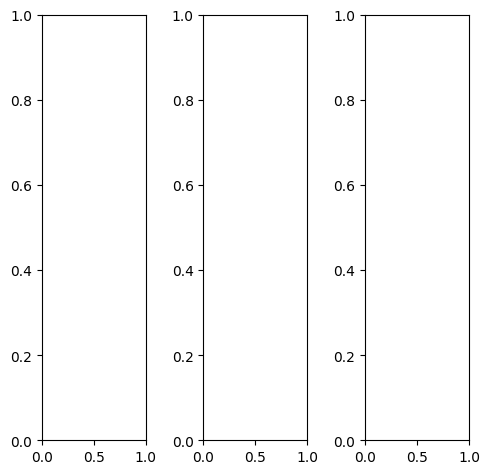

tensor([[[0.8157, 0.7804, 0.8314,  ..., 0.4627, 0.5176, 0.4784],
         [0.7608, 0.7490, 0.8157,  ..., 0.4078, 0.3294, 0.2118],
         [0.6667, 0.6667, 0.7373,  ..., 0.5490, 0.5490, 0.3176],
         ...,
         [0.6471, 0.6314, 0.6235,  ..., 0.6667, 0.6706, 0.6863],
         [0.7294, 0.7216, 0.7255,  ..., 0.6431, 0.6235, 0.6118],
         [0.7333, 0.6824, 0.7020,  ..., 0.6510, 0.6667, 0.6745]],

        [[0.8157, 0.7804, 0.8314,  ..., 0.4627, 0.5176, 0.4784],
         [0.7608, 0.7490, 0.8157,  ..., 0.4078, 0.3294, 0.2118],
         [0.6667, 0.6667, 0.7373,  ..., 0.5490, 0.5490, 0.3176],
         ...,
         [0.6471, 0.6314, 0.6235,  ..., 0.6667, 0.6706, 0.6863],
         [0.7294, 0.7216, 0.7255,  ..., 0.6431, 0.6235, 0.6118],
         [0.7333, 0.6824, 0.7020,  ..., 0.6510, 0.6667, 0.6745]],

        [[0.8157, 0.7804, 0.8314,  ..., 0.4627, 0.5176, 0.4784],
         [0.7608, 0.7490, 0.8157,  ..., 0.4078, 0.3294, 0.2118],
         [0.6667, 0.6667, 0.7373,  ..., 0.5490, 0.5490, 0.

tensor([[[0.8157, 0.7804, 0.8314,  ..., 0.5804, 0.5569, 0.4980],
         [0.7647, 0.7529, 0.8196,  ..., 0.5176, 0.3725, 0.2157],
         [0.6824, 0.6824, 0.7490,  ..., 0.6863, 0.6196, 0.3216],
         ...,
         [0.7098, 0.7059, 0.7137,  ..., 0.7882, 0.7961, 0.7961],
         [0.8118, 0.8157, 0.8353,  ..., 0.7647, 0.7490, 0.7255],
         [0.8235, 0.7804, 0.8118,  ..., 0.7765, 0.7922, 0.7765]],

        [[0.8118, 0.7725, 0.8275,  ..., 0.4118, 0.5059, 0.4706],
         [0.7569, 0.7412, 0.8078,  ..., 0.3569, 0.3137, 0.2078],
         [0.6588, 0.6588, 0.7255,  ..., 0.4863, 0.5176, 0.3176],
         ...,
         [0.6275, 0.6039, 0.5922,  ..., 0.6235, 0.6275, 0.6431],
         [0.7020, 0.6863, 0.6824,  ..., 0.6000, 0.5804, 0.5686],
         [0.7020, 0.6431, 0.6588,  ..., 0.6039, 0.6196, 0.6353]],

        [[0.8471, 0.8118, 0.8667,  ..., 0.4118, 0.4627, 0.4510],
         [0.7843, 0.7686, 0.8353,  ..., 0.3725, 0.2980, 0.2078],
         [0.6824, 0.6824, 0.7529,  ..., 0.5176, 0.5176, 0.

tensor([[[0.4698, 0.3972, 0.3990,  ..., 0.3174, 0.3640, 0.3076],
         [0.3985, 0.2425, 0.2780,  ..., 0.2797, 0.1995, 0.1210],
         [0.2900, 0.1896, 0.1970,  ..., 0.3948, 0.3922, 0.1797],
         ...,
         [0.5098, 0.5498, 0.5515,  ..., 0.5121, 0.5005, 0.5314],
         [0.5796, 0.6152, 0.6312,  ..., 0.5006, 0.4907, 0.4768],
         [0.5531, 0.5374, 0.5606,  ..., 0.5008, 0.5260, 0.5081]],

        [[0.5359, 0.4780, 0.5198,  ..., 0.3613, 0.4240, 0.3537],
         [0.4276, 0.2857, 0.3098,  ..., 0.3545, 0.2803, 0.1643],
         [0.4217, 0.3101, 0.3565,  ..., 0.4652, 0.4645, 0.2238],
         ...,
         [0.4705, 0.5012, 0.5188,  ..., 0.4793, 0.4918, 0.4893],
         [0.5267, 0.5633, 0.5802,  ..., 0.4788, 0.4673, 0.4442],
         [0.5016, 0.4792, 0.5101,  ..., 0.4620, 0.4869, 0.4732]],

        [[0.6426, 0.5457, 0.6010,  ..., 0.4506, 0.5218, 0.4465],
         [0.5588, 0.4533, 0.4888,  ..., 0.4331, 0.3734, 0.2713],
         [0.4319, 0.3779, 0.3707,  ..., 0.5577, 0.5717, 0.

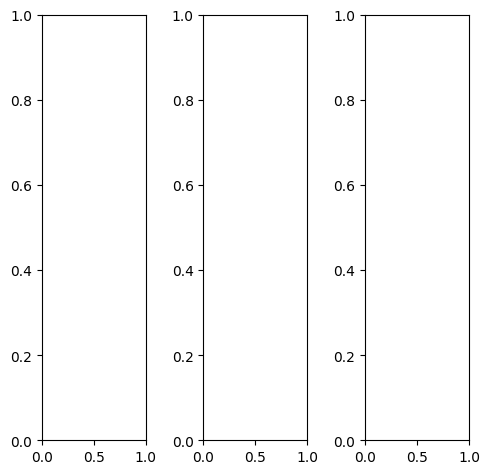

EPOCH: 30.765  trn_loss: 0.004  (3761.34s - 8464.58s remaining)

tensor([[[0.2000, 0.2235, 0.2000,  ..., 0.1529, 0.1686, 0.1961],
         [0.2118, 0.2392, 0.2196,  ..., 0.1020, 0.1294, 0.1686],
         [0.2824, 0.2667, 0.2667,  ..., 0.1020, 0.1137, 0.1529],
         ...,
         [0.2706, 0.3333, 0.2078,  ..., 0.1922, 0.2275, 0.1529],
         [0.2314, 0.3412, 0.2275,  ..., 0.1922, 0.1961, 0.1412],
         [0.2078, 0.2941, 0.2157,  ..., 0.1529, 0.1529, 0.1412]],

        [[0.2000, 0.2235, 0.2000,  ..., 0.1529, 0.1686, 0.1961],
         [0.2118, 0.2392, 0.2196,  ..., 0.1020, 0.1294, 0.1686],
         [0.2824, 0.2667, 0.2667,  ..., 0.1020, 0.1137, 0.1529],
         ...,
         [0.2706, 0.3333, 0.2078,  ..., 0.1922, 0.2275, 0.1529],
         [0.2314, 0.3412, 0.2275,  ..., 0.1922, 0.1961, 0.1412],
         [0.2078, 0.2941, 0.2157,  ..., 0.1529, 0.1529, 0.1412]],

        [[0.2000, 0.2235, 0.2000,  ..., 0.1529, 0.1686, 0.1961],
         [0.2118, 0.2392, 0.2196,  ..., 0.1020, 0.1294, 0.1686],
         [0.2824, 0.2667, 0.2667,  ..., 0.1020, 0.1137, 0.

tensor([[[0.2039, 0.2275, 0.2039,  ..., 0.1529, 0.1765, 0.2078],
         [0.2157, 0.2431, 0.2235,  ..., 0.1059, 0.1373, 0.1922],
         [0.2863, 0.2706, 0.2706,  ..., 0.1020, 0.1216, 0.1725],
         ...,
         [0.3020, 0.3647, 0.2353,  ..., 0.2039, 0.2431, 0.1686],
         [0.2588, 0.3725, 0.2549,  ..., 0.2039, 0.2118, 0.1569],
         [0.2275, 0.3137, 0.2353,  ..., 0.1647, 0.1608, 0.1451]],

        [[0.1961, 0.2196, 0.1961,  ..., 0.1529, 0.1686, 0.1882],
         [0.2078, 0.2353, 0.2157,  ..., 0.1020, 0.1294, 0.1569],
         [0.2784, 0.2627, 0.2667,  ..., 0.1020, 0.1137, 0.1412],
         ...,
         [0.2588, 0.3216, 0.1961,  ..., 0.1882, 0.2235, 0.1490],
         [0.2157, 0.3255, 0.2118,  ..., 0.1882, 0.1882, 0.1373],
         [0.1961, 0.2824, 0.2078,  ..., 0.1490, 0.1490, 0.1373]],

        [[0.2000, 0.2235, 0.2000,  ..., 0.1412, 0.1647, 0.1961],
         [0.2118, 0.2392, 0.2235,  ..., 0.0941, 0.1255, 0.1686],
         [0.2824, 0.2667, 0.2706,  ..., 0.0941, 0.1059, 0.

tensor([[[0.3101, 0.2256, 0.1488,  ..., 0.2077, 0.2396, 0.3521],
         [0.2591, 0.2041, 0.1250,  ..., 0.1116, 0.1460, 0.2691],
         [0.3234, 0.2345, 0.1624,  ..., 0.1012, 0.1208, 0.2474],
         ...,
         [0.4676, 0.5596, 0.3809,  ..., 0.3583, 0.3977, 0.3422],
         [0.3958, 0.5801, 0.4194,  ..., 0.3286, 0.3537, 0.3222],
         [0.4127, 0.5074, 0.3808,  ..., 0.3068, 0.2907, 0.3396]],

        [[0.3554, 0.3946, 0.1926,  ..., 0.2502, 0.2980, 0.3776],
         [0.3648, 0.3449, 0.1818,  ..., 0.1956, 0.2364, 0.3000],
         [0.4182, 0.4123, 0.2568,  ..., 0.1670, 0.1930, 0.2779],
         ...,
         [0.4470, 0.4866, 0.3511,  ..., 0.3053, 0.3684, 0.2685],
         [0.3783, 0.5487, 0.3814,  ..., 0.3014, 0.3194, 0.2562],
         [0.3874, 0.4574, 0.3397,  ..., 0.2559, 0.2497, 0.2750]],

        [[0.5109, 0.4197, 0.4454,  ..., 0.3698, 0.4218, 0.5009],
         [0.5190, 0.4986, 0.4586,  ..., 0.3171, 0.3546, 0.4254],
         [0.5294, 0.4726, 0.5321,  ..., 0.2964, 0.3276, 0.

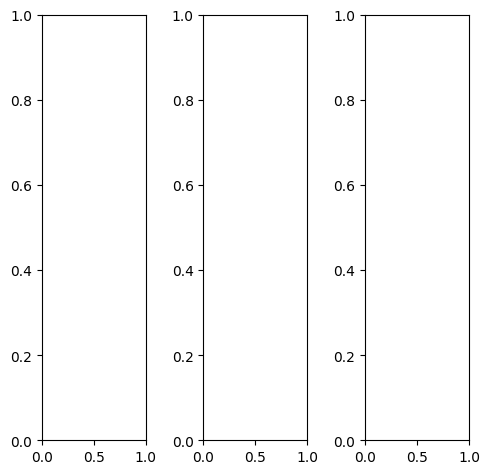

tensor([[[0.1098, 0.0902, 0.0745,  ..., 0.0039, 0.0471, 0.0549],
         [0.1412, 0.1569, 0.1412,  ..., 0.0157, 0.0588, 0.0588],
         [0.3059, 0.2510, 0.1922,  ..., 0.0275, 0.0667, 0.0510],
         ...,
         [0.6275, 0.5804, 0.5686,  ..., 0.2235, 0.2118, 0.2196],
         [0.6118, 0.5843, 0.5843,  ..., 0.4196, 0.3961, 0.3804],
         [0.5608, 0.5843, 0.5686,  ..., 0.4667, 0.4471, 0.4196]],

        [[0.1098, 0.0902, 0.0745,  ..., 0.0039, 0.0471, 0.0549],
         [0.1412, 0.1569, 0.1412,  ..., 0.0157, 0.0588, 0.0588],
         [0.3059, 0.2510, 0.1922,  ..., 0.0275, 0.0667, 0.0510],
         ...,
         [0.6275, 0.5804, 0.5686,  ..., 0.2235, 0.2118, 0.2196],
         [0.6118, 0.5843, 0.5843,  ..., 0.4196, 0.3961, 0.3804],
         [0.5608, 0.5843, 0.5686,  ..., 0.4667, 0.4471, 0.4196]],

        [[0.1098, 0.0902, 0.0745,  ..., 0.0039, 0.0471, 0.0549],
         [0.1412, 0.1569, 0.1412,  ..., 0.0157, 0.0588, 0.0588],
         [0.3059, 0.2510, 0.1922,  ..., 0.0275, 0.0667, 0.

tensor([[[0.1020, 0.0784, 0.0627,  ..., 0.0000, 0.0431, 0.0510],
         [0.1451, 0.1529, 0.1294,  ..., 0.0118, 0.0549, 0.0549],
         [0.3490, 0.2784, 0.2078,  ..., 0.0235, 0.0627, 0.0471],
         ...,
         [0.7137, 0.6667, 0.6549,  ..., 0.2314, 0.2235, 0.2275],
         [0.7020, 0.6706, 0.6706,  ..., 0.4392, 0.4196, 0.4039],
         [0.6471, 0.6706, 0.6549,  ..., 0.4902, 0.4706, 0.4353]],

        [[0.1176, 0.0980, 0.0824,  ..., 0.0078, 0.0510, 0.0549],
         [0.1490, 0.1647, 0.1529,  ..., 0.0196, 0.0588, 0.0588],
         [0.3098, 0.2549, 0.1961,  ..., 0.0353, 0.0667, 0.0510],
         ...,
         [0.6118, 0.5647, 0.5529,  ..., 0.2196, 0.2078, 0.2157],
         [0.5961, 0.5686, 0.5686,  ..., 0.4118, 0.3882, 0.3725],
         [0.5451, 0.5686, 0.5569,  ..., 0.4588, 0.4392, 0.4118]],

        [[0.1020, 0.0784, 0.0627,  ..., 0.0000, 0.0471, 0.0627],
         [0.0863, 0.1176, 0.1176,  ..., 0.0039, 0.0588, 0.0667],
         [0.1882, 0.1529, 0.1137,  ..., 0.0118, 0.0667, 0.

tensor([[[ 0.1359,  0.0598, -0.0174,  ...,  0.0422,  0.0973,  0.1639],
         [ 0.2389,  0.0848,  0.0404,  ...,  0.0301,  0.0865,  0.1319],
         [ 0.3815,  0.2318,  0.1416,  ...,  0.0202,  0.0834,  0.1106],
         ...,
         [ 0.9343,  0.8965,  0.8738,  ...,  0.4095,  0.3774,  0.4415],
         [ 0.8822,  0.8793,  0.8630,  ...,  0.6640,  0.6229,  0.6558],
         [ 0.8429,  0.8792,  0.8365,  ...,  0.7476,  0.7112,  0.6797]],

        [[ 0.2016,  0.1735,  0.0149,  ...,  0.0970,  0.1356,  0.1903],
         [ 0.2375,  0.1499, -0.0374,  ...,  0.1078,  0.1785,  0.1763],
         [ 0.4734,  0.3164,  0.1803,  ...,  0.1039,  0.1603,  0.1676],
         ...,
         [ 0.8834,  0.8363,  0.8340,  ...,  0.4011,  0.3827,  0.4090],
         [ 0.8566,  0.8233,  0.8318,  ...,  0.6626,  0.6351,  0.6405],
         [ 0.7915,  0.8413,  0.8019,  ...,  0.6994,  0.6807,  0.6499]],

        [[ 0.3423,  0.1897,  0.2054,  ...,  0.2426,  0.2907,  0.3301],
         [ 0.3963,  0.2992,  0.2839,  ...,  0

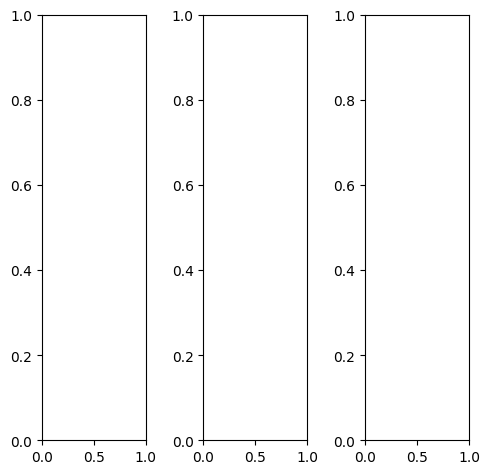

tensor([[[0.7961, 0.7843, 0.7725,  ..., 0.4353, 0.4275, 0.6039],
         [0.8000, 0.7882, 0.7843,  ..., 0.4392, 0.4353, 0.6039],
         [0.7961, 0.7843, 0.7882,  ..., 0.4392, 0.4392, 0.6078],
         ...,
         [0.1098, 0.0824, 0.0706,  ..., 0.0627, 0.0510, 0.0471],
         [0.1098, 0.0706, 0.0627,  ..., 0.0549, 0.0510, 0.0549],
         [0.1216, 0.0667, 0.0588,  ..., 0.0549, 0.0549, 0.0510]],

        [[0.7961, 0.7843, 0.7725,  ..., 0.4353, 0.4275, 0.6039],
         [0.8000, 0.7882, 0.7843,  ..., 0.4392, 0.4353, 0.6039],
         [0.7961, 0.7843, 0.7882,  ..., 0.4392, 0.4392, 0.6078],
         ...,
         [0.1098, 0.0824, 0.0706,  ..., 0.0627, 0.0510, 0.0471],
         [0.1098, 0.0706, 0.0627,  ..., 0.0549, 0.0510, 0.0549],
         [0.1216, 0.0667, 0.0588,  ..., 0.0549, 0.0549, 0.0510]],

        [[0.7961, 0.7843, 0.7725,  ..., 0.4353, 0.4275, 0.6039],
         [0.8000, 0.7882, 0.7843,  ..., 0.4392, 0.4353, 0.6039],
         [0.7961, 0.7843, 0.7882,  ..., 0.4392, 0.4392, 0.

tensor([[[0.7961, 0.7804, 0.7686,  ..., 0.4353, 0.4275, 0.6039],
         [0.8000, 0.7843, 0.7804,  ..., 0.4392, 0.4353, 0.6039],
         [0.7961, 0.7843, 0.7882,  ..., 0.4392, 0.4392, 0.6078],
         ...,
         [0.1216, 0.0824, 0.0706,  ..., 0.0627, 0.0510, 0.0471],
         [0.1216, 0.0745, 0.0627,  ..., 0.0549, 0.0510, 0.0549],
         [0.1294, 0.0667, 0.0588,  ..., 0.0549, 0.0549, 0.0510]],

        [[0.8118, 0.8000, 0.7882,  ..., 0.4431, 0.4353, 0.6118],
         [0.8118, 0.8000, 0.8000,  ..., 0.4471, 0.4392, 0.6118],
         [0.8118, 0.7961, 0.8039,  ..., 0.4471, 0.4431, 0.6157],
         ...,
         [0.1059, 0.0784, 0.0706,  ..., 0.0627, 0.0510, 0.0471],
         [0.1059, 0.0667, 0.0627,  ..., 0.0549, 0.0510, 0.0549],
         [0.1216, 0.0667, 0.0588,  ..., 0.0549, 0.0549, 0.0510]],

        [[0.7294, 0.7176, 0.7020,  ..., 0.4039, 0.3961, 0.5569],
         [0.7294, 0.7216, 0.7098,  ..., 0.4078, 0.4000, 0.5569],
         [0.7216, 0.7137, 0.7176,  ..., 0.4078, 0.4039, 0.

tensor([[[0.8717, 0.8732, 0.7339,  ..., 0.4257, 0.4242, 0.6269],
         [0.8222, 0.8476, 0.7871,  ..., 0.4480, 0.4642, 0.6715],
         [0.8013, 0.8508, 0.7730,  ..., 0.4842, 0.4735, 0.6758],
         ...,
         [0.1042, 0.1311, 0.1178,  ..., 0.1125, 0.0991, 0.1367],
         [0.1046, 0.0976, 0.0882,  ..., 0.1100, 0.1249, 0.1540],
         [0.1475, 0.0854, 0.0828,  ..., 0.1183, 0.1347, 0.1487]],

        [[0.8856, 0.8876, 0.7272,  ..., 0.5240, 0.5130, 0.6873],
         [0.7758, 0.7023, 0.7244,  ..., 0.5420, 0.5445, 0.7881],
         [0.8813, 0.8308, 0.8300,  ..., 0.5420, 0.5248, 0.7568],
         ...,
         [0.1552, 0.1576, 0.1588,  ..., 0.1571, 0.1324, 0.1256],
         [0.1555, 0.1352, 0.1323,  ..., 0.1326, 0.1260, 0.1228],
         [0.1795, 0.1212, 0.1253,  ..., 0.1205, 0.1209, 0.1270]],

        [[0.9347, 0.9750, 0.8675,  ..., 0.6912, 0.7054, 0.8522],
         [0.9203, 0.9129, 0.8907,  ..., 0.6962, 0.7461, 0.9291],
         [0.8895, 0.9276, 0.8280,  ..., 0.6906, 0.7355, 0.

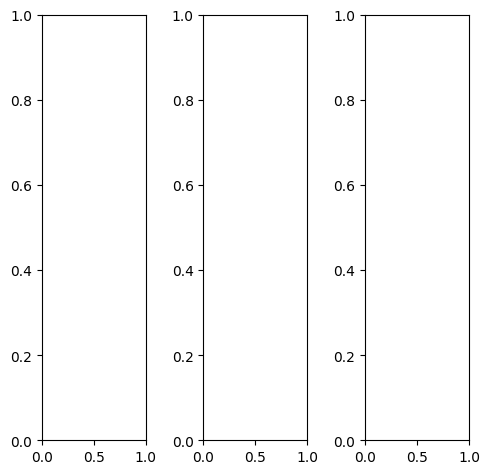

tensor([[[0.2392, 0.2353, 0.2392,  ..., 0.2941, 0.2902, 0.2706],
         [0.2431, 0.2431, 0.2431,  ..., 0.2745, 0.2745, 0.2627],
         [0.2314, 0.2549, 0.2627,  ..., 0.3333, 0.3255, 0.3020],
         ...,
         [0.3373, 0.3569, 0.3529,  ..., 0.3216, 0.3137, 0.3098],
         [0.3020, 0.2941, 0.2431,  ..., 0.3176, 0.3176, 0.3098],
         [0.2745, 0.2706, 0.2549,  ..., 0.2941, 0.2941, 0.2863]],

        [[0.2392, 0.2353, 0.2392,  ..., 0.2941, 0.2902, 0.2706],
         [0.2431, 0.2431, 0.2431,  ..., 0.2745, 0.2745, 0.2627],
         [0.2314, 0.2549, 0.2627,  ..., 0.3333, 0.3255, 0.3020],
         ...,
         [0.3373, 0.3569, 0.3529,  ..., 0.3216, 0.3137, 0.3098],
         [0.3020, 0.2941, 0.2431,  ..., 0.3176, 0.3176, 0.3098],
         [0.2745, 0.2706, 0.2549,  ..., 0.2941, 0.2941, 0.2863]],

        [[0.2392, 0.2353, 0.2392,  ..., 0.2941, 0.2902, 0.2706],
         [0.2431, 0.2431, 0.2431,  ..., 0.2745, 0.2745, 0.2627],
         [0.2314, 0.2549, 0.2627,  ..., 0.3333, 0.3255, 0.

tensor([[[0.1490, 0.1451, 0.1490,  ..., 0.2039, 0.2000, 0.1843],
         [0.1569, 0.1569, 0.1569,  ..., 0.1922, 0.1882, 0.1765],
         [0.1451, 0.1686, 0.1765,  ..., 0.2392, 0.2275, 0.2118],
         ...,
         [0.2510, 0.2667, 0.2627,  ..., 0.2196, 0.2118, 0.2118],
         [0.2196, 0.2235, 0.1804,  ..., 0.2235, 0.2235, 0.2157],
         [0.1961, 0.2039, 0.1961,  ..., 0.2000, 0.2000, 0.1922]],

        [[0.2549, 0.2471, 0.2510,  ..., 0.3059, 0.3020, 0.2863],
         [0.2549, 0.2549, 0.2510,  ..., 0.2863, 0.2863, 0.2745],
         [0.2431, 0.2667, 0.2706,  ..., 0.3451, 0.3373, 0.3137],
         ...,
         [0.3451, 0.3608, 0.3569,  ..., 0.3333, 0.3255, 0.3216],
         [0.3098, 0.2941, 0.2471,  ..., 0.3255, 0.3255, 0.3176],
         [0.2824, 0.2706, 0.2588,  ..., 0.3020, 0.3020, 0.2941]],

        [[0.3922, 0.3961, 0.4039,  ..., 0.4588, 0.4510, 0.4275],
         [0.4039, 0.4118, 0.4157,  ..., 0.4431, 0.4353, 0.4196],
         [0.4000, 0.4314, 0.4431,  ..., 0.5216, 0.5059, 0.

tensor([[[0.1053, 0.0906, 0.0156,  ..., 0.2424, 0.2455, 0.2264],
         [0.2104, 0.0436, 0.0482,  ..., 0.1862, 0.2037, 0.1757],
         [0.0339, 0.0528, 0.0184,  ..., 0.3837, 0.3551, 0.2722],
         ...,
         [0.4769, 0.5460, 0.5178,  ..., 0.4703, 0.4184, 0.3748],
         [0.3796, 0.3666, 0.2772,  ..., 0.4044, 0.3961, 0.3779],
         [0.3269, 0.3057, 0.2621,  ..., 0.3599, 0.3504, 0.3481]],

        [[0.2194, 0.2434, 0.1301,  ..., 0.3607, 0.3809, 0.2977],
         [0.2475, 0.2254, 0.0506,  ..., 0.3092, 0.3495, 0.2509],
         [0.1465, 0.2344, 0.1248,  ..., 0.4900, 0.4666, 0.3314],
         ...,
         [0.4559, 0.4653, 0.4833,  ..., 0.4711, 0.4563, 0.3517],
         [0.3635, 0.3289, 0.2643,  ..., 0.4473, 0.4273, 0.3765],
         [0.3109, 0.2657, 0.2544,  ..., 0.3546, 0.3650, 0.3276]],

        [[0.3775, 0.2069, 0.3137,  ..., 0.5062, 0.5077, 0.4574],
         [0.3983, 0.2833, 0.2936,  ..., 0.4690, 0.4877, 0.4306],
         [0.2856, 0.2944, 0.3893,  ..., 0.6215, 0.6018, 0.

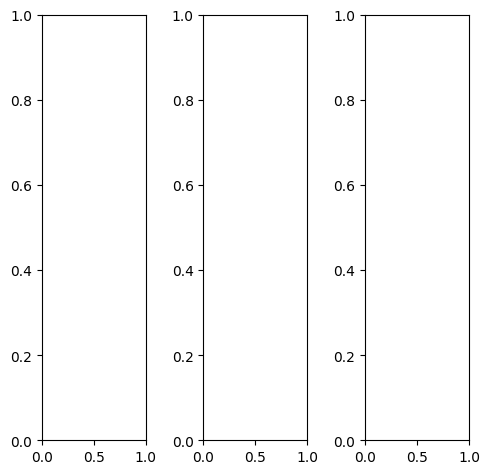

tensor([[[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.6000],
         ...,
         [0.3137, 0.3176, 0.3176,  ..., 0.3765, 0.3725, 0.4118],
         [0.3294, 0.3490, 0.3451,  ..., 0.4118, 0.4314, 0.4431],
         [0.2353, 0.3059, 0.3176,  ..., 0.3608, 0.4784, 0.4824]],

        [[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.6000],
         ...,
         [0.3137, 0.3176, 0.3176,  ..., 0.3765, 0.3725, 0.4118],
         [0.3294, 0.3490, 0.3451,  ..., 0.4118, 0.4314, 0.4431],
         [0.2353, 0.3059, 0.3176,  ..., 0.3608, 0.4784, 0.4824]],

        [[0.3608, 0.2980, 0.3333,  ..., 0.5569, 0.5412, 0.5176],
         [0.3255, 0.3608, 0.4784,  ..., 0.5255, 0.5294, 0.5843],
         [0.4078, 0.4314, 0.5059,  ..., 0.4627, 0.4824, 0.

tensor([[[0.4510, 0.3804, 0.4314,  ..., 0.7686, 0.7569, 0.7333],
         [0.4392, 0.4784, 0.6196,  ..., 0.7608, 0.7725, 0.8275],
         [0.5020, 0.5451, 0.6392,  ..., 0.7059, 0.7333, 0.8627],
         ...,
         [0.4627, 0.4784, 0.4784,  ..., 0.5373, 0.5373, 0.5725],
         [0.4627, 0.4941, 0.4902,  ..., 0.5608, 0.5961, 0.6157],
         [0.3373, 0.4235, 0.4314,  ..., 0.4824, 0.6196, 0.6471]],

        [[0.3686, 0.3020, 0.3255,  ..., 0.5137, 0.4980, 0.4824],
         [0.3216, 0.3490, 0.4549,  ..., 0.4824, 0.4863, 0.5412],
         [0.4000, 0.4157, 0.4784,  ..., 0.4157, 0.4353, 0.5490],
         ...,
         [0.2824, 0.2824, 0.2824,  ..., 0.3451, 0.3412, 0.3882],
         [0.3059, 0.3216, 0.3216,  ..., 0.3882, 0.4078, 0.4235],
         [0.2196, 0.2863, 0.3020,  ..., 0.3490, 0.4588, 0.4588]],

        [[0.0863, 0.0706, 0.1098,  ..., 0.2392, 0.1843, 0.1373],
         [0.0549, 0.1176, 0.2431,  ..., 0.1333, 0.1098, 0.1529],
         [0.1961, 0.2275, 0.3020,  ..., 0.0510, 0.0667, 0.

tensor([[[0.3763, 0.2860, 0.3106,  ..., 0.7630, 0.7326, 0.6841],
         [0.3800, 0.3221, 0.5700,  ..., 0.7467, 0.7638, 0.8008],
         [0.5094, 0.5733, 0.6425,  ..., 0.6754, 0.7104, 0.8295],
         ...,
         [0.3868, 0.4311, 0.4060,  ..., 0.5467, 0.5439, 0.5751],
         [0.4114, 0.4789, 0.4871,  ..., 0.6147, 0.6616, 0.6302],
         [0.2623, 0.3419, 0.3622,  ..., 0.4857, 0.7075, 0.6846]],

        [[0.4383, 0.4025, 0.4143,  ..., 0.8893, 0.8545, 0.8212],
         [0.4238, 0.3554, 0.5745,  ..., 0.8762, 0.8718, 0.9386],
         [0.5554, 0.6447, 0.6822,  ..., 0.7665, 0.8015, 0.9336],
         ...,
         [0.3777, 0.4281, 0.4444,  ..., 0.4887, 0.5127, 0.5236],
         [0.4063, 0.4856, 0.4995,  ..., 0.5865, 0.6307, 0.6158],
         [0.2367, 0.3321, 0.3563,  ..., 0.4501, 0.6759, 0.6499]],

        [[0.5679, 0.4016, 0.4880,  ..., 1.0836, 1.0408, 0.9980],
         [0.5465, 0.5129, 0.6687,  ..., 1.0685, 1.0911, 1.1119],
         [0.6316, 0.6290, 0.7396,  ..., 0.9572, 1.0118, 1.

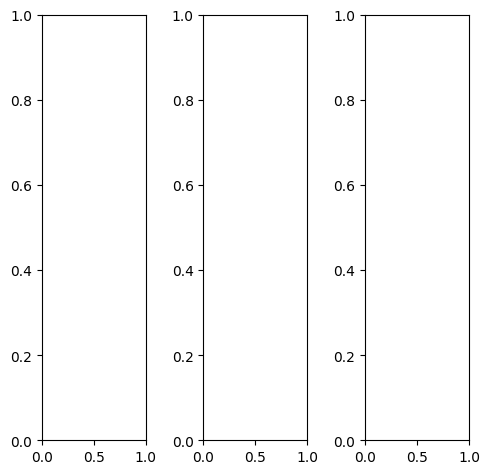

EPOCH: 31.000  val_loss: 0.003  (3797.93s - 8453.45s remaining)

tensor([[[0.3529, 0.3216, 0.2902,  ..., 0.3725, 0.4078, 0.2510],
         [0.3098, 0.2196, 0.2392,  ..., 0.3529, 0.3686, 0.2471],
         [0.3765, 0.3020, 0.3490,  ..., 0.3059, 0.3529, 0.2667],
         ...,
         [0.4118, 0.6392, 0.4196,  ..., 0.4706, 0.3686, 0.2824],
         [0.3216, 0.4078, 0.4000,  ..., 0.4000, 0.3176, 0.3059],
         [0.5647, 0.3804, 0.3216,  ..., 0.3922, 0.3059, 0.3059]],

        [[0.3529, 0.3216, 0.2902,  ..., 0.3725, 0.4078, 0.2510],
         [0.3098, 0.2196, 0.2392,  ..., 0.3529, 0.3686, 0.2471],
         [0.3765, 0.3020, 0.3490,  ..., 0.3059, 0.3529, 0.2667],
         ...,
         [0.4118, 0.6392, 0.4196,  ..., 0.4706, 0.3686, 0.2824],
         [0.3216, 0.4078, 0.4000,  ..., 0.4000, 0.3176, 0.3059],
         [0.5647, 0.3804, 0.3216,  ..., 0.3922, 0.3059, 0.3059]],

        [[0.3529, 0.3216, 0.2902,  ..., 0.3725, 0.4078, 0.2510],
         [0.3098, 0.2196, 0.2392,  ..., 0.3529, 0.3686, 0.2471],
         [0.3765, 0.3020, 0.3490,  ..., 0.3059, 0.3529, 0.

tensor([[[0.3529, 0.3216, 0.2902,  ..., 0.3608, 0.3961, 0.2471],
         [0.3098, 0.2235, 0.2431,  ..., 0.3373, 0.3569, 0.2431],
         [0.3686, 0.3059, 0.3608,  ..., 0.2902, 0.3412, 0.2667],
         ...,
         [0.4000, 0.6314, 0.4196,  ..., 0.4824, 0.3608, 0.2667],
         [0.3098, 0.4039, 0.4039,  ..., 0.4078, 0.3020, 0.2863],
         [0.5529, 0.3765, 0.3216,  ..., 0.4000, 0.2941, 0.2824]],

        [[0.3569, 0.3255, 0.2941,  ..., 0.3882, 0.4235, 0.2627],
         [0.3176, 0.2235, 0.2392,  ..., 0.3647, 0.3843, 0.2549],
         [0.3882, 0.3059, 0.3490,  ..., 0.3176, 0.3647, 0.2745],
         ...,
         [0.4314, 0.6549, 0.4235,  ..., 0.4667, 0.3686, 0.2863],
         [0.3412, 0.4196, 0.4000,  ..., 0.4078, 0.3255, 0.3176],
         [0.5922, 0.3922, 0.3216,  ..., 0.4039, 0.3176, 0.3216]],

        [[0.3294, 0.3059, 0.2824,  ..., 0.3373, 0.3569, 0.2118],
         [0.2824, 0.2000, 0.2275,  ..., 0.3176, 0.3255, 0.2118],
         [0.3412, 0.2745, 0.3294,  ..., 0.2784, 0.3176, 0.

tensor([[[0.3629, 0.3272, 0.2915,  ..., 0.3785, 0.4029, 0.2650],
         [0.3130, 0.2239, 0.2481,  ..., 0.3646, 0.3846, 0.2485],
         [0.3864, 0.3107, 0.3619,  ..., 0.3109, 0.3657, 0.2640],
         ...,
         [0.4305, 0.6645, 0.4246,  ..., 0.5094, 0.4083, 0.3082],
         [0.3372, 0.4306, 0.4417,  ..., 0.4329, 0.3612, 0.3275],
         [0.5505, 0.4006, 0.3435,  ..., 0.4184, 0.3211, 0.3301]],

        [[0.3702, 0.3286, 0.2968,  ..., 0.3841, 0.4057, 0.2732],
         [0.3147, 0.2324, 0.2471,  ..., 0.3694, 0.3899, 0.2571],
         [0.3825, 0.3165, 0.3566,  ..., 0.3167, 0.3674, 0.2729],
         ...,
         [0.4174, 0.6390, 0.4127,  ..., 0.4837, 0.3688, 0.2859],
         [0.3351, 0.4130, 0.3968,  ..., 0.3873, 0.3238, 0.3089],
         [0.5353, 0.3775, 0.3150,  ..., 0.3828, 0.3006, 0.3176]],

        [[0.2998, 0.2676, 0.2364,  ..., 0.2970, 0.3322, 0.2164],
         [0.2485, 0.1727, 0.1840,  ..., 0.2688, 0.2916, 0.1821],
         [0.3089, 0.2345, 0.2801,  ..., 0.2288, 0.2781, 0.

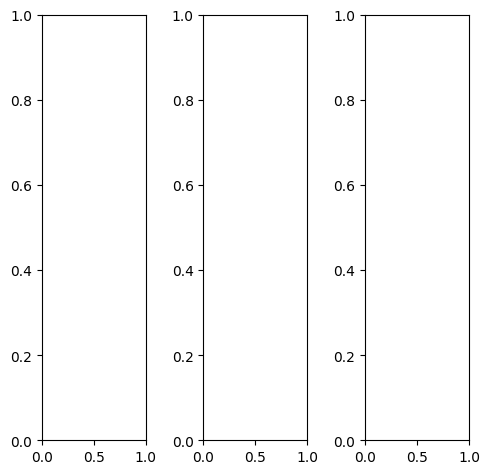

tensor([[[0.5569, 0.5333, 0.5216,  ..., 0.5059, 0.5216, 0.4549],
         [0.5176, 0.5176, 0.5176,  ..., 0.5176, 0.5255, 0.4824],
         [0.5059, 0.5216, 0.5255,  ..., 0.5176, 0.5294, 0.4863],
         ...,
         [0.4157, 0.3961, 0.4039,  ..., 0.4588, 0.8471, 0.6549],
         [0.4078, 0.4039, 0.3882,  ..., 0.6941, 0.9098, 0.5216],
         [0.3882, 0.3569, 0.3490,  ..., 0.8588, 0.8510, 0.4510]],

        [[0.5569, 0.5333, 0.5216,  ..., 0.5059, 0.5216, 0.4549],
         [0.5176, 0.5176, 0.5176,  ..., 0.5176, 0.5255, 0.4824],
         [0.5059, 0.5216, 0.5255,  ..., 0.5176, 0.5294, 0.4863],
         ...,
         [0.4157, 0.3961, 0.4039,  ..., 0.4588, 0.8471, 0.6549],
         [0.4078, 0.4039, 0.3882,  ..., 0.6941, 0.9098, 0.5216],
         [0.3882, 0.3569, 0.3490,  ..., 0.8588, 0.8510, 0.4510]],

        [[0.5569, 0.5333, 0.5216,  ..., 0.5059, 0.5216, 0.4549],
         [0.5176, 0.5176, 0.5176,  ..., 0.5176, 0.5255, 0.4824],
         [0.5059, 0.5216, 0.5255,  ..., 0.5176, 0.5294, 0.

tensor([[[0.5569, 0.5294, 0.5137,  ..., 0.5137, 0.5216, 0.4824],
         [0.5216, 0.5216, 0.5216,  ..., 0.5255, 0.5333, 0.5176],
         [0.5059, 0.5255, 0.5333,  ..., 0.5255, 0.5373, 0.4941],
         ...,
         [0.4157, 0.3961, 0.4078,  ..., 0.4157, 0.8314, 0.6118],
         [0.4078, 0.4000, 0.3843,  ..., 0.7020, 0.9294, 0.5098],
         [0.3882, 0.3529, 0.3333,  ..., 0.8824, 0.9255, 0.5098]],

        [[0.5569, 0.5294, 0.5176,  ..., 0.4941, 0.5098, 0.4314],
         [0.5098, 0.5098, 0.5059,  ..., 0.5020, 0.5137, 0.4549],
         [0.4980, 0.5098, 0.5098,  ..., 0.5176, 0.5294, 0.4863],
         ...,
         [0.4314, 0.4118, 0.4196,  ..., 0.4902, 0.8510, 0.6745],
         [0.4235, 0.4196, 0.4078,  ..., 0.6941, 0.8941, 0.5255],
         [0.4000, 0.3765, 0.3765,  ..., 0.8549, 0.8235, 0.4353]],

        [[0.5686, 0.5608, 0.5608,  ..., 0.5608, 0.5725, 0.5020],
         [0.5451, 0.5529, 0.5686,  ..., 0.5608, 0.5725, 0.5255],
         [0.5569, 0.5608, 0.5686,  ..., 0.4941, 0.5098, 0.

tensor([[[0.5441, 0.5129, 0.4951,  ..., 0.5050, 0.5139, 0.4694],
         [0.4993, 0.4986, 0.5001,  ..., 0.5047, 0.5099, 0.4880],
         [0.4822, 0.5233, 0.5279,  ..., 0.5129, 0.5184, 0.4867],
         ...,
         [0.4131, 0.3861, 0.4046,  ..., 0.4582, 0.8680, 0.6792],
         [0.4054, 0.4019, 0.3966,  ..., 0.7019, 0.9117, 0.5726],
         [0.3887, 0.3598, 0.3430,  ..., 0.8758, 0.8724, 0.5484]],

        [[0.5626, 0.5472, 0.5284,  ..., 0.5158, 0.5325, 0.4739],
         [0.5201, 0.5265, 0.5273,  ..., 0.5388, 0.5265, 0.4963],
         [0.5124, 0.5438, 0.5405,  ..., 0.5368, 0.5401, 0.4910],
         ...,
         [0.4280, 0.3930, 0.4095,  ..., 0.4456, 0.8782, 0.6908],
         [0.4182, 0.4080, 0.3948,  ..., 0.7038, 0.8967, 0.5593],
         [0.4033, 0.3666, 0.3509,  ..., 0.8510, 0.8461, 0.5351]],

        [[0.5595, 0.5413, 0.5301,  ..., 0.4681, 0.4907, 0.4418],
         [0.5223, 0.5146, 0.5196,  ..., 0.4704, 0.4778, 0.4562],
         [0.5026, 0.5210, 0.5253,  ..., 0.4698, 0.4813, 0.

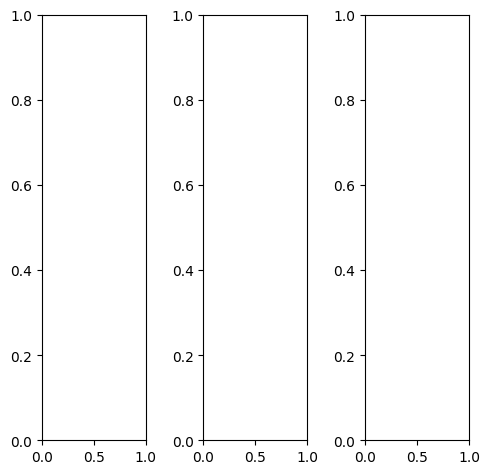

tensor([[[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.5098],
         ...,
         [0.3255, 0.2863, 0.3686,  ..., 0.3255, 0.3412, 0.3098],
         [0.3569, 0.3333, 0.3765,  ..., 0.3020, 0.3098, 0.2863],
         [0.4078, 0.4118, 0.4235,  ..., 0.2706, 0.2549, 0.2353]],

        [[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.5098],
         ...,
         [0.3255, 0.2863, 0.3686,  ..., 0.3255, 0.3412, 0.3098],
         [0.3569, 0.3333, 0.3765,  ..., 0.3020, 0.3098, 0.2863],
         [0.4078, 0.4118, 0.4235,  ..., 0.2706, 0.2549, 0.2353]],

        [[0.1451, 0.1804, 0.2510,  ..., 0.2510, 0.2431, 0.3373],
         [0.2196, 0.2941, 0.3843,  ..., 0.2902, 0.2745, 0.3922],
         [0.2706, 0.3529, 0.4627,  ..., 0.5490, 0.4275, 0.

tensor([[[0.1333, 0.1843, 0.2157,  ..., 0.1922, 0.2039, 0.3216],
         [0.1765, 0.2784, 0.3333,  ..., 0.2118, 0.2235, 0.3765],
         [0.2392, 0.3294, 0.3804,  ..., 0.4196, 0.3529, 0.5137],
         ...,
         [0.4000, 0.3608, 0.4275,  ..., 0.3804, 0.3922, 0.3647],
         [0.4275, 0.4196, 0.4510,  ..., 0.3569, 0.3647, 0.3412],
         [0.4784, 0.4980, 0.5098,  ..., 0.3255, 0.3059, 0.2863]],

        [[0.1608, 0.1843, 0.2745,  ..., 0.2941, 0.2745, 0.3608],
         [0.2549, 0.3176, 0.4235,  ..., 0.3373, 0.3137, 0.4196],
         [0.3020, 0.3843, 0.5216,  ..., 0.6235, 0.4824, 0.5255],
         ...,
         [0.3059, 0.2706, 0.3608,  ..., 0.3216, 0.3333, 0.3020],
         [0.3412, 0.3137, 0.3647,  ..., 0.2941, 0.2980, 0.2745],
         [0.3961, 0.3922, 0.4039,  ..., 0.2627, 0.2431, 0.2235]],

        [[0.1059, 0.1373, 0.2078,  ..., 0.2000, 0.1765, 0.2627],
         [0.1608, 0.2275, 0.3137,  ..., 0.2510, 0.2078, 0.3020],
         [0.1961, 0.2667, 0.3647,  ..., 0.5098, 0.3529, 0.

tensor([[[0.1848, 0.1866, 0.2642,  ..., 0.2315, 0.2467, 0.3412],
         [0.2127, 0.2885, 0.3942,  ..., 0.2975, 0.2866, 0.3975],
         [0.2644, 0.3617, 0.4772,  ..., 0.5581, 0.4506, 0.5156],
         ...,
         [0.3412, 0.3193, 0.4097,  ..., 0.3474, 0.3602, 0.3197],
         [0.3838, 0.3789, 0.4332,  ..., 0.3186, 0.3296, 0.2971],
         [0.4320, 0.4430, 0.4636,  ..., 0.2771, 0.2623, 0.2656]],

        [[0.1765, 0.1842, 0.2522,  ..., 0.2425, 0.2555, 0.3506],
         [0.2059, 0.2840, 0.3839,  ..., 0.3107, 0.2928, 0.3951],
         [0.2630, 0.3579, 0.4707,  ..., 0.5547, 0.4594, 0.5139],
         ...,
         [0.3230, 0.2941, 0.3810,  ..., 0.3348, 0.3485, 0.3132],
         [0.3660, 0.3413, 0.3864,  ..., 0.3018, 0.3087, 0.2860],
         [0.4195, 0.4152, 0.4235,  ..., 0.2645, 0.2516, 0.2658]],

        [[0.1325, 0.1333, 0.1885,  ..., 0.1711, 0.1921, 0.2774],
         [0.1614, 0.2219, 0.2934,  ..., 0.2039, 0.2127, 0.3065],
         [0.1956, 0.2647, 0.3645,  ..., 0.4120, 0.3248, 0.

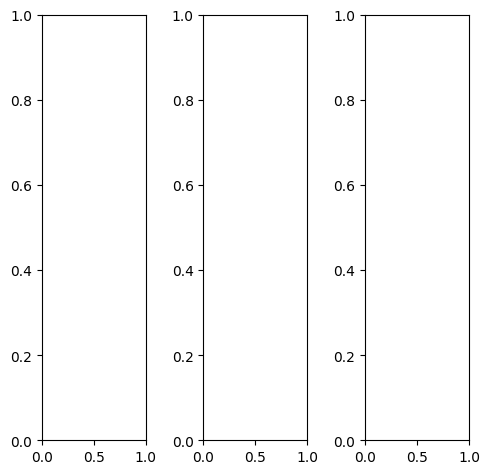

tensor([[[0.4157, 0.4235, 0.4863,  ..., 0.6824, 0.6353, 0.6118],
         [0.4784, 0.4314, 0.5294,  ..., 0.7294, 0.5765, 0.5490],
         [0.5137, 0.4784, 0.4980,  ..., 0.7176, 0.6863, 0.6784],
         ...,
         [0.1765, 0.1725, 0.2078,  ..., 0.5922, 0.6000, 0.6196],
         [0.1647, 0.3059, 0.4627,  ..., 0.6588, 0.6196, 0.6392],
         [0.3137, 0.5294, 0.5765,  ..., 0.6863, 0.7255, 0.6510]],

        [[0.4157, 0.4235, 0.4863,  ..., 0.6824, 0.6353, 0.6118],
         [0.4784, 0.4314, 0.5294,  ..., 0.7294, 0.5765, 0.5490],
         [0.5137, 0.4784, 0.4980,  ..., 0.7176, 0.6863, 0.6784],
         ...,
         [0.1765, 0.1725, 0.2078,  ..., 0.5922, 0.6000, 0.6196],
         [0.1647, 0.3059, 0.4627,  ..., 0.6588, 0.6196, 0.6392],
         [0.3137, 0.5294, 0.5765,  ..., 0.6863, 0.7255, 0.6510]],

        [[0.4157, 0.4235, 0.4863,  ..., 0.6824, 0.6353, 0.6118],
         [0.4784, 0.4314, 0.5294,  ..., 0.7294, 0.5765, 0.5490],
         [0.5137, 0.4784, 0.4980,  ..., 0.7176, 0.6863, 0.

tensor([[[0.4549, 0.4627, 0.5255,  ..., 0.7020, 0.6588, 0.6353],
         [0.5176, 0.4706, 0.5686,  ..., 0.7529, 0.6000, 0.5725],
         [0.5529, 0.5176, 0.5373,  ..., 0.7412, 0.7098, 0.7020],
         ...,
         [0.1490, 0.1451, 0.1804,  ..., 0.5922, 0.6000, 0.6235],
         [0.1451, 0.2863, 0.4431,  ..., 0.6588, 0.6196, 0.6392],
         [0.3020, 0.5176, 0.5647,  ..., 0.6863, 0.7255, 0.6510]],

        [[0.4118, 0.4196, 0.4824,  ..., 0.6902, 0.6431, 0.6196],
         [0.4784, 0.4314, 0.5333,  ..., 0.7373, 0.5843, 0.5569],
         [0.5176, 0.4824, 0.5020,  ..., 0.7255, 0.6941, 0.6863],
         ...,
         [0.1922, 0.1882, 0.2196,  ..., 0.6078, 0.6196, 0.6392],
         [0.1804, 0.3216, 0.4745,  ..., 0.6745, 0.6353, 0.6549],
         [0.3255, 0.5451, 0.5922,  ..., 0.7020, 0.7412, 0.6627]],

        [[0.3294, 0.3412, 0.4000,  ..., 0.5843, 0.5373, 0.5137],
         [0.3647, 0.3176, 0.4196,  ..., 0.6314, 0.4784, 0.4510],
         [0.3922, 0.3569, 0.3765,  ..., 0.6196, 0.5882, 0.

tensor([[[0.4257, 0.4223, 0.4902,  ..., 0.7054, 0.6617, 0.6384],
         [0.4800, 0.4330, 0.5348,  ..., 0.7446, 0.5831, 0.5758],
         [0.5300, 0.4820, 0.4958,  ..., 0.7348, 0.7081, 0.7116],
         ...,
         [0.1824, 0.1866, 0.2347,  ..., 0.6139, 0.6216, 0.6503],
         [0.1941, 0.3391, 0.4891,  ..., 0.6799, 0.6436, 0.6607],
         [0.3346, 0.5428, 0.6164,  ..., 0.7114, 0.7609, 0.6868]],

        [[0.4365, 0.4337, 0.5080,  ..., 0.7011, 0.6515, 0.6193],
         [0.4892, 0.4386, 0.5481,  ..., 0.7431, 0.5783, 0.5647],
         [0.5330, 0.4954, 0.5134,  ..., 0.7294, 0.7011, 0.6923],
         ...,
         [0.1659, 0.1670, 0.2147,  ..., 0.5976, 0.6043, 0.6244],
         [0.1701, 0.3152, 0.4712,  ..., 0.6658, 0.6254, 0.6426],
         [0.3257, 0.5134, 0.5747,  ..., 0.6826, 0.7315, 0.6690]],

        [[0.3404, 0.3223, 0.3700,  ..., 0.5957, 0.5607, 0.5459],
         [0.3634, 0.3159, 0.3997,  ..., 0.6204, 0.4701, 0.4509],
         [0.4011, 0.3598, 0.3722,  ..., 0.6052, 0.5778, 0.

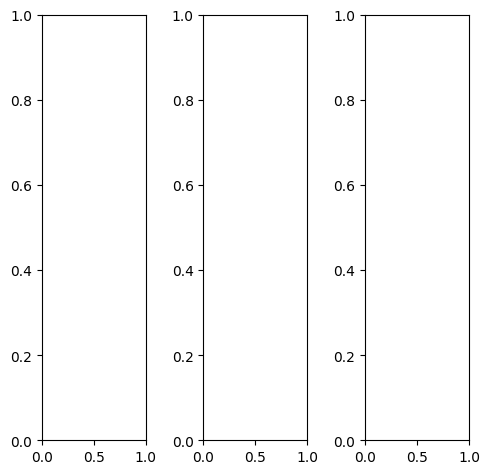

tensor([[[0.6078, 0.5686, 0.5529,  ..., 0.4510, 0.4980, 0.5843],
         [0.5647, 0.5647, 0.5294,  ..., 0.5255, 0.5686, 0.6392],
         [0.6745, 0.6000, 0.6039,  ..., 0.6706, 0.7137, 0.7569],
         ...,
         [0.3843, 0.3922, 0.4196,  ..., 0.3529, 0.3686, 0.3333],
         [0.4353, 0.3922, 0.3686,  ..., 0.3373, 0.3804, 0.3451],
         [0.4471, 0.4471, 0.4000,  ..., 0.3176, 0.3647, 0.3529]],

        [[0.6078, 0.5686, 0.5529,  ..., 0.4510, 0.4980, 0.5843],
         [0.5647, 0.5647, 0.5294,  ..., 0.5255, 0.5686, 0.6392],
         [0.6745, 0.6000, 0.6039,  ..., 0.6706, 0.7137, 0.7569],
         ...,
         [0.3843, 0.3922, 0.4196,  ..., 0.3529, 0.3686, 0.3333],
         [0.4353, 0.3922, 0.3686,  ..., 0.3373, 0.3804, 0.3451],
         [0.4471, 0.4471, 0.4000,  ..., 0.3176, 0.3647, 0.3529]],

        [[0.6078, 0.5686, 0.5529,  ..., 0.4510, 0.4980, 0.5843],
         [0.5647, 0.5647, 0.5294,  ..., 0.5255, 0.5686, 0.6392],
         [0.6745, 0.6000, 0.6039,  ..., 0.6706, 0.7137, 0.

tensor([[[0.4980, 0.4588, 0.4431,  ..., 0.4941, 0.5843, 0.6510],
         [0.4549, 0.4588, 0.4235,  ..., 0.5922, 0.6706, 0.7176],
         [0.5725, 0.4980, 0.5059,  ..., 0.6078, 0.6745, 0.6941],
         ...,
         [0.2863, 0.2941, 0.3216,  ..., 0.2471, 0.2627, 0.2275],
         [0.3412, 0.2980, 0.2706,  ..., 0.2314, 0.2784, 0.2392],
         [0.3608, 0.3569, 0.2941,  ..., 0.2118, 0.2588, 0.2510]],

        [[0.6706, 0.6314, 0.6157,  ..., 0.4510, 0.4745, 0.5725],
         [0.6275, 0.6275, 0.5922,  ..., 0.5176, 0.5451, 0.6235],
         [0.7333, 0.6588, 0.6627,  ..., 0.7216, 0.7569, 0.8039],
         ...,
         [0.4431, 0.4510, 0.4784,  ..., 0.4196, 0.4353, 0.4000],
         [0.4941, 0.4510, 0.4314,  ..., 0.4039, 0.4471, 0.4118],
         [0.5020, 0.5059, 0.4667,  ..., 0.3804, 0.4314, 0.4196]],

        [[0.5725, 0.5333, 0.5176,  ..., 0.3529, 0.3804, 0.4784],
         [0.5294, 0.5294, 0.4980,  ..., 0.4000, 0.4353, 0.5176],
         [0.6392, 0.5647, 0.5686,  ..., 0.5647, 0.6078, 0.

tensor([[[0.6052, 0.5823, 0.5583,  ..., 0.4691, 0.5250, 0.6102],
         [0.5936, 0.5863, 0.5528,  ..., 0.5488, 0.5900, 0.6645],
         [0.6989, 0.6285, 0.6183,  ..., 0.6867, 0.7454, 0.7899],
         ...,
         [0.3936, 0.4060, 0.4263,  ..., 0.3585, 0.3735, 0.3394],
         [0.4498, 0.4118, 0.3888,  ..., 0.3465, 0.3905, 0.3550],
         [0.4691, 0.4646, 0.4156,  ..., 0.3164, 0.3742, 0.3760]],

        [[0.6026, 0.5773, 0.5588,  ..., 0.4585, 0.5144, 0.5900],
         [0.5840, 0.5600, 0.5331,  ..., 0.5300, 0.5710, 0.6641],
         [0.6897, 0.6091, 0.6081,  ..., 0.6883, 0.7408, 0.7683],
         ...,
         [0.3948, 0.4127, 0.4385,  ..., 0.3685, 0.3861, 0.3414],
         [0.4493, 0.4077, 0.3793,  ..., 0.3394, 0.3860, 0.3492],
         [0.4673, 0.4501, 0.4016,  ..., 0.3129, 0.3625, 0.3621]],

        [[0.5113, 0.4732, 0.4288,  ..., 0.3254, 0.3991, 0.4974],
         [0.4566, 0.4436, 0.4164,  ..., 0.4084, 0.4508, 0.5440],
         [0.5676, 0.4890, 0.4765,  ..., 0.5302, 0.5925, 0.

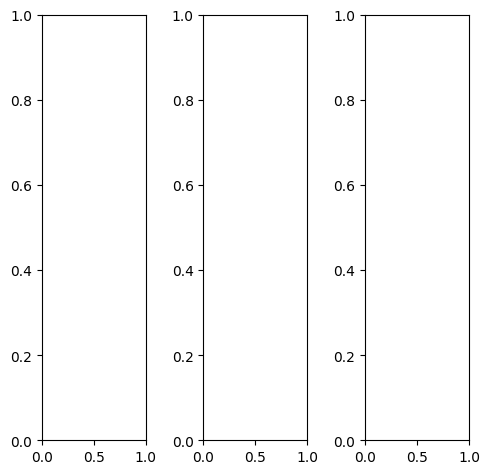

EPOCH: 31.255  trn_loss: 0.004  (3828.22s - 8420.07s remaining)

tensor([[[0.4549, 0.4627, 0.4157,  ..., 0.3608, 0.3647, 0.3412],
         [0.4431, 0.4275, 0.2510,  ..., 0.3490, 0.3569, 0.3451],
         [0.4157, 0.3961, 0.1647,  ..., 0.3451, 0.3647, 0.3490],
         ...,
         [0.8471, 0.8510, 0.8471,  ..., 0.2980, 0.2863, 0.2667],
         [0.8549, 0.8588, 0.8549,  ..., 0.2980, 0.2863, 0.2667],
         [0.8588, 0.8588, 0.8510,  ..., 0.3176, 0.2980, 0.2784]],

        [[0.4549, 0.4627, 0.4157,  ..., 0.3608, 0.3647, 0.3412],
         [0.4431, 0.4275, 0.2510,  ..., 0.3490, 0.3569, 0.3451],
         [0.4157, 0.3961, 0.1647,  ..., 0.3451, 0.3647, 0.3490],
         ...,
         [0.8471, 0.8510, 0.8471,  ..., 0.2980, 0.2863, 0.2667],
         [0.8549, 0.8588, 0.8549,  ..., 0.2980, 0.2863, 0.2667],
         [0.8588, 0.8588, 0.8510,  ..., 0.3176, 0.2980, 0.2784]],

        [[0.4549, 0.4627, 0.4157,  ..., 0.3608, 0.3647, 0.3412],
         [0.4431, 0.4275, 0.2510,  ..., 0.3490, 0.3569, 0.3451],
         [0.4157, 0.3961, 0.1647,  ..., 0.3451, 0.3647, 0.

tensor([[[0.3373, 0.3451, 0.3451,  ..., 0.2667, 0.2706, 0.2510],
         [0.3255, 0.3137, 0.1922,  ..., 0.2549, 0.2627, 0.2549],
         [0.3020, 0.3020, 0.1255,  ..., 0.2549, 0.2745, 0.2588],
         ...,
         [0.9020, 0.9176, 0.9216,  ..., 0.2157, 0.2000, 0.1843],
         [0.9137, 0.9255, 0.9255,  ..., 0.2039, 0.2000, 0.1882],
         [0.9255, 0.9333, 0.9255,  ..., 0.2235, 0.2118, 0.2000]],

        [[0.5961, 0.6078, 0.5059,  ..., 0.4510, 0.4549, 0.4275],
         [0.5804, 0.5569, 0.3137,  ..., 0.4353, 0.4471, 0.4314],
         [0.5529, 0.5098, 0.2039,  ..., 0.4235, 0.4471, 0.4314],
         ...,
         [0.8196, 0.8196, 0.8118,  ..., 0.3804, 0.3608, 0.3333],
         [0.8275, 0.8275, 0.8235,  ..., 0.3804, 0.3647, 0.3373],
         [0.8275, 0.8235, 0.8196,  ..., 0.4039, 0.3804, 0.3529]],

        [[0.0235, 0.0275, 0.1373,  ..., 0.1373, 0.1333, 0.1294],
         [0.0314, 0.0549, 0.0706,  ..., 0.1412, 0.1490, 0.1490],
         [0.0118, 0.0627, 0.0510,  ..., 0.1647, 0.1765, 0.

tensor([[[0.5891, 0.5702, 0.3772,  ..., 0.3887, 0.3976, 0.4295],
         [0.5408, 0.4498, 0.3293,  ..., 0.3780, 0.3747, 0.4077],
         [0.4658, 0.4264, 0.1040,  ..., 0.3512, 0.3832, 0.3978],
         ...,
         [0.9632, 0.8839, 0.8691,  ..., 0.5118, 0.4821, 0.4830],
         [0.9710, 0.9029, 0.8732,  ..., 0.4926, 0.4838, 0.4754],
         [0.9852, 0.9837, 0.9351,  ..., 0.5039, 0.4802, 0.4688]],

        [[0.5841, 0.6326, 0.4060,  ..., 0.4920, 0.5102, 0.4786],
         [0.5412, 0.4707, 0.1718,  ..., 0.4846, 0.5014, 0.4739],
         [0.5384, 0.4612, 0.1197,  ..., 0.4672, 0.5068, 0.4706],
         ...,
         [0.9400, 0.8789, 0.8675,  ..., 0.4817, 0.4627, 0.4160],
         [0.9554, 0.8854, 0.8848,  ..., 0.4606, 0.4528, 0.4202],
         [0.9516, 0.9571, 0.9469,  ..., 0.4584, 0.4353, 0.4229]],

        [[0.7139, 0.6716, 0.5547,  ..., 0.6603, 0.6831, 0.6407],
         [0.6410, 0.5380, 0.4289,  ..., 0.6543, 0.6759, 0.6584],
         [0.5246, 0.5318, 0.2400,  ..., 0.6120, 0.6636, 0.

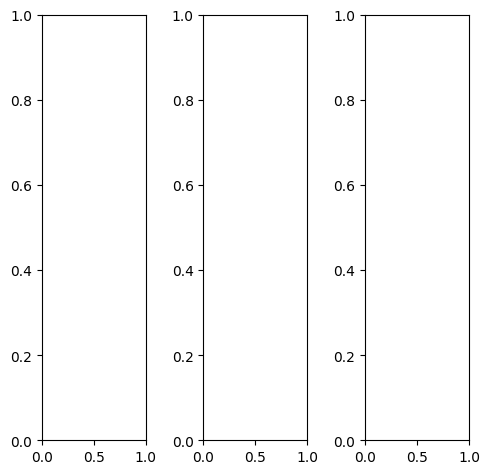

tensor([[[0.4196, 0.3333, 0.5059,  ..., 0.5373, 0.5647, 0.5843],
         [0.3490, 0.3176, 0.5529,  ..., 0.5020, 0.5804, 0.6745],
         [0.3765, 0.4667, 0.5765,  ..., 0.4392, 0.5137, 0.6902],
         ...,
         [0.3333, 0.2941, 0.2745,  ..., 0.2000, 0.2157, 0.2471],
         [0.3176, 0.3020, 0.2941,  ..., 0.3059, 0.3608, 0.3725],
         [0.2431, 0.2667, 0.2392,  ..., 0.2471, 0.2667, 0.2549]],

        [[0.4196, 0.3333, 0.5059,  ..., 0.5373, 0.5647, 0.5843],
         [0.3490, 0.3176, 0.5529,  ..., 0.5020, 0.5804, 0.6745],
         [0.3765, 0.4667, 0.5765,  ..., 0.4392, 0.5137, 0.6902],
         ...,
         [0.3333, 0.2941, 0.2745,  ..., 0.2000, 0.2157, 0.2471],
         [0.3176, 0.3020, 0.2941,  ..., 0.3059, 0.3608, 0.3725],
         [0.2431, 0.2667, 0.2392,  ..., 0.2471, 0.2667, 0.2549]],

        [[0.4196, 0.3333, 0.5059,  ..., 0.5373, 0.5647, 0.5843],
         [0.3490, 0.3176, 0.5529,  ..., 0.5020, 0.5804, 0.6745],
         [0.3765, 0.4667, 0.5765,  ..., 0.4392, 0.5137, 0.

tensor([[[0.3529, 0.2863, 0.4667,  ..., 0.4510, 0.4706, 0.5098],
         [0.2980, 0.2431, 0.4824,  ..., 0.4196, 0.4824, 0.5843],
         [0.3333, 0.4392, 0.5451,  ..., 0.3647, 0.4235, 0.5961],
         ...,
         [0.1961, 0.1686, 0.1725,  ..., 0.1294, 0.1412, 0.1647],
         [0.1882, 0.1765, 0.1843,  ..., 0.2510, 0.3020, 0.3098],
         [0.1255, 0.1490, 0.1333,  ..., 0.1765, 0.2000, 0.1843]],

        [[0.4667, 0.3686, 0.5373,  ..., 0.6078, 0.6392, 0.6431],
         [0.3882, 0.3686, 0.6000,  ..., 0.5647, 0.6549, 0.7451],
         [0.4157, 0.5059, 0.6157,  ..., 0.4941, 0.5804, 0.7647],
         ...,
         [0.4196, 0.3686, 0.3412,  ..., 0.2471, 0.2667, 0.3020],
         [0.4000, 0.3804, 0.3647,  ..., 0.3451, 0.4000, 0.4157],
         [0.3137, 0.3373, 0.3020,  ..., 0.2902, 0.3098, 0.2980]],

        [[0.3647, 0.2902, 0.4471,  ..., 0.4157, 0.4392, 0.4706],
         [0.2902, 0.2549, 0.4863,  ..., 0.4039, 0.4667, 0.5529],
         [0.2863, 0.3412, 0.4588,  ..., 0.3647, 0.4157, 0.

tensor([[[0.4187, 0.3311, 0.4356,  ..., 0.5795, 0.6319, 0.7178],
         [0.3662, 0.2854, 0.5146,  ..., 0.5377, 0.6930, 0.8189],
         [0.3712, 0.4711, 0.5460,  ..., 0.4706, 0.6143, 0.8414],
         ...,
         [0.3955, 0.3046, 0.2573,  ..., 0.2069, 0.2289, 0.2820],
         [0.3523, 0.3099, 0.3047,  ..., 0.3557, 0.4479, 0.4606],
         [0.2821, 0.2653, 0.2094,  ..., 0.2985, 0.2998, 0.3656]],

        [[0.5049, 0.4115, 0.5151,  ..., 0.6671, 0.7268, 0.7868],
         [0.3853, 0.2661, 0.4991,  ..., 0.6362, 0.7744, 0.9261],
         [0.4915, 0.5215, 0.6476,  ..., 0.5570, 0.6779, 0.9090],
         ...,
         [0.4005, 0.3338, 0.2912,  ..., 0.1985, 0.2107, 0.2288],
         [0.3564, 0.3439, 0.3145,  ..., 0.3350, 0.4214, 0.4048],
         [0.2692, 0.2671, 0.2298,  ..., 0.2490, 0.2587, 0.2934]],

        [[0.6195, 0.4745, 0.7083,  ..., 0.8655, 0.8891, 0.9198],
         [0.5565, 0.5067, 0.7790,  ..., 0.8147, 0.9466, 1.0401],
         [0.5234, 0.6085, 0.7726,  ..., 0.7331, 0.8639, 1.

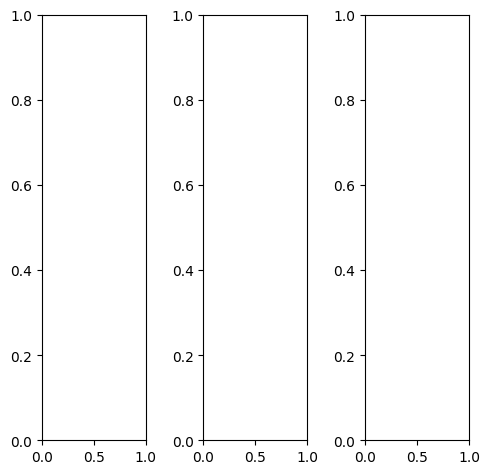

tensor([[[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.5451],
         ...,
         [0.6627, 0.8118, 0.9020,  ..., 0.3333, 0.3137, 0.3922],
         [0.8549, 0.8627, 0.9020,  ..., 0.6431, 0.6510, 0.6118],
         [0.8980, 0.8667, 0.8980,  ..., 0.7529, 0.7490, 0.7608]],

        [[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.5451],
         ...,
         [0.6627, 0.8118, 0.9020,  ..., 0.3333, 0.3137, 0.3922],
         [0.8549, 0.8627, 0.9020,  ..., 0.6431, 0.6510, 0.6118],
         [0.8980, 0.8667, 0.8980,  ..., 0.7529, 0.7490, 0.7608]],

        [[0.9490, 0.9255, 0.9294,  ..., 0.6784, 0.6314, 0.6000],
         [0.8471, 0.8980, 0.9137,  ..., 0.5686, 0.5294, 0.5333],
         [0.5686, 0.8667, 0.9255,  ..., 0.5804, 0.5843, 0.

tensor([[[0.9255, 0.9176, 0.9020,  ..., 0.6706, 0.6157, 0.5725],
         [0.8353, 0.8980, 0.8980,  ..., 0.5647, 0.5137, 0.5059],
         [0.5647, 0.8745, 0.9176,  ..., 0.5647, 0.5686, 0.5137],
         ...,
         [0.7176, 0.8549, 0.9294,  ..., 0.3569, 0.3255, 0.4235],
         [0.8941, 0.8902, 0.9137,  ..., 0.6824, 0.7020, 0.6627],
         [0.9569, 0.9137, 0.9294,  ..., 0.8118, 0.8039, 0.7882]],

        [[0.9529, 0.9294, 0.9412,  ..., 0.7020, 0.6471, 0.6235],
         [0.8510, 0.8980, 0.9176,  ..., 0.5961, 0.5608, 0.5647],
         [0.5725, 0.8667, 0.9255,  ..., 0.6196, 0.6196, 0.5804],
         ...,
         [0.6510, 0.8078, 0.9020,  ..., 0.3216, 0.3176, 0.3843],
         [0.8471, 0.8627, 0.9059,  ..., 0.6314, 0.6471, 0.6000],
         [0.8863, 0.8627, 0.8941,  ..., 0.7333, 0.7373, 0.7569]],

        [[0.9843, 0.9373, 0.9569,  ..., 0.5922, 0.5804, 0.5529],
         [0.8588, 0.9020, 0.9412,  ..., 0.4353, 0.4078, 0.4392],
         [0.5608, 0.8627, 0.9569,  ..., 0.4353, 0.4353, 0.

tensor([[[0.6723, 0.6447, 0.6754,  ..., 0.3556, 0.3246, 0.3278],
         [0.5822, 0.4977, 0.6092,  ..., 0.2785, 0.2346, 0.2586],
         [0.3799, 0.5420, 0.5461,  ..., 0.2992, 0.2918, 0.2509],
         ...,
         [0.5506, 0.6726, 0.7339,  ..., 0.2308, 0.2214, 0.2843],
         [0.6931, 0.7013, 0.7253,  ..., 0.5209, 0.5180, 0.4528],
         [0.7081, 0.6922, 0.7063,  ..., 0.6061, 0.6012, 0.5693]],

        [[0.7113, 0.7225, 0.7334,  ..., 0.5084, 0.4859, 0.4160],
         [0.6005, 0.5457, 0.6273,  ..., 0.4536, 0.4226, 0.3709],
         [0.4761, 0.6292, 0.6501,  ..., 0.4710, 0.4792, 0.3646],
         ...,
         [0.5251, 0.6531, 0.7351,  ..., 0.2297, 0.2228, 0.2595],
         [0.6807, 0.6814, 0.7163,  ..., 0.5273, 0.5426, 0.4415],
         [0.6677, 0.6708, 0.6961,  ..., 0.5913, 0.5989, 0.5558]],

        [[0.8124, 0.8231, 0.8027,  ..., 0.7308, 0.6956, 0.6128],
         [0.7488, 0.7264, 0.7934,  ..., 0.6593, 0.6458, 0.6167],
         [0.5320, 0.6902, 0.6879,  ..., 0.6759, 0.6852, 0.

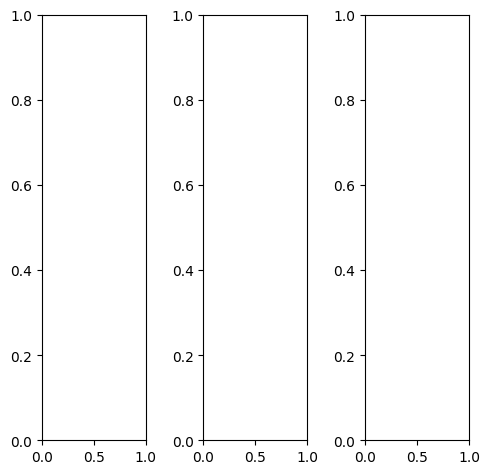

tensor([[[0.4078, 0.3922, 0.3922,  ..., 0.4157, 0.4157, 0.4275],
         [0.4235, 0.4157, 0.4078,  ..., 0.4196, 0.4275, 0.4353],
         [0.4118, 0.4196, 0.4196,  ..., 0.4196, 0.4275, 0.4314],
         ...,
         [0.4941, 0.4863, 0.4824,  ..., 0.5647, 0.5569, 0.5529],
         [0.5020, 0.5020, 0.5020,  ..., 0.5608, 0.5765, 0.5647],
         [0.4980, 0.4902, 0.4902,  ..., 0.5490, 0.5686, 0.5608]],

        [[0.4078, 0.3922, 0.3922,  ..., 0.4157, 0.4157, 0.4275],
         [0.4235, 0.4157, 0.4078,  ..., 0.4196, 0.4275, 0.4353],
         [0.4118, 0.4196, 0.4196,  ..., 0.4196, 0.4275, 0.4314],
         ...,
         [0.4941, 0.4863, 0.4824,  ..., 0.5647, 0.5569, 0.5529],
         [0.5020, 0.5020, 0.5020,  ..., 0.5608, 0.5765, 0.5647],
         [0.4980, 0.4902, 0.4902,  ..., 0.5490, 0.5686, 0.5608]],

        [[0.4078, 0.3922, 0.3922,  ..., 0.4157, 0.4157, 0.4275],
         [0.4235, 0.4157, 0.4078,  ..., 0.4196, 0.4275, 0.4353],
         [0.4118, 0.4196, 0.4196,  ..., 0.4196, 0.4275, 0.

tensor([[[0.4118, 0.3961, 0.3922,  ..., 0.4196, 0.4196, 0.4275],
         [0.4275, 0.4235, 0.4078,  ..., 0.4235, 0.4314, 0.4392],
         [0.4118, 0.4196, 0.4157,  ..., 0.4235, 0.4275, 0.4314],
         ...,
         [0.4941, 0.4824, 0.4784,  ..., 0.5647, 0.5569, 0.5529],
         [0.4941, 0.4941, 0.4980,  ..., 0.5608, 0.5765, 0.5647],
         [0.4824, 0.4824, 0.4863,  ..., 0.5451, 0.5647, 0.5569]],

        [[0.4078, 0.3961, 0.4000,  ..., 0.4118, 0.4118, 0.4235],
         [0.4235, 0.4196, 0.4157,  ..., 0.4157, 0.4235, 0.4314],
         [0.4196, 0.4235, 0.4275,  ..., 0.4196, 0.4275, 0.4314],
         ...,
         [0.5020, 0.4902, 0.4902,  ..., 0.5686, 0.5608, 0.5608],
         [0.5098, 0.5098, 0.5098,  ..., 0.5647, 0.5804, 0.5725],
         [0.5098, 0.5020, 0.4980,  ..., 0.5529, 0.5765, 0.5686]],

        [[0.3843, 0.3647, 0.3569,  ..., 0.4157, 0.4196, 0.4314],
         [0.3961, 0.3882, 0.3686,  ..., 0.4196, 0.4275, 0.4353],
         [0.3765, 0.3843, 0.3765,  ..., 0.4235, 0.4353, 0.

tensor([[[ 0.2247,  0.1381,  0.0379,  ...,  0.1876,  0.1816,  0.2293],
         [ 0.2893,  0.0598,  0.0412,  ...,  0.1410,  0.1462,  0.1827],
         [ 0.1414,  0.0159, -0.0236,  ...,  0.1629,  0.1818,  0.1903],
         ...,
         [ 0.4462,  0.4338,  0.4042,  ...,  0.6183,  0.5890,  0.5508],
         [ 0.4722,  0.4630,  0.4250,  ...,  0.6016,  0.6212,  0.5777],
         [ 0.4630,  0.4100,  0.3964,  ...,  0.5569,  0.5870,  0.5676]],

        [[ 0.2861,  0.2864,  0.0953,  ...,  0.2858,  0.3032,  0.3130],
         [ 0.3125,  0.1717, -0.0353,  ...,  0.2665,  0.2982,  0.2744],
         [ 0.2091,  0.1796, -0.0310,  ...,  0.2781,  0.2985,  0.2566],
         ...,
         [ 0.4512,  0.4004,  0.4252,  ...,  0.6096,  0.5957,  0.5315],
         [ 0.4732,  0.4442,  0.4549,  ...,  0.6082,  0.6329,  0.5818],
         [ 0.4707,  0.3947,  0.4133,  ...,  0.5492,  0.6045,  0.5614]],

        [[ 0.4667,  0.2593,  0.2871,  ...,  0.3713,  0.3941,  0.4234],
         [ 0.4557,  0.2595,  0.2611,  ...,  0

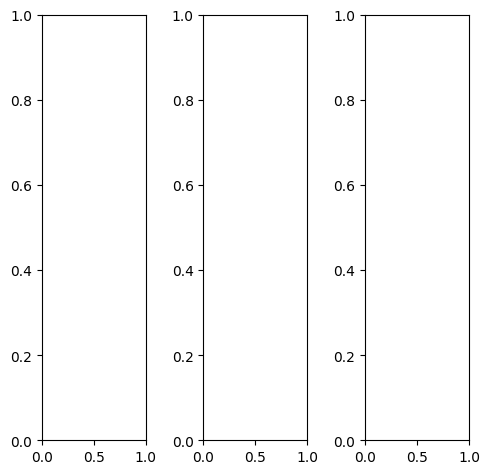

tensor([[[0.7451, 0.7020, 0.7333,  ..., 0.8941, 0.8941, 0.8941],
         [0.5765, 0.5216, 0.5529,  ..., 0.6588, 0.6627, 0.6431],
         [0.2510, 0.2667, 0.2157,  ..., 0.2392, 0.2510, 0.2118],
         ...,
         [0.3176, 0.3373, 0.3882,  ..., 0.1843, 0.1765, 0.2000],
         [0.5843, 0.5804, 0.5490,  ..., 0.4667, 0.4627, 0.4627],
         [0.7569, 0.7569, 0.7176,  ..., 0.7412, 0.7725, 0.7451]],

        [[0.7451, 0.7020, 0.7333,  ..., 0.8941, 0.8941, 0.8941],
         [0.5765, 0.5216, 0.5529,  ..., 0.6588, 0.6627, 0.6431],
         [0.2510, 0.2667, 0.2157,  ..., 0.2392, 0.2510, 0.2118],
         ...,
         [0.3176, 0.3373, 0.3882,  ..., 0.1843, 0.1765, 0.2000],
         [0.5843, 0.5804, 0.5490,  ..., 0.4667, 0.4627, 0.4627],
         [0.7569, 0.7569, 0.7176,  ..., 0.7412, 0.7725, 0.7451]],

        [[0.7451, 0.7020, 0.7333,  ..., 0.8941, 0.8941, 0.8941],
         [0.5765, 0.5216, 0.5529,  ..., 0.6588, 0.6627, 0.6431],
         [0.2510, 0.2667, 0.2157,  ..., 0.2392, 0.2510, 0.

tensor([[[0.7451, 0.7020, 0.7333,  ..., 0.8980, 0.8863, 0.8863],
         [0.5686, 0.5098, 0.5451,  ..., 0.6588, 0.6510, 0.6314],
         [0.2275, 0.2314, 0.2000,  ..., 0.2353, 0.2353, 0.1961],
         ...,
         [0.2784, 0.3059, 0.3647,  ..., 0.1725, 0.1647, 0.1882],
         [0.5686, 0.5647, 0.5294,  ..., 0.4588, 0.4588, 0.4588],
         [0.7608, 0.7529, 0.7059,  ..., 0.7373, 0.7686, 0.7412]],

        [[0.7451, 0.7020, 0.7333,  ..., 0.8902, 0.8980, 0.8980],
         [0.5843, 0.5333, 0.5569,  ..., 0.6588, 0.6667, 0.6510],
         [0.2706, 0.2902, 0.2275,  ..., 0.2431, 0.2627, 0.2235],
         ...,
         [0.3490, 0.3686, 0.4196,  ..., 0.1961, 0.1882, 0.2118],
         [0.6000, 0.6000, 0.5725,  ..., 0.4706, 0.4667, 0.4667],
         [0.7569, 0.7608, 0.7255,  ..., 0.7412, 0.7725, 0.7490]],

        [[0.7412, 0.7059, 0.7333,  ..., 0.8941, 0.8941, 0.8941],
         [0.5647, 0.5059, 0.5412,  ..., 0.6510, 0.6588, 0.6392],
         [0.2196, 0.2235, 0.1961,  ..., 0.2275, 0.2431, 0.

tensor([[[0.8925, 0.8626, 0.8450,  ..., 1.1362, 1.1248, 1.0406],
         [0.6535, 0.5932, 0.5113,  ..., 0.9494, 0.9832, 0.9087],
         [0.2755, 0.2044, 0.0492,  ..., 0.2845, 0.3087, 0.2740],
         ...,
         [0.4666, 0.5674, 0.6429,  ..., 0.2211, 0.2145, 0.2848],
         [0.8310, 0.9122, 0.8352,  ..., 0.7028, 0.6829, 0.6954],
         [1.0546, 1.0793, 1.0133,  ..., 1.0396, 1.0977, 0.9823]],

        [[0.8834, 0.8993, 0.8390,  ..., 1.1943, 1.1672, 1.1210],
         [0.7281, 0.6495, 0.5739,  ..., 0.9863, 1.0067, 0.9376],
         [0.3976, 0.3117, 0.1607,  ..., 0.3287, 0.3271, 0.3051],
         ...,
         [0.4470, 0.5144, 0.6311,  ..., 0.1840, 0.1936, 0.2443],
         [0.8268, 0.8845, 0.8434,  ..., 0.6831, 0.6762, 0.6924],
         [1.0239, 1.0587, 1.0171,  ..., 1.0242, 1.0623, 0.9388]],

        [[0.9366, 1.0023, 0.9423,  ..., 1.3006, 1.2890, 1.2287],
         [0.7780, 0.7490, 0.7077,  ..., 1.0942, 1.1135, 1.0300],
         [0.3878, 0.3715, 0.1683,  ..., 0.4921, 0.5179, 0.

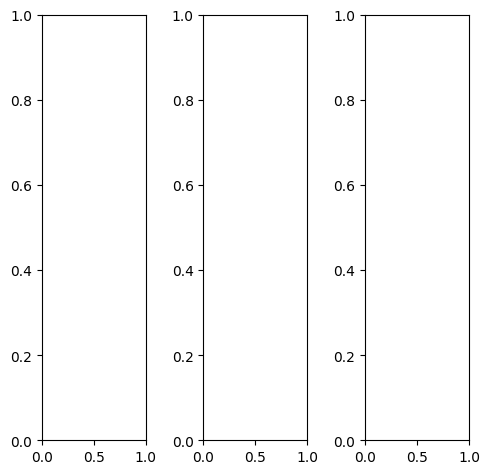

EPOCH: 31.510  trn_loss: 0.004  (3858.62s - 8386.99s remaining)

tensor([[[0.6627, 0.6667, 0.6745,  ..., 0.7255, 0.7176, 0.7137],
         [0.6627, 0.6706, 0.6784,  ..., 0.7255, 0.7216, 0.7137],
         [0.6627, 0.6745, 0.6824,  ..., 0.6392, 0.7176, 0.7176],
         ...,
         [0.5412, 0.5569, 0.5569,  ..., 0.2000, 0.2118, 0.1961],
         [0.4941, 0.5098, 0.4627,  ..., 0.2314, 0.2314, 0.2549],
         [0.4039, 0.4000, 0.3490,  ..., 0.1922, 0.2039, 0.2431]],

        [[0.6627, 0.6667, 0.6745,  ..., 0.7255, 0.7176, 0.7137],
         [0.6627, 0.6706, 0.6784,  ..., 0.7255, 0.7216, 0.7137],
         [0.6627, 0.6745, 0.6824,  ..., 0.6392, 0.7176, 0.7176],
         ...,
         [0.5412, 0.5569, 0.5569,  ..., 0.2000, 0.2118, 0.1961],
         [0.4941, 0.5098, 0.4627,  ..., 0.2314, 0.2314, 0.2549],
         [0.4039, 0.4000, 0.3490,  ..., 0.1922, 0.2039, 0.2431]],

        [[0.6627, 0.6667, 0.6745,  ..., 0.7255, 0.7176, 0.7137],
         [0.6627, 0.6706, 0.6784,  ..., 0.7255, 0.7216, 0.7137],
         [0.6627, 0.6745, 0.6824,  ..., 0.6392, 0.7176, 0.

tensor([[[0.6667, 0.6706, 0.6824,  ..., 0.7412, 0.7333, 0.7294],
         [0.6745, 0.6824, 0.6902,  ..., 0.7412, 0.7373, 0.7294],
         [0.6745, 0.6863, 0.6941,  ..., 0.6627, 0.7373, 0.7333],
         ...,
         [0.6157, 0.6275, 0.6235,  ..., 0.2510, 0.2667, 0.2431],
         [0.5686, 0.5804, 0.5294,  ..., 0.2863, 0.2902, 0.3176],
         [0.4706, 0.4627, 0.4078,  ..., 0.2392, 0.2471, 0.3059]],

        [[0.6745, 0.6784, 0.6863,  ..., 0.7294, 0.7255, 0.7176],
         [0.6706, 0.6784, 0.6863,  ..., 0.7294, 0.7255, 0.7176],
         [0.6706, 0.6824, 0.6902,  ..., 0.6471, 0.7216, 0.7216],
         ...,
         [0.5373, 0.5529, 0.5529,  ..., 0.1922, 0.2000, 0.1882],
         [0.4863, 0.5059, 0.4588,  ..., 0.2235, 0.2235, 0.2431],
         [0.4000, 0.3961, 0.3490,  ..., 0.1882, 0.1961, 0.2314]],

        [[0.5882, 0.5922, 0.6000,  ..., 0.6667, 0.6471, 0.6431],
         [0.5882, 0.5961, 0.6039,  ..., 0.6549, 0.6510, 0.6392],
         [0.5882, 0.6000, 0.6078,  ..., 0.5490, 0.6431, 0.

tensor([[[ 0.7140,  0.7088,  0.6660,  ...,  0.6915,  0.6693,  0.7254],
         [ 0.6755,  0.5960,  0.6195,  ...,  0.6885,  0.6953,  0.7214],
         [ 0.6784,  0.7145,  0.6088,  ...,  0.5909,  0.7002,  0.7146],
         ...,
         [ 0.5748,  0.6549,  0.6449,  ..., -0.0237, -0.0190,  0.0237],
         [ 0.4910,  0.5365,  0.4955,  ...,  0.0113,  0.0282,  0.1095],
         [ 0.3731,  0.3506,  0.2910,  ...,  0.0312,  0.0403,  0.1028]],

        [[ 0.7302,  0.7718,  0.6462,  ...,  0.8145,  0.8153,  0.8222],
         [ 0.6965,  0.6079,  0.6313,  ...,  0.8090,  0.8077,  0.8500],
         [ 0.7245,  0.7767,  0.6196,  ...,  0.6837,  0.8092,  0.8219],
         ...,
         [ 0.5535,  0.5788,  0.5931,  ...,  0.0049,  0.0121,  0.0219],
         [ 0.4718,  0.4860,  0.4401,  ...,  0.0444,  0.0476,  0.0955],
         [ 0.3664,  0.3079,  0.2600,  ...,  0.0432,  0.0427,  0.1002]],

        [[ 0.8488,  0.8627,  0.7823,  ...,  1.0248,  1.0103,  0.9941],
         [ 0.8580,  0.7699,  0.8257,  ...,  1

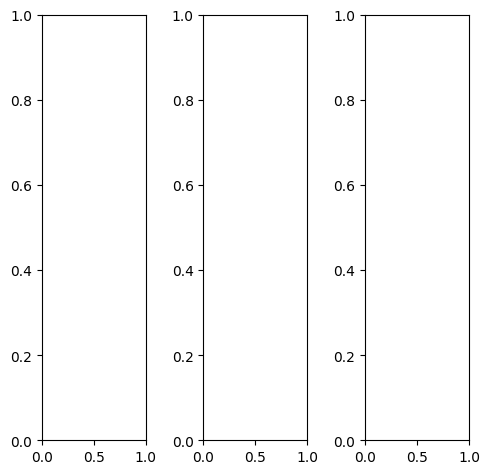

tensor([[[0.3804, 0.2902, 0.2431,  ..., 0.2431, 0.2157, 0.1412],
         [0.4196, 0.3725, 0.3294,  ..., 0.2431, 0.3059, 0.1333],
         [0.4039, 0.3882, 0.3765,  ..., 0.3373, 0.2627, 0.0902],
         ...,
         [0.6078, 0.5216, 0.3294,  ..., 0.4118, 0.3804, 0.4431],
         [0.8196, 0.7490, 0.5608,  ..., 0.4078, 0.3882, 0.4118],
         [0.8902, 0.8784, 0.7882,  ..., 0.4824, 0.3882, 0.4353]],

        [[0.3804, 0.2902, 0.2431,  ..., 0.2431, 0.2157, 0.1412],
         [0.4196, 0.3725, 0.3294,  ..., 0.2431, 0.3059, 0.1333],
         [0.4039, 0.3882, 0.3765,  ..., 0.3373, 0.2627, 0.0902],
         ...,
         [0.6078, 0.5216, 0.3294,  ..., 0.4118, 0.3804, 0.4431],
         [0.8196, 0.7490, 0.5608,  ..., 0.4078, 0.3882, 0.4118],
         [0.8902, 0.8784, 0.7882,  ..., 0.4824, 0.3882, 0.4353]],

        [[0.3804, 0.2902, 0.2431,  ..., 0.2431, 0.2157, 0.1412],
         [0.4196, 0.3725, 0.3294,  ..., 0.2431, 0.3059, 0.1333],
         [0.4039, 0.3882, 0.3765,  ..., 0.3373, 0.2627, 0.

tensor([[[0.3333, 0.2314, 0.1686,  ..., 0.1686, 0.1490, 0.0980],
         [0.3922, 0.3333, 0.2784,  ..., 0.1961, 0.2471, 0.0784],
         [0.3922, 0.3686, 0.3490,  ..., 0.3176, 0.2157, 0.0275],
         ...,
         [0.5961, 0.4745, 0.2745,  ..., 0.4314, 0.3961, 0.4588],
         [0.8000, 0.7137, 0.5137,  ..., 0.4275, 0.4039, 0.4275],
         [0.8549, 0.8549, 0.7686,  ..., 0.4980, 0.4039, 0.4510]],

        [[0.4078, 0.3176, 0.2745,  ..., 0.2745, 0.2431, 0.1608],
         [0.4431, 0.3922, 0.3490,  ..., 0.2667, 0.3333, 0.1569],
         [0.4196, 0.4000, 0.3882,  ..., 0.3529, 0.2863, 0.1176],
         ...,
         [0.6353, 0.5569, 0.3647,  ..., 0.4157, 0.3843, 0.4510],
         [0.8510, 0.7882, 0.6000,  ..., 0.4118, 0.3922, 0.4196],
         [0.9333, 0.9176, 0.8196,  ..., 0.4863, 0.3922, 0.4392]],

        [[0.3529, 0.3137, 0.2784,  ..., 0.2863, 0.2510, 0.1451],
         [0.3843, 0.3804, 0.3490,  ..., 0.2510, 0.3294, 0.1451],
         [0.3569, 0.3725, 0.3804,  ..., 0.3059, 0.2745, 0.

tensor([[[0.3796, 0.2133, 0.0080,  ..., 0.2000, 0.1708, 0.1076],
         [0.4055, 0.1989, 0.0804,  ..., 0.1691, 0.2584, 0.0611],
         [0.3326, 0.2421, 0.0964,  ..., 0.3270, 0.2092, 0.0035],
         ...,
         [0.8360, 0.7453, 0.4674,  ..., 0.5611, 0.5478, 0.6257],
         [1.0994, 1.0518, 0.8057,  ..., 0.5584, 0.5525, 0.5724],
         [1.1267, 1.2105, 1.0824,  ..., 0.6914, 0.5338, 0.5819]],

        [[0.4505, 0.3350, 0.1574,  ..., 0.3098, 0.2604, 0.1745],
         [0.4450, 0.2655, 0.0555,  ..., 0.3036, 0.4019, 0.1457],
         [0.4725, 0.3673, 0.2568,  ..., 0.4292, 0.3361, 0.0763],
         ...,
         [0.7928, 0.7583, 0.4413,  ..., 0.5772, 0.5331, 0.5891],
         [1.0755, 1.0365, 0.8169,  ..., 0.5662, 0.5303, 0.5474],
         [1.1064, 1.1993, 1.0916,  ..., 0.6685, 0.5187, 0.5498]],

        [[0.6029, 0.4093, 0.2969,  ..., 0.4654, 0.4374, 0.3283],
         [0.6172, 0.4686, 0.3665,  ..., 0.4755, 0.5804, 0.3033],
         [0.5201, 0.4720, 0.4055,  ..., 0.5699, 0.5057, 0.

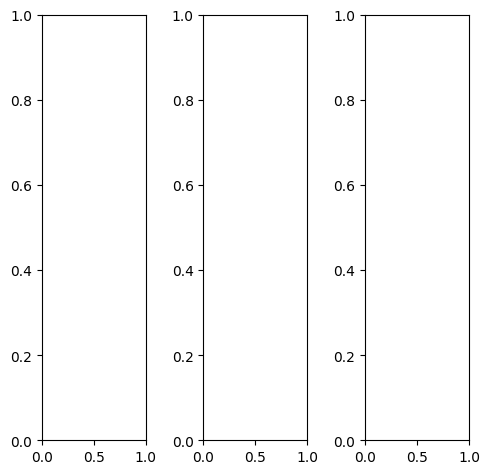

tensor([[[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.8863],
         ...,
         [0.2157, 0.3216, 0.3137,  ..., 0.3137, 0.3451, 0.2588],
         [0.2471, 0.2863, 0.2902,  ..., 0.2941, 0.2706, 0.2196],
         [0.2784, 0.2784, 0.3529,  ..., 0.2471, 0.2431, 0.2235]],

        [[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.8863],
         ...,
         [0.2157, 0.3216, 0.3137,  ..., 0.3137, 0.3451, 0.2588],
         [0.2471, 0.2863, 0.2902,  ..., 0.2941, 0.2706, 0.2196],
         [0.2784, 0.2784, 0.3529,  ..., 0.2471, 0.2431, 0.2235]],

        [[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.

tensor([[[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.8863],
         ...,
         [0.2157, 0.3216, 0.3137,  ..., 0.3137, 0.3451, 0.2588],
         [0.2471, 0.2863, 0.2902,  ..., 0.2941, 0.2706, 0.2196],
         [0.2784, 0.2784, 0.3529,  ..., 0.2471, 0.2431, 0.2235]],

        [[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.8863],
         ...,
         [0.2157, 0.3216, 0.3137,  ..., 0.3137, 0.3451, 0.2588],
         [0.2471, 0.2863, 0.2902,  ..., 0.2941, 0.2706, 0.2196],
         [0.2784, 0.2784, 0.3529,  ..., 0.2471, 0.2431, 0.2235]],

        [[0.3020, 0.3098, 0.3490,  ..., 0.8549, 0.9255, 0.9529],
         [0.3137, 0.3176, 0.3608,  ..., 0.6471, 0.8353, 0.9333],
         [0.3765, 0.3569, 0.3569,  ..., 0.5255, 0.7059, 0.

tensor([[[ 0.1647,  0.0914,  0.0393,  ...,  0.8136,  0.8847,  0.9121],
         [ 0.1982, -0.0083,  0.0213,  ...,  0.5817,  0.8442,  0.9882],
         [ 0.1663,  0.1028,  0.0580,  ...,  0.4868,  0.7244,  0.9362],
         ...,
         [ 0.1571,  0.3047,  0.3128,  ...,  0.2821,  0.3218,  0.2564],
         [ 0.1818,  0.2222,  0.2373,  ...,  0.2350,  0.2306,  0.2070],
         [ 0.2656,  0.2404,  0.3354,  ...,  0.2003,  0.1964,  0.2411]],

        [[ 0.2502,  0.2384,  0.1284,  ...,  0.8693,  0.9558,  1.0084],
         [ 0.2413,  0.0867,  0.0070,  ...,  0.6413,  0.9025,  1.0739],
         [ 0.2799,  0.2271,  0.0982,  ...,  0.5181,  0.7656,  0.9998],
         ...,
         [ 0.1847,  0.3232,  0.3049,  ...,  0.3287,  0.3744,  0.2512],
         [ 0.2096,  0.2566,  0.2603,  ...,  0.2797,  0.2655,  0.2016],
         [ 0.2704,  0.2614,  0.3629,  ...,  0.2252,  0.2133,  0.2171]],

        [[ 0.4267,  0.2760,  0.3564,  ...,  1.0520,  1.1117,  1.1256],
         [ 0.4313,  0.2836,  0.3894,  ...,  0

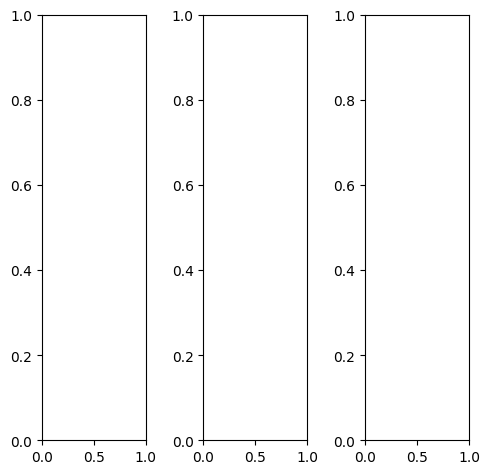

tensor([[[0.3137, 0.3569, 0.4549,  ..., 0.2706, 0.3647, 0.3216],
         [0.3529, 0.4000, 0.4157,  ..., 0.2235, 0.3373, 0.2549],
         [0.3490, 0.3529, 0.3647,  ..., 0.1725, 0.2510, 0.2824],
         ...,
         [0.0667, 0.0627, 0.0588,  ..., 0.7725, 0.7569, 0.7137],
         [0.0392, 0.0431, 0.0510,  ..., 0.7412, 0.7216, 0.6980],
         [0.0392, 0.0431, 0.0510,  ..., 0.7137, 0.7020, 0.6863]],

        [[0.3137, 0.3569, 0.4549,  ..., 0.2706, 0.3647, 0.3216],
         [0.3529, 0.4000, 0.4157,  ..., 0.2235, 0.3373, 0.2549],
         [0.3490, 0.3529, 0.3647,  ..., 0.1725, 0.2510, 0.2824],
         ...,
         [0.0667, 0.0627, 0.0588,  ..., 0.7725, 0.7569, 0.7137],
         [0.0392, 0.0431, 0.0510,  ..., 0.7412, 0.7216, 0.6980],
         [0.0392, 0.0431, 0.0510,  ..., 0.7137, 0.7020, 0.6863]],

        [[0.3137, 0.3569, 0.4549,  ..., 0.2706, 0.3647, 0.3216],
         [0.3529, 0.4000, 0.4157,  ..., 0.2235, 0.3373, 0.2549],
         [0.3490, 0.3529, 0.3647,  ..., 0.1725, 0.2510, 0.

tensor([[[0.3059, 0.3451, 0.4392,  ..., 0.2549, 0.3529, 0.3137],
         [0.3569, 0.4000, 0.4078,  ..., 0.2118, 0.3373, 0.2627],
         [0.3608, 0.3608, 0.3686,  ..., 0.1765, 0.2627, 0.2980],
         ...,
         [0.0549, 0.0510, 0.0510,  ..., 0.7569, 0.7412, 0.6980],
         [0.0314, 0.0353, 0.0431,  ..., 0.7255, 0.7059, 0.6824],
         [0.0353, 0.0392, 0.0471,  ..., 0.6980, 0.6863, 0.6706]],

        [[0.3412, 0.3882, 0.4980,  ..., 0.2980, 0.4000, 0.3490],
         [0.3765, 0.4275, 0.4471,  ..., 0.2471, 0.3608, 0.2745],
         [0.3686, 0.3725, 0.3882,  ..., 0.1765, 0.2588, 0.2902],
         ...,
         [0.0745, 0.0667, 0.0627,  ..., 0.7725, 0.7569, 0.7176],
         [0.0471, 0.0510, 0.0549,  ..., 0.7412, 0.7216, 0.7020],
         [0.0471, 0.0471, 0.0549,  ..., 0.7137, 0.7059, 0.6902]],

        [[0.1882, 0.2275, 0.2863,  ..., 0.1686, 0.2157, 0.1922],
         [0.2314, 0.2745, 0.2588,  ..., 0.1490, 0.2118, 0.1451],
         [0.2235, 0.2314, 0.2196,  ..., 0.1255, 0.1647, 0.

tensor([[[0.2844, 0.3015, 0.2607,  ..., 0.2185, 0.3149, 0.3256],
         [0.3210, 0.2454, 0.2086,  ..., 0.1620, 0.2783, 0.2354],
         [0.2273, 0.2375, 0.1447,  ..., 0.0861, 0.1901, 0.2702],
         ...,
         [0.0967, 0.1142, 0.0833,  ..., 0.8828, 0.8754, 0.8323],
         [0.0322, 0.0493, 0.0512,  ..., 0.8143, 0.8151, 0.8072],
         [0.0506, 0.0446, 0.0482,  ..., 0.8374, 0.8220, 0.8088]],

        [[0.3282, 0.4281, 0.3369,  ..., 0.3171, 0.4246, 0.3861],
         [0.3545, 0.3268, 0.1815,  ..., 0.2805, 0.4249, 0.3003],
         [0.3456, 0.3441, 0.2267,  ..., 0.2244, 0.3193, 0.3415],
         ...,
         [0.0932, 0.1047, 0.0910,  ..., 0.8645, 0.8537, 0.8201],
         [0.0527, 0.0627, 0.0717,  ..., 0.8082, 0.7948, 0.7935],
         [0.0622, 0.0524, 0.0632,  ..., 0.7952, 0.7907, 0.7768]],

        [[0.4857, 0.4396, 0.4964,  ..., 0.4411, 0.5633, 0.5202],
         [0.4938, 0.4350, 0.4490,  ..., 0.3802, 0.5296, 0.4403],
         [0.3787, 0.3742, 0.3377,  ..., 0.2993, 0.4381, 0.

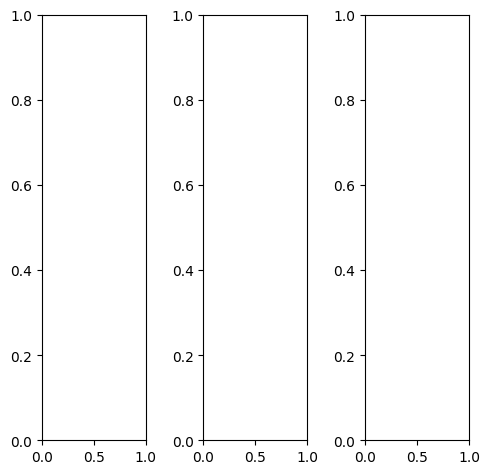

tensor([[[0.5490, 0.5490, 0.5725,  ..., 0.5804, 0.5843, 0.5765],
         [0.5608, 0.5490, 0.5569,  ..., 0.5686, 0.5569, 0.5608],
         [0.5490, 0.5333, 0.5373,  ..., 0.5961, 0.6000, 0.5804],
         ...,
         [0.5843, 0.5882, 0.6039,  ..., 0.6078, 0.6196, 0.5647],
         [0.6118, 0.6000, 0.6000,  ..., 0.5725, 0.5647, 0.5569],
         [0.5608, 0.5686, 0.5922,  ..., 0.5725, 0.5686, 0.5961]],

        [[0.5490, 0.5490, 0.5725,  ..., 0.5804, 0.5843, 0.5765],
         [0.5608, 0.5490, 0.5569,  ..., 0.5686, 0.5569, 0.5608],
         [0.5490, 0.5333, 0.5373,  ..., 0.5961, 0.6000, 0.5804],
         ...,
         [0.5843, 0.5882, 0.6039,  ..., 0.6078, 0.6196, 0.5647],
         [0.6118, 0.6000, 0.6000,  ..., 0.5725, 0.5647, 0.5569],
         [0.5608, 0.5686, 0.5922,  ..., 0.5725, 0.5686, 0.5961]],

        [[0.5490, 0.5490, 0.5725,  ..., 0.5804, 0.5843, 0.5765],
         [0.5608, 0.5490, 0.5569,  ..., 0.5686, 0.5569, 0.5608],
         [0.5490, 0.5333, 0.5373,  ..., 0.5961, 0.6000, 0.

tensor([[[0.6039, 0.6039, 0.6275,  ..., 0.6392, 0.6431, 0.6353],
         [0.6157, 0.6039, 0.6118,  ..., 0.6275, 0.6157, 0.6196],
         [0.6039, 0.5882, 0.5922,  ..., 0.6549, 0.6588, 0.6392],
         ...,
         [0.6392, 0.6431, 0.6588,  ..., 0.6667, 0.6784, 0.6235],
         [0.6667, 0.6549, 0.6549,  ..., 0.6314, 0.6235, 0.6157],
         [0.6157, 0.6235, 0.6471,  ..., 0.6314, 0.6275, 0.6549]],

        [[0.5373, 0.5373, 0.5608,  ..., 0.5686, 0.5725, 0.5647],
         [0.5490, 0.5373, 0.5451,  ..., 0.5569, 0.5451, 0.5490],
         [0.5373, 0.5216, 0.5255,  ..., 0.5843, 0.5882, 0.5686],
         ...,
         [0.5765, 0.5804, 0.5961,  ..., 0.5961, 0.6078, 0.5529],
         [0.6000, 0.5922, 0.5922,  ..., 0.5608, 0.5529, 0.5451],
         [0.5490, 0.5569, 0.5804,  ..., 0.5608, 0.5569, 0.5843]],

        [[0.4667, 0.4667, 0.4902,  ..., 0.4745, 0.4784, 0.4706],
         [0.4784, 0.4667, 0.4745,  ..., 0.4627, 0.4510, 0.4549],
         [0.4667, 0.4510, 0.4549,  ..., 0.4902, 0.4941, 0.

tensor([[[ 0.0721,  0.0680, -0.0249,  ...,  0.0972,  0.1397,  0.0902],
         [ 0.1993, -0.0662, -0.0220,  ...,  0.0908,  0.0797,  0.0265],
         [ 0.0590, -0.0654, -0.1853,  ...,  0.2306,  0.2331,  0.0895],
         ...,
         [ 0.2840,  0.3246,  0.2986,  ...,  0.4435,  0.3691,  0.1593],
         [ 0.3509,  0.3111,  0.3275,  ...,  0.2432,  0.2054,  0.1507],
         [ 0.2134,  0.1513,  0.1954,  ...,  0.1849,  0.1559,  0.1678]],

        [[ 0.2011,  0.2048,  0.2385,  ...,  0.2452,  0.3185,  0.2017],
         [ 0.2227,  0.2104,  0.0377,  ...,  0.3001,  0.2978,  0.1608],
         [ 0.1577,  0.1349,  0.0151,  ...,  0.3789,  0.4168,  0.1884],
         ...,
         [ 0.3160,  0.3672,  0.3659,  ...,  0.4427,  0.4566,  0.1483],
         [ 0.3857,  0.3755,  0.3985,  ...,  0.3585,  0.3066,  0.1859],
         [ 0.2199,  0.2041,  0.2364,  ...,  0.1901,  0.2071,  0.1600]],

        [[ 0.4314,  0.2030,  0.3116,  ...,  0.3538,  0.4049,  0.3364],
         [ 0.3898,  0.2578,  0.1580,  ...,  0

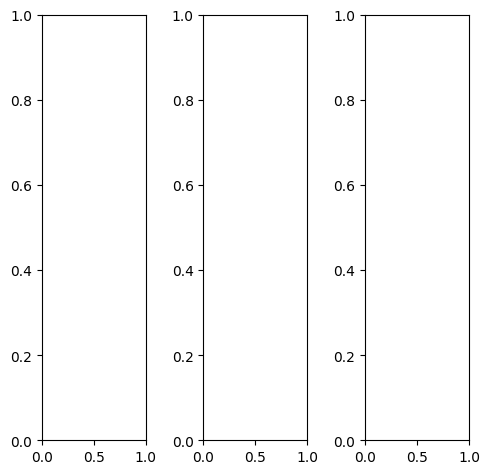

EPOCH: 31.765  trn_loss: 0.005  (3888.60s - 8353.07s remaining)

tensor([[[1.0000, 0.9922, 0.9922,  ..., 0.9686, 0.9608, 0.9647],
         [0.9922, 0.9804, 0.9804,  ..., 0.9569, 0.9490, 0.9490],
         [0.9961, 0.9882, 0.9882,  ..., 0.8824, 0.8706, 0.8667],
         ...,
         [0.8784, 0.8627, 0.8706,  ..., 0.9176, 0.9098, 0.9137],
         [0.8549, 0.8824, 0.8784,  ..., 0.8588, 0.8549, 0.8667],
         [0.8667, 0.8706, 0.8784,  ..., 0.8549, 0.8588, 0.8784]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9686, 0.9608, 0.9647],
         [0.9922, 0.9804, 0.9804,  ..., 0.9569, 0.9490, 0.9490],
         [0.9961, 0.9882, 0.9882,  ..., 0.8824, 0.8706, 0.8667],
         ...,
         [0.8784, 0.8627, 0.8706,  ..., 0.9176, 0.9098, 0.9137],
         [0.8549, 0.8824, 0.8784,  ..., 0.8588, 0.8549, 0.8667],
         [0.8667, 0.8706, 0.8784,  ..., 0.8549, 0.8588, 0.8784]],

        [[1.0000, 0.9922, 0.9922,  ..., 0.9686, 0.9608, 0.9647],
         [0.9922, 0.9804, 0.9804,  ..., 0.9569, 0.9490, 0.9490],
         [0.9961, 0.9882, 0.9882,  ..., 0.8824, 0.8706, 0.

tensor([[[1.0000, 0.9961, 0.9961,  ..., 0.8902, 0.8824, 0.8863],
         [0.9765, 0.9686, 0.9686,  ..., 0.8941, 0.8863, 0.8863],
         [1.0000, 0.9882, 0.9882,  ..., 0.8118, 0.8000, 0.7922],
         ...,
         [0.8706, 0.8549, 0.8627,  ..., 0.9098, 0.9059, 0.9059],
         [0.8471, 0.8745, 0.8706,  ..., 0.8471, 0.8431, 0.8549],
         [0.8549, 0.8588, 0.8667,  ..., 0.8431, 0.8471, 0.8667]],

        [[1.0000, 0.9922, 0.9922,  ..., 1.0000, 0.9922, 0.9961],
         [1.0000, 0.9882, 0.9882,  ..., 0.9804, 0.9725, 0.9725],
         [0.9961, 0.9843, 0.9843,  ..., 0.9059, 0.8941, 0.8863],
         ...,
         [0.8824, 0.8706, 0.8745,  ..., 0.9255, 0.9176, 0.9216],
         [0.8627, 0.8902, 0.8863,  ..., 0.8667, 0.8627, 0.8745],
         [0.8784, 0.8784, 0.8863,  ..., 0.8627, 0.8667, 0.8863]],

        [[1.0000, 0.9922, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9843, 0.9725, 0.9765,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9922, 0.9922,  ..., 0.9490, 0.9451, 0.

tensor([[[0.6898, 0.6380, 0.5663,  ..., 0.6070, 0.6245, 0.7138],
         [0.6365, 0.4972, 0.5043,  ..., 0.5515, 0.6007, 0.6898],
         [0.5634, 0.5056, 0.3779,  ..., 0.5155, 0.5581, 0.6222],
         ...,
         [0.6622, 0.6408, 0.6074,  ..., 0.7091, 0.7097, 0.7728],
         [0.6338, 0.6524, 0.6262,  ..., 0.6662, 0.6736, 0.7493],
         [0.6967, 0.6925, 0.6788,  ..., 0.7198, 0.7563, 0.7673]],

        [[0.7032, 0.7109, 0.6042,  ..., 0.6976, 0.7231, 0.7577],
         [0.6311, 0.4446, 0.4974,  ..., 0.6652, 0.6893, 0.7637],
         [0.6796, 0.6326, 0.5237,  ..., 0.6325, 0.6459, 0.6930],
         ...,
         [0.6442, 0.6342, 0.6366,  ..., 0.6773, 0.6751, 0.7307],
         [0.6248, 0.6452, 0.6331,  ..., 0.6356, 0.6376, 0.6997],
         [0.6632, 0.6727, 0.6713,  ..., 0.6589, 0.6928, 0.7168]],

        [[0.8096, 0.7944, 0.7443,  ..., 0.8902, 0.9053, 0.9106],
         [0.7751, 0.6494, 0.7165,  ..., 0.8285, 0.8544, 0.9211],
         [0.6649, 0.6422, 0.5519,  ..., 0.8283, 0.8243, 0.

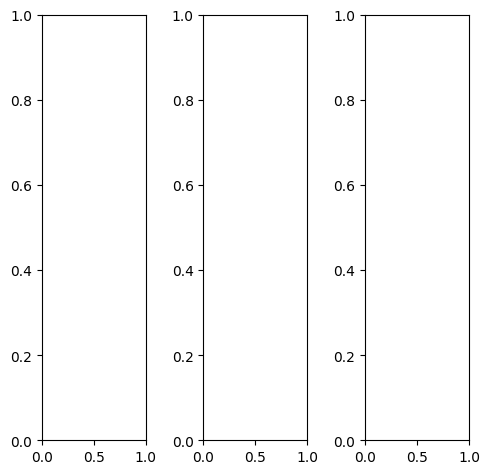

tensor([[[0.6902, 0.4941, 0.4510,  ..., 0.2706, 0.2745, 0.5490],
         [0.4863, 0.4706, 0.3922,  ..., 0.1686, 0.1725, 0.1961],
         [0.4314, 0.4118, 0.3647,  ..., 0.1725, 0.1882, 0.1804],
         ...,
         [0.6431, 0.6431, 0.6275,  ..., 0.6471, 0.6118, 0.5804],
         [0.7176, 0.6706, 0.7059,  ..., 0.5961, 0.6000, 0.6157],
         [0.7686, 0.6980, 0.6980,  ..., 0.5647, 0.5333, 0.6784]],

        [[0.6902, 0.4941, 0.4510,  ..., 0.2706, 0.2745, 0.5490],
         [0.4863, 0.4706, 0.3922,  ..., 0.1686, 0.1725, 0.1961],
         [0.4314, 0.4118, 0.3647,  ..., 0.1725, 0.1882, 0.1804],
         ...,
         [0.6431, 0.6431, 0.6275,  ..., 0.6471, 0.6118, 0.5804],
         [0.7176, 0.6706, 0.7059,  ..., 0.5961, 0.6000, 0.6157],
         [0.7686, 0.6980, 0.6980,  ..., 0.5647, 0.5333, 0.6784]],

        [[0.6902, 0.4941, 0.4510,  ..., 0.2706, 0.2745, 0.5490],
         [0.4863, 0.4706, 0.3922,  ..., 0.1686, 0.1725, 0.1961],
         [0.4314, 0.4118, 0.3647,  ..., 0.1725, 0.1882, 0.

tensor([[[0.7059, 0.5216, 0.4667,  ..., 0.2706, 0.2745, 0.5490],
         [0.5098, 0.4980, 0.4039,  ..., 0.1765, 0.1804, 0.1961],
         [0.4549, 0.4392, 0.3725,  ..., 0.1922, 0.2078, 0.1882],
         ...,
         [0.6980, 0.7137, 0.6980,  ..., 0.7059, 0.6667, 0.6157],
         [0.7529, 0.7294, 0.7608,  ..., 0.6392, 0.6392, 0.6392],
         [0.7882, 0.7373, 0.7373,  ..., 0.5804, 0.5490, 0.6902]],

        [[0.6902, 0.4941, 0.4549,  ..., 0.2706, 0.2745, 0.5529],
         [0.4941, 0.4824, 0.4078,  ..., 0.1647, 0.1686, 0.1961],
         [0.4392, 0.4275, 0.3882,  ..., 0.1647, 0.1804, 0.1804],
         ...,
         [0.6235, 0.6157, 0.6000,  ..., 0.6353, 0.5961, 0.5725],
         [0.7020, 0.6510, 0.6824,  ..., 0.6000, 0.6000, 0.6157],
         [0.7647, 0.6863, 0.6824,  ..., 0.5725, 0.5412, 0.6824]],

        [[0.6471, 0.4118, 0.3725,  ..., 0.2588, 0.2667, 0.5451],
         [0.4000, 0.3451, 0.2745,  ..., 0.1569, 0.1647, 0.1843],
         [0.3333, 0.2745, 0.2314,  ..., 0.1647, 0.1804, 0.

tensor([[[ 0.5962,  0.4029,  0.2022,  ...,  0.3025,  0.3194,  0.5406],
         [ 0.3915,  0.2946,  0.1919,  ...,  0.1400,  0.1682,  0.2358],
         [ 0.2441,  0.2478, -0.0138,  ...,  0.1453,  0.1999,  0.2081],
         ...,
         [ 0.7154,  0.6776,  0.6584,  ...,  0.6973,  0.6696,  0.6657],
         [ 0.8026,  0.6849,  0.7237,  ...,  0.6470,  0.6651,  0.7226],
         [ 0.8616,  0.7732,  0.7515,  ...,  0.6190,  0.6033,  0.7569]],

        [[ 0.7146,  0.4870,  0.3834,  ...,  0.2924,  0.3404,  0.5466],
         [ 0.4161,  0.3966,  0.1589,  ...,  0.1829,  0.2204,  0.2403],
         [ 0.4559,  0.3296,  0.2113,  ...,  0.1750,  0.2121,  0.1877],
         ...,
         [ 0.6567,  0.6638,  0.6743,  ...,  0.7001,  0.6625,  0.6414],
         [ 0.7634,  0.7005,  0.7535,  ...,  0.6410,  0.6557,  0.6897],
         [ 0.7898,  0.7569,  0.7504,  ...,  0.6050,  0.5770,  0.7151]],

        [[ 0.8803,  0.6607,  0.6518,  ...,  0.3619,  0.4118,  0.6012],
         [ 0.6118,  0.6949,  0.5859,  ...,  0

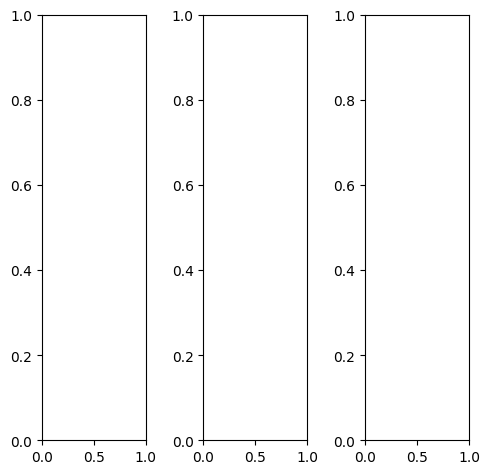

tensor([[[0.4314, 0.3961, 0.4431,  ..., 0.2863, 0.3176, 0.2863],
         [0.4157, 0.3961, 0.4549,  ..., 0.3020, 0.3255, 0.3176],
         [0.3529, 0.3686, 0.4196,  ..., 0.3451, 0.3294, 0.3020],
         ...,
         [0.4078, 0.3725, 0.4196,  ..., 0.4824, 0.4784, 0.4392],
         [0.3922, 0.3765, 0.4431,  ..., 0.4549, 0.4706, 0.4157],
         [0.4118, 0.4000, 0.4000,  ..., 0.4667, 0.4510, 0.3686]],

        [[0.4314, 0.3961, 0.4431,  ..., 0.2863, 0.3176, 0.2863],
         [0.4157, 0.3961, 0.4549,  ..., 0.3020, 0.3255, 0.3176],
         [0.3529, 0.3686, 0.4196,  ..., 0.3451, 0.3294, 0.3020],
         ...,
         [0.4078, 0.3725, 0.4196,  ..., 0.4824, 0.4784, 0.4392],
         [0.3922, 0.3765, 0.4431,  ..., 0.4549, 0.4706, 0.4157],
         [0.4118, 0.4000, 0.4000,  ..., 0.4667, 0.4510, 0.3686]],

        [[0.4314, 0.3961, 0.4431,  ..., 0.2863, 0.3176, 0.2863],
         [0.4157, 0.3961, 0.4549,  ..., 0.3020, 0.3255, 0.3176],
         [0.3529, 0.3686, 0.4196,  ..., 0.3451, 0.3294, 0.

tensor([[[0.4196, 0.3843, 0.4314,  ..., 0.2863, 0.3176, 0.2745],
         [0.4039, 0.3843, 0.4431,  ..., 0.3059, 0.3255, 0.3059],
         [0.3412, 0.3569, 0.4118,  ..., 0.3451, 0.3294, 0.2941],
         ...,
         [0.4235, 0.3882, 0.4314,  ..., 0.4824, 0.4745, 0.4275],
         [0.4039, 0.3882, 0.4549,  ..., 0.4549, 0.4706, 0.4118],
         [0.4118, 0.4000, 0.4000,  ..., 0.4667, 0.4510, 0.3686]],

        [[0.4353, 0.4000, 0.4627,  ..., 0.2824, 0.3137, 0.2902],
         [0.4196, 0.4039, 0.4784,  ..., 0.3020, 0.3255, 0.3176],
         [0.3686, 0.3882, 0.4549,  ..., 0.3451, 0.3294, 0.3020],
         ...,
         [0.4000, 0.3608, 0.4118,  ..., 0.4863, 0.4784, 0.4431],
         [0.3804, 0.3686, 0.4353,  ..., 0.4588, 0.4745, 0.4157],
         [0.4118, 0.4000, 0.4000,  ..., 0.4745, 0.4549, 0.3647]],

        [[0.4353, 0.3961, 0.3608,  ..., 0.3059, 0.3373, 0.3059],
         [0.4196, 0.3804, 0.3608,  ..., 0.3059, 0.3294, 0.3333],
         [0.3098, 0.2902, 0.2706,  ..., 0.3373, 0.3294, 0.

tensor([[[0.4796, 0.3987, 0.4624,  ..., 0.2315, 0.2905, 0.2767],
         [0.4169, 0.2436, 0.3411,  ..., 0.2664, 0.3071, 0.3095],
         [0.2920, 0.2082, 0.2640,  ..., 0.3859, 0.3351, 0.2841],
         ...,
         [0.5661, 0.5257, 0.5673,  ..., 0.6641, 0.6675, 0.6080],
         [0.5189, 0.5193, 0.5995,  ..., 0.5919, 0.6441, 0.5671],
         [0.5717, 0.5505, 0.5317,  ..., 0.6562, 0.6338, 0.5309]],

        [[0.5517, 0.4965, 0.5799,  ..., 0.3578, 0.4386, 0.3713],
         [0.4514, 0.2915, 0.3783,  ..., 0.4204, 0.4693, 0.4242],
         [0.4164, 0.3362, 0.4215,  ..., 0.5038, 0.4782, 0.3833],
         ...,
         [0.5318, 0.4896, 0.5529,  ..., 0.6759, 0.6742, 0.6041],
         [0.5040, 0.4740, 0.5863,  ..., 0.6137, 0.6490, 0.5692],
         [0.5391, 0.5359, 0.5185,  ..., 0.6514, 0.6311, 0.5168]],

        [[0.6842, 0.5923, 0.6741,  ..., 0.5031, 0.5941, 0.5237],
         [0.6198, 0.4950, 0.6041,  ..., 0.5574, 0.6387, 0.5950],
         [0.4713, 0.4216, 0.4663,  ..., 0.6619, 0.6415, 0.

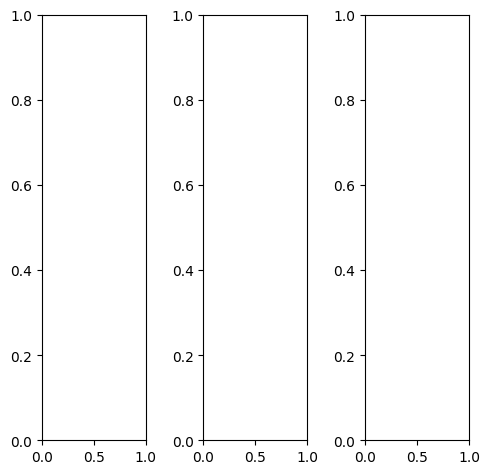

tensor([[[0.4392, 0.4431, 0.4392,  ..., 0.4431, 0.4431, 0.4431],
         [0.4235, 0.4196, 0.4275,  ..., 0.4314, 0.4314, 0.4314],
         [0.4235, 0.4235, 0.4314,  ..., 0.4353, 0.4353, 0.4275],
         ...,
         [0.4235, 0.4275, 0.4314,  ..., 0.4314, 0.4314, 0.4275],
         [0.4275, 0.4314, 0.4275,  ..., 0.4275, 0.4275, 0.4314],
         [0.4314, 0.4392, 0.4353,  ..., 0.4314, 0.4353, 0.4392]],

        [[0.4392, 0.4431, 0.4392,  ..., 0.4431, 0.4431, 0.4431],
         [0.4235, 0.4196, 0.4275,  ..., 0.4314, 0.4314, 0.4314],
         [0.4235, 0.4235, 0.4314,  ..., 0.4353, 0.4353, 0.4275],
         ...,
         [0.4235, 0.4275, 0.4314,  ..., 0.4314, 0.4314, 0.4275],
         [0.4275, 0.4314, 0.4275,  ..., 0.4275, 0.4275, 0.4314],
         [0.4314, 0.4392, 0.4353,  ..., 0.4314, 0.4353, 0.4392]],

        [[0.4392, 0.4431, 0.4392,  ..., 0.4431, 0.4431, 0.4431],
         [0.4235, 0.4196, 0.4275,  ..., 0.4314, 0.4314, 0.4314],
         [0.4235, 0.4235, 0.4314,  ..., 0.4353, 0.4353, 0.

tensor([[[0.5098, 0.5137, 0.5098,  ..., 0.5137, 0.5137, 0.5137],
         [0.4941, 0.4902, 0.4980,  ..., 0.5020, 0.5020, 0.5020],
         [0.4941, 0.4941, 0.5020,  ..., 0.5059, 0.5059, 0.4980],
         ...,
         [0.4941, 0.4980, 0.5020,  ..., 0.5020, 0.5020, 0.4980],
         [0.4980, 0.5020, 0.4980,  ..., 0.4980, 0.4980, 0.5020],
         [0.5020, 0.5098, 0.5059,  ..., 0.5020, 0.5059, 0.5098]],

        [[0.4196, 0.4235, 0.4196,  ..., 0.4275, 0.4275, 0.4235],
         [0.4039, 0.4000, 0.4078,  ..., 0.4157, 0.4157, 0.4118],
         [0.4039, 0.4039, 0.4118,  ..., 0.4196, 0.4196, 0.4078],
         ...,
         [0.4039, 0.4078, 0.4118,  ..., 0.4118, 0.4118, 0.4078],
         [0.4078, 0.4118, 0.4078,  ..., 0.4078, 0.4078, 0.4118],
         [0.4118, 0.4196, 0.4157,  ..., 0.4118, 0.4157, 0.4196]],

        [[0.3569, 0.3569, 0.3569,  ..., 0.3412, 0.3490, 0.3569],
         [0.3412, 0.3373, 0.3451,  ..., 0.3333, 0.3373, 0.3451],
         [0.3412, 0.3412, 0.3490,  ..., 0.3333, 0.3412, 0.

tensor([[[0.3985, 0.3076, 0.2323,  ..., 0.4053, 0.4276, 0.4635],
         [0.3405, 0.1105, 0.1317,  ..., 0.3785, 0.3812, 0.3927],
         [0.2674, 0.1803, 0.0926,  ..., 0.4108, 0.4179, 0.4028],
         ...,
         [0.4698, 0.5062, 0.4834,  ..., 0.5522, 0.5473, 0.5224],
         [0.4875, 0.5140, 0.4999,  ..., 0.5520, 0.5274, 0.5338],
         [0.5013, 0.4912, 0.4875,  ..., 0.5257, 0.5484, 0.5406]],

        [[0.5136, 0.4611, 0.4524,  ..., 0.4993, 0.5500, 0.4984],
         [0.3830, 0.2394, 0.2093,  ..., 0.5158, 0.5261, 0.4857],
         [0.4309, 0.3559, 0.3409,  ..., 0.5296, 0.5423, 0.4820],
         ...,
         [0.4715, 0.5006, 0.5109,  ..., 0.5332, 0.5430, 0.4615],
         [0.4830, 0.4996, 0.5165,  ..., 0.5362, 0.5366, 0.5115],
         [0.4829, 0.4933, 0.4927,  ..., 0.4966, 0.5245, 0.4932]],

        [[0.7015, 0.5719, 0.6250,  ..., 0.6980, 0.7099, 0.6722],
         [0.6151, 0.5158, 0.4837,  ..., 0.6733, 0.6929, 0.6586],
         [0.5298, 0.5031, 0.4436,  ..., 0.7185, 0.7218, 0.

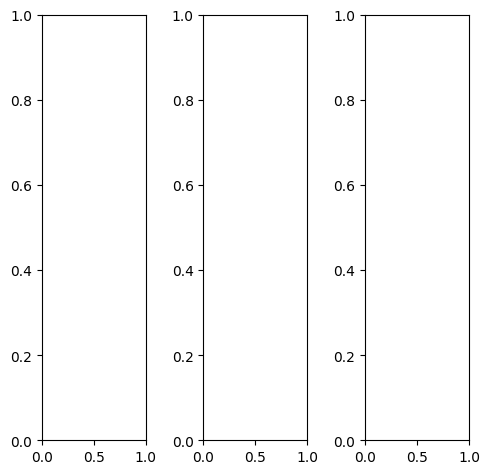

tensor([[[0.6510, 0.6588, 0.6039,  ..., 0.7608, 0.8588, 0.9216],
         [0.6706, 0.6902, 0.6902,  ..., 0.7882, 0.8157, 0.8039],
         [0.6745, 0.7020, 0.7255,  ..., 0.7294, 0.7294, 0.7451],
         ...,
         [0.6627, 0.6627, 0.6863,  ..., 0.7490, 0.7843, 0.7176],
         [0.6863, 0.6627, 0.6706,  ..., 0.7765, 0.8706, 0.7686],
         [0.7725, 0.6980, 0.6745,  ..., 0.6980, 0.6980, 0.6706]],

        [[0.6510, 0.6588, 0.6039,  ..., 0.7608, 0.8588, 0.9216],
         [0.6706, 0.6902, 0.6902,  ..., 0.7882, 0.8157, 0.8039],
         [0.6745, 0.7020, 0.7255,  ..., 0.7294, 0.7294, 0.7451],
         ...,
         [0.6627, 0.6627, 0.6863,  ..., 0.7490, 0.7843, 0.7176],
         [0.6863, 0.6627, 0.6706,  ..., 0.7765, 0.8706, 0.7686],
         [0.7725, 0.6980, 0.6745,  ..., 0.6980, 0.6980, 0.6706]],

        [[0.6510, 0.6588, 0.6039,  ..., 0.7608, 0.8588, 0.9216],
         [0.6706, 0.6902, 0.6902,  ..., 0.7882, 0.8157, 0.8039],
         [0.6745, 0.7020, 0.7255,  ..., 0.7294, 0.7294, 0.

tensor([[[0.5804, 0.5922, 0.5490,  ..., 0.7294, 0.8431, 0.9216],
         [0.6118, 0.6353, 0.6392,  ..., 0.7451, 0.7843, 0.7804],
         [0.6196, 0.6549, 0.6824,  ..., 0.6745, 0.6784, 0.7020],
         ...,
         [0.6118, 0.6157, 0.6510,  ..., 0.6941, 0.7412, 0.6745],
         [0.6353, 0.6078, 0.6235,  ..., 0.7333, 0.8431, 0.7412],
         [0.7333, 0.6510, 0.6196,  ..., 0.6510, 0.6510, 0.6157]],

        [[0.6627, 0.6706, 0.6118,  ..., 0.7608, 0.8588, 0.9216],
         [0.6784, 0.6980, 0.6980,  ..., 0.7922, 0.8196, 0.8078],
         [0.6784, 0.7059, 0.7294,  ..., 0.7373, 0.7412, 0.7529],
         ...,
         [0.6706, 0.6706, 0.6902,  ..., 0.7608, 0.7922, 0.7216],
         [0.6941, 0.6706, 0.6784,  ..., 0.7843, 0.8745, 0.7686],
         [0.7804, 0.7059, 0.6863,  ..., 0.7020, 0.7020, 0.6745]],

        [[0.7765, 0.7765, 0.7098,  ..., 0.8275, 0.9020, 0.9373],
         [0.7961, 0.7961, 0.7882,  ..., 0.8784, 0.8902, 0.8588],
         [0.7922, 0.8039, 0.8157,  ..., 0.8275, 0.8196, 0.

tensor([[[0.5489, 0.4738, 0.3518,  ..., 0.5531, 0.6368, 0.7065],
         [0.5201, 0.3949, 0.3756,  ..., 0.5367, 0.5946, 0.6331],
         [0.4850, 0.4164, 0.3565,  ..., 0.5214, 0.5249, 0.5573],
         ...,
         [0.6454, 0.6504, 0.6699,  ..., 0.6989, 0.7237, 0.6738],
         [0.6543, 0.6313, 0.6254,  ..., 0.7133, 0.8239, 0.7274],
         [0.7171, 0.6689, 0.6203,  ..., 0.6948, 0.6888, 0.6682]],

        [[0.5715, 0.5579, 0.4226,  ..., 0.6711, 0.7636, 0.7957],
         [0.5327, 0.4056, 0.3674,  ..., 0.6855, 0.7229, 0.7448],
         [0.5904, 0.5089, 0.4583,  ..., 0.6616, 0.6425, 0.6783],
         ...,
         [0.6112, 0.6302, 0.6324,  ..., 0.6784, 0.6816, 0.6350],
         [0.6221, 0.5960, 0.6030,  ..., 0.6909, 0.7778, 0.6844],
         [0.6750, 0.6318, 0.6191,  ..., 0.6496, 0.6392, 0.6183]],

        [[0.6779, 0.6403, 0.5454,  ..., 0.8750, 0.9643, 0.9621],
         [0.6719, 0.5789, 0.5885,  ..., 0.8856, 0.9228, 0.9090],
         [0.5803, 0.5603, 0.5090,  ..., 0.8473, 0.8631, 0.

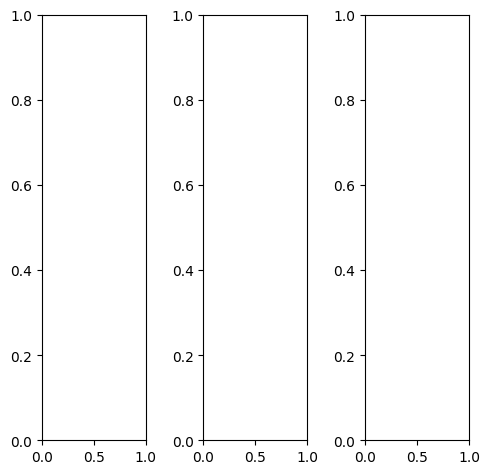

EPOCH: 32.000  val_loss: 0.003  (3925.38s - 8341.43s remaining)

tensor([[[0.4588, 0.4745, 0.4902,  ..., 0.5765, 0.5843, 0.5922],
         [0.4588, 0.4745, 0.4784,  ..., 0.5451, 0.5608, 0.6039],
         [0.4549, 0.4627, 0.4510,  ..., 0.5569, 0.5373, 0.5686],
         ...,
         [0.3882, 0.4314, 0.4471,  ..., 0.4510, 0.4667, 0.4824],
         [0.3961, 0.4431, 0.4471,  ..., 0.4392, 0.4588, 0.4784],
         [0.3843, 0.4039, 0.4157,  ..., 0.4353, 0.4314, 0.4667]],

        [[0.4588, 0.4745, 0.4902,  ..., 0.5765, 0.5843, 0.5922],
         [0.4588, 0.4745, 0.4784,  ..., 0.5451, 0.5608, 0.6039],
         [0.4549, 0.4627, 0.4510,  ..., 0.5569, 0.5373, 0.5686],
         ...,
         [0.3882, 0.4314, 0.4471,  ..., 0.4510, 0.4667, 0.4824],
         [0.3961, 0.4431, 0.4471,  ..., 0.4392, 0.4588, 0.4784],
         [0.3843, 0.4039, 0.4157,  ..., 0.4353, 0.4314, 0.4667]],

        [[0.4588, 0.4745, 0.4902,  ..., 0.5765, 0.5843, 0.5922],
         [0.4588, 0.4745, 0.4784,  ..., 0.5451, 0.5608, 0.6039],
         [0.4549, 0.4627, 0.4510,  ..., 0.5569, 0.5373, 0.

tensor([[[0.4471, 0.4627, 0.4784,  ..., 0.5608, 0.5294, 0.5412],
         [0.4392, 0.4549, 0.4588,  ..., 0.5529, 0.5216, 0.5608],
         [0.4431, 0.4510, 0.4392,  ..., 0.6157, 0.5333, 0.5333],
         ...,
         [0.3765, 0.4275, 0.4510,  ..., 0.4235, 0.4431, 0.4588],
         [0.3765, 0.4353, 0.4431,  ..., 0.4157, 0.4353, 0.4549],
         [0.3608, 0.3922, 0.4078,  ..., 0.4078, 0.4118, 0.4431]],

        [[0.4588, 0.4745, 0.4902,  ..., 0.5804, 0.6000, 0.6000],
         [0.4627, 0.4824, 0.4863,  ..., 0.5333, 0.5686, 0.6118],
         [0.4588, 0.4667, 0.4549,  ..., 0.5255, 0.5333, 0.5765],
         ...,
         [0.3882, 0.4275, 0.4431,  ..., 0.4549, 0.4706, 0.4863],
         [0.4000, 0.4431, 0.4471,  ..., 0.4431, 0.4627, 0.4824],
         [0.3882, 0.4078, 0.4157,  ..., 0.4392, 0.4353, 0.4706]],

        [[0.4784, 0.4941, 0.5098,  ..., 0.6078, 0.6431, 0.6784],
         [0.4784, 0.4941, 0.4980,  ..., 0.5725, 0.6157, 0.6824],
         [0.4784, 0.4863, 0.4745,  ..., 0.5725, 0.5804, 0.

tensor([[[0.4555, 0.4562, 0.4717,  ..., 0.5578, 0.5781, 0.5984],
         [0.4463, 0.4569, 0.4711,  ..., 0.5265, 0.5423, 0.5980],
         [0.4226, 0.4500, 0.4449,  ..., 0.5439, 0.5317, 0.5672],
         ...,
         [0.3621, 0.4241, 0.4162,  ..., 0.4424, 0.4645, 0.4823],
         [0.3833, 0.4443, 0.4337,  ..., 0.4258, 0.4481, 0.4748],
         [0.3863, 0.4048, 0.4075,  ..., 0.4223, 0.4314, 0.4744]],

        [[0.4770, 0.4884, 0.4987,  ..., 0.5836, 0.6009, 0.6124],
         [0.4648, 0.4789, 0.4819,  ..., 0.5608, 0.5745, 0.6256],
         [0.4474, 0.4685, 0.4566,  ..., 0.5713, 0.5517, 0.5845],
         ...,
         [0.3904, 0.4470, 0.4671,  ..., 0.4614, 0.4785, 0.4927],
         [0.4047, 0.4518, 0.4640,  ..., 0.4500, 0.4685, 0.4870],
         [0.4079, 0.4101, 0.4235,  ..., 0.4446, 0.4455, 0.4852]],

        [[0.4568, 0.4615, 0.4771,  ..., 0.5567, 0.5849, 0.5961],
         [0.4483, 0.4638, 0.4637,  ..., 0.5190, 0.5359, 0.5972],
         [0.4329, 0.4423, 0.4359,  ..., 0.5312, 0.5175, 0.

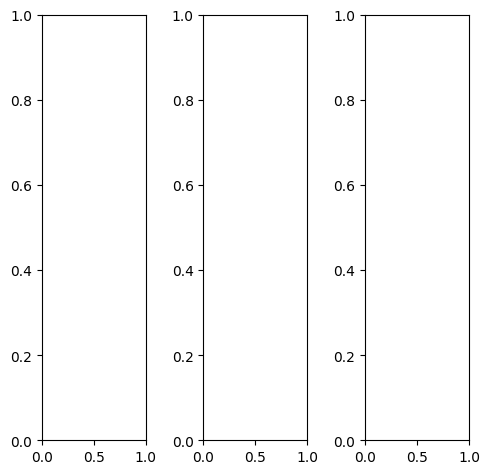

tensor([[[0.5373, 0.5725, 0.6706,  ..., 0.7216, 0.5804, 0.4392],
         [0.6706, 0.6392, 0.7608,  ..., 0.5373, 0.4078, 0.3961],
         [0.6667, 0.6196, 0.6824,  ..., 0.3569, 0.5098, 0.6235],
         ...,
         [0.7922, 0.7765, 0.7490,  ..., 0.4745, 0.4157, 0.5490],
         [0.7843, 0.7804, 0.7804,  ..., 0.6235, 0.7216, 0.7608],
         [0.7882, 0.7843, 0.7804,  ..., 0.7686, 0.7765, 0.7765]],

        [[0.5373, 0.5725, 0.6706,  ..., 0.7216, 0.5804, 0.4392],
         [0.6706, 0.6392, 0.7608,  ..., 0.5373, 0.4078, 0.3961],
         [0.6667, 0.6196, 0.6824,  ..., 0.3569, 0.5098, 0.6235],
         ...,
         [0.7922, 0.7765, 0.7490,  ..., 0.4745, 0.4157, 0.5490],
         [0.7843, 0.7804, 0.7804,  ..., 0.6235, 0.7216, 0.7608],
         [0.7882, 0.7843, 0.7804,  ..., 0.7686, 0.7765, 0.7765]],

        [[0.5373, 0.5725, 0.6706,  ..., 0.7216, 0.5804, 0.4392],
         [0.6706, 0.6392, 0.7608,  ..., 0.5373, 0.4078, 0.3961],
         [0.6667, 0.6196, 0.6824,  ..., 0.3569, 0.5098, 0.

tensor([[[0.5333, 0.5804, 0.6745,  ..., 0.7176, 0.5922, 0.4510],
         [0.6745, 0.6392, 0.7451,  ..., 0.5373, 0.3961, 0.3725],
         [0.6863, 0.6275, 0.6706,  ..., 0.3412, 0.4706, 0.5686],
         ...,
         [0.7922, 0.7765, 0.7490,  ..., 0.4784, 0.4118, 0.5373],
         [0.7843, 0.7804, 0.7804,  ..., 0.6275, 0.7216, 0.7529],
         [0.7882, 0.7843, 0.7804,  ..., 0.7686, 0.7765, 0.7765]],

        [[0.5529, 0.5804, 0.6745,  ..., 0.7333, 0.5882, 0.4471],
         [0.6784, 0.6510, 0.7843,  ..., 0.5529, 0.4275, 0.4235],
         [0.6706, 0.6314, 0.7137,  ..., 0.3804, 0.5451, 0.6667],
         ...,
         [0.7843, 0.7686, 0.7412,  ..., 0.4667, 0.4118, 0.5529],
         [0.7765, 0.7725, 0.7725,  ..., 0.6157, 0.7176, 0.7569],
         [0.7804, 0.7765, 0.7725,  ..., 0.7608, 0.7686, 0.7686]],

        [[0.4745, 0.5176, 0.6235,  ..., 0.6549, 0.5176, 0.3765],
         [0.6157, 0.5765, 0.6902,  ..., 0.4588, 0.3255, 0.3176],
         [0.6078, 0.5255, 0.5647,  ..., 0.2745, 0.4235, 0.

tensor([[[0.5667, 0.5897, 0.6912,  ..., 0.7337, 0.6043, 0.4555],
         [0.6959, 0.6560, 0.7797,  ..., 0.5409, 0.4083, 0.4146],
         [0.6913, 0.6458, 0.7061,  ..., 0.3771, 0.5269, 0.6447],
         ...,
         [0.8225, 0.8001, 0.7806,  ..., 0.4938, 0.4428, 0.5560],
         [0.8039, 0.8072, 0.8027,  ..., 0.6454, 0.7560, 0.7681],
         [0.8029, 0.8190, 0.8044,  ..., 0.7916, 0.8168, 0.7817]],

        [[0.5615, 0.5771, 0.6916,  ..., 0.7269, 0.5996, 0.4551],
         [0.6898, 0.6439, 0.7824,  ..., 0.5574, 0.4129, 0.4120],
         [0.6738, 0.6301, 0.6986,  ..., 0.3631, 0.5197, 0.6305],
         ...,
         [0.7980, 0.7770, 0.7536,  ..., 0.4599, 0.4091, 0.5447],
         [0.7857, 0.7751, 0.7752,  ..., 0.6283, 0.7343, 0.7647],
         [0.7767, 0.7904, 0.7820,  ..., 0.7631, 0.7895, 0.7574]],

        [[0.4945, 0.5013, 0.5883,  ..., 0.6369, 0.5117, 0.3688],
         [0.5952, 0.5615, 0.6783,  ..., 0.4483, 0.3163, 0.3088],
         [0.5764, 0.5284, 0.5874,  ..., 0.2634, 0.4159, 0.

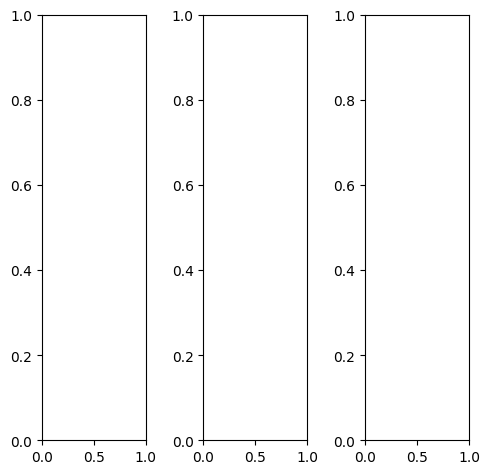

tensor([[[0.6196, 0.6157, 0.6196,  ..., 0.6314, 0.6235, 0.6353],
         [0.6314, 0.6235, 0.6275,  ..., 0.6471, 0.6431, 0.6510],
         [0.6510, 0.6392, 0.6392,  ..., 0.6549, 0.6471, 0.6627],
         ...,
         [0.2588, 0.2039, 0.1608,  ..., 0.6196, 0.6392, 0.6510],
         [0.2588, 0.2078, 0.2431,  ..., 0.7294, 0.7176, 0.7020],
         [0.4078, 0.4196, 0.4471,  ..., 0.6745, 0.6196, 0.5804]],

        [[0.6196, 0.6157, 0.6196,  ..., 0.6314, 0.6235, 0.6353],
         [0.6314, 0.6235, 0.6275,  ..., 0.6471, 0.6431, 0.6510],
         [0.6510, 0.6392, 0.6392,  ..., 0.6549, 0.6471, 0.6627],
         ...,
         [0.2588, 0.2039, 0.1608,  ..., 0.6196, 0.6392, 0.6510],
         [0.2588, 0.2078, 0.2431,  ..., 0.7294, 0.7176, 0.7020],
         [0.4078, 0.4196, 0.4471,  ..., 0.6745, 0.6196, 0.5804]],

        [[0.6196, 0.6157, 0.6196,  ..., 0.6314, 0.6235, 0.6353],
         [0.6314, 0.6235, 0.6275,  ..., 0.6471, 0.6431, 0.6510],
         [0.6510, 0.6392, 0.6392,  ..., 0.6549, 0.6471, 0.

tensor([[[0.4980, 0.4941, 0.4980,  ..., 0.5137, 0.5059, 0.5216],
         [0.5098, 0.5020, 0.5059,  ..., 0.5333, 0.5255, 0.5412],
         [0.5294, 0.5176, 0.5176,  ..., 0.5333, 0.5255, 0.5373],
         ...,
         [0.2510, 0.1922, 0.1686,  ..., 0.6235, 0.6549, 0.6667],
         [0.2353, 0.1882, 0.2353,  ..., 0.7529, 0.7529, 0.7333],
         [0.4196, 0.4431, 0.4706,  ..., 0.7059, 0.6549, 0.6157]],

        [[0.6196, 0.6157, 0.6196,  ..., 0.6314, 0.6235, 0.6314],
         [0.6314, 0.6235, 0.6275,  ..., 0.6471, 0.6392, 0.6431],
         [0.6510, 0.6392, 0.6392,  ..., 0.6627, 0.6510, 0.6627],
         ...,
         [0.2706, 0.2157, 0.1647,  ..., 0.6157, 0.6275, 0.6471],
         [0.2784, 0.2275, 0.2549,  ..., 0.7216, 0.7059, 0.6980],
         [0.4275, 0.4353, 0.4588,  ..., 0.6902, 0.6314, 0.5961]],

        [[0.9373, 0.9255, 0.9333,  ..., 0.9451, 0.9333, 0.9490],
         [0.9490, 0.9373, 0.9412,  ..., 0.9608, 0.9608, 0.9725],
         [0.9725, 0.9529, 0.9529,  ..., 0.9373, 0.9529, 0.

tensor([[[0.5308, 0.4870, 0.4713,  ..., 0.5095, 0.5038, 0.5591],
         [0.5146, 0.4825, 0.4809,  ..., 0.5282, 0.5279, 0.5552],
         [0.5154, 0.4810, 0.4906,  ..., 0.5649, 0.5626, 0.5749],
         ...,
         [0.2506, 0.2058, 0.1605,  ..., 0.6063, 0.6216, 0.6425],
         [0.2491, 0.2096, 0.2446,  ..., 0.7032, 0.6969, 0.6861],
         [0.4068, 0.4224, 0.4529,  ..., 0.6647, 0.6234, 0.6104]],

        [[0.6506, 0.6627, 0.6580,  ..., 0.6609, 0.6556, 0.6646],
         [0.6682, 0.6510, 0.6609,  ..., 0.6617, 0.6675, 0.6901],
         [0.6838, 0.6720, 0.6772,  ..., 0.6761, 0.6622, 0.6832],
         ...,
         [0.2587, 0.2069, 0.1613,  ..., 0.6212, 0.6452, 0.6607],
         [0.2593, 0.2194, 0.2474,  ..., 0.7195, 0.7170, 0.7027],
         [0.4181, 0.4249, 0.4566,  ..., 0.6748, 0.6339, 0.6100]],

        [[0.8059, 0.8313, 0.8466,  ..., 0.8259, 0.8103, 0.7865],
         [0.8498, 0.8430, 0.8457,  ..., 0.8204, 0.8133, 0.8133],
         [0.8579, 0.8511, 0.8699,  ..., 0.7903, 0.7956, 0.

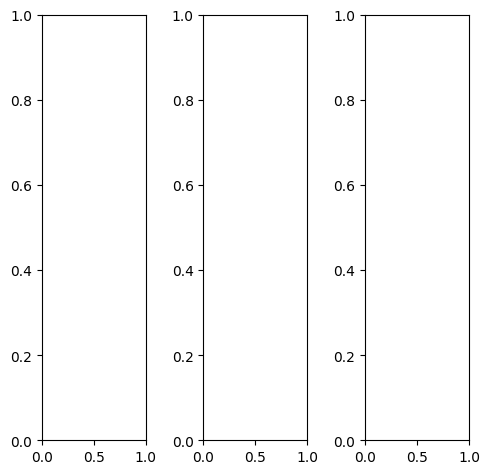

tensor([[[0.6667, 0.7490, 0.7412,  ..., 0.1647, 0.2196, 0.2627],
         [0.7216, 0.7373, 0.7569,  ..., 0.2157, 0.2431, 0.2039],
         [0.5686, 0.6627, 0.7529,  ..., 0.2392, 0.2706, 0.2196],
         ...,
         [0.2275, 0.2392, 0.2549,  ..., 0.2431, 0.2588, 0.3020],
         [0.1765, 0.1843, 0.1961,  ..., 0.2824, 0.2235, 0.1176],
         [0.1451, 0.1412, 0.1569,  ..., 0.4235, 0.2980, 0.1176]],

        [[0.6667, 0.7490, 0.7412,  ..., 0.1647, 0.2196, 0.2627],
         [0.7216, 0.7373, 0.7569,  ..., 0.2157, 0.2431, 0.2039],
         [0.5686, 0.6627, 0.7529,  ..., 0.2392, 0.2706, 0.2196],
         ...,
         [0.2275, 0.2392, 0.2549,  ..., 0.2431, 0.2588, 0.3020],
         [0.1765, 0.1843, 0.1961,  ..., 0.2824, 0.2235, 0.1176],
         [0.1451, 0.1412, 0.1569,  ..., 0.4235, 0.2980, 0.1176]],

        [[0.6667, 0.7490, 0.7412,  ..., 0.1647, 0.2196, 0.2627],
         [0.7216, 0.7373, 0.7569,  ..., 0.2157, 0.2431, 0.2039],
         [0.5686, 0.6627, 0.7529,  ..., 0.2392, 0.2706, 0.

tensor([[[0.5686, 0.6549, 0.6431,  ..., 0.1176, 0.1451, 0.1765],
         [0.6275, 0.6471, 0.6667,  ..., 0.1529, 0.1569, 0.1020],
         [0.4824, 0.5765, 0.6706,  ..., 0.1647, 0.1804, 0.1137],
         ...,
         [0.1451, 0.1490, 0.1569,  ..., 0.1804, 0.1843, 0.2353],
         [0.1176, 0.1176, 0.1137,  ..., 0.1922, 0.1412, 0.0627],
         [0.0902, 0.0902, 0.0941,  ..., 0.3255, 0.2196, 0.0824]],

        [[0.6980, 0.7804, 0.7725,  ..., 0.1804, 0.2588, 0.3137],
         [0.7529, 0.7686, 0.7882,  ..., 0.2431, 0.2941, 0.2627],
         [0.6000, 0.6902, 0.7804,  ..., 0.2784, 0.3255, 0.2824],
         ...,
         [0.2353, 0.2510, 0.2706,  ..., 0.2549, 0.2745, 0.3098],
         [0.1765, 0.1922, 0.2078,  ..., 0.2980, 0.2392, 0.1176],
         [0.1490, 0.1412, 0.1608,  ..., 0.4431, 0.3020, 0.1020]],

        [[0.7529, 0.8314, 0.8196,  ..., 0.2039, 0.2078, 0.2314],
         [0.8000, 0.8196, 0.8431,  ..., 0.2353, 0.2157, 0.1647],
         [0.6314, 0.7333, 0.8431,  ..., 0.2353, 0.2392, 0.

tensor([[[0.6873, 0.7564, 0.7413,  ..., 0.1732, 0.2183, 0.2446],
         [0.7378, 0.7490, 0.7515,  ..., 0.2320, 0.2568, 0.2049],
         [0.5914, 0.6639, 0.7450,  ..., 0.2535, 0.2877, 0.2234],
         ...,
         [0.2360, 0.2639, 0.2815,  ..., 0.2549, 0.2611, 0.2982],
         [0.1890, 0.2055, 0.2150,  ..., 0.2970, 0.2290, 0.1349],
         [0.1630, 0.1541, 0.1642,  ..., 0.4460, 0.3062, 0.1775]],

        [[0.6895, 0.7557, 0.7643,  ..., 0.1626, 0.2160, 0.2569],
         [0.7390, 0.7603, 0.7596,  ..., 0.2154, 0.2556, 0.2101],
         [0.5946, 0.6639, 0.7643,  ..., 0.2384, 0.2739, 0.2264],
         ...,
         [0.2312, 0.2429, 0.2596,  ..., 0.2387, 0.2604, 0.2914],
         [0.1809, 0.1878, 0.2018,  ..., 0.2880, 0.2199, 0.1329],
         [0.1724, 0.1484, 0.1581,  ..., 0.4283, 0.2937, 0.1847]],

        [[0.6713, 0.7347, 0.7085,  ..., 0.1459, 0.1958, 0.2324],
         [0.6927, 0.7123, 0.7122,  ..., 0.1952, 0.2192, 0.1839],
         [0.5432, 0.6171, 0.7152,  ..., 0.2131, 0.2511, 0.

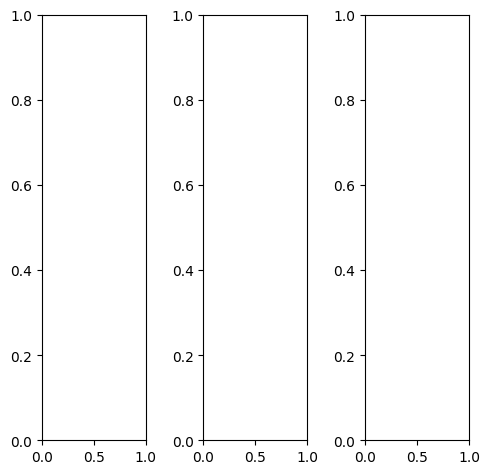

tensor([[[0.3451, 0.3961, 0.3725,  ..., 0.2471, 0.2392, 0.2118],
         [0.3922, 0.2902, 0.3647,  ..., 0.2196, 0.2000, 0.1961],
         [0.3804, 0.1961, 0.2549,  ..., 0.2118, 0.2039, 0.2235],
         ...,
         [0.9647, 0.9569, 0.9647,  ..., 0.7255, 0.7333, 0.7647],
         [0.9922, 0.9843, 0.9882,  ..., 0.8118, 0.7961, 0.7882],
         [0.9725, 0.9451, 0.9647,  ..., 0.8078, 0.7882, 0.7647]],

        [[0.3451, 0.3961, 0.3725,  ..., 0.2471, 0.2392, 0.2118],
         [0.3922, 0.2902, 0.3647,  ..., 0.2196, 0.2000, 0.1961],
         [0.3804, 0.1961, 0.2549,  ..., 0.2118, 0.2039, 0.2235],
         ...,
         [0.9647, 0.9569, 0.9647,  ..., 0.7255, 0.7333, 0.7647],
         [0.9922, 0.9843, 0.9882,  ..., 0.8118, 0.7961, 0.7882],
         [0.9725, 0.9451, 0.9647,  ..., 0.8078, 0.7882, 0.7647]],

        [[0.3451, 0.3961, 0.3725,  ..., 0.2471, 0.2392, 0.2118],
         [0.3922, 0.2902, 0.3647,  ..., 0.2196, 0.2000, 0.1961],
         [0.3804, 0.1961, 0.2549,  ..., 0.2118, 0.2039, 0.

tensor([[[0.2118, 0.2824, 0.2549,  ..., 0.1451, 0.1294, 0.1020],
         [0.2745, 0.1922, 0.2627,  ..., 0.1176, 0.0902, 0.0902],
         [0.2824, 0.1098, 0.1647,  ..., 0.1176, 0.1020, 0.1176],
         ...,
         [0.9412, 0.9333, 0.9412,  ..., 0.6000, 0.6039, 0.6275],
         [0.9843, 0.9725, 0.9765,  ..., 0.7020, 0.6784, 0.6667],
         [0.9725, 0.9451, 0.9647,  ..., 0.7098, 0.6863, 0.6588]],

        [[0.4353, 0.4784, 0.4549,  ..., 0.3059, 0.3020, 0.2745],
         [0.4784, 0.3647, 0.4431,  ..., 0.2784, 0.2627, 0.2588],
         [0.4510, 0.2510, 0.3176,  ..., 0.2706, 0.2667, 0.2863],
         ...,
         [0.9765, 0.9725, 0.9765,  ..., 0.7922, 0.8039, 0.8353],
         [1.0000, 0.9922, 0.9961,  ..., 0.8706, 0.8588, 0.8549],
         [0.9765, 0.9490, 0.9686,  ..., 0.8588, 0.8431, 0.8196]],

        [[0.2235, 0.2588, 0.2510,  ..., 0.2196, 0.2118, 0.1882],
         [0.2549, 0.1725, 0.2314,  ..., 0.1804, 0.1569, 0.1608],
         [0.2784, 0.1255, 0.1529,  ..., 0.1647, 0.1608, 0.

tensor([[[0.3346, 0.3497, 0.3485,  ..., 0.2142, 0.2052, 0.1922],
         [0.3675, 0.2583, 0.3326,  ..., 0.1894, 0.1689, 0.1703],
         [0.3633, 0.1698, 0.2201,  ..., 0.1867, 0.1726, 0.1932],
         ...,
         [0.9630, 0.9569, 0.9524,  ..., 0.7128, 0.7087, 0.7444],
         [0.9681, 0.9755, 0.9621,  ..., 0.7925, 0.7818, 0.7828],
         [0.9411, 0.9312, 0.9483,  ..., 0.8079, 0.7939, 0.7644]],

        [[0.3735, 0.4017, 0.3967,  ..., 0.2444, 0.2418, 0.2324],
         [0.4031, 0.3068, 0.3729,  ..., 0.2321, 0.2176, 0.2080],
         [0.3911, 0.2051, 0.2567,  ..., 0.2227, 0.2159, 0.2248],
         ...,
         [0.9646, 0.9619, 0.9661,  ..., 0.7226, 0.7362, 0.7841],
         [0.9790, 0.9749, 0.9787,  ..., 0.8092, 0.8015, 0.7919],
         [0.9395, 0.9470, 0.9636,  ..., 0.8111, 0.8003, 0.7658]],

        [[0.3818, 0.4123, 0.4128,  ..., 0.2696, 0.2670, 0.2526],
         [0.4069, 0.3204, 0.3910,  ..., 0.2567, 0.2414, 0.2315],
         [0.4070, 0.2254, 0.2704,  ..., 0.2434, 0.2405, 0.

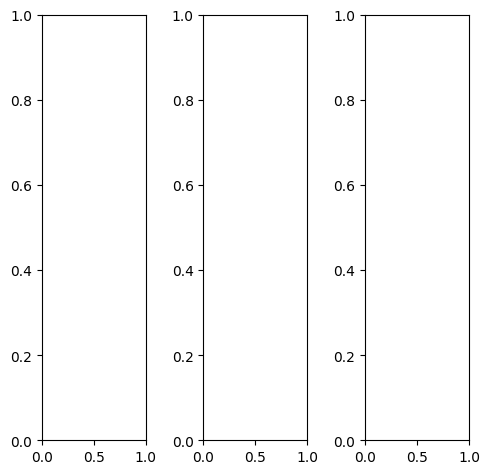

EPOCH: 32.255  trn_loss: 0.004  (3955.46s - 8307.59s remaining)

tensor([[[0.9255, 0.9216, 0.9333,  ..., 0.0706, 0.0745, 0.0667],
         [0.9412, 0.9333, 0.9373,  ..., 0.0902, 0.0824, 0.0745],
         [0.9451, 0.9373, 0.9412,  ..., 0.0745, 0.0667, 0.0706],
         ...,
         [0.4510, 0.2431, 0.2275,  ..., 0.2588, 0.2588, 0.2824],
         [0.6588, 0.4078, 0.2667,  ..., 0.3020, 0.3020, 0.3176],
         [0.7843, 0.6431, 0.3882,  ..., 0.3255, 0.3725, 0.4039]],

        [[0.9255, 0.9216, 0.9333,  ..., 0.0706, 0.0745, 0.0667],
         [0.9412, 0.9333, 0.9373,  ..., 0.0902, 0.0824, 0.0745],
         [0.9451, 0.9373, 0.9412,  ..., 0.0745, 0.0667, 0.0706],
         ...,
         [0.4510, 0.2431, 0.2275,  ..., 0.2588, 0.2588, 0.2824],
         [0.6588, 0.4078, 0.2667,  ..., 0.3020, 0.3020, 0.3176],
         [0.7843, 0.6431, 0.3882,  ..., 0.3255, 0.3725, 0.4039]],

        [[0.9255, 0.9216, 0.9333,  ..., 0.0706, 0.0745, 0.0667],
         [0.9412, 0.9333, 0.9373,  ..., 0.0902, 0.0824, 0.0745],
         [0.9451, 0.9373, 0.9412,  ..., 0.0745, 0.0667, 0.

tensor([[[0.8431, 0.8353, 0.8471,  ..., 0.0706, 0.0745, 0.0627],
         [0.8588, 0.8510, 0.8549,  ..., 0.0902, 0.0824, 0.0706],
         [0.8627, 0.8588, 0.8627,  ..., 0.0745, 0.0667, 0.0706],
         ...,
         [0.4667, 0.2353, 0.2157,  ..., 0.2510, 0.2510, 0.2824],
         [0.6902, 0.4235, 0.2588,  ..., 0.3020, 0.3137, 0.3294],
         [0.8275, 0.6745, 0.3961,  ..., 0.3294, 0.3882, 0.4353]],

        [[0.9569, 0.9529, 0.9647,  ..., 0.0784, 0.0824, 0.0745],
         [0.9725, 0.9647, 0.9686,  ..., 0.1020, 0.0902, 0.0824],
         [0.9765, 0.9686, 0.9725,  ..., 0.0824, 0.0745, 0.0784],
         ...,
         [0.4745, 0.2667, 0.2510,  ..., 0.2824, 0.2824, 0.3020],
         [0.6863, 0.4314, 0.2902,  ..., 0.3216, 0.3176, 0.3333],
         [0.8039, 0.6627, 0.4078,  ..., 0.3451, 0.3843, 0.4118]],

        [[0.9961, 0.9804, 0.9843,  ..., 0.0275, 0.0353, 0.0235],
         [1.0000, 0.9843, 0.9882,  ..., 0.0431, 0.0431, 0.0314],
         [1.0000, 0.9882, 0.9882,  ..., 0.0275, 0.0275, 0.

tensor([[[0.9235, 0.9442, 0.9335,  ..., 0.0611, 0.0769, 0.1159],
         [0.8632, 0.7627, 0.8257,  ..., 0.0561, 0.0433, 0.0768],
         [0.8590, 0.9043, 0.8030,  ..., 0.0169, 0.0096, 0.0553],
         ...,
         [0.5052, 0.3103, 0.3537,  ..., 0.3510, 0.3412, 0.4031],
         [0.7042, 0.4354, 0.3325,  ..., 0.3714, 0.3773, 0.4182],
         [0.7935, 0.7478, 0.4479,  ..., 0.4034, 0.4473, 0.4833]],

        [[0.9107, 1.0274, 0.8590,  ..., 0.1383, 0.1411, 0.1602],
         [0.8822, 0.7836, 0.8395,  ..., 0.1580, 0.1592, 0.1570],
         [0.9013, 0.9682, 0.7700,  ..., 0.1186, 0.1159, 0.1402],
         ...,
         [0.4728, 0.2740, 0.3170,  ..., 0.3308, 0.3349, 0.3502],
         [0.6916, 0.4226, 0.3321,  ..., 0.3705, 0.3766, 0.3866],
         [0.7587, 0.6990, 0.4279,  ..., 0.3781, 0.4328, 0.4485]],

        [[1.0461, 1.1161, 1.0261,  ..., 0.2782, 0.2989, 0.3182],
         [1.0642, 0.9984, 1.0406,  ..., 0.3121, 0.3297, 0.3238],
         [0.9952, 1.0253, 0.9025,  ..., 0.2666, 0.2939, 0.

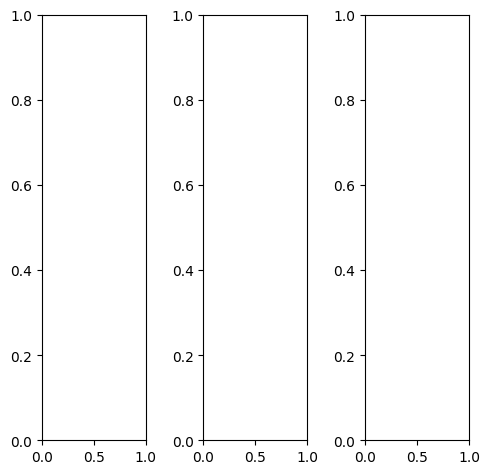

tensor([[[0.3765, 0.3882, 0.4353,  ..., 0.4431, 0.4431, 0.4157],
         [0.4078, 0.4431, 0.4824,  ..., 0.4627, 0.4510, 0.4392],
         [0.4235, 0.4745, 0.5020,  ..., 0.4824, 0.4588, 0.4471],
         ...,
         [0.5294, 0.5647, 0.5961,  ..., 0.6549, 0.6549, 0.6510],
         [0.5176, 0.5529, 0.5765,  ..., 0.6627, 0.6549, 0.6314],
         [0.4902, 0.5176, 0.5490,  ..., 0.6588, 0.6353, 0.6000]],

        [[0.3765, 0.3882, 0.4353,  ..., 0.4431, 0.4431, 0.4157],
         [0.4078, 0.4431, 0.4824,  ..., 0.4627, 0.4510, 0.4392],
         [0.4235, 0.4745, 0.5020,  ..., 0.4824, 0.4588, 0.4471],
         ...,
         [0.5294, 0.5647, 0.5961,  ..., 0.6549, 0.6549, 0.6510],
         [0.5176, 0.5529, 0.5765,  ..., 0.6627, 0.6549, 0.6314],
         [0.4902, 0.5176, 0.5490,  ..., 0.6588, 0.6353, 0.6000]],

        [[0.3765, 0.3882, 0.4353,  ..., 0.4431, 0.4431, 0.4157],
         [0.4078, 0.4431, 0.4824,  ..., 0.4627, 0.4510, 0.4392],
         [0.4235, 0.4745, 0.5020,  ..., 0.4824, 0.4588, 0.

tensor([[[0.4275, 0.4392, 0.4863,  ..., 0.4980, 0.4980, 0.4706],
         [0.4627, 0.4941, 0.5333,  ..., 0.5176, 0.5098, 0.4941],
         [0.4784, 0.5294, 0.5569,  ..., 0.5373, 0.5137, 0.5020],
         ...,
         [0.5922, 0.6314, 0.6667,  ..., 0.7255, 0.7216, 0.7176],
         [0.5765, 0.6157, 0.6431,  ..., 0.7333, 0.7176, 0.6941],
         [0.5451, 0.5765, 0.6118,  ..., 0.7216, 0.6980, 0.6588]],

        [[0.3725, 0.3843, 0.4314,  ..., 0.4392, 0.4392, 0.4118],
         [0.4039, 0.4392, 0.4784,  ..., 0.4588, 0.4471, 0.4353],
         [0.4196, 0.4706, 0.4980,  ..., 0.4784, 0.4549, 0.4431],
         ...,
         [0.5255, 0.5569, 0.5882,  ..., 0.6471, 0.6471, 0.6471],
         [0.5137, 0.5490, 0.5686,  ..., 0.6588, 0.6510, 0.6275],
         [0.4863, 0.5137, 0.5451,  ..., 0.6549, 0.6314, 0.5961]],

        [[0.2706, 0.2824, 0.3294,  ..., 0.3098, 0.3098, 0.2902],
         [0.2980, 0.3294, 0.3686,  ..., 0.3294, 0.3176, 0.3098],
         [0.3059, 0.3569, 0.3843,  ..., 0.3529, 0.3255, 0.

tensor([[[0.2594, 0.2183, 0.1236,  ..., 0.3545, 0.3736, 0.3890],
         [0.2905, 0.0729, 0.0901,  ..., 0.3456, 0.3386, 0.3631],
         [0.1725, 0.1833, 0.0800,  ..., 0.3458, 0.3389, 0.3589],
         ...,
         [0.5775, 0.6453, 0.6129,  ..., 0.6136, 0.6398, 0.6991],
         [0.5672, 0.6220, 0.6326,  ..., 0.6491, 0.6726, 0.6863],
         [0.5365, 0.5699, 0.5968,  ..., 0.7086, 0.6865, 0.6638]],

        [[0.3220, 0.3758, 0.2633,  ..., 0.4730, 0.5060, 0.4542],
         [0.3070, 0.1483, 0.0569,  ..., 0.4890, 0.5051, 0.4515],
         [0.3133, 0.3251, 0.2141,  ..., 0.4993, 0.4987, 0.4475],
         ...,
         [0.5203, 0.5596, 0.5505,  ..., 0.5733, 0.6213, 0.6442],
         [0.5074, 0.5381, 0.5616,  ..., 0.6183, 0.6291, 0.6380],
         [0.4928, 0.5057, 0.5367,  ..., 0.6574, 0.6438, 0.6154]],

        [[0.5065, 0.4114, 0.4434,  ..., 0.6830, 0.6975, 0.6400],
         [0.4883, 0.3189, 0.4226,  ..., 0.7088, 0.7214, 0.6818],
         [0.3522, 0.4616, 0.3690,  ..., 0.7132, 0.7042, 0.

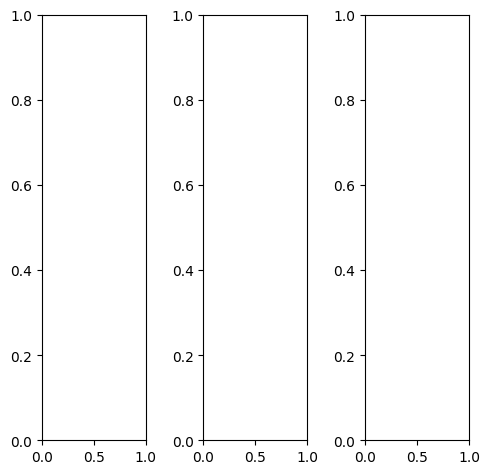

tensor([[[0.2588, 0.2588, 0.2627,  ..., 0.3059, 0.3059, 0.3098],
         [0.2627, 0.2627, 0.2667,  ..., 0.3137, 0.3137, 0.3176],
         [0.2706, 0.2667, 0.2667,  ..., 0.3216, 0.3255, 0.3255],
         ...,
         [0.5608, 0.5529, 0.5725,  ..., 0.4235, 0.5020, 0.5020],
         [0.5569, 0.5373, 0.5569,  ..., 0.4431, 0.4392, 0.4353],
         [0.5529, 0.5255, 0.5137,  ..., 0.4314, 0.4510, 0.4784]],

        [[0.2588, 0.2588, 0.2627,  ..., 0.3059, 0.3059, 0.3098],
         [0.2627, 0.2627, 0.2667,  ..., 0.3137, 0.3137, 0.3176],
         [0.2706, 0.2667, 0.2667,  ..., 0.3216, 0.3255, 0.3255],
         ...,
         [0.5608, 0.5529, 0.5725,  ..., 0.4235, 0.5020, 0.5020],
         [0.5569, 0.5373, 0.5569,  ..., 0.4431, 0.4392, 0.4353],
         [0.5529, 0.5255, 0.5137,  ..., 0.4314, 0.4510, 0.4784]],

        [[0.2588, 0.2588, 0.2627,  ..., 0.3059, 0.3059, 0.3098],
         [0.2627, 0.2627, 0.2667,  ..., 0.3137, 0.3137, 0.3176],
         [0.2706, 0.2667, 0.2667,  ..., 0.3216, 0.3255, 0.

tensor([[[0.1490, 0.1529, 0.1529,  ..., 0.1451, 0.1451, 0.1490],
         [0.1451, 0.1451, 0.1490,  ..., 0.1569, 0.1569, 0.1608],
         [0.1412, 0.1373, 0.1373,  ..., 0.1725, 0.1804, 0.1804],
         ...,
         [0.5529, 0.5451, 0.5647,  ..., 0.4706, 0.5373, 0.5255],
         [0.5451, 0.5255, 0.5451,  ..., 0.4863, 0.4745, 0.4667],
         [0.5490, 0.5216, 0.5137,  ..., 0.4706, 0.4941, 0.5176]],

        [[0.2549, 0.2549, 0.2549,  ..., 0.3255, 0.3255, 0.3294],
         [0.2627, 0.2627, 0.2627,  ..., 0.3294, 0.3294, 0.3333],
         [0.2745, 0.2706, 0.2706,  ..., 0.3333, 0.3373, 0.3373],
         ...,
         [0.5529, 0.5451, 0.5647,  ..., 0.4039, 0.4902, 0.4941],
         [0.5490, 0.5294, 0.5490,  ..., 0.4235, 0.4235, 0.4235],
         [0.5412, 0.5137, 0.5020,  ..., 0.4157, 0.4353, 0.4588]],

        [[0.5765, 0.5725, 0.5765,  ..., 0.6275, 0.6275, 0.6314],
         [0.5843, 0.5804, 0.5843,  ..., 0.6314, 0.6314, 0.6353],
         [0.6000, 0.5922, 0.5922,  ..., 0.6431, 0.6471, 0.

tensor([[[ 0.1416,  0.0867,  0.0166,  ...,  0.3028,  0.3118,  0.3393],
         [ 0.1973, -0.0089,  0.0393,  ...,  0.3261,  0.3269,  0.3255],
         [ 0.0710, -0.0193, -0.0922,  ...,  0.3447,  0.3404,  0.3281],
         ...,
         [ 0.8825,  0.9285,  0.9494,  ...,  0.6635,  0.7648,  0.7218],
         [ 0.8560,  0.8818,  0.9053,  ...,  0.6483,  0.6374,  0.6210],
         [ 0.7940,  0.7942,  0.7703,  ...,  0.6229,  0.6477,  0.6607]],

        [[ 0.2464,  0.1872,  0.1973,  ...,  0.3919,  0.4112,  0.3808],
         [ 0.2172,  0.1227, -0.0327,  ...,  0.4359,  0.4498,  0.3945],
         [ 0.1971,  0.0612,  0.0458,  ...,  0.4468,  0.4444,  0.3875],
         ...,
         [ 0.8142,  0.8671,  0.9221,  ...,  0.6513,  0.7402,  0.7181],
         [ 0.7947,  0.8121,  0.8550,  ...,  0.6390,  0.6201,  0.6096],
         [ 0.7240,  0.7340,  0.7321,  ...,  0.5960,  0.6201,  0.6305]],

        [[ 0.3622,  0.2089,  0.2547,  ...,  0.5129,  0.5269,  0.5101],
         [ 0.3163,  0.2152,  0.2153,  ...,  0

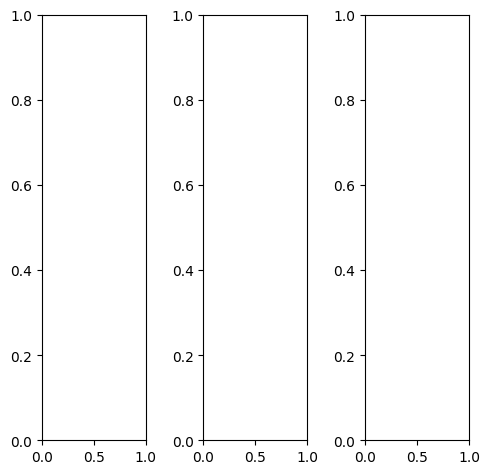

tensor([[[0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4863,  ..., 0.4941, 0.4941, 0.4902],
         ...,
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4549, 0.4549],
         [0.4549, 0.4549, 0.4588,  ..., 0.4549, 0.4549, 0.4549],
         [0.4549, 0.4549, 0.4549,  ..., 0.4510, 0.4510, 0.4549]],

        [[0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4863,  ..., 0.4941, 0.4941, 0.4902],
         ...,
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4549, 0.4549],
         [0.4549, 0.4549, 0.4588,  ..., 0.4549, 0.4549, 0.4549],
         [0.4549, 0.4549, 0.4549,  ..., 0.4510, 0.4510, 0.4549]],

        [[0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4863,  ..., 0.4941, 0.4941, 0.

tensor([[[0.5294, 0.5294, 0.5294,  ..., 0.5373, 0.5373, 0.5373],
         [0.5333, 0.5333, 0.5294,  ..., 0.5373, 0.5373, 0.5373],
         [0.5333, 0.5333, 0.5294,  ..., 0.5412, 0.5412, 0.5373],
         ...,
         [0.5255, 0.5255, 0.5255,  ..., 0.5255, 0.5216, 0.5216],
         [0.5216, 0.5216, 0.5255,  ..., 0.5216, 0.5216, 0.5216],
         [0.5216, 0.5216, 0.5216,  ..., 0.5176, 0.5176, 0.5216]],

        [[0.4941, 0.4941, 0.4941,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4902,  ..., 0.4941, 0.4941, 0.4941],
         [0.4902, 0.4902, 0.4863,  ..., 0.4902, 0.4902, 0.4902],
         ...,
         [0.4471, 0.4471, 0.4471,  ..., 0.4510, 0.4471, 0.4471],
         [0.4431, 0.4431, 0.4471,  ..., 0.4471, 0.4471, 0.4471],
         [0.4431, 0.4431, 0.4431,  ..., 0.4431, 0.4431, 0.4431]],

        [[0.3804, 0.3804, 0.3804,  ..., 0.3843, 0.3843, 0.3843],
         [0.3804, 0.3804, 0.3765,  ..., 0.3843, 0.3843, 0.3804],
         [0.3804, 0.3804, 0.3765,  ..., 0.3765, 0.3765, 0.

tensor([[[0.1819, 0.1353, 0.0385,  ..., 0.1806, 0.2246, 0.1889],
         [0.2565, 0.0320, 0.0648,  ..., 0.2115, 0.2579, 0.1736],
         [0.1908, 0.1360, 0.0295,  ..., 0.3085, 0.2966, 0.1807],
         ...,
         [0.3658, 0.4622, 0.4788,  ..., 0.4823, 0.4157, 0.2996],
         [0.3840, 0.4229, 0.4509,  ..., 0.3988, 0.3708, 0.2664],
         [0.2905, 0.2303, 0.2512,  ..., 0.2366, 0.2121, 0.1656]],

        [[0.3102, 0.2281, 0.3159,  ..., 0.2969, 0.3612, 0.2712],
         [0.2939, 0.2925, 0.1187,  ..., 0.3775, 0.4388, 0.2861],
         [0.3101, 0.2366, 0.2931,  ..., 0.4271, 0.4420, 0.2583],
         ...,
         [0.2813, 0.4272, 0.4705,  ..., 0.4756, 0.4299, 0.2652],
         [0.3089, 0.4007, 0.4236,  ..., 0.3950, 0.3890, 0.2530],
         [0.2378, 0.2094, 0.2260,  ..., 0.2209, 0.2177, 0.1371]],

        [[0.4870, 0.2677, 0.4066,  ..., 0.4134, 0.4554, 0.4096],
         [0.4254, 0.4205, 0.2463,  ..., 0.4992, 0.5407, 0.4441],
         [0.4465, 0.3843, 0.4134,  ..., 0.5912, 0.5606, 0.

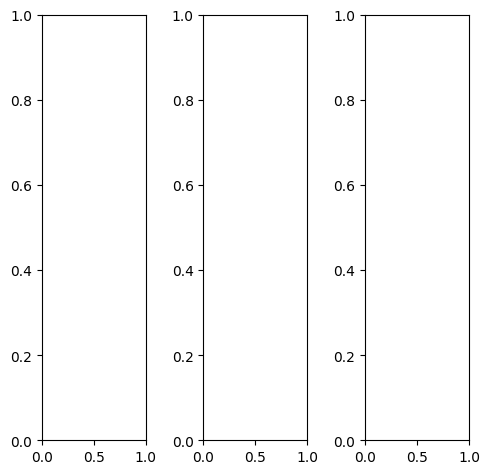

tensor([[[0.3647, 0.3647, 0.3608,  ..., 0.3843, 0.4000, 0.4157],
         [0.3843, 0.3804, 0.3725,  ..., 0.3882, 0.4078, 0.4314],
         [0.3961, 0.4078, 0.4000,  ..., 0.4275, 0.4471, 0.4588],
         ...,
         [0.4118, 0.4353, 0.4431,  ..., 0.3961, 0.3608, 0.3882],
         [0.3686, 0.4000, 0.4431,  ..., 0.3961, 0.3843, 0.3843],
         [0.4235, 0.4196, 0.4157,  ..., 0.3686, 0.3765, 0.4157]],

        [[0.3647, 0.3647, 0.3608,  ..., 0.3843, 0.4000, 0.4157],
         [0.3843, 0.3804, 0.3725,  ..., 0.3882, 0.4078, 0.4314],
         [0.3961, 0.4078, 0.4000,  ..., 0.4275, 0.4471, 0.4588],
         ...,
         [0.4118, 0.4353, 0.4431,  ..., 0.3961, 0.3608, 0.3882],
         [0.3686, 0.4000, 0.4431,  ..., 0.3961, 0.3843, 0.3843],
         [0.4235, 0.4196, 0.4157,  ..., 0.3686, 0.3765, 0.4157]],

        [[0.3647, 0.3647, 0.3608,  ..., 0.3843, 0.4000, 0.4157],
         [0.3843, 0.3804, 0.3725,  ..., 0.3882, 0.4078, 0.4314],
         [0.3961, 0.4078, 0.4000,  ..., 0.4275, 0.4471, 0.

tensor([[[0.3961, 0.3922, 0.3882,  ..., 0.4078, 0.4235, 0.4392],
         [0.4118, 0.4078, 0.4000,  ..., 0.4118, 0.4314, 0.4549],
         [0.4235, 0.4353, 0.4275,  ..., 0.4510, 0.4706, 0.4824],
         ...,
         [0.4510, 0.4784, 0.4863,  ..., 0.4392, 0.4039, 0.4314],
         [0.4118, 0.4431, 0.4863,  ..., 0.4314, 0.4235, 0.4235],
         [0.4667, 0.4627, 0.4588,  ..., 0.4000, 0.4078, 0.4471]],

        [[0.3647, 0.3647, 0.3608,  ..., 0.3882, 0.4039, 0.4196],
         [0.3843, 0.3804, 0.3725,  ..., 0.3922, 0.4118, 0.4353],
         [0.3961, 0.4078, 0.4000,  ..., 0.4275, 0.4471, 0.4588],
         ...,
         [0.4118, 0.4353, 0.4471,  ..., 0.3922, 0.3569, 0.3843],
         [0.3686, 0.4000, 0.4431,  ..., 0.3961, 0.3843, 0.3843],
         [0.4235, 0.4196, 0.4157,  ..., 0.3765, 0.3843, 0.4196]],

        [[0.2902, 0.2902, 0.2863,  ..., 0.3059, 0.3255, 0.3412],
         [0.3137, 0.3059, 0.2980,  ..., 0.3216, 0.3412, 0.3647],
         [0.3216, 0.3373, 0.3255,  ..., 0.3686, 0.3922, 0.

tensor([[[0.4627, 0.4049, 0.2927,  ..., 0.4163, 0.4289, 0.5280],
         [0.4527, 0.3436, 0.2381,  ..., 0.3864, 0.4458, 0.5300],
         [0.4258, 0.3752, 0.2947,  ..., 0.4484, 0.5244, 0.5685],
         ...,
         [0.6037, 0.6406, 0.6234,  ..., 0.5649, 0.5221, 0.5702],
         [0.5243, 0.5730, 0.6078,  ..., 0.5568, 0.5523, 0.5628],
         [0.6176, 0.6218, 0.5950,  ..., 0.5340, 0.5474, 0.5981]],

        [[0.5108, 0.4833, 0.3685,  ..., 0.5358, 0.5629, 0.5971],
         [0.4713, 0.3299, 0.2355,  ..., 0.5575, 0.5961, 0.6537],
         [0.5514, 0.4427, 0.4085,  ..., 0.5967, 0.6467, 0.6605],
         ...,
         [0.5808, 0.6162, 0.6084,  ..., 0.5925, 0.5454, 0.5581],
         [0.4989, 0.5359, 0.6137,  ..., 0.5793, 0.5715, 0.5560],
         [0.5840, 0.6016, 0.5942,  ..., 0.5347, 0.5535, 0.5884]],

        [[0.6381, 0.5841, 0.5420,  ..., 0.7489, 0.7604, 0.7694],
         [0.6435, 0.5623, 0.5423,  ..., 0.7443, 0.7877, 0.8004],
         [0.5537, 0.5215, 0.4978,  ..., 0.7723, 0.8286, 0.

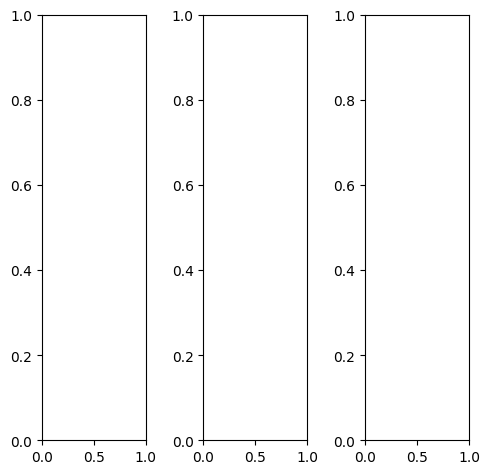

EPOCH: 32.510  trn_loss: 0.005  (3985.69s - 8274.11s remaining)

tensor([[[0.7922, 0.7569, 0.7490,  ..., 0.6667, 0.6941, 0.7098],
         [0.6078, 0.3686, 0.4314,  ..., 0.6314, 0.6706, 0.6549],
         [0.6118, 0.5294, 0.6078,  ..., 0.6784, 0.6902, 0.6902],
         ...,
         [0.7922, 0.7765, 0.7804,  ..., 0.7804, 0.7961, 0.8039],
         [0.7922, 0.7725, 0.7647,  ..., 0.7608, 0.7882, 0.7961],
         [0.8118, 0.7882, 0.7843,  ..., 0.8196, 0.8353, 0.8275]],

        [[0.7922, 0.7569, 0.7490,  ..., 0.6667, 0.6941, 0.7098],
         [0.6078, 0.3686, 0.4314,  ..., 0.6314, 0.6706, 0.6549],
         [0.6118, 0.5294, 0.6078,  ..., 0.6784, 0.6902, 0.6902],
         ...,
         [0.7922, 0.7765, 0.7804,  ..., 0.7804, 0.7961, 0.8039],
         [0.7922, 0.7725, 0.7647,  ..., 0.7608, 0.7882, 0.7961],
         [0.8118, 0.7882, 0.7843,  ..., 0.8196, 0.8353, 0.8275]],

        [[0.7922, 0.7569, 0.7490,  ..., 0.6667, 0.6941, 0.7098],
         [0.6078, 0.3686, 0.4314,  ..., 0.6314, 0.6706, 0.6549],
         [0.6118, 0.5294, 0.6078,  ..., 0.6784, 0.6902, 0.

tensor([[[0.8392, 0.8039, 0.7961,  ..., 0.7216, 0.7490, 0.7647],
         [0.6431, 0.4039, 0.4667,  ..., 0.7020, 0.7412, 0.7255],
         [0.6627, 0.5765, 0.6549,  ..., 0.7608, 0.7725, 0.7765],
         ...,
         [0.8902, 0.8706, 0.8745,  ..., 0.8667, 0.8745, 0.8745],
         [0.8902, 0.8706, 0.8627,  ..., 0.8392, 0.8627, 0.8667],
         [0.9137, 0.8902, 0.8863,  ..., 0.8902, 0.9059, 0.8941]],

        [[0.7843, 0.7451, 0.7373,  ..., 0.6471, 0.6784, 0.6902],
         [0.6000, 0.3529, 0.4157,  ..., 0.6275, 0.6667, 0.6510],
         [0.5961, 0.5098, 0.5882,  ..., 0.6902, 0.7020, 0.7020],
         ...,
         [0.7686, 0.7529, 0.7569,  ..., 0.7569, 0.7725, 0.7882],
         [0.7647, 0.7451, 0.7373,  ..., 0.7373, 0.7686, 0.7804],
         [0.7843, 0.7608, 0.7569,  ..., 0.8039, 0.8196, 0.8118]],

        [[0.7137, 0.6980, 0.6863,  ..., 0.6078, 0.6392, 0.6510],
         [0.5647, 0.3608, 0.4314,  ..., 0.4784, 0.5176, 0.4980],
         [0.5686, 0.5098, 0.5765,  ..., 0.3922, 0.4000, 0.

tensor([[[ 0.3452,  0.3033,  0.2189,  ...,  0.3270,  0.3706,  0.3973],
         [ 0.2429, -0.0900, -0.0518,  ...,  0.2878,  0.3256,  0.3019],
         [ 0.1319, -0.0051, -0.0363,  ...,  0.3587,  0.3596,  0.3409],
         ...,
         [ 0.6210,  0.6302,  0.6376,  ...,  0.6538,  0.6471,  0.6148],
         [ 0.6197,  0.6066,  0.6015,  ...,  0.6050,  0.6264,  0.6095],
         [ 0.5953,  0.5737,  0.5793,  ...,  0.6410,  0.6590,  0.6205]],

        [[ 0.4497,  0.4011,  0.4420,  ...,  0.4412,  0.5098,  0.4620],
         [ 0.2667,  0.0436, -0.0093,  ...,  0.4505,  0.5090,  0.4075],
         [ 0.2872,  0.0976,  0.1872,  ...,  0.5043,  0.5300,  0.4465],
         ...,
         [ 0.5713,  0.5880,  0.6213,  ...,  0.6224,  0.6100,  0.5765],
         [ 0.5749,  0.5672,  0.5692,  ...,  0.5955,  0.5989,  0.5770],
         [ 0.5477,  0.5469,  0.5492,  ...,  0.6027,  0.6234,  0.5824]],

        [[ 0.5927,  0.4417,  0.4988,  ...,  0.6217,  0.6707,  0.6277],
         [ 0.3639,  0.1493,  0.1420,  ...,  0

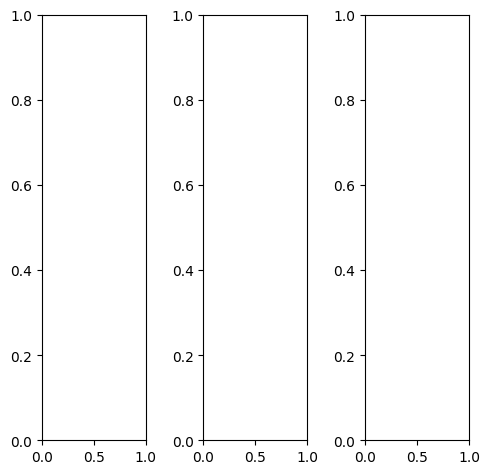

tensor([[[0.6392, 0.6196, 0.4745,  ..., 0.6353, 0.7216, 0.7451],
         [0.6157, 0.6118, 0.4706,  ..., 0.6471, 0.6510, 0.6353],
         [0.6392, 0.6353, 0.5255,  ..., 0.7294, 0.7333, 0.7176],
         ...,
         [0.5569, 0.5647, 0.5608,  ..., 0.6980, 0.6667, 0.6392],
         [0.5333, 0.5020, 0.4118,  ..., 0.6235, 0.6824, 0.6196],
         [0.4980, 0.4667, 0.4353,  ..., 0.5647, 0.6275, 0.6157]],

        [[0.6392, 0.6196, 0.4745,  ..., 0.6353, 0.7216, 0.7451],
         [0.6157, 0.6118, 0.4706,  ..., 0.6471, 0.6510, 0.6353],
         [0.6392, 0.6353, 0.5255,  ..., 0.7294, 0.7333, 0.7176],
         ...,
         [0.5569, 0.5647, 0.5608,  ..., 0.6980, 0.6667, 0.6392],
         [0.5333, 0.5020, 0.4118,  ..., 0.6235, 0.6824, 0.6196],
         [0.4980, 0.4667, 0.4353,  ..., 0.5647, 0.6275, 0.6157]],

        [[0.6392, 0.6196, 0.4745,  ..., 0.6353, 0.7216, 0.7451],
         [0.6157, 0.6118, 0.4706,  ..., 0.6471, 0.6510, 0.6353],
         [0.6392, 0.6353, 0.5255,  ..., 0.7294, 0.7333, 0.

tensor([[[0.6549, 0.6431, 0.5020,  ..., 0.6549, 0.7451, 0.7647],
         [0.6314, 0.6353, 0.4980,  ..., 0.6745, 0.6824, 0.6667],
         [0.6549, 0.6549, 0.5569,  ..., 0.7569, 0.7608, 0.7451],
         ...,
         [0.5725, 0.5882, 0.5882,  ..., 0.7098, 0.6275, 0.5804],
         [0.5451, 0.5216, 0.4392,  ..., 0.6431, 0.6588, 0.5725],
         [0.5216, 0.4941, 0.4627,  ..., 0.5843, 0.6392, 0.5882]],

        [[0.6392, 0.6196, 0.4706,  ..., 0.6353, 0.7216, 0.7451],
         [0.6157, 0.6118, 0.4667,  ..., 0.6471, 0.6510, 0.6353],
         [0.6431, 0.6314, 0.5216,  ..., 0.7294, 0.7333, 0.7176],
         ...,
         [0.5569, 0.5608, 0.5529,  ..., 0.7059, 0.7098, 0.6941],
         [0.5333, 0.4980, 0.4039,  ..., 0.6235, 0.7176, 0.6745],
         [0.4941, 0.4627, 0.4275,  ..., 0.5647, 0.6353, 0.6549]],

        [[0.5922, 0.5725, 0.4275,  ..., 0.5765, 0.6627, 0.6863],
         [0.5686, 0.5647, 0.4235,  ..., 0.5647, 0.5686, 0.5569],
         [0.5922, 0.5882, 0.4784,  ..., 0.6471, 0.6471, 0.

tensor([[[0.5818, 0.4441, 0.2193,  ..., 0.4730, 0.5626, 0.6118],
         [0.5133, 0.3730, 0.2053,  ..., 0.4925, 0.5122, 0.5328],
         [0.5283, 0.4039, 0.1707,  ..., 0.6290, 0.6373, 0.6094],
         ...,
         [0.6015, 0.6546, 0.6356,  ..., 0.7801, 0.7401, 0.6998],
         [0.5663, 0.5683, 0.4815,  ..., 0.6901, 0.7574, 0.6806],
         [0.5179, 0.5025, 0.4728,  ..., 0.6335, 0.7121, 0.6909]],

        [[0.6045, 0.5436, 0.3304,  ..., 0.6324, 0.7361, 0.7466],
         [0.5168, 0.3857, 0.1930,  ..., 0.6664, 0.6782, 0.7006],
         [0.6266, 0.5042, 0.3115,  ..., 0.7889, 0.7748, 0.7555],
         ...,
         [0.5537, 0.5895, 0.5821,  ..., 0.7563, 0.6975, 0.6602],
         [0.5122, 0.4917, 0.4169,  ..., 0.6653, 0.7179, 0.6498],
         [0.4867, 0.4676, 0.4431,  ..., 0.5953, 0.6671, 0.6483]],

        [[0.7183, 0.6348, 0.4143,  ..., 0.8911, 0.9830, 0.9496],
         [0.6728, 0.5720, 0.3995,  ..., 0.9128, 0.9297, 0.9092],
         [0.6234, 0.5715, 0.3344,  ..., 0.9983, 1.0245, 0.

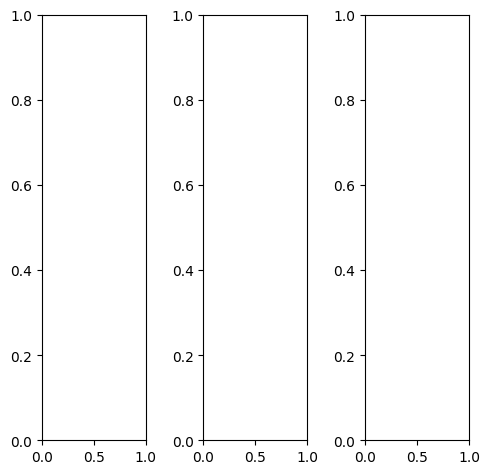

tensor([[[0.2392, 0.2941, 0.3725,  ..., 0.6627, 0.6941, 0.7098],
         [0.4275, 0.5333, 0.5647,  ..., 0.6392, 0.6588, 0.6667],
         [0.6902, 0.7216, 0.6902,  ..., 0.7137, 0.7294, 0.7255],
         ...,
         [0.7176, 0.7294, 0.7020,  ..., 0.6941, 0.7137, 0.7216],
         [0.7294, 0.7373, 0.7176,  ..., 0.6627, 0.6980, 0.7020],
         [0.7216, 0.7373, 0.7333,  ..., 0.7137, 0.7137, 0.7020]],

        [[0.2392, 0.2941, 0.3725,  ..., 0.6627, 0.6941, 0.7098],
         [0.4275, 0.5333, 0.5647,  ..., 0.6392, 0.6588, 0.6667],
         [0.6902, 0.7216, 0.6902,  ..., 0.7137, 0.7294, 0.7255],
         ...,
         [0.7176, 0.7294, 0.7020,  ..., 0.6941, 0.7137, 0.7216],
         [0.7294, 0.7373, 0.7176,  ..., 0.6627, 0.6980, 0.7020],
         [0.7216, 0.7373, 0.7333,  ..., 0.7137, 0.7137, 0.7020]],

        [[0.2392, 0.2941, 0.3725,  ..., 0.6627, 0.6941, 0.7098],
         [0.4275, 0.5333, 0.5647,  ..., 0.6392, 0.6588, 0.6667],
         [0.6902, 0.7216, 0.6902,  ..., 0.7137, 0.7294, 0.

tensor([[[0.1765, 0.2314, 0.3098,  ..., 0.6000, 0.6353, 0.6510],
         [0.3686, 0.4784, 0.5098,  ..., 0.5725, 0.5961, 0.6078],
         [0.6314, 0.6667, 0.6431,  ..., 0.6431, 0.6667, 0.6667],
         ...,
         [0.6549, 0.6627, 0.6353,  ..., 0.6314, 0.6549, 0.6627],
         [0.6745, 0.6784, 0.6588,  ..., 0.6039, 0.6392, 0.6431],
         [0.6784, 0.6863, 0.6824,  ..., 0.6549, 0.6549, 0.6431]],

        [[0.3176, 0.3765, 0.4667,  ..., 0.7529, 0.7843, 0.7961],
         [0.5137, 0.6235, 0.6588,  ..., 0.7333, 0.7451, 0.7490],
         [0.7804, 0.8118, 0.7804,  ..., 0.8118, 0.8235, 0.8157],
         ...,
         [0.8196, 0.8314, 0.8078,  ..., 0.7961, 0.8157, 0.8275],
         [0.8235, 0.8353, 0.8196,  ..., 0.7608, 0.8000, 0.8039],
         [0.8157, 0.8314, 0.8314,  ..., 0.8118, 0.8157, 0.8000]],

        [[0.0157, 0.0196, 0.0471,  ..., 0.3647, 0.4000, 0.4157],
         [0.1490, 0.2039, 0.2118,  ..., 0.3412, 0.3725, 0.3804],
         [0.3765, 0.3882, 0.3608,  ..., 0.3843, 0.4039, 0.

tensor([[[-0.2496, -0.2361, -0.2161,  ...,  0.3260,  0.3894,  0.4263],
         [ 0.0012, -0.1894, -0.0287,  ...,  0.2390,  0.2693,  0.3041],
         [ 0.1640,  0.0840,  0.0301,  ...,  0.3291,  0.3767,  0.4158],
         ...,
         [ 0.4581,  0.5082,  0.4257,  ...,  0.4928,  0.5231,  0.5312],
         [ 0.4897,  0.5119,  0.4788,  ...,  0.4612,  0.4863,  0.5258],
         [ 0.5015,  0.4810,  0.4773,  ...,  0.5052,  0.5233,  0.4978]],

        [[-0.0602, -0.0693,  0.0136,  ...,  0.4212,  0.5319,  0.4822],
         [ 0.0035, -0.0201, -0.0840,  ...,  0.3964,  0.4552,  0.4031],
         [ 0.3205,  0.2467,  0.2571,  ...,  0.4869,  0.5568,  0.5125],
         ...,
         [ 0.4477,  0.5009,  0.4447,  ...,  0.4657,  0.5244,  0.4836],
         [ 0.4820,  0.5053,  0.4882,  ...,  0.4541,  0.5084,  0.5071],
         [ 0.4726,  0.4863,  0.4851,  ...,  0.4764,  0.5042,  0.4541]],

        [[ 0.0896, -0.2152,  0.1165,  ...,  0.6375,  0.7097,  0.6791],
         [ 0.2539,  0.1344,  0.2004,  ...,  0

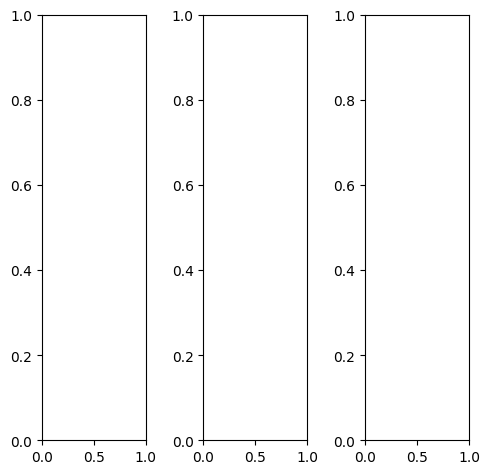

tensor([[[0.4824, 0.4784, 0.4902,  ..., 0.5294, 0.5216, 0.5176],
         [0.4588, 0.4588, 0.4745,  ..., 0.5216, 0.5255, 0.5255],
         [0.4510, 0.4471, 0.4588,  ..., 0.5216, 0.5255, 0.5255],
         ...,
         [0.4784, 0.4549, 0.4627,  ..., 0.4784, 0.4588, 0.4471],
         [0.4902, 0.4588, 0.4588,  ..., 0.4784, 0.4627, 0.4392],
         [0.4980, 0.4588, 0.4431,  ..., 0.4745, 0.4510, 0.4275]],

        [[0.4824, 0.4784, 0.4902,  ..., 0.5294, 0.5216, 0.5176],
         [0.4588, 0.4588, 0.4745,  ..., 0.5216, 0.5255, 0.5255],
         [0.4510, 0.4471, 0.4588,  ..., 0.5216, 0.5255, 0.5255],
         ...,
         [0.4784, 0.4549, 0.4627,  ..., 0.4784, 0.4588, 0.4471],
         [0.4902, 0.4588, 0.4588,  ..., 0.4784, 0.4627, 0.4392],
         [0.4980, 0.4588, 0.4431,  ..., 0.4745, 0.4510, 0.4275]],

        [[0.4824, 0.4784, 0.4902,  ..., 0.5294, 0.5216, 0.5176],
         [0.4588, 0.4588, 0.4745,  ..., 0.5216, 0.5255, 0.5255],
         [0.4510, 0.4471, 0.4588,  ..., 0.5216, 0.5255, 0.

tensor([[[0.4510, 0.4510, 0.4627,  ..., 0.5294, 0.5216, 0.5176],
         [0.4314, 0.4314, 0.4471,  ..., 0.5216, 0.5216, 0.5216],
         [0.4275, 0.4235, 0.4353,  ..., 0.5098, 0.5137, 0.5137],
         ...,
         [0.4902, 0.4667, 0.4745,  ..., 0.4627, 0.4353, 0.4196],
         [0.5020, 0.4706, 0.4706,  ..., 0.4706, 0.4431, 0.4157],
         [0.5098, 0.4706, 0.4549,  ..., 0.4667, 0.4353, 0.4078]],

        [[0.5020, 0.5020, 0.5137,  ..., 0.5490, 0.5412, 0.5373],
         [0.4824, 0.4824, 0.4980,  ..., 0.5451, 0.5490, 0.5490],
         [0.4706, 0.4667, 0.4824,  ..., 0.5490, 0.5529, 0.5529],
         ...,
         [0.4941, 0.4706, 0.4784,  ..., 0.5255, 0.5098, 0.4941],
         [0.5059, 0.4745, 0.4745,  ..., 0.5255, 0.5098, 0.4863],
         [0.5137, 0.4745, 0.4588,  ..., 0.5176, 0.4941, 0.4667]],

        [[0.4471, 0.4314, 0.4353,  ..., 0.4235, 0.4196, 0.4118],
         [0.4235, 0.4118, 0.4196,  ..., 0.4157, 0.4157, 0.4157],
         [0.4157, 0.4000, 0.4039,  ..., 0.4039, 0.4078, 0.

tensor([[[ 0.1401,  0.1016,  0.0172,  ...,  0.2390,  0.2520,  0.2706],
         [ 0.2008, -0.0349,  0.0034,  ...,  0.2475,  0.2574,  0.2641],
         [ 0.0010, -0.1309, -0.1627,  ...,  0.2817,  0.2910,  0.2872],
         ...,
         [ 0.3566,  0.3481,  0.3611,  ...,  0.4361,  0.3546,  0.3232],
         [ 0.3726,  0.3182,  0.3410,  ...,  0.3744,  0.3357,  0.2891],
         [ 0.3526,  0.2617,  0.2548,  ...,  0.3150,  0.2621,  0.2461]],

        [[ 0.2574,  0.2267,  0.2393,  ...,  0.3605,  0.3901,  0.3713],
         [ 0.2171,  0.1212, -0.0533,  ...,  0.3786,  0.4186,  0.3783],
         [ 0.1215, -0.0151, -0.0351,  ...,  0.3977,  0.4296,  0.3771],
         ...,
         [ 0.3375,  0.3303,  0.3546,  ...,  0.3554,  0.3121,  0.2619],
         [ 0.3588,  0.3156,  0.3310,  ...,  0.3377,  0.3094,  0.2481],
         [ 0.3297,  0.2569,  0.2479,  ...,  0.2763,  0.2376,  0.2077]],

        [[ 0.4183,  0.2251,  0.2825,  ...,  0.4903,  0.5132,  0.4998],
         [ 0.3461,  0.1902,  0.1872,  ...,  0

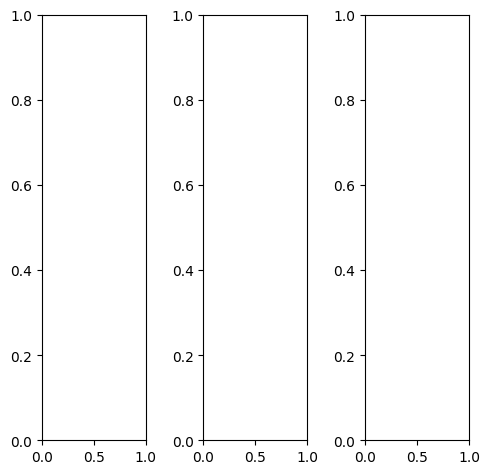

tensor([[[1.0000, 0.9882, 0.9843,  ..., 0.9804, 0.9843, 0.9961],
         [1.0000, 1.0000, 0.9922,  ..., 0.9059, 0.9294, 0.9882],
         [1.0000, 0.9804, 0.9804,  ..., 0.7529, 0.7882, 0.9176],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9843,  ..., 0.9804, 0.9843, 0.9961],
         [1.0000, 1.0000, 0.9922,  ..., 0.9059, 0.9294, 0.9882],
         [1.0000, 0.9804, 0.9804,  ..., 0.7529, 0.7882, 0.9176],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9843,  ..., 0.9804, 0.9843, 0.9961],
         [1.0000, 1.0000, 0.9922,  ..., 0.9059, 0.9294, 0.9882],
         [1.0000, 0.9804, 0.9804,  ..., 0.7529, 0.7882, 0.

tensor([[[1.0000, 0.9882, 0.9843,  ..., 0.9804, 0.9882, 1.0000],
         [1.0000, 1.0000, 0.9922,  ..., 0.9333, 0.9451, 0.9922],
         [1.0000, 0.9804, 0.9804,  ..., 0.8196, 0.8078, 0.9216],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9843,  ..., 0.9843, 0.9804, 0.9922],
         [1.0000, 1.0000, 0.9922,  ..., 0.8980, 0.9255, 0.9843],
         [1.0000, 0.9804, 0.9804,  ..., 0.7216, 0.7765, 0.9137],
         ...,
         [1.0000, 0.9922, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [1.0000, 0.9882, 0.9961,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 0.9882, 0.9843,  ..., 0.9765, 0.9843, 0.9961],
         [1.0000, 1.0000, 0.9922,  ..., 0.8902, 0.9255, 0.9882],
         [1.0000, 0.9804, 0.9804,  ..., 0.7294, 0.7804, 0.

tensor([[[0.5431, 0.5101, 0.4244,  ..., 0.4392, 0.4540, 0.5081],
         [0.5467, 0.4875, 0.4858,  ..., 0.4081, 0.4171, 0.4653],
         [0.4667, 0.4953, 0.3525,  ..., 0.3213, 0.3340, 0.4212],
         ...,
         [0.5626, 0.5643, 0.5524,  ..., 0.5392, 0.5486, 0.5393],
         [0.5747, 0.5521, 0.5522,  ..., 0.5453, 0.5473, 0.5497],
         [0.5708, 0.5449, 0.5526,  ..., 0.5524, 0.5610, 0.5596]],

        [[0.6255, 0.5512, 0.5581,  ..., 0.5461, 0.5875, 0.5753],
         [0.5137, 0.4474, 0.4393,  ..., 0.5220, 0.5449, 0.5778],
         [0.6199, 0.5281, 0.5461,  ..., 0.4010, 0.4229, 0.5038],
         ...,
         [0.5670, 0.5753, 0.5920,  ..., 0.5756, 0.5691, 0.5662],
         [0.5768, 0.5538, 0.5694,  ..., 0.5730, 0.5776, 0.5739],
         [0.5564, 0.5593, 0.5638,  ..., 0.5703, 0.5693, 0.5678]],

        [[0.7680, 0.6687, 0.7515,  ..., 0.7195, 0.7373, 0.7355],
         [0.7225, 0.7153, 0.7094,  ..., 0.6668, 0.7059, 0.7345],
         [0.6594, 0.6452, 0.6571,  ..., 0.5598, 0.5885, 0.

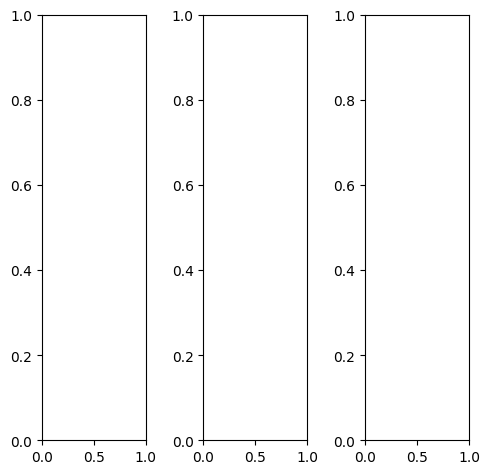

EPOCH: 32.765  trn_loss: 0.005  (4016.20s - 8241.28s remaining)

tensor([[[0.5059, 0.4392, 0.4667,  ..., 0.3686, 0.3765, 0.3608],
         [0.4863, 0.4863, 0.4039,  ..., 0.3176, 0.3529, 0.3647],
         [0.4627, 0.5451, 0.4235,  ..., 0.2824, 0.3529, 0.3882],
         ...,
         [0.7804, 0.7725, 0.7608,  ..., 0.6980, 0.6980, 0.7333],
         [0.7059, 0.6941, 0.6980,  ..., 0.7137, 0.7137, 0.7294],
         [0.7137, 0.6980, 0.7020,  ..., 0.7098, 0.6902, 0.6627]],

        [[0.5059, 0.4392, 0.4667,  ..., 0.3686, 0.3765, 0.3608],
         [0.4863, 0.4863, 0.4039,  ..., 0.3176, 0.3529, 0.3647],
         [0.4627, 0.5451, 0.4235,  ..., 0.2824, 0.3529, 0.3882],
         ...,
         [0.7804, 0.7725, 0.7608,  ..., 0.6980, 0.6980, 0.7333],
         [0.7059, 0.6941, 0.6980,  ..., 0.7137, 0.7137, 0.7294],
         [0.7137, 0.6980, 0.7020,  ..., 0.7098, 0.6902, 0.6627]],

        [[0.5059, 0.4392, 0.4667,  ..., 0.3686, 0.3765, 0.3608],
         [0.4863, 0.4863, 0.4039,  ..., 0.3176, 0.3529, 0.3647],
         [0.4627, 0.5451, 0.4235,  ..., 0.2824, 0.3529, 0.

tensor([[[0.4667, 0.4196, 0.4706,  ..., 0.3765, 0.3647, 0.3412],
         [0.4549, 0.4627, 0.3843,  ..., 0.3216, 0.3490, 0.3569],
         [0.4510, 0.5294, 0.4000,  ..., 0.2824, 0.3569, 0.3882],
         ...,
         [0.8549, 0.8431, 0.8314,  ..., 0.7412, 0.7490, 0.7961],
         [0.7490, 0.7333, 0.7255,  ..., 0.7412, 0.7490, 0.7647],
         [0.7294, 0.7137, 0.7176,  ..., 0.7098, 0.6941, 0.6627]],

        [[0.5804, 0.4824, 0.4863,  ..., 0.3843, 0.4078, 0.3961],
         [0.5608, 0.5412, 0.4353,  ..., 0.3294, 0.3765, 0.3882],
         [0.5137, 0.5961, 0.4627,  ..., 0.2863, 0.3647, 0.4000],
         ...,
         [0.7765, 0.7725, 0.7608,  ..., 0.7176, 0.7098, 0.7412],
         [0.7176, 0.7098, 0.7137,  ..., 0.7490, 0.7412, 0.7529],
         [0.7451, 0.7294, 0.7333,  ..., 0.7608, 0.7333, 0.7098]],

        [[0.2392, 0.2824, 0.3451,  ..., 0.2706, 0.2431, 0.2353],
         [0.1961, 0.2588, 0.2824,  ..., 0.2549, 0.2471, 0.2588],
         [0.2392, 0.3098, 0.2667,  ..., 0.2510, 0.2902, 0.

tensor([[[ 0.1415,  0.0749, -0.0156,  ...,  0.1775,  0.1801,  0.1795],
         [ 0.2123, -0.0517, -0.0908,  ...,  0.0806,  0.1262,  0.1625],
         [ 0.0238,  0.0073, -0.1758,  ...,  0.0352,  0.1277,  0.1969],
         ...,
         [ 0.6743,  0.6518,  0.6279,  ...,  0.5373,  0.5482,  0.6100],
         [ 0.5804,  0.5692,  0.5457,  ...,  0.5675,  0.6068,  0.6148],
         [ 0.5979,  0.5703,  0.5622,  ...,  0.5774,  0.5521,  0.5470]],

        [[ 0.2849,  0.2078,  0.2025,  ...,  0.2674,  0.2831,  0.2512],
         [ 0.2163,  0.0297, -0.2254,  ...,  0.1944,  0.2604,  0.2392],
         [ 0.1856,  0.1113, -0.0169,  ...,  0.1217,  0.2270,  0.2436],
         ...,
         [ 0.6414,  0.6384,  0.6202,  ...,  0.5358,  0.5642,  0.5863],
         [ 0.5415,  0.5287,  0.5370,  ...,  0.5772,  0.5942,  0.5950],
         [ 0.5547,  0.5489,  0.5550,  ...,  0.5670,  0.5565,  0.5235]],

        [[ 0.4872,  0.2908,  0.3897,  ...,  0.4060,  0.4334,  0.4107],
         [ 0.4286,  0.3046,  0.2312,  ...,  0

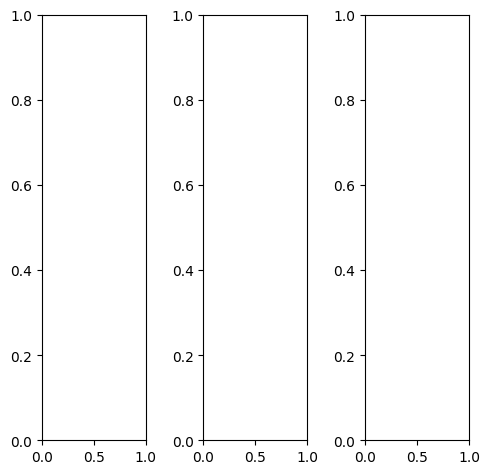

tensor([[[0.7843, 0.7765, 0.7686,  ..., 0.7294, 0.7294, 0.7412],
         [0.8118, 0.8667, 0.8353,  ..., 0.7412, 0.7451, 0.7373],
         [0.8118, 0.8706, 0.9176,  ..., 0.7490, 0.7529, 0.7529],
         ...,
         [0.6784, 0.6824, 0.6745,  ..., 0.7373, 0.7333, 0.7294],
         [0.6824, 0.6706, 0.6745,  ..., 0.6039, 0.7020, 0.7098],
         [0.6706, 0.6706, 0.6745,  ..., 0.5294, 0.6902, 0.7216]],

        [[0.7843, 0.7765, 0.7686,  ..., 0.7294, 0.7294, 0.7412],
         [0.8118, 0.8667, 0.8353,  ..., 0.7412, 0.7451, 0.7373],
         [0.8118, 0.8706, 0.9176,  ..., 0.7490, 0.7529, 0.7529],
         ...,
         [0.6784, 0.6824, 0.6745,  ..., 0.7373, 0.7333, 0.7294],
         [0.6824, 0.6706, 0.6745,  ..., 0.6039, 0.7020, 0.7098],
         [0.6706, 0.6706, 0.6745,  ..., 0.5294, 0.6902, 0.7216]],

        [[0.7843, 0.7765, 0.7686,  ..., 0.7294, 0.7294, 0.7412],
         [0.8118, 0.8667, 0.8353,  ..., 0.7412, 0.7451, 0.7373],
         [0.8118, 0.8706, 0.9176,  ..., 0.7490, 0.7529, 0.

tensor([[[0.8118, 0.8039, 0.8000,  ..., 0.7725, 0.7725, 0.7843],
         [0.8431, 0.8941, 0.8588,  ..., 0.7843, 0.7882, 0.7804],
         [0.8431, 0.8980, 0.9333,  ..., 0.7922, 0.7961, 0.7961],
         ...,
         [0.7216, 0.7255, 0.7176,  ..., 0.7765, 0.7725, 0.7686],
         [0.7255, 0.7137, 0.7176,  ..., 0.6314, 0.7333, 0.7412],
         [0.7137, 0.7098, 0.7176,  ..., 0.5608, 0.7216, 0.7529]],

        [[0.7765, 0.7686, 0.7608,  ..., 0.7137, 0.7137, 0.7255],
         [0.8039, 0.8588, 0.8275,  ..., 0.7255, 0.7294, 0.7216],
         [0.8000, 0.8627, 0.9098,  ..., 0.7333, 0.7373, 0.7373],
         ...,
         [0.6627, 0.6667, 0.6588,  ..., 0.7176, 0.7137, 0.7137],
         [0.6667, 0.6549, 0.6588,  ..., 0.5843, 0.6863, 0.6980],
         [0.6549, 0.6549, 0.6588,  ..., 0.5137, 0.6745, 0.7098]],

        [[0.7608, 0.7529, 0.7412,  ..., 0.7020, 0.7020, 0.7137],
         [0.7843, 0.8431, 0.8118,  ..., 0.7137, 0.7176, 0.7098],
         [0.7765, 0.8510, 0.9020,  ..., 0.7216, 0.7255, 0.

tensor([[[0.5227, 0.4617, 0.4347,  ..., 0.3394, 0.3685, 0.4053],
         [0.5795, 0.4401, 0.5530,  ..., 0.3549, 0.3654, 0.3554],
         [0.5333, 0.5973, 0.5565,  ..., 0.4153, 0.4176, 0.4061],
         ...,
         [0.3923, 0.4494, 0.4130,  ..., 0.6197, 0.5618, 0.5026],
         [0.4102, 0.4287, 0.4339,  ..., 0.4118, 0.5275, 0.4783],
         [0.3849, 0.3726, 0.3702,  ..., 0.2357, 0.4445, 0.4508]],

        [[0.6292, 0.5306, 0.5906,  ..., 0.4421, 0.5005, 0.4534],
         [0.5740, 0.5058, 0.5292,  ..., 0.5155, 0.5418, 0.4723],
         [0.6395, 0.6478, 0.7402,  ..., 0.5405, 0.5512, 0.5167],
         ...,
         [0.3976, 0.4465, 0.4294,  ..., 0.6031, 0.5624, 0.4578],
         [0.4085, 0.4310, 0.4691,  ..., 0.4106, 0.5241, 0.4474],
         [0.3852, 0.3715, 0.3894,  ..., 0.2010, 0.4154, 0.4052]],

        [[0.7760, 0.6835, 0.7634,  ..., 0.6725, 0.6943, 0.6630],
         [0.8022, 0.7727, 0.7888,  ..., 0.6943, 0.7375, 0.6802],
         [0.7370, 0.8265, 0.8349,  ..., 0.7442, 0.7542, 0.

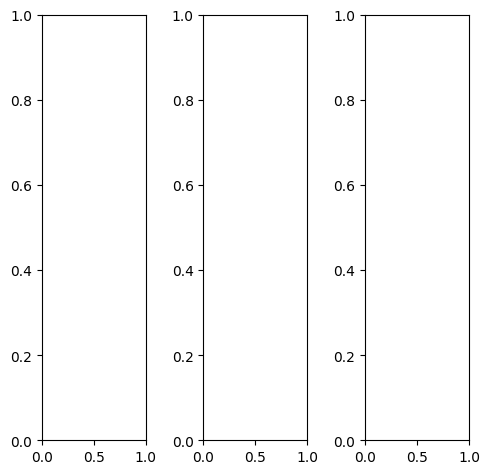

tensor([[[0.3725, 0.3647, 0.3569,  ..., 0.6118, 0.7098, 0.9725],
         [0.3529, 0.3373, 0.3294,  ..., 0.5961, 0.6980, 0.9647],
         [0.3373, 0.3294, 0.3255,  ..., 0.5922, 0.6941, 0.9686],
         ...,
         [0.8000, 0.8196, 0.8471,  ..., 0.7098, 0.7922, 0.9765],
         [0.9686, 0.9529, 0.9529,  ..., 0.9608, 0.9686, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.3725, 0.3647, 0.3569,  ..., 0.6118, 0.7098, 0.9725],
         [0.3529, 0.3373, 0.3294,  ..., 0.5961, 0.6980, 0.9647],
         [0.3373, 0.3294, 0.3255,  ..., 0.5922, 0.6941, 0.9686],
         ...,
         [0.8000, 0.8196, 0.8471,  ..., 0.7098, 0.7922, 0.9765],
         [0.9686, 0.9529, 0.9529,  ..., 0.9608, 0.9686, 0.9922],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.3725, 0.3647, 0.3569,  ..., 0.6118, 0.7098, 0.9725],
         [0.3529, 0.3373, 0.3294,  ..., 0.5961, 0.6980, 0.9647],
         [0.3373, 0.3294, 0.3255,  ..., 0.5922, 0.6941, 0.

tensor([[[0.2902, 0.2745, 0.2588,  ..., 0.5333, 0.6706, 0.9647],
         [0.2588, 0.2275, 0.2157,  ..., 0.5176, 0.6588, 0.9569],
         [0.2353, 0.2157, 0.2235,  ..., 0.5137, 0.6549, 0.9608],
         ...,
         [0.7922, 0.8118, 0.8392,  ..., 0.6667, 0.7765, 0.9765],
         [0.9686, 0.9529, 0.9529,  ..., 0.9451, 0.9686, 0.9961],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.3882, 0.3804, 0.3765,  ..., 0.6275, 0.7176, 0.9725],
         [0.3725, 0.3608, 0.3569,  ..., 0.6157, 0.7098, 0.9686],
         [0.3608, 0.3529, 0.3490,  ..., 0.6078, 0.7059, 0.9725],
         ...,
         [0.8000, 0.8196, 0.8471,  ..., 0.7216, 0.7961, 0.9765],
         [0.9686, 0.9529, 0.9529,  ..., 0.9647, 0.9686, 0.9882],
         [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.5137, 0.5176, 0.5020,  ..., 0.7216, 0.7647, 0.9765],
         [0.4941, 0.5098, 0.4902,  ..., 0.7059, 0.7529, 0.9725],
         [0.4824, 0.5020, 0.4627,  ..., 0.7020, 0.7529, 0.

tensor([[[2.1759e-01, 1.7726e-01, 9.0370e-02,  ..., 4.9695e-01,
          6.0529e-01, 7.9334e-01],
         [2.4379e-01, 4.8369e-02, 1.0228e-01,  ..., 4.0606e-01,
          5.5985e-01, 8.0895e-01],
         [1.1192e-01, 7.1106e-02, 2.6011e-04,  ..., 4.5151e-01,
          5.6599e-01, 8.0881e-01],
         ...,
         [7.5191e-01, 7.8513e-01, 7.9728e-01,  ..., 6.6424e-01,
          7.4638e-01, 8.5997e-01],
         [8.7077e-01, 8.7953e-01, 8.6250e-01,  ..., 8.6918e-01,
          8.8823e-01, 8.7479e-01],
         [8.8605e-01, 8.9124e-01, 8.6158e-01,  ..., 9.0644e-01,
          9.0027e-01, 8.5938e-01]],

        [[2.8617e-01, 3.2505e-01, 1.8813e-01,  ..., 5.4013e-01,
          6.8235e-01, 8.3832e-01],
         [2.8540e-01, 1.7818e-01, 3.6271e-02,  ..., 4.9312e-01,
          6.3049e-01, 8.8732e-01],
         [1.9720e-01, 2.0413e-01, 7.3373e-02,  ..., 5.1870e-01,
          6.3742e-01, 8.6338e-01],
         ...,
         [7.2965e-01, 7.5097e-01, 7.6766e-01,  ..., 6.3388e-01,
          7.248

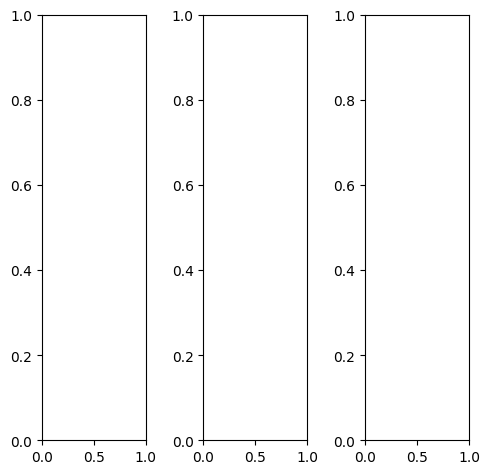

tensor([[[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3294, 0.3020, 0.2902,  ..., 0.3529, 0.3647, 0.3725],
         [0.3333, 0.3098, 0.3059,  ..., 0.3608, 0.3686, 0.3647],
         [0.3529, 0.3412, 0.3412,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3294, 0.3020, 0.2902,  ..., 0.3529, 0.3647, 0.3725],
         [0.3333, 0.3098, 0.3059,  ..., 0.3608, 0.3686, 0.3647],
         [0.3529, 0.3412, 0.3412,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.3294, 0.3098, 0.3098,  ..., 0.3725, 0.3804, 0.3804],
         [0.3294, 0.3020, 0.2941,  ..., 0.3294, 0.3569, 0.3765],
         [0.3294, 0.2941, 0.2784,  ..., 0.3020, 0.3020, 0.

tensor([[[0.2784, 0.2588, 0.2588,  ..., 0.3333, 0.3373, 0.3294],
         [0.2784, 0.2510, 0.2431,  ..., 0.2863, 0.3137, 0.3216],
         [0.2784, 0.2431, 0.2275,  ..., 0.2627, 0.2588, 0.2824],
         ...,
         [0.2745, 0.2471, 0.2353,  ..., 0.3137, 0.3255, 0.3333],
         [0.2784, 0.2549, 0.2510,  ..., 0.3176, 0.3255, 0.3216],
         [0.2980, 0.2863, 0.2863,  ..., 0.3059, 0.3059, 0.3059]],

        [[0.3294, 0.3137, 0.3137,  ..., 0.3686, 0.3804, 0.3804],
         [0.3294, 0.3059, 0.2980,  ..., 0.3255, 0.3569, 0.3765],
         [0.3294, 0.2980, 0.2824,  ..., 0.3020, 0.3020, 0.3333],
         ...,
         [0.3333, 0.3059, 0.2941,  ..., 0.3490, 0.3647, 0.3686],
         [0.3373, 0.3137, 0.3098,  ..., 0.3608, 0.3647, 0.3647],
         [0.3569, 0.3451, 0.3451,  ..., 0.3490, 0.3490, 0.3490]],

        [[0.4588, 0.4275, 0.4196,  ..., 0.4941, 0.5098, 0.5176],
         [0.4627, 0.4196, 0.4039,  ..., 0.4471, 0.4824, 0.5098],
         [0.4627, 0.4118, 0.3882,  ..., 0.4157, 0.4196, 0.

tensor([[[0.3720, 0.2446, 0.1533,  ..., 0.3892, 0.4198, 0.4576],
         [0.3622, 0.2014, 0.1441,  ..., 0.3269, 0.3545, 0.4073],
         [0.3261, 0.1258, 0.0358,  ..., 0.2975, 0.2666, 0.3024],
         ...,
         [0.4261, 0.3794, 0.3537,  ..., 0.5273, 0.5399, 0.5283],
         [0.4317, 0.3786, 0.3639,  ..., 0.5520, 0.5382, 0.5126],
         [0.4524, 0.4245, 0.4062,  ..., 0.4855, 0.4813, 0.4712]],

        [[0.4177, 0.3030, 0.2338,  ..., 0.5082, 0.5490, 0.5341],
         [0.3758, 0.2546, 0.0500,  ..., 0.4475, 0.4893, 0.5041],
         [0.3945, 0.1421, 0.0475,  ..., 0.4141, 0.3899, 0.3748],
         ...,
         [0.4081, 0.3623, 0.3435,  ..., 0.5121, 0.5357, 0.4996],
         [0.4256, 0.3731, 0.3557,  ..., 0.5307, 0.5293, 0.5008],
         [0.4533, 0.4131, 0.3949,  ..., 0.4608, 0.4658, 0.4540]],

        [[0.5131, 0.3405, 0.3222,  ..., 0.6929, 0.7092, 0.6852],
         [0.4516, 0.3411, 0.2595,  ..., 0.6291, 0.6671, 0.6730],
         [0.4170, 0.2623, 0.2116,  ..., 0.5739, 0.5548, 0.

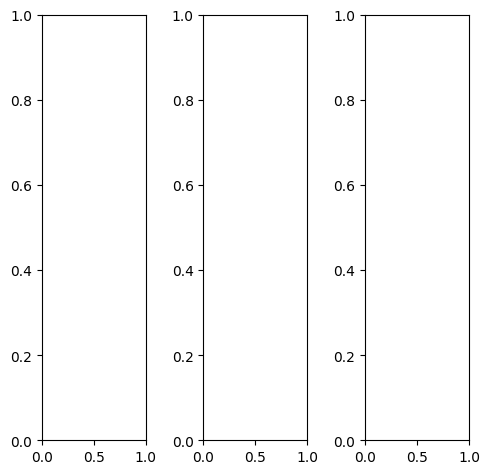

tensor([[[0.0863, 0.1373, 0.2627,  ..., 0.5765, 0.5765, 0.5098],
         [0.0627, 0.1059, 0.2627,  ..., 0.4118, 0.4196, 0.3961],
         [0.1098, 0.1020, 0.2510,  ..., 0.3647, 0.3725, 0.3843],
         ...,
         [0.8941, 0.8784, 0.8863,  ..., 0.6118, 0.6314, 0.7569],
         [0.8902, 0.8549, 0.7373,  ..., 0.7804, 0.8000, 0.7882],
         [0.9216, 0.8941, 0.8235,  ..., 0.9294, 0.9255, 0.9216]],

        [[0.0863, 0.1373, 0.2627,  ..., 0.5765, 0.5765, 0.5098],
         [0.0627, 0.1059, 0.2627,  ..., 0.4118, 0.4196, 0.3961],
         [0.1098, 0.1020, 0.2510,  ..., 0.3647, 0.3725, 0.3843],
         ...,
         [0.8941, 0.8784, 0.8863,  ..., 0.6118, 0.6314, 0.7569],
         [0.8902, 0.8549, 0.7373,  ..., 0.7804, 0.8000, 0.7882],
         [0.9216, 0.8941, 0.8235,  ..., 0.9294, 0.9255, 0.9216]],

        [[0.0863, 0.1373, 0.2627,  ..., 0.5765, 0.5765, 0.5098],
         [0.0627, 0.1059, 0.2627,  ..., 0.4118, 0.4196, 0.3961],
         [0.1098, 0.1020, 0.2510,  ..., 0.3647, 0.3725, 0.

tensor([[[0.0627, 0.1294, 0.2863,  ..., 0.5608, 0.5608, 0.4941],
         [0.0431, 0.0980, 0.2863,  ..., 0.4431, 0.4510, 0.4314],
         [0.0902, 0.0941, 0.2745,  ..., 0.4157, 0.4235, 0.4353],
         ...,
         [0.9529, 0.9373, 0.9451,  ..., 0.6784, 0.7059, 0.8235],
         [0.9529, 0.9176, 0.7961,  ..., 0.8275, 0.8510, 0.8392],
         [0.9804, 0.9529, 0.8824,  ..., 0.9804, 0.9725, 0.9686]],

        [[0.1020, 0.1490, 0.2588,  ..., 0.5725, 0.5765, 0.5137],
         [0.0784, 0.1176, 0.2588,  ..., 0.4118, 0.4196, 0.4000],
         [0.1255, 0.1137, 0.2471,  ..., 0.3608, 0.3686, 0.3843],
         ...,
         [0.8745, 0.8588, 0.8667,  ..., 0.5843, 0.6039, 0.7333],
         [0.8745, 0.8392, 0.7216,  ..., 0.7608, 0.7804, 0.7686],
         [0.9059, 0.8784, 0.8078,  ..., 0.9137, 0.9137, 0.9059]],

        [[0.0706, 0.1137, 0.2235,  ..., 0.6275, 0.6196, 0.5373],
         [0.0471, 0.0784, 0.2235,  ..., 0.3294, 0.3255, 0.2941],
         [0.0941, 0.0784, 0.2078,  ..., 0.2588, 0.2588, 0.

tensor([[[-0.1020, -0.0638, -0.1040,  ...,  0.3967,  0.3820,  0.3534],
         [-0.0097, -0.2197, -0.0572,  ...,  0.2676,  0.2642,  0.2450],
         [-0.3078, -0.3338, -0.2099,  ...,  0.1921,  0.2059,  0.2264],
         ...,
         [ 0.7793,  0.7410,  0.7376,  ...,  0.5441,  0.5582,  0.6627],
         [ 0.7609,  0.7071,  0.6036,  ...,  0.6804,  0.7097,  0.6867],
         [ 0.7683,  0.7383,  0.6631,  ...,  0.8191,  0.8305,  0.7702]],

        [[ 0.0560,  0.0272,  0.0021,  ...,  0.5029,  0.5078,  0.4205],
         [-0.0372, -0.2352, -0.2202,  ...,  0.3755,  0.3915,  0.3124],
         [-0.2104, -0.2661, -0.1997,  ...,  0.2982,  0.3230,  0.2781],
         ...,
         [ 0.7696,  0.7546,  0.7875,  ...,  0.5176,  0.5454,  0.6283],
         [ 0.7628,  0.7189,  0.6346,  ...,  0.6694,  0.6928,  0.6671],
         [ 0.7378,  0.7354,  0.6746,  ...,  0.7796,  0.7868,  0.7356]],

        [[ 0.1492, -0.0518,  0.1417,  ...,  0.6057,  0.6163,  0.5298],
         [ 0.1304, -0.1242,  0.1027,  ...,  0

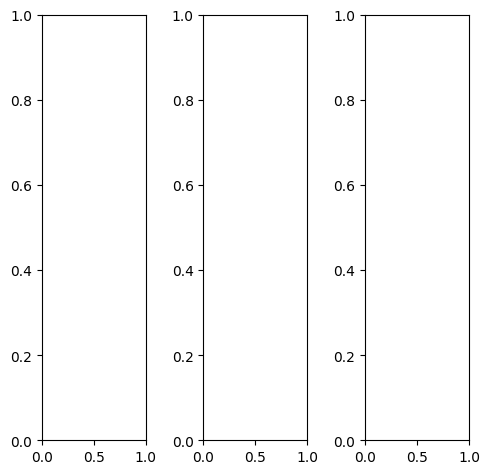

EPOCH: 33.000  val_loss: 0.003  (4052.94s - 8228.70s remaining)

tensor([[[0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4941, 0.5020,  ..., 0.4784, 0.4745, 0.4706],
         ...,
         [0.0824, 0.0745, 0.0784,  ..., 0.1020, 0.1020, 0.0824],
         [0.0784, 0.0941, 0.1059,  ..., 0.1098, 0.1255, 0.1059],
         [0.0784, 0.0824, 0.0941,  ..., 0.0902, 0.1098, 0.1020]],

        [[0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4941, 0.5020,  ..., 0.4784, 0.4745, 0.4706],
         ...,
         [0.0824, 0.0745, 0.0784,  ..., 0.1020, 0.1020, 0.0824],
         [0.0784, 0.0941, 0.1059,  ..., 0.1098, 0.1255, 0.1059],
         [0.0784, 0.0824, 0.0941,  ..., 0.0902, 0.1098, 0.1020]],

        [[0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4980, 0.5059,  ..., 0.4784, 0.4706, 0.4667],
         [0.4941, 0.4941, 0.5020,  ..., 0.4784, 0.4745, 0.

tensor([[[0.5216, 0.5255, 0.5333,  ..., 0.5059, 0.4980, 0.4941],
         [0.5255, 0.5255, 0.5333,  ..., 0.5098, 0.5020, 0.4980],
         [0.5294, 0.5333, 0.5412,  ..., 0.5176, 0.5098, 0.5059],
         ...,
         [0.0706, 0.0627, 0.0667,  ..., 0.0902, 0.0902, 0.0706],
         [0.0667, 0.0824, 0.0941,  ..., 0.0980, 0.1137, 0.0941],
         [0.0667, 0.0706, 0.0824,  ..., 0.0784, 0.0980, 0.0902]],

        [[0.4902, 0.4941, 0.5020,  ..., 0.4784, 0.4706, 0.4667],
         [0.4902, 0.4941, 0.5020,  ..., 0.4784, 0.4706, 0.4667],
         [0.4863, 0.4902, 0.4980,  ..., 0.4745, 0.4706, 0.4667],
         ...,
         [0.0824, 0.0745, 0.0784,  ..., 0.1020, 0.1020, 0.0824],
         [0.0784, 0.0941, 0.1059,  ..., 0.1098, 0.1255, 0.1059],
         [0.0784, 0.0824, 0.0941,  ..., 0.0902, 0.1098, 0.1020]],

        [[0.4392, 0.4431, 0.4510,  ..., 0.4078, 0.4000, 0.3961],
         [0.4314, 0.4353, 0.4431,  ..., 0.4039, 0.4000, 0.3961],
         [0.4275, 0.4275, 0.4353,  ..., 0.4000, 0.3922, 0.

tensor([[[0.4452, 0.3979, 0.3898,  ..., 0.3657, 0.3762, 0.4068],
         [0.4048, 0.3710, 0.3853,  ..., 0.3566, 0.3626, 0.3794],
         [0.3861, 0.3706, 0.3894,  ..., 0.3642, 0.3688, 0.3702],
         ...,
         [0.0493, 0.0412, 0.0531,  ..., 0.0831, 0.0788, 0.0615],
         [0.0540, 0.0690, 0.0852,  ..., 0.0896, 0.0998, 0.0909],
         [0.0866, 0.0685, 0.0746,  ..., 0.0744, 0.0982, 0.0979]],

        [[0.5213, 0.5285, 0.5239,  ..., 0.4895, 0.4942, 0.4888],
         [0.5135, 0.5127, 0.5235,  ..., 0.5033, 0.5054, 0.4786],
         [0.5142, 0.5167, 0.5280,  ..., 0.5146, 0.5120, 0.4819],
         ...,
         [0.0868, 0.0782, 0.0823,  ..., 0.1083, 0.1098, 0.0814],
         [0.0860, 0.0974, 0.1141,  ..., 0.1152, 0.1307, 0.1043],
         [0.1188, 0.0930, 0.0974,  ..., 0.0947, 0.1123, 0.1176]],

        [[0.6285, 0.6562, 0.6811,  ..., 0.6337, 0.6339, 0.5978],
         [0.6442, 0.6574, 0.6801,  ..., 0.6406, 0.6449, 0.6188],
         [0.6458, 0.6644, 0.6820,  ..., 0.6474, 0.6475, 0.

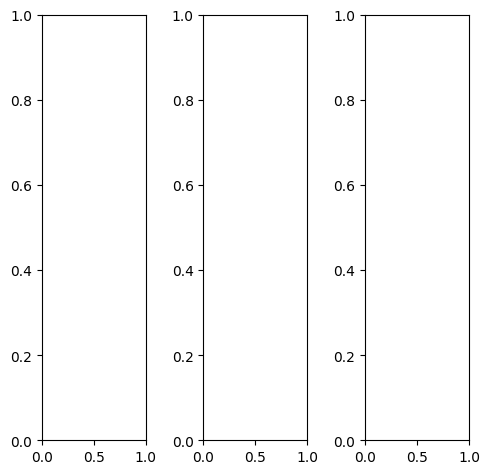

tensor([[[0.7176, 0.7137, 0.7255,  ..., 0.7451, 0.7373, 0.7451],
         [0.7412, 0.7373, 0.7451,  ..., 0.7569, 0.7529, 0.7608],
         [0.7333, 0.7373, 0.7490,  ..., 0.7569, 0.7529, 0.7608],
         ...,
         [0.6431, 0.6157, 0.6196,  ..., 0.7059, 0.7176, 0.6745],
         [0.6353, 0.6196, 0.6392,  ..., 0.7216, 0.6902, 0.6902],
         [0.6471, 0.6471, 0.6706,  ..., 0.6863, 0.6784, 0.7059]],

        [[0.7176, 0.7137, 0.7255,  ..., 0.7451, 0.7373, 0.7451],
         [0.7412, 0.7373, 0.7451,  ..., 0.7569, 0.7529, 0.7608],
         [0.7333, 0.7373, 0.7490,  ..., 0.7569, 0.7529, 0.7608],
         ...,
         [0.6431, 0.6157, 0.6196,  ..., 0.7059, 0.7176, 0.6745],
         [0.6353, 0.6196, 0.6392,  ..., 0.7216, 0.6902, 0.6902],
         [0.6471, 0.6471, 0.6706,  ..., 0.6863, 0.6784, 0.7059]],

        [[0.7176, 0.7137, 0.7255,  ..., 0.7451, 0.7373, 0.7451],
         [0.7412, 0.7373, 0.7451,  ..., 0.7569, 0.7529, 0.7608],
         [0.7333, 0.7373, 0.7490,  ..., 0.7569, 0.7529, 0.

tensor([[[0.5804, 0.5843, 0.5922,  ..., 0.6078, 0.6039, 0.6118],
         [0.5961, 0.5961, 0.6078,  ..., 0.6196, 0.6157, 0.6275],
         [0.5922, 0.5922, 0.6118,  ..., 0.6235, 0.6196, 0.6353],
         ...,
         [0.6392, 0.6157, 0.6157,  ..., 0.6980, 0.7098, 0.6706],
         [0.6314, 0.6157, 0.6353,  ..., 0.7176, 0.6863, 0.6824],
         [0.6431, 0.6431, 0.6667,  ..., 0.6824, 0.6745, 0.7020]],

        [[0.7451, 0.7412, 0.7490,  ..., 0.7725, 0.7647, 0.7725],
         [0.7686, 0.7647, 0.7725,  ..., 0.7882, 0.7804, 0.7922],
         [0.7608, 0.7686, 0.7804,  ..., 0.7882, 0.7804, 0.7882],
         ...,
         [0.6471, 0.6196, 0.6235,  ..., 0.7098, 0.7216, 0.6784],
         [0.6392, 0.6235, 0.6431,  ..., 0.7255, 0.6941, 0.6941],
         [0.6510, 0.6510, 0.6745,  ..., 0.6902, 0.6824, 0.7098]],

        [[0.9294, 0.9255, 0.9451,  ..., 0.9569, 0.9451, 0.9490],
         [0.9647, 0.9569, 0.9647,  ..., 0.9647, 0.9569, 0.9647],
         [0.9529, 0.9569, 0.9529,  ..., 0.9529, 0.9451, 0.

tensor([[[0.7051, 0.7032, 0.6942,  ..., 0.7302, 0.7265, 0.7443],
         [0.7328, 0.7190, 0.7161,  ..., 0.7414, 0.7473, 0.7686],
         [0.7270, 0.7215, 0.7299,  ..., 0.7473, 0.7435, 0.7561],
         ...,
         [0.6646, 0.6526, 0.6376,  ..., 0.7316, 0.7407, 0.7068],
         [0.6547, 0.6344, 0.6588,  ..., 0.7363, 0.7111, 0.7260],
         [0.6665, 0.6677, 0.6927,  ..., 0.7053, 0.7132, 0.7245]],

        [[0.7273, 0.7224, 0.7428,  ..., 0.7577, 0.7525, 0.7608],
         [0.7519, 0.7501, 0.7539,  ..., 0.7620, 0.7543, 0.7780],
         [0.7432, 0.7511, 0.7687,  ..., 0.7656, 0.7565, 0.7760],
         ...,
         [0.6430, 0.6246, 0.6208,  ..., 0.7077, 0.7213, 0.6784],
         [0.6395, 0.6142, 0.6375,  ..., 0.7191, 0.6936, 0.6961],
         [0.6447, 0.6566, 0.6667,  ..., 0.6804, 0.6849, 0.7013]],

        [[0.7321, 0.7290, 0.7401,  ..., 0.7387, 0.7339, 0.7533],
         [0.7465, 0.7463, 0.7604,  ..., 0.7455, 0.7369, 0.7462],
         [0.7404, 0.7326, 0.7575,  ..., 0.7474, 0.7373, 0.

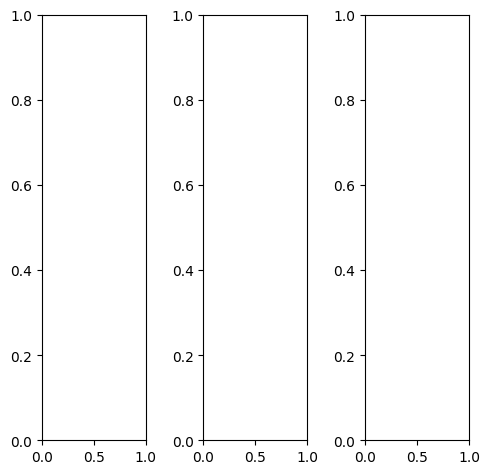

tensor([[[0.3451, 0.0902, 0.0706,  ..., 0.7922, 0.7804, 0.7529],
         [0.2588, 0.0941, 0.0902,  ..., 0.7961, 0.7804, 0.7569],
         [0.2353, 0.1922, 0.2235,  ..., 0.8039, 0.7843, 0.7569],
         ...,
         [0.3255, 0.3137, 0.4627,  ..., 0.1176, 0.1333, 0.1451],
         [0.2784, 0.2706, 0.2784,  ..., 0.1686, 0.1686, 0.1765],
         [0.2431, 0.2353, 0.2235,  ..., 0.1686, 0.1686, 0.1647]],

        [[0.3451, 0.0902, 0.0706,  ..., 0.7922, 0.7804, 0.7529],
         [0.2588, 0.0941, 0.0902,  ..., 0.7961, 0.7804, 0.7569],
         [0.2353, 0.1922, 0.2235,  ..., 0.8039, 0.7843, 0.7569],
         ...,
         [0.3255, 0.3137, 0.4627,  ..., 0.1176, 0.1333, 0.1451],
         [0.2784, 0.2706, 0.2784,  ..., 0.1686, 0.1686, 0.1765],
         [0.2431, 0.2353, 0.2235,  ..., 0.1686, 0.1686, 0.1647]],

        [[0.3451, 0.0902, 0.0706,  ..., 0.7922, 0.7804, 0.7529],
         [0.2588, 0.0941, 0.0902,  ..., 0.7961, 0.7804, 0.7569],
         [0.2353, 0.1922, 0.2235,  ..., 0.8039, 0.7843, 0.

tensor([[[0.3529, 0.0824, 0.0549,  ..., 0.7686, 0.7608, 0.7373],
         [0.2784, 0.0902, 0.0824,  ..., 0.7765, 0.7647, 0.7412],
         [0.2627, 0.2118, 0.2431,  ..., 0.7882, 0.7686, 0.7412],
         ...,
         [0.4706, 0.4588, 0.5373,  ..., 0.1725, 0.1961, 0.2118],
         [0.4196, 0.3961, 0.3843,  ..., 0.2745, 0.2824, 0.2824],
         [0.3647, 0.3412, 0.3333,  ..., 0.2784, 0.2745, 0.2627]],

        [[0.3529, 0.0980, 0.0824,  ..., 0.8078, 0.7961, 0.7686],
         [0.2588, 0.0980, 0.0980,  ..., 0.8118, 0.7922, 0.7686],
         [0.2314, 0.1922, 0.2235,  ..., 0.8196, 0.7961, 0.7725],
         ...,
         [0.2863, 0.2784, 0.4510,  ..., 0.1020, 0.1137, 0.1255],
         [0.2392, 0.2392, 0.2549,  ..., 0.1333, 0.1333, 0.1412],
         [0.2078, 0.2078, 0.1961,  ..., 0.1333, 0.1333, 0.1333]],

        [[0.2980, 0.0667, 0.0627,  ..., 0.7725, 0.7608, 0.7176],
         [0.2157, 0.0706, 0.0784,  ..., 0.7765, 0.7569, 0.7216],
         [0.1725, 0.1412, 0.1765,  ..., 0.7804, 0.7529, 0.

tensor([[[0.3236, 0.1131, 0.0715,  ..., 0.7993, 0.7926, 0.7715],
         [0.2557, 0.0898, 0.0788,  ..., 0.8105, 0.7922, 0.7898],
         [0.2434, 0.1991, 0.2290,  ..., 0.8217, 0.8040, 0.7757],
         ...,
         [0.3484, 0.3606, 0.5160,  ..., 0.1342, 0.1543, 0.1584],
         [0.2945, 0.3072, 0.3181,  ..., 0.1938, 0.1955, 0.1940],
         [0.2606, 0.2489, 0.2442,  ..., 0.1901, 0.1863, 0.1854]],

        [[0.3227, 0.1204, 0.0777,  ..., 0.7919, 0.7883, 0.7640],
         [0.2536, 0.0970, 0.0928,  ..., 0.7946, 0.7644, 0.7629],
         [0.2335, 0.2029, 0.2307,  ..., 0.8076, 0.7801, 0.7687],
         ...,
         [0.3198, 0.3108, 0.4685,  ..., 0.1149, 0.1309, 0.1382],
         [0.2672, 0.2613, 0.2698,  ..., 0.1613, 0.1630, 0.1657],
         [0.2511, 0.2216, 0.2172,  ..., 0.1576, 0.1522, 0.1720]],

        [[0.2746, 0.0793, 0.0597,  ..., 0.7506, 0.7476, 0.7370],
         [0.2098, 0.0656, 0.0616,  ..., 0.7535, 0.7293, 0.7032],
         [0.1819, 0.1477, 0.1730,  ..., 0.7606, 0.7336, 0.

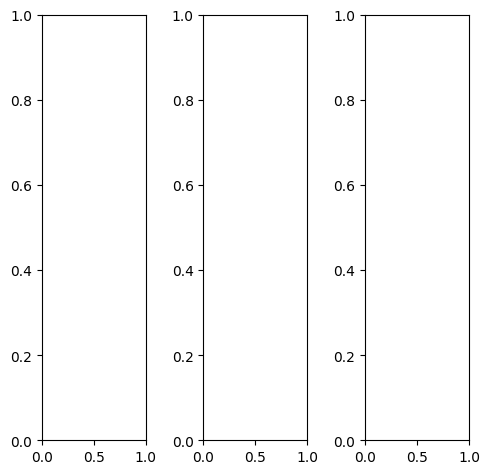

tensor([[[0.8863, 0.8980, 0.9020,  ..., 0.9333, 0.9294, 0.9137],
         [0.7922, 0.7922, 0.8235,  ..., 0.9333, 0.9333, 0.9255],
         [0.7137, 0.7098, 0.7490,  ..., 0.9294, 0.9333, 0.9333],
         ...,
         [0.5922, 0.4941, 0.3490,  ..., 0.4510, 0.4941, 0.5804],
         [0.5686, 0.5137, 0.4471,  ..., 0.4588, 0.5451, 0.6039],
         [0.6118, 0.5843, 0.5608,  ..., 0.6000, 0.5804, 0.6275]],

        [[0.8863, 0.8980, 0.9020,  ..., 0.9333, 0.9294, 0.9137],
         [0.7922, 0.7922, 0.8235,  ..., 0.9333, 0.9333, 0.9255],
         [0.7137, 0.7098, 0.7490,  ..., 0.9294, 0.9333, 0.9333],
         ...,
         [0.5922, 0.4941, 0.3490,  ..., 0.4510, 0.4941, 0.5804],
         [0.5686, 0.5137, 0.4471,  ..., 0.4588, 0.5451, 0.6039],
         [0.6118, 0.5843, 0.5608,  ..., 0.6000, 0.5804, 0.6275]],

        [[0.8863, 0.8980, 0.9020,  ..., 0.9333, 0.9294, 0.9137],
         [0.7922, 0.7922, 0.8235,  ..., 0.9333, 0.9333, 0.9255],
         [0.7137, 0.7098, 0.7490,  ..., 0.9294, 0.9333, 0.

tensor([[[0.8863, 0.8941, 0.8980,  ..., 0.9451, 0.9333, 0.9098],
         [0.7843, 0.7843, 0.8118,  ..., 0.9412, 0.9333, 0.9216],
         [0.6980, 0.6941, 0.7373,  ..., 0.9412, 0.9333, 0.9294],
         ...,
         [0.6510, 0.5451, 0.3961,  ..., 0.5098, 0.5490, 0.6392],
         [0.6392, 0.5765, 0.5059,  ..., 0.5137, 0.5804, 0.6353],
         [0.6941, 0.6588, 0.6275,  ..., 0.6431, 0.5961, 0.6314]],

        [[0.8863, 0.8980, 0.9020,  ..., 0.9294, 0.9255, 0.9098],
         [0.7922, 0.7922, 0.8235,  ..., 0.9255, 0.9294, 0.9216],
         [0.7176, 0.7137, 0.7529,  ..., 0.9216, 0.9294, 0.9294],
         ...,
         [0.5843, 0.4824, 0.3373,  ..., 0.4392, 0.4902, 0.5725],
         [0.5529, 0.4980, 0.4314,  ..., 0.4549, 0.5529, 0.6157],
         [0.5922, 0.5647, 0.5412,  ..., 0.6039, 0.6039, 0.6549]],

        [[0.9020, 0.9137, 0.9137,  ..., 0.9373, 0.9451, 0.9333],
         [0.8118, 0.8118, 0.8431,  ..., 0.9412, 0.9490, 0.9490],
         [0.7412, 0.7373, 0.7765,  ..., 0.9412, 0.9490, 0.

tensor([[[0.8591, 0.8843, 0.8988,  ..., 0.9205, 0.9165, 0.8879],
         [0.7978, 0.7908, 0.8295,  ..., 0.9188, 0.9253, 0.9056],
         [0.7231, 0.7137, 0.7502,  ..., 0.9194, 0.9278, 0.9212],
         ...,
         [0.6156, 0.5219, 0.3755,  ..., 0.4815, 0.5198, 0.6192],
         [0.6030, 0.5389, 0.4731,  ..., 0.4825, 0.5813, 0.6354],
         [0.6274, 0.6157, 0.5953,  ..., 0.6338, 0.6217, 0.6456]],

        [[0.8731, 0.8844, 0.9115,  ..., 0.9351, 0.9271, 0.9208],
         [0.7962, 0.7970, 0.8272,  ..., 0.9400, 0.9310, 0.9269],
         [0.7165, 0.7153, 0.7532,  ..., 0.9386, 0.9412, 0.9341],
         ...,
         [0.5904, 0.4735, 0.3423,  ..., 0.4453, 0.4889, 0.5829],
         [0.5729, 0.4980, 0.4285,  ..., 0.4542, 0.5570, 0.6125],
         [0.6029, 0.5956, 0.5695,  ..., 0.6000, 0.5892, 0.6253]],

        [[0.8560, 0.8803, 0.8800,  ..., 0.9361, 0.9300, 0.9100],
         [0.7708, 0.7693, 0.8037,  ..., 0.9442, 0.9395, 0.9265],
         [0.6967, 0.6742, 0.7208,  ..., 0.9366, 0.9347, 0.

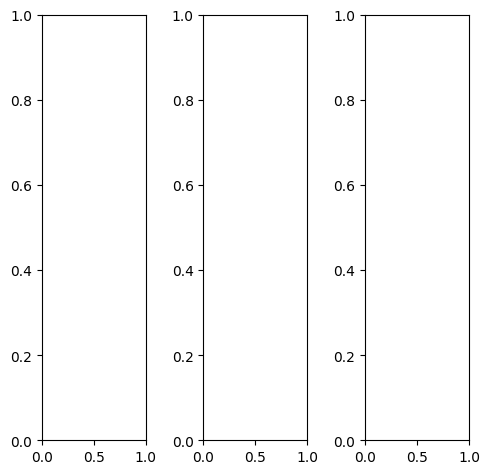

tensor([[[0.6510, 0.6118, 0.4902,  ..., 0.7059, 0.6980, 0.6667],
         [0.6235, 0.6784, 0.5451,  ..., 0.6745, 0.6667, 0.6745],
         [0.7020, 0.7373, 0.6667,  ..., 0.6196, 0.6275, 0.7020],
         ...,
         [0.5216, 0.4392, 0.4314,  ..., 0.3686, 0.3765, 0.4000],
         [0.5176, 0.4235, 0.4314,  ..., 0.3294, 0.3294, 0.2314],
         [0.3961, 0.4275, 0.4706,  ..., 0.2784, 0.2078, 0.2314]],

        [[0.6510, 0.6118, 0.4902,  ..., 0.7059, 0.6980, 0.6667],
         [0.6235, 0.6784, 0.5451,  ..., 0.6745, 0.6667, 0.6745],
         [0.7020, 0.7373, 0.6667,  ..., 0.6196, 0.6275, 0.7020],
         ...,
         [0.5216, 0.4392, 0.4314,  ..., 0.3686, 0.3765, 0.4000],
         [0.5176, 0.4235, 0.4314,  ..., 0.3294, 0.3294, 0.2314],
         [0.3961, 0.4275, 0.4706,  ..., 0.2784, 0.2078, 0.2314]],

        [[0.6510, 0.6118, 0.4902,  ..., 0.7059, 0.6980, 0.6667],
         [0.6235, 0.6784, 0.5451,  ..., 0.6745, 0.6667, 0.6745],
         [0.7020, 0.7373, 0.6667,  ..., 0.6196, 0.6275, 0.

tensor([[[0.5961, 0.5608, 0.4431,  ..., 0.6353, 0.6275, 0.5961],
         [0.5608, 0.6235, 0.4980,  ..., 0.6039, 0.5961, 0.6039],
         [0.6392, 0.6784, 0.6118,  ..., 0.5490, 0.5569, 0.6314],
         ...,
         [0.5176, 0.4392, 0.4353,  ..., 0.3490, 0.3490, 0.3686],
         [0.5216, 0.4235, 0.4314,  ..., 0.3137, 0.3137, 0.2157],
         [0.4157, 0.4235, 0.4588,  ..., 0.2667, 0.2078, 0.2353]],

        [[0.6745, 0.6353, 0.5098,  ..., 0.7412, 0.7373, 0.7020],
         [0.6510, 0.7020, 0.5686,  ..., 0.7098, 0.7020, 0.7098],
         [0.7333, 0.7686, 0.6941,  ..., 0.6549, 0.6627, 0.7373],
         ...,
         [0.5216, 0.4353, 0.4275,  ..., 0.3686, 0.3804, 0.4078],
         [0.5137, 0.4235, 0.4314,  ..., 0.3294, 0.3294, 0.2314],
         [0.3843, 0.4275, 0.4784,  ..., 0.2745, 0.1961, 0.2235]],

        [[0.6667, 0.6275, 0.5059,  ..., 0.7059, 0.6980, 0.6667],
         [0.6314, 0.6863, 0.5569,  ..., 0.6745, 0.6667, 0.6745],
         [0.7059, 0.7412, 0.6706,  ..., 0.6196, 0.6275, 0.

tensor([[[0.6509, 0.6360, 0.5049,  ..., 0.7340, 0.7320, 0.6959],
         [0.6600, 0.6969, 0.5749,  ..., 0.6916, 0.6785, 0.7078],
         [0.7286, 0.7644, 0.6944,  ..., 0.6458, 0.6559, 0.7328],
         ...,
         [0.5436, 0.4504, 0.4543,  ..., 0.3861, 0.3948, 0.4081],
         [0.5442, 0.4640, 0.4734,  ..., 0.3474, 0.3463, 0.2461],
         [0.4378, 0.4440, 0.4977,  ..., 0.2925, 0.2259, 0.2562]],

        [[0.6460, 0.6239, 0.4963,  ..., 0.7155, 0.7129, 0.6800],
         [0.6462, 0.6710, 0.5445,  ..., 0.6792, 0.6652, 0.6889],
         [0.7206, 0.7436, 0.6757,  ..., 0.6277, 0.6361, 0.7083],
         ...,
         [0.5370, 0.4328, 0.4421,  ..., 0.3683, 0.3821, 0.4038],
         [0.5329, 0.4245, 0.4330,  ..., 0.3362, 0.3289, 0.2371],
         [0.4197, 0.4159, 0.4708,  ..., 0.2868, 0.2192, 0.2504]],

        [[0.5483, 0.5247, 0.3841,  ..., 0.6167, 0.6211, 0.6157],
         [0.5182, 0.5615, 0.4222,  ..., 0.5660, 0.5597, 0.5782],
         [0.5946, 0.6181, 0.5411,  ..., 0.5181, 0.5320, 0.

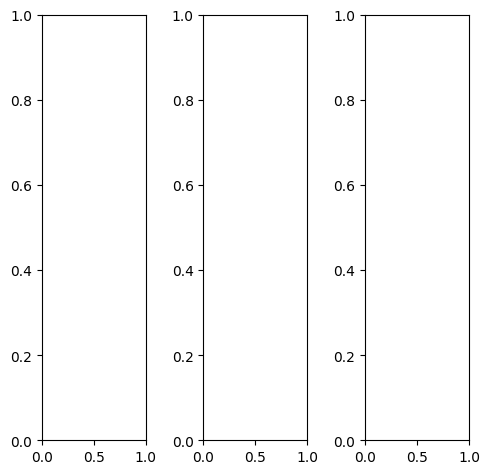

EPOCH: 33.255  trn_loss: 0.004  (4083.41s - 8195.65s remaining)

tensor([[[0.8118, 0.8431, 0.8549,  ..., 0.8863, 0.8745, 0.8824],
         [0.7804, 0.8196, 0.8471,  ..., 0.8863, 0.8745, 0.8863],
         [0.7804, 0.8353, 0.8706,  ..., 0.8980, 0.8902, 0.9059],
         ...,
         [0.4314, 0.4667, 0.5020,  ..., 0.8157, 0.8196, 0.8353],
         [0.4314, 0.4588, 0.4784,  ..., 0.7922, 0.7961, 0.8118],
         [0.4314, 0.4392, 0.4549,  ..., 0.7725, 0.7765, 0.7922]],

        [[0.8118, 0.8431, 0.8549,  ..., 0.8863, 0.8745, 0.8824],
         [0.7804, 0.8196, 0.8471,  ..., 0.8863, 0.8745, 0.8863],
         [0.7804, 0.8353, 0.8706,  ..., 0.8980, 0.8902, 0.9059],
         ...,
         [0.4314, 0.4667, 0.5020,  ..., 0.8157, 0.8196, 0.8353],
         [0.4314, 0.4588, 0.4784,  ..., 0.7922, 0.7961, 0.8118],
         [0.4314, 0.4392, 0.4549,  ..., 0.7725, 0.7765, 0.7922]],

        [[0.8118, 0.8431, 0.8549,  ..., 0.8863, 0.8745, 0.8824],
         [0.7804, 0.8196, 0.8471,  ..., 0.8863, 0.8745, 0.8863],
         [0.7804, 0.8353, 0.8706,  ..., 0.8980, 0.8902, 0.

tensor([[[0.7922, 0.8275, 0.8392,  ..., 0.7608, 0.7412, 0.7490],
         [0.7529, 0.7922, 0.8196,  ..., 0.7686, 0.7529, 0.7647],
         [0.7647, 0.8235, 0.8588,  ..., 0.7843, 0.7765, 0.7922],
         ...,
         [0.4353, 0.4667, 0.4941,  ..., 0.7843, 0.7882, 0.8039],
         [0.4353, 0.4627, 0.4784,  ..., 0.7529, 0.7608, 0.7765],
         [0.4353, 0.4431, 0.4588,  ..., 0.7333, 0.7373, 0.7529]],

        [[0.8157, 0.8471, 0.8588,  ..., 0.9333, 0.9255, 0.9333],
         [0.7922, 0.8275, 0.8549,  ..., 0.9333, 0.9255, 0.9373],
         [0.7843, 0.8392, 0.8745,  ..., 0.9451, 0.9412, 0.9569],
         ...,
         [0.4392, 0.4745, 0.5098,  ..., 0.8353, 0.8392, 0.8549],
         [0.4353, 0.4667, 0.4863,  ..., 0.8118, 0.8157, 0.8314],
         [0.4353, 0.4431, 0.4588,  ..., 0.7922, 0.7961, 0.8118]],

        [[0.8314, 0.8627, 0.8745,  ..., 0.9686, 0.9686, 0.9765],
         [0.8000, 0.8392, 0.8627,  ..., 0.9490, 0.9412, 0.9529],
         [0.8000, 0.8588, 0.8941,  ..., 0.9412, 0.9333, 0.

tensor([[[0.5243, 0.4640, 0.3697,  ..., 0.4809, 0.4810, 0.5715],
         [0.4720, 0.3517, 0.3351,  ..., 0.4290, 0.4660, 0.5409],
         [0.4005, 0.3351, 0.2625,  ..., 0.4467, 0.4780, 0.5448],
         ...,
         [0.2970, 0.3658, 0.4118,  ..., 0.5789, 0.5935, 0.6337],
         [0.2902, 0.3399, 0.3885,  ..., 0.5801, 0.6019, 0.6238],
         [0.2970, 0.2932, 0.3262,  ..., 0.6018, 0.6120, 0.6282]],

        [[0.5871, 0.5472, 0.4891,  ..., 0.5818, 0.6067, 0.6262],
         [0.4697, 0.3260, 0.3341,  ..., 0.5706, 0.5943, 0.6510],
         [0.5461, 0.4543, 0.4366,  ..., 0.5716, 0.5811, 0.6454],
         ...,
         [0.3023, 0.3452, 0.3975,  ..., 0.5424, 0.5530, 0.5695],
         [0.3000, 0.3398, 0.3753,  ..., 0.5538, 0.5642, 0.5842],
         [0.2978, 0.2982, 0.3257,  ..., 0.5553, 0.5807, 0.5867]],

        [[0.7109, 0.6148, 0.6471,  ..., 0.7844, 0.7843, 0.7931],
         [0.6336, 0.5483, 0.5565,  ..., 0.7573, 0.7765, 0.8118],
         [0.5443, 0.4964, 0.4872,  ..., 0.7659, 0.7741, 0.

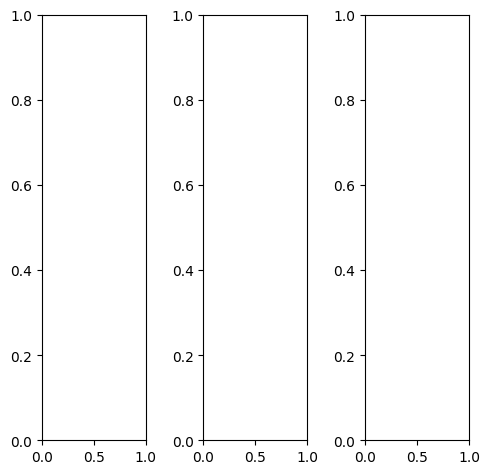

tensor([[[0.9961, 0.9882, 0.9804,  ..., 0.6157, 0.6667, 0.9608],
         [0.9569, 0.9412, 0.9451,  ..., 0.2980, 0.5216, 0.9686],
         [0.8667, 0.8549, 0.8627,  ..., 0.2275, 0.3333, 0.7725],
         ...,
         [0.4314, 0.4157, 0.4118,  ..., 0.5294, 0.5176, 0.5373],
         [0.4745, 0.4549, 0.4784,  ..., 0.4667, 0.4745, 0.5412],
         [0.4863, 0.4902, 0.4863,  ..., 0.5059, 0.5098, 0.5725]],

        [[0.9961, 0.9882, 0.9804,  ..., 0.6157, 0.6667, 0.9608],
         [0.9569, 0.9412, 0.9451,  ..., 0.2980, 0.5216, 0.9686],
         [0.8667, 0.8549, 0.8627,  ..., 0.2275, 0.3333, 0.7725],
         ...,
         [0.4314, 0.4157, 0.4118,  ..., 0.5294, 0.5176, 0.5373],
         [0.4745, 0.4549, 0.4784,  ..., 0.4667, 0.4745, 0.5412],
         [0.4863, 0.4902, 0.4863,  ..., 0.5059, 0.5098, 0.5725]],

        [[0.9961, 0.9882, 0.9804,  ..., 0.6157, 0.6667, 0.9608],
         [0.9569, 0.9412, 0.9451,  ..., 0.2980, 0.5216, 0.9686],
         [0.8667, 0.8549, 0.8627,  ..., 0.2275, 0.3333, 0.

tensor([[[0.9843, 0.9569, 0.9490,  ..., 0.6863, 0.7020, 0.9373],
         [0.8824, 0.8706, 0.8745,  ..., 0.4667, 0.6000, 0.9216],
         [0.7529, 0.7451, 0.7529,  ..., 0.3804, 0.4039, 0.7294],
         ...,
         [0.4902, 0.4706, 0.4706,  ..., 0.6157, 0.6000, 0.6235],
         [0.5333, 0.5137, 0.5412,  ..., 0.5529, 0.5608, 0.6314],
         [0.5490, 0.5490, 0.5490,  ..., 0.6039, 0.6078, 0.6745]],

        [[1.0000, 1.0000, 0.9961,  ..., 0.5882, 0.6549, 0.9765],
         [0.9843, 0.9686, 0.9725,  ..., 0.2275, 0.4902, 0.9961],
         [0.9098, 0.8980, 0.9059,  ..., 0.1686, 0.3098, 0.8000],
         ...,
         [0.4275, 0.4118, 0.4078,  ..., 0.5137, 0.5020, 0.5216],
         [0.4706, 0.4510, 0.4745,  ..., 0.4471, 0.4549, 0.5255],
         [0.4824, 0.4863, 0.4824,  ..., 0.4824, 0.4863, 0.5490]],

        [[1.0000, 1.0000, 0.9961,  ..., 0.5765, 0.6353, 0.9529],
         [0.9961, 0.9804, 0.9843,  ..., 0.2353, 0.4745, 0.9608],
         [0.9412, 0.9255, 0.9333,  ..., 0.1412, 0.2784, 0.

tensor([[[0.9290, 0.9477, 0.9166,  ..., 0.5270, 0.5987, 0.7778],
         [0.8715, 0.8680, 0.8663,  ..., 0.2559, 0.5014, 0.8704],
         [0.8381, 0.8545, 0.8138,  ..., 0.1990, 0.3249, 0.7193],
         ...,
         [0.4580, 0.4685, 0.4563,  ..., 0.5956, 0.5878, 0.6014],
         [0.4979, 0.5091, 0.5241,  ..., 0.5253, 0.5443, 0.5969],
         [0.5123, 0.5320, 0.5357,  ..., 0.5537, 0.5611, 0.6057]],

        [[0.8757, 0.9618, 0.8289,  ..., 0.5762, 0.6639, 0.8437],
         [0.8686, 0.7796, 0.8464,  ..., 0.3046, 0.5836, 0.9556],
         [0.8301, 0.8769, 0.7645,  ..., 0.2838, 0.4050, 0.7965],
         ...,
         [0.4582, 0.4388, 0.4517,  ..., 0.5963, 0.5905, 0.5850],
         [0.4794, 0.4779, 0.5077,  ..., 0.5186, 0.5323, 0.5776],
         [0.4946, 0.4938, 0.5161,  ..., 0.5392, 0.5516, 0.5925]],

        [[0.8991, 0.9915, 0.8390,  ..., 0.7334, 0.8226, 0.9664],
         [0.9146, 0.8912, 0.8974,  ..., 0.4686, 0.7370, 1.1208],
         [0.8276, 0.8174, 0.7369,  ..., 0.4026, 0.5741, 0.

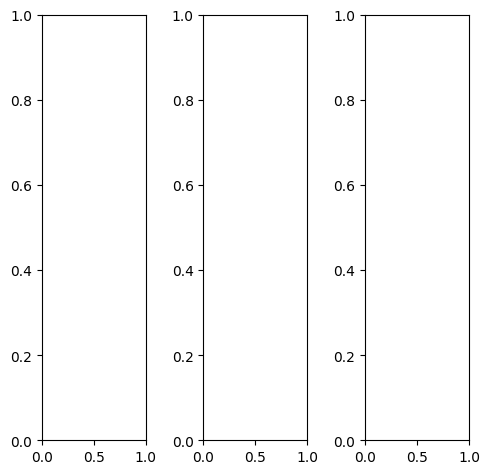

tensor([[[0.6471, 0.6431, 0.6471,  ..., 0.6353, 0.6353, 0.6314],
         [0.6588, 0.6510, 0.6549,  ..., 0.6510, 0.6392, 0.6431],
         [0.6549, 0.6510, 0.6549,  ..., 0.6353, 0.6392, 0.6392],
         ...,
         [0.3922, 0.3882, 0.3608,  ..., 0.2667, 0.3647, 0.3922],
         [0.3647, 0.3529, 0.3333,  ..., 0.1451, 0.2824, 0.3725],
         [0.3412, 0.3255, 0.2980,  ..., 0.3216, 0.3373, 0.3569]],

        [[0.6471, 0.6431, 0.6471,  ..., 0.6353, 0.6353, 0.6314],
         [0.6588, 0.6510, 0.6549,  ..., 0.6510, 0.6392, 0.6431],
         [0.6549, 0.6510, 0.6549,  ..., 0.6353, 0.6392, 0.6392],
         ...,
         [0.3922, 0.3882, 0.3608,  ..., 0.2667, 0.3647, 0.3922],
         [0.3647, 0.3529, 0.3333,  ..., 0.1451, 0.2824, 0.3725],
         [0.3412, 0.3255, 0.2980,  ..., 0.3216, 0.3373, 0.3569]],

        [[0.6471, 0.6431, 0.6471,  ..., 0.6353, 0.6353, 0.6314],
         [0.6588, 0.6510, 0.6549,  ..., 0.6510, 0.6392, 0.6431],
         [0.6549, 0.6510, 0.6549,  ..., 0.6353, 0.6392, 0.

tensor([[[0.5686, 0.5647, 0.5686,  ..., 0.5569, 0.5647, 0.5725],
         [0.5804, 0.5725, 0.5765,  ..., 0.5804, 0.5765, 0.5843],
         [0.5765, 0.5725, 0.5765,  ..., 0.5765, 0.5804, 0.5843],
         ...,
         [0.4471, 0.4353, 0.3882,  ..., 0.3020, 0.4118, 0.4510],
         [0.4157, 0.3961, 0.3647,  ..., 0.2000, 0.3373, 0.4314],
         [0.3922, 0.3686, 0.3333,  ..., 0.3765, 0.3922, 0.4118]],

        [[0.6471, 0.6431, 0.6471,  ..., 0.6353, 0.6353, 0.6314],
         [0.6588, 0.6510, 0.6549,  ..., 0.6471, 0.6392, 0.6431],
         [0.6588, 0.6510, 0.6549,  ..., 0.6314, 0.6353, 0.6353],
         ...,
         [0.3843, 0.3843, 0.3608,  ..., 0.2588, 0.3569, 0.3843],
         [0.3529, 0.3490, 0.3333,  ..., 0.1294, 0.2706, 0.3647],
         [0.3333, 0.3216, 0.2980,  ..., 0.3059, 0.3255, 0.3490]],

        [[0.8510, 0.8392, 0.8431,  ..., 0.8353, 0.8118, 0.7961],
         [0.8627, 0.8510, 0.8549,  ..., 0.8392, 0.8157, 0.8118],
         [0.8549, 0.8431, 0.8510,  ..., 0.8078, 0.8078, 0.

tensor([[[0.7214, 0.7019, 0.6646,  ..., 0.5993, 0.5943, 0.6458],
         [0.6831, 0.6147, 0.6194,  ..., 0.6228, 0.6064, 0.6455],
         [0.6705, 0.6883, 0.5881,  ..., 0.6177, 0.6131, 0.6285],
         ...,
         [0.5222, 0.5792, 0.5415,  ..., 0.3963, 0.4887, 0.5153],
         [0.4754, 0.5215, 0.5120,  ..., 0.2274, 0.4095, 0.5034],
         [0.4515, 0.4498, 0.4089,  ..., 0.4130, 0.4470, 0.4766]],

        [[0.7079, 0.7611, 0.6318,  ..., 0.7049, 0.7107, 0.7222],
         [0.7002, 0.6147, 0.6248,  ..., 0.7274, 0.7222, 0.7571],
         [0.7063, 0.7629, 0.6046,  ..., 0.7249, 0.7225, 0.7350],
         ...,
         [0.4882, 0.5325, 0.5029,  ..., 0.3837, 0.4840, 0.4738],
         [0.4451, 0.4728, 0.4567,  ..., 0.2396, 0.4047, 0.4657],
         [0.4183, 0.3983, 0.3674,  ..., 0.4063, 0.4330, 0.4427]],

        [[0.7811, 0.8019, 0.7243,  ..., 0.8883, 0.8925, 0.8781],
         [0.7926, 0.7118, 0.7548,  ..., 0.9242, 0.9065, 0.9128],
         [0.7212, 0.7347, 0.6270,  ..., 0.9259, 0.9289, 0.

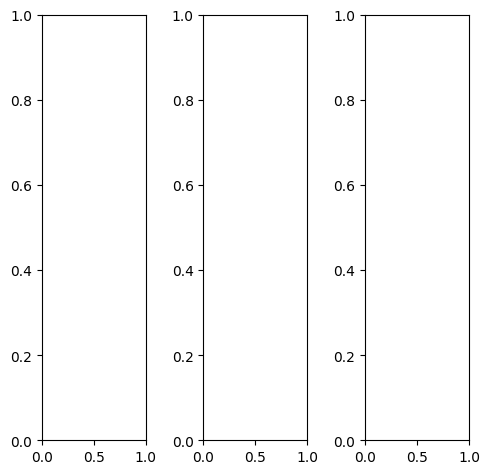

tensor([[[0.8745, 0.8863, 0.8980,  ..., 0.8784, 0.8745, 0.8902],
         [0.8706, 0.8784, 0.8824,  ..., 0.8549, 0.8549, 0.8745],
         [0.8392, 0.8353, 0.8157,  ..., 0.8078, 0.8078, 0.8314],
         ...,
         [0.3412, 0.3451, 0.3490,  ..., 0.4314, 0.4275, 0.4118],
         [0.2745, 0.2902, 0.2941,  ..., 0.4157, 0.3922, 0.3647],
         [0.2431, 0.2510, 0.2471,  ..., 0.3451, 0.3412, 0.3294]],

        [[0.8745, 0.8863, 0.8980,  ..., 0.8784, 0.8745, 0.8902],
         [0.8706, 0.8784, 0.8824,  ..., 0.8549, 0.8549, 0.8745],
         [0.8392, 0.8353, 0.8157,  ..., 0.8078, 0.8078, 0.8314],
         ...,
         [0.3412, 0.3451, 0.3490,  ..., 0.4314, 0.4275, 0.4118],
         [0.2745, 0.2902, 0.2941,  ..., 0.4157, 0.3922, 0.3647],
         [0.2431, 0.2510, 0.2471,  ..., 0.3451, 0.3412, 0.3294]],

        [[0.8745, 0.8863, 0.8980,  ..., 0.8784, 0.8745, 0.8902],
         [0.8706, 0.8784, 0.8824,  ..., 0.8549, 0.8549, 0.8745],
         [0.8392, 0.8353, 0.8157,  ..., 0.8078, 0.8078, 0.

tensor([[[0.8902, 0.9020, 0.9176,  ..., 0.8980, 0.9059, 0.9176],
         [0.9020, 0.9137, 0.9176,  ..., 0.8902, 0.8980, 0.9176],
         [0.8863, 0.8824, 0.8667,  ..., 0.8549, 0.8588, 0.8824],
         ...,
         [0.2980, 0.3020, 0.3059,  ..., 0.3647, 0.3608, 0.3490],
         [0.2314, 0.2471, 0.2510,  ..., 0.3608, 0.3373, 0.3098],
         [0.2000, 0.2078, 0.2039,  ..., 0.3020, 0.2980, 0.2824]],

        [[0.8784, 0.8863, 0.8980,  ..., 0.8824, 0.8745, 0.8863],
         [0.8706, 0.8784, 0.8824,  ..., 0.8588, 0.8549, 0.8706],
         [0.8431, 0.8392, 0.8196,  ..., 0.8157, 0.8118, 0.8314],
         ...,
         [0.3569, 0.3608, 0.3686,  ..., 0.4549, 0.4510, 0.4314],
         [0.2902, 0.3059, 0.3137,  ..., 0.4431, 0.4157, 0.3882],
         [0.2588, 0.2667, 0.2667,  ..., 0.3686, 0.3608, 0.3490]],

        [[0.8196, 0.8431, 0.8627,  ..., 0.7922, 0.7961, 0.8275],
         [0.7765, 0.7961, 0.8039,  ..., 0.7373, 0.7490, 0.7922],
         [0.6824, 0.6863, 0.6667,  ..., 0.6314, 0.6510, 0.

tensor([[[0.8388, 0.8033, 0.7622,  ..., 0.6741, 0.6890, 0.7579],
         [0.8076, 0.7363, 0.7488,  ..., 0.6766, 0.7016, 0.7706],
         [0.7786, 0.7460, 0.6365,  ..., 0.6496, 0.6612, 0.7079],
         ...,
         [0.2675, 0.3035, 0.3244,  ..., 0.3990, 0.3887, 0.3796],
         [0.1764, 0.2204, 0.2231,  ..., 0.3618, 0.3449, 0.3141],
         [0.1658, 0.1621, 0.1734,  ..., 0.2751, 0.2722, 0.3011]],

        [[0.8343, 0.8412, 0.7403,  ..., 0.7830, 0.8077, 0.8536],
         [0.7981, 0.6771, 0.7313,  ..., 0.7939, 0.8092, 0.8942],
         [0.8079, 0.7918, 0.6636,  ..., 0.7646, 0.7691, 0.8251],
         ...,
         [0.2612, 0.2795, 0.2914,  ..., 0.4014, 0.3961, 0.3570],
         [0.1710, 0.2023, 0.2020,  ..., 0.3538, 0.3319, 0.2965],
         [0.1584, 0.1499, 0.1565,  ..., 0.2675, 0.2640, 0.2701]],

        [[0.8957, 0.8944, 0.8217,  ..., 0.9863, 1.0105, 1.0320],
         [0.8884, 0.8130, 0.8374,  ..., 0.9738, 1.0174, 1.0713],
         [0.8145, 0.7799, 0.6644,  ..., 0.9429, 0.9835, 1.

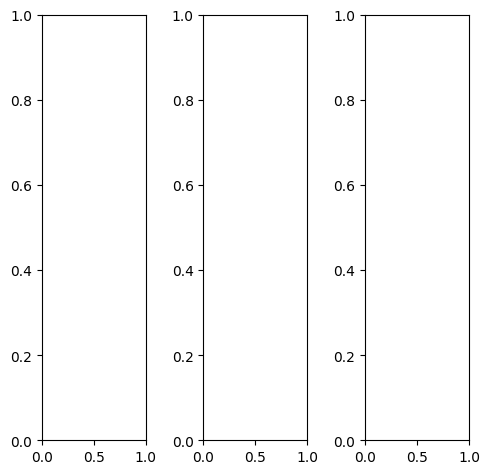

tensor([[[0.7373, 0.7333, 0.7490,  ..., 0.7765, 0.7843, 0.7843],
         [0.7255, 0.7333, 0.7529,  ..., 0.7804, 0.7765, 0.7765],
         [0.7137, 0.7216, 0.7294,  ..., 0.7843, 0.7765, 0.7765],
         ...,
         [0.5255, 0.5137, 0.4941,  ..., 0.5608, 0.5608, 0.5725],
         [0.4902, 0.4941, 0.4902,  ..., 0.5098, 0.5216, 0.5373],
         [0.4510, 0.4314, 0.4314,  ..., 0.4784, 0.4784, 0.5059]],

        [[0.7373, 0.7333, 0.7490,  ..., 0.7765, 0.7843, 0.7843],
         [0.7255, 0.7333, 0.7529,  ..., 0.7804, 0.7765, 0.7765],
         [0.7137, 0.7216, 0.7294,  ..., 0.7843, 0.7765, 0.7765],
         ...,
         [0.5255, 0.5137, 0.4941,  ..., 0.5608, 0.5608, 0.5725],
         [0.4902, 0.4941, 0.4902,  ..., 0.5098, 0.5216, 0.5373],
         [0.4510, 0.4314, 0.4314,  ..., 0.4784, 0.4784, 0.5059]],

        [[0.7373, 0.7333, 0.7490,  ..., 0.7765, 0.7843, 0.7843],
         [0.7255, 0.7333, 0.7529,  ..., 0.7804, 0.7765, 0.7765],
         [0.7137, 0.7216, 0.7294,  ..., 0.7843, 0.7765, 0.

tensor([[[0.6510, 0.6471, 0.6745,  ..., 0.7294, 0.7333, 0.7412],
         [0.6235, 0.6353, 0.6706,  ..., 0.7294, 0.7255, 0.7294],
         [0.6314, 0.6314, 0.6471,  ..., 0.7333, 0.7255, 0.7216],
         ...,
         [0.3686, 0.3608, 0.3451,  ..., 0.4510, 0.4549, 0.4667],
         [0.3412, 0.3529, 0.3451,  ..., 0.4039, 0.4118, 0.4275],
         [0.3137, 0.2980, 0.2941,  ..., 0.3725, 0.3686, 0.4000]],

        [[0.7490, 0.7490, 0.7608,  ..., 0.7804, 0.7882, 0.7882],
         [0.7412, 0.7529, 0.7647,  ..., 0.7843, 0.7804, 0.7804],
         [0.7255, 0.7373, 0.7412,  ..., 0.7922, 0.7843, 0.7843],
         ...,
         [0.5647, 0.5529, 0.5333,  ..., 0.5882, 0.5843, 0.5961],
         [0.5294, 0.5294, 0.5255,  ..., 0.5333, 0.5451, 0.5647],
         [0.4824, 0.4627, 0.4627,  ..., 0.5020, 0.5020, 0.5255]],

        [[0.8902, 0.8902, 0.8941,  ..., 0.8824, 0.8902, 0.8941],
         [0.8980, 0.9059, 0.9020,  ..., 0.8902, 0.8863, 0.8902],
         [0.8706, 0.8784, 0.8824,  ..., 0.8941, 0.8863, 0.

tensor([[[0.6622, 0.5897, 0.5402,  ..., 0.6100, 0.6387, 0.7132],
         [0.6276, 0.4489, 0.4721,  ..., 0.6038, 0.6217, 0.7033],
         [0.6119, 0.5035, 0.4051,  ..., 0.6275, 0.6351, 0.6893],
         ...,
         [0.5666, 0.5860, 0.5370,  ..., 0.5947, 0.6001, 0.6296],
         [0.5355, 0.5573, 0.5482,  ..., 0.5358, 0.5573, 0.5885],
         [0.5028, 0.4717, 0.4588,  ..., 0.5190, 0.5295, 0.5588]],

        [[0.6885, 0.6448, 0.5831,  ..., 0.6848, 0.7355, 0.7612],
         [0.6196, 0.3776, 0.4609,  ..., 0.6825, 0.6881, 0.7799],
         [0.6931, 0.5460, 0.5270,  ..., 0.7064, 0.7076, 0.7615],
         ...,
         [0.5389, 0.5292, 0.5079,  ..., 0.5611, 0.5958, 0.5766],
         [0.4971, 0.5099, 0.5056,  ..., 0.5307, 0.5586, 0.5602],
         [0.4760, 0.4292, 0.4397,  ..., 0.4920, 0.4997, 0.5234]],

        [[0.7821, 0.7380, 0.7080,  ..., 0.8562, 0.8961, 0.9024],
         [0.7707, 0.6013, 0.6861,  ..., 0.8219, 0.8598, 0.9077],
         [0.6855, 0.6317, 0.5246,  ..., 0.8681, 0.8904, 0.

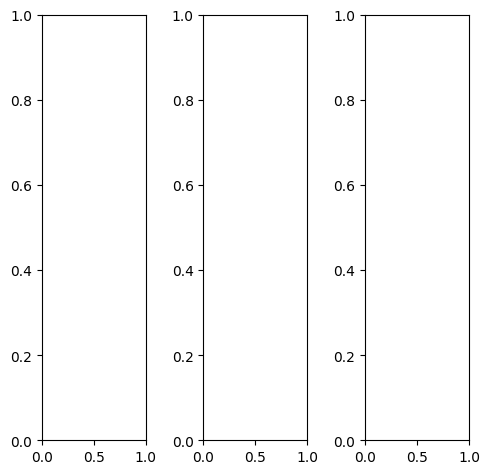

EPOCH: 33.510  trn_loss: 0.004  (4113.45s - 8161.77s remaining)

tensor([[[0.1137, 0.2078, 0.3765,  ..., 0.0314, 0.0314, 0.0275],
         [0.1020, 0.2039, 0.3333,  ..., 0.0235, 0.0314, 0.0196],
         [0.1412, 0.2000, 0.2824,  ..., 0.0196, 0.0471, 0.0314],
         ...,
         [0.5059, 0.5686, 0.4980,  ..., 0.4824, 0.5333, 0.4039],
         [0.4745, 0.4510, 0.3647,  ..., 0.3647, 0.4745, 0.4784],
         [0.4235, 0.2000, 0.1020,  ..., 0.3804, 0.4392, 0.4588]],

        [[0.1137, 0.2078, 0.3765,  ..., 0.0314, 0.0314, 0.0275],
         [0.1020, 0.2039, 0.3333,  ..., 0.0235, 0.0314, 0.0196],
         [0.1412, 0.2000, 0.2824,  ..., 0.0196, 0.0471, 0.0314],
         ...,
         [0.5059, 0.5686, 0.4980,  ..., 0.4824, 0.5333, 0.4039],
         [0.4745, 0.4510, 0.3647,  ..., 0.3647, 0.4745, 0.4784],
         [0.4235, 0.2000, 0.1020,  ..., 0.3804, 0.4392, 0.4588]],

        [[0.1137, 0.2078, 0.3765,  ..., 0.0314, 0.0314, 0.0275],
         [0.1020, 0.2039, 0.3333,  ..., 0.0235, 0.0314, 0.0196],
         [0.1412, 0.2000, 0.2824,  ..., 0.0196, 0.0471, 0.

tensor([[[0.0784, 0.1765, 0.3490,  ..., 0.0314, 0.0471, 0.0314],
         [0.0706, 0.1725, 0.3020,  ..., 0.0314, 0.0667, 0.0275],
         [0.1098, 0.1686, 0.2471,  ..., 0.0353, 0.0980, 0.0471],
         ...,
         [0.5059, 0.5725, 0.5020,  ..., 0.4941, 0.5451, 0.4235],
         [0.4941, 0.4784, 0.3961,  ..., 0.3765, 0.4980, 0.5020],
         [0.4667, 0.2549, 0.1647,  ..., 0.3961, 0.4667, 0.4863]],

        [[0.1451, 0.2314, 0.3882,  ..., 0.0314, 0.0275, 0.0314],
         [0.1294, 0.2275, 0.3451,  ..., 0.0235, 0.0196, 0.0196],
         [0.1686, 0.2314, 0.3020,  ..., 0.0157, 0.0235, 0.0235],
         ...,
         [0.5098, 0.5686, 0.4980,  ..., 0.4824, 0.5373, 0.4039],
         [0.4706, 0.4431, 0.3529,  ..., 0.3725, 0.4784, 0.4824],
         [0.4118, 0.1804, 0.0784,  ..., 0.3804, 0.4392, 0.4588]],

        [[0.0549, 0.1686, 0.3882,  ..., 0.0235, 0.0196, 0.0118],
         [0.0510, 0.1686, 0.3412,  ..., 0.0196, 0.0157, 0.0078],
         [0.0667, 0.1373, 0.2627,  ..., 0.0157, 0.0196, 0.

tensor([[[ 0.0332,  0.0635,  0.1983,  ...,  0.0391,  0.0630,  0.0966],
         [ 0.1021, -0.0063,  0.1357,  ..., -0.0108,  0.0571,  0.0474],
         [-0.0712, -0.0412,  0.0765,  ..., -0.0147,  0.0423,  0.0468],
         ...,
         [ 0.6670,  0.7576,  0.6445,  ...,  0.6802,  0.7153,  0.5592],
         [ 0.6138,  0.6050,  0.5086,  ...,  0.5381,  0.6394,  0.6394],
         [ 0.5253,  0.3179,  0.2333,  ...,  0.5456,  0.5963,  0.6017]],

        [[ 0.1466,  0.1458,  0.3028,  ...,  0.1221,  0.1005,  0.1296],
         [ 0.1114,  0.0687,  0.0601,  ...,  0.0876,  0.1170,  0.0944],
         [ 0.0630, -0.0230,  0.1468,  ...,  0.0891,  0.1048,  0.0912],
         ...,
         [ 0.6365,  0.7257,  0.6449,  ...,  0.6141,  0.6809,  0.5125],
         [ 0.5599,  0.5695,  0.5080,  ...,  0.5050,  0.6021,  0.5999],
         [ 0.4820,  0.2929,  0.2190,  ...,  0.5013,  0.5630,  0.5702]],

        [[ 0.2585,  0.1981,  0.4437,  ...,  0.2908,  0.2630,  0.2786],
         [ 0.2461,  0.1816,  0.3580,  ...,  0

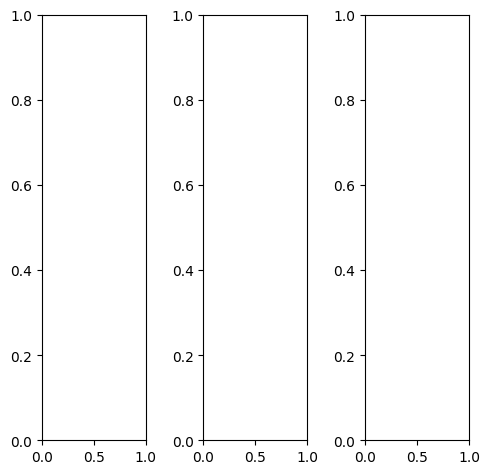

tensor([[[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.5647],
         ...,
         [0.5647, 0.4941, 0.5137,  ..., 0.4118, 0.4078, 0.4039],
         [0.5569, 0.4588, 0.5176,  ..., 0.4588, 0.4431, 0.4627],
         [0.5529, 0.4588, 0.5765,  ..., 0.4745, 0.5098, 0.5373]],

        [[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.5647],
         ...,
         [0.5647, 0.4941, 0.5137,  ..., 0.4118, 0.4078, 0.4039],
         [0.5569, 0.4588, 0.5176,  ..., 0.4588, 0.4431, 0.4627],
         [0.5529, 0.4588, 0.5765,  ..., 0.4745, 0.5098, 0.5373]],

        [[0.1725, 0.1686, 0.2196,  ..., 0.4392, 0.3922, 0.4471],
         [0.3765, 0.4039, 0.4039,  ..., 0.4706, 0.4157, 0.5373],
         [0.4353, 0.4235, 0.4078,  ..., 0.4196, 0.4745, 0.

tensor([[[0.2118, 0.2078, 0.2824,  ..., 0.4627, 0.4314, 0.4941],
         [0.4314, 0.4627, 0.4667,  ..., 0.4980, 0.4588, 0.5765],
         [0.5137, 0.5059, 0.4784,  ..., 0.4667, 0.5255, 0.5882],
         ...,
         [0.6353, 0.5569, 0.5765,  ..., 0.4627, 0.4588, 0.4392],
         [0.6039, 0.5255, 0.5804,  ..., 0.5098, 0.4941, 0.5098],
         [0.5961, 0.5333, 0.6275,  ..., 0.5412, 0.5725, 0.5961]],

        [[0.1725, 0.1647, 0.2039,  ..., 0.4392, 0.3882, 0.4431],
         [0.3725, 0.3922, 0.3922,  ..., 0.4667, 0.4118, 0.5412],
         [0.4235, 0.4078, 0.3961,  ..., 0.4157, 0.4745, 0.5686],
         ...,
         [0.5529, 0.4824, 0.4980,  ..., 0.4000, 0.3922, 0.4000],
         [0.5490, 0.4431, 0.5020,  ..., 0.4471, 0.4314, 0.4549],
         [0.5451, 0.4392, 0.5608,  ..., 0.4627, 0.4941, 0.5294]],

        [[0.0784, 0.0941, 0.1255,  ..., 0.3922, 0.3176, 0.3412],
         [0.2627, 0.3020, 0.3059,  ..., 0.4157, 0.3098, 0.4275],
         [0.2824, 0.2824, 0.2941,  ..., 0.3137, 0.3529, 0.

tensor([[[-0.0158, -0.0650, -0.0954,  ...,  0.3701,  0.3154,  0.4345],
         [ 0.2631, -0.0066,  0.0448,  ...,  0.4332,  0.3627,  0.4990],
         [ 0.2419,  0.1384,  0.0691,  ...,  0.4277,  0.4974,  0.5781],
         ...,
         [ 0.6605,  0.6153,  0.6791,  ...,  0.5088,  0.5138,  0.4699],
         [ 0.6422,  0.5347,  0.6598,  ...,  0.5780,  0.5592,  0.5453],
         [ 0.6012,  0.5143,  0.6778,  ...,  0.5403,  0.5963,  0.6002]],

        [[ 0.0832,  0.1054,  0.0472,  ...,  0.5214,  0.4674,  0.5036],
         [ 0.2842,  0.1289,  0.0281,  ...,  0.6038,  0.5289,  0.6554],
         [ 0.3733,  0.3120,  0.2227,  ...,  0.5454,  0.6272,  0.7003],
         ...,
         [ 0.6416,  0.5994,  0.6758,  ...,  0.5309,  0.5403,  0.4346],
         [ 0.6213,  0.5186,  0.6601,  ...,  0.5827,  0.5775,  0.5341],
         [ 0.5702,  0.5087,  0.6784,  ...,  0.5230,  0.5865,  0.5779]],

        [[ 0.2599,  0.0754,  0.1721,  ...,  0.7698,  0.6996,  0.7244],
         [ 0.4493,  0.2881,  0.3182,  ...,  0

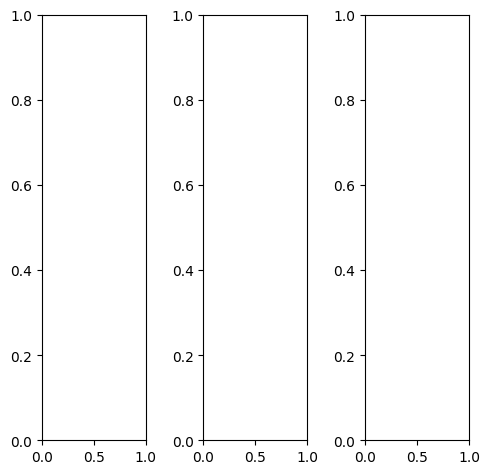

tensor([[[0.7725, 0.7647, 0.7451,  ..., 0.2275, 0.1961, 0.1686],
         [0.7490, 0.7529, 0.7412,  ..., 0.3922, 0.3608, 0.2902],
         [0.7373, 0.7333, 0.7176,  ..., 0.4118, 0.5765, 0.2275],
         ...,
         [0.9961, 0.9725, 0.9725,  ..., 0.4902, 0.4863, 0.4941],
         [0.9608, 0.9647, 0.9569,  ..., 0.4745, 0.4471, 0.4706],
         [0.9451, 0.9569, 0.9647,  ..., 0.4471, 0.4471, 0.4784]],

        [[0.7725, 0.7647, 0.7451,  ..., 0.2275, 0.1961, 0.1686],
         [0.7490, 0.7529, 0.7412,  ..., 0.3922, 0.3608, 0.2902],
         [0.7373, 0.7333, 0.7176,  ..., 0.4118, 0.5765, 0.2275],
         ...,
         [0.9961, 0.9725, 0.9725,  ..., 0.4902, 0.4863, 0.4941],
         [0.9608, 0.9647, 0.9569,  ..., 0.4745, 0.4471, 0.4706],
         [0.9451, 0.9569, 0.9647,  ..., 0.4471, 0.4471, 0.4784]],

        [[0.7725, 0.7647, 0.7451,  ..., 0.2275, 0.1961, 0.1686],
         [0.7490, 0.7529, 0.7412,  ..., 0.3922, 0.3608, 0.2902],
         [0.7373, 0.7333, 0.7176,  ..., 0.4118, 0.5765, 0.

tensor([[[0.6863, 0.6667, 0.6392,  ..., 0.2039, 0.1765, 0.1490],
         [0.6549, 0.6549, 0.6431,  ..., 0.3647, 0.3333, 0.2627],
         [0.6353, 0.6353, 0.6196,  ..., 0.3804, 0.5451, 0.1961],
         ...,
         [0.9922, 0.9529, 0.9451,  ..., 0.5490, 0.5490, 0.5608],
         [0.9451, 0.9490, 0.9373,  ..., 0.5333, 0.5137, 0.5373],
         [0.9333, 0.9451, 0.9490,  ..., 0.5059, 0.5098, 0.5490]],

        [[0.7922, 0.7843, 0.7686,  ..., 0.2353, 0.2039, 0.1765],
         [0.7686, 0.7686, 0.7608,  ..., 0.4039, 0.3686, 0.2980],
         [0.7529, 0.7529, 0.7333,  ..., 0.4275, 0.5882, 0.2392],
         ...,
         [1.0000, 0.9804, 0.9843,  ..., 0.4745, 0.4627, 0.4706],
         [0.9608, 0.9686, 0.9608,  ..., 0.4588, 0.4275, 0.4471],
         [0.9490, 0.9608, 0.9686,  ..., 0.4314, 0.4275, 0.4588]],

        [[0.9098, 0.9059, 0.9059,  ..., 0.2353, 0.2157, 0.1882],
         [0.9098, 0.9137, 0.9137,  ..., 0.4000, 0.3765, 0.3059],
         [0.9098, 0.9059, 0.8863,  ..., 0.4196, 0.5922, 0.

tensor([[[0.6111, 0.5831, 0.5053,  ..., 0.0584, 0.0533, 0.0863],
         [0.5384, 0.4251, 0.4081,  ..., 0.2016, 0.1708, 0.1189],
         [0.5171, 0.5278, 0.3533,  ..., 0.1945, 0.3790, 0.0898],
         ...,
         [0.8921, 0.8917, 0.8880,  ..., 0.4377, 0.4135, 0.4409],
         [0.8375, 0.8601, 0.8411,  ..., 0.3721, 0.3661, 0.4044],
         [0.8381, 0.8648, 0.8631,  ..., 0.3496, 0.3500, 0.4024]],

        [[0.6567, 0.6940, 0.5336,  ..., 0.1270, 0.1018, 0.1169],
         [0.5842, 0.5166, 0.4612,  ..., 0.2877, 0.2765, 0.1869],
         [0.6055, 0.6210, 0.4324,  ..., 0.2749, 0.4630, 0.1346],
         ...,
         [0.8464, 0.8435, 0.8627,  ..., 0.4548, 0.4373, 0.4094],
         [0.8180, 0.8270, 0.8350,  ..., 0.4115, 0.3911, 0.3874],
         [0.7894, 0.8368, 0.8398,  ..., 0.3430, 0.3523, 0.3687]],

        [[0.8051, 0.7928, 0.7270,  ..., 0.2239, 0.2207, 0.2578],
         [0.7675, 0.7032, 0.7037,  ..., 0.3874, 0.3971, 0.3169],
         [0.6873, 0.6335, 0.5377,  ..., 0.4061, 0.5612, 0.

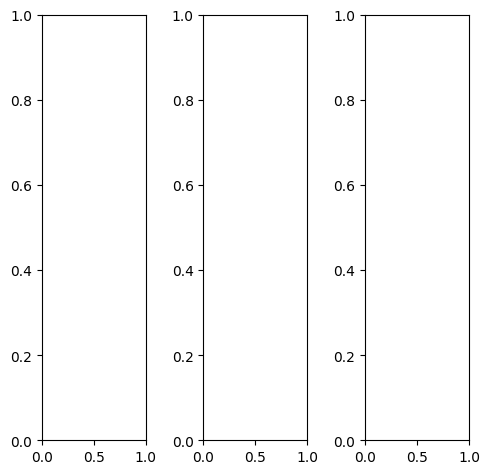

tensor([[[0.4510, 0.4235, 0.4314,  ..., 0.3216, 0.3216, 0.3294],
         [0.4667, 0.4039, 0.4196,  ..., 0.3059, 0.3176, 0.3176],
         [0.5020, 0.4353, 0.4157,  ..., 0.3059, 0.3176, 0.3333],
         ...,
         [0.5294, 0.5098, 0.5020,  ..., 0.5333, 0.5294, 0.5412],
         [0.5569, 0.5490, 0.5490,  ..., 0.5725, 0.5608, 0.5490],
         [0.5333, 0.5412, 0.5490,  ..., 0.5490, 0.5216, 0.5176]],

        [[0.4510, 0.4235, 0.4314,  ..., 0.3216, 0.3216, 0.3294],
         [0.4667, 0.4039, 0.4196,  ..., 0.3059, 0.3176, 0.3176],
         [0.5020, 0.4353, 0.4157,  ..., 0.3059, 0.3176, 0.3333],
         ...,
         [0.5294, 0.5098, 0.5020,  ..., 0.5333, 0.5294, 0.5412],
         [0.5569, 0.5490, 0.5490,  ..., 0.5725, 0.5608, 0.5490],
         [0.5333, 0.5412, 0.5490,  ..., 0.5490, 0.5216, 0.5176]],

        [[0.4510, 0.4235, 0.4314,  ..., 0.3216, 0.3216, 0.3294],
         [0.4667, 0.4039, 0.4196,  ..., 0.3059, 0.3176, 0.3176],
         [0.5020, 0.4353, 0.4157,  ..., 0.3059, 0.3176, 0.

tensor([[[0.4706, 0.4275, 0.4353,  ..., 0.3725, 0.3725, 0.3882],
         [0.4902, 0.4157, 0.4353,  ..., 0.3608, 0.3765, 0.3804],
         [0.5255, 0.4471, 0.4353,  ..., 0.3569, 0.3686, 0.3922],
         ...,
         [0.5843, 0.5647, 0.5569,  ..., 0.5804, 0.5804, 0.5922],
         [0.6118, 0.6039, 0.6039,  ..., 0.6235, 0.6118, 0.6039],
         [0.5922, 0.5961, 0.6039,  ..., 0.6039, 0.5725, 0.5686]],

        [[0.4863, 0.4667, 0.4667,  ..., 0.3216, 0.3216, 0.3294],
         [0.5020, 0.4431, 0.4510,  ..., 0.3059, 0.3176, 0.3137],
         [0.5373, 0.4706, 0.4431,  ..., 0.3098, 0.3176, 0.3294],
         ...,
         [0.5255, 0.5059, 0.4980,  ..., 0.5294, 0.5294, 0.5373],
         [0.5529, 0.5451, 0.5451,  ..., 0.5725, 0.5608, 0.5451],
         [0.5294, 0.5373, 0.5451,  ..., 0.5490, 0.5216, 0.5137]],

        [[0.2118, 0.2000, 0.2353,  ..., 0.1804, 0.1804, 0.1765],
         [0.2314, 0.1765, 0.2196,  ..., 0.1725, 0.1804, 0.1765],
         [0.2706, 0.2078, 0.2078,  ..., 0.1608, 0.1686, 0.

tensor([[[ 0.2886,  0.2106,  0.0782,  ...,  0.0223,  0.0431,  0.0682],
         [ 0.3452,  0.1501,  0.0960,  ..., -0.0352, -0.0123,  0.0108],
         [ 0.3552,  0.2178,  0.0499,  ..., -0.0301, -0.0085,  0.0338],
         ...,
         [ 0.5798,  0.6584,  0.5793,  ...,  0.5959,  0.6131,  0.5787],
         [ 0.6361,  0.6846,  0.6397,  ...,  0.6877,  0.6585,  0.5789],
         [ 0.5710,  0.5634,  0.5818,  ...,  0.5971,  0.5357,  0.4892]],

        [[ 0.4125,  0.3604,  0.2722,  ...,  0.1027,  0.1385,  0.1389],
         [ 0.3983,  0.3340,  0.1311,  ...,  0.0587,  0.1115,  0.0809],
         [ 0.4881,  0.3667,  0.2243,  ...,  0.0314,  0.0696,  0.0799],
         ...,
         [ 0.5289,  0.6076,  0.5407,  ...,  0.6267,  0.6332,  0.5672],
         [ 0.5989,  0.5950,  0.6162,  ...,  0.7034,  0.6775,  0.5850],
         [ 0.5311,  0.5357,  0.5703,  ...,  0.5987,  0.5401,  0.4869]],

        [[ 0.6075,  0.4028,  0.4782,  ...,  0.2286,  0.2599,  0.2830],
         [ 0.5941,  0.5069,  0.4134,  ...,  0

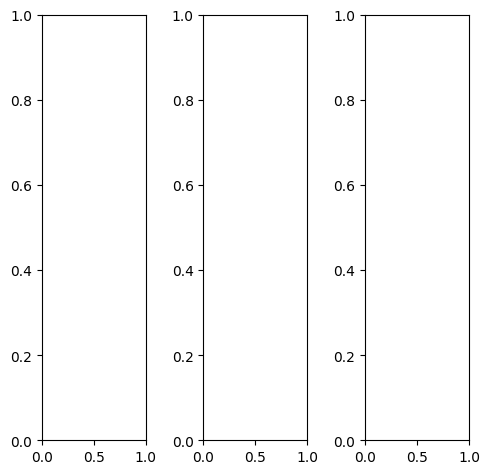

tensor([[[0.4667, 0.4588, 0.4627,  ..., 0.4431, 0.4314, 0.4353],
         [0.4863, 0.4745, 0.4706,  ..., 0.4471, 0.4353, 0.4353],
         [0.5176, 0.4941, 0.4863,  ..., 0.4549, 0.4392, 0.4431],
         ...,
         [0.9373, 0.9490, 0.9608,  ..., 1.0000, 0.9961, 1.0000],
         [0.8784, 0.9098, 0.9294,  ..., 1.0000, 1.0000, 1.0000],
         [0.8431, 0.8078, 0.8157,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.4667, 0.4588, 0.4627,  ..., 0.4431, 0.4314, 0.4353],
         [0.4863, 0.4745, 0.4706,  ..., 0.4471, 0.4353, 0.4353],
         [0.5176, 0.4941, 0.4863,  ..., 0.4549, 0.4392, 0.4431],
         ...,
         [0.9373, 0.9490, 0.9608,  ..., 1.0000, 0.9961, 1.0000],
         [0.8784, 0.9098, 0.9294,  ..., 1.0000, 1.0000, 1.0000],
         [0.8431, 0.8078, 0.8157,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.4667, 0.4588, 0.4627,  ..., 0.4431, 0.4314, 0.4353],
         [0.4863, 0.4745, 0.4706,  ..., 0.4471, 0.4353, 0.4353],
         [0.5176, 0.4941, 0.4863,  ..., 0.4549, 0.4392, 0.

tensor([[[0.5294, 0.5137, 0.5098,  ..., 0.4549, 0.4431, 0.4471],
         [0.5647, 0.5412, 0.5255,  ..., 0.4588, 0.4471, 0.4471],
         [0.6078, 0.5686, 0.5451,  ..., 0.4667, 0.4510, 0.4549],
         ...,
         [0.9216, 0.9373, 0.9451,  ..., 1.0000, 0.9961, 1.0000],
         [0.8627, 0.8941, 0.9137,  ..., 1.0000, 1.0000, 1.0000],
         [0.8275, 0.7922, 0.8000,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.4510, 0.4471, 0.4510,  ..., 0.4431, 0.4314, 0.4353],
         [0.4667, 0.4588, 0.4588,  ..., 0.4471, 0.4353, 0.4353],
         [0.4941, 0.4784, 0.4745,  ..., 0.4549, 0.4392, 0.4431],
         ...,
         [0.9451, 0.9569, 0.9686,  ..., 1.0000, 0.9961, 1.0000],
         [0.8863, 0.9176, 0.9373,  ..., 1.0000, 1.0000, 1.0000],
         [0.8510, 0.8157, 0.8235,  ..., 1.0000, 1.0000, 1.0000]],

        [[0.3725, 0.3804, 0.3961,  ..., 0.4157, 0.4039, 0.4078],
         [0.3804, 0.3882, 0.4000,  ..., 0.4196, 0.4078, 0.4078],
         [0.3882, 0.3922, 0.4078,  ..., 0.4275, 0.4118, 0.

tensor([[[ 0.2155,  0.1253,  0.0327,  ...,  0.2849,  0.2725,  0.2997],
         [ 0.2290, -0.0351, -0.0343,  ...,  0.2716,  0.2443,  0.2615],
         [ 0.1645,  0.0090, -0.0683,  ...,  0.2844,  0.2696,  0.2873],
         ...,
         [ 0.8691,  0.8683,  0.8661,  ...,  0.9179,  0.9175,  0.9515],
         [ 0.7835,  0.7928,  0.8210,  ...,  0.8867,  0.9148,  0.9477],
         [ 0.7418,  0.6937,  0.7000,  ...,  0.8964,  0.9144,  0.9033]],

        [[ 0.3010,  0.2712,  0.2042,  ...,  0.3718,  0.3709,  0.3595],
         [ 0.2629,  0.0463, -0.0553,  ...,  0.3696,  0.3680,  0.3229],
         [ 0.3142,  0.1436,  0.1068,  ...,  0.3801,  0.3621,  0.3325],
         ...,
         [ 0.8525,  0.8720,  0.8960,  ...,  0.9264,  0.9321,  0.9643],
         [ 0.7810,  0.8039,  0.8568,  ...,  0.9234,  0.9230,  0.9398],
         [ 0.7025,  0.6953,  0.7075,  ...,  0.9037,  0.8945,  0.8886]],

        [[ 0.4633,  0.3207,  0.3162,  ...,  0.4476,  0.4569,  0.4554],
         [ 0.4380,  0.2197,  0.2817,  ...,  0

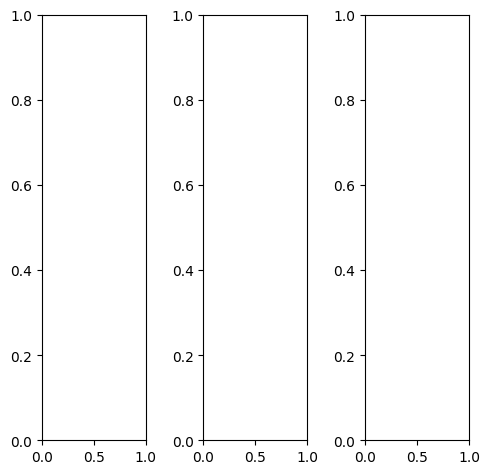

EPOCH: 33.765  trn_loss: 0.004  (4143.86s - 8128.68s remaining)

tensor([[[0.4196, 0.4235, 0.5098,  ..., 0.4431, 0.5294, 0.6549],
         [0.4627, 0.4392, 0.4275,  ..., 0.4314, 0.5216, 0.6039],
         [0.4667, 0.4235, 0.4392,  ..., 0.4275, 0.4980, 0.5961],
         ...,
         [0.4235, 0.4392, 0.5020,  ..., 0.8078, 0.7333, 0.5647],
         [0.4000, 0.3961, 0.4902,  ..., 0.7961, 0.6784, 0.5412],
         [0.4157, 0.4039, 0.5451,  ..., 0.7961, 0.6588, 0.5216]],

        [[0.4196, 0.4235, 0.5098,  ..., 0.4431, 0.5294, 0.6549],
         [0.4627, 0.4392, 0.4275,  ..., 0.4314, 0.5216, 0.6039],
         [0.4667, 0.4235, 0.4392,  ..., 0.4275, 0.4980, 0.5961],
         ...,
         [0.4235, 0.4392, 0.5020,  ..., 0.8078, 0.7333, 0.5647],
         [0.4000, 0.3961, 0.4902,  ..., 0.7961, 0.6784, 0.5412],
         [0.4157, 0.4039, 0.5451,  ..., 0.7961, 0.6588, 0.5216]],

        [[0.4196, 0.4235, 0.5098,  ..., 0.4431, 0.5294, 0.6549],
         [0.4627, 0.4392, 0.4275,  ..., 0.4314, 0.5216, 0.6039],
         [0.4667, 0.4235, 0.4392,  ..., 0.4275, 0.4980, 0.

tensor([[[0.4863, 0.4902, 0.5765,  ..., 0.5059, 0.5961, 0.7216],
         [0.5333, 0.5098, 0.4980,  ..., 0.4980, 0.5922, 0.6667],
         [0.5451, 0.4980, 0.5176,  ..., 0.5020, 0.5725, 0.6588],
         ...,
         [0.4980, 0.5255, 0.5882,  ..., 0.8627, 0.7725, 0.5961],
         [0.4745, 0.4863, 0.5765,  ..., 0.8510, 0.7333, 0.6000],
         [0.4941, 0.4941, 0.6314,  ..., 0.8471, 0.7216, 0.5961]],

        [[0.4078, 0.4157, 0.4980,  ..., 0.4353, 0.5216, 0.6510],
         [0.4510, 0.4314, 0.4157,  ..., 0.4157, 0.5137, 0.6039],
         [0.4549, 0.4118, 0.4275,  ..., 0.4078, 0.4863, 0.5961],
         ...,
         [0.4118, 0.4196, 0.4824,  ..., 0.8118, 0.7412, 0.5765],
         [0.3882, 0.3765, 0.4706,  ..., 0.8000, 0.6784, 0.5412],
         [0.4039, 0.3843, 0.5255,  ..., 0.8000, 0.6510, 0.5098]],

        [[0.3020, 0.2980, 0.3922,  ..., 0.3333, 0.4039, 0.4980],
         [0.3412, 0.3059, 0.3059,  ..., 0.3255, 0.3922, 0.4431],
         [0.3373, 0.2863, 0.3098,  ..., 0.3255, 0.3608, 0.

tensor([[[ 0.1755,  0.1222,  0.1201,  ...,  0.2976,  0.4057,  0.5434],
         [ 0.2490, -0.0298,  0.0498,  ...,  0.2983,  0.3742,  0.4791],
         [ 0.1271,  0.0210, -0.0163,  ...,  0.3106,  0.3927,  0.4729],
         ...,
         [ 0.3622,  0.4211,  0.5139,  ...,  0.7259,  0.6444,  0.4783],
         [ 0.3296,  0.3468,  0.4984,  ...,  0.7315,  0.5875,  0.4821],
         [ 0.3367,  0.3302,  0.4953,  ...,  0.7640,  0.6241,  0.5002]],

        [[ 0.2841,  0.3053,  0.3336,  ...,  0.3660,  0.5008,  0.5651],
         [ 0.2876,  0.1276,  0.0251,  ...,  0.3549,  0.4838,  0.5151],
         [ 0.2568,  0.2033,  0.1505,  ...,  0.3803,  0.4653,  0.4812],
         ...,
         [ 0.3339,  0.3825,  0.4831,  ...,  0.6932,  0.6383,  0.4227],
         [ 0.3087,  0.3459,  0.4678,  ...,  0.7102,  0.5804,  0.4340],
         [ 0.3165,  0.3188,  0.4783,  ...,  0.7318,  0.6038,  0.4579]],

        [[ 0.4765,  0.3169,  0.4713,  ...,  0.4329,  0.5942,  0.6805],
         [ 0.4554,  0.2905,  0.3572,  ...,  0

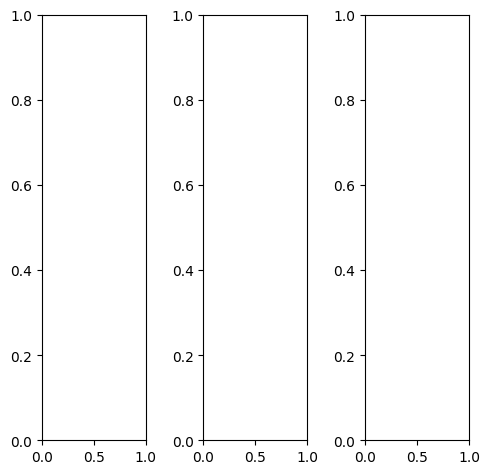

tensor([[[0.7647, 0.7569, 0.7569,  ..., 0.6706, 0.6745, 0.6745],
         [0.7647, 0.7529, 0.7608,  ..., 0.6667, 0.6706, 0.6745],
         [0.7725, 0.7529, 0.7608,  ..., 0.6627, 0.6667, 0.6627],
         ...,
         [0.5412, 0.5373, 0.5569,  ..., 0.4667, 0.4627, 0.4510],
         [0.5765, 0.5725, 0.5843,  ..., 0.4706, 0.4667, 0.4667],
         [0.5647, 0.5647, 0.5725,  ..., 0.4627, 0.4745, 0.4667]],

        [[0.7647, 0.7569, 0.7569,  ..., 0.6706, 0.6745, 0.6745],
         [0.7647, 0.7529, 0.7608,  ..., 0.6667, 0.6706, 0.6745],
         [0.7725, 0.7529, 0.7608,  ..., 0.6627, 0.6667, 0.6627],
         ...,
         [0.5412, 0.5373, 0.5569,  ..., 0.4667, 0.4627, 0.4510],
         [0.5765, 0.5725, 0.5843,  ..., 0.4706, 0.4667, 0.4667],
         [0.5647, 0.5647, 0.5725,  ..., 0.4627, 0.4745, 0.4667]],

        [[0.7647, 0.7569, 0.7569,  ..., 0.6706, 0.6745, 0.6745],
         [0.7647, 0.7529, 0.7608,  ..., 0.6667, 0.6706, 0.6745],
         [0.7725, 0.7529, 0.7608,  ..., 0.6627, 0.6667, 0.

tensor([[[0.6980, 0.6902, 0.6902,  ..., 0.5804, 0.5804, 0.5725],
         [0.6980, 0.6863, 0.6941,  ..., 0.5608, 0.5608, 0.5569],
         [0.7059, 0.6863, 0.6941,  ..., 0.5490, 0.5490, 0.5373],
         ...,
         [0.4353, 0.4353, 0.4510,  ..., 0.3373, 0.3412, 0.3373],
         [0.4784, 0.4745, 0.4863,  ..., 0.3412, 0.3451, 0.3529],
         [0.4706, 0.4706, 0.4784,  ..., 0.3373, 0.3529, 0.3529]],

        [[0.7765, 0.7686, 0.7686,  ..., 0.6824, 0.6863, 0.6941],
         [0.7765, 0.7647, 0.7725,  ..., 0.6824, 0.6863, 0.6980],
         [0.7804, 0.7647, 0.7686,  ..., 0.6863, 0.6902, 0.6902],
         ...,
         [0.5569, 0.5529, 0.5725,  ..., 0.4902, 0.4863, 0.4706],
         [0.5882, 0.5843, 0.5961,  ..., 0.4941, 0.4863, 0.4863],
         [0.5804, 0.5765, 0.5843,  ..., 0.4863, 0.4941, 0.4863]],

        [[0.8745, 0.8627, 0.8667,  ..., 0.8510, 0.8549, 0.8549],
         [0.8824, 0.8667, 0.8745,  ..., 0.8549, 0.8627, 0.8667],
         [0.8980, 0.8784, 0.8824,  ..., 0.8510, 0.8549, 0.

tensor([[[0.5529, 0.4657, 0.3987,  ..., 0.3736, 0.4090, 0.4273],
         [0.5295, 0.3587, 0.3988,  ..., 0.3907, 0.3974, 0.4024],
         [0.4887, 0.4413, 0.3146,  ..., 0.4248, 0.4342, 0.4071],
         ...,
         [0.3491, 0.3992, 0.4424,  ..., 0.2863, 0.2500, 0.2356],
         [0.4053, 0.4195, 0.4563,  ..., 0.2506, 0.2456, 0.2409],
         [0.3706, 0.3430, 0.3532,  ..., 0.2327, 0.2288, 0.2094]],

        [[0.6436, 0.5688, 0.5476,  ..., 0.4419, 0.5032, 0.4567],
         [0.5494, 0.4122, 0.4389,  ..., 0.4924, 0.5333, 0.4677],
         [0.6033, 0.5595, 0.5076,  ..., 0.5022, 0.5367, 0.4470],
         ...,
         [0.3199, 0.3908, 0.4262,  ..., 0.2593, 0.2324, 0.1833],
         [0.3853, 0.4260, 0.4432,  ..., 0.2314, 0.2248, 0.1897],
         [0.3313, 0.3281, 0.3401,  ..., 0.1826, 0.1850, 0.1619]],

        [[0.7901, 0.6869, 0.7082,  ..., 0.5823, 0.6254, 0.6095],
         [0.7497, 0.6612, 0.6617,  ..., 0.6058, 0.6543, 0.6289],
         [0.6961, 0.6525, 0.5868,  ..., 0.6429, 0.6563, 0.

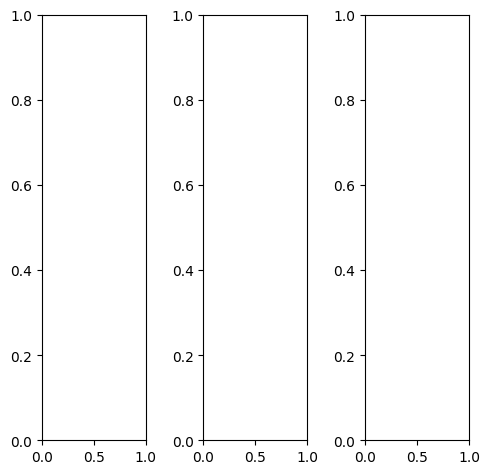

tensor([[[0.1020, 0.0941, 0.1176,  ..., 0.4431, 0.4157, 0.3804],
         [0.0784, 0.0980, 0.1059,  ..., 0.4549, 0.4353, 0.4314],
         [0.0784, 0.1059, 0.0941,  ..., 0.4627, 0.4549, 0.4392],
         ...,
         [0.4980, 0.8078, 0.9137,  ..., 0.5333, 0.6118, 0.6941],
         [0.2980, 0.6000, 0.8627,  ..., 0.5333, 0.5725, 0.6196],
         [0.1804, 0.3098, 0.5961,  ..., 0.5608, 0.5961, 0.5412]],

        [[0.1020, 0.0941, 0.1176,  ..., 0.4431, 0.4157, 0.3804],
         [0.0784, 0.0980, 0.1059,  ..., 0.4549, 0.4353, 0.4314],
         [0.0784, 0.1059, 0.0941,  ..., 0.4627, 0.4549, 0.4392],
         ...,
         [0.4980, 0.8078, 0.9137,  ..., 0.5333, 0.6118, 0.6941],
         [0.2980, 0.6000, 0.8627,  ..., 0.5333, 0.5725, 0.6196],
         [0.1804, 0.3098, 0.5961,  ..., 0.5608, 0.5961, 0.5412]],

        [[0.1020, 0.0941, 0.1176,  ..., 0.4431, 0.4157, 0.3804],
         [0.0784, 0.0980, 0.1059,  ..., 0.4549, 0.4353, 0.4314],
         [0.0784, 0.1059, 0.0941,  ..., 0.4627, 0.4549, 0.

tensor([[[0.0980, 0.0941, 0.1216,  ..., 0.2745, 0.2824, 0.2941],
         [0.0784, 0.0980, 0.1059,  ..., 0.3020, 0.2941, 0.3333],
         [0.0784, 0.1020, 0.0941,  ..., 0.3333, 0.3373, 0.3451],
         ...,
         [0.5255, 0.8078, 0.8941,  ..., 0.5804, 0.6549, 0.7333],
         [0.3333, 0.6235, 0.8431,  ..., 0.5725, 0.6157, 0.6667],
         [0.2039, 0.3294, 0.5922,  ..., 0.6314, 0.6667, 0.6039]],

        [[0.1020, 0.0902, 0.1176,  ..., 0.4706, 0.4314, 0.3882],
         [0.0784, 0.0980, 0.1059,  ..., 0.4784, 0.4588, 0.4431],
         [0.0745, 0.1059, 0.0941,  ..., 0.4784, 0.4706, 0.4471],
         ...,
         [0.4941, 0.8157, 0.9255,  ..., 0.5294, 0.6078, 0.6902],
         [0.2902, 0.6000, 0.8745,  ..., 0.5294, 0.5725, 0.6157],
         [0.1725, 0.3020, 0.6000,  ..., 0.5490, 0.5882, 0.5333]],

        [[0.1098, 0.1020, 0.1216,  ..., 0.7529, 0.6706, 0.5647],
         [0.0863, 0.1098, 0.1137,  ..., 0.7373, 0.6902, 0.6235],
         [0.0863, 0.1137, 0.1059,  ..., 0.7059, 0.6863, 0.

tensor([[[-0.0425, -0.0169, -0.1543,  ...,  0.3445,  0.3304,  0.3344],
         [ 0.0799, -0.1054, -0.1031,  ...,  0.3290,  0.3273,  0.3488],
         [-0.2596, -0.2533, -0.2589,  ...,  0.3311,  0.3373,  0.3437],
         ...,
         [ 0.5557,  0.8747,  0.9730,  ...,  0.5748,  0.6786,  0.7637],
         [ 0.3452,  0.6418,  0.9208,  ...,  0.5743,  0.6383,  0.6788],
         [ 0.2187,  0.3131,  0.6466,  ...,  0.6285,  0.6716,  0.6185]],

        [[ 0.1010,  0.0331, -0.0806,  ...,  0.4801,  0.4778,  0.4110],
         [ 0.0406, -0.1830, -0.3458,  ...,  0.5320,  0.5230,  0.4633],
         [-0.1732, -0.1986, -0.3026,  ...,  0.5362,  0.5441,  0.4616],
         ...,
         [ 0.5281,  0.8320,  0.9872,  ...,  0.5632,  0.6761,  0.7551],
         [ 0.2946,  0.6009,  0.9094,  ...,  0.5793,  0.6169,  0.6640],
         [ 0.2024,  0.2813,  0.6230,  ...,  0.6112,  0.6515,  0.6040]],

        [[ 0.1946, -0.0372,  0.0777,  ...,  0.6976,  0.6689,  0.6044],
         [ 0.1730, -0.0467,  0.0317,  ...,  0

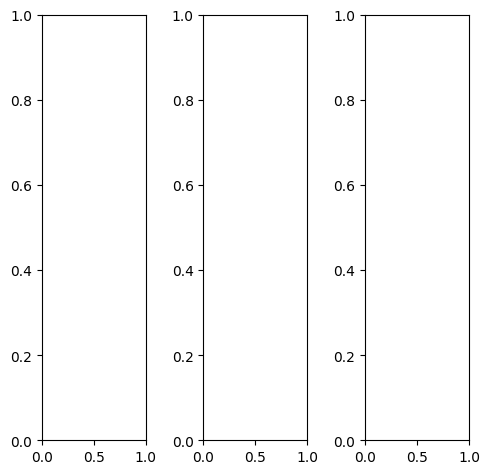

tensor([[[0.1765, 0.1922, 0.2118,  ..., 0.1843, 0.2471, 0.2980],
         [0.2627, 0.2431, 0.1882,  ..., 0.2275, 0.2353, 0.2510],
         [0.2784, 0.2000, 0.2157,  ..., 0.2588, 0.2667, 0.2431],
         ...,
         [0.2824, 0.2235, 0.1725,  ..., 0.3255, 0.3490, 0.4118],
         [0.3098, 0.1608, 0.1725,  ..., 0.2902, 0.3373, 0.4706],
         [0.3569, 0.2471, 0.1569,  ..., 0.2588, 0.3373, 0.4863]],

        [[0.1765, 0.1922, 0.2118,  ..., 0.1843, 0.2471, 0.2980],
         [0.2627, 0.2431, 0.1882,  ..., 0.2275, 0.2353, 0.2510],
         [0.2784, 0.2000, 0.2157,  ..., 0.2588, 0.2667, 0.2431],
         ...,
         [0.2824, 0.2235, 0.1725,  ..., 0.3255, 0.3490, 0.4118],
         [0.3098, 0.1608, 0.1725,  ..., 0.2902, 0.3373, 0.4706],
         [0.3569, 0.2471, 0.1569,  ..., 0.2588, 0.3373, 0.4863]],

        [[0.1765, 0.1922, 0.2118,  ..., 0.1843, 0.2471, 0.2980],
         [0.2627, 0.2431, 0.1882,  ..., 0.2275, 0.2353, 0.2510],
         [0.2784, 0.2000, 0.2157,  ..., 0.2588, 0.2667, 0.

tensor([[[0.1882, 0.2078, 0.2275,  ..., 0.1882, 0.2549, 0.3176],
         [0.2784, 0.2549, 0.2000,  ..., 0.2353, 0.2431, 0.2667],
         [0.2863, 0.2078, 0.2235,  ..., 0.2706, 0.2784, 0.2588],
         ...,
         [0.3020, 0.2353, 0.1765,  ..., 0.3373, 0.3412, 0.4000],
         [0.3216, 0.1686, 0.1765,  ..., 0.3098, 0.3373, 0.4549],
         [0.3608, 0.2549, 0.1647,  ..., 0.2863, 0.3373, 0.4706]],

        [[0.1765, 0.1961, 0.2196,  ..., 0.1961, 0.2588, 0.3098],
         [0.2667, 0.2471, 0.1961,  ..., 0.2392, 0.2510, 0.2627],
         [0.2824, 0.2078, 0.2235,  ..., 0.2667, 0.2784, 0.2549],
         ...,
         [0.2941, 0.2353, 0.1843,  ..., 0.3412, 0.3765, 0.4431],
         [0.3255, 0.1765, 0.1804,  ..., 0.3020, 0.3647, 0.5020],
         [0.3765, 0.2667, 0.1686,  ..., 0.2667, 0.3608, 0.5216]],

        [[0.1294, 0.1412, 0.1373,  ..., 0.1216, 0.1569, 0.1961],
         [0.2157, 0.1922, 0.1176,  ..., 0.1529, 0.1373, 0.1451],
         [0.2235, 0.1529, 0.1529,  ..., 0.1765, 0.1608, 0.

tensor([[[ 6.3651e-03, -1.1493e-02, -1.1490e-01,  ..., -9.5354e-03,
           1.0654e-01,  2.3864e-01],
         [ 2.3166e-01, -6.8926e-02, -2.3386e-01,  ...,  3.2005e-02,
           4.3947e-02,  9.4120e-02],
         [ 8.1330e-02, -2.3821e-01, -2.6593e-01,  ...,  1.0517e-01,
           1.4385e-01,  8.1008e-02],
         ...,
         [ 3.0460e-01,  1.7432e-01,  1.5126e-02,  ...,  5.6521e-01,
           6.1117e-01,  6.8434e-01],
         [ 3.2660e-01,  2.0793e-02, -1.1333e-02,  ...,  4.1324e-01,
           5.7072e-01,  8.0019e-01],
         [ 4.1240e-01,  1.4477e-01,  9.8614e-03,  ...,  2.9052e-01,
           5.1027e-01,  7.5695e-01]],

        [[ 1.0708e-01,  1.3063e-01, -6.0221e-02,  ...,  1.0922e-01,
           2.4571e-01,  3.4058e-01],
         [ 2.3823e-01,  5.8150e-02, -3.4889e-01,  ...,  1.8301e-01,
           2.1618e-01,  2.1484e-01],
         [ 1.6774e-01, -9.9781e-02, -2.7858e-01,  ...,  2.4472e-01,
           2.8276e-01,  1.9087e-01],
         ...,
         [ 3.2075e-01,  1

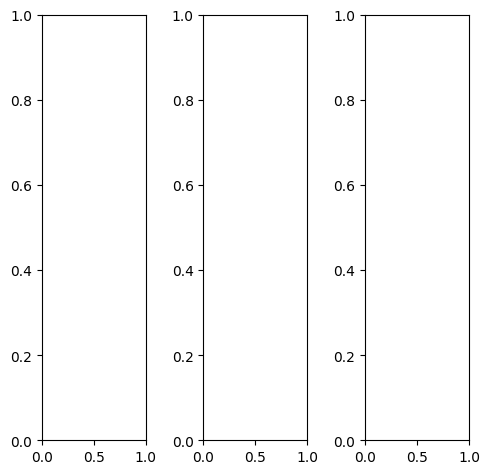

tensor([[[0.1922, 0.1961, 0.2000,  ..., 0.2941, 0.3137, 0.3333],
         [0.2039, 0.2118, 0.2196,  ..., 0.2980, 0.3098, 0.3294],
         [0.2118, 0.2235, 0.2314,  ..., 0.2745, 0.2784, 0.3098],
         ...,
         [0.2039, 0.1804, 0.1490,  ..., 0.2078, 0.2000, 0.1961],
         [0.1922, 0.1647, 0.1373,  ..., 0.2078, 0.2000, 0.1961],
         [0.1843, 0.1725, 0.1490,  ..., 0.2078, 0.2000, 0.1922]],

        [[0.1922, 0.1961, 0.2000,  ..., 0.2941, 0.3137, 0.3333],
         [0.2039, 0.2118, 0.2196,  ..., 0.2980, 0.3098, 0.3294],
         [0.2118, 0.2235, 0.2314,  ..., 0.2745, 0.2784, 0.3098],
         ...,
         [0.2039, 0.1804, 0.1490,  ..., 0.2078, 0.2000, 0.1961],
         [0.1922, 0.1647, 0.1373,  ..., 0.2078, 0.2000, 0.1961],
         [0.1843, 0.1725, 0.1490,  ..., 0.2078, 0.2000, 0.1922]],

        [[0.1922, 0.1961, 0.2000,  ..., 0.2941, 0.3137, 0.3333],
         [0.2039, 0.2118, 0.2196,  ..., 0.2980, 0.3098, 0.3294],
         [0.2118, 0.2235, 0.2314,  ..., 0.2745, 0.2784, 0.

tensor([[[0.2314, 0.2392, 0.2471,  ..., 0.3490, 0.3686, 0.3882],
         [0.2431, 0.2549, 0.2667,  ..., 0.3529, 0.3647, 0.3843],
         [0.2510, 0.2667, 0.2784,  ..., 0.3294, 0.3333, 0.3647],
         ...,
         [0.2353, 0.2118, 0.1804,  ..., 0.2510, 0.2431, 0.2392],
         [0.2196, 0.1961, 0.1686,  ..., 0.2510, 0.2431, 0.2392],
         [0.2000, 0.1961, 0.1804,  ..., 0.2510, 0.2392, 0.2275]],

        [[0.1882, 0.1922, 0.1961,  ..., 0.2941, 0.3137, 0.3333],
         [0.2000, 0.2078, 0.2157,  ..., 0.2941, 0.3098, 0.3294],
         [0.2078, 0.2196, 0.2275,  ..., 0.2706, 0.2745, 0.3059],
         ...,
         [0.2078, 0.1843, 0.1490,  ..., 0.2078, 0.2000, 0.1961],
         [0.1961, 0.1686, 0.1373,  ..., 0.2078, 0.2000, 0.1961],
         [0.2000, 0.1804, 0.1529,  ..., 0.2078, 0.2000, 0.1922]],

        [[0.1059, 0.1059, 0.1098,  ..., 0.1569, 0.1686, 0.1765],
         [0.1216, 0.1216, 0.1294,  ..., 0.1647, 0.1725, 0.1843],
         [0.1255, 0.1333, 0.1412,  ..., 0.1569, 0.1490, 0.

tensor([[[ 0.0287,  0.0051, -0.0821,  ...,  0.2446,  0.3113,  0.3882],
         [ 0.1371, -0.0811, -0.0841,  ...,  0.2276,  0.2394,  0.3388],
         [-0.0114, -0.1541, -0.1285,  ...,  0.1755,  0.1977,  0.3018],
         ...,
         [ 0.1517,  0.0932, -0.0042,  ...,  0.1352,  0.1056,  0.1371],
         [ 0.1182,  0.0411, -0.0368,  ...,  0.1179,  0.1155,  0.1333],
         [ 0.1367,  0.0855,  0.0475,  ...,  0.1515,  0.1297,  0.1438]],

        [[ 0.1412,  0.1111, -0.0138,  ...,  0.3631,  0.4284,  0.4473],
         [ 0.1498,  0.0358, -0.1560,  ...,  0.3406,  0.3790,  0.4327],
         [ 0.0837, -0.0483, -0.1239,  ...,  0.2884,  0.3126,  0.3777],
         ...,
         [ 0.1583,  0.0702, -0.0214,  ...,  0.1451,  0.1228,  0.1181],
         [ 0.1324,  0.0335, -0.0511,  ...,  0.1384,  0.1256,  0.1172],
         [ 0.1366,  0.0788,  0.0373,  ...,  0.1531,  0.1352,  0.1273]],

        [[ 0.2520,  0.0973,  0.1330,  ...,  0.4815,  0.5550,  0.5904],
         [ 0.2803,  0.0869,  0.1327,  ...,  0

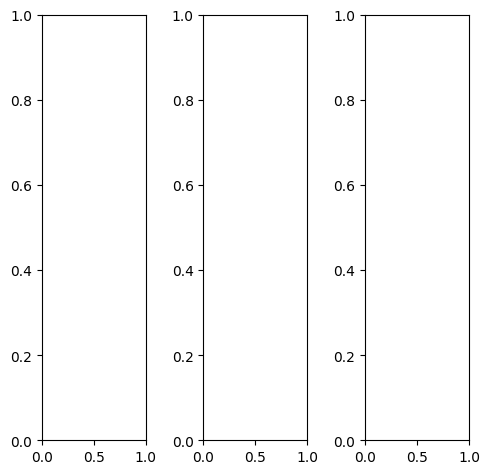

EPOCH: 34.000  val_loss: 0.003  (4180.64s - 8115.37s remaining)

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.9843, 0.9451, 0.8824,  ..., 0.9922, 0.9961, 1.0000],
         [0.9176, 0.8941, 0.8863,  ..., 0.9961, 0.9961, 1.0000],
         [0.8706, 0.8392, 0.8235,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.9843, 0.9451, 0.8824,  ..., 0.9922, 0.9961, 1.0000],
         [0.9176, 0.8941, 0.8863,  ..., 0.9961, 0.9961, 1.0000],
         [0.8706, 0.8392, 0.8235,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.9725, 0.9412, 0.8784,  ..., 0.9922, 0.9961, 1.0000],
         [0.9216, 0.9059, 0.9020,  ..., 0.9961, 0.9961, 1.0000],
         [0.8824, 0.8588, 0.8471,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         ...,
         [0.9882, 0.9490, 0.8824,  ..., 0.9922, 0.9961, 1.0000],
         [0.9137, 0.8902, 0.8784,  ..., 0.9961, 0.9961, 1.0000],
         [0.8627, 0.8314, 0.8118,  ..., 1.0000, 1.0000, 1.0000]],

        [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.0000],
         [0.9882, 1.0000, 0.9961,  ..., 1.0000, 1.0000, 1.

tensor([[[1.0083, 0.9903, 1.0386,  ..., 0.9879, 0.9892, 0.9600],
         [0.9932, 0.9937, 0.9715,  ..., 0.9948, 1.0018, 0.9830],
         [0.9839, 0.9972, 0.9845,  ..., 1.0055, 1.0073, 0.9965],
         ...,
         [0.9893, 0.9613, 0.8902,  ..., 0.9889, 0.9876, 0.9885],
         [0.9152, 0.8972, 0.8817,  ..., 0.9812, 0.9827, 0.9851],
         [0.8629, 0.8469, 0.8290,  ..., 0.9812, 0.9892, 0.9543]],

        [[1.0064, 1.0047, 1.0179,  ..., 0.9850, 0.9761, 0.9789],
         [1.0031, 0.9851, 0.9997,  ..., 0.9995, 0.9847, 0.9886],
         [0.9817, 0.9863, 1.0260,  ..., 1.0046, 1.0036, 0.9950],
         ...,
         [0.9753, 0.9467, 0.8845,  ..., 0.9897, 1.0040, 0.9975],
         [0.9066, 0.8789, 0.8757,  ..., 0.9871, 0.9880, 0.9823],
         [0.8527, 0.8410, 0.8260,  ..., 0.9869, 0.9827, 0.9348]],

        [[0.9882, 1.0141, 0.9979,  ..., 0.9780, 0.9715, 0.9569],
         [0.9825, 0.9673, 0.9938,  ..., 0.9870, 0.9835, 0.9714],
         [1.0092, 0.9931, 0.9889,  ..., 0.9966, 0.9820, 0.

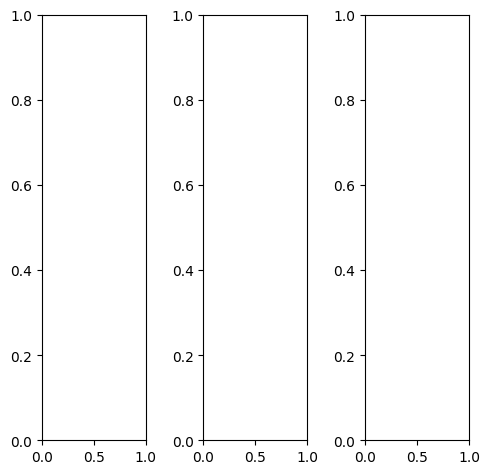

tensor([[[0.3490, 0.3490, 0.3373,  ..., 0.6353, 0.7961, 0.7686],
         [0.3529, 0.3451, 0.3255,  ..., 0.6235, 0.8039, 0.7843],
         [0.3569, 0.3569, 0.3451,  ..., 0.6039, 0.8039, 0.7843],
         ...,
         [0.4235, 0.3882, 0.2510,  ..., 0.7804, 0.7529, 0.6549],
         [0.3098, 0.2902, 0.2824,  ..., 0.6392, 0.6863, 0.6314],
         [0.2627, 0.3412, 0.2784,  ..., 0.3098, 0.4471, 0.5294]],

        [[0.3490, 0.3490, 0.3373,  ..., 0.6353, 0.7961, 0.7686],
         [0.3529, 0.3451, 0.3255,  ..., 0.6235, 0.8039, 0.7843],
         [0.3569, 0.3569, 0.3451,  ..., 0.6039, 0.8039, 0.7843],
         ...,
         [0.4235, 0.3882, 0.2510,  ..., 0.7804, 0.7529, 0.6549],
         [0.3098, 0.2902, 0.2824,  ..., 0.6392, 0.6863, 0.6314],
         [0.2627, 0.3412, 0.2784,  ..., 0.3098, 0.4471, 0.5294]],

        [[0.3490, 0.3490, 0.3373,  ..., 0.6353, 0.7961, 0.7686],
         [0.3529, 0.3451, 0.3255,  ..., 0.6235, 0.8039, 0.7843],
         [0.3569, 0.3569, 0.3451,  ..., 0.6039, 0.8039, 0.

tensor([[[0.4078, 0.4039, 0.3843,  ..., 0.6706, 0.8392, 0.8078],
         [0.4000, 0.3882, 0.3647,  ..., 0.6627, 0.8471, 0.8235],
         [0.3882, 0.3882, 0.3765,  ..., 0.6392, 0.8431, 0.8235],
         ...,
         [0.6510, 0.5922, 0.4431,  ..., 0.8510, 0.8078, 0.6863],
         [0.5216, 0.6078, 0.6078,  ..., 0.6941, 0.7333, 0.6667],
         [0.5137, 0.7490, 0.7255,  ..., 0.3451, 0.4824, 0.5647]],

        [[0.3529, 0.3569, 0.3451,  ..., 0.6275, 0.7804, 0.7490],
         [0.3647, 0.3608, 0.3412,  ..., 0.6157, 0.7882, 0.7647],
         [0.3765, 0.3765, 0.3647,  ..., 0.5961, 0.7882, 0.7686],
         ...,
         [0.3373, 0.3020, 0.1804,  ..., 0.7529, 0.7333, 0.6510],
         [0.2314, 0.1294, 0.1333,  ..., 0.6235, 0.6824, 0.6353],
         [0.1569, 0.1137, 0.0510,  ..., 0.3098, 0.4549, 0.5373]],

        [[0.1608, 0.1725, 0.1686,  ..., 0.5882, 0.7804, 0.7725],
         [0.1569, 0.1569, 0.1451,  ..., 0.5765, 0.7843, 0.7804],
         [0.1569, 0.1569, 0.1490,  ..., 0.5490, 0.7765, 0.

tensor([[[0.3621, 0.3605, 0.3505,  ..., 0.6399, 0.7914, 0.7614],
         [0.3534, 0.3532, 0.3391,  ..., 0.6265, 0.7774, 0.7815],
         [0.3644, 0.3683, 0.3580,  ..., 0.6094, 0.7917, 0.7773],
         ...,
         [0.4230, 0.4016, 0.2629,  ..., 0.8056, 0.7734, 0.6882],
         [0.3263, 0.3070, 0.3079,  ..., 0.6675, 0.6975, 0.6548],
         [0.2995, 0.3436, 0.2895,  ..., 0.3379, 0.4693, 0.5580]],

        [[0.3614, 0.3463, 0.3380,  ..., 0.6359, 0.7979, 0.7777],
         [0.3478, 0.3512, 0.3226,  ..., 0.6237, 0.7987, 0.7934],
         [0.3557, 0.3640, 0.3442,  ..., 0.6049, 0.7894, 0.7862],
         ...,
         [0.4141, 0.3875, 0.2518,  ..., 0.7859, 0.7523, 0.6522],
         [0.3116, 0.2934, 0.2723,  ..., 0.6414, 0.6761, 0.6405],
         [0.2889, 0.3223, 0.2765,  ..., 0.3321, 0.4530, 0.5449]],

        [[0.3003, 0.2975, 0.2829,  ..., 0.6174, 0.7932, 0.7577],
         [0.2822, 0.2771, 0.2623,  ..., 0.6181, 0.7587, 0.7550],
         [0.2898, 0.2866, 0.2805,  ..., 0.5934, 0.7718, 0.

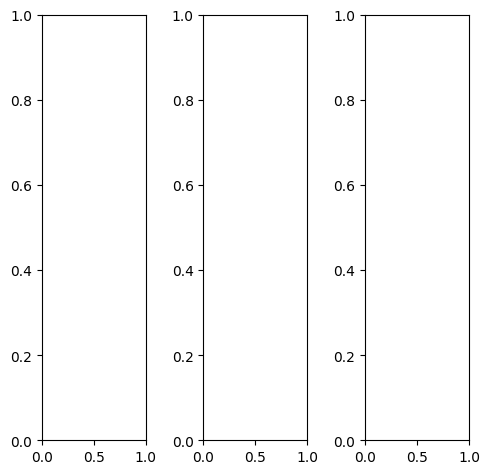

tensor([[[0.6392, 0.6118, 0.6000,  ..., 0.6196, 0.6235, 0.6353],
         [0.6275, 0.6157, 0.6078,  ..., 0.6196, 0.6353, 0.6471],
         [0.6314, 0.6157, 0.6157,  ..., 0.6314, 0.6431, 0.6549],
         ...,
         [0.4902, 0.5804, 0.6392,  ..., 0.4000, 0.3882, 0.3725],
         [0.4078, 0.4980, 0.5765,  ..., 0.3882, 0.3725, 0.3765],
         [0.4118, 0.4196, 0.4471,  ..., 0.3882, 0.3725, 0.3647]],

        [[0.6392, 0.6118, 0.6000,  ..., 0.6196, 0.6235, 0.6353],
         [0.6275, 0.6157, 0.6078,  ..., 0.6196, 0.6353, 0.6471],
         [0.6314, 0.6157, 0.6157,  ..., 0.6314, 0.6431, 0.6549],
         ...,
         [0.4902, 0.5804, 0.6392,  ..., 0.4000, 0.3882, 0.3725],
         [0.4078, 0.4980, 0.5765,  ..., 0.3882, 0.3725, 0.3765],
         [0.4118, 0.4196, 0.4471,  ..., 0.3882, 0.3725, 0.3647]],

        [[0.6392, 0.6118, 0.6000,  ..., 0.6196, 0.6235, 0.6353],
         [0.6275, 0.6157, 0.6078,  ..., 0.6196, 0.6353, 0.6471],
         [0.6314, 0.6157, 0.6157,  ..., 0.6314, 0.6431, 0.

tensor([[[0.5294, 0.5059, 0.4941,  ..., 0.5255, 0.5294, 0.5412],
         [0.5216, 0.5098, 0.5020,  ..., 0.5255, 0.5412, 0.5529],
         [0.5255, 0.5098, 0.5098,  ..., 0.5373, 0.5490, 0.5608],
         ...,
         [0.4039, 0.5333, 0.6196,  ..., 0.2980, 0.2824, 0.2667],
         [0.2980, 0.4078, 0.5137,  ..., 0.2824, 0.2667, 0.2706],
         [0.2941, 0.3059, 0.3373,  ..., 0.2863, 0.2667, 0.2588]],

        [[0.6745, 0.6431, 0.6314,  ..., 0.6471, 0.6549, 0.6627],
         [0.6627, 0.6471, 0.6392,  ..., 0.6471, 0.6627, 0.6745],
         [0.6627, 0.6471, 0.6471,  ..., 0.6588, 0.6706, 0.6824],
         ...,
         [0.5216, 0.6039, 0.6549,  ..., 0.4314, 0.4157, 0.4000],
         [0.4431, 0.5294, 0.6000,  ..., 0.4196, 0.4000, 0.4039],
         [0.4471, 0.4549, 0.4824,  ..., 0.4196, 0.4039, 0.3961]],

        [[0.7373, 0.7176, 0.7098,  ..., 0.7216, 0.7255, 0.7373],
         [0.7373, 0.7216, 0.7176,  ..., 0.7255, 0.7333, 0.7451],
         [0.7451, 0.7255, 0.7255,  ..., 0.7412, 0.7451, 0.

tensor([[[0.6338, 0.6229, 0.6088,  ..., 0.6340, 0.6508, 0.6612],
         [0.6480, 0.6278, 0.6117,  ..., 0.6283, 0.6400, 0.6715],
         [0.6408, 0.6287, 0.6226,  ..., 0.6430, 0.6634, 0.6835],
         ...,
         [0.5152, 0.6260, 0.6867,  ..., 0.4345, 0.4163, 0.3938],
         [0.4194, 0.5380, 0.6271,  ..., 0.4167, 0.3977, 0.3954],
         [0.4358, 0.4315, 0.4682,  ..., 0.4030, 0.3848, 0.3829]],

        [[0.6288, 0.6108, 0.6001,  ..., 0.6127, 0.6312, 0.6426],
         [0.6355, 0.6059, 0.6063,  ..., 0.6102, 0.6205, 0.6586],
         [0.6299, 0.6144, 0.6154,  ..., 0.6323, 0.6455, 0.6593],
         ...,
         [0.4824, 0.5853, 0.6433,  ..., 0.3855, 0.3809, 0.3630],
         [0.3854, 0.4932, 0.5867,  ..., 0.3718, 0.3616, 0.3743],
         [0.4216, 0.4077, 0.4438,  ..., 0.3771, 0.3626, 0.3663]],

        [[0.5767, 0.5520, 0.5187,  ..., 0.5387, 0.5665, 0.5970],
         [0.5627, 0.5407, 0.5299,  ..., 0.5318, 0.5385, 0.5758],
         [0.5515, 0.5358, 0.5352,  ..., 0.5446, 0.5610, 0.

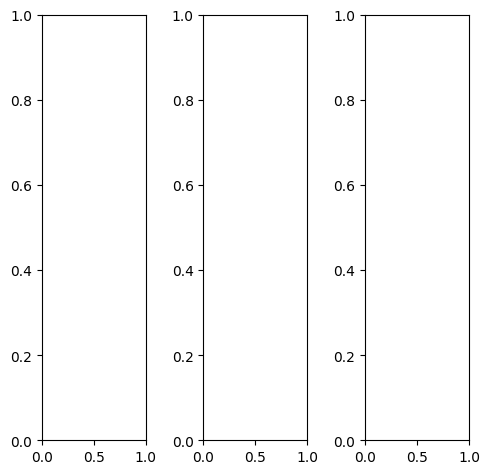

tensor([[[0.0941, 0.1098, 0.1216,  ..., 0.2235, 0.2078, 0.1725],
         [0.0902, 0.1059, 0.1255,  ..., 0.3922, 0.2471, 0.1569],
         [0.0902, 0.1059, 0.1294,  ..., 0.4157, 0.2118, 0.1686],
         ...,
         [0.1922, 0.2118, 0.2471,  ..., 0.7686, 0.7333, 0.7098],
         [0.1882, 0.1843, 0.2157,  ..., 0.8941, 0.8980, 0.8941],
         [0.3843, 0.4157, 0.4314,  ..., 0.7176, 0.6784, 0.6353]],

        [[0.0941, 0.1098, 0.1216,  ..., 0.2235, 0.2078, 0.1725],
         [0.0902, 0.1059, 0.1255,  ..., 0.3922, 0.2471, 0.1569],
         [0.0902, 0.1059, 0.1294,  ..., 0.4157, 0.2118, 0.1686],
         ...,
         [0.1922, 0.2118, 0.2471,  ..., 0.7686, 0.7333, 0.7098],
         [0.1882, 0.1843, 0.2157,  ..., 0.8941, 0.8980, 0.8941],
         [0.3843, 0.4157, 0.4314,  ..., 0.7176, 0.6784, 0.6353]],

        [[0.0941, 0.1098, 0.1216,  ..., 0.2235, 0.2078, 0.1725],
         [0.0902, 0.1059, 0.1255,  ..., 0.3922, 0.2471, 0.1569],
         [0.0902, 0.1059, 0.1294,  ..., 0.4157, 0.2118, 0.

tensor([[[0.1412, 0.1529, 0.1882,  ..., 0.3373, 0.3020, 0.2431],
         [0.1373, 0.1490, 0.1882,  ..., 0.5059, 0.3412, 0.2275],
         [0.1373, 0.1490, 0.1961,  ..., 0.5255, 0.3059, 0.2392],
         ...,
         [0.2353, 0.2510, 0.2863,  ..., 0.8275, 0.8000, 0.7804],
         [0.2275, 0.2235, 0.2549,  ..., 0.9490, 0.9647, 0.9647],
         [0.4235, 0.4549, 0.4706,  ..., 0.7725, 0.7451, 0.7059]],

        [[0.0667, 0.0784, 0.0863,  ..., 0.1765, 0.1686, 0.1373],
         [0.0627, 0.0784, 0.0902,  ..., 0.3451, 0.2078, 0.1216],
         [0.0627, 0.0784, 0.0941,  ..., 0.3686, 0.1725, 0.1333],
         ...,
         [0.1608, 0.1765, 0.2157,  ..., 0.7333, 0.6980, 0.6745],
         [0.1569, 0.1529, 0.1882,  ..., 0.8667, 0.8706, 0.8627],
         [0.3608, 0.3882, 0.4078,  ..., 0.6902, 0.6510, 0.6078]],

        [[0.1098, 0.1412, 0.1373,  ..., 0.1843, 0.1765, 0.1569],
         [0.1059, 0.1412, 0.1412,  ..., 0.3451, 0.2157, 0.1451],
         [0.1059, 0.1412, 0.1451,  ..., 0.3529, 0.1765, 0.

tensor([[[0.1123, 0.0989, 0.1128,  ..., 0.2268, 0.2036, 0.1736],
         [0.0841, 0.0953, 0.1182,  ..., 0.3895, 0.2562, 0.1582],
         [0.0792, 0.0895, 0.1200,  ..., 0.4201, 0.2180, 0.1608],
         ...,
         [0.1948, 0.2290, 0.2728,  ..., 0.7782, 0.7391, 0.7135],
         [0.1976, 0.1934, 0.2367,  ..., 0.9100, 0.9109, 0.8951],
         [0.3800, 0.4186, 0.4472,  ..., 0.7511, 0.7162, 0.6964]],

        [[0.1292, 0.1047, 0.1160,  ..., 0.2293, 0.2078, 0.1905],
         [0.0880, 0.1043, 0.1244,  ..., 0.3947, 0.2528, 0.1662],
         [0.0856, 0.1050, 0.1287,  ..., 0.4143, 0.2154, 0.1680],
         ...,
         [0.1794, 0.2012, 0.2402,  ..., 0.7670, 0.7183, 0.7186],
         [0.1955, 0.1844, 0.2191,  ..., 0.8985, 0.9143, 0.8697],
         [0.3864, 0.4120, 0.4342,  ..., 0.7254, 0.6949, 0.6746]],

        [[0.1145, 0.0960, 0.1057,  ..., 0.1863, 0.1761, 0.1616],
         [0.0828, 0.0968, 0.1097,  ..., 0.3310, 0.2138, 0.1340],
         [0.0781, 0.0880, 0.1070,  ..., 0.3567, 0.1797, 0.

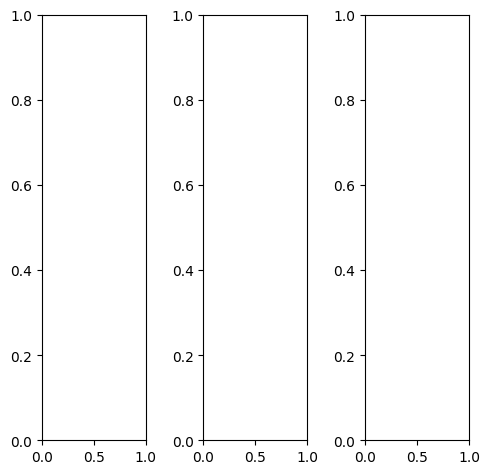

tensor([[[0.2235, 0.2863, 0.3647,  ..., 0.5098, 0.4510, 0.3294],
         [0.2863, 0.3020, 0.3569,  ..., 0.3608, 0.5137, 0.4078],
         [0.3490, 0.3176, 0.2980,  ..., 0.2078, 0.4078, 0.5255],
         ...,
         [0.4471, 0.2510, 0.2980,  ..., 0.2196, 0.1294, 0.0510],
         [0.4902, 0.4196, 0.4706,  ..., 0.1294, 0.2902, 0.1216],
         [0.4627, 0.5647, 0.6196,  ..., 0.0824, 0.2000, 0.3333]],

        [[0.2235, 0.2863, 0.3647,  ..., 0.5098, 0.4510, 0.3294],
         [0.2863, 0.3020, 0.3569,  ..., 0.3608, 0.5137, 0.4078],
         [0.3490, 0.3176, 0.2980,  ..., 0.2078, 0.4078, 0.5255],
         ...,
         [0.4471, 0.2510, 0.2980,  ..., 0.2196, 0.1294, 0.0510],
         [0.4902, 0.4196, 0.4706,  ..., 0.1294, 0.2902, 0.1216],
         [0.4627, 0.5647, 0.6196,  ..., 0.0824, 0.2000, 0.3333]],

        [[0.2235, 0.2863, 0.3647,  ..., 0.5098, 0.4510, 0.3294],
         [0.2863, 0.3020, 0.3569,  ..., 0.3608, 0.5137, 0.4078],
         [0.3490, 0.3176, 0.2980,  ..., 0.2078, 0.4078, 0.

tensor([[[0.1059, 0.1569, 0.2118,  ..., 0.3529, 0.2980, 0.1804],
         [0.1961, 0.2118, 0.2235,  ..., 0.2392, 0.3804, 0.2627],
         [0.2196, 0.1961, 0.1804,  ..., 0.1216, 0.2902, 0.3843],
         ...,
         [0.4000, 0.1373, 0.1843,  ..., 0.1961, 0.1176, 0.0314],
         [0.4745, 0.3451, 0.4078,  ..., 0.0980, 0.2706, 0.1059],
         [0.4902, 0.5451, 0.5882,  ..., 0.0588, 0.1529, 0.2824]],

        [[0.3098, 0.3725, 0.4588,  ..., 0.6039, 0.5490, 0.4275],
         [0.3451, 0.3647, 0.4392,  ..., 0.4392, 0.6039, 0.5020],
         [0.4314, 0.4000, 0.3765,  ..., 0.2627, 0.4824, 0.6157],
         ...,
         [0.4824, 0.3255, 0.3765,  ..., 0.2431, 0.1412, 0.0627],
         [0.5098, 0.4706, 0.5216,  ..., 0.1569, 0.3059, 0.1294],
         [0.4745, 0.6196, 0.6941,  ..., 0.1020, 0.2275, 0.3569]],

        [[0.0902, 0.1725, 0.2706,  ..., 0.4196, 0.3373, 0.2235],
         [0.2078, 0.2314, 0.2863,  ..., 0.2824, 0.4078, 0.2980],
         [0.2706, 0.2275, 0.1922,  ..., 0.1608, 0.3216, 0.

tensor([[[0.2567, 0.2948, 0.3652,  ..., 0.4817, 0.4261, 0.3249],
         [0.2810, 0.3197, 0.3813,  ..., 0.3724, 0.5084, 0.4104],
         [0.3558, 0.3285, 0.3302,  ..., 0.2233, 0.4097, 0.5374],
         ...,
         [0.4635, 0.2649, 0.3159,  ..., 0.2262, 0.1370, 0.0710],
         [0.4964, 0.4510, 0.4977,  ..., 0.1440, 0.3019, 0.1551],
         [0.4918, 0.5786, 0.6521,  ..., 0.0981, 0.2003, 0.2918]],

        [[0.2367, 0.2790, 0.3490,  ..., 0.4978, 0.4436, 0.3439],
         [0.2679, 0.2991, 0.3521,  ..., 0.3628, 0.5014, 0.4096],
         [0.3400, 0.3041, 0.2989,  ..., 0.2085, 0.3995, 0.5333],
         ...,
         [0.4394, 0.2404, 0.2979,  ..., 0.2142, 0.1267, 0.0642],
         [0.4905, 0.4070, 0.4550,  ..., 0.1225, 0.2800, 0.1448],
         [0.4778, 0.5606, 0.6270,  ..., 0.0825, 0.1845, 0.2821]],

        [[0.2031, 0.2336, 0.2924,  ..., 0.4345, 0.3977, 0.3036],
         [0.2252, 0.2369, 0.2869,  ..., 0.3096, 0.4365, 0.3566],
         [0.2866, 0.2478, 0.2524,  ..., 0.1780, 0.3625, 0.

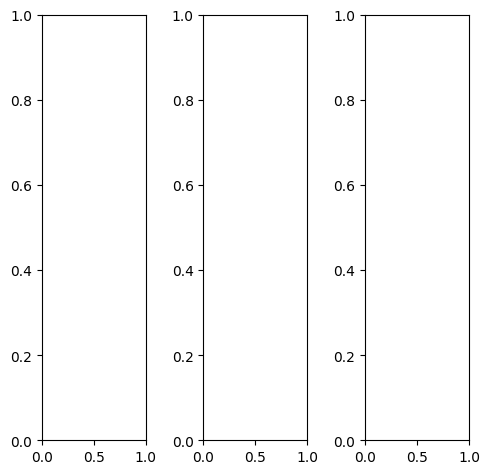

EPOCH: 34.255  trn_loss: 0.004  (4210.80s - 8081.68s remaining)

tensor([[[0.0118, 0.0039, 0.0000,  ..., 0.5686, 0.5373, 0.8588],
         [0.0431, 0.0431, 0.0039,  ..., 0.5686, 0.4902, 0.5843],
         [0.0510, 0.0471, 0.0039,  ..., 0.5647, 0.5569, 0.5882],
         ...,
         [0.2196, 0.2196, 0.2039,  ..., 0.3412, 0.3255, 0.3333],
         [0.2353, 0.2314, 0.2157,  ..., 0.3294, 0.3216, 0.3216],
         [0.2314, 0.2275, 0.2039,  ..., 0.3176, 0.3137, 0.3216]],

        [[0.0118, 0.0039, 0.0000,  ..., 0.5686, 0.5373, 0.8588],
         [0.0431, 0.0431, 0.0039,  ..., 0.5686, 0.4902, 0.5843],
         [0.0510, 0.0471, 0.0039,  ..., 0.5647, 0.5569, 0.5882],
         ...,
         [0.2196, 0.2196, 0.2039,  ..., 0.3412, 0.3255, 0.3333],
         [0.2353, 0.2314, 0.2157,  ..., 0.3294, 0.3216, 0.3216],
         [0.2314, 0.2275, 0.2039,  ..., 0.3176, 0.3137, 0.3216]],

        [[0.0118, 0.0039, 0.0000,  ..., 0.5686, 0.5373, 0.8588],
         [0.0431, 0.0431, 0.0039,  ..., 0.5686, 0.4902, 0.5843],
         [0.0510, 0.0471, 0.0039,  ..., 0.5647, 0.5569, 0.

tensor([[[0.0157, 0.0078, 0.0039,  ..., 0.6314, 0.5569, 0.8627],
         [0.0471, 0.0471, 0.0078,  ..., 0.6431, 0.5216, 0.6039],
         [0.0549, 0.0510, 0.0078,  ..., 0.6392, 0.6000, 0.6275],
         ...,
         [0.1961, 0.1961, 0.1804,  ..., 0.3059, 0.2863, 0.2824],
         [0.2118, 0.2078, 0.1922,  ..., 0.2824, 0.2745, 0.2745],
         [0.2039, 0.2039, 0.1843,  ..., 0.2784, 0.2745, 0.2784]],

        [[0.0078, 0.0039, 0.0000,  ..., 0.5490, 0.5294, 0.8549],
         [0.0431, 0.0431, 0.0039,  ..., 0.5412, 0.4745, 0.5725],
         [0.0471, 0.0431, 0.0039,  ..., 0.5373, 0.5412, 0.5686],
         ...,
         [0.2275, 0.2314, 0.2118,  ..., 0.3490, 0.3373, 0.3451],
         [0.2431, 0.2392, 0.2235,  ..., 0.3412, 0.3333, 0.3333],
         [0.2392, 0.2353, 0.2078,  ..., 0.3294, 0.3255, 0.3333]],

        [[0.0118, 0.0039, 0.0000,  ..., 0.5216, 0.5412, 0.8549],
         [0.0431, 0.0431, 0.0039,  ..., 0.5176, 0.4824, 0.5843],
         [0.0510, 0.0471, 0.0039,  ..., 0.5020, 0.5373, 0.

tensor([[[ 7.5069e-03, -2.4364e-02, -9.7383e-02,  ...,  6.8972e-01,
           6.4621e-01,  9.2112e-01],
         [ 1.0165e-01, -9.7104e-02, -9.7847e-02,  ...,  6.7524e-01,
           6.0432e-01,  7.2845e-01],
         [-9.3095e-02, -1.2662e-01, -1.7990e-01,  ...,  6.8089e-01,
           6.8942e-01,  7.4844e-01],
         ...,
         [ 3.6412e-01,  3.8682e-01,  3.6387e-01,  ...,  5.4806e-01,
           5.4528e-01,  5.5518e-01],
         [ 3.6040e-01,  3.7589e-01,  3.7287e-01,  ...,  5.3500e-01,
           5.1617e-01,  5.2380e-01],
         [ 3.6784e-01,  3.7282e-01,  3.3930e-01,  ...,  5.1840e-01,
           5.0550e-01,  5.3272e-01]],

        [[ 1.0100e-01,  1.1400e-01, -9.4683e-02,  ...,  7.8062e-01,
           7.5082e-01,  9.9158e-01],
         [ 1.1750e-01, -4.4075e-02, -2.4203e-01,  ...,  7.6877e-01,
           6.8115e-01,  8.3313e-01],
         [-5.5318e-04,  5.3600e-02, -2.0085e-01,  ...,  8.0554e-01,
           7.7450e-01,  8.2971e-01],
         ...,
         [ 3.7129e-01,  3

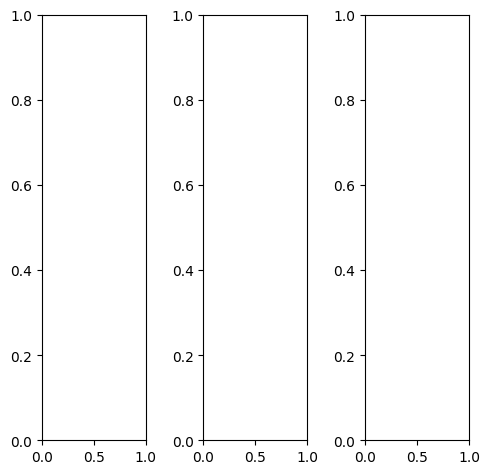

tensor([[[0.4627, 0.5922, 0.4745,  ..., 0.4392, 0.4039, 0.3882],
         [0.4392, 0.5843, 0.4902,  ..., 0.5294, 0.3020, 0.2588],
         [0.4392, 0.5725, 0.5294,  ..., 0.4314, 0.2275, 0.2471],
         ...,
         [0.7137, 0.6118, 0.3882,  ..., 0.6039, 0.5098, 0.3922],
         [0.7255, 0.4118, 0.1765,  ..., 0.4353, 0.3882, 0.4196],
         [0.6471, 0.3804, 0.3255,  ..., 0.4980, 0.4157, 0.4706]],

        [[0.4627, 0.5922, 0.4745,  ..., 0.4392, 0.4039, 0.3882],
         [0.4392, 0.5843, 0.4902,  ..., 0.5294, 0.3020, 0.2588],
         [0.4392, 0.5725, 0.5294,  ..., 0.4314, 0.2275, 0.2471],
         ...,
         [0.7137, 0.6118, 0.3882,  ..., 0.6039, 0.5098, 0.3922],
         [0.7255, 0.4118, 0.1765,  ..., 0.4353, 0.3882, 0.4196],
         [0.6471, 0.3804, 0.3255,  ..., 0.4980, 0.4157, 0.4706]],

        [[0.4627, 0.5922, 0.4745,  ..., 0.4392, 0.4039, 0.3882],
         [0.4392, 0.5843, 0.4902,  ..., 0.5294, 0.3020, 0.2588],
         [0.4392, 0.5725, 0.5294,  ..., 0.4314, 0.2275, 0.

tensor([[[0.5137, 0.6510, 0.5451,  ..., 0.5137, 0.4902, 0.4824],
         [0.4863, 0.6314, 0.5412,  ..., 0.6157, 0.3804, 0.3294],
         [0.4745, 0.6118, 0.5725,  ..., 0.5137, 0.3020, 0.3216],
         ...,
         [0.8549, 0.7569, 0.6353,  ..., 0.7765, 0.7412, 0.6392],
         [0.7765, 0.5412, 0.3137,  ..., 0.6078, 0.6118, 0.6431],
         [0.7922, 0.6078, 0.5176,  ..., 0.6314, 0.5843, 0.6627]],

        [[0.4431, 0.5725, 0.4588,  ..., 0.4157, 0.3843, 0.3686],
         [0.4275, 0.5725, 0.4784,  ..., 0.5176, 0.2824, 0.2392],
         [0.4392, 0.5647, 0.5216,  ..., 0.4196, 0.2039, 0.2235],
         ...,
         [0.6549, 0.5647, 0.3059,  ..., 0.5412, 0.4353, 0.3098],
         [0.7059, 0.3569, 0.1255,  ..., 0.3647, 0.3059, 0.3412],
         [0.6000, 0.3098, 0.2627,  ..., 0.4392, 0.3451, 0.4000]],

        [[0.4314, 0.5294, 0.3804,  ..., 0.3569, 0.2902, 0.2588],
         [0.3843, 0.5137, 0.4000,  ..., 0.3647, 0.2000, 0.1804],
         [0.3373, 0.5020, 0.4510,  ..., 0.2902, 0.1608, 0.

tensor([[[ 0.3728,  0.3607,  0.2095,  ...,  0.3034,  0.2459,  0.1997],
         [ 0.3188,  0.2907,  0.1676,  ...,  0.4539,  0.1401,  0.0743],
         [ 0.2402,  0.3225,  0.1810,  ...,  0.3195,  0.0088,  0.0372],
         ...,
         [ 0.8091,  0.6577,  0.3824,  ...,  0.6677,  0.5103,  0.3545],
         [ 0.7754,  0.3782,  0.0545,  ...,  0.3873,  0.3128,  0.3234],
         [ 0.6214,  0.2943,  0.2039,  ...,  0.4555,  0.3138,  0.3816]],

        [[ 0.4478,  0.4621,  0.3914,  ...,  0.3879,  0.3590,  0.2890],
         [ 0.3427,  0.4365,  0.2109,  ...,  0.5723,  0.2632,  0.1549],
         [ 0.3692,  0.4113,  0.3553,  ...,  0.4374,  0.1230,  0.1076],
         ...,
         [ 0.7528,  0.6295,  0.3697,  ...,  0.6520,  0.4860,  0.3140],
         [ 0.7290,  0.3602,  0.0866,  ...,  0.3826,  0.3170,  0.3177],
         [ 0.5758,  0.2720,  0.1911,  ...,  0.4484,  0.3040,  0.3542]],

        [[ 0.5768,  0.5606,  0.4846,  ...,  0.5109,  0.4663,  0.3918],
         [ 0.5095,  0.6171,  0.3901,  ...,  0

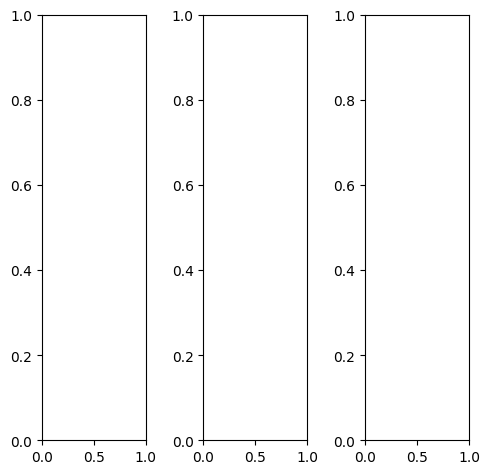

tensor([[[0.6980, 0.7020, 0.7059,  ..., 0.7490, 0.7490, 0.7529],
         [0.6863, 0.6902, 0.6902,  ..., 0.7373, 0.7373, 0.7412],
         [0.6824, 0.6824, 0.6863,  ..., 0.7333, 0.7333, 0.7333],
         ...,
         [0.3451, 0.3216, 0.3176,  ..., 0.2980, 0.2745, 0.2824],
         [0.3216, 0.3294, 0.2941,  ..., 0.3412, 0.2941, 0.3451],
         [0.3412, 0.3412, 0.3098,  ..., 0.3098, 0.3333, 0.3294]],

        [[0.6980, 0.7020, 0.7059,  ..., 0.7490, 0.7490, 0.7529],
         [0.6863, 0.6902, 0.6902,  ..., 0.7373, 0.7373, 0.7412],
         [0.6824, 0.6824, 0.6863,  ..., 0.7333, 0.7333, 0.7333],
         ...,
         [0.3451, 0.3216, 0.3176,  ..., 0.2980, 0.2745, 0.2824],
         [0.3216, 0.3294, 0.2941,  ..., 0.3412, 0.2941, 0.3451],
         [0.3412, 0.3412, 0.3098,  ..., 0.3098, 0.3333, 0.3294]],

        [[0.6980, 0.7020, 0.7059,  ..., 0.7490, 0.7490, 0.7529],
         [0.6863, 0.6902, 0.6902,  ..., 0.7373, 0.7373, 0.7412],
         [0.6824, 0.6824, 0.6863,  ..., 0.7333, 0.7333, 0.

tensor([[[0.6941, 0.6980, 0.7020,  ..., 0.7451, 0.7451, 0.7490],
         [0.6902, 0.6941, 0.6941,  ..., 0.7412, 0.7412, 0.7451],
         [0.6941, 0.6941, 0.6941,  ..., 0.7451, 0.7451, 0.7451],
         ...,
         [0.2863, 0.2784, 0.2863,  ..., 0.2157, 0.1922, 0.2000],
         [0.2627, 0.2706, 0.2510,  ..., 0.2588, 0.2118, 0.2627],
         [0.2863, 0.2941, 0.2627,  ..., 0.2275, 0.2510, 0.2510]],

        [[0.7059, 0.7098, 0.7137,  ..., 0.7569, 0.7569, 0.7647],
         [0.6941, 0.6980, 0.6980,  ..., 0.7451, 0.7451, 0.7451],
         [0.6863, 0.6863, 0.6902,  ..., 0.7373, 0.7373, 0.7373],
         ...,
         [0.3608, 0.3294, 0.3176,  ..., 0.3216, 0.3020, 0.3059],
         [0.3373, 0.3412, 0.3059,  ..., 0.3647, 0.3176, 0.3686],
         [0.3529, 0.3529, 0.3255,  ..., 0.3333, 0.3569, 0.3529]],

        [[0.6706, 0.6706, 0.6745,  ..., 0.7020, 0.7059, 0.7098],
         [0.6510, 0.6510, 0.6549,  ..., 0.6980, 0.6980, 0.6980],
         [0.6392, 0.6353, 0.6392,  ..., 0.6902, 0.6902, 0.

tensor([[[0.8149, 0.7988, 0.7143,  ..., 0.7101, 0.7396, 0.8228],
         [0.7947, 0.7679, 0.7392,  ..., 0.7217, 0.7577, 0.8445],
         [0.7914, 0.7820, 0.6694,  ..., 0.7361, 0.7624, 0.8185],
         ...,
         [0.3933, 0.3733, 0.4010,  ..., 0.3087, 0.2719, 0.3164],
         [0.3313, 0.3607, 0.2874,  ..., 0.3663, 0.3150, 0.4070],
         [0.3943, 0.3885, 0.3358,  ..., 0.3709, 0.4005, 0.4293]],

        [[0.8177, 0.8178, 0.6887,  ..., 0.7837, 0.8276, 0.8771],
         [0.7669, 0.6640, 0.6969,  ..., 0.7955, 0.8148, 0.9163],
         [0.8426, 0.8112, 0.7042,  ..., 0.8019, 0.8168, 0.8858],
         ...,
         [0.3795, 0.3627, 0.3279,  ..., 0.3275, 0.2904, 0.2902],
         [0.3203, 0.3650, 0.2721,  ..., 0.3719, 0.3164, 0.3895],
         [0.3870, 0.3860, 0.3434,  ..., 0.3533, 0.3857, 0.3909]],

        [[0.8870, 0.8547, 0.8250,  ..., 0.9330, 0.9730, 1.0112],
         [0.8745, 0.8079, 0.8415,  ..., 0.9047, 0.9594, 1.0299],
         [0.8413, 0.7793, 0.7484,  ..., 0.9223, 0.9577, 1.

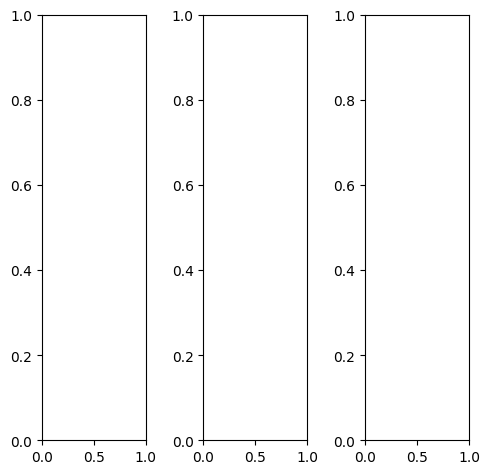

tensor([[[0.5725, 0.5725, 0.5725,  ..., 0.7529, 0.7529, 0.7608],
         [0.5882, 0.5882, 0.5922,  ..., 0.7294, 0.7255, 0.7059],
         [0.5922, 0.5922, 0.5961,  ..., 0.6706, 0.6275, 0.5137],
         ...,
         [0.5686, 0.5686, 0.5843,  ..., 0.5255, 0.5333, 0.5333],
         [0.5686, 0.5686, 0.5922,  ..., 0.5412, 0.5373, 0.5333],
         [0.5647, 0.5608, 0.5804,  ..., 0.5412, 0.5373, 0.5333]],

        [[0.5725, 0.5725, 0.5725,  ..., 0.7529, 0.7529, 0.7608],
         [0.5882, 0.5882, 0.5922,  ..., 0.7294, 0.7255, 0.7059],
         [0.5922, 0.5922, 0.5961,  ..., 0.6706, 0.6275, 0.5137],
         ...,
         [0.5686, 0.5686, 0.5843,  ..., 0.5255, 0.5333, 0.5333],
         [0.5686, 0.5686, 0.5922,  ..., 0.5412, 0.5373, 0.5333],
         [0.5647, 0.5608, 0.5804,  ..., 0.5412, 0.5373, 0.5333]],

        [[0.5725, 0.5725, 0.5725,  ..., 0.7529, 0.7529, 0.7608],
         [0.5882, 0.5882, 0.5922,  ..., 0.7294, 0.7255, 0.7059],
         [0.5922, 0.5922, 0.5961,  ..., 0.6706, 0.6275, 0.

tensor([[[0.4667, 0.4667, 0.4667,  ..., 0.7333, 0.7333, 0.7451],
         [0.4824, 0.4824, 0.4863,  ..., 0.6824, 0.6784, 0.6627],
         [0.4863, 0.4863, 0.4902,  ..., 0.5961, 0.5569, 0.4510],
         ...,
         [0.6118, 0.6118, 0.6275,  ..., 0.5647, 0.5725, 0.5725],
         [0.6118, 0.6118, 0.6353,  ..., 0.5804, 0.5765, 0.5725],
         [0.6078, 0.6039, 0.6235,  ..., 0.5804, 0.5765, 0.5725]],

        [[0.5922, 0.5922, 0.5922,  ..., 0.7490, 0.7490, 0.7647],
         [0.6118, 0.6118, 0.6157,  ..., 0.7373, 0.7373, 0.7216],
         [0.6157, 0.6157, 0.6196,  ..., 0.6863, 0.6471, 0.5451],
         ...,
         [0.5569, 0.5569, 0.5725,  ..., 0.5216, 0.5294, 0.5294],
         [0.5569, 0.5569, 0.5804,  ..., 0.5333, 0.5333, 0.5255],
         [0.5529, 0.5490, 0.5725,  ..., 0.5333, 0.5294, 0.5255]],

        [[0.7412, 0.7373, 0.7412,  ..., 0.8078, 0.8235, 0.7961],
         [0.7529, 0.7529, 0.7529,  ..., 0.8078, 0.8039, 0.7490],
         [0.7451, 0.7451, 0.7451,  ..., 0.7725, 0.7020, 0.

tensor([[[0.5586, 0.4855, 0.4311,  ..., 0.6449, 0.6593, 0.7541],
         [0.5269, 0.3528, 0.3578,  ..., 0.6063, 0.6390, 0.7020],
         [0.4978, 0.4341, 0.3114,  ..., 0.5877, 0.5935, 0.5164],
         ...,
         [0.6702, 0.6872, 0.6372,  ..., 0.5969, 0.6167, 0.6717],
         [0.6395, 0.6466, 0.6344,  ..., 0.6034, 0.6273, 0.6581],
         [0.6653, 0.6649, 0.6688,  ..., 0.6413, 0.6462, 0.6524]],

        [[0.6101, 0.5955, 0.4957,  ..., 0.7365, 0.7628, 0.8233],
         [0.5518, 0.4014, 0.3969,  ..., 0.7113, 0.7160, 0.7885],
         [0.6101, 0.5652, 0.4411,  ..., 0.6875, 0.6587, 0.5887],
         ...,
         [0.6068, 0.6230, 0.6141,  ..., 0.5707, 0.6048, 0.6212],
         [0.5837, 0.5876, 0.5891,  ..., 0.5876, 0.5960, 0.6210],
         [0.6120, 0.6123, 0.6253,  ..., 0.6017, 0.6126, 0.6210]],

        [[0.7512, 0.7049, 0.6795,  ..., 0.9354, 0.9638, 0.9997],
         [0.7433, 0.6119, 0.6630,  ..., 0.8804, 0.9156, 0.9616],
         [0.6519, 0.6408, 0.5197,  ..., 0.8817, 0.8567, 0.

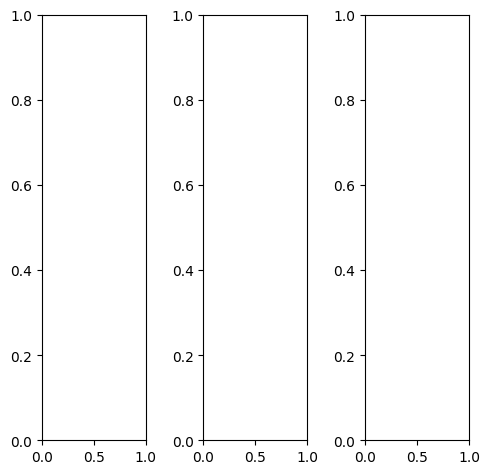

tensor([[[0.2784, 0.2706, 0.2863,  ..., 0.2863, 0.3176, 0.3294],
         [0.1333, 0.1765, 0.2549,  ..., 0.2627, 0.3059, 0.2980],
         [0.1412, 0.2235, 0.2275,  ..., 0.2000, 0.2078, 0.2392],
         ...,
         [0.6118, 0.6157, 0.6235,  ..., 0.6588, 0.6549, 0.6510],
         [0.6078, 0.6196, 0.6353,  ..., 0.6549, 0.6471, 0.6431],
         [0.6000, 0.6118, 0.6235,  ..., 0.6431, 0.6353, 0.6314]],

        [[0.2784, 0.2706, 0.2863,  ..., 0.2863, 0.3176, 0.3294],
         [0.1333, 0.1765, 0.2549,  ..., 0.2627, 0.3059, 0.2980],
         [0.1412, 0.2235, 0.2275,  ..., 0.2000, 0.2078, 0.2392],
         ...,
         [0.6118, 0.6157, 0.6235,  ..., 0.6588, 0.6549, 0.6510],
         [0.6078, 0.6196, 0.6353,  ..., 0.6549, 0.6471, 0.6431],
         [0.6000, 0.6118, 0.6235,  ..., 0.6431, 0.6353, 0.6314]],

        [[0.2784, 0.2706, 0.2863,  ..., 0.2863, 0.3176, 0.3294],
         [0.1333, 0.1765, 0.2549,  ..., 0.2627, 0.3059, 0.2980],
         [0.1412, 0.2235, 0.2275,  ..., 0.2000, 0.2078, 0.

tensor([[[0.2588, 0.2667, 0.2902,  ..., 0.2784, 0.3176, 0.3333],
         [0.1137, 0.1647, 0.2471,  ..., 0.2471, 0.2980, 0.2941],
         [0.1373, 0.2196, 0.2235,  ..., 0.1804, 0.1922, 0.2314],
         ...,
         [0.6118, 0.6157, 0.6235,  ..., 0.6549, 0.6510, 0.6471],
         [0.6078, 0.6196, 0.6353,  ..., 0.6510, 0.6431, 0.6392],
         [0.6000, 0.6118, 0.6235,  ..., 0.6392, 0.6314, 0.6275]],

        [[0.2941, 0.2902, 0.2980,  ..., 0.3020, 0.3373, 0.3490],
         [0.1451, 0.1922, 0.2745,  ..., 0.2863, 0.3255, 0.3176],
         [0.1490, 0.2353, 0.2471,  ..., 0.2196, 0.2275, 0.2588],
         ...,
         [0.6118, 0.6157, 0.6235,  ..., 0.6588, 0.6549, 0.6510],
         [0.6078, 0.6196, 0.6353,  ..., 0.6549, 0.6471, 0.6431],
         [0.6000, 0.6118, 0.6235,  ..., 0.6431, 0.6353, 0.6314]],

        [[0.2627, 0.1882, 0.2118,  ..., 0.2275, 0.2314, 0.2314],
         [0.1373, 0.1255, 0.1725,  ..., 0.1961, 0.2235, 0.2039],
         [0.1176, 0.1647, 0.1529,  ..., 0.1412, 0.1412, 0.

tensor([[[ 0.0106,  0.0528, -0.0729,  ...,  0.2579,  0.3000,  0.3203],
         [ 0.0564, -0.1674, -0.0569,  ...,  0.2633,  0.3029,  0.2878],
         [-0.2234, -0.1432, -0.2235,  ...,  0.1722,  0.1793,  0.2442],
         ...,
         [ 0.5646,  0.5466,  0.4890,  ...,  0.6545,  0.6624,  0.7076],
         [ 0.5569,  0.5438,  0.5219,  ...,  0.6607,  0.6705,  0.7078],
         [ 0.6038,  0.5900,  0.5763,  ...,  0.6940,  0.7046,  0.6928]],

        [[ 0.1840,  0.1688,  0.1203,  ...,  0.2920,  0.3440,  0.3540],
         [ 0.0411, -0.1490, -0.2047,  ...,  0.3306,  0.3899,  0.3332],
         [-0.0516, -0.0075, -0.1021,  ...,  0.2357,  0.2473,  0.2769],
         ...,
         [ 0.5966,  0.5933,  0.5898,  ...,  0.6538,  0.6651,  0.6755],
         [ 0.5807,  0.5863,  0.6014,  ...,  0.6510,  0.6539,  0.6680],
         [ 0.5844,  0.6025,  0.6169,  ...,  0.6516,  0.6626,  0.6548]],

        [[ 0.3298,  0.1777,  0.2931,  ...,  0.4081,  0.4709,  0.4788],
         [ 0.2393,  0.0585,  0.2299,  ...,  0

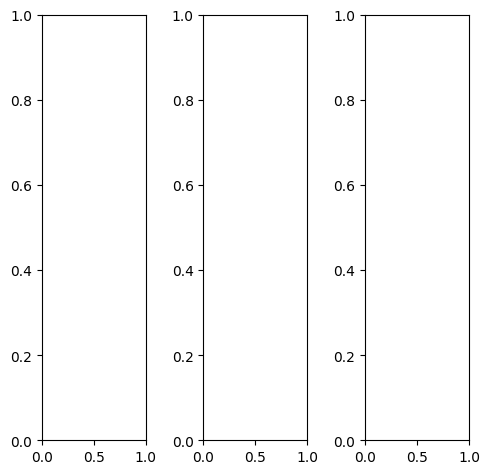

EPOCH: 34.454  trn_loss: 0.004  (4235.52s - 8057.71s remaining)

In [ ]:
model, optimizer, criterion = get_model()
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

_val_dl = DataLoader(val_ds, batch_size=1, shuffle=True)

n_epochs = 100
log = Report(n_epochs)
for ex in range(n_epochs):
    N = len(trn_dl)
    for bx, data in enumerate(trn_dl):
        loss = train_batch(model, data, optimizer, criterion)
        log.record(ex+(bx+1)/N, trn_loss=loss, end='\r')
        if (bx+1)%50 == 0:
            for _ in range(5):
                a,b = next(iter(_val_dl))
                _b = model(a)
                subplots([a[0], b[0], _b[0]], nc=3, figsize=(5,5))

    N = len(val_dl)
    for bx, data in enumerate(val_dl):
        loss = validate_batch(model, data, criterion)
        log.record(ex+(bx+1)/N, val_loss=loss, end='\r')

    exp_lr_scheduler.step()
    if (ex+1) % 5 == 0: log.report_avgs(ex+1)

    for _ in range(5):
        a,b = next(iter(_val_dl))
        _b = model(a)
        subplots([a[0], b[0], _b[0]], nc=3, figsize=(5,5))

log.plot(log=True)

In [ ]:
log.plot_epochs()